Importing dependencies 

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction import text
from sklearn.metrics.pairwise import cosine_similarity

Read the dataset

In [15]:
data = pd.read_csv('News.csv')
print(data.head())

       ID News Category                                              Title  \
0  N88753     lifestyle  The Brands Queen Elizabeth, Prince Charles, an...   
1  N45436          news    Walmart Slashes Prices on Last-Generation iPads   
2  N23144        health                      50 Worst Habits For Belly Fat   
3  N86255        health  Dispose of unwanted prescription drugs during ...   
4  N93187          news  The Cost of Trump's Aid Freeze in the Trenches...   

                                             Summary  
0  Shop the notebooks, jackets, and more that the...  
1  Apple's new iPad releases bring big deals on l...  
2  These seemingly harmless habits are holding yo...  
3                                                NaN  
4  Lt. Ivan Molchanets peeked over a parapet of s...  


Visualizing the dataset

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17],
 [Text(0, 0, 'sports'),
  Text(1, 0, 'news'),
  Text(2, 0, 'finance'),
  Text(3, 0, 'travel'),
  Text(4, 0, 'lifestyle'),
  Text(5, 0, 'video'),
  Text(6, 0, 'foodanddrink'),
  Text(7, 0, 'weather'),
  Text(8, 0, 'autos'),
  Text(9, 0, 'health'),
  Text(10, 0, 'tv'),
  Text(11, 0, 'music'),
  Text(12, 0, 'entertainment'),
  Text(13, 0, 'movies'),
  Text(14, 0, 'kids'),
  Text(15, 0, 'middleeast'),
  Text(16, 0, 'games'),
  Text(17, 0, 'northamerica')])

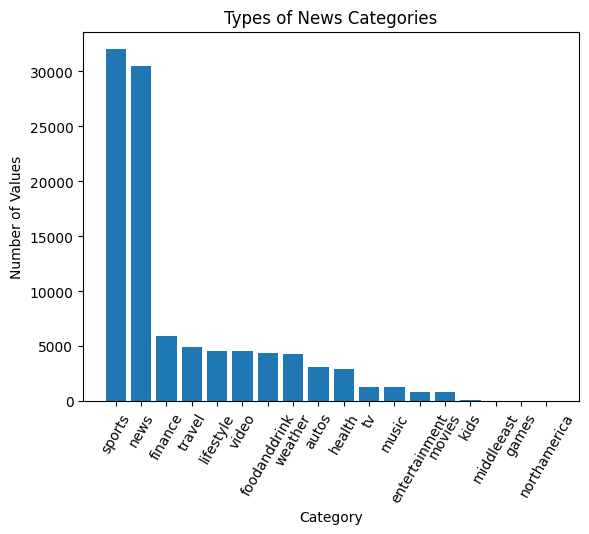

In [16]:
categories = data["News Category"].value_counts()
label = categories.index
count = categories.values


# Graph plotted using matplotlib
plt.bar(label, count)

plt.title('Types of News Categories')
plt.xlabel('Category')
plt.ylabel('Number of Values')

plt.xticks(rotation=60)


In [17]:
feature = data["Title"].tolist()
tfidf = text.TfidfVectorizer(input=feature, stop_words="english")
tfidf_matrix = tfidf.fit_transform(feature)
similarity = cosine_similarity(tfidf_matrix)

InvalidParameterError: The 'input' parameter of TfidfVectorizer must be a str among {'content', 'filename', 'file'}. Got ['The Brands Queen Elizabeth, Prince Charles, and Prince Philip Swear By', 'Walmart Slashes Prices on Last-Generation iPads', '50 Worst Habits For Belly Fat', "Dispose of unwanted prescription drugs during the DEA's Take Back Day", "The Cost of Trump's Aid Freeze in the Trenches of Ukraine's War", "I Was An NBA Wife. Here's How It Affected My Mental Health.", 'How to Get Rid of Skin Tags, According to a Dermatologist', 'Check Houston traffic map for current road conditions', 'Should NFL be able to fine players for criticizing officiating?', 'How to record your screen on Windows, macOS, iOS or Android', "It's been Orlando's hottest October ever so far, but cooler temperatures on the way", 'This Guy Altered His Diet and Training to Drop 65 Pounds and Pack on Muscle', 'Chile: Three die in supermarket fire amid protests', 'Best PS5 games: top PlayStation 5 titles to look forward to', "This Roasted Squash Panzanella Is the Perfect Way to Start This Year's Christmas Dinner", 'How to talk about your sex life with your partner', 'How to report weather-related closings, delays', '50 Foods You Should Never Eat, According to Health Experts', 'As Eagles take their bye, a look at how the defense has improved lately | Early Birds', 'Trying to Make a Ram 3500 as Quick as a Viper Requires Some Disassembly', 'My Corvette Moment? When I Took the Mighty ZR1 All the Way to 200 MPH', '25 Biggest Grocery Store Mistakes Making You Gain Weight', 'Rye football wins 2019 rendition of The Game, clobbers Harrison', 'Instagram Filters with Plastic Surgery-Inspired Effects Could Soon Disappear', 'Michigan apple recall: Nearly 2,300 crates could be contaminated with listeria', "Kate Middleton's Best Hairstyles Through the Years", 'Stars who got fired from major projects', "Newark Liberty Airport's Terminal One a $2.7 billion 'transformative' project", 'Is This The 2021 GMC Yukon Denali?', "How Hyundai's New, More Fuel-Efficient Engine Tech Called CVVD Works", 'John Dorsey admits talks with Washington, but it "takes two to tango"', 'Elijah Cummings to lie in state at US Capitol Thursday', "Michigan finally shows some fight, but can't seal the deal", '17 Abandoned Theme Parks to Explore for Thrills, Chills, and Nostalgia', 'Dog dies protecting Florida children from a deadly snake', 'Ford Bronco Test Mule Spotted Flexing Its Muscles in Australia', "Trump's Trustbusters Bring Microsoft Lessons to Big Tech Fight", 'PGA Tour winners', 'Nashville restaurants: Ms. Cheap rounds up lunch deals for $10 or less', '10 Things You Never Knew About Owls', '25 Last-Minute Ideas That Will Absolutely Save Your Holiday Dinner', 'The States Where Dogs Put the Biggest Bite on Insurance', 'Rutgers throws for 1 yard in 35-0 loss at Indiana', 'Every outfit Duchess Kate has worn in 2019', 'Top Halloween parties this weekend Oct. 24-27', 'New iPad Pro 2019 release date, price, news and leaks', 'Trump mulls executive order to add citizenship question to census: report', 'Puppy That Was Going to Be Abandoned Because of His Crooked Jaw Gets a New Home With British Prime Minister', 'These Simple Diet Changes Helped This Guy Lose 75 Pounds in 9 Months', 'Swanson Suspended Indefinitely For Broken Hand', 'Without help from US, UN climate fund struggles to meet goal', 'Best PS4 games 2019: play great PlayStation 4 games', "Open thread: Is Sunday's game a must win for the Lions?", 'The Biggest Mental and Physical Benefits of Working Out', 'A Place to Call Home: These adventurous siblings are ready for a forever family', 'The 23 Best TV Reboots of All Time', 'Netflix hackers: Why they steal passwords', 'How CrossFit injuries affect the shoulder', '10 dental scams that can bite you hard', '20 Must-Try Gravy Recipes for Your Thanksgiving Feast', 'A little snow causes a big mess, more than 100 crashes on Minnesota roads', 'Extinction Rebellion wins court challenge against London police', 'KMBC 9 Storytellers podcast takes you beyond the headlines', 'What Is A Psychological Astrologer', 'Body cam video shows the moments before an officer shoots a woman inside her home', 'LA rivalry takes on new meaning for fans as Lakers, Clippers in hunt for NBA championship', 'The $400 JBL Link 500 smart speaker is on sale for $150', 'Olympian Shawn Johnson shares big pregnancy news', 'Mom with schizophrenia, 6-year-old daughter missing in Queens', "What's your love language?", 'A 15-minute morning workout routine you can do anywhere', "5 Things You Probably Shouldn't Be Buying from Costco", 'Etiquette posters from the past century telling passengers how to behave on the London Underground go on display', "POWER RANKING: Here's who has the best chance of becoming the 2020 Democratic presidential nominee", '20 Touching Cousin Quotes That Sum up Your Lifelong Friendship', "ASK IRA: What's the next Heat step for Kendrick Nunn?", 'Today in History: November 2', "25 Photos of the Royal Family at Balmoral Castle, Queen Elizabeth's Favorite Home", 'Memorial unveiled in honor of 7 killed in Randolph motorcycle crash', "I'm Afraid to Tell My Male Bosses I'm Pregnant", 'These Cranberry Sauce Recipes Are Perfect for Thanksgiving Dinner', 'Phil Fulmer blasts NCAA after key Tennessee freshman denied eligibility', "Prince George's Royal Life in Photos", 'Colts News: Chris Ballard on first half of season, rookie development, trade deadline', '2021 Kia Sorento Drops Heavy Camo, Heads To Nürburgring [UPDATE]', 'Can you answer these real Jeopardy questions about TV shows?', "Randall's Rant: Is Tiger already the GOAT without 18 majors?", 'The 25 most desirable places to live in the US in 2019', "Stetson's Jalen Leary making big impact despite size", "40+ Stuffed Pasta Recipes You'll Want To Make Every Night", "13 Odd Questions You've Always Wanted to Ask Your Dog", 'This Stunning Weight-Loss Photo Will Inspire You to Curb Your Booze Consumption', 'How to Recharge, According to Your Zodiac Sign', "Bachelor's Amanda Stanton Is Dating 'Rich Kids of Beverly Hills' Star Brendan Fitzpatrick", 'Low Income Seniors At Risk Of Homelessness In Novato', "I'm Sorry, But Please Do Not Put Your Purse On My Couch", "East Hartford swimmer Chelsea Bailey has Down syndrome. She's also a blogger, singer and straight-A student.", "It's Not All About the Corgis - Here Are the Royal Family's Other Beloved Pets", '2020 Toyota Supra GT4 details announced, makes 429 horsepower', '21 Things No One Ever Tells You About Being a Step-Parent', "Tim Burton's Original Art Is on Display at the Neon Museum in Las Vegas", "16 Live-Action Disney Movies in the Works After 'Maleficent: Mistress of Evil' (Photos)", 'Tracker: Ryan Blaney has now finished in every possible position', "Can you really get banned from Amazon? Here's what you need to know", '100 Genius Tips that Will Make Your Holidays So Much Better', '10 Of The Best Horoscope Apps For People That Are Obsessed With The Stars', 'Matt Crafton likely to fill in for Paul Menard in relief role at Talladega', 'To Catch a Free Agent Catcher', 'Social Media says no to viral remix of the classic alphabet song', "What's new in Germany and the Low Countries for 2019", 'Millennials are killing purse sales and replacing them with backpacks', "Oklahoma AG Mike Hunter laid out plans for Marsy's Law week before it goes into effect", 'This Guy Reined in His Diet to Lose 30 Pounds and Get Shredded', "23 Things Car Dealerships Don't Want You To Know", "N'Kosi Perry set to start Saturday against Georgia Tech", 'Locked On Suns Wednesday: Suns blast Kings to begin 2019-20 season', 'watchOS 6.1 update release date, compatibility, news and features', 'Best Xbox One games 2019: awesome Xbox games to play', 'Delay in crane demolition leaves some disappointed', 'Hearty Pumpkin Pastas to Satisfy Your Comfort Food Cravings', '3 ways Halloween can pose an insurance risk', "TV shows we're most excited about for the rest of the year", 'Sunday/vent open thread', "Suspect takes off on foot after car chase turned crash on Cleveland's east side", 'The Democratic candidates who want to face Trump', 'The Absolute Best One-piece Bathing Suits of 2019', '40 Things I Wish I Could Tell My Younger Self', 'Why Is This Weird Chevy Colorado Test Mule Trolling Ford HQ?', '20 Words and Phrases You Had No Idea Were Coined in New York City', 'These VA, DC Universities Among Best In The World: U.S. News', "All of Kevin Harvick's Monster Energy Series victories", 'Best places to retire on the East Coast', 'PCC Community Markets Plans Its First Fast Casual Restaurant Inside New Ballard Store', 'Where to Find a Good, Cheap Sandwich in Every State', '16 major chains where you can buy plant-based versions of your fast-food favorites', 'Do You Hate Meditating? So Do These People, But They Do It Anyway', 'Millers Energy acquires longtime Hampton Roads competitor', "So far the World Series is one big reminder that you can't predict October baseball", '40 Celebrity Mothers and Daughters at the Same Age', "The Bachelor Live' is making a stop in Milwaukee", "UK's pre-Christmas election hopes to unwrap Brexit", "How one family's love of beer leads to Phoenix's newest brewery, Front Pourch", 'Eagles fans rooting guide for Week 7', 'The Top 50 Fast Food Restaurants in America', 'Take heart, millennials: Investing is within your reach', 'West Hartford dentist buys back Halloween candy to donate to troops', 'Viral anti-Trump moment costs woman her job', 'These 6 Zodiac Signs Are Guilty Of Being Totally Selfish', 'Rose Lavelle surprises girls soccer players in Loveland', 'Viral college football fan under fire for past offensive tweets', 'The Road Trip You Should Take, Based on Your Zodiac Sign', "Watch this priest perform a 'spirited' dance at pep rally", "Don't Be Like These Celebrities Convicted of Tax Evasion", 'The Ultimate Gift Registry Guide for Parents-to-Be', 'All eyes on Drew Brees as possibility of return nears', 'Restaurants to Satisfy Late Night Cravings in Louisville and Beyond', 'New York vs. Chicago: Which Destination is Best for Pizza?', 'The Weirdest Animals You Can Legally Own In The US', '8 Foundations That Actually Work For Acne-Prone Skin', "Mighty Quinn's latest MRI shows no new disease", 'Budget apartments for rent in Central City, Phoenix', 'The Trendiest Hairstyle the Year You Graduated From High School', 'Cutest photos of the royal Cambridge kids', "2021 Cadillac Escalade's Interior Spied for Real", "Veneno Roadster, One:1, One-77, LaFerrari, P1, Veyron headline 25-car Bonham's auction", 'Mayor Lori Lightfoot, former President Barack Obama meet about presidential center', 'Tom Shortell: Road Warrior: Do people actually follow the speed limit on Stefko Boulevard?', "46 Mismatched Nail Ideas You'll Want to Copy Immediately", 'In Photos: Flooding across the globe', 'Opponent QB Stat Tracker: Mason Rudolph', 'The News In Cartoons', 'More store closings coming: The list of retailers closing locations in 2019', 'Extreme Jeep Wrangler Prototype Caught Testing in Michigan', 'The Best Eco-friendly Vacation Destinations Around the World', 'Must-see biopics', 'Redskins place TE Jordan Reed on injured reserve, ending his season', 'Giants roster move: TE Garrett Dickerson waived, LB Devante Downs added to 53-man roster', 'NFL Week 9 Odds: Point Spreads, Betting Lines For All 14 Football Games', '2017 Lamborghini Huracan - Barely Legal', '27 products you only need to buy once in your life', 'U.S. attorney in Cleveland touts record number of drug, violent crime charges over past year', 'Ranking 26 fast-food fried-chicken sandwiches (including Popeyes)', 'Which state charges car buyers the least taxes & fees?', 'How Did All The British Royal Couples Meet?', '17 Surprising Ways Penny-Pinching Costs You More', 'UN report: Almost half of North Korea is malnourished', "The Fascinating Story Behind Where 'Hocus Pocus' Was Filmed", 'Kincade Fire: CAL FIRE says Sonoma County wildfire is now more than 74,000 acres, 15 percent contained', 'Early symptoms of dementia: Be aware of subtle signs', 'The best coffee grinders you can buy right now', 'Man killed in officer-involved shooting in St. Louis', '40 Etiquette Mistakes You Need to Stop Making by Age 40', "Anquan Boldin, remembered for Super Bowl heroics and 'huge' presence in locker room, community, retires as a Raven", 'Patriots vs. Ravens: 3 keys to the game, fun facts, prediction', '14 Celebs Over 50 Who Are In The Best Shape Of Their Lives', 'The Oldsmobile Toronado - was it the ultimate personal car?', "Flying while pregnant? Here's what you need to know", '25 Toys That the 1-Year-Old in Your Life Will Love', "Patriots' Kyle Van Noy amused over Sam Darnold 'seeing ghosts'", "With impeachment inquiry 'concerns' getting addressed, GOP have nowhere to go", '28 Surprisingly Good Costco, Walmart, and Target Products', "The 2020 Chevrolet C8 Corvette's Engine Computer is Tuner-Resistant? We Think Not", "Cleveland Cavaliers rookie Darius Garland 'couldn't sleep' ahead of his NBA debut, anxious to fulfill his lifelong dream", "Mercedes-AMG GLE 63 Coupe Spied Ripping Off Its Camo On The 'Ring", '8 Common Mistakes Tourists Make in Barcelona', '10 amazing animal sanctuaries in the U.S.', "17 Low-Impact Workouts You Should Try If You're Not In Your 20s Anymore", 'Your Kansas City-area forecast: Slight chance of rain, cooler temps Thursday', 'When royals lose their tempers, from the Queen to Kate Middleton', 'Plastic straw bans overturned by Florida lawmakers', '25 Hot Jobs That Pay More Than $100,000 a Year', "ASU women's basketball lands legacy commitment from Jaddan Simmons", "Can diversity, inclusion chief heal Fort Worth? Here's how candidates made their case", 'Dad in alien costume pranks daughter in hilarious video', "Queen Elizabeth's Cousin Says Royal Family 'Don't Communicate Very Well'", "Lamar Jackson watch: Where does Ravens QB's rushing performance vs. Bengals rank among NFL's all-time best?", "Cubs prospects Christopher and Rafael Morel: 'The Two Mushrooms'", '12 ways your skin can react to stress, according to a dermatologist', 'Ikea US president backpedals on meeting parents of children killed by recalled dressers', "Neil Young's Boring, Prophetic Message to Readers", 'Multi-vehicle accident on I-64 in James City County causes miles-long backup', 'US News: These NC Universities Are Among The Best In The World', 'Dissecting the softer, gentler Tiger Woods', '39 Appetizers for a Crowd That Are Easy and Unexpected', "How To Guess Someone's Zodiac Sign", 'Reaction Mixed After Brea Police Post Photo Poking Fun At Suspect In Santa Suit', 'What Men Find Attractive According To Their Zodiac Sign', 'Rams Week 8 snap count analysis', 'These College Friends Pledged To Stay In Touch---60 Years Later, They Still Do', 'Photos of College Football Cheerleaders', '5 reasons Gen Xers are struggling with retirement savings', 'The Most Important Things Fatherhood Has Taught Me About Being a Man', 'Where is Brandy Hall update: The torch is passed and a cold case heats up', 'Couples Are Planning Their Weddings Before Getting Engaged & Yes, It Works', 'Astros Crawfish Potluck: November 2nd, 2019', 'Fall Home Maintenance Checklist: 20 Things to Do Every Year', 'Study: Third-Hand Smoke Can Damage Your Lungs', 'Toad, Pasta and Other Unusual Names for Money Around the World', 'Everything you need to know about a Wisconsin fish boil', 'The surprising age differences between your favorite royal couples', 'Interstate Reopens In North Dakota Though No Travel Advised', "Patriots' Kyle Van Noy amused over Sam Darnold 'seeing ghosts'", 'BP profit beats as strong refining offsets lower oil price', "October is National Pizza Month: Here's where to score free, discounted pizza", 'Best website defacement monitoring service of 2019', "25 Dog Breeds That Don't Shed (That Much)", "Remembering Doris Day's Life in Quotes", '50 best (and worst) places to retire if you have no savings', 'How to Take Chicken Breasts From Frozen to Shredded in an Instant', 'Here are the lawmakers who are not seeking reelection to Congress in 2020', "Sounders vs. Real Salt Lake, talking points: Let's hear it for consistency", 'The Best Seafood Restaurant in All 50 States', '5 Foods That Can Actually Help Prevent Gray Hair', 'How much you must earn to be in the top 10% in your state', 'Ahad Israfil, gunshot wound survivor, dies', '19 Super Delicious Fall Soups Made From Scratch to Try Now (Including Pumpkin!)', 'Winter Storm Warning For Metro Denver, Boulder: Update', "Kanye West's 'Jesus is King' album still isn't here, fans aren't happy", 'Watch The New Corvette C8 Do 194 MPH In Top Speed Run', 'Alex Bregman and Anthony Rendon is a historically great third base World Series matchup', 'What Will Long-Term Care Cost You?', "Doug Schoen: Hillary vs. Trump in 2020? If Clinton is serious, here's best way for her to defeat the president", 'Titans force 4 turnovers by Winston, hold off Buccaneers', 'Largest-Ever Ford Mustang Parade Gathers 1,326 Ponies In One Place', 'Toddler found in pond is 3rd apparent child drowning in recent days', 'Amazon Says These Are Its Funniest Customer Reviews', 'Horsepower! The 1,500hp Hellcat King', 'Could a judge, cop or guard have stopped KCK shooting? Guns are the problem, some say', 'Soul-searching goes on for US after Canada shock', '6 Hacks For Making The Most of Tiny Studios & Dorm Rooms', 'Josh Gordon, New Patriots Receiver Mohamed Sanu Share Laugh At Practice', 'The Best and the Worst Time of the Year to Buy a New Car', "People Told My Daughter With a Disability She Wouldn't Be Able to Do Everything She Does Today", 'View from the Catwalks: Bloom to Boston?', '2021 Porsche Panamera Facelift Caught With Sneaky Camouflage', 'Will it be KU, KSU, another school? Blue-chip center Muscadin to announce on Nov. 1', "It's illegal to leave your pumpkins outside in Maricopa County", 'This is how much water you need to drink for weight loss', '30 Least Expensive Dog Breeds', 'The Elite, The Meh, and The Ugly - Rutgers', "The World's 30 Best Places to Visit in 2019-20", "5 takeaways from the 49ers' dominant win over the Panthers", 'The Best Things to Do in Maui  Without the Crowds', 'Cavs could put claim on Alfonzo McKinnie after surprising release from Warriors', 'Maryland police ID man killed in crash of semi hauling beer', "Another act of hate:' Greendale High School principal reports racist graffiti in bathroom", 'SMU star receiver out for game versus Memphis, coach says on College GameDay', "My husband paid me $15 an hour to be a stay-at-home mom. Here's what I learned.", "21 Creative Halloween Costumes We're Totally Stealing This Year", '23 Photos That Prove Cows Are Too Adorable for Words', 'American teenager Gauff reaches maiden WTA final in Linz', "UFC's Niko Price planning on legally soccer kicking someone from wheelbarrow position", "An avocado a day could lower your 'bad' cholesterol levels and reduce your risk of heart disease", "The Latest: House measure condemns Trump's Syria withdrawal", '22 Travel Habits That Scream "Tourist"', 'Police searching for thief stealing cars at Atlanta airport', "The Real Reason McDonald's Keeps the Filet-O-Fish on Their Menu", '29 Thanksgiving Menus That Will Make November So Much Easier', 'New BMW 4 Series Gran Coupe Spied For The First Time', 'You can now stay in a giant guitar-shaped hotel that you have to see to believe', "Princess Beatrice's fashion hits and misses over the years", 'Strong winds could lead to more wildfires in California', "Bratislava: Slovakia's capital makes a remarkable comeback", 'Blueberry Dump Cake Satisfies Every Sweet Tooth', "Those Grueling Workouts May Not Help You Lose Belly Fat, but Here's What Will", '2 the Rescue: Meet Chloe & Rusty', '7 Running Workouts for Weight Loss', "This is not normal': Sen. Manchin reacts to Vindman attacks", 'This Sony PS5 feature could end the PlayStation vs Xbox battle once and for all', 'St. Cloud Hospital births from Oct. 10-16', '50 Great Jobs for Retirees', '5 Incredible, Research-Backed Benefits of Having a Passion Outside Work', "Miami Dolphins' Jakeem Grant: What we're going through is most adversity I've ever faced", 'Grieder: Special election in House District 28 portends a deeply polarized 2020 election cycle', '9 members of American family killed in Mexico', "Hyundai's new Continuously Variable Valve Duration tech boosts both power and efficiency", 'Tennessee has deadliest year yet for drug overdoses, as nearby states improve', 'This Rare Albino Hedgehog Was Rescued In California', 'Here are the nominees for the Greenville News Athlete of the Week 8', 'Why more employers are helping workers pay off student loans', 'MN political commentator Amy Koch recovering after getting hit by SUV while walking in St. Paul', "I'm an American who moved to Canada here's why I'll never move back", '15 Everyday Habits of Great Dog Owners', 'The Top 25 Holiday Gifts For Women That Will Be Flying Off the Shelves in 2019', 'Mostly dry Friday and Saturday before heavy rain Sunday', 'Man accidentally shoots himself in front of Cleveland police officers', "China's leaders to hold key conclave next week", '10 Best Dry Rubs and Seasoning Mixes for Perfect Grilled Meals', 'The Hottest Home Décor Hues for Summer', '40 Things (Probably) Only Baby Boomers Will Remember', "Pirate' Ship Rescued By Cops In New York Harbor", 'Where to Get a Cheap Flu Shot: Walmart, CVS, Costco, and More', "It's National Check Your Meds Day", 'The 20 best horror games of all time', 'Undefeated New England Patriots rain on Cleveland Browns parade with final score of 27-13', "Perron's wrister is a lethal weapon for Blues", '5 Excellent Dividend Stocks to Buy for the Holiday Season', 'The most (and least) tax-friendly states for retirees', "The Eagles Soar and Perform 'Hotel California' For the First Time in Its Entirety in Las Vegas", 'Hobson Pike Bridge crash: Two killed after one driver crossed the center line into the path of another vehicle', "These 3 Rooms Display ALL of the Worst Decor Trends of the '90s, '00s, and '10s at Once", 'Sacramento police look for driver in deadly hit-and-run', 'How to avoid credit repair scams', 'Easy Savory and Sweet Recipes to Make With Fresh Cranberries', "From McDonald's Szechuan Sauce to the Popeyes' sandwich: 6 out-of-control fast-food menu launches that shook America to its core", 'Zozo Championship set for Monday finish as officials, players deal with torrential rain and brace for more', 'GM Spring Hill could ramp up output soon as union leaders laud stand in national strike', 'Astros have a lot of baseball left despite two bad losses to Nationals', 'How I Was Scammed When I Bought My First Car', '19 Things You Can Add to Your Home That Marie Kondo Would Approve Of', "Meghan Markle Loves These Beauty Products, And They're Surprisingly Affordable", 'Trump cancels plans to host G7 Summit at his Florida resort', "The Ultimate Visitor's Guide to Eating in Boston", 'Getty Fire: Evacuations And Closures', 'The 14 Worst Halloween Candies for Your Teeth', "Queen Elizabeth Once Trolled a Group of Tourists Who Didn't Recognize Her at Balmoral Castle", 'Detroit Lions were cheated out of a win vs. Green Bay Packers', "Lenape protest groundbreaking of Passaic's new Dundee Island Park, say it's 'sacred ground'", 'The Bugatti Chiron Super Sport 300+ Briefly Went Airborne During Its Record Run', 'Cincinnati vs UConn Football History', "Justice Dept. reverses course on census citizenship question after Trump's tweet", 'How to Spot Common Sneaky Foods That Contain Gluten', 'Your Fall Horoscope Forecast', "Dodgers' David Freese announces retirement after 11-year career", 'Bicyclist struck by train in Beverly; Delays on Newburyport/Rockport line', "CNN and MSNBC hit Ingraham guest for accusing White House official testifying in impeachment inquiry of 'espionage'", 'World No. 1, J.Y. Ko, returns to LPGA action this week in Shanghai', 'Passive house in Roxbury on sale for $750K', 'Nervous retirees are too scared to spend', "If These Spooky Quotes Don't Get You in the Halloween Mood, Nothing Will", 'Pulisic "in strong contention" to start at Burnley', "Trump says the Kurds 'are no angels' and the PKK are 'probably worse' than ISIS", 'Portion of I-90 reopened after two killed in head-on collision during OSP chase in Euclid', 'States With the Highest Property Taxes', "45 Sneaky Signs You're Unhealthier Than You May Think", 'Trailer - One Last Night', 'Pakistan PM reveals what he told Prince William at lunch', "Will the Chiefs make a move before Tuesday afternoon's trade deadline?", "Trolls Told Me I'm Too Ugly To Post Pics. Then I Did And Something Incredible Happened.", 'Want to retire and live in an RV full time? 8 things you need to know', 'Bare Knuckle Knockout! Watch Gabriel Gonzaga Whup Bigfoot Silva In Tampa', 'Chargers vs. Bears highlights | Week 8', 'De-committed from Auburn, Trenton Simpson visiting UNC Saturday, has decision timeline', "Wednesday's Mashup: Tom Brady tells Lamar Jackson he's a 'big fan' before loss to Ravens", '25 Things That Will Save You Money on a Used Car', '10 Job Skills Worth Six-Figure Salaries', 'The Fast and the Furious Director Rob Cohen Accused of Sexual Assault', '14 hilarious photos that prove Kate Middleton is just like us', 'Coco Gauff Makes History! Teen Becomes Youngest Tennis Player in 15 Years to Reach WTA Final', "Scanner Sounds: 'Those spotters need to pull their head out'", 'The Evolution of Maternity Style', '18 Electric Wiring Fails That Will Make You Wince', "Adrian Peterson had to 'hold back tears' in return to Minnesota", 'Up next for Michigan: a primetime visit from No. 8 Notre Dame', 'I Quit My Glamorous Corporate Job to Travel the World', 'Wolverines in the NFL: Top performances from Week 8', 'The Saddest Leafy Green', '20 Ways to Pay Less at Costco', "85-Year-Old Runner Who Keeps Racking Up Medals: 'It's My Job to Get People Moving'", 'Southwest flight attendant alleges pilots live streamed video from camera in lavatory', "The penthouse of NYC's Woolworth Building just got a $31 million price cut. Check out 'The Pinnacle,' which occupies the top 5 floors of the iconic, green-roofed skyscraper.", "Montrose Beach's Monty and Rose flew south for the winter, but governor declares Nov. 18 as Piping Plover Day", '12 Life-Changing Career Tips From Navy SEALs', 'Martin Truex Jr. through the years', 'Muskegon County intersection to be closed for hours after crash', "Embattled Texas House Speaker Dennis Bonnen won't seek re-election", "Train company's Quincy office irks Western Mass. lawmaker", '15 Arizona actors who made it to Broadway', "5 Turkey Cooking Tips That'll Guarantee You Have the Perfect Bird", "Adrian Peterson had to 'hold back tears' in return to Minnesota", 'Kyrie Irving drops 50 in debut for Nets, but comes up short in overtime loss to Timberwolves', 'These Room Divider Ideas Will Transform Your Home in an Instant', "Buttigieg: 'Not going to get in the middle' of Hillary Clinton attacks on Tulsi Gabbard", "I know he'll overcome this:' Kennard-Dale rallies around injured football player", 'All the Ways Brittany Runs a Marathon Starring Jillian Bell Shows the Reality of Weight Loss', 'ID of woman killed after car crashes into Springfield utility pole released', '3 teenagers dead in York County vehicle crash, State Police say', 'I quit my job, moved to Alaska to bake bread  and rebuilt my identity', '10 Turkey Sandwich Recipes for All Your Thanksgiving Leftovers', 'Suez says lead levels meet federal standards, but only when you round down', '6 gorgeous royal family heirlooms that Kate Middleton wears regularly', 'Power Rankings: Kyle Busch putting pieces together before favorable Round of 8', 'Former Cal Ripken Estate Is Back On The Market', 'Bucket truck rolls over on the Thruway, accident to be cleared before evening commute', 'What millennials get wrong about Social Security', 'Need the Perfect Last-Minute Gift? We Got You Covered', 'Never put these 7 things on your resume', 'Celebrities at their Hollywood hand and footprint ceremonies', 'Commuters help save woman who fell onto Buenos Aires subway tracks', 'Gorgeous Kitchen Cabinet Hardware Ideas for an Instant Upgrade', 'Wolverines in the NFL: Top performances from Week 8', 'Tanker truck bursts into flames following crash in Warren County', '25 Silent Signs Your House Is Falling Apart', "Zendaya, Nicole Kidman and More Best Dressed Stars at Elle's Women in Hollywood Event", 'Detroit Lions actively pursuing trade for running back', 'A question as the Cross-Bay Ferry returns: What do we get for the money?', '3 billion fewer birds are in North America now than in 1970', 'Man accused of hatchet attack charged with attempted murder', "We saw the AK in his hand': 4 hurt in random shootings at SC tire store, apartment", 'Weather today in Berkeley', '25-year-old killed in Arlington shooting, police say', "Scotland's majestic Isle of Skye", 'How Par Lindholm became a late-blooming Bruins contributor', 'Can You Gain Weight If You Don\'t Eat Enough? 3 Experts Explain "Starvation Mode"', 'You Need To Add These Beautiful Places To Your Travel Bucket List', 'How Costco and other bargain stores stay so cheap', 'The most famous automotive advertising slogans - US edition', '11 Phrases That Will Make You More Successful at Work', "These are best and worst stocks for the 'data era,' Morgan Stanley says", 'Did you know Amazon has coupons? This step-by-step guide will help you instantly save', 'Star Tracks: Celebs on Vacation', 'Nestor bringing heavy rain to Southeast, mid-Atlantic after spawning tornadoes in Florida', 'Sports on the air: Daily TV and radio schedule', "Unconditional belief' led to Michigan's best game of the season vs. Notre Dame", 'Adopt a Pet: Howard from Florida Little Dog Rescue', 'How retirees can make required minimum distributions pain free', 'Star Tracks: Celebs at Home', "Following Trump's endorsement, Spicer has emotional night on 'Dancing With the Star'", "Eric Shawn: 'A fantastic day for freedom'", 'Chevy Equinox Discounted Up To 20 Percent In November', 'Careflight responds to multi-vehicle crash in Butler County', 'The Most Iconic Short Wedding Dresses of All Time And How to Get the Look', 'José José, Legendary Mexican Singer, Dead at 71', '14 Wild Dog And Cat Species That Are Amazingly Rare', 'How to make hot chocolate so rich it coats your spoon', "Liberty not renewing Katie Smith's contract", '60 Things No Spouse Ever Wants to Hear', "Redskins Rumors: If Bruce Allen won't pick up the phone to trade Trent Williams, the Browns could go shopping for a LT in the NFC East", 'Where Do the Royals Reside? This Handy Guide Will Tell You Who Lives in Which Palace', 'Cheapest and Most Expensive States for Retirement', 'Latest Automotive Safety Recalls', 'How to negotiate a good deal on a new car', '50 Times Meghan Markle Has Broken Royal Protocol', 'Crews spray down Golden Ray cargo ship after white smoke billows out', 'The U.S. Army Is Developing a Better Bullet', 'Wrestling coach openings/changes for 2019-20 season (Updated 10/16/19)', "Heat suspend Dion Waiters one game for 'conduct detrimental to the team'", 'The Seaside Joe Newsletter', 'Connor Barwin: NFL retirement announced by former UC Bearcats standout', 'The best College GameDay signs from Memphis', '15 Abandoned Places That You Can See Only in Pictures', 'Border wall debate amid Mexican drug cartel murder of 9 US citizens', 'The 6 Big Retirement Mistakes  and One Way to Avoid Them', "Here's why small investors aren't buying the 'index funds bubble' argument", "The best water bottles in 2019 that'll make you want to drink more water", 'Matt Tifft will miss rest of season after suffering seizure at Martinsville', 'Best wireless routers 2019: the best routers for your home network', "A game changer': The downtown Phoenix Fry's grocery store is now open", "Here's when all 28 new Lifetime Christmas movies will air", '45 Dog Costumes That Get Your Pup In On the Halloween Fun', 'Your Biggest Appliance Questions, Answered', 'NFL rushing title likely to go down to the wire', '6 of the best and 6 of the worst movies released this year, so far', 'Do the Lakers have enough shooters to contend for an NBA title?', 'Voting by mail could come to D.C. under new bill', 'Trailer - Harriet', 'Most popular baby names in America', 'Execution-style murder in Iron Range woods draws life term for shooter', 'This Park In America Has Cacti So Big Birds Live In Them', "Katy Perry's biggest career moments", "Doing the Same Workout Over and Over May Be Why You're Not Losing Weight", 'NFL Rumors: Why Josh Gordon Fell Out Of Favor, Was Released By Patriots', '1988 Pontiac Fiero Transformed Into An Extreme Custom Supercar', "Monument Circle will become a big movie screen with lights Saturday. Here's how it works.", 'How to Revamp Your Fall Wardrobe on a Strict Budget', 'Stop saying this to single people', '15 Groundbreaking Female Rappers Who Changed The Industry', "We're on the brink of the first new treatment for Alzheimer's in almost two decades. Here's what you need to know.", "Ikea's smart button leaks with a tease of scenes to come", 'Jackson Twp. father, daughter saved by the belt', 'WaPo Reporter: Trump admin. cut funding to anti-corruption programs', "The 5 Hairstyles You'll See Everywhere This Fall", 'These Vegetarian Meal Ideas Are so Tasty (and Perfect for Christmastime)', 'The best hair metal bands', 'ACLU to announce lawsuit over treatment of inmates with mental illness', 'The Food Truck Everyone Is Obsessed With in Your State', 'Is Warren the presumptive Democratic frontrunner?', 'Athlete of the Week: Wendy Minn leads Lincoln High girls tennis into TCAL tournament', 'Humans will find alien life in the next 30 YEARS says the astronomer who won a Nobel Prize this week for finding hundreds of exoplanets', '30-Minute Skillet Chicken and Green Beans', "Public sessions set on plans for I-69 extension's final leg", "Sen. Sinema's new bill would allow families' names to be put on veterans' headstones, too", 'Check out these unique eateries formerly known as other things', 'Trailer - One Child Nation', 'Trailer - Rogue Warfare', 'WeWork set to sack 2,000 staff as anger toward founder Adam Neumann grows', 'Recap: Chargers claim victory over Bears', 'Watch funeral procession for Columbia Twp. firefighter Brett Wilson, who died helping crash victims, around 11:15 a.m.', 'These TV Stars Look Nothing Like Their Characters', 'Claire Makes Cherry Cobbler', 'Hartman: Hunter went from raw at LSU to a star with Vikings', "Home destroyed, but dishes left intact: Neighborhood hit hard by Dallas tornado one of the city's most exclusive", "Planned Ohio Medicaid work requirements call for case workers to contact recipients before they're cut off", 'Dallas-Fort Worth football teams undefeated through Week 8 of the 2019 season', 'I Quit Instagram For Three Months to Heal My Idiot Brain', 'Lowriders in Vegas! See Lowrider Photos From the 2019 Las Vegas Super Show', 'Why You Should Date Your Opposite Sign', 'Red Wings Recall Givani Smith', 'The Best Pre-Black Friday and Cyber Monday Deals of 2019', 'Bullock Museum hosts Halloween event Friday', 'Snakehead fish that survives on land was discovered in Georgia. Officials want it dead', 'Cocoa High Chorus fundraising in hopes to perform at Carnegie Hall', 'Knowing Your Birthday Color Can Be Just As Important As Your Zodiac Sign', "Louisville's own Jennifer Lawrence ties the knot in a private ceremony, reports say", 'How to Downsize Your Home: 12 Easy Tips', 'Major Link Soccer: Sergiño Dest picks United States', 'Fitness fanatic, 61, claims she looks better now than she did in her 30s - and says that the secret is eating MORE and doing weight training', 'Trailer - Gemini Man', "US policy collapses into catastrophe following Trump's whims", "Navigate this week's high school sports fall postseason game schedule, Oct. 28-Nov. 2", '5 Questions You Must Agree on For Your Relationship to Last', "The remarkable reason the Queen rejected Princess Beatrice's original name", 'Costco Is Going To Start Selling The Better Than Beef Burger', 'Why all the coastal flooding in Maryland lately? Tropical Storm Melissa is to blame, forecasters say', 'Governor Gavin Newsom calls for investigation into California gas prices', 'Nickelodeon Universe prices set to go up on the heels of American Dream mall opening', "Gabbard, in defiant video, links Clinton 'smears' to her previous Sanders endorsement", 'These Are The Oldest Universities In America', '20 job hunting tips for baby boomers', 'Elephant rescued from muddy swamp by villagers using fire hoses, tree trunk', 'Watch And Listen As This Camaro ZL1 1LE Goes 142 MPH In Half Mile', 'House Republicans try to force a vote on censuring Adam Schiff', "Knicks fall to Spurs after David Fizdale's starting lineup flops", 'NJ football scores: Week 5 scoreboard in Bergen, Passaic counties', "I Brushed My Teeth With Charcoal For 7 Days: Here's What My Mouth Looked Like By The End", 'Netflix expands its super cheap mobile-only subscriptions', 'Bob Ballard on quest to solve Amelia Earhart mystery', "17 Things You Didn't Know Mayonnaise Could Do", 'Suns Tuesdays: Mark Bryant grinding; Monty Williams right coach; Booker vs. Beverley; Josh Jackson in G-League', 'Jennifer Lopez Shares BEAUTIFUL Pics With Alex Rodriguez At Their Elegant Engagement Party!', 'What Is That White Stuff in My Raw Chicken?', 'The best Walmart Apple Watch deals in October 2019', 'Honor Flight Arizona begins flying Vietnam vets to DC', 'VERIFY: Can employers in Maine still test for Marijuana?', "Weekend's best bets, Nov. 2-3", '18 celebrity restaurants that failed', 'Our 73 Best Pie Recipes of All Time', '17 Reasons Why Your Breath Smells Bad', 'Water Main Break Sends Water Gushing Into Mt. Washington Funeral Home', 'Managing my stress is stressing me out. I found 9 ways to stop', 'The Latest: Mayor expects ruined hotel will be demolished', 'Meet SCAD, a Major Cause of Heart Attacks in Women 50 and Under', 'Watch: Man Shares Time-Lapse Video of Six-Month Weight-Loss Journey', 'British police investigating truck deaths arrest 2 more, driver still in custody', '86 Restaurants That Offer Birthday Freebies', 'Michigan college hockey power rankings: Rough start for most teams', 'Puppy adorably escapes pen to join doggy friends', 'From cat names to fruit, here are 11 bizarre things celebrities have tried to trademark', 'I lost my small business in the Great Recession but at least I learned how to prepare for the next one', 'The Drive: Can Michael Dickson fulfill the hype?', '30 Animal Facts That Will Change the Way You View the Animal Kingdom', 'Rare animals featured in Planet Earth, Our Planet, and other nature documentaries', 'Driver cut from burning fuel tanker escapes with minor injuries', 'Seahawks fear OL Justin Britt suffered torn ACL', 'Trailer - Midway', "Downtown Detroit shopping has new life decades after Hudson's, Crowley's heyday", 'How GM nearly invented the modern electric car', 'If You Have a Slow Metabolism, Here Are 5 Doctor-Approved Ways to Burn Belly Fat', '80 Old Items Fantastically Fit for Repurposing', 'The plan to close Rikers Island, explained', 'Iowa State, Breece Hall dominate second half to beat West Virginia', "Chicago's First Krispy Kreme in 14 Years Opens Today", '29 Elf on the Shelf Ideas Your Child Will Find Truly Magical', 'Child falls from 9th floor balcony in White Oak, Maryland, officials say', 'Watch: Devonta Freeman ejected for throwing punch at Aaron Donald', 'Local woman announces candidacy to become "United States President"', 'Tips for Getting a Mammogram', '1999 Nissan Skyline GT-R V-Spec (R34) - The Legend Continues', 'Tour the abandoned Outlaw House with an FBI connection', "Here's what history says about Astros' chances of World Series comeback against Nationals", 'Chiefs vs. Broncos: Five questions with the enemy', "For cancer survivor, annual Southwest Ohio walk is 'big family event for us'", "President Trump's trillion-dollar hit to homeowners", 'This Might Be the 2020 Land Rover Defender', 'The Most Popular Order at Every Fast Food Restaurant', 'Best of NFL Week 8 on Twitter: Fan eats bag of spaghetti at game, Odell Beckham Jr. gives Tom Brady his cleats', "Here's how to take over an auto lease", "Three takeaways from Maryland football's 34-28 loss to Indiana", '10 Things Women Need To Stop Feeling So Guilty About', 'Doctors Want FDA To Warn Women About Cheese And Breast Cancer Link', 'The Week In Games: Busting Makes Luigi Feel Good', 'The best fall day trip in every state', '50 Incredible Photos of the Swedish Royal Family Through the Years', "Exploring Chevy's First Big-Block in an Idaho Junkyard", 'Ultra-Luxe Bridal Shower Hostess Gift Ideas', 'WBZ News Update For October 12', "These are the best o' the best PC games available today", "Crockett Row adds 2 bar-restaurants, but also hooks a big one: Dallas' The Blue Fish", 'Bicyclist killed in Jefferson Parish car crash', "Maryland's Senate leader expected to discuss health, future", 'Ann Patchett spins a dark, compelling fairy tale in The Dutch House', '17 Easy Fall Slow-Cooker Recipes That Taste Like Autumn', 'How to Clean Window Screens Like a Pro', 'Graphic new information revealed during hearing for suspended Greenville County Sheriff Will Lewis', "Facebook's Libra copies old ideas and exhibits hubris", "How Harbaugh's 1st Michigan QB recruit ended up on other team", 'Gunshots Lead To A Police Pursuit And Car Crash In Homewood', '32 Best Good-Mood Foods', 'Apple pulls HomePod update following reports of bricked speakers', 'Stubborn husky loudly argues back after being denied outdoor time', 'Piaggio Brings Autonomous Mobility To Everyone', "Warriors' D'Angelo Russell ejected from Thunder game", "Souping': Should you try it?", 'The Best Dishes the Eater Boston Team Ate This Week', 'The Long, Hard Road: Find all of our stories in the yearlong series here', "Grandfather charged in fatal child's fall", 'Kentucky football: Lynn Bowden to start at QB vs. Arkansas', 'Barneys Fires Longtime Freds Chef After He Talked Trash to the Post', '5 ways to enjoy your week in Nashville', 'This Bride Got a Wedding Redo After Losing 100 Pounds', 'Grocery delivery man who tipped the scales at 520 lbs loses a whopping 300 LBS by buying the same food as his fitter customers - and carrying their bags up flights of stairs', "Former Trump advisor John Bolton's lawyers are in contact with impeachment probe panels", "21 adorable photos of dogs cuddling tigers, ducks, and other animals that prove they're not just man's best friend", 'The Action Network: Early pick with best value for Kansas', 'Bernie Sanders slams GOP for not standing up to Trump', 'Mid-Engined Chevy Corvette Rear End Design Possibly Leaked', '2021 BMW iNEXT Spied Looking Almost Production Ready', 'NFL Picks Against the Spread: Week 7 Games', "Now That I'm Over 50, I'm Finally Sucking It Up And Getting In Shape", 'FIA to review placement of barrier that irked Bottas', "Downtown Dayton McDonald's reopens after renovations", 'How To Reach Out If Your Friend Is Struggling With Their Mental Health', 'What channel is NASCAR on today? Time, TV schedule for Kansas race', 'WATCH: Gardner Minshew finds WR DJ Chark for third touchdown of the day', 'Cooking advice you should never believe', "Fighting ISIS from the sky: 'Jet Girl' reflects on flying Navy's most lethal aircraft", 'Factory Explosion Shoots Metal Drum Into the Sky', "All the Things You Didn't Know About 'The Crown'", 'The Problematic Politics Of Style And Gender Identity In The Workplace', 'How To Make 800 hp With a $163 eBay Turbo.', 'Exclusive: our favorite All-Clad cookware is up to 70% off right now', 'Iowa native, veteran MLB umpire Eric Cooper dead at 52', 'Mercedes-Benz S-Class Spied With Less Camo', 'Trailer - Terminator: Dark Fate', 'Kincade fire burning the length of a football field every 3 seconds in Northern California', 'Texas man loses over 200 pounds to become a deputy', '15 of the Most Unique Restaurants Around the World', 'Mets Morning News for October 20, 2019', "How WeChat put the internet in China's hands", 'Nearly half of millennials have been in debt for their pet', '9 Amazing Transgender Women Who Changed History', 'How rigorous is the safety inspection system for amusement rides in N.J.?', 'Trailer - Greener Grass', 'Volkswagen postpones final decision on Turkey plant', "Warriors' Russell ejected for going after official", 'National Weather Service To Visit Madison, NJ', 'Large tree falls, blocks at least two roads during morning commute', 'Ashley Graham rocked the red carpet in a sheer maternity dress with a black leotard underneath', '2020 Mercedes GLE Coupe Seen With Minimal Camo, Reveal Coming Soon?', 'New cars and trucks: Vehicle ownership costs reach new high, AAA finds', "Women's mental health improves after giving up alcohol, study finds", 'Thousands Get Out To Raise Awareness For Autism', 'Pa. Game Commission Warns Hunters To Take Precautions Against Potentially Fatal EEE Virus', "Winter Storm Alfred's snows started falling 8 years ago today", 'Medford Police Warn Honda Accord Owners About Thieves Stealing Air Bags', '49ers Shutout Redskins 9-0 In Ugly Offensive Showing', "13 Extinct Animals We've Lost in the Last 150 Years", '33 Things People May Say If They Want to Cheat', "Broncos Film Study, part 1: The 'ugly' Joe Flacco on third down", 'Former Top State Dept. Aide Tells Impeachment Investigators He Quit Over Ukraine', 'Everything you need to know on the Shanahan/Snyder "feud"', 'Want to make Your Wife Swoon? Then Get Her One of These Gifts', 'This Is Your Body On CBD', 'The easiest way to clean your microwave', 'Walmart will take on Amazon with discounted third-party products', 'Mom of 2 says rats are roaming around rental home; family forced to sleep in car', 'Crunching the Numbers: Playing the Colts, games with narrow spreads, and quality of opponents', 'How to Set Up and Use a Fighting Chair', 'Democrat Beshear is apparent winner in Kentucky governor race', 'People Are So Excited About This Polka-Dotted Zebra Baby', '10 Hair Myths You Should Get Out of Your Head', "I Rehomed My Dog And I Don't Regret It", 'The best student laptops: all the best options for school', 'Rare mosquito virus EEE kills person in Elkhart County, Indiana', 'Local Ballot Questions for Election Day 2019', 'Nolita Ristorante in East Hartford pays over $19,500 in back wages following Department of Labor investigation', "Stowaway Discovered in Couple's Carry-On Luggage", '9 Abandoned Mansions That Will Make Your Toes Curl', "Fans line up for this Phoenix brewery's limited releases. Meet the man behind the beer", 'Loudoun United reflects on "hell of a ride" in 1st season', 'The used Ford GTs are coming', "ISIS is the biggest beneficiary': Graham lashes out at Trump over Syria withdrawal", 'How sun exposure can affect your microbiome', 'Five thoughts on Atlanta United surviving and advancing past New England Revolution', '8 Philly-area cabins to rent this winter', 'David Ross might shake up the Cubs coaching staff. Who should he hire as bench coach?', 'Pollution around the world: 30 shocking photos', 'How Every Zodiac Sign Handles A Breakup', 'China says postal fees to rise after US complaint', 'Flood warning issued for parts of Massachusetts Sunday evening', "Chalk Talk: Breaking Down the 2020 NFL Draft's top QB prospects", 'Restored 1930 Ford Model A Is Not Junk, Nebraska Man Insists, but the State Disagrees', "So you want to try intermittent fasting. Here's how to do it.", '75 Restaurants Where You Can Eat for Free on Your Birthday', '3 Most Common Vitamin Deficiencies', "Here's how much your state makes from taxes", 'Tagovailoa, No. 1 Tide roll past No. 24 Texas A&M', "Avoid speed traps: Google Maps on iPhone finally gets Waze's most controversial feature", 'Original Delta Airlines Flight Attendant Dies at 103', 'As pitch-tipping paranoia lingers, Astros and Nationals will have their eyes on each other in World Series', 'Insider: With NFL trade deadline looming, Colts could look to bolster pass rush', 'Facelifted Volkswagen Atlas Spied For The First Time', '12 Shed Storage Ideas to Organize Your Space At Last', 'Dayton school board approves Dickstein hire after debate', 'Lebanon protests enter second week', 'Surprising reasons Florida has the best bargains on homes', 'One Lifestyle Change Helped This Woman Reverse Her Hair Loss', '11 of the Most Expensive Restaurants in America', 'The Best Beauty Tools of 2019', 'Indonesia says scrapping plans to close Komodo island', '105 Most Popular Sodas Ranked by How Toxic They Are', "Voice' fans love heartthrob who looks like 'combination of Tom Cruise and Christian Bale'", "How Each Zodiac Sign Knows They've Found Their Soulmate", "Bay Briefing: 240 votes: SF's district attorney race too close to call", '2021 Chevy Equinox Caught In The Death Valley', 'What Do You Really Get When You Buy Organic?', 'The Best Canned Tomatoes: Which Brands Taste Superior?', 'Tua Tagovailoa leads Alabama past Texas A&M', "Price for Darius Slay 'incredibly high,' reporter doesn't see deal happening", "Kirk Cousins started Minnesota Vikings' surge with an apology; Detroit Lions loom", 'Man dies following boating accident in Indiana reservoir', "Kelly Ripa responds to backlash over son in 'extreme poverty' joke", 'Boy With No Legs Goes Viral After Video of Him Skateboarding is Shared by Tony Hawk', "20 Things You're Probably Doing That Nurses Wouldn't", 'Remembering Rep. Elijah Cummings, Atatiana Jefferson: 5 things to know Thursday', "Matt Lauer accuser Brooke Nevils calls his response 'victim blaming'", 'How This Guy Built Muscle and Got Shredded in His 40s on a Plant-Based Diet', 'Carlos Correa took clever swipe at Yankees after ALCS victory', "Vinny Guadagnino Shows Crazy Abs  and Tan!  in New Keto Diet 'After' Pic", 'There are two Pa. statewide contested votes in 2019 - and one might end up not counting', "Report: Brown's grievance against Raiders hindered by text messages", "Here's What Malls Looked Like Back in the '50s", 'Atlantic City to transfer power amid corruption - yet again', 'Today in History: November 3', 'Maria Fire broke out minutes after utility company re-energized high-voltage power line', 'How millennials are changing banking', "It's Always Summer on These 25 Secret Islands", 'Rains bring floods to parts of Western Washington', 'Body of missing kayaker found at western Iowa state park north of Omaha', 'Microsoft Tops Estimates as Azure Reports 59% Jump in Revenue', '10 things to know about the tiny house trend in the US and SC', "From Toto to Lassie, here are the world's most famous dogs", 'Hara Arena rezoning delayed as city considers what to allow there', "Queen Elizabeth's Favorite Beauty Products Have Stood the Test of Time", 'Mount Vernon Hospital to close, new $41 million health care facility planned', "Michael Douglas Shares His and Catherine Zeta-Jones' First-Time Grandparent Nicknames", 'Is Lemon Water Healthy?', 'I Was 24 & Had Just Scored My Dream Job In Fashion. Then An Accident In The Hamptons Changed Everything.', 'Giancarlo Stanton asked for this', 'I Overate at Dinner Until I Started Doing This 1 Simple Thing on Sundays (It Takes 10 Minutes!)', 'What Do Prince George & Princess Charlotte Know About Their Royal Roles?', 'Houstonian (and Boondock Saint) Sean Patrick Flanery comes home for Fandemic', 'A modern family: 20-plus sperm donor siblings find each other', "I Tried Halle Berry's Infamous Fitness Friday Core Workout, and My Abs Wouldn't Stop Shaking", "Here's How Mark Wahlberg's Training for His New Movie 'Infinite'", "America's Best Cheap Eats: 50 Meals Under $10", 'Home prices rise at slow pace for second straight month', "Renting in Orlando: What's the cheapest apartment available right now?", 'Clashing Protestors Get Heated Over Confederate Memorial', 'The 2020 Ducati Multistrada 1260 S Grand Tour Is Ready For Anything', 'How This Former Football Player Dropped 60 Pounds While Maintaining Muscle', "Secrets of the world's richest company of all time", 'Patriots Clearly Have High Hopes For Two Undrafted Rookie Receivers', 'Man taken into custody after SWAT situation at large Milton home', 'The migrant caravans: A common road toward different fates', 'Double shooting reported in Gentilly Terrace', 'Treat Yourself: 16 Cars That Are Worth the Splurge', 'Cooling a Mighty Big-Block Chevy is Easier Than You Think', 'Matsuyama (65) ties for third in Skins tune-up; Day T-31', 'Inside the Weird World of Restaurant Critics', 'Apartments for rent in Washington: What will $3,700 get you?', 'Denver Broncos quarterback Joe Flacco voices frustration after loss to Colts', 'Podcast: What the Steelers need to do as a team to make the playoffs', 'How Libertarianism Makes People Susceptible To Huge Government', "Toys 'R' Us Is (Almost) Back  With an 'Immersive' Play Experience", "Jennifer Lopez's New Haircut Will Convince You to Go Short for Fall", 'How To Chop An Onion Quickly, Safely + Evenly Using a Hair Pick', 'Taste test: The top store-bought chocolate chip cookies, ranked', 'Lori Loughlin faces moment of truth in college admissions scandal as daughters exit USC', "Edmonds runs for 3 TDs, Cards top Giants in Barkley's return", 'Microsoft Earnings: MSFT Stock Wavers on Q1 Earnings', "Meghan Markle Always Stands the Exact Same Way at Events and There's a Specific Reason Why", '7 pricing tricks that make you overspend', 'Founders Brewing closes Detroit taproom indefinitely amid racial discrimination lawsuit', "Celebs who've been kicked off planes or sparked airport drama", '15-year-old killed in suspected DUI crash in Placer County, CHP says', "The Bear's Den, October 24, 2019", '15 Dogs You Probably Never Realized Originated in Germany', '2020 Honda CR-V Facelift Spied For The First Time', 'Public-school teachers reveal the 7 hardest things about their job', 'Trump scraps plan to host G-7 at his Doral golf resort', 'So Fetch: See the Cast of Mean Girls Then & Now', 'New details emerging on raid that led to death of ISIS leader al-Baghdadi', 'Lexus LS Hydrogen Fuel Cell Prototype Spied Testing, Coming Soon', "St. Mary's beats Bulldogs for third straight victory", 'How To Raise An Upstander', 'Kansas City woman uses personal journey to help other victims of sex trafficking', "It's Time For The United States To Wage War On Mexican Drug Cartels", 'Bugatti Veyron Grand Sport Vitesse Video: Touring Miami in a Crazy-Fast Convertible', 'Abandoned Subaru Dealer Adds More Cars, Including An Audi 80', 'School bus driver encourages her riders to stay positive', 'Is the World Economy Sliding Into First Recession Since 2009?', 'Ask The Salty Waitress: The cashier is texting instead of ringing up my order', 'Patriots cut QB Cody Kessler in flurry of roster moves', 'Quick Reaction: Colts takeover AFC South lead by defeating Texans 30-23', "Blacklisted' Kathy Griffin Says No Regrets Over Lookalike Severed Trump Head", 'This couple fought $25,000 in fraudulent credit-card charges after falling prey to identity theft  then things got even worse', "Biden Says He Opposed Iraq War Effort 'Immediately,' Despite Multiple Public Remarks Supporting It", '2 people die when car collides with Michigan school bus', 'Buyers beware of Imelda-flooded cars hitting market, Texas insurance department warns', "The 'Man in Blue'? Sheriff donates Johnny Cash deputy photo", 'ArcBest past on display in Fort Smith Museum of History', '2021 Hyundai Tucson Spied With Less Camo To Reveal New Front Fascia', 'Amazon is shipping expired baby formula and beef jerky, putting big brands at risk', "Bellator President Scott Coker: Rory MacDonald's contract not expired", 'Newlyweds look on in horror as the table holding their three-tier wedding cake collapses and the $550 creation topples to the floor', 'Watch: Michael Porter Jr. posts another strong performance', 'Daniel Jones throws four touchdown passes, but Giants suffer fourth straight loss', '20 sales tactics that trick you into spending', 'Non-religious motives propel home schooling boom in Western North Carolina', 'Hotel vs. Airbnb rental: CNN Travel editors debate which is better', "Funny Viral Videos Show Embarrassing Dad Running Next To Daughter's Train as she Heads to College", "Dantonio scoffs at 'dumb--- question' about Michigan State's offensive staff", "This new Tampa Heights restaurant is a 'love letter' to one Italian family", 'Chicago Weather: Shower Chances Through Wednesday Evening', 'A Few Tweaks to His Diet Helped This Guy Get Ripped in His Forties', "Brad! Keanu! Liam! Meet Hollywood's Most Eligible Bachelors", 'Should you move to Washington, D.C.?', "Today's weather in Pittsburgh", '12 Best SUV Lease Deals for October', 'Chiefs final injury report vs. Broncos: Sammy Watkins ruled out, Bashaud Breeland questionable', 'Jazz 100, Thunder 95: Shai Gilgeous-Alexander scores career-high 26 points, but OKC loses opener', 'The migrant caravans: She misses home and prays not to be sent back', 'Tanker truck burst into flames after Warren County crash', '2 years ago, the Astros won an insane Game 5 against the Dodgers in the World Series', '30 Healthy Habits Fit People Live By', "Old Saybrook  Katharine Hepburn's paradise of art and nature", '5 Reasons Destin Is a Great Family Vacation Destination', 'Pythons or pigs? Kemp and DeSantis place unusual Georgia-Florida bet', 'Why I Love Going to Bars Alone', "2020 Land Rover Defender Caught Making Final 'Ring Rounds", 'Chefs Reveal the 14 Unexpected Items That Taste Better Refrigerated', 'The PC gaming moments which have most wowed us in the last 30 years', 'Watch: Texas Tech robbed of turnover by horrible illegal snap penalty', 'Blazers coach Terry Stotts backs Daryl Morey over Hong Kong tweet', "Can't-Miss Play: Marquez Valdes-Scantling torches Raiders' D for 74-yard TD catch and run", "Bengals notebook: Cordy Glenn's return, Carlos Dunlap 'day to day'", 'NFL Cheerleaders', 'The "$100,000 Engine" in Johnny Tran\'s S2000 Was Really Only Worth $8000', '12 Best Car Deals This October', "Vince Young to Marcus Mariota: 'When you get the starting position back don't give it back!!'", 'Kincade Fire: Latest on the Sonoma County Wildfires', "How to improve Tennessee's student debt situation", 'The best free PC optimization software 2019: speed up your PC quickly and easily', 'Ferrari F8 Spider Looks Right At Home At High-End London Dealer', '20 Companies That Let You Bring Your Dog to Work', 'GIRLS VOLLEYBALL: Burrillville wins showdown against Portsmouth', "12 Photos Show What It's Really Like To Grow Up Trans", 'Did my cosmetic veneers come out right?', '17 Secret Waiter Tricks That Diners Never Notice', 'No goals, no fans, no TV: Koreas draw 0-0 in blacked-out World Cup qualifier', "Jaguars troll Sam Darnold with 'Ghostbusters' theme", "Should Kentucky basketball be worried about EJ Montgomery's preseason play?", 'This Guy Overcame Multiple Setbacks to Lose 50 Pounds and Get Shredded', "These Black Dog Breeds Are So Cute, You Won't Mind Cleaning Up Their Fur", "46-Year-Old Woman Gives Birth a Day After Finding Out She's Pregnant", '10th Anniversary of "Swine and Stein" Beerfest held in downtown Gardiner', 'Police investigating deadly shooting on West Side', "WFAN's Mike Francesa rips Giants-Jets Leonard Williams trade | 'What are you doing?'", 'After further review: Play-calling and execution are hurting the Dallas Cowboys', "The question after Sunday's 27-17 loss: When will the win come for the Cincinnati Bengals?", "Here's everything you need to know about the Winter Woods Spectacular in Louisville", "Plant-based milk: Most young children shouldn't drink it, new health guidelines say", 'Your Most Toxic Personality Trait, Based on Your Myers Briggs Type', 'Hotels near Orlando International Airport see growth in pursuit of business travelers', "Panthers' Mario Addison to miss game while mourning brother's death", "Plane's Landing Gear Collapses At Miami Executive Airport", 'Newsletter: The particular schadenfreude of sentencing in the college admissions scam', 'Diver defends himself from attack by great white shark', '2020 Chevy Corvette Quarter-Mile Stats Leaked, Goes 11.3 At 121 MPH', 'Salah misses Liverpool trip to Man Utd, Alisson returns', 'Does It Matter How Much Meat You Eat?', '8 Inspiring Quotes to Help You Get Over a Toxic Relationship', "Lions latest victims of NFL's flag football problem", 'Chase Elliott hampered by car trouble in Round of 8 opener', "A no-confidence vote would have hurt Phoenix's police union as much as Chief Williams", 'Xiaomi announces 108-megapixel Mi Note 10 for outside China', "Pasta Water: Here's Why Rachael Swears By This Ingredient", 'Some of the Best Tacos in Texas Hill Country Are on a Sleepy Road Outside San Antonio', "Spread Bagelry's Newest Shop Is Designed to Look Like a Train Station", 'Singer Allison Moorer\'s memoir "Blood," on the legacy of her parents\' murder-suicide', 'Golden Nuggets: Back in Gameday Mode, Looking at OSU', 'Ravens vs. Seahawks: Open Thread', "The Navy's Growler jets bring noise to a quiet place: Olympic National Park", 'ON THE GUN: Browning X-Bolt Max Long Range', 'Must See! Drone Footage Shows Curious Shark Approaching Surfer!', 'The 40 Most Extreme Animals on the Planet', "6 hotels with incredible design from above  and how to get your own personal bird's-eye view", 'Cowboys News: One year after the trade, Amari Cooper continues to prove the Cowboys right', 'Semi truck driver swerves to miss deer, crashed on I-40', 'Buy this Camaro V8 muscle car and meet its Top Gear owner', 'The Hidden Risks of Used Cars', "UH redshirt tracker: Who's sitting so far, others on way", 'ABC7 Celebrates Latino Heritage Month 2019', 'Dayton airport doubles number of charter passengers since 2015', 'Beloved dog passes away minutes after owner dies of cancer', "Top Defense Republican: Trump's Vivid Statement On Baghdadi 'A Little Uncomfortable'", "Mississippi voters tout Trump's economic success", 'Even 2 Minutes of Exercise a Week May Lessen Risk of Dementia', 'The One-Word Mantra You Need This Thanksgiving, Based on Your Zodiac Sign', "My family's from Guam  here's why I think it's an underrated US travel destination", 'Weight-Loss Tips That Work From a Viewer Who Lost 250 Pounds', '14 action-packed shows that deserve a spot on your must-watch list', "Cody Simpson gushes over Miley Cyrus: 'We are very, very happy'", 'New River Rock Bar & Grille now hiring, gearing up to open along Great Miami', 'Nike announces Kyrie 5, SpongeBob SquarePants collaboration restock, new release', 'Rutgers officially a home underdog vs. Liberty: Are Scarlet Knights on verge of most expensive loss ever?', "Newark Airport's New Terminal Project Passes Major Milestone", "Everything we know about Google Stadia: release date, 4K resolution, and the sold out Founder's Editions", 'PG&E restores power to 165K customers after windy conditions subside', 'Patriots will be down a tight end vs. Ravens', 'Carter House to unveil memorial for 4-legged friend in Battle of Franklin', 'Microsoft, Tesla, Ford, Amazon and Intel - 5 Things You Must Know', "What Nixon's impeachment saga teaches us about Trump's", 'The 15 Best CBD Vape Pens', '2021 Ford F-150 Spied Towing A Trailer Over The Rocky Mountains', 'Memorials for Tree of Life victims established abroad', "7 Things That Prove Cheaper Isn't Always Better", '25 Ways to Double Your Paycheck in 1 Month', 'After months on the loose, an elusive emu has finally been spotted in North Carolina', 'Support drops for Medicare for All but increases for public option', 'WATCH: A.J. Bouye, Tre Herndon snag fourth quarter picks vs. Jets', "Flight Attendant on Why Passengers Shouldn't Order Coffee", 'This Is How Chelsea Lost 35 Pounds and Built Muscle After Having Reconstructive Hip Surgery', 'Your Favorite Halloween Candy Based on Your Zodiac Sign', "Sweden's Princess Madeleine Reacts to Her Kids' Royal Titles Being Removed: 'I Think It's Good'", 'What can the Wizards expect from Rui Hachimura?', 'Ten Thoughts on the NFL and the Bears', "WFAN's Mike Francesa trashes Pat Shurmur, Giants for 'sickening' loss to Cardinals: 'They are complete losers'", 'Magic vs. Cavs Preview: Magic basketball is finally back', 'Where to get a flu shot: Walmart, CVS, Walgreens and more', '14 Unexpected Items That These Chefs Never Refrigerate', "There's Gold in the White Sox infield", "Michigan football's blowout win more about just how bad Maryland is right now", 'Ricky Stenhouse Jr. to drive for JTG Daugherty Racing in 2020', 'How a Philly area retailer finds sales success in physical storefronts', "Don't Miss These Under-the-Radar Restaurants in Every State", 'Ramsey promises Rams no holdout', 'Where to celebrate National Dessert Day 2019 in Philadelphia', 'Steve Phillips Previews Game 6 of the World Series', 'These 13 Women Battled Workplace Discrimination  and Won', 'Aaron Judge will want that one back', 'Democratic debate, impeachment inquiry deadlines: 5 things to know Tuesday', "Farkas: 'The Kurds think that we've betrayed them for oil.'", 'What Patriots Players Said To Josh Gordon On Instagram After Seahawks Claimed WR', 'Clutch in the playoffs: Drivers who won in critical situations', "I Tested Positive for the Alzheimer's Gene at Age 26", '20 Halloween Costumes You Can Get Away with Wearing at the Office', "Grocery shopping mistakes you don't want to make", 'Dog perplexed by stuffed animal lookalike', '49ers vs. Rams: 3 key matchups in NFC West showdown', 'NFL Power Rankings: Rodgers looks like a legit MVP, as the Eagles have serious problems.', 'New Snowstorm Hits Denver Area, But Not Many Schools Close', 'Police investigating suspicious death in Winston-Salem', 'Michael Bennett Sounds Off On Suspension, Trade Rumors, Role With Patriots', 'The 8 Best Storage Cubes for All Your Organizing Needs, According to Thousands of Customers', '23 Genius Home Improvement Projects You Can Do in an Hour (or Less!)', 'Wright State provost taking over some presidential duties', 'Newman returns, helps No. 23 Wake Forest top NC State 44-10', "Simsbury police chief recommends firing sergeant for 'malicious gossip' and 'lack of respect and truthfulness'", 'Trying to talk yourself into picking the Browns? Here are 3 things to consider', 'When trying to lose weight, morning meals are better than evening ones', 'Trailer - Bombshell', 'Superb Shapovalov captures maiden crown at Stockholm Open', 'Jaguars vs. Saints: D.J. Hayden has been a consistent force in Jags secondary', 'Rep. Collins: House impeachment vote confirms everything Democrats are doing is wrong', 'Garage Full of Rare Mopar Gold!', "Jose Altuve walk-off bomb off Aroldis Chapman ends Yankees season in 'failure'", 'Refs blow whistle early, cost Bucs late go-ahead TD in Titans win', "Germany's First Giant Panda Cubs Are Doing Great at Berlin Zoo", 'When royals invite us inside their palatial homes  see photos', "The world's best private beaches you can actually buy", 'Dallas TV station apologizes for not interrupting Cowboys coverage for tornado warning', 'For $19.99 a month you can have access to the brand new rideshare app membership Lyft Pink', "Smith: Texans' self-inflicted mistakes drag them down in loss to Colts", 'The Most Famous House in Every State', '6 Real Moms on How They Deal with Parental Burnout', 'Matthew Amiot Sentenced To Jail, Community Service In Duluth Synagogue Fire', "Verstappen fastest in final practice for F1's US Grand Prix", 'Jalen Ramsey expresses desire to stay with Rams "for years and years to come"', "Obamacare open enrollment starts Nov. 1. Here is what's new in Orlando", "Why Army Ants Get Trapped in 'Death Circles'", 'The 2021 Volkswagen Golf GTI Mark 8 Might Have 250 Horsepower', 'These Are the Dumbbell Exercises a Trainer Recommends to Burn Fat Faster', 'Heavy thunderstorms expected today in Palm Beach County', "Maryland's Most Haunted Spot Linked To Witch Lore, Website Says", 'An AirPods Pro replacement costs $89 per earbud', "A Detailed List of Gwen Stefani and Blake Shelton's Cutest Moments", "Princess Beatrice and Edoardo Mapelli Mozzi's romance timeline", 'Eduardo Perez joins five other managerial candidates as potential replacement for Mickey Callaway', 'Fan falls from upper deck during Oklahoma State-Iowa State game', 'How To Eat and Drink Your Way Through the MGM Grand in 24 Hours', 'Dodging sticky fingers: How to outfox pickpockets', "Wait, Can I Drink Coffee When I'm Intermittent Fasting, Or No?", 'Bill Belichick Expects NFL To Close This Loophole Patriots Exploited Vs. Jets', 'Second child dies from south St. Louis fire after being left home alone, third child still in critical condition', 'Top 10 Cheapest New Cars for 2020, and Which Are Worth Driving', "ADVICE ON PETS: Knowing when it's time to say goodbye to your pet", 'Al Horford rings his Sixers career in style in win over his former Boston Celtics teammates', 'Thousands showed up for the funeral of a veteran with no family. Then the truth came out.', '2020 Land Rover Defender Leaks on Set of James Bond Film', 'Alderman changes position on proposed slaughterhouse in Century City after hearing from neighbors', 'Michigan football grades: Too many lapses in win vs. Illinois', '3 trades the Rams should consider before deadline', 'The Most Beautiful Natural Wonder in Every State', 'Great taxis of the world - US edition', 'US Open champ Woodland has only two weeks to nail cup spot', "Bengals' A.J. Green hopes to make Week 10 return", 'PHOTOS: Relatives grieve at site of Mexican ambush of Mormon family', '50 stunning wildlife photos that will make you see animals in a whole new light', '2021 Ford Bronco: What We Know So Far', 'Cleveland Cavaliers visit owner Dan Gilbert at his home on Saturday, sources say', 'League Cup last 16 score predictions', 'R.I. Census watchers concerned as U.S. Census works to gather citizenship info', 'Alba Wins It Late For Marquette', "Off-duty San Joaquin County sheriff's deputy was on ride along with slain El Dorado County deputy", 'Great Cars You Can Own on a $50K Salary', 'Shop 40 Creative Gifts for Mom on Amazon', "Kellyanne Conway: We're guilty of the best political upset in history", "Crews Work to Contain Maria Fire in California's Santa Paula", 'A Newly Translated Novel Charts the Dizzying Transformation of an Independent Oman', 'Be the Coolest Mom on the Block Thanks to These Creative Halloween Costumes', 'Spencer Boyd wins Truck Series playoff race at Talladega in overtime', '33 Terrific Last-Minute DIY Halloween Costumes for Adults', "Football: Tracking where North Jersey's best players will be going to college", '25+ Nearly Forgotten House Cleaning Tips From the Past', 'LeBron James undermines values with comments on Daryl Morey and China', 'Photo battle between an iPhone 11 Pro and a $7,500 DSLR might surprise you', 'The Quiet Revolution: Electric Cars in the Hot Rod World', 'This Guy Lost 35 Pounds and Got Ripped Thanks to a Simplified Diet', '7 Ways to Reduce Debt to Have More Money for Retirement', 'Kevin Mcaleenan resigns as acting homeland security secretary', "Gov. Northam launches 'Opportunity Virginia'", 'Nationals honor the Mystics before World Series-clinching win', 'Jaguars vs. Bengals highlights | Week 7', 'Bumpy Ride! How to Avoid Getting the Middle Seat on a Plane', 'Study finds 4 main personality types  which one are you?', 'Huntsman turns small profit in tough petrochemicals market', 'Skeletal remains found in SE Indiana identified', "2019 World Series: Stephen Strasburg settles in after rough start in Nationals' 12-3 win over Astros", 'Caught on camera: Wrecker leads deputies on wild chase', '26 Things in Your House That a Professional Organizer Would Throw Out', 'Oklahoma shows why this might be season it can knock off Alabama, Clemson to win title', 'Major League Baseball postseason rosters have former Cincinnati Reds', 'Three Keys to a Vikings Victory', 'Northeast Ohio weather: Rain returns overnight', "Westbrook doesn't have to say anything about playing Thunder", "This Is the 'It' Hairstyle the Year You Were Born", "Brunch bills' enjoy wide support around Atlanta in Election Day voting, but fail in one city", 'The 25 Best Costco Liquors, Wines & Beers You Should Buy', '21 Old-Fashioned Manners Kids Are No Longer Taught', 'Week in celebrity photos for Oct. 7-11, 2019', 'Markus has been Golden for the Giants as he revitalizes his career', 'Phillies manager search: Buck Showalter vs. Joe Girardi, through the eyes of former slugger Mark Teixeira', 'Mariners Moose Tracks, 10/29/19: Mariners Prospects, Chaim Bloom, and Gerrit Cole', "Why J.A. Happ is still an important part of the Yankees' bullpen", 'American Airlines flight attendants arrested at Miami airport; Found with $22K in cash', 'All the new restaurants coming to Bottleworks District food hall on Mass Ave.', 'Illinois ramps up MetroLink safety with LED lighting upgraded', "N'Kosi Perry to start again at quarterback for Miami Hurricanes against Georgia Tech", 'Kansas City police investigate fatal crash at U.S. 71 South, Bannister Road', 'Challenges and triumphs: Celebrating 50 years of women at Sewanee', "The Best 'Scream Queens' Of Horror Ever", 'Drones could put Delmarva Peninsula on cutting edge', "3 takeaways from Oklahoma's win over Texas in Red River Showdown", 'Old iPhone users must update software in order to access web, emails, Apple warns', "Eddie Murphy Shares Why He's Finally Hosting 'Saturday Night Live' (Exclusive)", '13 Ways to Cut Your Own Hair At Home Like a Pro', "Crunching the Numbers: The Do's and Don'ts of the 2019 Steelers' special teams through the first 6 games", 'Refreshing or Revolting: Bugatti Centodieci', 'Iowa woman killed by explosion at gender reveal party', 'Washington Nationals Pitcher Joins Long Line of Champion Athletes Turning Down White House Visit', "50 Coolest Amazon Items Under $50 That You'll Use All the Time", "Cleveland's homicide victims are skewing younger, and higher percentage are black, statistics show", "I would always crave my next meal': 360LB woman who used to eat until she couldn't BREATHE looks almost unrecognizable after overhauling her diet and losing nearly 200LBS", 'The Week in Weather: October 11', 'Bellator Milan/Bellator 230 live results', 'Power Rankings: Round of 8 opens with a bang, Texas on tap', "Google to fix 'bug' that uploads free full-quality iPhone pics to Photos", "The three biggest surprises of the Yankees' 2019 season", "Marvel's Avengers game release date, news, trailers and first impressions", "Maintaining Your Weight Loss Is Easier Than It Sounds - Here's What an Expert Said to Do", 'These Are the Hottest Paint Colors Right Now, According to Google', "Atlanta Area Restaurant Scores: Reel Seafood, Chuy's, Mizu, IHOP", 'High school volleyball regional quarterfinals: No. 3 Boca Raton edges No. 6 Centennial', 'The Latest: 14 hours?! Ukraine holds longest-ever news event', 'Meet 22 NFL players from Greater Cincinnati high schools', 'Walmart says these will be the 48 toys every kid wants this holiday season', "O'Donnell Golf Club landscape is most historic", "Amazon's now has free grocery delivery, but there's a catch", '13 Famous Movie Landmarks You Can See in L.A.', 'How To Clean Your Washing Machine', 'Solidarity pays dividends in GM settlement', '15 Rosh Hashanah Traditions You Should Celebrate This Year', '4.5 Magnitude Earthquake Rocks Near Pleasant Hill', 'No. 3 Pitt volleyball takes command of ACC with sweeps over Notre Dame and Louisville', 'Nationals rode their rotation to World Series title', "Couch: Getting 'exposed' at the Champions Classic is part of MSU's Final Four process", 'How to Make an Eight-Passenger Jeep Gladiator', "Genesis EV Crossover Test Mule Spied Wearing Kia's Clothes", 'Major Differences Between Canadian and American Thanksgiving', 'Broncos at Colts: The No Bull Review', 'Fake iOS jailbreak could be putting iPhone users at risk', "Alzhemier's risk may be 75% higher for people who eat trans fats", 'Mercedes-AMG unveils most powerful four-cylinder engine ever', '15 Movie Remakes That Totally Flopped', "Armed Robbery On The University Of Minnesota's West Bank Campus", "How concerning are the Pac-12's struggles? 'You're only as good as your top brand'", "FedEx Express files $200 million building permit; here's what's planned at the Memphis hub", 'That super low mortgage rate? It could be even lower', "9 Vegetables You Shouldn't Eat Raw", "Michelle Obama surprises students on Martha's Vineyard", "VA's Most Haunted Spot Is Old Plantation, DC's Spooky Cemetery", "Customers Are Trolling Papa John's Over Their Jack-O'-Lantern Pizzas", 'Latest Bellator 230 Fight Card & Rumors', 'Falcons - Rams final score predictions from The Falcoholic staff', "MLB playoffs: Nationals' Howie Kendrick keeps playing postseason hero", '2019 Atlanta Braves Season in Review: Dallas Keuchel', 'Trailer - Queen & Slim', 'Teens tried as adults after 6-foot log pushed off a cliff, killing woman at Ohio state park', 'Police find the body of 5-year-old Nevaeh Adams; Sumter police have charged a man with her murder', 'Massive Fire Burns At Vacant Detroit Apartment Building', "Newt Gingrich: Pelosi announces Trump impeachment inquiry vote  Here's what I am on the lookout for now", 'Jeffery Simmons gets sack in Titans debut against L.A. Chargers', 'Alex Morgan is pregnant, due 3 months before Tokyo Olympics', 'States spending the most on life insurance policies', '15 Things to Consider Before Cutting the Cord', 'American Dream mall, biggest indoor theme park in North America opens in NJ', 'Top-ranked LB to visit UNC Saturday. Mallard Creek LB Trenton Simpson talks recruitment', "Adria Litrenta, Peabody-trained musician who co-owned Dundalk's Pinland duckpin bowling center, dies", "How climate change primed California's power shutdown", 'First Tennessee Bank and its Nashville ballpark to change names', 'Stray Kitten Walks Up To Puppy To Ask Him For Help', "Watch Jonas Bilharinho's spectacular flying-knee knockout at Future FC 9", 'Former UC Athletic Director Bob Goin dies', "Broncos Insider: Brandon Allen, the next Case Keenum? A look at the QB's scouting reports from 2016 NFL draft.", 'From Grand Gothic Cathedrals to Gorgeous Neoclassical Chapels: The 10 Best Churches in Paris', '30 Blonde Hair Colors for Fall to Take Straight to Your Stylist', '35 Vintage Photos of Queen Elizabeth as a Young Girl', 'Earthquake Rattles Bay Area', 'Patient Kyle Kuzma progressing toward return for Lakers', 'Nets coach Kenny Atkinson explains use of Dennis Scott sign', "Things You Shouldn't Own If You Have a Dog", 'Police release photos of potential serial burglary suspects', 'How the wealthy protect their assets in recessions', 'Over 70 Percent of Dog Owners Admit They Prefer Spending Time with Their Pets over Other People', 'Hot home trends for fall 2019', 'Playful baby elephant stops safari', 'Police: $8,000 Found In Mail, Suspected Drug Trafficking Payment', 'Kyle Shanahan gave dad Mike game ball after win over Washington', 'This 1970 Chevelle SS 454 Is One Of The Finest Examples Around', '43 Incredibly Rude Things You Should Never Do at a Wedding', 'In 1966, a Wisconsin secretary was stabbed more than 100 times. Her murder has never been solved', 'Ravens are field-goal underdogs in Week 7 showdown at streaking Seattle', '27 ways having grandchildren changes your life', 'Why Lifting Weights Is Better Than Cardio for Weight Loss After 60', 'Raiders at the bye: What have we learned?', 'Daniel Lynch, Kyle Isbel excel in Arizona Fall League', 'This Apple Maps update might be what finally pulls people away from Google Maps', 'For 6 Years, Doctors Kept Telling Me I Had PMS but It Turned Out to Be Brain Cancer', '5 Lions key to victory over the Minnesota Vikings', 'Arthur Blank will take next couple of weeks to evaluate "everything"', "Mike Norvell on GameDay: 'Embrace the moment and let's go shine for our city'", '50 Things You Should Know About Your Home', "Seedy K's GameCap: Miami", 'The Best Fall Fashion Trends Available in Sizes 14+', 'Trailer - Like a Boss', "Disney apologizes to guests after Skyliner 'nightmare;' no indication on reopening", 'This fast food chain has the best fries, according to customers', "Why Damien Harris' Lack Of Playing Time Shouldn't Worry Patriots Fans", 'NYC Council Subcommittee Votes To Close Rikers Island, Open Borough-Based Jails', 'Week 7 Post Game Wrap', 'Jeff Vinik closing hedge fund he relaunched this year', 'How to Sell Your Car and Get the Most for It', "6 Signs You're Not Getting Enough Potassium", 'Who You Should Travel With, Based On Your Zodiac Sign', 'These are the unhealthiest zip codes in Dallas County', 'Wednesday afternoon Cardinal news and notes', 'Spurs coach Gregg Popovich calls out the Knicks for acting unprofessionally in free agency', 'Woman accused in fatal road rage incident heads to court', "Chuck Pagano is handing out 'money' in the Chicago Bears locker room", 'Target Is Selling so Much Halloween Decor - Headed There Now!', 'How to connect your AirPods to any Mac in under a minute', 'Andrew Luck retirement is shocking, but can we blame him?', 'Fake videos could be the next big problem in the 2020 elections', 'The Latest: Jackson says no King holiday without Conyers', 'Custom 1984 BMW R80 RT Inspired By Science Fiction', '13 Things Shelter Dogs Wish You Knew', '25 Surprising Things You Never Knew About Fall', 'State Patrol: 1 Killed In Sibley Co. Crash', 'Your weather today in Austin', 'The Best Bilays in Minneapolis Have Finally Found a Storefront', "Drew Brees injury update: Saints QB (thumb) 'plans' to play vs. Cardinals", '25 Optical Illusions That Will Make Your Brain Hurt', "This Is What It's Like To Drive A Mercedes S600 With An F1 Exhaust", 'Runaway 14-Year-Old Found In Cornfield Near Pennock', 'Prince Harry Has the Sweetest Response When Young Student Calls Him Handsome During Japan Trip', 'To push or not to push a child past their comfort zone?', "Fact-checking Trump's spin about the 'great' outcome in Syria", '4Warn Forecast: Showers moving out, chilly for the Cardinals game tonight!', 'Can you identify these animals?', 'Recap: Loudoun thumps Red Bulls II in 7-3 win', 'Norwalk volleyball team blanks Grinnell', '2019 Ironman GNCC Race Report', 'October Horoscope: Crashing Back to Reality', 'Moto G8 release date, price, news and leaks', "LeBron James Talks NBA's Hong Kong Controversy, Backlash Is Swift", "Back to Excited Episode 78: Coaching Changes, Why Matthews & Marner don't work", "Capitol Hill's Japanese Robata and Izakaya Restaurant Is Closed [UPDATED]", "Erdogan: Turkey arrested slain ISIS leader Baghdadi's wife, other relatives", "How Ultimate Men's Health Guy Otis Hooper Powers Toward His Goals", '27 "Facts" About Animals You Have All Wrong', '9 Chic Boot Trends to Kick-Start the New Season in Style', "Wendy's Shares Fizzle as Analyst Pans Breakfast Plans", '700 lbs of marijuana, cocaine, guns, cash found during search of Jeffersontown home', 'Pizza Hut Is Testing Out Round Pizza Boxes That Can Keep Your Pizza Safer (And Hotter!) During Delivery', 'Grenfell disaster was worsened by fire chiefs: investigators', 'U.S. Supreme Court divided over Kansas immigrant identity theft case', 'Cleveland Browns vs. New England Patriots: Week 8 TV Listings', "We tried 10 creative M&M's flavors and some were 'a wild ride'", 'Demolition car tow becomes complete comedy show', 'Why Spiller was critical recruit to help start Clemson dynasty', 'Falcons reportedly will not fire Dan Quinn during bye week', 'Pizza-making robot churns out 300 pizzas an hour', 'Famous Halloween Quotes and Sayings', "No, Aroldis Chapman Shouldn't Have Walked Jose Altuve to Pitch to Jake Marisnick", 'Study: Phoenix area fares better than other metros when it comes to traffic congestion, but will that continue?', 'How to Squeeze the Most Out of About $5 at Major Fast Food Chains', 'These are the best doughnut shops in all 50 states', "Meghan and Harry to take 'family time' off, says royal source", 'F1: Hamilton wins Mexican GP but must wait to claim sixth title', "Powerful 3D printing of engine parts part of West Chester Twp. company's new deal", "Vicki Gunvalson Just Raved About Her Daughter's 112-Pound Weight Loss On The Keto Diet", 'The Thanksgiving Gratitude Game: An A to Z Guide to Giving Thanks', "I had nowhere to go': Worker recalls the moment a New Orleans hotel collapsed", 'Crews rescue person trapped in car submerged in Chesapeake Bay', 'Staly teams up with Oliver North', 'Jon Jones accepts plea deal in strip club case', 'What you need to know: Houston vs. No. 16 SMU', 'Kid inventor Ella Casano is making the hospital less scary for children', 'Want to Step Up Your Nutrition? Start by Mastering the Basics.', "Gordon Murray's Supercar To Use Highest-Revving Engine In Industry", "NFL Rumors: Here's Where Tom Brady's Trainer, Alex Guerrero, Is Moving To", "Ovechkin On The Nats: 'We're DC Family'", "Guy Fieri Knows How to Laugh At Himself. That's Why He Has Instagram's Best Meme Account.", '17 Outdated Office Etiquette Rules That Are So Laughable Today', '40 Health Symptoms You Should Never Ignore', "Boyd: Winning at Talladega 'unbelievable'", 'Mid-season report card: 6 Jaguars whose stock is up heading into the second half of 2019', 'Peeling back layers of history in Evora', "New York Yankees news: It's all over", 'TV sports listing for Des Moines and Iowa', 'Ways to Lose Weight: 36 Fast, Easy Tips', '18 people ejected from UM vs Notre Dame game', 'Gretchen Carlson wants to speak freely about Fox News tenure', 'Service Dogs Trained in Prison Finally Go Home With the Veterans Who Need Them', "Here's What Meghan Markle Eats in a Day", 'Amazon Is Having Black Friday-Level Deals Right Now', "Thanksgiving Is A Lot Later This Year, and It's Kind of Confusing People", 'Eagles DE Derek Barnett fined for block on Jets LT Alex Lewis during INT return', 'Massive fire in Commerce reportedly sparked by pile of railroad tires', 'Budget apartments for rent in Mount Vernon Square, Washington', "Call Box: Jacksonville's Frank Slaughter was a surgeon turned best-selling author", '17 discontinued car brand logos you completely forgot about and will likely never see on the road again', 'Trend Alert! This "New Neutral" Will Be the Hottest Color in Outdoor Design, According to Experts', 'Pac-12 Betting Guide: Week 10', 'What Do Old-School Mustang Guys Think of the Kia Stinger?', 'Eric Tse, 24, just became a billionaire overnight', "Rising temperatures could make some U.S. state birds 'stateless'", "9 Mistakes You're Making When Freezing Your Food", "Andy Cohen Says He Doesn't Feel Guilty About Joe and Teresa Giudice's Legal Fate After RHONJ", "Meghan Markle and Prince Harry's dinner party etiquette is 'frowned upon'", "How Long Does the Flu Shot Last? Here's What Experts Say", "Jaguars vs. Jets Grades: What the Jaguars got right -- and wrong -- in Sunday's 29-15 win at TIAA Bank Field.", 'Seahawks have most WR heavy roster in the NFL', "Lamborghini Urus Spied Lapping 'Ring, Might Be Hotter Model", '2020 Chevrolet Corvette Z51 Caught In The Wild', 'Rescue teams help woman stranded in her car in major floodwater', 'Who should the Broncos look to trade with the deadline coming up?', 'General Motors on track to lose nearly $3 billion from strike', "Powerful nor'easter brings heavy rain to New York area", 'These 5 Classic French Foods Were Created by Mistake', 'Rare polka-dotted zebra foal photographed in Kenya', 'Under the skin: what exactly is carbonfibre?', "Connecticut has 6 of the 100 worst traffic bottlenecks in the country. Here's where they are, and how Gov. Ned Lamont would fix them.", 'Titans activate kicker Ryan Succop for Week 9 game vs. Panthers', 'Colts fan and Stampede Blue community weekly Q&A  Week 7', "Embrace it': Stephen Strasburg's legendary postseason hits its apex with gritty Game 2 win", "Woman who ate McDonald's EVERY DAY before dinner sheds 154lbs with the help of a gastric band after deciding she didn't want to be a 'shell of a mother' anymore", 'This Ford Straight-Six-Powered Mazda RX-8 Is a True Oddball', 'The Nats are the biggest World Series underdogs in over 10 years', 'A Florida man was punched in the face while wearing a Donald Trump costume: report', "It must be all the beef': Thomas adds to incredible Asia record", 'Celebrity chef Richard Blais shares cooking tips that helped him lose 60 pounds', "GOP keeps bracing for more damning news on Trump's Ukraine controversy", 'Cavaliers coach Beilein grabs 1st NBA win, doused in celebratory water bottle shower', 'Nets coach Kenny Atkinson explains use of Dennis Scott sign', 'How to Recreate Your College Cravings for Less', 'Trailer - Can You Keep a Secret?', "36 Celebs You Won't Recognize from Their Yearbook Photos", 'ArcelorMittal faces lawsuit for violations along Lake Michigan', 'Renowned DJ Zedd "Permanently Banned" From China for Liking a \'South Park\' Tweet', "ESPN's Matthew Berry blasts Arizona Cardinals' Twitter account for David Johnson trolling", "Smiling Cinderella' Shibuno returns to LPGA at Swinging Skirts", 'Big rally helps Vista Ridge top McNeil, clinch volleyball playoff spot', '49ers overcome elements, Washington for 9-0 win', "Lions-Giants injury report: Darius Slay misses Wednesday's practice", 'Toyota Supra, BMW Z4, Ford Mustang GT Compete In 3-Way Drag Race', 'Countries that bought other countries', "Why I'm Done Celebrating The Accomplishments Of Couples", '1 killed in early-morning Stockton crash, CHP says', 'Best  And Worst  Small Cities In California: WalletHub List', 'Skeletal remains of a man missing since 2017 found near Lawrenceburg, Indiana', 'Parking space sells for almost $1 million', 'The Greatest, Fakest World Record', 'The 50 worst Netflix original movies, ranked according to critics', "Report: Jaguars gave Eagles chance to match the Rams' offer for Jalen Ramsey but Philadelphia declined", 'Texans-Chiefs Preview: SIX Things To Watch For', '14 Recent Restaurant and Bar Openings in Metro Detroit', 'Personal loans vs credit cards: Which is the best way to consolidate your debt?', "Michigan finally shows some fight, but can't seal the deal", 'These 25 New and Returning TV Shows Coming to Netflix in October Look Scary Good', 'Giuliani role in Trump Ukraine scheme develops new twists', 'A Few Light Snow Chances This Week Mainly Southeast Of The Metro', "Constitutional Amendments In Texas: What's On The Ballot In 2019", '7 Ways to Prepare Your Lawn for the Fall', '30 everyday products that cost so much more in the 1980s', '27 bad eating habits you need to stop right now', 'Ashley Graham Style', 'Call of Duty: Modern Warfare gets bombastic gameplay launch trailer', "Jimmy Butler dives into Heat gene pool, 'already had the DNA'", "White House Says House Vote Continues 'Sham': Impeachment Update", '49ers vs. Redskins highlights | Week 7', 'Mother pushes child to safety before being fatally struck by car', "A chunk of my heart is broken': Beloved bus driver dies while driving students home from school", "Here's a free way to protect your Social Security account", 'Love Chocolate? You Need These Delicious Brownie Mixes in Your Life', 'Tick fire explodes overnight; 6 homes destroyed as battle intensifies', 'Harrisburg Police investigating body found on City Island', "Woods' opening 64 in Japan a rare fast start for game's preeminent closer", 'Verizon adds 5G coverage to three basketball and hockey arenas', 'Will This 2018 Camaro ZL1 1LE Dominate The Track Or Sit In A Collection?', "Report: When Ramsey didn't play in Week 6, Khan gave green light for trade", 'With Linz Open semis win, Coco Gauff becomes youngest WTA finalist in 15 years', 'Prohibition and Pendergast turned KC into a city of scofflaws', 'Yellowstone tourist injured after falling into hot spring', '13 Yankees who could be outta here | Aroldis Chapman, Didi Gregorius, Clint Frazier, Miguel Andujar moving on?', 'Everything to know about Mount Rainier National Park', 'Muskegon-area first-round playoff rundown: Grand Haven makes statement', 'Police: Armed man barricaded himself in New Jersey home, set it on fire', 'Looks Like Jeep Is Working on an Even Crazier Grand Cherokee Trackhawk', '17 Barbecue Recipes to Master', 'The Kindle is getting a Kids Edition bundle for younger readers', '25-Year-Old Killed After Deadly Shooting In Southeast Baltimore', 'Court weighing whether judge can unseal lynching records', "Davidson County Sheriff's Office ends contract to house ICE detainees", 'Rams 37, Falcons 10: Dominance', 'Yosemite National Park to get a change of leadership  again', 'You Need to Hear This Miata With Individual Throttle Bodies', 'Former Bengals quarterback Carson Palmer: Not trusting organization adds pressure, stress', 'President Trump Coming To Pittsburgh Next Week', 'Round 2 tee times pushed up as heavy rains expected at Zozo', 'The 50 best places to retire in the US', 'The most affordable apartments for rent in Zilker, Austin', 'Should Patriots Consider This WR Trade Target Suggested By Ex-New England Exec?', 'James Bouknight applies for rehab program, case continued to Nov. 18', "Forget Daniel Jones vs. Kyler Murray; Cardinals' old man, Larry Fitzgerald, is still going strong and could torch Giants' secondary", '2021 Mercedes C-Class Convoy Caught Covered In Camouflage', "Man strangled to death in Seattle's Lake City neighborhood identified", 'Doug Pederson talks Eagles\' resiliency, run game success, Carson Wentz playing "extremely well," and more', "Mike Anthony: NCAA's decision to sit UConn's Evina Westbrook helps no one; UConn's fiery response shows there is confusion over what NCAA actually values", 'The candies everyone was obsessed with the decade you were born', 'Photos of the Day', '2021 Acura TLX Spy Photos Provide Best Look Yet At The Interior', "Moving to escape taxes? Make sure it's a clean break", "Florence Pugh Reveals Why Filming 'Midsommar' Was Actually a 'Joy'", 'Chiefs vs. Texans: Five stats to know', 'Fmr. President Jimmy Carter hospitalized after fall, pelvic fracture', 'Sunny Side Up: Brookyln not following Cuyahoga County plastic bag ban', 'EB I-70 near Van Brunt has reopens after a deadly crash', 'Newark cops rescue 13-year-old boy threatening to jump from third-story ledge', '15 Scary YA Books That Are Perfect For Halloween', 'Kellyanne Conway denies bullying reporter', 'Mayor Lightfoot Turns Out At Gately Stadium To Cheer On Simeon In Playoff Game', 'Trump rule may mean 1 million kids lose automatic free lunch', 'Orca Recovery Day Events In Washington', 'The best morning routine to set up your day for success, according to your zodiac sign', 'Rams vs. Falcons: Brian Hill finally active, Deadrin Senat and Qadree Ollison out again', 'ASU football rewind: Sun Devils win thriller against Washington State', 'Jessye Norman, Renowned Opera Legend, Dies at 74', '4 things you may be doing when ordering coffee that actually annoy your barista', 'A smoother way to travel', 'Bengals pulled offer they made to Shaq Barrett after MRI, per report', 'A cold front will arrive in Kansas City early Tuesday, bringing a cooler high of 63', 'Man dead in officer-involved shooting; 7th in Athens this year', 'Cooking Up Italian favorites with Villa Rosa', 'Michelin Reinforced 300-MPH Bugatti Chiron Tires With Carbon Fiber', "15 dead in southern Thailand's worst attack in years", "Jack Daniel's Has New Apple Whiskey for All Your Fall Hot Toddies", "Redecorate Courtesy of West Elm's Massive Warehouse Sale", "Make Ryan Scott's easy one-pot beef stew", 'Man raises nearly $8K to pay off high school lunch debt for students', 'Storms may disrupt trick-or-treating on Halloween', "Emma Stone and her crew back for more in 'Zombieland: Double Tap,' but the magic is MIA", 'Matt Ryan ruled out with ankle injury after strip-sack', 'Disneyland guests warned of measles exposure', '2021 Chevy Colorado and GMC Canyon facelift spied', 'Science Says Doing This One Thing for 15 Minutes Is as Beneficial as a Vacation Day', "Cheap flights from Seattle to Mexico City, and what to do once you're there", 'Maryland football exhausted by No. 14 Michigan on Homecoming, 38-7', "As President Trump says, 'where's the whistleblower?'", 'Fight in crowd at Woodward High School football game in Cincinnati, Ohio', "13 reasons you'll regret an RV in retirement", "Cooper 'increasingly likely' to leave Cowboys as contract talks stall", "Get ready to hear about Quip's new floss dispenser on all your podcasts", 'How to quickly earn the Southwest Companion Pass', 'Identical twins. Identical asylum claims. Very different luck at the border', '13 Fascinating Historical Photos We Wish Our Teachers Showed Us in School', 'Detroit Lions players discuss controversial calls in loss to Packers', 'Breast cancer survivors honored with parade of pink sashes', '40+ famous paintings and the stories behind them', 'Scuderia Cameron Glickenhaus 007 wants to make America a Le Mans winner again', "Trader Joe's announces opening date for second Triad location", "America's Melting Pot Cities", 'Ninja Theory reveals The Insight Project for game design and mental health', "Parker Looks Up: Michelle Obama's Biggest (and Littlest) Fan Just Published Her First Book", "Way More Fun Than A Lot Of Jobs': Colorado Girl Scouts Take On Cyber Challenge", "Dolphins' Monday night opponent offers glimpse of what Miami could be in the future", "Mike Duggan's $250 million for demolition won't end blight in Detroit", 'The Pioneer Woman Uses Her Favorite Kitchen Tool In a Totally Unexpected Way', 'Milwaukee police officer jailed pending charges in sexual assault allegation', "Will Chelsea Clinton run for Nita Lowey's seat? Here's her answer", 'In receiver Emmanuel Sanders, 49ers coach Kyle Shanahan finally catches his target', 'Browns fans party in Muni lot before start of game against Seahawks (Photos)', "7 Women Share What It's Really Like To Work On A Cruise Ship", 'A Saleen Mustang Collection to Die For', "Portion of tickets from Nelly's concert tonight at Power & Light supporting KC public schools", "Michigan football's final drive goes awry at Penn State", '26 Copycat Restaurant Side Dishes to Make at Home', 'Franchise players? NBA sophomore class full of rising stars', 'Special exhibit honors victims of Capital Gazette mass shooting', 'Some spring, summer UCF graduates have waited months to receive diplomas', 'The Best Fast Food Restaurant in Every State', 'Zodiac Friendships That Are Creative Power Houses', "The world's oldest airline, KLM, turns 100 today", 'Girls Soccer Top 20 profile: Eastern takes home South Jersey championship', 'Rewind: Cardinals ride Chase Edmonds, turnovers to win over Giants', 'Zuckerberg reassures Congress on his digital currency', '8 Tips That Will Save Your Teeth From Coffee Stains', "Black Friday vs. Cyber Monday: What's the difference?", "Comics - 'Pluggers' by Gary Brookins", 'PG&E warns it could cut power to more than 2 million people beginning Saturday night', 'Texas Voters Evenly Split On Trump Impeachment: Poll', 'Dan Cheatham, former longtime afternoon DJ at radio station 105.1 KNCI, dies at 50', 'Why is Krystal closing restaurants in Jacksonville?', "Ninja History Student Writes Term Paper in Invisible Ink  Gets an 'A'", 'Suspect arrested in connection with Arkansas fatal shooting', 'Baltimore is getting a fourth googly eyed Trash Wheel, and it needs a name', 'How Safe Is Your Medicine Regimen?', 'A Texas Startup Claims To Have Made The Biggest Advancements In Electric Motor Designs In Over A Century', 'This Is What Drinking Celery Juice Really Does to Your Body', "The good, bad and the ugly from Jaguars' 13-6 loss to the Saints", 'Police: Missing elderly man believed to visiting family in North Carolina, search canceled', 'Browns place DT Daniel Ekuale on injured reserve', "Farmers' Almanac predicts brutal winter for Iowa, but is it accurate?", 'How to cope when a spender marries a saver', 'Missing Lamborghini Countach Turbo Tracked Down', 'Gurley OUT for Week 6, Kelly promoted from PS', 'Residents frustrated with halt of work at Old Lyme condo', 'Mike Trout and Christian Yelich win the 2019 Hank Aaron Awards', 'Clemson adds another major basketball recruit in 4-star F Olivier-Maxence Prosper', 'Pittsburgh Steelers Running Back James Conner Doubtful For Game Against Indianapolis Colts', 'Marlu Abarca: Des Moines at-large city council candidate', 'New York Weather: Winter Expected To Be Warmer & Wetter Than Normal, NOAA Says', 'Bernd Wiesberger adds a victory in the Italian Open to a remarkable comeback season', "We Bet You Didn't Know These Celebrities Are Also Triathletes", 'Vikings healthy entering two-game stretch in five days vs. Lions, Redskins', 'Why Sam Nunberg thinks Giuliani might be a problem for Trump', 'Your Dishwasher Can Do Better: 9 Tips to Boost Performance', 'States with the best and worst animal protection laws', 'Report: Amari Cooper among five key injured Cowboys to play in Eagles game', 'These Cities (And States) Have Abandoned Columbus Day', 'Driver, Aurora Firefighters Hurt In Crash', 'Trump previews his 2020 strategy with a new political ad which aired during game 7 of the World Series', "Joe Biden said he 'confronted' Venezuela's Nicolas Maduro. Is that true?", 'Ellen DeGeneres Likes to Do This Quick Abs Workout Before Hitting the Stage for Her Talk Show', "The 9 Best McDonald's McFlurry Flavors, Ranked From Worst To Best", 'The best fall festivals around Phoenix in 2019: Oktoberfest, Day of the Dead, art and more', "See all of Angelina Jolie's 'Maleficent: Mistress of Evil' press tour fashion and beauty looks", 'R.I. sports betting revenues for first quarter were less than half of what state budgeted', 'Last-minute operation leads to dirt bike seizures, charges', "Louisville lands hoops commitment from D'Andre Davis", 'LA Hires Help To Fight FAA Over Airplane Noise', 'Amazon says these are the 25 toys every kid will want this holiday season', '11 Reasons You Should Adopt A Rescue Cat', "Butler County's second medical marijuana dispensary opens in Monroe", 'Watch: Drew Brees gives inspirational pre-game speech to Purdue Boilermakers', "Oregon poses biggest test yet for UW Huskies' young defense", 'University of Pittsburgh investigating hazing allegations', '10-year-old girl dies after falling off carnival ride, police say', '32 Worst Cities to Find a Job for Recent Graduates', "Misery Index: Wisconsin won't be able to erase ugly mark on its resume after loss to Illinois", 'Top lawyers explain legal jeopardy Trump associates could face', 'Microsoft: Russia-linked hacking group targeted sports organizations, anti-doping agencies', "Cop Criticized at Ceremony: 'You're a Bad Police Officer'", 'What Happens To A Tesla When It Ages? It Goes to Gruber Motors', 'New York lawmakers hold hearing on changing recycling market', 'Camera catches mail courier adorably greeting family dog', '3 locals in unconventional relationship to be in documentary', '30 Helpful Organizing Tips', 'AP FACT CHECK: Trump team distortions on fuel economy rules', '25 Small Businesses Every Neighborhood Needs', 'These VA, DC Universities Among Best In The World: U.S. News', 'Two pedestrians killed by cars, semi-truck in Bradford County', 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', 'Manchester City vs Atalanta Preview: Where to Watch, Live Stream, Kick Off Time & Team News', 'D.C. could extend rent control through 2030', 'Refreshing your home decor on a budget', 'Founders Brewery Closes Amid Racial Discrimination Lawsuit', 'Greta Thunberg joins climate rally in Los Angeles', 'Florida Woman Recovers from Breast Cancer with Trial Vaccine', 'Cheap Dates Love Lunch', 'Fertility options for cancer patients must be covered under new California law', '2020 VW Golf Enters Final Testing Ahead Of Fall Premiere', "It Isn't About Your Love Language; It's About Your Partner's", 'Black bear captured strolling through motel', "26 Trader Joe's Employees on Their Most-Loved Items in the Store", 'What Cameron Diaz Eats in a Day to Age Gracefully', "5 ways the Trump impeachment inquiry will loom large at Tuesday's Democratic debate", 'Democratic Rep. Katie Hill resigns amid allegations of improper relationship with staffer', 'A new light shines on the Druid Hill Park archway and its neighbors', 'Why houses are so expensive to build', 'How Many States May Stay on Daylight Saving Time for Good?', "This Is What It's Like to Give Up Alcohol For a Week", 'Last Saab Ever Built Is On The Auction Block Right Now', 'Mack Truck workers in 3 states to strike', "Monty Williams backs Devin Booker's playoff aspirations for Phoenix Suns", 'Billie Is Normalizing Female Facial Hair By Asking Women to Take Part In Movember', "Rep. Elijah Cummings, key in Trump impeachment probe, hasn't returned as expected after medical procedure", 'Fire danger looms over Southern California as sundowner winds blow in', 'John Bolton, welcome to the Resistance?', 'BBQ&A - BBQ Cedar Plank Salmon', '8 Secret Spots You Never Knew Existed in Disney Parks', '8 Ways Defaulting on Student Loan Debt Can Make Life Miserable', "Survivor Contestant Rudy Boesch Dies at 91 After Long Battle with Alzheimer's Disease", "This is a danger zone': Trump faces an existential test with evangelicals", 'How to watch Maryland football vs Indiana', "It's now 'officially' the U.P. of Wisconsin thanks to football", "33 Super Effective Old-School Cleaning Tricks You've Never Tried", 'Is Rutgers headed toward another QB change after latest passing debacle?', 'Pixel 4 pre-order at Best Buy Canada confirms key specs', 'Three-star Butler receiver Jordan Watkins commits to Louisville football', 'How much teachers make around the world', 'Grading the Eagles: Much-needed high marks in big win over Buffalo Bills | Paul Domowitch', "Scorcese Film 'The Irishman' Gets Limited Release  Before Moving To Netflix", 'This Simple Crab Pasta Is Dinner Party Gold', "10 ways the average American home is different today than it was in the '60s", "Beyoncé's Halloween Costumes Through the Years", 'Deadly Wildfires; Power Shutoffs; Great White Bite: CA Stories', 'High prices drove home sales down in September', 'Why eating alone is the hottest new dining trend', 'Photos on hidden camera in hospital bathroom had images of bathroom from a different place, cops say', "Baker Mayfield laments 'ridiculous' fine for criticizing officiating 'but it needs to be said; when it affects my job, it sucks'", 'The Strangest Animal Found in Each State', 'The most affordable apartments for rent in West Side, Jersey City', "Report: Mariota, Winston 'likely' done as 'franchise leaders'", 'Second Cities: The best destinations to visit from Amsterdam', '25 places you should visit off-season', 'Wire Taps: Nationals and Astros meet in World Series starting Tuesday night; Davey Martinez and Nats ready for Series...', '3 Titans players to watch vs. Broncos', 'The best cheap laptop deals in October 2019: prices start at just $93', 'Tiger is back: Woods entertains fans at Nike store in Tokyo', 'Prologis to buy warehouse rival Liberty in $12.6 billion deal', 'Woman Dies After Head-On Collision In Brookline', "Fact check: Trump makes six false claims in tweets on why he shouldn't be impeached", 'These Retro Camper Trailers Are Just the Freaking Cutest', "5 signs it's time to find a new nail salon", 'Nearly half of Americans have let their airline or hotel rewards expire', 'Watch: Texas ties OU as true freshman Roschon Johnson rips off two stunning runs', "Trump's Rallies Aren't Just Part of His Campaign. They Are the Campaign.", "John Cena Donating $500K to First Responders Battling California Fires: 'Doing My Part to Help'", "What can slumping Stars expect from Perry's debut?", 'Forrest Lamp carted off the field', 'Cyberpunk 2077 release date, trailers, gameplay and news', 'Unexpected ingredients that go great with eggs', 'Joe Maddon returns to Angels as new manager', 'UCF pushes for quick start, cathartic win over East Carolina on homecoming', 'Schiff says whistleblower testimony "might not be necessary" in impeachment probe', '60 Iconic U.S. Restaurants to Try Before You Die', 'Pirates Playoff Projections: Josh Bell', 'The Most Famous Hotel in Every State', 'Sony Xperia 2: what we want to see', 'Medicare fraud cases settled for $7.1M after knee braces, injections deemed unnecessary', 'Swiss glaciers shrink 10 percent in five years: study', 'Exciting opening weekend arrives for Texas duck hunters', 'Photo of dog carrying bag of food goes viral', "Lexus just revealed the pricing for its first-ever luxury yacht  and a fully-loaded model will cost $4.85 million. Here's a closer look at LY 650.", '11 people reveal what they wish their bosses knew about them', 'A Suburb South of Boston Loses an Upscale Dinner Destination  and More Restaurant Closings', 'Ronnie Ortiz-Magro ordered to stay away from off-and-on girlfriend', 'US News: These NC Universities Are Among The Best In The World', 'How to make your firm mattress softer', "Mark Ronson Comes Out as Sapiosexual Here's What That Means", 'The Surprising History Behind The Most Popular Wedding Traditions', "17 Ways You're Vacuuming All Wrong", 'Astros Crawfish Boil: October 25th, 2019', "Cleveland Browns: Here's how they can stop being the team of doubt", "Nikki Cross is the next contender to Bayley's SmackDown women's title", "Here's why N.J. may be hit with more Boy Scout sex abuse lawsuits than any other state", '27 natural wonders everyone should see in their lifetime', 'Boyd gets 1st career win after Sauter stripped of victory', "Darius Slay's Detroit Lions tenure is destined to end soon. Here's why", 'Ducklings Are So Excited To Reunite With Their Brother Who Was Sick', 'Qantas test flight completes record 19-hour non-stop flight from New York to Sydney', 'How To Make Hard Boiled Eggs In An Instant Pot (In Half The Time)', '3 more things the Bengals need to change after the bye', '12 New Stars About to Burst Onto Your TV Screens This Fall', 'Star Wars Jedi: Fallen Order trophies have already leaked, and they contain big story spoilers', '47 Halloween Nail Art Designs Cool Girls Will Love', 'Exclusive: What Are All Those Buttons in the 2020 Corvette C8?', 'Do You Know Where This Mustang Is?', "Amazon's control of e-commerce has changed the way we live", 'One win from title, Astros enlist Olajuwon, Drexler for first pitch', 'Kiffin reprimanded, fined for tweet blasting Conference USA officials', '25 photos of tiny living spaces around the world', 'The biggest red flag to look out for when checking into a hotel, according to a professional traveller who has stayed in over 3,000', "Michael Phelps' new water mission", 'New law allows minors in Oklahoma liquor stores', "SF developer joins California high-speed rail board to get it 'back on track'", 'Release Wanaque virus documents  and release them now | Bruce Lowry', 'Palm Bay RV scorched by fire; firefighters suspect generator malfunction', "Everything we know about Thailand's eccentric King Rama X, who married his bodyguard, gave his dog a 4-day funeral, and is legally immune from bad press", 'Ravens vs. Seahawks: Bold Predictions', 'Medical helicopter requested to motorcycle crash in Warren County', "Steelers' Minkah Fitzpatrick gets sweet revenge against Dolphins following last month's trade", '2019-20 PGA Tour tournament winners', 'The one and only Chevy eCOPO Camaro electric drag-racer is for sale', "Trump's Republican support showing signs of erosion", 'Help! My Friend Is Getting Married on a Southern Plantation. Can I Skip It?', "Truex Jr.: 'I can't believe we just won Martinsville'", 'What every Michigander needs to know about Canada, Justin Trudeau', 'The 15 Best Hairstyles With Bangs to Try Right Now', 'Man accused of peeping into bathroom stalls in Long Island Verizon building', 'Chameleon-Wrapped 1968 Chevrolet Camaro Is Ready To Show', 'Trailer - Ad Astra', "The Ruby Slippers in 'The Wizard of Oz' Were Originally Silver, and More Weird Facts", 'This 360-Degree NASCAR Spin Might Be the Save of the Year', 'Bowl projections for Minnesota after Week 9', 'Man, 19, fatally shot always filled room with laughter, family says', 'Florida man arrested in beating death of peeping Tom', "How David Boreanaz Stays 'Seal Team' Fit at Age 50", 'WWE 2K20 roster: every confirmed superstar', "Here's How Halloween Decor Has Changed Over the Years", 'NJ disasters from the 20th century featured in Morristown exhibit', 'Can an inheritance be too big?', 'Report: Jaguars QB Gardner Minshew could be playing for his job Sunday', 'Bayview Cafe Serves Waffles and Coffee Inspired by Cannabis', 'Students were on school bus at time of Hamden crash', 'These Memphis-based dogs are up for adoption and in need of a good home', 'Watch: Panthers attempt rare fair catch kick against Bucs in London', 'Kansas City police investigating homicide after man found fatally shot at gas station', "Jets looking to trade Le'Veon Bell before Tuesday deadline: sources", 'Amy Schumer Shares 10-Pound Weight Loss on Instagram After Jessica Simpson Goes Viral', 'Flora Shakes Its Last Deco Cocktails, and More Restaurant Closings', 'Week in review: October 20th', "Beto O'Rourke debates tonight, still needing a spark", 'Patriots 27, Browns 13: 10 quick thoughts from milestone win', "Can Gov. Gretchen Whitmer's OT plan help workers?", "I'm Experimenting With Free-Range Parenting and, Well, It's Going OK", 'The most significant TV show debuts by year for the last 25 years', "Yes, Burger King's Maple Waffle Sandwiches Are Better Than the McGriddles", "30 cheapest places where you'll really want to retire", 'California is first state to ban the sale of fur clothing, beginning in 2023', 'Toyota Supra 3000GT Concept Has Big Fenders and an Even Bigger Wing', 'Trump says likely Baghdadi successor killed by U.S. troops', 'Manuel Diaz, Sophie Chevrier win Ironman 70.3 Arizona triathlon titles', 'iPhone 11 phone survives extreme waterproof test attached to an underwater drone', 'How Woman Lost 280 Pounds Naturally!', '1980s blockbusters that are being resurrected  whether you like it or not', "I stayed in one of Italy's ghost towns that's selling off homes for $1, and I was treated like royalty", 'Fire In Moffat Destroys 3 Homes, Building', 'NTSB: Speed led to derailment of Metro-North train', 'Looking to adopt a pet? Here are 5 lovable kitties to adopt now in St. Louis', 'Kentucky, Louisville basketball recruiting: Devin Askew may reclassify', 'How to Clean Your Dingy Baking Sheets So They Look Like New Again', 'Remembering Elijah Cummings, a man who built bridges', 'Beats Powerbeats Pro are on sale everywhere for $199.95', "Detroit outranks World Series teams in 'Best Baseball Cities' study", 'Falling in love with rail passes all over again', "Penn State 28, Michigan 21: Nittany Lions prevail in thriller on 'Whiteout night'", 'Truck driver performs incredibly dangerous maneuver', 'Truth matters: Bevin denies linking casinos and suicides; tapes prove otherwise', 'Saturday open thread', 'Do It For The Gram II: 15 Most Popular Supercars On Instagram', 'A Florida-based Air Force airman is missing after falling from a plane into the Gulf of Mexico', 'The Power Outage Survival Guide', '15 Bible Verses to Keep You Calm Among the Stress', 'Open all hours: the best 24/7 restaurant in every state', "Why Game 5 could have been Gerrit Cole's last with the Astros", "Shepard Smith's departure from Fox News could further push out facts, staffers fear", 'NFL Draft: Ranking the 30 quarterbacks selected in the first round in this decade', "Fans flock to the 'Joker' stairs in the Bronx for perfect Instagram picture", "Iowa State Men's Basketball: Notebook -- Kansas the talk of Big 12 media day", '17 Historic and Unusual Post Offices Across America', 'What You Must Know About Vaccines for Seniors', 'Security forces kill protester in Iraq, wound dozens', 'New Haven Boys & Girls Club set to close its doors', 'Disaster looms as only half of Gen X saves for retirement', "I'm A Queer Woman Dating A Trans Man  & No One Knows", 'Bold prediction of the week: Marvin Jones Jr. grabs spotlight at family reunion', 'Iran decries "cowardly attack" on oil tanker', 'Democratic presidential candidates respond to prospect of House vote on impeachment', "Nuts May Be the Key to Preventing Weight Gain Here's How to Maximize Their Benefits", 'Man arrested for driving more than 110 mph', 'I Used to Clean Houses. Then I Hired a Maid.', 'Two People Killed In Officer Involved Shooting In Carmichael', 'GOP embraces impeachment fight in 2020 ads, betting Trump inquiry will backfire on Democrats', 'These Stunning Photos of Fall Foliage Remind Us Why We Love Autumn', "From Dust in a Cup to Belly Buttons, Here Are All of Hollywood's Strangest Fears and Phobias", "Libby's just made a big change to its classic pumpkin pie recipe", "Julianne Hough Mourns the Deaths of Her Two 'Babies' Lexi and Harley: 'I Am Forever Grateful'", 'Underground Fire Burning Since Last Summer Discovered Near Dolores', 'When Not to Get Your Flu Shot', '5 new books: Jojo Moyes, Zadie Smith, Leigh Bardugo', 'Packers-Chiefs a showdown of division leaders -- and top quarterbacks?', "Mueller interview notes obtained by CNN show Trump's push for stolen emails", "Former Presidents Obama and Clinton to speak at Rep. Elijah Cummings' funeral service in Baltimore", 'Prep standings at a glance', 'Bengals list Carlos Dunlap, A.J. Green among inactives vs. Ravens', 'Hector Santiago was on the Mets for a month in 2019', 'Live updates: Michigan State makes first trip to Wisconsin since 2012', "Arthur: The Seahawks haven't proved that they're contenders yet", 'According to Pinterest, the No. 1 Couples Halloween Costume for 2019 Is...', 'Gators pull away to down Gamecocks', '25 Iconic Motorcycles From the Past 125 Years', 'Houston furniture family expands with adaptive reuse project on Washington Avenue', 'Bill Belichick Nabs 300th Career Win In 27-13 Victory Vs. Browns', 'A French start-up is sending wine to space', 'The Daily Chop: Player Development changes, Dale Murphy and more', "Always Hungry? 8 Reasons You Can't. Stop. Eating.", '6 problematic things parents do that can make their children insecure, withdrawn, drug-dependent, or otherwise worse off as they grow up', 'UPDATE: FBI will not file charges against woman who boarded plane without ticket', 'A South Milwaukee native just won an Emmy. His next project will be a Milwaukee murder mystery podcast.', 'Jim Merritt publicly apologizes to Joe Hogsett for attack website during last debate', "Amazon fish wears nature's 'bullet-proof vest' to thwart piranhas", "UFC on ESPN 6 matchmaker: Who's next for Chris Weidman after loss to Dominick Reyes?", 'A Year of Wins! MLS Stars Alex Morgan and Servando Carrasco Expecting a Daughter', "This Is America's Best Fast-Casual Pizza", "Anderson leaders anticipate AU football to 'spur the economy'", 'Nearly 50,000 ordered to evacuate Los Angeles-area homes as Tick Fire picks up speed, jumps freeway', 'Officials eye explosion at California fuel site after quake', 'Cease and desist order issued to Andrew Joyce, Joyce Funeral Homes after investigation', 'Panthers attempt rare fair catch kick against Bucs in London', '55 Photos of the Spanish Royal Family Then and Now', "High school jersey LeBron wore on 'Chosen One' SI cover sold in auction for $184,500", 'Packers C Corey Linsley clears concussion protocol, expects to play vs. Lions', 'Kanye West Says He Got a $68 Million Tax Return', 'Nationals on ropes after another home World Series loss in Game 5', 'We Tried 13 Kinds of Store-Brand Mac and Cheese and These Are the Best', 'Watch: U.S. U-17 MNT fall to Senegal in World Cup opener', 'Inside Anduril, the startup building surveillance systems and drone-smashers for the military', 'NFL rumors: Eagles should sign this intriguing speedy, young WR just released by the Seahawks', 'The 20 best TV shows of 2019 so far, according to critics', 'Industries that will struggle to survive the next 20 years', "Packers wide receiver Davante Adams to miss Monday's game with toe injury", "Police Learned About Alleged Bias Incident At Lawrence Township High School Football Game Via Social Media Post Made By Victim's Mother", "Six' wives of maniacal English monarch Henry VIII appear at the Mall of America", 'David Krejci questionable as Bruins matchups with Lightning, Leafs loom', 'Falcons coach Dan Quinn is on hot seat, but Arthur Blank still supports him', 'Well known developer buys warehouse near Oregon District', 'The Most Obese City in Every State', "Michigan State's Tom Izzo wants one gift for 25th season: a 2nd title", 'Buccaneers at Titans: TV schedule, notes, and staff picks', "Rep. Titus: Evidence for Trump's removal 'just keeps building'", '3 US diplomats detained near secret Russian military training ground: officials', 'Answer Man: Huge elms at Fuddruckers to be cut down? Free firewood?', 'They murdered this woman: Texans outraged after an officer shoots a black woman in her own home', 'These are the deadliest mass shootings in modern US history', "Report: Neve Campbell to play mom of dying Twin Cities teen who wrote 'Clouds'", "Impeachment has put Trump in a different place. He's showing it every day.", 'Amazon announces free grocery delivery program in Dallas-Fort Worth area', 'Alex Caruso, Dwight Howard turn tide, Anthony Davis dominates to help Lakers beat Hornets', 'South-central US to face nighttime severe storms, isolated tornadoes at end of weekend', 'This Guy Overcame Depression to Hit the Gym and Lose More Than 200 Pounds', "LIVE UPDATES: 'I went into warrior mode,' Markeith Loyd concludes testimony, defense rests its case", "LVMH wants to buy Tiffany's for $14.5 billion", 'Will Jordan Luplow, Jake Bauers or Daniel Johnson emerge for Cleveland Indians? Hey, Hoynsie', 'Crate Coyote: Breaking 600hp With a TB & Ported Intake!', "Roush Claims F-150 Nitemare Is 'World's Quickest Production Truck'", 'These Bourbon Brands Are Straight-Up the Best', 'Suspect arrested in 19-year-old Anaheim cold case homicide, police say', 'Detectives investigate potential threat at Westland Middle School in Maryland', 'Report: Alex Smith had 17 surgeries to repair broken leg', "Warren to announce detailed plan on paying for 'Medicare for All'", "Hull actress stars in 'Admissions' - a timely look at power, privilege", "Road Trippin' Rental", 'Woman Who Said She Was Too Pretty for Jail Gets No Time', "Sienna Miller hits out at 'dangerous' trend of type-casting actors to fit roles - 'liberal is becoming almost fascistic'", "Why Using Your Microwave's Popcorn Button Is a Bad Idea", "T-Mobile's Sprint merger officially approved by FCC", 'Grover Norquist: Elizabeth Warren wants to raise taxes for middle-class Americans  Not just the rich', 'Tree of Life Synagogue to reopen as "symbol against hatred"', 'Vieira returns vs. Aldana at UFC 245', '24 Places to Enjoy Rooftop Views Without Sky-High Prices', "If you're in the green, you'll see Ravens vs. Bengals on TV", 'Elevated Lead Levels Found In Royal Oak Drinking Water', 'This Is the Creepiest Corner of New York State', "Disaster after the disaster:' Fighting insurance over tornado damage", 'Mini Countryman Facelift Spied Hiding A Little Secret', "National 'I Love Lucy' Day salutes redhead star in black-and-white world", 'DOWLING CAPITALIZES ON WILD FINISH TO SCORE TTOMS VICTORY AT SEEKONK; WILLIAMS CROWNED SERIES CHAMPION', "Michigan basketball has changed a lot in 2019, but here's what's the same: Zavier Simpson", 'Man Helps Solve 22-Year-Old Cold Case With Google Earth', 'The 37 Worst Pieces of Skin Care Advice Dermatologists Have Ever Heard', 'U.S. cities with the cleanest air', 'The greatest acting one-hit wonders', "Trump's Abrupt Shifts in Middle East Unnerve U.S. Allies", "Census Bureau Seeks Driver's License Data, Including Citizenship And Eye Color", 'Your Weekly Horoscope: 21st - 27th October', "Bill Self on job status as NCAA investigates Kansas? 'I'm really not concerned'", 'Jillian Michaels shares how changing her diet helped her PCOS', '30 Photos That Prove the Goodwood Revival Is Magical', "Clever Great Dane knows exactly what to do when it's bath time", "O'Hare's $8.5B expansion project breaks ground on last runway extension", 'World Series champion Nationals parade through downtown DC', 'Buck Showalter, Joe Girardi are early favorites for Phillies manager job as Joe Maddon signs with Angels', 'Greek life is at a crossroads on some campuses, with fraternity and sorority membership decreasing', 'How the Steelers defense will try and stop the Chargers offense', "You Probably Won't Like The Real Reason Your Partner Is Pulling Away", 'Quick Takes: You Ess Ay, You Ess Ay!', 'Hidden damage: Special teams are putting the Cowboys in a recurring hole', 'Denver Weather: Second Storm Hits Sooner Than Expected With More Snow, Record Cold', "Trump's false claim that the rules for whistleblowers were recently changed", 'Pixel 4 and 4 XL specs vs. iPhone 11, Galaxy S10E and OnePlus 7T', 'This Affordable Meditation App Is Designed For Busy People', "What's For Dinner? With A New California Law, Roadkill Could Be An Option", "Thousands celebrate Diwali in Edison's new temple", "5 takeaways from Colorado's 2019 election", "If You Don't Eat a Banana Every Day, This Might Convince You to Start", "I'm a College Instructor, and This Is the 1 Thing I Wish More Students Did", 'Porsche 911 GT3 Touring Spied Showing Off Its Smoother Styling', 'Low-income NYC residents would get free eye exams and glasses under Council proposal', 'Alexander Vindman arrives for impeachment inquiry testimony', 'Greensboro Woman Doing Her Part to Help The Less Fortunate', 'Edward Snowden says he found no evidence of aliens in government databases', "23 Ways You're Wasting Money at Costco", 'Watch Trump sign border wall', "Lady Gaga celebrates anniversary of 'A Star Is Born'", "GameDay' visit to Minneapolis next month? Not out of the question", '3 Free Agents the Yankees Should Avoid This Offseason', "Relaxed as ever, Greg Hardy talks finding 'peace in the violence' ahead of UFC on ESPN 6", 'New York joins growing roster of cities that ban cars on crucial transit streets. Why not Philadelphia?', 'Scott Rash, Pima County Superior Court judge, nominated for U.S. bench', 'LeBron brings back iconic pre-game chalk toss', '2020 Ford Mustang Shelby GT500: 8 More GT500 Engine Nuggets', 'Judge: Connecticut college student mentally ill when he stabbed 2 other students', 'Arizona Fall League Roundup: Royce Lewis, Fall League MVP', 'Why Americans Use Fahrenheit Instead of Celsius', '2nd crash involving KC police reported Saturday. Driver, officer taken to hospital', 'Chanel Miller, survivor in Brock Turner rape case, opens up in memoir', 'Browns vs. Patriots Final Score: Early turnovers kill Cleveland in 27-13 loss', "50 Celebrities You Definitely Forgot Busted a Move on 'Dancing With the Stars'", 'The Best Pumpkin Recipes from Across America', '27 Lies Everyone Puts on a Résumé', 'Record Breaker! 18-Foot Burmese Python Captured In Florida', "New York on display: Artifacts from Carnegie Hall and Lincoln Center show city's cultural richness", 'Why the Patriots made a very un-Patriots trade for Mohamed Sanu', 'Coast Guard Cutter Dependable returns to Virginia Beach following Caribbean Sea patrol', 'What Happened When I Agreed To Go On A Date With A Man Decades Younger Than Me', "Big Brother' star Cassandra Waldon dead at 56", 'Man and woman found dead at north St. Louis County shooting scene, suspect in custody', "Trump: Erdogan's decision 'didn't surprise me'", 'Dangerous Diablo winds fueling Kincade fire with wind gusts up to 76 mph', 'Earthquake: 3.3 quake shakes near Palm Springs', 'Blocking a key issue at Talladega for drivers', 'NBA 2019-2020 Season Preview: Central Division', 'Bellator 230/Bellator Milan results and discussion (spoilers included)', 'Askren considering retirement following loss to Maia', '1 Dead In Apparent Homicide In St. Paul Apartment', "The Sweetest PDA Moments from Harry and Meghan's Royal Tour of Southern Africa", 'Rain tapers off ... but another round is on the way', 'Alternate angle of Logano-Hamlin altercation on pit road', 'He spilled beer on her on their second date. Now they run a popular Michigan brewery.', '17 moves that will make  or save  you money', 'Camaro ZL1-Powered Cadillac Escalade Is Coming: Report', '30 Major Design Mistakes That Everyone Should Avoid', "Kawasaki Is Working On A Four-Wheel Motorcycle And We're Confused", 'MLB owners starting to turn on GMs, skippers who go heavy on stats', "Travelers' shares tank the most in 8 years on poor earnings, taking 70 points off the Dow", "NYC's congestion pricing program moves forward as MTA inks contract with company to install tolling tech", 'Racially-offensive Halloween display enrages Brooklyn neighbors', 'Miranda Lambert announces Bridgestone Arena show, new Wildcard Tour', 'Lightly Modded 1981 Chevrolet K-10 Is Riding High', "Chrisley Knows Best' Stars Had 'Lengthy Scheme' To Hide Income, Lied To The IRS Says Prosecutors", 'Frustrated Antonio Brown has active morning on Twitter', "Fromm, Georgia beat Florida 24-17 in 'Cocktail Party'", 'Trump smacks down Graham after latest Syria broadside', 'Cleveland Cavaliers: Is stingy defensive performance in opener a sign of things to come or a one-night deception?', "Redskins vs Dolphins Inactives: Colt McCoy won't play today!", 'Earthquake: 2.6 quake in Compton', 'Kevin Harvick to surpass an Earnhardt milestone at Talladega', "Penguins can't fly", 'Fascinating ways animals prepare for fall', 'Meet the chef: Jessica Sewell/ Fish Restaurant & Wine Bar in Marlboro', "I Exercised In A Onesie For A Week And I've Never Felt So Free'", "Watson's 3 TD passes lead Texans over Raiders 27-24", "THEN AND NOW: What Kate Middleton, Meghan Markle, and the other royals looked like the year they married into the world's most famous family", 'House teetering on cliff is being demolished (VERY carefully)', "Man Celebrates 99th Birthday with Attempt to Become World's Oldest Scuba Diver", '98 Easy Fall Crafts You Can Do Right Now', "Should you be eating deli meats? Here's what you need to know", "Aaron Judge says he's 'excited' to start in Houston but Yankees know surrendering home-field advantage to Astros makes life more complicated in ALCS", 'The most famous game show hosts', 'In manufacturing Midwest, signs of trouble amid good times', 'Two Former Colorado Buffaloes selected in 2020 XFL Draft', 'Advocates call out de Blasio for holding up bike lane, redesign on notorious Queens Blvd.', "I Lost My Son to a Rare Cancer. I Don't Want Others to Go Through the Same Pain.", "Decorating For the Holidays Just Isn't Worth It to Me or My Kids, So I'm Not Doing It", "Pretzel Pop-Tarts Are Almost Here And We Couldn't Be More Excited", 'Tropical depression 17 forms in the Gulf of Mexico', '5 reasons to watch Tailgate 19', 'Giants injury report: Are Saquon Barkley, Evan Engram all systems go for return vs. Cardinals?', "What's the Deal With the Toyota Supra?", 'Vikings promote Cameron Smith from practice squad', 'The Best Dishes Eater Editors Ate This Week, October 2019', 'Texas college football rankings: Mustang mania', '500K lose power as PG&E continues mass shutoffs', "100+ Funny White Elephant Gifts That'll Leave Everyone Laughing Hard This Holiday Season", 'Gov. Cuomo orders investigation into government-funded Bronx building after Daily News uncovers house of horrors plagued by bedbugs, drug dealers', 'Stress and sleeplessness has been a problem since the Victorian era', "Raiders lose to Texans on Deshaun Watson's TD pass", 'Pelosi Sets High Bar for Impeachment Inquiry: Ironclad Proof', 'The 30 Most Underappreciated Cars of 2019', "Festive Thanksgiving Cocktails You'll Be Truly For", "Hosting This Holiday Season? Here's How to Get Your Home Ready, One Step at a Time", 'Red Flag Warning Issued; Thousands Anxiously Awaiting Final Decision On Power Outages', 'Hartford police arrest nine, seize eight off-road vehicles', 'Lawyers to try to stop Boris Johnson putting Brexit deal before MPs', "Rose: Durant's free agency would've 'been different' without season-ending injury", 'The Shortest And Longest Living Dog Breeds In The World', 'Husband and wife catch record-breaking python', 'At least 40 killed as fresh protests engulf Iraq', "Matt Lauer reportedly wanted royal's sister to join 'Today'", 'The first thing 14 lottery winners have bought after finding out they were rich', 'Taylor Swift banner: LA Kings cover up Staples Center flag for games', 'Southeastern Pennsylvania Football Rankings: Garnet Valley, Archbishop Wood enter Top 10', "Joe Giudice 'RHONJ' released from ICE custody, bound for Italy. Here are the first photos.", "Bruins to honor 3-year-old battling brain cancer at Tuesday's game", '6 Perfect Fall Outfit Ideas That Are Anything But Boring', "What Happened On Baker Mayfield's INT To Lawrence Guy? The QB, Coach Explain", 'Stop Looking at Restaurant Menus Ahead of Time', "Missing firefighter Brandy Hall's last 24 hours featured on podcast", 'David Perron scores in OT to lift Blues past Red Wings, 5-4', 'Koenigsegg Agera XS test drive video: Almost 1,400 HP would leave you speechless, too', "12 times wild animals ended up in places they shouldn't be", "The Lose 10 Pounds in a Month Diet Plan (That You'll Actually Want to Follow)", 'Defensive lineman Jeremiah Ledbetter signed to Bucs practice squad', "I want to vote yes on the USMCA trade deal. But I can't until my House colleagues act", 'As Syrian conflict escalates, Kurds guarding one ISIS jail threaten to leave', 'iPhone Display Supplier Sees OLED Smartphone Deluge From 2021', '2020 KTM 450 SX-F', '40 Celebrities You Forgot Used to Rock Long Hair', "Who would listen to anything you have to say?': Allentown school director says a family medical leave date was botched", 'High court weighs whether teen sniper deserves re-sentencing', 'The rewriting of Democratic presidential campaign history', "John Dorsey calls Odell Beckham Jr. trade rumors 'fake news'", "Here's why Detroit Lions coach Matt Patricia won't start calling plays on defense", "Eric Trump Complains That 'Every Family in Politics Enriches Themselves,' Saying 'It Is Sickening'", 'Gamethreads: NLCS Game 2/ALCS Game 1', 'The Walnut Vinaigrette That Made My Kids Fall in Love With Broccoli', "Could the Bucs' misjudgments Sunday lead to more at the trade deadline?", "Jaguars vs. Bengals Grades: What the Jaguars got right -- and wrong -- in Sunday's 27-17 win over Cincinnati.", 'Where the top 10 Democratic candidates stand on foreign policy issues', 'Maryland panel recommends new $4B school funding formula', 'Browns turn it over 3 straight plays, lose to Patriots 27-13', "Tom Brady happy for Jimmy Garoppolo, Jacoby Brissett's success", "50 'Rare' Events That Happen All the Time", 'New Research Suggests the Universe May Be a Giant Loop', 'How to save and invest for retirement without the pain!', "10 Outfits That Prove Kate Middleton's Style Icon Is Actually Her Mom", '31 Ways to Fake a Clean House', 'All the Snacks Bon Appétit Staffers Stash at Their Desks', "The Nationals haven't played in a week. Is that a problem?", '2020 Toyota Land Cruiser first drive: Built for adventure', 'Fairfield keeps pit bull ban in place', "Bears fans didn't take long to start booing Mitchell Trubisky", "Can You Answer These Million-Dollar 'Who Wants to Be a Millionaire' Questions?", 'Week 8 NFL picks: Our expert predictions for every game against the spread', 'Plane crashes at Atlanta air show; pilot safely ejected before crash', 'Five important Cowboys listed as questionable are expected to play against Eagles', "New York Rangers' Kaapo Kakko nets first NHL goal  and it's a beauty", 'Senators grill Boeing CEO over plane involved in 2 crashes', "Will Teresa Giudice and Joe Giudice Get Divorced? 'I Don't See It Working,' She Says", "John McClain's Texans vs. Colts report card", "Harvard Was 'Freaking Out': How a $270 Million Brazil Bet Tanked", 'The Splash Zone 10/15/19: Dolphins Finally Show Some Fight', 'Patriots bottle up Browns, ride three turnovers to 27-13 win', 'Fetch ME a Home: Little Thang is looking for a home', 'How The Aftermath Of 9/11 Changed Car Sales Forever', 'Brrr... Coldest temps in 8 months coming this weekend', 'Dad shows off epic moves during wedding dance with daughter', '45 Amazing Facts About Airplanes That Will Make Your Mind Soar', '21 creative Halloween costumes you can make with things in your closet', 'Jeff Daniels to Play James Comey, Brendan Gleeson to Play Donald Trump in CBS Studios Miniseries', 'Indianapolis school bus carrying students crashes into shop', 'New Ravens cornerback Marcus Peters expected to "play on Sunday as much as he can" against Seahawks', 'New Sixers forward-center Al Horford has proven to be the ultimate teammate', "Video: Watch Patrick Mahomes' warmups in his return to practice", 'Why does Swiss cheese have holes?', 'Moose Breezes Past Security at Alaska Military Base', "Georgiev's 32 Saves Leads Rangers Over Predators 2-1", "How History and a Moody Hong Kong Film Inspired One of Dallas's Most Stunning New Dining Rooms", "Youngest heart recipient at St. Louis Children's Hospital celebrates 30 years with donor heart", 'Panthers vs. Buccaneers: Winners and losers for Week 6', "Queen Latifah to star in 'The Equalizer' reboot series pilot for CBS", 'iPhone SE2 is coming, and it could be huge (but also kinda small)', 'Deadly Wildfires; Power Shutoffs; Great White Bite: CA Stories', 'Juwan Howard dances again as Michigan basketball debuts new elements', 'This Is the Scariest Haunted House in Your State', 'Stabbing On Metro Green Line Leaves 1 In Critical Condition', 'Two 2020 candidates on the record with Rev. Al', "2020 Ford Bronco: Everything we know about Ford's new SUV", 'Wynwood building is adding a new amenity -- an app to help streamline apartment living', "Grades from KU football's 37-34 win over Texas Tech and looking ahead to Kansas State", "NFL Rumors: Info, Pictures Of Tom Brady, Gisele Bundchen's New House Revealed", 'The best-sounding true wireless headphones of 2019', 'NASA astronauts will build Adidas shoe parts on the ISS', 'Ruby Rose undergoes emergency surgery after stunt injury almost leaves her paralyzed', 'These Are The Fascinating Pets Of The Ancient World', "A Dermatologist Explains Why You Can't Stop Sweating After a Shower (and How to Prevent It)", 'Silent Signs You Have Asthma', 'Bellator 230 official results', 'Barty upset by alternate Bertens at WTA Finals', 'American forces continue withdrawal from Northern Syria', 'Active shooter drills in schools could be reduced after complaints from students, teachers', 'Ellie Kemper announces birth of second child', "Jeff Goodman's College Basketball Coaches on the Rise", 'Game 6: Magic vs. Nuggets GameThread', 'Sergey Kovalev can only hope for a fair shake in Las Vegas', 'Tulsi Gabbard responds to Hillary Clinton: Clinton "knows she can\'t control me"', 'Watch: Dolphins pull off trickery with fake punt against Redskins', "Texas basketball suffered some 'bumps and bruises' in the preseason", 'Michigan football cursed by the football gods again after tempting fate vs. Penn State', 'Video shows streetcar narrowly miss collapsing hotel; shrouded in dust', 'This Q&A sums up the GOP response to Trump and Ukraine', '3 things from the Mavericks 121-119 loss to the Trail Blazers', 'MLB umpire, Iowa native dies at 52', '2021 Kia Sorento Returns To Nurburgring In New Spy Video', "Ravens' new veteran additions, recently cast aside, help defense improve in win over Bengals", 'Despite Baghdadi raid, some analysts question U.S. ability to prevent ISIS resurgence', 'Sheriff: Two arrested after Rowan Co. shooting that left one dead, two injured', 'LAX sees some wait-time improvements with rideshare lot expansion', "Experts Explain Why You're Likely to Gain Weight Faster Than You Lost It in the First Place", 'What the world was like when your grandparents were born', 'Divers Pull Out Chevy Corvette Submerged For Decades', 'Jeep Gladiator Goes Overlanding With New AT Summit Habitat Camper', 'Washington Nationals at St. Louis Cardinals: NLCS Game 2 GameThread', 'Batch Brewing Company Brings Jerk Chicken Pasties to Corktown With Yum Village Collab', "Mick Mulvaney's bad week just got worse", 'Manchester voters to decide on $16 million road and infrastructure improvements', 'Nissan Needs to Start Selling Restored 300ZX Twin Turbos', 'The Most Annoying Fall Pests and How to Manage Them', "Pedestrian killed in Saturday morning crash ID'd as Fort Collins woman", 'Evening news briefing from CNN', "Even more Galaxy S10 Lite details leak ahead of the phone's announcement", "Fans, radio hosts weigh in on Mahomes' knee injury", "There's nothing special about the Suns, which is why they're succeeding", "Colts News: The day the Colts became Frank Reich's team", 'Liberty Property Trust, a major Lehigh Valley industrial player, to be acquired in $12.6 billion deal', 'Gutsy runner-up finish pushes Chase Elliott into Round of 8 at Kansas', 'Sunday Night Football: Green Bay Packers @ Kansas City Chiefs Live Thread & Game Information', 'Real estate: What $299,900 will buy you in the Nashville area', '50 Totally Amazing Facts We Learned from Snapple Bottle Caps', 'Fact checking the third Democratic debate', '50 Easy Ways to Lose Weight Naturally', 'The moment when the Hard Rock hotel construction collapses', 'Travis Kelce says Chiefs will "battle with whoever is on that field"', "MLB bans 2 women for flashing Astros' Gerrit Cole during Game 5 of World Series", 'Peter Handke hits out at criticism of Nobel win', 'Gators move up in top-25 polls after rallying to beat South Carolina', '2 days of fighting at magnet school, 32 students removed', 'How to Make Perfectly Chewy Chocolate Chip Cookies', 'CEO slashes own salary to pay employees $70K', 'The Bearded Pig BBQ expanding to bigger San Marco location', 'Obama endorses Justin Trudeau for reelection in Canada', 'Pentagon chief to focus on Turkey, Syria at NATO, but short on options', 'Allentown Diocese taps little of its $300 million in Lehigh Valley real estate to compensate abuse victims', 'Trump scraps plan to host G-7 at his Doral golf resort', "Rutgers hits rock bottom: Why Scarlet Knights' humiliating loss to Indiana is program's lowest moment yet", 'Why Entrepreneurs Should Never Hire a Yes-Man (or Woman)', "Odell Beckham Jr. Praises Bill Belichick As 'Phenomenal Coach' For Win No. 300", "Voices of the SEC: During a very weird Saturday, Tua Tagovailoa's injury lingers as potential season changer", 'The 15 Best Dogs for Apartment Living', 'Rep. Katie Hill resigns amid allegations of inappropriate relationship', 'This bladed bunker shot pretty much ended the dream of Haotong Li winning the WGC-HSBC Champions at home in China', 'Best Android phones of 2019', 'Smokers may be at greater risk of depression and schizophrenia, study finds', 'These Are the 7 Worst Diet Mistakes for Weight Loss (That Can Actually Cause Weight Gain!)', 'Tuscan Butter Mushrooms Are What Side Dish Dreams Are Made Of', 'The Bon Appétit Guide to Actually Enjoying Your Lunch at Work', 'Prekrap MLS Playoffs: Atlanta United vs. Toronto FC - kings must be crowned before becoming legends', 'Cape Cod Study Finds No Easy Way to Stop Shark Attacks', "Erdogan's Ambitions Go Beyond Syria. He Says He Wants Nuclear Weapons.", "Displaced tenants got a rare right to return. Now they say there's a catch", 'How to plan the perfect American road trip across the Southwest', 'What having a baby was like the year you were born', 'What property buyers should know about land loans', "Michael Douglas on Trump's golf game: 'Not quite as good as he thinks he is'", 'Surveillance video released of ex-Oregon WR Lowe disarming gunman in May', 'Election Day 2019: Here are the key races and issues you need to know before going to the polls', "Florida Democrats meet in Orlando: 'Whether it's Biden or Mickey Mouse, we have to vote Democratic'", '2019 Fort Lauderdale International Boat Show: Must-See Marine Electronics', 'WeWork says will file to withdraw IPO', 'Former G-Leaguer Kendrick Nunn Already Looks Like a Complete Steal for the Heat', "Fortnite's black hole has closed, and Chapter 2 is finally here", 'Boston program transforms gang members into college students', 'These Simple Training Tweaks Helped This Guy Pack on 20 Pounds of Muscle and Get Jacked', 'Father of man killed by police in Kenosha reveals more evidence he says supports new investigation', "55 Ways You're Ruining Your Home and Don't Even Know It", '35 Quotes About Divorce to Help You Get Through', 'How to Answer the 11 Hardest Interview Questions', '5 Home Repairs You Should Not Attempt Yourself', 'Pedestrian killed in Friday collision in Fort Collins', "Mason Rudolph doesn't blame Steelers fans for booing slow start against Dolphins", "Mack: Louisville's Slazinski hospitalized with appendicitis", 'Sacramento Kings waive Hollis Thompson and Tyler Ulis, keep Tyler Lydon', 'Watch 4 Porsches Lap a Tesla Model S Broken Down on the Nürburgring', '20 Great Books That Made Even Better TV Shows', "Broward man's Tesla turned into burning 'death trap,' lawsuit claims. Door wouldn't open", "2019 boys cross country state championships: Woodridge wins record-tying ninth team state championship; University School's Justin Iler finishes third", "Jaylen Brown reportedly won't take Celtics' extension offer", '19 First Alert: Surge of heavy rain expected to sweep through Northeast Ohio this weekend', 'Hard Rock Hotel crane crumbles to ground after delayed explosion; full demolition is next', '86 homes destroyed as Kincade Fire continues to burn in Sonoma County', "Clueless' star Stacey Dash arrested for domestic violence", 'GM workers on strike set to vote on new labor deal', 'If You Ordered Less, Should You Still Split the Bill Evenly?', "Eagles' 53-man roster is ever-changing: Here's why the depth chart has constantly been shuffled | Orlando Scandrick, Zach Brown, Genard Avery, more", "Fact check: Could a President Beto O'Rourke confiscate assault weapons?", 'Officer escapes serious injury after truck spins out of control', 'Why Is PCOS Still So Hard for Doctors to Understand?', "Everything you need to know about this year's SF Fleet Week", 'Authorities: 3 deaths tied to Southern California wildfires', "Official's homophobic slur ignites explosive reaction against Tennessee tourism hot spot", "DOT: 'Blackout' plates are now Iowa's top specialty plate", "How Can This Be? The Mid-Engine Corvette's Forward Visibility is Actually Worse Than the Front-Engine C7's", 'Iowa woman works to bring her uncle, a World War II casualty, home from the Philippines', '125 Cast Iron Recipes for Fall', 'Dr. Pepper and 20 other unusual meat marinades', "First James Bond 'No Time to Die' Movie Poster Unveiled", 'Microsoft expanding in North Carolina, will hire hundreds', "Rudy Boesch, 'Survivor' Season 1 Fan-Favorite And New York Native, Dies At 91", 'Poll: Majority Of Coloradans Approve Tax Hike For Front Range Rail Service', 'Temple Terrace Fire donates fire truck to Bahamas', 'Twitter Blamed for Saudi Spy Hack of Activist Tied to Khashoggi', 'Deputies investigating Advent Health Palm Coast threat; hospital on lockdown', "Marvin Miller gets another shot at MLB's Hall of Fame as a member of the Modern Era ballot", 'Yankees moving Gleyber Torres up in lineup for ALCS against Astros', 'Around 80 local workers learn their fate in composite parts company acquisition', 'Toddler killed in own driveway by hit-and-run driver, police say', 'The Jets are now the Knicks', '5 Ways to Trim the Growing Cost of Cutting the Cable Cord', 'Ricky Martin Expecting Fourth Child -- See His Sweet Announcement!', "Bring Home One Of These Fox-Like Dogs, Since Owning a Real Fox Isn't An Option", 'What to do if your employer changes the terms of your retirement plan', 'Air taxi startups race for the skies', 'University of Michigan ends Bias Response Team in free speech lawsuit settlement', 'We Have No Such Warrant, Shaler Police Warn Residents Of Phone Scam', 'Motorcyclist dies after crash with car in Queen Creek', 'The most binge-worthy TV shows of all time', 'The Luckiest Birthdates for Every Chinese Zodiac Sign', 'This Montana Man Owns No Fewer Than 26 Oldsmobile Toronados', 'Going after investigators: Criminal review of Mueller probe', 'Injury-plagued Purdue scores late, beats Nebraska 31-27', 'House fire on Leon Road, JFRD says', "The Trump rally: It's going to be hard to hug our way out of this one", "Astrodamus' predicts Astros will win the World Series tonight", "Dream Deprivation Is Just as Unhealthy as Sleep Deprivation Here's Why", 'Amazing shots Tiger Woods made to win 82nd PGA Tour title at Zozo Championship', "I tried to order everything on Taco Bell's secret menu, and it was a total disaster", 'Matt Nagy defends decision to kneel before Eddy Pineiro miss', 'See how No. 9 Mayfield took the WRC and remained perfect in a 24-21 classic at No. 10 Kenston', 'AP FACT CHECK: Trump, Dems and their tale of 2 countries', 'I wanted to learn to swim before I turned 30. Easier said than done.', "The 7 'coolest' neighborhoods across the US where the food is good, the art scene is hot, and the culture is thriving", 'Miami WR Brian Hightower tweets move to transfer portal', 'Joe Maddon bringing Thanksmas back to Tampa Bay area', 'Strategic Questions for Game 2', "Fresh Spy Shots May Show Jeep Gladiator 'Hercules' With 500+ HP", 'Drunk or Unruly Passengers Are on the Rise  and a Legal Loophole Helps Many Get Away With It', 'Police: 4 charged with attempted murder month after shooting in SW Louisville', 'Live blog: Miami Hurricanes 7, Florida State Seminoles 0 (1st Q)', "UConn's Board of Trustees condemns racist video that led to 2 arrests", "Fan with 'Joe Buck sucks' shirt caught on Fox camera", 'Golf: Wiesberger claims third victory of the season at Italian Open', 'CPD Budget To Swell To Over $1.7 Billion In 2020 Budget', 'Passage: Bill Macy and Elijah Cummings', 'Bellingham mayoral candidates divide on housing policy', '25 Careless Common Car Mistakes That Will Cost You', 'Only thing more productive than the Patriots defense right now, is its Boogeymen aura', 'Danny Lee shares news that his baby was born prematurely', 'NFL insider says the Eagles are calling the Jaguars about Jalen Ramsey every week', 'Linden Lions top Highlands in SDL battle', 'Why Jennifer Aniston, Scarlett Johansson, and 12 other celebrities hate social media', 'Uber narrows search for new test track for self-driving cars', "Carrie Underwood celebrates 15th anniversary of 'American Idol' audition", "All the States of Matter You Didn't Know Existed", "These Going Away Gifts Will Show Your Best Friend How Much You'll Miss Them", 'Hailey Baldwin Apologizes After Justin Bieber Mocks Taylor Swift Video', 'No. 6 Oklahoma holds off No. 11 Texas', "Robinson Cano's Mets debut was marred by injuries and poor performance", 'Students whose lunch debt goes over $75 could be barred from prom', 'Detroit-area Yemeni expats avoid prison time for sending millions of dollars to native country', '45 Recipes Grandma Stole from Her Church Friends', 'These Profound Thich Nhat Hanh Quotes Will Bring You Peace Today', 'Lions vs. Giants Week 8 preview, prediction: On Paper', "Detroit Pistons' Reggie Jackson out at least a month with stress reaction in lower back", 'Thursday looks like the nicest day of the next 7 days', 'Wisconsin students protest firing of black security guard who scolded student for using N-word', 'Clear-as-day telescopes for watching the night sky', "Opinion: Browns' Freddie Kitchens, Jets' Adam Gase could be headed for one-and-done territory", "Mother of two NFL players, heart of Grant community, 'Ms. Patty' dies at 57 years old", "Sony's X900F 55-inch 4K TV is $500 off on Amazon", 'The Most Beautiful Restaurant in Every State', 'Chicago Teachers Strike: CTU, CPS to resume negotiations as potential strike draws closer', 'Northern California wildfire evacuation orders rise to 180,000', '3 Ways to Collaborate Effectively in a Remote Team', '7 Reasons Your Skin Has Red Spots and Bumps', 'Home prices are overheating again, causing buyers to turn away', 'Michiganders have an irrational fear of holes, study says', 'Cal football has made mistakes, and Justin Wilcox will need to own them', 'Rep. Maxine Waters slams Zuckerberg over political ads', 'Youngest of musical Hanson brothers injured in Tulsa crash', '50 incredible photos of animals in the wild', 'Pilot seriously injured when plane flips over at Dexter airport, officials say', 'California wine country fire began near damaged PG&E tower, 2,000 flee', 'Vigil held in Ellicott City pays tribute to Rep. Elijah Cummings', 'Cod still overfished, feds say', "25 DIY Holiday Gifts That Won't Break the Bank", 'Fantasy football look ahead: Free agents to add before Week 8', '3 Early NHL Overreactions and Their Realities', "Julian Edelman Explains Why 'General' Bill Belichick If Best Coach In Sports", '24 Beautiful Destinations Threatened By Overtourism  and Where to Go Instead', "Ask Mr. Dad: 'Bad dad' can't connect with kids through play", "Dems' key witness testifies in impeachment probe", 'Spectacular photos from space', 'Amateur storm chasers capture tornado up close', "Opinion: Nearly 2 years into early retirement, here's all that I've gotten wrong", 'These Brides Got Married in the Hawaiian Jungle, and There Was a Tiny Horse Involved - It Was Wild!', 'All-New Tesla Roadster: Everything We Know - Price, Range, Specs & More', "Send a Halloween card to a sick child at Children's Hospital Los Angeles", 'Texas pastors to call on Gov. Abbott at rally to stop execution of Rodney Reed', 'Nick Offerman Is Getting His Own Scotch Courtesy of Lagavulin', "All Grown Up: 9 Child Stars Who've Had Dramatic Transformations", 'Kate Middleton & Prince William Just Took George & Charlotte to a Soccer Match', 'This is the most hated Halloween candy in America', 'Milwaukee police searching for suspect in acid attack, investigating case as hate crime', "Why you should take the stairs at the Eiffel Tower, the Reichstag and Italy's cathedrals", 'Trump includes Colorado in states getting border wall', 'Police: Possible drunk drier plows into New Jersey home, assaults firefighter', 'Dogs rescued from house fire in Arvada', 'Memphis football: Tigers react to late overturned catch vs. Temple', '30 nature photos that will change the way you see the world', "Twitter reacts to Tiger Woods' 82nd PGA Tour victory", '49ers turned FedEx Field into a Crocodile Mile', '12 things you should never say to your LGBTQ coworkers', 'New Rochelle sues Highway Rehabilitation Corp. over street paving', "Skip Bayless Can't Contain His Admiration For Tom Brady During Patriots-Browns", 'From car break-ins to meth possession, interim DA Loftus signals tougher approach', 'Selfies In Sports', "Yes, It's Possible for Founders of Fast-Growing Startups to Connect With Every New Hire. Here's How", 'MLB playoffs schedule 2019: Results through to World Series', 'Salmonella linked to dog treats that sickened 154 apparently over', 'Next-gen Cadillac Escalade spied with grille uncovered for the first time', "Why a 'Teflon'-coated US dollar refuses to lose its luster", '18 Things Animal Shelters Desperately Need Right Now', '2 Monroe soccer teams making historic runs deep into state tournament', "The Story of France's Most Extraordinary Pastry", "Biden Calls Attention To Chicago Teachers' Strike At New York Teacher Union Day Address", "West Hollywood's Next Cannabis Consumption Lounge Should Open by Spring 2020", '30 foods that are poisonous to dogs', "Childhood Nostalgia: Recreating My Grandma's Coffee Cake", 'Take a Couple Strokes Off Your Golf Game With This Rangefinder', "The story of Smilin' Jack, LA's huge pumpkin-shaped oil tank", 'Christian Eckes wins ARCA Menards Series finale, championship', "Two Gators make 1st team on coaches' preseason all-SEC team", "School board names facility after Papa John's founder", 'Three matchups to watch: Northwestern vs Indiana', 'Extreme Fire Weather To Hit California Again Tues.: PG&E Outages', 'Red Sox considering ex-Reds manager Bryan Price for pitching coach vacancy', 'NFL odds: Ravens open as underdogs to Seahawks in Week 7', '7 Eagles reasons for optimism, 3 for concern after crucial 31-13 win over Buffalo Bills | Will Howie Roseman make a trade? NFC East hopes still alive?', "Here's the prize money payout for each golfer at the 2019 WGC-HSBC Champions", "Each Sign's Weekly Horoscope For September 30  October 6", '50 Shelter Dogs That Need Homes Before 2020', 'Jamie Oliver Lost 26 Pounds By Making 2 Changes', 'Kawasaki Acquires Bimota', '2019 NFL Trade Deadline Tracker', 'NFC West roundup: Where the teams stand heading into Week 7', 'Pirates reportedly set to hire former Penguins executive Travis Williams as team president', '20 jobs popular in the 1980s that have almost disappeared', "Things That Happen When You Don't Eat Enough Protein", 'Eco-Friendly Décor Items You Can Add at Home', "Beautiful change': Cooler temperatures arrive", "Double Amputee Jami Marseilles' Powerful Story of Finishing the Boston Marathon", "ONE Century Rresults And Highlights: 'Mighty Mouse' Crowned, Brandon Vera Crushed", 'Source: Eagles made trade offer for Patrick Peterson', 'Watch: Leonard Fournette trolls Blake Bortles in epic fashion', 'UFC Fight Night: Maia vs. Askren fight card', 'Mortgage rates vs. the stock market', "Go inside Lowell Cafe, America's first cannabis restaurant", "Paterson shooting leaves one dead in city's 1st Ward", 'K-9 Officer Meets the Woman Who Provided the Bulletproof Vest That Saved Him', '25 Early TV Appearances By A-List Movie Stars', 'Next-Gen BMW 4-Series Spied Looking Good and Nearly Ready for Production', "I Bought Olive Garden's Pasta Pass Here's What It Was Like", 'Jennifer Lopez Sued for $150,000 Over Alex Rodriguez Picture', "Our River Was Like a God': How Dams and China's Might Imperil the Mekong", 'Warren takes swipe at Mark Zuckerberg over political ads', 'Three men wanted in armed robbery outside South Park Mall', 'How to Become an Entrepreneur and Still Have a Life', 'Fall Foliage Maps to Help You Find the Best Leaves', "A 'champion' for children, Deborah Allsop fights for equity in education", "Today's weather in Houston", 'Steelers cut Donte Moncrief, gain compensatory pick', 'Court: St. Paul garbage contract must be paid even if single-hauler system is voted down', "49ers notebook: Staley returns to practice, Kyle Juszczyk's knee healing 'really well'", 'Some surviving birds that hit NASCAR Hall of Fame released after rehabilitation', 'How Road Infrastructure In Ohio Ranks Nationally', 'Colsaerts wins French Open to end seven-year title drought', 'Deal to keep Al Horford with Celtics was discussed', 'Rumors circulate that the Brewers are planning a shift back to the ball-in-glove logo', "Why Minnesota Vikings QB Kirk Cousins is playing 'like the wind is at his back'", 'Shots fired on the west side of Grand Rapids', '2021 Jeep Grand Cherokee Spied For The Very First Time', 'GMC Yukon Rebate Cuts Price By Nearly $10,000', 'How To Get Your Kids To Open Up To You About Bullying', '17 Things Every Public School Teacher Wishes You Knew', "Laverne Cox Has the Most Unique Self-Care Routine We've Ever Heard", 'Report: Gabe Kapler interviewing to replace retiring manager Bruce Bochy in San Francisco', 'The best mac and cheese in every state', "Woman reportedly couldn't hear toilet running, gets $5K bill", 'Breaking: Feds arrest Gardens man indicted on campaign finance charges', 'Lamar Jackson Talks About Pre-Draft Experience, How He Felt Destined To Be A Raven', 'Protecting lakefront from high water and erosion could cost billions', 'Drone Spots Shark Trail Surfer in Australia', 'Frustrated by police, 19-year-old inspired to be an officer', "What Are The Historical Origins Of The 'Pumpkin-Spiced Everything' Craze?", "Native workers not sure what's next after coal plant closes", '13 Billion-Dollar City Projects That Will Save You Money', "Mile High Salute to Champ Bailey as he joins the Broncos' Ring of Fame", "Florida community disturbed by 'emotional support rooster'", '2019 NFL Week 7: Houston Texans vs Indianapolis Colts  3 Keys to the Game', 'Airbus seals near-record $33bln jet order', "Million-Dollar '07 Shelby GT500 Among 10 Coolest Cars Sold At DC Solar Scam Auction", "Rob Gronkowski compares Bill Belichick to Grinch: 'Always trying to take away the fun'", 'Guilford County road closures start Monday for sewer construction', 'Spirit Halloween Has a Spooktacular 2019 Costume Selection, So See Ya at Checkout!', 'The Gaggle podcast: Paul Petersen adoption scheme reveals weak Arizona oversight', '19 Cleaning Tips Every Dog or Cat Owner Should Know', '20 Bold and Beautiful Flowers That Bloom in Fall', "Hunters warned about 'zombie' deer", 'Warren runs a false Facebook ad to protest false Facebook ads', "Dexter's of Thornton Park closes; new owners plan renovations, name change", 'Where U.S. presidential candidates stand on breaking up Big Tech', 'Robert Nkemdiche, Cordrea Tankersley take part in first Dolphins practice following knee injuries last year', 'Lake Michigan could see 10-foot waves Monday; shoreline flooding possible', 'Homes in SW Oklahoma City neighborhood evacuated due to cut gas line', "The 20 US cities where everyone's moving to  and they're nearly all in Florida", 'This is Who Can Wear and Borrow the Crown Jewels', 'Unbelievable Apple Cake: Updated and streamlined with the addition of yogurt', "Top Kansas City news: Mini Andy Reid gains fame; man charged in girlfriend's death; more", '2 placed on leave as DEM investigates why vendor was asked to pay for staff cookout', 'Jessica Biel Would Love to Work in a Morgue', '11 Powerful Products That Cut Your Cleaning Time in Half', "Kasich to Congress: 'Look in the mirror at how you want to be remembered'", 'Trump Serves Notice to Quit Paris Climate Agreement', 'Tropical Storm Melissa forms off northeast; will weaken', 'Derby Dinner Playhouse expands budget, plans renovation', "Celebrity trainer Anna Kaiser's 5 daily non-negotiables", 'President Trump booed at Nationals Park during Game 5 of World Series', 'Deconstructing the Perfect Patty Melt', 'Tuesday Morning Fly By: Later Andy!', 'Manhunt on for gunman who killed two people at a Halloween party in Texas', "Married couple to share the pulpit of Canton's oldest church", 'This Man Changed His Diet, Joined a Gym, and Lost Over 93 Pounds', 'First IPOs Since Peloton, WeWork Chaos Underwhelm in Debuts', 'Astronomers find 20 new Saturn moons', "Officials warn of 'strong possibility' for further collapse in New Orleans", 'Michigan 4-star RB commit runs wild in win over national powerhouse', 'NFL Week 9 Power Rankings: How Will Trade Deadline Shape Wide-Open League?', "Flooding unearthed a bear skull in Kansas that's at least hundreds of years old", '7 great movies you can watch on Netflix this weekend', '14 Trendy Shag Haircuts for Any Length', 'Black Friday preview: the Apple Watch 3 is down to its lowest price ever at Walmart', "The Times' high school football rankings", 'New Japanese Restaurant Will Bring Bento and a Highball Machine to East Broadway', 'Nigerian resident of Atlanta sentenced for cyber fraud', 'Texas A&M seeks turnaround at Mississippi', '3 deaths connected to fires that swept through Southern California', 'Tapper to Klobuchar: This could throw off your momentum', 'Will Muschamp does not feel Ryan Hilinski knee injury is severe', "Louisville police: Walgreens employee died due to 'medical condition'", 'A Chinese billionaire cut the price of his Beverly Hills mansion and relisted it for $22.5 million. Take a look at the sprawling home here.', "Blue Angel | The 'Bu Life | Peaceful Park, Vineyard: CA In Photos", 'Is it cheating? It depends on your relationship', 'Report: Brewers bench coach Pat Murphy has interviewed multiple times for Mets manager job', 'Week 10 College Football Lines and Picks', 'Taylor Swift, Halle Berry, and More Celebs With Enviable Shag Haircuts', 'Cap ramifications if Bengals choose to cut Andy Dalton this offseason', '33 Most Common Reasons Why Relationships Fail', '10 Early Signs Your Relationship Will Last', 'With Xavien Howard, 5 other defensive backs questionable, Dolphins add rookie to roster before Redskins game', 'Indiana confirms first flu-related death this season', 'Harlem fire watchtower revived after $7.9M restoration', 'The Impossible Whopper is driving steady traffic to Burger King', "It's a lot of pride in your hometown' | Maryland T-shirt company finally gets to make World Series merch for their home team", "Boys Soccer: Hudson Co. Tourney final preview - No. 8 Kearny vs. St. Peter's Prep", '10 Incredible Home Updates That Are Totally Reversible', 'How long after waking up should you wait to work out?', "I Could Barely Walk A Mile Without Being Out Of Breath So I Tried A Fasting Diet And Lost 108 Pounds'", "Blue Jackets haven't fallen apart without Panarin, Bobrovsky", 'Best  And Worst  Small Cities In California: WalletHub List', "Blizzard Gives 6-Month Ban To College Team That Held Up 'Free Hong Kong' Sign", 'MTP Compressed: Trump faces bipartisan backlash as impeachment battle escalates', 'Eagles confirm DeSean Jackson will have surgery', 'Cowboys Reveal Amari Cooper and Tyron Smith Are Ready to Go for Week 7 Against Eagles', 'Ersan Ilyasova has excelled in Bucks this fall', "Lanto Griffin's heartbreaking and heartwarming story", "Why This City Wants a Family's Emotional Support Pig Gone", 'Police respond to false alarm call at north Charlotte church', 'The Only Wine and Cheese Pairing Cheat Sheet You Need', '18 Islands Perfect for Warm-Weather Escape', 'Ranking the 25 best films with surprise endings', 'Busbee, Grammy-Nominated Songwriter and Producer, Dies at 43', '50 Christmas Bible Verses to Celebrate the Reason for the Season', 'Climate strike movement sweeps the globe', 'Humana study shows $265 billion wasted on health care each year', "They're the refugees that Trump tried to stop. But now they're here, and they're 'becoming Americans.'", 'Former Roman Catholic Bishop of Cleveland Richard Lennon dies at 72', "Shad Khan credits Jags' staff and players for handling of Jalen Ramsey situation", 'Rain and thunder to start the week', 'Woodward 248: They paid for parking but still got ticketed', "If You Do These 62 Things You're the Perfect Homeowner", 'Watch Red Sox Prospect Bobby Dalbec Hit Monster Grand Slam For Team USA', 'Committee on Milwaukee Police Department reform urges training on community-oriented policing', 'H.S. volleyball: Final E-N rankings, top players', 'After Math: Stand and Delivery', 'Crash brings down stretch of wires along Rt. 5 in Dayton, knocks out power for hundreds', "Heat come up short in Minnesota despite Nunn's 25", 'Eagles Week 7 inactives: 6 notable players to miss matchup vs. Dallas Cowboys | Will Ronald Darby play on Sunday Night Football?', 'New Motorcycles Of 2020', 'Mike Anthony: The UConn women will be good if Crystal Dangerfield can be great', '2019 World Series Game 5: Astros vs. Nationals, Sunday 10/27, 7 p.m. CT', 'Trying to find the market for J.D. Martinez', "This Is What the 2020 Toyota Supra Should've Looked Like From the Start", '2020 Winnebago Solis Camper Van Is Made for the Great Outdoors', '12 Car-Prep Tips for Winter Driving', "Warriors' Klay Thompson 'unlikely' to play this season, according to Steve Kerr", 'With POY locked up, J.Y. Ko competes in Swinging Skirts', 'McClain: Newest Texan gets shot at former team', "High-Fructose Corn Syrup Is 'Like Poison to the Liver,' Expert Says", 'California fires are raging: Get the facts on wildfires', 'Indiana hospital system notifying patients after data breach', 'North Korea urges US to act wisely through year-end deadline', 'Powerful storm sweeps across northern U.S. plains bringing snow, high winds', 'Almost 1 million illegal marijuana plants seized in California', 'Three matchups to watch in 49ers vs. Washington', 'New north Phoenix fire station launches with grand opening party', "Zozo Championship: Winners and losers for Japan's PGA Tour debut", "Nancy Pelosi's brother and former Baltimore mayor dies", "Here's What Nonbinary Actually Means And What People Often Get Wrong About It", 'Officer shot in leg while responding to domestic disturbance', 'Woman robs man during Facebook Marketplace meetup in Edmond, police say', 'For Bucks families living on bottled water, a frustrating wait for contamination cleanup', "This Veterinarian's Description of What It's Like to Put Down a Pet Will Break Your Heart", 'Americans Reveal Their Ideal Breakfast Plate, and It Includes Scrambled Eggs', "Reds' Michael Lorenzen plans to throw harder with Trevor Bauer's help", "It is just so terrible': Family continues to grieve for mother, son killed at notorious Butler County intersection", 'How much for a stylish, renovated Greenwich Village condo?', 'CPS teachers take strike downtown students miss 5th day of school', '10 Luxembourg Moments to Make You Say, WHAT IS GOING ON HERE?', 'Can you spot the camouflaged leopard in this picture?', 'Making a mess for science: Annual university pumpkin drop', 'No. 22 K-State cruises to 11th straight Sunflower Showdown win', "Cities are banning drive-thrus to improve Americans' health  but will it work?", "Chairman Schiff: Mulvaney's comments made things 'much worse'", "Judge: Redistricting guru's documents no longer confidential", 'Officials give update after deadly Hard Rock Hotel construction site collapse', 'Lebanon High football set to take on Reading in Eastern Conference Playoff', '14 Expensive Places to Retire That Are Worth It', 'Steve Hilton: The truth about impeachment', "Marco Fabián's goal gives Union 4-3 win over New York Red Bulls, first playoff win in team history", 'Woman loses 95 pounds in less than 1 year with keto diet, intermittent fasting', 'The Average Retirement Age in Every State', 'Boilermakers assess where they stand after loss', 'Where the NCGA fails Buncombe County, courts should step in | EDITORIAL', 'Gaby makes Empanadas', 'Auburn transfer Joey Gatewood visiting Kentucky', "Google's .new shortcut now works with sites like Spotify and Microsoft", 'Kings Rumors: Quick\'s future "up in the air," Kovalchuk trade-bait?', '12 Books to Read If You Love Romantic Comedies', '12 Old-School Candy Shops That Are Worth Planning Your Vacation Around', "Movie review: Brad Pitt is out of this world in 'Ad Astra'", 'Pasco County man dies after being thrown from motorcycle during crash', 'California wildfire destroys 90,000 acres, posing new threat to lime and avocado crops', 'Former Rays and Cubs manager Joe Maddon hired by Angels', 'TJ Warren blasts Suns for trading him', '4 things to watch for when Broncos play Titans', 'Student: CVS workers rejected Puerto Rico ID, asked for visa', 'Rams-Falcons first half live thread', 'Dozens attend vigil in Surprise for 6-year-old boy killed in crash', 'Lenexa mom battling breast cancer says her magnificent haunted house fuels her fight', 'This Guy Lost 30 Pounds and Gained a Rock-Hard Six Pack', "Odell Beckham Jr. says Browns will be known as 'if' team unless they eliminate mistakes: 'S*** has to get corrected'", "John McClain's takeaways from Colts 30, Texans 23", 'Robert Hunter, Grateful Dead Collaborator and Lyricist, Dead at 78', 'Tyler Herro of Miami Heat: Dwyane Wade praises Kentucky alum', "For theaters, rise of streaming is a movie they've seen before", "16 places around the world locals don't want you to visit", '30 Years Ago: A Look Back at 1989', 'Showered in blaze of bullets, upscale Mexican neighborhood in shock after cartel assault', 'School security: How the district will keep Kathleen Middle School safe during tornado repairs', '13 Polite Habits That Grocery Store Employees Secretly Dislike', 'The 16:8 Diet Might Be The Best Version Of Intermittent Fasting For Weight Loss', "The Pagan's Motorcycle Club is expanding in record numbers. Here's why N.J. officials are worried", 'Boston anti-mask ordinance meeting slated for Monday', 'Report: Jets preparing for possible fire sale ahead of trade deadline', 'Colts starter Jacoby Brissett might have chance to play against Miami despite sprained MCL', 'Preview: Wizards host Bucks on Sunday', 'Police: Scammers swindled nearly $750,000 from Florida city', 'Boynton Beach family of nine without home after fire', 'Watch top basketball recruit R.J. Davis commit live on Facebook Monday', 'Students Help Restore Historic Trolley Stop In Wash Park Neighborhood', 'Baseball history unpacked, November 6', "Here's How Long - and How Intense - Your Runs Need to Be to Lose Weight, Experts Say", 'China Is Reportedly Breeding Polar Bear-Sized Pigs', 'Michigan State football vs. Wisconsin: Spartans injury update.', "Maryland women's soccer vs Indiana preview", "Pat Shurmur looks clueless in mismanaging end of latest Giants loss | Politi's 5 observations", 'Who was El Dorado County Deputy Brian Ishmael?', '50 Delicious Dutch Oven Recipes', 'What marriage was like the year you were born', "Courteney Cox Reunites with Jennifer Aniston and Matt LeBlanc in Friends Selfie: 'Rare Night'", 'Florida-Georgia notebook: Gators offense got off to dismal start', '1 dead, 2 hurt after car crashes into tree in Jefferson County', 'Aaron Hicks Smashes Three-Run Homer As Yankees Hit Verlander Early', "New Delhi's air pollution level triggers health emergency", 'North Carolina fisherman invents gadget that might help save rare sharks', 'Due to lack of funding, Loop Trolley preparing to halt operations next month', 'Trump greeted with loud boos after being introduced at World Series', "Lindsey Graham: Trump asking China to investigate Biden 'was stupid' but not impeachable", 'One Hit Wonders Who Are Still Making Music', "A British family on vacation say they accidentally drove into the U.S. They've spent days detained with their 3-month-old baby.", 'Editorial: Wildfires, evacuations stress Northern California to the limit', 'The great escape: U.S. police help bear out of dumpster', "Every team's best play of Week 7", 'The 51 women who have won the Nobel Prize', "Chevy's 2020 Corvette C8.R sounds way more exotic than the Stingray, but why?", "Dad proves he'd do anything for his daughter by giving her his left kidney", 'No. 16 Michigan avoids collapse, beats Illinois 42-25', 'Jack Kerouac found the end of his road in St. Petersburg 50 years ago', "Murder and witchcraft: The incredible story of York County's Hex Murder", 'Saquon Barkley says he "felt fine" in first game back from high ankle sprain', "Cleveland Clinic rolls out list of 'Top 10 Medical Innovations' for 2020", 'Public can now get chance to see cheetah cub Kris at Cincinnati Zoo', '13 ranches for sale to bring out the cowboy in you', "I just flew in a rear-facing seat for the first time  Here's what it was like", "How to Make Clipping Your Dog's Nails Pain-free", "Valerie Jarrett on Pres. Obama's 'Woke' warning: 'We have to do better'", "More than just money': Chicago parents warm to teachers' contract demands", 'Emily Ratajkowski Is Being Sued for $150,000 Over an Instagram Photo', 'Minnesota football: Learning more about Rutgers', 'VIDEO: Lamar Jackson Dives for the Pylon for 21-Yard TD vs Bengals', "How will the Massachusetts D1 men's college basketball teams do this season?", "Report: Antonio Brown's grievance against Raiders hindered by text messages", 'Cardinals hero David Freese retires after 11 years in MLB', "Baghdadi's good-bad news: He's dead, but his ghost will haunt us", '6 people involved in a 2-car accident at Broadway Road near Loop 202', 'Colts Outlast Broncos in Closing Seconds: Week 8 Game Balls', 'World Series champs Washington Nationals get their parade', "We don't have any idea how big the crisis is' | Lack of documentation is hiding scope of violence against nurses on the job", "John Clarke Dies: 'Days Of Our Lives' Actor & Lifetime Achievement Emmy Recipient Was 88", "Rick Steves Self-imposes $1 Million 'Tax' to Offset the Environmental Impact of All the People He Inspires to Travel", "Report: Angels knew of Tyler Skaggs' drug use 'long before his death'", 'Steelers GM Kevin Colbert releases statement on Anthony Chickillo', 'Weather today in Aurora', 'State Road 429 in Apopka reopen after brush fire', 'Microsoft racks up more cloud customers', 'Micha Got Stronger With BBG in 18 Months, and Just Look at Her Transformation!', 'Rare Garnet Red 1969 Chevrolet COPO Chevelle Gets a Whole New Life', 'Trump impeachment: Stock market, 401(k) plans set to take a hit with probe?', 'GA Gov., Superintendent: Students Need To Be Supported Better', 'Report: WNBA receives high grades again in diversity hiring', 'Uptown carjacking unfolds just after dark', 'Supreme Court will hear challenge to autonomy of the Consumer Financial Protection Bureau', 'Pope gives Saints unexpected boost on Twitter', 'Rays postseason superlatives: Energized Trop, confident Cash, team unity', 'UPDATE: Businessman Rauch, ex-Trotwood mayor indicted on federal fraud charges', 'Opinion: What if we had a mathematical equation for cancer?', "Twitter reacts to Aaron Rodgers' insane touchdown pass to Jamaal Williams against the Chiefs", 'Opinions | Why we should impeach and remove President Trump', 'Is corn a fruit, a vegetable, or a grain?', "Gaughan reacts to 'Dega flip", "Lady Gaga and Ashanti's Surprise Duet in Las Vegas Is Everything", 'Journalist Lee Smith on the "deep state"', 'Amazon Shoppers Are Replacing Their Denim With These Ultra Comfy and Flattering Pull-on Jeans', 'Eye Opener: New details emerge from the massacre in Mexico', "Bill Belichick used a rules 'loophole' to kill clock against the Jets", "Watch Jen Aniston, Reese Witherspoon's Dramatic 'Morning Show' Trailer", '13 Aldi Finds to Put in Your Cart This October', '47 classy kitchen wall tile ideas for every budget', 'The 49ers have the best run game in the NFL', 'Would you trade Von Miller?', 'Pats Stats Check-In: Dominant midseason marks', 'First ever all-female spacewalk, second attempt to make history', 'Police investigating shooting after man wounded in Gaston County residence', "You Won't Believe Where These Celebs Worked Before They Were Famous", 'BEL MOONEY: My family disowned me when I said I was a woman', 'Chipotle issues TikTok challenge for Halloween', 'CU Students Help Develop Solution To International Space Station Fungus Problem', 'Crash on I-96 blamed on worn tires, wet roads and speed, state police say', 'Report: Aldo officially drops to 135, meets Moraes at UFC 245', 'Justin Bieber Gives Up His Favorite Beer After Revealing Allergy to Gluten', 'Better Business Bureau Issues Warning About New Cable Service Scam', "Victims ID'd In Fatal 35W Crash", 'Why an Elk Grove billboard is informing girls and women that they can skip their periods', 'These Patty Pan Squash Recipes are Perfect Fall Side Dish Ideas', 'Victor Robles strikes out on bad call by umpire Lance Barksdale', 'The forged Christopher Columbus letters', "17 Iconic '90s Hairstyles You'll Want to Recreate ASAP", '2020 Ford Mustang Shelby GT350R first drive: Prescription strength grip and balance', 'Sunday Night Football open thread: Packers at Chiefs', "Saturday's schedule for Michigan high school football pre-districts", "Adam Gase Perfectly Sums Up Jets' Dismal Performance Against Patriots", "Here's how Congress might try to fix Social Security this fall", '5x5 Dance Festival at a showcase for dancers across Connecticut', 'Tropical development possible in Gulf of Mexico late this week', 'Lakers rule Kyle Kuzma out for the season opener versus Clippers', 'DC bracing for a Trump government shutdown over impeachment probe', 'How Movie Theaters Became Restaurants', "When an elderly woman went missing, these four 'junior detectives' saved the day", 'After calls for collaboration, Sheriff McFadden ignores calls, emails from ICE', 'Around 800 flags placed at Bentonville Cemetery', 'Central Pennsylvania weather: After rain ends this evening, winds pick up', "Obama to deliver remarks at Cummings's funeral", "Cottrel: 'Little Round School' retains early charm", 'Man arrested after Northeast shooting leaves 2 men dead', 'Miami-Dade Elections To Watch: Ken Russell, Ricky Arriola', "Maleficent: Mistress of Evil' Cursed With $36 Million Opening", 'Black teen suicide rates skyrocket in US', 'These Chocolate Pie Recipes Are the Ultimate Decadent Dessert', "George Gascon likely to enter L.A. County district attorney's race on Monday", '15 Glorious National Parks With Great Campgrounds You Should Visit', 'New traffic light technology helping firefighters in metro city respond faster', "Logano: Hamlin's lack of apology 'even more frustrating'", 'Virginia Film Review: Fourth Quarter', "The distinct styles of Europe's royal children, from the 'tomboy' Tindalls to Monaco's cool kids", 'If you want baseball like it used to be, this is the World Series for you', 'Safety Tips You Need to Know Before Your Kids Go Trick-or-Treating', 'Las Vegas The Palms Casino Resort: Inside the $100,000-a-night suite', "Rock 'n' roll roots", "What Judge Judy's husband got her for her 77th birthday", "A N.H. mom decorated her son's grave with a life-sized skeleton. She says cemetery officials keep removing it.", 'Southern California Edison considers power shut-offs ahead of high winds', "Volleyball: Algonquin girls' volleyball sure dresses for fun occasion", 'Patriots Place Josh Gordon on IR', 'The Acura Vigor Was Way Weirder than You Remember', '21 Reasons Why You May Be Bored in Your Marriage\u2060', 'KCK fire stations dangerous and uninhabitable, union says', 'Dinosaur Fossils Lego set lets you unearth your inner paleontologist', 'BSO Deputies Association President Says Vote To Remove Scott Israel Went As Expected', 'CC Sabathia threw three pitches on separated shoulder in ALCS Game 4', 'WR Anquan Boldin announces his retirement as a Raven during Ravens vs. Bengals pregame', "Member of Lizzo's tour crew adopts rescue dog while in Madison for show", "10 Michigan high school football first-round games that can't be missed", '6 ways to diversify your portfolio', "Totally irresponsible': Lam slams U.S. senators", 'Raiders vs. Texans highlights | Week 8', 'Michigan football defeats Maryland, 38-7: Blog recap', 'Why Professional Chefs Refuse to Cook with Truffle Oil', 'The musical gets political in the world of Randy Rainbow', "Mid-Engined Hyundai Veloster Spied Looking Wild At The 'Ring", "China's largest airport hotel, Aerotel Hotel, opens in Beijing at Daxing", "Student videographer saw colors for the first time on live TV. Now, he's getting national cred", 'New Law Requires California Universities To Provide Access To Abortion Pill On Campus', "Chip and Joanna Gaines' First Show on Their New Magnolia Network will Feature Johnnyswim", 'Anthony Davis and Quinn Cook have been cleared to play vs. Warriors on Wednesday', 'Quarantine of firewood issued to slow spread of destructive tree-eating beetle', 'The Spookiest Abandoned Places in Every State', 'Pedicures for Men: Everything You Need to Know', '2019 BET Hip Hop Awards red carpet arrivals', 'A Long Search Revealed an Amazing Pro Touring 1969 Camaro', "Michigan's Aidan Hutchinson a more 'complete player' in 2019", "Elijah Cummings's widow, Maya Rockeymoore, expected to run for his House seat", "An All-Female Flight Crew Took 120 Girls to NASA in an Initiative to Close Aviation's Gender Gap", 'Cafe de Royal, a French/European bakery, opens in Ridgewood', 'Tom del Beccaro: Republicans must win the impeachment trial  and they can by following these five steps', 'Being passive might be new, but it quickly got old for Hornets guard Malik Monk', "How a bully changed her ways, and her victim forgave: 'Empathy is so powerful'", "Can't-Miss Play: Rodgers slings stunning pass for back-corner TD", 'Danielle Kang shoots tournament record to win LPGA Shanghai', 'Fan campaigns that saved TV shows from cancellation', 'Solomon: Shorthanded Texans pull off gutsy win', 'Five things to watch when the Cowboys face the Giants on Monday night', "How to Win at Work When the Boss Doesn't Like You", 'Election recap: Austin ballot props rejected; Expo Center tax, WilCo bonds pass', "KU's Bill Self talks resumption of Border War: 'You could say I got the 7-year itch'", '2020 Ford Mustang Shelby GT500: 4 Pearls of Performance Wisdom', 'Fall in Cincinnati: Festivals, pumpkin patches, pet costume contests', 'Best Buy sale guarantees Black Friday prices today on high-end TVs -- but read this before you buy', "NYCHA manager accused of toxic workplace behavior won't be disciplined", "Report: Stuart shooting suspect's daughter arrested at apartment where shootout occurred", 'Pro Athlete, Justice Leader Selling These Maryland Dream Homes', 'Texans announce four 53-man roster moves, resign OT Chris Clark', 'Dogs from across the country compete in AWMA National Championship in Old Orchard', "Does downtown Baltimore's new R&R Taqueria live up to the TV hype of the original?", 'Is mega-popular Fabletics activewear actually worth it?', 'A tropical cyclone could form in the Gulf of Mexico this week', 'NFL Week 6: Washington Redskins vs Miami Dolphins 2nd Quarter', 'License for pot dispensary on Tiverton border renewed  pending investigation', "Kareem Jackson: Broncos Starting To 'Really Understand' Coach Vic Fangio's Defense", 'World Series Game 5 Highlights: Astros vs. Nationals', "49ers' Joe Staley, eyeing return, has extended pregame workout", "Here's Why the Bugatti La Voiture Noire Is the World's Most Expensive New Car", 'Wahlburgers, Shake Shack, Five Guys: Comparing the burger chains', '16 Real People Share How They Knew It Was Time to Pursue a New Dream', 'Eagles veterans facing ultimate test of leadership', 'The 5 Most Dangerous Countries to Drive In', 'The 25 best US cities for foodies', 'Why did Aaron Boone pull Masahiro Tanaka after 68 pitches?', 'Palmyra grads Sprecher, Dembrowski making big contributions at UConn', 'Hitting the water: Newport News shipyard floats the aircraft carrier John F. Kennedy', 'Flint Hills planning 5-mile liquefied petroleum pipeline; public meeting Thursday', "My Spouse and I Had Stopped Having Sex. Here's How We Were Able to Rekindle Our Passion.", 'How to buy a house without help from your family', 'Analysis: Promising second half awaiting Vikings after wild two months', 'In honor of National Massage Week, we discuss the benefits of massage', 'UFC on ESPN 6 results: Maycee Barber knocks out Gillian Robertson in first round, calls out Paige VanZant', 'The Cardinals have to get Jose Martinez more playoff at-bats', 'Braves re-sign Markakis, Flowers to new deals, decline option for Teheran', 'Minnesota Vikings at Detroit Lions: Key information and first quarter discussion', "Packers' Jones Fined $10K For Taunting Cowboys' Jones", "Jeff Duncan: Brees' return should alarm rest of NFL", "Adjusting Your Sleeping Position Could Be the Secret to a Better Night's Sleep", "Tiger's historic win astounds peers, but there's more history to be made", 'Maryland Winter Forecast: Mild But Wet, Government Predicts', 'When Following a Recipe, Rely on Descriptions Instead of Times', 'Joe Flacco rips Broncos coaches for being scared in latest loss', 'Cleveland Rising goals needs structure, money to succeed', 'The 25 Best Halloween Costumes for Families', "Texting Thumb Hurts, and It's Your Valid Excuse to Finally Unplug", 'Willoughby apartment fire displaces more than 100; Good Samaritan tackles bank robbery suspect: Overnight News Links', 'Kate Middleton Books Herself Two Airplane Seats Instead of One', "Condé Nast Traveler has revealed the results of its 2019 Readers' Choice Awards", "After LSU's win over Florida, could they take down Alabama this year?", '2021 Kia Optima Shows Off Its Dramatic New Design', "If Jason Garrett would be in high demand, why haven't the Cowboys extended him?", 'Canucks get off to fast start, hold on to beat Rangers 3-2', 'Firefighters Respond To Structure Fire In San Anselmo', "You'll Be Captivated by Ciara's Best Hair and Makeup Looks", "Faithful dog refuses to sleep in his late canine pal's spot a year after his death", 'Cancer survivor raises support for similar family', "Today's weather in San Antonio", "Maryland county exec bans police station from displaying 'divisive' 'thin blue line' flag", 'How to watch Cal vs. Oregon State: 11:30 AM Pacific on Pac-12 Networks', 'Todd Gurley ruled out vs. 49ers, Rams make 2 roster moves', "Frustrations aside, it's actually a big week for aircraft carriers in Hampton Roads", 'How to Fix a Broken Cake And in the Process, Mend a Broken Heart', 'Liberty Property Trust to be sold to San Francisco-based warehouse real estate trust for $12.6 billion', 'Man stabbed during a dispute among family members near Easley, coroner says', 'St. Louis County executive says changes are coming to police department after lawsuit, councilwoman calls for chief to resign', "Bebe Rexha Claps Back at Body Shamers With Kelly Clarkson: 'A Number Doesn't Define You'", 'With PG&E Shutoffs Looming, Why Are Agencies Doing Prescribed Burns?', 'In Photos: Tensions in Syria', 'New Hampshire shooting: Man barged into a church and wounded bride and bishop', '1950s Christmas Desserts to Bring Back This Holiday Season', "Large' Storm To Arrive In PA On Halloween, Forecasters Say", 'Man clings to life after double hit-run, police say', 'Waiters takes to social media after suspension announcement', 'Southern California facing extreme heat and fire warnings', 'Fact check: Trump promotes false smear of Rep. Ilhan Omar', 'In case you were unaware, yes, the Cowboys do have an analytics department', 'Jaguars vs. Jets: Jawaan Taylor was a surprise musical guest at the Florida Theater', 'Main Squeeze Juice Co. makes Lake Houston debut, with juices, smoothies and more', "I was so naive': Student from JoCo tells of his vaping addiction. Will teens listen?", 'Wealthy landowner provides critical base for firefighting', 'McDavid, Draisaitl help unbeaten Oilers defeat Rangers 4-1', "Enjoy St. Augustine's Nights of Lights a little longer! Lights are already strung, tradition extends into February", "Here's Every Protective Style You Should Try This Fall", 'Pablo weakens to a tropical storm over far North Atlantic', 'Africa needs $100 billion to for universal internet by 2030', "Lindsay Lohan Teases New Single 'Xanax' Featuring Alma | THR News", 'What turkey vultures eat is gross, but the birds themselves are amazing', 'Max Scherzer scratched from Game 5 of World Series; Joe Ross start for Nationals', 'Colts Cast: Colts have their hands full with Steelers in Week 9; Alex Kozora offers insight on Steelers', "Marie Kondo Sets the Record Straight on Clutter, Creativity, and What's Next", "Trump impeachment witness breaks week's no-show pattern", 'Orionid Meteor Showers Peak: When To Watch in Southern California', 'Where did candy corn come from?', 'How Hurricane Season Can Sink Your Vacation Plans', "Miami Dolphins: It's a bit lonely, frustrating and motivating when it seems even your fans want you to lose", "Girlfriend charged in Boston College student's graduation day suicide", "Baileys' new flavor was inspired by this cult-favorite cupcake", 'Nickelodeon Universe -- the largest indoor theme park in North America -- opens this week', 'Breast cancer strikes sisters, 29 and 31. Both prepare for double mastectomies', 'Quinton Jefferson doubtful for Buccaneers game', 'Stun gun used on Newport man accused of becoming combative after urinating in elevator', 'Ohio State blows out Northwestern to improve to 7-0', 'NTSB: Fatal New Bedford plane crash under investigation', 'Amash rips Trump over move to send troops from Syria to Iraq', 'Ohioans Have Less Than A Year To Get Federally Compliant Licenses', 'Firefighters hold the line to keep Kincade Fire from entering more neighborhoods', 'Everything you need to know about Banff National Park', 'Vikings Player Arrested On Suspicion Of DUI, Carrying Gun', 'Back to Nature Sort of in a $150,000+ Airstream Trailer', 'Death of Baghdadi Unlikely to End the Insurgency He Led', 'IS claims responsibility for deadly Mali attacks on 50 soldiers', 'Atlanta to Charlotte in 2 hrs, 6 mins? Study looks at high-speed rail system', 'Arizona Wildcats 2019 football schedule and results', 'How you can make a difference during Bullying Prevention Month', 'Take those pumpkin seeds, and make a chocolaty treat', "MLB playoffs: Yankees' Gleyber Torres not scared of the big ALCS stage", 'Key Match-ups Revisited: Colts Vs. Texans Week 7', "If you want to meet a really inspiring person, that's Kate': Mother fighting stage 4 metastatic breast cancer focuses on cure", 'Can Ravens QB Lamar Jackson hold up at this pace for the rest of the season?', "DNR recovers Nebraska man's body in Iowa lake", 'American Dream mall still has no certificate of occupancy 2 days before opening', 'Rare Harvest Gold 1955 Corvette: One for the Price of Two', 'Ultra-Rare Restored 1971 Plymouth Hemi GTX Sold For $253K At Mecum', 'China is breeding giant pigs that are as heavy as polar bears', 'Kendall Brown Takes An Official Visit To MU', 'Patriots reportedly place WR Josh Gordon on injured reserve', 'Child Asks For Donations To Butler County Humane Society In Place Of Birthday Gift', 'Thomas Pieters makes statement by flying through his round in less than two hours', 'Small Plane Makes Emergency Landing On Long Island Beach', 'Where is Stanford football heading?', 'Halloween forecast: Cool, damp, windy during trick-or-treat', 'How to Actually Wash Germs Off Your Hands', 'Cold Week Ahead: What To Expect In Minnesota', 'The most iconic album covers of all time', "Breakfast with 'Friends': Mississippi voters react to Trump's Rally in Tupelo", "Winners, losers from Patriots' shutout win over Jets on Monday Night Football", "The only thing holding me back was my weight': Man, 18, sheds more than 110LBS in seven months to join the U.S. Army after failing to meet the weight requirement at 317LBS", "See INSIDE Angelina Jolie's House as She Gets Ready for 'Maleficent' Premiere With Her Kids!", 'EA games are coming back to Steam', 'Food trucks bringing Howard County community together', 'Clouded Leopard Cub Has The Most Adorable Reaction To Getting Scratched', 'Road rage destroyed his nose, but now doctors have changed his life', 'Everything you need to know about Mermaids at the Adventure Aquarium', 'Cowboys vs. Eagles injury report: Amari Cooper, Tyron Smith lead a long list of Cowboys injuries', 'No. 1 Michigan State will find out soon how it stacks up', 'OSHA probing electrocution that killed N.J. construction company worker, injured 2 others', 'NYPD commissioner resigning; top deputy to take his place', "Tiger Woods' return to Japan for a weeklong golf sojourn brings with it anticipation and appreciation", 'Mexico military police halt migrant caravan on its way to U.S.', 'City considering buyout program for Iowa flood victims', "Safe Haven Cheatham County: Domestic violence needs 'year-round'", 'SLED investigating Pickens County officer-involved shooting', 'Reporter kissed by stranger during live broadcast', 'Three new restaurants announced for Columbia Merriweather District', 'The killing of al-Baghdadi is a win Trump needed, but the credit could be fleeting', 'What will the Falcons do with their free agent class on special teams?', 'Boomers vs. Millennials: The Financial Gap Between Generations', 'Sure, it was the Jets, but that was the best performance of the season', 'Arizona State Sun Devils 2019 football schedule and results', 'The Longevity Benefits of Lifelong Exercise', "South Pole's ozone hole shrinks to smallest since discovery", 'UK police seek 2 brothers in container death case', 'Wendy Davis outraises Chip Roy in 3rd quarter', "Swatara Twp. Police, Dauphin County DA's Office investigating death of 8-month-old infant", '2020 Corvette Spied In Rapid Blue Better Watch Out For Gargamel', 'Fashion hits and misses from the 2019 BET Hip Hop Awards', 'Tropical Depression 17 forms in western Gulf of Mexico, no threat to Texas', 'Inside march against Islam in Germany (2015)', 'You Can Buy A Box Of Frosted Flakes, Froot Loops, And Rice Krispies All Mixed Together For One Day Only', '6 Hall Of Fame QBs tell what makes Brady greatest ever', 'Local businesses affected after Kettering DP&L substation power outage', 'Washington Redskins vs San Francisco 49ers Schedule, TV, Radio, Online Streaming, Odds, and more', 'Herman: Texas State Cemetery filling up? Maybe you should check in sooner than later', 'Will the chain of command support Lt. Vindman?', 'Is this color-changing octopus dreaming?', "Trump' Spray Painted On Car Vandalized At Cambridge Parking Garage", 'Report: Emmanuel Sanders could be traded, Eagles expected to be in the wide receiver market', "George Lucas 'felt betrayed' that Disney scrapped his original ideas for the 'Star Wars' sequels", 'Google Pixel 4 launch live blog: the Made by Google event as it happened', 'Jaguars sack Jets 29-15 behind stellar performance from defensive front', 'Paula White, Newest White House Aide, Is a Uniquely Trumpian Pastor', "People think Kim Kardashian edited photos promoting her new makeup line so much that she doesn't look like herself", 'Rare white tiger cubs cry for their mom', 'Budget office estimates US deficit just under $1 trillion', 'Will the chain of command support Lt. Col. Vinland against questions about his character?', 'Yankees, Astros ALCS Game 4 Postponed Due To Rain', "Elizabeth Warren Says She Will Release a Plan to Finance 'Medicare for All'", 'Make an Even Better Egg McMuffin in Five Minutes', "Samuel L. Jackson Responds to Martin Scorsese's Marvel Comments", "Two Patriots assistants make NFL Media's list of young coaches to watch", 'Pedestrian badly hurt when car hits him in Printers Row', "Here's where you can turn drugs in safely on Drug Take Back Day", 'Kings reveal classic court for 35th anniversary in Sacramento', "Butte County Sheriff's Office unveils new badges ahead of Camp Fire anniversary", 'Slap Shots: Flyers vs Stars', 'Roberts lost game 5, the offense lost the series', 'Richaun Holmes has earned the starting center position', 'Winter Squash Recipes That Are Just as Healthy as They Are Delicious', 'Cannavaro on the brink at Guangzhou after alarming slump', "Nutritionists Say Plant-Based Meats Aren't Much Healthier Than the Real Deal", 'Morning Bag Skate: 11-2-19', "I Kissed Dieting Goodbye, and Finally Lost 20 Pounds. Here's Why.", 'These Zodiac Sign Pairs Make The Best Coworkers Ever!', "Scientists Discover What Makes 'Water Bears' Virtually Indestructible", "40 Habits Doctors Wish You'd Adopt After 40", 'Officials cringe as Trump reveals highly classified info', 'Cancer-Linked Contaminants Found In CA Drinking Water: Report', 'SUV drives into mall, crashing through storefronts', "How to Get a Bartender's Attention Without Being a Jerk", 'National Noodle Day: Top Facts and How to Get Free Noodles', '1 arrested after man, woman shot and killed in Riverview', "Josh Gordon's Season Over, Placed On Injured Reserve", 'Washington man killed after plane crashes in Alaska', 'Michigan State football: What we learned from Wisconsin loss', "ASU football recruiting: Tracking 2020 high school players' performances", 'Flynn hearing canceled after lawyer claims FBI manipulated files', "California's poorest big city faces a different kind of housing crisis", 'Three juveniles injured in Central City shooting', 'NASCAR at Kansas results: Denny Hamlin wins, Chase Elliott advances over Brad Keselowski', "The Dramatic History of London's Underground", 'Crews rescue Maine surveyor who was stuck in mud for over an hour', 'Trailer - Official Secrets', "Check Out These Photos Of A European Brown Bear That's Almost Completely White!", 'EPA chief coming to Detroit, says Trump is serious about helping Great Lakes', "The world's cheapest computer costs a mere $20.99", 'How to Make Your Home Fries Extra Crispy', 'How To Clean Burnt Pans', 'Red Wings place defenseman Jonathan Ericsson on waivers', "Graeter's to sell limited-edition Fiona ice cream bowls", '10 of the best fast-food burger chains across the US', 'Raiders vs. Packers highlights | Week 7', 'West Allis bar is giving away Founders beer in protest of the brewery, which is facing discrimination charges', 'Murder charges filed after moped driver was fatally shot in the back, police say', 'In Photos: The Awesome Mutant Vehicles of Burning Man 2019', 'Fall foliage 2019: Map shows where and when to expect peak autumn colors', "Nationals Give José Andrés a Chance to Steal President Trump's Spotlight at the World Series", "Prince William and Kate Middleton's Top 5 Tour Moments from Pakistan  So Far!", 'Rams-Bengals initial injury report has concerns for LA', 'Man charged in connection with fatal North Memphis shooting', "Ron Rivera won't address QB controversy questions after latest Kyle Allen win", "Detroit marathon 2019: Joan Massah wins women's full race", 'Seahawks tight end Jacob Hollister finally gets his chance', 'The Pie Bar, a new bakery with booze, is opening in West Allis', 'The best airline credit cards of 2019', "What we learned from USC's 35-31 comeback victory over Colorado", 'Does Bottled Water Really Expire?', 'LeBron, D-Wade get hyped watching sons connect for basket', "FLORIDA-GEORGIA: Volusia fans enjoy football's big party", 'Trailer - Tattoo Uprising', 'New owners hope to re-open Cleveland bakery, continue its mission to help people get jobs', "35 Children's Books That Teach Empathy And Kindness", 'The 50 best helmets in college football', 'Winter Is Coming, So Now Is The Time To Get Outside And Repair Your Car', "Google Pixel 4 bares all in new leak  and it's the iPhone 11 rival we've been expecting", 'Webster City police looking for man missing since Sunday', '3 things we learned from the London loss to the Rams', 'Police shoot armed robbery suspect at Nicholasville Kroger pharmacy', 'A look at every Indianapolis Colts midseason trade', "Traveling Abroad for Thanksgiving Is a Great Way to Save Money  Here's Where to Go for the Best Deal", "Pallbearer snubs Mitch McConnell at Elijah Cummings' memorial service", "Raiders' Derek Carr learning to pick his spots downfield, Greg Olson says", 'Reading holds off Winchester in key Middlesex Liberty victory', 'Why are the Warriors struggling to start the season?', '20 Gorgeous Photos of Maui That Will Inspire You to Book a Trip', 'Rockets waive three players, cut roster down to 15', '8 Super-Thoughtful Holiday Gifts for Teachers (Because They Totally Deserve It)', 'Is it wrong to keep octopuses in captivity?', 'In Iowa, Biden confronts a growing threat: Pete Buttigieg', "Democrats' 2020 race has a new shadow: Hillary Clinton", '7 chefs revealed their favorite jarred pasta sauces', 'Louisiana governor waits until end of LSU-Florida to make post-election speech', 'Northeast HS football forfeits win due to ineligible player', 'Joe Girardi brings the Yankees way to the Phillies: What are the clubhouse rules on hair length, beards, loud music?', 'FCC OKs merger of T-Mobile and Sprint on party line vote', 'Is Sam Darnold the real deal? He has a presence, and the Jets can feel it', '50 underrated state parks across the US that everyone should visit in their lifetime', '24 fall garden jobs you need to do right now', '3 GM Research Vehicles Coming to Corvette Funfest!', "Phoebe Waller-Bridge on 'SNL': 3 Sketches You Have to See", 'In the City: Approach conflict resolution with mindfulness', 'Man dies from an apparent gunshot wound, deputy says', '42 Photos of Meghan Markle That You Forgot Existed', 'WATCH: Even stoic Stephen Strasburg gets down for a dugout dance', 'UFC on ESPN 6 results: Joe Lauzon steamrolls Jonathan Pearce for hometown win', 'Small Plane Makes Emergency Landing On Long Island Beach', '1-on-1 with Sen. Bob Menendez', 'Air Quality Health Advisory Extended Due To Continuing Saddle Ridge Fire', 'Cedar Point extends Gold Pass deal through holidays', '40 Foods That Shrink Your Belly', 'Deputies investigate deadly shooting in North Highlands', 'Texans-Colts Inactives', 'Seahawks 27 Falcons 20: Winners and Losers', 'CPS Cross-Country Runners Headed To Sectionals Saturday After Judge Rules In Their Favor', 'Urban farming: Growing 600lbs of gourmet mushrooms a week', 'Astros still confident in Yordan Alvarez for World Series despite struggles', "From Pumpkin Patches to Haunted Houses: Here's How Your Favorite Celebrities Are Getting Into the Halloween Spirit", 'Finally, SFO Gets Its First On-Site Airport Hotel', 'Scarecrows are taking over this N.J. town', "10 questions with Phillies' Joe Girardi: Middleton, Steinbrenner, A-Rod, Bryce Harper, more", "KU's Udoka Azubuike is player of the year as Big 12 preseason awards are announced", "The U.S. isn't even in the top 10 for best countries for retirement", "TobyMac says late son 'had an untamable grand personality,' shares last text exchange", 'Market car bomb kills at least 13 near Syrian-Turkish border', 'Alex Bregman had great reaction to his big Game 2 home run', 'Newsom veto lets California cities share sales tax with Amazon, other retailers', "Are we finally witnessing Dwight Howard's career resurgence?", 'Ronnie Ortiz-Magro allegedly threatened to kill ex during confrontation', 'Will Bucs tight end O.J. Howard be traded today?', 'The Bloodhound LSR Is Embarking on Its First Test Since the Project Was Saved', 'Woods recalls playing with Snead as a 6-year-old in 1982', '25 Fall Home Essentials You Can Buy at the Dollar Store', 'Bomb threats force evacuations of FDNY EMS stations in Manhattan and the Bronx: sources', 'Trusty reusable coffee cups to keep your coffee hot and wallet full', 'Microsoft president Brad Smith predicts AI will be as transformative to society as the combustion engine over the next 3 decades', 'WBZ Forecast', 'Two-Owner 1969 Lamborghini Miura Being Auctioned At No Reserve', 'Aston Martin Vantage Roadster Teased Ahead of Early 2020 Debut', 'Lindsay Lohan shades Cody Simpson and Miley Cyrus on Instagram', 'Weather forecast in Washington', 'NCAA: College athletes graduating at record high rate', '3 takeaways from the Lions loss against the Vikings', 'Amazon acquires start-up Health Navigator, its first health-related purchase since PillPack', 'The 10 Most Perfectly Outrageous Cocktail Menus in the United States', "Ginger Baker, Cream's volatile drummer, dies at 80", "Chris Tabor's Bears special teams unit honors his mentor", "Draisaitl's OT winner lifts Oilers past Penguins", "John Beilein says Cavs have to work on 'almost everything' heading into the regular season", '7 acceptable and unacceptable realities for Texas football in 2019', 'First episodes of Bluff City Law to wrap at the end of the month', 'Apple is suffocating mobile-payment rivals', 'Nauticus to host first-ever barbecue aboard Battleship Wisconsin', 'Indianapolis animal shelter filled, offering free adoptions', 'Fort Dodge police identify murder victim, two teens face charges', 'Tennessee QB Maurer suffered concussion against Alabama, his second in two games', 'These Women Chefs Are Turning the Male-Dominated French Culinary Scene On Its Head', 'Schroder leads Thunder past winless Warriors, 120-92', 'How to Be More Optimistic in Life, Based on Your Zodiac Sign', "50 Student Discounts You Don't Want to Miss", 'What it takes to become a professional esports player', "Emotional Michelle Waterson: UFC on ESPN+ 19 loss was needed, hardest part 'letting down' fans", 'Home Sweet Homecoming', "50 Foods You've Been Eating Wrong Your Whole Life", "Nobody really knows if there are other 'Earths' out there", 'Video: Couple pushing a stroller narrowly makes it through Phoenix intersection', 'Who Is the Mystery Boy Found in Cardboard Box on Porch?', 'College student loans: Debt rises as free college tuition plans spread', "Joker' Beats October Record and 'It: Chapter Two' With $93.5 Million Opening", 'Georgia Bulldogs beat the Florida Gators 24-17', 'How Sharks coach Peter DeBoer is covering for a void at forward', 'Huskies freshmen Puka Nacua, Asa Turner flash potential in win over Arizona', 'The Canadiens just may have fixed their power play', 'Typhoon Hagibis Slams Japan, Kills Dozens', 'Google buying Fitbit is good for Google, bad for wearables', 'Elk charges woman near Rocky Mountain National Park in Colorado', 'This 77-year-old flight attendant has a dream of flying with the Nationals', '25 DIY pumpkin decorating ideas to impress your neighbors', 'Genesis GV70 Spied For The First Time With Production Body', 'Eagles-Bills up-down drill: Brandon Graham, Miles Sanders step up big | Jeff McLane', "We love you South Africa': Kolisi pride after World Cup win", 'This Is What Each Zodiac Sign Wants To Be Remembered For', '20 store-brand products with cult followings', '12 female hip-hop artists you should be listening to right now', 'Space discovery: Astronomers find 20 new moons around Saturn', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'Dixie Classic Fair Pulls in Record Merchandise Sales', "10 Home Questions You've Always Wanted to Ask But Were Too Afraid", 'How 17 Under-50 Women Learned They Had Breast Cancer and What Helped Them Through It', 'Watch This Dodge Challenger Hellcat Light Itself On Fire On A Dyno Run', 'KU forward Mitch Lightfoot will redshirt this season, Self says', 'Norfolk apartments fit for the rich and famous', 'Philadelphia Eagles at Minnesota Vikings: Key information and first quarter discussion', 'UnitedHealthcare faces $1 million penalty for claims payment violations', 'Trump says Giuliani is still his lawyer', 'Franco Harris, George A. Romero Make Appearance At Regent Square Theater', 'NASA to show world next generation spacesuit designs', "Air Force's X-37B space plane lands after record 780 days in orbit", 'Its Game Day: Miami vs Florida State', 'Bucket-List Food Experiences in Every State', 'Big Rig Collides With SUV In Baldwin Park, Shutting Down Most Of Eastbound 10 Freeway For Hours', "One of Europe's last wild rivers is in danger of being tamed", "15 Famous Cats You've Definitely Seen On The Screen", "A 'miracle' and a 'shock': Months later, D.C. woman meets the stranger whose life she saved", "Why Kaley Cuoco Isn't Living with Husband Karl Cook: 'We Are Building Our Dream House'", 'Paul Rudd on Playing the "Nice Guy," Empowering His Kids to Be Politically Aware', "Rob Kardashian Appears Thinner at Kim Kardashian's Birthday Party in Rare Video", 'Lionel Messi Names the Best Striker He Ever Saw', "New Hammer & Nail bar in Detroit is a throwback to 'Mad Men' era", 'Packers QB Aaron Rodgers throws 5 TD passes in nearly perfect victory', 'States that have changed voting laws', 'Trailer - Dark Waters', 'Top 10 Affordable Sports Cars Under $40,000', 'Disney Skyliner gondolas close indefinitely after crash and evacuation', 'Battle Red Radio: Week Eight NFL Preview (Texans v. Raiders)', 'Crackdown on faith-based adoption centers to end', 'Face The Nation: Ted Cruz, Toluse Olorunnipa, Gerald Seib and Amy Walter', 'Greenville County deputy involved in crash', '1 Killed, 1 Wounded In Princeton Park Shooting', 'How common are bats with rabies and should you worry', "Alamance County deputies asking for public's help finding wanted Burlington teen", 'Questions to Ask the Surgeon Before Your Family Member Goes Into the OR', 'Stars attend the 2019 Governors Awards for the Academy of Motion Picture Arts and Sciences', 'One Dead After Tractor-Trailer Crash on I-40 In Winston-Salem', 'Analysis: In prove-it test vs. undefeated 49ers, Panthers flunk in every way possible', 'Can you spot the owl hidden in the forest?', 'San Francisco District Attorney race still too close to call', "One of Europe's last wild rivers is in danger of being tamed", '30 All-You-Can-Eat Seafood Restaurants Reviewers Love', 'How Racism Made Me a Louder and Prouder Latina', '100 most valuable brands in the world', 'James Franklin upset after players wear Jonathan Sutherland T-shirts without permission', 'First time in 40 years, Virginia band wins Bands of America Regional Competition', "Auditor: 'Troubling dysfunction' at DHS led to $29M in overpayments", "Gator Boys' Paul Bedard wrestles 'super mellow' 8-foot alligator out of a Parkland pool", 'Photos show Felicity Huffman in prison as more parents set to plead guilty in college admissions scandal', 'How to Find Good Tree Care Service In the Seattle Area', 'This is what a comfortable retirement will cost you in every state', "Pete Davidson Isn't Back On SNL Yet, So They Made A Spot-On Joke About Him", 'Mariners Moose Tracks, 10/25/19: Justus Sheffield, Penn Murfee, and Joe Girardi', 'Rep. Roland Gutierrez announces run for Senate District 19, again', 'Netflix grows to 158 million subscribers as Disney+ looms', 'The Mount Hope Bridge through the years', "Two astronauts make history as NASA's first all-female spacewalk", 'WATCH: Texans DE J.J. Watt plays catch with Chiefs fans during pregame warmup', 'Predicted surprises, standouts, champion: Breaking down 2A Conference football playoffs', 'Active for Texans: Johnathan Joseph, Tashaun Gipson, Kenny Stills', 'Get to Know a Gopher: Isaiah Ihnen', "Mark Cuban: 'I have close to a billion dollars in Amazon stock'", 'Could Raiders fullback (and Bay Port High School alumnus) Alec Ingold get away with a Lambeau Leap?', '12 Epic Vacations You Need to Take With Your BFF', 'Halep defends coach Cahill after courtside dressing down', "Prince Harry wears the same $170 J Crew blazer time and time again, and a tailor says there's a good reason why", 'Report: Princeton, University Of Pennsylvania, Penn State Among Top 100 Global Universities', "These Are The World's Best Restaurants in 2019", 'BARR: I Worked On The Clinton Impeachment  And Trump Is Not Impeachable', "How Republicans responded to Trump's 'lynching' tweet", 'Meet the pro wrestler moonlighting as a Minnesota paranormal investigator and grave finder', 'Blazers coach Terry Stotts backs Daryl Morey over Hong Kong tweet', "Browns' Myles Garrett Trolls Sam Darnold While Talking About Tom Brady", '23 Scary Signs Your Home Is a Fire Risk', 'Opinion: Baby boomers fail at investing by avoiding bonds', 'Opus Unveils First Off-Road Trailer With Massive Outdoor Kitchen', 'Who will be the brightest star in Week 8?', "Rutgers' upset bid falls short against Illinois and it's about to get worse for the Scarlet Knights", "Admissions scandal: Mom who rigged son's ACT, lied about his race gets 3 weeks in prison", 'Patriots notes: Brady skirts speculation on whether he leaves team after this season', 'ALCS Game 5 Highlights: Astros vs. Yankees', 'Wrong way driver on I-275 crashes head-on with a Maserati; dies', "Here's what head coach Chris Petersen was told about Huskies' kick return penalty", 'Multiple Houses on Fire After Plane Crashes in NJ', "You Know You're Over 40 If You Love These Things", 'Family of slain ISIS hostage says they secretly met with her captors in Iraq', 'Two UFC fighters suspended after failed USADA tests', 'Trailer - The Warrior Queen of Jhansi', 'One killed, one critically injured in OKC street sweeper, car collision', 'Homeowners burned by rising fire insurance premiums', "America's 35 best seafood shacks", 'Winter is coming, very soon: Cold this weekend, and another snow threat next week', 'New technology helps Medic track exactly where 911 calls come from', 'Do Restaurants Have an Obligation to Let You Use the Bathroom?', 'Dad 3D-printed a Lamborghini because his son liked one in Forza', 'President Trump to speak at international police chiefs conference in Chicago', "Rep. Collins: House impeachment vote confirms everything they've been doing is wrong", "How Bellator's Dillon Danis is helping a bullied youngster  and ruining his own reputation in a brilliant way", "PJ Hall, SC's No. 1-ranked basketball prospect, commits to Clemson", 'Woman claims former Bengal Chinedum Ndukwe sexually assaulted her, he claims extortion', '10 Things You Need to Know About Your Vintage Fiestaware', "You've heard of the famous 1 vs. 16 upset in college basketball. This No. 17 seed in high school soccer just one-upped that", 'Navient share price pops on earnings', 'Jalen Ramsey inactive for Jaguars-Saints game', "Without water, you can't live': Two York Co. legislators take on utility issues", "Eyewitness captures footage of wild waves during Japan's worst storm in decades", 'Huge Collection Of Project Cars Up For Auction In South Dakota', 'Bobby Wagner becomes franchise leader in tackles, makes key plays vs Falcons', 'Suns Solar Panel, ep. 161: Mega Season PREVIEW episode with so many important questions covered', 'Trailer - Full Count', 'MM 10.16: Anthony Cowan Jr. named to Bob Cousy Award watch list', 'Shawnee police ask for helping locating people responsible in hit-and-run', "Heartwarming stories about dogs saving humans' lives", 'Your weather today in Miami', "I Used to Be Ashamed of My Heritage, Until I Realized It's the Most Beautiful Thing I Have", 'Reba McEntire talks rodeo, the Bush family and Kelly Clarkson at record breast cancer luncheon', "McConnell blasts Trump administration's Syria policy", 'Inside the biggest legal marijuana factory in the United States', 'Trailer - Polaroid', 'Swan Song: The Porsche 911 GT3 Celebrates 20 Years - Reference Mark', "Riverdale' Grapples With Luke Perry's Death in NYCC Trailer (Video)", "Xavier Prep golf's Ashley Menne earns fourth consecutive JGAA Girls Player of the Year", "Dwayne Haskins takes first-team reps at Washington's practice", 'New Pacoima DMV Solely For Processing Real ID Transactions Has 15 Minute Wait Times', 'Care program supervisor takes deal in sex exploitation case', 'Trump blasts Fed as policymakers meet on rates', 'Mercedes E-Class Sedan, Wagon Spied Hiding Facelift', 'Ostapenko eases past Goerges to claim Luxembourg title', 'I Am Worthy: Celebrating My Hispanic Heritage With Self-Acceptance', "11 Quick & Easy Keto Breakfast Recipe Ideas You'll Be Surprised Are Low-Carb", "Astros insider: An early look at Yankees' Zack Britton", "Patriots RB coach Ivan Fears assesses Sony Michel's season through 8 games", 'Trailer - Bombshell', 'Renaults disqualified from Japanese GP over illegal braking aid', "My Hair Started Falling Out At 402 Lbs. So I Joined A Keto Facebook Group And Dropped 150 Lbs. Naturally'", '30 Cities That Are Getting Too Expensive for Retirees', '3 Social Security mistakes that could cost you a fortune', "Hubbard's 223 Yards, 2 TDs Lead Oklahoma State Past TCU 34-27", 'Packers begin stretch of three-straight games against AFC West', 'Tampa to host a variety of Halloween events this week', "LSU surging, Big Ten reckoning and more we learned from college football's 'Separation Saturday'", 'Daphne Oz Just Shared the Most Relatable Abs Photo 10 Weeks After Giving Birth', 'These 3 men decide when PG&E shuts off power to millions', 'UFC on ESPN+ 19 results: Joanna Jedrzejczyk just too much for a game Michelle Waterson', "Reich's Best/Worst Decisions: Week 8 Vs. Broncos", 'Fumbling Bumbling Crooks! Footage Shows Pair Of Thieves Try 5 Times To Steal ATM!', 'After Zozo win, Tiger seems certain on picking self for Presidents Cup', "Does Patrick Mahomes' Injury Seal AFC Title For Patriots? Stephen A. Smith Weighs In", 'Podcast: Lost season? How can the Steelers salvage 2019?', "Miami Dolphins came close last week. Here's what they must do vs. Pittsburgh Steelers to finally get over the hump", 'Report: Patriots tried to trade for OJ Howard, were turned down', 'Genuine Barris Custom 1958 Corvette Up For Sale', "Arnold Schwarzenegger's photo flashback", 'Sheriff: $5,000 reward offered for information on Scandals shooting', "Vintage postcards bring Marshfield's history to life", "Video: Joe Lauzon says 'no chance' a guy like Colby Covington would be welcome at his gym", 'Martin Richard Foundation gifts $1 million grant, packs over 50,000 meals', 'This Guy Fieri Spoof Costume Was Posted On Twitter And People Are Obsessed', 'Report: NCAA chose not to adopt recommended academic fraud reforms in wake of UNC scandal', 'Palmyra field hockey completes dominant run to district title', 'Osceola posts shutout, Hagerty wins in OT | More Football', 'Las Olas still closed to traffic at the beach', 'Man accused of kidnapping wife and killing her father has history of violating protective orders', 'The most talented actresses under 30', 'Pittsburgh Jewish Community Turns To The Torah For Guidance After Tree Of Life Tragedy', 'Wisconsin, Boise State take major tumbles in latest Coaches Poll', "The Rock's Gnarly Palm Is a Testament to Life Without Lifting Gloves", 'Deaths in Central Florida: 11/2', 'Charges Held Against Gateway Football Player Facing 6 Felonies', 'The scary anxiety symptom you might be overlooking', 'See nature reclaim these abandoned places', 'Texas Southern University comes home to Third Ward for 2019 homecoming', 'What we got wrong: Biggest preseason surprises about the Phoenix Suns', "Why I Finally Forgave My Father's Mistress", "After Soldiers Surrender El Chapo's Son, a Shocked Mexican City Sighs With Relief", 'Google Assistant: how to make your Google Home speaker work for you', 'Tom Brady jersey stolen from Patriots Hall of Fame, suspect arrested', 'Rep. Devin Nunes on the House impeachment investigation', 'Elizabeth Warren\'s campaign says it\'s reviewing "other revenue options" for Medicare for All', "President Trump: 'We're Building A Wall In Colorado'", 'Miami Dolphins: What Brian Flores said Monday (including bad news on Preston Williams)', '2020 NFL Draft Order: Entering Week 7 the Steelers are giving the Dolphins another Top 10 pick', 'Pool tournament benefits family who lost their loved one in fire', 'Kids, Teens Spending More Time Watching Online Videos, Survey Finds', 'Maisie Williams & Her Boyfriend Matched Makeup at Paris Fashion Week', 'NYY News: Chapman ducks opt-out question', 'Another day of above normal temperatures with a high near 90; two cold fronts on the way', 'Doctors Explain the Exact Steps You Should Take After a Nasty Spider Bite', 'Kurdish, Syrian, and Turkish Ironies', "Utah State GIVING AWAY 200 POUNDS OF BACON at today's game", '30 things you should never buy without a coupon', 'Black security officer who was fired for repeating racial slur gets job back', 'Gwen Stefani sold her Beverly Hills mansion for $21.65 million  take a look inside', '20 Crazy Cleaning Tips That Actually Work', 'UConn football frustration clear after second-quarter sequence', "Grizzlies' regular-season depth chart looks set as NBA roster deadline approaches", '14 Under-the-Radar Destinations in Latin America', 'Tom Brady jersey stolen from Patriots Hall of Fame, suspect arrested', 'Vehicle catches fire on I-95, University Boulevard; Outside southbound lane closed', "Don't be a tough guy': Trump's extraordinary letter to Erdogan", 'Kentucky man who raped, killed 7-year-old girl in 2015 sentenced to life in prison', 'Thunder deny report claiming ticket prices are going down', 'Metro community holds softball tournament to help family of slain soon-to-be father', "James O'Neill: A Timeline", 'Female astronauts school Trump from outer space', 'A bus fell into a sinkhole Downtown, and the Internet rejoiced', 'Boy with autism gets special surprise from Amvets for 8th birthday', '2019 NFL Season: Week 7 early games open thread', "A running diary of the Orlando Magic's point guard rotation", 'Weekend Rumblings - News for November 2, 2019', '31 Airport Secrets Only Insiders Know', "Winning numbers drawn in 'Quick Draw Evening' game", 'Alaska Airlines will drop two Hawaii-California routes, bolster others', 'A year after Hurricane Michael, housing remains a challenge', 'Cash reward offered after Catholic school fire in Burien deemed arson', "Large' Storm To Arrive In PA On Halloween, Forecasters Say", 'Gas Leak In Flatiron District Forces Evacuations, Snarls Traffic', 'Ravens vs. Seahawks: Week 7 Inactive List', "Family of missing 5-year-old Bridgeton girl says 'she will be found'", "10 'Brady Bunch' filming locations that every fan should visit", "Rip Taylor, Flamboyant Comic and Host of 'The $1.98 Beauty Show,' Dies at 84", "We're in the right spot': Ravens' Josh Bynes, L.J. Fort and healthier Patrick Onwuasor bring stability at LB", 'Coldest air of the season arrives this week along with possibility for first flakes of snow.', 'Dwayne Haskins is starting to show a lot of improvement in practice', "Trump's China trade war is killing Roomba sales", 'Cher tour swings into South Florida in 2020; tickets on sale Friday', 'Woods surprised by margin of victory at Zozo Championship', 'Giant Nickelodeon theme park, ice rink open at American Dream in New Jersey this week', 'Scherzer scratched from Game 5, Ross to start for Nationals', 'We love Carlos Beltran, which is why we are both excited and nervous', 'The 5 worst dishes you can eat at buffet, according to food safety experts', 'Missing Link To Human Evolution Discovered: An Ape and Human All-In-One!', 'BMW 4 Series Coupe Spied Touring The Nurburgring', 'When world leaders visit the Trump White House, things can get awkward', 'Survivor 1970 Jaguar E-Type Will Put A Smile On Your Face', 'Fired Indianapolis Catholic school counselor files lawsuit', "Google brings its '.new' domains to the rest of the web, including to Spotify, Microsoft & others", 'Cold front to follow heat records Wednesday in Melbourne, Vero Beach', 'Trump Allies Craft List of Potential Mulvaney Replacements', "The Midlife Weight-Gain Struggle Is Real. Here's What You Can Do About It", 'Elementary School Plays Inclusive Basketball Game With Student in Wheelchair', 'The lawyer at the center of the Ukraine vortex', "Lori Loughlin Is 'Absolutely Terrified' After Being Hit With New Charge", "Heat coach Erik Spoelstra once predicted 'Mike D'Antoni team that will average 50 3s'", "VIDEO: Niko Price's Upkick KO Against James Vick is Like Seeing a Brutal Unicorn", 'Farmworkers Continue to Toil Even While Sonoma Burns', "Refinance or not? Getting a better deal isn't a slam dunk, but low rates offer compelling choices", "I can't just sit there': Tampa firefighter runs for Safety Harbor mayor", "Witnesses take the stand as Planned Parenthood and Missouri's health department battle over abortion license", 'Violent carjacking, kidnapping caught on video', 'Astros run the table at Washington, take 3-2 World Series lead', 'The Richest Boy Bands: From the Beatles to BTS', 'Prosecutors want black judge who criticized incarceration rates of African Americans removed', 'Diaz rewatches McGregor win: Dana White was crying', "9 Animals You'll Never See at a Zoo", 'Timeline For First Dose Of Winter Weather In Eastern PA', 'Trailer - Life Support', 'Trailer - Scandalous', '12 Hours. 4 Syrian Hospitals Bombed. One Culprit: Russia.', 'When Lombard Street turned into Candy Land, it showed how fun car-free streets can be', "America's best inexpensive steakhouses", 'High school football games to watch in Week 9', '11 Expenses That Quietly Drain Your Wallet', 'Los Angeles opera star performs on stage after life-changing viral video', 'Private prison firms form advocacy group to rebut scrutiny', "Macy's unveils new character balloons for the 93rd Macy's Thanksgiving Day Parade", 'Guilty Verdict in 2015 Des Moines Murder, Attempted Murder Case', 'One dead in Boynton Beach shooting', 'Amid Show of Support, Trump Meets With Giuliani Over Lunch', 'Miserable weather predicted for Halloween in Michigan: Rain, wind, maybe even snow', "Clueless' actress arrested for domestic violence", 'Trailer - Abominable', 'Technical Tidbits 10/15: Recruits Still Seem to be Happy', 'Bucs vs. Titans recap: Predictable', "With Carlos Beltran hire it's clear the Mets learned nothing from the Mickey Callaway mess", 'Shopping for a Microsoft Surface? Read This Guide First!', "Trailer - Bennett's War", 'The Best Bar to Watch Football in Every State', "Video: Gabriel Gonzaga knocks out 'Bigfoot' Silva at BKFC 8", 'R.I. gets its first Vegan Restaurant Week, Nov. 1-7', '7 Signs of Disease Your Teeth Can Reveal', '2020 Shelby GT500 Aero Performance & Cooling', 'Christian Pulisic, Tammy Abraham lead Chelsea to fifth straight Premier League win (video)', 'Reports of former NHL star working at Tim Hortons leads to job-shaming accusations', 'Florida Senate votes to remove Broward Sheriff Scott Israel', 'Norton Healthcare, UofL Pediatric Physicians, UofL School of Medicine join forces to strengthen care for children', 'On the 50th anniversary of the birth of the internet, technologists balance optimism and warnings', "Why this falafel business founder turned down $300,000 from Mark Cuban on 'Shark Tank'", 'World Series Game 5: Washington Nationals drop third straight, down 3-2 after 7-1 loss to Houston Astros', "Watch: Lions fans mercilessly boo referees during Sunday's coin toss", 'These 30 Incredible Kids Really Changed the World', 'Hundreds take part in National Drug Take Back Day in Cuyahoga County', "The Innards of This Chevy Silverado's Allison Transmission Prove That Witchcraft Is Real", "50 Facts So Genius You'll Feel Like Einstein", "How the 'Brown in the South' Dinner Series Is Redefining Southern Food", "Billionaire heiress Tatiana Santo Domingo is now the wealthiest citizen of Monaco, where one-third of the country's population has assets over $1 million", 'Man says giant metal bolt crashed onto car from train tracks above in Queens', "Louisville women's basketball picked to win ACC in 2019-20", 'Man And Woman Arrested For Unauthorized Use Of A Vehicle After Failing To Return It After A Test Drive', "Justin Trudeau: no plans 'at all' for a coalition", "If You Want to Lose Weight, Track Your Macros Using This Dietitian's Simple Plate Hack", 'Pop-Up Hotel in the North Pole Costs $105,000 for One Night', 'An Unusual Princess: Mette-Marit of Norway', 'NFL Expert Picks: Experts are all-in on the Steelers on Monday Night Football', "The U.S. gov't just turned over 500 pages of Mueller probe documents. Here's what we know.", 'Blackhawks still waiting for Jonathan Toews and Patrick Kane to emerge from slow starts', "Collins first Republican to oppose Trump's controversial nomination of Steven Menashi", 'Thousands arrive in Laconia for annual New Hampshire Pumpkin Festival', "Lynnwood police seek public's help finding 65-year-old woman missing since September", 'Why Trump impeachment threat is now rattling stock-market investors', 'Charlize Theron & Margot Robbie Have Some Face Time in L.A., Plus Priyanka Chopra Jonas, Will Smith & More', "Eagles 31, Bills 13: Miles Sanders, Jordan Howard help Birds' running game pound Buffalo", "New Macy's Thanksgiving Day Parade Balloons Taken For Test Flight", 'BREAKING: Texas House leaders no longer support Bonnen as speaker', '12 things to know if you want to have both a cat and a dog at the same time', 'Deputy Pulls Over Speeding Car and Ends Up Delivering Baby', 'Tori Spelling recalls bonding with stepson after he came out', 'Sunday Real Estate: 3 Florida Homes With Curb Appeal', "Here's what caused the York Fair Ferris wheel accident that injured three people", 'Bills D delivers in 31-21 victory over winless Dolphins', 'Police: Woman charged after man shot multiple times in Spartanburg QT parking lot', "Photos show what London's coolest neighborhood, Peckham, is really like", 'Help butterflies, bees and birds with a pollinator garden in your yard', 'JPSO: Man dies after fight outside Harvey bar', "Johnny Depp Trial Over Location Manager's Assault Suit Delayed to May", 'Mansfield Police issue warning of suspects impersonating Children Services officials', "Heat's Erik Spoelstra expects James Harden, Russell Westbrook will 'figure it out'", 'Quincy firefighter dies suddenly at 34', 'D.C. lawmaker says overnight scooter ban will be nixed in pending bill', 'These two swanky California restaurants are set to open this October in metro Phoenix', 'Mom says fuel mix-up at Costco station in Manchester damaged her car', 'Holiday shipping deadlines announced by USPS', "Here's How Much Weight Is Realistic to Lose in a Month, According to Experts", "Bruins Notes: How Boston's 'Deadly' Top Line Helped Lead Team To Victory (Again)", 'Police stop protest at Sea-Tac Airport before it can begin', "11 Shows to Queue Up on Netflix If You're Seriously Missing Fleabag", 'Eagles social media reaction: running backs Miles Sanders and Jordan Howard dominate Bills', 'Candidates spar over health care at key Iowa event', 'The best weighted blankets in 2019: Gravity, Bearaby and more', 'How to quit stalling and write your will', "Pete Davidson Returns to 'Saturday Night Live' and Reveals Why He Really Missed the Last Two Episodes", 'Fewer Ohioans died in car crashes in 2018 and experts think they know why', 'CBS predicts O.J. Howard trade to Patriots', 'Rams snap skid by beating Falcons 37-10 as Matt Ryan hurts ankle', "China's Braised Chicken Mega-Chain Opens Two Restaurants in Los Angeles This Weekend", 'Your Weekly Horoscope Stars: October 7 - 13', "Jets' Mosley Will Miss Jaguars Game, Gase Not Ruling Out IR", 'Man beaten to death outside of Harvey bar', "Medical Groups Encouraging Additional Vaccine Doctor's Visit", 'Lebanon County district attorney has surgery to remove brain tumor', 'Michigan stock report: Jim Harbaugh fails to win the big game, again', "Astros' offense dormant again, Yankees take 1-0 lead in ALCS with 7-0 win", '15 readers share their best Halloween costumes', '20 Ways to Support Your Friend With Breast Cancer', 'All US Highway 52 lanes near University Parkway back open after traffic crash involving tractor-trailer', 'Dr. Delay: Trucks banned at night from McMullen Booth Road for a reason', 'Fact check: Trump falsely claims his 2000 book demanded the killing of Osama bin Laden', 'CMP and Emera Maine work to restore power after strong winds', "A Look Back at Prince Charles and Camilla's Relationship Through the Years", 'This Guy Lost 200 Pounds and Got Jacked After Changing His Mindset', 'The 25 best sketch comedy shows of all time', 'Trainers Want You to Start Doing These 12 Exercises to Strengthen and Stabilize Your Core', 'Predicting the College Football AP Top 25 Poll for Week 8: LSU Climbs, Georgia Falls', "Shoulder injury ends Osaka's WTA Finals hopes", "Gas Leak Forces Bushwick Sichuan Bistro General Deb's to Close", 'Ranking all 30 NBA head coaches', "All Good': Chunk the Groundhog Goes Viral", 'Facebook has finally decided that the best way to deliver news is to act like a newspaper', 'San Joaquin County deputies justified in shooting, killing suspect in 2016, DA says', 'Political insider and columnist Phil Matier joins ABC7 to bring fresh, fierce voice to Building a Better Bay Area', 'See inside the 300-square-foot tent that a couple transformed into a tiny home for their family', 'Secretary of State Katie Hobbs apologizes to former Senate staffer who won discrimination lawsuit', 'Amazing Video Shows Massive Cruise Ship Squeezing Through Narrow Canal', 'Without long-term Titans deal, could you blame Derrick Henry for looking around? | Estes', 'New $41M Hunters Point Library Is Already Leaking: Report', 'Dancing With the Stars Week 3 Recap: Who Should Go Home After Movie Night? And Who Nearly Did?', "4 Generations Of Minnesota's Peterson Family: A Hall Of Fame Musical Legacy", 'Patriots expected to be in the market for Broncos WR Emmanuel Sanders, per report', '50 Songs That Dominated the Charts 50 Years Ago', "Watch Dont'a Hightower Recover Nick Chubb Fumble, Return For Patriots TD", "Constitutional Amendments In Texas: What's On The Ballot In 2019", 'Three 2021 Mercedes C-Class Prototypes Caught In Traffic', 'Counting a new score: Former Panthers star, NFL All-Pro Smith makes pitch for Gaston FCA', 'Sports business manager gets year in prison in NCAA scandal', "Karen Pendleton Dies: Original Mouseketeer On Disney's 'The Mickey Mouse Club' Was 73", "Defensive woes exposed in Wild's loss to Penguins", 'Philadelphia Police: 15-Year-Old Lincoln High School Student Injured In Hit-And-Run After Altercation In Mayfair', 'Weather forecast in Kansas City', 'Microsoft Reacts to Andrew Yang Dissing Bing at Dem Debate: Wanna Redo Math in Excel?', 'Insider: Houston Texans were going to make Jacoby Brissett beat them, and he did', "Marine Corps Marathon: Here's Everything You Need To Know", 'The 7 Fall Produce Items You Have To Try This Season', 'Reality TV Burger Chain Wahlburgers Will Make Its Texas Debut Next Week', 'Gaston County Museum celebrates Dia de los Muertos', 'Car flips in crash with bus in Madison County', 'Michigan State chat recap: Just how much football class of 2016 is hurting team', 'Best cheap smart LED bulbs of 2019: Does it matter which bulb you buy?', 'And the bride wore sparkles! First look at Jennifer Lawrence and Cooke Maroney as a married couple as they leave their haunted Rhode Island castle wedding venue after partying with A-list guests including Sienna Miller and Kris Jenner until 5.30am', '10-Year-Old Violin Prodigy Makes Public Debut At Brooklyn Gallery', 'Pup told not to jump in pool, jumps in immediately', 'Anthony Davis stars as Lakers thrash Hornets', 'Florida insurance companies took months to pay Hurricane Michael claims', "UK set to allow Huawei in 'non-contentious' parts of 5G networks", 'Trailer - After the Wedding', 'Icy roads and treacherous morning commute for Midwest', "U.S. diplomat who questioned 'crazy' Ukraine policy to testify in Trump probe", '15 of the best female country music stars of all time', 'Federal deficit estimated at $984B, highest in seven years', 'City officials, Heat should clarify whether team is staying', 'Report: Pennsylvania Gov. Tom Wolf, New Jersey Gov. Phil Murphy Among Top 10 Highest Paid Governors In US', 'Wayne State board members continue attacks on Wilson, including new free tuition pledge', 'Citrus Heights school locked down for hours due to nearby shooting', 'Biggest Late-Night Guests Now Bring a News Angle, Not a Movie Clip', 'Osemele having shoulder surgery; Jets yet to approve it', "I Don't Want a Bridal Shower, So Stop Asking Me About It", 'Taylor Swift Performs on "SNL" & Brings Joe Alwyn to After-Party', 'Watch: Travis Etienne sets school record on gorgeous 86-yard TD run', 'Jane Buckingham, parenting book author, gets three weeks in prison in admissions scandal', "James Paxton keeps the Yankees' season alive", 'First human case in over 20 years of rare mosquito-borne virus reported in Indiana', 'White Made Deal With Lauzon To Retire After UFC Boston', 'Penn State football: Micah Parsons and defense live up to hype in Iowa', "FPL wants to run Turkey Point's nuclear reactors for 80 years. Regulators grant a key OK", "Three takeaways from Vegas Golden Knights' 5-2 win over Anaheim Ducks", 'Paris Hilton Attends Funeral Service for Grandfather While Her Brother Barron Gives Heartfelt Eulogy', '13 Last-Minute Halloween Costume Ideas for Kids', 'Fatal Dudley Avenue fire determined to be accidental', 'Bears vs. Eagles 2019: NFL TV Schedule, game time, channel, live stream, odds, more', 'Trailer - Playing with Fire', 'The Day in Sports: Monday, October 21, 2019', 'Sriracha Doritos Have Arrived for a Limited Time', 'Crews hit Mansfield water line again, boil order remains', 'VA, DC Good News: Best Small City, Haunted Houses, Eateries Open', 'Kids Who Make SA Great: Junior class officer turns Homecoming into a cheer fest', 'Weather forecast in Newark', 'Arkansas begins working on I-49 construction projects', "Odell Beckham Admits It Was His 'Dream' To Play For Tom Brady, Patriots", 'This is the most common nutrient deficiency in America', 'Today in History: October 14', 'The development of Newport - and the complaints that come with it - are nothing new', 'State champs! Brighton boys bring home cross country title', 'Crash with injuries shuts down parts of I-75 near Sarasota', 'Fields leads No. 4 Ohio State past Northwestern 52-3', "Former Bush aide: Trump is mentally 'not well'", "Neptune Beach mom's tweet goes viral after nonverbal son speaks for first time", "MLB rumors: Didi Gregorius' 1-word response to if he wants to stay with Yankees", 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'NFL trade deadline live Drake is gone. Will the Miami Dolphins make more moves?', 'Watch rescue of hikers and dogs from Alaska mountain', "Liverpool's stumble at Manchester United shows it hasn't retaken its 'perch' just yet", 'When to Book Flights for Thanksgiving and Christmas', 'Game thread: Pistons drop preseason game to 76ers, 106-86', "My best friend:' Anonymous viewers offer $1,000 reward for 11-year-old's stolen support animal", 'Emails reveal internal confusion at Metro School', "17 Things Your Employer Doesn't Want You to Know", 'Michael Jordan: Steph Curry is not a Hall of Famer yet', '18 sneaky ways airports get you to spend more money', 'How Emmitt Smith Stays Fit at Age 50', 'Passenger removed from American Airlines plane by police in Miami', 'New Jersey Is 3rd Largest Cranberry Producer In Country', 'Giuliana Rancic Is Leaving Full-Time Role at E! News as Show Moves to New York City', '12 Beautiful Beachfront Hotels You Can Actually Afford', 'iOS 13 update, features list and everything you need to know', 'Dog rescued from rubble a month after Hurricane Dorian', 'GM workers ratify contract, ending contentious 40-day strike', 'Veteran RB LeGarrette Blount works out for Raiders', 'Residents concerned about planned release of natural gas', 'Three former Fox personalities speak out about Shep', "Let's talk impeachment, town hall crowd says in this Republican-leaning N.J. district", 'Here are 7 incredible stats from Game 1 of the ALCS', 'Nickel: The Bucks promise a memorable season for two families in particular', 'Aging In NYC: Photographer Captures Senior Life In The City', 'The Diet You Need for Healthy Lungs', 'App developed in Indiana could be gamechanger for personal and school safety', "Grand Rapids football highlights: Who won, what's next", 'What 14 everyday items looked like when they first came out', 'No. 14 Boise State loses Bachmeier, beats Hawaii 59-37', 'Ten Best Motorcycles 2019', 'Mets Appear To Have Their Final 4 In Manager Search', "Daniel Jones focused on finding consistency after 'good and bad' first month", 'Tubbses announce birth of first child', "How Detroit Lions CB Darius Slay's injury status might affect secondary", "50 Best Movies You've Never Seen", '2019 Black Sky GNCC Race Report', 'This farm in Australia grows six different fruits on one tree', 'Save the Antioch Lambs: 84,000 signatures asking to spare lives of lambs', 'CLERGY CORNER: The haptic touch of faith', 'Sweet 1920s hillside cottage in Glendale seeks $1.15 million', 'Heat trim roster to 14, convert Macon to two-way contract', 'Netflix ends support for some older Roku players on December 1st', 'Tuesday BP, 10/29/19', "Channing Tatum Proves to Jessie J He's One Proud Instagram Boyfriend!", 'Winners and losers from Game 5 of the World Series', "Here's why the bond-market rally is running out of steam", 'Artist uses waterfall as medium', '2 shot in Greensboro, police say', '17 Résumé Writing Mistakes That Would Totally Horrify HR Managers', 'These Photos Prove Jennifer Aniston Has Barely Aged Over The Years', '17 Foods That Relieve Your Cold Symptoms', 'Trailer - The Kingmaker', 'Phoenix Rising lose in unfashionable way, drop home streak in tow', 'Rhodes College receives $900K grant to strengthen health equity education in Memphis', 'EU tells Facebook, Google and Twitter to take more action on fake news', 'Watch: Cranes collapse in controlled explosion over Hard Rock Hotel', 'Task force to examine safety of electronic smoking devices', 'Can-Am Ryker Rally Edition: The Most Fun You Can Have on Three Wheels', 'Fast food dishes we wish would make a comeback', 'Supreme Court rejects case of Christian Maryland student forced to write Muslim conversion prayer', "It's hard to be humbled. Anything less could cost Berhalter his job", 'Queens Duo Busted For Selling Apricot Seeds As Cancer Cure', 'Cambridge native Sam Waterston arrested with Jane Fonda at D.C. climate change protest', 'Gophers earn top-25 ranking in the Associated Press poll for first time since 2014', 'Michigan commit roundup: 5-star QB opens playoffs with 4-TD game', 'Kind Sanitation Worker Helps Elderly Woman With Trash Can', 'FAFSA 2020-2021: Here are tips, deadline for financial aid application', 'How an early benching may have sparked big night from Andrew Wiggins', 'WaPo: Trump fans glad to see Shep Smith gone from Fox', 'China wants tariffs cut to enable $50 billion imports from U.S.- Bloomberg', '9 Cold Press Juicers That Are Definitely Worth Your Money', 'VERIFY: The Triad Could Get Snow As Early As November', '2 Arrested In Connection With Racially Charged Video At UConn', '18 times Kate Middleton looked like a real-life Disney princess', 'Exactly How Gwen Stefani Makes 50 Look 30', 'October on pace to break heat records as cold fronts skip South Florida', 'American Legion honors namesake soldier killed 75 years ago in WWII', 'Conor McGregor Next Fight Candidates After Press Conference Teasing Return to UFC', "He's not wearing well': Joe Biden loses ground in Register's Iowa Poll", 'My Immigrant Parents Wanted A Better Life For Me. This Is Why I Chose My Path Over Theirs.', 'Mom Celebrates as Daughter With Cerebral Palsy Walks Unaided', 'Trump campaign fires back at Joe Biden after the former vice president calls out the first family', 'Missing New Hampshire couple found buried in shallow grave on Texas beach', "Pinot Grigio vs. Pinot Gris: What's the Difference?", 'NTSB Blames Engineer For 2017 Derailment', 'Criminal case overlaps uncomfortably with Trump impeachment probe', 'Food Find: A memorable chicken salad sandwich at Cure in Smithfield', "Let's see how former Eagles looked in Week 8 of the NFL regular season", "My Dad Didn't Raise Me To Be a Boy  He Raised Me To Be a Confident Girl", "Yardbarker's NFL Week 8 game-by-game analysis, grades", 'Refs rob Texans of TD on incredible play by Watson, Hopkins', 'Armed man dead after deputies get call for help at his Jamestown home', 'Flames Border Sonoma County Highway as Kincade Fire Spreads', '49 Ways to Have a Healthy Sex Life After 40', "Oregon comes to California's aid in fighting hotter fires: 'When help is needed, help will come'", "Here's what 60 celebrities looked like in high school", '4 Aston Martins Will Co-Star in James Bond Movie No Time to Die', "Will he or won't he: Capitol waits for Gov. Lamont to pitch his $20 billion transportation plan while Republicans still balk at tolls", 'Stanford vs. UCLA football: Story lines, players to watch, TV info', "Brissett's big day leads Indy past Texans for AFC South lead", "Police: Former Local McDonald's General Manager Allegedly Steals $241,000 To Support Gambling Addiction", '8 Ways You Can Literally Lose Weight in Your Sleep', "Move over man caves! It's time for the 'she sheds'", 'Reality bites: Do hotels have to notify guests about bed bug outbreaks?', 'Former Philly mayor has budding career as face of South Jersey medical marijuana facility', 'LA Schools To Run Active Shooter Drills', 'Astros insider: TBD vs. TBD in Game 6', 'US officially begins Paris climate deal withdrawal', 'Report: Eagles were outbid by Rams in Jalen Ramsey trade talks', 'Astros draw a blank in opening loss to Yankees', '12 things I wish I had known before moving to a small town', "Some people's pathway to safety: a ticket out of St. Louis", '2019 NFL Week 5: Texans vs Colts Second Half Open Thread  Colts lead 14 - 9', "I Spent $100K on My Wedding. Here's Why It Was Worth It.", 'Photos of the Day', "No charges for driver who killed Browns player's girlfriend", "1 vote gives Democrats council control in Pence's hometown", 'THEN AND NOW: What 8 royals looked like in their 20s', '14 Clever Halloween Costumes for Work', "Vacated public housing project in Hartford's North End will be renovated by Norwalk developer", 'What To Watch For: Previewing the Kansas Jayhawks', 'Kings Rumors: Quick\'s future "up in the air," Kovalchuk trade-bait?', "Slender Man stabbing victim's interview part of new '20/20' episode on the case", 'This State Is Home to 11 Roadside Attractions Worth the Drive', 'Adorable penguin interns for a day at publisher Penguin Random House', 'TV Shows Ending in 2020', "Orlando Scandrick rips Eagles, Howie Roseman, Doug Pederson, Malcolm Jenkins, others after release: 'There's some issues going on there'", "Airbnb Bans 'Party Houses' After California Shooting Kills 5", "Astros, Nationals' World Series rosters among most diverse in baseball", 'Chatfield downs Golden in key Jeffco League game', "Franklin Graham's Decision America Tour brings prayer to Charlotte", 'Paul Finebaum says Notre Dame should dump Brian Kelly, chase Urban Meyer hire', 'Jamaican reggae artist Louie Rankin who worked with DJ Khaled and DMX dies in a car crash in Ontario, Canada', 'Sen. Chuck Schumer Pushing For Clean Cars On New York Streets', 'Placido Domingo pulls out of Met Opera while disputing sexual misconduct accusations', 'Dan Quinn says Falcons CB Desmond Trufant still recovering from injured toe', 'Hundreds of riders gather in Phoenix for 2nd-annual Rob Dollar memorial bike ride', 'President Donald Trump Set To Attend MMA Fight In NYC', "Lemon on Trump: Not just unpresidential. It's incoherent", 'These Amazon Products Will Help You Live Your Best Life This Fall', 'Vintage Halloween Costumes That Could Still Be Worn Today', "Retro Recipes: Dinner with 'Mad Chef of Redkey' meant 7-course meal, extravagant floor show", 'Google sued by Australian watchdog over location tracking', 'Woman whose son died fighting ISIS responds to Trump', "A 'regular' killed at South End Bojangles' breaks Charlotte into deadliest year since 1995", 'Not Sure Why Your Weight Is Fluctuating? These Weight-Management Doctors Have Answers', 'Watch This Crusty 38.8-Liter Tank Engine Miraculously Roar To Life', 'Woman without boarding pass removed from Delta flight', 'Man Arrested For Allegedly Stealing Tom Brady Jersey From Patriots Hall Of Fame', 'Hofstra University Fraternity Placed On Interim Suspension Following Hazing Accusations', "Nets coach says team is 'not there yet' after slow start", 'Pro Football Focus sheds light on how good T.J. Watt and the Steelers defense is becoming', 'Islamic State silent on Baghdadi death as it searches for successor', 'Crews probe source of smoke from ship off Georgia coast', 'Why scientists fed glitter to polar bears', 'Matches To Make After UFC Singapore', "Johnson removes 'No Deal' threat from campaign", 'The rise of coffee shaming', 'Exploring the best of San Antonio, with cheap flights from Seattle', "Ford is using some really cool camo for the 'Baby Bronco'", 'There Are 18 Fast Food Restaurants Serving Vegan Burgers', "This Chart Breaks Down Exactly How Much Turkey You'll Need On Thanksgiving", 'LSU makes case as No. 1 while massive upset shakes up SEC picture', "Newt Gingrich responds to Trump's comparison of impeachment to 'a lynching'", "Friendship, sisterhood and lots of laughs: 'Always a Bridesmaid' takes the Henegar stage", "Parents of killed teen reject Trump's attempted introduction", "Joe Biden schmoozes room full of supporters at event held by NYC teacher's union", 'Trick-or-treat forecast: Dry Halloween in western Washington', "Give Your Meal Prep a Makeover With These Healthy Pork Recipes (Yes, We've Got Carnitas)", 'Canyon Country Fire Hops Freeway, Forcing Thousands To Flee', 'Make no mistake: The Cowboys have a lot of control over their future', 'Faber Vs Yan Added To Stacked UFC 245 Event', 'UFC on ESPN 6 results: Greg Hardy victory changed to no contest after inhaler use', "Collins: Schiff wants interviews kept secret because Dems 'can't win this in the public eye'", 'Brewers decline option on Eric Thames', 'Report: Eagles were outbid by Rams in Jalen Ramsey trade talks', 'Why the Women Most Likely to Die of Breast Cancer Have Gotten the Least Attention', "Trump's visit to Chicago creates stir before he even arrives", 'Jimmy and Rosalynn Carter now the longest-married presidential couple', "39 words and phrases you're using at work that make you sound dumb", 'Bicyclist hit by school bus in Delray Beach', "Arthur Blank 'extraordinarily disappointed' in Falcons' 1-7 record, but don't expect changes now", "A Look Back At The Evolution Of McDonald's In 41 Photos", 'Illnesses linked to vaping now total 17 in Delaware', 'State lawmakers use loophole to delete public records, but SB 11 could change that', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'Yampa Residents Melt Snow During Water Supply Glitch', 'Microsoft (MSFT) Soars to 52-Week High, Time to Cash Out?', 'Pete Carroll has no hard feelings toward Earl Thomas', 'What Is Rosh Hashanah and How Is It Celebrated?', 'In-N-Out heiress Lynsi Snyder opens up in rare interview', "WWE's Triple H sends Washington Nationals first ever Championship Title belt", 'Eagles film analysis: Rookie tackle Andre Dillard shows strong footwork, some weaknesses too', 'Microsoft (MSFT) Q1 Earnings and Revenues Top Estimates', "Newport among locations selected to test out Panera's dinner menu", 'The Preseason KenPom Rankings Are Out!', '3 players the Rams are most likely to trade away', 'St. Louis County Councilwoman Calls On Chief Belmar To Resign', 'Suspect in Easley stabbing held at detention center until future bond hearing', 'Sunrise Snapshot: Tuesday, October 15', "How 'do us a favor' led to Trump impeachment inquiry", 'Race, police and the people: passionate public comment held at McKinney City Council', 'Japanese Emperor Naruhito ascends Chrysanthemum Throne', 'The "Saved by the Bell" reboot will seemingly happen without Kelly Kapowski and Zack Morris, and this is sad', 'Southwest union lawsuit: Boeing 737 Max grounding cost pilots $115M', "With season halfway over, let's take a look at playoff picture", 'Longtime Indianapolis Symphony Orchestra conductor Raymond Leppard dies', 'Coast Guard: Missing boaters, dog found safe off Virginia coast', 'New LA Food Festival Focuses on That Beloved Bar Staple, the Chicken Tender', 'Cloud computing gains drive up profit for Microsoft', 'Next-Gen Hyundai Tucson Spied For The Very First Time', "Kanye West defends supporting Donald Trump: 'I ain't never made a decision only based off my color'", "A smile seen around the world: Cincinnati's National Down Syndrome Adoption Network goes viral", "Pulisic: 'I feel confident but the hard work does not stop now for me'", 'Josh Gordon Drops Interesting Instagram Comment Amid Patriots IR Drama', 'Trump outstripping Obama on pace of executive orders', 'Popular Apples Recalled In Texas', "Here's where you can buy a home for $100,000 with a $400 monthly payment", 'Thibeault detects history underground', 'How members of the royal family dress to respect local culture while traveling around the world', 'Google Pixel 4 release: What to expect', 'Saquon Barkley disappointed in himself for his effort on fumble', 'Attention Managers: This is No. 1 Quality Your Employees Wish You Had', 'Washed? After third straight triple-double LeBron James sends message to haters', '1 killed, 2 injured in Woodland shootings', "What Mohamed Sanu found 'unbelievable' about his Patriots debut", 'Anthropologie Is the Not-So-Secret Best Place to Buy Plus-Size Sweaters This Fall', "Clinton mocks Trump's Turkey letter with Jimmy Kimmel joke -- but move quickly appears to backfire", 'Amazon breaks ground on first fulfillment center in Pittsburgh area', '20 Worst Paying Jobs for Women', 'Boys surprise their coach with a brand new ride', "Memphis' James Wiseman, potential top pick in 2020 NBA Draft, sits for 'precautionary reasons'", 'Pilot killed during crash Friday identified as Dr. Joseph Masessa', "Greg Hardy's win overturned for using inhaler", "Detroit Lions inactives: Quandre Diggs IN, Da'Shawn Hand OUT", 'Apartments for rent in Indianapolis: What will $500 get you?', 'The 20 Most Haunted Hotels in America', "FAU football: Lane Kiffin takes criticism of Conference USA officials to Twitter with 'blind referees' meme", 'Thomas Cook and other colossal companies that collapsed', 'Gulf of Mexico bears watching for tropical development late this week', 'Trump Stymies California Climate Efforts Even as State Burns', 'The Top Pixie Haircuts of All Time', 'Bolivia braces for general strike after vote chaos', 'HOUSTON WEATHER: Chilly weekend ahead, stormy next week', 'The Immigration of Halloween', '2019 Arizona AzMERIT: Search for scores by school', "A Live Music Venue With Tacos Lands on Roswell's Canton Street Next Year", "Raiders' game grades vs. Packers: First-half chances, a second-half collapse", '10 Times You Should Never Use a Clorox Wipe', "Inside Mercedes-AMG's New, Almost-Sterile Engine Assembly Line (W/Video)", "China's Gold-Buying Spree Tops 100 Tons During Trade War", 'Top Orlando news: MCO has longest wait times at customs; man grabs child after offering cash; more', 'The Latest: Dems cite insults, quit Trump meeting on Turkey', 'Winter season expected to be mild in Ohio', "Joe Giudice 'Feels Like a Weight Has Been Lifted' After ICE Release, Source Says", '3 Jaguars to watch on defense vs. Bengals', "How a young Baltimore legislator became the Democrats' pick to lead the Maryland Senate", '35 Early Bird Holiday Shopping Gift Ideas', "Dubai's Biggest Bank Hires StanChart's Patrick Sullivan as CFO", 'Thousands gather at Sawyer Point for Walk Ahead for a Brain Tumor Cure', 'SAFD: Apartment fire on northeast side', 'Lovesick teen breaks into German prison to win back jailed ex-girlfriend', "Elliott calls recent mechanical woes 'unfortunate' for playoff hopes", "Broncos' Alexander Johnson earns accolade after October performance", "Jason Momoa Teases 'Way Bigger' 'Aquaman' Sequel (Exclusive)", "The most profitable 'As Seen on TV' products of all time", "The Case for a Kia Telluride Pickup Truck? It's Not as Crazy as It Sounds", 'Disney World hotels extend park, FastPass perks through 2020', 'Orlando Magic Season Preview Roundtable: Fill-in-the-blank style, Part I', 'GrubHub stock plummets after a terrible earnings report', 'Gvozdyk out of hospital after loss to Beterbiev', "Till may move back to welterweight, wants to avenge loss to Masvidal: 'Never say never'", '10 Reasons Why You Have Swollen Feet, According to a Doctor', '20 Ways To Increase Your Savings and Retire With Peace of Mind', 'Dementia And Alcohol: Scientists Find Link', 'Tropical Storm Olga in Gulf of Mexico, brings rain to SELA', "NFL Rumors: Steve Belichick Has Been Patriots' Defensive Play-Caller", 'Hong Kong protesters burn LeBron James jersey after he weighs in on tweet that angered China', 'Lake Point Tower condo created from three smaller units wants $1.4M', 'When the Student Newspaper Is the Only Daily Paper in Town', "Niko Price on rare upkick knockout at UFC Tampa: 'Who else does that?'", 'Suspected white supremacist arrested in thwarted synagogue attack, FBI says', 'Ravens midseason superlatives: Most unlikely MVP, most likely to see big payday, most divisive player and more', 'Philadelphia is getting ready for the next recession', "York County man dies after Saturday night motorcycle crash, coroner's office said", '2 bears had a vicious fight in the middle of a Canadian highway, while a wolf watched in the distance', "New York Democrats eye gender non-binary rule changes proposed by party's first openly transgender committee member", 'A sixth horse dies at Santa Anita since fall meeting started', 'Häagen-Dazs Peppermint Bark Ice Cream Is Officially Back in Stores for the Season', "Colorado's college admission officers don't have time to look at your Instagram. Here's what they're looking for.", 'Red Sox: Boston parts ways with 3 more players', 'What the Mid-Engine Corvette Must Learn from the C7 Corvette Stingray', 'Someone Is Parking A Treasure Trove Of JDM Vans Under A California Freeway', 'The Expert-Approved Reasons You Need Electrolytes (and How to Get Them)', 'James Franklin upset after players wear Jonathan Sutherland T-shirts without permission', '2020 Ford Mustang Shelby GT500: First Drive Review', "Iran to limit inspectors' access to its nuclear facilities", 'Michigan football opens as slight favorite vs. Notre Dame', "Bevin weighs in on Trump's 'lynching' comment", "Justin Bieber Jokingly Reenacts Taylor Swift's Banana Freak Out Moment After Lasik Surgery", 'State cyber team helps agencies respond to uptick in ransomware attacks', "Prosecutor Rodney Hasty remembered as 'excellent lawyer and excellent human being'", 'Greta Van Fleet postpones Nashville concert due to illness', 'UCLA Basketball Season Preview, Part 1: Bigs', 'FiveThirtyEight: Will Marco Rubio Cement His Frontrunner Status?', 'In second redistricting work session, Howard school board addresses high schools', 'John Wall, Adidas reportedly in buyout talks for endorsement deal', 'Rep. Maxine Waters: Senate better not sweep impeachment under rug', "You'll see plenty of sunshine today, but grab a winter coat if you go outside", 'This Man Drives His 1997 Dodge Viper GTS, As Everyone Should', 'Lady Gaga Opens Up to Oprah About Trauma, Self-Harm, and Choosing Kindness', 'Court weighing whether judge can unseal lynching records', 'Life insurance after retirement? What to know', 'NHL 2019-20 season: Best shots from the action on the ice', 'Not-So-Secret List of 2019 College Basketball Scrimmages', "New Patriot Mohamed Sanu Has Perfect Reply To Tom Brady's Welcome Tweet", 'Weather today in San Antonio', "If Trader Joe's announced another new store for metro Nashville, where should it go?", 'Jimmy the border collie rescued from cliff in Australia', 'RAW: Woman confronts teens on playground of Fort Worth park', 'Target Shoppers Love These 50 Highly Rated Items', '12 Social Security myths you should never believe', 'Nobel prize in literature sets sights on diversity after year of scandal', 'The iRacing #CasmUglySchemeContest has concluded, thank God, and here are the winners', "Kenya Moore Calls for New 'RHOA' Cast Members: I'm 'Bored' of Marlo Hampton", 'Serena and Venus Williams "Showed Up Ready to Play" at Cooking Contest with Richard Blais', "Pat McAfee blames science for Adam Vinatieri's late-game missed field goal", 'Is Melatonin Safe to Take Every Night?', "Petraeus: Trump's actions 'very concerning' on Ukraine", "Biden Braces for Rivals' Attacks on Son at Democratic Debate", "We Can Do Much More': Bridgeton Community Continues Search For Missing 5-Year-Old Dulce Maria Alavez", 'Which NFL teams will rise, fall in second half of season?', "10 Supercars The Porsche Taycan Turbo S Is Faster Than, And 3 It Isn't", "Link Between Gut Bacteria And Your Kid's Behavior Just Got Stronger", "You'll soon have to take a shuttle to your taxi or Uber at LAX", 'Jessica Simpson is makeup-free and glowing in cute new Birdie Mae snap, plus more news', 'Juwan Howard dances again as Michigan basketball debuts new elements', '3 soldiers killed and 3 hurt in training accident at Fort Stewart', 'Judge temporarily halts controversial anti-abortion bill from going into effect', '10 of the best artisanal bakeries in North America', 'Jeremy Sprinkle fined the equivalent of two game checks, will be reduced', "Boone On WFAN: Yankees' Sanchez, Ottavino Need To Be 'Locked In' To Turn Struggle Around", 'Felony charge filed in punching of man after Trump rally in Minneapolis', 'Man on stepson\'s surprise play: "It took my voice away"', 'WATCH: Texans QB Deshaun Watson punches in second rushing TD vs. Chiefs', 'Dallas-Fort Worth football teams undefeated through Week 10 of the 2019 season', 'This Rural Neighborhood Is Home to Two Barn-Find Jaguars', 'Is It Safe To Take Vitamins After The Expiration Date?', 'Woods headed for Presidents Cup after Zozo victory', 'U.S. OREGONRECENTLY RELEASED VIDEO SHOWS FOOTBALL COACH WRESTLING GUN AWAY FROM STUDENT, THEN HUGGING HIM Recently Released Video Shows Football Coach Wrestling Gun Away From Student, Then Hugging Him', 'Iconic New Haven Pizzeria Set to Expand for the First Time', "Once, most famous scientists were men. But that's changing.", 'JP residents, businesses race to save food, get power back', 'How Confident is Your Zodiac Sign?', "Avlon: Trump's belief in conspiracy theory led to impeachment inquiry", "World's best bar for 2019 revealed", "Dad's Viral Delivery Room Message Reminds Us You Don't Get a Trophy for the Perfect Birth", 'Meet Damon Knox: A Muskegon High success whose story is still being written', 'Town asked to boil water after water main break in Maiden, NC', "Lawyer Says He'll Sue IHSA In Hopes Of Getting Jones Cross-Country Team In State Regionals During Strike", 'Why Opposite Zodiac Signs Are Instantly Attracted To Each Other', 'Amsterdam-bound flight makes emergency landing in Maine', 'Esper: US to leave more troops, armored vehicles to Syria to protect oil fields from ISIS', 'San Juan High School on lockdown following a shooting near the campus', 'Man, grandson reel in huge trout on South Platte River', 'Will Texas be a battleground state in 2020?', 'Abandoned OKC apartment fire likely caused by transients, fire official says', 'WANTED: Police say suspect in kidnapping may be armed', '19th annual BBQ-Chili Cook Off in Millstadt', 'Virginia Beach boasts a hot lineup of sports and fitness deals this week', "Bias-Motivated Crime Is Spiking': AG Ellison Lobbies To End Hate Crimes", 'Live blog: Miami Dolphins 14, Buffalo Bills 9 (Halftime)', "Sex, Drugs and Ashton Kutcher: 10 Revelations From Demi Moore's Book", "Joey D's is up against Super Wawa, but his zeps, eggs, and small gas station vibe are big-time ammo | Maria Panaritis", "It's the same problems over and over as Browns look lost against Patriots", "Washington Nationals' seventh decided Game 7 of World Series with the Houston Astros", "The BBC accidentally used a photo of Meghan Markle and Prince Harry's waxwork figures instead of them during a live news segment", 'Fewer LMPD officers on streets, chief announces plan to merge units', 'Budget 1962 Chevy Corvair Convertible Seeks Mechanic', "A Ton Of 'DWTS' Cast Members Have Lost Weight While Competing On The Show", "Lindsey Graham doubles down on Trump's 'lynching' remark", 'AMAZING PICS: Giant spiderweb confused for frost blankets road', 'Inside the Numbers: Injury-plagued pass defense continues to struggle', 'Music events in Indianapolis this week', "U.S. Officials Warn of Danger Posed by China's Huawei and ZTE", 'Bentley Bentayga Refresh Spied For First Time', "It's a once in a lifetime opportunity': Make-A-Wish Idaho helps teen go on a cruise", 'New book details the Pentagon during the Trump administration', 'Google discontinues Clips, the AI-powered camera you forgot about', "Sonya Deville plans to make Becky Lynch call her 'daddy'", "Rooftop bar, with NYC skyline views, opens at Montclair's new MC Hotel", 'Falcons - Cardinals key information and open thread for Week 6', 'Veterans Day 2019: Deals For Military Across The Country', 'Hong Kong protesters clash with police', 'Westwood volleyball clinches district title', 'The best cheap wireless headphone deals in October 2019', 'Man battling cancer wins $200,000 lottery on his last day of chemotherapy', 'Rex Burkhead downgraded to out vs. Jets', 'The three types of climate change denial', "Browns can't overcome 3 straight first-quarter turnovers in 27-13 loss to the Patriots, fall to 2-5", 'The 10 most livable cities in the world in 2019', '13 Ways To Ruin a Pound Cake', 'These Buffalo Smashed Potatoes Are Unbelievably Good', "Facial recognition is coming to hotels. I stayed at Alibaba's hotel of the future", "Lightning Strike Blows Off Man's Shoes and Socks", "Have your fill of fun at Woonsocket's Autumnfest", 'Trailer - Dolittle', "Former Fabulous Fern's to become sushi restaurant in St. Paul's Cathedral Hill", "Brockton's Monteiro signs with Patriots", '13 Thrillers That Are Perfect For a Chilly Fall Night', 'How Will Smith Says He and Wife Jada STRENGTHENED Their Marriage (Exclusive)', "Detroit Lions' Matt Patricia: Darius Slay 'passionate about this team'", 'Brazilian indigenous leader who protected rainforest killed', 'Dive team removes body found floating in Lauderhill canal', 'Amendment 4: Judge blocks law requiring fees be paid before ex-felons can vote', 'Locals upset after loss of The Cotton Gin in Currituck County', 'Microsoft Japan Says Four-Day Work Week Experiment Led to a 40 Percent Increase in Productivity', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', "Women mailed gift cards from 'Jenny B' to celebrate pregnancy  but many aren't expecting", 'Grass Fire Burns Next to Motorists on Bridge Outside Vallejo, California', "Self-defense? Family wants facts about KC-area man's July shooting death in his home", '25 things you should never do at a restaurant', 'Industries Where Your Job Is Most Likely To Get Outsourced', 'Winds Topple Trees, Power Lines Across East Bay', 'The 35 Best (and Most Hilarious) Halloween Costumes Ever Worn by Celebrities', 'How to travel from Minneapolis to Vancouver on the cheap', 'Walmart employees reveal how much they really make', 'Bernie Sanders speaks for first time after heart attack', "Why this year's free-agent market is actually risky for the Yankees", 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', "2019 E! People's Choice Awards: By The Numbers", 'Iconic luxury retailer Barneys will likely close', 'Kurt Busch signs multi-year deal to remain at Chip Ganassi Racing', 'Mid-South businessman given $1M bond for murder charge', "Notre Dame basketball's Abby Prohaska of Lakota West sidelined with blood clots in lungs", 'Montgomery Road to be closed most of this week due to water main break', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'Couple, 2 Kids Suffer Minor Injuries After Small Plane Crash', 'See every outfit Duchess Meghan wore in 2019', "What Abu Bakr al-Baghdadi's death could mean for ISIS", 'Djokovic beats Dimitrov to reach Paris Masters final', "This Is The World's Longest Cruise", 'Exclusive: Parks Employee Talks About Brutal Attack In Washington Square Park', 'How to Survive a Breakup, Based on Your Sign', 'Bugs, rodent hair and poop: How much is legally allowed in the food you eat every day?', 'Greater Cincinnati, Northern Kentucky high school sports scores, Oct.6-Oct. 12', 'Dolly Parton celebrates 50 years as a member of the Grand Ole Opry', "Wrong setting': Dunn's parents reject Trump's offer", 'Minshew, defense lead Jaguars over winless Bengals 27-17', "Michigan State's Kithier to play Kentucky with broken nose", "How Koenigsegg's Clever Catalytic Converters Allow Its Cars to Make Massive Power", "Trump trade war: Farmers are going to 'lose farms that they've had in their families for generations,' says Land O'Lakes CEO", "China Says Part of Phase 1 Trade Deal Text 'Basically Completed'", 'Newly released Mueller memos detail early Trump campaign efforts to push Ukraine conspiracy theory', 'Leon Panetta: We are handing Syria to Russia, to establish a base in area.', 'Josh Gordon placed on injured reserve with knee injury', 'Minnesota Vikings 38, Philadelphia Eagles 20: This, too, shall pass', 'Ex-Patriots Receiver Offers Needed Perspective After Loss To Ravens', 'Your weather today in Phoenix', 'Legislation To Call For Trade-In Savings For Electric Cars', 'Think Twice Before Logging In to Free Wi-Fi at the Airport', 'The Worst Debate Question', "FAU football: Quarterback Chris Robison questionable for next weekend's game at Western Kentucky", '21 images that tell the story of the 2015 Paris attacks', 'Facebook and Amazon Set Lobbying Records Amid Washington Scrutiny', "Virgin says it's abandoning the chat system originally intended to help passengers 'get lucky at 35,000 feet' after a woman says she received sexually harassing messages", 'Third child dies from injuries in Sunday apartment fire', "There's a water tank calendar, and Punxsutawney's 'groundhog' tank is going to be in it", 'Creech: Texans take step backward with loss to Colts', "Should the Indians trade Francisco Lindor if the SS won't give them a hometown discount?", 'Two dead after small plane crashes into SUV in Florida: Police', '2019 Most Valuable Brewer #10: Jordan Lyles', 'Arizona high school football rewind: What we learned in Week 11', 'Northwestern-Ohio State Gamethread, Injury Updates', "Rockets focused on basketball after fallout from GM's tweet", "Report: Amari Cooper 'increasingly likely' to leave Cowboys as contract talks stall", 'Impeachment needs to continue because the majority of Americans support it: former DNC official', "These are America's favorite airports", 'Tiger Woods wins, Gary McCord and Peter Kostis out at CBS, and Brooks Koepka (knee) to miss more time: What you missed', 'Battered Trudeau team sees sign of Canadian election hope after scandals', 'The precarious path of e-cig startup Juul: From Silicon Valley darling to $38 billion behemoth under criminal investigation', 'Amid widespread power shutoffs, Gov. Newsom calls for Warren Buffett to buy PG&E', 'Philly Puerto Ricans join latest swell of organizing activity for political influence here and on the island', 'Michell Dropped 108 Pounds in 3 Years, and It All Started With 3 Workouts a Week', 'Voters in 7 Michigan cities opt to keep marijuana businesses out', "A mother's warning to parents with white teen sons", 'The Weirdest Marriage Advice Your Great-Great-Grandmother Ever Received', "20 Places That Don't Skip a Beat in the Offseason", 'The 15 best Halloween costumes for babies', 'Tunisia polls suggest conservative professor wins election', 'Former Bishop Richard Lennon dies at 72, served as the 10th Bishop of the Catholic Diocese of Cleveland', 'Umpire Jeff Nelson replaced for remainder of ALCS due to concussion', 'Kyle Shanahan gives game ball from win over Redskins to father Mike', 'Dallas Marine Accounted For From World War II', 'Incoming Wright State president has new salary', 'Mollie Tibbetts: What we know about slain Iowa student, man charged', '11 stocks to buy for the holiday season', 'Pekin woman arrested for deadly Ripley County crash', 'Hamilton to start 5th at US Grand Prix as he chases F1 title', 'Seattle schools still working toward vaccine law compliance', 'Five things we want to see when Sounders host Real Salt Lake', 'H.S. football: Area rankings and top players', 'Minnesota Vikings at Detroit Lions: Inactive lists for both teams', 'Indianapolis Colts Rookie Report: Week 8 Broncos vs Colts', 'New Orleans East shooting leaves one man injured', 'HomeGoods sets opening date for West U area store', 'Fast-moving wildfire rips through California wine country, forces 180,000 to evacuate', "Russia's 'sovereign internet' law takes effect", "24 Celebrities Who've Effortlessly Transitioned to Gray Hair", 'Two local teachers receive highest U.S. honor for math and science education', 'Super-Rare 1976 Ferrari 308 GTB Vetroresina Selling For Under $200K', '7 secrets from a travel agent for picking your next vacation', 'U.S. to pull last troops from north Syria as Turkey presses offensive against Kurds', 'Bellevue Police Looking To Identify 3-Year-Old Girl Found Alone On Porch', "UFC 244 prelims pre-event facts: Inside Johnny Walker's electric octagon start", "4 Best Foodie Cities In Virginia, DC On WalletHub's 2019 List", 'Parma family transforms home for annual Halloween display, welcomes visitors to take a tour', "Tim Cook hints that an iPhone subscription could be Apple's next big move", "The Best Airports in the U.S.: 2019 Readers' Choice Awards", 'UPDATE: Former CEO of Worley and Obetz pleads guilty in fraud case', 'Merced County Woman Reunited With Child She Thought Was Dead', 'Future looking brighter for pizza shop slapped with $19k electric bill', 'Wild one in Winston-Salem as Cards upset Wake Forest', 'Why You Need a Master Grocery List', 'Freddie Kitchens discusses loss to the Patriots in postgame press conference: Transcript', "Vikings' Thielen makes ridiculous TD grab", 'Corvette Engine Hall of Fame: 1953 to 2019', "A former royal protection officer told us how Prince William and Kate Middleton's bodyguards will warn them of potential threats in Pakistan", 'Bicyclist hit and killed by unknown car near Celestial Farms on Duval Road', "This Is Why Camilla Parker Bowles's Children Are Rarely Seen in Royal Outings", 'AirPods 3: everything we know so far', 'Sam Darnold Says Seeing Ghosts Jets Losing To Patriots', 'Mandatory Evacuation Orders, Some School Closures Remain in Place as Firefighters Work on 618-Acre Getty Fire', 'Gigantic bull "moos" his appreciation when he gets his ear scratched', 'Baseball themed forecast: strong storms Monday will lead to homerun weather mid week', 'Tom Brady Removed From Patriots Injury Report Ahead Of Ravens Game', "Here's What It Means If You Have Ridges on Your Nails", "Raising Cane's offers delicious new details about its latest Dayton-area restaurant", "Infiniti Q70 reaches the end of the road, won't return for 2020", 'Tampa Bay Buccaneers X-Factor: DT, Vita Vea', 'What kind of home can you buy for $1 million?', 'Atlanta Esports team, the Reign, takes major step in Atlanta sports', 'Eastside football bounced from state playoffs after Dwight Morrow incident, NJSIAA says', 'Heavy soda consumption tied to higher fracture risk after menopause', 'Bud Light tries to track down Nats fan hit by home run ball while holding beers', 'Trump-Graham relationship tested by week of public sparring', 'How to Eat to Protect Your Heart in Just Six Weeks', 'Operating costs: Understanding & reducing them for your small business', 'Challenge this: 49ers dominate Panthers in first half', 'Cold blast hits East and Central US, Santa Ana winds forecast to recede in California', 'Incident with Florida school resource officer latest in excessive force claims involving children', "61 Amazon Products You'll Definitely Use Every Day", 'When it comes to fitness trackers and health apps, the FDA says you figure it out', "Wilton Simpson, the 'Donald Trump of egg farmers', set to take control of Florida Senate", 'Clyburn responds to Trump tweet comparing impeachment to a lynching', 'Your weather today in Detroit', 'Five things from the seventh week of high school football', 'Patriots place Josh Gordon on injured reserve', '12 top-rated products for people who hate showering', "Tony Stewart updates Daniel Suarez's 2020 status with SHR", "You Don't Want to Work Abroad in These Wealthy Countries", 'See fans in the stands at the Browns vs. Seahawks game (Photos)', 'Lebanon stand off ends with arrest', '10 takeaways: These 2 teams just forced way into the playoff conversation', 'Upstate school district employee had 6 beer bottles in car when arrested for DUI, report says', "NASA InSight lander 'mole' suffers another Mars misfortune", 'Will Trump release returns to end charges of family enrichment?', 'Detroit Red Wings score vs. Vancouver Canucks: Live updates', "Max Scherzer on neck injury: 'I'm as disappointed as I could possibly be'", 'Cold start lets Sunday River start making snow', '22 fall wreath ideas to decorate your home', 'Apartments for rent in San Antonio: What will $900 get you?', "The Easiest One-Pan Chicken Dinner You'll Ever Make", '15 Incredible Octopus Photos and Facts', "Comcast's 'free' streaming box actually requires an additional $13 / month fee", "Neighbor's broken sewer pipe destroys Kansas City woman's home, driving her to debt", 'Browns reportedly turned down trade offer for Joel Bitonio', "MLB reportedly looking into umpire's controversial tweet: 'If you impeach MY PRESIDENT this way, YOU WILL HAVE ANOTHER CIVAL WAR'", "Motorcyclists find new 'dangerous' way to defiantly beat I-95 traffic", "You took away people's best friend': 10-year-old killed by suspected drunk driver remembered", "This smart scale could help you lose weight and it's on sale", 'Giuliani Associates Plead Not Guilty', 'Peyton Manning in the house for Broncos-Titans game in Denver', 'Pelosi under new pressure to hold an impeachment inquiry vote next week', "How Blizzard builds the bosses behind Hearthstone's solo campaigns", 'The 8 fast-food chains with the cleanest restaurants in America, according to customers', 'Sunday in 60 | Week 8', "Raiders' Crosby trolls Rodgers with Discount Double Check sack dance", '100 Most Popular Rock Bands of All Time', 'Tuesday headlines, Oct. 15, 2019', 'Titans defense keeps forcing turnovers. Ryan Tannehill, offense keep cashing in.', "Measles Outbreak Giving Patients 'Immune Amnesia,' Body Forgets How To Fight Other Dangerous Germs", '10 Facts Your History Teacher Probably Skipped Over In High School', 'Blackouts possible again as fire danger looms in California', 'Injured dog travels by wheelchair around USA', 'Rare Jane Austen letter to sister to be sold at auction', 'Tips Wanted In Case Of Warren Woman Who Disappeared Up North', 'Weather forecast in Cincinnati', "Study: Doctors 'under-prepared' to treat patients struggling with opioid use", 'A plea for the president', "I'm not somber today, I'm thrilled. Oh my gosh, Democracy is vaguely working for once!'", 'Best noise-canceling headphones of 2019', 'Leave the kids at home! Virginia Aquarium to host adults-only evening', "A fan hit David Pastrnak's car in Boston  and he managed to get a picture out of it", "Palm Beach County sheriff's deputy involved in confrontation, arrested", "Security footage shows armed robbers terrorizing Palm Bay Wendy's employees", 'Officials looking for missing Seminole County 11-year-old', 'Los Angeles Kings cover up Taylor Swift banner to shake off superstition', 'How authorities discovered alleged white supremacist', "Millennials are buckling under all kinds of debt, and they're freaking out", '12 most jaw-dropping performances from Week 7', 'U.S. Rep. Stephen Lynch seeks to chair oversight committee', 'Opinion: Why getting an annuity from your 401(k) is a terrible idea', 'Survey: US business hiring falls to a 7-year low', 'Jalen Ramsey says Jaguars front office portrayed him as a bum', 'Kylie Jenner Is Collaborating With Balmain', "Hamlin on Logano after scuffle: 'He ran away'", "If You're Trying to Cut Down on Sugar, Use This Simple Ice Cube Hack", 'Trailer - Miss Virginia', 'New Hunger Games prequel gets a compelling title, book cover', '13 Things You Never Knew About Manatees', 'Fire crews: Trailer carrying 33,000 lbs. of frozen produce partially toppled over curve on Old Fort Road', 'Drone video shows the devastated compound where al-Baghdadi died', 'How To Quickly Level Up Your Second (Or Third) Character In Destiny 2', "The Water No Longer Flows': Cracked Riverbed Shows Extent of Drought in NSW", 'Details emerge in curious case of Josh Gordon being placed on injured reserve', '8 Ways to Layer Your Current Summer Pieces with New Fall Ones', 'Felicity Huffman is released after serving 11 days of her 14-day sentence in admissions scandal', "QB JoVoni Johnson starts in Rice's loss to Marshall", "Alex Trebek angers Phillies fans by dissing Phanatic on 'Jeopardy!'", 'DeSean Jackson to undergo core muscle surgery, likely out for season', 'GRPD arrests suspect in fatal hit-and-run', 'Bellator 230 Recap & Highlights!', 'An elite N.J. restaurant hosts a daring new dinner series. Is it worth the big bucks?', 'Inside "Property Brothers\'" Drew & Jonathan Scott\'s Love Lives', '27 super-comforting slow cooker recipes for winter', 'Japan struggles in aftermath of deadly typhoon', 'MPD: 1 injured in shooting on Hickory Hill Road', 'Trailer - Jojo Rabbit', 'Garth Brooks is playing a South Jersey spot as part of his Dive Bar tour. Next up? A football arena.', "14 Golden Facts About McDonald's", "From diplomats to Democrats, here's what you need to know about the key players in the Trump-Ukraine scandal", "It's clear the US has been sidelined.' Turkey and Russia agree to joint patrols in Syria", 'Elizabeth Warren downplays AOC endorsement snub', 'Rental Cars May Not Have Proper Tires For Winter Driving In Mountains', 'Redskins part ways with Jay Gruden', "Trump accuses Obama of treason for 'spying' on his 2016 campaign", 'Wizards vs. Timberwolves GameThread', 'Pittsburgh Steelers QB Mason Rudolph Clears Concussion Protocol', "Rooney on GOP's handling of impeachment inquiry: 'I'm probably not cut out for this line of work'", 'VIDEO: Sleepover! Cincinnati Zoo cheetah cub Kris and puppy pal Remus enjoy overnight play date', "Straight Talk: Don't fall for unclaimed funds scam", 'Scoggins: Gophers take big leap forward', 'SigAlert: Jumper Shuts Down 101 Freeway For 7 Hours', 'He faced off with Nixon. See his advice to whistleblower', 'Southern Indiana homeowner set to lose entire backyard of trees due to power lines', 'I ate chicken wings from 5 major chains, and a little-known newcomer beat out all the classics', "Breaking down the Colts' third straight victory", 'Houston Texans Podcast: Week Nine NFL Preview (Texans v. Jaguars)', 'Best places to retire on the West Coast', 'Why Are Uterine Cancer Rates Rising So Drastically in Black Women?', '55 Subtle Signs Your Partner Might Stray', 'Refreshing or Revolting: 2020 Chevrolet Corvette C8 Convertible', 'Netflix stock battered as investors await a flood of new competitors', 'Meeting planned to discuss high-speed rail through Gaston', 'Beyond Meat Gets Devoured by Analysts After Earnings', 'Opinion: What LeBron James could have  and should have  said about Daryl Morey, China', 'Raptors locking up Siakam in a long-term extension', 'Top Republicans demand Democrats call whistleblower to testify publicly', "Marcelo: I was 'sobbing' during Champions League match v. Liverpool", '20 tips to avoid or overcome jet lag', "Tough year has emotional ending for Wilson Memorial's Madison Flint", '350 SEPTA Passengers Stranded On Tracks For Hours Because Of Wire Issue', 'This Is How to Figure Out What Your Heart Rate Should Be If You Want to Burn Fat With Exercise', "ASU football: What we learned in Sun Devils' win over Washington State", 'Giant squid images only recently captured live', "Castle Rock,' with Tim Robbins joining the cast, creeps back with second season", "Theo Epstein reacts to Joe Maddon's 'dream' of beating Cubs in World Series", '15 Bible Verses About Faith That Will Reignite Your Beliefs', 'Mitch Albom: Detroit Lions flicked more than fleas off their back Sunday', 'Breast cancer survivors stress importance of mammograms', 'Funeral Today For Teen Killed In Pearl River Crash', 'Rep. Katie Hill resigns amid allegations of inappropriate relationship', 'Kansas and Missouri to resume rivalry after nearly a decade of dormancy', '23 Matching Friendship Tattoos Ideas for You and Your BFF', 'Lincoln Continental Coach Door Edition swings back in for 2020', 'States with the most farmland', 'Hugh McDiarmid, longtime Free Press voice, dies at 84', 'Doughnut truck driver killed in head-on crash in Auburn', "Bomb Cyclone' Spurs Flood, Wind Alerts For HV | Patch PM", 'Urijah Faber returns against Petr Yan at UFC 245', 'Local $23M Lotto Ticket | Frat Bros Charged In Death | Patch PM', 'Find Something Cuter Than These Teacup Dogs  We Dare You', 'Montopolis Bridge in East Austin gets facelift before opening as hike and bike trail', 'This Is Hands Down the Best Boxed Wine You Can Buy', "Seahawks vs. Browns Final Score: Despite 4 touchdowns, 4 turnovers kill Cleveland's chances in 32-28 loss", 'One Weird Change Made September Car Sales Look Way Worse Than They Actually Were', 'De Blasio Denies Ordering NYPD Car Service For His Son', 'Florida Panthers sign center Brian Boyle to one-year deal', "You'll never guess what these awesome homes used to be", 'Connor Barwin officially retires from the NFL', 'Mysterious X-37B space plane lands after record 780 days in orbit', 'Zenvo TSR-S Is a Wild Hypercar with an Even Wilder Rear Wing', "Nyong'o honors her mother for fueling her passion for art", 'Appliances That Are Cheaper to Replace Than to Fix', '20 Dogs Who Make Adorable Newspaper Carriers', 'The Comic That Explains Where Joker Went Wrong', 'One killed, two others injured in crash on I-485 in south Charlotte', "Rep. Cheney says questioning the patriotism of Vindman is 'shameful'", 'Rare 1992 GMC Typhoon Sold at Barrett-Jackson Auction Has Us Drooling', 'Fall for Scituate showcases local artisans, food', 'Renovations nearly complete, Woodbridge townhomes now ready for rent', 'VW ID.3 And I.D. Crozz Spied Showing Minor Development Progress', "Russian village's last teacher stays on for her one remaining pupil", 'Grading the 2019 Twins: Max Kepler', 'Cubs exercise 2020 contract option on Jose Quintana', 'Lane Kiffin expects Desmond Noel to start at left guard, BJ Etienne to compete at right tackle for FAU', 'Trump, in battleground Pennsylvania, cheers energy industry deregulation, economic growth', 'Denver Weather: More Mountain Snow This Weekend', 'Chicago Weather: Frost Advisory Issued For Overnight Hours As Temperatures Could Drop To 32', "PFF breaks down the good, and the bad, from the Steelers' Week 9 win", 'Collage Dance Collective grows by leaps and bounds', 'Arizona defense crumbles in second half in loss to Washington', "Theo Epstein reacts to Joe Maddon's 'dream' of beating Cubs in World Series", 'Two People Hospitalized After Serious Crash In Glen Burnie', 'Why does spicy food feel hot?', "Ancestry just came out with 2 new DNA tests focused on health. Here's what you can learn from them.", 'Woman hit while crossing a street in Kent Co.', "Saturday's Bird Droppings: Where former Orioles are reuniting in San Diego", 'Where to Find Good, Cheap Pasta in Every State', "5 Signs It's Time for Memory Care", 'Carolyn Hax: Small-town cancer patient tired of all the attention', "SC troopers write 1,500 tickets in York County in a month's time, report fatalities are down", 'Red Sox considering ex-Reds manager Bryan Price for pitching coach vacancy', 'Iowa trooper fired in harassment case sues over termination', '46 Restaurants to Satisfy Late Night Cravings', 'Covington mayor says he is OK after his house catches fire this morning', 'Alex Noren perfectly re-creates his famous putt from the 2018 Ryder Cup', 'Pistons vs. Pacers: Game thread, lineups, TV info and more', "Louisiana governor's race heads for November runoff", 'Gopher Basketball Returner Roundup: Jarvis Omersa', "Miami Dolphins: Palm Beach Post sports staff split on outcome of Dolphins-Redskins battle of the NFL's winless teams", "White: Askren 'was an amazing trade' for the UFC", "Artist Brings Baltimore's Row Homes To Life With Light City Piece", 'These infielders at some point wore a Giants jersey', "Biggest Loser' Is Back And New Trainer Erica Lugo Has Her Own Weight-Loss Story To Share", 'Twitter and GIF reactions to Bengals vs. Rams', 'I just went to Wegmans for the first time, and now I see why the grocery chain has such a massive cult following', "When You're Buried In Apples, Homemade Applesauce Is The Only Reasonable Plan", 'Friendly beluga whale filmed spraying little kids at US aquarium', "Paging Oscar Voters: 19 Fact-Based Fall Movies and Biopics, From 'Judy' to 'Bombshell' (Photos)", 'That Time A German Kid Smuggled A Friend To Freedom In A BMW Isetta', "Tyler Perry 'Grateful and Thankful' at Grand Opening of New Studios (Exclusive)", 'Millions Across California To Stop & Drop For The Great ShakeOut', 'Column: Tavatanakit takes fast track to LPGA Tour', "Joker' Steps Become Bronx Tourist Attraction", 'For once, good environment news: A humpback whale population has come back from the brink', "Student Athletes Plead With State To Play Amid Chicago Teachers' Strike", 'Arrest Warrant Outlines Details of Windsor Locks Murder Case', 'Costco Black Friday and Cyber Monday 2019 deals', "The Best Airlines in the U.S.: 2019 Readers' Choice Awards", 'Sweeny Murti On Brian Cashman Exchange: Question Was More About Future Than Past', "Opinions | The math for Warren's health-care plan adds up if you accept its ludicrous premise", 'Sunrise Father In Critical Condition After Being Struck By 2 Hit-And-Run Drivers', "If I had never dialed the police, she'd still be alive': Neighbor who called a non-emergency number to ask for a 2am welfare check on a woman, 28, because her front door was open says he is horrified she was killed in her own home by a cop", 'Seahawks pass rush is massive disappointment through 9 games', 'WATCH: Hard Rock Hotel demolition underway', 'Clash Over Surveillance Software Turns Personal in Germany', 'Vikings owners unveil e-sports team, the Minnesota Røkkr', 'Astros make sweeping capital improvement', 'Officials blow another call in Raiders-Packers game', "The 46 people who are as rich as half the world's population", 'Man flees to Whataburger after getting shot at northeast Houston gas station', "Week 8 studs and duds from Eagles' win over Bills: Miles Sanders, Jordan Howard eat up yards, Ronald Darby bounces back after injury hiatus", 'Some quarterbacks excel versus blitz - but not Joe Flacco', 'Kyrgios to play Davis Cup for Australia, despite probation', 'The 10 Worst Things You Do to Your Hair', 'Liga MX transfer news: The latest rumors and chisme in Mexican soccer', "Everyone Is Obsessed With This Dog With A 'Human' Face", "Sleepless night leads to big game for Iowa State's La'Michael Pettway", "The Fans' Choice Phoenix Suns All-Halloween Scream Team", "Officials on dangerous Route 9A stretch: 'one of the major hazards in our county'", "McClain: 'Not much going on' with Texans and trade talks", "Austinites rush to Hut's Hamburgers on iconic joint's last day", "Police say someone stole insulin from a Mississippi veteran's porch", 'Trent Williams reveals he had cancer, says Redskins diagnosed it as minor', "Entertaining recipes: Make Valerie Bertinelli's garlic chicken", 'A former flight attendant told us the most ridiculous things passengers have used the call button to ask', 'Apple Warns Older iPhones Will Lose Internet, GPS If Not Updated Before Daylight Saving Time Ends', 'CPS Cancels Class For Thursday, Following Massive Rally By Striking Teachers Downtown', "Fournette seems unhappy about Jaguars' Ramsey trade", 'Meghan Markle Had Prince Harry Deliver a Sweet Voicemail to Her Pen Pal', 'The Lightning are set to experience Stockholm. First practice, then sleep.', 'Top Democrat says impeachment inquiry could wrap up by end of year', "Jacksonville's Jewish Federation has new name, expanded mission", 'Sorry, But Beyond Burgers Are No Better Nutritionally Than A Beef Burger', "Here's How U.S. Forces Finally Tracked Down and Killed al-Baghdadi", 'How much is a whale worth?', 'Milwaukee Brewers on the fringe of the 40-man roster', '25 Fall Essentials You Need from Target', 'Southern Pumpkin Pie', 'In Grand Union, Zadie Smith delivers some of the best fiction of her career', 'Márquez Beats Quartararo In Thailand And Wins MotoGP Title', "The Buzzer: Namestnikov's revenge game; Crosby keeps dominating", "Here's where and when PG&E may shut off power in the Bay Area", 'Want to hit midtown Sacramento farm-to-fork restaurants? Take a tour with this new company', 'RJ Barrett at point guard? Knicks are experimenting', "49ers' defense keeps the fun going with the biggest play of the day", 'How to Reheat Leftover Fried Chicken', "Fasted Cardio Is Buzzy, But Here's What A Dietitian And Trainer Say You Should Know", 'Patriots vs. Browns: Will boogeymen make Baker Mayfield see ghosts? Will Tom Brady and Mohamed Sanu click?', 'Volvo wants to be climate-neutral by 2040', 'Judge who drew fire for jailing jurors has faced criticism before', 'Texans-Chiefs Live: Third Quarter', 'Civilians and veterans with disabilities career fair coming to Norfolk', 'Family Confirms Body Found In Parked Car In San Jose Is Missing Utah Tech Exec', "Here's Why the Best Is Yet to Come for Microsoft", 'The Most Beautiful Winter Weddings', 'Utility says power lines may have started 2 California fires', 'Fast Casual Korean Restaurant Opens New Capitol Hill Location', 'Houston Halloween expert offers tips on where to find best deals', "Falcons are 1-7; Arthur Blank plans to 'think really hard'", "Obamacare enrollment runs through Dec. 15. Here's what you need to know", 'These Are the 7 Exercises You Should Do If You Want a Bigger Butt, According to a Trainer', 'Student brought loaded gun to Mount Healthy High School, police say', 'Hocus Pocus: What the Cast Has Been Up to Since 1993', 'Shay Mitchell Tried Acupuncture to Get Her Baby Out of Breech Position But Is That Safe?', '100 best films of the 21st century, according to critics', 'Controlled explosion brings down cranes at New Orleans hotel collapse site', "Insurance Council Of Texas Says $2B Dallas Tornado Costliest In State's History", 'Trent Williams reveals he had cancer, says Redskins diagnosed it as minor', 'How To Make Italian Sloppy Joes By Rachael', 'Matt Patricia thinks Lions have turned the page after Quandre Diggs trade', "Harden on Rockets' China controversy: 'I'm staying out of it'", 'UW football chat with Jeff Potrykus at 7 p.m. Tuesday, Oct. 22', "Boeing CEO tells U.S. lawmakers: 'We've made mistakes'", 'How to Make Homemade Ice Cream Sandwiches', 'Flyers looking to get offense going against Golden Knights', 'Your weekly horoscope: October 28th - November 3rd', "Live updates from ESPN's 'College GameDay' on Beale Street, Memphis", "How the 'Avalanche Method' Can Help You Shed Debt", 'Here are 10 Broward County restaurants that will make Thanksgiving dinner for you', 'The Best Credit Cards for Airport Lounge Access in 2019', "Riding The Rocky Mountain Rocks On Honda's CRF250L", 'Jeffrey Dean Morgan and Hilarie Burton privately marry', 'With high of 64, weather Sunday during Chiefs game should be enjoyable', 'Overwatch Sigma tips and tricks to get the most from his abilities and ultimate', 'Joe Biden reportedly denied Communion at a South Carolina church because of his stance on abortion', 'Plane that crashed into BMW barely missed hitting Centerville school bus', 'Bernie Sanders tops third-quarter money race in New Hampshire', '50 famous foods you should eat in your lifetime', 'Patriots Practice Notes: Matt LaCosse Lone Player Absent Ahead Of Browns Game', "Patriots: Mobile Ravens QB Lamar Jackson will be a big test for New England's defense", 'Sarah Sapora Reflects On Being Labeled "Most Cheerful" at Fat Camp When She Was 15', 'Fake campaign signs liken Farmington Democratic candidates to sexually transmitted diseases', 'Panthers make London their home in dominant win vs. Bucs', 'Keystone Property Group sells offices to N.J. real estate firm for $34M', 'Astros hitting slump continues into Game 1 of ALCS.', 'Parties Spar Over White House Aide in Combative Hearing', 'Meet the candidates running for Bondurant-Farrar school board', 'PG&E could shut off power -- again -- Tuesday', 'Weekend Road Work', '200-pound English Mastiff is adorably patient with 2-pound kitten', 'Why Ray Lewis Believes Ravens Will Hand Patriots First Loss Of Season', 'Prince William and Kate Middleton\'s Visit to Pakistan Will Be Their "Most Complex" Overseas Tour to Date', 'Where the Democratic presidential candidates stand on key issues', 'West Boylston voters approve name change', 'Winter storms and snow in the forecast this week for Denver and Midwest', "The Vegas' oddsmakers are starting to lose some confidence in the Chiefs", 'Prince Harry acknowledges tensions with William in ITV interview', "Amazon's tiny profits explained", 'WoW Classic addons: The best addons for World of Warcraft Classic and how to install them', 'Weapon discovered in Hazelwood West student`s backpack', 'Tiverton police investigating incident at boys soccer game', '2 vehicles overturn in crash on SR 503 in Darke County', "Trump's decision to pull troops from Syria an 'error', says former Sen. Corker", 'Michigan Avenue Bridge To Close For Testing Monday Night', 'Sunday Real Estate: 3 Florida Homes With Curb Appeal', 'Greensboro hotel tops list of Travel Channel top 10', 'Trump draws boos from World Series crowd', "Rain pushes PGA Tour Champions' final round to Monday", '2020 Chevy Corvette Cutaway Walkaround Is A Gearhead Dream Come True', '5 injured in crash involving firetruck in Aurora', 'First Ohio location of taco and cocktail restaurant opens at Liberty Center', 'Microsoft adds more AMD-powered Azure VMs, while Intel is caught in a benchmarking scandal', 'Window and door manufacturer will close Triad plant in December', 'Actors you forgot made music', "Michigan State's Mark Dantonio set for $4.3 million bonus if he stays through Jan. 15", 'Chaim Bloom introduced in Boston as Chief Baseball Officer', 'Will the stars emerge when Chiefs meet Broncos? Watch for Tyreek Hill, Von Miller', 'Texas A&M will take the win at Mississippi and move on', 'Tackle Any Terrain In This Built 1973 Chevrolet K5 Blazer', "How Goats Helped Save Reagan's Legacy", 'Motorola Razr V4 release date, price, news and leaks', 'Most Expensive 2020 Chevy Corvette Coupe Costs $103,615', 'Chevy Silverado ZRX Spied Showing Off Rugged Details', 'Federal agency advises parents not to use inclined sleepers, citing 73 infant deaths', 'Tree Trimmer Dies After Falling 60 Feet On Job In Crownsville, Officials Say', "Ransom in the metro: Here's why county had to pay cyberhackers $400K", "You just got to keep moving, that's the secret;' 107-year-old celebrates her birthday in Kirkwood", "Robert Downey Jr. Embarks on Perilous Journey in First 'Dolittle' Trailer (Watch)", "Police Superintendent Eddie Johnson says he's 'toying with' retirement, but says it's unrelated to probe of him being found asleep in city car", "Michael Silver: San Francisco 49ers' defense is back on par with their 1980s apex", 'Ireland has a hate crime problem and its legislation is not fit to deal with it', 'Look of the Day', '6 Tips to Make Perfect Scrambled Eggs', "Astros sweep Nationals in D.C. behind Cole's pitching, 3 homers. Take Nationals 7-1.", 'Freshman Rep. Katie Hill resigns amid allegations of affair with staffer', "Nashville's hotel prices are the most expensive in the country", 'How This Firefighter Revamped His Diet to Drop 75 Pounds and Get Ripped', 'The 100 best games ever', 'The 901: Early voting complaints come too late in Memphis runoffs', 'Samsung Galaxy Home speaker: will it ever be released?', 'GRIDLOCK SAM: Expect traffic delays with the Yankees in post-season play', "Trump 'confident' in safety of U.S. nuclear weapons in Turkey", "Cardinals 27, Giants 21: Four 'things I think' after Giants' third straight loss", 'Injury report: Detroit Lions shorthanded at running back', "23 Things She's Not Telling You (According to Women)", "The Best Cities in the U.S.: 2019 Readers' Choice Awards", "Kanye West Releases 'Jesus Is King,' Capping Hectic Rollout Saga", 'Miami vs. Florida State Football Highlights (2019)', 'Gov. Hogan Announces New Bay Bridge Actions Amid Frustrations During Construction', 'Two die when vehicle plunges off parking garage', "WATCH: Deshaun Watson gives Texans' 23-17 lead with 3-yard TD run", "Today's weather in Denver", 'Bachelorette Party Ideas Based on Your Zodiac Sign', 'Medical marijuana shop to open this week in Dayton', 'Plastic foam ban takes effect in Baltimore', 'Which City Has the Heaviest Drinkers in Your State', 'President of Bulgarian soccer resigns after fan racism, loss', 'Flyers Release Standing-Room-Only Ticket Option For Fans', 'Where to Find a Good, Cheap Breakfast in Every State', 'US productivity falls for the first time in nearly 4 years', 'The Experimental Future of Digging Up the Past', 'Eyedrops, makeup and other products that cost more than $500 a gallon', 'NCAA game fixing scandal: Benjamin Bifalco charged with sports bribery', "Orban's party suffers major losses in Hungary's local votes", 'Nazi flag taken down after complaints at State of California office', 'Go east, young men: Big names, big storylines as Tour hits Asian swing', "Matt Ryan's ankle injury reportedly not believed to be serious", "Caracol's Andres Blanco wins Iron Sommelier competition", 'Next-generation Kia Optima spied for the first time', 'Book of Toni Morrison quotations is coming out in December', 'New yoga spot Big Shoulders Yoga now open in West Town', 'Memorial and flag pole unveiled in honor of Maine marine killed in April shooting', 'Swalwell after McKinley testimony: No contradictions with whistleblower, Trump confession', 'Kalamazoo Police looking for man who assaulted woman', 'WATCH: Texans rookie DE Charles Omenihu strip-sacks Chiefs QB Patrick Mahomes', 'Wreckfest Video Game Review: Chaotic Goodness', 'Japanese GP results altered after race was declared early', '20 Photos of Royal Staffers Doing the Dirty Work', 'Jack Young Kicks Off Baltimore Mayoral Campaign', 'Jennifer Lopez wears $1,235 overalls, plus more proof stars are nothing like us', "It's hard to expect much from N'Keal Harry this season", 'Edmond community holds benefit concert to help wounded Army Ranger', "A Female Founder's Startup Strategies for Fast-Track Success", 'Salvaged and restored items that sold for a fortune', "Mike Bloomberg's gun-control group just vastly outspent the NRA to help Democrats win in Virginia", 'Coalfire CEO says Dallas County Courthouse doors were unlocked', "You'll Never Forget the Sound of a Lamborghini Countach", "I'm Obsessed With Huacatay, a Peruvian Black Mint Condiment That Goes With Everything", 'Sunday Real Estate: 3 Florida Homes With Curb Appeal', 'Royal Huisman Turns "Phi\'s" Hull', 'I tried CBD yoga, the trend hitting studios around N.J. Turns out cannabis and fitness go together.', 'Presidential candidate Biden has less campaign cash than top Democratic rivals', 'Hingham library to host 3 local authors', 'Phoenix Suns: Kings forward Richaun Holmes returns as fan favorite in opener', "X's and Omar: 'Either [defensive coordinator] Patrick Graham is in on [the tank], or he is incompetent'", 'Trailer - The Kill Team', 'Krispy Kreme Is Selling Three New Monster Donuts For Halloween, And They Have The Cutest Names', 'HIGH SCHOOL FOOTBALL: Ranked 31st in the state to start the season, Portsmouth to play for state championship', 'Sinkhole risks in buying a home: Disclosure is the law, but due diligence is key', "Michigan-Notre Dame game attracts Ann Arbor's largest Airbnb crowd yet", "Trump says Syria troop withdrawal made him 'an island of one'", 'Perfect choice of red SUV turned into embarrassment for Oklahoma Department of Public Safety', "Cleveland Indians: Terry's Talkin' front office, money ball and the off-season", 'Stadium milestones: Seats installed; translucent roof begun', '7 Ways You Can Save on Gas', 'Has the median household income increased the most during the Trump administration?', '12 Lovely Small Towns in European Wine Country', 'Comment here on cleveland.com court and crime stories for Tuesday, Oct. 15, 2019', 'What happened to the Patriots-Ravens rivalry?', "30-Minute Chili Recipes That Taste Like They've Been Simmering All Day", 'Are the Colts good or lucky?', "Every State's Best Tailgating Destination", 'Man sentenced to jail for killing mountain lion', 'macOS Catalina is here: everything you need to know about macOS 10.15', 'Patrick Day in coma after suffering brutal knockout', 'Weather forecast in New Orleans', 'Callahan makes his NHL Network debut tonight', 'Iowa State Football: Cyclones turn up the heat in the fourth quarter', 'Arizona Gov. Doug Ducey allocates $500,000 to reduce adult education waitlist', "Lamborghini Aventador's final curtain call is the SVJ63 roadster", 'This Gorgeous Honda CB650 Drag Bike Is A Real Pitbull', 'Acciona agrees to partner with Nebraska firm to build solar across various states, including Oklahoma', "Ohio State-bound Cameron Martinez, Muskegon keep eye on prize amid QB's record day", "Joe Girardi On WFAN: Couldn't Commit To Team USA, Still Going Through Interviews", 'All-Female Moderator Group Announced for Next Democratic Debate, Hosted By NBC News and the Washington Post', "Never Again': Colorado High School Girls Develop Tech To Scan Social Media For Threats", "Book review: 'Wrigley Field, The Friendly Confines at Clark and Addison'", 'Teen sent to hospital after Greensboro drive-by shooting identified', "How does Brady avoid injury on QB sneaks? 'Pliability, man'", 'Imposter Amazon driver encounter raises questions about delivery options: Money Matters', 'Moving to Texas may require updating estate planning', 'The Million-Mile Lexus', "Sen. Elizabeth Warren: 'No more for-profit prisons.'", "The Fall 2019 Hair Trends You're About to See Everywhere", 'This girl nails the wave pool  then fails the exit spectacularly', 'Where to Celebrate Halloween in Detroit', '2020 VW ID.3 Teased For The Last Time Ahead Of Frankfurt Reveal', 'The reason most fast food restaurants are red', '5 things Broncos fans should know about the Titans', "First Look At Indian's New PowerPlus V-twin", 'Blackhawks are turning to youth, calling up 2018 pick Adam Boqvist a day after saying Kirby Dach will stay', "These Are The World's Most Magical Christmas Villages to Visit This Year", '11 Major Health and Fitness Benefits of Lifting Weights', 'Watch: Ian Book finishes Notre Dame rally with dramatic touchdown run', 'Battle lines drawn over Loveland school levy', "It's Showtime! This Beetlejuice-Themed Wedding Is Straight From the Afterlife", 'Multiple complaints against Avondale apartment building, city inspecting', 'Cuomo jumps into Mother Cabrini battle, pledges support for NYC memorial to Italian-American saint', '2020 Yamaha Super Ténéré ES, Tracer 900GT, FJR1300ES Preview', 'Heavy Hail Reported in Issaquah, Washington', 'This high-tech electric gooseneck precision kettle is half off, today only', "SUVs are hot sellers and that means you'll find sweet deals on sedans", 'Texas Medical Center Orchestra heals through music', 'Joey Logano pushes Denny Hamlin, setting off tussle', 'Chicago Weather: A Cloudy, Raw, And Unseasonably Cold November Day', 'An In-depth Look at The Evolution of The Coyote Engine', 'New Ulm teenager riding in bed of pickup dies after rollover crash', 'This Indianapolis nurse quit her job to become a poet. Now people hire her to write poems.', "Schiff's false claim his committee had not spoken to the whistleblower", 'How do Dayton companies find skilled workers? By training them', 'Mets Morning News for October 29, 2019', 'A Beer Expert Tries 12 Pumpkin Beers', 'Detroit Lions grades: Defense a major failure at every position vs. Vikings', "Target's Black Friday Sales for 2019 Will Be Incredible", "Parents capture boy's stunned reaction to becoming a big brother", "Michigan football's defense regrouped after Wisconsin loss, back to dominating", 'Reports: Josh Gordon expected to be waived off IR when healthy', "Giuliani Mixes His Business With Role as Trump's Lawyer", 'Man charged in stabbing that left another man in critical condition, Louisville police say', 'Visiting Our Past: Germans and English met in the Piney Mountain woods', 'Vaccine shows promise for preventing active TB disease', "Cardio Isn't the Best Way to Burn Belly Fat - Here's What Trainers Want You to Do Instead", "Get yourself a lawyer and do it fast': Rahm Emanuel's advice to Mulvaney", "Here's How You Change The Oil On A New Toyota Supra", 'Has the peak of the shale revolution come and gone?', 'Patriots vs. Browns thumbs up, thumbs down: Julian Edelman, defense make plays in wet win', 'This pilot influencer is giving her nearly 500,000 Instagram followers an inside look at the world of aviation', 'Girl reported missing by her mother, a Petty Officer at NAS Jacksonville', 'The History of American Jeans: From Railroad to Runway', "Organic Chicken: Why It's The Healthier Option", "My Town Doesn't Do Halloween Trick-or-Treating & I Actually Love It", 'Bruins put David Krejci on IR, recall Andres Bjork', 'Kathy Mattea named WVU distinguished artist in residence', "Alabama expects 'full, speedy recovery' for Tua Tagovailoa following ankle surgery", 'Easiest metros for starting a food truck', '4-star CB Ethan Pouncey decommits from Texas', 'This 4-Week Plan Is Designed to Help You Shed Pounds Simply by Walking and Lifting Weights', 'Watch in Horror As a 911 GT2 RS Slams Into a Pagani Huayra', 'Hillary Clinton eulogizes Elijah Cummings', '2020 Dems target inequality with green plans', 'Swalwell after McKinley testimony: No contradictions with whistleblower, Trump confession', "In state of the city speech, Mayor Cranley touts 'Cincinnati miracle'", "Rep. Jeffries: Giuliani is 'on his way to becoming a convicted felon'", 'Browns QB Mayfield taken to locker room to receive medical attention', '3 US Army soldiers killed during training at Fort Stewart, officials say', 'Michigan football must fix these issues before facing Penn State', 'Run Kannnapolis events coming up', "Ivan Milat: 'Wolf Creek' serial killer dies without ever confessing to 7 murders", 'Santa Anita Park in Arcadia Sees 34th Horse Death Since Late-December', "Melania's dull edged ribbon cutting at the Washington Monument", 'US pension funds took positions in blacklisted Chinese company', "Rory MacDonald's Bellator Contract Just Expired, So What's Next?", 'Saturday day and night events for Stuart Air Shows canceled because of weather', 'Century-old Shipwreck Could Be Edging Closer To Niagara Falls!', 'Easy Fire: Evacuations And Closures', "10 Rock 'N' Roll Icons Long Before They Were Famous", 'Drake receives $5 million donation to improve Knapp Center, help rural Americans', "PD: Woman arrested for threatening to 'shoot up' Middlesex Hospital", "Joe Biden apologizes for 1998 'lynching' remark after calling President Trump's use of the word 'despicable'", "University Hospitals' CEO Tom Zenty to leave legacy of growth, local impact when he retires", 'Halloween 2019: Where to celebrate on the Space Coast', '5 best things our food critic ate in the Twin Cities this week', "Celtics' Carsen Edwards Says Goodbye To Dreads, Gets Major Haircut", 'Takeaways from Odell Beckham, Baker Mayfield and the Browns: Berea Report (Video)', 'How to disable Snap Map feature on Snapchat', 'Reactions to Week 8 AP Top 25 poll: LSU is No. 2, Georgia falls to No. 10', 'Former 49ers QB Colin Kaepernick celebrates birthday by helping homeless in Oakland', 'Security group may stop patrolling skywalk over dangerous conditions', 'Today in History: November 1', 'Is buying an abandoned property a good investment?', 'No one wants to buy this $6.5 million century-old church-turned luxe townhome once owned by a tech CEO in San Francisco  take a look inside', 'The 50 Most Common Last Names in America', "From Memphis Music Hall of Fame ceremony to 'Mellotron Variations', things to do this weekend in Memphis", 'Best all-inclusive resorts in the world', 'What the average home price today could buy the year you were born', 'A Sibling Affair! Kim Kardashian Gets Her Kids Psalm, Chicago and Saint Baptized in Armenia', 'ONE Century Part 1 results: Demetrious Johnson wins flyweight grand prix', 'Amtrak Launches 50-Percent Off Fall Getaway Flash Sale', 'New Haven school superintendent signs separation agreement, interm superintendent named', "Haslem focused on getting Heat on 'same page' after Waiters' suspension", 'Blue Ridge Parkway closed in much of Asheville area for hazardous driving conditions', 'After two Indianapolis postponements, country band Alabama makes plans for 2020 show', "Signs your sniffles aren't just a cold", "Lynching' Halloween Cut-Outs Are Hate Crime: Brooklyn Activists", 'Milwaukee Brewers outright Hernan Perez, who elects free agency', 'Lakers dive into video to fish out lessons from season-opening loss', "UCLA Women's Volleyball Visits Oregon Tonight", 'Bearcats climb, Buckeyes drop in new Top 25', "Ravens' Brandon Carr helps 8 women battling breast cancer get full makeovers", 'Akon sued by cameramen at Detroit rap music video shoot', 'First snow flurries of the season could arrive on Halloween', "LeBron James: Daryl Morey was 'misinformed' about China situation", "Jets getting healthier, relish chance to 'shock' Patriots", "Here's how Fitbit can help fix Wear OS", '7 Books to Read to Kids About Loving Their Natural Hair', "New Italian spot Colino's Cafe & Bakery debuts in The Hill", "McLaren 750LT Test Mule Spied Covering Up Its Rear At The 'Ring", 'Subaru WRX STI S209 Suspension Details: EVERYTHING You Want to Know', 'Why Do We Itch? The Scientific Causes Are Actually Rooted in Evolution', 'Two teens escape drowning after chasing volleyball into Hudson River', 'This is the average Social Security check in each state', 'Crews respond to overnight RV fire in East Haddam', 'Opposing QB Stat Tracker: Week 7 - Deshaun Watson', 'DeVos Sued Amid New Evidence About Whether Her Agency Aided For-Profit Operator', 'Top 10 US Cities With the Worst Drivers', 'Listen to the Detroit Free Press with Amazon Alexa or Google Assistant', 'How these 4 kids searched for  and found  a missing woman with dementia', "Kanye West's Surprise Pre-Dawn Oculus Appearance Caught On Video", "These Bubble-gum Pink Lakes in Australia Are One of Nature's Most Unusual Wonders", "Aldermen Pushing To Rename Lake Shore Drive After 'Founder Of Chicago' Jean Baptiste Point Du Sable", "Preece travels early to assist after No. 47 hauler fire: 'We're in it as a team'", 'These Fried Mashed Potato Balls Are the Best Way to Use Thanksgiving Leftovers', "Wanderlei Silva's son set to make amateur Muay Thai debut in Brazil: 'I want to be like my father'", 'AP sources: Hinchcliffe to be replaced at new McLaren team', "LeBron James: Daryl Morey 'misinformed' about consequences of China tweet", "49ers rushing attack was a 'buzzsaw' in Panthers loss. It also exposed a critical flaw", 'Police identify fatal shooting victims', "Delectable delights of the world's largest car museum - US edition", "City Announces Tentative Agreement With SEIU Local 73, Representing 7,500 CPS Support Staff  But Teachers' Strike Continues", "Here's how to watch the Broncos-Browns game", 'Every Photo We Have of Queen Elizabeth and Princess Diana Together', "46 Small Tattoos Even the Most Needle-Shy Can't Resist", 'Survivor of Brooklyn bloodbath escaped earlier murder try over his gambling, according to his aunt', '18 of the most iconic record-breaking songs in pop music history', "Jacoby Brissett says having Andrew Luck around is 'pretty normal'", "A.J. Green won't make debut until after NFL Trade Deadline, per report", 'Republicans lawmakers storm impeachment proceedings', 'The F-Factor Diet Promises the "Secret to Permanent Weight Loss," But Is It Legit?', '40 Health Myths Women Need to Stop Believing', "Pepperell edges Kaymer in bet, sets him up on 'First Dates' celebrity show", 'Bengals vs. Rams injury report: William Jackson in, Darqueze Dennard out', "St. John's Johanna Kiln crackles to life", 'Patrick Mahomes re-aggravates ankle injury against Texans', "A few Grinches' vandalize Bentleyville property in Duluth", "Huskies vs. Ducks aftermath: What's being said after Washington and Oregon's battle in Seattle", 'Burton spins, slides early at Talladega', 'TSA Agents Stop Passenger With Loaded Gun Before Boarding Plane', 'White House tried to limit what former Russia aide Fiona Hill could say to Congress, letters show', "The Yankee bullpen couldn't do the job it was asked to", "After 80 years, Darkness at Noon's original text is finally translated", "The Bear's Den, October 15, 2019", "Stats: Breaking down Tiger's 82 PGA Tour wins", 'Philadelphia Police: Off-Duty Officer Opens Fire At 2 Robbery Suspects In East Oak Lane', '11 famous redheads that are actually blonde', 'Star witness expected in trial of man accused of killing fiancée', 'Woman Waits With Camera To Find Out How Her Dog Keeps Escaping', "Rose McGowan rips Hillary Clinton over ties to 'predators' Bill Clinton, Harvey Weinstein", 'Ghosts of Jets-Colts trade for Sam Darnold may haunt New York', 'Why it took JSO two days to report stolen police cruiser', 'Philadelphia Skyline Gets New Addition With Installation Of Jefferson Center Sign', 'Founders Brewing settles racial discrimination lawsuit with Tracy Evans', "50 Things From the '90s That Could Make You Rich Today", 'These popular tax breaks might be gone for good', 'Is Zhaire Smith better suited for the G League?', "Memphis 54, SMU 48: Mustangs' first loss, Antonio Gibson sets record on monumental day", "Join us for an Election 2020 conversation with Florida's top Republican, top Democrat", "Impeachment circular firing squad? See Trump's allies turn on aide who admitted Ukraine plot", 'Rockets guard Gerald Green reportedly has broken foot, could be out a few months', 'Yummy Steakhouse of Worcester apologizes after customer with service dog is asked to leave', "McMurphy's AP Top 25 Poll for Week 9: SMU continues to climb", 'Weather today in Baltimore', 'Tampa Toddler Dies After Being Left All Day In Family Vehicle', 'Roger Federer withdraws from Paris Masters', 'In photos: Impeachment push against President Trump', "Ann Arbor celebrates grand opening of city's first protected bike lane", 'Who Wore It Better? 10 Names Shared by Automakers', 'Was Trump right when he tweeted about climate change?', 'Rock tossed off pedestrian bridge, onto vehicle in north Denver', 'Repairs underway on big downtown sinkhole; 10th Street to remain closed for weeks', 'How Grappler Aims to End Police Chases Safely (W/Video)', 'Classes canceled Wednesday in Chicago as teachers strike continues', 'Wisconsin company recalls 4,000 pounds of beef patties over metal contamination concerns', 'Dolphins stick with Ryan Fitzpatrick at QB, bench Josh Rosen', 'Detroit Tigers to replace Doug Mientkiewicz as Triple-A Toledo manager', 'Ford Mustang-Inspired Electric SUV Spied Wearing Production Metal', 'After further review: The Cowboys defense showed up against the Eagles', 'Clemson vs Wofford highlights: Travis Etienne sets Clemson TD record, Tigers win big', 'Patients with chronic pain protest lack of access to painkillers', 'Patriots look to Mohamed Sanu to help replace Josh Gordon', 'San Bruno After-School Worker Accused Of Raping 16-Year-Old Girl', "Columbus Day and Indigenous Peoples Day: What's open and closed on Monday?", 'More than 100 vegetable products recalled for possible listeria', "Warren isn't afraid to criticize Facebook. But she still has to use it.", 'Spring Hill sanctuary gives older shelter dogs a homelike environment', 'Google, AT&T, Tiffany, Microsoft, General Motors - 5 Things You Must Know', '7-year-old Jack Hoffman scores a 69-yard touchdown', 'He had been homeless for decades. Then old friends saw his photo in a newspaper.', 'Northern Indiana manufacturer closing will cost 100 jobs', 'Cincinnati chili is really just Greek bolognese', "An Insider's Guide to Little Tokyo, Los Angeles", 'The states with the highest bankruptcy rates', '7 of the Best Stocks to Buy for Growth Investors', "My heart fell in love!' Heartwarming moment adopted girl and her mother discuss meeting", "Tua Tagovailoa injury update: Alabama QB (ankle) a 'game-time decision' for LSU, Nick Saban says", 'WBZ Afternoon Forecast For Oct. 16, 2019', 'Fire danger looms over Southern California as sundowner winds blow in', 'Gopher Hoops Media Day, Expect the Unexpected!', 'How tall are your favorite male stars?', "This Is the Best Cut of Salmon You're Not Cooking", "Top Denver news: Senator pitches wolf reintroduction; teen's death may be linked to vaping; more", "At Abby Finkenauer's first presidential cattle call, candidates came armed with praise", 'Report: Denver Nuggets to waive Tyler Cook', 'NO PARKING: Why are Cleveland Hopkins Airport parking lots filled to capacity more often?', 'GAME THREAD: Edmonton Oilers vs. Detroit Red Wings', "Cause determined in Jessi Combs' fatal speed record crash", 'Waiters takes to social media after suspension announcement', "The 'Big One' strikes playoff drivers late at Talladega", 'Miller likely to fight again before end of 2019', 'Packers get the calls, Crosby hits late FG to beat Lions', "Inside Out': See the Most Shocking Revelations From Demi Moore's New Memoir", 'Rep. Katie Hill announces resignation from Congress amid allegations of improper relationships', 'This Is What Happens to Your Body When You Lose 50 Pounds', 'Chicago Weather: How Much Snow? Here Are Some Totals In Suburbs', "The world's 50 most popular shopping destinations on the web", '10 Reasons Why You Should Carve Out Time for Family Meals', 'I-70 westbound reopened after single-car rollover crash', '11,000 zombies on bikes take over Key West', 'Comal ISD officials respond to alleged threat made against Canyon Middle School', 'Local food truck owner catered late-night grub for celebrity wedding', "Designer says these $20 million shoes are the world's most expensive", 'UFC 244 Free Fight: Vicente Luque vs Bryan Barbarena', 'All of the Common Parenting Advice You Should Always Ignore', "Michelle Obama: 'Becoming' book follow, a guided journal, coming soon", 'Galt man dead after losing control of his vehicle, crashing into Sacramento River', "Paris zoo adds slime mold 'blob' to its list of attractions", 'SCHOOL SPORTS ROUNDUP: Tiverton football team routs Hope', '5 top options for affordable Mexican eats in Stockton', "Nicaragua hosts trial of man charged in SUNY Binghamton student's death", 'Mercedes driver Bottas wins Japanese Grand Prix', "Ben Watson Was Blown Away By This 'Unbelievable' Tom Brady Pass Vs. Browns", 'Detroit Lions blow massive opportunity at Green Bay. Blame refs, too', 'EU nations agree Brexit delay until Jan. 31 as PM Johnson seeks election', 'Tegan and Sara "Unraveled Each Other\'s Threads" in Their Joint Memoir High School', 'Nashville restaurants: Cheap eats at SATCO make a great lunch', 'Browns Not Placing Blame On Nick Chubb After Two Fumbles Vs. Patriots', 'National Weather Service To Determine If Tornado Hit Madison, NJ', 'Meet The Cast of Disney\'s "Frozen 2"', "Take $200 off KitchenAid's powerful Pro Series stand mixer (today only)", '35 Pet Peeves Interior Designers Have About Your Home', 'Best touristy towns to own rental property', 'This record-breaking pumpkin is heavier than a small car and big enough to fit inside', 'Report: Alvin Kamara expected to play vs. Jaguars', 'Your weather today in Pittsburgh', 'Patriots assistant coach Steve Belichick a chip off the old block', "What's the Deal with Castile Soap?", "Michigan's Jalen Mayfield 'starting to play his best football,' Ed Warriner says", 'CommonBond heads for record housing year', 'Lady Gaga and fall of stage, Tropical Storm Nestor', 'Bengals lose in Baltimore to remain winless', 'Metairie man attempting to sell car killed, 2 suspects arrested', 'Kate Middleton Shares a Personal Message for the First Time on Instagram for a Special Cause', "Queen's Speech in Parliament: Black Rod, hostage-taking and a gold stick", 'Catch the King racks up king tide data for a third year', "Instant analysis of Packers' 23-22 win over the Lions on MNF", "Stalking software is 'on the rise'", 'Was Elfrid Payton promised the starting point guard spot?', 'A Therapist Taught Me How to Set Boundaries, and It Helped Ease My Anxiety', 'Ford and FCA workers get involved in GM UAW strike', 'UCF plays its best game of season during rout of Temple', "Group Of Women Accused Of Throwing Chemicals In Cab Driver's Eyes, Robbing Him", "Barcelona prosecutors to appeal court's ruling in sex case", "College Football Coaches & Commissioners Name Their Favorite Musical Acts | McMurphy's Law", "We compared Popeyes' discontinued chicken Po' Boy to its new fried chicken sandwich", "What is the 'Slow Movement?' How to focus on the little moments in life", '12 Tires Car Experts Buy for Their Own Cars', 'Where to find the best octopus dishes in Philadelphia | Craig LaBan', '70 Years Together: Hear from a group of veterans who make the engine that runs FOX4 News', "Lizzo Refutes 'Truth Hurts' Plagiarism Claims: 'That Song Is My Life'", "Forget Sergey Kovalev, Canelo Alvarez's Next Fight is Really Against You | ONE AND DUNN", "Curious Squirrel Interrupts Baseball Game And Runs Right Through Player's Legs", 'The Best Haircuts of 2019: 8 Ways to Majorly Upgrade Your Style', "Be in the know: With Will Lewis' conviction, voters will have to elect a new Sheriff", 'Milwaukee man suffers acid burns to his face in alleged racist attack', "Senate confirms Trump's Air Force secretary pick", 'Inside look at how the National Weather Service rates tornadoes', 'Ivanka Trump says developing countries must do more to empower women to get U.S. aid', 'Watch: Panthers attempt rare fair catch kick against Bucs in London', 'Ramsey promised no holdout in offseason', 'Why Is the Ancient Nissan Frontier Still Popular?', 'Search continues through the night for missing worker at Hard Rock collapse site', "Ex-Baltimore mayor D'Alesandro, Pelosi's brother, dies at 90", "Inside Scott Disick's Huge Hidden Hills Home", "Grading Detroit Lions' 23-22 loss to Packers: Too many costly mistakes", 'Tiger Woods ties record for most PGA Tour titles with 82nd win in Japan', "Michigan's second The Cheesecake Factory opening Tuesday in Kentwood", "1 Family's Adoption Photo Shoot Is on Point, but the Touching Story Behind It Is Everything", 'Easy fire: Evacuations, school and road closures, shelters in Simi Valley', 'McLaren F1 Restored By MSO Is A Thing Of Beauty', 'Next Xbox could support virtual reality as Microsoft patent reveals technology for VR floor mat that pairs with the gaming console', "I know what the other guy is doing': Federer into 17th Basel quarter-final", 'Illinois releases a statement on accusations against Lere Oladipo, a suspended defensive lineman', '45 Photos of Lovable Mutts That Are Too Adorable for Words', "Airbnb bans 'party houses' following Halloween shooting", '9-year-old girl recovering after dog mauling', 'After Illinois state trooper struck by vehicle, fellow trooper makes empassioned plea for driver awareness', 'Billionaire Tom Steyer will debate for the first time Tuesday. Did he buy his spot on stage?', "No. 22 Maryland men's soccer vs. No. 19 Penn State preview", "I Shouldn't Be Having To Bury My 22-Year-Old': Mother Speaks Out After Daughter Gunned Down In Bristol Township", "49ers survive sloppy conditions to beat 'Skins, stay unbeaten", 'The story behind the first time Tiger Woods met Sam Snead and the cool photo of them together', 'Meghan Markle gives rare interview to British newspaper', "Check Out The Mustang Interior's Evolution Across All 6 Generations", 'The 10 Cutest Halloween Costumes for Dogs', 'Amazing castles for sale across the United States', 'Bookmarks: Author appearances, storytimes, new book releases', "Mollie Hemingway reacts to the media's coverage of the Al-Baghdadi mission", "Barber shaves his client's head with a sword", 'Report: Matt Ryan in walking boot but injury not expected to be serious', 'Group of House GOP lawmakers storm secure hearing room, disrupt impeachment inquiry testimony', 'Biggest Native American tribes in the U.S. today', 'Chick-fil-A apologizes after misleading email to customers', "Trent Brown responds to ex-girlfriend's domestic violence allegations", 'Yankees reportedly expected to pursue Gerrit Cole, though it may be long shot', "Perry won't comply with House subpoena for documents", 'Brothers kill Gretna man over a woman, drugs, police say', 'Bride, bishop shot at wedding in New Hampshire church', 'Prayer service held at Kennard-Dale High School for injured football player', '6 questions that loom over the crowded Democratic debate', 'World Series throw-down: Astros, Nats relying on rotations', '3 women charged after IHOP orange juice bill assault, police say', 'After Further Review: Five takes from Saints win over Cardinals', 'The Most Important Organizing Projects for Homeowners', '50 Longest-Living Animals in the World', 'The 25 most popular Halloween candies in America', 'The incredible shrinking tax rate for the rich', 'It takes decades for polystyrene to break down, even in direct sunlight', 'New Delta terminal unveiled at LaGuardia Airport in New York', 'Hogan details Bay Bridge repair urgency and traffic action', 'Daytona Beach Biketoberfest ends with big crowds on Main Street after rains from Tropical Storm Nestor in Volusia County', "The world's cutest homes are beyond beautiful", "100 Must-Have Baby Products We Couldn't Live Without!", 'Las Vegas butler Joe Yalda serves high rollers at the Palms', 'Look of the Day', 'British fans react to the Texans being in London', 'Yanks make remarkable bit of franchise history in first inning of Game 5', 'Officer kills woman in her Texas home after welfare call', "Ohio State's trouncing leaves Northwestern dead in the water", 'Milwaukee vs. Cleveland: Bucks Accelerate Past Cavaliers, 129-112', "Boeing's 737 MAX jet could soon fly again despite damning probes", "Opinions | John Bolton's eruption shows that Trump's defenses are collapsing", 'Shake Shack Stock Tumbles 20 Percent Over Grubhub Delivery Strategy', 'Broward Sheriff Gregory Tony Fired Deputy Who Punched Man Handcuffed To Hospital Bed', 'Audition notices for Milwaukee area theater and music productions (Fall 2019 edition)', "Demi Moore Is 'Overwhelmed' That Her Memoir Inside Out Topped New York Times Best Sellers List", 'Do you know where your seafood comes from? The Taste Buds discuss where fish is sourced from', 'Gun Lake Casino announces $100M expansion plan', 'Gerrit Cole to get Game 1 start of World Series', "Freedom From Religion Foundation to investigate Bevin's meeting with pastors", 'This Is Officially the Most Instagrammable Café in the World', "The $3 Trader Joe's Item that Fancies Up Literally Any Dish", 'Three things to watch for against the Chicago Bears', 'Occupants of 11 apartments displaced due to Kalamazoo fire', 'Video shows Utah trooper risk his life to save driver stuck on train tracks', 'Each Nationals playoff win is costing Brian Dozier $5,000', 'Cruise passenger banned for life after standing on balcony railing for photo', "Poland's ruling party declares victory in divided nation", 'Chargers try to troll Steelers fans, fail miserably', 'Bears vs Saints: Live updates and open thread', "The Future Cars of Pagani: What's Next After the Huayra Roadster BC? - The Big Picture", "Aidan's Attempts, Volume 1: New number, same results", 'Rodgers, Jones star for Packers in 31-24 victory over Chiefs', "Why Pro Football Focus thinks Eagles' Doug Pederson is among NFL's Top 3 play-callers through 8 weeks (and other 2 have Philly ties)", "The Before-And-After Photos of This Man Who's Three Years Sober Will Amaze You", "Bloomberg: 3 NC Billionaires Are Among World's Richest People", "Dogs Love Their Mom So Much They Won't Let Her Go To Bathroom Alone", '9 Ways Your Credit Score Can Make Life Heaven or Hell', "Staying Friends! Hannah Brown Reacts to Tyler Cameron's Birthday Text", 'David Chang on new show, and why it\'s "foolish" to want to be remembered when you die', 'Report: Kings offer Bogdan Bogdanovic 4 year, $51.4 million extension', 'Pumpkin Vandal On The Loose', 'Pickles and beer combine for a totally South Texas taste treat', "The country's biggest political show is coming to Des Moines on Friday for the Iowa Democratic Party's dinner", '25 Places Where Cars Are Not Allowed', 'Confidence in housing weakens just as homes become more affordable', 'Medical helicopter requested after rollover crash reported near Piqua', 'State Cross Country: Dowling boys tops Pleasant Valley for fourth team title in five years', 'Steelers QB Mason Rudolph cleared to fully practice two weeks after getting knocked out on field', 'Pompeo Gets Drawn Deeper Way Deeper Into the Ukraine Scandal', '7 On Your Side gets reimbursement for smash and dash of BMW caught on video', 'Red Lion man dies after motorcycle crash', 'York County 911 director resigns as consultant works to improve center', 'Vote: Greater Cincinnati fall high school athletes of week, Oct. 14', 'Rodgers throws 5 TD passes, Packers gash Raiders 42-24', "Bella Hadid's Best Beauty Looks Prove She's the Queen of Bronze Makeup", "Jaboukie Young-White and GQ's Will Welch on what it means to be masculine", 'Meet Erika the Red: Viking women were warriors too, say scientists', 'Hurricane Dorian Abacos Update', 'Huddle House restaurants will lay off 24 workers in Memphis', "After fires, many California homeowners can't get insurance", "8 Hacks For Food Delivery Apps That'll Make Your Meal Even Better", "Gordon Sondland is about to blow a hole in Trump's Ukraine defense", 'Baseball America ranks one Brewer among Midwest League top-20 prospects', 'Man found dead of gunshot wound on side of road in Iva; death ruled a homicide', 'Murray Hill Latin concept to close its doors over weekend', 'Michigan football opens as slight favorite vs. Notre Dame', 'Popeyes chicken sandwich set for November return, report says', 'VIDEO: 2020 Lincoln Corsair', "These 1,300-pound 'reef balls' could bring back the fish", 'UFC 244 live blog: Real-time updates from fight night at Madison Square Garden', 'Police were cracking cold cases with a DNA website. Then the fine print changed.', "Halloween display featuring gallows, hangman's noose draws criticism", 'Herm Edwards, ASU football focused on cutting down penalties ahead of hosting USC', "Hundreds show up for Phoenix Suns forward Kelly Oubre Jr.'s 'Valley Boyz' pop-up shop", 'Search resumes for worker missing in New Orleans Hard Rock Hotel building site collapse that killed 2', 'NFL power rankings, Week 9: Detroit Lions jump back into top 15', 'The Browns are trying to find their team and more takeaways from the Monday after loss to Seahawks', "Fewer Americans are giving money to charity (and it's not just because they're worried about money)", 'Three soldier killed in accident a Georgia base', 'Chevy Equinox Facelift Spied Soaking Up Sun In Death Valley', "The NFL's elite class is starting to take focus | NFL Week 8 overreactions", '18 Best Dog Breeds for Kids', "Ebola Is Now a Disease We Can Treat.' How a Cure Emerged From a War Zone.", "5-Legged Calf Is 'Living a Really Happy Life' as a Louisiana Couple's Pet", 'Justin Bieber defends his $35k cats against PETA scrutiny', "The 10 Biggest Security Risks in Today's Smart Home", 'Hailey Baldwin wore three show-stopping dresses during her wedding, and put a unique twist on each one', "Mega mall is no American Dream for hotels, taxi drivers who say there's no spike in business", "The jury's still out on Rio Ruiz", "Detroit Police Meeting With Community Will Address Stigma Of 'Snitching'", 'Mother And Daughter Missing In Queens', 'You now can stroll this Arizona mall with beer, wine or hard drinks in hand', 'Creative Ideas for Sliding Barn Doors You Need to Try', "Smith takes readers on a wild ride in 'Grand Union'", 'Maryland wrestling goes 1-1 at Cavalier Duals to open season', 'Washington Redskins at Minnesota Vikings: Game time, tickets, channel, radio, streaming and more', 'Can Scientists Evolve the Next Great Beer?', "Breaking down the benefits of New York Giants running back Saquon Barkley's return", "Reports: James Hinchcliffe out at Arrow McLaren; Oliver Askew, Pato O'Ward in", 'Traffic gets backed up on this Carmel street. A proposed development could make it worse.', 'Zuckerberg reaches out to right', 'Best iPhone 11, 11 Pro and 11 Pro Max cases you can get now', 'Tweaking Body Language Can Help Your Kids Look Assertive', 'Man dead after officer-involved shooting in eastern Oklahoma', 'Best county to retire in every state', "McConnell: Impeachment measure denies Trump 'basic rights'", 'I Ignored The Urgency Of Addressing Climate Change. Then My House Caught On Fire.', "How Memphis factors in New Year's Six bowl race after win over Tulane, Boise State loss", 'When Sarcasm Hurts Relationships', 'Conference attendee assaulted in downtown Nashville', 'Rams-Bengals: Week 8 broadcast map', 'CHP looking for driver in deadly hit-and-run in Sacramento area', "The Addams Family' movie voice cast revealed", "Big Kahuna Burger From 'Pulp Fiction' Pops Up in Hollywood Next Week", "Inside Beto O'Rourke's collapse", 'Josef Martinez wins MLS Goal of the Year', 'Pitt scorches Syracuse with wide-open TD on trick play', 'Aftermath of Typhoon Hagibis that killed up to 33 seen in dramatic images', 'Jersey City Residents Set To Vote On Hotly Contested Airbnb Rules', 'Navy Birthday 2019: History, Quotes to Celebrate 244th Birthday of the Military Branch', 'San Francisco 49ers vs. Arizona Cardinals picks: Who wins Thursday Night Football game?', "The man who tried to disrupt Wall Street's stranglehold on Silicon Valley is retiring", '25 Super Flattering Fashion Trends to Adopt This Fall', "Bengals reiterate A.J. Green won't be traded", 'Flights resume at Atlanta airport after threatening note found on plane', 'PA Game Commission has new deer warning for drivers ahead of daylight saving time', 'Must-See Monochromatic Rooms for an Easy Home Upgrade', 'Will Smith gets friendly with fans, plus more celebs out and about this fall', 'Cowboys @ Jets: Predicting Cowboys road trip to meet 0-4 Jets', 'POST TIME: West Palm Beach in 1894: Black bears and Bohemians', "Flyers recall a pair from the Phantoms, and you're gonna like it", 'Own This Exceptional Low Mileage 2005 Ford GT', 'Person found dead after fire at Orlando home', 'Criminal justice advocates concerned prosecutors will find way around reforms', 'Breaking down the contract situations of every 2019 NBA Draft pick', 'The most affordable apartments for rent in Rosemont, Orlando', 'WR Deebo Samuel, DT D.J. Jones out for 49ers at Redskins', 'Keller @ Large: Rep. Katherine Clark On The Be Heard Act', 'McIlroy first, Woods last in Japan Skins betting odds', 'Man struck by driver in fatal hit-and-run on LI', 'NYT: John Bolton ordered Trump aide to alert WH lawyers about Ukraine', 'High school football: Southington, Simsbury return to the state rankings with Week 7 wins', 'Live updates: Cincinnati Bengals vs. Jacksonville Jaguars', 'Sky turns red in Indonesia due to forest fires', 'Is there a prime time to get the flu shot?', 'Bears ripped for questionable play-calling; coach Matt Nagy defends call that set up missed field goal', "Scientists at Abbott discover first new HIV strain since 2000: 'We're working to stay a step ahead of the virus.'", "Rescuers find body on Japan's Mount Fuji after searching for mountaineer who fell during livestream", '100 Couple Moments to Capture at Your Wedding', 'Does the McRib Still Matter?', "The Voice': Why Gwen Stefani Won't Be Returning for Season 18", 'Countdown To Kickoff: Texans v. Chiefs', 'Florida man uses scary movie props as fixtures in home', 'Astros announce starters for ALCS Games 4, 5', 'Wreaths Across America honors our veterans | KENS Cares', 'How GA Rep. Lewis Voted On Trump Impeachment Inquiry', 'Pet Motel Camera Captures Dog Sneaking Out Of Her Kennel To Comfort 2 Crying Foster Puppies', "The 2019-20 Flu Shot: What's In It and Why?", 'All LAUSD San Fernando Valley Schools Closed Friday Due to Air Quality Concerns as Wildfires Burn Across SoCal', 'MLB All-Star Jimmy Rollins Selling Tampa Home For $6.9 Million', "Iowa State media day thoughts on the Cyclones' forgotten star and their 'X-factor'", 'Daniel Pantaleo, NYPD officer in Eric Garner case, sues to get job back', "Trump is 'effectively handcuffed' during the impeachment inquiry: Rick Klein", 'Cubs Make Bad Decision by Not Extending Cole Hamels Qualifying Offer', "Report: Amari Cooper 'increasingly likely' to leave Cowboys as contract talks stall", 'Man flown to hospital after being thrown from truck in cornfield crash', 'FPL on the way to licensing Turkey Point nuclear plant for another 20 years', 'School Start Times Budge | Real Housewives Attack | LA Today', 'Derrick Rose is not starting. What else can Detroit Pistons do to address slow starts?', 'On GPS: U.S. Will Have to Fight ISIS Again, Alone', 'China Sets Timetable to End Foreign Financial Ownership Caps', '30 Top Babymoon Destinations, Trips and Ideas', 'Astros, Nationals lineups for World Series Game 5', 'GA Dream Homes: Oldest Homes, Luxury Features, Built For Families', 'Hundreds of Memphis officers and firefighters could leave as a result of referendum, Strickland says', 'Rust or riches: Porsche restoration that preserves decades of decay', '10 of the best and 10 of the worst superhero TV shows of all time', 'Ways of Being', '15 easy things you can do to help the Earth', 'Lyft announces membership plan for $19.99 a month', "Top LA news: Help sought in finding missing teens; Huffman arrives at 'cushy' prison; more", '21 Thanksgiving Green Bean Recipes That Are Actually Exciting', 'How to Get a Kid-Friendly Home Without Sacrificing Style', 'Man shoots another man in self-defense outside Greenville Bilo store, deputies say', "ESPN's College GameDay a hit on Beale Street", "Alexi Lalas: Time has come for USMNT to 'say goodbye to romance'", 'Orlando residents want to buy building worth $3.5 million to prevent overdevelopment in Lake Eola', "Jets' Jamal Adams Flip Flops On How To Approach Matchup With Patriots", 'DMX heading back to rehab, cancels concerts', "13 Tips To Prepare For Michigan's Winter", "Federal judge oversees wild court at America's original national park", 'Megan Fox and Brian Austin Green enjoy a day at Disneyland with their three young sons', "Urban Meyer: Michigan 'fixed' early-season problems", 'A Swiss Bank Keeps Cropping Up in Venezuelan Corruption Cases', 'Michigan football looks like a completely different team. What changed?', 'Tuner Hennessey Plans Power Surge for Porsche Taycan EV', 'Astros Crawfish Boil: October 15th, 2019', 'Nationals scratch Max Scherzer from Game 5 start vs. Astros', "Analysis: How 'do us a favor' led to Trump impeachment inquiry", 'Can I freeze my property taxes?', 'Starbucks unveils its 2019 holiday cups', 'Viral photo of adorable bobcat kittens on Florida fence spurs safety reminders', 'These common diseases can actually kill you', "10 Shelter Dogs Who Saved Their Owners' Lives", 'Marion County resident is first flu death of the season', "United's turnaround: Airline holds planes, adds carry-on space to improve customer satisfaction; is it enough?", "This Sure Looks Like Mitt Romney's Secret Twitter Account", 'Halloween fun could take a serious turn as storm peaks late, brings high winds, power outages', '24 affordable gifts your husband will appreciate this holiday season', 'One Single Word Made Airline Passengers Pay More for a Ticket', 'Tampa home of baseball star Jimmy Rollins on the market for nearly $7 million', 'Trea Turner calls for Nats to bring back Anthony Rendon at championship parade', 'Boxer Patrick Day dies after suffering traumatic brain injury in super welterweight fight', 'Can Dogs Eat Turkey?', "Penguins/Stars Recap: Kris Letang's two goal night helps Pittsburgh to a fifth straight win", 'Orville Wright bust stolen from North Carolina monument', 'Another Clothing Chain Closing Some GA Stores | Patch PM', 'New downtown foundation to support work on parks, homelessness, and events', "Allen Lazard rewards Aaron Rodgers' confidence late in comeback win over Lions", "Student sues Maine school over suspension after posting sticky note saying, 'There's a rapist in our school'", 'Greensboro man dies after being found unconscious in yard; police begin homicide investigation', 'Five things to watch as the Chiefs play the Vikings', 'The Most Jaw-Dropping Halloween Makeup Ideas on Instagram', 'Fall colors in Iowa: When and where you should go to see peak fall foliage', 'Snyder expected to make strong push to acquire Tomlin from Steelers', 'CHP to Crack Down on Drivers Illegally Passing Stopped School Buses in Fontana', 'Mitchell Trubisky booed by home crowd in first game back', 'Tree falls on car, critically injures person in Sandy Springs', '11 Cool Lunch Boxes for Guys Who Want to Waste Less Money', 'How Much Money Can I Get From a Business Loan?', "Wheat Ridge's Newest Restaurant Is a Monument to the Gooey Glory of Mac and Cheese", 'I-5 in Elk Grove area reopens after deadly crash, CHP says', "Renting in Cleveland: What's the cheapest apartment available right now?", "Jimmy Garoppolo's slides were refreshing and scary.", 'Kentucky high school football scores from Friday, Oct.18', 'Schiff Says Secret Testimony Aimed at Keeping Trump in the Dark', 'Novi Police Identify 5 Suspects In Threats Against Detroit Catholic Central', 'Newsom vetoes tough bill on new plastic bottle recycling rules', "MLB playoffs: Nationals' Victor Robles delivers in NLCS Game 3", 'As Michigan State inches toward 2016 territory, it must avoid repeating history', 'Joe Espada is getting a second interview from the Cubs', 'Police Capture Man Who Escaped Custody While Handcuffed In Queens', "How Mohamed Sanu Was Deployed In Wide Receiver's Week 8 Patriots Debut", 'NYC Marathon Weather Forecast: Expect ideal running conditions', 'The countries that no longer exist', "Here's how Trump could be impeached, removed from office, and still win re-election in 2020", '55 of the best deals & discount codes for September', 'The One Word That Will Make Your Team Feel Happier, Be More Connected, and Perform Better', 'Jennifer Aniston Reveals Her Relationship Status and What She "Hates" About Dating', 'Eldorado Country Club and golf course lives up to its name', "Astros create a lot of Nationals fans with response to assistant GM's behavior", "Who is Wright State's next president, Sue Edwards?", 'How to score the best World Series tickets as a Nats superfan', 'Police: Body found behind Cedar Park gas station', 'His Mood Changed and Our Marriage Imploded. Then He Took a Blood Test.', 'Ghost Recon Breakpoint review: "Feels like a step backwards for the franchise"', 'Stability breeds high hopes at Oklahoma State', "2019 girls cross country state championships: Brunswick's Emily Bardwell edges past Medina's Juliette Keller for fifth; Tallmadge takes third", 'Uniform updates: Rutgers wearing long sleeved jerseys, Texas Tech throwing it back to 1976', '$25,000 Reward Offered In Case Of Kidnapped, Murdered Santa Cruz Tech Exec', 'RTD Proposes Cutting Service Due To Operator Shortage', 'Instant analysis: Winston throws 5 INTs, Bucs fall to 2-4 with loss to Panthers', 'Student barred from reselling Krispy Kreme now teaming up with the doughnut chain', "What effect does Mulvaney's briefing have on the impeachment probe?", 'Sunday Real Estate: 3 Florida Homes With Curb Appeal', '2019-20 Preview Roundtable: Opening Night Starting Five?', 'Houston, we have a cliché and why Friday nights at Numbers are the best', 'See a deer on the road? Resist the urge to swerve', 'This $1-Million Restomod Might Be the Ultimate 911', 'The best way to clean your dishwasher', "Review: Fine biography focuses on Brando's internal struggle", "Florida's favorite Halloween movie is what?", 'Last-Minute Halloween Home and Yard Décor', 'Millie Bobby Brown Reveals Her Style Inspo, Celebrity Crush & More', 'Much needed rain returns to forecast. How long will it last?', "Michigan State football news conference recap: Taking 'the high road' on transfer portal", 'Falcons vs. Seahawks: 5 things we learned', 'NOPD searching for missing 72-year-old', 'AP Top Stories October 20 5P', 'Feds charge 12th person in ongoing corruption probe into United Auto Workers union', "Nurses reveal 10 things they wish they could tell patients, but can't", "All clear' given after bomb threat to Fort Knox school", 'Southeast Missouri 32, Tennessee State 13: Five things we learned', 'Driver reversed into Loveland High School damaging art room, police say', 'What apartments will $1,900 rent you in Queen Anne, today?', "I am back,' Bernie Sanders tells supporters at NYC rally", 'Sen. Dianne Feinstein renews call for racing to be suspended at Santa Anita Park after latest horse death', "Whoville comes to Hingham with 'Seussical'", 'Pleasant, breezy evening, warming up through Tuesday', 'Dog Set On Fire In NW Dade Neighborhood', 'Trump Ukraine scheme laid bare in impeachment inquiry testimony', 'This Reclaimed Hot Dog Is a Thing of Bacon-Wrapped Beauty', "Utility companies' power shutoffs allowed again in Arizona as weather cools", 'Alexandria Ocasio-Cortez to campaign for Bernie Sanders in Iowa', 'These are Best Home Decor Outlet Stores in the Country', 'NEISD hears from three new trustee candidates during extended application period', '7 Reasons Potato Flakes are Magic', '2 school districts in Westmoreland County send high school students home due to bomb threat', 'Century Links 10/29: Seahawks Beat up on Offensive Line', 'State Police: Man Dead After Falling From Roof Of Moving Car', 'Plume of Dust Rises Over New Orleans as Explosion Takes Down Damaged Cranes at Hard Rock Hotel Site', "NYC isn't building enough housing to keep up with job growth: report", '42 Beach House Decor Ideas That Will Make Major Waves in Any Interior', "The 2020 Ram 1500 EcoDiesel's Official MPG Numbers Are Impressive", "Michigan State basketball's Rocket Watts ready to launch with Joshua Langford out", "13 Tips To Prepare For Michigan's Winter", 'Rakhine rebels abduct dozens after storming Myanmar bus: army', "Celebrate National Sandwich Day at one of Virginia Beach's top sandwich establishments", 'Enes Kanter seems disappointed with LeBron James over China remarks', 'What makes soda so addictive?', "The Beach House' director, producer discuss influences on their Cape Cod sci-fi horror hit", 'Officials: Drone dropped phone and weed into jail', 'Your weather today in San Francisco', 'Berry Tramel: Thunder-Warriors rivalry now a shell of its former self', 'Beach Bowl at Jacksonville Beach announces closure', 'So What Exactly is Semi Gloss Paint, Anyway?', 'Why these millennials still balance their checkbooks', '2020 Harley-Davidson Low Rider S First Ride Review', "10 Amazing Things at Walmart You Can't Buy Anywhere Else", 'Dallas police officer hit, injured by vehicle while directing traffic', 'David Krejci Injury: Bruins Center Placed On IR; Anders Bjork Called Up', 'Hariri resigns as Lebanon crisis turns violent', "Berkeley Documentarians Are Sharing the Stories of Second-Gen 'Donut Kids'", 'RJ Davis Will Announce His College Choice On 10/21', 'N.J. family claims funeral home put wrong body in casket, report says', 'I spent 3 days at a doomsday prepper camp learning how to handle guns, prepare for nuclear disaster, and scout for plants', 'Minnesota nursing home complaint response times better in 2019  but still fall below federal guidelines', "Georgiev's 32 saves leads Rangers over Predators 2-1", '6 years after Colorado legalization, Loveland voters to decide on marijuana sales, taxes', 'Arik Gilbert, 5-star TE, commits to LSU', "Standout performers from Friday night's college football action", "Nebraska can't live up to Frost's own words", 'Historic Holly Union Depot Wins Grant For Restoration', 'Some state parks close to new vehicles', "SNL' takes on CNN's Equality Town Hall", 'How the 49ers changed their running game but had similar results against Panthers', 'Tennessee reports 49 cases of lung injury linked to vaping', 'Water main break closes portion of High Street in downtown Akron', 'Update: Power restored to 3,000 customers in Beaverdale', 'Is Eating Meat Good or Bad for You?', "AMC Theatres' new streaming service lets you rent or buy movies at home", "Record collection: A look at Tiger Woods' 82 PGA Tour wins as he matches Sam Snead's record haul", 'Buffaloes vs. Bruins: How to Watch', 'Milwaukee woman arrested after returning to store where she allegedly stole boots, complaint says', "You Have to Read This Husband's Note About His Wife's Postpartum Loose Skin", "Hailey Bieber's Wedding Dress Revealed", 'All northbound Route 168 Chesapeake Expressway lanes open after vehicle fire', '5 key questions facing Louisville basketball heading into the 2019-20 season', "Kickstarter: The Cowboys' trade for Michael Bennett about more than talent", 'Man who lost 100 pounds diagnosed with liver disease, but really had rare cancer', 'South Gastonia getting reduced rent apartments', 'Blood Pressure Study Supports Taking Medication At Night', "Ticket brokers' lawsuit against the Dodgers is set for 2021 trial", 'Look of the Day', 'Apartments for rent in Norfolk: What will $1,000 get you?', "5 thoughts on the Bruins' hot start to the 2019-20 season", 'Top SF news: Car thief leads cops on 100mph chase; rare Salvador Dalí work stolen from gallery; more', 'Nationals crush Astros for 2-0 World Series lead', "Daughter of murdered St. Louis County cab driver 'super thankful' for quick arrest", '3 offensive keys to victory for Titans vs. Broncos', 'Sunday morning Prep Rally (10/20/2019)', 'United Bank Acknowledges Minor Security Breach Involving Cards', 'Western Kentucky University going tobacco-free next year', 'Drilling Down: Callon, Carrizo drill up to last minute of merger vote', 'Family holds vigil at Mt. Moriah business where man shot, killed', 'Arrest Warrants Issued For 2 Suspects In Deadly Home Invasion, Police Trying To ID 3rd Suspect', 'Cole pitches Astros to 3-2 Series lead over Nats', 'The Case for Cursive: 6 Reasons Why Cursive Handwriting is Good for Your Brain', "Zahabi on McGregor-Masvidal: It'd be 'the Masvidal show' after 2 rounds", 'Your weather today in Norfolk', 'How To Keep Lasagna From Being Watery, According To Rachael', 'Average Social Security benefit might be smaller than you think', 'Battle Red Radio: Our Lives Our Beautiful And Meaningful', 'Michigan Elementary School Reverses Ban On Halloween Costumes, Parties', '35 musicians you should see live at least once in your life', "From Salvador Dali to Tom Selleck: 25 pictures to inspire anyone growing a mustache for men's health issues for Movember", 'Best blogging platforms of 2019', "Krispy Kreme's new 'Monster Batch' doughnuts look scary delicious", 'Zac Posen still finds wonder in fashion projects', 'In Wisconsin appearance, Vice President Mike Pence urges passage of trade agreement with Mexico and Canada', 'Boston Bonuses! Rodriguez, Stephens Earn FOTN Honors', "Watch man's last-second rescue from oncoming BART train", 'Earthquake: 3.1 quake near Arcata, Calif.', "Joakim Nordstrom's snipe, Bruins' 4-1-0 record can't hide lack of secondary scoring", 'The Latest: California utility begins new phase of blackouts', 'Fire Station 1 decorated in honor of San Antonio firefighter Greg Garza', "Investing in a simple index fund is immoral'  why climate-change investing has been more talk than action", '2019-2020 Player Preview: Jeremiah Robinson-Earl', 'Trump is booed at Game 5 of the World Series', "Trump offers obscene criticism as Beto O'Rourke ends campaign", '8 Self-Help Books That Are Actually Worth Reading', 'Report: Detroit Lions tried to trade for Falcons RB Devonta Freeman', '8 Signs You Could Have High-Functioning Depression', 'The Lowside Of The Born-Free Motorcycle Show', 'The billion-dollar high-speed internet scam', 'Officials Investigating Fire That Destroyed Dozens Of Cars On Long Island', 'King of the Hill: ACC Football Power Rankings (Week 9)', 'A new start to the new era. Norfolk Admirals, fans are optimistic despite slow start at Scope', 'This Memphis basketball team has a new goal: Proving its preseason doubters wrong', 'Some neighborhoods postpone Halloween due to expected rainy weather', 'The best Android apps to download in 2019', 'What are the Differences Between the 2020 Corvette C8 Convertible and Coupe?', "Trump defends calling impeachment inquiry a 'lynching'", 'Preschoolers in Rohnert Park dress up as firefighters for Halloween', "Milwaukee County executive says he won't seek reelection", 'Baseball America ranks two Brewers among Pioneer League top-20 prospects', "Pop goes off on Trump after Spurs' preseason finale Friday night", "Top Quotes: Na opens up, Homa throws 'em back", "Dog Learning to Talk By Using a Custom Soundboard to Speak: 'I'm in Constant Amazement'", 'Japan sends in thousands of troops after massive typhoon hammers Tokyo', "Salmonella concerns lead to recall of Walmart's 'Great Value' pork, turkey sausage made in Tennessee", 'Roy scores first career NHL goal, Vegas tops Anaheim 5-2', '6 Common Myths About the Flu Shot, Debunked', 'Under the skin: How valves are taking back control of our engines', 'For the first time, Polar Express Train Ride will come to L.A.', 'The No. 1 Most Essential Kitchen Item, According To Rachael', 'Latest UFC 245 Fight Card, PPV Line Up', "NBA says it won't regulate what employees say as China fallout intensifies", 'Ohio State-Northwestern game broadcast moved to new channel to accommodate ALCS', 'Three Jacksonville private schools to start drug testing students', 'The #1 Way to Rescue a Dry Turkey on Thanksgiving', "5 Unexpected Paint Colors You're Going to Want to Bring Home ASAP", 'Homes in these 25 waterfront cities are a total steal', 'Citizens lend police officers a hand through volunteer reserves program', "23 of Ashley Graham's Most Stunning Beauty Looks - Try Them If You Dare", 'A surprise party, Sriracha secrets and', "The 11-inch iPad Pro is down to $649, matching the lowest price we've seen", 'The Action Network: Picking winners? Start with Kyle Busch', 'Who is Jenny B? Letters mailed to unsuspecting women are raising concerns', "Google Pixel 4 won't use the latest Snapdragon chipset", 'Homicide Investigation Underway After Multi-Vehicle Crash In North Versailles', 'US Marshals find 3 missing children from Missouri in Texas', "Texas Coaching Hires and an Update on Pro Leagues Comin'", 'Family searches for woman who went missing near Wyandotte Park area', "7 chain restaurants you loved as a kid that you can't find now", 'Wagner says he can score on any NBA big man', 'A cruise ship trip can make some expensive destinations affordable', 'No dad bod here! Personal trainer and father-of-two reveals how ANYONE can get in shape - and insists carrying the kids and lugging shopping bags counts as exercise too', 'Report: Cam Newton may not get starting job back when healthy', 'TV House, Poe Estate, Spa Retreat: Maryland Dream Homes', "How to Make Gravy: Everything You've Ever Wanted to Know", '1010 WINS Susan Richard to emcee 29th Annual Tompkins Square Halloween Dog Parade', 'Police: Man shot following argument', 'College football TV schedule: Week 10', '45 Celebrity Pixie Haircuts That Will Make You Want to Chop Your Hair Short', '2020 Lincoln Aviator vs. 2020 Cadillac XT6 Comparison: Not Even Close', "Jacare says he'll easily adapt to 205, Blachowicz win puts him in title mix", 'La Tarantella Osteria brings Italian fare to Long Beach', 'Orlando area Week 10 high school football schedule', 'Redskins Injury Update: Josh Norman will not play vs 49ers', 'With no taxes, Pelzer faces challenges for candidates on how town can grow', 'As overdoses drop, Middletown turns to next challenge: Stopping addiction', "Giants Block Punt, Recover For Touchdown To Cut Cardinals' Lead", '40 Best Belly-Shrinking Foods', 'Daylight Saving Time changes return tonight to mess with your travel schedule', 'Marijuana Proposals Rejected In All But One Metro Detroit City', "Kawhi Leonard's stunning improvement as a playmaker still shocks NBA coaches", 'How Training and Eating Smarter Helped This Fighter Overcome Pain and Get Ripped', 'Star Wars Jedi: Fallen Order has the potential to make a big impact', 'These are the Most Luxurious SUVs You Can Buy', 'A machine-learning system may have predicted the World Series winner', '10 best things to do in Greater Cincinnati this week, including Celine Dion live', "Eva Longoria adds star power to San Antonio's Día de los Muertos festival", "Wrestling: Tracking where North Jersey's best wrestlers will be going to college", 'Sun Belt Cities Are Dangerous Places to Walk', 'Florida fans furious after refs botch review in favor of Georgia', "35 dead, 4 injured in traffic accident in Saudi Arabia's Medina province: SPA", "The Best Alfredo & 6 Other Recipes We're Cooking This Week", 'West Palm Beach Police Investigating Deadly Shooting', 'Hero dog to make a full recovery after getting stabbed in the neck', "The 5 O'Clock Club: Looking at mistakes - penalties and turnovers, Week 6", 'Falcons down to Rams 13-3 at half as defense comes to life, offense falters', "Archie's Photo Album: Prince Harry, Duchess Meghan's Royal Baby", 'Ravens Unsung Hero of Week 6', 'Pablo becomes a tropical storm, expected to weaken further: NHC', 'Chiefs vs. Vikings: Game and score predictions', "Already 6 Months! Prince Harry, Duchess Meghan's Son Is Trying to Talk", "4 Reasons You're Still Gaining Weight Even Though You're Working Out", 'UFO seekers are flocking to a huge Buddha statue in Thailand saying it is home to a wormhole that aliens use to travel to different dimensions', 'Man shot in parking lot of Holeshotz', 'Injuries Across the NBA', 'Seahawks TE Will Dissly to undergo season-ending Achilles surgery', "Giants drop third straight as Daniel Jones' turnover problems continue", "Stephens says Khabib 'doesn't have the standup' to mess with Tony Ferguson", 'Hall-Of-Famer Ed Reed To Get Ring Of Excellence During Ravens-Patriots Game', 'Impeachment inquiry: Why high crimes is inherently subjective', 'Bill Clinton: Let Elijah Cummings be the voice that gives us courage', 'Mount Notre Dame takes Ursuline in 4 sets to advance to volleyball state semis', "Pelosi says Trump called her a 'third grade' politician", 'Second half, err, 4th quarter open thread', '27 handmade alternatives to buying gifts for the home', 'Oregon measles cases linked to Portland International Airport exposure', 'Kashmir residents billed during two-month cellphone blackout', 'Federer withdraws from Paris Masters', "GOP Rep: 'Very concerned' about future of GOP", 'The Most Adorable Photos of Archie Harrison Mountbatten-Windsor', "A 5-Ingredient Chicken Chili That Tastes Just Like Mom's", "Here are the schools closed Monday amid PG&E's power shutoffs", 'Joe Biden confuses Andrew Johnson with Andrew Jackson in Iowa', '30 Gratitude Quotes to Inspire a More Joyful Life', 'Good Samaritan Dressed as Superman Saves Family From House Fire', 'In a rare move, cop faces a criminal leak investigation', 'Super-fast dinners to get you through the week', 'How facial recognition is taking over airports', 'The one weakness the Yankees can exploit against Justin Verlander', 'Porsche 911 Targa Spied On Gorgeous Fall Roads', 'Charlie Ward vs. Pietro Penini moved to Bellator London show', 'Austin Fire Division Chief Palmer Buck named fire chief for The Woodlands', 'Marcus Morris understands why Spurs fans will boo him', 'Aldo Vs. Moraes Added To UFC 245', "HUD Secretary Ben Carson visits Kentucky to boost Gov. Matt Bevin's reelection", 'Top Sacramento sports news: Bagley out 4-6 weeks; Sac State leads in offense and defense; more', 'Democrats grapple with impeachment timing as evidence piles up', 'The best smart locks of 2019', 'Holiday man dies after crashing Jeep into a power pole', 'Remember that Blake Jarwin owns the New York Giants', 'Patrick Mahomes "could return in three weeks, if not sooner," according to ESPN', "Loading up to stop run can't stop 49ers run game", 'Edgewater 2021 LB Deshawn Troutman earns first FBS offer from Louisville', "A rare disease hardened her skin. A 'game-changing' treatment from Baptist is freeing her", 'Three soldiers killed in accident at Georgia Army base', '2019 Atlantic Hurricane Season Fast Facts', 'Will Ferrell Forms Comedy Podcast Company With iHeartMedia', 'Today in History: October 31', 'Ford Announces $900 Million Investment In Avon Lake Plant', "Disney's streaming service will cost this much", "Top seeds put to the test: Friday's OHSAA football playoff preview", "No, Tom Brady did not throw Odell Beckham's cleats into the trash", "25 things you didn't know about dollar stores", '14 Quick and Simple Yard Maintenance Things to Do in October', 'UPDATE: Missing Lancaster County woman found safe', 'PG&E: More Than 100 Incidents Of Wind Damage Found In Wake Of Power Outage', "Bungie pulls popular gun from 'Destiny 2' after discovering exploit", 'Trent Williams says he had cancer, alleges Redskins failed to test for it for nearly 6 years', 'PS5 games: all the games confirmed and expected on the PlayStation 5', 'An unlikely bond exists between Panthers RB Christian McCaffrey and blind Paralympian', "Gov. Ron DeSantis: Arrested donors appeared 'legitimate'", 'UH vs. No. 16 SMU: Five things to watch', 'Report: Bears likely to place RG Kyle Long on injured reserve', 'Dario Saric, once thought of as a Sixers cornerstone, enjoying role with Phoenix Suns', "Francis Ford Coppola Says Marvel Movies Are 'Despicable'", 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', "Power Rankings: Cal flirts with (the) rock('s) bottom", 'NJ bow hunters went looking for black bears on opening day', 'TV shows film in Ardsley, Hartsdale, Hastings-on-Hudson', 'Speed limit sign installed after 2 badly injured in Sacramento crash', 'KCPD investigates shooting on Brooklyn', 'Vito Trause, who left school to fight in WWII, dies at 94', "Lisa Jewell's suspenseful new novel 'The Family Upstairs' keeps the reader guessing", 'MLB rumors: Rangers might throw Red Sox a lifeline to shed salary, keep Mookie Betts and compete with Yankees', 'What You Should Eat First Thing in the Morning to Help You Lose Weight', 'The Shockingly Simple 10-Minute Exercise That Will Help You Find More Time in Your Day', "Daniel Cormier 'sad' Cain Velasquez retired but 'I know that he is doing something that he loves'", 'Indiana attorney general joins 47 states in anti-trust investigation of Facebook', 'Dallas-Fort Worth Class 6A Top 10 high school football rankings for Week 10', 'Former St. Augustine High School football says his character should not be defined by racial chant', 'Breaking down the call: Explaining the Justin Coleman pass interference', 'Keller @ Large: When It Comes To The Truth Test, Candidates From Both Parties Fail', "Who's best coach LeBron's had in NBA?", '5 easy steps to Impossible burger bliss', 'Buffalo Bills promote defensive tackle Vincent Taylor to active roster', 'Jaromir Jagr, who is almost 50 years old, is an absolute UNIT, should come back to the NHL as an enforcer', '1 Man Taken To Hospital After Shooting In Downtown Pittsburgh', 'Borderline shooting in Thousand Oaks: Rebirth and healing 1 year later', 'Sen. Lindsey Graham: I am increasingly optimistic we can have historic solutions in Syria', 'Helmet cam shows Oklahoma City firefighters battle blaze', 'Watch: Hekker converts flawless fake punt for Rams', '16 No-Fuss Shoes That Will Slip On With Ease', "Nearly half of D.C. renter households 'cost-burdened': report", 'NFL headlines: Drew Brees returns from injury to lead Saints to win', '11 expert tips to search Google better, faster, more strategically', 'The most bizarre driving laws around the world', 'Four Teens Killed In Lavon Crash', "NJ sportsbooks could lose almost $6M to 'Mattress Mack' if Astros win the World Series", 'A shelter celebrated its pregnant pit bull with a maternity photo shoot and the pictures are adorable', 'How to Help Your Body Adjust to Colder Weather', 'P.K. Subban Gives Inside Look at New Life in New Jersey with Fiancée Lindsey Vonn in YouTube Video', 'Cowboys vs. Eagles inactives: Dallas is officially getting their stars back', 'How do you go on after a tornado? These Dallas businesses are finding the answer', 'Versatile Delicata Squash Recipes You Have to Make This Fall', 'New Vaping-Linked Lung Injuries Confirmed In King County', 'Drivers still ignoring bus traffic laws in Northeast Ohio', "All in the family: Mitchell's Homemade Ice Cream celebrates 20 years in business", 'Blink Cincinnati 2019: New pedestrian rules on Roebling Bridge', 'Kevin Adell under fire for meme sent to African American pastor', 'Former Memphis Tiger Billy Richmond scores with The Wing Guru; 4 new locations in the works', '4x Cancer Survivor Fulfills Dream With Minnesota Gophers: WATCH', "Stephen Strasburg jokes about security dogs before President Trump's World Series visit", 'Husband of woman killed by stray bullet files lawsuit', 'Chicago police investigation of fatal DEA shooting of suburban man yields new details, but key questions remain', '12 Tricks to Slash Your Food Bill', '33 common bathroom design mistakes  and how to dodge them', "Wire Taps: Nationals lead NLCS 2-0; Cardinals' offensive woes; Max Scherzer in St. Louis + more...", 'Disney warns neighbors of early-morning test of new fireworks show', 'Area scoreboard: Results for Monday, October 28, 2019', 'Military training accident leaves 3 soldiers dead', 'Cleveland Clinic announces Top 10 Medical Innovations for 2020', 'Store clerk who shot Memphis teen over $2 drink sentenced to 22 years', 'Bella Thorne is pansexual: Why are more women than men coming out?', 'Revolutionary War Farmhouse To Reopen', "Book's late TD run helps No. 16 Notre Dame beat Virginia Tech", 'Kristen Miller Thanks K9 Unit Following Her Own Rescue By K9 Officer', 'Mayor Jack Young Intends Move To Rename Courthouse East For Congressman Cummings', 'Chicago Marathon: Noah Droddy becomes 2nd-fastest Indiana marathoner', "How Kentucky's Gubernatorial race could be Mitch McConnell's litmus test", "One N.J. town's water issue a likely tip of a big iceberg | Editorial", 'This Juicy Porchetta Sandwich Will Transport You to an Italy Hillside', "With Jaguars' Gardner Minshew rising, could Nick Foles be a Buc?", "Lots of sunshine': Nestor moves out of Florida, sunshine across Central Florida", 'These 16 New Food Companies Are Changing the Way We Eat', "Lumaze Pittsburgh: One of the world's biggest indoor Christmas festivals is coming to town", 'Subtle Signs You May Have Clogged Arteries', "Cheap cities you'll love to live in", "Buttigieg knocks Trump as a 'walking conflict of interest'", 'Freshman James Bouknight charged in on-campus vehicular incident', 'Hess, Chevron make Gulf of Mexico discovery with Esox well', 'Report: Zobrist considering playing again after personal issues in 2019', 'How Do Airplanes Get Painted? The Weeks-long Process, Explained', 'Person stuck in machine rescued at Geneva packaging plant', "GOP slam Dems for walking out on Trump whom Pelosi claims was having 'meltdown'", 'State Police Stop Driver Having Medical Emergency, Driving Wrong Way On Route 119', 'Astros, Yankees both confirm bullpen games for Game 6 of ALCS', "Mackenzie Dern Releases Statement After UFC Tampa Loss: 'No Excuses'", 'Detroit-area men who sent millions to Yemen spared prison', 'Cast votes for Anderson SC high school football Athlete of the Week 7', 'French captain Benneteau names unchanged team for Fed Cup final', "Paulina Porizkova Says Late Husband Ric Ocasek's Death 'Is the End of My World as I Knew It'", "Opinion: Be clear on what we're voting on with Larimer County 1A", '2020 Corvette C8 Convertible Spied On Video', 'NFL Playoff Picture: Where Do Patriots Stand After Loss To Ravens?', 'Fewer Than 50 People in the World Have This Blood Type', 'Modular Backpacks For Motorcyclists', "GM strike's economic toll: Idle trucks, packed warehouses", 'One tweet, a week of turmoil: NBA stepped out of bounds with China and pays the price', 'School on the day after Halloween? Boooooo, petitions say', 'Avalanche vs. Penguins live blog: Real-time updates from the Oct. 16 NHL game', 'Officers run Des Moines Marathon in full uniform, remembering fallen comrade', "Breeders' Cup pre-entries announced for Saturday races, including Distaff and Classic", "Hamtramck's Breakout Hit Döner Restaurant Is Expanding to Ferndale", "Denis Onyango hasn't allowed superstar status get to his head in Uganda - McKinstry", 'Taxi passenger killed in 2-car crash in Loop', 'Bill Honoring Celebrated RI Female Abolitionist Passes U.S. House', 'Jason Hammel Congratulates David Ross for Being Hired as Cubs Manager With Hilarious Tweet', 'Pelicans 117, Knicks 116: Scenes from another preseason heart-stopper', "Trump 'surprised' at push-back to hosting G-7 at his Doral resort, chief of staff says", 'Sunday Real Estate: 3 Florida Homes With Curb Appeal', 'Dallas-Fort Worth Class 6A Top 10 high school football rankings for Week 8', 'Democrats again sweep Akron elections: Mayor re-elected, council adds new members', 'Insiders predict: NFL Week 9 winners', '7 Luxurious Dog-Friendly Hotels', 'This Warm, Cheesy Instant Pot Baked Potato Is My Dream Dinner', 'Report: Boxer Patrick Day in a coma following brutal knockout by Charles Conwell', 'Goo Goo Dolls vocalist gets candid ahead of Des Moines show', "Spartans in the NFL: Le'Veon Bell struggles for production in first season with Jets", 'Jaylen Brown reportedly turned down four-year, $80 million offer from Celtics', "Conor McGregor voices frustration with inactivity: 'The politics in prize fighting you will not believe'", 'The Latest: Progress made on Southern California fires', 'Claire Bakes Angel Food Cake', "2019 Readers' Choice Awards: The Top Hotels in Las Vegas", "CPS, CTU have 'good day' of negotiations; no classes Friday", 'Watch: Dan Mullen loses it at assistant over called timeout', 'Frenchtown Road To Close 1 Lane For Water Main Work', 'Friday Football Frenzy Week 7 Highlights, Scores', "Just trying to have some fun': Nationals' Kurt Suzuki explains wearing MAGA hat at White House visit", 'Police Officer Is Stabbed in Hong Kong During Flash-Mob Protests', 'Roman Josi signs 8-year deal with Predators: report', 'Lions lose 3 starters to injury vs. Vikings: Kerryon Johnson, Darius Slay, Damon Harrison', 'Dallas-Fort Worth Class 4A/Others Top 10 high school football rankings for Week 8', 'Indiana GOP aiming to take some mayor offices from Democrats', 'Cutler Bay Man Ambushed, Killed In Home Invasion', 'Michigan LB Jordan Glasgow is letting it rip during his final season', '30 Super Effective Affirmations You Can Use Every Day', "15 Strange Animals You Didn't Know Lived in the United States", 'Chiefs WR Tyreek Hill active for Week 6 vs. Texans after being cleared', 'New AISD sex-ed curriculum passes in late night vote', "Weird, But True: There's A Research-Backed Reason Most Fast Food Restaurants Are Red", 'Justice Department Distances Itself From Giuliani', 'President Trump could shoot a guy on 5th Ave. and get away with it while in the White House, his attorney argues', "Here's The Ford 'Baby Bronco' Adventurer Testing Off-Road", "Let's Count All 14 Speakers Inside The 2020 Chevy Corvette C8", 'JOE SCALZO: After painful loss, McKinley players try to turn the page', "High school sports: Wednesday's varsity scores and schedule", 'Seoul police up security after rally at US envoy residence', 'A 4-year-old fell into a pond at Harris County Buddhist temple', 'Report: Nationals interested in signing Madison Bumgarner, Zack Wheeler', 'Boynton Beach man held in shooting at mini market', "Southwest Michigan First PAC spends to advocate 'yes' vote on KRESA tax proposal", "Fired Dayton civil rights employee allegedly said 'I hate black people'", 'Regulations for food delivery drivers are lax in Kansas, KMBZ investigation finds', "Cincinnati school board candidate accused of 'pretending to be black' in his ads", 'A man who was fired from the Menomonee Falls Maaco is accused of returning and setting it on fire', 'How often are cars stolen from the airport? Police looking into string of thefts', 'The Morning After: Google bought Fitbit', 'Fewer Americans are giving to charity', '25 Simple Things To Do To Keep Your Car Costs Low', 'Having a dog can help you have a healthy heart, study finds', 'What channel is NASCAR on today? Time, TV schedule for Talladega race', 'The All-22 view makes the Nelson Agholor alligator arms play look even worse', 'UFC dual champ Henry Cejudo thinks he has leverage, eyes Frankie Edgar or Dominick Cruz next  not Joseph Benavidez', 'Martin Richard Foundation Held Its Final Day Of Service On Sunday', 'Bronx Councilman Andy King faces call for resignation following bombshell report on ethics violations', 'Who Are Feminist Baby Books For?', 'Washington Nationals\' "go 1-0 today" mantra more important than ever with World Series lead', 'Six teams on upset alert in NFL Week 7', 'Pulmonary embolism sidelines Notre Dame guard Abby Prohaska indefinitely', "Gov. Andrew Cuomo Directs State Agencies To Investigate 'Horrifying' Conditions At Bronx Apartment Building", 'River Edge NJ police say contract talks are held up by political issue', "Collector's items that are actually worthless today", 'Tests of California water supplies reveal widespread PFAS contamination', 'Man shows up at hospital with gunshot wound after Sunday night shooting in St. Louis', 'DOJ: McGahn, Trump Jr. did not testify before Mueller grand jury', "Coleman's 4 TDs lead 49ers past Panthers 51-13", 'Redskins vs Bills Week 9: Five Questions with Buffalo Rumblings', '1 killed when plane crashes into townhome in Atlanta area', "You Can Buy All Five of Paul Walker's E36 M3 Lightweights", "50 secrets it's OK to keep from your partner", 'The One Thing Not to Do to Each Zodiac Sign', 'Our Nostalgic, Fancy, and Kinda Polarizing Cranberry Sauce Is Here', "Selena Gomez's 'Lose You to Love Me' Is About JUSTIN BIEBER?! All the References", 'Easy fire grows to more than 1,700 acres as winds fan blazes across Southern California', "Big box stores do's and don'ts: What to buy and what to avoid at Costco, Walmart and Sam's Club", 'Not much learned when it comes to timeline of Josh Gordon being placed on injured reserve', 'Tiger Dies, Sinkhole Woes, Coast Guard Cocaine Seizure: FL News', 'Why farmers might be disappointed with China deal', 'Looks like Fletcher Cox threw a punch at Zack Martin while the Cowboys were beating the Eagles', '5-Star DT Maason Smith Lists Texas in Top 10', 'Several Veggie Product Brands Recalled For Listeria Risk', 'Sunday Dawg Chow: Browns news (10/13/19)', 'Michigan basketball holds open practice, meet and greet at "Countdown to Tipoff"', 'Women with gestational diabetes have risk for long-term health effects', 'Best Restaurants For A Date In CA: OpenTable', 'Son says mother, 89, missing after California homes burn', "Alaska woman who set boyfriend on fire admits her mind 'makes no sense' as she gets 60 years for murder", 'The Taubman case: An official retraction and more apologies', "Biscuit, Butter and Gravy' weigh in on President Trump's Mississippi rally", '25 Dorm Room Essentials to Buy at the Dollar Store', "Alex Moffat, best known as Eric Trump on 'SNL,' once played Benny the Bull's stooge at the United Center", "40 Charming Tiny Homes That We'd Love to Own", "Live updates from Bengals' trip to Baltimore in Week 6", "New York's Slice Renaissance Lands in Carroll Gardens With a Bang", "Time to spread wealth of Bruins' top line", 'Edmond City Council votes to keep medical marijuana dispensaries 1,000 feet from schools', '49ers vs. Cardinals: Who wins, and why?', '22 Women Share the Real Joys of Being a Mom', 'Ramadan 101', 'Apartments for rent in Detroit: What will $2,100 get you?', 'Fall Back Sunday: Daylight Saving Time 2019 Ends In NoVA, DC', "3 takeaways from Devils making Tom Fitzgerald assistant coach: What problems he's seen on ice", "John Brennan: 'More than a legitimate basis' to impeach Trump", 'Supreme Court declines to hear anti-trust case against Premier Health', 'Heat staring at ghosts of 2018-19 past, with Hawks, Magic up next', 'Popovich still looking for defensive improvement', 'Unpaid bills bring a harsh warning at Thomas Jefferson University, then a student backlash', 'How to enable LTE cellular service on your Apple Watch', "Every Team's Best Play | Week 6", 'The Morning After: Apple warns iPhone 5 owners to update', 'Coming through in October is not a Yankee tradition this decade', 'Iran says oil tanker struck by rockets off Saudi Arabia', "Former Texas police officer out on bail after being charged with woman's murder", 'NEWSMAKER: Rev. Jack Connell brings his brand of ministry to Eastern Nazarene College', 'Man who killed daughter and her mother in boating accident pleads guilty', "5 Huge Nail Color Trends That'll Rule Your Mood Board This Fall", 'Top Detroit news: UM graduate campus to be built in city; Waymo outfits cars with driverless tech', 'This One Phrase Helps Turn A Fight Into A Problem To Solve', 'Do We Really Have To Eat Leftovers Within 4 Days?', 'Report: No tardiness or issues for Redskins since coaching change', "Carmel City Council scraps mayor's $425K festival plans, approves budget by 6-1 vote", "Metro: We're paying for World Series trains because Nationals management won't", 'Great Value Sausages Sold At Walmart Stores Recalled Over Potential Salmonella Contamination', 'Meet the Artist Who Creates Gorgeous Collages With Foraged Mushrooms', 'Gerrit Cole issues statement thanking Astros, fans', 'Trailer - The Goldfinch', 'Celebration in Ocoee honors man killed during massacre almost 100 years ago', "Golden Gophers' Curry suffers season-ending knee injury", 'Justise Winslow Has Puzzling Comment on Heat Ruling Out Jimmy Butler for Personal Reasons', "5-year-old's love of the Blues inspires Halloween costume", 'Live blog: Miami Dolphins 0, Washington Redskins 0 (1st Q)', 'Man charged with murder in connection with deadly stabbing, deputies say', 'Greensboro man suffers serious injuries in crash', 'Robert Kraft Takes Jab At Jets In Congratulatory Message For Bill Belichick', "4-time cancer survivor O'Brien takes 1st collegiate snaps for Minnesota", 'Officials investigating after body pulled from Ohio River in New Albany', 'Hot Property: Tyga goes big in Bel-Air', 'Pinkett-Smith talks addiction with Demi Moore', 'Pioneering Hall of Famer to Be Honored By State Sports Media', 'Fascinating photos reveal how Italian mozzarella cheese is really made', 'This Philadelphia man wants inner-city kids to shoot basketballs, not guns', 'Weather forecast in Austin', 'Are the Buccaneers in need of a shake-up?', "Archives: Tommy D'Alesandro opens Memorial Stadium time capsule", '15 Questions to Ask at Your First Cancer Appointment', "Cardinal Dolan says he'd love to get married and have kids", 'My office romance turned into a marriage  here are 15 rules for dating a coworker', "Princess Charlotte of Cambridge's Royal Life in Photos", 'Niagara Falls Wins Popularity Contest as Most Instagrammed Waterfall in the World', 'HSE wins a spot in 4A volleyball championship, a first for the program', 'Bill Weld talks strategy against Trump after boost in FPU-Herald poll', 'Eagles could want the ball to start the game and go no huddle early against Cowboys', 'Philadelphia Eagles at Minnesota Vikings: First quarter recap and second quarter discussion', 'Baltimore County Council passes HOME Act', 'State panel approves $8 million for Dayton airport access work', 'Why some Costco employees have different colored badges', '4.5 M earthquake rattles Northern California near Walnut Creek', "Artificial sweeteners: Why you don't know how much you're feeding your child", 'Duane Brown, Bradley McDougald inactive for Seahawks', "Today's weather in Washington", 'Notes and highlights from the Buccaneers 27-23 loss to the Titans', 'Should Congresswoman Katie Hill have resigned?', 'The 10 Least Tax-Friendly States for Military Retirees', "Senate Democrats express frustration with Trump's Russia ambassador pick", "I've Stopped Making My Child's Halloween Costumes, and I've Never Been Less Stressed", "The Joker's Uncontrollable Laughing Is Actually a Real-Life Medical Condition", "Trump labels Tlaib a 'despicable human being'", 'The Longhorn Republic is frustrated by TCU', 'Feds deliver good news for this big Jersey employer', 'Randy Edsall unhappy with targeting call on Travis Jones; UConn defensive players out with injuries', 'Health officials issue rabies alert for Seminole County', "The procrastinator's guide to the 2019 election in Colorado", "40 Fascinating Marriage Tips From People Who've Been Married for 40 Years", 'LZ Granderson: Should pro teams visit the White House with the country so divided?', 'Minnesota Vikings final injury report: Adam Thielen declared OUT', 'Advent Health Palm Coast under lockdown, deputies say', 'Experts say ISIS and Russia could benefit from Syria onslaught', 'Winds expected to pick up Wednesday as rain continues', 'Hit-and-run driver plows into group of kids in front of Massachusetts home, speeds away', 'Deshaun Watson kicked in left eye on incredible touchdown pass', 'Gretchen Carlson wants to speak freely about Fox News tenure', 'Correction: Political Campaign Funds-Theft story', 'NY Mets manager candidates: How we rank the finalists', "Storytellers: 'Revenge of the Nerds' is the theme for Nov. 12 event at Central Market", 'Nevada transfer Brown waits for his time with Arizona', 'Abandoned by U.S. in Syria, Kurds Find New Ally in American Foe', 'Gun owner indicted after 6-year-old kills brother in Parkway Village', 'Umpire Jeff Nelson replaced for remainder of ALCS due to concussion', 'Kyle Shanahan honors dad Mike after 49ers beat Redskins', 'Kelechi Osemele To Have Shoulder Surgery Despite Lack Of Approval From Jets', 'Why High-Performance American Muscle Cars Are Still All Supercharged', '28 Simple Ways to Shrink Your Gut', "Video: Former President Barack Obama on the 'honorable' Cummings", 'Senators Provide Positive Update On Scott Sabourin After Scary Injury Vs. Bruins', 'Lawsuits filed against two health care facilities claiming sexual abuse', 'These Chicago-based canines are up for adoption and in need of a good home', 'Coco Gauff beats Jelena Ostapenko to claim first WTA title aged 15', 'Southie project developers warned against development', 'Early games open thread', 'Grid operator reports latest record for renewables used to meet energy demenads', "National Cat Day: 9 'ameowzing' facts about your feline fur ball", 'LeBron James and family forced to evacuate home after Los Angeles fires', "Chiefs QB Patrick Mahomes' second opinion on knee 'went well,' source says", 'Shanahan: Breida left with an ankle injury', "Was N.J.'s Spy House one of the most haunted spots in the country? That's up for debate", 'Gorgeous buildings we wish were still standing', 'Diplomats: Iran briefly held IAEA inspector, seized travel documents', 'Two dogs perish of smoke inhalation after fire in Port St. Lucie home', 'Funny celeb pics for October 2019', "Diahann Carroll Remembered by Hollywood: She 'Broke Ground With Every Footstep'", "Why Yankees are in Justin Verlander's head heading into Game 2 start for Astros", 'Astros Opt for Devenski in Final World Series Bullpen Slot', 'Bengals News (10/29): How Cincinnati looks halfway through the season', 'This New Reality Show Presents Families With A Decision: Eat Your Pets Or Go Vegetarian', 'Mayor broke campaign finance laws again, inspector general finds', 'Driver fights bring buzz to NASCAR but also judgment calls from crew members, officials', 'This Woman Got a Tattoo That Says "It\'s Called Vitiligo" to Stop Rude Remarks About Her Skin Condition', "Here's Why Cars Are More Expensive Than Ever", 'Texans vs. Jaguars: 4 key matchups to watch on offense', 'San Francisco Cutting Business Ties With 22 States Over Abortion Restrictions', 'Revealed: The strongest case for impeaching Trump is bribery', 'Hundreds of cars towed for parking violations around the Arizona State Fair', 'Will any Rays be finalists for BBWAA awards tonight?', "Kamal Martin's injury status remains uncertain for Gophers, P.J. Fleck tells AM-830", 'NFL power rankings: Arizona Cardinals lose ground, momentum in loss to New Orleans Saints', "TV antennas are making a comeback as more people 'cut the cord'", 'Post-game quotebook: What the Giants were saying after 31-26 loss to Lions', 'Draymond Green to be on minutes restriction after suffering finger injury', 'Is $1 million enough for retirement in your state?', 'Can I hire a bookkeeper instead of an accountant for my small business?', 'Molson Coors To Close Denver Offices, Golden Brewery To Remain In Operation', 'Pheasant opener declared a success in Austin', 'Bill Belichick got a laugh from messing with Jets over declined penalties', 'This Pomona College senior is living out of a converted school bus and saving $10,000 a year on student housing', 'Psychotherapist Charged With Criminal Sexual Conduct Involving Patient', 'Reign FC fall to North Carolina Courage in extra time in NWSL playoff semifinal', 'Steelers linebacker Anthony Chickillo placed on exempt list because of assault charge', 'Man charged after crashing into Crystal Lake church, fleeing scene', '18 Things Special Education Teachers Want Parents to Know', "CDC says vaping illness epidemic is 'leveling off or even declining'", 'This May Be The Cheapest House For Sale In The Twin Cities Metro', 'Southern Arizona school district banning backpacks on high school campus', 'Judge tosses environmental challenge to north Florida dam fight', "Watch: Lions fans mercilessly boo referees during Sunday's coin toss", 'Bengals vs. Ravens: How to watch, listen and stream Week 6', 'Seattle Taprooms Want to Win Over Millennial Drinkers  But Not With Beer', 'NFL Week 6 power rankings: The sky is falling in Dallas and so is their ranking', 'Golden Alert declared for missing Louisville woman', 'Weather today in New Orleans', 'Belichick wins 300th, perfect Patriots beat Browns 27-13', 'Lanes shifted on I-65 due to deteriorating concrete', 'How many adults are living with their parents in each state?', 'Halloween weather forecast is frightful for many: Rain, snow and cold predicted', 'Joe Girardi out, Scott Brosius in as U.S. manager for 2020 Olympics qualifying event', 'Newlyweds Luck Out As Snow, Wind Moves In Day After Wedding In Frisco', 'Sebastian Janikowski set for Seabreeze High honor, enjoying NFL retirement', 'Emails cast doubt on claim of immigration visit to school', 'These Chewy Brownies Are Full Of Dark Chocolate Flavor', 'Plane leaves rainbow trail in the sky', "If you invested $1,000 in Facebook at its IPO, here's how much money you'd have now", "Loophole Allows Insurance Companies To Deny 911 Operators Workers' Compensation For Trauma", 'Airman sets world record with 551-pound bench press', 'Indians outright Danny Salazar, Cody Anderson, A.J. Cole and Tyler Olson; All four elect free agency', "LeBron's China remarks led to a jarring mural in Australia", 'Games to watch for Chiefs fans in Week 6', 'Leaving the Golden State? Check out 5 most affordable places in California', 'Even Packers legend Clay Matthews thinks the Lions got hosed', "Chicago Officials Prepare For Crowds Ahead Of President Trump's Visit", 'Major security flaw left all Linux devices at risk', 'Sunday Night Football: Chiefs vs. Packers', 'Defending champion Korda leads in Taiwan Swinging Skirts', 'Nashville schools: Interactive map shows how your school stacks up', 'Oil slides as OPEC delegates not pushing for deeper cuts', "Orlando woman's 'worst nightmare' inspires fight to end Florida's statute of limitation for child sex abuse", 'The first cars of famous auto enthusiasts', 'Red Dead Redemption 2 coming to PC on November 5', 'This is the Incredible Moment Rescuers Save a 40 Foot Long Humpback Whale Ensnared in a Lobster Trap', 'Billy Joel packs hits into tidy, two-hour show at Globe Life Park', "Syria's Assad vows support for Kurds against Turkey assault", 'Wire Taps: Washington Nationals need to win to play another day; Stephen Strasburg faces Houston Astros; World Series Game 6 tonight', '1 Dead After Vehicle Collides With Tractor Trailer In Somerset Co.', 'Taylor on benching Dalton: "That\'s not something I\'m going to talk about right now"', "Huawei's folding Mate X ships next month for $2,400", "Here's What 'Cultural Appropriation' Actually Means  and Why It's Wrong", "Watch Bebe Rexha TOTALLY Fan-Girl Over Angelina Jolie at 'Maleficent 2' Premiere (Exclusive)", 'PAWS Dog Of The Week: Roger', 'Arizona football falls flat at home in loss to Oregon State', 'Marines correct 74-year-old Iwo Jima error', "Stephen A. Smith, Max Kellerman Weigh In On Tom Brady's Uncertain Future", 'Dogs rescued from Mexico animal testing facility get new leash on life', 'Dog wants family for 4th birthday after more than 340-day shelter stay', 'Keys to a Chiefs victory over Texans', 'LIVE NOW on WHIO: Ohio Democratic presidential debate', 'S&P 500 heads for record as earnings reports signal a recession is nowhere near', 'MoDot to host public meeting on southbound Route 67 Elevation project in 2021', "An Invader's Less-Than-Elegant Move From Water to Land", 'These Are the Hardest Questions on the U.S. Citizenship Test', "Whitney Houston's Best Friend Robyn Crawford Breaks Her Silence on Their Love Affair in New Memoir", 'Spotify Kids is a standalone app to keep young ears safe', 'The Most Popular Hairstyle for Men the Year You Were Born', "America's best franchises to buy into in 2019", 'Fort Worth area high school football leaders from Week 7; Eight teams with over 500 yards', 'Porsche Taycan Caught Almost Completely Uncovered In Shanghai', "Wisconsin Supreme Court takes case challenging Gov. Tony Evers' vetoes", "FDNY firefighter cheered on by Dwayne 'The Rock' Johnson dies of rare cancer", 'Neil Armstrong Fast Facts', 'V-8 For What? These Classic Mustangs are (Probably) Slower Than the EcoBoost', "Not Washing Your Hands After You Poop Is More Dangerous Than Eating Raw Meat Here's Why", '87-Year-Old Cyclist Killed In Brooklyn, 26th Bike Death On NYC Streets This Year', 'Memphis police hunt for burglars responsible for car break-ins at U of M', 'Steven Wright, Released Friday By Red Sox, Will Undergo Tommy John Surgery', 'Eagles-Bears: What we learned: Birds mediocre enough to make the playoffs', 'Bowden leads Cats over Arkansas', 'Bryan Price is strong candidate for Philadelphia Phillies pitching coach, per reports', 'Tennessee trooper charged with drunken driving', 'Man found with gunshot wound early Monday in Winston-Salem', 'Golden Alert issued for Louisville woman', '11-year-old last seen after being dropped off at school', 'J.J. Watt injury update: Texans defensive star may be out for season with torn pec, report says', 'Today in History for November 2nd', "Aaarrggh! Pennsylvanians apparently can't get enough of 'Night of the Living Dead'", 'Before You Book! Cruise Scams Every Traveler Should Know!', 'The Healthiest Way to Go Vegan If You Want to Lose Weight', '50 Ways to Spend Less When Eating Out', "Orange Hunter's Moon To Rise In Maryland Sky", '15 mind-blowing facts about Halloween candy consumption in the US', "New York limits President Trump's pardon power with new law closing 'double jeopardy' loophole", 'Facing Boston will be weird for Sixers power forward Al Horford, a former Celtics standout', 'Doner Box brings German fare to Belltown', "10 Possible Reasons Your Dog Isn't Eating", 'Are Personalized Diets The Future Of Nutrition?', "So, who's up for dynamiting Broward County's waterfront Main Jail?", 'Amid attention and controversy, Minneapolis police union head has no regrets', "Four of Jacksonville's 'Community Health Heroes' to be honored Friday at nonprofit fundraiser", "Phoenix's Frank Lloyd Wright House Sold At Auction", "49ers' second half will bring a significant upgrade in opposing QB talent", 'Whitmer, Democrats introduce bills to protect access to abortion in Michigan', "Party Store Owner Determined To Fulfill Customers' Dreams After Fire Destroys Inventory", 'A trip to Europe and a $3,797 birthday party? Just some of the weird campaign expenses in PA', 'Alexandria Ocasio-Cortez endorses Bernie Sanders at massive campaign rally', 'Brandi Carlile to open Fillmore Minneapolis with three-night February run', 'Browns vs. Patriots highlights | Week 8', '5 Important Reasons to Schedule a Chimney Inspection ASAP', 'Eight firefighters needed to subdue 21-foot python', "Why his fans think Trump has 'great and unmatched wisdom'", "What's next in the impeachment inquiry as Congress returns", 'Person Hit By MBTA Commuter Rail Train In Beverly', 'The best Apple Watch 4 prices and deals in October 2019', 'Get free professional Halloween pet photos at MacArthur Center', 'NYC teen fatally struck on scooter by hit-and-run driver was on way to Kennedy Airport to meet sister', 'Minimum Wage Hike, Changes To Water Bills, Higher Parking Meter Fees; What Else Is In The 2020 City Budget?', 'Scary matrimony: Couples in Akron join hands for Halloween-inspired weddings', 'New Mercedes-Maybach S-Class Caught With Pop-Out Door Handles', 'Fine Throws Career-High 7 TDs, North Texas Beats UTEP 52-26', 'No. 2 Maryland field hockey falls to No. 9 Michigan, 1-0, in Ann Arbor', 'Put an Angels halo on Gerrit Cole? Why timing might be as crucial as money', "Beto O'Rourke: Constituents of GOP senators will demand justice", 'Austin school district hosts dyslexia conference Saturday', 'Surface Duo will have a world-class camera, according to Microsoft', 'UPDATED: Adam Thielen injured on touchdown catch against Detroit Lions', 'Parents Demand Refunds on Their Blippi Tickets', 'Local history: Phantom train legend based on eerie truth', 'North Carolina redistricting cases could offer map to others', 'Construction to begin on new health center at site of old Target store in Morgan Park', "Narcissists may be bad friends and partners, but they're likely happier than you", 'Find the Most Popular Gender-Neutral Baby Name in Your State', "This Louisville woman's tea shop will be an LGBTQ space for black and sober people", 'Thousands still without power in NW Indiana after high winds', '31 restaurants to try at the 2019 azcentral Wine & Food Experience', 'Residents call for safety upgrades along Memorial Boulevard in Newport', 'This haunted house requires medical insurance, signed 40-page waiver and a physical', "Nearly half of the Jets roster is on the team's injury report", "Tony Buzbee vows win in mayor's runoff before votes finalized", '20 surreal attractions in the middle of nowhere', 'Crews Battle Mobile Home Fire In North Highlands', "Vatican announces wearable 'eRosary' smart device and app for guided prayer", "Slack CEO Stewart Butterfield says that Microsoft has been 'surprisingly unsportsmanlike' as a competitor", 'Matthew Stafford becomes fastest NFL QB to 40,000 yards', 'Crown Jewel match card & rumors', 'Who is Abu Bakr al-Baghdadi?', 'EU: Brexit deal still possible this week but UK must act now', 'Former Rep. John Conyers dies at 90', 'Former Eagles linebacker guarantees Philadelphia will trade for Chris Harris Jr.', 'World Series Game 5 open thread', 'Democrats eliminating honors classes, pushing race-based policies in suburban education', 'The most and least expensive states to retire', 'Here are 6 upcoming festivals where you can try international foods in metro Phoenix', 'Fisherman catches huge tarpon from beach', "Hotels collected $3 billion in hidden 'resort fees': Report", 'These 15 retailers need a Merry Christmas', 'New Porsche 911 GT3 Caught With Chunky Rear Wing', "5 Questions with Big Cat Country's Ryan O'Bleness", 'Baby boy beats the odds by waking from 5-day coma and smiling at his dad', 'Early scoring barrage leads Wilde Lake girls soccer past Mt. Hebron in state quarterfinals', 'Suspect Caught On Fort Smith ATM Camera Using Stolen Card', 'Defiance beat Switchbacks with 2 stoppage time goals', '30 killed in DR Congo bus accident', "Dupont Standby Rosemary's Thyme Closes, Leaving a Prime Patio Devoid of Pasta", 'Four-metre king cobra wrestled from sewer in Thailand', 'California governor declares statewide emergency as wildfires destroy homes, force thousands to evacuate', "Everything You Need To Know About NC A&T's Aggie Fan Fest!", '2020 Harley-Davidson CVO Tri Glide First Ride Review', 'Vigil for 6-year-old killed by hit-and-run driver draws large crowd', 'Police Investigate Fatal Crash On State Route 1018', "Your guide to the 3 most popular spots in St. Louis' Benton Park neighborhood", "Jerod Mayo, Joe Judge react to being on NFL Media's list of young potential head coaches", "6 chefs reveal their favorite doughnuts to order at Dunkin'", 'The Aston Martin DBS GT Zagato Is a Stunning Tribute to a Legend', 'Florida police officer helps homeless family fly home to Michigan: report', 'LMPD officers accused in overtime scheme hit with federal wire fraud charges', "Half price hypercar: Bonhams in 'harmful' Koenigsegg estimate row", 'Panther Island: Developers should go through Fort Worth, not Trinity River Vision', 'Prep Week Ahead: 5 things to look for', "Ida Claire to open Nov. 5 in former Mimi's Cafe spot in St. Johns Town Center", '8 Information Technology Stocks That Analysts Love', 'List of wrestling transfers in the state of Florida (Updated 11/9/19)', 'Brooklyn artist who created racially offensive Halloween window display resigns', "Heat know they'll have their hands full against dynamic duo of Harden and Westbrook", 'NJ TRANSIT Bus Slams Into Toll Plaza', 'CBS Evening News headlines for Wednesday, October 23, 2019', "Yankees say leaving Luke Voit off ALCS roster was difficult decision but slugger 'still very much in play'", 'Trump loses appeal in New York tax case', 'Texans-Colts Live: Second Quarter', 'Philadelphia Eagles at Minnesota Vikings: ALL THE COVERAGE~!', 'Clark County Common Pleas Court cases', 'Titans-Chargers fantasy report, inactives: How does Ryan Tannehill change things?', 'How intelligence led U.S. forces to ISIS leader Abu Bakr al-Baghdadi', "I'd expect they'll sell out very quickly': Tickets for MLB at Field of Dreams will be hot commodity", 'Susan Sontag, the Slave of Seriousness', '4 Things to Do if Your Package Arrives Damaged', "Fortnite' company may face class-action lawsuit over claims game as addictive as cocaine", 'Opinions | The 2020 race just keeps getting more uncertain', "Doc's TML: I hope the Brown family proves me wrong on setting a new course for the Bengals", '40+ Delicious Dips You Need At Your Holiday Party', 'Food Network star Carl Ruiz died of clogged arteries', 'Watch: Fan sports worst jersey of all time ahead of Eagles vs. Cowboys game', "Facebook's Zuckerberg grilled by AOC on fact-checking policy for political ads", 'Tornado Watch Issued For 13 Counties Plus Baltimore On Halloween', '2019-2020 High school wrestling dual meet schedule', 'How long does it take to refinance a mortgage?', '15 Old Thanksgiving Traditions That Have Been Mostly Forgotten', 'NASCAR at Texas: AAA Texas 500 starting lineup, TV schedule', "Fanning the Flames Podcast: Preseason impressions and Monty's methods", 'Evening news briefing from CNN', "NYPD traffic agents' union taken over by national bosses amid sex harassment allegations against its leader", "Emmanuel Sanders Rumors: Here's What Broncos Want In Return For Wideout", 'Astros regroup behind Verlander for Game 2 vs. Yankees', 'Holy spirit? Priest busts a few moves during homecoming rally', "It's furnace time in southwest Ohio. Here's what you should know.", "Teddy! Teddy!' Saints fans show Bridgewater love during Brees' return", "Charles Rosa: 'I'm coming for the title' after win in return fight at UFC on ESPN 6", 'Moving Closer to Trump, Impeachment Inquiry Faces Critical Test', 'He lost his husband to a deadly hurricane', 'Can You Spot the One Image That Is Not Like the Others?', 'Volusia Council rejects written reviews for manager, attorney', 'The best hidden gem in every state', '12 photos that show everything kids eat in a week around the world', '4-year-old child dies in Rockingham County crash; mother charged with DWI', 'Fleeing Dallastown store robbery suspect meets curb; curb wins', '27 Easy Ways to Upgrade Your Kitchen Without Remodeling', "After an Abrupt Closure, Poe's Sandwich Joint Is Coming Back Bigger and Better", 'Woman fights back after grandparents scam targets her father', "Daycare has taken 'immediate corrective action' after 3 kids found wandering away, officials say", 'We covered over 100 cars in the past 2 years  and these were our favorite engines', 'Children of polyamorous relationships', 'Watch: Dan Mullen loses it at assistants over called timeout', "Breaking Bad' Is Cooking Something Up With A New LA Pop-Up", 'Nats eye good Series starts from Scherzer, Strasburg et al', 'James Paxton, Yankees know Astros can and will pick up on pitching signs', 'Denny Hamlin says NASCAR needs to be more active about policing drivers', 'No. 2 Maryland field hockey pulls off 6-3 comeback victory against No. 21 Ohio State', 'Our favorite golf dogs who rule the courses near you', "Waymo's Detroit plant begins outfitting cars with driverless tech", "4 takeaways from Packers' 23-22 victory over Lions", 'This Week in Nuggets: October 28th to November 3rd', 'Chalkboard: The Kids Did FC Dallas Proud', 'Is there a dating lemon law?', 'Donovan Johnson commits to North Carolina, passes on Pitt', 'Alcohol vaping device at Minnesota bar prompts safety warning', '10 Beautiful Spots to See Fall Foliage in New York State This Year', 'Head Dodge Designer: Please Take Those Yellow Splitter Guards Off', 'Pot Stocks Reverse Course Amid Market Selloff', "Seedy K's GameCap: Wake Forest", 'Around the NFL (Week 7): Hot seats heating up while some teams keep on keeping on', '50 Things You Do Every Day That Annoy Other People', "Florida's attorney general launching probe into vaping", 'What Critics Get Wrong About the Red Meat Debate', 'How to build a secure retirement by creating your own personal pension', 'Bill Parcells fears remaining schedule will be difficult test for Vikings', "Patriots' Bennett doesn't hold back upon return from one-week suspension", 'Michael Bennet: Trump has flaunted the rule of law', 'Choosing safe costumes for trick-or-treating this Halloween', 'The Nationals visited the White House, and President Trump showed Kurt Suzuki some love', "Kate Middleton's Best Style Moments", 'Insider suggests Brown could sign with contender after trade deadline', 'Redskins Vs. Dolphins Week 6 - Studs and Duds', 'The Fragility of American Citizenship', 'Covington man jailed for attempted murder after pointing gun at wrong guy', 'How to Pop a Pimple If You Absolutely Must', 'California gas prices soar above $4, reaching the highest price in five years', 'RB Duke Johnson has a career game among 6 bold predictions for Texans-Chiefs', '19-year-old gets 8 years in attack on teen in hate crime for a street gang', "An inside look at Marquette's closed-door scrimmage with Indiana", 'Raccoons can get into really weird places', 'BON Round Table: Can Texas rebound after its awful Kansas performance?', 'No. 8 Georgia runs past Florida again, 24-17', '4-year-old Louisville super fan with Down syndrome to lead band Saturday', 'Milwaukee boasts a hot lineup of food and drink events this week', "Tapper: WH saying 'get over' Trump's scandals is standard", "Bruce Arians on Jameis Winston's six turnovers: 'He has a habit of trying to be Superman'", 'Take an exclusive look inside the Kansas City FBI Citizens Training Academy', "Behind Enemy Lines: Put some respect on Russell Wilson's name", 'Newport News mayor to spotlight local companies, falling crime at State of the City address', 'Desert Dogs show some teeth in first game back from break', 'Son-in-law: 85-year-old woman dies after being hit by car in Springfield Township', '2019 Miami Marlins Player Highlights: Curtis Granderson', "Riding To The Cave Of Owls On Indian's Scout Sixty", 'We Are Running Out of Air', "Take look inside Alibaba's high-tech 'hotel of the future,' which is run almost entirely by robots", 'Does an apple a day really keep the doctor away?', 'So, which team are the Cowboys going to be this season?', 'Hot Dogs on Baguettes and French Wines Are on the Menu at the New Le Caveau', "Large Vehicle Suspension Spring Smashes Through Car's Windshield, Killing Driver", 'Northern Flowers Lingered but Edible Gardens Declined', 'National Grid Mess Leaves An Entire Mall Without Gas', 'Next Hyundai Elantra spotted sporting a sleek new look', 'Doctors Suggest Pregnant Women Avoid Common Heartburn Medication After FDA Warning', 'N.J. attorney general defends attempt to revoke Trump golf club liquor license', 'Energy Chief Rick Perry Asked To Testify In Impeachment Inquiry', 'Yanks make remarkable bit of franchise history in first inning of Game 5', 'Texans CB Bradley Roby questionable to return against the Chiefs with hamstring injury', 'Texas remains No. 15 in AP Top 25', 'Bugatti Torture-Tests Every Chiron at This French Airstrip', 'The speed limit on this stretch of I-5 just got slower', '#DeleteFacebook Trends After Report Says Zuckerberg Secretly Dined With Conservatives', 'Texas edges Kansas 50-48 in shootout', "NFL trade deadline: Rumors weighing on Jets' Robby Anderson, Leonard Williams | Players respond to trade talks", '8 money moves you should make as an empty nester', 'Top Houston news: MLB bans World Series flashers; Texas Equusearch: woman missing since Sept.; more', '15 Best Meal Delivery Services for Off-Duty Weeknights', 'Six pack abs are the biggest scam of our generation', 'What a SCAREDY cat! Moment mischievous lion cub gives her mother a fright by sneaking up behind her', 'NASCAR race weather: How long will rain in forecast delay the Talladega race?', 'The Best Dry Dog Foods, According to a Top Veterinarian', 'Terrific little Tudor-style asking $770K in Pasadena', 'VIDEO: Lamar Jackson Takes it Himself on 4th Down to Give Ravens Lead Over Seahawks', "Irish Brisket & Grits, $5 Bloody Mary Bar, other goodies offered at Jaguars watch party Sunday at Culhane's Irish Pub Southside", "Pursuit' another creepy, suspenseful thriller from Joyce Carol Oates", 'A&M blasts past UTSA for third consecutive victory', 'MTA Says Inspector Missed Problems Where Bolt Fell On Car', 'Algiers shooting leaves woman injured', 'Texans-Chiefs Live: Fourth Quarter', 'Brazil races to clean up oil-stained beaches before peak tourism season', "ONE champion Adriano Moraes not impressed by Demetrious Johnson's tournament win", "Takeaways from Rockets' come-from-behind win against Thunder", "Trump quick to seize upon Facebook's openness to lying in ads", "Prince estate: Trump had no permission to play 'Purple Rain' at rally", 'Dusty Baker a leading candidate for Phillies manager job?', "Don't pull a Rudy Giuliani: Prevent butt-dialing with these 5 tips", 'Possible severe storms creeping into Halloween forecast, causing plans to change in Triad', 'Make Better Cold Brew by Using Coconut Water', '10 Keto Candy Ideas to Satisfy Your Sweet Tooth the Low-Carb Way', 'UAW calls a strike on Volvo-owned Mack Truck in midst of GM talks', 'A Husband and Wife Went on Keto. He Lasted Two Weeks, She Stuck to It All Year and Lost 82 Pounds', 'Ice House rolls into El Camino Real', 'Meghan Markle and Prince Harry announce break from royal duties after media scrutiny', "Bruins' rematch with Blues will be 'just like any other game'", 'CBS Evening News headlines for Thursday, October 31, 2019', '7 things you should never say to a coworker who just got laid off', "The owner of Leff's Lucky Town has turned the former Menomonee Falls fire station into a restaurant", "I Love You. Stop': Woman Allegedly Ran Over Estranged Husband with Car", 'Miller Lite offers free beer for an unfollow', 'Renovations To Make  and Skip  Before Selling Your Home', 'Kim Kardashian Defends Prince Harry and Meghan Markle, Saying "No One\'s Gonna Be Perfect"', 'State police identify man killed in Woonsocket crash', "Pistons Tune Up: Andre Drummond's offensive improvement can come with maturity, finding the open man", 'NFL rumors: Could Eagles settle for another bargain deal at trade deadline? If so, here are 3 names to watch', "Victim's brother: I'm speechless about this", 'ISIS leader Abu Bakr al-Baghdadi "died a coward," Trump says', 'Four aces in one weekend at Buick LPGA Shanghai', 'Pedestrian hit by Sounder train headed to Tacoma', 'Pistons Playoff Competition: The Chicago Bulls are a real threat', 'Matt Nagy explains the game-winning FG attempt vs. Chargers', "Trump's Twitter Presidency: 9 Key Takeaways", 'City Council expected to pass plan to revolutionize streets, add bus, bike lanes', 'How to Find a Job You Love: The 3 Most Powerful Things You Can Do', '10 Tips for Composting Your Leaves This Fall', 'When Venice Is Flooding: How to Survive Acqua Alta', "UPFRONT' recap: 'Impeachment should be looked at skeptically,' US Rep. Glenn Grothman says", 'Slack looks to richer apps to help it fend off Microsoft Teams', 'Week 9 Arizona high school football scores', 'Kurdish forces withdraw from Ras Al-Ayn', "Entering bye week, Ravens' Lamar Jackson has 'improved in just about every area that you can quantify'", '5 reasons Blackhawks can still make the playoffs, including weak competition in the West', 'The Best Life Advice Your Zodiac Sign Needs To Hear', "Michigan realtor hides as 'Scream' character in listing photos", "Florida's rare ghost orchids are getting cut off from water", "Thousands of fans turn for Nationals' World Series parade", 'NFL Week 8: Colts vs. Broncos TV, odds, injuries, trends', "Mulvaney walks back Ukraine comments after linking Ukraine call to 'server'", "Tacko Fall's course set, converted to two-way contract with Celtics", 'Home decor superstore At Home opens 4th N.J. location', 'Why Do Cats Sleep So Much?', "Brooklyn is Worried About Kyrie Irving's 'Mood Swings'", 'Dwight Howard dazzles with playmaking as Lakers beat Warriors 104-98', 'Lionel Messi on the Difference Between Losing for Barcelona and Losing for Argentina', "So Supported & So Loved': Community Gala Helps Families Fighting Batten Disease", 'Warriors lose their cool in blowout loss to Thunder', 'Good Samaritan run down while helping woman change tire on IH-35', 'Touch and go: The trouble (and danger) with touchscreens', 'Torrential rains cause floods in parts of Montenegro', "Friends' Nostalgia Brings a Pop-Up Central Perk to Boston", 'Funeral for Veteran With No Family Draws Massive Crowd', "America's Next Major Food Destination Is Not Where You Think", "Dancing With the Stars' recap: Hannah Brown unleashes her rage, judges have a 'slugfest'", 'Bruce Arians has witnessed a horrid half from Jameis Winston before', '5 health care costs that Medicare does not cover', 'How Do Patriots, Michael Bennett Progress After Team-Issued Suspension?', 'Australian papers redact front pages to expose govt secrecy', "Jets RB Le'Veon Bell says four teams had interest in acquiring him at trade deadline", "A Beautiful Day in the Neighborhood' Trailer No. 1", 'The best MacBook Air deals', 'Georgia Tech Football: WR Nate McCollum Commits to Yellow Jackets', "Horse Euthanized After Breeders' Cup Race Injury, 37th Horse To Die At Santa Anita Since December", 'William Barr must recuse himself from Ukraine probe, New York City Bar Association says', "Gabbard responds to Hillary Clinton's Russian 'grooming' comment", 'LMPD investigating two shootings in West End', 'FAU coach Lane Kiffin appears to refute report of his interest in FSU job', 'C8 Corvette Caught On Video Testing At The Nurburgring', 'Complaining is not in my vocabulary, says Guardiola', 'Freehand Hotels, Home to Broken Shaker, Sold for $400M', "Ankle injury has Sixers' Joel Embiid questionable for Monday's game against Atlanta Hawks", 'Best Bets: College basketball futures and win totals you have to bet', 'The 50 best places to buy a home for under $250,000', 'Why you need an investment policy statement', "We Tried Jägermeister Cold Brew Coffee And It's The Most Perfect Brunch Beverage", '6 Silent Symptoms of Colon Cancer You Might Be Missing', "College Basketball's Breakout Stars: Who will be this year's most improved players?", "Yawhoo!': The 83-year-old grandmother hit with a lease violation for taking too many cookies won't have to move", 'NFL Picks Week 9: Tampa Bay Times staff predictions', "Trader Joe's Just Made This List Of The Healthiest Grocery Stores In The U.S.", 'Weather forecast in Denver', 'Dak Prescott is doing something in 2019 that only elite quarterbacks have done across NFL history', 'In Kensington, new mural adorns wall in area that used to be drug encampment', "Trump's War on the 'Deep State' Turns Against Him", 'With 2020 return to SHR settled, Clint Bowyer energized for Kansas', 'Watch Ravens RB Mark Ingram dive his way in for a 1-yard touchdown', 'See one of the busiest cities in the world in 60-seconds', 'Louisville police: Woman threw stone at partner when he asked why she was cheating on him', 'Secret Cleaning Tips From the Pros', 'Medical Cannabis Authorized By France In Two-Year Trial', 'Dusty Baker a leading candidate for Phillies manager job?', "Carson Wentz, Doug Pederson extol Eagles' togetherness after big win over Buffalo Bills", 'Mitch McConnell, Matt Bevin among GOP leaders embracing impeachment fight in campaign ads', 'China open to small trade deal if Trump eases tariff threats', 'California wildfire rages near Reagan library', '20 signs of hypersensitive skin', 'This is where Americans actually want to retire', "ESPN's 'College GameDay' headed to Happy Valley for Michigan-Penn State", 'Molly Makes Cripsy Smashed Potatoes', 'Eagles vs. Cowboys: First quarter open thread', "Parkland shooter's defense team pushes against trial's start in January", "Amid World Series clash, Cypress Walgreens owner covers up 'W' with Astros flag", 'Michigan football: Does the bye week come at a good time?', 'Pelosi on Trump meeting: We witnessed a meltdown', "I chased around 9 or 10 looters out of here': Tornado victims protect property as clean-up continues", "JetBlue, Delta terminals first to get Logan Airport's new ride-share plan", 'Arvada SRO Builds Runway To Help Student With Cerebral Palsy Walk', 'Restored, Numbers-Matching 1969 Chevrolet Chevelle L78 SS Is Flawless', 'States that are falling apart', 'Varney: Democrats will kill the economy by taxing it to death', 'Businesses get big break on electricity transmission fees while consumers pay more', 'Whitney Houston is FINALLY a Rock and Roll Hall of Fame nominee', 'Costumes and candy line Market Street for the 70th annual York Halloween Parade', '2020 BMW X5 xDrive40i vs. Mercedes-Benz GLE450: Luxury SUV Rivalry Continues', 'James Dean Reborn in CGI for Vietnam War Action-Drama (Exclusive)', 'King Arthur Flour widens recall over E. coli concerns', 'Ford Mustang Shelby GT350 vs. Porsche 911 Carrera S: Which is the better all-around sports car?', 'No Contact With Water Advisory For Virginia Key, Key Biscayne & Fisher Island', 'Colorado vs. UCLA: Game time, TV announced', '25 Ways to Maximize Your Retirement Benefits', 'Padres nearing final steps in search for new manager?', 'Bernie Sanders back on campaign trail after heart attack', 'From Astros bets to championship shirts, what happens now?', '25 Bible Verses That Put the "Thanks" in Thanksgiving', 'Talented 2-year-old beautifully sings Elvis classic', "Does Lindsey Vonn Plan on Reading Ex Tiger Woods' Memoir? She Says ...", 'Game Thread: Phoenix Suns (3-2) at Memphis Grizzlies (1-3)', 'DeSantis announces comprehensive clean water legislation in Jupiter', 'Man, 69, struck by vehicle in Boca Raton', 'Texans-Chiefs Live: Second Quarter', 'Panga Boat Makes Landfall Near San Clemente Beach; Chinese, Mexican Nationals Arrested', 'Watch: Todd Gurley makes sensational touchdown catch', '15 Lies We Tell Our Ex-Spouses', "Nala Cat isn't just an ordinary house cat but a social media influencer", "Hey, Detroit Lions: You won't beat Aaron Rodgers  and refs  on 5 FGs", 'Cleveland Cavaliers at Milwaukee Bucks, Game 3 preview and listings', 'Has the media learned its lesson from 2016?', "18 major Oscar contender movies you shouldn't miss in theaters", "How the U.S. military's al-Baghdadi raid in Syria unfolded", "NASCAR's Saturday schedule at Texas Motor Speedway", 'Already Under Siege, Labor Unions Face a New Threat From Alaska', 'Watch: LeBron James had hilarious response to heckler in Chicago', 'Girl recreates photo with Harvard cop 15 years later', 'Memphis football: How Tigers can stay in AAC championship race', 'Gonzaga coach Mark Few rips California Gov. Gavin Newsom', 'Tropical Storm Melissa moving into open Atlantic Ocean', 'New Frontrunner Takes Over Top Spot In LL/L Girls Soccer Poll', 'Biden, Trump speak in battleground Pennsylvania', 'How to Make the Perfect Southern Tomato Sandwich', 'See huge military jet fly low over Australian city', 'Man killed in shooting at Fort Worth Trinity Rail Express station, police say', "Miami Dolphins: How Josh Rosen, Ryan Fitzpatrick responded to Brian Flores' shocking decision to bench Rosen", "Jason Segel hilariously photobombed this couple's engagement photos", 'Yanks make remarkable bit of franchise history in first inning of Game 5', "Panthers won't commit to Cam Newton as starting QB", 'Rams CB made small fortune because of coveted uniform number', 'These Target Shopping Hacks Are Absolutely Genius', 'Early voting polling locations in NYC schools has some parents concerned', 'Rabbit hilariously chases playful dog around yard', 'What I Wish My Dad Told Me More Growing Up, According to 10 Men', "Queer Eye's Antoni Porowski Wants Everyone To Be Using Their Hips More While Cooking", 'Popular libraries in North Port, downtown Sarasota to temporarily close for upgrades', '17 Halloween Celebrations At Theme Parks Across America', 'Field Goal Contest Winner Donates Prize to Rival Coach Diagnosed With Cancer', 'Week Six early inactives', 'Fish are dying on this Outer Banks fence, but the solution will endanger wild horses', '10 Fall Foliage Train Rides You Need to Add to Your Seasonal Bucket List ASAP', "AccuWeather Winter Prediction For Michigan: 'Arctic Cold'", 'Woodland boosts Presidents Cup stock with T-3 finish at CJ Cup', "Browns QB Baker Mayfield unhappy with 'ridiculous' fine for criticizing referees", "Pittsburgh Police's Comfort Dog Zane Dresses Up For Halloween", '11 things experts say you should never skimp on', 'TCU vs. Oklahoma State Football Highlights (2019)', "Sixers pick up Zhaire Smith's third-year option", 'Zelda Fan Builds Enormous Wooden Map Of Hyrule', 'Rolling slowdowns planned on I-5 at night next week in Seattle', "Cher is not a Cher fan: 'I don't want to hear my voice'", 'Small plane crashes into Massachusetts cemetery after frantic last moments', '5 fun things to do in Philadelphia this week, Oct. 21-25', 'Man gets life in prison for Pizza Hut shooting', '4.5-magnitude earthquake hits Bay Area', 'Seven things the Steelers have to do to win in the second half of 2019', 'Woman honored for aid during fire', 'School: Immigration authorities tried to get student records', 'Weather forecast in Indianapolis', 'SCS to decide fate of Memphis charter school Monday', "Fitbit buy is Google's latest step into gadgetry", 'What do the Corvette codes Z51, Z06, and ZR1 mean?', '12 Diseases Doctors Can Detect Through Smell', 'Former Navy SEALs start a business for a new reality: Active-shooter drills', "Newsom Vetoes Tolls On San Francisco's 'World's Crookedest Street'", 'How to Cook Lobster Perfectly Every Time', 'Spurs working to find their groove with two preseason games remaining', "She Hoops clinics hope to open girls' eyes and minds to basketball", 'Schiff denies accusation that impeachment rules are unfair', '10 Lessons I Learned When My Thyroid Stopped Working', '5 NAD Supplement Health Benefits That Will Surprise You', "New York's 10 most affordable neighborhoods of 2019", "Sixers' Ben Simmons: 'I am not a great shooter. I am getting better, though.'", 'I turned 40 and got my first mammogram. Now, I have to go back for a biopsy.', 'Report: Kuzma cancelled plans to announce Chinese sponsorships', 'Milwaukee Brewers skipper Craig Counsell named Manager of the Year finalist, again', 'Detroit Lions look defenseless, drop to 2-3-1 after loss to Vikings', 'Amazon Fire TV Stick 4K', 'Taking a break from trick-or-treating? Here are 6 alternatives for Halloween night', '13 investing rules you should break', "Pinecrerst Parents Of Son Killed By ISIS Say Leader Abu Bakr al-Baghdadi's Death Brings Them A Little Closer To Justice", 'Hudson County parents react to Halloween costume restrictions at schools', 'Emma Stone Dishes on Playing Cruella de Vil in New Disney Prequel', 'Everett teen launches cereal drive for local food bank', 'Local experts give ghosthunting 101 lecture in Plymouth', 'Prince Harry, sans Meghan, makes first official visit to Japan for Rugby World Cup Final', "Leslie Marshall: Pelosi's big win (and what it means for Trump)", 'How genetic genealogy helped solve the 1984 murder of 18-year-old Traci Hammerberg', 'Aldi Just Gave Us a Sneak Peek of 18 New Items Arriving in October', 'This 1966 Fairlane Packs SOHC Punch', 'ALCS schedule: New York Yankees vs. Houston Astros', 'East Cambridge, Mourning the Recent Loss of a Karaoke Destination, May Get Another One', '20 Pumpkin Cookies Perfect for Cozy Nights by the Fire', "Why Jets' Adam Gase cancelled Wednesday's practice with Patriots looming in Week 7", "Sunday 7: One of Tom Brady's most underrated qualities came up following Patrick Mahomes injury", 'Odell Beckham talks about Baker Mayfield and their relationship: Berea Report (Video)', '15 Stunning Photos of Whale Sharks in the Wild', "She's 82. The cost of her long-term care insurance just went up 80%", 'Ohio State transfer Isaiah Pryor set for second Notre Dame visit', 'In a reversal, Milwaukee County Executive Chris Abele announces he will not seek re-election', 'Open Thread: Nationals vs Astros, World Series Game 2', 'Towson Town Center evacuated after fire, power outage', 'Florida Good News: Sandy Traffic Jam, Lucky Rescue, Foodie Heaven', 'Man charged with attempted homicide after stabbing himself and two others, East Earl Township', 'Amazon Takes Hundreds off Renewed Macbooks Today Only', 'Cash, Neander recognized for 2019 achievements', 'Elm Springs PD: Murder victim was shot from behind while sitting in a lawn chair', "In their own way, Koepka, Every do their part to change Tour's narrative", "Watch Tom Brady Find Julian Edelman For 14-Yard TD Pass, Up Patriots' Lead", 'Daylight saving time: Remember to turn back your clocks tonight', 'Fall for Greenville food guide: What to eat on a budget', 'US victims in Mexico massacre were tied to family with long history of violence', "Amid a tight job market, employers try for health plans that don't bankrupt employees", "What's The Deal With The Goop In Canned Beans?", 'The best-selling game of 2018 is finally coming to PC in November', 'Ellen DeGeneres Talks Sitting Next to George W. Bush at Cowboys Game', "VA, DC's Most Popular Halloween Costume Via Google Search", "Heartbreaking': Striking GM Worker Hit, Killed On Picket Line", "Trump's meeting with Dunn family took unexpected turn", 'Countdown to Expo 2020: one year to go', 'No. 16 SMU heads to Houston highest-ranked in Group of Five', 'Deputies: Former Ormond electric company worker steals $100,000 in jewelry', 'Wild pig mom nurses her adorable newborn babies', 'Buccaneers vs. Seahawks - Series History', "Arizona LB Colin Schooler's numbers are down, but he believes the Wildcats are on the rise", 'Chicago Mayor Lori Lightfoot offers $11.65 billion budget plan she says will close $838 million deficit with help from Springfield', 'NASCAR weather update: Race at Talladega to restart Monday after rain delay', 'Historian, author kicks off 168 Days of Remembrance leading to 25th anniversary of bombing', "The Larry founders find success by bringing food and beverage options to downtown Phoenix's Warehouse District", 'Food Network stars: Where are they now?', "Kyle Kuzma thinks the Lakers need 'exactly' what he brings, and that he can 'surprise a lot of people' this season", "Flooded bullet trains show Japan's risks from disasters", 'Some women receive strange piece of mail - is it a scam?', 'Devonta Freeman ejected from Rams game for punching Aaron Donald', "Pictures so perfect it's hard to believe they're real", "6 CB's the Eagles could have interest in adding to the roster", 'California governnor expands emergency declaration to entire state', 'Gun Storage PSA To Run At Two Pittsburgh Movie Theaters', 'Can a New Pill Help Fight Obesity?', 'Ex-Giants Safety Kamrin Moore In Domestic Violence Case', 'I Fell in Love With My "Work Spouse." Here\'s What Happened.', "Dick's Sporting Goods says it destroyed $5 million worth of rifles", 'Why the British Royal Family Changed Their Name During WWI', "Yankees' season ends with heartbreak as Astros' Jose Altuve hits walk-off home run in ALCS Game 6", 'Developers bring forth Lewisburg Pike plan with 500 fewer units', "McConnell advises Trump to stop attacking GOP senators, whom he'll need", 'Trailer - 21 Bridges', 'A 30-year-old man was gored by a bison at a Utah state park, then brought his 22-year-old date there and she was gored too', 'Robert Ray: Americans should not be concerned with an investigation', 'Pitt defense leads the way in 20-10 win over Georgia Tech', "Buzz surrounding Maine company's natural soda catches attention of national grocery chain", 'Greg Hardy to fight no-contest ruling over inhaler use', 'Talks to settle opioid lawsuits with drug giants intensifies', "Ron Rivera won't address QB controversy questions after latest Kyle Allen win", 'Winners & Losers: Sounders 4, FC Dallas 3', "Here's How Often You Should Replace Your Cleaning Essentials", 'Two Maryland counties under quarantine amid spotted lanternfly invasion', 'AP analysis: Most states lack laws protecting LGBT workers', "Lyft sued after Tampa woman says background check mix-up turned life 'upside down'", 'Former Facebook advisor: 2020 could be "2016 on steroids"', 'Missing 15-year-old girl last seen leaving Lafourche Parish home', 'Source: Nationals owners requested they not have to respond to request to sit with President Trump at Game 5', "Can the Broncos force the Browns' Baker Mayfield into mistakes?", "GE's gaping pension deficit just a tiny part of a $269 billion gap", 'Pool player right on cue with awesome trick shots', "Little Dog Can't Stop Thanking The Woman Who Saved Her", "How to Make Edible Cookie Dough That's Safe to Eat Raw", '13 money management mistakes small business owners make', "Brush's Chet Mason takes in first USA Basketball coaching experience with St. Edward's Eric Flannery", 'Bag of snakes brings new library policy in Madison County', "Trump lawyers head to appeals court over president's subpoenaed tax returns", '2 Homes Destroyed by Easy Fire Owned by Same Simi Valley Family', "10 Medical Reasons You're Hungry All The Time", 'Pairings set for Sixth Region and Seventh Region volleyball tournaments', 'Here are the celebrity book clubs to choose based on your zodiac sign', 'Police: 21-year-old man jumps into Susquehanna River to avoid capture', "Rip the refs? James Franklin in 'no-win situation' after Penn State's tough win over Iowa", "Here's the new Brown County Music Center schedule", 'I ended up in ICU after co-workers at N.J. hospital ignored my severe nut allergy, woman says in suit', 'Knicks coach David Fizdale says development of free agents was a success', 'The ransomware superhero of Normal, Illinois', 'Best Restaurants For A Date In CA: OpenTable', 'Democrats can lose Trump impeachment battle and still win electoral war', "Far from Vietnam's boomtowns, a rural region looks to Europe's distant shores for escape", '30 Cheap Choices That Can Cost You in the Long Run', "Treatment of chickens part of protest at Ann Arbor McDonald's", 'Breast Cancer Awareness Month: 3 ways to prevent and detect the deadly disease', "Square Enix's Avengers game looks like Destiny with superheroes", 'Classic trucks, SUVs, and more set to cross the Mecum block in Vegas', 'Lawyers argue Happy the elephant should have the same rights as humans', "Kate Middleton Debuts New, Lighter Hair For Princess Charlotte's First Day of School", 'Skillet Will Open a Second Airport Restaurant Next Year', 'Cowboys news: Amari Cooper expected to return, but can the Cowboys exploit the Eagles secondary?', 'NTSB: 2017 Metro-North Train Derailment Blamed On Engineer Speeding', "Libraries to boycott publisher's e-book policy", '20 Quotes That Describe The Bond Between Sisters', 'M3F music festival lineup brings Bon Iver, Local Natives to Phoenix', 'How a Harvard class project changed barbecue', "Bucks, Raptors renew their rivalry after last season's battle in the Eastern Conference finals", 'Fortunes changed for five at UFC Tampa', 'Venezuela Baseball League Seeks Way Around U.S. Sanctions', "Trump 'surprised' at pushback to hosting G-7 at his Doral resort, chief of staff says", "Double whammy': House approves sweeping Turkey sanctions bill, recognizes Armenian genocide", 'What to watch for at the 4th Democratic presidential debate', "Kill me': Man fights officers, uses pickup truck to ram cruiser, police say", 'Is Jarran Reed the solution to the pass-rush woes for Seahawks?', 'Illinois Gov. J.B. Pritzker backs bill to let collegiate athletes make endorsement deals', 'Gretchen Carlson wants to reveal details of Fox settlement', 'Flight attendants warn of "catastrophic" fire risk from e-cigarettes', 'Expired grits among violations found in Phoenix-area restaurant inspections', 'Wildfires: All your questions answered', "Over 50? Here's Why Skipping the Flu Shot Can Be Really Dangerous", 'This H&M Collaboration Will Help You Channel Your Inner Amal Clooney', 'The best places to go sightseeing by streetcar', 'Buncombe County assistant DA Rodney Hasty dies', 'Police find nearly $600,000 worth of cocaine, heroin, fentanyl pills after suspects arrested', '6-foot-6 Colorado State volleyball player Kirstie Hillyer embraces height on record-chasing journey', '24 Things You Should Never Tell Someone Who Is Sick', "NYPD searching for suspect who threw bleach in gym employee's face", 'Retired Navy SEAL, "Survivor" legend Rudy Boesch of Virginia Beach has died', 'Frank Vogel rules out Kyle Kuzma for game against Jazz on Friday', 'World Series Weather in DC, Houston', 'Watch: Duke Johnson goes fully horizontal on TD against Chiefs', "Buttigieg to Trump: 'don't talk about 'cleaning out' people'", 'Virginia Living Museum to host 8th annual oyster roast', 'First Alert Weather: Tracking Showers, Cooler Temperatures', 'Michigan football has its offense together. But is it too late?', 'Video shows man approach 3-year-old on night of abduction', "Ribfest, St. Pete's iconic meat party, becomes Brat Blast", 'Bruce Arians backs Jameis Winston after another turnover-filled game, blames WRs', 'Boy, 15, To Face Judge In Shooting That Wounded 7-Year-Old Girl While Trick-Or-Treating', "Think You're 100% An Introvert? There's A Good Chance You're Wrong.", 'School Board to vote today on firing ex-principal who made Holocaust comments', "Here's how to put cash into socially conscious investments and still make money", '25 Awesome Gift Ideas Under $250', "NYC's murder rate on the rise after back-to-back October bloodbaths", 'Weather Photographer of the Year 2019: Winners', "It's Easy to Overdose on Acetaminophen and It Can Kill You, New Study Says", 'NFL owners discuss 17-game season, but idea meets some opposition', 'Vote for the Athletes of the Week - 10/14- 10/19', 'Woman Sues NJ Country Club For Red Wine Spilled On $30,000 Hermes Handbag', 'Trailer - A Beautiful Day in the Neighborhood', "How to Make the World's Best Soup without Going to the Store", "Billionaire's Midtown penthouse gets yet another price cut, asks $34M", 'Massive waves pummel Lake Michigan shore during October gale', 'What Josh Gordon being placed on injured reserve means for Patriots', 'Watch: Duke Johnson goes fully horizontal on TD against Chiefs', "Hamilton County's top prosecutor blasts 9 men accused in child porn cases, calls them 'depraved'", 'Jaylen Brown designed both suits he wore to galas this week', 'How a 17-Year Old Is Helping to Feed 12,000 Homeless People', 'Shots fired in road rage on I-40', "Mauldin man's sinkhole issue has been going on for years, but getting it fixed is complicated", 'Hutchinson River Parkway lane closures in both directions through Friday', 'Ten Thoughts on the NFL and the Bears', 'In the Amazon, Fires Steal Breath, but Smoke Smells of Money', "Some of world's largest superyachts on glamorous display as boat show kicks off", 'Paint, luggage and other purchases you should never skimp on', "Cruz says Trump should release transcripts of Biden's talks with Ukraine", 'Kris Kristofferson hits the road for Orlando', '25 Fall Essentials You Need From Walmart', 'Detroit Lions lose to Minnesota Vikings, 42-30: Blog recap', 'These Tiny Dogs Stay Small Forever, Because Not Everyone Wants A Giant Pup', "Inside Pro Wrestling's Big, Huge TV Push: 3 New Shows, 4 New Networks Across 4 Nights", 'Denver 91, Orlando 87: Magic go cold, come up short', 'Cornerback Darqueze Dennard is cleared at an opportune time for the Cincinnati Bengals', 'Jacksonville Fishing Report: A taste of sheepshead and trout', 'Watch police, cartel members exchange gunfire in Mexico', "Colorado Kidney Donor Encourages Others To 'Share Your Spare'", "I'm blessed to still be here.' Amid change, Smart remains Celtics' constant", 'Arizona State football commits for the 2020 class', 'Get ready for a spooky and fun Jacksonville Icemen game this week! (FCL October 29th)', 'Verizon crew finds body inside Midtown Manhattan manhole', 'Rep. Katie Hill announces resignation', 'Kyle Shanahan gives game ball from win over Redskins to father Mike', "Dominance: Tiger Woods ties Sam Snead's record with win No. 82 at Zozo Championship", "Can plastic pavement curb the world's epidemic of plastic waste?", "Mille Miglia: Inside the world's most beautiful race", 'Snow is on the way to metro Detroit: What to expect', "Here's How Often/How Long You Really Need To Brush and Floss Your Teeth", '4 dangers for first-time Medicare enrollees', 'Waxhaw Elementary principal arrested for simple assault', 'NFL streaming: Best ways to watch football live without cable', "November to feature rare astronomical event that won't occur again until 2032", 'Detroit Pistons 2019-20 predictions: Playoff spot far from a lock', 'The top-rated Sony SRS-XB20 portable wireless speaker is just $22.79', '100 Must-Do Things to Get Your House Ready for Fall', 'Car speeds past school bus, hits 9-year-old boy in St. Louis', 'Drunk driver cashes into golf cart, closes MacArthur causeway for hours, police say', 'Quandre Diggs "blindsided" by trade from Detroit to Seattle', "Megan Markle's emotional reaction to criticism, Jane Fonda arrested", "Jason Whitlock Remains 'Hopeful' Patriots Dynasty Will End This Season", "Exclusive: Hunter Biden defends foreign ventures, admits making 'mistake' politically", 'Vanderbilt baseball team serves as honorary 12th Titan', 'Apartments for rent in Kansas City: What will $900 get you?', "Sen. Rand Paul talks chaos in Syria, 'shadow policy' in Ukraine, Hunter Biden", "Carson Wentz saves Eagles' season with command performance vs. Bills | Marcus Hayes", 'Motorcyclist injured after colliding with a dog', "Hymer's motorhome of the future roams the land as you relax, eat and sleep", "Vikings-Eagles: What I'm watching for", 'A Near Death Scare Motivated This Guy to Lose 50 Pounds and Get Ripped', "Living Large: Cloud City Penthouse On Manhattan's East Side", 'Fall in Forsyth: Make memories at Milford Family Farm', 'Homeland Security issues reminder that deadline for Real ID compliance is 1 year away', "Old Bay crowns 'Ultimate' Bae... err, fan of iconic seasoning", 'Top-ranked Koepka withdraws from CJ Cup with knee injury', 'Evening news briefing from CNN', "UFC on ESPN 6 post-event facts: Jeremy Stephens' loss come with dubious footnote", "Do you feel better, worse, or the same after the Lions' loss to the Packers?", "The City Beautiful makes the Top 'rattiest' cities in America", 'Instant Analysis: Buffalo Bills 31, Miami Dolphins 21', 'Vandals deface iconic bear carving in historic Folsom', "Kyle Busch not phased by Aric Almirola's threats at Martinsville", '22 Things You Should Never Do in Airports and on Airplanes', '2 TDOT contractors killed, trooper injured in Arlington crash', 'This popular New York City public park has a dark past', 'These are the worst things you can hand out to trick-or-treaters', 'Over 35,000 people run in 35th Army Ten-Miler race', 'September 2019 ties for warmest on the planet: NOAA', 'Another credit card skimmer found on a Tarrant County gas pump', 'A Diabetes Diagnosis Sparked Him to Start Running and Helped Him Drop 114 Pounds', "If You Always Wake up Right Before Your Alarm Goes Off, There's a Scientific Explanation Why", "I'm getting a divorce. Can my wife get Medicaid so I don't have to pay for insurance?", 'Report shows inequities among Hispanic faculty at UT', 'As Inquiry Widens, McConnell Is Said to See Impeachment Trial as Inevitable', "Patriots Fans Will Love Julian Edelman's Daily Reminder For Tom Brady", "Jaylen Brown addresses 'toxic masculinity' in sports", "T. C. Walker's home sat vacant for decades. Now HU plans to revitalize its alumnus' home", 'Adorable Moments Between Queen Elizabeth and Her Grandchildren', 'Apartments for rent in Nashville: What will $900 get you?', "Here's what Penn State needs to clean up as it heads closer to showdown with Ohio State", 'Watch: Robert Kraft presents Bill Belichick game ball for win No. 300', '2019 Audi Q5 vs. 2019 BMW X3: Head to Head', "Fiserv Forum, Alpine Valley Music Theatre make Pollstar's top-grossing venues lists for summer 2019", 'My Son And I Visited A Medium, And She Gave Us A Gift We Never Saw Coming', 'Best Photos of the NBA Preseason', 'Eagles vs. Vikings inactives: Sidney Jones will start, Nelson Agholor will reportedly handle punt returns', 'Crazy Concept Motorcycles That Are Out Of This World', 'U.S. Economy Flashes Vivid Contradictions With Housing, Retail', 'NASCAR at Kansas 2019: Schedule, lineup, TV and more for Hollywood Casino 400 playoff race', "Kirk Cousins is playing at an MVP level. Here's why it won't last.", "Movie review: Stars reunite for rom-com 'Todos Caen,' and it's a delight", "Every Must-See Photo From Justin Bieber & Hailey Baldwin's Star-Studded Southern Wedding", "GOP, out in the open, acts on Trump's behalf", 'Robert Blair: Top aide to White House chief of staff Mick Mulvaney refuses to testify before House impeachment inquiry', 'Stow police officer stuck while directing traffic', 'Williamson bond package draws business support', 'Looking for a match in a Jackie Bradley Jr. trade', 'Space mice and robots among latest science heading into space from Wallops Island', "20 Dreamy Items That Will Help You Get a Better Night's Sleep", '2019 trick-or-treat times for WLKY viewing area', 'Technical Tidbits 10/28: Georgia Tech Football Preparing for Pittsburgh', 'One dead, another in serious condition after a DUI crash in Lake County', 'Eagles run up huge roaming charges for scientists studying them via SMS', "What Hunter Biden Did Was Legal  And That's the Problem", "Brush Fire Near California's Simi Valley Prompts Mandatory Evacuations", "Now There's a Mazda 3 Hatchback You Can Race", "The Glenlivet's 'Capsule Collection' Is Sort of Like Gushers, but Whisky", "Theme park holiday celebrations you won't want to miss", 'N.J. Democrat wants these Islamic groups kicked off Twitter', "Here's What Dairy Queen Looked Like When It First Opened", "House condemns Trump's Syria withdrawal", 'How Trump and Pelosi went from bad to worse', "These Women's Shoes Elevate Any Look Plus, They're Affordable", 'This one thing could be making your house look dirtier than it is', 'Trump decided to leave troops in Syria after conversations about oil, officials say', 'Demi Lovato Reflects on Year Since Hospitalization: "I Am Human, So Be Easy on Me"', 'Gore Police Officer Charged After Using Stun Gun On Handcuffed Woman', 'Lake Michigan shoreline homes in peril after storms swallow duneland', "Democrats introduce 'THUG Act' to block funding for G-7 at Trump resort", 'Bus, car collision blocks traffic along FM 2336 in Bastrop County', 'Alleged Medicare Fraud At Seattle-Based Health Plan', 'Ranking: The Most Common Zodiac Sign Through To The Least Common', "Kiki Bertens, Naomi Osaka's replacement, stuns Ashleigh Barty at WTA Finals", 'Turtles are being snatched from U.S. waters and illegally shipped to Asia', "Rob Gronkowski says he does not have the 'itch' to return to playing", "Andrew Wiggins' late hot streak sends Wolves past Miami in home opener", "Doncic received stitches but didn't suffer concussion vs. Lakers", 'Chevy Colorado Will Look a Little Cooler for 2021', 'Easy Fire Threatens Simi Valley Homes And Ronald Reagan Library', 'The Perfect Strength Training Workout for Beginners', '17 Best Things to Do in Denver', 'Why Fall Is The Best Season To Visit These European Cities', 'Duane Brown, D.J. Fluker inactive against Browns', "Phone scammers pose as Van Buren Sheriff's Office", '2020 VW ID.3 Spied For The Last Time Ahead Of Frankfurt Debut', "Pillsbury Just Rolled Out Brownie Bark Mix, and We've Already Eaten the Whole Box", 'Where to Stay in London: The Best Neighborhoods and Hotels for Every Type of Traveler', 'Parole absconder arrested after standoff in Kalamazoo', "It's official: Louisville has its first snowfall of the season, meteorologist says", '12 Ways You May Be Wasting Closet Space', 'Blackhawks vs. Kings game thread: Part 1', '7 Delicious Amaretto Cocktails to Make This Season', 'Typhoon Hagibis kills up to 33', 'Your weather today in Los Angeles', 'Rauch found not guilty on all counts in EPA illegal dumping trial', 'Jackson-area football conference standings and schedules for Week 9', "Eagles 31, Bills 13: A surprising runaway for a team that's struggled so much", 'Two-vehicle crash kills 3, injures another in Maryland', 'Trick-or-treat: 9 spooky facts about Halloween', '50+ Styling Hacks So You Can Reinvent Your Fall Wardrobe Every Single Day', 'Macular Degeneration Surgery: How to Prepare, What Happens and the Risks', 'How to make a mouth-watering strip steak without a grill', 'Michigan high school football: Vote for offensive player of the week', 'Jeff Thomas among Miami Hurricanes back at practice, Jarren Williams throwing deeper routes', 'Man Wanted In Florida, Barricades Himself Inside A Pittsburgh Home', 'Blustery and cold with a few flurries this evening, Freeze Warning overnight', '10 of the Healthiest Fruits for Your Body', 'Crews respond to vehicle fire on I-5 in Sacramento, CHP says', 'Daylight Saving Time Ends Sunday In Washington', 'John Dorsey discusses Browns at the bye in Wednesday press conference: Transcript', 'Niners Nation prediction contest for Week 8', 'California Rolls Out Earthquake Warning Program, But System Is Incomplete', 'Police investigate suspicious incident at Boca Town Center Mall', "Patriots' Rex Burkhead Ruled Out Vs. Jets With Lingering Foot Injury", "Hurricanes: What you don't know", 'Elizabeth Warren wins big in Broward Young Democrats straw poll, far ahead of Biden and Sanders', "Rideshare changes begin at Logan; Customers say 'it's not that bad'", 'Watch: Cordarrelle Patterson breaks tackle, hits afterburners on 102-yard kickoff return TD', 'Patriots signing former Jets, Giants TE Eric Tomlinson, per report', 'Paul Powers Sens Past Fins', 'Greenwich Child Turns Wheelchair Into Amazing Halloween Costumes', 'One killed in crash on I-95 in Westwood', 'The Top Things Busy Moms Buy Over and Over Again at Costco', 'All the times royals have met A-list celebs', "2019 ZOZO Championship tee times, viewer's guide", 'Adorable Photos of Royals on Their First Day of School', "Vatican launches $110 'click to pray' wearable rosary", 'NFL Distribution Maps: What game will you get to see with the Steelers on a bye?', "Is Tom Brady 'Fortunate' To Have Patriots' Defense? Ex-NFL CB Explains", 'Lawsuit alleges LMPD SWAT held innocent family at gunpoint', '101 Reasons to Be Optimistic About Parenting Today', '38 Fat-Burning Foods to Help You Lose Weight', 'Woman who nearly died from vaping shares story of her ordeal', 'Crosstown rivals Forestview, Huss to meet in pivotal Big South 3A clash', 'The Peril Speed Equipe Trio Can Be Yours', 'Whooping cough at Festus High School', 'Trailer catches fire on southbound I-295 near southbound SR-9B', 'Fantasy Football Waiver Wire Adds: Week 9', "I'm standing here in the middle of climate change': How USDA is failing farmers", 'With preseason over, Rockets still must hone defense', 'WJZ Morning News & Weather Roundup 10-15-19', 'North Korea rejects meeting with South over resort', "Wire Taps: Washington Nationals holding parade in nation's capital today, Matt Adams a free agent + more Nats news...", 'Mercedes-Maybach GLS Spied Without Any Camo, Reveal Could Be Nigh', 'How the biggest stars of the decade have changed', 'Halloween 2019: Trick or treat dates, times for York County', "Don't Overlook These Tomatoes At The Grocery Store", 'Bears play with each other in middle of road', "Patriots' Bill Belichick on Jamie Collins, Mohamed Sanu, his team's 18 INTs, Myles Garrett, Baker Mayfield and more", 'Adorable Princess Charlotte arrives for her first day at school', 'South End duplex with a domed living room ceiling asks $2.35M', "5 Things We Still Don't Know About Those Vaping-Related Hospitalizations", "Los Cabos, Mexico, Isn't Just a Spring Break Destination Anymore", '1845 colonial with glam renovation in Gates Mills asks $599,000: House of the Week', 'New York Senator Chuck Schumer Mocks Trump Making Florida His New Home, Donald Jr. Fires Back', 'Gardner hires former Highway Patrol Captain Ron Johnson as liaison between her office, police department', "Museum Dedicated To Colfax Avenue, Country's 'Longest, Wickedest Street,' Ready To Close", 'Watch: Refs make awful call that robs Texans of TD', "Let's get real about health care costs in retirement", 'Backseat Drivers: Who has to win to make it to Homestead?', 'Quinn Hughes, whom the Detroit Red Wings passed on drafting, playing like a star', "Rockets' D'Antoni exudes calm despite lame-duck status: 'It's not going to change the way I coach'", 'Martavius French, a Whitehaven linebacker, decommits from Arkansas', 'Apple TV app coming to Roku players and Roku TVs today', 'Lions looking for outside help at RB as trade deadline approaches', 'WBZ Midday Forecast For Nov. 2', 'Priyanka Chopra Talks Life at Home With Husband Nick Jonas (Exclusive)', 'Despite itchy eyes, tourists flock to Taj Mahal', 'Viking Yachts 46 Billfish', '11 Tricks for Taking a Nap that Energizes You', "14 celebrities who got rejected by 'Saturday Night Live' and went on to become famous in their own right", 'Potential Cardinals milestones in Week 6 vs. Falcons', 'Alex Smith appears to be coming along, per the Washington Post', 'Texans defensive tackle D.J. Reader is taking advantage of his opportunities', 'Michigan OL updates: Andrew Stueber, Chuck Filiaga; Ed Warriner honored', 'The Latest: Funeral for Cummings starts draping of casket', 'The Ultimate Guide to Mushrooms', "Trump in letter to Erdogan: 'Don't be a fool'", "Nuggets vs. Trail Blazers live blog: Real-time updates from Denver's season opener", "NC Mom of 4 Goes to Sheriff's Office to be Fingerprinted, Leaves With New Stroller, Other Items for Her Children", 'Coroner identifies one of three killed in two-vehicle collision near Furman University golf course', 'Magnetic Wallpaper Exists, and it is Every Bit as Awesome to Use as it Sounds', "First reviews of Apple's new AirPods Pro are overwhelmingly positive", 'IU graduate students petition for end of mandatory university fees', "The Bear's Den, October 28, 2019", 'Austin Water: 25K gallons of sewage overflows into Bull Creek', "He's always had a connection': Biden's history with South Carolina still resonates", 'A bodybuilder showed how fitness influencers can make their bodies look Instagram-perfect in before-and-after photos', 'Travelers behaving badly: Is the conduct of tourists getting worse?', "No, Not Everyone Is Beautiful, And We'd All Be Better Off If We Stopped Saying We Are", "Untold Stories of Hip Hop' Sneak Peek: Ice-T Opens Up About Robbing Banks and Jewelry Stores (Exclusive)", 'The Frozen Pizza That Won Over This Pizza Snob', 'Best Places to Visit in Europe in October for Stunning Fall Foliage', 'Watch: Dog freaks out over a jack-in-the-box', "Browns' Rashard Higgins active, Denzel Ward and Greedy Williams inactive for 4th straight week", "Apparently Meghan Markle Isn't Allowed to Wear Diamonds Before 6 P.M., LOL", 'How the Chargers forced the Rams to trade for Jalen Ramsey', 'Jim Harbaugh wonders whether Penn State should have been flagged more', "California's legal weed profits going up in smoke", 'How shutting down Xavien Howard could pay big dividends for Dolphins in the future', "Someone Built A Limo Out Of Two Tiny Ford Festivas And I'm Both Confused And Impressed", 'NFL roster moves: Former Eagles defensive tackle signs with Jacksonville Jaguars', 'Bottas on pole in Austin, Hamilton starts fifth', 'Gregg Popovich takes shot at Knicks over Marcus Morris signing', 'College football preview: No. 15 Texas vs. Kansas', 'New California Law Bans most Animals from Circuses', 'Local sailing community reacts to fatal boat crash', "This city in Idaho is why L.A. can't legally clear its streets of homeless encampments", 'California Governor declares statewide emergency', 'Bikers ride to collect toys for Clark County kids', 'NC nursing home employees accused of creating senior fight club', 'Texans notebook: A shorthanded secondary', 'Apple launches new privacy website, but policies unchanged', '5-acre Water Fire burns at least 1 structure, prompts evacuations', 'NBA star Draymond Green lost 25 pounds in 6 weeks by eating more protein and cutting out alcohol', 'These Stunning Photos of a Military Dad Reuniting With His Family Will Make Your Heart Swell', "Big Bang Theory' gets shout out to Nobel Prize announcement", "If you under 16, we ain't serving you': Flagler deputies shut down homecoming after party", 'Your Zodiac Sign Compatibility In Romantic Relationships, Explained', '49ers defensive coordinator Robert Saleh is both Bruce Banner and The Hulk', 'Yorktown supervisor candidates: Stay the course or time for change?', "A secret collection of 93 vintage muscle cars was kept hidden in sheds in Iowa. Now they've been sold at auction.", "Here's how you can meet exotic animals this weekend in Port Huron.", 'Project ConnectNKY tests out bike lanes in Newport', 'NASA chief: SpaceX and Boeing have critical tests ahead but could fly astronauts in early 2020', 'Rockets vs Grizzlies game thread', "Watch: Rams' Gerald Everett trolls Falcons with 'Dirty Bird' TD celebration", 'Stonewall Jackson Middle should drop first name, school panel says', "Hunter Biden on Ukraine dealings: 'Did I make a mistake? Yeah.'", "Boris Johnson may let Huawei access UK's 5G network", 'Dog wakes Vacaville family when their house catches fire, police say', 'Stately Flatiron co-op with art-filled past wants $7.2M', "Watch The Full UFC 244 'Countdown' Video For Diaz Vs. Masvidal", 'Prospects for Jags fans to watch: California S Ashtyn Davis', 'Chris Brown posts home address on social media while promoting public yard sale at his Tarzana home', "MTCS preschool teacher accused of 'inappropriate conduct' cleared by DCS, to return to work", "Best-ever mac 'n' cheese tips your taste buds will adore", 'The best credit cards for airport lounge access around the world', 'These chains offer the best value in fast food, according to customers', "Defense Secretary: U.S. Tried To 'Dissuade' Turkey From Invading Northern Syria", "Very Unsettling': Victimized Denver Homeowner Wants To Help Others Avoid Break-Ins", "Sunday's FTB: Mike Babcock out coached the Bruins", 'Inside dish: Taproom openings, fall flavor and more Halloween events', '31 TV reboots, remakes, and spin-offs that are in the works', 'The classic Porsche 911 saved after a decade of decay', 'Experts Reveal Secret to Saving on Hotel Rooms', "Fresh Market and Tyson Foods accused of deceiving consumers over 'prime' pork", 'Watch: DJ LeMahieu hits game-tying HR off Justin Verlander in ALCS Game 5', 'Semi catches fire on I-65 South near Elizabethtown', "Witten not concerned by brain injuries: 'If something happens... I don't know that I would've changed it'", 'AFC North Recap: Steelers refuse to go away, re-inject themselves into division debate', 'Uber Says Plan To End Curbside Pickup at LAX Will Cause Lengthy Wait Times', 'Chris Heim, of Eden Prairie-based HelpSystems, quietly exits CEO life after more than 20 years', 'Bucs record watch: Week 9', 'Authorities rescue buck trapped in a water tank', 'Chicago teachers OK tentative agreement but strike goes on', "2020 Kia Telluride SX V6 AWD Review: Yep, It's Stellar", 'These Are the Most Scenic Walks in New York City, According to a Tour Guide', "A mother lives in a 270-square-foot tiny house with her 2 children and 2 dogs. Here's what it's like inside.", 'Andrew Yang on jobs, income, and his unlikely campaign', "At 65, Christie Brinkley Totally Slays In A Blue Bodysuit While Training For 'DWTS'", 'This Custom Scrambler Is The Royal Enfield We Really Want', "Eagles-Cowboys: numbers you need to know heading into tonight's big NFC East battle", '23 products that will make the transition to winter easier', 'Across from Ponce City Market, authentically old loft soars to 40 feet, asks $349K', "Brunchella' Sunday Service $55 Meal Being Compared To Fyre Festival, Food Not Part Of Kanye's Event", 'Man sentenced for role in multi-million-dollar scrap metal scam that spanned 17 years', 'Rockets vs. Heat preseason game thread', "Best Foodie Cities In CA: WalletHub's 2019 List", "Insider: What Roger Penske's ownership means to IMS and the Indianapolis 500", "Hillary Clinton claims Russians 'grooming' Tulsi Gabbard for third-party run", 'Halloween storm to drench areas from Deep South to northeastern US', 'LeBron James weighs in on the NBA-China dispute', "Local Bite: Dayane's Bistro offers focused menu, memorable dishes", "49ers' Kyle Shanahan gets all the revenge he needs in rain-soaked victory", 'Trick allows RCS messaging on virtually any Android phone', "Man is charged with stalking and assault after putting GPS on woman's car", 'Can Kentucky land top recruit Cade Cunningham?', 'Roomy modern duplex unit in Edgewood just got $70K cheaper', "Make Mark Bittman's one-pot pasta and sauce", 'Halloween events in Southern California', "Julia Child documentary coming from 'RBG' pair", 'Tim Robbins reflects on the enduring legacy of The Shawshank Redemption, 25 years later', "Jacksonville caregiver jailed after patient described as 'almost at the point of death'", "Times columnist Betty Jean Miller: a 'born journalist' who led the way for other women", "PGA Tour should consider marijuana for its use, not as 'drug of abuse'", 'The best and worst things to buy at the dollar store', 'What $1.3M buys in NYC right now', '3 thoughts as Colorado State football team wipes out UNLV for third win in a row', 'Vikings Wednesday Injury Report: Riley Reiff sits out of practice', 'With Saddleridge Fire 41% Contained, Questions Turn To Blame', "Don't Count Out the Nationals in the World Series Just Yet", 'Kincade Fire Seen From San Francisco As It Flares Up Amid Howling Winds', 'Legal in Connecticut, illegal under federal law: Marijuana sellers struggle to do business without a bank', 'Vortex takes its final spins, with original crew members on board', 'Bill Callahan Redskins Presser: Sticking with Case Keenum as the starter', "Cleveland Browns: I'm sick of sloppy football", "I ate one of Meghan Markle's favorite foods from Toronto here's what I thought", "West vs. East: 'Once Upon a Time ... in Hollywood' and 'The Irishman' slug it out", 'Sheboygan trick or treating will continue despite snowy weather', 'What the Heck Is Pickleball and Why Is Everyone Playing It?', "York County man charged in girlfriend's fatal shooting", 'The Most Underrated Item on the Cracker Barrel Breakfast Menu', 'Scott Township Police Warn Of Scammers Claiming To Be With Social Security Administration', "Kalin Bennett, Kent State's 6-11 freshman basketball player with autism, embraces new school and challenges", '2020 Ducati Multistrada 1260 S Grand Tour First Look', 'Rick Steves Gives Great Advice After Being Pickpocketed in Paris', 'Schitts Creek Season 2 in 30 Seconds or Less', "Not Your Normal Restaurant': Pig Ate My Pizza Brings Experimental Flavors To Robbinsdale", 'With raise, Birmingham city manager to get $300K if new officials fire him', "Watch Tacko Fall's Top Plays From Celtics' Four Preseason Victories", 'Founders drops out of Detroit Beer Festival amid racial discrimination lawsuit', 'Boeing pilots messaged about 737 Max issues years before 2 crashes killed 346', 'Browns, Mayfield sunk by miscues in loss to Seahawks', 'The best 2-in-1 laptop 2019: find the best convertible laptop for your needs', 'Vehicle hits deer, launches it through window of school bus', 'The Note: Front-running status on the line at fourth Democratic debate', "Officials on Texas homecoming party shooter: 'We need him off the street'", '2019 Week 7 Late Games: Updates, news and open thread', 'Your weather today in Charlotte', 'Dames Point Bridge crash cleared; traffic flowing normally', "In Bremerton to discuss homelessness, Inslee says 'We've got to build more housing'", 'Today in History: October 13', 'Top Charlotte news: Police investigating after two shot; man charged with murder, hit-and-run; more', "My 600-lb Life' Houston doctor reveals 22 weight loss tips in exclusive interview", "I ate the same meal at America's three largest sub chains  here's the one that reigned supreme", "Load of Logs Smashes through Windshield, but There's a Happy Ending", "Christina Anstead Reveals Son 'Will Sometimes Cry for Hours Straight': 'Newborn Life Is Hard'", 'Cleveland Browns: Trying to talk myself out of being grumpy about a rough start to season', 'Here are some tips on where to park when going to the Marcus Center and other downtown destinations', 'Wheels stolen from cars parked at Logan Express Lot', "We Tried the White Castle Impossible Slider \u2060 Here's Our Review", 'Man arrested at Atlantic City Convention Center returned hours later to attack guard, cops say', "Community benefit raises money for 4-year-old's funeral", "Smith: A little rain doesn't hurt Astros", '3 options for high-speed rail route that could connect Greenville to Atlanta, Charlotte', 'Text was an accident, but Phoenix man stepped up to help child anyway', 'NJ Transit rail service resumed after fatal accident on tracks', 'With Dejounte Murray, Spurs see need for speed', "Mahomes feels 'good,' hopes to beat 3-week recovery estimate", 'The best PC gaming headsets of 2019', "We'll see what happens': Ravens' John Harbaugh has heard the noise around looming trade deadline; CB Marshall designated for return", 'How to watch the Democratic debate tonight: Time, channels, lineup', 'LeBron James evacuates LA home, relocates family to hotel because of wildfires', 'Community searches for missing 5-year-old Dulce Alavez', 'Bottas fastest in practice for Japanese GP', 'New BMW F 850 R Leaked In Brazilian Patent Filings', "Week 9 Takeaways: Navarro's offensive standouts provide big plays on defense", 'Howard varsity roundup (Oct. 31): Oakland Mills, Wilde Lake, Glenelg volleyball win playoff openers', "The Senate GOP's no-win scenario", 'For the GOP, the suburbs are the new Florida (Opinion)', "I only cooked with an Instant Pot for a week here's what happened", '32 Popular Slang Terms and Phrases That No One Uses Anymore', 'Virginia, DC WOW Houses: Historic Plantation, River Overlook', "This bird's song is the loudest in the world. It doesn't always woo mates", '12 Attractions That Are So Creepy, They Are Off-Limits to Tourists', 'Tucson homeowner fatally shoots 2 men during attempted break-in, police say', "Yankees' Aaron Judge calls whole season failure after Astros win pennant", 'Report: The stepdaughter of star UFC fighter missing', "Inside Justin and Hailey Bieber's WEDDING!", "N.J. native Shaquille O'Neal's sister Ayesha-Harrison Jex dies | 'Inside the NBA' colleagues, Adam Silver pay tribute", 'Northwestern-Indiana Gamethread', 'Simone Biles flips, twists, throws first pitch at World Series Game 2', 'Bill Callahan Redskins Presser: "I\'m seeing enough to stick with Case Keenum at QB"', 'Deputies investigate explosion at bank ATM', '10 Common Money Mistakes Made by 20-Somethings', 'Who should the Broncos deal at the trade deadline?', "Good, bad, and ugly from the Packers' win over the Lions", 'Best Photos of NHL Fights', 'Giants-Cardinals final score: Giants beaten by Arizona, 27-21', "Derrick Rose starts hot, but Pistons won't risk increasing workload", 'UK orders immediate fracking freeze after tremor', 'Science Explains Why We Crave Junk Food After Sleepless Night', 'Top Baltimore news: 9 shot, 3 dead in multiple incidents; T.J. Smith announces mayoral run; more', "Klay: Lakers are 'explosive' with LeBron, AD", 'Volusia murder-for-hire killer Virginia Larzelere describes death row, claims innocence', 'A listing of home and garden events for the Milwaukee area (Fall 2019 edition)', 'Jim Beam Airbnb rental in Kentucky to cost the price of a bourbon bottle', 'Up next for Michigan State: Penn State taking unbeaten record to Spartan Stadium', "Cicilline claims Republican 'stunt' orchestrated to please Trump", 'Parents in North Port distressed to learn a sex offender has moved in by a bus stop', 'Who Sleeps More: You or These Adorable Animals?', '2 Juveniles Crash After Forcing Victim To Go To ATM In Centennial', 'Suns Solar Panel, ep. 165: Should Baynes start all year; Can we trust this team?', "Fan with 'Joe Buck sucks' shirt caught on Fox camera", 'Browns turn the ball over 4 times and have a punt blocked in 32-28 loss to the Seahawks to fall to 2-4', 'California illegal pot seizures top $1.5 billion in value', 'Wind, Fire Danger Return As Blustery Conditions Return To SoCal', 'EXCLUSIVE: 2020 Chevrolet Corvette Stingray First Test: The C8 Keeps Its Promises', "O'Donnell on Logano-Hamlin scrap: 'We'll probably have to take some action'", "Arizona Cardinals are on a 3-game winning streak and it's safe to watch them again", 'State takeover of Providence schools starts Nov. 1, will last 5 years', 'Christmas movie filmed in Frankenmuth premiered Sunday night', "Open thread: Who will be the Lions' leading rusher vs. the Raiders?", "Angelina Jolie & Brad Pitt Can't Settle Their Divorce", 'The Sudafed Solution to the Vaping Problem', 'Meg Ryan Steps Out Sans Engagement Ring Amid Report She and John Mellencamp Split', "11 Things You Didn't Know About Tabasco, the World's Most Famous Hot Sauce", '1 surefire investment to make in the next recession', 'A Dazzling Quarter Century of Exoplanet Discovery', 'James Paxton, Yankees know Astros can and will pick up on pitching signs', '40 Foods Men Over 40 Should Avoid Like the Plague', "Pelosi says Trump had 'meltdown' over House vote on Syria", 'Troopers identify tractor-trailer driver killed in Winston-Salem crash Sunday morning', 'Jane Buckingham, parenting book author, gets three weeks in prison in admissions scandal', 'Ford-UAW deal includes closing Romeo Engine Plant, moving 600 jobs', 'The best free video converter 2019: save videos in any format', 'The #1 Way to Stop Late-Night Snacking', "Alfredsson wins Senior LPGA, sweeps women's senior majors", 'President Trump declares victory in Syria', 'Eagles vs. Vikings: First quarter open thread', 'A TED Talk, week 9', 'Police free nearly 150 from school in northern Nigeria', '15 things from Walmart that will surely make your life easier', "Detroit Lions Week 8 Song of the Game: 'Get it Right' by Aretha Franklin", 'Century Links 10/28: Seahawks Improve to 6-2', 'Dolphins at Bills: Final score, recap, and immediate reactions', 'Lofty Revere house with ocean views on sale for a shade under $700K', 'William Jackson dealt with shoulder injury vs. Ravens', 'Authorities identify 9-year-old in fatal Floyd County car accident', 'Kyle Kuzma will reportedly practice with South Bay Lakers to continue rehab', "DANGER DO NOT PASS: Indian Scout Sixty In Peru's Mountains", "Dog Can't Understand Why Guy Refuses To Play Fetch With Him", 'College football Week 7: 15 players to watch', 'JLo is the most relatable with this smart style hack for fall weather', 'Pittsburgh Police SWAT Team Gathered In Arlington Heights', "A Misleading Take on the Trump Family's Citizenship", 'SCSO searching for missing man with special needs', 'Ripon dethrones Escalon at home, 42-21', 'Colts Wednesday Injury Report for Week 8: Hooker a full participant, 5 Colts DNP', "The restaurants the world's top chefs really eat at", 'This running coach swears by an oldie-but-goldie recovery routine to amp up her rest days', 'Controversy in Australia as sacred indigenous site is closed to hikers', 'Cities striving toward energy-efficient transportation', 'Trey Lyles off to a good start with Spurs', 'Cameron Jordan ties for third-place among all-time Saints sack leaders', 'Nashville police: Wife stabs husband for refusing to sign divorce papers', "I flew on Qantas' nonstop flight New York to Sydney  here's what it was like", "Here's How To Make A Legit Chicago Dog", "Here's Why McDonald's Keeps Bringing Back the McRib", 'Winter Weather Advisory: Snow is on the way', 'Lions unable to slow down Cousins, Vikings in 42-30 loss', "Colts Cover 2' podcast breaks down victory over Broncos", 'Threatening note found on plane in Atlanta', 'Ben Simmons finally made the first 3-pointer of his career and NBA fans lost their minds', '9 mistakes parents make with 20-something kids living at home', 'Want Less Sodium? Pick the Right Packaged Foods', "GOP senators warn Microsoft of 'urgent' threat from Huawei", 'Who will be the next manager of the Cubs  and the 7 other teams searching for one?', 'Crews battle early morning fire in North Memphis', 'This Bride Did a Stunning Solo Photo Shoot on the Day of Her Wedding After Calling It Off', 'Silver Alert issued for missing, endangered 14-year-old girl with cognitive disorder', 'In 1922, car travel to Florida was no trip to the beach', "Marcelo on Signing for Real Madrid at 18 - 'I Would Have Signed it in My Blood, Brother'", "8 nail colors and manicure trends you'll be seeing everywhere this fall", '20 Surprising Things That Affect Whether You Have a Heart Attack', 'Call of Duty: Modern Warfare patch notes: The return of the mini-map, better spawns, and more', 'Family atmsophere lifts Linden High football team to playoffs', 'Opinions | The world is staring at Trump, mouth agape', "Winds drive California's wildfire season. But people are what make it so dangerous", 'New Orleans hotel collapse: Search on for a missing worker', 'Restaurant news: Della Terra and ShuBrew to move, Baby Loves Tacos to open second spot, Pines Tavern says goodbye', 'Xbox Project Scarlett price  how much will the new Xbox cost and when will we know more?', 'Hunter dies after being attacked by deer he had shot', 'Detroit Lions look defenseless, drop to 2-3-1 after loss to Vikings', 'Top 50 Florida Public Schools With The Best Teachers For 2020', 'Ja Morant finally had his breakout game and it was spectacular', "Not your Mexican Halloween': The significance of Día de los Muertos", 'BET Hip-Hop Awards 2019: The Complete Winners List', "Trump's allies downplay his failure to be a closer for Bevin", "I don't want a mess': Mexico broadcasts video of El Chapo's son's arrest", '12 Netflix original TV shows that critics hate, but normal people love', "The Latest: White House slams testimony as 'triple hearsay'", 'Food and drink events: Cooking classes, wine tastings, more (Fall 2019 edition)', 'Soccer notebook: Howard, Shearer among Premier League legends coming to Austin for fan fest', "Democrats question why no Republicans voted for impeachment resolution: This is what they've been asking for", "Inside L.A. Hero Danny Trejo's Big, Beautiful Mexican Restaurant Empire", 'FanPulse: Fan confidence reaches new lows after TNF debacle', 'Stanford women get special opportunity to face top Americans', 'Amayah Charles, Notre Dame of Maryland University nursing student, dies', 'PG&E Power Outage Shut Off: Timeline of when lights will go off in Bay Area, Northern California', 'Creech: Game 5 letdown denies Astros chance to clinch ALCS', 'German Shepherd puppy discovers reflection in mirror', 'Here They Are, the Dumbest Smart Glasses', 'West Virginia donates 15,000 blue catfish for Kentucky River', 'Missouri Hyperloop final report to be released today', 'Spruce Creek, NSB, DeLand, Atlantic heading to FHSAA volleyball playoffs', "What's In Each Zodiac Sign's Bag?", "Enter Newport Life's 10th Annual Writing Contest", "John McClain's takeaways from Texans 27, Raiders 24", 'Secrets of the New York City subway system', "I Crash Dieted a Few Weeks Before My Wedding, and I've Never Felt Such Regret", 'High school football player asks to pray with opponent whose mother has cancer', 'Owner of scared, hungry dog found in Hamilton charged with cruelty', "There's Only One Right Way to Cook Scrambled Eggs", '9 Most Confusing Driving Rules Explained', "ONE Century Rresults And Highlights: 'Mighty Mouse' Crowned, Brandon Vera Crushed", "Julian Edelman, Tom Brady 'Take Over' New York In Aggressive Instagram", 'From secret menus to record labels, here are 10 things you never knew about Waffle House', 'Patrol IDs man killed in I-35W crash; passenger severely injured', 'Top executive and LGBT rep sues Comcast, citing discrimination for being gay', 'These fall recipes will brighten up the darker days', 'How to Turn Candy Corn Into an Easy Glaze for Cakes', 'Tampa Police Respond To 2 Shootings Minutes Apart; 1 Dead', "Milwaukee's 3 favorite spots for budget-friendly pizza", 'Highlight: Drake Caggiula goes bar down to give Blackhawks 1-0 lead', 'Live: Seahawks take the lead away from the Browns, 25-20', 'David Johnson to play for the Cardinals against Giants, but Christian Kirk will not', '49 Fulfilling, Productive Things to Do in Retirement', 'Ron Watson, founding president of Motorsports Hall of Fame, dies at 72', "Samsung marketing stunt causes satellite to crash into woman's yard", 'Raiders overwhelmed in 42-24 loss to Aaron Rodgers, Packers', 'Opinion: These battered biotech stocks are now buying opportunities as Elizabeth Warren climbs in the polls', 'Fall River Mayor Jasiel Correia will take leave of absence, suspend campaign', 'Nightly News Full Broadcast (October 27th)', 'Is Smartsheet in Danger of Being Crushed by Microsoft?', "Angelina Jolie's 'Maleficent' Press Tour: Watch the Actress Stun in Several Styles!", 'Report: Tennessee student progress largely stagnates on test', 'Is Debt Gobbling Up Your Paycheck? 9 Budget Hacks to Free Up Cash', 'The 20 best bad movies of all time', 'Police: Fatal crash on Ark. highway leaves 1 dead, 1 injured', 'Today in History: October 24', 'Two Men Indicted In Shooting Death Of Dallas Teen', '13 Best Fall Superfoods for Weight Loss', 'I spent 3 days living in a 350-square-foot house in a community of tiny homes  see what it was like', 'Blumenthal, Murphy and Himes endorse Joe Ganim in Bridgeport', 'Midseason takeaways from the Pitt football team', 'Updated 1920s Highland Park bungalow lists for $679K', "What we learned from Kentucky basketball's 2019 Blue-White scrimmage", 'How to survive an impeachment', 'Opossum Hitches Ride To Queens Under the Hood Of Car', "Crime going up in Los Angeles: What's the latest in the trend?", 'Not counting people in 2020 Census could cost Texas millions', "Review: Grisham's 'The Guardians' is suspenseful thriller", 'NCISAA private school football playoff pairings', 'Inflammation Signs That Are Often Overlooked', 'Little girl and her dog recreate Disney movie scene', 'Today in History: October 11', 'Banksy Criticizes $12 Million Sale of His Painting', "Stanford's VanDerveer: 'Women will be losers' of California pay-to-play law", 'The ALCS will test the strengths of the Yankees and Astros', 'New Plumbing and Pipefitting Lab opens at New Horizons Regional Education Center', "Three thoughts from No. 15 Texas' 50-48 win over Kansas", 'Passenger Booted From Diverted Flight After Threatening Rant', 'Use the Tools That Came With Your Instant Pot to Remove the Insert', 'Biggest, Hottest, Deadliest: The Most Extreme U.S. National Parks', 'Cuyahoga police arrest one after fire officials discover marijuana grow home during fire', 'Two teenage girls missing from Kansas City, Missouri', "Cuyahoga County Council puts jail food contract on hold, cites problems with bidder's service at other jails, prisons", 'Work begins on new proposal for former EnCap site in Meadowlands', 'Highlights! Rosa Verbally Submits Bermudez In Octagon Return', "Preble County mom, child killed in Wayne Twp. crash ID'd", "Astros owner doesn't rule out 'making a run' at re-signing Gerrit Cole", 'Philadelphia Union transfer rumor tracker', "Morgan Stanley: Don't underestimate the economic importance of launching people into space", "Former Ravens WR Anquan Boldin's cousin was killed by an officer. Now he's calling for police accountability.", 'Could 49ers rookie Nick Bosa win NFL defensive player of the year?', "Nancy Pelosi Brother Thomas D'Alesandro Dies, Was Baltimore Mayor", 'The cheapest places to buy a home in every state', "Among Hurricane Harvey's many bad effects: Riskier childbirth", 'Report: Nuggets to assign Bol Bol and PJ Dozier to G-League', 'Diving Into The Science of Cave Diving', 'Memorable moments at Phoenix', 'Twisted Ranch now open inside Trops', "I tasted the new Milky Way Salted Caramel bar and it's better than the original", "Could treatments for Alzheimer's disease and concussions be in your medicine cabinet?", 'Self-checkout encourages shoplifting, but stores love it anyway', 'Facilitator Leonard from Clippers opener could be glimpse into season', 'As Bad as WeWork Is, It Could Get Even Worse', 'How Many Calories Do You Burn Lifting Weights?', 'Air Force dad surprises son after months long deployment', 'Northeast Oklahoma jail evacuated following electrical fire', "America's Most Dangerous Cities", 'Police Seeking Boy On Ride With Hailey McMullen When She Was Fatally Thrown At Deerfield Township Harvest Festival', 'Japanese temple becomes home to a robot priest', 'Nevada County, cities to send letter of concern to CPUC over power shutoffs', 'Just how big was Blink? Blink 2019 by the numbers', 'House passes bill aimed at fighting foreign influence in American elections', 'Apple commits $2.5 billion to combat California housing crisis', 'OPEN THREAD: Bengals vs. Jaguars first half', "Cooking with Texas company Bacon Up's bacon grease", 'Police Make 2 Arrests After Chase, Crash Involving Alleged Stolen Vehicle', 'Make This Engineless Lamborghini Espada Your Winter Project', 'No. 15 Texas opens as underdogs vs. TCU', "From brutal crime scene to beautiful memorial: How a Sugar Land mom is honoring her daughter's life", 'Police identify driver after high-speed chase through Washington Co.', "Mick Cronin responds with zingers when it comes to UCLA's Pac-12 prognosticators", 'Explainer: Why is Lebanon in an economic and political mess?', 'Lifestyle changes improved cognition in people at risk for Alzheimers, study shows', 'The Live Mascots of College Football', 'Pigs using tools caught on camera for first time', 'Saints vs. Jags inactives: Jalen Ramsey to miss third consecutive game', 'Stamps.com surges 24% after UPS announces deal to offer discounted shipping to customers', 'First Look: Inside The All New Accufab/BAE Billet Block', "The Latest: Leader: Senators can't talk at impeachment trial", 'Cubs history: How Ken Holtzman helped the Cubs more than three decades after he was drafted', '4 events worth checking out in Nashville this week', "McDonald's is adding chicken to its breakfast menu", "30 '80s Fashion Trends Making an Epic Comeback", "Move aside Raspberry Pi; the world's cheapest computer has gone on sale for under $10", 'Saints sign running back Zach Zenner', "Nationals fans get 'amazing' reception at Minute Maid Park", 'In-N-Out Burger Hopes To Build Restaurant In Fort Collins', "Opportunity is yours': York County gives a sneak peek on its 1,900-acre river park.", '45 Easy Handmade Christmas Ornaments to Start Making Now', "Hateful anti-media video highlights 'empathy gap'", 'The One Incredible Perk of Buying Your Car Through Costco', 'Recipe: Bourbon Chocolate Chip Cookies with bacon grease', 'Indonesia shuts some schools as haze again clouds the skies', 'Nashville crime going up: Which offenses are leading the trend?', 'Rams snap skid by beating Falcons 37-10 as Ryan hurts ankle', 'Instant Pot Vegetable Beef Soup Is Comfort Food You Can Set & Forget', 'Sunday Night wrap-up: The Aarons lead the Packers to win', "Meghan McCain: 'Conservative men have better family values'", '20 Winter Color Palettes Designers Are Loving This Year', 'The most mysterious places on Earth', 'How far, or high, would you go for $100,000? For these nine hopefuls, the top of the GWB', 'Dems agree economy not working for middle class', 'Florida Good News: Stone Crabs, Cat Rescue, Leaping Lemurs, Wawa', "He was once in line to be the White House executive chef, now he's the king of Houston barbecue", 'After losing 125 pounds, doctor shares the struggle of keeping the weight off', 'Countdown To Carmel Christkindlmarkt Begins', 'Don Cherry laughs during discussion of Scott Sabourin injury, draws strong reaction on social media', 'Burglar crept from car to car, checking for unlocked door handles, cops say', 'As a thrower and a runner, Lamar Jackson takes Ravens to a different level', 'Watch: Pitt QB, OL mimic shotgunning a beer', "Petraeus: U.S. withdrawal is 'betrayal' of Kurds", '28 things your partner should never ask you to do', 'Wildlife Experts Believe Seagulls Infected By Toxin At Huntington State Beach', 'Packers RB Jamaal Williams Discusses Crazy TD Catch', 'Donald Trump Jr.: provocateur, master preacher for father', 'Laurel County man charged with murder after UTV accident kills passenger', 'Counter Trey Pod: Do The Redskins Regret Drafting Haskins?', 'Microsoft October 2019 Patch Tuesday is a light one', "Will you be mine sunshine?' Central Florida teens with Down syndrome go viral after homecoming proposal", '22 Cheap Halloween Costumes for Kids Basically Anyone Can DIY', "Split Peas Are the Most Underrated Fall Vegetable Here's Why", 'Panthers roar past Buccaneers in London', 'Oscar De La Hoya denies allegations of sexual assault', 'Time to Update Your Pie Baking Tool Kit', 'The most affordable apartments for rent in Lower Downtown, Denver', "Energy Renaissance': President Trump Brings Pro-Energy Agenda To Shale Insight Conference", 'Comparing the Orioles to the World Series champion Nationals, position by position', 'Last-Minute DIY Halloween Costumes You Can Make From Your Closet', 'Nearly 50 structures destroyed by 21,900-acre Kincade Fire', 'Bruins Wrap: Boston Beats Senators 5-2 Behind Three-Goal Third Period', 'Students tackle classmate who pulled out gun at school, police say', 'Titans kicker Ryan Succop designated to return from IR', "Carlson's 3-point night helps Capitals beat Rangers 5-2", 'Michigan describes its perfect bowl of chili', 'Baltimore County seeks consultant for 10-year capital school plan', 'Aaron Hicks would like to avoid Tommy John surgery', 'Person in critical condition after Greensboro shooting, multiple suspects arrested, police say', "Exclusive: Here's the Sacramento site that could house 700 people in tents, cabins, tiny homes", 'Restaurant owner works to help kids in foster care', "Renting in Saint Paul: What's the cheapest apartment available right now?", 'Dog takes on maze challenge in his own way', 'Opinion: How to shut down the fentanyl-related substance machine', "Below Deck's Captain Lee Rosbach Opens Up About His Son's Overdose: 'I Deal with It Every Day'", "Police: Man Wearing Creepy, 'Realistic' Mask Passes School Bomb Threats Note At Restaurant, In Hopes Of Robbing Local Bank", 'azcentral sports Girls Athlete of the Week 2019-20', "Is the Bucs' run defense actually hurting the pass defense?", 'Trailer - Joker', 'Nine Upcoming Chicago-Area Restaurants to Know', 'UFC 244 results: Corey Anderson stops Johnny Walker hype with stunning first round TKO', 'Gregg Popovich again slams Marcus Morris, Knicks ahead of season opener', 'Major turtle trafficking ring bust in Fort Myers', 'Ravens vs. Bengals: Open Thread', 'Matthew McConaughey Served Dinner to California Wildfires First Responders', "Your home may not be a mansion. But you might still have to pay a 'mansion' tax", 'Vince Williams is the key ingredient to the Steelers rush defense, and the numbers prove it', '2 Juveniles, 1 Adult Shot At Mission Viejo Park', "She Took a Two-Year Break in Her Career. Now She's CEO.", "Google's Nest devices can tell if you're near with 'ultrasound sensing'", "Tim McGraw Proudly Shows Off His Ripped Physique: 'Best Shape of My Life'", '20 new moons were discovered around Saturn', 'Women Share the Things Men Do That Are Totally Creepy', "Vitamins and supplements: How to know if they're working", '13 unexpected places where you can see the Northern Lights', "Want a Steak Sandwich? Arby's Has That Meat, Too", '10 Luxury Train Getaways Adventurers Will Love', 'Magnolia 23 in Asheboro shares the secret behind their southern fried chicken', 'Spain protest sends sheep into Madrid streets', 'President Trump praises cease-fire, announces better future for Syria and Middle East', 'Newport News Police increase patrols at bus stops after masked stranger allegedly approaches student', '21 Destination Wedding Photos To Remind You Love Is An Adventure', '35 Tips for Tackling All of Your Fall Projects', 'Organization tracks growing number of sharks off Outer Banks', 'DSM Police confirm multi vehicle accident with multiple victims', 'Denver area rents drop, but experts are concerned about slowing construction', "Syracuse's Harris stuns Pitt with 94-yard TD catch", 'MLB playoffs: Five ways Cardinals can get back into the NLCS after falling into an 0-2 hole vs. Nationals', "Triad's Kathleen Baker swimming in Greensboro this week in lead-up to 2020 US Olympic Trials", 'Elite players find their way back to golf, prove they can still compete', 'Easy Fall Casseroles for Cozy, Comforting Dinners', '78 Michigan school districts with enrollment drops of 25% or more since 2009', 'Flash drought impacting the Southeast could see minimal relief.', 'Detroit Lions Week 8 report card: Handing out grades vs. Giants', 'Eagles Help North Philly HS Football Team Take Season To Next Level', 'How the Baghdadi raid unfolded, according to Trump', 'Caught On Camera: Man Shouts Racial Slurs On MTA Bus, Spits At Driver', '2020 Dodge Charger SRT Hellcat Widebody Review: Wide the Lightning', 'Trump-Xi Trade Deal Hits Another Hurdle After Chile Cancels APEC', "I'm a Woman Working in a Male-Dominated Industry, and This Is What It's Like", 'Offense explodes in second half as Huskies top Arizona 51-27', 'Wait, these two wireless speakers are less than $10?', 'How To Judge The Prices Of Collector Cars', 'This Southern City Was Just Named the Best Place to Retire in America', "3 soldiers killed, 3 injured after training accident at Georgia's Fort Stewart", 'Bryce Callahan progressing slowly; may not play this season', 'Dartz Prombron Black Stallion is the alternate-universe Hummer H2', 'Why Is Pumpkin Carving a Halloween Tradition?', "Loomis Man Arrested After Trying To Grab One Officer's Gun And Biting Another", 'Tottenham Handed Double Injury Boost as Giovani Lo Celso & Ryan Sessegnon Return to Training', 'PD: Man arrested in connection with armed robbery in Davis', 'Hallmark Christmas Movie Filmed In CT To Debut Soon: Patch PM', "Raiders' Carr turns ball over fumbling through end zone", 'How Long Does Alcohol Stay in Your System? We Asked an Expert', 'Pilot killed after plane crashes into home, bursts into flames in New Jersey neighborhood', "Karl Rove reacts to Trump's tone on al-Baghdadi's death compared to past presidents", "Jaguars vs. Bengals: QB Nick Foles throws passes in workout with trainers prior to Sunday's game", 'Three things we learned from the Premier League', 'Better Business Bureau: Cards Congratulating Women On Pregnancy Are Suspected Gift Card Scam', 'NHL: Fights from the 2019-20 season in photos', "Papa John's new CEO trims management as results improve", 'PGA of America makes good with fans shut out during 2020 Ryder Cup online ticket snafu', 'This is exactly when to eat all the carbs and still lose weight', 'Cities with the lowest poverty rates', "Why Microsoft Investors Don't Need to Worry If the Surface Duo Flops", 'Nearly 6,000 Chicagoans to get letters this holiday season saying their unpaid medical debt is forgiven. Learn about the group behind the gifts', 'Wayne Gretzky voices support for Oklahoma State RB Chuba Hubbard Heisman Trophy campaign', 'Fort Worth Police Have More Violence to Answer For, Residents Say', 'Battle Brewing Over Religious Statue At Marshfield Park', 'LIST: Where to trick-or-treat indoors in the Houston area', 'Safest New Vehicles in America', 'Red Wings recall Givani Smith from Grand Rapids', 'Storm frees boat trapped above Niagara Falls for 101 years', "After 3 days, NJ bear hunters have already eclipsed the harvest from last year's opening week", 'Drake basketball player not yet with team after being charged for accidental shooting at house party', 'ALCS Game 5: Yankees stay alive with win against Astros', 'Shawn Johnson East announces the birth of baby daughter on social media', "Timely Halloween Costumes Inspired by 2019's Biggest Pop Culture Moments", 'Hamilton County Commissioners vote to keep sales tax increase', "Why Tom Brady Isn't Totally Innocent In Cameogate, Even If He Was Tricked", 'Cleveland Browns vs. New England Patriots - 2nd Quarter Game Thread', 'Democratic presidential candidate Joe Sestak on US takedown of ISIS leader al-Baghdadi', 'Gucci the pomeranian saved its owner from a house fire', 'Stephon Tuitt fined for sideline hit on Lamar Jackson in Week 5', "Sotheby's to Sell the 'Most Valuable Collection of Whisky' Ever Auctioned", "Cyclone Insider' Postgame Podcast: Iowa State 34, Texas Tech 24", 'Check out the 4 freshest new businesses to debut in Austin', '12 Things to NEVER do While Driving', "50 Movies You Definitely Watched in the '90s and Forgot About", '55 Last-Minute Christmas Dinner Ideas', 'Five things to watch as the Chiefs face the Packers', 'Report: Mets, Beltran considering Terry Collins for role on coaching staff', 'Mini cow breaks out of crate at Pittsburgh International Airport', 'Roger Bacon high school football running back Corey Kiner scores eight TDs in win over CHCA', "Eagles's Defense Picked Apart By Kirk Cousins In 38-20 Loss To Vikings", "Video: Katlyn Chookagian confident she's next for UFC champ Valentina Shevchenko", "AP Top 25 poll ballot: Does Big Ten still have path to 2 teams in College Football Playoff after Wisconsin's stunning loss?", "Release of whales from notorious Russia 'whale jail' complete", '78 Michigan school districts with enrollment drops of 25% or more since 2009', 'Hundreds of free mattresses given to cancer survivors and patients', 'Chrissy Teigen Gushes Over John Legend After He Misses His Flight to be With Her', "Jorge Masvidal's coach reveals strategy against Nate Diaz, believes rematch would be just as one-sided", "What's going up in your neighborhood? A roundup of building permits filed this week in Chicago", 'These super-comforting soups will keep you warm through winter', '12 Warning Signs of Cancer in Dogs That Every Owner Should Know', "Here's How Often You Should Replace Every Appliance in Your Home", 'The Cleveland Browns are 2-4, but John Dorsey and the Browns have taken teams that bad to the playoffs', "Tulane's hopes of a national ranking get crushed at Memphis", 'Veteran Boynton Beach firefighter dies', 'BREAKING: Traffic lights out in downtown Greenville', "Grandma's Secret Last-Minute Holiday Recipes", 'El Dorado County Woman And Her 2 Dogs Die After Jeep Crashes Into Tree', 'Newark fire captain gets job back after jury acquits him of criminal charges', "Explore the 3 most popular spots in New Orleans' Central Business District neighborhood", "Here Are Tom Brady's Receiving Options Vs. Jets On 'Monday Night Football'", '6 Wealthy Power Couples on How They Make It Work', 'Port Authority Announces New Buses To Be Equipped With USB Ports', 'The Nuggets are going to have to decide between Beasley, Barton and Harris', 'Broncos podcast: Assessing blame for another last-second Denver loss as players sound off', "Texas coach's bulletin-board material fired up KU. But was he taken out of context?", 'Gov. Cuomo drops N-word in radio interview while talking about discrimination against Italian-Americans', 'One killed, one injured in St. James Parish crash', "Richard Branson's Adults-Only Cruise Line Will Have On-Demand Champagne with the Shake of a Phone", 'Saved her bacon! 200kg piglet, called Twiglet, is rescued from a flat and put on a diet', "We tried the latest in Chipotle's quest to perfect its queso  and found the chain finally has a worthy menu item", 'The GRID launch trailer shows off plentiful different tracks and cars', "What's The Impact Of Tire Size On Tesla Vehicle Range?", 'Boston fans are furious after TD Garden redesign results in seats with zero leg room', 'Live! UFC Singapore Results & Play-By-Play!', 'AAC gets waiver approved by NCAA to host football championship game after shift to 11 teams', "S + M Vegan's New Oakland Restaurant Will Feature Singaporean Flavors, Minus the Meat", '13 Things to Never Say to a Stepparent', '3 things to know about Hebrew Union College and its new president, Andrew Rehfeld', "Lakers' Alex Caruso spawns Internet memes, but has real game", 'Ramen, new White River stage and a Hoosier movie', 'Police: Driver Was High On Heroin When He Hit 4 Vehicles, Caused Gas Leak In Berwyn', "Cal women's basketball lands 5-star big Fatou Samb", 'Queen Latifah to receive Harvard black culture award', '5 comics to read in November 2019: Look to the future', "Lots of sunshine': Nestor moves out of Florida, sunshine across Central Florida", 'The biggest royal news of 2019', 'Maine man accused of shooting at car', "Pitt women's soccer falls to Clemson 3-2 in overtime", "Grades from KU football's 50-48 loss to Texas and looking ahead to Texas Tech", 'TML: College basketball season, UC Bearcats, MLB playoffs,', "President Trump's Game 5 attendance increases security around Nationals Park", 'Boy went as Garth Brooks for Halloween, invitation followed', 'Sorry To Break It To You, But Not All Pretzels Are Vegan', "Investigation: JP President Mike Yenni's transition wasted taxpayer money, misused public funds", 'Former high school assistant principal accused of sex with student is out of jail, records show', 'White House Zeroes In on Limit to Chinese Stocks in Pension Fund', "Billy Connolly says his Parkinson's is the 'first thing I think about when I wake up' as he reveals how he is still adapting to life with the condition but says he could make a return to live stand-up", "What Sweden's first Ikea looked like when it opened in 1958", "33 eerie photos show just how polluted China's air has become", 'Reign FC v. NC Courage, NWSL Playoffs: Gamethread', "Houston sports performance trainer works with Astros' George Springer and Nationals' Anthony Rendon in offseason", 'New Coffee Oasis café begins brewing in Kingston', '50 Stunningly Colorful Photos of Hummingbirds', "What Your Favorite Celebrities Wore in the Glorious '80s", 'Crews Complete Second Phase Of Philip Murray Bridge Project', 'Dead dogs dumped on the side of the road, residents say its not the first time', 'Texans Face Critical Stretch Before Bye Week', 'Teen with autism helps others form friendships through Best Buddies program', 'Michael Moore on 2020 presidential race', "Watch: Seahawks do NSYNC 'Bye Bye Bye' dance after touchdown", "You said what you said': Fox News' Chris Wallace rejects Mulvaney's attempt to walk back Ukraine comments", 'UTSA reorganizing health and public policy programs into a new college', "If you're near Foley, and you see an emu ...", "NASA's Webb Telescope to Reveal Milky Way's 'Hidden' Center", 'Indianapolis Colts Rookie Report: Bye Week Edition', 'Former Rep. John Conyers dies at age 90', "Can Newcomer Nick Folk Stabilize Patriots' Precarious Kicker Situation?", 'Why Budget Cooking Tips Are Useless For Low-Income Families', 'Ronan Farrow Is Still Hunting for the Truth', 'Uber in talks with Los Angeles as scooter location data lawsuit looms', 'Two Early Novas found in a North Carolina Junkyard', 'The Best Hole-in-the-Wall Diner in Every State', 'Did you know that these foods contain gluten?', "Poor U.P. Dissed again. This time by 'Saturday Night Live'", 'Man found shot, killed inside car in Milan neighborhood', 'Massachusetts Reports 10 Confirmed Cases Of Vaping-Related Illnesses', 'NFL Week 7 Early Games', 'Getty fire: Some residents remain under evacuation as firefighters monitor winds', "2019's Youngest Pop Stars", "MLB rumors: How Yankees feel about Brett Gardner's future", "Lightfoot says 'balanced' budget takes on $838M deficit without large property tax hike", "Mayor Breed's appointment of Suzy Loftus stirs up D.A.'s race", "Detroit outranks World Series teams in 'Best Baseball Cities' study", 'New shopping center headed to southwest Charlotte near Charlotte Premium Outlets', 'Port Tampa Bay will test new security scanners. No stopping to empty pockets.', 'Marquise Goodwin being evaluated for a head injury', "Joe Flacco criticizes Broncos coaches as 'afraid to lose' after Colts' comeback", "A former Westside Macy's will become the West End office complex in L.A.", "LSU football: Why Florida football team is Tigers' biggest SEC rival", 'SWAT on scene of Huntersville home with armed person inside', "Donna Brazile dismisses David Axelrod's criticism of Joe Biden's presidential campaign", 'Actors and actresses with famous mothers', 'Tom Uncovers A Montana Barn Find Treasure Trove', 'Student shot teen near California school, slipped into class', "Trailer - Don't Let Go", "Pitt men's soccer falls 3-1 to Penn State in Happy Valley", 'AFC North Preview: Week 7', "Opinions | If Republicans don't stand by Trump, they risk losing their base forever", "Rollercoaster of emotions': Boeing worker pens open letter about the company", "Schiff's 'Parody' and Trump's Response", 'Man in critical condition after found in Mon River', 'Week 9 high school football: Viera joins 5-7A lead with win; Rock, Bayside, MI win', 'How Cannibal Ants Escaped from a Nuclear Bunker', 'Watch: Texans robbed of incredible touchdown by bizarre sack call', 'Film breakdown: A lot went wrong for Maryland football against Minnesota', 'MidAmerican equipment failure leaves thousands in Des Moines without power', 'Michael Hiltzik: Medicaid work requirements cost millions, achieve nothing  and may be illegal', 'Watch: Kincade Fire in California unfold from the view of a car', 'Status of Mizzou QB Kelly Bryant for No. 6 Georgia up in the air', "Former Dell exec's 127-acre Austin-area ranch hits market for nearly $7 million", '2020 Airstream Caravel 16RB Review: Shiny Disco Ball', "What does a middle-class budget really look like in today's economy?", 'A Low-Carb Diet Helped This Guy Lose 100 Pounds in 10 Months', "Reported executions by Turkish forces in Syria may be 'war crimes': U.S. Defense Secretary", "Adam Gase angry with ESPN over Sam Darnold's mic'd up comments", 'Ford Mustang-Inspired Electric SUV Teased In Official Spy Shots', 'Philly launches new climate change initiative', 'With improved short game and support from McNealy, Kang wins again in Shanghai', "Tracker: Tiger Woods' opening round 64, shot-by-shot at Zozo Championship", "Jets' Jamal Adams Reasonably Explains Himself After Invoking Tom Brady", "Americans don't understand these facts about Social Security", "Ceiling is so high': How Thunder rookie Darius Bazley stepped up to lead OKC past Pelicans 115-104", "Schumer says Trump called Pelosi a 'third-grade politician' in meeting", "Betsy DeVos blasts 'Tinseltown' for ignoring a movie she likes and calls her critics 'bullies'", 'Woman Falls Through Sidewalk Hole In Midtown', 'Sandalwood Fire: 2nd Death Reported as Containment Grows to 68% in 1,000-Acre Blaze That Destroyed Calimesa Community', 'Ryan Pressly expected to recover for World Series', 'Can You Handle the Scariest Books of All Time?', "James Harden's early shooting struggles are not a concern for the Rockets", "Narcan, gas cards, new laws: One dad's fight against an epidemic", 'Newsletter: Welcome to the new dystopia', "What It's Like to Give Birth after a Uterus Transplant", "JSO officer injured after motorcycle crash on Jacksonville's Westside", 'Worst Health Etiquette Mistakes You Could Make', "Sandra Boynton's Captivating Universe", "Was Trump really wrong about Hurricane Dorian's threat to Alabama?", 'SC trooper fired for lying about chase that ended in deadly crash, Highway Patrol confirms', "Winner's Bag: Justin Thomas' equipment at the CJ Cup @ Nine Bridges", "New traditional American restaurant West of Surrender debuts in Denver's Central Business District", 'What the Yankees want out of their new pitching coach', "3 Ways It's Still Possible to Buy a Home Without Financial Help From Family", 'Investigators seek cause of fire in Sepulveda basin', 'KHOI hopes for successful fund drive to stave off financial crisis', 'Aquidneck Island residents to quadruple donations to MLK Center', 'Chromebooks will more easily sideload Android apps with Chrome OS 80', 'Johnston, top tackler for No. 18 Baylor, has season-ending injury', "Arizona looks to build on last season's WNIT championship", "Rob Gronkowski Reveals Which Other Coach He Would've Liked To Play For", "Here's what Kate Middleton and Prince William's body language tells us about their relationship", "Dayton region's only Trauma 1 hospital re-verified", "The Linc - Howie Roseman facing criticism for the Eagles' struggles", 'US troops have new mission of securing oil in Syria', 'Minnesota ranked #16 in Coaches Poll and #17 in AP Top 25', '4.5 Magnitude Earthquake Rocks Bay Area', "Giants' Saquon Barkley calls himself out for effort on critical turnover: 'There is no excuse'", 'How to Price a 2020 Lincoln Corsair Luxury SUV Beyond $60,000 (and a Similar Audi, BMW, or Mercedes)', '5 bizarre houses in the Bay Area that have caused controversy and torn neighborhoods apart', 'Stress Eating Is Real. Here Are 7 Ways to Avoid It', "McDonald's drive-thrus are speeding up after years of longer and longer waits", 'Obese woman, 25, who could barely WALK because of her 411 LB frame shows off her new figure after losing 208 LBS - as she admits she feared her weight would destroy her marriage', "A new block party is launching in Printer's Alley this weekend", "How Each Zodiac Sign Feels When They're Having A Bad Day", 'The Longevity Diet: What to Eat So You Live Longer and Healthier', 'Washington National Cathedral lights up for the Washington Nationals', 'Businesses near Hard Rock brace for another collapse', "Renting in Louisville: What's the cheapest apartment available right now?", 'Jenuwine scores first college goal, helping ASU hockey to sweep Air Force', "Hugh Hefner's son Cooper weds 'Harry Potter' actress", "How to Wash Dry-Clean-Only Clothes at Home (Because, Yes, It's Possible)", 'Fairfield City Council votes to keep pit bull ban', 'Roger Federer withdraws from Paris Masters after Swiss Indoors win', "Here's How Often You Should Rotate Your Tires", 'President Trump Visits Chicago: What You Need To Know', 'N&N: Tom Hamilton nominated for Frick Award', "Lee, state GOP have shown they can't be trusted with Medicaid block grant", 'A leaping leopard seal, monster waves and Trump posing with Hillary Clinton: The incredible winning images of the Siena International Photo Awards 2019', 'A Mini Slow Cooker Is the Key to Weeknight Cooking for One', "Emotional portraits of rescued farm animals show what they look like when they're allowed to grow old", 'JPSO arrests suspect for River Ridge attempted kidnapping', 'JG Melon Shutters UWS Burger Outpost  and More Closings', "Harriet Tubman's road to freedom", 'Possibility of new grocery stores opening in east Greensboro', 'Clippers vs Spurs Preview: Fresh Kawhi Leonard Takes On Former Team', "Do You Need a Budget If You're Already Saving Money?", 'California Fires Update: Thousands Evacuated; Governor Declares State of Emergency', 'China tells online stores to stop selling e-cigarettes', 'Monofilament Versus Braid', "El Dorado County sheriff's deputy lovingly remembered throughout his community", 'NFL Week 7: Washington Redskins vs San Francisco 49ers 4th Quarter', 'Home-schooled teen disappointed again in bid to wrestle for Millburn High', 'Kings of the North: Packers beat Lions 23-22', 'Back when the stock market crashed hard', "Foundation: Sea level rise leads to island center's closure", 'FORECAST: Fall is here with a chill in the air', 'Watch: Darren Waller does James Harden stepback TD celebration in Houston', 'Man found shot in the head in Marrero home, sheriff says', "Here's exactly how much of your income to save to retire early", 'Kevin Hart bounces back from crash injuries in dramatic new video', 'Untitled Goose Game is the best selling game on Switch right now', 'DC Unveils New Timeline For Comic Book Universe', 'Resort fees stack up at Las Vegas and US hotels. Could new bill help?', 'Man killed in Sunday morning crash on I-95 in Broward', 'Study: Limits on opioid prescriptions seem to send users to more dangerous drugs', "Clemson's dominance provides lift for struggling ACC", "Trump was 'honestly surprised' by degree of criticism of his G-7 summit decision, Mulvaney says", 'Meticulously Restored 1953 Ford F100 Up For Grabs', 'Bengals vs. Rams: Game time, TV channel, online stream, announcers, odds and more', 'Woman, 2 dogs killed in Placerville crash, CHP says', 'System likely to develop in the Gulf of Mexico, NHC says', 'Winter Haven police locate missing woman', 'Kitten rescued from under bridge', 'Smoke forces plane to make emergency landing at Logan', 'Greats Falls Little League cheer on the Washington Nationals', 'Woman Dies After Crashing Into A Tree In Derry Township', 'Miami Beach cops join Tito Puente Jr. on drums for neighborhood celebration', 'Titans punter Brett Kern shows off arm on fake punt vs. Chargers', "Inside Google's Pixel 4 photography: Overhauled portrait mode, dual cameras and more", "Everything Penny Hardaway said on ESPN's College GameDay from Beale Street", 'Desk Dip Is the Answer to Your 11:30 a.m. Stomach Growl', 'Canelo Alvarez vs. Sergey Kovalev date of fight, odds, boxing undercard, how to watch, start time', "15 life-changing experiences in North America's national parks", 'The average person takes 15 seconds to find the hidden bat in this brainteaser. How long does it take you?', 'Sen. Marsha Blackburn: Everyone is tired of China ripping them off', 'Trailer - Just Mercy', 'Patrick Mix needs a new opponent after Dominic Mazzotta forced out of Bellator 232', "American Dream is finally opening. Here's the 17-year-saga of how we got here.", "Why It's Important for Your Dog To Play", 'Black Friday game deals 2019', 'Driver charged with reckless driving after crashing into school bus, sending 16 children to hospital', 'DK Metcalf set to face the worst starting cornerback in the league on Sunday', "Jake Tapper: I thought this Trump letter was a joke ... it's real", 'Microsoft Tops Estimates on Enterprise Strength: 10 Key Takeaways', 'Every car should be a little like the 2020 Toyota Corolla hybrid', 'Sean Payton praises the Saints defense after tough win over Jaguars', 'These Hair Color Trends Will Be Huge This Fall', "Buzzer Beater: Analysis from Kings' 128-115 preseason win over the Utah Jazz", 'Technology Helping Runners Reach Their Peak Ahead Of NYC Marathon', 'In a career of landmarks, Federer set for 1,500th match', 'How Ant Anstead of "Wheeler Dealers" and "Master Mechanic" Found His 1965 Ford Mustang', 'UAW President Gary Jones to take leave of absence as corruption investigation escalates', "Day of the Dead: Here's where to celebrate Dia de los Muertos in metro Phoenix 2019", 'Why do we have so much "stuff"?', 'LeBron James Hires Mariscos Jalisco Taco Truck for Firefighters and First Responders', "By the Way, Fashion Week's Lazy, Racist Backstage Secret Hasn't Gone Away After All These Years", 'Artists Install Realistic Stranded Whale Sculpture Fooling Onlookers!', "Take a look at Billy Joel's hit-filled setlist Saturday night at Globe Life Park in Arlington", "Macy's, Bloomingdale's To Stop Selling Fur Within 2 Years", 'azcentral sports Boys Athlete of the Week 2019-20', 'City Council Black Caucus Proposes Postponing Recreational Marijuana For 6 Months Citing Zero Black Ownership', 'Correction: Crane Demolition story', 'Families of Hard Rock collapse victims file lawsuits', 'Cat Who Was Lost For 11 Years Finally Reunites With Mom', "Taking the Sawgrass Expressway? There's a crash in Broward and it's causing heavy delays", "Woman loses her mother's wedding ring while passing out Halloween candy in East Sacramento", "Trent Brown allegations test Raiders owner's stand against domestic abuse", 'Man who guarded Tomb of the Unknown Soldier gets his own salute', "Energy sompanies say the oil glut  and shrinking profits  aren't over yet", 'Who is Canadian PM candidate Andrew Scheer?', 'The Best Noise-Canceling Headphones Make It Easy to Tune Out Your Surroundings', 'One group of people definitely better off since Trump took office', "49ers notebook: Kyle Shanahan calls Sunday's win over NFC West opponent a 'big step'", 'ISIS leader\'s death a "blow to the movement at large," Townsend says', "Warren says she will soon release plan to fund 'Medicare for All'", 'Viagra Could Help Combat Blood Cancer Soon', 'Naked man arrested after police car chase ends with crash of a stolen van', 'Top 10 Cool New Motorcycle Things Seen At AIMExpo', 'South metro snow snarls commute, raises misery index', 'Local furniture store sets opening date next month', "Charles Schwab just made stock trading free. Here's why that might be bad news for investors", 'The Lowside Of The Sturgis Motorcycle Rally', '12 toxic investments you should avoid', 'Get to know the 3 freshest new businesses to debut in St. Louis', 'Man Charged With Assault For Punch Outside Trump Rally', 'The Latest: More power outages as eastern storms move north', "11 Gifts For the Guy That's Impossible to Shop For", 'Nearly 1 in 3 female UF undergrads in survey report unwanted sexual contact', 'Bucks 115, Raptors 105: Another big lead, another struggle, another win', 'GAME THREAD: Dallas Mavericks vs. Washington Wizards', 'Invasive insect from Asia could severely impact CT fruit farmers', "MLB rumors: Yankees among 'best fits' for Astros' Gerrit Cole?", 'Sunday Real Estate: Jaw-Dropping Coral Gables Villa, Lutz Retreat', 'Cross These 7 Items Off Your Grocery List to Lose 2 Pounds in 2 Weeks', 'Man accused of shooting girlfriend in face, ignoring officer commands from pontoon boat', 'The iconic Motorola walkie-talkie is entering the smartphone age', 'Giants worse than even Cardinals? Believe it. Boo birds rain in 27-21 loss as Chase Edmonds scores 3 TDs', 'College Basketball Coaches on the Hot Seat Heading Into the 2019-20 Season', '10 best things to do in Greater Cincinnati this week, including The McCartney Project live', 'Caught on camera: Woman nearly hit by SUV that crashed into her office in NW Harris Co.', '15 Dog Names Inspired By Your Favorite Disney Pups', 'Mike Tomlin discusses the performance of the Steelers new secondary pieces for 2019', 'How Can I Tell if My Teen Is Being Bullied?', "Sheriff's Deputy Delivers Baby After Pulling Over Speeding Parents: A 'Reasonable Excuse'", "Father of the yield curve says it's time to prepare for a recession", "The world's most beautiful museums", 'This is the 2019-20 IU basketball schedule', "Nicole Kidman, Alexander Skarsgard to Reunite for Robert Eggers' 'The Northman'", '49ers vs. Washington final score: 49ers hang on to the shaky leg of Robbie Gould and win 9-0', 'EXCLUSIVE: WhatsApp hacked to spy on top government officials of U.S. allies -sources', 'Fort Collins police seek help locating missing at-risk man', 'Maria Fire Now 9,412 Acres and 30% Contained After Threatening Thousands of Ventura County Homes', 'Boy dies in Hudson River when boat with children overturns', 'Turkish airstrikes in Syria reportedly target journalist convoy, civilians; at least 9 dead', "Pompeo Faces Political Peril and Diplomats' Revolt in Impeachment Inquiry", 'Coral Springs-Parkland firefighter found dead in Lauderdale-by-the-Sea', "C8 Corvette Exhaust Compilation Vid Is A V8 Symphony Of What's To Come", 'Off Day Debate: What position should Patriots trade for?', 'Bengals News (10/28): Talking about trades and lack there of', 'Solomon: Texans are better than poor performance vs. Colts', "He targeted a senior at a South Florida mall to grope her, cops say. She isn't the first", 'Woman dies from explosion at Iowa gender reveal party', "College GameDay' shuns Gophers-Penn State matchup at U", '7 popular drugs may not warrant their price hikes, study says', 'To save a species on the brink, look to where its ancestors thrived', "Farmington firefighters return to 'new normal' six weeks after deadly explosion", 'Alphabet Stock Can Rally To $2,000', "6 reasons why Ashley Graham is this generation's body-positive icon", '10 Unexpected Facts About Breast Cancer', "2019 Mustang Week Meet 'n Greet", 'SCHOOL SPORTS ROUNDUP: Portsmouth picks up its first victory of the season', "See reporter's cute moment with passerby during live shot", "Congress isn't buying Mark Zuckerberg's pitch for Libra", 'NJ teen with autism breaks barriers', 'What is the Navajo clan system? What it means to introduce yourself in Navajo', 'The Worst Tourists of 2019', 'Why the Search for Dark Matter Depends on Ancient Shipwrecks', 'No. 17 Cincinnati football narrowly avoids upset at East Carolina', 'Packers bring back Tremon Smith to practice squad, add RB Damarea Crockett', 'Jury selection begins for man accused of killing two Hardin County teens', 'Harris campaign releases web video highlighting opposition to death penalty', 'Sunday morning Prep Rally (10/13/2019)', 'Man falls asleep in dumpster, wakes up trapped in a garbage truck', 'Clean-burning wood furnace maker on Iron Range growing faster than expected', '49 Unique Doughnuts You Have to Try', "For this year's Celtics, optimism may be trumping reality", 'Denver Snow Brings Slippery Driving Conditions', 'Meriden foster father charged with manslaughter in drunken driving crash that killed 17-year-old foster son', 'Chiefs miss Patrick Mahomes in loss to Aaron Rodgers, Packers', "Cuba Gooding Jr.'s sex abuse trial starts Thursday", 'Radnor Police: Detained Archbishop Carroll High Student Did Not Bring Gun To School', "Early signs you're catching a cold", 'FiveThirtyEight: Young delegate talks Trump and how the party must change', "I'm extremely introverted, but I challenged myself to be more outgoing for a week, and it made me feel more confident", 'Quick Jack: The Safer and Faster Alternative to a Floor Jack', "Battle for the Governor's Cup slotted for noon kickoff", '10 Beaches That Are Actually Better in Winter', "95-year-old Nationals fan will call ceremonial 'Play Ball!' before Game 4", 'Teen accused of shooting 7-year-old girl was allegedly out looking for rival gang members on Halloween', 'Some want apologies and reparations from Pittsburgh for racial injustices', 'Officials Investigating After Possible Adult Video Filmed In Penn State Classroom', 'Falcons Highlights: QB Matt Ryan finds WR Calvin Ridley for 9-yard TD pass', 'Destroyed: Mt. Tabor Baptist Church heals together after devastating weekend', "What my mother's breast cancer diagnosis taught me about strength and resilience", 'Carolina Day wins sixth straight cross country state title', '14 stunning pictures of reptiles in the wild  from frilled lizards to Komodo dragons', 'Final score: Packers beat Chiefs 31-24 on Sunday Night Football', 'Southeast chill fails to reach Florida for first full week of November', "What it's really like to retire in an RV", "Cowboys' Xavier Woods wins NFC Defensive Player of the Week 9", "The world's most charming historic bars, saloons and taverns", 'Pig-Nosed Frog That Sounds Like Chicken Is A Real Thing', 'Vashon Island woman finds poetry in grocery lists - KING 5 Evening', 'Could Giants be sellers at trade deadline?', 'azcentral sports Academic All-Star of the Week', "Boy Is Upset Mom Didn't Kiss Him Goodbye", "People with disabilities are increasing their ranks in elected office. But they're still underrepresented.", "Can UW's secondary contend with OSU's talented and deep wide receiver corps?", "A haunting tale of Scituate's Dreamwold", "Yamaha's Two-Stroke Beast The TZ750", 'Combining A Norton And A Vincent Makes The Perfect Cafe Racer', 'Yukon dentist buys back Halloween candy; will donate to U.S. troops', "Warriors': Dallas ISD bounces back after tornadoes touch down across district", 'Day 1,002: One month after Trump whistleblower, chaos reigns in Washington', "Eagles' loss to Vikings is indefensible, and now they enter crisis mode | Bob Ford", 'Unprecedented anti-government protests swell across Lebanon', '2019 in Review: Adam Plutko', 'How to Cook Sea Ducks: Make Bacon Bombs', 'Morning news briefing from CNN', 'Trump is giving Biden a gift  Why is the Scranton street fighter shying away?', 'Packers vs. Chiefs highlights | Week 8', "Intoxicated' Driver Arrested After Serious Crash On I-696", '38 Great Gifts to Buy Your Grandkids for Christmas', "Take The Grand Tour With George Jones' 1955 Chevy Bel Air", "Narbis' new smart glasses punish users for getting distracted", 'The spookiest dishes to serve at your Halloween party', 'How large corporations took over single-family homes', 'Atlanta Braves Arizona Fall League: Jenista Has Three Hit Game', 'Bengals open as big underdogs in London vs. Rams', "Is Mobile, Alabama, Hiding the Country's Best Chicken Fingers?", 'Tom Brady, Jimmy Garoppolo Super matchup not too early to dream about', 'Comment here on cleveland.com court and crime stories for Sunday, Oct. 20, 2019', "Mental health professionals joining SWAT's crisis negotiation team", 'Brock Lesnar taps out Cain Velasquez in MMA style WWE match', 'YAIAA high school football standings 2019', '20 Early Signs and Risk Factors for Osteoporosis', 'Felicity Huffman Released From Prison Before End of 14-Day Sentence', 'Community honors Columbia Township firefighter who died helping crash victims', "Just Beat Dallas': Carson Wentz, Eagles Know Stakes Are High With First Place In NFC East On Line Against Cowboys", 'Elderly Widow May Say Goodbye To Cherished Rockwall Home Following Tornado', 'Stephens Survives Brutal Liver Shot, Rodriguez Wins Anyway', 'Texans-Colts Live: First Quarter', 'Fort Collins area snow closures: Schools cancel after-school activities', 'These Celebrity Fathers and Sons Look Almost Identical at the Same Age', 'Random Ramsdom, 10/28', "Carrie' showing at end of otherwise family-friendly Southington Drive-In Halloween Festival", 'Winners and losers from Game 5 of the World Series', 'Iraq protests now largest since Saddam Hussein', 'The Toll Mounts From a Mystery Disease Some Call "The New Polio"', 'Two World Series commercials feature Brevard celebrities', "12 'Senior' Discounts for Anyone Age 55 or Older", '30 mysterious wonders that are forbidden to tourists', 'The Elite, The Meh, and The Ugly - Nebraska', "Jethro's BBQ announces 9th Iowa location", '23 Fall Superfoods for Weight Loss', 'Blake Shelton Announces Tour, Will Stop In Denver In 2020', 'NBA officially awards 2023 All-Star weekend to Salt Lake City', 'Rumour Has It Adele Is Dating British Rapper Skepta', 'Indianola falls to top-ranked Valley', "Microsoft gives Satya Nadella a 66% raise, citing 'strategic leadership'", 'Tornadoes caused estimated $2 billion in damage Sunday, a Texas record, expert says', 'Damaging coastal flooding over the weekend leaves Old Town Alexandria left with the aftermath', '26 places most tourists overlook that are worth adding to your bucket list', 'Traditional Archery Tips: How to Practice with Stretch Bands', "Missouri's only abortion clinic to challenge state shutdown order", "Saquon Barkley delivers strong comeback game vs. Cardinals, but it's clear he alone can't be Giants' savior | Their problems run too deep", "Photos show Rudy Giuliani's fixers with Florida governor", 'Chiefs-Packers Instabreakdown: Matt Moore and Chiefs defense hang tough', 'KCPD investigating after man found dead in street early Saturday', 'See how to make your own handmade pasta at home', 'Speed enforcement cameras coming to work zones in Pennsylvania', "If you're a business traveler who prefers Marriotts, the Bonvoy Business Amex is worth a look thanks to its annual free night", 'Boeing gets first 737 MAX order since crash as deliveries halve', '3 things to watch Week 6: Seattle Seahawks at Cleveland Browns', "Jason Momoa's Suit Shimmers Like Rosé Champagne, and I'm Drunk in Love With This Look", 'The 2019 NFL Season', 'Lockdown lifted at San Juan High in Citrus Heights | Update', "Trump says a wall is being built in Colorado. Twitter responds: 'Keep Nebraska out!'", 'CMP prepares as another storm threatens to knock out power for Mainers', '13 Popular Instagram Landmarks Everyone Should Know', "Apple's latest MacBook Air is on sale for $900", 'Boeing airplanes are being pulled out of service due to cracks near the wing', "Tesla's Model Y is coming sooner than expected, but will people embrace it?", 'New Orleans Hard Rock Hotel collapse: two cranes demolished at construction site in New Orleans', 'Zuckerberg San Francisco General asks for help identifying patient', 'Traditional Archery Tips: How to Master the Mental Game', 'British lawmakers reject new election as EU agrees Brexit delay', 'Shoplifting suspect with gun arrested in theft confrontation at East El Paso Walmart', 'Mormons to the Rescue?', 'Police: Second-grader found vaping at a Franklin elementary school', "Wild goalie Devan Dubnyk's recovery leads to reassignment for Kaapo Kahkonen", 'Oklahoma senators file bill to create President Donald J. Trump Highway on Route 66', 'Oscar Mayer, Roush Fenway Racing announce two-year extension', 'The most famous restaurant in every state', '6 insider secrets for turning your business idea into a runaway success', 'How Gen Z Plans To Avoid Student Loans', 'Beacon Hill Roll Call', 'These Cinnamon Rolls Are Stuffed With Cookie Dough', "Chicago Strike: CPS, CTU enter 9th day with 'good progress' in negotiations", '2019 Arizona high school girls volleyball state playoff preview: 4A, 5A and 6A conferences', 'Local doctor says new migraine medicine brings hope', 'Mariota already benched with Winston looking to bounce back', "It's devastating' | Cardinal Ritter season canceled; local coach says students shouldn't be punished", 'Assad Sends Syrian Troops North as Turkish Offensive Escalates', 'Sunday NFL Open Thread', 'Surprise! Donald Trump to headline Florida Republican Party event in December, Ron DeSantis says', 'Morning Coffee: A quick reminder that former Murray State star Ja Morant is still awesome', "6 winners and 9 losers from Bengals' loss to Jaguars", 'Police search for suspect, shoplifter who seriously injured a security guard', 'Cameras To Enforce Speed In PA Work Zones', '2019 Red Bull Straight Rhythm Race Report', 'Microsoft Surface Neo: release date, news and features', "Diahann Carroll, Pioneering Actress on 'Julia' and 'Dynasty,' Dies at 84", "Would You Like Fries With That? McDonald's Already Knows the Answer", 'Halloween Costumes to Buy Now Before They Sell Out', "BLINK 2019 was largest event in region's history, organizers say", "Pelosi leads 'bipartisan' US group for meetings in Jordan", '2019 Tokyo Motor Show in Photos: A Visual Tour', "All the actors who've played the Joker over the years", 'Snickers giving away free bags of candy', "Facebook is 'addictive, bad for us,' says Salesforce CEO", "Cannabis money is coming to Southern California. Here's how it'll be spent.", 'UFC Boston results: Rodriguez kicks his way to decision win over Stephens', "College football Week 8 bowl projections: Baylor surges into New Year's Day 6", 'More than 18,000 TSA employees flock to private Facebook group to vent', 'Here Are the Only Home Decor Items You Need, According to Ellen DeGeneres', 'Adopting Children Has This Major Health Benefit for Parents, According to Science', 'Texans turning point: Quick whistle wipes out touchdown', 'Analysis: A Mike Pence Presidency Is No Longer Just Dinner Party Chatter in DC  Is He Up to the Job?', "Farrow: AMI had 'secret safe' of Trump documents", 'Adorable African penguins try to chase bubbles', 'Melania Trump visits Boston Medical Center amid employee protests', "JPMorgan says it's time to buy Europe stocks. Goldman Sachs says, not so fast", 'Smart Bosses Should Look for These 5 Warning Signs of Unhappy Workers', '20 Secret Tips to Get Your Dream Job', "Juul Faces Wrongful Death Lawsuit From Family Of 'Intensely Addicted' Teen", 'Students Stand Together For Unity Day As New Survey Says Online Bullying Increasing In Middle And High Schools', 'How long will it take Steph Curry to return from his hand injury?', '30 Minimalist Nail Art Ideas That Are Anything but Boring', "When it comes to a Seahawks-49ers rivalry: Let's Go", "Who's going to run to replace Paul Pastor as Pierce County's sheriff?", 'Eagles defense makes Kirk Cousins look like Tom Brady: 6 people to blame for disappointing 38-20 loss to Vikings | Time to trade for Jalen Ramsey?', 'Allentown row home fire: Residents, neighbors describe hearing loud noise, waking to find flames', 'How to Cook Sea Ducks: Bourguignon Stew', 'ASK IRA: Has Heat two-way prospect punched a one-way ticket?', 'Bears vs. Saints second half overflow thread', 'California residents left to grapple with impacts of power outage', "Rockets' James Harden, Russell Westbrook grace Sports Illustrated cover", 'Kupp has 220 yards receiving as Rams roll 24-10 in London', 'Report: Dan Quinn, who has not been fired during the bye week, will not be fired during the bye week', "Gwen Stefani Says the Past 4 Years with Blake Shelton Have Been 'Healing': 'One of the Greatest Gifts'", "Bill Belichick 'needed to make a change' at kicker", "Here's What Scientists Saw When They Put Underwater Video Cameras On Sharks", 'Rescue puppy finds unlikely new friend', "10 things we've just learned about the PS5, from exclusive games to overhauled controllers", 'This falafel restaurant is the "Nicest Place in America"', "Japanese airline's robots could let the elderly 'travel' from home", 'NFL Week 7 Early Games: Live Updates', 'Crime Stoppers: Duo wanted in east Charlotte shooting taken into custody', "Here's How to Find a Gym That's Size-Friendly", 'What do Seahawks need to do to get out of Atlanta with win over Falcons?', 'Forbes to carry red-hot shooting touch into regular season', 'Zooming in: A look at the construction projects in your Houston neighborhood', 'World War II Soldier To Be Laid To Rest In Gig Harbor', 'Maine Halloween trick-or-treating forecast looks wet, windy', 'Construction aims to stop flooding on Holly Springs Rd.', 'WATCH: Ravens new CB Marcus Peters intercepts Russell Wilson and scores a 67-yard touchdown!', "What candidates should focus on in tonight's Democratic debate", 'County animal shelter filthy and hot, mayor says after surprise inspection', "Video: Jeff Novitzky details Nate Diaz's USADA issue unfolded behind the scenes", "Today Anchors React to Matt Lauer Rape Allegation: 'This Is Shocking and Appalling'  Watch Video", "The Kentucky Governor's Race Is a Warning to Republicans", 'Humpback whale mimics boat sounds in amusing encounter', 'Every New Car With 500 HP for Under $100,000', 'Lizzo and Macaulay Culkin Are the Dancing Duo We Never Knew We Needed', '7 Things You Should Try If You Regret Retiring', 'Britain and EU inch toward Brexit', 'Memphis football returns to Amway Coaches Poll at No. 25, ranked 26th overall in AP Top 25', "Transgender men couldn't graduate from a women's college in Virginia. Now they can", "Santa Barbara to Monterey: How to Spend an Epic Long Weekend Along California's Highway 1", 'Voodoo Fest goes on as planned, but other event changes for Friday', 'Firefighters make gains against wildfire in Southern California farm country', "Pilot killed flying fixed-wing, amateur-built 'experimental' aircraft", 'Nick Tosches, Music Biographer of Jerry Lee Lewis and Dean Martin, Dies at 69', "Loved ones, pilots were in 'flying coffins': Blumenthal to Boeing CEO", "Stoddard Avenue Pumpkin Glow continues Tuesday with 1,000 jack-o'-lanterns", "Kylie Jenner Reenacts Viral 'Rise and Shine' Meme for Brother Rob Kardashian", 'Nationals ace Max Scherzer scratched for Game 5 of World Series', "The Real Reason Facebook Won't Fact-Check Political Ads", "Kate Middleton's 50 Best Hairstyles Over the Years", 'The Lakers visit the Mavericks Friday in what is a very important game', 'Zombie-inspired Halloween makeup mistaken for medical emergency', "America's Unsafe Medical Products", 'Zebra-Striped Bugatti Chiron Has Polarizing Look', 'How to automatically switch your iPhone from light to dark theme', 'Tech company expanding in Arkansas and hiring 1,200 workers', "I'm A Comedian With A Disability  & I'm Finally Ready To Joke About It", 'Queens arm wrestler and his mom busted for peddling apricot seeds as cure for cancer in federal crackdown: authorities', 'What to Cook This Weekend: November 1 3, 2019', "From Bette Midler's penthouse to Valentino's villa: new star homes for sale", 'South Carolina high school football playoff schedule, first round', 'Atlanta heads into MLS playoffs looking to defend its Cup', "No interest in being dad's little secret", "Cruz denounces Trump's call for China to probe Bidens", 'Watch: Refs make awful call that robs Texans of TD', 'Lt. Col. Philbin, third-ranking officer on R.I. State Police, leaving after 25 years', "5 takeaways from the Patriots' 27-13 win over the Browns", "He's been in a wheelchair all his life. What does he think he can teach boys about running?", 'Chicago Weather: Could Our Area See Snow This Week?', 'Minnesota Weather: Icy Roads Saturday Morning Result In 100+ Crashes Statewide', '2020 Harley Road Glide Limited First Ride', "National Cowboy Museum offering free screenings of 'Butch Cassidy and the Sundance Kid,' 'Blazing Saddles' in October", '1 Injured In Shooting At Santa Rosa School; Suspect In Custody', 'Restaurant Owners Should Embrace  and Pay Above  the $15 Minimum Wage', "Callahan on 49ers' defensive line: 'We're going to need a lot of help'", 'Mike Babcock leaned on Auston Matthews against the Bruins', "Gase 'Loves' Jamal Adams' Role In Jets Defense", "Adweek editor credits 'Black Twitter' for Popeyes' success", "In brief time together, Prince made co-author believe he could do the 'impossible'", 'Lakota West girls soccer remains undefeated, beating Loveland in Division I regional final', "LSU, Alabama, now leading SEC's offensive evolution", "Like Carson Wentz, Eagles' Alshon Jeffery wants to move on from anonymous quotes controversy", "Former US Ethics Director says Trump 'awarded himself a govt contract' with G7 summit", '1974 Volkswagen Karmann Ghia Selling At No Reserve', 'SLED investigating fatal use of force incident in Pickens County', 'Settlement reached in civil lawsuit over death of Antwon Rose', '22 photos of Kate Middleton and Prince William showing rare PDA', 'Burned in 2008, Americans are refusing to tap their home equity', "Me Too' founder unveils new hashtag to raise issue of sexual violence", 'Joe Biden, the only conservative running for president', "Supernatural' star arrested for multiple altercations in Texas", 'Injury blights Nadal at Paris Masters; Djokovic into final', 'The best MacBook Air deals: The 2019 model dips to $900 at Amazon and Best Buy', "Adam Schiff on Armenian Genocide resolution: 'We cannot be cowed into silence'", 'The Ultimate Gwen Stefani Playlist', 'What happened after fireman ordered pizza 2,300 miles away', 'From Shake Shack to Starbucks, the Hong Kong-China standoff is proving bad for business', 'Ravens vs. Bengals live blog and instant analysis', "30 Fall Decorating Ideas That'll Spice Up Your Home for Autumn", "Will & Grace' starts final season Oct. 24 with pregnancy", 'Gaudet Middle School custodian charged with indecent exposure following Salve Regina field hockey game', 'Former top Russia adviser on NSC testifies behind closed-doors amid impeachment probe', 'As he campaigns for president, Joe Biden tells a moving but false war story', 'Cops Mock Suspect in Santa Suit on Social Media', 'Too Cold For (Heavy) Snow Anytime Soon', 'Southside ISD opens community health clinic to boost attendance in schools', "Burnett calls out Mulvaney's quid pro quo clarification", 'Leach banning social media latest proof Tennessee made right call not hiring him', 'Novel tells untold history of Minnesota Home School for Girls', 'Anti-climactic end to Hillary Clinton email probe', "NFL rumors: Jets open to trading Le'Veon Bell? Here's why it would be a horrible move for Sam Darnold", 'Why Do Car Listing Websites Let Dealers Post Deceptive Prices?', 'Fire threatens posh L.A. homes as blaze in California wine country rages on', 'Rain Throughout The Week, Temps Back Down To 50s For IL', 'Newly discovered comet is interstellar visitor with familiar look', 'Opinion: What the New Orleans Saints learned about themselves while Drew Brees was out', 'PEACE OF MIND: Terms of LGBTQ+ community boggles minds of many and we need to educate ourselves', 'Veterans Day Parade: Medal of Honor recipient, U.S. Senator Bob Kerrey to serve as grand marshal', 'Confused moose realizes pools are easier to get in than get out of', "Report: Yankees To Pursue Astros' Gerrit Cole In Free Agency", "Rep. Wenstrup: We're going to get people only Adam Schiff wants to hear from", 'If you sit all day long, try leg flossing to loosen up', 'The Wild West castle for sale with its own gold mine', 'The 11 best Mets minor league pitchers I saw this year: 1, Matthew Allan', 'Trump approves plan to cap refugees at 18,000 in 2020', 'GM-UAW deal calls for 9,000 jobs, $9,000 ratification bonus, e-truck at Detroit-Hamtramck', "Second-largest-ever Williamson County home sale closes on 'pristine' legacy estate", 'Mother of mass shooting victim wins partial victory over flag', 'ABC declines to comment on how Syria error happened', "Celebrities react to Demi Moore's revealing memoir Inside Out", 'All Three Plenty Cafe Locations Are Permanently Closed', 'These Color Combos Are The Ultimate Way To Make Your Home Feel Super Cozy', 'First Alert Weather: Tracking showers & above average temps', "Warriors' Kevon Looney on track to return for season opener", "Police union balks at Charter commission proposal to expand CCRB's powers", "Prince Harry Shares a Peek Inside Princess Eugenie's Kensington Palace Home in a New Instagram Video", "Kentucky Governor Won't Concede, Requests Vote Review", 'No. 1 Djokovic and No. 2 Nadal reach Paris Masters 3rd round', 'Grilled Corn Bhel', 'Smash hit video game Fortnite designed to be addictive: lawsuit', 'Young boy recites positive affirmation on his way to school', 'Cub Foods asks customers not to openly carry guns', 'Monroe water line break affecting about 50 homes', "Dolphins' Wilkins throws punch on 1st play from scrimmage, ejected", "Spalding says it's been a 'good neighbor' after Simmons criticized athletic complex", 'How to Choose the Right Health Plan', 'These trouble spots on Lake Hartwell and Lake Keowee have suffered more drownings', 'Health problems treated by acupuncture', 'City of Hopkins and apartment developer battle over $10.5M parking ramp', 'UC survives ECU to remain unbeaten in conference play', 'Fierce fighting in Syrian border town as Kurdish militants strike back', 'Florida Senate sides with DeSantis, ousts Broward sheriff', 'President Trump calls impeachment inquiry illegal and unconstitutional', 'Final: Defense, QB Jackson take Ravens to victory over Seahawks', "Giuliani's Ukraine Team: In Search of Influence, Dirt and Money", 'Five golfers who can legitimately claim they are the best in the world entering 2019-20', 'Traditional Archery Tips: How to Pick Your First Bow', "You can feel the bullets going past you': 2 multiple-victim shootings strike Chicago's West Side", 'The 10 hottest and wackiest Halloween costumes of 2019', 'Space shipment launched with sports car parts, cookie oven', "Felicity Huffman's Costar Ricardo Chavira Slams Sentence: 'White Privilege'", "Celebrate National Sandwich Day at one of Los Angeles' top sandwich establishments", 'The best money-saving motoring secrets', '11 common mistakes that are ruining your cheeses', 'Black, Strapless, Sexy: Angelina Jolie Just Wore the Most Angelina Jolie Dress Ever', "Akron's Boo at the Zoo kicks off this weekend", "Squirrel runs wild in Fort Collins Macy's", '2019 New York Fashion Week for Spring/Summer 2020: See all the celebs in NYC', "Here's why you might find a wooden coin in your kid's trick-or-treat bag", "Sunday's Dump & Chase: Eye of the Something", 'Petra Cafe brings Greek fare to Keystone At The Crossing', 'Missing teenager reported in Aligers area', "I put Olive Garden's Never Ending Pasta Pass to the test to see if it's really never-ending. Here's what I found.", 'Tropical Storm Olga forms in the Gulf of Mexico', 'Cardinal women rise to challenge against Team USA', "With the Penguins' backs against the wall, 'the kids' are stepping up", '1969 Cubs Historical Heroes and Goats: Part 2', 'Wisconsin takes major tumbles in latest Amway Coaches Poll', 'NC troopers looking for driver who collided head-on with cyclist, kept going', 'Sen. Johnson, ally of Trump and Ukraine, surfaces in crucial episodes in the saga', "Texans' Tashaun Gipson questionable to return", 'Mexican cartel ambushes police convoy, kills 13 officers', 'Former U.S. Rep. John Conyers, former dean of Congress, dies at the age of 90', 'Democratic presidential candidate Tom Steyer on his plan to improve the U.S. economy', 'College basketball: Black coaches missing out on top jobs', 'Mike Perry plans on confronting Colby Covington at UFC 245', 'Olives are the salty cure needed to liven up your next meal', 'The cheapest states to buy gas', "Potatoes Actually Aren't Unhealthy, So Let Thanksgiving Planning Begin", 'Phil Collins: What to expect when Still Not Dead Yet show hits Phoenix', "Kanye West's 'Jesus is King' arrives this week. Where can you see the film in Nashville?", 'Giants running back Saquon Barkley full-go at practice', 'Sometimes the stories we tell about people take a turn for the worse', "Indianapolis' 4 top spots for budget-friendly barbecue", '10 States with the Highest Beer Taxes', 'Kirk Your Enthusiasm Episode 12: Andrew Tobolowsky', 'Buccaneers announce practice squad moves', "Half hour lunch periods aren't cutting it, why they need more", "Michael Moore: Trump heading for impeachment because of 'high crimes' like we've never seen", 'Motorcyclist suffers broken bones in 47-foot fall from elevated highway in KC, North', 'Jets RB Bell has MRI on knee, team waiting on results', "Many Republicans won't stand up to Trump, but fewer defend him", "Report: Jets looking to trade Le'Veon Bell before deadline", "How to Gut a Trout (and Learn What It's Been Eating)", 'The Latest: Brush fire breaks out near Getty Center', 'Renault ousts CEO Bollore in abrupt shake-up', "Orangetown supervisor's proposed 2020 budget: Taxes, salaries rise", 'Detroit Lions Week 8 stock report: Flowers blooms, RBs sink', 'The 2016 Patriots quarterback room is thriving', 'All the PC games available as part of Xbox Game Pass', 'Deputy shot, suspect killed at North Carolina hospital during scuffle, authorities say', 'Highway 290 closed to one lane after truck hauling lime powder flips over', 'Doom Eternal pushed to March 2020', 'Texans defeat Chiefs 31-24: complete game summary', 'Multistate lottery games start in Mississippi on Jan. 30', "We Just Got a Sneak Peek at Amazon's 2019 Holiday Toy List, and It's Major!", 'Tens of thousands protest in illegal Hong Kong march', "World Series: Park Vista's Trea Turner, Washington Nationals beat Houston Astros in Game 7", '2021 Jeep Grand Cherokee Interior Leaked?', 'UFC 244 PPV results: Masvidal outclasses Diaz, gets controversial doctor stoppage', "Michigan's Jalen Mayfield 'starting to play his best football,' Ed Warriner says", "Odell Beckham Jr. admits an internal battle early on and but vows 'to do more'; Baker Mayfield's hip better and more", 'LIVE! Watch UFC Boston Post-Fight Presser Here!', "With the Penguins' backs against the wall, 'the kids' are stepping up", "Mongolian Groom trainer 'very sorry' following horse's death at Breeders' Cup", 'Largest US troop withdrawal from Syria underway', 'Anthony Davis enjoying lighter workload in L.A. next to LeBron James', 'Twitter believes Colts catch a break with officiating mistake', 'How to watch Steelers vs. Chargers: Time, TV Schedule, and game information', 'Carrie Underwood, Eric Church, Thomas Rhett Lead Stagecoach 2020 Lineup', "Baghdadi's aide was key to his capture - Iraqi intelligence sources", 'The Hot Seat: Which college basketball coaches are in danger of losing their job?', 'Why NFL Trade Deadline Day Was Just Another Day For Bill Belichick', '8 Growth Stocks to Buy With Big Dividends', "Man shared one last thank you for his town's residents", "Tucker Carlson: Outrage over Trump's Syria decision shows Washington's perverse priorities", 'If You HATE Planks And Crunches, Try This Abs-Sculpting Move Instead', 'After state DOT pulls bus transportation from two Glastonbury commuter lots, the town may have to pay for the insurance', "Cub Tracks' mettle men", "Apple's latest software updates are buggy, and this veteran Apple engineer explains why", "Joaquin Phoenix's biggest on-screen transformations", 'Gunmen found guilty of Mardi Gras 2018 double murder', '15 most jaw-dropping performances from CFB Week 10', 'UFC on ESPN 6 results: Greg Hardy uses inhaler, then gets nod over Ben Sosoli', 'The Latest: Rain forces playoff postponement at Talladega', 'Asiana Airlines to Suspend Service to SFO Following Korea High Court Ruling', 'Prep Zone: Eastside Catholic crusades for another football state championship', "We're All Trying To Rebuild': Many Jersey Shore Residents Still Living In Limbo 7 Years After Superstorm Sandy", 'NFL Week 7: Washington Redskins vs San Francisco 49ers 3rd Quarter', "Penn State football: Matt McGloin on New York Guardians' XFL roster", 'Houston DE Watt out for season with pectoral injury', '17 hours a day, 7 days a week: Cruise-ship workers describe the grueling conditions they face on the job', "These two maps show how the trade war with China is hurting 'Trump country'", 'Podcast: Deadline disappointment', 'Genius coffee hacks for making the perfect brew', '25 Genius Ways to Use Leftover Halloween Candy', 'The Fall Beverage You Should Try Based on Your Zodiac Sign', 'Metro grandma crocheting hats, matching blankets to support moms breastfeeding', 'What to do with a boat slowly sinking in Lake Worth Beach? Watch and wait', "Colorado State women's basketball picked 6th in preseason Mountain West poll", 'The best cheap gaming laptop deals under $1000 in November 2019', 'College football preview: Mississippi State at Texas A&M', "Adoptable Dog: Skater Won't Let Spinal Cord Injury Slow Him Down", "Waddell & Reed development will be downtown Kansas City's most expensive office rent", 'Veterans Day 2019: Deals For Military Across The Country', "Hilary Duff Struggles with Her Son's Homework: 'I Stopped Going to Real School in 3rd Grade'", 'Timelapse Shows Kincade Fire Burning Overnight in California Mountains', "LAX is banning Uber and Lyft pickups at the curb. Here's how the new system works", 'Qantas completes the longest passenger flight ever', 'Neil deGrasse Tyson Goes DEEP w/ Aaron Paul & James Corden', "Is this as good as it gets for the Bucs' Jameis Winston?", 'WATCH: Gov. Tom Wolf, Mayor Bill Peduto, County Executive Rich Fitzgerald speak at Tree of Life Memorial Service', "Till: Gastelum fight almost fell apart because of Trump's security", 'Kincade Fire flames visible from 80 miles away in San Francisco: VIDEO', "It's Not Your Imagination: Drive-Thru Service is Slowing Down", 'Climate Crisis Will Permanently Change How These 22 Crops Are Grown', '7 Pieces of Advice to Take from Your Grandparents and 5 to Forget', "Phoenix Suns' season opener against Sacramento Kings is the perfect measuring stick", "The One Hair Color Mistake That's Aging You", 'Technology could end drunk driving, and the US may even mandate it', 'Wizards 2019 Preseason: What Can Be Learned?', 'Microsoft first quarter 2020 earnings: Azure growth rate continues to slow', 'Puppy Stolen From South Loop PetSmart Adoption Center', 'Peanut Butter Rice Krispie Treats', 'Nanny\'s "chilling" details lead to breakthrough in millionaire murder cold case', "How Michigan football's pass rush has remained a force despite big departures", 'Krystal closes San Jose Boulevard restaurant', 'Cincinnati, Ohio high school football: Lakota West breaks drought against Lakota East 16-7', 'Organizers say Ohio Ren Fest turkey legs reign over others in size', 'Jimmy Butler hints he had issues with 76ers', 'Chargers vs. Titans Inactives: Bolts will be without Justin Jones and Brandon Mebane', 'Nationals Vs. Astros, World Series Game 6: What You Need To Know', "The Evolution of Queen Rania of Jordan's Royal Style", "The Pixel 4's Recorder app can capture and transcribe simultaneously", 'Cal football is running out of options in 2019', 'Michigan football wide receiver Ronnie Bell in uniform at Maryland', 'How to Build the Perfect 2020 Ford Mustang Shelby GT500', 'How the Falcons can dig themselves out of salary cap hell in 2020', 'The true cost of a mortgage in every state', 'Chicago Marathon: 2019 Winners', 'Morning Bag Skate: 10-20-19', '100 vintage baby names coming back into style', 'Family of pilot killed in New Jersey plane crash grateful for no other loss of life', 'Abandoned mills and industrial buildings reveal a world gone forever', 'PA Turnpike begins $129 million project to go cashless by fall 2021, eliminate 600 jobs', 'David Dixon to be inducted into Polynesian Football Hall of Fame', "Canada's Trudeau vows to forge ahead with campaign after security threat", 'Jennifer Aniston Just Gave a Rare Look at Her Natural Hair Texture', 'Louisville basketball lands second four-star commit for 2020 Cardinals class', 'Detroit Lions schedule 2019: Times, TV, results', "Newark Under Flooding Advisory Following Sunday's Heavy Rainfall", "UEFA Release Statement Conceding Complacency in the Past & Promising to 'Wage War on the Racists'", 'PG&E Warns Of Another Possible PSPS Event Midweek Due To Severe Winds; 32 Counties May Be Affected', 'Atlanta airport briefly stops flights for security check', 'Power line causes explosion and sets tree on fire', 'How to cut your Thanksgiving grocery bill in half', "Here's how the Fed rate cut affects you", 'Five simple solutions for sore muscles', "Jennifer Aniston Recalls 'Cringing' When Justin Theroux Made Her Watch Herself in Leprechaun", 'U.S. leaving Kurds "to the wolves" with "weak" Syria withdrawal, Kinzinger says', 'Duggan will not punish Chief of Staff Alexis Wiley over deleted emails, orders training', 'Personal trainers and health nuts are cashing in working as influencers as people flock to Instagram for fitness inspiration', "Here's Milwaukee's favorite form of exercise  and the best spots to sweat in style", 'For the first time in 40 years, Virginia Beach will elect a new city treasurer', 'Users share what makes the Google Nest Hub great', 'New technology could put a dent in sepsis deaths', 'Kentucky football reserve cornerback Stanley Garner enters transfer portal', 'Polls show support for Trump impeachment inquiry growing', "Analyzing the power of Trump's anti-Democrat stories", "Ryan Finley on NFL debut: 'I think I'm ready for it'", 'Best Restaurants For A Date In CA: OpenTable', 'In manufacturing Midwest, signs of trouble amid good times', '7 royals who rejected their titles, and the surprising reasons why', "Colorado Mom's Touching Facebook Post Beautifully Explains Why We Shouldn't Suffer in Silence", "D'Angelo Russell, Devin Booker and Karl-Anthony Towns can team up ... just not any time soon", 'SAFD firefighter hospitalized after getting hit by a car while at fire scene', 'Deshaun Watson kicked in left eye on incredible touchdown pass', 'Nuclear bill coming due for JEA', 'We tried 6 brands of ready-to-bake cookie dough ― and the winner was a classic', 'Support for impeachment slips 4 points from October: poll', 'PFF hands out some impressive grades for the Steelers in Week 8', "A visual cue sparked this woman's 80-pound weight loss journey", 'Lost Egyptian temple found on banks of Nile', 'Apex Legends celebrates Halloween with a terrifying clown, among others', 'Hurricane Dorian Jeep coming to Charlotte Motor Speedway', "To me, it will always be called Columbus Day': Trump", "Chicago Teachers' Strike: Teachers Report Some 'Wins' But Work To Be Done, School On Monday Canceled", "Texas' service sector strengthened, retailers outlooks improve: Dallas Fed survey", "Princess Anne's Stylish Life in Photos", 'A guide to celebrity face tattoos', '2020 Shelby GT500 Aero Performance & Cooling', 'The Rock, President Trump watch Masvidal win big at UFC 244', 'Ben Simmons, Sixers Provide More Than 600 Winter Coats For West Philadelphia Elementary School Students', "Renting in Virginia Beach: What's the cheapest apartment available right now?", 'FedEx truck slams into Amish cart; horse killed, driver seriously injured', 'Minneapolis Launches Syringe Disposal Program', 'Semi trailer ripped to shreds by Kansas City bridge overpass', 'Defending champion Khachanov dumped out at Bercy, Shapovalov through', 'Just 30 Photos of the Royals Sticking Their Tongues Out', 'Violent weekend: 4 shot, 2 killed in 72 hours', "Raiders' Derek Carr fumbles for touchback again, learns nothing from same mistake 2 years ago", 'XFL quarterbacks: New York Guardians get their QB for new season', 'Holly Clegg, author and Baton Rouge food columnist, dies at 64, report says', 'Insiders predict: NFL week 6 winners', 'Never Make These 13 Mistakes with a Ladder', "Wild's Mats Zuccarello returns from injury to face Oilers", 'Clip - Ad Astra', 'Colin Cowherd Notes One Key Difference Between Tom Brady, LeBron James', "Ravens' Brandon Williams Compares Tom Brady, Patriots To Snakes Ahead Of Week 9", 'How Starbucks COO Roz Brewer Went From the Lab to the C-Suite', 'With Texas numbers in flux, Xfinity postseason picture turns to Phoenix', 'How and When to Consume Caffeine for Peak Productivity', 'South Shore Residents Still Without Power After Storm', "Zurawik: This is a 'severe blow' to Fox's credibility", 'Smith: Should AFC start taking Texans seriously?', 'RTA to hold open interviews for bus drivers', "Please hurry': Newly released 911 call from widow paints picture of Reed Street scene", 'By the numbers: Tiger Woods career accomplishments', '49ers-Washington 4th quarter score updates', 'Sunny skies, cool nights in the forecast; subtropical storm Melissa forms', 'House rents on the rise in Houston', 'Rockets could play Thabo Sefolosha at center this season', "22 arrested in 'Operation Hocus Pocus' drug investigation in Johnson County, Indiana", "The Queen's royal protection officers reportedly use this secret code name for her when out in public", "Florida-bound Norwegian Encore officially in Norwegian Cruise Line's hands", "An airline pilot reveals the meanings of 23 code words passengers don't understand", '5 questions you should ask a mechanic before they work on your car', 'Inside Texas Politics: Impeachment, secret House recordings, dueling rallies and more', 'Apple could launch AR glasses in 2020 if it finds a reason for you to buy them', '55 Super Delicious (and Spooky!) Halloween Desserts and Treats to Make This October', "One Man's Quest To Make a Street-Legal IndyCar", "Trump campaign scoops up Biden's Latino voter web address, trolls his voter outreach", 'Regular exercise before breast cancer tied to lower heart risk after treatment', '10 cars with inventory surpluses ripe for a sweet deal', "Chicago high school athletes' parents sue for kids' right to compete during teachers strike", 'Why Ja Morant plays fewer than 30 minutes per game for the Grizzlies', "29 Christmas Gifts That Won't Break the Bank This Holiday Season", 'Oil Cools After Biggest Gain Since Saudi Attack on U.S. Supplies', 'Pacific Sled Hockey League Gives Women With Disabilities Hope Of Joining Paralympics', 'Eagles inactives: Nate Herbig, Shareef Miller remain in search of first NFL game action', 'Mayor Pete Coming To The Ocean State: Patch PM', 'SLED investigating deadly shooting involving Upstate deputies', 'UK to hold rare December election with Brexit on table', "How one family went from being $55,000 in debt to saving $350,000  'the fun money really allows us spend on junk'", "Traffic Delays, Street Closures Expected During President Trump's Chicago Visit", 'Sunday Real Estate: Jaw-Dropping Coral Gables Villa, Lutz Retreat', 'San Antonio residents seek roots at Spanish Archives, glimpse of early Hispanic history', 'Police search for gunman after 2 killed, others injured at Texas college party', 'Blue Circle Run, Annual Wellness and Diabetes Expo raises awareness, offers assistance during Diabetes Awareness Month', "2020 Chevy Corvette Z51's Top Speed Is 184 MPH", "Completely ridiculous': CEO of cybersecurity company contracted by judicial branch admonishes handling of employees' arrests", 'The Paradox at the Heart of Know My Name', 'How Group Fitness Workouts Can Make You Stronger', 'Caterpillar slumps as a global economic gloom takes toll', "Menomonee Falls superintendent regrets email that said he would resign if the high school's mascot doesn't change", "The Obscure French Bitter That Took Over Nevada And Many Bartenders' Hearts", 'What Is the Bermuda Triangle, and Do Pilots Really Avoid It?', "Bethenny Frankel Annoyed by Whole Foods' Moldy Mozzarella", 'Top Cleveland news: Pit bull adoption fees reduced through Oct. 31; crash causes power outage; more', "UFC 244 Bonuses! Lee's Vicious Head Kick KO Leads $50K Winners", "Jessica Simpson shares adorable selfie with 'dimple double' daughter Birdie Mae... after 100lb post-pregnancy weight loss", "Mississippi's tight gubernatorial race wraps up Tuesday night", 'NFL Week 7 morning games open thread', 'If Mookie Betts is on the market, then the Braves should try to get him', 'The best cheap iPad deals in November 2019', 'MLB umpire Eric Cooper dead at 52', 'Banks reap $1 billion from US mortgage bond trading boom', 'Who Helped Patriots Most In Soggy 27-13 Week 8 Win Over Browns?', 'Gopher Basketball Returner Roundup: Daniel Oturu', "5 signs your boss doesn't like you as much as you think", 'Incumbents and challengers win Anderson County municipal elections', "That's Pollock's! Scientists use physics to confirm which of Jackson Pollock's iconic artworks are genuine - and prove that his abstract pieces were NOT just 'randomly splattered'", "AP Fact Check: Trump's fact-challenged week over impeachment", 'See This 1,000-HP Toyota Supra Engine Build Come Together', "ESPN's 'College GameDay' headed to Happy Valley for Michigan-Penn State", 'Century Links 10/20: Game Day!', 'US armored vehicles, infantry troops arrive in eastern Syria to guard oil facilities', 'You Need This Grab-and-Go Slow Cooker for the Holidays', 'The WWII Museum Is Opening a Hotel in New Orleans That Takes Visitors Back in Time', 'Soccer community surprises former Owen standout Devin Gildner during fight for mobility', 'California Woman Busted In Missouri Allegedly Turned Teenage Girl Into Meth Mule', 'Fishing Report: Ponce Inlet holding huge redfish, snook', "Democratic state Senate candidate says she's still running against incumbent John Cosgrove", 'Will Dissly leaves game with Achilles injury', 'Let These Hearty Oven Baked Dishes Nourish You This Winter', 'Tearful Murray wins at Antwerp for 1st ATP title since 2017', "Anderson: UFC told me to 'get the needle moving' before taking bigger fights", 'Memphis Tigers football: 2019 schedule, kickoff, TV. streaming, odds', 'Reports: 6-year-old Indiana girl found safe; father turns himself in', 'Trial rescheduled for former city administrator in corruption probe', "America's green economy is now worth $1.3 trillion", 'Experience the Day of the Dead in Mexico', 'Warren unveils a $1 trillion environmental justice plan for low-income communities', 'Booze Shortage In Metro Detroit: Bar Owners Blame Distributor', 'Santa Ana winds topple big rigs on 15 Freeway in Fontana', '10-year-old girl dies after falling off ride at N.J. fall festival', "Adam Gase angry with ESPN over Sam Darnold's mic'd up comments", 'UEFA Hand Lazio Partial Stadium Ban Following Racist Behaviour From Fans During Europa League Tie', "John King examines Trump's 'rare' retreat on his brand", 'N.J. man admits to smuggling more than 1,000 turtles from Oklahoma', 'CA Fires Live Updates: New Blazes Start As Strong Winds Continue', "Shroud joins Ninja in leaving Amazon's Twitch for Microsoft's Mixer", 'Yahoo is shutting down its Groups website and deleting all content', 'UFC Tampa: Michelle Waterson post-fight interview', "Sprained knee makes Brissett's status unclear for Colts game", 'White House officials work to tamp down controversies after a tumultuous week', "Here's how high credit card debt is in every state", 'Georgia Winter Forecast 2019-2020 Released By NOAA', 'South Dakota set to execute man who stabbed former co-worker', "How Martin Scorsese Paved the Way for 'Joker'", 'Missing Revolutionary War sword may finally be back home', "Survivors Reveal What It's Really Like to Be in a Coma", "Redskins Coaching News: Dan Snyder really wants Mike Tomlin; HC search won't start until after the season", 'Longtime Pinellas educator Lee Benjamin dead at 92', 'What Are Keto Headaches? We Asked the Experts', 'The Best Photos of College Football', 'Paragliding Peril! Footage Shows Pilot Making Water Landing After Parachute Snaps On Paraglider!', 'Microsoft to invest $23 million in Charlotte campus, creating over 400 high-paying jobs', 'Week 10 observations: Pac-12 still has chance at Playoff thanks to Oregon and Utah', "This letter Trump sent to Erdogan is 'so weird we had to check with the White House to make sure it's real'", "Plans for Chesapeake's Deep Creek Bridge replacement have spanned 15 years. Here's what's holding them up.", 'Hard Rock Hotel crane crumbles to ground after delayed explosion', 'One Week After Church Shooting In Pelham, NH, Parishioners Return To Worship', '3 women accused of running elder fight club among dementia patients', "Patriots' defense slams Browns in latest dominant display", "Flattery won't get you anywhere with the Rays", 'What to know about tonsillitis, which has put Miley Cyrus in the hospital', 'Tour pro gets disqualified from Korn Ferry Tour Q School in the most excruciating way imaginable', 'Opinion: Why Harley Should Bring Back The XR1200', "I'm Gonna Get You Out': Man Finds Bear Cubs Trapped in His Van", 'Watch: Panthers attempt rare fair catch kick against Bucs in London', 'Grenville Kitchen to bring plant-based cuisine to downtown Jacksonville', 'How This Fitness Studio Puts Black Women First', 'N.J. mall getting a makeover, adding Five Guys, Starbucks and Chipotle', 'Get a free Amtrak ticket for November travel during this flash sale', "From the vault: Where did Merle Hay Mall's naked angel on tricycle sculpture land?", 'The best football movies of all time', '6-Year-Old Girl Dies; Search Is On For Hit-And-Run Driver', 'Stephen Strasburg opts out of his contract with Nationals, will test free agency', 'Halsey and Evan Peters Pack on the PDA During California Outing', 'Remains of 3 unclaimed veterans interred at DFW National Cemetery', 'Bengals RG John Miller suffers groin injury', 'Klobuchar swipes at Buttigieg over Medicare for All', 'Justin Bieber Promises New Music On One Condition', "Former Baltimore Mayor Thomas D'Alesandro III Dies At 90", 'Why Populist Democrats Have Gained the Upper Hand in the 2020 Race', 'Fort Worth-area volleyball rankings Oct. 15, 2019; Byron Nelson continues to be No. 1', 'Former Congressman John Conyers Jr. has died at 90', 'Fitbit will move manufacturing outside of China to avoid US tariffs', 'Minus 45 degrees in October? An Arctic blast is breaking records across western and central US', 'The 11 major Batman movies, ranked from worst to best', "Angelina Jolie Discusses 'Complicated' Split from Brad Pitt in Emotional New Interview", "Five people hurt and cabins 'torn open' after cruise ship collision", 'Report: Texans CB Johnathan Joseph to miss Week 6 versus the Chiefs', '400 Bronx bus stops to be eliminated in borough redesign', "15 Decor Ideas from Grandma's House That Should Have Never Gone Out of Style", 'Hundreds of birds crash into NASCAR Hall of Fame building', "Seedy K's GameCap: Clemson", 'University Of Pennsylvania Named Fourth-Most Innovative College In World', "More than 170 rush hour crashes: It's a rough start for KC metro's winter driving season", "5 Reasons Why Marie Kondo's Method Is All Wrong, According to Designers", 'Pre-Owned Kia Stingers Are Already An Awesome Value', "Oklahoma's permitless carry law to take effect in a week", 'A Moët & Chandon Champagne Vending Machine Has Arrived in New York', "Ricky Williams' Heisman sells for auction-record $504,000", "Rep. Phillips on US reaction to Turkey-Syria tensions: I'm concerned there is no strategy", 'Three dead in China bridge collapse', 'Study triples population at risk of climate-triggered floods', 'Wrong-Way Driver On Dallas Tollway Causes Deadly Crash, Highway Shutdown', 'Race Recap: Who survived the Kansas cut?', 'Baylor football player charged with manslaughter months after fatal car wreck', "Doctors warn addiction of 'human Ken doll' has gotten dangerous", 'The best cosplay from New York Comic Con this year', "Sony's Next Console Is Officially the 'PlayStation 5.' Here's Everything We Know So Far", "You brought the evil into his house,' judge says in sentencing for mom and boyfriend in toddler's death", "Eddie Wynn AKA 'Big Head' is wanted by 9 different agencies in Northeast Ohio", 'UFC on ESPN 6: Fights to make', 'CUNY reaches union agreement that boosts adjunct pay', 'Kendrick Nunn of Miami Heat listed at top of NBA Rookie Ladder', 'North H.S. Officials: Evidence That Student Brought Firearm To School', "Allegheny County executive, controller face opposition in Tuesday's election", "Alabama's Tua Tagovailoa boldly responds to questions about slant routes: 'stop it.'", 'Texas Set To Host Two Official Visitors For KU', 'Bergen Burger Joint Ranked Among Best In U.S.', 'Gov. Hogan announces $200 million environmental agreement with Exelon', 'This Is Why Restaurant Ketchup Is Never Refrigerated', 'See first-round playoff matchups for Ann Arbor-area football teams', 'Markeith Loyd back on the stand to be cross-examined by prosecutors', '1 person dead after tree falls in Santa Cruz park', "The 10 Weirdest Cars In The World's Most Bizarre Car Collection", "Bengals' Andy Dalton was looking to be traded before deadline", "Celeb couples who've collaborated on music together", "No surprises for Vikings' Week 6 inactive list", 'Colorado Football Loses Two Players to Portal', '6 of the Best Beauty Tips You Can Steal From Models', "Eagles-Cowboys: Game time, how to watch and stream 'Sunday Night Football'", 'Pittsburgh Police Issue Warrant For Prominent Protester Accused Of Arson', "I Feel Afraid for My Country.' Selena Gomez on America's Immigration Crisis", "ELECTION PREVIEW: State, county, municipal races are on Tuesday's ballot", "1926 Fordson Prototype Is Ford's First Heavy-Duty Truck", 'Suit blasts Tahoe National Forest for allowing e-bikes on non-motorized trails', 'Pitt DB Hamlin penalized for monstrous suplex tackle', "Earthquake shakes Chile's capital, causes buildings to sway", 'Tom Brady Gets Testy With Reporters Over Perceived Kraft Mocking', 'Pete Davidson and Kaia Gerber Sit Separately at Basketball Game After Spending Time Together', 'Man killed in Sunday night shooting near 25th and Highland identified', "Opinions | Trump's Fifth Avenue theory is showing some cracks", 'Southwest Airlines evacuates Chicago flight after blown tires: reports', 'Michigan high school football playoff schedule 2019: Time, date for each game', "Rihanna teases two new albums, says she 'absolutely' turned down Super Bowl performance", "Man's Hotel Curtain Hack Goes Viral, Internet Responds With Other Hotel Hacks", "Jimmy Kimmel was 'furious' after cringeworthy roast of Bill Gates on his last day at Microsoft", 'The Best Quotes About Autumn to Get In the Spirit for the Change of Season', 'The famous name stores that could disappear in the next 10 years', 'All Infant Inclined Sleep Products Should Be Recalled, Consumer Reports Says', "Will Smith's photo flashback", 'This Guy Lost 20 Pounds and Sculpted a Six Pack in Just 13 Weeks', "Minnesota Wild Star's Home Features Hockey Shooting Range", 'Furkan Korkmaz drills clutch 3-pointer, Sixers beat Blazers 129-128', 'State trooper saves driver seconds before train crash', 'Gophers football scouting report: Maryland Terrapins', 'Coyotes aim to keep surging vs. Senators', "NBC denies Farrow's allegation of a 'corporate coverup'", 'Cubs roster moves: No qualifying offer to Cole Hamels, Colin Rea added to 40-man roster', "We've Weighed the Pros and Cons of Leasing vs. Buying a Car", 'This might surprise you. Seniors are not more susceptible to scams; younger adults are.', 'Michael White Speaks Out For First Time Since Being Found Not Guilty In Fatal Stabbing Of Sean Schellenger', 'Solo Serve opened 100 years ago. San Antonians look back', 'Three suspects sought in shooting that left man injured Sunday in Kansas City', 'The Chinese companies taking over the world', "Arnold Schwarzenegger never expected for this 'Terminator' line to become iconic", 'The 2019-2020 NHL Season', 'Best-Selling Vehicles in America  By Brand', 'Jacksonville boasts a hot lineup of community and culture events this week', 'Former TS Priscilla dissipates after coming ashore in Mexico', 'Two Franklin residents were killed in a head-on collision with a drunk driver in Costa Rica, report says', "I'll Have This Scar for Life Here's Why I Refuse to Cover It", 'Black Bear Pays Visit to Brookfield Back Porch', 'Pelosi: Elijah Cummings was the master and mentor of the House of Representatives', 'Bruins rally in third period to overcome Senators', 'NASA completes all-female spacewalk, Mattis zings Trump', 'AP Top 25: LSU jumps to No. 2, upset drops Georgia to No. 10', 'FBI arrests suspected white supremacist in thwarted synagogue attack', '38 Recipes That Celebrate Olive Oil', 'How to Refinish Your Kitchen Cabinets So They Look Brand New', "JEA executives' retention bonuses seen by some as incentive to sell utility", 'Chargers-Titans final score: Los Angeles Chargers lose on the road to the Tennessee Titans 23 - 20', "Husband arrested, criminal investigation opened in Missouri woman's disappearance", '15 key questions for NFL Week 9', "World's First Diamond Within a Diamond Discovered", '15+ Vegan Thanksgiving Recipes That Are Anything but Basic', "Manhattan West's tallest building officially opens", "The Masked Singer': The Panda Gets the Axe -- Find Out Who Was Under the Mask!", "Timothée Chalamet's Greatest Style Moments", "Why Anders Bjork, Sean Kuraly and Chris Wagner aren't the Bruins' fourth line", 'Season preview: Biggest off-season Palm Beach real estate sales included $105M record-setter', 'New Food Truck Slings Fancy Pork Belly and Cod Sandwiches Around Town', "George Vanderbilt started building himself a private mansion in North Carolina in 1889  and 130 years later, it's still the biggest house in the US. Take a look inside.", 'GOP lawmakers demand the whistleblower testify publicly', 'Northland Prep wins third straight 2A state championship over Chino Valley', 'Explore the 3 newest businesses to open in San Antonio', "Football team of teen battling cancer says they're in the fight with him", 'Villanova vs. USC: Game Chat', 'Tight end Will Dissly leaves Browns game with left Achilles injury', 'Latest poll shows a 3-way race to 2020', 'Camila Cabello Denies Rumors She and Shawn Mendes Split', "She's been to more Bats games than any player. Now Kizito 'Cookie Lady' is a bobblehead", 'Andrew Yang was groomed for a high-paying job at an elite law firm. He lasted five months.', 'Post-game quotebook: What the Giants were saying after 27-21 loss to Cardinals', '2021 Jaguar F-Type Spied Up Close Looking Sleek Under Camo', 'Woman helps two men pull off gas station robbery', 'Why are we turning our clocks back?', "USC coach had great reaction to freshman Onyeka Okongwu's eight-block game", 'Five Wrongly Convicted Men Get Share Of $9M In Compensation', '12 Painted Floor Ideas to Inspire Your Next DIY Project', 'Chip and Joanna Gaines Are Opening a Hotel and the First Photo Looks So Cozy', "Anthony Hitchens out for Sunday's game against the Texans", 'SPIED: 2021 Ford F-150 Raptor With Camouflaged Suspension Bits', 'A 65-year-old man hit a car, then crashed into a Wauwatosa garage, injuring three people, police say', 'Milwaukee Brewers 2019-2020 offseason preview', 'This Is What Inspires You, According To Your Zodiac Sign', '10 Things I Learned After Consulting a Personal Stylist', 'Coastal flooding possible with another round of king tides, bouts of heavy rain', "Saturday Night Live': Kate McKinnon Shines as Impassioned Elizabeth Warren at Town Hall Rally", "Kings coach on Adrian Kempe: 'He's got to be way more productive than he's been'", 'Escape from Chicago to Vancouver on a budget', 'Report: Phone Scam Victim Wired $10K To Person Claiming To Be Rochester Police Chief', 'Fish Bites Episode 44: Marlins manager-in-waiting, AFL champions', 'LETTER TO THE EDITOR: Tax proposal a good start for Middletown', 'Texas grasping for answers after all-phases meltdown vs. TCU', '82-year-old priest killed in flash floods after Halloween storm, police say', 'The Cayman Islands says it will reveal corporate owners by 2023', "Tiffani Thiessen Had No Idea the 'Saved by the Bell' Reboot Was Happening", 'This Guy Lost 25 Pounds in 60 Days and Looks Amazing', 'What should Microsoft call the next Xbox?', 'Missing St. Louis man last seen in Memphis, police say', 'Blood donors urgently needed in NY amid critical shortage: Find blood drives near you', '10 Surprising Pumpkin Spice Orders at Fast Food Restaurants', "Mayor Lori Lightfoot's rules for recreational marijuana sales in Chicago pass City Council despite controversy", "You're built for this:' Penn State's KJ Hamler lowers a shoulder on Michigan", "Eagles' Fletcher Cox chased would-be assailant off with shotgun", 'With one upset victory already, UIndy next challenges Butler in exhibition finale', 'Hear The 7.3-Liter V8 Roar Of The 2020 Ford Super Duty Tremor', "Flying Spirit Airlines? It moves to Sky Harbor Airport's Terminal 3 on Oct. 29", 'Dieng comes through in a big way for Wolves', 'Veteran RB LeGarrette Blount works out for Raiders', 'Watch: Justin Verlander throws ball off leg in funny blunder', 'Spiked punch: Tax hikes and tariffs will make holiday parties more expensive', "Celtics reportedly converting Tacko Fall's Exhibit 10 contract into two-way deal", "Visitors get rare opportunity to tour USS John C. Stennis during Hampton Roads' Fleet Fest 2019", "Final I-77 toll lanes won't open by Thursday's deadline. Contractor faces NCDOT fines.", "Duchess Meghan's fashion hits and misses over the years", "Phone call from 'Jeopardy' host Alex Trebek lifts spirits of Brooklyn lung disease survivor and autistic son", 'Ryan Fitzpatrick believes he can lead youthful Dolphins through rebuild process this season', 'Steelers state of the franchise at the bye week: Offense', "ASK IRA: Has the Heat's future come into view?", "20 amazing words that don't exist in English  but really should", 'Funeral for former US Sen. Kay Hagan of North Carolina set for Sunday', 'Can You Name These 12 Car Dashboard Lights?', 'Teenager Hospitalized After Local Pharmacy Accidentally Gives Her Blood Pressure Medication Instead of Asthma Pills', 'Trump defends Syria withdrawal amid reports of atrocities and ISIS supporters escaping', "Yes, the market will eventually crash. Here's how to be ready for the next one", 'Hy-Vee customers file lawsuit over data breach', 'Former presidential yacht arrives in Maine for restoration', 'Miami Dolphins 2020: Tua Tagovailoa undergoes surgery for high ankle sprain. Read what Nick Saban said about his recovery', "Fantasy football: Start 'em, Sit 'em", "Skelton's late TD pass helps Southern beat Alabama A&M 35-31", "Nancy's, Chicago's Stuffed Pizza Pioneer, Forges Into the Future in the West Loop", 'Hart-Smith Jr. "being finalized" for January 11th on ESPN', "Friday's Scores", "In ALCS clash, Justin Verlander says the fluctuating baseball 'dictates the game'", 'Minnesota Election Guide 2019: Garbage, School Funding On Ballot', 'Police investigating criminal sexual contact inside Rutgers dorm room', "NFL world loved Rob Gronkowski's debut as analyst", 'eBay Find: Would You Buy A Pink Porsche 911 For $105K?', 'Cam Newton "still rehabbing" injured foot', 'Police make arrest in Groton incident; residents no longer have to "shelter in place"', 'Report: J.J. Watt feared to have torn pectoral muscle', 'Ultra-Rare 2005 Ford GT GTX1 Roadster For Sale', "Why Can't Babies Have Honey?", '22 Best Ways to Quit Smoking', 'Trade war could cost global economy $700 billion by 2020, new IMF chief says', "Falcons named one of NFL's biggest early-season surprises", "Staci Wilt's 2015 Harley-Davidson Dyna Low Rider Build", '15 Ways Hummingbirds Are Even Weirder Than You Think', "Inside Streeterville's New 18th-Floor Terrace Restaurant, Opening Today", 'Suffolk motorcyclist airlifted to hospital after being seriously hurt in accident', 'Elton John continues farewell tour, will return to Milwaukee in April', "House vote doesn't change that Democrats 'jumped the gun' on impeachment, Ken Starr says", '2020 Kawasaki KX450 Dyno Test', 'Marlins roster squeeze: Path to 40', "Lamont's transportation plan aims to slice 15 minutes off Metro-North commutes", 'The Day in Sports: Wednesday, October 23, 2019', 'Pickup strikes, kills horse in roadway, erupts in flames near Enon', 'Jacksonville man is Challenge of Living inspiration in accepting blindness', 'Big plays on offense, red zone defense give Broncos uplifting victory', '12 Cases of Hepatitis A in Forsyth County Linked to Multi-State Outbreak, Health Department Says', 'Plan for Your First Cozy Night in With a Delicious Apple Cider Cocktail', 'Kincade fire stokes anxiety and a frightening sense of déjà vu among weary residents', "PETA: OU should 'keep horses off the field' after Sooner Schooner crashes during game", 'We had questions about what to do with a dying mall. This guy had answers.', 'Win No. 300 behind him, Bill Belichick turns attention to No. 301', 'What can the Broncos expect from Brandon Allen?', 'The great line nobody is talking about', 'Is the honeymoon with Odell Beckham Jr. over?', 'How to explore the best that Austin, Texas has to offer', "I'm Bisexual. How Do I Come Out to My Boyfriend?", "Even while golfing, Tom Brady's focus remains on football", '50+ Easy DIY Halloween Decorations and Decorating Ideas to Try ASAP', '4-year-old hero jumps in pool to save his little sister from drowning', 'Sausages Sold At Walmart Recalled For Possible Salmonella Contamination', '2020 Volkswagen Grand California First Drive: Grand Ambition', 'Why inflation is all but dead', 'To My Future Daughter: This Is the Truth About Black Girl Magic', 'What to do if you see children with blue trick-or-treat buckets this Halloween', "Arizona 'Wizard Rock,' missing 1-ton boulder, mysteriously returns", 'Saints practice report: Brees, Kamara, Cook and Smith miss practice', 'Louisville police: 2 arrested after man found shot to death on street near Newburg Road', 'Five things we want to see when Sounders host FC Dallas', "The Bearcast: A Midseason Night's Dream", 'Tennessee gov to agencies: Pause capital project requests', 'Police: 1 dead, 1 wounded in East Westwood shooting, arrest made', '10 of the best fast-food sandwich chains across the US', "50 Facts So Far-Fetched You Can't Help But Question Them", 'One killed after driver hits stalled vehicle on I-20 in Fort Worth, police say', 'Hamlin wins chaotic NASCAR cut-off race at Kansas Speedway', 'Water treatment plant shows closer relationship between Mdewakanton Sioux and Prior Lake', "Things weren't supposed to go this way for the Knicks this season", "Fort Collins snow: Here's your updated weather forecast heading into Wednesday's cold, snow", 'NFL Odds: Patriots Have These Lines To Go Undefeated In Regular Season', "Ninja moved to Mixer due to 'toxic' Twitch chat and licensing restrictions", "Kansas AD Jeff Long apologizes for Snoop Dogg performance at 'Late Night in the Phog'", 'Zach Braff, 44, is dating Florence Pugh, 23: Details', 'Buckhantz inducted to Washington Metropolitan Basketball HOF', "Kids who play Fortnite say they get bullied and shamed if they can't afford paid skins, according to a damning report on gaming habits", '15 Supplements Every Man Needs', 'A terrible pandemic is killing pigs around the world, and US pork producers fear they could be hit next', 'Cleveland Cavaliers: Talking to myself about an older coach and some very young players', 'Buttigieg climbs in presidential candidate rankings', "Inflammation Might Be the Reason You're Not Losing Weight Here Are 5 Things You Can Do About It", "32 facts about Ikea you probably didn't know", 'At the all-day Flannel in South Philly, a restaurant veteran goes solo and Southern', 'Watch: Justin Verlander makes hilarious, painful gaffe in World Series Game 2', 'Small Quake Jolts Palm Springs Area Hours After Compton Quake', "Ukraine's president calls for calm at nationalists' march", 'Roster shuffle: Arrieta opts in, Eick and Edubray opt out', '25 Times Kate Middleton and Meghan Markle Dressed Exactly the Same', "Seniors clamor for high-dose flu shot, but it's not always easy to find", 'The Broncos are fielding calls for Emmanuel Sanders', 'Universal Orlando gets a new road. You might get higher taxes | Commentary', 'What we learned from a scrappy win in New Jersey', "25 words that you're probably using incorrectly", "Jets injury updates: Will Sam Darnold's left thumb require offseason surgery? Is Chris Herndon on track to play at Dolphins?", '20 Things You Should Never Say to Your Family About Your Health', 'Efforts stir to spur voter registration, bipartisan cooperation', "Robert Downey Jr. reacts to Martin Scorsese's Marvel criticism", 'The 11 best Mets minor league pitchers I saw this year: 4, Thomas Szapucki', '10 lawn mistakes everyone makes in the fall', 'Fiat Chrysler faces $79 million penalty for fuel economy shortfall', "Trump in 'weakening position' after week of stumbles", "Amazon rainforest 'close to irreversible tipping point'", 'EPA acts on arsenic in Kent soil from abandoned mine: Sen. Charles Schumer', 'One killed in crash near south Charlotte neighborhood', 'NFL Rumors: Patriots Work Out Three Potential Fullback Replacements', "Bethlehem Township man sues Juul after vaping landed him in St. Luke's hospital on life support", "Fan with 'Joe Buck sucks' shirt caught on Fox camera", "MVP' vs. Anderson headlines Bellator London", "Cutest MN Wild hockey fans demonstrate 'Minnesota Nice' in viral video", 'One in 5 children live below the poverty line: Here are the states with the highest number of kids dependent on free lunches', 'Honeycomb Project Collecting Halloween Costumes For Kids In Need', "Watch: Packers' Jones redeems himself with stunning TD catch", 'Denny Hamlin breaks out Joey Logano impression after Martinsville scuffle', "Democrats say they're waiting for nearly 50 requests for Trump info on science, environment", 'Lori Loughlin Knows a Trial Would Make Things Worse for Her Daughters', "Samsung's newest rugged tablet is available now in the US, starting at $599.99", "According to a Doctor, Here's When You Should Work Out For a Full Night of Restorative Sleep", "Domino's is losing the pizza wars on Wall Street", "What we learned in No. 25 Cincinnati football's victory at Houston", 'This Is the Reason Fewer Women Are Getting Married Today, According to Science', 'Adding Marcus Peters drastically improves the Ravens defense', "Buttigieg reacts to Hillary Clinton's swipe at Gabbard", 'Wayne State Offers Free Tuition To Detroit High School Graduates', "McDonald's ousted CEO will get 26 weeks of pay but forfeiting millions in stock options", "Cramer predicts Chipotle stock could soar nearly 20% to $1,000  delivery is a 'big factor'", 'Killingworth resident serving aboard USS Normandy', "FRANKLY SPEAKING: Helping seniors survive the 'Golden Years'", "Seattle's NHL team releases initial club ticket prices", 'A Little Bit Country? The San Pedro Waterfront Is The Place To Be', "Explore the 5 top destinations in Denver's Clayton neighborhood", 'Canton firefighters put out blaze in apartment', 'New details emerge on raid that led to the death of ISIS leader', "Why The Ford Super Duty's 7.3-Liter V8 Makes Only 430 HP And 475 LB-FT Despite Being Gigantic", 'Murder trial of missing Colorado mom begins', 'NFL Week 7: Washington Redskins vs San Francisco 49ers 2nd Quarter', "The Patriots' biggest flaws are beginning to show", "Walmart's direct-to-fridge delivery service now available in three US cities", 'Book of rare, personal Aretha Franklin photos brings family, dignitaries to event', 'Saturday morning Prep Rally (11/2/2019)', '14 Bad Habits You Can Break Right Now to Live Your Best Life', '2020 Corvette C8.R Race Car Ready to Race', 'Best Small Luxury SUVs: These Utes Are Sensible and Fun to Drive', 'The Best Places to Retire in 2020', 'Flagler deputies investigating threat at AdventHealth Palm Coast', '12-year-old bicyclist, vehicle collide near Land Park in Sacramento', 'Star Tracks: Celebs on Vacation', "Bleeding profusely' Man suffers stab wounds when argument turns violent, police say", 'Doug Pederson confirms that one of the rookie D-tackles the Eagles claimed this week will start vs. Bills', 'Rutgers wideout enters transfer portal, becomes 1st scholarship player to walk since Chris Ash was fired', "Parker to appear on Hall's Modern Era ballot", 'All the Celebrities Sitting Front Row At Paris Fashion Week Spring 2020', 'Luke Bryan fans flock to Michigan farm by the thousands for rescheduled show', 'Thousands enjoy Dia de Muertos parade and festivities in Gordon Square Saturday (photos)', 'Lake Highland Prep volleyball players', "Why him?': Fatal shooting of a Guinean man visiting Md. to learn English remains a mystery", "Winners and losers from 'Thursday Night Football' Week 6", 'The Infertility Secret I Kept From My Mother', 'Fire destroys house in Chandler, damages 3 vehicles', "High school football: The Oklahoman's Week 8 rankings", 'Gopher Football Midseason Offensive Report Card', 'Flacco vents frustration as close calls mount for Broncos', "A Loudoun County Brewery Trolls Redskins' Dan Snyder With a 'Sell the Team' IPA", 'A Vermont Airbnb is among the best in North America for ski vacations', "Which drink is best for hydration? Hint: It isn't water", 'The Most Popular Halloween Candy in Every State', 'Tank Bowl: Miami Dolphins fans react to team trailing winless Washington Redskins at halftime', 'Biden says he is confident about campaign fundraising', '2 Jaguars X-factors to watch vs. Bengals', "Eagles' Fletcher Cox reportedly wielded a shotgun during altercation at his home", 'WATCH: Animals At Denver Zoo Enjoy Halloween Treats', 'The most popular Halloween candy when you were a kid', 'Miami posts largest margin of victory over Florida State since 2001', 'Dentists warn vaping could damage teeth', 'Daniel Pantaleo, officer fired in Eric Garner death, sues to get job back', '3 defensive keys to victory for Titans vs. Broncos', "Bill Murray applied for a job at P.F. Chang's in the Atlanta airport", '18 tiny homes with expensive price tags', "Why Stephon Gilmore couldn't sleep after shutting down Odell Beckham Jr.", 'Chance of storms Sunday evening in Kansas City. Until then, enjoy the fall weather.', 'MLB playoffs: Yankees, Astros ready for epic ALCS rematch', "Antoine Griezmann May Continue to Struggle at Barcelona - Simply Because He's Not Lionel Messi", 'Analysis: The similarities in success between Martin Truex Jr. and Dale Jarrett', 'Houston Texans First Half 2019 Season Review', '10 Shelter Dogs Who Got Famous', 'Are you below or above the poverty line in your state?', 'How To Go On A Long Treadmill Run Without Losing Steam Or Motivation', 'Jussie Smollett case back in federal court today', 'Ex-Aide Saw Gordon Sondland as a Potential National Security Risk', 'Pittsburgh Weather: Temperatures In The Upper 60s After A Break In The Clouds', 'Andy Beshear secures 2 multimillion-dollar settlements with pharmaceutical companies', 'Your weather today in Baltimore', 'Chris Long on the importance of social activism as an NFL player', 'Hong Kong withdraws extradition bill, businesses drop Trump name', 'An Oakland native, Juan Toscano-Anderson soaks up every second in Warriors jersey', 'Panthers win again: 4 takeaways from their Week 6 victory over the Buccaneers', 'Close race, few public polls lead to heightened speculation on outcome of gubernatorial election', 'PSP: Peeping Tom On The Prowl In Washington Co.', 'Fire Involving Multiple Vehicles Slows Traffic On I-5', 'Boeing CEO testifies before family members of victims', 'New Genesis G80 Looks Interesting During Nürburgring Spy Video', 'Ito Smith carted off the field during Rams game after getting blown up in pass protection', "PolitiFact: Pelosi, Romney and Kerry don't have sons working for companies linked to Ukraine", 'Beach Bowl, historic Jacksonville Beach bowling alley, closes its doors', 'Top 20 MLB free-agent position players', 'AT&T revamps unlimited plans with cheaper starting prices, drops Watch TV', 'As a Mom of 4, Mandi Lost 115 Pounds With BBG and Still Ate a Treat Every Night', 'Chinese Tariffs Hit U.S. Car Sales, Jobs in Trade-Heavy Counties', 'Seahawks lose breakout TE Dissly to non-contact Achilles injury', 'Parents Petition To Stop Guilford Co. Schools Board From Voting On Revised Suspension Policy', 'Amazing tourist attractions that never got built', "See Inside Pennsylvania's Famous 'Telescope' Home, Now For Sale", "DC, Virginia Dream Homes: Redskin Legend's Home, Panoramic Views", 'The Make-Ahead Stuffing You Can Check Off Your List Right Now', "Facebook introduces new company brand 'designed for clarity, inspired by people'", 'Mysteriously removed Ann Arbor elementary principal still waiting for answers', "Jeremy Roloff Vows to Pay More 'Attention' to His Health After Undergoing Hernia Surgery", 'Firefighters battling two-alarm blaze take a moment to rescue an America flag', 'Doctor accused of pointing gun at anti-abortion protester outside Phoenix clinic', 'Do all the distractions matter for the Browns? Berea Report (Video)', 'Sunday Real Estate: Jaw-Dropping Coral Gables Villa, Lutz Retreat', 'Former Georgia police chief, family indicted in citation extortion scheme', 'Rockets fan arrested, accused of punching Pelicans coach', '12 Microwave Hacks That Will Change Your Cooking Game', "Texans' Will Fuller injures hamstring, will not return", 'Rosemount considers YMCA partnership for recreation center', 'This Phoenix brewery is one of the fastest growing companies in the US. Meet the founder', "Blackstrap vs. Dark vs. Light Molasses: What's the Difference?", 'ICYMI Fat Shaming Is Still Bad for Public Health', 'UFC Tampa: Marlon Vera post-fight interview', 'Triad Cigarette Plant Closing Will Cost 110 Jobs', 'Bentley Flying Spur Speed Spied Showing Off Its Black Trim', 'Against Penn State, a familiar tale for the Michigan defense', '5 ways to shop smarter on Black Friday and Cyber Monday 2019', 'New congressional districting process starts with public meeting Tuesday', "Celebs at Hailey and Justin Bieber's Wedding", 'Climate Change Could Wreck a Quarter of U.S. Bridges in 21 Years', 'Arrest Made In Animal Cruelty Case In Washington County', "Jonah Hill No Longer Circling 'The Batman'", 'Body found in Stones River off Lebanon Pike in Nashville', 'Woodbury shuts down sixth water well over pollution concerns', 'The ultimate event for grilled cheese lovers', 'Baseball grew up in N.J. Check out some of its early history.', '12 eerily accurate financial predictions from the past 25 years', "He fought them,' father says of son killed on birthday defending his family in home", 'Philadelphia Police: 5 Men Shot In Queen Village Courtyard While Playing Game Of Dice', "Adrian Peterson blasts NFL Network's Mike Garafolo for report that he criticized Dwayne Haskins", 'GAME THREAD: Miami Hurricanes at Florida State Seminoles', 'Five facts that blow up the latest White House defense of Trump', 'This stately home is having the ultimate yard sale', "The Masked Singer': Find Out Who the Panda Was!", "Two Triad schools among 8 from NC on magazine's Best Global Universities list", '25 underrated Disney costumes that will help you stand out on Halloween', "Trump's tweets are awful. Banning him from Twitter would be worse.", 'Bradley Airport Lands On Prestigious List', 'Actors who won Oscars before the age of 30', 'LAFC finally lands haymaker in burgeoning rivalry with Galaxy', 'Purdue defense stops Nebraska late, pulls out close win', 'Officially Licensed Eleanor Mustang Now Available Starting At $200K', 'DPH: 34 vaping-related lung injuries reported in CT', 'Virginia Election 2019: Voters Decide State House, Senate Control', 'Mulvaney insists he did not admit quid pro quo with U.S. aid to Ukraine', '19 Chicago Restaurants Continue Donation Drive for Domestic Violence Victims', 'From the Archives: Nixon condemns violence at 1970 Anaheim rally', "I'm 73 and fed up with California and want a gun-friendly, affordable city with good weather  so where should I retire?'", 'Martin Truex Jr. gets redemption with Martinsville win', 'Space shipment launched with sports car parts, cookie oven', 'For $350K, this 1920s remodel asks Atlanta buyers to consider Oakland City', 'Timeline For First Dose Of Winter Weather In Eastern PA', 'Alpine woman sues country club over wine spilled on $30K handbag', "Lorenzo's Locks: How to bet on NFL Week 5", "The American Flight That Wouldn't Take Off", 'How to Get the Most Nutrients Out of Your Food', 'Why are most aircraft painted predominantly white?', 'Forty-six attorneys general have joined a New York-led antitrust investigation into Facebook', '2022 Lamborghini Aventador Replacement: Renderings + Rumors', "West Haven spirits to be 'resurrected' as part of graveyard tour", "What Bill Belichick said about Monday night's game against the Jets", "Trend alert: What's heating up Seattle's food scene this month", 'Things you need to know before you get your flu shot', "GIRLS TENNIS: Rogers to play for Division III crown, while Tiverton's season ends", 'Man, 27, dies after being shot while driving in Brainerd', 'Fire engulfs Chilean office building in the midst of massive protests in the capital city', 'Michigan stock report: RB Hassan Haskins has breakout game vs. Illinois', 'Woman accused of embezzling thousands from North Carolina Civil War-era school', '#FireSeanDuffy trends on Twitter as former congressman faces backlash for criticizing Lt. Col. Alexander Vindman', 'Sicilian surprises in Palermo', 'Dallastown couple raise the money to adopt a baby, and now await a match for them', "Thomas D'Alesandro III: Former Baltimore mayor and brother of Nancy Pelosi dies", "Studs and duds from the Lions' 23-22 loss to the Packers", "Frank Reich wins pass interference challenge; results in Colts' victory", "How Accurate Has the Farmers' Almanac Predicted Winter Weather?", 'Why Am I So Tired All the Time Even When I Get Enough Sleep?', 'Higher interest rates send weekly mortgage applications tanking', 'Best comedy specials you need to watch', "Cowboys @ Jets inactives: La'el Collins, Tyron Smith, and Randall Cobb all OUT for Dallas", 'Celebs Who Have Rocked a Mullet, From Meryl Streep to Kanye West', 'Blue Halloween buckets raise autism awareness', "She aced Jeopardy's South Florida test and will compete on the show tonight", 'U.S. Jobs Report Expected to Show Weaker Hiring, Strike Impact', 'Panthers claim Donte Moncrief after receiver was waived by Steelers', '20 Large-Cap Dividend Stocks With More Cash Than Debt', "Dan Woike: New doubts cast on coach Luke Walton after Kings' slow start", 'U.S. restores aid to Central America after reaching migration deals', 'AI can help doctors spot brain hemorrhages faster', 'Giuliani lobbying Trump admin on behalf of foreign client: NYT', "Please Help Us Find Them,' 2 Horses Disappear Near Guilford, Rockingham Co. Line, Intense Search Underway", 'Bruins have high hopes for Cam Hughes', 'Texans-Colts Live: Fourth Quarter', 'Truck rollover on Route 5 northbound ramp to Mill Street (372) in Berlin', 'All the hats Duchesses Kate and Meghan have worn in 2019', 'Fantasy Football: 6 waiver wire pickups for Week 9', "Former Baltimore Mayor Thomas D'Alesandro III dies", 'Ethiopian PM Abiy Ahmed wins 2019 Nobel Peace Prize', '2019 Born Free Motorcycle Show - The Lowside', "Golden Tate: I once thought Kenny Golladay 'is not very good,' but now he's 'thriving'", "Did you ask for more time to file your taxes? Time's up", "Today's weather in Austin", 'The best single-game performances by college football QBs', 'Our Favorite Manatee Photos of All Time', "Here's when you'll be able to start playing Call of Duty: Modern Warfare on PC", '5 Restaurants to Try This Weekend in NYC', "Trump accidentally refers to Defense Secretary Esper as 'Mark Esperanto' in tweet defending Syria withdrawal", "Unidentified object that hit Kentucky man's home is not from a plane, FAA says", 'Truck hits King Street overpass on Hutch', '50 Amazing Animals Seen in Our National Parks', "County-owned house lived in by former KCK police chief on 'handshake deal' up for lease", 'Philadelphia woman arrested in connection with deaths of 2 daughters and their dad: police', "After heel turn, Jake Hager won't care if he's booed or cheered at Bellator 231", 'Shifting explanations from White House alarm some in GOP', 'A local reporter grilled Mike Pompeo about Ukraine. He accused her of working for the DNC.', 'Jaylen Brown keeps his business affairs in order', '51 Best American-Made Products You Can Buy', 'What Baker Mayfield had to say after losing to the Patriots', 'Qantas completes record 19-hour flight to test limits of air travel', 'Saddleridge Fire: Evacuees return to burned down homes in Los Angeles', 'Alpinestars Big Sur Gore-Tex Pro Jacket And Pant Review', "Broward Senator Perry Thurston says he's been subjected to 'unmitigated attack' by Parkland dad", "Man arrested in Texas Halloween party shooting freed days after cop said he was '100%' guilty", 'The 32 best NFL rookies at the halfway point of the 2019 season', 'Red-Headed League restaurant and bar coming to Lebanon Farmers Market', 'Riot-grrrl heroes Sleater-Kinney hold steady as they tout a fractious new album in St. Paul', 'Wisconsin Security Guard Fired Over Racial Slur Gets Job Back', 'Regional desserts you need to try', "Here's what to do in Saint Petersburg this week", 'DOJ: Largest darknet child exploitation site dismantled', 'House passes impeachment resolution', 'Restaurant Report: Four Jacksonville restaurants temporarily close due to violations', 'Gov. Parson tours neighborhood grill-outs aiming to reduce crime', 'Hernán Pérez elects to be a free agent after being sent outright to AAA by the Brewers', 'The cheapest apartments for rent in Beach Haven, Jacksonville', 'Judson rides big second half to pull away from Smithson Valley', 'Louisville basketball is a favorite, football is an underdog at Miami', 'Hard Rock Hotel: Demolition blasts one crane near French Quarter, other dangles', "Jill Carter Considering Running To Fill Rep. Elijah Cummings' Seat", 'I Started Out With a Nuclear Family, and It Morphed Into a Massive Blended Family', 'What Bill Belichick had to say about his 300th career win as an NFL head coach', 'Texans-Colts Live: Third Quarter', '1968 Pontiac GTO Priced To Sell', 'Bulls escape with 112-106 win over Pistons', 'Tips To Make Holiday Travel A Little More Joyful', 'All-time wins: Texas Motor Speedway', '8 times cruise ship workers heroically saved lives', 'Jiggly, Fluffy Souffle Pancakes Are Coming Soon to the Seaport District', 'Miami Finds a New Way to Lose', 'Man Dead After Being Struck By Multiple Cars In North Versailles', "UW guard Trevor Anderson was playing his best basketball before a knee injury last year. He's fighting his way back.", "Ahead of Ravens' game against winless Bengals, 'inconsistent' special teams an area for improvement", 'Dog The Bounty Hunter Is Cutting Out White Foods After His Recent Health Scare', "Get your bids ready: Fourth auction of Neil Armstrong's belongings begins Oct. 25", "The Phone Call Isn't Dead, It's Evolving", "3-year-old Alabama girl kidnapped from birthday party, believed to be in 'extreme danger'", "Rob Gronkowski's Comparison For Bill Belichick Manifests 'Patriot Way'", '7 years after Sandy, hundreds of N.J. families are still out of their homes, Murphy says', '10 Most Aggressive Cancers and How to Lower Your Risk', "Amazing to think he coached for another place and they didn't think he was good enough'", 'Hamilton Star Miguel Cervantes and Wife Kelly Say Their Final Goodbye to Late Daughter Adelaide', 'Dusty Baker a leading candidate for Phillies manager job?', "Injury Update: Seahawks fear Justin Britt's season is over", '2019 Opponent Scouting Report: Steelers Special Teams, Final Thoughts and Predictions', 'Semiconductor stocks are in bubble territory, these analysts say', 'USO to open first-ever Iowa center at Camp Dodge in Johnston', 'Best golf GPS watch 2019: calculate shot lengths like Tiger Woods', 'How to Elevate a Jarred Spaghetti Sauce', 'Baker Mayfield heads to the locker room after suffering an injury', "How America's School Lunch Debt Crisis is Harming Kids", 'Spirit Airlines will fly new Cleveland-to-Cancun route, starting in February', 'Florida Good News: Stone Crabs, Cat Rescue, Leaping Lemurs, Wawa', 'Daily Slop: Redskins Media Links Roundup', "Concern over more horse deaths looms at Breeders' Cup this weekend", "Jorge Masvidal says he's 'dead serious' about wanting to box against Canelo Alvarez", "A Former College Athlete's Life Completely Changed After Giving Up Alcohol, and Now He's Inspiring Others", 'Bellator 231: Roy Nelson ready to join other fighters and enter pro wrestling', "Macy's holiday tree arrives at Fountain Square", 'Pacers trim training camp roster', 'MBTA riders evacuated from Green Line train due to downed wire', 'Alex Caruso suffers bone contusion in pelvis as Lakers drop preseason finale to Warriors', 'Graves desecrated at Israeli Commonwealth cemetery.', 'Old tires on your car can have tragic consequences', "NFL Rumors: Broncos 'Likely To Deal' Emmanuel Sanders By Trade Deadline", 'Who is Abiy Ahmed? The Ethiopian Prime Minister has won the 2019 Nobel Peace Prize.', 'N.J. plane crash: Homes ablaze after twin-engine plane crashes into neighborhood', 'This Is the Surprising Daily Hygiene Habit Young People Have Stopped Doing', 'Engel: "There is ethnic cleansing underway" in northern Syria', 'Plane makes emergency landing on I-75 in Gordon County', 'Spread the word: Amber Alert issued for missing Jacksonville 5-year-old', 'Ravens TE Nick Boyle may have unintentionally given Patriots bulletin-board material', 'Halloween Wedding, but Make It Classy - These Grooms Pulled It Off With Their Rustic Big Day', "Man who's over two-meters tall shares an hour of his day!", "There's a Huge Sale on the Most Scenic Amtrak Routes in the United States Right Now", 'Video Of Monkey Casually Giving Hair Treatment To Cop Goes Viral', 'Third Child Dies After Apartment Fire', 'Watch Strongman Brian Shaw Take On His Wife in a CrossFit vs. Strongman Workout Contest', "Murray's Taco Bodega, popular Murray Hill restaurant, closing Saturday", 'This Trainer Used a Weeklong Jump Rope Workout to Bring Back His Six-Pack', 'Eagan Police Seek Help IDing Pumpkin-Masked Thief Who Swiped $400 Worth Of Bed Sheets', "Hennessey Venom F5's engine makes 1,817 hp, fury comes standard", 'Top Detroit news: Father saves children from house fire; Eastern Market Brewing to boycott festival', 'Weapons seized from alleged neo-Nazi leader in Washington state', "Giants drop third straight as Daniel Jones' turnover problems continue", "If You're Asking If Astrology Is 'Real,' You're Missing the Point", "Alec Baldwin's Donald Trump hypes supporters in 'SNL' cold open", 'Queen Elizabeth Steps Out in a Blue Coat and Hat, Following Her Months-Long Summer Vacation', 'XFL Draft live: Cardale Jones, among notable QBs assigned to teams', "Eagles' Miles Sanders says shoulder injury X-rays were negative, and he 'should be fine, hopefully'", 'Chiefs vs. Vikings: Five questions with the enemy', "NBA 2K20 doesn't mess with a winning formula, and that's a good thing : review", 'Colts fan and Stampede Blue community weekly Q&A  Week 9', 'Grammy Preview 2020: Predicting the Nominees in Six Major Categories', "Russia's first floating nuclear power plant, which activists dubbed 'Chernobyl on ice,' has docked near Alaska. Photos show its journey.", "A California city is giving some residents $500 a month, and here's how they spend it", 'Florida Good News: Stone Crabs, Cat Rescue, Leaping Lemurs, Wawa', "Man Arrested At DA's Office In Arapahoe County, Suspicious Device Under Investigation", 'The final home designed by Frank Lloyd Wright will go up for auction', 'Android 10 gesture navigation could be coming to Chrome OS', "Steve Kerr's clipboard-busting days over. . .for now", 'About to Exhume Franco, Spain Faces 33,000 Others Buried With Him', 'Browns safety Morgan Burnett says former teammate Jermaine Whitehead let his emotions get best of him', "The 'ghost baby' in her son's crib? Turns out there was a very reasonable explanation for it.", "Chiefs-Packers gives 'Sunday Night Football' historic viewership margin over World Series", 'Google Home Hub', 'Study: People exposed to violence end up isolated, lonely and with chronic health problems', 'LIVE BLOG: With Scherzer scratched, Astros have golden opportunity to take World Series lead', 'Column: The Bears dusted off the fullback and got David Montgomery going in the downhill running game. Their offense needs more of that.', 'Check out our comprehensive list of all Xbox One X Enhanced games', 'Subtropical Storm Rebekah forms in north Atlantic', 'Garth Brooks announces unexpected tour stop at the Barn in Sanford', 'What has Mercedes-Benz ever done for us? - US edition', "Kyle Kuzma knows he doesn't need to be a star on a Lakers team with Anthony Davis, LeBron James", 'Trailer - Black Christmas', 'Tax Measures On San Anselmo, Tiburon, Fairfax Ballots Tuesday', 'Actress Jameela Jamil on Her "I Weigh" Movement and Protecting Yourself on Social Media', 'Former presidents among crowd at funeral for Rep. Elijah Cummings at his longtime church', 'Tracy Police Searching For Woman Believed To Be Possible Witness To September Homicide', 'Police Investigating Fatal Multi-Vehicle Crash On Route 30 Bypass In Chester County', "Death toll continues rising after a Legionnaires' disease outbreak in North Carolina", 'Six New Denver Restaurants To Try Now That Are South of First Avenue', 'Dolphins vs. Bills highlights | Week 7', 'How Modern IndyCars Make So Much Power From Such Tiny Engines', 'Has the great white shark really vanished from Cape Town?', 'Coroner identifies 15-year-old killed in South Louisville shooting', 'Blueprint to beat Chiefs: Pound the rock and chew the clock.', 'ISIS leader Abu Bakr al-Baghdadi killed in U.S. raid', 'Small-cap stocks are primed to outperform large caps over the next 10 years', "The World's Greatest Yakitori Chicken Master to Open First U.S. Restaurant", '15 things everyone should see and do in Prague, according to someone who lived there', '11 Things Your Mouth Can Tell You About Your Health', 'PG&E power outages for 201,000 could start Wednesday afternoon', '3 Common Weight Loss Myths Busted', "DC, Virginia Dream Homes: Redskin Legend's Home, Panoramic Views", 'How is the "Hamilton effect" boosting Kravis Center box office?', 'Thief steals straw bedding for Beargrease sled dogs', 'Initiative 976: A car tab decision and a referendum on Tim Eyman', 'These 8 Car Colors Get You The Best Deals, And 7 That Get The Worst', 'What Is Fortnite And Who Is Ninja, Wonders Lady Gaga', "MLB commissioner Rob Manfred 'tremendously concerned' about Astros controversy", 'Football selfie altered with racial slur prompts big changes at Judson, Smithson Valley game', 'Outages left thousands without power in Morgan Hill', 'NOPD Superintendent Shaun Ferguson has asked the New Orleans Civil Service Commission to allow 16 high-ranking members of his staff keep their salaries and roles.', 'Cardinals vs. Giants highlights | Week 7', 'Ex-Houston guard criticizes Holgorsen on social media', 'Lakota school officials ready to support return to district bus service', 'Take a look at IKEA food courts around the world', 'Open thread: Do you feel better or worse after the win over the Giants?', "Can't-Miss Play: Fitzpatrick shows his magic still works on 11-yard TD scramble", "Don't miss the full Hunter's Moon this weekend", "Syrians describe what they saw during raid on Abu Bakr al-Baghdadi's hideout", 'Nationals fans rejoice in red as hometown heroes are honored', 'U.S.-Kurdish Security Ties Were Never Meant to Be Long-term | Opinion', '2 killed when small plane crashes into Atlanta-area townhome', 'R. Kelly Denied Bail on Sex-Trafficking Charges in New York, Pleads Not Guilty', 'Manatee gives swimmers a shock and scares them back to shore in Florida', 'Taking A Flight? All The Information Crew Members Can See About You Once Your Board!', 'Dolphins WR Jakeem Grant is reportedly out today vs. Washington', "The Terminator' cast: Where are they now?", 'Shy rescue cat likes to be pet only by tiny toy hand', "Mulvaney seeks to correct quid pro quo remarks in withering interview with Fox's Chris Wallace", 'Which Type of Butter Is Best for Your Recipe', 'Ari Fleischer: Democrats are getting what they longed for', 'U.S. Dept. Of Labor Issues $1.6 Million In Penalties For Waukegan Plant Explosion', "Trump's impeachment nightmare: meet the witnesses who could decide his fate", '1,500-Year-Old Church Unearthed In Israel', 'NASA wonder women make history with all-female spacewalk', 'High school football player tackled teammate after interception was returned the wrong way', 'Your turn to grade Detroit Lions performance vs. Minnesota Vikings', 'Millennials Most Likely Age Group to Go to Work Sick, Study Shows', 'Tiger Woods was already the greatest. This is just icing on the cake.', 'Selling A Motorcycle: Parting Is Such Sweet Sorrow', 'This Crispy Rice Frittata Is Where Leftover Rice Goes To Heaven', 'California flood threat forecast', 'Double Lung Recipient Linked To Donor By Love Of Peyton Manning', 'Ford Announces $900 Million Investment In Avon Lake Plant', 'Why Potatoes Are Actually Good for You', 'This health system is offering free tuition to its medical students', 'Kane Brown Is a Dad! Country Singer and Wife Katelyn Welcome Daughter Kingsley Rose', '5 Top Stock Trades for Thursday: GOOGL, XOM, GM', 'An 8-year-old girl was denied a yearbook photo because of her hair', 'The Rad Motorcycles Of Radwood Boston', "Celeb couples who'll restore your faith in love", 'Time to get cracking: Stone crab season is here', 'VIDEO: Police rescue 13-year-old boy from suicide attempt in Newark, New Jersey', 'Escape from Orlando to Vancouver on a budget', 'Coconut Cheerios Are Officially Hitting Shelves Next Month', '3 Ways to Prepare Your Startup for a 5G World', 'Colorado Among States Hit By Deadly Salmonella Outbreak', 'Walmart Will Now Deliver Groceries Straight to Your Fridge', "World Cup champion Rose Lavelle: 'I would love' for Louisville to have an NWSL club", 'Ravens throw helmet into the ring as Super Bowl contender', 'Sounders vs. Dallas: Highlights, stats and quotes', 'Unseasonably cold weather across Western Washington carries into weekend', 'Hogan announces environmental agreement with dam operator', "Maryland women's soccer uses late goal to knock off Purdue, 2-1", 'Costco is going to extremes to keep its rotisserie chickens at $4.99', "Petr Yan puts bantamweights on blast, plans to make Henry Cejudo 'bend the knee' in future", "Family wellspring in Greece is tapped for cousins' baptism in Worcester", "Move over, water bears, and make way for ancient 'mold pigs'", 'The top 10 questions for the 2019-2020 college basketball season', "The Dos and Don'ts of Cleaning Up Leaves", 'What should Microsoft call the next Xbox?', 'Ending retirement with cupcakes', 'How to Watch the National Dog Show This Thanksgiving', "Braves Fans Rally Around Petition To 'Keep The Chop'", "Qantas tests world's longest commercial flight", "Waltz: We 'politely walked in' to closed-door impeachment hearing", 'No. 15 SMU looks to stay undefeated against No. 24 Memphis', 'Changes at Sea and Sky Air Show mean more work for first responders', 'Cougars Extra Points: UCF 44, UH 29', "Louisville lady learns she's been scammed after seeing FOCUS investigation", "GOP leader calls Evers' special session on guns a 'nonstarter'", "Mexican president defends release of El Chapo's son", 'Eagles attempt worst fake field goal of the year against Vikings', "Report: Angels decline Kole Calhoun's option, making him a free agent", '2 teens in critical condition, 1 teen in custody after shooting, police say', 'Flaky roast fish gets delicious kick from amchur', 'The Most Untapped Destinations in the World and How to Travel Them in Style', 'Election 2019: What you need to know before heading to the polls in Hamilton County', 'On GPS: The repercussions of the withdrawal of U.S. troops from Northern Syria', 'Arthritis Foundation offers guidelines for CBD use', 'Postgame analysis: Jags reach 4-4 after a 29-15 victory against Jets', 'High Point University students raise money to get beloved dining worker new car', 'Sweet baby laughs out loud for the first time', "Baby Buns' Parents  Whose Fight to Save Preemie Son Went Viral  Now Help Families in NICU", 'Complaints, disparities dog system to distribute disability services', 'Microsoft Surface Laptop 3: A cheat sheet', 'The most common reasons for hair loss and thinning, according to doctors', 'Should I Buy Pre-Sliced Mushrooms?', 'Yahoo could owe you $358 or more as part of a privacy breach settlement', 'The most exclusive hotel in every state', "Republicans will be worried about primaries' not impeaching Trump, Justin Amash says", 'Eagles injury updates: The latest on DeSean Jackson, Avonte Maddox, Timmy Jernigan, more | How long will Hassan Ridgeway be out?', 'Tornado watch issued for much of Maryland until midnight', 'Fire Burns At South Sacramento Nutrition Business', 'Watch: Ian Book finishes Notre Dame rally with dramatic touchdown run', 'Seeking first win, Rice defense wants to put pressure on UTSA', 'Max Scherzer has taken the dogs looking like their humans concept to a whole new level', 'Rams-Falcons: Bold Predictions', "Trump on Yovanovitch: 'I don't know much about her'", "Red Line ridership numbers for September are in. Here's how many are riding.", 'Minnesota Vikings 42, Detroit Lions 30: Offense weathers loss of Thielen for big win', 'Five takeaways as Thunder dismantle Warriors', 'Police: 5 women attack cab driver with chemical spray in Brooklyn', 'Rep. Debbie Wasserman Schultz spars with Ken Cuccinelli at House hearing', 'DIY Halloween decorating ideas you have to try', 'Doom Eternal Delayed To March', 'UFC on ESPN+ 19 post-event facts: What do Joanna Jedrzejczyk, Max Holloway have in common?', 'Meme of Trump killing foes and media shown at his Florida resort, NYT reports', "Not in the position to crucify': Indiana school accepts 'Papa John' Schnatter's donation", "The Legal Argument Against Greg Hardy's 'Inhalergate' No Contest", "Preservationists' fight to save historic downtown recording studio is over", "Michigan basketball 2019-20 roster loaded with veterans for Juwan Howard's first season", 'Research Reveals Major Lead Concerns In NYC Gardens', "Trump is claiming he can't be impeached based on an inaccurate map", 'How virtual reality is helping seniors breathe new life into old memories', 'Daily Trail Markers: Biden apologizes for lynching comment from 1998', 'Preseason GameThread: Miami Heat (4-0) host the Houston Rockets (3-2)', "Lin's 40-point debut with Beijing Ducks proves he still belongs in NBA", "Notes on the Seahawks' snap counts from their Week 9 triumph", '110 super scary home inspector nightmare photos', 'Utility shut-offs in Connecticut have more than doubled. Advocates say low-income families are being kept in the dark about how to prevent them', 'Dolphins find new depths of tanking in turning it over after successful fake field goal', 'Graham Co. deputies: Man finds wife drowned in creek', 'With loss to New England, Browns must go undefeated during soft November schedule', 'The Greek Royals Dressed as the Royal Tenenbaums for Halloween', 'John Stamos Takes Adorable Shirtless Bathroom Selfie With Son Billy', 'Breast Cancer Statistics: What the Numbers Tell Us', '18 of the Best Halloween Costumes for Dogs', "The Danger of Swallowing Pills Without Water It's Not Just Choking", 'Red Cross/Baptist Hospital in Jacksonville offer free CNA training opportunity', "Heat camera at Edinburgh attraction spots tourist's breast cancer", "Why the 'California dream' won't survive the climate crisis", 'John Lineker wins close decision in ONE Championship debut', 'Florida police obtain Alexa recordings in murder investigation', 'Debate over school start times heating up in Massachusetts town', "The soil food web: Don't garden in Central Florida without it", 'CC Sabathia threw three pitches on separated shoulder in ALCS Game 4', 'Gov. Jared Polis Travels To India During Intense Air Pollution That Prompted Health Warning', 'Cousins throws four TDs, Cook hits 100 yards again in 42-30 Vikings victory over Lions', 'Paraplegic Handcyclist From Pittsburgh Is Ready To Set A World Record', 'CTRMA to consider adding Bastrop, Hays counties to regional transportation board', '50 Incredible DIY Home Projects', 'Fort Lauderdale International Boat Show celebrates 60th anniversary with Superyacht Village', "6 big takeaways from Seahawks' underwhelming win over Falcons", 'MacArthur Causeway closed as Miami Beach police investigate fatal crash', 'Pay freeze at the UN? Trump administration owes the United Nations $1 billion', 'Small businesses get their chance to pitch ideas to Air Force', 'Tips From The Test Kitchen: Basic Easy Fruit Crisp', '11 Dog Breeds That Are Less Likely to Bite', 'When is trick-or-treating in Lebanon County in 2019?', "Two years ago, the Chiefs chose Mahomes over Watson. Here's how, and why.", 'Major credit card companies launch a one-click checkout button', '70 Traditional Christmas Eve Dinner Ideas', 'Arrest Made After Police Chase Goes Through Norwalk Golf Course', 'Astros enter World Series against Nationals as heaviest favorites since 2007', 'Suspected computer error puts White Plains High School into lockdown, students being dismissed', "Bears' average local TV rating during this 4-game skid is 22.3% below what they averaged in their 1st 4 games", 'Woman Pretends to Be Model at Chanel Fashion Show', "Steve Spagnuolo wants Chiefs to carry last game's edge to Sunday night", "Bellator's Jake Hager, 37, feels like he's in his prime as he embarks on dual career", 'CBSN Exclusive: Amy Klobuchar and husband talk life and the 2020 campaign', 'Father makes Halloween costumes for his son with cerebral palsy', '50 major danger signs that could kill a home purchase', 'Denver metro area school and government office closures, Oct. 28, 2019', "UCLA Women's Volleyball Shot Down by Ducks; Face Beavers Next", 'Is it too early to start talking playoff picture?', "Lakers aren't 'closing the door' on DeMarcus Cousins returning this season", 'Drew Lock is "ready whenever," and he could be practicing soon', "Will Nick Saban Ever Lose to One of His Former Assistants? | McMurphy's Law", 'NCDOT will not grant extension for I-77 toll lane project, will begin issuing fines', 'Stay in a plant-filled hotel suite modeled after the Garfield Park Conservatory', 'A photographer takes incredible close-up photos of water droplets that look like miniature works of art', "Jimmy John's new $3 Little John sandwiches are a big deal", 'After Typhoon Hagibis, Dramatic Rescues of Residents Trapped by Floods', 'Easy Fall Dinners, From Peppercorn Pork Chops to Pumpkin and Sage Soup', "Intel works on 10nm desktop processors to close gap with AMD's 7nm CPUs", "Michigan's birth rate hits record low. What's going on?", 'Kaiser Permanente Strike: Nov. 11 - 15', "Be Courageous.' Christine Blasey Ford Makes Rare Appearance to Accept Empowerment Award", 'Lobbyist with high-dollar contract to represent Polk County alleged to have embellished ties to Trump, RNC', 'Is eating beef healthy? The new fight raging in nutrition science, explained.', "PG&E Admits Equipment Failed Near Wildfire's Starting Point", "Prantl's announces chocolate burnt almond tort beer", "Earnings season has reached 'maximum disorientation,' Jim Cramer says", 'Five takeaways from the first Trump impeachment deposition transcripts', "We chose the dumb way': Former national security leaders slam Trump's Syria withdrawal", 'Looking Back: The October 2011 Freak Snowstorm', '100 Outrageous Things Homeowners Have Done to Their Houses', 'Vikings vs. Lions highlights | Week 7', "Alabama student accused of threatening LSU's Tiger Stadium", "Frank Vogel says Lakers aren't 'closing the door' on DeMarcus Cousins returning this year", 'Man goes on racist rant, spits at driver on MTA bus in Brooklyn, video shows', '30 Funny Dog Photos You Need to See', 'The 2019 Eater NY Holiday Gift Guide', 'A 23-story office tower is coming to South End near a popular restaurant', 'Chevrolet updates 2021 Colorado with new-look design', "Chiefs' Hill makes incredible 46-yard TD catch in 1st game back", 'Patriots Acquire WR Mohamed Sanu From the Falcons', 'The DIY Plumbing Hall of Shame', 'Hoda Kotb shares her words to live by', 'Pentagon Chief Makes Unannounced Visit to Afghanistan, and Pelosi Does the Same', 'North Texas Officer Takes Time To Respect Old Glory & Help Residents After Storm', 'Halloween snow prompts Milwaukee-area communities to reschedule planned trick-or-treat hours', 'Pieces Of Pittsburgh Jewish History Uncovered In Time Capsule Found Under Pittsburgh Playhouse', '10 Great Places to Retire If You Hate the Cold', "U.S. attorney won't pursue medical marijuana cases in north Florida", 'Chicago teen charged in Halloween shooting of 7-year-old', 'California regulator slams PG&E over electricity shut-off', 'Same-day voter registration available for Washington residents for Tuesday election', 'Controlled Explosion Takes Down Damaged Cranes at Hard Rock Hotel Site in New Orleans', 'University Hospitals CEO Thomas Zenty announces retirement plans', '50 Crucial Fall Maintenance Tasks You Should Never Forget', "What happened to Detroit Lions' offense against the Vikings?", "Tiger Woods' 82 PGA Tour wins by the numbers", 'Her cancer surgery was a success. Then a genetic condition let a chemo drug ravage her body', 'The Best Beaches in Hawaii to Visit in Your Lifetime', 'Henry Hirschmann dies at 99, taking his horrific memories of the Holocaust with him', "These 'doctor dogs' can sniff out disease", 'I did 100 squats every day for a month and actually saw results', "Supernatural' actors ranked: The hottest hunters, demons, monsters and more", 'Stately Manor With 2 Pools In Hudson Valley', "He was a giant in the world of sailing': Olaf Harken, co-owner of Pewaukee-based Harken Inc., dies at 80", 'Best sound bars with Amazon Alexa', 'Medicinal cannabis prescriptions rise 65 percent as Texas expands program', 'Bill Belichick has learned not to challenge pass interference', 'Repairs underway on Wall Street Charging Bull after vandalism', "It's time for the Jordan Howard revenge game", 'Bay Area Road Conditions Improve Slightly', 'The classic Porsche 911 saved after a decade of decay', 'Scout Island Scream Park, Boo at the Zoo, other events cancelled due to weather', "Creech: J.J. Watt's love of soccer makes him a fan favorite in London", 'Pool contractor slipped through NC Licensing Board despite bankruptcies, lawsuit', 'High school cheerleaders go off-script to help man propose to their coach', 'Texans vs. Colts highlights | Week 7', "70 Suppers from Grandma's Recipe Box", 'Detroit Lions have too many flaws  and now injuries  to be a contender', "Former Federal Prosecutor Says Lori Loughlin's Daughters Could Be Charged in College Scandal", '19 of the biggest hailstorms that ravaged the US over the years', 'Best and Worst Foods for Your Teeth', 'GSK recalls popular heartburn medicine Zantac - U.K. medicines watchdog', "WATCH: Seahawks QB Russell Wilson's touchdown run against Browns", 'How to sharpen your knives', "Rep. Kinzinger responds to Trump calling Kurds 'no angels'", 'New tropical depression to unleash flooding rainfall across southwest Mexico early this week', 'Trump says ceasefire in Syria is holding, sanctions against Turkey lifted', 'Fall Back For Daylight Saving Time: What It Means In Arizona', 'Eminem Says He Sides With Chris Brown Over Rihanna Assault on Alleged Leaked Song', 'The Most Endangered Animal In Every State', 'Top Milwaukee news: 1 child killed, 2 hurt in hit-and-run; activists tackle black voter turnout', 'Energy Chief Rick Perry Asked To Testify In Impeachment Inquiry', 'Poll shows Bevin, Beshear are neck-and-neck in gubernatorial race', 'Yanks make remarkable bit of franchise history in first inning of Game 5', "Pa. Game Commission: Additional Sunday Hunting Won't Take Effect In 2019", 'Report: Broncos likely to trade wideout Emmanuel Sanders', 'Podcast: Dale Jarrett believes Joey Logano (wisely) spun intentionally', 'Carla Makes Sheet Pan Pizza', 'Afterparty review: "Hilarious and blasphemous"', 'Junkyard dog Raiders bite themselves on the foot', 'Ferndale Bans Conversion Therapy', 'Tiger Woods ties record for most PGA Tour wins ever, and fans were so fired up', "Amazon's Alexa may have witnessed alleged Florida murder, authorities say", 'A handy guide to the most popular apple varieties and their uses', "Kate Upton Slams 'Misogynist Comments' After She Weighs in on World Series Game 6 Controversy", "Woman Out For A Stroll Runs Into The World's Saddest-Looking Cat", 'Disney Is Hosting a Progressive Dinner, and You Have to Take the Monorail to Get to Each Stop', '8 Pieces of Advice to Take From Your Parents and 7 to Forget', 'Dre Kirkpatrick suffers knee injury vs. Ravens', 'Jussie Smollett fails to persuade judge to drop Chicago lawsuit seeking $130,000 fine', 'The best true wireless earbuds of 2019', 'Swanson Suspended Indefinitely For Broken Hand', 'Mesquite Whataburger honors Rockwall cheerleader who saved choking child during homecoming parade', 'Merchant Marine Academy graduate excels in Air Force acquisition', "Brissett's injury forces Colts to make more adjustments", 'Orlando area girls volleyball region results', 'DVS begins weekend driving test appointments', "Trump Says He's Building A Border Wall In Colorado", 'Deer jumps into a Noblesville school, quickly drops out', 'Hernando County mourns loss of sergeant', "NY Jets: Who's to blame for Sam Darnold's struggles? It starts with Adam Gase", 'You could own the Vespa runaround of a Hollywood star', 'UTSA GAMEDAY: Hopeful Roadrunners not fazed by tough odds against Aggies', "When You're Hit With Depression After Your Wedding", 'Can You Really Get Sick From Eating Raw Cookie Dough?', 'Another rapidly-growing fire erupts in Southern Calif., forcing new mandatory evacuations', "Marie Osmond's photo flashback", 'Modern Warfare Spec Ops exclusive, campaign trailer and everything else we know', 'Broncos vs. Titans live blog: Real-time updates from the Week 6 NFL game in Denver', 'Ravens Unsung Hero of Week 7', 'That White, Salty Residue On Your Clothes Post-Workout Is A Big Clue That You Need Electrolytes', 'With Sackler family donations seen as tainted, UConn will redirect funds from longtime beneficiaries at heart of opioid crisis', "Most states not giving driver's license data to Washington", 'White Sox trade C Welington Castillo to Rangers for prospect', 'University of Memphis gets its $1 million for swimming facility, with some minimum wage language included', 'Will Smith Drops Limited Bel-Air Athletics Collection', 'Motorists drive through flames on 14 Freeway in prelude to a hellish commute', 'UTSA QB Narcisse suffers injury scare in loss to Texas A&M', 'The Falcoholic Live: Ep88 - Changes are coming for the Falcons', 'WBZ Evening Forecast For Oct. 23', "Rick Perry's replacement, Dennis Rodman charged with battery", 'Election Day in Mecklenburg County: What you need to know', "UW linebacker Chris Orr summarizes loss to the Illini: 'We just flat-out got outplayed'", 'Bill Plaschke: Dodgers manager Dave Roberts deserved boos, but bringing him back was right call', 'New Vehicle Technology Helping To Prevent Pedestrian-Involved Auto Accidents', '3 Killed and 3 Injured in Training Accident at Fort Stewart', 'Your weather today in Mesa', 'Grand Rapids Drive announce roster as training camp opens', "State Senate to vote on curbing Evers' veto powers", "This Dietitian Wants You to Start Enjoying Halloween Candy and Stop Labeling It as 'Bad'", 'New Orleans brings you to life.', 'This Dreaded $8,000 Home Renovation Offers the Highest Return on Investment, According to Realtors', "Disney World's Skyliner system up and running for tests, reports say", 'More dangerous fire weather looms for California this week', '20 Foods to Eat for Clean and Healthy Blood', "The good, the bad and the ugly of UConn's 24-17 loss to Houston", "Bowser, O'Malley To Speak At 2020 SXSW Conference & Festivals", 'Stephon Gilmore wins AFC Defensive Player of the Month', 'Groups sue over rollback of lightbulb regulations', "Lung Cancer Left Me in Limbo But It Won't Stop Me From Living My Life", "Peterson: Brock Purdy deja vu vs. Oklahoma State, plus this week's Big 12 football predictions", 'ASU commit linebacker Will Shaffer of Scottsdale Saguaro was raised to be a Sun Devil', 'Clemson football faces road game at resurgent Louisville on Saturday', 'Democrats go after Sen. Warren not answering question on raising taxes for Americans', 'They said I would never run again, #butGod had other plans  Caleb Freeman runs his first race', 'Top Houston news: Student allegedly robbed at gunpoint; man ejected from vehicle dies; more', 'Yellow Jacket Roundup: High-Pass Filter', 'Watch: Johnny Hekker converts flawless fake punt for Rams', 'Tyler Glasnow was tipping pitches with his glove/hand position', "Heavy rains pick up in the South, Nor'easter coming to Northeast", 'Tiger Woods must pick Tiger Woods for the Presidents Cup after 82nd win', "Predicting the Steelers' Week 9 inactive list vs. the Colts", "Toddler's E. coli death after vacation sparks investigation amid family heartbreak", 'Operator of San Antonio dog-training school to learn verdict today', 'Preview: Suns look to get back to their winning ways versus Warriors', 'Haunting abandoned tiny homes', 'Florida Good News: Sandy Traffic Jam, Lucky Rescue, Foodie Heaven', "10 airport restaurants so good you won't want to leave the terminal", 'Garcia: Gutierrez-Rodriguez match likely in Senate District 19', 'More employers offer flexible hours, but many grapple with how to make it succeed', 'Four American Airlines flight attendants arrested at Miami airport, accused of money laundering', "Around the world in photos: Incredible pictures of Machu Picchu shrouded in mist and sun-drenched camel riders in India are named among this year's best travel images", 'Top Charlotte news: 1 dead in backyard shooting; woman shot at while sitting in traffic; more', "Child's plea for help leads to the arrest of Flagler County parents", 'Trubisky On Track To Return Sunday With A Shoulder Harness', 'Tencent restores some NBA games after China controversy', "For You Mama' - Ricky Rubio pulls back the curtain on the trying times of his NBA career", 'Ormond-by-the-Sea septic tanks controversy roils', 'CA Wildfires Latest: Fires Rage As Red Flag Conditions Return', "See the sweet story of how a couple's wedding photos were found 9 years later", 'Sinkhole Swallows Port Authority Bus On Busy Street In Downtown Pittsburgh', 'Fantasy Football: Who to add on Week 7 waiver wire', 'Endangered eagles run up a big phone bill for Russian scientists', 'When the General Met the Gingerbread Man', "Hubble spots giant 'alien' face in deep space, scientists say we shouldn't be terrified", "Why Fox's Shep Smith clashed with network's opinion hosts", 'Beats wireless headphones sale: save $135 on the Beats Solo 3 at Best Buy', 'Where to Get the Best Chocolate Chip Cookies in New York City', 'The FCC voted to approve the T-Mobile-Sprint merger', "Report: NFL teams 'highly interested' in Cam Newton trade", "A QBs Don't Matter Series: RBs not the only ones who seem replaceable these days", 'Pete Carroll takes swipe at Patriots over their strict culture', 'George Lopez Leases His Name Out For New Torrance Brewery and Food Hall', 'Shocking Video Shows Train Narrowly Missing Biker', 'Eastern Washington buries NAU football, but Case Cookus passes 100-touchdown mark', 'DNA Testing Reunites Father, Daughter From New York Who Never Knew They Were Related', "You know what is unfair?': Charlie Baker's congestion pricing comments draw backlash", 'Indiana high school football 2019 sectional pairings released', "Chicago cop running race in full SWAT gear saves woman's life, then proposes to girlfriend", "Lecrae joins Kirk Franklin's Dove Awards boycott: 'You know I'm out'", 'Explosion at gender reveal party kills woman in Iowa', 'Josh Gordon not expected to miss significant time with knee/ankle injury', 'Former Rams hopeful Luis Perez back in Los Angeles as XFL QB', 'J.J. Watt has sobering quote after season-ending injury', 'Bergen County girls volleyball tournament bracket, schedules, results', "Got a friend with breast cancer? Here's how to help, even after October ends", "Use This Supereasy iPhone Hack to Send Texts While You're on an Airplane", 'All-Wheel Drive Under $25,000', 'Criminal behavior! Gucci is mocked for launching leather ankle bracelet that looks like an electronic tag for offenders', 'Design errors draw blame in collapse of FIU pedestrian bridge that killed 6', 'NJ Transit bus passenger injured after sitting in sulfuric acid', 'Thunder preseason reveals youth-heavy competition on the wings', 'Pair of freshmen Democrats under investigation for alleged sexual relationships with staffers', 'For bullpens, Game 4 rainout brings respite before busy stretch', "As critics pelt Eagles' QB Carson Wentz, Donovan McNabb has seen this movie before", 'Ludacris The Teacher, Wife Terrorized, Stolen Puppy: News Nearby', 'Trace Adkins ties the knot in New Orleans', 'More than half a million watched Ravens victory on TV in Baltimore', "Blue Angel | The 'Bu Life | Peaceful Park, Vineyard: CA In Photos", 'AA Highway to be shut down for several hours due to multi-vehicle accident, officials say', 'NWS Confirms EF-1 Tornado Touched Down In Shelton Friday', 'Soon, you will be able to take a train from Fort Worth to Plano - sort of', 'TT Postscript: Was there any doubt at Zozo Championship? Of course not', 'GoFundMe campaign created for Red Lion High School wrestler in need of a heart transplant', '17 Stylish and Practical Gifts for Tennis Lovers', 'Jordan attack: 8 injured during knife attack in Jerash', 'How Texans star Whitney Mercilus balances football and being a foodie', 'How to Turn Odds and Ends Into an Immaculate Meal, According to Chefs', "Take a ride down the world's longest waterslide", 'Camila Cabello Channels Madonna in Regal SNL Performance', 'Ruth Bader Ginsburg says she never stopped her famous workout despite latest cancer bout', 'Meet the Next Generation of Texas Pit Masters', '6 Home Remedies for Colds That May Actually Work', 'American Quarter Horse Association Headquarters, Museum Moving To Fort Worth', '1 Person Killed When Small Plane Crashes At New Bedford Cemetery', "Detroit Lions vs. New York Giants: Dave Birkett's scouting report, prediction", "PDQ and Blaze Fast Fire'd Pizza open in Trinity", "No. 25 Maryland men's soccer proves itself with 3-0 victory over No. 6 Indiana, 3-0", '2020 Yamaha YZ450F Dyno', 'Man accused of shoplifting shot during altercation with Greenville County deputy, authorities say', 'Sanitation Worker Stops His Rounds to Bring in Trash Bin for Woman With Dementia', 'How Avoid a Sexless Marriage: 9 Tips From Happily Married Couples', 'Rally Today Pushes To Expunge Records For Pot Offenses', "What it's like for GOP pundit who wants Trump impeached", 'FBI found Hezbollah terrorist cell in the suburbs', 'Cleveland police officer arrested on domestic violence charge', 'Riverview School District Cancels Classes To Investigate Rumored Threat', 'Nathan Chen extends Grand Prix win streak to longest in 18 years', "What's The Worst Interior In Any Car You Can Buy New Right Now?", '3 Reasons You Should Consider Adopting a Senior Pet', 'Buttigieg officially files to appear on New Hampshire primary ballot', 'Watch A Man Try To Drive A Car On Wheels With Only A Single Spoke', "Stacey Dash claims DV arrest was 'blown out of proportion'", '2019 Gopher Football NCAA Redshirt Tracker - Week 9', '15 Supplements Every Woman Needs', 'Jim Beam Airbnb rental to cost the price of a bourbon bottle', 'NFL TV Schedule 2019: What time, channel is New England Patriots vs. New York Jets (10/21/19)? FREE Live stream, how to watch online | NFL Week 7', 'Check out the top 5 sports and outdoor deals in Austin', '15 Road-Trip Stops to See the Best Autumn Colors', 'Two injured in multi-car, roll-over crash on I-77 near Lake Norman', 'Ian Book, unshaken by the critics, leads late comeback win for Notre Dame', "Senate confirms Arizona's Barbara Barrett as next Air Force Secretary", '4-star SDE Princely Umanmielen decommits from Texas', 'NBA Commissioner says China asked him to fire Morey for Hong Kong tweet', 'Instagram test helps you choose people to unfollow', "Lyft's new monthly subscription is cheaper, but has fewer perks", '45 Retro Wedding Moments That Show How the Times Have Changed', 'AP Poll Update: Week 10', 'Sunday Real Estate: Jaw-Dropping Coral Gables Villa, Lutz Retreat', "LeBron says Morey 'wasn't educated' when he sent Hong Kong tweet", 'Tiger Woods claims historic 82nd title with Zozo Championship victory', 'This Is What Microneedling Really Does to Your Face', 'Woman Riding Bike Killed By Dump Truck In Old Irving Park', 'Ravens TE Nick Boyle Boldly Challenges Patriots Defense and NFL Teams Have Learned Nothing', 'This is the 2019-20 Indiana Pacers schedule', 'How to Coupon, According to People Who Save Thousands Every Year', "Silicon Valley's Mantra of Spend Big, Grow Fast? It's Changing", "Logan Ryan Has Question For Mohamed Sanu After WR's Trade To Patriots", "Danny Ainge Has Simple Reaction To Carsen Edwards' Absurd Performance", 'Progressive Field named top ballpark in the majors', 'Celtics Injury Update: Brown Out, Kanter Hoping To Return Vs. Cavaliers', 'California enters uncharted territory: Massive blackouts, historically dangerous wind', "Reddit CEO questions Zuckerberg's calls for online regulation", 'Rudy Giuliani is looking for a defense attorney, sources say', 'Officials seeking disciplinary action after student allegedly spit on museum visitor', 'Election 2019: Here are some key races on the ballot in Kentucky', 'Thunderstorms with damaging winds, large hail possible in DFW', 'Final 4 bound: Matchups set for Wednesday state soccer semifinals', 'All the Shows Hoping to Be the Next Game of Thrones', "Tiger Woods wins Zozo Championship, ties Sam Snead's PGA Tour record of 82 victories", 'Kincade Fire 74 percent contained, remains at 77,758 acres burned', 'Free agent target: 2B Jason Kipnis', 'Cops spot man asleep in car as train barrels towards him', 'NFL Week 6: Washington Redskins vs Miami Dolphins 3rd Quarter', 'Julian Edelman Reveals Why He Wore Leopard-Print Sweater To Patriots-Jets', 'Meetings Are Terrible. Why Are We Stuck in So Many of Them?', 'New York Jets Flight Connections 10/20/19', 'Oklahoma Supreme Court blocks abortion law', 'Man caught cutting brakes on electric scooters', 'College football picks: Penn State with a tricky road game, Temple has been money at the Linc', 'UFC 244 results: Edmen Shahbazyan scores highlight-reel knockout of Brad Tavares', 'Driver was drunk when he struck man involved in earlier crash, cops say', 'Gamethread: Red Wings at Oilers', 'Appetite for Change could take over restaurant at Union Depot', 'Shapovalov lands maiden ATP title in Stockholm', '18th-century shipwreck discovered after 40-year search', 'These countries produce the most waste in the world', "Getty Fire Erupts In Sepulveda Pass, Thousands Ordered To Evacuate: 'Get The Hell Out'", "Greenville County Sheriff's Office deputy shoots person; officer is also injured", 'Motorcycle rider dies from injuries suffered in crash, police say', "Raiders game grades vs. Texans: Win was theirs to take, but they couldn't", 'Cheyenne Woods draws inspiration from Tiger Woods, hopes to team up with him', 'The most popular Halloween costumes over the past 150 years  and the fascinating history behind how costume trends have changed', '15 Wallpaper Ideas from the Unexpected to the Opulent', 'Most popular songs that never won awards', 'Michigan stands pat in college football rankings after Illinois win', 'UPDATE: Jones County officials searching for missing boy', 'If You Can\'t Seem to Lose Belly Fat, Experts Ask, "Are You Eating Too Much Sugar?"', "It's the best food & most fun between Dallas & Fort Worth: Greek food fest in Euless", "Solid 'backing -- the Cowboys' fast, talented group could make it hard on the Eagles' run game", "White House issues statement against House vote on 'a sham impeachment'", "Pat Fitzgerald offers up baffling quote about quality of Northwestern's practices", 'Matt Patricia the right coach for the Detroit Lions?', "White House press secretary joins 'Justice with Judge Jeanine'", "Eagles promote former CFL linebacker from practice squad to 53-man roster | Here's what it means for the depth chart", 'Update: PG&E blackouts hit Northern California. Another outage possible this weekend', "Kurdish group PKK pens open letter rebuking Trump's comparison to ISIS", '6,000 pounds of Great Value meat products recalled due to possible salmonella contamination', 'Royals designate Trevor Oaks for assignment', '30 Lies Everyone Tells During a Job Interview', 'Ghost stories and legends abound at these haunted restaurants', 'Standoff at police station in Hong Kong', "VIDEO: Vehicles Mangled In Deadly Crash On Detroit's West Side", "Tiger Woods is back (again) and he's got the PGA Tour wins record with him", 'Man Utd blown off course again at Bournemouth', "3 bad reasons workers aren't saving for retirement", 'Insiders predict: NFL week 10 winners', 'High Winds Overturn Multiple Big Rigs On 15 Freeway In Fontana', 'You can actually spend the night in these haunted hotels and houses', 'Easy Grand Canyon hikes at the South Rim and North Rim', 'New Federal Tax Return for Seniors Is in the Works', 'No. 2 LSU not looking past slumping Mississippi State', 'Otto Porter Jr. insists his hip is fine, but the Bulls need more from him', 'How to make your online shopping more environmentally friendly', 'Pod of Dolphins Swim Beneath Clear Catamaran Off Florida Coast', "Three things we learned from Nashville SC's playoff loss to Indy Eleven", 'Microsoft said the Surface Laptop 3 would be easy to open  and it actually is', 'College football preview: Texas A&M at Mississippi', "Watch: Texans' Will Fuller drops three would-be touchdowns", "Procession route for El Dorado County deputy Brian Ishmael's memorial", "BrewDog's Cincinnati taproom opening in November", '15 times royal kids Prince George, Princess Charlotte, and baby Archie upstaged their famous parents', "Broncos vs. Colts  a roundup of Denver's Week 8 loss to Indianapolis", "The Indians' three paths to how they can handle Francisco Lindor", 'Trump ending U.S. role as worldwide leader on refugees', 'New rideshare locations installed throughout downtown Cincinnati', "Tiger Woods ties Sam Snead's PGA Tour victory record at 82", "I asked why Arizonans 'the' our freeways. You had some good answers", 'New Report Reveals Widespread Abuse, Mistreatment of Women During Childbirth', "The 12 people you'll share the table with at every Thanksgiving", 'Super-smart secret rooms hidden inside real homes', "Flamin' Hot Cheetos flagged by TSA after woman brings '20 bags' through security", "Almanac: America's first aerial photograph", "Christian Brothers parents want answers about change in school's leadership", 'All of the Thanksgiving Items You Should Buy from Costco', "Jeffrey Epstein accuser's lawsuit against Alan Dershowitz can proceed, judge rules", 'Unemployed woman gets nearly $2,000 Cleveland Clinic bill forgiven, then gets bill with late fees: Money Matters', '2019 Zozo Championship picks: What our experts predict from Tiger Woods this week', "Chicago Teachers' Strike: Highlights Of The Temporary Agreeement", "One of the Pixel 4's most impressive features is coming soon to older models", "Vols' QB uncertainty adds intrigue to South Carolina matchup", 'Phoenix Pride presents the 18th annual Rainbows Festival in downtown Phoenix', 'Ann Arbor school district confirms eight cases of whooping cough in October', 'What Trump has said about impeachment before he boards his chopper', "Florida Senate president calls transportation's five-year planning 'not realistic' for toll roads projects", 'Florida education news: Prekindergarten priorities, science lessons and lingering hurricane damage', 'Kyle Shanahan gave a game ball to Mike Shanahan', 'How race, class, and privilege shape the asbestos crisis at two Philly high schools', "SMUD Customers' Power Restored In The Pocket Area", 'Town Hall America with Harris Faulkner: Police Emergency', '2nd deadly shooting in as many days in Boston neighborhood', 'When GoFundMe gets ugly', 'Jennifer Lopez "Was in Tears" After Scoring the 2020 Super Bowl Halftime Show', 'Auburn tree poisoner fails to appear in court for hearing', 'Greer gives 1st OK to allow nonprofit to create tiny house community for homeless', 'See Vermont Fall Foliage in These 15 Beautiful Places', "Tapper compares Republicans' shifting views on oversight", "Analysis: Democrats Are Already Arguing Over Trump's Impeachment Articles", 'Tropical Storm Nestor still with 50 mph ahead of Florida landfall', "Now that the Rams have gone away, it's time for Rams Way to go away too'", 'Exclusive: Man Claims Discrimination, Plans Legal Action Against T-Shirt Company In Miami Beach', "See Which Celebs Made SURPRISE Appearances at 'DWTS' Movie Night!", 'Felicity Huffman is released from prison', "Samsung's fix for Galaxy S10 fingerprint scanning will roll out soon", 'Canadian Snowbird plane crashes during Atlanta air show', 'Gov. Murphy announces $2 million in grants to help NJ schools teach advanced computer science skills', "It's time for the Falcons to fire Dan Quinn, if not past time", "Andy McCarthy weighs in on the House's impeachment vote this week", "Detroit Red Wings encouraged by play vs. champs: 'We have to pick up from that'", 'Dr. Bernard Fisher, Distinguished Professor At Pitt Dies At Age 101', 'Johns Hopkins investigating possible sexual assault at fraternity house', "ESPN 'College GameDay': Memphis, Beale Street has social media buzzing", 'Westchester Dems Increase Majority In Legislature', 'Trent Williams fails physical, experiencing discomfort with helmet', "MasterChef' winner insults vegan customer who complained about his restaurant's lack of meatless options", '20 Funny Things People in the 1970s Were Totally Guilty of Doing', 'Cannabis stocks have flamed out this year', 'Washington Redskins vs Miami Dolphins Schedule, TV, Radio, Online Streaming, Odds, and more', "Donald Trump Jr. invokes family's roots during Phoenix appearance at GCU", 'Tropical Storm Nestor forms, takes aim on Florida Panhandle', "Ivan Rabb is one of the Grizzlies' two longest-tenured players  but his time may be running out", "I'm a mom and these are the 10 foods I always buy in bulk at Costco", 'House Votes To Move Impeachment Inquiry To Public Hearings', "Police outraged amid executive's decision to ban thin blue line flag", 'Woman climbs into lion exhibit at NYC zoo', 'Is closing a beloved school worth a modernized one?', 'Chandler Jones has his eye on more sacks Sunday against New Orleans Saints', 'Seminole County officials locate missing 11-year-old boy', 'Volunteers help Englewood man after home is trashed by squatters', 'Colorado man charged in synagogue bomb plot', 'Falcons 10, Rams 37: Atlanta gets demolished and Dan Quinn may get fired', 'U.S. cities with the dirtiest air', "Who's going to settle who down?' Penny Hardaway on risks of a young Memphis basketball team", 'Google Nest Wifi release date, price and features', 'Stockton Shooting Leaves 1 Person Dead; No Suspects In Custody', "Falcons HC Dan Quinn won't be fired during bye week", 'Friendly deer plays with dog', "A vegan said she was 'poisoned for life' after accidentally eating meat. Here's the reality of what happens when you stop being vegan.", 'Police swoop as Hong Kong protests shift tactics', "Nearly 900 women's health clinics have lost federal funding over gag rule", 'Retail wrap: Pedego Electric Bikes rolls into Houston market', 'Detroit Red Wings assign Jonathan Ericsson to minors, recall Alex Biega', 'Alabama preparing for No. 1 LSU with No. 2 Tide the favorite', 'Decluttering Books Are Cluttering Our Bookshelves', "WPB doctor in Stuart Air Show crash died piloting 'his baby'", 'JUST IN: Senate upholds DeSantis removal of Broward sheriff', 'Yankees light up Justin Verlander in disastrous first inning for Astros', 'Denver PD: Pedestrian struck, killed by light rail in Baker', "Trump Again Tweets About California Forest 'Mismanagement'", "Listen Up: Thank God for Science asks why 'Humans Are Special'", 'Who Is on the Masked Singer Season 2? The Ultimate Guide to the Stars Under Those Masks', 'The Bucs need a lot, including a traffic cop', 'Jonathan Isaac and the third year surge', "Google Updates Pixel Buds and They're Truly Wireless This Time", 'Woman with autism kept in cage recalls horrific abuse after family members sentenced', 'Miami-Dade Fourth-Graders Rank No. 1 In The Country In Math & Reading', "5 steps to thoughtfully tell someone they've hurt your feelings", '22 Extra Lavish Brunch Buffets Across America', 'Extreme living at the edge of the world', 'Canada rugby players help typhoon clean-up after game canceled in Japan', '16 things to do in Cleveland on Friday, Oct. 18', 'How That Giant Homemade Modular Synth Wound Up at MIT', "Seen Unseen' exhibit at Artists Archives in Cleveland highlights African-American artists, known and unknown", "Neal Draws 'Platinum' Challenge for UFC 245", "Report: Trump's UFC appearance cost around $60,000", 'Milwaukee puts out call for city Christmas tree', 'What World Series, Marathon Mean For Weekend Metro Schedule', "Jon Jones dismisses Johnny Walker after UFC 244 loss: 'There's only one'", 'Portion of Business 40 shut down in Winston-Salem through Saturday night', "Dining: Scruffy's suits Tatnuck", "Why has Jets' Le'Veon Bell disappeared?", 'Cedar Park police investigating homicide near Lakeline Mall', "There's Not Just One Vape Crisis  There's Three", 'Second woman charged in execution-style killing pleads not guilty', 'Texans 27, Raiders 24: The good, bad and ugly', 'Blast in Syrian town held by Turkey-backed gunmen kills 13', "I hid my depression for 9 years. Here are 5 reasons why I wish I hadn't..", 'How To Make Cast-Iron Cowboy Pan Pizza By Rachael', '25 retro homewares that will fill you with nostalgia', '7 Types of Common Headaches and How to Tell Them Apart', 'Kitten About to Fall Asleep in Coffee Mug', 'Pressure mounting on Devils to make decision on star Hall', 'Trump actions making US less safe, says Napolitano', 'Up next for Michigan State: Penn State taking unbeaten record to Spartan Stadium', 'Garcia: When urgency turns to desperation on the campaign trail', "United Airlines expands Clear's expedited security offering at IAH", 'Today in History: October 18', 'Video shows North Ridgeville officers efforts to corral runaway cow named Moodini', "New 49ers receiver Emmanel Sanders supercharges team's Super Bowl dreams", 'Caught On Camera: Suspect Sought In Sunday Church Arson In Longmont', "Mother of teen killed on Appling says he wasn't involved in theft attempt", 'Michigan football needed better start at Penn State; what to watch vs. Notre Dame', 'Tim McGraw Trains Hard to Stay Country Strong', "Thunder knows Russell Westbrook won't take it easy on old team: 'He'll try to go for our heads'", "For personal leave, N.C. teachers pay for their own substitutes. Many say that's a problem", 'NYPD: Homeless Man Facing Charges After Randomly Attacking 7-Year-Old Boy In Queens', 'Pixel 4 XL vs. the competition: The six-inch flagships', 'Pennsylvania judicial races are sleepy. Even so, groups are spending $2 million on TV ads.', 'This Guy Lost 100 Pounds in a Year With a Realistic Daily Fitness Goal', 'Homeless man who started Duluth synagogue fire leaves treatment, again on the lam', "Jamal Adams on being shopped by Jets: 'I didn't take that lightly'", 'Hunger on Campus: How College Students Can Get Help', 'How to watch, stream, listen to Cardinals vs. Falcons in Week 6', "El Chapo's son arrested then released under heavy gunfire", 'Podcast: What will the Steelers offense look like in Week 8?', '10 Year-End Moves to Lower Your 2019 Tax Bill', 'Apartments for rent in Irvine: What will $2,100 get you?', 'Best of 2019 MLB Postseason', 'College Basketball Preseason Top 25: The X-Factor for every ranked team', "Trump says he thought family of UK teen wanted meeting with diplomat's wife", 'Kansas woman has warning after Luke Bryan ticket hassle ends without full refund', 'Vote for the North Jersey Football Player of the Week for Week 8', 'Leaf sounds like Will Ferrell during Boise State-BYU game', "Here's How Often You Should Really Be Working Out for a Flat Belly", "Tough calls, continual mistakes prove costly in Texans' loss", 'Americans prefer not to pay with credit cards, survey finds', "N'Keal Harry returns from IR, Michael Bennett not spotted headlines big news day at Patriots practice", "Grade Baker Mayfield's performance against the Patriots (poll)", "15+ Netflix Movies We're Pumped To Watch In October", "Here's how Meghan Markle and Prince Harry's first family royal tour is different to Prince William and Kate Middleton's", "People Can't Stop Debating Who Princess Charlotte Looks Like Queen Elizabeth Or Princess Diana", '100,000 gallons of sewage means another beach advisory, this one from Water & Sewer', 'Giada De Laurentiis Admits She Was So Nervous To Cook For Prince William And Kate Middleton', "H.S. FOOTBALL / WEEK 8: Central Catholic's Garza among area's top rushers, scorers", 'North of Atlanta, community of mini moderns in the mountains is priced from $275K', "Software stocks were thought to be a can't-miss trade this year but now they are struggling", 'Snowfall forces flight cancellations at Chicago airports', 'San Francisco to host a variety of comedy events this week', "John Clay: Once again, John Calipari's ability to adapt and change is about to be tested", 'Go on a digital detox with the Paper Phone app', "37th horse dies at Santa Anita Park after sustaining leg injury during last race of Breeders' Cup", "Seven 'Scabby the Rats' line Public Ledger Building as unions protest", 'Cookie Monster appears to grow out of central Pa. home', 'Markus Howard is set for his senior season at Marquette. He has unfinished business.', 'Panthers Rule Britannia!', 'The Week In Games: Outta This World', 'The Best and Worst Foods for Men', "Daycare operator convicted in baby's death gets reduced sentence", 'AP Explains: The Impeachment Process', 'Too many Browns questions unanswered in loss to Patriots: Quick thoughts', "Kellyanne Conway: Trump 'needs to tweet like we need to eat'", 'The epic history of the humble goldfish', 'Pick the best LED light bulb in 2019 for every room in your house', 'Cities Where the Most People Graduate High School', '18 Great Bruce Springsteen Collaborations', 'This Is Why Ghosts Say "Boo!"', "Louisville's Joe Ley Antiques to auction vast inventory of collectibles, oddities", 'What your heart rate can tell you about your health', "Prison inmates are fighting California's fires, but are often denied firefighting jobs after their release", 'Manhattan real estate prices take the biggest tumble since the financial crisis', "Please remove hoods' a new policy at Norfolk's MacArthur Center", 'Three former FAU players selected in XFL draft', 'Jets Claim Defenseman Luca Sbisa on Waivers', 'The Orange and Black Insider Bengals podcast: Problem-solving', 'Russia takes part in talks between Syria and Kurdish-led SDF', "Election Day is Tuesday. Here's what you need to know.", 'Live in a stylish, retro condo with incredible Lake Michigan views on Mag Mile for $500K', "17 Veterans Benefits You Don't Want to Miss", 'Iraqi security forces open fire on protesters, kill 14', 'Amazon sellers are shipping long-expired food', "NASA Once Crashed 'Garbage' into the Moon for Science", "Rob Gronkowski: 'It's a No' On Patriots Comeback", 'Nationals ace Max Scherzer scratched for Game 5 of World Series', "Here's what's opening in the former T.G.I. Fridays spot in Tinsletown", 'Kemp issues public health advisory after second Georgia death from vaping-related lung injury', 'Historic Point Reyes Lighthouse Reopens', 'How Can I Tell if My Teen Is a Bully?', '20 Bucket-List Cruises Worth Saving For', 'Lions vs. Vikings preview podcast: Is Kirk Cousins good?', "House vote on Syria prompts Trump 'meltdown' -Pelosi", 'Minnesota coach gives a Greg Schiano testimonial after stomping Rutgers | Politi', 'DC Man Charged With Sex Abuse Of Girl At Malcolm X Opportunity Center', "Neal Draws 'Platinum' Challenge for UFC 245", "Elizabeth Warren's golden retriever crashes CNN interview", 'Major Link Soccer: USWNT expected to name Vlatko Andonovski as coach', 'What on earth do I do after a car crash?', 'Town throws homecoming parade for 7-year-old boy after 6-month hospital stay', 'Knockout! Watch Costa Stop Boston Early In Boston', "Photo: Joanna's Mangled Foot After UFC Tampa Win", 'Anonymous author from inside the Trump White House calls on other senior officials to speak out', 'NFL fines Baker Mayfield for stating the obvious', '2019 Rolls-Royce Cullinan Puts Old-School Luxury into a New-Age Form', "A guide to OMNY, the MTA's new MetroCard-replacing fare system", "I lost 20 pounds and felt amazing, but now I've regained the weight and am back where I started. What should I do?", 'Five under-the-radar restaurants favorites in Westchester, Rockland', 'TechnipFMC lands EPC contract for offshore natural gas project in Vietnam', "The Border Crisis Isn't Over, And Mexico Isn't Going To Fix It", 'Uber self-driving car involved in crash had no system to identify jaywalkers', 'One More Thing: Rising seas could flood major cities by 2050', 'Cops Form Human Chain to Rescue Family Trapped in Car', '27 Tasty Taco Places Across the Country', 'Guilty dog attempts to cover up evidence after tearing couch', 'Budget apartments for rent in East Oak Hill, Austin', 'Unique Boutique helps jump start holiday shopping to support good cause', 'Norfolk woman hits jackpot in Virginia Lottery game, wins more than $127,000', 'Police: Driver injured after tanker crashes into ditch, catches fire in Warren County', 'Fastenal announces Winona expansion', 'Hundreds of Oklahoma inmates locked up for low-level crimes released', 'The 15 Spookiest Places You Can Stay Overnight', 'Practical Carry Knives For Motorcyclists', "Is Trent Williams the solution to the Browns' offensive line woes? Orange and Brown Talk Podcast", 'Watch: Simone Biles with most creative first pitch ever', 'FSU tries to recover from humbling Clemson loss, earn road win over Wake Forest', 'MSU Student From Fenton Killed In Moped Crash Near Campus', "Gov. DeSantis' teacher pay plan faces questions", 'Arizona high school 2020 football players commitment list', "High Point Named Top Ten 'American City of the Future'", '49ers game grades vs. Washington: With that defense, 6-0 seemed inevitable', 'Texans-Raiders Live: Second Quarter', "Plane's landing gear collapses at Clearwater Airpark", "Rep. Golden to vote 'yes' on impeachment resolution", "A tiny Icelandic island with a population of 6 people  and zero cars  has just been named the world's best", 'Zodiac Signs: Total Astrology Analysis Of Your Zodiac Personality', 'The British Royal Family and Their Pets: Which Is Your Favorite?', 'Swimmer dies after being pulled from ocean at Jacksonville Beach', 'My Daughter Totally Duped Me Into Buying Her New Clothes In the Name of Halloween', "How Pennsylvania congressman's short FBI stint in Ukraine shapes his view of Trump impeachment probe", 'Watch Nats Fans Go Crazy As Team Heads To World Series | Patch PM', 'New Tampa Estate Sits On Peninsula Surrounded By Cory Lake', "Five-year-old boy calls 911 for McDonald's Happy Meal", "What could factor into Doug Marrone's decision at QB", 'President Donald Trump gets mixed reaction at UFC 244 in historic milestone for MMA', 'Pittsburgh School Officials Respond After Man Flashes Weapon At Westinghouse Students', 'Elk Grove Teen Arrested For Attempted Kidnapping, Robbery Of Middle School Student', 'JJ Aldrich Post-Fight Interview Scrum | UFC Tampa', 'Virginia Beach mayor to present two lifesaving awards', "Lockdown! Russian Thugs Surround McGregor's Hotel", "It's a quirk leaving Kate's fans baffled - but why does the Duchess of Cambridge so often need a bandaid on her fingers?", 'Third lane opens on I-295 E. Beltway north from 9B to JTB', 'Andrew Gillum rallies local Democrats while Republicans show up to support Trump', 'NFL: Redskins? Dolphins? Bengals? Which team is the most hopeless?', 'Max Scherzer scratched from Game 5 start due to back injury', 'Three options to replace Kwon Alexander', '1st Pic! Nick Carter, Lauren Kitt Debut Baby Girl: Find Out Her Name', "Mass. health officials announce state's 3rd vaping-related death", 'Rick Carlisle had awesome wardrobe choice for Nowitzki street naming ceremony', 'Short sellers circle cannabis stocks as profits dwindle', 'Does Eating Nuts Help Prevent Weight Gain?', 'Microsoft adds per-app time limits to its parental controls', 'Budget apartments for rent in Museum Park, Houston', 'University: Bellarmine athletes secretly recorded in locker room during road trip', 'The Link Between Sleep and Breast Cancer', 'Railroad Span Over Potomac From DC To Arlington Faces Overhaul', "Didi Gregorius Doesn't Receive Qualifying Offer From Yankees", 'Video shows woman taunt lion and dance inside enclosure', 'Report on 737 Max 8 crash blames Boeing design, Lion Air staff', 'Up next for Michigan State: Illinois on a rare three-game Big Ten winning streak', "Oakland's homeless vehicle dwellers exploding: up 131% to 1,430", "Penn State fraternity suspended after teen's mysterious off-campus death", 'Looking to adopt a pet? Here are 6 precious puppies to adopt now in New Orleans', 'The Air Force Wants To Beam Solar Power From Space Back to Earth', 'Judge will halt lawsuits against Purdue Pharma, its owners', 'Most Overrated College Football Teams After 9 Weeks: Nebraska, Army, Texas, and Others', 'These 18 Incredibly Adorable Baby Animals Will Absolutely Make Your Day', "Fallen Conneaut soldier's body brought back to Ohio, service Saturday", 'NASCAR Playoffs: Round of 8 set after Kansas', 'Man, Woman Charged In Controversial Moose Killing In Lake City', "Queen of Versailles' Jackie Siegel: 'We're sorry we ever started' house", 'NFL 100: The 100 greatest NFL players of all time', 'Sober living house to open in Newport', 'Man charged with murder after shooting victim dies, police say', 'The Best Gifts for Teachers Who Always Go the Extra Mile', "Microsoft Surface Duo: Every spec we know and 8 that we don't", "Be water:' Police swoop as Hong Kong protests shift tactics", 'Lehigh County Jail earned $10,000 a month as immigration detention facility', "15 things you shouldn't wait until Black Friday to buy", 'Brexit vote derailed at the last minute by rebel lawmakers', 'Sen. Marsha Blackburn pushes to relocate U.S. education department to Tennessee', "Trump invites ISIS raid 'hero' dog to White House", '15 of the Best Toys of the Year - All on Amazon', 'Grand Canyon in pop culture: Movies, TV and stunts', 'White House hiring new staff to handle impeachment inquiry response', 'Report: Christian Jones signed to 2-year extension by Lions', "Jack Schiff misidentified as Bengals owner Mike Brown during CBS' broadcast", 'The stock market keeps setting new highs in a rally no one saw coming', 'Does Darius Garland have chance to win Rookie of the Year? Hey, Chris!', 'Your Complete Christmas Dinner Planning Guide', 'Live at noon: Orlando Sentinel Now on tough times for health clinics, Orlando Magic preseason home opener and things to do this weekend', 'Capitals vs. Blackhawks Game Thread', "OHP seeking public's help after vehicle hit by gunfire on turnpike", "Texans' J.J. Watt (shoulder), Lonnie Johnson (concussion) out", 'Northbound lane of Battleground Avenue reopened after crash', 'Carrie Underwood Celebrates 11-Year Anniversary of Meeting Husband Mike Fisher With Sweet Post', 'Which races are headed to a run-off election?', 'Sixers vs. Timberwolves is more than Embiid vs. Towns', '40 White Elephant Gifts So Ridiculous, Your Friends Will Be Wiping Away Tears of Laughter', '50 Money-Saving Tips for Holiday Travel', 'LAPD Detectives Identify Third Victim Of Sexual Assault Suspect Who Posed As Driver', 'US troops leaving Syria are headed to Iraq to fight ISIS', 'New study shows Earth-like worlds may be common. The odds of finding alien life just went up.', 'Blackhawks recall Adam Boqvist from Rockford IceHogs in AHL', 'Tom Brady haters are going to hate', 'Game of the Day: LBJ seeks rebound, Crockett seeks upset', "White: McGregor 'Isn't The Man Anymore,' Khabib Has Final Say", 'Xbox Elite Controller Series 2 review: A gamepad perfected', '2019 Week 7 Early Games: Updates, news and open thread', "Oklahoma City's 3 best spots to score burgers on a budget", 'Fanning the Flames Podcast: Just how bad is the officiating this past week??', 'Stars turning 80 in 2019', 'Park County Teachers Strike Enters 2nd Day', 'The Ultimate Guide to Winter Squashes (For Your Front Stoop & Your Stew!)', 'Camila Cabello, Billie Eilish, Dua Lipa and Lizzo to Perform at 2019 American Music Awards', 'Recap Coda: A Duel of the Fates', 'Halloween houses dressed for trick or treat', 'Idaho finger steaks deserve a hand', 'Are Resort Fees on the Way Out?', 'Trump orders withdrawal of U.S. forces from northern Syria, days after Pentagon downplays possibility', 'Man pleads guilty to murder of Shelby Police officer Tim Brackeen', 'Twin Cities Native yoga instructor teaches mind-body classes as way to heal from trauma', "Meteorologist Claps Back at Body Shamer Who Tells Her to Cover Her 'Bulge': 'I Like My Body'", 'Arrest made in connection to stabbing in South Louisville', "Full statement: Trump announces lifted Turkey sanctions, 'permanent' Syrian cease-fire", 'Here Are 31 of the Most Popular Toys of the Season - All at Walmart!', '14 Easy Ways to Jump-Start Your Metabolism', "Clemson, Boston College game could be a 'Battle of the Backs'", "Patrick Kane supports the Blackhawks bringing up Kirby Dach and Adam Boqvist but isn't looking to the future: 'You want to win now'", 'Harry Potter Extravaganza in Quincy is back for 15th year', "Lady Gaga Reveals Nearly Her 'Entire Body' Was X-Rayed After Falling Off Stage with Fan", 'At mid-point of the season, the fact we rarely talk about Travis Frederick shows his comeback is real', 'Face The Nation: Michael Morell, William Burns, Susan Davis, Jamal Simmons, Michael Steel, Paula Reid', "Who Has the Best Handwriting in the British Royal Family? We'll Let You Decide", "Doctor, 29, is jailed for life after he beat his 'controlling and bullying' mother, 51, to death with a chisel before telling police he 'couldn't take any more'", 'CBS Weekend News headlines for Sunday, October 20, 2019', 'Exclusive: U.S. migrant policy sends thousands of children, including babies, back to Mexico', 'Tennessee Titans: Repair or rebuild?', 'Denver Weather: Dry And Sunny Weekend Ahead, But On The Chilly Side', 'Jim Harbaugh has a plan for expanding College Football Playoff to 11 teams', 'Bicyclist in his 70s struck, critically injured by car in Brooklyn', 'Putin jokes about interfering in 2020 elections', "A former US Marine started a fundraiser to pay off his local high school's lunch debt, and he raised $7,600 in 6 days", 'With Kenny Stills injured, Keke Coutee has chance to shine for Texans', "Savepoint Tavern set to open as Worcester's first gaming bar", 'How sports betting in Colorado would work if voters approve Proposition DD', "Buttigieg: Future of the Middle East 'being decided by everyone besides' the U.S.", 'First flu-related death in SC was in Upstate, DHEC confirms', "Man, 23, Steps in to Donate Life-Saving Kidney to Girlfriend's Dad: I Would 'Do It Again'", 'The Latest: Funeral for Cummings starts draping of casket', 'Rep. McCarthy slams Democratic congressional leaders for walking out of meeting with Trump on Syria', 'Season Preview Series: Terrible Eastern Conference will push Suns back in the lottery', 'Erdogan says he will never allow vaping, will block e-cigarettes in Turkey', 'Democrats push to hear from former Trump aide Bolton in impeachment probe', 'Does partisan divide extend to HS football?', 'What I Want You To Know Before You Judge Me (Or Anyone Else) Working In Fast Food', 'As more states legalize pot, doctors see mysterious illness in heavy users', 'Molson dropping Miller brand name, adding jobs in Milwaukee', 'Investigation Continues Into Cause Of Saddle Ridge Fire In San Fernando Valley', 'NFL insider on knee injury: Mahomes will likely miss 3 at least weeks', "One person is missing in the Democrats' impeachment inquiry: the whistleblower", 'Chilling exhibit reminds us Auschwitz was not long ago, not far away | Faith Matters', '2 people die when plane hits SUV, crashes in Ocala', 'Sorry, Your Essential Oils Are Essentially Useless', "Shake Shack's Takeover of DFW's Burger Scene Continues With Addison Outpost", 'Andre Iguodala live-tweeted the Lakers fourth quarter run against the Mavericks', 'Sexual Assaults Up On College Campuses', 'Blackhawks place D Connor Murphy on long-term IR', 'Sandra Bullock Returning to Netflix for Post-Incarceration Movie', 'California wildfire compensation deadline looms, 70,000 victims may miss out on payments', 'Should cities remove offensive comments from the public record? Shawnee thought so.', 'Exclusive: What Can You Fit in the 2020 Corvette C8? We Find Out!', "Missouri's only abortion clinic to challenge state shutdown order", 'Wildfires prompt CA governor to declare statewide emergency', "CSO review: Bernard Rands' 'DREAM' in gripping world premiere", "Advice: What to do when you're always the host, never the dinner guest", 'Car barrels into storefront, nearly crushes employee', 'Peugeot Boxer 4x4 concept is one big overland camper van', '#SquashGoals! Adorable Snaps of Celebrity Kids at the Pumpkin Patch', "David Harbour on 'SNL': 3 Sketches You Have to See", 'Dark mode for WhatsApp: everything you need to know', 'Retired Green Beret uses theater to cope with the trauma of war', 'Five ways the perfect Patriots can get better', 'What a rush: Run-happy Boston College next up for Clemson football', 'Big Ten Power Rankings - Week 9 Edition', 'Figure skaters rally to help 10-year-old boy with cancer', 'Smith: Reducing crossbow season in Wisconsin? DNR assessment confirms no rule changes needed', 'Atascocita hands Dobie its first loss of the season', 'Extremely Rare Islamic Coin Could Fetch $2 Million At Auction', 'Caterpillar lays off 120 workers as trade war hits sales', 'Formula 1 Coming to Hollywood!', "Going cashless? If you do in these cities, you're breaking the law", "UFC 244: How to watch Masvidal vs. Diaz 'BMF' title fight, full card, start time, streaming info", 'Drunk Passengers Delay Spirit Airlines Flight to Baltimore', "Burning Man' Exhibit Brings Playa To Oakland", "Titans report card: Only B's and C's after grind-it-out win vs. Bucs", "Zooey Deschanel Opens Up About Accompanying Jonathan Scott to J.D. Scott's Wedding", "2019 flu season will be deadlier  here's why", 'Jim Harbaugh has a plan for expanding College Football Playoff to 11 teams', 'Getty fire: Firefighters battle extreme winds as they hope to increase containment', '30 Surprising Things That Affect Whether You May Get Cancer', '2021 Mitsubishi Outlander Spied Looking Bigger and Bolder', 'Andy Murray accuses opponent Fabio Fognini of shouting during match in Shanghai Masters loss', "Top Houston news: Coach's profane rant caught on camera; street closures during Series; more", 'What Ballooning Carbon Emissions Will Do to Trees', "Texan Live's high school football schedule for Week 8", 'Furry Friend Finder: Jolie & Simba', 'Cleveland Save-A-Lot employee rescues baby in the street', 'Untuckit to debut Woodlands store', 'Candidates for sheriff campaign in Greenville, talk vision', "Paramore's Hayley Williams' home is for sale in downtown Franklin", 'Authorities: 2 in critical condition after shooting in Bashford Manor neighborhood', 'Who Could Conor McGregor Fight Next?', 'Family that lost dog during Dayton tornadoes reunites with furry friend', "Rep. Rouda: AG Barr's reported meeting with Rupert Murdoch should be investigated", 'Singapore Airlines has farm-to-plane cuisine thanks to AeroFarms', 'Exclusive: 6 Cool 2020 Chevrolet Corvette C8 Easter Eggs', 'Luxury Retailer LVMH Makes Offer To Buy Tiffany & Company', 'Three U.S. soldiers killed in training exercise in Georgia', 'Apartments for rent in Miami: What will $2,000 get you?', 'Ferocious CA fires prompt statewide emergency', 'LeBron James on what it means to inspire Luka Doncic and the next generation of NBA superstars', "Viewers Return to Third Hour of 'Today' After Era of Tumult", 'The 25 best counties to live in', 'The 6 Best Things You Can Do for Your Plumbing', "Leigh Bardugo makes adult debut in dark fantasy 'Ninth House'", 'Tomlin open to considering massive coaching offer from Redskins?', 'Some Greater Cincinnati prep athletes make early commitments before signing day', 'Police create web page dedicated to unsolved murders', "Minnesota Twins Part Ways With Man Behind 'T.C. Bear' Mascot", 'Local lawmakers react to House of Representatives passing impeachment resolution', 'Forecasters tracking two Tropical Storms', "National group calling for resignation of Maine Sport's official", "Seahawks celebrate TD with NSYNC's 'Bye Bye Bye' dance", 'Police ID man struck, killed by falling tree while riding tractor in Clermont County', 'Watch: NASA Launches Satellite From A Plane', "Winning numbers drawn in 'Quick Draw Midday' game", '23 Foods That Help Lower High Blood Pressure', 'DJI Mavic Mini images and specs leak in new retailer listing', 'Redskins interim coach explains why Dwayne Haskins will remain on bench', 'Woman shot while sitting in car at apartment complex in Pine Hills area', 'Falcons roughed up by Seahawks in 6th straight loss', 'Officials to determine whether tornado hit New Jersey town', "Marleau's goal helps Sharks beat Blackhawks 4-2 to snap skid", 'Cincinnati basketball notes: John Brannen works to get UC Bearcats up to speed', 'Multiple Dead After WWII B-17 Plane Goes Down in Flames', "Ranking all the 'Addams Family' adaptations", "It's not just the cost of tipping that upsets customers: It's the lack of price transparency", 'Denver holding town hall meetings to discuss increasing minimum wage', 'Longtime Cleveland businessman, philanthropist Morton Mandel dies at 98', 'TV reporter fired after climbing on cars live at auto show', 'Bill Belichick Explains Why Patriots Settled For Field Goal Vs. Ravens', 'Ring Indoor Cam Review', 'Trump defends border wall design after report smugglers are sawing through it', "Toronto head coach Nick Nurse quickly calls out Raptors' new additions", "Here are 5 things to know about Mayor Lori Lightfoot's 2020 budget proposal", "Michael Moore on Mulvaney's confession: 'He had to tell the truth'", 'Falcons announce inactives ahead of desert matchup with Arizona Cardinals', 'MTA Admits It Learned Many Lessons From Superstorm Sandy Destruction', "FBI's killing of Detroit Muslim leader 10 years ago haunts communities", 'Hero Dog Wakes Family As Vacaville Home Catches Fire', 'Take a Hot Lap in the 2020 C8 Corvette', 'Trump says ISIS leader "died like a coward" in U.S. raid in Syria', 'The 8 foods you should always make in a microwave', '2020 Chaparral 23 SSi OB', "SoftBank's startup woes could cost it billions", 'The Best Hotels in the USA', 'What Are Compound Exercises and Why Are They So Important?', 'Nationals player channels George Costanza to come up with clutch, two-run RBI', 'PG&E to cut power to 179,000 amid windy conditions', 'USDA picks Missouri office building as its Kansas City site', 'Two children, ages 4 and 6, struck by hit-and-run driver near North Teutonia and West Florist avenues', 'How to pair a PS4 or Xbox controller with your iPhone, iPad, Apple TV, or Android device', 'Michigan high school football pre-district scores from Saturday', 'Watch Nats Fans Go Crazy As Team Heads To World Series | Patch PM', "China's Liu Confirms Phase One of U.S. Trade Deal is in Progress", 'Rabid fox attacks and bites Bath man, 13 rabies case in Bath this year', 'Meghan Markle and Prince Harry are bringing Archie on his first trip to the US over Thanksgiving', "Top Denver news: City denies developer's bid to acquire public land; man who stole bus pleads guilty", 'The 13 Best Places to See the Northern Lights', 'Chicago Teachers Strike: City reaches deal SEIU, talks to resume with Chicago Teachers Union; classes canceled Monday', 'Redskins interim coach explains why Dwayne Haskins will remain on bench', 'Water Main Break In Centennial Leads To Closure Of WB Arapahoe Road, Possibly For Days', 'J.J. Watt leaves Week 8 game with shoulder injury', "Why Jayson Tatum Said Marcus Morris Is 'Full Of (Expletive)' After Celtics-Knicks", 'Jho Low Gives Up $1 Billion in Assets to Settle 1MDB Suits', "Mariah Carey to detail the 'debacle that was Glitter' in new memoir", 'Highlights: Louisville 62, Wake Forest 59', 'Oklahoma churches teaming up to help children, families working with DHS', 'Ask Aaron: Michigan-Penn State, Jim Harbaugh and early bowl projections', "Democrats describe Trump as 'melting down' during 'insulting' meeting on Syria pullout", 'Report: Chances Nick Caserio returns to Patriots are slim, likely heading to Houston next season', '5 Styling Tricks to Steal from Zara Right Now', "Ionescu, Cox headline AP women's preseason All-America team", "Universal Orlando Resort character made 'OK' symbol on girl's shoulder", 'Bodies of 39 people found inside English truck container', 'Find a game: Arizona high school football playoffs schedule', 'Packers signing veteran WR Ryan Grant', "Bruce Arians sets the bar high for Jameis Winston's return in 2020", 'High school coach arrested, accused of trafficking steroids', 'This is Why Hotels Rarely Offer Toothpaste', 'MM 10.28: Maryland football opens as 17-point underdogs to No. 14 Michigan', 'What is a Polar Vortex?', "Gray Skies, Soaking Rain Can't Stop Costumed Participants At Annual Halloween Run For Autism", 'Woman claims brother fed her meth sandwich after failing sobriety test', 'Tim Eyman takes on Trump-like presence with I-976 approval in early returns', 'WATCH: Horses Try To Escape Flames As Easy Fire Scorches Simi Valley', 'Opinion: This widening crack in the mortgage market could sink US home prices', "RHBH's Teddi Mellencamp: 'I Decided To Lose Weight After I Realized I'd Ordered 100 Pizzas In A Year'", 'NASCAR betting: Odds, lines for Talladega playoff race', 'Virginia, DC WOW Houses: Historic Plantation, River Overlook', 'For the First Time Ever, Michelin Deigns to Visit Dallas', 'Man arrested on child porn charges was youth soccer coach, club says', 'Deadline is Friday for Taste cookie contest', 'Ian Heinisch vs. Omari Akhmedov added to UFC 245', 'Kylie Jenner and Travis Scott Reportedly Taking a Break After More Than 2 Years of Dating', 'How Blue Halloween Buckets Have Become an Unofficial Symbol for Autism', "Farmer's market on wheels delivers fresh, local produce to 'food deserts'", 'Chiefs quarterback Patrick Mahomes re-aggravates ankle injury against Texans', 'Redskins vs 49ers Inactives: Who is out today?', 'Top Aurora news: Woman escapes kidnapping, suspect in custody; Cameron Smith suspected of DUI; more', 'Cocaine, marijuana worth $377 million arrive at Port Everglades', 'Bears Miss Field Goal As Time Expires, Chargers Win 17-16', 'Precocious Jaguars rookie QB Gardner Minshew keeps developing', 'American Airlines extends cancellations of 737 MAX flights', 'Schools in Indian capital reopen, air quality still unhealthy', 'Judge: No qualified immunity for officer who killed Sylville Smith and set off the violent Sherman Park protests in 2016', 'This Is the Only Stall You Should Use in a Public Bathroom', 'Turkey attacks biker stopped at traffic light', 'Nancy Williams: NC hunting season is more complicated than you think', "Barney' the Purple Dinosaur Movie in the Works From Mattel and Daniel Kaluuya", 'Tennessee Supreme Court declines to hear lawsuit filed on the removal of confederate monuments; City of Memphis responds', 'The Bucs 100: The greatest Buc of all', "A bride and groom ordered $450 of Domino's pizza for their wedding meal because they 'couldn't decide on food'", '2020 Ford Explorer vs. 2020 Hyundai Palisade: Three-Row New Kid in Town', 'Antonio Brown says Brady over Ben, rips XFL in latest Tweetstorm', "Justin McMillan's 4 TDs pushes Tulane past Tulsa 38-26", 'Patriots place WR Josh Gordon on season-ending injured reserve', 'UFC on ESPN 6 results: Yair Rodriguez decisions Jeremy Stephens in 3-round thriller', 'Incumbent Franklin Twp. trustee has two opponents in re-election bid', "NCAA To Allow Compensation For Athletes' Names, Images", 'Hobie Mirage Passport 10.5', "What's missing is morality", 'Pittsburgh Steelers Running Back James Conner Named AFC Offensive Player Of The Week', 'You may be surprised which stock-market sector has been the hottest in the past year', 'Brigid Kosgei shatters marathon world record in Chicago', 'Iowa State Football: 2020 schedule released', "And 'Lo!' - How the internet was born", 'Sheriff: Over 30 students at Independence High School arrested for fighting', '2 dead after plane crashes along busy road in Ocala', 'Preview: Inoue vs Donaire', 'The Best Cheddar Cheese Popcorn You Can Buy at the Store', 'Lions vs. Giants: Tickets, kickoff time, TV schedule, online streaming', 'House GOP members storm secure room, delay testimony by Pentagon official', 'Rare Cats Up For Adoption After Breeder Surrenders To MSPCA', 'Texans rookie Tytus Howard carted off with left knee injury', "Vikings at Lions: What I'm watching for", 'People Are Having The Best Time Trying To Spot The Dog In This Picture', '4 teams that could trade for Cordy Glenn', "Texas' fourth-down play-calling was questionable in win over Kansas", 'Buying a car: How long should you keep your clunker?', 'Lower mortgage rates are causing an epic housing shortage', 'CBS Weekend News headlines for Sunday, October 27, 2019', 'Tesla plans after-sales network expansion in China as Shanghai factory spins up', 'A.J. Green says he is ready to play and contract negotiations are back on', "McDonald's announces new McCafe seasonal coffee, and it's not pumpkin-spiced", 'I Was an Only Child by Circumstance, My Son Is an Only Child by Choice', 'You Could Get Paid to Travel Through Greece With Your Best Friend  and All You Have to Do Is Instagram It', "Shelter Sunday: Meet Olive! She's looking for her forever home.", 'Woman found shot in the arm on Florida Avenue in DC', '3 dead, 5 others, including children, hurt in two-vehicle crash near Furman University', 'Police Investigate Armed Robbery In Lawrenceville', 'Harry Smith, former UNC Board chairman, resigns from board as a member', "Hillary Clinton: Cummings 'made every moment of his life count'", "15-1 long shot fatally injured in Breeders' Cup Classic", 'High school football: Class 6A stat leaders', "Cincinnati Bengals WR A.J. Green's season debut is getting close", 'Why legal jeopardy keeps growing for Trump attorney Rudy Giuliani', 'King County wants your input for the 2020 Strategic Climate Action Plan', 'Braves issue qualifying offer to Josh Donaldson', 'AAC gets waiver to have conference title game after UConn exit', 'Power Rankings: Colts Clearly Viewed as a Playoff Team at the Midpoint of the Season', 'Cab Crashes Into Subway Entrance In Jamaica, Queens', 'Rising used-car prices are pushing poor Americans over the edge', "1 US city's temperature swings could make it the capital of a crazy fall", 'ISIS leader Abu Bakr al-Baghdadi is dead', 'What apartments will $2,000 rent you in Central West End, today?', 'Go Ask Anna: Rihanna Talks Her Dream Wedding Dress, the Met Ball, and Her New Album', "Could you spot a bear in Kansas City? It's possible", "Here's How Words Get Added to the Dictionary", 'How To Make Chicken Tot Pie By David Burtka', 'The story behind the logo hiding in all your favorite games', 'Teenage star Gauff beats Ostapenko to win 1st WTA title', 'Ex-Spanish River High principal faces termination over Holocaust remarks', "Broncos Insider: Who are Denver's options to replace the struggling Garett Bolles at left tackle?", 'Northern Michigan father of 7 wins $80M Powerball jackpot', 'Army veteran moving to Bay Area surprised after having all of his possessions stolen', "NFL Bets: The Degenerate Gambler's picks in the Windy City", 'Jacksonville Fishing Report: Pompano are showing up on the beach', "Post-game podcast: Will Falcons' loss to Seahawks end the Dan Quinn era?", 'Lightning Lap 2019: Every Car, Every Lap Time!', 'Pixel 4 will be available through every major US carrier', 'Game thread: Maryland football vs No. 14 Michigan', 'Michigan State mascot Sparty was staring down Tyrese Maxey', 'The Jets 2020 First Round Draft Pick Is....', 'The Meaning Behind Every U.S. State Motto', 'The best five Lakers lineups for the upcoming season', "Britney Spears Back Handsprings Into Her Boyfriend's Heart After Year-Long Gymnastics Break", "Man Charged In North Mpls 'Catastrophic' Crash That Pregnant Woman, Unborn Baby", 'Meredith Corp. to fold Family Circle magazine after almost 90 years of publication', 'Drone Footage Shows Office Building Flattened by Tornado Northeast of Dallas', 'New art program helps veterans with PTSD, depression | Mission SA', 'Denver Weather: Snow Hits Colorado As Temperatures Plunge Into The Deep Freeze', "It's Morning, America: Friday, Oct. 25, 2019", '2 Louisiana parishes work to draw tourists from each other', 'Mama is a happy terrier mix who loves her treats', 'Gun Used In Santa Rosa School Shooting Found; Suspect, Victim Tied To Gang Activity', 'Mountain Heritage extends winning streak over Mitchell', 'Olga Tokarczuk: the dreadlocked feminist winner the Nobel needed', 'The Impeachable Tweets', 'Zozo Championship 2019 live blog: Tiger Woods makes PGA Tour history, tying Sam Snead with win No. 82 in Japan', 'Miamisburg Police respond to crash on state Route 725', "Old-fashioned baby names it's time we bring back", 'Jane Fonda says this is the new normal', "Atlanta scurries to top 10 of nation's most rat-infested cities", '42 Strange Symptoms That Can Signal a Serious Disease', "America's worst and best careers for pay and stress", 'California Republicans beating each other up in congressional races', 'Florida Senate Rules Committee Votes To Recommend Removal Of Former Broward Sheriff Scott Israel', 'Updated Kawasaki Ninja 1000 Shows Up In Official Documents', 'Feds rest case in fraud trial of operator of San Antonio dog training school', "Gov. Newsom's cautious approach on California marijuana bums out cannabis advocates", "It's a gamble, but an OK trade", "Eddie Murphy film spotlights Indianapolis and its role in 1975 'Dolemite' movie release", "These Tried and True Thanksgiving Apps Are so Easy, You'll Want to Make 'Em All", 'What apartments will $2,700 rent you in Downtown Austin, right now?', 'Facebook CEO Mark Zuckerberg grilled on Capitol Hill', 'Immerse takes over downtown Orlando', 'Jets vs Cowboys Game Thread', "American Idol' creator Simon Fuller trims price of Bel-Air mansion to $32.5 million", 'Patrick Mahomes expected to miss 3-6 weeks | FOX NFL Kickoff', 'Looking for help: Ex-Vikings star Jordan seeks volunteers for brain study', 'The History Of The VW Logo From 1937 To Today', 'Baseball history unpacked, October 28', "Heard Some Cracking… Lot Of Screams': School Of Mines Student Recalls Parade Float Collapse", "New revelations about Trump test Pelosi's narrow impeachment strategy", 'How Charitable Giving Can Lower Your 2019 Tax Bill', 'Saquon Barkley disappointed in himself for his effort on fumble', 'In first extended minutes of NBA career, Pacers rookie Goga Bitadze flashes length, smarts', "Hunter's trail camera helps find man missing for 66 hours", '3 charged in car break-ins down the street from Chesterfield police station', 'Saw Mill Run Boulevard Closure, Shaler Street Bridge Installation Postponed', 'Best-Selling Vehicles in America . . . So Far', "How to Survive Parenthood When You're an Introvert", 'Millennial Saves 1982 Chevrolet Corvette From Decade Of Neglect', 'Report: Jets DE Leonard Williams garnering trade interest', 'MLB rumors: 12 free agents Yankees should chase: Gerrit Cole, Madison Bumgarner, more', 'Surprise! AIA clears all schools of cheating in Mountain Pointe coaching scandal', 'Kelly Clarkson Channels Hocus Pocus for a Spellbinding Performance', 'Court documents reveal expanded federal probe into staged accidents insurance fraud', 'West Virginia donates 15,000 blue catfish for Kentucky River', "Aurora's 5 top options for affordable Mexican food", "WSJ: Facebook's news tab could launch by the end of the month", "No active shooter at this time' at Town Center mall in Boca Raton, police say", 'UofL Health kicks off week-long celebration for Jewish Hospital acquisition', '4 Hurt In Early Morning Shooting Involving Aurora Police', '3 key moments: Astros beat Rays, advance to ALCS', 'Henderson Avenue Bar Favorite Capitol Pub Is Closing', '13 decisions homeowners never regret', 'Monday Bird Droppings: The World Series off day edition', "Miami Dolphins' Christian Wilkins ejection: 'Selfish' and 'No place for it'", 'EPA scientists to release air pollution report despite being fired a year ago', 'Pine Rest Psychiatric Urgent Care Center celebrates 6 months in West Michigan', 'J.J. Watt leaves Week 8 game with shoulder injury', 'Trump asked Perry, State Dept. officials to work with Guiliani on Ukraine', "The Chinese government didn't want you to see 'Better Days.' Here's why you should.", 'Wisconsin again has the worst gap in academic achievement between its black and white students', 'MAN V-12 2000: Twelve Cylinders of Maximum Power for Luxury Yachts', 'Woman fatally struck by Virgin train in West Palm Beach', 'Raimondo files suit to block lawmakers from ruling on marijuana regulations', "Maryland's Goodwill chapter expanding  and evolving  a century later", 'GM Strike Ending? UAW And Carmaker Reach Tentative Deal', 'Pentagon chief in Afghanistan as U.S. looks to kickstart Taliban talks', 'Road work on I-85 will require detours', 'How to watch Kentucky basketball exhibition versus Kentucky State', 'Over 40? Here Are 40 Things No One Tells You About Being Single', 'Cleveland Browns vs. Denver Broncos: How to watch, time, channel, streaming', "Chris Weidman: UFC champ Jon Jones a bigger puzzle, but lacks Anderson Silva's mystique", 'U.S. FDA says carcinogen not found in alternatives of Zantac and its generics', 'NFL Week 7: Washington Redskins vs San Francisco 49ers 1st Quarter', 'Trailer - Knives Out', 'Icons and Legends of Hollywood Auction of Cars, Boats, Motorcycles, and Spaceships', "How will al-Baghdadi's death impact President Trump's run for re-election?", "Miley Cyrus Says She's on 'Vocal Rest' After Hospitalization as Romance with Cody Simpson Heats Up", "What is Lionel Messi's net worth and how much does the Barcelona star earn?", 'Saquon Barkley disappointed in himself for his effort on fumble', 'Orlando police to provide update on two high-profile investigations that happened near Lake Eola', '14 Ingredients Grandma Always Had in Her Pantry', "It's never too early to start looking at this tax return checklist", "It may be a ruff series' | Therapy dogs friendly wager on NLCS", 'Victim of fatal Woonsocket fire identified', 'Brooke Henderson hits hole in 1, leads LPGA Shanghai', 'Pete Carroll has no hard feelings toward Earl Thomas', 'Newark airport terminal project passes milestone', "Washington Nationals' Stephen Strasburg on the journey from '09 No. 1 overall pick to the World Series MVP", '1 dead in plane crash at New Bedford cemetery', 'First day of US-China trade talks ends with hopes for limited deal', "Joey Logano was not impressed by Denny Hamlin's post-scuffle impression of him", "Mark Zuckerberg challenged on protections for Facebook employees' mental health", 'The Day in Sports: Friday, October 18, 2019', "Police captain buys new Halloween costume after boy loses his in RV fire: 'We need all the little Batmans we can get'", 'Stewart elects free agency; Gonsalves claimed by Mets', "The world's most luxurious kitchens", 'Dog Left Alone In Car Gets The Ultimate Revenge', 'Rep. Katie Hill announces resignation amid allegations of improper relationships with staffers', 'Soggy Monday. Chilly November Gale on Tuesday', 'Mark Story: In smaller Rupp Arena, can Kentucky ever lead nation in attendance again?', 'Awesome destinations where your dollar goes further', 'Lightning need to get their groove back', 'The Best Bangs for Your Face Shape', 'NFL Power Rankings Roundup Week 9: Eagles stop the bleeding', 'Cauliflower vs Broccoli: Which Is the Healthier Option?', "Why It's So Hard for Restaurants to Go Tip-Free", 'Michigan describes its perfect bowl of chili', 'UPDATE: Family tells us that woman involved in accident that caused injury to VDOT worker in Chesapeake has died', 'Victorian-style home with grand staircase in Rogers Park asks $625K', 'Bears QB Trubisky (shoulder) set to play vs. Saints', 'Bombs Away!: Luke Walton puts Kings on path to become a top 3-point shooting team', 'Guy Fieri Started A Twitter Thread Just For People Who Dressed Up As Him For Halloween', 'Nick Rodman Legacy Foundation raises $10,000 for Center for Women and Families', '12 Declassified Navy SEAL Missions From Military History That Were Top Secret', 'Historic Beach Bowl abruptly closes in Jacksonville Beach', 'Des Moines man leads police on chase through golf course', "Editorial: Californians say homelessness is the state's top issue. The Bay Area shows why they're right", 'Bill Clinton eulogizes US Rep. Conyers at funeral', 'CBS3 Pet Project: Tips For Better Communication With Your Dog', 'More than 3,000 people have given these keto-friendly cookies a 5-star review', 'Media slams President Trump after al-Baghdadi takedown', 'Pittsburgh Man Honors Victims And Survivors Of Breast Cancer With One Man Standing Campaign', 'Jury selection in newspaper shooting case to be discussed', 'XFL draft: Former Plant High quarterback Aaron Murray lands with Tampa Bay Vipers', 'Bryan Price declines pitching-coach position Arizona Diamondbacks offered, per report', 'Johnson & Johnson slips after jury awards $8 billion in damages', "USC's running game has limitations with only Kenan Christon in tow", 'Triad hemp company wins $150,000 state grant for expansion', 'Writing a Will? How to Stop Stalling and Get It Done', 'Trailer - Villains', 'Adorable Photos of Babies in Halloween Costumes', 'OnePlus 7 receiving Android 10 update ahead of Samsung Galaxy Note 10', 'Trump Is Letting Turkey Bully the United States', 'Antarctica Is Still Releasing Radiation from Cold War Nuclear Tests', "White says he needs to have a 'conversation' with Weidman about retirement", 'Granny Pods and 7 More Clever Ways to Earn Income From Your Property', 'N.C. A&T prepares for a busy homecoming weekend', 'Trial set for man charged with sex abuse after police say he lured boys to playground', 'Couple finds pearl in oyster in N.J. restaurant. Aw shucks!', 'Eagles must address CB position before trade deadline', "Francis Rooney: GOP congressman open to impeaching Trump said 'what I've heard so far is quite troubling'", "Apple TV+: Here Are All the Original Shows in the Works for Apple's Streaming Service (Photos)", 'Dozens Of Flights Into DIA Delayed Or Canceled Because Of Wind', 'Saddleridge fire explodes to 4,700 acres, burns 25 homes in the San Fernando Valley', 'Ravens fan had Lamar Jackson autograph his arm, turned it into tattoo', 'California to train poll workers how to interact with transgender voters', 'Earthquake Strikes Near Kincade Fire Perimeter Saturday', 'The Noon Number: Penalty Parade', 'How to do Disney on a budget during the holidays', '13 Under The Radar Vintage TV Shows', "Denver Makes Lonely Planet's List Of Top 10 Cities To Visit In 2020", 'Pedestrian hit while riding a bicycle along Austin Highway', "It's Not Frost Covering This Field, It's a Giant Spider Web", "Emmaus' Michelle Cox places fourth at PIAA golf championships", 'Lindsay Whalen, Randy Moss, John Randle, Randall McDaniel among 6 elected to Minnesota Sports Hall of Fame', 'Why mosquitoes choose you', "The Suns won big but after Ayton's suspension, is there reason to believe in this team?", 'Report: Rutgers interviews former Tennessee coach Butch Jones for opening', 'Lions - Vikings injury report: Mike Daniels still out, Quandre Diggs limited', 'Scramble on to get new ferry boats or replacement boats by end of year', "Your guide to the 3 most popular spots in San Antonio's River Road neighborhood", 'Smoke Detector Day provides safety check for 90 Weymouth seniors', 'David Pastrnak could be at the start of something big', 'Miami Hurricanes healthy at practice for FSU week; a full-time switch back to QB for Tate Martell?', 'Subtle ways bartenders get customers to tip more', "Danny Shelton Has Fitting Reaction To Jamie Collins' Display Of Freakish Athleticism", 'Highly successful Oakridge softball coach reluctantly decides to walk away', 'Trending beers at Great American Beer Festival offer glimpse into our fizzy future', 'Get ready, the Washington Nationals are about to enter the craziness that is Game 7 of the World Series', 'Pa. Attorney General Along With 46 Other Attorneys General To Investigate Facebook For Potential Antitrust Violations', 'West Palm-area store sells winning Fantasy 5 ticket', 'Minnesota customers could get credits, refunds under proposed Frontier Communications settlement', 'Kentucky basketball to honor African American community demolished by Memorial Coliseum', 'How to watch Michigan vs. Appalachian State: TV channel, start time, stream', 'Voters to decide if affirmative action returns to Washington', "It has to stop': How a Rockhurst mother fights back after her child takes his life", 'Flexible Fitness: Getting a jump on the dance season', 'Watch: Simone Biles with most creative first pitch ever', 'Coaches poll: LSU jumps Ohio State, Oklahoma to No. 3; Georgia falls', "Don't Ignore These Silent Signs of Diabetes", "Thousands walk for advocacy at Cleveland's Autism Speaks Walk", 'Liquid vs. Powder Detergent: Which Is Better to Use?', 'Motorcycle rider killed in overnight crash in Seminole County', 'Traffic lights knocked out in Virginia Beach crash', "Tacko Fall working hard to show he's more than a novelty act", 'Mathew Knowles Urged Daughters Beyoncé and Solange to Get the BRCA Gene Test After Breast Cancer Battle', 'Expert weighs in on history of independent Mormon fundamentalists', "Agave Is Billed as a 'Healthy Sugar.' But Is That Even a Thing?", "Elizabeth Hurley, 54, reveals secret to bikini-ready abs: 'I don't work out'", 'Kayaker survives scary great white shark encounter off Catalina', "Stop calling 911': Florida deputy has advice to man who keeps calling about his stolen weed", 'Michigan 4-star RB commit runs wild in win over national powerhouse', "Gen. Mattis fires back at Trump for 'overrated' remark", 'Colts Week 7 Depth Chart', 'Sunday Dawg Chow: Browns news (10/20/19)', "Austin Community College Touted For Its Educational 'Excelencia'", 'Why life expectancy for American men is declining', 'DECISION 2019: Find your polling location', "Let's eat: Spicy crockpot chicken is a great simple dinner", 'Ohio State-Wisconsin: 2 key Buckeyes back, 2 others game-time decisions', "Tom Brady doesn't deny that he pushed for Mohamed Sanu", 'Reopening Of Major North-South Roads Shut Down By Tornado Is Big Priority For Dallas', "Letter: Design Review Board must not 'cave' on Wyche Pavilion", "Professional women's soccer team coming to Louisville in 2021, report says", '10+ Scary-Good Halloween Rice Krispie Treats', 'PennDOT: Squirrel Hill Tunnel Maintenance Continues Late-Night Lane Restrictions', "Chelsea women's prison conversion to community hub is a no-go", "With Baghdadi in their sights, U.S. troops launched a 'dangerous and daring nighttime raid'", 'Feeling Drained? 9 Proven Tricks to Boost Energy Naturally', 'Celebrity Headshots from Before They Were Famous', "Being a First-Time Mom Is So Hard, but I Promise You'll Get Through It", "What is Belgium's reaction to the Mystics' 2019 WNBA championship?", 'Lakers clear Anthony Davis to return', 'Things to do in Baltimore this week: Halloween parties, ZooBOOO!, the sounds of Motown and more', 'Nadal beats Wawrinka again to reach Paris Masters quarters', 'Babysitter charged after kids start motel fire with lighter', "Here's How to Make McDonald's Special Sauce at Home", 'Crash injures 2, traps driver in vehicle', 'Fossils Reveal 372-Million-Year-Old Crocodile-Like Bizarre Creature', 'Northwestern has 1 of worst punt attempts you can imagine', 'Does Nate Silver buy that age will be a major factor in determining the Dem nominee?', 'Andy Dalton throws 3 late interceptions, Bengals lose 27-17 to Jaguars', 'Apartments for rent in Saint Paul: What will $1,800 get you?', 'Vote for the North Jersey Football Player of the Week for Week 7', "Autism is an amazing gift': Blue pumpkins make Halloween family-friendly", 'Daylight Saving Time Ends Sunday In Wisconsin: Set Clocks Back', 'Pacific tunes up vs. Stan State', 'I-95 lanes reopen after tanker truck accident in Guilford', 'Secondary infertility: Why it happens to couples who have already had successful pregnancies', 'Squirrel stops woman in park, leading her to its injured baby', 'What the menu looked like at 10 fast-food restaurants when they first opened', 'Local cheer teams honor memory of 13-year-old NKY cheerleader who died from strep throat', "The Citadel gives Furman triple-option and four-down challenges in rivals' 99th meeting", "Ashton Kutcher's new reality show wants to give your finances a makeover", "Andrew Yang's campaign is all about 'math.' But his numbers don't always add up.", 'What Is Cornstarch and How Do You Use It?', 'The Steelers have a 5-game winning streak over the Colts; Is this the week it ends?', 'Trump wins political support from key Nats players in White House fete', 'This 69-Year-Old Lifter Has a Stronger Grip Than You', "Beyond basketball: Q&A with Cincinnati Bearcats' coach John Brannen", 'New Mexico QB Sheriron Jones accused of exposing himself to woman in parking garage', 'Want to adopt a pet? Here are 3 cuddly canines to adopt now in San Antonio', 'North Indian restaurant Delhi Accent moves into space of Brasserie Restaurant in Ridgewood', 'Apartments for rent in Minneapolis: What will $900 get you?', 'How Much Protein You Should Actually Eat in One Meal, According to Experts', 'The best Florida restaurants live in Miami Beach, TripAdvisor claims in new rankings', 'Ravens vs. Seahawks: Betting Preview', "State Department webpage featured Pompeo 'Being a Christian Leader'", 'Duncanville High School Students To See Spike In Security Amid Social Media Threat', "Children were told to 'build the wall' at White House Halloween party", 'Watch Kim Kardashian Bring Mom Kris Jenner to Tears With This Nostalgic Birthday Gift!', "Reign FC's Bethany Balcer wins NWSL Rookie of the Year", "How Princess Beatrice's Wedding Will Differ from Sister Princess Eugenie's Windsor Castle Nuptials", "12 Things You Should and Shouldn't Say When Leading a Meeting", 'Jambalaya Is So Much More Than the Sum of Its Parts', 'Warmer for last day of ACL Fest, but changes ahead for rest of week', '10 Things Polite People Never Do on Cruises', 'State Officials Find Another Gas Station Credit Card Skimmer, This Time In Arlington', 'DC, NoVA Weekend: Nationals Parade, Beer Fest, Big Flea Market', 'Las Vegas shooting hero misses crucial putt at Q School, promptly wins big at Major Series of Putting', 'Greensboro pushing No Straws November citywide', '15 Slow-Cooker Apple Recipes for When You Come Home From the Orchard', "Saints' QB Drew Brees trending toward playing", 'Man files claim after being held at gunpoint by off-duty Stockton officer', 'Rain gives team an additional day to strategize at Talladega', 'National FFA Convention exhibitor had mumps virus, state health officials say', "Blue Angel | The 'Bu Life | Peaceful Park, Vineyard: CA In Photos", 'Top Seattle news: Poll: voters distrust city council; port commissioner arrested for assault; more', 'Everything you need to know about Everglades National Park', 'Where to Celebrate Halloween in the Twin Cities', "Pa.'s State Bird In Danger Of Leaving State Due To Climate Change", 'Homeless men denied shelter in middle of typhoon', '2019 Week 8 Indianapolis Colts Post Game Wrap', 'Operation Football Level 2 playoff scores', 'Oprah Winfrey Reveals Why She Never Thought She Would Live Past 56', 'Trump impeachment inquiry, chilly autumn weather, Kentucky gubernatorial race: 5 things to know Wednesday', 'Why not having a succession plan can derail your business  and put your legacy at risk', 'How to Lower Cholesterol Levels Naturally Through Diet', "You Can't Outrun a Bad Diet (Sorry), but These 7 Tips Can Help You Eat Less Sugar", 'Powell says the Fed will start expanding its balance sheet soon', 'Gameday Live: Texans at Chiefs', 'Tyrone Mall, Tyrone Blvd, Tyrone Middle. Where is the name from?', "Ryan Blaney explains why NASCAR's controversial yellow line rule 'has to stay'", 'Freddie Kitchens discusses the Patriots in Wednesday press conference: Transcript', "Fodor's calls a Maine locale one of the 'eeriest, spookiest, and down-right scariest' in America", 'How to make the perfect pizza at home', "NFL QB power rankings: Aaron Rodgers back to being the best; Mitchell Trubisky still isn't the worst", "Native workers not sure what's next after coal plant closes", 'Feds arrest fourth defendant in Guiliani Ukraine case', 'McClain: How Texans, Raiders turned to the run', "Syrian officials say hundreds of ISIS prisoners have escaped after Turkey's invasion", 'Rams snap skid by beating Falcons 37-10 as Ryan hurts ankle', "Extreme haunted' house is 'torture chamber' in disguise, says petition to close it", 'Patriots Notes: Why Stephon Gilmore Lost Sleep After Limiting Odell Beckham Jr.', "Michigan's Jim Harbaugh questions officiating equity at Penn State", 'Police ID Roseville man suspected of killing 4 family members', "Trump's staff spoke of imposing a delay on his tweets, report says", 'Mexico vows justice for U.S. family', "I Didn't Grow Up Eating Chips I Ate Crab Stick Crackers", "As A Woman, I Can't Run On The Street Without Being Harassed. Here's How I Deal.", 'GM strike collateral damage: 100,000 non-UAW workers hit', '3 deaths connected to fires that swept through Southern California', 'Funeral Today For Homeless Man Killed In Chinatown', "CNN's Democratic primary debate draws 8.3 million viewers on Tuesday", "Dallas suspends brush collection for areas not affected by Sunday's storms", 'How to get the best Costco Black Friday 2019 deals', "Damian Lillard rips Warriors' new San Francisco arena", "Angelina Jolie and Elle Fanning Looked So Good at Their Premiere, We Don't Even Know Where to Start", 'Clemson confirms case of mumps on campus; health officials warning students, staff', "2020 Bentley Flying Spur production kicks off, but there's still time to save up", 'Washington Nationals work out while waiting for World Series opponent...', 'Memphis football: Tigers fall out of Top 25 polls', 'Braves re-sign OF Markakis', 'St. Cloud hate crimes listening session to focus on white nationalism', 'Giants QB Daniel Jones struggles in loss to Patriots, but he should be just fine', 'Top Cleveland news: Marshals, police capture wanted suspect; body found near Cultural Gardens; more', 'This 1968 Ford Mustang GT/CS Is One Sweet Pony', 'WATCH LIVE: PG&E gives update ahead of 3rd possible power shutoff', '8Chan Returns as Japanese Pun 8kun', 'Everything You Need to Know About Hosting a Fall Wine Tasting Party', 'Police wait tables to raise money for Tennessee Special Olympics', 'Fastest American Muscle Cars EVER', "A Photographer Took Photos of Her Dachshund's Puppies, and It's Even Cuter Than Her Maternity Shoot", 'A quick guide to electric scooters, bikes, and mopeds in D.C.', "Don't Buy a Lemon  Ask the Used Car Dealer These Questions", "Stampede Blue's Week 6 Bye Week Open Thread", "Sounds like the Ford 'Mustang-inspired' electric SUV will be rear-wheel drive", 'If Massachusetts bill becomes law, using this curse word could cost you $200', 'Photos: Elevator at Harvard Square MBTA station reopens', 'Kirby Corp. profits rise as it slashes manufacturing jobs', 'Man shot in drive-by shooting in Chester', 'Madison County ranks among top 5 NC counties in tourist spending growth', "Twitter reacts to Dominick Reyes' quick TKO of Chris Weidman at UFC on ESPN 6", "English players have to be entertained'  Ex-Three Lions boss Eriksson pans attention spans", "Jozy Altidore says it will take a 'miracle' for him to play in MLS Cup", 'Colts post second straight victory', "It's A Failure Of Epic Proportions'; Anger, Frustration Greet New Round Of Power Outages", 'Heisman tracker: Tagovailoa, Burrow, Hurts and more', '6-vehicle crash closes AA Hwy in Bracken Co', 'Dead newborn found in Ohio college dorm bathroom', "Today's weather in St. Louis", 'Remarkable Statistics Underline Anfield Influence After Liverpool Record Yet Another Home Win', '$6 million soccer fields yet to be used', 'This Controversial Julia Child Recipe Caused Quite a Stir', "Republican Officials' View On Oversight, Then vs. Now.", 'Looking for something exciting to do? Upcoming Trips, week of Oct. 20, 2019', 'Bill Belichick on OMF discusses how Patriots will approach bye week following loss to Ravens', "Coffee Actually Has Some Serious Health Benefits and We'll Drink to That", "Girl found shot to death in Cleveland's Glenville neighborhood identified as 15-year-old", "Lorde Pens Emotional Letter After Her Dog Pearl's Death: 'I Have Lost My Boy'", 'Due to funding issues, Baltimore Teacher Supply Swap closing in November', 'Texans paying QB Alex McGough upgraded practice squad salary', 'Cousins has 4 TD passes as Vikings surge past Lions 42-30', 'Patriots force 4 turnovers, beat Giants 35-14 to reach 6-0', 'Fighting climate change is vital to our national security, but we need to convene the world to do it', 'How Much Do You Know About Our Constitution?', "NFL trade deadline: Ranking Eagles' positions of need | How important is finding a wide receiver upgrade?", 'Stafford becomes quickest QB in NFL history to reach 40,000 yards', 'Family donates organs of Flint teen hit, killed by vehicle', '4 family members injured in plane crash outside Rochester', 'Concealed carry gun owner removed from Elmhurst College campus', '50 Insanely Chic Kitchen Backsplashes', 'The GRID reboot is one of the finest Xbox racers of the generation', "Bucs vs. Panthers recap: Will you still hurt me, will you still fail me when I'm sixty-four?", "Duchess of Cambridge enthuses over 'fantastic' Pakistan in rare TV news interview", "Iconic 'Star Wars' actor coming to Cincinnati", "Star Trek: Discovery' Stars Honored At National LGBTQ Task Force Gala In Miami Beach", 'You might see a ghost at these 7 haunted sites in the Milwaukee suburbs', 'Ford plans to close engine plant in Michigan as part of UAW deal', '4-star CB Joshua Eaton decommits from Texas', 'What Are The Marijuana Grow Rules In El Dorado County?', '7 lovable pups to adopt now in Oklahoma City', 'UNC Basketball: Garrison Brooks is looking to fill a void as the next great Tar Heel big man', 'New details on why Meg Ryan, John Mellencamp split, plus more news', "Winston-Salem city leaders vote to rename 137-year-old tradition to 'Carolina Classic Fair'", 'This riveting YA thriller imagines you can revive the dead... for only one day', '10 Electrical Safety Checks Homeowners Should Do Every Year', 'Car Crashes, Burns Inside Rockland Pizza Restaurant', "Great-Grandma's Cinnamon Pull-Apart Cake, Pieced Together by Taste Memory", 'Sacramento Freeways Reopen Following Closures Due To Fires, High Winds', 'Paradise HS football finishes regular season undefeated', 'A boxing gym is helping Detroit public schools prepare students for graduation', "Top California Dem rips Joe Biden, Elizabeth Warren for 'disrespect' to state", 'Taco Bell offering free tacos on Wednesday', 'Playful puppy humorously irritates older German Shepherd', "What's Really In Your Eyelash Growth Serum?", 'Cinnabon Cinnamon Bread Is Now In Stores To Bring The Goodness Of Mall Food Courts To Your Home', 'Philadelphia Eagles vs. Minnesota Vikings live updates:', 'Student arrested after threat at York County School of Technology, police say', 'Must-See Fashion Police Moments to Check Out This Week', 'Federal investigation of Giuliani includes counterintelligence probe', 'Report: 43 Catholic Priests Sexually Abused At Least 166 Children In Colorado Since 1950', 'Kroger now charging fee for cash back at checkout in Louisville stores', 'Best playoff moments at Martinsville Speedway', 'Jay Ambrose: Trump still not as bad as the Democrats', 'Dad caught in the middle: try reconciling son and wife', 'Arson suspect in Heights museum fire says God told him to do it', 'Rockets notebook: Russell Westbrook, Austin Rivers participate in practice', "What do the Timberwolves' excellent Halloween costumes tell us about them?", 'See 15 animals that have shown us their impressive smarts', 'Tesla launches third version of Solar Roof tiles for home use', 'Dolphins at Bills: First half recap and immediate reactions', "Postal Worker Honors Wife's Request to Hide Packages", 'Takeaways from the first half of 49ers vs. Panthers', 'Mike and Lauren Sorrentino celebrate 1st anniversary post-prison', 'Florida zip line: Boy falls more than 20 feet onto concrete floor at entertainment park', 'Fox hangs out on roof of Athol home', 'Entire towns and cities dominated by one company', 'You can still pull up to these 50 drive-in restaurants', 'Report: Jets preparing for possible fire sale ahead of trade deadline', "Roberto Pérez cemented himself as one of baseball's best catchers", 'Seminole may ask voters: Would you pay higher taxes to improve parks, buy land for conservation?', 'Stage Stores allows Amazon pickups to boost foot traffic', "3 takeaways from the House's impeachment inquiry vote", "Kincade fire knocks Calpine's geothermal plants partially offline", 'Watch: Virginia Tech turns goal line fumble into touchdown vs. Notre Dame', 'Magic hold off Cavaliers to win season opener', "Google's Play Points program rewards you for downloading apps", 'Before Winds Pick Up Again, Kincade Fire Destroys 75,415 Acres', 'All The Reasons Why Pumpkin Season Is The Best', "Peterson: What's changed since Iowa State was stuck 20-zip at Baylor? Simply put: Everything.", "2nd Circuit nominee Steven Menashi is one of Trump's most radical picks", 'Best  And Worst  Small Cities In California: WalletHub List', "Is Your Teen Ready for a Credit Card? Here's How to Be Sure", 'SW Travis County voters largely supporting groundwater conservation prop', "There's A Black Turtleneck Shortage Because People Are Dressing Up Like Elizabeth Holmes for Halloween", 'How Carrie Underwood Manages to Stay Fit On the Road As a Mom of Two', '24 photos that show the shocking amount of sugar in popular Halloween candies', "Winter, is that you? No, but there's a frost advisory, freeze warning for central Pa.", 'Smoke coming from Golden Ray cargo ship, Coast Guard says', 'Ten area football players picked for North-South All-Star game', 'How to Deep-Fry a Turkey', 'Wizards vs. Pistons GameThread', 'Next man up: QB Jones leads No. 1 Alabama against Arkansas', 'Cowboys @ Giants final injury report: Leighton Vander Esch reportedly unlikely to play', 'Packers to designate TE Jace Sternberger for return from IR', "Politics won:' Scott Israel slams process that led to his removal as a 'sham' and 'farce.'", "Mitt Romney's second act in Washington", 'These foods you should never keep in the fridge', "You've got to let them fight': Why Trump's advice doesn't work for kids", 'ASU soccer plays to scoreless tie at No. 15 Washington State', "Inside Prince Harry's Fight to Defend Meghan Markle: 'He Wants to Protect His Nest'", 'Rick Perry, top Trump administration aides scheduled to testify in impeachment inquiry', 'Google Search will stop indexing Flash content this year', 'Prince Harry Opens Up About the Death of Princess Diana in New Footage from the Royal Tour of Southern Africa', "25 Cities Where You Don't Want to Get Sick", 'Bears OL Kyle Long Expected to Be Placed on Injured Reserve', "Real Housewives' Tinsley Mortimer Hints She and Scott Kluth Are Back Together Again", 'Tickets for Gracie Mansion Halloween now available', 'Drug Giants Close In on a $50 Billion Settlement of Opioid Cases', 'Bucks have done everything right to keep Giannis for good', "Suez to Rockland customers: 'Earthy' water is safe to drink", "Penn State's KJ Hamler nearly came to Michigan State. Now, the Spartans need to stop him", 'Know Your Enemy: Seattle Seahawks Wide Receiver, David Moore', 'Catalan President Makes Secession Pledge in Challenge to Spain', 'Elton John Defends Ellen DeGeneres Over George W. Bush Friendship', 'Man arrested for performing lewd acts near children at Carmichael park, police say', 'Predators, Roman Josi agree to eight-year extension', "KFC Has Rolled Out Meatless Fried 'Chicken.' Is It Any Healthier Than the Real Deal?", 'Sixers look to stay hot in Atlanta', 'Rams-Falcons second half live thread', 'A unofficial ranking of the best golf "talents" you can book on Cameo', 'Edgewood ISD teacher transforms classroom into Whataburger Restaurant', "Pie and Biscuits Take Center Stage at St. Paul's New Cafe", 'Tesla tumbles 7% after producing a disappointing number of vehicles last quarter', "Trumps Didn't Take Seats for Disabled at U.N.", "Why you can't visit one of the world's greatest museums", 'Religious leaders denounce defaced Israeli flag at Falmouth synagogue', 'Slack Doubles Down on Its App Ecosystem as It Continues Battling Microsoft', 'Rectangle state? Nope. Colorado has 697 sides, not four.', "Arthur Blank still taking wait-and-see approach with Dan Quinn's Falcons future", 'Joe Flacco to miss four to six weeks with neck injury', "Today's weather in San Antonio", 'Rangers DH Shin-Soo Choo undergoes shoulder surgery', "Dennis' Moment's stumble in Breeders' Cup Juvenile is a disappointment, but not a disaster", "Texans' Bill O'Brien: Guarding Colts WR T.Y. Hilton is a 'challenge'", 'Illinois boy, 11, breaks world record, runs half marathon in all 50 states', "Bengals' Wilson has game-opening, 95-yard KO return for TD", 'Solomon: Mayfield ranked ahead of Watson a real head-scratcher', "Jennie Finch and Her Fellow Olympians Are Teaching Softball's Next Generation", 'Chris Pontius announces retirement', 'After Having 3 Kids, Jamie Lost 90 Pounds in 15 Months With WW', 'Tiger Woods no longer thinking short term as his brilliant year continues', 'Pittsburgh Police Searching For Suspect In Larimer Drive-By Shooting', 'Photos of the Week: Ute Muster, Snow Leopard, Highway Acrobat', 'How video games became an entertainment juggernaut', 'Beshear claims victory in Kentucky; Bevin refuses to concede', "China Rolls Out World's Largest 5G Mobile Phone Network", 'The most beautiful natural wonder in every state', "Jessica Simpson's Personal Trainer Reveals How She Dropped 100 Pounds", 'Kylie Jenner Wanted a Second Baby With Travis Scott Before Their Split', "Rep. Banks on Turkish incursion of Syria: I don't know that President Trump had a lot of options to begin with", 'Slack is doubling down on gathering developers to its platform as its rivalry with Microsoft Teams heats up', "Diplomat tells investigators he raised alarms in 2015 about Hunter Biden's Ukraine work but was rebuffed", 'Road built by biblical villain uncovered in Jerusalem', 'A 1957 Chevy Build Like No Other', "The most important part of the Democrats' impeachment resolution", 'Blue Bell Recall: Butter Crunch ice cream may contain foreign object', 'Winter Michigan Wolverines gear for cold-weather tailgating and games', 'Jump-starting a conversation on race, once city at a time', "She Needs Her Medicines': 14-Year-Old Greensboro Girl With Autism Missing, Her Mother Begs for Answers", 'Colts Week 7 Game Balls in 30-23 Victory Against the Texans', 'NFL Trade Rumors: Cowboys doing due diligence on cornerbacks, defensive linemen, and at safety', 'Podcast: Should the Steelers make a move at the trade deadline?', 'Andy Murray wins his first singles title since undergoing two hip surgeries', 'Packers lacking production at WR without Davante Adams', 'DC Mayor proclaims Oct. 27 Dave Chappelle Day', 'Louisville chef gives tour of small-town Kentucky for ESPN docu-series airing Sunday', '20 Surprising Foods Named After Real People', 'The One Thing Kourtney Kardashian Drinks Every Morning for Younger-Looking Skin', "What Each Zodiac Sign Can't Say 'No' To", "AP FACT CHECK: Trump recalls Ukraine's Miss Universe but...", "Mom's Photo of Blended Family with Fiancé and Ex Goes Viral: 'It Captures All the Love'", "Ron Rivera on Panthers QB situation: 'I'm not going to worry about it'", "It's official! Women's pro soccer team coming to Louisville in 2021", 'Analysis: The impeachment inquiry is making Nancy Pelosi more popular', 'Margaux Murphy "decided to be broke all the time" so her Sunday Love Project could feed the hungry.', "Wildfire claims shaped new insurance law + 'Split-roll' rally + Cal Channel lives on", 'CA Fires Live Updates: New Blazes Start As Strong Winds Continue', '14 year old middle school student shot and killed by 17 year old friend', 'How The Outer Worlds escaped the shadow of Fallout, according to its creators', 'Newspaper-themed pizzeria opens in Natomas this weekend, Arden location to come', 'Bengals vs. Jaguars injury report: Glenn goes full; Green gets a DNP', 'Capitals vs. Rangers Third Period Thread', "Does Shep's exit reveal a lack of leadership at Fox?", 'Kenyan runners dominate 2019 New York City Marathon', 'Hundreds of Pierce County voters received 2 ballots for the upcoming general election', 'My tiny home saves me $1,500 a month', "This candy is named Kentucky's favorite Halloween treat 2 years running", 'Watch: Texans robbed of incredible touchdown by bizarre sack call', '$1M bond set for Ohio man charged in fatal police car crash', 'The Greatest Player EVER In the Miami/FSU Rivalry', 'The Latest: Suspect arrested over slaying of 9 in Mexico', 'Teen vaping: What parents need to know to keep kids safe', '25+ Ways To Go Gluten-Free This Holiday', "Browns GM dismisses Beckham trade rumors as 'fake news'", 'A baby girl was born by candlelight in a laundry room as a tornado touched down in Texas', 'Surge of Mexican migrants is new challenge for Trump border crackdown', 'Dan Williams, the point person with the media for Cleveland Mayor Frank Jackson, to retire from post', 'No one shows up to Joe Biden debate-watch parties in Philly. Does that matter?', "Boston's notorious Charles Stuart murder case began 30 years ago", '2020 Shelby GT500: Which Options And Packages Are Worth Getting?', 'Lobster boat rescues deer 5 miles from shore off Maine', "Hats off to her! A look at Princess Anne's most stylish millinery looks over the years", 'Feeding Westchester event raises $300K to help end hunger in Westchester', 'Worthington, Minn., schools a test of immigration policy', 'U.S. Soccer Has A Serious Problem and Gregg Berhalter Needs to Go', 'LA City Attorney Demands Halt to Shift in Burbank Flight Path', 'Florida-Georgia game festivities concentrated around stadium', 'Most popular baby names for baby boomers', "17 Loyal Dog Breeds That'll Never Leave Your Side", 'Reclusive billionaire hunts for hidden jewels in Austrian alps', 'The Bulls scored high this year\'s "league pass rankings"', "Trump says jihadist leader died 'like a coward'", 'Hingham to get eighth nail salon', "Saturday Night Live' spoofs Elizabeth Warren, Oscar the Grouch", 'One-and-done hopeful Isaiah Todd is a huge recruiting coup for Juwan Howard', 'City Council to vote on closing Rikers Island Thursday', 'Grading the Browns safeties: Hybrids play a key role for the defense', 'Chiefs hopeful Mahomes could return sooner from knee injury', "California's Prop 47 leads to rise in shoplifting, criminal activity", 'Adorable lion cub sneaks up on mom and scares her', 'Cyclone heads to Gulf coast as rain douses Southeast', "Julio Cesar Chavez on Canelo Alvarez: 'Many people like Canelo, many don't'", 'Who the Houston Roughnecks took in the XFL Draft', 'NYPD officer fired in chokehold death sues to get job back', 'She ditched her River Oaks backyard pool for a pond', 'Capitals vs. Blackhawks Game Thread', "Three takeaways from Patriots' win over the Giants", '3.8 Earthquake, 2 Others Hit Central Valley Along San Andreas Fault', "Teddi Mellencamp Says There's More To Her 'Before-And-After' Photos Than Meets The Eye", "The Crow's Nest: A blown call, team record, and the stat sheet", 'Jennifer Lawrence marries Cooke Maroney at star-studded wedding', 'Highlights from Colts vs. Broncos', "Alec Baldwin: Statue of Liberty tour from New Jersey was 'a scam'", 'A New Zealand man accidentally bought 1,000 chickens online for $0.96', 'Rough transcript reveals key moments from Trump-Ukraine call', "Luke DeCock: With talent drain at the top, it's a wide-open ACC basketball race (for a change)", 'On the ground in Syria as the Turkish onslaught continues', 'What you need to know about 2019 elections in Minnesota', 'Ask the Captain: What causes smoke in cockpits? How do pilots deal with time changes?', 'Is Harley-Davidson About To Head Back Down Sportbike Alley?', 'A day after key testimony in House impeachment probe, Donald Trump and one of his top rivals are in Pennsylvania', "All the Ways the Motherless Brooklyn Movie Departs From Jonathan Lethem's Novel", 'My Famous Instant Pot French Garlic Chicken Is the Creamiest, Dreamiest Dinner', 'Exploring the best of Vancouver, with cheap flights from San Antonio', 'Checking out the competition: Oh hey, Dave', 'More blackface photos emerge of South Jersey committee candidate', 'Week 8: Sacramento region high school football scores, highlights', 'Houston Texans Final Score/Post-Game Recap: Texans 31, Chiefs 24', "On Ukraine, Trump Is a Con Man, but He's Also a Mark", 'Avalanche on cruise control as they travel to St. Louis', 'New animals born at Lion Country Safari', 'Halloween-related injuries send thousands to hospital', 'No. 3 Pitt volleyball keeps winning with sweeps over UNC and NC State', 'Job scam promising $26 an hour starts with Google Hangouts interview', 'Orinda Halloween Shooting Concern Leads To High Turnout At Short-Term Rental Meeting', 'Incredible places destroyed by the weather', "Lorenzo's Locks: How to bet on NFL Week 4", 'PG&E Power Outage Shut Off: Maps showing Bay Area counties affected by PG&E power shutdown', "Publix Recalling Deli White American Cheese Over 'Foreign Material' Concern", "Simmons College calls Spalding University's athletic complex a 'symbol of white privilege'", 'FORECAST: Sunny with a high near 82; warm, mostly dry weekend ahead', "Fort Collins-area sports schedules for Thursday, Oct. 17, and Tuesday's scores", 'See every building owned by the Church of Scientology', 'Storm Warning: CDOT Urges Drivers To Avoid I-25 Between South Denver & Colorado Springs', 'Donald Trump Jr. holding book signing event at Scottsdale Costco on Veterans Day', 'Luka Doncic and Kristaps Porzingis are already better than Michael Jordan and Scottie Pippen', 'Indian Just Threw Down The Gauntlet In The V-Twin Power Wars', "Cousins, Diggs fly past Eagles in Vikings' 38-20 win", 'AP Top 25: Ohio State jumps Clemson to 3rd; Wisconsin falls', 'Sister Pie Presses Pause on Mack Avenue Cafe Expansion', "Here's Why Planes Fly at 36,000 Feet", 'Minnesota Vikings at Detroit Lions: Third quarter recap and fourth quarter discussion', "Fire With 'Rapid Spread' Forces Evacuations In Martinez", 'Harvey man arrested for manslaughter after bar fight', 'James Stern shares why he took over neo-Nazi group', 'Update your iPhone 5 before November 3rd to keep email, web, and GPS working', 'These are the fastest (and slowest) fast food drive-thrus', "Here's Why You Really Need to Wash Your Hands", 'The 13 Best Theme Parks to Celebrate Halloween', "Daniel Hudson returns to Washington Nationals' bullpen after Paternity Leave", "President Trump to speak at international police chiefs' conference in Chicago", '52 Weeks of Burgers: Muck & Fuss', "Scott says Baltimore should spend $34M surplus on school heating, cooling; Young urges 'caution'", "Who's running in the 2019 Kentucky general election? Plus a printable sample ballot", "Theater: Searing 'Admissions' is a test of white privilege", 'David Chang Has a New Food Show Hitting Netflix This Month', 'Seahawks vs. Falcons: How the game will be decided', 'Glenn stumbles on road against Brenham', 'Steel thrown off I-5 overpass damages at least 2 cars, WSP says', 'Watch Hilarious Moment When A Gorilla Encounters Aggressive Goose', "Armed, dangerous' man wanted for attempted murder arrested, deputies say", 'Cleveland Browns fall to Seattle Seahawks in roller-coaster game, 32-28', 'The top 50 athletes of the 2010s', 'House Intelligence Committee members call on Giuliani to testify', "Celebrate National Sandwich Day at one of Long Beach's top sandwich establishments", 'Jennifer Lopez Just Got a Teeny Chop to Her Blond Lob, but it Changed the Entire Look', 'Matt Ryan heads to the locker room, quickly ruled out with ankle injury', "Crime going up in San Antonio: What's the latest in the trend?", "Sidney Crosby's Little Penguins Learn to Play Program helped ice Johnstown's first ever all girls hockey team", 'California residents race to evacuate as fast-moving flames move in', 'Former Amb. McFaul defends Lt. Col. Vindam from Republican attacks', "Ethics report leads to calls for DC councilman's resignation", "The hotel where men are BANNED: New resort is exclusively for women wanting to escape the 'stress of daily life'", "Creator of the 'labradoodle' says inventing the breed is his 'life's regret'", 'Indiana football: Defensive line, offensive line leading way for Hoosiers', 'OVERNIGHT: Man hospitalized after reported stabbing in downtown Austin, medics say', "What Clearwater's City Council thinks about Scientology's downtown takeover", 'Ivan Rabb signs two-way contract with the New York Knicks', 'How Much Money Do You Really Need in Retirement?', 'How No. 2 Kentucky and No. 1 Michigan State match up  with a game prediction', 'Teen found guilty of manslaughter in violent beating death of 62-year-old disabled man', 'Family fears daughters boyfriend set house on fire in East St. Louis', "This Elopement Photo Shoot Is Inspired by Disney's Up, and It Takes Love to New Heights", "Women's Champions League Roundup: Hegerberg Equals Record, City Held & Arsenal Net Five", 'Central Florida authorities holding Kicks 4 Guns event Thursday', 'Midtown neighbors fight against proposed 3-story apartment building', "Far from perfect, but good enough; Our takeaways from Washington's first win of 2019", 'Another high profile streamer leaves Twitch for an exclusivity deal', 'Suit says families fell ill at San Antonio, Del Rio bases', 'Vegas opens with Cal as heavy underdogs to Utah', "Patriots' Chase Winovich Visits Local High School Football Team, Fires Up Players", 'American Airlines Extends 737 Max Cancellations Into 2020', 'The blue wave crashed down on Pennsylvania again, as voters from Philly to Delaware County turned left', 'Gaetz files ethics complaint against Schiff', 'Mansions for sale with massive secrets', 'New North Shore Restaurant Features a Roving Guacamole Cart', 'Over 3,000 motorcycles expected in Clark County for Highway Hikers toy run', "Rare 'bird': OCU and Oklahoma Children's Theatre are taking the unusual chance to stage Broadway's new hit 'To Kill a Mockingbird'", 'Tropical storm warnings issued from Louisiana to Florida as storm takes aim', "Invest like Warren Buffett  Is this value's time to finally shine?", 'LIVE UPDATES: Jaguars beat the Bengals 27-17', 'What Pittsburgh Steelers coach Mike Tomlin said on Minkah Fitzpatrick and more before facing Miami Dolphins', "The Skate Podcast: NHL on NBC's Pierre McGuire on Bruins' success and more", 'Your weather today in Mesa', 'Rutgers travel roster at Illinois: More redshirt decisions emerge as home stretch begins', 'Bomb threat prompts evacuation at Grandville business', 'Trump administration notifies U.N. of planned Paris climate accord exit', "Brett Gardner, Didi Gregorius lead Yankees' tough calls with own free agents", "SEE IT: NASA shares image of the sun resembling a jack-o'-lantern", "717-HP Challenger Hellcat Hits Autobahn's Unrestricted Section", 'The Way We Walk May Indicate Dementia Type', "Why Mike Florio Thinks A.J. Green Trade Would Be 'Ultimate Bill Belichick Move'", 'No. 14 Michigan rolls past Maryland 38-7 in Big Ten', '5G: Europe warns that new networks could be hit by state-backed hackers', 'Catherine The Great - Official Trailer', 'Why you should never make an important decision on an empty stomach', '20 Things You Should Never Do When Cooking Bacon', "Norfolk's 3 top spots for cheap desserts", 'Klopp keen to make Man Utd wait for turnaround', 'Italian experts defuse WWII bomb in northern city', 'Winnipeg Jets claim Luca Sbisa off waivers in surprising move', "Hardee's offering free sausage biscuits to Arkansas deer hunters", "Report: Coach collected players' rent money, then didn't pay it", "Cooper: These hearings aren't a democratic star chamber", "Fate of Japan's imperial dynasty rests on shoulders of 13-year-old", '5 takeaways from the Ravens 23-17 victory over the Bengals', 'Fitness club Equinox, targeted by Trump foes, to open first Philly space in new Rittenhouse Square tower', "With 'Watchmen,' Oscar winner Regina King gets to play superhero with Black Wall Street massacre as backdrop", 'Phil Murphy says NJ still has a long way to go to deal with the next Superstorm Sandy', "This Wedding Photo of a Canine Best Man Captures Just How Deep a Dog's Love Truly Is", 'Spaghetti Warehouse Will Shutter Its Original West End Outpost After Nearly 50 Years', 'Troopers: Man wanted on murder warrant arrested in Clark County after foot chase', 'US Army Corps of Engineers delays dock fee hike on Ga lakes', 'Paris withdrawal: Trump officially turns his back on climate crisis and our own children', 'A guide to regional American chili styles', "10 Things You Didn't Know About the Beatles' Music", 'What Hospitals Looked Like 100 Years Ago', 'Rams vs. 49ers: Time, TV and streaming info for Week 6', 'Kevin Hart Spotted for the First Time Since Serious Car Accident: Pics', "We asked a hacker to try and steal a CNN tech reporter's data. Here's what happened", '4 LIRR workers earned combined $650,836 in overtime, officials say', "Pascal Siakam's extension doesn't help Celtics' talks with Jaylen Brown", 'Bengals waive Damion Willis to re-sign Anthony Zettel', 'Cowboys vs. Giants: Monday Night Football', 'Shower filters: How they work and why you should get one', "Macy's tests new balloons in East Rutherford planned for annual Thanksgiving parade", 'This 190-pound dog had to be carried down a mountain after refusing to continue hike', 'A.J. Hinch has the right touch for these Astros', 'Lehigh University physician resigns after health center investigation', 'Winners and losers after Bengals get trampled by Ravens', 'How To Carve A Turkey', "AT&T Defuses Elliott's Activist Pressure With Three-Year Plan", 'Grandmother Uses Hair Dryer to Slow Speeding Cars', 'Providence police arrest 2 after chasing car linked to home invasion', '24 Cozy Pies & Cobblers Perfect for Fall', '11,000 scientists sign declaration of global climate emergency', "67 CT Nursing Homes Make U.S. News 'Best' Ratings", 'Trailer - Frozen 2', 'Groom Misses Wedding to Undergo Emergency Brain Surgery', 'MTA releases final Bronx bus system overhaul proposal', "Joe: Trump's rhetoric is 'absolutely flummoxing' this week", 'Watch the emotional moment after a coach disarms student', "Jets' Jamal Adams damages his credibility as a leader with his trade-deadline meltdown", 'Zimbabwe sent 30 baby elephants to China, says rights group', "Defensive lineman commits to Colorado State football over Michigan State, other Power 5's", "It took me 96 hours to ride an Amtrak train from coast to coast. I'd do it again in a heartbeat.", 'Neighbors Shocked By Gunfire That Killed Deputy Brian Ishmael', 'Titans 23, Chargers 20: Five observations as Ryan Tannehill gives offense needed spark', 'The wrong kind of stocks are leading the stock market to records', 'The happiest states in America, ranked', "Monday's Arizin: UNC Secret Scrimmage", 'Dow closes 300 points higher on new trade deal with China', 'Saddle Ridge fire: The massive blaze started under a high-voltage transmission tower, Los Angeles officials say', 'California Rep. Katie Hill resigns amid ethics investigation', 'Man accused of biting, punching 82-year-old mother on Long Island', '5 Big-Batch Meal Plans That Feed Your Family All Week', "UK PM's election campaign launch marred by gaffe, resignation and doctored video", 'Man fatally wounded, found lying on sidewalk in West Humboldt Park', 'How Your Favorite Cup of Tea Might Just Help You Age Better', '25 ways to travel cheap', 'Sneaky Ways Burnout Hurts Your Bottom Line', 'One person dead after crashing car into Eastown home, causing fire', "What's being said nationally after Michigan loses heartbreaker to Penn State", 'Report: Patrick Mahomes did not suffer "significant additional damage," plan is he\'ll return after "brief absence"', "Earl Thomas downplaying return to Seattle: 'Business as usual'", "Modesto investigating city clerk's allegations against three top officials", 'First commercial drone home delivery service in U.S. takes flight', 'Senate passes 4 spending bills amid continued border wall fight', 'Golden Alert cancelled for 78-year-old man with dementia after he is found', 'Newport News man sentenced to prison for straw purchasing a firearm', "Developers announce hotel flag for Midtown's block-swallowing 1105 West Peachtree", 'Last month was widest October temp spread since 1963. Now November to bring below-average temps.', 'Gun Rights Advocates In Court For Gun Control Fight Against Mayor Peduto And City Council Members', 'A new Microsoft cloud category to watch: The Microsoft 365 number', "How The Chronicle's Top 25 high school football teams fared", 'McLaurin helps Redskins earn 1st win against Dolphins, 17-16', 'Wear These Items on the Airplane Every Time You Fly', 'EU, UK extend talks, push harder to avoid a no-deal Brexit', 'Five reasons for Yankees fans to feel optimistic going into Game Three', 'Denny Hamlin, Joey Logano get into scuffle after NASCAR playoff race at Martinsville', 'Table Mesa Park-n-Ride Reopened Following Dramatic Death Investigation', "Many major retailers will be CLOSED on Thanksgiving: Here's the list of stores", 'Cities where neighborhoods are gentrifying the fastest', '11 Signs of Bullying Every Parent Should Know', "Primary interest' of impeachment inquiry is keeping whistleblower protected: Schiff", 'Deadly mosquito-borne virus spreads to Eaton County', '2 shot on Grambling State University campus', 'Five food trends for 2020: Tampa chef and restaurateur Greg Baker predicts', 'OPEN THREAD: Bengals vs. Jaguars pregame', "Roomy Westview classic with 'unbuildable charm' lingers on market at $310K", 'iOS 13 is killing background apps more frequently, iPhone owners report', "Opinions | So this is why Trump doesn't want officials to testify", "What Kids Did a Decade Ago That They Don't Do Anymore", 'G.M. Workers Approve Contract and End U.A.W. Strike', 'Dallas Man Dies From Fall Off Washington State Mountains', 'New Korean spot LA Number 1 Chueotang debuts in Koreatown', 'The most affordable apartments for rent in Plaza-Shamrock, Charlotte', 'SoCal Fires Create Unhealthy Air Quality for Residents, Officials Say', 'Report: Christian Wood will make final roster for Pistons', 'East Ferry home comes with history, style, and $379K price tag', 'Brownies and Frownies: The Patriots are who we thought they were', '9-Year-Old Hockey Prodigy in the Making Stuns Internet', 'LA Clippers 2019-2020 Player Previews: Paul George', "Super sad' Nadal out of Paris Masters, doubt for ATP Finals", "You're no Sully': Southwest pilot Tammie Jo Shults, who landed plane safely after passenger was sucked out of window, reveals how sexist critics undermined her heroic actions and branded her a failure", 'Cozy coffee shop with a walk-up window opens in Logan Square, plus more Chicago restaurant news', "Columbus Day or Indigenous Peoples' Day? Depends Where You Are", 'Climbing The Pocket: Episode 174 [We Believe?]', 'Stockton Street exit on I-95 to close for a year', "N.J. is close to killing two standardized tests for 100K students. Here's why", 'A brief, fascinating history of food co-ops in the Twin Cities', '2019 NFL Power Rankings Week 9', 'Streaking Saints intent on keeping momentum off bye week', "5 things to know about surviving F1 crowds departing Austin's airport", 'Community Leaders Call For Justice Department To Reform Fort Worth PD In Wake Of Atatiana Jefferson Shooting', 'Manchester hospital wins appeal to expand diagnostic, emergency cardiac care program', 'GRPD investigating Sunday morning shooting', 'Report: Nationals interested in signing Madison Bumgarner, Zack Wheeler', 'Michigan football drops in national rankings after loss to Penn State', '30 Freezer-Friendly Make-Ahead Meals', 'Instagram bans drawings and memes linked to self-harm', 'NASA, SpaceX hope for crewed missions by 2020', 'Video shows wreckage left in wake of al-Baghdadi raid', 'Escape artist, magician Houdini developed performance skills in Milwaukee', '41 cool garden lighting ideas for fall', 'Downtown hotel unveils refresh of National Register of Historic Places building', 'Long Hollywood romances that ended in short marriages', 'The best thing to do in every state this fall', 'The Biggest Mistake You Can Make When Buying Vanilla', 'The Edgy Design Trend That Makes Everything Look Ten Times Cooler', 'CVS robbed at gunpoint in Boston', 'JFRD firefighter lands \\"Good Housekeeping\\" cover with WWE superstar John Cena', 'Hong Kong police detonate bomb', 'ICE agent threatened illegal immigrant in Connecticut, raped her for years, lawsuit alleges', 'Report: Jets Linebacker Blake Cashman Out For Season With Shoulder Injury', 'Car slams through home on Port Arthur Road in Jacksonville', 'Are We Already Near the Impeachment Endgame?', 'Massillon beats archrival Canton McKinley for 4th straight time, 24-14', 'Mom says bedbugs found at Hendersonville hospital', 'Former Sen. Chris Dodd endorses Joe Biden for president', 'Joey Logano uses pit strategy to win Stage 1 at Kansas', 'Medical device facility to bring 450 jobs to Indiana', 'These Halloween Dinners Fuel Up Your Crew For a Night of Trick-or-Treating', '2 Talkers: Celebrities Show Off Their Halloween Costumes', 'Biggest blown call of season may prove NFL officials are wrecking new pass interference rule', "Indianapolis Mayor Joe Hogsett's $1.2 billion budget sails through with little discussion", '49ers a band on the run, piling up hit after hit in platinum season', 'Buckeye 3rd-grader grows colossal prize-winning cabbage', 'Scattered light showers overnight; rain transitions to snow on Thursday', "Trump's Russia envoy pick knew Giuliani involved in campaign against ambassador", '7 reasons why I refuse to buy anything on Amazon', "Outdoor Landscape Lighting Dos and Don'ts", 'Ever buy an AMD FX eight-core CPU in California? You may be owed up to $300', 'Danielle Kang defends her title in Shanghai with a scrappy Sunday finish', 'Astros Offered Gerrit Cole a Qualifying Offer', 'El Paso shooting: Patrick Crusius pleads not guilty in arraignment', "Cheap flights from Virginia Beach to Vancouver, and what to do once you're there", 'SEC officials under scrutiny again after replay review in Georgia-Florida game', "America's cheapest cities where everyone wants to live right now", 'Veteran Kaufman (65) grabs first-round lead at marathon LPGA Q-Series', "Fort Worth officials refuse to meet community group's demands related to police shooting", 'Around the ACC: Week 7 Recap', 'Tractor trailers collide in deadly crash, U.S. 98 shut down in Dade City', 'Week 7 Late Games Open Thread', 'Redskins reportedly surprised by how slowly Dwayne Haskins is learning offense', 'Family Fights Beaumont Hospital To Keep Teen On Life Support', 'AFC North Roundup: Week 6', 'Not happy with Oregon Wine Association, a second trade group forms', 'Halloween special: cars that returned from the dead  US edition', 'Jade Carey of Phoenix wins vaulting silver medal at World Gymnastics', "British Royals You Probably Didn't Know Were Left-Handed", "This Is Crazy!' Shopping Center Destroyed by North Dallas Tornado", 'Police rally to help fellow officer whose daughter was killed in N.J. carnival ride accident', 'First federal opioid crisis case set to head to trial', 'American Towns That Used to Be Poor but Are Now Rich', "Just in time for Halloween, you can stay overnight at 'The Addams Family' mansion", "Nationals Superfan Explains Evolution of Whacky 'Baby Shark' Movement", "UFC reveals 'BMF' belt ahead of UFC 244: Masvidal vs. Diaz", 'Man convicted of pointing loaded gun at driver in road rage incident', 'Pastor says church burglarized sixth time within two months', 'Famous Celebs Who Started as Child Actors', "3 takeaways from the Jags' 27-17 victory over Bengals", 'The Young Jewish Woman Who Blew Up Nazis', '3 Executive-Branding Lessons We Can Learn From Elon Musk', 'This Is How to Make a Healthy Weekly Meal Plan', 'Denver weather: Snow tapers as frigid temps settle in', "Huawei lashes out at Estonia for 'unfounded' security claims", 'J.J. Watt feared to be out for season with torn pec', 'The week in entertainment history: Oct. 13-19', 'Crash shuts down portion of I-95 southbound in Delaware; multiple people injured', 'UPDATE: Bear, cubs leave tree in Linglestown backyard', 'These 100+ Baby Names Will Top the List of the Most Popular for 2020', "Why investors shouldn't worry about impeachment", '35 Thanksgiving Cupcakes That Are Worth Making Room for After Dinner', 'These Are the Best Beaches in the World', 'Kentucky high school teacher and former UK football player dies in crash, officials say', 'Eagles injury updates on Jason Peters, DeSean Jackson, Jalen Mills, others | At least 1 key player expected to miss Cowboys game', 'Steelers Nation, and BTSC, spoke, and it seems the Steelers listened', 'PG&E Will Start Cutting Power To 179,000 Customers', 'Rosaforte Report: Jack-Arnie to Azinger-Seve to Brooks-Rory, rivalries are good', 'Sixers vs. Suns: 1st Half Game Thread', "Bipartisan group pushes lawmakers to 'Do Something' about shootings", 'Wyoming stopped short of soccer state tournament by Tippecanoe', 'Sacramento Kings vs Melbourne United: Preseason comes to a close', "School districts investigate use of 'derogatory racial language' at football game", 'Shark fins floating in an N.J. field had drivers doing a double-take', "Federal prosecutors demand Trump's tax returns", 'City Club Of Chicago Says It Was Issued Subpoena, Warrant By Grand Jury', '20 Cheap Home Repairs That Could Save You Thousands', 'Turkey will attack Kurdish fighters who remain near border', "7-year-old boy in critical condition after homeless man's random attack", "Wine calendar: 750ml Wines' annual holiday wine show, Flight wine bar tasting, more", 'Long-serving former Democratic U.S. congressman John Conyers dies at age 90', "Trump's Wise Turkey Policy", 'Sports teams are using Signal to duck deflategate-like scandals', 'Appeal over affordable housing in big Flower Market redevelopment denied', 'Toddler dressed as Oogie Boogie wins Halloween', 'Your Thanksgiving Guests Will Be Very Thankful for Our Favorite Turkey Recipes', 'If You Are Unable to Scream Inside Your Dreams, This Is Why', "30 Retro Christmas Recipes Mom Learned in the '70s", "Michigan's Jim Harbaugh questions 'interesting' officiating calls in loss to Penn State", 'White House Aides Feared That Trump Had Another Ukraine Back Channel', 'Michigan Republicans vote against impeachment resolution passed by House Democrats', 'Tampa Bay Bucs could land Bengals QB Andy Dalton in offseason trade, per CBS report', "Hillary Clinton: 'Elijah stood against corrupt leadership'", 'Twin baby girls were delivered by twin nurses at a Georgia hospital', 'Orville Wright bust stolen from North Carolina monument', "Applebee's Is Selling Boneless Wings For 25 Cents Each Because There Are So Many Sports On Right Now", '9 Musicians Share Their Predictions for the 2019 Football Season', 'Miami International Airport Speeds Up Screening With $324M Baggage Handling System', "You shouldn't stop investing because of a potential recession", 'Philadelphia Police Searching For 3 Suspects Behind String Of Robberies In South Philadelphia', 'Instant Coffee Taste Test', 'How to Be Happy? A Nearly 90-Year-Old Has Some Advice', "GMs voted Suns' Monty Williams as most likely coach to make the biggest impact on new team", 'WATCH: Georgia Southern, Coastal Carolina penalized for dance-off. Seriously.', 'Buena Vida Tapas Brings Breezy Spanish Vibes to the Beltline Next Month', 'Milwaukee Mayor Tom Barrett is serious -- he wants to host 2020 G-7 economic summit', 'Antonio Brown says Brady over Ben, rips XFL in latest Tweetstorm', "Seth Curry has great reaction to NBA's admission of blown call", 'Earthquake Warning System To Become Available Statewide', 'Trump says the US is building a wall in Colorado', "Forgetful Curry says this Christmas gift from Ayesha 'saves my life'", 'Report: Nationals interested in signing Madison Bumgarner, Zack Wheeler', 'R.I. Education Department: Offer made to candidate for Providence superintendent', 'Exclusive: Hear and Watch the C8 Corvette Start, Rev, and Launch (w/ Video)', 'Big Ten weekend review: Week 9', 'Kim Kardashian and Kendall Jenner Look All Sorts of Sleek and Sexy at the Emmy Awards', 'J.J. Watt feared to be out for season with torn pec', 'New research sheds light on largest-ever Anglo-Saxon treasure hoard', "Bernhard Langer's reign of dominance likely to end in season-finale Charles Schwab Cup Championship", 'Pulse memorial and museum design announced', "Here's What Happens to Your Body When You Eat Too Much Candy", 'On the Front Lines of Wildlife Conservation in Africa', 'NASA astronauts, including NC State grad Christina Koch, make history in first all-female spacewalk', 'Best Looks: Queen Maxima of the Netherlands', 'MTA, Bronx Officials Share Final Plans For Bus Service Improvements', 'Eddie Murphy is back', 'Ohio State game moved to BTN due to ALCS postponement', "Middletown's irrepressible cool: On what accounts for this city's passionate, tight-knit community pulse", 'Oft-injured Dolphins safety Reshad Jones returns to practice', 'The 4 top tapas bars in Cincinnati', 'Middle school student caught with gun on campus arrested', 'Kentucky Meat Shower? Yes, meat fell from the sky more than 140 years ago', "Inspector: Ferguson Democrat running for office to blame for neighbor's flood", 'FDA pushes for stronger warnings about breast implant risks, including cancer', "Who's behind the ESPN anonymous quotes? The Eagles (sort of) don't care", 'Eddie Van Halen traveling to Germany to treat throat cancer', 'Cancellations, Delays At DIA Total 800+', "Exclusive: Testing the C8 Corvette As Seen From the Driver's Seat (w/ Video)", 'Maybe America just wants to have a parliamentary system?', 'Cutting these expenses will save you nearly $15,000 a year', "Candidates emerge in Bucs' skipper hunt", 'Magic ready for challenge Raptors represent', "Minshew had Jaguars' owner Khan hooked from their first encounter", 'Photos: Rudy Giuliani', 'Former NBA, Alabama player Jim Farmer arrested on sex charge in Tennessee', 'Chevrolet, Ford, Fiat Chrysler continue pickup truck wars', "Film Review: 'Black and Blue'", 'Vietnam Veteran Escapes Home During Midnight Blaze Thanks to Rescue Dog That Woke Him Up', 'Limited Production 1987 Monte Carlo Aerocoupe Inspires Racing Nostalgia', "SCI Greene to hold 'full-scale emergency exercise' on Wednesday", 'Meat That Never Mooed, Oinked Or Clucked Changes How America Eats', "These New York Billionaires Among World's Richest, Bloomberg Says", 'McMorris Rodgers backs Paris Climate Accord pullout; Wash. Democrats dissent', "Here's How One Doctor Lost 125 Pounds in 18 Months After the Death of His Sister", 'U.S. forces preparing to protect Syrian oil fields', 'Ex-WMU coach P.J. Fleck, thriving at Minnesota, watches Muskegon Big Reds', "McVay, Snead commend Marcus Peters for 'unbelievable' response to trade", "A's Offer To Buy Out Coliseum Site From Oakland", 'Ask the DMV: State can help with duplicate numbers dilemma', 'Sheriff: Man assaults woman in Concord, had just returned from deportation', 'Want Better Sleep? Do This Simple Trick', "Why Haven't We Been Roasting Chicken Like This All Along?", "Here's Why Opening a 401(k) Is a Must, If You Have the Chance", 'Port Authority bus falls into massive Downtown sinkhole', 'The 25 Best and Worst Dressed Celebs at the 2019 Emmys', 'NFL power rankings: Arizona Cardinals are on the rise after NFL Week 6', 'Massachusetts Jewish congregations ramp up security', "Robert Downey Jr. Asked Not to Be Considered for an Oscar for Avengers: Endgame: 'Let's Not'", 'Truck crash slows northbound traffic on Interstate 95 in New Rochelle', 'Project to create more friction on curve where semi crashes happened near Fort Mitchell, officials say', "Kate Middleton's Favorite Fashion Things", 'Another rage room has opened in N.J.', "Magic center Mo Bamba to sit one game of back-to-back sets, starting with Friday's contest against Bucks", 'California appeals court says more languages must be offered in election materials', "NBA: Milwaukee Bucks' Sterling Brown lawsuit details police misconduct", 'Trump, 2020 Dems go to historically black college for justice forum', 'Fall Back Sunday: Daylight Saving Time 2019 Ends In NoVA, DC', 'Father, Daughter Reunited Through DNA test', 'Bulls melt down late to lose 126-125 to Hornets in opener', 'Giants vs. Patriots highlights | Week 6', "Lampard won't discuss diving issue with Hudson-Odoi", "Workplaces Are Now Demanding That Employees Talk About Their Feelings. That's Asking Too Much.", 'Why you should buy your tires from Costco', "Chandler snags top seed, Chaparral takes final spot in Arizona's first Open Division playoffs", 'Ann Arbor teen with rare brain disease dies', 'Mortgage rates hold steady but could be primed to move lower', 'Trailer - The Rhythm Section', 'Reptile expert says thieves stole his duffel bag containing 3 pythons', 'Retirees: Ditch These 20 Pricey U.S. Cities  And Retire Here Instead', 'New poll shows what Michigan voters think about impeaching Trump', 'How Maryland basketball meets every criteria to win 2019-20 national championship', 'Coloradans To Help Develop Floating Wind Turbines', 'Cooper makes sense of key inquiry witness testimonies', '40,000 California Residents Ordered to Evacuate as Firefighters Work to Contain Tick Fire', 'Golden State Warriors Injuries: Who are the Dubs starting with Curry, Green, Russell out?', "Spurs Podcast: Pop vs. Trump, NBA and China and the Spurs' new starting lineup", "Boynton CRA's decision to wait a month proves costly: Its $1.2 million bid for Family Dollar rejected", "Charlize Theron Talks 'White Privilege,' Growing Up During Apartheid in South Africa", 'Racked Stretch is helping marathoners in New York keep their mobility', 'Best AV receivers under $500 in 2019', 'Washington Nationals send left-handed specialist Patrick Corbin out in NLCS Game 4', 'Report card: Grading 49ers blowout win over Panthers', "30 destinations where it's summer all the time", 'Older Franklin neighborhoods offer more affordable options', 'Man wanted in connection with car thefts, home invasion in Pottawatomie County', 'The 5 Best Stores for Last-Minute Halloween Costumes', '5 Weird Ways You can Use Your Credit Card', 'Stars turning 70 in 2019', 'The most famous hotel in every state', 'What are we supposed to think about Pat Neshek?', 'Panthers pick Alabama WR in first round of new 2020 NFL mock draft', '80 years later, YMCA still big for this Butler County sports icon', 'Upcoming road closure, detour add to Route 897 delays between Schaefferstown, county line', 'Young football player rallies team with inspirational speech', 'HEAR IT: Conga drum-playing passenger claims bus driver locked her in storage compartment during bizarre 911 call', 'Twins 1B C.J. Cron reportedly undergoes thumb surgery', "Mom says self-described 'male stripper' flashed her, two girls in East Memphis", 'Jeffrey J. Bond, 69, former Catholic priest and teacher who became a social service administrator and family man', 'Coast Guard helicopter crew hoists ill crew member from cruise ship off Jersey Shore', 'All the looks your favorite celebrities wore to the 2019 Emmys', 'Halos Heaven Radio - Angels 2019 season in review: Part 2', 'Edgewood, Regent Square eatery resolve dispute on outdoor dining', 'America Loves This Dog Breed The Most: Report', 'Will Meghan Markle Testify in Court?', 'Some in-season changes the Eagles should be considering', "Selma Blair on MS reveal: 'I didn't want people to think I was drunk'", 'Leitchfield Police investigating THC-vaping incident at Grayson County High School, 2 juveniles charged', 'North Carolina Republicans return for session likely end', 'How To Wrap a Present Perfectly', 'Trump honors World Series champion Nationals at White House', 'The Chevy Silverado 1500 Is Now a Desert Race Truck', 'Best buds for life and more up for adoption in Valley shelters', 'Nightly News Full Broadcast (November 2nd)', 'Celtics fall to Sixers in season-opener, 107-93', "Grown man steals little girl's bike and rides off on it", "George may miss the Clippers' 'First 10' games", 'Tennessee governor working to dip into welfare reserve', 'Deputies Looking For Suspected Thief Who Stole Purse From Car At El Dorado County Gas Station', 'Top 10 states with the highest sales tax rates', 'Facebook threat against N.H. school was made by relative of former student, police say', 'CLOSED: Kettering restaurant shuts its doors after 9 months', "Truck crashes, overturns on Florida's Turnpike in Broward County. Drivers, expect delays", 'Wild has share of players who fall back on peculiar preparation habits', 'Russia, Turkey begin joint ground patrols in Northeast Syria', 'College football Week 7: Picks and preview', "Fossil's new hybrid smartwatches have physical watch hands and always-on displays", 'Bill Taylor willing to testify publicly in impeachment probe', 'The Best-Tasting & Worst-Tasting Supermarket Chilis', 'Someone Please Save this Barn Find Alfa Romeo GTV-6 From a Rusty Grave', 'Hunt for rocks and fossils at these 2 Wisconsin destinations', 'Ravens safety Earl Thomas hopes for some cheers in his return to Seattle', 'Hong Kong police crack down as protests turn violent', 'Nicki Minaj, new husband planning blowout wedding ceremony', 'Yankees 2019 Roster Report Card: Zack Britton', 'Graduation Rates, Biz Comings And Goings, $200K Win: News Nearby', 'The most surprising player on every NFL team so far', "Gilbert's Social announces closure of Southside Blvd. location", 'Wofford vs. Clemson Football Highlights (2019)', 'Your Halloween Party Needs These Pumpkin Mummy Cookies', 'One seriously injured in two-vehicle Coopersville crash', 'Mahomes throws for 116 passing yards on 1 drive, ends with TD', '50 amazing gifts for every type of person and budget', 'Woman suffers serious injuries after being struck by train', 'Wahlburgers is offering a burger for 8 cents  but only for a day', 'Monday Morning Minnesota: Still not the real offseason edition', 'Susan Kelechi Watson and Mandy Moore Are Serving Pearson Family Realness in Matching Emmys Dresses', '2020 Rock Hall nominees include Notorious B.I.G., Whitney Houston', 'Opinion: Why millennials are skipping church and not going back', "We Tried 6 Fast Food Hot Chocolates. Here's the Winner.", 'Why You Should Always Wear Your Seat Belt on a Plane  Even If the Sign Is Off', 'Rose looking to repeat late-season surge in China', "45 Halloween Nail Designs You'll Actually Want to Wear", '12 good reasons to move to a college town', '6 Recent Metro Detroit Restaurant and Bar Closures to Know', "Askren: 'Jiu Jitsu guys have no takedowns,' unlike Maia", "Poudre School District's Issue 4A would fund teacher pay, mental health, security", 'Carlos Correa took clever swipe at Yankees after ALCS victory', 'Kenney Signs Transgender, Non-Binary Protection Law', 'EXTRA SHARP: Cheesy Chicken Nachos', "The U.S. Air Force's Secretive New Drone Is a B-2 Lookalike", "Spurs seek to bolster White's confidence", "Donald Trump and Beto O'Rourke are coming to North Texas at the same time. Here's what to expect", 'Hoboken Hires Officer To Enforce Scooter Violations', "Thief's guilt-ridden note about ketchup caper prompts giveaway at N.J. restaurant", 'KCI airport contractor trailed by local history of delays, defects, payment disputes', 'Mom, 30, who lost 40 lbs. in 12 months shares the 3 simple secrets behind her weight loss success', 'Two Triad counties make list for most reported coyote sightings in North Carolina, biologists say', 'iPadOS 13.2 release date, features and compatibility details', 'Cassius Winston will be MSU star and big brother as Albion comes for exhibition', "Jeff Goodman's College Basketball Coaches on the Hot Seat", "IU football's Tevin Coleman has a career day for 49ers", 'Steelers release wide receiver Donte Moncrief', "What Isaiah Wynn's Return To Patriots Practice Means For New England", '2020 Chevrolet Corvette C8 Convertible Price Sees Huge Price Bump', "I drove a $56,000 Toyota Supra to see if the reimagined legend lives up to its reputation  here's the verdict", 'See Why New Parents Love Receiving These 23 Baby Gifts', 'Judith Johnson, prominent educational leader and Regent, has died', 'Top 10 Cleaning Tips for the Inside of Your Car', 'Power restored after squirrel causes outage for over 2,000 in Miami County', 'A.J. Green and Bengals still "aren\'t close" in contract negotiations', 'PG&E stock plunges amid power cuts, bankruptcy ruling', 'Joe Girardi first Phillies managerial hire since 1952 to have already won a World Series title | Extra Innings', 'Maryland volleyball swept on the road by Ohio State', "Golden Nuggets: Will weather be a factor in Sunday's game vs Redskins?", "Midtown condos promised luxury. Angry tenants say it's been more blight than bliss", 'Eva Mendes Shares a Hilariously Relatable Mom Moment', 'Outdoors Dan: Trout stocking programs give people a chance to expand their fishing fun', 'I-45 North heading northbound opens after fuel spill', 'School teaches different lessons on interactions with boys and girls', 'For girls in science, the time is now', "Tinsley Mortimer Reportedly Quits 'Real Housewives of New York', Blows Off Filming", "How Mom's Creamy Baked Eggs Became a Contest-Winning Recipe", 'Late pop star George Michael back in the spotlight with new song', 'So You Crashed a $3 Million Bugatti. Now What?', 'Johnny Depp Assault Case: See The Photo Of Him And The Alleged Victim Hugging And Smiling After Incident', 'MLB rumors: When will ex-Yankees managers Joe Girardi, Buck Showalter have 2nd interviews with Phillies?', 'Cavs could put claim on Alfonzo McKinnie after surprising release from Warriors', 'Padres interview Mark Loretta for manager job', 'Flooding a concern as Halloween night storm moves through area', 'Center Lane Of Westbound Bay Bridge Span To Close For Construction', 'Enquirer investigation: 70 cops with spotty records work locally', "Under Brian Polian, Notre Dame's special teams are worthy of the tag", 'House ethics committee investigating allegations against California Rep. Katie Hill', 'LETTER TO THE EDITOR: Tax reform proposal is wrong for Middletown', 'Russia will work with Saudi to stabilise oil market: Putin', 'Wright-Patt Air Force Base weather forecast for today', 'The Most Talked-About Celebrity Hair Transformations', 'Andy McCarthy on significance of scheduled House vote on impeachment', 'Is Costco the Best Place to Buy a Car?', "The Best-Dressed Men of the 2019 Emmy Awards Weren't Afraid to Break a Rule or Two", "Washington Nationals' Juan Soto and the cat-and-mouse game with the Houston Astros", 'Smith, Draisaitl steal one for Oilers against Penguins: 3 takeaways', 'Banned books week: How many have you read?', '35 Best Turkey Sandwich Recipes for Your Prized Thanksgiving Leftovers', 'Two Yellowstone Park Visitors Charged for Being Too Close to Old Faithful Geyser', 'South Florida might break a heat record for the third day in a row. When will it end?', "Gordon Ramsay surprised a N.J. superfan fighting cancer. We're not crying, you're crying.", 'Marvin Harrison Jr., son of Hall of Fame receiver Marvin Harrison, commits to Ohio State', 'Jim Cramer: Buy Amazon but wait until next week', 'David Backes injury update: Boston Bruins forward will miss two games after scary collision with Scott Sabourin', 'VIDEO: Front-end loader smashes $2 million in furniture', 'Newport man facing cocaine delivery charge', 'R.I. veterans cemetery cracked roads to be repaired', 'These moms are trying to lift the stigma around eyepatches for kids', 'Kansas prosecutor to retire amid protests over handling of KC murder case', 'Monday Links: Talking NTSC, FC Dallas, and MLS Cup playoffs', 'The Truth About Biotin Supplements', 'Nashville officer involved in fatal 2017 shooting resigns', "State Champ! Shelby's Caleb Brown closes out cross country career with individual title", "Amazing facts you probably didn't know about the world's most famous attractions", 'How much do you really need to save in an emergency fund? Probably not as much as you think', 'Ranking the Best Haunted Houses in America for Halloween', 'Best period pieces to watch right now', 'For a tiny village, a big problem. How does a chain of man-made islands survive sea rise?', 'Ravens safety Earl Thomas III, still finding his feet in a new city, prepares for Seattle homecoming', 'Chicago Bears vs New Orleans Saints: NFL Week 7 Pre-Party Livestream and Open Thread', "El Dorado sheriff's deputy killed, another officer wounded; 2 men in custody", 'Person killed after tree falls on SUV in Sandy Springs', 'Top Races In Battle For Control Of VA Legislature | Patch PM', 'The strongest Northern California wind event of the season is expected this weekend', 'AP Top 25 Takeaways: Pac-12, UGA avoid playoff elimination', 'Dre Kirkpatrick carted off with injury vs. Ravens', "Florida Senate won't disqualify Gov. Ron DeSantis attorney in Scott Israel case; proceedings start today", '100 books to read in a lifetime  according to Amazon Books editors', "Boeing CEO apologizes to crash victims' families", 'What intersection had the most crashes in each Lehigh Valley township and borough?', "Meghan Markle Reportedly Had a Special Role in Misha Nonoo's Wedding", 'Wall Street Rush to Safety Is Biggest Since Lehman Brothers Collapse', "Sethi: 'Let 'em try' calling him a racist in new Senate ad", 'Surge in wind and extreme fire in California', 'Report: Patrick Mahomes Likely Out For Another Week', "World's most weirdly wonderful car options - US edition", "Florida's long fight with Georgia over water to Apalachicola Bay and its oysters heads back to court in New Mexico", 'See 2021 Mercedes S-Class Driver Act Fast To Cover The Dashboard', 'Pringles Rolls Out Onion Ring Flavor', '51 of the most unusual places to stay in the world', "Ryder Cup says it's going to 'make it right' with some of the fans upset about the ticket lottery", "PG&E executives to appear before state utility regulators over last week's power shutoffs", 'Novant Health prepares you for the upcoming flu season', "Trading in your smartphone could be a 'ticking time bomb' for your personal data  here's how one expert says you can protect yourself", 'Which former New Jersey high school football stars are standing out at the college level in 2019?', "Harriet' cannot capture the true power and strength of Tubman", 'East Village L Train Station Gets New Entrance, Elevator In Overhaul Project', "Sleeping in after TNF: I don't like losing, but I can live with it if the players look like professionals doing their jobs", 'New Jersey Family Desperate To Find Missing Daughter', "Ezekiel Elliott: I've just got to be better", 'Georgia Tech Yellow Jackets vs. Miami Hurricanes: How to Watch, Game Time, Weather, Betting Odds and More!', "High school football: The Oklahoman's Week 7 rankings", 'Widespread Damage Reported as Tornado Makes Its Way Through North Dallas', '23 Subtle Signs of Serious Health Issues', 'A domestic dispute in Cudahy turned into a 5-hour armed standoff, police say', 'We Prefer to Watch Serena Williams Own the Tennis Court, but Here She Is Serving 29 Beauty Looks', 'Weather forecast in Pittsburgh', 'Personal trainer reveals how much you should exercise to lose weight - and the best workout for each body type', 'Pack of handsome wild dogs debuts at Bronx Zoo', 'California governor orders an investigation into the mystery surcharge on gas', 'Ohio University investigating engineering fraternity, issues cease and desist order', "Walmart's early Black Friday sale just started: Here are all the best deals", 'Where to Tilt at Windmills Around the World', 'These STDs Are the Most Common Infectious Diseases Reported to the CDC', "Deepak Chopra Wants You to Have a More Meaningful Life. Here's How He Suggests You Get Started", 'Mike Florio Suggests Two Teams Tom Brady Could Leave Patriots For', 'Smith: Will Gerrit Cole stay or go?', "Lawmakers say Chinese-owned app TikTok could pose 'national security risks'", 'Low mortgage rate pushes home sales up 9.2%, report shows', "GOP stands by Trump, gingerly, after diplomat's testimony", "Light years apart': Police shootings in Dallas-Fort Worth expose disparities", "Kylie Jenner's Hair Evolution", "Jackson's legs, Ravens defense roll past Seahawks 30-16", 'Hannah Did 30-Minute Workouts at Home and Lost 117 Pounds in Less Than 12 Months', 'More snow could fall this week; where and how much remain big questions', 'From who is running to where to vote: Your guide to the 2019 Kentucky general elections', 'Memphis vs. SMU: TV channel, streaming options, game time, odds', 'Ravens fan had Lamar Jackson autograph his arm, turned it into tattoo', 'Epic Suing Former Tester For Revealing Fortnite Spoilers', "Watch: Michigan's Giles Jackson returns opening kickoff 97 yards for TD", 'Washington Valor Arena Football Team Shutting Down Local Ops', 'Sweet Mom Dog Has Been Waiting Her Whole Life For A Forever Home', "China opens Daxing International Airport with world's largest terminal", 'Back-to-back meteor showers make this a great week for stargazing', 'Implosion brings down Dallas bank building', 'Woman pistol-whipped, robbed in Shaw neighborhood', 'Before temperatures plunge next week, drenching storms will soak the central US this weekend', "Cape Cod Shark Report: 'No Silver Bullet Solutions' To Keep Swimmers Safe", 'Arthur Blank: Falcons going week-by-week with Dan Quinn', 'Cowboys kicker Brett Maher named NFC Special Teams Player of the Week', 'Lakers reportedly plan to limit Kyle Kuzma to around 15-20 minutes per night when he returns', 'This Traditional Frosting Recipe Will Take Your Red Velvet Cake to the Next Level', 'Can baseball analytics and exciting moments co-exist?', "The Bear's Den, October 19, 2019", "A powerful message to men in powerful positions': McDonald's CEO ouster puts spotlight on company dating policies", 'Reptiles rule at Repticon, the place to go to find your fav creepy-crawly critter', 'The best iPad deals: The new 10.2-inch model drops to $299', 'Muldrow High School hazing incident under investigation', 'The total body workout you can do in 10 minutes flat, according to a trainer who works with action stars and supermodels', 'Lebron James, Natalie Morales and more stars flee homes amid California wildfires', "2021 VW Golf GTI Caught At The 'Ring Perfecting Hot Hatch Recipe", 'Lamar Jackson nominated for FedEx ground award', "Deputies kill man who shot woman in Carmichael, sheriff's office says", "Eastern German city declares 'Nazi emergency'", 'Winter weather advisory extended until 9 p.m.; crash shuts down I-94 in Racine County', 'Yankees 2019 Roster Report Card: Greg Bird', 'Star Wars: The Rise of Skywalker gets an absolutely adorable new character: Babu Frik', "I Was in an Emotionally Abusive Relationship, and I Didn't Even Realize It", "Why Hoda Kotb Returned to 'Today' Following Daughter's Birth", 'These Moms Nail Exactly What the True Loneliness of Modern Motherhood Feels Like', 'What Republicans used to say about congressional subpoenas', "Coca-Cola's quarterly sales tops Wall Street expectations", '3 dead in crash in South Carolina', "Dodge County Sheriff's Office: 2 people hurt after van collides with school bus in Rubicon", "Video: Hakeem Dawodu admits to being 'nervous' fighting in Madison Square Garden at UFC 244", 'New Jersey sues six groups that allegedly polluted poor communities', 'Watch: Ian Book finishes Notre Dame rally with dramatic touchdown run', 'Louisville takes back bill for Rep. Tim Ryan security after learning it was official visit', 'US close to implementing asylum agreement with Guatemala', 'Pixel 4 vs. Galaxy Note 10: Biggest letdowns and best killer features so far', 'The entire Fortnite ecosystem has been sucked into a virtual black hole, and the game is down', 'The Chargers found an incredible way to lose a game and NFL fans crushed them', "NBA Rumors: Here's When Kyrie Irving Told Celtics' Danny Ainge He Was Leaving", "Tiger Woods' win 'certainly got' Presidents Cup captain Tiger Woods' attention", 'How Does Each Zodiac Sign Handle Competition?', 'Top 50 Virginia Public Schools With The Best Teachers For 2020', 'Will Hillary Run Again?', 'Your KC area forecast: Fall-like weather returns for the Chiefs home game', 'The Difference Between Pies, Tarts, Cobblers, Crumbles, and Galettes', 'InterMed says unauthorized person gained access to private patient data', 'US Fed cuts interest rates, signals it is on hold', 'Ultra Rare, Original Star Wars Conversion Van Surfaces For Under $10K', "Body found in Midwest City pond identified as missing 25-year-old man with Asperger's syndrome", 'Ravens safety Bennett Jackson preparing for first NFL game after five years in league', 'Where to watch the World Series for free in Houston', "Singer Lauren Alaina Has Lost 25 Lbs. on Dancing with the Stars: 'None of My Clothes Fit'", 'Giants - Cowboys Monday Night Football open thread', "All Downhill From Here! Austria Holds World's Steepest Race Downhill!", 'Phillips 66 profits fall by 50 percent', "Chad Morris Limps Toward Dubious Record as Arkansas' Power Five Losing Streak Swells", 'Pro-democracy protesters occupy stands during NBA game', 'Jets vs. Cowboys inactives: New York down 4 starters against Dallas', 'Tab Ramos adds to his coaching staff', "Here's Why Kate Middleton Started Asking Everyone To Call Her Catherine", 'Are Premium Economy Airfares Worth the Extra Expense?', 'Vote for Dallas-Fort Worth high school volleyball player, team of the week October 28', 'Comedian Dave Chappelle will perform two more surprise shows in San Antonio', 'Brees lights up Cardinals secondary, shows no signs of injury', "Patriots reportedly activate N'Keal Harry off injured reserve", "Pearl Metallic 1979 Corvette Might Be Too 'Custom' To Love", 'Former UFC title challenger Cat Zingano signs with Bellator', 'The Best and Worst Countries for Expats', 'Doctors Explain Why You Have Unbearably Itchy Skin With No Rash in Sight', 'Oklahoma leaders holding forum to address school sports safety', 'College hands out coasters that test for date rape drugs', 'Will Bake Mayfield rebound after the bye week? Hey, Mary Kay!', 'Insiders predict: NFL Week 8 winners', 'Stores that opened for business the year you were born', 'Dealership provides month worth of shelter for domestic violence victims with donation', 'Badgers commit Trey Wedig selected to play in All-American Bowl', "Top Tampa news: Area couple will compete on 'Beat Bobby Flay'; cause of fire unknown; more", 'Lakota East gets by Moeller for first state soccer appearance since 1999', 'Wolff seeks sales tax shift from aquifer protection to public transit', "Morikawa leads charge of US PGA Tour's young brigade", "OSU study: Pilots can't see drones when approaching runway", 'The 6 Zodiac Signs Most Likely To Become Reality TV Stars Are…', 'Your weather today in Charlotte', 'How This Guy Lost 40 Pounds and Got Shredded for His 40th Birthday', "Cafe Republic breakfast cafe is open. And it's owned by 2 Fort Worth police officers", "AP FACT CHECK: Trump's twisted reality on guns, environment", 'Pleasant Hill Earthquake Jolts Memories Of 1989 Loma Prieta Temblor', 'Scouting report: Rockets vs. Thunder', 'Will some GOP Senators go against Trump over Ukraine call?', '5 Top Stock Trades for Thursday: IRBT, AMRN, CGC', "Coach Frank Reich's Monday Conference Call Update: Jacoby Brissett and Parris Campbell Injuries", "10 years of California blackouts? Gavin Newsom says this is 'not the new normal'", 'This Washington D.C. Hotel Offers Five-Star Luxury at Three-Star Prices', 'Every 2019 Mid-Size Pickup Truck Ranked', "$750,000 worth of jewelry stolen from Tameka 'Tiny' Harris", 'Top Charlotte news: Missing man found dead; shooting victim sustains serious injuries; more', 'Victim suffers laceration to heart in south Louisville stabbing', 'Guy Fieri opens new Boston restaurant on Halloween night', "ICE officials ordered to testify in married immigrants' suit", "Selling at WPB GreenMarket? First get past 'American Idol'-like jury", 'No. 4 Clemson routs Wofford 59-14 for 24th straight victory', "Maryland women's basketball freshman Zoe Young suffers torn ACL", 'Weekend in Kansas City will kick off with rain, cloudy skies, forecast says', 'Notes and highlights from the Buccaneers 37-26 Week 6 loss to the Panthers', 'Over 75K D.C. streetlights could be changed to incorporate LED technology', 'Yankees need ace like Gerrit Cole as they pivot toward 2020', '50 foods that lower your risk of cancer', 'I-35W Faces Weekend Closure Between Downtown And Crosstown', "Vaping lung illness sickens thousands, causing 26 deaths. Here's what you need to know.", 'NFL trade deadline: Ranking 35 realistic Eagles targets before Tuesday, from Patrick Peterson, Dante Pettis to Aqib Talib, Beau Allen', 'Fairy tale vacation: The best chateaus to visit in the Loire Valley', 'Bears Enjoy Afternoon Splash in Colorado Swimming Pool', 'Des Moines crime: Man accused of trapping roommate after assault', 'How Ja Morant impressed Kyrie Irving, Grizzlies teammates in thrilling win over Nets', 'Strange balls of ice have covered a beach in Finland', 'Family of Man Saved From Bridge Expresses Thanks', "Republican Senators Tell Microsoft Huawei Threat Is 'Real and Urgent'", "Peter Cooper: 1973 murder of David 'Stringbean' Akeman brought fear to Nashville", '46 state AGs join NY-led Facebook antitrust investigation', 'Saudi Aramco to delay launch of its initial public offering', 'Hear GOP response to Pelosi exiting meeting with Trump', 'Game blog: Colts hold on to beat Texans 30-23, take AFC South lead', 'PETA urges Mike Pence to be a lifeline for suffering pigs at East Fork Farms', 'Dallas Animal Services Overcapacity For Dogs, Expecting Increase Due To Halloween', 'Michigan basketball vs. Appalachian State: Scouting report, prediction', 'All-female Delta crew flies 120 girls to NASA headquarters', "China's state-sanctioned organ harvesting victims speak out", 'Earthquake: 3.4 quake hits near Klamath, Calif.', '48 hours, 48 students arrested for fighting in Tangipahoa Parish schools', 'Watch: SC officer saves choking infant', 'Prominent pot activist dies in Shelby County prison', 'Sacramento Awarded Major League Soccer Expansion Team', 'BMW 4 Series Convertible Spied During Another Nurburgring Trip', 'Big Ten West Review Week 9 Edition', "Celebrities You Didn't Know Were Classmates When They Were Kids", 'Sheep Kick Up Dust During Feeding Time at Drought-Stricken New South Wales Farm', 'Library exhibit part of larger effort to share Southeast Community history', 'Boo! Josh Allen, Yannick Ngakoue lead Jaguars onslaught against Jets, Sam Darnold', "What is EA Sports' next video game?", 'Answer Man: New Enka ballfields? County helped pay for them?', 'For sale: Gutted historic Ann Arbor home for $425k', '20 Funny Things People in the 1980s Were Totally Guilty of Doing', 'Bolt-on Speed & Performance for the Flathead V-8', 'Why Early Sport Specialization Brings Career-Ending Injury for Many Kids', 'Judge will decide on South Carolina Republican Party primary challenge later this month', 'Overtime Podcast #88 - LSU handles Mississippi State, Tulane and Nicholls fall', "More than 100 ISIS prisoners in Syria are on the loose following Turkey's invasion, US envoy says", "Fans overwhelm Andy Dalton's foundation with $14 donations following his benching", 'Game Over Commission Gathers In Philadelphia To Examine Institutional Failures That Led To Larry Nassar Case', 'Jaguars place Dareus on IR, sign Akeem Spence', 'Search intensifies for missing Alabama college student Aniah Blanchard', "Green airport poised to take off, says Akron-Canton's CEO", 'Arkansas officials hold press conference following arrest of fentanyl distributors', 'Alcohol seems to be factor in Harmony Twp. crash that trapped driver', 'Dogs Rescued From House Fire In Arvada', 'New airport terminal - How to get there, where to park', 'VIDEO: David Ross is Already Trolling Jon Lester and Cubs Fans Have to Love it', 'The 8 Biggest Hair-Color Trends to Try This Fall', 'Atlanta-area church paying it forward with Kanye West donation', 'Bale asked Real Madrid not to publish information about his injuries', "Inside dish: Asheville's Good Food 100 restaurants; Taste of Asheville", "Ravens' success vs Patriots hinges on stopping ageless Brady", '40 Health Habits Jennifer Lopez Swears By To Stay Insanely Fit And Young', 'Oprah Shares Her "Very Serious" Battle with Pneumonia  Here\'s How to Prevent the Infection', "I Tried Taking My Persian Cat Camping To Let Other Pet-Moms Know If It's A Good Idea Or Not", "In break with president, Fitzgerald says Trump used a 'terrible word' by calling impeachment a lynching", "Tom Shortell: Road Warrior: Let's break out the radar gun and scope out Route 145 in Lehigh Township", 'New channels reassigned Friday: Everything you need to know about rescanning your TV', 'Draymond Green admits fault in Kevin Durant feud', 'The Amish Cook: Yoders visit newest family member', "Who is K-State? Wildcats are one of the Big 12's hottest teams", "On day one, housecleaning already underway at Precinct 2 constable's office", 'Person in custody related to fatal shooting of Staten Island mother', "20 photos taken with the Pixel 4's camera: You be the judge", "Be Kind! Just Try It! I Will!': 98-Year-Old Leads Glenwood, Minn., Kindness Movement", '2-year-old shot dead in Philadelphia day after 11-month-old shot 4 times', '40+ Must-See Movies Coming Out This Fall', 'Potential Listeria Contamination Leads To Apples Recall In 8 States, Including Illinois', 'Gunfire erupts at vigil for Texas shooting victim', 'Dead Car Brands American Drivers Miss', 'Who Is Kayla Mueller? Baghdadi Operation Named After Aid Worker Who Was Captured and Killed by ISIS', "German city of Dresden declares 'Nazi emergency'", 'In Balance: Motorcycling Is A Better Life', 'Dems oust Kentucky governor, seize Virginia', "Airbnb's New Animal Experiences Include Surfing With Corgis and a Parrot Safari in Brooklyn", "Domino's Is Hiring Someone To Taste Test Garlic Bread And It Actually Pays Really Well", '55 photos that capture the beauty of the world from the air', 'Restored, Numbers-Matching Split-Window Corvette Up For Grabs', 'Our Noticias, 10/18/19: Mesa, Prado the hot topics', "Arizona Cardinals' Patrick Peterson ready for 'the best 10 games I've played in my career'", "White says he needs to have a 'conversation' with Weidman about retirement", 'UCF presidential search committee to include prominent alumni, students, faculty', 'Woman seen dumping 7 cats into garbage can outside Warrensville Heights veterinary clinic', "Third report of razor blade found in Colerain Twp. child's Halloween candy", 'Anonymous author to detail private Trump conversations in book', 'Arizona high school football rankings through Week 11: 6A-2A', 'Michigan Man Who Lost 475 Lbs. Plans To Run Marathon In Detroit', "Lady Gaga's Mom Gets Candid About Her Daughters Struggle With Depression", 'Exclusive: 2021 Kia Optima Could Look Like This', 'Former Stockton Mayor To Make Court Appearance Monday For Sentencing', 'This Man Lost 22 Pounds and Gained a Killer Six-Pack and a Higher IQ', 'Police search for missing 15-year-old girl out of Over-the-Rhine', 'Exclusive Access: Hut Garage of Thailand', "EU agrees 'Brextension,' UK ponders 'Brelection'", '19 Companies To Help Seniors Downsize and Relocate', 'Jessie J Is Missing Her "Cuddle Machine" Channing Tatum', "SoftBank's Son Defiant as WeWork Triggers $6.5 Billion Loss", 'Winter Park Resort to open Saturday, earliest first day in 80-year existence', '25 Best Things to Do in New Orleans Outside of the French Quarter', 'Ford Baby Bronco Spy Shots Offer Detailed Look At The New SUV', 'Microsoft Ex-CEO Ballmer Touts Cloud, Windows for Optimism', 'Man shot multiple times at Sheetz near UNC-Greensboro', 'Two deadly house fires in Charlotte within hours of each other, CFD warning about fire safety as cooler temps arrive', 'The cheapest three-bedroom apartments for rent in Seatack, Virginia Beach', "The human body replaces millions of cells every day. Here's how much skin, blood, and saliva it can produce in a lifetime.", 'How Central Florida members of Congress voted on formalizing Trump impeachment resolution', "Rise and Grind Cafe opening additional location at new apartment development on Milwaukee's north side", 'House damaged in traffic accident', 'Advanced Placement test scores rise, SAT scores decline in Worcester', "Jerry Fogel Dies: 'The Mothers-In-Law' & 'The White Shadow' Co-Star Was 83", 'Coast Guard rescues man having medical attack from cruise ship off N.J.', 'Injury news: WR Marqise Lee leaves game vs. Saints with a foot injury', "Straight A's for food trucks in Boston don't quite add up", "Warren to announce plan on paying for 'Medicare for All'", "Little Women' Trailer No. 1", 'Syrian and Turkish armies in deadly border clash', 'Supercars and American Muscle Head To Auction', 'ACC Power Rankings: Week 8', "Meet Angela Kelly, the Queen's Personal Wardrobe Advisor", 'See how much more Triad CEOs earn than their median employees', 'Rep. Katie Hill Resigns From Congress', 'Destructive Wildfires; Quakes; Halloween Shooting: CA Stories', 'Rapper arrested in Fulton after allegedly choking girlfriend, biting her face', 'San Antonio-area elections include a school bond issue', "Watch Dwayne Johnson's special message to 100-year-old fan", "See Lindsey Graham's differing opinions on impeachment", 'Scientists say a platinum meteorite hit Africa 12,800 years ago', "How to Keep Mushrooms Fresh So They Don't Get Slimy", 'Are You the Reason Your Employees Are Quitting?', 'No stopping our local community: How a missing 6-year-old boy was found safe', 'The Huawei MediaPad M7 could bring the punch-hole camera to tablets', "Castro's money plea draws support from influential activists", '2020 World Series Odds: Where Red Sox Rank Among Fall Classic Favorites', 'Oklahoma officer convicted of 2nd-degree murder', "Plane crashes into BMW: 'Out of the corner of my eye I saw a plane coming at me'", 'Pistons vs. Hornets GameThread: Game time, TV, and more', 'Attorneys for East Side church warn city against getting in way of plans to house migrant children', 'Packers vs. Lions: 5 things to watch and a prediction', 'Temporary Chlorination Of Miami Drinking Water Underway', 'Trailer - Low Tide', '7 Retirement Savings Mistakes Financial Advisors See Too Often', "These Iconic '70s Songs Will Make You Want to Break out Your Bell Bottoms", 'Elmhurst College Closed, Classes Canceled As Police Investigate Possible Threatening Graffiti', 'I just bought my first home at age 47, and this is what I learned', 'Statewide flood to be the focus of planned Michigan National Guard exercise', "Former Founders Brewing employee: 'We have to see color'", 'Hundreds of Networked Cameras Scan California Landscape for Wildfires', "At a certain point, you just lose it:' Passengers revolt and riot aboard Norwegian Spirit cruise ship", 'Driver of truck without lights on dies in Orange Park crash; 4 others hurt, troopers say', 'Pigskin Poll: How will the Cleveland Browns finish the season?', "Here's What to Say to Anyone Celebrating Yom Kippur", "\u200b'How I Told My Siblings I Had Lung Cancer'", 'Kel Mitchell Surprised By Being Called First This Week on "DWTS"', 'Explorers Find Sunken Japanese Aircraft Carrier from the Battle of Midway', "Jimmy Graham's comeback season is off to a rough start in 2019", 'Falcons promote WR Christian Blake to 53-man roster', 'Schools are facing more cyberattacks than ever before', 'Heather Locklear Completes Rehab', 'Draymond Green diagnosed with torn ligament in finger', 'Kurds look to strengthen position with Russia-Syria alliance', 'Chicago Mayor Lori Lightfoot offers $11.65 billion budget plan she says will close $838 million deficit with help from Springfield', "Democrat Schiff says he's committed to protecting whistleblower in impeachment probes", 'FDNY Pulls Off Elevator Rescue', "Kate Middleton's Most Controversial Moments", "The Hardest Part of Divorce Isn't the Beginning", "Dynamic' Getty Fire in Los Angeles drives more evacuations in California; Kincade Fire continues assault", '30 Urban Legends About Popular Foods Debunked', "Airbnb announces ban on 'party houses' in wake of Orinda shooting", 'Kim Kardashian West sues app for $10 million over photo', 'Old-School Halloween Candies You Totally Forgot About', 'Paint by Numbers: Top Paint Brands Reveal Their Most Popular Colors', "Why it's so hard for planes to land on water", 'How to calm social anxiety', "Golden's nuggets: Was Herman being evasive or is he just confused?", 'What $2,900 rents in Los Angeles right now', 'Why the US has nuclear weapons in Turkey', "Detroit Lions' Trey Flowers: We want to 'get this bad taste out of our mouth'", "Hocus Pocus' Sequel in the Works for Disney+", "Zion Williamson's durability concerns already becoming a reality", 'Watson, Hyde lead Texans to 31-24 victory over Chiefs', 'Light snow accumulation in Pittsburgh area later this week', 'Decoding Parenting: Why kids behave the way they do', "Mercedes-AMG GT R Black Series Spied With Wild Wings At The 'Ring", 'This May Be the Perfect Potato Dish', "How to know if it's time to buy a home", 'Michigan Congressman John Conyers Dies At 90', "Oprah Winfrey Explains Why She Chose Not to Marry or Have Kids: 'I Don't Have Regrets'", 'Voodoo Brewery opens, 3 meaderies win medals, restaurants close - our WTAM 5-minute food-drinks chat', "Hamilton tickets go on sale today in Indianapolis. Here's what you need to know.", 'Fact check: Trump made false claim to Ukrainian president to justify his Biden request', 'Former Bergen freeholder candidate fined for 2014 campaign violations', '6 things you should never buy secondhand, according to a professional stylist', "NFL Rumors: Patriots 'Have Called' On Emmanuel Sanders, Mohamed Sanu", 'The Humiliation of Katie Hill Offers a Warning', "Aw, shucks': Michigan coach Juwan Howard inadvertently commits minor NCAA violation", "Hailey Bieber's Post-Wedding Manicure Is a Fall Trend in The Making", 'UK police arrest man and woman for human trafficking over truck deaths', "Perfect Weekend on Hawaii's Big Island", "Mandatory Evacuations Ordered As 'Elk Fire' Burns In Glacier View In Larimer County", 'Portions of Brookshire Blvd. shut down after pedestrian struck and killed in accident', 'Around the Big Ten Week 7: Penn State triumphs, Rutger gets a passing yard', "Fanning the Flames Podcast: We're talking DEFENSE and the Suns in the same sentence?", 'Space Needle seals Seattle time capsule to be opened in 2062', "15 Ways To Cook With Pears That You've Never Thought Of Before", 'Linden Firetruck Collides With Tractor-Trailer On NJ Turnpike', '$25 helps affordable housing, record price for Phoenix resort and check out posh places', '15 Things a Hotel Concierge Can Help You With', "A California City Gave People $500 A Month, No Strings Attached. Here's What Happened.", 'If the Kings beat the Jazz 128-115 but nobody could watch it, did it even happen?', "Ben Affleck Visits Ex Jennifer Garner's House After Relapse: 'He Owned His Mistake,' Source Says", 'Watch: Hokies tie Irish with jaw-dropping 98-yard fumble return', 'Husband accidentally runs over wife, killing her, police say', "I Took Uber Copter From Manhattan to JFK Here's What It's Like", "We tried Nestle's new plant-based Awesome Burger, and here's our honest opinion", '17 Ways Baby Boomers Changed the World', 'AP FACT CHECK: Trump contradicts aides, self on Iran talks', '8 Ways to Clear Your Mind of Work Stress and Be More Present', 'This group of Milwaukee working moms is putting together a directory of mom-owned businesses', "Engel: 'Ethnic cleansing underway' in Northern Syria", "New York City DOT Announces 'Green Wave' Bike Safety Plan", "Son is suspect in his mother's slaying, Vacaville police say", 'Kweisi Mfume Running To Reclaim Congressional Seat', 'Wind advisory issued for part of the state as ocean storm ramps up', 'Woman arrested after RV crash into Cannery Casino in North Las Vegas', 'Jarren Williams makes big throws, Miami defense has sack party as Hurricanes top rival FSU', "Three takeaways from John Dorsey's press conference: Berea Report (Video)", 'Fate of Broward sheriff will test both Gov. DeSantis and Florida Senate', 'Could Redskins Target Mike Tomlin as Next Head Coach?', 'Brett Maher nails 63-yard field goal week after making 62-yarder', 'These Adult Coloring Books Zap Stress Instantly', 'This Is the Longest Non-Stop Airplane Flight in the World', 'Are You Ready for Disaster? 11 Things You Can Do Now to Prepare for Emergencies', "Third person arrested on murder charge in Bowie High football player's death", 'Meet Katie Gonsoulin', "San Diego St. star Tezino undeterred by gunshots, gangs, mother's prison stint", 'Your weather today in Los Angeles', 'Gameday Thread: Stars vs Canadiens (6PM CT)', '88 Absolutely Brilliant Uses for Old Socks', "A sleep doctor's 3 golden rules for nailing the perfect nap", "The night economies of America's biggest cities", 'The oldest town in every state', 'This genius trick will make your guacamole last longer', "College grads average $32,158 in debt in Michigan. Here's what some didn't know", "Stars who've debuted shocking hair colors or styles", 'Against Penn State, a familiar tale for the Michigan defense', 'NJ man rescued from cliff fall after Apple Watch calls 911', 'Austin Landing developer gets more time to market $120M plan', 'Predicting the College Football Playoff Rankings for Week 11', 'Former Suns center Marcin Gortat latest to bash franchise as it looks to change culture', 'Dodgers interested in Francisco Lindor, as they should be', 'Fluffy kittens have uncanny resemblance to tiny werewolves', 'This lawyer eats rice and beans to save 70 percent of his salary for retirement', "Donald Trump Jr. Tells Fox News His Father Isn't Responsible for Matt Bevin's Kentucky Governor Loss", '10 best things to do in Dubrovnik, Croatia', '20 Funny Things People in the 1990s Were Totally Guilty of Doing', "6 common mistakes you're making when cooking eggs  and how to fix them", 'Hawthorn Woods Homeowners Left Shocked, Confused By Surprise Sewer Bills', 'Chiefs foe Denver Broncos winning because their defensive groove has returned', 'Stafford: How Springfield man challenged with health issues maintains his spirit', "Major League Baseball umpire Eric Cooper's death spotlights risk of deadly blood clots", 'U.S. vaping illnesses rise to 1,888 with pace picking up again', 'Snow and thunder make for a pretty rare storm in the Texas Panhandle', "Trump says he wants Ukraine's President Zelenskiy to visit the White House", "Threatening a mass shooting is a crime in Florida only if it's in writing. But that could soon change.", 'Yu Darvish gets Justin Verlander back with hilarious tweet two years later', "Crowd noise hasn't bothered Lamar Jackson much. In Seattle, the Ravens defense might be more vulnerable", 'Upstate teen dies from electric shock, coroner says', "Satellites Track the World's Longest Lightning Bolt", 'A Scottsdale mansion with a rooftop view deck, home theater sells for $2.65M', 'Ancient Aztec records reveal hidden earthquake risk', 'August-like temperatures this week with weather shift', 'Arians: Not one INT was on Jameis Winston', 'Addition being built at Bailey church collapses', "The workouts Lizzo does to feel good while she's on the road touring", "Diamond Bar teen honors brother's memory by raising funds to fight pediatric cancer, raise awareness", "Go inside Fort Collins' pitch for centralized homeless services", 'The 2019 Nobel Prize winners', "Command your castle. Say 'Hey Google' and control your home without lifting a finger", 'Downtown Orlando roads closed until Sunday for Immerse arts festival', 'Three Dead, Four Injured In Horrific San Jose 101 Crash', 'Tennessee QB Maurer unlikely to play against South Carolina', 'Former President Obama returning to Bay Area', 'Pistons at Wizards GameThread: Game time, TV, odds, and more', "4 Times You Shouldn't Open an Extra Credit Card", 'Massive Kincade Fire Grows To 21,900 Acres; Strong Winds Set To Return This Weekend', "Macy's Kicks Off Holiday Season With Unveiling Of Great Tree", "Trump Posts Photos on Twitter of Heated Meeting With Dems, Says Pelosi is the One Who Had a 'Meltdown'", "Sixers' win against Boston Celtics show the work is in progress during ugly season opener | Bob Ford", "Watch: Texans' Will Fuller drops three would-be touchdowns", 'Top Races In Battle For Control Of VA Legislature | Patch PM', '25 Punny Halloween Costumes You Should Totally Try This Year', "Veteran analyst 'Big' John McCarthy explains the current definition of the oft-confused grounded fighter rule", 'The Freedom Alliance Offshore Experience', 'NE Ohio new and used vehicle sales up in September; high-end brands did well', 'Max Scherzer in so much pain from back injury his wife had to help him dress', 'Why Suze Orman keeps exactly $170 in her wallet', 'NFL rumors: Ex-Jets DB Antonio Cromartie claims kneeling during national anthem with Colts ended his career', 'My Husband and I Have Sex Once a Month. Is It Enough?', "When the word 'marriage' also means 'attack'", 'Pembroke Pines Officer Injured In Morning Crash', 'Maleah Davis Memorial Bridge to be dedicated in Arkansas on Nov. 9', 'Six things that went wrong for the Yankees in the ALCS', 'Vehicle plunges from Indianapolis parking garage, killing 2', 'Pilot Of Small Plane Killed In New Bedford Crash', "Houston's congressional swing districts even more diverse since 2016, data shows", 'Russian woman who admitted being secret agent out of prison', 'Program expands role of paramedics beyond emergencies', 'Seven science fiction inventions that became reality', "Best Foodie Cities In CA: WalletHub's 2019 List", "2 Former Life-Sentence Inmates Hired To Help Pennsylvania's Commutation Process", 'Rodney Harrison Spurns Tom Brady With Piping-Hot Jacoby Brissett Take', '21 Things That Make Any House Feel Old and Outdated', "First it was rain, now wintry weather forces Luke Bryan concert move to KC's Sprint Center", 'Can You Guess the Surprising Celebs These Stars Are Related to?', '20 Great Places to Retire Near the Mountains', 'Steelers sign L.T. Walton, place Stephon Tuitt on Reserve/Injured List', "Joe Biden responds to criticism of his son's Ukraine dealings", "Scarlett Johansson is 'fulfilled' in her personal life", 'Kroger is rebranding with a new logo and slogan', 'Sam Jankovich, Miami AD during rise to football power in 1980s, dies at 84', "Unbelievable Video Shows Disgruntled Employee Driving Demolition Vehicle Through Boss' s Truck", 'The 33 Best Dive Bars in America', 'Candy we fell in love with when we grew up', "World's largest amphibian identified as a unique species", 'Motorola officially teases the return of the iconic Razr', 'Two NFL trades will impact the Steelers as early as Week 10 of the regular season', "What we learned with a lot going on during No. 21 UC football's win against Tulsa", "Kris Bryant's grievance from 2015 about service time will finally be resolved this week", 'Current White House official willing to testify publicly in impeachment probe: Source', "TikTok's global social media takeover is starting to slow down", "Kapler linked to Giants' job after being fired by Phillies", 'Hillary Clinton: Our Elijah was a fierce champion for truth, justice and kindness', "Bruins Fan Hits David Pastrnak's Car, Then Gets Picture With Star Winger", "Dynamic duo making a difference in Douglas County Sheriff's Office", 'Crowdfunded case will give your Windows PC that Mac Pro look', "Ex-Ambassador to Ukraine says she was told to 'watch her back'", 'What it would take for Graham to consider impeachment', 'Fans Unearth Photo of Meghan Markle Posing With a Kate Middleton Tabloid Cover', 'Taylor Swift moved Selena Gomez to tears with her friendship', '101 Photos of the Youngest Royals Hanging Out Together and Having a Wonderful Time', 'AT&T agrees to a deal with activist shareholder Elliott Management', '18 secrets and hacks for shopping at Ikea', 'Would you give up Google for $17,000 a year? The Fed wants to know', 'Sunday Night Football: Packers face a Mahomes-less Chiefs', "The great bacon shortage of 2020? China's pork crisis could hit US supermarket shelves", "Wyckoff's Union Cemetery gets help from Historical Society", "Toss These Clothing Items Because They're Never Coming Back in Style", 'Yankees expect to replace CC Sabathia on ALCS roster', 'Oak Creek is being cut out of talks about a huge mail facility planned in the city, officials say', 'Founders Brewing Bails on Detroit Fall Beer Fest Amid Criticism Over Racial Discrimination Lawsuit', 'Stetson men begin basketball turnaround', 'Another Chancery restaurant is closing, leaving the former chain with just one location', 'Top 10 NFL quarterbacks heading into Week 6', 'Vote for the top performance of Week 11 Arizona high school football', "State audit criticizes regents' oversight of universities' real estate", 'Saints triumph in low-scoring affair against the Jags, extend win streak to 4 games', 'Food insecurity in Kansas City still a problem', 'Texans turn up the heat on Colts QB Brissett, but to no avail', "Did You Adopt A Wolf Or A Dog? With These 9 Breeds, It's Hard To Tell", '8 Normal Reasons Your Belly Is Bloated (and 4 Times to Worry)', "A wellness influencer told her Instagram followers that shampoo causes weight gain, but nutrition experts are calling her comments 'madness'", 'Hollywood Casino 400 Entry List: Kansas Speedway', 'Sunday Night Football: Packers vs. Chiefs', 'China Has an Apology Playbook. The NBA Has Another Idea.', "America's most outrageous cupcakes", '6 Warning Signs of Kidney Stones and How to Prevent Them', 'New evidence suggests a huge asteroid DID hit EARTH 12,800 years ago causing an ice age, wiping out dozens of species and decimating humans', 'Motorcyclist falls off Colorado cliff, splashes into water, survives', 'Michael Jordan selling $7.5-million Utah utopia with golf simulator and Glenwild G.C. views', "This Here's The Biggest Wing We've Seen On The New Supra Yet", '25 Things All Women Who Lift Will Understand', "California Beekeeper Thinks 'Rewilding' Might Save Bees", "Tony Stewart says SHR 'getting closer' with Suarez's 2020 status", 'Jaguars tight end knocked out after taking brutal helmet-to-helmet hit', 'NASCAR notebook: Keselowski suffers crushing elimination at Kansas', 'Miscues, mishaps and mayhem', "Arnold Schwarzenegger's 6 Best Tips for Building Muscle", "Cleveland chosen for London Stock Exchange program's North American headquarters", 'How Long Will Bankruptcy Haunt Your Credit Reports?', 'Mount Dora adds 49 parking spaces to help with parking crunch downtown', 'Sunday Night Football: Packers at Chiefs - Live Updates', 'Watch: Dan Mullen loses it at assistants over called timeout', '13 great companies to invest in that almost lost it all', "Joe Biden reportedly tells donors he's getting 'beat up' because he's 'not the socialist' in 2020 race", '12 Signs You Need to Visit an Eye Doctor', "Trump distracted by fly, riffs on 'snakes' in DC", 'Clark County gets new economic development director', 'Hot again: Another month, another global heat record reached', 'Petraeus: Syria decision is ethnic displacement of Kurds', "Mother's angry rant in a middle school classroom over alleged bullying leads to charge", 'Will Stephen Curry need hand surgery? Warriors hope to know Friday', 'Antonio Brown says Brady over Ben, rips XFL in latest Tweetstorm', 'The Good, The Bad, and The Ugly: Florida State Edition', 'Miami Gardens City Council Votes To Formally Object Formula 1 Race', "Former Modesto, California auditor recommended as Cuyahoga County's next watchdog", "Jim Boylen calls out Bulls' toughness in advance of Tuesday's game vs. Lakers: 'It's OK to hit somebody once in a while'", 'Victor Oladipo participates in first on-court action since injury', 'Best Android phone 2019: which should you buy?', "Freddie Kitchens after loss to Patriots: 'I don't coach penalties; we beat ourselves'", 'Falcons drop sixth straight in loss to Seahawks', 'Pence makes swing through Virginia before key state election', 'Review: 2020 Triumph Speed Twin', "Let's do what inspires us': Lady Antebellum returns with a new record label and familiar sound", 'Streaming TV Scorecard: Renewals, Cancellations and Premiere Dates', 'Florida Man Finds Snake Inside Clothes Dryer', "BEL MOONEY: I'm so hurt by 'friends' who bailed out on my birthday", '15 Fascinating Facts About Dictionaries That Will Make You Want to Pick One Up', 'Missouri Botanical Garden announces construction of new $92M visitor center', 'Evacuation area expanded as crews plan to demolish Hard Rock Hotel cranes', 'Symptoms of Vaping-Related Lung Illness May Actually Feel Like the Flu', 'Bas Rutten details party that almost got him banned from Canada', 'Ex-Pickens County Councilman fined in ethics case after payment arranged to music company', "Rachael Ray launches 'virtual restaurant' Tuesday in Chicago via Uber Eats", 'Highlights from the allegations against the two arrested Giuliani associates', 'State Police: Fentanyl, Crack, Cash Seized In Taylor, Inkster Raids', 'Report: New York Rangers Continue to Show Persistent Interest in Jesse Puljujärvi', 'See how the cleveland.com Top 25 high school football teams fared in Week 8, Oct. 18, 2019', 'Teacher in New Jersey charged with sexually assaulting 3-year-old child', "St. Paul Bar & Grill O'Gara's Closing, To Remain At State Fair", 'Live: Tornado warning issued for counties in central Oklahoma', '3 Ways to Ensure a Team Follows Your Lead', "Getting a good night's sleep could improve gut health", 'Largest Mustang Gathering In The World Breaks Records', '2 arrested, charged with fatally stabbing their roommate at Winston-Salem apartment complex', 'Severe Weather Downs Trees, Causes Power Outages And Airport Ground Stop', "Gold standard' bill to legalize recreational weed in Pa. to be introduced in Harrisburg today", "Illinois explodes in the 2nd half for a 38-10 win over Rutgers and the Illini's 1st 3-game Big Ten winning streak in 12 years", 'Chevy Blazer XL Loses Heavy Camo To Reveal Its Seven-Passenger Size', 'Kroger unveils new logo, slogan', 'The Bearcast: Trying not to talk about Utah', 'The Most Brilliantly Frightening Films Ever Made', 'This 1955 Corvette in Harvest Gold Is Super-Rare Vette Royalty', 'How Syphilis Snuck Up on Americans', "The simple strategy fueling the rise of Bill Gates' fortune", 'Spotify offers a free Google Home Mini to all US Premium subscribers', 'Royals Rumblings - News for October 18, 2019', "NFL rumors: Eagles made big offer for Rams' Jalen Ramsey, thought they were getting him | Here's what Howie Roseman offered the Jaguars", 'Meat That Never Mooed, Oinked Or Clucked Changes How America Eats', 'The San Francisco streetcars for dead passengers', 'Trump loses appeal in New York tax case', 'A man tased a trespasser trying to enter his home by doggie door. The suspect ended up being a San Diego Padres pitcher.', 'Sony is reportedly looking to sell its PlayStation Vue streaming service', 'One man dead after shooting at Westview Grocery; Police search for shooter', 'Powerball Winning Numbers For 10/16/2019 Drawing: $100M Jackpot', 'Trump tells Pentagon to start pulling troops from northern Syria', "Selfish' Wilkins contrite after ejection. Is his lack of self control a concern?", 'Brand New Eateries to Check Out in Los Angeles', 'Indianapolis priest arrested, charged with child sex crimes', 'Does Intermittent Fasting Work for Weight Loss?', "The best photos from Prince Harry and Duchess Meghan's 2019 royal tour of Southern Africa", 'A baby woke up from a coma and smiled at his dad. Now his family is raising money to save his life', 'No. 22 Kansas State vs. Kansas Football Highlights (2019)', "What is a nor'easter?", "Chesapeake's Halloween trick-or-treat law continues to haunt the city", 'Trailer - The Good Liar', "The Masked Singer': Find Out Which EA Sports Star and Olympian Were Behind Ice Cream Cone and Egg!", "100 Best Albums of the '90s", '7 things you should never say to a pregnant coworker', "How Tua Tagovailoa's ankle injury affects Alabama, LSU and the college football landscape", 'BC turns to Grosel at QB for game against NC State', 'Cool or creepy: Smart homes can tell you how healthy you are', 'No. 16 Notre Dame seeks to regain identity vs. Virginia Tech', 'New developers, Seabird Island residents, meet over resurrected marina plans', "Florida, Georgia 'Cocktail Party' to stay in Jacksonville", "Brian Dozier dances shirtless at Nationals' victory parade", 'Power Performance: Isaac Findley, Jeffersonville', 'Brazil says it will call on OAS to demand answer from Venezuela on oil spill', "Company that runs Sacramento's Dignity lays off 109 health care workers, citing budget woes", 'Simone Biles compares with LeBron, Serena, Brady, Phelps, Bolt', 'Police: Mother struck by debris after her car was shot at with her 2 kids inside near downtown DM', 'Oklahoma softball community helps team after truck, trailer stolen', '2021 Acura TLX Spied With Influences From Gorgeous Type S Concept', 'Former White House chief of staff John Kelly says he warned Trump about hiring a "yes man"', 'Wildest celebrity splurges', 'What I Wish People Knew About Living With Narcolepsy', "Gronk visits WEEI: 'It's a no' on Patriots comeback", 'Dawgs outdo Hogs, Arkansas drops homecoming contest to Mississippi State', 'Las Vegas resort fees: Caesars Palace, Rio, Nobu hotels hike fees', "Is old farm equipment on the lawn part of rural Pennsylvania's charm  or just junk?", 'A Michelin-starred chef is crafting $3 lunches for thousands of public school kids', "Things You're Touching Every Day That Might Make You Sick", 'Derm-Approved Ways to Treat Neck Wrinkles and Sagging', 'How Does This Under-the-Radar Grocery Store Stack Up to Aldi?', "Saleh talks Solomon Thomas, Sherman's growth, and preparing for Washington", '140 Thanksgiving Dessert Recipes for Pies, Cakes, Cookies and More', 'How Scientology doubled its downtown Clearwater footprint in 3 years', 'UK police move truck found with 39 bodies inside', 'Fire Front Office Moves To Undermine Section 8, Launch Corporate Takeover Of Supporter Culture', 'An airline is testing technology to make travel easier for people with disabilities', 'Police: Bullied Florida student brought knives to school to stab another student', 'West Milford on the hook for $300K Superstorm Sandy cleanup, appeals court rules', 'ShopRite deli employee infected with Hepatitis A may have exposed shoppers', "A Diamond Club view of Jose Altuve's winning homer", 'Beware Of These Outdated Used Car Buying Tips', '2019 Lead Belt National Enduro Race Report', "Studs and duds from Giants' loss at Lions, including Pat Shurmur, Darius Slayton, DeAndre Baker, Daniel Jones, more", 'NYT: Bill Gates repeatedly met with Jeffrey Epstein', 'Fisher, rugged defense lead Tennessee Tech past Murray State', 'Playful tiger gets in the fall spirit', 'Baker Mayfield walks out of press conference after heated exchange with reporter', 'More species than you think are part of wildlife trade. These may be next.', "Maleficent: Mistress of Evil': Angelina Jolie Talks Playing the 'a Little Crazy' Maleficent (Exclusive)", "The Pioneer Woman's Frozen Food Line Will Save You From Any Holiday Stress", 'Aston Martin DBX Returns In New Spy Photos From Nurburgring', "Hingham native Brian Boyle goes to work for NHL's Panthers", "Tamron Hall says she 'never dealt' cocaine after reports say she confessed to doing so", "Bill Belichick 'glad to have' Mohamed Sanu with Patriots", "Gerrit Cole issues classy statement thanking fans, Astros' organization", "North Korea says U.S. terrorism report shows 'hostile policy' that makes talks difficult: KCNA", 'What to Cook This Weekend: October 11 13, 2019', 'Bellator 232 weigh-in results: Robin Van Roosmalen misses weight by 9.25 pounds, fight with Cris Lencioni off', "Watch: Oregon's Mykael Wright stuns USC with 100-yard kickoff return touchdown", "Logan Township Police Searching For Suspect Who Shot Dog In Owner's Backyard In Broad Daylight", "Ortega likes Ferguson's chances vs. Khabib but says he will get the job done if Tony can't", "Sculptor transforms Rome's dead trees into art", 'Police advise BLINK goers to follow 1-way pedestrian traffic on the Roebling Bridge', '12 burning questions for Nationals-Astros World Series', 'Small plane crashes, sets houses ablaze; pilot missing', "Don't Look Down! The World's Highest Bridge in China Will Give You Nightmares", 'Knightley: tricky to stay in the loop with new baby', "A good move for Mayor Pete'", 'Nashville Buddy Walk supporting Down Syndrome Association brings in big cash haul', "The Setting on Your Dishwasher That's Killing Your Machine", "Louisville Pizza Week returns. Here's your guide to enjoying $8 pizza all week long", 'NTSB details what led SacRT trains to crash head on', '13 Signs You Need to See a Dentist Right Away', "Recession coming? Don't blame housing", 'This is the No. 1 restaurant in Boston, according to Boston magazine', "Jessica Simpson Sent a 'Nightly Email' to Her Trainer While Losing Weight", 'McConnell eyes quick impeachment trial in Senate', "Michigan football's final drive goes awry at Penn State", "Local singer to appear in HBO's 'The Apollo' documentary", 'Man dies after head-on crash, coroner says', 'San Antonio City Council considers changing ethics rule on prohibiting contact with vendors', 'Onetime Prom Dates Finally Marry 60 Years Later', 'Disability Advocate Sues Minneapolis, Scooter Companies For ADA, Anti-Discrimination Violations', 'Southern California Edison power outage interactive map', "UFC Boston's Biggest Winners, Losers", 'Terry McLaurin now leads all rookie WRs with 4 touchdown catches', 'Trailer - A Hidden Life', 'NWSL Finals, Jason Levien talks & more: Monday Freedom Kicks', '17 Hits Popular Musicians Hate Playing Live', 'Panthers rout Oilers to extend points streak to 8 games', "Gene Frenette: Future duels with Jaguars' Minshew, Texans' Watson could be captivating", 'Nats Park usher runs into Davey Martinez before World Series game, shares his love of baseball and family', 'Hyundai wants the 2021 Tucson to be a game-changer', 'If Mohamed Sanu is worth a 2nd-round pick to New England Patriots, what is AJ Green worth?', 'Man hides in Costco store overnight, steals $13K worth of jewelry', "Washington Nationals' rotation key to the Nats' success this season; as planned...", 'Channing Church to host Thanksgiving vegan potluck', 'Longtime family-owned, Fort Collins auto dealer sells business', "Researchers Went Through High Schoolers' Trash to Find Out Which Tobacco Products They're Using", 'In West Village, a lovingly restored home asks $375K', 'Power shutoffs could affect over 300,000 Southern California Edison customers amid increased fire danger', 'Katy Tur breaks down the latest developments in the impeachment inquiry against President Trump', 'Powerball, Mega Millions top $200 million combined; Ohio Lottery results', '20+ Simple Steak Recipes Worthy of a Special Occasion', 'Giant Sinkhole Impacting Businesses In Downtown Pittsburgh', "Where the top Democratic U.S. presidential candidates stand on 'Medicare for All'", 'Bay Briefing: Distressed state: Fires, smoke and outages keep Bay Area, California on edge', "JFK is America's largest mail room. Here's how customs searches 1 million mail packages a day for drugs and counterfeit goods.", "Jason Momoa Says He's 'So Freaking Stoked' That Stepdaughter Zoë Kravitz Is Playing Catwoman", "How did Carson Wentz perform in windy conditions during Eagles' Week 8 blowout win over Bills? | QB report card", "Couple Didn't Know Why Car Was Running Strangely  Then They Popped The Hood", 'Hernando commissioners reject building villas on golf driving range site', 'Chicago Weather: Autumn Snow Weighs Heavily On Trees', 'Abbey Road marks 50 years of traffic mayhem by Beatles fans', 'Tribes, environmental groups sue to stop mine in Alaskan salmon spawning areas', 'For Cleveland Browns, the post-bye schedule is not as easy as originally thought', 'Cocaine Found Hidden In Boxes Of Oranges At Port Everglades', 'Possible tornadoes and damaging winds across the South; fire danger for California', 'Hoosiers divided over Trump impeachment inquiry, survey says', "Kurt Suzuki wears 'MAGA' hat during Nationals' White House visit", 'Dyson scraps its electric car plans', "Parson won't investigate health department's spreadsheet of patients' menstrual cycles", 'Man runs 19th marathon after open-heart surgery', 'Local Communities Dealing With Boil Water Advisory', 'In Eagles loss to Cowboys, no excuses for Fletcher Cox, Jim Schwartz and the (lack of) defense | Mike Sielski', 'How To Make Hot and Sweet Sausage Ragu with Rosemary and Pecorino By Rachael', "Here's what has been damaged so far in the Kincade, Bay Area fires", 'Wardlow Auctions selected to sell remaining contents of Joe Ley Antiques', 'Police: Two killed in Cromwell motorcycle crash', "50,000 runners hit streets for NYC Marathon; debut runner takes women's title in upset", 'Nearly A Half Dozen Additional Stores Will Stay Closed On Thanksgiving Day', 'Hydrogenated Vegetable Oil: Is It Good Or Bad For You?', 'New Ad Imagines What it Would Be Like if Men Got Periods', 'I Took Out A $20,000 Loan To Get Married... To Myself', 'Stenhouse Jr. to drive for JTG Daugherty Racing in 2020', 'How to make your chip shots land soft and stop fast', "Five reasons why No. 1 Oregon is the favorite to win the NCAA women's basketball title", "Report: Owner of Covington Walk-On's loses franchise after racist Facebook post", 'USC vs Colorado: Keys to the game', 'Week 11 takeaways: Whitehaven shuts out 8-6A, Houston finishes undefeated', 'Fort Worth professor receives presidential award from White House', "It's sort of like playing against Steph Curry': Ravens aiming to disrupt Seahawks QB Russell Wilson", 'Texas falls four spots in latest AP Top 25', 'We want to be consistent. Coming off a conference championship, ODU basketball looks to maintain success', 'Trump trails top Democrats in new Minnesota Poll', '6 Ways to Avoid Burnout and Get More Self-Care', 'Your choice: McAdenville candidates', "The 21 Sneakiest Storage Spots We've Ever Seen", 'Should you retire abroad? 13 things to consider', 'Florida residents still recovering and rebuilding 1 year after Hurricane Michael', 'Authorities seek person who put explosive in Albertville Outlet mall trash can', 'Extreme fire risk in L.A. area this week as powerful Santa Ana winds return', 'Michael Carter-Williams to sit out 2nd game in row as Magic host Nuggets', "Humans Can Regrow Cartilage in Joints Using 'Salamander-like' Ability", "Florida could require engaged couples to read 'healthy marriage' guide", 'U.S. State Department official knew Giuliani involved in campaign against ambassador', 'A recession is coming? Nobody told housing stocks', "Here's Why Eating Late At Night Is An Unhealthy Habit", 'Next-Gen Porsche 911 Turbo Spied Fueling Up', '2021 Chevy Bolt: Everything We Know - Interior, Seats, Range & More', 'Tween Vaping: What to Do About the Increased Use of E-Cigarettes Among Kids', 'U.S. troops to withdraw from Syria and head to western Iraq', 'Oil posts first monthly gain since July despite rising supplies', 'California bans travel-size plastic shampoo bottles from hotels', 'Nicki Minaj gets married and more ICYMI celeb news', 'Tanev scores OT winner, Penguins deal Avalanche first loss', 'Homes hit by gunfire in Kalamazoo', 'Sixers to get extended look at Furkan Korkmaz, play Josh Richardson at backup PG vs. Magic', "Is Tofu Good For Weight Loss? Dietitians Say Yes - and Here's How Much You Should Be Eating", 'Grammy winner Brandi Carlile closes out Mempho Music Festival', 'Google Pixelbook Go review: Function over form', 'Early winter storm expected to bring snow to Kansas City area Wednesday', "What's Better for Weight Loss: Cardio or Weights?", 'Body found near elementary school in Orange County', "Chick-fil-A Lovers Won't Be Able To Look Away From This Fried Chicken-Topped Cake", 'Rob Gronkowski Finally Gives Direct Answer About Possible Patriots Return', "Turnovers only part of Bucs' issues in 27-23 loss to Titans", 'Watch: Dartmouth stuns Harvard on game-winning, tip-drill Hail Mary', "25 things to sell when you're ready to retire", "How to Watch Mercury's Rare Transit Across the Sun", 'Simple Tricks To Deal With Stress', 'One under-the-radar player to watch from every NBA team', 'How Swimming and HIIT Training Helped This Guy Lose 115 Pounds and Get Fit', "Will 'Joker' Controversy Affect Joaquin Phoenix's Shot at His First Oscar?", "How to Start Investing When You Don't Know Anything About Investing", 'Northwestern-Ohio State Predictions', 'EPA announces $6.6M project to clean up Muskegon Lake', "The secret to Justin Thomas' success is simple: Never stop trying to go low", 'State moves to regulate electric scooters', 'Seattle lawsuit challenges rules limiting naturalization fee waivers', "Tom Herman says Texas' confidence isn't shaken", 'Can Philadelphia win playing big in a small-ball era?', 'Wind-Whipped Fire Destroys Majority Of Historic Pocono Manor Resort', 'Country artists bring tears, prayers to CMT awards show', 'Thousands Of Supporters Turn Out To Hear President Donald Trump In Pittsburgh', "What's the deal with radar on a phone anyway?", 'Journalists are trying to get Republicans on the record', "Eagles' Doug Pederson's play-calling, decision-making uninspiring in Week 7 loss to the Cowboys", "McLaren Speedster Teased Revealing World's Tiniest Windshield", 'Madeira Team Wins 2019 Blue Marlin World Cup', 'Olympic champion Kikkan Randall will run NYC Marathon four months after breast cancer treatment', 'Tribal livelihoods face big change as coal plant closes', 'Game recap: Detroit Pistons defeat New York Knicks, 122-102', "Andy Dalton on benching, not being traded: 'That's an unfortunate thing.'", "Royal Rewear! See All of Meghan Markle's Best Outfit Repeats", 'The Best Nonfiction Books of 2019 Span Everything From True Crime to Scammer Culture', "Mila Kunis is 'totally cool' with her mom being Ashton Kutcher's next wife if the actress were to die unexpectedly", 'What-a-Catch! Man Reels in 230-Pound Monster Catfish', "Tim Scott on Trump tweet: 'I wouldn't use the word lynching,' calls impeachment 'political death row'", 'School Bus Operator Accused Of Driving While Intoxicated With Students On Board', 'Podcast: LeBron James continues to stumble in comments on China', 'Walking to work uphill both ways', 'Yorktowne Hotel project receives $1M ISRP grant for environmental remedies from state', 'Week 9: High school football games of the week in the South Sound', 'Airport developer accused of failing to hire more minority-owned firms', 'Man back in custody after escaping NYPD in Brooklyn earlier this month', "Former 'SNL' cast member Joe Piscopo on how 'woke culture' affects society", 'Dead bald eagle found in Lancaster County last week, Game Commission says', "Chris Matthews: Trump says he's being lynched - a racist act of murder. He's not.", 'National Weather Service confirms a tornado touched down in Seminole', 'Minnesota ranked #20 in Coaches Poll and AP Top 25', 'Car Accident Touches Off Geyser Situation, Building Roof Collapse In Canoga Park', '4th suspect arrested as UK truck deaths case probe deepens', 'Ridealong: Nassau County deputies will be out in full force on Halloween', '5 high school football games to see Friday, including the Male-Manual showdown', 'Toast Is Actually Not The Best Choice When You Have An Upset Stomach', 'Freeze Warnings now in place', 'Thousands lose power in Sacramento area, SMUD says', 'Bernie Sanders draws big crowd, Tlaib endorsement in Detroit', 'CDC: Colorado Among States With Deadly Salmonella Outbreak', 'Live by the Plan, Die by the Plan', 'Convention center now a shelter for victims of Warren Street apartments fire', 'Featurette / Making Of - Maleficent: Mistress of Evil', 'A Writer Interviewed Her Rapist 14 Years Later. The Resulting Book Is Unsettling and Timely', 'This Is Where Harley Owners Go For A Joyride', "My Husband Doesn't Like What I Wear and It's Making Me Feel Terrible", 'JDS hospitalized, out of UFC Moscow main event', 'Astros Crawfish Boil: October 18th, 2019', 'Mosquitoes carrying EEE, West Nile virus spreading to more Connecticut communities', 'Celebs and Their Look-Alike Kids', 'Cincinnati Reds installing high-tech security system at GABP', 'Five-star freshman Isaiah Stewart already setting the standard for UW Huskies', "It really could mean your life' | CATS launches campaign to keep people from taking photos on train tracks", 'VP Mike Pence to visit Wisconsin on Wednesday', "There Are Some Great Finds in Walmart's Early Access Holiday Sale", 'Dead Fish Line the Banks of Near-Dry New South Wales Lake', 'Boston battling state of gridlock that plagues Massachusetts', 'REVIEW: Avril Lavigne has her happy ending, if too briefly, at Parx Casino', 'Shaler Street Bridge Installation Underway, Detours And Closures In Place', 'Daring dog rescue in Australia', "Here's why Halloween is the deadliest day of the year for child pedestrians", "Patriots activate N'Keal Harry off injured reserve", "Charles Schwab's daughter called her dad for investing advice at 22 and was 'disappointed' when he didn't give her a hot stock tip", 'Top Denver news: Man wanted in Pittsburgh slaying arrested; snow delays hundreds of flights; more', "Car Shopping? Don't Fall for These Hidden Financing Traps", "Egypt's 11 best museums: The treasures you can't miss", 'Will Microsoft Stock Rally More Than 16% to $160?', 'Authorities Investigating After Van Ends Up In Water Near Talen Energy Stadium In Chester', "NHL commissioner Gary Bettman on why he's 'evolved' on sports betting", "All of Martin Truex Jr.'s Monster Energy NASCAR Cup Series wins", "Another Vieux: Rockin' Dopsie, Jr. on Zydeco, Halloween & family", 'Ex-NFL star Kellen Winslow II faces rape retrial, divorce and prison', 'Dead Baby Discovered By Workers At San Jose Recycling Plant', 'Early plans submitted for new Panthers practice facility in Rock Hill', "Man found shot to death off Newburg Road, case heading to Commonwealth Attorney's office for review", "Viktor Hovland's record streak of rounds in the 60s on the PGA Tour ends at 19", "Fortnite's Season 10 Event Seems To Have Ended Its World [Updating]", "Why You Shouldn't Split Parental Responsibilities 50/50", 'Deadly Weekend On Minnesota Roads', 'Ferrari aims for pole and to avoid team duel in Mexico', 'What Is Your Dream Trying To Tell You? Experts Reveal The 13 Most Common Dream Meanings', 'Counties With the Highest and Lowest Property Taxes', 'Meet The Fabulous, Hilarious Brand "Watch Dog" For Kate Spade', 'Battle Red Radio: Keepaway (Texans-Chiefs Review)', 'New State-Of-The-Art Care Mobiles To Debut In Greater Pittsburgh Region', "Celebrate National Sandwich Day at one of Kansas City's top sandwich establishments", 'The most powerful LGBTQ movies', 'Your Ultimate Guide to Light Bulbs', '10 Halloween-Like Traditions in Other Countries', 'Wildlife Photographer of the Year awards showcase remarkable animal drama', '3-day Nashville forecast: Snow possible Monday night, frigid temps on Tuesday', 'This Honda F1 V-10 Is the Perfect Engine for Your Dream Swap', 'Entertainment: Things to do in November and December in Rutherford County', 'Monty Williams, Ben Simmons still talk after season together with 76ers', 'Lakers vs. Jazz Preview and Game Thread: L.A. looks to bounce back against Utah', 'Washington Nationals Victory Parade: Fans In Red Celebrate Win', 'Sheriff: Body Found In Woods Near Mankato Is Missing Minneapolis Man Shane Zephier, 23', 'Woman killed in murder-suicide Sunday in KC was 10 weeks pregnant, family says', "Frustrated Detroit Red Wings' Dylan Larkin: 'Find a way to score dirty goals'", "Michelle Waterson reveals Holly Holm's advice in emotional post-loss moment", 'The Day in Sports: Sunday, October 20, 2019', 'Texas Pregamer: TCU', 'Want a bigger tax refund? New IRS estimator might help', 'AirPods Pro launch set for later this week, leaker claims', "How To Tell if You're Actually Sleep Deprived", "Super Typhoon Hagibis: could new tech turn Japan's super storms into 50 years of power?", 'UFC 244: Masvidal vs. Diaz fight card', 'No. 9 Utah keeps rolling, rallies past Washington 33-28', 'The Best Taco Spot To Try In Every State, So You Never Have to Be Without Your Fave Food', 'How Oklahoma City boxer Alex Saucedo found positives after losing a world title bout in his hometown', 'Ask RideApart: How Late In The Season Can I Ride?', 'The 10 Fastest-Growing Jobs of the Next Decade', "2019's Best Restaurant in America Was Just Revealed…and It Only Has 10 Seats", 'Lawmakers eye youth sports, concussions', "Couple's $10 million gift to University of Michigan aims to improve world health", "Austin Bryant eligible to return to practice but won't begin at this time", '6 Steps To Develop Weaker Body Parts', '36 ways to add instant color to your home decor', "Hershey's is releasing its first new bar in 2 years  and it's not chocolate", 'Small airplane with 3 aboard crashes near Red Creek Airstrip in Tonto National Forest', 'Now hiring: These companies are making big hires in metro Atlanta this November', 'Watch: Markelle Fultz already balling out in Magic debut', 'Grubauer steals one as the Avalanche come back to beat Florida Panthers in overtime', 'They Crossed an Ocean to Butcher Pigs. It Was No American Dream.', 'East St. Louis NAACP Honors Congressman John Lewis', 'Heavy rains flood areas of Japan recovering from typhoons', "Army Veteran Says Attacks by Trump Allies on 'Wounded Warrior,' Purple Heart Recipient Vindman are 'Disgusting'", 'The fast-food items that America was obsessed with from 1965 to 2010', 'Fire battalion chief searches for purpose after health scare | Commentary', "Discovering Sicily's layers of culture", 'Ann Arbor Pioneer wins state cross-country title; Zofia Dudek top girl', 'Tech Giants Pledge Billions for Housing, but Will It Matter?', "Ford's Sync 4 system will add wireless CarPlay and Android Auto support", "Ranking every Super Bowl champion's title defense", "Not-So-Obvious Reasons You're Waking Up in the Middle of the Night", '13 Secret Benefits of Doing Absolutely Nothing', 'This 2008 Dodge Challenger SRT8 First Edition For Sale Sure Is Something', 'Escape from Nashville to Austin on a budget', 'Rays Postseason Attendance Analysis', 'Where You Should Travel Solo, Based on Your Zodiac Sign', 'Baby cheetah goes head-to-head with puppy', 'Two dead in Ocala plane crash near I-75', 'PG&E power outage could cost the California economy more than $2 billion', 'Our 39 Best Pumpkin Dessert Recipes', "PLEA says it won't have 'No Confidence' vote for Chief Jeri Williams", 'Google Pixel Buying Guide: Pixel 3a vs. Pixel 3 vs. Pixel 4', "Virginia Beach Human Rights Commissioner says he's not stepping down amid calls for his removal over homophobic Facebook posts", '27 Maya ritual sites discovered on online map by eagle-eyed archaeologist', 'Broncos 16, Titans 0: Five observations from offensive meltdown', 'Jets of blue dye water fired at bystanders at Hong Kong mosque', 'U.S. Justice Dept. review of origins of Russia probe now a criminal investigation: source', 'These Adorable Rescue Dogs Had Quite the Transformation', 'Ross Twp. Police Investigating Fatal Accident On Bellevue Rd.', "In San Francisco's North Beach, pasta, poetry and a big helping of uncertainty", 'A couple digging a grave for their baby found another infant buried alive', 'Thad Seymour Sr., former president of Rollins College, dies at 91', 'Minnesota Vikings at Kansas City Chiefs: ALL THE COVERAGE~!', 'Teen invents solution to eliminate blind spots for cars', 'Oregon women are No. 1 for first time in AP Top 25 poll', '25 Cars No One Wanted to Buy', 'Banana Bread, Who? This Peanut Butter-Frosted Cake Is the Move', 'These optical illusions will play tricks on your brain! Czech museum showcases puzzling displays', '45 purebred ragdoll cats surrendered to the MSPCA from 1 home', 'Easy Fall Desserts, From Pumpkin Spice Mousse to Brown Sugar Pecan Pie', 'Texans-Raiders Preview: Houston Offense Should Have A Field Day', 'Chilling discovery at Crescent Hotel connected to notorious Dr. Baker', 'Congress may be headed toward another government shutdown', "Man dies after 'very hot' fish cake burned his throat so badly he couldn't breathe: Report", 'China required to report meetings with Americans', "Let the games begin! Rosie's Gaming Emporium set to open in Hampton", "Heart, soul and 'precision lasers': Dominick Reyes explains why he's the one to dethrone Jon Jones", 'Michigan stands pat in college football rankings after Illinois win', 'Flyers posted on college campuses around the Valley cause concern', 'Best, worst QB performances from NFL Week 7', 'Buttigieg starting to pay price for success: More scrutiny', 'How Dwight Howard and Alex Caruso have sparked energy off the bench for the Lakers', 'These Are Failproof Ways to Lose Weight And Keep It Off After 50', 'The 25 best RPGs to get you through those chilly autumn nights', 'Apple Adds Noise-Cancelling to Beats Solo Over-Ear Headphones', "Tiger Woods ties Sam Snead's record of 82 PGA Tour wins", 'Lane closures to hamper Poplar Street Bridge drivers starting today', 'Sustainable Seafood Chain Bamboo Sushi Opens Its First Seattle Restaurant Today', 'You Should Totally Dye Your Hair Lavender', 'New and upcoming releases', 'Destructive emerald ash borer found in Portland', 'Umpire Jeff Nelson replaced for remainder of ALCS due to concussion', 'Easy Fall Salads That Are Delicious, Filling and Worth Trying Right Now', 'Tennessee QB Maurer unlikely to play against South Carolina', 'Wondering What the DEA Did with 8 Tons of Drugs Collected on Its National Take Back Day?', 'Kim Kardashian Launches Cotton SKIMS Collection, and TBH, It Looks a Lot Like Her Everyday Clothes', 'NYY news: The Sock Man cometh?', "Town council secures Glastonbury's largest property acquisition", "He's hungry': Warriors' D'Angelo Russell soaking up knowledge from idol Stephen Curry", 'Eagles vs. Vikings: Third quarter open thread', 'Nelson Agholor gave such poor effort on this long pass', 'Grab the kids and enjoy a FREE Dia de los Muertos festival', 'Snap counts: Eagles run over Bills with Jordan Howard and Miles Sanders', 'What It Really Costs to Protect Your Home Against Natural Disasters', "Rob Gronkowski says he's not coming back this season", 'Houston Texans Injury News: J.J. Watt Out For Rest Of Season', 'CEO departures hit a new high in October, on pace for a record year', 'Wind-driven brushfire threatens Ronald Reagan Presidential Library in Southern California', 'We Tasted and Ranked 12 Flavors of Spam Here Are the Results', "Matt Lauer dances, lip syncs in daughter's TikTok video", "You'll Be Surprised By the Most Popular Paint Colors of the Past 30 Years", "God was working here': Columbia, Illinois couple OK after losing home in explosion", 'Elizabeth Warren gets the frontrunner treatment', 'Maria Sharapova through the years', 'Clint Capela back in trade rumors', 'Honda Announces Updated CB1000R, Rebel 500, and SH125i For 2020', 'DogFest; \u200bBoo At The Zoo\u200b; Halloween Events: NorCal Weekend', "Former Qhite House chief of staff remembers Clinton's impeachment", "U.S. Navy Admiral Hails China's Professionalism in Disputed Seas", 'World War II vet and former Tomb of Unknown Soldier guard, 100, finally honored properly', 'Guitar hotel to make its bow as Seminole Hard Rock flexes financial might', 'NASA Finds Strange Boundary In Interstellar Space', 'Nelson Agholor gave such poor effort on this long pass', 'How SoftBank made WeWork an offer it had to accept', 'Samsung introduces a fleet of Ultrabooks with the first QLED displays for laptops', 'Denver Broncos: Fan irritation replaces fervor', "What's Different About the Impossible Burger?", 'Top Berkeley news: PG&E shut-off may have wiped out cancer research; officials rally for Dreamers', 'Again-idled Iowa meat-processing plant sold for $5.8 million with plans to reopen in 2020', 'Greece shifts migrants from overcrowded islands to mainland', 'Prince Harry and Ed Sheeran Tease Collaboration on Instagram', "Jonatan Clase brings energy to the Mariners' future", '40 Classic Thanksgiving Recipes That Deserve a Comeback', 'Shark hoax: Fake fin alarms Tampa Bay beachgoers', 'Todd and Julie Chrisley Are Cleared of $2 Million State Tax Evasion Charge', 'SUV crashes after barely missing tow truck operator', '2 shots of mountain snow and wind for Front Range this weekend', 'Serena Williams through the years', "Iowa State Men's Basketball: Freshmen Marcedus Leech and Luke Anderson transferring", "See McQueen's Bullitt Mustang In Charlotte Before Auction", '37 Easy Halloween Appetizer & Snack Recipes', 'NFL Notes: Patriots midseason superlatives', "Leonard Fournette, Jags' locker-room share their thoughts towards Jalen Ramsey trade", 'Gregg Popovich takes shot at Knicks over Marcus Morris signing', 'Rain batters Florida as Tropical Storm Nestor nears', 'Today in History: October 15', "Panthers 2nd-year QB Kyle Allen doesn't let much faze him", 'Tornado touched down in northern Dallas, National Weather Service says', 'Opinion: It might finally be time to bet on Kirk Cousins, Minnesota Vikings', "Insiders reveal what it's really like to work for the royal family, saying that even with access to 'the best cars, yachts, and restaurants' the Queen has to offer, there are still 'pressure cooker scenarios'", 'Monday Caps Clips: One More for the Road', "Yes, You Actually Can Shop at Costco for $1  Here's How", 'Sacramento woman celebrates 102nd birthday at the gym', "Tiger Woods' milestone PGA Tour wins", 'Aggies Extra Points: Texas A&M 45, UTSA 14', "Now's the Time to Book Flights to Hawaii  Especially If You Want Them Cheap", "Democrats still in control of the Assembly doesn't mean life gets easier for Phil Murphy", 'This Waitress Was Tipped With A Winning Lottery Ticket That Made Her $50,000 Richer', 'These Creative Bathrooms Prove the Power of Blue and Green Tile', 'How To Make Smoky Sloppy Joe Nachos By Rachael', 'The Prince and Princess of Greece Opened up Their Tony Townhouse for a Book Party Celebrating AD at 100: A Century of Style', 'Can you guess the first No. 1 hit for these 10 musical legends?', 'Security Guard Injured In Shooting At Goulds Apartment Complex', "Kevin Lee: I'm 'not afraid' to wrestle with Khabib", "Halloween Books for Kids That'll Give the Whole Family a Good Fright", 'MoGo Detroit announces locations for suburban expansion', '1 year after Camp Fire: Efforts to rebuild continue in Paradise, some face uncertain future', "Short-term rental regulations won't make rents go down for Boston tenants, real estate professionals say", 'Man raising awareness during National Bullying Prevention Month', 'Hundreds of Oklahoma inmates released in largest single-day commutation', 'Les Bolstad: Minnesota Sports Hall of Fame inductee, Class of 1972', 'Renault says revenue weighed down by Nissan, lower diesel engine demand', 'Cranston police to offer Halloween treat for kids', "Chiefs star TE Travis Kelce 'disgusted with how I played' against Packers in loss", 'Coach Orgeron: LSU receiver Marshall not yet ready to play', 'Four people in serious condition after crash on Highway 169', 'Kevin Harvick wins pole for Cup playoff race at Texas', 'Why cash should be part of your portfolio', "Farmer: I won't vote for Trump again without an end to high tariffs, trade war with China", 'U.S., Gulf countries impose joint Iran-related sanctions on 25 targets', 'The most iconic college football traditions', 'Chris, the famously woolly sheep, has died', "How Memphis' football 2020 recruiting class stands two months before early signing period", "Admissions scandal: Mom who rigged son's ACT, lied about his race gets 3 weeks in prison", 'Watch: Nick Foles officially returns to practice Wednesday as a limited participant', 'UNC Charlotte administrator criticized for past command of Guantanamo Bay', "We tried KFC's new bone-in chicken wings, and here's our review", 'Crash Involving 5 Big Rigs Shuts Down Parts of Hwy 120 In Manteca', 'Invicta FC 38 Results: Murata claims strawweight title', 'Fight Night Chicago: TJ Dillashaw - On the Brink', 'Housing costs keep American dream out of reach for Massachusetts, Boston millennials', "Sketch of suspect released in 10-year-old girl's shooting", '86-year-old NYC marathon runner finds the fountain of youth', "Beshear campaign hopes to send Matt Bevin 'back to New Hampshire' as Election Day nears", 'Serial Killer Dorothea Puente\'s Home Featured In "Murder House Flip" Series', 'Get a Peek At What Home Trends Are for 2020', 'How I Got Over My Fear of Credit Cards (and You Can, Too)', 'Studies illustrate how marketing, flavors may impact vaping habits among young people', 'This Teacher Lost 100+ Pounds in a Year With Exercise and a Popular Calorie-Tracking App', 'Beleaguered Umami Burger Is Aiming for NYC Comeback With New Higher-End Concept', 'California wildfires: Nearly 200,000 forced to evacuate amid statewide emergency', 'Why Do Americans Drive Automatic But Most of Europe Drives Manual?', 'Andy Dalton upset about benching; agent tried to find trade suitors', "Perth Zoo's Video About Its Monster Crocodile Goes Viral", '14 Cheap Ways to Hack Your Life for Happiness', 'Trump Weighs Weakening Obama Rules to Curb Corporate Inversions', 'Lake Michigan will see up to 20-foot waves and gale-force winds', "Jonathan Feigen's 2019-20 NBA power rankings: Clippers No. 1", "San Fernando Valley's last orange grove on its way to becoming a city landmark", '2019 Most Valuable Brewer #8: Lorenzo Cain', "James Corden drunkenly confronted Ivanka Trump: 'You can do something'", 'Fire damages NCR Country Club banquet room; cause under investigation', 'LIVE UPDATES: Georgia beats Florida 24-17', 'Buttigieg draws high numbers, addresses high costs in Ames visit', 'Residents at tornado-ravaged apartment complex begging for help', "The Herald's live Oct. 18 high school football updates: Here's what we know.", 'Apartments for rent in Nashville: What will $2,000 get you?', "How Pinewood Forest mini-city's commercial core is coming into focus", "10 Popular Activities Physical Therapists Wish You'd Stop", 'B-17 aircraft had engine problem before crashing at Conn. airport, NTSB report says', 'Gamethread: Astros at Nationals (World Series Game 5)', 'Roundup: Hans boosts Hillmen as Placer wins eighth consecutive league championship', 'What apartments will $1,400 rent you in Tampa Palms, right now?', "Origins of Vodka: How it's made, and why it might be James Bond's favorite", 'How to live on $500 a month by shopping at Costco', "12 Tools Every Aspiring Star Baker Needs, According to 'Great British Baking Show' Finalist Kim-Joy Hewlett", "Yes, Etsy Has Fangtastic Halloween Decorations That Can't Be Ignored!", 'How information overload threatens investors', 'Tree Of Life Synagogue Unveils Reopening Plans', "Florida boy, 12, with failing heart scores touchdown: 'This was so much bigger than football'", 'Trailer - Little Women', 'Why do you bruise easily? What it means and when to see a doctor', 'From lawyers fees to travel expenses - how much does it really cost to impeach a US president?', 'Woman says car damaged by falling debris from subway in Brooklyn', 'The Washington Nationals Championship Parade', 'Man, 76, Miraculously Survives Paynesville Home Explosion', 'Best MLive photos from Week 8 of Michigan high school football', 'Tom Kelly: Minnesota Sports Hall of Fame inductee, Class of 2006', 'Some Brevard County school buses may be among thousands recalled for unsafe seats', '2020 NASCAR Mustang Breaks Cover', 'Houston Texans News: October 28, 2019', 'All the video game release dates for PS4, Xbox One, PC, and Switch', 'Michael Quinn Sullivan releases secret recording of Bonnen', "Hillary Clinton: Zuckerberg should 'pay a price' for hurting democracy", 'Young Heroes', 'This Is How to Get a Free Drink on Your Flight, According to an Ex-flight Attendant', 'The One Conversation You Avoid at All Costs, Based on Your Zodiac Sign', 'My Home Is Already Being Destroyed by Climate Change', 'Axios on U.S. companies doing business authoritarian regimes', 'UConn alum Katie Lou Samuelson, Napheesa Collier to play overseas during first WNBA offseason', 'Owner Charged After Prostitution Bust At Peters Twp. Massage Parlors', "Yankees' biggest injury question marks heading into the 2020 season", "Get Them Out Of Here': Erie Residents Fed Up With Neighborhood Coyotes", "The State of Womxn of Color Roadshow' coming to Minnesota", "How Yankees' Edwin Encarnacion handled first postseason benching of career | What's next", 'FINAL SCORE: Cardinals beat Falcons 34-33 on missed extra point', 'When this Echo Park bungalow court vanishes, so does the $878 rent', "Elite yet? Penn State and James Franklin are 'uncomfortable,' and that's a good thing", "You Can Actually Shop Walmart's Pre-Black Friday Sales Right Now", "If the season ended today (it doesn't) Colts would be No. 2 seed in AFC playoffs", "New 'Joy of Cooking' is a masterwork that will erase any reservations about past editions", "The Heat hunger of Herro, 'He's eating it all up'", 'Cleveland Browns Halftime Scribbles: Nick Chubb fumbling, but they avoid total disaster', "Molinari on Masters near-miss: 'It takes a toll'", 'Eating More Pumpkin Can Help Your Heart, Boost Immunity, and Aid Weight Loss', "Cam Newton's trip to IR forces Panthers to confront three questions sooner than expected", "Cockatiel's tender reunion with her owner is heart-melting", 'Prosecutors file new bribery charges against Lori Loughlin and others in college admissions case', '2019-20 Knicks Season Preview: Taj Gibson', "Photographer Captures Icelandic Horses That 'Look Like Rock Band Members'", '3,000 workers temporarily laid off amid Mack Truck strike', "Column: In Corinthian Colleges fiasco, Education Secretary Betsy DeVos defines 'contempt of court'", 'Philadelphia man charged with five murders between 2011 and 2017', '100 Best-Ever Thanksgiving Pies', 'Could the Cubs acquire Shogo Akiyama this winter?', 'Best Fried Chicken, Locals Boo Trump, NoVa Facebook | News Nearby', 'Waukee Community School District pays $1 million in lawsuit settlements', 'Rice season becomes about pride for last five games', 'Red Sox: Boston releases knuckleballer Steven Wright', 'Saints vs. Jaguars highlights | Week 6', 'Eagles Rookie Report Card: Andre Dillard shines', 'Carl Eller: Minnesota Sports Hall of Fame inductee, Class of 1989', 'Steve Carell Never Rewatches Himself In "The Office"', "From Valkyrie to Valhalla: Aston Martin's hypercars come to life", "Mischievous tiger and little girl play 'tag' at Dublin Zoo", 'Analysis: The impact of .007 seconds on entire playoff field', 'Deshaun Watson kicked in left eye on incredible touchdown pass', "Rep. Steube on the impeachment investigation: There's nothing about this that's bipartisan", 'Huskies know to expect physical game against No. 9 Utah', 'Everyday people who stumbled on extraordinary amounts of gold', 'The most chilling abandoned places in America', 'Americans Could Learn From Ellen DeGeneres And George W. Bush', 'Everything You Need to Know About the Swedish Royal Family', 'Zuckerberg Hearing May Be the Start of Next Phase of Tech Battle', "Byeong Hun An's dad, who is an Olympic medalist, could beat you at ping pong with a wooden spoon", "Akron's Stan Hywet Hall and Gardens to be featured on postage stamp", 'Memphis-SMU football: Five things to watch for on Saturday night', '81-year-old woman rescued from submerged car after she became trapped overnight', "Victor Oladipo on the mic: 'Sit down, girlfriend'", '1 person injured after false panic over shooting at mall, police say', 'Rosemount armory seeks $11M renovation. Walz tours facility as part of bonding tour', "ABC's 'Shark Tank': Port St. Lucie mom strikes a deal for Bug Bite Thing", 'Kincade Fire: A transmission line broke near where blaze ignited', 'Teenager charged in Winston-Salem shooting death of 16-year-old', 'New York Jets Flight Connections 10/28/19', 'Let\'s Argue: "Patrick Mahomes should not play Thursday night"', 'Washington Nationals vs Houston Astros: World Series Game 5 GameThread', "Pentagon's draft AI ethics guidelines fight bias and rogue machines", "Tailgaters save Texans fan whose heart stopped at Sunday's game", 'At home of deadly Halloween party shooting in Long Beach, a Buddhist ceremony cleanses and heals', 'How the richest people lived during World War II', "Beatrice will be the first princess in the Queen's family to become a stepmother", 'Britney Spears Shows Off Her Abs While Doing the Splits to Share Her New Workout Routine', "The 'little cow' of the sea nears extinction", "Louisville is getting a National Women's Soccer League franchise. Here's what to know", 'Sadio Mane Clarifies What Happened With Mohamed Salah at Burnley - and How Liverpool Squad Reacted', "Trying to Lose Weight? Here's How Often You Should Try to Squeeze In Some Cardio", 'Chiefs-Broncos: Stacking the Box Score for Week 7', 'The 50 most expensive top boarding schools in America', "Remarkable Patriots defense may be Bill Belichick's masterwork", 'Best Fried Chicken, Locals Boo Trump, NoVa Facebook | News Nearby', 'Frosty night ahead and another wet weekend?', 'Cub Tracks and the epoch of incredulity', 'Watch transit worker save man from oncoming train', 'How Kashmiris are adapting to everyday life without internet', 'Thousands told to evacuate Southern Calif. fires', "New York Jets Reportedly Shopping Running Back Le'Veon Bell Ahead Of NFL Trade Deadline", "This is What Happens When You Flush a Goldfish Down the Toilet (Hint: Don't Do It)", 'Bulgaria goalkeeper, coach on racist abuse: "England overreacted"', 'Race-winning No. 19 of Martin Truex Jr. clears post-race inspection at Martinsville', "Sen. McSally won't say if she'd seek foreign assistance to help her politically", "Court OKs conviction of pharma executive Shkreli's ex-lawyer", "Places you didn't know were haunted", "Best Buy's aging core customers 'will die out,' Wall Street analysts say in bleak warning", 'Climate Anxiety Groups Are the New Self-Care', 'Plastics company moves to Williamston, hiring for 81 new jobs, state officials say', 'A vast heat wave is endangering sea life in the Pacific Ocean. Is this the wave of the future?', 'Recruiting tracker: Follow Indy-area basketball, football commitments', 'Eagan Police: Drunk Driver Flips Truck In Front Of Three Officers', '$25.8 million CT Lottery ticket sold in Danbury Stop & Shop', 'Dad warns of infants sleeping in car seats after son dies at day care', 'How low can the Pirates payroll get in 2020?', '49ers mailbag: Any more trades coming after Emmanuel Sanders? Biggest surprise of 2019?', 'Weekend rewind: A look at which Palm Beach County football programs improved, but missed the postseason', 'Family urges community to keep searching for missing man', 'Notre Dame and Michigan aim to resume rivalry after a break', "Baltimore's Plastic Bag Ban Proposal Advances Through Committee, Heads To Full City Council", 'Ben Florsheim, the 27-year-old Democrat running for mayor in Middletown, hopes people buy into his optimism, vision for the city', 'In photos: California Wildfires', 'City creates new rideshare zones to ease congestion downtown', 'Al-Baghdadi Raid Was a Victory Built on Factors Trump Derides', 'Threat or chance? Israel eyes Lebanon protests closely', 'Woman thanks cop who picked her up years before', "Cincinnati Reds plan 'major concert announcement.' What in the world could this be?", 'Pot stocks spike after House passes act protecting banks that work with cannabis companies', '2021 Mercedes-Maybach S-Class Spied Again In The Swiss Alps', 'Austin City Council to consider two separate ordinances on homeless camping ban at meeting', '49 Editor-Approved Beauty Products That Will Change Your Life', 'Federer eases past Albot into Swiss Indoors quarterfinals', 'PREP FOOTBALL PRIMER: Spruce Creek hosts Oviedo with playoff spot at stake', '10 Tasty Side Dishes for Chicken', '2021 Toyota Mirai Concept Revealed: Ugly Duckling Becomes Beautiful Swan', 'No. 14 Michigan continues to roll after pounding Maryland', 'Bill to forbid LGBTQ discrimination again introduced at Statehouse', 'All-women panel will moderate November Democratic debate', "Know who else is ready for some football? More and more, it's female fans", "The tension runs deep in police thriller 'Black and Blue' with Naomie Harris", 'Biden: Trump just put up a 500 foot recruiting banner for ISIS', 'How to Build a Savory Big-Block Chevy With a Vintage Look!', 'The best American parks for incredible fall colors', 'Great Pumpkin! Biggest Gourd In Half Moon Bay Contest Sets Record', 'Michael Brantley brings a quiet leadership and potent bat for Astros', "Go Back In Time': Free Night At the Museums Offers An 1859 Experience", 'Nancy Drew Is Not Who You Remember', 'Poll: Majority expects Trump to win in 2020', 'Painful Teeth: 9 Unexpected Reasons Your Teeth Can Make You Miserable', "37 Vintage Recipes from the '20s Worth Trying Today", 'These Lazy Dog Breeds Are Perfect If You Want A Couch Potato Partner', '36 Winter Soups That Can Be on Your Table in Just 30 Minutes', 'Rig your smartphone to take next-level photos and videos', 'How Engineers Pushed The 2020 Shelby GT500 Powertrain To Deliver Supercar Level 0-100-0 Performance', "I was wrong': Draymond Green opens up about beef with Kevin Durant", 'Hasidic Women EMT Group Demands Ambulance License Amid Backlash', 'Women Are Shocked By Cost Of Mammograms They Thought Insurance Covered', 'Nurse claims co-workers gave patients Benadryl to make them drowsy', 'Nancy Pelosi Says Elijah Cummings Love For Baltimore Bonded Them', "With Carlos Beltran hire it's clear the Mets learned nothing from the Mickey Callaway mess", "We Needed To Get Out There': Search Volunteers Recount Moment They Found Ethan Haus", 'Apartments for rent in Sacramento: What will $1,800 get you?', "He passed as a white student at U-M  but was actually college's first black enrollee", "China state broadcaster says NBA commissioner will 'face retribution'", 'Suns Solar Panel, ep. 162: Urine Ay-TON of trouble, Deandre... and so are the Suns', 'NFL Rumors: Patriots Among Teams Most Interested In Tyler Eifert', '2 killed, 3 injured when SUV slams into parked beverage truck', '17 TV shows that carried on after the main star left', 'Residents ordered out as fire moves near homes', 'Alleged inappropriate conduct leads to cancellation of Rocky Hill High School football game', "Here's the No. 1 reason seniors work well into retirement", 'While expansive annual bonus nixed, top FedEx executives on pace to receive big bonus', '10 Things Every Parent And Grandparent Needs To Know About Bullying', "20 Rude Habits Your Child's Teacher Wishes You'd Stop", 'Toys R Us launches new website and teams with Target', "NHL Power Rankings: Still too early but we're renegades so let's do it", '11 Scientifically Proven Tips for Relaxing', "Michigan's Cooler Weather: What It Means For EEE", 'Dallas, Tarrant County Voters Can Cast Ballots Tuesday At Polling Location Of Their Choice', 'Felicity Huffman released from prison after 11 days', 'The cheapest apartments for rent in Wicker Park, Chicago', 'Lions rookie Jahlani Tavai answers fan questions: Strip sack or INT?', 'Cowboys WR Amari Cooper suffers quad injury, leaves Week 6 game', 'PL Club Power Rankings: Week 11', "Ryan Tannehill's performance, defense's goal-line stand give Titans new life | Estes", 'Experts recommend seasonal flu vaccines, other precautions during colder months', '16 Warning Signs Your Child May Be Bullying Other Kids', "7 ways you're doing the Grand Canyon wrong", 'How to use your portfolio to save on taxes all year', 'Baker Mayfield in a ballcap in the early part of practice, limited or idle today with hip', 'Donald Trump makes appearance at World Series Game 5', 'West End Gains a Bar Serving Korean Fried Wings and Spam Sliders Tonight', 'More impeachment testimony transcripts coming as Trump aides likely no-shows', 'Investigation underway after man dies while in custody of Stamford police', '40 Hilarious Photos That Will Make You Laugh Out Loud', 'Alec Baldwin falls for classic New York City scam', 'Colorado Weather: Mountain Snow This Weekend Will Help Loveland Open Soon', 'Tyler Herro as the next Klay Thompson? The rookie and Erik Spoelstra react', '19 Christian Quotes to Empower and Inspire You to Live Faithfully', 'Good Housekeeping Releases List Of Top Toys For 2019', 'Two Men Accused Of Stealing $27,000 Worth Of Items From Roseville Home Improvement Store', "Companies are experimenting with a 4-day week  and it's working", 'First Edition Harry Potter Book From 1997 Kept in Briefcase for Decades Sells for Over $70,000!', 'The cheapest apartments for rent in the Platinum Triangle, Anaheim', 'Northeast Ohio high school football scores for Friday, Oct. 18', 'No. 15 Texas opens as 21.5-point home favorite vs. Kansas', 'Stock Market Report: Redskins', 'The 10 Coolest Sand Dunes in America', "Driver dies after being shot in St. Paul's Summit-U area", '15 Halloween Cocktails That Are Scary-Delicious', "Expert advises how to respond to sexual harassment on a plane after woman targeted through Virgin Atlantic's in-flight chat system", 'Charles Conwell riddled with guilt, almost quit boxing after knocking Patrick Day into coma', "New England Patriots quarterback Tom Brady has high praise for head coach Bill Belichick's 300th win: 'He's the best coach of all time'", 'Watch: Boston College scores 4 50-plus yard TDs in 2nd quarter', "Why Netflix isn't worried about the streaming wars", 'Preview: Wild look to bounce back against the Blues following collapse in Dallas', "Trailer - The King's Man", 'The 15 Best Recession-Resistant Stocks to Buy', 'Are these the most over-the-top fast food items of all time?', 'Redone Buckhead traditional from 1940s is strikingly sparse inside, asking $2.9M', "Denton lifts 'boil water notice' for residents near UNT", '2020 Democratic candidates on the trail', '125 Classic Thanksgiving Menu Ideas', 'The Loupedeck Creative Tool is a physical control deck for creative apps', "A plan to nowhere': Mitchell Park Domes proposal draws ire of county supervisor", 'Ownership Change Breathes New Life Into Fremont French Restaurant Pomerol', "Haunting photos of America's abandoned movie palaces", 'Alvarez-Kovalev weigh-in: Canelo on scale', "DC officials: Water service restored at Saint Elizabeth's after tests show no contamination", 'Qantas flight from New York to Sydney to test human limits on long-haul flights', 'Pirates casting wide net in search for new manager', '5 takeaways from the Ravens 30-16 victory over the Seahawks', "Google Says New AI-Powered Search Update Is 'Huge Step Forward'", 'Tesla filing shows US sales tumbled in the third quarter', 'Disney+: All the Original TV Shows and Movies Set for Streaming Platform (Photos)', 'UPMC inks deal with Chinese developer for series of hospitals', 'The $100,000-a-night hotel room and other mind-blowing travel facts', 'Hamidou Diallo shows defensive chops in Thunder loss', 'Autopsy conducted on woman whose body was pulled from Ohio River on Sunday', 'Yankees 2019 Roster Report Card: Nestor Cortes Jr', 'Searching for positives in a winless start for Sacramento', 'Opinion: How to create your own target-date retirement fund', 'These are the most popular cars in every state', 'Jeopardy! Airs A Hilariously Incorrect Bit Of Tetris Trivia', 'I moved from the US to the UK. Here are the 8 things that surprised me the most.', 'Royals local television ratings remain steady despite mounting losses', 'Turkey Accused of War Crimes After Suspected White Phosphorus Use Against Kurds in Syria', "N.J. man won a record $262K on 'The Price is Right' but couldn't tell anyone for months", '28 Weight Loss Myths That Pack on Pounds', 'The Latest: Wildfire caused by vehicle chased by police', 'Even a little running cuts risk of premature death, new study shows', 'Braves blasted by Georgia Republicans for removing foam tomahawks', 'Florida iguanas hunted and killed for tacos and burritos: report', "Tax guzzlers:' Developer tax breaks a defining issue of Johnson County's elections", 'Testimony begins in perjury trial of former Minneapolis landlord Stephen Frenz', 'Person seriously injured in hit-and-run crash in east Charlotte, road shut down', 'Are These the Cutest Flower Girls Ever?', "Runners in Newport Marathon and Half Marathon delighted by course's beauty", "Raiders' offensive line shorthanded on short week", 'New Orleans demolishes cranes at collapsed hotel', 'Google digs into deeper meanings of searches', 'Greenwich police captain who put up fake campaign signs linking Republican candidate to Trump placed on paid leave', 'Second Cities: Destinations to Add onto a Trip to Barcelona', 'Coming to a new car or truck near you: luxury glass', "Tiny number of elephant seal 'supermoms' produce most pups", "Medicare Open Enrollment Starts Today. Here's What's New", 'The Latest: Chappelle praised for his passion for music', 'Chiefs activate QB Chad Henne', 'KFC is adding chicken wings to the menu', "GM UAW workers ponder the point of the strike in light of Ford's deal", 'Simi Valley fire: School, road closures due to Easy Fire', "Why These 'Boring' Cars Are Great for Your Wallet", 'The Impossible Burger has arrived in grocery stores on the US East Coast', "Tom Holland Shaves His Head and Fans Can't Handle It", 'Seminary to pay $27M in reparations over ties to slavery', 'Medical examiner releases name of man whose body was found on Trinity River rocks', "An interpretation of 'Frankenstein' that includes the author's untold story", '13 Abandoned Places in New York City You Can Still Visit', '2020 Honda Gold Wing Preview', 'Oklahoma court upholds convictions in 2 murder cases', 'How Do Cats Automatically Know How to Use a Litter Box?', "Dion Waiters available for Heat's game against Rockets on Sunday", "Gillian Robertson can't wait to derail Maycee Barber hype train at UFC Boston", 'Early NHL standings show coaching changes work: Sabres and Oilers leading their division', 'Taylor Swift is Probably the Reason Your Favorite Team Keeps Losing', "Treat for the belly and mind': Local farm hopes you'll donate your pumpkins after Halloween is over", 'Why 10 percent of all Google Search results are changing', "A cop was told to 'tone down your gayness.' Now, he could get nearly $20 million, jury says.", 'How upsets defined a critical week in the Sacramento-area high school football season', "Flyers' Scott Laughton to miss a month due to broken finger", 'Hong Kong protesters set barricade on fire after police fire tear gas', 'Kristen Bell Says Having Kids "Obliterated" Her Abs Here\'s How She Got Them Back', "I still hate Detroit Lions' final call vs. Raiders. But here's why I understand it", 'Top Oakland news: Naked man comes down off bus; city wrestles with pot-tax proposals; more', 'Is this the end of Colerain football?', '30 places that will be hit the hardest by the next recession', "Columbus Day will be Indigenous Peoples' Day for the first time in D.C. this year", "Today's weather in St. Louis", 'Time is near to support 2019 Autism Speaks Walk', 'Virginia votes: Pivotal elections will decide control of General Assembly, set stage for presidential race', 'Northern Arizona to see freezing temperatures after historic storm', "The 2019 Philadelphia Veteran's Day Parade and Vet Fest is this weekend", 'Woman accused of abducting 3-year-old Greensboro girl facing new charge, police say', 'Mobile crisis intervention team responding to mental health calls without police', 'Eagles cornerback Jalen Mills ready to play for first time in a year', 'Eagles linebacker who ripped Kirk Cousins dodges questions after loss', 'Leaning cranes toppled at partly collapsed New Orleans hotel', 'Bengals QB Andy Dalton benched after 0-8 start', 'Celebrity Stepparents: Jada Pinkett Smith, Kurt Russell and More', 'The Difference Between High Tea and Afternoon Tea', "Rand Paul: Hunter Biden's Ukraine work 'doesn't pass the smell test'", 'J.J. Watt has sobering quote after season-ending injury', 'Cindy Crawford and Kaia Gerber Twin in Matching Supermodel Off-Duty Looks', 'Colorful Sea Cliff Tudor mansion seeks $5.77M', 'ASK IRA: Is there an endgame for Waiters, Spoelstra, Heat?', 'No tickets left for World Series Game 7 watch party', 'Giant cannabis farm hidden behind shower wall', 'The best and worst cities for an early retirement', 'Destiny 2, As Told By Steam Reviews', 'Hawks narrow roster, part ways with 4 players on non-guaranteed contracts', 'Boxing legend Buddy McGirt sits down with Kevin Iole, talks Canelo-Kovalev title fight', "Target's Nostalgic 20th Anniversary Collection Is Here, and OMG, I Want Everything", "Odell Beckham to give Tom Brady pair of goat-haired 'GOAT' cleats", "Podcast: What does Kyle Kuzma bring, and how does he affect the Lakers' rotation?", "Are you 'Tough as Nails'? Auditions in Cincinnati this November for new CBS show", 'Body found face-down on rocks in Trinity River in Fort Worth, authorities say', 'Greenberg Elementary awarded U.S. Blue Ribbon for Excellence', 'South Carolina police officer saves choking 4-month-old baby, dramatic bodycam video shows', 'Workers fired after racist incident reported at Buffalo Wild Wings in Naperville', 'Implosion draws spectators, blows out neighboring business windows', 'Subway preacher, 79, needs 30 stitches after commuter attacks him with high-heeled shoe, cops say', 'This Brookfield man went from saving babies as a pediatrician to saving souls as a priest', "Triathlete shows kids with disabilities what's possible", "Shanahan pleased with the offense's performance in the red zone, knows there's room for improvement", "Judy' cast revealed", 'Cows Need Friends to Be Happy', 'Gavin Newsom vetoes bill to allow ranked-choice voting throughout California', 'Andy Dalton talks trade deadline after Bengals lose in London', "Here's What Was Left After A Massive Star Exploded", 'UPDATE: U.S. 127 reopens after crash sends 1 to hospital in medical helicopter', 'How conservation dogs help track endangered species', 'There Are Creative Ways to Use Mason Jars in Every Room of the House', "27 Things You've Been Doing Wrong Forever and Never Realized It", 'Arizona high school football Week 8 scores, schedule', "Elizabeth Warren mastered the art of the 'selfie line'", "How to register for Union Gospel Mission's free Thanksgiving meals", 'Ohio Gorematory brings new Halloween experience to Haunted Forest of Carousel in Sheffield', "The Clown Jerseys will give Blues fans a treat after all: Jordan Binnington's new mask", 'Carsen Edwards plans to impact games with more than his shot', 'Former Memphis city employee and others indicted for government-contracting scheme', 'A 2020 trial date set for man accused of killing 4 family members', 'Democratic National Committee ups qualifying criteria for pre-Christmas debate in California', 'Police: Man pistol-whipped, shot in argument over property damage at business', 'Fort Worth man with days left to live pushes to raise $1 million for at-risk children', "Renting in Tampa: What's the cheapest apartment available right now?", 'Battle Creek votes to allow recreational marijuana businesses', 'CNN10 - 10/14/19', 'Falcons sign P Ryan Allen, DT Jacob Tuioti-Mariner', "Ravens vs. Seahawks: Live updates, everything you need to know during Sunday's game", 'THEN AND NOW: 56 celebrity kids who are all grown up', 'Body Camera Video Shows Police Handcuffing 8-Year-Old Boy After Raiding Wrong Home', "Renee Zellweger's best movie roles ranked", "Phoenix Suns: 'Hot guy' Frank Kaminsky having fast start", 'Mexico: 2 dead, 35 homes burned in Baja California.', 'Wyze announces (then delays) new subscription service for its security cameras', 'Burger King Is Set To Launch 2 New Vegan Burgers Soon', 'Here Are Four Easy Ways to Chill Your Drinks Fast', '30+ Tips Every Baker Needs to Know This Holiday Season', 'Barely Legal: First 2017 Ford GT Off Sales Embargo Sells For $1.54 Million', 'You could get paid $1,000 to watch 30 Disney movies, shows in 30 days', 'Pete Carroll has no hard feelings toward Earl Thomas', "Trump declares Syria cease-fire 'permanent,' lifts Turkey sanctions", 'Lakeville railroad proposes drilling wells and shipping Minnesota water to the Southwest', "A-Rod 'gave himself permission to succeed' with '09 champion Yanks", 'Nashville decides not to reopen emergency shelters this winter', 'Patrick Beverley fined $25,000 for throwing ball into stands', "See what makes Kirtland's defense so tough", "Columbus Day 2019: What's open, what's closed on Monday? Banks, UPS, mail delivery, stock markets, stores, malls", 'Afuri Brings Its Acclaimed, Citrus-Scented Ramen to Cupertino on November 5', "Celebrate World Vegan Day at one of Los Angeles' most popular vegan destinations", "75 Mind-Blowing Facts You'll Think Are Made Up (But Aren't)", 'Abandoned churches for sale that are simply divine', 'Uber: New rules for rideshare in Downtown Cincinnati', 'Katie Hill announces resignation from Congress', 'Seth Dunlap fired from WWL Radio as investigation into homophobic tweet continues', 'How Antarctica is melting from above and below', 'The 50 cheapest places to buy land in America', 'Miami Hurricanes vs Florida State Seminoles: Position by Position Starters', '11 things you no longer see in hospitals', '20 Southern Thanksgiving Dishes Your Holiday Spread Needs', 'Food fads and their origin stories', 'It started with 100 dead cows. Now pioneering PFAS lawyer wants US to move faster to protect public.', '8 things every pet owner should know, according to experts', '16-year-old boy charged in Sunday shootout near Allianz Field in St. Paul', 'Body believed to be missing British woman, 21, found off Cambodia', '8 Fast Food Copycats to Make in Your Air Fryer', 'U.S. Sen. Lindsey Graham will speak in Des Moines at Iowa Republican Lincoln-Reagan dinner', 'Cool Spaces: Chagrin Falls Cape Cod renovation is lit!', 'Simone Biles adds another golden chapter', 'In ESPN interview, Jalen Ramsey discusses his side of saga with Jaguars', "Aidan's Attempts, Week 8: Ennui", 'New Ulm Student Jackson Bieraugel, 16, Killed While Riding In Back Of Pickup Truck That Flipped Over', '20 Unexpected Spots for Accent Colors', 'Driver injured after crashing 1953 Bentley into culvert in Crosby area', "On Midtown's 5th Street, 'complete street' design coming together", 'Hamilton says Vettel risked "big collision" at start', "Vols' Plavsic doesn't get waiver, must sit out this season", "I have hope now': Orioles' Chris Davis carrying confidence early in offseason", 'College football: Picks, predictions and betting lines for every SEC game in Week 10', 'Nutritionists share their favorite packaged foods for quick meals', "Here's When You Should Toss Your Extra Halloween Candy", "15+ Thanksgiving Ham Recipes That'll Have You Giving Up Turkey for Good", "21 Ways You're Damaging Your Home, According to Your Handyman", 'City Council Speaker Corey Johnson in favor of expanding busways to other crosstown streets', 'Funeral Held For Homeless Man Beaten To Death In Chinatown Rampage', 'Lions Week 7 scouting report: The Vikings are sneaky good', 'Ford Unveils 2020 NASCAR Xfinity Series Mustang ahead of Woodward Dream Cruise', "Lebanese Protesters Sing 'Baby Shark' to Toddler", 'Ex-White House adviser testifies in impeachment probe', 'Workers are winning the debate', 'In photos: Presidents at the World Series', 'Medical marijuana has generated $34.5M in tax revenue for Oklahoma so far', 'The Orange and Black Insider Bengals podcast: 10/23 livestream', 'NFL analyst Greg Cosell talks Detroit Lions vs. Packers', 'Big push to modernize camps, amenities at national parks', 'UMass Memorial doctors unpack snow sports injuries, find younger kids most likely to fracture skulls', 'The experience economy will be worth $12 billion by 2023', 'This simple trick is helping car buyers beat the dealer', 'Awfully glorious? The curious case of the AMC Gremlin', 'Snow Possible, Rain Likely Throughout The Week For IL', "Here's who won York-Adams league championships in fall 2019", 'Pros and Cons to Buying Ford Motor Company Stock', "Snoop Dogg defended his scandalous Kansas show: 'The audience enjoyed that (expletive)'", 'Microsoft to enable end users to buy Power Platform licenses without administrative approval', "ABC's 'Shark Tank' to feature Port St. Lucie mother-daughter founders of Bug Bite Thing", "YouTube's new AR feature lets you virtually try on makeup while watching videos", '$6.5 billion deal that will take Buckeye Partners private is set to close Nov. 1', 'UMBC Trolls Bryce Harper After Nationals Win World Series Without Him', "Bill Belichick Discusses Timeline, Patriots' Decision To IR Josh Gordon", 'People Are Floored By The Unsettling Photoshop On This Kardashian-West Family Pic', "CPD's Johnson Under Seige Again; Church Leaders Worry About His Leadership Abilities", 'Apartments for rent in St. Petersburg: What will $1,200 get you?', 'RNC covers $60,000 cost for Trump and entourage to attend cage-fighting match', 'Over 6,000 Pounds Of Ready-To-Eat Sausage Patties Sold At Walmart Recalled', 'Minnesota Vikings News and Links: October 25th, 2019', "Prince's posthumous book released as fans continue to mourn", 'I never realized I was different until I had to buy a plus-size prom dress', 'As we meet Chaim Bloom, listen for his watchwords: Passion, people, purpose.', "50+ Halloween Treats That Are So Good, It's Scary", "Leaked testimony unveils Trump's 'shadow foreign policy'", 'Passenger dies in crash caused by wrong-way driver on Kansas City, North, highway', 'Boy Scouts get auto, electrical skills at GRCC', '13 Things Sleep Experts Would Never, Ever Keep In Their Bedroom', 'Philadelphia Earns A Spot On Most Rat-Infested List: Orkin', '6 Unique Ways to Make Healthy Banana Nice Cream', 'Gwen Stefani and Blake Shelton Bought a House Together', 'Gunman left Grand Prairie man dead in Arlington parking lot, police say', 'This Woman Lost 40 Pounds By Doing 30-Minute BBG Workouts', "This is wrong': Former Pennsylvania Congressman Charlie Dent says impeachment testimony connects dots on Trump quid pro quo", 'CDC lifts warning to avoid pig-ear dog treats', 'This Halloween Corn Maze Wedding Is Dark, Sophisticated, and Bone-Chillingly Beautiful', "Review: There's a lot to like at La Figata in Granby... and a few disappointments", "The sweetest thing': 2 kindergartners insist they look like twins", 'Deaths by suicide are increasing in veterinarians', 'Harvard students triggered after newspaper asks ICE for comment', 'Today in History for October 19th', 'Governor vetoes bill to require walkable, bike-friendly roadways', "Cook County wants to keep children under 13 from being jailed, but a state appeals court says it can't", 'Another controversial penalty hurts Detroit Lions. Was it correct call?', 'Search is on for roofer woman says scammed her out of thousands', '13 Indispensable Mustache Styles to Try This Movember', '50 great places for an early retirement in the US', 'Giant Ball Of Dryer Lint Weighs Nearly 700 Pounds', 'Billionaires who live in the smallest American towns', 'Michigan high school football playoffs: Best early game, plus a sleeper for each division', 'A baker creates incredible optical illusion cakes, from a White Claw can to a Doritos bag', 'LAFC refuse to point finger at referee in loss', 'An Instagram-famous fitness coach ate a Big Mac every day for a month and still lost 7 pounds', 'The Whole-Body Benefits of Coffee', 'How to Invest in Stocks for Beginners: 8 Steps', 'Germany Says "No" To Speed Limits On The Autobahn', "19 Mysterious Old Home Features That Aren't Useful Anymore", 'The league is evolving; the Seahawks are not', "Bachelorette' Star Tyler Cameron Fires at Kanye West for Criticizing Kim Kardashian's 'Sexy' Met Gala Dress", 'MnDOT Trains Snow Plow Drivers Ahead Of First Heavy Snowfall', "Son of Lancaster man charged in arson and wife's murder defends him in public Facebook video", 'Semi crash cleared on NB 71 in Oldham County', 'Man left injured after New Orleans East shooting', 'Brightline headed toward train station at PortMiami', 'Tropical Storm Pablo weakens to post-tropical, while another system churn the north Atlantic', 'In America, Brazilian Cuisine Moves Beyond the Steakhouse', 'Accu Web Hosting', 'WJZ Afternoon News & Weather Update 10-30-19', 'Couple lose a combined 220lbs in a year after ditching takeout food and Netflix binges for home workouts and healthy eating', '15 Breast Cancer Signs and Symptoms', "Here's how much remodeling any room really costs", 'Colts will wear all-blue Color Rush jerseys against Broncos', 'Analysis: Trump Leans on a Changed GOP for Support', 'Trump heads to North Texas to raise money, celebrate a workshop and rally supporters', 'The most dangerous (but non-fatal) industry in every state', "Fort Worth wrecking service owner says he didn't know about unexplained weekend tows", 'New bar and lounge in Trotwood hinges on a zoning change', "K-State coach Bruce Weber on the future, KU's new recruit and Mizzou is now ranked", '4-star SDE Princely Umanmielen decommits from Texas', 'Community members talk about equity, race in South Hampton Roads', 'Grapevine Officer RJ Hudson Returns To Full Duty 2 Years After Surviving Near Deadly Crash', 'Titans report card: Ryan Tannehill gives offense hope', 'Elijah Cummings funeral, World Series returns to Washington D.C.: 5 things you need to know Friday', 'NCAA to allow athletes to cash in on their fame', "17 Ways You're Damaging Your Teeth Without Realizing It", 'Laurel Highlands Bus Driver Fired For Allegedly Driving Drunk', "Scientology came to Clearwater 44 years ago today 'wearing a cloak of secrecy'", 'If You Want to Maximize Your Fat Burn, Start by Working Out When You Have the Most Energy', 'Mitch McConnell is hearing impeachment criticism from an unlikely source  Fox News', 'Look of the Day', 'Los Angeles could ban all e-cigarettes and vaping devices', 'Watch Divers Discover 10 Sunken Cars', 'Movie made at Broad Ripple High School collects Heartland festival award', 'Wrong-way driver killed in highway crash identified as Fort Worth man, authorities say', 'This Guy Gave Up Drinking and Partying to Drop 70 Pounds and Get Shredded', "The NHL's top 25 forwards for the 2019-20 season", 'Spooktacular Halloween Events Around Florida', 'Kate Beckinsale and Len Wiseman Finalize Divorce 4 Years After Split', 'Alabama Nurse Allegedly Stole Insulin From Hospital to Poison Husband to Death', '2 die in separate incidents on Blue Ridge Parkway', 'Somebody tell the NBA that tampering is essential', "Does Tyreek Hill's return solve the Chiefs' woes? Well, it's complicated.", 'FedEx delivery van involved in crash with Amish horse and buggy in Medina County', 'Public Health Officials Warn Of Poor Air Quality As A Result Of Saddle Ridge Fire', 'Harris becomes fifth candidate to qualify for December presidential debate', "Pete Buttigieg's first stop in Philly drew 1,000 people to Reading Terminal Market", "Cassadaga: 24 hours in Florida's 'Psychic Capital of the World'", 'Oilers vs. Red Wings  Game Day Updates, Lineups, Keys to the Game', 'Why You Need to Trash These 30 Items From Your Home ASAP', 'Surviving Emotional Manipulation From a Spouse', 'Adventuring-Touring Peru On An Indian Scout Sixty', 'Queen Elizabeth Has Someone on Staff Break in Her Shoes Before Wearing Them', 'Bindi Irwin Will Honor Late Dad Steve Irwin at Her Wedding with Special Candle Lighting Ceremony', 'Daily Dawg Chow (11/6/19)', 'My Lifelong Problem With Food', '40 Hole-in-the-Wall Bars That Have Survived the Decades', "Bill Belichick updates Patriots' trade talk status", 'Mattis hits back at Trump: "I guess I\'m the Meryl Streep of generals"', 'Chicago Bears Injury Update: Trubisky, Nichols and Gabriel all practiced in full', '3 Must-Read Stories About Microsoft', "Grafton's only grocery store not reopening after flooding", "Jana Kramer: Topless Woman on Mike Caussin's Phone 'Was a Bot'", 'Cold Noses: Adoptable Pets of the Week', 'Stephen Curry still wants to complete in 2020 Summer Olympics', 'Hemp farmers harvest first crops', 'Dominick Reyes Hopes To Get UFC Light Heavyweight Shot After Recent Win', 'Real estate: What $300K will buy in Gallatin, Old Hickory and Ashland City', 'High-speed rail could link Charlotte to Atlanta in 2 hours. Have your say next week.', 'Off-Duty NYPD Sergeant Shoots Man At His Long Island Home, Sources Say', 'The Reasons Why Married Women Cheat on Their Husbands', 'Can you gamble using a credit card?', 'Sacramento County High-Speed Chase Suspect Reportedly Called 911 To Surrender', "That's So Cincinnati: ID deadline, 'FAKENWS', Trump era political vanity plates, skipping lines online", '19 ways you may be damaging your teeth', 'Dog rescue with drones in Bahamas', 'Oil posts a weekly loss amid dour economic outlook, supply rise', "Here are West Seattle's 3 newest businesses to open", 'Behold: The Best Drugstore Skincare Products of All Time', 'Father, Son Work Side-By-Side On Kincade Fire 24-Hour Strike Team', 'With 9 Tornadoes, N.J. Is Seeing An Unusually Active Year For Extreme Weather', "20 cars that prove American muscle wasn't dead in the 1980s", 'Officials, public demand answers for continued greenway closures at Ascend Amphitheater', 'Eversource says helicopters will be helping perform work through December', 'Man uses giant pumpkin as a boat', 'UFC on ESPN 6 Promotional Guidelines Compliance pay: Main event nets just $15,000', "Watch Nick Chubb's 52-yard run and Baker Mayfield's touchdown pass to Ricky Seals-Jones", 'Funeral Mass for former Cleveland bishop is Tuesday, service will be live-streamed on website', "Friends' costume designer from Tiverton, Debra McGuire, looks back 25 years later", 'The Morning After Florida: David Rittich Is A Shoot Out King', "Syndicated 'Dr. Oz Show' Spinoff Series 'The Good Dish' Eyed For Fall 2020 Launch By Sony TV", 'Hunter finds three bodies in Virginia connected to June North Carolina arson case', 'Mets Morning News for October 28, 2019', "Here Are the Mental and Physical Tricks I've Used For Years to Gut Out My 10-Mile Runs", 'Butterfly Receives Successful Wing Transplant', 'Wings @ Panthers: Updates, Lineups, Keys to the Game', 'Teens Are Calling Help Hotlines as Vaping Illness Cases Rise', 'Caretaker vanishes with patient; more victims found', 'Inside a $36K a Night NYC Hotel Room', "Voting is open for this week's high school football Power Performance", 'Mother, daughter beating the odds after battling cancer twice', 'Sunrise Snapshot: Friday, October 18', 'Trump suggests how Sen. Graham could be spending his time', '33 of the Most Memorable MTV VMAs Beauty Looks of All Time', 'After Bonnen remarks, cities prep for battle with Texas Legislature, state leaders', 'US considers dropping some tariffs on China', "Jets' Jamal Adams wins fine appeal for hit on Browns' Baker Mayfield", "Buttigieg says he has tried marijuana a 'handful' of times", "What's the Best Way to Store Coffee Beans?", 'Saddleridge Fire: Tips to avoid breathing in harmful smoke and ash amid unhealthy air quality', 'Northern Virginia, DC Winter Forecast 2019-2020 Released By NOAA', 'How to watch Steelers vs. Dolphins: Time, TV Schedule, game information and tickets', 'Life Time, a family recreation, spa and athletic resort, plans to open in Brookfield in November', "Temple University Students Creating Heartwarming Experience For Young Patients Through 'A Moment Of Magic' Organization", "50 Home Décor Horrors You Can't Look Away From", 'How to Cut a Cake Like a Pro', 'Jaguars vs. Jets: QB Gardner Minshew enjoys another record-setting performance', "The Kurdish solution that Trump won't dare contemplate", 'Exiting NYC police commissioner to take security job at Visa', 'Spooky Florida: Urban legends, myths, haunted places across the state', 'I Would Go Back to This Missouri Theme Park Just for the Snacks', '7 Hacks That Make Flat-Iron Waves *So* Much Easier', 'Hailey Bieber quotes the Bible after Taylor Swift fan tiff, plus more news', "Yankees' CC Sabathia is 'in a lot of pain'", "The other AB, Adam Butler, piling up 'assists' for Patriots defense", 'Chain restaurants we bet you forgot existed', 'Logjam threatens bridge near Everett, Washington', '36 Healing Soup Recipes to Kick Your Cold ASAP', 'Virginia Democrats set sights on House and state Senate', "Alexa, Google Assistant, Siri: Should we say 'please' and `thank you'", 'UFC Hall of Famer Randy Couture in stable condition after heart attack', "C. Peter 'Buzz' Beler, founder and co-owner of the Prime Rib, dies", 'Thousands without power as winds pick up and rain becomes steadier', 'Nashville apartments fit for the rich and famous', 'Million-Dollar Mansions: Historic North Side Estate For $1.9M', 'Tacko Fall to remain with Celtics on a two-way contract', 'NOPD searching for man wanted in package theft on Freret Street', 'One struck by vehicle after walking through Cedar Point traffic', 'Trio Of Thieves Caught On Camera Stealing Tablets From South LA School', "Memphis Grizzlies vs. Los Angeles Lakers: How to watch, stream Tuesday's game", 'What tattoo you should get, according to your zodiac sign', 'Rescuers race to save toddler, Sujith Wilson, trapped in well in India', 'Boston Marathon bomber wants life sentence, not death', 'AMC Theatres launches streaming service in latest blow to Netflix', 'Matt Schaub goes after the Falcons record books in a brutal loss', 'Is it safe to travel to Hong Kong?', 'South Side Block Plagued By Problem Properties Despite 311 Complaints', 'Minnesota coach P.J. Fleck dons goalie gear, faces shots at Gophers hockey scrimmage', 'BTS and Becky G Spark Collab Rumors on Twitter', '50 Awful Foods That Should Never Be in Your Kitchen', 'Will Cloud & Azure Adoption Aid Microsoft (MSFT) Q1 Earnings?', "30 Restaurants With Free Birthday Deals You Don't Want to Miss", 'College athletes in Georgia could get paid under proposed bill', 'Around the AFC North: Baker Mayfield storms out of media availability', 'Tom Perez: More Americans think Trump needs to be impeached than not', "Teacher's Gut-Wrenching Moment With Hungry Kid Spurs Food Pantry", "Close to forever as we can get': A new York County greenway won't look far for ideas", "Brazilian 'forest guardian' killed by illegal loggers in ambush", "Strategists weigh in on Democrats' debate performances", "Gilbert's Operation Welcome Home AZ gives up on park for veterans, leaving town unsure what happens next", 'This 2020 Toyota Supra Got LS V8-Swapped But Not With The Engine You Think', 'Churches raise money to anonymously wipe out $5.3 million of medical debt', 'More MTA Time Clocks Sabotaged Amid Overtime Abuse Scandal, Inspector General Says', 'Mequon police investigate three credit card thefts', 'Use the Moon to Improve Your Love Life', 'Royals Rumblings - News for October 28, 2019', "Israelis see Trump's Syria pullout as a betrayal that could help unravel the region", 'Driving lesson goes awry as vehicle ends up in pond', '14-year-old boy charged in fatal shooting in Lancaster', 'North Texans Approve Bond Packages, Constitutional Amendments', "Bill Belichick Acknowledges Patriots 'Needed To Make A Change' At Kicker", '75 Cute Halloween Treats You Need to Make This Year', "I Got Acrylic Nails For the First Time in a Decade, and Here's What I Wish I'd Known", 'Suspect Sought In Windsor Locks Homicide', '3 matchups Jets must win to snap 7-game losing streak vs. Patriots in Week 7', 'New Orleans Beignets', "Here's how much sugar is in your favorite fall-themed drinks from Dunkin' and Starbucks, ranked", 'Tony Madalone, former Cleveland mayoral candidate & owner of Fresh Brewed Tees, defaults on more than $260,000 in loans', "U.S. not 'safe' for refugees, rights groups argue in Canadian court", 'Want to adopt a pet? Here are 7 lovable pups to adopt now in Kansas City', "Titans release K Cody Parkey upon Ryan Succop's return from IR", 'Morton Mandel, Cleveland philanthropist and humanitarian, dies at 98', "HTC's Exodus 1s can run a full Bitcoin node for under $250", 'Cousins and Diggs absolutely shred Eagles in win', "No, We Won't Just 'Get Over It'", '49ers notebook: Difficult assignment slowing McCaffrey; Staley taking it day by day', 'Grubhub says customers are spreading their business among competitors', 'Browns winners and losers from Week 8 vs. the Patriots', 'This Was the Most Popular Scary Movie the Year You Were Born', 'Ryan Clark thinks the 49ers would be just as good with Mason Rudolph as their QB', 'Carson King surprises boy who dressed up as King for Halloween', 'More Than 32,000 Prohibited Guns Turned in, as New Zealand Buyback Deadline Approaches', 'The White House argues the impeachment inquiry is "constitutionally invalid." That\'s not true.', 'Lethwei Champ Claims Sanchez Is Done With UFC', '13 Spooky Hotels to Visit in October', "Serena Williams's Diet & Exercise Routine Is A Grand Slam", "Joe Jonas Admits That He 'Wasn't So Quick To Forgive' Nick For The Jonas Brothers Reunion", "Two Atlanta restaurants made the list of the '50 Best Restaurants for a Date'", 'As CSU graduation rates climb, Long Beach stands out', "Expansion of Capitol Hill's Laid-Back Bistro Harry's Fine Foods Opens in West Seattle", "50+ Ways to Wear Fall's Hottest Hair Colors", 'Chicago Bulls sign local product Max Strus to two-way contract', 'House passes resolution on impeachment rules', 'VIDEO: Patriots Fan Literally Breaks Down in Tears After Loss to Ravens', '12 Brain Teasers That Will Test How Much You Actually Know', 'Veterinary students strip down for calendar to promote mental health', 'Democrats battle for support ahead of the Iowa Caucus', 'WATCH LIVE: Crews monitor Hard Rock Hotel collapse', 'GAMETHREAD: Georgia Tech Yellow Jackets vs. Miami Hurricanes', '7-Year-Old Kansas City rapper becomes new internet sensation', "The best kitchen deals at Walmart's Black Friday-esque holiday preview sale", "Capitals' Alex Ovechkin calls out Maple Leafs: Change your ways if you want to win", 'These Amazingly Obsessive Details Make These Cars Better', 'Daily Dawg Chow (10/28/19)', 'Maia Tops Reebok Bucks List While Askren Gets Hosed', 'Facebook will let politicians run false ads during UK elections', "Environmentalists' new target? Charmin toilet paper", 'What will the House impeachment inquiry resolution actually do?', '20 Actors Digitally De-Aged on Film, From Brad Pitt to Robert De Niro (Photos)', "Kylie Jenner Trademarks 'Rise And Shine' After Viral Singing Video", 'Should Edison have shutoff more power before Saddleridge fire? California blackout debate rages.', 'Apartments for rent in Cincinnati: What will $800 get you?', 'Kevin Otto Guilty Of Manslaughter In 2016 South End Trench Collapse', 'DOJ opens investigation into Russia probe', 'Maryland man, 46, gets probation after he killed a father and his four daughters when his SUV crossed a median and slammed into their minivan', "Chris Bosh talks post-retirement life in CarMax's new advertising campaign", 'Calif. deputy killed investigating marijuana theft', "The Morning After: Nike's accessible AJI", "Patriots Fans Bemoan Stefon Diggs' Monster Performance Vs. Eagles", 'Braves decline 2020 options on Julio Teheran and Billy Hamilton', "Behind AT&T's plan to take on Netflix, Apple and Disney with HBO Max", "I Shopped at Ikea for the First Time and Here's What Happened", "NJ.com football Top 20, Oct. 28: Stunning win creates change among state's elite", 'Walrus Sinks Russian Navy Boat', "Patriots notes: WR Josh Gordon's time with team over", '10 Grocery Items all Students Need in Their College Apartment', 'CA Wildfires: Winds Fuel New Fires; Governor To Visit Evacuees', 'Save big on Ring Doorbells and Spotlight Cams', 'Clarkstown supervisor candidates in their own words on taxes, development, affordability', 'Two NASA women make history in all-female space walk  but gender equity a ways off', 'Church Leader Pleads Guilty To Stealing $1.2 Million From Westminster Presbyterian Church', '10 chain restaurants with special menu items for dogs', "Check out this Hall of Famer's home on sale for $5.2 million", 'New Delta Airlines concourse at LaGuardia Airport opens to the public', "Giuliani's indicted Florida associates pursued a Florida weed license, too", 'Fresh Thyme to close', "Instant analysis of Seattle's 32-28 victory over Cleveland", "Tennis: Briarcliff's Rebecca Lim, Byram Hills' Margolin sisters shine at states", "Barbie's Malibu Dreamhouse available to rent via Airbnb", "Silver Lake's Latest Pasta Restaurant Lasts a Scant Six Months", 'Sempra Energy, Mitsui enter deal for future expansions of two LNG export terminals', 'I Used to Judge Women in Abusive Relationships  Until I Became One', 'New Nashville mayor is reversing predecessor on immigration', 'Report: J.J. Watt feared to have torn pectoral muscle', '76 Years Later, A Military Serviceman is Identified and Returned Home', "Ann Curry Shows Support for Matt Lauer's Accuser Brooke Nevils", "Forget What You've Heard About Not Serving Seafood With Dairy", "5 reactions from LAFC's 3-1 loss to the Seattle Sounders", 'Witchcraft: An Overview', 'Support for deposing Trump on a slow, steady climb, poll finds', 'Poor service? You still have to tip 20 percent, no matter what.', 'Watch how the Lewandowski hearing went off the rails', 'Are the Colts a legitimate Super Bowl contender?', 'Boosted by confidence, Brandon Johns could make major impact for Michigan', 'Election 2019: Richard Keuerleber vs. Shane Becker in the York County sheriff race', 'Yankees decline club option on Edwin Encarnacion', 'Apartments for rent in Baltimore: What will $1,300 get you?', 'The best school district in every state', 'County says fewer than 40 people remain in Tent City', 'Lions place Tra Carson on IR, Paul Perkins promoted to active roster', "Highlights: Zuckerberg grilled by Congress on Facebook's political ads, digital currency", 'Joe Lauzon non-committal on retirement after UFC Boston, but is Dana White deciding for him?', 'Police: 18-year-old killed man then took drugs, money from home in Middletown', 'Top 50 sports stories of the 2010s', 'Watch the moment the Hard Rock Hotel cranes came down', 'NFL trade deadline: 5 teams that should be buyers and 5 that should be sellers', "Chicago Bears: Game balls after the team's third straight loss", "Here's Everything We Know About the 2019 Latin Grammys so Far", 'Retirement Savings Falling Short? 3 Ways to Make Your Money Last', '16-year-old missing from residence in New Orleans', 'NASCAR playoff standings 2019: Updated points for Cup chase after First Data 500 at Martinsville', 'Who are the most disappointing Falcons at the midpoint of the season?', 'MTA says billions needed to revive old Rockaway LIRR track', 'Gordon Hayward is finally, truly back', 'Most adults over 50 would rather die than do this', 'What Your Favorite Restaurant Chain Looked Like The Year It Opened', "18 of Meghan Markle's best fall fashion looks", 'Trailer - Countdown', 'At least 62 killed in Afghan mosque blast', "She's a big dill: Plymouth pickler goes from market to storefront", '10 Tips on How and When to File an Amended Tax Return', "LA Looks To Combat Climate Change With 'Cool Streets' Technology", "Column: The Ex-Cub Factor correctly predicted the Astros' World Series demise", 'Rocky Hill officials mum on incident involving high school football team', "These 50 Halloween Recipes Will Make You Jump (Into the Kitchen), They're So Good", 'Lost at sea: Jacksonville community, first responders celebrate life of firefighter Brian McCluney', 'American Airlines Flight To Dallas Delayed After Threatening Note Found On Board, Authorities Say', 'U of M student association pushes to put sexual misconduct history on transcripts', 'Missing Child Found Safe At Castle Of Muskogee', 'Google to stop iPhone users from getting free original quality Photos backup', 'Netflix and Spotify Might Be Required to Issue Emergency Alerts From the Government Just Like TV and Radio', 'Pennsylvania fall foliage: Where are the leaves changing this weekend?', 'Boomer Esiason on GHS: Bill Belichick also greatest general manager in history of NFL', '16 Fall Travel Destinations For Dogs And Their Humans', 'Sinkholes appear on Jersey Shore beach after erosion from storm (VIDEO)', 'Crash involving JSO vehicle, van shuts down two northbound lanes on Dames Point Bridge', 'The Latest: Some allowed to return home amid California fire', "Yardbarker's Week 6 NFL picks, game previews", 'Pittsburgh Steelers Sign Former Pitt Panthers Running Back Darrin Hall To Practice Squad', 'Piglet  a pink, blind and deaf puppy  inspires others to overcome the odds', 'Foods that fight memory loss', "Ankeny's The Simple Greek grand opening Oct. 21: First 100 customers get free gyro", 'Hyundai i30 Facelift Spied Wearing Tight Black Clothes Up Front', 'City worker fatally run over by colleague near Gracie Mansion', 'The Latest: Dems cite insults, quit Trump meeting on Turkey', "Jacksonville's first Love a Senior Day is not your typical senior expo", 'How MI Representatives Voted On Impeachment Inquiry', 'Brother and sister killed in Lynnwood apartment fire were Shoreline Public Schools students', 'Southern Michigan soaker coming; Timing and amounts here', 'Police: Rumor of residents-only trick or treating in Nichols Hills is not true', 'California mandates later school start times', 'Seahawks 32 Browns 28: Another close win!', 'Byron Rimm trying to steady IUPUI basketball after turbulent offseason', 'Tottenham faced with fresh Champions League rescue mission', 'Danielle Kang takes 1-stroke lead into 3rd round in Busan', 'Ashley Graham\'s New YouTube Fitness Series "Thank Bod" Is Here', '30 TV Theme Songs Every 30-Something Knows By Heart', 'AT&T lays out strategic plan amid challenge from activist investor', 'The Most Embarrassing Style Trend the Year You Were Born', "High school football: The Oklahoman's top 10 games of Week 9", 'Niagara Falls: Boat stuck on rocks 101 years dislodged', 'Samuel L. Jackson will swear at you as new Amazon Alexa voice option', 'Retro kitchens of yesteryear that will make you nostalgic', 'Little Jerusalem Badlands State Park now open along I-70 in Kansas', 'BART says panhandling and busking ban is legal', 'What Is Up With This McLaren 720S Testing At The Nurburgring?', 'Still contaminated, locked-down Penn Dutch locations linger as ghost stores', 'The Whale restaurant brings downtown luxury to Logan Square. But the food is dreadful.', 'No more hopping in and out of Ubers on Atlantic Avenue', "Ohio's Miller charged a second time with stalking", "Penny, Memphis have high goals with nation's top class", 'CMT Artists of the Year: Thomas Rhett leads prayer for Kane Brown  and other memorable moments', 'Microsoft said the Surface Laptop 3 would be easy to open  and it actually is', 'Atlanta United vs. New England: 5 things to watch in MLS playoffs first round', "Orange Hunter's Moon To Rise Over Connecticut Sunday", 'City reduces evacuation zone following Hard Rock crane demolition', "Has Denny Hamlin's time finally come to win the NASCAR Cup championship?", 'Tampa Bay area airports are seeing a lot of guns in carry-on bags', 'How Your Office Design Could be Stressing You Out', 'Three reasons the Eagles will lose to the Vikings', 'Westbound Elberon Avenue closes for 3 months', "Death of Abu Bakr al-Baghdadi a 'major win' for Trump, pundits", 'Man killed in early morning Cedar Rapids shooting Saturday', 'Prefab tiny homes you can buy on Amazon', "The French Chocolate Cookies You Can't Eat Just One Of", 'Blizzard Suspends Gaming Pro After He Showed Support For Hong Kong Protests', '10 Tips for Negotiating a Better Price on Anything', "Steve Kerr says it's unlikely Klay Thompson returns this season from ACL tear", 'The one restaurant you need to visit in every state', 'Performing and visual arts events in Jacksonville this week', '13-year-old shot and killed playing with gun, captured on FaceTime', 'Adobe, Twitter and the New York Times team up to fight digital fakes', 'Corvettes Galore! 2020 C8 Corvettes Highlight the 5,000+ Gathered at Carlisle', 'How much Social Security you could get from a $75,000 salary', 'Budget apartments for rent in DeBaliviere Place, St. Louis', "Popeyes' chicken sandwich is back on the menu, but it seems smaller and less exciting the second time around", "Ravens' Marquise Brown, Patrick Onwuasor, Maurice Canady and Jimmy Smith inactive vs. Seahawks", "After worker's horrific accident, Saucy Brew Works sets fundraiser", "Author releases book on Mattis that Mattis won't read", 'Energy Saving Hacks For A Lower Electric Bill', "Bulls' bad defense starts with the basics", 'The One Thing You Should Start Doing with Your Butter Wrapper', 'Man turns himself in for the murder of Christopher Bagley', "Ask Natalie: 'Friend' tried to borrow husband for the night?", "Open thread: Who's to blame for the Lions' defensive struggles?", 'Commissioners consider U of M minimum wage in contract for $1 million swimming facility grant', 'Cardi B Might Just Have the Biggest Wig Collection Ever, and These Are Her Best Ones', "All About Princess Beatrice's Engagement Ring and Why There's a Meghan Markle Connection", '8 Reasons to Request an Earlier Mammogram', "Lewandowski calls lawmaker's questioning 'just a rant'", 'Watch These Newborn Panda Cubs Open Their Eyes For the First Time', "A good night': What people are saying about Amy Klobuchar's debate performance", 'The 25 best rivalries in college football', 'The Most Allergy-Friendly Dog Breeds', 'Forbes values LA Galaxy at $480 million', 'Highly Anticipated Native American Cafe Debuts at the Burke Museum Saturday', "Here's What Bill Belichick Told Patriots' Defense In Sideline Huddles Vs. Jets", 'Gerald McCoy knew how to defend against former teammate Jameis Winston', 'Primrose Table in Murfreesboro opens doors 2 weeks ahead of schedule', 'Instant analysis: Lamar Jackson, resurgent defense lead Ravens to 30-16 win over Seahawks', 'Donald P. Kolograf for Walton Hills mayor', 'Sonoma County Ranch House Destroyed by Kincade Fire', 'Aspiring Singer Wins $15M Rape Lawsuit Against Grammy-Winning Producer Detail', 'ICYMI: Biggest TV news of October 2019', '20 Home Renovations That Instantly Add Value to Your Home', 'Century Links 10/11: Injury Updates Heading into Week 6', 'Democrats Win Key Indiana Races', "Janelle Monae's Sparkly See-Through Dress Has Me Feeling Some Type of Way", '4 Ways to Quickly Relieve That Pain in Your Neck', "Opinion: You're fooling yourself if you think you can retire early with kids", "Chicago police superintendent will skip President Trump's speech to police chiefs", "FRIDAY FLAVOR: Scoot's BBQ in Gloucester sure to meet your 'meaty' expectations", 'Our Favorite TV Couples Who Still Hang Out IRL', "You may have heard about the Virginia town that went viral for banning anyone over 14 from trick or treating. Here's the whole story", 'Zac Taylor praises fourth-round pick Ryan Finley ahead of first NFL start', 'Hard Rock Hotel collapse leaves nearby residents temporarily homeless', "Former State Department official on Bill Taylor's testimony", 'Next man up: Chiefs prepare for life without Patrick Mahomes, with Matt Moore', 'NFL hands out fines for Bears-Raiders game', 'MRI confirms Jacoby Brissett has MCL strain, could play Sunday', 'Vinograd on G7: Trump should have checked Constitution', 'Week 8 college football standouts', 'Top Stockton news: Man found shot to death in park; carjacking victim struck with own vehicle; more', "America's Most and Least Educated States", 'Felicity Huffman serves prison sentence and more ICYMI celeb news from October 2019', 'These Top-Grossing Horror Movies Made a Scary Amount of Money', 'Your weather today in Cincinnati', 'Operation that got al-Baghdadi praised, but Syria criticisms persist', 'Logano in another rift as he eyes title shot at Texas', '25 Best Thanksgiving Buys at Aldi', 'Marvin Lewis, Hue Jackson to coach in 2020 NFLPA Collegiate Bowl', '15+ Healthy Thanksgiving Side Dishes So You Can Leave Room for Dessert', 'The US government is suing Edward Snowden for his book profits', "Pastors protest Dayton officer's social media post about dead man", 'Tropical Storm Nestor could bring some relief to areas of parched South', "Joe Biden 'was never going to stay untouchable.' Now sluggish fundraising and debates are flashing warning signs", 'Longtime educator, church mother and humanitarian Johnnie Mae Riley remembered in Palm Bay', 'Technical problem at BMV fixed, branches open for voter IDs', 'Zlatan Ibrahimović grabs crotch, stares down LAFC fan following MLS playoff loss', 'Tarrant County voters break early turnout record for constitutional amendment election', 'UWM study finds over half of gun violence perpetrators and victims had elevated blood lead levels as children', 'French Pastry Maker Plans Austin Expansion', 'Lakers star Anthony Davis named NBA Western Conference player of the week', 'Carlos Beltran, Eduardo Perez confirmed for second interviews with Mets', 'Detroit Lions vs. New York Giants: Cheat sheet, key factor, matchup to watch', 'VA chief to Gavin Newsom: Do something about PG&E outages', 'The biggest celebrity love life stories of October 2019', 'Rockets claim Ray Spalding off waivers', 'Odell Beckham Jr. Praises Stephon Gilmore After Patriots Win Vs. Browns', "Chrissy Teigen posts hilarious video of John Legend's 'wine drunk' singing", 'SA hospitals and organizations prepare for worst-case flu scenario', 'Indian Village home with historic charm asks $625K', 'The 100 Most Epic Celebrity Halloween Costume Ideas', "Rock 'n' Roll Rarities! Ultra-Rare 1966 Color Photos of The Beatles in Concert Up for Auction", 'Shooting victim found in parking lot of Greensboro apartment complex', 'These Cajun Butter Skewers Are Dinner #Goals', "Check out the results from FanPulse's first survey!", 'Doctors warn about Halloween safety accessory, other items that could land your kid in their office', 'Seahawks have "no expectations" for what Josh Gordon can contribute', 'Fish that can survive on land appears in US waters', 'Senators release previously unpublished Strzok-Page texts', 'Here are the 3 newest businesses to open in Orlando', "Renting in Kansas City: What's the cheapest apartment available right now?", 'Pennsville Farm Market Holding Fundraiser For Family Of 10-Year-Old Girl Killed After Being Thrown From Ride At Deerfield Township Harvest Festival', 'Petr Cech marks hockey debut with winning shootout save', 'Guests cautiously head back out to Cedar Point for HalloWeekends after park hits capacity on Saturday', 'Podcast: Is there any chance the Steelers are overlooking the Dolphins?', 'This Sightless Creepy-Crawler Is The Stuff Of Nightmares', 'Rick Gates speaks out since being charged in Russia investigation', 'C. Koepka goes from Korn Ferry Q-School to CJ Cup', "Treated Every Case The Same': Retired Supreme Court Justice Anthony Kennedy Awarded Liberty Medal In Philadelphia", 'Remains of missing New Hampshire couple found in Texas', '9 Urgent Reasons to Stop Vaping Right Now', "York County restaurant inspections: 'Black stringy mold growth' on shake machine", '100 Organizing Hacks for Cheapskates', '54 Words Even Smart People Mispronounce', '47 gorgeous ways to make a home cozy for fall', 'Suspect detained in shooting near Santa Rosa high school that injured 1, police say', "1 Big Thing; Trump's shout-it-out loud strategy", 'What Causes Kidney Stones?', 'What Teachers Want Parents to Stop Stressing About', 'Bee-Line bus involved in 4-vehicle crash in Greenburgh; 5 injured', 'Oilers GM headed to Finland to check on prospect Jesse Puljujarvi', 'This Man Built His Own Hellcat-Powered Ram Pickup Before the Factory Could Release Its Own', "Sam Kouvaris: London game could determine Jaguars' QB battle", 'Powerball Winning Numbers For 10/16/2019 Drawing: $100M Jackpot', "Perspective Is Everything': Lung Cancer Survivor Among Sunday's Run The Rocks Participants", 'JUST IN: Energizer is moving distribution work from Dayton to Monroe', 'NFL picks: Predictions for Philadelphia Eagles vs. Buffalo Bills | Can Carson Wentz, offense bounce back against daunting defense?', '11 Things to Remember This Veterans Day', "How the 'Shark Tank' Approach Is Better Than Borrowing for Your Business", 'James Foley mother: Grateful to troops for Baghdadi death', "How I Told My Kids About My Breast Cancer'", 'Top 50 Florida Public Schools With The Best Teachers For 2020', 'Watch: Yordan Álvarez unleashes go-ahead, two-run HR in World Series Game 5', 'Doorcam Captures Meteor Over Southern California', 'Militarized Ford Ranger By Ricardo Looks Ready For Action', 'An Early Analysis of the Astros 2020 Payroll Situation', 'What to Buy for a College Dorm Room', "Lamar Odom Says He and Ex-Wife Khloé Kardashian Are 'Meant' to Be 'Friends'", 'Just Think Of All The Things You Could Do Instead Of Spending $30,000 On This Ford GT Paint Job', "Fall heat wave turns 'happiest place on Earth' into hottest place in America", 'Eagles Injury Report: Jalen Mills and Ronald Darby return while six Cowboys starters miss practice', 'Lean on these Bible Verses When Times Get Tough', 'Miranda Lambert Reveals If Husband Brendan McLoughlin Could Appear in Future Music Videos (Exclusive)', "What Your Testosterone Can and Can't Do", 'Rising N.J. golf star Chris Gotterup is the most dominant Rutgers athlete on campus no one knows about  yet', 'A presidential loathing for Ukraine is at the heart of the impeachment inquiry', 'Truckee camp counselor trainee accused of lewd acts with children', 'The Week in Politics: Democrats debate and the White House on the defensive', 'Ironman athlete goes above and beyond for full triathlon experience', 'Injury update: T.J. Hockenson did not suffer concussion vs Raiders', 'Wilson snaps tie with 3rd period goal, Caps edge Blackhawks', "Wisconsin's Jonathan Taylor is the nation's best running back, but Ohio State's J.K. Dobbins is closing in", 'How a Minnesota Suburb Became the Halloween Capital of the World', '40 TV Theme Songs Every 40-Something Knows By Heart', 'TBI: Tennessee deputies shoot man accused of killing wife', 'He Never Smoked a Day in His Life. At 28, He Was Diagnosed With Lung Cancer.', "UK plastic surgeons could ban 'Kim Kardashian inspired' butt lifts over safety fears", 'Harley-Davidson halts production of electric motorcycle after discovering glitch', "GAME FILM REVIEW: A look back at Friday's high school football action", "This Man's Rattlesnake Bite Is a Warning to Everyone to Take Animal Bites More Seriously", 'District 3 football: Breaking down the second weekend of matchups for YAIAA teams', 'How to enable dark mode for Twitter', 'Trump Wrong on European Aid to Ukraine', 'Melania Trump breaks ground on new tennis pavilion at White House', 'Slack looks to richer apps to help it fend off Microsoft Teams', 'Mets Morning News for October 18, 2019', 'Packers S Ibraheim Campbell (PUP) to begin practicing this week', "Legends of Speed' race cars are on display at Phoenix Art Museum. Here's what to expect", 'Greensboro woman killed while helping driver move vehicle off Meadowood Street identified', 'Late-Night Pierogies Are Coming to South Street', 'Sesame Street Tackles Opioid Addiction With New Muppet', '2020 Indian Motorcycle Touring Line Updated With Bigger Engine And New Tech', 'Middletown library branch reopens after budget troubles', 'Residents pack high school gym for rescheduled hearing on proposed addiction treatment center', 'Two for one: Cavaliers inexperience shows in season opening loss to Magic', 'The future of skin care is genderless, which is a win for everybody', 'Michigan football opens as TD-plus underdog at Penn State', 'Iowa State Football: Cyclones soak up open date with trip to Oklahoma looming', 'Local history: Richfield pioneers are buried near retail plaza', 'Bear attacks trainer at Russian circus show', 'Top Phoenix news: Zoo mourns death of otter; trial begins in case against body donations business', "Wall Street is 'terrified' of Elizabeth Warren  Jim Cramer says buy dips in health-care stocks", "Porsche Taycan Turbo S Sport Turismo runs hard at the 'Ring", 'Samsung Galaxy S10 gets DeX support and Note 10 camera features', "Bucs can't complain too much, but premature whistle still stings", 'Golden: Tough-minded Baylor is ascending under Rhule', 'Beale Street businesses boasting GameDay specials', 'The Teacher Who Believed in Me', 'UNESCO Cities of Literature Every Bookworm Should Visit', 'The 101 Best Baby Boy Names (And the 13 to Avoid)', 'NFL rumors: Could WR Antonio Brown re-enter the league this year? Roger Goodell has the scoop', 'Jeep Grand Wagoneer Mule Spied Tow Testing In Death Valley', 'FanPulse results: MVP, ROY and NBA Champions', 'Patriots have perfect attendance at rainy practice Thursday', 'Blizzard, Hearthstone and the Hong Kong protests: What you need to know', "Alaska's Uneven Rural Law Enforcement System Often Leaves Remote Villages With No Cops", 'Greenon High School invention team receives $9,000 grant from MIT', 'Person fatally struck by Amtrak train in Delaware County', 'Hornets rookie Washington nets 27 in 126-125 win over Bulls', "The Pittsburgh Steelers set of 'Human Erasers'", "Fire Bruce Allen' banner flies over Hard Rock Stadium before Redskins game", 'Beltrán: Need to be "best friend" to Mets\' GM as manager', "WATCH: Time-lapse of Penn State 'White Out'", "Google's '.new' shortcut now works with calendar entries", "El Real closure just the latest in Tower Theatre's long history", "10 Things Polite People Don't Do on Airplanes", "What to expect when you're expecting a Falcons move at the deadline", 'Police Investigating After Dead Man Found On The Side Of Highway 287', "49ers' Nick Bosa on track to be NFL's best Defensive Rookie of the Year of all time", 'Scouting Jets linebacker BJ Bello', "Movie 'Stillwater,' starring Matt Damon, to start filming in Coyle", 'New C8 Corvette Door Rendering Seeks To Reveal The Car Early', 'For the first time in history, US billionaires paid a lower tax rate than the working class last year', '20 geeky collectibles that could make you millions', 'What We Learned: Covering the top players', 'The next big question you need to answer after you decide to retire', "Midseason takes: NFL.com lists Jags' most recent draft class as 2019's best", 'West Hartford school bus involved in crash, 4 students transported to hospital', "The Royal Caribbean has named the world's next biggest ocean liner, set for China", 'US said close to finalizing parts of trade deal with China', "This man hasn't shaved his beard in 7 years to honor the Nationals", "Cops called 'racist' in North Carolina city for toy monkey with dreadlocks in cruiser", 'Instant analysis: Texans QB Deshaun Watson carves up Chiefs defense in 31-24 win', "Alexandria Ocasio-Cortez 'sincerely' apologizes for blocking ex-Brooklyn politician on Twitter, settles federal lawsuit", "Penn State Pick 6: Michigan's Jim Harbaugh questions officiating equity after loss", 'Yankees 2019 Roster Report Card: Dellin Betances', 'This Is The Most Popular Halloween Candy in America', 'NASCAR hints at penalty for crew member who tossed Denny Hamlin to ground', 'Alligator on airport runway in Florida delays plane', 'Watch: Nationals fan hit in stomach by home run ball because he was holding beers', 'Doorcam Shows Man Frantically Warn Neighbors as Hillside Fire Approaches', 'Scientists just witnessed the birth of a heavy element in space', 'Randolph County getting ready to roll out new crime prevention program', 'Chin Hair: 7 Embarrassing Red Flags No Woman Should Ever Ignore', "UGA's bulldog mascot plays with real bulldog", "There's a Reason Trader Joe's Gift Cards Are Only Sold In-Store", 'Custom 1980 Ford Pinto Is A Go-Fast Grocery Getter', "Biogen to submit Alzheimer's drug to FDA for approval", 'Film Room: How the Bengals can beat the Jaguars', "After possible HIV exposure at N.J. surgery center, class-action suit OK'ed by judge", 'The Best Fall Books of 2019 Will Get You Through the Months Ahead', 'Alabama defense making the most of turnover opportunities this season', 'Over 3,500 tickets issued on portion of Louisiana Avenue inaccurately marked as school zone', "Teacher's Gut-Wrenching Moment With Hungry Kid Spurs Food Pantry", "US's Mnuchin to lead 5-nation trip, including controversial Saudi event", 'Reggie Jackson out at least four weeks with back injury', 'Kannapolis Intimidators drop name honoring Dale Earnhardt. Why they picked this new one', 'Dak Prescott returns to game after being evaluated for concussion', 'Corvette Stolen 38 Years Ago Found In Michigan', 'Chiefs Matt Moore stepped up in the absence of Patrick Mahomes', 'St. Andrews: Hit the links, books, and beach', "Stats: Tiger's 82 PGA Tour wins vs. Snead's 82 wins", 'Cypress Creek secures top seed into playoffs with win over Memorial', "It's Morning, America: Wednesday, Nov. 6, 2019", 'Peterson: Iowa State kicker Brayden Narveson balances school and football as a Type-1 diabetic', '10 Ways Playing Monopoly Can Teach Your Children About Money', "This letter Trump sent to Erdogan is 'so weird we had to check with the White House to make sure it's real'", "I tried every item on Wendy's new breakfast menu that is rolling out nationwide, and it blew me away", 'What to know about Falcons - Seahawks in Week 8', 'Former Judson standouts to clash as freshmen starters when UTSA faces Texas A&M', 'Paul Pierce says a weight has been lifted from Celtics', "On Halloween, 1,000-plus will line up to get onto this Charlotte couple's spooky porch", 'Former UConn standout Jalen Adams getting comfortable with professional basketball lifestyle', 'Watch: Beckham Jr. makes another jaw-dropping catch', 'This Veteran Found His Long-Lost Love After 75 Years', 'Coral Springs paramedic found dead in Lauderdale-by-the-Sea home', 'WET WEATHER: Rain to stick around today and through the weekend', "We Asked an Expert If You Have to Lose Weight Before Building Muscle - Here's What They Said", 'Cornell University Student From South Florida Found Dead In New York', "More Americans are house-rich, but they're leaving that cash in the house", "2020 Corvette isn't just super-fast; it's luxury-car quiet and smooth", 'Thunder at Rockets lineups, tip-off time and TV info', "Kerry Washington 'American Son' interview: 'If you do a show with a black mother at its center, make sure the black woman involved brings her full voice and agency to the project'", 'The 10 Hardest Math Problems That Remain Unsolved', '45 Easy Gravy Recipes for Your Thanksgiving Feast', 'The Case for Powdered Parmesan', 'Yankees Must Win Or Go Home Tonight', 'Police warn parents after 19 arrested in child predator sting in New Jersey', 'Over 150,000 Americans Have This DNA Abnormality But Do Not Know It', 'Microsoft: New Windows Terminal update gives you better tabs plus these features', 'Syracuse Crunch embarrassed by Utica Comets in 6-2 defeat', "Watch: Eagles' fake FG attempt goes horribly wrong", "Mo Elleithee, Matt Schlapp react to release of first transcripts from Democrats' impeachment inquiry", "Tennessee announces state's 2nd vaping-related death", "Israeli food startup plans the world's first cultured meat plant", 'The Legend of the Lotus Eleven', "Hormone diets' might work but not for the reason you think", 'Like the rest of us, Lightning have to overpack for Sweden', 'VIDEO: 400-Horsepower SUVS  Ford vs. Volvo', '2 Killed In Early-Morning House Fire In Jamesburg, N.J.', 'Report: Steven Adams, Clint Capela could be on trade block', '11 Questions to Ask Yourself Before Getting Engaged', 'Kate Upton and Kelly Clarkson Bonded Over Breastfeeding and Body Positivity', '35 Mulled Wine Recipes to Curl up by the Fire With This Fall', 'Should you Google your date before going out?', '30 award-winning nature photos that will make you fall in love with the world', 'Budget apartments for rent in South-West Coconut Grove, Miami', 'Brad Stevens and Pete Buttigieg dressed up as each other for Halloween and the resemblance is uncanny', "Republicans blast Democrats' handling of impeachment inquiry as Schiff releases transcripts", 'Cuyahoga Valley National Park unveils new Boston Mill Visitor Center', "Kim Kardashian Debuts Third Halloween Costume: Meet the 'West Worms'", "Company paying 'ultimate Disney fans' $1,000 to stream Disney+ movies", 'Raiders receiver Tyrell Williams returns to practice', 'Bobby Jones Golf Club closed due to inclement weather', "America's biggest bunny that lives in Virginia Beach is 'running for president'", "Markus Golden and Michael Thomas' dominance all for nought in loss to Arizona Cardinals | Giants studs and duds", 'Lion Air crash report points to Boeing, pilots, maintenance', 'UFC 244 fight card -- Diaz vs. Masvidal: Five storylines to keep an eye on in New York', 'Election 2019 Westchester candidates on ballot; early voting', "Really not a great look': Chris Cuomo apologizes for pronoun gaffe at LGBTQ candidate town hall", 'With Kelechi Osemele in need of should surgery, Jets sign Blake Countess', 'Texans defensive end J.J. Watt confirms he is out for the season', "Airbnb bans 'party houses' after 5 die in Halloween party shooting at home rental", 'Olathe students prep for a bleak winter with colorfully-painted snow plows [Photos]', 'The best free PDF to Word converter 2019: make editing PDFs a breeze', '50 TV Theme Songs Every 50-Something Knows By Heart', 'Our Favorite Thanksgiving Side Dishes Might Give Your Turkey a Run for Its Money', "Rare 1935 Bugatti That Inspired Cruella De Vil's Car In 101 Dalmatians Sells For $1.5M", "Out of options': Selma Blair reveals she's undergoing 'aggressive' chemo to treat MS", "Tennessee Supreme Court won't hear appeal in Memphis Confederate statue removal, paving way for relocation", 'Discouraged From Trying to Lose Belly Fat and Failing? Find Success With These Expert Tips', "What Chicago's new budget plan means for homeowners and housing", 'Nationals Fans Dance In The Streets After World Series Win', "Cavs' Kevin Porter Jr. suspended one game for 'improperly making contact' with referee", 'Quail Motorcycle Gathering Photo Gallery', 'Archdiocese of Boston removes monsignor over allegation of sexual abuse', 'Explosive third quarter lifts UCF over UH', 'Rockets fail to find rhythm in loss to Spurs', 'Cranes remain partially standing after implosion at Hard Rock collapse site', "Trump said the 'coal industry is back.' But jobs and production have gone down in Kentucky", 'Kirby Dach, the No. 3 overall pick in the 2019 draft, makes his Blackhawks debut in a 5-3 loss to the Capitals', 'The craziest grocery store amenities across America', 'NFL Draft 2020: Could Jets, Falcons, Redskins challenge Dolphins, Bengals for No. 1 pick? Where are Giants, Eagles? Updated order after Week 8', 'The reclusive super-rich who hid from the world', "Exclusive: Giuliani was paid $500K by indicted associate's firm", "Surprised the Bucs didn't throw to Mike Evans late? So was Evans.", 'Field hockey Top 20, Nov. 6: Another shift ahead of group finals', 'Check out the complete Berkshire Hathaway portfolio', 'J. Lo, Shakira to perform at Super Bowl halftime show', '2020 BMW M8 Gran Coupe: First Look', 'How I learned that my credit card number was stolen', "US troops leave Syria as 'ceasefire' set to end", "Explore the 4 most popular spots in Houston's Independence Heights neighborhood", 'We asked teachers to name one thing parents should never do', 'Oldsmar rock concert will benefit veterans', "UConn's Isaiah Whaley 'doesn't look like the same guy' and other takeaways from win over St. Michael's", "Bucs' Bruce Arians still has faith in his defensive rookies", "Cardinals' Shildt sorry for profanity in pep talk", 'Fairfield County child has 4th case of measles in CT', 'Crews make progress on large Southern California wildfire', 'Woman Donates Large Amount Of Toys For Children To Crescent Township Police', 'Republicans stormed a secure room. Then they ordered pizza', 'Highlights from Week 8 of Michigan high school football', 'Amway Coaches Poll: Georgia tumbles after upset loss', 'Dry, cool evening tonight ahead of heavy Saturday rain', 'Self-Serve Wine and Beer Bar Planned for Capitol Hill Next Spring', 'What you should know about refined carbs, according to a dietitian', 'The Pros and Cons of Booking Cruise and Flight Packages', 'Top NYC news: Off-duty cop arrested; nail-salon workers say poor conditions persist; more', 'PG&E customers reliant on electronic medical devices frustrated', '62-year-old woman, 5-year-old girl die in a crash, troopers say', "Four words from dermatologists that'll change your life: Stop showering every day", "Michigan State's reign at No. 1 a short one with mistake-filled loss to No. 2 Kentucky", 'R. Kelly, worried his infected toe might be stepped on, skips court hearing', 'Pennsylvania Turnpike moving to no-cash tolls Sunday in Westmoreland County and Lawrence County', '19 Home Maintenance Mistakes That Only Take a Minute to Fix', '2020 BMW M8 First Drive: A Very Great 8', 'Trailer - Knives Out', 'Dad-to-be strikes out during baseball-themed gender reveal', 'Kroger shooting suspect Gregory Bush to undergo another competency evaluation', "Reese's Peanut Butter Cups are America's favorite Halloween candy, new poll finds", 'Highway 120 reopens after mutli-vehicle crash in Manteca', 'Workers feel impact of end to Navajo coal power', 'Cleanup Crews Find Propane Tanks While Clearing Sepulveda Basin Homeless Encampments', '32 things we learned from Week 7 of the 2019 NFL season', "What It's Like Driving a Honda Ridgeline Baja Race Truck", "This guy's a hero': Biden praises Alexander Vindman for testifying", "7 Reasons Not to Get the Flu Shot  And Why They're Wrong", 'Meet the New Cincinnati Basketball Coaching Staff', 'Tips for Becoming a Happy Snowbird', "As the schedule turns, Spurs' tests get tougher", 'Logging Equipment Fire Near Duluth Leaves Over 500K In Damage', "What to Know About the Rare Disease That Killed Bernie Sanders' Daughter-in-Law", 'Russia, US go toe-to-toe at anti-doping meeting', '16 Luxury SUVs With the Most Cargo Space', "Here's Exactly Who Gets Breast Cancer, According to the Latest Stats", "13 People You Didn't Know Overcame Stuttering", "Anthony Bourdain's Possessions Will Be Auctioned to Fund New Study Abroad Scholarship", "USDA: Don't Eat Some ShopRite Burgers on E. Coli Risk", 'Mayor Kenney proposed new e-cigarette legislation', 'Think the resurgence of value investing over growth is a fad? Chart suggests stock-market investors may be sorely mistaken', 'Christian Yelich named MVP finalist, has chance to win back-to-back MVP awards', 'Photos: Inside the dramatic renovation of a $3M Midtown penthouse', "Brian Tarantina, 'Marvelous Mrs. Maisel' and 'Gilmore Girls' Actor, Dies at 60", "Moody's forecast: Trump will win election in landslide", 'Michigan high school football scores from Week 8', 'Ravens injuries: LT Ronnie Stanley limps off field to medical tent', "Game times and TV channels set for Louisville basketball's 2019-20 schedule", 'YWCA of St. Louis receives $1.3 million grant', '5 Credit Card Changes  With More Rewards, Less Fraud  Coming Soon', "Renie's 2-goal performance lifts Cincinnati Country Day soccer to DIII state Final Four", "Larceny's New Barrel Proof Bourbon Should Be Your First Purchase of 2020", 'Senate Republicans consider including Bidens in Trump impeachment trial', 'Best Windows Laptops', "Hear Trump compare whistleblower's sources to spies", 'Fireballs spotted streaking across the sky in California', 'Tennessee autoworker killed in car accident on picket line', 'Former Texans quarterback Brock Osweiler retires from the NFL', 'All the discounts you can get because the Texans won', "With collapse of SF's 'cardboard economy,' small businesses face fines, fees, and new requirements", 'Detroit Lions injury update: Tracy Walker misses second-straight practice', "Check out the top 3 spots in Jacksonville's Lakeshore neighborhood", 'How Kyle Shanahan created a gameplan and pounded the Panthers', 'Rockets come up short against Spurs despite 40 points from James Harden', '17 Arrested In Large Washington Drug Trafficking Bust', "Michal Kempny believes he's ready to play", "Dave Parker, Reds Hall of Famer, among 10 on Cooperstown's 2020 Modern Baseball Era ballot", 'David Ross reportedly front runner for Cubs managerial job', 'Thousands forced to flee as California wildfires spread', 'No bond for Rockledge man accused of keeping girlfriend in wooden cage', "I tried to live like I was in the '80s for a day. Here's what happened.", 'Pritzker favors legislation allowing college athletes` pay', "How to Be the Mentor You've Always Wanted", 'NCAA amateurism model being pushed to change by legislation', 'WATCH: Nice days early week, rain returns mid week', 'Ex-football star sponsors 500 mammograms to honor mom who died of breast cancer', "Scouts BSA's Camp Munhacke in Gregory set to close Dec. 31", 'New Orleans restaurant owner puts up billboard honoring Teddy Bridgewater', "Surprising Qualities of Your Zodiac Sign That You Don't Already Know", 'Snake expert does the unexpected when venomous snake gets defensive', 'If You Have High Blood Pressure, You May Be at Higher Risk for This Cancer', '2019 and 2020 Full-Size Pickup Truck Rankings', 'Texans sign DL Javier Edwards to practice squad', "NFL picks: Predictions for Arizona Cardinals vs. New York Giants | Can Pat Shurmur's team get into NFC East race? NFL Week 7", 'Officials: Immigrant kills himself in ICE jail in Louisiana', '20 Women Share the First Time They Truly Felt Like a Mom', 'Is Halloween Canceled? Trick-or-Treating Postponed in Multiple Communities as Bad Weather Sweeps Across U.S.', "Turkey's Erdogan may call off U.S. trip after Congress votes", 'Man Reunited With 310-Year-Old Violin After It Was Left on a Train', "Why Bellator's Frank Mir knows he'll always have a job: 'Heavyweights suck'", 'SWAT Called After Man Shows Up To Hospital With Gunshot Wound', 'David Young to donate money his campaign received from Ukrainian businessman', 'Denver boasts a hot lineup of music events this week', 'Man arrested for stabbing his girlfriend and another woman in Phoenix', "You need to tell somebody' | Daughter of murdered wrecker driver makes public plea to catch killers", 'Aqib Talib traded from Rams to Dolphins', '25 things you should never buy  and what to buy instead', 'Chicago Weather: Rain, Snow Chance Monday Evening', "Tamburini's Bust Unveiled In Rimini", "Social Security's Latest Raise Is Nothing to Write Home About", "Three big wrecks and one close finish: Talladega's Race Rewind", '32 things we learned from Week 8 of the 2019 NFL season', "What's going on in the flight deck before departure?", '25 Thanksgiving Stuffing and Dressing Recipes', "Playing around in Shakespeare's Stratford", '5 Things Every Couple Should Do Before Getting Engaged', 'NBA head to travel to China amid flap over pro-Hong Kong tweets', "Crunching the Numbers: The Do's and Don'ts of the 2019 Steelers' Defense through the first 6 games", 'How to Wear Knee-High Boots', 'Bevin squashes concerns over Louisville-area bypass impacting major nature site', 'Will these San Francisco 49ers ever lose? Should they?', "A Nantucket Burger Restaurant Expands to Boston's Seaport", 'The Last Lebanese Steakhouse in Tulsa', 'Southern Michigan soaker coming; Timing and amounts here', 'Watch: Georgia OL Isaiah Wilson helps draw offside flag with epic flop', "OC sheriff's investigator allegedly pulls gun on teens at San Clemente skate park", 'Gray town council voices concerns on turnpike toll rates', 'High school football game in Delco canceled due to weapon threat', "Kirk Cousins throws former teammate's comments right in his face", 'Microsoft can nearly eliminate background noise in video chats now', 'Hotel chefs say scarf the turkey and skip the dishes this Thanksgiving', "Mint Chocolate Twinkies Are Here for the Holidays, and They've Already Been Spotted in Stores!", 'Enterprise Products Partners posts $1 billion profit but misses Wall Street expectations', "Mom Says She Won't Be Judged For Her Daughter's Public Tantrums", 'Ukraine whistleblower wants to testify in writing instead of appearing in person, report says', '1 Dead, 1 Injured In Mendota Heights Medical Incident', "Jayson Tatum Was Surprised Celtics Didn't Reach Out To Free Agent Marcus Morris", "Let's see how former Eagles looked in Week 9 of the NFL regular season", "Jim Edmonds Calls Meghan King Edmonds 'Truly Special,' Vows to 'Make It Right' After Nanny Rumor", "Best Places to Retire If You Can't Save Up $1,000,000", 'Just Half a Serving of Nuts Per Day Might Help You Avoid Weight Gain, a Study Says', 'Beliza the Jaguar at Mesker Park Zoo & Botanical Garden', 'No Thanksgiving plans? Fly to one of these cool cities for under $400', 'Crash involving bus, concrete truck reported in Council Bluffs', "Your Guide to the C8 Corvette's Digital Gauges", "Skeleton hoists Stanley Cup in Lake St. Louis family's epic Halloween decorations", "Job seekers are invited to Nov. 13 career fair at Jacksonville's convention center", "A guide to the 2019 People's Choice Awards nominees' significant others", 'Meriden foster father, charged with assault and DUI in crash that killed 17-year-old foster son, had higher level of training, oversight and funding', 'Henrique scores twice as Anaheim rallies to beat Buffalo 5-2', "Pennsylvania factory layoffs threaten Trump's 2020 bid", 'Weather delay is actually good timing for Clearwater Central Catholic', 'Jaguars lose to Saints 13-6 with offense unable to score a TD', 'The Lady and the Lake | East Point resident discusses the effects of drought', "Late-night hosts mock Trump for saying he's building a wall in Colorado", "Despite Abu Bakr al-Baghdadi's death, ISIS is still very much alive", "Burger King's New Advertising Tactic Is Photographing You While You Sleep", "Disney+ launch: See the complete list of every TV show and movie you'll be able to binge", 'Temperature continues to fall into the week', 'New England ski resort opens for season on Sunday', 'Cincinnati craft shows calendar for 2019', 'Ohio Man Pleads Guilty To Plotting Terrorist Attack', 'A steakhouse in Minneapolis, hiding in plain sight', 'Vaping deaths and lung disease: CDC, Tennessee reports reveal latest', '25 best Kirkland products you should buy at Costco', "White House to cancel Times, Post subscriptions after Trump's 'Hannity' comments", 'Why put out a teal pumpkin and non-food treats? Moms with kids who depend on them explain', 'Arlington Overflows With Doughnut Holes This Weekend', "AP FACT CHECK: Trump myths on economy; Dems' selective facts", 'Two 1905 trades that helped the Cubs become pennant winners', 'Bears release Bradley Sowell, sign James Vaughters', 'Carrie Underwood and her powerful voice lead a victorious all-female assault on Rocket Mortgage FieldHouse', 'College basketball preview: Prairie View A&M men', 'The CEO taking on the gun lobby', 'Why ISIS leader\'s death is a "setback," according to former CIA acting director', 'Porsche 911 Turbo Spied Testing On 2 Continents', 'Police investigate officer involved shooting in Aurora', 'Outdoor Life Field & Stream Expo - Paducah 2020', 'Johnson pushes for poll as EU prepares Brexit delay', 'Texas Voters Evenly Split On Trump Impeachment: Poll', '55-year-old woman struck and killed by car in Sarasota', 'Popular Grocery Items You Should Never Put in Your Cart', "I Live in a Town With No Traffic Lights. This Is What It's Like.", 'Ram Rebel TRX Approved for Production', 'U.S. endorses tobacco pouches as less risky than cigarettes', 'Original 1948 motor show Land Rover brought back to life', 'Fired lesbian guidance counselor sues Indianapolis archdiocese', "Little Dom's Expands to Sleepy Carpinteria With Cajun-Inflected Italian Fare", 'Rookie Higgs leads in Bermuda after birdie finish', 'TLTJTP: Clippers Open 2020 NBA Season with Win over Lakers', 'Police: Man drives 120 mph while intoxicated', 'World Series Champ Nationals Celebrate At White House', 'Harvey Weinstein: A comic, audience member used her set to confront him. They were asked to leave', "NFL Power Rankings Roundup: Ravens Remain Among the League's Elite After Bye", 'Virgil Abloh\'s Latest Off-White It Bag Is Intentionally "Unfunctional"', 'How lousy mobility leads to hidden weaknesses in your body', 'Why some US cities are banning drive-thrus', 'Latest UFC Busan Fight Card, ESPN+ Line Up', 'Possible late entrants to 2020 race', 'Michigan football dominates Maryland for win No. 7', 'Hampton police investigating social media threat at Bethel High School', "33 Brilliant Second Uses for Cleaning Products You've Never Tried Before", 'This Restored 1987 Toyota Pickup Truck Will Have You Rolling Like a McFly', 'Stars and Their First Big Loves', 'Johnson & Johnson to recall baby powder for traces of asbestos', "W. Asheville conservative religious school gets third of Buncombe's opportunity scholarships", "17 'Adorable' Chihuahuas Living In JP Apartment Up For Adoption", 'How the stock market ends the year is now up to President Trump, investors say', 'Air Force Academy names airfield in honor of Tuskegee hero', "News station apologizes for 'racially insensitive' Braves chyron", 'U.S. court rejects challenge to EPA review of Obama vehicle rules', "Here's what motivated Michigan football to 'put the foot on the gas' against Maryland", 'California to legalize eating roadkill', 'Key stats from Chiefs Week 6 loss vs. Texans', 'McKinney FD: Sprinkler Keeps Apartment Kitchen Fire From Spreading', 'Samsung, Sony, Moto and more phones set to issue Android 10 update by end of year', 'Dog set on fire in South Florida neighborhood, reports say', 'Lion Links: 10/28/19', "Google Pixel 4 and 4 XL specs vs. Pixel 3, 3 XL and 3a: What's new and different", "Tribute to note late singer David Cassidy's ties to Fort Lauderdale", 'Regulators: Utilities, not customers, should pay for gas outage on Aquidneck Island', 'Celeb Style and Beauty TBTs That Blew Our Minds', 'Opinion: Why is vaping the only youth health issue in the crosshairs?', 'J&J Hit With $8 Billion Jury Award Over Antipsychotic Drug', 'The Best Ways to Burn Body Fat Fast, According to Weight Loss Doctors', 'Durant Gives Real Reason Why He Chose Nets Over Knicks', 'Century Links 10/18: Seahawks See 2 Key Players Return to Practice', "We asked 14 travel experts to share their No. 1 tip for saving money when they're on vacation", "Eagles' bad injury luck at defensive tackle continues as they place Hassan Ridgeway on injured reserve", "Dad's marathon inspired by son's spina bifida challenge", 'Priced north of $1M, townhomes neighboring Krog Street Market are inking contracts', 'The 50 Smartest Public High Schools in the U.S.', "N'Kosi Perry to get the start at QB for Miami vs. Pitt", 'Public viewing held for former US Rep. John Conyers at Charles H. Wright', 'Poll finds support for Biden is fading', 'Austin boasts a hot lineup of family and learning events this week', 'Saturday is a First Alert Weather Day', "Trump's steel tariffs were supposed to save the industry. They made things worse", 'Teamwork! Silly cat is trapped in toy but heroic dog comes to rescue', 'Kincade Fire in Sonoma County grows to 54,000 acres, 5 percent contained', 'White Castle Gets Its Own Beer Courtesy of Weyerbacher Brewing', "Here's what photos from the Pixel 4 camera look like", 'Holy Name football player Andrew Debs channels adversity into success on field', 'These Maryland Stores Will Be Open On Thanksgiving 2019', 'Company Selling Big Stash Of Nissan Skylines', "The 5 O'Clock Club: Preparing for the 2020 lockout", 'Body found inside Laurens County home, coroner says', '13 low-paying jobs that actually pay off in retirement', 'Cyclists in Spain Rescue Deer Trapped in Water', "Why the world's biggest beer maker is ditching paper labels in favor of a revolutionary labeling process", "Buying vowels, solving puzzles: 'Wheel of Fortune' auditions coming to South Florida", 'Apartments for rent in Norfolk: What will $1,500 get you?', 'Jess Lost 145 Pounds, Went From a Size 22 to a 6, and Still Ate 6 Times a Day', "Lights on Broadway' Christmas light display to return to Automobile Alley in November", 'West Metro Fire Among The Colorado Agencies Ready To Help Fight California Wildfires', "Mystics player calls out Capitals on Twitter for forgetting about D.C.'s WNBA championship", 'Radio silence on 911 scanners as Hennepin County sheriff encrypts emergency calls, radio conversations', 'An optimism doctor explains how to turn around your no good, very bad day', 'Marine combat veteran who served in Iraq facing deportation to El Salvador', 'Mike Booker to be inducted into Texas Golf Hall of Fame', "The Ukrainian orphan at the center of an adoption scandal says she's a teenager, and none of her adoptive parents' claims are true", 'Tiger Tracker: Jason Day wins The Challenge: Japan Skins, Woods finishes T-2', 'NBA emphasizes fewer back-to-backs. Why were Pistons stuck with one to open season?', 'TSA: Tampa Bay airports see spike in guns in carry-on bags', 'Pit bull looks super guilty after trashing kitchen', 'I Found a TV Tray Worthy of Prestige Television', 'Grounded Boeing 737 May Mean Pricier Flights During the Holiday Season', "Gordon Hayward Trade Idea Would Bring Thunder's Steven Adams To Celtics", "Bill for Lawrenceburg's $1 million utility pole 'in limbo'", 'National Weather Service: Tornado touched down in Chesapeake', "What to Know About Gynecomastia, the Condition Linked to Johnson & Johnson's $8B Lawsuit", 'Brandon Judd: Mexican ambush murders should convince Congress to secure our border NOW', 'Your Twin Flame Is Different Than Your Soul Mate, but Still Just as Impactful', 'You have a moral obligation to claim your $125 from Equifax', 'Next-Gen Mitsubishi Outlander Spied For The First Time', 'Flight attendant may have exposed passengers to Hepatitis A: CDC', "This Ranch on Oahu Is Basically Hollywood's Hawaiian Filming Lot", "3 Reasons You Can't Rely on Medicare -- and How to Prepare Yourself", 'Wild Union car lot crash caught on video', 'John Legend Got Wine Drunk And Serenaded A Crowd While Wearing A Onsie', "My 82-year-old bones hurt': Jane Fonda spent the night in jail to protest U.S. inaction on climate change", '4 now charged in connection with shooting death of 17-year-old Glenn High School student', "High Schools to TikTok: We're Catching Feelings", 'Cowboys run over Eagles, take 1st in NFC East with 37-10 win', 'Morning news briefing from CNN', 'Moscow-linked hackers hit anti-doping agencies: Microsoft', 'Wright State University names next president', 'Tom Brady Shares His Thoughts on Success of Jimmy Garoppolo, Jacoby Brissett', 'A Camaro V-6-Powered Exocet Is the Right Kind of Insane', 'The Best Photos of College Basketball', "America's poorest metro areas", "You'll Want to Make These Timeless Thanksgiving Recipes for Years to Come", 'Rustic Living Room Ideas We Love', "Chelsea's USMNT star Pulisic: 'Everything has happened really fast'", 'Matt Coleman named preseason All-Big 12 honorable mention', '9 Reasons You Have a Metallic Taste in Your Mouth', "Kind Act Caught On Camera: Teens Shovel Snow At Stranger's House", 'Kansas City boasts a hot lineup of sports and fitness events this week', 'SR 11 reopens in Ashtabula County after multi-vehicle accident', 'Washington Is Home To 3 Of The Best Small Cities In Nation', 'The 12 Best Dishes at the Ferry Building Marketplace', '6 Ann Arbor pools shut down, treated for parasite found in fecal matter', "Watch TD Garden Go Crazy After Celtics' Tacko Fall Makes Dunk Vs. Cavs", '6-year-old golfer aims to be new Tiger Woods', '$200 million revamp planned for University of Cincinnati Medical Center', 'Many American Men Have a Skewed View of Gender Inequality, TIME Poll Finds', "Monday's Mashup: Baker Mayfield side-eyes Tom Brady, Odell Beckham Jr. during goat hair cleat exchange", 'Batteries, solar panel stolen from speed sign in Sabattus', 'Hundreds attend memorial service to honor Tree of Life lives lost one year ago', 'Installation of ice rink at PPG Place begins', 'A Texas man shot and killed his wife. He says he was sleepwalking.', 'How a Trump impeachment could lead to a Pelosi presidency', 'The Full-Size 2022 Jeep Grand Wagoneer SUV Is Finally On Its Way', "15 Fall Flowers That'll Keep Your Garden Alive Beyond Labor Day", 'A former banker teaches his kids these 5 lessons about money', 'Want to Ace Your Next Job Interview? Science Says Display These 3 Personality Traits', 'First all-female space walk is a symbolic moment for NASA', "Here's What Loading Up on Vitamin D Does to Your Bones", 'Microsoft earnings beat expectations as profit tops $10 billion', 'Jets Week 8 Anti-Game Ball: Offensive Line', "I Can't Wait To Rewrite Our Story': Carlos Beltran Introduced As Mets Manager", '9 Smart Ways to Keep Your Family Seated Together on a Flight', 'Autopsy: Cedric Benson had low blood alcohol level, THC in system at time of fatal crash', '4 takeways from Memphis Grizzlies preseason as Ja Morant tastes NBA competition', 'Chase Winovich Apologizes To His Mom After Costly Touchdown Celebration', 'Post-Game Sound: Hear from Steelers coaches and players after their win over the Colts', 'Man paralyzed in police shooting in own home awarded $750K', 'Mall in Oconomowoc that features one of a kind gifts, upcycled furniture, home decor', 'Hanks, DiCaprio more honor Lynch and Davis', '25 Times Meghan Markle Simply Could Not Contain Her Laughter', 'How to Be More Eco-Friendly This Holiday Season', 'Dallas Opens Multi-Agency Resource Center for Storm Victims', 'Alleged major marijuana trafficker being held', '7 Kinds of Tasty Frozen French Fries to Cure Your Crunch Craving', 'Doctors try CRISPR gene editing for cancer, a 1st in the US', 'Baker Mayfield exits press conference in frustration', "Why You Shouldn't Work For Money  and What To Work For Instead", 'These Thanksgiving Potluck Recipes Will Get You Invited to Every Holiday Party', 'Up Next! Grapplepalooza In Singapore!', "Housing developers used city-backed property as 'personal bank account,' lawsuit alleges", "Rams GM: 'Interesting ideas being floated' by teams ahead of trade deadline", 'Springfield residents dress up their pets for Yappy Howl-o-ween', 'SPURS GAMEDAY: Silver and Black face Kawhi as a Clipper for first time', "Upton, Cole recreate their husbands' Sports Illustrated cover look", 'Report: Yankees expected to pursue Gerrit Cole in free agency', "Brian Flores explains Dolphins' bizarre two-point play call", 'Parents constantly undermine family rules', 'Rice launches new center for African-American studies', 'Cirelli, Point ruled game-time decisions against Rangers', "Justin and Hailey Bieber's WEDDING: Everything We Know!", 'Man, 23, charged with calling in Twin River threat from Twin River', "Van Andel's liquor license suspended; no alcohol at next 4 Griffins games", 'Freddie Kitchens Explains Decision For Intentional False Start Vs. Patriots', "PHOTOS: Macy's unveils 5 new balloons for Thanksgiving Day Parade", 'Elizabeth Warren vows to remake capitalism. Businesses are bracing.', 'At long last, New Orleans opens new airport terminal -- with Café du Monde beignets', "20 home renovations that kill your home's value", 'Why some seniors will get a surprise Medicare bill soon', 'These Easy Vegan Thanksgiving Desserts Will Fully Show Up Your Tofurky', "Firecrackers. Molotov cocktails. Fire attacks have L.A.'s homeless community shaken", "Ken Fisher's sexist comments have cost his company nearly $1 billion in assets", '6 Nutritionist-Approved Tips for Managing Stress and Anxiety', '7 ways to save serious cash on holiday travel', "These New York Billionaires Among World's Richest, Bloomberg Says", 'Browns waive Jermaine Whitehead', "Verizon's 5G network is available in (parts of) Dallas and Omaha", "Biden defends his 'vision' against Warren's indirect attacks", 'Pacers final score: Pistons close out Pacers 119-110', 'The Latest: Johnson says he will push ahead with Brexit', "Vikings Twitter page trolls Zach Brown after Kirk Cousins' huge performance vs. Eagles", 'Pipeline project will cause lane closures on stretch of Sunset Boulevard in West Hollywood', 'Captain Woods ready to see how Tiger will fare at Zozo Championship', "Reporter's Notebook: Memories of Venezuela", "I'm an executive headhunter and emotional intelligence expert. Here's my 3-pronged solution for making salary negotiations easier.", "MLB trade rumors: Red Sox's Mookie Betts to New York? 6 possible landing spots", 'Which beloved Halloween candy must go? Twitter erupts into fierce debate', 'High school student infiltrates, uncovers racist online chat', "Grandma's Best Low-Carb Recipes", 'Milwaukee tops list of hottest travel destinations of 2020', 'Internal Mueller documents show Trump campaign chief pushed unproven theory Ukraine hacked Democrats', "Huge new 'shark toothed' dinosaur found", 'Shooter who used racial slurs before Red Rose bar murder sentenced to prison time', 'Spare the Air Alert in effect', "Where Is Each Zodiac Sign's Happy Place?", 'Seven-Can Soup is almost fail-proof, even for new and bad cooks', 'El Niño weather events are about to become more extreme thanks to climate change, study says', 'After a trash truck dumped a fiery load, dozens of mobile homes burned and an 89-year-old woman died', 'College football Week 8: Picks and preview', 'Omega Protein Exceeds Limit, Keeps Harvesting', 'Work on Poplar Street Bridge to close lanes of WB 55/64 for a month', "Review: Hoffman's Steakhouse a dependable East Side spot for surf and turf", "Slow motion captures puppy's attempt at playing catch", "We felt comfortable bringing him up,' Andy Reid says of rookie QB Kyle Shurmur", 'Zion, 8, saw his aunt Atatiana Jefferson get shot. Family is trying to help him cope.', "How Kate Middleton and Prince William's royal tour of Pakistan compared to Harry and Meghan's trip to Africa", 'Cowboys WR Amari Cooper suffers quad injury, leaves Week 6 game', 'EPA proposes eased regulations on coal-ash pollution', "EXCLUSIVE: Sean Schellenger's Father Rejects Michael White's Apology, Calls Out Philadelphia DA Larry Krasner", "We've added a new Panthers reporter; Vegas likes Kyle Allen over Cam Newton in 2020", 'Red Hook Cajun Seafood & Bar brings Cajun seafood boils and fried seafood to East Memphis', 'Royal engagement rings', 'Accused Capital Gazette Shooter Jarrod Ramos To Plead Guilty To All 23 Criminal Counts', "The best Trader Joe's desserts of all time", 'Parents upset over transgender students use of bathrooms at local high school', "Rep. Moulton says death of Baghdadi 'a good thing', but that Trump has empowered ISIS by pulling out", 'Nebraska has uphill climb just to reach bowl eligibility after another disappointing loss', 'Veterans Memorial gets its grit from a defensive foursome', "FINNEY'S FRIDAY FREE STUFF: Nirvana Bars recovery nutrition bars and Andalou Naturals face masks!", "Aside From Eating It Out of the Jar, Here Are 10 Healthy Ways to Use Trader Joe's Pumpkin Butter", "Why Jaylen Brown's big extension is worth it for the Celtics", 'Patriots Mailbag: Why Tight End Is Bigger Trade Need Than Wide Receiver', 'Woodbridge Ponzi scheme mastermind Robert Shapiro sentenced to 25 years in prison', 'Thomas Built Buses/Proterra To Deliver First 6 EV School Buses', "Who is Jenny B and why does she think I'm pregnant?", '4 Reasons You Should See Your Gynecologist Every Year', "Karine Jean-Pierre details her new book 'Moving Forward'", "Big tasks, bowl hopes ahead for K-State, Mizzou, KU in college football's second half", "US judge blocks Trump's health insurance rule for immigrants", 'Four-star Horn Lake lineman Josaih Hayes decommits from Ole Miss', 'Quick Hits: The Good Hands Edition', 'Server steals more than $10K from customers by taking photos of credit card numbers, deputies say', 'Small plane from Maryland makes emergency landing on NY beach, officials say', 'One dead, another critically injured in multi-car crash on FM 620, ATCEMS says', 'Bengals bench Andy Dalton for Ryan Finley, per report', "Here's Why You Might Love Almonds, But Hate Almond Extract", 'Tony Stewart making stock car return at Circuit of the Americas', 'Train and tractor trailer collide in Union City, tracks cleared', '7 things that made Week 8 in the NFL awesome', 'Financial planner explains why his New York retirement is so affordable', 'Overturned truck carrying mangoes shuts down lanes near Rockville Pike on I-495', 'AT&T updates its unlimited plans again, now with more data and less free TV', 'Décor Ideas You Can Take From Church', '35 Gifts the Book Lover in Your Life Will Adore', 'Top 10 storylines for college football Week 7', "All The Best New Trader Joe's Pumpkin Products", "Steve Kerr: Klay Thompson 'Unlikely' to Play This Season", 'Bears vs. Saints: How get tickets, channel info, streaming, odds, previews and more!', 'Ravens S Thomas respectfully gears up for return to Seattle', "Serrano's Mexican Restaurants co-owner Stephanie Serrano dies of breast cancer", 'Smoke from Kincade Fire to spread across Bay Area', "Patriots' Stephon Gilmore Acknowledges That He's Best CB In The Game", 'Minneapolis residents tire of illegal junk dumping', 'Murder investigation begins after 39 bodies found in truck container', "Cleveland Browns: Terry's Talkin' what's behind John Dorsey's support for Kitchens and Baker", 'Iran says it discovered a natural gas reserve that could create $40 billion in revenue', '8 Most Common Health Issues Veterans Face', 'Aging In NYC: Photographer Captures Senior Life In The City', 'Arkansas hunter dies after attacked by deer he shot', "After Vindman's Testimony Went Public, Right-Wing Conspiracies Fired Up", "Wine and Coffee Bar Hazel Jane's Swings Open Today on the Eastside Trail", "This Is Something You Deal With': Coastal Flooding Turns Jersey Shore Roads To Rivers", "Someone Just Jackknifed In The Bushes': Man Crashes SUV Into Embankment Near Tacony Creek, Police Say", 'Trump quietly cut legal immigration by up to 65%', "Housewife's' ex, Kevin McCall arrested in Fulton County court tussling with cop", "Some Florida girls say they're being bullied online, and 1 in 3 say they don't feel safe in school", "Costco workers reveal 6 things they'd never buy from the store", '3 Women Share Exactly How They Lost Up to 23 Pounds in 8 Weeks', 'Gusty winds and periods of heavy rain heading for the Suncoast', 'Injury report: Chiefs will be down multiple starters', "How the 2020 Shelby GT500's 760HP 5.2L Predator is 'Built Ford Proud' on the Romeo Niche Line", 'Joe and Teresa Giudice Spend 20th Anniversary Apart Ahead of Tell-All Interview', 'Jets Week 9 Anti-Game Ball: Adam Gase', "Do Rich Car Buyers Know What They're Missing Out On?", 'St. Charles Catholic wins a close one over Newman and Arch Manning, 28-27', 'East St. Louis lays off 9 firefighters', "16-bit 'Aladdin' and 'Lion King' cartridges are returning in 2020", 'Milwaukee Brewers sign Deolis Guerra to a one-year contract', 'Thousands Of Runner Participate In BAA Half Marathon', 'Protest, looting erupt in Chile amid unrest', '20 Dividend Stocks to Fund 20 Years of Retirement', 'Miami Weather: Steamy Start, Near Record Heat In The Afternoon', 'Get in the Spirit of All Things Spiced and Spooky With These 41 Halloween-Inspired Recipes', 'Jailbreak! Boy helps toddler sister escape from her crib', 'Not guilty plea from man accused in church wedding shooting', 'Martinsville recap: Title ticket punched as push comes to shove on pit road', 'Minnesota Vikings activate Holton Hill, waive Cameron Smith', 'Looking for diabetes-friendly dishes? Try this variation on roasted vegetables', "Rep. Norma Torres: 'The time is coming'", "If I die tonight, I'll be dying happy': Gila River Indian Community celebrates new school on reservation", '13 surprising psychological reasons someone might fall in love with you', 'I worked out like Beyoncé for a week, and have never felt more sore in my life', 'San Diego Police Investigating Attack on Teen Syrian Refugee as Hate Crime', 'Ask Aaron: Michigan-Penn State, Jim Harbaugh and early bowl projections', "She's 83 and might get kicked out of her apartment. Among her violations: Taking too many cookies.", 'The Best (and Weirdest) Looks from London Fashion Week', 'Police: Man randomly attacked 5 women in downtown Cincinnati, Mount Adams', 'Stargazing, Episode 81: Big Win Or Dead-Cat Bounce?', 'Kenyan runners dominate 2019 New York City Marathon', 'A Longtime Southeast Denver Favorite for Pasta Is Being Resurrected', 'Things to do in Dallas-Fort Worth this weekend that have nothing to do with Halloween', 'Capitals vs. Maple Leafs Second Period Thread', 'Bengals news (10/19): Mr. Fix-it', "Lions injury update: T.J. Hockenson has passed protocol, Da'Shawn Hand ruled OUT", "Eagles' losses getting uglier as offense, defense self-destruct against Cowboys", 'David Bruno on weaponization of whistleblowers', 'Deer, Delaware Watergap, and other tidbits of N.J. history | Albright', 'Preview: Olivia Newton-John opens up about her breast cancer battle', "Bill Belichick, The Butcher? Tom Brady On Simplicity Of Patriot Coach's Excellence", 'Tekashi 6ix9ine May Be Eligible For Witness Protection After Testimony', 'Benefit for Deerfield girl, 10, killed in amusement ride accident', 'NBA events canceled in China as fallout over Hong Kong tweet continues', "Better than people think': Despite TEA takeover threat, HISD scores well compared to peers", 'Cory Booker draws contrast between him and Joe Biden', '37 Crockpot Recipes You Have to Try', 'This marriage advice from high school sweethearts will warm your heart', "HBO's new story on Michael Vick's dogs is both uplifting and graphically violent", 'Exercising Before Breakfast Burns More Fat, Study Says', 'Donor offers judgeship backing if Senate candidate left race', 'Pat Shurmur will not wear microphone for ESPN if asked', 'Mike Evans had another big receiving day in another Bucs loss', "Panola County sheriff's daughter investigated after paintball gun injury", "Eagles' Fletcher Cox on 911 call during alleged burglary attempt: 'I'm about to blow his brains out right now.'", 'Teen appears in court after Halloween shooting that wounded 7-year-old trick-or-treater', "Doug Pederson's promise of Eagles win riles Cowboys | Marcus Hayes", "Ex-Detroit Lions S Quandre Diggs: 'I was blindsided' by trade to Seattle Seahawks", 'Week 8 college football watch list, game thread', 'Rams-49ers first half live thread', 'Pixel 4 update lets Smooth Display kick in more often', "Canada's Trudeau wins 2nd term but loses majority", 'US considers deploying armored vehicles in Syria', 'EXCLUSIVE: New details on how suspect secretly filmed Bellarmine athletes', 'This is the most expensive one-bedroom hotel suite on earth', 'Rescue operation underway to free man stuck atop smokestack', "The moments that have shaped Tiger Woods' career", "Boris Johnson 'on brink of Brexit deal' after border concessions", 'I was extremely hurt, Triad Mom Warns Others of Eden Photographer Scamming Clients', 'If You Crash Your NSX, Acura Will Take It Back to the Factory to Fix It', '10 Ways to Burn Belly Fat in 10 Minutes', "We Expect Today's Motorcycle Engines To Last Almost Forever", 'Firefighters respond to six separate fires at Willoughby apartments, more than 120 families displaced', 'Tampa Bay Rays News and Links: Houston or Washington?', 'Wild deer crashes wedding photoshoot', 'The most talked about movie moments of the 2010s', "How Phillies' Joe Girardi could plunder the Yankees roster and blow up Brian Cashman's free agency plans", 'The Orange and Black Insider Bengals podcast: 10/16 livestream', 'Highway Patrol: 57-year-old West Salem man not wearing seat belt dies after being ejected from car on I-71', 'Ohio attorney general takes issue with HB 6 TV ad', "Pope Francis tweets 'thanks to the Lord for our new #Saints'", '25 amazing gifts that women actually want', 'Ravens 30 Seahawks 16: Humbled at home again', "The best dishes from Alison Cook's Top 100 Houston restaurants list", 'Louisville-Virginia set for 3:30 kickoff', 'Three children, one man shot in two shootings, NOPD says', 'Firefighters respond to structure fire in Old Louisville Saturday', "Katie Holmes' Wool Blazer Gave Off the Perfect Fall Vibes", 'NY Giants vs. NY Jets: Our Top 5 moments in this Meadowlands rivalry', "No lights, no candy: There's no Halloween holiday for sex offenders", 'The One Food Men Should Eat Every Day', "Carpool Karaoke': James Corden Impressively Keeps Up With Chance the Rapper - WATCH!", "Sportsmobile Turns Ford's Classic E-Series into a Rugged Camping Rig", "Southwest Flight Attendant Parodies 'The Jeffersons' Theme Song for Boarding Speech", 'Cowboys vs. Eagles: "The Eagles offense is incredibly slow and plodding"', "Paul Rudd Recalls Encouraging Leonardo DiCaprio to Star in 'Titanic'", 'Cities where poverty is declining, but for the poor the problem is actually getting worse', "Shaquille O'Neal, Charles Barkley, Kenny Smith debate NBA's China controversy", 'Premiering Tuesday: Clemson grad, LGBTQ veteran featured in WORLD Channel documentary', 'Halloween movies you can watch on Netflix now', 'Thousands of birds delayed flights at N Carolina airport', 'Oklahomans suffering from chronic pain, depression turning to new treatment', 'Coming soon: New Bay Area trails and campgrounds', '10 Howard schools test positive for bacteria Legionella, results show', 'Baker Mayfield deals with left hip injury against Seahawks', 'Clemson to open basketball season against ACC foe Virginia Tech, Mike Young', 'Winless Bengals bench Andy Dalton for rookie QB', '15 Workouts That Burn the Most Calories, According to Science', 'Avlon: The real credit belongs to the troops, not Trump', 'Tampa Police Seeking Man Who Shot Teen Outside Grocery', "With Tom Brady's future in the air, New England is working trade lines to max out one more Super Bowl run", 'Final farewell for Grosse Pointe brothers Logan and Briggs Connolly who died in fire', 'The Most Popular Dog Breeds in Every State', 'Man fatally stabbed at family homeless shelter in Queens', '2019 Gopher Football NCAA Redshirt Tracker through 8 games (and 8 wins)', "Scientists Discover 30-Million-Year-Old Tiny 'Mold Pigs'", "Fighter On Fighter! Breaking Down 'The Devastator!'", 'Trailer - Auggie', 'Microsoft said the Surface Laptop 3 would be easy to open  and it actually is', 'Pat Shurmur will not wear microphone for ESPN if asked', 'Instacart Shoppers Are on Strike', 'One arrested in connection with September interstate shooting', "Leominster native Lyndsey Angus enjoying 'rewarding' career in the Florida Panhandle", 'UPDATE: Santa Clarita Congresswoman Katie Hill is focus of House Ethics Committee investigation', "The Dish: San Diego's Anthony Wells", "Kron Gracie disagrees with UFC Tampa decision loss to Cub Swanson: 'I won that fight'", 'Lightning go hard at practice after getting rolled by Avalanche', 'Cincinnati Bengals Bench Quarterback Andy Dalton On His Birthday', "Steve Bannon fighting Democrat efforts to try and 'nullify the 2016 election'", 'Stock Up On This Halloween Candy For Trick-or-Treaters', "Late Indianapolis civic leader P.E. MacAllister honored for his 'inspiring example to all'", '13 famous landmarks that no longer look anything like they did when they were built', '20 Ikea Products to Buy  and 20 to Skip', "Thousands Of Power Outages Remain In Northwest Indiana After Monday's Wind Damage", 'Minnesota vs. Rutgers: Game Central', 'The best places to raise a family in the Southwest', "Brooklyn gained a Wegmans, but lost the 19th-century mansions of Admiral's Row", 'Whistleblower open to answering questions from GOP in writing', "Popovich on Buford promotion: 'Whole organization will be better for it'", 'U.S. oil and gas rig count sees largest drop in six months as operators cut back', "Memo to Trump: 'I'd like to call you to order'", '65-year-old woman killed in hit-and-run crash in Brooklyn', 'Hoboken Hires Officers To Crack Down On Bike, E-Scooter Riders Breaking Traffic Laws', 'The Daily Chop: Freddie Freeman undergoes surgery, Ron Washington and more', 'Cal opens as 9.5 point favorites to Oregon State', 'NFL world reacts to Melvin Gordon fumbling game away', 'Charter-school parents speak out after volleyball racism controversy draws attention', 'Black cat desperately tries to befriend grumpy tabby', 'Colts Cast: Colts close out ugly win against Broncos in Week 8, move to 5-2', 'Refreshing or Revolting: Shelby GT500 Vs. Camaro ZL1 Vs. Challenger Hellcat Redeye', 'Opioid deaths dropped in Italy due to use of Naloxone', 'Skylar Diggins-Smith focused on helping moms in the WNBA amid CBA negotiations', "The fattest of them all! Holly is crowned Alaska's 'Queen of Corpulence' after the brown bear piled on the pounds by not having cubs and spending her time eating salmon to prepare for hibernation", "Starbucks' Holiday Cups Are Back and They're Very 'Merry'  See the 4 New Designs", 'Trailer - The Fanatic', "60 Incredible Animal Facts You Probably Didn't Know Before", 'Getting A 2020 Toyota Supra To 1,000 Horsepower Means Making A Lot Of Custom Parts', 'Will Burbank be the next LA city to adopt rent control?', 'Expletive toward President Trump removed from downtown Lexington mural', 'Science Says: How daylight saving time affects health', 'Turkey attacks Kurds who battled ISIS with US forces just days ago', 'Potential Ohio Senate candidate pleads guilty in election records case', "From the Alps to Wimbledon: Unlikely lad Jannick Sinner is following in Novak Djokovic's footsteps as former skier aims at tennis stardom", 'Arrest Made After BP Robbery In North Huntingdon Township', 'Rocklin Police Say a Man Walked up to Homes, Tried Opening Doors', '2,000 new residents could come to Tiny Town Road under farmland rezoning proposal', 'Smith: Another Sunday of maddening Texans football', 'Answer Man: Coal trains still rolling to Lake Julian plant? Could a local place host the G-7?', 'Philly Zoo, Airport Partnership Brings Animals To PHL', 'Incredible home gadgets of the future that are available now', 'One move the 2019 Yankees wish they could undo', 'Shots fired at Dallas vigil for Greenville shooting victim', 'Trea Turner calls for Nats to bring back Anthony Rendon at championship parade', 'The Best Vitamins for Cold & Flu Season, According to Experts', 'Golden Nuggets: Bye Week (Old) Blues', 'Timeline: The collapse of the College of New Rochelle', 'The Best Glass Cleaner Options for the Home', 'Do You Know How to Hang Christmas Lights on Your Tree?', "Photos of Meghan Markle You've Probably Never Seen", 'Hadfield Elementary School in Waukesha is on lockout due to police activity nearby', 'Luckily, Trump Is an Unstable Non-Genius', 'Jaguars rule out 2 starting linebackers against Jets', 'Braddock Police Chief Guy Collins Charged With Simple Assault After Allegedly Attacking 20-Year-Old Girlfriend', 'Metcalf crash caught on video caused by distracted driver: Overland Park police chief', 'Eagles retooled run D to be tested immediately by Bills', 'Astros Crawfish Potluck: October 19th, 2019', 'Saints quiet Minshew Mania, handle Jaguars 13-6', 'MDOT seeks public input for I-94 improvements in Ann Arbor', "Lawyer? Lobbyist? Fixer? Rudy Giuliani's overseas activities leave trail of questions", 'Shale Slump: Patterson-UTI pulls 36 rigs from service', "Cook County State's Attorney introduces comfort dog to staff for child sexual assault victims", "50 years later, the Beatles' 'Abbey Road' remains the greatest mic drop in history", '2 Bob Jones University students found safe after going missing in Jones Gap State Park', 'DPS abruptly scraps licensing process for new cannabis dispensaries', 'VOTE: 5 Lions Game Ball candidates vs. Packers', "49ers' game grades vs. Panthers: Everybody got into the act in this blowout", 'ISIS has named a new leader after al-Baghdadi died in U.S. raid', 'Want to live longer? These are the best things to eat and drink', 'San Antonio water customers facing continued rate increases in 2020', "Yes, Walking After a Meal Can Help You Lose Weight - Here's How a Dietitian Says to Do It", '30 Amazing Caribbean Islands to Visit', 'Here are all the 2020 Democratic presidential candidates who will be on stage for the October primary debate', 'Milwaukee vs. Minnesota: A Fitting Cap to a Flawless Preseason', "Brady dresses up as 'Star Wars' stormtrooper in Instagram post", 'Prosecutors File 6 Felony Charges After Bellevue Attack, Chase', "Video: Cummings' daughters pay tribute to their dad", 'Mercy Home Hosts Boxing Fundraiser For Children In Crisis', 'Browns LT Greg Robinson has either already been benched or is in serious jeopardy of it, source says', 'Federal judge demands Ukraine documents, U.S. to lift sanctions against Turkey', 'Habit Burger Returns to the News 2 Kitchen', 'Report: J.D. Martinez declines option to opt out of Red Sox contract', 'Battle of Midway: Second World War II-era Japanese carrier apparently found in Pacific', 'More Russian military police arrive in Syria under peace deal with Turkey', 'Soundtracks that were just as awesome or better than the movies', 'Cassius Winston will be MSU star and big brother as Albion comes for exhibition', 'The 51 best Netflix original movies, ranked according to critics', 'Baltimore Police Report 12 Percent Rise In Homicides Since 2018 As Violence Raged Over The Weekend', 'Tiger wins No. 82 at Zozo, ties Snead for most wins in PGA Tour history', "Ross Dwelley's contributions to 49ers have been no joke, despite the razzing", '101-year-old still works at Texas State Fair', 'Addicted to Chocolate Chip Cookies? You Need to Give These Brands A Try', 'Trailer - The Addams Family', 'The Only Drugstore Makeup You Should Buy in 2019', 'Big Ten football standings 2019: Where Michigan, Ohio State stand', "Macy's and Bloomingdale's will stop selling fur in 2021", 'African American school guard in Madison fired for repeating racial slur student used against him', 'Doctors Share the Most Effective Ways to Banish Lice from Your Body (and Home!)', "12 staggering figures that shed light on Warren Buffett's wealth", 'Shirtless Washington Nationals fan slides across dugout after World Series win', 'Woman hiking 24 miles to and from work gets surprise from South Carolina neighbors', "St. Louis's 4 best spots to score budget-friendly breakfast and brunch eats", 'Video: Kweisi Mfume remembers his friend, Elijah Cummings', "Police investigating how seven people lived in 'isolation' deep in the Dutch countryside", 'Sample more than 60 beers at the Virginia Beach Craft Beer Festival this weekend', 'More than 100 people were inside the Hard Rock Hotel when it came crashing down', 'Bears disappoint for second game in a row with 36 - 25 loss to Saints', 'More NB I-71 closures this weekend, expect delays', 'MLB Bullets gets vetoed', "20 Gifts for People Who Say, 'Don't Get Me Anything'", 'State trooper delivers pizza to stranded hockey team', 'Off-Duty Cop Tries to Thwart Tip Jar Thieves:NYPD', 'The Latest Big Lottery Winners from Across Connecticut', 'These Whiskey Glasses Will Totally Change the Way You Drink', 'Chris Brown Hosting Yard Sale At Tarzana Home, Posts Address Online', "13 Reasons Behind Your Dog's Weird Behavior", "12 Surprising Vegetables That Become Healthier When They're Cooked", "I used a mail-order mattress for 2 weeks: Here's what happened, and how to get 30% off", 'Netflix stock spikes after subscriber growth bounces back, but executives admit competition will hurt the rest of the year', 'York Fair Ferris wheel accident: What we know about the fall that injured 2 riders, operator', 'New Haven gas spill cleanup could take days', "Journey To Play All Their Hits 'From Start To Finish' At KeyBank Pavilion Next Summer", 'Wrap Kansas City kids in warmth this winter with Coats for Kids!', 'Kim Kardashian Shares Photos with North and Reveals She Was Baptized with Her Kids in Armenia', 'Apartments for rent in Louisville: What will $1,400 get you?', 'MLB rumors: Stephen Strasburg opts out from Nationals contract | What it means for Yankees', 'Starting Thursday, California will send earthquake warning alerts to cell phones', "GA Dream Homes: Former Braves' House, Water Slide, Multi-Acre", 'Hormone Therapy for Breast Cancer', 'High school golf: Hogan twins are only in eighth grade but already lift Douglas lineup', 'Black and Gold Links: Have the Steelers neglected the outside linebacker position?', 'TV boot camp awaits Davis Love III as he explains why he decided to join CBS and get into broadcasting', "30 Amazing Cleaning Hacks You'll Wish You Knew Sooner", 'Homeland security assisting police with inspections at Jacksonville internet cafes', "Dejounte Murray places trust in Spurs' medical staff", 'Once-bullied Haley Moore among 19 rookies to earn LPGA cards', 'Quarterbacks at Florida, LSU off to impressive starts', 'Gusts up to 50 miles per hour possible on Halloween evening; wind advisory issued for parts of Northeast Ohio', 'Bizarre 2010 Camaro With Classic Trans Am Nose Needs Home', '10 things an interior designer would buy at Costco right now', '10 alternative islands in Thailand if you love quiet, hate crowds', 'The 8 things you should never do in a fast-food restaurant, according to former employees', 'Colorado commission saves the day by diverting funds to keep film program rolling', 'Oklahoma governor tests power of tribal gambling', 'Stamford water main break affects 25; restoration to take several hours', 'Reward offered for information in Midwest City quadruple shooting that killed 1 person', "Dropbox's new transfer feature lets you easily send a file to someone, WeTransfer style", "Kansas City's 5 best spots to score cheap breakfast and brunch fare", 'No. 3 Serra blanks No. 2 Valley Christian, earns share of WCAL title', "Explore the 4 top spots in Austin's Govalle neighborhood", 'Baltimoreans pay respects to U.S. Rep. Elijah Cummings at Morgan State', 'Redskins at Dolphins final score, recap, and immediate reactions', "Tommy Tuberville, ex-UC Bearcats coach, expects hero's welcome for Donald Trump in Alabama", "Insider: AFC South is there for the taking after the Colts' impressive win over the Texans", 'Warren widens lead in Democratic primary race, poll suggests', 'Julian Edelman in the midst of a career season a the age of 33', 'Dodge Challenger On 34-Inch Wheels Is An Opulent Muscle Car', 'Man behind the Miura: Amazing cars designed by Marcello Gandini', 'President Trump booed at Nationals Park during Game 5 of World Series', 'How to Increase Your Productivity Instantly', 'Multiple fires erupt in Calabasas, Riverside and Kern counties', '2021 Toyota Sienna caught testing in Death Valley', "Honey Boy' Trailer", '35 Cheap (Yet Awesome) Plus Size Halloween Costume Ideas', 'The best smart scales we tested in 2019: Withings, Fitbit, Garmin, Eufy and JaxJox', '12 Surprising Things You Should Never Clean with Water', 'With severe flu season potentially on horizon, doctors are urging patients to get flu shots now', 'Man in custody after 2 people were shot during a drug deal in Bashford Manor, police say', 'Microsoft set to report earnings after the bell', 'Giuliani associates arrested while trying to board international flight with one-way tickets, prosecutors say', 'Oldest player in college football is also Army elite', 'White throws for 350, No. 24 Memphis beats No. 15 SMU 54-48', "Huerter to miss fourth straight preseason game after feeling 'pinge' in scrimmage", 'Bucks full of confidence, but meeting with Houston superstars Harden, Westbrook stirs curiosity', 'Getting Ready For The Head of The Charles Regatta', 'Anne Hathaway Celebrates a Low-Key Baby Shower for Her Second Pregnancy', 'Incoming NYPD Commissioner Dermot Shea Will Face Challenges Inside & Outside Department', "Joey Logano's Kansas outcome is proof why 'every point matters'", 'Long Delayed American Dream Mall Partially Opens To Public', 'Intrepid Denver Resident Wades Through Inches of Snow Amid Storm', 'Fancy Nancy first look: Live the Nancy way', "Dayton to Daytona: 'Wheel' winner picks home at Latitude Margaritaville as prize", 'How Spending Money in These 10 Ways Will Actually Make You Happier', 'Brisket Sandwich-Eating Contest Comes to Austin With Joey Chestnut', 'Brandon Graham and Eagles defense tune out distractions in win over Bills', "Voice of The Meadows' calls his last race", 'Georgia aims to make potential top NBA pick Anthony Edwards a game-changer', '2019 Florida fall wrestling schedule (Updated 10/15/2019)', 'Your Dog Needs One of These Insane Halloween Costumes ASAP', 'Best cheap smartwatch 2019: great budget devices for your wrist', "Vote now for Courier Journal's Athlete of the Week awards!", "This Surprising French Newcomer Looks Like Someone's Cozy Apartment", 'PATH service at 33rd street suspended while suspicious package, deemed safe, investigated', 'Small Kitchen Space-Saving Tips', 'Kids Health Matters - dealing with concussions', "A horror film shot in Wisconsin, the history at Copper Falls State Park & a beer called 'Stache the Nuts II", 'How can the Bears save their season?', 'Berrettini into world top 10 and boosts ATP Finals bid', 'Giants reliever Tony Watson to return in 2020 after exercising contract option', 'Terra restaurant closed, Stirr opens in Fort Worth: the Crockett Row revolving door', 'FIRST COAST OPEN HOUSES', 'ISP invites public to pay respect to fallen state trooper', 'Daily Dawg Chow: Browns news (10/25/19)', 'LeBron James seeks normalcy with family safe from Getty fire', 'Mid-Engine Dodge Charger Spotted During Fast And Furious 9 Filming', "Woman Says Scammers Drained Her Account Through Zelle, But Fifth Third Bank Told Her They 'Can't Prove Anything'", 'Tying the Knot but on a Budget? Throw Your Wedding Here', 'Powerful ocean storm brings big waves, wind to Maine', 'Ferndale Bans So-called Gay Conversion Therapy', "Skylar Richardson: Parents would like to be 'average, boring people'", 'To leave pin in or take it out  that is the question', 'Former Govs. Bill Haslam, Phil Bredesen reflect on time in office, ways to bridge political divides', "See Tim McGraw's rigorous workout routine", 'These Outdoor Fall Decorating Ideas Will Leave You with Serious Porch Envy', 'PETA Asks For Safer GA Fireworks Laws After Milton Donkey Dies', "100 of Grandma's Coziest Comfort Foods", 'A kangaroo was on the loose in Franklin County Tuesday morning', 'Wrong-way driver killed in crash on U.S. 301 in Riverview', "How to Deal With Your Partner's Annoying Habits", 'Patriots DL Michael Bennett uncertain about his future in Foxboro', "Cristiano Ronaldo roams Juventus' facility as a scary clown, knows how to Halloween (video)", 'New Orleans to host a variety of performing and visual arts events this week', 'Retired NYPD detective champions organ donors in NYC Marathon run', 'Frontenac school hosts open forum with students and doctors to discuss vaping dangers', "Quandre Diggs 'blindsided' by trade to Seahawks", "Stein refutes Clinton's accusation she's a Russian asset", 'NASCAR: Watch wild and memorable crashes at Talladega Superspeedway', "8 Investigates requirements for bus drivers after Maine driver's OUI arrest", 'Even in defeat, Huskies young receivers take step forward', 'TFK Explains: The Impeachment Process', "Woman Meets 911 Dispatcher Who Guided Her Through CPR, Helped Save Her Sister's Life", 'Festive Fall Cocktails, From Fig Bourbon to Cranberry Orange', 'Man pleads guilty to assaulting cashier at Giant Food Store', 'These Coral Have a Unique Survival Strategy That Lets Them Recover After Deadly Warming Events', 'These are the restaurants, stores planned for Fifth + Broadway so far', '1969 Dodge Charger R/T Hellcat Imagined As Muscle Car That Never Happened', "Halloween 2019: High-tech decorations we can't resist", "Here's What the Serving Size on a Nutrition Label Actually Means (Hint: It's Not What You Think)", 'Juvenile Arrested Following South Side Robbery, Carjacking', 'An Affordable Omakase Sushi Outpost is Heading to Wynwood', 'Ohio Tobacco Laws Change Friday: Patch PM', "16 Secrets Olive Garden Doesn't Want You to Know", "Prepare for end-of-life care when you're young | Opinion", 'Man arrested in Milwaukee acid attack was convicted of false imprisonment of hunters', 'Tick Fire Prompts Closure of 14 Freeway in Santa Clarita; Commuters Face Traffic Nightmare', '1 Dead, 1 Injured In Saturday Night St. Paul Shooting', 'Edwards to start at left guard', 'Gregg Popovich blasts Knicks over Marcus Morris signing', 'MLB agent Matt Sosnick arrested for alleged domestic violence, misdemeanor child endangerment', 'Police release censored footage of Fort Worth shooting', 'Dad gets to see son graduate high school from hospice bed', 'Driver partially ejected from car, hospitalized in early Sunday crash in Kansas City', 'Naughty Needlers knitting up a fair in Weymouth Nov. 2', 'Should Halloween Be Moved to a Saturday?', "Joe Scarborough: Trump didn't sound like a US president during al-Baghdadi announcement", "17 Subtle Signs Your 'Cold' Means Something Else", 'Taco Bell recalls more than 2M pounds of seasoned beef after metal shaving found', '7th Annual Maker Faire bring hundreds to Great Lakes Science Center', 'Former St. Paul officer sentenced in assault case that resulted in firing of 5 others', "Stop Wasting Your Money  Here's Exactly Where to Find the Cheapest Halloween Candy This Year", "My Daughter Gets to Pick Out Her Own Clothes For School, Even If They're Not Great", '40 Last-Minute Holiday Side Dishes', '75 Quick & Easy Comfort Food Recipes', 'Miami Hurricane recruit schedule Week 9', 'Trump appears to confirm U.S. nukes are in Turkey, an admission that would break with longstanding protocol', 'Gruesome videos emerge from Syria', 'Supporters Help Swim School Destroyed In Fire', 'DEA: Counterfeit prescription pills are killing Americans', "Tick Fire's Devastation In Canyon Country In 20 Images", 'UFC 244 results: Darren Till ekes out split decision over Kelvin Gastelum in middleweight debut', "Solomon: At the moment, Yankees' history is irrelevant", "Matt Moore is preparing to start for the Chiefs ... but still doesn't know if he will", 'Patrick Mahomes undergoes MRI; second opinion on kneecap injury will be sought', 'Dusty Baker: Philadelphia Phillies to interview former Reds manager', 'Congressman Tom Emmer talks socialism, Trump with Tech High School teens', "Giants news, 10/25: Saquon Barkley's workload, Daniel Jones, more headlines", 'Police respond after woman jumps from Mount Hope Bridge', "Do This One Thing Every Day and You'll Increase Your Risk of Stroke by 29 Percent", 'Baker at famed Shady Maple Farm Market now a viral sensation for life-sized deer cake', 'Macaroni and cheese addict: Florida man has eaten almost nothing else for 17 years', 'VA, DC Good News: Top Date Spot, Historic Church, Halloween Homes', "South Carolina 24, Vanderbilt 7: Another QB injured, why Kalija Lipscomb didn't play", 'Someone Please Figure Out What All These Weird Destiny 2 Rabbits Are For', 'A Bevin-Beshear recount? These are the possible next steps under Kentucky election law', 'Impeachment testimony details lobbyist bid to get U.S. envoy to Ukraine fired', 'Driven: The 2020 Cadillac XT6 Is Something of a Revelation', '6 Reasons to Run On the Treadmill Instead of Outside', '45 Last-Minute Holiday Appetizers', 'Fall Fashion Inspiration From Old Hollywood Style Stars', "Giants' Shepard Ruled Out For Cardinals Game", "If you're headed to Titusville, these seven restaurants are worth the drive", 'Keto-Friendly Restaurants for a Killer Low-Carb Meal', 'Kawasaki W800 Model Joins 2020 Lineup', 'Potential wide receiver free agent options for the Eagles', 'Umpire Joe West sues ex-catcher Paul Lo Duca for defamation', 'Iowa State Patrol: Two dead after crash in Iowa County', "Get moving at Oakland's top yoga studios", 'Jackson runs, passes Ravens past winless Bengals 23-17', 'Spurs notebook: Derrick White takes a beating, gains respect', '49ers ride their winning wave past Washington as defense shines in slog of a game', 'Here are the 4 best deals on things to do in Austin', 'Today in History: October 12', "Logano moves Blaney in the corner: 'Blaney is the new Ryan Newman'", "Top Stockton news: Man hit in face during drive-by shooting; filmmakers' fake guns bring cops; more", "Texans' Laremy Tunsil questionable to return", "Previewing the Jets' opposition: Miami Dolphins", 'The future for the Broncos looks younger and brighter', '2020 Cadillac XT6 First Drive Review: Out-Escalading Escalade', 'Trailer - Bloodline', 'How to travel from Tampa to Austin on the cheap', "This Canadian restaurant will bring breakfast poutine to Scottsdale. Here's what to expect", "Jessica Simpson's Trainer Says She Wouldn't Have Lost As Much Weight If She'd Been Drinking", 'The Nobel Peace Prize winner the year you were born', '39 bodies found in a truck container outside London', "Mitt Romney's grandson dressed up as 'Pierre Delecto' for Halloween", 'Graham man facing multiple charges, including child abuse', "8 things you shouldn't be doing if you get anxiety at work", 'Bill Belichick goes on another rant against weathermen', "Here's how BC racked up a program-record 691 yards vs. Syracuse", 'Injury report: 5 Titans miss Wednesday practice', "Thunder coach Billy Donovan has a chance to put 'imprint' on OKC's young 2019-20 team", 'Jamal Adams Chirps Julian Edelman On Instagram Ahead Of Patriots-Jets', 'Identifying the X-Factors for the Steelers in Week 6 vs. the Chargers', 'New Home Gadgets Available At The Home & Garden Show', 'Mom of six fought terminal breast cancer to live for her kids. They started living for her', 'Rain in Halloween forecast has some neighborhoods changing their trick-or-treat hours', 'Why Is Tourism Slowing in This Favorite Travel Destination?', 'Kyle Busch involved in multi-car pileup at Martinsville', 'Rick Makes Pupusas (Fried Corn Fritters)', 'Moran ranch north of Houston purchased for residential community', '1 shot in northwest Charlotte', 'Fatal Russell shooting remains under investigation, police say', '5 things you need to know about the 2020 Toyota Supra', 'College football week 10: Picks and preview', 'Volkswagen ID. Crozz spied testing with its production body for the first time', '26 biggest retail boycotts of all time', "72 Percent of Surveyed Women Leak When They Run, But They Don't Tell a Soul", 'Arab Alliance Leader: We will take Netanyua down', 'Add These 9 Simple Browser Bookmarks to Make Your Online Life Easier', 'Crash blocks center lanes of southbound Interstate 5 in Seattle near Convention Center', 'A national publication says Boston is among the most haunted cities in America', 'Hearthstone player becomes first woman to win at BlizzCon finals', 'Jane Fonda, Ted Danson Arrested During Ongoing Climate Change Protest', 'UFC 244 post-fight press conference video', 'Wake Forest Film Review: Second Quarter', '2 Men on Catalina Island Trip Escape Boat Fire 10 Miles Off Newport Coast', "The Dolphins' awful 2-point conversion attempt is proof that they're tanking", "Man Utd's 1-0 Europa League Win Over Partizan Ends Dire Record on the Road", 'Yet ANOTHER Thing to Be Wary of at Airports', 'Energy Chief Rick Perry Asked To Testify In Impeachment Inquiry', 'Consider This Your Cheat Sheet to Shopping the Top Toys This Holiday Season', "Fossil's new hybrids have customizable, E ink displays", 'The Surprising Benefits of Being an Introvert', 'Your Leg Pain May Indicate Serious Health Problem', 'Ankeny man in custody for allegedly touching child inappropriately', 'Samsung warning: Galaxy S10 and Note 10 owners should remove their screen protectors now', "UW's Jim Leonhard wants more: 'There are big plays, opportunities that we're leaving out there'", 'Hotwire, Airbnb, Priceline slip in hidden fees in cart for hotel rooms', 'Churchgoers doused with pepper spray during Sunday service', 'Amid city clash over golf, one bid pitches transforming 9-hole course to park land', 'Carlos Beltran Introduced As The 22nd New York Mets Manager', 'Detroit Lions preview: Are the Giants as dysfunctional as they look?', "Florida House committee discusses teacher 'VAM' scores, headaches", 'CareFlight responds to single-vehicle crash in Xenia', 'TikTok national security inquiry is the latest US show of force on Chinese access to American data', 'Woman and boy in serious condition after apparent shooting in D.C.', 'Tennis - how surfaces affect play', "Boston's Tatte Bakery Is Bringing Its Popular Israeli Pastries to the West End", 'The Most Popular Soup from Every Decade', '50 Cute Best Friend Quotes About True Friendship', 'Saddleridge fire began near base of transmission tower, investigators say', 'Evening news briefing from CNN', "Adrienne Brodeur's Wild Game Is an Intoxicating Memoir About Her Mother's Affair", "A 'life-changing epiphany' led her to quit teaching in Philly and start decorating | We The People", 'Bengals put Ryan Glasgow on IR and sign Greg Mabin from practice squad', 'This is the 2019-20 Butler basketball schedule', 'Why Do We Celebrate Thanksgiving and Why Does It Fall on a Thursday?', 'How to Use Launch Control and Burnout Mode in the C8 Corvette (w/ Video)', 'Rustic mansard Vic in JP asks just under $1M', 'Minnesota Weather: Gorgeous Autumn Weekend Ahead With A #Top10WxDay On Saturday', 'THEN AND NOW: 14 hip-hop icons who shaped the music genre', 'Miami Beach Cop Pranks Fellow Officer With Fake Snake', "ACLU sues to reveal the FBI's uses of facial recognition", 'He helps seniors skydive, parasail and cross off other bucket list adventures', 'Top basketball recruit Kyree Walker leaves Hillcrest Prep, weighing options', 'Niners Nation prediction contest for Week 7', 'House Unanimously Passes Bill Making Animal Cruelty A Federal Felony', 'Chicago strike means day off for some, emergency for others', '3 events worth checking out in Seattle this week', 'Thousands pack Kansas Speedway for Hollywood Casino 400', 'Lawmakers want Netflix, Spotify to show emergency alerts', 'Multi-Level Walgreens Store At Diversey, Clark, Broadway To Close Along With Jeffery Manor Store', "You'll Never Guess Where I Had the Best Hot Dog in the World", "It's Never Too Early to Start Planning Your Halloween Costume  Here Are 60+ Ideas", 'Linebacker trashed Kirk Cousins, then got cut by Eagles after loss', 'Why group exercise is so effective: The psychology behind working out with others', "Dozens of dinosaur footprints on Alaskan shoreline show that beaches were once popular stomping grounds for duck-billed hadrosaurs - dubbed the 'caribou of the Cretaceous'", 'Mom who popularized gender reveals regrets it now', "An Open Conversation With Real Housewives on the Plastic Surgery They've Had Done", 'I Used to Obsess About My Belly Fat, Until I Started Doing This 1 Thing in Front of My Daughter', "Celebs who've dated people from Bachelor Nation", "Modern alcohol laws: one year in and what's to come", 'Update: North Beltway 8 reopens after deadly multi-vehicle crash', 'Lockheed Martin will lay off Melbourne employees after Army contract loss', 'Long awaited demolition of Showcase cineplex begins in East Hartford', 'DIII football team forfeits national title over a broken-down old Subaru', 'Bitcoin bounces back from a 5-month low', "Michael Fabiano's fantasy starts and sits for Week 7", 'Action News Jax reporter flies with Blue Angels', "Lady Gaga Splits From Dan Horton: I'm a 'Single Lady'", 'Gerald McCoy knew how to defend against former teammate Jameis Winston', "Bucs-Seahawks AfterMath: Bruce Arians didn't go for 2. Here's why he was right.", "Muschamp spoke to SEC about calls vs Florida: 'We all saw what happened'", "You're Eating Your Fancy Dinners Wrong", 'Gunfire at vigil for person shot dead at Texas homecoming party', '15 Unusual Tips for Your Cleanest Windows Ever', "Michigan bracing for another 'crazy' atmosphere at Penn State", 'Thousands without power in Sacramento. Hurricane-strength winds hit Northern California', 'Thurmond, Edwards help seal rivalry win; Rock Hill triumphs over Northwestern, 21-14', 'Crews extricate 2 people trapped in separate vehicles after Dayton-Springfield Road crash', 'Being the Only Woman of Color in My Office Taught Me So Much About the Real World', "40 Amazing Self-Care Tips You've Never Tried", 'Over 50? The IRS Wants to Boost Your Retirement', 'How This Guy Fixed His Diet to Lose 180 Pounds and Get Jacked', 'Kevin Jonas Gets Tattoo Dedicated to Wife Danielle -- See the New Ink!', 'ISC shareholders approve sale to NASCAR', 'FAU football: Owls searching for increased running back depth after rash of injuries', 'Fan reactions to Dolphins 26-18 win over Jets', 'Gingerbread houses for sale that are good enough to eat', 'Jake Fromm proves Georgia is more than just its running game vs. Florida', 'Turkey continues Syria offensive despite U.S. sanctions', "You've Got to Stop This: Jared Leto Fumed Over New 'Joker' Movie", 'Veterans Day events include special programs, meals and more', 'Two people injured in Greensboro shooting', 'What pushed probe from administrative review to criminal?', 'The Statesman Interview: Former U.S. goalkeeper Tim Howard', 'You Can Check Everything Off Your College Packing List - Target Has All the Dorm Essentials You Need', "Nor'easter: The second coastal storm in a week could become a bomb cyclone", 'Chiefs-Packers: live game and score updates', "Hamilton Wouldn't Impeach Trump", 'Lightning Strikes, Leaves Hole Outside Fort Worth Business', '2019 Penn State football schedule: Dates, Times, TV assignments', "Trump spokesman attempts to justify president's stunning 'lynching' comparison", "Was Heather Bogle's killer hiding in plain sight?", 'How does the rain delay in Game 4 affect the ALCS?', 'Holiday Gifts You Should Start Buying Right Now, Before They Sell Out', 'Eagles Injury Report: DeSean Jackson among seven players not practicing', "Gaston's 14th rabies case confirmed", "High school football: The Oklahoman's Top 10 games of Week 10", 'Released surveillance: California police justify shooting of 16-year-old boy', 'High school volleyball playoff pairings: Bi-district round', 'Boris Johnson: I will not negotiate a delay with the EU', 'Tennessee man drowns after getting caught in rip current in Ormond Beach', 'Pine Tar Grill, an ode to the past glory of the Giants, has closed', 'De Blasio Under Pressure To Complete Queens Boulevard Redesign', "GOP sees in John James a strong challenger to Michigan Sen. Gary Peters' US Senate seat", "Teenage Daughters 'Pre-Create' Wedding Dances With Terminally Ill Dad", '17 Easy Halloween Makeup Ideas Almost Anyone Can Master', 'With Multiple Teams Asking, the Redskins Seriously Need to Consider Trading Ryan Kerrigan', 'Morning Rituals Fit for Each and Every Zodiac Sign', 'The Conspiracy of Silence Is Cracking', 'UofL quarterback out for season due to toe injury', "Residents don't want to raise property taxes to balance the budget, city survey says", 'The Linc - Brandon Brooks getting some Comeback Player of the Year buzz', 'For these Sacramento seniors, dancing and tai chi can create communities -- and prevent suicide', 'All The Ways Life As A Teen Is Different Than It Was 50 Years Ago', "Who Isn't Paying Income Taxes?", 'Trailer - A Million Little Pieces', 'Mick Mulvaney appears to admit a quid pro quo with Ukraine', 'Acclaimed Brooklyn Star Chef Returns With an Izakaya in the West Village', 'Fashion hits and misses for September 2019', 'Allendale man sentenced to 33 months in prison for scrap-metal company fraud', 'The top 26 girls volleyball siblings in N.J. - our picks, your votes', 'Villanova 2019-20 Player Preview: Dhamir Cosby-Roundtree', 'The Longest Running Horror Movie Franchises of All Time', 'Busy stretch of Interstate 94 in Minneapolis to close nightly for two weeks', 'Arlington school bond includes millions for high school football, softball renovations', 'Adam Schiff Is the Congressman Trump Wants You to Hate', 'Man arrested for setting fire to Massachusetts church', 'Man charged with DUI, reckless driving after witness follows him home', 'Neighborhood beef, over bagels: Popular DC bagel shop hopes to open second location in Georgetown', 'California Rep. Katie Hill steps down amid ethics questions', 'These Are the Hottest Travel Destinations to Visit This Winter', "Mandatory evacuations as wildfire breaks out near LA's Getty Center", 'The week ahead: Coastal flooding concerns, Halloween forecast, more rain', 'Antonio Banderas reveals how girlfriend Nicole Kimpel saved his life by giving him an aspirin when he suffered heart attack', 'Whopping jury award against Johnson & Johnson sends a signal to drug industry', '10-Acre Brush Fire In Calabasas: Forward Progress Stopped', 'Get help with mental health issues', "20 of the world's most haunted places", 'Head rest! Nine great ways to relax your mind and de-stress', 'NFL Rumors: Patriots Place Josh Gordon On Injured Reserve With Knee Injury', "MLB rumors: Who can opt out and become a free agent? Nationals' Stephen Strasburg, Red Sox's J.D. Martinez, Yankees' Aroldis Chapman, more", 'Pop-Up Ice Cream Shop Finds a Permanent Home in Uptown', "Revisiting Northwestern's shocking 2009 upset of Iowa, 10 years later", "F1 at COTA: Sunday's USGP race officially sold out; Bogle pulls upset in F4 race", 'Helen Alfredsson wins Senior LPGA for major sweep', 'Man who followed, robbed woman who won $46K at metro casino arrested in Dallas', 'Report: Giants not inclined to trade Eli Manning at deadline', "Look For Orange Hunter's Moon Over Northern Virginia, DC", 'Oklahoma looks to extend 17-game November win streak', 'IHSA To Hear Appeal To Save Playoffs For Simeon High School', 'Plane crashes into New Jersey home', 'The Cleanest Airlines in the World, According to Passengers', 'Eye Opener at 8: Dangerous wildfires burn in California', 'Fitness instructor with autism helps teach others with developmental disabilities', '1200-pound bison takes care of every animal on farm', "Pixel 4 won't come with free full-resolution photo storage", 'Fire Crews Vigilant As Santa Ana Winds Threaten To Stir Up Tick Fire', 'Milwaukee Brewers add Angel Perdomo to 40-man roster', 'OSSAA, Maud Public Schools investigating after football coach forfeits game to protect players', "Kansas City votes to remove King's name from historic street", "Ken Duttweiler's 2,625HP LS Bonneville Engine", 'This is the Purdue basketball schedule for 2019-20', "23 Grossest Things in Your House You've Never Bothered to Clean", 'Chiefs get a slight boost in most Week 8 NFL power rankings', 'Jaylen Brown reportedly turned down four-year, $80 million offer from Celtics', 'San Diego woman swallowed engagement ring in her sleep', 'Arizona bowl projections: Wildcats have work to do to make college football bowl game', "Bill Clinton speaks at Elijah Cummings' funeral", "Gophers' goal to contend in November looms as tough assignment", 'New weirdest stars in the galaxy checked for aliens', 'Brassard to Wing, Line Changes Coming? Maybe.', "1990s cult classic 'Clueless' to be rebooted as Gen-Z mystery drama series", 'Bill Callahan compares Adrian Peterson to LaDanian Tomlinson', 'Braves intend to utilize Nick Markakis as a platoon option', 'Leighton Vander Esch heads to medical tent with neck injury after making tackle', "Rudy Giuliani takes new hit as impeachment star witness Alex Vindman says shadow diplomacy 'undermined national security'", 'The Real Difference Between a Four-Star and Five-Star Hotel', 'Thousands forced to flee as Getty Fire threatens Los Angeles', 'Judge tosses out Rodman Dam challenge', 'Devils Complete Tailspin to Start the Season Despite Successful Offseason is Laughable', 'Tiger Woods matches long-standing PGA Tour record, wins No. 82 at Zozo', 'Colts vs Steelers Week 9: Game Time, TV Schedule, Radio Info, and More', 'Iowa flooding: Western Iowa flood victims, underwater since March, still await buyouts', 'Traveling Abroad? Here are the Cheapest Ways to Exchange Currency', 'Jeff Bagwell, Craig Biggio to throw out ceremonial first pitch before Game 7', '40 cities that could be poised for a housing crisis', '30 Reasons Walking Is the Best Exercise', '7 Tips for Making Your Halloween Pumpkins Last Longer', '100 best Westerns of all time', "Buddy Hield's contract is a win-win", 'Plane carrying high school swim team crashes in Alaska', 'Demian Maia Knows How To Finish Fights', "Jaguars vs. Texans: QB Deshaun Watson's eye injury won't keep him from playing Sunday", 'WTA Finals: US Open champ Andreescu faces Halep for 1st time', 'G Brandon Robinson out with sprained ankle for No. 9 UNC', 'N.J. Democrats have a big money advantage in Assembly races', 'Say hello to a new White Sox affiliate ... the Kannapolis Cannon Ballers!', 'Emmanuel Sanders rule out with Knee injury', 'As Congestion Pricing Looms, Pols Rethink Uptown Parking: Report', 'Authorities searching for missing West Point cadet', 'Demolition on Crowell-Collier picks up steam', '13 Animal Adoptions That Will Melt Your Heart', 'Police investigating crash near train tracks in Jacksonville', 'Weather today in Virginia Beach', "Kiffin: No update on QB Chris Robison's status ahead of pivotal Western Kentucky matchup", 'Detroit Lions vs. Oakland Raiders predictions: Who wins and why', 'Sick of hidden cable TV fees? This New Jersey lawmaker wants to put a stop to it', 'The 50 best films of the 2010s', 'How to Get Into the Busiest Restaurants', 'What happens in your body when you sneeze?', 'What you need to know before Game 1 of the World Series', "Gallup poll: Majority of Americans now support Trump's impeachment, removal", 'Police search for shooter after car hit by gunfire on I-240', 'Arrest warrants issued for woman accused of trying to set fire to 2 pizza shops in Pittsburgh', 'Chiefs announce quarterback Patrick Mahomes will not play Sunday against Green Bay Packers', "Hand out tokens this Halloween for Lion's Choice mini cones", 'WBZ Forecast', 'Army Corps Discussing Giving Bourne & Sagamore Bridges To State', 'The Tastiest, Most Festive Snacks To Serve On Christmas Eve', 'The way things are going, could FIU actually beat Miami in football?', 'Lime hosting e-scooter safety classes in Tampa', "We Need To Be Smarter': N.J. Gov. Murphy Announces Climate Resiliency Plan", 'Ordering Fries for Delivery Might No Longer Lead to Soggy Regret', 'Brodie Van Wagenen explains why Mets passed on hiring Joe Girardi', 'Freddie Kitchens makes bizarre choice late in loss to Patriots', 'Another year, another Heisman candidate QB for Texas to stop in Red River Showdown', 'First look inside The Beacon apartments in downtown Cleveland', "The Hunt' Trailer No. 1", 'Early retirement sounds amazing, but it can take a toll on your mental health', "I Became a Widow at 40. Here's What Everyone Can Learn from My Experience.", 'Driving the Jeep J6, Shakedown Challenger and other Mopar concepts', "National Cathedral organists 'hit by a sharknado,' joins in on Baby Shark craze", 'Petrobras set to terminate McLaren sponsorship deal', 'Suspended sheriff Will Lewis asks court to dismiss key testimony in upcoming trial', '17 Infinity Pools That Are Worth the Hotel Reservation Alone', 'How does the Falcons offense change with Sanu gone?', "No Place For Actions Like This': Racist Graffiti Found On Side Of Wayzata High School Building", 'Jaguars rule out 2 starting linebackers against Jets', 'Long Beach toddler dies after suspected DUI crash while trick-or-treating on Halloween', 'More cities in St. Louis are allowing golf carts on the road', 'The 2020 Toyota Land Cruiser: All the comforts of home, and big as a house', "Artist uses 'historic' markers to raise climate awareness", "Child Obesity Rates: Here's Where Washington Ranks", 'Gretna police investigated two homicides over weekend', 'Romney appears to confirm name of secret Twitter account', 'Today in History: October 29', "Whoopi Goldberg Asks Meghan McCain to 'Respect' Her 'View' Co-Hosts During Heated Discussion", 'Brookville hit with another challenge as plant announces closing', 'Work half done on installing unique Shaler Street brige', "Shoppers are buying less clothing because it's not as fun as it used to be", '2019 Brew Crew Ball community top prospects in review: #2 Corey Ray', "Penn State player apologizes for 'extremely selfish behavior' at Michigan State", 'Film Room: Was Mason Rudolph vs. the Dolphins in the second half as good as everyone thought?', "Opinion: Clemson getting left out of first College Football Playoff top 4 'doesn't matter'", 'Magic Johnson thinks Kyle Kuzma can take pressure off of LeBron James and Anthony Davis', '5 Things to Never Tell a Car Salesman If You Want the Best Deal', '17 Signs You\'re a "High-Maintenance" Partner', 'Mortgage Closing Scams: What You Need To Know', 'Fox Bros. Bar-B-Q Opens a Second Location Next Year in Underwood Hills', 'Countdown to Tipoff: Evan Cole and Shembari Phillips', "Does NYC's affordable housing program go far enough?", 'Reidsville man charged with multiple sex crimes', "Pasco School Board set to define 'newly hired teacher' for state bonus", 'The Cincinnati Reds are turning the press box into luxury seating', 'Sea urchin explosion off California, Oregon decimates kelp', 'Trump lawyer will appeal to Supreme Court to keep tax returns secret', 'We came up with 2 Eagles-Jets trades involving Robby Anderson, Leonard Williams, Sidney Jones that make sense for both sides', "Fifth Third's planned expansion at Fountain Square include new stage", 'Odell Beckham Jr. gifted Tom Brady goat-hair cleats', 'Tuesday BP, 10/15/19', 'Dems eye trove of documents after judge clears way for access to Mueller Grand Jury material', 'Former Frank Theatres in York Township under new management', '99 things small-business owners and consumers should know', 'Austin Police ID Elderly Woman Fatally Injured In Car Wreck', 'MTSU Lady Raiders basketball gets commitment from Canadian forward Jada Grannum', "Kristina Went From 'Drastic Diets' to Losing 105 Pounds With WW - Here's How She Did It", 'Chiron and on and on: Even quicker Bugatti variants are coming', "Marcus Smart sees Celtics rookies impacting Boston's defense", "Whales breach 'like crazy' moments after earthquake", 'Josh Gordon placed on injured reserve by Patriots', '21 Things Your Feet Are Trying to Tell You About Your Health', "NASA's Hubble captures best look at first comet outside our solar system", 'The most affordable apartments for rent in Old West Austin', 'Child, three adults injured in five-car pile-up in Indian River County', 'Sunday Night Football: Eagles at Cowboys - Live Updates', 'US Marshals in Tennessee arrest man wanted for Texas slaying', 'This 93-year-old veteran just opened a boozy cupcake shop', 'Microsoft extends OneNote 2016 support until 2025  and adds dark mode', 'Top Kansas City news: Man convicted of raping teen girl; cattle truck crash shuts interstates; more', 'Mandeville man arrested after making plans to meet teen for sex', "NYC's Animal Medical Center set for $70 million expansion", "Larry Bird: Pacers had championship potential before 'Malice at the Palace'", "How Chaim Bloom positions the Red Sox to compete with Yankees' depth-centric approach", 'Rockets notes: James Harden says 50-point games, triple doubles taken for granted', '27 Amazing Bacon Dishes Across America', 'Kate, Meghan, Diana, and More Royals Who Dared to Bare Their Legs', 'Fully Restored 1979 Chevrolet C10 Step-Side Up For Grabs', 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', "Spy Shots Show VW ID.4 Electric SUV We'll Get In The U.S.", 'Julian Edelman Reacts To Josh Gordon Decision, Mohamed Sanu Trade', 'Mobile home catches fire in Winston-Salem', 'Texas State focusing on potential fixes during bye week', '13 things to watch in Colts-Texans showdown: Will Jacoby Brissett air it out?', 'Preseason Game 5: Sixers at Magic GameThread', "Marine Corps' Annual Birthday Video Blasted For Including Only 6 Seconds of Women in 8-Minute Tribute", 'Andre Roberson participates in contact portions of Thunder practice', 'Monroeville Mall and Westmoreland Mall will be closed on Thanksgiving', 'Princess Beatrice\'s Fans Accuse Harry, Meghan, William and Kate of "Snubbing" Her When She Announced Her Engagement', 'Key players, storylines, coaches  Everything you need to know for the second half of NFL season', 'Walmart Launches InHome Delivery Service In Pittsburgh Area', 'Odell Beckham Jr. praises Stephon Gilmore following loss to Patriots', 'Update: Tampa Bay Lightning Roster Moves: Luke Witkowski clears waivers & assigned to Syracuse, Crunch make three moves', '25 Things You Should Always Do Before Buying a Used Car', 'Mexican Volcano Spews Smoke Before Explosions', 'Chris Jones could be a piece the Chiefs defense needs to get back', 'The C8 Chevrolet Corvette Starts Under $60K…But Only for the First Year', '2019 NASCAR Gander Outdoors Truck Series race winners', 'Recipe: Paneer Mushroom Pie', 'Results of OVI checkpoints released as police crack down on impaired drivers', 'These Earthship homes could save the planet', 'Steve Scalise led House Republicans storming impeachment hearing', "Your guide to the 4 most popular spots in Jersey City's Journal Square neighborhood", "See Pelosi's response to Trump photo from heated meeting", 'Thunder-Jazz, Box', 'UPDATE: Tropical Storm Nestor forms with 60 mph winds', 'Titans: Marcus Mariota benched for Ryan Tannehill vs. Broncos', "Trump hasn't heard reports that smugglers cut through border wall", 'How the Colts did enough to hold off the Texans', 'The most liberal public colleges in America', 'Charlotte-area children living with autism joining movement to use blue Halloween buckets', 'Opinion: This explosive discovery about stock and bond returns will shake your views on investing', 'Astros return to Houston with 3-2 World Series lead, greeted by fans at Minute Maid Park', "Forgotten Tacoma diary reveals shameful past. 'This is one terrible town at present'", 'Ohio State national championship QB Cardale Jones joining XFL', '49ers: First-rounder Nick Bosa goes where no Niner has gone before', 'Vernon woman arrested, charged with witness tampering in sexual assault investigation', "Jets' Bell huddles with Gase after lack of touches vs. Jags", "6 U.S. Cities Where It's Possible to Retire by 40", "30 reasons it's hard to retire at 65", "Winker's South Florida High School Football Update- Week 10", 'Christian music manager accused of child sex crime in Texas', 'Jaylen Brown reportedly turned down four-year, $80 million offer from Celtics', '17 Laundry Hacks to Save You Time & Money', "A great big money party': Foreign efforts to influence Trump keep piling up", 'Pirates Playoff Projections: Mitch Keller', 'Virginia Tech vs. Notre Dame Football Highlights (2019)', 'Why Do We Wear Costumes on Halloween?', "With Ohio State football's 52-3 rout of Northwestern, season will not be defined by upset out West", 'Milpitas teacher shows up to class in blackface for Halloween', 'Chicago Weather: Cold, Nasty Conditions Coming Wednesday And Thursday, Including Snow For Some', 'This airline will warn you where babies are sitting on your flight', 'Your weather today in Jersey City', "Report: Josh Gordon likely 'dodged a bullet' after suffering knee injury vs. Giants", 'Kids OK after hit-and-run driver slams into them', 'No. 82 is significant, but for Tiger Woods its significance is defined by consistency and perseverance', "87-year-old man is 26th cyclist killed on NYC streets in '19", 'Thousands Swarm Uluru Before Summit Hike Closes to Tourists', 'AP Top 25 Podcast: Looking ahead to 1st playoff rankings', 'Bob Turk And Chelsea Ingram Are Tracking The Possibility Of Severe Weather', 'Strange things you can be fined for in every state', 'The 10 best countries to travel to in 2020', 'Police issue warning after coyotes snatch dog', 'IHOP Will Give You Free Dinner If You Eat At Its Teeny, Tiny New Restaurant', "Smart home platform Wink is dying as Will.i.am's tech company is low on money", 'Report: Kings offer four-year, $90M contract extension to Buddy Hield, who wants $110M', 'Shield Act Bill, Backed By Jason Crow, Heads To Senate', 'Chiefs report card: Another loss (second in a row at home) means more poor grades', 'Kurdish military leader: US military needs to stay in Northern Syria', "Why Northwestern will/won't beat Iowa", 'Post-Game Sound: Hear from Steelers coaches and players after their prime time win over the Dolphins', "TobyMac postpones November tour after son's unexpected death", 'Man found dead from apparent gunshot wounds at Greenville apartment complex', 'Earthquake of 4.7 magnitude shakes Bosnia', 'Two Disputed Judicial Nominees Could Help Trump Reach Milestone', 'Washington Redskins vs Minnesota Vikings Schedule, TV, Radio, Online Streaming, Odds, and more', 'Best smart light bulbs for 2019 (plus switches, light strips, accessories and more)', 'Major New Office Building Planned For Oakland', "Michael Irvin: How Cowboys 'May End Up Missing The Playoffs'", "Vic Fangio says Frank Reich's owed him dinner since their days together in Carolina", 'Ronnie Ortiz-Magro Dodges Felony Domestic Violence Charge Over Alleged Fight With Jen Harley', "Lisa Donovan: The Spin: Kellyanne Conway's husband snubs President Trump - no surprise - donates to Joe Walsh's GOP presidential bid", 'Eagles can at least be happy the Cowboys lost to the Jets', "Stephen A. Smith unloads on 'waste of time' Adam Gase", 'RDU Airport: Radar contact lost with small plane', 'City: Hard Rock collapse site still dangerous, cause still unknown', "What to do when your old iPhone or iPad doesn't run iOS 13 or iPadOS", 'Vikings vs Chiefs - GMG In The Raw!', 'In case you forgot why the Bucs were forced to play in London this year …', "WATCH: Highlights from Jaguars' 29-15 win over Jets", 'Cleveland school board split on Collinwood High School closure', 'The Best Happy Hour Spot in (Almost) Every State', 'The Democratic Surge in Virginia Was a Long Time Coming', 'After Ruling, Leo Lech Considers Appealing Destroyed Greenwood Village House Case To Supreme Court', "Meadows: Impeachment vote 'empowers' Adam Schiff", 'Benton Harbor Township supervisor killed while working on I-94', 'I went back to college as a 50-year-old. These were the most surprising things I had to adjust to.', 'Opinion: How to make your retirement savings last forever', "Crucial Elements to Consider if You're Thinking of Retiring Abroad", 'This Is the Only Jam I Keep on My Condiment Shelf', 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', "There's A Whole Damn Rollercoaster Hiding In Borderlands 3", 'My Favorite Room with Michael Cogdill', "The Masked Singer' Recap: A Grammy Winner Is Revealed As The Skeleton", 'Faith tested, but not taken, as churches destroyed by North Texas tornadoes', 'Titans: 3 key moments vs. Broncos', 'President Trump planning to attend Alabama-LSU game this weekend', "San Francisco Officials Condemn 'Racist' Depiction Of Mayor Breed On Campaign Billboard", 'Mission Achieved', '3 Arrested Following Fremont Bank Robbery; I-880 Chase Caught On Camera', 'Community Mourns Teen Killed On Queens Basketball Court', "Trump's ex-advisor Michael Flynn will ask judge to throw out criminal case against him due to 'government misconduct'", 'Defense attorney in Wilson County teen shooting death asks to withdraw', 'Trial to begin for body donation facility accused of fraud', 'Southern California braces for more fire weather with tinder-dry vegetation', "Squirrels stashed over 200 walnuts under couple's car hood", 'Permits for 68 new construction projects, 6 demolitions issued in Cincinnati this week', 'Cardinals find running game without injured David Johnson', 'Samsung has reportedly fixed the Galaxy S10 fingerprint recognition issue', 'Umpire Jeff Nelson replaced for remainder of ALCS due to concussion', 'The 9 best destinations for fall foliage in 2019', "It's a day of prayer': UAW picketer struck by car, killed outside Spring Hill GM plant", 'How will Sacramento-area schools adjust to later start times? Clock is ticking under new law', 'Jake Fromm, Bulldogs hold off Gators', "Stephens says Rodriguez rematch is personal: 'I'm gonna kill this kid'", 'Xavier community holds vigil and discussion honoring Atatiana Jefferson', 'When a police wellness check becomes a death sentence', 'Seahawks 32 Browns 28: Winners and Losers', 'Rep. Scott Plakon hid real estate holdings, ethics complaint alleges', 'Trump reversed course on hosting G-7 at his club after learning that impeachment-weary Republicans were tired of defending him', 'Bentonville school district says no kids were aboard school bus that missed turn', "Glaude: Pres. Trump showed 'John Wayne bravado' in al Baghdadi announcement", 'Christmas begins at Biltmore with delivery of 34-foot tree', "Here's How The Queen Reportedly Reacted When She Found A Slug In Her Salad", 'Shoeless Joe museum honors banned baseball legend', 'Driverless stolen car strikes, kills woman outside Jamaica Station, police say', 'Brexit? Not Yet', 'Demian Maia Knows How To Finish Fights', 'Unexpected lane closure on I-64 westbound in St. Louis', '5 Pilates Exercises To Ease And Prevent Back Pain', 'New para dance clinic teaches movement and confidence to community members in wheelchairs', 'Chicago teachers fight for affordable housing in contract negotiations', 'Emory claims former Sears store at ailing Northlake Mall as part of planned revival', "Three takeaways from No. 8 Georgia's win over No. 6 Florida", 'Kannapolis Brown freshman golfer wins Charlotte Observer athlete of the week', 'Fallen Deputy Ishmael Remembered As Family Man With Deep Community Roots', "Sean McVay calls loss to 49ers 'a humbling day for us'", "The Most Addictive Casseroles You're Not Making Yet", "Sacramento gears up for Monday's MLS announcement", 'Elijah Cummings to be remembered by Obama, Clintons at funeral', 'Spectacular homes hidden from prying eyes', 'An arctic front has invaded the western and central U.S., but when will cold air reach the Lehigh Valley?', "Roger Penske bullish on NASCAR's future at Indianapolis, potential IndyCar doubleheaders", "Former Uber executive's new startup wants to bring your electric scooter to you", 'Family Of 4 Displaced After Massive House Fire In Edgewater', 'Trump Impeachment Politicizing Foreign Service', 'Bevin, Beshear land body blows in second debate', 'Fort Lauderdale International Boat Show Kicks Off 60th Year', "Europe's defense spending nears $300 billion as experts say Trump's pressure is paying off", "Hearing these words 'flipped a switch' in this busy mom, helping her lose 170 pounds", "Trump's 'lynching' comparison is counterproductive", "Opposing kickers face Golden Gophers' masterful troll job", 'Ex-SS guard on trial: I saw people led into gas chamber', 'Cubs pick up option on Jose Quintana, decline option on Derek Holland', "How playing in SEC -- the 'JV to the NFL' -- allowed Panthers rookie Daley to flourish", 'Crews Fight Large House Fire In Washington County', 'Russell Wilson continues to make a case as NFL MVP', 'Derek Dietrich among 4 Cincinnati Reds players removed from 40-man roster', 'Bettor lost $540K on wagers on Bears to beat Saints', "Sanders: Let's not get people overly nervous about socialism", 'Opposites attract in this unlikely doggy duo', 'Gas Prices Drop Across Michigan', 'Visitors see the Berlin Wall in augmented reality', 'White House Picks Christmas Tree From Pennsylvania Tree Farm', '50 new words added to the dictionary in the 21st Century', 'Viewings for former US Rep. John Conyers to be held at Wright Museum', 'What Is A Ponzi Scheme?', "Movie review: Characters, writers make poor choices in 'Haunt'", "Adam Gase angry with ESPN over Sam Darnold's mic'd up comments", "They looked at us like an easy target': Inside West Virginia's opioid battle", "Texas-style barbecue is running wild in Hampton Roads. Here's the best ... and the not-so-best.", 'World Series Game 2: Nationals dominate Astros to take 2-0 lead', '49ers and Steelers fans completely took over LA stadiums for Rams and Chargers home games', "The South Korean teens so addicted to phones they're going into detox", 'How the United Way is driving a giant leap in Butler County volunteers', 'Al-Baghdadi death could mark ISIS fight turning point', '8 spooky things to ask your Echo to do on Halloween', 'Apartments for rent in Detroit: What will $3,000 get you?', 'Boil water order issued for Reading, officials say', 'Calipari calls for Kentucky to follow California in allowing players to profit', 'Be like Barry Bonds? Why Dallas Cowboys coach Jon Kitna is telling Dak Prescott just that', 'Pelosi wants Americans to see the trial of Donald Trump', 'Jose Aldo vs. Marlon Moraes bantamweight bout in the works for UFC 245', 'Guinness Open Gate Brewery to launch first Baltimore-bred brew nationwide', 'If Your Husband Is Ridiculously Hard To Shop For, These Gifts Will Save Your Life', 'Man accused in hit-and-run deaths held on $100k bond', "Navy's $13 Billion Carrier Needs Another $197 Million in Fixes", 'Watch: Bradley Beal ejected after getting crossed over by Luka Doncic', "A Bucks County town shut down a farm's events and wine shop. So the farmer is running for office.", 'Tom Brady and Lamar Jackson shared an on-field moment after Patriots-Ravens', 'Suspect arrested, charged with murder in Arkansas shooting', "Jaguar's the latest company to do a Vision Gran Turismo concept and it's stunning", 'HUD denies recommending demolition of United Artists Theatre', 'Jessica Simpson and 25 More Celebs Who Got Richer From Their Second Jobs', 'The best Bose QuietComfort 35 Series II wireless headphone deal yet: $219.95', '8 houseplants hardy enough to survive the Chicago winter', 'Solomon: A gut-check, and gut-wrenching, win for Texans', 'Sheryl Crow Says the Most Difficult Part of Breast Cancer Treatment Was Putting Herself First', "Chicago's Own 'Barge Ladies' Offer Worry-Free Luxury European Cruises", "Meghan Markle Personally Calls British Politician to Thank Her for Orchestrating Letter of 'Solidarity'", "Serena Williams Says Sister Venus Is Helping Her Return to Tennis Post-Baby: 'It Takes a Village'", 'This Is Why You Should Never Use the Hotel Hair Dryer', "Florida police search for 'sweet-talking duo' accused of drugging, robbing tourist at casino", 'Every State With a Native American Name', 'Multiple Boone stores evacuated after train derailment', 'More Chinese cities to offer 144-hour visas', 'Saturday schedule at Kansas Speedway', "Gene Frenette: Help wanted: Jaguars' QB Minshew must have better support", 'Predicting landing spots for the top 25 MLB free agents', 'Eagles vs. Cowboys: Second quarter open thread', 'Cowboys news: Another bye week purchase as Cowboys trade for DL Michael Bennett', "Does Your Nail Salon Use Dipping Powder? Here's How To Make Sure They're Using It Safely", 'Bernie Sanders on Trump: Enough is enough of this guy', 'Microsoft scores $10bn Pentagon cloud contract', "A USGS survey found plastic in the Rocky Mountains' rainwater", '12 Democratic candidates prepare to take debate stage in Ohio', '119 Countries Face Shortage Of Blood Supply', 'State elections head approves additional IDs for 2020 elections', 'No one injured after car crashes into Newport News school', 'Strong winds help ignite two new fires in Southern California', "The Blob': This mysterious 'smart' slime can solve puzzles and make decisions", 'Chop the Onions Last', "Opinion: MLB needs to address Houston Astros' troubling history of toxic behavior", 'The United States Is the Most Generous Country', 'S.N.O.T. (11-2-2019)', 'White Castle mania continues well into evening after grand opening', "Springfield Fricker's hosting first trunk-or-treat", 'Kelly: Dolphins need to set higher bar for QB Josh Rosen after benching | Commentary', '(Most) Nationals showed support and visited Trump, White House to celebrate championship', 'Golf tournament honors Ellis Reed Parlier', 'Two people hurt in West Mifflin crash', "Ybor City's Ghost Tour shows the scarier side of Tampa's history", 'Your weather today in New York City', 'PepsiCo Reportedly Paid Mariah Carey $11 Million To Appear In Their Potato Chip Commercial', "Northwestern's path to a bowl game", "Report takes stock of Memorial Drive's ongoing metamorphosis", 'Arizona football fires defensive coordinator Marcel Yates', 'Rafael Nadal withdraws from Paris Masters semifinal', 'School board member believes Montgomery HS hazing allegations mishandled', 'Democrats declare victory in off-year elections', 'Exclusive Interview: Former News Center 7 intern now executive producer of Entertainment Tonight', "Charlotte's District 6 council seat has always gone red. Could a Democrat win?", 'Man accused of having sex with stuffed Disney toy at Target', 'Meet The Quiet Japanese Tuner Who Makes Your Old Mercedes Sound Like An F1 Car', 'Four arrested after one pistol-whipped, robbed during sale of gaming system', 'U.S. Pork Exports Hit Record on Demand From China, Mexico', 'Pelissero: Chiefs QB Mahomes out vs. Packers in Week 8', '400K People Expected To Attend Light City, Baltimore Book Festival', "Texans' J.J. Watt bullish on Astros' chances", 'Suns start slow, then blow past Kings 124-95', "Vikings' 66-yard completion to Stefon Diggs was a backbreaker for Lions", 'Samsung heir appears at court for bribery trial', 'Asheville in new congressional district? How gerrymandering decision could affect WNC', "14 Aldi Finds We're Dying to Try in October", "How everyone learned Washington Nationals' starter Max Scherzer wasn't going in Game 5 of the World Series", 'Two boys offer hot chocolate, hugs to raise money for Cleveland officer battling cancer', 'Report: Bucks PG Eric Bledsoe could miss start of regular season', 'Matt McAllister, fired by KNIX, wins CMA personality of the year', "Five winners and three losers from the Chiefs' loss to the Packers", 'Virginia Beach police investigate fatal crash on Providence Road', 'Norton cheerleader in coma after suffering an allergic reaction and severe asthma attack', 'Kenley Jansen will not opt out of his contract with the Dodgers', "Venus Williams Says She and Sister Serena Get Nervous Watching Each Other's Matches", 'Two dead in head-on highway crash Saturday morning', 'Uber, Lyft fees for trips to/from Phoenix Sky Harbor Airport going up', 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', 'Saturday Dawg Chow: Browns news (10/19/19)', "UF aims to prevent LSU loss from defining Gators' season", 'Miami University will provide full tuition scholarship to one person from each Ohio county in 2020', "Going to sleep earlier isn't always easy for groggy teenage students", 'Roger Williams University ending popular tuition freeze', 'Winter holidays planner: Where to go and what to do in 2019', 'Two big plays keyed Patriots victory', 'Interstate section getting new name to end Iowa confusion', "Cloud isn't happy with a recent Caps tweet", 'Boeing 737 NG: FAA inspection finds wing support cracks in 36 planes', 'Minnesota Weather: Another Round Of Snow To Sweep Over Southern Minnesota', 'Cartoonist who sparked the craze for fiendishly tricky puzzles is BACK with a Halloween brainteaser - but can YOU find the cat among the bats?', '2 Years Later, NYPD Says Halloween Terror Attack Along West Side Highway Still Fresh In Their Minds', 'Authorities locate missing Webster City man', 'Easy Ways to Make Your Flight More Enjoyable', 'Houston firms sell Haynesville pipeline assets for $2.65 billion', 'Bear Breaks in and Parkours Down Staircase in Lake Tahoe House', "Five takeaways from the Thunder's win against the Pelicans", 'Red, Orange Lines Snagged By Delays, Suspensions', 'PG&E: Another round of intentional power shutoffs hits California as frustration grows', 'HIGH SCHOOL FOOTBALL: Week 9 in Gazette/Star Country', "Visiting Ho Chi Minh's mausoleum", 'Nestlé Toll House Cookie Recall In Colorado: Rubber Concerns', "Structural issues blow Rothko Chapel's renovation timeline", 'Ford Doubles 2020 Explorer Discount In A Matter Of Days', 'Cranes remove bus partially swallowed by Pittsburgh sinkhole', "Mountain West football's top teams back in the hunt for Cotton Bowl and its $4M payday", "Galaxy S11 is getting a big processor upgrade, but it still won't touch the iPhone 11", 'Fortnite mystery dancer puzzles kids in their backyard', 'Beach Street project generates support, and concern', 'Brady jabs Manning, joins other athletes in costume for Halloween', 'Democrats set December impeachment target, but obstacles abound', '73-year-old Cincinnati holiday tradition returning to Union Terminal', 'How to Make Crispy Fish and Chips in 30 Minutes Without a Deep Fryer', 'Miamisburg company a subcontractor on $13M Army project', 'As abortion opposition rallies, some activists are taking aim at in vitro fertilization, frozen embryos', 'Democratic congressional candidate Kennedy signs term limits pledge', 'Allegheny County DA Stephen Zappala Facing First General Election Challenger Since 1999 In Lisa Middleman', 'Gregg Popovich takes shot at Knicks over Marcus Morris signing', 'EMS: Wheelchair-bound man struck by vehicle in South Austin', '19-year-old woman killed in Muskegon County crash', 'Kicker Nick Folk, Patriots reportedly agree to terms', '8 mistakes that can sabotage your retirement', "An act of God': Getty Fire caused by tree branch blowing into power lines", 'Rock Hall Class of 2020: Notorious B.I.G., Judas Priest, Pat Benatar and Whitney Houston likely to top a crowded field: Chuck Yarborough', 'Raiders coach Jon Gruden compares Texans QB Deshaun Watson to Michael Jordan', 'Worst Teams in the History of Every Sport', 'Giuliani needed Apple genius to help unlock iPhone after being named Trump cybersecurity adviser', 'The 3 best Southern spots in Norfolk', 'Injuries reported after shooting at Santa Rosa school; suspect at large', 'National Grid: 8,400 customers remain without power in R.I.', "Don't Get Tricked: These Halloween Rules Are A Hoax", 'Scott flies through cross country course for 2nd straight Kentucky state championship', 'These Are the Best Domestic Airlines for Families', "Some Skepticism On Lightfoot's Budget Proposal", "Frustrated homeowners didn't get protest info in the mail. Now big tax bills are due", "Why did Eagles attempt fake field-goal pass with Jake Elliott? | Aggressive approach doesn't pay off for Doug Pederson", 'Anna Faris Sparks Engagement Rumors With Boyfriend Michael Barrett', 'Best cheap home security solutions of 2019', 'Why You Might Be More Likely to Cry on an Airplane', 'Combining Keto With Intermittent Fasting Helped This Guy Lose Nearly 250 Pounds', 'Which Yankees will be MLB awards finalists? DJ LeMahieu? Aaron Boone?', "Wheel Of Fortune' Guest Delivers Hilarious, Off The Rails Introduction", 'Firefighters finally getting a handle on wildfires burning across California', '36 Old Words We Use Today but with New Meanings', 'This Custom Royal Enfield Interceptor Is A Stealth Bomber', "This Easy Christmas Fudge Belongs in All of Your Friends' Stockings This Year", 'Restaurant inspections: Lake Worth Beach Mediterranean restaurant; Boca Raton coffee shop shut down briefly', '10th defendant set to be sentenced in college admissions scandal', 'Rihanna Managed to Make a Turtleneck Dress Look Sexy as Heck at Her Savage x Fenty Show', 'Security device from shoes causes downtown bomb scare', 'Iowa has plan to break Penn State curse: Former QB Stanzi', 'Wind Speeds Across The Southland: How Windy Was It?', 'Tiger Dies, Sinkhole Woes, Coast Guard Cocaine Seizure: FL News', '350 Grace brings Southern fare to Park Place', "Jonesing for tea? Check out Berkeley's top 3 spots", "Aspen's Most Expensive Home Listing: $39M Skier's Dream Chalet", "Why Skip Bayless Believes Bill Belichick Doesn't Want Patriots To Go 16-0", 'Trump admits his impenetrable wall is penetrable', 'Chargers drop third straight game in clash against Titans, 23-20', 'As Flu And Cold Season Arrives, Doctors Reminding Public About Importance Of Mimicking Dracula When Sick', 'TRAFFIC ALERT: Westbound Texas 71 shut down near Bastrop, authorities say', 'GADOE: Career Students Achieve Near Perfect Graduation Rate', 'Pittsburgh Weather: Another Dry Day With Sun, But A Cold Front Is On The Way', "A man went viral for snubbing Mitch McConnell at Elijah Cummings's memorial. He says there's more to the story.", '3 Free Agents the Cubs Should Avoid This Offseason', 'Top Aurora news: Gang membership growing; student who brought unloaded gun onto bus arrested; more', '11 noteworthy projections for the Patriots at the halfway point', "Missing Man Entered Home In Hamden, Wasn't Detained: Police", 'College admissions scandal: Two more defendants agree to plead guilty', 'Fanatics hiring 2,000 seasonal workers, including those who lost jobs after internet cafe shutdown', '10 takeaways from Week 8 high school football games in Upstate SC', 'Texans 31, Chiefs 24: The good, bad and ugly', 'Ravens vs. Seahawks highlights | Week 7', 'Golden Nuggets: Eric Reid returns', 'Multiyear rate option sought by Duke Energy in NC scuttled', "Sam's Canterbury Cafe, Baltimore eatery that aimed to provide jobs for people with autism, closes", 'This Electric Honda CB200 Has Some Sizzle', "High school football: Bethel's record-setting season continues in win against Douglass", 'Health insurers are expected to refund $743 billion to consumers', 'Simeon Wolverines Likely To Forfeit State Football Playoffs Due To CTU Strike', 'Wreck with injuries causing major traffic delays in Gaston County', 'Dad Meets Biological Son After Being Told He Died at Birth', 'The Riggs Report: Governor Newsom and the power shutoffs', 'Gilgeous-Alexander, Bazley lead Thunder over Pelicans', 'Crime rising in downtown Austin, police chief says', "Aaron Paul Reveals Where He Got His Daughter's 'Breaking Bad' Costume", 'UConn football vs. Houston: time, how to watch, broadcasters, weather, betting line, preview', 'Suspect With Outstanding Arrest Warrant In Custody After Crashing Into Police Car', '7 Ways to Save More Money at Big Lots', 'Is It Harder to Run in the Cold?', 'Microsoft is set for a record open after beating Amazon to a controversial contract with the Pentagon worth $10 billion', "Eagles Sidelined DeSean Jackson For 'Precautionary' Reasons In Sunday's 22-14 Win Over Bears", 'Major League Baseball wants cut of the action if Washington legalizes sports gambling', 'Ex-inmate Cyntoia Brown-Long argues for redemption in memoir', '19 First Alert Weather Day on Halloween: Heavy rain, wind gusts and overnight snowflakes expected', 'Why Oprah Winfrey Thought She Would Die at 56', 'Official: Heavily armed man arrested in Mexico not linked to deadly ambush', "Better Business Bureau Warning Of 'Jenny B' Gift Card Scam Targeting Women Across Country, Including Philadelphia", "Gerrit Cole's open letter thanks 'friendly, welcoming' Astros fans", 'Archdiocese of Baltimore breaks ground on new Catholic school', 'This Is What 100 Calories of Your Favorite Halloween Candies Looks Like', 'L.A. County officials report first flu death of season', "I'm the Meryl Streep of generals -Mattis", "Miami's 3 best spots to score chicken on the cheap", 'Charges Dropped Against Bus Driver In Trapped Passenger Case', 'Trump lawyer literally claims the president can shoot a person without being indicted', 'Is anyone checking the IDs on Scottsdale school election arguments? Residents found out: No.', "Eagles-Vikings Up-Down Drill: Jim Schwartz's defense once again can't cover in Minnesota", "How Trump's feelings on Ukraine were influenced by his former campaign chairman", "Chiefs QB Patrick Mahomes' second opinion on knee 'went well,' sources say", 'Fascinating ways animals prepare for fall', 'New brewery roundup: Oct. 28 edition', "5 takeaways from Kennedy Catholic's win over Todd Beamer", 'Four hospitalized after Verizon minivan rams into NYC bus', '14 Theme Parks that Go All-Out for the Holidays', "If Today Were My Last, Here's What I'd Do Differently With My Family", 'Video: Herd of cows invades Central Florida neighborhood after tornado strikes', 'Patrick Mahomes officially ruled out Sunday vs. Packers', 'Fall Back Sunday: Daylight Saving Time 2019 Ends In Maryland', 'Boxer Patrick Day died after suffering a traumatic brain injury from a title fight', "Golden's nuggets: Surely the Longhorns can stop TCU ... right?", 'As reward goes up in Andrea Knabel case, new details shed more light on her disappearance', 'Dolphins RB Mark Walton suspended for violating conduct, substance abuse policy', 'Lamar Jackson outshines Russell Wilson, makes case for MVP race in dominant outing', "How Biogen's Experimental Alzheimer's Drug Was Resurrected From the Dead", 'Law to increase speed limits on Oklahoma turnpikes to take effect Friday', "The Voice' Coaches Get Silly in These Hilarious Season 17 Bloopers - WATCH!", "The Broncos' defense did more than enough", 'Yankees 2019 Report Card: Clint Frazier', 'Uber passenger run over by police car after fleeing from fight with other rider', "Leave Now': New emergency evacuations in Santa Rosa as Kincade Fire doubles in size", "Kansas coach Self bristles at idea of 'trolling' NCAA", 'Purdue gets 2019-20 campaign underway against Green Bay', "Jennifer Maia believes she can dethrone Valentina Shevchenko: 'She's not unbeatable'", 'Two killed after plane crashes into SUV near major highway in central Florida', 'Are your kids safe from sex offenders when they go trick or treating?', "Summer: The Donna Summer Musical' opens in Cleveland", 'Dream Vacations to Book for Travelers on a Budget', '2 brothers are accused of leaving their grandma to die in a fire, but saving their meth lab equipment', "Roku's 4K Streaming Stick+ will get a permanent price drop on Sunday", "A great healer': Baltimore remembers beloved Rep. Elijah Cummings", "Renting in Oklahoma City: What's the cheapest apartment available right now?", 'Meet the snorkeling grandmas who swim with deadly sea snakes', 'Some Neurologists Want To End Daylight Saving Time, Calling It Unhealthy', "Insider: Jacoby Brissett 'definitely not game manager; he's a game changer'", "American Dream is open  at least part of it. Here's what's going on at the mega mall opening", '2019 NFL Trade Deadline grades: Rams clear up cap space by shipping Aqib Talib to Dolphins', "What the country is saying about No. 7 Maryland men's basketball", 'State Police: Motorcyclist leads troopers on high speed chase', 'Man critically injured in Saturday morning shooting in downtown St. Louis', 'These Spicy, Life-Changing Soba Noodles Are 100% Worth a Trip to NYC', "Knit Wits' Club for Seniors Warming Hearts Through Knitting", 'Newport police have a message for Halloween partygoers: Drive sober', 'Meet Jonah: An athletic honor student', "Winners and losers of Rams' three in-season trades", 'Years-long Highway 123 road work nears completion', 'Pair assault, rob man after asking him for money on Bronx street: police', 'A Look Inside Wegmans, the Cult-Followed Grocery Opening in Brooklyn Sunday', "Senators' Scott Sabourin taken off on stretcher after scary collision with Bruins' David Backes", 'LIVE: PG&E provides update after "all clear" given to San Mateo, North Bay, Sierra Foothills impacted by outages', 'Column: Learning Spanish at a Boyle Heights hair salon reminds me what I love about L.A.', 'Outrage after woman fatally shot by officer inside Fort Worth home', 'Sunday Night Football open thread: Eagles at Cowboys', "Founders Tells CBS Beer Release Ticket Holders It's Closing the Detroit Taproom 'Until Further Notice'", '5 Ways to Ensure Your Kids Actually Get an Extra Hour of Sleep This Weekend During Daylight Saving Time', 'Nine Celebrity Chef Restaurant Super Flops', "She's transparent...but she's clear as day' | Haunted happenings at the Louisville Palace", 'Accumulating Snow Possible In Pittsburgh This Week', 'Unified Government evicts Kansas City T-Bones from stadium', 'A 2,000-pound great white shark is swimming off the coast of Florida', "Busch brothers' rivalry still sizzling as NASCAR Cup series heads for Arizona", 'Colts set for another challenge', 'Kyle Busch sits atop NASCAR standings with round of eight playoffs set to begin', "Vile and reprehensible': Feds charge 337 worldwide with running dark web child porn site", 'Dealing with Grief While Continuing Your Career', 'Garage Builder Turns A Kawasaki KZ650 Into A War Horse', 'Mayor Lori Lightfoot Proposes $40 Million Increase In Taxes For Ride-Share Trips', 'Nervous Amur Leopard Cubs Get Help from Mom to Take In New Zoo Surroundings', "Pray For a Miracle': 11-Year-Old Fighting For His Life After Car Hit Him While Trick-or-Treating", "Renting in Aurora: What's the cheapest apartment available right now?", 'Kathy Griffin snaps back news anchor about whether comedy is male dominated', 'Volunteers Clean Up Boulder Creek', "Warriors' D'Angelo Russell ruled out of Blazers game with ankle injury", 'Replay: Gophers vs. Rutgers', 'These metro Phoenix restaurants offer discounts for veterans and military personnel', "The untold story of AJ Freund's tragically short life", 'Eating Nuts Could Help You Lose Weight', "Man fatally shot at Tennessee's Austin Peay State University", 'Cleveland Browns vs. Seattle Seahawks: Prediction poll for Week 6', 'Boston youth football coach arrested for disorderly conduct during game', 'Brown explains change of heart over Hinchcliffe', 'Dairy farm brings milk to the desert', 'The cheapest apartments for rent in South Emerson, Indianapolis', 'Local Gold Star Mother surprised with new car during Admirals game', 'Riverside Drive closing Thursday through the weekend for RiverArtsFest', '1,000 Consumers Energy customers without power due to high winds on lakeshore', 'Slack looks to richer apps to help it fend off Microsoft Teams', "Being a strong man includes being kind': Obama at Elijah's funeral", 'Story of Montreal Canadiens fan eating a full tub of mayonnaise at game vs. Stars takes twist and we have even more questions', 'Zion, 8, saw his aunt Atatiana Jefferson get shot. Family is trying to help him cope', 'Will Bucs finally get Howard involved vs Titans?', 'Boris Johnson Sends Letter to E.U. Asking for Brexit Delay', 'Bridgewater now 4-0 as starter after Saints top Jaguars 13-6', 'The Wynnedbag: Week Nine', 'Listed: York County candidates on the ballot in 2019 elections', 'Bates fined for helmet-to-helmet hit on Brandin Cooks; was it justified', "Old school Grammy-winning songs we're still listening to", "Man struck and killed by NJ Transit train ID'd as 71-year-old man", 'Christmas Tree and ice rink bring the holiday spirit to Fountain Square', "Michigan Authorities Warn About 'Cute' Poisonous Caterpillars", "Washington requests committee to review Trent Williams' medical records", 'Active-shooter training, drill to shut Mount Vernon City Hall much of Thursday', "Report: Julio Jones spoke up in support of Dan Quinn after Falcons' latest loss", "Bishop, Al Sharpton to speak; athletes to pay for Atatiana Jefferson's funeral", "Kerr responds to Trump's 'little boy' comments: 'I was the shiny object yesterday'", 'The Red King restored: Rory MacDonald looks to silence critics for good about his fighting desire', 'Riverside developers to set aside housing for homeless if zoning changes go through', 'Local NC school raises $3,200 for Hurricane Dorian victims', 'Passenger rail service to Duluth, another train to Chicago, still being considered', 'Massive Barn Find Collection Of 135 Vintage Vehicles Auctioned Off', "49ers' Jimmy Garoppolo salvages a mediocre day with a strong second half", 'Century Links 10/25: What will Safety Position Look like against Atlanta?', "Confederate statue, plantation, prison: Artists reclaim sites with 'Battlegrounds'", "Here's one more chance to order a brand new Ford GT", "Today's weather in Kansas City", 'Why Prince William Is Making Headlines for His Fashion for the First Time in Pakistan!', "Michigan-born musician Jack White says Bernie Sanders 'is telling the truth' at Detroit rally", "There's A Real Planet Of The Apes In Liberia", 'Fox Chapel Area closes high school due to bomb threat', "King County's No. 1 recommendation for flu season: Get vaccinated", 'Hallmark will gift fans with 40 original Christmas movies this year', '10 of the Most Expensive Things You Can Do at Disney World', 'Civil rights leaders protest layoffs at internet cafes in Jacksonville', 'Sanu: Brady offered his iconic No. 12 after trade to Patriots', 'Pahokee edges Glades Central in dramatic Muck Bowl finish', "Fired NYPD officer in Eric Garner's chokehold death sues to get job back", "Let's talk about the Jason Zucker comments", 'As UConn men, women arrive for AAC media day, here are some conference storylines', 'Two shot near Loons playoff game at Allianz Field in St. Paul', "8 spooky Halloween tricks you didn't know your Echo could do", "Evan Rachel Wood Calls Out Paris Hilton for Calling Millie Bobby Brown 'Hot'", "Rob Garrison, 'Karate Kid' Actor, Dies at 59", 'Election Day 2019: Is It a National Holiday? Are Schools, Post Offices Open? What You Need to Know', 'J.J. Watt has sobering quote after season-ending injury', 'Donald Trump is a clueless commander in chief (opinion)', 'Firefighter injured in early morning fire at Upstate business', 'Fort Worth residents demand action over words while seeking greater police oversight', 'Lone Star motorcycle rally to crowd Galveston all weekend', 'Budget apartments for rent in San Pablo Gateway, Oakland', 'Ballet star, 100, shares optimism and other secrets to long life', 'Coldest night of season so far to deliver frost to much of northeastern US', "Bill Clinton explains why Cummings had 'a lot of Republican friends'", 'Bald eagle suffers broken wing after being hit by car', "ALCS: Why Yankees' Aaron Hicks was left on bench with Giancarlo Stanton hurt", "Glenn Close 'Can't Wait' to See Emma Stone Succeed Her as Cruella de Vil", 'Students wanted to win a water-gun fight  so they hacked thousands of records, school says', 'Search for man overboard from Carnival Dream cruise ship', "Climate change is causing 'eco-anxiety' ― here's what we can do", 'The Kylie Cosmetics x Balmain Collection Just Made Its Paris Fashion Week Debut', 'UFC 244 Countdown: Gastelum vs Till', 'Chris Jones moves on to the next game after wrecking the Vikings offense', "Marqui Christian, not Taylor Rapp, would take John Johnson's spot if needed", 'Drew Brees reclaims QB role from Teddy Bridgewater in 31-9 Saints win over Cardinals', "New addiction support group serves Seattle's restaurant and bar workers", 'Protesters show support for Hong Kong at Wizards game', 'Quick Strikes: Bolt is lonely while the team is in Sweden', "Shay Mitchell Defends Going to Drake's Birthday Party After Giving Birth", 'How Colorado Representatives Voted On Impeachment Inquiry', 'Carne guisada is the simple stew you need right now', 'What was Trump actually doing on 9/11? An anniversary fact check.', 'Secretly recorded footage of Bellarmine athletes posted to porn site, officials say', 'Your weather today in Nashville', 'Ice hockey: Golden memories help players through dark days', 'Three takeaways from UFC 244 prelims', 'Columbus beats Dallas 3-2, as Stars drop fourth straight', 'Manfred discounts drop in home runs during postseason', 'A State-by-Date Guide to the Best Family-Friendly Restaurants', 'Arizona Is Home To 7 Of The Best Cities For Veterans In Nation', 'The pet stars of social media', 'Democrat Rep. Katie Hill resigns amid allegations of sexual misconduct with staffer', 'Louisville football: QB Jawon Pass to have season-ending surgery', "Jaguars vs. Jets: What you need to know about Jags' Week 8 win", 'WWL radio host Seth Dunlap fired amid NOPD extortion investigation', 'Watch: Zion Williamson with 360 reverse jam', 'This is What Will Happen When Queen Elizabeth Dies', 'Everything you need to know about the NYC Craft Beer Festival', "Miami's start will decide a playoff berth", "That bubbly scum in the Intracoastal? It's good news for manatee, turtles, birds and fish", 'Rare 1976 Pontiac Trans Am Y82 Special Edition For Auction', 'Weather forecast in Milwaukee', 'Tropical Storm Olga Forms Over Western Gulf Of Mexico', "A lot of people depend on me' | Family rallies to help grandmother, after the van she uses to help others is stolen", 'How to deal with those autumn leaves in Fort Collins', "AT THE HALF: Oshae Baker's punt return TD puts Seminole ahead of Spruce Creek, 14-7", 'Video shows smoke miles away after plane crashes near Atlanta Air Show', 'Where Military Members Can Eat for Free on Veterans Day', "Joey 'the Clown' Lombardo, infamous Chicago mobster, dead at 90, reports say", 'Mixed reaction on Capitol Hill after reports of Russia probe review becoming criminal investigation', 'Ex-Patriot Chandler Jones Posts Funny Throwback Video Featuring Jimmy Garoppolo', '25 Celebrity Real Estate Moguls', 'How To Make Cast-Iron Skillet Lasagna By Rachael', 'Man slips, falls five stories from Near North rooftop where he went to smoke, police say', "The Democrats' Disastrous CNN LGBT Town Hall", 'Texans-Raiders rewind: 5 up, 5 down', '11 tips for surviving a long-haul flight in economy', 'RI Weather: New Forecast Shows No Snow This Week', 'EMT Heading Home After Aneurysm On The Job', 'Chiefs defensive coordinator takes ownership of linebackers getting beat in coverage', 'Serena Williams Just Wore the Coolest Sneakers with This Affordable Bridesmaid Dress', 'Teen charged with having gun on school property', 'Why Wasabi Heat Feels Different From Chili Pepper Heat', "Trump Criticized For 'Lynching' Tweet", 'Weather today in San Antonio', 'Frustration over power shut-offs as some areas have no power  and no wind', 'ICYMI: The week in TV news for Oct. 20-26, 2019', 'No injuries, but plenty of damage after young driver struck home in Wauwatosa', 'Motorcyclist discovers car crash at bottom of gully at I-470, Raytown Road', "4 Of America's Best Casual Restaurants Are In CT: Daily Meal", "Fans Gather In Schenley Plaza For 'Mazeroski Day'", 'Surgeons in Afghanistan earn $200 a month and many are buying their own supplies', 'NFL rumors: Antonio Brown goes on epic Twitter rant | Disses Eagles, Patriots; trolls Ben Roethlisberger, XFL', 'Boeing CEO testifies before Congress on issues with 737 Max planes', "Dee Snider calls out NFL for ignoring 'heavy music' for Super Bowl halftime show: 'No respect'", 'Abortion rights group NARAL backs Wendy Davis for Congress', 'Redskins unsure about quarterback situation amid 1-8 start', 'The megaprojects that changed countries forever', "Luke DeCock: Thanks, Kyle Allen, but the Panthers are Cam Newton's team again  whenever he's ready", 'Body found inside car that caught fire', "Bitter Feud Over East Village Mansion Threatens Greek Man's Home", 'Kansas lawmakers hold discussion on legalizing medical marijuana', 'The More Active Your Brain, the Shorter Your Lifespan May Be, a New Study Says', 'Go flat out with this incredible 224 mph Chrysler LeBaron', "Jerry Jones: Urban Meyer's comment on Cowboys job a 'compliment'", 'Expect to see more rooftop gardens in downtown Denver', "College Admission Scandal: 'Desperate Housewives' Star Felicity Huffman Released From Dublin Federal Prison", "Gaming for charity:' Binary in West Allis hosts 25-hour marathon to raise money for children's hospitals", 'Man in custody in shooting on Brooklyn playground that left 1 dead, 11 wounded', 'LMPD investigates deadly shooting in Newburg neighborhood', "Tractor-Trailer Overturns as Storm Brings Strong Winds to Florida's Polk County", 'Bell rings for Worcester firefighters', 'Area counties declared natural disaster areas for farmers', 'Earl Thomas reportedly yells at Pete Carroll, then ignores him postgame', 'Roaming Russian eagles leave scientists broke', 'North Carolina ruling could cost GOP House seats', "35 New Thanksgiving Sides You Haven't Made (Yet!)", 'WJZ Morning News & Weather Update', 'The only commuter bus route from southern Waukesha County to downtown Milwaukee is in jeopardy', "Tomas Nido struggled offensively as the Mets' backup catcher", 'Shooting victim dies after car crash on way to hospital, Sacramento police say', 'Former Clinton White House chief of staff reflects on impeachment inquiry', '17-year-old killed, 15-year-old critically injured in High Point shooting; more than 30 shots fired, police say', '2 Arizona families seek missing loved ones among 42 bodies found in mass grave in Mexico', 'Vikings LB Eric Kendricks has been fantastic in 2019', "Michael Jordan says Steph Curry isn't a Hall of Famer yet; what was he thinking?", 'NJ Transit employee denied promotion 3 times. Jury awards her $848,000', "It's okay to be white' flyers posted around OCU", "Oct. 23 Ripley/Belair clash just a sample of NXT's loaded women's scene", 'Disabled man asked to leave McDonalds over smelly service dog', "Saturday's Bird Droppings: Where the Orioles may be overhauling FanFest", 'Ross Twp. Man Pleads Guilty To Attempted Coercion Of A Minor To Engage In Sexual Activity', "Inside Donald Trump's Last Resort", 'NFL teams did their wheeling and dealing early this year', '9 American products that seem bizarre to people from other countries', 'We Asked Experts About Just How Bad It Is to Eat Before Bed', 'The Latest: Outgoing, incoming NYC police chiefs speak', 'Canton police investigating one-car fatal accident on Cherry Brook Road', 'Chiefs add Chad Henne to 53-man roster ahead of Vikings game', '2 suspects arrested for adult dating website crime spree, accused of robbing 70-year-old man', 'Preview: CBSN Originals presents "Speaking Frankly: Child Marriage"', 'Buccaneers vs Titans - Week eight initial injury report', 'Bust of former Michigan governor rediscovered at DIA after 93 years', "I followed Oprah's morning routine for a week, which includes $100 affirmation cards and 'spiritual exercises.' It was surprisingly difficult.", 'Handle Negative Feedback Like a Pro: 6 Expert Tips', "Masked 'Doctor' Gives $100 Bills to Total Strangers", 'WWII Marine returns home, 76 years after death', 'Patriots: Perseverance pays off for Terrence Brooks', 'Los Angeles Dodgers Fans Sue Team Over Treatment by Security at Giants Game', 'AG Barr expands mysterious review into origin of Russia investigation', "Jets get first win, holding off Cowboys 24-22 in Sam Darnold's return", 'N. Irish lawmakers sit to oppose abortion reform', "NHL Power Rankings: The 'it's still too early' edition", 'Trent Williams has no intention of playing despite reporting to Redskins', "How Do You Really Know If You're Falling in Love", 'Cancer Patient Wins $200K Lottery on Way to Last Chemo Round', 'Apartments for rent in Newark: What will $1,700 get you?', 'Police investigating after body found in Greensboro', 'Gov. Newsom in crisis mode as California endures wildfires, power outages and winds', "It's Okay To Be White flyers found on local university campus", 'GM workers worry about paying bills as strike continues', 'Opinion: Why the prospective $70 billion buyout of Walgreens may signal the stock-market rally is about to end', '1 transported to hospital after crashing into tree in Bellbrook', 'Josh Gordon Reportedly Healthy As Former Patriots WR Hits Waivers', 'Will Meghan And Harry Take Archie Trick-or-Treating This Halloween?', "AccuWeather Winter Prediction For Michigan: 'Arctic Cold'", 'How to cut your grocery bill in half', "Guthrie County deputy shootings: Here's what we know", 'A foul-smelling alga is eating profits at a Key West resort', 'Jaren Jackson Jr. puts Meyers Leonard on poster in Grizzlies vs. Heat game', 'Fresh Water Fishing Hall of Fame names 10 for its 2020 class', "Danielle Hunter's sack keeps him on fast track in NFL history", 'Clemson cornerback Andrew Booth Jr. gets long bus ride home from Louisville', 'Fox News talks to captured ISIS fighters inside Syrian prison', 'Serve These Non-Alcoholic Christmas Drinks at Your Holiday Party', '11 Best Beaches in San Diego', "Watch this 6-year-old boy's tearful thank you to his football coach", 'Body pulled from Licking River in Newport', '2020 candidates react to death of ISIS leader Abu Bakr al-Baghdadi', 'Eversource: Power almost fully restored following storm', '3-year-old recites affirmation on way to school', 'Day after the election: Where things stand with York County vote totals, ballot issues', 'Tom Brokaw looks back at the Nixon era', "Lakers' Kyle Kuzma targets Friday in Dallas for return to lineup", 'Scott Coker reveals who is likely next for Rory MacDonald-Douglas Lima winner', 'Ex-aide to Pompeo testifies in impeachment probe', "Kaia Gerber's Best Runway Moments", 'San Antonio man considered habitual DWI offender on trial for murder', 'Fantasy Fest Gets Underway In Key West', 'Family unharmed in condominium fire in Union, Kentucky', "Tulane OC Will Hall doesn't like competing against friends. He'll have to when he faces Memphis this week", 'The 2019-20 NBA Season', "After son's death, Craig Morgan finds God's purpose in song", 'House overwhelmingly approves resolution recognizing Armenian genocide', '15 Ways Your House Mold Is Making You Sick', 'Visitors Get Free Entry into Zoo for Bringing in Pumpkins for the Animals to Eat & Play With!', 'NC State Fair 2019: Deep Fried Olives, Emu Burritos On Menu', 'Vigil honors Gravette murder-suicide victim', 'So Maybe These Hackable Hotel Robots Were Not the Best Idea', 'F1 at COTA: Where Max Verstappen goes, drama follows, especially at U.S. Grand Prix', "What's the Password?", "Google reportedly won't sell Pixel 4 in India due to Motion Sense radar spectrum issues", 'Chevy eCOPO Camaro electric drag racer never found a new home at auction', 'Destiny 2: Shadowkeep review: "Destiny Christmas has come once again"', "The Viral Pomegranate Cutting Hack We've Been Waiting For", 'Día De Los Muertos Celebrations Underway Throughout Chicago', 'EDGE board approves new TIF district in Raleigh', "Very unusual': Conservative PAC is running ads backing two Charlotte Democrats", "Brian Flores' college battle against UM's Frank Gore was hit-and-miss", 'MRI confirms Jacoby Brissett has MCL strain, could play Sunday', 'Steelers linebacker Anthony Chickillo arrested, facing assault charges', 'Westmoreland, Monroeville Mall To Remain Closed On Thanksgiving', 'Port Authority bus stuck in sinkhole in downtown Pittsburgh', 'Park Layne first grader, youngest to win national ATV title', 'Atlanta Symphony Orchestra celebrates 75th anniversary with its own "Tiny Door"', "Schools are canceling Halloween celebrations  and some parents call it 'ridiculous'", 'Worst Things For Your Health According to Doctors', 'Another Report Of Debris Falling From Elevated Train Line, This Time In Brooklyn', "Japan's PM visits disaster zone; government to postpone emperor's parade", "The secret to the Panthers stopping 3 49ers running backs? 'There's just one ... '", 'Safari in iOS sends some Safe Browsing data to Tencent', 'Police seek witnesses in fatal shooting in Albion', 'LA Galaxy defeat MNUTD to advance in MLS Cup playoffs', 'Fresh Cantonese Rice Noodle Rolls Are Experiencing a Stunning Boom in NYC', 'Teen arrested for attempted murder of officer after shootout with NOPD', 'Police ask for help finding road rage suspect', 'Jaguars vs. Bengals: Myles Jack making impact off the field giving back to community', 'Marchand, Bergeron lead Bruins to 7-4 win over Rangers', "UL football: Ragin' Cajuns offense stalls against Appalachian State", 'Judge strikes down new Trump rule on religious objections', 'Costco Is Selling 5-Pound Buckets of Nestle Cookie Dough', "Solomon: Hinch's move in 7th questionable but not indefensible", 'Bruins send Anders Bjork to Providence, but probably not for good', '60-Second Vacation: London', 'Officials Hold Early Voting Rally At Manhattan Park', 'Arizona State football faces toughest test of season at Utah', 'NASA Mars 2020 Rover Stands on its Wheels for First Time', "Hospital Creates 'Cure' For Picky-Eating Children", "Erdogan to discuss Syrian deployment in 'safe zone' with Putin next week", 'Did James Paxton get pulled early because Astros saw him tipping pitches?', 'Step Aside Jennifer Aniston: Matthew McConaughey Is The Next A-Lister to Join Instagram', 'Rich Campbell: The Bears look more like also-rans than contenders after an inexcusable performance', 'Emergency declared as California wildfires force evacuations', 'Top Miami news: Man dies from injuries in car accident; first brewery slated for downtown; more', "35 Ways to Decorate for Fall When You're Sick of Pumpkins", '2 Talkers: Pennsylvania Homeowner Turns House Into Cookie Monster For Halloween', 'Tiverton officer Ryan Huber takes aim at drugged driving', "Official: Eagles activate Jalen Mills' 21-day practice window", 'Woman In Custody After Leading Police On High Speed Chase Down I-79S', 'How can Atlanta sports fans ever get over this debacle?', "Brown student advances on 'Jeopardy!'", '3 dead in shooting at Halloween party', "Engineers inspect, add support beams to Cleveland Hopkins' smart garage due to crumbling structure", 'Little Boy And His Dog BFF Win Halloween', 'Podcast: The season is over', '32 Things You Can Make in Your Air Fryer', "Duke picked as ACC basketball favorite; UNC's Cole Anthony picked as top freshman", "Arizona Cardinals' Kyler Murray skyrocketing up NFL quarterback rankings in rookie season", "Washington Nationals hold World Series championship parade in nation's capital", 'Evening news briefing', 'Skins Stats & Snaps: 49ers @ Redskins (Defense/ST)', 'Helmet Testing For Real-World Conditions', 'Eagles Wide Receiver DeSean Jackson To Undergo Surgery, Could Reportedly Miss Rest Of Season', "Kevin Millar Tabs Red Sox's 'Unsung Hero' From 2004 World Series Run", 'How many people can the planet actually hold?', 'Why chasing stock winners is a losing tactic for investors', 'Are Marijuana Edibles Safe?', "Pizza, plant-based fare & shabu shabu: What's heating up San Francisco's food scene this month", 'College Admissions Scandal: Felicity Huffman reports to Dublin prison to serve 14-day sentence', 'The Latest: Some allowed to return home amid California fire', 'Community works to help musician get instruments back after theft', 'Lake Travis secures first 6A volleyball district title', 'Schumer bid to nullity IRS rules on SALT deductions fails in U.S. Senate vote', 'Living Large: Sky High Glass-Walled Townhouse On The 65th Floor', "Trump's base digs in heels amid inquiry: NYT", 'Disney World gondola 911 tapes reveal girl frantically seeking help for epileptic mom', "New Orleans' 5 favorite spots to find inexpensive Chinese fare", "McKinney Councilman La'Shadion Shemwell Calls For 'Black State Of Emergency'; Police Association Calls For Resignation", "St. Louis' Christmas pop-up bar 'Miracle' returns in November", "Pastor: Neighbor's words will 'haunt' Fort Worth after police kill woman in her home", 'Machinery Accident Reported Packaging Plant in Geneva', "Lee's Summit company wants your leftover Halloween pumpkins and jack-o-lanterns", '30 Facts About Halloween No One Ever Told You', 'S Bubba Bolden out for the year after sustaining injury at Florida State', 'Man charged in Cicero bowling ball attack held on $500K bond', 'The Latest: Firefighters contain 30% of California blaze', 'Feds seize $2.2 million worth of fake Nike shoes at SoCal seaport', 'Interim Lynden police chief critically injured in crash', '11 bold predictions for rest of college football season', 'Ford UAW workers to get $9,000 contract signing bonus, sources say', 'Should the Eagles have interest in Josh Gordon if/when the Patriots release him?', 'Correction: Election 2020-Senate-Tennessee story', 'Russ Boles: Williamson County works to help cities and towns, big and small', "NASA's first all-female spacewalk marks giant leap for womankind", 'Chicago-bound Flight Turns Around Over the Atlantic After Crew Finds Suspicious Cell Phone', 'Browns vs. Broncos gameday essentials: TV schedule, how to watch, notes', 'Man Killed In Plano When Suspension Spring Crashes Through Windshield', "For Gophers' Howard, it's all about being in the right position", "White blames Hardy's corner for inhaler use at UFC Boston", "Kron Gracie disagrees with UFC Tampa decision loss to Cub Swanson: 'I won that fight'", 'Cowboys seize NFCE lead and reclaim their mojo with 37-10 thrashing of the Eagles', 'Will rain and storms ruin your Halloween?', "25 Things You Think Cause Cancer But Don't", "No, I'm Not Missing Out On The 'Ultimate Love' Because I Chose Not To Be A Mom", 'Police: Car plows into building, officers find driver apparently shot', "Tiger Woods' caddie Joe LaCava opens up on Presidents Cup selections", "If you invested $1,000 in Delta 10 years ago, here's how much money you'd have now", 'University of Memphis investigating after students say they were kicked out of a party for being gay', 'Jerry West: Stephen Curry in the Hall of Fame is a "no brainer"', 'PG&E slammed for rolling blackouts for millions of Californians', "Chicago mayor speaks on teachers' strike ending", 'Under Armour unveils gear for Virgin Galactic flights', 'Police: Subway Assault Leaves Victim With Cracked Skull', 'Serious accident closes Route 19 south in Paterson', "Roberson's late heroics carry Pahokee to Muck Bowl win", 'This viral photo of a North Texas nurse is a love letter to nurses everywhere', 'Video shows controversial arrest of college student', 'BLOG: Post Tropical Cyclone Nestor continues to spread rain across the Carolinas.', 'Jim Calhoun responds after being named in sex discrimination lawsuit', "Stephen A. Smith unloads on 'waste of time' Adam Gase", 'WBZ Weather Forecast', 'MARK LANE: Fall is called off in Florida, but not the Slow Season', '22 Really Funny Ways to be a Lazy Cleaner That Could Work', 'Bolton deputy skips closed-door interview in impeachment inquiry', 'Here are the best Black Friday deals so far from the Microsoft Store', 'Man charged with murder, kidnapping in Henry County; wife found safe', "Announcer Roger Huston Calls His Last Race 'At The Meadows'", "Justin Bieber Is 'Looking Forward' To Having Kids With New Wife Hailey Baldwin", 'California fires: Health tips for residents who are escaping the flames', 'FYI: Free adoptions Saturday at Williamson County regional animal shelter', "Dan Quinn on Falcons' mindset: 'We're going to work like crazy to get it right'", '9 Things You Must Do to Your Home For Fall', 'Large tree burns from inside out after being struck by lightning', 'Bulls/Hawks takeaways: Huge night for backcourt', 'Dillard dominate Blanche Ely, go to playoffs at 10-0', "More than 60 million in path of powerful nor'easter", 'Officer shot his neighbor, DA says, then waited to call 911  and lied about what happened', "Suspended Sheriff Scott Israel says Gov. Ron DeSantis' lawyer is compromised and should be thrown off case", "Davis' MRI postponed until Monday after late flight from China", 'Michigan Woman In Sacramento For Business Adopts Kincade Fire Dog', "Google has a '.new' shortcut for creating Calendar events", 'Delray police investigate death of elderly man on beach', "Quiz: Who's Richer  This Celebrity or Their Famous Parent?", "Something needs to be done:' Bill would ban vaping where smoking is prohibited in Wisconsin", "Pirates to exercise SP Chris Archer's 2020 option", 'GM Strike Hits Broader Economy, Skewing Recession-Forecast Data', '13 Facts About Mental Health You Need To Know', 'Watch: Aaron Rodgers throws insane side-armed touchdown while being tackled', 'Firefighters make gains against wildfire in Southern California farm country', 'The 28 Best Beaches in the Caribbean', 'Far out in the South Atlantic Ocean, invisible to the South African coastline, diver Pascal Van Erp surfaced with an abandoned lobster cage covered in algae and other marine organisms.', 'Pasco parent concerns rise as plan advances to send their children to different schools', 'How to keep your houseplants alive', 'Round Rock principal: False school threat perpetuated by rumor', "Giants' offense, Cardinals' defense both likely to get key additions this week", 'The Hidden Costs of Fast Fashion', "Tiger Woods' worst stat, Rickie Fowler's sponsored honeymoon, and Jason Day gets a little (clothing) help from his friend", "Dog Refuses To Leave Mom's Hospital Room After Saving Her Life", "Orlando Scandrick: Eagles 'Living On That Super Bowl High,' Some Players Prefer Foles Over Wentz", 'Offensive Halloween costumes at Emmaus High conjure stereotypes, prompt district to act', 'Barrett falls vs Duke teammate Reddish, and Zion is next', 'Police: Moeller student hospitalized after climbing onto moving SUV in parking lot', 'Swatara Township Police trying to locate missing 24-year-old man', 'Dolphins bench Josh Rosen after latest disastrous outing', '22 Crucial Projects to Get Done Before Hosting Thanksgiving', 'Some Dallas ISD Schools Closed Monday Due To Storm Damage', 'Gator Acres could rise on edge of the Everglades', 'Is Your Kitchen Ready for Winter?', 'The Comprehensive Story Of The Indy 500 Secret That Became A Legend', 'Little Man Ice Cream Opens Shop At Denver International Airport', 'Trump Allies Ramp Up Efforts to Unmask Whistleblower', "We watch scary movies for the 'physiological arousal' according to Northeast Ohio professor", 'Trump lynching claim renews pain for kin of actual victims', 'Umpire Jeff Nelson replaced for remainder of ALCS due to concussion', 'NFL Playoff Tracker: Cowboys back in drivers seat in NFC East', 'Why did former Highland Heights mayor Scott Coleman steal more than $160,000 in campaign money from Dave Joyce?', "Walmart promotes Sam's Club CEO to top role at US stores", 'High school football playoffs: Level 1 scores', "Deshaun Watson calls facing Colts 'an awesome challenge' for Texans", 'Notorious Butler County intersection again in focus after crash kills mother, son', 'Aurora homeowner frustrated by Comcast cables left in yard', "Government Officials Are Living in Fear of Trump's Tweets", 'Lamar Jackson, Ravens defense shock the Seahawks', 'Falcons say farewell to K Matt Bryant', 'This Is What Makes A Truck A Truck', 'Victim seriously injured in Winston-Salem shooting', 'Democrats sue, saying Texas ballot law benefits GOP', 'Penzeys Spices reportedly No. 2 in Facebook impeachment ad spending', 'Cleveland Cavaliers vs. Chicago Bulls, Game 4 preview and listings', 'People are making $14 donations to Andy Dalton Foundation in appreciation of benched QB', 'Americans now need at least $500,000 a year to enter the top 1 percent', 'Charges: Eduardo Morales Ran Over 4 People Outside Downtown Minneapolis Nightclub', 'Cleveland Museum of Art appoints Bowling Green native Nadiah Rivera Fellah as associate curator of contemporary art', "Tupac's sister comes to KC to slam city's violence and some poetry, too", 'Senators provide positive update on Scott Sabourin after scary injury', 'Dillon Brooks makes case for Grizzlies shooting guard job with explosion vs. Thunder', "Senseless act' prompts temporary closure of Little Free Library in Hendricks County", "Call Box: Brothers Restaurant had a family of 'brothers'", "Austin's El Arroyo trolls New York Yankees with sign about Houston Astros winning ALCS", 'Will Pope Francis allow priests in the Amazon to marry?', "Razer's first true wireless earbuds include a low-lag gaming mode", '10 Amazing Things You Never Knew About Air Travel', 'Take 5: Martinsville mayhem ramps up', 'Putin, Iraq protests and Italian acrobatic aerial team: World in Photos, Nov. 4', 'Suicide attempts rising for black teens, study shows', 'What makes Bill Belichick so great? Allow his players to explain', "Checking In on Orlando City's 2018 Cuts", 'Halloween storm to drop 2-5 inches of snow and bring a couple messy commutes before moving out this afternoon', 'Colts Thursday Injury Report for Week 9: Hilton, Ebron, and Desir missing from practice', "Sam Darnold's potential is unlimited", "In Mallows Bay, a 'ghost fleet' of wrecked ships is very much alive", 'Area home sales see boost in number, price', "We just understand it better': Dallas 5th graders rap their way through math", 'Alaska Airlines helps provides flight training for guide dogs', '2019 Week 6 Late Games: Updates, news and open thread', 'Our Favorite Motorcycles-As-Art Coffee-Table Books', 'Chase Edmonds carries the load as Cardinals win third straight game', '8 fun things to do in Philly this weekend, Oct. 25-27', 'After two-year delay, MARTA station gets second elevator installed', 'A guide to every new TV show debuting in October', 'Orange reminds residents of snow removal rules', "Hanoi to shut down 'train street' cafes", 'Elderly Man Struck And Killed By School Bus In Queens', '50 Things Parents Do That Kids Always Hate', 'Watch that dial: News12 to join Verizon lineup Nov. 4', 'Florida Senate Votes 25-15 Not To Reinstate Former Sheriff Scott Israel', "Here's How To Get Hardy Kicked Out Of UFC", 'Little Boy Dances in Floodwater at His Beaumont Home', "Matt Cassel shares why it's a bad idea to get in a prank war with Tom Brady", 'Gov. Whitmer Takes Flavored Vape Case To Michigan Supreme Court', 'Modesto faces lawsuit filed by one of its own police sergeants', 'Miami man robbed gas stations and convenience stores, FBI says, and it may be a federal case', 'Road shut down after pedestrian seriously hurt in southeast Charlotte hit-and-run', "Maleficent: Mistress of Evil' Gives Disney Another No. 1 Box Office Weekend", "Can't-Miss Play: Stefon Diggs goes DEEP for 62-yard TD", "68 Hearty Recipes You'll Make All Winter Long", 'Report: Synagogue massacre led to string of attack plots', 'ARM will continue supplying Huawei with mobile chip designs', 'Braves bringing back Tyler Flowers on one-year deal, per report', 'Jeep Wrangler Stormtrooper Spied Doing Nothing Wrong For The Empire', 'LIRR Unveils Spacious New Lost And Found At Penn Station', 'T-Mobile adds new discounted Magenta plan for first responders and their families', "Kristaps Porzingis: 'It felt natural' being back on the court for first time since ACL tear", 'Look of the Day', 'Worcester ranks No. 1 in pizza shops', 'Redskins Pressers: Trent Williams: Cancerous tumor was discovered 6 years ago', 'Fourth Giuliani associate arrested', 'This Man Ate the Same Thing for Four Years and Dropped 145 Pounds', "The 'World's Wooliest Sheep' Dies", 'Red Line service resumes, with delays, after emergency response', 'Loved ones remember slain Marion County woman, four children', '2019 CJ Cup: Live stream, watch online, TV channel, round start times, radio', "#MollysKids: Giving back to the hospital in her son's memory", 'Colts vs Texans Week 7: Game Time, TV Schedule, Radio Info, and More', 'Iowa Woman Recovering After Getting Trapped in Burning Home', "25-Year-Old Man ID'd As St. Paul Shooting Victim", 'Safety Advocates Demand Mayor De Blasio Finish Redesigning Queens Boulevard', 'Game time: Fast facts, keys to Miami Hurricanes at Pittsburgh', "All About Palmetto Bluff, Justin Bieber and Hailey Baldwin's Wedding Location in South Carolina", 'High school football playoff pairings announced', "Florida school districts remain among nation's largest", 'Friends recognize Austin homeless man as former classmate and old friend, give him place to live', 'Why Yankees swear they can upset Astros despite huge hole', 'Trump channels George McGovern', 'The Trump-era realignment is a death sentence for the GOP', "Interstellar Comet 'Borisov' May Hold Alien Water, Scientists Say", 'Suspended Hong Kong Hearthstone player blitzchung signed to pro team', 'Florida needs python hunters. A man in Iran is one of thousands applying for the job', 'Italian Government Confiscates Prosecco-Flavored Pringles for Ridiculous Reason', 'Downtown dedicated bus lanes will be made permanent next week', 'Gardner Minshew lands on Jaguars injury report', 'ICYMI: The week in music news for Oct. 20-26, 2019', "Get moving at Charlotte's top strength training gyms", "University students break into U.S. ambassador's residence in Seoul", 'Jackson runs, passes Ravens past winless Bengals 23-17', 'Will Dak Prescott have another 300-yard and 3-TD performance against the New York Giants?', 'White House Moves Testing Republican Support for Trump', 'LILEKS: How to make the awesome MSP airport even better', 'Apple resumes human reviews of Siri audio with iPhone update', "We test 5 protein powders and there's a clear winner (and it's not LeBron James' brand)", 'Trump defends hitting back at former chief of staff Kelly over impeachment comment', 'Trump administration eases Obama-era rules on coal pollution', "Can you answer these NYC questions from Curbed x Archtober's trivia night?", 'College football bowl projections: ASU could play Iowa or Nebraska', 'World Series fans greet Trump with cheers and boos', 'The Cincinnati Zoo gets a new bearcat, and UC gets a new mascot', 'LAX Hopes Food Trucks Will Make It Easier to Wait for an Uber at New Rideshare Pickup', 'Mozilla will launch a beta version of its new VPN', "Meet the man behind the popular Gilbert brewery that's still making beer in a garage", "Chiefs release WR De'Anthony Thomas, promote QB Kyle Shurmur", "Meet the women who solved Kelly Dwyer's case", "Ben Simmons knows he's not a great shooter: 'I am getting better, though'", 'Colorado Avalanche at Tampa Bay Lightning preview: Home sweet home!', 'The 7 most important announcements from Microsoft Ignite', 'More charges could be coming in college admissions scandal', 'Daylight saving time is ending this weekend. These states want to make DST permanent', "Shape-shifting furniture that'll change before your eyes", "David Limbaugh fears a 'horror show' if the left regains political power", 'Sounders valued at $405m, 4th highest in MLS', 'South Street Staple Gets a Second Life as a Modern London Pub', 'High Speed Chase Crosses Bay Bridge, Ends In Emeryville Crash', "Top takeaways from Sunday's Week 8 NFL action", 'Arizona Official Smuggled Pregnant Women Into the U.S. and Paid Them to Give Up Their Babies: Authorities', "Kamaru Usman says he's 'absolutely more American' than Colby Covington", 'How Much Do You Know About the Health Benefits of Turmeric?', 'Police: UConn player who fled crash had odor of alcohol', '3 Dead, 8 Others Injured After Multi-Passenger Van Overturns In Crash In Chester County', "Weight Loss Doctor Says 'Eat Less, Move More' Is Awful Advice", 'Jaguars to sign former Super Bowl MVP LB Malcolm Smith', 'Family fears for teen missing and off medication', 'Residents in crime-weary areas wade into Minneapolis police staffing debate', 'Jaguars owner expects Lot J development to start by 2020', 'A West Point cadet is missing along with an M4 rifle, military academy says', 'Pregame Guesses: UCLA Football Hosts Arizona State Sun Devils', 'Latest Patriots Locker Room Video Has More Than A Few Noteworthy Moments', 'Ultimate Stain Removal Guide', 'Important apps to keep your kids safe on Halloween', 'Kate Hudson and Brother Oliver Share Sweet Tributes to Each Other as They Launch Their Podcast', 'Top tips for cooking tasty turkey', 'LSP: Belle Chasse man dies after being ejected from vehicle during crash', 'Police identify man shot, killed after threatening officers Wednesday in northwest OKC', 'HIGH SCHOOL FOOTBALL: With a victory, Portsmouth secures state championship game berth', 'Best hair dryers for every budget: 12 awesome hair dryers for thick hair, for budget shoppers and more', "20 of Princess Diana's most daring outfits", 'Meet the Iowan the world just learned helped raise the flag at Iwo Jima in World War II', "For the Most Vulnerable, California Blackouts 'Can Be Life or Death'", 'Notre Dame, Wisconsin, and Auburn in must-wins. Alabama, LSU warm up for big clash', "Wild's Zuccarello seeing rewards of being patient with new team", 'Final score: Chiefs drop second game in a row, a 31-24 loss to the Texans', 'Altoona candidates all unopposed for mayor, city council seats', 'Negotiators on both sides optimistic as Chicago teachers walkout enters 7th day', "5 Ways You're Oversharing About Your Relationship (And How To Stop)", 'Bike Ban In Belgian Capital Considered For 2021', "Spontaneous Combustion' Triggers Major Fire In North Hollywood", 'This remote-control floating crocodile head is just $30', 'Bay Cities Is Giving Away Hundreds of Godmother Sandwiches This Week', 'Firefighters Battle to Protect Property From Blaze in Tuncurry, New South Wales', "If I Don't Eat Fish, Do I Still Need to Take a Fish Oil Supplement?", "Chicago Teachers' Strike Demands: Is A Nurse In Every School The Exception Or The Norm?", 'Skeletal remains found in wooded area identified as Indiana man missing since 2017', '41 American troops identified so far from remains returned by North Korea', 'Nix, No. 11 Auburn hold on, 20-14 over Ole Miss', 'Charlotte police request help locating suspect', 'Rain pushes Monster Energy Series race at Talladega to Monday finish', '10-year-old deaf dancer feels the music', 'Kelly Ripa claps back at critics and a Georgia sheriff fights to warn children about sex offenders on Lunch Break with Jay Crawford', "25 Fall Drinks That Aren't a PSL", 'Escape from Jacksonville to Vancouver on a budget', 'Ellen Degeneres To Receive Award At Golden Globes', 'Are the Eagles on the way to becoming the Phillies? | Bob Ford', '3 reasons to invest in real estate, according to a financial planner who owns 10 rental properties', 'Small dog rescued after getting paw trapped in an escalator', "LeBron James says the Lakers have 'missed' Kyle Kuzma", 'Four-generation jeweler closing after 98 years in North Jersey', 'New study shows that NYC is the best city in America to celebrate Halloween', "Arrest of Giuliani associates ensnares 'Congressman 1'", 'Circus bear turns on trainer during Russian show', 'Detroit Lions sign Christian Jones to two-year contract extension', 'Business is booming for new barbecue restaurant in Northern Kentucky', "Last year, Virginia Beach School Board members agreed to change school start times. Now they're backpedaling.", 'FanPulse: Who we wanted to lose, lost', "Hillary Clinton Remembers Elijah Cummings As 'Fierce Champion'", "The Porsche-designed 135-foot yacht a decade in the making just hit the market  here's a peek inside the futuristic 'spaceship on the water'", 'How Does A Motorcycle Clutch Work?', 'Halloween outlook: Some kids may be shoveling snow instead of trick-or-treating', 'The five most pressing NFL questions in Week 6: Can Matt Breida, 49ers run over Rams?', 'Congresswoman resigns amid "relationship" scandal', '2020 Airstream Caravel Is a Miniature Hotel Room on Wheels', 'Jessica Lange on Her Photographic Tribute to Her Midwestern Roots in Highway 61', 'Shark helps fisherman land huge tuna', 'Woman rescued from house fire in Kingsway West neighborhood', 'Authorities identify woman killed in oxygen tank explosion', 'NASA names new chief of human spaceflight', 'Apartments for rent in San Francisco: What will $5,700 get you?', 'Prince Harry, Ed Sheeran team up for World Mental Health Day', 'Up next for Michigan State: Illinois on a rare three-game Big Ten winning streak', 'ASU grad assistant Mike Bercovici helping to shape freshman QB Jayden Daniels', "Rory MacDonald feeling 'better than ever,' hopes to re-sign after a dominant Bellator 232 win", 'Crossroads at Las Olas and A1A to reopen, easing traffic woes', 'Anthony Davis will have MRI on sprained thumb Monday', 'Missing Matthews man found, reunited with family', "Nashville Has the Most Kurds Outside of Kurdistan. And They're Angry.", "Brown Hotel housekeeper accused of stealing more than $18K worth of property from guest's room", "See Ivanka Trump's Style Evolution", '38 port-of-call stops at Port Canaveral in last three months of 2019 help boost local economy', 'Top Baltimore news: Ravens hand Patriots first loss of season; ceasefire weekend promotes peace', 'Tampa Bay restaurant and bar openings: Poke Fish expands, We Are Poke debuts in Tampa', 'Mystery Solved: How Thousands of Rubber Bands Got to an Uninhabited Island in Cornwall', '7,000 pounds of apples stolen from Spicer Orchards farm', "Can Alabama, LSU give real meaning to 'Game of the Century'?", 'Is Your Food Safe? USDA Gives Power Outage Refrigerator Tips', '2 relatives were wrongfully convicted but only one will get paid', 'Eagles-Cowboys film predictably reveals a complete team loss', "Jonesing for juices and smoothies? Check out St. Louis' top 4 spots", 'Tick Fire Rages Close to Santa Clarita Auto Repair Shop', "Parma woman to be reunited with people who saved her life during 'Hearts Heroes Celebration'", 'Woman doused with gasoline, set afire at Florida Taco Bell. Police arrest suspect', 'Life on strike for GM workers: Picket shifts, dinners at home, concern about the future', 'Vikings T Riley Reiff leaves game with ankle injury', 'Lake Mary girls seek four-peat as golf state tournaments tee off', 'Indiana lawmakers pushed to adopt e-cigarette liquids tax', 'Winners and losers from Game 5 of the World Series', 'Man found in Greenville home after failing to show up to work died 2 days earlier, coroner says', 'Snowy, Slick Road Conditions Expected In Metro Detroit Starting Tonight', 'Couple arrested, child in critical condition after beating, sheriff says', "There's a mouse hiding among mushrooms in this viral brainteaser. Can you spot it?", "One seriously injured in shooting outside Huntersville Wendy's", 'Dedham Teachers Strike: What To Know', 'Trump and Biden both lay out economic plans in Pennsylvania', 'Polka church: First Lutheran in Beaver Dam has musical worship service', 'Chicago Priests Pay Visit, Pledge Support To Migrant-Welcoming Texas Chapel That Could Be Lost To Planned Border Wall', "Putin just took a victory lap in the Middle East. Now he's turning to Africa", 'Former West Memphis mayor dies', 'How Long Does Leftover Pizza Stay Fresh in the Fridge?', 'How Do Bi Parents Come Out to Their Kids?', 'Streaming services pile up debt as they compete for industry dominance', "Report: Falcons won't trade TE Austin Hooper", 'MLB Bullets is full of controversy', "Boy, 13, Who Loved Watching Dogs During Chemo Gets 'Dream Corgi'", "Paleta Man' Fidencio Sanchez Dies; Viral Image Of The Ice Cream Vendor Led To Huge Public Outpouring Of Support", "It's official. Arrow McLaren adds 'proven winners and exciting prospects' in Askew, O'Ward", 'What comes next in the impeachment inquiry? Public hearings on an uncertain timeline', '12 NEWS EN ESPANOL GLORIA TREVI SWEEPSTAKES', "Why is Giancarlo Stanton on the Yankees' playoff roster?", "Jenna Dewan Says 'I LOVE Beyoncé' After Creating Controversy with Comments About Her Old Strut", 'Down to the final hours: Candidates push for more votes in 2019 election', 'Kannapolis baseball team reveals new name', 'UConn women: Geno Auriemma, Huskies revel in preseason excitement at First Night', 'Eagles vs. Vikings highlights | Week 6', "Tropical depression 17 forms in Gulf of Mexio; here's how it could affect us", '20 Celeb Couples You Totally Forgot Are Still Together', 'Body cam footage shows officer fatally shooting suspect who dropped gun, put hands up', 'Cleveland Earns A Spot On Most Rat-Infested List: Orkin', 'Google Pixel Watch release date, price, news and leaks', 'Broncos vs Browns preview: Denver looks to avoid two-game losing streak to Cleveland', 'Warriors star Stephen Curry shares message with Dub Nation after hand injury', 'Carson Wentz talks the Eagles vs. Cowboys rivalry', 'Top Stockton news: Parents on edge after attempted kidnappings; 2 juveniles cited for arson; more', 'Former St. Louis police officer accused of threatening ex with explicit images, breaking into her car', "Tempers flare in Grizzlies vs. Heat after Chris Silva's hard block on Ja Morant dunk try", "Scoggins postgame: Diggs' fingerprints all over Vikings' victory over Eagles", 'Sleepy Eagle Rock Eases Into Nightlife With a New Upstairs Cocktail Bar', "1 killed in 'fast and furious' Orlando house fire", "Sen. Bennet: Some in GOP 'really are appalled' by POTUS' behavior", 'A Chinese Grilled Seafood Chain Opens First U.S. Restaurant in Chinatown', 'Man found dead following reported shooting in South Memphis', 'Election Day preview: New York City to vote on ranked choice voting', 'Earthquake confirmed near Washington, Pennsylvania', 'Report: Brady frustrated with Patriots about Brown, Gordon', 'Team carves ornate pictures of animals on hundreds of pumpkins spread throughout Milwaukee County Zoo', '76 richest members of Congress', 'Seahawks QB Russell Wilson named NFC Offensive Player of the Week after five TD passes vs. Tampa Bay', "Three things we're not talking about enough ahead of UFC 244", "Wayne State's Chemistry Club builds 'world's largest periodic table'", 'Google exec says Nest owners should warn guests that their conversations might be recorded', '10 farm-fresh pickup trucks worth buying before values rise', 'Cubs interviewing Ross for managerial vacancy. Will search end with him?', "The Latest: Trump predicts 'bad things' from DOJ review", 'Family Of 10-Year-Old Girl Killed At Deerfield Township Harvest Festival Asking Witnesses To Provide Police With Information', 'Hong Kong protesters to rally in support of Catalan activists', 'Road to impeachment', "Baker, Girardi, Showalter to interview for manager's job this week", "Trump plugs son's book while accusing Bidens of self-dealing", 'Dugout canoe discovered off Egmont Key could be a historical artifact', 'Cardinal Gibbons, Chaminade-Madonna move up in FloridaHSFootball.com Week 11 rankings', "People Refuse to Acknowledge My Pronouns. Here's What That's Like.", 'Microsoft stock rises to record high after JEDI victory over Amazon', 'Top Seattle news: Cops investigate 2 separate fatal shootings; far-right activist arrested; more', "I was scared for my life': Witnesses share what they saw during the Greenville party shooting", 'A Conversation About Motorcycle Engines With Fujio Yoshimura', 'Bigfoot is missing in Boynton Beach ... literally', "Celebrate National Sandwich Day at one of Houston's top sandwich establishments", 'Microsoft Wrests Pentagon Contract from Amazon', "Kylie Jenner Takes Stormi, True and Dream to a Pumpkin Patch: 'Let the Festivities Begin'", "Apple Watch 'fall detection' feature saves the life of a hiker who had fallen down a cliff", 'College football best bets for Week 7', 'Lake Travis Drowning Victim Identified', 'More than 17,000 inaccurate ballots sent to Aurora voters in Adams County', 'Doncic-Porzingis debut carries Mavs past Wizards, 108-100', 'Patriots Vs. Jets Preview: What To Watch For In AFC East Rematch', 'Oklahoma fan dies after heart attack at Kansas State game', 'A tale of two parties and their very different fields of candidates', 'What Louisville coaches, players are saying about Clemson', 'Indiana gets $436 million loan from EPA to help give Hoosiers cleaner water', 'Here are the top strength training gyms in Kansas City, by the numbers', 'New Mexican Cafe in Ballard Will Showcase Ingredients from Local Farms', "Barack Obama: Elijah Cummings Was A Man Of 'Noble & Good Heart'", "Watters' Words: Media dishonesty", "This Is My Last Hope': Mobile Home Park To Be Annexed By Boulder", 'Seahawks vs. Browns highlights | Week 6', 'NYC To Offer Mets Tickets, Doughnut Gift Cards To Get Freed Inmates Back In Court After State Ends Cash Bail', 'Los Angeles Fire Department wants to double its drone fleet', 'The Martinas Rankin film review is in: backup or potential starter?', "Miranda Lambert's new album, Wildcard, includes empowering tracks", 'Here Are All the Endangered Species in the World', 'State records give clues to fatal shooting in Overland Park, suicide in Kearney', 'Falcons 2019 offensive projections at the halfway mark', 'Carnival Cruise Line to have four Galveston-based ships in 2021', 'Up next for Michigan football: a trip to reeling Maryland', 'Spied! Exclusive Tesla Model Y Photos Show the EV Crossover Out and About', 'Real Haunted Houses From All Over The United States', 'Patriots release Josh Gordon: Should Dolphins file claim?', 'Opinion: Population Decline Could Cause Economic Trouble', 'NWS issues Flash Flood Watch for several Mid-South counties', 'North Texas QB throws 7 TDs, shows up to press conference in giant inflatable T-Rex costume', "NASA Contracts Colorado's Drone Traffic Technology To Help Pilots", 'Penn State football: Tough questions answered at Iowa; Michigan next', 'Supreme Court will not delay Bridgeport vote after hearing argument about primary vote fraud', 'Your weather today in Cincinnati', 'Falcons cut franchise mainstay Matt Bryant', 'Eagles beat down the Bills defense with a strong rushing attack', 'Sunrise man dies in one-car crash outside Delray Beach', 'Obama congratulates Mystics on WNBA Championship win', 'Outer Banks campers find themselves floating as tides reach unexpectedly high levels', "Carolina Panthers' Christian McCaffrey doesn't know what a pig pickin' is", "Pompeo to Israel: U.S. focus is still on Iran 'threat'", 'Kevin Hart returns to work after horrific car accident: Report', 'Popular listing service agrees to combat online housing discrimination', 'The Best Casserole Recipe from Every State', "NYC woman's legs crushed by hit-and-run driver -- at same spot where her mom was killed by hit-and-run driver two years ago", "Maya Rockeymoore Cummings: 'He was a walking miracle'", "Jeopardy!' auditioning college students in St. Louis", 'Your College Football Saturday Viewing Guide: 10/19/19', 'Historic Holly Union Depot Wins Grant For Restoration', 'The Latest: Storms lead to 3 deaths in eastern Oklahoma', 'The Latest: NCAA hopes to avoid court fight on compensation', '8 Vegetables That Are Healthier Cooked', 'One taken into custody following NW Oklahoma City chase', 'Brodie Van Wagenen explains why Mets passed on hiring Joe Girardi', 'Graziano: Odd Couple Leads Islanders To Raucous Win', 'Has Víctor Víctor Mesa lived up to the hype?', 'Which Bones Are Safe for Dogs to Chew?', 'The Trump impeachment is all about an allegation of quid pro quo. But what does that mean?', 'Small plane crashes into a house in New Jersey, bursts into flames, pilot announced dead', 'MrBeast, YouTubers Band Together to Plant 20 Million Trees to Fight Climate Change', 'ATV riders continue to take over streets of Charlotte', "A Chicken Sandwich Restaurant Will Fill the Hole in Fort Street Galley's Leaky Food Stall Lineup", 'Sen. Schumer Optimistic On Possible Repeal Of $10,000 Cap On SALT Deductions', "LAFC coach Bob Bradley tells ESPN reporter to 'get lost' rather than answer Carlos Vela question", 'Police find stolen guns in abandoned Park Hill home', 'Miami Hurricanes vs Georgia Tech Yellow Jackets: How to Watch, gametime, live stream, and TV schedule', 'State Trooper dies on his way to provide backup', 'Supreme Court seems prepared to rule for police in traffic-stop case', 'Denver Weather: Week Ahead Will Bring Two Chances For Snow', '4 teams that could trade for Andy Dalton', '20 attitude adjustments for a longer life', 'Brodie Van Wagenen explains why Mets passed on hiring Joe Girardi', 'Curt Schilling reportedly interested in Red Sox pitching coach job', "Leonardo da Vinci's bridge design is tested by MIT engineers", 'Deaths in Central Florida: 10/18', 'Top Seattle news: Amazon building homeless shelter; rescuers free worker trapped upside down; more', "Now That Teachers' Strike Has Ended, CPS Football Teams Can Play In State Playoffs", 'Fulton County Schools has no plans to reschedule canceled standardized tests', 'Travel Tip: Clear Your Browser Before Booking a Flight to Get a Better Deal', 'Arrest made in fatal shooting of innocent man walking dog in Manhattan', 'Is Ben Askren fighting too soon after fighting on for too long?', 'Protests greet Trump outside UFC event at Madison Square Garden', 'Family dog saves the day after two people try to break into Virginia Beach home', 'Nestor makes landfall in Florida, heavy rain and high winds expected', "Why McDonald's had no choice but to fire CEO Steve Easterbrook for his relationship with an employee", 'Colts TE Eric Ebron regains his form, pulls off highlight-reel touchdown catch', "Julian Edelman Has No Sympathy For Sam Darnold In 'Seeing Ghosts' Fiasco", 'East Bay largely spared in Tuesday PG&E outages', '31 Photos of Vintage Celebrities on Their Wedding Day', 'We are still trying to wrap our heads around this ridiculous Bubba Watson tee shot', 'James Vick releases statement following scary upkick knockout suffered at UFC Tampa', 'Woman Dies After Being Struck By Car On Mass. Pike In Millbury', 'He grew up as a refugee. Now he wants to end violence back home through video games', "Maryland women's basketball ranked No. 4 in Preseason AP Top 25", 'Hong Kong protests crash into Halloween', 'Indiana agency: Steelmaker too slow to act on chemical spill', 'Kiszla: Legalized sports gambling in Colorado will be fun, except for the Broncos QB whose interception costs bettors money', 'Jane Fonda returns to civil disobedience for climate change', 'Ravens vs. Seahawks final recap: A statement win', "Oak Park And River Forest High School Teacher Fired Over 'Inappropriate Relationship And Conduct' With Students", 'How to Clean Wood Floors', 'Tony Stewart to make demonstration run in Cup car at COTA', 'Our weather is about to change! Colder temperatures, rain on the way next week', 'Sterling Heights Police ID Jeep Driver Wanted In Deadly Hit-And-Run', 'Free tour Open House Atlanta returns this weekend for architecture aficionados', "Top St. Louis news: Independent probe of PD announced; bartender's 'tip' pays $50K; more", 'After statement win, Michigan aims to avoid letdown at Maryland', 'The best places to raise a family in the Southeast', 'One of the top high school football programs in Missouri under investigation', "See Obama's message for elected officials in eulogy", "Bergen Man Charged With Manslaughter In Woman's Death: Prosecutor", 'Golf buddies no more? Trump, Graham swing apart over Syria', "A contractor says it doesn't deserve $185,000 in federal fines after a worker drowned", 'Barcelona mayor pleads for violence in Catalonia to stop', 'Debate week in Ohio: Democratic candidates focus on Trump, Ohio issues', 'Keanu Reeves Holds Hands with Artist Alexandra Grant on the Red Carpet', 'Saints beat Bears 36-25, improve to 6-1 overall', 'Mom rocks Jurassic Park costume with kids at Omaha zoo', "Even more onus on Broncos' defense now with backup QB playing", 'Cars That Have Been Completely Redesigned for 2020', "Enjoy the weather today, metro Detroit, because it isn't going to last", 'Bellator 230 Weigh-In Results Are In ...', 'Scientists suggest creating a detailed 3D map of Earth before we mess everything up even more', 'The Linc - No team has allowed more 30-yard passing touchdowns or more 100-yard receivers than the Eagles', 'Missouri state representative seat flips from red to blue in St. Louis County', 'What Fiat Chrysler and PSA Peugeot Citroën Merger Will Mean for U.S. Car Buyers', "Don't give up on Dulce, family pleads as they plan new search for the missing 5-year-old", 'Girardi out, Brosius in as US manager for Olympic qualifiers', 'Exploring the best of Austin, with cheap flights from Jacksonville', 'Phoenix Rising FC looks to build off historic regular season in playoffs', '911 Calls Of Woman Trapped In Bus Released', "Deepak Chopra wants to help improve mental health, stop suicide and fix your 'me' problem", 'CBS News remembers Chris Raine and Chris Myers', 'La Liga: Sevilla squeaks by Levante, La Real back to winning ways', 'Hamilton and drivers say F1 should be more eco-friendly', 'Chrissy Teigen Said She Ate A Lot Of McDoubles And Fries When She First Started Modeling', 'Stars who made up after public feuds', 'Florida man attacked after jumping on shark while surfing', "Brad Biggs' 10 thoughts on the Bears' 22-14 loss to the Eagles", "St. Mary's Prep to accept girls as Michigan enrollment drops", 'Overnight shootings leave 4 hurt in New Orleans, police say', 'UCF student arrested for DUI manslaughter after fatal crash on University Blvd.', 'New Giant Predatory Dinosaur Discovered In Thailand', 'Former UAW Vice President Joe Ashton Charged In Corruption Case', 'When a house ran out of candy during trick-or-treating, this Port Washington boy left some of his for other kids', 'Tigers fire Mud Hens manager Doug Mientkiewicz', 'SUV goes off road, hits tree, killing woman driving, troopers say', "Emily Mayfield tries Cleveland's coolest Pilates-inspired workouts", 'Gerrit Cole Has Competition in Stephen Strasburg for Top SP Free Agent', 'Yankees fans turned on Edwin Encarnacion after his ALCS slump', "This Ride Has Thrown People Out Before': Festivalgoers Question Safety Of Rides Following Death Of 10-Year-Old Girl At N.J. Festival", 'How to watch Michigan vs. Appalachian State: TV channel, start time, stream', 'Santa Clarita Valley Residents On Edge As Red Flag Conditions Put Fire Teams On Alert', 'Do Lots of Acorns Mean a Long Winter and 10 Other Myths About Winter', 'Manhunt for two brothers over UK cargo truck deaths', "Why Boyfriend Ran When Girlfriend Caught Bride's Bouquet", '3 LMPD officers accused in overtime scheme to plead guilty and pay back $170,000', 'Chiefs-Vikings: Damien Williams recorded season-high for snaps', "The Cheese Rinds You Can and Can't Eat Off a Charcuterie Board", "Huawei wants people to dive into London's River Thames for a Watch GT 2", 'Arkansas man gets 60 years in brutal killings of mom, 2 kids', "I don't agree' with Trump's lynching tweet: McCarthy", "Kevin Hart's crash: Report says reckless driving caused it", 'Mustang teacher wins national award for supporting children with disabilities', "Harry Potter: Wizards Unite' gathered location data while users slept", 'Irving scores 50 but misses last shot, Wolves top Nets in OT', "Louisiana's Shane Vallot Unleashes Most Disrespectful Block of the Season", 'Entire PA Turnpike Going Cashless By 2021', "Valley church helping Marshallese moms in Paul Petersen's alleged adoption scheme", 'Officers opt for alternative way to tackle opioid crisis', 'Samsung Galaxy Book Ion', '17 Small Things You Can Do to Help Endangered Species', 'Tennis Star Andy Murray and Kim Sears Welcome Third Child', "Erik Spoelstra mandate for Heat's bulked-up Duncan Robinson? 'Hunt open threes'", 'After 42 years at Angola, New Orleans man whose lawyers say he is innocent freed following plea deal', "OKCFD's Camp Inferno creates pathway for women to explore career in fire services", 'School dress code remnant of institutional racism, community members say', '7 Gluten-Free Grains You Should Add to Your Diet', "Was Willie Taggart the Worst Hire of the 2018 Coaching Class? | McMurphy's Law", "Freddie Kitchens says Denver QB Brandon Allen is 'an NFL starter' now and Browns will respect that: Quick hits", 'FAU High student shadows surgeons during summer in China', "Odell Beckham Jr. always dreamed of playing for Bill Belichick and Tom Brady: 'I was willing and ready to go over there at any point in time'", 'One dead in police shooting in Sherman Oaks', 'Baby born weighing less than 1 pound goes home from NICU nearly 5 months later', "Here's Exactly What Kristen Bell Eats in a Day to Make 39 Look Like 29", 'Open thread: Is it time to start worrying about Kerryon Johnson?', "Woman Won't Come Down From Tree In Protest Against Eminent Domain Decision, Authorities Give Her Until Friday", "Farmer: Jalen Ramsey's Rams debut shows what's around corner for their defense", 'How did Minnesota become the Gopher State?', '10 Things Nurses Would Never Keep In Their Medicine Cabinets', 'TSA: Man Tried To Bring Loaded Gun On Plane At Newark Liberty International Airport', 'Nestlé Toll House Cookie Recall: Concern Over Rubber', 'T-Bones baseball team to be sold to KC businessman', "Hyde: On further review, Dolphins' trade of Minkah Fitzpatrick to Steelers still makes little sense | Commentary", 'I-94 to undergo construction, closures throughout weekend', 'Before-and-after photos show how a woman transforms vintage RVs into chic vans fit for glamping', 'Homeland Security agents involved in shootout in Cleveland; 2 suspects arrested', "Facebook's Head Fake Is Your Sell Signal", 'The 25 Most Hauntingly Beautiful Cemeteries in America', 'San Francisco blacklists 22 states for restrictive abortion laws', 'Slack looks to richer apps to help it fend off Microsoft Teams', "Gov. Bevin's office had authority to fire Lt. Gov. Hampton's staff, judge rules", 'Virginia Beach Rep. Elaine Luria has pointed exchange with Navy brass over slow carrier maintenance', 'Byron holds off Logano to win Stage 1 in Talladega playoff race', 'Fort Collins Homeless Advisory Committee meeting date changed', 'Microsoft CEO Stands Behind Software Sales to Pentagon', 'Most expensive celebrity jewelry', 'Weather forecast in Milwaukee', 'Plane that crashed, got stuck in trees lost power returning to N.J. airport, NTSB report says', 'End Of An Era: 1972 Chevrolet El Camino SS 396', 'Genard Avery active for the Browns against the Patriots, Justin McCray to start at left tackle', 'Hogs Night: A Porkcast  A Very Good And Fun D.C. Sports Time', "We Tried Fatburger's Impossible Burger. Here's Our Review.", "Nationals, GM Rizzo earn 'I told you so' World Series title", 'Frank Vogel thinks Rajon Rondo should play 25-30 minutes per game', 'Listen to the loudest bird ever recorded', 'A heartbreaking photo of a dog riding a bus alone went viral, and now people want to adopt her', 'Search of collapsed hotel shifts to recovery mission', 'Yu Darvish gets Justin Verlander back with hilarious tweet two years later', "Vikings' Diggs follows up 2 long TDs with hilarious blooper", 'Eagles WR DeSean Jackson to have surgery; his season is likely over', 'Toddler with Down syndrome is honorary Louisville band conductor', 'Disney Plus price: bundle costs and sign up deals compared', 'Garth Brooks with Blake Shelton, Brooks & Dunn with Brothers Osborne and more collaborations added to CMA Awards performance lineup', 'What Really Happens When Women Lift Heavy Weights', 'In photos: Fall foliage', 'One woman shot, two others victimized in Fort Pierce, records show', 'Evacuating disabled people from Kincade fire with power out, winds howling', "Chick-fil-A employee happily climbs down storm drain to save customer's phone", 'First snowfall forecast map of the season here, and changeover timeline', "New Report: Almost all of Montgomery County's liquor stores are losing money", "Blake wins fifth straight Class 1A title in girls' tennis", 'Browns rollercoaster rolls on against the Seahawks: 3 Quick Thoughts', 'Felicity Huffman begins community service with at-risk teens', 'Gordon Goal Line Fumble In Final Minute Sinks Chargers, Who Fall 23-20 To Titans', "UF's Toney preparing for return in time for Georgia showdown", 'Getty fire: Punishing Santa Ana winds, the strongest of the season, build as blaze grows', "Happy Together' tour bringing '60s music extravaganza to Northeast Ohio", 'Rosedale man pleads guilty to killing stepmother, neighbor', "Packers' Tramon Williams excelling in slot CB role", "Hundreds in KC area vie for marijuana licenses. Here's where they are hoping to open.", 'Sixers taking surprising Atlanta Hawks and young star Trae Young seriously', 'SB Nation FanPulse: Confidence dips to a season low following consecutive losses', 'eBay Find: 1964 Chevrolet Bel Air Garage Find', 'Steve Showfety, chairman of the Piedmont Triad Airport Authority, dies at 72', 'Dwane Casey should alter starting lineup while Blake Griffin is out', "Browns' Myles Garrett says fan punched him in the face", 'Judge Dismisses Retaliation Claim in Harassment Suit Against Charlie Rose', 'Mexicue makes Logan Circle debut', 'North Hollywood fire smolders for hours after destroying 3 businesses, knocking out power', "Edina girls' tennis gives coach Steve Paulsen parting title", 'Analysis: Confronted by impeachment, Trump adds to the chaos', "Aubrey O'Day Responded to Critics Who Say Plastic Surgery Has Dramatically Changed Her Appearance", 'Trump: Whistleblower gave false information', 'NFL Trade Rumors: Cowboys have touched base with New York Jets on trade for safety Jamal Adams', "These 20 countries own 80% of the world's wealth", "Here are all of the Georgia billionaires listed in Bloomberg's Billionaire Index", 'Boat inches closer to Niagara Falls edge after being grounded for century', 'These New York City-based puppies are up for adoption and in need of a good home', 'Sam Mellinger: This headline about the Chiefs should be the exact same headline as last week', '20 Winter Wedding Color Schemes That Will Take Your Breath Away', 'Parts of New England Could Get Several Inches of Snow This Week', 'Column: NCAA violations? Years of losing? Yet DePaul basketball somehow paints a rosy picture.', 'GOP senators discuss impeachment with Trump after House vote', 'Anaheim Was Hottest Place in U.S. on Monday; Scorching Temps, Fire Danger Remain in SoCal', "Downingtown schools data breach: 'Brute-force' hack or 21st century teen curiosity?", 'Pregnant Horse Dies After Plane Gets Blown Off Runway In El Paso County', "Bosom Buddy Baskets' aim to comfort breast cancer patients", 'Mike Brown shows what Bengals fans feel like', 'Handy Hardware in downtown Franklin to close after 5 decades', 'Christian Fitzpatrick, brother of Dez Fitzpatrick, commits to Louisville', 'Sony could sell off PlayStation Vue to escape the TV streaming game', 'Spider-Man Will Stay in the Marvel Cinematic Universe', 'Port St. Lucie Police search for missing teenager', 'Nestlé Toll House Cookie Recall: Concern Over Rubber', 'Abuse survivors say important details missing from report on Catholic Church in Colorado', 'Simon Sinek: Achieve success by seeing life as an "infinite game"', "Tennessee's academic progress stalls, nation's new education report card shows", 'Microsoft is replacing MSDN and TechNet forums with Microsoft Q&A', 'As Vikings prep for Redskins, Cousins grateful for old team', 'Cafe Bavaria in Tosa will stay open through Jan. 1', 'Evacuations Lifted For Decker Fire Burning Near Salida', 'Harvick on pole at Texas while other Cup contenders in clump', 'Maryland volleyball defeats Northwestern in five sets', 'Villanova Four Factors: USC Trojans', 'Volusia beach officials report Tennessee man rescued from ocean dies in hospital', "Select GameTimePA's YAIAA Athlete of the Week for Oct. 28 to Nov. 2.", 'Aaron Rodgers plays at MVP level, earns first perfect passer rating for Packers', "Slave Play' writer seeks 'realistic, honest' discussion", 'Netflix defends its controversial variable playback test', "6 signs you're letting fear dictate your career decisions, according to career experts", 'Top Houston news: Watt suffers season-ending injury; Trump booed at World Series game; more', 'Man shot during encounter with law enforcement in Cottage Grove', "Inside Hatoba, Daikaya Group's New Industrial-Style Ramen Shop in Navy Yard", 'Walmart will now deliver groceries right to your fridge for a $20 monthly fee', "Prekrap MLS Playoffs: Atlanta United vs. New England Revolution - again, they're playing the Revs again", "Bed Bath & Beyond taps Target's top merchant as its new CEO", 'PETA argues against animal experimentation at Yale', 'Teen girls on birth control pills report depressive symptoms, study says', 'First snowfall forecast map of the season here, and changeover timeline', 'AJ Hinch spoke with George Springer about lack of hustle on double', 'YouTuber Resurrects Burnt Lambo Huracán, Gives It 1,500-HP LS V8', 'H.S. SOCCER: Rockland boys beating opponents in style', 'Opinion: Case for Colin Kaepernick is more like a Hail Mary for out-of-work QB', 'NASA developing new lunar rover to drill for water ice', 'Judge Jeanine: The Democrat players here are dishonest, disingenuous and deceitful', 'Iowa high school football: Stats from Friday, Oct. 18 games around Des Moines', 'Spoelstra on Robinson: 1 of best shooters on this planet', "Meteorologist Ray Petelin's 2019-20 Winter Weather Forecast", 'Lamar Jackson helps Ravens run past Seahawks for key road win', 'The 10 best NFL trade deadline deals of all-time', 'Check out the Wizards during their Halloween party', '10 things we learned during college football weekend', 'Rivers Rage in Genoa, Italy, After Heavy Rain', 'American Airlines pilot retiring after 35 years gives his wings to Central Florida toddler with Down syndrome', "Man awaiting retrial for Keynen Guider's murder has been sentenced for his attempted murder", '40 Christmas Brunch Recipes for a Crowd', 'D.C. considers restoring voting rights to prisoners with felony convictions', 'How Skipping Breakfast Can Hurt You at the Gym', "Supernatural Production Not Currently Impacted by Jared Padalecki's Arrest: Reports", 'Massive wildfires rage across Southern California', 'Rare Disease That Spreads from Animals to Humans Reported in Utah and Oklahoma Dogs', 'Nike to shut down Oregon project after top coach is banned', 'Vikings will have hands full with WR Kenny Golladay', 'Where are they now: Facts of Life', "Why the Trump campaign isn't worried about losing Texas", 'Phillies to interview Girardi, Showalter, Baker', 'Pipe hazard surfaces in Delta west of Stockton', 'Report: Drew Brees pushing to play vs. Cardinals in Week 8', 'Trent Williams Trade Deadline Tracker: The Redskins want a lot in return', 'Arizona fires defensive coordinator Marcel Yates', 'BART employee pulls man to safety off tracks at Coliseum Station after Raiders game: VIDEO', '60+ Unforgettable Things That Happened in the 1960s', "NFL trade rumors: Should Eagles pursue Lions' Darius Slay or Rams' Aqib Talib? Multiple veteran cornerbacks could be available at deadline", "Report: Chiefs have 'real optimism' Patrick Mahomes will only miss three weeks", "Garth Brooks Gushes Over Trisha Yearwood: 'She's Got So Many Gifts'", 'Temple teaching assistant charged for a threat', 'Michigan State football LB Joe Bachie suspended by Big Ten for failed drug test', '17 chihuahuas surrendered to Boston MSPCA up for adoption', 'F1 at COTA: From pole position, Bottas will try to play spoiler in U.S. Grand Prix', "California Mom Gets 3 Weeks For Rigging Son's ACT Exam", '93-year-old former Nazi guard on trial for murder', "Winners and Losers from the Falcons' Week 6 loss to the Cardinals", 'Miami Hurricanes get basketball commitment from five-star recruit Earl Timberlake', 'Breaking down the Chelsea School District bond proposal', 'Lead levels in Montreal water, other Canadian cities far worse than Flint', 'William Jackson to miss several weeks with shoulder injury, per report', 'NASCAR at Martinsville: Live race updates, results, highlights from First Data 500', 'Two deputies survive crash-landing of training plane near Stockton airport', 'Adorable English Tudor cottage in Pasadena asking $749K', '2020 campaign donations: Where presidential candidates are raising the most money in N.C.', 'Officials: New law aims to protect stranded motorists, wrecker services', 'Warriors pick up 3rd-year options for Jacob Evans, Omari Spellman', 'LeBron James Needs Evolve, Get More Aggressive if Lakers Want to Make a Run', "Alleged serial car burglar, dubbed 'Red Shoes' by police, arrested in Westchester County", 'Pedestrian in critical condition after collision near 51st Avenue and Camelback Road', "Local McDonald's apologizes for inappropriate Halloween decorations", "Friday's Observations: After turmoil, Ardrey Kell wins again, hits rare air", "Details of the FBI's probe of Kenyatta Johnson; Philadelphia police inspector faces sexual assault charges | Morning Newsletter", 'Rams trade Aqib Talib and fifth-round pick to Dolphins', 'Vaping epidemic has gone too far. Americans deserve better', 'Winners, losers from Game 5 of the World Series', "Lawyer asks for a delay in a case due to the Nationals' playoff run", "Primary Colors' author talks about 'Anonymous' book", 'Samsung admits to major security flaw in its phones that lets anyone bypass fingerprint sensors', '10 Least Expensive New Cars for 2020', "Raw bar Biggie's abruptly closes another N.J. location", 'LINKS: 6 DAYS UNTIL HOYAS TIP-OFF', "Visitors horrified by Halloween display at metro Atlanta District Attorney's Office", 'Kurds in Turkey increasingly subject to violent hate crimes', "Eva Longoria: 'Latinas Are the Last to Find Their Voices Amplified'", "Mark Chmura on A.J. Green: 'I'd have injury issues, too' playing for Cincinnati Bengals", 'Hoboken hires 2 officers to enforce laws for electric scooters', 'Chicago Weather: Good Weekend To Enjoy Open House Chicago, Bears Football', 'Rev. Franklin Graham takes nationwide tour to Asheville', 'North Ridgeville fire truck totals car, city pays $250', '49ers and Redskins go scoreless in a rain-soaked first half', 'An unlikely bond exists between Panthers RB Christian McCaffrey and blind Paralympian', 'What you need to know: Houston at UCF', 'Man stole electric cart from Houma Walmart to drive to a bar', 'Volusia bars ready to roar into Biketoberfest', "NASCAR's Friday schedule at Kansas Speedway", '70-year-old critically injured when struck by vehicle in Brooklyn: police', 'Goat in a Coat Prances Through Fresh Snow as Temperatures Plummet in Colorado', "Trump: Syria crisis 'has nothing to do with us'", 'Maryland volleyball vs No. 8 Penn State preview', 'Permitless carry supporters rally in celebration of new gun law, take guns to OKC zoo', 'KDKA Exclusive: Pittsburgh School Board Reprimands Supt. Anthony Hamlet Over Unauthorized Cuba Trip', "He gonna play his a-- off': What the Seahawks are getting in safety Quandre Diggs", 'When Will Power Be Fully Restored In Massachusetts?', '49ers Notebook: Taylor takes advantage of rare opportunity, Goodwin leaves game', "Skip Bayless Believes Bill Belichick Has Become 'Obsessed' With This Goal", "Ringo Starr and Paul McCartney Reunite at Abbey Road to Honor 50th Anniversary of Beatles' Album", 'Man with Autism Asks First His Question Ever & Twitter Responds with Nothing But Love', 'Alabama student arrested for allegedly making threat against LSU stadium', 'Striking Mack Trucks workers irked after company cuts their health care plans', 'Combustion Basics: How Does Fuel Make a Difference?', "Son's Sudden Cardiac Death Inspired This Mom to Screen the Hearts of Over 1.8K Kids", 'Tornado Watch Issued In Northern Virginia, DC On Halloween', "Martha Stewart says Felicity Huffman looks 'schlumpy' in prison", 'Ex-Providence police clerk, husband admit to delivering crash reports to chiropractor', "We paid $2,000': Syrian refugees charged to cross Iraq border", '2020 Democratic candidates pledge support to LGBTQ community', 'Homes destroyed in Los Angeles-area wildfire', "ON YOUR SIDE | Residents argue trash overflow is becoming 'the norm' at Mandarin apartment complex", "Texans' Deshaun Watson set to face longtime fan in Raiders coach Jon Gruden", 'Mayor Young moves to rename Baltimore courthouse for U.S. Rep. Elijah Cummings', "Gauff salutes Federer's words of wisdom", 'Park This Unrestored, Low-Mileage 1978 Pontiac Trans Am Under The Tree', "Pop up' bike lanes added to busy Atlanta streets", "If you're afraid to invest in the stock market, do this calculation to see how much money you're losing out on", 'Sexual Assault Reported At SCSU', 'One ring to rule them all: The definitive Cheerios flavor ranking', 'Colts News: Adam Vinatieri earns redemption, lifts Colts with game-winning field goal', 'Google unveils Pixel 4 with radar gesture control', 'Food Find: Phoebus Dive Bar finds a new way to serve pie', 'Sacramento salon owner who challenged Newsom on homeless crisis leaves city after break-in', 'The Holiday Dinner Tips You Need to Know', 'Andy Cohen Says He Lost 12 Pounds in 3 Months By Simply Cutting Out Booze', 'Fire in the Hole! Salmon Cannon Helps Salmon Safely Migrate to Other Side of Dams!', '3 observations from Sixers vs. Pistons, including Thybulle-Embiid DHO', "Minshew had Jaguars' owner Khan hooked from their first encounter", "This Arctic Expedition Is Freezing a Ship for an Entire Year, Here's Why", 'Sixers open the season with a win over Boston', 'Miami Heat sign Chris Silva to two-way contract', 'The Seahawks are 5-and-run', "After a week of uncertainty, here's the verdict on the Lehigh Valley's weekend forecast", 'Superstorm Sandy, 7 Years Later: Residents Struggle to Find Normalcy', 'This Pro-Touring 1968 Chevy C10 Is Full Of Low, Show, And Go', 'Chase Elliott suffers broken axle during pit stop at Martinsville', "Trump's EPA Moves to Rollback Obama-Era Coal Power Plant Waste Rules", "PG&E Is Quiet About Newsom's Call For Refunds", 'King tide equals high tide in Norfolk. These maps by ODU show what they look like in 2100.', "Tropical Storm Nestor To Bring Rain Over Much Of Florida's Gulf Coast", 'What every state is best known for', "The Subtle Art of Not Giving a F*ck' and 5 other self-help books to help us get over ourselves", "Meet the ghosts at LA's most haunted hotels", 'Man pushed from behind head-first into stopped subway train in Queens', 'World Series MVP Stephen Strasburg to opt out of contract, hit free agency', "I Don't Know How I'm Alive': Experimental Treatment Giving Hope To Chester Man With Long History Of Brain Surgeries", 'Troubled Rastelle Manor assisted-living facility in Daytona Beach closed', 'Preparing for the Day of the Dead', 'Across the Pond: More violence in Hong Kong', 'Dairy Queen Brought Back Its Snickerdoodle Cookie Dough Blizzard For November', 'Iconic couples of the decade', 'Predicting the 2019 Latin American Music Award winners', "Jersey Shore' Star Angelina Pivarnick Celebrates Bridal Shower With Deena Cortese Amid JWoww Drama", 'Google Maps for iPhone now lets you report abandoned couches in the road (and other hazards)', 'Man Stopped for Bringing a Real Sword in His Carry-on at Newark Airport', 'Dive into a unique experience at Ocean Casino Resort', "Tesla's Q3 2019 earnings report shows a company still gathering its strength", 'Omari Spellman injury further depletes thin Warriors frontcourt', 'The Top Thanksgiving Recipe from Every State', "Rapoport: 'Realistic chance' Falcons QB Ryan plays in Week 8", 'How to draft a quarterback: Part 1', 'ACL headliner Mumford & Sons rehearses with Austin high school band before festival set', 'Boy who dressed up as Lightfoot for Halloween has lunch with the mayor', "Misuse of Alphabet's Virus Scanner is Exposing Sensitive Files", 'Holy guacamole! Thousands of avocados spilled out in accident on Texas highway', '30 Thoughtful Holiday Gifts for Your Best Friend', 'FBI accused of manipulating Flynn records from 2017 interview', "Mets don't know if Yoenis Céspedes will play in 2020", 'Family Seeks Answers In Mysterious Murder Of Woman In Her Own Home', 'Heavy rain causes floods, road closures across Bergen County', 'Authentic 1963 Austin-Healey 3000 Defines Classic British Motoring', "Chrissy Teigen Chugs A Bowl Of Oil In The Trailer For Chef David Chang's New Netflix Show", "Why Didn't Michael Bennett Work Out With Patriots? Devin McCourty Gives His Assessment", 'Boston delivery driver found shot dead in work vehicle in Vermont, police say', 'Former UMD coaches appeal dismissal of federal discrimination case', 'Meteorite That Fell In Costa Rica Smells Like Brussels Sprouts', 'Violent Halloween Home Invasion In Lafayette Leaves Resident Hospitalized', 'Habib: Just think what Brian Flores can accomplish when Miami Dolphins put together representative roster', "Florida education news: An 8-year-old's loaded gun, cell towers and a Holocaust denier's ill-timed trip", 'Coast Guard medevacs man from boat off the coast of Cape Hatteras', "I Recently Went Back to Work After Years as a SAHM, and I'm So Glad I Did", "Giants-Lions 'Kudos & Wet Willies' review: Another disappointing Sunday", "Cavaliers coach John Beilein searching for 'small victories,' including Cedi Osman's defense", "Hundreds attend Medina's Model Train and Toy Show", 'Sterling Shepard out another week with concussion', 'Motorcycle Geometry Explained: Little Changes, Big Differences', 'The Woman Who Flipped Off Trump Has Won an Election in Virginia', 'Dolphins sign Clive Walford, officially add Xavien Howard to IR', "Pat Shurmur doesn't want Giants player mic'd up for Monday Night Football", 'Doug Pederson says Eagles players are mad and disappointed', 'Gore Assistant Police Chief charged with assault and battery', 'Florida Tech to build $18 million state-of-the-art biomedical research center', "Roy Williams acknowledges UNC's unusual use of transfers as a 'need,' not a priority", 'New windstorm to create extreme fire danger over California this weekend', 'Tennessee capitalizes on takeaways to trounce UAB 30-7', 'The Reason You Should Think Twice Before Charging Your Phone in Bed', 'Bethel Park school board commemorates late board member', 'What Is Jet Lag and How Can You Really Cure It?', 'White police officer kills black woman in her home in Fort Worth', 'Juwan Howard slips up, mentions Michigan basketball recruits by name in press conference', "Michaels' Shows You How To Make A Halloween-Spirit Filled Pumpkin", "Today's weather in Chicago", "Trouble is coming': Carville says Trump impeachment train has left station", 'SiriusXM Fish Mapping', "Memphis Farmers Market's season is ending; here's how to get your farmers market fix this winter", 'Roberto Pérez played all of 2019 with bone spurs in his ankle', 'Murray places trust in Spurs medical staff', 'Explore the 4 freshest new businesses to debut in Seattle', 'Virginia Gov. Ralph Northam says he will reintroduce gun control measures after Dems take over state government', '150-year-old Healdsburg winery destroyed in Kincade Fire', "Jennifer Aniston Breaks Meghan Markle and Prince Harry's Instagram Record", "ESPN severs ties with New Mexico Bowl title sponsor, which apparently isn't a real company", 'Detective: Killer picked the "perfect spot" to get rid of Milwaukee woman\'s body', 'Paws with Purpose celebrates 15 years of inmates training service dogs', "Theresa May: Vote for the deal if you don't want no-deal", 'U.S. withdraws 1,000 troops from northern Syria, leaving Kurds to fight Turkish soldiers alone', 'Juwan Howard slips up, mentions Michigan basketball recruits by name in press conference', 'Ravens vs. Seahawks final: MVP, winners & losers', 'Your weather today in New Orleans', 'Mountain biker goes flying over bear', 'A flight attendant with 11 years of travel under her belt reveals 7 of her best tips', "MTSU's C.J. Jones ready to make an impact after having to sit out last season", 'Man accused of shooting bishop, bride waives arraignment', "After her controversial lipstick launch, beauty guru Jaclyn Hill wore a 'canceled' Halloween costume", 'Covington, the rebounder, emerges for Timberwolves', "Chicago releases files from watchdog's probe of Laquan McDonald shooting", "House where J.R.R. Tolkien wrote 'Lord of the Rings' is on sale for nearly $6 million  look inside", 'No compensation for Greenwood Village family after police destroy home, court rules', 'NFL Rumors: Patriots Will Waive Josh Gordon From IR Once Injury Is Healed', "Marcus Mariota on playing the backup role: 'it's going to be different'", 'Why Smoked Bologna Is the Secret Star of Oklahoma Barbecue', "Award-winning Phoenix restaurant Tacos Chiwas is moving. Here's what to you need to know", '87-year-old cyclist struck by vehicle in Brooklyn dies from injuries: police', 'Des Moines passes new zoning code with promises of amendments', 'Sixers Bell Ringer: Game 1 - Bigger Sixers Squash Celtics', 'Bucks 115, Wizards 108: Few style points in victory for Milwaukee', 'Eli Apple leaves game with right knee injury on non-contact play', 'How to draft a quarterback: Part 3', "I've Been Cooking With This Ingredient For Years and Just Found Out It Contains Sugar!", "Cincinnati City Councilman Chris Seelbach calls for TriHealth boycott after nurse's anti-LGBTQ post", "Analysis: Extreme greed reigns on Wall Street. Here's why investors are so confident", "Meghan Markle and Prince Harry Look Radiant at the WellChild Awards, but When Don't They?", 'Sunday the hottest Oct. 27 on record for Vero Beach, National Weather Service says', '40 Tiny Health Adjustments That Can Change Your Life After 40', 'Hunter Arrested After Fatally Shooting His Teenage Friend Who He Allegedly Mistook for a Deer', 'President Trump will attend NYC Veterans Day parade', "CBS' La Canfora: Brown family members vacationed in Switzerland as Bengals failed to trade", "Here's a new twist on magic: 'Lucy Darling' does tricks with cocktails at Chicago Magic Lounge", "The points impact of Renault's double Suzuka disqualification", "Jason Momoa says his marriage to Lisa Bonet proves 'anything is possible,' plus more news", 'Should You Try the Egg Diet to Lose Weight? An Expert Weighs In', "Florida Panthers' Sergei Bobrovsky records first shutout with new team vs. Red Wings", 'Migrant activists sue Trump administration over surveillance, harassment at border', 'UPDATE 5 p.m.: Tropical Storm Nestor moves quickly toward Gulf Coast with 60 mph winds', '49ers game grades vs. Rams: Hard to find much fault with this one', 'How does Trump fare among likely voters?', 'Five interesting plays from Sixers-Celtics', 'These 3 Tips Helped Me Finally Get Rid of Clutter', 'How fractional investing can boost your portfolio', 'A century after inception, Washington Park is seeing major changes on all sides', 'Round Rock acquiring electrical easement for BCRUA project', "Tom Herman on Texas Longhorns defense: 'We're not good'", 'To The Mom Who Just Had a Miscarriage', '7 reasons not to be embarrassed about your debt', "Winning numbers drawn in 'Quick Draw Midday' game", 'Cowboys @ Giants injury report: Leighton Vander Esch, Anthony Brown limited', 'Cafeteria worker charged in crash that critically injured Hastings HS student', 'Wawa set to break 200-store mark in Florida', 'Twitter Reacts as Tottenham Bounce Back From Miserable Few Weeks With Rampant Champions League Win', "No, I Don't Think It's Too Early to Be Spreading Holiday Cheer", 'Law firm now representing 42 Hard Rock collapse clients, suing 19 companies', 'Detroit Lions vs. Minnesota Vikings: Scouting report, prediction', 'Facebook researchers use math for better translations', 'Driver sought in hit-and-run that left man critically injured in New Jersey', 'Sunday Night Football: Eagles vs. Cowboys', 'Slack CEO Stewart Butterfield Talks Microsoft Competition (Again)', "There's a freeze warning tonight in Louisville. Will there still be trick-or-treating?", 'Nestlé Toll House Cookie Recalled In Florida Over Rubber Concerns', 'Parents Must Now Accompany Teens At Mayfair Mall On Weekends', "Rams' Kupp with 65-yard TD on double-reverse pass play", 'Will it happen? WOW air relaunch pushed to December', "Mayor Jack Young Appoints Baltimore Children's Cabinet To Support City Youth", "Netflix's Playback Speed Feature Slammed By Judd Apatow", "World's Top Climate Gathering May Have Found a New Home: Madrid", "Ex-Miami Dolphins report: In Ryan Tannehill's starting debut for Tennessee Titans, he did two things he rarely pulled off here", 'Taconic Parkway Pudding Street overpass project set to begin, road closures announced', "How dare he!' Black lawmakers react to Trump's 'lynching' comparison", "Trump defends 'lynching' statement", 'Macho, macho men! OKCPD respond to gun call only to find international visitors in photoshoot', 'Awful Week Turned Awesome For New Ravens Player: Patch PM', "HGTV's Nicole Curtis talks return to Detroit for weekend's marathon", "Supporters, protesters hit the streets in Lexington for President Trump's visit", 'DFW Weather: Tornado Touches Down, Leaves Damage Across Dallas', 'Want Better Streets? Just Add Paint.', 'Final week of the Brookdale Farms fall activities', 'Lake Travis QB and Texas pledge Hudson Card out for season', "SEE IT: Darius Slayton Records Two TDs In Giants' First Half", 'Perry, in Trump Ukraine scandal spotlight, resigns in video', 'How Airlines Are Offsetting Their Own Carbon Footprint', 'At 50, Jennifer Lopez Tones Her Butt And Thighs By Doing 270-Pound Leg Presses', 'SPCA Cincinnati expanding, allowing room for 200 more dogs', "Trailhead Direct, now done for the season, provided access to trails for those who didn't have it", 'Remember To Rescan Your Television On Friday, October 17', 'Oil Jumps Above $60 as Iran Tanker Attack Reignites Mideast Risk', "Macy's just tested out their new Thanksgiving Day Parade balloons. Here's what they are", 'Man records driver passing school bus, gets justice', 'Bulls smash Toronto Raptors backups for first preseason win', "Cleveland's top 3 Irish spots", "Watch: Saints DBs make fun of Tarik Cohen's height", 'Man Shot Multiple Times In North Philadelphia Forces 2 Schools To Go On Lockdown', 'Size, weight, bucks: How popular cars in America changed in 40 years', 'DFW Airport, American Airlines Offering Non-Stop Service To New Zealand', 'Boeing crew capsule completes major flight test in desert', 'ODOT crews plan to close stretch of I-77 south for weekend bridge construction', "Nutrition Experts Eat Halloween Candy, Too - Here Are 8 Brands They're Trick-or-Treating For", 'Cummings recalled as powerful orator who took on White House', "Famed Peter Luger Steakhouse Responds To NYT's 0-Star Review", "New video of El Chapo's son being arrested", 'Video shows daring Utah rescue from oncoming train', 'MLB: Baseballs used in postseason are same as regular season', 'WNC nonprofit provides coats, love to community with donations', 'Justin Verlander sets new all-time record with 200th postseason strikeout', "Ask Orlando: Are Central Florida's hotels losing their religion?", 'MercyOne Des Moines: Walk to Remember honors babies lost in birth, pregnancy', "In NBA's new order, Rockets have more than Warriors to worry about", 'Time is ticking as UAW members vote on a GM deal', "35 Christmas Tree Decorating Ideas You Haven't Seen Before", "James Harrison: Brady deserves more credit for success than Belichick simply because he's a player", "Cowboys' Jason Garrett, players respond to Doug Pederson saying Eagles are 'gonna win' Week 7 matchup", 'Evan Engram to get second opinion on foot injury', 'Rep. Debbie Dingell explains why she will vote for the House impeachment resolution', 'Hazing incidents force Warren De La Salle high school football to forfeit playoffs', "Kelechi Osemele says he's having shoulder surgery Friday whether Jets approve or not", 'Man charged with attempted murder after I-240 shooting', 'Man found dead near busy Norfolk intersection', 'The White House investigates itself over why the transcript of the July 25th call was placed on a secret server', "The story of a shot: Why the photo of 49ers' Mike Person resonates", 'Power outages on Hodges Boulevard in Jacksonville, JEA outage map shows', "UFC 'Tampa' Diary", 'The 4 best spots to score desserts in Pittsburgh', 'Oil prices fall as concerns about global demand grow', 'Streaking Stars Strike Again', 'Watch The Current Best Motorcycle TV Show', "Here's how the village of Lannon is celebrating its 90th anniversary", 'Top Milwaukee news: Teen charged in hit-and-run that killed 2 girls; frozen alligator found in alley', 'The 14 Most Powerful Cars Under $40,000', "Georges St-Pierre 'would' return to face Khabib Nurmagomedov for right deal", 'Skins scoop: DeAngelo Hall talks Redskins coaching search, reflects on Hampton Roads Sports HOF induction', "Los Angeles Kings' Adrian Kempe marked first lost tooth by swallowing it", '30 Famous Women Who Beat Breast Cancer', "Bevin exploring options after governor's election: What he can do", "Soliciting investigations into political opponents is 'not in our values' says Sullivan", 'DNR acquires 2,000-acre elk herd range in Northern Michigan for $3.8M', 'California Could See Even More Blackouts as Weekend Winds Worsen', "CNN's Baldwin: Stop what you're doing and look at this", "Rocky River's Szabo Shoes says goodbye for good Wednesday", 'Woman who attacked, poured lighter fluid on Dollar General clerk heading to prison', "Florida Atlantic must keep focus on itself, not Old Dominion's record", 'Cordy Glenn suspension due to missed meetings and practices, per report', 'Driver Cited For Failure To Reduce Speed In Crash Into Hayride Near Plano', 'An Eagles-Patriots points pread just went up in New Jersey: Dig out the dog masks', 'Exciting astronomy events coming up over the Pacific Northwest', "Another Trader Joe's is opening in N.J. on Friday", 'Koenigsegg Regera hybrid claims zero to 249 mph to zero world record', 'Wild sends Gerald Mayhew back to Iowa', 'Meet Tatu The African Lion Cub At The Denver Zoo During Free Days Monday, Nov. 8', 'Teen dead, woman injured after hit-and-run in Hampton; police looking for suspect', 'FBI searching for three fugitives wanted in massive KC drug trafficking scheme', 'FBI hopes sketch will help ID New Orleans victim of prolific serial killer Samuel Little', 'I-70 Reopens After Jackknifed Semi Blocks EB Lanes Near Morrison', 'Eagles Injury Report: Miles Sanders returns to practice', 'Seahawks officially add Quandre Diggs, waive Jordan Roos', 'Travis County sees higher voter turnout, with no problems from new machines', 'Stephen Strasburg opts out of final four years of deal with Washington Nationals + other late night roster moves...', 'Nestor no longer tropical storm; heavy rain, wind gusts up to 35 mph for Georgia', 'Report: Falcons to sign K Younghoe Koo to replace Matt Bryant', 'What Howard County residents cook at home: 3 notable people share their go-to dishes', "Everything You Need For Holiday Baking Is In This Line And It's All Less Than $30 A Piece", 'ICYMI: The week in music for Oct. 6-12, 2019', 'Glendale police arrest Michael " Bubba" Ingram in fatal shooting', 'Eagles Make Statement With Backs Against Wall With 31-13 Win Over Bills', 'MoDOT will keep one lane of I-64 westbound at Kingshighway closed for two weeks', "DEA Agents Warn Mexican Cartel Pills Look 'Exactly' Like Real Prescriptions and Target U.S. Children", 'Jason Whitlock Hints At Breaking Promise Ahead Of Patriots Vs. Ravens', "New Evacuations Ordered as Fire Blazes Overnight in California's Jurupa Valley", 'Florida senators to decide fate of removed sheriff Scott Israel following Parkland shooting', "Watch 20 glorious minutes of suburban Cleveland police chasing cow named 'Moodini'", 'Donald Trump is coming to Chicago on Monday for his first visit to the city as president. Protesters are ready.', 'The FCC has finally voted to allow T-Mobile and Sprint to merge', 'Florida tornado leaves thousands without power, homes damaged', 'Rockets expect to be without Gerald Green for an extended period', 'Give your kitchen a bigger smart screen for only $75.65', 'Bear Cubs Fight Over Asheville Hammock', 'New Elena Ferrante novel coming in 2020', 'The homes of the British royal family at Christmas', 'Map: Saddleridge Fire now 19 percent contained', "Movie review: 'Maleficent: Mistress of Evil' fumbles feminist message", 'Chico man dies after being hit by car', '17 Next-Level Tricks for Carving a Pumpkin Perfectly', 'Non-Trial Jury Begins For Father Accused Of Shaking Baby, Causing Brain Damage That Killed Her As Teen', 'Tyson Fury wins WWE debut the only way he knows how: With a massive punch', 'A treat without tricks: Celebrate Halloween at viaduct-free waterfront', "Yukon woman wishes everyone a 'happy spooky season' with zombie baby pictures", 'Barber moves chair outside for overwhelmed boy with autism', 'Quick Strikes: Lightning prospect Nolan Foote named captain of the Kelowna Rockets', 'UBS Is Cutting 40 Banking Jobs in Asia', "Emilia Clarke's Best Red Carpet Looks", "Arrowheadlines: Travis Kelce was 'disgusted' with how he played vs. Packers", 'Sheriff: Ramsey Man Dies In Rollover Crash', 'Ravens not overlooking winless Bengals in Week 6', 'The Stars Not Practicing After a Blowout Loss is Pathetic and Sends the Wrong Message', 'Meteorologists tell Californians to prepare for strongest wind event in years', 'Rupee Bar brings Sri Lankan fare to Ballard', "Exclusive: Brooke Shields Had to 'Forgive' Herself For Not Looking 'Like Other People'", 'Schiff announces first public impeachment hearings', 'House Democrats closing ranks behind impeachment inquiry vote', 'Melrose Contractors Targeting Elderly In Home Improvement Scam, Police Say', "Former Cavaliers fan favorite Channing Frye lands gig on NBA TV's 'GameTime'", 'Turkey within Trump red line, US seeking ceasefire: official', 'Patrick Mahomes and Frank Clark ruled out for Packers game', "Evander Holyfield's son wins pro boxing debut in 16 seconds", 'Baker shrugs off transparency complaints in RMV investigation', 'Woman identified in deadly crash in Versailles', 'NFL Mock Draft 2020: Eagles target talented defensive player with top pick | Does it make sense?', 'Giancarlo Stanton out of ALCS Game 2 lineup with quad issue', 'Cyntoia Brown-Long stops in Memphis on national book tour', 'North Carolina sees first flu-related death of 2019-20 season: Health officials', 'Falcons sign K Younghoe Koo to replace Matt Bryant', 'There are 4 main paths to becoming a millionaire  and this one is the easiest, says money expert', 'Local home-brew shop seeks actual craft-brewery license to up its game', 'Dolphins drop several spots in 2020 NFL Draft order', 'Man found dead, submerged in car at Lacombe boat launch', 'How U.S. army officials coordinated the operation to kill ISIS leader al-Baghdadi', 'Science Says Only a Third of People Experience This Health Downside of Breakups', 'Maryland lawmakers pledge $2.2B for school construction', "Secular group challenges 'In God We Trust' motto on Brevard sheriff's patrol vehicles", 'Butcher & Brew opens in Halcyon', 'Florida House ready to take up parental consent for abortion', 'Fate will match Browns cornerback Eric Murray, Patriots QB Tom Brady against each other again Sunday', 'Airbnb Bans Party Houses Following 5 Orinda Shooting Deaths', "GOP stands by Trump, gingerly, after diplomat's testimony", 'Week 8 College Football Lines and Picks', 'WATCH: When desperate on defense, call Jourdan Lewis... he picks off Sam Darnold', 'Apartments for rent in Aurora: What will $1,400 get you?', 'Cranes demolished: What happens now?', 'How a 17-Year Old Is Helping to Feed 12,000 Homeless People', 'These Popular Horror Movies Are Based on Frightening True Stories', 'Mike Pompeo goes inside the mission that killed al-Baghdadi', "The big reason why millennials haven't invested in their 401(k) plans: They don't make enough money", "Lights On KC': A pilot program aims to get young people off of the streets", '11 things to do in Dallas-Fort Worth this weekend', 'Castro crime: Man stabbed in phone robbery, cyclist sustains life-threatening injuries, more', "The Pen: The Astros don't think they have a 'cultural' problem. Here's why they're wrong", 'David Pastrnak, power play shine again as Bruins handle Ottawa', "GOP stands by Trump, gingerly, after diplomat's testimony", "The Burnham: Northeast Ohio's best weekend brunches, breakfasts", 'Robbie Gould has almost as many misses as Eddy Pineiro has made field goals', 'Wildfires, power outages, now flooding? California has a dam problem  and desert communities might be in danger', 'Group sings in memory of 11-year-old Jacksonville girl who died from brain aneurysm', "Brendan Perlini continues Red Wings' trend of adding size", 'No charges filed after two Centerton officers are accused of fighting while off-duty', 'Michigan vs. Michigan State football will be noon Nov. 16 on Fox in Ann Arbor', 'XFL Draft 2019: Phillip Walker assigned to Houston Roughnecks', 'REPORT: Rams shop Talib + other vets?', "Chiefs-Broncos Instabreakdown: Patrick Mahomes' injury overshadowed a good defensive performance", '17 photos that show the ugly truth of living in a tiny house', 'Win a free dinner when chefs take over lohud food Instagram during Restaurant Week', "Rory McIlroy Says Tiger Woods Has 'Mellowed as a Person': He's 'Opened Up a Lot'", "Kylie Jenner Transforms Into Marilyn Monroe and Proves Diamonds Really Are a Girl's Best Friend", '2 helicopters collide in midair as pilots herd deer: FAA', 'Deputies Searching For Suspected Tool Thieves Caught On Video In Fairfield', "Instant Pot copycat Applebee's artichoke and spinach dip recipe", 'CBS Evening News headlines for Wednesday, October 16, 2019', 'Silly Photo, Sweet Message! Blake Lively Wishes Ryan Reynolds Happy B-Day', 'How This Guy Lost 100 Pounds Without Setting Foot in a Gym', "Arizona Cardinals' win over Falcons comes with bitter aftertaste", 'I-635 northbound reopens at I-70 on Kansas side after wreck involving overturned semi', "This 'Underrated' Part Of Julian Edelman's Game Catches NFL Reporter's Eye", 'Swarm of Bees Tries to Make New Home in Jeep', 'What are the most haunted places in Phoenix? Valley 101 podcast goes ghost hunting', 'GM Strike Ends', 'Film Room: Braden Smith showing improvement in pass protection under new technique', 'Multiple crews respond to house fire on Lake Travis', "Here's What Tori Spelling Would Love to See If 'BH90210' Gets a Season 2 (Exclusive)", "Everything You Need to Know About Costco's Holiday Hours", 'Noon Pet Of The Week: Sequoia', 'Microsoft beats on revenue, earnings on strength of cloud business', '12 Things You Probably Never Knew About The City of Chicago', "This teen had a disease so rare, it didn't have a name. His legacy could help countless others", "Cause of death in case of murdered 3-year-old 'Cupcake' revealed", 'Babalu Tapas & Tacos chain sold to Memphis-based Spell Restaurant Group', "Inside Liam Hemsworth and Maddison Brown's PDA-Filled NYC Date Night", 'WATCH: Ramsey explains where it went wrong with Jaguars', 'Five games in Week 9 that will impact the College Football Playoff race', 'Dawson Garcia Will Take A 2nd Official Visit To MU', "Broken' Dog Can't Stop Smiling When He Realizes He's Being Rescued", 'MHSAA cross country: Riley Ford, Maddy Bean runners-up at state finals', 'Smart home devices are being hit with more cyberattacks than ever', 'ASU PD: Student raped in residence hall on Tempe campus by man she met on social media', 'Hong Kong is sinking into a recession with no recovery in sight', 'How to Use Up Leftover Cranberry Sauce', 'Rowan Co. business owner and passenger identified as victims in fatal plane crash', 'Terra restaurant closing in Fort Worth; Stirr opens', 'Hardin County wedding venue owner ordered to repay couples', 'Subway Debris Smashes Car Sunroof In Bed Stuy: Reports', 'Driver Crashes Into Bar In Abington', 'Police, Waterbury animal control officers rescue injured bald eagle along Route 8', 'Metro Police conducting child safety seat inspections on Friday', 'Review of Russia Inquiry Grows as F.B.I. Witnesses Are Questioned', "In Eagles' loss to Vikings, it's hard to fault Doug Pederson's fourth down calls | David Murphy", 'Hundreds of calls for service, 2 deaths and everything else that happened at the 2019 Lone Star Rally', 'After throwing a punch, Dabo Swinney made CB Andrew Booth ride the manager bus back to Clemson', 'Doctor who kept fetuses is vilified in life and death', 'Over 70 Female British Politicians Sign Letter Supporting Meghan Markle', "ESPN analysts pile on Browns: 'They're like the Titanic'", 'The NJ.com Top 50 roundup: Updates on top high school football recruits | Playoffs are here', 'Jane Fonda Arrested While Protesting in D.C.', 'Lakewood Police Involved In Shooting Near Oak St. & 7th Ave.', 'Anuel AA Reveals His Ideal Wedding Day With Karol G (Exclusive)', "Potential for snow in Cincinnati: Here's what to expect", 'Sen. Jon Cornyn says impeachment push indicates Democrats are worried about 2020', 'Doug Marrone praises DE Dawuane Smoot for his growth this season', 'Cambridge Analytica whistleblower Brittany Kaiser: "The law doesn\'t protect you"', 'FAU football: Left guard Desmond Noel expected to make second consecutive start at left guard against Marshall', 'U.S. officials predict shortages of critical hospital supplies', "Cross country: Lakota East girls finish at DI runner-up; Princeton's Kaylor leans to 3rd", 'Business Briefs: Khoros gets new HQ, Austin apartment complex gets new owner', 'Sonar drone helps find a WWII Japanese aircraft carrier', 'Vice President Mike Pence dunks on the NBA', 'Burlington woman who allegedly struck 4 children in Stoneham hit-and-run crash arraigned', "The Irishman' First Reactions Call Martin Scorsese Epic a 'Masterpiece'", 'Thousands of Wegmans Fans Showed Up in the Rain Yesterday for Opening Day', "One of Seattle's Best Baking Companies Will Open Its First Cafe in the Central District", 'Fla. state senator seeks ouster of judge who sent juror to jail for oversleeping', 'Still near bottom, but some progress for Louisiana schools', "They're Screaming for Help.' See Drawings From Children Stuck in Mexico As They Seek U.S. Asylum", 'Rose McGowan Files Lawsuit Against Harvey Weinstein, Others Over "Campaign" To Suppress Victims\' Claims', "Why was Meghan McCain obsessed with Tom Steyer's tie during the Democratic debate?", "Fender's new app is a giant chord library that integrates with Apple Music", 'Person shot in hand in area of JCPS bus dropping kids off from school', "Taylor Hall could leave if Devils aren't 'looking like a consistent playoff team'", 'New Attack On PG&E Worker As Latest Round Of Power Shutoffs Begins', 'Weakened Nestor moves across Southeast with heavy rain, wind', 'Wild win for 2nd time this season, beat Canadiens 4-3', "Steve Kerr says Warriors' blowout opening loss is no one-off: 'This is reality'", 'A spooky forecast: Freezing temps headed to North Texas just in time for Halloween', 'The Best Steak Is Worth the Wait', 'Opinion: Eagles need to make a trade to become contenders in 2019 NFL season', 'We should talk about Manchester United', '49 Make-Ahead Thanksgiving Recipes', 'Saquon Barkley disappointed in himself for his effort on fumble', 'Forest Park Police issues apology after audit found department spied on council members under previous leadership', 'The Best Mexican Restaurant in Your State', 'Local anchor returning to TV after dealing with painful skin condition', 'Stetson University in Central Florida chooses Vassar academic as next leader', '5 sentenced in murder of East Kentwood student', 'PowerBar maker BellRing climbs after low-range $480 million IPO', "Trump under pressure to respond to Turkey's offensive in Syria as death toll rises", 'Michigan pays UCLA $1.5M to cancel home-and-home series', 'McCaul continues to outraise Democratic rivals', 'Couple from Franklin, man from Salem dead after head-on crash with semi in Costa Rica', 'Jennifer Aniston, Hilary Duff, Megan Fox and More Stars Who Won Instagram This Week', 'Steelers vs. Chargers: First-half live updates, injury news and open thread', 'New Entrance Opens At L Train Station In Far East Village', 'Pedestrian struck, killed by train near downtown Stockton', "Chipola College's Marial Mading considering KU: 'I haven't narrowed my list yet'", "America's richest and poorest states", 'Are the New Orleans Saints the scariest team in the NFL?', 'DEA warns of lethal counterfeit prescription pills laced with fentanyl', 'Three Women Named Grand Marshals Of The 2020 Tournament Of Roses', 'Saquon Barkley disappointed in himself for his effort on fumble', 'Japan September exports to fall for tenth month on global slowdown: Reuters poll', 'How Certain Tiny Explosions Keep Electric Cars Safer In An Accident', 'House committee to kick off public impeachment hearings next week', 'Renovation Diary part 5: How to move into a Trinity home', 'California air quality map: Fires impacting air quality in SoCal', 'Purple & Bold: Should the Lakers be worried?', 'Breezy and cooler - Hello fall!', 'This Percentage of Americans Have Never Left the State They Were Born', 'LADOT To Begin First-Ever Count Of Pedestrians, Bicyclists On City Streets', 'Give the gift of actionable health insights with AncestryHealth® from Ancestry.com', 'Brett Maher nails 63-yard field goal week after making 62-yarder', "Today's weather in New York City", 'Suspect Pulled From Lagoon After San Mateo Knife Attack', 'J Lo Shared Her Workout Routine For Hustlers, and It Sounds Intense', "You Gotta Try This: Estelle's brioche breakfast sandwich takes the cake", "Bill Belichick: 'We all need to improve'", 'On Lunch Break with Jay Crawford: How LeBron James landed in hot water plus how you can help pick who makes it into the Rock and Roll Hall of Fame', 'Another Horse Suffers Catastrophic Injury At Santa Anita', 'Top Cleveland news: Man pleads guilty to plotting terror attack; police shoot, kill suspect; more', 'St. Paul/Ramsey County work on decreasing homicides related to domestic violence', "Feds: Man Tried To Sneak Mistress Into U.S. Using Wife's Passport", 'Jabz Boxing For Women Hosts Breast Cancer Charity Classes On Sat.', 'New medication claims relief for postpartum depression in days', "Spurs Rally To Top Knicks, Spoil Barrett's Promising Debut", "Who's Bob behind Bob's Donuts? It's complicated. And heart-warming.", "Lindsay Hoyle is elected speaker of the U.K.'s House of Commons", "Demi Lovato Just Proved She's the Queen of Halloween", "McConnell won't commit to floor vote for resolution condemning impeachment process", '11 Restaurants Worth Planning a Trip Around', 'Bosa takes another star turn as unbeaten 49ers get statement win over Panthers', "It's Not Easy:' Owners To Close Andersonville Hardware Shop After Years Of Service", 'Watch: Nick Bosa cements himself as DPOY candidate with absurd interception', 'Grass fire burns in Lake County', "Janet Jackson Says Son Eissa Is 'Incredibly Musical' and Copies Uncle Michael's Moves", 'ARCHIVE: Halloween snowstorm hits Pittsburgh in 1993', 'Should Microsoft Be Getting More Out of Q1?', 'Ree Drummond Is Making The Brady Brunch Cast A Christmas Dinner In A New Special', 'Senate Republicans block two election security bills', 'Chobani Launched a New Milk & Cookies Yogurt, And It Tastes Like Dessert', 'In West Town, Queen Anne-style home with original wood and stained glass asks $890K', 'NOPD: Mother and son reported missing from New Orleans East located in good health', 'Report: Three-time Super Bowl-winning RB LeGarrette Blount works out for Raiders', 'M-DOT describes plans to repair busy section of Interstate 196', 'Celebrity couples who starred together, and stayed together', 'Tornado slams Dallas; 4 killed in Arkansas, Oklahoma', 'Founders Closes Taproom Amid Racial Discrimination Allegations', '5 Important Facts On The Getty Fire', 'The 101 best pizzas in America', 'Long-running High Heel Race returns to Dupont Circle tomorrow', 'FSU QB Alex Hornibrook earns praise for limiting mistakes during win over Syracuse', "Mattis jokes about Trump's 'overrated general' comment", "Trump rips NBA, Steve Kerr, Gregg Popovich for 'pandering' to China", "Inside 'The Lord of the Rings' author J.R.R. Tolkien's former Oxford home", 'Broncos vs. Browns odds: Denver hometown underdogs to Cleveland', 'Solar companies see surge in demand for battery storage with PG&E power shutoffs', 'SalsaRito brings Indo-Mex fare to Tremont', 'Kristen Bell Helping to Make Depression Less Taboo', '49ers injury report: Shanahan unsure if Goodwin will be available Sunday', 'Cubs pick up the $11.5M option on starter Jose Quintana and part ways with reliever Derek Holland', "Mitch McConnell says Trump impeachment trial could be over by year's end", '3 Arizona Republicans figure prominently in crashing impeachment hearing', "Tobias Harris takes over Jimmy Butler's role with Sixers as clutch scorer", 'Trump tells U.N. U.S. leaving Paris climate accord', "Can't-Miss Play: Amari Cooper hauls in spectacular sideline grab at full sprint", 'After Their Puppy Died Of Parvo, Despite Getting Vaccine, Orland Park Family Urges Other Dog Owners To Get Titer Tests', "Cleveland bomb squad at home on city's West Side", 'This $11.8 Million Kansas Mansion Is Decked Out With Scuba Tunnels', 'Conor McGregor insults Dagestan at presser, has bottle thrown at him by Dagestani fan', 'Is There A Fall 2019 Election In Wisconsin?', 'Bay Area entrepreneur is spared prison in college admissions scandal', 'How to get up to $358 in the Yahoo data breach settlement', 'Truex Jr. puts on a show at Martinsville, clinches Championship 4 spot', "Two Guthrie County sheriff's deputies shot serving arrest warrant; two others injured in officer-involved shooting", "Quade Green's high school coach expects him to 'flourish' with Huskies", "The Bucks seemed destined to get off to a strong start. That's not what happened.", "CBD For Pets At 'Halloween Yappy Hour' In The East Village", 'Why Shannon Sharpe Could Envision Patriots Moving On From Tom Brady', '10 college football coaches on the hot seat', "N.J. orders shutdown of all rides similar to 'Super Sizzler' where 10-year-old died", '$8,700 Grandparent Scam | Megamall Opens: Day Trip | Bid For CNR', "Opinion: Russell Wilson's dazzling start shows why Seahawks made him NFL's highest-paid player", "Microsoft Q1 Earnings: It's All About the Cloud", "Jimmy Fallon on the Parenting Advice He'd Give Justin Timberlake on Raising a Toddler (Exclusive)", 'Up 2-0 in the World Series, electric home crowd will await the Washington Nationals', 'Oberlin police ask public to avoid Walmart due to hazmat situation', 'Police: 2 Women Killed When Driver Runs Red Light In Detroit', '30 Make-Ahead Dinners You Can Prep in Just 15 Minutes', 'JCPenney: Buy One, Get Two Free Boot-Sale', 'Actor Michael Peña, on Practice, Patience, and Golfing with a 10-Year-Old', 'VA, DC Good News: Top Date Spot, Historic Church, Halloween Homes', 'Despite five-day cease-fire, explosions and gunfire heard in Syrian-Turkish border city', '96 Household Vinegar Uses You Never Knew About', "Renting in St. Louis: What's the cheapest apartment available right now?", 'N.J. police chief suspended, but no one in town will say exactly why', 'DeSantis: Ukranian rejected for spot on transition team', "NFL's Roger Goodell downplays idea of draft lottery to discourage tanking", 'Week 8 Football Friday Scores', "Five takeaways from Sunday's Vikings-Eagles game", '#12 Volleyball Bounces Back With 2 Wins', 'This Minnesota researcher is harnessing the power of exercise to fight postpartum depression', "Youtuber Lilly Singh Apologizes for 'Disrespectful' Turban Joke She Made at Jessica Alba's Home", 'Sacramento air quality is moderate while nearby fires rage', 'Mickelson impossible: Lefty almost aces 353-yard par four', '4 Underrated Cuts of Lamb Your Butcher Really Wants You to Try', '62-year-old woman, 5-year-old girl die in a crash, troopers say', '2 dogs rescued from house fire in Clayton', "14 celebrities you didn't know hold world records", '17 Things from Your Life That Your Kids Would Never Recognize', 'NC teen arrested for school shooting threat, deputies say', 'California wildfires torch avocado crops', "Bill O'Reilly said he doubts mom works 4 jobs. She says he 'doesn't have a clue'", 'What Happened in the Impeachment Inquiry This Week?', 'Terrell Owens trolls Cowboys, Jason Garrett after loss to Jets', 'Pete Carroll takes swipe at Patriots over their strict culture', 'Car Chase Starts In Southern Wisconsin, Ends In Deadly Crash In Fox Lake', "Bruce Springsteen says Trump doesn't 'have a grasp of the deep meaning of what it means to be an American'", 'Number of black head football coaches in Central Florida since 1983', "NYPD commissioner's exit: 'Right time' after tense summer", 'Air Force X-37B spaceplane successfully returns to earth after 780-day mission', 'The Splash Zone 10/18/19: Kenyan Drake On The Trade Block', 'Employers Learning Benefits of Hiring Ex-Convicts in Iowa', "Norfolk's Housing Choice Voucher waiting list opens for a few short hours", 'Personal Connection Key In Preventing Suicide', 'Many Texas colleges ban vaping but lack meaningful enforcement', "Democrats call Trump 'increasingly brazen' in emoluments court filing, citing Doral G7 proposal", 'Street musician suing police, sheriff, MARTA for harassment', 'Animals celebrate season with pumpkin fun at Louisville Zoo', "Scientists Attempt To Identify 'Microplastics' In Boston Harbor With New Technology", 'Shad Plank: VCU poll offers a countervailing read on DC politics impact in the General Assembly election from', '2 critically injured after crash in north Sacramento', 'Jacksonville veteran to lead Black Chamber of Commerce restructuring', 'Repossessed Supercars Bring $27+Million at Auction', 'S Bubba Bolden out for the year after sustaining injury at Florida State', 'Tennessee US Senate race: Manny Sethi buys TV ad on immigration, race', 'Playoffs Pulse: Analyzing the field after Martinsville', "James Mattis: 'I guess I'm the Meryl Streep of generals'", "81 Bean Recipes You'll Be Making All Year Long", 'A wealth tax could have unpredictable effects on politics and philanthropy', "Review: How one man's wheeling and dealing brought the Olympics to L.A. and changed the city", 'Logan forcing Uber, Lyft away from terminals to help reduce airport traffic', '85 new jobs coming to Eden', 'Surging offenses from Oklahoma, Texas set up most compelling Red River Showdown in years', 'Man killed in deputy-involved shooting, GBI investigating', 'Warren County agency to save Preble County manufacturer close to $500K', 'Winston-Salem man facing drug trafficking charges after leading authorities on chase in Rowan County, hiding in dumpster', "Winderman's view: Heat 120, Grizzlies 101", 'Lamar Jackson makes NFL history with huge day in win over Bengals', 'FiDi/North Beach crime: victim hit with bag of burgers, Chinatown robbery suspect arrested, more', 'Guam clergy sex abuse survivors may receive payments in 2020', 'Georgetown Lutheran Church Celebrates 250 Years', 'Emergency crews respond after a small plane crashes into a home in New Jersey', 'Stockton Sees Second-Highest Rent Increases In US', 'District 25-6A football update: Westlake hands Hays resounding 1st loss', 'Carman loses insurance claim case on sunken boat', 'Twin Cities actor has been making it work ever since his South Dakota childhood', 'Challening day in Mexico for Kannapolis-based Haas F1 Team', 'Marches and strikes rattle Catalonia amid separatist anger', 'Scan will determine Finals fate, says Andreescu', 'Capitol Hill pets dress up for Halloween', 'Rapid developments on impeachment and Syria', '2021 Toyota RAV4 Plug-In Hybrid: The "Most Powerful RAV4 Yet"', 'Laika the Dog: These Are All the Animals That Have Been Launched Into Space', "Sam's Mart hit with discrimination lawsuit after Latino men claim clerk forced them to prove legal status", 'Minnesota institute explores what is replacing religion for young adults', 'Aaron Judge home run gives New York Yankees lead over Astros in Game 2', 'NY Giants vs. Dallas Cowboys: Daniel Jones touchdown pass puts Big Blue ahead 9-3', "SF's public housing was crumbling. Is a multibillion-dollar makeover the answer?", 'Famous NYC jazz club turned guitar mecca Iridium celebrates its 25th anniversary', 'Heartwarming Stories of Relatives Who Found Each Other Through DNA Tests', 'Thieves break into French cathedral using tree trunk strapped to car', "Shepard Smith's departure from Fox is a loss for fact-based news", 'Jeff Wilson being evaluated for a head injury', "It's never going to disappear': Triad man inks 'Dixie Classic Fair' tattoos all over his arm", "Wisconsin Voters: 'Don't Impeach Trump, But Look Into It'", 'Round Rock vigil remembers victims of domestic violence', 'Trump to meet with China official amid trade war', 'BackPack Weekend Food Program gets grant', 'Saints fans mix rooting with Mardi Gras Indian-style chants', 'Rescue operations end at Hard Rock Hotel collapse site', 'VIDEO: Crashes, Spin Outs Cause Mountain Travel Closures & Headaches', 'Hard Rock hotel crane brought down in New Orleans', 'South Carolina football put on one-year probation by NCAA', 'Dante Scarnecchia very critical of himself when asked about Patriots OL play', '12 of the Coolest Discoveries NASA Has Ever Made', 'Four adults, two children hospitalized after crash in Suffolk, police say', 'Puppy theft at Beavercreek pet store caught on camera', 'Own this stylish one-bedroom in Lakeview for $265K', "Pearl River, Nanuet to play for Little Brown Jug, despite Altin Nezaj's death", '49ers pounce on Panthers early in 51-13 victory', 'Friday Morning Fly By: Texas-sized 10-4', 'Unraveling 5-year mystery of murdered law professor', 'Tampa Bay Lightning recall Alexander Volkov', 'AOC grills Zuckerberg on Facebook allowing political ads with false information', '5 Things to do in R.I., Oct. 17 weekend', 'Biden, Warren, Sanders stay on top; health is now an issue for Sanders: POLL', "Browns notebook: GM sees growth in Antonio Callaway; John Dorsey 'can't wait' to see Kareem Hunt", 'Man found guilty of 2013 St. Pete double murder', "Bruins' Brendan Gaunce Stretchered Off After Brutal Open-Ice Hit In AHL Game", 'Minnesota Gophers Ranked In AP Top 25', 'Car flips on top, teen driver walks away in Middletown', 'Find the Best Garage Door Paint For Your Home', 'Protests trigger crisis of confidence in Lebanon economy', 'Schiff: Refusal to testify is obstruction of justice', "Every State's Pension Crisis Ranked", "Chris Stewart immediately in Flyers' lineup after signing one-year deal", 'Police Find Man Shot After Responding To Domestic Disturbance Call', 'Giant Iceberg Spotted Breaking Off Antarctic Ice Shelf', 'The Healthiest Menu Items at this Fast Food Restaurant Will Shock You', "QB Joe Burrow on Donald Trump attending Alabama-LSU: 'The president at the game is pretty cool'", 'Unphased: Adam Vinatieri is still clutch', 'NBA players most likely to be traded this season', 'Shankar Hangud Appears In Court To Face First-Degree Murder Charges', 'Reid says Mahomes out for Sunday against Green Bay, Watkins will play', 'House Speaker Pelosi calls for unity at Maryland Democrats event', "Rocks Thrown Through 84-Year-Old's Window", "President Trump says Kurds are 'happy' despite Turkish offensive", 'Audubon over Haddon Township - Girls soccer - NJSIAA SJG1 semifinals', 'Kia of Gastonia sold after mounting legal, financial issues', 'Mariners Exit Interviews 2019: Hello and farewell to two back-end bullpen arms', 'At tense Fort Worth council meeting, outrage over police shooting', 'Historic home built by Coral Gables developer George E. Merrick hits market for $3.9M', 'Colerain police: Woman under influence during single-car rollover crash with 2-year-old', 'No, Pizza Chains Are Not Using Glue To Make Cheese Pulls Look Stretchier', 'Pilot hospitalized after plane crash in White Bear Lake', "Kat-Lew board considers replacing John Jay HS's 'Indians' mascot", 'Ranking all 32 NFL teams by record in the 2010s decade', "DC's 33rd annual 17th Street High Heel race draws in huge crowd", 'A controversial new study claims Botswana may be the origin of modern humanity', 'Tarrant County sheriff faces backlash for comments made about undocumented immigrants in his jail', 'Bohls, Golden: Texas will try to cure its defensive ills at TCU', "Bruins Notes: Scott Sabourin's Scary Injury Looms Over Bruins' Fifth Straight Win", 'Fees for Uber, Lyft rides at Sky Harbor Airport will increase', "Yu Darvish Perfectly Trolls Justin Verlander After Astros Pitcher's Ridiculous Error in World Series", 'NFL Week 6 2019: 32 things we learned from all the games', 'Frank Vogel calls Kyle Kuzma his third-best player, thinks Anthony Davis could play more center once he returns', 'Beach water advisory issued for North Beach on Jekyll Island', '2019 Gopher Football NCAA Redshirt Tracker - Week 8', 'Man Hurt in Fall at Jack Trice Stadium on Saturday', 'How Kate Upton ended up in middle of controversial MLB call', '20 Most Common Winter Diseases', "Honda's New CT125 Concept Shows Its Face In Tokyo", "Experts explain why man won't serve prison time for hitting, killing teen with car", 'FDA warns about potential medical supply shortage amid GA fight to close plant', 'Another Ghost Bike marks another bicycling life lost on N.O. roads', 'Bucs sign three players to practice squad', "Two western Washington middle schoolers named nation's 'top scientists'", 'Thousands in Germany, France protest Turkish push into Syria', '3 kids, 1 woman killed in wrong-way collision on I-269', 'Apartments for rent in Chicago: What will $3,200 get you?', 'Players of year Moldovan, R. Zhang headline AJGA All-Americans', "Apple pledges $2.5 billion to address California's affordable housing problem", "Bring this baby home': A plea to kidnapper days into search for 3-year-old", 'This regional grocery store has a cult following and it just opened its first location in New York City', 'Pistons exercise 2020-21 option on Luke Kennard', "The result of this kid's sneak attack on MSNBC is hilarious", 'Democrat launches primary challenge to Ocasio-Cortez', 'After student shot, renewed call for more New Orleans crime cameras', 'Packages of dry dates distributed in Florida recalled due to high sulfite content', 'Eye Opener: Southeast braces for Nestor', 'Doc Rivers Tells Reporters Paul George Will Miss At Least 10 Games', 'How St. Louis shaped football history with the implementation of the forward pass', 'Next-gen hearing implants could overcome inner ear damage', 'Report: Jags worked out DT Adolphus Washington and 3 others Monday', 'N.J. sporting goods store to close after nearly 50 years in business', 'Car plows into Rockland pizza restaurant', 'Lou Whitaker is on the Modern Era Hall of Fame ballot', 'Jedrzejczyk Foot Not Broken, Promises Faster Return', "3 takeaways from the Lions' win against the Giants", 'Ellington residents remain trapped on dead-end road after tree comes down', 'Tiki Dance Bar Reopens in North Beach After Year-Long Closure', 'Facebook pulls Russian accounts over political meddling in Africa', 'Freddie Kitchens discusses Nick Chubb in Thursday press conference: Transcript', 'Odell Beckham Jr. Reveals What Bill Belichick Tells Him Before Games', 'Kevin Hart Breaks His Silence More Than a Month After Car Crash', 'Where it will go dark: List of places affected by PG&E shut-offs', 'Corey Anderson humbles Johnny Walker with first-round KO, then wants more', "Lisa Donovan: The Spin: Gloves off between Mayor Lightfoot, Chicago Teacher's Union boss as strike closes in", 'Wolves work OT to beat Brooklyn 127-126 in season-opening victory', 'Turkish and Kurdish forces clash despite ceasefire', 'Oil, Iran top agenda as Putin visits Saudi Arabia', 'Senator Amy Klobuchar speaks to CBSN ahead of bus tour to Iowa', 'Student dismissed from Oklahoma Christian University after guns found in on-campus residence', "Students make harrowing escape from Mount St. Mary's University as Getty fire approaches", 'New and upcoming releases', 'Rivers, Chargers beat Bears 17-16 after Pineiro misses FG', "Trendy Chicago restaurant 'dresses up' as Olive Garden for Halloween", 'Uber sinks to record low as IPO share lockup expires', "WeWork's ex-CEO faces pregnancy discrimination complaint", "Eddie's of Roland Park receives award for longtime service in community", "America's sexually transmitted disease rates are out of control", "Arizona prep powerhouse Dream City Christian beats California's star-studded Sierra Canyon in exhibition", 'Souhan: Vikings-Redskins game worthy of burying and praising cast of characters', "Tacko Fall 'Didn't Expect' Celtics To Convert Contract To Two-Way Deal", 'The Carolina Panthers claim Donte Moncrief off waivers, picking up the remainder of his 2019 contract', "Gene Frenette: Jaguars' turnover explosion by defense just might save its season", 'Dementia impacts women more and new approaches are needed', 'Drive Shack, a virtual-reality golf driving range, hits the links in West Palm Beach', 'Elephant Struggles in Swamp, but Village Bands Together to Rescue It', 'Police search for possible serial robber in Des Moines', 'Mother, 2 children kidnapped in Powder Springs found safe', 'Bucs robbed of potential win by premature whistle on fumble recovery', 'Earthquake: 3.8 quake hits near Ridgecrest, Calif.', 'The Two Best Days In a Corvette', 'Watch Gordon Ramsay Take a Dozen of His Hottest Cars to the Track', 'Voices of the SEC: Best case, worst case for each team in final month', 'Chicago Fraternal Order Of Police Issues Vote Of No Confidence Against Supt. Johnson', 'Philadelphia Police: Suspect Followed Drexel University Student Into Apartment, Raped Her', "Community Remembers Monticello Therapy Dog 'Mauer'", "We've got next.' After Ohio debate, Georgia prepares for its close-up", 'Report: Yankees expected to pursue Gerrit Cole in free agency', 'Central Pa. man dies in lawnmower accident in Lebanon', 'Why Trump Dropped His Idea to Hold the G7 at His Own Hotel', '15+ Vegan Dinner Recipes Everyone Will Love', 'Gameday Thread: Stars @ Blue Jackets (6:00 PM CDT)', "Baghdadi's aides led to his killing: sources", 'General-election debate schedule revealed for 2020', 'U.S. troops abandoned their Syrian base. Video appears to show Russians have moved in.', "3 key moments in the Titans' 27-23 win over the Tampa Bay Bucs", "Businesses offering discounts to couples jilted by Monte Cristo's abrupt closure in Everett", 'Lauren Conrad welcomes baby boy - See her cute announcement', 'Why 2 Indiana women are speaking up about alleged pastoral abuse 17 years later', "Grubhub stock closes down more than 40% as Chicago-based company warns of fierce competition for 'promiscuous' online diners", 'Ex-cop-turned-felon found in violation of state law following Channel 9 investigation', 'UMass Medical welcomes Drs. Mandell, Rashighi Firoozabadi, Torres, Yeh', 'New concrete median built for safety, causes headaches on Dixie Highway', 'Report: Packers optimistic Davante Adams will play Sunday against Chargers', 'Storm watch: More than 6,000 people lost power in North Jersey', "Mother who chased son's killers not resting until final suspect caught", 'UFC Boston recap: Reyes stops Weidman in first by KO', 'Microsoft Stored an Entire Superman Movie on a Piece of Glass', "Earl Thomas taunts Pete Carroll after fumble review goes Ravens' way", 'Council blocks $23M expansion of downtown Ann Arbor parking deck', 'CuteCircuit\'s Sound Shirt Allows Deaf People To "Feel" Music', 'Umpire Jeff Nelson replaced for remainder of ALCS due to concussion', 'See 2009-18 enrollment for any Michigan school district, charter school', "Fox Sports' Skip Bayless mocked for tweet about the Chiefs quarterbacks", "Falcons forced to sign fourth punter after Australian player can't secure visa", 'Student shot near George Washington Carver High School', 'Miami Dolphins: Kenyan Drake does not make trip to Pittsburgh, as trade intent clear', 'LIVE: Authorities share updates after 2 deputies shot, 1 officer injured in Stuart', "From Dracula to Buffy: resurrecting history's onscreen vampires", 'Jennifer Hudson Transforms Into Aretha Franklin for Upcoming Biopic Respect', 'Storm Rebekah to become post-tropical cyclone overnight: U.S. NHC', 'Charter school announces new principal despite district move to revoke its charter', 'Kyle Shanahan has amazing quote about working for Washington', 'Simone Biles: A full back flip with a twist then a strike', '4 foolproof methods to make the perfect boiled eggs', 'Officials conduct implosions at site of collapsed Hard Rock Hotel in New Orleans', "FTC bans app maker from selling 'stalkerware' that allowed users to snoop on other people's texts, phone calls, and GPS location", 'GOAT cleats chew up Twitter after Odell Beckham Jr. gives Tom Brady a pair', "Former Royals star Lorenzo Cain was 'all smiles' after winning first Gold Glove award", 'At Least 1 Dead After 18-Wheeler Smashes Through Barrier On LBJ Freeway In Dallas', "3 things to watch in the Cavs' preseason finale vs. the Celtics", 'Eagles vs. Bills: 15 winners, losers, and I dunnos', 'Lady Gaga falls hard off the stage after being dropped by a fan mid-performance', 'Philadelphia Weather: Intense Line Of Storms To Impact Delaware Valley On Halloween Night', 'FULL VIDEO: President Trump speaks at Shale Insight Conference', 'NHL, Air Force Academy promote Kings-Avalanche outdoor game', 'Eastern State Penitentiary Welcomes Presidential Hopefuls For Town Hall-Style Event On Criminal Justice Reform', 'Fire rages at Ogden grocery store', 'Kyle Shanahan has amazing quote about working for Washington', 'DMR issues draft decision approving controversial Mere Point Oyster Co. lease', "Earl Thomas taunts Pete Carroll after fumble review goes Ravens' way", 'J&J CEO testified Baby Powder was safe 13 days before FDA bombshell', 'Miami Dolphins acquire veteran CB Aqib Talib and pick from Los Angeles Rams', 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', 'Tiger Woods back in contention for Olympic golf qualification', '20 reasons why you should consider adopting an older pet', 'Winds Pick Up Raising Concern About Embers From Saddleridge Fire', 'The only piece of fitness equipment you need right now is a heart rate monitor', 'Higley freshman swimmer made Olympic trials cut before high school state championships', "Body found in Ohio River ID'd as missing Louisville woman", 'Redskins vs Vikings Injury Report: 5 players ruled out again this week', 'Turkey, Iran, gold, Giuliani and Trump: A guide to the case of Reza Zarrab', 'Don Fraser, a longtime Los Angeles boxing promoter, dies at 92', 'Midweek El Clasico possible in December following political unrest', 'Popovich takes high road with Morris, but not Knicks', 'Shooting Leaves 2 Hurt Near Allianz Field Sunday', 'Frustration mounts as California is hit with more blackouts', 'Seattle Crashes Cause Major Backups On Interstate 5', 'Astros Crawfish Boxes: October 28th, 2019', 'Want to adopt a pet? Here are 7 delightful doggies to adopt now in Memphis', 'Rounds of rain, mountain snow to focus on northwestern US as Pacific storm train begins', 'Kuzma slowly ramping up his 4-on-4 workload for Lakers', 'Podcast: Anthony Davis reminds Lakers fans why trading for him was an easy decision', 'Nats fans celebrate title without climbing light poles', 'What Is Ashwagandha and Why Is Everyone So Obsessed With It?', 'Powerful coastal storm could become a bomb cyclone by Thursday', 'Apartments at Carrefour at the Gateway development in Germantown move closer to approval', 'New York Jets Flight Connections 10/19/19', 'NOPD: Man shot in chest in Gentilly', 'Pete Buttigieg drives for the middle ground between Biden and Warren', "20 photos taken with the Pixel 4's camera: You be the judge", 'Adjunct professors unionize at St. Petersburg College', 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', 'Kentucky man charged with murder in off-road vehicle crash that killed teen passenger', 'The best independent bakery in every state', "City staffing is almost depleted', says Stockton Fire Department as they fight two fires", 'Chiefs get Andy Reid his 200th win, but Patrick Mahomes exits early with knee injury', 'Zion Williamson drops 29 points in 27 minutes as preseason hype tour continues', 'Former Giants safety Kamrin Moore cleared of domestic violence charges', 'Mark Zuckerberg is right, Jack Dorsey is wrong', "WSDOT Works To Clear Logjam Under Everett's Trestle Bridge", 'Kincade Fire burns in Sonoma County: PHOTOS', 'Ottawa high schooler with autism runs for a touchdown at Kansas football game', 'Watch: Justin Verlander makes hilarious, painful gaffe in World Series Game 2', 'Six people hurt in multi-car crash in Arlington', 'Former Trump advisor Roger Stone heads to court', 'NFL Week 7 Awards: Is this the best photo ever taken of a NFL player?', 'Notorious Low Bridge Known For Decapitating Box Trucks Getting Raised', "Arizonans Rally To Demand End To 'Tampon Tax'", 'XFL Draft: Tracking former Michigan, Michigan State, Lions players selected on Day 2', "Texas cities suing over new law that cuts telecom fees, saying it won't save you money", 'New Jersey, Pennsylvania Voting Guide: Races To Watch, Polling Locations', "Mark Cuban: 1 Costly Mistake That'll Kill Any Brilliant Business Idea (He Sees Entrepreneurs Do It All the Time)", 'Plan ahead for these Indianapolis highway closures and restrictions this weekend', 'Arizona official charged with human smuggling after bringing more than 40 pregnant woman to the US', 'How to watch, listen or stream No. 17 Cincinnati football at East Carolina Pirates', "Liverpool, Genk condemn Origi banner as 'racist stereotype'", '85 cats rescued from Chester County home', 'Eagles promote Bruce Hector from practice squad', 'Former top U.S. diplomat urges unity, sidesteps impeachment debate in speech', 'Murray reaches quarters at Antwerp; top 3 seeds out', 'The Best Desserts to Serve on Thanksgiving', "NBA downgrades Mike Scott's flagrant-2 foul to a flagrant-1 foul", "Could the NFL flex the 49ers' Ravens or Saints games into Sunday night?", 'First snow of the season forecast for southern Wisconsin late Monday', 'High school football: Freshman QB Michael Taffe leads Millwood to win over Lexington', 'Arrest in 2012 kidnap, rape of 6-year-old California girl', "John Kelly warned Trump about hiring a 'yes man'", 'Drew Brees intends to play for Saints in Week 8', 'Eagles injury report: 6 key players declared out for Buffalo Bills game | What about Ronald Darby?', 'Bencic points finger at Shenzhen court as withdrawals mount', '21 Most Lucrative Side Hustles for People Over 50', "Best Brother There Ever Was': Sister Of Philadelphia Marine Killed In World War II Finds Closure 75 Years Later", "Newsom blocks overhaul of California's dog blood donor rules, saying it doesn't go far enough", '5 fast facts about Astros pitcher Justin Verlander', "Our scouting report on 'electrifying' Butler receiver and U of L commit Jordan Watkins", 'Special teams take center stage as Ottawa Senators continue rebuild', "Jaguars vs Texans: Offensive play calling too predictable; what we've learned", 'Oct. 15, 2019: MLB Daily Postseason Primer', 'Former No. 1 pick Anthony Bennett waived by Houston Rockets', "Tennessee to hire 80 new employees, consider outsourcing to help ease driver's license wait times", 'High winds causing downed trees, thousands of power outages across Northeast Ohio', "6 red flags that mean it's time to change nail salons", 'Chiefs announce QB Patrick Mahomes will not play Sunday against Packers', "Some Of The Most Devastating Damage': Clean Up Continues For Many Residents Following Thursday's Powerful Storms", "Millions of Americans in the path of nor'easter", 'Ohio man arrested for bomb threats that was distraction from bank robbery, authorities say', 'Cedar Park survives defensive battle, hands Hutto first loss', 'Did James Paxton get pulled early because Astros saw him tipping pitches?', 'The Mysterious Adams Morgan Bar Complex That Took 5 Years to Build Is Finally Here', "It's the consumer, stupid? What the consumer sentiment index tells us about the 2020 election", '35 Midwestern Recipes That Will Keep You Warm All Winter Long', 'Van Buren County man killed in crash after running stop sign, flipping car', 'Tom Brady on GHS explains postgame meet up with Odell Beckham Jr.', "This Beloved Holiday Drink Returns to Dunkin' This Week", 'Troubled ducks get saved by kind humans', 'Stabbed 20 times and left to die, a homeless woman finds a new life, thanks to St. Anthony Shrine', "Trump team's stonewalling speeds up Democrats' impeachment timetable", "Disaster averted': Logging truck strikes Lancaster school bus stop arm, officials say", 'Popeyes mocks Chick-fil-A for National Sandwich Day blunder, reignites sandwich wars', '17 facts that sound fake, but are actually true', "Do You Need to Take Vitamin D Supplements in Wintertime? Here's What the Experts Say", 'Ramp, Road Closures Near Downtown Minneapolis This Weekend', 'Video shows terrifying moment a train slammed into an SUV in Mesa', "Pelosi: I am praying for Trump's health after his meltdown", 'UCLA Freshman Reads Consent Letter To Party Goers Entering Fraternity', 'By the Book: Multitude of resources increase reading enjoyment', 'Fatal Crash Delaying Traffic On I-97 Near Glen Burnie', "How are you being like Jesus in the world?' Church hands out blank checks to congregation", "Ann Arbor official on dioxane: 'We may indeed have to clean it up ourselves'", 'Why I Stayed in An Abusive Relationship', 'Watch a seal get up close and personal with diver', 'Woman carjacked at gunpoint in Long Island Whole Foods parking lot', 'Fires burn structures in East Bay, destroying tennis club building in Lafayette', 'Nestor makes landfall on Florida island, heads north', 'Broncos Week 8 snap counts', '10 stats to check: Can Team Penske snap their Texas dry spell?', 'St. Pete Arts and Crafts museum delays opening again', "Exclusive: Trump's new national security adviser plans to return NSC to traditional coordinating role", 'Selena Gomez opens up about moving on from a certain pop star, plus more news', 'Memphis-area prep football top performers for Week 9', '10 players receive qualifying offers', 'Forde-Yard Dash: Three old-school football moments that made for a riveting Week 8', "AT&T offers the LG G8X with a 'free' Dual Screen case", 'Patriots do not make deadline-day trade, go into second half of season as is', 'Opposing Player Spotlight: Week 7, Buffalo Bills', 'Up North in Michigan could look a lot like Christmas', 'Less Than 1% of People Can Ace This Shapes Brain Teaser', 'Eagles Rookie Report Card: The Miles Sanders breakout game', 'Body Found on Angeles Crest Highway in Pasadena Area; Homicide Investigation Underway', 'San Francisco to more than double office construction fees', "Wake up! Here's why you shouldn't grab that extra hour of sleep this weekend", "VanZant Not Going Back To 'The Future'", "Kristen Stewart's Most Stylish Suit Moments", 'Biggs on investigation into Russia probe: Various criminal statues could come into play', 'Rittich stops 43 shots as Flames beat Blue Jackets 3-0', 'Murray, Spurs knock down Knicks to kick off season', 'Rep. Alexandria Ocasio-Cortez joins Bernie Sanders in New York City for first rally since heart attack', 'Boston Tea Party participants honored at Cohasset Cemetery', 'Major League Soccer confirms big announcement in Sacramento. Governor set to attend', 'Bel Air building condemned after minivan slams into it', "What If Mummy Threw A Tantrum?'", 'Giants gain Sam Beal but lose Corey Ballentine in secondary', "Why Patriots' Win Over Browns Was Extra 'Special' For James Ferentz", 'How much airfare in the US costs today compared to 10 years ago', "The First Full Look at Hailey Baldwin's Vera Wang Wedding Reception Dress Is Here", 'Medical helicopter responding to West Hyde Road crash', 'Chicago Police Board fires Officer Robert Rialmo nearly 4 years after he fatally shot Quintonio LeGrier and Bettie Jones', 'Chasing Prewar Ghosts and a Hillclimb Record in a 2019 Subaru WRX STI', "Why Columbus locals say Mike Pence's hometown flipped Democrat for 1st time in 36 years", 'While smoke spreads across North Bay, clean air is expected south of Golden Gate', 'Founders Brewing settles racial discrimination lawsuit', "Lamar Odom Says He Left Taraji P. Henson for Khloe Kardashian: I Was 'an Immature Punk'", 'U.S. Open champ Woodland recognized at Kansas football game', '49ers coach Kyle Shanahan has very few fond memories of Washington', 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', "Donald Trump Jr., Sarah Sanders warn of Big Tech, 'socialist' Democrats at Doral conservative fest", "Kingsbury: Need 're-vote' on Top 100 players list to include Chandler Jones", 'Ravens WR Hollywood Brown expected to return against the New England Patriots', 'Elizabeth Warren back campaigning in New Hampshire', 'SC woman sentenced to 10 years in DUI crash that killed three', 'Preview: Dominating 76ers are in Phoenix to test the upstart Suns', 'Want to adopt a pet? Here are 5 furry felines to adopt now in Miami', 'Panthers Wire bye week awards: 2019 standouts through 6 games', 'Architect disputes Dayton schools on renovation problems', 'Cyber tipline leads to arrest of man charged with 17 counts of sexual exploitation of minor', 'Ring bearing Marine shocks bride', 'Republican lawmakers meet with President Trump following impeachment resolution vote', 'Redskins-Vikings Preview Capsule', 'These Phoenix-based cats are up for adoption and in need of a good home', "Code Black' security threat at Hartsfield-Jackson", "HOA horrified at neighbor's Halloween decoration", "Hyde: No Butler, but Heat's fourth quarter shows a season's possibilities | Commentary", "Fact Check: Trump's Syrian mission-accomplished moment", 'Replay: Gophers 34, Nebraska 7', "Hillary Clinton mocks President Trump's letter to Turkish president", 'Paying for Spotify Premium? You can get a Google Home Mini for free', 'Lester Holt on the ground in Southern California', 'Desmond Trufant, Vic Beasley among the oddsmakers favorites to move at the NFL trade deadline', "FBI: White Supremacist Richard Holzer Arrested In Plot To Blow Up Pueblo's Temple Emanuel", 'Nationals reliever Hudson placed on postseason paternity list', 'Top 10 Highest Priced Cars Sold At DC Solar Scam Auction', 'Deep-sea explorers seek out sunken World War II ships', 'Teacher shares emotional moment a hungry student made her cry in front of her classroom', 'Browns reportedly furious with Redskins over Trent Williams trade talks', "The Lakers' Halloween Costumes, Ranked", 'Tiverton town clerk seeks policy reversal as recalled councilor requests 13 years of documents', "Bernie Sanders: I'm ready 'to go full blast' following heart attack", 'Why House Republicans storming the Capitol SCIF jeopardizes national security', 'Clerk wrangles gun from would-be robber', 'Mom Of Girl Allegedly Sexually Assaulted At School Dance Demands Reforms', "Pixel 4 vs. iPhone 11: Google's phone is the pricier one, surprisingly", "Jaguars vs. Saints: The best and worst moments from Sunday's 13-6 loss at TIAA Bank Field.", "Do You Know How Much Your Stuff Is Worth? Antique Expertise's Dr. Lori Can Show You How", 'Five advanced pitching prospects who can contribute to the Yankees in 2020', "Complaint alleges three Muslim families, with moms in hajibs, kept off NYC Ferry over unspecified 'security issue'", 'Democratic lawmaker praises Trump for US raid on Baghdadi', 'The Last Of The Strongbow Triumph Flat Trackers Goes To Auction', 'A look the pressures George Fant allowed against the Browns', 'Kyle Busch, Chase Elliott suffer mishaps in Round of 8 opener', 'No. 23 Iowa looks for bounce back vs. banged-up Purdue', 'Sleepy Hollow during Halloween season: 7 things to do', 'Kayak-maker confirms layoffs, plant closings in Muskegon', '2 Men Convicted Of Throwing 10-Pound Chunk Of Concrete At Dog, Causing Spinal Injury', 'Suddenly closed MBTA commuter rail station to reopen Thursday', 'Gordon Sondland, Trump envoy and key figure in impeachment probe, faces criticism over $1 million taxpayer-funded home renovation', '9 great reads from CNET this week', 'Jay Frank, UMG Senior VP and Digital Music Veteran, Dies at 47', 'Nightly News Full Broadcast (October 20th)', 'One Papillion teacher helping elementary students cope with stress', 'Rams trade cornerback Aqib Talib to Dolphins for undisclosed draft pick', '6 injured in crash involving Metro bus, 2 other vehicles in North Fairmount', 'Tropical system to strengthen on approach to Florida', "Inside The World's First 3D-Printed Retreat", "We were blindsided': NC vet and his wife deal with cancer -- and the VA", 'Illinois has shot to earn bowl bid for 1st time under Smith', 'Ex-Rutgers coach working with Texas ahead of Oklahoma game', "Here's Washington's favorite form of exercise  and the best spots to sweat in style", 'Eagles vs. Vikings: Fourth quarter open thread', "He's able to take care of seven other kids:' Father of boy killed wants son to live on in others", "Brad Keselowski's Kansas fade drops him from playoff contention", 'Ducks sign Luca Sbisa', "Willie O'Ree, The Jackie Robinson Of Hockey, Has Amazing Jackie Robinson Story", 'Charges: Lance Booth Shoved Pregnant Girlfriend Out Of Moving Vehicle After Baby Shower', '1-2 Inches Of Snow Expected Monday Night', 'NY Mets Introduce Carlos Beltran As New Manager', 'Investigation clears Stoneman Douglas security specialist', 'Long vacant Sterling Street site seeing new interest', '27 Best Home Upgrades for Fall', 'NFL teams reportedly believe Browns could trade Odell Beckham if struggles continue', 'All charges have been withdrawn against Steelers OLB Anthony Chickillo', 'Greer library branch to close for expansion, renovation', 'Poll: Nearly 1/3 of Jewish people avoid publicly wearing things that might identify them as Jewish', 'This $98 million penthouse is breaking New York City real estate records', 'Officials wave off three Memphis football touchdowns in first half vs. SMU', 'Colorado State athletes graduating at a record rate, annual NCAA report shows', 'Two dead in Texas after helicopters collide while herding deer', 'Is Tom Brady Trolling Robert Kraft With Massage Parlor Cameo In Netflix Show?', "Hometown Hammer's takeaway from Houston: 'Limit the big numbers'", 'How Did the Diner Menu Get So Long?', 'Some communities change trick-or-treat night due to weather concerns', 'NHL Network to broadcast five Chicago Wolves games', 'Was Charles Darwin wrong? New evidence suggests life originated in deep-sea vents, not shallow pools -and it could help us find life on other planets', 'How to Win Tic-Tac-Toe: The Strategies You Need to Master', 'Call of Duty: Modern Warfare pre-order guide', 'Cleveland man wanted by police for killing own sister', 'These Are the Health Risks Lurking in Your Bedroom', 'Enquirer names Greater Cincinnati fall high school sports athletes of the week, Oct. 25', '3rd suspect arrested in 2018 Modesto homicide', 'Sacramento City Council to vote on trash services hike', 'It Was The Best Time Of My Life: Wish Kid Helps Raise Money For Make-A-Wish Colorado', 'Semi hauling shipping containers catches fire on I-65 in Hardin county', "Elliott's championship hopes still alive after Kansas", "Jacksonville Sheriff's Office makes arrest in murder case, police say", 'First macOS Catalina update brings new emoji and support for AirPods Pro', "Shops in shipping containers coming soon to former Bernard's Surf restaurant spot at Cocoa Beach", "Cheap flights from Indianapolis to Vancouver, and what to do once you're there", 'Grassley: Up to whistleblower to reveal identity', "The CW Lands Jared Padalecki's 'Walker, Texas Ranger' Reboot", 'Zach Norvell Jr. sees composure rewarded against Warriors', 'Texans expected to start Chris Clark at right tackle', 'These Luxury RVs Are Mobile Mansions', "You've been running wrong your entire life", "Meg Ryan and John Mellencamp 'Love Each Other' But Had a 'Volatile Relationship': Source", "Citing 'unprecedented' surveillance, ACLU sues federal agencies over facial-recognition scans", 'The Ones For Justice: SIM Swappers Targeting Specific Types Of People', 'Edmen Shahbazyan looks to be the future at middleweight after dominating Brad Tavares', "Trump says we're building a wall in Colorado (which is not a border state)", 'Lynx suspend Odyssey Sims for first two games of 2020', 'Brexit negotiations go down to the wire', 'Bastrop State Park conducts prescribed burn in preparation for reforestation', 'Man found shot on basketball court at Rupert Bell Park in Winston-Salem; victim identified', 'McConnell resolution prods Trump to keep troops in Syria', 'Jamal Adams reportedly wants to be traded to Cowboys', 'Decatur water tank coming down after more than 80 years', 'Lyft Offering Free, Discounted Rides To Job Interviews', "Microsoft Japan's 4-day workweek boosted productivity by 40%", 'Windows users should download the latest iTunes update immediately', 'House fire involving wood stove is seasonal reminder', "Tait's Take: European Tour Rookie of the Year race will go down to the wire", "Top stars see a 'mellowed' Woods in wake of Zozo win", "Mumps Outbreak Triggers Quarantine At Men's Central Jail", 'San Antonio church argues it has religious freedom right to house migrants', "President calls never-Trump Republicans 'human scum'", "Calm and cool or overzealous? Listen to Kris Zocco's interrogation with detectives", "Vendors who appeal to racism, anti-Semitism to sell guns, ammo shouldn't use fairgrounds", "Jonathan Ericsson joins Griffins: 'Just glad I could play' hockey again", 'California governor pardons 3 convicted immigrants to help block deportations', 'FHP: 7-year-old in critical condition after being thrown from, ran over by Swamp Buggy', 'As more people opt to fly, group assesses the future of Minneapolis-St. Paul Airport', 'Kristene Chapa opens up about attack that killed girlfriend', "Chris Wilder Admits Sheffield United 'Fancy Their Chances' of Causing Arsenal Shock", 'How to watch Dolphins vs. Steelers Monday Night Football tonight without cable', 'Cleveland Browns deserve to be criticized for selfishness and immaturity', 'Angry Renters Facing Evictions Demand Action By Daly City Officials', 'Report: Arthur Blank "leaning towards" keeping Dan Quinn through the bye week', 'Fault Capable Of 8.0 Quake Awakens Thanks To Ridgecrest Temblors', "Mom-of-4 with Incurable Cancer, 45, Plans Her Death with Dignity: 'I Want to Die on My Own Terms'", 'Rutgers marks 150th anniversary of 1st-ever college football game', 'Snow Reports: Denver Gets A Foot, Now 12th Snowiest October On Record', '2 Dead Following Shooting In Tampa; Shooters At Large', 'Young police prospect meets fellow police officer', 'Archdale Man Named in Lawsuit for Stealing Cable from Dish Network', 'Tiger Dies, Sinkhole Woes, Coast Guard Cocaine Seizure: FL News', "Fashion find of the week: Sneakers so comfy you'll swear they're slippers at Goatfeathers Boutique", 'First Coast mayors take sea-level rise concerns to Washington D.C.', 'Lawmakers react to U.S. withdrawing from Syria', 'Proposed minimum wage increase could have adverse impacts on Florida economy, UCF economist says', "Eagles-Cowboys inactives: Shareef Miller is up for the first time as an Eagle; Nate Herbig is the team's only healthy scratch", 'Thanksgiving dishes you can make ahead and freeze', 'Vans parent is right on track despite earnings miss, according to analysts and executives', "49ers' Jimmy Garoppolo on pace to end franchise's pathetic passing streaks", 'In the path of the Saddleridge fire, residents must make life-and-death decisions', "Updated entry lists for Kansas Speedway's playoff weekend", 'The Latest: Pence recounts planning in runup to IS operation', 'PG&E truck may have been struck by gunfire on I-5 in Northern California, CHP says', "Here's Proof Patriots NFL's Best Team On Twitter Halfway Through 2019 Season", 'Emails cast doubt on claim of ICE visit to Nashville elementary school', 'Tiger Dies, Sinkhole Woes, Coast Guard Cocaine Seizure: FL News', 'Atlanta ranks among fastest-growing large cities, new study shows', '1 dead after motorcycle crash on Highway 364 in St. Charles County', "Ford owners love this little-known feature other companies can't match", "Classes 'not anticipated' to resume Monday as teachers' contract talks continue", "Top Clinton strategist James Carville warns 'trouble is coming' for President Trump", "Iowa State Rep: 'We need a new zeal of urgency.' Lawmaker frustrated with lack of action with flooding", 'De Blasio Had NYPD Cops Take His Son To Yale, Report Says', 'Opinions | Shepard Smith leaves Fox News, and takes the facts with him', "RI Weather: 'Bombogenesis' Nor'easter To Slam Region This Week", 'Around the ACC: Week 9', 'After Juror Exchanged 7,000 Texts, Murder Verdict Is Overturned', "Here's How Much Vehicle Emissions Have Increased In Your City", "Major Milestone Reached as NASA's Mars 2020 Rover Stands on All Six Wheels", 'Student Athletes Worried About Strike Impact On Playoff Chances', 'No quit in Maryland safety Antoine Brooks Jr. four years after suffering career-threatening injury', 'Gerald McCoy knew how to defend against former teammate Jameis Winston', 'Former Oakland Councilmember Wilson Riles Arrested For Battery On Police Officer', 'Miami County sheriff warns residents to be alert for potential scams', 'Castro Valley Sunset: Photos Of The Day', 'Explaining Why LSU Jumped Ahead of Alabama for No. 1 in the AP Poll', "LAFC's Carlos Vela named MLS MVP after record 34-goal season", 'Adoptable Pet Spotlight: Candy', "Sam Darnold trolled for 'ghost' comment with airplane banner in Jacksonville", 'Deep-sea explorers hunt for sunken WWII ships', 'Research says the upcoming full moon is likely to mess with your sleep', "Mangia! Jupiter's Feast of Little Italy is here", 'Officials: 2 North Carolina men died in Georgia plane crash', 'David Pastrnak Joins Phil Esposito In Exclusive Bruins Company On 10th Goal', 'Traffic alert: Avoid southbound US 123 near Powdersville for now', 'They came to L.A. to chase a Hollywood dream. Two weeks later, they were homeless', 'North Carolina assisted living facility workers accused of running dementia resident fight club', 'Texans-Colts rewind: 5 up, 5 down', 'Major Flooding Expected Along The Snoqualmie River', 'Samsung unveils new foldable flip phone concept', 'The Dallas Cowboys are in first place in the NFC East through Week 8', "Broward Sheriff Gregory Tony Will Run Next Year To Remain County's Top Cop", "Chiefs' recent flaws may remind you of Alex Smith era", 'Sacramento County family seeks answers after woman killed in hit-and-run crash', 'Kevin Otto Guilty Of Manslaughter In 2016 South End Trench Collapse', 'Aspring artist fatally stabbed after dispute in Brooklyn', "Post Office Employee Finds 2 Missing Children in 2 Weeks During Mail Route: 'I Love My Job!'", 'Kyle Shanahan had quite the burn for Dan Snyder and the Washington Redskins', 'Students at 2 local private schools will soon face random drug, alcohol testing', "Dana White needs to have a 'conversation' with Chris Weidman about his future", 'After years of humorous signs, Priairie Village church gets first negative reaction', 'Report: Julio Jones says team problems are on players, says Dan Quinn "can\'t do more for us"', 'House Democrats release resolution outlining impeachment probe process', "Explore the 4 most popular spots in Nashville's East End neighborhood", 'Todd holes walk-off bunker shot to likely make Houston Open cut', 'Sadie Robertson Celebrates Bridal Shower Ahead of Wedding to Christian Huff', 'State police at Stroudsburg warn of phone scam', 'Michigan high school football playoffs: Son of Swami predicts every first-round game', 'Tennessee WR Jauan Jennings making most of second chance', 'Parents of Boeing 737 Max 8 crash victim fighting to keep planes grounded', "Costco Vacations Can Save You on Cruises, Rental Cars, Resorts, and Theme Park Tickets  Here's How", 'Reusse: St. Thomas football bids Northfield a 56-7 adieu', "Trooper saves a driver's life seconds before train smashes into his vehicle", 'Falcons - Rams: One reason to feel confident, one reason to worry', 'Report: Nationals interested in signing Madison Bumgarner, Zack Wheeler', 'Wide Receiver Christian Fitzpatrick Commits To Louisville', 'Man robbed at gunpoint in Brooklyn barbershop chair', "Maryland staggering to finish in Locksley's first season", "People Think the Skeleton on 'The Masked Singer' Is Christopher Meloni", 'Trump suggests impeachment was reason he kept IS raid secret', "What Cameron Hughes can give Bruins that Peter Cehlarik can't", '2019 Season in Review: Billy Hamilton', "Record low birth rate puts pressure on Michigan's K-12 schools", 'Do Saunas Really Help You Lose Weight?', 'AJ Hinch spoke with George Springer about lack of hustle on double', "Carrie Underwood's Mom Proved She's an American Idol With Epic Onstage Rap", 'AP FACT CHECK: Trump muddies waters on US Syria withdrawal', 'This nurse worked more than 30 years at the same hospital. Then the pension plan went bust.', "These three women are young. They're powerful. And they just made history", 'Garcetti Critics Take Another Stab At Recalling The Mayor', 'Alcoa heads for biggest gain since 2016 on $1 billion revamp', 'Week in celebrity photos for Oct. 28-Nov. 1, 2019', 'Delta boating accident caused by out-of-service PG&E pipe, officials say', 'Report: Inglewood home prices skyrocket 63 percent', "This Dog Sleeping on His Owner's Prosthetic Leg Years After His Death Will Break Your Heart", "Fognini says Murray just like him 'because he complains'", 'Jason Garrett has the poise and perseverance to lead the Cowboys on a deep playoff run', 'White House Backing Off Proposed Fuel-Efficiency Freeze', "Joe Biden's big-dollar fundraising is starting to slip in Pennsylvania", 'CA Wildfires Latest: Wind-Driven Blazes Burn Across State', "Crete Community Brings Halloween Spirit To Family In 'Reverse Trick Or Treat'", "Pitt brings visitors face to face with the Holocaust in 'Lest We Forget' exhibition", 'Extreme or critical fire danger forecast for Thursday in California', '19th Hole: With son on the bag, Rich Beem enjoys weekend at Houston Open', "The Donor Heart On Your License Doesn't Mean The Same Anymore.", "Jimmy Butler's new world, 'I get to be a dad, and I get to hoop'", "Marcus Mariota on being benched by Titans: 'This isn't going to end my career'", 'Woods jumps to No. 6 in world following Zozo win', 'October Democratic debate: 7 things to watch tonight', "This Italian Church 'Floats' In Air", 'What apartments will $1,400 rent you in Salem, this month?', "A mom turns her son's healthy meals into works of art inspired by popular characters and the designs are going viral", "Reese's Cookie Skillet Kits Have Been Spotted In Stores, And We Want To Buy Them All", "Orlando Scandrick rips Eagles: They have 'accountability issues'", 'NASCAR starting lineup at Texas: Kevin Harvick wins pole; Erik Jones, Denny Hamlin follow', 'Former Clinton adviser addresses speculation Hillary could join presidential race', 'Metabolic Testing Can Help You Lose Weight *If* You Know How To Interpret Your Results', 'Publix Super Markets recalls White American Cheese from its deli', 'Demi Moore and Jada Pinkett Smith reveal their shared experiences with addiction', "Couple's haunting wedding photo captures California wildfire raging nearby", 'Must-dos when moving to a new home in Houston', 'State Farm tips to prepare your home for winter', 'Mom, daughter tackle Ironman competition together', 'Exploded device discovered at Montana school, no injuries', 'Pelosi says Trump notified Russians of Baghdadi raid before telling congressional leaders', 'Crosses For 85 Killed In Camp Fire Removed From Crossroads', 'Kokanee salmon released in Lake Sammamish for the first time in 2 years', 'Short-circuiting coffee pot forces Southwest flight to land at Norfolk International', "Lindsay Lohan's dad weighs in on her relationship with the Saudi crown prince", 'Palmyra girls volleyball sweeps Garden Spot, rolls to district title', 'VIDEO: Hornets Defeat The Bulls To Open Season', '5 of the best places in San Diego for gorgeous (and free!) views', "We're going to ultimately save lives:' Rockhurst student creates city-wide fundraiser for suicide prevention", 'Mapping schedule for Lakers, Clippers was tougher than ever for NBA', 'Cuyahoga County considers tax increase for health and human services to cover growing needs of kids and seniors', "69 Texas Nursing Homes Make U.S. News 'Best' Ratings", "New Smyrna Beach's Preston Pardus scores second at SCCA Nationals", 'Apartments for rent in Tampa: What will $2,000 get you?', 'What to know about the closure of the Navajo coal plant and mine', 'Hurricane-force winds intensify California wildfires as nearly 200,000 evacuate', 'US weapons arrive in Yemen under shroud of secrecy', 'MTA investigating fallen debris on elevated tracks', 'Saints hit bye week gratified by their resilience, balance', 'When Costars Clash: 13 Onscreen Pairs Who Were Allegedly Feuding Offscreen', 'Dog Days: Fromm, Georgia stymie Florida for a third year in a row', 'Sixers coach Brett Brown decided it was time to try Josh Richardson at backup point guard', 'Pittsburgh Weather: Frost Followed By Sunshine And Warmer Temperatures', 'Vikings are 1st team with over 100 rushing yards against Eagles', 'President Trump expected to tout energy and deregulation policies in Pittsburgh appearance', 'Debunking 4 Viral Rumors About the Bidens and Ukraine', 'Investigators Seek To Determine Cause Of Fuel Tank Explosion', 'Can Microsoft Stock Break Out on Earnings, Pentagon Contract?', 'Election Day 2019: What to know when you go to the polls in Lebanon County', 'Preseason Game No. 4 Thread: Boston Celtics at Orlando Magic', 'Jenny Slate is ready to reintroduce herself', 'Halsey and Evan Peters are red carpet official', 'Astros players say Yankees fans crossed a line with Zack Greinke heckling', "(Don't) Bet the House - Pitt vs Miami Picks", "Battle for the 'burbs expected to decide 2020 presidential election", 'Prosecutor: Repair shop billing not to blame for limo crash', 'Phoenix Zoo hopes to scare up volunteers for Howl-o-ween event', 'The League Kitchen & Tavern coming to Bee Cave', "Lamar Jackson's huge rushing day lifts Ravens over Bengals, 23-17", 'Maple Grove-based Pursuit Vascular sold for $75 million to California firm', 'Falconer And Her Flock Protect Napa Valley Vineyards From Massive Damage', 'New OTR steakhouse opens across from Washington Park', 'For college basketball, a season begins on the brink', "Pete Carroll gives explanation on pass interference challenge: I knew I'd lose", "Dutch family found in cellar 'waiting for end of time'", 'LSU up to No. 2 behind Alabama in Amway Coaches poll as Oklahoma, Notre Dame tumble', 'The decisions that have backfired on the Yankees in the ALCS', "MLB playoffs: Dodgers' Clayton Kershaw 'might not get over' NLDS loss", "Democrats' fantasies will kill health care", 'Florida FBS Power Rankings Week 10', 'NFL Rumors: Patriots Releasing Josh Gordon From Injured Reserve', 'How to invest for a long retirement', 'Puyallup Mayor says effort to unseat him motivated by his opposition to development project', 'Study says teachers pension problems still not solved', 'New data shows 40% of Arizona firefighters with cancer had their claims denied', 'Built Ford tough, Round Rock escapes with OT win over Tigers', 'Giancarlo Stanton Out of Yankees Lineup for Game 2 Against Astros', "Brown Sugar Is The Custom RV We're Dying To See Most At SEMA", 'Accused Killer Of Sikh Man In Tracy To Appear In Court On Monday', 'College football rankings: Slumping Syracuse has gone from top 25 to Bottom 25 in same season', 'Your weather today in Charlotte', 'Brace yourselves: First snow flakes of the season may hit NYC Thursday', 'The Latest: Fire rages along northern border of Los Angeles', "Atatiana Jefferson 'yelled out in pain' after she was shot, officer's arrest warrant says", "World 'awash' in oil As Perry sees shale boom barreling ahead", 'The radical manifesto embraced by Google workers and Uber drivers', "Brazil oil auction a 'total disaster' as bidders stay away", "My husband and I have a 'family meeting' every week, and it saved our marriage after I became a mom", 'Robber Killed By Lithia Woman During Home Invasion', "Watch: D.J. Hayden hoping Sam Darnold can provide him with a few picks after 'seeing ghosts' vs. Pats", 'Watch Ariel Winter Show Off Her Insane Strength In a New Workout Video', 'Iowa man found guilty of sexual abuse of 11-year-old girl', 'Newport News table tennis welcomes players of all skill levels and ages', 'Court hears appeal of Jodi Arias murder conviction', 'Pretty Little Mama! Shay Mitchell Gives Birth to 1st Child With Boyfriend', '2019 NFL Week 7 Power Rankings: Cowboys rise again after beating Eagles', 'Grading each NFL team at the halfway mark of the season', 'Red Sox to introduce chief baseball officer Chaim Bloom', "UFC 244's Kelvin Gastelum promises to make 'real changes' in 2020", 'Touching Moment Sees Owner Reunited With Painting Stolen Decades Ago', "15 Things You're Doing to Your Car That Mechanics Wouldn't", 'Houston Texans Final Score/Post-Game Recap: Raiders 24, Texans 27', 'Deep-sea explorers seek out sunken World War II ships', 'Clever dog tries to hide guilt with hysterical smile', 'JUST IN: Fuyao is expanding production capacity', 'Cleveland Browns vs. New England Patriots: Prediction poll for Week 8', "Milwaukee man attempts world record for longest pinball play, raises money for Children's Wisconsin", "Longhorns' Roschon Johnson is just getting started", 'More than 100 car break-ins and thefts reported in New Orleans over the last week', 'Northwest Cabarrus rallies to stop Central Cabarrus', 'Celtics bench takes shape in preseason win over Cavs', 'MLB Rumors: J.D. Martinez To Remain With Red Sox, Not Opt Out Of Deal', "25 Extra Grocery Costs You're Probably Forgetting About", '9-year-old girl burned, critically injured at Brooklyn school bathroom: Police', 'Tiger Woods Ties for Most PGA Tour Titles Ever with 82nd Career Victory at Zozo Championship', 'How to download your Yahoo Group data', 'The Noon Number: Home, Sour Home', 'Panthers vs. 49ers highlights | Week 8', 'Megan Rapinoe enjoys whirlwind, focuses on soccer pay fight', 'Your weather today in St. Louis', 'UPDATE: Attempted Abduction of Child Reported in Sheldahl Unfounded', 'Ohio State is best public university in the state, according to U.S. News: See full list of Ohio schools', 'Several cars damaged in crash on Main Street in Worcester', 'Police Warn About Amazon Prime Phone Scam', "World Cup champion Rose Lavelle is headed to Louisville. Here's how to meet her", 'Kurds and Turkey Accuse Each Other of Cease-Fire Violations', 'Danielle Hunter claims sack record for himself', "Mayor sends letter to President Trump, asks that he 'consider hosting 2020 G7' in Milwaukee", 'Magic finally have players who want to be in Orlando as much as we do | Commentary', 'Sleeping with the dogs...', 'Rispone slams ad linking him to David Duke in Louisiana race', 'Unconventional Diner Chef Will Open a Wood-Burning Mediterranean Place in 2020', 'Seismologists weigh in on Bay Area earthquake, 26 aftershocks follow', "Paul Rudd Can Split An Apple In Half With His Bare Hands And It's Honestly Wild To Watch", 'Pompeo to meet Netanyahu in Israel after Turkey meeting', "Dangerous Minds Brewing Company, South Florida's newest brewery, opens at Pompano Citi Centre", 'KIPP football forfeits regular-season finale against Douglass', "Man charged in wife's shooting, victim in critical condition", 'The Perils of a Dis-United States', 'Cleveland Cyclewerks Abruptly Shuts Down In India', 'Michigan near top of Big Ten, ties school record for Graduation Success Rate', 'Anti-Brexit protesters converge on London', 'The Week In Games: Play The Witcher 3 Anywhere You Want', 'Brett Maher nails 63-yard field goal week after making 62-yarder', 'Iraqi security forces open fire on protesters, kill 14', "NFL insider isn't expecting DeSean Jackson to play in Eagles vs. Cowboys", 'Your weather today in St. Louis', 'Earthquake: 3.7 quake rattles Los Angeles area, centered in Compton', 'This amazing food festival is another reason to love Hawaii', 'Grey flamingo hatchlings run with flock at Oklahoma zoo', 'Dwane Casey (finally) makes change to starting lineup', 'Jets veteran Mark Letestu out six months with myocarditis', 'O.J. Howard to miss game vs. Titans', "Memphis football's day to remember ends with win that sets the stage for more | Giannotto", "Officials Urge Parents To Monitor Children's Social Media Use Following Death Of 10-Year-Old", 'White nationalist flag filmed at lynching memorial', 'Diamonstein remembered for public service and for friendship', '2020 Aston Martin Vantage AMR Manual Deserves to Shift Better', 'Spooky trend: Students starting petitions to cancel school on day after Halloween', 'State regulations slow plans for proposed Muskegon County solar farm', 'Tony Stewart to drive Cup car for demonstration in Austin', 'Police: Former Kum & Go Worker Stole More Than $32K in Merchandise', "Greenland's melting ice may affect everyone's future", 'Portion of Belcher Road closed for water main break', 'King County will no longer accept plastic bags, wraps in recycling starting next year', 'H-E-B opens new location in Memorial Park', 'Josh Gordon placed on injured reserve with knee injury', 'The Best & Worst Pumpkin-Flavored Food Items at Your Grocery Store', 'U.S. to boost troop presence near Syria oil fields', "John McClain's Texans vs. Chiefs report card", 'States With the Most Farm Bankruptcies', 'Bridgewater throws for 2 TDs, surging Saints top Bears 36-25', "Terminator: Dark Fate': Film Review", 'Cops Drag Black American U Student Out Of Apartment: Report', 'Pelosi says Trump had a "meltdown" in meeting with congressional leaders', 'Police: Des Moines Man Caught Breaking into ATM Using Stolen Vehicle', 'LSU coach Orgeron: Linebacker Divinity has left the team', 'As Militants Kill in Kashmir, People Are Afraid to Go to Work', "His first job was training service dogs in prison. The dogs go on to transform veterans' lives.", 'Fire damages St. Bernadette Catholic School in south Seattle', 'IBM calls for regulation on facial recognition instead of bans', 'Dog-Friendly Golf Tourney Takes Over Solana Beach', 'UPDATE 3-Microsoft forecasts cloud sales above expectations', 'Just Married? Here Are 5 Essential Money Moves', 'Top things to do in Tampa Bay for Saturday, Oct. 26', 'Winners and Losers: Predicting what the first College Football Playoff rankings of 2019 will look like', 'Amazing video shows trooper rescue driver seconds before train collision', 'Police Searching For Car Thief After Vehicle Stolen From Fort Smith Senior Center Parking Lot', 'In New Orleans, waiting for blasts to take down cranes', 'Sideline cameraman films his own tumble at Cowboys-Jets', 'Hasbrouck Heights man sentenced to 30 months in prison for scrap metal company fraud', 'Apple Is Trying to Control Phone Security Research, Corellium Says', 'Pittsburgh Weather: Early Forecast Showing Rain For Halloween Trick-Or-Treating', 'Disney+ coming soon: Local moms ditching cable, other streaming services', "Tour the state's spooky side on Channel 2's 'Georgia's Haunted Hidden Treasures'", '2019 NFL Week 8: Denver Broncos vs Indianapolis Colts  3 Keys to the Game', 'The 1000-Horsepower Club', "2020 candidates get real on 'Late Show with Stephen Colbert'", "The value of America's natural resources revealed", '9 grim facts about the vaping illness epidemic', 'John Legend clarifies his recent Kanye West comments, plus more news', 'FEMA will not pay to repair Merritt Island bridge damaged during Irma', "Debunking the week's tabloid stories: Oct. 25, 2019", 'Schefter: Adam Thielen expected to play against Chiefs', 'Tenth NYPD officer dies by suicide', "Greenwood Doctor Pleads Not Guilty To 'Pill Mill' Charges", 'Cowboys scouting report: Scouting the Philadelphia Eagles defense', "Summit County Sheriff's Office issues warning on deer", "Shaq speaks out on NBA-China situation: 'Daryl Morey was right'", 'Small Plane Crashes Into Home In New Jersey, Multiple Buildings On Fire', "NVIDIA's AI can put your pet's smile on a random animal", "Going Dutch? Low interest rates rattle 'world's best' pension system", 'RANKED: The 30 countries where expats are happiest', '1-year-old girl hit by bullet in Upstate while her mother held her, police say', "N.J. plane crash: Pilot's body recovered. Investigators remove plane engines, fuselage from house.", 'Republicans Grind Impeachment Inquiry to Halt as Picture Darkens for Trump', "Inside Daughter, LoHi's Elegant New Thai Restaurant", 'Los Angeles Choked By Unhealthy Air Thanks To Tick Fire', 'MN Vikings Take On Kansas City Sunday, Where Communication Will Be Key', "San Francisco is losing residents because it's too expensive for nearly everyone", "Atlanta is the home of change' | Stacey Abrams addresses crowd at Atlanta Pride Parade", "Protesters gather around 'Baby Trump' balloon ahead of president's visit to downtown Lexington", 'Temps Will Drop Below Freezing This Week: Minnesota Weather', "Trade Tracker: Would teams rather have Rashaad Penny or Le'Veon Bell?", 'Shelters Near Capacity With Frigid Temps, Snow', 'Unprecedented melting sees Swiss glaciers shrink 10 percent in five years', 'Week 8 NFL Open Thread - For Browns Fans', "2020 Hyundai Sonata Design: We Dive Deep on the Sonata's Radical New Look", 'Clemson, WYFF 4 create academic partnership by housing satellite news bureau', 'Water Fire: Vehicles Destroyed, Outbuildings Damaged In Riverside County Fire', 'Tennis phenom from N.J. lands massive endorsement deal with Nike', 'House Republicans seek to enter secure facility for closed-door impeachment interview', 'New Grand Theft Auto: San Andreas Speedrunning Trick Shaves Three Hours Off Previous Record', 'Rob Gronkowski calls on NFL to allow CBD so he has option to return', 'Vigil held for pilot killed in crash before Stuart Air Show', "Lisa Rinna Just Flaunted Her Insanely Sculpted Abs And Fans Can't Believe She's 56", 'At least 3 teams are interested in Patrick Peterson, are the Vikings 1 of them?', '750 homes affected by damage to gas line; crews going door to door', 'Maren Morris and Ryan Hurd are expecting -- See the announcement!', 'Louisville flips local standout Jordan Watkins', '22 charged in retail crime blitz', 'Robot bees can crash into walls without taking damage', 'Truck, CSX train collide in West Nyack, knock out power', 'Florida GOP chair downplays donations, influence of arrested foreign businessmen tied to Giuliani', 'Kincade fire takes aim at Healdsburg as 93 mph wind gusts push flames south', 'Astros insider: Ryan Pressly took the fifth, and the game', "The Masked Singer': Find Out Who the Eagle Was!", 'IndyGo extends free rides on the Red Line ... again', 'Florida-Georgia: 1969 game will always be the last deadlock', "Browns' Odell Beckham Jr. said it was his 'dream' to be teammates with Tom Brady", 'Red Wings vs. Sabres  Gameday Updates, Lineups and Keys to the Game', 'Minnesota Vikings Game Ball: Week 6', "Speckled trout is one of our favorite fish and it's providing some outstanding action", 'The cheapest apartments for rent in Westchase, Houston', 'Weight-by-weight breakdown of the 2019-20 Northern Iowa wrestling team', "Lisa Donovan: The Spin: Money, protests -- Trump's Monday visit to Chicago | Will Chance salute striking teachers on 'SNL'? | Lightfoot's pivot on mental health clinics", "Eric Bledsoe is progressing and D.J. Wilson has been cleared for the Bucks' preseason finale", 'New York Yankees, Houston Astros announce Tuesday ALCS Game 3 lineups', 'Apple might not release a MacBook Pro with an improved keyboard design until next year', 'Report: What went wrong during the Woolsey Fire response', 'Donors contribute $80,000 to Allentown row house fire relief fund in three days', 'Kyle Shanahan has amazing quote about working for Washington', 'VIDEO: Bernard scores stunning solo goal', 'MPD: 1 person ejected, 2 injured in multi-car crash', 'Kaepernick under the radar, but flying high with a boost from NFL', "We have ISIS prisoners streaming out of camps right now and that is going to threaten our security and global stability'", 'Police: Emaciated dog found covered in urine, feces', "NFL Fans Already Worried That Le'Veon Bell Will Be Traded To Patriots", 'Ohio AP final football poll: Wyoming stays atop DIV all season, Colerain top-rated DI team', "What's the drinking age on international flights?", 'Silver alert canceled missing Floyd County man', 'Reusse: Covering World Series was great, until it started lasting too long', 'Man Climbed Lincoln Center Tower In Stockton And Refused To Get Down', 'Where America gets its cocoa and 20 other agricultural imports', 'Griffins Fall in a Shootout Against Stars', 'Chicago top cop addresses criticism since Laquan McDonald IG report', 'Why Colin Cowherd Still Would Pick Patriots Over Ravens In Playoffs', '6-0, today is a good day; WOOOOOOO!!!!', 'Ann Arbor doles out $590k for affordable housing', "NFL Insider Predicts Patriots Land Bucs' O.J. Howard At Trade Deadline", 'Roger Goodell Offers Vague Response To Question About Antonio Brown', 'Ravens News 10/28: Potential suitor for Leonard Williams and more', 'Forest Park Forever announces $10.5M restoration project', 'Google Pixel 4 and Pixel 4 XL: New phones challenge Apple, Samsung', "Trump on Mattis: 'President Obama fired him and... so did I'", 'A wave crashed over a couple during their beach wedding photo shoot, and now the stunning picture is going viral', 'Police: Pursuit suspect tossed handgun from car near elementary school', 'Texas Motor Speedway makes its case for IndyCar-NASCAR twin bill', 'New exhibit on search for Usama bin Laden set to open at National September 11 Memorial and Museum', '75-year-old woman dies after crashing motorcycle in Marysville', 'Works of whimsy for revamped Bra-ha-ha on display', 'Man charged after Dutch family found locked away in farmhouse', 'Trump feuds with Susan Rice over Syria', 'Newcastle track star who overcame brain injury crowned Homecoming King', 'Smoke Reported Inside Terminal 5 At LAX', "Mother Nature deals a body blow to the Yankees' World Series hopes", 'Deputies investigating death in west Orlando, Ivey Lane students rerouted to Carver Middle', 'Election 2019: Tornado recovery at center of Trotwood mayor, council races', 'Northwest loft in Morris Adjmi-designed building drops for $595K', 'Skins Stats & Snaps: Redskins @ Vikings (Offense)', 'Ridgecrest Quakes Linked To New Movement Along California Fault Capable Of 8.0 Quake', "2020 Toyota Tundra TRD Pro Review: Two Things We Like and Two We Don't", 'Wesselman golf course includes little-known cemetery of Evansville pioneer family', 'Watch Ocasio-Cortez Grill Mark Zuckerberg During Hearing', "Peak fall foliage weekend arrives N.J. Here's a map of the best spots bursting with colors.", 'Five Stingers Up: Hornets-Bulls', 'Boca Police: Reports Of Shooting At Town Center Mall', "Michigan basketball's Juwan Howard commits minor NCAA violation: 'Aw, shucks'", 'North Versailles man killed in crash on Tri-Boro Expressway', 'ICE rescinds half-million dollar fine against undocumented immigrant living in Ohio church', 'Prescribed burn scheduled for Soapstone Prairie postponed as Elk Fire burns', 'Police activity on SunRail tracks causing cancellations and delays', 'Very Important Game Alert: Avalanche Come To Town Looking For Revenge', 'NBA cancels media availability for Lakers and Nets for rest of China trip', 'SVN First Coast Commercial Real Estate launches in Jacksonville', "I've lived in Seattle for a year and a half, and here are the 9 best cheap or free things to do when you visit", 'Chris Brown Holds Yard Sale At His Home, Drawing Crowds And LAPD', 'Covington man arrested on suspicion of attempted murder after pointing gun at wrong guy', 'This Missouri bartender got a Powerball ticket as a tip and then won $50,000', "Saints QB Brees says playing against Cardinals is 'the plan'", "Frustrated Keenan Allen calls out Chris Harris: 'That boy can't hold my jock strap'", 'Suspect sought for armed robbery at Metairie business', "In this Vanderbilt football season, there's no safety in Derek Mason playing it safe | Estes", 'Loving McLaurin: Rookie receiver is bright spot for Redskins', 'After exhumation, Spain reburies Franco in discreet tomb', 'Arrowheadlines: So the Madden curse is real', 'Gerald Green out indefinitely with broken left foot', 'Mark Walton suspended for violation of conduct and substance abuse policies', "China's defense minister says resolving 'Taiwan question' is national priority", 'Nashville Zoo wins "America\'s Best Restroom" crown', "Walker on 58 penalty shots at Senior LPGA: 'My fault ... Big lesson learned'", "NFL trade rumors: Top names to watch at deadline, including Rams' Aqib Talib, Chargers' Melvin Gordon, Jets' Robby Anderson, Giants' Janoris Jenkins, more", 'Learning more about Nebraska', 'Google Pixel 4 and 4 XL specs vs. iPhone 11, Galaxy S10e and OnePlus 7T', '49ers-Panthers preview: Five questions with Cat Scratch Reader', 'Violent Typhoon Heads for Japan, Canceling Over 1,000 Flights', "How NASA's VIPER will drill into lunar ice", 'Open enrollment for health insurance on the public marketplace begins Friday', 'Former Sterling funeral home in Catonsville demolished despite shelved development proposal', "Off-duty firefighter saves passenger's life during mid-flight cardiac arrest", 'Felicity Huffman released from prison', 'Ogden grocery store collapses during fire', 'Kyle Shanahan has amazing quote about working for Washington', 'More than 3,000 water customers impacted by Torrington water main break', 'Family Escapes House Fire in Des Moines', 'JRR: 129 The Caps & Nats Connection', 'After criticizing Chicago from afar, President Donald Trump gets his chance to do it in person today', 'Soldier wounded searching for Bergdahl dies', 'Police investigate triple homicide after shooting in Kansas City', 'Four prominent Dayton-area restaurants may get new ownership', 'Anthony Davis is why you always trade for the superstar if you can', 'New Dining Guide Shows Tom Sietsema Freaking Loves a Tasting Menu', "Film breakdown: What J.D. McKissic can bring in Kerryon's absence", "South Christian's backup kicker's replacement boots clutch field goal in win at Grand Rapids Christian", 'Military Exchanges Ban All Vape Sales', "Ortega Likes Ferguson's Chances To Beat Khabib...As Well As His Own", 'Century Links 10/19: Seahawks Prepare to Host Ravens', 'Best Photos of Talladega', 'CU Survey: Colorado Voters Support Impeachment Proceedings, Prop DD', 'Trump Said to Favor Leaving a Few Hundred Troops in Eastern Syria', 'NASCAR betting: Odds, lines for Martinsville playoff race', 'Clemson University employee arrested for falsely obtaining funds, warrants say', 'Mascotte woman wins $1M prize in lottery scratch-off game', 'Facing Decline, Clawson Schools To Decide On Future', "Orioles' Chris Davis sets record with $3M donation to University of Maryland Children's Hospital", "It looked deformed.' Chiefs players' on-field reactions to Patrick Mahomes' injury", 'Attorneys seek new competency evaluation for man accused in 2014 cannibalism case', 'House Fire In Rushford Sends Six To The Hospital With Serious Injuries', 'Teenager hopes to bring community together with Beaver County dog park', 'GoFundMe page set up for Yukon boy w/special needs who was physically beaten by other students', 'Miami Beach Bans Vaping At Its Parks', 'Placerville honors fallen El Dorado County deputy', 'How Napa Valley is preparing for climate change', 'Apache Tribe warns against searching for missing WWII plane', "Pella man sentenced for multimillion-dollar 'Ponzi-like' scheme", "Coroner rules death of Georgia Southern's Jordan Wiggins a suicide", 'Bella Hadid Is Named Most Beautiful Woman in the World -- How It Was Decided', 'These watchdogs track secret online censorship across the globe', 'Trailer - The Photograph', 'Eagles open as underdogs to the Cowboys in Dallas', "New Mexico's 'Little Texas' Booms, Igniting Battles Over Oil Windfall", 'Syria cease-fire off to rocky start amid reports of fighting', 'Mike Tomlin not ready to suggest Sean Davis could return to the Steelers off Injured Reserve', "49ers' Nick Bosa: 7 games; 2 Defensive Player of the Week awards", 'Tim Morrison is third White House official to resign before testifying in impeachment inquiry', 'Bedbugs discovered at Walker Mill Middle School', 'Newlyweds robbed while leaving their own wedding reception', "O'Reilly scores overtime winner, Blues beat Wild 4-3", 'Archaeologists open ancient coffins in Egypt', "Harvey Weinstein's inner circle speaks out as he plots a career comeback", "Keselowski after Kansas cut: 'I don't like it, but it's over now'", '3 children, 1 adult found dead in Deer Park home', 'Deadly crash shuts down southbound U.S. 19 in Hudson', 'Hong Kong reporter accuses police of violence against media', "A 13-year-old Girl Just Invented a Train More Viable Than Elon Musk's Hyperloop", 'Blitz 5 Game of the Week preview: Anderson at Turpin', "Umpire Chuck Meriwether, who called Red Sox '04 World Series win, dies in Nashville at 63", 'Rocky Mountain football team romps to road win at Legacy', "The Things They Carried Author Tim O'Brien Returns to Contemplate Fatherhood and America at War", 'Senate unanimously passes bill making animal cruelty a felony', "There's no sense wallowing in a past that really wasn't all that interesting", 'As Publix prepares to close doors at Gateway, community looks ahead to fill the void', 'Motorcyclist killed near Lake St. Louis Wednesday afternoon', 'The worst jobs in America', 'Luke Glendening placed on IR by Red Wings, out two to four weeks', 'Crews make progress on large Southern California wildfire', "Sixers beat Boston Celtics in season opener: Ben Simmons' dominance and other observations from the win | David Murphy", 'Jerry Jones hoped Cowboys would be better than 4-3 at this point in season', 'Coast Guard To Offload $400 Million Worth Of Seized Cocaine, Marijuana At Port Everglades', "East Tennessee State University president 'disgusted' by 'It's Okay To Be White' flyers", 'Priyanka Chopra embraced basketball as Indiana high school student', 'Tennessee officer struck while investigating accident', 'ALCS Game 4: Once again, where was Giancarlo Stanton?', 'Girl Hurt When Firework Explodes In Philadelphia Home', "Republicans claim Morrison deposition was 'really positive'", 'Officials: Beltline link between Piedmont Park and Buckhead to see paving soon', "Ryman Auditorium to give 'Halloween History Tour'", 'Northeast Ohio Weather: Warm Monday with rain overnight', "Popovich responds to President Trump's criticism of him last week", "Greenville County sheriff's candidates talk about Will Lewis and officer morale", "Mitchell Trubisky booed, Matt Nagy's Bears offense struggles in ugly loss to Saints", '205K SoCal Edison Customers Could See Power Shutoffs Wednesday', "Dwayne Haskins takes first-team reps at Washington's practice", "Rejoice! Popeyes' announces date for the return of the chicken sandwich", 'Saints RB Kamara questionable vs Jaguars', 'Plans underway for 3-story pavilion, ice rink and much more green space at Klyde Warren Park', 'Max Kellerman Believes Tom Brady Would Fit With These Two Teams', 'Your sewage can reveal a lot about you starting with your income', 'Thiem and Tsitsipas reach Paris Masters 3rd round', "Strong Hamstrings Are The 'Secret Sauce' To Lifting Your Butt Says This Trainer", "I looked into 'house hacking' to live for free, but there are a few reasons I've decided it's not for me", 'What is lake-effect snow?', "Big game by Bryce Perkins puts Virginia in ACC Coastal driver's seat", "Ex-NFL DE Chris Long explains skepticism of Jay-Z partnership, weighs in on NBA's China controversy", 'Downtown parking paradox: Denver wants fewer new spots, but they just keep coming', 'Students concerned about homeless problem on Auraria campus', 'Report: Nationals interested in signing Madison Bumgarner, Zack Wheeler', 'Rough surfs and rain in forecast this week for Volusia County area', "Jeff Lewis Reunited with His Flipping Out Costar Zoila Chavez for His Daughter's 3rd Birthday Party", 'The best pure goal scorer for every NHL team', "Cleveland's John Adams gets the nod on national ballpark list", "Bill Hynes resigns as CEO of United Fiber & Data for 'personal reasons' following arrest", 'Blues will visit the White House on Tuesday', "Jaguars Fans Use Plane To Troll Jets' Darnold: Gardner Minshew 'Ain't Afraid Of No Ghost'", 'Yankees trail 3-1 after ALCS Game 4 beatdown by Astros', 'North American birds face risk of extinction, report says', "Bill To End Miller Park Sales Tax Heads To Governor's Desk", 'Nadal beats Wawrinka again to reach Paris Masters quarters', '5 Things to do in R.I. and nearby Mass., Oct. 24 weekend', 'They Think Trump Betrayed the Kurds. Why Do They Still Support Him?', 'Should the 49ers look into Josh Gordon if he becomes available?', "Mongolian Groom's death in Breeders' Cup Classic at Santa Anita will haunt horse racing", "The House voted to condemn President Trump's decision to pullout U.S. troops from Syria", "Ohio Senate unanimously passes 'Tyler's Law' designed to make rides safer after 2017 death at Ohio State Fair", 'American Ginseng: Iowa hunters say secrecy part of the business', "Pilot killed in vintage military plane crash had 'special passion' for those missing in Vietnam", 'Northern Virginia, DC Winter Forecast 2019-2020 Released By NOAA', 'The Legend of Joe Burrow began at Auburn at about 5:30 p.m. on Sept. 15, 2018', 'Getty fire: Punishing Santa Ana winds, the strongest of the season, build as blaze grows', '1 killed, 1 hurt in head-on crash near Preston', "Saudi says Baghdadi 'distorted' image of Islam, praises killing", 'BART Releases Video Of Hero Worker Saving Fallen Man From Approaching Train', 'Wait a Bit Longer to Book Holiday Flights, But Not Too Long', "Michigan football's Jim Harbaugh silences critics, at least for one night: 3 questions", 'Giant electric battery set will curb Ravenswood plant pollution in Queens, state says', "6 Ways The Salem Witch Trials Were Fairer Than Democrats' Impeachment Inquiry", 'LA Times: Blackouts in California may make fighting climate change harder', 'Gov. Wolf orders state flags to half-staff on Oct. 27 to remember Tree of Life victims', "Federer says 'special' fans inspired him to reach Shanghai quarters", 'Watch: Dull US fall to Netherlands, crash out of U-17 World Cup', "100-Year-Old Army Vet Who Guarded Tomb Of The Unknown Soldier Gets Hero's Welcome At Detroit Airport", 'How Miami can make something out of this year', 'Eye-catching Kitchens In CA Homes', "SEC women's hoops begins new era without elite post player", 'LSU starting linebacker Michael Divinity Jr. leaves program days before Alabama game', "CNN president discusses network's relationship with Trump", 'Astros manager A.J. Hinch adamantly denies his team is cheating', 'Why strangers are buying your unclaimed luggage in Alabama', '30 U.S. State Facts Everyone Gets Wrong', 'Jason Aldean announces free show Wednesday at his Lower Broadway bar', "7 On Your Side Investigates: What's behind increase in NYC traffic fatalities", 'Preparation Key For Bucs During Bye Week', 'Jimmy Kimmel and Jimmy Fallon Finally Clear Up Who Is Who', 'Rozier, Hornets hold off Warriors 93-87', '4 injured after crash on Route 50 near Route 202', 'Westbound I-70 reopened at Eisenhower Tunnel following closure due to spun-out vehicles', "America's Biggest Trash Hauler Stops Shipping Plastic To Poor Countries", 'Explosion, gas-fed fire displaces dozens of residents, officials say', 'Pete Carroll bungles it on 4th down again', '2019 Atlanta Braves season in review: Bryse Wilson', 'Heavyweight Groups Alinea and Lettuce Entertain You to Resurrect Long-Dead French Icon', '4 Eco-Friendly Ways to Dispose of Halloween Pumpkins', "Pixel Buds 2: Google's new true wireless earbuds are 'floating computers in your ear'", "Tom Brady's Relationship With Bill Belichick is Reportedly 'Terrific' Amid Uncertain Future", 'More fetal remains connected to dead abortion doctor found in Illinois', 'The 20 best games of our lifetime', "Judge fast-tracks case over former White House official's refusal to testify in impeachment inquiry", "Reese's Has 3 New Holiday Shapes, But You'll Have to Guess What They Are", 'Fort Worth residents demand action after deadly police shooting', 'NFL Odds and Predictions: Picking all the Week 7 games against the spread', 'Metroparks rangers investigating after car goes over bridge, lands in water below', 'Former Missouri National Guard general under investigation', 'Astros winning with the homer in postseason', "Trump calls impeachment inquiry a 'lynching'", 'Explore the freshest new businesses to debut in Chicago', "Trump warned Erdogan in an Oct 9 letter: 'Don't be a tough guy'", 'Bus falls into sinkhole in Pittsburgh', 'Browns defensive player grades vs. Broncos: Who was good, bad and average?', "Milwaukee is the world's hottest new travel destination, according to Airbnb. Here's why it won the top spot.", 'Tuesday Muse-day 10/15: Bets for the Second Half of the Season', 'Hampton\'s $5.4 million "Waterwalk" nearing completion', 'ALCS Game 4: Yankee Stadium in October no match for Houston Astros', 'NJ Police Chief Lied To FBI, Committed Other Alleged Crimes: Feds', 'Trump to spend $300 million on border wall "quality assurance"', 'New Boats at the 2019 Fort Lauderdale Boat Show', 'Wife confirms missing Webster City man was found dead', 'Matt Ryan returns to Falcons practice', "Survivor' Fan Favorite Rudy Boesch Dies At 91", "Bill O'Brien talks about making moves on Texans' roster 'every day'", 'Publix recalls Deli White American Cheese: It may contain foreign material', '23 Best Holiday Gifts That Give Back to Organizations Around the World', "Minnesota Wild's sellout streak ends after nearly six years", 'Arizona woman bit by javelina had been feeding the animal table scraps, officials say', "Potent' Snowstorm Sweeps Through Colorado", "The next Aaron Boone? Mets' manager candidate draws comparison to Yankees skipper", 'Vote in MLive Muskegon player of week football poll for Week 9', "Letters: 'The Anthropocene Epoch Is Not Hubris'", 'The fight for 15 Suns roster spots  can Elie Okobo hang on?', 'Deep-sea explorers seek out sunken World War II ships', 'California investigating Facebook, demands subpoenaed documents', 'Bus Cameras Focus On Drivers Blocking Brooklyn Lanes, MTA Says', 'Red Line Rerouted After Person Is Hit, Killed By Train At Harrison', 'Infamous food hacks you need to ignore', 'Watch: SMU stuns Memphis with razzle-dazzle flea-flicker TD', 'Lakers player lost $1 million endorsement deal with Chinese company during preseason trip according to report', 'Eagles vs. Cowboys: Injury updates, lots of chatter, who to watch, who will win and more', 'Cousins throws four TD passes as Vikings sail past Eagles 38-20', 'Des Moines Police Searching for Man Who Allegedly Kidnapped, Assaulted Women', 'Trump Floats Mulvaney Replacements Including Mnuchin and Conway', 'LaMarcus Aldridge, Jakob Poeltl passionate about protecting rim', "Cape May sues state over Murphy's immigration order that limits how much county can help ICE", "Pope declares Vatican's Secret Archive not so secret anymore", 'Bear dies after attacking hunter in woods, wildlife officials say', 'The US Navy is 244 years old today. Here are 42 powerful images from its iconic history.', "Nico Hoerner leads several Cubs players on BA's Top 20 MinorLeague Prospects", "I don't buy that Democratic voters really want another candidate': Nate Silver", 'China to Ask U.S. to End Sanctions on Its Biggest Shipping Company', 'The Strickler House represents the birth of York County. It must be saved. (letter)', "Cowboys DT Antwaun Woods 'pissed' that Jason Garrett sent him home for tardiness", "Why Lamborghini's new hybrid is bad for the environment", 'Cuba Gooding Jr. faces new charge in groping case', 'Storm Pushes Jet Bridge Across Tarmac at Memphis Airport', 'Metro group using golf to honor fallen first responders with tribute stones', "We can't just sit by': Family fighting Florida's cost of shared Medicaid", "Former brownfield transformed into Providence's newest park", 'Cleveland Mayor Frank Jackson pays more than $300,000 for public relations advice', "Vic Beasley acknowledges he's on trade block following Sunday's Falcons loss", "John McCarthy: Greg Hardy inhaler fiasco 'falls on the commission'", 'In Oklahoma, governor tests power of tribal gambling', 'Brush fire near Getty Center prompts mandatory evacuations', 'Rajon Rondo to sit against Hornets, Kyle Kuzma continues to progress in rehab', 'Denton man charged with bigamy', 'Man charged with drunken driving after vehicle crashes into Crystal Lake church', 'Kroger stumbles after Jefferies downgrades the stock', "Scott Israel's story isn't over yet. Here's what happens next.", '10 biggest disappointments from college football Week 10', 'Cooper gives Trump the definition of a green light', 'New Jersey school bans students with lunch debt from going to prom and field trips', "Artist's vision for Maya Angelou statue crushed by City Hall's dysfunction", "Milwaukee Public Museum opens therapeutic 'sensory room' for visitors with various abilities, needs", "Tom Holland spotted on set of Russo brothers 'Cherry' movie in Cleveland", "Wild sequence unfolds for Titans' game-winning goal-line stand vs. Chargers", "Here's when Giants' Sterling Shepard expects to return from latest concussion", "Deaf Woman Who Couldn't Hear Toilet Running Gets $5K Water Bill", 'Everett wedding venue Monte Cristo abruptly closes, leaving couples in the lurch', 'Police questioning parents after abandoned baby found outside apartment complex, authorities say', '4.5 Magnitude Quake Rattles Bay Area', 'Ticket Tracker: Mike Epps, Elton, sons of Cream', 'A 9-year-old girl with heart disease has died. Her mother is facing charges.', "McDonald's Happy Meals Will Be Coming With Throwback Toys To Celebrate 40 Years", 'Golden Nuggets: How Injuries Are Affecting the Bears', "World's 50 Best Bars Winner Returns Award After Sexist Comments Come to Light", 'Furkan Korkmaz hits game-winning three, Sixers remain undefeated', "Belleville 8th-grader writes 'I Matter' song against gun violence", "5 books not to miss: Jami Attenberg's 'All This Could Be Yours,' John le Carré spy novel", "Indianapolis Colts at the bye: What we know and what we don't", "Heading to Disney World For Christmas? You Won't Want to Miss These 4 New Attractions", 'D.J. Fluker set to return, status of Duane Brown still unknown', "Former refugee faces deportation to country he's never visited", 'XFL power rankings: The best, worst rosters rated 1-8 on their entertainment value', 'To ease traffic, Perimeter employees will work remotely or avoid rush hours this week', 'Monday Morning Awards: Week 9 @Steelers', "A New European Bistro in Greenwich Village Serves 'Exciting' Pasta, Times Critic Writes", "Missouri Tigers' loss at Kentucky continues road issues, puts fanbase at top of misery index", 'The Truth About Jelly Filled Donuts That Bakeries Never Told You!', 'Officials: Attic fire likely caused by lightning strike', "Odell Beckham has Baker Mayfield's back", 'Officials Issue Public Health Alert For Possible E. Coli Beef Contamination In Pennsylvania', 'Louisville woman charged with murder after man found dead on Pomeroy Drive', 'Bucs-Panthers: Jameis Winston not the one, and other lessons learned', 'Alex Guarnaschelli gives the scoop on one of the most delicious weekends of the year: Savor Borgata', 'Roundtable: Should the Lions be buyers or sellers at the trade deadline?', 'Bears kicker Eddy Pineiro discusses game-losing missed FG vs. Chargers', "Tom Brady Loved Mohamed Sanu's Instagram Post After WR's Patriots Debut", 'Harte Hanks cutting 146 jobs in Austin', "Son: Mother Is 'Fighting For Her Life' After Being Pulled From Canal Near Hard Rock Stadium", 'No, But Seriously: #11 Volleyball Won A Set 42-40', 'NASA astronauts embark on all-female spacewalk, Chicago teachers strike Day Two: 5 things you need to know Friday', 'Paula Abdul Sets the Record Straight on If She Ever Dated Simon Cowell', 'Warren, Yang make gains with youth vote', 'Glenview-based Anixter to be acquired by investment firm in $3.8 billion deal', "Jimmy Butler won't be playing for the Miami Heat on Saturday against the Bucks", 'Largo edges Wiregrass Ranch in matchup of playoff-bound teams', 'Jane Fonda returns to civil disobedience for climate change', "Serial Stowaway' Marilyn Hartman Held Without Bail After Latest Arrest At O'Hare", 'Turkey captures sister of slain IS leader Baghdadi in northern Syria', 'Teen killed outside West Side party; Paramedics collide with squad car on way to scene', 'Midseason statistical review', 'The biggest flaw of every top 25 college football team', 'Patriots-Browns Takeaways, Metrics: Jamie Collins Has Another Monster Game', 'RNC chairwoman on President Trump dismissing re-election concerns', 'Top St. Louis news: Help for family of officer killed in crash; woman almost arrested abroad; more', 'Bears vs. Chargers 2nd half overflow thread', "They realized a crack house was across the street. Here's how this couple turned around their Wisconsin neighborhood.", '14th Street busway rolls into its next pedestrian-friendly phase', 'Miami Dolphins: What Brian Flores said Wednesday', 'Where to find the creepiest Halloween cakes in Houston', 'State agencies offer aid after tornado damages Memphis homes', 'Florida woman accused of pepper-spraying, swinging knife at Walmart security arrested', "Mother's Grille looking to open fourth Baltimore-area location", 'VIDEO: Canelo Alvarez Knocks Out Sergey Kovalev With Brutal Combination', 'Chris Hayes: This is how bad things have gotten', "Violent Biker Gang That Considers Women To Be 'Below Dogs' Growing At Alarming Rate In New Jersey, Investigators Say", 'Redskins Survive, Escape With 17-16 Win over Dolphins', 'Spreading the flu is putting researchers one step closer to a universal vaccine', 'Milwaukee Mayor Tom Barrett urges President Donald Trump to bring G-7 to Milwaukee', "I'm here as a King:' Buddy Hield happy with new $86 million contract with Kings", "Nine Democratic state lawmakers say they won't back Mayor Lori Lightfoot's real estate transfer tax proposal unless more revenue is directed toward homeless", 'Formula One teams approve Toro Rosso name change to Alpha Tauri', "NVIDIA's new Shield TVs start at $149 with Dolby Vision and Atmos", 'Court orders President Trump to turn over tax returns', 'The Mavericks are already good enough to make the playoffs', "WATCH: Broncos' Courtland Sutton stiff arms Colts defender Clayton Geathers", 'Alpinestars Ray Canvas v2 Jacket Review', 'Dan Hardy issues lengthy apology to Walker for taunting claims', 'State announces grants for cranberry growers', 'Republican PACs are already attacking vulnerable Dems who voted for impeachment resolution', "You Definitely Didn't Know These Fun Facts About Cardi B", 'Hudson Valley Man With Sex Abuse History Accused Again | Patch PM', 'Canelo-Kovalev fight started after 90 minute delay due to UFC', "Family of pregnant woman found on I-90 doubts ex-boyfriend's story", "NASA's first all-female spacewalk goes off without a hitch", "She claimed her son had cancer and subjected him to 13 surgeries. He wasn't actually sick.", 'Menacing, foul-mouthed, wild-eyed motorist becomes internet meme forever known as Kidz Bop Karen (WARNING: GRAPHIC LANGUAGE)', 'Another Death Possibly Related To Vaping Reported In Colorado', 'State accuses Brandon gas station owner of environmental lapses', "There's No Way Back for Granit Xhaka at Arsenal After Clashing With Fans", 'French Border Blocked as Catalan Protesters Begin Strike', 'Your Freezer Should Always Have This Secret Ingredient', 'TRANSCRIPT: Sean Payton media conference call previewing game against Falcons', 'Impeach Trump. Then Move On.', "Supernatural's Jeffrey Dean Morgan, Jensen Ackles, Jared Padalecki get tattoos together", "Poppy Harlow fires back at GOP lawmaker: 'Your words matter'", 'Woman Crossing The Street Struck By Car In Point Breeze', 'Joe Biden Coming To Durham On Sunday', 'Tropical Storm Nestor bears down on areas still recovering from Michael', 'Microsoft invents glass that stores data', 'Lane Kiffin seemed to enjoy getting fined $5K for a blind ref meme, calls out LeBron James', 'Happy National Cat Day! Here are seven reasons to keep your cat indoors', 'California earthquake alerts to become available statewide', 'Introducing top 10 for Michigan High School Football Player of the Year', 'I Can Only Hope To Be As Calm As Brendan Gaughan After Flipping A 200-MPH Race Car', 'Columbia Fire Department firefighter and EMT died trying to save others', "Peacock invades David Harbour's dressing room in new SNL promo", '26-year-old killed by wrong-way driver on I-85', 'North Atlantic may spawn tropical or subtropical storm', 'Pioneer Woman Ree Drummond cooks with roast chicken', 'Kate Piper Just Shared A Photo Of The Acid Attack Burns On Her Face', 'Jets Offensive Lineman Kelechi Osemele Has Surgery', 'Charlotte 49ers roll past Middle Tennessee for second victory in a row', '2019 Opponent Scouting Report: Texans Defense, not what they used to be', 'Verify: Are these Census letters legit?', 'Hwy 321 shut down after diesel truck crash in Lincoln Co., 1 patient transported', 'Ravens vs. Bengals final: MVP, winners and losers', 'Homebound Washington Firefighters Diverted To Other CA Wildfires', "St. Xavier High School's Liam Clifford commits to join brother Sean at Penn State", 'Alleged hit-and-run driver charged in deadly GR crash', "What Steve Cohen thinks should be Jim Strickland's legacy  changing where Memphis gets its power", 'Brooklyn NYCHA complex to sell air rights in first-of-its-kind deal', 'LeBron Jame$ Is A Coward', "AP FACT CHECK: Trump's exaggerations on predicting bin Laden", 'Impossible Burger vs Beyond Meat: Plant-based burger taste-test', "Ari Fleischer on impeachment inquiry: We are watching Washington waste everybody's time", 'Attorney: 18-year-old Mount Healthy senior brought loaded gun to class after being jumped', 'Tool Organizers For Your Favorite T-Handles', "Boston Children's Hospital planning to expand with new facility", 'Fantasy Update: Last-minute Texas lineup, props advice', 'Mitchell has 32 and 12, leads Jazz over Thunder 100-95', 'Woman killed, 2 others injured in Upstate house fire, coroner says', 'Cincinnati Defense Dominates Again as Bearcats Beat Tulsa for 6th Win', 'Construction on former Penn Plaza site to begin in December', 'Soundgarden, Dave Matthews nominated to Rock and Roll Hall of Fame', 'Virginia nonprofit combines mental health and fashion', 'Driver Dies After Crashing Into Pillar Along I-20 In Arlington', 'Over 160K Southern California Edison customers could lose power amid wildfire threat', 'Minnesota Vikings News and Links: October 18th, 2019', 'Longtime Cubs bullpen coach Lester Strode leaves the organization', 'Water Fire Damages at Least 1 Structure in Nuevo, Evacuations Ordered: Riverside County Fire Dept.', 'Democrats, GOP dig in for public phase of impeachment battle', '50 Quick Christmas Dinner Sides Ready in 30 Minutes', 'Stetson football looks to stay hot against winless Valparaiso', 'Errol Spence Jr. Released From Hospital, Charged With DWI', 'Work begins outside Terminal 2 at Lambert Airport to increase number of drop-off spaces', 'US helicopters seen still patrolling Syria by CNN cameras', 'Recent storm damage in Monmouth County was not caused by a tornado - but strong 100 mph winds', 'More than 5,000 OG&E customers without power in central Oklahoma', "Why doesn't Penn State's high-performing Noah Cain play more? Coach provides a little insight", 'Famed Manhattan deli Barney Greengrass cleared to reopen after failed health inspection', 'Greenville man killed in shooting Sunday ruled victim of homicide', "Griffins offer boy tickets after friends don't come to birthday party", 'Reward increased in unsolved murder case', 'SPFD: Injuries Suffered By On Duty Firefighters Considered Non-Life Threatening', "34 sentenced as part of 'Gangster's Paradise' investigation", 'Two parts of York Co. are pondering a homebuilding moratorium. One passed a big step.', 'Congress pillories Zuckerberg over Libra cryptocurrency', 'ATF blames extension cord for Erie day care fire that killed 5 children', "Looking back at the turning points in the Yankees' 2019 season", 'Pistons vs Nets recap: Andre Drummond, Bruce Brown lead Detroit to 113-109 victory', '10 Halloween 2019 Family-Friendly Things To Do In Phoenix', 'NFL Week 8: 11 bold predictions', "Thousands of troops deployed after Japan's deadly typhoon", 'Nadal, longtime girlfriend tie knot', "Hawk flies into Florida woman's car", 'Under-reporting of domestic violence puts nonprofits helping survivors at risk', 'Ron DeSantis met indicted Giuliani associates at a pro-Israel event', 'Dwight Yoakam, Larry Gatlin join Nashville Songwriters Hall of Fame', 'Speaker Nancy Pelosi reacts to Abu Bakr al-Baghdadi', 'People on Twitter Are Mad About Alexandria Ocasio-Cortez\'s "Expensive" Haircut', "Longtime Rep. Nita Lowey won't seek re-election in 2020", 'How Kelly Ripa Stays Healthy and Energized for Her Busy Lifestyle', 'Greenville police investigating armed robbery', "Keep your hands dry and free of poo particles with Dyson's new bathroom dryer", 'Recap: Wizards lose season opener to Mavericks, 108-100', 'Brad Pitt Inspired Me to Camp Here for My Birthday', 'Another slow start costs Titans chance to move above .500', "Finding that niche': Warriors hope to continue mastering the reclamation project", 'Report: Patriots have significant interest in Tyler Eifert trade', "Chris Simms Wants Bengals' A.J. Green Traded To This Team, Not Patriots", "Crime rising in Seattle: What's the latest in the trend?", 'Police: Missing 50-year-old man found dead in Northern Kentucky', '10 Best Steakhouses in Las Vegas', "Miley Cyrus and Cody Simpson Are 'Both Sober' and 'Focused on Health and Work' Amid Romance: Rep", 'Frank Clark\'s neck injury described as "week to week," per report', "Couple's boat ride in Alabama turns into scene from Alfred Hitchcock's 'The Birds'", "Reports: Sister Of Knicks' Bullock Fatally Shot In Baltimore", "Trump's children reveal how they feel about impeachment inquiry", 'Explore the newest businesses to open in Stockton', 'Steam to roll out remote play for local multiplayer games', 'Mike Pence hits the road to pitch Trump policies: 12,000 miles, eight states', 'Andre Drummond, Bruce Brown lead ailing Pistons to upset of Nets, 113-109', 'Washington Nationals up 2-0 in World Series after 12-3 win over Houston Astros in Game 2', '70 miles of new wall constructed on the US-Mexico border', 'Has Baker Mayfield regressed and how can he bounce back? Hey, Mary Kay?', 'Gold Coast apartments get design change from more involved city planners', 'After fifth win without Drew Brees, Saints expertly troll Stephen A. Smith on Twitter', 'Hudson Valley experiences second earthquake in a week', '8 pounds of fentanyl earns Worcester man 7 years in R.I. prison', 'Trump: Impeachment inquiry led to IS raid secrecy', 'New-look Miami Hurricanes open season with challenging ACC matchup vs. No. 5 Louisville', 'Police find body wrapped in trash bag while serving warrant', 'Astros owner apologizes to Sports Illustrated reporter', "Lowe's employee morale is down after restructuring of stores", 'Committee advances bill that would increase driving age for teens in Ohio', "NAU responds to backlash over students' Halloween costumes", 'Former St. Tammany deputy sentenced for tipping off his drug dealers', "El Chapo's son led dramatic rescue of his half brother in Mexico battle", 'Warriors Roll Out Shocking Starting Five Vs. Hornets Amid Series Of Injuries', 'Newsom talks to SF homeless. Some say they met him on the street when he was mayor', 'Kremlin relishes US pullback from Syria, turmoil in Ukraine', "Dax Shepard Dishes on 'Rough Period' Dating Kate Hudson in 2007", 'Facebook pledges $1 billion to fight California affordable housing crisis', "Delta's new Terminal C is opening at NY LaGuardia Airport", 'Indianapolis police looking for help finding vehicle connected with double homicide', "A 'straight frickin' arrow' or not? Some say California Democratic fundraiser walks a fine line", "RB Drake doesn't travel with Dolphins as trade talks gain momentum", '3 People Killed In Early-Morning Crash On I-80 In Parsippany', "Saints land five teams on list of NFL's 100 worst-ever squads", 'Man charged with animal cruelty after police find dead, malnourished dogs', 'New Hotel Tango, all-you-can-eat hot pot and a John Green playlist', 'How to watch No. 15 Texas vs TCU: Game time, TV, live streaming, and more', 'Police: Driver struck, injured woman walking to car on Long Island', 'What are the consequences of ignoring a subpoena?', 'Hedman scores late power-play goal, Lightning top Penguins', "Trump's tariffs are about to make some of your favorite European products a lot pricier", 'Seizing new battleground status, Arizona Democrats vie for 2020 presidential debate', 'Trick-or-treat dates moved because of rain in the forecast for Halloween', 'Domestic violence survivor shares traumatic experience to highlight importance of advocates', 'Tis the season: How the Galleria Christmas tree emerged overnight', "Melissa: Nor'easter strengthens into subtropical storm as it spins southeast of New England", 'So you make $100,000? It still might not be enough to buy a home', '50 Cold Lunch Ideas That Go Beyond PB&J', '1990s Mall Rats Will Definitely Remember These Iconic Stores and Activities', "Steelers' Anthony Chickillo Has Criminal Charges Dropped", '5 people sentenced in shooting death of East Kentwood High School student', 'Of the 4 awful winless NFL teams, which will be last to win a game?', 'Racial bias in health care software aids whites over blacks', 'The Day in Sports: Saturday, November 2, 2019', 'Kennywood Gets 100-Foot Tall Christmas Tree Ready For Holiday Lights', "Who might run for the rare opportunity that is U.S. Rep. Elijah Cumming's seat?", "What happens if GM and the UAW can't reach agreement?", "These celebrities are speaking out against Rodney Reed's planned execution", 'Kirk Cousins makes NFL history', 'See How Your Favorite Ranks in Our Great Candy Corn Taste Off', 'Worker rescued from uptown Charlotte construction site', 'Angels Hire Joe Maddon As New Manager', "Burning questions for Dolphins vs. Steelers on 'Monday Night Football'", 'Giant Christmas tree arrives in Old Sacramento', 'From 83 Degrees To 13 Degrees: That Was The Largest 1 Day Change On Record!', 'Missing Gallatin boy Sean Cummings case: 20-year-old man charged', '3 Killed In Parsippany Crash', 'Palm Beach Lakes high school student faces attempted murder charge', "Police: 19-year-old accused of putting gun to woman's head, robbing her in driveway", '49 charged in drug trafficking probes in Arkansas', 'Police: Kentucky woman arrested after trying to sell her child', 'Trump defends Giuliani amid impeachment inquiry', 'Broncos Country is in search of answers', "These 8 problems plague the Amazon Echo. Here's how you fix them", "U. S.-allied Kurds strike deal to bring Assad's Syrian troops back into Kurdish areas", 'RIP Singstar, One Of The Most Important Games In PlayStation History', "Barrington's No. 2 doubles team proves to be No. 1", 'NFL Power Rankings: Week 9', "Brooks Koepka's take on Rory McIlroy not winning enough to be a rival is what golf needs", "Yankees' prospects provided mixed results in the Arizona Fall League", "Saint Paul's 3 top spots for budget-friendly burgers", 'XFL Draft 2019: Former Eagles WR selected with 1st overall pick, Donnel Pumphrey finds new home', 'Astros owner Jim Crane offers retraction, apology to SI reporter', "How Boris Johnson could pass his Brexit deal on 'Super Saturday'  and who could stand in the way", 'Repsol Honda Electronics Engineer Carlo Luzzi Interview', "Judge allows Raimondo's ban on flavored vapes to stand", 'Chasing a Lamborghini Huracán Evo With a 200-MPH Ducati for 1200 Miles', 'DEA will now accept vaping devices, cartridges during Drug Take Back program', 'Mandeville woman sentenced for trying to kill former attorney', 'Woman arrested after shots fired outside Memphis high school', 'California Muslim students are bullied at nearly twice the national average, report shows', "MLB world reacts to Astros' seventh-inning collapse in Game 2 of World Series", "Halo timeline: Cortana's return and the rise of the Created", '10-year-old girl dies after falling off ride at New Jersey festival, police say', "Why McDonald's Had No Choice but to Fire CEO Steve Easterbrook for His Relationship With an Employee", "Vikings' Laquon Treadwell to Detroit Lions: No disrespect on 'easy' comment", 'Weather Cited As Possible Factor In Small Plane Crash In New Jersey', "Dems storm out of Syria meeting with Trump: 'We have to pray for his health'", "Ryan O'Rourke had an adventurous season in the Mets' system", "Stars of 'L.A. Law' and 'Hart to Hart' are on stage locally this week | Theater Beat", 'Carlos Hyde said Brett Veach never called him about trade to Texans', 'Booker slams Trump for receiving award for criminal justice reform', 'Victim in deadly overnight Winston-Salem shooting identified as 17-year-old Glenn High School senior', "SF supervisor leads anti-police-union 'F the POA' chant at DA election party", 'Landmark Pizzeria Closes Abruptly In CT: Patch PM', "K-pop star Jessica Jung has written a YA novel, and it's already in development for the screen", 'Man threatened school to distract from robbery, police say', 'California Threatened by More Blackouts With Dry Winds Swirling', 'Best CCaaS: find the best Contact Center as a Service', "Friendly, Spunky' Rescue Dog Up For Adoption In Colorado Springs", 'Storm Downs Dozens of Electrical Poles on South Padre Island', "I Know She's Suffering': Today Marks One Month Since 5-Year-Old Dulce Maria Alavez Disappeared From Bridgeton Park", "Report card: Cardinals' offense lacks consistency vs. Saints", 'Jawon Pass to have season-ending surgery', 'Our 2020 Kia Telluride Impresses Out of the Gate', '10 Best Strength-Training Moves For Women Over 50', 'Tornado Watch Issued In Northern Virginia, DC On Halloween', "US workers' wages climbed 3.2 percent over last year", "Howard Stern Proposes to His Wife Beth Stern on 'Jimmy Kimmel Live!'", "Megyn Kelly and Rose McGowan selfie sparks speculation: 'Brainstorming'", 'Reddick wrecks out at Texas Motor Speedway', 'Kentucky Secretary of State warns of errors in voter records', 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', 'New Smyrna Beach toys: Group places take-one, leave-one bucket at Flagler Ave.', 'Grand Rapids Week 8 football schedules, including early start times', 'Police Investigate Shooting At Convenience Store In Kennedy Twp.', 'Hillary Clinton feuds with candidate, trolls Trump before taking SF stage', 'Fishermen rescued from Grand River after boat turns over', "Celebrate World Vegan Day at one of St. Louis' most popular vegan destinations", "Freddie Kitchens promises to find Kareem Hunt role in Browns' offense", 'Cooking Sous Vide: What Every Home Cook Should Know', "Yanks' Hicks gets 1st start since Aug. 3 in Game 3 of ALCS", "Kim Kardashian's BFF legally changes name to...", 'Engagement Ring Recovered, Returned After Waxahachie Woman Accidentally Throws It In Garbage', 'The Latest: Police: Party shooting may be targeted attack', 'Donald Trump announces visit to Louisiana to help campaign for Rispone', "So you've ruined your cast iron pan? Don't panic! Here's how to fix it", "The Oklahoman's photojournalism exhibit details state's past", 'Houston airports first in nation to join federal anti-human trafficking effort', 'Dana White recommends Chris Weidman retire or return to middleweight after UFC on ESPN 6', 'Muskegon High School makes another move up national football rankings', 'DFW weather: Tornado rips through North Dallas; Over 110,000 without power early Monday', 'How record flooding in the US is transforming this Midwestern city', 'Here are some of the times the Nationals had their backs against the wall', 'Tesla Model S Plaid: Everything We Know', 'Former South Carolina great Marcus Lattimore to speak at Anderson Touchdown Club', "Trump Pressed for Ukraine Envoy's Removal, She Tells Lawmakers", 'Q&A: Breast density and your health', '12 Things You Should Never-Ever Do With Your Kitchen Knives', 'Woman Visits Stray Dog Every Day Until He Finally Lets Her Pet Him', 'Firefighter Rescues Newborn Puppy From Bakersfield Brush Fire', "Disneyland's hidden Starbucks sells special cups, treats, and villain-themed drinks. Here's what it's like inside.", "This Is Why You're More Likely to Cry on Planes", 'Suspected DUI driver plows through downtown Mesa restaurant', 'Health Officials Warn of Possible Measles Exposure at West L.A. Starbucks and Deli in Pico-Robertson', "RIVALRY WEEK: The Pelicans are coming, it's just a matter of when", "Broncos Insider: If Justin Simmons stays in Denver past 2019, he'll go down as one of the team's all-time great safeties", '2 victims of recent fatal shootings in St. Paul identified', "Is the size of Mt. Juliet's Project Sam more evidence Amazon is on its way?", 'Oct. 15, 2019: Operation Football Top 12 Poll', 'Mendocino Sheriff issues wildfire evacuation order for Cold Creek Ranch area', 'South Carolina teacher works two jobs to get by', 'What to Buy the Woman Who Is Impossible to Shop For', 'Viola Davis Defends Marvel, DC Storytelling: "Art Lives in That World of Imagination"', "A grocery store owner kept fighting efforts to ban plastic bags in Philly. This time he won't stand in the way.", "Your Student Debt Doesn't Always Die With You", 'This Is Exactly How Much Exercise It Will Take to Burn Off All That Halloween Candy', "Bezos might lose his title as world's richest person", "UFC 244 bonuses: 'Wonderboy,' Vicente Luque earn Fight of the Night", 'Historic stream locomotive rolls through Arizona', 'Editor Mike Fannin named president of The Kansas City Star', 'Former smokers who turned to vaping to quit now worried about vaping-related illnesses', 'Customer Injured After Car Drives Through Front Window Of Greensburg Restaurant', "N.J. is sinking, oceans are rising, hurricanes are stronger and it's only getting worse", 'Celtics rookie Carsen Edwards soars back to Boston', 'District 13-6A football update: Cedar Ridge stays alive', 'Student In Police Custody After Firearm Confiscated At Thompson Middle School', 'Bentley Bentayga Facelifted Spied Again With Minimal Camo', 'Blackhawks struggling to stay afloat', 'A liberal group wants Philly DA Larry Krasner on the Supreme Court. Yes, the U.S. Supreme Court.', "Tourists rail against Hanoi 'train street' ban", "Mercury transit is coming to a sky near you Monday. And it won't happen again until 2032.", 'Xiaomi mimics the Apple Watch with its first smartwatch', 'Chiefs Wednesday injury report vs. Packers: Patrick Mahomes listed as limited participant', "MLB: Astros weren't whistling to relay stolen Yankees signs in ALCS, report says", 'Nicolas Batum injury update: Hornets guard breaks finger in win vs. Bulls, report says', 'Boise seeks SCOTUS ruling on homeless camping', "Every Word She Uttered To Us Was A Lie': Woman Fakes Cancer, Collects Over $10,000 Through GoFundMe, Facebook Donations, Police Say", 'Astros pitcher gives World Series tickets to Houstonians berated, harassed at Yankee Stadium', 'Report: Bengals bench QB Andy Dalton on his birthday', 'Brock Osweiler retires', 'Michigan Fallout: Notre Dame Can Finish Two Different Ways', 'Car narrowly misses same home slammed by RTD bus in 2017', 'Federer wins 10th Basel title', "Missed asbestos, dangerous dust: How Philadelphia's Ben Franklin H.S. project went wrong", 'Where Do You Find Oxygen in Space? In the Dirt', 'What we already know about this College basketball season', 'Man arrested for carjacking attack', 'Thursday evening Cardinal news and notes', 'Joe Biden campaigns in North Carolina Sunday', "Predictions! The 'Funk' is Back", 'Jamarco Jones making a strong statement with his play at guard', 'Watch: Justin Verlander throws ball off leg in funny blunder', 'Report: Giants not inclined to trade Eli Manning at deadline', "LOOK UP: Here's When You Can See The Glowing Orange Hunter's Moon Tonight!", 'Backlund propels Flames to 2-1 victory over Ducks', '25 Amazon Gifts Under $50', 'Candlelight vigils to be held for victims of Hard Rock construction collapse', "Jon Gruden references Michael Jordan in praise of Texans' Deshaun Watson", 'Quick-thinking hotel clerk scares off armed robber', 'Sixers face Pistons looking to continue undefeated preseason', 'California governor declares statewide emergency due to wildfires', 'Astronauts Christina Koch and Jessica Meir successfully complete first all-female spacewalk', 'Trump judicial nominee Lawrence VanDyke brought to tears during Senate hearing', 'The Most Undefeated Gophers Team Ever', 'FanPulse: Confidence soars after the Ravens win in the Emerald City', 'Symptoms That May Actually Be Cancer', 'Calm and chilly overnight, rain chances return mid-week', 'Loopholes in federal E-verify system lead to failures in Mississippi', "Election Day weather: Slight chance of showers in Philly, near 100% chance it won't affect turnout", 'Rumblings that Real Madrid has contact with Jose Mourinho', 'Herman: Bye bye, Bonnen', 'District 7 opens first restaurant outside urban core at Energy Corridor', 'Boy hit by car at school bus stop in Penn Hills, police say', 'Principal Tobias Harris? Sixers star dreams of career in education after NBA', 'Bloomington Shooting Victim Identified As 21-Year-Old Warsame Hassan', 'Tents Downed as Buffalo Bills Fans Battle Heavy Winds Ahead of Game', "What's in a number? Detroit Lions explain why they picked their jersey", '6 Stocks to Buy for Their Massive Stock Buybacks', '2-month-old puppy stolen from South Loop PetSmart', 'Progressive alderman react to Lightfoot budget message', "Review: Mako's on the Creek keeps its early promise in Cibolo", "Dolphins' Bobby McCain to play against Steelers despite spitting incident", 'For USC quarterback Kedon Slovis, one turnover leads to others', 'Eagles Notes: Carson Wentz mum on conversation with Alshon Jeffery', 'Steelers DL Stephon Tuitt gets hefty fine for hit on Lamar Jackson', 'LIVE VIDEO: Oberlin police issue warning due to hazmat situation', 'Review: 7th + Grove is part yummy Southern eatery, part nightclub', 'Mother dies after Halloween night crash kills husband and young son in Long Beach', 'Colorado Firefighters Respond To Massive Kincade Fire', 'Why You Should Buy Ugly Produce', 'Longtime NHL executive Jim Gregory dies at 83', 'Electric wires suspected in many fires that erupted during power shutdowns', 'Microsoft Beats on Earnings and Revenues - Live Blog', 'Starbucks unveils black Phantom Frappuccino for Halloween', 'A body was found on Brightline train tracks in Miami. Police are investigating', 'Baltimore boxer Gervonta Davis to fight Yuriorkis Gamboa on Dec. 28, report says', 'Jake Hager Submits TJ Jones At Bellator 221', 'Renovations underway on Grand Rapids affordable housing project', 'RTA board should discontinue paying trustees and adopt term limits for next board president', 'Hero saves several from Hickory Hill apartment fire', "Could a 'bombshell candidate' shake up Mets' managerial search?", 'Plows To Hit Denver Residential Streets Overnight', 'Colts Wednesday Injury Report: 5 Colts did not participate; Defense still dominates list', 'Wakayama: Where Tama the cat is stationmaster', 'Halloween 2019: Adults-only parties in Phoenix-area', 'Pete Carroll updated Seahawks injuries heading into Week 7', 'Silver Alert issued for 75-year-old man', 'Five things we learned as the Chiefs defeated the Broncos', 'High speed, high banks: Talladega Preview Show', "Report: Greg Schiano has 'significant' demands if Rutgers wants him back", "Comedor's sophisitication unmatched in Austin's Mexican dining scene: review", "Kelly Ripa Channeled 'Old Town Road' for Halloween", "Cleveland-Cliffs' 79% plunge in profits shows effects of falling iron ore prices", 'Who Is Stealing From Kourtney Kardashian?!', 'Get to know the 4 freshest new businesses to open in Indianapolis', 'EEE virus activity is declining but still detected', 'Students demand school reinstate security guard fired over racial slur', 'Cleveland Cavaliers Scribbles: Rising Collin Sexton, challenge for John Beilein', "Years later what President Erdogan wants hasn't changed. What has? America's response.", "A Mercury Retrograde is Coming This Scorpio Season: Here's How it Will Affect Your Zodiac Sign", 'Emmanuel Sanders had kind words for the 49ers locker room', 'KCPD asks for help in finding missing, endangered teen', 'Now that IU football is bowl eligible, where will the Hoosiers land?', 'KDHE rescinds boil water advisory for Spring Hill, Johnson County RWD 7, Miami County RWD 2', '1 shot in Parkville; lockout lifted at nearby Halstead Academy', 'Carnival Cruise line to add fourth ship in Galveston', 'First Wegmans Grocery Store In NYC Opens Its Aisles', "It Happens Here: Georgetown's 'Goats To Go' At Great Rock Farm", 'Who starts at quarterback for the Chiefs this week against the Vikings? Stay tuned', "What's driving the Coyotes' hot streak", "James Middleton Thanks His Dog for Getting Him Through 'Insufferable Darkness'", 'Oct. 16 accidental call: Giuliani talks business interest in Bahrain', 'Subban, Blackwood lead New Jersey over Carolina', 'Missing man in Lincoln County found, Silver Alert cancelled', 'Cubs history: A 1960s trade that worked out well... even into the 1970s', 'The Medicaid Experiment in Arkansas: Thousands Lost Coverage, Few Gained Jobs', "Bobby Flay Reveals He's 'Very Single' on Beat Bobby Flay", 'Can wildfire risk worsen? Northern California eyes more winds, another PG&E outage', 'Penn State as Captain America: Nittany Lions get Marvel treatment from ESPN', 'Broncos game 6 snap review', "Maryland women's soccer beat down by No. 16 Michigan, 4-1, in regular season finale", 'Pistons exercise 2020-21 option on Luke Kennard', 'This is how long an average US worker needs to become a billionaire', "Bevin exploring options after governor's election: What he can do", 'Teen wins science competition with liquid bandage invention', 'Interstate 83 crash: All northbound lanes open at Market Street exit', 'What to expect when the Panthers have the ball', 'Trump Takes In a Different Kind of Fight: U.F.C. in New York', 'The Day in Sports: Wednesday, October 16, 2019', 'College Football Week 8 Preview: Gamecocks put the world on upset-notice with win over Georgia last week', 'Saudi Arabia says it is not behind Iranian tanker struck in Red Sea', 'Hong Kong riot police teargas, chase protesters, residents jeer officers', "Michigan State's Tom Izzo says Joshua Langford out till January: 'It breaks my heart'", "John McClain's chat: How will Texans replace J.J. Watt?", "Armed and dangerous' suspect wanted after allegedly shooting man multiple times in Rockingham County", 'Authorities Identify Four People Seriously Hurt in Crash Near De Soto', "8 takeaways from Roger Penske's purchase of Indianapolis Motor Speedway and IndyCar", 'Weather forecast in Seattle', 'Grass fire snarls I-5 traffic, burns cars in Natomas area', "Senate GOP braces for impeachment trial 'roller coaster'", 'Millennials and Gen X are both stressed, broke and in debt', 'Martinez Homeless Camp Erupts In Flames; Capitol Corridor Service Delayed', "Meghan Markle and Prince Harry's Newest Nickname for Archie Is Halloween-Appropriate", "Woman sought in Sacramento County homicide, sheriff's office says", 'Carrasco wins Roberto Clemente Award after battle with leukemia', "See you at the polls': Trump and Pelosi have it out", "Executive privilege' could complicate case against Giuliani associates, attorney says", 'Vote for the Phoenix Suns All-Halloween Scream Team!', 'For Penn State, it ended up being a pretty good week', 'Leighton Vander Esch heads to medical tent with neck injury after making tackle', "DMACC's Annual STEM Festival Includes New Information Sessions", 'A Teenage Inventor May Have Solved the Problem of Car Blindspots', "John McClain's 2019 NFL power rankings: Week 7", 'Kentucky high school volleyball: 5 storylines to watch in KHSAA regionals', 'NYPD: Armed Robbers Targeting People With Pricey Jewelry', 'Social Security benefits to get a 1.6% boost in 2020', 'NASCAR track compound test in Arizona aims to boost 2020 championship excitement', 'White House disputes Vindman account of transcript edits', "What kind of a winter will Pittsburgh have? Watch Mike Harvey's winter weather forecast:", 'Ford posts lower profit and trims its full-year outlook', 'Ancient River System on Mars Captured in New Hi-Res Images', 'DOJ review of Russia probe turns into criminal investigation', "See you at the polls': Trump and Pelosi have it out", "NFL Rumors: Tom Brady Didn't Realize Netflix Cameo Would Draw Robert Kraft References", 'PG&E Monitors Power Shutoff Conditions As NWS Warns Of Fire Danger Next Week', 'Duluth jury deciding if 2018 street murder was act of self-defense', "The Latest: Leader: Senators can't talk at impeachment trial", 'Matt Moore: Patrick Mahomes "sees a lot of things other guys don\'t"', 'Apartments for rent in Indianapolis: What will $2,000 get you?', "Stenhouse on 2020 plans: 'It's not a quick process'", 'Louisville mother charged after 3-year-old left alone in cold car overnight', "Julie Andrews Gives Update on 'Princess Diaries 3'", 'Troopers investigating several crashes in the Upstate', 'Obama calls out call-out culture: "That\'s not activism"', 'TX Dems Sue State Over Move To End Temporary Voting Locations', "The world's largest White Castle  and first in Arizona  is now open near Scottsdale", 'Bridgeport synagogue evacuated after 2 bomb threats Friday afternoon, police investigating', 'Scared, hungry dog found in Hamilton, officials now looking for her owners', 'Tax penalty returns next year. But health coverage will cost less in Stanislaus County', "Jets vs. Cowboys: 4 things to know for New York's Week 6 matchup", '12 burning questions for Nationals-Astros World Series', 'Backseat Drivers: Who can climb over the playoff cutline?', "DeeJay Dallas takes ownership of Miami Hurricanes' struggling run game: 'It's on me'", 'Leading candidates for Arizona high school football Coach of the Year', 'The Forecaddie: The victory in Houston that got away from Jack Nicklaus', "Clippers' new Inglewood arena plans stalled", "What's at stake in Detroit Lions' CB competition: Bragging rights, Best Buy gift cards", 'Ed Sheeran and Prince Harry unite in video for World Mental Health Day', 'Asheville police have located owner of dog that bit person on Merrimon Avenue', 'Parents concerned after video surfaces of 8th-grade fight at Southwest Middle School', "A Tropical Storm Is Forecast to Hit Florida This Weekend. Here's What to Know About Its Path", "After USC's latest loss, how long before the other shoe might drop for Clay Helton?", 'LA Suspends Uber Electric Scooters And Bikes', 'Welcome to Ghost Week!', "Just what exactly is a 'bomb cyclone'?", "Woman's body recovered from Ohio River near New Albany", "Akron's first medical marijuana dispensary to open Friday", 'Lonzo Ball says he failed to live up to draft hype with Lakers', 'Is Buck Showalter actually a good fit with the Phillies?', 'Hallelujah! NFL overturns a non-call of pass interference in Colts-Broncos game', 'Nashville doctor loses medical license due to shady prescriptions', "Anglers urged to 'kill' invasive snakehead fish that survives on land", "Nationals' Stolen Base Gets You Free Taco On Oct. 30", 'Man Charged With DWI In August Candy Store Crash', '1 year old child shot in the hand, alleged gunman arrested', "Black Republicans form new group, ready to be 'hated' to win Trump re-election", "Mitch Albom: Juwan Howard, Michigan basketball and the 'beautiful road' that reunited them", "UFC on ESPN 6 winner Maycee Barber agrees with Ben Askren: I'll ruin Paige VanZant's Instagram career", 'Radar contact lost with small plane at North Carolina airport', "Here's how the stock market tends to perform after the Fed cuts interest rates 3 times in a row", 'Cars Hit By Objects Thrown From I-5 Overpass', 'WBZ Mid-Morning Forecast Update For October 28, 2019', 'Celebrate New York Election Day with Girl Scout cookies', 'Brazil building collapses; 10 missing, one confirmed dead', 'The Latest: 2 grass fires shut down bridge in Bay Area', 'Detroit marathon: Horrific crash tested his spirit. How he responded was amazing', 'Stevie Wonder surprises Will Smith with a birthday song', 'Whoa, Pony! 2020 Ford Mustang Shelby GT500 Lays Down 10.614-Second Quarter-Mile', "H.S. FOOTBALL: Wagner-Veterans Memorial showdown tops week's area schedule", "Fast food increases exposure to a 'forever chemical' called PFAS", 'Actor Brian Tarantina Found Dead In NYC Apartment', 'Browns defensive end Myles Garrett punched by photograph-seeking man', 'Astros issue 1st intentional walk, Nats bust loose in Game 2', 'Yankees eliminated after 6-4 loss to Astros in Game 6 of ALCS', 'Golden Nuggets: Should Bosa use the flag-plant as his sack celebration?', 'Local pro marijuana activist dies in Shelby County Jail', '12 burning questions for Nationals-Astros World Series', 'Man arrested after kidnapping, shooting wife in Kannapolis', "Pillsbury's winter shape sugar cookies are already here for the holidays", 'Bradley Cooper Makes Rare Public Appearance With Daughter Lea', 'Grass fire shuts down I-5 in Natomas', "NASA's first female launch director to lead Artemis mission countdown", 'Baltimore Ravens John Harbaugh breaks down what makes the New England Patriots difficult to beat', "Australia's Qantas finds cracks in three of its 737NG planes", 'Man Finds Pearl In Oyster At NJ Restaurant', "Prosecutor: Death of Metro bus passenger 'senseless and unacceptable'", 'Chamber Chatter: Smithville chamber celebrates Texas Trails Antiques, House of Ruth ribbon cuttings', 'Trump lawyers keep musing about a Mike Pence indictment', 'Report: Conor McGregor being investigated for second allegation of sexual assault', 'Brexit divorce talks between UK and EU go down to the wire', 'Giants tender $17.8 million qualifying offers to Madison Bumgarner, Will Smith', 'Exclusive: Security video shows alleged assault timeline at Louisville nail salon', 'Wrong-way driver in Davis caught on video, arrested on DUI charge', "Stevie Wonder performs at John Conyers' funeral: He was 'my friend and hero'", "Google Pixel 4 buyers won't get unlimited photo uploads at original quality", "Make-A-Wish Colorado: 'Happy To Be A Shining Light In Olivia's Life'", 'Adopt a Pet: Brinks from Husky Haven of Florida', 'USC vs. Arizona State picks, predictions: Who wins Pac-12 Week 11 college football game?', 'Ravens Tight End Gives Patriots Defense More Bulletin Board Material', 'This Is the Mess-Free Way to Clean Your Microwave', '3 Arrested in Git-N-Go Robbery; Police Investigating Whether They Robbed Other Locations', "Louisville's Taco Luchador owners opening two new restaurants in NuLu", 'Healthy weight loss requires more than just willpower', 'Memorial services begin for Congressman Elijah Cummings', 'Apartments for rent in Washington: What will $2,600 get you?', 'Kayleigh McEnany says Democrats designed a coup against President Trump', 'From rescue mode to recovery mode: No signs of life in last 72 hours at site of building collapse', 'Cyntoia Brown to her 16-year-old self: "God hears you"', "Residents, environmentalists and even the birds can't wait for $14 million Intracoastal Tarpon Cove to finish", 'Subtropical Storm Melissa brings heavy rain to New England, East Coast', '1 dead after car slams into McCormick Place', "Panthers Tracks: Carolina's bye week came at a perfect time ... for us, too", "Honey Pot Performance's 'Ways of Knowing' is a new work about what we know and why we know it", 'Red Ivy Bar and Lounge, replacing Tarpon Bend, debuts tonight in downtown Fort Lauderdale', 'Family of man hit and killed by Tampa police files wrongful death lawsuit', "Inside war-torn Yemen's ancient skyscraper city, dubbed the 'Manhattan of the desert,' that's on the brink of ruin", 'ArtPrize 2020 will drop juried prizes, add direct donations to artists', 'Kings 95, Suns 124: Can we repeat that?', 'Redskins vs 49ers Week 7: Five Questions with Niners Nation', 'Coroner IDs man found dead in Klondike neighborhood', 'Things to do around Jupiter: Chili Cook-Off, craft festival, British Rock Invasion', 'Sunday in 60 | Week 7', 'Crews responding to deadly crash involving semi-truck on I-40 in Canadian County, OHP says', 'Street-racing truck driver arrested after leading police on high-speed pursuit, Bellaire police say', 'Three interesting election races to watch on Tuesday', 'Grading the Browns quarterback: Baker Mayfield must cut down on the interceptions', 'KTM Goes Electric With Its Kid-Friendly SX-E 5 Dirt Bike', "Why Mohamed Sanu To Patriots Was Ex-NFL Exec's Favorite Trade By Deadline", 'My Chemical Romance to Reunite After Seven Years  for One L.A. Show, at Least', 'Decatur townhomes claiming former driving range are rather massive for the $400Ks', 'U.S., South Korea to Suspend Joint Air Drill Again, Yonhap Says', 'Bloody attack on Hong Kong pro-democracy leader', "Lightning's struggling power play, Andrei Vasilevskiy come through in the clutch", 'Louisiana medical marijuana grower holding a job fair', "Here's What You Need to Know Before Visiting Saudi Arabia", 'What Is Millet and How Do You Cook It?', 'How do I get rid of this pesky mosquito?', 'Treasure Coast counties have had 8 suspected crib death cases since May', 'CDC says almost all vaping illness patients end up hospitalized', 'Hurricane Center watching 3 systems; forecast path for 1 approaching Gulf of Mexico', 'Boys and Girls Club of New Haven to remain open', 'Officer seriously injured after 4-car crash in Maryland', 'Coca-Cola releasing holiday-inspired flavors, including cinnamon Coke', 'Sweet Auburn BBQ Owners Turn Their Attention to Mexican Food Next', "Vera wants fight with 'done and old' Rivera: 'I will end his career'", 'Sofia Huerta: Football fan faces lifetime ban for allegedly groping female player', 'Homeowner behind racially-offensive Halloween display resigns from her art studio amid community backlash', "Headlock Him Up': Hundreds protest President Trump outside UFC Fight at the Garden", 'New trial date set for Indiana cannibalism case, jurors will come from St. Joseph County', 'Sea urchin explosion off California, Oregon decimates kelp', "Is there something in West Palm Beach's water that makes World Series ballplayers?", 'Keidel: Jets, Giants Could Both Be Winners In Leonard Williams Deal', 'Pitt football heads on road to face Georgia Tech on Saturday', 'The open-top Lamborghini Gallardo concept of your dreams is for sale', 'Police: Man throws cereal, breaks two windows after being asked to leave motel', 'Annapolis Boaters View Aftermath of Flooding', "Nothing goes right for Jets' offense in 29-15 loss to Jaguars", '3 Killed In Multi-Vehicle Crash On I-80', 'U Of M Student Posts Scooter Crash Video', 'How Washington Representatives Voted On Trump Impeachment Inquiry', "Could Appalachian State Earn a Cotton Bowl Bid? | McMurphy's Law", "Two-Year-Old Does Not Approve of Bruce Banner 'Hulking Out'", "Giants can't be sellers at NFL trade deadline for self-preservation's sake", 'UFC 244 results: Kevin Lee demolishes Gregor Gillespie with vicious head kick KO', 'Historical Marker Honoring Local Activist Unveiled On North Side', 'Rescue pets of the week: Orton and Rusty', "Astros will take 'a run' at signing Gerrit Cole, owner says", "Cardinals pitcher Carlos Martinez undergoes 'small procedure' on shoulder", 'Read the full statement on the additional charges against parents in the college scandal', "Still hazy, but here's what Pennsylvania might look like if legal weed becomes a thing", 'Where are we Wednesday: David', 'Oil falls on new signs of sizable U.S. crude stockpiles', "The Sante Fe High School massacre suspect isn't fit to stand trial and will get psychiatric treatment, attorney says", '5 Ways to Trim the Cost of Your Cellphone Plan', 'John Conyers, former Michigan representative, dies', 'Tear gas fired at Lebanese protesters angered at tax on messaging apps', 'Lakers: Dwight Howard jumped out of his pants during pregame dunk', 'Game Theory: Week 8 win probabilities, score projections', "Climate change threatens two-thirds of America's birds with extinction", '22-year-old Conneaut soldier killed in training honored, remembered at funeral service', 'Former Winter Park pastor accused of child rape released on bond', 'North Texans Work To Clean Tornado Damage While Preparing For Another Round Of Storms', 'Most preemies are healthy in adulthood', "White House press secretary and Arizona product Stephanie Grisham OD's on Trump Kool-Aid", 'La Reunion Opens in Bishop Arts With the Holy Grail of Espresso Machines', "Jay Gruden admits that not everyone was 'on the same page' with Dwayne Haskins selection", 'Community Rallies Around Canyon Country Family That Lost Everything in Tick Fire', 'Mom of 9-year-old charged in deadly fire breaks her silence', 'Jacksonville voters want school tax, marijuana, elected superintendent', 'He donated clothes and furniture to charity last year, like many taxpayers. Murphy also made more than $2.2M.', 'A hoarder may have collected lost pets for years. Now some dogs are going back home.', 'These 12 exquisite wedding dresses are made from toilet paper', "Resiliency, Strength and Community Collaboration': How Tree of Life Synagogue Is Moving Forward 1 Year After Tragedy", 'U of M vs. SMU game brings record crowd to Liberty Bowl', "Day 1,000: Pelosi says Trump had a 'meltdown' at the White House", "Old Town Road' becomes the second country single to reach top-selling Diamond status", "Hardy, White React To UFC Boston's Inhalergate", 'The 17 best resorts in the world, according to travelers', '4 top options for low-priced Southeast Asian eats in Phoenix', 'How To Choose a Ditch Bag', 'Snowstorm causes hundreds of flight delays, cancellations at DIA', 'Most millennial couples say money adds stress to their relationship, and Gen X largely agrees', 'Umpire Lance Barksdale robbed Nationals of strikeout for worst reason', 'Tesla Model S Spied Back At The Nurburgring', 'The U.S. is the No. 1 most generous country in the world for the last decade', "Sarah Ferguson Opens Up About Botox, Laser Facelifts Ahead of 60th Birthday: 'I've Had a Lot of Help'", 'Younger Americans are willing to pay twice as much as their parents for clean energy', 'RNC security perimeter could stretch to I-277', 'How the brain listens to one voice could improve hearing aids', 'Fish Survey Crew Braves Cold & Snow For River Electroshocking Project', 'Mohamed Sanu jokes Tom Brady offered him No. 12 with Patriots', 'Stephen Strasburg opts out of contract', 'Seattle City Council may seek to defund homeless response team', 'NBA world reacts to Kyrie Irving dropping 50 in Nets debut', "NFL.com's QB Index: Bears' Chase Daniel ranks near the bottom", "Residents Call On Mayor To Finish Fixing 'Boulevard Of Death'", 'Van Life Would Be Groovy Restored Ram Van From The Seventies', 'Veteran RB LeGarrette Blount works out for Raiders', "Mohamed Sanu Was Blown Away By Matthew Slater's Speech After Win Over Browns", 'Skydivers set record for largest female multi-point formation jump in Western Australia', 'Ferndale makes conversion therapy on minors a crime', "Can't-Miss Play: Rams dazzle with double-reverse flea-flicker for INSANE 65-yard TD", 'The moment Alex Singleton has waited for finally arrives, with the Eagles | Early Birds', 'Starchitect-designed rentals at Waterline Square up for grabs from $3,938/month', 'Comedian Vir Das on his biggest NYC show to date', 'Kerry Washington and Gwyneth Paltrow Spill Secrets From Their High School Days', 'The Pixel 4 box is hiding an AR Easter egg', 'Sacramento bartender arrested for giving minor alcohol who later crashed, killing her passenger', "We're building a wall in Colorado': Trump", 'Homeowners, subcontractors take issue with NC lien law', 'PG&E considering power shutoffs for portions of 17 counties', 'Political signs lead to complaints in Sugarcreek Twp.', "Snowtober Restaurant Tracker: What Spots Are Closed (and Open) During Today's Storm", 'See which Boy Scouts of America leaders from southcentral Pa. are suspected sexual abusers', "Rob O'Neill, the man who killed Bin Laden, reacts to al-Baghdadi raid", "Seahawks on tape: Wilson's play-action spear redemption throw", "Patriots Practice Notes: N'Keal Harry Returns; Michael Bennett Among Four Absent", 'Southbound lanes reopen after being closed when man found dead on I-55', 'Cuba Gooding Jr. trial postponed: Actor is indicted, new charge added', "Union Pacific's 'Big Boy' locomotive making pit stop in Houston", "Officials: Over 40 pounds of fentanyl seized, 'enough to kill entire population of Ohio'", 'Denver Water To Increase Rates Next Year', 'Cracks found on 38 of 810 Boeing 737 NG jets inspected globally', 'Texans-Raiders Broadcast Information', 'Countdown To Kickoff: Texans v. Jaguars', "Windsor's Wyett Ekeler, brother of NFL player Austin Ekeler, commits to Wyoming", 'Did Tom Brady troll Robert Kraft with spa visit scene in Netflix show?', 'Black and Gold Links: Artie Burns can make, or lose, a lot of money on Sunday night', "School's never going to be the same': Cardinal Ritter community meets to talk next steps", 'Louisville-Bellarmine preview', 'Dwyane Wade Apparently Is Big Fan Of Celtics Rookie Carsen Edwards', 'Bellerin calls for Arsenal unity after Xhaka tantrum', 'Driver charged with homicide after intentionally hitting pedestrian, police say', '50 Thanksgiving Desserts You Remember from Childhood', "The world's biggest brands have a garbage problem. This man can help", 'Keystone line to remain closed until corrective action taken', 'Michigan football drops home-and-home series with UCLA in 2022-23', 'Lincoln Prep honors football player seriously injured in crash with 38-10 win over East High', 'Health officials: 34 Oklahomans hospitalized with the flu this season', "Firefall's Rick Roberts and Larry Burnett perform in Plymouth", 'Cadet missing after extensive search, took assault rifle with him', 'Clip - Terminator: Dark Fate', 'Report: Adidas working on buyout of $25 million John Wall deal amid injuries', "Townhouse Owner's New Pizzeria Aims for a Spring Opening in Cass Corridor", 'Report: Amari Cooper in danger of missing Eagles game with quad injury', "Peyton's Place: Ramsey has career day in IU football's first visit to Lincoln in 40 years", "Report says Apple is about to surprise us with new 'AirPods Pro' that'll launch in the next 2 weeks", "Sesame Street' turns 50: Our favorite celebrity visitors to the neighborhood", 'Geese At Lake Elizabeth: Photo Of The Day', 'Russia must withdraw troops from Ukraine, NATO chief says', 'Tuzar Skipper clears waivers, will the Steelers pick him up, even if just on the practice squad?', 'Tom Brady on speculation regarding future: Part of being Tom Brady', "Milwaukee man plays pinball for 30+ hours, setting record while raising money for Children's Wisconsin", 'Small group participates in prayer walk against violence in Baltimore', 'Chile protests: Presidential apology and promises of reform fail to quell anger', 'Report: Giants not inclined to trade Eli Manning at deadline', 'How to keep your chats private? Try apps Whatsapp, Signal and Viber', "Yardbarker's NFL Week 7 game-by-game analysis, grades", 'NFL Week 8 Power Rankings Roundup', "Ohio's top court rejects Kettering clinic's appeal, surgical abortions halted", "Rats! Cleveland listed as one of the 'rattiest' cities in America", 'Some Drivers Stranded Due To Flooding In Newark', '31 Simple Self-Care Ideas to Get You Started', 'Drawing humor from despair', 'Film Room: Was the Steelers win over the Chargers because of Devlin Hodges, or in spite of him?', 'Connecticut woman ready for Hartford half marathon after using running as therapy', "Butternut Squash + Bacon = Fall's Favorite Riff on Macaroni & Cheese", 'Famed Peter Luger Steakhouse Responds To 0-Star New York Times Review', "Obama headlining DNC's Silicon Valley fundraiser", 'California governor declares state of emergency as wildfires spread', 'Video: Jairzinho Rozenstruik open to quick turnaround against Alistair Overeem at UFC on ESPN 7', 'Strong winds gusting into the bi-state Monday and Tuesday', 'Hunters Warned As Deadly Virus Spreads Through PA', 'NKY officials declare emergency on I-75 due to conditions following weekend crashes', 'Trump draws boos when introduced to crowd at World Series', 'Issues with batter among violations at Waffle House that failed health inspection', "Dad sentenced in death of boy left in car while he worked at CHS Field. 'No one can hate me more than I hate myself,' he told the judge.", 'Tiger Woods enters mini golf game with PopStroke partnership', 'CSU football player Nikko Hall arrested on suspicion of impaired driving', "Patrick Mahomes shouldn't try to rush back", "Don't get scammed visiting the Statue of Liberty like Alec Baldwin", "Darling Diner Rose's Fine Food Expands Into Dinner Hours With Chicken Paprikash", 'Democrats unveil new plan to decriminalize marijuana in Wisconsin', 'U.S. attorney for Northern District of Florida tries to restore confidence in elections', "Iffy status for Taylor and Hurd was factor in 49ers' trade for Sanders", '25 best Nintendo Switch games you can play right now', 'Anonymous writer who claims to be senior Trump official writing book, will give interview', 'Norwalk storms back to beat Glenwood', 'Maple Leafs yet to have discussion on extension for Jake Muzzin', "Mitch Trubisky knows about the hate coming his way, and he's trying to steer clear", 'Mock Draft Roundup: All eyes on the quarterbacks', "Olivia Newton-John's Iconic 'Grease' Costume Nets Unexpected Fortune At Auction", 'Man and woman found dead in Kansas City home', 'Is that Superman atop that 8-story building? With a squeegee in his hand?', "Sons of Confederate Veterans can't appeal statues' removal", 'California wildfires, Trump makes first presidential visit to Chicago: 5 things you need to know Monday', "Selena Gomez lands first No. 1 song on Billboard Hot 100 with 'Lose You to Love Me'", "On the set: ABC's 'Emergence' takes place on Long Island, but it's shot in New Jersey", 'One simple training aid to help you from tee to green', 'Police: Kids recovering after mom intentionally crashed into palm tree', '83-year-old man walking with wife in Queens fatally struck by school bus', "College basketball's best frontcourts", "Jimmy Butler to sit out Heat debut for 'personal reasons'", 'New Tackle for 2020', 'Cast Iron Fire Warning Tower In Harlem Last Of Its Kind In NYC', "Microsoft reports a strong fiscal first quarter, but Azure's growth rate continues to decline", 'Death row inmate Rodney Reed supporters to rally at Capitol on Saturday', 'Medvedev thumps Zverev to win Shanghai Masters title', 'President Trump to launch new black voter initiative from Atlanta Friday', "A day I'll never forget': 30 years after SJ deputy fatally gunned down in SWAT raid, community comes together to remember", 'Bridge connecting Biddeford to Saco closed this weekend', 'Bud Light tries to track down Nats fan hit by home run ball while holding beers', "15 of Princess Diana's best winter fashion looks", 'Firefighters Respond to Accident, Calm Little Girl By Letting Her Paint Their Nails', 'Windows users can now log in using Yubico security keys', "Rodman offers to be NBA's ambassador amid China controversy", "Kevin Harvick's 'character-building year' still ends with title shot", 'Firefighters battle to save Reagan Library from fast-moving Easy fire', 'Ghost Stories Live On In Historic Home', 'J&J slashes third-quarter profit by $3 billion over proposed opioid deal', 'FBI, Texas Rangers investigating former Precinct 2 captain', 'Cottonwood Apartments tenants in Memphis finding housing after storm, tornado', 'The Pittsburgh Promise Receives $4.8 Million To Help Provide Scholarships For Public School Students', "Groos' 6 TDs power Anderson past Austin High", "Chastain: 'Sorry' for causing the 'Big One'", "Ripon's win leaves Lincoln football as last undefeated team in area", 'Iowa high school football: Final 2019 stat leaders enter all-time record books', 'LIVE: Poor air quality in Bay Area from Kincade Fire', 'Sea level will rise for centuries. We can control how much and how fast.', "Texans' Johnathan Joseph, Tashaun Gipson, Bradley Roby out", 'Plans pushed back to explode 2 cranes in New Orleans', 'Drew Barrymore Officially Set to Headline Daytime Talker for CBS TV Distribution', 'North Korea conducted successful multiple rocket launchers test: KCNA', "Help Round Valley's dome advance in America's Best High School Football Stadiums contest", 'US states with shocking debts bigger than some countries', 'Loeb leads Rally of Spain as Hyundai dominates', "School officials cancel remainder of Post University football season due to 'inappropriate, disrespectful' conduct by student-athletes", 'Earl Thomas, Pete Carroll keep door open for reconciliation ahead of Week 7 matchup', 'Strong second half pushes Manor to win over Connally', 'Wish Upon a Wedding has made dreams come true for 150 couples facing serious illness', 'How much do you know about Halloween?', 'TRADE! Emmanuel Sanders is a 49er', 'Jim Schwartz explains what the Eagles like about Genard Avery', "Family upset with THP's handling of deadly tractor-trailer crash investigation", 'Battle to save homes from Northern California fire', "Cincinnati Library's Veteran's Day Event Features Local Vet Robert Hamilton", 'Notre Dame embraces renewable energy, cuts coal-fired plant', 'Minnesota ranked #13 in Coaches Poll and AP Top 25', 'The Daily Chop: Arbitration decisions looming for Atlanta', "Here's What to Cook This Week (October 14  October 20)", "More Than 5,000 Citations Given Since 'Hands-Free' Law Went Into Effect", 'These luxury homes might cost less than you think', 'Hit The Track In A 1996 Porsche GT2 R', 'Family says 16-year-old was victim hit, killed on I-64', "Colts coach Frank Reich compares Texans' J.J. Watt to Hall of Fame DE Bruce Smith", "MLB world reacts to Astros' seventh-inning collapse in Game 2 of World Series", 'House GOP caucus condemns Bonnen over secret recording', 'Report: Angels official provided Skaggs with oxycodone', 'THP: Driver in wrong-way crash that killed 3 kids was legally intoxicated', "By the grace of God': Inside a wild final sequence for Titans in stunning win over Chargers", 'Broncos trade two-time Pro Bowl WR Emmanuel Sanders to 49ers', "Green Lane woman charged with stealing $600,000 from employer tells boss, 'You can have my whole 401(k)'", "Jaguars LB Myles Jack says he didn't want to see Jalen Ramsey traded", "Fact Checker: Trump's shiny new talking point about income growth", "Taylor Swift BREAKS DOWN on 'The Voice'", 'Pittsburgh Musical Theater aims to grow with $1 million matching grant', 'Brees has huge day in return as Saints cruise to 7-1', 'Two People Stabbed At W Hotel In Boston', "Scott Fowler: Cam Newton shouldn't play another game in a Panthers uniform -- and that's hard to say", 'How the maker of Skittles and M&Ms gets ready for Halloween', 'Police investigating armed robbery in West York', 'Cowboys are the only NFL team with a player currently top five in passing, rushing, AND receiving', 'There are no winners in NBA-China dustup', "Colonel Jack Jacobs: 'We're going to wake up one day and be very sad we have withdrawn from the world stage'", 'Bell leads half of Texas race for win and Xfinity title shot', 'Vikings coach Mike Zimmer critical of offensive line play', 'FSU coach Willie Taggart praises James Blackman after loss at Wake Forest', 'Why Are There So Many Fires In California?', 'Best Foodie Cities, Chrisleys Sue GA, Miraculous Cat: News Nearby', 'Hong Kong protesters get inked to support movement', 'Major road improvements may be coming to an area near you', "Strong 'boom' reported as two earthquakes shake San Francisco area in just 10 minutes", 'Miles Sanders suffers shoulder injury in Eagles vs. Bills', 'Houston Texans News: October 18, 2019', "Why GM and Michelin's airless Uptis is the future of car and truck tires", 'Galaxy Lights offers out of the this world holiday experience', 'CDC: Vaping THC plays large role in deaths related to lung illness', 'Hudson voters demand accountability for ad buys by outside group', 'Joe Biden Refocuses on White, Working-Class Voters', 'Snow, Winter Cold In Forecast For Twin Cities: Minnesota Weather', 'WBZ Weather Forecast', 'Crews initially fear possible entrapment at large northwest Atlanta house fire', 'Cook County Democratic Party Leaders Urge Ald. Ed Burke, Former Rep. Luis Arroyo To Resign From Party Seats', "Lebanon's Hariri agrees to reforms amid protests", 'Kansas transfer Grimes receives waiver, eligible immediately at Houston', '6 overreactions to the first week of the NBA season', 'Minnesota Vikings News and Links: October 28, 2019', 'Soup Dumpling All-Star Nan Xiang Xiao Long Bao Is Back', 'Home Depot sale on Ring Doorbells and Nest Secure', 'Gala Dinner Celebrates An Evening Of Art And Philanthropy', 'Firefighter injured in Madeira fire, business suffers severe damage', 'Friday Links: Expectations for Corey Perry', 'This is the Best Spot for Fried Chicken in Louisville', "What's open and closed on Veterans Day? Here's your list", 'San Antonio author prepares to open a new independent bookstore', 'For NYC marathoners, Fred Lebow statue is a finish-line inspiration', 'Devin McCourty Explains Why He Loves New Patriots Receiver Mohamed Sanu', "Whatever happened to Jose Altuve's ALCS home run ball?", 'How to make your online shopping more environmentally friendly', "Teachers' Strike Costs Solorio Academy Soccer Team The Playoffs", 'Steph Papadakis is back to assemble the first 1,000-hp 2020 Toyota Supra engine', '10 players receive qualifying offers including Madison Bumgarner, Jake Odorizzi', 'In 36 hours, these Arizonans built tech solutions for everyday problems', "Explore the 5 most popular spots in Chicago's West Town neighborhood", '5 Bold Predictions for the Miami Heat', 'Texas pastors seek federal action after police shoot black woman in her home', 'Top Austin news: Gov. calls on city to reverse camping ordinance; 3 apartments burglarized; more', "After Dropping Out Of School And Using Drugs, I Decided To Change My Life And Lost 124 Pounds'", "One More Thing: Our 'Moment of Zen' with Don Jr.", 'What Causes Vertigo? 15 Things Doctors Wish You Knew', "Arrested Giuliani associates were VIPs at Ron DeSantis' inauguration", 'NASCAR at Texas 2019: Schedule, lineup, TV and more for AAA Texas 500 playoff race', "Angels decline Kole Calhoun's $14-million contract option", 'NASCAR playoff standings 2019: Updated points for Cup chase after Hollywood Casino 400 at Kansas', "Mom's Viral Post About 'Ghost Baby' Found on Her Monitor Has a Perfectly Logical Explanation", "Patriots defensive coach Bret Bielema on Michael Bennett: 'His time here was great'", 'How Trump Will Use Baghdadi for the Next Year', "Justice Department seeks information on 'Anonymous' author", 'How the Coloradoan voted in the Mountain West basketball poll', 'SpaceX begins construction of its next-generation Starship rockets', '1 killed when plane crashes into Georgia apartment complex off I-85', 'How the Syria conflict began', "Don't bury the lede", 'Gophers football scouting report: Rutgers Scarlet Knights', '15-year-old football player hopes to inspire other kids who have prosthetics', 'Gene Frenette: Fixing NFL officiating issues will be never-ending problem', 'Why the Amex Platinum card is best for active-duty military', 'Man in critical condition after shooting Sunday at east Kansas City apartment complex', "McConnell: 'I don't recall' talking to Trump about his call with Ukraine", 'East Beltline ramp to eastbound I-96 will close for interchange project', 'Doctors Urging Wellness Checks For Teens', 'Schiff says no-shows more proof of obstruction', 'Pixel 4 vs. the competition: The camera battle intensifies', "Baker Mayfield Clearly Trolls Sam Darnold's 'Ghosts' With Pregame Outfit", 'Dignity lays off health care workers from Sacramento to Mt. Shasta, citing budget woes', "How much you'll need to invest each month to retire with $3 million at age 20, 30, 40 and beyond", 'Antonio Brown indicates NFL is blocking teams from signing him', 'Von Miller on trade rumors: I want to spend the rest of my career here', 'Sanu: Brady said if I wanted jersey No. 12, I could get it', "South County middle school students suspended for involvement in 'fight club'", 'Weekend Rumblings - News for October 19, 2019', "Warren's climb in the polls should horrify Democrats", "The Jets are upset ESPN aired Sam Darnold's mic'd up quote about 'seeing ghosts'", "Texas man claims he nearly died after vicious attack by 'psychotic' cow: report", "South Philly neighborhood upended by longtime resident's apparent land grab as property values soar", 'Florida State football looking to replace former Coach Willie Taggart quickly', 'The 25 best free games to play right now', "P&G's former Downtown headquarters eyed for hotel conversion", '3 Retirement Expenses You May Not Be Planning For', '3 to be inducted into Tennessee sports writers hall of fame', 'Apartment complex near Wright Park sells for more than $46M', "Kelly Ripa's 1% son is 'broke' now that he has to pay his own rent, TV host jokes", "Google's '.new' shortcut now works with calendar entries", "Today's Cup race at Texas: Start time, lineup and more", 'PHOTOS: Stephen Piscotty lists his $1.4 million Creve Coeur home for sale', 'The Daily Chop: Roster decisions coming for the Braves', 'The Donut Man To Open Second Location In Grand Central Market', '49ers report card: Grading the 9-0 road victory over the Redskins', "York County restaurant inspections: 'Black mold-like residue' on Dunkin' ice machine", 'Feltonville: Philly Election Officials Prepare For Nov. 5', 'Ford Explorer vs. Hyundai Palisade vs. Kia Telluride: Finding the No-Compromise Crossover', "Democratic debate: Going home to the heart of Ohio's Trump country", 'Missing Upstate man found safe in North Carolina, police say', 'Storm rips roof off Maine grocery store', "A line of storms will move through North Texas tonight. Here's what to expect", 'Man killed in crash involving logging truck on I-77', 'White House transcript of call between Trump and Ukraine leader missing crucial details: report', 'White House is on verge of naming Chad Wolf acting DHS secretary', "Deone Bucannon looks to bring his 'moneybacker' skills to Giants", 'Caltrans says it saved $233 million of your tax dollars', 'New restaurant in Union Station looking for employees', "Baking soda vs. baking powder: Here's the difference", 'Reeds, hands and old ways come together to make Ohlone boat to paddle to Alcatraz', 'NBC/WSJ Poll: 46% of voters say they will vote against Trump', 'The Blues have gotten off to an inconsistent start to the season', 'Specter of demolition spurs landmarking effort of kitschy Alpine Village', 'Tampa Theatre plans to open microcinema theater next door', 'Downed power lines close eastbound U.S. Highway 50 in El Dorado County near Kyburz', 'Companies around the world get hit by Hong Kong protests', "50+ Amazing Things That Happened in the '50s", "Busch Gardens Williamsburg's Christmas Town to light up the holidays", 'Man wanted in two states arrested at Maine hotel', 'Mom of 9-year-old charged in fire that killed family members: He\'s not a "monster"', "America's Unsafe Drugs and Medical Products", 'Use this free tool to see if your investments are sustainable', 'Raimondo Calls For Accountability Following Gas Outage Report', 'Cajun Navy leader arrested, accused of stealing donations', "Deputies Report Being 'Shot At' While Enforcing Tick Fire Road Closures", 'Indiana State Police trooper saves 75-year-old woman choking on food', 'Gene Frenette: If Jaguars keep Coughlin, Caldwell, making right call on Ramsey draft picks critical', 'Browns-Seahawks: Facts and figures', 'Woman found dead in Ohio home was likely killed by her Great Danes, police say', 'Bridgewater throws for 2 TDs, surging Saints top Bears 36-25', 'Schumer calls for Senate votes on Turkey invasion, Armenian genocide', "Iowa woman's driver's license revoked after Marshalltown boy dies in what judge calls tragic accident", 'Watch out, drivers! Dense fog advisory for metro Atlanta', 'Microsoft tried a four-day work week in Japan, and productivity increased', 'The Cardinals have nothing to lose', "Cardinals' Chase Edmonds suffers hamstring injury, deepens RB crisis", '2020 Jeep Gladiator Sport Manual First Test: Unhappy Marriage', 'Big bosses who profited when their businesses were going under', "John Schnatter makes millions with Papa John's stock sell-off", 'Small Tweaks to Make Your Thanksgiving Foods Slightly Healthier', 'A new chapter in UH-SMU rivalry set for Thursday', "Bangladesh Rohingya island relocation 'uncertain' after UN doubts", "Predicting this week's high school football games", 'Kansas City man sentenced to 91 years in prison for shooting a trooper in the leg', 'FiveThirtyEight: Why the "Dump Trump" Movement Failed', 'Saints DBs mocked Bears RB Tarik Cohen for being short during heated argument', "NFL Films signed off on airing of Sam Darnold's 'ghosts' comment", "90210' actor Matt Lanter sells for over the asking price in Studio City", 'Community celebrates lives of father, daughter who drowned in pond', 'iPhone 11 Pro: Yes, we captured these Scottish Highlands photos with a phone camera', 'Kurt Suzuki dons MAGA hat, gets hug from Trump', "Restaurant Report: Rodent droppings found at Joe's Crab Shack, inspectors say", 'Indiana mayor to name police chief after 3 resignations', 'Watch: Nevada Highway Patrol officer rescues American flag', 'Driver Killed In Crash On I-95 In Westwood During Morning Commute', "Mike Francesa: World Series MVP Shouldn't Be The Willie Mays Award", 'Google Accused of Creating Spy Tool to Squelch Worker Dissent', "Heat's Butler now a father, will miss next 2 games", 'Astros facing the unthinkable after Game 2 loss to Nationals in World Series', "Earl Thomas' continued greatness contradicts the rarity of the elite deep safety", '3 Bachelorette Contestants, Tiki Barber, Run Chicago Marathon', "Postgame analysis: Jaguars' defense propels them to third win of the season vs. Bengals", 'Amazon debuts ad-supported News video app for Fire TV', 'Plan to redesign NYC streets to favor cyclists, pedestrians and bus riders set to pass City Council', 'Neil Patrick Harris hospitalized following run-in with a sea urchin', "Where have Cape Town's great whites gone?", 'Peninsula Scholar Returns To Her Childhood School To Teach', 'Kevin Hart is easing back into work after car crash and more ICYMI news', 'The best Disney villains', "Yet Another Unsolved Murder Stirs Corsica Against Its 'Mafia'", 'Three men charged after Newport police recover drugs', 'Arizona Distilling releases wine-barrel-aged Copper City Bourbon', '2 tropical storms form at the same time in Atlantic Basin with one set to hit the US soon', 'Report: Dede Westbrook expected to sit out vs. Texans', 'Alabama couple says truck with family dogs inside was stolen at Lincolnton, N.C. Chick-fil-A', 'Winston-Salem man shot in arm after leaving party', 'How to watch Texans vs. Chiefs, 49ers vs. Rams, more NFL week 6 games today without cable', 'Astros-backed Memorial Park Golf Course reopens', 'Markelle Fultz gaining confidence with each game he plays for Magic', 'Hackers demand bitcoin ransom from Johannesburg city after cyber attack', "Real Housewife' Teresa Giudice reveals unhappiness, marriage uncertainty and 'hooking up' with another man", 'Semi hits fire truck responding to semi fire on NB 1-71 in Henry County', 'Is your name Jessica? If so, Firehouse Subs will give you a free sub Monday!', '5 delightful doggies to adopt now in Jersey City', "Artur Beterbiev's trainer: His faith as important as punching power", 'The Navy Wants to Push Out Problem SEALs. But Trump May Get in the Way.', "Fable 4 is happening, it's story-focused, and everything else we know so far", "Peter Luger responds to New York Times' scathing zero-star review", 'California endures more wildfires, 1 sparked by a hot car', 'Can Browns keep Baker Mayfield from seeing Patriots ghosts?', 'Northtown Mall wants to move its transit hub. Why neighbors of the center are objecting.', 'Looking Back At Loma Prieta: KPIX Photographers Describe Covering The Quake', 'Plano John Paul II, Bishop Dunne nearly set national record as Cardinals do unthinkable', 'Class 6A-5A volleyball: Players to watch at the state tournament', 'Right Lane Now Open On MacArthur Causeway Bridge', 'A few Yankees who would benefit from a new service time structure', "Rudy Giuliani's Ukraine smear pals courted powerful Jewish spiritual leaders -- and right-wing backers of Israel", 'Missing Indiana 6-year-old found safe in New Jersey', "Auston Robertson's MSU football recruitment details should be made public, lawyers say", 'QB Alex Tanney back with Giants, RB Austin Walter waived', 'Coast Guard searching for 2 sailors and dog missing on Jamestown-to-Miami trip', 'Prince Edward Thrills the Internet with Hilarious Cake-Cutting Technique', "Target's best Black Friday 2019 gaming and TV deals", 'Dan Bailey named NFC Special Teams Player of the Week', 'Retro Indy: 1994 American Eagle Flight 4184 crash in Roselawn', "Bill Taylor spent years fighting corruption in Ukraine. His last four months under Trump were the 'antithesis' of that.", '50,000 forced to flee near Los Angeles as fierce winds stoke wildfire', 'Minnesota Vikings Power Rankings Roundup: Week 7', 'As Helpmate closes 40 years, need for domestic violence services grows', 'At least 7 injured in crash involving 3 semis on I-295 NB at Trout River', "Nashville SC signs first eMLS player: 'Doolsta,' former Philadelphia Union gamer", "Angelina Jolie returns in 'Maleficent' sequel", "Richards Injured in Cats' Exhibition Win", '3 Southern Indiana judges facing misconduct charges in connection with Indianapolis incident', "Affidavit: Former Officer, Aaron Dean, Charged With Murder Hasn't Talked To Police About Shooting Atatiana Jefferson", "Houston mayor's race barrels toward Election Day with rowdy first week of early voting", '2018 winner Tua Tagovailoa one of 20 Maxwell Award semifinalists', "Bevin campaigning hard to stay in governor's mansion", 'Sen. Amy Klobuchar Ramping Up Campaign Ahead Of November Debate', 'Fake Facebook Ad Claiming Lindsey Graham Backs the Green New Deal is Actually a Test for Zuckerberg', 'Nationals first base coach Tim Bogar linked to Mets managerial opening', 'New Jersey woman admits pouring boiling water on 3-year-old boy in her care', "Be water': Police swoop as Hong Kong protests shift tactics", 'Hey, Detroit Lions: Vikings have some tips on how to build a winning team', 'It\'s a matter of "when", not "if" for Dan Quinn\'s firing', 'Joe Biden says during debate he and his son did nothing wrong in Ukraine', 'CNN Business Now', 'Schnucks closing 3 St. Louis area stores due to poor sales', 'Why You Should Buy Spices Whole, Not Ground', 'What do you do after your friend joins ISIS? Texan Bassam Tariq made the Netflix doc "Ghosts of Sugar Land"', 'Hialeah Gardens improves security with fleet of new SUVs for police patrol cars', 'Top LA news: Man found guilty of killing disabled sons; LAX ban on curbside pickups in effect; more', '2 medical marijuana dispensaries open this week in Butler County', "Meet the 13-year-old fashion designer helping young girls love the skin they're in", 'Spanish River principal was vacationing when uproar erupted over Holocaust comments', "The Dionne quintuplets: The exploitation of five girls raised in a 'baby zoo'", "Children With Special Needs Will Have Limited Options During Teachers' Strike", "Ingraham: Heeere's Hillary", "Samsung's Galaxy Fold Premier Service debuts in the US", "Here's Your Chance To Buy A Legit 1965 AC Cobra", 'Rikers Island replacement plan heads to City Council for approval', 'Police warning of Maplewood mechanic scam', "Outer Banks' only highway closes as ocean threatens to wash away cars", 'Top Chicago news: Alderman proposes renaming Lake Shore Drive; co-living project planned for Loop', 'Man Goes To Adoption Event And Finds His Long-Lost Dog', "Josh Ferguson, Winthrop basketball's sole senior, ready to make his last run special", 'Boat Basin Cafe Closes', "The world's most incredible shopping malls  and what they cost", 'Mystery of puzzling towers in OKC solved', '26 show-stopping ways to get festive in your home without a tree', 'Justin Trudeau wins 2nd term but loses majority', 'Calif. wildfire first responders spur John Cena to give massive donation', 'Man killed after shooting near ExtraSpace Storage, another injured at a gas station, MPD says', '5 Cheapest Places To Buy Land in the U.S.', 'Mega Popular Chain Halal Guys Preps Second Seattle Location for End of the Year', 'Golden Nuggets: Look at Arik Armstead now', "Zion Williamson's shot chart proves he doesn't need a jumper (yet)", 'Police End Des Moines Chase with PIT Maneuver; 2 Men Arrested', 'Scholarships for children of war veterans delayed amid budget fight', 'Police officer injured by accidental discharge of own firearm', 'Beachwood Mayor Martin Horwitz under investigation for undisclosed conduct in office', 'Google wants to give doctors web-like searches for medical records', 'IRS worker in Kansas City accused of stealing $5K from taxpayer refunds', 'Three things we observed as the Mavericks outlast the Wizards 108-100', 'Report: Giants not inclined to trade Eli Manning at deadline', "Morgana Bluffs  Cleveland's tiny new nature preserve  helps Slavic Villagers 'shake off the inside'", "Police investigate infant's death in Dauphin County", 'We found 21 deaths nationwide after hospitals turned ambulances away, but no one is tracking them', 'Michigan commit roundup: 5-star QB opens playoffs with 4-TD game', '2020 Volkswagen Atlas Cross Sport: First Look', 'Joe Lauzon is still fighting for all the right reasons as he prepares to return at UFC on ESPN 6', "Sam Darnold trolled for 'ghost' comment with airplane banner in Jacksonville", "Jupiter's Europa could contain life  and these missions aim to find it", "Camille Grammer Teases That She Might Be Returning to 'RHOBH': 'I'm Getting Back in the Game'", 'Strength in numbers is the reason for the 49ers early season success', 'Tornado-Battered Richardson Neighborhood Donates Treats To Try To Make Halloween Sweet', '2019 NASCAR at Talladega odds, picks, Playoffs predictions: Model says Chase Elliott surprises at 1000bulbs.com 500', "Thanksgiving map shows each state's most-searched recipe", "House Oversight asks court to expedite subpoena order for Trump's finances", 'Racing Point lodges protest against Renault', 'Truck gets stuck after small bridge collapses in Spencer County', 'Phillies hire longtime Yankees talent evaluator Brian Barber to head up amateur scouting department', 'The political journey of Pete Buttigieg', 'Earthquake warning app will give anyone in California the chance to prepare', 'New listing in Gallatin offers little slice of California on Old Hickory Lake', "Let's go after these Republicans:' Secret recording caught Bonnen offering deal", 'When your house is surrounded by massive warehouses', '35 Sides That Go Great with Salisbury Steak', 'Sartell volleyball rolls into Section 8-3A finals', 'House passes resolution formalizing impeachment process', 'This Is How You Tell If Your Wine Has Gone Bad', 'Shark study does little to calm nerves over great whites', 'Red Sox Sign 20-Year-Old Taiwanese Pitching Prospect Chih-Jung Liu', 'How to watch Ravens vs. Bengals: Week 6 game time, TV, odds and more', "Mississippi State players say Joe Moorhead isn't leaving SEC for another job", 'The Latest: Mayor expects ruined hotel will be demolished', 'Boeing CEO faces questions over plane involved in 2 crashes', 'Grass Is Greener Outside Los Angeles, Study Finds', 'Week 8 winners, losers: Drew Brees shined in his return; Browns are total disappointment', 'Getty Fire 79% Contained, Last Evacuees Return Home', 'Population projections: Metro Atlanta to swell to 8.6M, become more diverse by 2050', "Fort Worth police chief says 'officers are hurting' after unarmed black woman killed", "Scott Fowler: From a diaper change to the pass rush, Panthers' Dontari Poe handles the dirty work", "Thomas (63) sets 36-hole tournament scoring record on 'stress-free day'", 'Mediterranean basin badly hit by climate change: study', 'Apartments for rent in Cincinnati: What will $1,300 get you?', 'Ed Dickson could return for Seahawks in Week 9', 'Cleveland selected to host the 2025 National Association of Black Journalists convention', 'Nathaniel Crosby again will captain U.S. Walker Cup team, this time with a home-course advantage', 'Celtics Notes: Brad Stevens, Boston Looking At Positives From Loss To 76ers', 'Tropical systems may brew in Atlantic, East Pacific basins this week', 'Shut down Mariner East before it kills us, pipeline foes implore Pennsylvania agency', 'Meat Sold At Walmart Recalled Due To Salmonella Risk', 'Ex-principal who made Holocaust comments faces firing next week', 'Enemy Reaction 2019: Atlanta Falcons', 'Pacers waive Amida Brimah, C.J. Wilcox, Walt Lemon Jr. to finalize season-opening roster', 'Southbound Dallas North Tollway reopened after fatal crash', 'Newport-based Pangaea to conduct port operations at Brayton Point', "Del Frisco's Grille Is Closing Two Massachusetts Locations Amid Sale of Chain", "Fans 'Cry Pretty' with country star Carrie Underwood", "Mission Health data breach: e-commerce site contained 'malicious code' for 3 years", '50 Everyday Habits That Reduce Your Risk of Breast Cancer', 'Acuity announces plan for 7% staff increase at Sheboygan headquarters next year | Streetwise', '7 Thoughts About 6 Sixers: Lot of Furkan Minutes, Huh?', "Fashion designer Johnson Hartig's Hancock Park home asking $2.2M", 'U.K. Startup Wants to Turn Jaguar and Rolls-Royce Classics into Electric Cars', 'A 24-year-old man killed in the California shooting that left 5 dead was there to DJ, his family says', "25 Stars You Didn't Know Got Their Start in Commercials", 'Clemson head football coach Dabo Swinney gets behind counter at local Subway for breast cancer awareness', 'Tornado flips truck on I-4, damages school in Lakeland as Tropical Storm Nestor blows through Florida', 'Pepperidge Farm Just Released an Adorable New Cookie Inspired By the Rockettes', 'Race-winning No. 11 of Denny Hamlin clears post-race Kansas inspection', "Facebook says it's increasing transparency after backlash over political ads", 'Hotel housekeeper charged with burglarizing room of guest', "Here's what to do in Cincinnati this week", 'Early to Bed, Early to Rise, Makes Me Diabetic, Depressed and Sick', 'Why Jan. 2 will be the busiest day of the year for UPS', 'White House Threatens Turkey With Crippling Sanctions', 'Phoenix Suns: Can Deandre Ayton live up to high expectations?', 'Steelers will have a moment of silence before Monday night for those lost a year ago in the Tree of Life shootings', 'Miley Cyrus moves on from Kaitlynn Carter and Liam Hemsworth with Cody Simpson, plus more celeb love life news for early October 2019', 'Hilarious moment playful puppy wakes up his snoring owner by climbing all over his face', "NATO: Islamic State leader's death a 'milestone' in fight", 'Vigil held for man fatally shot during surprise birthday eight years ago', 'Motorcyclist killed in Queen Creek crash', 'DEA to accept vaping products at next National Prescription Drug Take Back Day', 'Jason Garrett indicates Cowboys want Michael Bennett on sideline for national anthem', "In two small South Jersey towns, 63 homeowners will leave their flooded homes  if the state's offer makes financial sense", 'Zooming in: A look at the construction projects in your Worcester neighborhood', 'California wildfires rage on, killing 2 and sparking widespread evacuations of 100,000 residents', 'Football player changes last name to honor stepdad', 'Memphis football rises to No. 23 in Amway Coaches Poll, No. 24 in AP Top 25', 'Fear is big business: This store sells protection from fires, earthquakes, shooters and more', 'Bastrop County, cities post sales tax revenue growth in October', 'Winston-Salem/Forsyth County Schools denies proposal to create mandatory African-American studies course', "3 takeaways from the Blackhawks' 3-2 OT loss to the Jets, including why Jonathan Toews has to come out of his slump", "Dude Lakes Like a Lady': Austin Lady Bird Lake road sign changed to Lady Dude Lake", 'Cubs interview managerial candidate Joe Espada for 2nd time, report says', 'How to Choose The Right Chartplotter', "Rep. Angie Craig faces the impeachment divide: 'It's about right and wrong.'", 'Freddie Kitchens baffles as Cleveland Browns fall to New England Patriots: Reaction to the game', "Louisville women's basketball to redshirt two freshmen, including McDonald's All-American", 'Miami Boy\'s Disney "Wish" Granted Thanks To American Airlines, Make A Wish', "Hard Rock effort switches to recovery, officials working on 'tight deadline' to bring down cranes", "Cowboys news: Tyron Smith and La'el Collins practice; Dak remains confident in turning things around", "Brad Pitt Considers His Fallout With Maddox a 'Tremendous Loss'", 'Winds topple big trucks on California freeways', 'Twitter war over homelessness has a human cost', 'California Will Train Poll Workers How To Properly Interact With Transgender And Gender-Nonconforming Voters', "Detroit's reputation is rising, but recovery still has a long way to go", "Stassi Schroeder Reveals She and Fiance Are 'Too Busy' to Hook Up", 'Police arrest woman in Klondike neighborhood homicide', 'SAFD: Apartment fire destroys multiple units on northwest side', "Sean Marks: Nets Were 'Cautious' With Kyrie Irving After Celtics' Locker Room Issues", 'Worker injured in New Orleans Hard Rock Hotel collapse detained by ICE', 'Caught on camera: Upstate teacher assistant saves choking student', 'Firefighter Injured Battling Attic Fire In Riverbank', 'Greensboro Apartment Balcony Collapse in July Reveals 140 Units Need Repairs', "Foster father charged with manslaughter in Meriden teen's death", 'Broncos vs. Colts live blog: Real-time updates from the Week 8 NFL game in Indianapolis', "Two women joined GM more than a decade ago. Their futures couldn't be more different", '6,000 tons of rock to stabilize overturned ship in Port of Brunswick', 'This Is Why Pancreatic Cancer Is So Hard to Treat', "5 Michigan kids died in house fires this week. Here's how to ensure it doesn't happen again", "Friday: The first episode of 'Article 2: Inside Impeachment' podcast with Steve Kornacki", 'Drivers Plow Dangerously Through Stop Signs At Hermosa Intersection And Nothing Is Being Done, Neighbors Say', 'Need a career? Arizona businesses try to woo young workers for construction jobs', 'Syrian Conflict Traps Refugees in an Exodus to Nowhere', "GDRTA lands $6M to support free shuttle, pay app: Here's where else money will go", "Resolution opposing Trump's troop withdrawal in Syria is backed by Wisconsin lawmakers in both parties", 'It was a loss, but Chiefs backup quarterback Matt Moore looked impressive in 1st start', "Explore the 5 most popular spots in Austin's West Congress neighborhood", 'Weather today in Nashville', "5 ways these companies are catering to 'lazy' consumers", "Look inside the abandoned Gwrych Castle in North Wales that's reportedly haunted", 'Therapy Dogs Dress Up For Halloween To Bring Smiles To Hospital Patients In Camden', 'The Jose Cuervo Express Is Hosting A Special Day Of The Dead Train Ride With Tequila Tastings And Live Music', 'N.C. teacher asst. terminated after arrest for misdemeanor assault on elementary student', 'Election Day: What to know about the ballot in Butler and Warren counties', 'Utah trooper rescues man from oncoming train', 'E. Coli Superbug: Best Way To Stop It From Spreading', "After Atatiana Jefferson's death, Sen. Powell urges lawmakers to address police reform", 'Baby Starved; Wild Winter; Best Sandwich', "Brewers' Christian Yelich wins second consecutive Aaron Award as top offensive player in NL", "Biden and Warren Can't Keep Dodging Their Weaknesses Forever", 'Police: Wanted fugitive repeatedly rams Iowa police car with stolen vehicle', "Lakewood's Thai Thai closes doors for new location", 'Cargill to spend $225M to expand soybean crush, add jobs', 'UK police: man arrested in Ireland is of interest in truck death investigation', 'Alabama hospitals are accepting patients again after ransomware attack on their computers', "For one new Spur, Tim Duncan's coaching has been a long time coming", "I have no spare money': UAW strike against GM spotlights the struggles of temp workers", 'My Favorite Goal: McCarty shows off goal-scoring hands during 1997 Cup Final', "Poll: Eric Thames' 2020 contract option", 'Kansas lawmaker ordered to pay The Star thousands in legal fees for dismissed lawsuit', 'Hitman developer IO Interactive is teaming up with Warner Bros. for a new game', 'Rams-Bengals: Game info', 'Broncos stuck in nasty repeat cycle', 'Creech: A lost night for Justin Verlander', "Astros notebook: George Springer got 'caught up in moment'", "Google to update Pixel 4 face unlock with eye detection 'in the coming months`", "Anonymous author of Trump 'resistance' op-ed to publish a tell-all book", "Police on survival of abandoned newborn: 'It's one of those miracle things'", 'Dave Chappelle Honored With Mark Twain Prize for American Humor at the Kennedy Center', 'Storm Track Trending Milder; Best Chance Of Snow North And West Of Boston', 'President Trump authorizes sanctions against Turkey', 'Quincy Wilson, Deon Cain healthy scratches for Colts, Pierre Desir also out', "Teddi Mellencamp Just Shared A New Weight-Loss Photo With A Powerful Message About 'Hiding'", "Bill Snyder's message before Sunflower Showdown: KSU had 'great team effort' vs. OU", "The 2-Minute, No-Cook Marcella Hazan Pasta Sauce You've Never Heard Of", 'Democrats to test Trump as impeachment moves to new stage', "49ers' recuperating Mike McGlinchey endures an unpleasant first", 'What Bill Belichick tells Odell Beckham Jr. before every game', 'Fallout from UAW GM strike continues with Blazer build halted in Mexico', "UConn men: A rare, if 'toned-down' glimpse inside Dan Hurley's Huskies practice", "Rep. Ted Lieu on Republicans storming impeachment hearings: 'They have no other move left'", 'FC Cincinnati Technical Director Luke Sassano leaving the club', "This is a lynching in every sense': Graham defends Trump", "Loyal Boston Store shoppers at Brookfield Square saddened and nostalgic about store's imminent closing", "Maycee Barber: I would beat UFC champ Valentina Shevchenko and 'dominate' Weili Zhang", "Kincade Fire could burn for 'weeks if not months' following containment", 'Loews Hotel: Central Police Station plan big win for Memphis | The 901', 'Englewood Health merging with Hackensack Meridian', 'Troopers said one driver crossed over into lane of other driver causing collision', 'Hovland (69) extends PGA Tour record of consecutive rounds in the 60s', 'Police identify man killed Saturday in Northwest Austin crash', "Matheny hired as Royals' manager, says something 'very special about to happen' in KC", 'Paul Petersen: How many women came here to give birth?', "Retailers are pulling Johnson's baby powder from store shelves", "Podcast: How will James Conner's absence impact Mason Rudolph?", 'Editorial: SF Market Street car ban will save lives, shorten commutes, and improve street life', "Apple Could Be Launching Smart Glasses Soon. Here's How It'll Impact Your Company and How to Prepare", "Grizzlies' Guduric shaped by Yugoslavia terror, triumph", 'Man guilty of kidnapping, killing Deltona father faces possible death sentence', "The D'Alesandro family: a Baltimore political powerhouse that rose from Little Italy", 'UK Parliament rejects Brexit timetable', "Still no deal for Chicago Teachers Union, city after marathon talks as walkout enters 9th day: 'We're not there yet'", "Mayocoba Beans Are the Pantry Staple You Need for Winter Here's Why", 'All lane EB 370 in St. Charles re-open after accident involving motorcycle is cleared', "Detroit Tigers' Lou Whitaker gets one more crack at Baseball Hall of Fame. Here's how", 'Black and Gold Links: Why going with Mason Rudolph moving forward is the right call', 'Florida Woman Had Parts of Her Feet Amputated After Suffering a Small Cut During a Salon Pedicure', '21-year-old dies in single-vehicle North Austin wreck', 'Vahe Gregorian: Why new Royals manager Mike Matheny deserves the benefit of the doubt from KC fans', 'Boxer Errol Spence Jr. seriously injured in Dallas rollover crash', "Conan the hero dog holds a press conference on 'SNL'", "Patriots' Josh Gordon Finally Responds To Persistent Fan On Twitter", "Phoenix's top-ranked form of exercise  and where to sweat it out in style", "Bannon: Trump 'is going to have to rethink his legal team'", 'House unanimously passes bipartisan bill to make animal cruelty a federal crime', 'Katrina Lost 40 Pounds in a Year by Running, Strength Training, and Ditching Processed Foods', 'Hillsboro man killed in motorcycle crash after driver fails to stop at stop sign', 'Suspect wanted in Palm Beach County business burglary', '30 Of 117 Dogs Rescued From Ross Twp. Adopted, Others Still Looking For Homes', 'Suddenly red-hot Flyers look to stay hot against even hotter Islanders', "Pepper Pike mansion is a trip back to roaring '20s for $1.55M: House of the Week", 'Week 11 Arizona high school football schedule, picks', 'Football playoffs are here and MLive writers have made their picks', "Respected again!' 49ers fans, long dormant, emerging from coast to coast", 'Jorge Masvidal earns BMF title amid epic 2019, calls out Canelo Alvarez', '16-year-old missing from Gaston Co.', '2 Children Diagnosed With Meningococcal Disease In Boston', 'The top female comedians working in film and television today', 'Get to Know a Gopher: Isaiah Ihnen', "Trump 'meltdown' at White House meeting on Syria sends Democrats storming out", 'Ban deadly sleepers that let babies nap on an incline, Gillibrand says', 'These 7 malls are some of the oldest in America, surviving the retail apocalypse and decades of change', 'Titans 27, Bucs 23: Five observations as Tennessee improves to .500', 'Zack: Gulf storm passes us by today', "This Is What Halloween Can Cost You This Year  and It's Scary", 'Arizona high school football state championship times, locations set by AIA', 'Pedestrian struck and killed on Dixie Highway', 'Highly Anticipated South Loop Food Hall Reveals First Wave of Chefs', 'Joel Osteen invites Kanye West to attend Sunday Service at Lakewood Church in Houston', "These Machines Can Put You in Jail. Don't Trust Them.", '6 Surprising Health Benefits of Eating Your Carrots', "Explore the 4 top spots in Mesa's Las Sendas neighborhood", "PG&E warns of 10 years of power shut-offs. California officials don't like it", "Who says you can't eat red meat? Food advice questioned anew", 'Minnesota moms take to the streets  on cargo bikes', 'Romney and Graham leave the door open to voting to remove Trump if impeachment passes', 'Grading the 2019 Twins: Nelson Cruz', 'CMPD reports 46% increase in arrests of repeat violent offenders, 11% crime increase overall', 'Multi-car pileup on BQE leaves six hospitalized', 'New rule could let adoption agencies refuse LGBTQ parents', "Lynyrd Skynyrd's Jacksonville show coming to big screen", 'Reset host Arielle Duhaime-Ross found her dream career by studying salamanders', 'Twin fires cause evacuations in Vallejo, Crockett, closing part of I-80', 'Pasadena School Board Eyes Further School Closures Over Declining Enrollment', 'Southwest Airlines flight diverted: Man assaulted flyers, police say', 'Pass It On: A mechanic gets a little help', 'Christopher Anderson arrives for impeachment inquiry testimony', 'Former Bethel Park Councilman Accused Of DUI, Theft Pleads Guilty', 'AP-NORC poll: Most Americans oppose reparations for slavery', "National Pasta Day 2019: How to Get Free and Cheap Pasta at Buca Di Beppo, Olive Garden, Bertucci's", 'Kyrie Irving Scores 50 In Historic Nets Debut, But Misses Last Shot In OT Loss To Timberwolves', "Childhood trauma is too common in Arizona. Here's what to do about it", 'Hundreds of Minnesotans lose health coverage over new Medicaid rules', "Minnesotans aren't so sweet on Halloween candy survey", 'Student Improperly Downloaded College Prep Test Scores, Personal Information, Montgomery County Schools Say', 'Long-lost painting found in kitchen fetches $26 million, an auction record', 'Juwan Howard thinks his Michigan bobblehead needs more gray hair', "Neighbors hear loud boom in St. Johns County | 'It shook the entire house'", "Diplomat had 'clear understanding' of Ukraine quid pro quo", 'Bear sighting keeps some kids from leaving Sebring Middle School', '40 Restaurant Meals You Should Never Eat After 40', 'Dana White not interested in booking Masvidal vs. Diaz 2, accepts doctor stoppage', 'Woods shoots 64 and tied for lead in Japan', "Here's how Alexa learned to speak Spanish without your help", 'Another blackout is in store for Californians', 'Biden calls for optimism despite impeachment during Connecticut campaign fundraiser', 'Watch out the next time you get gas. Credit card skimmers were found in Fort Worth', '300 million face annual coastline flooding by 2050: study', 'Houston and Oklahoma City meet in conference matchup', 'Priyanka Chopra Reveals the Most Surprising Part of Being Married to Nick Jonas', 'Boca Police: Popped balloon caused Boca mall panic', 'The Wizards could be better than initially anticipated', 'This is how your cell phone is affecting your health', 'Dozens of horses evacuated amid California wildfires', 'Report: MLBPA rejects proposal for deadline on free-agent multiyear contract offers', 'When I Had to Choose Between My Health and How I Worship', 'ONE Championship 101 results: Kiamrian Abbasov claims welterweight belt; John Lineker wins debut', 'Distribution Map: Check out if you will get to see the Steelers vs. Colts game in Week 9', 'Diplomat says politicization of foreign policy disturbed him', 'After fight week drama, Joanna Jedrzejczyk looked absolutely vintage', 'Here are the schools closed Thursday due to PG&E power shutoffs', 'Somer Thompson remembered 10 years after her murder via vigil & campaign to protect children', "Today's weather in Miami", 'YouTube gets alleged copyright troll to agree to stop trolling YouTubers', 'Ground Broken On Controversial Wolf-Dog Sanctuary Near Red Feather Lakes', "Privately held Mewbourne Oil competes with Permian's big boys", '5 Things Sleep Experts Would Never Keep in the Bedroom', "America's gun violence survivors on life after the bullet", "Nor'easter slams coastal New England with howling wind, soaking rain", "Prominent activist won't rule out election challenge to Ethiopia PM", "Death knell or $1 million idea? Trump's campaign tries to turn gaffes into gold.", "Dahl's Meat Locker Apologizes for Accidentally Flooding Neighbor's Basement", "Desperate Yankees greenlight Giancarlo Stanton who says 'let's go' on Game 5", 'Martin Scorsese Says Cinemas Are Being "Invaded" by "Theme Park" Films', 'Poor Preparation, Drained Resources Enabled Monster Woolsey Fire', "Joker' Looks To Break Worldwide B.O. Record For R-Rated Film, On Its Way To $900M", 'Reynolds Wrap Maker Targets $7 Billion IPO Valuation', "Here's How to Get Your Hardworking Team to Actually Use Their Vacation Days", 'Washington crowd boos President Trump at World Series', 'New Jersey Devils, Dallas Stars among five NHL teams struggling early, open to trade', 'We took iPhone 11 Pro to the Scottish Highlands and all we got are these incredible photos', 'Child experiences emotional ups and downs at amusement park', 'Suspect dies after being shot by police in north Oklahoma City, officials say', 'Developer breaks ground on Whole Foods in Avon, store moving from West Hartford', 'Contestant on The Price Is Right breaks attendance record', 'Ohio beefs up cyber security with new response unit', 'Quick Strikes: Bolts head to Sweden', "Trey Muse's quadruple save will soon be the thing of legend", "Congress bids farewell to Cummings, a 'master of the House'", 'Eagles vs. Vikings Week 6 game preview and predictions', 'Games of the Day: Weiss defense faces explosive East View offense', 'McClain: Let us count the ways Texans lost to Colts', 'Shooting near New Jersey high school prompts lockdown, victim runs to school for help', 'NFL trade deadline rumors and news: What the Redskins want for Trent Williams', 'Russia kicks off huge war games to test nuclear arsenal', 'Michigan football climbs in rankings after Notre Dame win', 'New tsunami evacuation maps released for 4 Washington coastal areas', "Norman's interim police chief to be sworn in as official police chief", 'Ringbrothers Teases Classic Chevy Camaro Wearing Carbon Fiber For SEMA', "Hot Cocoa M&M's Are Back for the Holidays, and Christmas Couldn't Get Any Sweeter", "Wednesday's Connecticut Scholastic Scoreboard", 'Kettering police looking for volunteers to collect dead deer', 'No. 12 Oregon vs. No. 25 Washington: What to watch for', 'Saints logo finds its way into tweet from Pope Francis', "Jimmy Butler misses scheduled Heat debut for 'personal reasons'", 'Victim shot, suspect on the run after shooting at Beale Street club', '1,000 Mopeds To Hit Austin Streets', 'Best, worst QB performances from NFL Week 8', 'Rutgers softball players say they were physically, emotionally abused by wife-husband coaching team and school did nothing', 'MLB and Cubs Hoping to Resolve Ridiculous Kris Bryant Service-Time Manipulation Issue', 'Man dies after being ejected from vehicle, coroner says', 'Brian Flores delivered nice hit on Frank Gore in college; will coach against him', "Fact-checking President Trump's White House remarks on Syria", 'In Chicago, Democratic presidential contender Cory Booker, lagging in polls, preaches unity', 'Richard Jefferson breaks down new-look Brooklyn Nets amid high expectations after additions of Kyrie Irving and Kevin Durant', 'Search crews locate plane that vanished while coming in for landing in N.C. Sunday night', 'CNN panelist: I rarely agree with Trump but he has a point', 'Lilburn officer wins $131,000 libel suit after woman falsely claims sexual assault', 'Target set to open new SoMa location next month', 'WWE Raw results, live blog (Oct. 28, 2019): Crown Jewel go home show', 'Police identify remains found by boater as man killed in July', 'WATCH: Gardner Minshew finds WR Chris Conley for a huge 70-yard TD', 'Rick Perry stares down subpoena deadline in Trump impeachment probe, one day after resignation', 'Top Chicago news: Police superintendent expected to retire; Trump Tower profits dive; more', 'Ohio considers major changes to teen driving laws', "Giuliani seemingly likens forgetting iPhone passcode to FBI asking Apple to crack open shooter's phone", 'Secluded home in historic Greenbrae Boardwalk community asks $1.29M', "Cheniere executive put on 'garden leave' ahead of exiting company", "The most shocking part of the 'meltdown' photo Trump tweeted isn't who's in it  it's who isn't", '5 California metros top U.S. rankings for longer homeownership', 'The Northern Kentucky Chamber of Commerce is empowering women in their careers', 'Kristol: Democratic electorate is more moderate than Democratic field of candidates', 'Husband and wife killed in deadly hit-and-run identfied', 'What to Buy the Guy Who Is Impossible to Shop For', 'Steelers make it official, Mason Rudolph released from NFL concussion protocol', 'AP FACT CHECK: Trump claims on extremists, impeachment', '2-Minute Drill: Johnnies fall in football polls after loss', 'Stephen A. Smith catches heat for creepy Clemson cheerleaders photo caption', 'The Best Vlogging Cameras of 2019: Panasonic, Nikon, Sony, and Canon', 'Fighting breast cancer one step at a time at Cardinal Stadium', "Pregnant Jenna Dewan Is 'So Excited' for Baby  and Daughter Everly, 6, Had the Cutest Reaction", 'Records show human services agency broke law 200 times over past year', 'Nurse adopts man with autism so he can have a heart transplant', 'Mercy takes down Bullitt East in three sets to win Sixth Region volleyball title', "Lou Malnati's Latest Pizza Palace Opens in the Wrigley Building Next Week", "Pacers starter Jeremy Lamb uncertain for Saturday's game with Cavaliers", "The Linc - Jordan Howard says he'd definitely love to be back with the Eagles", 'Overtime provides Andrew Wiggins a little redemption', 'These Performance Prototypes From 1985 Are the Coolest Oldsmobiles We Never Got', '2nd serious crash in a week along Fall City Road in Preston raises concerns', "Trump's Asylum Ban Could Apply Retroactively to Thousands of Migrants Even Though Officials Promised It Wouldn't", "Asking price for Darius Slay 'incredibly high' before trade deadline", "Why Pete Buttigieg's moment could last well past the debate", 'Kincade Fire: 54,000 acres burned, 5% containment, nearly 200,000 evacuees amid strong winds', 'Volleyball Falls Out Of The Top 10', 'Rare 1969 Chevrolet Impala SS Is A One-Owner Beast', "Obama pays tribute to the late Rep. Cummings: 'Being a strong man includes being kind'", 'LIVE: CAL FIRE gives update on Kincade Fire in Sonoma County', 'Local family worried by shortage of lifesaving cancer drug for children', "Car club goes 'above and beyond' for local law enforcement", "Bennet: 'Unless something changes' it'll be hard to dislodge voters from Biden's name ID", "Lane Kiffin complains about 'no freedom to tweet' after $5,000 fine for questioning referees", 'Officer Abigail to meet José Altuve before World Series Game 1', 'Sharks wash ashore on South Florida beach', 'Sid Hartman has been publishing sports stories for 75 years', 'Watch emotional reunions at Oklahoma prison where inmates were released', 'The most electric players in the NFL', 'UC basketball forward Prince Toyambi undergoes surgical procedure', 'Storm system strengthening as it moves toward Florida: How it will impact our weekend weather', "Peta Murgatroyd: I'm Trying to Get Pregnant Before Next 'DWTS' Season", 'Panthers 2019 Midseason Grades', 'This will only get worse: California fires linked to climate change', 'Scheffler fires 62 for US PGA Tour Bermuda lead', 'Man opens up about losing limbs after rare case of strep throat', 'Eagles rooting guide for Week 9', 'Gaston Police looking for man accused of holding woman in home, assaulting her for three days', 'Suns open season with 124-95 stomping over Sacramento', "Conservative Review's Daniel Horowitz made misleading claims about AZ", 'Elizabeth Warren Promises Details On "Medicare For All"', 'Bicyclist Enjoys Fat Tire Bike During Snowy Tuesday Morning Commute', 'Dolphins could be without two starting linemen Sunday against Bills', 'Falcons vs. Seahawks: post-game injury report', 'President Trump to attend LSU-Alabama game per reports', "NASA posts photo of the sun looking like a giant flaming jack-o'-lantern", "Broward will use artificial intelligence to improve your commute. Think of it as the 'county brain.'", '7 Household Products That May Be Linked to Breast Cancer', "There's something different about Canelo Alvarez ahead of Sergey Kovalev clash", 'Police: Woman fatally hit by truck while crossing Dixie Highway', 'Watch a Guy Get Ripped Abs in This Six-Week Transformation Video', "Breaking down Brian Cashman's end-of-season press conference", 'West Michigan high school marching bands win at statewide competition', 'UCF Football Now: Knights chase road win at Temple', "Highlights! Relive Barber's Impressive Standing TKO Finish At UFC Boston", "Red Wings' Jonathan Ericsson clears waivers, assigned to Grand Rapids", "Dabo Swinney's 5 best quotes ahead of Clemson's game against Boston College", 'When and where to expect PG&E outages in the Bay Area', 'Report: Eagles promote Alex Singleton to active roster', 'Fire erupts in San Bernardino as fierce winds buffet area', 'Aldermen Urge CPD To Reconsider Budget Cuts To Community Policing, Even Though No Layoffs Are Included', 'Apartments for rent in Nashville: What will $1,700 get you?', 'Situation Room: 2 photos capture vastly different presidents', 'In protest clouds, Hong Kong tourists see silver lining', 'Cruising World Announces the 2020 Boat of the Year Nominees', 'Stuart Air Show, Jake Owen, Treasure Coast Seafood Festival top things to do this weekend', "Souhan: C'mon, College GameDay: Gophers-Penn State is where you ought to be", 'Fire Crews Gain Upper Hand On San Bruno Mountain Brush Fire', "There's a dark side to zero-cost investing you can't ignore", 'Kelly Olynyk probable for Thursday game at Magic', "Most ridiculous thing ever': Ruggles Township officials split building in two following property dispute", "McMurphy's AP Top 25 poll for Week 8: LSU is new No. 1", 'Re-Live 2004 ALCS Game 7 On 15th Anniversary Of Red Sox Beating Yankees', "Adam Gase angry with ESPN over Sam Darnold's mic'd up comments", 'Modern Warfare\'s "Gunfight" mode is the FPS in its purest form.', "Notre Dame's McGraw loses 5 starters, faces big rebuild", 'HOV lanes on I-279 to close for most of Wednesday and Thursday', 'People drive crazy in center turn lanes. How far can you legally travel in one?', 'Comment here on cleveland.com court and crime stories for Friday, Oct. 18, 2019', "Justin Bieber admires Cody Simpson's body, wants to double date with Miley Cyrus", "Michigan State basketball's Tom Izzo was angry after Tuesday's loss. He should be.", 'Facebook Shares Rise on Earnings, Revenue Beat', 'Officer Struck By Police Car While Chasing Gun Suspect In North Lawndale', 'Country Singer Says Scammers Are Fooling Her Superfans', "Google's Stadia wireless controller won't be very wireless at launch", "Heat race past Grizzlies 120-101 in Butler's absence in season opener", "People start panicking:' Hayat Pharmacy experiencing shortage of high-dose flu vaccine", 'WATCH: Driver plows into back of work truck, then drives off', 'St. Louis County councilman calls for federal audit of Loop Trolley', 'Sens. Smith And Klobuchar Raise Concerns Over TSA Staffing at MSP', "US troops bombed their own anti-ISIS headquarters as Turkey-backed fighters closed in during Trump's hasty retreat", 'DeSean Jackson to undergo core muscle surgery, likely out for season', "Today's weather in Norfolk", 'Bengals play hot potato with a dropped interception vs. Rams', 'Try this cure for fat or thin shots', "Opinion: Here's how to create a pension and save on taxes", "Friends mourn loss of Oakland police sergeant's widow", 'After missing on Jamal Adams, Cowboys should look within for possible safety upgrade', "Two Authors Just Won the Nobel Prize for Literature. Here's What to Know About Them", 'Stampede Radio: Colts vs Broncos Game Preview', "Scarlet Jimmies Ep. 8-0: Jimmy's best game yet", 'Fenton man killed in crash remembered for love of community, sports', 'Deadly shooting on Princess Avenue SW', "Ultimate success fleeting for teams with MLB's best record", "People don't want to be teachers anymore': Florida among worst in nation for teacher pay", 'College football Week 9: 15 players to watch', 'Deer Crashes Into School Bus Windshield In Dartmouth, 4 Students And Driver Hurt', 'Public ice rink to open in Fenway next month', 'New Orleans collapse site worry: Tropical weather', "Here's How California Ranks For Pedestrian Traffic Deaths", 'Daily Dawg Chow (10/18/19)', 'U.S. urges shared decisions with pain patients taking opioids', 'Two women sexually assaulted during separate break-ins, police looking for suspect', 'City cracks down on Halloween store signage', 'Andy & JJ Dalton Foundation donates $15K to lemonade stand fundraiser', "U.S. government's annual budget deficit largest since 2012", 'Third lawsuit filed against Friendship Health and rehab alleges abuse to a senior citizen', 'Yu Darvish gets Justin Verlander back with hilarious tweet two years later', 'Memorial Procession For Bothell Firefighter Planned Thursday', 'Luke Bryan farm concert moving to Sprint Center due to expected snow', 'Microsoft CEO Satya Nadella made $42.9 million in its last fiscal year  up 65% from the year before', 'Eagles run to daylight and away from all the annoying noise', 'Jennifer Aniston and Paul Rudd Had the Most Awkward Run-in on the Set of Friends', 'Omar Kelly and Joe Rose talk Tua, Joe Burrow and Dolphins QB expectations', 'Royal Caribbean passenger banned for life for dangerous selfie', 'Bright, lofted condo in Logan Circle lists for $560K', "Denver Dumb Friends League's Pawsitive Service Program Helps Kids Learn Life Lessons", 'Driver killed after tree falls on vehicle in Sandy Springs', "Chance The Rapper's wife Kirsten admits 'postpartum doesn't get any easier'... as doting dad shares picture of new mom and baby Marli", 'Port Authority approves billions for airport rail projects', 'Members of NASCAR team injured in crash, troopers say', 'Steelers OLB Anthony Chickillo arrested on Sunday', 'The year that changed Boeing: Airplane maker struggles to regain footing since first 737 Max crash', 'Former Cutlerville fire chief charged with embezzlement', 'NFL Playoff Tracker: Why the Cowboys face a must-win game against the Eagles', 'Man Dies In North Sacramento Car Crash While Being Taken To Hospital After Getting Shot', 'White House witnesses defy subpoenas, skip depositions', '2020 Rose Parade: Laurie Hernandez, Gina Torres, Rita Moreno named co-grand marshals', 'Santa Ana Winds to Return to SoCal', 'Brooke Henderson makes hole-in-one, leads LPGA Shanghai', 'Have a little piece of extra skin? Everything you need to know about skin tags', "Report: Kapler among 3 finalists for Giants' manager position", '2020 Corvette C8.R First Look: Think of it as a Mid-Engine C8 Z06 Teaser', 'Looking to adopt a pet? Here are 5 cuddly canines to adopt now in Jacksonville', 'Pelicans drop to 1-5 after loss at OKC', 'Closures Of I-94 in Minneapolis Start Oct. 24', "Graham: I'm seeking to make Trump successful 'but not at all costs'", "Apple's next-gen Mac Pro might be released in the very near future", 'Cal lands the commitment of San Diego CB Tyson McWilliams', 'Seahawks-Eagles on course to get flexed out of primetime', 'Weather today in Tampa', 'Vacant Grand Avenue space to house new pop-up stores, at least for the season', 'Golden Alert canceled for Louisville man reported missing', 'Iowa ghost stories: 10 creepy Iowa stories will give you goosebumps', "Microsoft: Don't install Windows 10 1809 October 15 update, it breaks Defender ATP", 'Used-car price tumble spells trouble for the US auto market', 'Workplace sugary-drink ban helps employees cut back', 'President Trump changes primary residence from Manhattan to Palm Beach', 'Pelicans pick up 4th-year contract options on Ball, Hart', 'Hedman scores late goal, Lightning beat Penguins 3-2', 'Broderick Robinson Identified As Victim In Fond Du Lac Reservation Shooting', 'Urijah Faber returns against Petr Yan at UFC 245', "This Yellow Springs site is contaminated. Here's the plan to clean it up", 'Airplane crashes at Spruce Creek Fly-In airport, 2 taken to hospital', 'Quick Hits: The Red Wings Reunion Edition', 'Embattled WeWork opens San Francisco co-working space for food startups', "Strange Dog Shows Up On Woman's Lawn  And Seems To Recognize Her", 'Service Restored On SEPTA Paoli-Thorndale Line After 350 Passengers Stranded On Tracks For Hours', 'Tacoma focusing on Mount Rainier in new marketing to tourists', 'Driver charged with DUI in connection with crash that killed high school senior', 'Colts on the bye: Rooting guide for Week 6', 'Second nonprofit named in lawsuit filed on behalf of alleged sexual assault victim', 'Eagles vs. Cowboys highlights | Week 7', 'The people who really, really love Mark Zuckerberg', 'Clemson vs Wofford: The top 5 things Dabo Swinney said about the game', 'NEW: Wellington High football coach Tom Abel to have sectional appeals hearing Friday as suspension continues', "Laila Anderson signs autographs for donations to St. Louis Children's Hospital", 'WATCH: The 2 Robbies break down Liverpool-Man City', 'Montefiore: Mount Vernon Hospital to close; new emergency unit to open', 'Fairfield police find driver who struck bicyclist in hit-and-run', "Medical mystery: What caused teen's severe stomach pain?", 'Spend one minute with penguin chicks on the Falkland Islands', 'North Korea launched projectiles into waters between South Korea and Japan', 'Obama characterizes Rep. Elijah Cummings as a leader who lived every minute for his people', 'Texans-Jaguars Inactives: Laremy Tunsil Out', 'Roseville man killed relatives over course of a week, prosecutors say', 'Louisville woman accused of murder-for-hire found not guilty', 'Patchy, dense fog possible Monday morning', 'Injury Update: Ed Dickson to return to practice next week', '1937 Western Clipper Motorhome To Sell At No Reserve', 'Death investigation underway after body found in Jacobs neighborhood', "17 Movies You Didn't Know Were Directed By A-List Actors", 'LeBron James no longer King James in Hong Kong', 'Rep. Mark Green congratulates US military forces on the death of ISIS leader', 'Former Celtics star Al Horford comes clean about his free agency exit', "Taprooms may finally be in Bloomington's future after charter vote", 'Steal This Military Secret for Falling Asleep in Two Minutes', "Trump's Impeachment Blockade Crumbles as Witnesses Agree to Talk", "Will 'Baby Shark, doo doo doo doo doo doo' do Series debut?", 'Bucks vs. Wizards Preview: Milwaukee Heads to D.C. for Penultimate Preseason Contest', "Jimmy Kimmel's FULL INTERVIEW with Bruce Springsteen", 'Allen Parkway hotel and condo tower breaks ground', "Bronx councilman Andy King calls ethics inquiry 'campaign ... to lynch me'", 'MLB Trade Rumors predicts Braves sign Cole Hamels, Mike Moustakas', 'Mavs Mailbag: Luka Doncic and Kristaps Porzingis have now played basketball together', "I Spent an Hour With Gwyneth Paltrow's Shaman", 'Highway Hikers Toy Run raises $40,000 in donations for Clark County kids', "Trump's Advisers Gave Him Option to Recognize Armenian Genocide as Tactic to Pressure Turkey", "Cindy Crawford's New Workout Video Reveals Her Secret to a Sculpted Booty at 53", 'Where to find free meals and other Veterans Day discounts in Nashville', 'Remains of World War II American ship found at bottom of Philippine Sea', "Everything you need to know about NYC's Columbus Day Parade", "Kentucky's Republican candidates caravan across the state", 'Government under fire for approval of new coalmine in Cumbria', 'President Trump Supporters Camp Outside American Airlines Center In Anticipation Of Thursday Campaign Rally', 'Andre Drummond helps Pistons beat Pacers in opener', 'Home sweet cargo home: Peek inside the South Florida house built from shipping containers', 'Trio of freshman defensive tackles bringing energy on game day and results on Greentree', 'Hurricane Dorian: After Palm Beach spared, residents reached out to help Bahamas', "Metro Phoenix hasn't solved farming conflicts, just moved them to areas with less water", 'Westmoreland Co. Hemp Drying Facility Given Notice Of Violation After Neighbors Complain Of Odor', 'Why It Took So Long For World Of Warcraft To Add Diverse Human Customization Options', 'Boil water advisory in Uptown New Orleans canceled', 'Church destroyed by tornado trying to get food bank up and running', "Inside Josh Gattis' humbling start at Michigan football: One coach feels his pain", 'Delish Insanely Easy: How To Host The Best Friendsgiving Ever', 'After child witness recants two decades later, an Illinois man sues both the prosecutors and public defender involved in his murder trial', 'How coming to terms with my anxiety helped me cope with it', 'The Steelers are now starting to see just how Minkah Fitzpatrick can impact the defense', 'Patrick Mahomes, Frank Clark and Chris Jones injury updates ahead of Chiefs-Vikings', 'East Hartford restaurant forced to pay nearly $40k in back wages, damages', 'Man dies after falling 20 feet from bucket type truck, coroner says', 'US lifts Turkey sanctions as impeachment inquiry heats up', "Japan's Uniqlo pulls ad after South Korean fury", "Will Smith, Helen Mirren and Chris Martin Join the World's Big Sleep Out", 'The Surprising Ingredient Southerners Put on a Peanut Butter Sandwich', 'Knicks G Dennis Smith Jr. will not play against Bulls after death of close family member', "Coastal 'bomb?' Wednesday will be nasty as the seasons are a changin' and it might complicate your commute", 'Report: Cowboys called New York Jets about Leonard Williams before trading for Michael Bennett', 'Lawyers argue that DNA testing may point to new suspect for 1985 murder', 'Brian Baldinger: Which NFL Team Is In Worst Situation? | Home & Home', "Massive fentanyl seizure 'enough to kill everyone' in Ohio, officials say", 'How to create a domestic violence safety plan', '1 Year Out: A divided nation lurches toward 2020 election', 'Car drives through front of Big Y in Stratford, hits customer', 'Heat throttle Grizzlies in fourth quarter, win 120-101', "It Feels Like Things Are Completely Off The Rails': In Iowa, Sen. Klobuchar Sounds Off Against Trump", "Amid Eagles' defensive tackle crisis, two rookies prepare to make NFL debuts", 'Houston mayoral candidates pressed on guns, Harvey recovery, dumping', 'What should the Broncos do at quarterback?', 'Podcast: A few encouraging signs from the first three Lakers games', "Texans' Carlos Hyde lands on Maurice Jones-Drew's RB Index", "Mayor de Blasio's used his NYPD security detail to take his son to Yale: sources", 'On the market: A rustic Poconos hideaway for $695,000', 'Astros owner Jim Crane offers retraction, apology to SI reporter', 'Oleg Deripaska-Linked Firm Was Raided for Undisclosed U.S. Inquiry', "Mayor Lori Lightfoot Won't Speculate On Possible Replacements For Police Supt. Eddie Johnson; Sources Say Retirement Announcement Expected Soon", 'WaterFire Providence to feature Salute to Veterans', 'RED Pinecrest sets opening date', '25 Most Outlandish Taxes Since the Boston Tea Party', 'Overland Park police release video of crash that injured 4 children walking to school', "Latest Firefox browser shows who's tracking you, because we all care about privacy now", 'Wellness Wednesday: Hula Hoop exercise classes help kids physically and mentally', "Sellersville community mourns loss of 'old friend' to invasive emerald ash borer", 'Lidia Bastianich to speak, sign cookbook in Parma', 'Wife of US diplomat does not have immunity after UK crash', "Faith and feminism dominate Houston author Cameron Dezen Hammon's new book", 'Austin To Mark First Intersex Awareness Day', '2 people robbed, assaulted at Tower Grove Park Monday afternoon', "How 'Handmade' Is America's Most Popular Vodka?", 'Analysis: Different results from conservative calls', 'Light plane makes emergency landing on I-75 offramp in Calhoun', 'UPDATE: 3 shot, 1 injured during arrest warrant execution in Stuart', 'Amber Alert Issued For 5-Year-Old Florida Girl', 'Thielen returns to practice for Vikings', "Bill Belichick, not Lamar Jackson, is the smart bet to win Sunday's Patriots-Ravens game", 'Fall Babies May Be More Likely to Live to 100, Study Finds', 'Rex Lotery-designed midcentury in Trousdale Estates seeks $14.8M', 'Saw Mill Run Boulevard To Close For Shaler Street Bridge Installation', "From unknown to US Congress, Alexandria Ocasio-Cortez says sudden fame is like 'a tattoo on your face'", 'Cleveland Indians\' Francisco Lindor: "If we play 180 games, I\'m going to play 180 games"', 'FAA Investigating Drone Near Logan Airport', 'Apparent Altercation Ends in Fatal Stabbing of Oxnard Resident', 'Myles Garrett Says Man Punched Him In Face', 'Tennessee psychiatrist who whipped patients may lose license', "With LeBron James setting the tone, Lakers' defense among league's best", 'How, When To Buy Tickets For UFC 245', '1 killed, 1 injured in shooting at SC party', "Opinion: Mike Shanahan's blueprint paving way for Sean McVay, Kyle Shanahan, Matt LaFleur", 'High School Ends Lockout, Street Reopens After Utilities Crew In Southlake Cuts Gas Line', "Rocket falls in Baghdad's Green Zone, killing one", 'NFL Week 9 picks: Colts face tough test in search of 4th straight win', 'Tick Fire in Santa Clarita: PHOTOS', "I can't believe how much of it is gone:' Chesapeake Bay Foundation says goodbye to Fox Island as seas rise", 'Despite the warnings online bullying is on the rise', 'Tornado rips through Dallas, plunging tens of thousands into darkness', 'Mattress Mack placing more wagers on Astros to win World Series', 'The Ford Shelby GT500 is track ready but road friendly', 'Encore Boston Harbor President Steps Down', "Trisha Yearwood's star shines bright with 'Every Girl Tour' stop at Playhouse Square", 'Stephen Strasburg says he did not snub Donald Trump on handshake', "Roundtable: reacting to Denver's third win in three preseason games", 'Air Force space shuttle lands after record-breaking orbit at Kennedy Space Center', 'Meghan Markle may have leaked the contents of her own letter even before her dad gave it to the Mail on Sunday', 'Dog rocks crying baby back to sleep', 'Remembering the man who shaped Rockland Community College', 'UFC 244, The Morning After: Kelvin Gastelum Comes Up Short', 'Colts QB Jacoby Brissett says Texans defense is a very disciplined unit', 'Adler Planetarium Removes Old Telescope To Make Way For Improved One', '150 guns collected during annual Cleveland Police gun buyback event', "UK says fatal crash suspect doesn't have diplomatic immunity", 'Patriots Injury Report: Shaq Mason Sits Out Walkthrough Ahead Of Browns Game', 'Person caught on surveillance video shoots at cars, homes in Millstadt', '2 Clergy Sexual Abuse Victims Calling For Statute Of Limitations Reform', "Martin Scorsese Elaborates on Marvel Criticism: Tentpoles Have No 'Revelation, Mystery or Genuine Emotional Danger'", "Suns' Oubre Jr. fined $10K for inappropriate language at official", 'Gita is a new cargo robot that can follow you, carry your stuff for about 4 hours', "Fellow flyers 'click into professional mode' to save 13-year-old on her birthday trip", 'Wheels Stolen Off Cars At Braintree Logan Express Lot Again', 'Off-Duty Firefighter Rescues Person From West Roxbury House Fire', 'Bebe Neuwirth is on stage in Philly all month. Can she resist adopting another cat from PAWS?', 'Report: Patriots likely done with WR Josh Gordon after IR stint', 'Angry Trump Statue Found Floating On Gowanus Canal', "Five takeaways from Temple's huge loss to Central Florida | Marc Narducci", 'Vettel: Only real chequered flag should end races', 'Serena Williams spotlights financial abuse', '18-year-old killed in South Jersey crash was a singer who starred in high school performances', 'PG&E lays out fixes to reduce shutoff impact. Is it enough to avoid mass blackouts?', 'Millions Across California To Stop & Drop For The Great ShakeOut', 'Christian Yelich wins Hank Aaron Award', 'Public, election officials may be kept in the dark on hacks', "Robby Anderson and Le'Veon Bell are names popping up in Jets trade rumors", 'LeBron James lets Anthony Davis dominate first half, then lifts Lakers over Hornets', 'Apartments for rent in St. Louis: What will $2,200 get you?', 'Why Is Trump Helping an American Woman Evade British Justice?', 'Bison return to area of Badlands National Park for first time since 1870s', 'New Southern spot Ida Claire debuts in Windy Hill', 'Tractor-trailer crashes into water off Route 1; deputies identify driver', '33-year-old Georgia man killed early Sunday in Interstate 85 crash', 'Loma Prieta Hero Looks Back On Harrowing Marina Rescue 30 Years Later', '49ers rule out two more injured starters for Washington game', 'Bulls vs. Hornets game preview and LIVE OPEN THREAD', 'Big voice, big stage: Underwood delivers the hits in Jacksonville', "Michigan's trails need our support", "White House's Official Christmas Tree Will Be From Pennsylvania", "Chiefs rally, get solid night from Matt Moore, but can't solve Rodgers' Packers", "Ponce Inlet's Tristan Lane hoping to make big splash in Monster Energy Cup Supercross event this weekend", 'Giants at Bears halftime score: Giants trail 17-13', 'Arrowheadlines: Chiefs should consider trading for Eli Manning', "The most popular bachelor's degree in every state", 'Gradual lifestyle changes helped this woman lose 75 pounds and keep it off', 'Keystone Pipeline shut down after leak discovered in North Dakota', 'Handbag sales reveal a major shift in where consumers are shopping', "South Korean soccer team tells of 'rough' match in Pyongyang", 'Report: Patriots likely done with WR Josh Gordon after IR stint', "Brexit breakthrough 'unlikely' on eve of EU summit", "Chiefs grades: F stands for fumble, which was a crushing blow against Rodgers' Pack", 'State alerts 1,000 voters to registration glitch', 'The first person to walk in space has died', 'Lawsuit: West Hartford student suffered traumatic brain injury from PE class', 'A former Nazi bunker in Germany is being turned into a luxury hotel with a 5-storey roof garden', 'The House Can Play Hardball, Too. It Can Arrest Giuliani.', 'Man facing charges after allegedly setting fire, being found in possession of marijuana', 'How to keep trick-or-treating safe', "Nation's Report Card: Colorado's Reading, Math Scores", 'After disappointing loss to Stanford, Huskies looking to reset and bounce back against Arizona', "Sheriff's deputy, teacher charged with rape and 60 counts of child pornography", "Political Brew: Golden and Collins on impeachment, and Gideon's ethics violation", "Perry Called Giuliani at Trump's Direction on Ukraine Concerns", "Wings' power play gets lost on a side street in Ottawa as Detroit falls 4-2", 'Clinton probe finds no mishandling of classified emails', 'Renault disqualified from Japanese Grand Prix', 'Big 12 announces 2020 conference schedule', 'Oklahoma man catches monster 60-pound catfish', 'A new California wildfire burns in LA as many face days without power', 'How Billy Dee Williams Got Back in Star Wars Shape at 82', "Arsenal held by Palace as Emery's problems increase", 'Opinion: Social Security has cheated seniors out of $15,000 over the past decade', 'The State of Popeyes Chicken Sandwich Lines in the Seattle Region', 'Dozens of horses evacuated amid California wildfires', 'Visionary founder of Jacksonville clinic dies at 78', 'Three keys: How the Cincinnati Bengals can pull off the upset over the Los Angeles Rams', "James White Injury: Here's Encouraging Update On Patriots Running Back", '76ers Overcome Early Offensive Struggles To Beat Celtics With Stifling Defense In Season Opener', 'Further thoughts on David Ross as a potential Cubs manager... from Joe Maddon', "ALCS: Yankees' Aaron Boone's simple message to team", 'Golden Meadow couple arrested on suspicion of child cruelty, victim in critical condition', '200-year-old cemetery in Hall County may be relocated again', 'Take a look at the most expensive house for sale in America, a $225 million Bel-Air estate once owned by the founder of the Hilton empire', 'Family cites hockey as factor in Pavelich legal woes', 'Police seek help in identifying suspect in theft of iPhone at Hollywood Casino', 'Police: Charges unlikely after nonfatal stabbing Monday is deemed self-defense', 'Baker a viral sensation for life-sized deer cake', 'What happens if you destroy a scooter in Tampa?', 'Bucs at Titans: Second half open thread', "Michigan State still evaluating forward options with Joey Hauser's status in limbo", 'The Enemy Within: How a Member of French Intelligence Turned to Terror', "Sixers' Al Horford Proving He's Worth $109 Million Contract In Early Stages Of Season", "Priyanka Chopra Used to Wake Up in the Middle of the Night to Check Nick Jonas's Blood Sugar", '2 Violent Assaults Involving High School Students Take Place In Grand Junction', 'Powdersville volleyball rolls into third straight Upper State championship', 'Boston Public Library Giving Away Free Weddings', 'Princeton Review names University of Missouri as one of the best colleges', 'Learn how to cool it: 5 ways to tame your own temper', "N.J. can't stop the next Sandy, but we can be more resilient, Murphy says in announcing new initiative", 'College basketball preview: Texas men', 'Ebola: Climate crisis will cause virus to spread farther, faster', "I love this man': Presidents Clinton, Obama remember Elijah Cummings", 'Madison Local Schools closed Friday amid threat', "Report: Raptors' McCaw to undergo knee surgery, will miss several weeks", '22-year-old Battle Creek man charged with murder in Saturday morning shooting', 'Do spirits haunt Sacramento? Some paranormal investigators say yes', 'Hard Not To Be Excited About These Dolphins', 'Texans-Jaguars Live: First Quarter', "John Bolton 'Increasingly Likely' to Get Subpoena From House Democrats", "Police: Charges To Be Withdrawn Against Man Who Falsely Claimed He Robbed Jimmy John's On Forbes Avenue", "Tampon tax' protest being held in NYC on 1st National Period Day", 'HJC i10 Motorcycle Helmet First Look Preview', 'Washington Schools Celebrate Unity Day', "17 Hard Math Problems That'll Make Your Head Spin", 'The Browns committed a fourth-quarter false start to save a timeout', 'Monday Night Football open thread: Cowboys at Giants', 'Slow progress for Notre-Dame, months after fire', '49ers inactive list: Goodwin inactive', "A food hall, apartments and retail. Inside the $100M plan to turn Hartford's Pratt Street into a 'real live urban neighborhood'", 'Ravens TE Nick Boyle may have unintentionally given Patriots bulletin-board material', 'Vikings vs Chiefs - GMG The Preview Show', 'Latest MRI for 3-year-old battling brain cancer shows no new disease', 'Area scoreboard: Results for Wednesday, October 23, 2019', "Owen's rugged defense jolts Polk County from among unbeatens", "Domino's Japan selling 'Halloween Roulette' pizza, which has ghost pepper sauce on one random slice", 'Waves in Lake Michigan Crash on Milwaukee Shoreline as Windstorms Sweep Through Midwest', "Former Army Gunner Walks Down Aisle On Wedding Day After Being Told She'd Never Walk Again", "Jalen Ramsey's top10- best and worst moments with the Jaguars", "Caulfield found her place in Lancaster's library", "Husband of woman mauled by dogs: 'I never wanted Great Danes but she wanted to rescue them'", "9-year-old central Illinois boy charged with murder in fatal fire that killed 5 'made a terrible mistake,' but he's 'not a monster,' mom says", 'Everything Kate Middleton Has Worn During Her Royal Tour of Pakistan', 'Watch: Buccaneers RB Dare Ogunbowale wiped out by his own teammate', 'US military will no longer use floppy disks to coordinate nuke launches', 'St. Louis police officer charged with assault, accused of shooting unarmed carjacking suspect in the back in 2018', '16-Year-Old Girl Randomly Shot In Queens Has Bullet Lodged Near Artery', 'Kentucky man robs hotel but gets scared when clerk grabs his gun', "The Latest: Trump predicts 'bad things' from DOJ review", 'Way-too-early London Game open thread: Texans vs. Jaguars', "Amazon driver accused of stealing packages, selling them on wife's app", 'Schedule for additional depositions in impeachment inquiry revealed', "DeVos calls Democratic presidential hopeful's education plans 'crazy'", '2020 Senate races may determine whether Democrats, GOP gain majority', 'Converted fire station condo in Silver Spring seeks $1M', 'Alberto Fernandez declares victory in Argentina election', 'Waking up in the middle of the night? Your big dinner could be to blame', 'One-on-one with Dirk Nowitzki: Mavericks legend reflects on final NBA season, talks post-basketball life', 'A Christmas Prince 3! Klaus! All the Original Holiday Movies and Shows Coming to Netflix', "Schiff accuses Bill Barr of 'weaponizing' DOJ", 'Netanyahu voices hope for Syria ceasefire in Pompeo talks', 'Report: NBA now forbids teams from using apps that auto-delete communication with players, agents', "A few thoughts on the Bruins' excellent start", 'Must-See Fashion Police Moments to Check Out This Week', 'These Charlotte-based kitties are up for adoption and in need of a good home', 'After 3-year disappearance and 2018 discovery, man found guilty of 2015 Des Moines murder', 'What will it take for Seahawks to bring down Earl Thomas and the Ravens?', 'NFL rumors: If the Giants are sellers at trade deadline, here are 3 deals that make sense | Janoris Jenkins to Chiefs?', 'Chad Henne is back at practice: what it means for him and the Chiefs', 'Tiger Woods starts slow as Jason Day runs away with Japan Skins title with $210K', "Redskins Injury Update: Adrian Peterson has grade 1 high ankle sprain and grade 2 low ankle sprain, says he's good", 'Historic gem opens as Brooksville bed and breakfast', "Notes: Lions president Rod Wood had 'productive' talks with NFL on officiating", 'Trump draws boos when introduced to crowd at World Series', "Containing Cowboys' Michael Gallup, Ezekiel Elliott among keys for Jets defense", 'Top Seattle news: Police investigating nightclub fire as arson; protesters support Kurds; more', '2019 Week 8 Late Games: Updates, news and open thread', "Nancy Guy leads Rep. Chris Stolle by 18 votes in Virginia's District 83 race", 'American Airlines Adding Nonstop, Direct Routes to New Zealand in 2020', "Jeff Bezos' master plan", "Buccaneers TE O.J. Howard (hamstring) will miss Sunday's game", 'Kim calls penalty on playing competitors at Q-Series', 'Overcrowding At Washington County Detention Center Leads To Booking Changes', 'Matthew Stafford at 40,000 yards: Epic tales of Detroit Lions QB', 'Ronaldo asks US court to dismiss rape case or OK mediation', 'Texans-Colts Wednesday injury report: Bradley Roby, Johnathan Joseph limited', 'Verlander, Astros can clinch World Series vs Nats in Game 6', "Movie aims to capture horror of Castro's prisons, heroism of Cubans who defied him", 'N.J. high school student arrested for making threatening social media posts, police say', 'Trump was already violating the emoluments clause. Grabbing the G-7 is even worse.', 'The Dirty Buffalo expands to Virginia Beach and beyond', '3 NBA Teams That Will Have a Hard Time Returning to the Playoffs', 'State Police Issue Amber Alert For Girl, 2, Believed To Be Abducted By Father', 'Touchdown 7 Forecast: Week 8', 'Daytonians say national summit on mass shooting a good idea ... if action follows', "Detroit Lions QB Matthew Stafford's favorite TD pass went to Calvin Johnson", "Fake profile by Montclair woman's family helped catch serial killer suspect, prosecutors say", "How parental gender bias affects girls' performance in math", 'Touching Air Force salute will give you goosebumps', 'Michigan State Basketball Gameday: Albion marks final preseason tuneup', 'Former Local Suboxone Clinic Doctor Sentenced To Home Confinement For Unlawful Distribution', 'Nats in World Series 25 years after Expos never got chance', 'Memphis councilmen face tough challenges in runoff elections', 'Veterans discuss service, sacrifice ahead of Bellevue Veterans Day ceremony', 'Wildfires Become an Insurance Nightmare for Californians', "Florida Gators football: UF passing attack could take advantage of Dawgs' secondary", 'Gov. Stitt: Oklahoma will be ready to start issuing Real IDs in May 2020', 'Michigan Sees Rise In STDs: Health Officials', 'The blatant blackballing of Colin Kaepernick continues', 'Former Indianapolis Star publisher, philanthropist Malcolm Applegate dies', 'Man dead, 2 officers hurt after Phoenix police stand-off', 'Find the best mattress in 2019: 11 top brands compared', "Detroit runner's main goal: To help people move their bodies", 'Pair arrested for abuse of a corpse in Tennessee', 'Tornado Damages Buildings, Cuts Power to Thousands in Dallas', 'Redskins reportedly surprised by how slowly Dwayne Haskins is learning offense', '2 people die after 2 vehicles collide on icy Iowa bridge', 'Weather makes you sick, and other cold and flu myths debunked', "Kliff Kingsbury's decision making dooms Arizona Cardinals in loss to New Orleans Saints", 'Impeachment inquiry shows Trump at the center of Ukraine efforts against rivals', 'iPhone owners say iOS 13.2 has a serious problem that affects performance', '2020 Husqvarna Svartpilen 701 And Vitpilen 701 First Look', "You'll Want to Live In These Incredible Oversized Sweaters Under $100", 'Homecoming ceremony for soon-to-be memorial honors slain ODU graduates of Virginia Beach mass shooting', 'Trump calls on Ukraine whistleblower to come forward', '5 Key Takeaways from the first three ALCS Games', 'NYY news: Cole world', 'Johnson says he will resist any Brexit delay beyond Oct. 31', 'Republicans wrestle with impeachment strategy', 'Memphis charter school could be forced to close in matter of weeks', 'Bumper Cat: Clearwater Firefighters Give Kitty A Hand Out', 'Woman dies after being shot at Days Inn on Brick Church Pike', 'Ypsilanti denies race card was played in revocation of fire chief contract', 'Top Detroit news: Red Wings exec recovering from brain surgery; report finds fault with BOPC; more', 'Husband, father-in-law of slain St. Cloud mother charged with murder', "Child issues chilling threat after ISIS leader's death", 'Source: US-China trade deal signing could be delayed until December', 'Twitter CEO Jack Dorsey Says Social Media Giant Will Stop Accepting Political Ads', "Here's How the Brain Makes Memories and What You Can Do to Keep Your Mind Sharp", 'US launches national security review of TikTok over data collection and censorship concerns', 'Downloaded Disney+ movies will keep working even if they leave the service', "Do you recognize this woman? Investigators release sketch, seek public's help to ID body found in Hudson River", 'Robbie Williams reveals his golfing ambition', 'Early voting starts Monday for Nov. 5 elections', 'Bucksport and surrounding community say goodbye to paper mill', "Academy's Governors Awards Puts Spotlight on Gender Parity", 'Investigators Say Reported SeaTac Restaurant Robbery Was A Hoax', 'Body found in canal near Metrocenter Mall in the Phoenix', 'The Falcons need to make some personnel changes on defense', 'Bears establish the run, approach offensive mediocrity, and lose on a field goal in 17 16 home loss to Chargers', 'Philadelphia weddings: Connie Flynn and Casey Smith', 'Syrian Kurdish leader says Turkish attacks continue, contradicting US claims', 'Billions face food, water shortages over next 30 years as nature fails', 'Rams-Bengals Friday injury report', "Dana White calls Corey Anderson's fight week issues 'crybaby bullsh*t'", "A passionate guy': Ex-NASCAR team owner was found dead in the Ohio River near Louisville", 'Ashley Graham Has Gone Through a Huge Style Evolution Within 2019 Alone', 'Retiring KPRC 2 anchor Bill Balleza looks back on his nearly 50-year career', 'Fox Bros. Bar-B-Q to open second Atlanta location', 'Pittsburgh Steelers Running Back James Conner Highlights List Of Injuries After Monday Night Football', "Thanksgiving Crock-Pot Recipes That'll Make Cooking Your Feast a Breeze", 'Religious leaders issue call to action to end gun violence in St. Louis City', "Inside Demi Moore's Biggest 'Red Table Talk' Revelations", 'Spieth returns from long break with high hopes', 'After six games, Fletcher Cox still is trying to find his mojo, and his first quarterback sack', 'A day after bombshell Rutgers softball report, lawmakers now demanding answers', "Willie Cauley-Stein to learn 'on the fly' in Warriors debut", "Ernest Born's Modernist home on Great Highway seeks $8M", 'Pembroke Pines breast cancer survivor has bat mitzvah', 'What Happened At UFC 244 Last Night?!?', 'Gasly escapes penalty for "very stupid" Perez crash', "He didn't know it. But God knew he was going to play major league baseball' | Little League coach reflects on Nationals star Anthony Rendon", "Ken Block's Home Garage Is Surprisingly Tasteful But Still On-Brand", 'DeSantis says he turned down arrested Giuliani associate for transition team', 'SUV Crashes Into Front Yard, Comes Within Feet Of Colorado Springs Home', "Giants hope Daniel Jones and Darius Slayton's connection will pace their offense for years to come", "Mitch McConnell praises Trump's court system reform", 'Rumor Of A Baby KTM 250 Adventure Bike Surfaces', "Katie Hill blames scandal, resignation on 'double standard'", 'China Embraces Bankruptcy, U.S.-Style, to Cushion a Slowing Economy', 'Cass Tech teacher investigated for racially insensitive remarks', "Justin Sutherland's Downtown St. Paul Restaurant Doubles Down on the Minnesota Fare", 'Solheim bump continues as N. Korda successfully defends Swinging Skirts title', 'Week 7 Wednesday practice report: Ravens at Seahawks', 'No spectators allowed for 2nd round of Zozo Championship', "Kyle Larson injured ribs in 'probably the hardest hit I've ever had'", "Nick and Joey Bosa led Ohio State alums' Sunday performances in the NFL: Buckeye Breakfast", "Attorney for Fotis Dulos files motion for missing wife's medical records", 'Five lessons from the killing of Baghdadi', 'Here are some of the best and worst moments in the Washington-Oregon rivalry', 'Airbnb hosts reportedly used closed Facebook groups to gossip about guests and share lewd, personal information', 'Fishermen rescue deer that was swept out to sea', 'Does Taking Hair Growth Supplements for Hair Loss Actually Work?', 'Poll: Half of voters have already decided against Trump in 2020', 'Make that 4 former Saguaro football players a part of the Arizona Cardinals', "Former President Barack Obama To Speak At Rep. Elijah Cummings' Funeral", 'Texas Lutheran University raises more than $75 million  a year ahead of schedule', "Trying to diagnose the 'Joker' only brings attention to what the film gets wrong about mental illness, according to a psychopath expert", 'Apartments for rent in Cleveland: What will $600 get you?', 'Nationals Vs. Astros, World Series Game 6: What You Need To Know', "Pelosi: Trump had 'meltdown' during meeting on Syria", "Al-Baghdadi is dead, but the Islamic State isn't. ISIS is alive with means to thrive.", 'Furkan Korkmaz answering in big way for Sixers one season after wanting out', '28 Ways to Prepare for a Second Career', 'Renovation Diary Part I: Finding potential in a 776-square-foot Trinity', 'Tornado Watch in effect until 11pm Halloween night', 'LA Times Critic Dives Into Post-Hype Mastery at Korean Sensation Spoon by H', 'Morning news briefing from CNN', 'Former Cowboys Pro Bowler Marion Barber arrested on criminal mischief charges', 'Lightning come back to beat Penguins 3-2 in wild third period', "China's Xi warns attempts to divide China will end in 'shuttered bones'", 'Firefighters battle brush fire in Hemet', "Chiefs elevate QB Kyle Shurmur to active roster; release De'Anthony Thomas", 'Crisp midcentury modern by Richard Neutra asking $2M', "Chicago teachers' strike enters another week after talks fail", 'Apartments for rent in Milwaukee: What will $1,100 get you?', "Giants' Daniel Jones shoulders blame for 'bad play, bad decisions'", 'What Makes the Perfect Thanksgiving Meal?', 'Watch: Darren Waller does James Harden stepback TD celebration in Houston', 'Developer buys Austin retail center at Sixth and Lamar', 'How to Make Pepperoni Pizza Casserole', '5 Common Stomach Problems That Could Signal Serious Health Issues', 'AP-NORC poll: Most Americans oppose reparations for slavery', 'The surprising restorative power of a self-care box', 'State Fair of Texas Top Foods', 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', 'Delray Beach firefighter arrested on DUI charges', "Newly released surveillance video shows officer's fatal shooting of fleeing teen", 'Patriots at Jets: Five things to watch', 'Report details gruesome murders of Florida mother, four children', 'Burlington 17-year-old wanted after allegedly sexually assaulting child', 'Trump draws boos when introduced to crowd at World Series', '13 Tips on Packing Light for Holiday Travel', 'Apartments for rent in Cleveland: What will $2,300 get you?', 'At the still-closed Tree of Life building, thousands arrive to pay their respects', "We're not out of the woods yet:' Beach erosion threat may continue into 2020", "Video: Garth Brooks announces final two 'Dive Bar' concerts - to be played the same night in two different states", 'Subtropical Storm Rebekah forms in the north Atlantic', "Lufthansa passenger's cat goes missing after Munich to DC flight", 'Jabari Parker is off to a surprising offensive start', 'New TV Pilot Filming In Maryland: Patch PM', 'High school counselor remembers Peoria soldier killed in training accident', 'One person dead, two others injured in Greenville County house fire', 'Cleveland Cavaliers at Boston Celtics, preseason game No. 3 preview and listings', 'Healthy Eating Habits That Will Change Your Life', "How did a Hamilton County family get $7,000 to replace 'squeaky' floors in their home?", 'New Tiverton councilors sworn-in, solicitor resigns', 'AP Exclusive: Middleman helped Saudi give to Obama inaugural', '3 former Colorado State football players selected in XFL draft', 'Old Cathedral celebrates 185th birthday', 'Teacher\'s union: Connecticut schools are "falling apart"', 'Pavement Work Will Delay Traffic On Local Freeways This Weekend', 'Links: Hindsight is 20/20', "Sam Darnold Sustains Sprained Thumb In Jets' Loss", 'Verizon outage hits customers across the US', "Impeachment Probe Eyes Mulvaney's Office in Early Effort to Hold Up Ukraine Aid", 'Seattle School Board election: Winners get little pay, lots of duties', 'Dog That Mauled 4-Year-Old Hazel Park Boy Belonged To Family Friend', 'This is why Americans have so much trouble saving money', 'State education officials requesting $3.29 billion for common education next fiscal year', 'Slap Shots: Flyers vs Maple Leafs', "This food could change a cow's contribution to the climate crisis", 'NFL on TV today (10/13/19): What time, channel is Dallas Cowboys vs. New York Jets on Sunday? Livestream, watch online | NFL Week 6', 'Woman finds metal in Burger King food', 'One person wounded in shooting at Northern California high school, shooter still being sought', 'New and upcoming releases', 'Pa. Game Commission seeks help recovering bald eagle found dead', 'Kincade Fire: Crews race to gain ground as another windstorm looms', 'Chris Hayes: The transcripts are as damning as expected', 'Aaron Murray announced as quarterback of the Tampa Bay Vipers', 'J.J. Watt injury update: Texans defensive star (shoulder) exits game, questionable to return', 'Whitney Way Thore Responds After Trolls Shamed Her for Attempting a Power Snatch', 'Official: 2 escaped inmates arrested at US-Mexico border', "Juul CEO thought customers were 'too stupid' to notice problems, lawsuit states", 'Hailey Bieber Is Sending Subtle Support to Selena Gomez After New Music Release', 'NFL London: Texans vs Jaguars Game Thread', 'Rams-Falcons initial injury report', 'PGA suspends Matt Every 12 weeks for drug-policy violation; golfer says he has cannabis prescription', 'Thumbs up, thumbs down: Colts defense comes up big in fourth quarter', 'At Least Two Vehicles, Tractor Trailer Involved In Crash On Interstate 95', 'Mike Tomlin on the Steelers\' running game: "We didn\'t have a lot of other options"', 'Kansas City business owner working to transform historic Paseo steps', "Rockhold: 'I Have No Interest In Fighting'", "KOCO 5 News Anchor Abigail Ogle's house destroyed in fire", 'Veterans and service members to get free LEGOLAND Discovery Center San Antonio admission', 'Firefighters Work to Stifle Simi Valley Blaze', "Elton John Calls 'Lion King' Remake a 'Huge Disappointment'", 'GOP lawmakers protest secrecy of impeachment depositions', 'Analysis: Confronted by impeachment, Trump adds to the chaos', 'Tuukka Rask makes it an easy night for the Bruins', 'Rangers look to end losing skid vs. Sabres', 'Man killed, two women injured in Wilkinsburg shooting', 'Spurs Podcast: Marcus Morris, Knicks visit San Antonio to begin season', 'Round two: Madison asphalt project files appeal, threatens lawsuit seeking damages', "I'm so scared': Woman trapped in bus luggage compartment rescued after 911 call", 'South Side Trap Ep. 59: The Final Word', "8 Secrets to J.Lo's Killer Physique", 'Body pulled from Licking River in Northern Kentucky', "MTA celebrates NYC subway's 115th birthday with century-old trains", "Steinbrenner's Matthew Adcock deviates from family's football legacy", 'Pentagon: Hero dog returned to duty after ISIS raid', 'San Antonio woman celebrates 109th birthday!', '5 top options for affordable Middle Eastern fare in Kansas City', "Analyzing the Mavericks' stock after the first handful of games", 'Maryland volleyball comes back to defeat Indiana in five sets', "Trump slams 'do nothing Democrats' at energy conference", 'Analysis: Confronted by impeachment, Trump adds to the chaos', "Driving past school buses with flashing red lights? Here's what it could cost you", "Louisville Zoo's baby elephant finally has a name: Fitz", 'Field hockey: Tough loss to Iowa leaves the Wildcats on the wrong side of the bubble', 'Blue Jackets coach John Tortorella has skin cancer removed from forehead', 'Colin Kelly back in the neighborhood after signing with Rockland Boulders', "Something's cooking in Palm Beach County: 3 new restaurants from 3 talented chefs", 'Bruce Bochy will not manage in 2020, could return in 2021', '30 Thanksgiving Recipes That Take 30 Minutes', 'Blue wave in Virginia as Mississippi stays red', "American Airlines Issues 'Travel Alert' For People Flying Into SoCal As Fires Rage Through California", "Map: Here's where the Santa Clarita fire is burning", 'Fort Worth families left stranded, waiting for hours after cars towed without cause', 'Big Three getting back together - for H-E-B ads', 'Republicans storm secure hearing room', 'As malls struggle with retail, more are embracing alternative occupants', "Irvine's top 4 furniture stores, ranked", 'Warm start to the week: When to expect rain, cooler temperatures in Central Florida', 'Kings recall Carl Grundstrom from Reign', 'Intrepid Plans Three Debuts for Fort Lauderdale', 'New species found in whale shark mouth', 'Dolphins starting running back Mark Walton suspended four games by NFL', 'This Garlic Bread-Encased Pork Sandwich Is a Craveable Jewish-American Treat', "Brewers' Pat Murphy in consideration for Mets' managerial opening", "An incredible victory': N.C. lawmakers close sexual assault loopholes", 'Denver weather is crazy, snowstorm may spawn blizzard in northern Plains', "Artist George Rodrigue's widow's suit against stepsons latest chapter in family feud", "I'm laying they soul to rest:' Woman finished with burglars after 4 break-ins in 2 months", 'How Pebble smartwatches are getting a second life', 'Teen in critical condition after being hit by car in Kalamazoo County', 'Sixers vs. Celtics: 1st Half Game Thread', "Pizza Hut testing plant-based meat at one Phoenix location. Here's how to try it", "Razorbacks' less-than-stellar season means local businesses suffer", 'Driver, 16, hits and kills pedestrian, 67, walking in crosswalk in Triangle, police say', 'Residents fear planes fly too low over homes', 'Tyson Fury teased a potential MMA debut and Conor McGregor wants to train him', 'A Taco Joint With Boozy Slushies Will Open Soon in a South End Hotel', "Struggling with morning sickness? Here's what you need to know", "Coup has started,' whistleblower's attorney said in 2017 posts calling for impeachment", "Bay Area's windy fire weather persists, but a storm is on the horizon", 'Turnpike Toll Stations In Westmoreland, Lawrence Counties Go Cashless This Weekend', 'Leading Democrat Says Impeachment Poses Risk for Elections', 'Jaguars enter Week 8 with 9 non-participants Wednesday', 'These Yankees have failed to produce in the ALCS', 'Watch live videos from Browns tailgate parties in Muni Lot, The Pit: Facebook Live broadcasts before Seahawks game', '5-star tight end Arik Gilbert picks LSU over Alabama and Georgia', 'WBZ Morning Forecast For October 21', 'These 5 Gowanus buildings are officially city landmarks', 'Missing Roseville Senior Possibly Lost While Driving Back From Sonora', 'Woman dead following officer-involved shooting in Athens', 'Minnesota Republican Party executive director resigns', 'Intel officials want CIA Director Gina Haspel to protect Ukraine whistleblower from Trump', 'Alison Roman Loves to Grocery Shop When She Travels', 'Senate GOP candidates unveil latest fundraising totals', "World's biggest bong' built on the Outer Banks? No, but many say it looks like it", 'Milwaukee Milkmen add Ryne Birk and his impact bat to starting lineup', "She was sex trafficked and then criminally charged. Now she's asking for a pardon.", "Emmanuel Sanders impressed by new coach Kyle Shanahan's sneaker game", 'FG as time expires lifts Illinois to stunning upset of No. 6 Wisconsin', 'Aging in place: How and where to live in the years ahead', "Vahe Gregorian: Chiefs QB Patrick Mahomes might play Sunday night? Call him a 'special type of human'", 'NYC Launches tenant protection campaign', 'Man charged with smearing feces on cars in Bridgeport', 'Man sentenced to life in crash that killed 2 teens', 'LMPD respond to double shooting off Goldsmith Lane', "The rural Texas city where 'King George' reigns is preparing for change", 'Boulder Beer Company To Downsize, Stop Mass Distribution', 'Wanted murder fugitive arrested in Atlanta', 'Noah Centineo and Alexis Ren Make Red Carpet Debut', 'Your weather today in Minneapolis', 'Cub changed its policy on guns and e-cigs. What about other Twin Cities grocers?', 'GOP files complaint against Matt Jones over possible senate run', "How worried should Panthers be about Bobrovsky's bad start?", 'Democratic presidential candidates asked if they would pack the Supreme Court', "Badin's new sports home might be coming Spooky Nook complex in Hamilton", 'Trask lifts No. 9 Florida to victory over South Carolina', 'Hunter Biden Steps Down From Chinese Board as Trump Attacks', 'Jaguars vs. Jets: QB Nick Foles participates in first practice since opening week of season', 'Fire hits UNESCO royal stables in Italian city of Turin', "Sacramento's Broadway At Music Circus Features Six Shows At Newly Renamed Venue", 'Apple rolls out iOS 13.2 public beta 3', 'Your guide to 2020 Medicare Advantage plans in Houston', 'Berlin bans actors from impersonating US soldiers at iconic Cold War crossing', 'Police arrest man accused of dragging officer with vehicle', 'GOTCHA: White males in this country have very few rights?', 'Audit: Michigan taxpayers ripped off with questionable $100K MDOT study', 'KY Supreme Court rules in favor of print shop that refused to print pride festival shirts', "At the Heart of Gold': Larry Nassar scandal documentary will make you rage", "You Should Skip 'Healthy' Candy on Halloween", 'Most compelling matchups for college football Week 7', 'Man charged in Cicero bowling ball attack appears in court', 'Trump prepares to welcome Washington Nationals to the White House', "Mom's Facebook Post Goes Viral, Encourages Children With Autism To Use Blue Trick-Or-Treat Buckets On Halloween", '2 DC Restaurants Among Best Date Spots In US: Open Table', 'Helicopter crash kills pilot near Red Rock Canyon outside Las Vegas', 'LIVE UPDATES: Markeith Loyd back in court as penalty phase gets underway', 'RHOC\'s Shannon Beador Says a Leaky Bladder Has "Devastated" Her for 18 Years', "YMCA pushes harder to turn away from 'swim and gym' in a competitive fitness industry", '37 Things Americans Do That Confuse the Rest of the World', 'I-285 celebrates 50 years!', "Vergecast: Pixel 4 hands-on and Mark Zuckerberg's speech on free speech", 'Exceptions to child marriage laws still exist in 48 states', 'Thousands of dollars in monetary gifts stolen from a couple after their wedding', "Beloved Austin Barbecue Joint Terry Black's Hits Deep Ellum Soon", 'Eagles podcast: Previewing Eagles vs. Bills', '2019 Atlanta Braves Season in Review: Rafael Ortega', 'Warren faces attacks from Democratic opponents during debate', "Mighty Quinn' to drop puck at Bruins game", 'Up next for Michigan football: a trip to undefeated Penn State', "St. John's County man creates gruesome Halloween display to warn against texting while driving", 'Several firearms stolen from Allegan County gun store', 'Water main break closes roads in southwest Austin', "Zac Taylor on benching Andy Dalton: 'Not an easy decision to make. It was very hard.'", 'N.J. hospital alleged to have kept man on life support to boost numbers places top doctor on leave', 'Stockton duo arrested after stolen identity used to purchase car from Lodi dealership', 'NASCAR completes merger with International Speedway Corp.', 'Strong winds will impact both coasts this Halloween', 'Woodland teacher awarded $50,000', 'St. Louis ranked one of the best baseball cities in the country', 'UH struggles in win against UConn for first conference victory of season', "Chiefs QB Patrick Mahomes works out, practices and throws (!) at Wednesday's practice", 'Julián Castro wrong about job losses in Midwestern states', 'Soldier killed in training accident at Fort Stewart was 22-year-old from Conneaut', 'See wild, massive Halloween decorations at Post and Beam in Parma on Facebook Live at 2 p.m.', "There's a 72 percent chance of a major Bay Area quake by 2043", 'Is It Worth Getting the Bigger Engine on the New Lincoln Corsair?', "Tesla's service and used car revenue is growing, but can't make up for a plunge in US vehicle sales", "St. Ben's player earns MIAC volleyball player of the year", 'Medical board will re-open investigation into fertility doctor', "Nature's Remedy, state's 28th pot shop, welcomed to Millbury", 'One killed in fiery crash on North Prairie Creek Road, Dallas police say', 'School bus involved in crash on I-64 near the Science Center', "Yankees 'next man up' campaign doesn't move the needle with the viewing public", "ALCS: How Yankees' Luke Voit reacted to snub", "North Carolina's bartender, chef and distillery of the year are all in Asheville", "Bryant and Stratton College coach punished for using an 'inappropriate racial term' with one of his players", 'Netflix soars despite missing mark on new subscribers', 'EPR: Jesse Ylönen stays strong as his team falters', 'First snow of the season could arrive Thursday night', "Wildfire Breaks Out Near Golf Course in California's Ventura County", 'Pittsburgh Steelers Sign Familiar Face In Defensive End L.T. Walton', 'Three teens injured in shooting at Burlington house party', 'Waterbury Pre-K teacher arrested on DUI charges', 'Pentagon releases images from al-Baghdadi operation', 'NHL teams are adding dogs to their rosters: Meet some of the pooches', "California's Mojave River Dam could fail in an extreme storm, put 300,000 at flood risk, officials say", 'Photographer uses drone, thermal camera to help find missing 6-year-old', '2 WB lanes of I-64/70- leading up to Poplar Street Bridge to close', 'Cops investigating allegation girl was peed on, called racially derogatory names at N.J. football game', '4,000 mental health clinicians planning to strike at 100 Kaiser facilities', 'National Weather Service Confirms EF-1 Tornado Hit Rockwall, 4 Twisters Total Struck North Texas', "Middletown's Chris Semonelli looks beyond R.I. to better Newport County", 'XFL tells agents that average player salary will be $55,000', "Jordan: Whistleblower has right to 'protection' but not 'anonymity'", "Brandon Graham and Fletcher Cox step up in Eagles' win over the Bills", 'Beef Recall In NJ At ShopRite, Elsewhere: Possible E. Coli', 'How to keep your kids safe this Halloween', 'Iranian Women Finally Get Their Moment at a Soccer Match', 'Top Berkeley news: Tamale entrepreneur lands arena contract; hit-and-run driver found guilty; more', '1-on-1 with House Foreign Affairs Committee Chair Eliot Engel', "President Donald Trump's Visit Brings Fracking Protesters To Pittsburgh", 'Historic church in north Charlotte damaged by overnight fire', 'Sacramento cannabis industry drawn into scandal: What we know about its links to Russia', 'Early, strong flu virus hits SE Louisiana harder than any other part of US', 'Violent Brawl Captured At Chippewa Valley High School [VIDEO]', 'Migrating eagles flew to Iran and racked up huge roaming bills', 'Grandmother Charged When Baby Riding On Lap Dies Following Crash', '5 best things our food critic ate in the Twin Cities this week', 'The 2020 Ram 1500 EcoDiesel Is the McMansion of Pickup Trucks', 'Californians evacuate as wildfires rage', 'Maryland football vs Indiana preview', "Judge throws out conspiracy theorist's lawsuit against Mueller", 'Performing and visual arts are hot in Austin this week', '5-year-old girl dazzles in extravagant Disney princess costumes', 'Air-Breathing Fish That Can Travel On Land Found in Georgia', 'Yes, Workout-Induced Panic Attacks Are a Real Thing', 'Football Four: Top 5 unchanged, but Oregon, Utah and Georgia move into prime position', 'Teachers strike just one of the many challenges facing Lightfoot', "Not Safe, We're All Worked To Death': RTD Train Operators Open Up About Driver Shortage", 'Lawrence leads No. 3 Clemson to 45-10 rout of Louisville', 'Coroner identifies driver who died after veering off roadway, striking tree in Oconee County', 'Rain moving into metro Atlanta; isolated strong storms possible overnight', 'Power Rankings Week 8: Big wins beginning to get Colts noticed', 'Mayor Whaley backs campaign for Ohio voters to decide on gun background checks', 'Texans To Consider 10 Constitutional Amendments Tuesday, Including One To Prevent State Income Tax', "On 2nd day of Chicago teachers strike, union says progress is 'very inadequate'", "Be Kind: Nassau County District Attorney's office mentors Long Island students", "Pigskin Poll: Who will be the Browns' offensive MVP in the second half of the season?", 'Firefighters, residents battle Simi Valley wildfire', "Top Seattle news: Elderly couple's home hit with gunfire; Nordstrom opens NYC flagship; more", 'Brexit Party leader Farage will not run in UK election', 'Rye city manager resigns, continuing unstable trend at the position', 'Biden and Warren Pitch Democrats on Competing Paths to Win the White House', 'Hurts scores 5 TDs, Sooners roll past West Virginia 52-14', 'Private Photos of Indicted Donor Depict Ties to Trump, Giuliani', 'Column: 82 and 26, the standards of Woods and Mickelson', 'Players: Bengals still fighting to achieve first victory of season', 'Space May Be Full of Tiny Bubbles with Teeny Universes Inside', "Village board, school board face off on district's Indian mascot", 'Rep. Kendra Horn introduces legislation to cap out-of-pocket prescription drug expenses at $2,000', "Washington Nationals' lineup for Game 5 of the World Series with the Houston Astros", 'Decision Fatigue Is Destroying Your Focus, Motivation and Drive', "Buttigieg dresses as Celtics' Stevens for Halloween", "Bayside's Watkinson wins state bowling; Mustangs golfer second in state 2A tournament", 'Dogs Get Their Own PSLs, Thanks to Le Pain Quotidien', 'Video: Rockeymoore-Cummings: Thank you', "German city of Dresden declares 'Nazi emergency'", "Trump proclaims the October holiday 'will always be Columbus Day'", "Jancic's 1968 Dodge Charger claims Best of Show at Pennzoil AutoFair", "Saturday's NC, SC prep football scores, how the Sweet 16 fared, next week's schedule", 'Shooting at 7-Eleven under investigation', 'Where Joe Hogsett and Jim Merritt stand on key issues facing Indianapolis voters', 'Police ask for help finding 61-year-old man missing since Saturday', "The Daily Chop: Looks like Ron Washington will return to Braves' coaching staff", 'Gilroy Woman Arrested On Suspicion Of Drowning 2-Year-Old Daughter In Bathtub', 'NJ Turnpike, Garden State Parkway road, service area closures coming', 'What the What: 20+ Ford GTs Showed Up All in One Place', "Barcelona's Sagrada Familia forced to close by pro-independence protests", 'Lawmaker asking Oklahoma Supreme Court to stop permitless carry from going into effect', 'Blocked Tennessee voter signup penalties set for 2021 trial', 'Byers man thinks Arapahoe County should pay for car damage', '2021 Chevy Tahoe, Suburban To Debut On December 10', 'Marcus Smart Says Kemba Walker Is Fitting In Seamlessly With Celtics', 'Caught on camera: Narrow escape for couple with stroller as car runs red light', 'Vanderbilt starts No. 3 quarterback Mo Hasan against Missouri', "This Expert's 30-Minute Walking Glute Workout Tones Your Butt in Ways Regular Walking Just Can't", 'Minnesota Vikings Power Rankings Roundup: Week 8', 'Technical Tidbits 10/21: Georgia Tech Earns Satisfying Win in Miami', "Clinton Township Man Charged With Murder In Dooley's Bar Shooting", 'The most affordable apartments for rent in North Beach, Jacksonville', 'Car barrels into occupied Statesville home', 'Monday Night Football: Live Thread & Game Information', '3 glaring issues Chiefs must fix to be Super Bowl champions', 'Top Phoenix news: Man stabbed to death in roommate dispute; 3 arrested in fatal stabbing; more', 'Colts win in an familiar way', 'The Latest: Authorities: 1 dead after Alaska plane crash', "Shay Mitchell Reveals Daughter's Name Alongside Precious Photo", "Asheville police implement 'written consent' policy, limiting search powers", 'Scooter riders still on Denver sidewalks despite new law', 'Fort Worth shooting of Atatiana Jefferson exposes police training failures', "Big surprise,' says Murray as ex-world number one reaches first final since 2017", 'Ticked off! @bad baggers', 'Monday open thread', "MTA's Bronx bus redesign will chop 400 stops and add new routes", 'Steelers injuries heading into Week 9 could have dramatic impact on the offense', 'Mets Arizona Fall League Update: Week 6', 'Kempsville High School football team breaks 63-game losing streak', "This Is Saleen's New GT4 Race Car", 'Tornado watch: More than 12 million Americans under a tornado watch on Halloween', "Winter retreat bargains: where to buy that's cheaper than Aspen", 'This American Apple Brandy Is Autumn in a Glass', "Being Nice Matters': Kindness Bus Rolls Into Colton", 'One person shot outside Orlando nightclub', 'President Trump includes Colorado in states getting border wall', 'Rocket Lab plans to send payloads to the Moon', 'Dozens Of Homes, Businesses In Manayunk Without Water Following 8-Inch Water Main Break', 'Tim McGraw | Gym and Fridge', 'Cincinnati high school volleyball: 5 storylines to watch in OHSAA playoffs', 'Photos of the Day', 'Great horned owl saved during Maria fire', 'Kent arrives to Capitol to testify on Ukraine', 'Nature up close: The pros and cons of introducing non-native fish species', 'Jacksonville area homeowners unaware of the haunting history of their homes', 'Creatives Flee Much Of Manhattan As Rents Rise, Report Shows', 'The rise and fall of the Dodge Viper - US edition', 'Makani offers Egyptian fare and hookahs on I-Drive | Review', "Patriots Send Josh Gordon to IR Despite 'Minor' Injury", "Adam Gase Miffed About ESPN Airing Sam Darnold's 'Seeing Ghosts' Clip", 'Winter Weather Advisory in effect for parts of central, northern and western Oklahoma', "Flag Flaps in Basking Ridge, New Jersey, as Nor'easter Nears", 'Football Top 20 profile: 21 wins in a row for Penns Grove, which is far from just lucky', "Cougars insider: Dana Holgorsen says UH will be back on top 'as soon as possible'", "Watch Jennifer Garner's Kid Catch Her Crying During 'Sound of Music'", '2 Mainers face charges after mobile home blocks road', 'Person in hospital after being shot in Greensboro, police say', 'Week 7 NFL picks: Vegas Vic predicting shootout for Eagles-Dallas, San Francisco to keep rolling', "One-of-a-kind MLS fan experience' | MLS4THELOU releases plan for mixed-use stadium district", 'Ravens looking at YouTube, college tape in preparation for new Bengals QB Ryan Finley', 'Where Can a Baby Boomer Enjoy a Quiet Yet Quintessentially NYC Dinner?', "After release, Orlando Scandrick rips Eagles' Howie Roseman and Malcolm Jenkins in FS1 interview", 'Dow says no injuries from chemical plant blast in Louisiana', 'Report: Kings offer Buddy Hield $90 million extension, but that might not be enough', "Sever's Fall Festival and Corn Maze", 'Report: Alvin Kamara expected to play vs. Jags', 'Full-time: Bring on LA!', 'Opinion: Will California do for dangerous plastic what it did for toxic air?', 'Tennis champion Maria Sharapova on overcoming career setbacks', 'Man dies after becoming stuck on top of 290-foot tall smokestack', 'Phillies decline options on pitchers Jason Vargas, Pat Neshek and Jared Hughes amid a flurry of roster moves', '30 Adorable Pets Filled with Christmas Spirit', "Pitt's history after bye weeks has been a mixed one under Pat Narduzzi", 'Suspects identified after Greensboro shooting leaves victim in critical condition , police say', 'Discrimination lawsuit against Founders dismissed', 'GOP senator blocks sweeping election reform bill', 'OMG! You Can Visit "Schitt\'s Creek" in Real Life', 'Brrrrr! It will be cold, with the sun playing hide-and-seek in Cincinnati this week', 'Iowa day care cited in 22 complaints since child death', "Scott Fowler: Don't mistake P.J. Washington for Zion; the Hornets' rookie looks like his own star", 'Food and drink events in Pittsburgh this week', 'High School Student Accused Of Encouraging Elementary School Student To Kill Herself', 'Downtown Austin Streets Closed To Traffic For Dignitary Visit', "Chicago Teachers' Strike Is 7th Of Past 40 Years", 'How microgrids can reduce planned blackouts', 'Police: Woman shot while driving in Des Moines', 'Cook all the things with this 6-quart Gourmia pressure cooker for $50', "Who's the Astros World Series MVP so far? (poll included)", 'Opinions | Watch Senate Republicans. They might reach the point of no return.', 'MDOT prepares to finish Interstate-96, I-196, East Beltline Avenue interchange project', "US believes reports Turkey misused US-supplied weapons in Syria incursion are 'credible'", 'Headache Locations and their Meanings', 'Jaguars Owner Shad Khan Made Some Startling Remarks About Jacksonville on Jags Website', 'Lime Hollow Road in Penn Hills will be closed for several hours on Thursday', "Jack Young savors first Running Festival as mayor: 'This is what Baltimore's all about'", 'Senate Republicans see "red flags" in fundraising, polling numbers from battleground states', 'Eagles coordinators Mike Groh, Jim Schwartz hold press conferences, 1:30 p.m. | Live video', 'Illegal migration at southern border remains a "crisis" despite slowdown, U.S. says', "Los Angeles Rams head coach Sean McVay discusses cornerback Jalen Ramsey's chances of playing Sunday", 'Joe Biden announces Jessica Mejía as head of California campaign', 'Silent no more: Young immigrants gather to talk about drug addiction', '5 injured in 3-car crash in Collinsville, Illinois', "NFL rumors: 4 reasons Colin Kaepernick can save Andy Reid's Chiefs after Patrick Mahomes' injury", 'Hong Kong Sees Chaotic Halloween as China Hints at New Measures', "Helps Me Appreciate Art And Being Unique': Just Like His Namesake, Sixers Rookie Matisse Thybulle Is An Artist", 'Ravens TE Nick Boyle may have unintentionally given Patriots bulletin-board material', 'Bill Belichick Renews Long-Standing Rivalry With Weathermen In Epic Rant', 'Tens Of Thousands Of Runners Expected At New York City Marathon', 'Black and Gold Links: Ola Adeniyi could see his first NFL start vs. the Dolphins in Week 8', 'Red Wings waive Jonathan Ericsson, recall Evgeny Svechnikov', 'Top Republican Defends Vindman Amid Flurry of Criticism From Trump Allies', 'Youth soccer coach arrested on child porn after obscene images and videos found on computer', "Iconic 'Grease' Outfit Sells | Spontaneous Combustion | Patch PM", 'Hurricane Center watching 3 systems; forecast path for 1 approaching Gulf of Mexico', "Gen. Tata: This is validation of the president's counter-terrorism strategy", 'PGA Of America Breaks Ground On New Headquarters In Frisco', 'Victim of Horrific Des Moines Skywalk Beating Speaks Out, Calls for Security Changes', 'The 4 best gift shops in Cincinnati', 'Top 5 Memorable USC/Oregon games', 'Djokovic sends warning to rivals with Paris Masters title', 'Vikings coach Mike Zimmer stressing ball security against Lions', 'Trump includes Colorado in states getting border wall', 'Football: Iowa State tops Texas Tech 34-24 for another October win', "GOP stands by Trump, gingerly, after diplomat's testimony", 'Trump impeachment probe to focus on more key witnesses this week', "Waukee schools reach $1 million settlement in lawsuit alleging retaliation over exposure of former COO's wrongdoing", 'Mike Soroka, Brian Snitker among BBWAA Award finalists', 'Tedy Bruschi via OMF believes Patriots offense needs to be like early 2000s', 'Latest corruption charge points to alleged embezzlement by UAW president', 'Redskins say Williams failed physical for helmet discomfort', "Northwestern's historic offensive ineptitude, in tweets", 'More than half a million Californian customers may face power outages', 'Microsoft Reports Earnings on Wednesday: 8 Important Things to Watch', 'Bengals vs. Ravens fantasy starts and sits', 'Apple Watch Saves New Jersey Man And Date After They Fell Off Cliff', "Security guards allege they're owed thousands for unpaid overtime", "Roundtable: Your team has a loss? Can't relate", 'Popeyes announces return date of its chicken sandwich and takes a dig at Chick-fil-A', 'John Means places among top 3 vote-getters for AL Rookie of the Year Award', "Ravens redemption: Auden Tate's game in Baltimore proves his acclimation into the offense", 'Fire crews respond after building on near north side collapses', "NHL Power Rankings: Still too early but we're renegades so let's do it", "IPS and others closing on Nov. 19 for Red for Ed action day. Here's what you need to know.", 'Restaurant highlights from October: 6 openings, 10 coming soon and 3 closing', '4 Men Armed With Handguns Sought in Fairfax Neighborhood Home-Invasion Robbery', "Cummings' widow responds to Trump's attacks, gets standing ovation", 'Watch: Leonard Fournette tosses aside Johnathan Joseph with ruthless stiff arm', 'Welterweight champ Errol Spence Jr. charged with DWI after scary Ferrari crash', "Clinton suggests Russians are 'grooming' 2020 candidate", "Charles Barkley: 'At this point, Kawhi's a better player than LeBron'", 'Montgomery Road expected to be closed most of the week due to water main break', 'How black leaders are pushing Indianapolis mayoral candidates to address inequities', 'Plane lifted from Susquehanna River', 'The Latest: Arrested Fort Worth officer released on bond', 'Lions vs. Giants: What Just Happened?', 'Help families in need by donating to Food from the Heart', 'Hitman 3 is "well underway" at IO and the final update for Hitman 2 is coming soon', 'Proposed Florida bill: Children under 12 should be exempt from arrest', '10 of the most popular misconceptions about drinks debunked', 'Bollinger Motors electric pickup and SUV to start at $125,000', "Here are five things U.S. Rep. Elijah Cummings did as he 'worked until his last breath'", "Friday's Scores", 'Michigan football answered the bell, but is it ready for Penn State?', 'Kamille "Cupcake" McKinney\'s remains found', 'Welcome to the Great Void, the Spookiest Place in the Universe', "Could a 'bombshell candidate' shake up Mets' managerial search?", 'Falcons cut veteran kicker Matt Bryant', 'State trooper rescues man from tracks just seconds before train collision', 'Face Your Fears Week: Kris Laudien and Claustrophobia', 'Yuba City mom pleads not guilty in hit-and-run that killed teen', 'New Wittenberg facility draws crowds to opening', "Which deli has the best Reuben? In Fort Worth, the answer hasn't changed for 90 years", "Motherless Brooklyn' is Edward Norton's passion project", 'Canelo Alvarez vs. Sergey Kovalev: The Boxing Junkie preview', "12-game suspension likely ends Vontaze Burfict's career", 'Early voting comes to New York: Find out how you can cast your vote', 'New exhibit brings color to downtown Boynton Beach', "The Huawei Mate X hasn't even landed yet, but Huawei has unveiled its successor", "Adele, Cameron Diaz and More A-Listers Arrive for Jennifer Lawrence's Wedding", 'FiveThirtyEight: Trump town hall portraits: 1 of 3', "KC's marijuana reform measure leads to confrontation at City Hall", 'Orange Line outage snarls morning commute', 'Grizzlies Podcast: The dawn of a new era in Memphis', 'These Pumpkin Chocolate Chip Cookies Taste Like Fall', 'Plane evacuated at Newark Airport due to possible fuel leak', 'Clouds returning as cold front approaches Central Florida', '2020 Toyota Supra With Rocket Bunny Kit Has Gargantuan Wing', "Trump touts Turkey ceasefire, rips 'corrupt' Democrats, 'fake news media' at Dallas rally", 'Arsenal releases statement from Xhaka detailing fan abuse', "Trader Joe's has been hiding stuffed animals in store aisles for years  here's why", 'Broken bottles and living vines: Kincade Fire destroys parts of historic Northern California winery', "Panthers' Reid motivated vs. 49ers: 'I just don't forget'", 'Stuart Air Show cancels Sunday events, citing weather concerns', 'Browns GM John Dorsey has faith in Antonio Callaway, Kareem Hunt: Things we learned on Wednesday', 'Message in a bottle released at the Jersey Shore reaches man in Newfoundland, Canada', "Children's Mercy opens updated inclusive playground", "FIA to impound protested Renault's ECUs and steering wheels", "The FDA announced Dr. Reddy's voluntary nationwide recall of all ranitidine products", 'Elizabeth Warren marches with striking Chicago teachers, a day after releasing new K-12 education plan', "Chiefs said to be interested in trade for Jets RB Le'Veon Bell", "Marin Residents Pack San Francisco's Marina To Escape Power Outages", 'Apartments for rent in Louisville: What will $1,000 get you?', 'Memory card found on the street leads to arrest of alleged killer', 'Russia bids farewell to first man who walked in space', 'Victim in critical condition after being stabbed several times in northwest OKC, police say', 'What $850,000 buys in NYC right now', 'Listen: Finding nuance in the era of Trump? Good luck', "How this mom group helped crowdsource an organ to save a baby's life", 'Man charged with murder after woman killed in Midtown', "Tampa's 5 favorite spots for affordable burgers", 'Kincade Fire 78 percent contained, holds steady at 77,758 acres burned', 'Hobby Lobby opening stores in old Toys R Us buildings, including one in Hurst', "Paris' Oldest Continuously Running Cabaret Is the Anti-Tourist Trap", "Batter up: Watch the World Series at one of Kansas City's top sports bars", 'Police investigating after body found floating in water near Norfolk Naval Shipyard pier', 'Whicker: Dwight Howard takes flight again as Lakers shake off Charlotte', 'South Florida Brothers Accused Of Having Gun, Weapons On School Campus', 'Pittsburgh Police Investigate Late-Night Speedway Stabbing In Hazelwood', "Report  Giants' WR Sterling Shepard won't play vs. Cardinals", "Republican challenges Schiff to 'be Ken Starr' and testify in impeachment inquiry", "NYC's Hate Crime Epidemic Has Seeped Underground, Data Show", '50 stylish lighting ideas to brighten your home', 'These Tampa-based kitties are up for adoption and in need of a good home', '10 of the best lunch items you can buy at Costco for under $12', 'Cowboys vs. Eagles: A Week 7 primer for the 2019 regular season', "Should Jacksonville Jaguars rookie quarterback Gardner Minshew keep starting job when QB Nick Foles is back healthy? NFL Network's Kurt Warner weighs in", 'A girl with a brain tumor gave Patrick Mahomes a bracelet. He wears it during games', 'At least 37 people killed in Cameroon landslide', "Kerry Washington Reflects on Motherhood and How 'Vulnerable' It Made Her in 'American Son' Role", 'White powder prompts hazmat response to Palmdale office of former Rep. Katie Hill', 'Boil-water advisory continues for McKeesport, White Oak area while samples tested', 'Tiger Woods says he wants to add Olympic gold to all those green jackets', 'Police make arrest in hit-and-run that seriously injured pedestrian', "Kohl's doubles its military discount to 30% during Veterans Day weekend", 'Podcast: Michigan football, fresh off dominant effort, looks to save its season', "Here's the Superstar Lineup Of Performers & Presenters For 2019 'CMT Artists Of the Year' Special", 'How a tiny home hobby spawned an entire village', 'Watch: Leonard Fournette tosses aside Johnathan Joseph with ruthless stiff arm', 'UK parents decline to meet woman involved in crash that killed son', 'Martin Richard Foundation Donates $1M To Project 351', 'Beshear says future of public education on the line in gubernatorial race', "Monday's Arizin: KenPom Ranks Nova 8th", "Nepal man shatters speed record for scaling the world's tallest mountains 'to show human capacity'", "Remembering David Freese's heroics in Game 6 of the World Series", "Sen. Chuck Grassley Says It's 'Strictly Up To The Whistleblower' To Go Public", "Pete Rose: Ban for betting on Cincinnati Reds 'cost me $100 million'", "Greenville vegan educator looks to 'Disrupt Chronic Disease'", 'CENTENNIAL BIRTHDAY: East LA alum celebrates 100th birthday at former high school', 'Demetrious Johnson cleared of condition he battled for months', 'Man dead after suspects forced their way into Phoenix home', 'UFC on ESPN+ 20 predictions: Can Ben Askren bounce back from record KO loss against Demian Maia?', "U.S. Attorney's office announces collaboration to crack down on violent crime", 'For South Philly residents, new report on refinery explosion prompts more health concerns', 'Essex truck deaths: Police identify 39 people found dead in truck as Chinese nationals', 'Brees could be back for Saints by week 8 vs. Cardinals', 'Student thrown from vehicle in Moeller High School parking lot in stable condition', '2020 Ram 1500 EcoDiesel review: The best full-size truck adds efficiency and capability', "Backup quarterback play under Chiefs' Andy Reid amounts to brief and successful spurts", "Trump Rages at Pelosi, Mattis, ISIS Escapees, and Communists During 'Meltdown' in White House Meeting", 'Teens found safe after getting lost while hiking to Pretty Place Chapel', 'Wisconsin Police: Man Wanted In Michigan Stabbing Arrested In New Richmond', 'Police: Man Killed In Double Shooting Outside Holmesburg Bar', 'ISIS leader Baghdadi killed in U.S. raid in Syria', 'Five games in Week 8 that will impact the College Football Playoff race', 'Sen. Kennedy comments on the new House impeachment-related resolution', "NOPD searching for woman who left home, hasn't been seen since", "Freddie Kitchens calls out 'unfair' media over Landry comments", 'DC, Virginia Dream Homes: 650-Bottle Wine Cellar, Iconic Mansion', 'Senate to try to override Trump emergency declaration veto Thursday', "Dietrick Pennington, Tennessee's No. 10 prospect in Class of 2021, leads ECS to win", 'Everything You Need to Know About the October Democratic Debate', 'Europa League preview: Man Utd, Wolves travel to stadium burdened by racial abuse', "Thomas' tear continues, Spieth shows signs of life, Rory responds to Brooks' shot and Every suspended: What you missed", 'Gun owner indicted after teen shot, killed by 6-year-old brother', 'Native Americans, not school boards, should decide use of Native American mascots, says Oneida Nation director', 'Disability rights advocate sues Minneapolis, rental scooter firms over blocked sidewalks', 'Bon Voyage: Road teams win 1st 5 Series games for 3rd time', 'Students fed bodily fluids mixed into baked goods, report says', '10 burning questions for Yankees-Astros ALCS', 'Man dies from brain injury complications after crash 26 years ago', '1 Dead, 4 Hurt In Overnight North Austin Car Wreck', 'How to Cook a Whole Head of Cauliflower in 5 Minutes', 'Nothing Says Fall Like This Dairy-Free Pumpkin Pie', "Uber Driver Buys Clothes for Sick Baby After Picking up New Mom: 'She Touched My Heart'", 'Man killed in single-vehicle Barry County crash', "Raiders' receiver Tyrell Williams has plantar fascia injury", 'Florist brightens day in downtown Cuyahoga Falls with free bouquets of flowers', 'Rutgers Student Allegedly Sexually Assaulted While Asleep In Dorm Room', "Name chosen for Louisville Zoo's baby elephant", "Why Cris Carter Remains Unconvinced Patriots Have 'Legendary Defense'", "Complete 180': Robert Stephenson gains confidence after solid season in bullpen", 'Pickaxe Podcast: Nuggets start 2-0 on the season; have big week in front of them', 'Report: J.D. Martinez will not opt out of Red Sox deal', "3 takeaways from the Detroit Lions' loss to the Green Bay Packers", 'NC On Alert As Potential Tropical Cyclone Brews In Gulf Of Mexico', 'Waves pound Saginaw Bay shoreline as Halloween storm hits state', "Alabama says it won't punish students who boo Trump at LSU game", 'Quick Hits: Texans vs. Jaguars (London-style)', '3 Things You Can Pretty Much Ignore on a Nutrition Label', 'Eagles vs. Bears Week 9 game preview and predictions', "Michael Irvin Suggests Cowboys Sign Antonio Brown: 'We Need Some H-E-L-P'", "Entering bye week, Ravens QB Lamar Jackson has 'improved in just about every area that you can quantify'", 'LeMahieu, Hicks lift Yanks over Astros, close to 3-2 in ALCS', "Pet Parade: MSPCA's Cape Cod Adoption Center", 'Drive chokes on drink, crashes into I-96 cable barrier', "Top Sacramento crime news: Sexual battery suspect sought; Fri. standoff was case of 'swatting'; more", 'Saints waive Ken Crawley, bring back Humphrey', "Tiger Woods ties Sam Snead's record of 82 PGA Tour wins", "GDOT is asking the public to write Atlanta's highway sign safety messages", 'Little Feat Guitarist Paul Barrere Dead at 71', 'Sacramento salon owner who challenged Newsom on homeless crisis leaves city after break-in', "Democrats defend impeachment resolution as Republicans call inquiry a 'sham'", "Gary Jennings didn't make it through waivers", 'Courtney: New Hemp Guidelines A Boost To Connecticut Farmers', 'FBI investigating Hillsborough County Commissioner Ken Hagan', "What To Expect From N'Keal Harry If Patriots Rookie Makes NFL Debut", "Md. State Trooper's Social Media Reminder For 'Move Over' Law Goes Viral", "The hunt for Shakespeare's library: 'I couldn't stop looking if I wanted to'", 'Van Buren County area officials warn public about phone scams', 'Firefighters Gain Ground On Southern California Wildfires As Winds Calm', 'New Jersey cop, football coach accused of sex assaults hit with more charges', 'Large water main break to close Montgomery Road most of week', "Now give me my stuff back:' Man tracks down alleged thief", "3 Ways the McLaren Senna Justifies its $1 Million Price Tag (and 2 Ways it Doesn't)", '24 Vegan Christmas Dinner Recipes That All of Your Holiday Guests Will Love', "We feel betrayed': Kurds in U.S. voice anger at Trump's troop pullback", "Tuesday Bird Droppings: The Jim Palmer's birthday edition", 'Dolphins at Steelers - Injury Report', 'Marathon Petroleum board, investors are said to discuss CEO', 'Greenville nurse suspended after liquid fentanyl found missing from medical center', "Carnitas Lonja's little sister, Fish Lonja, is a craveworthy South Side seafood restaurant", 'Wake Forest women, Texas men finish fall seasons as East Lake Cup champions', 'This new Airbnb in Detroit is a loving tribute to Motown', 'Teen critically injured after 2 vehicles hit him as he tried to cross Euless highway', 'Governor Abbott orders Texas DOT to begin clearing homeless camps', 'I-4 Ultimate: Delays, overruns and deaths plague project', 'Football: Michael Washington powers Fox Lane to shutout win over Lakeland', 'Outdoor ice skating in October?', 'Marine Corps vet who served in Iraq deported to El Salvador', "Google will fix Pixel 4 face unlock issue with 'eyes open' update", 'Trump adviser Stone loses bid to lift court-imposed gag order as trial looms', "It's Not Frost Covering This Field, It's a Giant Spider Web", 'Longtime Oklahoma TV reporter announces run for US Senate', 'Landscaper found dead in Cypress pond after hours-long search; equipment still on his back', 'Fall of Berlin Wall transformed fortunes of Saxony wine', 'FAKE NEWS: Georgetown Lacking New Impact Players?', "First look inside the Woolworth Building's $79M 'pinnacle' penthouse", "Navigate this week's high school sports fall postseason game schedule, Nov. 4-Nov. 10", "A trick rather than a skill': Taylor Swift says success is judged differently for women", 'Pug Dressed for Winter as Snow Hits Colorado', 'World Series 2019: a matchup between veterans and newcomers', "Rockets' Westbrook hurts shooting hand again", 'Louisville football: Rebuild ahead of schedule after Wake Forest win', 'Cambridge, Somerville, Medford officials urge FAA, Massport to change flight paths', 'Golden Nuggets: Just keep winning', '5 fast facts about Astros outfielder George Springer', 'This Is Why We Have Daylight Saving in the First Place', 'Westchester County Eateries Beginning To Draw Praise From Esteemed Michelin Guide', "We heard a giant boom. We looked out the window and saw it was a fire.' Crews battle 4-alarm fire in Somerville", 'Oklahoma City National Memorial and Museum begins remembrance of 168 killed in bombing', 'Formula One to keep three day format with Friday tweaks', 'Another man, dog with missing New England boater, Coast Guard says', 'Hyundai turns an eight-seater van into a 402-hp drift machine', 'The best smart displays of 2019', 'Laura Bush Fast Facts', 'Empire State Building shows off new $165 million observatory', 'Animals at Louisville Zoo end Halloween season with annual pumpkin smash', 'Vikings owners set to build first apartments at Eagan campus', 'Phoenix Design Week makes space for conversations on design', 'San Francisco Police Reforms Move At Slow Pace', 'Can Colleges Police Sports Betting? Some Are Trying', "E.T.' star arrested for DUI in Oregon", "Opinion: After roller-coaster decade, Nationals' Stephen Strasburg can become legend in World Series Game 6", 'NASA Concept Engine Could Take Us to 99% of the Speed of Light', 'Tennessee unemployment rates down in 90 of 95 counties', 'FBI: Man who spoke of hating Jews held in temple bomb plot', 'South Korea unveils fighter jet mock-up amid program challenges', 'Report: Teams have called Texans about DeAndre Hopkins', 'Stories in October you read only on NewportRI.com', "Nicki Minaj's wedding ring is 17 carats, worth $1.1M: Pic", "Here's a Bedford soul food restaurant where turkey-and-dressing is special year-round", 'Six wounded as bloody brawl caps day of Hong Kong mall chaos', 'Pittsburgh Police Looking For Missing 9-Year-Old Terik Smith Jr.', 'U.S. forces set to withdraw from northern Syria amid alleged Turkish atrocities', 'Washington Nationals at Houston Astros: World Series Game 2 GameThread...', 'If Your Grandparent Is from One of These Countries, You Might Be Able to Get Another Passport', 'State official backs two key approvals for compressor station', 'Brad Stevens Reveals How Celtics Plan To Utilize Tacko Fall This Season', 'I saved $300,000 by 26  and doing these 5 unusual things helped me save like crazy', 'Turbine gone with the wind? Ocean Gate residents certainly hope so | Mulshine', "Cape's 1st Human Library includes residents with memory loss", 'Penn State vs. Michigan: How to watch, who to watch and how the Lions get to 7-0', "The Red Sox' Rick Porcello dilemma", "God sprinkled a little extra dust on Jeff': Titans coaches marvel at Jeffery Simmons' progression", '47 Photos of Kate Middleton That You Forgot Existed', "He was the real deal': Bill Clinton eulogizes Rep. Elijah Cummings", '2 Illinois State Troopers, 2 Others Injured In Crash On Interstate 57 In West Pullman', 'Two-Person Race? Moderates, and Bernie Sanders, Say Not So Fast', 'UFC on ESPN 6 live blog: Rodriguez vs. Stephens 2', 'StreetEasy Report Highlights Struggle To Find Affordable Apartment', 'New non-profit aims to prevent substance abuse', 'IPS bus crashes into east-side cash advance and pawn shop', 'Police: Aurora Officers Shot Andrew Huff After He Appeared In Window With Shotgun', 'Listen: Harvey investors, two years later', 'LA Gives Uber Ultimatum: Shape Up Or Ship Out', 'Trump says Russia, Iraq helped with al-Baghdadi operation', 'Poll: Do Dexter Lawrence\'s dance moves deserve a "Kudos" or a "Wet Willie?"', "Upscale Restaurant Fined; Border Tolls Proposal 'Dead': CT News", 'Winds gust to 40 mph tonight in a cold rain', 'New beetle named after climate change activist Greta Thunberg', 'Pittsburgh Weather: Chilly Temperatures With Plenty Of Sunshine', 'Warning about accused Catholic Supply killer leads to questions in 1985 murder', 'WNC high school football: Top 5 performances from Week 9', 'Eagles vs. Vikings: TV broadcast map for Week 6', 'Questions persist over the collapsed Hard Rock Hotel site', "Successful test aboard 'Norwegian Cinderella' holds promising future for automated offshore rigs", 'A Dozen Dallas ISD Schools Remain Closed Due To Tornado Damage', 'Greatest eBay Listing Of 2019? Or In All Of Human History? You Decide!', 'Clogged drain on highway causes major delays into downtown Cleveland', 'Federal judge to hear final input from Kim Ogg, Steve Radack, many others on Harris County bail plan', "Here's why Scott Goodale went to bat for Pat Hobbs, Rutgers football", 'Louisiana OKs high school courses for future teachers', "Wendy Williams on her Hollywood Walk of Fame star: 'I'm climbing out of the pit'", '20 Thanksgiving Dishes You Can Make Without a Stove', "Woman Who Posted 'Verna Needs a Kidney' Billboards Will Finally Get a Kidney", "NASA sending rover to search for water at the moon's south pole", "Sunday Real Estate: Dwyane Wade's Mansion, Jimmy Rollins' Home", 'Texans QB Deshaun Watson says he knew NFL defenses the moment he was coming in', 'LMPD arrest 2 men in connection to Valley Station stabbing', '50 of 111 dogs seized in hoarding case have been adopted', "Despair': Hundreds of inmates serving life for juvenile crimes await resentencing", 'Across the Pond: Trudeau retains power as Netanyahu gives up on forming government', 'Former UConn defensive back Jamar Summers highlights local players taken in XFL Draft', "Major work' on Mahoning Road to be done this year", 'Rispone, Edwards in metro N.O. area as campaign winds down', "Why does Eagles' J.J. Arcega-Whiteside have such a small role on offense? Here's how the rookie can earn more playing time", 'Rep. Khanna: Trump has more due-process rights than Clinton, Nixon', 'Baker Mayfield discusses Odell Beckham Jr., Kareem Hunt in Wednesday press conference: Transcript', 'The Strangest Things You Can Buy at Walmart', "Sunday Real Estate: Dwyane Wade's Mansion, Jimmy Rollins' Home", 'Can Giuliani defy a congressional subpoena?', 'Trump education official to resign and call for mass student loan forgiveness', 'Could there be a fish fry shortage in Milwaukee?', "Jets' messy dispute with Kelechi Osemele all boils down to this 1 big thing", 'NBC News Exclusive: Marines say one of the men in iconic Iwo Jima flag raising photo was misidentified', "China's Xi Backs Lam's Leadership Amid Hong Kong Protest Chaos", 'Delaware County middle school teacher suspended for racist tirade against parent', "NFL power rankings, Week 6: 49ers pushing Patriots for top spot? How far do Patrick Mahomes' Chiefs fall? What about Jets, Giants, Eagles?", 'All US 52 lanes reopened after vehicle crash and fire', "Funerals are going green: Biodegradable caskets, water-based cremation. 'It's so new. We are all trying to find a way to explain it.'", 'Ill Djokovic survives scare in Paris opener, Nadal also through', 'What apartments will $900 rent you in Farm Pond, today?', 'Plano fire truck hit while working crash on Hwy 75, 2 injured, authorities say', 'Supermarkets in Arizona offer discount for first responders on Wednesday', 'Twitter reacts to the return of Markelle Fultz', 'Jaydon Blue, Luke Pardee carry Klein Cain over Klein Forest', "Panthers' McCaffrey makes 3 Bucs miss on touchdown run", "Eagles film breakdown: Carson Wentz is the least of the team's problems", 'Ed Woodward Reiterates Man Utd Owners Stance Amid Saudi Crown Prince Takeover Rumours', 'Another dose of disrespect? Gophers the underdog in early betting lines', '16 Women Reveal Exactly How They Got Six-Pack Abs', "New Jersey NAACP chapter cancels screening of 'Harriet,' citing Comcast's challenge to civil rights act", 'Pete Carroll takes swipe at Patriots over their strict culture', 'Sunday Morning QB: Can UCLA Football Really Win the Pac-12 South?', 'Suspect involved in White Castle judges shooting has signed plea agreement', "Parents of ISIS victim: 'We need to get Kayla home'", "Marsy's Law backers call on opponents to drop lawsuit in wake of strong voter support", "Will Smith's starring roles, ranked", 'Report: UC Bearcats to play in 2020 Preseason NIT at Barclays Center', 'Family found living in small room, possibly for a decade', 'Police investigating after threat closes Fox Chapel High School on Thursday', 'Caught on camera: Postal service worker tosses package with glass ornaments up steps', 'Foods, drinks still sold with CBD in NYC, despite ban', "Injury report: Ja'Wuan James is a full participant in Wednesday's practice", 'Mallard Creek LB Trent Simpson decommits from Auburn', 'LIVE: PG&E gives update about possible outages due to weather event', "Trump calls White House national security official 'Never Trumper'", 'Getty fire off 405 Freeway destroys several homes; thousands flee', '2020 Yamaha XSR700 and XSR900 Models First Look', 'Nissan R35 GT-R - Reptile Rocketship From The Other Side', "NFL Rumors: Tom Brady 'Frustrated' By Patriots' Turnover At Receiver", "Redskins' Williams reveals cancer scare, explains holdout", "Mohamed Sanu Offers Positive First Impression Of Patriots' N'Keal Harry", '5 big things to watch for in the Broncos week 9 game with the Browns', "Moody's forecast: Trump will win election in landslide", 'Fried chicken sandwich concept is a first for downtown Detroit food hall', 'Union County parent records drivers passing stopped school bus as child boards', 'Brooksville council approves affordable housing project', "Pens Hat Bought At PPG Paints Arena Has 'Philadelphia' Printed On The Inside", 'Chinese almond cookies recalled over undeclared milk', "Cardinals' Mike Shildt named finalist for NL Manager of the Year", 'Geriatric emergency departments on the rise', "NHL, NHLPA still discussing league's participation in Olympics", 'James Cromwell Arrested While Protesting Dog Laboratory', 'Hour-By-Hour Rain Forecast For Halloween In Northern Virginia, DC', 'Why Philly GM workers  on strike for 40 days  narrowly voted down the proposed deal', 'Oklahoma approves largest single-day commutation in U.S. history', 'Cycling Community and Iowa State Patrol Shocked By News of New Ride to Compete With RAGBRAI', 'A $20 million European-style mansion in South Florida fit for Versace | Photos', 'Little boy wows Oklahoma police with his uniform', 'West Point Cadet Missing', "Dolphins head coach Brian Flores on 3rd-and-20 all-out blitz: 'We wanted to be aggressive'", '200 Union Pacific employees in KC being laid off', "Buy Mike Tyson's Famous Stretched Range Rover From 2000 Lou Savarese Fight", 'Jets waive Frankie Luvu to make room for Chris Herndon', 'FPL Lineworkers Head To California To Help Restore Power After Wildfires', 'NC On Alert As Potential Tropical Cyclone Brews In Gulf Of Mexico', "The Air Force's 'Doomsday plane,' where the president can run a nuclear war, needs repairs for wear and tear", 'Metro Atlanta animal shelters facing adoption crisis. Can you help?', 'Pedestrians Hit In Brooklyn', "Iowa Biofuel Leaders React to 'Disappointing' EPA Proposal", 'Phoenix Rising FC set new records in regular-season finale', 'FiveThirtyEight: Ivanka Trump will finally speak', 'Ja Morant lights up Miami Heat early in NBA debut with Memphis Grizzlies', 'British PM denied new Brexit deal vote', 'Oil advances on report OPEC, allies to discuss deepening cuts', 'WBZ meteorologist Danielle Niles is leaving the station to be a stay-at-home mom', 'Loma Prieta Earthquake 30th Anniversary: The Bay Area Remembers', 'Microsoft makes a mess of another Windows 10 update by giving it to the wrong users', 'Florida man arrested for slapping, spitting on man wearing MAGA hat', 'Preserving the unique history of the La Brea Tar Pits', 'North Philly investment property had so much potential, he moved in himself', 'High school football: Newington continues to improve, Bloomfield is untouchable, Lewis Mills bounces back and more takeaways from Week 7', 'Giuliani associate tied to Trump Ukraine scandal wants better bail conditions', "Ohio's pink tax repeal signed into law", 'Throwback Thursday | Vollrath Bowl Lantern Parade in Sheboygan', 'Iowa authorities offering reward in 2018 homicide', "It is a zone of death, and we're complicit': Why Evangelicals are upset with Trump's Syria policy", 'Hair of the Dog brings traditional American fare to Thoroughgood', 'Are You Gaslighting Your Child? Here Are 6 Signs', 'FDA Pushing For Stronger Warnings About Dangers Of Getting Breast Implants', '18 high-paying seasonal jobs that are hiring now', 'Halloween forecast looks to be wet, stormy in East as significant snow to impact Plains into Midwest', 'Emergency landing for helicopter carrying Bolivian president Evo Morales', 'Bengals vs. Rams inactives: Andre Smith, Carlos Dunlap are active', 'His plans for this Minneapolis museum are bigger than Russia itself', 'US Army Specialist, Wounded In Afghanistan, Given New Car At Miami Chamber Of Commerce Trustee Luncheon', 'How will NBA teams fare with these new dynamic duos?', 'Rapper Tekashi 6ix9ine offered massive record deal in prison', 'Report: Jets asked for Zack Martin, Tyron Smith in Jamal Adams trade, Cowboys offered Anthony Brown', "I just want them home': Family heirloom sculptures stolen from Olathe house", "Royal Caribbean to switch out Baltimore-based cruise ship from 'Grandeur' to 'Enchantment'", "Last stop for Mt. Airy's Trolley Car Diner: 'It's been an amazing ride'", 'Missing man with early-stage dementia found safe, deputies say', 'WikiLeaks founder Assange appears confused at extradition hearing', "Bebe Rexha inspired by Serena for 'Maleficent' song", 'Patriots reportedly host 3 fullbacks for workouts', 'Astros insider: Yordan Álvarez comes up big', 'Hey Florida, your energy bills to rise if regulators approve this plan', "Man in good health gets 'DNR' tattoo in case of medical emergency", 'Why Are Democrats Jilting G.O.P. Voters Who Want to Like Them?', "Darnold trolled for 'ghost' comment with airplane banner in Jacksonville", 'Your weather today in Orlando', "Early and pricey: Trump's World Series ad an expensive pitch", 'Officials hit Water Gremlin  again  with new round of pollution charges', 'Fair meeting: No. 6 Oklahoma and No. 11 Texas for Golden Hat', "Pelosi's impeachment resolution turns into a massive fundraising day for Trump's 2020 campaign", "Panthers Highlights: James Bradberry picks off Jameis Winston's first pass", "Trump's money machine triggers Democratic alarms", "Are Delta's New SkyMiles Membership Perks Worth the $59 Annual Fee?", "This guy's a hero': Biden praises Alexander Vindman for testifying", 'License hearing for St. Louis Planned Parenthood set for Monday', 'Veteran who serves meals to homeless hopeful for new food truck after hit-and-run', "Warren turns up heat over Facebook's ad rules", 'BMW S 1000 XR Confirmed With Updated Engine For 2020', "The world's skinniest skyscraper is almost completed. I toured its first luxury condo  take a look inside the NYC tower that's 24 times taller than it is wide.", "Here's everything you need for your new Pixel 4", "Arizona Democrat Party chair accuses President Trump of 'aligning himself with ISIS'", 'Motorist fired shots during road-rage incident, prompting Wednesday night closure of northbound I-43 near Marquette Interchange', "Still an 'Act of God?' Climate change increasingly seen as risk to business, economy", "Cardinal Ritter football coach fired, school's football program suspended for using ineligible player", 'Just 15, Coco Gauff tops Ostapenko for 1st WTA singles title', 'Josh Gordon placed on injured reserve with knee injury', '5 events worth checking out in Denver this week', 'Police: Girl Struck By Vehicle After Getting Off School Bus In Springfield Township', "Red Bull's Max Verstappen wastes victory chance in Mexico", "Stormi Webster Steals the Show in a Tour of Kylie Jenner's Lavish Office", "A TV presenter awkwardly handed 15-year-old Coco Gauff a bottle of wine after she won her first WTA title, and she didn't know what to do with it", 'No American players at WTA Finals for 1st time in 49 years', 'Homeschooling growing in popularity as more parents buck traditional school environment', 'Kings searching for answers to solve third-quarter breakdowns', 'Looking to adopt a pet? Here are 6 cute kitties to adopt now in Orlando', 'Drone Captures Missisquoi River Flooding After Halloween Storm', 'Jenna Fischer and Angela Kinsey spill tea about The Office pilot on new podcast', 'Google has released six free apps to break your shameful phone addiction', '$30 Million S.F. Home Designed for Wellness, Sustainability and Killer Views', "Disney Night on 'DWTS' promotes 'Frozen 2,' 'High School Musical' series", 'Star Wars will have a new starship, thanks to Porsche', 'Statewide alert issued for missing Indiana man', 'Pedestrian fatalities on U.S. roads hit almost 30-year high', "He was into it.' How the Chiefs say Patrick Mahomes handled sitting out Sunday's game", 'Efforts to finally get a constitutional Ohio school funding formula continue', "James Foley's parents grateful ISIS leader was found, hope U.S. hostages will be rescued", 'Blaming dairy farm downturn, Associated Milk Producers shuts down Iowa plant', "Detroit Lions' Justin Coleman makes plays; NFL's Al Riveron makes mistakes", 'Report: Teams have called Texans about DeAndre Hopkins', 'Weather today in Indianapolis', 'Another frat death: UC Santa Cruz student fell out window after Theta Chi hazing, lawsuit says', 'Democratic Presidential Debate At UCLA Canceled Due To Ongoing Labor Dispute', 'Pittsburgh Penguins expected to extend Marcus Pettersson', "Article II of the Constitution: Trump's 'right to do whatever I want?' Or a roadmap for impeachment?", 'Facebook says it will deliver News Corp stories', 'WDSU Investigates: Abramson Academy assistant principal sends letter to parents amid grade-fixing allegations', 'EU data watchdog raises concerns over Microsoft contracts', "This year's Louisville Beer Week theme attempts to demystify craft brews", "KU (quietly) motivated for K-State: 'Don't want to give you bulletin-board material'", 'Vaping Injuries Kill 2 More Minnesotans', 'Tennis giant Naomi Osaka is relinquishing her American citizenship so she can play for Japan in the 2020 Olympics', 'Oldest and first black female Booker Prize winners', 'Steelers, Penguins and Pirates Issue Statements To Honor Tree Of Life Victims', 'Maine native makes history as part of first all-female spacewalk', 'Group Calls For Prison Bondholders To Step Away: Patch PM', "North Beach gem Kennedy's Pub & Curry House is closing", 'Kanter: I will not be silenced over Turkey', "You can now book a European cruise that's entirely dedicated to chocolate", 'Stephen Strasburg opts out of contract with Nationals. What now?', 'House democrats say Trump had a "meltdown" in meeting on Syria', '14 Sick-Day Self-Care Rituals to Give You the R&R You Need', 'Dad makes epic costume for son with cerebral palsy', 'U.S. military pulls out of Syrian bases', 'As East China Schools considers another elementary closure, parents speak out', 'Superyacht with seaplane deck making world debut at Fort Lauderdale International Boat Show', 'Falcons - Seahawks: Key info and open thread for Week 8', 'Trump administration considers adding more countries to travel ban list', 'NBA Rumors: Celtics Could Target These Star Centers Before Trade Deadline', 'Sweep success: Drivers who swept Talladega', 'Voters to decide if state cancer program gets another $3B', 'Northeast Ohio Weather: Clouds and wind return Monday', 'Red Sox may ultimately hand new GM reins to internal candidate', 'Snorkeling grandmothers reveal large sea snake group in a New Caledonia bay', 'Kurdish forces claim some still fighting despite ceasefire', 'Eagles-Vikings: Numbers to help get you ready for kickoff', 'The creepiest places around Tampa Bay', "In pursuit of a 2020 pennant, the New York Yankees' winter plans begin now", 'As other state officials warn of vaping dangers, Iowa AG defends vaping products for adults', "Lab cultured 'steaks' grown on an artificial gelatin scaffold", 'Vikings "not sure" when Adam Thielen will be back', "Career U.S. diplomat testifies at House impeachment inquiry on Trump's Ukraine dealings", 'Man shot several times Sunday in St. Louis', 'Matching memories with science is helping solve the Zion mystery', "Noisy Neighbors: Alamance Co. Woman Wants A 'Brake' From The Racetrack Noise", 'Roland High School football coach dies of apparent heart attack', "All babies born at Christ Hospital on Halloween to receive limited-edition 'little boo' onesie", '25 candid photos of icons who shaped pop culture', 'Zhaire Smith being assigned to G League', 'Almanac: S.O.S.', "World's fastest ants found racing across the Sahara", "Jacksonville hospital reports case of Legionnaires' disease to health department", 'Nationals reveal plans for staying fresh ahead of World Series', 'Watch: Video Shows Moment Tree Falls Into Maryland Living Room Where Two Girls Were Watching TV', "Here's how rising car prices can hurt average Americans", 'Why Mike Florio Views Patriots As Possible Landing Spot For O.J. Howard', 'Police identify "fan" who punched Myles Garrett', 'LVMH confirms talks over possible acquisition of jeweler Tiffany', "Five takeaways from the Thunder's 107-70 preseason loss to the Mavericks", 'Browns reportedly shopping DB T.J. Carrie', "Police seek help in identifying retail theft suspect at Lower Paxton Township Kohl's store", '2 burglars hit pharmacy for over $13,000 in cash and drugs, cops say', 'Stop Trying to Raise Successful Kids', "Stephens says Rodriguez rematch is personal: 'I'm gonna kill this kid'", "Baker's RMV investigation a $2M 'PR effort,' critic says", "Trial for suspended Sheriff Will Lewis begins today. Here's what to know.", 'Six thoughts on the 49ers after blowing out the Panthers', "Woman diagnosed with rare cancer after pain was allegedly dismissed as 'hormones'", 'Hong Kong economy: The city is headed for recession as five months of protests take a toll', 'Candidates make last push for High Point mayor job', 'AutoNation accused of selling cars with unrepaired safety recalls', 'Interfaith service Sunday will pray to end gun violence in St. Louis', 'Top Holiday Toys of 2019', 'Garfield Council and school district still at odds over multimillion-dollar sports complex', 'Coalition of conservative groups files ethics complaint against Nancy Pelosi', 'Water In LA Receives C+ Grade While 60% Continues To Come From Outside Region', 'DC native creates fight song to cheer on the Nats in the World Series', 'AZ Lawmakers Revive Bipartisan Breakfasts', 'UK opposition leader not likely to support Brexit deal', 'Kristol: signs of panic from Trump, House GOP', 'Poverty in rural Michigan: Relentless aging and few opportunities for those of working age', 'Racism in football causes FA Cup qualifier to be rescheduled', "What's the matter with Ghost and Jake?", "California's getting scorched again. Here's how these fires compare to previous years", 'Timberwolves delay game against Bucks due to basket malfunction', 'Bulgarian prime minister intervenes, Bulgaria FA chief resigns', 'Kyle Larson racing through pain of broken rib', 'Minnesota Reports 1st Flu Death Of Season', 'Waterfall Flows Backwards Off Cliffs of Moher Due to Strong Winds', "China's new morality guidelines describe how to eat right, lower carbon footprints  and think just like President Xi", 'Fitzpatrick finish sees him keep Italian Open lead', 'Mix of boos, cheers as Trump arrives to watch UFC', 'Pete Carroll on Lamar Jackson as a runner: "It\'s a real nightmare"', "State Dept. finds no 'systemic' classified violation in Hillary Clinton private-server emails", 'FiveThirtyEight: Trump town hall portraits: 3 of 3', "Michigan football's near comeback encouraging & frustrating: 'We just messed up'", 'Man fired at NOPD officers while fleeing through broken window during police shootout, records allege', "Amy Schumer Calls Returning to Work After Baby 'Empowering': 'You Get a Piece of Yourself Back'", 'Golden Nuggets: The 49ers have cemented themselves as Super Bowl contenders', "Watch: Grizzlies' Ja Morant with filthy put-back slam", "Watch: Panthers safety Eric Reid talks 'false narratives' about Colin Kaepernick", "Here's when the North Rim at the Grand Canyon closes for winter 2019", "The president gives an 'enormous' contract to himself", 'What Does the Future of Pain Management Look Like? Plastic Surgeons and Dermatologists Weigh In', 'Chesapeake recycling service in limbo', "Opinion: If American companies seem pathetic when it comes to China, it's because they are", 'What a Rudy Giuliani indictment could look like', 'As critical impeachment vote passes, independent support starts to grow', 'Patrick Day, boxer from Long Island, dies 4 days after being knocked out during fight', "Don't miss out: Fall foliage is at peak, near peak color in Ohio", 'Old Sacramento restaurant to close doors after 43 years', 'Community Conversation: A Healthy Mind, Body, and Soul', 'Shoppes at Fairfield Commons reopen, customers slow to return', "Pennsylvania state lawmakers are hiding millions in campaign spending. And it's all legal.", 'Bid On This Restored 1953 Dodge B-Series Pickup', 'Answer Man: $40M residential development coming to Fletcher?', 'Cheetah and puppy team up at Ohio zoo', 'Toronto Marlies progress report: Egor Korshkov is the real deal', "Ja'Wuan James ruled out with knee injury versus Colts", 'NYC Chain Dig Is Bringing Farm-Sourced Fast-Casual Bowls to Georgetown', 'Cleveland Browns vs. New England Patriots: Preview and predictions', 'Garth Brooks tips his hat to Sanford fans before show at The Barn', 'Wildfire rages across California wine country', 'Okeechobee heroin dealer arrested', 'Al Horford reportedly stopped trade Celtics put together to keep him in Boston', "Liz Peek: Do Hillary Clinton's Tulsi Gabbard attacks signal another presidential run  and loss?", "Philadelphia is eyeing a ban on plastic bags. Here's how that's worked in other cities.", 'New Orleans police investigating shooting on Gentilly Blvd.', 'Rental inventory is up across New York City but so are prices', 'The 4 best Peruvian spots in Baltimore', 'Pep Zone: Fox High School', 'These 10-Day Bike Tours Were Inspired By Climate Activist Greta Thunberg', "Firefighters help 5-year-old celebrate last treatment at Cincinnati Children's", 'The Latest: 26,000 under evacuation orders near Los Angeles', "Tia Mowry's Message About Loving Your Post-Baby Body Is a Must-Read for All Women", 'Illegal loggers kill Amazon guardian', "Texans' Johnathan Joseph angling toward return", 'Yankees fans boo Giancarlo Stanton during warmups ahead of ALCS Game 5', 'How to watch Seahawks at Browns 2019 NFL season', "There's a blood shortage so why are gay men still barred from donating?", "The Bear's Den, October 21, 2019", "Top Austin news: 'Thousands of jobs' offered to homeless; I-35 lane closures until Oct. 31; more", 'Ticked off! @lawn parking', "The Yankees' non-tender candidates heading into the offseason", 'Cincinnati Zoo has a new baby bearcat', '70 Recipes to Cook Up For Christmas Dinner', "UAW GM workers' bonuses barely make up pay lost during strike", "Five key takeaways from Northwestern's awful loss to Indiana", 'Former DIA board member looks to manage city parking in downtown Jacksonville', "Capitals' John Carlson has Bobby Orr-like month: Is 100-point defenseman season still possible?", 'CenturyLink inadvertently leaks customer information online', "Report: Antonio Brown wants back in NFL, 'would welcome' a return to New England", 'Months after Greenburgh voters reject schools bond, signature mansion declared unsafe', "Video and photos: Oklahoma singer Gracee Shriver battles to continue on 'The Voice'", "Photoshop's latest AI-powered tool makes quick work of selections", 'Parker Kligerman finishes 15th at Talladega Superspeedway', 'Insider: Marlon Mack and Al Riveron get thumbs up, Rock Ya-Sin, offensive line thumbs down', 'Trump Administration Begins Formal Withdrawal From Paris Agreement', 'Florida lawmakers take up once-taboo subject of climate change', 'How China state media is spinning lackluster GDP growth', 'MLB offseason begins: 131 players become free agents', 'Patriots rule 2 tight ends out vs. Browns', 'Bonds, amendment up for votes Election Day in Maine', 'Capitals vs. Maple Leafs Third Period Thread', 'NFL Fantasy football starts and sits for Week 8', 'UFC Boston prelims results & video: Rosa stuns Bermudez by armbar', 'iPhone 11 Pro Max: Taking the camera skateboarding', 'Report: Lawyers representing Ukrainian oligarch secured face-to-face with Attorney General Barr', 'Horseshoe museum debuts in Stockyards City', 'Bill would let Florida counties ban smoking on beaches', 'Teresa and Joe Giudice: Biggest Bombshells From Their Interview With Andy Cohen', "Anthony Davis says playing for Bulls next year is 'a possibility,' which in theory, sure, anything is possible", 'Hurricane-strength winds, power outages hit Northern California; Tahoe area sees 100-mph gusts', 'Lady Gaga falls off stage in Las Vegas while dancing with fan', 'Review: This artist re-created sunrise, indoors. Walk through the mind-blowing room yourself', 'Scientists Reveal A Newly Discovered Insect That Emits Blue Light', 'PG&E Faces Public Firestorm After Massive Outages Over Wildfire Fears', 'The best smart home devices of 2019', "Heated Seats To Fit All Motorcyclists' Budgets", 'Partial trade deal will help US soybean farmers retake Chinese market share, trade group executive says', 'Opinion: Minneapolis saw that NIMBYism has victims', 'Friday Football Fever: Week 9 match-ups and scores', "ODOT reminding drivers not to 'camp' in left lane on highways", 'The Latest: Long line of speakers praise US Rep. Cummings', 'Fantasy Football: 8 waiver wire pickups for Week 8', 'Former Michigan players rack up the sacks in NFL Week 7', "Extremely disturbing:' Top Dems alarmed over Vindman's testimony on Trump Ukraine call", 'Opioid distributors surge on plans for $18 billion settlement', 'Global ring involved in smuggling 39 found dead in UK truck, court told', "Rand Paul calls on the media to print the whistleblower's name", 'Gophers receive highest Associated Press top-25 ranking since 2004 at No. 13', 'As e-scooter reform looms, another option (with seats and baskets) is bound for Atlanta', 'Investigators Say PG&E Caused Contra Costa Fires', 'New York man arrested for threatening to kill Mainers', 'The Latest: 26,000 under evacuation orders near Los Angeles', 'Rollover crash on I-405 blocks southbound lanes at SR-167', "Rep. Jim Himes on House Democrats' timetable for impeachment inquiry", 'The cheapest apartments for rent in Alhambra, Phoenix', "After this week's hearing, Libra really might be in trouble", 'Steve Schmidt returns to MSNBC', 'Tree House Brewing growth continues with land buy, warehouse build', "Shoulder To Cry On': NYC Foster Kids To Get Support From Coaches", 'Community raises more than $60,000 for parents of 2 boys killed in North Hero fire', 'Landeskog out indefinitely with lower-body injury', 'Comments on high black incarceration bring bias claims', 'Climate change may imperil Joshua trees; group seeks tougher California protections', 'Why was indicted Rudy Giuliani pal on field for Yankees-Red Sox?', 'Red Wings provide Brendan Perlini fresh slate, new opportunity', 'ABC Shuts Down Orange County Craft Distillery for 25 Days for Violating 1.5 Ounce Serving Limit', 'Bachelor in Paradise Stars Tayshia Adams and John Paul Jones Split', "He won't be forgotten': 20 years ago, Payne Stewart became tragically linked to a tiny South Dakota town", 'Clothing co. gets attention with billboard of hog-tied Trump', 'Rams vs. 49ers: Final score prediction for Week 6', 'CTU Strike Continues, Fourth Day Of Canceled Classes For CPS Students', 'Names, New Information Released In Tragic Grosse Pointe House Fire', 'Messi wins third straight Golden Shoe as top league-goal scorer', "Some of Butler County's biggest budgets don't cost taxpayers", "Critics: $10-$28B Commuter Rail overhaul could be a 'New Big Dig'", 'Maryland governor supports impeachment inquiry into Trump', 'Philly launches Pared', 'Raid Gives Trump Well-Timed Win But Unlikely to Slow Impeachment', "Gilbert's first arson-detection dog ready to sniff retirement", "Trump returns to Louisiana to support Rispone's campaign for Governor", 'Jenna Dewan Gushes Over Boyfriend Steve Kazee in Touching Birthday Tribute', "Crews demolishing home to help fix DeKalb's notorious sewer system", 'As Iraq and Lebanon protests flare, Iran clings to hard-earned sway', 'Ahead of Louisville visit, Christian Fitzpatrick decommits from Washington State', 'Lawmakers call out Zuckerberg for Facebook platform political speech and privacy policies', '5 things to do around Wisconsin: Oct. 14-20: Trick-or-treat trail, more', 'Family of man killed in Hard Rock collapse file wrongful death lawsuit', 'Diplomats describe all-time low in morale at State under Trump', "Microsoft's Secured-core PCs could be hacker-proof thanks to Xbox tech", 'Ecstatic ostrich spins, runs around outside Cincinnati Zoo', "This could be the worst thing about next year's iPhone 12", 'A Maker of Tiny Earbud Batteries Gains 250%, Beating Everyone in Germany', 'Monday Night Football Week 9: Cowboys at Giants - Live Updates', "Tom Pelissero: Sam Darnold will start, New York Jets will take 'precautions' in Week 6", "NFL Rumors: Tom Brady 'Really Pushed' Patriots To Trade For Mohamed Sanu", "Warner: Baker Mayfield wasn't spotting open receivers vs. Broncos", "ABC13's VAULT: Acid leak over Texas City sends 800 to the hospital in 1987", 'Memorial for CEO shot in uptown Charlotte set for National Cathedral in Washington, D.C.', "Apple's iOS 13 is running on 50 percent of all iPhones after three weeks", 'Jason Reitman shares adorable cast photo as Ghostbusters 2020 wraps filming', 'Up next for Michigan football: a trip to undefeated Penn State', 'These daily habits might keep you from getting sick', "Makhi Mitchell looks to be Maryland basketball's next impact freshman in 2019-20", 'Four things we learned: Liverpool v. Tottenham', 'Weekend Metro Slowdowns, Changes On These 3 Lines: Oct. 19-20', 'Video sheds light on how deadly Carmichael shootings unfolded', "Women's college poll: Oregon No. 1 for the first time, Stanford at No. 3", 'Renovation Diary Part 3: Trusting the process while miles away', 'Behold This Stunning Fish Fossil Found In Wyoming', 'To Chandler Park high school football: Is state playoff worth losing your self-respect?', '3 siblings released from school to person not on approved list', "Crazy' and a 'hand grenade': Here's how House impeachment witnesses describe elements of Trump's Ukraine policy", "Here's how the UAW-GM ratification process works and what members are voting on", 'What Rams position group would you add to the Falcons?', 'Colts Cast: Colts need Week 7 matchup with Texans to set tone for remainder of season', 'LSU Tigers new No. 1 ranked team in college football', 'Mumps outbreak at York County Prison: What you need to know', 'Ex-Mayor Pro Tem Dwaine Caraway Behind Bars In Dallas', "Brissett's strengths shine through in Colts' victories", '15 Tips For Dealing With A Difficult Boss', '4 lovable kitties to adopt now in San Antonio', 'Watch this Missouri bridge be demolished after 90 years', 'At 60, this N.J. Catholic school is bursting at the seams | Faith Matters', 'EU data watchdog raises concerns over Microsoft contracts with EU institutions', "Old Kmart headquarters site in Troy still vacant after 13 years. Here's why.", "I-75 emergencies declared in NKY: Public in 'great risk' of injury or death", 'Barbecue and Beer Arrive on the Beltline as Kroger Reopens on Ponce', 'JPMorgan weighs shifting thousands of jobs out of New York area', "He shouldn't be mucking in it' | Marc Elrich fires back at Gov. Hogan in Thin Blue Line flag controversy", 'Munch goes to Duncan Street Sandwich Shop in Millvale', 'AG Keith Ellison Responds To Death OF ISIS Leader Baghdadi', 'Auto collectors are driving demand for car clubs, museums and space to showcase their vehicles', 'BMW Z4 Cheaper To Lease Than Toyota Supra Despite Higher Price Tag', 'Southwest Is Discontinuing Its Discounted Fares for Senior Citizens', 'In Deltona, Pride Elementary students spread kindness to the world', 'Father outraged after 3 kids found wandering away from daycare', "Don't pigeonhole Nick Foligno as a grinder  Columbus Blue Jackets captain has skills", 'Whale Breachings Off Monterey Coast Possibly Linked To Hollister Quake', 'Model Who Survived Breast Cancer Spreading Awareness', 'As SAWS prepares to raise water rates again, Elmendorf feels squeezed', "Nintendo's Old Japanese Websites Are An Internet Time Trip", 'Trial for Chicago cop charged in 2017 murder begins today', "Panthers Tracks: Average or bad? Whatever it is, Carolina isn't a playoff-worthy team", "Motion picture academy disqualifies Nigerian Oscar entry 'Lionheart' for having too much English dialogue", 'Against the Odds: Pitt favored against Syracuse this weekend', 'Parkways reopen after Sunday storms caused flooding, closures', 'Want Amazon to Promote Your Products During the Holidays? Be Prepared to Pay Millions', 'Marathon Oil profits slip by 35 percent as production rises', "MLB rumors: Why ex-Yankees pitching coach Larry Rothschild won't join Joe Girardi on Phillies", '1-on-1 with House Republican Whip Steve Scalise', "Lawrence O'Donnell: Pelosi rebuking Trump is image that best represents his presidency", "Friday's Scores", 'U.S. to evacuate 1,000 troops from northern Syria, defense secretary says', 'Kentucky Department of Fish and Wildlife to hold public auction of confiscated items', "Worries grow over the Fed's efforts to fix funding issues", 'Time for the White House and Congressional Republicans to Get Serious on Impeachment', 'Giants vs. Cardinals: 6 things to know about Week 7', "I was devastated when Biogen cancelled my Alzheimer's drug trial. Now I'm just bitter. l Opinion", 'Palm Springs midcentury modern home by architect Charles DuBois listed at $1.9 million', 'Ancestry launches DNA health tests to assess your genetic risks', "Tom Herman on Texas Longhorns defense: 'We're not good'", 'CPS strike: Negotiations continue as Chicago teachers strike for second day', "HISD's takeover by Texas education brass official", "Asheville's US attorney blasts sheriff's decision to release inmate despite ICE detainer", 'Uber driver Michael Hancock not guilty of first-degree murder in shooting death of passenger', "Lafourche sheriff's office still searching for missing teenager", "Deshaun Watson's eye still looking bloodshot, swollen", 'Bill Callahan speaks on Trent Williams rumors', 'SAFD: Mattress catches fire in north side-apartment unit', 'Thursday cold front to bring fierce storms during evening rush hour, chilly nights', 'Thunderstorms move in Monday: Heavy rain, lightning, gusty winds possible', 'Putin and Erdogan Announce Plan for Northeast Syria, Bolstering Russian Influence', 'Gallatin Council opts to delay effective date of The Meadows development ordinance', "Browns vs. Broncos preview: 5 things to know about Cleveland's next opponent", 'Centerville school levy narrowly passes; leader calls it "a big win"', 'What will the next heavy winds bring? Assessing the great power shut-off of 2019', "Tom Herman on Texas Longhorns defense: 'We're not good'", 'Chicago Teachers Union considering tentative agreement to end strike', 'Eagles In Must-Win Situation Sunday Against Buffalo Bills', 'Long Island Boy Scout Leader Charged With Sex Abuse', 'Denver metro area school and government office closures, Oct. 24, 2019', 'Trump faces attacks from top Republicans in Congress and former top military leaders', 'KC community comes together to enjoy music on porches', 'Traffic lights around the world are set to undergo a major change thanks to one man', "Today's weather in Miami", 'Can Drinking Beer Wreck Your Weight-Loss Progress From Your Workouts?', 'Michigan football has its offense together. But is it too late?', "Malco, Indie Memphis partner on 'art house' cinema", 'Steve Phillips Previews the ALCS Between the Yankees and Astros', 'The millennial urban lifestyle is about to get more expensive', 'Kylie Jenner, BFF recreated iconic Madonna, Britney Spears kiss', 'Willard Ikola: Minnesota Sports Hall of Fame inductee, Class of 2019', "Bean there, done that: KROQ morning cohost 'Bean' signs off after 30-year L.A. run", 'Check out the 3 freshest new businesses to launch in Oakland', 'The Unreasonable Lengths Restaurant Workers Have to Go to Take Time Off', 'Brooklyn man charged in gruesome death of 2-month-old son', 'Official Dallas Cowboys fans Week 9 rooting guide', 'Houston Texans News: October 24, 2019', 'Eastern Carver County Schools teacher speaks out', 'Memphis police investigating shooting near I-240', 'China issues stinging rebuke of US at Beijing defense forum', "HGTV star Jasmine Roth and husband Brett 'overjoyed' about expecting their first child next April", '2020 NFL draft order: Panthers currently on pace to pick at No. 20', 'Apple TV Plus launching Friday with lowest price for major subscription service', "Patriots: Baltimore Ravens' game plan exposes New England's deficiencies", 'Cyclist in critical condition after being hit on curvy road near Grandfather Mountain', 'Ex-Port St. Lucie City Manager Don Cooper dead at 69', "Howard Kurtz breaks down media coverage of Abu Bakr al-Baghdadi's death", 'Woman Flags Down Lincoln Officer For Gas To Fill Stolen Car', "Cool Uncle' Bruce Arians hasn't changed much since retiring from Arizona Cardinals", "Florida Gators football: Georgia's Swift has Florida's attention", 'Kristaps Porzingis showed every part of his game', 'Opinion: Kentucky coach John Calipari cries wolf as NBA considers expanded draft', "Letter: Will the 'real' Sen. Lindsey Graham please stand up?", 'Trade deadline looms large for cornerstone Broncos players', 'Is It Time For America To Begin Decoupling From Communist China?', 'Morning Magic: Your daily headlines', "Here's What to Cook Every Night This Week (October 21 to October 27)", 'Democrats confront the prospect of a long primary', 'The 7 Biggest Mistakes Made by Premier League Clubs in the Summer Transfer Window', 'Faubourg Montclair NJ restaurant review', 'Gary Cohn Adds Cybersecurity Gig in Post-Trump Return to Work', "Seahawks have NFL's most difficult remaining schedule", 'Why Nick Wright Believes These Two AFC Teams Are Better Than Patriots', 'Madden 20 tips: 8 key things to know before you play', "Video: Ohio's first Drybar, popular blow-dry styling salon, opens at Legacy Village", "Simpsonville's Stephen 'Wonderboy' Thompson wins fight, bonus at UFC 244", 'Historical Woodside Mill to be Redeveloped into Luxury Apartments', 'RoWINg to Maryland - Week 9 Opponent Preview', 'Hundreds of pro-Hong Kong protesters fill Barclays Center section for Nets preseason game', 'Report: Cam Newton may not get starting job back when healthy', 'Norman Animal Welfare hosts free adoption event starting Thursday', 'How Florida Republicans Are Talking About Impeachment', "Elizabeth Warren's Financial Berlin Wall", 'Two teachers assaulted at Rowan County elementary school, officials say it happens frequently', 'Police arrest 15-year-old in shooting after high school football game that left 1 paralyzed, 1 hurt', 'A Kansas City teen making a YouTube career by putting around', "Rays' Kevin Cash a finalist for American League Manager of the Year", 'Lakeland city attorney is retiring after undercover sex sting arrest', 'Twins executive Derek Falvey reportedly turned down interview for Red Sox GM post', "These teams are safe bets in Week 10 | Lorenzo's Locks", 'This Is the Real Difference Between Champagne and Sparkling Wine', 'All-women Delta crew flies 120 girls to NASA headquarters to inspire female aviators', 'Bill Belichick Addresses Michael Bennett Trade: \'He Would Help Us, But…"', 'The Pros and Cons of the Steelers releasing Donte Moncrief', "Kim Kardashain West asks Stitt to give consideration to Julius Jones' clemency petition", 'Scouting reports on 7 Yankees pitching prospects who could debut in 2020 | Deivi Garcia, Albert Abreu, Nick Nelson, more', "St. Louis' top 5 gastropubs, ranked", 'Bring on the bubbles, Evil Genius is now offering hard seltzers', "Here's what to watch this week on impeachment", 'ShowBiz Minute: Dangerous Celebs, Williams, Star Wars', "Patti LaBelle Says Dolly Parton Offered Her 'I Will Always Love You' Before Whitney Houston", 'Mariners Moose Tracks, 10/16/19: Washington Nationals, Baseball Composition, and Brian McCann', 'Getty fire: Evacuation orders, school and road closures, and shelters', 'Christian Yelich has chance for NL MVP repeat; Craig Counsell again in hunt for top manager', 'Father Gets 1 Year In Jail After Son Left In Car Dies', 'Rams - Falcons preview: How the game will be decided', 'Cubs season-ticket prices for 2020 are dropping an average of 2.4 percent', 'Train kills cyclist on tracks in Boca Raton', 'Ilhan Omar To Join Bernie Sanders For Rally At University Of Minnesota', 'Man sets pet lion on electrician who tried to collect pay, police say', "Patriots Didn't Cut Eric Tomlinson Despite Announcing Tight End's Release", 'TJ Warren blasts Suns for trading him', 'Homecoming for University of Kentucky honors former QB Jared Lorenzen', "NY Jets vs. Patriots: Four things to watch Monday night, including Jets' biggest concern", 'California groups demand UC drop the SAT, alleging it illegally discriminates against disadvantaged students', 'RJ Barrett could see time at point guard for Knicks this season', 'Falcoholinks: All the Falcons news you need for Monday, Oct. 28', "Here's the skinny on what actually flavors a pumpkin spice latte", 'Projects To Curb South Side Speeding To Begin', "A shared number. A bro hug and yell. Here's what happened after KU football's big win", 'Trailer Hauling Classic Ford Overturns On Interstate 80', 'Video: Chiefs coordinator and assistant media day', 'To Lose a Pound You Need to Burn 7,000 Calories, Not 3,500', "Ukraine whistleblower's lawyers say client's identity no longer relevant", 'Biden, Warren and Sanders top 3 national polls', "Teen Makes History As Cooper City High School's First Female Football Player", 'More rain to be expected this weekend, forecasters say', 'Highland Park community says goodbye to 150-year-old beloved pecan tree', 'Florida wrestling results from Day 1 at Super 32', 'Week 7 winners, losers: Aaron Rodgers now in MVP race; Mitchell Trubisky looks lost', 'Photos of the Day', 'Plant to extract CBD oil from hemp coming to central Indiana', 'DCPS rolls out new teacher internship program', 'Ambulance, car collide head-on', "Royals general manager Dayton Moore gives insight on search for club's next skipper", 'City estimates Ritz-Carlton owners owe $2.3M after no water bill for nearly 10 years', 'ESPN Browns Reporter Makes Bold Prediction For Week 8 Game Vs. Patriots', "What we learned as Cincinnati football had to 'scratch and claw' at East Carolina", 'Century Links 10/24: Seahawks Look Ahead to the Falcons', "Deep alarm among Republicans over president's decision in Syria", "Judge won't dismiss whistleblower's lawsuit accusing Pratt & Whitney of doctoring inspection reports on military jet engines", 'Meghan Markle and Prince Harry may have broken protocol by promoting their documentary while William and Kate were on tour', "The man behind the Astros radio broadcasts, and 'bumper music'", 'Top things to do in Tampa Bay this weekend: Oct. 18-20', "Retired doctor, 67, gives birth in China after getting 'pregnant naturally'", 'Proposal would create 1st national database to track officer deaths by suicide', "Sunshine and warmth kick off 'mixed-bag' weekend forecast", 'He just wants to help: 8-year-old boy builds food boxes', "Here's why the Cubs are likely choosing David Ross as their new manager", 'Why Microsoft is building Cortana for business interactions', 'Seahawks place Tedric Thompson on injured reserve', "Nick Wright Outlines Browns' 'Viable Path' To Week 8 Upset Of Patriots", 'Pastor Paula White-Cain on joining the White House to boost the voice of religious groups in government', 'FBI to investigate slaying of American prosecutor in Micronesia', 'Canelo rips power shots during open media workout', "Mulvaney's briefing causes anger, confusion among Trump allies", 'Jordan Reed to IR means Redskins have huge money invested in injured players', 'What viral budgets reveal about the rich', 'Island eateries, shops expanding offerings, moving into new digs', 'Hero dog cornered terrorist leader in raid', "NBC's 'Perfect Harmony' embraces its Kentucky roots, UK basketball jokes and all", 'Kilmeade: America never needed handouts to survive and thrive', 'Blue Hill at Stone Barns Could Finally Get a Michelin Star This Year', "HP-per-liter: the world's most powerful car engines", 'RIDOT plans East Main Road safety audit', 'Modesto man arrested on suspicion of assault, robbery, kidnapping of teen', 'Dayton detective who was shot during a search warrant execution died Thursday, chief says', "Matt Nagy disliked Mitchell Trubisky's body language during most recent loss", "Report: Arkansas has stopped paying Bielema's buyout", 'Wire Taps: Stephen Strasburg opts out; Nationals celebrate at parade; Ryan Zimmerman, Yan Gomes options declined', 'Report: Oberhansley trial date set, jurors to come from St. Joseph County', 'Week 8 scouting report: The Giants are as bad as they look', 'Vikings might not see Patrick Mahomes in Week 9', "Jim Harbaugh praises Shea Patterson in win: 'He came up with big throws'", 'Tesla stock rallies 20% after surprise quarterly profit', 'Buying a Nest doorbell? New Halloween features make it far more kid-friendly', "Report: Jets Open To Trading Le'Veon Bell If Price Is Right", 'Wire Taps: Nationals win pennant, sweep Cardinals; Howie Kendrick wins NLCS MVP; Mark Lerner says he wants to re-sign Anthony Rendon', "Five things we learned in the Chiefs' 31-24 loss to the Packers", "Transcripts show Republicans' scattershot strategy in early days of impeachment inquiry", 'Here are the 3 newest businesses to launch in Baltimore', 'A Complete Guide to Every Food You Can (and Cannot) Fly With', "Watch: Rams' Cooks out with concussion after scary hit to helmet", 'The 4 best food trucks in Irvine', 'Felon jailed for robbery now charged with stealing 89 guns from Cedar Springs store', 'Turnovers propelled the Cowboys to victory against the Eagles last week', 'Top prospects find options to bypass college in NBA pursuit', 'Palm Beach boy still missing a day later. Have you seen Dominick Garcia?', "Report: David Ross' mock spring training speech helped him land Cubs job", 'Growing number of Republicans struggle to defend Trump on G-7 choice, Ukraine and Syria', 'Incident involving teens at Harvest Homecoming causes temporary ride shutdown', 'Garret Clark sets TD record at Strongsville; Mackenzie Wainwright ties St. Edward mark in return: Week 8 football top performers', 'Funeral Arrangements Announced For Former U.S. Senator Kay Hagan', 'Bodies found in sunken migrant boat wreckage', 'Magnitude 3.7 earthquake reported near Los Banos, Calif.', 'The power of incumbency: Four two-term presidents in a row? (Opinion)', 'Indian Village Bands Together to Free Trapped Elephant', 'Easy Fire in Simi Valley burns 1,648 acres near Ronald Reagan Library, 6,500 homes threatened', 'Family has terrifying encounter with bear in Rainier National Park', "Being cheap to be generous was Ardyce House's gift to Ms. Cheap", 'Colts News: Colts hope to shake history against Steelers', 'DC 6th grader arrested for allegedly pulling out gun, knife on student', "Todd and Julie Chrisley Fire Back at Estranged Daughter Lindsie's 'Dr. Phil' Interview (Exclusive)", "Millburn's Anne Hathaway talks about Jersey memories and 'Modern Love'", 'Public can weigh in on search for new Norfolk superintendent', 'Expired goat meat among violations found during Phoenix-area restaurant inspections', 'Fires spread amid power outages in Northern California', "Roger Penske on buying IMS: 'My stomach was going 100 mph; am I dreaming?'", 'Recycling is so expensive some cities have stopped doing it | Quigley', 'Endangered missing adult alert for Huber Heights man cancelled', "Poll: Baker Is Nation's Most Popular Governor; RI's Raimondo Is Most Unpopular", "Pareja Emerges as Favorite to Replace O'Connor", "Feast To Mark Indigenous Peoples' Day Held At Awbury Arboretum", 'The Latest: Health care facility evacuates amid new fire', 'The NLCS names to know', 'Halloween Trick Or Treating Forecast: Chilly And Dry As Cold Snap Eases', 'Adrien Broner and Gervonta Davis reportedly brawl before Álvarez fight, but neither side confirms', "Bloody attack on Hong Kong's pro-democracy leader", 'Opinion: Denny Hamlin, Kyle Busch, Martin Truex Jr. have shot at title, but will they play nice?', "Knitting 'Chunky Blankets' The Newest Trend In Brooklyn", 'Maine pick-your-own hemp farm in limbo after bank, insurance company cancel accounts', '4 Men Charged After Witnesses Clash With Police Over Shooting On Upper West Side', "Report: Jets looking to trade Le'Veon Bell before deadline", "Dom Amore: Manchester's Bill Masse takes his baseball life's lessons to Miami to work for old teammate Derek Jeter", 'No signs of pilot having medical problem before N.J. plane crash, preliminary report says', 'Religious right sticks by Trump as political heat rises', 'Clearwater said no to Church of Scientology, yes to affordable housing', "Why the 2020 Ford Mustang Shelby GT500's Carbon Wheels Are Superior to the GT350R's", "Kylie Jenner and Travis Scott Were a 'Great Team' During Night Out with Daughter Stormi (Exclusive)", 'APS seeks electricity rate hike. See how much it may cost you', 'Oft-injured Ravens CB Jimmy Smith hopes to be back for good', 'Dementia diagnoses may be late in women because sex difference: study', "Here's How Much Caffeine Is in Your Favorite Starbucks Drinks", 'Free speech and the price of defamation', "Several Philadelphia Businesses' Policies Banning Minors Creating Backlash", 'Dallas-area tornado outbreak caused $2 billion in losses, the costliest in state history', "Trump's Choice to Bring G7 to His Own Resort Would Violate Conflict-of-Interest Law, if He Weren't President", "School territory transfer law: Who's behind it?", "Jimmy Carter won't let 2nd fall this month stop him from teaching Sunday School", "These 20 Countries Won't be Under-the-Radar Destinations For Long", 'Minshew pulls Houdini act, finds Conley for 70-yard TD', "Rockets signing Thon Maker's younger brother", 'DOJ sues Walmart for allegedly discriminating against a Navy reserve officer', 'Actress Vivica Fox puts Porter Ranch home up for sale', "It's Possible to Inherit More DNA From One Parent Than the Other", "Kellogg's agrees to stop calling its sugary cereals 'healthy'", 'Jesse Puljujarvi has less than a month to sign', "Polls point to 'green wave' in Swiss vote", "Crowds line up to be the first at Trader Joe's in Greensboro", 'JFRD extinguishes apartment kitchen fire, two transported to hospital, authorities say', 'Previously secret documents detail alleged abuse of children in Border Patrol custody', 'Dreaded Discomfort: Ryan Pressly Injury Update.', 'Homes on fire after plane crashes in New Jersey', 'Man accused of exposing himself to woman in Baxter village', 'Obamacare still thrives in Florida, despite new hurdles', 'These Easy Thanksgiving Breakfast Ideas Will Leave Plenty Of Time To Prep The Main Meal', "We've had five seasons to know that Jameis Winston is a Bucs bust", 'Pineiro doinks kick for first time as a Bear', 'How to enable dark mode for Instagram', 'Kliff Kingsbury would have changed Nick Bosa, and that may have been bad', "The Steelers have a clear path to beat the Colts, but it won't be easy", 'Poll: Southern Californians back impeachment inquiry, worry about crime and home affordability', 'SunRail cracks down on rule breakers to stop bleeding money', "How the U.S. 'got steamrolled' in Syria, according to one expert", 'Search continues for 1 trapped in Hard Rock Hotel collapse; Uptown boil water advisory expected through Sunday evening & more stories', "Here's how Louisville's online animal abuse registry works", 'President Trump to headline Florida GOP fundraiser in Orlando', 'Andrew Bogut calls out LeBron James for hypocrisy over China situation', 'Two Milwaukee women were turned away from hospitals and died. One was having a stroke; the other had heart trouble.', 'Astronomers says this planet should not exist in its current location', 'Carbon Monoxide From Faulty Furnace Sends 6 To Hospital', 'Back-to-back losses have left Badgers reeling, 2 games out of first in Big Ten West', 'Maine pilot dies after replica plane crashes', 'Tom Brady (right shoulder) removed from Patriots injury report', "Wyckoff Committee's Lone Democrat Resigns", 'Having a Pie-Dough Meltdown? Make a Galette Instead', "Mount Juliet police say distracted driver's vehicle hits police SUV along Interstate 40", "Stock report after 49ers' Week 7 win, Emmanuel Sanders trade", 'Cleveland school plan would merge Collinwood High School with Glenville; other mergers and closures planned', 'Sunday Open Thread', "Fellini Pizza, Joe's On Juniper: Atlanta Food Inspections", 'Silver Alert cancelled for missing man in Gaston County', "One of NYC's Top Dumpling Chefs Heads Up Two New Chinese Fast-Casual Restaurants", '46 Fire: Charges filed against car-chase suspect in connection with Jurupa Valley blaze', 'Orlando woman wins $1 million after playing Florida Lottery scratch off: report', 'Idlib site in the aftermath of US operation on IS', 'Amari Cooper injury update: Cowboys receiver (thigh bruise) to practice Friday', 'Dale Earnhardt Jr. on what NASCAR should do about drivers intentionally spinning out', 'Why is this Bronze Age town so popular today?', "NBA objects to Rockets' handling of media question about China", "Forgot your password? That's because common password advice is bad, experts say", 'Grizzlies-Thunder, Box', 'China denies asking NBA to fire Houston Rockets general manager', "Report: Chiefs' Hill (shoulder) will play, Watkins (hamstring) doubtful", 'Humans can land on Mars by 2035, NASA chief says', 'Congressional candidate Wendy Davis weds in San Antonio', 'NFL contest gives fans chance to party with Lombardi Trophy', "Jets' Darnold Named AFC Offensive Player Of The Week", 'Northern California fire and power crisis could last for days as powerful winds persist', 'ICYMI: The week in TV for Oct. 6-12, 2019', "Chicago Teachers Union President: 'Our Recommendation Is That There Be A Strike'", 'Effects of Continued Drought Conditions in Armidale Seen in Aerial Footage', 'What to expect when the 49ers have the ball', "6 Perfect Holiday Party Dress Ideas to Copy Through New Year's", "McMurphy's musings, college football picks for Week 7", "The Latest: 'Dangerous' tornado reported in Alabama", "Florida girl, 14, calls abuse hotline over 'deplorable' living conditions, parents arrested", 'Peter Navarro, a Trump adviser, appears to have made up expert he regularly quoted', 'Eye Opener at 8: Dangerous California wildfires', 'Max Scherzer almost fell before ceremonial puck drop at Capitals game', 'Fleck on watch list for Paul "Bear" Bryant Coach of the Year', 'In photos: Dallas tornado', 'Allan Wernick: How can a criminal record put your citizenship at risk', 'Washington is the first US state to license outdoor preschools', 'Trump in Kentucky: Protesters and Trump supporters trade insults, talk impeachment debate', 'Sunny skies, cool nights in the forecast; subtropical storm Melissa forms', 'Fort Worth area high school football leaders from Week 9', "Razer's first workstation laptop is cheaper than you'd expect", 'Rutgers softball coaches accused of intimidation, abuse', "Donald Trump's White House braces for public impeachment hearings", "GIANT's Free Turkey Program Starts Friday", "Facebook 'news tab' seeks to reboot its role with media", 'Rockledge, Cocoa lead 8 Brevard HS football teams into playoffs', "Rare Steakhouse's New Charcuterie Bar Proclaims the Majesty of Wisconsin Cheese", 'Old Champ Clark Bridge demolished', 'Tribe, enviros ask Appeals Court to reverse copper mine permits', 'Storms leave thousands without power in Shelby County', 'Tom Brady overshadowed by Patriots defense but still huge in rout of Jets', "Stand-up comedian Jim Breuer of 'Saturday Night Live' fame to play Hoyt Sherman", 'Giants emerge as early winners in the Odell Beckham Jr. trade', "Russia Unveils 'Unique' Weaponized Icebreaker as It Eyes Arctic Oil and Gas", 'Funeral Today For 15-Year-Old Brooklyn Girl Killed In Pearl River Overpass Crash', 'Arkansas man seen walking out of court hearing, running away, as jury deliberated', "Where Red Sox Land On ESPN's 'Way-Too-Early' 2020 MLB Power Rankings", "Nats' Strasburg, Soto share Babe Ruth Award as postseason MVPs", "Michigan's First Snowflakes Expected This Weekend", 'Floyd Mayweather Conor McGregor fight confirmed for August 26 - MONEY', 'Large fire damages New Richmond bank', 'South San trustees table vote on District 1 appointment', 'Truck driver drops `n-word` at school bus driver', 'Royals Rumblings - News for October 21, 2019', 'Andrea Campbell pushes to activate vacant Boston properties', 'Many Denver Metro Area Schools Closing Early Tuesday With More Snow Expected', 'Winter storm forecast: No travel advisory as snow hits Dakotas', 'Adam Rippon breaks down what it costs to be a figure skater', "21 Things You Never Knew About America's 'Royal' Families", 'Antonio Banderas: My heart attack was a blessing', 'Risk of extinction for two-thirds of birds in North America: Report', 'Debate over controversial issues sows discord among Muskegon County commissioners', 'St. Cloud Hospital births from Oct. 24-30', "Soccer update: Grand Rapids district finals set after Wednesday's semifinals", 'Rep. Speier calls for salary freeze for non-cooperative officials', 'A solution for food waste in schools: Give it to the pigs', "Ocasio-Cortez grills Facebook's Zuckerberg", 'Kurds hurl potatoes at withdrawing US forces', 'Update: Texas developer joins GM plant redevelopment in Sleepy Hollow', 'Goodyear tire info for Texas', 'Cincinnati vs Tulsa: All-Time History', "Boss pays off his employee's mortgage to allow him to retire early", 'The Daily Chop: Baseballs de-juiced, Josh Donaldson and more', 'VIDEO: Mitchell Trubisky Embarrassingly Fumbles After Bumping into Bears Offensive Lineman', "Women claims she was booted from West Palm Beach hotel because she's Muslim", 'Could Washington have planned outages like California? Probably not, says PSE', '2019 Subaru Ascent long-term update: Easiest oil change ever', 'Young Girl Badly Burned At School', 'CSU football player from Germany Jan-Phillip Bombek making his mark rushing passers', "Homicide arrest: Police arrest man for woman's death in West Manheim Twp.", 'Philadelphia Police: Suspect charged in shooting death of 2-year-old girl', "Amazon's Fire tablets and Kindles are on sale for everyone", "CSAC denies Ladd's appeal to overturn TKO loss to De Randamie", 'Fort Lauderdale International Boat Show celebrates 60th anniversary with Superyacht Village', 'Subtropical Storm Melissa forms off the northeast coast of United States', 'Clarksburg VA deaths: hospital oversights, lapses limit homicide evidence', "Here's How California Ranks For Pedestrian Traffic Deaths", 'How to win free smoothies for a year at Ann Arbor Smoothie King opening', 'Rack Up Some Groovy Miles In This $15.5K 1978 VW Bus', 'Austin transit projects show results, biggest work still to come', "Brexit Party leader says he won't run in election", 'Feds arrest fourth defendant in Ukrainian campaign finance case tied to Giuliani', "Report: Yankees To Pursue Astros' Gerrit Cole In Free Agency", "How to watch and stream Broncos' game against Titans", "The Detroit Lions' season isn't over... but it is in trouble", 'Toddler trapped 100 feet down well in India found dead', "Florida's attorney general launches investigation into 20 vaping companies", "North Carolina bill OK'd in Senate sets smokable hemp ban", 'This election is all about the next election for Michelle Wu', "Al-Baghdadi Is Dead. The Story Doesn't End Here.", 'Wire Taps: Washington Nationals wait for World Series opponent; baseball world starts in on Nats fans + more...', 'Nationals Parade route for Saturday announced', '6 Surprising Sales to Shop on Black Friday', 'Local family donates $5 million to UD', 'These Celebrity Hair Transformations Make Us Want to Run to the Salon', "Prince Charles' charity admits doubt over authenticity of stately home paintings", "Married for six decades, couple wins Franklin's Seniors Got Talent with moving rendition of 'Forever and Ever'", "How Frank Vogel's 'sabbatical' year rejuvenated him for the Lakers job", 'Mike Tomlin open to considering massive coaching offer from Redskins?', 'Good Lord: As Eagles teeter on the brink of disaster a la T.O. and 2005, Wentz looks to the heavens | Marcus Hayes', "For Spurs' DeMar DeRozan, three's a conundrum", "Feds take down the world's 'largest dark web child porn marketplace'", '5 fun things to do this week Oct. 28-Nov. 1', 'Bucks vs. Wolves Game Thread', 'Police: One man dead, another injured in York City shooting', 'Five 49ers to watch against Washington', 'Blustery weekend, Halloween snow breaks records, why Santa Ana winds are so fierce', 'After issues surface with town, police department, Mocksville residents vote out board member Brent Ward', 'The Inquiry: State department officials testify in impeachment probe', 'Actually, President Trump, some Kurds did fight in World War II', "Previewing Browns vs. Patriots and Ohio State vs. Wisconsin: Friday's 'More Sports & Les Levine'", 'Texans vs. Jaguars: Week 9 staff picks and predictions', 'Boxer From Long Island Dies After Suffering Traumatic Brain Injuries, Being Knocked Out In The Ring', "Black mold is growing in U.S. prisons, but federal officials won't test it", 'San Ramon To Sell Low-Income Housing With Lottery Program', "Twin: She's my other half", "U.S. mulls extending Chevron's Venezuela waiver with more limits", 'Shooting victim crashes while trying to drive self to hospital in Queens', 'Was benching Andy Dalton the right call for Bengals?', 'Incredible photos show the highest inhabited town on Earth', "Elizabeth Warren's Days Defending Big Corporations", 'Runoff election for governor scores double-digit increase in turnout for early voting opening', 'Bowyer spins, gets stuck at Talladega', 'Man accused of sexually assaulting student he tutored', 'GasBuddy App Finds Cheap Gas at Potential Cost to Your Privacy', 'Verstappen hits back at Hamilton and Vettel', "Prosecutors: Trump advisor Stone 'straight up lied'", 'Pittsburgh Sinkhole Bus Holiday Ornaments Available', "60 Clever Uses for Salt That Don't Involve Cooking", 'Panthers LB displays awesome Spiderman-themed facemask', 'Modern Manufacturing Is Killing Character in Cars', 'Golf buddies no more? Trump, Graham swing apart over Syria', 'A Brand New View of New York City, From 100 Floors Up, Is Opening Soon', "Miami special to Rockets' Ryan Anderson as place where his son was born", 'Cardinals are now 2.5-point underdogs vs. Falcons in latest updated odds', "America's Safest Cities", "Chicago Teachers' Strike: Classes Canceled Again Tuesday, Mayor Lightfoot Says 'Beyond What We Put On The Table, There Is No More Money'", 'Council Speaker Corey Johnson Says He Supports Banning Cars From Busy Crosstown Streets', 'Former Steelers WR Eli Rogers working out for the Buccaneers', 'Trump Gets No Respite From Impeachment Probe After U.S. Raid', 'Texas charity donates six pallets of bottled water to Newark residents amid water crisis', 'High school sports with highest concussion rates revealed in new study', 'Former Arizona Senate staffer who won discrimination lawsuit will get $353K and her job back', "No. 1 Judson, No. 3 Clemens clash in marquee matchup of regular season's final week", 'Greenville man accused of stealing $700,000 from Upstate HOAs turns himself in', 'Upscale Beverly Hills Pop-Up Plans to Serve a $100 Baked Potato', "Aspen Ladd's suspension for scary weight cut lifted after showing focus on 'real weight loss'", "McCrabb: Meet 'Baby Ruth, Heart Warrior,' the inspirational Butler County infant", "Fort Worth shooting: Officers weren't asked to do welfare check. Here's how it changed things", 'Car Crashes Into Eagan Apartment Building', 'On the Pacers being "far apart" in negotiations with Domantas Sabonis', 'Stelter: I want to debunk a left-wing conspiracy theory', 'The best principal in the country is right here in metro Atlanta', 'Vikings vs Lions - GMG In The Raw!', '21-year-old man shot, killed in parking lot in Woodbridge', "Kanye West's Airpool Karaoke: 9 WILD Things We Learned", 'Keeping key young starters may prove difficult for top-heavy Rams', 'Car plows into pizza restaurant overnight', 'Indians pitcher Shane Bieber not named American League Cy Young finalist', 'Study: Slow Walkers Might Age Faster Than People Who Pick Up the Pace', "Shaquille O'Neal donates home to family of Atlanta boy paralyzed in shooting", "Top high school football prospects to watch in Iowa's state playoffs", 'Dateline NBC: Robyn Crawford opens up about her past with Whitney Houston', 'Colts Wednesday Injury Report for Week 9: 5 Colts DNP, Hilton and Nelson were limited', 'Turkish, Kurdish forces clash in Syria despite cease-fire', "Megyn Kelly Slams NBC News on 'Tucker Carlson Tonight' for Matt Lauer Investigation, Harvey Weinstein Coverage", "Basketball junkie' Luke Hancock will join the ACC Network this season", "Donald Trump: 'We're building a wall in Colorado'", 'What can I tell you about the Cleveland Cavaliers this season?', 'Buy Microsoft Stock Because JEDI Contract Changes the Game', 'Weather today in Baltimore', 'Getty Fire: Blaze burns along 405 Freeway near Getty Center, destroys homes in LA', "White House aide's words on Ukraine upend impeachment strategy, rattle allies", 'New Orleans Athletic Club owners file class-action lawsuit against Hard Rock hotel contractors', 'Restaurant manager accused of torturing, enslaving mentally challenged man is sentenced', 'Mobility Authority approves toll hikes, 183A expansion', 'Eagles shade Orlando Scandrick with pro-Malcolm Jenkins post', 'Long Island High School Coach Suspended  For Scoring Too Many Points?', "Brooks Koepka: Rory McIlroy hasn't won a major since I've been on Tour; he's not my rival", "Families Of Michael White, Sean Schellenger Say They Have Received Death Threats 'All Day, Every Day' Following Trial", "NKY officials declare emergency along I-75 due to 'extremely dangerous' driving conditions", "Catch Me If You Can' reformed con man Frank Abagnale says seniors especially vulnerable to scams", 'Are these trending Houston restaurants on your radar?', "Week 6 NFL picks: U.S. Bank won't be as Philly-friendly this time", 'Evening news briefing from CNN', "High levels of red tide creep up Florida's Gulf Coast, now into Sarasota County", 'Students live out sword fighting dreams at Hutto academy', 'High school football: FHSAA releases regional quarterfinal brackets', 'Your property taxes explained in four charts and a map', 'Jimmy Butler will miss Heat opener for personal reasons', 'Vote for the must-see Ann Arbor-area football game for Week 9', 'Video: Kings react to loss against the Nuggets', 'Black and Gold Links: The Dolphins are leaving players behind heading into the NFL trade deadline', 'Day care fire that killed 5 young children in Pennsylvania ruled an accident', 'Despite opposition, Williamson increases education impact fee', "On World Series stage, Houston's Alex Bregman shows that Orioles picking second in draft might not be so bad", "Here's why Twitter thought Reggie Wayne died", "President Trump's growing legal woes", 'Secondary ticket prices fall ahead of World Series Game 7', "Two Giuliani associates were just arrested. Here's what we need to know.", "5 books not to miss: Red Hot Chili Peppers bassist Flea's memoir, 'Little Weirds' by Jenny Slate", 'Virgin Galactic and Under Armour show off new spacesuits for crew, commercial passengers', 'A storm developing could cause flood concerns for the South', 'Alexander Mattison: Not Such a Bad Pick After All', "NBA fans can't get enough of Tyronn Lue snubbing Rich Paul's handshake on opening night", "After attrition, Michigan's guards know there are minutes -- and shots -- up for grabs", "Demonstrators sing 'Baby Shark' to cheer up toddler amid Beirut protests", "Samsung's new Galaxy Book Flex and Ion laptops look as good as their spec sheets", 'Lebanon protesters block roads to keep revolt alive', 'N&N: Franmil Reyes could provide an outfield solution in 2020', "Report: Trade interest in 49ers' C.J. Beathard; Marquise Goodwin won't play", 'Is there hope in the remainder of the Steelers 2019 schedule?', "Titans preparing to slow Panthers' Christian McCaffrey", 'Judge in Purdue Pharma bankruptcy case extends lawsuit protection to Sacklers', "You Should Not Have Any Weapon': Philadelphia City Council Takes Another Step To Ban Guns From Parks, Recreation Centers", "20 Car Hacks That'll Make Driving So Much Better", 'Three brothers, Vietnam veterans to be honored during Indy Honor Flight', 'Davis-Gamboa set for WBA lightweight title, Dec. 28', 'Connecticut pilot dies in Las Vegas helicopter crash', 'Dems scramble to counter Trump with grassroots impeachment campaign', 'Opening Night: Magic vs. Cavs GameThread', 'BC students shocked and saddened by manslaughter case', 'Bengals remain adamant about not trading away players', "Liverpool's Lallana a reported MLS target", "Vietnam eclipsed Indians draft pick Ollie Coffey's field of dreams: Phillip Morris", 'Missing woman from St. Charles last seen on Oct. 26', 'Firefighters battle 4-alarm fire at residential building in Elizabeth, New Jersey', 'British and Irish golf clubs continue membership decline', 'How To Make Any Workout Way More Fun', 'Semi-Truck Driver Cited In Pileup On I-49 In Bobby Hopper Tunnel', 'Ticked off! @food waste', "Mayor Lori Lightfoot's rules for recreational marijuana sales in Chicago pass City Council despite controversy", "How climate change is shaping Iowa's physical and political landscape", 'Philly doctors earn more than $1 million from Big Pharma on the side; Michael White takes responsibility for Rittenhouse slaying | Morning Newsletter', 'Jennifer Aniston and Reese Witherspoon say they fast for 16 hours every day and never eat in the morning', 'Dollar Tree fined after rat infestation in Oregon', 'Ride along on Ohio Turnpike snowplow with Hannah Drown, hear about its winter prep plan on Facebook Live around 1:30 p.m.', "Dallas Zoo's Gorilla 'Hope' Passes Away Unexpectedly: 'We Are Devastated'", 'About 100,000 people in Southern California under evacuation orders amid raging wildfire', 'Putin in Abu Dhabi seeking $1.3 billion in investments', 'CNN10 - 10/26/19', 'The tale of an uninhabitable hotel room, and a hero of a credit card company', '14-year-old boy wounded in shooting in the Bronx', '30 style shortcuts for no-hassle Christmas decor', "Feds say violent Memphis gang Concrete Cartel 'decimated' after leaders sentenced to prison", 'Fed finalizes post-crisis rule easing for domestic and foreign banks', 'Cardinal Ritter football season over, coaches fired, athletic director retiring after investigation', 'Fort Worth shooting: Police release video, family demands justice', "Fitzrovia, the London district you've probably never heard of", 'Galaxy Book Flex and Ion hands-on: Gorgeous QLED laptops', 'Troopers: Farrs Bridge Road blocked due to collision, injuries reported', "CNN's Business Before the Bell", "Why next year's rise in Social Security payments isn't so bad", 'Evacuating disabled people from Kincade fire with power out, winds howling', 'Authorities: Thief on the loose after business van stolen', '12 Big Signs of Happy, Healthy Relationships', 'Man rescued after falling into sewer pit in Newberry Township, York County', 'Top Trump adviser steps down ahead of impeachment testimony', 'Trailer - Onward', "Full Sewell: GOP in Congress 'twist themselves into a pretzel' to defend Trump", 'Carlson leads Caps to first home win, 4-3 over Maple Leafs', '38-Year-Old Mother Shot To Death Inside Her Staten Island Home', 'Astros, Yankees both confirm bullpen games for Game 6 of ALCS', "Frey Says Rally Compensation Remains A 'Stand-Off' With Trump Admin. In WaPo Op-Ed", 'Top 15 Cheap Cars With 300 HP for Less Than $40K', "Today's weather in Phoenix", "Driver Shot, Killed In St. Paul's Summit-University Neighborhood", 'Bayern ordered to improve after Kovac exit', 'Trump speaks in Lake Charles, calls for votes against Louisiana governor', 'Officials ID slain man accused of shooting at Athens police officers', "A timeline and appreciation of Brooks Koepka's brashness in 2019", "Report: Royals to decline Gordon's $23M option", 'Man cited, fined for illegally shooting a bear in York County', 'Weatherford posts $821 million loss during third quarter', 'Watch: Dodgers fan hurls Kershaw jersey on to field after loss', 'Jameela Jamil Called Out a New TV Show Where Judges Decide If Contestants "Deserve" Plastic Surgery', "Stampede Blue's NFL Week 9 staff picks", 'How will the Texans offense communicate in loud and rowdy Arrowhead Stadium?', "Six Takeaways From Patriots' Surprising Decision To Place Josh Gordon On IR", "Across the Pond: Kurdish commander slams Trump's agreement with Turkey", 'UK season preview: Get to know the 2019-20 Kentucky basketball players and their roles', 'Reducing blackout risks + Lawmakers convene to talk vaping', 'Volunteers search for foster home after sharing progress of dog rescued in Butler County', 'Hepatitis A alert in New Jersey after ShopRite worker contracts virus', "Tlaib takes Sanders on tour of 'corporate greed' in Detroit before rally", 'Driver dies after slamming into pillar during police pursuit in Arlington, police say', "Danny Ainge Adds Context To Rumor Regarding Kyrie Irving's Celtics Exit", 'Work set to start on 31-story downtown Hyatt Centric Hotel', "USC's interim AD says he won't make decision on Clay Helton", 'Survey: More than 25% of undergrad women at KU, MU have been sexually assaulted', 'Spieth and McIlroy wary of using hemp and CBD products', 'Allen, McCaffrey and defense have led Panthers resurgence', 'Gameday: Pittsburgh Penguins @ Winnipeg Jets', "Super PAC tied to Giuliani's associates spent to help McSally in 2018 Arizona Senate race", 'U.S. troops leave Syria, cross into Iraq', 'One Amazing Trade Has Outperformed the S&P 500 in 9 of the Past 10 Years', "Masvidal reveals anxiety attack after Diaz's near pullout for UFC 244", 'GRPD: Shots fired into SE Grand Rapids home', 'City: Developer discussed 54-story tower in downtown Jacksonville', 'Minnesota Vikings Power Rankings Roundup: Week 6', 'Bonnen broke no rules, lawyer says', 'Fire breaks out in Vallejo near Carquinez Bridge: PHOTOS', "Standing against fear, O'Rourke talks officer shootings, climate change, racism", 'Pinellas deputy cleared in death of Guatemalan man he had stopped over a false report', "I'm still baffled by the decision to decline Harry Giles' option", 'The Owners of LanZhou Ramen Choose Duluth for Their Next Noodle Restaurant', 'Gene Frenette: Taggart has put FSU administration in no-win situation', 'Conway spars with Wallace on whether White House will cooperate with impeachment inquiry after formal vote', 'Happiness Is Key To Living A Longer Life', "Hundreds gather at dying Jacksonville veteran's bedside thanking him for service", 'Gregg Popovich takes shot at Knicks over Marcus Morris signing', 'NJ football rankings: Statewide Top 20 after Week 6', "What does Alzheimer's do to the human brain?", "Council Speaker Johnson Unveils Sweeping NYC Streets 'Master Plan'", 'COTA to offer jobs to homeless during Formula One weekend', 'Ottawa County intersection closed for hours after fatal semi crash', 'Gourmet chicken fingers? This new N.J. spot says cluck yes', 'No. 6 Southlake Carroll carves up Keller Fossil Ridge in rout to stay undefeated', 'Trump threatens to cut off federal funding for California wildfires', 'Groups: Saving Mexican gray wolves requires new approach', 'Morning news briefing from CNN', 'Pope Francis accidentally blessed Saints, now Jaguars are doomed', "Go Inside Kris & Kylie Jenner's Opulent Homes", 'Industrial/commercial solar projects poised to grow; residential not so much', "Antoni Porowski's Journey to Self-Acceptance and Body Positivity Is Beautiful to Hear", "Lindus Construction's Minnesota success is rooted in founder's fall from tree", "Today's weather in Chicago", 'Mike Matheny expresses willingness to learn in introduction as Royals manager', "It's the most dangerous time of year for pedestrians in our area. Here's what you can do", 'Things to do in Baltimore this week: Lit City, the Maryland Irish Festival, Peabo Bryson, the wrestlers of Starrcast IV and more', "The 5 O'Clock Club: Revenge Week Part II - On the Road to Minneapolis", "Will the Chiefs be active at next week's trade deadline? Here's what Andy Reid says", 'How to Protect America After the Syria Withdrawal', 'Bearcats Basketball: 2019 Transfer Recap', 'Apartments for rent in Cleveland: What will $2,400 get you?', 'Film Room: What to expect from the new-look Baltimore Ravens', 'Former DOC chief raising money to aid pardon recipients in Wisconsin', 'World Series: Four things the Nationals must do to pull off one more October comeback', 'Indianola grad Grace Berg is ready to play for Drake … when the NCAA allows', 'ODOT truck rear-ended by distracted driver on I-90E', 'President Trump praises federal judge confirmations', 'Woman charged with fatally shooting Kernersville man', 'The Latest: Astros cut their deficit to 2-1', 'Johnathan Joseph injured after getting stepped on, stiff-armed by Leonard Fournette', 'UFC on ESPN 6 live blog: Reyes vs. Weidman', 'The most affordable apartments for rent in University Park, Denver', '39 bodies discovered in cargo truck outside London', "I'm a Philadelphia pediatrician. Here's the one thing that would help my patients most. l Opinion", "Mom gets to hear son's heartbeat again 5 years after his death", "NASA reveals 'galaxy of horrors' exoplanet posters in time for Halloween", 'City of Cleveland to commit $10 million for planting new trees', 'Charlottesville Lawsuit Puts Rising Intolerance on Trial', "No. 4 Maryland women's basketball vs Wagner preview", '50 Farmhouse Thanksgiving Recipes', 'UNLV at Colorado State football: TV, ticket, weather, betting line, other game info', '2021 Harley-Davidson Bronx Streetfighter Preview', "Christine Blasey Ford Urges Sexual Assault Victims To 'Be Courageous, Stand Strong'", 'Round Rock condo project passes city rezoning hurdle', 'The Fresh Shave brings shaved ice and more to Central City', 'The Student Vote Is Surging. So Are Efforts to Suppress It.', "Their faces lit up:' Two Frisco Elementary students find connection through language", 'Gregg Popovich takes shot at Knicks over Marcus Morris signing', "Hyde: Bills game shows Dolphins' Fitzpatrick is 'The Perfect Guy' to pave way for 'The Next Guy' | Commentary", "The Astros are favored in the World Series, but the Nationals' rotation stacks up", 'CA Wildfires Latest: Fires Rage As Red Flag Conditions Return', 'ISIS will use Trump remarks to recruit, says admiral', 'Officials release lackluster explanation for controversial calls in Lions vs. Packers', 'U.S. Representative Hill, facing ethics probe, resigns from Congress', 'Fishing Report: Inshore catch continues to amaze', "Column: The Bears are working to rebuild Mitch Trubisky's confidence. Will it show against the Eagles?", 'Storm to soak NYC area on Sunday', 'Desisa drops out of NYC Marathon after taxing win in Doha', 'Cuyahoga County Common Pleas Court to test reform that would free more felony defendants without bail', 'Package Delivery Worker Seen Trying To Break Into Home', 'Wright Brothers Monument Theft | Copper Bust of Orville Wright Stolen From National Park', 'Over 308K SoCal Edison Customers Could Lose Power In Public Safety Power Shutoff', "Here is everything that happened at 'MGM Resorts The Challenge: Japan Skins' while you were sleeping", 'Jimmy Carter hospitalized after fall at Georgia home', "Council Speaker Johnson Unveils Sweeping NYC Streets 'Master Plan' Designed To 'Break The Car Culture'", "Smorgasburg And Brooklyn Flea Head Inside For Winter In W'burg", "Trump's Public Lands Chief Wrote For A Cult Extremist's Magazine", 'Bruins notes: Former Harvard star John Marino plugs in with Pittsburgh Penguins', 'Notes: Golladay, Jones among top 25 PFF graded receivers', 'Tropical depression forms off African coast, tropical storm expected Tuesday', 'This Masked Man Hands Out $100 Bills to Strangers', 'Kenner police: At least 5 accidents on interstate caused by new airport terminal traffic', 'Ron Fairly, Mariners broadcaster and 21 year MLB vet, passes away', 'NYC will lower speed limit on West Side Highway as part of Vision Zero', "Philly Food Truck Owners 'Blindsided' By New Ban", 'What will Cleveland look like after the bye week? Orange and Brown Talk Podcast', "Be water:' Police swoop as Hong Kong protests shift tactics", 'Minneapolis apartments fit for the rich and famous', 'Statewide alert for missing SE Indiana man canceled', 'Turkish president meets Putin after threatening to "crush" Kurds in Syria', 'McIlroy grouped with Rose, Schauffele at WGC-HSBC', 'A diverse cast of lovable (and hateable) characters is why Apex Legends is the best battle royale game', "Trump didn't tell Pelosi about the ISIS leader take down because he was worried about leaks", "A's Marcus Semien is American League MVP finalist", "Breed unveils $200M plan to fix mental illness crisis, calls for 'serious changes'", "Duchess Meghan Describes 'Really Challenging' Life as New Royal: I'm Not OK", '15-year-old charged with murder in shooting death of 17-year-old in High Point', 'Tesla "Cybertruck" Electric Pickup Debut Set For November 21', 'Bugs: The food that can feed, and maybe save, the planet', 'The keto diet is hard work  but this hack makes it so much easier', 'Culture of NFL officiating is the problem, ex-official says', "Spooky Zoo' Event In Lincoln Park Offers A Safe, Free Alternative To Trick-Or-Treating", "Cal Women's Basketball Lands 5-Star Big Fatou Samb", 'Should Patriots Consider This Hypothetical Trade For WR Mohamed Sanu?', 'The tornado threat shifts towards the deep South', 'Fire destroys two mobile homes on far southeast side', 'Steve Belichick, Jerod Mayo Playing Off Each Other On Patriots Sideline', 'Trump officials, Giuliani refusing to comply with subpoenas', "Prescott parents of Kayla Mueller want to know more about daughter's death", "Brookfield 'family' deploys scissors in cancer fight", 'Pruitt, Tennessee trying to halt losing streak vs No. 1 Bama', 'Life expectancy for American men keeps dropping', 'Spurs, DeMar DeRozan get first crack at Hollywood version of Kawhi Leonard', 'Do mindfulness activities really work?', "Saint Andrew's runner defends county title, sets personal record", 'Friends open Pi Records in Cherryville', 'Vegetation fire erupts in San Bernardino along Highway 18; at least 30 acres burned', "Reviewing the Twinkie Town staff predictions 2019: How'd we do?", 'West Point says a cadet and a rifle are missing', 'Update: Khari Willis injury and Deon Cain/Quincy Wilson inactive status', 'Eloy Perez dead at 31', "Chris Hayes on Trump's rhetoric of 'Read the transcript'", "Coco Gauff and Simone Biles: America's new sport stars", 'Crowder hits 3-pointer as expires in OT, Grizzlies top Nets', "Rare Planetary Transit Can Be Observed In November, Won't Occur Again Till 2032", 'Florida deputy fired for appearing to punch man handcuffed to hospital bed: report', "Fall Nor'easter To Create Travel Headaches", 'Hometeam Spotlight: Lifelong friends Logan Kiley (Doherty), Mia Dang (St. Peter-Marian) tee off together', 'Microsoft Shares Rise After Q1 Earnings Beat; Slowing Azure Growth Caps Gains', 'Broken Water Pipe Forces Evacuation Of Encore Boston Harbor Poker Room', 'Improvements planned for Route 138', "Why Alexandria Ocasio-Cortez says she wouldn't be Bernie Sanders' running mate", 'Woman Finds A Giant Wild Snake Just Chilling In Her Bed', "MA Weather: 'Bomb Cyclone' Nor'easter Bringing Rain, Wind", 'Just Listed In Pittsburgh: Regent Square 3BR For $405,000', 'The funniest things to ask Alexa when you need a good laugh', 'When and where to spot peak fall color change in Miami Valley this year', 'Politico: Trump lures GOP senators on impeachment with cold cash', 'New Orleans biotech companies announce expansions', 'Enes Kanter rips Rep. Ilhan Omar for opposing sanctions on Turkey', 'NASA planning to launch rocket from plane off Central Florida coast', 'Watch Tiger Woods put on a traj clinic while you wait for the Zozo Championship to resume', 'Turn back the clocks: reversing one move made by the Milwaukee Brewers in last decade', 'Raiders signing TE Darren Waller to contract extension', 'Davis Police Arrest Armed Robbery Suspect In Woodland', 'Injury proneness of running QBs like Wilson, Jackson overstated', 'Democrat describes chaos inside room: Looked like a mob scene', 'Gunshots Shatter Car Window On Lake Shore Drive Near Fullerton', 'Houston Texans News: October 22, 2019', "Butler County revisiting possible changes to 'stone age' parking garage", "4 takeaways from BC football's 59-7 loss to Clemson", 'Transit worker saves man who fell on train tracks', "Carolina Panthers' Christian McCaffrey doesn't know what a pig pickin' is", 'British heavyweight Tom Aspinall signs with UFC', "Ann Dancing's back, haunted restaurants and Mellencamp's mural", 'Kings vs. Blazers: Fan Predictions', 'Take a look: Have you seen these suspects in recent York-area thefts?', 'Microsoft CEO Satya Nadella gets a 66% raise', 'Humid, windy days worse for pain, says new study', 'Josh Oliver expresses his excitement to finally make his debut', 'After students burn her book, Latinx author appears in Nashville', 'Are those fake Lamborghinis and Bugattis sold online just about fun? Or is it fraud?', 'Christina Anstead\'s Anniversary to Ant Proves Life "Has a Funny Way" of Working Out', 'Treats Unleashed acquires 5 retail stores in St. Louis, Kansas City', 'Timeline: Trump, Ukraine and impeachment', '#10 Volleyball Keeps On Trucking', 'Remodel a Basement or Add a Second Story? The Pros and Cons of Each Project', "Colin Cowherd Sums Up Patriots' Week 6 Win Over Giants In Three Words", 'These Weight Loss Before and After Photos Are Just the Motivation We Need', "Kenley Jansen won't opt out of contract", "Teddy' billboard honors Bridgewater's contributions", "Rays' AFL prospects set for championship Saturday", 'U.S. Marshals Auctioning Off 149 Vehicles From DC Solar Scam', 'American flags torn down and burned at war memorial in Pittsburgh', 'NFL 100 Roundtable: Dan Fouts shares fantasy football story drafting John Elway and facing each other', 'Coyote-pet conflicts are nothing new, but feeding the wildlife could escalate the problem in the Farmington Valley', "Google accused of creating tool to spy on employees' organizing efforts", 'Minnesota Vikings News and Links: October 21, 2019', 'What $3,000 rents in NYC right now', 'Monday Morning Fly By: Life is a highway', 'Smoke Damage Challenges North Bay Residents Returning Home After Kincade Fire', 'Larissa Pacheco relishes revenge opportunity vs. Kayla Harrison in PFL final', 'Analysis: In prove-it test vs. undefeated 49ers, Panthers flunk in every way possible', "Harper happy for Nationals: 'Jealousy isn't good'", 'Cities, towns seek state aid to deal with millions of dying trees across Connecticut', 'Over 400 University of Pennsylvania students petition to cancel Tom Homan appearance', 'Toranado warning issued for Hillsborough and Polk Counties', 'I Need To Know For Sure: Is Peanut Butter Keto-Friendly?', 'Coast Guard rescues capsized boater in West Palm', 'Man arrested after nearly running over 3 police officers', 'Celebrate Halloween at Discovery Place Science', 'The Linc - Eagles looking to do "something fun" ahead of the NFL trade deadline', 'CHP search for Sacramento hit-and-run driver', 'The Latest: Arrested Fort Worth officer released on bond', 'Behind Enemy Lines: Will Minshew Mania continue vs. Bengals?', "Boston's Chilly November Is Looking up With Lots of Cozy Wine Bar Updates", "Text editor releases 'Free Uyghur' edition, gets swamped with Chinese spam", '13 spooky Halloween decorations that are easy and cheap to throw together at the last minute', 'Humble native, Raiders LB Dakota Allen excited to face hometown Texans', "Glenn Robinson III to open season as Warriors' starting small forward", "UFC Tampa's Biggest Winners, Losers", "Adrian Peterson doesn't run like an old man", 'Report: BART considers Geary Boulevard extension in SF', 'TRAFFIC ALERT: Downtown Austin streets closed ahead of Pence visit', 'Portsmouth Humane Society launches virtual foster program', 'Fed at a crossroads: Rate cut likely this week, but is this the last hurrah?', "Pat Perez's wife clears up confusion over his last-minute WD from the Houston Open", "James Foley's Mother Says She's 'Grateful' ISIS Leader Was Found", 'Freddie Freeman has Surgery to Correct Elbow, Expected to be Ready for Spring Training', 'Jefferson Memorial to receive additional renovations thanks to $10M donation', "Do you like razor-thin races? Here are 10 from Tuesday night's Marion County elections.", 'Big D: Dallas renames street Nowitzki Way to honor Dirk', "Lonzo Ball breaks down how younger brother LaMelo's game has changed", "Aggies Mailbag: What's shaking at QB behind Kellen Mond?", 'How are the Texans so successful in the red zone?', 'Ambrose says the city offered at least $59 million less than what former GM site is worth', 'Looking to adopt a pet? Here are 6 cuddly canines to adopt now in Houston', 'Thousands crowd the street for Atlanta Pride Parade', 'Watch: Emotional Kyrie Irving addresses Nets fans before debut', 'Manager at Disney accused of possessing child porn', 'Daily Dawg Chow (10/22/19)', 'Houston Texans Rosters News: Texans Sign Offensive Tackles Dan Skipper And Chris Clark', 'Yes, You Can Totally Order A Keto-Friendly Meal Off The Panera Menu', 'UPDATE 1-Resurgent Boeing 737 MAX could trigger jet surplus, analyst warns', 'Can Kamala Harris turn her campaign around? Tuesday debate offers a chance', 'Houston Rockets vs. Oklahoma City Thunder game preview', 'Two Deputies Shot While Serving Search Warrant in Stuart, One Police Officer Injured in Incident', 'Mayor Kenney Signs law protecting rights of transgender and non-binary residents', "Hit the Halloween wall? Here's when Christmas celebrations kick in at the theme parks", "Odell Beckham admits he is 'frustrated' with not getting the ball", 'When Honda Brought a 1.5-Liter V-12 to Formula 1', "Pet Parade: Shultz's Guest House", "Penguins vs. Avalanche Recap: Brandon Tanev's shorthanded OT goal pushes Pens to a win", 'Woman says Roncalli fired her for supporting 2 employees fired over same-sex marriages', 'CDC warns flu season is getting early start, Upstate mom urges people to get their flu shot', 'College Football Playoff projection: LSU gets boost with Florida win', 'Edwardsville Ice Rink', "FORECAST: With cold front's passage, clearing skies, mild temps, high of 80", "The signals are 'loud and clear'  a new bull market is underway, strategist says", "Today's weather in Cleveland", "It feels like a horror movie': Republicans feel anxious and adrift defending Trump", "Gerry Connolly: 'Disturbing' that Ukraine ambassador subject to 'political corruption'", 'MSNBC host Chris Matthews off the air following cancer surgery', 'Brewery promises Gerrit Cole to keep his fridge full of beers if he stays', 'About 2 million pounds of poultry products recalled in several states, including Oklahoma', '2 Illinois State Police troopers hit by suspected drunk driver in Chicago', 'Davis-Gamboa set for WBA lightweight title, Dec. 18', 'Thursday Morning Fly By: Now accepting deep dish takes', "Greensboro College Alumna Named Acting Chair of U.S. Oversight Committee After Rep. Elijah Cummings' Death", "Fire burning inside me' | Giants' Corey Coleman couldn't believe he tore his ACL, but rehab has changed his entire outlook", "Rare white 'spirit' bear with cub sighted in Canada", '3..2..1...Northern Irish bar-goers celebrate same-sex marriage', 'Filmmaker William Stribling returns to St. Pete for a new project', 'Bears re-sign Bradley Sowell', 'I-94 Closed As Early October Blizzard Slams North Dakota', 'Retired Fort Worth officer: "I\'m afraid when I get stopped"', 'Sacramento woman saves 7 service dogs from grass fire', 'Mariners Moose Tracks, 10/18/19: MiLBY awards, Spring Training, and CC Sabathia', "Why A.J. Hinch is no Bruce Bochy and Giants are 'Team of Decade'", 'Audit of City DPW found $5.6M went unused, sat in budget since 2007', "Sonic's New Fall Menu Might Include a Sour Patch Slush", 'Neighbors React To Fatal Early-Morning Shooting In Bloomington', 'Child hit by vehicle near south Sacramento school', 'The Permian Basin is facing its biggest threat yet', 'River Rouge smothers Detroit Catholic Central, 16-3', "U.S. ambassador to E.U. 'does not recall' threatening Ukraine over funding, attorney says", 'Patriots vs. Jets: 3 keys to the game, fun facts, prediction', 'Crash on Maine Turnpike southbound delays morning commute', 'Our 50 Favorite Recipes of 2019', 'Abandoned newborn found in plastic bag in Seymour', "Baghdadi's death is not a triumph", "Derrick Rose starts hot, but Pistons won't risk increasing workload", 'Major Link Soccer: Jurgen Klinnsman might have a new job soon', "Tampa Bay's first Madewell opens in Hyde Park Village", 'Contractor claims video shows structural flaws prior to Hard Rock Hotel collapse', "Hong Kong's leader backs police use of force as protesters plan 'illegal' march", 'Morning Bag Skate: 10-13-19', 'House Democrats look to take impeachment probe public as soon as mid-November', 'Paul Muschick: How hard was it getting Real ID? In my case, real easy.', 'More than 200 fans camp out at The Banks for Twenty One Pilots concert tickets', 'Clip - Last Christmas', "Trump says US troops 'largely out' of Syria region", 'Man gets 20 years for kidnapping, assaulting elderly couple', 'Fog City News celebrates 20 years in FiDi', 'Driver dies after truck crashes into several poles, catches fire in Norfolk', 'Person killed in two-vehicle crash in Yorktown, State Police say', "Travis d'Arnaud, Avisail Garcia, Eric Sogard among Rays' free agents", 'Trump Heads To NYC For Fight Night, Report Says\u200b | Patch PM', "Trump's children take in millions overseas as president slams Biden's son", 'St. Louis alderwoman introduces bill that would ban cat declawing', 'CBS3 Pet Project: Stressed Owners Have Stressed Dogs', "What to Watch While You Wait for 'Succession' to Return", 'SoCal Edison Begins Shutting Off Power To Thousands Across Southland', "This House Dem opposes impeachment. He'll tell you he's on the 'right side of history.'", "Sixers' Joel Embiid in the best shape he's been in for a season opener", 'Fire destroys home in Fairview Township', 'My Drive with M.I Abaga', 'I-70 Closed, Reopens, Closed Again: Both Directions From Airpark Road To Limon', 'Mohamed Sanu reacts to first game as member of Patriots', 'Texans at Chiefs: Houston Chronicle staff predictions', 'These 32 Stores Are Getting Rid of Cashiers and Checkout Lanes', "Gene Frenette: Minshew making the Jaguars' QB dilemma a tricky issue", "Important takeaways from Rockets' preseason loss to the Spurs", 'Way cleared to demolish historic Atlanta building', "Kennebunk High School 'drifter' found in Nova Scotia", 'Spend the Holidays on a Cruise This Year Trust Us', 'Pelicans exercise fourth-year options on Lonzo Ball and Josh Hart', 'Opinion: Colorado needs to pass Prop CC to better fund schools', "Jones More Than Happy To Choke Out 'Rumble'", 'Cub Tracks fights evil', "Douglas Lima 'understands' Rory MacDonald's struggles managing religion with his fighting career", 'Storm Damage Along Buckingham Road In Richardson', '6 hospitalized after fire at Daytona Beach nursing home', 'Arizona Cardinals vs. New York Giants picks, predictions: Who wins Week 7 NFL game?', 'California wildfires "critical" due to weather', 'Apartments for rent in Charlotte: What will $2,400 get you?', 'USA vs. Canada, Washington Spirit at Audi Field, & more: Tuesday Freedom Kicks', 'Gophers or Vikings for most victories? How about both?', "Today's weather in Seattle", 'California endures more wildfires, 1 sparked by a hot car', "Ohio's free Christmas Cave is opening early this year", 'Outcome Health to pay $70 million to resolve federal fraud allegations', 'The Spookiest Place in Every State', 'Time To Switch to Microsoft and Alphabet from Pricey Cloud Names Twilio and Okta', 'Impeachment inquiry approval reaches highest level, new poll says', 'Panthers release inactives list for London game vs. Buccaneers', 'Classmates Mourn Loss Of 17-Year-Old Baltimore County Student Killed In Crash', 'This Fisherman Wants Us To Use The Oceans To Fight Climate Change', 'Astros pitcher gives away two sets of tickets to World Series', 'DNR stocked 21 million fish in Michigan waters this year', 'Tagovailoa headlines USA TODAY Sports midseason All-America team', 'Coaches, Parents Outraged About Racially-Charged Incident At Naperville Buffalo Wild Wings', "Here's how much new teachers make in every state", 'Bucs-Titans, Week 8: Tampa Bay is a disaster, and other things we learned', 'Despite salary, Marlins should release Chen', 'Social Roundup: Tony Stewart pilots stock car at Circuit of the Americas', 'Ravens TE Nick Boyle may have unintentionally given Patriots bulletin-board material', '8 times parents of LGBTQ children inspired the internet', "Andrew Yang says 'Americans are smart enough' to know when he's joking about his race", 'KSW 51: Heavyweights Ante Delija, Denis Stojnic set to face off in Zagreb', "5 bad money habits you're probably guilty of and how to break them", "Saints vs. Jaguars: 3 bold predictions for Week 6's matchup", 'Hospital association executive fired after Trump-like satirical blast against governor', 'Loose wheel forces Logano to pit, go two laps down', "Serena Williams' new photo has fans guessing she's pregnant", "A month after owner charged, landmark Italian restaurant Louie's to close in south Allentown", "Milwaukee's Top 30 restaurants for 2019: Delicious food, spectacular service set these stars apart", 'VP Mike Pence to appear at Biloxi campaign rally for Tate Reeves', 'This Sweet Catskills Cafe Is the Ideal Comfort Food Restaurant for Leaf Peepers', 'Implant microchips as work ID? Why, when an app, Bluetooth work fine', "President Donald Trump greeted with boos at Game 5 of World Series, fans chant 'lock him up'", "Isaiah Todd becomes first five-star recruit to commit to Juwan Howard's Michigan", 'Tennessee clerk sentenced for killing teen who stole beer', 'Airbnb will verify every listing in the name of safety', 'Green groups sue Trump administration over California drilling plan', 'Police release sketch of man accused of attacking woman at Orlando apartment', 'Thousands of birds descend on runway at NC airport, bringing air traffic to a halt', "Recommended Reading: The 'fingerprints' of bourbon", "She was loved and she loved people': Friends remember Peggy Morey after they say she was murdered", 'Beats Solo Pro are basically Apple headphones', 'UFC on ESPN 6 results: Maycee Barber runs through Gillian Robertson for first-round finish', 'Airman sets world record with 551-pound bench press', 'NESN Bruins Podcast: Thoughts On Anders Bjork; Could David Pastrnak Win Hart Trophy?', 'Public hearing on proposed Emera sale', 'Drive A Survivor 1978 Chevy Blazer', 'A Plano Hot Pot Destination Gets an All-You-Can-Eat Sushi Revamp', "Avoid that 'shriveled pumpkin' look using common household items", 'Dubai superyacht named Best in Show at Fort Lauderdale International Boat Show', 'HealthWatch: Tylenol Use In Pregnancy Associated With Autism; MIT Engineers Create New Surgical Tape', 'Bay Area golfer Lucy Li turns pro, hopes to ultimately reach LPGA Tour', "Elle Germany apologizes for race coverage in latest issue fans call 'highly insulting'", 'Rihanna Addresses Pregnancy Rumors in New Video', 'Hurts might be a better Oklahoma QB than Mayfield, Murray', 'Robert Blair: Who is the White House aide refusing to testify in the impeachment probe?', "Weathersbee: Now that Memphis' racist statues won't return to its parks, wanna know where they can go?", 'Open thread: How confident are you in Bob Quinn going forward?', 'Electrical tower investigated as possible ignition point of Saddleridge fire', 'Police looking for trio who robbed a man at gunpoint at SouthPark Mall', 'First Alert Weather: Tracking rain Tuesday and next cold front', 'Family of boy killed in Moreno Valley school fight files wrongful death claim against school district', 'Woman robbed Colorado liquor store with help from 6-year-old child, police say', 'On This Day: 28 October 1967', 'WATCH: Dominik Kahun gets the Penguins on the board against the Boston Bruins', 'Chronic Pain Sufferers Beg the DEA to Reconsider Prescription Opioid Cuts', 'SEPTA contractor USSC, designing a smoother bus ride, seeks 172 workers in Exton', 'Talking Chop Podcast Episode 193: Bullpen review and more', 'Chiefs Thursday injury report vs. Vikings: Chris Jones upgraded to full participant', 'NYC medical examiner stands by Epstein cause of death finding', 'Comedian calls out Harvey Weinstein during live show', 'Number of social workers a key sticking point in Chicago teachers strike', 'Your weather today in Indianapolis', 'California wildfires: What fires are burning and where are the most dangerous blazes?', 'Rove: Strong economy will be a big plus for Trump in 2020', 'President Trump booed at Nationals Park during Game 5 of World Series', 'Powerful LA Nightlife Operators Under Scrutiny for Serving Alcohol to Underage Celebrities', 'Break Necks In This Low-Mileage 1987 Buick GNX', "Hilary Duff, Matthew Koma Wish Daughter Happy 1st Birthday: We're 'So Lucky'", "McGregor wants Edgar fight, says he'd donate purse to charity", "Three takeaways from Yankees' ALCS Game 5 victory over the Astros", 'Berea police search for two missing 16-year-old girls', "Franklin mom takes on health care reform 'for all' through nonprofit", 'Garth Brooks announces October tour stop at Portage County dive bar', 'Cowboys Michael Bennett stands for anthem for first time in years', 'The Best Value Meal Deals at 50 Chains Across the Country', 'Smoke Advisory Issued In Contra Costa Co. As Grizzly Island Grass Fire Burns 1,000 Acres', 'It started with 100 dead cows. Now pioneering PFAS lawyer wants US to move faster to protect public.', 'Local leaders, Winston-Salem police teaming up to prevent gang violence one family at a time', "Spanish Car Maker SEAT Says It's Making An Electric Scooter", 'Brian Schmetzer deserves to puff out his chest', "Orlando's 4 best spots to splurge on New American food", 'Deshaun Watson thought his eye popped out on kick to face before throwing TD against Raiders', "Skydio's station lets self-flying drones work around the clock", 'Woman charged with DUI in connection to officer-involved crash', 'U.S. Delegation Visits Greenland', 'National Weather Service set to survey more damage in Northwest Arkansas', 'Kansas 101: Rules package, TV times, stats and more', 'Kweisi Mfume begins campaign to regain congressional seat, replace the late U.S. Rep. Elijah Cummings', 'Trooper pulls over to save flag on highway', 'Bet on Eagles making at least one deal as NFL trade deadline approaches | Early Birds', 'Geico Skytypers, flying vintage WWII planes, impress at Jacksonville Sea and Sky Show', 'In the age of mass shootings, terror waits at the mall', 'Top WH Russia adviser finishes closed-door testimony, says he was worried about call transcript leaking', "Notes: Tate still considers Stafford the best QB he's played with", 'NJ high school football playoffs 2019: Here are the brackets', 'Plane that crashed in DeLand had not had inspection in 5 years, NTSB report says', '75-Acre Vegetation Fire Erupts In San Bernardino National Forest, Mandatory Evacuations Ordered', 'FiveThirtyEight: Thoughts on GOP Convention Day 1', 'Former Trump spokesman Anthony Scaramucci on the president: "The guy\'s nuts"', 'How close did Dallas tornado come to Eagles-Cowboys game at AT&T Stadium? (VIDEOS)', 'Companies Looking To Fill More Than A Thousand Positions At Sawgrass Mills Job Fair', 'Man accused of firing shots at employees at Forest Hills Taco Bell', "Tampa Bay's last Kmart will close in January", "Wrigley Field history: The first attempt at a hitters' background in 1943", 'St. Louis area lawmakers react to death of Islamic State leader Abu Bakr al-Baghdadi', "Can the Carolina Panthers' brand keep pace with the NFL's rapid growth overseas?", 'Metro Atlanta woman owns collection she says belonged to couple who died on Titanic', 'Whitmer takes vaping case to Michigan Supreme Court', "Driver 'under the influence' crashes into utility pole, trapped until power could be turned off", 'Hurricane Wilma struck South Florida 14 years ago today. Is that the latest a hurricane has hit us?', 'Trump reelection campaign announces its Connecticut team', 'MCD Stock Is a Bit of a Gamble Ahead of Earnings', 'NBA power rankings: Pacers get cautious optimism to start 2019-20 season', 'Judge orders Converse to stop removal of Councilwoman Silvas in heated controversy', 'Which QB will be most exciting to watch in Week 7?', 'Letters to the Editor: Power outages a failure of leadership', 'Atalanta aim to avoid another Man City slaughter', 'Mets Morning News for October 15, 2019', "Gov. Tom Wolf Declares October 27 'Remember Repair Together Day' In Pennsylvania To Honor Tree Of Life Victims", "Rep. Armstrong: 'Nothing remotely close to something that rises to the conduct of impeachable'", 'Democrats flip Virginia, winning control of state House and Senate', 'LA May Help Cover Your Rent Increase', 'Tropical Storm Olga will bring rain to central Gulf Coast', 'Stranger donates $150K so borough can buy new dump truck', 'As pedestrian fatalities rise in Connecticut and nationwide, some blame speeding while others point to distracted walking', 'Wayne BOE vice president and her husband accused of buying THC from Canada', "Kubica says Williams 'crossed boundaries' by removing wing", "Jillian Michaels: 'Please Don't Eat More Than One Snack A Day'", 'Action Sports finalizing plans for bigger indoor sports facility', "J.J. Watt, who is out for season, says football can be so 'brutal'", '34 Party Appetizers You Can Make with 4 Ingredients (or Less!)', "Party leaders hoping for late bump from President Trump's rally in Tupelo", 'Robert Lewandowski Joins Messi & Ronaldo in Exclusive UCL Club With Strike Against Olympiacos', 'CBD may help in cancer treatments', "Top Texas Republicans Order Probe In Case Of Child's Transition", 'Italian ship with 151 rescued migrants docks in Sicily', 'GOP congressman slams Trump over report that U.S. bombed former anti-ISIS coalition headquarters', 'GRPD: Stabbing victim shows up to hospital', 'Spurs beat Grizzlies 104-91, end preseason on high note', 'Jets sign DL Steve McLendon to contract extension through 2020', "GAME OF CHICKEN: Popeyes' popular sandwich coming back, report says", '1st of 5 teen suspects in West Des Moines kidnapping, robbery faces prison time', 'Prep football mailbag: Does Folsom cheat? New coach at Jesuit? Is Rocklin for real?', 'Driver charged in I-71 crash that killed construction worker, injured another gets $1 million bond', 'Oil declines as investors focus on gloomy economic outlook', 'Steve goes one-on-one with Todd Young', "Here's How Much Rain, Peak Wind Speeds Your Town Saw During Storm", 'Firefighters plan to burn slash piles in Red Feather, Rocky Mountain National Park areas', 'Bill Carlson wanted to go on international trade missions with agency he now wants to defund', "Trump stands by 'gentleman' Giuliani as criminal probe widens", 'Cold air stretches across much of the US as California fire conditions recede', "Secret and unaccountable': Where some immigrant teens are being taken by ICE", 'Astros, Yankees both confirm bullpen games for Game 6 of ALCS', 'Adam Eaton goes all George Costanza vs Adam Wainwright late in Game 2 of NLCS', 'Reeths-Puffer playmaker headed to GLIAC for football future', 'Salary Dump: Rams Trade Corner Aqib Talib To Dolphins', "Today's weather in Charlotte", 'Louis Vuitton owner offers $14.5 billion for jeweler Tiffany', 'Pahokee toddler backed over and killed while playing in the driveway', "What's in the bag: Zozo Championship winner Woods", "China denies asking for Rockets GM Daryl Morey's firing over Hong Kong tweet", 'Jail escapees caught at US-Mexico border crossing', 'USA Hockey cracks down on racial and derogatory slurs with harsher penalty', "Obama: 'Elijah was honorable before he was elected to public office'", '$2 million Florida Lottery ticket sold in Jacksonville on Saturday', 'A quick guide: How to get to the American Dream mega-mall', 'Shadow Creek routs Friendswood to stay perfect', 'Browns-Seahawks: Four things to know', 'Jacoby Brissett-led Colts offense on top of its game in red zone, on third down', 'Who has the most to gain (and lose) in the last two weeks? HS football quick hits', 'Bill Belichick Amused Himself With Intentional Penalty Strategy Vs. Jets', "Carrie Underwood's Best CMA Awards Dresses of All Time", 'John Cusack gets peppered with propositions in St. Paul', 'The Latest: Boris Johnson accepts 3-month Brexit extension', 'Planning to live on Social Security alone? Consider doing this', 'Robert Kraft honors Bill Belichick after 300th career win', 'Small cans lead to big sales for Coca-Cola', "8 New Artists We Can't Wait To See Perform At The EMAs", 'Ben Bishop is back on track and so are the Stars', '6 best things to do in L.A., including two Día de los Muertos festivals', 'Nigerian Artist Creates His Own Unique Art Form While Wear Mask That Inspires Him!', "Mickelson's 26-year streak inside OWGR top 50 ends", 'Bears Banter Bye Week Breakdown and Audio Mailbag!', "Pete Buttigieg: Four ways I'll make America a better place for women", 'High school football: Ryle defense controls Dixie Heights to earn home-field playoff game', 'Vikings vs Eagles - GMG Preview Show - Ep 068', 'Maine service agency appeals DHHS termination of MaineCare contract', 'WPIAL Holds Meeting On Alleged Racial Slurs Incident', 'Here are 29 indoor trick or treating sites to save your Halloween', "Monica Lewinsky's New PSA Explores a Lethal, Silent Epidemic. Would You Recognize the Signs?", 'Adopt a Pet: Chunky Peanut from Polka Dogz Pet Rescue', "Tommy Brittain says he was let go as St. Mary's football coach", "In-depth look at Islanders' seven-game winning streak", 'Baby names for every color of the rainbow', "Marcus Smart's shooting arc still climbing for Celtics", '13 Lions land on Week 10 injury report, including new Stafford injury', 'Senior adviser to Pompeo resigns', 'Jewish students at CSU are pushing for change amid bias incidents', '\\"She lived every day as if it were her last,\\" beloved Jags fan, mother in UK dies from brain tumor', 'Landslide, building damage from Philippine quake kills 4', "Help! My Sister Called Off Her Wedding and Is Furious I'm Going on Her Honeymoon.", 'Bonchon Opening 4th Houston Location', "Heart's Nancy & Ann Wilson soar at Fiserv Forum, Joan Jett struggles", 'At Least Five Injured, Including Cyclist, In Montgomery County Crash', '2 Men Arrested Following Police Chase On Route 28', "ASK IRA: In the end, didn't Heat's Waiters, Johnson know what they signed up for?", "I've fallen in love with someone I met online who lives overseas. Am I wasting my time on a long-distance relationship?", 'Shots fired and multi-vehicle crash ends with man dead and several people hurt in North Versailles', 'Marijuana Breath Tests Could Be Available by 2020', 'Wisconsin workers embedded with microchips', "Tiger Woods' 82nd win a celebration of excellence, but patience as well", "Girardi Watching CC's Final Game: 'I Love You, Man'", 'Democratic strategist: Trump campaign ad is really good', 'Sheriff: 61-Year-Old Man Shot In Face, Chest While Duck Hunting', 'Ruff ride: Dog struck by car rides inside bumper for miles', 'Hurricane-like "medicane" developing in Mediterranean', 'New Jersey doctor killed in plane crash ahead of Florida air show', 'Hawks edge Knicks for first preseason win, 100-96', 'Holland metal band hoping to locate stolen instruments', "N.J.'s 20 most scenic roads for the perfect fall drive", '6-year-old Astros fan with cancer meets Astros star', 'Thirsty for justice, man sues Universal theme park claiming deceptive soda sale: report', 'Ric Flair mocks Browns during WWE Raw in Cleveland', '301 People Have Died On Minnesota Roads So Far This Year', "Community Hero Nika White is living out her dream. Now she makes others' dreams come true.", "She is incredibly strong': Police community supporting Trenton sergeant fighting breast cancer", 'Fight leads to shots fired outside Grand Rapids cell phone store', 'Emotionally Disturbed Stranger Body-Slams 6-Year-Old Boy, Causing Fractured Skull, Collapsed Lung', 'College football midseason awards led by Jalen Hurts, Tua Tagovailoa', "Growing chemistry between O'Reilly, Perron starts with trust in one another", 'Today in History: November 6', "Big Boy headed for Houston as world's largest steam train chuffs through anniversary tour", 'Steelers Injury Report: JuJu Smith-Schuster returns to practice Friday', 'Multiple shootings in Westchase area leave 1 dead, 1 injured', "Texans coach Bill O'Brien attributes run game to why QB Deshaun Watson has stayed upright", 'Tesla stock soars as surprise profit answers skeptics', 'Michael Moore joining AOC at Bernie Sanders rally in NYC to announce endorsement', 'Open thread: How many points will the Lions need to beat the Packers?', "After attrition, Michigan's guards know there are minutes -- and shots -- up for grabs", 'Pa. politicians hide millions in campaign spending  legally; exhibit brings a stellar lineup of black artists to Philly | Morning Newsletter', 'How Pennsylvania became a safe haven for Harriet Tubman after she escaped slavery in Maryland', '2020 Ford Bronco badge and startup screen possibly discovered', 'Magnitude 3.3 earthquake reported near Clearlake, Calif.', 'Scouting report: Xavier welcomes Jacksonville Tuesday night in the 2019-20 season opener', "Draymond Green lost an inch due to new NBA height policy, doesn't care", 'Mexican chain restaurant Margaritas to open in Middlesex County', 'Police Investigate 2 People Stabbed On The North Side', 'Scientists and researchers reveal 13 dark technology scenarios that keep them up at night', 'Couple searching for dog after it went missing when they got into serious car crash in northern Arizona', "Flooded house? Florida sellers don't have to tell.", 'Reid warns Democrats not to underestimate Trump', 'Phew! Stinky Newport lashes out against Sanimax', 'Joe: We heard Mick Mulvaney the first time', 'Two days after Dallas-area tornados, more than 20 schools remain closed', 'Living Large: Picturesque Living In Putnam County', 'Why did Microsoft fund an Israeli firm that surveils West Bank Palestinians?', 'Uber adds $4 fee for ride pickups from Universal Orlando', '7 indicted on federal charges tied to drug ring in R.I., California', 'The Guardians: John Grisham explores journey to exonerate wrongfully convicted man', 'Man sentenced to 75 years in killing of 7-year-old Taylor Hayes', 'Deandre Ayton staying engaged with Phoenix Suns and putting in work during suspension', 'U.S. senators press for sanctions on Turkey if it is violating Syria ceasefire', 'Fires spare Reagan library but menace homes near Los Angeles', 'Barty beats Svitolina to win maiden WTA Finals title', "Muslim Families Denied NYC Ferry Rides For 'Security': Complaint", 'Off-duty NYPD officer struck by vehicle in Queens', 'Ford botches Explorer launch, putting CEO back on hot seat', 'Sixers Rookie Matisse Thybulle Making Immediate Impression On Philadelphia With Incredible Defensive Efforts', "Director Brett Morgen on Robert Evans' legacy and the '#MeToo moment' that never was", 'Fall comes to Florida at historic Plant City corn maze', 'Kenyan Drake traded from Dolphins to Cardinals for draft pick', 'NBC Nightly News anchor Lester Holt receives Cronkite Award from ASU', 'Grizzlies ready to win now with a pair of 20-year-olds,', 'Rapper Kid Quill makes wishes come true at Indianapolis homecoming show', 'Harry Higgs takes 2-shot lead in Bermuda Championship', 'Georgia man to get 2nd last meal after execution halted, rescheduled', 'Tom Brady jersey allegedly stolen from Patriots Hall of Fame', "Cub Tracks' short suite", "Jones More Than Happy To Choke 'Rumble' Out", '2020 Democrats demand free lunch for all kids after school district punishes students for debt', 'Memphis murder suspect captured by U.S. Marshals in Louisiana', 'Bottas Japan win seals sixth world title double for Mercedes', 'Logan Paul: Boxing helps erase stigma that comes with being internet star', "Colts News: First-place Colts show they can win with Jacoby Brissett's arm, too", "Dance in L.A. this week: 'Farruquito Flamenco' and more", 'McConnell leans into impeachment fight', '2020 Democratic hopefuls kick campaigns into high gear in Iowa', 'Yankees going gaga over 16-year-old, $5.1M super prospect who is being compared to Mike Trout', "In truth, Tiger Woods left Sam Snead's record in his rearview years ago", 'Latest update from CMP on its efforts to restore power to nearly 100-thousand Mainers in the dark', 'How to Make Sheet-Pan Pancakes', "We Can't Actually Keep Syria's Oil, but Lindsey Graham Wants Trump to Think We Can", 'Beto Outwoke Himself', 'At least one Eagles player believes Howie Roseman "dropped the ball" by not trading for Jalen Ramsey', 'Couple loses $15,000 to Facebook Messenger scam', "Successor trustee does not have authority to change terms of mother's trust", 'These brilliant new novels offer irresistible family dysfunction', 'Why WFAN Yankees announcer Suzyn Waldman is boycotting the 2019 World Series', '20 Ohio Schools With The Best Teachers For 2020', "Jacksonville Sheriff's Office recruit saves woman trapped in sinking vehicle", 'J&J recalls lot of baby powder after asbestos trace found', 'Homes engulfed in flames as new fires spread in California', "NYPD seize 'marijuana' only to discover it was legal hemp", "Don't drive to Nats Park! Here are the streets where you will be ticketed or towed", '1 Person Killed In Bucks County Car Crash', "Proposed high-speed train from Charlotte to Atlanta described as 'game-changer'", 'UFC Boston: Dominick Reyes & Chris Weidman Octagon Interview', 'Hyundai Earnings Fall Short on Weak China Demand, Legal Costs', 'Alabama football turns to former Kentucky commit Mac Jones to replace Tua Tagovailoa', 'Blackhawks, Seabrook at a crossroads', 'Banish The Cold This Winter With These Hearty Dutch Oven Recipes', 'NFL Analyst Believes This QB Can Successfully Replace Tom Brady', 'Tartine Has a Bagel Pop-Up Every Week Now', "Jaguars vs. Jets: The best and worst moments from Sunday's 29-15 win", 'My New Home: Couple found the perfect fixer-upper in East Memphis', 'There are 2 barrels of bourbon for every person living in Kentucky', "Trump's company exploring sale of landmark Washington hotel", "MLB Investigating Umpire Rob Drake Who Called For 'Civil War' If President Trump Is Impeached", "Bruce Cassidy Believes Anders Bjork Has Found 'Offensive Game' In Providence", 'Under Armour CEO Kevin Plank Stepping Down: Report', "Jurassic World Live' is coming to Fiserv Forum, and this 6-foot baby stegosaurus will be in the show", 'Key impeachment witness who was on Ukraine call does not show for testimony', 'Whale Safety Concerns Might Delay the Commercial Crab Season', '9th road crew death in Ohio since 2017 is a reminder to drive with extra caution in work zones', 'Shanahan discusses injuries, confidence, and how the tackles performed Sunday', 'Heat falter in fourth, lose to T-Wolves', 'The Latest: Crane explosion planned Saturday in New Orleans', 'Donald Trump Jr. met with protests amid controversy at University of Florida speaking event', 'Everything you need to know about the 2019 NYC Marathon', 'Student loan debt: Strategies to pay it off faster, smarter', 'Police: Man injured in York shooting was targeted', 'Report: Phillies to hire Joe Girardi as next manager', 'Spurs braced for first meeting with NBA phenom Zion Williamson', 'Watch: Tyler Herro sends Grayson Allen to the floor', 'Quick Strikes: "There are no stupid jobs"  Georges Laraque', 'H.S. GIRLS SOCCER: Top 10 rankings', '7 dogs, some without water, freed from unventilated storage unit in Florida', "Delay your morning commute'; CDOT urging drivers to avoid or delay driving in Denver", "Your Amazon Echo or Google Home could be fooled by a laser 'speaking' words", 'The best bowl of pasta in every state', 'Upstate man found dead days after being reported missing', "Memes hilariously roast 'trash' Yankees fans as Astros take 3-1 lead in ALCS", "Killers of the Flower Moon' Seeks Native American Actors, Extras", 'IS THE HYPE REAL? Our tasting panel tests fried-chicken sandwiches, and crowns a winner', "Arrow McLaren SP's split with James Hinchcliffe 'a gut-wrenching decision'", 'WPAFB, Huffman Prairie prescribed burn season starts Nov. 1', 'Vigil held in UK for 39 Vietnamese who died in a truck', "Yankees' Cameron Maybin sounds like he knows he won't be returning in 2020", 'Kendrick Nunn explodes for 40, Heat fall to Rockets 144-133 in preseason finale', 'Rams-49ers: Opponents scouting report', 'Families forced to use portable showers, bathrooms in apartment parking lot at former Eureka Gardens', 'Storms and one tornado slam Memphis, downing trees and knocking out power', 'Dayton Mall restaurant shuts down; replacement may already be in the works', 'House Speaker Michael Madigan says lawmakers will convene Friday to begin process of removing state Rep. Luis Arroyo following bribery charge', 'Lake County kindergartner helped by good Samaritan after mistakenly ending up on school bus', 'Week 6 preview and prediction: Seahawks at Browns', "I tremble for my country': Buttigieg talks concerns with Rock Hill groups", 'Can you spot the skis hidden on this sunny beach?', '8 Students From 2 High Schools Get Sick After Eating Brownies, Gummies', 'Trick-or-treat hours, dates in Louisville', "Popeyes' Cajun-Style Turkeys are back just in time for Thanksgiving", 'Ravens Sign D- Lineman Off Patriots Practice Squad Before Week 9 Meeting', 'WBZ Forecast', 'Déjà vu as Yancey, Simonds once again square off for Newport News House of Delegates seat', 'Japan warns of more rain, mudslide risk in typhoon-hit areas', "Master Plan' For NYC Streets Is Two Years Away", "UFC champion Jon Jones pleaded 'no contest' after being accused of assaulting a woman at a New Mexico strip club", 'Tiverton man found guilty of hitting 11-year-old', 'Memphis Thanksgiving Day Dinner for the homeless canceled for 2019', 'Denny Hamlin tops opening practice for Talladega playoff race', 'Gunman Shoots Up Home In Inkster, Leaves Man Clinging To Life', 'Video shows suspect resisting arrest with Sharonville officers who got hurt', "NFL insider on Mahomes knee injury: The Chiefs' QB will likely miss at least 3 weeks", 'Train engineer recalls seeing phantom train in Atchison', 'Chicago Weather: Plunging Temperatures, With A Dash Of Snow Tonight', 'Memorable moments at Texas Motor Speedway', "Chiefs' keys to game vs. Packers: Repeat Week 7's defensive success, get Kelce going", 'NYPD officer runs NYC marathon after debilitating car crash injury', "We're Gonna Scare You!': New Jersey's Most Famous Haunted House Opens In NYC For Halloween", "Broncos' John Elway: Drew Lock 'not ready' yet", 'Paxton Outduels Verlander, Yankees Beat Astros To Force ALCS Game 6 In Houston', 'Celtics have a foul opening night in Philadelphia', 'Researchers create an artificial skin that makes your phone ticklish', 'HOME Act draws mixed reaction at Baltimore County work session', "Backs against the wall in the World Series, the Washington Nationals won't go down without a fight", 'Pennsylvania Turnpike preparing to go cashless', 'Florida education news: Medical marijuana, school names and the continuing Common Core debate', 'Several injured in bus vs. car crash at Miami International Airport Sunday morning', 'Chelsea gets a new steakhouse: Catch Steak', 'Top-secret Oklahoma City vault holds priceless collection of biblical artifacts', "Bowie elects first black mayor in city's history", "How the Packers' last visit to Arrowhead helped Andy Reid become the Chiefs' coach", "China's Communist Party tries to create a new hero for the masses", "Plan to install 'geotubes' near Mickler's Landing Beach stirring controversy in Ponte Vedra", 'Will the New England Patriots go undefeated in the regular season?', "4 'musts' for the Texans to beat the Chiefs in Week 6", 'New 49er Emmanuel Sanders thrilled to put on a different uniform', 'Houston Texans News: October 21, 2019', "As trade deadline approaches, Derek Wolfe says there is 'no loyalty in this league'", 'New fast-casual Latin American spot Areppas debuts in the Flatiron District', 'Pediatricians are more likely to ask families about smoke alarm safety than gun safety, study says', 'Sheetz offering free sub, car wash to veterans and active duty military on Veterans Day', 'Stormi Webster Channels Mom Kylie Jenner With Epic Halloween Costume', 'Missing 13-Year-Old Ignacia Garcia Last Seen Saturday In Dallas', "Illinois school report cards are out  how to look up your child's school", 'Swinney passionately defends health of Clemson QB Lawrence', "Barack Obama speaks at Elijah Cummings' funeral", 'Cam Newton likely out several more weeks, could be placed on IR', "Jacksonville's 3 best spots for budget-friendly comfort food", 'Weather forecast in St. Louis', 'Report: Cam Newton may not get starting job back when healthy', 'Can we save kelp forests by eating sea urchins?', "Fire damages Charlotte's United House of Prayer", 'Snow Is Coming: Winter Storm Watch Issued For Foothills, Palmer Divide', '4 events to check out in Jersey City this weekend', '2 members of Somali community killed, 3 injured in Sabattus crash', 'Apartments for rent in New Orleans: What will $1,600 get you?', "Goldman Sachs' quarter soured by disappointing banking revenue, writedowns for Uber and other investments", 'Cat Discovered in Chimney Rescued After Being Stuck There for 6 Days!', 'Democrats trade barbs over paying for health care', 'GM strike has already cost automaker more than $1 billion', "In a small Michigan town, one woman's determination could save lives", 'School resource officer fired after accidentally discharging weapon in cafeteria', 'Goldman predicts the Fed will make 2 big changes next week', 'Could John Ursua be active against the Browns?', 'Bruce Springsteen Back In Garden State', 'Colts Cast: Discussing Colts big Week 7 win over Texans, and recent success; Listener call-ins', 'State of emergency: California firefighters work to contain massive wildfires', "The PGA Tour's Houston Open's run at Humble's Golf Club of Houston comes to an end", "Odell Beckham Jr. gifts 'GOAT' cleats to New England Patriots QB Tom Brady after Cleveland Browns loss", "There's no in-between when it comes to Kirk Cousins and the Vikings", 'Saints fans rejoice after Saints win and Brees return', 'Smoke rises from home explosion in Columbia, Illinois', 'Man charged with sexually assaulting woman inside New Jersey cemetery', 'Michigan State chat recap: The alarming trend with football; basketball overreactions', 'Lawsuit challenges White House policy requiring migrant health insurance', 'Chris Young, Big and Rich to play 2020 Valspar Championship concert', "Cleveland Casino, Thistledown Sold: This Week's Must Read Stories", 'Vandals Destroys Subway Door', "Paul: Sending troops to help Turks, Kurds is 'not in our national interest'", 'Sea urchin explosion off California, Oregon decimates kelp', 'Diner Injured After Car Drives Through Front Window Of Restaurant', 'NYC launches campaign to promote new tenant protections', 'Man running for office so he can run false Facebook ads', "Photo of emotional nurse after 'particularly hard day' goes viral", "Michigan DL Chris Hinton, Mazi Smith 'ready to break through'", 'NFL Rumors: Patriots Releasing Practice Squad Kicker Younghoe Koo', "Kyoto's Gion neighborhood cracks down on photography", 'Top Kansas City news: Missing man found alive in wreckage; crossword prodigy moves to city; more', '49ers-Cardinals: First quarter score updates', 'Mannelly: Why is Adam Shaheen still playing?', 'Mayoral hopeful Don Bryant blasts incumbent Tim Theaker as ineffective', "Trump's former Russia adviser set to give damning testimony on Giuliani, Sondland", 'Nine-year-old turns costume photo into school picture day tradition', "Indiana park's fire tower reopens decades after its closure", 'Washington AG lawsuit shuts down company accused of preying on homeowners', 'UFC Boston highlights: Rodriguez hangs on to take decision Stephens', 'What Tiger Woods said after his opening-round 64 at Zozo Championship', 'Catalan leader urges Spain to start talks on independence referendum', 'Battle for an open Virginia Beach Senate seat could help decide control in Richmond', 'Dozens of birds dead after hundreds fly into NASCAR Hall of Fame', 'Officials say PG&E may have started another fire in Contra Costa County', "Spartans in the NFL: Criticism sparks turnaround from Vikings' Kirk Cousins", 'Former national security official will not testify before Congress', 'Jets-Patriots Preview: Key Matchups to Watch', 'Russia building new spaceships to deliver NASA astronauts to International Space Station', 'Veterans Day parades in Middle Tennessee: Events begin Saturday, through Monday in Nashville', 'Billy Porter in Talks to Play Fairy Godmother in New Cinderella Movie', 'Cam Newton likely out several more weeks, could be placed on IR', 'Powerball Winning Numbers For 10/16/2019 Drawing: $100M Jackpot', 'Yavapai County at risk of wildfire due to weather conditions, National Weather Service says', 'Westside Rams tighten region race with win over Woodmont', 'Report: Newton may not get starting job back when healthy', 'Vikings Injury Report: Team Releases Decision On Adam Thielen', 'Pitt plays Maryland close in closed scrimmage', "NuStar explosion: Still 'far too early to know' cause of oil facility blast", "3 takeaways from the Blackhawks' 5-1 win over the Kings, including Dylan Strome and Alex DeBrincat ending their break-up", 'Baltimore to host a variety of performing and visual arts events this week', '3 charming cats to adopt now in Norfolk', "Texans' Gareon Conley gets last word against Raiders after trade", '8 fun things to do in Philly this weekend, Oct. 18-20', "Greeting Card Scam Targeting Women With Fake Gift Cards From 'Jenny B.'", "Welcome to 'Adversaria': How a fake town and real hackers battle test officials for Election Day 2020", "Baltimore Brigade shut down, AFL's operations suspended as league ponders future", "Jenkins' scorching response to Scandrick ripping Eagles", 'Cam Newton likely out several more weeks, could be placed on IR', 'Report: Jayce Tingler hired as Padres manager', 'Michelle Waterson fights back the tears following heartbreaking loss to Joanna Jedrzejczyk', 'Belton teen killed in crash on Highway 71 at Bannister', 'Intensity of tornado north of Dallas captured by eyewitness video', '18 things to avoid at the dollar store', 'Should the Bucs trade for Jamal Adams?', 'How to trade in your old Pixel phone', 'Man accused of causing a disturbance at Gastonia church Sunday', 'Apartments for rent in Austin: What will $1,300 get you?', "Sanders' debut with 49ers includes a simple score", "Instead of benches, a cafe. Tampa's new plan for Lykes Gaslight Square", "Country singer Cassadee Pope to co-host 2019 NASCAR Awards: 'It's going to be fun'", 'Temperatures in Denver dropped 64 degrees in less than 24 hours, setting a record', 'Pa. amber alert canceled for 2-year-old girl', 'What the experts said about Ryan Finley, the draft prospect', "Marcus Peters' fit with Ravens looks to be better than his stint with Rams", 'Democratic voters concentrate on candidates, not impeachment', 'Penguins vs. Lightning Recap: Pittsburgh blows third period lead, buzzer-beater falls short', 'In Memphis, Cyntoia Brown-Long says spiritual transformation helped her get through her prison sentence', 'Winston-Salem Police Investigating Shooting', 'The Latest: Military officer raised concerns about Ukraine', 'Trump holds rally following new developments in impeachment inquiry, lawmakers respond', 'XFL Draft tracker: Live results, complete picks list, rosters for new football league', 'Souhan: Wiggins remains a contrarian, this time a heroic one', 'Nestlé Recalls Cookie Dough For Possible Rubber Contamination', 'Andrew Sendejo claimed by Vikings after being waived by Eagles', 'Beastquake ranked by NFL as greatest run in league history', 'Motion suggests I-70 truck crash suspect needs new counsel after lawyer arrested', 'The Chiefs defense must use a new strategy to stop the Packers', 'Home swept away as flooding hits upstate New York', 'VIDEO: Dominick Reyes Ends Chris Weidman With Repeated Shots to the Face at UFC Boston', 'Report: Dan Quinn could be fired during the bye week', 'Adaptive mini-golf to come to Lakeville', '2019 NFL power rankings, Week 9', 'Stephen A. Smith catches heat for creepy Clemson cheerleaders photo caption', '2019-20 PGA Tour tournament winners', 'New Ballard nail salon Pink Polish opens its doors', 'Suspect arrested in fatal Bronx deli stabbing', 'Jimmy Carter returns to teach Sunday school two weeks after fall at his home', "MyShake' Tutorial: How To Use New App For Early Earthquake Warning", "39 dead in one of UK's worst trafficking cases", '67-year-old woman dies after car crashed into creek near Godfrey, Illinois', 'Englewood historical group hopes to save home by moving it 2 miles', 'A federal judge is challenging how Connecticut treats its former death row inmates, saying they are held under cruel and unusual conditions', 'Junior dos Santos hospitalized, out of UFC Moscow fight with Alexander Volkov', 'Nicondra: Passing storms will stick around', "Numbers: Michigan State's offense has regressed since last year", "Fans haven't lost faith just yet -- they're ready to #FinishTheFight", "Today's weather in Mesa", 'Let A 1962 Studebaker Champion Pickup Brighten Your Life', 'Tulsa football players removed from program after arrest for possession of marijuana, firearm', 'Trump org looking to sell rights of Washington hotel', 'HK lawmakers dragged from chamber as leader heckled for second day', 'The Outer Worlds is perfect for ridiculous character builds', "High school football roundup: Northington leads Manual's rout of PRP", 'Jets vs. Cowboys: Game info, where to watch, notes', "Emmanuel Sanders impressed by new coach Kyle Shanahan's sneaker game", "New 'heartbeat bill' legislation that would restrict abortion introduced in Pennsylvania", 'Oslo police open fire on man who reportedly drove into crowd', 'Jamal Adams reportedly wants to be traded to Cowboys', 'The best restaurants in Milwaukee, the richest person in the state and a baby MVP', 'Player spotlight: Jordan Nwora', 'New Greenway gym Life Time Athletic opens its doors', 'Gerrit Cole adds another chapter to his dominating season', 'Metro Blue Line To Fully Reopen Under New Name Next Month', "New Virginia Beach law will tighten regulations on Airbnbs starting Nov. 1. Here's what you need to know.", 'OU student earns free tuition for a year with half-court shot', "Your voice assistant is recording you. Here's how to keep commands private", '5 Kids, 1 Firefighter Injured In Detroit House Fire', 'PD: 10-year-old found safe after getting lost on Glastonbury trail', 'Woman shot and killed by police officer in her own home', 'Russian nuclear submarine fails to test fire ballistic missile: Vedomosti', "Trump's Pittsburgh Visit: What You Need To Know", 'Bartender tipped with winning $50K lottery ticket', '11 Exercises and Workouts Mark Wahlberg Trains With to Stay in Top Shape', "Three takeaways from Astros' World Series Game 5 win over Nationals", "USF's KJ Sails embracing life as defensive stalwart, and dad", 'National Rifle Association Responds to Democratic Victory in Virginia, Warns of "Life Under a Distant Tycoon\'s Thumb"', 'Connecticut court rules against husband in frozen-embryo divorce case', 'Young Republican, former educator hope to claim open special election seat', 'Boy grows a 25.6-pound cabbage and wins a $1,000 prize', "Here's why loud music damages your hearing", 'Ground beef sold at ShopRite recalled', "Meghan Markle says her friends warned her not to date Prince Harry because 'the British tabloids will destroy your life'", "Daniel wins 5th straight Class AAAA Upper State girls golf title, BHP's Kennedy McGaha wins individual title", "Woman's awake brain surgery livestreamed on Facebook", 'A Tiny House Version of IHOP Pops Up in LA for Six Diners at a Time', 'Students dismissed early at Bethel Local Schools after small basement fire', "40 years ago: Seahawks play the NFL's worst game ever in loss to Rams, totaling -7 yards", "Salem's Notch Brewing to Expand to a Food-Filled Brighton Development", 'Billionaire Jack Ma challenges Floyd Mayweather to a fight', 'Wine and walk: Guests at north Phoenix shopping mall will soon be able to walk around with a drink', '9 of the Oldest Buildings in the World', 'The Latest: So Cal Edison: Fire broke out near equipment', 'Hurricane-like storm in the Mediterranean threatens Egypt, Israel', "If ASU fans want a top 25 football program, it's time they do their part", 'Rihanna Slays in Sexy Black Bikini in Slow-Motion Video -- Watch!', "Mother who chased son's killers not resting until final suspect caught", 'Motorcyclists injured in accident with truck', 'FiveThirtyEight: A Black Delegate Speaks Out', 'Jake Marisnick: 5 facts about the Houston Astros outfielder', "We haven't done anything': Michigan State keeps No. 1 ranking in perspective", 'Jamal Adams reportedly wants to be traded to Cowboys', "Astros' Josh Reddick: Yankees fans 'disrespectful' for throwing debris", 'Couple who met on Tinder get engaged using a ring made from the iPhones they used to spark up their relationship', 'Coca-Cola released two limited-edition holiday flavored sodas for Coca-Cola and Sprite', 'How to Properly Carve a Turkey Like a Pro', 'Watch a 190-pound mastiff get rescued from a tiring hike', 'The Day in Sports: Sunday, October 27, 2019', 'Woofstock; Boo At The Zoo; \u200bBrick-Or-Treat\u200b: SoCal Weekend', 'Not out of woods yet but winds driving California fires die', 'How to Roast Cashews 5 Ways', "Human tissue found on suspect's car in fatal hit and run: Court documents", "We knew we needed to seize that moment': Brady White took command vs. SMU on 98-yard drive", 'Police make arrest in Brooklyn playground shooting', 'TikTok raises national security concerns in Congress as Schumer, Cotton ask for federal review', 'In Pacers loss, Myles Turner-Domantas Sabonis pairing thrives but still leaves plenty of questions', 'Author to sign Cleveland Indians book at Baseball Heritage Museum', "These Amazingly Cheap Christmas Gifts Won't Get Regifted Next Year", '2019 CJ Cup picks: The five stats that point to a Justin Thomas win this week', 'Voters in this key swing state are split on impeachment', 'Suns need more than "0.5 Seconds" to succeed', 'The Flyers are expected to sign Chris Stewart to a one-way contract', 'Rams-Bengals: Report card looks good', 'Bengals suspend Cordy Glenn for one game', 'Maria Fire: Evacuations Ordered As Brush Fire Erupts In Santa Paula', 'EOG Resources profits fall by nearly 50 percent', 'Fortunes changed for five at UFC Singapore', 'Whistleblower complaint: Coalition of Inspectors General slam DOJ opinion', 'Fan Rooting Guide, Week 9: Who Steelers fans should root for in other games this weekend', "Navy veteran's family plans to sue VA over suspicious hospital death ruled a homicide", 'Detroit Lions Week 6 rooting guide: Big NFC matchups loom large', 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', 'Pentagon chief says keeping some troops in northeastern Syria under discussion', 'Jimmy Carter hospitalized after fall at Georgia home', 'Angels to Hire Joe Maddon As Their Next Manager', '2019 Fayetteville Woodpeckers Season In Review', "Manager: Conor McGregor 'vehemently denies' sex assault allegation", 'Austin man charged with exploitation of his grandmother', "Report: 49ers inquired about Broncos' WR Emmanuel Sanders", 'Ex-manager sues Starbucks for firing after arrest of 2 black men', 'When Daylight Saving Time comes around again in Ohio, will it be for good?', 'Woman killed in early morning 2-car crash in St. Louis identified', "Make these 5 'spooktacular' treats with your Halloween candies", 'Mets Morning News for October 13, 2019', 'Morning Coffee: Saints should trade Drew Brees and commit to Teddy Bridgewater (... maybe)', 'Some crashes cause backups during dreary morning commute', "Thomas Pieters becomes latest victim of Euro Tour's 'Chase The Ace' challenge, somehow doesn't snap club in half", 'Open Thread: Phoenix Suns (4-2) vs. Philadelphia 76ers (5-0)', "Takeaways from USC's 30-27 loss to No. 8 Notre Dame", 'Police Investigate Threat To Blow Up Clawson High School', 'Canadiens @ Golden Knights: Game thread', 'Two new lawsuits filed against Archdiocese of New Orleans', 'Solon woman battling Stage 4 breast cancer chooses to live each day with gratitude', 'Kentucky State Police trooper by day, Elvis Presley by night', 'Driver pulls gun on woman after she passes his truck, then follows her home, deputies say', 'Shifting explanations from White House alarm some in GOP', 'Century Links 10/13: Game Day!', 'Falcons trade Mohamed Sanu to Patriots for 2nd round pick', 'Bucs tight end O.J. Howard reportedly not available in trade', 'Glamping Takes The Pain Out Of Roughing It', "Bill Belichick: 'It's a possibility' Isaiah Wynn will begin practicing", 'Wood-Fired Pizza Chain Matchbox Will Open Its First Howard County Location', 'Baker Mayfield, reporter Tony Grossi have long history of conflict', 'Italy to require studying climate change in schools', 'This Dallas Garden Features 90,000 Pumpkins Each Fall', 'Police warn of replica money going around Pittsburgh area', "TSU student arrested in connection with Rickey Scott's shooting death", 'Ravens MVP of the week: Don "Wink" Martindale', 'Dallas Stars lose fifth straight game  why have they been so awful?', "Still working '9 to 5,' Dolly Parton marks 50 years at Opry", 'City hires contractor to remove thousands of dead trees', "Grade the Eagles-Cowboys game: No A's for a lackluster showing on Sunday night | Paul Domowitch", '6 surprising numbers from college football coaches salaries report', 'Greeley couple still waiting for custom crib months after putting down deposit', 'Kvyat: Verdicts like Hulkenberg clash penalty "killing the sport"', "Report: There's inconsistency in Cowboys following and trusting their assignments and teammates", 'Nelson County couple arrested for allegedly stealing around $20k worth of items', "Rockets signing Thon Maker's younger brother", "Palm Beach homes: Last of Frisbie Group's three inlet houses brings $25.5 million", 'Cleveland Indians pitcher Carlos Carrasco named Roberto Clemente Award winner for work in community', "Adm. James Stavridis: Trump's move in Syria a mistake of near epic proportions", 'Weather forecast in Seattle', 'ASU volleyball rallies to upset No. 21 Washington State', 'UCLA Basketball: Pac-12 Media Day Notes and Analysis', 'Today in History for October 24th', 'Driver Killed In Chain Reaction Crash On I-94 At Little Mack', "Bloomberg: Six MA Billionaires Are Among World's 500 Richest", "Diablo' wind gusts spread Sonoma wildfires, thousands evacuate", 'Kevin Porter Jr. suspended one game for making contact with official', 'David Harbour and Lily Allen Hit Red Carpet Together in N.Y.C. After Revealing Romance', 'Triad Lice Experts Getting Higher Than Usual Calls in Greensboro', 'This newly-discovered dinosaur was a massive carnivore with shark-like teeth', 'Following playoff loss, Marysville football has its eye on the future', "Trump's Republican enablers break with him on Syria", '50 must-see stops on the East Coast', 'As costs rise, some Pittsburgh private schools mull the right tuition price point', "Three takeaways from Nationals' Game 2 World Series win over the Astros", 'Colorful Cambridge Vic with two formal living rooms drops for $2.9M', 'Kettering asks for volunteers to claim deer killed in crashes', "15 Netflix Movies We're Pumped To Watch In November", 'How to watch the Village Halloween Parade from your own couch', 'Claws for optimism: Florida stone crab season looks promising', 'Golfer Fred Couples tees up Newport Beach home for $3.75 million', "Will smoke from Kincade Fire affect Sacramento? Here's the weekend air quality outlook", "Yesterday's loss shows that the Wizards are still rebuilding", 'Boxer Patrick Day dies days after knockout', "UFC on ESPN 6 bonuses: Yair Rodriguez-Jeremy Stephens slugfest earns 'Fight of the Night'", "Mattis: 'I don't know what more I could say'", 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', 'HTC now has an entry-level blockchain phone', "Climate havoc wipes out coastal kelp as SF Bay's native fish species die off", 'Could $33 million project ease traffic in Metro Atlanta?', 'Getty Fire: Evacuations And Closures', 'Case Keenum to start for Washington this week', 'Healing War Trauma with Jiu-Jitsu', 'Dementia poses threat to health similar to HIV and AIDS, summit told', 'Store clerk sentenced for killing teen who took beer', 'Strongest wind in years? Northern California braces for wildfire risk and lack of power', 'Jeff Okudah is the pick for Redskins in new 2020 mock', 'Detroit Lions sign safety Marcus Gilchrist', 'Boston Bonuses! Rodriguez, Stephens Earn FOTN Honors', 'Bold and Bizarre predictions for Steelers vs. Chargers, Week 6', "It's Been A Roller Coaster': Jorge Santillanes Still In Coma After Being Run Over Outside Minneapolis Nightclub", "CPD enters into 'historic contract' with nation's leading maker of police body cameras", '2019 Ducati Panagale V4R Dyno', "What you need to know for Philly Vegan Restaurant Week | Let's Eat", 'Three things to know about Indiana', 'VIDEO: Black Cat Interrupts Giants and Cowboys on Monday Night Football', 'After mass shootings, California sets new limits on gun buyers, expands firearm seizure', "Fairgrounds Coffee & Tea opens Oct. 23 in Milwaukee's Yankee Hill", 'American Dream visitors can expect limited parking, increased prices on NFL game days', 'Westminster Makes Affordable Housing Priority In Downtown Area', "White House: Trump 'happy' to see GOP storm impeachment hearing", "Artwork new to Annapolis but not a family's personal history", "She's extremely sorry' | Family defends mom at vigil for 3 children who died in fire", "FACTBOX-Key dates in the U.S. House's impeachment inquiry into Trump", 'Nursing mothers stage climate protest against Google in London', "Cory Booker has raised $18M for his presidential campaign. Here's where it came from.", "Scoggins: It's the 8-0 Gophers vs. the 8-0 Nittany Lions, what else could you ask for?", 'How Arai Motorcycle Helmets Raised The Bar With The Regent-X', 'Steelers Injury Report: James Conner held out of practice Wednesday', 'The Unraveling of Donald Trump', '1-on-1 with Mayor Pete Buttigieg', "Bill O'Brien says cornerback Johanthan Joseph is 'day to day' for Texans", 'Hundreds evacuated due to wine country fire in California', 'Friday night notebook: Elco runs all over Annville-Cleona, 35-17', 'Crowd packs football stadium to celebrate life of former QB', "Former McDonald's manager shares what happened in fight with customer", 'Eagles working out former Packers first-round pick', 'Memorable images from Superstorm Sandy', 'This waterfront city is the top place in America to retire', "Read Cyntoia Brown-Long's note to her 16-year-old self facing life in prison", 'New images capture missing college student on night she vanished', 'Calls For Reform After Sun City Resident Dies During Power Shutoff', "Tenafly's longtime mayor ousted by rival who knocked on thousands of doors", 'Chiefs QB Patrick Mahomes ruled out for Sunday Night Football vs. Packers', "Moody's wants New York to raise tolls on Thruway and Gov. Mario Cuomo Bridge", 'Washington apple growers finding success with cider', '3 Reasons Google Stock Is a Must-Own Name', 'Police investigate Clarksville daycare after woman finds 2 kids wandering away', 'Replies In This Julian Edelman Twitter Debate Are Offensive, Disrespectful', 'Kissimmee police reunite with baby they saved from choking', "Browns' sense of urgency ratchets up with the Ravens victory over the Seahawks, Marcus Peters offered for Joel Bitonio per report, and more", 'Canadian Prime Minister Justin Trudeau wins second term', "A new Barbie exhibit is coming to Indianapolis' Children's Museum. Here's what you need to know.", "Kris Jenner Calls Her Daughters 'Mean Girls' in 'KUWTK' Trailer", 'Virgin Trains moving closer to station in Cocoa, leaning toward Stuart', 'R.Kelly adds attorney known for plea deals', 'For Under $190K, Own This Show-Stopping 1965 Shelby Daytona Coupe CSX9000', "Trump on Texas: Dems want to 'annihilate' economy, state 'made a fortune' on Harvey", 'Bishop Roger Morin, church leader in Biloxi and New Orleans, dies at 78', 'Purple & Bold: The Wisdom of Quinn Cook, Lakers bench sage', '10 Things to Know About Job Searching as a Veteran', "Watch for Speaker Pelosi to 'try to move as fast as possible' on impeachment", 'Washington state looking into rules for self-driving cars', "That week off sure didn't hurt the Nationals", "Northwestern-Ohio State Rapid Reaction: 'Cats demolished by Buckeyes, 52-3", '14 vintage photos of Disneyland behind the scenes that will make you see the theme park in a whole new light', 'Man recalls relief when his mother left abusive situation years ago', "Inside Ken Fisher's private kingdom, where hardball culture reels in billions", "City tears down woman's home after a tree fell on top of it", 'More than 1,000 customers lose power after Virginia Beach vehicle crash', 'The Heritage Classic in Pictures', "Why MLB.com Pegs Rafael Devers As Red Sox's 'Most Untouchable Player'", 'Man charged with strangling friend with Christmas lights', 'How Sterling K. Brown Is Still Ripped at 43', '2020 Arch Motorcycles KRGT-1 First Look', 'Oak Lawn United Methodist Church offers hot meals, beds to homeless people', '52-Year-Old Miami-Dade Man Missing Since October', '17 Super Clever Ways for Getting Rid of Junk', 'Port Authority: Free Transportation To Tree Of Life Memorial Service This Sunday', "California's statewide earthquake alert system launches Thursday", "Today's weather in Tampa", 'Tips To Lower Your Risk For Breast Cancer', '2 injured in I-96 crash Wednesday morning', "What's Next For Ben Askren?", "Minnesota School Districts Considering 'Online Snow Days'", 'Indie theater The Film Lab to start screening movies and slinging drinks October 19', 'Man found shot to death in street outside Fort Worth apartment building, police say', "Jean-Georges's Flagship Pulls in $25M a Year But Doesn't Make a Profit", 'Ex-WH adviser saw nothing illegal in Trump call', 'Striking Workers At General Motors Plant In Arlington Approve Contract Deal', "Kristen Stewart on 'SNL': 3 Sketches You Have to See", 'Powerball Winning Numbers For 10/16/2019 Drawing: $100M Jackpot', 'Bill seeks to pay college athletes in Georgia', 'A Look Inside The Tanger Center About 5 Months Away From Completion', 'Little Mountain fire: 9 San Bernardino homes damaged as containment reaches 80 percent', 'Roast Rubber In This Mostly Original 1970 Chevy Chevelle SS 396 L78', "It's Not Frost Covering This Field, It's a Giant Spider Web", 'ICYMI: Biggest music news of October 2019', "Dak Prescott's best throws on 'MNF' | Week 9", 'On National Coming Out Day, these tweets capture pride and hope', 'NFL Week 7 Odds: Point Spreads, Betting Lines For All 14 Football Games', 'Evangelical leaders gather to pray for Trump at White House, blasting impeachment effort', "Trump in Dallas: 'Donald Trump isn't going to lose Texas'", "Broncos vs Browns injury update: Ja'Wuan James, Jeff Heuerman still out", "There's no words to describe it' | Former DC inmate thanks Georgetown professor and Kim Kardashian-West for making him a free man", 'Eagles enter Week 8 with the third least confident fan base in the NFL', "Midwest's 1st cyber battalion to be based in Indiana", 'Annual Charlotte-Mecklenburg Crime Stoppers Golf Tournament to be played at Golf Club of Ballantyne', 'College Athletes Should Get Paid Endorsements: Florida Governor', 'Hard Rock Hotel collapse, crane demolition put wedding planners to work', 'Falcoholinks: All the Falcons news you need for Monday, Oct. 21', 'Bus With 26 Students Onboard Crashes Into Pawn Shop In Indianapolis', 'Trial date set for road rage suspect accused of targeting Westminster family', 'Gale warnings surround Michigan, while wind advisory in effect for some shoreline areas', "Every Russian National Should Be 'Extremely Careful' When Traveling to the U.S., Says Ambassador", 'Apartments for rent in Sacramento: What will $1,600 get you?', "3-Year-Old 'Mighty Quinn' Battling Brain Cancer Shoots Hoops With Harlem Globetrotters", 'Your weather today in Jacksonville', 'Court upholds ruling against Arkansas anti-begging law', 'Rare megamouth shark encounter caught on video', "The reason behind Rory McIlroy's consistency in 2019 is why he's so confident about 2020 (and beyond)", "Scientists Attempt To Identify 'Microplastics' In Boston Harbor With New Technology", "Cheap flights from Phoenix to Mexico City, and what to do once you're there", 'Smith: Hinch puts trust in pen, saves Cole for Game 7', "School Is Back In Session For Dallas ISD Students Amid Sunday's Storm Damage", 'Microsoft and Ninja Theory are making games to fight mental illness', 'How To Back Up Your iPhone to iCloud', 'Fort Collins snow totals: Forecast falls flat, but Tuesday supposed to bring another round', "With another cold blast on the way, it's wise to winterize", 'Florida vs. LSU preview', 'Trent Williams fails physical, experiencing discomfort with helmet', "Vikings' Thursday injury report has no changes", "NASA Flew Gas Detectors Above California, Found 'Super Emitters'", 'Ripken Estate, Nudist Crash, Flight Simulator Landing: MD News', "National poll shows Chiefs fans' confidence plummeting, but should we really panic?", 'Rep. Elijah Cummings Lies In State At U.S. Capitol', 'James Harden carries Rockets past injuries, shaky defense', 'Proposal would divert sewer plant wastewater from Plymouth Harbor', 'Growing pains on display as Pacers drop home opener to Pistons', 'Democrat running for Congress calls to disarm the police', 'Speaker Madigan Takes First Step Toward Removing Rep. Luis Arroyo From Office, Following Bribery Charge', 'Doug Pederson reveals Andre Dillard will be starting at left tackle in place of an injured Jason Peters', 'Surveyor rescued after being stuck in mud for over an hour', "I think my brain is still trying to process' | Daughter coming to terms with loss of father shot on Wash Ave.", 'Ansaroff Taking UFC Break For Baby Making', 'Three thoughts as No. 15 Texas gears up for Kansas', 'Beverage companies aim to get bottles recycled, not trashed', 'Pat Benatar takes early lead in 2020 Rock Hall induction fan vote: See how all 16 nominees rank in the race', 'The Spin: As Mayor Lightfoot, teachers union reach a Halloween Accord, Rahm Emanuel eats oatmeal', 'Seven Stills Opens a Massive New Brewery and Distillery in Mission Bay', 'Kings guard Hield could lose millions in firestorm between NBA, China', 'Greeting cards opened, delivered with missing gift cards and checks, residents in Duluth say', "Dr. Bill Bennett on quid pro quo accusations against President Trump: There's no there there", 'Japan PM visits storm-hit areas; royal parade may be delayed', 'Escape from Cincinnati to Mexico City on a budget', 'Reyes Wrecks Weidman In First!', 'Stock market crash 1929: October marks 90 years; could it fall again?', "It just crushed me' says Dallas man who held on for life as EF3 tornado passed over him", 'Which Zodiac Signs Are The Most Sympathetic?', 'Rams Reportedly Trade CB Aqib Talib to Dolphins for a Future Draft Pick', "What Nick Richards' ankle injury could mean for Kentucky basketball", '50 Things You Never Knew About Pizza', 'BSH Radio #229: The boys are back in town', 'Minnesota Vikings News and Links: November 1st, 2019', 'U.S. relatives of murdered Mormon women and children in Mexico speak out', "Ravens add another former Patriot, signing DL Ufomba Kamalu off New England's practice squad", 'Eagles player upset team missed out on Jalen Ramsey', 'Teenager crashes car, knocks out power to thousands', 'UFC Boston results: Reyes KOs Weidman in under two minutes', "Louisville family won't stop trying to track down killer seven years later", 'Rams trade Aqib Talib and fifth-round pick to Dolphins', 'Eight Supercars and Sports Cars Slower Than a 2020 Toyota Supra', 'Your weather today in Washington', 'After Years of Delays, H Mart Finally Opens Its Massive Store Near Pike Place', 'Area blogger: Sources say Sherwin-Williams will stay in Cleveland, is looking at four downtown spots', 'Crashes on I-71, I-75 and I-275 Wednesday evening; Police warn drivers to slow down in rain', 'Hong Kong protesters don cartoon masks to defy face mask ban', 'What are those orange drift cards floating in the Indian River Lagoon? Science, not trash', 'Tom Brady passes Peyton Manning for No. 2 on all-time passing yardage list', 'Forbes 30 Under 30 summit to bring treasure trove of celebrities to Detroit', 'Texans-Jaguars Live: Second Quarter', 'Weather today in Detroit', 'UFC Fight Night: Weidman vs. Reyes post-fight press conference stream', 'Highlights: Tiger piles up the birdies in Zozo opening round', "Man reportedly 'smoked crack,' had son in car during police chase from Charlotte to Lancaster", 'Why Baristas All Over the Country Are Telling Each Other Their Salaries', 'Ohio girl nearly hit by car on sidewalk as she gets off school bus', 'EEE still a threat in Connecticut', "Ancelotti blasts 'attack on my professionalism' in red card rage", 'Rain, thunderstorms and heat in South Florida weekend forecast', 'Pricing carbon is not enough to stop climate change', 'Trump joins video streaming platform Twitch for re-election campaign', '5 Electrical Projects DIYers Should Not Take On', '3 things the Steelers offense need to figure out over the bye week', 'Lessons from Jordan Nwora, Charles Bassey and UK stars: Why postponing NBA made sense', 'Dominick Reyes calls out Jon Jones after demolishing Chris Weidman with first round TKO', 'Eagles fans rooting guide for Week 6', 'How physically tough is Julian Edelman? Just ask those who know him best', 'Gabby Elliott Took An Official Visit To Marquette', 'Proposed Ohio constitutional amendment would ban foreign power plant ownership: Capitol Letter', 'Now we know what a Bruins disaster looks like', 'Novak Djokovic, Roger Federer lose in Shanghai quarterfinals to young phenoms', 'The new true wireless Pixel Buds are always listening', "REI's message: We're shut on Black Friday. Clean up the environment", 'State corrections officer from Foley charged in sexual assault of female inmate', '84-year-old appliance business pulling the plug in downtown Allentown', "Kylie Jenner and Travis Scott Know That Getting Back Together Is ''Inevitable''", 'Giuliani butt-dials NBC reporter, heard discussing need for cash and trashing Bidens', 'Best Ski Resorts in the US', 'Coast Guard offloads $92 million worth of smuggled cocaine in San Diego', 'Apple TV app is now available on the Fire TV Stick', 'Nobody Asked for Artificial Skin Phone Cases', "The 5 big things I'm watching in the Broncos' Week 6 matchup with the Titans", "Francis Ford Coppola's Slam on Marvel Films Fuels Debate Sparked by Martin Scorsese", 'Trump wins one against California on climate rules. Carmakers side with White House', 'Powerful storm to move in late today', 'Why Minkah Fitzpatrick was been the key to fixing the Steelers defense, Part Two', "It's a miracle I am here:' Fisherman found clinging to buoy meets his rescuers", 'Animal welfare group files complaint against Pitt for monkey deaths, injuries', 'Game time: Fast facts, keys to Miami Hurricanes vs. Georgia Tech', 'AP FACT CHECK: Trump hypes US economy, minimizes IS threat', 'Peter Baker on Trump: It seems like things are unraveling a little bit', 'Chicago Police Car Strikes Pedestrian Near Red Line Stop In Fuller Park', 'The Daily Twitter: 19 October 2019', 'Rough outing in Japan for Kannapolis-based F1 team', 'Carrie Underwood works hard, delivers powerful performance at FedExForum', 'Andy Murray targets grand slams following injury return', "Bengals quarterback Ryan Finley: 5 things to know about Andy Dalton's replacement", 'Providence police: Mom drove drunk with her 4 kids in car, caused crash', 'Items from 2 Disney rides reported stolen from shed', "Democratic debate: Trump campaign response: 'Socialism' aerial sign", 'Bevin and Beshear campaigns enter final week', 'Judge who drew fire for jailing jurors has faced criticism before', 'Impressive Trump ad shows how he will fight impeachment and other attacks', "Seedy K's Peerless Pigskin Prognostications: Week XI", "Richard Sherman's tall tale did Browns, Baker Mayfield a favor", 'Sept. 28 accidental call: Giuliani talks Joe Biden, son Hunter', 'Registered sex offender slipped through background check process in pee-wee football league, coach claims', "Joe Biden's Sandy Hook claim challenged by brother of shooting victim", "Explore the 3 top spots in Oklahoma City's Film Row neighborhood", 'National Dessert Day: a sugar rush to zap your Monday blues', "Yale history professor: U.S. hasn't been this divided since before Civil War", "Cincinnati Football Controls it's Bowl Game Destiny", '14 Year-End Tax Moves to Make Right Now', 'Florida Republicans snag Trump for annual fundraiser in Orlando', "ESPN's Mike Golic to host 20th Greater Cleveland Sports Awards", 'Snowden memoir: The spy who came out and told', 'Why Some Young Voters Are Choosing Democratic Socialism Over the Democratic Party', 'Custom 1969 Chevy Camaro "Tri-Tip" To Be Auctioned Without Reserve During SEMA', 'Temple-SMU prediction: Can the Owls beat a nationally ranked team on the road?', 'Chicago teachers, students return to class Friday as 15-day strike ends', 'Police Conduct Largest Fentanyl Seizure In Nassau County History', 'Texas AG: No reason a 7-year-old should go through physiological gender training', '16 thrill-seeking adventures everyone should have in their lifetimes', 'Shorthanded Pistons top Charlotte in preseason finale', 'New Nashville schools handbook spells out punishments for misconduct', 'Strasburg stars as Nats rout Astros 12-3 for 2-0 Series lead', 'What to do with the middle infield?', 'Royals Rumblings - News for October 22, 2019', 'Trailer - Autonomy', 'Jameela Jamil and Sara Sampaio Fiercely Spar on Twitter Over the Modeling Industry', 'Samsung says to shut down U.S. CPU research division', 'Kendall Fuller suffered "slight fracture" on Sunday, according to a report', "Cleveland Cavaliers decline Ante Zizic's fourth-year option", 'ShopRite burgers recalled over possible E. coli contamination. Check your freezer, feds warn.', 'Pres. Trump makes stop in Tupelo ahead of Miss. Governor race', 'Nova baseball coach Pat McQuaid announces he will retire after his 44th season', 'Déjà vu? UW coaches hope a brief history lesson about 1999 turnaround proves worthwhile for Badgers', 'Miami Police: Drunk Driver Slams Into Golf Cart Critically Injuring Man', 'The Daily Twitter: 17 October 2019', 'Man drops to knee to propose; little girl drops pumpkins!', 'Sea urchin explosion off California, Oregon decimates kelp', 'NASCAR betting: Odds, lines for Texas playoff race', "Top Chicago news: Another judge blocks Trump policy; cop convicted of teen's killing resigns; more", "Historic Jamaica Plain Bar Doyle's Cafe Has Closed After 137 Years", "The major impact 1 of Pat Shurmur's 'favorite guys' is having on the Giants on and off the field", 'Mayor Responds To Mini-Lori Lightfoot Halloween Costume', 'City braces for drivers leaving tolled SR-99 tunnel starting Nov. 9', "Pirates' brilliant tweet gets trolled by baseball world", 'Cops Warn Of 6 Sleazy Scams To Watch Out For This Holiday Season', "If there was a quid pro quo, it wasn't a very effective one,' Rep. Tom Cole says", 'Oskaloosa man accused of assaulting 10-month-old', "Arizona high school football roundup: Saguaro doesn't slow down against Marcos de Niza", 'Apple Sidecar: How to use your iPad as a second screen for your Mac', '14,500 people packed Nats Park for World Series Game 2 watch party', 'Sen. Elizabeth Warren Joins CPS Teachers In South Austin', "Ukrainian president brushes off question about Trump pressure: 'I have no answers about this'", 'New Cajun/Creole spot The Juicy Crab debuts in Orlando', 'Michigan Senator Proposes New Road Funding Formula', 'The Loop: Veggies recalled', 'Steelers rally around Devlin Hodges for impressive 24-17 road win over Chargers on SNF', "Sweet talking duo' robbed man of $15,000 Rolex watch and $1,000 in cash, police say", 'Inmates jump 2 prison guards in attack in Tehachapi, officials say', 'This Boston Hotel Ranks As One of the Most Haunted in America', "Watch: FOX butchers Gerardo Parra 'Baby Shark' song", 'High school football: Plainville survives, Bryden is back in the record book, Berlin keeps on winning and other takeaways from Week 6', '2019 Most Valuable Brewer #3: Brandon Woodruff', 'Officials detail fatal stabbing that took place at a Maryland Popeyes', 'Pearl River crash: Wake, funeral set for Altin Nezaj', 'Van Buren Man Admits To Robbing Arvest Bank In July', "Today's weather in Miami", 'Louisville football mailbag: The Cards Orange Bowl chances, QB situation and more', 'Rand Paul blocks Senate resolution backing protection for whistleblowers', '49ers FanPulse: Back and better than ever', 'Stock pickers struggling to beat index funds need a recession in the worst way possible', 'Warriors stare down sobering reality after up-and-down preseason', 'LA Clippers vs Melbourne United Preseason Game Preview', 'Pete Davidson Spotted in New York City on Second Outing with Model Kaia Gerber', "Former Boston Bruin Tyler Seguin's home damaged in Texas tornado", '2020 GMC Acadia AT4 Is More Show Than Actual Off-Road Capability', "Jaguars' Tom Coughlin says trading Jalen Ramsey was in best interest of franchise", 'Farrow & Ball\'s new paint collection: inspired by "Werner\'s Nomenclature of Colours"', "Raskin: Guiliani ran 'shadow foreign policy' in Ukraine", 'Horse carriage drives to gates of City Hall to protest Council vote to restrict industry operations', 'UPDATE 8 a.m.: Sloppy tropical system expected to reach Gulf Coast late tonight, early Saturday', "Former Redskin Su'a Cravens says Trent Williams situation proves his allegations correct", 'The Bulls show progress toward their goals of picking up their pace and slowing down their opponents', 'At what age is it okay to leave your child home alone?', 'Pasco elementary school dedicates memorial to beloved crossing guard', 'Driver who fatally struck 3 siblings is found guilty of reckless homicide', 'Dolly Parton at the Grand Ole Opry: Country star celebrates 50 years', "Kim Jong Un calls his relationship with Trump 'special'", '30 Christmas Gifts Under $25 for Grandma and Grandpa', "Let's play Headis, a sport that combines football and table tennis", 'Town ban on plastic straws begins Dec. 12', 'Andrew Wiggins coming off six-assist game for the Timberwolves', 'Changing the nicotine in e-juice could curb teen vaping', 'Council adds restrictions to camping, sit/lie ordinances', 'Contractors scramble to catch up with snow', 'Nationals fans travel near and far to watch World Champion parade', "You can rent Barbie's Malibu Dreamhouse for $60 per night", 'Martinsville mayhem: Years of crumpled cars', 'Steelers vs Chargers: Official prediction poll', 'Dry today, but rain quick to return', 'Falcoholinks: All the Falcons news you need for Tuesday, Oct. 29', "Texans QB Deshaun Watson is No. 3 on ESPN's NFL MVP watch list", "Lonzo Ball exits game with cramps, doesn't return in loss to Nets", 'For Iranian American artist Ardeshir Tabrizi, a fractured sense of identity', 'The ultimate guide to eating local at MSP airport', 'Trick-or-treater, 7, critically injured in Chicago shooting', "It's a big decision:' Menomonee Falls residents weigh in on school mascot", 'These are the 7 best spots to get a grilled cheese sandwich in Louisville', 'Rumor Roundup: Charlotte Flair plans, Undertaker, Cain Velasquez, more!', 'UK opposition leader unlikely to support Brexit deal', 'New Ramp To Open Overnight For Southbound I-75 Exit To I-4', 'Residents Survey Damage Near Dallas After Tornado', 'Cincinnati weather: Breezy and sunny Tuesday as cold front settles in', 'Fantasy Football Waiver Wire Adds: Week 8', 'Cowboys S Jeff Heath did not return to game due to stitches on knee', 'Will the Browns rebound from 2-4 and make the playoffs this season? (poll)', "Pete Carroll's 4th down decisions come under scrutiny again", 'Some well-known sites in Milwaukee believed to be haunted', 'Leaders and lawmakers pay tribute to Elijah Cummings at emotional funeral service', 'Hornets go 3-3 after beating injury-ravaged Warriors; 2-2 West Coast trip', 'Fire Closes Metro At Johns Hopkins Station', 'Meat and poultry products recalled over allergens and unsanitary conditions', 'Pedestrians narrowly escape Phoenix car crash', 'Three soldiers at Fort Stewart killed after military vehicle rolls into water', 'Shooter Targets Car On I-95 In Miami-Dade', "Ben Affleck's Relapse Shows How Difficult Alcoholism Recovery Really Is", "7 trade targets for Patriots ahead of NFL's deadline", 'A partnership between Lego and Harley includes life-size Lego Harleys and an event for kids Nov. 2-3', 'Questioned on LGBTQ record, Trump nominee cries', 'Your guide to Week 9 of the high school football season', 'Severe Weather In Pittsburgh Helps Breaks 120-Year-Old Record For Wettest Halloween', 'Duluth Trading Co. makes Tennessee debut with Franklin location', 'Gov. DeSantis, Sen. Scott received donations from Giuliani associates', 'Silver Alert issued for at-risk missing 62-year-old last seen in San Jose', "Where Tom Brady, Bill Belichick Rank On NFL's 'Top 100 Game Changers' List", 'Reports suggest greater reach by Turkey into Trump administration', 'The highest household income in Tampa Bay goes to . . . Wesley Chapel', 'Kik Messenger will keep running under a different owner', 'First Alert Weather: Warm JAGS Game & Tracking Showers', 'As Astros collapse in Game 2, special season on verge of being wasted', 'Daniel girls golf eyeing fifth consecutive upper state championship', "Football's fun again for Colorado State players, who let loose during recent flight delay", 'Sorry, Joe, you own this loss too', 'Are Tesla Vehicles Really That Much Better For The Environment?', "Pancho & Lefty's opens Sylvan Park location", "The late Aubrey McClendon's Permian business merges with parent to avoid bankruptcy", '49ers vs. Cardinals highlights | Week 9', 'John Morgan talks marijuana, impeachment, Biden', "KARE's Jana Shortal and fiancee open the door to their renovated Minneapolis house", 'To beat the Vikings defense, the Chiefs should fall back on their West Coast roots', 'South Florida Weekly Fishing Report - Oct. 17, 2019', 'Artur Beterbiev overwhelms, stops Oleksandr Gvozdyk in 10th round', "Astros' Verlander 1st pitcher to go 0-5 in World Series", 'Massive riverfront community announced along banks of Chattahoochee', 'The Bulls are getting national hype from the returned-to-media John Hollinger', 'Triad middle school student posted video to social media with handgun, police say', 'Car crashes Sunday dinner at Forsyth County restaurant', 'Why You Should Never Squat Over the Toilet Seat', 'Pats Stats Check-In: No. 1 across the board in points', 'Cincinnati City Council approves eviction prevention legislation', 'Gov. Northam announces largest state renewable energy contract in the nation', 'Kentucky agency warns of gas pump skimmers after month of record issues', 'Former Ottumwa police sergeant firing was justified, court rules', 'RECORD SNOW: More than a foot of snow fell in some areas in western Oklahoma', 'OF Gordon goes free after $23M option declined by Royals', "Are jobs lost due to 'bad trade policy' or automation?", 'What To Watch For: Virginia Cavaliers', "Pixel 4 and 4 XL specs vs. Pixel 3, 3 XL and 3a: What's new and different", '3 Devils observations: When will Jesper Boqvist play? Why Nikita Gusev is with Kevin Rooney', 'Audit: Corrections Dept. fails to track inmate release dates', 'Joe Maddon has a three-year deal to manage the Angels', 'Off-duty deputy shoots, kills home intruder in Yuba County', 'WeGo Music City Star experiencing delays due to incident on tracks', "Medical marijuana: PA Supreme Court halts Lebanon court's ban for people on probation", "Another case of Legionnaires' disease reported, but patient didn't attend fair, officials say", "Bayshore's Forever 21 to close by the end of the year. Mayfair and West Towne stores to stay open.", 'Sportsbook refunds bettors who placed Mitchell Trubisky MVP bets', 'Final showdown on North Carolina budget could come next week', "Report: Andy Dalton will have 'viable trade market,' could end up with Bucs", 'Women are having a greater impact on NBA than ever before', "Nashville's Knowledge Academies could continue operating after state recommends reversal of closure vote", 'Shifting explanations from White House alarm some in GOP', "Recap: Jokic's big second half leads Nuggets to victory in Portland", 'New brewery roundup: Oct. 21 edition', 'Report: Alvin Kamara managing high-ankle injury, hopes to play vs. Bears', 'Zac Taylor explains why Bengals have yet to be sellers at the trade deadline', 'Cranston East survives a scare, rallies past Rogers, 3-1, in girls soccer quarterfinal', "Why Northwestern will/won't beat Ohio State", 'The Odell Beckham Jr. Trade: Who is winning it, the Browns or Giants? (poll)', '10 Quick & Easy Keto Dessert Recipes That Are Delicious and Low-Carb', 'Stubborn dog is annoyed after being asked to get off couch', "The Grateful Dead's Bob Weir Is Unbelievably Shredded at 72", 'Matt Every suspended three months by PGA Tour', 'Victims In Deadly Brooklyn Shooting Identified, No Arrests Made', "Clemson's Levon Kirkland weighs in on Ring of Honor enshrinement", 'The arts and opioids: Theatrical fundraiser in Quincy to benefit three nonprofits', 'Under Armour founder Kevin Plank to step down as CEO', 'At-risk dog that has been at Gladstone Animal Shelter for 2 years needs home ASAP', 'Weather today in St. Paul', "Kane Brown's drummer killed in crash in Rutherford County", "Howard Kurtz: Lefties psyched over president's rough reception (But some feel guilty)", 'Fall Pest Prevention Tips You Need to Know', '49ers-Cardinals: Fourth quarter score updates', "Off-script' Trump rails against impeachment, Democrats at feisty rally", "The 'Canes Save Their Best for the Biggest Game of the Year", "Boris Johnson Has a Brexit Deal. Now He Needs Parliament's Support.", 'Peters Township school board approves bond issue for school conversion', 'Today in History: October 17', 'Neff Yard in Northeast KC is shutting down. Is rail the rail industry in trouble?', 'Montana probe widens after third grizzly bear is killed', "Torchy's Tacos To Close Original South Austin Store", 'Umpire Lance Barksdale robbed Nationals of strikeout for worst reason', 'Cleveland Indians shut out in all four major award categories as BBWAA announces finalists', 'Walmart takes on Amazon: Starts deliveries right to your fridge', 'NWS: 1 to 4 inches of snow accumulation possible', 'The Orionid meteor shower is coming Monday night', 'Spring opens new Planet Ford Stadium with victory over Eisenhower', 'Customers may have been exposed to hepatitis A at local restaurant, health officials say', 'Weekend Fun: Creepers, Costumes And Creativity', 'Fire sparked as Edison turned power back on points to another hazard for utilities', "Police: Body found near high school baseball field deemed 'suspicious'", "The Secrets to Olive Garden's Alfredo Sauce", 'Court order to State Dept sets up potential constitutional crisis', 'Good news for Pete Buttigieg in Iowa', 'Tennessee man seen riding atop car has 1 charge dropped', 'Young child injured in fall from Lakota East stands during football game', 'Trump considering releasing footage of al-Baghdadi raid', 'Vicki Gunvalson Withdraws Defamation Lawsuit Against Kelly Dodd', 'Curt Schilling wants to interview for Phillies manager job', 'Bridge reconstruction to close section of Summit Ave. for a year, Ayd Mill Road for a week', 'What apartments will $900 rent you in Old Louisville, today?', 'Rivers gives ode to Kershaw in wake of disastrous NLDS Game 5', 'Entering his 22nd NBA season, Vince Carter says he wants to play in 82 games this year', 'Villanova Falls to USC 72-61 in Exhibition', 'Indiana urged not to close Ohio River bridge during repairs', 'Markelle Fultz shines in Magic debut, NBA return', 'Votran use at Ponce Inlet Legends of Racing Parade raises questions', 'Man Escapes From Police Car After Shooting On UWS, Soon Recpatured', 'Samsung Galaxy Book Flex', 'Even after finding homes for more than 60 rescued Chihuahuas, Cleveland APL remains crowded', 'Don Jr. on Hunter Biden hypocrisy: The American people are sick of this', 'Trent Williams fails physical, experiencing discomfort with helmet', "Sacramento police swarm home after hoax 'swatting' call", 'Delaware County community donates bicycle to teen whose bike was stolen', 'How to grow your money safely during the next downturn', "Andrew Huff's Mother Says Police Are Lying About Officer-Involved Shooting", 'Mad About You Star Helen Hunt Taken to Hospital After Car Is T-Boned and Rolls Over in Accident', 'Cuyahoga Valley Scenic Railroad opens innovative Edu-Trainment Car', 'Florida judge limits law targeting felon voting', 'Phoenix Suns tip off season with blowout win over Sacramento Kings', 'Monday Bird Droppings: The day before the World Series edition', 'Harley-Davidson gears up motorcycle production in Thailand; quarterly earnings fall', "Chick-fil-A should not be 'welcome' on campus, Quinnipiac professor says", 'New RPI football ratings from KHSAA give preview of possible state finalists', 'Yet another Essex Crossing building has topped out', "What's going up in your neighborhood? 298 building permits filed last month in Sacramento", 'Cowboys looking for answers against the Eagles', 'Storm Cleanup: Strong Winds Cause Trees To Topple Onto Homes, Cars Across New Jersey', 'Woman trapped in burning car saved by hero couple', "Tom Brady says Mohamed Sanu 'brings a lot of juice' to the Patriots offense", 'Chris Mazza finally got the long-awaited call to the big leagues in 2019', 'Why House Republicans felt they had to out-childish the Democrats (opinion)', 'Trump touts Turkey cease-fire, even as it appears shaky', "Report: Jones 'very intrigued' by Lincoln Riley as potential coach", "We're hurting real bad': Emerson faculty, students mourn the loss of journalism professor Moses Shumow", 'The Daily Chop: October Magic', "Macy's, Bloomingdale's going fur-free", "Colorado Avalanche's Gabriel Landeskog's long-term injury could shake up Central Division picture", 'Piranha teeth stun researchers after amazing discovery', 'Apartments for rent in San Antonio: What will $1,000 get you?', 'Your weather today in St. Paul', '30 ways life gets better with age', "More coffee coming soon: When will Dunkin' Donuts open in downtown Fort Pierce?", "How midseason addition Forrest Lasso became Nashville SC's captain", "John Clay: UK doesn't look ready for Michigan State, but it's never too early for surprises", 'Mom Helps Victims Of Sexual Assault Maintain Dignity With Clothes Donations', 'Anti-Overdose Drug Training Bill Passes Ohio Senate', 'LIVE UPDATES: Jacksonville Jaguars vs. New Orleans Saints', "Soccer update: What's next for Muskegon area's 6 district champs", "Two weeks away: Here's where your candidates for Greenville City Council stand", 'Pence and Pompeo to travel to Turkey to discuss cease-fire in Syria', 'Beal leads Wizards past Drummond, depleted Detroit 115-99', 'Weather forecast in Minneapolis', 'Petition to close Round Rock ISD the day after Halloween garners 14,000 signatures', 'New York Islander Matthew Barzal said he "feels like Kylie Jenner" for an absolutely hilarious reason', 'Impeachment inquiry focuses on White House lawyers', "Panthers have tough decision to make on Cam Newton's future", 'Rams running back Todd Gurley takes NCAA to task with epic T-shirt', "Wayne State students construct world's largest periodic table on campus", "ASU football team makes debut on HBO's 24/7 College Football", '5 realistic deals we want to see before the NFL trade deadline', "3-pointers: Takeaways from Rockets' preseason win over Heat", 'Saints vs. Jaguars: Week 6 staff picks and predictions', 'Sea urchin explosion off California, Oregon decimates kelp', 'Chicago Weather: Showers, Storms On The Way', "It's Time to Give Tate Martell a Chance", "Third down continues to be an issue for Giants' defense", "What's a 'flash drought'? It's not good, and the Panhandle is suffering from it", 'Vote for Dallas-Fort Worth high school football team, players of the week in Week 9', 'Terps in the NFL: Stefon Diggs has biggest performance of season', 'What recent history tells us to expect from World Series Game 7', "Today's weather in Denver", 'Dogtown car dealer hopes to put an end to recent crimes', 'House withdraws subpoena for former National Security Council deputy Charles Kupperman', 'State Rep: Misinformation left a $10 million hole in Michigan corrections budget', "Chinese ship leaves Vietnam's waters after disputed South China Sea surveys", 'Could the Tampa Bay area lose another of its largest companies?', 'Wisconsin Is Home To 28 Of The Best Small Cities In Nation', "Lions' Damon Harrison keeps peace with Giants' Will Hernandez, then helps shut down Saquon Barkley", "Austin Community College 'Community Conversations' Set", '3 new Tempe restaurants to try: Board and Brew, Sauce, Thai Chili 2 Go', "Canelo Alvarez details his case as pound-for-pound best in boxing: 'I've done better than they have'", "Mother who thought her newborn had died discovers he's alive, and a dad, 29 years later", 'Not out of woods yet, but winds driving California fires die', 'PGA champ Fred Couples lists Newport Beach home for $3.7 million', 'A soggy Saturday ahead with strong winds too', 'Bruce Brown shows what he can do for Pistons at point guard', 'Bed Bath & Beyond pulls pumpkins over blackface complaints', 'A burglar hid in a Costco for hours before stealing $13K in jewelry, police say', 'NO DOUBT: Southwest pummels Stanley for third straight county football crown', 'Area deaths (Oct. 21, 2019)', '20 People Who Have Battled Cancer And Beat It', 'Prices at the pump continue to fall', 'Antioch Youth And Family Services New Food Pantry Gets Vandalized', 'Eva Mendes Just Got Her Hair Done at Supercuts  and Documented It on Social Media', 'Ravens Give Patriots Bulletin-Board Material', 'The Big Takeaway: The Broncos offense is feckless', 'The Buzzer: A scary night for leads in the NHL', "All of the Fast-Food Restaurants You Didn't Know Were Open on Thanksgiving", "Terminator: Dark Fate' Disappoints With $29 Million Box Office Opening", 'Gordon Hayward needed to take charge against Sixers sooner', "What's on TV Thursday: 'Saudi Women's Driving School' on HBO", 'Storms push through Houston as cold front hits area', '3 top spots for ice cream and frozen yogurt in Minneapolis', 'Report: Patriots have significant interest in Tyler Eifert trade', "Today's weather in Saint Petersburg", 'Lake house part of former KCK police chief investigation up for rent for UG employees', 'Barry Sanders, Desmond Howard speak out against referees', "Find sandwiches and more at Oakland's new Binney Park", 'Navy, South Florida ride momentum into key conference game', 'Nominate A Hometown Hero In Honor Of Veterans Day', 'Orlando Scandrick torched the Eagles and praised the Cowboys while appearing on FS1\'s "Undisputed"', 'Police looking for driver who allegedly ran woman over, kept going', 'High school football scores for Oct. 18-19', "Paul Petersen's father David Petersen resigned as Arizona Treasurer in 2006", 'TobyMac launches Truett Foster Foundation in honor of late son', 'Julian Edelman Congratulates Bill Belichick On 300 Wins With Clever Instagram', "Amy Schumer's Adorable 5-Month-Old Son Gene Gets 'a Million Kisses' During Set Visit", 'Creatives Flock To Bushwick As Rents Spike Citywide', "Phillies managerial candidate Dusty Baker is 70, but he's no dinosaur when it comes to analytics", 'Kirk Your Enthusiasm Episode 13: Anthony Irwin of Locked On Lakers', 'Biden trailing behind competition in new Iowa poll', "Hike through some of Wisconsin's oldest and biggest trees in these old-growth forests", "Bernie Sanders: 'The difference between Trump and me is he lies'", 'Houston shows Nationals fans what hospitality means', 'The Taste Buds have the best of what to eat and drink at the new Rocket Mortgage FieldHouse', 'Rockets fan arrested, accused of punching Pelicans coach', 'Former attorney general named as Nashville city law director', 'Ticked off! @dogs barking', 'The Best Thing to Do with Leftover Bread Crust', "Huawei just revealed a new smartphone, and this one doesn't have Google apps either", "Broadway veteran Mandy Patinkin is rediscovering the joy of music in one-man show 'DIARIES'", "I Boo'  Couples Get Married On Halloween", 'Montgomery County awarded $8M to expand U.S. Route 40', 'Giuliani Pressed for Turkish Prisoner Swap in Oval Office Meeting', '1987 Toyota SR5 Pickup Hides A Supra Surprise Under The Hood', 'Sitters hired to line up for marijuana license applications', 'Chris Erskine: A weekend in the Sierra, land of wood smoke and heavy socks', 'A school resource officer and a nurse saved a student after his heart stopped', 'Mesa teen becomes two-time muay thai world champion', 'Iran says 5.6 magnitude earthquake strikes its south', 'N.J. plane crash: Cessna aircraft was 40-years-old and bound for Linden', 'Your weather today in St. Louis', '15 top luxury SUVs that will keep you pampered during fall', 'Chicago holiday hiring: UPS, Target host job fairs this week for thousands of seasonal positions', 'How to Lose 10 Pounds (and More!) from People Who Did It', 'Best case scenarios for key members of the Orlando Magic', 'Community comes together to support children of fallen Maryland Heights firefighter', 'Alcohol a factor in crash injuring motorcyclist, police say', 'Spurs 120, Knicks 111: Scenes from a plucky clunker', "Cry at Birth; Rejoice at Death': Reflections on Thomas Wolfe and Jack Kerouac", 'Claressa Shields plans September 2020 MMA debut', "Rep. David Schweikert's campaign flounders with donors again", 'All roads now open after morning delays caused by 2 separate crashes involving dump trucks in Cocoa, Merritt Island', 'Spring Valley Golf Club To Be Auctioned Off This Month In Elizabeth', 'Is gaming on the front lines of Chinese censorship controversy?', 'Apple tunes out trade war as new AirPods, services lift holiday outlook', 'Jennifer Garner shares playful video of mammogram appointment', "Don't Trust HR': Huawei Faces Worker Backlash Over Extreme Hours", 'Recall: Some 2019 and 2020 Ducati Hypermotards May Suddenly Lose Power', 'We Ranked Every Popular Halloween Candy. These Are the Winners and Losers.', "Recipe: Zarzuela's Crema Catalana", 'The Latest NBC 2020 POLL: Warren and Sanders Lead', 'Video: Beterbiev unifies belts with TKO victory over Gvozdyk', 'Hundreds of ISIS family members escape camp in Syria amid Turkish advance', "MLB world reacts to Astros' seventh-inning collapse in Game 2 of World Series", '3 things we learned from Bengals vs. Jaguars', 'MedMen cannabis store opens Wednesday in Jacksonville Beach', 'Weather forecast in Mesa', 'Driver falls asleep behind the wheel, crashes into fire hydrant in Dayton', "Katie Hill's office receives white powder in envelope, but it tests negative for harmful toxins", 'Hugh Jackman gets a workout at Ohio State, oh the irony', 'Tuesday Open Thread: October 15, 2019', 'The Best Things to Add to Your Home For Fall Décor', 'Orange County man still faces up to 12 years in Vietnamese prison after appeal is denied', 'Would you buy a 700-hp 2020 Ford Mustang for $40,000?', "Jets' Osemele has shoulder surgery in 'unexcused absence'", "Florida's Stone Crab Season Opens Amid Tuxedos, Optimism: PHOTOS", 'South Korean players lead at LPGA tournament in Busan', "Stock up, stock down after Northwestern's crushing loss to Ohio State", 'Sunday Bird Droppings: Where Buck Showalter might not be finished', 'Texas Election Day 2019: Your voice. Your vote - Your guide to voting', "There's value in owning tradable contracts. And the Pacers have a lot of them.", '7 Years Later, Recovery Continues After Superstorm Sandy Hit Tri-State Area', "Weidman Is Here To Ruin Your 'Adesanya Vs Jones' Fantasy", 'Umpire Lance Barksdale robbed Nationals of strikeout for worst reason', 'Health Alert: We Could Be In For Rough Flu Season, Everyone Urged To Get Flu Shot', 'Memphis students improve on national test, lag behind other urban districts', "Renting in Cincinnati: What's the cheapest apartment available right now?", "Texas' Best-Kept Secret: The Second-Largest Canyon in the U.S.", 'Crews called to ATV crash in Union City, Indiana', "A troubling choice': authors criticise Peter Handke's controversial Nobel win", "Newport's Hilltop restaurant still in the works", 'Man accused in Alaska slaying discovered on SD card pleads not guilty', 'Indianapolis businessman and philanthropist P.E. MacAllister dies at 101', 'Active shooter call to Sacramento home turns out to be hoax', 'Loop 202 South Mountain Freeway to be named after late Congressman Ed Pastor', 'Memphis storm: The latest updates after winds, tornado damaged city', 'The proposed Dream League is a nightmare', 'Energy companies turn to animal poo for clean power', 'Fairfield phasing out grant program for nonprofits', 'Twins fan, hamster refusing to seek solace in other disappointing Minnesota professional teams this winter', "G-Sync support is coming to LG's 2019 OLED TVs starting this week", 'Report: Signing Madison Bumgarner a priority for the Braves', 'Chiefs QB Mahomes (knee) out for game vs. Packers', 'William and Kate wear traditional headgear on Pakistan tour', 'Told He Would Never Walk, Teen Football Player Beats All The Odds', "FiveThirtyEight: Jeff Roe says 'the party is bigger than any one person'", 'Girl found safe after being reported missing', "The Royal Tiaras Are Out in Full Force at Emperor Naruhito's Enthronement Celebration", 'Tick-borne illness that can cause brain inflammation detected in UK for the first time: officials', 'Ranking All 7 Brazilians to Have Played for Manchester United', 'Browns season slipping away as mistakes, poor decisions pile up', 'Plane makes emergency landing at GSP, airport officials say', 'Butterfly gets a WING TRANSPLANT: Zoo volunteer used glue, tape and pins to help an injured insect fly again after attaching a wing from a dead lookalike', 'CMS leads in NC on national assessment for reading and math', 'Washington State Patrol wants your car stocked with supplies this winter season', "Warren: 'Marry one woman. Assuming you can find one'", 'Northwestern-Iowa Predictions', 'DC, Virginia Dream Homes: 650-Bottle Wine Cellar, Iconic Mansion', 'Lightning strike sends amateur storm chaser flying', 'MLive investigates CBD claims as unregulated products flood Michigan', "Britain's Parliament set for knife-edge vote on Brexit's 'Super Saturday'", "Emmanuel Sanders impressed by new coach Kyle Shanahan's sneaker game", 'Golf equipment truths: Is your golf shaft robbing you of yards?', 'What Reported Mohamed Sanu Trade Means For Patriots Wide Receiver Corps', 'Maine lobsterman catches extremely rare purple lobster', "Lawyer: Trump's phone records back details of woman's claim", 'National Weather Service issues Halloween night wind advisory for counties along Lake Erie', 'Yankees Mailbag: Gleyber Torres, Luke Voit, postseason rosters', "American Airlines flight attendants say they won't step foot on 737 MAX", 'Vikings re-sign Andrew Sendejo', 'Purple & Bold: How LeBron James watches a full night of NBA action simultaneously', 'Sea lions return to ocean after successful rehabilitation', "Trump's G7 self-dealing ploy could become article of impeachment", "Man Got Drunk Off 'Beer' Brewed by His Own Body After Yeast Took Over His Gut", 'Body found in water at Norfolk Naval Shipyard', '49ers mailbag: Robert Saleh a future head coach? Will Arik Armstead be too expensive?', "Jennifer Aniston and Ellen DeGeneres Share a Pleasant TV Kiss: 'You Have Such Soft Lips'", 'Obesity in 7th graders increasing. What can parents do?', "Chris Carson's bounceback key to Seahawks' 4-1 start this year", "Today's weather in Houston", 'Everett company to build submersibles to go below Titanic depths | GeekWire', 'Who are the diplomats testifying in public Trump impeachment hearings?', 'Steve Bannon urges Republicans to call Joe and Hunter Biden as impeachment witnesses', 'Ex-Ukraine envoy testified he was "never asked to do anything" wrong', 'Watchdog caught contractor donating to Trump SuperPAC: ProPublica', 'Costs pile up for airlines as Boeing 737 Max grounding enters eighth month', "Miley Cyrus: 'I always thought I had to be gay' because men 'were evil, but it's not true'", 'Deadly crash snarls I-80 traffic in Sacramento County', 'Water Main Break Closes All Montour Schools Early', "Country star and 'The Voice's' Blake Shelton is coming back to Milwaukee, for March show at Fiserv Forum", "Paterson parents shocked by sexual harassment probe that prompted principal's resignation", 'Top San Antonio news: Student found with gun; bar owner, patron reportedly assault officer; more', "Today's weather in Jacksonville", "A family of 'Harry Potter' fans turn their house into a real-life Diagon Alley for Halloween every year", '2019 Atlanta Braves Season in Review: Kolby Allard', 'Woman safely escapes after massive tree falls on her car, tearing down power lines', 'MLB free-agent rumors: Braves making Madison Bumgarner a priority, report says', "Homeless shelters and advocates gave Covington feedback on 'troubling' regulation proposal", "Parallels of Trump's Impeachment to Past Inquires", 'Staff predictions: Miami Dolphins (0-6) at Pittsburgh Steelers (2-4)', 'Brian Kelly avoids penalty despite being on field for onside kick', 'Report: Knicks feel Spurs tampered with Kristaps Porzingis', 'Tiger Woods feeling fit ahead of Presidents Cup following knee surgery', "Jeff Bezos' Blue Origin teams up with spacefaring heavyweights for human lunar lander design", 'State of emergency: California firefighters work to contain massive wildfires', "Top Boston news: 12-year-old boy suspended for hugging teacher; city's hospitals best in US; more", 'Business owners in two different communities report puppies were stolen from stores', 'Lawsuit Accuses Warren Mayor Fouts Of Creating Racially Hostile Environment', 'Despite Student Petition, McKinney ISD To Still Hold School Friday After Halloween', 'HTS 2019: The U', 'The Latest: Dems withdraw subpoena for former WH adviser', 'Company Owner Shocked After Truck Driver Killed While Delivering In Vermont', 'PG&E restores power to 165,000 customers after windy conditions subside', 'Artur Beterbiev unifies light heavyweight titles with TKO vs. Oleksandr Gvozdyk', "America's factories are in trouble, and the trade war is only part of the problem", "They Have A Fight On Their Hands'; Raging Kincade Wildfire Forces Hundreds To Evacuate, Grows To 10,000 Acres", "New Esther Price 'Dayton Strong' chocolate bars make their debut", "Patriots' Dismantling Of Jets Results In Hilarious New York Tabloid Covers", "The Risk of Elizabeth Warren's Dodging", "Daniel Craig Defends 'Fleabag' Star Phoebe Waller-Bridge As The New James Bond Writer", "Author's speech cancelled after Georgia students burn book", "Daniel Jones: Progress report after four starts by Giants' rookie quarterback", 'Norfolk man who claimed innocence for decades-old Virginia Beach robbery pleads guilty', 'Flags ordered to half-staff in North Carolina to honor U.S. Rep. Elijah Cummings', 'Amazon quadruples its campaign donations in Virginia, new home of HQ2', 'Maryland medical system picks new CEO in wake of scandal', "Artemi Panarin Shines In Rangers' Victory Over Buffalo", 'Wait, the Heat are heavy and old? (Survey says . . . )', '#EssentiallyPittsburgh: Sunset from the Hot Metal Bridge', 'Ex-Yankees skipper Joe Girardi hired to be Phillies new manager: Reports', "Riverside Teen Was Told He'd Never Walk  But Now He's Walking On Air", 'Nadal named in Spain squad for Davis Cup', 'Report: Patriots trade for Mohamed Sanu, send second-round pick to Falcons', 'Superstorm Sandy, 7 Years Later: Residents Struggle to Find Normalcy', "Watch: Cowboys' Michael Gallup scores acrobatic TD, flips into end zone", "Pittsburgh's top 5 bars, ranked", "A disaster': Downtown Kilroy's to remain closed for 'a few more weeks'", 'Freeman finds young fan who dressed as him for Halloween', "Jaipur's Reopening Gives Randolph Restaurant Row Popular Neighboring Indian Restaurants", 'Buffaloes lose to UCLA in depressing game', 'Jordan Spieth attempts to hit off a root, fails to move ball a single inch', 'Ralston Valley takes down top-ranked Columbine in 9Preps Game of the Week', "Donald Trump Jr. calls impeachment investigation a 'disgrace'", 'Triumph Expected To Bring New Mid-Range Models To The U.S.', 'Watch this dog jump for joy while going for a walk', 'Five Figures: Sixers bounce back defensively to put Hawks away', 'President Trump To Visit Pittsburgh To Speak At Marcellus Shale Coalition', "Video: 'UFC 244 Countdown' for Kelvin Gastelum vs. Darren Till co-main event", 'Another batch of cold air arrives Thursday, and it could bring some snowflakes', 'Chesterfield parents lose med student son to suicide, then turn to advocacy', "It's time to take your tastebuds on a ride for Halloween and the Day of the Dead", 'Tulsa Race Massacre victim search complete at 2 of 3 sites', "The NRCC sent 'moving boxes' to Democrats and told them to 'Get packing.' It prompted a police investigation", 'Forsyth Seafood Market and Grill fights to keep SNAP eligibility', 'Thompson-Robinson, Kelley lead UCLA to third straight win', 'Serial Bank-Robbing Author Arrested for Suspicion of Bank Robbery', "Citing texting policy, school district fires teacher; he says it's because he's gay", 'Road worker dead, three others injured after being hit by drunk driver near Concord Mills Mall', "Milania Giudice Says She'll See Dad Joe 'Soon' After He Leaves ICE Custody", "Open thread: Do you feel better, worse, or the same after the Lions' loss to the Vikings?", "Chief announces LMPD reorganization plans: 'We're doing more with less'", 'Superstorm Sandy, 7 Years Later: Residents Struggle to Find Normalcy', 'New Bexar reservation system ends cash exchanges at county parks in San Antonio area', 'Does a rain-free October signal a return to drought in California?', '1 suspect in Lincoln Park home invasion is a woman, 2 men: police', 'Fast-growing Triad snack maker acquired by national brand', 'Nuclear power plant was hacked by malware, officials confirm', "After Teachers' Strike, Students Rush To Finish College Applications Before Friday Deadline", 'Will Ripley: This is a game changer in Hong Kong', 'Suburban clash: Apartment developments generate tension in growing towns', 'Search On For Suspect In Suspicious Death Of Toddler', '2019 Orlando City Season in Review: Alex De John', 'Woman claims she was groped by a scare actor at Scream-a-geddon', "U.S. soldiers who fought alongside Kurds blast Trump's Syria retreat", 'Witnessing history: Mummy of Queen Nefertari undergoing CT scan in Kansas City', 'Students, driver injured after deer smashes through school bus windshield', 'Former governor stands by tweet comparing Trump to Hitler', 'Kevin Harlan had legendary call of black cat on the field during MNF', "Rob Gronkowski says he does not have the 'itch' to return to playing", 'This Holiday Turkey Pie Is Filled With Every Single One Of Your Favorite Thanksgiving Foods', 'How organ and tissue donation companies worked their way into the county morgue', 'CMS changes bus stop after moms create petition', "Bill Taylor testimony: Bolton thought Trump-Zelensky call would be 'disaster'", "Avengers Damage Control' is the ideal VR follow-up to 'Endgame'", 'Good Samaritan attacked, robbed in store parking lot, police say', 'Family files claim against Sacramento after spit hood used on boy', 'Bellator MMA Moment: Douglas Lima KOs Ben Saunders', "Detroit Lions stock watch: Matt Patricia's reputation as defensive genius takes a hit", 'NBC Sports Power Rankings: Denny Hamlin returns to No. 1 after Talladega', 'DBB Podcast: Early Frustration', 'Teen helping brother repair SUV on side of road hit, killed in 3-car collision, police say', "BREAKING NEWS: John Bolton will give evidence in closed-door impeachment hearing next week as Democrats look for Donald Trump's spurned national security adviser to burn him", "Mark Dantonio: Michigan State football must reflect, then 'move things forward'", "Jimmy Butler on being pulled into Embiid-Towns fight online: 'I like it' (VIDEO)", 'Watchdog report substantiates claims of whistleblower retaliation by senior VA employees', 'P-Bruins lose to Laval, 5-4, in shootout', 'Port St. Lucie police say 15-year-old boy threatened to stab another student in throat', 'Billboard In Detroit Encourages Residents To Vote On Wrong Date', 'Jamal Adams reportedly wants to be traded to Cowboys', "Why USMNT's Christian Pulisic was subbed off v. Canada", "2019 NFL trade deadline preview with ESPN's Michael Rothstein", 'Top 50 Florida Public Schools With The Best Teachers For 2020', "These Houston Texans stars' costumes just won Halloween", '8 crashes, 3 arrests after 120-mile high-speed chase across Houston area', 'Aroldis Chapman, Yankees agree to contract extension', '3 things to consider as the Mavericks visit the Clippers', "Yes, Parakeets Are Taking Over Europe. But Don't Call It an Invasion.", 'UFC on ESPN 6 results: Dominick Reyes stops Chris Weidman in less than two minutes', 'Estranged husband shoots wife at Carolina club, deputies say', 'Reeker expected to testify this weekend in impeachment inquiry', 'Florida Senate considers if DeSantis erred in removing Broward Sheriff', "Why Justin Verlander's track record in potential series-ending games gives Nationals fans hope", "Theater review: Lyric Theatre gives B-movie spoof 'Rocky Horror Show' a Grade A production", "Parents of UK truck death victim say their son was ''scammed''", '$1.2M Prize Unclaimed, Ticket Sold In Atlanta', 'Brothers levitate a basketball with leaf blower for an amazing shot', 'Are Democrats Willing to Pay More in Taxes for Medicare for All?', 'Justin Simmons and the Broncos defense are looking to slow down Browns running attack', 'Colts Wednesday Injury Report for Week 10: Brissett and Desir are limited, Campbell, Hilton and Hooker DNP', 'The insanely popular Ninja Foodi family-size multicooker is on sale for $189', 'Cardale Jones has great response to critic who questioned his career choices', "Big Crowd Can't Help Gulls Win Home Opener", "Ravens' Jackson scores TD on brilliant 21-yard run", 'World Series Game 2 Highlights: Nationals vs. Astros', 'Gas spill from tractor-trailer crash closes Statesville Rd at I-85', 'New details on operations to wipe out ISIS leadership', 'Centerville-Springfield firm named to massive $1B defense contract', 'Cowboys vs. Giants highlights | Week 9', "Pedro Martinez Offers Analysis Red Sox's Chaim Bloom Might Find Helpful", 'Publix launches new merchandise for Pub Sub and BOGO-lovers', 'Police: Cutler Bay Killing, Home Invasion Could Be Related To Earlier Shooting, Carjacking', "Dubnyk calls goalie interference ruling against the Wild 'a joke'", "Ben Sosoli not thinking about Greg Hardy's past ahead of UFC on ESPN 6 scrap", 'Dam Collapse at Siberian Gold Mine Leaves at Least 15 Dead', "Even Justin Verlander can't win without run support", 'Patriots reportedly acquire Mohamed Sanu from Falcons', 'NFL home-field advantage has completely disappeared in 2019', 'Microsoft revives Xbox All Access program, now includes next-gen upgrade option', 'Mysterious photo invites ethical question', "What is PSA Groupe? As FCA talks merger with French automaker, here's what to know", 'A Downtown Falafel Shop Is Serving Tacos Now', "Super Physical': Mayo Clinic Program Helps Patients Get Proactive About Health", 'MTSU to debut a beer garden inside Murphy Center', "Female Suffragettes Memorial Will Mark Central Park's First Statues of Women In History", "Plaschke: USC's debacle against Oregon is final nail in coach Clay Helton's coffin", "Pedestrian Left With 'Major Injuries' After Being Hit By Car In Anaheim", 'Against All Odds: Ballard and Reich have made the Colts contenders', "Fernandina's historic Centre Street lined with classics at annual Saturday show", '5-Star DT Maason Smith Lists Texas in top 10', 'As Boston housing prices soar, things must change, City Council candidates say', 'VERIFY: Voter Majority Did Not Want Dixie Classic Fair Name Change', "Boyle ready for 'great opportunity' with Panthers", 'Demarcus Lawrence: Giants have "another little Manning"', "Trump dismisses Turkey's invasion of Syria: 'It's not our border'", '2 dead, 14 injured following New Mexico Navajo religious ceremony: report', "Film review: Aggressive early-down calls, a go-to concept ignite Vikings' pass game vs. Eagles", 'Brace yourself for winter: 5-degree windchill recorded on Mount Mitchell in NC', "Kurt Edenbach's effort to bring Moving Wall to Newport was 'massively impactful'", '3 top spots for tapas in Nashville', "Yankees' Aroldis Chapman makes opt-out decision just before deadline | What happened; what it means", "Broncos' John Elway: Drew Lock 'not ready' yet", "A Study Found the Ridgecrest Quakes Caused Strain on a Major SoCal Fault; Seismologists Say It's Not Unprecedented", 'Plane crashes near Atlanta Air Show', 'Monday Caps Clips: Return of the Holtbeast', "Today's weather in Tampa", 'Dems flip Virginia; Kentucky governor race too close to call', "Iraqi security officials say 2 rockets fired into Baghdad's fortified Green Zone area, 1 soldier killed", 'Hornets coach James Borrego on friction, clarity and working for Michael Jordan', 'Trial Delayed For New Jersey Journalist Jailed In Nigeria Since August', 'Phoenix boasts a hot lineup of sports and fitness events this week', "Seattle haunted house wants your blood. Here's what you get in return", 'Gophers-Rutgers gameday preview', "Barr blames social ills on 'secularists' in religious freedom speech", 'Rays prospects and winter leagues: Franco hits offseason homer', 'Patriots finally confirm deal for wideout Mohamed Sanu from Falcons', "A Las Vegas Penthouse You Can't See Without Betting $1M", "Sacramento singer moves onto live shows on NBC's 'The Voice'", 'Good news for hobbling 49ers: Rams also banged up', 'America is in a national emergency. Will the Democratic debate ignore it?', 'Congress Considers Delaying Spending Talks Until After Impeachment', 'Scott Fowler: What did Panther players do before the NFL? Let them tell you about their first jobs.', 'New wounded warrior dog exhibit coming to Air Force museum Nov. 8', 'Texas Constitutional Amendments Election: How Harris County Voted', 'The Most Massive Cars People Actually Drive', "Washington Nationals' lineup for Game 3 of the World Series with the Houston Astros", "10 takeaways: In wake of another humiliating loss, what's next at USC?", 'With QB Devon Modster starting again, Bears hope to begin another run', 'Michigan vs. Notre Dame: Who has the better fight song?', "Ecuador's Moreno agrees to replace fuel subsidy cuts with new law", 'Photos of the Day', "I Learned You Can Freeze Cooked Rice, and It's Saved Me So Much Time", 'Winderman: Money for nothing? Heat have to decide with Waiters, Johnson | Commentary', 'Democrats win full control of Virginia statehouse', 'NFL flexes Broncos vs. Colts in Week 8', 'Fortnite Chapter 2: New map, Battle Pass, swimming and everything else', 'Twitter bans political ads after Facebook refused to do so', "BengalsXtra: Cordy Glenn saga sheds light the NFL's concussion protocol", '49ers prepare for Monday Night Showdown against Seahawks on ABC7', 'Canelo Alvarez finishes Sergey Kovalev for WBO light heavyweight title', 'Trump lawyer Giuliani reportedly facing a counterintelligence investigation', 'Man airlifted after crashing dirt bike into tree', 'Minnesota Vikings News and Links: October 19th, 2019', 'A funeral for a house -- and a century of Italian food in Hampton Roads', '16 sentenced to death for burning alive Bangladesh teen', "Google responds to uproar over Pixel 4 face unlock security, says it'll soon work just like iPhones", 'Blake Shelton to bring tour to Sacramento in February', 'Body found near Cleveland Cultural Gardens', 'Sneak Peek! 75+ Chevy Engines at SEMA 2019', 'Logan Daily dead after car overturns in U.S. 1 crash in St, Lucie County', "Torture Chamber' Haunted House Should Be Shut Down: Petition", 'London police remove suspicious package from UK political district', "Man impersonating police officer stopped by vigilant woman who 'did everything right'", "See Biden's lighthearted 'coming out' moment", "Top Texas Republicans Order Probe In Case Of Child's Transition", 'House Republican SCIF stunt warrants admonition: Rep. Speier', 'Mets Arizona Fall League Update: Week 5', "Celebrate World Vegan Day at one of Charlotte's most popular vegan destinations", 'Carolina-Tampa Bay Unsung Player Of The Week', "Who's to blame for this Browns season?", 'These Chicago-based puppies are up for adoption', '2 killed in head-on crash on Highway 99 in Sutter County', 'Grissom denies responsibility to report bombshell claim', "Jared Cook, Tre'Quan Smith, and Drew Brees full participants at Wednesday's practice", 'First they went to the casino in Hialeah. Next came a single, fatal gunshot', 'Round Rock ISD board denies grievances against board President Chad Chadwell', 'What Matt Moore needs to do to beat the Packers on Sunday night', "Ron Rivera won't address QB controversy questions after latest Kyle Allen win", 'Family asking for help after Muskegon man killed in hit and run', 'Jacksonville-area restaurants including Chick-fil-A cited for violations, inspectors say', 'Sunshine returns... for now! What does the weekend look like?', 'Report: Desmond Trufant not expected to be traded', 'Plymouth senator resigns to take higher ed job, cites traffic in commute', "Crime rising in Milwaukee: What's the latest in the trend?", "Diaz-Masvidal doctor blasts MMA fans for death threats over fight stoppage: 'I fear for my health and safety'", "Bucks Podcast: Eric Bledsoe's injury and preseason takeaways", "Bill Macy, Bea Arthur's Husband on 'Maude,' Dies at 97", 'Jimmy Garoppolo, 49ers find new offensive gear in win over Cardinals', 'William Shamblin Accused Of Hitting UPS Driver, Stealing Truck In Boulder', 'Service to be held in NC for former US Sen. Kay Hagan', 'Eagles player upset team missed out on Jalen Ramsey', 'Amy Klobuchar qualifies for next Democratic debate', 'High school football roundup: Serra tops St. Francis', 'More Infant Sleep Products Linked to Deaths, a Consumer Reports Investigation Finds', 'Get to Know a Gopher: Marcus Carr', 'Man dies after assault outside night club in Lancaster', "Maryland Gov. To Set Special Election For Elijah Cummings' Seat", 'What Can Be Saved? Ghost ponds come back to life', 'Bloomington shooting leaves some students shaken, searching for answers', 'Newport County food news and notes for Oct. 31-Nov. 7', 'Wizards 2019-20 Season Preview: Moritz Wagner', 'Caught on camera: Tow truck driver pulls parking sign switch on elderly couple', 'Houston Rockets vs. Miami Heat game preview', "Here are Mesa's top 4 Greek spots", 'The most affordable apartments for rent in Pacific Heights, San Francisco', 'NC attorney general joins opposition to federal fair housing rule changes', 'Bears seek big win after 3 straight losses, just like last 2 seasons', 'Rutgers Student Reports Sex Assault', 'About 400 Peoples Gas customers in Hempfield remain without service this morning', 'This Halloween could be the coldest in a decade for trick-or-treaters', 'Democratic candidates lie about abortion because they can', 'Georgia tests new voting system before ambitious 2020 switch', 'Air Force merges pair of S.A. commands with one goal: Make them even deadlier', 'Minnesota Vikings News and Links: October 15, 2019', 'Spooktacular Hot Air Balloon Festival at Salt River Fields is trick-or-treating with a twist', 'Tom Brady Clowns Peyton Manning With Awesome Halloween Instagram Story', "Louisiana's gubernatorial race draws national attention", 'Nickelodeon Universe at American Dream mall is open, but not all the rides are running', 'The Panthers are across the Pond in London to take on the Buccaneers', 'Astros Drop Game 2 to the Nationals 12-3 in a Late-Game Meltdown', 'Update: Police find owner of pit bull that bit person, causing injury', 'Washington Nationals try to beat Justin Verlander again with season on line in Game 6 of the World Series', 'St. John Bosco receiver Logan Loya announces intention to attend UCLA', 'Podcast: Does Frank Vogel have a plan for the Lakers at point guard?', 'Burglar slashed by resident armed with knife, cops say', "McClain: Deshaun Watson's style an advantage", 'Poor Bay Area Air Quality Expected Because Of Heat, Kincade Fire', "Kristen Stewart Plays World War II Worker, Jury Foreman in Second 'SNL' Hosting Gig", '3 seriously hurt in Tempe crash', 'Matisse Thybulle looked like he belongs in NBA debut', "Guy with one arm who played sports' now helping others with disabilities", "Winners, losers from the Nationals' dominating Game 2 win", 'Trump administration gives Wisconsin the go-ahead to conduct drug tests for unemployment benefits', 'Florida Senate committee backs removal of sheriff criticized for Parkland response', "Google keeps a staggering amount of information about you. Here's how to download and manage your Google data", "Medical College of Wisconsin, Froedtert publicly launch $225 million 'health innovation' campaign", 'Winds will continue to spread the California wildfires', 'Brighton beats Hartland, seeks revenge vs. South Lyon in district volleyball', 'How Gary Messinger Jr. plans to fix Northern Lebanon School District', "Today's weather in Milwaukee", 'Two Plead Guilty To Cyber Ransom Plot In Massive 2016 Uber Users Data Breach', 'Woman charged, accused of punching, biting officers at Brown Deer Walmart', 'Defenders uncover algorithm that determines which scratch-off tickets are most (and least) likely to win', 'Trump plows ahead despite fresh signs of trouble in 2020', 'China gets into blockchain race with US', '3-pointers: Takeaways from Rockets preseason loss to Spurs', 'Cincinnati weather: Up to 2 inches of rain coming this weekend', 'Why Greg Hardy thought it was OK to use an inhaler during his fight', '10-Year-Old Girl Dies After Falling Off Ride At Deerfield Township Harvest Festival, Officials Say', 'Powerball Winning Numbers For 10/23/2019 Drawing: $120M Jackpot', 'Almost half of Americans make this retirement savings mistake', "POST TIME: A bear, a boy, and John D's land", 'Dolphins place Xavien Howard on IR', "Hunter Biden's gas firm reportedly pressed Obama admin to end corruption allegations", 'Rays sneak comment on Astros Instagram to troll Yankees', 'Police: Motorcycle driver dies after crash Sunday morning in Asheville', 'PMI: Learn the basics of private mortgage insurance', 'Arizona Cardinals rewind: Late TD makes loss to San Francisco 49ers interesting', "Apologetic Son happy to show 'right response' after Gomes injury", 'Attempting To Understand Superbike Torque Curves', 'Today in History: November 9', "It Breaks My Heart': Family Mourns Death Of Santa Ana 10-Year-Old", 'Reports: Phillies Hire Former Yankees Skipper Joe Girardi As Manager', 'Are Steelers fans ready for an increased role for Benny Snell Jr.?', 'Jokic powers Denver past Portland 108-100', "Doing it for the 'gram? Royal Caribbean says no to that, bans guests for life", "It's possible Kyle Kuzma returns on upcoming Lakers road trip", 'Indiana attorney general tries barring testimony against him', 'Joe Biden delivers during Sunday interview', "Portions of Franklin's Harpeth Square set to open before Christmas", "He was known as 'Gelato Man' for years at Valley schools. Now, he's got a shop in Mesa", 'Holiday Shopping Tips: What To Buy For Who, And When To Get It', "Another person has died of Legionnaires' disease linked to a hot tub display at a North Carolina fair", 'Bishop Walter S. Thompson Eulogizes Rep. Elijah Cummings', "UCLA Football: Arizona State's Shaky Quarterback Play May Benefit the Bruins", "Furkan Korkmaz looks to make impact with Sixers, who end preseason with 112-93 loss to Wizards: 'I'm fighting for my jersey'", '5-star LB prospect Trenton Simpson decommits from Auburn', "We have a lot to feel good about': 5 key takeaways from Gallatin mayor's State of the City", 'Woman arrested in hot car death of 2-year-old, St. Charles sheriff says', 'Sinkhole Swallows Bus In Downtown Pittsburgh', 'Mfume begins campaign to replace the late US Rep. Elijah Cummings in Congress', "Applebee's has closed at Bayshore Town Center in Glendale", 'Police: Drug dealing suspect arrested following high-speed chase in Greenville', "Vindman testified he was convinced Ukraine aid became part of Trump's demand for Biden investigations", "Kelly Oubre Jr.'s 'Valley Boyz' merchandise available at pop-up shop Saturday", 'Roseanne Barr performing in Sturtevant in April', 'Today in History: October 16', "CBD company to advertise at doorstep of Patriots' stadium", "Top national security aide Robert Blair won't testify Monday, citing White House direction", 'Powerball Winning Numbers For 10/16/2019 Drawing: $100M Jackpot', 'Simone Biles breaks gymnastics worlds medals record, gets 5 golds this week', 'Hong Kong, Chile, Lebanon: Global protests are fueled by deeper discontent', 'Victim Spends 2 Hours Trapped Inside Elevator At NYCHA Building', 'Anti-Harry and Meghan hysteria driven by tabloid media and palace insiders, source claims', 'TxDOT will clear camps under overpasses starting next week', "Panthers sign returner Greg Dortch off Jets' practice squad", 'Police: Car crash kills mother and son in North Carolina', 'Watch: Dak Prescott, Amari Cooper ice game with 45-yard TD', 'Snow strands 800 travelers overnight at Denver International Airport', 'Jim Carrey and Ginger Gonzaga Split After Less Than a Year of Dating', 'Person barricaded in home in Chesterfield, police asking people to stay inside', "Molly's Kids: Indian Land mother donates her kidney to her son. Both doing well.", 'Emotions spill out at Jared Chance sentencing as six share stories, show anger', 'Family of 7 rescued from capsized boat near Fort De Soto Park', "Kane's 3 goals in 1st lead Sharks past Hurricanes 5-2", 'Rep. Katie Hill admits to having a relationship with a staffer after the announcement of an ethics probe', 'Home listings: What $190,000 buys in the Twin Cities area', 'Racial gaps in Nashville school suspensions: 5 takeaways', 'Recruiting misses add pressure on EJ Montgomery, Nick Richards for Kentucky basketball', 'British police traveling to U.S. to question Anne Sacoolas', 'High-ranking Philly officer removed as head of SVU amid sexual harassment allegations', "Ballard's Wizard Pub and Wand Shop Opens Soon", "Yarcho's Pick Six: Sad Country Song", "It was an adventure into California's Lost Coast. Now, two friends from San Francisco are missing", 'Milwaukee construction barrel washes up on beach in Michigan', 'Jaw-Dropping Photo of a Little Girl Who Supposedly Ate 18 Yogurts Is Going Viral', 'Snap counts: How much did Matt Moore play against the Broncos?', 'Florida Atlantic tight end Harrison Bryant accepts Senior Bowl invitation', 'South Carolina beats Vandy 24-7 with Edwards career game', 'Glendale officer fatally shoots 1 after chaos erupts at party', 'Cover Story: The pitfalls and possibilities of cutting the cable cord', 'Home gym hack: A total-body workout using only stairs', "Vince Neil drops out of Saturday's CoralHead festival in Pinellas Park", 'Minor injuries reported in school bus crash in Dawson County', 'The Least Substantive Texas Basketball Recruiting Article Ever, 2019', '$30,000 worth of instruments stolen from youth orchestra', 'California drought has rapidly reduced', "Facebook's profit and revenue beat estimates", 'Washington Capitals place Richard Panik on long-term IR', 'Richmond rivals Salesian, Kennedy meet with league title on line', "The Salt Line Is the Unofficial Restaurant of the Nationals' World Series Squad", 'The path to the Championship 4: The case for, against playoff hopefuls for Homestead', 'TROPICAL STORM NESTOR UPDATES: Saturday, Oct. 19', 'Doctors say get the flu shot now before flu season arrives', "Selena Gomez Tells Fans 'I Do Not Stand for Women Tearing Women Down' After Dropping New Song", "How can Eagles rebound from humiliating loss to Cowboys? Here's why a trade-deadline deal may not happen (PODCAST)", "Cardinals' 3rd straight win does nothing in latest power rankings", 'GOP turns to familiar faces as they fear 2020 wipe-out', 'Police body cam video released of officer-involved shooting in Athens', 'Mavs Mailbag: Fun basketball is back in Dallas', "Voters learn details about Mecklenburg County's proposed sales tax increase before Election Day", 'Braves have decisions to make on 4 players with contract options for 2020', 'Eagles Injury Report: DeSean Jackson among key players who returned to practice', "Daily Slop: Redskins Finally Have a Fullback Again; Washington Will Face 'A Really Good Challenge' On Third Down Against San Francisco", 'The costume fits: 49ers are Super Bowl contenders', 'For Hunter Nelson, playing sports is fun but scouting is a way of life', 'Singapore to become first country banning ads on sugary drinks', 'Three Dallas police officers fired after misconduct investigations', 'Shooting reported near Santa Monica Pier; 1 person wounded', "Arizona's most notable ghosts, from a jilted lover to a rampaging camel", 'Post-Tropical Cyclone Nestor weakens as it moves across Florida', 'MUST SEE: Flyers Fans Rock Best Gritty Costumes At First-Ever Gritty 5K In South Philadelphia', "Former NHL player Donald Brashear shamed for working at Tim Horton's", 'Over 160 Recent Thefts At XSport Fitness Gyms, Some Bear Striking Similarities', 'City suspends order to demo blighted Lincoln Ave. house', 'Chesapeake second-grade teacher reads to her students on Facebook Live after hours', 'Bye week awards: Which Cowboys player has been the biggest surprise? Biggest disappointment? MVP?', 'Driving While High: Could Minnesota Get Burned By Recreational Marijuana?', '5 Detroit Lions key to victory over the Green Bay Packers', 'Warrants issued in connection with deadly home invasion in Penn Hills, police looking to identify third man they say was involved', "Bumble, OV thrive in Austin's female-focused startup community", 'Gamethread: Red Wings at Rangers', 'The 2019 Volvo XC60 After One Year: Would We Recommend It?', '11-year-old boy hit by SUV in front of Oak Ridge church during trunk-or-treat event identified', 'Northeast Ohio Weather: Clearing skies Friday', "Guiliani's associates in Indiana and Carmel's 5G worries", "Fans Could Get $1,000 For Binge-Watching On Disney's New Streaming Platform", 'Week 6 inactives: Seattle Seahawks at Cleveland Browns', '37 things you need to do when you want to buy a home', "She 'brought light into every room.' Now slain nurse Carlie Beaudin lives on through the music she loved so much.", "Grandfather charged with negligent homicide in toddler's death", '$4.5M settlement for woman critically hurt in crash with volunteer firefighter responding to call', 'Trump touts importance of Durham Russia investigation', 'NEW INFO: Bones found in burned Dayton garage identified', 'Candidate Hart withdraws from Middletown City Council race', 'Mayor Lori Lightfoot proposes tripling ride-share tax on solo rides in or out of downtown Chicago', 'As damning impeachment news piles up, will Republicans stick by Trump?', "Meet Ginger & Gladys: Gwinnett Animal Welfare's pets of the week", 'Quick Recap: Suns defeat Grizzlies on the road 114-105 and improve record to 4-2', "Could the Dolphins have interest in Patriots' WR Josh Gordon?", "Bryce Miller: Eakins' second act in NHL represents Ducks and humble Florida upbringing", 'Georgia has issues but a clear, controllable path to College Football Playoff', "Watch: FOX butchers Gerardo Parra 'Baby Shark' song", 'Family of Anderson County teen who was electrocuted will donate his organs, coroner says', 'NFL Writer Explains Why Ravens Will Pull Off Upset Against Patriots', 'Seminole County school principal accused of slapping man in the face', 'The Latest: Homes burn in Los Angeles wildfire', "NFL Power Rankings: Who's No. 1 after Patriots lose top spot?", 'Longest lightning records may shock you', 'Leonard Williams had an idea Jets were going to trade him', "TN GOP executive director Michael Sullivan to serve as US Senate candidate Bill Hagerty's campaign manager", 'Borderline shooting: Family of 21-year-old Jake Dunham leans on community support for healing', 'Nationals are sleeping like astronauts while chasing World Series title', 'Kyrie Irving Gets First Triple-Double With Brooklyn, But Nets Lose To Pistons', "Jalen Ramsey eager to show Los Angeles Rams 'the type of swag that I bring'", 'Gulf low organizing as heavy rain threat looms for Friday', "Greg Hardy 'super sad' after inhaler use overturns UFC Boston win; Dana White blames corner", 'At CPAC Memphis, Gov. Bill Lee defends block grant proposal', 'JACK Entertainment announces $843 million sale/leaseback deal with VICI Properties', "Trump hits Democrats over private hearings with former officials, 'most of whom I do not know'", 'Chicago teachers continue strike as sides remain far apart on contract', "Can't-Miss Play: George Kittle puts nasty stiff-arm on defender on juking TD", 'Texas man executed in 2002 strangulation', 'Julieta Granada, a star at 19 and off the LPGA at 32, plays her way back via the Symetra Tour', "You're not a sucker to have integrity': Barack Obama honors Elijah Cummings", 'World Series MVP Stephen Strasburg opts out of contract', 'Kurdish humanitarian groups left to fend for themselves as Northern Syria goes from refuge to frontline', 'Geyserville, California under evacuation as wildfire burns out of control', 'Greg Hardy, Dana White differ on use of inhaler during fight', 'Hong Kong protesters and police clash, metro and shops targeted', 'How a Tinder date helped YouTuber Caspar Lee launch his own marketing agency for influencers', 'Game Notes: Bears fall to 3-3 with underwhelming loss to Saints', 'Female driver killed in crash on eastbound I-94 in Roseville', 'With AirPods Pro, Apple may have solved a major wireless earbuds design flaw', 'Wednesday Links: Problems Moving the Puck', 'Moderates add exceptions to South Carolina abortion ban bill', "Spurs' Trey Lyles aims to be more than consolation prize", '6 ways Californians can control the spread of wildfires', 'Louisiana could become first state with no access to abortion', 'Richard Jewell to be honored for heroic actions displayed during Atlanta Olympic bombing', 'One Person Arrested, Second Person Identified In Connection With Tracy Homicide', 'Resident recalls moments leading up to fatal shooting in Russell neighborhood', 'Nestle to Return $20 Billion to Investors', 'Meghan Markle\'s Makeup Artist Daniel Martin Said Seeing Her Emotional Interview Was a "Relief"', 'Hillary Clinton backs out of DC event also set to include Tulsi Gabbard, Kirstjen Nielsen: report', "Never Seen a Storm Move That Fast' - Cold Front Dumps Snow on Utah", 'Student Athletes Plead With State To Play In Playoffs Amid CTU Strike', '2 lanes EB Poplar Street Bridge closed Tuesday for inspection after fatal crash', 'Winter Park aims to expand Central Park with lot purchase of post office', 'The best sandwich shop in every US state and DC', 'Charles Kupperman: Former deputy national security adviser declines to show for impeachment inquiry deposition Monday', "Fact-checking Elizabeth Warren's Medicare-for-all plan", 'Drug Costs for Some U.S. Seniors to Rise by Hundreds of Dollars', "Obama criticizes 'woke' culture on social medai", 'Lake County Sheriff apprehends suspect in rash of breaking and entering incidents', 'From Riverside to Ventura County, firefighters do battle', 'Biden drops to fourth among Iowa Democrats, new poll shows', "Walmart's Early Black Friday Deals on Tech Have Begun", 'Police: Urbandale Grandmother Left Child Alone for Church; Child Found Crossing Street', 'Tropical depression could brew in Gulf, drift toward US', 'Remembering Atatiana Jefferson, Brexit talks, Emmett Till memorial: 5 things to know this weekend', "Report: Redskins won't begin coaching search until season ends", "How BC's Richard Yeargin persevered after a devastating car accident", 'Colby Covington: Fight with Tyron Woodley would have been bigger than Kamaru Usman', 'Tornadoes and storms hit East, fire threat out West', 'The ghosts of Pacific Heights', 'GM and union reach tentative deal that could end strike', "What Tuesday's elections could tell us a year before Trump faces voters", "Ricki Lake on her late ex: 'He doesn't want me alone'", 'Andy Reid says "being real with the errors" will help the Chiefs turn it around', "Barbie's Malibu Dreamhouse will be on Airbnb for $60 per night", 'Domi scores in overtime, Canadiens beat Golden Knights 5-4', 'Michigan football cancels UCLA series, adds home games for 2022, 2023', 'William A. Irvin museum ship is back in its Duluth slip', "Atatiana Jefferson's father gets a restraining order to delay her funeral and burial", 'Adam Schiff says whistleblower may not testify in impeachment probe', 'Zakaria on Syria: Trump revealing he is a paper tiger', "Trump compares impeachment process to 'a lynching'", "Accused Polk County killer: 'I'm a prophet, not a serial killer'", 'Getty fire: Winds expected to worsen during the day amid dry, dangerous conditions', "Jets' Jamal Adams is delusional to lump himself in with Patriots' Tom Brady, Rams' Aaron Donald", 'Packers WR has great quote about getting on same page with Aaron Rodgers', 'Butler County OVI checkpoint scheduled for tonight', 'Mismanaged voter rolls leave counties open for voter fraud, advocacy group finds', "California to launch nation's first statewide earthquake warning system", "In Baltimore's Station East, developers have given new life to once-vacant houses. But not everyone is happy.", 'Texans-Chiefs Live: First Quarter', 'Hamptons Luxury Homes Pile Up to Record High as Buyers Stay Away', 'Daily Dawg Chow (10/21/19)', "Watchdog: County Health senior officials' hefty raises exceeded caps, should be discontinued", "I tried McDonald's, Burger King, Wendy's cheapest and most expensive burgers", "Ex-Yankee Alex Rodriguez: Luis Severino might've tipped pitches to Astros in ALCS Game 3 loss", '49ers notebook: Kittle celebrates Tight End Day with Favre, Sanders scores in debut', 'Officials unveil the winning design concepts for the Pulse memorial, museum', "NBA 2K20' only needed one month to become the best-selling game of 2019", 'Ouch! Jaxson Hayes hit in face by Pelicans teammate Zion Williamson during celebration', "WBTV's Eric Thomas performing at Charlotte Has Talent to raise money for foster children", 'The Halloween Candy With the Lowest Sugar', 'Herbert leads No. 7 Ducks past USC 56-24 to 8th straight win', 'Eagles player upset team missed out on Jalen Ramsey', 'Sight of abused dogs in San Antonio prompted meter reader to work on behalf of pets', "Duval County School Board's lawsuit against city involves question of consolidation", "McConnell demurs when asked about Vindman's testimony", "Cavs' Matthew Dellavedova, scrappy like our town, predicts good things in season starting Wednesday: My Cleveland", 'Rep. Katie Hill resigns from Congress amid allegations of inappropriate relationships', 'Cowboys S Jeff Heath did not return to game due to stitches on knee', 'These Pumpkin Spice-Flavored Snacks Are Anything But Basic', "FBI watched potential spy doing 'odd stuff' in wooded area", "Maricopa County Sheriff's Office receives 2 reports of contaminated Halloween candy", 'Carroll County Issues Alert After Overdose Spike', "Your guide to the 4 top spots in Milwaukee's Cambridge Heights neighborhood", 'Dogs maul miniature horses to death in Calaveras County', 'American Heritage-Delray loses another QB, game to Champagnat', 'Report: Bears to put Kyle Long on injured reserve', "Trump lawyers argue his crimes can't be investigated, prosecuted", 'USDA recalls sausage patties manufactured in Tennessee', 'Woman in Kentucky stole a firetruck as crews battled an active blaze, police say', 'Powerful coastal storm could become a bomb cyclone by Thursday', 'Bucks vs Cavaliers Preview: Milwaukee Seeks Comfortable Victory Over Cavaliers', 'Kentucky governor looks for last-minute boost from Trump', "What we learned from learned from Gronk's Fox debut", "The Thanksgiving Play' shows how 'woke' goes wrong", 'Pelicans beat Nuggets for first victory of season', 'New details about family of US citizens killed in Mexico', "My whole house shook': Tree damages Greensboro woman's home during Halloween storm", 'NYC poised to close notorious Rikers jail complex by 2026', "Despite Trump's disruption efforts, impeachment inquiry persists", 'Eye Opener: Tornado leaves path of destruction near Dallas', 'High School Sweethearts Wed After 60 Years Apart', 'Army officer on Ukraine call testifies', 'Pumpkin-Head! Photographer Captured Squirrels Getting In The Halloween Spirit', 'The ultimate 2010s playlist', "Mulvaney's words on Ukraine undercut impeachment strategy, rattle allies", "Winners and losers from 'Thursday Night Football' as Niners go to 8-0", 'Live updates: Cincinnati basketball at No. 18 Ohio State', 'Driver On the Street: Tacoma church a nourishing refuge for those in need', 'Louisiana man pleads guilty to convincing teen to run away to Colorado', "What to Watch For in Today's Brexit Vote: Live Updates", "How to avoid toxic metals in your baby's food (and yours)", 'Unexpected heroes fueling a defensive turnaround for the Ravens', 'What streaming service subscriptions are available and what you pay for from top brands', 'Josh Rosen out, Ryan Fitzpatrick back in: Dolphins make another change at quarterback after 0-5 start', "Will Lewis' attorney files an appeal, what's next for the office of Greenville County Sheriff?", 'Melania Trump To Visit Boston Medical Center, Tour Pediatric Unit', "Maryland's renewable energy facilities break pollution rules, say groups calling for enforcement", 'Arrowheadlines: Get used to hearing about time of possession', '11 things you should do before it freezes in North Texas', 'Jags set to battle a battered Texans squad that has multiple injuries', "Dropout candidate who wanted city as white 'as possible' gets 4% of vote", "Elijah Cummings was honorable before he was elected': Emotional funeral draws presidents and just plain folks to beloved Baltimore", "Gutfeld: It's no surprise when the media hates Trump more than they hate ISIS", 'Anthony Davis, LeBron James dominate offensively to lead Lakers past Warriors in preseason bout', 'Lufthansa Cabin-Crew Union Extends Its Strike Through Sunday', 'Party with purpose. Phoenix company is a one-stop entertainment source', 'Phoenix police: Man facing multiple charges in hit-and-run', 'AP Poll Update: Week 9', 'Sony launches a $250 version of its Koov robot coding kit', "Dolphins take page out of Browns' tanking playbook with Aqib Talib trade", 'ATF Agents Join Investigation Of Storage Tank Fireball; Search Warrant Served On NuStar', 'Is Microsoft (MSFT) Outperforming Other Computer and Technology Stocks This Year?', 'Trump administration defies impeachment inquiries', 'Deputy adopts dog after family tells him its going to the Animal Humane Society', 'Howling Winds Take Down Trees, Could Lead To More Power Outages This Weekend', "Old Saybrook barbershop offers free haircuts to vets on Veteran's Day", 'The cheapest apartments for rent in Shaw, Washington', 'UPDATE: Mother and child found safe', 'Power restored at St. Johns Town Center area', 'Links: Max Domi could surpass his career-best season', 'California fires: Blazes continue as power is turned back on', 'Pistons Positional Breakdown: The Wings', "UPS Brown Friday': UPS To Hold Hiring Event In Pittsburgh Area", 'Former Alabama 5-Star DE Antonio Alfano Transfers to Colorado', "LaVar Ball: Lonzo, Pelicans 'gonna take it all this year'", '20 dividend stocks for all baby boomers to retire on', 'Tree of Life Congregation announces rebuilding plans', "Yolo County DA Has Not Charged Suspect In Teen's Shooting Death", 'Calif. details probe of Facebook privacy practices', 'Faces of Honduras', 'Overnight: Breezy, chilly with Frost Advisory issued', 'Chef Rocco DiSpirito Is Already Out at the Standard Grill', 'Christian Wood states case, waits for Pistons to finalize roster', 'LAPD will drastically cut back on pulling over random vehicles over racial bias concerns', 'The historically difficult task facing the Astros', 'They paid $800 a month to live without water or power in an abandoned L.A. church', "Rockets fan arrested, accused of punching Pelicans coach after Saturday's game", 'Norfolk woman wins over $100K from Virginia lottery', 'Ian Wright Lambasts Granit Xhaka Following Temper Tantrum in Crystal Palace Draw', 'Lara Trump: Numbers for the President on the rise thanks to Pelosi and impeachment inquiry', "2020 Elections: Who is running in Indiana's 5th Congressional District", 'My grandpa was the first pitcher to get a win in the Astrodome', "Trump's GOP challenger Bill Weld on the House's impeachment vote", 'Lorenzo Cain wins Wilson Defensive Player of the Year in center field', 'Mayor de Blasio to cast ballot Saturday when early voting begins in NYC', 'Great Scott leads Indiana past Northwestern for 4th straight', '$3.2M loft in downtown Minneapolis boasts rooftop deck and views of the Mississippi', "Lee's Summit police apprehend drug dealer charged in woman's fatal overdose", "Thirst turns to anger as Australia's mighty river runs dry", 'Series Of Car Break-Ins In College Point, Qns', 'Ex-Cutlerville fire chief accused of embezzlement', 'Arrest made in hot car death of Destrehan Two-year-old', 'Norwegian Spirit to Undergo $100 Million-Plus Renovation', 'Harden scores 44, Rockets bounce back to beat Grizzlies', "Giants' linebacker David Mayo taking advantage of extended opportunity", 'Volleyball sisters  1 a Husky, 1 a Bulldog  meet up in top-ranked showdown', "Here's Where Chris Simms Has Tom Brady In Latest Quarterback Rankings", 'Jason Day shoots 66, trails by 2 strokes at CJ Cup', 'Photos: Grand Rapids Christian Eagles claim top spot in OK Red over East Grand Rapids', 'Which players are arbitration eligible? Free agents? A Rays roster review', 'Report: Knicks feel Spurs tampered with Kristaps Porzingis', "Andy Murray broke down in tears and said he wasn't 'deserving of the win' after beating Stan Wawrinka to claim his first singles title in over 2 years", 'Jamal Adams reportedly wants to be traded to Cowboys', 'Ben Watson Reacts To Patriots Reunion With Typically Gracious Message', 'Best Amazon deals: Get incredible prices on popular products', "Kamala Harris' struggling campaign cuts staff, overhauls strategy", 'Should the Chiefs trade for Marcus Mariota?', 'Lucas Cubs continue dynasty with sixth straight playoff appearance', 'Game Preview: Heat look to extend their red hot start to the season as they host Rockets', 'Northeast Ohio Weather: Few lake effect rain showers Monday morning', "Why does Giants' Pat Shurmur continue to challenge pass interference calls, despite striking out? What's his plan?", 'A new addition to the popular Orange Whip training aid line aims to help increase your swing speed', "Warcraft 3 Reforged's multiplayer beta begins this week", 'O.C. Woman With Rare Disease at Risk After Drug Recall', 'Umpire Lance Barksdale robbed Nationals of strikeout for worst reason', 'Father pleads for safe return of missing Clark Atlanta student', 'Supply issues force Kia to delay new Soul EV until 2021 model year', 'Washington Nationals\' Ryan Zimmerman is a World Series Champion: "No one can ever take it away from me."', 'Google teams up with security companies to catch bad apps before they hit the Play Store', 'Indoor sports facility coming to former Sears at Town Center at Aurora', 'Gary Sanchez gets high marks from manager Aaron Boone amid serious slump at the plate', 'Your weather today in Orlando', 'Person hit, killed while walking down NC 62 in Randolph County identified', "Predict the 49ers' first offensive play, tackle, and touchdown vs. Rams", 'Six Protesters Arrested After Climbing Barrier At Oakland School Board Meeting', '4 dead as severe storms lash South; Dallas tornado damages homes, downs trees', "New Haven Mayor Toni Harp flummoxes Democrats by 'unsuspending' her re-election campaign", "White: Adesanya Won't Fight Costa, Too Soon For Jones", 'Smerconish: swing voters want more talk about issues', "There's Only One Right Way to Clean a Cast-Iron Skillet", 'Holmes athletic director, legendary Northern Kentucky administrator Stan Steidel dies', "Family makes epic 'Stranger Things' Halloween decoration", 'This beach park has been 30 years in the making. Palm Beach County may further delay it', "We Tried Krispy Kreme's New Pie Donuts This Was the Best One", 'Fox News speaks to ISIS prisoners in Syria', "I will love you forever': Family and friends say final goodbye to soldier killed in training accident", 'Boxer Patrick Day dies from injuries sustained in Saturday night fight', 'Game Day: Louisville vs. Clemson', 'Apartments for rent in Mesa: What will $1,200 get you?', "Scientists are looking at sleep's role in developing Alzheimer's", "See Inside Pennsylvania's Famous 'Telescope' Home, Now For Sale", 'Lucca Ravioli reportedly made millions by closing for good', 'Ex-Giants linebacker lands with Cleveland Browns', "Complete Breach Of Trust': Staffing Company Abandons Personal Info", 'Protesters burn MAGA hats, police use pepper spray in tense hours after Donald Trump rally in Minneapolis', 'Former Blue Jays Outfielder Michael Saunders will Become New Manager for Danville Braves', "Spark in teen suicides ignites a match for JoCo fathers to get involved in their kids' lives", 'Republican Florida governor endorses bill allowing college athletes to get paid', 'Minnesota woman admits falsely collecting $108K in Postal Service disability benefits', 'Conan Visits The Offices Of "Death Stranding" Creator Hideo Kojima - CONAN on TBS', 'What Is Conservative American Nationalism?', 'NFL Power Rankings: Checking in on the Bears', 'Report: Angels Hire Joe Maddon As New Manager', 'Woman will vote for first time Tuesday after voting rights restored', "United States threatens Turkey with 'very significant' sanctions", 'Obstruction Case is Building, Democrat Says: Impeachment Update', "Pair Of North Texas Therapy Dogs, Cuddle Buddies Get 'Married'", 'Area scoreboard: Results for Saturday, November 2, 2019', 'NFL in London: Carolina Panthers vs Tampa Bay Buccaneers', '2020 Harley-Davidson CVO Street Glide First Ride Review', 'Shake Shack Adds a Downtown Boston Location This Weekend', 'Fitzpatrick to start for Dolphins at Buffalo on Sunday', 'Overnight Snow Leads To Delayed Schools Across Denver Metro Area', 'Switch that turns Glock pistol into mini-machine gun popping up in Chicago', "Elena Delle Donne's WNBA Finals run cements her as one of the best ever", 'Top 50 Maryland Public Schools With The Best Teachers For 2020', 'Panelist bursts into laughter at idea of Trump apologizing', 'Johnson & Johnson shares drop after baby powder recall', 'NYY news: No Coles barred', "Witness to crash that killed Trooper Clardy: 'I couldn't believe what I was about to see'", 'Justin Herbert suffers scary hit to leg, comes back to throw touchdown', 'Week 8 Game preview: Bears-Chargers', 'Fight Brewing Over Fate Of Historic Long Island Farm', 'Racist Graffiti Found At Compton Elementary School', 'When Jorge met Fabiola, a Florida love story', 'PowerBall and Mega Millions to launch January 2020', 'First snow of the season spotted in Missouri', "Local man publishes 'Ghosts of Gallatin' book, donates proceeds to local nonprofit", 'Woman killed after stalled vehicle hit by another car on Interstate 20 in Fort Worth', 'Uber gets into grocery deliveries with Cornershop acquisition', 'Fighting the wildfire in Simi Valley, California', 'Johnson & Johnson recalls baby powder for asbestos', "Stocks escaped a scary October and set records. So what's next for your 401(k) in 2019?", 'Dolphins expect reinforcements from PUP list and injured reserve, but which players?', "Milwaukee-area native Tyler Herro made his NBA debut and practically broke Grayson Allen's ankles", 'What I learned on my first college football Saturday as a cord cutter', 'NOPD investigating early morning homicide', "White: Adesanya Won't Fight Costa, Too Soon For Jones", 'Two boys open hot chocolate stand to raise money for Cleveland police officer fighting cancer (video)', 'Kings show improvements on defense, but there is more work to be done', '48 Hours investigates the murder of Heather Bogle', 'Affidavit: Gun, stolen credit cards found after officer stops to help crash victim', "Auction of Anthony Bourdain's belongings fetches nearly $2 million", 'Big avocado earns Hawaii family Guinness World Records honor', 'Who has the advantage in colder weather -- the pitchers or the hitters?', "Why Detroit Lions' fast starts haven't been enough: 'It's just us. It's on us'", 'Much needed rain moves into Georgia', 'Trump lawyers argue the absurd to protect Trump from tax probe', "Battle Over Bronx Zoo Elephant 'Happy'", 'Hairstylist creates psychedelic animal print buzz cuts loved by J Balvin', 'Minnesota should play abroad, just like Illinois & Nebraska', 'Search Continues For Gunman Who Killed 2 At College Party Outside Greenville', "Austin a candidate for 'Blue Zones' health project", "KFC Is Serving Lay's BBQ Chip-Crusted Chicken Tenders And We Need Them, Like, Now", 'NTSB releases preliminary report about crash of B-17 at Bradley International Airport', 'West St. Paul woman, 84, walking near home hit by SUV, later dies', 'Louisville family hands out 200 hot dogs every Halloween for neighbors', "George Conway Says Giuliani's Tweet Alone Proves Trump 'Committed an Impeachable Offense' As Giuliani Lawyers Up", 'Trial Set for Des Moines Man Accused of Luring Boys and Sexually Abusing One of Them', "Crime trending up in Pittsburgh: What's the latest in the trend?", "Not too frustrating': Thomas shrugs off closing bogey at CJ Cup", 'GM strike toll: Nearly $1B for workers, $2B for company', 'Best Buy kicks off weekly Apple deals with discounts on iPad Pro, MacBook Pro and Apple Watch', 'Tedy Bruschi Has Simple Advice For Patriots After Mohamed Sanu Trade', 'The legend of the Loveland Frogman', 'Bruins Wrap: Boston Pulls Off Thrilling 6-4 Victory Over Penguins', 'Davis Love III joins CBS Sports broadcast golf coverage starting in 2020', 'Zion Williamson to miss several weeks with knee injury at start of season', "Lost & found: Maine mother finds out she is Vietnamese woman's long-lost child", 'Salmonella outbreak linked to pet turtles affecting people in 13 states: CDC', "Chris Young to headline Whiskey Jam  and it's free", 'Thirty years after devastating quake, is San Francisco ready for the next?', 'Is There A Whooping Cough Outbreak?', 'College professor hit, killed by Commuter Rail train', "Nurse, EMT makes history as Maine department's first female career firefighter", 'Police identify man killed in Avondale shooting', "Ten years late, Florida's GOP lawmakers address climate change. What now?", "Walmart's Pre-Holiday Deals Are Live Right Now", 'College football preview: Houston at Connecticut', "Biography digs into Janis Joplin's Texas roots", 'Judge rules DOJ must turn over Mueller grand jury material to House Democrats', 'Fall, food and fun: Fairs and fests on tap in PBC, Treasure Coast', 'MLive investigates CBD claims as unregulated products flood Michigan', "James Paxton keeps the Yankees' season alive", 'Udon Fans Can Get a Year of Nearly Unlimited Noodles for $900', '2019 Monster Energy Cup Race Report', 'Family of toddler swept away at Tennessee park files lawsuit', 'Dedham schools reopen after strike leads to contract settlement', 'I made banana bread using 4 different celebrity recipes, and the best one was the easiest to make', 'Facebook axes its Confetti trivia game in the US and UK', 'Furkids finds their fur-ever home in Cumming', 'Response to resistance: CMPD rolls out new use of force policy', 'Polar Bears Are Not Actually White', 'Microsoft expanding its North Texas operations, creating 575 new jobs', "Eagles' DeSean Jackson expected to play vs. Chicago Bears: What it means for the offense", '1000 days of the Trump presidency in under four minutes', 'Nationals Vs. Astros, World Series Game 3: What You Need To Know', "The Good, Bad, and Expected from Texas' 34-27 loss to Oklahoma", 'Expect a dry Friday, wet and windy Saturday with some storms possible', 'New hope shined on Christmastime cold case murder of Garfield Heights teen', 'Pats Stats Check-In: Pulling away from the NFL pack', 'USS Gerald R. Ford returning to Naval Station Norfolk after sea trials', 'The best WiFi routers of 2019', 'Boynton fire forces eight from home', 'No Confidence vote for Shelby County Corrections Directo', 'Bonus Skate Podcast: Bruins prospect Jakub Zboril is on the cusp of the NHL', "Here's how Walmart's in-home grocery delivery service will work", '17-year-old charged in shooting death of 16-year-old in Winston-Salem', "Jimmy Garoppolo tells Erin Andrews being 8-0 'feels great, baby'", 'Impeachment hearings to go public', "Viral Video Of Deadly Spider's Egg Sac Will Give You Nightmares", "We Could Move It': Effort Being Made To Save Englewood Historic House", 'Keller softball all-star shortstop Alexa Langeliers commits to Louisiana-Lafayette', "Bangladesh MP 'hired lookalikes' for uni exams", 'On Windows Phone 8.1? No more app store for you after December 16, says Microsoft', 'N.J. pets in need: Oct. 28, 2019', 'Steyer aide resigns after downloading Kamala Harris campaign data: Officials', 'Former UM star Ahmmon Richards has a message he wants to get out a year after career-ending injury', "Mom of teen killed in car crash advocates for state law toughening learner's permit requirements", 'USDA Warning Consumers Not To Eat ShopRite Frozen Burgers Over Possible E. Coli Contamination', "Renting in Jacksonville: What's the cheapest apartment available right now?", 'Hundreds take to Hong Kong streets, weekend protests planned', "The Kill Team' goes from doc to Hollywood film", "Racing's turbulent year continues: Breeders' Cup marred by breakdown in final race", 'Pittsburgh Steelers versus Miami Dolphins: A complete history of the rivalry', 'Golf: Lee rides eagle to join Thomas in lead at CJ Cup', "Brad Marchand's Ridiculous Skill On Full Display In This Simple GIF", 'Australian Minjee Lee takes 1-stroke lead at LPGA tournament', "He dropped an amazing 475 pounds, then ran Detroit's marathon", "Canelo Alvarez vs. Sergey Kovalev: The Mexican's fight to lose", "Michigan native astronaut shares 'home' picture she took on spacewalk", 'Caught on Camera: Bobcat seen wandering through Charlotte yard', 'Houston Texans News: October 15, 2019', "People come for the selfies but won't pay $2 for pizza'", '1971 Chevrolet Chevelle Sedan Is A Family-Style Survivor', 'Loss to Utah a game of highs and lows for Huskies quarterback Jacob Eason', "Locked On Suns Wednesday: Reassessing the Suns' rotation after preseason", 'Body found in home of missing New England woman', 'One killed, two others seriously injured in Palm Harbor crash', "I may not be alive tomorrow': PG&E power shutoff threatening lives", "Expanding the 'Squad:' U.S. liberals challenge moderate Democrats to move party left", 'Verizon gives customers a year of Disney Plus', '2019-20 college basketball conference favorites', "Russian media footage shows the inside of an abandoned US base in Syria, with left-behind food, beds, a football, and a copy of 'The Girl With The Dragon Tattoo'", 'Michael Bennett looks like a great trade for the Cowboys', 'Tuesday Caps Clips: A Rolling Stone Gathers No Loss', "Trump's Russia envoy pick confirms Giuliani's campaign against Yovanovitch", '1 Person Injured In Oak Park Shooting', "Boris Johnson under pressure as Britain's Brexit deal to go down to the wire", 'Pretty in pink: The Sunshine Skyway Bridge is ready to glow', 'Panthers Highlights: Bruce Irvin hit leads to another Jameis Winston interception', 'A California police officer fatally shot a 16-year-old boy in newly released 2017 video. Justified? Unjustified?', 'Teen given 8 years in prison for gang-related hate crime of student caught on tape', 'Newberry County deputies make arrest after deadly shooting in industry parking lot', 'Weather forecast in Phoenix', 'Man accused of running over his wife, attacking her with machete in custody', 'UPDATE 11 a.m.: Still unnamed Potential Tropical Cyclone 16 strengthens to 60 mph', '90-year-old pedestrian hit, killed by car in Allegan County', "Alphabet board probes company's handling of sexual misconduct allegations", 'Clippers lose it as Kawhi nails 1st 3-pointer', 'St. Louis County Prosecutor`s Expensive Meals', "Doubts over trade pact at SE Asian summit due to India's new demands", "Ariana Grande Trolls Kylie Jenner's 'Rise and Shine'", 'Five things the Bucs should consider during the bye week', '4 Texans to watch versus the Chiefs in Week 6', "Michael Bennett on his suspension: 'It's America. You can voice your opinion about certain situations'", "Say Good-Bye To Your Allergies With These 7 Large Dog Breeds That Don't Shed", 'Dog found burned to death in Miami-Dade County', 'Country music star Blake Shelton to return to Milwaukee for show in March', 'Giannis Antetokounmpo had hilarious quote about crooked rim', "Texans at Chiefs: John McClain's keys to victory", 'Queen and Future Queen! Monarch and Camilla, Duchess of Cornwall Team Up for Rare Joint Outing', "Wake's East Lake Cup win proves no drop-off after Kupcho", 'Top Seattle news: Guns seized from suspected Neo-Nazi leader; 3 firms fined in crane collapse; more', 'Not out of woods yet, but winds driving California fires die', '2019 Wilson Defensive Player of the Year Award winners announced', "Price-gouging' | Locals upset over hotel rates for Something in the Water festival 2020", 'Noah Gragson out after Texas crash', '32 Ohio vaping-related illnesses includes 2 local cases', "Kim's suspension reduced from three years to one after obscene gesture", 'Sprain Brook Parkway crash causes southbound delays', 'Justin Britt officially placed on Injured Reserve', "Denver Weather: It's The Snowiest October In 7 Years, And Even More Is On The Way!", "Do your job!': Kentucky Sen. Rand Paul demands media reveal whistleblower's identity", "The Morning After: Listing 'basically everything' launching with Disney+", 'Marijuana, CBD use could still face professional consequences: What you need to know', 'Royals hope to make decisions soon on Mike Matheny coaching staff', 'Predicting the Cy Young and MVP Winners in MLB', '3 Advantages Yankees Have on Astros Heading Into ALCS', 'The 15 Best Down Jackets Under $300', 'Multiple vehicles involved in crash in Oregonia', 'Report: Knicks feel Spurs tampered with Kristaps Porzingis', 'Louisville Metro Animal Services opens new shelter', "Kushner claims much of his work has been 'cleaning up' Biden 'messes'", 'Weather today in San Antonio', "Driver's licenses for undocumented immigrants backed by Grand Rapids school board", "How Kate Middleton's New Style 'Confidence' Will Shine on Pakistan Tour (and Why She'll Wear Green!)", 'Region\'s "largest barn quilt" coming to business in western Rowan', 'Popeyes vs. Chick-fil-A -- Which is YOUR favorite?', 'Ex-director of historic school charged with embezzling $175k', 'Did the Trump Organization stop doing business internationally after Trump was elected?', "AT&T just redefined the word 'bonus' as a $10 price hike for data you didn't ask for", 'Activists protest in mermaid tails after an oil spill tars 2,500km of Brazil shoreline', "Tens of thousands of Mainers without power during season's first nor'easter", 'Phillies Hire Joe Girardi, Who Had Been Candidate For Mets Job', 'Morant among the NBA rookies who made noise in their debuts', 'Bodycam video shows police shoot man with hands up', 'Jags release a statement on Jalen Ramsey trade', "Phoenix's most notable ghost: The true story of the Hotel San Carlos' 'woman in white'", 'Giuliana and Bill Rancic open up about breast cancer journey, new innovations in treatment', 'Weather forecast in Phoenix', "Kohl's drops Black Friday sale ad with early doorbusters and $15 Kohl's Cash deal", "Face it: This Patriots' offense isn't good enough", 'Mobile Crane Topples Over, Damages Hialeah Building', "St. Paul man's catch-22 shows impact of 'accelerated foreclosure' on the poor", 'Apple might launch AirPods Pro before the end of the month, report says', 'Jabari Parker tells the Mac Miller story, addresses Donald Glover comparisons', 'Large, fast-moving wildfire in Sonoma County prompts evacuations', "Ratatouille Bistro: An intimate, elegant slice of France in a 'cute, little' Connecticut village", 'Philly refinery blast released 5,000 pounds of deadly chemical, federal investigators say', 'Manchester Republicans and Democrats spar over keeping town affordable for taxpayers', 'Booker scores 40 as Suns hand 76ers 1st loss, 114-109', 'Thousands of runners pound the pavement in Hartford on Saturday', 'Subtropical storm Rebekah forms over north Atlantic: U.S. NHC', 'Deshaun Watson Is The MVP Favorite', 'Nats Victory Parade, Fans Party, Caps Celebrate Too | Patch PM', 'Husqvarna Shows Us Its Adventure Machine', 'Mustang teacher wins national award for supporting children with disabilities', 'Gun control group to circulate petitions at polling places Tuesday', 'Heathrow expansion violates climate rights of children, say lawyers', 'Stocks Finish Mixed as Weakness in 3M Offsets Strong Microsoft Gains', 'Tornado warning issued for Sarasota County, as Tropical Storm Nestor approaches Florida', "Will California's planned power outage lead to a boom of 'blackout babies'? Here's what research shows", 'Developer Of Crestwood City Center Says Project Has Tripled In Cost', 'ouTTakes podcast: Walt Williams', 'Obamacare premiums are dropping for 2020 plans', '10 things you need to know about Game 6 of the World Series', 'Microsoft Stock at Record After Scoring Pentagon JEDI Contract', 'H.S. ROUNDUP: Underdog BC High soccer puts scare into Xaverian', 'Kernersville woman facing manslaughter charge after man shot, killed, deputies say', "Jamal Adams 'Not Ready To Talk' With Jets", 'Kettering Health plans 3 new walk-in care sites in southern suburbs', '49ers mailbag: How will the defense cope and is the offense ready to blow up?', 'Trump recognizes Cummings during address at historically black college', "5 takeaways from Northwestern's brutal 34-3 loss to Indiana, featuring an offense that was as hopeless as ever", 'Strong, severe storms possible as cold front moves through', 'LG G9: what we want to see', 'Brian Kelly avoids penalty despite being on field for onside kick', "I don't want my sister to die in vain': Milwaukee homicide detective shares sister's story of domestic violence", "Marie Osmond recalls thinking 'I must be gay' when she was younger after abuse, body issues", "Recruiting notebook: Chaminade's Andres Borregales eager to join Miami Hurricanes despite team's kicking woes", 'The man who created a 7-story dump in his yard just lost control of his bank accounts', 'SPURS GAMEDAY: Silver and Black bracing for uptick in competition this week', 'Tucson voters on course to reject sanctuary city measure', 'Tyreek Hill will be game-time decision Sunday against Texans', 'Need Cheering Up? Check Out These 20 Pets Celebrating Halloween', "Army official gives 1st-hand account of Trump's Ukraine call", 'Trump has told 13,435 lies while in office', 'Tkachuk scores tying, winning goals, Flames top Predators', "Now we're going to be a family again': Texas dad serving in Kuwait surprises daughter on school bus", "Cloud Competitors: How Amazon Web Services, Microsoft Azure's Quarterly Performance Stacks Up", 'Report: DeSean Jackson WILL play in Eagles vs. Bears', 'Patrol officer pulls unconscious driver away from incoming train in dramatic video', 'Player Focus: DB Tre Swilling', "Sleeping Sacramento Family Surprised By Hoax 'Swatting' Call", "Full Engel: Turkey is 'acting like a Russian ally'", 'Daytime Ohio 741 lane closures start, slowing traffic near Dayton Mall', 'New study to show economic impact of public transit services in Missouri', 'Top Detroit news: 1 dead in violent crash; suspect arrested for shooting of 6; more', "Patriots' Tom Brady Grateful For Unique Postgame Gift From Odell Beckham Jr.", "Controversial assignment removed from Wolcott school's classroom", 'NCAA trying to move to the front of the parade by allowing athletes to make money', 'Oct. 18, 2019: MLB Daily Postseason Primer', 'Beloved Indian YouTuber Grandpa Kitchen dies. Millions watched him make meals for orphans', 'Heads up! President Trump is going to be in Atlanta tomorrow', "Champions League: Tottenham's Son celebrates goal with apparent well-wish to Gomes (video)", 'Out of spotlight, Russian suspects in Baring Vostok case stay jailed', "Remembering Mohamed Sanu's impact for the Falcons", "As Dorothy Stratten is welcomed into Playboy's world, Paul Snider is left out: Part 4", 'Turkey using militias to advance in Syria, including former Al Qaeda and ISIS members', "Chicago Mayor Lori Lightfoot defends police Superintendent Eddie Johnson's tenure as he faces investigation", 'L.A. nonprofit promoted heavily by Garcetti faces uncertain future, audit says', 'Woman charged with murder after police found body of man bound, gagged in St. Paul apartment', 'Fidelis Realty Partners launches residential division', "Monday's Connecticut Scholastic Scoreboard", 'Indicted Giuliani associate worked on behalf of Ukrainian oligarch Firtash', 'JCPenney hiring for the holiday shopping season', 'Top Tampa news: Storm surge warning for weekend; scammer targeted widows, elderly women; more', 'Bears vs Chargers Injury Report: L.A. missing 2 defensive line starters', 'Blue Ridge caps off undefeated with a state championship over Chino Valley', 'Clippers vs. Warriors Preview: NBA Playoff Rematch', 'Apartments for rent in Houston: What will $800 get you?', "N.J.'s best new pizzerias: 20 delicious spots you need to try", 'Hometeam: Football Players of the Week', 'Is automation actually killing the middle class?', "Numbers: Michigan State's offense has regressed since last year", 'Cardinals re-sign CB Chris Jones to practice squad', 'Pizza showdown: Here are your choices for the top 8 best pizza places in Connecticut. Time to vote for the top 4.', 'Emilia Clarke Sparkled at the Last Christmas Premiere - Purple Nail Polish Included', "One of Chinatown's Best Dumpling Spots Has Been Seized for Nonpayment of Taxes", 'California governor calls out PG&E over', 'Graham praises Trump for supporting Brett Kavanaugh', 'Cincinnati says goodbye to Vortex, a crowd favorite since 1987', 'Alvarez stops Kovalev in 11th round to win 175-pound title', 'Dior Apologizes to China Over Map Excluding Taiwan', 'Amy Klobuchar Qualifies For November Debate', 'Trenton police seek help to find missing 14-year-old girl', "Joker' Posts Strong $55 Million Box Office Weekend While 'Gemini Man' Struggles", 'Report: Knicks feel Spurs tampered with Kristaps Porzingis', 'Second murder suspect in Stonecrest Mall shooting turns self in', 'Rainy, Cold Halloween Inbound In Northeast Ohio: Patch PM', 'Howl-O-Ween at Phoenix Zoo has scares and fun for all ages', 'On first Chicago visit as president, Trump and city trade insults over values as protesters take to streets', 'Jags owner Shad Khan expecting Lot J project to break ground early in 2020', 'Chicago Bulls vs. Cleveland Cavaliers: Preview, Injury Report, and Game Thread', 'How Purdue running back Tario Fuller recovered from fractured jaw', 'The Latest: Utility re-energized power line before fire', 'Giants reportedly narrow manager search to three finalists, including ex-Phillies skipper Gabe Kapler', 'Know Your Enemy: Tennessee Titans Safety, Kenny Vaccaro', 'At a San Antonio elementary school, creative adults gave a gift of music', 'REPORT: 3+ teams made recent trade inquiries about Cardinals CB Patrick Peterson', "Art review: Artist Irvin Tepper shares 'Evidence of Phantoms' at Houston's Station Museum", "Get ready to see this everywhere in Milwaukee: Here's how the 2020 DNC host committee logo came together.", 'Fort Worth Police officer fatally shoots woman during welfare check', 'Weather forecast in Jacksonville', 'Rockets snap two-game skid in Memphis against the Grizzlies', 'Northern Kentucky couple wins $50,000 on a scratch-off ticket', 'Buttigieg campaign returning donations from attorney tied to Laquan McDonald case', 'Watch: McIlroy laces approach to 3 feet, eagles par-5 finishing hole', "Here's where PG&E may shut off power again Saturday", 'Prince William carves his own path as monarch in waiting', 'Cal in the NFL: Week 7', 'Hikers Find Mystery Skeleton on Remote Mountain in California', 'The Latest: Pastor keeps politics from Talladega prayer', 'Oakwood church designated as welcoming to LGBTQ community', 'NASA Is Planning to Slam a Spacecraft Into an Asteroid', 'First confirmed animal case of EEE in Eaton County', 'Sony will shut down PlayStation Vue in January 2020', 'Researchers say 13-foot shark bitten by even bigger shark', "France's LVMH Seeks To Buy Jeweler Tiffany For $14.5 Billion", "UCSF Researchers Focus On 'Aging Into Homelessness' In Bay Area", 'ALCS stories to keep an eye on', 'Man gets away with cash from armed bank robbery', 'Mavericks tidbits from the NBA GM survey', "Huawei pushes 5G in Southeast Asia, brushing off 'tech war' with US", 'Carolina Hurricanes Fall to the San Jose Sharks by a Score of 5-2', 'Friends remember Noblesville basketball star Tony Etchison, killed in farm accident at 47', 'Patriots notes: Roller coaster of emotion for Ben Watson, family', 'South Florida Weekly Fishing Report - Oct. 24, 2019', 'George Gascón was a progressive DA in progressive San Francisco. Why did he make so many enemies?', "One of Europe's last untamed rivers is threatened by dams", 'International Pronouns Day raises awareness', 'We tried vanilla cupcakes from 5 different stores, and this one blew us away', 'Future unclear for threatened Union Station power house', 'Blown opportunities early, blown calls late doom the Lions in Green Bay', "I'm not their enemy': 88-year-old woman says she's being forced out of apartment complex", "Zac Brown Band: about those 'Eat and Greet' sessions before the show", "UConn men's basketball assistant coach Kenya Hunter will miss time with medical issue", 'Islanders lock down Sabres for ninth win in a row', 'US, Turkey agree on Turkish cease-fire with Syrian Kurds', 'How This Young Entrepreneur Dominated an Industry Run by People Twice His Age', 'Prep football: Norsemen honor state champion teams on and off the field', 'Kyrie Irving puts on a show, but needs to do more for himself and the Nets', 'High school football: Berlin returns to area top ten with win over Lewis Mills; Cheshire on the rise after big win', 'Bradenton man accused of trying to kill former roommate after being kicked out over bedbugs', 'After mass shootings, California sets new limits on gun buyers, expands firearm seizure', 'Daytona commissioners to discuss homeless safe zone Wednesday night', 'The education conversation we should be having', 'Thieves break into Harley-Davidson store in California, ignore motorcycles, steal leather', 'Rams-Bengals: Matchups to watch', "UC football's Luke Fickell gives 'stink-eye look' to talk of AD Mike Bohn leaving for USC", "NFL Week 8 picks against the spread: It's a seasonal mood", 'Bernie Sanders to rally in New York in comeback from heart attack', "Sen. Cruz: 'Of course' it's not appropriate for Trump to ask China to investigate Biden", 'Referee officials explain VAR decision on Rashford goal', 'Clyburn: 1 word no president should apply to himself', 'Idled Water Gremlin employees ask governor to reopen plant', 'The Best Places To Celebrate Halloween In Each State', 'Winners, losers from Game 5 of the World Series', '3 fatalities reported in 3-vehicle accident at hazardous intersection in Butler County', 'Road to recovery leads Team Guiding Light to Grand Rapids Marathon', 'Violent car crash leaves 2 dead in Irvine', "GOP congressman says he's 'not happy' about Trump hosting G-7 at own property", "Billy Porter, TLC, Ozuna set for Macy's Thanksgiving Parade", "No one else in NFL can match talent of Ravens' Pat Ricard", 'Tropical depression forms in Gulf, widespread rain expected this weekend', "Did Zuckerberg reassure Maxine Waters about Libra? 'Absolutely not.'", 'I-TEAM: Hopkins airport official suspended for using city owned vehicle for personal trip', 'Seahawks TE Will Dissly leaves game with Achilles injury', "Fish Bites Episode 43: Stanton, Ozuna, Marlins' left-handed pitching depth", "The Browns' bye week report card", "Lebanon's Hariri resigns as crisis turns violent", "Naomi Osaka: 'I want to leave some sort of legacy'", "Matt Damon Shares an Update on 'The Last Duel' With Ben Affleck", '2019 Michigan High School Football Player of the Year watch list: Week 8', 'Cantu: Texas makes waves with addition of water polo to athletics budget', 'Russian winger Zykov hit with 20-game NHL doping ban', 'System to block invasive fish installed in Kentucky lake', 'After further review: Cowboys win over the Giants comes from a dominant performance in the trenches', 'Sharks fall to Canucks for fifth loss in a row', 'Lily Allen and David Harbour Share Smooches in N.Y.C., Plus Lizzo, Jennifer Garner & More', 'List riding momentum across globe to CJ Cup where fifth straight start awaits', 'Coral Springs Firefighter Found Dead At Lauderdale-By-The-Sea Resort', "Microsoft warned: Your cloud contracts are 'serious concern' says EU privacy watchdog", '13 Exciting Wines from Chile and Argentina to Buy Right Now', 'Suspect in deadly Esplanade Ave drunk driving crash pleads guilty to all charges', 'School district launches investigation into allegations of locker room abuse at Oviedo HS', 'Michigan commit roundup: QBs combine for 9 touchdowns', 'San Francisco International Screeners Make Shocking Discovery of Black Market Fetuses', 'Not out of woods yet, but winds driving California fires die', 'The Clemson vs NC State series spans 120 years, and the Tigers have dominated', 'Sixers Bell Ringer: Game 5 - Korkmaz game-winner caps wild comeback win', "NYC transit union calls for MTA chairman to resign after 'drug scam' allegations", "Christian rapper TobyMac's 21-year-old son Truett dies suddenly at home", 'Victims of Kansas City triple shooting identified; prosecutors announce charges', "Eagles' LB Nigel Bradham leaves game vs. Vikings with ankle injury", 'Coached who disarmed, embraced student: "I just wanted to let him know that I was there for him"', "The Panama Papers lawyers want to stop Netflix's 'The Laundromat'", 'Driver ejected in U.S. 31 crash flown for treatment', "College Basketball's Team-by-Team Injury Report for the 2019-20 Season", 'Report: Chiropractor Charged With Animal Abuse, Accused Of Shooting Dog At Birthday Party', "Hands-on with Microsoft's xCloud game streaming service", "Russia's Gas Pipeline to Germany Clears Major Hurdle", 'Matt Moore takes the reins of the Chiefs offense in win over Denver', "Jimmy Garoppolo tells Erin Andrews being 8-0 'feels great, baby'", 'Notre Dame WR Young to transfer', 'Knicks PG Dennis Smith Jr. comes out flat in preseason debut against Hawks', "T.J. Hockenson cleared concussion protocol, Da'Shawn Hand OUT vs. Packers", "UConn football players notice extra 'bounce in their step' after long-awaited win", "What is a bomb cyclone? Here's what you need to know", 'Tiverton man arrested in Illinois returns to face domestic violence charges', 'Podcast: Michigan football, fresh off dominant effort, looks to save its season', "Top Detroit news: Teen shot, robbed while trying to buy shoes; masked men burn residents' home; more", "Beet juice brine -- it's not just for Thanksgiving, but also for snow removal", 'Aroldis Chapman, Yankees agree to contract extension', 'Jacques Patrick among 7 locals, 3 UCF players selected on Day 2 of XFL Draft', "James Younger, 7, to have Texas judge decide fate amid parents' gender transition battle; Abbott wades in", 'NFL Week 6: Washington Redskins vs Miami Dolphins 4th Quarter', "Corrupt, unconstitutional': MJ reacts to G7 announcement", 'Why Weight Is More Critical To a Car Than Horsepower', 'Whitetail Milwaukee will be the newest bar on Old World Third, in place of the former 1983', 'Tom Brady among 8 Patriots limited Wednesday', 'Tony Hawk Foundation Wants $10K Back From Marysville Youth Group', "MV Agusta's 5-Year Plan: Massimo Bordi Speaks", 'King tides are a glimpse into future with rising seas. For many, flooding is the new normal.', 'Saudi Arabia formally starts IPO of state-run oil firm', 'Weather forecast in Pittsburgh', "After Michigan's no-fault overhaul, health insurance costs may depend on your employer", "Former chief of staff to Brooklyn Assembly member Felix Ortiz admits he stole $80K from pol's campaign", "San Antonio's Woolworth Building in Alamo Plaza makes global list of endangered sites", '2nd teen dies following River Oaks Mall shooting', 'Column: Woods tied with Snead, and no one else is close', 'Mega-rally marks Chile protests third week as president struggles', "4 unsung heroes from the Jets' first win of 2019", 'Tropical storm expected to form in Gulf Coast', "North Korea tests 'multiple rocket launchers'", '5 crashes, backup on I-10 as new terminal challenges traffic flow', 'NJ sues owners of contaminated Camden property citing need for environmental justice', "Coldplay drops new song 'Everyday Life' after playing Saturday Night Live", 'Brush fire in Santiago Canyon breaks out after driver crashes into power pole', "Maryland women's soccer finishes disappointing weekend with 4-0 loss to Iowa", 'Your weather today in Milwaukee', 'Winless Bengals benching Andy Dalton for rookie Ryan Finley following their bye: Report', "Eagles' Doug Pederson explains why Zach Brown was released | Was his departure sparked by Kirk Cousins criticism? (VIDEO)", '1 person suffers serious injuries in Des Moines stabbing', 'Kirby Dach to stay with Blackhawks for 2019-20 season', 'Stone Brewing co-founder Koch to appear at Winking Lizard', 'China vows bolstered legal measures over Hong Kong protests', 'The Roomiest Luxury Midsize SUVs for 2019', 'Aroldis Chapman, Yankees agree to contract extension', "Instant analysis of Chiefs' Week 6 loss to Texans", 'Dispatch Audio Reveals Moments Before Deputy Was Shot And Killed', "Buddy McGirt, Sergey Kovalev's secret weapon, is more than just a trainer", 'Just four excellent hot sauces', 'Win Weeknights with These Crazy-Delicious Instant Pot Recipes', 'Sam Darnold to play with custom padding to protect his spleen', "Kate Middleton's Pakistan Tour Wardrobe Mixes Tradition and Modernity", '5th Ave opening more room for shoppers and pedestrians this holiday season', 'Multivehicle Pileup Snarls Traffic On 5 Freeway In Mission Viejo', "The world's most profitable company pays surprisingly little", 'This graph sums up the Detroit Lions defense perfectly', 'Dog-on-dog mauling spurs West Carrollton plan to change animal law', 'As his 200th birthday nears, the father of Florida tourism remains a mystery', 'New Patriots TE Eric Tomlinson had one crazy week', 'Police: 11 hospitalized after car strikes group on hayride in Plano', "LA Firefighter Says Pool Pump System Gives Homeowners 'A Fighting Chance' Against Wildfires", 'The Week In Weather: October 25', 'The Corvette C5.R Race Car Makes a Brutal V-8 Noise', 'MDTA announces measures to accelerate Bay Bridge rehab project', 'Blake Shelton Coming To Golden 1 Center In 2020', 'Bengals snap count takeaways vs. Rams: Tyler Eifert is finally unleashed', "Nurses who saved dog from drowning say 'a life is a life'", "The 25 best soundtracks of the '90s", 'These Worcester-based pups are up for adoption and in need of a good home', 'Google parent protests News Corp., Microsoft ties in Texas probe', "New HBO Documentary Tells Story Of Harlem's Apollo Theater", "Tom Brady on working with Mohamed Sanu: 'It's been a good week'", 'AP Analysis: Iran, US still captive to 1979 hostage crisis', 'Driver crashes into pole, knocking out power to thousands in NKY', 'NOAA Report Predicts Dry, Warm Winter For California', 'WATCH: Robert Quinn notches fourth sack on season after getting to Jets QB Sam Darnold', 'NFL Rumors: Patriots Asked Buccaneers About Tight End O.J. Howard', "Day 2: Suspended Greenville Co. Sheriff Will Lewis' trial recap", "Trump says longtime allies the Kurds are 'not angels,' says Turkey's invasion of Syria 'not our problem'", 'Week 9 Monday Night Football open thread', "Sen. Manchin doesn't back Bernie for president, refuses to answer if he would vote for Trump", "Was Orlando Scandrick right about the Eagles' dysfunction? Here's how Philadelphia can bounce back vs. Bills (PODCAST)", 'Sloth From National Aviary Helps Visitors Paint One-Of-A-Kind Mural', "Plastic bottles vs. aluminum cans: who'll win the global water fight?", 'OP crash pushed vehicle into children walking to school', 'Nestor to sweep along Atlantic Seaboard with heavy rainfall, gusty winds through Sunday', 'Age is just a number to Saco woman who turned 100', 'New Patriots Wideout Mohamed Sanu Has Special Wrinkle In His Game', 'Alexa can use smart lights to wake you or lull you to sleep', "Fight breaks out during 'Joker' screening at Burbank movie theater", 'Now is the time for the Lions to trade Darius Slay', 'Pain lingers from Greensboro massacre 40 years later', 'Yankees Prospects: Charleston was stocked with high-ceiling talent', "Patriots offense: It's Sanu world with more receiver sets", 'Q&A with Trailblazing Hockey Referee Katie Guay', 'Goldstein Investigation: Delivery Drivers Grub On Food Orders Before You Get Them', 'The Dose of news | Old IDs: Out. New kidneys: In. TennCare block grant: Still TBD.', "Eagles' Malcolm Jenkins, others respond to Orlando Scandrick's criticism: 'We can't have mother****ers like that in the room'", 'Local Organization Preps 120 Turkeys To Serve More Than 1,000 People On Thanksgiving Day', 'Sources say whistleblower has acknowledged to intelligence IG third potential example of political bias', 'Nashville takes on non-conference foe Florida', 'Thomas Rhett Gushes Over His Wife Lauren in Heartfelt 7-Year Anniversary Tribute', 'Evacuations in place as 10,000-acre wildfire burns in Sonoma County', 'Video shows the moment car hits moose in New Hampshire', 'A World Series bragging-rights bet that works for us in Palm Beach County', 'Top Denver news: Drivers urged to avoid or delay morning commute; film fest returns; more', '#Hardball20: 20 years of interviews with Presidents', 'Wisconsin DOT sells former Turf skatepark land to Greenfield for $1', "Five things we want to see in Reign FC's semifinal", 'Japanese theme park opening Godzilla experience in 2020', 'Olga takes aim at Gulf Coast as a post-tropical cyclone', 'Loved ones host vigil and march for Lorenzen Wright, demanding justice', 'Trump Has No Room for Error in 2020', '3 Things Your Company Must Have to Secure VC Funding', "Taylor Swift Praises Madonna for 'Outstanding' N.Y.C. Concert: 'M Gave It Everything'", 'GM, UAW reach proposed tentative agreement on 31st day of strike', 'Denny Hamlin drives No. 11 Toyota Camry to fourth-place finish at Martinsville Speedway', "Jersey City is quickly becoming N.J.'s pizza capital, but where should you eat?", 'Sleeping Through Your Alarm Is A Serious Sign Of Sleep Deprivation, Docs Say', "Fishing Report: Flagler's kingfish run over", 'Troopers seek drivers, witnesses to crash that killed 26-year-old on South Jersey highway', "Cobb's covered bridge to close for repairs", 'No. 7 Oregon continues rolling with blowout of USC', 'Report: Phillies to hire Joe Girardi as next manager', "Former sensation Justin Trudeau fighting for his political life in Canada's election", 'Thousands Lose Power In Metro Detroit Due To Wind Damage', 'Woods, Woodland make big Presidents Cup statements early in Japan', "12 secrets behind Disneyland's most famous treats", 'Could players throw World Series today as Black Sox did 100 years ago?', "Kanye West takes James Corden on a spiritual flight for 'Airpool Karaoke'", "Yardbarker's Week 7 NFL picks, game previews", "Dean & DeLuca's Soho Flagship Obviously Won't Reopen After All", '15 Companies Hiring for the Most Remote Positions', 'Andy Reid vs. Mike Zimmer: 53 NFL seasons, a few laughs', 'Yuli Gurriel is due for a breakout', "Ex-Astros employees tell of 'toxic' work environment", 'Christopher Bell tames Texas, clinches Xfinity Series title shot', 'Aaron Lee Tasjan offers big guitars, cheap karma', 'Tornado Watch vs. Tornado Warning: What they really mean', 'Jimmy Carter hospitalized after fall', 'SFMTA considers 525 homes for bus yard down from a possible 900', 'AG: Former leader of nonprofit for special needs kids, adults stole thousands', 'Jim Crane hits first shot at newly reopened Memorial Park golf course', 'High-speed rail could link Charlotte to Atlanta in 2 hours. Have your say next week.', 'Taylor Mac makes audiences uncomfortable to make a point', 'Eighteen years after Post interview, Jupiter resident has fulfilled his dream of becoming a doctor', 'Warriors show how much they need Stephen Curry in preseason loss to Lakers', 'Every bedroom has a fireplace in $2.5M Grosse Pointe Farms mansion', 'Human culture is yours to shape in upcoming strategy game, humankind', 'Pete Buttigieg riding high after last debate', 'Kayleigh McEnany: Democrats designed a coup against President Trump', 'Felicity Huffman Is Scheduled to Be Released from Prison on October 27 After Serving 13 Days', 'Neal Huntington Out As Pirates GM', 'Dak Prescott had four wisdom teeth pulled during Cowboys bye week', 'Curt Schilling wants to interview for Phillies manager job', "SF Chinatown's next upscale restaurant has Michelin-star dreams", 'Middle School Mistakenly Prints Sex Hotline Number on Student ID Cards', 'Report: Boeing may have misled the FAA about safety features on 737 Max planes', 'Eagles vs. Bills Final Injury Report: Avonte Maddox makes progress but still among six players ruled out', 'In glaring sign of weakness, DAZN delays Canelo-Kovalev until after UFC 244', 'LeBron James dominates as Lakers crush Warriors', "See Michigan's undefeated prep football teams and who they play in Week 9", 'Podcast: How the Steelers defense is sort of close to being dominant', 'Dolphins lose to Washington 17-16, but need to consider history', "It feels good to do the right thing': Store clerk returns $7,000 left in coat pocket", '1 killed, 3 seriously hurt when racing car crashes into uninvolved car in Fort Worth', 'Oncor Says Power Restoration Could be Completed Wednesday Night', 'Hovland one (low) round from new Tour record', 'Providence cop suffers concussion when struck by hit-and-run driver', '17-Year-Old Suspect Arrested In Connection To Davis Armed Robberies, Carjacking', "El Camino: A Breaking Bad Movie': Who dies and more spoilers", 'This Holiday Turkey Pie is perfect for Friendsgiving', "Kim Kardashian's Style Transformation Through the Years Is Pretty Darn Impressive", "Citi predicts the greenback could weaken 'substantially'  to as low as 85 on the dollar index", 'Does Mandy Moore Miss Anything About Single Life?', "Ready or Not, Guy Fieri's Trash Can Nachos Are Coming for Boston This Fall", "Blackhawks' happy ending turns sour as their comeback falls short in a 4-3 loss to the lowly Kings in overtime", "Once Upon a Time in Hollywood' heads back to theaters with 10 additional minutes", 'South Mountain beats Betty Fairfax in game delayed by shots fired outside stadium', 'CBS News Battleground Tracker: Warren extends lead in early states', 'Court considers North Carolina congressional map for 2020', 'Fort Worth area high school volleyball district standings through October 20, 2019', "Justin Bieber Shares New Photo of Wife Hailey Baldwin from Wedding Weekend: 'Sexy Wifey Alert'", 'Department Of Public Works Delay Reopening Of Jacoby Road', 'DC Native Dave Chappelle Honored At Star-Studded Event', 'Florida man pleads guilty to killing an endangered smalltooth sawfish', 'Dog Eat Dog! Man Tells California Police Dog Ate His Ticket', 'Suspect being sought in deadly Chesterfield County shooting', 'Affidavit: Drunk driver hits MPD patrol car', 'Bears Suddenly List Mitchell Trubisky as Questionable for Week 7 Despite Practicing All Week', 'Chicago schools resume, Apple TV Plus launches, California wildfires: 5 things to know Friday', "Joe Exotic murder-for-hire case to be turned into a TV series starring 'Saturday Night Live's' Kate McKinnon", 'Garcia stops Duno in 98 seconds', '20 Questions: how versatile can Jerami Grant be this season?', "Today's weather in Stockton", 'NFL Week 6: Washington Redskins vs Miami Dolphins 1st Quarter', 'Samsung announces more powerful Exynos processor without built-in 5G', 'A rebirth in Stop Six? Cavile Place redevelopment plans are taking shape.', 'Three-bedroom house in Narragansett sells for $2.5 million', "Greek canned peach producers in despair after Trump's new tariffs", "Anthony Davis on possibly joining hometown Bulls: 'I mean, I am a free agent next year'", "A YouTuber showed off her stretch marks in a video because she's tired of people constantly commenting on her weight", 'Wig-wearing man wanted in connection to Clarksville bank robbery, several others', 'Miley Cyrus and Cody Simpson Pack on the PDA as She Helps Him Get Ready for Halloween', 'Melania Trump focuses on addicted babies, not protests', 'United adding bigger overhead bins to avoid stowage wars  restrictions still apply', 'North Carolina Teacher Accused of Segregating Students Based on Religion Abortion Beliefs', 'The Buzzer: McDavid filets Flyers; Kane raises Sharks', 'PG&E blacks out parts of 17 counties  and looks ahead to the next, bigger outage that could start Saturday', '100-plus attend marker dedication for Native Americans, pioneers in Butler County', 'Get Everything Right Or Something Will Break', "Man wearing 'Jesus Saves' race bib collapses, saved by man named Jesus", 'Apple warns iPhone 5 users to update iOS or risk not having a working phone', "Sharon Osbourne Comes Out Against John Legend Reimagining 'Baby, It's Cold Outside' With New Lyrics", "Tuesday's Mashup: Enes Kanter responds to LeBron James calling Daryl Morey 'misinformed'", 'Happy Birthday, Devin Booker! Suns leader wants it all, and wants it now from Warriors', 'High school senior wins Revere school board seat', 'UConn football favored against UMass in matchup of bottom-ranked programs', "Sightlines: Astros World Series run illustrates baseball's role in American dream", "HBO's new streaming service orders docuseries about forgotten LGBTQ heroes, produced by Jim Parsons, Greg Berlanti", 'GAME THREAD: Miami Hurricanes vs Georgia Tech Yellow Jackets', 'Dog missing since 2007 reunites with her owner', 'Is It Legal to Give CBD to Children?', 'Gasoline prices fall as oil, economic outlook remains uncertain', 'Nestle Gets Friendly With Shareholders', "Ian Rapoport explains Tennessee Titans' 'franchise altering' move in benching QB Marcus Mariota", 'John Farrell on Max Scherzer Being Scratched From His Start in Game 5', 'Middle School Student Collects Items to Fill Backpacks for Foster Kids', 'The almost comical corruption of Rudy Giuliani', '7 Thoughts About 6 Sixers: Hey, Ben Made a 3!', 'Video: Andy Reid, Chiefs players speak to media ahead of Vikings week', "UFC Korea's Chan Sung Jung believes he has better jiu jitsu than Brian Ortega", 'Freeze warnings and blustery conditions as the weekend begins', 'Investigation clears Modesto officials but reveals City Hall turmoil', "Crack Is Wack' Mural Restored In East Harlem, City Says", 'Predicting the College Football AP Top 25 Poll for Week 11: Georgia Climbs After Big Win', 'Watch: Altomare sinks ace to win car at Buick LPGA Shanghai', "AP Top 25 poll ballot: How far does Georgia fall after stunning loss to South Carolina? Rutgers' next opponent moves in", "Spring woman sues Target saying she's not the 'taco seasoning bandit'", 'Peter Luger Has Lost Its Sizzle, Zero-Star NY Times Review Says', 'Ukrainians react to the Trump impeachment inquiry', 'Mexican drug cartels distributing deadly fentanyl pills across North America: DEA', 'Mono, strep throat meant lots of protein shakes for Sam Darnold', 'Dexter Fire: Embers From Riverside River-Bottom Fire Threaten Nearby Structures, Prompt Evacuations', 'Sex Offenders In Missouri: 2019 Halloween Safety Map', 'D.C. United 2019 season review: Wayne Rooney', 'Postal Service plans to soon begin work at Oak Creek mail processing development site -- before city review', 'The Money Farmers: How Oligarchs and Populists Milk the E.U. for Millions', 'Another former Steelers player seen working on his music career', "Gov. Andrew Cuomo: 'Let's Build A Memorial To Mother Cabrini'", 'Annova LNG pledges 1,400 acres of land for ocelot conservation', 'The indoor farming revolution', "Bay Area Restaurants Are Struggling to Stay Afloat During PG&E's Shutoffs", 'Man accused in probe of Giuliani associates is freed on bail', 'How the rest of the NFC South fared in Week 8', 'Coalition calls for UC to drop SAT, ACT from admissions requirements', "Weekend WTF: The Youth Don't Want To Ride And It's Our Fault", 'Patriots officially place FB Jakob Johnson on injured reserve list', 'Clippers resting Kawhi Leonard for nationally televised game at Jazz', "LeBron's contentious comments on the NBA China situation", 'North Bay Evacuees Look for Hope Among Ashes of Kincade Fire', '5 things that need to happen this weekend for maximum college football CHAOS', 'With WGC win, McIlroy further closes the gap on Koepka', 'Man who failed to rob two Orleans Parish stores but succeeded in JP sentenced to 15 years', 'Funeral Services This Morning For Atatiana Jefferson', 'Erdogan says Turkey to resume Syria offensive if truce deal falters', 'Amazon To Break Ground On Pittsburgh Fulfillment Center', "Pagan's Motorcycle Club member arrested for firing shots in the air at wake, police say", "Patsy and Loretta' highlights bond between iconic singers", 'Parents of 11-year-old hit by SUV at trunk-or-treat event say his organs will be donated', 'Opponent Preview: Tulsa', 'Ron Fairly, who starred with USC, Dodgers and Angels, dies at 81', 'I-255 to close for more than 10 months in 2020 for overhaul of crumbling section', "World Of Warcraft: Shadowlands' Designers Are Learning From WoW Classic's Success", 'Suspect Allegedly Assaulted Victim With Brass Knuckles, Returned Hours Later To Attack Again', 'China launches high-res satellite able to provide stereo imagery - CCTV', 'Border Patrol agents in Arizona find 32 migrants hiding in back of semitruck on Interstate 19', 'Jets Studs & Duds Scorecard: Week 7', 'Staffers levy more charges against Atlantic County prosecutor, call for state to fire him', "Calhoun questions Air Force being in MWC: 'I don't know if it's really a match'", 'Historic Houston homes draw crowds in annual Good Brick Tour', 'Monday Hangover, Week 7: A game-changing victory', 'Bengals News (10/22): Cincinnati is a huge underdog in London', 'Living Large In Garrison, N.Y.', 'Students tackle gunman at high school: Police', 'Summit County man found to shot to death in a car', 'Missed connections and more in the 1975 Chronicle classifieds', 'Traffic Alert: Overnight Closure On I-95 For Sign Installations', 'Michigan high school football schedule for Week 8', "It's a bone-chilling Halloween for local trick-or-treaters", 'Crystal River grandmother turns to 10 after painter took her money and never came back', "Report: Ezekiel Elliott's dad investigated after police shoot wild cat near his home", 'Why Harry Kane Should Gamble on Himself & Join Manchester United as Catalyst for New Era', "China Cancels Theatrical Release of Tarantino's 'Once Upon a Time in Hollywood'", 'Probe expands in truck deaths, all 39 victims are from China', "We haven't done anything': Michigan State keeps No. 1 ranking in perspective", "Emery: Xhaka 'devastated and sad' to be booed by Arsenal fans", 'Where is Mr. Mabel? Texas family searching desperately for 90-pound pet tortoise', 'How to Vanquish 5 Common Financial Fears', 'L.A. renters facing big hikes could get help from the city', "Here's what to expect from Friday's weather forecast", 'Cubs season ticket prices dropping by an average of about 2.5% for 2020, team says', 'Op-ed: Indiana steel mill that violated Clean Water Act must be held accountable', 'Nevada seeks to restart lawsuit over US plutonium shipment', 'N.J. amusement park shuts down ride after incident that injured guest', 'What happens when Sondland testifies defying State Dept. orders?', 'Golden Is Getting a New Destination for Hearty Pastas and Old-Fashioned Italian Elegance', '18 Sliders to Make with Hawaiian Rolls', 'Air Force Academy instructor pleads guilty, will have to register as sex offender', "MLB rumors: How 'badly' does ex-Yankee Joe Girardi want to be Mets manager?", 'Breaking: Miami Dolphins trade Kenyan Drake', 'Horse named after Trump tweet wins million-dollar race', "Model in wheelchair makes Bridal Fashion Week debut: 'Representation is really beautiful'", 'Louisville football: Where the Cards could land in bowl season', 'Yair Rodriguez calls on St. Conor McGregor to make miracle UFC showdown happen', "Dwayne Haskins: Criticism of my ability to read defenses is 'a joke'", "What critics have to say about John Krasinski's 'Jack Ryan'", 'Redskins Roster Moves: Derrius Guice has been activated from Injured Reserve', "Texans vs. Raiders: John McClain's keys to victory", "It's 2011 again: Lex boys reach state in soccer for first time in 8 years", 'Thieves in a Penske truck attempt to rob commercial marijuana cultivator in High Desert', 'Kincade Fire: Crews gain 5% containment as focus turns to PG&E equipment', 'Experts talk about cars with the best safety features for new drivers', 'Man shot, killed on Pasadena Street in Greensboro', "Florida man with HIV 'traveled extensively:' Jailed for not telling partners of virus, report says", 'The 3 Things Ina Garten Always Has in Her Freezer', "True Food Kitchen Brings Its 'Anti-Inflammatory' Menu to Alpharetta Next Month", 'Mark Dominik Discusses J.J. Watt Suffering a Season-Ending Pectoral Injury', "Plans Unveiled For Expansion Of Dallas' Klyde Warren Park", "Our beloved angel'; Family holding candlelight vigil for 6-year-old killed in south Charlotte crash", 'Nuggets home opener to be televised by local station, KTVD', 'Video shows apparent road rage incident between trash truck and car', 'Orlando man accused of groping Disney princess at Magic Kingdom', 'Couple finds 3.29-carat brown diamond at Arkansas diamond park', 'China says ready to work with ASEAN for South China Sea peace', "Astros' A.J. Hinch salty over Yankees' Aaron Hicks' thrilling home run", 'Instant Analysis: Washington Redskins 17, Miami Dolphins 16', 'Win on Sunday, sell on Monday: How Formula 1 markets road cars', 'How Charlize Theron transformed into Megyn Kelly for Bombshell', 'Trump Wants Defense on Substance, Not Process, of Impeachment', 'These Detroit-based doggies are up for adoption and in need of a good home', '2 injured after Louisiana road collapses, devours car', 'Do Cleveland Browns have talent? Yes. Are they a team? Not yet.', "10 years later, Zac Etheridge thankful after 'scariest part of my life'", 'Control update revoked after it forced online play, removed Steam controller support', 'Starbucks brings back their holiday drinks and cups, plus a free reusable red cup', 'Police investigate FaceTime school threat', 'Canelo Alvarez vs. Sergey Kovalev full fight video highlights', "Man Convicted In 2005 Cold Case Murder In Prince George's County", 'Mayor moves to rename Baltimore courthouse for Cummings', 'Family: Man found shot to death in Greer laundromat parking lot was chef, leaves behind 2 children', 'NY lawmakers consider ban on tackle football for children', 'Truck cargo comes loose, critically injuring a man walking', 'One on one with 2020 Democratic candidate Pete Buttigieg  full interview', "Former Steelers' OL Fred Johnson claimed off waivers by the Bengals", "Lawmakers Confront Legislative Auditor's Report On DHS Tribal Overpayments", "One in a million': Alvarado landfill crew finds woman's engagement ring that was mistakenly tossed", 'Insomnia Cookies To Open In DoCo; Will Stay Open Daily Until 3 A.M.', 'MTA testing new accessibility features at busy Brooklyn subway station', 'Southern drought shows first improvement in weeks', 'Report of burning hat delays Manhattan No. 6 trains -- prompting helpful reminder from MTA tweeters', 'Fast-moving Maria fire burns north of Los Angeles', 'Gov. Ron DeSantis pulls out the stops in fight to remove Scott Israel as sheriff', 'Former President Jimmy Carter suffers pelvic fracture after falling in Georgia home', 'Weather forecast in New Orleans', 'Deadly crash shuts down all lanes of County Road 13 near Palmo Fish Camp Road', 'Multi-vehicle crash on State Highway 288 at Orem shuts down freeway', "Incoming Iowa House Speaker Pat Grassley defends 'tax credits for dummies' committee meeting", "Texans vs. Raiders: John McClain's scouting report", 'Michigan football stock watch: Josh Uche thriving, Hassan Haskins the new No. 1 RB?', 'Watch Megyn Kelly Hint at a Comeback in First Interview Since NBC Exit', "Mayor: Mount Vernon cannot afford to lose its hospital. Here's my plan | Opinion", 'College Football Saturday: #12 Oregon Ducks Meet #25 Washington Huskies in a Pac-12 North Battle', "Texans turning point: Bill O'Brien goes for the jugular", 'Oklahoma St, TCU look to build on big wins', 'FORECAST: Sunshine, mild, high of 80; another rainy cold front due by Friday', 'NASA Spacecraft Spots A Strange Bright Spot On Jupiter', "Cuomo signs law aimed at weakening Trump's pardon power, closes 'double jeopardy' loophole", 'United Airlines to take flyers far, far away in new Star Wars-themed plane', '15 Tips For Becoming The Boss That You Always Wish You Had', 'Criticism hounds Gov. Gavin Newsom over his plans for California gas tax dollars', '1,000-HP Hennessey Maximus Gladiator Is Heading To SEMA', 'Game predictions: Expert picks for Eagles at Cowboys', 'A $40 million hotel, along with offices and shops are coming to midtown Charlotte', "Irving on New York: 'We're going to take over the whole entire city'", 'Darius Slay (hamstring) expected to play vs. Oakland Raiders', 'Rogers finds final answer to put away Elk River 40-36', 'Democratic presidential hopefuls to address African American economic issues at Des Moines NAACP forum', 'Some Indiana farmers uncertain hemp will become profitable', "Kawhi Leonard too much for Spurs in Clippers' win", 'Cincinnati weather: Fog, then storms bring gusty winds', 'XFL releases its debut schedule for 2020 season', 'GM salaried workers feel anxiety about union negotiations', "Boy with terminal cancer who 'loves Christmas' celebrates holiday early this year: 'It's the right thing'", 'Apartments for rent in Kansas City: What will $900 get you?', '5 things you never need to buy new', 'Carriage Industry Banned From Working Horses In 90 Degree Heat', 'Some Republicans inch closer to Trump impeachment after Mulvaney comments', "One of Clark County's DJFS buildings to be closed Thursday", "How 'Shawshank Redemption' led to the Arizona Cardinals' three-game win streak", 'Microsoft Fiscal Q1 Earnings Put These ETFs in Focus', 'What do Ohio swing voters think of impeachment push?', "Column: In Miami, a showdown of the NFL's worst", 'This week in Nuggets: October 21st to 27th', "NFL rumors: ESPN's Louis Riddick goes scorched earth on Jets for 'embarrassing' trade deadline sell-off", '2019 Indians MVP #10: Brad Hand', 'Showers and cold weather return later this week', 'Portsmouth neighbors pushing for change as cars continue to speed', 'China casts a long shadow over stocks as earnings season opens next week', 'Russia patrolling between Turkish and Syrian forces after U.S. troops withdraw', "The weirdest things you've done to earn miles and points", "Mindy Kaling Says This Pumpkin Spice Food 'Tastes Like Astroturf'", 'After the Buzzer: Miami', 'MLS Stadium To Help River District Redefine Itself', 'Sheriff: Female Passenger Killed After Vehicle Strikes Power Pole, Deputy Injured Responding To Crash', 'New video shows Hickenlooper challenger accusing Chuck Schumer of wanting to pick Senate primary winner', 'Gilroy Police Seize Cars Seen in Huge Oct. 11 Sideshow at Target Parking Lot', "Doing it for the 'gram? Royal Caribbean says no to that, bans guests for life", 'Stevie Wilkerson put together the most memorable season of any Oriole', 'Cloudy skies today turn rainy Wednesday', 'Federal judge refuses to delay opioid trial as drug companies contemplate large settlements', 'Loyal dog refuses to give in after being tested by owner', 'Community: Aaron Dean Murder Arrest Is A Good First Step But More Needs To Be Done To Rebuild Trust', 'Snow to exit; slick spots possible Thursday morning', 'Man dies after being trapped between tractor trailer, pickup truck in Florence, Kentucky', "Here's the story behind Jerome Baker finally finding his mother in the stands during Dolphins' first win of season", 'SF Planning Commission nixes appeal of huge Excelsior housing development', "Dr. Michael Baden expresses new concerns about scene of Jeffrey Epstein's death", "30 of the world's oldest jobs people still do today", 'Couple charged with murder after three people found fatally shot in Kansas City', "Iowa teacher resigns following 'sniper rifle' comment about Greta Thunberg", 'Funerals Cost Skyrocket, Not All California Funeral Homes Comply With Pricing Law', 'U.S. Military Academy at West Point says a cadet and M4 rifle are missing', 'U.S. News: These GA Universities Are Among The Best In The World', 'Long-range forecast provides glimmer of hope in wildfire-ravaged California', 'RI Weather: Frightening Halloween Outlook For Trick-Or-Treating', 'Newlyweds Jennifer Lawrence and Cooke Maroney Step Out for the First Time Since Tying the Knot', 'Bristol Hospital will now work to make sure addicts get both immediate treatment and support for long-term recovery', 'Full briefing: Pentagon says al-Baghdadi was buried at sea after raid', 'Storms Sweep Over Mobile Amid Tornado Warning', '5 Strange Laws Affecting Motorcycles', 'Lifestyle: Grace Elton or Lucy Hale? A Case of Mistaken Identity', 'USM campus reopens after power restored', 'New York Deli is all about Astros despite name', 'Arkansas seeks 1st SEC win, faces struggling Mississippi St.', "The good, bad and ugly of the Cardinals' 27-21 win vs. the Giants", 'Northwestern in the NFL, Week 7: Vitale shows out', '7 ways to protect your financial information from online scammers', "Why can't the Vikings win outdoors on grass?", 'Fall River Mayor To Take Leave Of Absence, Suspend Re-Election Campaign', 'Motorola may add flashy Moto E6 Play to its budget lineup, according to leaked renders', "Ricky Rubio's quiet brilliance is putting the shine back in Sunshine", "Renting in Oakland: What's the cheapest apartment available right now?", 'The Buzzer: Sharks keep sinking; Jets, Byfuglien to arbitration?', 'Ohio voters express angst over impeachment', "Motorola's Moto G8 Plus announced with three cameras and a big battery", "Best Foodie Cities In CA: WalletHub's 2019 List", 'With Northwestern up next, Hoosiers keep focus on winning', "Three mothers work together to run Mamacita's Mexican restaurant in Parma", 'RITBA head Buddy Croft announces retirement', 'Greensboro police following up with who they believe is parent of baby left on doorstep', 'Man stabbed to death outside of Maryland Popeyes over new chicken sandwich', 'Local Congressmen Break Down On Partisan Lines On Impeachment Inquiry Vote', 'Amazon Echo Dot with Clock Review', 'Children of woman mauled, killed by Great Danes seek answers', 'Maryland driver gets probation for Delaware crash that killed 5 NJ family members', 'Over 40? Here Are Some Changes You May Want to Make to Your Home', 'South city jewelry store closing after 74 years', 'A naked, tattooed man in Delray Beach wanted an American flag. Watch him get it', 'Falcons 33, Cardinals 34: A heart breaking loss sends this team spiraling', "Chiefs' keys to game vs. Vikings: Get Moore going early, stop Dalvin Cook", "Heisman Watch: How will Tua's ankle injury affect his chances?", 'Massive Downtown Pittsburgh Sinkhole To Take Weeks To Repair', "Scab' Workers Cross Picket Line At GM Warehouse In Ypsilanti", "Ford, UAW negotiators meet in Dearborn for 'final stretch' of contract talks", 'Apartments for rent in Houston: What will $900 get you?', 'U.S. vaping-related deaths rise to 29', 'Fastest Production Motorcycles', 'UCLA Basketball to Host Stanislaus in Exhibition Tonight', 'I went to the New York City bar recently named the best in the world, and saw firsthand why it deserves that title', 'Coach believes Jorge Masvidal would dominate Nate Diaz in rematch', 'Orinda City Council to discuss short-term rentals after 5 killed in Halloween party shooting at Airbnb', 'Minnesota Vikings News and Links: October 17th, 2019', "Kentucky's prognosticating woolly worm to give its winter forecast", 'Eye-catching Kitchens In CA Homes', 'North Korea, emboldened by Trump peril and Chinese allies, tries harder line', 'Weight Loss Makeover: Second Shot at Dream Wedding Dress After Losing 185 Lbs', "What's the story with Baker Mayfield's 11 interceptions this season?", "Pelosi prepares to call Republicans' bluff on impeachment vote", "Seth Lugo was the Mets' most reliable relief pitcher (again) in 2019", 'Your weather today in Austin', 'Investigation clears assistant principal at Stoneman Douglas of mishandling school safety issues', "Holani's 4 TDs lead No. 21 Boise St. past San Jose St. 52-42", 'Kings guard Buddy Hield unloads, saying team must make a better offer or else', "NFL trade deadline: Would the Buffalo Bills trade for Cincinnati Bengals' WR AJ Green?", 'Influencers: Florida must act on curbing vaping-related disease', 'Cowboys are in deep trouble after 24-22 loss to the Jets', 'CMP expects most outages to be restored by Sunday evening', 'Murray rise continues after Belgian triumph', "The world's top 20 trending travel destinations for 2020, according to Airbnb", 'Giants trade rumors: Giants reportedly among suitors for Jets DT Leonard Williams', 'Steep rent hikes at Cordis Mills upset Millbury residents', 'Top Phoenix news: 6-year-old killed by truck; 3 arrested in fatal park stabbing; more', 'Elisabet Ney Museum In Austin Wins $150K Grant', 'This high schooler can race at cross country regionals in his wheelchair  with some caveats', 'SCAM ALERT: Credit card skimmer found at Speedy Stop in North Austin', 'Charley Casserly identifies the must-see stories of Week 8', "Breaking: Climber scales Lincoln Center's landmark L sign", 'An (64) jumps out to early lead in home country at CJ Cup', 'Sonoma Co. fire grows rapidly, forces evacuations', 'Where did all the haunted houses go? In the Halloween business, only the scariest survive', 'Clear, cold overnight; stray flurry, sprinkle possible Saturday', 'Monday Morning Severe Weather Update', "2 Cougar Sightings Confirmed In Michigan's Upper Peninsula", 'Affidavit: Woman arrested for leaving her child alone at hospital', "Today's weather in Aurora", 'Is This A Time To Buy Or Sell A House The St. Louis Market?', 'NFL Week 7 Power Rankings: 49ers On Rise While Chiefs, Cowboys Fall', 'Inside a lava tube', "Heat's Jimmy Butler is now a father  and he'll also miss next two games", 'Search For Carjacker Who Stole Van Carrying Dozens Of SJPD Uniforms', "Eagles' trade targets: Examining options after Jalen Ramsey deal", 'Gwen Stefani reflects on her pink hair and braces (and other classic looks)', "Sam Darnold, Adam Gase among Jets' Studs and Duds in Week 6 win vs. Cowboys", 'A Halloween-mad couple took their obsession with the haunted holiday to the next level  by making it the theme of their wedding!', 'N.J. pets in need: Oct. 21, 2019', "Brewing beer, what's new in Pilates with Emily Mayfield and a new Ohio drivers license proposal: Tuesday's Lunch Break with Jay Crawford", 'The men who keep one Maine museum going', 'Alpine Manor murderer granted parole', '10 years after Fort Hood: The forgotten soldier, and the father who is still fighting his war', '24 Throwback Photos of Kendall Jenner That Prove She Was Destined to Model', 'Report: Falcons DE Vic Beasley on the trade block', "Get Your Wallet Ready, Because Amazon's Black Friday Deals Are Worth Shopping", 'With patience wearing thin, Harbaugh can buy himself some time', 'Yankees, closer Aroldis Chapman agree to deal', "Jennifer Aniston on why she joined Instagram: 'I'm just trying to build content'", 'Rep. Speier talks WH resistance to impeachment inquiry, possible Bolton testimony', '49ers report card: Grading their road victory over NFC West rival Los Angeles Rams', 'Stocks rally to record close after strong October jobs report', "Is Eagles' locker room in trouble after embarrassing losses to Cowboys, Vikings? Inside a somber Dallas postgame scene | 'This feeling kills me'", 'Where does Notre Dame football go from here? Fighting Irish search for accountability', 'Identifying the X-Factors for the Steelers in Week 8 vs. the Dolphins', "The Justice Department is fishing for details about the anonymous 'resistance' op-ed writer", 'Roegels Barbecue goes all in for whole-hog', 'Homicide investigation underway after man found shot to death in Greensboro', 'Medway man charged with manslaughter after wife dies in accident while he was driving', 'Aroldis Chapman Does Not Opt Out Of Deal With Yankees, Agrees To Extension Through 2022', 'China propaganda app fraught with security concerns: report', 'Florida Senate votes to remove Broward County sheriff in victory for Parkland families', 'Saddle Ridge Fire 80 Percent Contained, Red Flag Warnings Issued', "St. Paul's Tobacco 21 ordinance won't penalize buyers", "Boston's hospitals dressed up newborns for Halloween. It did not disappoint.", 'Japan Skins was a fun break from the norm, for those willing to enjoy', 'Meet the Underground Railroad conductors who hosted Harriet Tubman in central Pa.', 'Fired St. Augustine coach addresses viral racist chant video', "Cleveland Rising Summit aims to shape city's economic future", 'Melting Ice Redraws the World Map and Starts a Power Struggle', "5 must-see stops on Boston's Freedom Trail, according to a local guide", 'Researcher found 10 winters like the coming winter; See what happened', 'Police respond to bomb threats at Connecticut synagogue', 'Pit Bulls Maul Two Miniature Horses To Death', 'Kurds accuse Turkey of violating cease-fire', "Blood smuggling in China: Pregnant women break the law to find out their babies' sex", 'Not out of woods yet, but winds driving California fires die', 'The Outer Worlds review: "Obsidian operating at the top of its game"', 'Rockets notebook: Team OK if James Harden keeps trying to shoot way out of slow start', 'Washington County Transportation Authority asks Peters to allocate funds for Freedom Transit', "Why This Ex-Patriots Safety Doesn't Like Defense's 'Boogeymen' Nickname", '5 burning questions heading into UFC on ESPN+ 19', "Riding The Rocky Mountain Rocks On Honda's CRF250L", 'Joe Biden facing cash complications, falling behind competitors', 'New Florida bear management proposal lists hunt as option, raising concerns', 'Bengals Mailbag: To trade or not to trade', "Column: Canelo Alvarez is the king of boxing's wait class", 'The states where taxpayers should worry most about pensions', 'Spooky South Shore: Winlsow property boasts a friendly ghost', "5 people shot and killed by neighbor with 'anger management issues' at Chicago apartment building, police say", "The Denver Stiffs Show - The Nuggets aren't good when they're hungry", 'Need a buyer for your Tampa Bay Home? Zillow enters the market with cash offers', 'House Speaker Bonnen will not seek reelection after release of audio tape in corruption allegations', 'Patriots reportedly release kicker Mike Nugent', 'Back in action, Caitlin Godwin helps Bowie volleyball knock off Lake Travis', 'WATCH: Dak Prescott connects with Giant-killer Blake Jarwin for the TD', "Debunking the week's tabloid stories: Oct. 11, 2019", "Couple's Homemade Camper Van Is Low Tech In The Best Way Possible", 'Giants talk about the challenge of defending Kyler Murray', 'Go Big With A 1972 Chevy Blazer Roadster', 'McIlroy wins HSBC Champions in a playoff over Schauffele', "Michigan's hopes in East could hinge on visit to Penn State", 'Corrections & Clarifications', 'Video: Maycee Barber doubts Paige VanZant accepts fight: "I will ruin her Instagram career"', "Keto vs. Low-Carb Diet: What's The Difference?", "Key matchup: 49ers' Nick Bosa vs. Cards' Kyler Murray", 'Pittsburgh Steelers Linebacker Devin Bush Named AFC Defensive Player Of The Week', 'The Latest: Authorities identify 2 killed in Texas shooting', 'Seven spot fires spark along I-80 between Newcastle and Auburn', "Feeling under the weather? Doctors say it's likely one of these 3 things", 'US military retires floppy disks used by nuclear weapons system', 'The Squad usually sticks together. But on 2020 endorsements, one has broken off', "Chick-fil-A Alamodome': New documents shed light on City Council's controversial vote  and a never-before-seen proposal", 'New Britain Democrat under fire for expletive comments made toward mayor', "Bethesda's 'Fallout First' Fallout 76 sub is the worst deal in gaming", 'Haul of Nazi artefacts on display in Argentina mostly fake, expert says', 'Jogger hit in Roseville crosswalk questions decision not to charge driver, 86', 'The best golf training aids to help your game this fall', 'Restaurants Are Dealing With an Avalanche of Special Requests. One Chef Has Had Enough.', "When it's time to decide Milwaukee's best restaurants, even tiny missteps matter", 'Cramer on stock record: We need apologies from trade war naysayers who said US would be damaged', 'Shorthanded Detroit Pistons run out of gas vs. Wizards in 115-99 loss', 'High school football: 10 things to watch for in Week 8 in Upstate SC', "Dozens flood Iowa State president's office demanding response to racist messages on campus", '3 found shot, 1 fatally, at scene of fire in Harlem', "Shale gas fracking wasted 'millions of taxpayers' cash', say scientists", 'Cowboys WR Amari Cooper suffers quad injury, leaves Week 6 game', "Crosswalk at intersection where child was hit by car and killed won't be re-installed", "We all had a good chuckle': Cowboys' 70-year-old defensive coordinator got his message across vs. Eagles", 'King of the Hill: ACC Football Power Rankings (Week 8)', 'Daylight saving time: 5 things to know', "Pain and Glory' review: Antonio Banderas has never been more open or vulnerable", "You should've walked me. New Alex Bregman Breaking T shirt", 'See number of 2018 deer crashes in your Michigan county', 'Former Twitter employees charged with spying for Saudi Arabia', 'Smithfield town manager resigns after DWI conviction', 'Help the homeless or criminalize them? Las Vegas debates a public sleeping ban', 'Stars Show Signs of Life, Still Fall to Columbus 3-2', 'Joe Girardi hired as Phillies manager', '101-year-old crosses finish line at Ohio State 4 Miler', 'Predicting the winner of Pittsburgh Steelers vs. Los Angeles Chargers, Week 6', 'This is the Dramatic 3-Hour Rescue of a Dog Stranded on a Cliff', 'OmniVision wins Guinness World Record for its tiny medical image sensor', 'Leaders planning private management of city-run golf courses despite ordinance', 'Porsche tries selling its cars online in the US', 'Des Moines Firefighters Revive Dog Pulled From Burning Trailer', 'Visions of Granders: Fishing the HIBT', "Mayor Kriseman confirms: Rays have 'formally' asked to explore the Montreal deal.", '2 Fugitives Wanted In Fatal Penn Hills Home Invasion Apprehended In California', 'Aroldis Chapman, Yankees agree to contract extension', 'Powerful tornado rips through Dallas leaving over 100,000 without power', 'Mikal Bridges to sport custom Nike sneakers as Suns open season Wednesday at home', 'Something crashed into Earth and helped wipe out mammoths and other animals 13,000 years ago, study says', 'Car crashes off U.S. 35 in Beavercreek after wrong-way pursuit', 'Democrats to consider efforts by White House to block impeachment witnesses as evidence of obstruction', 'Browns reportedly will keep status quo with Freddie Kitchens', 'Dueling Piano Bar Park Bench Abandons Buckhead for Cobb County', 'Fundraiser posts $3 million bond on campaign finance charges', "Record prediction for Jags' remaining 7 games", "Blues' Tarasenko to miss weekend games at Boston, Detroit", "Watch: McIlroy's playoff birdie to win in China", "Kylie Jenner Agrees to Let Ariana Grande Sample Her Viral 'Rise and Shine' Lyric", 'Crews contain fire at old Spaghetti Warehouse building in downtown OKC', 'Police: 5-year-old in coma after getting scared while trick-or-treating & running in front of minivan', '3 Mavericks with the most to prove this season', 'Dancing dad defies macho stereotypes and takes ballet lessons with his girls', 'Driver On 405 Freeway Films Getty Fire Raging On Hillside', "Ohio Rep. Steve Chabot's campaign paid his former manager $57K for 'unknown' purposes", 'Jennifer Aniston Says the Friends Cast Is "Working on Something" Together (Just Don\'t Call it a Revival)', 'Freddie Kitchens discusses Odell Beckham Jr. in Monday press conference: Transcript', 'DE Shaw gives searing indictment of waste at Emerson Electric, including fleet of 8 airplanes', 'Gun range boss surprises workers with World Series tickets', 'Motorcyclist dies following crash, coroner says', "Trump says the 'phony' constitution 'doesn't matter' because he's 'rich'", "UK's Boris Johnson apologizes for missing Brexit deadline", 'Argument leads to stabbing in York County, police say', 'Jets vs Cowboys Second Half Thread', 'Crafters hoping for nice weather, big crowds at Mount Dora Craft Fair', 'Man shot multiple times near Sheetz convenience store in Greensboro', 'The internet was born 50 years ago  this timeline tracks the rise of tech giants like Microsoft, Apple and Amazon', "Protests over slain Fort Worth woman persist with marches, rallies, 'God is Black' signs", 'Navy veteran to be reunited with college ring 15 years after it goes missing', '2 Charged With Trafficking Thousands Of Turtles', 'Can Warren Actually Avoid Taxing the Middle Class?', 'An Underserved Md. Town Right Outside of D.C. Gets In on the Food Hall Craze', "No switch' mentality has helped UW post impressive numbers", 'Blazing start, brilliant finish put McIlroy one off the lead at WGC-HSBC Champions', 'D.C. loses, Loudoun wins & more: Monday FKs', "New Northside bookstore won't have something for everyone, but perhaps 'everything for someone'", 'Joel Farabee is off to a great start in the AHL', "Jack Reacher is in deep trouble in Lee Child's 'Blue Moon'", 'Search On For Pedestrian Hit-And-Run Driver', 'LAX apologizes after livid travelers get stuck for nearly an hour in shuttle on day 1 of ride-share ban', 'Kelly Rowland Shares the Healthy Food She Snacks On All Day', "Weekend Power Shutoffs For 'Historic Wind Event' Could Impact Nearly Entire Bay Area", "Browns' sense of urgency 'at an all-time high' vs. Broncos and some numbers you need to know (video)", 'Major percentage of young adults might not feel better off after Trump', 'Catholic priest resigns as pastor of church after 2 allegations of inappropriate contact', 'Winning debuts for South Africa, Uganda coaches', 'Firing of former Mount Dora police chief still costing city | Commentary', "One of north Fort Worth's favorite burrito shops makes a big move near the Stockyards", 'WHAT TO KNOW: Florida-Georgia game 2019', "Miami children's hospital uses music therapy to reduce sedation for kids", 'JOB ALERT: Cellphone company filling 50 permanent positions', 'What do the 10 proposed Texas constitutional amendments on the ballot mean?', "Today's weather in Nashville", 'Homeowner has real-life fright at the haunted house he built', "Greta Thunberg: 'Our future is at stake'", "Giants' Shepard Needs Further Evaluation For Concussion Symptoms", 'Trump receives boos and cheers at UFC fight', 'Weather forecast in Milwaukee', "What NBC's 'Sunday Night Football' crew is saying ahead of Patriots-Ravens", 'Orange Line service resumes after worker injury leads to extended closure', 'Your weather today in Baltimore', "Airport Worker Allegedly Tries to Sell Items Stolen from Passenger's Luggage on Facebook", 'A Miami nonprofit is helping make citizenship more affordable', 'Forget wine and cheese. Fulton thinks beer is the perfect dairy pairing', 'I-26 widening: night work will close lanes', 'Trump searching for 5th DHS chief', 'OSHA and NOPD begin investigation into Hard Rock Hotel collapse', 'Jersey City passes Airbnb regulations', 'Federal Prisoner Arrested After Escaping During Medical Appointment, Crashing Stolen Vehicle Into River', 'Saudi Aramco: Saudi Arabia announces IPO for state oil giant', 'Barneys enters deal to sell assets to Authentic Brands, B. Riley for $271 million cash', 'Patrick Beverley, fined $25K for throwing ball, shares heartfelt DM from fans who caught it', 'Fetty Wap charged with battery', '2020 Jeep Wrangler Plug-In Hybrid Spied Hiding Its Charging Port', 'Crews work to control fires before winds return', 'Coons: Trump disrespected Pelosi by not informing her of raid', 'Man dies after stabbing in Maryland Popeyes; fight over chicken sandwich, sources say', "Wait, there's a dual-screen folding phone that costs only $155?", 'Woman Drives Into Open Landscaping Trailer In Northampton, Blames Foggy Windshield', 'Homeless join Mercy Pedalers volunteers to clean American River trash', 'Sobriety Checkpoint To Be Held Friday In Cuyahoga County', "Have Chiefs stars serve you dinner for a good cause at Tyrann Mathieu's Celebrity Waiters Dinner", 'New California fire forces more evacuation orders', 'Pittsburgh Weather: Today May Be The Last Day Of 70-Degree Weather In 2019', 'The Chickens That Are Surrogates for Rare Breeds', 'Jamal Adams reportedly wants to be traded to Cowboys', 'Salem Diner May Reopen For Business', 'Report: Neal Huntington Out As Pirates GM', 'Kanter, Williams to return but Brown remains out for Celtics', "Residents say cleanup plan for compressor site isn't adequate", 'Round Rock volleyball update: Dragons all but secure playoff spot with win', 'Watch: Yuli Gurriel gives Astros early lead in Game 7 with rocket home run', 'Green Bay Packers VS Oakland Raiders Injury Report', 'Safety questions still swirl in Paradise year after wildfire', 'Chiefs vs. Packers: Five questions with the enemy', 'Report: Cam Newton out several more weeks, may go on injured reserve', "Flores on starting Fitz over Rosen: 'We feel like that was the best thing for this team'", 'Seven kids found locked in rooms at South Carolina home; 2 adults arrested, deputies say', "It wasn't the person that we all knew': Colleagues shocked by autopsy showing Judge Tom Jarrell overdosed", 'Report: Medic units on scene of a vehicle accident in Xenia', 'Person suffers minor injuries after powered parachute crash on the Southside', 'Review: Bosch and Ballard combine forces in "The Night Fire"', 'When lightning strikes', "Cut Line: Again, Na proves power isn't everything on Tour", "Bremerton boy recovering from cancer hopes you'll visit him on Halloween", "Eagles' Andre Dillard 'very ready' to start at left tackle with Jason Peters out against the Cowboys", 'A Spoiler-Free Guide to the His Dark Materials Universe', 'Traffic shift, ramp closure planned during I-85 repair in Rowan County', 'Seattle to build new Fire Station 31 after mold concerns', 'An effort to stop overnight jail releases in California is rejected by Gov. Newsom', 'No plans to move Speedway HQ after company goes public', "He dropped an amazing 475 pounds, then ran Detroit's marathon", "It's Morning, America: Tuesday, Oct. 22, 2019", 'Xaverian reinstates Gerry Lambert as head baseball coach', 'Person sought after firing gun while fleeing from Louisville police officer', 'After a change in scenery from Los Angeles, the Brandon Ingram breakout might finally be here', 'Plan To Build Floating Pool On East River', 'Qantas grounds Boeing 737 plane with crack, inspects others', "Legionnaires' outbreak: fourth death confirmed", "This was completely avoidable': Business owner hosts flu supply drive after son was hospitalized", 'Why Frank Vogel and LeBron James both believe that Rajon Rondo can be effective alongside James', 'N&N: The Indians need a new second (or third) baseman', 'Las Vegas will allow people to pay for parking tickets with a food donation', "Memphis daycare under investigation after toddler's injury denies allegation", 'Eagles linebacker who ripped Kirk Cousins dodges questions after loss', "He's outta here -- Trump ditches Fifth Avenue for Mar-a-Lago", 'Oil continues 2-day decline with concerns over global economy', "A brief history of Michigan coach Juwan Howard's acting career (and the one line he hated the most)", 'PG&E Power Outage Shut Off Timeline: When will power go out in Bay Area, Northern California', "Today's weather in Kansas City", "Dolphins' RB Kenyan Drake traded to Cardinals for 2020 Conditional Draft Pick", "Fire badly damages Camp Fire victims' new home", "Titans' top draft pick practicing, looking to make NFL debut", "Hollywood Superman' Christopher Dennis, Longtime Walk Of Fame Fixture, Dead At 52", 'Raiders rookie Clelin Ferrell learning ins and outs of NFL', "Chicago's kids are watching friends and family die. The teachers strike may finally bring them help.", "Film Room: Jacoby Brissett's career day leads to a victory over the Texans", 'State officials in Eastern Kentucky lease private prison to stop overcrowding', "Fire chief: 'Elusive' alligator caught in rural Maryland", 'COLD WEATHER: Weekend starts with wind chills in the 20s', 'Stretch of I-83 reopens in York County', 'DNA test matches Virginia Beach man with his father after a lifelong search for answers', 'Trump says he may release video of the Baghdadi operation', 'NBC News reporter recounts moment he realized Giuliani butt-dialed him', 'How to watch Seahawks-Buccaneers 2019 NFL season game', "Cheap flights from Minneapolis to San Antonio, and what to do once you're there", "Delusions of persecution': Doctors testify about Markeith Loyd's mental health", 'Watch Bloodhound LSR Literally Blast To 334 MPH In Under 20 Seconds', "24 of Kim Jong-Un's photo ops", 'Major Link Soccer: Plenty to be excited about', 'Apartments for rent in Mesa: What will $1,300 get you?', "York County man gives 'Wheel of Fortune' a spin during Veterans Week", 'Three And Out: Texans-Colts Predictions', 'Dunbar grad leaving Cincinnati football program', "Algreens: Cypress Walgreens customer covers W with Astros flag because it looks just like Nationals' logo", 'Detroit Lions lose to Oakland Raiders, 31-24: Blog recap', "Retailer's Halloween decorations spark controversy", 'Bengals vs. Jaguars: 5 players and matchups to watch for in Cincinnati', "Celtics' Robert Williams Displays Crazy Athleticism With Another Block", 'Woman Found Dead On Burning Boat In San Pedro', 'NFL Power Rankings: Week 8 Edition', "CBS Holiday TV Special Schedule Released; Here's When You Can Watch Rudolph And Frosty", 'Disney World moves on from Skyliner accident, touts 1 million riders', '20 Gallery Wall Ideas to Fill Your White Walls With Color', 'Fourth parent alleges abusive culture, video shows noose hanging in Oviedo H.S. locker room', "Steve Kerr on Kevin Durant's departure: 'He started to get restless'", 'Kerry Washington Made a Brilliant Comparison Between Therapy and Personal Training', 'Metro Council should appoint Freda Player-Peters to fill school board vacancy | Opinion', 'Border Patrol Agent Arrested for Soliciting Transgender Undocumented Immigrant Prostitute', 'Greer man shot by Greenville County deputy faces additional charges', 'Gameday Live: Yankees at Astros - Game 2', 'Miller Lite offers free beer for unfollowing them, Natural Light joins in', 'Kentucky Fish and Wildlife Resources to hold public auction of confiscated items next week', "Airlines are scrambling to work out how to tell passengers they're flying on a 737 Max when it finally returns to service, and avoid the 'chaos' it could cause if they get it wrong", "If CM Punk Actually Returns to WWE It'd Be Stupendous If AJ Lee Also Comes Back", 'Brendon Todd celebrated his PGA Tour win with a middle seat in coach on ride back from Bermuda', 'Body of second teen who went missing in waters off the Rockaways recovered: officials', "Here's What Bradley Beal Told Jayson Tatum After Signing New Wizards Contract", 'Commissioner addresses reducing Baltimore police overtime', 'Report: Brandon Taubman, Astros could face discipline from MLB', 'Titans QB Ryan Tannehill ready for larger role with team in Week 7', "Sacramento's downtown could double in size. The first step: a Major League Soccer stadium", "Why Jaylen Brown Isn't Surprised That Al Horford Signed With 76ers", 'Broncos defeat Titans 16-0, improve to 2-4', "Solar power and big batteries pose threat to natural gas's future", "Geno's debuts new cheesesteak mascot 'Whizzy'", 'What To Do If Your Dog Eats Weed', 'Records falling from the sky: Des Moines breaks October precipitation record, daily snowfall mark', 'Chicago teachers are on the brink of a strike. The reasons why come down to politics, time and money.', "Sweetgreen's So-Called New '3.0' Location Opens in Manhattan Today", 'Stephen Curry banner lost after fan sends it to be autographed', 'Eagles pass rush a bigger question mark now that 7th DE is in the mix', "What President Trump's 'brilliant strategy' in Syria looks like on the ground", 'Tulane, Navy seek bowl eligibility in AAC West showdown', "UAE's central bank boss warns of rising risks after latest interest rate cut", "He always made me laugh: Remembering Anthony 'Bubba' Magrette", 'The $200 JBL Boost TV speaker is on sale for $100', '1 killed in chase south of Story City', 'Titans: Offense worse than we imagined', "Alan Faena's Miami Beach home hits the market for $16.5M", "Here's why Eagles' Doug Pederson is taking the blame for blowout loss to Cowboys | Was it the worst defeat of his career?", "Samsung's clamshell foldable design is the future of the Galaxy Fold", "Tennis legend Bill Tilden's controversial history resurfaces in a suitcase", 'Report: Yankees fire pitching coach Larry Rothschild', 'CBP Arrests 30 People in 3 Smuggling Attempts Within 24 Hrs', 'This Twitter Thread About the Cost of a Bra Is the Purest Corner of the Internet', 'Your weather today in Houston', 'DeSean Jackson returns to Eagles practice and could be ready to play on Sunday', 'Entire Judson Early College senior class accepted by UIW', 'Former Martinez principal resigns', 'Trump Org may sell D.C. hotel', "Steve Kerr on possible Warriors-Lakers rivalry: 'We both have a lot of work to do'", 'Self-Care Ideas for Each Zodiac Sign', 'Kennedy Community School students help parents of cancer patients', 'Windows 10 May 2019 Update makes big gains as Microsoft forces upgrades', '2 reported dead after plane that vanished from radar and crashed in North Carolina', 'Skoldiers - 062 - Revving the Engine in Ford Field', 'Man who admitted to drunken Endymion night bike crash sentenced to 90 years', 'Man killed at Maryland Popeyes in fight linked to popular chicken sandwich', "State leaders want to address Wright-Patt's potential 'workforce crisis'", 'Lano Hill out, Bradley McDougald questionable for Ravens game', 'For the Patriots, the season starts in Baltimore', "It's going to be jaw-dropping': Dragon Ball-themed restaurant to open on Southside soon", "Ghost hunter: How Shoeless Joe Jackson became bartender's obsession", "UH football coach Dana Holgorsen's expletive-filled rant caught on mic", 'Fort Worth Officers Association urges transparent investigation into fatal shooting', 'Fourteen fires continue to burn across California', 'Boomer Esiason on GHS predicts close game between Patriots-Jets Monday night', 'Ohio mom sold drugs to buy farm, put child through college, attorney says', "Florida Gators football: Greenard says 'I'm playing' against Georgia", 'Look of the Day', 'Xavier Woods called for taunting penalty even though Will Hernandez pushed him', 'York Hospital intersection: When will project, which is behind schedule, be finished?', 'Northwestern in the NFL, Week 5: Green Bay Wildcats shine on Monday night', "Hume: Media under no obligation to withhold a whistleblower's name", "Heavy traffic expected on Route 4 in Paramus: Here's why, and what to do", 'Budget apartments for rent in Rosemont, Orlando', 'Colts Final Injury Report for Week 8: Davis ruled out; Doyle, Campbell, Moore, and Desir are questionable', 'Lake Zurich Park Department Building Damaged In Fire', 'Famous Haunted House Comes To NYC', 'Enrollment reports begin UIL realignment process', "4 takeaways from the Jets' first win of 2019", "How Jimmy Garoppolo authored his first signature performance of the 49ers' unbeated season", 'Study raises fresh dementia concerns from playing pro soccer', 'SoftBank to take control of WeWork', '2019 Opponent Scouting Report: Steelers Offense, probably better than you think', 'The Latest: LSU\'s Wade "felt good about" chance to return', 'Man accused in deadly Endymion night bike crash will not stand trial, pleads to all charges', 'Booster club treasurer arrested on stealing thousands from students', 'Forbes Travel Guide says The Phoenician resort bar among best in world', 'Your sneakers are part of the plastic problem', 'Budget apartments for rent in Broad Ripple, Indianapolis', "This man's 'Auto-Brewery Syndrome' causes his belly to produce its own beer", 'ALIENS!? Just what exactly was on the weather radar Saturday night?', "HTC recreated the 'Mona Lisa' in 3D for the Louvre's da Vinci exhibition", "Tom Brady: Massage parlor scene in Netflix show 'taken out of context'", 'Cowboys vs. Jets highlights | Week 6', 'U.S. envoy says he was told release of Ukraine aid was contingent on public declaration to investigate Bidens, 2016 election', "Riding To The Cave Of Owls On Indian's Scout Sixty", 'Top Detroit news: Former Congressman John Conyers dies at 90; power restored to 23,000; more', 'Injuries keep mounting for Ducks', 'Report: Brandon Taubman, Astros could face discipline from MLB', "Nationalist group 'Proud Boys' linked to opponents of Washington's affirmative action measure", "Gradebook podcast: Florida's school standards and children of color", '49ers remain unbeaten, ride defense to 20-7 defeat of Rams', "Orinda Police, Contra Costa Sheriff's Office Investigate Mass Shooting Halloween Night", "Harbaugh: Shea Patterson's play 'heroic' against Penn State", 'Your weather today in Jacksonville', 'Impossible Whoppers are a huge hit at Burger King, fueling its best quarter in four years', "ASU football's episode on HBO's '24/7 College Football' airing Wednesday", "Cedar Fair doesn't acquire KCK's Schlitterbahn, but officials still 'cautiously optimistic'", 'Ohio State wants state lawmakers to ban betting on Buckeyes (and all collegiate sports)', 'The Best Gluten-Free Candy to Give Out This Halloween', "Sens' Scott Sabourin Posts Uplifting Instagram Morning After Scary Injury", 'NFL Week 7: 11 bold predictions', '1st Look At Halloween Trick-Or-Treating Forecast For Eastern PA', 'Report: Bucs expected to "reset their sights" at the quarterback position', 'Tradition marches on at Providence Columbus Day Parade', 'Tom Draper, Black Music Industry Pioneer, Dies at 79', "Carlos Beltran, Joe Girardi among Mets' managerial finalists", "American Dream's coming. How to buy tickets? What are the hours? Your questions answered.", "Kevin Spacey Won't Be Charged in Sexual Assault Case After Accuser Dies", 'The last time Jalen Ramsey tangoed with Jimmy G...', 'Former House Speaker Paul Ryan launches new organization', 'Pueblo Grateful To FBI After Richard Holzer Arrested Before Attack On Synagogue', 'Tanaka-Greinke in ALCS opener; Astros line up aces vs Yanks', "Netflix is about to report its most pivotal earnings in years. Here's what investors will be looking for.", "Bill Macy leaves behind long TV and film career, beyond being 'Mr. Maude'", 'Rockets vs. Warriors game thread', "Romney, Collins, Murkowski only Senate GOP holdouts on Graham's impeachment resolution", "It's night and day': New radar allows scientists to peer inside California wildfires like never before", 'Mesa to host a variety of health and wellness events this week', "What does the future hold for Washington Nationals' Anthony Rendon? Not a free agency story...", 'Mike Scott is feeling comfortable heading into first full season with Sixers', 'Gateway Project to see closures to start the month of November', "Schumer 'worried' Trump wants to shut down government over impeachment", "Ari Fleischer: It's hard to get the American people to say we should be in Syria", "Getty fire causing traffic nightmare on 405 and beyond: Here's how to get around it", "Why Skip Bayless Believes Ravens 'Exposed Many, Many Flaws' Of Patriots", 'The best cities for millennials to buy homes', 'Selby Gardens staff vow to find new option for expansion', "Ex-Astros employees tell of 'toxic' work environment", 'Striking autoworkers reach tentative deal', 'Indiana deputy gives his shoes to homeless man', "Tropical Storm Nestor heading for Carolinas; Philly region could be on 'fringe'", '49ers fans take over LA Coliseum, turn it into near home game', "Joe explains why Trump pitching Doral for G7 is 'all corrupt'", '40 Thanksgiving Sides Ready in 30 Minutes or Fewer', "Documents: Man arrested after calling 911 hours after deputy's shooting", "You Don't Need a Membership Card to Make Palizzi Social Club's Dishes at Home", 'SoCal Can Expect More Large Blazes With Hot, Dry Conditions Likely to Extend Fire Season Through December', "Charlize Theron and 'Bombshell' Cast Unveil New Trailer for Fox News Film", "Astros slugger Alex Bregman's grandfather dies before World Series Game 7", 'Cold Noses: Adoptable Pets of the Week', 'Strike possible after Cedar Rapids workers reject contract with General Mills', 'Suspects flee after opening fire at Chuck E. Cheese parking lot in San Bernardino; no injuries reported', "Parents upset over potential school re-zoning in Prince George's County", "There are nine Democratic Senate candidates. But how many can get on Colorado's ballot?", "Talking Browns, NFL trade deadline with Bud Shaw: Tuesday's 'More Sports & Les Levine'", 'NASA moon 2024 plan might have just died in the U.S. House', 'His wife discovered century-old photos of slaves. He carries on her legacy in Phoenix', 'Timberwolves endure rim repair delay, then thorough 134-106 stomping by Bucks', 'Good, Clean Fun: Burlington Woman Creates Art With Power Washer', 'Severe Day: A few severe storms possible this afternoon', 'Freshness dots 3A volleyball field with a familiar state tournament favorite', 'Snow possible in Chicago area next week', 'Four victims being treated for serious injuries after Grandin Road crash', 'Young Spurs pass defensive test in downing Rockets', 'Carlos Beltran turned down interviews with Cubs and Padres, focused on Mets job', 'Millions More People At Risk Of Climate-Related Coastal Flooding', 'Kevin Harlan had legendary call of black cat on the field during MNF', 'Enka High lockdown investigation ends, student charged', 'College football 3 keys and prediction: No. 21 UC Bearcats vs. Tulsa Golden Hurricane', 'How To Help Boys Deal With Anger', 'Rachael Ray visits St. Louis County Library on book tour', 'Reports of racial taunts against Arizona high school volleyball team under review', 'Carlos Beltran turned down interviews with Cubs and Padres, focused on Mets job', '28-year-old man falls to his death from top of waterfall in North Carolina mountains', 'Brrrr. Record low temperatures possible this week', 'What apartments will $2,800 rent you in Downtown, today?', "Democrats 'are going totally insane': Trump", "Four bodies found in Congo after crash of plane with president's staff", "These Are Georgia's Best Nursing Homes: US News | Patch PM", 'Presidential contender Pete Buttigieg will return money from ex-city attorney who fought release of Laquan McDonald video', "I tried to eat like Kate Middleton for a week, but I couldn't get through it without cheating", "Chick-fil-A is giving the entire state of Utah free food, and it's a brilliant marketing ploy", "Kings mailbag: Buddy Hield's contract talks, Luke Walton's rotation, team weaknesses", 'Newsletter: NBA season will begin with all eyes on the West Coast', 'Virgin Galactic will be the first private space tourism company to go public', 'Opulent Beacon Street penthouse with four floors and four fireplaces asks $16.4M', "CNN reporter debunks Trump's rally claim", 'Impeachment Inquiry Is Legal, Judge Rules, Giving Democrats a Victory', 'Bold and Bizarre predictions for Steelers vs. Colts, Week 9', 'Jaguars vs. Texans: Josh Lambo limited with groin injury but expects to play Sunday', 'One firefighter injured after 6-alarm fire in Fairfax draws over 56 units', 'Redskins asking for big-name players such as Browns CB Denzel Ward in package for Trent Williams, report says', 'Michelin-Recommended Indian Mainstay Jaipur to Reopen on Randolph Row', "Price tag for downtown's flashy pedestrian bridge appears to jump again to $41.7M", 'Kevin Harlan had legendary call of black cat on the field during MNF', "China ties agriculture binge to Trump's reducing US tariffs", "Frank Vogel says the priority is to keep players healthy for the playoffs, and that Lakers 'won't force guys out there'", "These Are 2020's Hottest Travel Destinations, According to Airbnb", 'Scott Wagner: Keuerleber deserves re-election; Becker is playing dirty politics (opinion)', '17-year-old charged in Arlington shooting', "An Adda Alum's New Queens Indian Restaurant Is a Vegetable Wonderland", 'Nancy Pelosi and Hillary Clinton talk impeachment on late night', 'Qantas Completes Longest Nonstop Commercial Flight', 'Second gender reveal explosion reported', 'Microsoft has been trying to beat the iPad for a decade, and the Surface Pro X is close  but too expensive to recommend', 'San Francisco Will Be Closing Market Street to Private Vehicles in 2020', 'A snapshot: Just how good have the Sounders been in the MLS?', 'UIL SNAPSHOT: Fort Worth area schools submit enrollment numbers for 2020-22 realignment', 'Downtown Redmond light rail project breaks ground', '2019 Indians MVP #7: José Ramírez', 'Northeast Ohio weather: Rain to snow expected overnight', 'Key local issues on the Nov. 5 ballot at a glance', 'Trump team weakens endangered species protections for California salmon and delta smelt', 'Charlotte-area university expands half-off tuition program statewide', 'Kamala Harris calls for Trump to be banned from Twitter', 'Justice Dept. appeals order on Mueller grand jury testimony', 'How Much Patience is Too Much?', 'Report: Patriots signing former Jets/Giants tight end', "Bill Wiley will temporarily oversee Maricopa County Assessor's Office", "College Football Playoff: Why Boise State won't be this year's UCF", 'Board of Supervisors unanimously declares state of emergency on pedestrian & cyclist fatalities', 'Seahawks look for first 4-0 road start since 1980', 'China launches high-res satellite able to provide stereo imagery - CCTV', "The UFC's 13 most dominant first-time title-winning performances", "Foul Play Suspected In Adrienne Quintal's Disappearance; $5,000 Reward Offered", 'State powerhouse Lakeland shuts out new district foe Bloomingdale', "Aaron Rodgers had a 'perfect game' by passer rating Sunday. How is it calculated? Is it even a good metric?", 'The Pioneer Woman makes 5 of her favorite comfort-food recipes', "Dolphins trade for CB Aqib Talib, acquire Rams' NFL draft pick", 'As early work begins, how soon could doors open at Hollywood Casino York at Galleria mall?', 'Trump suggests impeachment was reason he kept IS raid secret', 'Joe: Why has it taken Joe Biden so long to punch back?', 'Robert Williams in concussion protocol, Romeo Langford limited at practice', 'Voters approve I-976, the $30 car tab measure. Now what?', 'Cleveland Browns vs. New England Patriots: How to watch, time, channel, streaming', 'Palm Harbor University upsets top-seeded Steinbrenner', 'The highs and lows of one workout', 'Broncos WR Emmanuel Sanders injures knee against Titans', 'Unlicensed Driver Hits Cyclist With Car In Brookline', 'Get to Know Your State Roads In North-Central Connecticut', 'Home ablaze in New Jersey after small plane crash', 'Bears drop third straight while broken offense sputters', "PFF: Bryan, Jones, Robinson earn Jags' highest grades vs. Texans", 'Houston mayoral candidates to appear in Friday debate', 'Report: ITC did not have emergency shutoff valve or alarm before massive blaze', 'Vikings Final Injury Report', 'New Study Names Maryland Seventh Best State To Live', 'Opinion | The weaponization of social media threatens democracies around the world', 'Black and Gold Links: T.J. Watt is the next great Pittsburgh Steelers superhero', 'Fatal accident closed I-70 in both directions Thursday morning', 'Coffee company backed by Tampa private equity firm raises $11 million', "Kansas City Chiefs: Patrick Mahomes needs help to cover team's flaws", 'More People On High Alert During Halloween', 'Check out the latest KHSAA RPI football ratings for Oct. 21', "Navy Secretary: Learning of Ford elevator delays from shipyard was 'gut blow'", 'Baltimore Ravens Safety Earl Thomas Fined $21,000 For Illegal Hit On Pittsburgh Steelers Quarterback Mason Rudolph', 'Joel Embiid, Karl-Anthony Towns get ejected for fight', '6 cute-as-can-be kittens to adopt now in Washington', 'Top Stock Reports for Microsoft, Alphabet & Comcast', 'Adam Schiff, a Trump Punching Bag, Takes His Case to a Bigger Ring', 'Check out the newest businesses to launch in Phoenix', 'Safe & Sound Executive Director Katie Sanders leaving for role at Milwaukee Public Museum', 'Pasco school custodian arrested for bringing knife to campus', 'New Hampshire woman killed in Orange tractor-trailer crash', 'Fifth horse dies during 2019 Fall Meet at Keeneland', 'Man dies after being shot, crashes into parked car in New Orleans', 'Detroit Lions keep Darius Slay, make no trade deadline moves', 'Homework first for high-schooler Gauff before maiden WTA semi-final', "Twitter's decision to halt political ads puts more pressure on Facebook", 'Watch police arrest Jane Fonda, Sam Waterston at D.C. protest', 'Ohio teen who ran a personal-best time in a race was disqualified for wearing a hijab', 'Vahe Gregorian: With Sunflower Showdown in rare spotlight, K-State seizes the day and KU squanders it', 'Montana Legislator Travels To Denver, Makes Colorado Wolf Reintroduction Pitch', "Watch Celtics' Marcus Smart Throw Robert Williams Insane No-Look Alley-Oop", "Late night television's best Halloween costumes", '5-year-old killed in tractor trailer crash on Poplar Street Bridge', 'Man facing charges following disturbance on RTD bus', 'Patriots cut kicker Mike Nugent, add Nick Folk but make no further moves', "Three takeaways from Maryland men's basketball media day", 'Former Panthers exec to open new fitness franchise in Triad', 'Exclusive: Turkey Bombs US Special Forces in Syria Attack, Apparently by Mistake', "Giuliani 'disappointed' in Bolton amid claim he told aide to alert lawyer to Ukraine probe", '3rd strong earthquake this month jolts southern Philippines', '2 Men Rescued After Boat Catches Fire Off Newport Beach Coastline', 'The Washington Nationals\' Gerardo Parra factor: Baby Shark; dugout dancing; & "Call me Gerard from now on."', 'Senate Republicans toughen on impeachment after Trump gripes', 'Fatal Crash Halts Traffic On Highway 65 In East Bethel', "Who's digging through your recycling bin? They're with the city of Charlotte. Here's why.", 'Tip Ins: Howard, Stackhouse among the new coaches to watch', "Family grieves loss of Newport News father and husband killed before his daughter's birthday", 'Pedestrian killed on Bruce B. Downs is N. Carolina woman, 39, troopers say', "Officials: Legionnaires' disease outbreak linked to North Carolina state fair kills 3rd person", 'Reidsville Father, Daughter Dance Supports A Great Cause', 'Fire Burns House In Jeannette Where Triple Shooting Took Place', 'What apartments will $1,700 rent you in Downtown, right now?', 'Sumptuous Federal-style Upper East Side home wants $17M', "Horses' Eyes Reveal When They Are Stressed: Study", 'Delta Air Lines May Pull Out of Alitalia Bidding, Corriere Says', 'Steelers QB Mason Rudolph out of concussion protocol', 'Former Tech golfer advances in LPGA qualifying', 'Your weather today in Nashville', 'Why Earnings Season Could Be Great for Microsoft (MSFT)', "NFL Trade Deadline: Cowboys don't meet asking price for New York Jets safety Jamal Adams", 'At least one dead after crash on Interstate 81 in Lebanon County', "Patients back in hospital after 'EVALI' vaping illness relapses", 'Spitting, ball bat-wielding man jailed after assault', 'Pacers final score: Pacers push past Nets 118-108', "House Republicans 'demand the release of the rules' on impeachment", '25 richest countries in the world', 'British police arrest more suspects over truck deaths', 'Ramsey County, St. Paul abandoned grant offer to address violence after mayor raised questions', 'Recap: Flyers get steamrolled by Oilers, drop third straight', "Christian Pulisic helps set up Chelsea's winner against Newcastle", 'Harris against Shelby County taking share of Memphis sales tax increase', 'Your weather today in St. Louis', 'West Allis mayor rules out a run for Milwaukee County Executive', 'Mosquitoes With St. Louis Encephalitis Virus Found in Anaheim, Westminster for First Time Since 1987', "Opportunity Zones and the future of retail top this week's real estate events", 'Apartments for rent in Seattle: What will $1,500 get you?', 'Illinois unveils statue of Butkus next to Memorial Stadium', 'Fort Lauderdale may crack down on e-scooter speed', 'US lawmakers criticize Apple over Chinese app censorship', 'HISD voters signal desire for change as Cruz, Hernandez coast to victory', 'Briggs: The GM stamping plant debacle shows Indianapolis is too nice for its own good', "Greg Schiano has everything to do with Patriots' Bill Belichick's love for ex-Rutgers players", 'Rockets: Back to the business of basketball', "Repulsive' Donald Trump was all over Carly Simon like 'ugly on an ape,' according to the 'You're So Vain' singer", 'MBTA starts weekday commuter rail service from Foxborough to Boston', 'Gwen Stefani Is Trying To Convince Blake Shelton To Go Vegan', 'Paul Petersen released on bond, with conditions', "What the future holds for Freddie Kitchens, LeBron James evacuated from wildfires and married men joining the priesthood on Monday's Lunch Break", 'Portion Of I-76 Eastbound In Philadelphia To Be Closed This Weekend', "Comment about Browns' Odell Beckham leads to father, son attacking women at bar", 'Want to adopt a pet? Here are 4 cool kitties to adopt now in San Francisco', "Saudi Arabia kicks off IPO of world's biggest oil company", 'Plan to close Mount Vernon Hospital criticized by politicians, unions', "Indiana attorney general testifies he didn't grope women", 'Where to find scores from Week 8 of prep football', 'GOTCHA: GA city officials try to intimidate black voters', 'ASK IRA: Heat fans offer split decision on Dion Waiters suspension', 'Weather forecast in St. Louis', "NC Sen. Richard Burr suggests taxing scholarships of college athletes who 'cash in' on likeness", 'Joe Maddon taking on challenge bigger than winning with Angels', 'Sixers Bell Ringer: Game 6 - Suns serve Sixers first loss of the season', "Massive CA wildfire 'zero percent contained'", "Andrei Svechnikov's lacrosse play, historic goal impresses man who made the shot famous", 'Koepka withdraws from CJ Cup with knee injury', 'Freshman Anthony scores 34 points, No. 9 UNC beats Irish', 'Man wanted as suspect in I-240 shooting, police say', "Sunday 7: Could Damien Harris' rookie season be mirroring James White's?", 'Hard Rock crane demolition forces cancellation of Krewe of Boo', 'Dueling Forecasts Predict Very Different Winters In Washington', 'Kevin Durant says Draymond Green definitely factored into his move to the Nets', 'Pedestrian struck by hit-and-run driver in Boston', 'Schwarber visits popular light display during return trip to Middletown', 'Top Denver news: DA indicts 27 in alleged organized crime ring; police seek liquor store thief; more', 'One injured in shooting at apartments near airport', 'Levy to build new West Carrollton schools passes easily', "Ex-teammate: Kirk Cousins is 'weakest part' of Vikings offense", "Dickson County's 'Werewolf Springs': Half-man, half-wolf haunts local youth", 'Joel Embiid, Karl-Anthony Towns likely facing multi-game bans for roles in brawl', 'Jimmy Kimmel Is Coming Back To Brooklyn For Week Of Shows At BAM', 'California judge removed from office for misconduct', "Russia Is 'Definitely Concerned' Over U.S. Plans to Send Troops to Syria Oil Fields", 'Kinder Morgan stock shoots up after co-founder buys $6 million of shares', 'Apple iPhone 11 Pro Max vs. Huawei P30 Pro: Camera shootout', 'The Chiefs defense overcame adversity to make a big statement', 'Brett Maher was so fired up after nailing 62-yard field goal', "Hong Kong: Beijing says it will change system to 'appoint and remove' city's leader", 'Could AOC be Bernie Sanders\' running mate? "I think I\'m too young for that," she says', 'Wine calendar: Winemaking classes, Bourbon dinners, Black Pig dinner, more', 'Aaron Carter announces Grog Shop show', "Looks like the fire season is over.' And then came the Kincade Fire, and more destruction", 'Golden Tate had everyone making Odell Beckham comparisons after this 1-handed catch', 'Without sales tax increase Milwaukee faces future cuts in police positions, Mayor Tom Barrett warns', "Pompeo says Trump-Zelensky call was 'consistent' with administration policy", 'Qantas to test longest non-stop commercial flight from NY to Sydney', 'Li, 17, turns pro, prepares for next year on Symetra Tour', "Command & Conquer' remaster is shaping up to be a huge visual upgrade", "Sex offenders sue sheriff who put 'no trick-or-treat' signs in their front yards", "Rand Paul Called Out at California Restaurant During Lunch: 'Not Putting Up With Your Republican Bulls**t'", 'Sacramento couples get married on Halloween', 'Bank of America joins brokerage wars with unlimited free trades for preferred members', "Browns didn't trade for Trent Williams or make any other deals Tuesday before the 4 p.m. deadline", 'Game 4 Of ALCS Postponed Due To Inclement Weather', 'HUGHES VIEWS: More than bragging rights, league title at stake for Crest, Kings Mountain', 'PG&E says 13K still in dark as crews work to restore power', "Watch every angle of the 'Big One' unfolding", 'Lakewood man visits all 41 Colorado state parks in just over a year', 'Historic Fire Warning Tower In Harlem Reopens On Saturday', 'Texas quail rebounding after a dismal 2018', 'Jason Garrett updates status of Robert Quinn, Leighton Vander Esch, also comments on trade possibilities', "Bruins' Zdeno Chara Mercilessly Roasts Brad Marchand On Instagram", 'U.S. has begun reducing troops in Afghanistan, commander says', 'Salmonella Risk Prompts Nationwide Meat Recall In NC Walmarts', 'Seemingly down for the count, the Washington Nationals lived up to their Stay In The Fight motto and then some', 'First snow of the season possible for parts of Mass. this week', "Ex-teammate: Kirk Cousins is 'weakest part' of Vikings offense", 'End to GM strike might be near as CEO Barra joins talks', 'Powerball winning numbers for 10/30/2019; jackpot $140 million', "Removing King's name in Kansas City opens wounds, discussion", "You're not supposed to know where skimmers are found. But Sid Miller will tell you", "Armed with a new contract, Bellator's Lee Chadwick targets Dublin rematch with Karl Moore", 'Carrie Underwood, Reba McEntire, Miranda Lambert, Dolly Parton, Pink and more among first performers announced for CMA Awards', 'Wind-driven waves sweep away dunes in Michigan communities', "Lonzo Ball: Pelicans' core could be better than what Lakers had", 'California fires: The Maria Fire menaces Ventura County, but weather conditions give firefighters hope', "The Jets might not like Tom Brady when he's angry", 'House Bill 6 takes effect as referendum backers miss petition deadline: Capitol Letter', 'Five rising Giants infield prospects: Team loading up on shortstops, again', 'Police clear Mandarin High School after bomb threat made; students return to class', 'New website launched in Florida providing healthcare cost transparency', "Piranha swap out their old teeth with new set waiting in a 'crypt'", 'NRG refreshes its board, adds two new independent members', 'What apartments will $2,100 rent you in Brickell today?', 'Historic Ypsilanti cemetery offers lantern-lit tours ahead of Halloween', 'Decatur Man Sentenced For Sexually Assaulting 2 Girls', 'Padres reportedly hire Jayce Tingler as their next manager', "G7 leaders could skip Trump's resort to avoid conflicts", 'Watch: McIlroy flings clubs, goes OB, saves bogey at 16th hole', "Copeland facing two write-in candidates in Springfield mayor's race", 'Red Flag Warning Issued Ahead Of Most Powerful Santa Ana Wind Event Of Season', 'Concert review: Carrie Underwood delivers sound, style for big screens', 'Kenyan Drake traded from Dolphins to Cardinals for draft pick', 'NFL world reacts to black cat taking over Monday Night Football', 'A Burnsville designer gets what she wants in her new home', 'Family sues LMPD over drug raid', "Video: See tour of Fat Head's Brewery and get details on HomeGrown Heroes event", "Hadid's Bel Air Mega-Mansion Should Be Torn Down, Prosecutors Say", 'Why Simone Biles is arguably the greatest gymnast of all time', 'Jags promote WR Michael Walker from practice squad, waive LB Joe Giles-Harris', 'Former Westland asylum open for haunted tours this week', "TobyMac's son Truett McKeehan dies: Medics responded to cardiac arrest call at Nashville home", 'Fatal fire being investigated in Greenville County, officials say', "Wife of U.S. diplomat involved in fatal U.K. crash apologizes after teen's death", "Ravens News 10/21: Week 7 lessons, Lamar's legend and more", "Friends' Creator Reveals Why Brad Pitt Was 'Hesitant' To Guest Star Opposite Jennifer Aniston", 'Plenty of confusion, but little congestion, on Day 1 of new Uber, Lyft and taxi system at LAX', 'Scary Halloween cat decoration spooks dog', "Tom Brady isn't ready to compare these Patriots to the '07 Pats \u2060 yet", 'Watch: Black cat runs onto field during Cowboys-Giants game', 'Parents in an uproar over trick-or-treating being postponed in East Lyme', '8 Players Who Would Make Great NFL Kickers at the End of Their Careers', 'Brees on the Saints success: "I don\'t think we\'ve reached our potential yet"', "Brady on speculation he'll leave Patriots after season", 'Maria Fire In Ventura County: Some Evacuation Orders Lifted', 'Police ID driver killed in early morning crash on Cape Cod', 'TSU student shot: Victim found in residence hall on campus', 'After beating cancer, Eddie Olczyk continues the fight', 'Alexander Johnson a future All-Pro? One former Broncos star thinks so.', 'Longtime company advocates Cantwell and Larsen blast Boeing brass', 'MLB postpones ALCS Game 4 between the Astros and Yankees', 'Effigy found hanging from Glen Burnie tree investigated as hate crime', 'Scattered thunderstorms possible the rest of the evening as a cold front arrives', 'Umpire Jim Wolf badly misses strikeout call on Carlos Correa', 'District: Decision made about nine middle school students who threatened Greenville teacher', 'How to watch Browns vs. Patriots, Packers vs. Chiefs and more NFL Week 8 without cable', 'Hong Kong riot police search shopping mall in crackdown on protesters', "Peter Meijer's fundraising surpasses Amash, other 3rd District candidates", 'NYPD: Cyclist Struck And Killed On Cross Bay Boulevard', 'From the Archives: A 1977 induction into the volunteer Army', "Central Park's first statue of historical women earns city approval", 'Ice ages are triggered by Antarctic sea ice rising, study finds', 'ALCS Game 4 postponed for rain, Yanks-Astros resume Thursday', 'Weather forecast in Miami', "New Hampshire Couple's Adventure Ends in Mysterious Death in Texas", 'Refreshing or Revolting: 2020 Chevrolet Corvette C8 Coupe vs. Convertible', 'Rock Hall of Fame: Notorious B.I.G., Whitney Houston, Soundgarden Lead Nominees', "Paige Barrett, wife and mother who died after Sunday boat crash, is 'a light that went out too early'", 'Greer police ask for help identifying woman they say used a stolen credit card to make a bank withdrawal', "NFL analyst: It is not all Mayfield's fault", 'GMS Racing announces 2020 NASCAR Gander Outdoors Truck Series lineup', "This laptop has a unique, strange looking keyboard that won't appeal to anyone", 'Hartman: Diggs, Thielen starting to look like their old selves', 'Fast Casual Mini Chain 206 Burger Will Bring Its Patties to North Queen Anne', 'CPW investigating reports cub that was relocated has returned to Castle Pines', 'Isaiah Buggs the only healthy inactive player for Steelers vs. Chargers in Week 6', 'Brad Stevens and Pete Buttigieg went as each other for Halloween', 'Cigano Hospitalized, Bounced From UFC Moscow', 'Roseville Quadruple Murder Suspect Shankar Hangud To Be Arraigned Wednesday', "Sen. David Perdue 'truly honored' to join President Trump at World Series", "Video: Reacting to the Detroit Lions' controversial loss to the Packers", 'Tenderloin crime: screwdriver robbery, victim awakes to burglar, carjacker gets away, more', "Gary Patterson praises former TCU running back's successes at Fort Worth North Side", 'R. Kelly Set To Face Off With Alleged Sexual Assault Victim in Court', 'Northwestern Lehigh football rolls into the 4A semifinals with rout of Lehighton', 'More local cases of vaping-related lung illness', 'Baltimore Beatdown Game Picks: Week 8', 'Sam Kouvaris: Jaguars still developing skills for winning', 'Baylor figures out a way to win ugly over West Virginia while staying perfect for the season', "Anthony Bourdain's death shook them. Now Phoenix chefs are building a community of support", 'First Lawsuit Filed Against Fertility Dr. Paul Jones Accuses Him Of Deception', '94-year-old man accused of killing wife who allegedly had dementia', 'Royals Rumblings - News for October 15, 2019', 'Ohio lawmakers consider bill to increase driving age', 'Detroit Lions vs. Minnesota Vikings: Cheat sheet, key factor, matchup to watch', "Ex-Astros employees tell of 'toxic' work environment", 'Left lane of I-64 WB near Kingshighway closed for at least 2 weeks', 'Deputies investigate Slidell-area shooting that left 1 dead, 1 injured', "49ers defensive guru Robert Saleh: 'Peaceful giant' who preaches violence", "Marquese Chriss, the 'surprise of camp,' forces the Warriors' hand", 'Jags release episode No. 3 of "In the trenches"', 'Interstate reopens in York County after tractor-trailer, car crash', 'Westlake at 50: The 50 most impactful sports figures in school history', '31 Halloween candy stops for trick or treating on Oct. 31', "Richard Branson's Virgin Galactic takes off in NYSE debut", 'Deltona OKs zoning for 1 million-square-foot distribution center', 'Curt Schilling wants to interview for Phillies manager job', 'Jax Federal Credit Union plans grand opening of new Jacksonville branch', 'Kentucky gubernatorial candidates talk stance on gun control', 'Will Patriots Trade Michael Bennett? Ex-NFL GM Breaks Down Possibility', "Poll: More than half of Americans say 2020 election is a 'significant' stressor", 'These Nashville-based felines are up for adoption and in need of a good home', 'Indian capital Delhi gasps under choking smog', "Let's get real about parenting: 'Cry It Out' at Hartford Stage a comedic drama about 'the fourth trimester'", 'Dolphins planning safety-by-committee approach with Reshad Jones out', 'Learning grows from STEM', 'Two men charged in fatal York shooting', "10 Airbnbs You'll Want to Stay in for Halloween", "A Look at Minnesota's Non-Conference Basketball Schedule", 'Twitter fueled attacks on Muslim candidates in 2018, study finds', 'Karl-Anthony Towns hilariously tapped out from Ben Simmons headlock at end of fight', "We trust in 7.' Always playing it cool, Panthers QB Kyle Allen remains unchanged", "Rancho Cordova Veterinary Clinic Employee Pleads Guilty To Stealing Customers' Identities", 'Small number of voters could decide major local issues', 'Family of missing Wheat Ridge mother asks public for help finding her', 'Increased number of STDs in Hawaii linked to online dating', 'Semtex Daley Has A New Opponent For This Weekend ...', 'Authorities assess damage caused by sinkhole; cause remains under investigation', 'Cheap Handy Hints to Fix Common Home Issues', '3 Killed In Richmond SUV-Amtrak Train Collision', 'Breathtaking midcentury modern in Plymouth lists for sale for first time ever', 'Man in custody after stealing police cruisers, leading officers on chase, Purcell police say', "The 25 US cities where it's easiest to get a mortgage", 'Girl rescued from burning apartment meets firefighter who saved her life', "Texans' Deshaun Watson happy for Jalen Ramsey after trade", 'Great Lakes Brewing Co. kicks off Christmas Ale season with annual first pour', 'Meet the new boss', 'ISIS prisoners break out amid Turkish advances', "Something bigger than a stadium'; MLS4TheLou unveils plan for new district in Downtown West", 'As nation watches landmark opioid trial, family impacted by crisis wants reckoning', "Athea Laboratories expanding on Milwaukee's north side, adding new equipment and 40 jobs", 'LaGuardia Airport unveils new concourse in $8B overhaul', 'Jalen Ramsey traded', "Herald Fire Protection District says power outage to happen 'soon' in parts of Herald", 'Mike Trout and Cody Bellinger among MVP finalists in respective leagues', 'Man shocked to see baseball mascot, not bride, during first look prank', "Coors' Colorado connection remains powerful despite headquarters move", 'Sarasota County Commissioners decide land near the Celery Fields will be conserved', 'Coroner identifies victims in two homicide cases', 'Florida schools approach deadline to allow medical marijuana use', 'Dayton-area Popeyes gear up for return of chicken sandwich that nearly broke the internet', '3 Celtics takeaways from the 2019-20 NBA GM survey', 'Did James Paxton get pulled early because Astros saw him tipping pitches?', 'Several animals killed in early morning Maine barn fire', 'Nationals outfielder visits kids battling cancer before hitting the road to Houston', "Plymouth's Tile Shop plans to delist shares from Nasdaq", "Democrats unveil procedures for Trump's impeachment inquiry, rebutting GOP attacks", "70% of Millennials Say They'd Vote for a Socialist Candidate", 'Rickie Fowler, Allison Stokke got married on the beach', 'What is a runoff election and why is Des Moines having one?', '7 cool kitties to adopt now in Washington', 'Retired NYPD detective champions organ donors in NYC Marathon run', 'Cat Returned To Its North Texas Family 2 Years After It Roamed Away', 'Source: Phillies hiring Joe Girardi as manager', '15 key questions for NFL Week 7', 'Maria Fire, in Mountains Above Santa Paula, Grows to 5,000 Acres Overnight', 'Designated hitter candidates for the Washington Nationals in the World Series', 'Unanimous Choices Remain Atop Boys Soccer Polls', 'Dubious Posts Tie Political Families to Ukraine Work', 'Big Ten Power Rankings - Week 8 Edition', 'Driver in Clearwater injured in early morning rollover.', 'Clearwater Jazz Holiday at 40: A look at its past, present and future', 'Lightning do almost everything wrong, win anyway 7-6 over Devils', "Trump: 'We've taken control of the oil'", "San Ramon police investigate 18-year-old woman's sexual assault allegations against former soccer coach", 'Texans vs. Raiders: Houston Chronicle staff predictions', 'Vols QB Maurer will be game-time decision for No. 1 Alabama', "Lorenzo's Locks: How to bet on NFL Week 8", 'Eagles shredded by Vikings passing game, and three other takeaways from 38-20 loss to the Vikings | David Murphy', "Florida Senate To Consider Former BSO Sheriff Scott Israel's Bid To Get Job Back", 'JCPS investigating after student and teacher fight at Iroquois High', "Muslim Families Denied NYC Ferry Rides For 'Security': Complaint", 'Mariners Moose Tracks, 10/28/19: Houston Astros, Neal Huntington, and Pat Murphy', 'The beginning of the end of a US role in the Middle East?', 'Palmyra survives Twin Valley challenge to gain district finals berth', 'U of L baseball coach Dan McDonnell awarded new contract that only gets better with time', 'Phinsider Question Of The Day (W/ Live Thread, General Discussion ) 11/06/2019', 'Broner and Davis reportedly got into fight at Canelo-Kovalev', 'Posh Places: Massive $2.75 million Mesa mansion has recording studio, batting cage', 'Redskins vs. Dolphins highlights | Week 6', 'Trump Renews Attacks on Democrats Over House Impeachment Vote', "Jaguars vs. Bengals: Defensive takeaways saved the day; what we learned from Sunday's 27-17 win", 'Man facing charges after stabbing three people on Pennsylvania Turnpike in Lancaster County', "Scalise: Schiff and Pelosi are running impeachment as a 'Soviet-style process'", "UAW, GM reach tentative deal but the strike isn't over", 'MLB bans women who flashed their chests behind home plate during Game 5 of World Series', 'The Voice recap: Which artist makes Taylor Swift cry?', "Totally wild' longhorn roaming the streets of Walton Co.", 'Sponsler: Wedding dress selection can be mentally crippling', "Let's Win This:' Nats Fans Fired Up For World Series Game 7", 'How To Ride Motorcycles Safely At Speed', 'Report: Atlanta United to trade Darlington Nagbe to Columbus Crew', 'Tom Brady, New Patriots Receiver Mohamed Sanu Developing Quick Connection', 'Coroner identifies 26-year old man shot along Pearson Road', 'Former KNCI DJ Dan Cheatham Found Dead In His Home', "Why Carlos Beltran believes he'd make a good manager", 'Bengals vs. Ravens highlights | Week 6', "Huawei's next tablet might look like the iPad Pro", 'Type Of Storm Never Seen Before Spotted On Saturn', 'Sheet Pans Make Great Pan Sauces Too', 'Fall River Shooting Injures 3', "Milwaukee mayor blames President's rhetoric in alleged acid attack", 'There are now 2 barrels of bourbon for every person in Kentucky', 'Motorists Watch On as Grove Fire Burns Through North Central California', 'Behind the Deal That Put Giuliani Together With a Dirt-Hunting Partner', "Strike over! UAW workers ratify contract with GM. Here's what's next", 'Greenville PD: Robber flashed gun, got away with cash from BP gas station', "After 52 years, Jimboy's Tacos to close this popular Sacramento location", 'See the CBD test results from MLive investigation', '2 employees sickened by carbon monoxide inside Commerce City restaurant', 'Mercedes driver Bottas wins Japanese Grand Prix', "49ers notebook: Richard Sherman calls win over Cardinals 'humbling' as defense struggled to contain Kyler Murray", 'Stat of the Week: 10 preseason thoughts that will shape the regular season', '7 players who could be the difference in the World Series', 'Biden-backing super PAC launched after campaign drops opposition', 'Driver Killed In Fatal Clay Road Crash', 'CHP: Roads reopen in Placer County after major crash', 'River Hill field hockey falls to Urbana in state semifinal', "The Cheesecake Factory Is Giving Out FREE Slices Of Reese's And Hershey's Cheesecake For Halloween", 'SLU student found critically injured in the Central West End Thursday morning', 'Colorado Weather: Wind, Snow To Create Tough Mountain Travel By Sunday', 'Historic Eatery Closing; Beloved Teacher Battles Serious Illness', 'NFL Coach Wylie Surprise Addition To Hamilton HS Coaching Staff', "Trump on Turkey-Syria conflict: 'That has nothing to do with us'", "Bruins Notes: What We Learned From Boston's Dramatic Win Over Penguins", 'Toyota LQ self-driving concept car is at your command', "17 Things You Didn't Know About Jeeps", "Renting in New Orleans: What's the cheapest apartment available right now?", 'Democrats celebrate significant election victories in Kentucky and Virginia', 'Jimmy Butler to bypass Milwaukee Bucks and Minnesota Timberwolves games', 'How are Detroit Red Wings prospects faring? Europeans are leading the way', 'Milwaukee Brewers with contract options for 2020', 'WDSU in the Kitchen: Italian beef sandwich', 'Golden Nuggets: Jimmy G is the man', 'Football Top 20 profile: North Brunswick ekes past Linden for fifth straight win', 'Michelin Launches New Commander III Cruiser Tire', 'Former leader of Boston Archdiocese, Richard Lennon, dies', "Trump calls decision to pull U.S. troops out of northern Syria 'strategically brilliant'", 'Traffic Alert: Delays northbound on 288 due to crash at Orem', 'The High-Rise Bridge in Chesapeake will be closed for parts of this weekend to work on new span', 'E-N Game of the Week: Judson vs. Clemens', "Medical marijuana retailer MedMen opens first Orlando store, and it's in the tourist district", 'Saints add Zenner and Parker, cut Anthony', "Sen. Braun says climate change conversation is 'polarized,' forms bipartisan climate caucus", 'Funeral for Wyandotte County Captain Chris Arnold focuses on his dedication to family, service', 'After widespread complaints, Buncombe County to modify Waste Pro contract', 'The Buccaneers who will define the rest of the 2019 season', 'Camera in locker room soap dispenser secretly recorded Bellarmine female athletes', 'WhatsApp is suing an infamous spyware vendor for allegedly hacking its users', "Trump reacts to Bolton reportedly calling Giuliani a 'hand grenade'", 'Funeral to be held for 15-year-old Brooklyn victim in Pearl River crash', 'Great Chesapeake Bay Schooner Race finally underway', 'New Austin spot The Breakfast Bar offers Southern eats, mimosas and more', 'Be afraid, be very afraid: The most haunted places in Palm Beach County', 'Top Boston news: TSA confiscates third gun this month; 17 chihuahuas surrendered to MSPCA; more', "Unusual find suggests new facet of renowned artist whose work is at San Antonio's Witte Museum", 'The size of a bus, rare and endangered whale shark spotted off Florida coast', 'Fox News obtains text of House resolution on impeachment inquiry guidelines', "Texans receiver DeAndre Hopkins' mother is blind but still attends his games", 'Kincade Fire Burns Up 66,231 Acres', 'Health Officials: Deli Worker At New Jersey ShopRite Tests Positive For Hepatitis A', 'Top Houston news: Police search for missing girl; man with gunshot wound exits car, dies; more', "The Explorium Brew Pub kicks off Movember men's movement with a collaboration beer", 'A rare tortilleria in Hampton Roads -- with terrific pork tacos and tender, seasoned rotisserie chicken', 'Brace For More Snowfall This Winter: Local Forecaster | Patch PM', 'Iraq Protests Ramp Up, Shutting Roads, Offices And Schools', "Four USC defensive starters could be out for Saturday's game vs Arizona", 'Missing family dog among 51 found in western NC home', 'Potential healthcare crisis inside Florida prisons, what changes are being made', 'Burns planned for 1,100 acres of Indiana Dunes National Park', "Bill Belichick used an NFL rules 'loophole' against the Jets. Then his amused reaction went viral.", 'Everything You Need to Know About Going to a Weight Loss Clinic', 'Iowa family discovers horrifying basement filled with blood', 'U.S. may release parts of Baghdadi raid video: Trump', "Playful baby elephant thinks he's a lap dog in Thailand", 'Trump names John Sullivan as his pick for U.S. ambassador to Russia', 'Bicyclist injured in wreck with school bus in Delray', "How Michigan football's Jordan Glasgow adds to family's legacy: With some 'looseness'", 'President Donald Trump coming to South Carolina', "Graham claims Trump admin 'incapable of forming quid pro quo'", "Watch Camila Cabello Completely Fangirl Over Game of Thrones' Emilia Clarke", "North Texas Boxer Errol Spence Junior Charged With DWI In Last Week's High-Speed Crash In Dallas", 'Kelechi Osemele is having surgery whether the Jets like it or not', 'Officials: Nearly 5% of Oklahoma population has medical marijuana license', "Look For Orange Hunter's Moon Over Northern Virginia, DC", 'Huge PS5 leak could be our first look at the prototype Sony gave to developers', "Joe Girardi is 'leading candidate' to be new Phillies manager, source says", 'TxDOT set to begin clearing homeless camps next week', 'Man surrenders to police, allegedly murdered 18-year-old and injured others', 'Leonard Williams traded from Jets to Giants', 'Miami Dolphins cut defensive back Johnson Bademosi', 'City Council Officially Voted to Ban Foie Gras', 'What I Learned After Buying My Newborn Daughter a Gender-Neutral-Only Wardrobe', "Eagles put out video of Orlando Scandrick praising Malcolm Jenkins' leadership ability", 'The Falcoholic midseason awards: MVP', 'Report: Calif. prison authority spent $12K of public money on a retirement lunch', 'Kincade Fire Video: Fiery Inferno Roars Through Red Winery Road', 'Clark Bars To Make Long Awaited Return Nationwide', 'Texans vs. Chiefs highlights | Week 6', 'Trump calls for UK PM and Brexit party leader to team up', "Louisville moves forward with plans for private companies to operate city's public golf courses", 'Austin 5th Most Popular Migration Metro In U.S.', 'Austin Jewish Film Festival In Full Swing', '3 women arrested after police bust fighting ring at Danby House assisted living facility in Winston-Salem', 'What apartments will $2,300 rent you in Central District, today?', 'New California Law Lets Drivers Eat Their Own Roadkill', 'Apartments for rent in Charlotte: What will $1,500 get you?', 'Top Chicago news: Teachers Union says progress made; 40 shot, 5 fatally in weekend violence; more', 'Did Tom Brady troll Robert Kraft with spa visit scene in Netflix show?', 'Patrick Stewart gives speech at anti-Brexit rally', 'Fundraiser for homeless vets planned in Stillwater', "Eagles' Jason Peters is 'week-to-week' with knee injury, so rookie Andre Dillard is next up", 'Police ID passenger killed in chain-reaction crash on N.J. Turnpike', 'The Mystics were on "Good Morning America!"', 'MN no longer beats U.S. average in eighth-grade reading, NAEP results show', "Revisiting preseason over/under Dodgers' predictions", 'Car pinned under school bus in west Charlotte', "Chrissy Teigen shares video of John Legend 'wine drunk'", "I Went A Little Crazy': New Jersey Man Becomes Biggest Winner In The History Of 'The Price Is Right'", 'Kurt Busch eyes racing in Cup through 2021, another IndyCar effort', "Thiago Alves to explore free agency after UFC on ESPN 7, 'probably' retire in 2020", 'Black and Gold Links: Can Jaylen Samuels repeat his 2018 solo performance on Sunday if needed?', "Children, 245 animals found in 'deplorable living conditions' at Edgewater home", 'Partygoers say Indiana attorney general seemed drunk at bar', 'Men wearing orange masks arrested after Slidell armed robbery', 'George Gascon to challenge Jackie Lacey for L.A. County top prosecutor, in pivotal D.A. race', 'Real talk: How freaked should I be about the sugar content in alcohol?', 'iTunes for Windows exploit bypassed antivirus to deliver ransomware', "Jamal Adams on being shopped by Jets: 'I didn't take that lightly'", 'First runoff poll puts Edwards, Rispone in dead heat for governor', 'AP Sources: Former Attorney General Jeff Sessions to announce Alabama Senate bid on Thursday', "Check out the 4 most popular spots in Saint Paul's West 7th neighborhood", 'An Alaskan moose hunter beat the odds at the Supreme Court. It cost $1.5 million.', 'Man wanted in fatal Chester shooting arrested days later on same street', "Wire Taps: Washington Nationals still waiting for World Series opponent; Nats' rotation for Series; Friday workout notes...", "Best Twitter reactions from Chiefs' Week 6 loss against Texans", 'Health disparities: Why do women live longer than men?', 'Jason Day tops Tiger, Rory, Hideki for Japan Skins title', 'KSW52 - Parnasse defends interim title against Buchinger', 'Waterville welcomes first female firefighter who is also an EMT and registered nurse', 'Two Racehorses Die At Santa Anita Park Bringing Death Toll To 36', 'Whitney Houston, Dave Matthews Band, Biggie among Rock & Roll Hall of Fame 2020 nominees', 'Twitter CEO announces no more political ads: Zuckerberg, Biden, Trump camps respond', 'How does Giannis top an MVP season?', "Trump election 'sped up' changing political demographics in Virginia", "Explore the 5 most popular spots in Minneapolis's East Isles neighborhood", "The Crow's Nest: NFL's response, who to watch, and key matchups", 'Alexandria Ocasio-Cortez backing Bernie Sanders could help Elizabeth Warren', "Luka Doncic gets Bradley Beal's best shot opening night", 'Talladega race to resume Monday', 'Lamborghini Urus vs. Dodge Challenger Hellcat Redeye: Pointlessly Perfect', 'ACC Power Rankings: Week 8', "Lionesses' Game Against Germany at Wembley Sells Out Three Weeks in Advance of Historic Clash", "Hiring Chaim Bloom from Rays 'a great day for the Red Sox'", '84-Year-Old Army Veteran Challenges TSA Agent to Push-Up Contest Before Her Flight', 'Pastor of Ames church targeted with hate crime says Christians have a duty to fight bigotry', 'Virgin Trains says it will replace the St. Lucie River railroad bridge', 'What to Do If You Think You Have a Tick-Borne Illness', "Yes, let's get alumni involved in the NHL Skills Competition", 'School damaged, semi picked up and flipped over on I-4 during storm', 'Downed power line in York Chester shuts down 321', 'Kliff Kingsbury on timeout negating fourth-and-goal stop: "That\'s on me"', "Online scams are still an issue. Here's what you need to know about 'sextortion' attempts", 'NFL Power Rankings: Browns slide a little after third straight loss heading into Week 9', 'Apartments for rent in Newark: What will $1,500 get you?', 'Iowa Gov. Kim Reynolds says no plans for ban on vaping products amid related outbreak', 'Melanie Griffith, 62, shows off her insane figure in lingerie selfie, plus more news', 'Hundreds Of Rats Formerly Living With Woman In Van Are Up For Adoption', 'Multi-vehicle crash closed portion of Poinsett Highway Wednesday afternoon', 'Queen Elizabeth Finally Had Her Dream Photoshoot, Thanks to Royal Dresser Angela Kelly', 'Detroit Lions sign safety Marcus Gilchrist to replace Quandre Diggs', 'Fatal crash in Seneca County claims the life of motorcyclist', 'Chiefs-Texans Instabreakdown: terrible play calling and worse tackling', 'A year after the injury that gave him a starting role, Lamar Jackson has the wider football world excited about the Ravens', 'Century Links 10/21: Seahawks Fall to Ravens', "Patriots' Kyle Van Noy amused over Sam Darnold 'seeing ghosts'", 'Funeral set for former US Sen. Kay Hagan of North Carolina', 'GM and union reach tentative deal that could end strike', 'President Trump announces ISIS leader died in raid', "Mitch McConnell: 'We're changing the federal courts forever'", '11 New Natural Wines to Buy Right Now', 'UAW got a good deal from GM, labor leaders, experts say', 'The most affordable apartments for rent in Van Nuys, Los Angeles', 'Which Lions player needs to have a big game in Oakland?', 'Why You Should Never Skip Chilling Your Cookie Dough', '2 killed in New Orleans Hard Rock Hotel construction collapse', 'Georgia State students out in the cold after fight leads to building flooding, police say', 'Enter for your chance to win* this unlocked flagship phone and lots of accessories', "Rep. Ilhan Omar Condemns GOP State Lawmaker's Facebook Post", 'Baltimore City high school students get peek at careers in trades', 'New York Yankees fire Larry Rothschild, former Cincinnati Reds pitching coach', 'Pennsylvania State Senator Facing Child Porn Possession Charges Waives Hearing', 'Why Alabama must beat LSU to make College Football Playoff', 'Penguins trade defenseman Erik Gudbranson to Anaheim Ducks for minor leaguer!', "Saturday Night Live' mocks Florida, salutes hero dog", "Three things we learned from Minnesota lawmakers' campaign finance reports", "Possible 'Creek Wood middle school' site negotiations continue in Dickson County", 'Falcons vs. Rams: a quick look at the series history', 'Wild weather sends tree into home, splitting it in half', 'SCSU student found dead on campus, university says', "Washington Nationals' lineup for Game 6 of the World Series with the Houston Astros...", 'Raiders tackle Trent Brown accused of domestic violence in civil lawsuit', 'Tyson Fury: Luis Ortiz bigger risk than WWE to Fury-Wilder rematch', 'Julián Castro to lay off New Hampshire, South Carolina teams', 'Patriots Injury Report: Tom Brady Limited In Practice With Shoulder Injury', 'Can Nightshade Vegetables Cause Inflammation?', "Bay Area's wild week: What we learned from fires, outages and evacuations", 'Rockets vs. Spurs preseason game thread', 'College Athletes Should Get Paid Endorsements: Florida Governor', "This Lakota food drive fills multiple school buses. And it's growing.", "Gracie disagrees with decision in Swanson bout: 'I won that fight'", "Halloween party fight leads to pipe burst, water 'gushing' from ceiling at apartments", 'Watch WWE Superstar Ricochet in exclusive interview on Facebook Live around 9:45 a.m. before Cleveland show', 'Wisconsin governor calls special session on gun violence: The Flyover', 'LaGuardia Airport Opens New Delta Terminal Concourse', "With Tiger over $120 million, here's a look at the current Tour career money list", 'One-time Rutgers TE commit Tyler Devera enters college football transfer portal', 'Teacher accused of putting handicapped student in trash can at Iredell County school', "Here's What Really Happens to Recycled Plastic", 'Fantasy Football Forum Week 8', 'Bay Area political events: Impeachment town hall, Hong Kong protests', 'Steelers DL Stephon Tuitt questionable to return with pectoral injury', 'New big apple: Cosmic Crisp available Dec. 1, but Hudson Valley apples are already stars', "Bernie Sanders wants 'criminal' CEOs locked up, but lawyers say that's unlikely to happen", 'Top Berkeley news: Fire leads to shelter in place; police make separate gun-related arrests; more', "MLB rumors: Astros' Gerrit Cole would come with insane, record-setting price tag for Yankees", 'Chiefs seem OK with their run-pass balance ... for now', 'I moved from Canada to the US, and 3 money differences surprised me', 'Broncos coach says he is not considering benching Flacco', "TEA notifies Houston ISD of intent to replace district's elected school board", "Highlights! 'Motown Phenom' Ends Gillespie With Insane Head Kick KO", 'Medical Experts Urging Teens To Keep Up With Vaccinations', "Reward Offered In Santa Cruz Tech Executive's Kidnap-Murder", '3 transported to hospital after motorcycle crash in Brookville', "U.S. diplomat's wife in fatal U.K. crash apologizes to victim's family", "Scientists Discover Trove Of Bronze Age Weapons But Wonder Why They're All Broken", "Republican Matt Gaetz Embraces Trending Hashtag That Labels Him a 'Tool'", 'E42: Pocket Protectors [Thank You Stefon]', 'Here are the 5 best restaurant deals in Aurora', 'New ordinance in Jacksonville Beach tightens restrictions on restaurant alcohol sales', "Burning questions for college's biggest Week 7 games", "10 killed, bodies and buses burned in violent night of 'revenge' in Juárez, Mexico", 'People are paying $5,500 for temporary butt and breast injections to look more like celebrities on Halloween, according to a plastic surgeon', 'This 1969 Lamborghini Miura hidden away in a barn for years just sold for $1.6 million', "The cheat hackers 'ruining' gaming for others - BBC News", 'Opinion: A key tool to fighting the opioid crisis is in short supply', 'Cleveland Browns faced 4th and goal vs. the Seahawks with 10:43 to play, and then craziness ensued', 'One month to go: Only 30 more official days of hurricane season', 'Sunny Side Up: Cedar Point visitors turned away because park was too crowded', 'California gets ready for more wildfires and power outages as the weather refuses to cooperate', 'Twins claim pitcher Matt Wisler off waivers', "Video game Halloween events 2019: Don't miss out on all the spooky skins and modes", 'Democrat asks FEC to investigate Trump campaign declining to pay police bills', 'How informed are you? Mike Polk Jr. shares the importance of election day', "Michigan football team says fans, media don't understand everything that happens on the field", "Leica's latest full-frame mirrorless camera has a new touchscreen and more resolution", 'Chai Thai Noodles brings Thai fare to Berkeley', 'Iowa State Patrol worries opposing bike rides will stretch department thin', 'The Latest: Evacuation ordered for wine country town', "A man's body was found floating near Fort Lauderdale beach. Cops are investigating", "Watch: Steelers fans take over Chargers stadium for 'SNF'", "Sci-fi infiltrates Houston's International Quilt Festival", 'Apartments for rent in Berkeley: What will $2,900 get you?', 'Motley Crue ignored by Rock Hall despite huge fan push', 'First Alert Day Halloween - potential severe weather', "Report: Vols not impressed with 'Bama ahead of Week 8 matchup", "Doyle's Auctioning Off Historic Memorabilia After Closing Last Month", 'Expert explains why Hy-Vee data breach cards are being sold at high rate on dark web', 'Add risk of government shutdown to impeachment and other legislative logjams', 'In Bay Area and beyond, bald eagles steal the show', 'Architectural icons open their doors during Open House Chicago', "Cailtyn Jenner, Khloe Kardashian's relationship remains strained as Caitlyn turns 70, plus more news", 'Pediatric cancer community rattled by shortage of staple drug', 'Firefighters return ring that miraculously survived wildfires 58 years apart', "Supporters of tax increase wrote a 'no' argument in Jeffco voter guide", 'Lord & Taylor at N.J. mall to close. Up to 84 could lose jobs on Christmas Eve.', 'Golden Retrievers decide snow is amazing', "Melania Trump visits hospital's 'cuddle' program for babies exposed to opioids in the womb", "Sunday Real Estate: Dwyane Wade's Mansion, Jimmy Rollins' Home", 'What to know for Game 6 of the ALCS', 'Homeowners want contractor held responsible for incomplete work', 'Today in History: October 25', "Covington Catholic student's defamation lawsuit allowed to partially continue", 'The 5 best Vietnamese spots in St. Louis', 'Deltona city leaders vote to rezone land for 1.4 million square foot facility', 'Donald Trump: Polls lean more and more toward impeachment proceedings', "Michigan football team says fans, media don't understand everything that happens on the field", '2 killed when small plane crashes into Atlanta-area townhome', 'Rodman pleads not guilty to battery charge in bar incident', "It's Really Inconvenient': Some Residents Want To Silence Siren At Delaware County Firehouse For Being Too Loud", "Sunday Real Estate: Dwyane Wade's Mansion, Jimmy Rollins' Home", 'Kansas City man rescues pit bull found shot in head on Raytown Road', "Homes for sale in America's most exclusive ZIP codes", 'H.S. FOOTBALL ROUNDUP: All the scores and highlights from Friday night', 'Police investigating fatal motorcycle accident on New Cut road', "Lincoln County Sheriff's deputy adopts dog he encountered on call", 'Tired of continuous roof leaks, Bedford sandwich shop owners sue landlord', 'Jon Creighton begins prison sentence in Kentucky for corruption charge', 'JACK Cleveland Casino, Thistledown Sold For $834 Million', 'Guthrie family prepares to bury 3 siblings after deadly weekend crash in Payne County', 'Rookie report: Germaine Pratt receives needed exposure amongst defense', 'Rams-Bengals: Rams players to watch revisited', 'WATCH: Tree of Life Memorial Service held at Soldiers & Sailors Memorial Hall', 'National weather forecast for Sunday, November 3: Temperatures dip nationwide', "McKenzie: Penguins' Alex Galchenyuk suffered setback because of allergic reaction to a SPIDER BITE!", 'UFC Boston, The Morning After: Jeremy Stephens, Victim Of Circumstance', "Titans report card: Marcus Mariota, passing offense earn an 'F-minus'", 'Sign of Schizophrenia Can Be Detected in Human Hair, Scientists Say', "Explore the 3 top spots in Norfolk's Roosevelt neighborhood", "Where to watch, stream and listen to tonight's Democratic presidential debate", 'Some Kirwan Commission members criticize Hogan for not showing up to latest meeting', 'Facebook CEO Mark Zuckerberg pushes back against claims of anti-conservative censorship', 'UConn Women, U.S. National Team, To Play This Month', 'Patriots Injury Report: Two Tight Ends Ruled Out For Matchup Vs. Browns', 'More Than 50,000 Runners Hit The Streets For New York City Marathon', "Bedner's to anchor new complex in West Palm Beach, home design district takes shape nearby", "Four takeaways from the Lakers' start to preseason play", 'Maria Fire Near Santa Paula Prompts Evacuation Orders for 75,000 People', 'Delicious in Delray: Celebrity chef opens Flybird chargrilled chicken restaurant', 'Weather today in Houston', 'Julian Edelman Gives Directions To Matthew Slater In Goofy Instagram', '5 Races to Watch on Election Day in the Philadelphia Region', 'United Airlines Extends Boeing 737 MAX Cancellations Into 2020', 'NFL Rumors: Patriots Signing Former Jets, Giants TE Eric Tomlinson', 'The highlights and lowlights from the world of comedy in the 2010s', 'New York 9/11 victim identified 18 years later', "Jessica Simpson's latest Birdie Mae post suggests she's done having kids, plus more news", "UFC heavyweight Walt Harris' stepdaughter missing, pleas for help in locating her", 'Sunday Bird Droppings: Looking ahead to some off season moves', "Prince Harry gets emotional talking fatherhood, Vatican's electric rosary", 'Phillies hire Joe Girardi as manager', 'Major League Baseball needs to move playoff games earlier', "Yankees' James Paxton Pulled After 2 1/3 Innings In Game 2", 'Scott (T-3) rounding into form as Presidents Cup nears', 'The 25 Best Shows of the Decade', 'The victims of the Hard Rock hotel collapse', 'Mentor maintains grip atop cleveland.com Top 25 among seven unbeatens', "Officers clear Elk Grove neighborhood, 'avoid escalating a confrontation'", 'You Can Pre-Order A Cajun-Style Turkey From Popeyes For Thanksgiving And Holidays Just Got A Whole Lot Easier', "Consumer banking powers Citigroup's profit beat", '40 conservative groups sign ethics complaint against Pelosi', 'Man charged with hate crime in racist acid attack', "Minnesota Wild Star's Home Features Hockey Shooting Range", 'Century Links 11/3: Game Day!', 'Video shows car crash prevent horrible accident', 'Wood You Believe? Eagle Rock Lumber Store Closing After 107 Years', 'Postponing trick-or-treat over weather forecast haunts officials, makes residents howl', 'Orange Line Service Disrupted After Weekend Construction Worker Hurt', "Two Florida schools among WalletHub's national top 50", "A Greenfield woman's home was struck unintentionally by bullets from an apparent drive-by shooting, police say", 'Truck removed after getting stuck under New Haven bridge', "Trump on Bevin: 'He's such a pain' but 'that's what you want'", 'Researchers: Using Curse Words Can Help Combat Pain, Improve Your Workouts', 'Founders Brewing co-owner, fired employee speak on racial discrimination case', 'A look at pace of play reveals just how good Kellen Moore has been so far this year', 'Will the Bucs be "Tennessee-ready" this time around?', 'Tom Brady supposedly did not know Netflix scene would be linked to Robert Kraft', 'Did James Paxton get pulled early because Astros saw him tipping pitches?', "Girls rockin' the Lehigh Valley, where strangers form rock bands and help local nonprofit", 'Newington Nurse Diverted Drugs For Her Own Use: Report', 'This super cool life-size Lego typewriter actually types', "Astros manager AJ Hinch: Pitch-tipping talk 'kind of funny'", "MSU HC Tom Izzo sounds off on distaste of 'Transfer Portal' rules and regulations", 'Today in History for November 5th', 'Audit looks into condominium going decade without water bill', "McGee's mindset on viral dunk: 'Forget the pain, I'm gonna go get these buckets'", 'Multiple impeachment messages may work for GOP to defend Trump', 'Big VIX Options Trade Braces for a 2008-Like Volatility Surge', "Long Island high school football coach suspended after 'lopsided' win", 'Gilbert homeowner warns others about fake city employee', 'The Film Room: J.J. Watt Was And Is The Entirety Of The Texans Pass Rush', 'Costly coastland: Replenishing sand for Jupiter and Juno beaches will run $31.7 million', 'Seahawks receiver Jaron Brown logs 2 touchdowns in win over Browns', 'Person Shows Off Creativity This Halloween With Pittsburgh Bus Stuck In Sinkhole Costume', 'Windows 10 1909 and 1903: These are our new CPU requirements, says Microsoft', 'Your weather today in Louisville', 'Nationals Vs. Astros, World Series Game 6: What You Need To Know', 'Truck Smashing Into Gas Station Could Be The Dumbest Crash Story Ever', "There's $231 million in medical debt in San Antonio. KENS 5 is erasing some.", 'N.J. park reopens 9 days after coyote attacks', "Amazon's spending in Seattle City Council races doesn't deliver", 'Port Orange planning board shuns townhome request', 'Eagles win another squeaker in GLIAC action', 'UW quarterback Jack Coan was perfect on third down ... until his last throw of the game', "NFL fans loved D.K. Metcalf's amazing pacifier mouthguard", 'Qantas grounds three Boeing 737s after finding hairline cracks', 'Instagram Official! Zooey Deschanel and Jonathan Scott Share Photos from Halloween Date Night', "House Speaker Dennis Bonnen says he won't seek reelection to the legislature after scandal", 'Yankees, Astros ALCS Game 4 Postponed Due To Rain', 'Emergency Work On Aurora Bridge After Steel Deterioration Found', 'The Investigators: Thousands of blighted homes impacting Memphis neighborhoods', "Here's why Eagles' Doug Pederson thinks Andre Dillard will be ready to fill in for Jason Peters vs. Cowboys in Week 7", "South Florida lawmaker leaned on mentor Elijah Cummings: 'He had do the right thing in his DNA'", 'Fountain Hills homeowner hires ex-con pretending to be licensed contractor', "Twitter's Struggles With Moderating Online Abuse Continue", "CNN's Business Before the Bell", 'War dog hailed as hero for role in US operation that killed ISIS leader al-Baghdadi', "Model Belle Lucia  Who Was Shamed for Her Small Bump  Shares Her Post-Baby 'Pregnancy Transformation'", "MLB rumors: Astros' Gerrit Cole to Yankees or Dodgers in free agency?", 'University of Missouri apologizes, deletes tweet after receiving complaints it was insensitive', 'McConnell tells Senate Republicans to be ready for impeachment trial of Trump', 'Seahawks Wednesday injury report includes a couple surprise names', "$10-Million Lottery Winner Who Bought Ticket at Oxnard 7-Eleven Calls It 'a Change for Sure'", 'The Dolphins gave Washington a game but ended up losing on a failed two-point conversion try in the final seconds.', 'Families Brave Snow To Trick-Or-Treat On Halloween In Chicago; Some Suburbs Reschedule', 'Record-breaking heat hits South Florida before relief this week', 'The Longhorn Republic is confused about Kansas', "25 Vintage Casserole Recipes from the '50s That We Still Love Today", 'WBZ Midday Forecast For October 28', 'New PSA Warns That Youth Football Is Just as Dangerous as Handing Your Kid a Cigarette', '5 reasons for hope, 4 for concern now that Jets have finally cracked win column', 'Comcast goes out with the power outages, but stays out for some customers', 'Patriots should expect Patrick Mahomes to be good-to-go for Week 14 showdown', "If you're missing a taxidermal armadillo, two kids in Greenfield found it", 'Coal plant on tribal land to close after powering US West', '5 events worth checking out in Virginia Beach this week', 'Major Link Soccer: Alex Morgan and Servando Carrasco expecting', 'State employee claims Delaware discriminates against her over hijab', "Baker Mayfield on officiating in Browns loss: 'pretty bad today'", 'Watch: Freddie Freeman runs into kid dressed like him for Halloween', 'Girls Soccer: Vote now for lohud Player of the Week (Oct. 14-20, 2019)', 'Is Anyone Actually Buying The New Toyota Supra?', "Homebuilders haven't been this optimistic since early 2018", "Here's everything you need to know about voting in Virginia's elections", 'Trump holds first rally since impeachment inquiry', "Why this storm is a nor'easter, even though it's not snow", 'Here are 60 girls basketball players to keep an eye on this season', "Rapoport: Latest on Saints QB Brees' rehab timeline", 'Russell Wilson named NFC Offensive Player of the Week', "Shake Shack, Swett's, Prince's and more coming to Nashville airport", "Huracan vs. Huracan? What Makes Lamborghini's New GT3 Evo Race Car So Different", 'Overland Park police share scary video of distracted driving crash on Metcalf Avenue', "Epic Universe, Orlando's next theme park, is coming in 2023", 'Group behind Minneapolis black-led credit union vows to press on', 'Seahawks Week 6 player of the game: Running back Chris Carson', 'Disney Road Trip Adventures sweepstakes rules', 'Weather today in San Antonio', "Report: Adam Gase in danger of losing Jets' locker room", 'Markazi: Ex-UCLA gymnast Katelyn Ohashi wonders if her viral moment could have been profitable', 'Hair Loss May Be Linked to Air Pollution, According to New Research', 'Mother charged with child neglect after child found wandering', 'Cedar Springs Chase Bank robbed at gunpoint, deputies investigating', 'Lost Pacific Crest Trail hiker rescued in snowstorm', 'One Woman Dies In New Castle House Fire', 'Power outages continue to spread across Northeast Ohio', 'Microsoft Surface Laptop 3 Review', 'Inside The Cylinder Ep. 85: Roster set - Basketball is back!', 'Phone Scam Targets Bank Customers Via Text Messages', 'Pete Williams beats 3 for Riverside mayor; road levy fails', 'US: Saudis recruited Twitter workers to spy on critics', 'Cocktails in Cumming: The Don Draper', "Inside California's homeless crisis", 'New Plan Floated To Deal With House Boats Anchored Out Off Sausalito', "HBCU students sound off on 2020 candidates' rivaling student loan debt relief plans", 'Former Colorado State runner Jerell Mock 10th in Chicago Marathon', "Watch This Adorable Service Dog Practice Giving 'CPR'", 'Man arrested after climbing down from crane on South Congress in Austin', "Wellness' Facade Aside, the Equinox Hotel Restaurant Serves Destination-Worthy Fare", "The Redskins don't trade Trent Williams, the holdout continues", 'Pacific Division Power Rankings: Week 2', "President Trump rallies for Kentucky's Republican governor", 'Discovery of bone fragments could stop Alamo project', 'Trump wraps up wild week marked by multiple crises', "Bill 'Spaceman' Lee launches retail adult-use pot sales at Curaleaf", "Here's How to Tell If Chicken Has Gone Bad", 'WGC-HSBC Champions: Rory McIlroy beats Xander Schauffele in playoff', "We've seen flashes of an elite Sixers team this preseason. On Friday, we could see it in full. | David Murphy", 'Renovated one-bedroom condo in Dupont Circle asks $365K', "Looking at Eagles' various locker room issues from last 2 years and how Doug Pederson handled them", 'Microsoft Surface Pro 7 review', "AEW announces plan to ensure Cody vs. Jericho won't end in a draw at Full Gear", 'Gov. Hogan addresses issues with Bay Bridge construction, delays', "DJI's Mavic Mini is so small it doesn't require FAA registration", "ESPN's 2017 NFL Re-Draft doesn't have Bears taking a QB at all", 'Pentagon reveals video of al Baghdadi Raid', 'iPad price cut at Walmart: save $100 on the 9.7-inch Apple iPad', "What's Going on with Dion Waiters?", "Renting in Anaheim: What's the cheapest apartment available right now?", "World's biggest trade deal to be delayed to 2020: Draft ASEAN statement", "Texans coach Bill O'Brien says QB Deshaun Watson is a 'football junkie'", "Today's weather in Sacramento", 'Short-Game Saver: Master the straight-arm chip to gain control around the green', "Seven winners and five losers from the Chiefs' 31-24 loss to the Texans", '30 Comforting 13x9 Casserole Recipes for Christmas Breakfast', 'The Latest: 1 dead, over 2 dozen injured in Philippine quake', "Study: Castle Rock And Littleton Among 'Best Small Cities In America'", 'Beshear spends final day knocking on doors before polls open', 'Bonfire Season Is Here, But Get A Permit First, Baltimore County Fire Dept. Says', "Iran's Khamenei renews ban on talks with U.S", 'Syrian nurse speaks of ordeal in Turkish-blockaded hospital', 'Lonzo, Zion connect on absurd alley-oop', 'Child burned after fire breaks out at east Orange County home', 'Students walk out in support of fired football coach at Roosevelt High School', "North Carolina city drops 'Dixie' from name of annual fair", "Class of '20 PG Dante Harris Commits to Georgetown", 'Starting Ryan Tannehill over Marcus Mariota is the right move for the Titans', 'Adorable twin girls dress up as a claw machine for Halloween', 'Little Free Library: one year after founder dies, nonprofit thriving', 'In Chicago, more ride-hailing fees and bus-only lanes aim to reduce congestion', 'New York City bookstore turns to crowd sourcing to stay open', 'U.K. Residents Get Ready to Sue Cuadrilla After Fracking Banned', 'Geyserville Ordered Evacuated; Kincade Fire Raging Out Of Control', 'In a Strong Economy, Why Are So Many Workers on Strike?', 'Police: Man shot in the mouth expected to survive', 'St. Paul Duplex Fire Being Investigated As Possible Arson', 'How the SlotShot training aid grooves a consistent swing', "This is the hilarious moment an astonished Brit stumbled upon two kangaroos chomping on TOILET ROLL in the men's loos", 'New 2020 Yamaha MT-125 Launched With Variable Valve Timing', "Cougars insider: Defense takes a hit, RB's redshirt still the plan", 'Report: NFL considers allowing a Chargers move to London', 'France: Vote set to legalize IVF for lesbians, single women', 'Twitter ceases all political advertising', 'Cops who lost jobs after police department merger get $1.2M settlement', 'Report: Many NBA executives believe Andre Iguodala will be traded to Lakers', 'Tom Brady and the art of the quarterback sneak', 'Patriots at Ravens: Five things to watch', 'Cincinnati high school boys soccer: 5 storylines to watch in OHSAA playoffs', 'Today in History: October 30', 'Here are the top 5 deals on health and fitness in Mesa', 'Bayonne woman dies after being ejected from car in crash: prosecutor', 'Santa Ana Winds Gusting 40 to 50 MPH in L.A. County, Where Getty Fire Is Burning', 'Prescott throws for 3 TDs as Cowboys beat Giants again', 'Logan Square Landmark Lula Cafe Adds New Pastry Chef', "Giants' Pat Shurmur sounds ridiculous hiding Saquon Barkley's return from injury | Sit a healthy Barkley? Mockery of injury report?", 'Feds probe international supply chain, link to THC products, as vaping injuries surpass 1,600 and 34 are dead', "Saul 'Canelo' Alvarez hit Sergey Kovalev with a knockout punch so hard the Russian collapsed through the ropes", 'Local soccer teams prepare for section finals', 'Red tide continues to roll through southwest Florida coasts', 'Brett Maher was so fired up after nailing 62-yard field goal', "Huawei's next tablet might look like an iPad Pro", 'Melvin Gordon is losing the bet he made on himself', 'Duke named best university in North Carolina by new study', 'Democratic primary voters think only three candidates could beat Trump', 'Kansas farmer soon to send popcorn international', 'Trump opens microphone to law enforcement at police conference', 'Vaping crisis has now reached Texas elementary schools', 'Bill Belichick Ribs Tom Brady In Locker Room Speech After Patriots-Giants', 'Ravens News 10/15: All-time rushing record, Clark providing flexibility and more', "Lyft's third-quarter earnings beat expectations", "Eagles' Alshon Jeffery, Nelson Agholor respond to accusations they leaked frustration with Carson Wentz to ESPN | Full transcript", "Maria Shriver Thinks the Rise of Cellphones Created New 'Mental Health Challenges'", "Impeachment probe reveals 'all roads lead to Rudy'", "Pella police warn of 'suspicious' incident involving men at shopping center", "CC Sabathia's career ends after dislocated shoulder: 'I threw until I couldn't anymore'", "Miguel Cervantes' Wife Reveals Daughter, 3, 'Died in My Arms' After Entering Hospice Care", 'Clippers beat Spurs as Leonard scored 38 against former team', "Sphero makes its 'RVR' programmable tank robot available to all", 'El Paso Walmart offers glimpse at memorial for mass shooting victims, reopening pushed back', "Mike Foltynewicz, Shane Greene headline Braves' arbitration eligible players", "Julie Andrews book: Stories from 'Mary Poppins' and 'Sound of Music'", 'California earthquakes caused a major fault line to move for the first time, a study shows', "Tiny Dancer! Allison Holker and Stephen 'tWitch' Boss Welcome a Daughter", '5-Ingredient Fettuccine with Butternut Squash Alfredo', '6 Trainers Share Their Top Workout Tips For People New to Fitness', 'Dorchester students, teachers fight to keep McCormack ball fields', 'Weather today in Houston', 'Trick-or-treat times in Pittsburgh area', 'Louisiana man gets probation in whooping crane death', 'Dallas tornado knocks out power for thousands as it ravages parts of Texas', 'Bevin and Beshear tied in latest poll', 'Did a friendly clock help Texas football late in its win over KU? The Big 12 says yes', 'Spagnuolo suggests Mo Claiborne will be seeing more snaps against Texans', "Who is George Papadopoulos, the ex-Trump aide in the Russia probe who is running for Katie Hill's seat?", 'Meet the Sea Ray Sundancer 320 Coupe Outboard', 'Milwaukee vs. Toronto: Bucks Fend Off Raptors', "Nokia's share price had one of its worst days ever on 5G woes", "Crunching the Numbers: The Do's and Don'ts of the 2019 Steelers' Offense through the first 6 games", 'Clemson moving forward with $70 million renovation for Death Valley', 'Three matchups to watch in 49ers vs. Cardinals', 'Opioid Deal Could Open Door to Bigger Settlement', 'Stock Watch: Can we get some real trash talk in these exhibitions?', 'Quick-charge your phone in the car for less than $5', "WhatsApp becomes battleground in Mali's jihad conflict", "Fire Causes 'Major' Damage to Home in Southern California", 'U.S. to Try Diplomacy in Turkey as Russian Forces Swoop Into Syria', "Man on trial in killing of 11-year-old girl admits he was at scene of shooting but blames 'Boo Man'", 'Local theater set to reopen after 4.5 years sitting vacant', "Jets' Le'Veon Bell misses practice, but will he miss game vs. Giants?", 'Group sues to block NC county removing Confederate monument', 'McCarthy slams House impeachment inquiry resolution vote', 'Lawmakers, social media users praise photo of Pelosi confronting Trump', 'Power Line Fire Breaks Out in Detroit Suburb Amid Gusty Weather', "Far from the beach in Land O' Lakes, there's a sand bar", "CBS This Morning' Brings Audience on Set in A.M. Experiment", 'Former Coke Employee Embezzled $450,000: Charges', "Elton John calls Michael Jackson 'mentally ill,' Tina Turner a 'nightmare' in new book", 'This Restaurant Was Fined $62,000 For Giving Women and Men Different Menus', "Marchand's 2 goals, 3 assists carry Bruins to 6-4 win", 'Detroit vs. everybody (including officials) gets national stage', 'Señor Sisig to open its SF Mission District restaurant Nov. 7', 'Hodges ready to lead Charlestown forward following mayoral race win', 'The best smart locks of 2019', "1 man shot and killed at 'after hours' party on 28th Street", 'Astros fans adjust travel for ALCS Game 4 rainout', 'Phillies hire Joe Girardi as manager', 'Our ranking of the top 100 Tampa Bay Buccaneers ever starts here.', 'Colts slide to second place in AFC South during bye week', 'First residential building between PNC Park, Heinz Field to be part of new North Shore development', 'How many SEC teams will reach the NCAA Tournament?', 'Mercedes-AMG GT R Black Series Spied Testing With Lots Of Sensors', 'States with highest homeownership', 'Halloween in Florida: Dark Horizon offers more than just haunted houses', 'Lessens Lessons: Why do the leaves change color?', '2 injured as fire consumes homeless camp, sends smoke billowing over Stockton', 'Check 2019 Trick or Treat times around Southeastern Wisconsin', "Acapulco Joe's Mexican restaurant closes as new owner renovates space", 'Accused shooter at Hunt County party makes first court appearance', 'Russell hints at forming super team with Towns, Booker', "Interim coach Hansi Flick was relieved to steer Bayern Munich into the last 16 of the Champions League on Wednesday amid the upheavel of the previous days following Niko Kovac's sacking.", 'Supreme Court decision on St. Paul Trash lawsuit, in a nutshell', 'School officials, police investigating videos of students using racial slurs', "Actor Ron Ely's wife killed in his home by their son", "Trump tells supporters Baghdadi 'dead as a doornail'", "ESPN host cracks up at Swinney's impression of him", "1-year-old girl's death marks 5th hot car death in Florida this year, 50th in U.S.", 'First responders surprise 5 year-old celebrating final day of cancer treatment', 'Poll Finds 55 Percent Of Marylanders Support Bay Bridge Expansion', 'Local Roundup: Big second half helps Delta football win on the road', "Whitmer wants more Michigan workers to be eligible for overtime pay. Here's her plan", 'Pats WR Josh Gordon not expected to play against Jets due to knee injury', "Win tickets to Cirque Du Soleil's Axel", 'Burglar tries to sell stolen items back to Cordova victim', 'MLB Bullets sends everyone home', "Eagles to be featured on 'All or Nothing,' and they don't seem thrilled", 'Panthers sign Greg Dortch off the Jets practice squad', 'Can the Sixers get more out of Tobias Harris when Joel Embiid is in the lineup?', 'Dognapping At Berkeley Humane Society Was Inside Job', "Newly built modern fronting Old Fourth Ward's Boulevard wants to fetch $925K", 'Outdoor Life Field & Stream Expo - Lakeland, FL - July 26-28, 2019', 'Citi Bike needs your help choosing the next station location', 'Report: Brandon Taubman, Astros could face discipline from MLB', 'Simple Plan with State Champs, We The Kings and Northbound at Palladium', 'Biden presses for Warren to explain her policies', 'The veteran poise of second year star Luka Doncic', 'Full-time: Sounders advance in extra time', 'Watch Cowboys Kicker Brett Maher Narrowly Make 62-Yard Field Goal Vs. Jets', 'NBA suspends Towns, Embiid 2 games each for 76ers-T-wolves fight', 'Semi crash blocking 2 lanes of I-80 near Altoona', 'WBZ Mid-Morning Forecast For October 22', 'Powerful king tide causes minor flooding on Boston waterfront', "Three of Boston's top songwriters to perform together in Mansfield", 'Peninsula Regional Animal Shelter hosts free rabies clinic', 'Person airlifted to hospital after shooting in Catawba Co.', "Here are Memphis's top 4 Southern spots", "Lamar Jackson Effusive In Praise Of Tom Brady: 'Definitely The GOAT'", 'Packers at Chiefs tickets, time, TV schedule, odds, streaming, announcers and more', 'Details On Wayne, Oakland, Macomb County Elections', "Bollinger's B1 and B2 electric off-roaders are gonna cost a whole heap of cash", 'Garden Help: Right Plant, Right Place is key to Florida landscaping', "X's and Omar: As long as Ryan Fitzpatrick is upright, Tanking for Tua is imperiled | VIDEO", "Deja vu: It looks like doom for the Democrats in Kentucky governor's race", 'Bill Belichick got a laugh from messing with Jets over declined penalties', '10 historic rehab projects honored with city preservation award', 'Texas cities threaten to sue over Kinder Morgan pipeline, Edwards Aquifer endangered species', "Bates professor 'bares sole' in shoe exhibit", 'Man shot, killed in Pines Village, another shot in Leonidas Monday night', '17 Things You Should Never Do During a Conversation', 'Anti-abortion advocates protest Whitmer-backed effort to undo abortion restrictions', 'Outrage grows after Madison schools fire black security guard who told student to not call him the N-word by using it himself', "Arizona State defense to be tested by USC's talented wide receivers", 'Ashleigh Barty wins richest prize in tennis with WTA Finals triumph', "House lawyers: Trump trying to 'obstruct his own impeachment'", 'Most compelling matchups in college football Week 9', 'Barricaded suspect sets apartment on fire before surrendering to Denton police', 'Falcons Highlights: QB Matt Ryan ties the game with his third TD pass', 'Jaguars vs. Texans: OC John DeFilippo not likely to call anymore ill-advised toss plays to Leonard Fournette on goal line', 'Here are the new foods you can try during the upcoming Phoenix Suns season', 'Shouting match erupts in Vindman deposition as Democrats accuse Republicans of trying to out whistleblower', 'Nine bold NBA predictions for 2019-20 season: Joel Embiid wins MVP; Zion Williamson becomes All-Star', 'Rep. Katie Hill resigns amid scandal', 'LAX To Increase Size Of Uber, Lyft, Taxi Pickup Lot Amid Long Wait Times And Angry Passengers', 'NY Landlords Now Barred From Suddenly Booting Tenants', 'A Milwaukee man has been charged in a back alley shootout in South Milwaukee', 'The Follow-Up to Michelin-Starred Parachute Exhilarates a Critic', 'Celtics Receive Positive Injury Update Ahead Of Matchup With Hornets', 'Fine Dining Stalwarts George Trois and Temporis Wow a Chicago Critic', 'Washington Redskins vs Buffalo Bills Schedule, TV, Radio, Online Streaming, Odds, and more', 'Thammaraks vaults into lead at LPGA Q-School with third consecutive 68', 'Top Cleveland news: Cyclist killed saving fiancée from oncoming car; body found in field; more', 'As the lab-grown meat industry grows, scientists debate if it could exacerbate climate change', 'Prosecutors expected to wrap up their case in Markeith Loyd trial', 'One dead, road closed after collision on Clarksville Pike near Echo Lane in North Nashville', 'Runner-up finish in Dallas thrusts Jeg Coughlin Jr. back into NHRA championship hunt', "Baby born with rare heart tumor to seek surgery in US: 'Everyday is an unknown,' mom says", 'Amazon adds new wake-up lighting and sleep timer features for Alexa-powered smart lights', 'How to Pick the Best Ground Meat from the Grocery Store', 'Was the Orinda Halloween shooting linked to a quadruple slaying in San Francisco? Police are investigating', "Colts' T.Y. Hilton ranked 15th among WRs by PFF", 'Video said to show Syrian refugees arriving at camp in Kurdish-run northern Iraq', 'Get ready for the World Series with these deals, discounts and happy hours', "$1.1 billion in new road construction OK'd for Ohio", 'US will need water to go back to moon, NASA says', "Instagram won't let you lurk anymore without signing in", '6 people were taken to a hospital after being shot in Philadelphia', "The Steelers 'Bonehead' and 'Genius' decisions of the week, Chargers Edition", 'Arizona Cardinals bringing back NFL Color Rush uniform for Thursday Night Football game', 'Mackinac Bridge under high wind advisory; gale warning for Lake Huron', '2 Florida women file $5 million lawsuit over recalled Allergan breast implants', 'Bishop Lennon remembered for leading in difficult times', "Ali Wong's book 'Dear Girls' is raw and uproariously funny", 'Toyota Dealer in Alabama Selling Slightly Used Supra for $167,000', 'City wants Mohamed Hadid to demolish entire Bel Air megamansion', 'Watch A Stolen BMW Get Recovered By A Tracking Company', "Ghost' Squirrel Spotted In Scotland", 'Orlando area high school scores and top performers for Oct. 16', 'Twitter sees revenue stall as it wrestles with misinformation ahead of US campaign', 'Late birdie propels Griffin to maiden win at Houston Open', 'Good Dog: Randolph Co. dogs train to help protect Hawaiian state bird', "After attrition, Michigan's guards know there are minutes -- and shots -- up for grabs", 'Out Of Town News In Harvard Square Closing', 'School district pivots, transgender students will not be allowed to use bathroom of choice', 'Wisconsin Police Shoot, Kill Man Who Took Shots At Officers: Cops', 'Stepan scores in overtime, Coyotes beat Oilers 3-2', 'Foxconn starts first major non-tenant work on Milwaukee headquarters', "America's largest auto retailer sells customers defective used cars, report says", 'How one woman left the white supremicist movement', "Maude' star Bill Macy, who played Bea Arthur's husband Walter, is dead at 97", 'Direct-to-consumer genetic test results may be unreliable, experts say', 'Employees will have to pay school district back after overpayment error', 'Andy Reid on his 200th career win: "I\'m old"', 'Herd of Moose Visit Wyoming Shopping Center', '2 Rutgers softball coaches accused of intimidation, abuse', "Andy Murray 'never expected' to win titles so soon after career-saving hip surgery", "Urban legend? How the Cowboys' rout of the Eagles helped take Coach Meyer out of the conversation", 'Steve Bannon to open "war room" for Trump impeachment defense', 'Union City police seek homes for abandoned puppies found near mailbox', 'All of the 2019 Nobel prizes in science went to men', 'Hawks sputter on both ends in preseason loss to Heat', "Beacon Hill's Upcoming Filipino Dining Destination Gets Closer to Opening", 'Trump back in Louisiana to rally support for GOP gubernatorial candidate', 'Arizona Cardinals running back David Johnson a game-time decision vs. New Orleans Saints', "Here are the economic issues that will define the year until Trump's 2020 reelection bid", "Oklahoma City's top 3 sports bars, ranked", 'There are no confident Falcons fans left', 'Rams-Falcons: Opponent scouting report', 'Rain gives team an additional day to strategize at Talladega', '7-Eleven Clerk Killed In Oakland Park Shooting', '40 Christmas Cookies for Every Baking Skill Level', "How a grassroots movement toppled Lebanon's PM", "Popular Razzoo's Cajun Café opens first location in Oklahoma City", 'Stockton teen dies after car goes 400 feet down embankment', 'Duke and Duchess of Cambridge visit Pakistan', "Supreme Court to Rule on Trump's Power to Fire Head of Consumer Bureau", "54 celebrities you probably didn't realize were related", 'How to Prep, Freeze & Defrost the Most Popular Holiday Dishes', "Texans' Deshaun Watson takes off helmet visor after warmups", "Auburn Police Seek Public's Help Finding Fatal Hit And Run Suspect", 'Colorado Weather: Snow Totals Minor In Denver, Major (19 Inches!!) In The Foothills', 'Jaguars vs. Bengals: Week 7 staff picks and predictions', 'Garoppolo throws 4 TD passes, 49ers beat Cardinals 28-25', 'How to Poach An Egg With Confidence And Grace', 'Sen. Sherrod Brown: Make it easier - not harder - to afford a home', 'Former Coca-Cola employee accused of embezzling $450,000', "Aretha Franklin's former Detroit home is (once again) for sale", 'After a Week Off the Grid, Sondland Surfaces on Capitol Hill To Review Testimony', 'Paschall, young Warriors beat Blazers for 1st home win', 'Star of "Overcomer" movie to appear in Salisbury on Sunday', 'Police: Man arrested after pistol-whipping, shooting victim during robbery', 'Remembering Adam Anhang', 'Minnesota farmers, manufacturers say trade war hurting them, not China', '3 in custody in connection to death of Coral Springs firefighter, police say', "Sunday Real Estate: Dwyane Wade's Mansion, Jimmy Rollins' Home", 'Bill Callahan press conference: "It is winning by any means necessary"', "Aquidneck Growers' Market finds a new home for winter market", 'Miniature golf pub and restaurant to open Sunday next to Golden 1 Center', "Will Dissly could miss rest of season after 'serious' Achilles injury", 'Louisville father dies saving children from rip current on Florida vacation', "Patriots' Kyle Van Noy amused over Sam Darnold 'seeing ghosts'", "Game Of Thrones' Prequel Pilot Starring Naomi Watts Not Going Forward At HBO", "Bluff City Law,' Episode 7: Pill mills, Isaac Hayes, 'Memphis Bachelor of the Year,' and more", "Perfect Storm' Behind Newport Gas Outage: Patch PM", 'Horses get loose, found wandering near I-275 in Greendale', 'After more than 30 years, Scottsburg prepares for new face as Mayor', "A century ago, NJ governor's 'applejack campaign' was all about the booze", 'Ravens cornerback Jimmy Smith practices for first time since Week 1; seven Ravens sidelined', 'Thursday BP, 10/24/19', 'Ex-FBI agent turned Congressman on Ukraine & Impeachment', "Slate: No football? There's always golf!", 'Flu season is here in the Carolinas', 'Superstorm Sandy aftermath 7 years later', 'Google is reportedly looking to buy Fitbit', 'Bengals News (10/15): Cincinnati is keeping pace with Dolphins', 'Indoor Halloween Activities In The Chicago Area', 'Ben Simmons out, Raul Neto questionable vs. Wizards', 'Keeping Bar: How to Step Up Your Nonalcoholic Drinks', 'US jets destroy anti-ISIS coalition base in Syria after withdrawal, official says', 'Bengals vs. Jaguars: Odds, experts picks and predictions', 'Findlay Township police locate missing 17-year-old girl', 'Dallas tornado leaves trail of destruction', 'Must a Sandwich Be Savory for It to be Considered Lunch?', 'Marc Thiessen questions whether Joe Biden would have given order to get al-Baghdadi', "Was Doug Pederson disappointed Eagles didn't get Jalen Ramsey instead of Rams? Here's what he said", 'Schiff: WH thinks Kupperman will be incriminating of President', 'Roger Stone heads to trial in Mueller offshoot case, after months of open conflict with judge', 'Elton John paints a vivid, hilarious, and poignant self-portrait in new memoir Me', "Oreo's Ultimate Cookie Dunking Set Is BACK for 2019!", 'Vandal destroys more downtown St. Petersburg parking meters', 'U.S. forces ordered to protect Syrian oil fields', 'Calendar: Week of November 4', 'Meltdown? Nancy Pelosi teases Donald Trump after he posts picture of confrontational White House meeting', "Homerun Shark'| Students at Bond Mill Elementary cheer on Nats with their twist on the popular song", 'CHP officer hit by car, suffers major injures', 'College football: Former Holy Cross coach Tom Gilmore returns to Fitton Field with his Lehigh squad', 'Man Who Led Police On High-Speed Chase, Shot Self Identified As Joshua Ostrowski', "Rep. Michael Waltz says House Democrats' impeachment inquiry denies President Trump of 'basic fairness'", 'What Art Briles Brought To The Town That Never Asked For Him', "It's National Chocolate Day, in case you need an excuse", "Former N.J. and national No. 1 recruit transfers from Alabama | Where's he going?", 'Uber cuts 350 jobs in latest round of layoffs', 'Spanish River High principal whose Holocaust remarks ignited furor fired', 'New to the Zoo: John Hugley commits to Pitt', "Dozens of audio messages reveal a family's struggle to piece together a massacre in Mexico", 'Giuliani butt-dials NBC reporter, leaves voicemails', 'Sacramento animal shelter offers free adoptions through weekend', 'Ricky Martin to host 20th annual Latin Grammy Awards', 'Man accused in three Louisville murders has courtroom outburst... again', "Jose Aldo slimming down for bantamweight debut, responds to Henry Cejudo's 'bend the knee' comments", 'Angels to officially name Joe Maddon as new manager', 'Top Tampa news: 3 injured in house party shooting; pedestrian killed by hit-and-run driver; more', 'Everything you need for Election Day: Ohio, Kentucky and Indiana', 'Truck rear-ends vehicle, crashes into Halethorpe building', 'Pence aide -- who was concerned about July 25 call -- will testify if subpoenaed', 'Passage: A therapy for cystic fibrosis', "Eagles coach Doug Pederson after Week 6 loss to Vikings: 'We all have to take accountability, myself included'", 'Bernie Sanders files for New Hampshire Democratic primary', 'Food and drink events are hot in Charlotte this week', 'No school before 8:30 a.m.? Ohio lawmaker unveils start time bill', 'Louisville looks to continue climb up ACC ladder', 'Costco unveils holiday savings with early Black Friday deals', '6 open houses to check out this weekend around Mid-City', 'Fire Forces Evacuations In Northwest Miami-Dade', 'Your guide to Halloween events in the St. Louis area', 'Black WWI soldier from Indiana gets commemorative headstone', 'Umpire claims in lawsuit South Carolina mayor had him fired over kickball call', 'Game Predictions Ahead of Dwayne Haskins First Start', "Preview: Mark Zuckerberg's big week on Capitol Hill", "Twitter Had Feelings About Mark Zuckerberg's Micro-Bangs", "At $200k, James Franklin one of three FBS coaches who've netted six-figure bonuses thus far", "Woman Transforms Rescue Dog's Crate Into The Cutest Space Ever", 'Tornado rips through Dallas, leaving significant damage and thousands without power', 'Woods grouped with Fleetwood, Kodaira at Zozo', 'Michelle Obama and her brother sing, open up about family', 'Meet the man who brewed a one-off seasonal ale so popular that fans petitioned for more', 'Crucial witness to comply in impeachment inquiry', "How a 'Credit Card Nerd' Travels the World for Free", '8 Astros Halloween costumes that will make you life of the party', "Epic Accidentally Tells Fortnite Players They're Cheating Just For Watching Games", 'St. Pete To Open 1st Museum Dedicated To American Arts And Crafts', "White House denies Trump meeting 'meltdown'", 'Suspension Of Suns Athlete For Diueretic Raises Questions About Intent', 'Test shows dark mode really can save battery life on OLED iPhones', 'This fluffy ball contains the story of the universe', 'Jay Gruden hit the links on first Sunday after being fired', 'The Noon Number: Offense is Cool', 'Woman allegedly fakes cancer, receives $10,000 in donations', "The follow-up to 'Band of Brothers' is coming to Apple TV+", 'Big Ten Football Power Rankings, Week 8: By default, Minnesota reaches the top five', '1 dead after West Haven house fire', "Browns starting tackle Robinson says he's been benched", "Mueller interview notes show Trump's push for stolen emails", '3-semi wreck blocks all SB lanes of I-49 at Bobby Hopper Tunnel', "Massillon football overpowers No. 19 Barberton, 49-25, to put Magics' playoff hopes in jeopardy", 'How Patriots Helped Texans Earn Road Win Over Patrick Mahomes, Chiefs', "Better late than never: Raiders' Brandon Marshall 'excited' for another NFL shot", "Michelle Obama Shows Off Her Abs in New Workout Photo: 'I'm Always Glad I Hit the Gym'", 'Devin McCourty Is Fired Up To Reunite With New Patriot Mohamed Sanu', 'More tragedy for Knicks as sister of Reggie Bullock dies', "Gov. Cuomo signs legislation closing NY 'double jeopardy' loophole", 'The Best Celebrity Halloween Costumes of All Time', 'Kemba Walker stresses importance of Celtics getting along', 'Some worries about nuclear weapons at Turkey base', 'Hello Kitty Cafe Truck rolling back into Louisville', "Canelo Alvarez definitively proves he's the best there is  yet again", 'Titans podcast: Can Ryan Tannehill fare better than Marcus Mariota?', 'After Further Review: Five takes from Saints win over Bears', 'Ten Thoughts on the NFL and the Bears', "Today's weather in Seattle", 'Black Cat Interrupts Cowboys-Giants Game Monday Night In New Jersey', 'Tallest skyscraper in Queens tops out at 778 feet', 'Century Links 10/15: Seahawks get Jarran Reed Back', 'Bomb threat that prompted evacuation at UC was false alarm, police say', 'MTA overtime issues: Outdated record keeping cited in report, IG recommends changes', 'South LA Cafe Aims to Bring Great Coffee and Community to Exposition Park', "The Quinaults' Fawn Sharp will head National Indian Congress", "Harry and Meghan Are 'Bruised and Vulnerable,' Documentary Journalist Says", 'Colsaerts seizes three-shot French Open lead', "Six takes on Tuesday's Election 2019: Jeff Bezos and Karl Marx are players", 'Driver sentenced to 50 years after fiery crash killed 3 people on Selmon Expressway', 'Navy Reduces Punishment for SEAL in War Crimes Case', "WATCH: Shawnee baby makes 'awkward' wake up", 'Uber driver who drove mom from NICU buys new clothes for baby', '1 Hurt In St. Paul House Fire Sunday Night', 'Testimony in impeachment probe reveals concerns over Giuliani', "Hudson swim coach reprimanded, ordered to repay district for using work email to aid wife's city council campaign", 'NFL rumors: Former Eagles safety reunites with Minnesota Vikings after being claimed off waivers', 'Help for people with disabilities during power outages remains a work in progress', "Giannis: Contract decision will be 'a lot more difficult' if Bucks underperform", 'Sixers sign Terry Harris, Shizz Alston Jr., and Julian Washburn for rights to G-League team', 'Minnesota sues companies that allegedly defrauded student loan borrowers', 'SAP Q3 2019: Strong earnings, new Microsoft SAP HANA partnership revealed', "NCAA bows to California law: It's far past time college athletes get to profit", 'Bomb cyclone may unleash destructive winds, soaking rain in Maritimes', "The Trump impeachment inquiry: What we've learned so far", 'Pinellas Elementary Teacher Accused Of Showing Up To Work Drunk', 'City announces live tracking, new mobile app for streetcar riders', 'This 1 Simple Hack Is Why My House Is Always Clean', "Bevin calls for vote recanvass amid 'significant irregularities'", 'NASA announces new rover mission to lunar south pole', 'Fairfield honored student football manager, who died of cancer, in a special way', "Will Weidman's Chin Hold Up?'", 'This 4-slice toaster oven is less than 20 bucks for today only', "America's Halloween obsession, and migrant labor, helped one man become Pennsylvania's pumpkin king", "Doodle by a Japanese artist in a New York bar worth 'hundreds of thousands'", 'No Treat: North Texas Effort To Cancel School Day The After Halloween Unsuccessful', "I've been waiting 50 years' | Father and daughter Expos fans traveling from Canada for Nats World Series", 'Fundraising For Family Of Pearl River Teen Killed In Crash', "Browns look lost in loss to New England Patriots: What they're saying about it on social media", 'Warriors eager for Alen Smailagic to make his NBA debut', 'Maleficent: Mistress of Evil delivers an empty, CG-dazzled fairytale', 'Video shows raid that killed ISIS leader al-Baghdadi', 'Pizza shop will remain open after getting surprise $20K electric bill', 'Former US ambassador to Mexico: Ambush murders show closer US-Mexico cooperation needed to fight crime', "A Clarendon Chef's Rebellious Dream Restaurant Samples From So Many Countries", 'Winston-Salem victim identified following parking lot fight that turned into shooting', "Poland's not so 'Bad' football club eyes inclusion", "Buffalo Bills' Frank Gore: Miami Dolphins' rival on Sunday, a legend commanding respect every day", "Air Canada to stop announcing 'ladies and gentlemen' in recognition of gender fluidity", "Juan's World: Blowing through the Windy City", 'Southern Indiana interstate ramp closed due to accident', 'Sen. Chuck Grassley can be a climate hero', "What's on the ballot across the country on Tuesday", 'Ideal sailing conditions will push Schooner Virginia to the limit in the Great Chesapeake Bay Schooner Race', "Twitter says it's better at spotting abusive tweets than users", 'Colorado Buffaloes vs. Washington State Cougars: Start time, TV coverage, how to watch online, odds, and more', 'The Mavericks should start as much offense as possible', 'Jags place WR Marqise Lee on IR, promote CB Tae Hayes to main roster', "Jennifer Aniston Will Be Honored as the People's Icon of 2019 at the E! People's Choice Awards", 'Trump administration extends TPS for Salvadorans, allowing thousands to stay in U.S.', 'Talking Chop Podcast Ep. 194: The November news barrage', 'Bella Hadid and The Weeknd are officially back together, plus more news', '13 Mexican police officers murdered by suspected cartel gunmen in bloody ambush', 'Tiverton man accused of strangling, threatening girlfriend held without bail before trial', 'John Clay: Parity may rule college basketball, but only one team has the Marvelous Tyrese Maxey', 'Chicago Weather: Tropical Depression Will Enhance Heavy Rain Late Saturday', "Korda's caddie helps player to victory over his fiancée", "A Virginia Beach Republican says Democrats gave his campaign $44,000. Here's what's going on.", "Penn State fan proposes to Michigan fan live on 'College GameDay'", 'Weekly horoscope predictions: October 14th - 20th', 'Homes burned as new fires errupt in California', 'Gold Coast greystone bites the dust for upcoming 22-story tower', 'With an offense like this, Tom Brady might be tempted to do too much', "Yellow Springs voters say 'no' to let teens, non-U.S. citizens vote", "Texans at Chiefs: John McClain's scouting report", 'Pacers Links: Goga Bitadze expected to play in final preseason game', 'ESPN presents Bullitt East High School with national award for unifying students through sports', 'San Antonio parents distressed by teen dating violence', 'How to Watch: Nationals and Astros - Game 4 of the World Series', 'Whistleblower willing to answer GOP questions, lawyer says', "Eagles' Derek Barnett says he'll evaluate his play when the season is over, not now", 'Does Eddie Rosario have a future in Minnesota?', "Car plows into Pasco townhouse; residents can't go back inside", 'Eagles linebacker who ripped Kirk Cousins dodges questions after loss', 'Josh Gordon and the Tampa Bay Buccaneers', "What national writers are saying about the Milwaukee Bucks' chances in the 2019-20 season", "RHONJ's Caroline Manzo Slams 'Delusional' Teresa Giudice: 'What's My Crooked Life?'", '2020 Falcons mock draft after disappointing start', 'Want to adopt a pet? Here are 6 delightful doggies to adopt now in Louisville', 'Elijah Cummings farewell: Obama, Clintons, politicians pay respects', "Eagles hoping to have Jalen Mills and Ronald Darby back for Sunday night's showdown with Cowboys", "The five worst moments of the Yankees' 2019 season", "Being poor shouldn't stop Florida felons from voting, judge rules in Amendment 4 case", 'Chris Harris Jr. Becomes 12th Player To Intercept 20 Passes As A Bronco', "Patriots' Kyle Van Noy amused over Sam Darnold 'seeing ghosts'", 'Brandin Cooks to see concussion specialist', 'US launched cyberattack against Iran after Saudi oil strike, says report', 'Setting Realistic Diet and Workout Goals Helped This Guy Lose 100 Pounds', 'Yahoo data breach: How to file for $358 or more as part of settlement', 'Dogs found standing on beds as kennels filled with water at Indiana animal shelter', 'Thieves made off with 7,000 pounds of apples from a farm during apple season', 'Missing Revolutionary War sword may finally be back home', 'Emergencies Declared In Sonoma And Los Angeles Counties', 'How many businesses line Dove and Range roads? Port Huron Twp. wants more', 'Person not injured after car shot while driving on I-70', 'Will the Redskins be facing the 2019 Coach of the Year tomorrow?', 'Bulls vs. Raptors preview, Wendell Carter Jr. makes his preseason debut', 'Houston Rockets vs. Brooklyn Nets game preview', 'More than 300K Maine property owners to receive $102', "Blackhawks' future is likely without Brent Seabrook and Corey Crawford  and so is their present", 'Penske teammates Pagenaud, Newgarden ring in a pair of weekend wedding ceremonies', "DWTS' recap: Spicer, our long national nightmare, continues on; but Kel Mitchell shines", 'What Bill Belichick said in Patriots locker room following win over Giants', 'Democratic debates: What to expect', 'JP Morgan Chase Donates $5 Million To Build Affordable Housing In Miami', "Whitney Houston's gal pal discusses their romantic relationship", "Police show up to woman's home after car dealership mix-up", 'Imperious Djokovic wins 5th Paris Masters and 77th title', "Senator Mitt Romney says Congress will act on NCAA: 'We're coming for you'", 'Baby elephant! Saint Louis Zoo announces that Rani is pregnant', "Why Giancarlo Stanton is out of Yankees' lineup for Game 2 of ALCS", 'CBS4 Exclusive: Vehicle Barriers In Place At Halloween Street Party On Miami Beach', 'First Data 500 Entry List: Martinsville Speedway', "Peter Luger Responds to Zero-Star Review: Critics' 'Whims Have Changed'", 'Report: Yankees fire pitching coach Larry Rothschild', "Would someone like me?' Mom posts question from son with autism to Twitter, gets overwhelming response", 'Funeral For Teen Killed In Rockland Co. Crash', "TxDOT to clean homeless camps under bridges, governor's office says", "Kelsey Berreth Murder Suspect's Secret Ex: He 'Told Me to Take Care of the Problem'", "Cherry,' the Russo' Bros. movie starring Tom Holland, to film in Cleveland Heights on Oct. 29", "Woman who found hours-old baby in bag says she 'thought it was kittens'", 'Post Malone, Ariana Grande & Billie Eilish Lead 2019 American Music Awards Nominations: See Full List', 'Officials: Hunter did not die solely from deer attacking him', 'Crime Stoppers addresses issue of low bond for repeat offenders', 'All hail The Hoodie, Bill Belichick', 'Top Oakland news: City loses Measure AA lawsuit; oldest African and Caribbean grocer closes; more', 'Xavier Woods called for taunting penalty even though Will Hernandez pushed him', "Nationals pitcher criticized for missing playoff game for daughter's birth", '2 rare relics from Christ Church reinstated atop historic steeple', 'Glenn High School choir director finding support from her students in battle against breast cancer', 'UCLA Loses Presidential Debate Over Labor Dispute', "HBCU Alumni: Trump's visit 'disrespectful to our college'", 'Coroner identifies woman involved in 3-car crash in West Manchester Township', 'City manager tells residents to keep your emergency kit ready', "U.K. prime minister 'will not negotiate a delay with the E.U' on Brexit", 'Eagles linebacker who ripped Kirk Cousins dodges questions after loss', 'Bud Grant: Minnesota Sports Hall of Fame inductee, Class of 1987', 'Second-Grader Taken To Hospital After Vaping', 'Work Zone: I-35 main lanes closing several nights for bridge construction in South Austin', 'Alec Baldwin sues man who accused actor of punching him over a parking spot in New York', 'Why Friedman is best fit for Red Sox (if he wants it)', 'Coach Orgeron: LSU receiver Marshall not yet ready to play', "Soccer's Megan Rapinoe, WNBA's Sue Bird to be honored by Golden State Warriors", 'Lebanon City Schools places employee on administrative leave', 'Strong winds fuel several wildfires in California', 'The Trump factor, a generational shift and an unusually ugly tone: 5 things to watch for on Election Day in Connecticut', 'Remains of Spanish dictator Franco exhumed amid tight security', "Meet the San Francisco 49ers' emotional support dog", 'NYY news: What went wrong', 'Suspicious incident at Bradley International Airport resolved, state police say', '2019 Barber Vintage Festival In Photos', 'MDH Reports 2 More Minnesota Deaths Linked With Vaping', "With roots in the 18th century, this Elkridge spot could be considered Howard County's oldest restaurant", 'President Trump makes trip to Lexington for Bevin, met with support and protests', "Tom Brady won't pressure Rob Gronkowski into returning to NFL", 'Republicans slam Dems as committee readies impeachment resolution for floor vote', "Majestic Theatre's new marquee gives Woodward a touch of classic old-school", 'Defending champ Korda wins LPGA Swinging Skirts in playoff', "World's Fastest Ants Are Breathtakingly Fast", 'Bicyclist critically injured in Denver hit-and-run crash', 'Sen. Bernie Sanders receives endorsement from Ocasio-Cortez at NYC rally', '3 biggest storylines during Colts bye week', 'High wind gets blame for power outages, downed trees across Dayton region', 'Felicity Huffman Photographed in Prison Uniform', 'Deaf Parkland junior Jacob Parry is not only an outstanding swimmer, but an inspiration to others', 'GA family hoping for recovery after crash on Buckman Bridge leaves 7-year-old in critical condition', 'Construction worker in fair condition after fall; OSHA probe continues', "Really realistic': Crane simulator trains Baltimore longshoremen without disrupting dock operations", 'Northeast Florida runners conquer New York City Marathon', 'Rand the ridiculous', '85-year-old Michigan cowgirl still drives cattle across Wyoming', 'Pentagon releases images of Baghdadi raid', 'Mahomes MRI confirms dislocated knee cap but no other major damage, NFL insider says', '4 Dolphins the Colts must game plan for in Week 10', '17 rescued Chihuahuas find new homes, MSPCA says', 'Business owners ask Lamont about recent laws, transportation, tolls at annual meeting', 'Former employees launch class action suit against Jerome Golden Center', 'Babies don Halloween costumes at Saint Francis Hospital', "Koobservations: Let's Face It, Eagles Are Just Not That Good", 'Jimmy Carter Suffers Fractures Pelvis In Fall At Georgia Home', 'Local group raises money to get legendary WWII paratrooper a new furnace', 'Gunmen kill Mormon family members in north Mexico', 'Realtor.com: Cincinnati is a top affordable place to raise a family', "WhatsApp might soon receive the major update you've been waiting for", 'Report: Mets interviewed former Cardinals 2B Skip Schumaker for manager job', 'State senator from Orlando files legislation to ban high-capacity magazines', '31-year-old officer suffers stroke while making arrest, department rallies in support', 'Community being asked to attend funeral for U.S. Army veteran who had no family', 'Who stays and who goes as the Penguins return to health?', 'China already snapping up U.S. farm goods, Trump claims', 'Eagles get crushed by Cowboys, 37-10, have no answers in crucial Week 7 loss', 'Police brace for smaller department as number of shootings, murders rises', 'Young Americans getting more addicted to mobile devices', 'Falcons vs. Rams: the Falcons are once again underdogs at home in Week 7', "Diablo' winds are fanning the northern California wildfires", 'Black team asked to move to appease racist patron', 'Montgomery ISD to release new details on alleged hazing investigation', 'Sunny Tuesday before storm moves in Wednesday night', 'Kingwood teen overcomes spinal cord injury after diving head first', 'PGA Of America Breaks Ground On New Frisco Complex', 'Key takeaways from the impeachment inquiry transcripts', 'How to Know Exactly What Size Turkey to Buy', 'Antifa-linked defendant gets 6 years in brutal baton attack in Portland: reports', "Venomous fish with painful sting was presumed extinct in Smoky Mountains. It's back", 'Tornadoes caused $2 billion in damage. This is what it looks like from space', 'Steelers vs Chargers: No surprises among Pittsburgh inactives', 'Bridgeport Mayor Joe Ganim wins court case, affirming victory in September primary', "Doug Pederson's guarantee spurs vengeful Cowboys over Eagles", '20 ways you are damaging your lungs without knowing it', "A Look Inside Michigan's Vaping Lung Injuries", "Woman Wins Judgment After Contractor Stopped Work, But Can't Collect", '49ers vs. Washington: Fantasy and betting advice from a beat writer', "A flight attendant reveals what it takes to work on Emirates' first class", 'Round Rock ISD cheerleader hand-writes 1,500 notes to inspire fellow students', 'The Latest: Sonoma County notes fire evacuation success', "Police Catch Emu 'Terrorizing Motorists' In Franklin", 'Trouble brewing in Villages paradise over fat tax hike | Commentary', 'Ocoee DE Aaron Wilson, brother of UCF DL Brandon Wilson, sidelined with pancreatits', "UFC 244 video recap: Masvidal wins 'BMF' title by doctor's stoppage", 'Police: Parents arrested after 1-year-old daughter tests positive for fentanyl', 'Hundreds Expected At Funeral For Fort Worth PD Shooting Victim Atatiana Jefferson', 'In latest Greg Hardy controversy, he may actually be a victim', "New Rules In Place To Prevent The Spread Of Chronic Wasting Disease In MN's Deer", 'Samsung patent application reveals augmented reality headset design', "It's no trick: Austin to be treated to rainy Wednesday, then bone-chilling Halloween", 'Pro-independence protesters stretch along Catalonia highway', "Dates set for special election to fill Rep. Cummings' seat", 'Memorial growing for victims of shooting at Halloween party in Orinda', 'Kyle Kuzma to make season debut for Lakers on Friday against Mavericks', 'Major Fire Spreads Between Houses In Back Of The Yards', "Texans' Tytus Howard active, Laremy Tunsil inactive", "3News' Mike Polk Jr. featured in cover story in latest edition of Pressure Life Magazine", 'Report: Marcell Dareus to have surgery for core muscle injury Thursday', 'Elderly driver crashes car into Miami-Dade Latin Cafe', 'Darnold throws 2 TDs in return, Jets edge Cowboys 24-22', 'Should the Warriors tank? They might not have a choice', 'Landmark climate trial turns on whether Exxon cooked the books', 'Bill would allow automated traffic enforcement, red-light cameras to target reckless drivers', "Sens. Kaine, Warner ask about effects of 'junk plans' on Virginians with pre-existing conditions", 'Apple unveils AirPods Pro with new design, noise cancellation', 'Borderline shooting: Family of victim Blake Dingman reflects on one-year anniversary', 'Bob Livingston thrust back in impeachment glare after grabbing headlines in Clinton era', 'Giancarlo Stanton returns to Yankees lineup for ALCS Game 5', "BMC employees protest Melania Trump's visit", 'Workers Rescued After Edmonton Winds Leave Them Hanging From Platform', "Airbnb bans 'house parties' after Halloween shooting leaves 5 dead", 'JRR 131: Metropolitan Madness (with Sammi Silber)', 'Talks in Ecuador Begin Between President and Protesters', 'Adoption Center Handles Aftermath Of Preparing To Evacuate About 120 Animals Amid 46 Fire', 'Lance McCullers Jr. gives Astros fans World Series tickets after alleged taunts at Yankee Stadium', "Craving: Indian food -- from traditional to modern takes, tracking down Chicago's best", "It's a great course': Carolina Panthers have a deal to buy a Rock Hill golf club.", 'McCluer North Used Ineligible Player', 'The Best National Parks to Visit in the Fall', "Trump campaign to fly banner ahead of Democratic debate knocking 'socialist' policies", "FedExForum offering parking and breakfast for fans attending ESPN's College GameDay", 'McVay expects Gurley, Ramsey to play Sunday', "Review: Emilia Clarke and Henry Golding make 'Last Christmas' worthy of your heart", 'Watch Rob Gronkowski Rock Out To Good Charlotte In Unorthodox Workout', 'Patrick Day boxed for the love of the sport, and unfortunately paid the ultimate price', 'Flu season is here. Here are the facts on the biggest myths of the flu vaccine', 'Motor racing: Hamilton hit by pioneering spirit as F1 charts new course', 'Tornado Leaves Destruction in Its Wake Along Dallas Freeway', 'Police find 2 dead dogs chained to tree, 1 caged with no food in Rock Hill', "Hollywood's Giant Foot Locker Is Hosting a Michael Jordan-Inspired Food Pop-Up", 'SSM Health Medical Minute New Step Down Unit Opens At SSM Health St. Joseph Hospital In Lake St. Louis', 'At least 1 killed in wreck at Guilford County intersection', 'Fentanyl seizures in O.C. set to double for third year in a row, sheriff says', 'Jim Merritt campaign removes false claim about Mayor Joe Hogsett from website', "Trump tweets on wildfire aid to California: 'No more'", 'Brooks Koepka has great reason for not viewing Rory McIlroy as rival', 'Deadly crash closes road in Londonderry Township, Dauphin County', 'Cloud Growth Will Be in the Spotlight When Microsoft Reports Earnings', "High school football: The Oklahoman's Top 10 games of Week 7", "Analysis: What the Impeachment Vote Says About the Trump Inquiry's Future", 'Homeless Man Befriended By Manhattan Neighbors Shows CBS2 His New Life With Employment', "Can a Department Store Be Modern? That's the Goal at New York's New Nordstrom", 'Boca private school, ex-teacher settle lawsuits over 2016 controversy', 'Police arrest woman suspected of nearly striking officer with vehicle', 'Amazing houses for sale in surprising places', "IHSA Challenges Ruling That Allowed CPS Cross-Country Runners To Advance Despite Recent Teachers' Strike", 'Pentagon releases first images from raid that killed ISIS leader', 'UGG pop-up shop opens in Monroe, offers opening event contest', '60 of the Most Adorable Animal Pictures That Will Make You Say "Awww"', 'The Action Network: Two top picks to win Texas', 'Brandon Wu is the latest college star to impress at start of his pro career, tying for 17th in PGA Tour debut', 'Police seek info from child witness to deadly amusement ride accident at New Jersey festival', 'Memphis Grizzlies purchase home opener tickets for fans', 'Former AMC executive says she was fired for requesting equal pay', 'Juvenile in custody in shooting outside Lakewood Stadium that left young boy paralyzed', "Hampton Roads' top charity wine auction back for 29th year", 'NFL Week 9: 28 elite performances', 'Florida lawmakers may write Seminole Tribe out of the gambling equation', 'Kylie Jenner Files a Restraining Order Against a Fan Who Trespassed Onto Her Home', "Michael Strahan's ex says he owes her $500k in child support", 'Loop Trolley gets loan to stay open through December, Bi-State looking into taking over trolley', 'Scores: High school football Week 10 in Brevard County', '3 motorcyclists shot on 110 Freeway in Carson, CHP says', 'San Rafael School To Close Due To Low Enrollment Trend In Marin County', "A Pizza Lover's Guide to Newport", 'New Orleans Halloween party raises millions for people living with HIV', 'Mariota vs. Tannehill: Who should start in Week 7 vs. Chargers', 'Eastbound I-10 reopens west of Phoenix after crash', 'Somali refugee named director of Seattle clinic that cared for her as a child', 'Delays on Milwaukee District-North line near Morton Grove after Amtrak train strikes car', 'HOA tells homeowner to always cover your butt', 'Top St. Louis news: Leadership changes coming to police department, Bruins blank Blues 3-0; more', 'Missing Stockton teen found dead inside crashed vehicle', 'Ohio ban on Down syndrome abortion blocked by U.S. appeals court', "Finally! Jennifer Aniston Joins Instagram With Brand-New 'Friends' Cast Photo", 'Virginia Film Review: Second Quarter', "California justices skeptical of law requiring Trump to release tax returns for state's primary", "Celebrate World Vegan Day at one of Sacramento's most popular vegan destinations", "Taran Killam Reveals His 'American Idol' Audition That Could've Been (Exclusive)", 'Here are the best Metro alternatives to get to and from Nationals Park', 'NBA preview: 10 bold predictions for the 2019-20 season', 'Kenny Dixon, Drummer for Kane Brown, Dies in Car Accident', 'Judge delays case of former officer charged with child exploitation', 'Brett Maher makes history with another 60+ yard field goal', 'CPS strike: Early college application deadlines are coming up. What CPS students affected by the teachers strike should know.', 'How Mom and Dad Landed Plane Amid Midair Crisis', 'Report: Giants acquire rumored Eagles trade target from Jets', 'Watch: Dak Prescott, Amari Cooper ice game with 45-yard TD', "You can apply to Colorado colleges for free, here's how", 'Finally, An Electric Crate Motor You Can Drop Into Your Old Car', "Rainbow Wave 2.0: Nearly 100 LGBTQ candidates claim victory in Tuesday's elections", "Celebrate World Vegan Day at one of Seattle's most popular vegan destinations", '5 Detroit Lions players key to victory over the Oakland Raiders', "Is Myers Park's Drake Maye still sold on Bama? Vance LB Power Echols plans decision", 'First he was shot at by police. Now he is being evicted from his group home', 'Styrofoam Ban Takes Effect In Baltimore', 'Kings are covering up Taylor Swift banner despite risk of bad blood', 'Eyman says he will declare I-976 victory on Tuesday while voting is still underway', 'Six winners and four losers from the Cowboys season-saving win over the Eagles', "Lake County party chairs condemn racist comments posted on social media by former Libertarian Party leader about 'gang bangers' on Hammond City Council", 'Overturned trailer blocks lanes near downtown Bastrop', 'Warren, Biden in dead heat in national polling', 'Syringe litter: Needle disposal units may be installed in 2020, city says', '4 lovable pups to adopt now in Detroit', 'Iowa State volleyball: A 6-foot outside hitter playing libero? Michal Schuler is one of a kind', "Venezuela's business elite face scrutiny in $1.2 billion money laundering case", 'USDA Issues Public Health Alert For Several Beef Products Possibly Contaminated With E. Coli', "Your Miami-Dade property tax bills have gone up. Here's why", 'England-New Zealand to face each other in RWC semifinal', 'Worcester pushes ahead with 2nd hotel at Washington Square', "Long-Term Forecast For Winter In PA: Official Gov't Prediction", "Feds allege state Rep. Luis Arroyo caught on undercover recording paying $2,500 bribe. 'This is the jackpot.'", "Inside Xavier Foster's official visit to Iowa and the final stages of his recruitment", 'CareFlight transports 1 in Greene County crash', 'Julian Edelman Posts Uplifting Message On Instagram After Loss To Ravens', 'A Star LA Chef Returns to Her South Bay Roots With New Coastal Italian', 'Weather today in Oklahoma City', "West Town's Pour-Your-Own-Beer Brewpub Adds Latin American Brewery", "New west-side eats, the Circle will be a theater and Dolemite's Indy ties", 'Stillwater school board meeting broke state law, commissioner finds', "1-ton boulder known as 'Wizard Rock' that disappeared from forest 'magically' returns", 'Sondland asked Ukrainians during private White House talk about gas firm linked to Hunter Biden', "The world needed a guitar-shaped tower. Here's how the Hard Rock Hollywood gave us one.", 'Yankees wake up, tag Justin Verlander with two first-inning homers', 'The Bengals can win games with this defense', "Founders fallout continues as brewery's diversity director quits and Chicago chain drops brand from 18 restaurants", 'BikePGH: Volunteers Report Bike Lane Violations Using New App', 'Washington funding news: Financial services top recent local investments', 'Dallas Cowboys overcome another slow start to top New York Giants on Monday Night Football', "Today's weather in Tampa", 'Moto Beach Classic In Photos 2019', 'Clemson students start petition demanding more resources for victims of sexual assault on campus', 'Wrigley Field historical sleuthing: A good look at the scoreboard set up for football', 'Man charged with DUI after 130+ mph chase down Ga. 400', 'Texans-Chiefs rewind: 5 up, 5 down', 'How Detroit Lions tight end Jesse James is viewing his limited production', "Dallas Stars Tyler Seguin's house destroyed in tornado", 'Bridge between Biddeford, Saco to close over weekend', "You'll never guess what's hiding in this giant sea blob", 'Local congressional candidate says she was harassed by police after Dem debate', 'Greg Walden to retire in latest sign of GOP doubts about retaking House', "Washington Nationals' Max Scherzer and Anthony Rendon named finalists for 2019 BBWAA Awards...", 'Weather forecast in Pittsburgh', 'A ride with The Blue Angels results in whiplash, blacking out, getting sick and eternal fun', 'Carlos Carrasco: The Roberto Clemente award means a lot to him and Venezuela', 'High school football playoff brackets released for Tampa Bay', 'Fired police chief accused of spying on City Council members, audit reveals', 'SF protesters support Kurds under attack in Syria, oppose US withdrawal', 'Teen seriously hurt after being hit by vehicle in Virginia Beach', 'Report: Patriots still in market for wide receiver with trade deadline nearing', "Lt. Gov. declares workforce 'crisis' must be addressed", "Iowa sheriff's deputy on leave after police says he assaulted man, threatened him with gun", "Who is Kate Snyder? Portland's newest Mayor-Elect is ready to get to work", 'Tatu Kamau: Kenyan female doctor in court to legalize female genital mutilation', 'Joyciline Jepkosgei wins NYC Marathon in stunning debut', "Beto and Castro needed big performances in Tuesday's debate. They didn't deliver.", 'Tigers cut 4 players to begin winter roster moves', 'Alleged gunman in Pelham, N.H., faces additional charges, including attempted murder', 'Family says child with Down syndrome, 11, came home crying after teacher hit her', 'West Hartford salon raises awareness for breast cancer month with haircuts', 'Third KTM 1290 Super Duke R Teaser May Induce Foaming At Mouth', 'Halloween weather forecast: You might want a rain jacket with your costume', 'Ben Affleck Has Slashed the Price on His 87-Acre Private Georgia Island Compound to $7.6M', 'Candlelight vigil held for boy, 14, shot and killed Sunday', 'Bid On This All-Original 1969 Chevrolet Nova SS', 'Lynx Player Odyssey Sims Suspended For June DUI', "Logan Paul buys Timothy Leary's former LSD ranch in the San Jacinto Mountains", "Winner's Bag: Rory McIlroy's equipment at the WGC-HSBC Champions", '6 tips for managing your investments through divorce', 'Former Ravens DE Brent Urban Released by Titans', 'Jeanine Pirro reacts to alleged identity of whistleblower', 'Health officials say now is the time to get your flu shot', 'Mariska Hargitay definitely remembers getting fired from a Power Rangers movie', 'Klieman making first-year splash in Manhattan  just ask OU', "Skipping Hurricane Dorian duty costs Palm Beach County employees a week's pay", 'West Virginia Man Discovers Incredible 1967 Porsche 911 Buried Under A Fallen Barn', 'Former Minneapolis landlord Stephen Frenz convicted of felony perjury', 'Performer known as Hollywood Superman found dead in Van Nuys', 'Mohamed Sanu explains building chemistry with Tom Brady', '29 injured as bus from Paris to London flips over in France', 'Some Tennessee seniors will have YMCA access through BlueCross Medicare Advantage', 'Office workers beware! A glimpse into an unhealthy future', "U.K. prime minister 'will not negotiate a delay with the E.U' on Brexit", "5 big takeaways from Seahawks' road win at Browns", "Leighton Vander Esch says he is 'good' despite neck injury", 'Winners and losers from NFL trade deadline', "Trump calls his controversial Syria decision 'brilliant'", 'A Louisiana man decided to steal an electric powered shopping cart from Walmart, police say', 'Southbound lanes of I-385 between Simpsonville and Fountain Inn back open after crash', 'Conflicts between Sondland, other witnesses in impeachment probe raise questions', "After multiple sclerosis diagnosis, Connecticut woman ran to prove to herself, her autistic son and others that disabilities don't 'define who you are'", 'James Dean Returns To The Big Screen With The Help Of CGI', "Vikings cornerback Xavier Rhodes: 'I'm hurting my team'", "A Natural! Scarlett Johansson's Costars Gush Over Her 'Maternal' Side", 'Weather forecast in Baltimore', 'Report: Redskins will not trade OL Trent Williams during the season', 'Conservationists Rejoice As Lonely Albatross Finds Love After 10 Years', '13-year-old Iowan raises more than $12,000 for local food pantry', 'Trump defends statement made against former chief of staff John Kelly', "Bob Stone wins first direct vote for mayor in Beavercreek's history", 'A Pun-Packed Pho Place Gives Georgetown Kids a New, Affordable Date Spot', 'Chiefs Wednesday injury report vs. Vikings: Patrick Mahomes remains limited', 'The Rise of Sober Curiosity: Is Life Better Without Alcohol?', 'How Raptors, Heat, Spurs may address tactical quandaries', 'This homeless woman used to panhandle outside Tower Cafe. A new treatment has given her hope', 'You can always come back home but opportunities come and go', 'Pedestrian hit on Alpine Ave., hospitalized with serious injuries', '10 losers from the Cowboys horrifying loss to the New York Jets', 'Police Identify Kidnapping Suspect Who Held 8 People Hostage, Barricaded In An Oak Park Home', 'Four people sent to hospital in Loxahatchee crash', 'Trump attacks on Vindman trigger backlash', 'Blake Shelton announces 2020 tour, including a stop in Detroit', 'Traverse City apple producers recall cases for Listeria concerns', 'UT-Austin Hosts Vintage Car Show', "Baker Mayfield: Folks expected all 'sunshine and rainbows' with Odell Beckham; must 'force-feed him early'", "An ode to Phil: Though over, Mickelson's top-50 run may never be matched", 'UFC rankings: Cormier back in top five on P4P list', "Paparazzi Drove Keira Knightley to a Mental Breakdown: 'I Told Them I Was Going to Kill Somebody'", 'Springdale Bands Volunteer Failed To Disclose Sex Offender Status', 'Arrests made in the fatal shooting of a Waukesha native in Yap', 'Gov. Newsom kicks off Project Homeless Connect event in SF', 'Crash On I-279 Sends 1 Person To Hospital', 'Houston police chase ends at gunpoint on West Loop South', 'Jasiel Corriea Finally Stepping Away  But Not Admitting Guilt', 'High school football games to watch in Week 10', "The Chancery, one of Waukesha's oldest restaurants, is closing for good this weekend", 'The College Five: Week Nine', 'MLB Free Agent Reliever Market Already Shrinking', "4 takeaways from the Rams' dreadful loss to 49ers", "Yes, I did': Juror says she wanted to send Markeith Loyd to death row", '10 biggest disappointments of NFL Week 7', "Florida teen arrested after throwing 'littest' Homecoming after party", "Celebrate World Vegan Day at one of Indianapolis' most popular vegan destinations", 'The Fear The Sword Cavaliers FanShop', "Lasers can silently issue 'voice commands' to your smart speakers", 'How do you find therapy in Houston?', '85 civilians killed, 373 wounded during Afghan election campaign: UN', "Damien Woody wisely calls out Jets' Jamal Adams for complaining and not grasping NFL's reality: 'It's not personal. So stay off of Twitter'", 'Trump to nominate Energy Dept. deputy Dan Brouillette to succeed Rick Perry as secretary', 'Pittsburgh Comcast Union Workers Strike', 'Edmond police warn businesses of growing trend of using fake credit cards with real numbers', 'More than a dozen new tenants opening at local mall', '15-year-old killed in South Louisville shooting identified', "After wife's cancer battle, Sunday's pressure was nothing for Harrington", 'With Doolittle leading way, Nationals return home in epic fashion', "Eagles' Carson Wentz, Doug Pederson react to blowout loss against the Cowboys", 'Minnesota Volleyball Conference Catch Up', 'Sarasota schools assistant superintendent resigns after sexual harassment claims', 'Off-duty investigator on leave after teens say he pulled a gun on them at skate park', "Daniel Kaluuya is making a 'Barney' movie? Get out", "The Cleveland Browns are wasting timeouts and it's killing them: What we learned against Denver", "Babies' photo embodies what Cummings spent his life working for", 'Kenyans Geoffrey Kamworor, Joyciline Jepkosgei win New York City Marathon', 'Woman shot, wounded in Meadow Vista home', "NYC's 'Green Wave' rolls forward with new protected bike lanes", 'Blog recap: Michigan loses to Penn State, 28-21', 'Mother says driver shot 13-month-old daughter in fit of rage after car crash', '46 Fire: Video shows horses hastily evacuate as wall of flames, flying embers approach', 'North Korea says U.S., South Korea must present new solutions for conflict', '2020 Indian Motorcycle Scout Bobber Twenty MC Commute Review', "My SO and I Might Never Get Married, and I'm Totally Fine With That", 'Now with Wizards, ex-Celtics star Isaiah Thomas starts again', 'AZ Memo: Utilities power shutoffs cool weather; Grand Canyon North Rim close for season; Forbes Travel Guide best hotel bars thirsty camel', 'Josh Hamilton arrested on a felony charge of injury to a child', 'Police: Nursing home employee took pictures of deceased residents', 'Keeping It Fresh: So, How Long Do Frozen Bananas Last?', 'Acadia National Park to close campground for storm', 'Letter To The Editor: Plight Of The Orcas', 'Hartman: Vikings showcase offensive balance in thumping Eagles', 'Editorial: An immigration deal on farmworkers could be a starting point on a bigger solution', "Alec Baldwin reveals how Lorne Michaels convinced him to play Trump on SNL a 'few' more times", 'University of Florida tops list of best colleges in state for 2020, according to WalletHub', 'Spirit Airlines launching nonstop flights from Pittsburgh to Cancun', 'Oklahoma barbecue team wins top prize at world championship', 'More than 450 Oklahoma inmates walk out of prison', "IRA vs. 401(k): What's the Difference and How Do You Choose?", "Eminem raps 'What if I was gay?' on song snippet leaked online", 'Adam Schiff announces open hearings in impeachment inquiry', 'Food and drink events in Austin this week', "The richest countries in 2030 won't be who you'd expect", 'Family, Friends March For Justice A Year After East Palo Alto Halloween Party Shooting', 'LOOK: Daniel Ricciardo to wear Texas-themed helmet and race boots at 2019 US Grand Prix', 'LeBron James sent a taco truck to feed first responders to the Getty Fire', "Tamra Judge: I Would 'Absolutely' Quit 'RHOC' for My Estranged Daughter", 'The iconic Motorola walkie-talkie is entering the smartphone age', 'Cowboys S Jeff Heath did not return to game due to stitches on knee', "Rickson Gracie returns to Kron's corner for UFC Tampa", 'Live updates: Xavier Musketeers host Indianapolis in a preseason exhibition', 'Army Corps considers turning Cape Cod bridges over to state', 'Former Norview standout teams with one-time NBA player to help change lives', "LETTERS TO THE EDITOR: Aquidneck Island's future depends on today's vision", "19-year-old charged in connection with shooting at Han-Dee Hugo's store in Elizabeth City", 'Cleveland APL reducing adoption fees this weekend for National Pit Bull Awareness Day', "The Citadel throws cold water all over Furman's SoCon run", "The Falcoholic Live's Falcons at Cardinals Postgame Special", '4 kittens, 3 cats dumped in trash can outside veterinary hospital in Warrensville Heights', 'DFW weather: A number of schools closures have been announced for Monday', 'NJ Transit graduates its newest class of much needed engineers', 'Eric Paschall powers Warriors to joyful win over Blazers', 'Colts vs. Broncos Week 8 game flexed to 1:00 p.m.', 'Source: key witness Bill Taylor willing to testify publicly in impeachment inquiry', 'What apartments will $3,400 rent you in Brighton, this month?', 'Cleveland Public Power considering rate hike to pay for needed improvements', 'DOJ review becomes criminal investigation, Trump speaks at HBCU', 'Trump allies assail impeachment on process while House Democrats promise open hearings soon', 'Cerabino: PB County "dog catcher" barks at Trump\'s dog comparisons in ISIS raid announcement', 'Watch: How the skins were won at the MGM Resorts The Challenge: Japan Skins', 'WeWork co-founder pushed aside in $5B SoftBank takeover', 'On a budget? Here are the top restaurant deals in Sacramento', "8-year-old 'princess' wows crowd, goes viral with Disney World dance", 'Designer turned Instagram artist and illustrator Julie Houts strikes chord with millennials', '2020 BMW S 1000 RR Hot Lap At Thunderhill Raceway Park', "DeVos reacts after report shows two-thirds of students can't read at grade level", 'Warren County officials fear potential $6B Cincinnati bypass', 'The cheapest apartments for rent in West End Park, Nashville', 'The Beauty Evolution of Selena Gomez', 'Greg Robinson reportedly back in the starting lineup', 'Fort Worth pastors renew their call for a federal consent decree to examine policing', 'Detroit Lions safety Tracy Walker fined for comments, not foul', 'Redskins narrowly win first game of the season against Dolphins, 17-16', "Hillary And Chelsea Clinton Stop In Bay Area To Discuss Book On 'Gutsy Women'", 'Put the ladders away! Police warn thief is using tools you leave out to break in', 'Apple Launches Higher-End AirPods Pro with Noise-Cancellation', 'House to release transcripts of Kurt Volker and Gordon Sondland testimony, key figures in Trump Ukraine inquiry', 'Are Neti Pots Safe? An Allergist Says Yes, but Use This Water to Avoid Severe Health Complications', 'Classic Georgian by Neel Reid protégé formally requests $1.4M in South Tuxedo Park', 'Port Authority announces final bus stop cuts for 16 Brighton and 51 Carrick', "Jimmy Kimmel' correspondent Guillermo visits famed Philly dive Bob and Barbara's", 'Disney prepares to officially unveil plant-based menu', 'Rents in LA forecasted to rise $139 per month by 2021', 'Norway arrests US white supremacist ahead of far-right conference', "Trump calls Mattis 'the world's most overrated general' in meeting on Syria", 'Fernando Alonso Will Race in Dakar 2020', 'Bangor prepares for upcoming winter roadway clean-up', 'Would you turn in a $10K engagement ring you found on the beach? This NJ teen did.', "Life estate extends as long as resident's desire lasts", 'Sobriety Checkpoint Will Be Held In Cuyahoga County', 'This Couple Tried To Recreate A Pinterest Engagement Photo And It Was An Epic Fail', 'Top Kansas City news: 6 escape temporary jail, 1 dies; free boxing classes for urban kids; more', "Twin Cities Experts Weigh In On ISIS Leader's Death", 'Roger Stone stands trial, Election Day, college basketball season begins: 5 things to know Tuesday', "Your guide to the 5 most popular spots in St. Louis's Southwest Garden neighborhood", 'Tampa XFL team welcomes native Aaron Murray as Vipers quarterback, rest of the roster announced', "There are no villains, only victims' | Family speaks following deaths of mother, 3 children in Deer Park", 'Coventry schools regroup after election setback as Springfield schools celebrate levy renewals', 'What will $3,300 rent you in SoMa this month?', 'Solomon: Texans show their best side', 'MLS Cup Playoff Recap: Atlanta United - 1, New England - 0', '49ers remain unbeaten with 20-7 win over slumping Rams', "Washington requests committee to review Trent Williams' medical records", 'Man dead, another injured after crash in western Travis County, EMS says', 'What can NBA coaches challenge during games? Explaining the new rule for the 2019-20 season', "Here's Why We Pass Out Candy on Halloween", 'State Police: Wrong-Way Driver Killed, Another Driver Injured In I-79 Crash', 'Horror averted after donor steps up to feed Frogtown Halloween party on Thursday', '2020 MV Agusta Model Variants Unveiled At EICMA', '25 years later, Susan Smith is still in prison for the murder of both her children', 'Elizabeth Warren pressed on Medicare-for-all plan during debate', "Texas House Speaker Dennis Bonnen Won't Face Criminal Prosecution", 'Q&A With the Enemy: 5 Questions With Battle Red Blog', 'Rams lose third straight game, fall to unbeaten 49ers', 'EPA proposes putting polluted site in St. Louis Park and Edina into Superfund program', "Grumpy Great Dane doesn't want owner sleeping in his bed", 'The 5 best Amazon deals you can get this Wednesday', 'Oklahoma City plays Orlando in out-of-conference contest', "Sandalwood Fire Kills 1, Burns 800 Acres In Riverside County's Calimesa", 'Fastest Production Motorcycles', 'What apartments will $3,000 rent you in Eckington, this month?', 'Ropes course will open soon at Union Station', 'NASA Mars Curiosity rover selfie celebrates rare scientific feat', 'OSP data map shows street level detail of crashes', 'Rep. Clyburn says Rep. Cummings was grounded by faith', 'Dabo Swinney promises consequences for Andrew Booth punch', "Texans' Deshaun Watson on ref's sack ruling: 'He said he was trying to protect my health'", 'Two more Minnesotans die of lung injuries linked to vaping', "Chrissy Teigen and John Legend's 2020 pick, their framed Trump tweet and more takeaways from their Vanity Fair interview", 'More than half of millennials have credit card debt', "DeVos Bemoans 'Devastating' NAEP Scores, Pushes for 'Education Freedom'", "McConnell: Trump's troop pull back in Syria a 'grave strategic mistake'", '10-year-old boy shot in back of head, in critical condition in Philadelphia', '83-Year-Old Badly Injured In Deer Attack', 'Dabo Swinney promises consequences for Andrew Booth punch', 'Alleged N.H. church shooter faces four new charges', "Andre Fili's got a tattoo... of Urijah Faber's face", "US takes step to require asylum-seekers' DNA", 'Weather forecast in Minneapolis', 'School Board weighs how to return students to Hollywood schools', 'President Trump planning to visit Pittsburgh next Wednesday', 'Stock up, stock down: Bears-Chargers', 'Decommissioned PG&E Pipe Line Damages Boats In Delta', 'Save Gotham City In This $140K Batmobile Replica', 'Updated Bucktown timber loft near The 606 wants $385K', 'Nuggets waive Tyler Zeller, sign P.J. Dozier to two-way contract', 'Uncovering what goes into your secret consumer score', 'NH couple found dead in Texas remembered as caring, helpful people', 'Taco Bell Removes Potentially Tainted Beef From CO Restaurants', 'Live updates of No. 16 Michigan vs. No. 7 Penn State', 'Miss the 24 three point explosion by the Suns? Check it here', "Le'Veon Bell says Steelers tried to trade for him this season", "Trump Calls Impeachment Inquiry a 'Lynching'", 'FAU football: Quarterback Chris Robsion expects to start Saturday at Western Kentucky', 'JUST IN: GM-UAW reach tentative deal, sources say', 'Wire Taps: Stephen Strasburg dominates; Ryan Zimmerman returns to everyday role; Nationals shell Jack Flaherty...', 'Colts injury report: Secondary depleted ahead of critical game vs. Texans', 'Two more Chicago marijuana stores approved to sell recreational weed', '10 Over Under Picks for Miami vs. Pittsburg', 'Shorefront Colonial Perfect For Entertaining In Hudson Valley', "AOC's Bernie Sanders endorsement wounds Elizabeth Warren", 'Police Charge Suspect For Vandalism At Sciullo Memorial Park In Bloomfield', 'Multiple wrong-way drivers use on-ramp to exit Loop 202 in Chandler to escape traffic', 'Titans face question at quarterback after benching Marcus Mariota vs. Broncos', 'Alan Page: Minnesota Sports Hall of Fame inductee, Class of 1989', 'Where will Microsoft be in 5 years?', "Kids in High-Achieving Schools Considered 'At Risk,' But Parents Can Help", "Cincinnati Bearcats' 45-44 win against Pitt in 2009 among ESPN's 150 greatest CFB games", 'Blood and bullet holes on vehicle after Mexico Mormon family massacre', 'After two-year delay, MARTA station gets second elevator installed', 'DAV, RecruitMilitary to host Norfolk veterans job fair', "Megyn Kelly Claps Back After Being Told to 'Just Fade Away and Enjoy Large Pot of Money'", "Fox News Is Trump's Chief TV Booster. So Why Is He Griping About It?", "Kings pick up options on De'Aaron Fox and Marvin Bagley III, but not Harry Giles III", 'Rod Carew: Minnesota Sports Hall of Fame inductee, Class of 2006', 'Diaper rush: Conquering a $9 billion market no one wants to talk about', 'Guy Fieri and Other Celebrity Chefs Are Helping to Feed the Kincade Fire Evacuees', 'Legislative committee wants Cooper, top aides to testify at oversight hearing', '4 displaced in NKY house fire', 'Anne Hathaway wore an eye-catching tiered maternity blouse on the red carpet', "Gov. Mike DeWine signs Tyler's Law, strengthening safety standards for Ohio amusement park rides", 'Evangeline Lilly shows off new shaved head', 'Threat report against Hamilton school investigated', "Race Weekend in Bethlehem: Runner's World Half Marathon Festival", 'Handbag company helps military spouses work from home', 'Des Moines tries new approach for pothole repairs', 'How to work with long documents in Microsoft Word', "Rep. Ilhan Omar endorses Bernie Sanders' presidential bid", "For $245K, Snag This Numbers-Matching 1970 Plymouth 'Cuda", 'N.J. high school surfing has a new dynasty. This team just won its 6th straight championship.', 'Your Deck Looks Like It Needs A Pressure Wash. Should You Rent Or Buy?', 'Andrew Sendejo returning to Vikings after being cut by Eagles', 'Parents upset over crowded school buses; kids allegedly asked to walk home', 'Metro East family says mail carrier brought dangerous gas leak to their attention', 'Rosario Dawson is being sued by former transgender employee for assault, battery, and discrimination', "Miami Dolphins: Josh Rosen remains starter, but Brian Flores won't hesitate to let Ryan Fitzpatrick be the closer", 'Colorado State football at Fresno State: TV, ticket, weather, point spread, game info', 'Another Hot Day Then We Cool Down A Bit', 'Trump Lashes Out on Syria as Republicans Rebuke Him in House Vote', "This CEO Overcame a Major Setback By Knowing When to Say 'No'", 'Colorado Weather: New This Winter, Watch For Snow Squall Warnings', 'Florida Supreme Court casts critical eye on Amendment 4', 'Panthers 30, Titans 20: Five observations from a disappointing loss', 'Hulk Hogan, Ric Flair coming to St. Louis for WWE Monday Night RAW', "Hyde: Here's why the Dolphins have become Vegas' least-favorite team | Commentary", "Leighton Vander Esch says he is 'good' despite neck injury", 'Trump administration says Obamacare plan premiums to fall', 'A 2020 vision of the Tampa Bay Rays', 'How to Cook Bacon on the Stove, in the Microwave, or in the Oven', 'Cuba Gooding Jr. to appear in court on new charges in sex misconduct case', 'New headmaster appointed to Xaverian Brothers High', 'Richard Sherman says what many of us thought in the Jalen Ramsey trade', "Divers Find Giant Mysterious 'Egg' Floating In Ocean", 'Gavin Newsom raked in campaign money amid Trump feud, legislative deadlines', 'Inspection issues bar SHR No. 4 from qualifying at Kansas; JGR No. 19 also docked', "Ninth Circuit: Trump can't restrict police dollars because of sanctuary laws", 'Police Help Residents Out Of Storm-Damaged Condos In Dallas', 'The Isle Of Man Puts The TT Zero On The Backburner', "Chelsea Clinton debunks rumors of running for New York Rep. Nita Lowey's seat in Congress", 'Austin Tequila Fest Offers Agave Lovers Tastings And Pairing', '4 college football teams on upset alert', 'Terry McLaurin nominated (again) for Pepsi Rookie of Week for Week 6', "Explore the 3 top spots in Norfolk's Ghent neighborhood", 'Buzbee: My campaign is about inclusiveness, despite Hotze claims', 'Minnesota Vikings at Kansas City Chiefs: Key information and first quarter discussion', 'Deputies looking for driver in road rage incident with shots fired', 'Weather forecast in Charlotte', "Paid extras needed for '70s nightclub action scene filming in South Side", 'Dustin Byfuglien Has Had Ankle Surgery', 'Canoga Park crash leaves 9 hurt after car shears fire hydrant, causes roof collapse of nearby shoe store', "Julie Andrews says therapy saved her life 'in a way': 'There's no harm in sharing'", 'Busch Gardens Howl-O-Scream drops ticket prices for final weekend', 'Florida FBS power rankings Week 8', 'Report: Jets Trade Leonard Williams To Giants', 'Here comes Google: Is Fitbit selling us out?', "CNU's campus is split between 2 delegate districts. Here's how officials figured out where students will vote.", "A Texas fan's road trip guide to the rest of the 2019 season", 'CFB 150: College football celebrates 150th anniversary in style at Ohio-Miami', 'Chicago Bulls vs. Memphis Grizzlies: Preview, Lineups, and Game Thread', 'Linden, Taylor, Abdirahman among top finishers at NYC Marathon', "Riho outlasts Baker to retain AEW women's world title", 'GOP targets maneuver that let Whitmer alter Michigan budget', 'Golf: Colsaerts leads French Open by three shots', 'Demario Davis gets the victory over Gardner Minshew in Brandon Bowl I', 'Accused Miami Beach Hit-And-Run Driver Cried During Arrest: Cops', "The former Good Motor Co. site plan is in for downtown Rock Hill. It's The Exchange.", "Why Women Kill' Renewed for Season 2: Watch Lucy Liu in Juicy Finale Sneak Peek", 'Is The Hadin Panther The Future Of Electric Cruisers Design?', 'Schilling interested in Phillies, Red Sox managerial jobs', 'Matt Lauer allegations: Megyn Kelly lauds Meredith Vieira, Ann Curry', "P.J. Fleck says Minnesota didn't avoid night game vs. Penn State", 'Boy lands prized golden trout, breaks 42-year-old record', 'New York county still facing flooding danger after deadly Halloween rainfall', 'There is just about no confidence left in the team for Dallas Cowboys fans', 'The Jalen Ramsey factor: Will his departure change the way the Jaguars play defense?', "Clemson's Swinney changing starting kickers for Louisville", 'Oil continues two-day decline with concerns over global economy', 'K-Speed Turns A Honda Monkey Into A Gorilla', "John McClain's AFC South rewind: Week 8", "2019 Chevrolet Blazer Review: What Does and Doesn't Impress About the Camaro of SUVs", 'Honda "would jump at chance" to enter NASCAR if it "makes sense"', 'Building Under Construction Collapses In Bailey', "Frank Vogel is blown away with the way Anthony Davis can help the Lakers score: 'You can literally use him anywhere offensively'", 'San Fernando Valley residents return home as Saddleridge fire containment grows', "W. Virginia's Stills calls Baylor 'soft up front' during game", 'At Newport News, the aircraft carrier John F. Kennedy hits the water', 'Hawaii angler lands rare giant ulua', "Michael Jackson's Son Prince Opens Up Life Lessons Taught To Him By His Famous Dad", 'Chef Brian Landry, singer PJ Morton appear on Today', 'How to Spot a High-Quality Tequila According to Casa Nobles Founder José "Pepe" Hermosillo', 'When you should go to Urgent Care vs. hospital emergency room', 'Dallas police searching for critically missing 25-year-old', 'Undefeated #20 Gophers hit the road to face Rutgers - OPEN THREAD', "Twitter reacts to Rams' 3rd straight loss and struggling offense", 'San Francisco begins aggressive plan to address car break-ins', "Julian Edelman Has Great Reaction To Patriots' Mohamed Sanu Trade", 'Maine kids rank third in nation for marijuana use', "Scientists discover big storms can create 'stormquakes'", 'Presidential candidate Joe Biden coming to Pittsburgh today', 'Search on for inmate who walked away from Tuolumne County camp', '2 St. Paul Shootings In One Night: Teen Killed In 1st, Officer Involved In 2nd', 'Bash fact checks Kellyanne Conway on Biden-Ukraine story', "Trial begins for Louisville woman charged in murder-for-hire plot of her child's father", "30 Thrifty Holiday Recipes from the '30s", "Chris Harris credits Keenan Allen's shade for inspiring big performance", 'Babalu Tapas and Tacos Calls It Quits in Midtown', "The Vikings' offensive line is, apparently, getting better!", "What it's like to be a corn maze designer who creates 90 mazes a year for up to $2,500 each", 'Giants spooked by Cowboys on Monday Night Football as they suffer fifth straight loss', 'The (Lack of) Science Behind Time-Outs As a Tool to Discipline Children', 'Developer eyes restaurant, microbrewery at former golf course clubhouse', '2019 NFL Week 9: Indianapolis Colts vs Pittsburgh Steelers Open Thread', "Trump has 'meltdown' as Giuliani faces criminal probe", 'Sheriff: Severely emaciated dog found wearing button-down shirt tied on with speaker cords', 'Massive brush fire erupts on top of South Mountain near Santa Paula', 'As new terminal opens next week, neighbors concerned over traffic, road to airport', "San Francisco blacklists Texas, 21 other states for 'restrictive abortion laws'", 'Google owner Alphabet wants to buy Fitbit, report says', 'Cake Osa Electric Motorcycle Preview', 'Scooter companies will face new rules to operate in Virginia Beach', "A.J. Hinch: Alex Bregman 'embarrassed' by his bat antics", 'MLB proposes eliminating 42 affiliated minor league teams', '17-year-old killed, 2 others seriously hurt in crash on N.J. highway', "Scott Fowler: Panthers' realistic playoff chances sit between 40 and 10 percent entering Titans game", 'Golf Magazine says Kyle Korver is the second-best golfer in the NBA, and where does Aaron Rodgers rank among NFL QBs on the links?', 'Former Georgia Gov. Nathan Deal transitions to his new role: professor', 'Halsey Hall: Minnesota Sports Hall of Fame inductee, Class of 1989', '23 Worst Things You Can Say to a New Parent', 'Nationals manager Dave Martinez ejected from World Series Game 6', 'Kings vs. Nuggets Fan Predictions', 'Stalking the Endangered Wax Palm', 'Hunter Finds Body In Wooded Area Of Rural Mankato', 'Impeachment investigation deepens', 'Mayor Bill Peduto To Continue Legal Battle After Judge Tosses Laws Limiting Assault Weapons, Ammunition In Pittsburgh', 'Caught On-Camera: Logging truck narrowly misses student boarding bus', 'Arizona Cardinals should be sellers at NFL trade deadline, pundits say', "Trump slams California for forest fires even though last week's fires were not in forests", 'Chicago Teacher Average Salary And How Their Deals Stack Up To Educators In Other Cities', 'Doctors are avoiding chronic pain patients, need more education, survey finds', 'How the Rays are dealing with a late start to their postseason', "Winderman's view: Heat 112, Hawks 97", 'New Galaxy S11 rumor teases an exciting design upgrade', 'Young Blue Jackets teem with potential', "Judge denies request for injunction to halt Oklahoma's permitless carry law", 'Plants Vs. Zombies: Battle For Neighborville Has So Many Great Ways To Play', 'Amy Klobuchar talks #WhatMatters to 2020 Democratic voters: Unions', 'California governor: winds may whip weekend fires', 'Finally, some relief: Santa Ana winds weaken as fire weather warnings for L.A. area expire', 'Jeffries, Southwest make history, advance to county championship. Who will join them?', 'Tale of the tape: Cowboys dominate in all three phases in 37-10 win over Eagles', "Kylie Jenner's daughter Stormi is 'obsessed' with makeup", "Bill Belichick is the NFL's Coach of the Year clubhouse leader", "We Need More Of This': Philadelphia Police Ease Worries Over Safety On Halloween With Ghoul Bus Express", 'Tommy Gibbons: Minnesota Sports Hall of Fame inductee, Class of 1958', 'Watch: Davey Martinez ejected after going nuts on umpires during 7th inning', 'Enemy Reaction 2019: Cleveland Browns', 'Boy gives a paws up to puppy struggling with sofa', 'Preview: Denver Nuggets look to take down Heat', 'See All the Photos of Queen Elizabeth and Camilla at Westminster Abbey This Morning', 'Dark for Days, a Wealthy Bay Area Town Is Hit by Climate Reality', '18 stunning photos of rare snow leopards', 'These Pittsburgh-based kitties are up for adoption and in need of a good home', 'MSP: Passenger injured after drunk driver crashes into abandoned car on I-696', 'Using flavored tobacco at first can lead to continued use, study says', 'The Maryland SPCA Offers Pet Safety Tips For This Halloween', 'Work to install girders resumes on I-4 Ultimate after worker killed, contractor says', 'Dorothy McIntyre: Minnesota Sports Hall of Fame inductee, Class of 2006', 'PG&E Considers Credits After Oct. 9 Outage', "Take a virtual flyover tour of Ann Arbor's greenbelt properties", 'Monday Morning Awards: Week 8 Vs. Texans', 'Jersey City voters pass restrictions on Airbnb, short-term rentals', "20 Potluck Dishes That'll Win Over Any Holiday Party", '20 Ohio Schools With The Best Teachers In 2020', 'Halloween Google Doodle scares up interactive creature feature', "Eagles rule out 6 players for Week 7 matchup vs. Dallas Cowboys | What's Ronald Darby's status for Sunday?", "Microsoft and Charlotte sign a deal to help the city get 'smarter' through technology", "Police say killer was seen on video, and they're asking if you know him", 'New England ski resort opens for season on Sunday', 'Ukraine-born man indicted with Giuliani associates has his California pot licenses probed', 'How College Football Fans Perceive the Cincinnati Bearcats', "Turnovers costly in Purdue's 26-20 loss at No. 23 Iowa", 'No Huddle: These 18 teams can potentially make the College Football Playoff', 'Rutgers Students Angered By Reported Sexual Assault', 'Man arrested in fatal shooting of Doordash delivery driver in New Jersey', "Tennessee's refugee resettlement lawsuit dealt major setback, leaving U.S. Supreme Court as final option", '2019 Atlanta Braves Season in Review: Luiz Gohara', "Brew Hoop Neighborhood Watch: Who Will Challenge For The East's Crown?", 'Homeless deaths in LA County doubled between 2013 and 2018', 'Cut Line: For Brooks, (non-)rivaly with Rory comes down to simple math', 'Hong Kong Protesters Call for U.S. Help. China Sees a Conspiracy.', 'Can DJI compete against GoPro in the action camera arena?', 'Auburn bounces back, but did it improve enough to take down LSU?', 'Migrants in Mexico blocked from traveling further north', 'Democrats double down on impeachment amid questions surrounding Ukraine narrative', 'NYY news: A case for Corey Seager as a trade target', "Top Sacramento news: Fire crews prep for another day; 'unhealthy' air quality reported; more", "Aston Martin and Brough Superior's AMB 001 is a carbon fiber turbo track bike, but who's it for?", "Confused dog can't find hiding kitten", 'Amidst vaping ban, a quiet club of nicotine addicts may add members', "Theo Epstein keeping Cubs' offseason spending strategy close to the chest", 'Huge Hot Rod Gallery! All Shapes and Sizes from SEMA 2019', 'Southwest Airlines flight attendant: Pilots streamed airplane bathroom video to cockpit', 'Cleveland Cavaliers waive Jarell Martin and Marques Bolden, keep two open roster spots...for now', 'Report: Texans RT Tytus Howard did not tear ACL versus the Chiefs', '1st federal opioid crisis trial to focus on distribution', "Today's weather in Washington", 'Strasburg, Nats top Astros 7-2, force World Series Game 7', "Can Beachwood figure out Kirtland and Northeast Ohio's stingiest defense? Week 8's must-see football games", 'Washington DC In Top 5 Most Rat-Infested Cities: Orkin List', "This Is Us': Mandy Moore GUSHES Over Milo Ventimiglia's Directing Debut (Exclusive)", 'NFL moves Raiders-Texans to late afternoon in Week Eight', "The 1-5 Redskins now rank No. 30 in USA Today's Power Rankings", 'Maple Leafs reportedly open to trading defenseman Martin Marincin', 'Keeping Up with the Conference: Week 8 Power Rankings', 'Vikings Win Ugly Over Redskins: Game Notes', 'Des Moines police make fifth, final arrest in murder case', 'Phoenix storage units catch fire near 19th and Peoria avenues', "Justin Verlander's World Series misery reaches historic level", "The Effect of Illinois' Upset Went Far Beyond Wisconsin", 'Solomon: Texans show they are the better team', 'More schools received A and B letter grades from the state. Check how your school did', 'Canada vote too close to call as Trudeau hopes to cling on', "Student performance lags on Nation's Report Card", '10 new vaping-related illnesses reported in Massachusetts', 'Section Of Route 420 Closed After Tractor-Trailer Crashes Into Amtrak Overpass In Prospect Park', "Alvin Kamara won't play in Week 7 with ankle injury", 'Rookie DL Zach Allen could return for final month of season', "6 open houses in LA's best trick or treating neighborhoods", 'Watch: Texans QB Deshaun Watson leaps over Jaguars defender', "This week's hot Tampa Bay tickets", 'The Magic Underground in the Twin Cities', "Bruins' coach Bruce Cassidy needs a quick fix for second period", 'Nassau County School District: High school assembly not intended to promote religion', "Bears RB Tarik Cohen thinks your short jokes are 'stupid'", "The Worst Day in Earth's History Contains an Ominous Warning", 'High school recruits are turning up their tenacity after NCAA says players can get paid', "Never giving up is the key to Erin Flett's success", 'Bears stand by QB Mitchell Trubisky as starter', 'The Day in Sports: Monday, October 14, 2019', 'Mohamed Sanu impressing early in Patriots tenure', 'Weekly recap: November 3rd, 2019', "Gillian Robertson says she's Maycee Barber's first test: 'Her mouth gets her a lot of places'", 'Patriots WR position has questions heading into Monday Night Football', 'Spring Hill Ethnic fest dishes out the fun', 'Pit Bulls That Killed 2 Mini Horses In Valley Springs Micro-Chipped And Released Back Home', "Leighton Vander Esch says he is 'good' despite neck injury", 'Free Webinar: 5 Strategies to Prepare Your Business for the Holiday Rush', "Higley boys, Catalina Foothills' Maya Benita win first Div. II golf state championships", "Top Austin news: First Torchy's Tacos to close; city gives update on homeless camp clean-ups; more", '25 iconic locations from American sitcoms you can actually visit', "Beltran a 'very serious candidate' for Mets manager job", 'Green Beret awarded Medal of Honor for saving lives', 'The Adventures of Working Mom & the Macaroni Kid', 'Top Finishes from UFC Moscow Fighters', "SPARE CHANGE: Flexing muscle didn't lead to liquor licenses", 'Deputy-Involved Shooting Leads To Standoff At Studio City Home; Several Suspects In Custody', 'Kentucky football vs. Georgia live: When it rained, it poured on Wildcats in 21-0 loss', 'High Times Cannabis Bazaar draws thousands to Detroit', "Truly's new hard seltzer is better than White Claw", "Top takeaways from Sunday's Week 7 NFL action", 'Fresh renderings: Clearer vision for Midtown Union project emerges', "Celebrate National Sandwich Day at one of Detroit's top sandwich establishments", "Rosario Dawson Attends First Democratic Debate Alongside Boyfriend Cory Booker: 'Go Team!'", 'Top dog: Hero K9 of al-Baghdadi raid returns to duty after treatment (and presumably treats)', 'Decline of local journalism is likely increasing voter polarization', "A CEO who's worked with Hillary Clinton to mentor 16,000 female leaders across the world reveals 5 habits all women should adopt immediately to get ahead in the workplace", "GOP senator can't name another time Trump cared about corruption in foreign country", "Red Wings' issues a combination of talent void, coaching", "Nor'easter set to slam the east coast with heavy winds and rain", 'Elkins keeps rolling with win over Bush', 'Special Senate Session to Decide the Fate of Suspended Broward Sheriff', "Space Needle time capsule includes NHL Seattle's final five name choices", "Kendrick Perkins Has Perfect Reaction To Carsen Edwards 'Boning' Cavs", 'Lion House, two other neighboring east side historic former mansions sold to Wisconsin Securities Partners', 'Water woes: Severe drought impacting Georgia exotic animal farm, officials say', 'Six Flags Looks To Move Corporate HQ From Grand Praire To Globe Life Park In Arlington', 'The Falcoholic Live: Ep90 - Trade Deadline, Cap Talk, and Draft Takes', 'MLB proposal would eliminate over three dozen minor league teams', 'Firefighters race to control blazes before winds roar back', 'Teen artist, born blind, becomes published illustrator', "Iowa voter on Democratic presidential debate: 'We need someone to lift us up'", "Tiger Woods' wild 64 in 7 stats, including one that points to this being his best round since 2012", "PG&E shut-offs will continue; what's next? Here's what you need to know", "Life is not supposed to be this hard.' Rising rent puts senior on edge of homelessness", "What's in the bag: CJ Cup champion Thomas", "Frisco's Upscale Sports Bar Debuts Just In Time for the World Series", 'Scientists built a zombie fungus cannon to test how spores spread', "The 'Player Empowerment Era' has failed Trent Williams in Washington", 'How homes will be built on Mars: Scientists design robots to build space settlements and homes on Earth', 'Google workers demand the company achieves zero emissions by 2030', "Staff At Joe's Gets Crackin' As Stone Crab Season Opens Tuesday", 'Bucks vs. Celtics Game Thread', '24 Rookie Mistakes to Avoid When Roasting a Turkey', 'Report: PGA Tour will have on-site gambling in 2020', 'Gulf Watch: Depression or storm could form on Thursday', 'Rewind: No. 14 Utah football finishes off No. 17 ASU 21-3', 'Lamar Jackson makes NFL history, leads Ravens to victory over Cincinnati Bengals', "5 big takeaways from Seahawks' loss to Ravens", 'Bill Belichick got a laugh from messing with Jets over declined penalties', 'Phinsider Question Of The Day (W/ Live Thread, General Discussion ) 10/29/2019', "Hanoi shut down its 'train street' cafes because they were overrun with selfie-taking tourists", 'Shots intended for pedestrian fired into Long Island home while residents slept instead', "Bill Drew: 'Power broker with a heart of gold' helped lead Milwaukee's renaissance", "After Heartbreaking WNBA Finals Loss To Mystics, What's Next For CT Sun?", 'Bicyclist struck by van in Queens dies from her injuries', 'Frozen Raspberries Recalled for Possible Hepatitis A Contamination', "BWM: Digesting a Horrific Bears' Loss (With ECD!)", "WR Terrace Marshall 'should be ready to play' for LSU vs. Auburn", 'Russia Steps Up Efforts to Shield Hackers From Extradition to U.S.', 'Drivers dodging tolls on I-77', 'How the LIRR is keeping tracks free of leaves this fall', "The MU women's basketball team want you to think about kidney donation. For the Golden Eagles, it's personal.", 'Leicester ties biggest EPL win with 9-0 rout of Southampton', 'Henry Louis Gates Jr. accepts Tribune Literary Award', 'N&O, NY Times, others sue NC State for records related to Dennis Smith and NCAA probe', 'JUSTICE STORY: Dumped doctor who savagely stabbed nurse lover to death surrendered to a Daily News reporter', "5 takeaways from Seattle's 32-28 road victory over Cleveland", 'Dinner Table Conversation: Build A Dam Or Save A City?', 'Border collie rescued from side of cliff', 'Why Your Employees May Be Lying to You and How to Help Them Stop', "Coach's son has game plan to raise money needed for field house improvements", 'Ravens say newly acquired Marcus Peters will play Sunday', 'Legend Joe Namath giving back on the golf course to Alabama charities', 'Bonds, amendment up for votes on Election Day in Maine', 'Woman identified in deadly Shelby County crash', 'Rock Hall Class of 2020: Notorious B.I.G., Pat Benatar, Doobies, Whitney Houston, among 16 on ballot', "Mardi Paws likely won't roll in Mandeville in 2020", 'How a diabetes complication nearly cost a young artist her eyesight', '5 delightful doggies to adopt now in Seattle', 'Odell Beckham Jr. vented about Baker Mayfield not throwing to him on 4th down', 'Ex-Credit Suisse Banker Says He Hid $45 Million in Bribes', "Miller to step down as Maryland Senate president, Democrats pick Baltimore's Bill Ferguson to replace him", "San Francisco's proposed office would prevent 'reckless' tech rollouts", 'Josh Heupel: New UCF space-themed uniforms are unique, special', 'PG&E plans more power cutoffs, warns of severe weather this week', 'Local charities say they never got promised donations from EatWorkPlay CLT', '14-year-old reported missing in SC', "The 5 O'Clock Club - AD's four seasons: Winter, Spring, Summer and Fall", 'Simone Biles chases one more record to close world gymnastics championships', 'Green Bay Packers: Former Iowa State receiver Allen Lazard comes up big', 'Big baby: Female Masai giraffe born at Los Angeles Zoo', 'ISU student found dead in Forker Building', "Former VA secretary's new book alleges mistrust in administration", "High school football: The Oklahoman's Top 10 games of Week 10", 'Titans activate first-round pick Jeffery Simmons for Week 7 vs. Chargers', 'More than 100 ACT tests lost for high school students', 'Three things to know about Io_a', 'Major landscape architecture firms selected to help preserve the Tidal Basin', 'Kurds say their informant was critical to successful US raid on ISIS', 'Off-duty investigator on leave after teens say he pulled a gun on them', 'World-famous bakery shares secrets in a new book', 'Jalen Ramsey, Lerentee McCray ruled questionable vs. Saints, Josh Oliver ruled out', 'Fort Worth shooting: Police condemn officer Aaron Dean', 'A waiter spilled red wine on her $30K handbag. Now she wants the country club to pay for it.', "Neve Campbell to play Zach Sobiech's mom in 'Clouds' movie", 'Cowboys vs. Vikings injury report: Seven Cowboys limited in practice on Wednesday', "You need to fix this pronto' | Alief ISD student has coaching tips for Astros GM A.J. Hinch", "Chinese state media urge 'tougher line' in Hong Kong after Xinhua targeted", "One person is missing in the Democrats' impeachment inquiry: the whistleblower", '2-vehicle wreck hits 3 children, 1 adult as they were walking to school', 'Pearl River accident sent a car over an overpass, onto train tracks', "President Trump says Duchess Meghan takes media scrutiny 'very personally'", "A life-threatening situation': Dallas tornado devastates homes, leaves thousands without power", "Auston Matthews' disorderly conduct case: What to know, latest news", 'CPS cancels PSATs as stakes of strike rise for teachers and students', 'Gauff dumped out at Luxembourg after maiden WTA title win', 'Mitt Romney admits to running secret Twitter account', "Election 2019 NJ: Few local candidates, challengers limit voters' choices", "What's haunting the Bay Area's historic buildings", 'FanPulse: Sign up and let your opinion be heard!', 'Lester Holt reports on the ground as fast-moving Easy fire scorches Southern California', 'These 10-Second Tricks Will Instantly Upgrade Your Hummus', 'Sibley High senior killed in one St. Paul shooting; federal officer involved in another', 'Budget apartments for rent in Long Beach', "Dems not all on board with Warren's Medicare-for-All plan", 'Colin Cowherd Previews New-Look, 2019-20 Celtics In Three Words', 'Hawks exercise team options for Collins, Young, Huerter', "Atlantic Avenue group wants to clean up Virginia Beach's resort area", "Recycling center pays former 'Bond Girl' after crushing car stolen from her", 'FHP Pulls Over Driver With Illegal 110-Gallon Fuel Bladder, Gas Pump Skimmer, Credit Card Reader', "Report: Eagles trying to acquire Slay, Lions price remains 'very, very high'", 'Angry commuters attack climate change activist at London subway station', 'Groom Pranked by Phillie Phanatic for Wedding 1st Look', 'FBI investigating whether Sacramento pot businesses paid bribes to public officials', 'Nationals rally to stun Astros in Game 7 to win World Series', '2019 GEICO Motorcycle Adventure Rally & Camp', "Lockheed Martin's F-35 cockpit demonstrator test held in Jacksonville Beach", "Why there's an S in the dollar sign", 'Your weather today in Louisville', 'Murder suspect Brice Rhodes appears in court, asks to dismiss attorney once again', 'KUWTK: Kim Kardashian and Kanye West Have Romantic Vow Renewal Ceremony', "New breakfast sausage sandwich coming to Dunkin'", 'Dennis Schroder leads Thunder bench to near historic performance', 'New Ramen Shop Opens In DC: Report', "Here's What Successful People Do When They're Feeling Unhappy at Work (Hint: It's Not 'Stick It Out')", 'Loxahatchee man arrested, accused in shooting over a parking spot', "Spartans in the NFL: Criticism sparks turnaround from Vikings' Kirk Cousins", 'Vikings vs. Redskins Week 8: Five Game-Changing Plays', 'Can You Catch A Cold From The Cold?', '2020 Kawasaki Ninja ZX-25R First Look', "In memorable matchup, Quinn and Jack Hughes face off in the NHL: 'There's a lot of brotherly love'", 'California is first state to push back school start times', 'Los Viejos -- The Old Guys -- help Nationals make Series', '10 Motorcycles Under $10K For 2019', "Minnesota Armenians upset Rep. Omar didn't support measure recognizing genocide", 'The Habs were five minutes short of a win against the Lightning', "Insider: Colts' Ben Banogu bursts onto to scene with breakout game vs. Broncos", 'IOC pledges $10 million to anti-doping fight', 'Louisville basketball: Fans featured in intro video shoot at Dirt Bowl', 'Trump presents Medal of Honor to Green Beret', 'City In Colorado Has Some Of The Most Airbnb Properties In U.S.', 'Consumer Reports investigation finds infant deaths linked to in-bed sleep products', 'Mother desperate for answers after United HealthCare denies 8-year-old son prosthetic hand', 'Albany finishes regular season undefeated with win over Cathedral', 'Car parts you should replace yourself rather than paying a mechanic to handle', 'Pittsburgh Police Searching For 89-Year-Old Lois Anderson', 'How Patriots had successful Sunday despite not playing', 'The Extra Point Week 9: Bold picks for big points', "Fit Tiger Woods hints he'll pick himself for Presidents Cup", 'Rep. Collins: Impeachment resolution is just so Democrats can cover their backside', "Seedy K's Peerless Pigskin Projections: Week VIII", 'Winston-Salem bicyclist killed after being sideswiped by dump truck, police say', "Cubans were once privileged migrants to the United States. Now they're stuck at the border, like everyone else.", "Death row inmate's attorneys say appeal ignores justice", 'College football: Mississippi State coach Joe Moorhead gets emotional', 'Wisconsin lawmakers are working on a bill to allow college athletes to make money off their fame', 'Elijah Cummings to lie in state in Statuary Hall ahead of Friday funeral', "CMPD emphasizes de-escalation techniques in new policy, use of force now called 'response to resistance'", 'New Downtown pub Flatstick Pub opens its doors', 'Duval County School Board member says schools may have to rely on private partnerships with companies for repairs', "Eagles didn't get Jalen Ramsey, and (apparently) at least 1 Philadelphia player isn't happy: 'We dropped the ball'", 'Missing family dog among 51 found in western NC home', 'Byron wins Stage 1, rain forces postponement at Talladega', 'Suit seeks to prevent new Congress map in N Carolina in 2020', 'Can you find these well-hidden animals?', 'Talcum Powder Causes Scare On American Eagle Flight At Philadelphia International Airport', "Hundreds drawn 'to see strong women talking about strong women' as Hillary, Chelsea Clinton promote book in New Haven", "Family of TSU student shot and killed: 'It's just unbelievable and we're all still in shock'", 'P.J. Fleck really, really wants College GameDay to come to Minnesota', 'Girls Soccer Top 20, Oct. 15: New teams make the cut as title time approaches', 'Nationals beat Astros in Game 7 to win World Series', 'Perry rejects congressional subpoena, insists resignation not related to Ukraine', "Dozens Protest Melania Trump's Visit To Boston Hospital", 'College football picks, predictions, point spreads: Auburn vs. LSU, Notre Dame vs. Michigan, Wisconsin vs. Ohio State, more | Week 9', 'Reyes calls out Jon Jones following KO win over Chris Weidman', "Lonzo Ball says Pelicans have to 'hold the fort down' until Zion Williamson returns", "LA Set To Pass Emergency Law Halting 'No-Fault' Evictions", 'What should the Wizards expect from C.J. Miles this season?', "SportsBeat KC looks at what went wrong (and right) in Chiefs' loss to the Packers", 'Multiple Systems bring Cold Air to the Northeastern US', "Winslow fire 'complete and utter devastation,' witness says", "Best Part Of The Job': Deputies Go Sledding With Kids On Snow Day", "It's Just Gross,' Triad Mom Voices Concerns Over Smith High School Pool", 'Pacers final score: Short-handed Pacers top Bulls 108-95', '1st Look At Halloween Trick-Or-Treating Forecast For Eastern PA', 'John Carroll dominates for second straight week, 44-10 over Ohio Northern', 'Food code violators: How popular Louisville restaurants get bad grades', 'Pennsylvania mom allegedly handed 1-month-old baby to bus driver, walked away: report', "Trump lawyers argue Trump can't be investigated or prosecuted", 'Kincade fire: More homes burned, firefighter seriously injured as blaze grows overnight', 'Energica Debuts New 2020 Eva Ribelle At EICMA', 'Glenmary releases list of men credibly accused of sexual abuse', 'Bill Belichick impressed with Adam Gase after Jets head coach picks up 1st win', "Patriots' Watson plenty familiar with Ravens' defense", 'Are You Using the Right Cornmeal for Your Recipe?', 'AT&T "Baited" Customers with Unlimited Data Plans, Now Forced to Pay Millions', 'Asheboro teen taken to hospital after being hit crossing street, police say', 'Rockets get vaporized by Heat', "Ryan Reynolds Shares the First Photo of His and Blake Lively's Newborn Daughter", 'Phillies Hire Joe Girardi As New Manager: Report', 'Gameday preview: Vikings head to Detroit for last of NFC North road games', 'Special Halloween report: 8-year-old Peyton Dilbert was live from Long Island', 'Masked protesters clean up the steps of a mosque in Hong Kong after it was hit with jets of blue dye and water', "At $18,000 the all-new Nissan Versa SV is basic transportation. But when I checked it out, I found that it's a bit more.", 'Phone-based VR is officially over', 'Hotels south of Union Square may soon require this special permit', "Disney+ launch lineup: Here's the jaw-dropping list of every show and movie coming to Disney+", 'Facing a future of flooding, Hillsborough County officials ponder how to keep communities above water', 'NHL Stars Turn Up the Heat in Las Vegas After Regulation Time Ends', 'Man facing multiple charges in Randolph County after attempted robbery, chase, crash', 'Fox, Hield lead Kings to 113-92 rout of Knicks', 'Blue Ash community members frustrated after vandals paint hateful messages', 'No. 15 Texas vs. Kansas game thread', 'NFL Week 6 headlines: Texans beat Chiefs on the road', "Who let the dogs out! Hundreds of festive pooches hit the streets dressed as Rihanna, Greta Thunberg and dinosaurs for New York City's annual Halloween dog parade", "We had vaping products tested in a lab. Here's what we found.", 'South Kingstown colonial with basketball court sells for $1.6 million', 'Marinating meat: myth vs. fact', 'Suspect in 3 slayings arrested in Florida after standoff', 'Mohamed Sanu gives update on chemistry with Tom Brady', '6 delightful doggies to adopt now in Saint Petersburg', 'NWS says tornado tore 7.4-mile track through Memphis', 'Titans struggled to get Henry involved early, fall to 4-5', "Pelosi to Trump: 'All roads with you lead to Putin'", "Texas House Speaker Dennis Bonnen Won't Face Criminal Prosecution", "Michigan injury report: Here's who is expected to play at Penn State", 'Michigan football opens as TD-plus underdog at Penn State', "Amb. McFaul: Don't run for office if you don't want to fulfill the obligations that are in that Constitution", 'Illegal vapes traced to California woman who was CBD pioneer', 'Dennis Bettis, Cincinnati basketball coach and pioneer, dead at 62', "Popular Hollerbach's German restaurant to add new rooftop 'biergarten,' increase seating to 500", 'Sharon Police: 19-Year-Old Arrested In Relation To Suspicious Death Of His 14-Year-Old Girlfriend', 'Family relives hostage situation after Cottage Grove crime spree suspect invades their home', 'Everyone Is Talking About Ruby Chocolate, But What Is It?', 'NBA Dancers', 'Trump campaign to hold rallies in Mississippi, Kentucky', 'Man knocks on door, then opens fire on Tracy residents', 'Gardner Minshew earns his fifth Pepsi Rookie of the Week award', "Butker's late FGs help Chiefs rally past Vikings", 'Former Dallas Cowboys running back Marion Barber III arrested in Prosper', "Why is Windows 10 a mess? Ex-Microsoft engineer blames the culture of 'made-men'", 'CHP Officer Critically Injured After Being Struck By DUI Suspect While Directing Traffic In Sutter County', "Detroit Lions' T.J. Hockenson clears concussion protocol", 'Severe Winds Later This Week May Bring More Shutoffs In 17 Northern California Counties, PG&E Says', 'War on deepfakes: Amazon backs Microsoft and Facebook with $1m in cloud credits', "Former Rep. Katie Hill's father pushes for prosecution of 'evil' estranged husband", "The Cheesecake Factory is giving out free slices of Reese's and Hershey's cheesecake", "Inside Adam Schiff's Impeachment Game Plan", 'Norfolk posted instructions for taking names off anti-casino petition. The mayor ordered them taken down.', 'Dolphins claim former Saints cornerback; waive receiver Isaiah Ford', 'Democratic presidential candidates buoyed by off-year election results', '15 Insane Facts About the Internet', 'Where a bullet took a young man in 2012, a hoops court, freshly vivid, is dedicated to life', 'Most destructive Lake Michigan storm in over 30 years eats away up to 30 feet of dunes', 'Upper Peninsula surrenders to Wisconsin after Michigan sweep', 'Eagles vs. Cowboys: Soft D in Big D and a total disaster', 'Let\'s Argue: "The quarterback sneak wasn\'t a bad call"', 'The Bagelrito Is the Craziest New Breakfast Mashup Out There', 'Newton Queen Anne with theater and wine cellar drops for $5.2M', 'Tortoise dresses up as spider for Halloween', 'Two girls crossing busy Portage street struck by separate cars', 'Antibiotics in Food: Everything You Need to Know', '30 Foods That Are Never Worth The Calories', 'Pickup Truck Crashes Into Home In Arlington Heights, Driver Expected To Face DUI Charge', 'School district reverses transgender-friendly bathroom policy amid death threats', 'Supreme Court denies pundit seeking name in false Ann Arbor hate crime report', 'Watch: Rams attempt dangerous lateral on fumble return', 'Jersey Journal front and back page news: Monday, Oct. 21, 2019', "Indian Motorcycle's PowerPlus V-Twin Engine Preview", "Radulov's hat trick keys Stars' big rally to beat Wild 6-3", "Powerful coastal storm known as a 'bomb cyclone' will blast the Northeast from New York to Maine", "Eden Park field's transformation into Tom Jones Commons has begun", "Popeye's chicken sandwich returns, and so does the hype", 'Worst 6-0 Team In NFL History? Rob Parker Rips Patriots Despite Record', 'A Chicago cop acquitted of fatally shooting in a controversial ruling now wants criminal charges erased from his record', "15-minute average wait for a Tennessee driver's license? 'That's b.s.,' lawmaker says in tense hearing", 'PG&E Warns of Biggest Blackout Ever as Windstorm Approaches', 'Buffalo Bills outrun Washington in 24-9 victory, move to 6-2', 'NC leaders warn: Hackers are shifting focus to local governments', "3 New Alison Roman Recipes You'll Be Making for the Rest of Your Life", 'Trump wants to honor dog from Syria mission at White House', 'ICYMI in NFL Week 7: Lions fans call out officiating circus', 'Looking for a job? Sawgrass Mills mall is offering over 1,000 soon', "Mike Tomlin states when Mason Rudolph is healthy he is the Steelers' starting QB", 'In Acid For The Children, Flea thumps and pops his way toward profundity', "Ronan Farrow's Catch and Kill Depicts a Network of Powerful Men Conspiring to Silence Women", "Renting in Mesa: What's the cheapest apartment available right now?", 'Bearly watchable: Chicago offense bottoms out in 22 to 14 loss to Eagles', "Another Iwo Jima flag-raiser was mis-ID'd, Marine Corps confirms: report", 'How to prevent hearing loss from your headphones', 'Former Owatonna high school students get unexpected gift', 'WATCH: Zeke cuts Jets lead with late touchdown, Jets 21, Cowboys 16', "Hedge fund billionaire fires back at Warren: 'Your vilification of the rich is misguided'", 'US gives endangered status to Tennessee freshwater fish', "John McCarthy criticizes corner inspector for Hardy's inhaler use", 'GM fires 3 Flint UAW workers over violence, threats during strike', "The movement to make workers' schedules more humane", 'Things to do in Des Moines', 'Joe Biden facing cash complications, falling behind competitors', "Trump on impeachment messaging: 'I'm the team'", 'After firing former WKU coach Willie Taggart, could FSU be eyeing another Kentucky coach?', 'Watch: Pastor, radio host charged with child sex abuse in Winter Park released on bond', 'Motorola updates G and E series, adds new One Macro, as foldable Razr looms', 'HIGH SCHOOL FOOTBALL: Islanders force five turnovers in win over Coventry', "Analysis: With sacks and picks piling up, is this Panthers defense the NFL's best?", '16,000 seats added for Florida-Georgia game as 3,000 workers transform TIAA Bank Field', 'Bengals clear Darqueze Dennard to practice', "Help! I Can't Stop Spending Money on Dumb Stuff", "This city is not livable': New Delhi citizens face foul air", 'Encore casino poker room cleared after leak', "Jacksonville Fishing Report: It's fall at the jetties", 'John Ball Zoo closing for the season', "Paris Zoo unveils mysterious, nightmare slime dubbed 'The Blob'", 'Ford Lifts, Enlarges, and Carpets Its Super Duty SEMA Concepts', 'WBZ Mid-Day Forecast For October 19, 2019', 'Bucs-Panthers: How Gerald McCoy got the Carolina sack party started', 'Lawmaker reveals what his GOP colleagues are saying behind closed doors', "Tuesday's Connecticut Scholastic Scoreboard", 'The best Chromebooks of 2019', "Maryland governor sets special election date to fill Cummings' seat", 'Jason Sudeikis and lifelong friend return for 3rd annual Thundergong', 'I-64 ramp reopens after truck overturns in in Floyd County', 'Conquer The Terrain With A 1963 Volvo L3314 Laplander Camper', 'CBS Evening News headlines for Wednesday, November 6, 2019', 'Creech: A successful business trip for Texans', "A 5-year-old's touchdown run might cost his coach $500 and a 2-game suspension", '3-Star CB Justin Hodges Decommits From Miami', 'Georgia Tech student who lives across from tech company lands gig using sticky notes', "Poll: Iowa caucuses are 'up for grabs' as Pete Buttigieg surges into top tier", 'America shockingly owes over $6 trillion to these countries', '9 firefighters laid off after fire house in East St. Louis temporarily closes', 'Tuesday Open Thread: November 5, 2019', '39 Incredibly Cool Bob Haircuts to Try', 'N.J. weather: Another coastal storm to hit region with heavy rain, strong winds', 'Angry Bucs focus their frustration on the practice field', "Report: Cubs' manager job is David Ross' to lose", "Laces were in on Adam Vinatieri's missed field goal at end of loss", "Nick Fierro: Eagles' trade targets: Examining options after Jalen Ramsey deal", 'Chicago Cubs hire David Ross to replace Maddon as manager', 'Police-involved shooting leaves 1 dead in small N.J. town', 'Friends in shock after N.J. girl, 10, dies from carnival ride fall', 'Protests instead of parties for Halloween in Hong Kong', "Welcome to 2019 Best Driver's Car Week! Five Countries, 12 Crazy-Fast Cars, One Winner", 'Graham and Fox News expert showed Trump a Syria map to change his mind', 'Watch Charlie Coyle, Chris Wagner Give Bruins 4-1 Lead Over Sharks', 'Public paychecks: The highest-paid St. Louis city employees', 'C.J. Mosley Expected To Miss At Least 5 To 6 Weeks', 'Nationals player wears pro-Trump hat, gets hug', 'Rock Row owner to conduct sound testing at concert venue', "Trader Joe's to open 2 N.J. stores this month with 2 more in the works", "Apple Watch, AirPods and services are Apple's big winners, not iPhone", 'Bengals add Samaje Perine to practice squad and cut Dino Boyd', 'Fan group aims to rid Lazio of fascist image', '1st female commander of the 178th Wing named at the change of command ceremony', 'Hundreds of Migrating Birds Crash Into NASCAR Hall of Fame with 97 of Them Dying', 'What to know about the Atlanta-Charlotte high-speed rail proposal', 'Macabre Video of Fake Trump Shooting Media and Critics Is Shown at His Resort', 'Brad Stevens Returns Favor, Dresses As Pete Buttigieg For Halloween', 'Polk County deputies search for man accused of attempted murder', "Texas State's Spavital: 'This is who we are right now'", 'Total Wine & More to open first Illinois store in Metro East', 'State lawmakers return for veto session under cloud as Chicago Mayor Lori Lightfoot faces major test of her sway in Springfield', '2020 Energica Eva Ribelle Electric Motorcycle Preview', 'ALCS: Should Yankees drop struggling Gary Sanchez in lineup?', 'Dangerous section of busy Interstate 71/75 triggers emergency declaration', 'Johnson & Johnson Recalling 33,000 Bottles Of Baby Powder', "Raiders' O-line faces latest test in Chargers' tandem of Joey Bosa, Melvin Ingram", "Kansas officer who killed man during 'swatting' call sues city for lost wages", 'An update on the Pirates general manager search', 'Hager ruins finish to Jericho vs. Allin title match', "Amid discussion of transgender rights, Pahokee family mourns Bee Love Slater's death", 'Trump faces backlash from withdrawing troops from northern Syria as impeachment inquiry intensifies', 'Joel Embiid and Karl Anthony-Towns suspended two games each, Ben Simmons avoids penalty', 'Addressing growing fan behavior problem top priority for NBA', 'Ilhan Omar endorses Bernie Sanders  not Klobuchar  for president', 'Shots fired during ICE raid in Metairie', 'Toddler shares big hug with sister as she returns from school', 'Saudis recruited two Twitter workers to spy on critics, feds say', 'Rocky Mountain Rail Inc. Wants To Use Current Rail Lines For High-Speed Train', 'Florida State owes Willie Taggart second-largest buyout in college history', 'How to save enough money to travel in retirement', 'What happened with Brexit on Super Saturday, and what happens next?', 'Tyler Skaggs was reportedly given oxocodone by L.A. Angels employee', 'Impeachment vote splits Central Texans on party lines', 'Rounds of rain Monday', 'The 29th Tompkins Square Halloween Dog Parade Was Spooktacular!', 'Rise and Grind: A Hot Dog Success Story', 'Occidental vows to slash spending after Anadarko hits earnings', 'Eagles injury report: 6 players ruled out for Week 6 matchup vs. Vikings | Status updates on DeSean Jackson, Jason Peters', '5 CT Coaching Legends Named Gold Key Recipients For 2020 By CSWA', 'Anger grows as utility struggles to get its blackouts right', 'Fearless, free and feminist: the enduring appeal of Jack Reacher', 'Gators out to overcome coming up short on money downs', 'President Trump discusses First Step Act and the 20/20 Bipartisan Justice Center', 'Cleveland Browns vs. Denver Broncos - 2nd Quarter Game Thread', "Bainbridge Island school's decision to cancel Halloween events prompts petition", 'Sunday night: River Valley & NWA could see severe storms', 'Art DeCabooter, longtime Scottsdale Community College head, dies at 78', 'CTA Red Line subway traffic switched to elevated tracks due to medical emergency at Harrison stop', 'Astros-Nationals: The History and Trivia of the Second All-Expansion World Series', 'More than 20 arrests made in 2-day Elizabethtown retail crime blitz', 'Metro Atlanta city just weeks away from running out of water, officials say', 'FORECAST: Mostly cloudy with high of 92 and a 70% chance of rain at night', 'Should You Drink Water Before Bed?', 'In Trump pitch at black college, its students were largely absent', 'MISSING: NYPD searches for 3 kids from Brooklyn, the Bronx', 'Bruins Top NHL.com Power Rankings For Third Consecutive Week Amid Hot Start', 'Todd Porter: Sale of hotel to HOF Village to resonate throughout Stark County', 'NFL Week 6 Awards: This baffling call in Cleveland was the worst of the week', 'Bike-Spotting In Bangkok: A Quick And Incomplete Guide', 'When homeless men die not in peace, but in violence | Lowry', 'Opponent Breakdown: Virginia Offense', 'Have you experienced pay discrimination in Virginia? Attorney General Herring wants to help.', "Mattie's Call issued for missing Smyrna teen", 'The ongoing saga of stolen Disney World items now includes Robin Lopez', 'NFL Power Rankings, Week 7: Victory!', 'Tropical storm menaces U.S. southeast, New Orleans to demolish cranes', 'Elizabeth, NJ fire sends smoke billowing into the sky', 'Dolphins beat Jets for first win, and players say victory worth possibly hurting shot at top pick', 'Top Miami news: Petition demands police reforms; third arrest related to shooting of teen; more', 'Restaurant Report Card: Best of the worst health scores', "Eagles' Zach Brown backs off trash talk after Vikings QB Kirk Cousins shreds Birds' defense", 'Slidell woman convicted of stabbing aunt 56 times', 'Knock at the door lands man in hospital with gunshot wound', '12 players of interest to the Eagles ahead of the NFL trade deadline', 'Tennis: Teenager Gauff puts homework on hold to stun top seed Bertens in Linz', "Apparently A Lot Of Women Hate Their Husband Here's What You Can Do About It", 'St. Thomas claims sole possession of Class 7A No. 1 in Week 9 Associated Press poll', 'N.J. voters approve tax hikes to tackle teen mental health crisis', 'Lightning arrive in Sweden, a country with a fascinating culture', "Postal carrier overwhelmed by birthday cards for 'Courageous Carter'", "Memphis-Tulsa football: 5 things to know before Saturday's game", 'Lakewood Police Search For 4 Suspects In Deadly Shooting At Blue Sky Motel', "Huawei's next tablet might look like an iPad Pro", 'Black and Gold Links: Cameron Sutton proving his worth for the Steelers in 2019', 'Town hall looks into cost of housing for UCF students', 'Franklin Institute prepares for Worst Case Scenario', 'VIDEO: Bear saunters into Longwood garage, eats Cool Whip and sausage', 'A Second Life for Your Favorite Sauce', 'There is now an ornament of the Port Authority bus stuck in a sinkhole in downtown Pittsburgh', 'When Astronauts Go Swimming', 'Anonymous author from inside the Trump White House calls on other senior officials to speak out', "Addiction' to cheap money will do 'tremendous damage' to the global economy", 'Flying cars, pop culture dreams may be hovering on horizon', "Just humbling:' MPD captain shaves head, payback for money raised for breast cancer patient", 'Brownies and Frownies: Seahawks steal game 32-28 from Browns', "Bucs' bond of brotherhood can't be broken by the business of sports", 'U.S. Military Says Japan Must Inform Public of China Threat', "Brandon Allen says he's very familiar with, and comfortable in this offense", 'Stephon Gilmore Celebrates Interception Vs. Giants With Punny Instagram', 'School officials warn parents after two students force themselves to pass out', 'Fan vote: Help pick who gets inducted into the Rock and Roll Hall of Fame in 2020', "Snarf's celebrating 'National Sandwich Day' on Nov. 3", "The System Failed This Family': Nalani Johnson's Family Pushes To Change Amber Alert Laws In Pa.", "McAleenan says he won't testify before House panel despite subpoena", 'DeSean Jackson kept out as a precaution per Doug Pederson, will undergo further testing Monday', 'Better Rivals podcast: The silence of the Rams', 'Phoenix Suns season preview: 2019-20 roster breakdown', 'Urgent search for missing college student police believe could be in grave danger', "Catholic couples share how they've stayed together for more than 50 years", 'Juan Soto turns 21 on Oct. 25, the same day as Game 3 of the World Series', 'Wild collapse in third period of 6-3 loss to Stars', 'Google owner Alphabet bids to buy Fitbit', 'New York state assemblyman has history of missing votes but makes attendance mandatory at NYU class he teaches', 'UN chief orders travel, meetings, heat cut over cash crisis', 'Hong Kong crashes into recession as protests hit economy', 'Dukunoo Jamaican Kitchen brings Caribbean fare to Miami', 'Britain set for 1970s public spending levels as parties woo voters', 'PFL bans Ali Abdelaziz from events pending resolution of battery case', 'Giants HC Pat Shurmur: Detroit Lions RB Paul Perkins can do it all', "Woman's Fall From USF Garage Possibly Intentional", 'Interstate 75: Drivers beware, police are handing out lots of tickets', 'One dead after high-speed pursuit; road closed for investigation', "Xinjiang camps: UN members issue dueling statements over China's treatment of Uyghurs", 'Harley-Davidson Plotting Faired Sportbike', 'Kamala Harris to cut campaign costs, focus on Iowa', "Maryland is very corrupt': Charges against former Del. Tawanna Gaines add to state's corruption history", "Starbucks Isn't Bringing Back The Gingerbread Latte This Holiday Season And Fans Are Furious", 'Microsoft wins major defense cloud contract, beating out Amazon', 'Sabres call up D Lawrence Pilut for trip to Sweden', 'Roosevelt football coach said he was fired for keeping up with players on social media', 'Rookie Daniel Hemric bags first Busch Pole Award in Kansas qualifying', "An unexpected win in 11-day teachers' strike? Help for homeless students", 'Charges possible after woman dies in ATV crash', 'Rep. Elijah Cummings will lie in state on Thursday. What that means and who else has received the honor.', 'Port St. Lucie police charge Hialeah man with kidnapping, battery; 2 other men at large', 'UAW, GM Reach Tentative Agreement That Could End Strike', "How Much You Need To Earn To Live 'Comfortably' In CT", 'Police: Man Calls Son, Flees After Shooting Wife To Death In Van Buren Township', "Mom-of-five, 38, who lost 234LBS in ONE YEAR after realizing she was too heavy for her scales at 414lbs proudly shows off her bikini body following her 'life-changing' skin removal surgery", "Why Ex-Pro Bowl Linebacker Doesn't Fear Patriots' Offense 'At All'", "How Clippers shut down Stephen Curry and exposed Warriors' new reality", 'Column: Trading Erik Gustafsson would help the Blackhawks begin their future when it needs to: now', 'Philadelphia Police Chief Inspector Carl Holmes Indicted By Grand Jury On Sex Assault-Related Charges', 'Tom Brady Clarifies Context Of Netflix Series Acting Cameo Outside Spa', 'Report: 5 Degree Climate Rise Could Endanger 2/3 Of North American Birds', 'Professional cuddling studio opens in Jacksonville', 'Tornado leaves damage in northern Dallas', 'Canelo vs. Kovalev preview and full fight week coverage', 'Yankees fire pitching coach Larry Rothschild', '6 juveniles arrested after striking 3 Virginia State Police vehicles, fleeing from police', 'Astronomers may have discovered a new class of tiny black holes', 'Storms Down Trees, Flood Roads On Long Island', 'Body found in Lauderdale-by-the-Sea', "Jaguars vs. Saints: What you need to know from Week 6's 13-6 Jags loss", 'Cowboys news: Dallas rolls over Philadelphia Eagles to be in first place of NFC East', 'Alex Bregman carried his bat all the way to first on moonshot home run in Game 6', 'Dozens of homes destroyed by Sonoma County wildfire', 'Tuesday Links: Fedun Stepping Up', 'Enoteca Emilia opens again in Loveland historic district', 'Truck crash near Hollywood Boulevard stalls northbound turnpike', "Oklahoma judge rejects challenge to 'permitless carry' law", 'SpaceX shares thrilling Crew Dragon parachute test', 'A letter to Pete Carroll from a Steelers fan: You had one job to do, Pete, one job!', "Catholic church will move a Kentucky bishop's remains after 104 years", "I'm a 22-Year-Old With Fibromyalgia and Some Days I Wish I Could Detach Myself From My Body", 'Why Would Russia, China and Iran Plan Joint Naval Exercises?', "White Doesn't Regretting Trading For Askren", 'Image of a marmot frozen in fear as he is startled by a hunting fox wins Wildlife Photographer of the Year 2019', 'Getty fire spurs LeBron James and family to evacuate', '3 killed in overnight shootings in Palm Bay', 'Kroger at 725 Ponce near the Atlanta Beltline officially opens today', 'HUD officials admit they knowingly stalled Puerto Rico housing relief funds', 'Rockledge, Cocoa included in final statewide football polls', 'Wizards at Thunder GameThread', 'SSM Health Medical Minute: Addressing geriatric loneliness', 'Hospitalized Central Florida woman called 911 several times because nurse was too slow: report', 'Canadiens at Blues GameDay Thread', "California bans smoking at state beaches and 'lunch shaming'", 'Zack: Strong Storms Arrive By Afternoon', 'Save as NightGarden returns to Fairchild Tropical Botanic Garden bigger, brighter than ever', "Surrounded by homes, roads and a golf course, Harms Woods in Glenview is state's newest Nature Preserve", "Bird spotter 'wins the lottery' finding rare bird never before seen in Ohio.", "Former 'Bachelorette' Andi Dorfman prepares to tackle the TCS NYC Marathon", "Justin Bieber Raps About Hailey, Taking Time Off and Depression in New Song 'Many Men' -- Listen", 'Imagine a Detroit built for people, not for parking cars', 'Maria Butina heading back to Russia after 15 months behind bars', 'Scouting report: Rockets at Grizzlies', 'Officials investigate deadly shooting in Sacramento', 'Class-action lawsuit filed following Hy-Vee data breach', 'Are Democrats losing impeachment momentum?', 'Isles face Senators in pursuit of 10th win in row', "Taco Bell Recalls 2.3 Million Pounds Of Seasoned Beef After Metal Shaving Found In Customer's Food", 'Kylie Jenner Reveals Her New 10-Minute Makeup Routine Since Becoming a Mom', 'Orange Mound Superlo expected to open in December', 'Family alerts Hazelwood West High that student brought gun to campus', 'Kiko Casilla Facing 12-Match Ban as Leeds & Former Real Madrid Keeper Accused of Racism', "Slices of Life: Is the Strip District Pittsburgh's best pizza neighborhood?", 'Many Philly-area doctors earn cash on the side consulting for Big Pharma. Does it mean anything for patients?', 'Attention, deal-hunters: Here are the top restaurant deals in Charlotte', 'Our 29 Best Pumpkin Pie and Tart Recipes', 'Pirates fire GM Neal Huntington as front office shake-up continues', 'Philly voters face new voting machines as judgeships, city offices are up for grabs', "Authorities pull teen's body out of central Oklahoma lake", 'Video meme of president killing foes shown during conference at Trump National Doral', 'The most affordable apartments for rent in Pleasant Valley, Austin', 'Two Ex-Twitter Employees Charged With Spying on Users for Saudis', 'St. Louis to host WISER conference November 1', "McCarthy argues Trump's removal would 'undo' 2016 election even if Pence became president", 'PD: Suspects arrested in $50,000 cheese theft ring in California', 'Teenage driver dies trying to turn onto Highway 65 in Wheatland', 'Grading the Carolina Panthers in their win over the Tampa Bay Buccaneers in London', 'Intensity of tornado north of Dallas captured by eyewitness video', 'Top diplomat testifies in Trump impeachment inquiry', "SF's new Four Seasons will offer $49M penthouse", 'Instagram expands ban on images that depict self-harm or suicide', 'Woman Gets Lost at Sea on Rubber Dinghy for Two Days, Survives on Boiled Sweets', 'More Californians can seek gun removals after Newsom signs new firearm laws', "Ala. student called in bomb threat against LSU's Tiger Stadium to keep friend from losing bet, police say", 'Joel Embiid returns as Sixers take on Jazz', 'The cheapest apartments for rent in Cheesman Park, Denver', "Philippines' Duterte hurt in motorcycle crash", 'Browns-Patriots get top billing on CBS Sunday with Jim Nantz, Tony Romo in the booth', 'Waiting game: Nationals get 6 days off before World Series', 'Video shows how deadly deputy-involved shooting unfolded in Herald', 'Forde-Yard Dash: This is how bad the playoff picture can get', 'UAW striker dies after being struck by car on picket line at Tennessee GM plant', 'Sondland emerges as key target after Vindman testimony', "Oklahoma couple celebrates Halloween with epic 'It'- themed photo shoot", 'Your weather today in Denver', 'Man, 28, killed in crash that pinned him under semi-truck trailer', 'Demi Lovato Gets New Tattoo in Honor of "Special Angel" Friend After His Death', 'California Wildfires: How To Help Victims Across The State', 'Looking to adopt a pet? Here are 6 perfect puppies to adopt now in Tampa', 'Democratic National Committee raises thresholds for December debate', 'Explosion confirmed at Dow manufacturing plant near Plaquemine', '30 years later: Remembering the Loma Prieta earthquake', 'Daniel Cormier: Dominick Reyes has the key to give Jon Jones problems', "Opinions | In a month, Trump has destroyed 'America First'", "McDonald's celebrates Happy Meal's 40th anniversary by bringing back retro toys", 'Tornado causes severe damage, widespread power outages near Dallas Sunday night', 'Suspect arrested in fatal hit and run crash', 'Plenty of work to do as Charge open practice', "Tonight's ALCS Game 4 between Astros and Yankees has been postponed", 'Sacré bleu, France defeated at World Cheese Awards by American contender', 'Korn Ferry Tour announces 2020 schedule', 'Raven-Turned-Patriot Justin Bethel Has Inside Scoop On Lamar Jackson', 'General Motors and UAW end 40-day strike, agree on contract', "Cleveland Cavaliers: Terry's talking, 'How come these guys don't stink?'", "Draymond Green blames 's franchises' for Marquese Chriss' NBA struggles", 'Jackson Health System Fined $2M For Patient Confidentiality Breach', 'CHP Officer Directing Traffic Hit By Suspected DUI Driver Sustains Major Injuries', 'Terminator star Linda Hamilton pushed to the limit by Mackie Shilstone for latest movie', 'I-75 reopened after semi crashes into guard rail near Piqua', 'Police: Man used switchblade to stab three people on bus on Pennsylvania Turnpike', 'Which Florida Cities Rank Highest For Halloween Fun?', '10 reasons to buy a California home sooner rather than later', 'That Bud Light Guy at the World Series Is the Hero D.C. Deserves Right Now', "Most Food in America is Hyper-Palatable and 'Difficult to Stop Eating,' Scientists Say", 'At-track photos: 2019 Talladega playoff weekend', 'Trade woes push global growth outlook to a decade low', 'Florida woman captures video of a snake getting stung by a wasp while eating another snake', "Nick Jonas Groped During Jonas Brothers Concert -- Fans Call Out 'Disrespectful' Behavior", "It's Okay To Be White' signs placed on East Tennessee State University's campus", "Squad' members not 'all in' on Sanders endorsement -- at least not yet", '50 years after internet conception, dark side stirs fear', 'Yonkers issues annual Halloween curfew for children ages 16 and under', 'Apartments for rent in Washington: What will $3,400 get you?', 'N Carolina Environmental Dept investigates chemical release', 'John Farrell on the Questionable Strike Zone in Game 5 of the World Series', 'For sale: Two Florida medical marijuana licenses. Cost? $95 million', 'D.A. seeks murder charge against former Fort Worth officer who fatally shot Atatiana Jefferson', 'Tornado warning issued for Polk and Pasco counties', 'Predicting the winner of Pittsburgh Steelers vs. Indianapolis Colts, Week 9', 'Power to remain out in parts of Cumberland, Sagadahoc counties until Monday, CMP says', 'Americans Will Spend Nearly $500 Million on Halloween Costumes for Pets This Year', 'Confidence in the Bengals continues to reach gut-wrenching lows', "Freddie Kitchens discusses Baker Mayfield in Sunday's postgame press conference: Transcript", "It's a peace of mind': Ortega homeowner pleased with license plate readers", "After pathetic 37-10 Cowboys loss, it's clear: Eagles are bad and these 6 people are to blame | Doug Pederson, Nelson Agholor, more", 'The 20 best gifts of 2019', "Democratic candidates square off over Elizabeth Warren's Big Tech break-up plan", "Lebanon 'days' away from economic collapse if no solution to protests found, central bank governor says", 'School Lunch Shaming Could Be Prevented In Maryland: Report', 'Coal miners, including those who protested in Kentucky, receive back pay', '2020 Kawasaki Z H2 Supercharged Naked Announced', 'Exclusive: U.S. withholding $105 million in security aid for Lebanon - sources', 'Rich Chinese outnumber wealthy Americans for first time', 'Ponte Vedra woman beats cancer with new clinical trial vaccine', '22-year-old Conneaut soldier killed in training exercise will be laid to rest this week', 'MLB in talks to implement opioid testing as early as 2020', 'New Southern Calif. wildfires force evacuations', "Boeing shares fall, helping to wipe out week's market gains", "Is It Actually Harder to Lose Weight When You're Short?", 'The ant that moves at 108 times its body length each second', 'Democratic nominees head to Ohio for the 4th 2020 presidential debate', 'Texas football commits in action, Oct. 31-Nov. 1', 'Tornado Tears Through Housing Complex in Dallas', 'Clippers extend contracts of guards Landry Shamet, Jerome Robinson', "Daily Slop: Redskins 'more uptempo' under new coach Bill Callahan; Landon Collins Named NFC Defensive Player Of The Week", 'Raimondo administration denies Twin River was threatened', "Men's group in Baltimore hope to curb violence", 'Big Ten West Review Week 7 Edition', "Detroit Lions' Matthew Stafford sick and hoarse: 'I think it'll be fine'", 'Friday Night Live: Look-ins, highlights, analysis of Indiana high school football sectionals', '2 years of traffic trouble on Columbia Parkway begin Monday with fix for mudslide problem', 'Unpaid bills pile up in the wake of Trump rallies', "Kevin Hart Says He's Feeling 'Great' and 'Blessed to Be Alive' 2 Months After Car Accident", 'After US withdrawal, a heartbreaking look at growing humanitarian crisis in Syria', 'Uncertainty over Biden, Warren stirs rumor mill that Hillary Clinton may enter race', 'Kennesaw Mountain announces entry fee starting next month', '20 Last-Minute Thanksgiving Recipes Everyone Will Love', "World's oldest pearl to go on display in Abu Dhabi", 'Two men charged with sexually assaulting minor in parking lot of Chester Walmart', 'A legit jazz club is about to open in uptown. Can these guys get enough people to care?', 'Libra keyboard design will be changed to avoid Brydge patent, creator says', 'Miami Dolphins deal Kenyan Drake to the Arizona Cardinals. Here are the trade details', 'New York City adopts ranked choice voting system for some races', '2020 Harley-Davidson CVO Street Glide First Ride Review', 'Former Solana Beach surfing executive gets two months in prison in college admissions scandal', 'WANTED: Suspect steals $19,000 ring in Tracy', 'Hazmat crew called to nitrogen tank leak near Ford Airport, roads blocked', 'Chef Egg Live Classes On October 30 Wants You To Get Into The Kitchen And Cook With Oktoberfest', "Fires are sweeping through California. Here's what they leave behind.", 'Isolated showers overnight, breezy; Windy and cooler Tuesday', 'Indian Officially Unveils Its Most Powerful V-Twin Yet, The PowerPlus', 'Jumbo Tankers Make Drops to Quell 75,000-Acre Kincade Fire', 'Do 30-day fitness challenges you see on social media really work?', 'Some fear old military chemicals could get dredged up from Grand Canal', 'Man who saves driver in fiery crash thinks of 2 who perished', '49ers: Finding faults proving more difficult than winning games', 'Two organizations pump $760,000 into parks referendum', 'OHSAA football postseason match-ups are set for Greater Cincinnati teams', 'Gambler robbed after women spike drink at South Florida casino', 'More cases of rare type of gonorrhea discovered in Kalamazoo County', "Oklahoma's Sooner Schooner tips over while celebrating TD", "Baker Mayfield blasts officials after Browns loss: Refs were 'pretty bad today'", 'Commissioners vote to move forward on two maps redistricting Sarasota County', 'Man arrested for allegedly spraying bear repellent as anti-Trump protesters scuffle with supporters in California', "Matt Nagy must make sure the Bears don't unravel amid mounting frustration", 'DOJ hopes Cleveland-based campaign will deter people from using cocaine', "Flaws in Trump's foreign policy revealed from ISIS leader's death", 'Mostly cloudy skies gradually fade as cold front slips south', 'For $290K, Roll Out In This Freshly Restored 1956 Porsche Speedster', 'Powerful cold front arrives Thursday morning', 'Cavaliers claim Tyler Cook off waivers', 'Election loss caps controversial tenure for Jersey City BOE president', "We all 'can get it wrong': Mike Pompeo suggests William Taylor misunderstood Ukraine controversy", 'One man killed, another injured hours after rail service resumes on Metro A Line', 'Syrian Kurds accuse Turkey of violating ceasefire', 'Shapovalov into first ATP final at Stockholm', "The NBA fits him well': Why Thunder rookie Darius Bazley is making a strong case for playing time", 'Group of Northern Arizona University students under fire after racist, offensive Halloween photo goes viral', 'China asks WTO for $2.4 billion sanctions against U.S. in latest clash', 'Shooting at Ridgeway High School in Santa Rosa', 'Pie-eating contest is a secret cover for sweet homecoming', "Why Detroit Pistons' Christian Wood played little in 2nd half of loss to Wizards", 'Rudy Giuliani reportedly under criminal investigation by his old New York office after arrests of pals tied to Ukraine scandal', 'Prosecutor: We Want To Use Testimony Of 12 Accusers At Trial Of Cuba Gooding Jr.', 'Scientists: Movement Detected Along California Fault That Could Cause an 8-Magnitude Earthquake', 'Freddie Freeman takes home Wilson Defensive Player of the Year Award for first base', "Democratic presidential debate on Nov. 20 headed for Tyler Perry's studio complex", "Check out this 11-year-old's scorecard 'cycle' from U.S. Kids Golf event", 'Preview: Nuggets wrap up preseason against Blazers', 'Princeton Review names 9 Missouri colleges in list of best in the country', "Monday's Mashup: Rob Gronkowski compares Bill Belichick to The Grinch", "Trump To Speak At Police Chiefs' Conference In Chicago On Monday; Supt. Johnson Won't Be There", 'Apartments for rent in Chicago: What will $3,600 get you?', 'As NBA twists in China wind, pro golf heads to the country this month', "Gary Cahill Says Crystal Palace Could Have Beaten Arsenal But for 'Rugby Tackle' Incident", 'Tractor-trailers crash in fiery wreck on I-495 in Berlin', 'College football preview: Texas Tech at Baylor', '8 Questions to Ask Yourself Before Using CBD', 'Bellator 231 results: Jake Hager vs. Anthony Garrett a no contest after back-to-back low blows', 'CA Schools Put Healthier Lunches To The Test', "Chiefs of Georgia native tribes call Braves' tomahawk chop 'inappropriate", 'Police Looking For Missing 17-Year-Old Nayeli Perez Cruz Who Could Be in Aliquippa', 'Mick Mulvaney tries to clarify "quid pro quo" remarks', "Astros' 2019 World Series team a mix of vets and first-timers", 'Woman bitten while trying to save man from vicious dog attack', 'Uber is adding electric mopeds to its app in Paris', 'Mercedes made "the right gamble" to win Mexican GP - Binotto', "It's Election Day, Voters Head To The Polls In Miami-Dade", 'Update coming on troubled sports development project in Hutto', 'CMS responds to allegations of a former superintendent making racist, sexist remarks in the workplace', 'Fort Collins Larkburger seized over taxes, closes', 'Family, friends gather to remember teenager killed in accident', 'Magnificent Moon; Brilliant Butterfly; Ring Of Fire: CA In Photos', 'Hurricane force wind gusts pummel the New England coast', 'Driver Suspected of DUI in Crash That Ignited Brush Fire in Santiago Canyon Area', "Harvick on Kansas inspection: 'We just failed it at the wrong time'", 'Impeachment Inquiry: How Our Florida Representatives Voted', 'Pursuit With Burglary Suspects Comes To Crashing End In Pasadena', 'Transit Authority Launching Investigation Into Falling Subway Debris', 'NFC North standings heading into Week 7', 'Is defense the Patriots key to the Super Bowl?', "With Jaylen Brown out, C's a man down vs. Bucks, Giannis", 'Where America sends its corn and 20 other agricultural exports', 'Dez Bryant plans to reach out to NFL teams in two weeks', 'Corey Anderson says UFC can release him if promotion continues skipping him for the title shot', 'Human trafficking at airports: 9 warning signs', "Hemric scores first pole at Kansas: 'That's pretty special'", 'Stephen A. Smith rushes to Twitter to troll Cowboys after loss to Jets', 'Health inspectors order fourth emergency closure at Largo pizzeria', "Whose fault was Nelson Agholor's missed deep ball from Carson Wentz vs. Cowboys? What Eagles WR, QB said after blowout loss (VIDEO)", "Winston, Howard top AP preseason All-America men's team", "Celebrate National Sandwich Day at one of Cincinnati's top sandwich establishments", 'Minnesota reports 2nd and 3rd deaths from vaping-related lung disease', "Bale's 'oh my God' moment on 'Ford v Ferrari'", 'Rams injury updates: Todd Gurley (thigh), Aqib Talib (ribs) out vs. 49ers', "Canelo: Kovalev is the best at 175, that's why I'm fighting him", '2019-20 Player Preview: #12 Dexter Akanno', 'Can Republicans still rely on Trump?', 'Donald Trump wants the iPhone home button back', "Chicago teachers strike, impeachment inquiry, 'bomb cyclone' threatens Northeast: 5 things you need to know Thursday", "Christian rapper TobyMac's 21-year-old son dies suddenly at home", 'Tom Brady denies taking shot at Robert Kraft with Netflix scene, rips media', 'Dwyane Wade, Gabrielle Union, The Rock and other South Florida celebs are in the Halloween spirit | Photos', "Mike Anthony: UConn's move to the Big East should be celebrated, but the AAC doesn't have to be remembered as some kind of athletic hell", "Celebration as Naruhito formally becomes Japan's 126th emperor", "Anthony Davis makes history vs. Grizzlies, shows perils of Jaren Jackson Jr.'s foul issues", 'IGT faces potential penalties over failure to comply with disclosure requirement', "Only Two Weeks Left To Visit The Lincoln Park's Outdoor Green City Market", 'Andy Reid coy about whether Mahomes will start against Vikings', 'Police need help identifying mystery woman found dead in Hudson River', 'Nearly 1 mile of trees cut down on Great Western Trail', "I am more than this': Exhibit at Worcester PopUp creates portrait of struggles", 'Phillies to Hire Joe Girardi As Next Manager', 'Founder and CEO of embattled Inspire charter schools resigns', "Jags exit Week 6's loss to Saints with 2 notable injuries", 'Joel Embiid, Karl-Anthony Towns suspended two games for fight', '2 found dead after shooting in Kansas City; police trying to determine what unfolded', 'World Series umpires, MLB step back into spotlight after hotly debated call', 'Japanese airline wants robots to travel in your place', "Top Long Beach news: CHP officer runs over, kills pedestrian; Monks' eviction riles congregation", 'Philly artist with autism whose work sells for $25,000 has a Center City show. A year ago, he was unknown.', 'Man accused of killing estranged wife with machete on N.Y. street arrested', 'Weather forecast in New York City', "Trump says he'll host G7 summit at cost at his resort  but provides few details", 'Republicans for Tamaqua School Board, including embattled school board president Larry Wittig, sweep election', 'Kum & Go pitches concept for downtown convenience store', 'Ohio "Tobacco 21" law goes into effect today', 'We asked coaches whom Darius Leonard reminds them of. They listed hall of famers.', "Pitt men's soccer takes down No. 1 Virginia in 2-0 shutout", 'CHP South Sac: 70-year-old motorcyclist dies in 5-vehicle crash', 'Rabid raccoon found in Williamsburg neighborhood, health district says', "NYC's congestion pricing program moves forward as MTA picks company to install tolling tech", "Google Fi makes clever use of the Pixel 4's Dual SIM Dual Standby tech", 'Pine-Strawberry fire chief found alive in wilderness southwest of Payson', 'Van crashes while trying to outrun OSHP during chase', 'Porsche will let buyers skip the dealership and buy cars online', 'Trailer - American Dharma', "Soak up the world's culture with these bucket-list experiences", 'Notre Dame in 4A, Sunnyslope in 6A among AIA placements for 2020-22', "Crafton House Damaged After It's Hit By A Car", "The 'blob': Paris zoo unveils unusual organism which can heal itself and has 720 sexes", 'Her new house floods. Under Texas law, she would have been warned, but not in Florida', "New Jersey Devils' Jack Hughes snipes a beaut for first-career goal", 'Rams-49ers: Report card gives failing grades on O', 'Metal Foam Could be the Future of all Metals', 'Shawn Mendes Took a Selfie With a Cuddly Quokka: See The Photo', 'NYC, California sue Postal Service over smuggled cigarettes', 'Seattle Sounders upset LAFC, will play winner of MLS Eastern Conference Final', 'Report: Redskins telling teams Trent Williams is not available via trade', 'Opinion: How to take advantage of the January Effect in the US stock market', "Casey's General Store is building in Park Layne", 'Dog Will Do Anything To Distract Her Dad From Playing Video Games', 'Seven NBA teams who could leap from lottery to playoffs', 'The evolution the Steelers 2019 depth chart from Week 1 to Week 7', 'Mattel finance team and auditor reportedly obscured accounting error', 'Jacoby Brissett likely has knee sprain', 'SoCal Edison Warns Of Potential Power Outages As Santa Ana Winds Expected To Return', "It's Time For Chicago To Pay Restaurant Workers What They're Worth", 'House legislators to increase oversight of state boards, commissions', "Klobuchar blasts handling of Turkey, 'You're sitting over there in Israel, you start to wonder, is America really our ally?'", "Filming wraps on season 1 of 'Bluff City Law' in Memphis as stars get a special surprise", "Lebanon set to cut ministers' pay as protests engulf country", '3 marathoners who are breaking stereotypes about what runners look like', 'Hundreds of rare koalas feared dead in Australia bushfire', 'The best dash cams of 2019', "Flyers Weekly Takeaways: Travis Konecny Developing Into Something Philly Hasn't Had Since 2011", 'Fantasy Football: Top Waiver Wire Pickups For Week 7', 'A flurry of ethics reform proposals floated in Springfield as lawmakers confront cloud of corruption', 'Fall Foliage Peak Map, Plus MD Festivals For Oct. 19-20', 'Supervisors react to Warren County courthouse referendum being rejected', 'Founders Brewing diversity and inclusion director Graci Harkema resigns', 'Brendon Todd, a year removed from nearly giving up the game, is a PGA Tour winner once more', 'Nearly 100 injured in Catalan protests', 'The Drive: Russell throws for 6 the other way', 'Oklahoma PAC accused of repeated violations of campaign finance laws', 'Did James Paxton get pulled early because Astros saw him tipping pitches?', "CPS Classes Resume Friday, And Students Couldn't Be Happier", 'Microsoft (MSFT) Prepares To Release Earnings: Can It Remain The Cloud King?', 'In case you missed it: Winterlike storm triggers weather whiplash across northern US, crickets swarm Texas town amid cold front', 'Conservative groups call for special legislative session', "Around The NFL' crew chooses favorite storylines of Week 7", 'Jim Thomas is the new face of Jackson Township', 'Noh (66) takes control, holds 54-hole lead at LPGA Q-Series', "Kelvin Gastelum issues statement after UFC 244 loss, plans to make 'real changes'", "Quinn Cook calls his Lakers debut 'a dream come true'", 'Golf: Auburn native Tom Brodeau keeps TPC Boston in terrific condition', 'Elderly Japan woman rescued from Typhoon Hagibis dies after falling from helicopter; storm kills at least 33', 'Maple Street in Bangor a haven for Trick-or-Treaters', "Trump, Republicans and impeachment: This time feels different, but maybe it's not", 'Revived St. Paul Eatery Gears Up for November Opening in Lowertown', "Here's what an MBTA group's plan to transform the commuter rail includes", "A woman was accidentally reunited with a dog she'd fostered, and the sweet story will make you cry", 'Drivers in Overland Park crash that injured four children will be ticketed for running a red light', 'U.S. Supreme Court to hear Trump appeal over rapid deportation dispute', '30 Classic Thanksgiving Recipes That Deserve a Comeback', "Allegheny Co. Sheriff's Office Investigating Phone Scammers Pretending To Be Deputies", "Senators' Scott Sabourin shares update after freak incident in Boston", "Jimmy Kimmel mocks Trump's letter to Erdogan", 'Aviation teacher wins $50K, helps Nashville high school students find their path to the sky', 'Jazz, head coach Quin Snyder agree to long-term extension', 'Cowboys drop third straight with 24-22 loss to Jets', 'Mike Posner Finishes Walk Across America After Rattlesnake Bite', 'Seventh-inning stretch: A review, an ejection and an Anthony Rendon homer', "How the Rams' recent moves impact the Seahawks", "What we learned from the Cavs' opening week", 'Holiday favorites like Garden Glow return to MoBOT this month', 'Minnesota ghosts are mostly Minnesota nice', 'Google open sources Cardboard as it retreats from phone-based VR', 'Kings coach Luke Walton shares contingency plan following injury to Marvin Bagley III', 'AP Top Stories November 3 P', 'Brrr! Many woke up to the coldest temperatures in 6 months', "Lori Loughlin's husband emailed accountant, 'I had to work the system,' new indictment alleges", 'Minnesota campuses look to rehabilitation for sanctioned faculty', 'Dugout paramedic injured by foul ball during Astros-Yankees Game 2', "UPS Brown Friday' event looking to hire nearly 50,000 new employees", 'After years of declines, NYC subway ridership is slowly rising', "Top Denver news: Mom indicted for daughter's murder; 2 minors with mushrooms arrested; more", 'Carlisle man hands out $3,000 worth of candy to trick-or-treaters', 'Kevin Cash, Charlie Morton, and Brandon Lowe among 2019 BBWAA Awards Finalists', 'Big Ten Power Rankings - Week 10 Edition', "City Council hears it can't 'pull plug' on JEA sale negotiations", "40 Things Doctors Wish You'd Pay Attention to After 40", 'Maple Leafs, Hollywood stars wish boy happy birthday after no one shows up to party', 'Earthquake Early Warning Alerts To Go Live Statewide In Time For Great Shakeout Drill', 'Driver Runs Into Debris on Interstate 4 Following Tornado', "Pennsylvania teacher's racist tirade recorded by parent", 'Entergy faces fines over frequent power outages', 'David Fizdale on Knicks\' isolation tendencies: "They have to fight that urge to stop the ball"', 'Stephen Strasburg made glove tweak to prevent tipping pitches to Astros', 'Roaches on deli slicers and phantom meowing close Philadelphia restaurants | Clean Plates', 'Drone video shows the devastated compound where al-Baghdadi died', 'First lady to visit cuddling program at New England hospital', "7 Great Value Stocks You Can Buy But Warren Buffett Can't", 'Pompeo criticizes China and long-held US views on country', "Beagle nurses kittens like they're her own babies", 'National Drug Take Back Day In Washington', 'No. 17 Maryland upset by Michigan, 4-2, in final regular season game', 'Madeira police officer rescues cat missing nearly 3 weeks', 'Colorado State volleyball cruises to 17th win in a row', "Griffin's 'long, hard road' from Blacksburg to Houston ends in victory", 'Thursday Night Football: NFL Week 9 Open Thread', 'Saquon Barkley says he "felt fine" in first game back from high ankle sprain', 'Safety concerns raised following deadly wrong-way crash on I-95', "DWTS' Disney Night features tumble, beloved character dances", "40 Happy Meal Toys We'll Never Forget", 'Badgers, who have flourished in November under Paul Chryst, may have to go 4-0 to win the Big Ten West', "Giants' Pat Shurmur says Sterling Shepard (concussion) likely won't play at Lions | What it means for Daniel Jones' progress", 'Trump embarks on Twitter spree amid impeachment inquiry, Syria outrage', "Giants' special teams were a blessing and a curse against the Cardinals", "This Is a Moment That Took 15 Years': Blue Hill at Stone Barns On Its New Michelin Stars", "Matt Damon Visits Jay Leno's Garage To Talk Ford V Ferrari", 'Winners and losers from the 49ers destruction of the Panthers', 'Criminal trial for longtime Trump confidant Roger Stone expected to begin this week', 'Sheriff: Anderson student fabricated sex assault claims against teacher', "Giants preparing for PlayStation-like speed of Cardinals' Kyler Murray", "Fmr. NSA advisor John Bolton's lawyer says he would accept a subpoena from House", "New York Blood Center Says Region Has 'Critical' Blood Shortage", 'Metal bar falls off big rig, impales car passenger on Highway 99', 'Maryland Congressman Elijah Cummings, a Democrat and Chair of House Oversight and Reform Committee, has died: CNN', "2 seeking office in Beavercreek's first mayor's race", "Rory McIlroy says he's 'good' with Brooks Koepka after rivalry comments, takes playful shot at himself", "Penn State's Antonio Shelton suspended after spitting at Michigan State player", 'Oct. 28, 2019: MLB Daily Postseason Primer', 'Ukrainian journalists on fear, frustrations reporting in home country', "Spencer Pratt Teases a 'New Cast' on 'The Hills: New Beginnings' Season 2", 'Detroit Lions Week 6 report card: Offensive grades slip despite hot start', 'Tropical Storm Nestor forms in Gulf of Mexico, threatening Gulf Coast', 'KSR host Matt Jones to take break from iHeart Radio show after Kentucky GOP complaint', "Governor's races in three states test whether every election now is about Trump", 'Prominent Maryland Congressman Elijah Cummings dies at age 68', "GAME OF CHICKEN: Popeyes' popular sandwich coming back, report says", 'Jets fine Kelechi Osemele, elevating injury standoff', "49ers' unsung stopper D.J. Jones wraps up Rams, and a big week", 'Police ID man who died on I-35 crash Tuesday', 'Gough House future depends on collaboration', "Wiseman tops Memphis prep class and nation's freshmen", 'City Council Could Crack Down On Dangerous Packs Of Motorcyclists In Chicago', "Woman's rental car taken at gunpoint after she was beaten in St. Louis", 'Winter weather advisory canceled as snow winds down', 'Hero Bus Driver Who Rushed Into Burning Building Honored', 'Falcons defense is giving opposing quarterbacks their best stats of the season', 'Samsung posts steep drop in Q3 profit on weak chip demand', '7 lovable pups to adopt now in Boston', 'Justice Department review of Russia probe turns into criminal investigation', "Trump says he won't commit to keeping government open past Nov. 21 deadline", 'Honda Updates Gold Wing With Improved DCT For 2020', "New York's NAACP leader blasts private daycare company for stalling union talks at downtown Brooklyn facility", 'Flight diverted to JFK after being diverted due to smoke in cockpit', 'Kansas cop charged in shooting should have waited for backup, KBI agent testifies', 'Will the housing market continue to prop up the US economy?', 'Deputies on scene after robbery at The Little Fish House near Thomasville', 'Tyson Fury says move to MMA could happen soon, plans to train with Conor McGregor', 'The Splash Zone 11/5/19: Dolphins Lose Preston Williams For The Season', 'With warming, get used to blackouts to prevent wildfires', 'The Xerox Phaser 6022/NI wireless color laser printer is now just $70', "Helm fined $5K for slash on Flames' Lindholm", 'Light it up at these new holiday attractions in NYC', 'Church looking to move forward after roof collapse', 'Adam Gase not embarrassed by loss to pathetic Dolphins', 'Overnight storms kill Benton County man', 'NHL fact or fiction: Avalanche team to beat? Taylor Hall key to winning the Cup?', 'Text of impeachment resolution released', "Snap counts: Detroit's young secondary gets tested vs. Giants", 'Easley police: Machete-wielding man was shot 3 times with bean bags & tased to end foot chase, vandalism spree', "1 in 4 female undergrads said they were sexually assaulted on campus. At USC, it's nearly 1 in 3", 'Climate change: 9 ways you can make a difference', 'THE BUILD-OUT: Digging for gold?', 'How can you protect yourself in dangerous rideshare situations?', 'Lady Gaga Impersonator Fools Crowd at Las Vegas Charity Event', 'Kamala Harris on why she\'s "all in" in Iowa', 'DNC committee divided on whether to approve Alaska mobile voting plan', 'Police: Burglary Interrupted, Suspect Drops Cash Register While Fleeing', '2 N.J. towns are getting their first Chick-fil-A restaurants', 'Awful officiating, interceptions sink Cleveland Browns', 'Just maybe the Chiefs are beginning to heal and injured players will begin to return', 'An arm coming out of the water, toxic sludge and more ghost stories from the Ringwood mines', "Bears Week 7 winners and losers: NFL officials, Nike's Chicago ad and aerial coverage  including the shot of Cordarrelle Patterson's TD", 'ALCS Game 4 rainout forces Yankees, Astros to play Game 5 on Friday | How can you watch the games? Time, TV, channel, live stream (UPDATE)', 'JACK Casino real estate in Cleveland selling for $843M, but what does it mean for gamblers?', 'Woman, 26, killed in LeClaire Courts shooting', 'Blue Jackets place Josh Anderson on IR with upper-body injury', 'Miami Weather: Final Day Of Rainy Season Ends On A Dry Note', "NYC traffic agent famous for tattoos and hard livin' set to retire after 26 years", "St. Paul's Police Chief Says He Has A Plan To Combat Violence In The City", '17 Hallmark Movies That Are Totally Worth Watching', "Here's the prize money payout for each golfer at the 2019 Bermuda Championship", 'Lady Gaga, Jim Carrey, Christina Hendricks and Pete Davidson are all single again, plus more celeb love life news for late October 2019', "Playing without 'Big 4' superstars nothing new for Giants' offense", 'GR temple removes anti-Semitic posters from building', '16-year-old boy charged with manslaughter after fatal Methuen hit-and-run', 'An ugly Jets stat: 7 interceptions in 7 days', "Florida feline could be next 'Grumpy Cat'", "Top House Republican claims Mick Mulvaney's confusing Trump quid pro quo comments were 'very clear'", 'Canadian researchers used drones for the first time to monitor the behavior of orcas', 'Penguins trade veteran D Erik Gudbranson to Ducks', 'Dua Lipa and Boyfriend Anwar Hadid Share Picture Perfect Moment at the MTV EMAs', 'Man in critical condition after dirt bike hits tree', 'Thanks to alcohol sales, UNC made over $1M from concessions in 3 home games', 'Lawyers, Insurers and Advisers Vie With Scammers to Exploit the Elderly', 'Celebrity Chef Curtis Stone Corrals a Historic Restaurant Space in Downtown LA', 'Vice President Pence, Secretary Pompeo traveling to Turkey', "Cheap flights from Denver to Vancouver, and what to do once you're there", 'Across Western NC, evangelical Christian clubs on the rise in public schools', '2019 Most Valuable Brewer #2: Yasmani Grandal', "Who's upset after Twitter's political ad ban? Mostly conservatives.", 'NEW: Tropical Storm Nestor forms with 60 mph winds', "One Patriots' Signing Lands Atop ESPN's List of Best NFL Offseason Moves", 'Autumn beauty', 'Couple sue Taco Bell over Chalupa Cravings Boxes', 'No charges filed in deadly hit-and-run of 49-year-old woman', 'NFL picks: Predictions for Dallas Cowboys vs. New York Jets | Can Adam Gase, Sam Darnold make it 2 straight vs. Patriots? NFL Week 7', 'Cardinals offense explodes for 20 points, 300 yards in first half vs. Falcons', "I'd boo, too': Kings' Buddy Hield feels fan frustration but has Luke Walton's back", 'Winners and Losers From Colts vs Broncos Week 8', 'ALCS: Yankees and Astros collide in anticipated series', "Today's weather in Denver", "The Easy Fire's Spread In Simi Valley In 10 Images", 'Pentagon leader appeals to Trump to allow military justice cases to proceed unfettered', "The Secret Ingredient for Sausage Gravy That's Out of This World", '18-year-old arrested on child pornography charges in southern Indiana', 'Hendrick Motorsports in playoff peril at Kansas Speedway', "Fire Bruce Allen' banner flies over Hard Rock Stadium before Redskins game", 'Expert: Waiting days for mental health care in Iowa is new norm', 'Dropped skateboard delays G train service in Brooklyn', "Column: The Bears' broken offense has derailed the season  and Matt Nagy and Mitch Trubisky have no answers", "Kamille 'Cupcake' McKinney's disappearance: Reward for information on missing Alabama girl increases as police search continues", 'Escape from Cincinnati to Vancouver on a budget', 'Inside the Impeachment Testimony: Dry Questions and Flares of Drama', 'Simmmons, Ennis, Horford out vs. Pistons', "Cowboys vs. Eagles final injury report: Only Anthony Brown ruled out; Amari Cooper, Tyron Smith, La'el Collins questionable", "Check out the 4 most popular spots in Mesa's Summer Place Village neighborhood", 'Man Killed In Cass Co. Crash, Was Not Wearing A Seat Belt', 'A Florida cop pushed a teenager off a roof. His punishment: Forfeiting one vacation day.', 'Mexican avocado growers take up arms against cartel violence', 'High Rise Bridge expansion detour canceled Saturday', 'FW Officer Did Not Identify Himself Before Fatal Shot: PD', "What's next for James Hinchcliffe? He must stay visible, experts say: 'Got to keep racing'", 'Monday Open Thread: October 21, 2019', 'Union Square tech hub rebrands as Zero Irving, with new renderings', 'To make it on stage, she had to overcome so much more than nerves', 'Goodell: Pass interference reviews settling out where we expected', 'Yankees Fire Pitching Coach Larry Rothschild', "POLLS OPEN: Here's what you need to know for Election Day", 'Jailed-juror uproar: Pressure mounts for judge to be ousted from trial bench', "Gabe Kapler's final reckoning", "We haven't developed ideas yet': Gov. Lee, Middle Tennessee leaders meet for new effort to fix traffic woes", "Chicago's mayor says top cop drinking before incident in car", 'Former Cedar Park runner Stinson still making his mark as a pro', 'Foster mom arrested for alleged illegal adoption scheme surrounding her son', 'Teen with Down syndrome crowned homecoming queen by classmates at Triad high school', 'Bucks vs. Wizards Game Thread', 'Spooky stories of lost graves in Lincoln Park, ghosts in the river are rooted in history', "Poll: Iowa caucuses are 'up for grabs' as Pete Buttigieg surges into top tier", '$2 million Powerball ticket sold in Metairie', 'Russian Snipers, Missiles and Warplanes Try to Tilt Libyan War', 'US holds China accountable for human rights violations amid trade war talks', 'Five players you should expect the Twins move on from in 2020', "Fire engulfs Japan's Shuri Castle, a World Heritage site in Okinawa", "John Cho Injured on Set of Netflix's 'Cowboy Bebop,' Production Halted for 7-9 Months", 'The cheapest apartments for rent in Carver City, Tampa', 'Sen. Tillis proposes bill to make it clearly legal for authorities to hold illegal immigrants in jail', "Buzzer Beater: Analysis from Kings' 124-110 preseason win over Melbourne United", 'The 10 best US cities to celebrate Halloween this year, ranked', "Fire Bruce Allen' banner flies over Hard Rock Stadium before Redskins game", 'Empowering women with South African beer', 'Ethnic slur mars campaign sign in Virginia Beach', 'Montgomery County buys regional dispatch center building', "What would bite a 13-foot shark around the head? Something 'very big,' experts say", 'Uber driver who drove mom from NICU buys new clothes for baby', 'Answer Man: Asheville Regional to add more parking? Rates too high?', "How Ryan Blaney's .007-second Talladega win compares with NASCAR's closest finishes", "RIP Tonight is for you' | Alex Bregman's grandfather dies hours before Game 7", "McConnell slams Trump's move ... but doesn't use his name", "Travel, furniture, 'lavish' meals: Nonprofit head misspent $1.7 million, filing alleges", 'China says two U.S. citizens arrested in September have been released on bail', 'Four teens in custody, charged with murder in Slidell shooting', 'Rams-49ers second half live thread', 'After arguments over media coverage, judge rules against moving Paramus bus crash trial', 'Drilling Down: Houston company makes big push in Spraberry play', 'Women hunters are on the rise, and this Virginia Beach woman just got her first deer', 'Latest Australia shark attack sparks tourism concerns', 'Gophers set for 11 a.m. kickoff against Penn State', 'Mac Attack! Find the best macaroni and cheese in Asheville', "Heat's defensive stopper this season? Justise Winslow, Jimmy Butler ready to dig in", 'Sen. Ron Johnson speaks on impeachment proceedings, Ukraine', 'Massive lightning strike captured on video in north Phoenix', 'D.C. teenager dies in hit-and-run crash on East Capitol Street', 'Fantastic midcentury modern in Lakewood asking $1.7M', 'CMS Teacher of the Year stars in nationwide commercial', 'Severe weather brings storm damage to Mid-South', "Airbus Struggles to Cash In on Boeing's 737 Max Crisis", "Commission To Rule If Neshaminy School District Can Continue To Call Sports Teams 'Redskins'", 'Hamilton battled mental "demons" during tough \'19', "Michael Moore endorses Bernie Sanders on MSNBC 'he can win this'", 'Veronica Macedo steps in to fight Ariane Lipski at UFC Sao Paulo', 'Cummings remembered as protector of Constitution', 'City manager details police action on homeless issue in Middletown', "Today is National Sweetest Day. How is it different from Valentine's Day?", "There's little to be happy with as Ravens barely beat Bengals 23-17", "Parents get jail time for 19-month-old son's death", 'How Much Power Does the 2020 Chevrolet Corvette Really Make? We Take it to the Dyno and Find Out', '4-year-old girl dies after being struck by SUV in Koreatown crosswalk', 'Raiders looking to trade for wide receivers', 'Anderson County Sheriff weighs in on unsolved Pendleton quadruple homicide: "I believe their day is coming"', "Cramer's week ahead: McDonald's, Amazon, Chipotle, Caterpillar, Boeing and more earnings reports", 'Jason Whitlock Fires Off Bold Prediction Ahead Of Patriots-Ravens', "Inside TurboTax's 20-year fight to stop Americans from filing their taxes for free", 'Judge orders State Department to hand over Ukraine documents to watchdog group', "Shark Tank' recap: Sharks bite on human ashes-to-diamonds business", 'Ian Ziering and Wife Erin Split After 9 Years of Marriage', 'The Splash Zone 10/21/19: Dolphins Fall To 0-6', 'Trump questions whether White House aide was even on Ukraine call', 'Watch Luke Perry and Timothy Olyphant in Once Upon a Time in Hollywood deleted scene', 'Early showers bring wet morning commute, winter weather coming Thursday', 'Hyundai is investing $35 billion in autonomous driving and electric cars', 'How every passenger on this Delta flight scored a first-class upgrade', 'Game 8: Magic vs. Mavericks GameThread', '5 lovable pups to adopt now in Stockton', 'Cedar Hill police investigating after 11-year-old found shot dead in home', 'The best photo books in 2019: preserve your memories the right way', 'Astros Issue 1st Intentional Walk, Nats Bust Loose In Game 2', '70,000 California wildfire victims may miss out on payments', 'Bengals CB Dre Kirkpatrick seen in brace, MRI to follow', "Big Ten football power rankings: Did Michigan's loss at Penn State drop them?", 'As impeachment proceedings advance, Arizona governor says he still supports Trump', 'Lee Ann Walker receives 58 penalty strokes at Senior LPGA', 'Need a last-minute Halloween costume? Dress as one of these Arizona internet icons', 'OnePlus may introduce its first wearable alongside the OnePlus 8', 'Colorado State basketball team picked to finish near bottom of Mountain West', 'Hackers plead guilty in data breach that Uber covered up', 'Plane collides with pickup truck while landing, pilot killed', 'Judge orders DOJ to turn over Mueller grand jury information to House Democrats', "What the Jaguars got right  and wrong  in Sunday's 26-3 loss to the Houston Texans", "He was one of the people:' Rep. Elijah Cummings dies", 'How Microsoft Stock Can Break Out to New Highs on Earnings', 'Fake Trump shoots, stabs news media, political foes on video shown at his Florida resort', 'Area university gets $10-million pledge, biggest in its history', 'Another wildfire breaks out in California', 'SpaceX connects Brownsville to a new world of space enthusiasts', 'Colts fan and Stampede Blue community weekly Q&A  Week 6 ANSWERS', 'Apple is laying the groundwork for an iPhone subscription', '31 Foods Proven to Power Weight Loss', 'Stabbing Over Sandwich Launches Review: Patch PM', "Two cases of Legionnaires' disease at OMC Jefferson Highway", 'The curious history of community mausoleums in Detroit and the Midwest', 'Recall Effort Underway Following Push To Quickly Expand Town Of Elizabeth', 'Six people injured in crash along Sandalwood, East Arlington line', "Texans: If you want to vote early in Tuesday's election, head to the polls Friday", 'Tornado rips through Dallas, leaving thousands without power', 'Paterson police bust after-hours club on Main Street', "Multiple CTA 'L' Lines Snagged After Purple Line Train Comes Into 'Contact' With Person At Loyola", "That Guy Is Our Quarterback When He Clears Protocol': Pittsburgh Steelers Head Coach Says Mason Rudolph Is Still The Starting QB", "Do you know how many calories are in your favorite foods? Here's how to be calorie aware", 'After a week, jury in trial of Georgia officer who fatally shot naked, unarmed man has still not reached a verdict', 'Week 8 high school football scores in Cincinnati, Kentucky, Indiana', 'Police say driver fired shots on I-240 near Walnut Grove', 'Trump bashes House Democrats for storming out of Syria meeting at White House', 'Arizona driver runs red light, narrowly misses couple with a stroller', 'Did James Paxton get pulled early because Astros saw him tipping pitches?', "Jehovah's Witnesses eye Ramapo for mega audio visual center with dorms", 'Caged puppy is rescued from freezing Illinois lake', 'The Little-Known Airplane Feature That Could Save Your Life', 'Your weather today in Baltimore', 'John Bolton summoned to testify in impeachment inquiry', "The art of hyperbole: Trump's got it down pat", 'Southwestern Jefferson County shooting victim hospitalized', "Mom's Simple Secrets for Holiday Meal Planning Success", 'Thousands of Romanians protest against illegal logging, attacks on forest workers', "Powerful nor'easter packs heavy winds, downs trees in New York area", 'Three things to watch for in Atlanta United vs. Philadelphia Union in MLS Cup Playoffs', 'One man dead after predawn fatal crash on Interstate 95', 'Residents Vow A Safer Halloween In Hyde Park', 'Natural gas bills expected to be lower in Clark County this winter', 'Which Florida Cities Rank Highest For Halloween Fun?', 'This week is last of 2019 to enjoy sunsets after 7 p.m. in Louisville', 'New Jersey voters electing all 80 Assembly members', 'Homicide Rate In Baltimore Continues To Climb At Near-Record Pace', 'Beyonce Rocks Red Gown, Pulls a Fish Face in Adorable Photo With Jay-Z', 'Woman arrested, second man sought in Tracy slaying', "Rockland County parents say kids' social studies homework assignment missed the mark", "Quid pro quo, yes or no?' Trump allies face Ukraine question", 'Why Is the C-Section Rate So High?', 'Long-time Pierce Co. Sheriff discusses upcoming retirement', "Jill Stein: 'I am not a Russian spy'", "Lakers' Anthony Davis to play Friday; Kyle Kuzma likely to debut", 'Testimony has begun in trial for suspended Greenville County Sheriff Will Lewis', "The 25 most influential comedians to come out of 'Saturday Night Live'", "It's bonkers': California hits Philly-area Amazon seller with $1.6 million sales-tax bill", 'Missouri developing campaign about risks of vaping', 'Beachfront homeowners receiving easement letters in first step to restore St. Johns County beaches', 'Williamson County school board to vote on 2020-21 calendar', "Dez Bryant announces he's near ready to resume playing career", "Ghost Tours In Rhode Island: Patch's Halloween 2019 Guide", 'Elegant Georgetown federal with six fireplaces asks $6.5M', 'Mexican Bar Loco Pez Opens Its Long-Awaited Grad Hospital Location', "Watch: Missouri's Tyree Gillespie ejected after brutal targeting hit on Mo Hasan", "What's next after the House vote on impeachment rules?", "Will Yankees' Aaron Hicks undergo Tommy John surgery after gutsy ALCS return?", 'Report: Rockets were shocked at how poorly Carmelo Anthony performed in their defensive scheme', 'Mortgage fraud risk is going down around the U.S. -- but South Florida is still on top', 'A year from Election Day, Democratic contenders extend leads over Trump: POLL', 'Raytown man charged in fatal shooting', 'Despite rumors, The Bullpen will stay in Navy Yard ... for now', 'UCF tailback Bentavious Thompson shines after finally getting chance to carry Knights', 'N.J. man arrested for lying about being in white supremacist group, feds say', '2019 MTV EMA Awards hits and misses', 'Plaschke: Hiring calm, cerebral Joe Maddon as manager was ideal for Angels team in turmoil', "Loons' Vito Mannone named MLS top goalkeeper", 'Fast-moving storm brings wind, rain and tornadoes to Florida Panhandle', 'THP: Tractor-trailer crash kills woman, 3 children on I-269', 'Electrolux freezer plant shuts in St. Cloud, idling 700 workers', 'Baseball history unpacked, October 21', '4-year-old boy saves 2-year-old sister from drowning', "Colin Reed: Biden may be leading Trump now, but don't count on him to become the Democratic nominee", 'How John Gramlich Changed His Diet and Training to Lose 120 Pounds', 'Kansas State fined, but KU only reprimanded by the Big 12 for football field stormings', 'Florence middle school students participate in live NASA broadcast of historic all-female spacewalk', 'Apple TV app now available on Amazon Fire TV devices ahead of Apple TV+ launch', "Flames' Lucic suspended 2 games for roughing Sherwood", "Eight firms submit proposals to design Newport's North End", 'Rep. Welch on Impeachment:"The stonewalling administration is being overcome by brave people."', 'Mac Engel: As long as these results are acceptable, Dallas Cowboys will continue to be losers', 'Jacksonville girl faces second heart surgery, family asking for community support', 'Why Washington D.C. Compulsively Lies About Donald Trump', "Mayor Lori Lightfoot and the CTU are battling over TIF money. Here's what you need to know.", "Henrik Lundqvist On Rangers' Unusual Schedule: 'It Is What It Is'", 'Trump suggests impeachment was reason he kept IS raid secret', 'Ex-MLB player Billy Bean shares his struggle with discrimination in the workplace on National Coming Out Day', 'Colts big-play ground game on pace for 25-year high in explosive rushes', 'KU basketball exhibition vs. Pittsburg State: Lineups, tipoff time, streaming info', 'Detroit Lions kicker Matt Prater might be only sure thing they have on offense', '10-story stockpiles of salt in Baltimore are headed for your roads', "Morbidly Obese' Cat Goes Viral for Refusing to Run on Underwater Treadmill in Hilarious Clip", 'Houston Republican Kathaleen Wall launches second self-funded bid for Congress', 'Penn State moves up in the polls as ESPN College GameDay visits', 'Crews Fight Car Fire On Interstate 5 Near Federal Way', 'Failing to review your drug prescription plan during Medicare open enrollment could be a costly mistake', 'Hunters Warned As Deadly Virus Spreads Through PA', "Hastings-on-Hudson resident wins big on 'Jeopardy!'", 'Bridge work to close Interstate 35 at Stassney Lane', 'Quiet day at many polling places, but some confusion over straight-ticket voting', 'What would it take for Kasich to run in 2020?', 'The Texas offense can run the football', 'What apartments will $1,300 rent you in Central Business District, this month?', 'Bruce Springsteen Surprised Wife Patti Scialfa by Including Honeymoon Footage in Western Stars Film', "McDonald's CEO pushed out after relationship with employee", 'Roosevelt Jones bringing his Butler grit and smarts to IU Kokomo basketball', 'Oroville police locate 3 missing girls', 'Severe damage from Halloween storm seen heavily in Guilford County', "C'est moi': Mitt Romney admits to running secret Twitter account under the alias 'Pierre Delecto'", '2 arrested after getting stuck on pallets in field during police chase', 'Fort Worth native, D-Day veteran passes away at the age of 98', 'This foreign meat company got US tax money. Now it wants to conquer America.', 'Judge4Yourself ratings released for 2019 Cleveland Municipal Court races', 'Texans RB Carlos Hyde nominated for FedEx Ground Player of the Week', 'Halloween postponed in some parts of Central Indiana', "Bulldog and Dalmatian 'share' one ball together", 'Uber is being sued by NYC drivers for allegedly undercutting their earnings', "It's up there with the best Art Deco buildings in Los Angeles'", "Denny Hamlin's No. 11 damaged in Stage 1 crash at Texas", 'Woman charged with murder after man killed by car', "You can drink a cocktail out of a sneaker at this top Miami chef's new Wynwood sports bar", "Everything Louisville coach Scott Satterfield said after Cardinals' 45-10 loss to Clemson", 'Aston-Reese has 2 goals and assist, Penguins beat Jets 7-2', 'Apple Names Five VPs, Including Return of Early iPhone Executive', 'What would have happened in the Space Race if the Soviets landed the first man on the moon?', 'Facebook posts by Palmyra school board candidate use racially divisive themes and memes', 'Steelers HC Mike Tomlin makes it clear Mason Rudolph is the starter when cleared', 'Council considers nominees for St. Louis County Board of Police Commissioners', "Democratic candidates vow to reverse Trump's rollback of LGBTQ rights", 'Falcons snap counts for yet another loss to the Cardinals', "Raiders keeping Derek Carr upright, 'fresh as can be'", "Tracy PD: Man knocks on victims' front door, opens fire", 'Woonsocket man dies after single-car accident in Lincoln', "Lorenzo's Locks: How to bet on NFL Week 7", "Here are the routes and street closures for Sunday's Great GO! St. Louis Halloween Race downtown", "A nor'easter will bring rain, wind to Maine midweek", 'Gazette/Star Week 11 prep football standings', "Michigan orchards targeted by 'well-organized' thieves: 'This is a major league operation'", "Harkins Theatres is hosting a 'Star Wars' marathon with all 9 films", 'Marquette 88, St. Norbert 51: Golden Eagles cruise in exhibition', "Nationwide recall of Xanax due to possible 'foreign substance'", '2019 NASCAR at Talladega expert picks, Playoffs predictions, odds: Fade Kyle Busch in 1000Bulbs.com 500', 'Panthers waive struggling return specialist Ray-Ray McCloud', 'Video: Joel Embiid and Karl-Anthony Towns ejected after getting into tussle', 'These Cincinnati-based kittens are up for adoption and in need of a good home', 'White House stonewalling? Democrats overreaching? Supreme Court justices may be asked to decide', "Come from Away' is at the Academy of Music, and you should go", 'Watch: Buddy Hield jokingly makes money sign at GM Vlade Divac', 'Falcons down 10 at the half to Cardinals, hitting new lows again', 'Ciryl Gane vs. Tanner Boser announced for UFC Busan', "What Republicans in Tennessee's state Senate are looking ahead to in 2020", 'California firefighters race to contain fires as winds pick up', "Tom Brady via GHS on Sunday's matchup vs. Ravens: 'It is going to be a hell of a game'", "Bushwick mom of five says a flood destroyed her children's room; she wants a transfer.", "Want to pray the Rosary? There's an app for that", "Father didn't alert rescuers when son with autism waded into deep, cold pool, police report says", 'Capitals vs. Flames Game Thread', 'Titans vs. Chargers predictions for Week 7', '13-year-old killed in crash on 71 Highway near Bannister Road', 'New Albany repeats as Division I girls golf state champions', 'ALCS Game 2: Yankees vs Astros open thread', "These 'secret' recession signs may provide clues to when the next downturn is coming", 'Man who allegedly tried to lure boy into car with candy arrested, JPSO says', 'Astros Assistant GM disputes Sports Illustrated article on Osuna comments', 'Beer-saving World Series fan converts effort into national ad, trip to Game 6', "Watch Miranda Lambert Invite a Little Girl On Stage Who 'Stole' Her Heart", "Sheryl Crow says helping veterans is 'uber-important'", 'What $4,000 rents in NYC right now', 'Fires spare Reagan library but menace homes near Los Angeles', "Bears DC Chuck Pagano Made $100 Bills with His Face on Them and That's Hilarious", "Extras needed for upcoming film 'Stillwater,' starring Matt Damon", 'AI Helps Scientists Design a New Compressible Material', 'Iron boat from 1918 may fall over Niagara Falls due to storm', 'What You Need to Know About Bad Weather on a Cruise, According to an Expert', 'Mayor Says Supt. Johnson Will Remain Top Cop Throughout Investigation', "What we learned in Cincinnati basketball's exhibition win against Thomas More", "Why NFL Analyst Believes Mohamed Sanu Will Make Patriots 'Unstoppable'", 'Michigan State-Albion turns into family affair for Winstons, Izzos', 'Can you spot the hidden gift in this brainteaser in under 11 seconds?', "Long Island City's $41M Hunters Point Library has a leaking problem", "Daywatch: 'A miracle' for girl shot on Halloween, Naperville in dismay after racial incident and what's driving Chicago's deconversion trend", 'Judges Strike Several Blows to Trump Immigration Policies', 'Abdelaziz charged with battery for two separate incidents', "Mother of 9-year-old girl mauled by dogs speaks out on daughter's recovery, hopes for change", 'How to Make Copycat Doritos Locos Tacos', 'Democrats gain voice on Wayne Township Council with Election Day victory', 'The Most Glam Gifts to Get Your Beauty-Obsessed Friends', "O'Gara's Bar And Grill Will Not Re-Open At St. Paul Location", 'DSM man charged with giving minors drugs, sexually abusing them', 'Arrowheadlines: Moore of the same please', 'Suspect Arrested In Fatal Shooting Of Food Delivery Driver In Paterson', "Running back Kenyan Drake ready to carry the load despite 'daunting task'", 'Close call: Car nearly hits police officer after sliding on black ice', 'Hachimura is becoming the "Face of the Wizards"', 'How to use an online marketplace to boost your small business sales', 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'Xavier irons out its early struggles to fly by Indianapolis in an exhibition game', 'NYC Hitmaker Danny Meyer Is Bringing Navy Yard a Rooftop Bar With Year-Round Spritzes', 'Family and friends hold vigil remembering 3 children killed in apartment fire', 'Scared silly on a Willoughby ghost walk: Mike Polk Jr, Lindsay Buckingham search for paranormal activity at old coal & supply building', 'Suit alleges newborn given wrong drug at Greer Memorial resulting in injuries', "Here's Your Chance to Own One of the Rarest Callaway Corvettes", 'Cuomo: Trump intent on destroying anyone who opposes him', 'Police: Man grabbed, raped woman outside Thornton Park home', "Dan Quinn's days in Atlanta could end after Seahawks game", "Geico can't be forced to pay for injuries in mobile gym, court says", 'Portland businesses try to cope with lack of power', "Cleveland's top 3 Vietnamese spots", 'Car bursts into flames and left unrecognizable', 'Khalil Mack accuses Jason Kelce of baiting Bears into penalties', 'News and Notes: Indians have second-highest local TV ratings in MLB', 'Video shows moment Oregon coach disarmed and hugged student with gun', 'A little slice of North Korea in Seoul', 'Today in History for October 30th', "Marcus Mariota: This isn't going to bring me down or end my career", 'Nine U.S. Citizens Killed in Highway Attack in Mexico', 'Major Link Soccer: England-Bulgaria match marred by racist incidents', 'Thanksgiving Pie: Everything You Need to Know', 'How much rain will Charlotte get from Tropical Storm Nestor?', 'Local history: The Milky Way is lost in space', 'Maryland football outlasted by Indiana, 34-28', '8 Men Arrested In Lathrop Child Sex Predator Sting', "The Colts playoff picture (and, no, it's never too early for a playoff picture story)", 'NFL keeping a close eye on Odell Beckham Jr.', 'Key witness changes testimony in legal fight over proposed Clippers arena in Inglewood', 'Massive Fire Breaks Out on Los Angeles Freeway', 'Detroit Lions blow chance to gain playoff ground on day every NFC North team lost', 'Cleveland boxer threw punch that killed Patrick Day', 'Arrest made in death of man found beaten on New Jersey roadway', 'PG&E CEO claims blackouts could continue for 10 years, angering regulators', "Daylight saving time: Why does Florida set clocks back Nov. 3 despite Legislature's vote?", 'First Look: The Boujie Bakery brings sweet, fun flare to Cleveland Heights', '5 events worth checking out in Indianapolis this week', "I Am Truly Excited To Be Here': Phillies Introduce New Manager Joe Girardi At Citizens Bank Park", 'Election Day 2019: New York Voters Cast Their Ballots In Closely Watched Races', 'Matthew becomes fifth hurricane of Atlantic season', 'Kings fans, join the Sactown Royalty FanPulse', "NASCAR driver who battles depression: 'Hard to reset your brain' after setbacks in sport", 'Eagles shade Orlando Scandrick with pro-Malcolm Jenkins post', 'VIDEO: Panthers Recap Victory Over Titans', 'Wrap Kansas City kids in warmth this winter with Coats for Kids!', "Three takeaways from No. 12 Oregon's big road win over No. 25 Washington", "Mayor Lance Bottoms addresses Biden's declining poll numbers", 'ISIS confirms death of leader, announces successor', 'Links: The World Series is here', 'If you buy a MAGA hat, where does your money go?', "Hundreds of thousands lose power in Northeast in 'bomb cyclone'", "Markelle Fultz is now the Magic's starting point guard: Smart move or panic move?", 'Danish brewer could soon be selling beer in paper bottles', 'Jets center Little hospitalized after being struck by puck', 'Patriots WR Harry inactive for showdown vs Ravens', "Breast implants could get 'black-box warning' labels about potential hazards", 'Big Ten West-leading Gophers roll Rutgers 42-7; Martin injured', "Bob Ross filmed 'Joy of Painting' in this Indiana home. Now it could become an exhibit.", "Magic Johnson uses MJ's Steph Curry statement to make tampering joke", 'Cap Metro transit plan price tag could reach $9.8B', "It's time for MLB to institute a pitch clock", "Crystal Dangerfield, former high school coach to reunite in UConn's exhibition game against Division II Trevecca Nazarene", 'ISIS Rears Its Head, Adding to Chaos as Turkey Battles Kurds', "What is a 'hurricane wall'?", 'Man rescued from Cuyahoga River in Cuyahoga Falls', "Extra Grocery Costs You Might Not Realize You're Paying", 'Cold frost advisories, warm tropical rain create forecast of transition for Upstate, Mountains', 'Indiana gets rare Big Ten road win, on doorstep of bowl eligibility', 'Officials want public input on 3 proposed high-speed rail routes with stops in the Upstate', '23-year-old man seriously injured in Holland Twp. crash', 'Three-star defensive back Tajiri Smith de-commits from Memphis', 'Indiana fire kills nearly 2,000 competitive racing pigeons', 'Walmart could sell its on-demand video service Vudu, report says', 'Blind community calls attention to white cane law', 'CVS announcing plans to close more stores', 'Doctor agrees with Masvidal vs. Diaz stoppage', 'Meet Bride With 20 Bridesmaids', "Revisiting Odell Beckham Jr.'s lone game vs. Patriots: How might Bill Belichick defend him? -- Film Review", "Celtics' Jaylen Brown Thoughtfully Weighs In On NBA's China Controversy", "Texans DE Charles Omeniu knew what the Chiefs' line movements were on Patrick Mahomes sack-fumble", "Antonio Banderas Recalls Being Pursued by Madonna in the Early '90s", 'Jamestown mystery: Archaeologists unearth a churchyard grave -- facing west', "These are the safest and most dangerous cities to trick or treat. And Miami's rank ...", "Strong storms can generate 'stormquakes,' scientists say", 'Oil spill leads to closure of Hampton beach', 'DART Planning Extra Service To Fair Park For Red River Showdown', "2020 Chevy Corvette Stingray: Radically better, here's why the C8 could leave some fans behind", 'Miami Valley Gaming and Racing proposes $100 million expansion project', 'Pair of NASCAR teams scrambling amid hauler issues at Kansas', "Lisa's favorite Italian Meatballs", '3 takeaways from the Lions loss against the Raiders', "We've seen that game too many times", 'KJ Hamler, the one that got away from Michigan State football, now must be stopped by them', "Taylor Swift banner covered up by L.A. Kings hockey team after fans complain it's a jinx", "Thunder coach Billy Donovan pleased with Hamidou Diallo's reliability", 'This bizarre primate has a newly discovered digit', 'High Lake Michigan Water Level and Strong Winds Lead to Flooding in New Buffalo', 'Man stabbed in parking lot after altercation in shopping center', '2 firefighters injured while battling large fire at St. Peters warehouse', 'Kolette is 7. She loves princesses and singing. Oh, and racing dragsters.', 'Do the the undead roam halls of Butler County Historical Society?', 'Oprah surprises fan with new phone', 'Rain again targets Philly rush hour, but it might just rescue the foliage show', "From beards to bricks, history's strangest taxes", 'Cool, quiet tonight; rain, snow possible for Thursday', 'Police investigate Tennessee State student death as homicide', "McConnell breaks with Trump on Syria; calls situation a 'strategic nightmare'", 'Chiefs Wednesday injury report vs. Titans: Patrick Mahomes was a full participant', 'Seahawks win as two NFC competitors fall, giving them early advantage in wild card race', 'Daily Dawg Chow (10/24/19)', 'Winners and losers from Week 8 in college football led by Wisconsin, Oregon', 'Texas Tech AD: Big 12 admitted to blown call in loss to Baylor', "Hitmakers Behind D.C.'s Call Your Mother Deli Will Open a South American Cafe", "Teen's Fan Mail to Her Favorite Writer Leads to the Pair Co-Authoring a New Novel Together", "If Scott Israel wins 2020 Broward sheriff election, Gov. Ron DeSantis won't suspend him again", 'Jones pleads no contest over strip club case', 'Election Day: What you need to know before you go to the polls', '10 investing strategies that can help you beat the market', 'Officials ID two killed in Carmichael shooting', 'Lebanon Fire Department responds to Friday blaze at two-story home', "I just wanted to have it over.' Auction stalls for Farmington's 350-year-old Wadsworth homestead after 9 minutes", 'Report: Cowboys release DL Justin Hamilton following trade for Michael Bennett', 'Laila gets warm welcome at Blues game in Minnesota', 'Don Cesar lawyers request gag order for woman suing hotel in liquid nitrogen case', "Hotline is wrong on Baltimore's human trafficking help signs", "Chicago mayor 'would be very surprised' if teachers strike ends by Monday classes", 'Unbeaten 49ers have that 2014 Warriors feel about them', "Whale shark seen off South Florida's coast", "Lovell, council alum and GLBT organizer, fights for viability in Houston mayor's race", "A note to readers: The Times' Getty fire coverage is free today", 'NC Wildlife Resources Commission buys 6,300 more acres', "PG&E Shows Wall Street's Stock Safe Haven Isn't Always So Safe", 'Tech Data gets $5 billion bid from Apollo Global, Reuters reports', 'Wizards vs. Pacers: Game thread, lineups, TV info and more', 'OBJ, Landry told to change cleats or not play in second half', 'This is the Coziest Restaurant Near D.C.', 'Hillsborough County inmate dies', "Eagles, Doug Pederson can't summon Super Bowl spirit in blowout loss to Vikings", 'State to begin accepting recreational marijuana applications', 'Our Favorite 5-Ingredient Holiday Casseroles', 'Butler makes his Miami debut, Heat top Hawks 112-97', 'Rep. Katie Hill resigns amid allegations of affairs with staff', 'Montgomery County officials to hear measures on vaping', 'Why do so many guys hold up fish in their online dating photos?', 'Alabama student accused of threatening Louisiana stadium', 'Is incidental contact with fentanyl as dangerous as it seems?', "Let It Snow? NYC Already Preparing For Area's First Potential Winter Storm", 'Honey the therapy horse brings joy to Central Florida hospitals, hospice centers', 'Deer found illegally shot in head with legs bound: Game Commission looking for information', 'Restaurant Owner Shoots, Kills Would-Be Robber In Highland Park', "Sen. Doug Jones: O'Rouke's message on guns is wrong", 'Worcester mother says son, 12, suspended for hugging teacher', '67 million-to-one: Lake Worth golfer gets two holes-in-one in same round', 'Boris Johnson Loses a Critical Brexit Vote, Throwing the Process Into Disarray', 'Driver arrested after Jeep crashes into water at Sarasota Bayfront', "Trump says Barr's meeting with Italian PM 'appropriate'", 'Election Night In Metro Detroit: Get Results Here As They Come In', "Air Canada will no longer call passengers 'ladies and gentlemen,' and will use the gender-neutral term 'everybody' instead", "Detroit City Council will consider delaying recreational marijuana market. Here's why", "Florida Can't Block Former Felons From Voting If They Owe Money And Can't Pay: Judge", 'DNC chair Tom Perez on a game changing night for Democrats', 'Smoke Advisory Continued in Santa Clarita Valley, Other Areas During Tick Fire', 'Community honors BPD sergeant robbed, shot in August', 'NFL Week 7 Primer: Cincinnati Bengals (0-6) vs, Jacksonville Jaguars (2-4)', 'Baylor vs. Oklahoma State Football Highlights (2019)', 'LINKS: Pro Hoyas in the News', 'Mets Morning News for October 21, 2019', 'Calm Winds Help Fire Crews Gain Ground On Kincade Fire To 15% Containment', 'Which state has the most uninsured residents?', 'Anthony Rendon has no heart, or pulse, or something, and he yawns during games & stuff...', "High school sports: Wednesday's varsity scores and schedule", '100 Incredible Christmas Tree Decorating Ideas', "Klobuchar shuts down question on women candidates being 'unlikable'", "Magic Johnsons says he'd still be with Lakers if they pulled off Anthony Davis trade in February", "Today's weather in Nashville", "Enes Kanter 'A Little Banged Up' During Celtics' Loss To 76ers", "Dolphins QB Josh Rosen takes benching in stride. He's still Miami's starter, Brian Flores says following loss to Redskins", "Latest impeachment witness corroborates Amb. Taylor's account of a quid pro quo", "MLB trade rumors: Yankees going after Indians' Francisco Lindor?", 'Kent County Animal Shelter revamps volunteer program to help socialize dogs', 'Popular Lehigh Gorge Scenic Railway in Jim Thorpe shutting down over tax dispute, owner says', "Kawhi Leonard's Clippers debut leaves NBA fans wanting more", "ESPN's Football Power Index gives Dolphins 89% odds to land No 1 pick", 'Local Artist Creates Pittsburgh Sinkhole Bus Commemorative Christmas Ornaments', "Dwayne Haskins: Criticism of my ability to read defenses is 'a joke'", 'McCaul, Roy protest impeachment hearing', 'House impeachment investigators issue subpoena to former Wisconsin Republican leader', 'MFD investigating second alarm fire at apartment complex', "Elfrid Payton won the Knicks' point guard battle on opening night", "Louisville football's loss to Clemson really came down to one thing: Talent", 'El Dorado Hills man dies after crashing into oak tree on Highway 49 near Placerville', 'Stillwater House Draws In 600-Plus Trick-Or-Treaters With Halloween Display', 'Sixers should be good (and interesting). Time to get the season started. | Off the Dribble', "This Arctic Expedition Is Freezing a Ship for an Entire Year, Here's Why", "John Legend Is Revamping Troublesome Christmas Classic, 'Baby It's Cold Outside'", 'Maryland football fan confidence drops to new season low in Week 7 FanPulse Top 25', 'Energy company changes controversial plan to build miles of new power lines', 'Carjacking in Walmart parking lot leads state police to retail theft ring', 'BWM: Bears play badly in Philly, lose (with Lester Wiltfong!)', "Largo's Central Park to get interactive sculpture", 'Gameday Live: Yankees at Astros - Game 6', 'Fresno State alumna and Central Valley native coming to CBS 13 from Las Vegas station', 'Five thoughts from the 49ers win over Washington', "Sounders' Morris hopes comeback season still has more left", 'After Jumping From Building To Building In Butler, Teenager Falls Off Roof And Gets Stuck', 'Preview: Denver Nuggets look to remain undefeated against winless Kings', "Israel's top court clears way for deportation of Human Rights Watch official", 'Edwards, Rispone face off tonight in only debate before runoff', 'Report: Signing Madison Bumgarner a priority for the Braves', 'Pro-Trump Republican leader considers election challenge to Parkland senator who voted to reinstate Scott Israel as sheriff', "Tampa video store isn't just hanging on. It's thriving on horror.", 'Bicyclist hit, killed by car as he attempted to cross Denton highway, police say', "Cincinnati high school football: Wyoming's Evan Prater receives All-American jersey", 'The biggest mistake the Yankees made in the postseason', "Tiny Halloween costumes take some terror out of the NICU for local parents at St. Luke's", 'Every suspended for 12 weeks after testing positive for cannabis', 'Asian gas demand looks strong, EIA assures', 'Woman accused of stabbing husband over divorce papers', 'Crash sends SUV into parking lot; construction worker killed', 'Sergeant runs 15K in SWAT gear, saves a life and gets engaged in 1 day', 'Teresa Giudice, Husband Joe Get Heated in 1st Look at Andy Cohen Interview', 'Cops: Girl, 13, shot by gunmen in Lawndale', "Michigan women's basketball's Naz Hillmon was a fab freshman. Now she's ready to be a star", 'Reusse: MLB wants to downsize minor leagues, but is St. Paul a new option?', 'Deadly typhoon in Japan claims 33 lives, 19 gone missing', 'TRAFFIC: Flooding causes road closures throughout the region', 'Down to the wire for Ohio House Bill 6 referendum: Capitol Letter', "Striking Parma UAW workers 'hope for the best,' wait for vote on GM contract", 'Miller Construction to invest $3.5 million in new, modern headquarters in Fort Lauderdale', 'It Happens Here: Ipswich, Home Of Crane Estate And World Famous Clams', 'In Columbiana, Ohio, the Nicest Place in America, Nobody Gets Left Behind', "Iowa's love affair with gas station pizza, explained", 'Pennsylvania Innocence Project Celebrating 10 Years With Member Of Central Park Five Front And Center', "Sources: WH official plans to back up diplomat's damning testimony", 'Fletcher Cox leads Eagles defense and rest of team to a second consecutive win', "We are definitely open.' After 99 years, Caufield's still serving up Halloween scares", 'New York Yankees at Houston Astros: Game 6 GameThread', "Mom dresses up as Lady Gaga to 'create visual memory' for her daughters losing their sight", 'Parkland father protests possible reinstatement of Broward County sheriff', '11 Reasons Disney World Is Even More Magical During the Holidays', 'Expect more patrols in St. Petersburg amid high pedestrian-related crashes, deaths', 'Rats! Miami-Fort Lauderdale is the most rodent-filled area in Florida, Orkin says', 'Iran starts injecting uranium gas into centrifuges, further unraveling nuclear accord', 'The Latest: US troops leaving Syria to move to Iraq, Kuwait', 'Isles go for 11th straight in clash with Penguins', 'Amid motorcycles and American flags, Philly pays homage to military veterans', 'New Jersey tax credits turned a Camden office complex into a lucrative investment. Now the feds and state AG are investigating.', 'Victims found dead in truck in UK were Chinese - police', "WATCH: Vivianne Miedema scores 4 goals in Arsenal Women's 5-2 Champions League win", 'Volleyball: Vote now for lohud Player of the Week (October 14-20, 2019)', 'Oakland Raiders Great Willie Brown Dead At 78', 'Kincade Fire Leaves Behind Wide Burn Scar Near Homes in Windsor', 'Patriots Injury Report: Tight End Ryan Izzo Diagnosed With Concussion', 'Allison Moorer details tragic family legacy in memoir', 'The Latest: US troops leaving Syria to move to Iraq, Kuwait', 'Report: Signing Madison Bumgarner a priority for the Braves', 'Danielle Kang takes 1-stroke lead at Buick Ladies Championship', 'Kailyn Lowry Wants Jenelle Evans to Appear on Her Podcast Amid Divorce', 'How to get 528 chicken wings from KFC for just $75', 'Who replaces Joshua Langford? Michigan State has options', "Completely Shocking': Thinking Too Much Can Cause You To Die Younger, Brain Study Finds", 'Doomed Falcons QB Matt Ryan once again achieves new high water mark in crushing loss', 'What the Yankees can learn from World Series champion Nationals', 'Sterling Heights Man Faces Jail Over Backyard Pigeons', 'Phillies hire Brian Barber as their new head of amateur scouting', 'NICU babies at Miami Valley Hospital dress up for Halloween', "Energy Department won't comply with impeachment subpoena", 'These 5 stocks pushed the S&P 500 to a record', 'Counterterror police take over UK mall stabbing probe', 'School district backtracks on transgender student policy', 'Antique Humble Firehouse in Humble lets kids explore firefighting', 'Worker electrocuted on Jacksonville traffic signal installation', 'Iron boat from 1918 may fall over Niagara Falls due to storm', "Where to Get a Free Flu Shot in 2019, Even If You Don't Have Insurance", "It's now or never for Harvard basketball's senior class", 'Hurricane Dorian Jeep makes an appearance at Pennzoil AutoFair', 'Brock Lesnar Gets Revenge On UFC Nemesis Cain Velasquez At WWE Crown Jewel, Retains Title', 'Tornado rips through Dallas, leaving significant damage and thousands without power', 'Ovechkin caps big night with OT goal, Caps beat Leafs 4-3', "Rain pushes PGA Tour Champions' final round to Monday", "Rachel Weisz to Play Elizabeth Taylor in Biopic From 'King's Speech' Producers", "Quebec to put immigrants seeking residency through 'values' test", "Neighborhood Eats: Fish caught on the spot at 'Grill Master' in Flushing", "Lake Worth Beach's neighborhoods: Parrot Cove offers a city vibe with a small-town feel", "Sixers' Al Horford surprises students with basketball clinic at Thomas Edison High", 'Arrowheadlines: The Patrick Peterson rumour will not go away', "The new way to fight crime that's getting results", "GOP Rep won't rule out impeachment after Mulvaney's quid pro quo admission", 'Man stabbed to death outside Popeyes after fight over chicken sandwich, police say', 'Joel Embiid, Karl-Anthony Towns get ejected for fight', 'Spanish Restaurant Empire Boqueria Plans to Debut Next Month in Fulton Market', "Everything you need to know about New York's general election", "Winker's South Florida High School Football Update- Playoffs Wk 1", 'What Bill Belichick Told Demaryius Thomas After Trading WR To Jets', 'This piece of Kelechi Osemele saga could land Jets in hot water with NFL', "Wisconsin Elections Commission won't name vulnerable clerks", "Dunkin' is launching its Beyond Meat sandwich nationally", 'Appeals court upholds secret criteria for no-fly list', "EA's 'NBA Live' franchise is out for the season, again", '20 Grocery Stores That Will Be Open On Thanksgiving For All Your Last-Minute Needs', 'Trump honors World Series champion Nationals at White House', "Ed Maley, the people's sensei, taught judo to thousands in Tampa", 'Watch Kevin Harvick dominate the final lap at Texas', "Demaryius Thomas calls short stay with Patriots a 'waste of time'", "CNN's Business Before the Bell", 'Congressman Elijah Cummings Remembered As Community Activist', "WATCH: Highlight video from Cardinals' 34-33 win over Falcons", 'TX Dems Sue State Over Move To End Temporary Voting Locations', "Celebrate World Vegan Day at one of Denver's most popular vegan destinations", "Vanderbilt Children's Hospital CEO Luke Gregory dies at 63 after battling lymphoma", 'Report: Mets To Conduct 3rd Round Of Manager Interviews', "It's Election Day. Here's what you need to know.", 'College Football Rivalries: The Top Nicknames', "Will Warren Have a Bull's-eye on Her Back in the Ohio Debate?", 'Metro Atlanta animal shelters facing adoption crisis. Can you help?', "Washington Nationals' Davey Martinez going with Asdrúbal Cabrera over Howie Kendrick tonight...", "A's Matt Chapman, Matt Olson win Gold Gloves again", 'Veteran golf-course designers come together to create new international partnership', "Chris Pratt Pokes Fun at Wife Katherine Schwarzenegger's Cooking Skills: 'Did It Go Well? No'", 'Lanto Griffin wins 2019 Houston Open', 'Storm rolls through Burke County and Foothills, causing accidents and downing trees', 'Women as young as 27 who are going prematurely gray show off their natural hair', 'Retired US Army lieutenant, off-duty firefighter detain armed robbery suspect at Modesto bar', 'Canelo Alvarez arrives in Las Vegas for fight with Sergey Kovalev', 'Yankees stay alive with 4-1 win against Astros', '7 Hidden Ways Your Credit Card Is Costing You', 'Michigan State football news conference: Darrell Stewart, Matt Allen out vs. Illinois', 'Look Inside: $3.8M DC Penthouse Is The Pinnacle Of Luxury', "This Charity Wants You to Become an 'Emotional Support Human,' Provides Training to Create Safe Spaces", 'Eye drops replace glasses!', 'First African American patient receives full face transplant', 'Final: Broncos 24, Browns 19', "Venetian Island 'temple of architecture' offers $18.5 million of wow | Photos", "Baltimore Mayor D'Alesandro was 'haunted' by Custer's Last Stand. Here's why.", 'Tornado warnings in Boca Raton, thunderstorms throughout Florida', 'Trio charged with first-degree homicide in weekend Springfield killing', 'Maine home sales and values are up, report says', 'MLB world reacts to horrendous call by umpires in critical World Series moment', 'Water leak forces evacuation of part of Encore Boston Harbor casino', "The Warriors' fall from glory, explained", '21 Frozen Foods You Should Never Put in Your Cart', 'Jets offensive linemen stepped up when Sam Darnold needed them most', "49ers' D.J. Jones: the unsung hero of a mighty defense", 'World Series Game 3 Thread', 'Harvick Has Cup Title Shot After 3rd Straight Texas Fall Win', "Duck Dynasty's John Luke Robertson Welcomes 1st Child: Find Out the Sex", "Ravens film study: How Marcus Peters' smarts and the offense's power changed the game in Seattle", "Who wants to sleep in their car with their children?' | New Missouri law protects domestic violence victims from eviction", 'Astros hold special place in heart of Jose Lima Jr.', 'Tiffany & Co. has released an incredibly limited Advent calendar that costs $112,000', "New Jersey Democrat bucks House trend, says he likely won't back impeachment resolution", 'Readers named their favorite places to find cider doughnuts this fall', 'Everything you need to consider before adopting a pet', 'Panthers rise to No. 11 in Week 7 power rankings', "Louisville Has One of the Country's Best Spots for Good, Cheap Pasta", "Nordstrom's new holiday gift section is full of affordable goodies you'll want to give yourself", "Teen Mom's Amber Portwood Gets Plea Deal After Arrest", '2 murder suspects escape from jail, still on the run', 'Car fire closes two lanes on I-91 South in North Haven', 'Cavs trim roster to 13 by waiving Martin, Bolden', 'Ranking World Series of the 2010s', "I'm 69, worth $5 million and want great health care and a good climate  but refuse to move to California. Where should I retire?", 'Medical examiner identifies woman who died after being thrown from vehicle on I-90', 'Stockton PD releases sketch of suspect in shooting of 10-year-old', 'How to Create an Easy Halloween Costume With Makeup You Already Have', '4th Debate Could Be A Make Or Break Night For Amy Klobuchar', "Long Island Rep. Lee Zeldin denies grilling Lt. Col. Alexander Vindman on 'dual loyalty' smear at impeachment hearing", "Louisville women's basketball will face the U.S. National Team at home this season", 'Public Advocate Jumaane Williams calls out Islamophobia after hateful, anti-Muslim incidents', 'Rockets fan who allegedly assaulted Joe Boylan banned from all NBA, WNBA and G League events', 'Trial Date Set For Ex-Macomb County Clerk Karen Spranger', "What's behind the 'mystery surcharge' at some California gas stations?", 'Canyon Country, Chatsworth Residents Face Power Shutoffs Due To Wild Winds', "Paul Pierce Calls Out Kyrie Irving For Having 'Front-Runner Mentality'", "Dolphins hope to find their next 'Dan Marino' in 2020 NFL Draft", "Republicans quit trying to rein in Trump after 'lynching' tweet", 'U.S. economy likely lost further ground in third quarter', 'Will first-round pick Jeffery Simmons make his Titans debut Sunday vs. Chargers?', 'Will AMD Stock Run to New Highs?', 'Poultry Recall After 22 Tons of Vietnamese Products Distributed Without Import Inspection', 'Dilemma for oil refiners as surging ship costs kill margins', 'Steelers Injury Report: James Conner returns to practice Wednesday', 'Texans-Jaguars rewind: 5 up, 5 down', 'Pumpkins roll in a 52-year Chagrin Falls tradition', '49ers vs Rams Defensive Film Review Part 2', 'Jaguars improvement on defense sparked by linebacker trio', 'Trash problem causes bear problem at Seminole County apartment complex', 'Big Ten weekend review: Week 8', 'Freshman Dem Katie Hill denies improper relationship with aide', 'Pedestrian fatally struck in Queens', 'Info About Your Health Is More Accessible Than Ever. But Does It Help?', "Ravens QB Lamar Jackson presents 'major problem' for Patriots defense", 'Smoke from the Kincade fire is spreading across the Bay Area, bringing unhealthful air quality', "Chiefs vs. Vikings at halftime: 10-10. Tyreek Hill's touchdown has been the highlight", 'Riot police clash with Chilean protesters despite promise of reforms', 'Boat stolen from neighborhood; pickup seen hauling it away', "Jaguars vs. Saints Grades: What the Jaguars got right -- and wrong -- in Sunday's 13-6 loss to New Orleans", 'Excitement is high to expand gambling in Georgia, but so is skepticism', 'Smith: Astros have last chance to make Minute Maid pay off in Game 7', 'Top 50 Michigan high school football teams: Final rankings of 2019 season', 'Buffalo Wild Wings incident: Victims of alleged racism at Naperville restaurant speak out', "LeBron James On Daryl Morey's Tweet Supporting Hong Kong Protesters: 'He Wasn't Educated On The Situation'", 'Sources: Vindman testified he believes Trump personally withheld aid as a way to force Ukraine to investigate Bidens', 'Where to celebrate World Vegan Day in Long Beach', 'Key U.S. diplomat underscores role of Trump lawyer Giuliani in Ukraine scandal', 'Airbus to sell 100 jets to US carrier Spirit Airlines', 'Egypt unveils discovery of 30 ancient coffins with mummies inside', "Freddie Kitchens: 'Too many mistakes' doomed the Browns vs. the Seahawks", 'Premier League Club Power Rankings: Week 10', 'Bengals News (10/21): A.J. Green still focused on return despite poor start', "Kate Upton gets ratio'd on Twitter for defending controversial interference call", 'Accomplice to robbery of U.S. postal employee convicted', 'Ben Affleck Breaks Silence After "Slip" In Sobriety', "Ask LaFleur: What's going at the corner of Easley Bridge and Andrews?", '15-year-old girl missing from Cut Off since Sunday', "Get a free reusable cup Thursday for the first day of Starbucks' holiday season", 'Des Moines police credit community for robbery, homicide arrests', 'Russell Wilson reportedly pushed for Seahawks to sign Antonio Brown', 'This $180 JBL wireless speaker with Google Assistant is on sale for $40', 'Simmons alumna, veteran journalist Gwen Ifill memorialized with 2020 Forever Stamp', 'Unbeaten, but bruised, the Patriots deserve a break', "White House national security official testifies Trump's Ukraine call 'concerned' him", 'Should You Ride A Liter Bike?', 'Firefox is taking steps to stop browser notification spam from next year', 'Freeze warning expanded to include Milwaukee metro', 'Federal authorities to join efforts to tamp down gun violence in St. Paul', 'Elevated Levels Of Lead Found In White Bear Lake Homes', 'Flights diverted as pollution chokes New Delhi', "Quantum supremacy: US moves ahead of China, but the race isn't over yet", "Emma Stone, Kris Jenner & More Attend Jennifer Lawrence's Wedding to Cooke Maroney in Rhode Island", "Offensive grades from Texans' 31-24 win over the Chiefs", "Metro Atlanta kids raise millions for Children's Healthcare of Atlanta", 'Asian hair, and what we talk about in L.A. barbershops', 'New Orleans Saints vs. Arizona Cardinals picks, predictions: Who wins NFL Week 8 game?', "Watch: Dave Martinez meltdown, ejection accompanied by 'Take Me Out to the Ball Game'", "A Beautiful Day in the Neighborhood' is 'certified fresh' by review website Rotten Tomatoes", 'Trade Rumors: Colts reportedly sending out feelers for Ryan Kerrigan ahead of deadline', 'Meghan Markle marks International Day of the Girl with inspiring video', 'McCready outraised Bishop near end of NC9 race, but outside groups favored the GOP', "Trump campaign blasts 'very dumb' Twitter decision", 'Live updates: UConn women take on Trevecca Nazarene in XL Center exhibition', "An attack on democracy itself': Trump slams impeachment vote at Mississippi rally", 'Chiefs should use running backs in passing game against Broncos', "Rookie P.J. Washington leads Hornets past Bulls in Charlotte's season opener", 'Roller-coaster temperatures, rain expected this week', "Former secretary of veteran affairs on working for Trump: There was a plan 'to replace me'", 'How affordable housing activists are trying to thwart cutthroat real estate capitalism', "Check out the 3 top spots in Tampa's Tampa Palms neighborhood", 'KFOR journalist diagnosed with breast cancer after screening mammogram on Facebook Live', '2020 Honda CRF450R', "Families fighting back against Mickler's Landing closure", 'Twin Cities wholesaler offers rare sale on Cambria, flooring, cabinets', "Chevy Says This Isn't a Mid-Engine C8 Corvette Hybrid Prototype", 'Oklahoma student wins year of free college tuition by hitting half-court shot', "Indiana high school football Week 1 sectional roundup: See which teams advance and who's going home", 'An architect who built his dream tiny home in Colorado shares photos', 'Scandinavian Mountains Airport in Sweden has no air traffic control tower', 'Watch: Brett Gardner falls victim to terrible called third strike by Marvin Hudson', 'Photo Of Tacko Fall Dunk Perfectly Illustrates Adoration For Celtics Big Man', "Fairview QB, Northwestern commit Aidan Atkinson breaks Colorado's career passing record", "Solomon: Justin Verlander's Fall Classic struggles continue", "IS victims see satisfaction but no closure in leader's death", "Derek Wolfe: 'Fangio's game plans are great'", 'Person struck, killed by Amtrak train in Hartford', 'Cal OES to launch statewide warning system on 30th anniversary of Loma Prieta earthquake', 'Husband and wife diagnosed with breast cancer weeks apart', 'Man shot in suspected road rage incident in Overland', "Grade the Eagles-Vikinigs game: No A's for the Birds in Sunday's lousy performance", 'Photoshop Trump shared of hero dog goes viral', 'Super PAC seeks to spend more than $1 million supporting Yang', "We just love it when these cities finally lift their bans': Independence considers lifting its pit bull ban", 'What Are Ocular Migraines and How Are They Different from Regular Migraines?', 'Man sentenced to 10 years after killing woman during chase with police', 'Linebacker trashed Kirk Cousins, then got cut by Eagles after loss', 'Longtime NHL executive Jim Gregory dies at 83', "Tree branch stabs through Hawthorne man's roof, damaging house again one week after repair", 'Watch: Brett Gardner falls victim to terrible called third strike by Marvin Hudson', "Fundraiser held for Maine man giving his friend the gift of 'life'", "Beloved Turlock teacher surprises students as 'Phantom of the Opera'", 'Nationals force Game 7 as road team wins sixth straight Series game', 'City of New Orleans asks businesses affected by Hard Rock collapse to fill out survey', "Downsizing brings many benefits, but it's a process that requires careful planning", "N'Keal Harry returns to Patriots practice, Josh Gordon, Michael Bennett absent", 'Sex offender with images of children being raped faces decades in prison', "Bucks show they're at the top of the class in chemistry once again in opener", 'Minnesota Vikings at Kansas City Chiefs: Inactive lists for both teams', "World's Largest Lizards Battling Each Other Caught On Camera", 'Celtics, Zion remain sizzling to start preseason', 'Ex-Late Night writer says David Letterman recently apologized for sexist behavior', 'Former Arizona Cardinals kicker Jay Feely sells $2.35M lakefront estate southeast of Phoenix', "Miami Dolphins' Brian Flores: No regrets over all-out blitz that allowed Pittsburgh Steelers' TD", '27-year-old woman dies after having cyst drained in Bronx hospital; Family files $20M lawsuit', "The Bear's Den, November 5, 2019", 'Atherton Football team honors teammate who was shot and killed for senior night', 'Barneys pens deal to sell assets to Authentic Brands', 'Royal Oak parking app stirs debate over tickets: User error  or technical glitch?', 'Plenty of foliage for peeping after storm blasts Central Massachusetts', 'Michigan pulls $600 million from Ken Fisher after sexist comments', 'Louis Domingue changes agents amid attempt to play at NHL level again', 'Mitt Romney admits to authoring fake Twitter account', 'Explore the newest businesses to launch in Austin', "Boy Next Door Killer' Michael Gargiulo should get the death penalty, jury decides", 'Weather forecast in Tampa', "I didn't sleep for the whole weekend.' || Phone scam targets Alexandria couple", '20th Annual NAPA Auto Parts Syracuse Nationals', "Obama lays into 'politically woke' call-out culture", 'New bakery Butchertown Grocery opens its doors', 'Turkey Agrees to Pause Fighting, but Not to Withdraw Forces From Northern Syria', "St. John's wants to run and gun this year -- but will they have the depth to do it?", 'The Day in Sports: Saturday, October 19, 2019', 'FINAL: Broncos 16, Titans 0 - Denver defense comes up big in home shutout', 'Where Are the High Crimes and Misdemeanors?', 'What the Hell Happened in the Pacific Division?', "The Bachelor's Peter Weber Spotted with Forehead Bandage After Golf-Cart Injury", "Why the 'extreme red flag' winds hitting L.A. region are dangerous and unpredictable", "Bondy: Zion's durability concerns already becoming a reality", "All of Heidi Klum's Halloween Costumes Over the Years", "Carmel wants a major film festival. Here's what it would take to pull it off.", 'Josh Gordon Expresses Optimism In First Instagram Since Knee Injury', 'Mother Furious After Car Hits 14-Year-Old Daughter In Robbins, Gets Out And Sees Her In Street, And Drives Off', 'LIHEAP subsidy component begins November 4', 'JetBlue deal with Norwegian Air could mean cheaper fares to Europe', 'At least 2 taken to hospital after motorcycle vs. car crash in German Twp.', 'Teachers upset after budget bill outlines pay raise less than half of what was asked', '2019 Most Valuable Brewer #6: Keston Hiura', 'Pilot Dies In Small Plane Crash In NJ Neighborhood', 'Mandarin High given all-clear after bomb threat, everyone safe', 'Brush fire starts after vehicle goes over Highway 39 in Angeles National Forest; 2 injured', 'Man detained after 24-hour standoff at Sacramento County home', 'We Energies, Wisconsin Gas seek to spend $370 million on 2 plants to store natural gas at 260 degrees below zero', 'Oklahoma School for the Deaf girls volleyball team makes school history', "This is my second home': Community supports owners who lost grocery store in massive fire", 'Louisville nail salon owner accused of sexually abusing female customer', 'Pittsburgh Penguins vs. Vegas Golden Knights Recap: Worn down Pens shutout by Marc-Andre Fleury', 'NYY vs. HOU: James Paxton vs. Justin Verlander', "McDonald's celebrates 40 years of Happy Meals by bringing back retro toys", "Kanye West Sets a New Release Date For 'Jesus Is King'", 'Jenna Schroeder becomes 4th woman on NBA referee staff', "Celebrate National Sandwich Day at one of Cleveland's top sandwich establishments", 'Brexit Decision Day Arrives as U.K. Parliament Votes on Deal', 'Justice Dept. appeals ruling to hand over Mueller grand jury evidence', 'TEH Realty employees demand paychecks from owners', "Start Saying 1 Thing to Your Kids More Often, and Science Says They Will Be Much More Successful (It's Counterintuitive)", 'Report: Rockets fear Green will miss entire season with broken foot', 'Smith: Alarming number of Wisconsinites believe chronic wasting disease staying about the same or decreasing, but opposite is true', '9 of the Best New Muscle Cars to Buy in 2020', 'Arts Avenue: Bel Canto Chorus\' "Christmas in the Basilica"', 'Chiefs Market Movers heading into TNF against the Broncos', 'Can the Bears win with Mitch Trubisky?', 'Fleury shuts out former team; Knights defeat Penguins', 'Connelly: The 21st Century pilgrimage of Northwest author Timothy Egan', 'Bastrop returns grant dollars after nixing trail project', 'Fight For Air Climb Returns to Iconic Key Tower', 'Zdeno Chara Gives His (Very) Simple Analysis Of Scrape With Evander Kane', 'Trump nominates Dan Brouillette as Energy Secretary', 'Huntington out, Williams in', 'Fall dining 2019: The most anticipated new Westchester, Rockland restaurants', 'Felicity Huffman reports to prison for 14-day sentence', 'Report details how Newport gas outage occurred, places responsibility on utilities for cost', 'Jane Fonda on Her Night in Jail: "It Was Just Me and the Cockroaches"', 'Santa Ana canines up for adoption', 'Jets at Dolphins inactive players for Week 9', 'Venezuela wins seat on UN rights body despite opposition', "Hernando commissioners poised to sell park sites to state rep's homebuilding company", 'Rams 7, 49ers 20: Offensive', "Newcomer Marchant Davis on working with satirist Chris Morris in 'The Day Shall Come'", 'Expert: NCAA payment of athletes may mean some for all, but the most for the stars', 'Gun policy gets its biggest political test in the Virginia Beach district that suffered mass shooting', 'Blackhawks CHL prospects report: Gravel returns from gruesome injury', 'Daily Dawg Chow (11/5/19)', "Robber threatened to shoot man as he stole energy drinks in Cleveland's Detroit-Shoreway, records say", "Yoel Romero tells Israel Adesanya 'don't back out now': Call Dana White and tell him you want the fight", "No more': Trump says he'll cut off federal funds to fight California wildfires", 'Northeast Bomb Cyclone Leaves More Than 500,000 Without Power', "Titans quarterback Ryan Tannehill's next test? The Buccaneers' NFL-worst passing defense", "Denver's defense leads Broncos past Titans 16-0", "Five streetcars, 90,000 miles and 740,000 rides. Here are 17 fun facts about The Hop's first year", 'What should the Falcons do with a top-5 pick?', 'Minneapolis Landlord Found Guilty of Perjury', "Country singer Ned Ledoux's two-year-old daughter dies in accident", 'Man found shot in a car in Lake Arbor, Maryland', "Hunter Biden's first interview on Ukraine, annotated", "Super Mom! Ryan Fitzpatrick's wife drives 12-passenger vehicle from Tampa for Fins games", "N.J. paratrooper who died in base accident survived Afghanistan, had a 'fighting spirit'", "Celebrate World Vegan Day at one of Baltimore's most popular vegan destinations", 'Food pantry provides all-inclusive meals for neighborhood', "Israel Adesanya claps back at Jon Jones with Twitter salvo: 'I got time today!'", "Tony Romo Hypes Up Patriots With Sarcastic Joke At Jets' Expense", 'Charges: Man hired to clean UPS facility admits to stealing packages containing cell phones, a gun', 'Alexa and Google Assistant fall victim to eavesdropping apps', 'Monroe medical marijuana dispensary to open Friday', 'Sex Offenders In Missouri: 2019 Halloween Safety Map', "Victims Of Racist Incident At Buffalo Wild Wings In Naperville Demand Restaurant Establish Clear 'Zero Tolerance' Policy", 'Jakobi Meyers, Gunner Olszewski step up for Patriots with injured receiving corps', 'How To Create An Inclusive Halloween', 'Klopp threatens Liverpool League Cup pull-out over fixture pile-up', 'Keeping Up With the Conference: Week 9 Power Rankings', 'All evacuations lifted for Southern California wildfire', 'Would you pay $59 a year for overhead bin space? Delta is betting the answer is yes', "Get a sneak peek at the food vendors coming to Hartford's Parkville Market, which will open early next year", "Kyle Turris' contract might prevent Predators from trading him", "We're swinging the bat:' Milwaukee's mayor makes serious pitch to host world leaders of G-7", "$4M Home On 'Little Peace Of Heaven' Hits Market: New Listings", 'Fonda, Waterston arrested in climate protests', 'Duxbury firefighters rescue kite surfer', 'Washington Nationals make qualifying offers to free agents Stephen Strasburg & Anthony Rendon', 'Twin Cities builders enjoyed best October in at least 16 years', 'These hospitals dress up NICU babies in Halloween costumes, and the photos are too cute', 'The Wizards made a big mistake signing Bradley Beal to an extension', "We'll be fine': Astros confident in World Series comeback against Nationals", 'Microsoft relents on planned Power Platform self-service purchasing changes', 'City Bakery Has Officially Closed After Nearly 30 Years', 'Trump rails against impeachment; key figure set to testify', "Hurricanes' Andrei Svechnikov brings lacrosse-style goal to NHL with sick highlight", 'Atlanta company selling two Florida licenses to cultivate, sell marijuana', 'CA Wildfires Latest: Blazes Prompt Evacs, Statewide Emergency', '5 college football games to watch Saturday', "Former Northland Kmart center to be redeveloped for 'high-profile' restaurant, retail", "Giants manager search heats up with several candidates' second interviews", "Madison Maguire's hat trick leads No. 2 Maryland field hockey past Michigan State, 5-1", 'Thousands Turn Out For New York City Marathon', 'Sweet excess: How the baby food industry hooks toddlers on sugar, salt and fat', 'Man arrested after allegedly making phony bomb threat to Marymount Manhattan College', 'Pistons working to make Bruce Brown bigger part of offense', 'Matt Moore hopes to come out playing faster vs. Vikings', 'Barack Obama has a message about being politically woke', "Meghan Markle Says She's 'Not Really OK'", 'Google Breaks Ground In Midtown For New Offices', 'LAX to expand rideshare pickup lot amid complaints from passengers', 'Nadia Mohamed, 23, makes history as first Somali Muslim St. Louis Park city council member', "PG&E Says 850,000 Customers May Be Affected By This Weekend's Power Shutoffs Due To Severe Wind Event", 'NFLPA supports Trent Williams after Redskins request medical review', "Preview Show: Kansas' cutoff outlook", "Dominic Cavanagh a key to Ashland football's perfect start", 'Magic fall to 76ers but get strong game from Markelle Fultz', 'Could trains haul millions of gallons of MN groundwater to the Southwest? A Lakeville railroad thinks so', "Wellington woman dishes about soon-to-air Jeopardy experience; here's when to watch", 'Chris Wagner Dedicates Second Period Goal To Friend, Former Classmate', 'Hillary Clinton Finds More to Deplore', "Will Trump influence governor's races in Mississippi, Kentucky and Louisiana?", 'Recruiting: In-state target Jeff Bowie focused on game-day visits', 'Vigil of tears and heartache for Grosse Pointe brothers killed in fire', 'Pundits say Trump-Clinton rematch is unlikely', "Rent' cast raises glass in Boston for touring production's 20th anniversary", "Mosquito-borne EEE kills another Massachusetts resident; man remembered for 'huge giving heart'", 'Ten thoughts on the Cowboys confounding defeat at the hands of the formerly winless Jets', '2019 Tokyo Motor Show preview: Debuts from Honda, Mazda, Toyota and more', 'Palmer to be honored with postal stamp in 2020', 'Bolton summoned; 1st big vote set on impeachment probe', "Rare decor from Robert Winter's bungalow headed to auction", "Cleveland man convicted of felonious assault for throwing hot coffee on a McDonald's employee", "Paterson's former police headquarters was vacant for decades. Now it will hold offices", "Trump's E.U. ambassador to testify in impeachment inquiry, defying State Dept.", "Montgomery County Sheriff's Office partners with social network to increase neighborhood safety", "Spring gets a boost from area's latest new stadium", 'County to hire specialists to help homeless  but candidates will have a specific qualification', 'Tesla unveils its easier to install Solar Roof', "Here's how to see who's tracking you across the Web right now", "The Nixonian 'smoking gun' from Trump impeachment probe", 'Angler lands record muskie while reflecting on loss of friend', "Trump's best option for avoiding impeachment: an apology", '6 furry felines to adopt now in Sacramento', 'Report: Ron Johnson discussed conspiracy theory with Ukrainian diplomat two weeks before Trump sought investigation', '3 tractor-trailers involved in multivehicle crash in Berlin', 'Sunny Side Up: The band at Ohio University is being investigated for hazing. Several sororities & fraternities are under investigation, too. Is the party over at OU?', 'Montebello Man Charged In 2012 Kidnapping, Rape Of 6-Year-Old Santa Ana Girl', 'Man reported missing, last seen leaving home in Chesterfield County', 'Beshear confident in election results, moves ahead with transition', "Watch: Deshaun Watson plugs Popeye's after big win", 'Laremy Tunsil Paying Dividends for Deshaun Watson', 'Defense chief: US troops leaving Syria to go to western Iraq', 'Houston Open notebook: Jim Crane pleased with event', "Committee formed to plan future of King Records, 'birthplace' of rock and hip-hop", "Dickies Arena, Fort Worth's new one-of-a-kind venue, is for more than just rodeo", "John Witherspoon Dies: Comedian & 'Friday' Star Was 77", 'Michigan football news conference recap: Why Jim Harbaugh wrote to parents', "Listen: Jags Den Podcast discusses Jags' Week 9 loss to Texans", 'Everything You Need to Know About Paid Family Leave', 'Asteroid Makes its Closest Approach to Earth in 115 Years', "Maricopa County sheriff's detention officer dies after inmate attack", 'Report: MLBPA investigating comment made by Alex Anthopoulos', "Expert worries 'all we'll have is war, no diplomacy' under Trump", 'Driver killed in crash after hitting another car and utility pole, cops say', "VIDEO: Michigan Scored the Coolest Touchdown But It Didn't Count", 'Steelers vs. Chargers: Second-half live updates, injury news and open thread', "Grappling with change: Women's wrestling tones down razzmatazz in Riyadh", 'Thundershowers in the Upstate Tuesday morning', 'All Clear After Boyd Anderson High School, Lauderdale Lakes Middle Placed On Lockdown Due To Threat', "One More Thing: Remembering Elijah Cummings' enduring faith in America", 'Review: No mutinies over the food at this Elkridge pirate bar', 'Part Of Interstate 495 South Shut Down In Berlin After 4 Trucks Crash', 'Shaking Beef', "The Herald's Oct. 25 live high school football scoreboard: Here's what we know.", "Parents of Dead Teen Compare Trump Cronies to 'Henchmen' at Meeting Britain Denies Asking For", 'China is willing to buy $20 billion worth of US farm goods', "He wanted togetherness;' Civil rights leader Norman Seay remembered for his contributions", '1st phase of Port Authority toll and fare hikes start Friday', 'Best 55-inch TVs for 2019', "Woman's body recovered from Merrimack River", 'Winners and losers from Game 6 of World Series', '5 Things Clemson football coach Dabo Swinney said ahead of the Louisville game', 'The pioneering life of Bill Nye from science celeb to space innovator', 'Kansas City considers moving forward after King debate', 'California issues state of emergency as wildfires rage', "D.C.'s Punk Community Loses its Columbia Heights Home as the Pinch Bar Closes", "Is Stephen Curry's injury a blessing in disguise for the Warriors?", "Google's working on a new feature to speed up Chrome, and you can try it right now", 'Mom praises firefighter for comforting her daughter with autism', 'White House Ukraine Expert Sought to Correct Transcript of Trump Call', "State Department finds no 'deliberate mishandling of classified information' related to Clinton email server", 'Bill Belichick Has Succinct Explanation For Patriots Defensive Success', "Kenya's Eliud Kipchoge breaks two-hour marathon barrier", 'Two Pedestrians Hit, One Killed In Hit-And-Run Crash', 'Dog lovers drink up to support Big Dog Ranch Rescue at Barks and Brews', 'Seahawks with 6 injured starters entering Week 8 clash with Falcons', "Why bird-watchers flock to Cape May and Philly: 'We are migration central.'", 'Yonkers instates Halloween curfew for children ages 16 and under', "It's OK to leave a pumpkin outside for decoration in Arizona  just watch for wildlife", 'The O.MG cable could be dangerous, so why is researching its uses legal?', 'Watch: Greg Olsen talks about Kyle Allen filling in for Cam Newton', 'Senior State Dept. Ukraine Expert Says White House Sidelined Him', 'Federal Money Is Available To Weatherize Your Home', 'Hot stuff: Beard, Texas Tech try to build on title game run', 'Eisenhower High School Band Director Resigns Amid Allegations He Sent Inappropriate Sexual Emails To Student', "How authorities caught the South Korean man behind one of the world's biggest child exploitation sites", 'Republicans convene the cult of Trump', "Police: 3 kids and 245 animals found living in 'deplorable conditions' in Edgewater", 'Orlando chef honored at White House now accused of attempted murder', "Report: Owners willing to cut Goodell's disciplinary power, loosen marijuana policy", 'Reasons Why Retirement is the Perfect Time to Start a Business', 'Patriots-Ravens Film Review: Mohamed Sanu Provides Silver Lining To Loss', 'Parkland Girl Is The Powerhouse Voice Behind National Anthem On CBS4', 'Tiger Football Podcast: Breaking down the non-catch', 'Lara Trump on campaign outreach to women voters', "Extras needed for upcoming film 'Stillwater,' starring Matt Damon", 'EXCLUSIVE-Wells Fargo lays off more than 200 business bankers in U.S. -sources', 'Deshaun Watson credits Popeyes chicken sandwich for healing his eye', 'What cocktails look like around the world', 'Fundraiser held to honor Price Hill girl who died of rare brain disease', 'Hundreds of Mack Truck union workers hit the picket line as strike gets underway', 'KCC Manufacturing to add 400 jobs with new HVAC facility in Jeffersontown', 'AJ Freund case shows lapses in protection by child welfare workers', "Charges: Fired security guard robs Cowboy Jack's of $24K at gunpoint, knocks out manager", 'The Wizards are outranking the Warriors. So far.', 'Why a Nashville Catholic school installed a Steve Benneyworth sculpture', 'Wintry mix likely in NW Arkansas tonight', 'Police arrest alleged Midtown peeper', '$10 pet adoptions being offered at Humane Society of Huron Valley', "Demaryius Thomas rips Patriots, calls stint with team a 'waste of time'", 'Four pedestrians hit by car in Miami Beach, roads closed nearby, cops say', 'Little Village shooting attack leaves 2 hospitalized', 'Jon Jones may not know it yet, but unbeaten Dominic Reyes is the next rival he needs', 'Estes Valley recreation board to appeal decision that let residents out of tax district', "DWTS' recap: Sean Spicer less robotic this week", 'Trump downplays flare-up in Syria amid ceasefire', 'Previewing the 2019-20 Maryland wrestling season', 'Day 2: The money will be spent', 'Trump administration proposes plan to raise U.S. biofuels use -EPA', 'Despite Fed Rate Cut, Rates on Credit Cards Could Go Up', "John Demjanjuk's family raises concerns over Netflix documentary", 'Man fights to get Atlanta mayor to unblock him on Twitter', "Trump says the whistleblower is a 'radical'", 'CCTV video appears to show truck with 39 bodies driving near UK industrial estate', 'Bryan Abreu gets early taste of October baseball', 'Microsoft Azure customers reporting hitting virtual machine limits in U.S. East regions', 'Trailer - Peter Rabbit 2: The Runaway', "5 killed, 35 others wounded by gunfire during Chicago's most violent weekend since Labor Day", 'Rookie Report: Marquise Blair bashes, DK Metcalf catches TD passes', "Askren pokes at Diaz for 'running' from Masvidal's fake flying knee", 'Microsoft to use AI to filter game chat', 'PG&E equipment may have started fifth Bay Area fire Sunday, utility tells state regulators', 'Wednesday night tailgate', 'Driver Charged in Crash That Sent School Bus Down Embankment in Rockingham County', "X's and Omar: Should Tua's injury history concern Dolphins?", 'WATCH: Cameron Dicker nails 33-yard field goal to lift Texas to 50-48 win over Kansas', 'See thousands of glowing pumpkins at Nashville Halloween event', '49ers fear Kwon Alexander might have pectoral injury', 'Marvin Lewis gaining "serious consideration" for NFL head coaching vacancies', 'Trailer - Bloodshot', "Hollywood Ripper' trial: Jury recommends death penalty", "Peter Schrager: Why Indianapolis Colts are 'better' with Jacoby Brissett than Andrew Luck", "Fliers Calling Columbus Day 'An Offensive Holiday' Claim Parade Is Canceled; Organizers Say That Is Not True", 'Mets And Yankees Interested In The Same Pitching Coach Candidate', 'Potential suspect arrested in deadly ambush on American family in Mexico', 'Adobe Exposed Data of More Than 7 Million Software Users', "Zozo Championship: Tiger Woods overcomes 'very ugly start,' shares lead after opening 64", "WATCH: Viral Tattooed Philadelphia Sports Fans Unveils Gritty Tattoo At Flyers' Game", 'Recap: Wizards fall to Bucks, 115-108', 'Ohio Opioid Lawsuit: Counties, Drug Companies Reach Settlement', 'JEA announces decision to move on with downtown building headquarters project', 'Haunted tour tells history of Old Louisville neighborhood', 'Watch: Trump Booed Loudly At World Series', 'State Police: Hammond man killed in crash on Interstate 12', 'Democratic presidential candidates have declared war on rural America', "Deadly gunfight breaks out between Mexican police, militia protecting El Chapo's son", 'Production to resume Sunday at DMAX plant in Moraine', 'How to watch Ravens vs. Patriots: Week 9 game time, TV, odds and more', 'Empower Wrestling opens doors - including, for free, - at White Eagle Hall for champion show', "A very intelligent animal': Meet the pig who escaped hog farm before devastating fire killed thousands", 'Decisions loom for NHL clubs regarding their young talent', 'Southlake restaurant linked to alleged illegal activities at Dallas spa, police say', 'Ten thoughts on the Dallas Cowboys 37-10 beat down of the Philadelphia Eagles', 'Best Places to Visit in December', 'Deadly pedestrian crash, overturned tanker snarl traffic on Dan Ryan, Bishop Ford roadways', 'Lifehouse frontman Jason Wade relists Agoura Hills home with recording studio for $3.6 million', 'Bill Clinton reveals abortion conversation with Ruth Bader Ginsburg', 'Back from South Africa, Jazz at Lincoln Center Orchestra gears up for Chicago', 'Why scientists are so excited about "quantum supremacy"', 'The 11 best Mets minor league pitchers I saw this year: 7, Bryce Hutchinson', 'Man shot inside southwest Charlotte apartment, police say', 'Locals, visitors wait hours to watch expected crane demolition', 'Person killed in multi-vehicle crash in Salisbury identified', 'Conditions could lead to strong deer season', '15 Easy Thanksgiving Recipes for Stressed-Out Hosts', 'Apartments for rent in St. Louis: What will $2,500 get you?', 'Alex Bregman carried his bat all the way to first on moonshot home run in Game 6', "Vatican's wearable rosary gets fix for app flaw allowing easy hacks", 'Dolphins trade RB Kenyan Drake to Arizona Cardinals', '10 things to watch during round one of high school football playoffs in Upstate SC', 'WWE live event in Broomfield canceled; Monday Night Raw still on', 'Geisinger will transfer ownership of Holy Spirit Health System to Penn State Health by June 2020, letter says', 'Inside the battle to save the Reagan Library as fire laid siege to landmark', 'Study: Crimes rates increase the closer you get to Universal', 'Kelsey Berreth Murder: Jury Selection In Patrick Frazee Trial Begins Monday', "Dolphins' offensive line sees another shakeup vs. Jets", 'A look inside the recently redeveloped State Savings Bank', 'Strong tech results propel S&P 500, Nasdaq', 'Watch: Buddy Hield jokingly makes money sign at GM Vlade Divac', 'Ravens QB Lamar Jackson is our Player of the Game for Week 6 vs. Bengals', "Baltimore Buzz | Here's What's Trending In Baltimore", 'Apple Pay Cash is super convenient, once you set it up', "Here's list of communities that have postponed trick-or-treating", '900 New York City inmates may be freed before bail reform law takes effect on January 1', 'Apple CEO Tim Cook defends decision to remove an app used by Hong Kong protesters', 'Suspect in custody after Lower Swatara Township Police Officer injured in shooting', "Jordan James, Brentwood Academy's leading rusher, leaves school", 'Officer severely burned in Christmastime crash surprised with new car', "Alice's Wonderland in Full Bloom", '3 dead, dozens evacuated as storms lash southern France', "Scott Fowler: With fourth win in a row, Carolina Panthers have become a team that's going places", "Emaciated Dog's 'Rescuers' Were Actually His Abusers: DA", 'Avicii\'s father on "brave" son and the need to talk about mental health, suicide', 'Our 11 favorite golf products that support the fight against breast cancer', "This Nats fan tried to buy World Series tickets for over 2 hours, only to discover they're sold out", "Cheap flights from New Orleans to Vancouver, and what to do once you're there", 'Tucson voters on track to reject sanctuary city measure', 'JWoww and Boyfriend Zack Carpinello Split After Angelina Pivarnick Drama', "Posts Put Words in Thomas Jefferson's Mouth", "Raiders receiver Zay Jones catching up with 'complex' offense", 'Warren opens up 7-point lead over Biden nationally: poll', "Daniel Hollis's Friends Remember His Positivity At His Funeral", 'Angels hire John Mallee to replace Shawn Wooten on hitting staff', 'Lam apologizes to Hong Kong Muslims', 'PennDOT: Fort Duquesne Bridge Closes For Sign Replacement', 'Father, son from Oklahoma killed in head-on Kansas crash', 'St. Cloud couple sued $75K for crash they were never in: report', 'Lake Worth Beach ballot initiatives', "Senators' Sabourin to be released from hospital Sunday", 'Best Perks for Seniors in All 50 States', 'How to watch, listen, and stream USC vs Arizona', 'Police: Collision Sends SUV Off Overpass In Rockland County, 2 Teens Killed', "Matt Bevin's approval rating rises, no longer least popular governor in US", "Health officials report Indiana's first flu death of the season", "Two Chicago cops on trial disgraced badges, trampled on citizens' civil rights, prosecutors argue", 'Tip Ins: Blackshear Jr leads latest crop of impact transfers', 'Oil rises to 6-week high amid U.S.-China trade optimism', "No, you're not a bad fan if you're rooting for Dolphins losses in 2019", "Mike Francesa: Jets 'Would Have Been Better Off' Trading Adams", 'Alcohol believed to have played role in deadly I-80 crash, CHP says', 'Austin soaked by storms; new cold front next week to deliver Halloween chills', 'AFC North Preview: Week 9', 'Video purports to show flaws inside Hard Rock Hotel before collapse', 'Trump rails against Taylor; GOP avoids questions on hearing', "Football: Section 1's Class AA, A and B playoff fields are set", "Bible leaves symbol of hope after pastor's family loses everything in fire", 'Morning news briefing', 'The Truth Behind The Fast & The Furious "Danger to Manifold" Scene', 'Alabama women speak out about restrictive abortion law', 'Volunteers Working Together To Spruce Up Bay Shore Homes', 'Yankees Reportedly Parting Ways With Longtime Pitching Coach Larry Rothschild', "Owner of two Bristol restaurants to appear on 'Good Morning America'", 'N.C. high school teacher catches flak for response to sign encouraging prayer', 'Akron police looking for suspect who robbed gas station employees at gunpoint', 'Fires Burn SoCal | Woofstock Pet Fest | Power Shutoffs: Patch PM', 'Motorcyclist Killed In Crash After Allegedly Running Stop Sign', 'House GOP members storm secure room to delay witness', 'Ramsey shines in relief to help Indiana beat Maryland 34-28', 'Founders settles racial discrimination lawsuit', 'DeSantis: Indicted Giuliani associate sought transition committee post', "Report: Trae Young's ankle injury may not be serious", "The Dig's Elle McLogan On Freeport's Backyard Barbeque", 'Minnesota Weather: First Accumulating Snow Of The Season Falling On Southern Minnesota', 'Hackensack Meridian Health acquires yet another hospital', 'Another day, another Trump lie exposed', 'Former Twitter employees accused of spying on accounts for Saudi Arabia', 'Fowl news for travelers; Extraordinarily large flock of birds disrupts flights at Asheville airport', 'Fall-like temperatures, highs in 70s across Central Florida', "Over 500,000 without power as nor'easter hammers New England", "Myles Turner on Pacers defense: 'We got outworked'", 'Florida education news: School cemetery, dual enrollment and fresh Florida produce', "Milwaukee's top 5 nail salons, ranked", 'Cincinnati weather: Rainy morning for Election Day', 'Ohio teen in wheelchair scores touchdown with help from his teammates', "Could the Ravens' run-heavy offense crack Patriots defense?", 'MLBPA launches investigation following comments by Braves GM Alex Anthopoulos', '10 Gingerbread Cookie Ideas That Will Make Everyone Say "Awwww"', "Shepard back in concussion protocol, won't play against Cowboys", 'Santa Monica Pier Shooting Wounds Man In Leg', 'Autobraking tech will be standard in cars by 2022, but drivers complain of "phantom braking"', 'Towns, Embiid suspended two games after altercation', 'How ex-Ray Davey Martinez ended up leading Nationals to World Series', 'Help get the Jacksonville Jaguars mascot Jaxson de Ville in the hall of fame', '13 evacuated as possible sinkhole opens at Altamonte Springs condo complex', "Farrow: NBC News uses 'a serious set of tools... designed to muzzle women with complaints.'", "More than a restaurant: Des Moines' Africana Halal Restaurant brings cultures together", "College Football Playoff's first rankings just the first step in long debate about field", 'I-43 shooting: The man was shot near the 3400 block of N. 8th St.', 'Reagan Library threatened by dangerous California wildfires', 'S.C. 123 closed in Pickens County as crews work to clean up overturned tractor trailer', 'Día De Los Muertos Holiday In Longmont Celebrates Hispanic Heritage & Ancestors', 'Racine man accused of working for large-scale THC vape business in Kenosha County', "Grey's Anatomy' Boss Making Erin Brockovich TV Series for ABC", 'The 5 best jewelry spots in Milwaukee', 'Police: Suspect Punches, Kicks Police Dog After Threatening Female Acquaintance With Gun During Domestic Dispute', 'North Jersey high school football scoreboard: Week 6', 'Heat ready to get going for real with Jimmy Butler', "See Justin Theroux's Sweet Reaction to Ex Jennifer Aniston Joining Instagram", 'CBS Evening News headlines for Wednesday, October 30, 2019', "Judge: Officer who was shot 'went down that stairway for everybody in Dayton'", 'Couple charged with child neglect after deputies bust chop shop in Laurens Co, find 15 dogs living in home', 'Maine school bus driver accused of driving under the influence while transporting students', 'Random Ramsdom 10/17: Everybody hurts', 'Our Line Starts podcast: Sabres scorching start; turmoil in Toronto', 'WBZ Weather Forecast', "Vikings troll Eagles' Zach Brown for his Kirk Cousins comments: What Brown, Cousins said after Philadelphia loss (VIDEO)", 'No rain in sight for L.A. area for next few weeks, keeping fire danger high', 'The Astros-Nationals blockbuster trade that was almost a reality', 'Cleveland APL Pet of the Week: Junie is looking for a new roommate', 'Memorial service for former Senator Kay Hagan will be Sunday', 'Sticky situation: Semi carrying liquid sugar rolls over on US-31', 'MLB free agents: Ranking the 79 best players in the 2019-2020 class', 'Open Thread: Nationals vs Astros, World Series Game 7', 'Greenville Co. man shot by victim, arrested after deputies say he attacked a man at Upstate Bi-Lo', "Community historian co-authors new work on Phoebus' storied hook & ladder company", "Babe Ruth's bat used for 500th homer, owned by Rockland family, hits auction block", 'Man in Astros dugout injured by foul ball, taken to hospital', 'Joliet Diocese is sued over Catholic priest accused of sexually assaulting disabled man at residential center in Kankakee', '3-Row SUVs Compared: Explorer, Telluride, Palisade, Enclave, and CX-9', 'Willie Ansley: mentor to both Anthony Rendon and Carl Crawford', 'Bruins take a big bite out of Sharks', 'Sinkhole opens, swallows part of city bus during rush hour', 'The Best Cooking Gifts For The Serious Home Cook', 'LI woman carjacked at gunpoint in Whole Foods parking lot', "Dana White 'looking' at Conor McGregor vs. 'Cowboy' Cerrone, but not a done deal yet", 'Deputies: 1 person transported to hospital after shooting at Herdklotz Park', 'New polls show 49% believe Trump should be impeached, removed', 'This downtown Dayton building will be up for auction next month', "Angelina Jolie: Medical Advances in Women's Health Are Important. But They're Only Part of the Picture", 'Basketball recruiting: Neumann Goretti guard Hakim Byrd bets on himself by reopening recruitment', 'Williamson gets 22 points, 10 rebounds as Pelicans beat Spurs 123-114', 'Report: 49ers linked to five wide receivers that are on the trading block', '2019 Women of the Year: Gayle Rece', 'Fuel Facility Was On Fire, Locked Up And Abandoned, Official Says', 'Gunmen kill Mormon family members in Mexico', 'SC man wants people in the US to swap the toilet paper for the bidet', 'Elephant In The Room', 'National petition in favor of changing Halloween date', 'Treasure Island Residents Deal With Latest Power Outage', 'Upstate family says woman died after taking pill unknowingly laced with fentanyl', "LIST | Every 1st round matchup featuring Northeast Ohio teams in this year's high school football playoffs", 'Russia sends air defense systems to Serbia for joint drills', 'Watch: Michael Brantley makes absurd, game-saving play in Game 6 of ALCS', 'North St. Louis business owner offers free food, laundry to build community and end gun violence', '11-year-old girl with cerebral palsy wins best Halloween costume at Covedale School', 'I Used to Hate all Men. Then I Got Pregnant With My Son.', "Inside Indian's New PowerPlus 108 V-twin", 'Massive sinkhole forces residents to evacuate Altamonte Springs condo complex', "Zora Neale Hurston's Lost Harlem Renaissance Stories to be Published in New Short Story Collection", 'Meet the Paralympic swimmer changing perceptions one stroke at a time', '2 Cuyahoga County Corrections Officers plead guilty in assault of restrained inmate', 'Niners Nation prediction contest for Week 10', "See touching tribute to Shaquille O'Neal's late sister", "Mulvaney allies to try to stonewall Democrats' impeachment inquiry, officials say", 'Jobless claims rise slightly to 214,000 in mid-October, but remain near a 50-year low', 'Kincade Fire: Blaze fueled by monster winds races through Sonoma County, leveling buildings', 'Cal loses its homecoming game against Oregon State', 'Furious Republicans prepare to rebuke Trump on Syria', 'Locals shower praise on Clark County native after World Series win', '30 Thanksgiving Casserole Recipes', 'Hunters Warned As Deadly Virus Spreads Through PA', "Baha'is celebrate B'b at the Bob", 'Doug Marrone says Nick Foles could return to practice next Wednesday', 'America is sitting on an excess of 40 million pounds of uneaten bacon, a 48 year high', 'Microsoft Stock Valuation Assumes Free Cash Flow Perfection', 'Lakers waive David Stockton, sign Reggie Hearn', "They Weren't All Happy Coming In To Get Shovels': Blooming Prairie Gets Early Start To Winter", "Obama: The Hon. Elijah Cummings was 'honorable before he was elected'", 'Camgirl sites exposed data for millions of users', "Bring on the bacon: Boca Raton Dunkin' decides to 'de-kosher'", 'Food Trucks Banned From Famous Dyker Heights Christmas Display', 'Swinney urges Clemson offense to flip script on 1st possession. It paid off', 'Drug shortages worsen at hospitals nationwide as doctors struggle to find solutions', 'Your weather today in Indianapolis', "Father's family of 5-year-old shooting victim: 'Our grief is overwhelming'", "How Toys 'R' Us Went Bankrupt", 'Nursing assistant charged with sexually assaulting patient in Rochelle Park', "St. Louis alderwoman wants 'action now' for her 27th Ward", "Calgary Flames' cap crunch may stifle chances of being Stanley Cup contender", 'Transferring Ohio State safety Isaiah Pryor headed to Notre Dame', 'Possible Salmonella contamination sparks recall of Great Value breakfast sausage', '3-year-old girl kidnapped from Alabama birthday party', 'Destructive new fire erupts as California endures powerful winds', "More signs point to Apple's AR headset arriving in 2020", 'Indialantic lawyer represents latest $15 million lottery winner', "Norfolk's first anti-casino petition drive failed -- but citizens have found an obscure way to try again", 'FanPulse: UCLA Bruins Fan Confidence Hits Season High After Win Over ASU', 'Frostpunk: Console Edition lands on Xbox One', 'Grease: Rydell High Musical Spinoff Series Ordered at HBO Max', 'Mayoral speculation swirls around Wu after strong election results', 'Michigan high school football scores: Live updates for Week 9', 'NFL Week 9: Washington Redskins vs Buffalo Bills 4th Quarter', 'Foster Loyer knows he needs to take a big jump for Michigan State this season', "Shelby County could raise sales tax rate with a fraction of voters. Here's why", 'Deebo Samuel down', 'Sen. Rand Paul: Syria, Turkey, the Kurds and the right role for the US', 'States Declare Favorite Scary Netflix Series', 'Oleksandr Usyk wants the Andy Ruiz-Anthony Joshua II winner', "Aggressive panhandler arrested after threatening someone who wouldn't give her a dollar", 'Florida Senate moving quickly to kill local sunscreen laws', '50 things every woman over 50 should know about her health', "Mexican GP expect 135,000 fans with 'more women, less beer'", 'Bayern Munich Part Company With Manager Niko Kovac', 'Hurricane Center: Tropical storm likely along Gulf Coast', "Slender Man' stabbing victim: 'Without the whole situation, I wouldn't be who I am'", 'Michigan storms back, then drops heartbreaker late at Penn State', '4 Studs and 3 Duds in Seahawks 32-28 win over the Browns', "Iowa's new 'blackout' license plates are officially the most popular specialty plates in the state", 'How can Kentavious Caldwell-Pope earn his minutes in a crowded backcourt rotation?', 'Sea level will rise for centuries. We can control how much and how fast.', 'Agreement announced for new NJ Transit rail station in North Brunswick', "Aurora's 5 top bakeries (that won't break the bank)", 'Suspect killed in Brooklyn police-involved shooting; 2 officers injured', 'No. 19 Memphis showing off offense filled with playmakers', 'USDA Issues Public Health Alert For Several Beef Products Possibly Contaminated With E. Coli', 'Arrests made in fatal Valley Station stabbing', 'New Video Shows Former Eagles Assistant Coach Disarming High School Student Who Brought Shotgun To School In May', '2019 American League Championship Series: Yankees vs. Astros Game 2, 7 p.m. CT', "Preparations underway in Memphis for ESPN's College GameDay", '1 killed, 2 injured in Austin shooting', 'Which Florida Cities Rank Highest For Halloween Fun?', 'Suns Solar Panel, ep. 163: Are the Suns actually any good?!?', "Today's weather in Newark", 'The 5 best Vietnamese spots in Houston', 'Double shooting sends two to the hospital, police say', "Doc Rivers defends sitting Kawhi Leonard: 'We obviously have to do what's right by our players'", '2 dead in fiery head-on crash on I-90 in Euclid: Authorities blame speeding, reckless driver', "ASU's youth exposed as Utah defense overwhelms Sun Devils", "Joe Biden: Family won't serve in White House if he's president", 'Toronto FC gets hot at the right time in run to MLS final', 'Man charged with murder, hit-and-run after crash in north Charlotte', "Downton Abbey' star confirms filmmakers are 'rounding people up' to do a sequel", 'Baltimore plastic bag ban proposal passes council vote', '5 Gentle Ways to Heal Emotionally After a Miscarriage', "Apple to Release a 'Dirt Cheap' iPhone in 2020", 'Tsitsipas prevails to set up Basel semi with Federer', 'Wreaths Across America receives $1,000 donation', 'Tri-State Area Governors Hold Regional Summit On Vaping, Marijuana', '2 charged with murder after man stabbed to death in Valley Station', 'Michigan storms back, then drops heartbreaker late at Penn State', "Cavaliers use third preseason game as audition for end-of-roster guys, get crushed by Celtics 118-72: Chris Fedor's instant analysis", 'Tom Foley retires after 24 years with the Rays, 43 in baseball', "Peterson: Big 12 men's and women's basketball tournaments should remain in Kansas City", "DNR orders Mitchell Airport to cleanup 'forever' chemicals detected in Lake Michigan tributaries", 'World Series fans chant "Lock him up!" at Trump', 'Astros Crawfish Boil: November 5th, 2019', 'Suspect Sought In Miami Gas Station Carjacking', 'Minnesota Schools With The Best Teachers For 2020', 'Republicans struggle to find some way to defend Trump', 'Heat suspend Dion Waiters for season opener over conduct', 'Eric Kay: "Cooperating was the right thing to do"', 'Man accused of barricading himself inside hotel room, tossing items from balcony, cops say', "3 things Louisville's new NWSL expansion team will bring to the city", 'More than 50 students graduate from first ever FedEx Logistics Academy', 'Tonight: Panel discussion with Central Mass. coaching legends Emile Johnson, Ken LaChapelle and Bob Foley', 'Djokovic, Federer drawn in same group for ATP Finals', 'Monkey 68 Kitchen Debuts in Alpharetta With Oxtail Dumplings and Bulgogi Bolognese', 'CNN10 - 11/1/19', 'Feds to St. Petersburg: Give back our $2.2 million', 'Recreational Marijuana Shop Opens In Lynn', 'Mitchell Trubisky, Bears were historically bad offensively in first half', 'How can the Broncos spend all those draft picks?', 'Texas hangs on for win over Kansas in high-scoring shootout', "Barkley not impressed with Embiid-Towns 'snuggle party'", 'N.C. man taking grandmother on cruise after $750k scratch-off lottery win', 'With More PG&E Shutoffs Possible, Gov. Demands Improvements', "Businesses give pro-sales tax group a big financial edge: 'Tax increases are not easy'", 'SF Eats: Señor Sisig sets Mission opening date, long-vacant Empress of China space gets taker, more', "MSNBC's Morning Joe says 'lock him up' chants aimed at Trump at World Series were 'un-American'", 'Eye Opener at 8: Giuliani associate to testify before Congress', "Weird museums you won't believe exist", "Anthony Bourdain Documentary in the Works From '20 Feet From Stardom' Director Morgan Neville", 'Film Preview: Georgia Tech at Miami, 10/19', "Podcast: Predicting the rest of the Steelers' 2019 regular season", "Defensive grades from Texans' 31-24 win over the Chiefs", 'Rockefeller Center Christmas tree will come from Florida, New York', "Chronic wasting fears force DNR to 'scramble' over deer carcass disposal in some areas", 'UFC Boston Highlights! Allen Chokes Out Holland In Debut', 'Convicted ex-NFL tight end Kellen Winslow II has CTE symptoms, his attorneys say', 'Texans notebook: Clock management a key', "Marcel Yates' firing 'came out of nowhere' Arizona football players say", 'Liz Cheney leads GOP field by 20 points in potential Wyoming Senate race: poll', 'Australian Minjee Lee takes 1-stroke lead at LPGA tournament', 'Kirk Cousins: My apology days for Vikings are over', "Clinton-Obama emails sought by Sen. Ron Johnson amid Dems' impeachment inquiry", 'Report: Beltran, Girardi Among Mets Manager Candidates Picked For 2nd Interviews', 'PG&E: Equipment may have caused California Central Coast fire', 'These One-Pot Pasta Recipes Are the Answer to Quick and Easy Dinner', 'Saddleridge fire closes major freeways, creating hellish commute', 'Dave Chappelle to perform 2 more shows at the Aztec Theatre this week; tickets go on sale at 3 p.m.', 'I bought a $30 round-trip flight to Las Vegas, and this is why I ended up canceling it', '3 people killed in shootings within 4 hours Wednesday in Kansas City', 'Out-of-control wildfires spread in northern and southern California', 'With Sam Darnold Back, Patriots Must Take Jets Seriously In AFC East Rematch', "Something was trying to get in...': A ghost story version of the Bell Witch tale", 'Texas edges Kansas 50-48 in shootout', 'He maintains lead at Pinehurst; Noh in position to gain LPGA membership', 'RB Jay Ajayi working out for Cardinals', 'Russia and Turkey strike a deal over northern Syria', "Worcester mortician Stefan's license suspended", "Family identifies Thursday's shooting victim on Jacksonville's Pearl Street", "3 astronomy events that you won't want to miss in November", "Detroit Tigers' most important players for future: How Michael Fulmer can rebuild value", 'Fort Worth police give update on officer charged with murder', "Titans QB Tannehill back at work after father-in-law's death", 'Michigan Company, Owner Sentenced To Prison For Illegally Storing Hazardous Waste', 'Indianapolis mobile home residents wake up to vehicles vandalized by bricks', 'A man is in custody for an acid attack being investigated as a hate crime, bringing some relief to the south side Milwaukee neighborhood', "Christmas comes early thanks to Blue Bell's Christmas Cookies ice cream", 'RedCoach returns to Jacksonville with reclining seat bus service', 'Bulletproof Emmett Till marker replaces vandalized sign', 'Western 2020 DB Justin Hodges decommits from the Miami Hurricanes', "Former White House adviser Morrison testifies he wasn't concerned with Ukraine call", "ESPN's Rex Ryan rips Eagles' Doug Pederson after Cowboys blowout, but not for reason you might think", "Graham: Impeachment inquiry is being run by 'sore losers'", 'In contrast to the PGA Tour, the most incendiary thing about the LPGA player-of-the-year award is how early Jin Young Ko won it', 'Barry Frank, sports TV, marketing pioneer, dies at 87', 'Patriots: Weekly routine kept kicker Nick Folk fresh before call', 'Georgia jumps two spots in AP poll ahead of first playoff rankings out Tuesday', 'Tree falls on home in Beverly, injuring man sleeping inside', 'Technical Tidbits 10/24: Georgia Tech Basketball Ready to Begin the Season', 'Heat Reportedly Suspend Dion Waiters for Season Opener', 'Brutal Ohio Winter Inbound: Patch Week In Review', 'The Rock rolls out $9M for massive, rural Georgia mansion', "Hiking to Havasupai: How far is it, what's Mooney Falls like and everything you need to know", "Emergency situation' forces evacuation of Arlington High School", 'This Guy Just Found a Faster Way to Multiply', 'New Florida Majority celebrates grand opening of Fort Lauderdale office | PHOTOS', "How to fix Michigan football's passing game: Feed WR Nico Collins", 'Fashion hits and misses for October 2019', 'Englewood leaf pickup program begins today', 'Astros owner Jim Crane is done discussing Brandon Taubman story', 'Couple sue Taco Bell over Chalupa Cravings Boxes', 'Supermotos For Sale In 2019', 'Food Trucks Banned From Dyker Heights Christmas Display', "Cardinals beat Falcons 34-33 after Bryant's extra point miss", 'Metro shopper says he found hook inside Kroger brand canned fish', "UK judge denies request to delay Julian Assange's extradition hearing", 'Trial begins for man accused of killing his wife than shooting himself in the face', "Svechnikov's lacrosse goal leads Carolina past Calgary 2-1", 'Woman hospitalized after falling through sidewalk hole in Midtown Manhattan', "These rap lyrics drop South Florida references that aren't about Miami", 'Hearing aids may help delay dementia, depression in elders', 'Arrest Made In Shooting Outside Blaine Walmart', 'Warm week ahead: Highs near 90, scattered showers forecast across Central Florida', 'City leaders prepare to restore Paseo street signs in response to vote against MLK name', "Palm Beach homes: The Bon Jovi effect? Rocker's seaside home has sparked interest in quiet North End neighborhood", 'More than 38,000 without power in Connecticut after overnight storm, some classes canceled', "5 bad money habits you're probably guilty of and how you can fix them", "Questions remain on Millbury town manager's leave", 'Intense Storms Damage Multiple Restaurants in North Dallas', "14 Things Alzheimer's Caregivers Want You to Know", 'Top takeaways from first half of the NFL season', "This stat captures 49ers' defensive dominance: 1 of 24", "Corrado's Market to replace vacant Pathmark in Brick", "Upcoming AIA exhibit will showcase D.C.'s school architecture", 'Thomas (68), Koepka (69) in the mix early in Korea', 'AOC endorsement is "very significant," Sanders says', 'Gardner Minshew II, Jaguars offense, frustrated by Saints game plan', '9/11 families demand government release all documents implicating Saudi Arabia in terror attacks', 'Roofing truck pulls down wires, utility pole at Fairborn church', 'Trump official behind bombshell op-ed is back', 'Report: Chiefs may hold Patrick Mahomes out through Week 12 bye', 'Getty Fire Shuts Down 405, Forces Thousands To Evacuate', 'Man racks up nearly $100K in fines for illegally driving in Georgia toll lanes', 'Dwayne Johnson and Emily Blunt go wild in first Jungle Cruise trailer', 'WGC-FedEx St. Jude Invitational offering special holiday ticket', 'Port Authority reviews and reduces bus stops to be eliminated, defends review process', "F. Colson 'Cole' Taylor, co-founder of Emergency Veterinary Clinic in Catonsville, dies at 89", 'Feds: Biltmore Park man who scammed investors of $13.7 million faces 50 years', 'Photos and video: Reba McEntire, Carrie Underwood, Thomas Rhett and more honored during 2019 CMT Artist of the Year special', "What does Texans RB Carlos Hyde mean when he says 'you can't stop us'?", 'Ancient Rhinos Once Roamed Canadian Forests', 'Publix getting set to open at Latitude Landings in Daytona Beach', 'A history lesson on lynching', 'Police seek information into hit-and-run crash in Lower Paxton Township', 'Man wanted for kidnapping, carjacking in St. Louis taken into custody after pursuit', 'Nicolas Lodeiro-Raul Ruidiaz is a political ticket we think we can all support', "Chase Elliott's No. 9 tags wall early at Texas Motor Speedway", 'How to watch Michigan vs. Penn State: TV channel, start time, stream', "Is 7-0 Baylor the Big 12's second-best team?", 'Unbeaten App State earns top 25 ranking', '49ers-Cardinals: Second quarter score updates', 'Michigan State opens at No. 1 in AP Top 25 preseason poll', 'Rounding up the latest on Chiefs injuries ahead of Vikings week', 'Luke Fickell: Cincinnati football RB Tavion Thomas likely to redshirt', 'Sounders vs. RSL: community player ratings form', "Iowa's Ride director says mediators are trying to bring him, RAGBRAI together", 'Stanford vs. Arizona: Game preview', 'Jaguars vs. Texans: A.J. Bouye angry after late-game clash', 'Vick And Gifford Provide Health Updates After Violent Losses', 'JPSO makes arrest in River Ridge attempted kidnapping', 'Day care unexpectedly shuts down weeks after parents put down deposit', 'Oil companies need to slash third of production to meet Paris goals: analysis', 'A review of the Seahawks offensive line against Cleveland', 'Hell hath no fury like a Minnesotan slighted, how a remake of a remake, is making a mess', "Assumption College gets state's approval to become university", "Trump: 'A lot of really bad things' will come out in criminal probe of Russia investigation", 'Pamela Anderson gets backlash after wearing a Native American headdress for Halloween', 'Frequent drinking could be a greater risk factor for heart disorder than binge drinking', "Trade in your Android for an iPhone 11: Here's the fastest way to transfer your data", 'Three bad minutes in the second period doom Lightning against the Avalanche in 6-2 loss', 'Mansion Monday: Brick beauty in West Des Moines selling for $950K', "Monica Raymund's Gabriela Dawson will return for an upcoming episode of 'Chicago Fire'", 'Weather forecast in Mesa', "CNN obtains key diplomat's opening statement", 'Fireworks Light Up The Sky In Commerce After Wooden Railroad Ties Catch Fire', "Exclusive: Surprise Syria truce hinged on Turkey's deadline demand - top official", 'U.S. Mail Scattered Across Interstate Following Truck Accident', "WWE held its first women's match in Saudi Arabia", "Rockets won't be slowing down this season", "US will grant Huawei trade exceptions 'very shortly'", 'Astros Crawfish Boil: October 17th, 2019', 'Rosendahl, Tennessee St. rally, beat Austin Peay 26-24', 'Motorcyclist killed in crash on New Cut Road identified', "Good riddance': New York governor cheers Trump changing residency to Florida", 'Canadian auto company buys Centerville site for nearly $2M', "9 Famous People You Probably Didn't Know Had Epilepsy", 'Red Wings beat Oilers 3-1 to end 8-game losing streak', 'Driver plummets 75 feet near Croton Dam, river', 'ELECTION DAY: 5 things to know about voting today', 'SMUD: Power restored in south Sacramento after car collides with power pole', "The Astros were almost Washington's team", 'Trump comments on reports of border wall being breached, impeachment inquiry', "Santa Anita sees another death as Breeders' Cup looms", "Here's USC's path to instant credibility and perhaps an Urban Meyer hire", 'Virginia Beach Human Rights commissioner who said homosexuality is an "abomination" resigns but says he doesn\'t regret his postings', "Sailors 'in the right place, at the right time, with the right training,' when man went overboard", 'Always drops female symbol from packaging to be more inclusive', 'First Coast Varsity Weekly: Braves break through after long, long wait', 'See Jimmy Carter smooch wife Rosalynn on kiss cam (2015)', 'UPDATE 2-PGA Fedex Cup Rankings', 'Rep. John Rose misses House impeachment rules vote as wife, family mourn death of anticipated second child', "Man suspected in shooting at Lawrence McDonald's arrested in Jackson County", 'Rockets practice report: Team remains positive following loss to Bucks', 'Florida State football fires former WKU coach Willie Taggart during second season', "College basketball rankings: SN's updated preseason top 25 for 2019-20", 'Nordstrom Opening NYC Flagship', "Grey's Recap: Till Death Do Us Part", '2 bodies found in plane wreckage near North Carolina airport', "In Butler's debut, Heat throttle Hawks 112-97", 'Officials identify deputies, officer involved in Stuart shooting', 'Over the past seven decades  this has been the best date for the stock market', "WoW Classic's First Big Content Update Adds Dire Maul Dungeons", 'Man charged with murder in death of Roswell woman', "John McClain's 2019 Week 10 predictions", 'Fort Bend ISD to collect vapes as part of DEA National Drug Take Back event', "Kellyanne Conway: 'I Don't Know' Whether There Was A Quid Pro Quo With Ukraine", 'Parent located after child found alone in Cleveland', 'Live updates: Marin County fire shuts down Highway 1; SFO could face delays from smoke', "Somebody out there knows something' | Family of missing Sullivan woman hosts birthday benefit to increase reward", 'For the Browns to reach the heights they want, they need to learn to handle adversity', 'Longtime NHL executive Jim Gregory dies at 83', "Why the Raptors will remain a contender in the East without Kawhi Leonard  and why they won't", 'S&WB selected for $111 million federal loan to restore sewer system', "Distinguished' SJ Charter School Community Blindsided After District Votes To Shut It Down", 'WaPo Critic Declares Multi-Cuisine Pom Pom a Delicious Replacement for Himitsu', 'Lunch Special: Denver sports live chat with Mark Kiszla', 'Dallas Baptist University Evacuated Due To Bomb Threat, Classes Canceled', "Is Anthony Rendon having fun yet? The quiet Nationals' star is finally getting the spotlight in the World Series...", 'FSU AD needs to shut up about Bob Stoops and Urban Meyer, conduct proper coaching search | Commentary', 'Former Shadow Mountain guard Devontes Cobbs to reunite with Mike Bibby at Hillcrest Prep', 'Indiana toddler killed in accidental shooting', "Detroit Pistons' Andre Drummond does it all in opener: 'He's an animal out there'", "Falcons coach Dan Quinn on K Matt Bryant: 'There isn't anybody I'd rather have'", 'Journey announces 2020 concert stop at Riverbend', '1 Killed, 1 Injured After Wall Collapses On Lower East Side', "Canelo Alvarez: 'I must be very careful' against Sergey Kovalev", "Suspect, officers identified in shooting of three Guthrie Country Sheriff's deputies", 'LA investment firm opens in East Memphis, plans back office operation employing 25', 'Woman, 26, fatally shot inside parked car in LeClaire Courts on SW Side', "Freddie Kitchens says 'no doubt' Baker Mayfield will play vs. Patriots; addresses Rashard Higgins' frustration over not playing", 'Ranking the 32 best NFL rookies so far in 2019', "Inactives: Darius Slay, A'Shawn Robinson will play vs. Raiders", 'Russell Westbrook, James Harden cheer on the Astros behind the plate in Game 6', "Kansas City Councilman's plan to decriminalize marijuana dead for now", 'Supreme Court strikes down Michigan gerrymandering ruling', 'The Apple Watch 3 gets a $90 price cut at Amazon ahead of Black Friday', 'Michigan State-Albion turns into family affair for Winstons, Izzos', 'The 4 best spots to score burgers in Orlando', '1 Dead After Car Veers Off 605 Freeway, Lands In Riverbed', 'Murder, arson convictions upheld in the death of Army veteran set on fire in Greensboro motel room', "Fmr. DOJ Speechwriter calls what he saw in White House 'alarming'", "Why does Rick Perry's name keep coming up in Trump impeachment probe?", 'MetroSafe: Child struck by vehicle in Fern Creek', 'Teen Driver Crashes Into Pole, Knocking Out Revere Crash', 'Watch: Instant analysis of the Longhorns win over Kansas', 'Oilers put perfect record on line at Blackhawks', "Unbeaten Patriots prepare best they can for Ravens' Jackson", 'The 5 best music venues in Kansas City', "After Return From Deployment (And 5 Days Of Labor), Soldier's Wife Gives Birth", 'South Side Institution Bridgeport Bakery to Close After at Least 47 Years', 'Bears place Akiem Hicks on IR, Alex Bars signed to the 53-man roster', 'The hard truths about Mitch Trubisky', 'Authorities ID man killed in Union Township single-vehicle crash', "Trump bashes CA politicians, says Newsom, 'like a child'", "Keke Palmer Says She Turned Down Mike Johnson's Date Offer Because She Felt 'Ambushed'", 'ASK IRA: Is a buyout an option with Dion Waiters?', 'Nightly News Full Broadcast (October 19th)', 'Giancarlo Stanton out of ALCS Game 2 lineup with quad issue', 'Energy giants face 35% output cut to hit Paris climate goals: watchdog', 'Depleted USC turns to RB Kenan Christon after electric debut', "When I smelled that smoke ... here we go again': Weary Californians seek shelter amid latest wildfire outbreak", 'Major increase in teen suicide rate is more than other age groups, new report says', "ICE deportation officer fires gun during 'targeted enforcement' in Metairie", "America's Students Flounder while Education Reformers Virtue Signal", "Why Shannon Sharpe Gives Tom Brady 'F' Grade For Performance Vs. Giants", "Tigers' local TV ratings decline again in 2019", 'Caught on camera: Punches fly in Virginia Beach road rage incident', 'Fox News attacks Ukraine-born Trump admin. official post-testimony', 'Michigan football vs. Penn State: Scouting report, prediction', 'Texas State notebook: Gilder-Tilbury taken in G League draft', 'Can Adam Silver save the NBA in China?', 'Oconee County deputies charge man with domestic violence, child neglect', "Here's when high winds are expected to return to the Bay Area", 'Michigan State-Kentucky marks another No. 1 vs No. 2 opener for Spartans', 'Lamb takes revenge on man who tried to ride it', 'Thousands of new e-scooters hit San Francisco streets today', 'Lawsuit: Attorney ignored millions of dollars in settlements from funeral home directors in Galilee Memorial Gardens trial', 'Grain Valley family stepping up security after string of attempted break-ins', 'Rewind: UConn women take on Jefferson in an exhibition', 'Record-chasing Nepali climber wants to inspire next generation', 'Iconic AmEx Green Card turns 50, gets a needed revamp', 'Buechele Sets Career Marks As Unbeaten SMU Tops Temple 45-21', "Rams' third-quarter stat line is as ugly as it gets", "Le'Veon Bell says Steelers tried to trade for him this season", 'Once facing uncertainty, Michigan basketball frosh Franz Wagner, Cole Bajema settle in', 'Alec Baldwin suing man who accused him of punch in New York City parking spot fight', 'Class 6A-5A-4A softball: State tournament brackets released', 'Should You Try the Controversial Cabbage Soup Diet? See What Experts Have to Say', "Drop yourself into the animated introduction for HBO's Silicon Valley", 'Police investigating child struck by a vehicle near Fern Creek', 'Watch: Brett Gardner falls victim to terrible called third strike by Marvin Hudson', 'New Birth to redirect donation from Kanye West to Morris Brown College, pastor says', "Stop harassing PG&E workers, Gavin Newsom says. 'They didn't create this mess.'", "HBO's '24/7 College Football' makes stars out of ASU and Herm Edwards", 'Armed robbery suspect arrested after leading Spartanburg police on chase', 'Brad Keselowski tops opening Monster Energy Series practice at Kansas', 'El Real Tex-Mex closes doors after 8 years in Montrose', 'Is Ellen DeGeneres the ultimate property flipper?', 'Lack of affordable housing gentrifying Chinatown, housing advocates fear', 'Gloucester election results held up for write-in tally', 'Legal Aid: Board of Equalization has power to adjust assessments', "Trump says he told Fox to get a new pollster amid network's 'lousy' polls on support for impeachment", "Don't Miss This Under-the-Radar Restaurant in Orlando", 'Bearcats in the NBA - Jacob Evans Rookie Season Review', 'Local colleges offer more plant-based meal options', "Stephen Curry signs deal with Callaway here's what that means for the NBA star", 'Editorial: Conservation funding is a kumbaya cause for Pelosi and Trump', 'November 5: Voters take to the polls', "Big barn signs: A taxpayer response to Philly area public schools' wrong-way interest-rate bets", 'Holocaust Survivor George Levy Mueller Gives Powerful Lesson To North Suburban Students', 'Woman injured after car collides with school bus in west Charlotte', 'Final: Seahawks win over Buccaneers in overtime', 'Construction worker cited for crash in Kettering', 'Hard Rock cranes to come down Sunday, here is what to expect', "Le'Veon Bell says Steelers tried to trade for him this season", 'Nelson Agholor explains his terrible effort on long bomb', 'Shelby County sheriff wants to let deputies live outside the county, too', "Strongsville 10-year-old's fundraiser buys vest for RTA K-9", 'YOT Bar & Kitchen sets sail in Fort Lauderdale', 'Lackluster U.S. draws Japan, U-17 World Cup hopes in jeopardy', 'Gaming curfew for minors hits China', "James Clyburn Tells CNN He's Talked to 'A Lot of People' Who Think Trump Committed Treason", 'Five ex-Wildcats drafted into the new XFL', "What Is an 'Endless War'?", '10 biggest disappointments of NFL Week 6', "Former Georgia, Miami coach Mark Richt 'doing fine' after heart attack", 'Coast Guard offloads about $700 million worth of cocaine and marijuana', 'New Jersey Couple Sues Taco Bell Over Chalupa Prices', 'Freshman Democratic Rep. Katie Hill resigns amid allegations of staffer relationship', '2019 election: Polls open in Pennsylvania, New Jersey', 'XFL Draft 2019: 3 former Eagles QBs allocated to teams prior to selection process', 'Is Soy Really Bad For The Body?', 'Missing Mom Krystin Loera Found Safe', 'Hamilton clinches F1 championship No. 6 at US Grand Prix', 'Central Florida rescue helps cats and dogs find forever homes', 'Unidentified vehicle rams into protesters in Chile', 'Watch: Brett Gardner falls victim to terrible called third strike by Marvin Hudson', 'ALCS Game 2 Highlights: Yankees vs. Astros', "Pence says Space Force will 'soon' be reality", 'Lehigh Valley International Airport announces early kickoff for $22 million expansion', '8-year-old boy dies after boat capsizes in Haverstraw Bay; 6 other children, 1 adult rescued', 'Blizzard is "not opposed" to bringing The Burning Crusade and Lich King expansions to WoW Classic', 'Putin says he doubts Ukraine can deliver on peace process', 'Texas-OU Most Watched Game of the Week', 'Report: Adesanya dancer was assaulted after UFC 243', 'Science reveals 5 ugliest and prettiest cars from last 10 years', 'B-CU facing $100M defamation suit', "This Creepy Louisville Hospital Is One of America's Most Terrifying Places", 'Michigan high school boys tennis: Meet the 2019 state champions', 'Shooting at Upstate business, coroner summoned, police say', 'Karson Kuhlman, David Krejci remain out for Bruins', 'Arizona Cardinals agree to trade for Kenyan Drake from Miami Dolphins', "Podcast: What's the most likely playoff path for the Steelers?", 'Russian-backed Syrian forces take over abandoned US base in northern Syria', "Rep. Elijah Cummings' legacy celebrated during Baltimore funeral", 'NFL Week 9 Live: Late Games', "Guiliani's associates sought cannabis licenses in Florida before arrest", 'UConn stadium construction on schedule; baseball venue expected to open for 2020 season', 'Trump orders Turkey sanctions; US scrambles for Syria exit', "Son wears hot dog costume for school picture day after parents' dare", 'Juan Soto trolls Bregman, carries bat to first base after launching huge HR', 'Why Minkah Fitzpatrick has been the key to fixing the Steelers defense, Part Two', 'Santa Fe ISD adds cameras to school buses to catch drivers who bypass a stopped bus', 'Federal appeals nominee breaks down crying when pressed on LGBTQ views', 'Drone Shows Progress On Central 70 Project As Some Elements Near Completion', 'Watch Action News Jax photographer get phone sucked out of plane window', 'Syracuse fires DC Brian Ward after giving up 58 points to Boston College', "Not enough being done to stop trafficking' says UK trucking rep", 'Michigan football is having a rough time in Happy Valley again', "Steelers LB Devin Bush disappointed he got 'shrugged off' for first time in career", 'Kincade Fire: Devastation at Soda Rock Winery in Sonoma County', "Lou Palmer, ESPN's first 'SportsCenter' anchor, dies at 83", 'Blake Griffin sidelined until November with knee, hamstring soreness', 'Disciplinary investigators find Chicago cop justified in fatally shooting 19-year-old in 2014', "Dining review: Deli Llammma food truck is locally sourced, deliciously 'raunchy'", 'Tourists stranded as Barcelona airport cancels more flights after protests', 'Ford, UAW reach tentative agreement on labor contract in 3 days', "Slow offensive starts  no 1st-half TDs in this 4-game skid  have killed the Bears' mojo", 'Questions to Ask a Pain Management Doctor', 'LeafDrop Sites Now Open In Denver', "15-year-old American Cori 'Coco' Gauff  the heir apparent to Serena Williams' throne  has jumped 614 places in the world tennis rankings after one extraordinary season", 'A typhoon traveling from the North Pacific may bring near-record warmth to Alaska', "Memphis-Tulane: Tigers' Kenneth Gainwell became first NCAA player since 1997 to accomplish this", 'Russell Westbrook supports Astros at ALCS Game 2 in Houston', 'Nick Bosa gets 49ers game ball after monster game in Washington', "Joe Biden calls Trump an 'idiot' for dismissing Russian election interference", 'Indiana high school volleyball: HSE sisters lead Royals into tournament', 'The Latest: Most evacuations lift near 1 fire in Los Angeles', 'UAW workers ratify contract with GM, 40-day strike to end', 'Plano Firefighter, 2 Others Injured After Car Crashes Into Ladder Truck', "Broncos Insider: A history of Denver's Thursday Night Football games", 'Richardson Sets Up Volunteer Center To Help Storm Victims', 'Southeast Polk golfers finish third at state meet', "Yankees ousted: Here's who is most responsible for ALCS demise | Hal Steinbrenner, Brian Cashman head list", 'Indianapolis pastor Dixon who defied IRS dead at age 87', 'Today in History: November 4', 'Tedy Bruschi Gives Bill Belichick New Nickname In Congratulatory Tweet', 'Dems lead Trump in new head-to-head polling', 'Free Fight! Lewis Scores Come-From-Behind KO Over Volkov', 'Pres. Trump renews attacks on whistleblower; Lt. Col. Vindman', 'This is the Coziest Restaurant Near Minneapolis', 'As Putin Era Begins to Wane, Russia Unleashes a Sweeping Crackdown', 'Two police officers injured after NYPD cruiser overturns in Brooklyn accident', 'Carlos Correa: My swing is back', "Does 'Terminator: Dark Fate' Have a Post-Credits Scene?", 'Study finds footballers 3.5 times more likely to die from brain trauma', "The Democrats who called Clinton's 1998 impeachment a 'lynching'", 'Juan Soto trolls Bregman, carries bat to first base after launching huge HR', 'Storms on Halloween? An early trick-or-treat forecast', "Microsoft Japan's four-day working week trial lead to productivity improvements", "To help renters, LA moving to ban 'no fault' evictions", 'Seattle City Council 2019 General Election Latest', 'Chicago Police Board expected to rule tonight on whether Officer Robert Rialmo should be fired', 'Proposed Ohio bill would prohibit storage of guns where minors could gain access', "Editorial: Pass DeWine's Strong Ohio gun bill, do more later", "Green Lane woman charged with stealing $600,000 from employer tells boss, 'You can have my whole 401(k)'", "The highest-paying jobs that don't require a bachelor's degree", 'The greatest pitchers in Royals history', 'Meghan Markle and Prince Harry Step Out for One of Their Most Emotional Events of the Year', 'Ubisoft wants cross-platform play for all of its PvP games, CEO says', "A Phoenix man was targeted by a porch pirate. Now he's sharing his story to warn others about becoming a victim.", 'Wyatt Teller starts at right guard as well as Greg Robinson back at LT for the Browns vs. Broncos', 'NYPD Suicides: Department Teaming Up With Hospital To Offer Confidential Mental Health Counseling', 'Narcisse propels UTSA to comeback win against Rice', 'Gingrich says Trump impeachment "inconceivable": "He will not be convicted"', 'How Martinsville has impacted past playoffs in a big way', 'Here are the schools closed Wednesday due to PG&E shutoffs', 'Are Kylie Jenner and Travis Scott rekindling their romance? Plus, more news', 'Samsung SpaceSelfie satellite crashes onto Michigan farm', 'Michigan GOP congressmen ask Pelosi to release impeachment inquiry documents', 'Budget apartments for rent in Prosperity Church Road, Charlotte', 'Patriots made the right call to part with Josh Gordon', 'This is the Coziest Restaurant in New York City', 'After nearly 45 years, Resource Recovery Plant continues to adapt to rising challenges.', 'Residents in southern California brace for growing wildfires', 'HHH Discussion: Season Preview', "Why Jets' Kelechi Osemele's injury has him on brink of fines or suspension", "5 signs you're ready to retire", 'Duluth Pack introduces co-branded work boots with Merrell', 'Drop The Top In This Restored 1966 Chevy Corvette Roadster', 'The Face Oil Kate Middleton Uses for Anti-Aging Benefits', "Sadio Mane Brands Lionel Messi and Cristiano Ronaldo 'Monsters' as He Discusses Ballon d'Or Dream", 'Counselors on hand after 2 Greene County students killed in crash', "Furman policy encourages students not to wear Halloween costumes that 'reinforce stereotypes,' 'demean'", "Here's Why We Pass Out Candy on Halloween", "McIlroy says 'mellowed' Woods now one of the boys", 'Vietnam-era veterans memorial in works for Alliance park', 'European Tour winner gets interrupted by his fiancée closing port-o-potty door, has classic reaction', 'NASA moves up 1st all-female spacewalk to fix power unit', "Man says he's not 'violent' before being sentenced to life in prison for murder in York", 'Looking to adopt a pet? Here are 5 cute kitties to adopt now in Houston', "Mike Anthony: Bristol Central sophomore Donovan Clingan, a top basketball prospect with a scholarship offer from UConn, has grown through a family's unimaginable heartbreak", 'Bradley Beal agrees to two-year max contract extension with Wizards', 'Forget Jalen Ramsey, Eagles are going to have to fix defense from within', "New Threats Put Wildfire Fighters' Health on the Line", "How to remap your Chromebook's keyboard", 'Turkey, Russia agree on Syrian Kurdish YPG withdrawal, joint patrols -Erdogan', 'Crash Closes Northbound Route 51, Restricts Southbound To 1 Lane In Baldwin', '50 Years Ago, the Internet Started in This Room', 'Harley temporarily suspends electric motorcycle production', 'Russell Wilson provides a next level challenge', 'Maryland Gov. Larry Hogan writing book about his experiences', "NFLPA backs Trent Williams, slams NFL Network for reporting 'misinformation'", "FILM ROOM: Northwestern's elite pass defense", 'They say grand juries will indict a ham sandwich. So what happened in the case of the pickup truck and the protesters at the Wyatt?', 'Gainwell sets Memphis record in 47-17 rout of Tulane', 'Japan Looks for Missing People After Typhoon Hagibis Leaves Several Dead', 'Woman suspected of running over, killing man, Lodi police say', "Karl-Anthony Towns just wants a win, downplays matchup with Philadelphia's Joel Embiid", "Inspector General: MTA Isn't Equipped To Verify Whether Employees Are Actually Working Overtime", "Schiff says 'no-show' Kupperman infers testimony 'incriminating' of Trump", 'The growing debate over spaying and neutering dogs', 'More Vaping-Related Illnesses Reported In Delaware', "Doctors say it's safe for expecting moms and breastfeeding moms to get the flu shot", "Nor'easter dumps heavy rain across East Coast", "Nick Kyrgios calls opponent 'boring' in explosive tweet", 'Penn State nearly wastes fast start, then survives in win over Michigan', 'Woman Discovers She Has Cancer After Seeing It In A Thermal Camera Tourist Exhibit', 'Watch: Anthony Rendon comes up clutch with huge homer', 'Warriors Fall to 0-2 to Start the Season', "Xiaomi's Mi Watch looks like an Apple Watch but it's half the price", 'Miami Dolphins claim 2019 fourth-round receiver off waivers', 'Wheelchair-bound survivors of gun violence attend support group in Over-the-Rhine', "How to watch, stream online Kentucky basketball's Blue-White scrimmage", 'Registered sex offender arrested again for failing to comply with court order', 'Suburban Secrets: Inside the sex shop', "Adam Silver defends LeBron James, other NBA players on China response: 'I'm very sympathetic'", "Could a 'bombshell candidate' shake up Mets' managerial search?", "We Tried Jeni's New Holiday Flavors Here's How They Taste", "Tampa's chief bankruptcy judge sees many people 'get behind the financial 8 ball'", '74-year-old Missouri woman gets prison for scamming homeowners facing foreclosure', 'Budget apartments for rent in Shenandoah, Miami', "Patriots' Tom Brady, Mohamed Sanu already in lockstep", 'Authorities searching for missing Tulsa teen with autism', 'Public Gets Glimpse Of Main Chicago Post Office Set To Reopen Monday', '49ers are undeniably team to beat in NFC West', 'What caused plane to crash?', 'How to Convince Large Companies to Work With Your Startup', 'Plan In Place To Accelerate Bay Bridge Work, Officials Say', 'Colts Final Week 7 Injury Report: 3 ruled out, Hooker is doubtful, Nelson now questionable for Sunday', 'Weather today in Minneapolis', 'Police Seize More Than 4,500 Pills In Dearborn Drug Bust', 'Report: Amari Cooper in danger of missing Eagles game with quad injury', 'Churchill Downs announces $300 million development, Millionaires Row renovation', 'Storm Damage Repairs Moving Along In Dallas ISD, More Schools Reopen Today', 'Dashcam Video Released Of Herald Officer-Involved Shooting In Early October', 'Injury updates on Evgeni Malkin, Alex Galchenyuk, Brian Dumoulin, Jared McCann and more!', "I feel like we're losing our identity': How the Bears defense collapsed again under a heavy load", "Ed Carpenter's unique vision created an IndyCar veteran. Now, he's driven by one thing: a 500 win", "ASK IRA: Has Riley been rejuvenated by Heat's youth movement?", "Grading the 49ers' defensive performance vs. Rams", "Denver School Board 'Flipped' With 3 New Seats Filled", 'Neighbors Speak Out Over Golf Course Potentially Being Turned Into New Homes', 'Sales of new classic cars and SUVs stalled in regulatory limbo', "Roger Goodell on Antonio Brown probe: 'We're still working on that'", "Nick Saban: Tua Tagovailoa probably out 'a week or two' with high-ankle sprain", 'Police Converge On Local Filmmakers Using Fake Firearms After Calls Of People With Guns In Stockton', 'Steelers are hopeful to get plenty of injured starters back vs. the Dolphins in Week 8', 'East Lake Cup final matchups: OSU-Texas men; Auburn-Wake women', "2020 Travel Trends: Here's Where Americans Will Be Going", 'Red Sox introduce Chaim Bloom as new baseball boss', 'Ex-finance director of Holland company accused of embezzling $277K', 'AAA warning Oklahoma drivers to be alert for deer on the move', "What If I Don't Walk Again': Hospital Saves Jennifer Chapman's Legs After Semi Crash", "I couldn't imagine losing him': Local deputy praises passage of K-9 retirement law", 'Charley Pride receives award at Grammy Museum Mississippi', 'The Longhorn Republic looks ahead to Kansas', "Reopened runway hasn't relieved noise near Fort Lauderdale airport", '10 biggest disappointments from college football Week 8', "Iowa Teacher Resigns After Making 'Sniper Rifle' Comment About Greta Thunberg Visit", 'Buccaneers-Seahawks Thursday injury report', "The Crow's Nest: RoJo's numbers, greatest Buc, and replacements for Jameis", 'Why 1 million children were kicked off Medicaid', 'Kansas City man hailed as a hero after helping stop knife attack in UK', 'Devin Askew picked Kentucky. Is Cade Cunningham next?', "Yankees' CC Sabathia's shoulder injury was way worse than it originally looked", '17 Things Your Parents Told You That Were Actually Valuable Life Lessons', 'Zuby: Kanye is thinking for himself, encouraging other to do so with politics', 'Woman accused of stabbing father 70 times with arrow rejects plea deal', 'GAME THREAD: Dallas Mavericks at New Orleans Pelicans', 'The Amazing All-You-Can-Eat Restaurant in Every State', '13 Yankees offseason priorities: Throw money at Gerrit Cole, Aroldis Chapman? Lock up Aaron Judge, Gary Sanchez longterm?', 'Crews battle apartment fire in north Sacramento', 'PG&E Power Shutoffs Possible In Much Of Bay Area This Week', 'Placerville Businesses Feel The Pain Of The PG&E Shutoffs', "This Dog's Terrifyingly Cute 'Killer' Costume Just Won Halloween", 'Driver killed in wrong-way crash on I-79 in North Strabane', 'Google Pixel 4 and 4 XL hands-on: More cameras, more ambition', "It's a human tragedy.' Neighbor who called police in Atatiana Jefferson death offers reflection", 'How to watch Michigan vs. Notre Dame: TV channel, start time, stream', 'The Day in Sports: Sunday, October 13, 2019', 'Chinese tech giants are developing apps to alert women to spycams', "Hudson's Bay agrees to go private at $1.45 billion valuation", 'UConn basketball freshman James Bouknight turns himself in on warrant; charged with fleeing police, driving without license', "D.A. Jackie Lacey faults errors by Sheriff's Department, coroner's investigator in Ed Buck probe", '2020 Suzuki RM-Z450', 'Voters Care About Whether Trump Committed A Crime; Not Whether The Process Is Fair', "NYPD Commissioner James O'Neill resigns, Dermot Shea to be new top cop at end of month", 'On Paper: Lions at Packers preview and prediction', 'Aaron Rodgers showed off his Spanish skills for postgame interview', 'Michigan State football lands 2020 QB Noah Kim from Virginia', 'Rain to snow and then cold! Today is a First Alert Weather Day', 'Maple Leafs 4, Flyers 3: The one where they lose in a shootout', 'Quarterback Quinn Ewers leading Southlake Carroll to hot start in sophomore season', "As Des Moines grows, so does the city's air pollution", 'Michigan football comes up brutally short in 28-21 loss at Penn State', "Wrigleyville firehouse, Cubs grounds crew saves couple's rainy wedding day", "Owners of Hue restaurant buy the former Sven's cafe in Bay View", 'For Shawn Armstrong, it was a rocky first season at Camden Yards', 'Kentucky basketball adds UK baseball player Ben Jordan to roster', 'Tampa police looking for missing elderly man they say never came home', 'The environmental toll of cremating the dead', '1 dead, 1 injured in shooting over dog hit by vehicle', 'Sheraden man charged with robbing six zTrip drivers at gunpoint', 'Baldwin Trial Day 3: Photos give inside look at Baldwin home night of alleged crash, coroner testifies he pushed for investigation', 'Superintendent gives update on air quality testing after Norfolk elementary school rodent infestation', 'Arson suspected in fire north of Duluth that destroyed logging harvester worth $500K', 'Photos of the Day', 'Calgary Flames @ Los Angeles Kings Game 8 Recap: The Well Flow Abundant', 'Another real estate firm passing itself off as a tech startup', 'Joshua Tree National Park turns 25. But what is a Joshua tree?', 'LIST: See how Gov. Matt Bevin uses a state plane for campaign fundraiser flights', 'Pedestrian in serious condition after being struck by SUV in Glendale', "How Biden supporters reacted to this week's debate", 'Top Charlotte news: Shots fired into home; 6-year-old with no seatbelt dies in crash; more', "Lindy West Explains How 'South Park' Paved the Way For the Alt-Right", 'Top Baltimore news: Majority support surveillance plane, poll shows; 17 shot in violent weekend', "King County will prepare lawsuit to block 'devastating' I-976", 'Hampton firefighters make rare water rescue to save man moments before drowning', 'Dog rescued from Chesapeake apartment fire', "Wind-driven fire destroys 3 houses on NY's Fire Island", 'Thursday Caps Clips: Capitals @ Oilers Game Day', 'GRPD receives tip, arrests driver in fatal hit-and-run', "Paula White, Trump's Personal Pastor, Joins the White House", "Early voting in Texas' constitutional amendment election starts Monday. Here's what voters will decide", 'Kentucky election results 2019: Follow along for live results from Bevin vs Beshear & more', 'ACLU Sues Worthington For Arrest That Left Man With Nearly $150K In Medical Bills', 'Bride fighting cancer will have her dream wedding', 'Misery Index Week 10: Willie Taggart was overmatched at Florida State; Arkansas is a disaster', 'New Navy Yard apartment building near Nationals Park almost entirely leased', 'Bengals trade deadline primer 2019', 'Winners and Losers: A look at how each conference championship race is shaping up', 'Police ID 2 killed in Tipp City motorcycle crash', 'Cause Of Death For Arkansas Hunter Attacked By Deer Released', "Senate bill aims to make user data 'portable' across social networks", 'Police: Suspects accused in assault on Fletcher officer found in spray-painted car, arrested', 'Milwaukee Brewers Arizona Fall League recap', 'Apartments for rent in Minneapolis: What will $1,300 get you?', "Ex-Detroit Lions QB Dan Orlovsky rips NFL for officiating 'epidemic'", 'Ex-Paradise Valley football coach praises former player Ryan Finley as Bengals starting QB', 'Columbia Parkway down to one lane starting Nov. 11, city says', "Historic Doyle's Cafe To Auction Memorabilia After Closure", 'NOPD: Missing woman last seen on Conti Street', "Kanye West Previews New Album 'Jesus Is King' And Raps About Chick-Fil-A", 'Tornado Warning Issued for SW Palm Beach County', "Indiana governor's race: Why one candidate wants to end vouchers", 'Top county official demoted after sexual harassment claims against him', '3Natives Açaí & Juicery makes Mandarin debut, with salads and more', "Russia's Putin, Hungary's Orban to discuss TurkStream pipeline, nuclear energy", "Boy next door killer' Michael Gargiulo should get the death penalty, jury decides", "A sucker for animals': With dogs in costume, Towson restaurant raises funds for adoptions", "This might be the last time my dad gets to see me play:' High schools put on basketball scrimmage so a dad with cancer can see his son play one more time", "H.S. FOOTBALL / WEEK 7: O'Connor blue-chip lineman Logan Parr key cog in Panthers' offense", 'UofL QB Pass to have season-ending surgery', 'A man dies in Hawaii after falling into a lava tube in his yard', 'SI reporter meets with Jeff Luhnow, asks for retraction from Astros', "Ex-Celtic Glen Davis Has Hilarious Reaction To Boston's New 'Doo-Doo' Jerseys", "Dad-of-two, 37, drank 200 bottles of wine in two weeks at peak of booze and drugs battle that left him on the streets - but he's now turned his life around and is a Thai boxing champ", 'Cudahy residents rescue trapped kitten from storm drain', 'Golf equipment truths: How much distance can you expect from new clubs?', '2 corrections officers plead guilty in case of handcuffed inmate being punched', 'Red Wings waive Jonathan Ericsson, recall Evgeny Svechnikov', "Eyewitness testifies he didn't see what happened in crucial seconds before fatal police shooting", "Falcons injury report: James Carpenter ready; Rams' Jalen Ramsey, Todd Gurley to play", 'Assistant principal accused of having sexual relationship with students pleads guilty', 'GM appeals directly to employees as strike losses pile up', 'Orlando Pride vs. Reign FC: Photo Gallery', 'Halloween weather forecast: Rain and snow for many cities', 'Brothers In Ham Lake Make Half A Million Christmas Wreaths Annually', 'Eagles vs. Bears: First quarter open thread', 'His son spent 26 years on life support after a terrible car crash. He is at peace now.', "HIAS chief: Trump's rhetoric has only made things worse since Tree of Life shooting", 'Saints LB Demario Davis fined $28K for hit on TE Geoff Swaim', "Apple's 5G iPhones will reportedly be powered by its first 5-nanometer chips", 'SLU offering $3,310 to give you the flu', "To be blunt, this is one of the smartest defenses I've ever seen'", 'Bret Baier on the fallout from al-Baghdadi raid', "LeBron James on playing in Chicago: 'I definitely recognize the greatness that Mike had in this city'", 'St. Cloud man accused of punching woman', '4 things you should know about the new AirPods Pro', "NFL Odds: Patriots' Lines To Win Super Bowl Fall After Loss To Ravens", 'Fatal Crash Reported in Crow Wing County', 'Seahawks file lengthy mid-week injury report', 'The Daily Chop: Donaldson and Snitker receive accolades from Sporting News', "Patriots QB Tom Brady frustrated Netflix cameo 'taken out of context'", 'Texans: Do you want to vote early? If so, head to the polls starting Monday', 'Brett Maher has made the longest four field goals in Dallas Cowboys franchise history', "Lemon to Cuomo: Most vulgar, obnoxious thing I've seen", 'Sinkhole opens, swallows part of city bus during rush hour', 'Female quarterback makes Fife High School history', 'Notorious kidnapper ran gold mine and Christmas tree farm from prison', 'Footage Shows Ink-Credibly Naughty Dog Tracking a Trail of Inky Pawprints!', '49ers injury report: Staley doubtful, Breida and Mostert are questionable', "Presidents Cup captain's picks: What will Tiger Woods do?", 'Biden, Warren leading 2020 field in separate polling', 'Minnesota Vikings at Detroit Lions: ALL THE COVERAGE~!', 'Bantering Points: 10/14/19', 'Bicyclist dies after being hit by vehicle in Brookline', 'William Taylor Delivers the Smoking Gun', 'Sinkhole opens, swallows part of city bus during rush hour', 'Black cat scampers on field at Cowboys-Giants game', 'DOD footage provides first look at raid that took down ISIS leader al-Baghdadi', "China's Yangtze region facing severe drought, affecting production - report", "Tyler Perry calls Chris Stapleton 'the TRUTH' after Louisville concert", 'Rookie of the Year predictions: Can anyone beat out Zion Williamson?', 'Elementary school structurally sound, school back in session Monday', "Watch: Every player on Coastal Carolina, Georgia Southern given personal foul penalties for 'hype dance off'", 'UFC on ESPN+ 19 rookie report: Grading the newcomer in Tampa', 'Hartford company cranking out championship gear after Nationals win World Series', "Nationals' Trea Turner out on controversial interference call; manager Dave Martinez ejected in Game 6", "A tale of two offenses: How Russell Westbrook's speed has transformed the Rockets", 'Donald Trump to become our Florida Man: What to look forward to ...', "Knoxville police identify 'mummified body' found in shed", 'Veggie-Obsessed Farmers Market Restaurant Will Shutter Next Month', 'Firefighters work to contain Kinkade Fire in northern California', 'Insider: How Colts linebacker Darius Leonard knew Year 2 would be tougher', "Panthers rookie linebacker Brian Burns sports some great 'Spider-Man' cleats", 'Anonymous Eagles player calls out Howie Roseman to ESPN over Jalen Ramsey trade', 'Paul Whelan alleges abuse in Russian jail', 'Week 8 observations: Wisconsin exposed as fraud in title chase and that could hurt Big Ten', "I-96/I-196 'flip' project winding down for the winter", 'Your weather today in Minneapolis', '40 Diabetic-Friendly Recipes for Thanksgiving', 'Trash Talking: Both Sides Of St. Paul Garbage Collection Fracas Face Off In Debate', 'Tropical Storm Nestor eyes the Gulf Coast', 'How extreme voices online reshaped the American conversation', 'Hospitals resume accepting patients after malware attack', 'Football player changes last name for stepdad', 'Dave Martinez was checked by a doctor after his animated World Series tirade', 'Golden Home Of The Late Bill Coors On The Market For $4 Million', 'Ever-intense rock band Tool reaches peak at Bankers Life Fieldhouse', 'Hello Kitty Cafe Truck will roll into Indianapolis. Here are all the details.', "Why It's Not Surprising Voters Don't Think Trump's Rhetoric Is Disqualifying", "Dom Amore: With brawnier Huskies, Dan Hurley's faith in Sal Alosi is paying dividends", 'Offseason plans for the Orioles focus more on the future than the immediate deadlines', 'Q&A: Rising sea levels cannot be stopped this century, expert says', 'Trea Turner called out for interference on horrendous call by umpire Sam Holbrook', 'Morgan State University Leaders Remember Legacy Of Rep. Elijah Cummings', "Linden Hills' Rose Street Patisserie Closing, Making Way for Another Daniel del Prado Restaurant", "Nets withstand Ingram's big game, hold off Pelicans 135-125", 'College Football Playoff impact games for Week 7 include LSU-Florida', "Very rare' late-season tropical depression forms near Africa; forecasters also eye system in Central America", "Hoyer: 'We don't need' an impeachment resolution 'vote tomorrow'", 'Sen. Amy Klobuchar makes December debate', 'The Secrets of Selling', '2020 Ford Explorer vs. 2020 Kia Telluride: Three-Row SUV Dream Fight', 'How to watch UNLV at Colorado State football on TV and online', 'Big East Season Preview: Power Rankings, Preseason Awards and the year of the gunner', 'Cardinals sign former Pro Bowl RB Alfred Morris', '27 Money Moves to Make Now to Prepare for 2020', 'Want to adopt a pet? Here are 3 cuddly canines to adopt now in Saint Paul', 'Church leaders seek to return spirituality to the holiday', 'Man attacks Upstate business with machete, police say', 'Polish city declares free transport for readers of Nobel laureate', 'Six people are dead after a mass shooting in Puerto Rico', 'Giants think players meeting, Leonard Williams trade can ignite hot second half', 'For first time in years, no women on new Farmington town council', 'Army Veteran Given Free Surgery After Road Rage Attack', "Katie Hill rips 'revenge porn'", 'Demaryius Thomas calls Patriots stint a "waste of time"', 'The Splash Zone 10/14/19: Dolphins Almost Pulled It Off', "City's Inspector General Says CPD Taking 'Baby Steps' Eight Months Into Court-Ordered Reform Plan", 'Kim Jong Un appears to take extreme step against spying', 'Report: Yankees fire pitching coach Larry Rothschild', 'Sixth-place Howell beats league champ South Lyon East in district volleyball', 'What astronaut diaries tell us about the perils of a mission to Mars', 'High School Football Player Signs National Anthem at Homecoming Game', 'Ohio lawmakers propose constitutional amendment to bar foreign ownership of power plants', 'World remembers Maryland Rep. Elijah Cummings', 'The best Walmart Black Friday laptop deals', 'No. 1 Alabama survives Tua injury, beats Tennessee 35-13', 'Panthers Tracks: Kyle Allen or Teddy Bridgewater? Ikea tip for parents who hate Ikea', "AP FACT CHECK: Impeachment probe isn't driving stock decline", 'Some Astros teammates believe Gerrit Cole will sign with California team', 'New Wicker Park breakfast and brunch spot Cracked on Milwaukee opens its doors', "Long-stalled $26 million apartment development in downtown's Park East strip wins support from county", 'Sixers vs. Suns: 2nd Half Game Thread', 'You can get married in an actual prison cell in N.J. this Halloween', 'Abandoned oil and gas well in Broomfield leaking methane', 'Local ambulance company pays $9 million back to feds to settle Medicare billing fraud allegations, under investigation again', 'N.J. promised to treat its dead better. Instead, more bodies are piling up and staff is fleeing.', 'Cameron Dicker saves Texas again in 50-48 victory over Kansas', 'Drawn by the Salary, Women Flock to Trucking', 'Online petition to keep divisive Braves tomahawk chop nears 60,000', "Hudson schools investigating swim coach accused of using school resources to aid wife's city council campaign", "Flat' Zverev crashes out in Basel first round", 'Christian Yelich says that his knee is back 100 percent', "Detroit Lions not sweating Vikings WR Laquon Treadwell's 'easy' snub. Here's why", 'New Power Shutoffs May Overlap Current Outages; Strong Winds Forecast Tuesday', "Hugh Hefner's Playboy empire became an iconic part of pop culture, but struggled to keep up. Here's what led to the company's rise and fall.", 'Wells Fargo details big drop in profits in first earnings report since new CEO named', 'Drivers Struck By Falling Debris Demand MTA Pay For it', 'Widow unable to bury husband in St. Augustine National Cemetery looking for closure', 'How to Beat the Saints in 3 Easy Steps', 'AP Poll Top 25 Projection: After Week 8', 'Vehicle Strikes Apartment Building In Hamilton Township', 'Could you pull a 92,500-pound plane? Phoenix airline employees do it for charity', 'Trudeau apologizes after new images of him in blackface surface', "Farmers could be growing hemp next year after USDA's release of crop regulations", 'Report: Chiefs QB Mahomes expected to miss 4-6 weeks', 'Wuff-brows! Street dog found owner who fell in love with her human-like face', 'USGS: 2.2 Magnitude Earthquake Hits Near Washington, Pa.', 'SUV driver plows into Inner Sunset travel agency', "We're all sitting on a keg of dynamite': Neighbors frustrated by Pasco holes", 'McCarthy says Schiff should testify in impeachment hearings about staff contacts with whistleblower', 'Your weather today in Aurora', 'Loop Trolley', 'Kentucky football bowl projections: Options open after Arkansas win', "Max Kellerman Reveals 'Suspicion' He Has About Patriots Vs. Ravens Game", 'When Celebs Dressed Up as Other Celebs for Halloween', "Apple Just Killed Google's Killer Phone Feature: Pixel 4 Review", 'Boeing test pilots warned of problems years before deadly 737 Max crashes', "Top Baltimore news: Man shot, killed in O'Donnell Heights; shooting on East 26th Street investigated", "Carli Lloyd 'definitely considering' NFL career", 'Resident makes it out of house fire safely in Newport News', '3 players who Jags should target before trade deadline', 'Protesters gather in Sarasota County in an effort to preserve Celery Hill', 'Fractal Bits drum synth app uses algorithms to produce billions of sounds', 'Crowd turns out for vigil to remember three children killed in a house fire', 'Lotto Texas Jackpot Grows To $6.75 Million', 'Elizabeth Warren dares Facebook with intentionally false ad', 'Ann Thayer, mother of Bears broadcaster Tom Thayer, dies at 85', 'Your weather today in Austin', 'Metro Denver school districts decide to open schools, then announce early dismissal in storm', 'NFL trade deadline 2019: 16 best Eagles trade proposals Twitter had to offer, for Yannick Ngakoue, Darius Slay, Jamal Adams, Robby Anderson, more', 'When will rain fall in the Bay Area', 'A Rooftop Dining Destination Is Almost Ready to Debut in South Boston', 'House Democrat takes lonely stand as impeachment skeptic', "A glimpse into Minnesota's cannabis future", 'Founders Brewery Closes Amid Racial Discrimination Lawsuit', "Google Maps directions are so bad in this Italian town, the app has been 'banned'", 'Miami Dolphins: How this unorthodox defensive package causes QB confusion', 'The best cheap Fitbit sale prices and deals in October 2019', 'Cuba Gooding Jr. pleads not guilty to new charge', "Everything we know about Patrick Mahomes' injury on Monday morning", "Country Star Kip Moore Is Ripped And He's Never Used a Trainer", "Over 60 Dallas Officers Attend Fallen Sergeant Michael Smith's Daughter's Senior Night", 'Father of Atatiana Jefferson takes legal action regarding memorial services for slain daughter', "Rob Astorino, Chelsea Clinton: Who could run for Nita Lowey's seat?", 'PSA: Can We Stop Shaming Pregnant Anchors?', 'Baker Mayfield is on an island and Browns should be deeply concerned', 'Louisiana holding free flu shot events around the state', 'Fairview FCE changes with the times, but remembers its roots', "A Chinese cafe is being criticized for painting dogs to look like pandas to increase social media 'likes'", 'Closure on portion of westbound I-10 in West Valley reopens ahead of schedule', 'Monday Bird Droppings: Where the worst World Series matchup may well happen', "Trump campaign sells 'get over it' T-shirts after Mulvaney blunder", 'When 2019 Daylight Saving Time Ends In Wisconsin: Set Clocks Back', 'Chinese national convicted for trying to export US military technology to China', "Houston-based Hines buys Texas' tallest tower", "Tyler Lockett leading Seahawks' receivers with creative, holistic touch", 'Jeopardy! host Alex Trebek films pancreatic cancer public service announcement', 'Toddler Thriving After Doctors Cure Her Seizures by Intentionally Inducing Strokes in Her Brain', 'Days after fatal crash, air show canceled due to weather', 'Yankees face tough decisions on their Rule 5 Draft eligible players', "Michigan State basketball drops 'secret' scrimmage to Gonzaga for second straight year", 'Bottle King will tweak application to meet Tenafly requirements', 'Museum Of Modern Art Reopens After $450 Million Renovation', 'Autoworkers from closed plants fight new GM contract', 'Second girl and a man struck by hit-and-run drivers die from injuries', 'Smith: Time for Justin Verlander to earn his first World Series win', 'Police Apprehend Graffiti Suspect At Edina Elementary School', 'American lawyer fatally shot in Pacific nation of Micronesia, officials say', 'How Trump tries to keep the Senate GOP on his side: Lots of calls, a little strategy', 'ABC News facing backlash for never airing Epstein accuser video', 'Weather forecast in San Antonio', "The Real-Life Diet of Dr. Evan Antin, the Internet's Favorite Veterinarian", 'Laquon Treadwell Finally Makes an Impact...on the Bulletin Board', 'SOUTHERN CALIFORNIA', "Deadly Legionnaires' outbreak in North Carolina", 'Woman faces life threatening injuries after being struck by teen driver in Norfolk', 'Fire sets off ammunition in Des Moines home', 'Doctors, parents frustrated over critical cancer drug shortage', 'Jae Crowder ejected after James Harden hits him where it hurts in Grizzlies vs. Rockets', 'Tim Burton exhibit debuts at the Neon Museum', 'What You Really Need To Know About Epilepsy', "Ari Melber: New impeachment witness 'blows the whistle' on bribery, an impeachable offense", 'Metro Atlanta elementary school closed Monday for norovirus outbreak', 'Steve Bannon says another centrist Democratic candidate could still jump into the presidential race', "11 surprising things you didn't know about Olive Garden", 'Man With Autism Disappears With His 2 Children In Central Pa.', 'Score more than 159 points? Not a problem, Rockets say', "It's Steelers vs. Ryan Fitzpatrick again, just with another team", 'Xbox Deals with Gold feature Batman and The Surge', 'Tired Medvedev out of Kremlin Cup after Shanghai win', '83-Year-Old Badly Injured In Unprovoked Deer Attack Outside His Long Island Home', "McIlroy's win in China adds to success of PGA Tour's Asian Swing", 'NHL on NBCSN: History of top-two picks facing off for first time', 'Cub Tracks is kinda horse', 'Father of Texas woman shot dead by cop in her home: "It\'s senseless"', "Timberwolves' Karl-Anthony Towns, Sixers' Joel Embiid each suspended two games for Wednesday night fight", 'Distinctive accent on torture video leads police to suspect', 'South St. Paul couple killed in Rosemount dump truck collision', 'Cowboys top ten plays of the (almost) first half', "Black cat visits field during Cowboys-Giants game on 'Monday Night Football'", 'Suspect Arrested In Connection To South Philadelphia Murder, Police Say', "He's the First African American to Receive a Face Transplant. His Story Could Change Health Care", 'Sloths Risk Their Lives Every Time They Poop', 'Nashville police arrest fifth suspect in Maplewood High student death', 'World Series Game 6 Highlights: Nationals vs. Astros', 'Rapoport: Saints will be missing Kamara, Cook in Week 7', 'Trade deadline: Which Seahawks could be dealt?', 'Apple removes Hong Kong protest app from platform', 'Report: Nurkic switching agents, will sign with Rich Paul', '9 puppies found in plastic bag outside Libertyville', '2-Acre Brush Fire Erupts Along Golf Course in Rosemead', 'Your weather today in Indianapolis', 'Deaths in Central Florida: 10/24', 'Flyers return home to face Stars, look to end losing skid', '50 states, 50 places: The top natural wonder in your state', 'Monday Morning Media Roundup: October 21st, 2019', '30 Ultimate Things to Do in Las Vegas', "Impeachment's hectic fourth week ends. Here's what to look for next week.", 'Winter Storm Watch Update For Metro Denver, Boulder', 'What apartments will $1,100 rent you in Deer Valley right now?', 'Alexei Leonov, 1st human to walk in space, dies in Moscow', 'Accused drug dealer called in bomb threat to N.J. school to distract police, cops say', 'Red Sox to hire Rays SVP Chaim Bloom as new head of baseball operations', "CVS rejects Purdue student's Puerto Rican ID, asks for immigration papers to buy cold medicine", '5 NFL breakout players of 2019', 'Popular Waterfront Restaurant Shuts Its Doors', "Brexit debate alters U.K.'s political landscape", 'Steelers players take to social media to talk about their win over the Chargers', "Christians, Here's How To Affirm Your Queer Friends", 'Grand Rapids city leaders to vote on proposal that regulates toy guns', 'Trump impeachment inquiry is a new kind of chaos for the Trump White House', 'CA Wildfires Latest: Blazes Prompt Evacs, Statewide Emergency', 'Top Denver news: 2 nightclub employees injured in shooting; city to pilot Uber Pet feature; more', 'ABC7 EXCLUSIVE: Sarasota Superintendent Todd Bowden shares his perspective following special board meeting', 'DOJ review of the Russia probe is now a criminal investigation', 'Report: QB Russell Wilson wanted Seahawks to sign Antonio Brown', 'The 4 best breakfast and brunch spots in Anaheim', 'Report: Redskins will not trade OL Trent Williams during the season', 'Border Patrol agents detained her and followed her to the emergency room. They refused to leave as she got treatment.', "UCLA Men's Soccer Begins Three Game Road Trip to End Regular Season at U.C. Berkeley", 'Texans work out WRs J.J. Nelson, Eli Rogers', 'Woman Falls From University Of South Florida Parking Garage', "Barr defends Durham probe, rips Comey FBI for 'failure of leadership'", 'Watch Brad Marchand Score Game-Winning Goal For Bruins Vs. Penguins', 'Missing girl, 12, was last seen leaving Fort Worth middle school, authorities say', 'Andrew Cuomo Says N-Word On Live Radio', "Unconscionable': As dozens face eviction, emergency ban fails in Sacramento County", 'Red Sox hire former Rays executive Chaim Bloom to be their new GM', 'NFL trade deadline: 19 names to keep an eye on as 2019 cutoff for deals nears', "Did Kris Letang's last-ditch effort vs. Tampa Bay actually cross the goal line?", 'AOC to officially endorse Bernie Sanders at huge Queens campaign rally', "A band saw, a drill press and $2.3 million. College celebrates largest donation ever as 'transformative'", 'The Falcoholic staff picks for Falcons vs. Bye Week and other Week 9 NFL games', 'Sleepy dog falls asleep standing up', 'University of Chicago demolishes historic building near Jackson Park', "Kate Upton gets ratio'd on Twitter for defending controversial interference call", 'Traffic advisory issued for TSU homecoming game on Saturday', 'Jacksonville Fair rocks new selfie promotion', 'Thurston County elections office follows security measures from Homeland Security', 'A Hip New Natural Wine Bar Takes Over a Legendary East Hollywood Indian Restaurant', 'NFL Week 9: Colts vs. Steelers odds, injuries, TV, trends', 'White House has a facts problem, not a communications problem', "Watch Ex-Twin Brian Dozier be the MVP of Nationals' victory parade", "Sondland to testify that he talked to Giuliani at Trump's direction", 'Man accused of lying under oath during his murder trial', 'NBA preview 2019-20: Five players primed for breakout seasons', 'NCDMV waited 21 months to audit truck driving school that was changing answers on tests', 'Which retailers will have a strong holiday season?', 'Complete rundown of former Michigan, MSU, Lions players selected on Day 1 of XFL draft', "Michigan football to opponents: Beware of QB Shea Patterson's feet", 'Rookie Recap: Tampa Bay Buccaneers at Seattle Seahawks', 'Rep. Jim Jordan on House impeachment inquiry: Democrats are making up the rules as they go', "Trump calls Cummings 'highly respected political leader' after congressman's death", 'Penn State vs. Michigan State: How to watch, what to look for in East Lansing', 'The Smithfield Times is sold to former Suffolk News-Herald publisher', 'Census Bureau seeks state data, including citizenship info', 'Police sketch, SUV photo released in Tracy homicide investigation', 'Stock up, stock down: Bears-Saints', "Here's what Cleveland Indians players thought of that crazy call in Game 6 of the World Series", 'Wanted Pleasanton Man Shot Dead By Police In Idaho', 'University of Missouri apologizes after tweet on diversity', 'Predators score 5 in second, beat Red Wings 6-1', 'Vikings Wednesday injury report: Adam Thielen back out of practice', 'Speier says Democrats plan to release transcripts of impeachment testimony this week', 'Woman breaks up attack on elderly man', 'Hertl has goal and assist as Sharks top Flames 3-1', 'Winds are coming back again, but inshore fishing is excellent for redfish and trout', "Wisconsin Legislature says you can't see secret records about lawmaker behavior", 'Red Wings beat Oilers 3-1 to end 8-game losing streak', 'U.S., China Consider Rolling Back Tariffs as Part of Initial Trade Deal', "Booking.com's 2020 Travel Predictions Are A Bit Unexpected", '$740K Match 6 Lottery Ticket Sold In Washington Co.', 'Medical Marijuana Users Frustrated By Lower Supply, Rising Prices In Illinois', 'Holy smokes this NASA Mars Curiosity rover image is haunting', 'Hara Arena owners request rezoning to help with redevelopment efforts for tornado damaged property', 'Here are the brackets for the entire Wisconsin high school football playoff field', 'Canadian Rugby Team Joins Typhoon Cleanup After Game Canceled', 'Man killed in shooting on Pasadena Street in Greensboro; man identified', "NYC's Mexicue Opens a Plant-Filled D.C. Restaurant Selling Southern-Inflected Tacos", "Oklahoma City's first aquarium scheduled to open summer 2020", 'Immigrant forestry workers face hazards and exploitation fighting wildfires', 'Sports Bar Shooting; Snow; DPW Vehicles Involved In Fatal Crash', 'Time ticks away at wild bison genetic diversity', "Today's weather in New Orleans", "2019 World Series: Washington Nationals' Kurt Suzuki comes up big with homer off Houston Astros' Justin Verlander...", 'What We Learned: Steelers vs. Chargers | Week 6', 'Rookie Report: Given opportunity, Marquise Blair shines', "Former UM Star Says NCAA's Decision To Allow Student Athletes To Profit Long Overdue", "North Central's Ian Brady is playing at another level, but still craves a title. He has one more shot.", 'Missouri Hyperloop study released Monday', 'Three Florida families say sunscreen burned their children', 'He was in a hallway with three women; then he was found dead in a parking lot', 'Most Popular Halloween Horror Movies By State', 'UM breaks ground on new $920 million hospital, nurses protest employee parking', 'ALCS Game 4: Astros defeat Yankees 8-3 to take 3-1 series lead', 'Happy as a Crab That Just Finished a Maze', 'Skylar Diggins-Smith played entire 2018 season while pregnant', 'Karina Rodriguez misses weight for Invicta FC 38 title fight; Kanako Murata vs. Emily Ducote promoted to main event', '1 construction worker dead, 1 hurt in Manhattan wall collapse', '21-year-old survives horrifying crash in Myakka City', 'Feast on this: 11 Westchester and Rockland restaurants open on Thanksgiving 2019', "How to navigate Houston's endless allergy season", 'Rex Gandy to step aside as provost at Austin Peay State University', "Photographer Crosses Paths With A Black Cat Unlike Any He's Seen Before", "SPURS GAMEDAY: Silver and Black get first crack at Lakers' James-Davis tandem", 'The Pixel 4 and Pixel 4 XL Google flagship phones are now on sale', 'Florida GOP Rep. Francis Rooney not seeking re-election', 'Carlos Correa wins ALCS Game 2 with walk-off home run', 'Man Credits Store Clerk For Winning Michigan Lottery', 'California utility companies shut off power as fires rage', "Batter up: Watch the World Series at one of Indianapolis's top sports bars", 'Layer Of Unhealthy Wildfire Smoke Blankets San Francisco Bay Area', 'Dancing With the Stars Hands Out Its First Perfect Score of the Season', 'Maryland among deadliest states for intersection crashes, according to study', "A New Study Suggests Tainted Talcum Powder Can Cause a Rare Cancer. Here's How That Could Play Out in the Courtroom", 'Police ID passenger killed when car slams into parked tractor-trailer', 'Thousands Protest In Lebanon After Rally To Support President', 'Man stabbed at downtown Austin Amtrak station Friday, EMS says', "Slicing into 2019 Butcher's Ball", 'Chef Behind Ladies-Who-Lunch Staple Freds at Barneys Is Opening His Own Restaurant', '10 of the biggest football home games in Memphis history', "Here are Saint Petersburg's top 5 vegetarian spots", 'Things to do in Cincinnati this week: Oct. 28-Nov. 3', "Watch: Giants' Saquon Barkley with electric 65-yard catch", 'Chino Hills State Park and surrounding areas experienced nearly 50% more wildfires in recent years, report finds', 'Immigration chief fires back at lawmaker calling him racist at hearing', 'Osceola police officer indicted in shooting', 'Neighborhood Eats: Go get your fill of Fat Tummy Empanadas', 'Sanford police: Daytona Beach man sought sex from minors', 'Charlotte firefighters use crane, rope to rescue uptown construction worker from building', 'Pinnacle All-American Tosh Baker vows to rally team after losing quarterback J.D. Johnson', 'Arthritis: Watch out for these symptoms', 'One of the Most Controversial F1 Crashes Ever Happened on This Day in 1989', 'Craig Steps In To Face Shogun At UFC Sao Paulo', 'Pittsburgh International Airport To Build Mini Power Plant Dependent On Natural Gas And Solar Energy', 'Earthy Charlestown federal includes seven fireplaces', 'I-635 east and westbound lanes reopen at Plano Road following fatal rollover accident', "Rob Gronkowski ends rumors of possible Patriots return: 'It's a no'", 'Jaguars vs. Texans: DE Dawuane Smoot finally fulfilling expectations after going his first 26 games without a sack', 'UCL wrap: Rodrygo scores three for 6-star Real; PSG through', 'Families look for new homes after storm damaged apartment complex', 'Full interview: Kamala Harris on Iowa ground game', 'Sunrise Snapshot: Thursday, October 17', 'Samsung says its new flagship processor is 20 percent faster', "Chinese state media says Adam Silver will face 'retribution' for latest comments", "Gov. Kemp rolls out proposal to overhaul state's individual health plans", 'Historian wants to preserve largely-forgotten sites from Civil War battle in Kansas City', 'Rogers doctor arrested, accused of over-prescribing opiates', 'Mexican ex-border state governor extradited to US', 'How to prevent credit card fraud this holiday season', 'Indicted Giuliani associate willing to cooperate with impeachment investigation', 'Chicago Weather: Big Temperature Drop; Overnight Freeze Warning Issued', 'Family looking for missing 16-year-old St. Charles Parish girl', 'Tegan Nox freaking out about meeting Kane is the best thing', "Miami Dolphins' Jakeem Grant: What we're going through is most adversity I've ever faced", 'Spence charged with DWI in Dallas crash', 'High-voltage PG&E power line broke near origin of massive fire in California wine country', "Flipping ain't easy: Examining the rare recruiting switch between Texas and Texas A&M", '70-Year-Old Motorcyclist Dies in 5-Vehicle Crash', 'Which slow-starting Stanley Cup contender can turn it around?', 'MoMA reopens to public after renovation, expansion', "UofL's Chris Mack on NCAA compensation: 'It's a step in the right direction'", 'Want to adopt a pet? Here are 6 perfect pups to adopt now in Nashville', 'Kendrick Perkins continues throwing shade at Warriors, Steph Curry', 'College football Week 7 primer: Heisman Watch, upset picks, predictions and more', 'Police Investigate Alleged Assault At Bethel Park High School', 'Effort underway to significantly change elections in Arizona', 'Shortage Of Clergy In Amazon Prompts Urgent Debate On Celibacy Rules, Married Priests', 'Man fatally shoots son after mistaking him for intruder', "Dana White admits he doesn't agree with many Donald Trump tweets but still stands by him", 'Local Congressmen Split Along Party Lines In Vote To Continue Impeachment Inquiry Into President Donald Trump', 'Scoot makes its new single-seat mopeds available in Los Angeles', 'Cleveland Catholic Bishop Richard Lennon dies at age 72', 'More debate over proposed Mecklenburg County sales tax referendum', "Rep. Cohen: Trump thinks Baghdadi raid is 'all about him.'", 'Edina school vandalized with swastika; suspect arrested', 'Former Deadliest Catch Star Jerod Sechrist Arrested, Charged with Heroin Possession', 'Brace For More Snowfall This Winter: Local Forecaster | Patch PM', "Here's why an undrafted rookie could play a big role in Eagles' Week 7 matchup vs. Dallas Cowboys", 'Feds say world was 1.4 degrees warmer last year than in 20th century. But how on Earth is that measured?', 'Dayton Flyers game delayed due to Tropical Storm Nestor', 'Justin Bieber Shows Off the Special Homemade Gift He Gave Wife Hailey', 'Your weather today in Pittsburgh', 'Stephen King recommends the movie, TV show, and book you should check out this Halloween', 'Neighbors voice concerns over new airport traffic', 'Bob Gabordi: Almost one year after a stroke, my outlook on life has changed', 'Minnesota Weather: Blast Of Winter Brings Flurries, Cold Rain To Twin Cities', 'Family disappointed after they say alleged attack on school bus could have been prevented', 'LAPD seeks help finding hit-run driver who mowed down pedestrian in DTLA - VIDEO', "Walter Mercado, Celebrity Astrologer Known for Daily Horoscopes, Dies at 87: 'Truly an Icon'", 'Garoppolo on Kittle bringing up his five INT practice: George always has a way of humbling you', 'Haunted houses require 40-page waiver, insurance, drug test', "Erdogan vows to 'crush the heads' of Kurds if they don't withdraw; both sides trade blame for violating cease-fire", 'Watch this magical video of whales blowing bubbles to catch dinner', 'Passenger spews N-word during rant on NYC bus, spits at driver', "Borderlands 3's Bloody Harvest event kicks off this week", 'Central Iowans spend 5 months on Halloween display', 'Car crashes deep into house in Paterson', 'National Park Service scraps proposal to charge fees for D.C. protests', 'A prenup is the latest must-have for tech startup founders', 'Kentucky Wildcats are again preseason picks to win SEC', "Will it rain soon and end Bay Area's fire season? It may be up to Russia", 'Pebble Beach Pro-Am agrees to stay at Monterey Peninsula CC through 2024', 'Texans 26, Jaguars 3: The good, bad and ugly', "See Michigan's undefeated prep football teams and who they play in Week 8", 'Klobuchar qualifies for November debate', 'Vanderbilt will sell alcohol at basketball, baseball games', 'Racist video prompts action at UConn', 'Republicans accused of trying to out the whistleblower in closed door testimony', 'Walgreens now offers drone delivery service', '$250,000 bond set for North Canton school bus driver', 'Meghan Markle shares video from when she was 11 for International Day of the Girl', 'New details continue to emerge in Oakland stadium dispute', 'Olga power outage brings up storm readiness of infrastructure', 'Gophers senior defensive players will play vital role against Penn State', 'Deshaun Watson credits Popeyes chicken sandwich for healing his eye', 'Jamie Collins Jokingly Calls Out Devin McCourty In Instagram Post', "Nordstrom Opens NYC Flagship Women's Store In Midtown", "Joe Biden's son Hunter stepping down from Chinese board", "Property Brothers' J.D. Scott Marries Annalee Belle in Vintage Theatre-Themed Wedding", 'More filmmakers want to make movies in NJ, and Bergen is preparing to be a hub for them', 'Ravens Halloween Party Raises Money For Anti-Bullying Foundation', "White House deals with aftermath of acting Chief of Staff's press conference", "Popeyes' chicken sandwich returns", "Arkansas group won't be able to help with heating bills until January", 'Women Make History In Suburban NYC Elections', 'Amway Coaches Poll: Florida falls out of top 10 after loss to Georgia', 'Florida gets tropical storm warning as next depression close to formation', 'In blow to China, EU gives human rights prize to jailed Uighur activist', 'Hundreds mourn 3 brothers killed in Delaware canal crash', 'Astros bullpen backs up Justin Verlander', 'Families seek shelter, trick-or-treat indoors during Halloween storms', 'Several North Texas Schools Closed Today Due To Storm Damage', "New Patriot Mohamed Sanu Reveals Number Preference, And It's Available", '1 injured in multiple-vehicle accident that shuts down Irving Avenue in Dayton', 'CMS school board will have at least 2 new faces with only one incumbent on the ballot', 'New sushi bar Douzo now open on the Lower East Side', 'Pueblo synagogue relieved to what FBI calls thwarted terror attack', "2019-20 season preview: Is Justin Robinson fit to be the Wizards' backup point guard?", 'Michigan Wolverines QB commit JD Johnson must retire from football due to heart issue', 'Hataoka, Yang lead; J. Korda, Yin one back at LPGA Shanghai', 'Browns pondering changes on offensive line?', "Governor Newsom Vetoes 'Complete Streets' Bike And Pedestrian-Friendly Bill", 'Commuter Survives Close Encounter With Wood Block On I-80 In Richmond', 'Tornado destroys Dallas businesses, homes but spares lives', 'Hilary Clinton in New Haven for new book', 'Comics hit Trump for claiming not to know Giuliani contacts', 'Everything You Should Know About OCD', 'Crude rallies as draw in U.S. fuel stocks outweighs crude build', 'Astros Tie ALCS, Costly Bullpen Decision Ends Up Dooming Yankees In Extra Innings', 'Video Appears to Show Sparking Power Line Moments Before Easy Fire Erupted', '5 top spots for beer, wine and spirits in St. Louis', 'Lori Loughlin and other parents face new bribery charge in college admissions scandal', 'Apartments for rent in Phoenix: What will $1,000 get you?', 'Clark Bar Production To Begin Again Within Weeks', 'Vanderbilt vs. South Carolina: TV channel, odds, streaming options, game time', "Inn at Wawanissee Point is a scenic place to stay near Devil's Lake", 'Scituate town meeting voters reject moratorium on water connections', 'Pipeline operator asking Texas regulator to rethink flaring decision', "5 Instant Takeaways: Florida Atlantic's winning streak snapped at four with last-minute loss to Marshall", "We Can Become An Entertainment Hub': M. Night Shyamalan Fights To Attract More Filmmakers To Pennsylvania", 'Police seek to identify suspects in connection to theft, fraudulent use of credit cards', 'Nationals announce World Series roster, Max Scherzer probable Game 1 starter', 'Defiant prisoners remain loyal to ISIS in Syria', 'How James Paxton can redeem himself in ALCS Game Five', 'Boy Dressed As Carson King For Halloween Raises $10K For Hospital', 'Saddleridge fire: 2 dead in California wildfires, 100K evacuate', "2020 NFL draft: Breaking down the class' top quarterbacks", 'State puts downtown Hurley Building on the market for redevelopment', 'Freddie Kitchens discusses Jarvis Landry comment in Friday press conference: Transcript', 'Kingfisher police: Missing 15-year-old girl found safe', "Michael Douglas on Life Since Son Cameron Kicked Drugs: 'It's Like a Huge Storm Has Passed'", 'Long Island mother who lost daughter lobbying for court reforms to protect kids from abusive parents', 'Nicolas Colsaerts on verge of ending seven years of frustration', 'Correa!!!!!!!!!!!!! Walks off Game 2 of ALCS with 11th inning homer. Astros over Yankees 3-2', 'Joe Torre on controversial World Series call and what he says Trea Turner did wrong', 'Alvin Kamara, Jared Cook will not play against Chicago', 'Renovation Diary Part 4: Bathroom tiles, window replacements, and more hiccups', "Ava DuVernay Calls Out Academy for Disqualifying Nigeria's First Oscar Submission", 'Noted Bad Boy Roger Federer Finally Penalized for Unsportsmanlike Behavior', "A-Rod safe, but ESPN may break up 'Sunday Night Baseball' team", "3 things to know for the Jags' Week 9 matchup vs. Texans", 'Kelly Stafford: Detroit Lions would have to trade Matthew for us to leave', 'Auburn football players call out their own fans after home win vs. Ole Miss', "It's Morning, America: Thursday, Oct. 17, 2019", 'How Eagles players, coaches are explaining their 8 biggest issues: Anonymous quotes, Carson Wentz, not enough Zach Ertz, more', 'Five things to watch when the Cowboys host the Eagles on Sunday night', 'Sacramento police name suspect in marathon hostage standoff', 'Sacramento has a checkered soccer past, from Foot Ball to Gold at Hughes Stadium to MLS', 'What took so long to make a movie about Harriet Tubman?', 'Budget apartments for rent in Melrose, Los Angeles', 'Bucks 134, Timberwolves 106: Milwaukee led from the start (once it started)', '5 Diseases That Can Lead to Blindness', 'Shake Shack Will Indundate Downtown San Francisco With Burgers and Crinkle-Cut Fries', "Overseer agency retracts report provision that questioned 'financial viability' of Jacksonville's Children's Home Society", 'Joe: Trump is now a parrot of the Turkish president', 'Southington man dies in one-car crash on I-84 in Plainville', 'Morning frost advisory issued for northern counties in region', 'Miami Hurricanes Matchup Preview: Florida State Seminoles', "Listen to the trailer for our new show, 'Rediscovering: Don Bolles, a murdered journalist'", "NCAA's 'ambiguous' NIL vote has support from some Michigan players", "Timing of Red Bulls' Natasha Patel announcement encapsulates curious 2019 strategy", "A Look Inside Michigan's Vaping Lung Injuries", 'In Walmart shooting trial, Philadelphia man to mount insanity defense', 'Judge rules Mass Lottery can suspend high-frequency winners', "Man run over while trying to stop thief who stole neighbor's truck", 'First construction of brand-new border wall in Texas begins', 'Who replaces Joshua Langford? Michigan State has options', 'NASCAR starting lineup at Kansas: Daniel Hemric wins pole, field set for Hollywood Casino 400', "John Smoltz can't forget the time Yankees fans roasted him for playing the accordion", 'Mike Perry vs. Geoff Neal booked for UFC 245 in December', 'Report: Duggan gave program preferential treatment, chief of staff ordered emails deleted', "Preview: Oklahoma Children's Theatre and Oklahoma City University taking uncommon opportunity to stage Aaron Sorkin's new blockbuster Broadway adaptation of 'To Kill a Mockingbird'", "Local Roundup: Franklin's Ryanda Guerrero, Stagg's Kaylee Fetters make SJAA singles final", "Trump campaign embraces Mulvaney's explosive 'Get over it' comment", 'This Mammal Has the Longest Migration on Earth, Scientists Confirm', 'Louisville drivers rank second for best in country', 'Last-minute Halloween costumes bring out the creativity in New Orleans', 'This astronaut cast his vote from the International Space Station', 'Sabourin has fractured nose after scary fall against Bruins', "Mayor de Blasio's 2017 campaign regularly coordinated with City Hall staff to arrange chats with donors, emails show", "Is Giants' oft-criticized pass rush on track to proving everybody wrong? 'We haven't surprised ourselves'", 'Kids with Down syndrome light up the runway at NYC fashion show', 'Woman inside house describes moments after it was hit by car that caught fire', "Hackers Cripple Sen Bernardino School District's Computer System", "Newt Gingrich on his new book 'Trump Vs. China'", "Bottom line: Eagles roster isn't strong enough for Roseman to risk the future", "Paterson's police chief may retire as part of lawsuit settlement", 'Meatless Monday: Tailgate Salad (FCL Oct. 28)', 'Technical rescue team in Kalamazoo save man trapped in garbage truck', 'Honest obit calls for more opioid addiction help for struggling moms', 'Apartments for rent in Saint Petersburg: What will $1,700 get you?', "I'm going to kill you:' Man arrested for robbery, assault of woman in Hickory Hill", "Removing King's name in Kansas City opens wounds, discussion", 'MIT engineers devise new way to remove carbon dioxide from the air', '2019 Atlanta Braves Season in Review: Matt Joyce', 'Michigan LB Cam McGrone is quickly evolving in front of our eyes', "NFL hot seat rankings, Week 8: Giants' Pat Shurmur rising? Falcons' Dan Quinn definitely a goner? What about Steelers' Mike Tomlin?", "Carlos Correa's walk-off homer turns ALCS Game 2 into a missed opportunity for the Yankees", "I'm In Chronic Pain': Philadelphia Woman Among Thousands Of 9/11 First Responders Aiming To Get Money From Compensation Fund", "State officials green-light Emory's nearly half-billion-dollar Midtown tower", "Critics pounce as Trump likens impeachment inquiry to 'lynching'", 'The five biggest offseason questions for the Twins', "Arizona teen in ICU with vape illness, mom feels like 'total failure'", 'Red Sox hire former Rays executive Chaim Bloom to be their new GM', "Greta Thunberg's options for crossing the Atlantic again", 'UK media say 39 people found dead in truck were from China', "Jaylen Brown didn't expect Al Horford to sign elsewhere, but he wasn't surprised", 'Police identify 17-year-old killed during rolling gun battle in Kansas City', "Creator of nicotine patch says 'anti-vaping forces' are trying to kill e-cig industry", 'Verstappen had pace to win the race - Horner', "Mysterious Utility Box Shows Up In Resident's Yard: 'I Want It Removed'", '4 Low-Effort Ways to Keep Your Shower Cleaner', 'Everything you need to know about "The Challenge: Japan Skins"', 'Kincade Fire Nearly 30 Percent Contained', "Metro Denver's traffic congestion will go from bad to worse, study predicts", 'Pedestrian seriously hurt in southeast Charlotte hit-and-run, driver being sought', 'Texan pleads guilty in scheme involving ex-Oklahoma chief', 'Democratic activists are door-knocking to take back Wisconsin in 2020', 'November Horoscope: Mercury Retrograde Returns!', '2021 Toyota Mirai Fuel-Cell EV: A Deeper Dive', 'Celtics look to bolster defense against larger NBA armies', 'Boys soccer: Vote now for the lohud player of the week', 'Did you work on the Hard Rock Hotel project? We want to talk to you', "Push to raising Florida's minimum wage makes headway", 'Exclusive: A possible crack in the cold cases of Mary Shotwell Little and Diane Shields', 'Woman impaled through her leg after metal bar falls off moving big rig on Highway 99', "Protesters to demand Devereux agency halt its plans for migrant children's shelter", 'Southwest profit jumps as demand, MAX cancellations boost fares', 'Fleeing Carjacking Suspect Crashes Into Vehicle Killing Newly Married Couple', "49ers/Cardinals inactives: Marquise Goodwin won't play", 'Car trailer hauling 5 vehicles, including Porsche, stolen in the Bronx', "Sacramento's unemployment rate dives to 3%, California hits 4%, both setting record lows", 'Former US Senator Kay Hagan dead at 66', 'Vegan Cheesesteaks Arrive in Harvard Square This Weekend', 'Rock & Roll Hall Of Fame Announces 2020 Nominees', 'Father guilty of child abuse involving baby girl treated for 24 broken bones', "Eagles drafts under Howie Roseman revisited: They're not as bad as generally perceived", 'The top 25 restaurants in the Philadelphia region; Refinery explosion released deadly chemical, feds say | Morning Newsletter', "Verano residents fired up about 7-Eleven near their 'quiet community' in Port St. Lucie", 'Hall of Fame gets nice array of World Series artifacts', "Corruption probe, strike loom over UAW's contract vote", 'Police investigate bomb threat reported at Thurgood Marshall High School', 'Trump blasts Chicago police superintendent in first visit to city as president', "I Wanted To Put On A Show For Him' | High Point Christian Academy Junior Plays Final Game For His Dying Father", "Devil Winds' Drive Southern California Fires", 'Arrest Made In Woodland Shooting That Killed 1, Injured 2 Others', "Tropical system's odds grow stronger to 70%", 'French police hold five over deadly knife attack', 'Man charged with murder for allegedly killing Christopher Bagley, an Iowa father who was missing for weeks', 'Massive Nationwide Sausage Recall Issued', 'Rangers win on a rough night for Lightning', 'Apartments for rent in Houston: What will $1,200 get you?', 'CSO chorus, management reach tentative contract agreement', 'U.S. bans all flights to Cuba outside Havana in latest crackdown', 'Dining Guide 2019: where to eat the best Italian comfort food in Philly', 'Pulse first responders honored with music in CFCArts concert', 'Learn to ride a 3-Wheel Motorcycle with Zalusky Riding School', "Take a look at Billy Joel's hit-filled setlist from Globe Life Park concert", "The latest details on Anthony Chickillo's arrest this past weekend", "NBA's Enes Kanter calls out Ilhan Omar over Turkey sanctions vote", 'A Casual Pizza Spot With a Mural of a Beer-Drinking Bear Comes to Capitol Hill This Week', "Seasonal Affective Disorder is real, and it's dragging Northeast Ohioans down", 'Top 50 Florida Public Schools With The Best Teachers For 2020', "Joe Alwyn on Buzz Around Taylor Swift Romance: 'I'll Just Turn it Off'", 'Best Bets: Bears-Chargers, totals, survivor picks and more', 'Instant analysis: Jags suffer disappointing 26-3 loss to Texans in London', 'Dooho Choi set to return vs. Charles Jourdain at UFC on ESPN+ 23 in South Korea', '2 People In Serious Condition After Expressway Crash', 'These moments helped Detroit Lions players reach NFL: They removed my tonsils', 'What should Falcons players dress up as for Halloween?', "It's Morning, America: Monday, Oct. 21, 2019", "Explore the 3 most popular spots in Orlando's South Orange neighborhood", "What's hiding in plain sight on Halloween night?", 'These Charlotte-based kittens are up for adoption and in need of a good home', 'Pastor, radio host accused of sexually abusing minor dies in apparent suicide, police say', "Raytown man fatally shot victim after dispute over family's dog, prosecutors say", "Why can't Jameis Winston be more like Russell Wilson?", "Peter Schmuck: Nationals have brought World Series back to Mid-Atlantic, and that can't be good news for Orioles", 'NFL Week 9: Washington Redskins vs Buffalo Bills 3rd Quarter', 'Wind-Fueled Fire Destroys Multiple Homes Overnight On Fire Island', 'Ohio FedEx delivery man fixes stars and stripes pillows after dropping off package', 'The Hawks will be closely monitoring the Nets for 2020 NBA Draft purposes', 'Fearsome Sight: Bees Move Into Lion Statue in Perth', 'U.S. 6 Closed As Deputies, Colorado State Patrol Investigate Deadly Crash Into Creek', "Inspector General: MTA Can't Tell When Employees Are Actually Working Overtime", 'A drive through Sonoma County shows the devastation of the Kincade Fire', 'Bodycam footage shows moment Chile police officers caught fire after molotov cocktail explosion', "Amazing bird's-eye view of Germany's Black Forest", 'Overland Park 13-year-old who pointed finger gun might avoid original felony charge', 'Pentagon releases images from al-Baghdadi raid', 'Chicken recall: More than 2 million pounds recalled, may be contaminated with metal', 'Avs get first taste of life without Rantanen against Golden Knights', 'David Teel: U.Va. basketball faces steep climb after national championship', "Getting Ready For The 'Big One'", 'Atmospheric gravity waves captured in satellite images near Australian coast', "Baker Mayfield on bad calls vs. Seahawks: 'It ticks me off; it was pretty bad today'", 'Chicago hit with early snowfall', "Why are there a bunch of antique dolls in the basement of Hanny's? Valley 101 found out", 'Duchess Meghan Returns to Public Eye After Africa Tour Documentary Airs', '20 mistakes that empty your wallet', "This Dolphins assistant is coming into his own as a play caller  even as plays aren't going Miami's way", 'Woman killed after oxygen machine explosion in Moravia', "Dr. Steve O'Brien On WFAN: Jets Are Making 'Colossal Mistake' With Osemele", 'Memphis football rises to No. 19 after win over SMU', "Record-smashing bomb cyclone or 'explosive cyclogenesis' wreaks havoc in the Northeast", "Pittsburgh One Of 2019's Best Baseball Cities: Study", 'Arizona high school football rankings through Week 9', '49ers fans take over LA Coliseum, turn it into near home game', "Barrio Queen is coming to the West Valley. Here's what we know about the 2 new restaurants", '1969 Camaro that Started the Pro Touring Movement Is For Sale', 'When Mark Donohue Set a World Record at Talladega in a Porsche 917', "Chicago's Biggest Restaurant Group Sued for Sexual Harassment", 'Dallas Cowboys, Stars visit schools affected by tornadoes while FEMA surveys damage', 'Southwest Jet Makes Emergency Landing After Galley Fire', "O'Hare breaks ground on final runway extension ahead of $8.5B terminal revamp", 'A 7-year-old Brazilian boy with cerebral palsy went viral after his mom posted a heartwarming Instagram video of him skateboarding', 'Heat reduce roster to 14; Daryl Macon joins Chris Silva on two-way deal', 'US says digital assets are covered by money laundering and disclosure laws', "Katie Hill slams 'misogynistic culture' in exit speech", "Tulsi Gabbard softens tone after Clinton clash: 'What could be more patriotic than working together?'", 'Kevin Durant had a simple reason for why Steph Curry is better than Russell Westbrook', 'Red-light cameras in Milwaukee move a step closer to reality', "Justice Bus' hits Seattle streets to offer legal aid for low-income individuals", "Spartanburg man's 2-state 'killing spree' ends with arrest after hourslong standoff, sheriff says", 'Michigan QB commit ruled medically ineligible; will still receive scholarship', 'Chiefs QB Patrick Mahomes trending toward Week 10 return after full practice', "Matt Ryan goes through the trials of Dan Quinn's Inferno", "President Jimmy Carter says he's 'at peace' with death during church service", 'Are supplements good for your heart or a waste of time?', 'Watch: LSU safety Jacoby Stevens goes full OBJ with one-handed interception', "Browns notebook: Baker Mayfield says hip 'hurts' but missing a snap vs. Seahawks 'wasn't even a thought'", 'Watch NASA astronauts make history in first all-female spacewalk', 'Millie Bobby Brown Shows Off Her Freckles in Makeup-Free Selfies', 'California driver tells police the dog ate his ticket', "Eight corporate jets: What is this, the '80s?", 'Players Association to launch investigation into Alex Anthopoulos comments on free agency', 'How to Make Crispy Crust Without a Pizza Stone', "Ever had a snowball in a paper cup? You will. Baltimore's foam ban goes into effect Saturday", 'Trump says he was kidding about building a wall in Colorado', 'Scattered showers expected in Central Florida as cold front pushes through', 'Flashing yellow arrows are popping up all over. Could we get one at 104th and Canyon?', "Adobe's Alexa skill reads 'inspirational' quotes to jaded creatives", "Guest Injured After Incident On Swing Ride At South Jersey's Storybook Land Amusement Park", "Has Humanity's Homeland Been Found?", "Michigan bracing for another 'crazy' atmosphere at Penn State", 'Snow Puts The Brakes On Blood Drives, Coloradans Asked To Replenish Supply', 'Raiders WR Tyrell Williams talks about facing former team', 'Stephen Thompson thinks hand was broken in UFC 244 fight', 'U.S. chides Turkey for "heading in the wrong direction" in Syria', 'Jags land replacement for Jalen Ramsey and a new weapon on offense in Draft Wire mock', "Buttigieg, Celtics' Stevens dressed as each other for Halloween", "Atatiana Jefferson's funeral to be held Thursday, family attorney says", "Hard Rock Hotel collapse causes Queen musical 'We Will Rock You' to relocate", "Cavs pick up Collin Sexton's third-year contract option", '3 takeaways from 1-1 weekend vs. Hurricanes, Kings', 'German 5G rules avoid Huawei ban; US warns on intel sharing', "Report: Royals' Pedro Grifol gets second interview with Giants for manager job", 'Red tide moves north, reaching Siesta Beach but in low levels', "Peanuts and Candy Corn Is the Best Halloween Combo You're Not Trying (Yet)", 'Newport serves as the homebase for new Amazon Prime film', 'Tropical Storm Nestor on the horizon? Wet, windy weekend likely for North Florida | WeatherTiger', 'Study: US air pollution deaths increased by 9,700 a year from 2016 to 2018', "Samsung won't support Linux on DeX once Android 10 arrives", 'Matt Bryant had the saddest reaction after missing crucial extra point', 'The Best Grocery Shopping Tips of All Time', 'California tribe regains island it calls center of universe', 'Cleveland, CMHA plan looks to raze 1940s housing complex to spark East Side neighborhood revitalization', "Threats against Ukraine whistleblower's legal team lead to law enforcement investigation", 'Expert weigh in on imploding Hard Rock cranes', 'Newborns At Virginia Hospital Rock Nationals Gear', 'Several Police Units Respond To An Incident At The Family Dollar In Crafton Heights', 'Preps roundup from Oct. 15: Fort Mill-area swimming teams perform well', "Tanner Gray's 'odd' path from NHRA champ to NASCAR driver", 'Watch: Texans QB Deshaun Watson leaps over Jaguars defender', 'The Kings hold every opportunity to keep Buddy Hield long-term', 'Retired USS Yorktown sailors rekindle love affair with their namesake town and beloved sponsor, Mary Mathews', "Bodies flew everywhere': A border chase shows role U.S. citizens play in immigration smuggling", 'Man Shot To Death At Boyle Heights Homeless Encampment', 'Open Text Weighs Takeover Offer for Rival Sofware Firm Micro Focus', 'Rounding up the Orioles prospects from the Arizona Fall League', 'Local school officials say teens continue to vape, use gadgets that look like school gear to hide their high', 'Cuomo uses n-word in radio interview', "Solar Telescope Required To View Rare 'Mercury In Transit' Monday", 'Mercedes further off the pace than expected - Bottas', 'The Miami Hurricanes seem to be hitting a turning point after win over FSU', 'Suspect steals ambulance from Clearcreek Township fire station', "Kings won't pick up 2020-21 options on Giles, Swanigan", 'Former Navy SEAL brings his TRX Suspension Trainers to Fox Square', 'Democratic lawmakers speak out against online threats against Sen. Cathy Osten', 'Coroner identifies 26-year-old man found shot, killed in Iva; death ruled a homicide', 'Huntington Bancshares to cut 150 to 200 jobs in cost-cutting move', 'Trump reacts to Chicago police chief skipping his visit', "Watch: Cowboys' Michael Gallup scores acrobatic TD, flips into end zone", 'Black cat that ran onto field one of hundreds living at MetLife Stadium', 'Pro-Touring 1965 Ford Mustang GT Up For Grabs', 'Holocaust survivors meet their saviour 75 years later', "Bella Hadid is the most beautiful woman in the world according to 'science'", '39 people found dead in UK truck were from China', 'President Trump defends US pullout as Russia projects itself as a power broker in Syria', '1 Killed After Motorcycle Leaves The Road In Becker', 'Light-filled Fitler Square home asks $1.2M', 'N.J. man busted with loaded gun at Newark airport security checkpoint, authorities say', "Dancing With the Stars': Sean Spicer survives again", "Game of Thrones': 'Avengers' Elizabeth Olsen forgot awful audition", 'Arizona schools finding teachers overseas', "Buzbee: Runoff election for Houston mayor will be 'a full-on slugfest'", 'Is Bochy coming out of retirement? He just might like the simple life', 'NFL Week 9 early and late games open thread', 'The Latest: Boris Johnson to ask for UK election on Dec. 12', 'Chris Carson batters Browns, leaving them black and blue', 'Slidell woman found guilty of stabbing death of aunt', 'Meet Victor the cameraman eagle', 'Veteran CB E.J. Gaines working out for Texans', 'Vindman: Trump-Ukraine call record omitted Biden-related mentions', 'Someone will get paid to watch Disney movies for a month', 'The Johnny Appleseed of East Atlanta Village', 'Piles of trash removed from downtown Jacksonville after Florida-Georgia game ahead of Jacksonville Fair', 'Flesh-eating bacteria: Florida man nearly dies after fishing trip', '5 Arizonans receive Presidential Awards for Excellence', "Homeowner says a mystery object damaged his house. It didn't fall from a plane, FAA says", '2019 MTV EMA: See all the red carpet photos', 'Severino, Sisco were fine enough to deserve another chance as the Orioles catching duo', 'GOP tries to distract on Ukraine but evidence mounts', "White House defends Trump's Florida resort as 'significantly cheaper' option for G7 site", "Foul play suspected in case of UFC fighter's missing stepdaughter", 'Florida woman allegedly flees 2 car crashes, kills driver in 3rd crash', 'Bellarmine looked to be playing the same solid brand of basketball against Louisville', 'Eight Special-Edition Corvettes You Might Not Remember', 'North Nashville man fatally stabbed inside his home', "Here are the first steps in the MBTA's long-term plan for the commuter rail", "Na's putter, Couples' wedge, Rory's driver: The best single-tournament PGA Tour performances", "Wildlife Scientists Research Colorado Walleye In 'Sunshine Or Winter Weather'", 'Saturday marks highest single day early voter turnout in Louisiana history', 'Taste Of The Town: Tigertail + Mary In Coconut Grove Celebrates Locally-Sourced Food', "Austin's justice activists defy headwinds of criticism to force policy changes", "Madison, Johnson emerge as District 27-6A's frontrunners", 'Fort Worth Girl, 6, Battles Rare Form Cancer With Grace And Courage', 'Man shot early Monday morning in St. Louis', "Doing the right thing': Another Kentucky Republican endorses Andy Beshear for governor", 'How to Decide If the Amniocentesis Test Is Worth It', 'Kevin Harlan had legendary call of black cat on the field during MNF', "The Wizards support and celebrate the Mystics' WNBA title", 'A trip to help his brother in Oakland is not in the plans for Jay Gruden', 'Turkish-backed militias step up attacks on Kurds as U.S. forces ordered to protect Syrian oil', 'South Windsor Parks and Rec building to be closed temporarily following gas explosion', 'New East Somerville townhouse with four levels drops for just over $400 a foot', 'Watch speeding SUV nearly hit family with stroller', 'The Cambridge re-opened their doors with a fresh look and all new menu', "2 in custody after carjacking near St. Mary's High School", 'Big baby: Female Masai giraffe born at Los Angeles Zoo', 'Lawrence Guy Has Fitting Reaction To Interception Of Baker Mayfield', 'Kevin Harlan had legendary call of black cat on the field during MNF', 'Can LeBron James Return the Lakers to Their Former Greatness?', 'Master Class: EW puts Ann Patchett and Elizabeth Strout in conversation', 'The Latest: Most evacuations lift near 1 fire in Los Angeles', 'Time change may trigger seasonal depression', 'Housing construction tumbles from a 12-year high', 'Boys Soccer Top 20 profile: Red-hot Notre Dame joins ranks after 12 straight wins', 'Police investigate fatal shooting of 15-year-old in South Louisville', 'House Democrats pass resolution formalizing Trump impeachment inquiry', "Brees 'plans to practice this week and see how things look'", "Zuckerberg to tell Congress Facebook is 'not the ideal messenger' for Libra currency", 'TLTJTP: Crossover Lakers-Clippers Pod with Silver Screen and Roll, and Thoughts on Suns Loss', "Penn State's James Franklin gives student in Michigan State shirt his instead", "It Was Very Funny': Connecticut Mistakenly Sends Jury Duty Summons To 10-Year-Old Boy", "Watch: Bulls' Zach LaVine with absurd 360 reverse jam", 'Want to adopt a pet? Here are 6 cute kitties to adopt now in Baltimore', "Community supports young girl's miraculous journey to recovery", 'I-77 North to close this weekend in Cleveland: Here are the detours', "Virginia town becomes home to nation's first drone package delivery service", 'Mahomes, Chiefs baffled by reversal of Kelce pass interference call Sunday vs. Houston', 'Patriots reportedly inquired on Tampa Bay TE O.J. Howard, but were told no', "Apple's Tim Cook urged by lawmakers to 'reverse course' on China, Hong Kong", 'Connecticut Officials Call To Grant Safe Passage For Scott Hapgood', 'India gold demand to hit 3-yr low as prices surge to record - World Gold Council', 'Fourth Democratic debate takes place in Ohio tonight', 'Logger accused of failing to pay walnut tree profits months later', "A woman's stalker used an app that allowed him to stop, start and track her car", '30 beautiful photos show the fall foliage this autumn', 'How to watch Michigan vs. Penn State: TV channel, start time, stream', '3 Foods You Should Eat at Breakfast If You Want to Lose Belly Fat, According to a Dietitian', '7 people trapped in mobile home after the roof collapsed, one fatality confirmed', 'All-out military assault breaks out against Kurdish civilians', "Friends' Returns To Cinemas With Thanksgiving Episodes Via Fathom Events As 25th Anniversary Continues", 'Pitt faces enigmatic Miami team on Saturday', 'Geauga County homeowners fight EPA sewer mandate', 'MLive football writers give their predictions for Week 8', 'NYPD officer injured in fatal police shooting in Brooklyn released from hospital', "Bringing the world's buried wetlands back from the dead", "No. 5 LSU's high-octane attack awaits test vs. No. 7 Florida", 'Members of hip-hop groups who found success as solo artists', 'November Snow Surprises Travellers at Mt Hotham, Victoria', 'Keenum concussion may force Haskins into action for Redskins', 'Two hurt in shooting at Rootstown home', 'Random Ramsdom, 10/24', "AOC says the decision to endorse Bernie Sanders was 'a moment of clarity'", "Things That Happened in the '80s That You Totally Forgot About", "Marquette's Markus Howard on five-player AP preseason All-American team", "Kyrie Irving's 'mood swings' are reportedly an issue in Brooklyn", '1971 Dodge Dart Swinger Is A Budget Classic', "John Sununu: The Bidens' dealings may not have been illegal, but they were wrong", 'First Alert Friday morning', 'Protests over immigration arrests and detention increase in Michigan', 'Murder warrant for Fort Worth officer says woman he killed was holding gun in her home', 'Downtown detours: Ramp closures to last into 2020', "Audit finds lapses in management, procedure and record-keeping at Marion County Coroner's Office", 'Branford animal shelter offers an alternative to getting rid of your pet', 'Woman shot on AutoZone parking lot dies', 'Film Room: 5 plays from the Chargers game that show the winning formula for the Steelers', 'Boston Mental Health Court an alternative for troubled probationers', 'Kendricks made the key play ... in fact, a bunch of them', 'Democrats facing tough races receive suspicious packages after impeachment vote', "245 animals and 3 children were rescued from 'deplorable' Edgewater home", 'Tuesday afternoon Cardinal news and notes', "New Ravens cornerback Marcus Peters will play 'a lot' vs. Seahawks, says he was 'surprised' by trade", 'Nicondra: Big cold front just in time for Halloween', 'Trump administration begins formal withdrawal from the Paris Agreement', "Zelda-like 'A Knight's Quest' lands on Xbox One", 'The people who made millions by foreseeing financial crashes', "George Stephanopoulos' ties to Epstein questioned amid reports ABC News pulled Epstein accuser story", "Cramer's week ahead: Alphabet, Beyond Meat, General Motors, Facebook and Apple earnings  plus the Fed", 'House to release impeachment transcripts this week, top Democrat says', "Masahiro Tanaka's surprising fatigue should worry Yankees", 'Rutgers vs. Minnesota LIVE SCORE UPDATES and STATS (10/19/19) College Football 2019', "A's bring back Petit, let go of Diekman", 'Today in History for October 21st', "Marleau and others missed camp but haven't missed a beat", '3 Dead After Route 80 Crash Reportedly Caused By Wrong-Way Driver', 'Champaign County Pet of the Week', 'Paper ballots raise privacy concerns as more new election machines will roll out in 2020', 'Impeachment investigators issue subpoena to another Trump official', 'Alamo Colleges exploring deals with school districts to run early college high schools', '4 Slidell teens charged with murder after Friday shooting', 'Texans get one of biggest wins in their history with patience, defense and Deshaun Watson', "ISIS names new leader in the wake of al-Baghdadi's death", 'West Chester United, VE advance to third round of U.S. Open Cup qualifying', "John Witherspoon, Comedian And 'Friday' Star, Dead At 77", "Patriots Players Join Filmmaker Ken Burns For Screening Of 'College Behind Bars'", 'Cardinals vs. Falcons Week 6 ultimate preview', "Kamala Harris responds to memo on staff cuts: 'I fully intend to win'", 'Food For Thought Prepares For Its Rock-A-Belly Fundraiser', 'Top 5 Concerts of the Coming Week', 'Al Horford Playfully Roasts Marcus Smart For Flopping During Celtics-76ers', 'New CEO returns to North Florida to guide emerging Orange Park Medical Center', 'Sunday Night Football open thread: Steelers at Chargers', 'A policeman with a passion for animals', "Man's paramotor loses power midair, crashes into trees in The Avenues area", 'Without Manpower & Funding, Traction Law Not Easily Enforced', 'Want to adopt a pet? Here are 5 cuddly canines to adopt now in Orlando', 'Apple reveals AirPods Pro, coming October 30th for $249', "Kansas City to vote on removing King's name from street", 'Muskegon County board, sheriff at odds with official over ICE cooperation', 'SMUD CEO announces retirement, will step down in 2020', 'Both Seahawks starting tackles questionable vs. Falcons', 'Major college football programs recruit Greenville firm Jack Porter to design facilities', 'Twitter plunges after missing revenue and profit forecasts', "Goldman's Unwelcome Streak: A String of Insider Trading Charges", 'Sunday Night Football: Steelers vs. Chargers', 'Astros 2019: 10 moments to remember', "McConnell: Trump comparing impeachment to a lynching is an 'unfortunate choice of words'", 'Beer-clutching Nationals fan makes trip to Houston for World Series game, gets treated like royalty', 'Tommy Tolles lead PGA Tour Champions playoff opener', "Air Force's mystery space plane lands, ends 2-year mission", "Nunes praises John Solomon's reporting on impeachment inquiry, Biden-Ukraine controversy", 'Missing 11-year-old found safe', 'Man tried to smuggle pot disguised as jalapeños into California', "Kenya's Kamworor Wins 2nd NYC Marathon Title In 3 Years", '4 people dead in tractor-trailer crash on US Route 58 in Southampton County', 'Iowa State vs. Texas Tech Football Highlights (2019)', 'Colorado school safety committee formed after STEM shooting produces 5 bills, but avoids controversy', "Lions Week 7 report card: Defense 'F's it up against the Vikings", 'Miracle Makers: A dream come true for a deserving Valley dad', "Stephen Strasburg's stellar performance sets up dramatic Game 7 of the World Series", 'I-55 NB near Troy, Illinois reopened after crash that injured semi driver', 'Man At Nudist Camp Injured After Crashing Golf Cart: Officials', 'Probation for 17-year-old driver prosecutors said led pursuit in stolen vehicle', "El Camino: A Breaking Bad Movie': TV Review", 'Watch! 2020 Ford Mustang Shelby GT500 Run 10.61 in ¼ Mile', 'Enjoy a meal on Thanksgiving Day 2019 at one of these Des Moines metro restaurants', 'Tony Watson opts back in', 'Emotional Intelligence Can Lead To More Wins In Life', 'Colts News: Colts defense shows they can beat elite NFL quarterbacks', 'AT&T hikes TV Now prices by as much as $15 per month', 'Making Strides Breast Cancer Walk Raises Awareness For Breast Cancer', 'Another New Leader Claims Top Spot In Field Hockey Poll', 'State inches toward sale of land for MLS stadium', 'Jets trade DL Leonard Williams to Giants', 'Washington firefighters return after helping battle California wildfires', 'Springdale police investigate high school teacher', 'Police: Woman told child to get in her car, followed him home', 'Washington boasts a hot lineup of music events this week', "Drones Used in Crime Fly Under the Law's Radar", "This Woman's Wedding of Her Dreams Included 20 Bridesmaids", "Blind USC long snapper Jake Olson has hilarious response to Lane Kiffin's tweet", "This Aspect Of Celtics' Preseason 'Extraordinarily' Concerned NBA Expert", "Nationals' Stephen Strasburg admits to tipping pitches in first inning of World Series Game 6", "Zinnie's to reopen soon", "Robert Evans, 'Chinatown' Producer and Paramount Chief, Dies at 89", 'Better Rivals podcast: Escaping a fright in the desert, and preparing for an MVP', 'Man Sexually Abused Child On Metro Train: Police', 'Exclusive 1 weekend only estate sale', 'Check out the top 3 inexpensive cafes in Norfolk', 'Watch: White nationalists trigger sirens in front of Emmett Till memorial', '25 Gifts No One Wants to Get This Holiday Season', 'University of Michigan pools reopen after 10 illnesses stemming from fecal matter', 'Rams Lose Third Straight, Fall To Niners 20-7', "Lakers' 2019-20 projected roster: a closer look", 'Lakers-Clippers Opener Kicks Off Season Of High Expectations', "Tennessee's academic progress stalls, nation's new education report card shows", 'Report: Wall in buyout negotiations with Adidas', "Watch: Kevin Harlan's call of streaking cat on 'MNF' is epic", 'Abortion in Louisiana: "These laws have literally nothing to do with safety"', 'Grassroots conservatives call on Speaker Bonnen to resign, arguing the 2020 election is at stake', 'What apartments will $1,600 rent you in Downtown, today?', 'Last Minute Voting Resources In Washington', 'Foster Loyer knows he needs to take a big jump for Michigan State this season', 'How to watch Michigan vs. Notre Dame: TV channel, start time, stream', "Political Scene: Catching up with the R.I. Ethics Commission's latest 'no conflict' decisions", "Overnight Fire At 'The Shootist' Gun Store & Range Forces Evacuations", 'New teen drivers nearly three times more likely to be in fatal crash', 'Capital One brings back lucrative bonus of up to 200,000 miles on Spark Miles, $2,000 on Spark Cash', 'Next man up: Chiefs prepare for life without Mahomes, with Moore', 'Lyft now offers public transit directions in the Bay Area', "Katie Hill's office receives white powder in envelope, but it tests negative for harmful toxins", "See all the best photos of Prince William and Duchess Kate's royal tour of Pakistan", 'US Interior Department is grounding its drone fleet due to risks of Chinese spying', 'Kent County father gets prison time for shaking baby to death', "Struggling Xavier Rhodes 'hurting my team' with penalties", 'Winds Fuel Massive Fire On Fire Island', "Muskegon-area Week 9 football picks: Let's finish strong, everybody", "Butler beats Independence after Patriots' stadium was vandalized before rivalry game", 'With 2-0 series lead, Nationals dealing from a position of strength', 'Final score predictions for Michigan-Maryland', "Former Chicago mob boss Joey 'The Clown' Lombardo dies in prison", '5th church vandalized; police consider acts hate crimes', 'Dayton Christian School senior achieves perfect ACT score', 'Tractor-trailer wedges itself under Waterbury bridge Monday morning', 'Buffs land top defensive lineman', 'President Trump tweets endorsement of Gov. Bevin', "Scouting the Browns' Week 9 opponent: Denver Broncos - Our Q&A with Mile High Report", 'Lawmaker: Bevin should show significant fraud or move on', 'Schools closed, more than 60,000 without power after tornado rips through north Dallas', 'Trump equates the Smollett case to impeachment inquiry', "This Is Wrong': Renaissance 88 Residents Still Without Heat & Hot Water", 'ALCS Game 3: Astros defeat Yankees 4-1 to take 2-1 series lead', 'Cindy McCain joins the 12 News Cactus Coalition, advocates civility', 'Four Nate Paul-led entities file for bankruptcy', 'This is the only Burger King in Arizona where you can try a Ghost Whopper', 'Louisville football vs. Clemson live: Cardinals outmatched in 45-10 loss at home', 'Garmin develops Autoland technology for planes', 'CC Sabathia bids adieu to baseball with farewell post on social media', 'After more than 100 years, toy train store closing, going exclusively online', "Thailand is a 'leading beneficiary' of the trade war, says Standard Chartered", 'Wisconsin Spice Company Peppers Facebook With Anti-Trump Ads', 'High school football: What Central Texas teams are in or out of the playoffs?', "Feds: $85,000 In Cocaine Found Hidden In JFK Airport Traveler's Luggage", 'Neighbor describes moment man tried to hit police with car in Fairfield', 'As he rehabs injuries, ex-Texan Anthony Hill finds inspiration in fellow patients', 'Snowstorm Causes Trash Delay For Some Waste Management Customers', "Magee's Irish Pub & Eatery bringing shepherd's pie, bangers and mash to Ankeny's Prairie Trail", "Facebook releases Zuckerberg's upcoming testimony in defense of Libra", "Dog 'Randomly' Drops By Family Reunion  Then People Check His Collar", '2.6 magnitude earthquake felt in Lake County on Tuesday morning, USGS reports', '10 Emergency Thanksgiving Sides You Can Throw Together in Minutes', "Paris Saint-Germain sporting director Leonardo has hit out at Real Madrid coach Zinedine Zidane for suggesting that Kylian Mbappe's dream was to play for the Spanish club.", 'Ivanka Trump and Jared Kushner to host -- and pay for -- 10th anniversary party at Camp David', 'Sidney Crosby scored the goal of night, until a few hours later when Connor McDavid did', "MM 10.24: Maryland women's basketball forward Kaila Charles named to Cheryl Miller Award watch list", 'NBA GMs pick Lakers as third-most likely to win 2020 championship, third-best team in West, most improved team; Frank Vogel voted second-most likely new coach to make impact', 'Rare Video Shows Whales Creating Amazing Bubble Nets To Capture Prey', 'Podcast: Kansas City will decide Dr. Martin Luther King Jr. Boulevard or The Paseo?', 'Weather today in St. Paul', "Kyle Allen favored over Cam Newton to be Panthers' long-term QB", 'Two State Department Ukraine experts set to testify in impeachment inquiry', 'Hot Springs man arrested after brother dies in fall', 'Police: East Providence man scammed 58 people out of $1,000 each with false Aruba vacation', 'Twice-cursed Water Gremlin workers fear impact of toxic lead exposure, possible loss of jobs', 'Netflix CEO vows to spend even more on content', 'Frontenac cutting ties with Meridian Waste', 'Saturday morning Prep Rally (10/19/2019)', "More than 200 rush hour crashes: It's a rough start for KC metro's winter driving season", 'White Man Named Tupac Shakur Arrested', 'Randleman man charged with assault on a female, strangulation', 'Democrat on FTC says agency should get more aggressive with big tech', 'Walgreens to shutter in-store clinics, add Jenny Craig sites', '40 Christmas Cookies from Around the World', "NFL QB's Wife Details Recovery from Brain Tumor and Her 'Focus on Positivity'", 'El Salvador archbishop apologizes over priest sex abuse case', "Out of options,' Selma Blair turns to 'aggressive' chemotherapy to treat MS", 'The Celtics draft class already looks like a steal', 'Forever 21 is selling a shirt printed with the name of an Ariana Grande song 2 months after she filed a lawsuit against the brand', 'Dispatch: Crews en route to reported accident involving car hitting a home in Travelers Rest', 'Blue Line, ahem, A Line, to reopen November 2', "Sleep paralysis: Why we sometimes jerk awake and can't move", 'DEA: Lethal doses of fentanyl found in fake pain pills from Mexico', 'Waffle House armed robbery in Houston caught on video; police seek suspects', 'Florida lifestyle brand adds teenager with Down Syndrome to their campaign', 'Former President Bill Clinton reveals abortion conversation with Ruth Bader Ginsburg', 'Facing Investigation, Giuliani Needed a Lawyer, but Firms Stayed Away', "Eduardo Perez reportedly 'clear front-runner' for Mets' manager job", 'Three Plays from Gameday: Week 6, Dolphins', 'Pixel 4: 6 hidden features you need to try right away', "Tied for lead in Korea, Lee's thoughts with premature baby", "What's in the bag: Houston Open winner Lanto Griffin", "Chiefs' Dorian O'Daniel 'trusting the process' as core special teams contributor", 'Helly Hansen NOOD Dates Set For 2020', 'Johnson & Johnson Recalls Baby Powder Over Asbestos Concerns', 'Alamance County Considers Designs For New High School', 'Jerry Jones has high praise for Jason Garrett amid hot seat talk', 'Ghostly figures believed to haunt Union Station late at night', 'King County fined $105,500 for sewer overflow violations', 'Clay County dogs deemed dangerous, after killing two pets', 'Texans notebook: Carlos Hyde has huge game, laments late fumble', 'As Vaping Deaths Mount, Cannabis Bros Smell Opportunity', 'Dickinson residents fearful after 2 brutal dog attacks', 'In year eight, Russell Wilson makes a case for MVP', '8 arrested in undercover child sex predator sting', "Here's what to do in St. Louis this week", "Here's How Much Firefighters Make In California Annually", 'Holiday pop-up bar, Lake Effects, returning in Cleveland', 'Iowa State Cross-Country: Egoless Edwin  Kurgat claims second-straight Big 12 crown, ISU gets threepeat', 'Netflix faces its final quarter of calm before the streaming wars begin', 'Crestwood apartment residents demand better living conditions', 'EB 520 bridge closed this weekend for construction prep', "This group was supposed to help L.A. tackle poverty head-on. Instead, it's shutting down", "Looking for Bristol, Connecticut? ESPN analyst Randy Moss' plane flies to Tennessee instead", 'Caribbean Twist brings new flavor to West Tampa', 'Prospects for Jags fans to know: Clemson LB Isaiah Simmons', "Susan Rice on witnesses testifying against Trump: They didn't sign up for spotlight", "Casey O'Brien named B1G Special Teams Player of the Week", 'NFL trade deadline live Miami Dolphins trade for former All-Pro corner Talib', 'Scientists aim to make 3D map of entire world before climate change ruins it', 'Whittier Narrows brush fire burns 3 acres before firefighters get flames under control', 'Impeachment transcripts reveal a consistent, damaging narrative for Trump', '49th annual New York City Marathon kicks off amid tight security', 'DeLand parachute group to attempt record freefall at Mount Everest', 'Homeless Become More Visible in Austin, Sparking Political Clash', 'Thunder games loaded with unique food items this season at Chesapeake Energy Arena', "Biden: 'No one in my family will have an office in the White House'", 'Japan Airlines adds new Tokyo Narita-San Francisco flight', 'Harley-Davidson resumes production of LiveWire; problem was with only one motorcycle', '49ers trade for Pro Bowl wide receiver Emmanuel Sanders', 'AFC South preview heading into Week 9', 'Florida at South Carolina preview', 'Kevin Harlan had legendary call of black cat on the field during MNF', "People Search Sites' Make Money Selling Access To Public Documents", 'Some Dasani Bottled Water Contaminated by High Levels of Disinfectant Byproduct', 'Baylor is winning again, but doing it differently under Rhule', 'Washington Ballot Measures: 2019 General Election Latest', 'Astros rookie righty Urquidy gets start in Game 4 of Series', "Is Democrats' only imperative a candidate who can beat Trump?", 'Amid Uncertain Patriots Future, Josh Gordon Shares Message In Instagram Story', "Steve Kerr: Steph Curry is 'at his peak physically, mentally'", 'Joel Embiid, Karl-Anthony Towns suspended two games for fight', 'Florida woman hospitalized after getting stung by venomous puss caterpillar', "PHOTOS: Anderson County Sheriff's Office hosts 36th Annual Kids Night Out!", 'The 5 best traditional American spots in Seattle', 'Devin Booker scores 40 in leading Phoenix Suns past unbeaten Philadelphia 76ers', 'The FBI Lost Our Son', 'One in custody, another on the run after Oklahoma City chase', 'Finance a key question in transit proposal', 'Just Another Week For Allen', 'INTERACTIVE MAP: PG&E power shutoffs will affect 36 counties', 'Five arguments College Football Playoff committee can ignite with first rankings', 'New video sheds light on deadly Fresno police shooting of unarmed teen suspect', 'Southern California back on fire watch as dangerous winds return; red flag warnings expanded', "Yankees' Reggie Jackson: 'How the (bleep) could Giancarlo Stanton be hurt?!'", "50 Thanksgiving Appetizer & Dip Recipes That Won't Spoil Your Appetite", "So-so 16: 49ers' Garoppolo finally has full season of starts", '5 top spots for coffee in Indianapolis', 'Father Outraged After School Lets Son, 6, Walk Home Alone', 'Spotify hits 113 million subscribers, well ahead of Apple Music', 'I support Trump, too, but keep his 2020 flag out of our parades, N.J. Republican says', 'what is the difference Ale vs Lager', 'Wow The Crowd In This 1968 Ford Mustang GT500 Tribute', 'McGregor announces return fight will be Jan. 18', 'Employees, adult arcade owners continue protests against shutdowns across Jacksonville', 'Couple searches for dog that went missing after traffic crash', 'U.S. Attorney Benjamin Glassman to resign next week', 'Deadly, single-vehicle crash under investigation', 'Eagles coordinators translated: Mike Groh lets Jeff Stoutland make his soup', 'Fire Sprinkler Stops Flames After Explosion At McKinney Apartment', 'Top LA news: State of emergency declared due to wildfires; officers injured in collision; more', 'Dak Prescott Continues to Prove Cowboys Wrong for Waiting on Contract Extension', 'Houston councilmember Dave Martin earns convincing win in District E election', 'Iowa high school football: Updates and observations from Week 9', "UPFRONT recap: Congressman calls impeachment 'pretty damning' & more", 'US has 618,000 millennial millionaires, many of them in one state', 'Destination Maternity, Motherhood Maternity store closings: Is your location on the list?', "Deep, talented Maryland women's team favored to win Big Ten", 'Baltimore County Council Passes Legislation Banning Landlords From Discriminating Against Section 8 Tenants', 'Larry Hogan comes out in support of Trump impeachment inquiry', "Q&A with Ryan Blaney: 'I've always kind of been a taking-chances kind of person'", 'Past employees remember Doctors Hospital, family environment', 'Smoking may increase risk of depression, schizophrenia, study says', "Detroit Lions' Darius Slay, A'Shawn Robinson will play vs. Oakland Raiders", 'She brought funnel cake to the state fair. This year, she celebrates 50 years at Fair Park', 'Timber! State Harvesting Official Christmas Tree Today In U.P.', 'St. Roch shooting leaves man injured', 'Watch: Scary moment as foul ball hits security guard during ALCS', "PBC commissioners to state lawmakers: 'We need your help' to address closed mental health hospital", "Eagles Fans Frustrated Over Nelson Agholor's Failed Attempt To Catch 60-Yard Bomb Against Cowboys", 'Astros Vs. Nationals Game 1: World Series Street Closures', 'Russell Westbrook continues to leave lasting impression on Thunder', 'Why Texas missed so many tackles against Oklahoma', 'The Wilds announces birth of white rhino calf', 'Kevin Harlan had legendary call of black cat on the field during MNF', "Davante Adams: Anyone who doubts Packers' running back tandem is 'on meth'", 'Willoughby-Eastlake school levy failure leads to immediate cuts', "College Football Friday: Southern Cal Visits Colorado in Tonight's Only Game", 'Texas opens as 6-point favorite over No. 20 Kansas State', 'Why this startup is making honeybees smarter', "You Can Buy This Giant Ring Pop That's Equal To 3,500 Carats Of Candy", "Cupp: Don't be surprised if this is what undoes Trump", 'Yasmani Grandal to decline mutual option with Brewers; will reportedly be pursued by Reds', "Wednesday night is of greatest concern': Critical fire weather returns", 'All the Fashion Brands That Have Banned Fur', 'County Attorney: Sgt. Jason Wornygora Justified In Using Deadly Force Against Shawn Olthoff In Moose Lake', "It's Texas. They like me in Texas,' Trump tells crowd at Louis Vuitton workshop", 'Three Broward teams crack top five in FloridaHSFootball.com rankings', '2 critical after reported head-on crash south of Ann Arbor', 'Ford Mustang Gets A Slathering Of Discounts That Can Total $4,250', 'UNC Basketball: A challenging schedule could be blessing for the new-look Tar Heels', 'Royals Rumblings - News for October 24, 2019', "Bummed the Hornets dropped Bojangles'? You can still get a biscuit at a Checkers game", '2 Men Severely Injured After Dogs Attack In District Heights', "Rajon Rondo ruled out vs. Mavericks, Anthony Davis 'should be good to go'", 'Trevor Plouffe and John Farrell Preview and Predict the 2019 World Series', 'Arrest made by OPSO investigators prevent contraband from entering OJC', 'The Brewers have brought back reliever Deolis Guerra, who had one awful outing last season', 'Bill Belichick reveals key to Patriots D', 'Clark County Pet of the Week', 'Are Those Pictures Of The Uncrating Of The New Kawasaki Z H2?', "We want to know the truth:' MPS students say their principal has been absent since Oct. 17", "Supervisors vote yes on Trader Joe's Hayes Valley location, but final approvals at least a year away", 'Dozens of NYC community gardens could close over contract dispute', 'Mike Anthony: The 2020 UConn football schedule is interesting, and the program needs interest more than ever', 'CBS Weekend News headlines for Saturday, October 19, 2019', "U.S. Representative Hill blasts 'mysogynistic culture' in farewell speech", 'US Supreme Court overturns ruling in Michigan gerrymandering case: What it means', 'Operation SURGE in Sarasota leads to 95 arrests in Sarasota', 'MedMen cannabis store opens Wednesday in Jacksonville Beach', "America's Priciest Real Estate Listings", 'A North Dakota brewery is featuring dogs up for adoption on their beer cans', 'Theragun: How to use it for pain, sleep, stress and workout recovery', 'Hackers plead guilty to extorting Uber, LinkedIn', 'NFL Week 10: Colts vs. Dolphins odds, injuries, weather, TV', "Taylor Swift Fangirls Over BFF Selena Gomez's Comeback", "It's a new day - literally - at this weekend's Dirty Dozen bike race", 'Virginia rushes to 48-14 win over Duke in pivotal Coastal battle', "Collection of movie stars' costumes comes to Boscov's at Providence Place", "Trump Can't Withhold Police Funding Over ICE Cooperation: Court", 'Fire damages residence in Woonsocket', 'Caring for Airmen means caring for their families', 'Pat Priest: From Mormon to Munster', "Louisiana among worst states for 'Porch Pirates' thefts", "Pleasant Hill quake highlights complexity of Bay Area's fault network", 'Byron Center School District names new superintendent', 'White House reacts to Joe Biden blasting the Trump economy', 'Souhan: Credit Vikings for keeping house in order', "3 takeaways from the Jags' loss to Saints", "X's and Omar: Adam Gase seeks revenge  with a team having almost as bad a year as the Dolphins | VIDEO", "Michelle Pfeiffer initially blamed herself after #MeToo moment: 'I should've known'", "Happy Joe's Pizza founder Joe Whitty dies at 82", 'Dan McDonnell signs contract extension', "Michigan State to retire Draymond Green's number", 'Greenwood County District 50 considers year-round schedule', 'Aurora Police Shoot Armed Man While Investigating Assault', 'Pentagon releases information on victims of ISIS attack', "I don't have to move no more,': Disabled veteran receives home in Cocoa", "Hard hat' Aldridge grateful for guarantee from Spurs", 'Michigan LB Cam McGrone is quickly evolving in front of our eyes', "Repair or replace: Here's a rule of thumb for when it's time to break up with your old car", "Texans' Tashaun Gipson studied Travis Kelce meticulously before 31-24 win over Chiefs", 'Are these trending Sacramento restaurants on your radar?', "Watchdog: Cook County Health senior officials' hefty raises exceeded caps, should be discontinued", "Ninja Streams A Game With A Woman; World Doesn't End", 'Rikers-replacing borough-based jails will drastically shrink', 'Pentagon shows video of ISIS raid', 'Hear GOP defenses against quid pro quo', "To Elijah Cummings' not-so-famous friends in Baltimore and beyond, he was 'the people's congressman'", 'Snow On The Way After Mild Sunday Temps', 'How to keep screen light from disrupting your sleep', 'Classes Canceled At Fox Chapel Area HS, Bomb-Sniffing Dogs Sweep School', "West Forsyth High School Students, Little Richard's BBQ Team Up To Help End Hunger", 'AZ Memo: Thousands on waitlists for adult education; how to protect your teen on Snapchat; chefs are building a community of support', 'NYC Council Speaker Corey Johnson calls for more bus-only streets in NYC', 'Trea Turner called out for interference on horrendous call by umpire Sam Holbrook', 'Violence rocks Barcelona on fifth night of protests', "Tiger's 82 PGA Tour wins impossible to comprehend, easy to appreciate", 'WATCH: Wow...Michael Gallup is not human on this touchdown catch', 'District: Greenville County, SC elementary students get book with code that leads to sexualized images', "Miami savors win over FSU with fans 'in sea of garnet and gold,' then gets ACC gift", 'Bomb Threat Closes Pittsburgh-Area High School', 'No. 12 Oregon mounts comeback to beat No. 25 Washington, all but clinching Pac-12 North', "Odell Beckham Jr. 'woke up with it on my mind to have energy' vs. the Seahawks", "Judge dismisses Joe Arpaio's lawsuit against CNN, HuffPost, Rolling Stone", 'Tampa boasts a hot lineup of music events this week', 'Water Gremlin Ordered To Temporarily Cease Operations Following Investigation', 'Teenager accused of fleeing police on stolen pedalcycle', 'Einstein Bros. Is Now Testing a Massive Burrito Wrapped in a Bagel in Denver', 'Indiana deputy helps out homeless man by giving him pair of shoes', "Brian Tarantina of 'The Marvelous Mrs. Maisel' dead at 60", '9 stock market tips for beginning investors', 'West Palm Beach man accused of driving wrong way on Okeechobee Boulevard crashes into multiple cars', 'Jennifer Lopez Cuddles with Daughter Emme as Fiancé Alex Rodriguez Grabs Dinner with His Girls', 'Mavericks-Nuggets, Box', 'How A Stray Dog Ended Up On A One-Way Trip To Space', 'Chiefs at Broncos odds: Denver 3.5-point home underdogs on TNF', '30 Ways You Should Start Planning Your Thanksgiving Right Now', "Closing arguments underway in suspended Greenville County Sheriff Will Lewis' trial", "Dana White responds to Covington's threat: 'He's a big-mouthed f-cking idiot'", 'Hundreds Gather In Fort Worth, Frustrated With Shooting Death Of Atatiana Jefferson', 'David Montgomery finally broke out for the Bears. Jordan Howard is having a fine season with the Eagles. Time to revisit the offseason change.', 'Warriors wisely put Klay Thompson out of mind, in a jarring dose of reality', 'Westside liquor store targeted multiple times by thieves', "Skip Schumaker is third former Reds player to interview for Mets' managerial vacancy", "Clippers' Kawhi Leonard Planning to Trademark 'What It Do Baby' From His Viral Summer Video", "Baby found buried alive highlights India's battle to protect girls", 'Johnson lifts Lightning past Devils 7-6', 'The fundamentalist religious community that lives in the throes of a drug war', "Despite barely beating Kansas, the sky isn't falling for No. 15 Texas", 'Sunday Morning Prep Rally (11/3/19)', 'Nearly Forgotten Ford Flex Now $5,000 Cheaper', "Samsung's fix for its embarrassing Galaxy S10 security problem is ready to roll out", 'Blue, teal pumpkins aim to give kids with food allergies, autism a real Halloween', "Wedding shooter may have been avenging late stepfather's murder, authorities say", "Syria's Assad says Kurdish controlled northeast Syria must return to state authority", 'Astros pitcher offering chance to win World Series tickets', 'Orkney hopes 5G can transform economy and island life', 'Wild collapses in third period to fall 6-3 to Stars', "Yankees' CC Sabathia goes out in perfect style, leaving his body on the field", "Pippa Middleton Takes Baby Son to Cranial Osteopath: 'I Was Fascinated to See How Calming It Was'", "What to look for in Romeo Langford's Celtics debut", 'iOS 13.1.3 now available to download on iPhone and iPad', 'Over 13,000 Nationals fans attend Game 7 watch party at Nationals Park', '1 arrested, 1 sought in connection with deadly Tracy shooting', "Anderson blasts 'fraud' Jon Jones after TKO win at UFC 244", 'FACTBOX-U.S. vaping-related deaths rise to 31, Minnesota confirms two more deaths', 'Would a $4 million coach matter at Rutgers? 10 random thoughts on the coaching search | Politi', "Colby Covington doubts 'Broke Mediocre Fighter' Jorge Masvidal will fight him", '12 gorgeous fall wedding venues that will win your heart', 'Ravens and NFL midseason predictions: How far can the Ravens go if they make it to the playoffs?', 'Mystery Swiss trader may link insider groups on two continents', 'Remembering Gretzky passing Howe, 30 years later', "Detroit Pistons done in by Dwane Casey's former star pupil, 125-113, in Toronto", 'Fayetteville forfeits six games, goes from Region 5-1A champion to out of playoffs', "Actor Brian Tarantina of 'The Marvelous Mrs. Maisel' found dead in NYC apartment", 'Ed Buck was known for his abrasive behavior. But politicians still took his money', '70,000 California wildfire victims may miss out on payments', 'Sources: Loop Trolley company may still close even if it gets funding requested to stay open through 2020', 'Upscale Condos, Restaurants And Retail Spaces Part Of Significant Development Coming To North Shore', 'At least nine Americans killed in Mexican highway ambush', 'TEA says HISD should change their whole board', 'Vape products now accepted at National Drug Take Back Day', 'Columbus Day 2019 In Baltimore: Landfill, Parking, Bulk Pickup', 'God was watching over me: Patrick Mahomes shares first Instagram post since injuring knee', 'Thai 9 employee to purchase Beavercreek restaurant', 'Houston Police Department changes uniform policy to allow practicing Sikhs to serve in honor of HCSO Deputy Sandeep Dhaliwal', "Howard's Cafe shutters abruptly after more than 50 years in the Inner Sunset", 'Parents locked in custody battle over gender identity of their child', 'Mario Balotelli Boots Ball at Verona Supporters & Storms Off Pitch After Racist Abuse', 'REVIVED: New bar opens in Kettering space that has been vacant for more than 3 years', "Heidi Klum's 2019 Halloween Costume Transformation Is Mind-Blowing  But, Like, What Is It?", "Sylvester Turner calls for investigation into Tony Buzbee ad, citing 'deep fake' law", 'Cowboys S Jeff Heath did not return to game due to stitches on knee', 'Lanto Griffin on changing irons after hitting five balls, why he marks his ball with an M and the backstory on his putter', "Fort Worth's Pioneer Tower Lit Up For First Time In Decades", "Mike D'Antoni wants to run 'six seconds or less' offense with Russell Westbrook", 'James Conner inactive for Steelers vs. Colts in Week 9', "A Texas man says his 7-year-old isn't transgender. Now his custody fight has reached the governor's office.", 'Thin Friars hit the Dunk Saturday', 'NFL overreactions: Despite collapse, Cowboys have saving grace', 'Group of canoeists rescued from remote Maine lake', "Watch: Dave Martinez meltdown, ejection accompanied by 'Take Me Out to the Ball Game'", 'Blood Donors Needed In New York', 'Hanagi Japanese Restaurant debuts in Southwest Anaheim', 'Today in History: November 7', 'Google gives up on Daydream View and smartphone VR', 'White House Pressed Car Makers to Join Its Fight Over California Emissions Rules', "Plan to reopen Mickler's Landing, as soon as this week, in the works", 'Bigger, longer blackouts could lie ahead in California', "Matthijs de Ligt on 'Special' First Juventus Goal After Decisive Strike in Turin Derby", 'Bay Briefing: A new fire rages in Sonoma County', 'Denver Nuggets Tweet of the Week: Monte Morris comments on one of his flashy plays this preseason', 'Statements, upsets, records mark Week 7 of prep football', 'Injury updates: What we know about Kerryon Johnson, Darius Slay, Damon Harrison', "Report: Jets won't allow OL Osemele to have shoulder surgery", 'How the Astros got their swagger back', 'Firefighters Make Progress On Saddle Ridge Fire As Investigators Work To Determine Cause', 'Town of Fort Mill moves trick-or-treat event indoors for rainy Halloween night', "Mayor De Blasio Defends Giving Freed Prison Inmates Gifts For Appearing In Court As 'A Smart Policy'", 'Donald Trump wants the iPhone home button back', "Two of three polio viruses eradicated in 'historic' step - WHO", 'Colorado votes on tax regime long embraced by conservatives', 'Charlotte community weighs in on affordable housing crisis', 'Alabama gave Saban golf-themed birthday celebration', 'State greenlights first medical marijuana shop in Summit County', 'Police seize guns of suspected neo-Nazi leader in Washington state', 'Top Phoenix news: Pilots allegedly streamed video from bathroom; activist leader arrested; more', 'Josh Gordon not expected to miss significant time with knee/ankle injury', 'Sen. Murphy: We now know for certain there was a quid pro quo', "Sister Of New York Knicks' Reggie Bullock Killed In Baltimore Shooting", 'Celebrities join call to halt execution of Texas inmate', "Virginia Beach's top 4 beer bars to visit now", 'At a UFC event, Trump receives second round of boos in a week', "DeSoto enthusiast drives away with Cruisin' To The Creek's Best of Show award", 'Home talents vie with Woods for Zozo spotlight', 'Patriots Practice Notes: Josh Gordon, Ryan Izzo Likely Out Vs. Jets', 'Slaughter Lane safety improvements to be made after recent fatal crashes', "Fall dresses up like winter for Halloween: 'The worst is yet to come'", '35 CEOs who never finished college', 'Investigations Underway After Car Windows Smashed, Property Stolen From Vehicles Outside Local Gyms', 'Report: Yankees fire pitching coach Larry Rothschild', "It's a problem. It's disturbing' Norfolk Police Department hosts domestic violence forum", '40 Des Moines residents displaced by apartment complex fire', 'Yu Darvish Trolls Kyle Hendricks With Funny Kenny Powers Tweet', "Plan to use secure facility for Hillsborough's problem foster teens is 'ludicrous,' sheriff says", '3 games to watch in Week 8 which give perspective on the Steelers future opponents', 'Man Dies After Fall From Council Overhang At Starved Rock State Park', 'Daily Norseman FanPulse: People are strange', 'Road closes for repairs after fuel tanker crashes, catches fire', "Jennifer Aniston Reacts to the Possibility of Former 'Friends' Co-Stars Joining 'The Morning Show' (Exclusive)", '15-year-old girl missing since Sunday', "Chiefs' Andy Reid explains why he chose to punt in fourth quarter against Packers", "14th Street busway will be a 'template,' says DOT commissioner", 'Felicity Huffman begins prison sentence for college admissions scam', 'Deer Movement Studies Provide Insight Into CWD Spread, Management', "Drew Rosenhaus: A few teams 'very interested' in Antonio Brown", "Dunedin's Parlor House Bistro scheduled to open in mid-November", "Former CIA officer says a potential Hillary Clinton 2020 run makes him 'want to drink'", 'Football playoffs are here and MLive writers have made their picks', 'Garfield Heights teen dies after being shot in the back leaving a Cleveland apartment building', 'Willie Brown, Hall of Famer and Raiders legend, dies at 78', "Five defining moments from the Nationals' Game 6 win over the Astros", 'Mansfield Timberview overwhelms Dallas Samuell in a lightning-shortened contest', 'Man killed in deputy-involved shooting on Bales Chapel Road in Jamestown identified', 'Longtime Venetian owners prepare to hand over keys to their popular restaurant', 'Video shows water gushing from Philadelphia skyscraper', 'Century Links 10/17: Seahawks Prepare for Ravens', 'Jan Blachowicz predicts second-round knockout over Jacare Souza at UFC on ESPN+ 22', 'Pinellas school crossing guard struck, injured', 'Man with a gun on the Blue Line disarmed by Good Samaritans, marathon runner', "Tour Arvada's Most Expensive Home Listing: Theater, Bar, Gym", 'Meet the inspiring 10-year-old devoted to recycling', 'Salvation Army of Gwinnett County in need of kettle bell ringers', 'NLCS MVP Howie Kendrick misses Nationals workout due to family emergency', 'A mini soundbar for laptops, tablets, small TVs and more: Just $30', 'Locked On Suns Tuesday: Devin Booker plays his best game ever as Suns take down Sixers', 'Yahoo could owe you $358 or more as part of privacy breach settlement', 'Top LA news: Man struck, killed after jumping out of Uber; report: Inglewood home prices soar; more', 'Actor John Witherspoon dead, Mulvaney left out of ISIS raid', "Input sought to craft plan for Newport airport's future", "No. 1 Roller Coaster We Have Ever Been On': New Jersey Gov. Phil Murphy Raves About Nickelodeon Universe", 'Governor Mike Parson declares Buckle Up Phone Down Day', 'TradeWinds resort purchased by South Florida investment firm', 'Woman shot to death in Midtown', 'Patriots: Steve Belichich takes on more responsibility coaching on defense', "Fionacorn' sales start Wednesday. The first 100 orders will be signed by artist Gary Simon.", 'Getty Center and Getty Villa to remain closed through Friday because of fire', 'Bethel Park High School QB Who Beat Stage Four Cancer Returns To Field', "Larry Rothschild out as Yankees' pitching coach", 'Bruins get it together in time to beat Penguins, 6-4', 'Sprawling ranch-style home in Palmer Woods asks $785K', '2020 candidates begin filing for New Hampshire primary', 'CRITICAL MISSING: 13-year-old girl from Southeast', 'What To Watch For: Clemson Tigers', 'Winners and losers from the Steelers big win over the Chargers', 'Trump, Lifelong New Yorker, Declares Himself a Resident of Florida', 'Charging centers, food available to those affected by storms', 'One person killed in crash involving two trucks and a car on Route 23 in Riverdale', 'Justice Dept. appeals ruling to hand over Mueller grand jury evidence', 'Easy fire: Volunteers band together to rescue horses spooked by blaze', "John McClain's Texans vs. Jaguars report card", 'Record Gulf oil output to average 2 million barrels daily in 2020', 'Officials investigating possible indigent cemetery near King High School', 'How deadly Typhoon Hagibis devastated Japan', '49ers at Cardinals live thread', 'Shooting at California high school wounds one', "This legislation simply creates a more fair system' | MOGO considers tax on teardown houses", "Tom Brady on Bill Belichick's greatness, why he wears No. 12, and packing lunches for his children", "Thousands of animals around the world are at risk of extinction. But not jellyfish  they're thriving in warm, polluted water.", "Bolton's lawyers are consulting with lawmakers about possibly cooperating with impeachment inquiry", 'These NoVA, DC Stores Will Be Open On Thanksgiving 2019', 'This Is Why Chores Continue to Cause Couples Problems, According to Science', 'Steelers LB Devin Bush off to hot start vs the Chargers', 'Parent of JCPS student accused of assaulting school staffers', 'U.S. News: These Florida Universities Are Among Best In The World', 'Memphis Music Hall of Fame: Everything to know about the 2019 inductees, ceremony', 'Churches step in for students amid Chicago strike', 'Man dies after being hit by SunRail train in downtown Kissimmee', 'UCLA Football Recruiting: WR Logan Loya Commits to the Bruins', "VERIFY: Facebook Allows some False Ad's to Run on Their Site", 'Family heartbroken, pleas to keep backyard ducks against city law', 'Inside the next generation of irons', 'Top 5 Concerts of the Coming Week', 'Video shows emotional moment after coach disarms student', 'Car Flips Off Overpass In Rockland County', "Byron Leftwich talks Bucs' struggles, looks ahead", 'U.S. News: These Florida Universities Are Among Best In The World', "Dirty ice machines, dead cockroaches in this week's Restaurant Report Card", 'Getty fire rains smoke and ash on Los Angeles Basin, creating hazardous air', '52 Weeks of Burgers: Southtown 101', "Deep Sea Cameras Catch a Rare Glimpse of This Shape-Shifting 'Dumbo' Octopus", 'Riverside Drive Park, Hobe Sound, $299,900', 'Miami Hurricanes 2019 Senior Spotlight: DT Chigozie Nnoruka', 'Musk Says Tesla Has Finally Made a Ready-to-Deploy Solar Roof', 'Eagles vs. Bears: Third quarter open thread', 'NYC Weather: 60 MPH Winds Could Follow Nasty Storm', "Judge Judy endorses Michael Bloomberg for president, slams Democrat Party's move to left", 'RTA to move hub for Hard Rock crane demolition', "Forde-Yard Dash: 5 best things we've seen this college football season", 'Fires continue to grow in southern California as strong winds persist', "Here's what we know about last night's storms in DFW", "This Is America, Right?': NCAA Rules In Favor Of Paying Student-Athletes", 'Company investing $36M at West Chester site, creating 120 new jobs', 'Fantasy Football Waiver Wire: Week 7', 'Eagles Film Room: Breaking down the win over the Bears', 'Denial and deflection: Republicans react to quid pro quo claims', 'Southwest removes Boeing 737 Max from schedule until February', "This Seattle Restaurant's Chicken Sandwich Puts Popeye's to Shame", "Owatonna High School's future will be up to voters", 'TRAFFIC ALERT: Part of South Congress Ave. shut down for rescue', "PG&E updated power outage map | Here's when and where the power is out", "Voters decide Tuesday if Kansas City should remove King's name from street", "Minnesota Farms Report Low Yields After 'Extremely Challenging' Weather Conditions", 'Giuliani butt dial, Judge orders DOJ to give House Mueller grand jury material', 'Olympic champion Kikkan Randall, cancer survivor, beats NYC Marathon goal', 'UK police say 39 bodies in truck were Chinese nationals', 'Recommended Reading: The Google Stadia controller prototypes', "Analysis: With sacks and picks piling up, is this Panthers defense the NFL's best?", 'Rutgers redshirt tracker: The preseason RB math was right, but the formula was unexpected', 'Part of Houston Street to close for over a year for creek project', 'Man charged with homicide by vehicle in 2018 crash', 'Clippers vs. Hornets Preview: After the Wake-Up Call', 'Photo of dog in open pickup bed goes viral; CSP says it could be considered animal cruelty', 'DUI suspect wrecks Volvo after going 130 mph on Ga. 400, police say', 'New Dine-In theater coming to Center City', "Detroit Lions coach Matt Patricia insists Bears QB Mitchell Trubisky 'a great player'", 'Rockets notebook: Team more encouraged by getting good shots than worrying about misses', 'Quinton Jefferson inactive, Ziggy Ansah active against Bucs', 'Patriots did not in fact release TE Eric Tomlinson, despite press release saying they did', 'Another possible cougar sighting on Mercer Island', 'Man critically injured in Dallas shooting, police say', 'Passenger captures scary moment from plane just before scrambling to evacuate', "McConnell contradicts Trump: We've never spoken about Zelensky call", "New lab tests didn't find asbestos in recalled baby powder, Johnson & Johnson says", 'Friday injury report: Duane Brown, Ziggy Ansah questionable', 'Controversial new study pinpoints where all modern humans arose', 'Squirrel causes fire at substation, leaving thousands without power', 'Aurora purchases clean drinking water from toxic gold mine', 'How Ben Watson Is Expanding His Skill Set To Help Patriots At Age 38', "The Falcoholic Live: Ep91 - It's officially NFL draft season", 'California governor declares state of emergency as wildfires rage', "Bears' absolutely disastrous first half brings plenty of ridicule on Twitter", 'Gusty winds ahead of a weekend heat repeat', "Bill Belichick Gives Updates On Patriots Rookies N'Keal Harry, Yodny Cajuste", '4 breaks the Cardinals got in 34-33 win over Falcons', 'Looking to rebound after loss, Bills host reeling Redskins', 'Loveland Ski Area Set To Open Friday', 'Inside the hoodie: What makes Bill Belichick tick?', "Sen. Paul: 'We know the name of the whistleblower'", 'New Waukesha complex to provide road salt for entire state', 'How much is CityPlace worth? WPB center, lender are going to trial over big money dispute', 'Clip Fix: Arash Markazi Joins to Discuss Budding Clippers-Lakers Rivalry', 'More Cold Before Gradual Warmup: Minnesota Weather', 'The 2020 Indian Challenger Is An Aggressively Modern Bagger', 'FIU students are getting a new place to live. The leasing office is now open', "It's October, and My Holiday Preparations Are Done - Because I Started Last December", 'Family inadvertently made pipe bomb for gender reveal, authorities say', "Anthony Davis on playing for the Bulls: 'I am a free agent next year'", 'FBI: Greenville woman kidnaps girl from Minnesota that she met online; sexually assaults her in Greenville apartment', 'USC to relinquish control of the Gamble House in Pasadena', 'Until last year, Virginia had no shrimp industry. Large shrimp now found off Virginia Beach could change that.', "Giuliani Is Drawing Attention to Hunter Biden's Work in Romania. But There's a Problem.", 'Buccaneers - Seahawks Week 9 Inactives', "John G's: Beloved restaurant changes hands but keeps staff, menu", "The Hello Kitty Cafe truck is returning to Arizona. Here's when you can catch it", "10 things we learned in Cardinals' 34-33 win over Falcons", 'Boy hit by car while trick-or-treating, driver charged, police say', 'Michigan native shares experience living near California wildfire', 'Opioid epidemic cost U.S. more than $600 billion over 4 years', "Vote for Muskegon area's most dangerous player entering football playoffs", 'Google Maps Banned on Sardinia? Mayor Wants Service Blocked After Putting Tourists in Danger', 'Michigan QB commit ruled medically ineligible; will still receive scholarship', 'Michigan vs. Notre Dame: Who has the better fight song?', "Dwayne 'The Rock' Johnson Says Goodbye To 'Ballers' In Instagram", "I Took Off Chasing After It': Man Warns Against Puffing During Frigid Temperatures", 'Body of man pulled from Lake Michigan near Navy Pier', "Liam Hemsworth Is All Smiles on Date With Dynasty's Maddison Brown 2 Months After Miley Cyrus Split", 'NEWPORT COUNTY SPORTS SCHEDULE: Oct. 16-17', 'Neighbors frustrated after new Nokomis gun range causes the to hear "constant gunfire"', 'Death row inmate Rodney Reed, whose case received national attention, speaks out', 'Gadget Nation author runs through handy problem-solving products', 'K9s for Warriors gives the gift of companionship to disabled veterans | KENS Cares', "Johnny Manziel trademarks 'comebackszn' for clothing line", 'Return Flight: A Texas-sized shootout for the first win of the season', "Biden denies Ukraine allegations, claims family won't be hired by federal government if elected", 'Red Sox prospect awaits word on deferment from Navy', 'How do DMV students celebrate the Nats? By coming up with their own dugout dance', "Unfussy' Filipino Fare Earns Lower East Side's Tsismis a Star in the Times", 'Bruins make it look easy against Sharks', '1,645th Victim Of 9/11 Terrorist Attack Identified', 'Meet Calvin The Baby Bongo Born At The Denver Zoo', 'Lester Holt reports on the ground as fast-moving Easy Fire scorches Southern California', "Food Network's Chef Guy Fieri Brings 'Chicken Guy' To South Florida", 'This Charlotte Theme Park Is One of the Top Halloween Haunts in America', "Gabbard fundraises off Clinton attack: 'I challenge her' to 'face me directly'", "It's National Cat Day. Share a photo and story of your furry feline with us", "AP Source: Jets' Osemele Cleared To Play; He Wants Surgery", 'Santa Clarita ranked 25th safest city in U.S., Thousand Oaks No. 8', "New York's first election with early voting nears conclusion", 'Hunter Biden defends overseas work in interview, but expresses regret', 'Virgin Trains moving closer to station in Cocoa, leaning toward Stuart', 'Open thread for Week 9: Buccaneers at Seahawks', "Chef Dom Tesoriero embraces Cleveland culinary stops on 'Dom Eats Local' web series (video)", '6,100 gallons of sewage spill near Kingston', '2019 Orlando Pride Season in Review: Carson Pickett', 'Observer prep football player of the week nominees l 10.17.19', 'Pedestrian struck, killed in hit-and-run crash on Interstate 95', 'Neighborhood Bar Gurus Take Over Storied Kenmore Square Space', 'Apartments for rent in Saint Paul: What will $2,300 get you?', 'Pierce: Williamson has to cut weight to save his knees', "Anthony Davis on playing for the Bulls: 'I am a free agent next year'", 'Human remains found on Mississippi boat dock identified, two charged', "Doyle's Cafe Auctions Off Items After Shutting Down", 'Friends, family, top Democrats honor late Rep. Elijah Cummings', "Maryland women's soccer ends historic season with 3-0 loss in Big Ten tournament", "Here's how Inquirer restaurant critic Craig LaBan reviewed the best food in Philadelphia for 2019", "Odell Beckham Jr. Isn't Convinced Patriots' Tom Brady Is Human", 'Lake Worth Beach investigates long-term lease of beachfront property, selling parking lot', 'Rookie Report: Checking in on the Steelers 2019 NFL Draft class', '14 Parenting Rules the Royals Have to Follow', 'NXT results, live blog: Why Finn why?', '19 First Alert Weather Day: Rain and snow will make for a messy Thursday', 'BREAKING: Local Kroger store to close next month', "Stetson QB Gaven DeFilippo's uncle played for Giants, cousin coaches for Jaguars", 'Ohio has new law in honor of man killed at Ohio State Fair', 'There Is No Plan B for ISIS Prisoners', 'Locked On Suns Friday: How the Hield and Sabonis news affects the Suns plus we take your Twitter questions', 'The number of workers on strike hits the highest since the 1980s', '4 observations following a heart-stopping Maverick win in Denver, 109-106', 'Cleveland Metropolitan School District releases recommendations for school closures, mergers', 'Sherman Oaks hit-and-run: Man left for dead in street as dozens drive by', 'MPD investigating deadly shooting in South Memphis', "Brandon Tanev's engine never stops running  and it ran the Penguins straight into victory in overtime last night", 'Elk Fire 100% contained, though smoke may still be visible', "There's no model for this': Impeachment timeline crashes into Democratic primary", "Colorado State football coach Mike Bobo's buyout not unusual in college football, Mountain West", 'Oklahoma schedules home game against Illinois State in 2023, per report', 'Xi Zeroes In on Trump Trade Deal as China Acts to Steady Markets', 'NFL Power Rankings: Week 7', 'Former NYPD detective, 9/11 healthcare advocate Dennis Murphy dies of cancer', "John McClain's takeaways from Texans 26, Jaguars 3", 'This is the Coziest Restaurant in Boston', 'Fast-moving wildfires flare up across California; PG&E begins restoring power but warns of weekend blackout', 'Goerges sets up Ostapenko showdown in Luxembourg final', "How bad was the officiating in the Browns' loss? 3 blown calls that went the Seahawks' way", 'Patriots notes: WR Josh Gordon now headed to waiver wire', 'Fed expected to cut rates but might offer little guidance', 'Minnesotans are taking advantage of great weather this weekend', "Sheriff's Office: Man killed wife, her sister at home near Williams", 'New phrase in the social media world to describe older people', 'Improvements coming to dangerous intersection near school after student killed by car', '6-week-old twins hospitalized in New Jersey for broken bones, brain bleeding', "Michigan football sticks in AP Top 25, rises in coaches' poll", 'Support for impeachment, removal grows in new poll', 'These are the 2 finalist designs for the I Street Bridge replacement', '1 dead in crash involving motorcycle, SUV on New Cut Road', 'Microsoft acquires start-up Mover, shortly after buying Movere, to get more data into its cloud', "American Airlines flight attendant's song inspired by Kylie Jenner goes viral", 'City expands evacuation zone ahead of controlled implosion of Hard Rock site', 'BREAKING: Giants trade for DT Leonard Williams', 'Former Gov. Mark Sanford, Challenger To President Trump, To Make Campaign Stop In Pittsburgh', 'Pacers beat Nets 118-108 for first victory of season', '25 poorest countries in the world', 'Djokovic beats Shapovalov to win Paris Masters', "Indiana mother who warned authorities about son's planned school shooting facing criminal charges", 'REPORT: Phillies hire Joe Girardi as their next manager', "O'Rourke stands by stripping tax-exempt status from public nonprofits that deny LGBTQ community service", 'Police investigating homicide on I-85 in Gwinnett County', 'Two injured in shootout with burglars during home invasion in south KC; child unhurt', 'U.S. News: These Florida Universities Are Among Best In The World', "Those Fed cuts are adding up. Here's how lower interest rates affect credit card, mortgage and savings rates", 'Crime-challenged Fort Collins park receives a blessing from nearby church', 'Good News: Pine Forest, Oakleaf students impress', 'Three matchups to watch: Northwestern vs. Purdue', 'Celtics Wrap: Boston Pulls Off Impressive Comeback To Beat Bucks 116-104', "EU ambassador's miraculous 'now I remember' moment", 'UCF returns to the road for a crucial AAC showdown with Temple', 'Trump Says China Trade Deal Will Be Signed Somewhere in U.S.', 'Weather today in Orlando', 'Joe: President Trump is selling America', 'Fairfax, South Mountain coaches kept players calm after gunshots disrupted rivalry game', '1 seriously injured after wreck on U.S. 69 southbound', 'LMPD investigating after woman hit, killed on Dixie Highway', 'A Collection Of Exhibition Victory Thoughts', 'Explosions and gunfire as violence erupts in Mexican city', "Winners, losers from Cowboys' win over Giants on 'Monday Night Football'", 'Fire hydrants being tested after 2 found not working at fire scene', 'Joel Embiid, Karl-Anthony Towns ejected as Sixers rout Timberwolves', 'Marathoner Allie Kiefer spreads positive message about body image', 'Missing Minnesota boy, 6, and his dog, found in cornfield by drone with thermal camera', 'Watch Republicans barge into secure room during impeachment hearing', 'Glacier View evacuees question decision to conduct prescribed burn that became Elk Fire', "Here's What Celtics' Enes Kanter Wrote On His Shoes Before Game Vs. Cavs", "Father of Oviedo HS football player under investigation says son was 'blindsided' by claims", "Arnold's Cure for Jet Lag Is Exactly What You'd Expect", "Kate Upton gets ratio'd on Twitter for defending controversial interference call", 'Memphis City Council honors local country music star', 'Hough-Mallard Creek, independent school playoff previews; full area schedule for Friday', 'NFL Week 10 Power Rankings: Even historically great defenses can have bad weeks', 'Plane flips during landing at Bowman Field, officials say', "Dolphins sticking with Fitzpatrick. What's it mean for Rosen's future with the club?", 'Racial analysis of Florida prison population turns to need for jobs, training to re-enter society', "Pinal County doesn't have enough water for the long haul. What will we do about it?", "Terminator stars' warning over modern A.I.", 'U.K. lawmakers delay decision on Brexit; protests demand second referendum', 'Registered sex offender in Rowan County faces new charges', "Jersey Shore's Jenni 'JWoww' Farley on Her 'Heartbreaking' Divorce: 'It's More Than Exhausting'", 'NFL Power Rankings: Browns face uphill battle to crawl back toward division lead in Week 8', "High school baseball coach reinstated after 'altercation' with player", 'Rams-Falcons injury report clears Gurley, Ramsey', "Coker On Nelson's Retirement: 'It Might Be That Time'", 'Animal evacuation centers full after Simi Valley Brush Fire', 'Grieder: Delay in reporting Harris County election results is troubling, puzzling', "Lawrence O'Donnell answers your impeachment questions", "Porsche's 718 Cayman Fits More Cargo Than the 2020 Chevrolet Corvette", "X's and Omar: Dolphins getting closer to being competitive", "Astros' Michael Brantley emotional after foul ball hits security guard", "Unremovable' xHelper Malware Has Affected 45,000 Android Devices", 'Starbucks Is Now Delivering Pumpkin Spiced Lattes and Most Other Drinks in Denver', 'Facebook sues Israeli firm over WhatsApp call exploit attacks', "In Lieu Of Flowers, Cummings' Family Asking For Donations To The Elijah Cummings Youth Program", 'World Series flashers banned by MLB for life over PR stunt', 'Students get Hanover ambulance back in service', "We weren't just a gift shop': After 12-year run, Noble closes in downtown Lexington", 'Security oversight: RNC hired unlicensed firm for summer meeting', 'Ameren Missouri to break grounds on operating center in North St. Louis', 'Demolition of New Orleans cranes expected Saturday after weather delay', "Daniil Medvedev - rise and rise of a 'smart' tennis star", 'Flush with cash, Democrat takes aim at Republican delegate in Eastern Shore/Norfolk race', "Georgia's roadside Bigfoot museum is devoted to searching for Sasquatch", "Low-carb chicken and dumplings for when it's cold outside and you're trying to stay keto", "Michigan football's Jim Harbaugh uses Einstein to explain Stephen Spanellis' viral block", "Winners, losers from Cowboys' win over Giants on 'Monday Night Football'", 'Students seek voices of relevance with high school club | Kids Who Make SA Great', 'Antioch Police Search For Suspect In Shooting That Killed Teen Girl', 'Week 9 - Which College Players Are Future Vikings 2019', "Sterling Shepard back in concussion protocol, won't play against Cowboys", "Help Shape Michigan's Electoral Maps: Apply For Citizens Redistricting Commission", 'Body of US Rep. Cummings will lie in state at Capitol', 'Browns have little problem calling out game officials for their miscues', 'Not out of woods yet but winds driving California fires die', "Here's why IHSAA put Culver Academies boys basketball on probation, suspended coach Mark Galloway", 'New PAC created to recall mayor, 5 council members', 'Ja Morant is dusting off an old skill that is helping him score against elite NBA bigs', 'Police start homicide probe after body is found near China Camp State Park', 'Masked man robs contractors at gunpoint and ties them up with their own electrical cords', 'Presidential election model that got it wrong once in 40 years predicts Trump 2020 win', 'Stolen Wheelchair Returned To Boy With Cerebral Palsy Hours After It Was Taken', 'As wildfires burn across California, Trump lashes out at the state on Twitter', "There's No Way This Big-Winged Mercedes-AMG GT R Prototype Has a V-8", 'Louisville Basketball to shoot season intro video at Shawnee Park', "I want to play good defense every shift': Adam Boqvist focused on gap control in AHL", "Pflugerville man finds closure after father's remains recovered from Korean War", "3-pointers: Takeaways from Rockets' win over Grizzlies", 'Great Lakes water levels could be even higher in 2020', 'Pinellas County health department offering pre-exposure HIV medication', 'Doc Rivers Has Perfect Response to Fans Who Complained About Kawhi Leonard Resting vs Bucks', 'Leaked! CAD Renderings Likely Show Ford Mustang-Inspired Electric SUV', 'Threat closes schools in Wiscasset', 'MLS Cup Playoff ratings rebound after rough start', "Browns' Justin McCray a candidate to replace Greg Robinson at left tackle", "Flyers remain one of NHL's biggest mysteries", "Celebrate National Sandwich Day at one of Louisville's top sandwich establishments", "Trump says cease-fire deal is in the 'best interest of civilization'", "Arizona Cardinals received 'multiple significant offers' for Patrick Peterson, report says", "White director from Houston makes 'Waves' with film about black family", "What's the deal with Tampa's 'haunted' Bayshore mansion?", "10 storylines to follow heading down college football's home stretch", 'AirPods Pro Review: At the top of the mountain', 'Dramatic Accident Highlights First Day Of Key West Powerboat Races', "Unhinged' Trump 'needs to shut up': GOP chaos amid impeachment fury", 'Magnificent Moon; Brilliant Butterfly; Ring Of Fire: CA In Photos', 'JetBlue, Norwegian Air pair up to make transatlantic bookings simpler', "Women's Soccer Preview: vs Xavier", 'Johnson defiant after lawmakers vote to force Brexit delay', "Marvin Vettori is confident he'll fight champ Israel Adesanya again  and win", 'More jobs headed to Charlotte as tech company details plans to hire about 200 people', 'Speak With Your Wallet: Sustainable Fashion Experts Urge Shoppers To Consider Impact On Environment', 'Recap: Nuggets fall at home to Mavericks', 'REPLAY: No. 6 Des Moines Roosevelt vs. No. 3 Ankeny Centennial', 'NCAA poised to move toward allowing athletes to make money', 'SEMA 2019 Custom Truckin Preview Gallery', "New water tower welcomes drivers 'Cumming Home'", 'Crews ready polluted Wolverine tannery for excavations', "Movie Being Shot In Doral About Cuba's Most Brutal Prison", 'Veterans Day is upon us. Here is where you can go to honor those who served our nation', "Eagles' DeSean Jackson leaves Bears game with apparent injury: Did he aggravate his injury? Will he return?", 'Heads up: Interactive art festival prompts road closures in downtown Orlando', 'FORECAST: Mostly cloudy with high of 81; evening thunderstorms likely', 'Two arrested, three at large, for Thursday morning car chase that sent a JPSO deputy to the hospital', 'Times-Picayune clock tower comes crashing down after sundown', "Did racially-motivated voter suppression thwart Stacey Abrams's bid for governor in Georgia?", "Duluth's happy with trails, and its outdoors rebranding has hit home", "Suspect's family raises questions following officer-involved shooting", 'Things to do in arts, entertainment for week of Oct. 13-19, 2019', 'Stockton police pull over Lyft driver to arrest her passenger', 'Dexter Fire: Blaze breaks out in downtown Riverside, evacuation orders lifted', "After 13-year-old Eagan boy fatally struck riding bike to school, neighbors 'demand change'", 'Protests in Iraq leave dozens dead, thousands injured', 'FOUND! Massive Bigfoot statue stolen from NC business located in woods', "Kentucky's prognosticating woolly worm to give its winter forecast", 'Former State Sen. Mike Folmer waives preliminary hearing on child pornography charges', 'Family identifies man whose body was recovered from Hard Rock Hotel construction collapse Sunday, 1 still missing', "Kyle Van Noy Praises Bill Belichick's Energy, 'Next Level' Football IQ", 'Tampa Bay gas prices jump 10 cents over the week', "DOT: Expect heavy traffic for Rep. Elijah Cummings' viewing, funeral", 'Tom Steyer on House impeachment resolution', '6 perfect pups to adopt now in Stockton', 'Which High School Sports Have the Highest Concussion Rates?', 'Woman, 4 pediatric patients hospitalized after beltway accident', "Bruins' David Backes to miss time after scary collision", 'The Rock gets his name from his wrestler dad, who now lives in Lutz', 'Wyoming plant rejects GM contract', 'Iowa bicyclist dies after being struck by car near Muscatine', '2nd man charged in death of ex-Texas Tech star Andre Emmett', 'Merritt Island upset by Vanguard in volleyball regional semifinals', 'Why Is Toothpaste Mint Flavored?', 'Justin Bieber Says He Wants to Sell His Home After Second Wedding to Hailey Baldwin', 'Driver faces life-threatening injuries after crash on US 311 in Randolph County', 'Apple will soon let you tack an iPhone onto your monthly Apple Card bill', 'Ezekiel Elliott: There are backs who have played better than me this year', 'Florida State fires Willie Taggart after blowout loss to Miami', 'Chiefs at Broncos time, TV schedule, odds, streaming, announcers and more', 'The High-Rise Bridge in Chesapeake will be closed for parts of this weekend', 'Is my phone listening to me? We tested it, this is what happened', "Report: Adam Thielen 'unlikely' for Thursday", '235-year-old Baltimore school finally gets fight song', 'Man accused of calling in false bomb threat at bus station', 'China Wants U.S. to Drop Tariffs on $360 Billion of Imports for Trade Deal', 'Stressed out students share struggles', "Watch: Tyreek Hill shows off amazing speed on Damien Williams' TD run", 'Six local missing children found during second day of The Big Search KC', "Patrick Mahomes' sprained ankle is a problem", 'Woman seriously injured after UPS truck slams into car on I-40 in Burke Co.', 'Taven Bryan quietly making strides this season', 'Lori Loughlin Is Facing New Charges in the College Admissions Scandal', "Specialist: Uncertainty surrounds Kevon Looney's neuropathic condition", 'Several hurt in three-vehicle crash involving Rapid bus', 'Sick Raccoons Turning Up In Metro East Community', 'Iconic downtown Houston office tower renamed TC Energy Center', "Chase Edmonds ruled out of Thursday's game against 49ers; David Johnson questionable", "Man caught on video burning bar's American rainbow flag", "Kendall Jenner's famous friends and family celebrate her 24th birthday", 'Lyft driver shot after passenger tries to rob her', 'Eagles vs. Vikings what went right-wrong: Pass D, fake field goal, Miles Sanders, and hurry back DeSean', 'Wildfire threatens homes, prompts evacuations in California', '2019-20 Prediction Contest Kickoff', "Luby's, Fuddruckers launch on-demand delivery option", 'Driver dies five days after crash', "Go, go, go!': Football fans cheer for black cat invading NFL field mid-game", 'Developers asking for second chance on affordable housing project previously rejected by Urbandale', 'Trump wanted Barr to hold news conference saying the president broke no laws in call with Ukrainian leader', 'Martin Scorsese Explains His Comments About Marvel Movies Not Being Real Cinema (Exclusive)', 'Cancer survivors step into boxing ring to knock out disease', 'New focus on firefighter cancer: Baltimore-area departments say they recognize the risk and are making changes', "Watergate prosecutor: Trump and Giuliani 'committed crimes'", "Here Are Minnesota's Laws For Drivers, Pedestrians", "Legislation Introduced To Block G-7 Summit At President Trump's Doral Property", 'The Day in Sports: Monday, November 4, 2019', 'Proposal would save historic diner by hoisting it onto rooftop', "Authorities believe 'foul play' involved in UFC star's missing stepdaughter", "Art Republic painting murals at Vystar's downtown Jacksonville campus", "Halloween party fight leads to pipe burst, water 'gushing' from ceiling at apartments", 'LGBTQ Anti-Discrimination Law Proposed In Ohio', 'Port Canaveral responsible for $3.85 billion annual economic impact, 32,650 jobs', "Homeowner won't back down in landscaping fight with HOA", "Dak Prescott after loss to the Jets: 'It's a clean slate'", 'Photos of the Week: Bike Jousting, Mariachi Surfers, Frozen Whiskers', 'Panthers QB Kyle Allen to start against the 49ers next Sunday', 'Will Middlebrooks Weighs In On Umpires With 2013 World Series Reference', "Biden seeks to fundraise off fact he's running out of money", "The Inside Story of Why Dick's Sporting Goods's CEO Stopped Selling Assault Rifles", "Matt Nagy says the Bears were spot on in setting up Eddy Pineiro's kick  a day after the kicker said otherwise", "Ciara Celebrates 34th Birthday with Husband Russell Wilson: 'Being in Your Arms Is All I Need'", 'Tom Brady Buys $9 Million Mansion Outside Massachusetts: Reports', 'Weather forecast in Jacksonville', 'Charlotte Police investigate 6 shootings in one weekend', 'Watch: Michael Porter Jr. shines in Nuggets debut', 'Giants not considering benching Daniel Jones for Eli Manning', 'Man accused of sexually abusing a corpse gets no jail time', "Minnesota's November 2019 Elections: What's On Your Ballot", 'The Real Differences Between Heavy Cream, Whipping Cream, and Whipped Cream', "Post-game podcast: Falcons offense can't overcome putrid defense vs. Cardinals", "Blackhawks forward Brendan Perlini confirms he asked for a trade: 'We've been exploring options'", 'Young heart transplant recipient inspires life-saving law in his state', 'Child found wandering alone in the cold will be turned over to children services, Cleveland police say', "Suspect in woman's Highland Heights murder caught in Louisiana", 'Nearly half of Americans support impeachment probe', 'Ukraine Envoy Testifies Trump Linked Military Aid to Investigations', 'At least 7 killed when earthquake strikes Philippines island of Mindanao', 'Feel less sad and improve your mood with this little tip', 'Dolphins at Steelers preview Monday Night Football: Looking at one player from each team no one is talking about', 'Grand Rapids couple reveals baby gender with fire hose', "Eagles' Jalen Mills activated to practice in Week 7 | Here's what it means for the 53-man roster", 'UFC 245: Usman vs. Covington fight card', 'Should Charles Barkley be supporting Pence instead of slamming him?', 'After a trash truck dumped a fiery load, dozens of mobile homes burned and an 89-year-old woman died', 'NBC: AG Barr expands controversial review into origin of Russia investigation', "Astros' Michael Brantley emotional after foul ball hits security guard", "Dayton apartment fire victims offered 'a place to lay your head'", 'Mother, charged with DWI in Eden crash that killed 4-year-old son, arrested after fleeing following funeral, troopers say', 'Top 10 storylines for college football Week 10', 'Police: Man dies after being pinned between tractor-trailer, pickup truck at Florence truck stop', 'Morris man tried to bring loaded gun onto Newark Airport flight, officials say', "Trump impeachment inquiry invites witness from Pence's office", 'D.C. joins international pledge to reduce air pollution', "A frustrated Rashard Higgins 'surprised' he didn't play vs. Seahawks, felt ready vs. 49ers; feels he could've made a difference", 'In Virginia, newly empowered Democrats test the blue depths', "Many college students don't have regular access to food. Here's how universities are trying to help.", "Six winners and three losers from the Chiefs' 26-23 win over the Vikings", 'No prison for ex-Florida cop who mistakenly shot and killed Twin Cities retiree during demo', 'Twitter sees revenue stall as it wrestles with Trump and misinformation', '5 things we learned about the Wizards in the preseason', "Astros' Michael Brantley emotional after foul ball hits security guard", "This Has Been Very Traumatic': Homeowner Speaks After Salida Police Shot His Dog", 'Volunteers build mobile "Hulk" Halloween costume for boy in wheelchair', "There's No Gender Gap For Winning Basketball Coaches", "Dr. Steve O'Brien On WFAN: Jets Played It Perfectly With CJ Mosley's Injury", 'Arizona Fall League AL West Threat Assessment', 'Bears place Pro Bowler Akiem Hicks on IR', "Exxon climate plan wasn't fake, Tillerson says in N.Y. trial", "Legionnaire's disease diagnosed in two patients at Ochsner Hospital", 'Volunteer Firefighters Save Injured Hiker In Maroon Bells Wilderness', 'U.S. Marine veteran from Long Beach, Jose Segovia Benitez, gets last-minute reprieve from deportation', 'Eye Opener: Republicans storm a closed-door impeachment hearing', "Cardinals' improved offensive line play has Arizona in position for third consecutive win", 'Markelle Fultz, playing for Orlando Magic, shows Sixers glimpses of why they drafted him', 'Cousins has handled blitz well this season, and the Chiefs like to blitz', "Rep. Gallagher: We don't need hundreds of thousands of troops in these countries to have influence. And we don't need to abandon entirely.", "The Mighty Quinn' Drops Puck At Boston Bruins Game", "Why are there flashing toll cameras on I-95 where there aren't toll lanes? | You asked, we answer", 'Gophers special teams are still a work in progress', 'Overlooking Pratt-Pullman District, eco-conscious Lake Claire home lists at $460K', 'Ex-All-Star slugger Josh Hamilton charged with injury to child', 'PG&E may start next power shutdown Saturday afternoon', "News anchor calls out body-shaming comments after being told she looks 'mighty big on TV'", 'Pats WR Josh Gordon not expected to play against Jets due to knee injury', "Jason Peters' knee injury forces Eagles rookie Andre Dillard into fire vs. Vikings", 'Crime lab testing helps put drunk drivers behind bars', 'Northside and North East ISD leaders say tighter food stamp requirements would hurt school lunch programs', 'These TX Universities Are Among The Best In The World: U.S. News', 'Queens Catholic school told 8-year-old student to lose his cornrows in order to stay in class: lawsuit', 'NFL Rumors: Patriots Still In Market For Receiver After Mohamed Sanu Trade', 'Bat Decline, Holiday Shopping, Flag Flap: News Nearby', 'Impulsive behavior linked to screens, sleep', "SF's interim District Attorney Suzy Loftus to be sworn in Saturday morning", "Kate Upton was so fired up after the Astros' big defensive play", "Actor John Witherspoon, who played dad in 'Friday,' dies at 77", 'Shifting explanations for withholding aid draw GOP alarm', 'Will Patriots Left Tackle Isaiah Wynn Return To Practice This Week?', "Dodgers did not allow ESPN's Jessica Mendoza in clubhouse due to conflict of interest", 'NJ TRANSIT Announces Plans For North Brunswick Station', 'WaPo: Trump wanted Barr to hold news conference saying Trump broke no laws in Ukraine call', 'Connelly: A sorry Seattle election -- Spills blood, enlightens not', '22 Tips for a Successful Side Hustle', 'Military spouse details home front struggles', 'Trump defends Ukraine call in new interview as Dems push forward on impeachment', 'Mayor Jack Young to declare candidacy for 2020 mayoral race', "Cobbs: I'm the baddest, most exciting man in boxing today", "Sen. Van Hollen: Trump's Turkey negotiations were 'the second betrayal of our Syrian Kurdish allies'", "A lot will ride on the supporting Lakers being 'stars in their roles' this season", 'Layoffs at Butler County facility follow recent Warren County reductions', 'Rise In STDs In The Denver Metro Area Linked To Hookup Apps, Decreased Condom Use', "Former UK MP describes what it's like to suffer online abuse", 'Triumph CARB Filings Give A Glimpse Of 2020 Models', 'College football odds, lines, schedule for Week 11: Top-ranked LSU opens as a touchdown underdog at Alabama', "Gaston County's newest DA went from basketball court to courtrooms", 'Medicare Advantage plans tout Apple Watches, Fitbits, meal delivery and other cool perks in 2020', "Mayor Lori Lightfoot proposes doubling city's tax on food and drinks at restaurants", 'Placer County Helps Residents Get Rid of Spoiled Food After PG&E Power Shutoffs', 'Kwon Alexander chest MRI scheduled for tomorrow.', 'Listen To The Loudest Bird Call Ever Recorded', 'I-77 tollway project will not be done by October 31 deadline', 'Matteo Guendouzi Insists He Had No Choice But to Wrestle Wilfried Zaha to the Ground', "2 shooting victims show up at Cincinnati Children's Hospital", 'Sixers v. Timberwolves: 1st Half Thread', 'Bernie Sanders rises in polls, connects with black voters', 'Power outages fixed on the Southside', "College football live updates: St. John's vs. St. Thomas", 'Local Trick-Or-Treaters Brave The Elements In Communities That Did Not Postpone Halloween Festivities', "Randall's Rant: Tiger, skins game prove they still have much to offer", 'Maryland hits snag in first year of rebuild under Locksley', 'Alphabet is reportedly interested in buying Fitbit', 'Dow posts another record close on strong economic data', 'Doctors warn of similar symptoms for the flu and vaping-related illnesses', 'Democratic senators reject possible Clinton comeback', 'Rutgers-Minnesota picks, predictions: Can Scarlet Knights pull Homecoming miracle? College football, Week 8', 'This is a Lifelike Model of What Scientists Say Office Workers Will Look Like in 20 years', "Who might run for the rare opportunity that is U.S. Rep. Elijah Cumming's seat?", 'Google Doodle celebrates physicist Joseph Plateau, whose invention led to cinema', '1 likely dead in small plane crash in Clay County', "Bedbugs found at Mott Community College's Flint campus", 'Officials: Cranes could start ascending at Underground Atlanta site soon', "Gordon Ramsay is going 'to hell and back' filming at a N.J. restaurant", 'For Patriots offense, help is on the way', 'Construction leaves roadway littered with holes', "Lawmakers react to Elijah Cummings' death", 'AP source: Phillies agree to hire Joe Girardi as manager', 'Schuon Wins NKBA Designs of Distinction Award', 'Firefighters Take Advantage of Subsiding Winds in Fighting Saddleridge Fire; Air Quality Advisory Issued', 'Users complain iOS 13.2 is too aggressive in killing background apps', "Michigan football's J'Marick Woods enters transfer portal", "Why Trump's attacks on the impeachment inquiry are good for Putin", 'DOJ awards Minnesota Native American communities $4.6 million to fight crime', 'Sarasota County School Board fires assistant superintendent following investigation', 'New findings parents need to know about screen time and kids', 'School bus clipped by tractor-trailer in Anderson, police say', 'Fires beaten back; power mostly restored; Trump-Newsom feud flares', 'Here are the 20 Tampa Bay ZIP code areas where prices have shot up the most', 'Vape shop owners fight back health concerns with storefront message', 'Chargers lose tight game at home against Steelers, 24-17', 'Incognito Mode for Google Maps has arrived on Android', "Browns' Chris Smith marks milestone with daughter after girlfriend's passing", "Justin Thomas is making a case he's the best closer in golf", 'Clinton WH veteran lays out what comes next for Trump impeachment inquiry', 'Photographer tends a picture-perfect garden in Oakdale', 'Meeting tonight to discuss better tracking Ann Arbor dioxane plume', "2020 Hyundai Palisade Pros and Cons: We Test Hyundai's New Enormous SUV", 'Opinions | At rally, Trump tells 5 big lies in under 3 minutes', "Mercy basketball's Ta'Ziah Jenks commits to West Virginia University", 'Halloween Treat: Westchester County Announces Property Tax Cut In New Budget', "Apartments key to developer's plan to revive Strutwear Knitting building in Minneapolis", 'Steelers leave the Colts game unscathed as the Los Angeles Rams await in Week 10', 'Mets Morning News for October 17, 2019', 'Pinellas Park centerfielder finds a home at free safety', 'Dedication of Tujunga intersection to Armenian American author sparks controversy', 'Best and worst QB performances from NFL Week 6', 'A woman was hit by a Conway Scenic Railroad train on Sunday', 'Lanto Griffin on overcoming financial troubles, battling chipping yips, and planning for his first Masters', 'Ovechkin walks the walk; Tom Wilson wreaks havoc as Caps beat Leafs', "Starting Thursday, Ohio's legal smoking age is 21", 'K9 Credited With Uncovering 3 Grams Of Meth During Traffic Stop In Jamestown', "Stockton Symphony's Saturday show features 'an amazing collection of blockbusters'", "Baker's vape ban OK'd by Health Council", 'Good News In America: Life-Saving Adoption, Halloween Kindness', 'Schools, streets closed after storm sweeps through South Shore', 'SEA CHANGE: New restaurants to bring more choices for Dayton-area seafood lovers', "Giuliani's foreign ties continue to raise legal questions", "Notes on the Seahawks' snap counts from Week 7", 'Red Wings vs Canucks - Gameday Updates, Lineups and Keys to the Game', 'Bass Pro Shops has pulled the plug on Legends of Golf', 'This Woman Turned Her Home Into Cookie Monster For Halloween', "Matt Damon Says 'The Last Duel' With Ben Affleck Will Come 'Next Year' (Exclusive)", 'Ex-Jacksonville City Council member Reggie Brown asks to reverse fraud verdicts', 'From the Archives: Navy searchlights illuminate San Pedro night', 'Dallas ISD Develops New Plans For District Amid Tornado Damage', "Arizona Cardinals RB David Johnson says he will 'definitely' play", 'Press organization condemns fake massacre by Trump depicted at pro-Trump event', '9-year-old almost loses his arm after family dog attack', 'REVIEW: Toto closes 40th anniversary tour (and career?) leaving The Met Philly audience wanting more', 'Number of uninsured children rises for second year, tops 4 million', 'Meyer just changed his pick to win national championship', "Monday night's win over the Giants emblematic of bigger issue for Cowboys", 'Nevada gambling bosses move to bar Wynn from casino industry', 'World Series Game 7 open thread', "An inside look at N.J.'s only commercial bison farm", 'Why are so many people on parole in Philadelphia? Also, Mayor Kenney makes his 2020 pick | Morning Newsletter', 'AG Barr expands review into origin of Russia investigation', 'Community Cheers On Kids Battling Life-Threatening Illnesses', 'Dallas Assigns Gardner, Hanley to Texas Stars', 'Cancer-Fighting Nurse Fights Insurance Company For Treatment', 'What apartments will $2,600 rent you in Astoria, right now?', 'A 39-Year-Old Jackson Heights Indian Sweets Institution Is Undergoing a Huge Revamp', 'Bomb threat forces evacuation of nearly 1,000 students at two Madison schools', "Jamal Adams says he is 'past' trade drama with Jets", 'Whistleblower now willing to take Republican questions, lawyer abruptly announces', "Repeating play calls hasn't been working very well for the Browns' Freddie Kitchens -- Film Review", 'Tropical Storm Nestor nearing landfall on Florida Panhandle, losing strength', 'Jewelry Store Robbed At Mondawmin Mall', 'Boy Scouts of America membership fees to increase by 80 percent amid wave of sex-abuse lawsuits', 'Boys soccer: Vote now for the lohud player of the week', 'A Look Inside Water Gremlin', "Broadway Market's Newest Stall Will Aim to Combine Ramen Noodles with International Flavors", "8 Things on the McDonald's Secret Menu You Need to Know About", 'Nevada City businesses impacted by PSPS launch online campaigns for help', 'After Sunday, Seahawks will need roster spots', 'UFC 244 betting odds: Crazy prop bets aplenty', 'Attorney General: Pickens County man arrested on 11 counts of sexual exploitation of a minor', 'Bills outrun Redskins in 24-9 victory, move to 6-2', 'Tom Brady supposedly did not know Netflix scene would be linked to Robert Kraft', 'Humble BBQ pit maker owes worldwide success to city', "Trump knocks 'phony emoluments clause' defending Doral G-7 pick", 'Jimmy Butler has funny remark about life after having a baby', "Top Cop Eddie Johnson Told Mayor He 'Had A Couple Drinks' Before He Was Found Slumped Over In His Car", "The daughter of a Titanic survivor buried in Lannon shares her mom's story for the village's 90th anniversary", 'Iran says it will inject gas into centrifuges at Fordow on Wednesday', 'The Extra Point Week 6: Taking advantage of match-ups', '2019 ALCS Game 3: Astros vs. Yankees, and 2019 NLCS Game 4: Cardinals vs. Nationals', 'Persons-of-interest sought after in Decatur murders', 'Police Surprise Woman Who Anonymously Baked Pizzelle Cookies for Years in Heartwarming Video', "One New Thing' We've Learned About Tom Brady After Seven Weeks Of 2019 Season", "1,900 manufacturing job losses in KC so far in 2019. What's driving the layoffs?", 'Strong winds damage homes, knock out power in Seminole', 'SF district attorney candidates emphasize contrasting priorities in final days before election', "What to Do After You've Cheated On Your Husband", 'Sounders stun LAFC, advance to third MLS Cup in four years', 'Coast Guard searching for 2 missing New England boaters', 'Fatal crash closes NB I-575 in Cherokee County; roadway reopens', "Ernie Els makes his captain's picks for Presidents Cup International team", "Ochsner reports two cases of Legionnaire's Disease", "Chip Gaines Says He Could See Himself Giving Son Crew Another 'Little Sibling' with Wife Joanna", 'NVIDIA will remaster more games with RTX ray tracing', 'Adam Schiff says there\'s a "consistent narrative" with impeachment witnesses', 'How to Make Taco Mac n Cheese', 'NFL Power Rankings Roundup: Ravens Ascending After Victory Over Seahawks', 'Stephen Strasburg made glove tweak to prevent tipping pitches to Astros', 'Top Pittsburgh news: Tree of Life synagogue shooting recalled; mobile health units to debut in area', 'Ex-husband in custody after woman run over, slashed with machete in Bronx', 'The 25 greatest Jimmy Stewart films', 'Black Friday vs. Prime Day: How They Stack Up', "Oviedo High School football player's parents believe police are downplaying assault incident", "Fleck: Saturday vs. Penn State 'one of the biggest games in Minnesota history'", 'Pacers Links: Pacers face first adversity test after opening night loss', 'Rockets scouting report: How they shape up for season', 'Man taken to hospital after shooting in apartment complex parking lot, police say', 'Inner Harbor Ice Rink Opening Friday For Light City', 'Public paychecks: Highest-paid state of Missouri employees in 2019', 'Stephen Strasburg made glove tweak to prevent tipping pitches to Astros', "Google, a Golden Retriever hopped into a barber's chair for a much-needed haircut", 'Deputies: Trail camera captured man beating pig to death with 2x4', '35 grocery store items you should never pay full price for', 'Judge rules UM hospital can take teen declared brain dead off life support', 'Keenum concussion may force Haskins into action for Redskins', "Cleveland's season record falls to 2-6 as Broncos defeat Browns 24-19", 'Need dinner inspiration? Try this chicken and cauliflower traybake with garlic sauce', "TobyMac's oldest child, 21-year-old aspiring rapper Truett Foster McKeehan, dies at home", 'After Further Review: Five takes from Saints win over Jaguars', 'Semitrailer driver dies in Interstate 25 crash near Fort Collins', 'Palm Beach County Republicans quarrel over thin line between freedom of speech, respect', 'Houston cell tower company gets subpoena from SEC', "Insider: Jeremy Lamb checks out from top to bottom in Indiana Pacers' roster makeover", 'Ex-Patriot Explains How Team Should Pitch Rob Gronkowski On Returning', 'Orange County icon William Lyon Homes sold to Arizona rival in $2.4B deal', 'Friday Night Steelers Six Pack of questions: Dolphins, Week 8 Edition', 'Vikings vs. Chiefs highlights | Week 9', "Vogel says that 'maybe' JaVale, Avery Bradley and Danny Green will start, but that KCP, Rondo and Dwight Howard have 'made a case'", 'Mother says driver shot 13-month-old daughter in fit of rage after car crash', "LA council temporarily bars 'no-fault' evictions ahead of start of statewide rent control measure", "Trump Ally George Papadopoulos\u200b To Run For Katie Hill's Seat", "Batter up: Watch the World Series at one of Jacksonville's top sports bars", "Good with it': Despite playing just 9 snaps in Week 8, Chiefs' Hardman stays patient", "Watch as 'The View' Co-Hosts Meghan McCain and Joy Behar Play 'Newbie vs. OG' Game", 'High wind warning issued in California', 'This is the Coziest Restaurant in Miami', "The 2019 Best Driver's Car Rankings", 'Roster Move: Eagles Activate CB Jalen Mills From Reserve/PUP List', "Chargers' ugly start hits new low in loss to ailing Steelers", 'Fatal crash in Woodbridge leaves 1 dead and 2 injured', 'Former Memphis state Sen. Reggie Tate found dead in home', 'U.S. EPA chief hints vehicle CO2 limits will tighten', 'World Series will come down to Game 7', 'Baltimore to get fourth trash wheel at Gwynns Falls', 'Former Obama White House Pastry Maestro Opens a French-American Bistro on the UES', 'Game 7: Where memories and champions are made', 'Steve Bannon to testify in Roger Stone trial', 'How the Sixers stole a win in Portland, an Eight-Part Tale', "That's the spirit: Ghost Whopper comes to New Orleans", "FA Cup Tie Abandoned as Team Walk Off in Response to 'Racial Abuse' From Yeovil Fans", "Stranded runners biggest factor in Astros' World Series downfall", "Bank logo's giant letters installed at the top of downtown Milwaukee's new BMO Tower", 'Police: No remains located in Muskegon County', 'Butler basketball beats IUPUI despite being way shorthanded', 'Inside the new UPS drone delivery program', "Mayweather Boxing + Fitness brings boxer's workout regimen to Tampa", "Penn State has a 'better plan' for Michigan State this year. Will it help?", "Gray Gaulding details his health scare that forced a plane's emergency landing", "How Trump and Clinton's impeachment inquiries differ", "Orionids meteor shower peaks tonight. Here's how to watch", 'Tornadic Storm Causes Damage Across Ibiza', 'Louisville family sues city, officers after SWAT raids home', 'Marcus Smart Offering Advice To Jaylen Brown Amid Contract Negotiations', 'San Antonio council panel deadlocks over Broadway bike lanes', "Golf: Tyrrell Hatton's fiancée distracted him in the middle of a swing", "Prince's The Beautiful Ones is a breathtaking, occasionally frustrating look at the icon", 'Too Many Shoes? Kicks 4 The City Is Hosting Shoe Drive', 'Wittenberg unveils new $50M athletic facility', "What's an MLS Cup Final ticket worth to you?", 'Trent Brown Pitches Former Patriots Teammate Josh Gordon To Join Raiders', 'Jaguars see an increase in updated odds vs. Bengals', 'Columbus statue beside Coit Tower vandalized with red paint', 'Police identify 2 suspects in murder of Andre Emmett last month', 'Craft breweries bring 12 national awards back to North Carolina. Here are the winners', "Despite Common Core and more testing, reading and math scores haven't budged in a decade", "Did Amelia Earhart's Plane Crash Near Nikumaroro Island?", "Will the Dolphins go 0-16? Ranking Miami's six best chances to avoid a winless 2019 season", 'Davidson County man takes Halloween decorating to the next level', 'Joe Biden on Democratic debate performance: "They\'re not debates"', "BASE jumper's body found in Jurupa Valley rock quarry; death investigated as suspicious", 'Time-lapse shows Kincade wildfire', "I got real lucky': Man who says he was attacked by a hatchet lives to tell his story", 'More than ghosts, ghouls being watched in Warren County as authorities keep eye on sex offenders', 'Union Offers Cash For Photos Of Trash-Filled Subway Trains', '2 bills with tax cuts advance through NC Senate panel', 'Copycat Threats, $200M Dam Settlement, Chef Holiday: News Nearby', 'Why wildfires in the western U.S. are only going to get worse', "Here's How to Find the Best Home Security System", 'The Missouri Botanical Garden has announced its holiday calendar. The popular Garden Glow" returns on November 23rd.The attraction includes more than a million lights, food, drinks, music, and for the first time this year, a holiday-themed animated s', 'David Ortiz pranks Frank Thomas with vodka in water bottle gag', 'Putin is on a victory lap of the Middle East', 'Dallas Cowboys Visit, Deliver Food To Dallas Schools Affected By Tornado', 'Number of subway hate crimes up from last year, NYPD says', "Mayor Lori Lightfoot's budget relies on $163 million in extra ambulance reimbursement money -- a plan still awaiting federal approval", "Crowdfunding is better than Netflix for YouTube's creep queen", "Sen. Martin Sandoval's daughter took in more than $52,000 during failed County Board bid from people and companies later named in federal corruption probe", 'Police: 85-year-old woman attacked, robbed while entering Upper West Side apartment', 'LGBTQ community pushes back against controversial Broadway Sacramento sponsor', 'Infected toe stops R. Kelly from attending court hearing', "Microsoft launches '911' on-demand service for emergency security threats", "GOP scrambles as 'damning' transcripts released", 'Ex-All-Star slugger Josh Hamilton charged with child injury', 'Evening news briefing from CNN', 'Aric Almirola, Kevin Harvick win stages in Texas playoff race', 'Ravens MVP of the week: Lamar Jackson', 'Pete Buttigieg says his presidential campaign never should have taken money from ex-city attorney who fought release of Laquan McDonald video', "Astros' Michael Brantley emotional after foul ball hits security guard", "Marcus Morris 'Refuses To Do Anything With Boston' After Not Hearing From Celtics", '12-year-old Bicyclist struck by 17-year-old driver on Sutterville Road near Freeport Boulevard', "Dems accuse GOP of 'potentially dangerous' ploy to unmask Trump whistlebower", 'Cheap, convenient and almost gone: Uber, DoorDash and similar apps', 'Millions of Adobe Creative Cloud accounts exposed online', 'Pilots identified in Washington Twp. plane crash', 'Felicity Huffman Reports To Prison In College Admissions Scandal', 'Cresco Labs, Joliet-Based Marijuana Producer, Is Growing Its Workforce', 'Denver PD warns of fake Halloween rules circulating online', "Eagles 22, Bears 14: Five quick observations from a victory Doug Pederson's team needed | Mike Sielski", 'This is the Coziest Restaurant in Chicago', "Bolivia's Morales calls for his election win to be respected", "New video shows when school coach took student's shotgun, hugged him", "How to Get Jennifer Lopez's Famous Glow, According to the Pros", 'Man accused of Virginia Beach drunk hit-and-run pleads guilty', "Kate Upton gets ratio'd on Twitter for defending controversial interference call", "Trump holding 'Keep America Great' rally in Kentucky day before election", "Renewed push for safety for man charged with manslaughter in hotel worker's death in Anguilla", 'Apple Shares Hit Record as Tech Leads S&P 500 on Trade Hopes', "Tom Brady Apparently Approves Of Antonio Brown's Request To Be Freed", "Nick's Nuggets: 5 surprises to start the season", 'With win over Bears, Eagles get over .500 and say hello to hope before they say bye | Bob Ford', "Find Chicago's Best Cheap Pasta at This Pilsen Restaurant", 'Two injured in overnight shooting in Raytown', 'White says he will force Lauzon to retire after UFC Boston win', "Tensions run high over CMSD's school closing proposal", "Here's How To Calculate The NFL Passer Rating", 'Why Are Dressers Vanishing from Hotel Rooms?', 'Halloween trick-or-treating postponed in several Chicago-area suburbs', 'Jack Plummer named Purdue starting quarterback against Nebraska', '4 biggest questions Colts face coming out of bye week', 'Gerald Green now expected out for the season', 'Browns claim linebacker Tae Davis', "Miami Dolphins' Kalen Ballage is averaging 2.0 yards per carry but has 'nothing to prove'?", 'Panthers Show Urgency In Victory', 'Bomb cyclone knocks out power in the Northeast and disrupts travel', 'Meet Sinan: The squirrel who goes to Vols games in uniform', 'Peabody House Fire Sends Two To Hospital', 'Report: President Trump Files Paperwork To Make Florida Primary Place Of Residence', 'Staten Island Officials Alarmed By Invasive Species Of Grass', 'Iowa Supreme Court rules immigration status can be considered during sentencing', 'Suspect dies after carjacking ends in semi-truck crash in Soulard', '2 fires burn through Pierce County food bank, apartment complex early Friday morning', 'Murdered wrecker driver honored with tow truck procession', 'UCF Football Now: Did the Knights deserve to be ranked in first playoff poll?', 'High Winds Cause Thousands Of Power Outages Across New Jersey', '171 George Mason students get rejection letters after registering to vote', 'Fire licks the edges of Getty Center, but the art is safe, the museum says', "Hidden Banksy mural uncovered in heart of London's Notting Hill", "Seattle girls featured on the 'Today Show' for creating anti-bullying video game", 'ISIS Leader Paid Rival for Protection but Was Betrayed by His Own', 'Flames, Jets set for outdoor clash in Regina', "SNL's Michael Che Sparks Backlash for 'Sexist and Ageist' Comments During Weekend Update", "Remembering A Harrowing Rescue During '89 Earthquake", 'Astros shredded by memes after World Series blowout by Nationals sends Houston down 0-2', 'WEEK IN NEWS: Luck be a Brooklyn man; A ticking bomb; An end to Rikers', "National Dessert Day: Where to get Free Dessert at Wendy's, TGI Friday and More", 'Ford Baby Bronco Bare Body Allegedly Leaked In Exclusive Photo', 'Man arrested for allegedly leaving child in car while he worked overnight', 'Ugly Christmas Sweater Pop-Tarts Add Some Style to Your Breakfast', "Filip Forsberg says he's getting closer to return for Predators", "Before his execution, a death row inmate told his victim's family he forgives them", 'Work to begin on two-year Columbia Parkway hillside stabilization project', 'Black Lotus Brewery in Clawson will close its doors', 'Watch: Amon-Ra St. Brown delivers punishing hit, romps 37 yards on electric touchdown for USC vs Colorado', 'Redskins vs Bills Inactives: Case Keenum out with a concussion, Dwayne Haskins gets his first NFL start', "What they're saying about U.S. Rep. Elijah Cummings' death", 'Albert Gallatin High School football player to face discipline after beating on field', 'Ford Kills the Flex', "Ohio detective in 'grave' condition after shot twice in face during drug raid", "Here's why the Nasdaq signals a strong finish to the year", "Pop-up 'Harry Potter'-themed Wizardfest coming to Cincinnati", 'Texas attorney convicted of scamming drug traffickers', "Pennsylvania SPCA Asking For Public's Help Identifying Suspect Who Stole Puppy From Erie Avenue Headquarters", 'Watson, Johnson, Texans defense lead way past Jags', 'An Instagram Post Motivated This Guy to Lose 55 Pounds in Six Months', 'Ravens News 10/24: Bye week awards, trade targets and more', "In Bracing Terms, Trump Invokes War's Human Toll to Defend His Policies", 'Trump lures senators on impeachment with cold cash: Report', 'Parents, community outraged after New Jersey teens accused of using racial slurs, urinating on girl', 'How our criminal justice system is almost entirely negotiated behind closed doors', 'Scottsdale election: Early results show $319M city bond request, school override passing', 'Ryan Phillippe Settles Assault Lawsuit With Ex-Girlfriend, Days Before Reese Witherspoon Was Set To Testify', "Giuliani Says Ukraine Efforts 'Solely' for Trump's Legal Defense", 'Akron Comicon brings hundreds of fans, creators together', 'Fugitive accused of ramming Iowa cruiser surrenders', "Danny Shelton's breakout season provides good example for Michael Bennett", 'Man in critical condition after Harvey shooting', 'Canton coach wins statewide wellness award', 'New Castleton Portuguese spot The Port Of Peri Peri opens its doors', 'Max Scherzer confirmed to start Game 7 of World Series', "Bold Predictions for Villanova's 2020 Season", 'JEEP WATCH 2019: Jeep that gained fame during Hurricane Dorian to appear at Charlotte Motor Speedway', 'Cowboys @ Giants: A Week 9 primer for the 2019 regular season', 'Mayor Jim Kenney announces renewed efforts to reduce gun violence in Philadelphia', 'Westbound 120 in Manteca open after crash involving five big rigs', 'WuXi builds momentum for Worcester biomanufacturing park', 'Wizards, Beal agree on 2-year, $72 million extension', 'What if the Falcons win/lose against the Los Angeles Rams', "Le'Veon Bell says Steelers tried to trade for him this season", 'When to turn clocks back in 2019, ending Daylight Saving time?', 'Kentucky Derby Festival and local artist settle copyright lawsuit over jacket design', "GOP 'maligned' by Dems in impeachment inquiry: Trump", 'How to get free games on your Xbox One through Xbox Live and Game Pass', '2019 Aprilia RSV4 1100 Factory Hot Lap At Thunderhill Raceway Park', "Dolly Parton Says Reclusive Husband Carl Thomas Dean Has Always Been Her 'Biggest Fan Behind the Scenes'", 'MATA receives $12 million grant towards Bus Rapid Transit project', 'Thousands of birds descend on runway at NC airport, bringing air traffic to a halt', "What's the White House strategy in the ongoing impeachment probe?", 'Police dash cam shows trooper narrowly dodging truck crash', 'Countdown to Tipoff: Jose Alvarado and Michael Devoe', 'Browns having success with empty backfield sets despite using it less than 1% of the time -- Film Review', "Astros' Michael Brantley emotional after foul ball hits security guard", 'Phoenix Rising FC looks to advance to second straight USL Western Conference Finals', 'New Vietnamese Brunch with Taro Bubble Waffles Comes to Bainbridge Island Soon', 'What the Protests Breaking Out All Over the World Have in Common', "Grafton's Ricky Duran knocks out competition again on 'The Voice'", 'Biden expands edge in U.S. Democratic nomination race: Reuters/Ipsos poll', 'Big Ten football power rankings: Penn State is 8-0 but still the second best team', "Indigenous activist promotes 'caretaking of our house ... of our planet'", 'Hopes dashed as die-hard fans watch Astros fall in Game 7 of World Series', "South Meck's Jenna Thompson, two Hough doubles teams reach NC tennis semifinals", 'How satisfied with the 2019 49ers draft class are you halfway into the season?', "MLB looking into umpire Rob Drake for threatening pro-Trump tweet about 'Cival War'", 'Watch: Scary moment as foul ball hits security guard during ALCS', "Le'Veon Bell says Steelers tried to trade for him this season", "Unacceptable': Pitt Releases Results From Student Survey On Sexual Assault, Misconduct", "Finnair's success reveals flight shame isn't an option for many", 'Nationals, Astros have pushed the World Series to Game 7. Nobody should be surprised.', 'Pitt vs. Syracuse: Open Gamethread', 'Márquez Unleashes Last-Lap Strategy To Win Australian GP', "You can stay at Jim Beam's bourbon distillery for $23 per night, and it comes with a full bar, dinner, and a tasting tour", 'A spooky chill in the air for Halloween', 'Tropical Storm Olga forms in Gulf of Mexico', 'Walter Mercado, Legendary Puerto Rican Astrologer, Dead at 87', "Album reviews: Neil Young with Crazy Horse, Angel Olsen, Kendell Marvel and Jimmy 'Duck' Holmes", 'Nick Bosa is the Runaway Defensive Rookie of the Year', "Q&A with Ryan Morgan: Intermittent fasting doesn't necessarily lead to weight loss", 'Cash Considerations-BullsHQ Season Preview Podcast', 'What Lines, Blemishes On Your Face Say About Your Health', '6 delightful doggies to adopt now in Indianapolis', "How I Got My Job: Becoming a Chef and Food Stylist for America's Test Kitchen", "Ex-Texas cop charged with woman's murder will have difficult time proving 'justifiable fear,' Judge Napolitano says", 'Selena Gomez Clarifies Relationship Status After Reuniting With Ex-Boyfriend Samuel Krost', 'State senator explains why he authored bill to create President Donald J. Trump Highway', 'First-half grades for first-year coaches in college football', "Ghastly weather for Halloween? Here's the early prediction", 'Rain on the horizon as drought expands across DC, MD, VA', "Study Finds Medical Marijuana Effective For Treating Long-Term Pain Over Jerry Garcia's Death", '19 First Alert Weather Day: Wind, rain will make for an unsettled Halloween', 'American beer brewery Samuel Adams is releasing a beer so strong 15 states made it illegal', 'Pistons vs Pacers Preview: Slow out of the gate', 'Here are the nominees for Greenville News Athlete of the Week', '35 Comforting Cheesy Soups', "49ers face spooky Halloween matchup: Beware the 'Curse of Winning'", "Christian Comedian John Crist Admits to 'Addiction Struggles' as He's Accused of Sexual Misconduct", 'OSP: Fiery crash kills Clinton County man', 'Around the Big Ten, Week 10: Nebraska falls, Illinois on three-game win streak', 'CNU baseball coach marries love of his life at home plate of Captains Park', 'WBZ Weather Forecast', '2-Year-Old Child, Adult Struck By Car In Florence Township, Police Say', 'U-Haul Offers 30 Days Free Self-Storage To North Dallas Tornado Victims', 'Broncos trade two-time Pro Bowl WR Emmanuel Sanders to 49ers', 'Anger grows as utility struggles to get its blackouts right', 'Phoenix fire personnel, council members travel to Hermosillo to help rescue man who fell into sinkhole', 'Wine corks vs. screw caps: Which one is actually better?', 'Mastiff injured on Utah hiking trail rescued, carried down on stretcher', "A 'growing club' of 'very powerful countries' is steering away from using the dollar", 'Attorney for Michael Flynn: DOJ withholding a lot of information', "Steelers reportedly eyed Le'Veon Bell reunion prior to trade deadline", 'Russell Wilson, the only sure-fire Hall of Fame QB drafted this decade, has changed the evaluation game', 'These Bay Area Hotels Offer Five-Star Luxury at Three-Star Prices', 'Earthquake: 3.1 quake shakes near Borrego Springs, Calif.', 'Trick-or-treater, 7, critically injured in Chicago shooting', "Talking Points: Seattle Freakin' Sounders are back in MLS Cup", 'Lane addition provides relief for drivers on northbound East Beltway', 'Warren pledges to overturn military transgender ban on Day 1', "Texans OC Tim Kelly stresses sacks aren't only on offensive line", 'Stunning Stillwater Home Features Unbelievable St. Croix Views', 'Orlando area high school scores and top performers for Oct. 30', "Gophers basketball woos Prior Lake's Garcia, promotes stay-at-home trend", 'A gusty Northeast cleans up after storm for the record books', 'How can Phillies manager Joe Girardi improve from Yankees years? Be more like Aaron Boone', 'How buying this bottle of water can help veterans and first responders', 'ONLY ON ABC7NEWS.COM: New shelter for single women opens in Oakland', "Day: Wisconsin loss doesn't diminish matchup with Ohio State", 'Bushfire Smoke Makes for Hazy Sunrise Over Iconic Bondi Beach, Australia', 'Could Free, After Hours Childcare Be a Possibility for Restaurant Workers?', 'Giants-Cowboys opening odds: New York predicted to be 7.5-point underdogs to Dallas', 'Spartans in the NFL: Brian Hoyer pressed into action for Colts', "H.S. FOOTBALL: Bridgewater-Raynham's Buron earns 200th career victory", 'Cincinnati Zoo welcomes new manatee after returning 2 back home to Florida', 'Motorola announces a trio of new phones, including the anticipated Moto G8 Plus', 'College football live updates: No. 21 UC Bearcats vs. Tulsa', "Bill O'Brien: Texans kicking woes aren't just on kicker Ka'imi Fairbairn", 'New ISIS leader named after successful military raid', "The walls started heaving in and out': Custodian describes being inside school hit by tornado", "Players' bodies, training staffs challenged by Thursday Night Football", 'Nevada City business on brink of closure due to power shutoffs', "We will never forget our adorable boy': Phoenix Zoo mourns death of spotted-neck otter Biko", "Trump: US ready to help in 'cleaning out' the 'monsters' who killed Americans", 'The 2019 Dallas Cowboys have a leadership problem', 'Family, friends gather at tearful prayer vigil for missing Clark Atlanta student', 'Wings make history in 2-0 loss to Buffalo', 'Alabama still No. 1, while Florida drops out of top 10 in Amway Coaches Poll', '7-year-old with cerebral palsy skateboards for the first time thanks to invention', 'Billionaires could face whopping tax rates under Bernie Sanders', 'Sanders formally files for presidential candidacy in New Hampshire', "12 Pittsburgh School To Close For President Donald Trump's Visit", "Trisha Yearwood talks Cher, Lizzo and other moments of 'Girl' power", "David Hess, Gabriel Ynoa were two of the many Orioles who didn't step forward in 2019", 'Why Gunner Olszewski downplayed first NFL catches', "20 Of Reba McEntire's Most Iconic Moments As A Beloved American Country Star", "CDCR Conducting Investigation Into Nazi Flag Hung In Staff Member's Office", 'Ex-Eagle Orlando Scandrick rips team, especially Malcolm Jenkins -- who fires back', "Julian Edelman's Hype Video Will Fire Up Patriots Fans For Clash With Ravens", 'Weather today in Saint Petersburg', 'Quid pro quo in Ukraine? No, not yet', 'Video shows man silently lurking through Citrus Heights neighborhood in Halloween mask', 'Guam avoids severe coral bleaching predicted for this year', 'MedStar Takes Special Needs Children Trick-Or-Treating', "Lindsey Graham is 'increasingly optimistic' if we 'play our cards right' in Syria", "Here's How Much Firefighters Make In California Annually", "NCAA's 'ambiguous' NIL vote has support from some Michigan players", 'NYY vs. HOU: James Paxton vs. Justin Verlander', 'Nina Simone short among 5 movies being shown at 2-day Yale Africa Film Festival', 'Steam Into History: Man loses leg trying to jump onto the excursion train', 'Accountant accused of stealing $269,000 from Georgia school by diverting checks, credit card transactions', 'What handing out full-size candy bars on Halloween says about you, according to behavioral economists', 'Escape the stress of cooking Thanksgiving dinner with these Des Moines catering options', 'Eagles in deep trouble whether they kill Bills or not', 'Twix-Flavored Popcorn Is Here To Make Movie Nights So Much Better', 'Trial date set for adoptive father of Erica Parsons', 'Wheatland volunteer firefighter embraces autistic 3-year-old in heartwarming photo', "US 'medical tourists' seek cheap health care abroad", 'Video: Wanderlei Silva goes all out on sparring partner after being axe kicked', 'Meet the pet detective who helps people find their lost dogs  for free', "As many Cincinnati Reds as Bengals in USA TODAY's Top 100 NFL players", 'Washington Nationals stay in the fight, force Game 7 of the World Series with 7-2 win over Houston Astros in Game 6', 'Authorities identify Iowa woman killed in explosion during gender reveal party', 'Falcoholinks: All the Falcons news you need for Tuesday, Nov. 5', 'Concert, road construction could spell delays for I-5 drivers', 'Virginia town considers changing name to honor Nationals star Stephen Strasburg', 'Newly Renovated Point Reyes Lighthouse Set To Open This Weekend', 'Ten killed as storms ravage eastern Japan: NHK', "President Trump says UFC reception was 'like walking into a Trump Rally'", 'How to Watch: UCLA Bruins at Stanford Cardinal', 'Kendrick Nunn, Chris Silva made Heat opener one to value', 'Mack Truck Workers Begin Strike At Plants In 3 States, Including Maryland', 'Hawks sunk by Heat in rematch, 106-97', 'Why the Eagles are looking a lot like the 2019 Phillies', 'Running game is killing the Cincinnati Bengals', "Nationals star Juan Soto one-ups the Astros' Alex Bregman in Game 6", '7 lovable pups to adopt now in Minneapolis', 'Extended cut: Logano vs. Hamlin from all angles', 'Several Injured In Tri-Rail Collision With Semi-Truck In Oakland Park', 'What apartments will $1,200 rent you in Westchase, today?', 'Sex offender coached for years in Tarrant County pee-wee football league, coach says', "Gophers support former Rutgers' player Eric LeGrand's effort to raise money for spinal cord research", 'The Redskins request the NFL Management Council reviews Trent Williams medical status', 'American-Statesman Player of the Week and Game Balls', 'Rosario Dawson and Members of Her Family Sued Over Alleged Transphobic Assault Against Handyman', 'Sounders score one of the biggest upsets in MLS history', "Top NYC news: Teen suffers broken eye sockets after bus attack; sergeant shoots wife's trainer; more", 'NYPD searching for suspect who assaulted MTA bus driver', "Google is discontinuing the Daydream View VR headset, and the Pixel 4 won't support Daydream", "26 Rhode Island Nursing Homes Make U.S. News 'Best' Ratings", "Here's what comfort food looks like in 26 countries around the world", 'Viktor Hovland breaks longstanding PGA Tour record, continues incredible scoring streak at the CJ Cup', 'Bronx ADA accused of drunk driving, crashing into parked cars in Queens', 'U seeks to prepare doctors for next generation of on-demand patients', "Yardbarker's NFL Week 6 game-by-game analysis, grades", "The 'predator patrol' that keeps Butler County kids safe on Halloween", 'Zion Williamson out six to eight weeks after meniscus surgery', 'President Trump, several top Democrats in 2020 race to speak in South Carolina this weekend', 'Winners and losers from Game 6 of World Series', "Testimony from two of Trump's Ukraine 'three amigos' to be made public", 'Formula One champion Hamilton says life had no meaning until he went vegan', "Is Jets' Le'Veon Bell 'done' with Jamal Adams?", 'Frisco Leaders Hope New Amazon Store Will Lure Shoppers, Boost City Revenues', 'Small Brush Fire Burning Along Ventura Coast Sends Smoke Over 101 Freeway', 'Budget apartments for rent in Rosedale, Austin', '2 young women arrested in attack, robbery of 85-year-old woman in Manhattan', "Dutch's new Burrito Bar near TCU includes a shaded patio and a 'beer-ito' garden", "Watch: Clemson's Andrew Booth Jr. ejected for punching opponent", 'Los Angeles Rams looking up at NFC West foes 49ers, Seahawks', 'Bears add depth up front, sign defensive lineman Brent Urban', 'New York City lawmakers pass bill banning sale of foie gras', 'Water main break closes West Craighead Street', "Temple Students Help Young Patients Through 'Moment Of Magic'", 'Many Americans say their financial situation is worse since the Great Recession', "Patriots' Devin McCourty Has Perfect Reaction To Ravens' Bulletin Board Material", 'Presidents, dignitaries pay tribute to Rep. Elijah Cummings', 'Train derails in Boone, Iowa, no injuries reported', 'This WWII cargo ship in Port Tampa Bay is infested with zombies', "Texans DE Charles Omenihu knew Chiefs' protection calls", 'Tornado slams Dallas; 4 killed in Arkansas, Oklahoma', "22 Healthyish Sweet Potato Recipes That We Can't Stop Making", 'Anthony Davis dominates Grizzlies in historic night', 'OHSAA state tennis: Which locals punched tickets to Final Four?', 'Pelosi holds off on vote to authorize Trump impeachment inquiry  for now', 'Budget apartments for rent in Mid-West, Houston', 'Roadrunner Food Pantry Helps MSU Denver Students With Food Insecurity', 'Protesters celebrate as U.K. Parliament delays Brexit again', "Frank Vogel wants to stagger LeBron James and Anthony Davis, says team won't settle on rotation until everyone is healthy", "Cleveland County Sheriff's Office says goodbye to K-9 Bruno", 'Design errors to blame in the collapse of FIU pedestrian bridge that killed six people', '1 To 5 Inches Of Snow Forecast In Time For Halloween', 'Now you can authenticate Google Pay transactions with your fingerprint or face', 'Deaths in Central Florida: 11/5', 'Conwell guilt-ridden over Day injury', 'Seahawks surprisingly place Thompson on IR, setting brighter spotlight on rookie Blair', 'China Touts Fentanyl Convictions, Tackling Key Trade Talks Issue', 'CARIBBEAT: Broadway lights shining bright for actress Dawnn Lewis and her role in the Tina Turner musical', 'This is the Coziest Restaurant Near Seattle', 'Trump Takes Incoherence and Inhumanity and Calls It Foreign Policy', 'Sacramento drug house converted into home for single mom', 'A Regular Season Win Total Report for College Football Bettors', 'Trump impeachment inquiry lines up more witnesses for testimony', "Here's what was inside a 132-year-old time capsule found in Utah", "How much land the government owns in every state and what it's used for", "When Clay Matthews sealed Cleveland's playoff victory over Bills: Browns Flashback", "Bulgaria charged by UEFA over fans' racist chants and Nazi salutes after soccer chief resigns", 'One dead, one wounded in Metairie double shooting', 'A 911 supervisor was streaming Netflix at work when dispatchers mishandled a shooting call', 'Microsoft just scored a huge upset over Amazon by winning the fierce battle over the $10 billion JEDI contract', "Residents, film director react to impact of 'Blair Witch Project' 20 years later", "Phoenix's top 4 day spas to visit now", 'Dave Martinez to speak with Juan Soto about showboating on home run', 'Free Fight! Lewis Scores Come-From-Behind KO Over Volkov', 'Houston Rockets vs. Milwaukee Bucks game preview', '49ers defensive coordinator Robert Saleh gets love after shutting down Rams', 'President Trump changes his primary residence from New York to Florida', 'Grand Jury: Remove Douglas County coroner from office', 'Kleber scores 14 points as Mavericks beat Nuggets, 109-106', 'CBS Evening News headlines for Friday, October 18, 2019', 'Oklahoma City Thunder to hold watch parties with entertainers, prizes', 'Josh Gordon not expected to miss significant time with knee/ankle injury', 'Lawsuit: High school player denied eligibility even though others may have cheated system', "Chris Matthews calls Rudy Giuliani 'Trump's henchman'", 'Eagles vs. Bears inactives: DeSean Jackson officially ACTIVE, Sidney Jones out', 'Weather forecast in Miami', 'First look: Along prominent Oakhurst street, housing hub is claiming large parking lot', 'Sooner Schooner crashes after touchdown during OU vs. WVU football game', 'Napier, Graham stand out in Wolves home exhibition victory', 'Penn State launches new investigation into Sandusky sexual abuse allegation', 'Raiders deal cornerback Gareon Conley, former first-round pick, to Texans', 'Buffaloes in the NBA: Where are they in 2019-20?', 'White House tries damage control after Mulvaney admits quid pro quo', 'Reliable, portable hard drives to protect your files and personal life', "Pentagon taps Microsoft for $10B cloud contract after Trump's slams on Amazon", "UK, EU tout Brexit agreement in joint appearance: 'Deal is about people and peace'", 'Anthony Watts tolerates pain, provides boost to Purdue defensive line', 'Aging In NYC: Photographer Captures Senior Life In The City', "Celeb kids' cutest Halloween costumes", 'Vikings release franchise-leading punt returner Marcus Sherels', 'Calais Campbell makes PFF Midseason All-Pro Team', "New Tight End Eric Tomlinson Has Had A 'Crazy' First Week With Patriots", 'How the U.S. Military Will Carry Out a Hasty, Risky Withdrawal From Syria', "Courteney Cox Hilariously Trolls Sara Foster's 'Friends' Halloween Costume", "Vice President Mike Pence on the Trump administration's efforts to help our nation's veterans", 'Moraes vows to redeem himself; expects best version of Aldo', 'Opponent Q&A with Land-Grant Holy Land', "Here's What to Cook This Week (October 28 - November 3)", 'Thunder signs Sedrick Barefield, Vincent Edwards and Kadeem Jack', 'Incident at Florida mall leaves one injured', 'Woman who loves extravagant holiday decor gets home vandalized', 'Broncos trade two-time Pro Bowl WR Emmanuel Sanders to 49ers', 'Ride-share drivers ask California voters to overhaul employee law', 'A woman who livestreamed crash that killed sister out of prison and arrested again', 'Washington Nationals fans get indefinite ban for flashing Astros pitcher', 'Special Report: Juul disregarded early evidence it was hooking teens', 'UCF still working to reduce costly penalties', 'New Passenger Drop-Off Scheme Instituted At Airports Terminal 2', 'Last Word: Biden breaks promise, chases big money', 'Kings vs. Knicks Preview: In the Nick of Time', 'What do tech unicorns and shale have in common?', "STDs are sexist, and women are the losers. Here's why", 'Joy Reid remembers champion congressman Rep. Elijah Cummings', 'Patient dies in ER at WellSpan York Hospital  what we know now', 'Verlander World Series loser again as Nats beat Astros 7-2', 'Police: Woman found dead behind Cincinnati school was wanted in Alabama robbery', 'Joe Namath still calls the shots', '5 quick fixes for your connectivity problems', 'Gov. Newsom visits mobile home park where elderly residents went days without power', "Survivor pays tribute to 'icon' Rudy Boesch on show", 'Pentagon awards controversial $10 billion cloud computing contract to Microsoft in Amazon snub', "Sterling Shepard back in concussion protocol, won't play against Cowboys", 'Microsoft Is Providing Massive Shareholder Returns', 'Man shot in arm after leaving party in Winston-Salem', 'Police urge parents to check Halloween treats for THC-laced candy', 'Dozens of Boeing 737NG planes grounded after cracks were detected', "Your guide to the 3 most popular spots in Santa Ana's Logan neighborhood", 'The Workout That May Help You Live Longer', 'Man sentenced in beating death of Publix employee', "Pittsburgh Public Safety Urges People To Avoid Downtown During President Trump's Visit", 'Postgame Exit Survey - Maryland', "The Crow's Nest: National media defending Jameis, RoJo the starter, and the DL", "4th grader refuses to answer math question comparing girls' weight", 'Jags promote CB Brandon Watson from practice squad after retirement of Josh Robinson', "Els opts for youth over experience with Presidents Cup captain's picks", 'Watch: This Connor McDavid goal was ridiculous', 'This former Tempe math teacher now leads global fraud prevention for American Express', '49ers defensive coordinator Robert Saleh gets love after shutting down Rams', "Astros' Cole: 'I don't have a crystal ball'", 'Workforce summit kicks off effort to train 10,000 Memphis workers', 'Act of kindness days before Christmas ended with woman beaten to death; Suspects finally sentenced', "Lunenberg couple planning to marry soon due to groom's terminal diagnosis exceeds fundraising goal", 'Fast-moving wildfire destroys homes, forces overnight evacuations', 'EPA plan to replace lost ethanol, biodiesel gallons met with displeasure', "Boston College's Derryck Thornton Sensational In Debut", 'Trump frustrated as White House effort to defy impeachment inquiry fails to halt witness testimony, advisers say', "Sterling Shepard back in concussion protocol, won't play against Cowboys", 'Smorgasburg Moves Indoors for Fall in Williamsburg', "NFL Rumors: Here's How Patriots Fit Mohamed Sanu Under Salary Cap", "It's Academic | Oct. 19, 2019, Part 3", 'Nats Victory Parade, Fans Party, Caps Celebrate Too | Patch PM', "Frank Vogel thinks the Lakers will be 'damn near unbeatable' if they 'commit to the extra pass and share the basketball'", "Cardi B Joins the 'Fast & Furious' Family: See Her Video With Vin Diesel", 'Getty Fire School Closures For Wednesday', 'Raiders, Packers both short-handed at receiver', "65-year-old ID'd as man found dead in St. Paul homicide", "Tropical Smoothie Café in Port Huron Township offers 'quality food' and 'good atmosphere'", '2 teens arrested in death of Ohio photographer hit by falling tree branch', 'Minnesota scrambling after deer disposal plan falls apart', 'Interim Lynden police chief dies after being hit by car', 'Red tide found in South Sarasota County', "Today's weather in Houston", "Disney Theatrical to celebrate silver anniversary with Broadway's best", 'Ex-Michigan QB Brandon Peters helps Illinois stun Wisconsin, 24-23', 'Police investigating reported sex assault on Calvin University campus', "Timeline: Lori Loughlin's college admissions scandal", "Trump holding 'Keep America Great' rally in Kentucky day before election", 'Kincade Fire Smoke Tracker: Check current Bay Area air quality levels', 'Broncos vs Browns: The No Bull Review', "Penn State's James Franklin gives student in Michigan State shirt his instead", 'College football Week 8: 15 players to watch', 'Truck driver OK after Tri-Rail hits semi, authorities say', 'Oil Spill in Brazil Hits Breeding Grounds for Humpback Whales', 'Ravens vs. Seahawks: 5 players to watch', "Some Convinced Certain Fort Worth Buildings Are Haunted: 'The Spirits Have A Heyday Up Here'", "North Providence man indicted in father's fatal stabbing", 'How did the Nats respond to a controversial call? By leaving absolutely no doubt.', 'Report: Grand jury investigation underway following Three Rivers Regatta cancellation', 'October restaurant news: Openings, closings and announcements in Butler County', 'Shareholders of United Technologies Corp. and Raytheon approve merger of aerospace and defense giants, UTC prepares to move HQ from Connecticut to Boston area', 'Impeachment politics complicated for Texans', 'Wildfire forces people to leave with little notice', 'These NoVA, DC Stores Will Be Open On Thanksgiving 2019', "A Legendary Son Of Baltimore' | Remembering Rep. Elijah Cummings' Life, Death, & Legacy", 'Chargers melt down when home field turns into Steeler mill', 'Nearly a dozen kids were found to be self-harming at 1 metro school, police say', 'Nashville boasts a hot lineup of music events this week', 'Mass. bill would ban all flavored tobacco and e-cigarette products', "Ald. Khalif Rainey rescinds support for meat processor Strauss Brands' move to Century City", "Kevin Lee says he's not afraid to wrestle UFC champ Khabib Nurmagomedov if given chance", "Christopher Dennis, Known as 'Hollywood Superman,' Dies at 52", 'Investors flee PG&E in wake of Kincade Fire, takeover threat from hedge funds', "Joe Giudice Practices Martial Arts Shirtless After ICE Release: 'Gotta Fight Your Way Back'", 'AG Barr expands review into origin of Russia investigation', 'Grieving St. Louis family prepares to say goodbye to 4-year-old killed in hit-and-run', 'Berlin police looking for red pickup truck involved in fatal hit and run last week', "Explore the 4 most popular spots in Nashville's Woodbine neighborhood", 'Southaven schools temporarily placed on lockdown following nearby shooting', "Former Bellator champ Rory MacDonald's contract has expired", 'Bronx Zoo debuts pack of endangered Asian wild dogs in new exhibit', 'Man critically hurt after being hit by car while walking dog in New Jersey', 'Revamped backcourt helps No. 23 Purdue get past Green Bay', 'Update: PG&E says 850,000 could lose power Saturday as winds fuel California wildfire risk', 'Man dies in ambulance after being shot in Fort Worth, police say', 'College football picks Week 10 picks: USC will upset Oregon', 'Jaylen Brown Agrees To 4-Year Extension With Celtics', 'Key Takeaways from the Game 6 World Series loss', 'Iroquois High requests SROs for the day after principal was hit in fight between students', 'Sinkhole dilemma: Could Pasco County block people from repairing their own homes?', 'Restaurant openings: Twisted Tuna group to open FireFin Grill on PGA Boulevard', '3D-printed coral reef condos get 2 fins up from fish', 'Native Hawaiian heiress faces court test to control millions', "As Toll Brothers starts work on Jewelers Row tower, merchants wonder what's next", 'Sunrise Snapshot: Thursday, October 24', 'Haunted trails customers still wearing summer clothes during frost advisory', "Covington won't leave ATT, even though 'everybody in the gym's jealous of me'", 'Community and culture events in Charlotte this week', "Houston's Los Luzeros de Rioverde are the future of norteño music", 'Video: Barzal can do magic off the ice, too', 'Florida State fires coach Willie Taggart after 4-5 record this season', 'Donations and support continue to pour in for dog found abandoned in Middleburg Heights cemetery', 'Amber Alert expanded for 3-year-old girl abducted at a birthday party in Alabama', 'Dave Martinez to speak with Juan Soto about showboating on home run', 'State Police: 3-Vehicle Crash With Serious Injuries Closes Road In Indiana Co.', 'Downed trees, damaged power lines, delayed public transport all due to high winds on Sunday', 'UK delays publishing report on Russia poll meddling', '9 Signs of Disease That Are Written All Over Your Face', 'Timeline: What we know about the death of San Antonio firefighter Greg Garza', 'Local animal advocates worried about strays in freezing weather', "Trump says dog that assisted in al-Baghdadi mission will visit the Oval Office 'very soon'", 'Colorado Buffaloes vs. USC Trojans - Live Game Thread', "Hill's speed on TD he wasn't a part of is real story", 'This is the Coziest Restaurant in Los Angeles', 'Fatal crash closes roadways in Christiana in Rutherford County', "Pittsburgh Penguins' youngsters embarrass Winnipeg Jets", 'Clippers vs. Spurs Game Thread', 'Tornado slams Dallas; 4 killed in Arkansas, Oklahoma', 'Students Threaten To Sue University Of California Over Entrance Tests', 'New California law prohibits ban on rehiring workers who sued employer', "Apple Reveals New AirPods Pro, and They're Available This Week", '28-year-old man stabbed to death during fight over Popeyes chicken sandwich', "Who's Lynwood Jennet, the Marshallese woman who helped Paul Petersen?", 'Acting chief of staff left out of ISIS raid', 'Matt Jones steps down from radio show, blasts McConnell after GOP complaint', 'Giuliani butt-dials NBC reporter, leaves voicemails', 'Native American Cultural Corridor helps rejuvenate E. Franklin in Minneapolis', 'Tropical Storm Nestor on the horizon? Wet, windy weekend likely for North Florida | WeatherTiger', 'Preliminary magnitude 2.8 earthquake rattles Cupertino area', "Top takeaways from Sunday's Week 6 NFL action", "What Trump's Mar-A-Lago trips cost taxpayers (2017)", 'Kristen Bell and Dax Shepard both forgot their wedding anniversary', 'Defending Ivy League champion Yale picked to finish third', 'The Day in Sports: Tuesday, October 29, 2019', 'Milestones that could be reached in Week 7', 'Deputies: Woman had guns, meth on middle school campus', 'Royals Rumblings - News for November 5, 2019', 'Light-filled Brightwood home with large backyard seeks $745K', 'Flames engulf RV on SR 235 near St. Paris', 'Pedestrian hit by vehicle causes road closure in New Haven', 'Wizards-Pacers, Box', 'Hometeam: Central Mass. football playoff schedule announced', 'Fallout from Trump\'s change in Syria policy "essentially irreversible," retired admiral says', "Shanahan: Emmanuel's been a guy I know I've personally wanted since probably the last eight years", 'New York City runners race to raise money, awareness for autism', 'Instead of singing "happy birthday," congregants celebrated church\'s 243rd birthday with gospels', 'Woman kidnapped, beaten by ex-boyfriend has message for other survivors', "Mitt Romney admits to running 'Pierre Delecto' Twitter account", "With Trump's Doral off the table, could the 2020 G-7 Summit land in Tennessee?", "Facebook sues Israel's NSO for trojan horse WhatsApp hack", "Tropical Storm Nestor: Here's what to expect in Central Florida", 'The 5 best Mexican spots in Kansas City', 'What will happen to 2019 Marlins on free agent market?', 'Patriots Suspend Michael Bennett For Conduct Detrimental To Team', 'Delivery Drones May Finally Become A Reality In The US Skies', "Kings can't catch Raptors in 124-120 loss", 'Haunted house offers $20k to anyone who finishes ... but no one has', 'Watch: Panthers RB Christian McCaffrey hits overdrive on 58-yard TD run', 'Two Years After His Heart Attack, Antonio Banderas Is Back  and Earning Oscar Buzz', "Here are Long Beach's top 5 eyewear and opticians spots", 'An early look at 2020 draft needs for the Falcons', 'U.S. 1 reopens in the Grove. Earlier all lanes were closed by motorcycle crash', 'Former UCF players Chad Brown, B.J. Taylor, Aubrey Dawkins sign NBA Exhibit 10 deals', 'Florida surfer bitten after jumping off board, landing on shark, officials say', "Becker's bankruptcy restrictions extended to 2031", 'Vehicle emissions on the rise in Seattle metro areas', 'Report: Daryl Morey tweeted about Hong Kong when he did because of face-mask ban', 'Open Thread: Phoenix Suns (2-2) vs. Golden State Warriors (1-2)', 'Power Outage Reported On Southern End Of San Francisco', 'In San Francisco, the hits keep coming for former Bucs great John Lynch', "Deceptive 'Healthy' Snacks That Are Actually Sugar and Calorie Bombs", 'Titans activate top pick Simmons after torn ACL in February', 'Volunteer gets surprise proposal at Denver animal shelter', 'Cedar Point offers up some of its antiques and vintage arcade games for auction', 'What it takes to be a first-class flight attendant for Emirates', 'Wintry mix to arrive in KC Wednesday morning with risk for snow throughout the day', "Facebook won't censor political ads, is that good for the Constitution or bad?", 'Live updates: Winds slow at Kincade Fire; Schwarzenegger flees flames in new LA blaze', "Rockets down shorthanded Warriors behind James Harden's 36", 'Board of Health hears objections to Airbnb regs', "A 6-game home stand will show us what is real and not real about the Suns' strong start", 'Elk Fire burning more than 600 acres, 40% contained', 'Philadelphia Police Identify Second Suspect In Murder Of 2-Year-Old Nikolette Rivera', "Lady Gaga is in 'a lot of pain' following onstage fall", 'Prepare for traffic delays near Hard Rock Hotel collapse, public transit services re-routed', "That 'Cradle to Caniac' player gazing at the baby? Who is that guy?", 'Dolphins discipline Bobby McCain for spitting on a Bills fan', 'How to Carve a Turkey, According to Knife Experts', "The Cheesecake Factory is giving out free slices of Reese's and Hershey's cheesecake", '50 percent say they would vote for Democratic candidate over Trump', 'Florida-Georgia fever grips RV City', 'Customers Camping Outside Of New Chick-Fil-A In Malvern For Shot At Winning Free Meals For Year', 'Lions vs. Raiders: Live score updates, highlights', 'Missing Tulsa teen found, reunited with family, police say', 'Allentown Woman Ordered Quarantined Over Fears Of Measles Exposure', 'Cowboys, Eagles still in good shape for playoffs until one loses Week 7 matchup', 'High-speed chase on East Freeway ends in 2 crashes', "Rockland school's diversity fair cancelled for lack of family participation", 'Odell Beckham Jr. To Give Tom Brady Fitting Gift Before Patriots-Browns', 'College Fair Connects Thousands Of African-American Students With Potential Universities', 'PG&E to state: 2 Lafayette fires linked to electrical malfunctions', "GOP women warn 'dark future' awaits if a Democrat wins presidency", 'International Team captain Ernie Els goes for players on form and one, Jason Day, searching for his form', '7 Things That Happen to Your Body When You Watch Scary Movies', 'With the Sharks in the tank, what will GM Ron Wilson do?', 'Enfield Girl Granted Special Equipment Through Make-A-Wish®', 'FBI Looking For Missing, Endangered Teen Who May Be With Older Man', 'Winter Forecast For Ohio 2019-20: Official Government Prediction', "Texans' Deshaun Watson is seeing improvement in the offensive line", 'H.S. football: E-N Area Week 10 scouting report', 'Big Ten West Review Week 8 Edition', 'Stars Rally From Three Goal Deficit, Tame Wild In 6-3 Win', 'Eagles Injury Report: DeSean Jackson Out Again, Jason Peters To Miss Cowboys Game', 'Delray Beach fire division chief resigns after DUI arrest', '1 bottle of this affordable anti-aging serum is sold every 60 seconds', 'Study: New Orleans in top 10 of best driving cities in the U.S.', 'Sewage flood exposes lack of Federal Way renter protections', "Here's how to watch the Broncos-Colts game", 'Steelers get lucky 26-24 win over the Colts in Week 9', "The 2020 Porsche 911 Carrera S Is MotorTrend 's 2019 Best Driver's Car", "Q&A INTERVIEW: Toto guitarist Steve Lukather talks about band's farewell after Philly show on Sunday", 'Nelson Agholor explains his terrible effort on long bomb', 'A local breast cancer survivor opens up to fight against the stigma of the disease, raise awareness', 'NFL power rankings for Week 10: Saints take over the top spot after the Patriots suffer their 1st loss, while the Bears languish at No. 22', 'Buncombe investigation: Mandy Stone, Michael Green report to prison', 'Chiefs-Texans: Stacking the Box Score for Week 6', 'Sea-Tac Airport North Satellite construction hits milestone', 'Oklahoma hopes depth, chemistry fuel another NCAA bid', 'Report: Padres likely to pursue Stephen Strasburg as free agent', "Allston's Favorite Izakaya Completes Its Move Across the River", "American Dream? It's in the wrong place at the wrong time | Mulshine", "Bummed the Hornets dropped Bojangles'? You can still get a biscuit at a Checkers game", 'One Lane Closed Into Overnight After Tractor-Trailer Crash On I-95', 'Bubba Wallace not taking his foot off the gas for the last three NASCAR races', 'New Orleans Saints quarterback Drew Brees aims to play against Arizona Cardinals in Week 8', '2020 Kawasaki Teryx KRX 1000 Review', 'McInerney powers Palmyra into district semifinals', 'Several former Longhorns picked in the XFL Draft', 'Popeyes brings back mega-popular spicy chicken sandwich', 'Soulard Carjacking Leads to Fatal Accident', "Winners and losers in the battle for Syria's northeast", "Ewan McGregor Hated Keeping His Obi Wan Kenobi Show A Secret From 'Star Wars' Fans", "This Butler County deputy saved a choking boy on a bus. And it wasn't his first time.", 'Fires are nothing new in California. The population of nearly 40 million is', 'Crews Work To Repair Water Main Break In Grosse Pointe Woods', 'Urgent search for survivors in deadly building collapse', 'Maine police sergeant retires after 40 years on job', "Contracts expired. Payments to a councilman's family business continued.", "L.A.'s $1 billion trophy tower halted as China pulls back", 'Family Sues Lincoln Hospital After Mother Dies Following Minor Procedure', 'Dave Chappelle Got Kwame Onwuachi to Cook for His Milestone Weekend in D.C.', 'California jail escape: Two accused murderers carved hole in ceiling', 'Cops looking for Pembroke Pines gas station robber', 'To rake or not to rake? How to take care of leaves around your home', '12-year-old boy with autism goes missing in Little Havana', 'Baz Luhrmann casts The Society actress Olivia DeJonge as Priscilla in Elvis Presley biopic', "Blue crab and crawfish: Crab du Jour seafood restaurant coming to former Applebee's", 'Kentucky Gubernatorial Debate: Watch Bevin, Beshear on WLWT', 'Live blog: Georgia Tech Yellow Jackets 7, Miami Hurricanes 0 (1st Q)', 'Cyclist Struck And Killed On Cross Bay Boulevard', 'Tainted love: How to avoid predators when dating online', '10 best cities to visit in winter', 'Wentzville police officers buy costumes for elementary school students', 'Yankees on pitching coach hunt: 6 candidates to succeed Larry Rothschild, including David Cone', 'In Syria, making America ashamed again  and weaker', 'Yard sign for Seattle City Council candidate vandalized with racial slur', 'Multiple-vehicle crash on I-270 near Rockville, Md. leaves 4 with minor injuries', 'Natural Wine Pros Pop Open a New East Village Bar Tonight', 'Woman arrested after shooting that injured man going to Bible study in Sacramento', 'Congress backs naming Indianapolis post office for Lugar', 'Years After Body Stacking Scandal, Families Say Problems Persist At Homewood Memorial Gardens Cemetery', 'Ambulance stolen from Clearcreek fire station while crews were away responding to a fire', '2 Teens Killed In Fiery Crash Off Overpass In Rockland County', "Ingraham: The Democrats' witching hour", "Watch: Michael Malone postgame after Denver's first loss of the season", "Clinton seems to suggest Tulsi Gabbard is a 'Russian asset': Gabbard calls her 'queen of warmongers, embodiment of corruption'", "Con Artists Pretending To Be Bank's Fraud Department In New Text Message Scam", 'I Never Knew: An infamous 1930s Phoenix murderess worked as a nanny', 'Jax City Council holds first Public Fact-Finding JEA Workshop', '15-year-old reported missing from service home, NOPD says', 'Deshaun Watson credits Popeyes chicken sandwich for healing his eye', 'Photo Shows Shocking Example Of Danger Of People Getting Onto CTA Tracks', 'Police: Cincinnati man says he stole ambulance to escape being held against his will', "Finding Minnesota: 'Drive A Tank,' A History Lesson With Each Ride", 'Forty years on, hostage crisis poisons Iran-US ties', 'Iowa voters react to impeachment inquiry', '50 Most Haunted Places in America', '40 Make-Ahead Christmas Cookies That Can Chill Overnight', 'Colts News: Pat McAfee explains laces issue on missed kick by Adam Vinatieri', "Roma's Third Goal Against Udinese Was a Work of Art", 'Trump and allies amplify calls for whistleblower to be outed', "We Have 3 Sheep Left': California Rancher Surveys Devastating Fire Damage", 'Colts QB Jacoby Brissett suffers knee injury against Steelers', 'Grab your umbrella and jacket! Cold and rainy Thursday across Oklahoma, snow for some', 'Cincinnati Zoo has a new baby bearcat', "Sabathia, his family win Halloween with 'Guardians of the Galaxy' costumes", 'Brennan: Trump abuse of public trust calls for brave defiance', 'Prop. 13 overhaul gets friendly summary from California attorney general', 'Baghdadi given burial at sea, afforded religious rites', 'Hindu festival marred by a river of toxic foam and a blanket of smog', 'Mark your calendar! 2019-20 Phoenix Suns promotional nights are here', "Woman searched desperately for missing daughter, now confirmed dead: 'It breaks my heart'", 'Mitchell scores 24, Jazz outlast 76ers for 106-104 victory', "Paris' weird scooter problem is now in its waterways", "Pau Gasol says the NBA 'has lost the beauty of the game'", 'Palm Beach named one of the safest cities in Florida', "Rep. Biggs defends Republicans storming closed impeachment deposition, says process is 'corrupt'", 'UPDATE: Coroner reveals identity of victim in Beechmont neighborhood shooting', 'SHARKS HALLOWEEN TERRITORY: San Jose family creates scary good Sharks Halloween display', "Raiders' Darren Waller sees significance in new long-term contract", "In Honor of Her 64th Birthday, Here Are Kris Jenner's Greatest Throwback Photos", 'Women accused of operating meth trafficking operation', 'SF Officials Move To Keep Cars Off Part Of Market Street', 'Plans revealed for $250-million-mixed-use project in Mauldin', "James Harden's comment about Kevin Durant and the Warriors had fans scratching their heads", 'Greater Milford Area Historical Society to state: Help us fix museum', 'True or false six weeks into the 2019 NFL season', 'For Spurs, some answers will have to wait', "Hailey Baldwin Claps Back at 'Fake Christian' Halloween Comments", "Kate Upton was so fired up after the Astros' big defensive play", 'Senate bill would create national strategy to combat rise of tick-borne illnesses', 'Crews Work To Contain Pacific Palisades Fire As Heat Advisories Issued Along LA County Coast', 'Indiana high school Week 9 roundup: See which teams finished regular season in style', 'Bucs coach Bruce Arians blasts officials for quick whistle in Titans loss', 'What Is Disruptive Mood Dysregulation Disorder?', 'Apartments for rent in Jacksonville: What will $900 get you?', 'Keller @ Large: A Truth Check On The Impeachment Process', 'Steve Yzerman brings former 1st rounder Robby Fabbri to Detroit Red Wings in trade', 'Moped driver dies in Daytona collision', 'Pa. State Trooper injured while making arrest', 'Vice President Mike Pence to visit Virginia Beach', 'Wisconsin stunned with first loss of the season to Illinois', "Kate Upton was so fired up after the Astros' big defensive play", "Beloved Michigan Chain Jet's Starts Serving Detroit-Style Pizza in Chelsea Today", 'Million dollar marketing pushes 3D mammograms', 'Shale Slump: Lower hydraulic fracturing activity stings frac sand business', "Mission to capture El Chapo's son erupts in deadly shootout", "Michigan State will retire Draymond Green's No. 23 in 'fitting honor'", 'Florida education news: Biggest districts, school choice and the Bible in public schools', 'LA County CEO Sachi Hamai to retire after 31-year career', "John Schnatter blasts Papa John's leadership, pizza in New York Post guest column", "One of These Days': Tribute song to the people of Paradise", 'Dad charged in death of autistic teen found in pool with his arms bound', 'Prince Harry Reassures Meghan Markle About Her Post-Baby Body 5 Months After Giving Birth', 'After fighting for her life, 8-year-old gets surprise of a lifetime', 'Texans-Colts Preview: SIX Things To Watch For', 'Steelers run all over the Chargers in 24-17 prime time win', 'Big 12 reprimands 3 teams after field-storming celebrations', 'Florida Senate opens session to decide fate of Broward sheriff', 'Wild falls apart, again left searching for solutions after latest collapse to Stars', "Car crashes under guardrail on I-70 E; 'I'd say this is a once-in-a-lifetime call,' fire capt. says", 'Eagles once again down to three defensive tackles after cutting Bruce Hector', 'Chicago may loosen recreational marijuana rules for downtown', 'Sixers vs. Jazz: 1st Half Game Thread', 'Cleveland Browns vs. Denver Broncos - 1st Quarter Game Thread', 'Suspect connected to death of woman on I-90 pleads not guilty; bond set at $250,000', "NN Mailbag: 49ers' playoff push, improved defense, trade options, Washington matchup and more", 'Cowboys will not fire Jason Garrett after loss to Jets  nor should they', 'Rescue center packed after rescuing more than 100 birds from home', 'Young Heights family makes big home design changes in small steps', 'Canton Board of Education votes in favor of armed school resource officer', "President of Southwest's pilots association calls out Boeing over reported text messages", 'Dolphins activate Robert Nkemdiche from PUP', "Alicia Menendez explains 'The Likeability Trap'", 'National Security Council staffers uneasy, fear Trump backlash', "Randy Fichtner sees the Steelers' offense on the verge of exploding", "Cris Carter suspended from FS1's First Things First pending investigation", 'Another rules fiasco: Siem docked 10 shots, DQs himself', "So What's Next? for Darryl Reynolds", 'Illinois 24, Wisconsin 23: A last-second field goal hands the sixth-ranked Badgers their first loss', 'Scarlet Jimmies, Ep. 5-0: Everyone owes Robert Saleh an apology', 'ASU volleyball win streak ends with loss at No. 17 Utah', 'Driver charged in deadly hit-and-run has history of DUIs', "Andy Cohen and Anderson Cooper can't stay away from Houston", 'Apartments for rent in Mesa: What will $1,700 get you?', 'Get Funky In This 1974 Dodge Tradesman For Under $17K', 'Red Wings to Andreas Athanasiou: Greasy goal could lead to more', 'Suspects wanted after aggravated robbery in Downtown Memphis', "Waldron man's sexual assault convictions overturned", 'Convicted Russian agent Maria Butina released from prison and deported', "Red Wings' issues a combination of talent void, coaching", 'Texans saw talent where little did in TE Jordan Akins at the Senior Bowl', 'Tractor-trailer crash snarls morning commute on southbound Thruway in Rockland', 'Steelers Think Tank: How will the team replace Stephon Tuitt for the rest of 2019?', 'Brush fire in Ventura County prompts evacuations', 'Trash collection change-up is off to a rocky start', 'How the 2019 Houston Astros powerhouse was built', "Georgia Supreme Court temporarily halts man's execution", 'The HoopsHype Daily: Cavs GM shoots down Kevin Love trade rumors', 'Racial analysis of Florida prison population turns to need for jobs, training to re-enter society', "McClain's Mailbag: Bill O'Brien and game management, still an issue", 'Patriots Vs. Ravens Live: Analysis, Takeaways, Highlights From Week 9 Matchup', "Nobbies Parties is closing in Clive and it's having a sale", "Brian Kelly returns to Nippert Stadium to 'properly thank' his 2009 team", "49ers' 'hobbling' tight end George Kittle inflicts pain on the Rams", "No tricks, only treats for young patients at Children's Wisconsin", 'Esplanade crash suspect plans to plead guilty to most charges', 'Some Maine school buses being recalled due to safety concern', 'US targets Cuba tourism with tighter airline sanctions', 'Bremer Bank is for sale, after controlling trust splits with management over its future', 'Florida prisons in the dark on overdoses amid influx of contraband', 'Taco Bell dumps 2.3 million pounds of beef after customers find metal shavings in their food', 'Felicity Huffman released from federal prison early', 'Spectators Cheer On Thousands Of Runners In NYC Marathon', "Another week, another rules controversy as Euro Tour player's preferred lies and 10-shot penalty lead to DQ", 'Highlights: Illinois upsets No. 6 Wisconsin', 'Minnesota Kurds feel betrayed by withdrawal in Syria', 'Big rig crashes on I-5, leaks ethanol onto Richards Blvd', "Warriors' Willie Cauley-Stein, Alec Burks listed as probable for Suns game", 'DeSantis attacks $15 minimum wage initiative; Morgan fires back', "Carrie Ann Inaba: Sean Spicer Being Safe on 'DWTS' Is 'Frustrating'", '10 Things To Know About How Debt Is Handled During Divorce', '56 abandoned places around the world and the eerie stories behind them', "VA finally pays deceased veteran's outstanding hospital bill", 'Dogs rescued from kill shelters get second chance with Vacaville inmates', "25 Famous People You Didn't Know Were Adopted", 'THE JUSTICE STORY: Jersey City family slaughtered in their sleep by killer out on bail', "Neil Armstrong's son part of milestone flight of Wright brothers replica plane", 'Spirit Airlines ordering more than 100 jetliners with improved seating, legroom', 'Gov. Charlie Baker and the Friday news dump', 'RB Carlos Hyde is running free in dynamic Texans offense', 'Game Thread: Denver Nuggets at New Orleans Pelicans', "Here are Aurora's top 3 Korean spots", 'Dave Martinez to speak with Juan Soto about showboating on home run', 'Tropical Storm Nestor forms, takes aim at Florida Panhandle', "Apple's AirPods Pro are $249, add noise cancellation and might actually fit in your ears", 'Kidney Swaps Are Revolutionizing a Broken Organ-Donation System in the U.S.', 'Military surprise knocks cousin off her feet', 'Kevin Durant gets in lengthy Twitter debate over advanced metrics', 'Nazi flag in Sacramento office prompts investigation at California corrections department', "N'Kosi Perry to start at quarterback for Hurricanes at Pittsburgh; Tate Martell on medical leave", 'U.S. weekly jobless claims unexpectedly fall', "Raiders' Jon Gruden loves rookie Alec Ingold. Why some Packers fans do, too", "Dan Gilbert seems to be in better shape, his mind is 'really sharp,' says Kevin Love after visiting with Cavaliers owner Saturday", "Maybe the informant was Schiff,' Trump says of whistleblower", 'Nicholas the dolphin picks Washington Nationals to win the World Series', 'Dave Martinez to speak with Juan Soto about showboating on home run', 'Gameday Live: Astros at Yankees - Game 5', "Lamar Jackson told Tom Brady he's the 'GOAT' after Ravens-Patriots game", 'Uncertain future for popular French bakery La Baguette Magique as owner faces cancer treatment', 'Former justice of the peace slapped Yankees fan: police', '3 Potential Trades the Colts Could Make', 'Rep. Cohen: Trump impeachable since his first six months in office', 'High school football: Stats leaders for Class 5A through Week 7', "Microsoft Rallies as Results Beat 'Virtually Every Metric'", 'Report: It was Rockies, not Arenado, that pushed for opt-out clause', 'Jennifer Aniston Shares How Reese Witherspoon Influenced Her Decision to Return to TV (Exclusive)', 'U.S. News: These Florida Universities Are Among Best In The World', 'TCU and Oklahoma State meet after getting needed Big 12 wins', 'New Area Code Proposed For Parts Of DFW Area', 'U.S. says deploying more forces to Saudi Arabia to counter Iran threat', 'Google Nest Wifi', 'Ottumwa boy found alive after overnight search', "Bubble Watch: This housing analyst says 'Nope, No Bubble'", 'Police: Domestic fight led to fatal shooting of 2 people in Riverview', 'NFL rumors: Michael Irvin begs for Cowboys to sign Antonio Brown', "Dysart school district's bond requests could build 2 new schools. What voters should know", 'Surveillance video captures dramatic moment football coach disarmed student with gun', "UCLA coach Chip Kelly on Theo Howard's transfer: 'I would do the same thing'", 'Scientists Discover Remains Of 150-Million-Year Old Sea Monster', 'Minit, The Outer Worlds, and more join Xbox Game Pass soon', "Cal Fire's beatdown of Kincade intensifies, reaches 60% containment", 'Report: DeSean Jackson "may have to deal with nagging pain" for the rest of the season', 'Weather today in Jacksonville', "DTLA's Freehand Hotel and Broken Shaker Bar Sold to London Group for $400 Million", "A Halloween message from Gov. Jay Inslee: I'm 'pretty scared'", "It's official: Mike Bohn is departing Cincinnati for the University of Southern California", 'Minnesota Vikings at Kansas City Chiefs: Third quarter recap and fourth quarter discussion', 'Ben Crump on confronting racial bias and "genocide" of colored people', 'This Pixel 4 XL teardown shows just how small the Soli system is', "After decades of running Chatham's home of 'JB style' skating, owners of the Rink are retiring: 'The skaters have been long faithful. They've been family.'", "Multi-Vehicle Crash Sends 5 To Hospital, Closes San Francisco's Divisadero St.", "Things aren't looking great for China's economy, and it may only be getting worse", 'At least 3 dead, 9 injured in Long Beach shooting', 'Lance Barksdale had an outsized impact on Game 5 of the World Series', "Lamar Jackson told Tom Brady he's the 'GOAT' after Ravens-Patriots game", 'Police Seize 4,500+ Pills In Dearborn Drug Bust', "2 arrested in connection with Des Moines' 13th homicide of 2019", 'Bulls vs. Hawks final score: first true blowout win of the season as Chicago rolls through Atlanta', "Racist graffiti again found in Greendale school bathrooms; district's response has been 'inadequate,' parents say", 'Bulls vs. Pacers: Game thread, lineups, TV info and more', 'Three Men, Two Of Them Brothers, Die In Delaware Car Crash', 'Spotify is giving Premium subscribers a free Google Home Mini', 'Thai King fires palace bedroom guards for adultery', 'West Hartford Woman Opens Cat Resort In Avon', '11 Expenses to Cut Now If You Want to Retire Early', "Luxury condos reign supreme amid Boston's building boom", 'Penguins about to get some injury reinforcements up front, but defensive question marks persist', 'Dog lover to open one-of-a-kind sanctuary for pit bulls', "Here's How Elijah Cummings' Seat In Congress Will Be Filled After His Death", 'Look: Odell Beckham Jr. bowls perfect strike while bowling with Canton students', "American weapons ended up in the wrong hands in Yemen. Now they're being turned on the US-backed government", 'Chesapeake recycles 14,500 tons of trash. Now the city is "seriously considering" whether to stop recycling.', 'How to Avoid Airbnb Scams and Find Legit Vacation Rentals Online', 'Dayton Phoenix to rise from tornado ashes', 'Dolphins get first win of 2019, top Jets 26-18', 'Former Seahawks linebacker Lofa Tatupu launches CBD brand', 'Astros Crawfish Boil: October 24th, 2019', "Legal expert: Mulvaney can't call 'backsies' on impeachment talk", 'Trump files to be permanent resident of Mar-a-Lago, report says', "Impeaching a President for being 'disgrace' to office", 'Carson defends HUD for knowingly stalling Puerto Rico hurricane relief funds', 'Tugboat sinks in Gowanus Canal amid Superfund cleanup', 'Metro Detroit Man Killed In Crash In Northern Michigan', "I Can't Believe This': Dog Lost In Florida More Than 12 Years Ago Found Shivering Under Shed In Carnegie", '4.5 preliminary magnitude earthquake reported in Contra Costa County', 'Burnouts on Hollywood Blvd: F1 drivers bring racing to LA', 'Can Matt Schaub help the Falcons get a win vs. the Seahawks?', "Can't-miss play: Chiefs' Williams explodes for longest TD run of 2019 so far", 'Make the creamiest, dreamiest fettuccine Alfredo in 5 minutes with this simple trick', 'US officials: Ceasefire is not holding in Syria', 'Steelers vs. Chargers highlights | Week 6', "Winderman's view: Heat 106, Hawks 97", 'Tiny homes finally on the move to Lake Dallas', 'Who is Abu Bakr al-Baghdadi?', 'Life EMS adds Byron Township to response area', 'Excessive snowfall buries part of North Central states', '2.6 magnitude earthquake hits near Madison in Lake County', "History is repeating itself' says Vietnam veteran about service members getting cancer", "Paul Muschick: Why I support the area's first forced measles quarantine in 20 years", "After loss to Panthers, it's time to stop expecting more from these Titans | Estes", 'Who needs to step up their game in Week 7?', 'Top 100 Houston Restaurant 2019: Melange Creperie', 'Two people shot after alcohol contributed to verbal argument, police say', 'Tuesday Marks 1 Year Since Kidnapping Of Jayme Closs', "Sarah Jessica Parker's pumpkins stolen off her stoop in a Halloween heist", 'An Oyster Bar Will Open at Upcoming Food Hall in a Predictably New England Move', 'Texas A&M trying to improve its luck against teams from Mississippi', "What to know about Gov. Wolf's charter school reform plans", 'Your weather today in Norfolk', 'Dave Martinez Was Checked By Doctors After World Series Game 6 Meltdown', 'Town Center mall sues Sears property owner, seeking to buy former store site', "NFL throwback: Marshawn Lynch's top 25 plays", 'When should you buy your turkey? And other Thanksgiving questions, answered', 'Several Hospitalized After Parade Float Tips Over In Golden', "Celtics' Marcus Smart Nearly Fell Over While Celebrating Tacko Fall's Dunk", "Colorado weather: Peak wind gusts, mountain snow totals and what's next", 'Champion dog worth $10,000 stolen from Greenville County home, investigators say', 'Jim Harbaugh explains the letter sent to players/recruits parents last week', "Paul Muschick: It's smart for Turnpike to go cashless - but here's a big drawback", 'Victory Brewing Co. Plans a Giant Brewery With Three Bars and a Roof Deck in Philly', 'Dem voter: Do we really want to spend time on impeachment?', "Emerson College is considering a 'merger' with a small Vermont college", "How the Bengals plan to counter Aaron Donald: 'Arguably the best player in the NFL'", "Report: David Ross' mock spring training speech helped him land Cubs job", 'NFL Week 6: Deshaun Watson, Jimmy Garoppolo among standouts', "State Senator Joe Gruters files bill to ban smoking on Florida's public beaches", "Man charged with homicide by vehicle in bicyclist's 2018 death", 'Edison considers power shutdowns this weekend amid high winds and fire risk', "Why loss to Ravens wasn't all bad, and Patriots can come away confident in some areas", 'Boomer & Gio: How will the Yankees handle the ALCS?', 'Driver charged with vehicular manslaughter in White Plains crash', 'Spoiled food and missing medicine: How PG&E shutoffs hit a California mobile home park', 'Former Sox pitcher Bill Lee made the first purchase at a Massachusetts marijuana dispensary', 'Final score: Chiefs beat Vikings 26-23 in Arrowhead thriller', 'Boxer Patrick Day dies of brain injuries 4 days after fight', 'The Longhorn Republic is cautious about TCU', 'Patriots: Defensive tackle Danny Shelton bought in, is excelling now', '1 missing after Hard Rock Hotel collapse, building still unstable', "Hugo man charged with assault in shooting at his grandmother's funeral", 'Kevin Hart Shares Emotional Video About Appreciating Life Following Near-Fatal Car Accident', 'Less minors = more money?', 'High School Students Band Together to Make Hulk Costume for 4-Year-Old Boy with Cerebral Palsy', 'Honorees arrive at Freedom Award ceremony to honor John Legend, Gloria Steinem, Hafsat Abiola', "NEVER IN DOUBT: Georgetown Beats Mount Saint Mary's, 81-68, Thanks to Furious Second-Half Comeback", "Bette Midler mocks Lori Loughlin's college admission scandal", 'Upset fans share frustrating stories about trying (and often failing) to buy 2020 Ryder Cup tickets online', 'Rep. Elijah Cummings to lie in state at the Capitol', 'American Airlines Has an "Early Depletion of the Burger Inventory"', "Nuggets' Harris posterizes Pelicans' Okafor", 'Celebrities who were born on Halloween', "LA City Council Unanimously Votes To Stop `No-Fault' Evictions Until New State Law Goes Into Effect", "Anthony Davis dominates (40 points, 20 rebounds) in Lakers' rout of Grizzlies", 'Wisconsin high school students rally for security guard fired amid controversy', 'Broncos QB Joe Flacco to miss Week 9 with neck injury', 'Suspicious Package At Post Office Draws Bomb Squad Response', 'Officer arrested in fatal Texas shooting', 'Chicago Public Library branches will add Sunday hours gradually in 2020, commissioner says', 'Pacers final score: Pacers top Wizards 121-106 in well-rounded performance', "FDA working 'as quickly as possible' on e-cigarette flavor ban", 'Centerton man dead after early morning house fire', 'The Complete Microsoft Excel & VBA Bundle: Learn to make the most of Microsoft Excel and VBA in this $29.99 bundle', "The day natives showed Europeans SF Bay: 'The end of their world, and they didn't know it'", "Griffin wins Houston, Wiesberger stays hot and a pace-of-play story that's finally positive: What you missed", '4 Counties Under Flood Warning In Central Maryland', 'John McCarthy puts onus on corner inspector for Greg Hardy inhaler mishap', 'Judith Johnson, prominent educator, has died', 'A million-dollar draft day. Fiesta Bowl provides 200 Arizona teachers with special grants', 'Why 100,000 poop photos may bring the next big thing in fitness tracking', 'Ko Ryu Ramen makes debut, with ramen and more', 'Refreshed Toyota 86/Subaru BRZ spied running around the Nurburgring', 'Niecy Nash Announces Split From Husband Jay Tucker', 'The cheapest apartments for rent in Sweet Briar, Austin', 'Police: Suspect fired shots through door, striking mother of two', "Fall colors from St. Peter's Dome, an inspiring cross country story & Cedar Crest churned ice cream", 'Neighborhood Eats: The fire behind Kindling Texas Kitchen', 'Goodbye Big Apple! President Trump Changes Primary Residence From New York To Florida', 'Five New Breaking T Houston Astros World Series t-shirts', 'McConnell denies ever having had a conversation with Trump about his phone call to Ukraine', "It's official: Former SF D.A. Gascón files for LA prosecutor race", 'Report: Automated strike zone to be used in some form in the minors next year', 'James Harden scores 36 points, Rockets rout Warriors 129-112', '2019 Daylight Saving Time Ends In NC: When Clocks Fall Back', 'Trailer - Hoax', 'Patriots TE Ryan Izzo (concussion) misses practice Friday', '10-year-old boy injured in zip line accident after falling out of harness', 'Negativity Can Have a Huge Impact on How You Lead. Use This 5-Step Process to Change Your Perspective', 'Louisville lands Bardstown High standout JJ Traynor', "Oprah participates in WBTV's Community Conversation: A Healthy Mind, Body, & Soul", 'BWM: Bears play badly in Philly, lose (with Lester Wiltfong!)', 'Air quality advisory in effect in Larimer County due to Elk Fire', 'BBC fights censorship by launching news site on the dark web', 'Tourist deaths in Dominican Republic were due to natural causes: FBI', "Overnight, he's paralyzed:' Man known as 'Milwaukee's mechanic' diagnosed with rare disorder", 'Not out of woods yet but winds driving California fires die', 'Parents Cited As Major Factor In Teen Driving Behavior: CHP', "How the 2019 World Series is a postseason battle unlike anything we've seen before", 'Budget apartments for rent in Friedrich Wilderness Park, San Antonio', '30-Foot Humpback Whale Washes Ashore Dead At Island Beach State Park After Boat Propeller Cut Through Its Spine', 'Westlake Chemical profits fall on Chinese trade war woes', 'Two earthquakes registered near the Arizona-Mexico border', 'Cuba Gooding Jr. pleads not guilty to sex misconduct claims', 'Aniston, Witherspoon interview real morning show host Gayle King', 'Dallas to spend $60M on repairs, recovery from October tornado', 'Tropical Depression #17 Forms Over Western Gulf Of Mexico', 'David Backes likely to miss at least two games', 'Representative Jim Clyburn reflects on legacy of Elijah Cummings', 'Will Muschamp, South Carolina fans furious with officiating in loss to No. 9 Florida', 'Cowboys fans are feeling more confident after the Michael Bennett trade', "Windows 10 security: Microsoft reveals 'Secured-core' to block firmware attacks", 'Woman pushing baby stroller struck by car, killed in Clayton County', "Valentino claims Lady Gaga's Golden Globes dress was stolen", "Shia LaBeouf Spoke to His Dad for the First Time in 7 Years After Court-Mandated 'Head Camp'", 'Hampton Roads moms who lost a baby participate in photoshoot to raise awareness', 'WHO: People can get addicted to video games (2018)', 'What Is Mirin and Why Should You Use It?', "Donald Trump's newest adviser got her start in Tampa preaching the prosperity gospel", 'Your weather today in Los Angeles', 'Newest Hillsborough commissioners give Mike Merrill low marks', 'Elin Nordegren Steps Out With Jordan Cameron After Welcoming Baby No. 3', "Steelers injury update: Multiple starters couldn't finish vs Chargers", 'Powerball and Mega Millions roll into Mississippi', 'Winners and losers from Game 6 of World Series', "Cleanup continues Monday from Olga's windy remnants", 'Are you in a relationship with a coworker? Read this', 'Fuel leak prompts plane evacuation at Newark Airport', 'Top Charlotte news: Second fire at same complex in 15 months; 85 homicides so far this year; more', "Uber's lawsuit over fees in Skokie may foreshadow struggle in Chicago", 'Affidavit: Man hits MPD squad car while driving under the influence', '17 Ways To Make Breakfast Better and Easier', "Jury chosen for New Zealand trial in British tourist's death", 'FedEx files $212M building permit for world hub in Tennessee', 'Falcoholinks: All the Falcons news you need for Thursday, Oct. 24', 'A second Brexit referendum? London protesters keep the cry alive.', 'The Dolphins gave Washington a game but ended up losing on a failed two-point conversion try in the final seconds.', "Pink on Why She Didn't Headline the 2019 Super Bowl Halftime Show After Offer", 'Oklahoma prison officials say cellphone jamming would help', '5 delightful doggies to adopt now in Seattle', 'Former Vice President Gore to speak during climate event', 'Pens Points: Goalie Struggles', 'STDs at record high in the U.S.', 'Lawmakers Propose To Return To Green/White License Plate', 'Legal hurdles in non-monogamous relationships', 'Bucs at Seahawks: Fourth quarter open thread', 'Student arrested in dorm shooting death', "Let's Talk Minutes", 'Dozens of vehicles burn, but buildings protected, in fire at Modesto wrecking yard', "We're sick of losing': Cleveland Browns licking their wounds after tough loss against the Seahawks", 'The science behind being scared', '15 photos that show why Charleston was named the best city in the US  again', 'Panthers to start Kyle Allen over Cam Newton in Week 9', 'Top U.S. election security official advises Americans to verify information source before re-posting online', "Best Food Cities In Arizona: WalletHub's 2019 List", 'Iowa man faces 70 years in prison after sex abuse conviction', 'Delay headache: Greyhound passengers stranded overnight without answers', 'Do you like delicious cocktails? Do you also like attending Penguins games? If so, a healthy marriage exists!', 'No. 9 Florida bounces back with 38-27 win over Gamecocks', 'Monday Open Thread: October 13, 2019', 'Unsung Hero of the Week: Late draft pick makes early impact', 'Turkey and Russia announce joint patrol deal', 'Mark Kelly raises astronomical sum in bid to snag Senate seat from GOP', 'Grissom to resign from UofL Board of Trustees, spokesperson says', 'Jefferson County man stung to death by yellow jackets', 'Parking pains: Construction begins on new garage in downtown Oklahoma City', "106 Massachusetts Nursing Homes Make U.S. News 'Best' Ratings", "Anderson Cooper recites key lines from Bill Taylor's testimony", 'ICYMI: A tale of fire and ice in the West and wind and rain elsewhere amid a busy weather week in US', 'Market leader Trulieve takes Publix-like commanding lead in Florida marijuana sales', 'This San Antonio Hotel Offers Five-Star Luxury at Three-Star Prices', "Badin runner with Down syndrome proves 'we all belong and we all matter'", 'Pete Buttigieg dresses as Brad Stevens for Halloween  and vice versa', 'Louisville Metro Animal Services officially open new animal shelter', 'AD has 40 points, 20 rebounds in Lakers win over Grizzlies', 'Oakland County Man Gets Up To 20 Years For Producing, Distributing Child Porn', 'Many Of The Most Sought After High Schools Are In Mass.', '4 reasons why the Ravens will beat the Bengals in Week 6', 'Keystone pipeline leaks unknown amount of oil in North Dakota', "As Paradise rebuilds, some former residents say they'll never return", 'Lowell becomes first Kent County city to welcome recreational marijuana businesses', 'I-5 crash kills Lodi motorcycle rider in Elk Grove', 'Denver weather: Snow, icy conditions make for slower morning commutes in metro area', 'SpaceX Looks to Add 30,000 New Satellites to Starlink Mission', "Another crane is coming to Charlotte's skyline for hotel, theater restoration site", 'NordVPN reveals server breach that could have let attacker monitor traffic', 'Aide to ex-UAW VP, GM board member Ashton pleads guilty in corruption probe', "Atlanta's oldest theatre company finds a home in Hapeville", 'Tiger Woods is finally writing a memoir and it has the perfect title', 'Ex-Chicago cop on trial for off-duty killing declines to take witness stand as testimony ends', 'Alaska university accepting PB&J in lieu of cash for unpaid parking fines', "Today's weather in Oklahoma City", 'The debate over Christopher Columbus comes to New Haven', '2020 Nissan Titan XD Has Stronger Bones and More Muscle', "Roaches all over the wall;' Bug infestation forces St. Louis mother to sleep in her car", 'The best World Series matchups of all time', "Jordan says GOP will 'have questions' for Bolton if he's brought to testify", 'Texas baseball announces 2020 schedule', 'Liquid Propane Shortage Causes Problems For Iowa Farmers', 'Dedham Teachers Go On Strike, Despite Order From Dept. Of Labor', "Laces were in on Adam Vinatieri's missed field goal at end of loss", "Wire Taps: Ryan Zimmerman's journey to the World Series; Nationals' old-school pennant; Bob Henley, Tim Bogar of interest in managerial searches...", '15-year-old boy shot and killed in the Beechmont neighborhood identified', 'Astros insider: How A.J. Hinch won the chess match with Aaron Boone', 'Nunn sets NBA record as Heat beat Hawks 106-97', "A road trip through Canada that could've gone better", 'Another Cougar Spotted In Michigan: Photo', 'Butler County needs $3.6M in work on its buildings. Some could bring in more money.', 'Every suspended 3 months for drug of abuse', 'Deaths linked to vaping often involved THC products, not nicotine, CDC says', 'LIRR Unveils Spacious New Lost And Found At Penn Station', "Memphis-area mayors announce free 'county-wide birthday party'", 'New Springfield base commander makes history', "What Elijah Cummings' death means for impeachment", 'The Ravens are trying to be just like the Seahawks, but is it working?', "Day in 'extremely critical condition,' according to statement", 'When a tire pile starts, it often just keeps growing', 'Outrage Grows Over San Francisco Mayoral Campaign Billboard', 'Will Johnnie-Tommie football rivalry end next year?', 'These College Basketball Programs Have the Longest Active Home Winning Streaks', 'Electric ride share scooters delayed in Surprise for now', "Gas tax: Here's what projects are getting money", '15-Year-Old Girl Killed In Pearl River Overpass Crash Laid To Rest Today', 'Rockets notebook: Wizards coach Scott Brooks believes James Harden-Russell Westbrook combination will work again', "Georgetown defeats Mount St. Mary's 81-68", 'Eric Shawn: The Iran regime still hates US', 'Texas high school football experts predict winners of top DFW games for Week 8', 'Tennessee believes it has staying power as SEC contender', 'Dyslexia student needs continue, but school and reading access lacking', 'Heat walked through haunted house together', "San Francisco's acclaimed Moroccan restaurant, Aziza, reopens today in the Richmond", "China Drawing Up Plan to Replace Hong Kong's Carrie Lam, Report Says", "Iraqi prime minister's main backers agree to oust him", "Stephen Curry says the Lakers are going to be 'good' and it will 'take a lot to beat them'", 'Fashion disruptors: Welcome to the era of secondhand retail apps', 'Teens with skin conditions inspire masterpieces on fashion runway', 'Patriots: No trades, just Baltimore Ravens on the mind of Bill Belichick', 'Convicted Ex-Arkansas Senator Released From Prison, Back In Fort Smith', 'Seattle Police officer fires gun while breaking up North Admiral scuffle; detectives investigating', "Today's weather in Phoenix", 'BB&T Evacuated After Employees Report Gas Odor, Feeling Sick, and Burning Eyes', 'Seattle driver describes moment a cement block was thrown at his moving car', "Liz Peek: Trump won't lose his job due to impeachment  Dems will have hard time beating him in 2020", "Odell Beckham laments lingering groin injury, Rashard Higgins says 'carpet is still red,' and more", 'Botched drug deal robbery led to stabbing death at N.J. campgrounds, cops say', 'Man accused of stealing tool out of MSD trailer parked on job site', 'India moves to divide Jammu and Kashmir state despite protests, attacks', 'Microsoft warns Russian hackers could target the 2020 Olympics', "Wire Taps: Washington Nationals' World Series celebration continues; Max Scherzer and Anthony Rendon finalists for BBWAA awards...", 'Top Austin news: Preschool director allowed kids to fight; pro tennis tournaments coming; more', 'New York City Bans The Sale Of Foie Gras, Will Punish Businesses Offering Food From Force-Fed Animals', 'Derryck Thornton begins redemptive run for himself, BC basketball', 'People who very publicly left the companies they started', 'Game Day Live: Patriots trail by two scores late in Baltimore', 'Colorado Weather: Near Record Temperatures Cause Increasingly High Fire Danger', "Panthers don't want to allow big loss to snowball vs. Titans", "Cocoa local: Celebrate National Chocolate Day at one of Louisville's most popular chocolate spots", "Anthony Davis' performance against Grizzlies places him among Lakers greats", 'NFL Betting Preview: Steelers currently a 1-point favorite vs. the Colts', 'Top Pittsburgh news: City seeks to recover lost records; school on lockdown following threat; more', 'GOP advances plan to prevent Evers from using veto to increase spending', 'PG&E Reveals 118 Instances Of Wind, Tree Damage From Oct. 9 Power Shutoff', 'Driver Suffers Minor Injuries After Crashing Into Sacramento School Bus Carrying Students', 'The Week In Games: The Sweet Release Of Death Stranding', 'Original Home Run Inn restaurant reopens after 70 years in Little Village', 'Cowboys news: Wheels coming off for Dallas after Jets give them third straight loss', 'These Stats Show How Good Marcus Smart Was Vs. Giannis Antetokounmpo, Bucks', 'Georgia court rules police need a warrant to get data from your car', 'Boeing Replaces Executive Kevin McAllister Who Oversaw 737 Max', "UW 4 Whites Only' poster appears on UW-Madison campus", 'Heart Patient Returns To School', "Nation's Report Card: North Carolina reading scores drop", "A Los Angeles mansion once listed for $250 million has finally sold for 62% off after 3 years. Take a look inside what was once America's most expensive home.", 'Seahawks vs. Buccaneers: 3rd Quarter game thread', 'Tech Company Wants to Pay You $130k to Put Your Face On a Robot', "Dejounte Murray's maturity earning respect in Spurs locker room", 'AP Top 25: Colorado unranked in the preseason poll', 'NordVPN strengthens security measures following server breach', 'At-track photos: 2019 Kansas playoff weekend', 'Does Chocolate Make Us Happy?', '7 priests, 4 brothers accused of sex abuse from Cincinnati-based Glenmary Home Missioners', "Fire Begets More Fires': Rainforests Slip Into Cycle of Destruction", '100 years later, 1919 World Series remains etched in infamy', 'Bucks vs. Clippers Game Thread', 'A hunter shot a deer. Then it got back up and killed him.', 'Seated electric scooters coming to Memphis', 'Colts fan and Stampede Blue community weekly Q&A  Week 8', '60 Freeway Partially Closed Between Riverside And Ontario As Construction Resumes', 'Man wearing clown mask robs Suffolk store at gunpoint', 'Is Paterson on the verge of a water crisis of its own?', "White: Romero Needs Win Before 'Stylebender' Title Shot", 'Chicago police search for dumpster arsonist in Lincoln Park and Lakeview', "Move on, Cleveland, this Baker Mayfield non-story isn't worth your time", 'Pistons vs. Knicks final score: 37 assists on 44 baskets as Detroit trounces NY', 'Solving The Mystery Of Yawning And Is It Contagious?', 'Arapahoe High School students with Down syndrome crowned homecoming king and queen', 'FTRS Picks, Week 8: Michigan, again', 'Boys Soccer Top 20 profile: Delbarton claims 3rd straight MCT title', 'The best video doorbells of 2019', 'Teen Hit By Car In Revere On Her Way To Trick-Or-Treat', 'Top Kansas City news: Jazz legend returns to touring; 7-year-old rapper becomes internet star; more', "Even tornado damage couldn't stop this Amazon crew from delivering a Dallas woman's package", 'Needleless Knitting Technique Getting Teens, Young Adults To Pick Up Hobby', 'Prince Charles Hit by One of the Most Incredible Art Hoaxes in Royal History', 'I-35 northbound reopens near Goldsby after fatality crash', 'Possible Chicago teachers strike just 2 days away as negotiations continue', 'Cracker Barrel Has Two Thanksgiving Options This Year, and They Both Sound Delicious', 'J.M. Smucker Co. donates enough food to help 1,000 children for 10 months through Feeding Medina County', 'Upstate man confesses to shooting girlfriend, charged with attempted murder, deputies say', 'Chicago Public School teachers on strike for first time since 2012', 'Blog recap: Packers stun Lions, 23-22', 'Billionaire investor rips Elizabeth Warren and her tax plan', 'Reidsville High School seniors go viral after befriending lonely freshman', 'Emmanuel Sanders has been traded to the San Francisco 49ers', "Report: Kyle Kuzma 'essentially 100%' healthy, targeting a return on Friday or Sunday", 'Florida panhandle braces for Tropical Storm Nestor', 'iOS 13.2 finally lets you change video resolution in the camera app  if you have an iPhone 11', 'Where Cup playoff drivers stand heading to Kansas', 'Nevada City restaurant shuttered after costly PG&E shutoff', 'House investigators subpoena 3 more administration officials', '3 killed in early-morning Payne Co. crash', 'Check out these 5 fun things to do in Montclair Oct. 17 - 22', 'New York investor buys 10-building west Houston apartment complex', "Three takeaways from 49ers' road win over Cardinals", 'Better Treatment Found For Life-Threatening Abdominal Aortic Aneurysm Condition', 'High school football scores: Follow week 8 games across Upstate SC', 'Two baby jaguar cubs born at Memphis Zoo', "Shaquill Griffin's outstanding season continues for Seahawks", "Red, Yellow, Purple line service disrupted day after woman's body found in backyard near Rogers Park 'L' embankment", 'Winner Of Tight San Francisco DA Race Still Days From Being Announced', 'Nine GOP senators absent from Senate resolution condemning House impeachment inquiry', 'Mother travels to Mexico for alternative, aggressive cancer treatment', "The Latest: McConnell calls Cummings a 'living legend'", "How Will Nordstrom's Flagship Store Fare In NYC?", "JMU's Dimitri Holloway is ready for his final trip to the 757", 'Today in History for November 1st', 'Video shows debris falling from Hard Rock Hotel this morning', 'Paterson principal resigns amid sex harassment allegations', 'Could container homes work in Charlotte?', "Vaping teens are dealing with a side effect called 'vape tongue,' and doctors still don't know the long-term consequences", 'Results for the 2019 election in York County', 'A father and his 6 children spent at least 9 years in a basement waiting for the world to end', 'Overturned semi carrying cooking grease reopens', 'Anaheim crime rising: Which offenses are leading the trend?', 'Law enforcement officers running KC Marathon in full police gear to honor fallen officer', 'No. 12 Baylor still undefeated after 17-14 win over WVU', 'Sheriff: Motorcyclist Killed After Attempting To Pass In No Passing Zone, Causing Multi-Vehicle Crash', 'Moeller student remains in hospital after being thrown off SUV', 'Tennessee education board overturns Nashville public schools board decision to close Knowledge Academies', 'Even running just once a week could significantly lower your risk of death says new study', 'Ring Pro vs. Nest Hello: The right smart video doorbell could combat holiday package theft', 'I hope something I said here will resonate with you. For struggling ODU, words of encouragement from a Hall of Famer', 'Demolition continues on home teetering on the edge of Lake Michigan', "Tyler Cameron Is Voting for Hannah Brown on 'DWTS'", '16 transgender celebrities who are changing television', 'A surge of large tree trunks in the Milwaukee River is frustrating boaters and hindering cleanup efforts', 'Hail Columbus the Italian: His statue stands tall for a great people', 'ABC7 anchor Dion Lim making her moment with new book', 'Milwaukee Girl, 4, Accidentally Shoots Father And Herself', 'Trapped person saved from car submerged in Chesapeake Bay', 'Orange County school moving to change name connected to confederacy', "New roundabout coming next year to Hartford's Sigourney Street", "Federal appeals court rejects Trump's bid to block House subpoena for his tax returns", 'Roll In Style With This Coyote-Powered 1965 Shelby Cobra Backdraft', 'Vikings Wednesday Injury Report: Adam Thielen returns to practice', "Italian restaurant opening in old Hut's Hamburgers space", '2019 MTV EMAs: Taylor Swift, Halsey, Shawn Mendes & More Winners -- See the Complete List!', 'DNA test reunites half brothers; both were cops in Florida', 'Arkansas punt fake fails spectacularly vs. Auburn (Video)', "Thai king strips 'disloyal' consort of her titles", 'This 1952 Ford F-1 Packs a 1,000hp Punch', 'Two hurt after car hits power pole in Suffolk', 'Mother Panda Rocks Cub on Her Belly', 'Rams trade Marcus Peters to Ravens for Kenny Young', 'Report: Dak Prescott has come down to "33, 35ish" in terms of annual value for upcoming contract', '10-Year Proton Measurement Mystery Is Probably Solved', 'Apple pays United so much for corporate travel it may help upgrade its SFO terminal', 'Rockets melt from the start in succumbing to Heat', "Barbie's Malibu Dreamhouse will be on Airbnb for $60 per night", '5 outside-the-box Rutgers coaching candidates, including a national champion with N.J. ties in Texas and a Big Ten assistant', 'Tree Toppled On Greensboro Home In Storm Narrowly Misses Dogs', 'High-profile talks to avert landmark opioid trial break down', 'Goldman CEO Sees Small Chance of U.S. Recession', "Preston Smith and Za'Darius Smith make team history in Packers' win over Lions", 'Police: Man Taken To The Hospital After Struck By Car In Shaler Township', "She's a 71-year-old marathoner who's setting world records, and she'll run at Cape Canaveral", 'Elijah Cummings eulogized by former presidents and Democratic leaders', 'Timberwolves upset with NBA over aftermath of Towns-Embiid scuffle', 'Ben Affleck is dating again, using Raya app', 'Girl dies after being flung from a harvest festival ride', "LA's Esteemed Border Grill Team Adds Three Surprise Mexican Restaurants to Long Beach", 'McConnell says he didn\'t tell Trump his Ukraine call was "innocent"', 'Pleasanton Police Officer Loses Battle With Pancreatic Cancer', "Harbaugh, Michigan players explain Stephen Spanellis' viral block", "Trump Reaches 'Phase 1' Deal With China and Delays Planned Tariffs", 'Dances of the World', 'Person, dog dead following RV fire on Ebey Island', "Bruins' Zdeno Chara Celebrates 1,500th Game With Gracious Instagram Post", "Trump predicts 'bad things' from DOJ review", 'Injury crash on I-580 near Tracy prompts severe traffic alert', 'Tornado warning issued in 4 N.J. counties. Residents urged to seek shelter.', 'Firefighters: Overflow Of Gasoline At Gas Station Causes Strong Smell In Charleroi', '2020 Hyundai Sonata vs. Camry and Accord: Just the Numbers', 'The Rock Confirms UFC 244 Involvement, Teases Special Announcement', "Sacramento's top 5 delis, ranked", 'Would the Sen. Paul of 2015 recognize the Sen. Paul of 2019?', 'Trump brings up impeachment while honoring 2019 Stanley Cup Champions', 'PG&E equipment cause of Contra Costa County fires, officials say', 'Roll Out In This Rare-Colored 1992 Porsche 964 Carrera RS', 'Homicide investigation underway after body found in north county', "How Tarrant County's colleges are changing with their students", 'Woodstock patrol car goes pink for breast cancer awareness', 'One year since the disappearance of Jayme Closs', 'Teen arrested after being involved in Boca Raton shooting, police say', 'Camila Cabello Meets With Kate Middleton & Prince William', 'Teenage good Samaritan stops, helps child to safety during house fire in Mansfield', 'Browns bench Greg Robinson', 'Report: Greg Schiano to meet with Rutgers this week', "Dunkin' Donuts is headed to Mall of America", 'Police pursuit, carjacking, car accidents hinder Friday traffic in DeKalb', 'WBZ Morning Forecast For October 14', 'Super-Rare 1985 Lamborghini Countach QV Downdraft Goes Up For Auction', 'Pac-12 power rankings: Defeats of ranked opponents cement top spots for Oregon, Utah', "Wayne Newton's house burglar sentenced to 22 years in prison", 'How To Park At The Greensboro Coliseum For Free At The Event Of Your Choice', 'Firefighters Battle Blaze At Abandoned House In Chester', 'Pittsburgh International Airport putting abandoned items up for auction, including cars and jewelry', 'California firefighters partially contain Kinkade Fire', 'Watch A 1969 Rolls-Royce Shadow Trek To The Arctic Circle', 'Books By The OG Motorcycle Adventure Travel Writers', 'California wildfires are mostly under control, but fire risk remains high', 'Here are the 3 best deals on tickets and events in Kansas City', 'Arrest made after car stolen, unmarked patrol vehicle burglarized in Maitland', 'Family mourns man killed in police shootout', 'How To Shop At Aldi, The Confusing Budget Grocery Store', "Neighbors Band Together To Harvest Family's Crops After Farmer Dies", 'Arrest made in Sunday shooting death at Jacksonville gas station', 'North Miami Pumpkin Prank Has Become A Local Legend', 'Doctors Warning About Dangers Of Raking Leaves Wrong Way', 'Microsoft Says Hacking Group Targeted Anti-Doping Agencies', "Amari Cooper: Injury wasn't knocking me out this time", 'With O-line in disarray, Cleveland Browns trade C Austin Corbett', 'Jaguars vs. Jets: Leonard Fournette, ground game excelling', 'Election Day 2019: How, when and where to vote', "Christmas comes early thanks to Blue Bell's Christmas Cookies ice cream", 'Two little girls selling candy bars for fundraiser hailed heroes after helping injured neighbor', 'Tropical Storm Melissa dissipating, no longer a threat', "Phony emoluments clause': Trump belittles Article I, Section 9, Paragraph 8 of U.S. Constitution", "Jamal Adams Denies Trade Request Rumors, Says Jets GM Still 'Shopped' Him Around", 'Nike puts an accessibility twist on its iconic Air Jordan 1', 'Tom Brady and his son waited for Odell Beckham Jr. after Patriots-Browns game', 'Bronxville homeowners, scions of wealth, can thank outdated assessments for tax breaks', 'Cardi B and Offset Have a Red Carpet Style Rule Every Couple Should Follow', 'Pearl River crash victim lived in two worlds', 'The Latest: Firefighters slow growth of blaze near LA', "Where's celebrated chef Jackie Shen? She's thriving in Michigan, running a cafe", 'Looking to adopt a pet? Here are 3 cuddly canines to adopt now in Boston', '3 generations of a Miami family won the Herald Hunt. Also there were bathrooms this year', 'North Jersey high school football scoreboard: Week 7', "Trump rails against Democrats over impeachment: 'Maybe the informant was Schiff'", '2 teens dead in eastern Oklahoma of apparent carbon monoxide poisoning', "Jets' Jamal Adams says general manager tried to trade him behind his back", 'We Tried 5 Instant Tom Yum Noodles And These Were the Best', 'WBZ Morning Forecast For November 5', 'Portola Elementary students commemorate 250th anniversary of the discovery of Bay Area with a hike of Sweeney Ridge', 'Arizona Diamondbacks MLB free agency predictions include Yasiel Puig, Kole Calhoun', 'Comedian Kelly Bachman calls out Harvey Weinstein during stand-up show', "Atatiana Jefferson's funeral to be held Thursday, family attorney says", 'WTO formally backs US tariffs on EU goods', 'Left Coast Lifter leaves Tappan Zee, mission accomplished', 'Mitch McConnell says he didn\'t tell Trump his conversation with Ukrainian leader was "perfect"', 'College football Week 10: 15 players to watch', 'Former U.S. Sen. Kay Hagan, of North Carolina, dies at 66', 'Winter weather advisory issued; snow may fall at height of morning rush; arctic air on the way', 'Erdogan says Turkey will never declare ceasefire in northern Syria', "Hayes on Trump's shift from complaining about the impeachment process", 'Ferrante fever grows as fans gather across Italy for new book launch', 'Health care clinic to provide free medical services at Cal Expo', 'NFL Week 7 Game Picks', 'Baby Bump! Laura Prepon, Ben Foster Expecting Baby No. 2', 'Seahawks move Will Dissly to IR, Jarran Reed activated', 'Jimmy Carter, Bernie Sanders, and the will to serve into maturity', 'Woman kidnapped and beaten says she survived for reason', 'Mom Wakes Up to Find Intruder Bathing Her Toddler', 'BTSC Survivor Pool Update: Picking the obvious games', 'Pair of NASCAR teams scrambling amid hauler issues at Kansas', 'The Wharf Fort Lauderdale adds major chefs, docking on New River Nov. 8', "Podcast: Penn State game could define Michigan football's season", 'Wildfires outside L.A. threaten homes, spare Reagan library', 'At criminal justice forum, Trump says First Step Act "allows for a second step and a third step"', 'Cavaliers struggle with Luka Doncic, late runs to fall to Mavericks 131-111', 'Mariners Moose Tracks, 10/24/19: Fernando Rodney, David Ross, and Joe Girardi', "Kings unveil court design, merchandise in throwback to the '90s", "Des Moines Register's Super 10 volleyball rankings: Cedar Falls goes wire-to-wire at No. 1", '6 open houses to check out this weekend in Glendale', 'Dry air elevates wildfire danger in Southeast', 'E-scooters to keep rolling in Fort Lauderdale', "Edison reports it experienced 'impact' to system at start of Saddleridge fire", '3 people shot outside Dollar General Store', 'Jinya Ramen Bar Lands at Alpharetta City Center This Monday', 'Ankeny police identify body of missing man', '2020 Ducati Streetfighter V4 First Look Preview', "American Airlines won't have its name on Heat arena but has a new deal with the team", 'One tweet, a week of turmoil: NBA steps out of bounds with China and pays the price', 'Kincade Fire victims return home, find sentimental possessions among the rubble', 'Wyoming continues No. 1 run in DIV, La Salle No. 4 in DII, Colerain now Top 10 in DI', "Hiking to Havasupai: How far is it, what's Mooney Falls like and everything you need to know", "Bloomberg: 5 GA Billionaires Are Among World's Richest People", 'Former U.S. Senator Kay Hagan Dies at 66', 'Pennsylvania and New Jersey hold elections; Bucks County man hit with $1.6 million tax bill | Morning Newsletter', 'Boston lobbyist Larry Rasky kicks into gear as his pal Joe Biden flips on Super PAC support', "Dutch authorities respond to 'suspicious situation' at Amsterdam airport", 'Shark swims on its back', "Template: Jaguars vs. Texans: The best and worst moments from Sunday's 26-3 loss to the Houston Texans.", 'Metro service resumes between Mondawmin, Johns Hopkins Hospital stations', 'Serious injuries after crash involving Kansas City police patrol car Saturday morning', 'JetBlue Flight Diverted From Newark To JFK', 'Anti-nuclear bailout group fails to make deadline for referendum', 'Social media helps tackle 350-percent increase in shoplifting cases over last decade', 'Task force releases recommendations for Baltimore County investigating sexual assaults', "Man faces 5 felony charges after posting victim's 'intimate' images on social media, Kernersville police say", 'Another family reports finding razor blade in Halloween candy', '2 injured in motorcycle crash near 17th Avenue and Mountain View Road', 'GE stock: Is the glass half full or half empty?', 'Man Struck By Vehicle In South Minneapolis, Driver Leaves Scene', 'Late mayor of Brockton, Governor among honorees at Learn to Cope 15th anniversary', 'Teen Arrested In Southern Minnesota After Facebook Posts Threaten School Shooting', 'Ex-Army soldier in Leavenworth prison asks Kansas judge to vacate murder conviction', 'Why 40K people want Lakota schools to be off day after Halloween', 'Archdiocese of Baltimore to build first Catholic school in 60 years', 'Your Perfect Fall Dessert, Based on Your Zodiac Sign', 'LeBron James sends get-well wishes to Kansas City QB Patrick Mahomes', 'Adobe restores service in Venezuela, adds three months for free as an apology', "Expert calls JSO redactions on Duval school theft case 'unnecessarily heavy'", "After tumultuous year, University of Maryland Medical System at center of 'Healthy Holly' scandal replaces CEO", 'How to Make Pumpkin Butter at Home', "Devils' lines, pairings vs. Rangers (10/17/19) | Andy Greene, Nico Hischier out", "Why Josh Gordon's Move To IR Was Good News For Patriots' N'Keal Harry", "AOC says the decision to endorse Bernie Sanders was 'a moment of clarity'", 'LA marks Indigenous Peoples Day with celebration in downtown', 'Colorado State volleyball team blows past Air Force', "Go to confession': Scaramucci urges Mick Mulvaney to leave the White House", 'When a breakup leaves you broke, this is how to get back on your feet', 'NFL Rumors: Patriots Cutting Kicker Mike Nugent After Recent Misses', 'Burger King Is Bringing Back Cheesy Tots Again  But Only for a Limited Time', 'LeBron James, Arnold Schwarzenegger Among Stars Evacuating L.A. Homes Amid Getty Fire', 'Pence refuses House request to provide documents related to Ukraine call', 'From Simi Valley to wine country, extreme winds and explosive fires maintain hold on California', "Trio of impeachment testimonies to tell full story of Trump's alleged wrongdoing", 'Judge orders Justice Dept. to give secret Mueller documents to House Democrats', 'Browns more disappointing under Kitchens than Jackson', 'Cuyahoga County proposes transformative Lake Erie trail, from Bay Village to Euclid', 'Fundraiser planned for Middletown officer injured in motorcycle crash', 'Jacksonville Beach residents dispute speed study, want more enforcement to deter speeding', 'In Reversal, Supt. Eddie Johnson Now Says Cop Who Shot Friend Should Be Fired', 'Toaster may have caused Grosse Pointe fire that killed 2 boys', 'How Bruins LW Jake DeBrusk is handling his season-opening goal drought', 'Accused Drunk Driver Crashes Car Into Rockland Pizza Restaurant', "She feeds Bel-Air's mega-mansion boom. But lunch is a battlefield", 'For $1.5M, three-bedroom Atwater Village house pool, finished attic', 'Halloween hazards: Homeowners could be liable if trick-or-treaters are injured on their property', 'Police: Walhalla woman charged after veering off road, crashing into garage', '11-Year-Old With 1 Leg Still Dances With Professional Tapper', 'Pizzeria hit with $20K electric bill reaches deal, will stay open', 'Monday Morning Fly By: The dream is dead', "Tkachuk's trickery sends Flames past Predators 6-5 in OT", "Police need public's help identifying man who mysteriously washed up on jetty", 'Strongsville woman sentenced to prison for fleecing ailing Korean War veteran', "Like a gut punch': More disgruntled customers beg for home videos to be returned from Triad business", 'Man accused of hitting police car during Long Island traffic stop', 'These are the best affordable warm-weather destinations in the USA', 'Student petition pulls out tricks to try to be treated with cancelled school', "2 Denver Coffee Shops Make Food And Wine's Best In U.S. List", 'Chiefs final injury report vs. Green Bay: Three key Packers are questionable', 'What to care/not care about from Week 9: Fantasy hero Lamar Jackson graduates to MVP candidate', 'Pistons Vs Everybody: Starting the Season Right', 'Alton man found guilty of murder in deadly stabbing', 'Suspended Dion Waiters working, waiting after putting Heat on social-media blast', "Zion is in 'elite' shape, Pels VP says anyone who thinks he's fat is a fool", 'Local billionaire, marijuana sellers among contributors to Kalamazoo mayoral campaigns', "Gabbard hits back at 'queen of warmongers' Clinton", "Here's Every Pumpkin Recipe You'll Ever Need", 'Fire Destroys Mansfield Home, But Teen Rescues Sleeping Child From Flames', 'Día de los Muertos events in Southern California', 'Suspect In Custody After Leading Police On Chase That Ended With Crash On Washington County Interstate', 'Mesa 5-year-old calls 911 to order Happy Meal; police officer delivers', 'A.J. Green misses practice with ankle swelling after Zac Taylor said WR would start Week 10', 'DOJ opens criminal probe into Russia investigation', 'Dwight Howard and supporting cast help Lakers edge Spurs for fifth straight win', "NBA GMs see De'Aaron Fox having a breakout year", 'Texas high school football experts predict winners of top DFW games for Week 9', 'After fall from grace, former Sen. Al Franken rebuilds his life', 'Ryan Tannehill: QB switch makes for a "tough situation"', 'Judges to rule on two cases involving subpoenas in impeachment inquiry', 'Pinellas County Housing Finance Authority seeks replacement for board member who resigned', 'College Fair Offers Unique Opportunities To Young Men Of Color', "Report: Adam Gase in danger of losing Jets' locker room", 'Frost-free faucets are now required in Minnesota', 'Search on for thieves who targeted Highline School District teachers', 'Dancing in the Rain: Queensland Farmer Jubilant as Rain Eases Conditions at Drought-Affected Station', 'Injured Bald Eagle Rescued After Being Hit By Car', 'Saint Louis Zoo elephant Rani is pregnant', 'Sally Beauty has big plans to hire, remodel and even relocate stores in North Texas', "49ers' game grades vs. Cardinals: Yes, they have a potent passing game", 'None hurt after possible explosion destroys townhome in Kansas City, Kansas', 'Sunny and cool: Northeast Ohio Wednesday weather forecast', 'Early Preview of Week 10 Games in College Football', 'How Giants view top prospects Joey Bart, Heliot Ramos amid fall-league woes', 'Hoosier mothers die in child birth at same rate as women in the Gaza Strip: Help us find out why', 'Nancy Pelosi should not be president if Trump administration is impeached, New York Times op-ed argues', 'A blind athlete is breaking down barriers and inspiring his favorite Seahawks', 'Pittsburgh Teen Arrested For Allegedly Robbing Z-Trip Drivers At Gunpoint', "Video: Nate Diaz only interested in the biggest fights moving forward: 'I ain't fighting no suckers anymore'", 'SEE: Spooky NYC Homes Go All-Out For Halloween', 'Alex Gordon wins seventh Gold Glove', 'Grading the Browns running backs: Nick Chubb picks up where he left off', 'NFL winners, losers: Cowboys need to rebound, Patriots keep winning', 'Maria fire: Evacuation orders, shelters and road closures', "Annoying sheep won't leave sleepy pig alone", "Alfre Woodard on Felicity Huffman: I'll 'Always Support' My Former Costar", "What Is That Weird, Beautiful Bike? It's Not A CBX, It's A Benelli", '2 cars, tractor-trailer truck involved in crash that shut down portion of I-77 in Yadkin County', 'Group 2 semifinal preview: Rumson-Fair Haven vs. West Essex', 'How Often Should You Change Synthetic Oil?', "Garth Brooks announces 'Dive Bar' stop at Dusty Armadillo", 'Report: Deandre Ayton, NBPA to meet with NBA over suspension appeal', 'Christmas Town USA seeks votes in national contest', "3 takeaways from Ravens' win over Patriots", 'Riedel wine glasses are insanely cheap today at Best Buy (yes, Best Buy)', 'Honeywell to establish robotics center in the Strip District and start hiring', 'Daily Dawg Chow (10/14/19)', 'Health of Patrick Mahomes could have huge impact on Vikings, NFC North race', 'Boris Loses Control as Parliament Rejects Brexit Exit Plan', 'Challengers, Shelby County Democrats decry the lack of early voting locations in runoff districts', '1st of many federal broadband grants announced in Tennessee', "State Rep. Luis Arroyo Arrested On Bribery Charge, Caught On Tape Telling State Senator 'This Is The Jackpot'", "6 thoughts on Eagles poor handling of DeSean Jackson's strange injury situation, and where they go from here (Jordan Matthews?)", 'Marie Osmond: 5 things to know about the singer', "14-year-old girl is 'giving thanks' to Milwaukee firefighters who saved her life 11 years ago", 'Report: Deputy Saves 3-Year-Old With CPR After Serious Crash', '2 People Dead After North Sacramento Shooting', 'San Bernardino fire: The latest on evacuation orders, road closures, shelter', 'How to Write a Good Business Plan (Even If You Have No Experience)', 'Giants re-sign WR Bennie Fowler, release LB Nate Stupar', 'Landmarked courtyard complex in Hollywood seeks $3.25M', 'Doug Pederson talks DeSean Jackson returning to practice and other Eagles updates', "Here's what would happen if you worked out like a Strongman", "State Delegate's Car Stolen, What He Did: PatchPM", '3 Contracts the Cubs Should Try and Unload to Bring Another Star Player to Chicago', 'Report: Red Sox will hire Chaim Bloom as general manager', 'Locked On Suns Monday: Recapping another dominant win for the Suns in Memphis', 'The Lower East Side gets a new tea room: Prince Tea House', 'The ride is over Broncos Country', 'Quincy dedicates Stratton Way in honor of Capt. Richard Stratton', 'Montclair Design Week festival NJ features crafts, bar crawl, parties', 'Broncos play-caller Rich Scangarello on Colts game: "I thought we were aggressive"', 'Satellite images show devastating tornado ploughing through Texas', 'Spotlight on college stars battling for tour cards at LPGA Q-Series', "Vicente Luque: UFC 244 win over Stephen Thompson proves 'I belong in the top of the division'", 'Hamden Town Hall computers hit with malware', 'Despite some steps forward, the Chiefs defense has to do more', 'Williamson Co. Budget Committee approves tax incentive for Mitsubishi', 'Man charged with 84 counts of animal cruelty', "N'Keal Harry Expresses Enthusiasm After Returning To Patriots Practice", "Key House panel sends impeachment resolution to the floor ahead of Thursday's vote", 'Authorities home in on criminal group as possible culprit in massacre of Americans', "Jeopardy!' host Alex Trebek says he's 'not a big fan' of the Phillie Phanatic", 'Trump might expose whistleblower, Schumer tells Intel officials', 'Dog\'s priceless "puppy face" reaction after realizing she\'s at vet', 'Attention, deal-hunters: Check out the top restaurant deals in New York City', 'New program at Paterson schools tries to resolves problems to prevent suspensions', 'Man shoots, injures 2 outside mosque in France', "Why head of SF's transgender office stays hopeful despite Trump's 'anti-trans' push", 'California adopts curriculum requiring all public schools to teach LGBTQ history', 'These five mistakes could blow your holiday travel budget', 'College football preview: No. 15 Texas at TCU', 'Stuart air show ends under clouds of rain and tragedy', 'Kind Principal Writes Letter of Verification to Tooth Fairy After Student Loses Lost Tooth', 'Lightning and thunder rattle houses, breaks windows in West Seattle', 'Judge deciding fate of ex-Chicago cop in fatal off-duty shooting to rule in December', 'JPSO needs help identifying suspect in attempted kidnapping', 'New Procedure Aims To Lower Risk Of Further Strokes In Patients', "King High School Campus May Contain Black Pauper's Cemetery", 'Restoring a San Mateo County creek to help fish thrive', '9Preps Game of the Week: 10/18', "Chiefs' Butker garners award for Week 9 performance, including game-winning kick", 'Why do photos of food make us so hungry?', '3 cornerbacks who could help the Texans right now', 'Mountain Heritage star picks up first Division I offer', "This type of exercise engages 86% of your muscles here's how to work it into your fitness routine", "Gators debut at No. 6 in AP men's basketball Top 25", 'Mississippi man dies after truck runs off Louisiana bridge', 'What age is it okay to give a kid a phone? New study says 53% have one by 11', 'Tours and outdoor events are hot in Washington this week', "16 reasons you don't need to panic about the next recession", 'Karl-Anthony Towns and Joel Embiid fight (video)', 'MPD: Daughter reports father for physical assault', 'Texas police hunt for killer after finding New Hampshire couple dead', 'Bucks vs. Timberwolves Preview: Can Milwaukee Finish With a Perfect Preseason?', 'For people with intellectual or developmental disabilities, new housing complex offers hope for independence', 'Southaven shooting sends man to hospital, puts schools on lockdown', 'Banking on blighted properties', 'Wrecking ball demolishes B.C. Cobb power plant smokestack', 'Best bets: Bears-Saints, survivor picks and more', 'Why Sunday was very special for Patriots OL James Ferentz', 'Major cold snaps, snow are headed to much of the US', 'The Oyster Club Does Oysters Well, With Room for Improvement', 'Browns trade 2018 No. 33 overall pick Austin Corbett to the Rams for a 5th-round draft pick in 2021', 'Stolen Halloween decorations recovered at college party', "Report: Greg Schiano has 'significant' demands if Rutgers wants him back", "Capitol Watch Podcast: Be a tree? Eco-friendly 'green burials' are becoming more popular in Connecticut. Here's why.", 'Crossrail, a new London underground line, will transform the UK capital', 'Giants not considering benching Daniel Jones for Eli Manning', '$9,000 In Fendi Handbags Stolen From Neiman Marcus On LI', 'Dixie Highway changes create concern, challenges for drivers', "Detroit Red Wings players defend Jeff Blashill's job after latest ugly loss", '1.2 million gallons of wastewater spills into Seminole County creek, officials say', 'Russian forces move to fill vacuum left by U.S. troops in Northern Syria', 'Death rate of homeless in LA County increases by more than a third, study says', 'Unfinished drug tunnel in Nogales found by Arizona and Mexico border agents', "Lamar Jackson, Ravens prove it's not a one team race in AFC | Week 9 overreactions", 'Iowa man charged after infant brought to hospital', 'Strangers thwart assault in downtown Kalamazoo, suspect sought', "We crowned this team as a contender before they deserved it.' Dave Chudowsky on Cleveland Browns after loss to Seattle Seahawks", "What's wrong with Jason Myers?", 'York County golfer wins elusive state title with record-breaking effort', 'Apple TV app is available on some Sony smart TVs', 'Experts: Check trees before winter storms hit', 'NBA Power Rankings: Nuggets comfortably in top 5 after week one', "Council members look to address gun violence in Baltimore as 'public health crisis'", "Report: Greg Schiano has 'significant' demands if Rutgers wants him back", 'Playoffs Pulse: Analyzing the field after Texas', "Veterans can get free dental work done in Dayton: Here's how", 'Swanky iPic theater warns of up to 62 layoffs at only N.J. location just before Christmas', "Watch: Clemson's Justyn Ross takes to the sky for stunning TD just before halftime", 'Michigan football has made us wait six games too long for domination', "Fireside chat on live television': Trump says he wants to read Ukraine call transcript to American people", 'Amazon most popular items in October 2019: Portable chargers, vitamin C serums and more', 'Blues lose top-line scorer Vladimir Tarasenko for at least five months', 'First flights depart new Armstrong International terminal', "The Mystics party after the WNBA championship, but for many it's right back to work overseas", 'LA Clippers Unveil New City Edition Uniforms On Sports Illustrated Cover', "St. Louis City prepares for potential 'first freeze'", 'Week 9: Colts Offense by the Numbers', "Wildseed is vegan  but don't call it that", 'Turkish, Kurdish forces accuse each other of violating cease-fire in Syria', 'Manchester United fans continue to roil over Glazers ownership', 'Microsoft acquires cloud file-migration specialist Mover', 'Motorcyclist, passenger die in Highway 50 crash in Sacramento, CHP says', 'Restaurants react to Newport Restaurant Week changes', 'Sanders seeks spark from Ocasio-Cortez at Queens rally', 'Snap Counts: Raiders vs. Texans', 'Player spotlight: Darius Perry', "Minneapolis-St. Paul Airport officials say they're ready for MEA weekend travel surge", 'Randball: Vikings can win with defense or offense this season', 'Game Preview: Suns (1-0) try to move on without Deandre Ayton against the Denver Nuggets (1-0)', 'Ticket punched: Harvick headed to Homestead-Miami', "N.J.'s Anthony Alfano 'officially' ready to leave Alabama: 5-star defensive lineman (finally) enters transfer portal", "Two Henrys' Hard Pumpkin Cider is dessert in a glass", "Lauzon has 'no idea' if he'll continue fighting", 'Central Florida shelter nurses thousands of animals back to health', 'Democrats see impeachment proceedings taking longer than some initially expected', 'Cleveland Cavaliers: Six bold predictions for the 2019-20 season -- Chris Fedor', "LaGuardia Airport's new $3.9 billion concourse opens to fanfare, part of $8 billion revamp", 'Barcelona protest after Catalan leaders jailed', 'PG&E restores power for thousands, but another shutoff looms', 'Tuesday Bird Droppings: Where John Means could be Rookie of the Year', 'A KC restaurant could be honored as the hottest new concept in Kansas. See the nominees', 'Georgetown officer reinstated amid investigation into misconduct allegations', "Texas women's basketball ranked No. 15 in AP Preseason Poll", 'Former Wisconsin Republican leader Michael Duffey skips impeachment deposition', 'Ducati Creates A New Luxury Tourer With The 2020 Multistrada 1260 S Grand Tour', 'Raiders determined to leave Oakland with heads high', 'Megyn Kelly returned to Fox News for one night only. What did she say about her TV future?', 'Where to Eat After Hiking Around Clayton in the North Georgia Mountains', 'The Yankees have not been represented well by their fans this postseason', 'Porsche-Designed Superyacht Is a 135-Foot-Long Spaceship on Water', 'LIVE: Structures Still Threatened, 30 Acres Burned In Pacific Palisades', 'Organization rehabilitates military dogs after their service', 'Migrant children were sent to Florida shelters', 'College football: Our expert predictions and biggest questions of this week', 'Wilson throws 5 TDs, Seahawks edge Buccaneers 40-34 in OT', 'Orlando man finds himself in slithery situation as python curls up in his car', "Robert Pattinson's The Batman won't connect with Joker", 'China Wants More Talks Before Signing Trade Deal With Trump', 'Police looking for suspect in armed robbery of Wyoming Aldi store', 'Boeing CEO apologizes to families during Capitol Hill hearing', '2 police officers among those taken to hospital after 5-car wreck', 'Hunter Biden breaks silence ahead of Democratic debate', 'Sanders, Warren lead in New Hampshire poll as Biden falls behind', 'Trailer - Jumanji: The Next Level', "Brewers' Lorenzo Cain finally claims Gold Glove as top defender among NL centerfielders", 'NJ nursing assistant accused of sexually assaulting disabled person: officials', "Clark, Champaign Counties: When is Beggar's Night in your community?", 'Louisville receiver Tutu Atwell runs head-first into a sideline table in scary collision', 'The Amelia Earhart Mystery Stays Down in the Deep', 'Man charged with murder after woman found dead in Miami Beach apartment', 'A domestic violence activist says NBC tried to kill her story detailing sexual assault allegations against Russell Simmons and AJ Calloway', "Boston housing chief: 'Thousands' of former Airbnbs to hit rental market in December", 'Multiple raccoons take over the library at Arkansas State', 'Joe Biden lands 51 endorsements in Massachusetts', 'Photos of the Day', 'Man killed on eastbound Crescent City Connection', 'Magic come through in second half to top Knicks', 'District: Greenville County 1st graders get book with code that leads to sexualized images', "Titans' Derrick Henry gets going vs. Panthers, but only after perplexing lack of usage early", 'These Free PC Games Will Help You Get In The Halloween Spirit', 'Kentucky high school football: Top games to watch in Louisville-area', 'How to Cook the Juiciest Instant Pot Turkey Breast EVER', 'Brush Fire Breaks Out In Pacific Palisades, Homes Threatened', "Time of his life:' Amherst teen with autism reflects on big moment during football game", 'Media, Democrats bash President Trump over al-Baghdadi raid', "From nigiri to banchan, SF's 3 newest Asian eateries have the goods", "Today's weather in Virginia Beach", 'Teenaged Neighbor Rescue Child From House Fire', 'Humpback whales herd salmon with their fins, new photos reveal', "I Tried 7 of the Weirdest Products at Trader Joe's so You Don't Have To", "Oral-B's new $220 toothbrush has AI to tell you when you're brushing poorly", 'Huskies season defined by late collapses, missed opportunities', "SNEAK PEEK: Louisville's 24-hour taco window opens this month", 'These Florida stereotypes are the strongest (yes, even stronger than Florida Man)', 'Man, 20, stabbed on East 6th Street, EMS says', "Trump stumping in Mississippi ahead of tough governor's race", "Beirut protesters perform 'Baby Shark' for toddler", 'Family adopts siblings after watching their story on News 4', "More Than 80 Colorado Nursing Homes Make U.S. News 'Best' Ratings", 'Driver pinned by semi at Florence truck stop dies from injuries, police say', 'State closes Point Judith Pond to shellfishing', "Even after bye week, 'dinged up' Dolphins preparing for Sunday's game against Redskins", 'Bridge housing for families opens in old Hollywood mansion', 'Sounders host Toronto in the MLS Cup Final', 'Charles Barkley to Mike Pence: Shut the hell up', 'The complex history of Turkey and the Kurds | The Fact Checker', 'Nadal marries partner of 14 years in Mallorca', "Patriots Notebook: Josh Gordon's time in New England officially over", 'BMW M3 G80 Spied On The Assembly Line', "This bird has the world's loudest song, study finds. It attracts mates by screaming in their faces", 'Apartment project for former West St. Paul golf course gets green light', 'Unhealthy Air Plagues Bay Area As Fires Rage: Alert Issued', "From woodworking to Ron Swanson, Nick Offerman brings 'moves and mirth' to Louisville", 'Restaurant openings: Star chef brings Scusi Trattoria to Palm Beach Gardens', 'Suns waive Kramer, Owens and Odiase to get roster down to 16', "Steam's redesigned library is out now for everyone", "Tulsi Gabbard fights back against Clinton's remarks", "Here are Washington's 3 newest businesses to check out", 'Trump keeps NYT, WaPo apps on his phone despite cancelling subscriptions: report', 'A Brief History of Royals Wearing Denim', 'Game 1: Hawks at Pistons', "Eagles' duds and studs vs. Vikings: Rasul Douglas gets burned multiple times, Miles Sanders proves worth as receiver", "It could cost $800 million to build I-64's new toll lanes", "Parents of UCF alumnus who was beheaded by ISIS react to leader's death", "At 237 Lbs., I Was Embarrassed To Go To The Gym. So I Did An At-Home BeachBody Program And Lost 117 Lbs.'", "I don't want this dance to end:' Free clinic helps Waukesha man reach very important goal", 'Austin Revs Up For Formula 1 Racing', 'Pasco County schools see surge in student online threats', 'Baseball America ranks one Brewer among Arizona League top-20 prospects', 'Back in the saddle as S.F. stable reopens', 'St. Louis County Officer involved in crash on south Lindbergh', 'Aftermath of iconic White House photos paints Pelosi as winner', "Cowboys' DeMarcus Lawrence's message for Eagles, entering season-defining showdown: 'We're the truth' | But are they, really?", "Pledge to end homelessness for vets in the St. Louis area by Veteran's Day could fall short", 'Catfish Corner: Breaking down Roman Josi signing a long-term deal with the Predators', 'Cris Carter Explains Difference Between Patriots, Browns After Week 8 Game', 'Offseason Fish 11/5/19', 'Meet the inspiring woman who went from being a janitor to an assistant principal', 'Report: Red Sox name former MLBer Dave Bush pitching coach', "Pressley breaks with the 'squad' and endorses Warren for president", 'ACT postponed for 500 students Saturday as teachers strike goes on', "Chiefs' report card vs. the Vikings: Finally, some passing marks for a home victory", 'Shore up your Google Home security settings against eavesdroppers', 'Winter Forecast For Ohio 2019-20: Official Government Prediction', "FiveThirtyEight: Previewing President Obama's speech at the DNC", "Norman couple 'lucky to be alive' after fire burns garage", 'Rock Hill mother arrested after her baby tests positive for meth, cocaine', 'Mohamed Sanu Acquisition Is Unlike Any Other Patriots Trade Deadline Deal', "Acclaimed Somerville Restaurant Juliet Is Releasing Its First 'Cookbook(let)'", 'New airport terminal set to open Nov. 6', 'Falling Rates Boost Mortgage Market to Precrisis Levels', 'Colorado election 2019 results: Roundup of everything on the ballot', 'Port Orchard golf course gets another shot', "Duluth's famous Irvin museum ship ready to come home as soon as Wednesday", "92.3 The Fan's Dustin Fox returns to show after threats from Jermaine Whitehead", 'Police: Man shot in hand in Newburg neighborhood', "If you fly, we can't!' Firefighters warn drone hobbyists", "It's National Pasta Day and we've got a list of deals!", '2019 Most Valuable Brewer #9: Zach Davies', 'FiveThirtyEight: What does Clinton have to do tonight?', 'Combat concussions have long-term impacts. Hampton Roads veterans and service members are joining research on the issue', 'Investigation continues into apartment fire that claimed the lives of three children', 'Big Boys Are Coming: Cadillac Escalade, Chevrolet Suburban, GMC Yukon', "Video Of A Young Boy's Sweet Words To A Fish He Released Is Melting Hearts", 'Top Seattle news: Seahawks stomp Falcons; 1 dead, 1 wounded in weekend shootings; more', 'N&N: The Danny Salazar Era is over', "The Masked Singer' reveals celeb behind the eagle mask", 'Sun Country reaches out to Duluth, Mankato air travelers, with a bus to MSP', 'Predicted Inclement Weather Causing Confusion For Parents And Creating Opportunity For Eager Trick-Or-Treaters', '2019 Brew Crew Ball community top prospects in review: #5 Zack Brown', 'Flight shaming is gaining traction and could cost airlines billions', 'Greenwood schools proposing modified schedule that would mean big changes for community', 'Road closures, traffic changes due to Hard Rock Hotel collapse', 'Anderson Cooper to Steve Bannon: You know this is bull', 'Oh My God, Your English Is So Good Is Not a Compliment, So Please Stop', 'Khloe Kardashian is back to brunette in new fragrance ads with sisters', 'Jennifer Lawrence and Cooke Maroney Arrive in Rhode Island by Private Jet Ahead of Wedding Weekend', "Billowing' inferno tears through Winter Hill homes", 'Bye week has Louisville football in good health entering a crucial final third of season', 'Portsmouth Humane Society launches new Virtual Foster Program', "Borsuk: A suburban superintendent's urgent call to action on racist incidents in school, sports events", "Pittsburgh Penguins Patric Hornqvist Out 'Longer Term' With Lower-Body Injury", "Has Detroit Lions fan confidence dropped after Monday's screwjob?", 'Injury Report: Final Updates Before Week 7', "Pelicans' Redick has best Halloween costume", 'Peterson: Chill out on Iowa State bowl game speculation, and on early Breece Hall-David Montgomery comparison', 'Report: Patriots cut K Mike Nugent', 'New Google Maps Feature Allows Drivers To Report Police Speed Traps', 'Arkansas lawmaker, civil rights attorney John Walker dies', 'Wisconsin GOP-controlled Senate fires agriculture secretary', 'NFL Power Rankings: The Chicago Bears are on the move', 'Phoenix Garfield Neighbors Fight Burger King And Win', 'Browns season slipping away with another uninspired showing in Denver', 'Cancer survivors square off in the boxing ring to help find a cure', 'Catamaran capsizes near New London coast', 'Government officials raising red flags over Giuliani dealings', 'Rep. Jason Crow: There needs to be adults in the room in Washington', "Bill Khan's Livingston County football playoff predictions", 'What led a writer to the Amish', 'Kentucky voters look to settle gubernatorial grudge match', "Louisville lands JJ Traynor, the state's top-rated recruiting prospect: What does it mean?", 'North Port High School fires head football coach after disappointing season', 'Mohamed Sanu jokes Tom Brady offered him No. 12 with Patriots', '2019 Gold Glove Winners: Mookie Betts Lone Red Sox Player To Take Home Hardware', 'Hurricane-force wind gusts are rapidly spreading California wildfires', 'Top things to do in Tampa Bay for Sunday, Oct. 20', 'Why $2,467 could be the magic number for emergency savings', 'Eagles notebook: Fletcher Cox regaining form will be key to stretch run', 'NFL power rankings: Colts soar in the wake of two big wins', 'How far are the Mariners from the 2019 World Series teams?', "Trump team's search for impeachment strategist narrows to one candidate", "Game Day's Arizin: Villanova Basketball Is Back!", 'Our 10 favorite Dutch ovens of 2019', 'Pet parrot competing for loudest Gators fan in Jacksonville', 'Mormon Massacre in Mexico May Be Tied to Gang War, Officials Say', 'UPDATE: Xenia man killed in motorcycle crash on Indian Ripple Road', '7 On Your Side Investigates complaints about parking websites', 'Man hit and killed crossing Preston Highway identified', "Clevelanders march in silence at 'Walk for Freedom' in effort to raise awareness, abolish human trafficking", 'Mother and baby orangutans relocated from Indonesia forest fire', "Brewers pick up catcher Manny Piña's option", 'The cost of a tornado: Families in Kathleen are just starting to pick up the pieces', '25 Comforting Christmas Desserts You Can Make in a Cast-Iron Skillet', 'Man Who Opened Boulder Home To Couch Surfers Allegedly Planted Camera In Shower', "Djokovic 'sincerely hopes' Murray can return to top in 2020", 'Austin school board mulls revised school closures plan', 'Barron leads after opening round of Champions Tour', 'Super Typhoon Halong rages, with additional storms eyeing Vietnam, India, and Bangladesh', 'Payton declines to name Saints starting QB for Week 8', "N'Keal Harry, Gunner Olszewski among those inactive vs. Ravens", 'JPP shares picture being back at practice', "The Last of Us Part II' is reportedly delayed until the spring", 'Former US national security expert on Russia expected for deposition', "It's all in the glass: Chronicle writer finds wine's flavor hinges on its stemware.", "MLB investigating Astros executive's expletive-filled tirade", 'Increased risk for possible severe weather Halloween night, meteorologist Chris Justus says', "What's on our plate: chai tea, classic spaghetti, lobster BLT sliders", 'Study: 1/4 female college students report forced sexual contact at school', 'Officials critical of National Grid following release of Newport gas outage report', 'Gun safety groups beat the NRA on its home turf. Texas is their next target.', "Whistleblower in Trump impeachment inquiry willing to answer GOP's written questions, lawyer says", "The Yankees are missing just one thing, and that's an ace", '2020 Kawasaki Z H2 Preview', 'Police: Man dies after being pinned between tractor-trailer, pickup truck at Florence truck stop', 'Newsom rejects California housing bill that would have raised billions for projects', 'Rookie mistake? Kliff Kingsbury timeout leads to 49ers TD', "Nick Saban: Tua Tagovailoa has 'no real timetable' on return", 'First Alert Day issued for Saturday as tropical rain moves in', 'Baltimore Still On Most Rat-Infested Cities List, But Improving', 'Americans killed in cartel shootout in Mexico', 'Sondland prepared to deny he was warned about Ukraine work', 'Sen. Warner urges Senate to renew funding for Virginia HBCUs', "Hollywood takes on Harriet Tubman's story", 'Video shows food fight between cashier, customer at Aurora 7-Eleven', 'The Great Chesapeake Bay Schooner Race concludes after a few long days. Next up? The party.', 'NJ football rankings: Statewide Top 20 after Week 5', 'Heat rock Hawks for the second time this week, win 106-97', "Michigan safety J'Marick Woods enters NCAA transfer portal", "We are not a family without him': Webster City father of 11 goes missing in broad daylight", "Gov. Hogan To Decide When To Schedule Special Election To Fill Cummings' Seat In Congress", "Ex-CIA Director Critiques Trump for Claiming Baghdadi Was 'Bigger' Than Bin Laden: 'There Wasn't a Competition'", 'Tight New Jersey races uncalled after polls close', 'Wildfires outside L.A. threaten homes, spare Reagan library', "While courts decide abortion bans, Ohio Senate passes 'abortion reversal' and 'born alive' bills", 'From Kringles to Cheese Curds, Here Are 6 Things Wisconsin Does Best', 'Rep. Elijah Cummings to lie in state at US Capitol ceremony', 'No. 23 Iowa holds off Purdue 26-20', "4 questions UC basketball's John Brannen might face at AAC media day", "James R. 'Dickie' Harris, retired aquatics director for Baltimore City Department of Recreation and Parks, dies", 'Vladimir Tarasenko to undergo surgery, out for at least 5 months', 'Time Capsule Under Razed Pittsburgh Playhouse Opened', 'Gov. Cooper, experts address economic mobility in Charlotte', 'Hennepin County no longer accepting batteries at recycling drop-sites after vaping device catches fire', 'Browns are back in the Hunt', '3 dead after Gary house fire', "Detroit Lions' comeback falls 1-yard short, lose to Raiders 24-31", 'Gas Leak Shuts Down Millikan Middle School; Campus To Reopen Friday', 'The Best Throwback Soups from the 1950s', 'West Virginia vs. No. 5 Oklahoma Football Highlights (2019)', 'Apple, Fitbit, Fossil, Samsung: Choosing the right smartwatch for you', "Everyone's heart melts' | NICU babies dress in costume at Levine Children's Hospital", 'Arizona 1-ton landmark vanishes from Prescott National Forest', 'Houston Astros at New York Yankees: ALCS Game 5 GameThread', 'Report: Jets Trade Leonard Williams To Giants', "Jon Gruden's going to keep making pass interference challenges", "Why has Michael Bennett's playing time dropped so much since he joined the Patriots?", "30 Health Mistakes You're Making in Public", 'Wildfires outside L.A. threaten homes, spare Reagan library', 'Dems Win Big In Philly Area, Setting Stage For Contentious 2020', "Gronk's CBD Company To Advertise At Patriot Place, Gillette Stadium", 'Portland forward Zach Collins to undergo left shoulder surgery', 'Mandatory Evacuations in Place After Wind-Driven Old Water Fire Breaks Out in San Bernardino', 'Askren doubts that Diaz gets title shot if he wins BMF belt', 'Missouri man breaks state record with nearly 1,800-pound pumpkin', 'Cher took a break from her tour in England to demand that Madison schools apologize to fired security guard', 'Glades Central self-reports use of ineligible football player, will likely forfeit four wins', "Kurds' Sense of Betrayal Compounded by Empowerment of Unsavory Rivals", "Man with brick in his hand arrested at David Schwimmer's home", 'At least 9 members of American family killed in Mexico ambush', "Ohio State thinks it's cute that Florida, LSU arguing over DBU", "Wayland HS Field Hockey Team Is Coed And Not Everybody's Cheering", 'Hunt Is On For Driver In Fatal Hit-In-Run In Queens', 'Hidden Suitcase Compartment With Cocaine Found At JFK', "D'Angelo: Florida State had no choice; fire Willie Taggart now and hope to find somebody who can rekindle a program that is an embarrassment", 'New California earthquake alert system can warn you seconds before shaking starts', "Frank Vogel says the Lakers' post offense is a 'problem for other teams,' but believes they will still have a 'diverse attack'", 'Miami Hurricanes stunned by Georgia Tech in overtime loss after missing three field goals in regulation', "It's official: President Trump is now a full-time Florida man", "Burnett reveals most explosive lines from Taylor's testimony", 'Falling debris smashes into windshield of livery cab driver in Queens', 'Tennessee high school football: Week 9 live game scores, updates', "Travelers Stuck With Shuttle Buses As O'Hare People Mover Won't Be Back In Service Until After Holidays", 'What went wrong for the Milwaukee Brewers in 2019', "With Harris out for season, UTSA starting QB job is Narcisse's to lose", 'Brevard bowlers head to state tournament off district wins', "What Miami football is saying about Louisville football ahead of Saturday's ACC clash", 'Lions rally falls painfully short in 31-24 loss to Raiders', 'This booming Sacramento neighborhood went bust in the recession. How Natomas is coming back', 'The Last Police Officer', "Browns believe they are a team, see coach Freddie Kitchens' challenge as motivational ploy", 'Drilling Down: Sanchez Energy drilling way out of Chapter 11', 'Destination Maternity to close 183 stores in Chapter 11 bankruptcy', 'Hall of Famer for the Oakland Raiders dies at 78', 'CTA Repairs Continue At A Slow Pace On The North Side', 'What have we learned one year after the Lion Air crash?', "Delays In Reopening Of O'Hare People Mover Follow Dispute, Mediation Between City And Construction Contractor", "For 5 gang members, life sentences in killing of Bronx teen 'Junior' Guzman", 'Homeowner: Intruder broke into Louisville house twice in 10 minutes', 'No. 16 Irish seek home rebound against red-hot Virginia Tech', 'How to survive the PG&E power outage and keep your devices charged', "Rangers' terrific goalie depth may become issue as season progresses", 'Cummings First Black Lawmaker To Lie In State In Capitol Rotunda', "Kik messaging app won't shut down after being acquired by MediaLab", 'Win as a Republican in Allentown? Mayoral candidate Tim Ramos hopes to overcome long odds in deep blue city', '2019 Tigers review: Niko Goodrum', "Photos: Exploring the Peachtree Creek Greenway, Brookhaven's planned Beltline link", 'WBZ Evening Forecast For Oct. 18', 'Svitolina starts WTA title defence with win as Halep sees off Andreescu', 'Texas keeps its focus on finding a way to beat TCU', '2019 Daylight Saving Time Ends In NC: When Clocks Fall Back', "Deone Bucannon: Giants want original 'Moneybacker' up to speed quickly", "Hiking trail reopens, a year and a half after Kilauea's eruptions and 60,000 quakes", 'The Day in Sports: Thursday, October 31, 2019', '5 things you need to stay safe while traveling', 'Sarasota County School COO resigns after report concludes he sexually harassed his assistant', 'City Leaders Deny Demands From Activists Acting On Behalf Of Atatiana Jefferson', 'Police: Former Winter Park pastor accused of child rape has died', "Researchers prove iPhones, Android, and smart speakers have a huge security flaw that can't be fixed", 'Strong, cold winds to slam NYC Thursday following a wet and wild Wednesday', 'Man repairs snowblowers, gives them to people who need them', "Most Michigan Stores Won't Sell Tobacco To Minors: Report", 'Police Search For Man Accused Of Pistol-Whipping Victim In Armed Robbery Downtown', 'Samsung security flaw allows your fingerprint to unlock any Galaxy S10', 'Allegheny Health Network Offering Free Mammograms For Breast Cancer Awareness Month', 'Census 2020 Hiring In Washington', "Amazon's new weapon to crush competition: $1 items delivered for free by tomorrow", 'Georgia Southern RB scorches Appalachian State with 68-yard TD', '2019 Cubs Heroes and Goats: Season recap', 'The Rare Allergy You May Not Realize You Have Until You Start Having Sex', "Tom Izzo: Michigan State has mix of talent, experience to have 'special year'", 'Former CIA Director Brennan: Votes were swayed by Russian influence operation', "Greenhill School Comes Through For Rival St. Mark's After Tornado: 'It's Really A Rallying Point'", 'New e-scooter regulations could be coming to Arlington County soon', 'Russia questions language of "unusual" Trump letter to Erdogan', 'Lost And Found Pets In Rhode Island: Week Of Oct. 21', 'Man injured in Hard Rock Hotel collapse detained by ICE', 'Porsche SUV plunges onto train tracks, burns; 2 teens die', "Here's a sneak peek at the 2019 Rockefeller Christmas Tree", 'Apartments for rent in Jacksonville: What will $1,300 get you?', 'Smoke forecast: Mostly clear today, sooty air returns later in the week', 'Mr And Mrs Crab brings seafood and more to Kirkman South', 'Florida Space Coast to Emerald Coast: How each coast got its name', "Ravens' Jimmy Smith, Marquise Brown, Patrick Onwuasor active vs. Patriots", 'Teen Charged In Deadly Southwest Miami-Dade Party Shooting To Appear In Court', 'Tennis Star Rafael Nadal Marries Maria Francisca Perello In Spain', 'Report: Altitude Sports reaches deal with DirecTV', 'Missing 8-year-old girl found safe', 'San Jose Scholar Uses Photography To Help Overcome Eating Disorder, Help Others', "Auburn hasn't lost faith in quarterback Bo Nix, who will be happy to be home", 'Report: MLB Proposal Would Wipe Out A Quarter Of All Minor League Affiliates', 'Happy birthday to the Gateway Arch! Iconic St. Louis symbol turns 54', 'Special report: Juul disregarded early evidence it was hooking teens', "Local woman buys billboard, hopes to catch her son's killer", 'Do not try this at home: How to turn $3,000 into $1.7 million', 'Balotelli threatens to leave soccer field amid racist chants', 'Eagles vs. Bills Game Preview: Five questions and answers with the enemy', 'Sacramento awarded MLS expansion team', "NSB's hopes alive, DeLand vaults FPC in FHSAA football playoff rankings", 'World Series flashers banned by MLB for life over PR stunt', 'How self-monitored home security cameras crack down on crime in Rutherford County', 'NFL: Preseason concussion rate increased by 44 percent', "Steelers HC Mike Tomlin optimistic about James Conner's return", "Orlando Scandrick goes on 'Undisputed' and takes shots at the Eagles, Howie Roseman, Malcolm Jenkins, Lane Johnson", 'FAU coach Lane Kifffin says running back BJ Emmons could return during regular season', "Cast marvel at Zoey Deutch's 'Double Tap' Valley girl", 'How Changing Your Diet Could Prevent Dementia', 'Pumpkin Farmer Wins $15K | Halloween Weddings: Saturday Smiles', 'Analyzing the Steelers Week 6 win over the Chargers, by the numbers', 'Alaska mine could generate $1 billion a year: Is it worth the risk to salmon?', "Falcons focus on Ryan's ankle after injury", "Woods, McIlroy major draws at Japan's star-studded PGA Tour debut", 'Kurdish guards say they have no control inside ISIS family prison camp in Syria', 'Pittsburgh bus nearly swallowed by massive sinkhole', 'Macaulay Culkin takes joking jab at Cleveland Browns quarterback Baker Mayfield, city of Cleveland', 'Chaos on the ground as Turkey assaults Syria with airstrikes and artillery', 'New Study Aims To Determine If Nicotine Patches Improve Memory', 'World Series 2019: Astros fall short in bid to win 2nd title', 'Non-tropical storm, Tropical Depression 17 to combine forces and unleash drenching rain', "Cote: How Flores' 1st win made him reflect on biggest loss of his life", 'Chris Evans returns home to Mass., helps dedicate new arts space', '50 Most Tax-Friendly Places for Wealthy Families', 'Utilities are shutting down power amid fire danger, but the DWP keeps the lights on. Should it?', "Falcons fans lose hope as Quinn's future in doubt", 'Things to do around Port Huron | November 2019', "Report: Mets Interview Padres' Skip Schumaker", 'JUST IN: Defense firm proposes 250 new jobs in Miami Twp.', "Role of Independence in President Harry Truman's life to be on full display at updated Truman Library", "Theron, Kidman star in movie about Roger Ailes' misconduct", "We Will Rock You' Musical Takes Stage At Mahaffey", 'Pass or Fail: Dallas Stars 2020 Winter Classic jerseys', 'FIRST ALERT: Flash Flood Watch for parts of the Mid-South', '20 States with the Highest Cancer Rates', 'Items you need to stop sharing with others right now', 'Missing Manatee County man found', "Are expectations getting to Mitch Trubisky and Matt Nagy? Previewing the Bears' matchup against the Eagles on the Bear Download podcast.", 'AP Poll: UK checks in at No. 2, UofL ranked fifth', "A gut-feeling decision': Buddy Hield happy with new $86 million contract with Kings", "Nets coach Kenny Atkinson shoots down report about Kyrie Irving's mood swings", "Obama Didn't Authorize 'Lying' by the Media", "Odell Beckham's Comments After Browns-Patriots Prove Exactly Why Giants Traded Him", 'Mother of Great Lakes recruit who died during boot camp run seeks second autopsy, saying Navy has offered few answers on sickle cell-related death', 'Road work could cause delays in Cumberland, Dauphin counties', 'Umpire Jeff Nelson leaves game with concussion after being hit by foul balls', 'Gary McCord sounds off on CBS Sports axing: "You shouldn\'t do it this way"', "Orlando Scandrick rips Eagles: They have 'accountability issues'", 'FanPulse: Broncos fans feeling a lot more hopeful after back-to-back wins', 'Florida defeats South Carolina, Kyle Trask throws career-high 4 touchdowns', 'Miami Hurricanes News & Notes: Victory and looking ahead', "Saad Awad replaces injured Sabah Homasi at Bellator 232, meets Paul Daley on 5 days' notice", 'Celtics hope to keep up the (ball) pressure on Giannis, Bucks', "Warriors' Kevon Looney, Jacob Evans to miss extended time with injuries", 'Where will Cam Newton play in 2020? Ranking the 7 best fits, from Panthers to Dolphins', 'More than 18,000 SMUD customers were briefly without power after blackout hits Sacramento', 'DNA test reunites half brothers', 'Washington flagged for unsportsmanlike penalty after hiding a player on the field', "Sanders throws support to Deadspin former employees, citing 'greed of private equity vultures'", 'Trump urges Congress to vote on USMCA', 'Communities brace for another round of possible PG&E outages', 'University of Louisville renaming Jewish Hospital, Our Lady of Peace after purchase', 'Weston Man Attempts 8th Straight Win At Head Of The Charles Regatta', 'SB Nation FanPulse Week 8/9 Rankings Released!', 'Constitutional amendments and more on Tuesday ballot', 'Former Orange County battalion chief could get position back after affair with 911 dispatcher', "Atlanta United's season ends with loss to Toronto", 'Top Stockton news: 2 people burned in homeless camp fire; Chase donates $10M to university; more', 'FDA wants you think twice before buying candy from your office vending machine', 'MD Weekend Events: Pumpkin Festival, Murder Mystery, Garden Glow', 'WZPL DJ Nikki Reed will donate kidney to a stranger', "How Yankees' Aaron Hicks handled being dissed after Giancarlo Stanton injury", 'Trump says poor treatment and high taxes prompted permanent residence change', 'Chipotle is running out of a meaty option, but guac fans you can breathe easy', "Deadly crash near Sewall's Point a 'wake-up call' to boaters, longtime boater said", "Boeing pilots' messages on 737 MAX safety raise new questions", 'Social Security: 5 smart ways to get more benefits', 'Injured Texas players starting to return to practice', 'Make Brunch-Worthy Pancakes With Cottage Cheese', 'Sunday Night Football: Patriots vs. Ravens', 'WNBA Liberty to leave Westchester County Center', 'Brough Superior and Aston Martin Team Up For New High End Bike', "Tropical Storm Nestor Brings Rain and Possible Tornadoes to Florida's Panhandle. Here's What to Know About Its Path", 'Giants not considering benching Daniel Jones for Eli Manning', "C'mon Google, do a Pixel cereal box giveaway for real", 'Several Pittsburgh Communities Move Trick Or Treat Times Due To Predicted Inclement Weather', "Canada's Trudeau says fighting for every vote", 'Brush fire pops up in Calabasas, closing parts of 101 Freeway', 'How to disable that ridiculous motion blur in Call of Duty: Modern Warfare', 'Theo Epstein sued by Arizona rental home owner alleging dog-urine stains, other damages', 'Austin business briefs', 'Watch: Jackson dances into end zone on too-easy TD vs. Patriots', "EMILY's List endorses progressive Cisneros in South Texas congressional race", "Rangers' Kakko owns slow start: 'I'm playing bad hockey'", 'Amid impeachment inquiry, Iowa Republicans show support for President Donald Trump', 'Police: Driver arrested for OVI after truck hits home in Springfield Township', 'Governor Newsom Reacts To PG&E Rebate Offer', 'Ohio Counties Settle Lawsuit With Opioid Makers: Patch PM', 'Dolphins coach Brian Flores addresses Howard going on IR, Talib trade and botched third-and-long vs. Steelers', 'I\'m Just Telling The Truth\': McKees Rocks Mayor Defends Calling Residents "Pigs"', 'A mother was arrested Tuesday in New Orleans and charged with murder in connection to the May death of her toddler daughter, court records show.', 'Tractor trailer rollover closes 2 southbound lanes on I-95', "Orlando Scandrick rips Eagles: They have 'accountability issues'", 'Ogden Mart Owner in Disbelief as His Store Burns Down', 'Ex-officer who killed retired librarian during drill gets no jail time', 'TRAFFIC: Tractor-trailer crash shuts down I-470 in Wheeling area', 'Coroner identifies motorcyclist killed in crash near Iroquois Park', "The Super Rich Are Buying $100 Million Homes. For Some, One Isn't Enough.", 'Man charged in bear-repellent attack on Trump protesters at Santa Monica Pier', 'American Leadership Queen Creek held out 5 starters in loss that shocked the state', 'TransCore Picked To Operate Congestion Pricing Toll System', 'Former White House aide defies impeachment subpoena, sues instead', '20 stocks that could double your money in 2020', 'Sheriff: Suspect Sought In Dunn County Gas Station Armed Robbery', "Patriots believe N'Keal Harry can provide lift to passing offense", 'South Florida principal who made controversial comments about the Holocaust is fired', 'Top Houston news: Security officer shot in face, killed; cops think man dismembered girlfriend; more', 'RVs Catch Fire At Dealership In Sacramento', 'Dabo Swinney promises consequences for Andrew Booth punch', "What's new about Broward Sheriff Tony? The answer's written in the (five) stars.", 'San Antonio Fire Department shares tips for heating your home safely', 'Report: At least 4 Steelers return to practice Monday after missing Week 6', 'China protests hit Lakers-Clippers opener as activists hand out 13,000 pro-Hong Kong T-shirts', "How the world's largest candy company prepares for Halloween", "Report: Adam Gase in danger of losing Jets' locker room", 'Part Of Massachusetts Turnpike In Palmer Shut Down After Trucks Crash', 'Tips from neighbors lead to SWAT raid at home near 2 schools', 'Cincinnati Bengals in London: Plenty of fans greet the team ahead of showdown with Rams', "Hyde: Give Brian Flores his moment after Dolphins' win over Jets | Commentary", "Chef Gordon Ramsay Donates $10K To Beachwood Girl's GoFundme", "Rockhold has 'no interest in fighting right now'", '7-Year-Old Boy Hit By Vehicle While Crossing The Street In Bloomfield', "Expect Downtown road closures, traffic on Parkway during Trump's visit Wednesday", 'Satellite Photos of the Month: October', "Curbside confusion complicates Rumpke's push to encourage proper recycling", 'Leonard Williams traded from Jets to Giants', "Review: Facebook's Portal TV is video chat at its best. Too bad it's from Facebook", 'Lime scooters rolling out of Memphis ... again', 'City withholds records on how city manager spent $23M with new-found purchasing power', 'Arizona vs. Oregon State picks, predictions: Can Wildcats get Pac-12 win vs. Beavers?', "The true story of John Demjanjuk, twice convicted of being a guard at a Nazi death camp and now the subject of Netflix's 'The Devil Next Door'", 'Founders closes Detroit taproom during fallout from racial discrimination lawsuit', 'Bill Belichick furious after neutral zone infraction, upset with Ravens long snapper?', '2019 Minnesota Twins awards, presented by Twinkie Town!', "Top Phoenix news: Car crash possibly saves couple's lives; Suns blow past Kings 124-95; more", 'Jericho thinks people complaining about Marko Stunt are hilarious', 'Statewide Silver Alert alert canceled for missing Indiana woman', 'Suspect in Stuart police shooting was wanted on arson warrant', 'Neville Township urges residents to avoid using water due to contamination threat', '$2 Million Powerball ticket sold in Metairie', 'Pacers Links: Pacers remain short-handed but injury news improves', 'Rumor: Browns may be closing in on Trent Williams', 'Crews Ready to Attack Flare-Ups as Gusty Winds Arrive in Getty Fire Area', '2020 Yamaha MT-07 Preview', 'Ex-Naval Academy head tapped to head University of Nebraska', "Samsung to patch the Galaxy S10's fingerprint sensor over screen protector concerns", 'Report exposes injustices against black farmers', 'New Emmett Till marker dedicated to replace vandalized sign', 'MM 10.14: Maryland football opens as 5-point underdog to Indiana', 'List: New England sports apparel retailer closing 76 stores', 'Man charged with robbing, killing Fort Dodge pastor in front of church pleads not guilty', 'NCAA Board of Governors votes to start process of athletes benefiting from name, image, and likeness', 'Pressure off Bowyer for next season but not NASCAR playoffs', "Ready to Boost Stocks: Investors' Multitrillion Cash Hoard", '31 Year Veteran of Des Moines Police Department Loses Battle with Cancer', 'Teenagers rob man at gunpoint, arrested in southwest Stockton', 'Yelp CEO Jeremy Stoppelman Still Seems Pretty Ticked Off at Google (And 8 Other Fun Facts About Him)', 'Hemric beats playoff drivers for NASCAR pole at Kansas', 'Robert Burns Statue Returned To The Back Bay Fens', 'BART Service Restored After Debris Fire In Transbay Tube', "Report: Mike Nugent's time with the Patriots coming to an end", 'Local man claims he fractured teeth at Taco Bell, days later 2.3 million pounds of meat recalled', "What was the unidentified object that hit a Kentucky home? Here's the latest theory", 'Former UM Football Player Pleads Guilty To Rape', 'Trump Taxes: Justice Dept. Asks Judges to Block Subpoena', "George Conway donates to Trump's GOP primary challenger", "Amount of games Rondo starts at PG may be 'as few as 10'", 'Bill Belichick furious after neutral zone infraction, upset with Ravens long snapper?', 'Why Did Chicago Teachers Go On Strike? Five Things You Should Know About The Work Stoppage', 'Snyder of Berlin sold to Utz', 'From Hollywood To High Point: Some of the Celebs at the 2019 Fall Furniture Market', 'Safest City, 2 Cops Fired, Eye On Sex Offenders: News Nearby', 'Chris Young welcomes Cassadee Pope, surprises with Gavin DeGraw at final Whiskey Jam of the season', 'E-scooter pioneer says popularity growing in Evansville', 'Weather today in Cincinnati', 'Conor Dwyer banned through Tokyo Olympics for doping, retires from swimming', 'Top Berkeley news: Former school to become artist colony; police: lab stabbing was unprovoked; more', 'Who are the 14 witnesses in the Trump impeachment inquiry and what have they said?', '5 Hurt After Car Plows Into Pedestrians Near Brooklyn College', 'Plane makes emergency landing on golf course in northwest suburbs', 'Robot barista to make grocery store debut in Houston', 'People on the move', "Tom Brady Marvels At Bill Belichick's 'Competitive Stamina' As Win No. 300 Nears", 'Arrowheadlines: The Chiefs need to help Patrick Mahomes', 'Chiefs LB Reggie Ragland stayed on task, saw payoff against Denver. Can it continue?', 'Curbing School Violence, Top Colleges, Toys For Tots: News Nearby', 'Denver weather: Think this morning was bad? The strongest snow, wind, cold is still to come tonight', 'CA Bill Would Kill Gig Economy, Force Companies To Leave (Opinion)', "Sean Spicer's outfits steal the show on 'DWTS'", 'Sullivan University professor suspended after allegedly exposing himself in Cherokee Park', 'Zach Senyshyn could be an NHL player for Bruins yet', 'Bill Belichick furious after neutral zone infraction, upset with Ravens long snapper?', 'Why a cybersecurity firm chose Memphis for its new headquarters and dozens of new jobs', 'Hurricane Wilma crossed Florida on this date in 2005; tropical wave shows 30% chance for development', 'Trump faces backlash over withdrawing troops from Syria', 'Breast cancer knows no age limits', 'UPS contractor accused of stealing', 'Rain, storms return late tonight into Tuesday morning', "Throw the flag on Texans' performance at Indy", 'Friday Night Steelers Six Pack of questions: Bye Week 7 Edition', "K-Pop's Biggest Name Is Opening a Two-Story Bar Compound in Koreatown", 'UK introduces mandatory drone registration and pilot test', 'Abington to remember Zaccardi family with vigil', "Bill Murray Applied To Work At An Airport P.F. Chang's And They're Totally Down To Hire Him", 'Greta Thunberg now has a beetle named in her honor', 'Filibuster previews D.C. United versus Toronto FC', '2019 World Series: Washington Nationals name Aníbal Sánchez Game 3 starter...', 'Where Knicks rookie RJ Barrett already looks like a star', 'Oscars: Best International Feature Category Gets New Rules With an Eye Toward Global Inclusion', "Atlantic Beach man searching for father's stolen memorial marker", 'RTD Reduces Trips Due To Operator Shortage', 'Bankrupt Forever 21 is closing 200 stores', "NFL trade deadline: Jets deal Leonard Williams to Giants | What it means for Joe Douglas' plan, defense's future", 'Brian Kilmeade traces the complete story of the Alamo in his new book', 'DeSean Jackson among 6 Eagles out vs. Vikings', "Rand Paul on Syria: I don't see a national interest, I see a huge mess", '4-year-old Michigan boy fatally mauled by dog, police say', 'Detroit Lions grades: Coaching, defense fail again in brutal loss to Raiders', 'Seahawks starting linemen D.J. Fluker, Duane Brown still not practicing', 'FTRS Bye Week Power Rankings 2019 2.0: Fast Casual Restaurants', "Oklahoma's Sooner Schooner tips over on field; no injuries", 'Comment here on cleveland.com court and crime stories for Monday, Oct. 14, 2019', 'Self-driving vans could soon be the new way to get to work', 'Neville Township officials issue warning to not use water due to unknown backflow in water system', 'Rams send cornerback Aqib Talib, draft pick to the Dolphins: Report', "New Jersey's Black Bear Hunt Wrapping Up", '63-year-old woman reported missing in Ballantyne area found safe', 'US trade deficit fell to $52.5 billion in September', "Nvidia Shield: Incredible '4K upscaling' makes these TV streaming devices worth a try", '3 ways the revamped American Express Green Card is a sign of the times', "Jaguars can't handle Watson, fading out of AFC South chase", "Here are the top 5 downtowns in N.J. Now it's your turn to crown the champ.", "Public invited Tuesday to discuss fate of downtown Austin's Palm School", 'Tennessee city may offer tax breaks to historic home owners', 'Seattle leaders warn city council about public safety, homeless response cutbacks', 'John Travolta, Olivia Newton-John head to Tampa for Grease singalong', "Nick Nurse issues NBA's first-ever coach's challenge, and it did not go well", 'The Hadley, a Restaurant for Grown-Ups, Opens by the Art Museum', "Still have your mail-in ballot? Here's where you can take it.", 'Little League champs fly home to Louisiana with president', 'There Are Alternative Ways to Celebrate Halloween as Trick-or-Treating Tradition Fades Away', 'NOPD arrests 3 teenage girls for robbing taxi driver', 'Fire guts Beach Diner, damages neighboring businesses at historic San Marco Square', '4-year-old Louisville fan will lead Cardinal marching band on Saturday', 'Hurricane Wilma crossed Florida on this date in 2005; tropical wave shows 30% chance for development', 'Cincinnati football moves up to No. 21 in AP Top 25', 'Water Rescue Complete Near Woodlawn: Fire Officials', 'Kylie Jenner Breaks the Internet With "Rise & Shine"', 'AP source: Jets trade Leonard Williams to Giants for 2 picks', 'Woman finds light in dark Minnesota winters', '14-year-old wins 3M Young Scientist Challenge with nano particle liquid bandage', "Unfazed?' Oh, yeah. Devonte Graham led a Hornets' bench burst past Pacers in OT", 'FSU should be ashamed of itself for the firing  and hiring  of Willie Taggart | Commentary', 'New Indian spot Chasqa debuts in Glover Park', "Buncombe corruption: Joe Wiseman says restitution ask 'meritless'", 'Ingram throws down dunk, Zion gets fired up on bench', "Uber and Lyft changes come to Logan Airport soon. Here's what travelers should know.", 'More than 150 businesses coming together to help families of 4 fallen first responders Wednesday', 'Martin worries about amputation after breaking right leg', 'Plane Left Miami-Opa Locka Executive, Crashes In Bahamas', 'Preps Podcast: A big week of football sectional final showdowns', 'No. 1-ranked DU hockey led by roster familiar to 2017 championship team', 'Teen wins science competition with liquid bandage invention', 'Week 10 Primer: Ravens @ Bengals', "Explore the 3 most popular spots in Charlotte's Providence Plantation neighborhood", 'Nine stats that prove the 49ers defense is the real deal', 'Oil rises after stock draw, pipe outage temper economic fears', 'UConn football hangs close with Houston, falls 24-17 at Rentschler Field', 'Salmonella outbreak linked to pet turtles in 13 states  including Georgia', 'AOC is crowdsourcing questions for Mark Zuckerberg on Twitter', 'Car rams into two people, seriously hurting one', 'Delly suffers right thumb sprain vs. Celtics', 'All lanes of I-75 in Miami County reopen after high water cleared', "CC Sabathia has pitched Yankees to Gerrit Cole 'many times'", "Doug Pederson knows who will play slot corner on Sunday, but won't announce it", 'New USF consolidation plan promises authority to leaders in St. Petersburg, Sarasota', 'Fire Explodes To 10,000 Acres In Sonoma County', 'NFL Week 7 Jaguars at Bengals game preview: Of feline and feral', 'Italian Pride On Display As 75th Annual Columbus Day Parade Marches Through Midtown', 'Court rules for LA in lawsuit against Trump', 'Alexandria Ocasio-Cortez explained why she picked Bernie Sanders over Elizabeth Warren', "The 2019 Eagles will be on 'All or Nothing'", 'American weapons ended up in the wrong hands in Yemen', 'UPDATE 1-Tennis-Cilic, Raonic make winning starts at Paris Masters, Federer withdraws', 'Maricopa County Assessor Paul Petersen to appear in Arizona court for the first time', "Dutch family 'waiting for end of time' found locked away", 'Vinograd: Public hearings hand intimate details to Russia', 'Car Crash Sparks Brush Fire Near 241 Freeway In Irvine', 'Historic markers document lynchings in Memphis', 'Baltimore Set To Host Fourth Annual Light City After Final Preparations', "Beto O'Rourke pledges to end tax-exempt status for Churches who opposed same-sex marriage", 'Dwyane Wade joins TNT as a Studio Analyst', 'As wildfire rages in Los Angeles, city tells wealthy to warn staff of dangers', 'Pacers exploring trade as Sabonis extension talks stall', "Lake City's Quirky Neighborhood Russian Bar Closes After Three Years", 'Which bathroom should transgender students use? School district debates', 'Arizona partnerships aim for cleaner air this holiday season', "What Trump Didn't Say About the Massacre in Mexico", "At Ybor City's SpookEasy, it's always Halloween", 'Hundreds of protesters face off in Pittsboro over pro-Confederate monument, heritage gathering', 'Weather Holds Off In Time For Trick-Or-Treating In Baltimore', "Donovan McNabb rips Eagles' Lane Johnson, Doug Pederson, Nelson Agholor, Carson Wentz after loss to Cowboys | 'It's looking like a dysfunctional organization'", "Democratic donors are 'anxious' about their candidates", 'N.J. plane crash: Family broke down in tears as their house burned, neighbors say', 'Hillary Clinton calls Tulsi Gabbard a "favorite of the Russians"', '4 Crashes On 3 Interstates Mar Morning Commute', 'Phoenix tax preparer sentenced for falsifying customer tax returns', 'Lucas bill would curb violence by barring domestic abusers from possessing firearms', 'Woman says boyfriend intentionally set fire to East St. Louis home', 'Grading the Eagles: Jordan Howard, Miles Sanders get high marks in win over Chicago Bears | Paul Domowitch', "Pinellas bans horseback riding ' and horse poop ' in Tampa Bay waters", 'Class J No. 611 Streamliner steam locomotive returns to Spencer, events Nov. 1-3', 'Something fishy happened in that Texans-Chiefs call', 'Georgia Southern stuns No. 20 Appalachian State again', "The Wizards emulate the Mystics' mature, hardworking mindset", 'Police looking for 2 people seen jumping on vehicles, causing damage to windshields', '5 top spots for burgers in San Antonio', 'Video shows Kamille McKinney before disappearance', "McClain: Texans' DeAndre Hopkins delivers in key situations", 'Residents sue New Albany over alleged public records violations', 'Wild weather creates difficult conditions across the country', 'No more backpacks: High school in southern AZ implements clear bag policy', '10 Best Home Renovations to Squeeze in Before Winter', "Here's Why Long-Term Investors Should Buy and Hold Microsoft Stock", 'More Arrests Made in Recent Git-N-Go Robberies', 'SNL just created a Duolingo course that needs to be real', 'I-94, US 23 to close lanes, ramps Friday in Washtenaw County', "Seminole Hard Rock To Open World's First Guitar-Shaped Hotel", 'Threatening message found on bathroom stall at Palm Beach Central High School', 'Sub-freezing temperature possible overnight in Bastrop County', 'Texas State makes a change at quarterback, going back to Vitt', 'Meghan King Edmonds Breaks Her Silence, Says Husband Jim Lied About Socializing with Nanny', 'Could suspended Sheriff Will Lewis return to office after his corruption trial?', 'Philly Import Pho Ga Tony Tony Opens Friday in Norcross for Chicken Pho', 'Family of 7 Needs a Normal Life', 'Bowling alley destroyed in massive fire will not be rebuilt', 'Nevada County asks for better PG&E oversight as businesses reel from outage', 'NFL trade rumors: Miami Dolphins open to dealing Kenyan Drake | Could he be the next Jay Ajayi for a Super Bowl contender?', 'Twitter says it now removes half of all abusive tweets before users report them', 'Public comment sought for Kannapolis train station project', 'Vikings keep their tanks full for Sundays by easing off workouts', 'Lifetime reunites Facts of Life stars for holiday movie', 'First ever federal animal cruelty bill one step closer to passing', 'ESPN NBA Expert Wildly Predicts This Team To Finish Ahead Of Celtics', 'In a rare congressional hearing held in Greensboro, local law enforcement raises alarm about human trafficking', 'Two longtime Ohio politicos release new books: Capitol Letter', 'Impeachment, Donald Trump, and Congress; how does it work?', 'Jalen Ramsey traded to the Rams, not the Eagles', 'Horse owners run through thick smoke, ash hoping to get horses to safety', 'Hurricane Harvey linked to health problems in pregnant women, babies', 'Scott Fowler: Panthers need to move Cam Newton to injured reserve -- the only move that makes sense', 'Home-Improvement Boom Is Forecast to Fizzle', "IMF chief says building 'peer pressure' to follow trade rules", "Charles Schwab's advice for new investors", "Watch Courteney Cox Cut Her Bangs In Honor of 'Scream 3!'", '28-year-old man falls to his death at Big Bradley Falls in Polk County', 'MillerCoors wants to buy you a cold one', 'The internet turns 50', "Giants' injury report: Evan Engram, Saquon Barkley are back, Sterling Shepard is ruled out", "Trump congratulates 'AMAZING CHAMPION' Woods on win No. 82", 'Nadal to travel to ATP finals despite injury', "It's not too late to see the best of the Arizona Fall League prospects in person", 'A Center City Restaurant Is Opening Its Winter Patio Just in Time for Christmas', "Fonda says it's 'too late for business as usual' on climate fight", 'Weather today in Detroit', "New restaurants at Dania Pointe: Firebirds Wood Fired Grill, Dickey's Barbecue Pit, Lime Fresh Mexican Grill", 'Police investigate anti-Semitic materials left at Jewish temple in Grand Rapids', 'High schools: Outside the Box, Nov. 1', 'Upon further review: More thoughts after a second look at Giants vs. Cardinals', 'Central Minnesota prep star performances for Saturday, Oct. 19 through Friday, Oct. 25', 'Eagles add a second tight end to the practice squad', 'Houston Texans News: November 5, 2019', 'Smith: New Yankees? Astros just fine being Astros', 'Some snowflakes possible in higher elevations of Western Pennsylvania on Thursday morning', "About 150 Animals Rescued From Washington, Westmoreland Counties In 'Large-Scale' Alleged Neglect", "Shy Bird Brings 'Oven-Roasted Genius' to Kendall Square", 'The Panthers found their winning formula vs. Titans -- it was hiding in plain sight', 'Health Watch - Rhinoplasty', 'Oklahoma firefighter shot when ammo popped off during fire loses eye, may lose hearing, officials say', 'Cook County sheriff wants chief judge to take over electronic monitoring of suspects, citing the records of those released', "John Conyers' funeral to be held Monday at Greater Grace in Detroit", "Rosie O'Donnell: Barbara Walters Isn't 'Up to Speaking to People' Right Now", 'Man reunited with dog years after it was stolen in Daytona Beach', "It triggers the trauma': Atatiana Jefferson shooting fuels tensions with police in Fort Worth", "The Latest: Trump predicts 'bad things' from DOJ review", 'Officials remind citizens to drive carefully after Perry car crash; Road closed due to accident', '20 things vets wish you knew about your pet', 'Best 5G phones: Galaxy S10, OnePlus 7 Pro, LG V50, Note 10 Plus and more', 'Tennessee man wanted for murder may be headed to Northeast Ohio', 'Ohio State basketball: Buckeyes to open season in top 25', 'Send us photos of your spookiest Ann Arbor-area Halloween displays', "SEPTA stockpiles $200K from expired Key cards, but the transit agency can't spend it", "It's voting day! But where to go?", 'Seahawks with serious OL concerns ahead of matchup with Browns', 'Killing of Americans sucks Mexican president into Trump election vortex', "LeBron gets triple-double, credits Dwight Howard for 'Superman' performance", 'Man killed in canoeing accident on Tennessee River', '2 rushed to hospital after being shot in Newburg', 'Gorham police search for missing 13-year-old girls', "Dmitry Firtash: The Ukrainian gas tycoon linked to the President's personal lawyer", 'U.N. says Ebola in Congo still qualifies as global emergency', 'Stat of the Week: The Nuggets are operating at their own pace', "Nigeria police rescue 259 'hostages' from another Islamic correction centre", 'Wildfire erupts near Reagan library in Southern California', 'Police searching for missing Marianna woman', '2019 Hollywood Film Awards Winners: The Complete List', 'Staff predictions: Miami Dolphins at Buffalo Bills', "Josh Gordon's departure leaves Patriots offense to adjust, yet again", 'Chiefs sign veteran defensive tackle, waive Terrell McClain, according to a report', 'Huber Heights plans to create special tax district', 'Three men killed in shooting at Long Beach party are identified', "Celebrate World Vegan Day at one of Orlando's most popular vegan destinations", "Washington Has Over 1,000 Wineries, and It's Just Getting Started", "Tuesday open thread: Are the Lions' playoff hopes dead?", "House won't hold vote to authorize impeachment probe: Pelosi", 'Kansas City domestic violence shelter needs coats, warm sweaters', 'What Is Clean Fasting, and How Will It Help You Speed Up Weight Loss?', 'Shooting sends one to hospital, Harrisburg', 'West York man who suffered gunshot to arm was targeted, York City Police say', 'Cap concerns loom as Oilers try to put the puzzle together', 'First Alert Weather: Another warm day with a few showers into SE Georgia', "I did not think I was going to get him back' | Mom warns parents after son nearly drowns in pool", "Dems pan Trump's 'lynching' tweet ahead of visit to historically black college", 'More than a dozen families complain pool company owner failed them', 'Phoenix Suns Season Preview: Unique predictions for the 2019-20 season', 'Charlotte growth slows as more people trade city for suburbs', 'Lobster boat rescues deer 5 miles from shore', 'Firefighter hurt in Clearwater business fire', "Browns' Baker Mayfield Storms Out Of Press Conference After Spat With Reporter", 'A Big Test for the Panthers at San Francisco', '1 Dead, 3 Rescued After Boat Capsizes In Long Island Sound', 'The most popular show on television since football season started is the Dallas Cowboys', "Eagles' Jalen Mills says these 2 leaders are going 'the extra mile' to help improve the team in practice", 'Cougars Extra Points: UH 24, UConn 17', 'Returning from recess, Democrats press Trump impeachment inquiry', 'H.S. GIRLS VOLLEYBALL: Battle-tested Brockton eliminates Weymouth', 'Rockland County Gets New Fire Truck To Help Fight Hard-To-Reach Fires', "White shuts down McGregor vs. Edgar: It 'makes no sense'", "Colin Cowherd: This season is 'déjà vu all over again' for the Browns", "Trump in Palm Beach: Mar-a-Lago's SCIF, JFK's bunker and keeping national security secure", 'Explaining turf toe, the injury sidelining Packers WR Davante Adams', 'Heisler: Lakers, Clippers seek an end to shaky preseason', 'Hour-By-Hour Forecast For Halloween Storm In Pennsylvania', 'Evan Engram to get second opinion on foot injury', 'Milwaukee Brewers headed for minor league free agency', "Miami Dolphins: Mike Gesicki caught six passes for 95 yards against the New York Jets in Dolphins' first win of the NFL season", "It's Time For An Organizational Reset", 'Gotha residents deal with flooded homes after outer bands of Nestor impact area', 'How to share your audio in iOS 13', 'Supreme Court greenlights Trump asylum ban at Southern border', "Photo Captures Sherman High School Football Player Praying For Mesquite Player's Mother Who Is Battling Cancer", 'Marshall Islands, low-lying US ally and nuclear testing site, declares a climate crisis', 'Missouri Supreme Court reverses $10 million fine against Kansas City for halting trash rebates', "What is the Tri-State's most popular Halloween movie?", 'Restaurant group sues developer, contractor of Hard Rock Hotel project', "Kim Kardashian Says She's Gained 18 Pounds Over the Past Year", 'Officials Determine No Danger After Hazmat Call in Fullerton', "The royal family refuses to watch 'The Crown' because it's too close to reality, according to a royal biographer", 'Extreme makeover: With trade for Marcus Peters, Ravens can build sagging secondary into a strength', 'Thunder at Mavericks lineups, tip-off time and TV info', "ESPN's 'College Gameday' is so much bigger than football for Beale Street and Memphis.", 'The names to know for the 2019 World Series', "Lawmaker calls Taylor's Ukraine testimony 'damning'", "Walmart's early Black Friday deals have begun  here are the ones you need to know about", "Today's weather in Detroit", 'Paley Institute treats patients from United Arab Emirates', 'These Louisville-based puppies are up for adoption and in need of a good home', 'Fuel storage tanks up in flames near San Francisco', 'Music: The Righteous Brothers keep that feeling alive', 'Hundreds gather to say farewell to Rep. Elijah Cummings', 'Stewart reflects on Harvick tying the 49-win mark', 'Two NASCAR team haulers involved in incidents on way to Kansas Speedway', 'Always will remove female symbol from period pad wrapping to be more inclusive', "AOC says the decision to endorse Bernie Sanders was 'a moment of clarity'", '5 waiver wire pickups and 2 drops for Week 7', 'Prince Harry needs to get a grip or else abdicate', 'Heat, winds and power outages: California braces for days of dangerous conditions', 'Tiger Woods is now tied with Sam Snead, and no one else is close', 'Couple Cancels Wedding, Keeps $30K as "Donation" for Honeymoon Instead', "Eagles' Doug Pederson reflects on Jordan Howard trade with Bears: 'We've benefitted from that, obviously'", 'Top Austin news: Safety improvements coming to Rainey St; city leads state in home price gains; more', 'Report: Raiders interested in trading for Jets WR Robby Anderson', 'MnDOT Provides Progress Report On 220 Road Projects', "The Latest: McConnell calls Cummings a 'living legend'", 'To reach a wider audience, Milwaukee artists turn their work into clothing, home items', 'Locals can enjoy 50% off admission to the San Antonio Zoo next week', "ASK IRA: Does Meyers Leonard's motor matter?", 'Oakland Eats: Aburaya expands, Noodle Theory Provisions shutters, Baia Pasta shuts down, more', 'Suspect wanted for exposing himself to 2 11-year-old girls in Brooklyn', "Celebrate National Sandwich Day at one of Pittsburgh's top sandwich establishments", 'Winthrop ethanol producer fined $53,000 for environmental violations', 'Although razed, N.J. historic house may stand tall in court | Editorial', 'Miles to join Go-Go on rehab assignment', 'Will Celtics Receive Grizzlies Prize NBA Draft Pick In 2020? ESPN Projects Chances', 'Child injured by hit-and-run driver', 'Fashion hits and misses from the 2019 Hollywood Film Awards', '23 Best Vegetarian Stuffing and Dressing Recipes for Thanksgiving', 'This Orlando Hotel Offers Five-Star Luxury at Three-Star Prices', 'Apartments, vehicle shot into during illegal deer hunting, police say', '2 injured Chiefs defenders eligible to return to practice today', "NYPD: Woman's Arm Broken, Young Boy Assaulted By Violent Pipe-Wielding Suspect In The Bronx", 'Minimum wage issue in Florida on verge of hitting threshold', "Former Maryland Lt. Gov. Michael Steele Blasts Trump's 'Lynching' Tweet", 'Climate activist Greta Thunberg declines environmental award', 'Police offering $10,000 reward for information on missing people', 'Nationals to host free World Series watch parties for Games 6 and 7', 'Yankees free agents: Keep or dump Didi Gregorius, Brett Gardner, Dellin Betances?', 'In its last World Series Game 7, Washington lost "wettest, weirdest, and wildest" contest 94 years ago', 'These countries blew massive windfalls', 'Loss to Denver Broncos confirms Cleveland Browns are a bad football team: Reaction to the game', 'Measles cases skyrocket as thousands of Florida students start school without vaccination', 'Urban Meyer "absolutely" would take Cowboys job', '2 Teens Killed, 1 Hurt In Pearl River Crash', "Macy's Backstage outlet coming to Boca Raton", 'Podcast: Bold predictions for the 2019-20 Lakers', 'Five to remember: Texas tempers in Lone Star State', 'Chicken Salad Chick opens new location in Charlotte', 'Cruise Nights: Beginning Oct. 27', "The Latest: McConnell calls Cummings a 'living legend'", 'What Is Each Zodiac Sign Allergic To?', 'Annapolis Restaurant Among Best Date Spots In US: Open Table', 'Roy, a black and white cat, shot with BB gun and critically injured, cops say', 'Record-Breaking Snowfall in Madison After Eight Inches Fall Across City', "City says Daughters of Confederacy ownership claims on Franklin square 'not based in fact'", 'If Farquhar could have talked to Tubman, he might not have been a slavery apologist', "Two Under 2! Tori Bates Reveals She Is Pregnant  and 'Thrilled' to Welcome a Second Son", 'Jets Trade DE Leonard Williams To Giants for 2 Picks: Report', 'Eric Mangini Throws Cold Water On Ravens Hype After Win Over Patriots', 'Keep the Faith: Do you celebrate Columbus Day?', 'New Orleans woman unhappy with how city handled evacuation process after Hard Rock collapse', 'The Lehigh Valley Phantoms have gone to the dogs', "Get ready, Louisville football fans: Saturday's rainfall could break 100-year-old record", 'ATLUTD vs. PHI, MLS Playoffs: Match Thread & TV Guide', 'Korean Pop Star Sulli Dies at 25', "Target is offering a 10% military discount for Veterans Day. Here's how to sign up", "Here's what Giants admit they need to 'get fixed' with Daniel Jones", "Ex-Vikings say Wilfs' emphasis on alumni relations has changed franchise", 'Senate candidate Hagerty heaps praise on Trump at conference', "Patrick Mahomes suffered no ligament damage, will have 'brief absence'", "Gary McCord speaks out loudly about being dropped from CBS golf team: 'Bottom line, they fired me'", "Michigan on bye but begins prep for MSU, 'three-game war'", "The Trump Campaign Is Taking Minnesota Seriously'", "What mic'd up Tom Brady said before a Patriots touchdown drive against the Browns", "NATO deploys F-35 fighters jets for the first time to police Iceland's airspace", '10 CA Golf Course Homes', 'Convict in South Dakota wants to pick drug for his execution', 'Kendrick Nunn again steps forward as Heat hold off Hawks to go to 4-1', "Bag with cell phone battery or charger explodes while being loaded onto flight at Chicago's Midway Airport; no injuries reported, police say", "14 breathtaking photos of Turkey's rainbow-colored neighborhoods", 'The Colts ran one of the worst special teams plays in history four years ago', 'Embattled Chile president reshuffles one third of cabinet', 'Miramar football team forfeits four victories for using ineligible player', 'Maps: Wind, rain in the forecast for Halloween', 'Why Did They Build This Cool 1953 Chevy Pickup and Immediately Give It Away?', 'U of M graduate gets his diploma after 72-year wait', "Jenna Dewan Critiques Beyonce's Early Walk: 'The Whole World Is About to Come for Me'", 'Daniel Hemric earns first Cup pole at Kansas; Kevin Harvick fails to make attempt', 'Former Rideshare Driver Glen Richter Indicted For Capital Murder', 'I Only Want To Wear These Heated Dumpling Slippers From Now On', "Blake Pace's NFL power rankings through Week Seven", 'Colsaerts jumps into tie for French Open lead', 'A.J. Green outside the top 10 in 2020 free agent rankings', '20 Questions You Need To Ask Your Car Dealer Before You Buy', "Roller coaster of emotions:' Sheboygan community rallies around 8th-grader struck by car", 'Stormy Forecast Threatens Snowy Winter For NYC', 'Champions Tour golfers recreate popular GIFs, and the results are surprisingly entertaining', 'Microsoft to invest $24 million in Charlotte campus, creating over 400 high-paying jobs', "Mongolian Groom's Death Inspires Vigil, New Calls For Santa Anita Park To Close", "We can't trust Facebook on elections, privacy or risks of a new Libra cryptocurrency", 'Dredging begins of Intracoastal in St. Johns, Flagler counties', "The pig stays in the picture: Iowa's movie theater porker breaks Guinness record", "Tour Littleton's Most Expensive Home Listing", "Video: Wrong order leads to customer-manager food fight at McDonald's", "Wentzville police officers buy costumes for students who didn't have one", "Golden's Lindsey Horan aims to be the best soccer player in the world", 'Driver Caught; Family Of 6-Year-Old Girl Who Died Seek Help', 'Black cat inspired Cowboys stifle Giants 37-18', "Workouts in the news: Aspiring 'Hustlers' can sample pole dancing at this LA studio", "Snapchat's latest effect lets you draw in AR", 'This company wants to loan you money to flip Charlotte houses. But is it worth it?', 'Harvick has Cup title shot after 3rd straight Texas fall win', 'Apartments for rent in Pittsburgh: What will $1,500 get you?', 'How hiking Machu Picchu on my period taught me the power of gratitude', 'Bencic reaches Moscow final, qualifies for WTA Finals', 'Seemingly harmless ghost story gets out of hand in Stull, Kansas', "The Pokémon-Themed Bar Event That Couldn't Actually Mention Pokemon Anymore Is Cancelled", "Attorney Hopes To Secure Place For Jones Prep Cross-Country Team In Regionals Despite Teachers' Strike", 'Spurs hope for same Derrick White in new role', "Former UFC champion Luke Rockhold: 'I have no interest in fighting right now'", 'Video: Countdown to UFC 244: Nate Diaz vs Jorge Masvidal', "Long Beach's top 4 parks to visit now", 'Top Baker aide told RMV employees not to put critical details in writing', 'West Palm Beach at 125: Homes along Flagler Drive rise in price and demand', 'Panthers mailbag: Enough with the Cam Newton trade rumors. Who handles return duties?', "California's earthquake warning app: How much time would you get to prepare?", 'Miami Proud: Non-Profit Pairs Gentle Horses With Special Riders', 'Miami wide receiver Jeff Thomas suspended Saturday for Georgia Tech game', "Matheny looking for 'sustained' success with Royals", "Police Seeking Public's Help To Identify Man's Body Found Off Atlantic City Beach", 'Today in History for October 23rd', 'NFL Rumors: Patriots Signing Kicker Nick Folk To Replace Mike Nugent', 'Homeowner, Postal Service Battle Over Halloween Decorations', 'The Two-for-One Ingredient Your Sausage Stuffing Is Missing', 'US troops face another close-call as Turkey pounds northern Syria', 'Patriots OL Isaiah Wynn returns to practice, can play next in late Nov.', 'NTSB Recommends Requiring Bicycle Riders Wear Helmets', "Before Notre Dame, Brian Kelly got coaching start with women's softball at Assumption", "He loved his girls' | Friends help daughters of man killed on Halloween night near Washington Ave.", "Doc's Morning Line: The Cincinnati Bengals will earn first win vs. Jacksonville Jaguars", 'A swim beach, camping and more could start a new rush of recreation in Chester County', 'Can Kansas River be a Kansas City focal point? Developers -- even a skeptic -- think so', 'Malaysia considers total vaping ban after reports of U.S. deaths', "Mattress Mack's balance sheet: $13M lost on Astros evens out", '4 ways to make the most of your week in Anaheim', "Celebrate World Vegan Day at one of Nashville's most popular vegan destinations", 'Bucs of the Week: at Seahawks', 'He treated the first Missouri man to die from vaping. Now he says the state is taking the right steps to stop the problem.', 'Ex-NFL CB Antonio Cromartie: Colts asked players not to kneel during national anthem', 'SUV crashes through fence, ends up in backyard pool on Long Island', 'Ray Cross to retire after five years leading UW System, 42 years in higher education', "Thielen plays only briefly before leaving Vikings' loss", 'Tropical trouble again in the Gulf this weekend?', "Chiefs' ability to stop Broncos' run game allowed defense 'to go hunt' Joe Flacco", "Why the 'midlife crisis' is a myth", "1st look at Celtics' Fall in Maine Red Claws uniform", 'Startups developing self-driving scooters', "An Alluring New French Bistro Grabs One of Hollywood's Hottest Corners", "7 'Italian' foods Americans eat that you typically won't find in Italy", 'Lightning frustrate fans with poor play', 'Want to adopt a pet? Here are 7 delightful doggies to adopt now in Nashville', 'New documentary spotlights Holocaust hero and founder of Universal Pictures in Fort Lee', 'Lucky Texas Storm Chaser Sees Hailstones Whizz Past Him During Tornado', 'A network of 28 tiny, one-bed hotels in Amsterdam is being called the most beautifully designed hotel of 2019  and it consists of a series of converted bridge houses. Take a look inside.', 'You might not know these places have active volcanoes', "Dr. Rolf's Barbecue in Muskegon is Michigan's Best Chili", 'Tree Branch Catches Fire Due to Fallen Power Lines From Seminole Tornado', "How Baltimore's first female reporter used maps and data to save Edgar Allan Poe's Amity Street home", 'SF Art Museums Offering Free Admission To More Bay Area Residents', "Dancing With the Stars': 'Devastated' Christie Brinkley sobbed over Sailor's elimination", 'Man accused of starting fire in garage', 'Century Links 11/5: Seahawks WR Room Suddenly a Team Strength', "NCIS', 'S.W.A.T.', 'Bless This Mess' & 'Party Of Five' Among TV Series Shut Down By California Wildfires", 'Troopers searching for driver who ran from injury crash', 'Murder Suspects Escape Monterey County Jail', "Trump, in Texas, bashes Democrats as 'crazy,' unpatriotic", 'Your weather today in San Antonio', 'The Lakers have cut Marcus Allen. Who will be the final two training camp cuts after him?', "Putin Takes Swipe at Trump for Withdrawing From Nuclear Treaty: 'It Was Not Worth Ruining'", "Panthers need a reliable returner. Greg Dortch says he's the one. 'I'm fun to watch.'", 'Falcons could become the first team in modern NFL history to go 5 straight games without a sack', 'If Tom Brady leaves the Patriots, where would he go?', 'Officials say they are proceeding cautiously with the recovery of bodies at Hard Rock collapse site', 'Frank Clark comes alive against the Broncos on Thursday Night Football', 'Boston Dynamics CEO explains why it bothers him when people call their robots terrifying', 'Rhode Island Named 2nd Most Energy Efficient State: WalletHub', 'ABC7 Stars: Oakland fashion designer teaches kids to sew', 'Snow on the way? Pennsylvania could see snowflakes this week', 'Maryland Rep. Elijah Cummings lies in state at Statutory Hall, memorialized by colleagues', "WATCH: Gators' RB Dameon Pierce gashes Gamecocks' defense for 75-yard TD run", 'These fall-themed Disney treats will disappear after Halloween', 'Doctor explains more about Warriors star Stephen Curry injury', 'This is how awful the Seahawks pass rush has been in 2019', 'Streetlights Back On Along Hegewisch Block That Had Been In The Dark For Weeks After CBS 2 Visits', "Celebrate National Sandwich Day at one of Baltimore's top sandwich establishments", 'How to Adopt a Retired Police Dog', 'Best Looks: Kendall Jenner', "Lamar Jackson told Tom Brady he's the 'GOAT' after Ravens-Patriots game", "Barstool Sports selling shirt mocking LeBron James' China comments", 'Haunted Florida: These 5 cemeteries are worth the trip', 'Did PG&E power lines cause the destructive Kincade fire? Here is what we know', 'Members of Every Student Initiative craft blankets for kids at Hasbro', 'Quiz: Are you a die-hard or bandwagon Nationals fan?', "Why Apple Pie Isn't So American After All", "Florida Attorney General's Office cracking down on moving companies", "Advocates: Homelessness 'not new problem' for Middletown", 'Soulard homeowners prepare for cold trick-or-treaters', 'Jacoby Brissett Stat Tracker: Week 7', 'Tom Brady says he plans to play football until age 45', 'Boeing faces a whopping drop in quarterly profit', '8 photos of Cori Copley, the adorable black lab who works at the Fairmont', 'Poker prodigy or a cheat? Lawsuit seeks $30 million in Stones Gambling Hall scandal', 'Marko: Mexico deadline for 2020 F1 line-up "a mistake"', 'Jags enter bye week with 19% chance to make playoffs, per FiveThirtyEight', 'Convicted murderer Isaac Zamora wants to withdraw guilty pleas', "Vikings 5th in Gil Brandt's defensive rankings", "Have Amazon Echo privacy fears? Here's what you can do", 'Boy, 3, shot in head, critically injured in Back of the Yards', "Trump can't force L.A. to help catch immigrants to receive grant, court says", 'Edwards seeks Louisiana runoff support from Abraham voters', 'Mesa scaling back recycling program', 'Black bear picked up by trail camera near Hunters Lane in Nashville', 'As 737 Max grounding hits rivals, Sun Country scores bookings', 'Facebook debuts tool to help you get health screenings', 'Mexico convulsed by second mass shooting in two days', "WATCH: Eagles' DeSean Jackson returns to 1st practice since Week 2 | How'd he look?", 'Mid-Engine C8 Corvette Production Postponed Until February 2020', 'Miami Dolphins: What Brian Flores said Friday', 'Raiders hold on to beat Lions 31-24', 'SWAT helps local police locate kidnapping suspect in Alpharetta', 'Monday headlines, Oct. 14, 2019', "This is what changed Adam Schiff's mind on impeachment", 'Garland Hit With Widespread Damage From Tornado', "Khalil Tate remains Arizona starter, but Arizona Wildcats' issues go beyond QB", 'TSU announces road closings on campus for homecoming activities', 'AirPods Pro: Everything you need to know', 'Top San Antonio news: Snoop Dogg spotted at Spurs game; Amber Alert issued for missing girl; more', 'Arizona high school recruiting: Top players from Higley, Campo Verde', 'Peek inside the new Potluck food hall at Rosedale Center', 'Michigan football legend Tom Mack on Jim Harbaugh, Big Ten title drought, key to success', 'Koobservations: The Eagles Did Exactly What They Were Supposed To Do Against Reeling Chicago Bears', 'Judge deals another blow to HB6 referendum: Capitol Letter', "Monty Williams: If you're not playing for the playoffs, what are you playing for?", 'Walmart Recall In Metro Denver: Over 6,400 Pounds of Frozen Meat', "Eagles to be featured on Amazon's 'All or Nothing' series, and they might not be happy about it", "Publisher Looks To Limit Libraries' Collection Of New E-Books For Loan To Readers", 'Update: Northbound I-75 at Glendale-Milford has reopened', "Darius Garland still trying to 'knock some rust off' early in rookie season", 'Overland Park police chief releases video showing crash that hit little girls walking to school', "Rodgers rips Packers' road focus after blowout loss to Bolts", 'Newly-released Missouri school reports shows no strides being made in Northland', 'What happens behind-the-scenes of a haunted house', 'Patriots Injury Report: Three Ruled Out, Five Questionable Vs. Jets', "Baker Mayfield: Hip injury 'kind of tender' but not an excuse", 'Asahi Kasei Plastics gearing up to expand into neighboring facility', 'Look Up! Spectacular Orionid Meteor Shower To Peak Tonight', "Alarming circumstances': A distressed diplomat tells a tale of venal intrigue", "At NFL trade deadline, Eagles' Howie Roseman took his foot off the gas, and that was a mistake", 'Should Pinellas County pay $740,000 for this? Auditor concerned about a "windfall\'\' profit', "Coroner finds PG&E not at fault in El Dorado County man's death", "Biden campaign: Hunter Biden 'showed that he's not going to be bullied by' Trump", 'Flood Watch, Hour-By-Hour Forecast For Halloween Storm In Georgia', "NYPD Replaces Boy's Halloween Candy", 'Missing: Linda McClarry', 'Jed Duggar announces candidacy for Arkansas State Representative', 'How to Make Mozzarella at Home', 'Los Angeles Has Two of the Most Historic Firehouses in America', 'Silent Signs of Colon Cancer', 'Eagles v. Cowboys: 13 winners, losers, and I dunnos', 'Gameday Live: Nationals at Astros - Game 1', 'Slide Through Town In A 1969 Chevy Blazer Restomod', 'Kings call up Nikolai Prokhorkin; assign Grundstrom and Bjornfot to Reign', "Now five years old, Alpharetta's Avalon has changed the suburban mixed-use game", '24 Christmas Cookie Recipes That Use Up a Jar of Jelly', 'Spurs would like to add 3-ball to offense  but how?', 'Charges against Pittsburgh Steelers linebacker dropped', 'Buccaneers promote Kahzin Daniels  undrafted, Division II, totally blind in one eye  to 53-man roster', 'Southbound Interstate 17 closed at Rock Springs due to police incident', 'Faygo Red Pop smoked wings are on the menu at this new Detroit restaurant', 'AP source: Jets fine Osemele after he does not practice', 'Massive fire that gutted apartments in east Charlotte was intentionally set, CFD says', "Children's Hospital of Wisconsin now known as 'Children's Wisconsin,' reflects full continuum of care", 'The recap: Charlie Kirk, Donald Trump Jr. at Colorado State University', 'Judge finds man guilty of murder in Duquesne bar shooting', 'Top Austin news: Coyote found after 3-month hunt; search on for missing teen; more', "Area hair stylists donate cuts to 'pay it forward' to others", "Penguins' win streak on line vs. undefeated Avs", 'Cowboys lose one of their 2019 draft picks to the Lions', "All about Dennis Quaid's fiance's centuries-old engagement ring", "Inside Michigan QB Shea Patterson's best performance yet  and what it means going forward", 'Max Strus waived by Celtics', 'The Hop to celebrate one year of service, but not without questions about future', '60-Year-Old Man Killed in Sun Valley Hit-and-Run', 'Apartments for rent in Norfolk: What will $1,700 get you?', 'Jets Keep Jamal Adams, Robby Anderson As Trade Deadline Passes', '1 Dead After Crash On Route 18 In Washington Co.', 'Case Keenum back starting for the Redskins', 'Democrats, Sullivan spar in court over Bonnen meeting', 'NFL teams reportedly believe Browns could trade Odell Beckham if struggles continue', 'Sondland Criticizes Trump Over Efforts to Pressure Ukraine', 'RECIPE: Latin Spiced Salmon', "Liberal Judges vs. Trump's Immigrant-Welfare Rule", 'Reverend laments the loss of Bibles | Letters', 'CBS4 Nat Moore Trophy Profile: Norland High School LT Issiah Walker', "Minnesotans remade 'Baby It's Cold Outside' -- now John Legend, Kelly Clarkson take it on", 'Apple just released iOS 13.2 with Deep Fusion camera tech and Siri updates', 'State Fair Of Texas Vendors Offer Healthier Food Alternatives This Season', 'All evacuation orders lifted for Hill Fire in Jurupa Valley as fire crews continue to gain control of 628 acre blaze', "Beshear says the Kentucky election 'is over' but his opponent has yet to concede", 'George Michael tribute performer reunites with long-lost family in California', 'Employees and Suppliers Accuse Otus Supply of Writing Bad Checks', 'Grading the biggest NFL deals ahead of the 2019 trade deadline', 'Hard Rock Hotel crane implosion delayed again', 'Pope tweets at saints, but not those Saints - social media goes wild', 'State treasurer calls out NCDOT leader for excessive spending', "Botched' star spent $174,000 on diamond rings for new bride", 'The will to win', 'BRIEF-Microsoft To Transfer Listing Of Debt Securities To Nasdaq', 'Wolverine cleanup waste going to Ohio, Ontario landfills', 'Galaxy S11 design reportedly finalized, so let the leaking begin', 'The 2020 BMW 2 Series Is the Itty-Bitty Sedan BMW Hopes You Want', 'Boys soccer: Playoff schedule, predictions and recaps for Oct. 30', 'Eagles Sign Wide Receiver Jordan Matthews After DeSean Jackson Placed On Injured Reserve', 'Released surveillance: California police justify shooting of 16-year-old boy', "8 instant takeaways from Eagles' sloppy 22-14 win over Bears: Jordan Howard's revenge, Alshon Jeffery on the decline, more", "Photos and first impressions: 'Beltline Kroger' officially opens next to Ponce City Market", 'Spurs fans get wild for 2019-20 season opener at AT&T Center', "I am back!': Bernie Sanders tells crowd after heart attack", "Apple's iPhone SE 2 will start at $399, Ming-Chi Kuo predicts", '2 Recent Family Murders In Philadelphia Raise Questions About Mental Health And Guns', 'Report: Louisville is the 10th most dangerous city for drivers', "You're moving stuff in a trash bag': Group collects duffle bags for children making transition to foster care", "American-Made Cheese Named World's Best for the First Time Ever", "Sen. Mike Lee blasts the American Bar Association's assessment of Trump judicial nominee Lawrence VanDyke", 'Oklahoma congresswoman talks impeachment inquiry, bills with News 4', "Burning Sensations In Their Eyes': Mysterious Gas Odor Closes School, Businesses In Delaware County", 'Michael Steele: Rep. Cummings had his finger on the pulse', 'Hachimura gets double double in his NBA debut', 'Sooner Schooner crashes after touchdown during OU football game', "Austin Plaine took a shot at stardom by moving to Nashville. How's that going for him?", 'Costumed Revelers March In 46th NYC Halloween Parade', "Christian Wilkins: 'I was just really extremely selfish'", 'The best places to raise a family in the Northeast', 'Watch Marcus Smart Pranks Celtics Rookie Romeo Langford At Chipotle', "New setback for Fort McPherson's second development project", 'Oddball, Orphaned, and Overlooked Trucks', 'Adobe to launch free Photoshop smartphone app with AI', 'Wildwood Wants Property Owners To Check Decks For Damage After 18 Injured In 2-Story Deck Collapse', "After Russ: It's a new start for the Oklahoma City Thunder", 'Indiana mom celebrates 1 year of sobriety after viral overdose', 'Colts quarterback Jacoby Brissett (knee) was a limited participant at practice', "Two Memphis restaurants honored on TripAdvisor's 2019 Travelers' Choice Awards list", "9 Best Snacks for When You're Trying to Cut Back on Sodium", "Hope & Fear in Minnesota's Heartland: Are efforts to counter anti-refugee hate working?", 'Cavaliers coach John Beilein pushes positivity despite daunting challenges in leap to NBA', 'Morning news briefing', 'DC officials show support for preserving part of Barry Farm', 'How Will Patriots Replace Mike Nugent? Examining Free Agent Kicker Market', 'Jennifer Lawrence Reportedly Getting Married At Newport, Rhode Island Mansion This Weekend', "World's first guitar-shaped hotel opened with a smash", 'Bank of America is raising its minimum wage for workers sooner than expected', 'Apple TV+ will be free for all users with a $5 Apple Music student subscription', 'Bridge work to close busy stretch of I-94 for 2 weeks', 'Chargers knock off Rodgers, Packers', "Today's weather in St. Louis", 'Markelle Fultz shines in Magic regular season debut', 'Nobel Prize in economics awarded to Abhijit Banerjee, Esther Duflo and Michael Kremer', "Still I'm afraid': Victims reel from deadly Ethiopia clashes", 'Cincinnati Bengals release defensive end Anthony Zettel', 'The 3 best skin-care spots in Irvine', 'Law to allow speed limit increase on Oklahoma turnpikes to take effect Friday', "Florida State AD says Bob Stoops is on school's list of candidates, Stoops says he isn't", 'World War II Veteran Still Bartending At Age 92', 'Missing: Franklin Payne', "Newark police delayed access to reports, videos in cop's fatal shooting of driver, federal monitor says", "Syria to counter Turkey by 'all legitimate means': Assad", "Nordstrom's New York flagship opens today: Here's a look inside", 'Memphis Grizzlies waive Ivan Rabb, Miles Plumlee as regular season nears', 'As Philadelphia aims to curb racial disparities, why are police stops of black drivers skyrocketing?', "Nonprofit trying to find homes for those living in 'Tent City'", 'Get ready for a cold Halloween in Houston! Freeze warning likely north of town', 'New Cubs manager David Ross stresses commitment and accountability', 'Dayton, Ohio, officer shot, critically wounded', 'The 50 best albums of the 2010s', 'Moody New Highland Park Wine Bar Keeps It Easy With $10 Glasses', 'Korda takes 1-shot lead in Shanghai with 6-under 66', 'Film Review: Stopping Russell Wilson in the red zone and other notes', "WATCH: Highlights from Broncos' 16-0 win over Titans", 'Elon Musk shares Tesla Solarglass pumpkin torture test for Halloween', "Zion Williamson's knee injury history, explained", 'Washington DC In Top 5 Most Rat-Infested Cities: Orkin List', 'Cameron Artis-Payne among former Panthers drafted to XFL', "Movie 'Stillwater,' starring Matt Damon, to start filming in Oklahoma", 'Iraq War veteran trains Pewaukee School District staff on how to deal with bleeding emergencies from events like an active shooter', 'Jake Arrieta declines to exercise opt-out clause; will remain with Phillies', 'Your weather today in Denver', 'Raptors, Pascal Siakam agree to multi-year extension, report says', "Women's Super League Roundup - Week 4: Chelsea Inflict First Defeat on Arsenal & Man City Go Top", "Trump's GOP challenger Bill Weld on the House's impeachment vote", 'The 17 Quietest Cars for 2019', "We don't want Palestinian book read in N.J. library, groups say", 'Clara White Mission suspends culinary program to the shock of students', 'Donations stolen from collection jars for family of Waterville murder victim', "Jessica Simpson: Daughter Birdie Is 'Cherry on Top' of 'Precious Family'", 'Falcons injury report: QB Matt Ryan game-time decision, CB Desmond Trufant and others out against Seahawks', 'Police: 17-year-old shot to death, possibly involved in attempted theft', 'City launches fund to support childcare entrepreneurs', "Pretty patient' Shapovalov into first ATP final at Stockholm", 'The 45 scariest NFL performances of October', "Reich's Best/Worst Decisions: Week 7 Vs. Texans", 'Police investigating death of man in Derry Township, Dauphin County', 'Burning questions for biggest Week 8 games', "Grosse Pointe brothers, 9 and 11, die in fire: 'It's devastating'", '3 cuddly canines to adopt now in San Francisco', 'Survey finds widespread reporting of sexual harassment and sexual misconduct on college campuses across nation', 'Oldest giraffe at Memphis Zoo dies at nearly 26 years of age', "Simeon Football, Two Other Schools, Allowed In Playoffs Despite Teachers' Strike", "Cleveland Browns: Feeling sad, angry and more than a little cheated by how they've played", 'Grading the Browns offensive line: A unit in flux and searching for answers', 'Twin sisters Hannah and Hope Lewandowski are each making their mark on Maryland athletics', 'Food Find: Hampton diner cooks up classic biscuits and gravy', 'Florida State AD definitively shuts down Urban Meyer rumor', "Peter Luger's says its steaks are still 'the best you can eat' after zero-star review from the New York Times", 'ODOT preparing for winter weather with new truck technology', 'Harley Unveils Pan America And Bronx Models', "It's Time For The Texans To Move On From J.J. Watt", "Did your school district's referendum pass?", 'Catholic Church weighs allowing some priests to marry', 'Blocking police at checkpoints, Iraqis revel in people power', 'Gun Lake Casino announces $100M expansion', '2020 Ducati Streetfighter V4 First Look Preview', "This Jersey man's ancestor may have captured Robert E. Lee's son. The Army disagrees.", 'Answer Man: Postal Service right-side drivers legal? Can I do this?', "49ers ride Jimmy Garoppolo's brilliance to 28-25 win over Arizona", 'As Palisades fire burns, anxious parents race to collect children from school', "MA Teachers: Our Work Doesn't End When The Bell Rings · Patch PM", "Bird's eggshells change color depending on how warm their nests are with animals in colder environments laying darker ones to absorb more heat, study reveals", "Baltimore's 'Running Man' earns sponsorship from local retailer DTLR, debuts commercial", "Warriors' Kevon Looney to miss rest of preseason with hamstring injury", 'Leaked emails show how Facebook wielded its control over user data to hobble rivals like YouTube, Twitter, and Amazon', 'Family displaced after camper fire extends to Columbus home', 'Colusa County family searching for loved one who went missing a week ago', "Suspect who led deputies on two-county chase apprehended after use of 'stop sticks'", 'BP building plastic recycling pilot plant in Illinois', "I-Team: 'Jeep Wobble' Has Federal Investigators Looking At Safety", "Nike will drop exclusive, limited-edition sneakers inside 'NBA 2K20'", 'Former UVA football player convicted of $10 million fraud', 'Diwali explored in 20 stunning images', 'With cold and snow in the forecast, Kansas City will get an early taste of winter', 'DEEP investigating fatal boating accident in Long Island Sound', 'Yankees Announce ALCS Rotation: Tanaka To Start Game 1', "Family of couple killed in crash with N.J. fire chief's SUV file notice of potential lawsuit", 'Supreme Court leans toward expanding Clean Water Act to protect oceans from wastewater', "Planning to storm the castle? Here's a guide to the menu at Arizona's first White Castle", "Ravens' Judon wins Sunday Night Football with hilarious introduction", 'Expect the Suns to be a lot better this season, but so what? The West is impossible', "Golf gambling to be rolled out 'next year': US PGA Tour boss", "Leclerc: I'm to blame for Verstappen crash", "MSAC: Hardy win overturned because he didn't request inhaler before UFC on ESPN 6", "Celebrate World Vegan Day at one of Tampa's most popular vegan destinations", 'Pilot killed when small plane collided with pickup truck', "NFL trade deadline: As Jets' Leonard Williams joins Giants, can he prove himself pass rusher and cash in? Here's why it won't be easy", "Macaulay Culkin takes shots at Cleveland, Baker Mayfield's postgame appearance", 'Lions will try to stuff improved Green Bay rushing attack with banged-up defensive line', '1954: Senator Joseph McCarthy appears on inaugural "Face the Nation" episode', 'Co-founder of local progressives group enters race for Modesto mayor', 'John McCarthy: Dan Miragliotta became too emotionally involved in Page-Kiely fight antics', "Watch: Dante Pettis with the 'Thriller' celebration after TD", 'Despite the lack of a running game, Steelers James Conner has been a focal point in passing game', 'Former House Speaker Paul Ryan launches new organization American Idea Foundation', 'Firefighters battling 2-acre fire in River Bend Park in Rancho Cordova', 'LeBron James facing backlash over China comments', 'Second East Memphis Target to see $1 million renovation', 'California wildfires are mostly under control, but fire risk remains high', 'PPL stays mum on merger talk but details could be coming soon', 'Hackers Steal Accounts and Place Fake Food Delivery Orders on Deliveroo', "Rice University researchers use satellite images to track Houston's growth, flooding risk", 'Protecting bases from threats', 'Update: LA motorcyclist killed, run over by big rig on I-80 in Citrus Heights, CHP says', "Kourtney Kardashian Defends Son Reign's Long Hair: He Is 'Happy'", 'Police warn against THC-laced Halloween candy', 'Twitter will limit the reach of tweets by certain politicians who break its rules', 'Analysis: California is becoming unlivable', 'Tough Choices', "Eagles' win over Bears keeps Doug Pederson's team in NFL playoff race | Bob Ford", 'Crude stocks spike, but overall petroleum supplies fall', "Ravens rookie WR Miles Boykin adjusting; Marquise Brown expected to be 'right where he was' after return", 'Tom Brady: Cameo in Netflix comedy was taken out of context, media at fault', 'Nobel prize in economics given to 3 economists for work on alleviating global poverty', 'Store Owner Calls For Change After Shooting In North Minneapolis Mart', "Trump urges GOP to 'get tougher' against impeachment inquiry", 'Weather, Operator Shortages Cause RTD Bus, Light Rail Cancellations', 'Yankees beat Astros 4-1 in do-or-die Game 5, avoid ALCS elimination', 'Texas man guilty of stalking, threatening Taylor Swift', "Shakira Teases Super Bowl Performance as a Celebration of ''Latin Culture'' and ''Women''", 'Rock Hill road rage incident led to crash and murder, prosecutors say', "Bay State Patriots? It almost was - a history on the Browns' Week 8 opponent", "Detroit Lions all but out of the NFC North playoff race. And it's Matt Patricia's fault", 'What do we think of John Marino so far?', 'Microsoft used magnets to make its Surface Laptop 3 more repairable', 'Tom Brady denies taking shot at Robert Kraft with Netflix scene, rips media', 'Seven cats dumped in garbage can outside Warrensville Heights animal hospital', 'Dallas Police Department Wants People In Tornado Damaged Neighborhoods To Stay Home Until Thursday', 'Mom Charged For Threatening Bully | Hottest Spot In USA: Patch PM', "Miami Dolphins: Tight end Nick O'Leary, former Dwyer and Florida State standout, has been waived", '13 Books That Will Get You in the Halloween Spirit', 'Could an Urban Meyer snag keep AD Mike Bohn from leaving Cincinnati for Southern Cal?', 'Former East L.A. teacher pleads no contest to sexually assaulting 15-year-old student', 'A registered sex offender in South Milwaukee sexually assaulted a woman outside a bar, police say', 'Bengals release RB Samaje Perine, per report', "Extraordinary' Roman villa reopened to public in Herculaneum", 'Union, CPS Resume Contract Talks, Mayor Lightfoot Sees Progress, But Expects No Classes Monday', 'Do you think the Broncos have a real shot at beating the Chiefs?', "How AJ Freund's parents came together -- then fell apart: A Tribune special report", 'The 50 richest people supporting the Giving Pledge', 'Suspect charged in Suffolk County church arson', 'Local Mother Shares Story After Surprising Lung Cancer Diagnosis', 'CU Buffs vs. Oregon Ducks live blog: Real-time updates from the college football game', 'What to check before turning on the furnace', "LAX apologizes for 'unacceptable' long waits for Uber and Lyft pickups", 'Joy of da feet: Chiefs knock out Minnesota Vikings with last-second kick at Arrowhead', "Movie review: Fantastical sequel 'Maleficent: Mistress of Evil' ventures deeper into revisionist fairy tale saga", 'Modest clothing movement mixes faith, fashion', "Tkachuk's trickery sends Flames past Predators 6-5 in OT", "Ukraine ambassador testifies, Trump's controversial tweet", "When Trump talks about Chicago, we track it: 'I want Eddie Johnson to change his values and change them fast'", 'No. 22 Missouri heads to Vandy, 1st road trip since opener', 'Peterson: Campbell gives Cyclones fans some good news JaQuan Bailey will return', 'Top Denver news: New e-scooters are winter-ready; proposal submitted to raise minimum wage; more', 'Frank Clark has not panned out in Kansas City thus far', "Watch: Yankees fans lose it after Didi Gregorius' near go-ahead HR", 'Shippensburg University student arrested, charged in fatal shooting near campus', "Our kicker's got some swag.' On Harrison Butker's career day in the Chiefs' win", 'Waves, wind batter Lake Michigan coast, erode properties', 'Rivian R1S and R1T: Everything We Know', 'Samsung Galaxy S11 release date, price, news and leaks', 'Come Friday, Minnesota will become only state selling 3.2. beer', 'Google completes first drone delivery in the US', "Allegiant Airlines Cancels Flights From Loveland: 'Lost For Words'", 'Neighbors Say 11-Year-Old Girl Lost Fingers After Firework She Was Playing With Inside Home Explodes', 'Jaguars vs. Bengals: DT Taven Bryan trying to end streak without a tackle in three straight games', "How Bill Belichick Uses Coaching Continuity To Extend Patriots' Dynasty", 'Memphis City Council could do away with police review board, replace it with council oversight', "Jenna Bush Hager Says She'll Be Back on Today by December, Calls Baby Hal 'The Sweetest'", '50 Dangerous Conditions That Testing Your Blood Can Help Detect', "Cute NICU babies in costumes just in time for Halloween. You're welcome.", 'California wildfires prompt massive evacuations', "Why the Warriors' disastrous start might be exactly what they need", 'Labeled terrorists in their homeland, hundreds of Turks seek asylum in New Jersey', 'Fast-moving Old Water fire in San Bernardino threatens homes, forces evacuations', 'New Jersey community has touching sendoff for beloved crossing guard after 20 years', "House Oversight member: W.H. official 'corroborating fact witness' on Trump quid pro quo", 'At least 12 white supremacists have been arrested since Pittsburgh shooting: ADL', 'OnePlus 8 Pro leak shows a hole-punch screen and cutout camera', "Tom Brady's Ex-Teammates Speculate On Quarterback's Future With Patriots", 'Fire damages pig barn', "Chicago-area HS janitor's book turned into Hallmark Christmas movie", "Wednesday morning was expected to be the coldest of the week, but it's not going to get much warmer", 'Joel Embiid, Mike Scott questionable for Sixers game Saturday in Detroit with ankle sprains', "Portman: 'There's been a lot of damage done' from Trump's removal of U.S. troops from Syria", 'How to swim with (and dry out) your Apple Watch', "Mesa's 5 best spots for affordable burgers", "Baltimore Buzz | What's Trending In Baltimore", 'Vikings owners unveil e-sports team, the Minnesota Røkkr', '84-year-old Army nurse challenges TSA Agent to push-up contest before honor flight', '49ers hold 1st place in NFC West', '13 people displaced by row home fire', 'Olive Garden Restaurant on Route 17 in Ramsey NJ closes', "Prince Harry Tears Up as He Remembers Keeping Meghan Markle's Pregnancy a Secret", 'Stars set to perform during NASCAR Night at the Opry presented by PNC Bank', 'This week in Michigan recruiting: Top targets set to visit vs. Notre Dame', "5 years after legalized pot, what's changed in Colorado?", 'GOP blindly protects Trump from consequences, says senator', 'Lawsuit blames Tesla motorized door handles for death of driver stuck in burning car', "Bigfoot' Silva, Gabriel Gonzaga respond to critics of bare-knuckle boxing bout", "Giants' Saquon Barkley dropping hints that he's ready to return", "Day 1,015: Dems win House vote on Trump impeachment, and the GOP doesn't like it", 'Pat Baldwin has his biggest, deepest team at UWM. How far will that carry the Panthers?', "He's 31 with a 4-year-old and a cancer diagnosis. A nonprofit is helping them make memories for generations", 'Robbie Lawler, Eater Of Worlds', 'Dominick Reyes vs. Chris Weidman odds, betting preview, prediction for UFC on ESPN 6', 'Axios compares Adam Schiff to Ken Starr', 'Panthers reunite with Wes Horton, sign free agent DE', "Disturbing 911 call leaks from attempted invasion of home of Eagles' Cox", '30 days in jail for man who struck 13-year-old boy in road rage incident', 'Man found shot in the head in Algiers', "Hughes scores 1st NHL goal in Devils' 1-0 win over Canucks", 'Baseball history unpacked, October 14', 'Students at Bellaire Elementary School sent home early following stabbing incident near campus', 'Woman, 20, killed in I-80 crash remembered as free spirit and aspiring musician', 'The Latest: Schools close over severe Colorado weather', 'Motorcyclist suffers critical injuries in crash with SUV in Winston-Salem', 'Diwali Celebrated With Food And Traditions', "Veterans' unclaimed cremains to be buried Wednesday during South Florida ceremony", 'New Dengue Cases Prompt Miami-Dade Health Officials To Issue Mosquito-Borne Illness Alert', 'Chiefs Tuesday injury report: Sammy Watkins remains "limited"', 'Man, woman steal 12 handbags in brazen New York City Jimmy Choo store robbery', 'This week in Michigan recruiting: Top targets set to visit vs. Notre Dame', 'Browns Jermaine Whitehead has meltdown on Twitter following loss (maybe)', "Ex-Yankees manager Joe Girardi: I 'really believe' I'll be back in 2020", "Kanye West performs Sunday Service in Jamaica as he releases behind-the-scenes footage of upcoming Jesus Is King film: 'I use art to make believers'", "Vahe Gregorian: Here's the Kansas City Chiefs' dilemma in playing Patrick Mahomes with an ankle injury", "Cardinals make it interesting, but can't match undefeated 49ers, falling 28-25", 'Sources: Former Meth User Living In Upper Darby Halfway House Orders Uranium To Pose With It On Facebook', 'Conor Mcgregor talks rematch versus Khabib Nurmagomedov, BMF belt', 'Lyft, Uber, DoorDash to ask voters to exempt them from new California labor law', 'Alison Roman Is Rebelling Against Dinner Party Tradition', 'Superman & Lois Lane series from Greg Berlanti in development at The CW', "Who's the favorite to win 2019 NFL rushing title?", '5 things everyone should be doing to support their LGBTQ coworkers', 'Former Secretary of State Rex Tillerson defends Exxon against climate change fraud charges', 'Detroit inspector general reacts after Mike Duggan declines to punish staff', 'Town hall on VA health care set for Monday in Rockwell', 'Ohio State football: Fast-rising LB among those out for Northwestern game', "White House: Glad Republicans took a stand against Democrats' secret impeachment proceedings", 'Illinois stuns No. 6 Wisconsin 24-23 on last-second field goal', 'Man killed in Fayette County crash', "5 takeaways from Bears coordinators Thursday: Hashmark preference 'doesn't matter,' QB body language does and how to return an interception for a touchdown", "Microsoft has a new way to keep your computer's firmware from being hacked", 'BART service comes to halt from San Francisco to East Bay during rush hour', 'Trump Expected To Attend UFC 244', "Independent Southern Maryland Blue Crabs deal with 'pressures' that minor league teams could face under MLB proposal", 'How Microsoft Made the 4-Day Work Week a Successful Reality in Japan', "Orioles' Richie Martin improved in some specific ways in 2019. Is it enough to lead to a successful career?", 'Downtown hotel answers call to light buildings for childhood cancer', "Adam Schefter Thinks Tom Brady Playing With Patriots In 2020 Is 'Least Likely Option'", "CT Thanksgiving Store Closures 2019: BJ's, Costco, And More", 'Cheapest home gym ever: A hand towel workout', 'LMPD investigating shooting on Taylor Blvd.', 'Cleveland State is a first choice for many students: State of the University speech', "Bears stand pat at trade deadline, don't add quarterback", 'Joe Flacco ruled out versus Browns with neck injury', '6 Ways Entrepreneurs Can Work Smarter in Order to Work Less', 'Eagles send Corey Clement to injured reserve, call up Boston Scott from practice squad', 'Former Fort Worth officer who shot Atatiana Jefferson refuses to speak with detectives about her death', 'New U-M innovation center promises a lot. Can it deliver it all?', 'Watch Serena Williams share a bonding moment with her daughter', 'How the 36-foot-tall Coachella astronaut was made', 'Colts Sloppily Fall to Steelers in Dogfight: Week 9 Game Balls', "Body of a woman found on Cleveland's East Side", 'Troopers catch drivers trying to exit on-ramp to escape Loop 202 traffic', 'Dining at Rocca is like a quick trip to Italy', 'Celebrity Halloween costume fails', "Dubreq's touch-powered Stylophone Gen R-8 synthesizer is available now", "Within hours of Pence meeting, Turkey's 'pause' on attacking Syria appears breached", 'Vaping illness: THC additives include Vitamin E acetate, metals', 'A tourist was fined for wearing a string bikini on a beach in the Philippines, but travelers get punished for the way they dress more often than you might think', 'Clippers send mixed message by resting Kawhi Leonard on Wednesday', 'The Patrick Mahomes injury: When will he be back? Is he at risk for further damage?', 'Sunny Side Up: Student in Toledo disqualified from cross country meet for wearing hijab', 'Game Recap: Georgia Tech beats Miami 28-21', 'BurgerIM opening in Oak Park as backlash continues', 'New community center considered in Oceola Township', 'Stetson volleyball on fire in more ways than one', 'Most popular short and sweet baby names', 'New Obama Center renderings show tweaks to museum tower, landscaping', 'Are You Using the Right Pasta for Your Sauce?', 'Bill Murray wants to work at Atlanta airport restaurant', 'Is a FISA Court still needed?', "Not a surprise': Joey Bosa, Melvin Ingram smother Green Bay Packers' Aaron Rodgers", 'Arizona vs. USC picks, predictions: Which team will win Pac-12 college football game?', 'On This Day In 2015: Crash at OSU homecoming parade claims four lives', 'Florida authorities bust trafficking ring smuggling thousands of native turtles', 'GM deal with UAW on health care costs may help end strike, hurt Ford', "Thursday's Scores", 'CVS to test drone delivery for your prescriptions with UPS', 'Denver Weather: Snow Heading For Colorado, Including Denver', 'Schumer warns of impeachment-fueled shutdown', "Electronic sign on Chicago's Lake Shore Drive changed to read, 'Kill cops'", 'Charges changed for courthouse burglary suspects', 'UNCG reducing carbon footprint on campus and keeping students safer with Bigbelly bins', "Thomas Rhett Isn't Stressing as He Awaits New Baby: 'Maybe We Found the Calm in the Crazy'", 'Cute Humboldt Park home with enclosed front porch seeks $330K', 'Rockets guard Eric Gordon ruled out for Warriors game', 'Ohio State vs. Wisconsin forecast: Heavy rain expected for Big 10 showdown', "Cleveland Browns' Baker Mayfield rips refs, fines: 'People need to be held accountable'", 'The morning after a Chiefs Week 6 loss', 'Jacksonville doctor accused of inappropriately touching patient, banned from treating females', 'Seven Springs, Hidden Valley, Laurel Mountain to hold job fairs for winter season', 'National Prescription Drug Take Back Day on Saturday is part of year-round effort against opioid addiction', 'Key Match-ups Revisited: Colts Vs. Broncos Week 8', 'Upcoming music picks: Franti, Carpenter, Colvin and more', 'Florida police tell man to quit calling about stolen marijuana', '2 Rescued After Car Lands In Long Island Swimming Pool', "NFL At 100: Arrival of 1970s ushers in NFL's modern era", "Five games, four TDs. DeVante Parker's recent run of success continues against Jets", 'Chocolate glass for Sweetest Day: Yenke Peddler antiques', 'Nick Saban gets heated when asked about playing freshman QB', "White On Weidman's Future: Move Back Down Or Retire", 'Arlington clean-up continues after July floods leave nearly $6 million mess', '5 Best Active NBA Players Who Went Undrafted', "State law on Confederate statues does not apply to Norfolk's statue, according to Virginia officials", 'J&J says new tests find no asbestos in same baby powder bottle that sparked recall', 'The Latest: Nestor moves into Georgia with heavy rain', 'A Mongolian Barbecue Restaurant and a Tapas Bar Are Coming to RiNo', 'Flu cases on the rise around Kentucky', 'Wildfire erupts near Reagan library in Southern California', 'Two-year-old makes a huge mess at home', 'Our 50 Best Thanksgiving Side Dishes: The Greatest Hits, Plus New Classics', 'Ex-NFL player Winslow Jr takes plea deal before rape retrial', 'Will Freddie Kitchens be next coach fired? Vegas says no', 'Republicans storm impeachment hearing', 'Iowa State Patrol chase ends in fatal crash', 'Barber, Canton Township officials frustrated with Route 800 project', 'Child seriously burned, mother injured after car fire spreads to home', 'Quincy company under fire from U.S. Department of Labor', 'Group looks to bring live music back to Belle Isle', 'Pastor, Community Activist Urge Mayor To Rethink Tax Hike For Rideshare Services', 'In Society Hill, rowhome with colorful facade wants $800K', 'Who will fill the CB void for the Rams?', 'Not Photoshopped! National Zoo Welcomes Mustachioed Monkeys', 'Tiger Woods reveals his "smart aleck" response to Phil Mickelson during their 2001 Masters duel', 'Sweetser says health information of some 22,000 clients was compromised in June', "Bucs-Seahawks: Tampa Bay doesn't want to win, and other things we learned", 'Taking a look at the laundry list of Steelers injuries heading into the bye week', "Wire Taps: Washington Nationals trounce Houston Astros, take 2-0 lead; Stephen Strasburg's journey to dominance; Juan Soto making mark on World Series", 'Lobster boat capsizes off of Bailey Island', 'FiveThirtyEight: Barney Frank Interview', 'Northwest Guilford Students & Parents Shelter In Hallways For Tornado Warning During Volleyball Match', "The Light Is Always On': 30 Years After Jacob Wetterling Abduction, Resource Center Keeps Fighting For Kids", '6 Ways to Find Extra Money to Pay Off Credit Card Debt', "Trump says Texas requested $10 billion for a 'dam in the ocean'", 'Hope the Gorilla suddenly passes away at Dallas Zoo', "Tanforan Mall Shooting Hero: 'He's Telling Me Please Don't Let Me Die'", 'Trump emoluments case to be reheard by full US Court of Appeals', 'Portion of I-65 opens back up after cooking grease spills on Kennedy Bridge', 'Head-On Crash Kills 2 After DUI Driver Drifts Into Wrong Lanes In Turlock', 'NYY news: The biggest questions of the offseason', 'Buckingham Palace has a bizarre tradition of taking an MP hostage when the Queen enters Parliament in case something bad happens to her', 'How Patriots created cap space for Mohamed Sanu addition', "FBI Releases Findings On PA Woman's Mysterious Resort Death", 'Failed mission raises doubts about Mexican security strategy', '2020 poll shows 4 candidates within single digits of each other', "Here's Every Soup Recipe You'll Ever Need", 'Ex-Bolton deputy skips impeachment testimony', "Shattering,' 'disturbing' details in Mexico highway ambush revealed", 'Brothers Arrested After Weapons Found in Car at High School', "The Illinois school report cards are out today: Here's what you need to know.", 'Eagles to sign wide receiver Jordan Matthews', 'Chris Wallace reacts after the review of the Russia probe origins turns into a criminal investigation', "Bachelor Colton Underwood Calls Out Bachelorette Rachel Lindsay's 'Hypocrisy over the Last Year'", "Eagles' theme as they prep for Cowboys after Vikings defeat will be self-reflection | Early Birds", 'Salem Is Ready For Halloween Despite Dreary Weather', 'Day after arrest, Kansas City woman allegedly slashes tires on 8 Raytown police cars', "Why the Chiefs didn't make a move before the trade deadline", 'Crane demolition moved to Saturday at Hard Rock Hotel collapse site', "Klopp aims dig at Man City after Guardiola's Mane comments", 'Texans-Chiefs Friday injury report: CB Johnathan Joseph questionable', 'Upstate father gets transplant from unexpected volunteer', 'Zooming in: A look at the construction projects in your Pittsburgh neighborhood', "Whoopi Goldberg Addresses Misconceptions About Meghan McCain and Joy Behar's Relationship on 'The View'", 'SEE IT: Ancient Ship Stuck Above Niagara Falls For 101 Years Knocked Loose By Severe Storm', 'Boomer & Gio: Do the Astros have a sign-stealing program?', 'Mets Morning News for October 24, 2019', 'Live coverage of the Hard Rock Hotel crane implosion', "Iran alleges foreign government behind 'treacherous' ship attack", 'How Larry Bird Helps NBA Commissioner Adam Silver Grow Basketball In India', 'Cleveland Clinic spinoff company executive sentenced to prison for $2.7 million fraud against hospital', 'Steel Tank Brewing plans to open a taproom in Oconomowoc in January', 'Majestic & happy elephants enjoy swim in river', "Pete Carroll stands by Jason Myers: He's our kicker", '#GoodNewsRUHLES: Firefighters ask scared little girl to paint their nails', 'What Steelers outside linebackers have been making the biggest impact?', 'Tigers too tough: Arkansas falls to Auburn', 'Drunk driver causes wrong-way, head-on crash on I-96', "Overland Park school shooting message now district's 3rd threat of violence this year", 'News of a nasty rash goes viral. Officials investigate the Pelican Pub.', "Cowherd: Eagles-Cowboys isn't necessarily a must-win for either team", 'Louisville-Miami preview', 'Florida officials vow pro-consumer relief on Hurricane Michael claims', "NASA's spookiest space sights and sounds ever captured", "Katie Holmes Reveals Her Workout Routine (and Why She Puts It in the Category of 'Self-Care')", 'Georgia to push new rule change to allow hosting recruits in Jacksonville for Florida game', 'VIDEO: Julian Edelman Coughs up Fumble and Ravens Take it Back for a 70-Yard TD to Extend Lead', "The best of Harry the Husky and the Duck's Twitter feud", 'Bengals News (10/24): Zac Taylor gives insight into old team', "Gabbard calls Clinton 'personification of rot'", 'Major West Side road partially shuts down for 3 months', "Meck Co. Sheriff: Halloween 're-do' won't require extra patrols", 'Oakland Police Chief Orders Probe Into Arrest Of Ex-Councilman Wilson Riles Jr.', 'Lakers vs. Clippers: Live updates of NBA season opener at Staples Center', "What's next for the Nationals after the 2019 season?", '16 players who could take home the NBA MVP, ranked', 'N.J. Continues To Flourish As A Cranberry-Producing State', "Wonderboy welcomes bouts with Diaz, Masvidal or 'really scary' Maia", "Ted Cruz to Trump: Don't let Citgo fall into Russian hands", 'Steelers place Stephon Tuitt on IR, sign L.T. Walton', 'Now you can get a table and benches to go with your mug from Estabrook Beer Garden', 'Suffolk cancer survivor shares story, aims to empower others to take control of their health', 'Today in History for November 4th', '5 Cocktails to Make with Absinthe', "Moment of clarity' drove AOC's decision to endorse Sanders, she says", 'Japan looks for missing as typhoon kills as many as 48', 'Democrats push candidates to fully commit to 2020 nominee', "Pa. lawmakers introduce 'heartbeat bill' that would restrict abortion", 'Nats In First World Series: Watch Parties, Fast Facts | Patch PM', "Portland's Bamboo Sushi Brings the 'World's First' Sustainable Sushi Restaurant to SF", 'The Chiefs dominated in Denver but lost Patrick Mahomes to a knee injury. What next?', 'Trump in Chicago live updates: President Trump slams CPD Superintendent Eddie Johnson in speech to other police leaders', "Google gave 'substantial' donations to climate deniers: report", 'Vanderbilt football: Malcolm Turner noncommittal on Derek Mason status', 'Southbridge megadevelopment preparing to rise at former Ickes Homes', 'Virginia Election 2019: First Muslim Women Elected', "Rat Crisis Continues As NYC Ranked Among Nation's Most Infested", 'Next phase of rideshare changes begin at Logan Airport', 'Fuel gauges were not working on plane that crashed killing 3 near DeLand', "Elon Musk Makes Good on 'Short Burn of the Century', 18 Months Later", 'Egypt unveils biggest ancient coffin find in over a century', "Ex-Giant Tiki Barber: 'Of course' Antonio Brown will play in NFL again", 'Ex-Celtic Isaiah Thomas Has Hilarious Reaction To Jaylen Brown Contract', 'Breaking Down The Claims About Money: CPS Vs. The Chicago Teachers Union', "UFC 244 Embedded, Episode 2: 'The system will catch you. If not, I will.'", 'Republican group slams Trump over Ukraine, G7 in new ads', '10 of the best fast-food taco chains across the US', "Check out the 3 most popular spots in Charlotte's Enderly Park neighborhood", 'After 25 years of rain, snow and even a tornado, Lebanon mailman hangs up the cart', 'Fox, Hield Lead Kings To 113-92 Rout Of Knicks', 'Chicago Boasts One of the Most Incredible Feats of American Ingenuity', 'ESPN College Gameday weighs in on Michigan-Penn State, and one analyst predicts upset', 'Jets injury report: Kelvin Beachum goes for MRI, Albert McClellan has concussion', 'Craft Beer Conversation: Sherwood Brewing Company Is All About Community', "Faces are the Pixel 4's kryptonite", 'Orlando area high school scores and top performers for Oct. 22', 'Second free vaccination clinic after Parvo scare in Anne Arundel County', 'How to Braise Vegetables and Why You Want To', '7 lovable pups to adopt now in Charlotte', 'Atlanta 2019 Halloween Sex Offender Safety Info', 'Wildfire erupts near Reagan library in Southern California', 'How traditional French Camembert is made using raw milk', 'Karr escapes with 18-14 victory over Landry-Walker', 'Frost Advisories continue for the Charlotte Metro area', 'Congress is a worse place for the death of Rep. Elijah Cummings', 'Cystic fibrosis drug to be available in England after pricing deal', 'UFC 244: Kelvin Gastelum eager to apply intel from Israel Adesanya fight to bout vs. Darren Till', 'See how Ann Arbor-area football teams fared in Week 8', 'Sixers forward Tobias Harris donates $1 million to non-profit organizations in the community', 'Thomasville man identified as victim in deadly pedestrian crash Friday morning', 'Georgia hit by massive cyber-attack', 'These 10 Towns Celebrate Christmas Year-Round', 'We Tried Cinnamon Coke And Cranberry Sprite And One Of Them Is About To Become Your New Favorite', "Fond du Lac County squad struck by motorist 'driving too fast for the conditions'", 'HPD divers working to recover body from San Jacinto River', "Talking husky says 'I love you' to owner", 'This Miami Hotel Offers Five-Star Luxury at Three-Star Prices', 'Family Of Thornton Road Rage Shooting Talks About Gunshot To The Face', "MRI Shows Adam Thielen's Hamstring Injury Isn't Serious, But Still Likely Out For Thursday", 'Boeing Manager Sought to Halt 737 Max Production Over Safety', "Michigan football's Jim Harbaugh: No update on status of Ronnie Bell", "What's that noise? Navy fighter jet training happening at Orlando Executive", 'MLB playoffs: Tipping pitches a controversial topic in modern baseball', 'Florida continues its solar revolution path', "OK, boomer': 25-year-old politician fends off heckler with viral quip", "How tax breaks for the poor helped Cleveland Cavs owner Dan Gilbert's Detroit real-estate empire", "Tom Brady doesn't want you to blame Julian Edelman: 'He was trying to get yards'", 'Greenville man whose road rage crash critically injured teen goes to jail', "Kaitlyn Bristowe Reflects on Anniversary of Meeting Boyfriend Jason Tartick: 'Beautiful Love Story'", 'Wizards waive Pasecniks, Jones', 'Dow stock crash 1929: October marks 90 years, and could it fall again?', 'Cuomo concerned about costs of public matching program as he questions third party impact on state elections', "Lakewood Police Looking For Asha 'Ace' Thompson, Considered Armed & Dangerous", 'Trent Williams reports to the Redskins, the holdout is over', 'Braves first baseman Freddie Freeman undergoes elbow surgery', 'Field hockey: Wildcats thrash Indiana as they head into postseason play', 'Nate Diaz reveals his hardest fight to date ahead of UFC 244', '2 Lanes Closed: Work On The Hutchinson Oct. 29 - Nov. 1', 'Dense Fog Advisory Issued For LA And Ventura Counties', 'Arizona State vs. Utah picks, predictions: Who wins Week 8 Pac-12 college football game?', 'Rare Cincinnati Zoo black rhino moving to San Diego to breed', 'Aaron Hicks finally solves Justin Verlander and it comes at the perfect time for the Yankees', 'Sunrise Snapshot: Monday, October 14', 'Miley Cyrus clarifies Instagram remarks about sexuality being a choice, plus more news', 'Report: Lions made trade offer for Broncos CB Chris Harris Jr.', 'This New Vietnamese Restaurant at the Prado Serves a Buttermilk Shrimp Banh Mi', 'Trailer - I See You', 'Top Seattle news: Starbucks nudges employees, customers to vote; where to see holiday lights; more', 'Eagles vs. Vikings Final Injury Report: Corey Clement among six players ruled out', 'Video: Patrick Mahomes and Chris Jones at Chiefs practice', '7 charming cats to adopt now in New York City', 'Annuity options might be coming to your work retirement plan', "Despite Overnight Snow, It's Smooth Sailing On Most Colorado Roads", 'Vikings vs Eagles - GMG In The Raw!', 'New Angels manager Joe Maddon bringing over his third-base coach from Cubs', 'Bellator 232: MacDonald vs. Lima 2 fight card', "Lomas Brown: Detroit Lions' career hurting my case for Hall of Fame", 'Giants at Lions - Do the stats reveal any bright spots?', "Netflix shares have surged 23,000% since the turn of the century, and it's not even the top performer", "Altuve's hitting is art, but it's science, too", 'Memphis Zoo mourns death of oldest giraffe, Marilyn', 'Report: Extra 15-minute daily walk could grow world economy by $100 billion', "How 3 brothers from Cobb succeed in faith-based films' growing market", 'Harrison Burton to drive No. 20 Toyota in Xfinity Series next year', 'Port St. Lucie High School student accused of bringing knives to school', 'Fire Breaks Out At Wilmington Recycling Plant Overnight', 'Driver, passenger switch seats after OVI crash, caught on security camera footage', 'Wildfire burns near hilltop homes in coastal Los Angeles', 'Retired Air Force Colonel Kim Olson calls decision to leave Syria "immoral"', "Participate in the 2020 Census? In a survey, most adults say they will, but some aren't convinced", 'Maryland agriculture issues quarantine to contain lanternfly', "No. 4 Maryland women's basketball opens season with 119-56 blowout of Wagner", 'Cain Velasquez officially signs with WWE to rematch Brock Lesnar in pro wrestling', "Here's How Metro Denver Ranks For Best Food In U.S.", 'Things You Should Never Do When Someone Has A Seizure', 'Progyny Shares Soar in First Day of Trading', "Demaryius Thomas rips Patriots, calls stint with team a 'waste of time'", 'Phillies will hire ex-Yankee Joe Girardi as manager | What it means', 'Memphis Zoo introduces pair of sister jaguar cubs', "Bette Midler and Kathy Najimy Dish on Upcoming 'Hocus Pocus' Sequel and If They'd Be Involved", 'Dayton Mass Shooting: Brown, Portman introduce resolution condemning attack', "Damning evidence': See SDNY Chief's stunning response to 'overwhelming' case against Trump", "Sarasota school board member on superintendent: 'Any true leader would resign'", '7 Rules for How to Call in Sick to Work', 'Denver could set its coldest October temperature on record this week', "Michigan State's Darrell Stewart Jr., Matt Allen both out with injuries", 'Todd Gurley doubtful for Sunday, Aqib Talib ruled out vs. 49ers', 'Forecast: Texas Longhorns vs. Kansas Jayhawks', '25 celebrities who emerged as superstars in the 2010s', 'Plow Clears Snow-Covered Sidewalk in Green Bay', 'South Dakota inmate on death row loses 2 appeals in 1 day', "Spider-Man' actor Tom Holland, director Joe Russo go thrill-seeking in Akron", "Virginia state trooper's car struck by drunken driver while he was writing ticket on I-264, police say", 'Demian Maia discusses how he rebounded from a quick KO loss earlier in his career', 'Democratic leaders call for review of $4 million grant fund', 'Alleged drunk driver caused crash that injured 2 people, closed down I-83 North last week', "Michigan football's Shea Patterson had eye gouged at Penn State: 'I was screaming'", "California's homeownership rate hits 9-year high", '2 Killed After Dump Truck Slams Into 3 Vehicles On Highway 55 In Rosemount', 'Apple debuts AirPods Pro with noise cancelling, higher price', 'Avery Bradley ruled out for Lakers, Kentavious Caldwell-Pope will start in his place', 'Wanted man found hiding in attic taken to hospital after swallowing heroin balloon', 'Rutgers-Liberty picks, predictions: Can Scarlet Knights get desperately-needed upset win? College football, Week 9', 'St. Joseph girl with brain tumor gives Patrick Mahomes a bracelet he wears every game', "Jets coach Adam Gase still believes in Sam Darnold '100 percent'", "What's wrong with the Dallas Stars?", 'Kansas City to host a variety of family and learning events this week', 'Report: Jordan Matthews visiting Eagles for a physical', 'Big events mean big traffic for Atlanta this weekend', "Jalen Ramsey gives the Rams a lockdown cornerback  if he's used correctly", 'Estate once owned by Adam Jones, Cal Ripken Jr. hits market -- again', 'Photos show indicted Giuliani associates in VIP area at DeSantis inauguration, report says', 'Rabid raccoon captured in Bethel Park', '5 Ways You Can Save for Retirement Without a 401(k)', 'FORECAST: Unseasonably cool weekend', "The NCAA can't be trusted, ex CU Buffs WR and Olympian Jeremy Bloom says of NIL vote", 'PSA: Road closures will affect traffic around Mercedes-Benz Stadium tomorrow', "Nick Saban noncommittal on Tua Tagovailoa's status for LSU game", "Tom Brady Shares Words Of Encouragement For N'Keal Harry After First Practice Back", "Ravens TE doubts Patriots defense: 'We'll see how good they are once we play them'", "Europeans look to China as global partner, shun Trump's US", "After 'lynching' comment, Trump speaks at HBCU in S.C.", 'Sacramento bartender, 2 local businesses accused of supplying alcohol to minor involved in fatal crash', "Swastikas and 'sexually explicit' graffiti found at Furman University dorm", 'Mayfield fined after comments on officiating following loss to Seahawks', '30-Hour Coffin Challenge underway at Six Flags Great Adventure in New Jersey', 'How finance experts are preparing for the next recession', 'Greta Thunberg declined a climate award because the world needs more action, fewer awards', 'Elderly man lights up seeing wife of 72 years on their anniversary', "ESPN's 'College GameDay' coming to Memphis football game for first time vs SMU", "DFW temperatures dropped 30 degrees in 24 hours. And colder temps aren't over yet.", 'Chiefs breakdown: What roles do Brett Veach, Andy Reid play in last two losses?', "Blake Pace's NFL power rankings through Week Eight", 'U.S. bans government funding of cultural exchanges with Cuba, other nations', 'Here are the newest businesses to launch in Phoenix', "Supernatural's Jensen Ackles Did This to Jared Padalecki After His Arrest", 'FDA proposes "black-box warning" for breast implants', "It's been a long time changing' | Planning the future of Old Town Fairfax, changes are coming to blend the old with the new", 'In 2020 campaign fight, Biden backers worry about being outgunned by Trump', 'Arizona State linebacker to enter transfer portal', "Amber Guyger's lawyer files paperwork for possible appeal of murder conviction", 'Giants are not trading Eli Manning, according to league source', "Scientists Find New Virus That's Infected Bald Eagles Across America", 'Iowa high court to decide if farm pollution suit continues', "Rio Linda singer Shane Q makes it through the battle round on 'The Voice'", 'Off-duty Chicago police officer in clown makeup arrested on suspicion of slapping on-duty officer', 'National Drug Take Back Day Includes Vaping Cartridges, Devices', 'Thirty years after it fell, the Berlin Wall still divides Germans', 'Dolphins at Bills injury report: Miami without safety, shuffling offensive line again', 'Pastaria chef sprinkles Italian dishes liberally with Southern flair', 'Searching for missing money? Try the Texas Comptroller', 'Temperatures in Antarctica are so warm, the ozone hole shrank to smallest size on record', 'Central Iowa insurance agent charged with felony fraud', 'IU receives $60M donation, its 2nd largest private gift in history', 'This Is Why the President Pardons a Turkey Every Thanksgiving', 'Bengals bench Dalton and bring in rookie at QB', 'Rainbow Six Siege Operation Shifting Tides gets first teaser', 'First Alert Day declared for Saturday night, Sunday ahead of possible storms', "Astros' Zack Greinke wins 6th consecutive Gold Glove", '2019 Daylight Saving Time Ends In NC: When Clocks Fall Back', 'Hundreds of families without hot water and heat for weeks at former Eureka Garden complex as gas line gets replaced', 'Dennis Quaid Is Engaged to His Girlfriend Laura Savoie', 'Impeachment: Vice President Pence faces deadline to provide documents', 'A national real estate firm acquires Fort Lauderdale agency with 1,000 brokers', 'New to hunting, Virginia Beach woman nabs her first doe just in time for open season', 'Frank Ntilikina could get his crack at starting point guard spot vs. Orlando', 'WB Lanes Of I-70 At Vail Pass Reopen After Semi Crash', 'This New Japanese Vodka Is Made From 100% White Rice', 'Halloween weather: Rain could spook trick-or-treaters', "One of the Galaxy S11's signature features may have already leaked", 'New book features one-of-a-kind scenes of St. Louis history', 'Nationals Vs. Astros, World Series Game 3: What You Need To Know', 'ALCS Game 5: Yankees vs Astros', 'Grammys to honor Dr. Dre for trailblazing production work', 'Lisa Donovan: The Spin: While she mulls the property tax hike question, Lightfoot proposes hiking parking meter, Uber and restaurant taxes, fees', 'Will There Be Formula 1 In Miami Gardens? Stay Tuned…', 'Cruise passengers on track to ride Brightline trains to PortMiami with county station', 'How To Make the Perfect Hot Cocoa, According to a Chef', "Night Lights Denver' will showcase local art on downtown clocktower", "A Tampa Bay teen wore a jumpsuit to homecoming. She got kicked out ' and went viral.", "Kids' handmade signs urge drivers to slow down in Bayside", "New report sheds light on struggles at The Players' Tribune", "Dayton police search for missing 82-year-old man with Alzheimer's", "MTA is turning Jay Street-Metro Tech into an accessibility 'lab'", 'Police: Man arrested in slaying of his estranged wife in Clermont County', "5 biggest takeaways from UFC on ESPN 6: Reyes' title shot, Weidman's future, inhaler-gate and more", 'Pedestrian killed by hit-run driver in Fitchburg', 'Pacers give Sabonis 4-year deal to keep core group together', 'Overland Park hair salon working to cut school lunch debt', 'A Forgotten Classic: 2007 Miami vs. FSU', 'So Far, So Good: The First Eight Games', 'Family Members Call For Answers In Investigation Of Hunter Murdered In 2016', "Ex-teammate: Kirk Cousins is 'weakest part' of Vikings offense", 'AP FACT CHECK: Claims from the Democratic debate', 'Palm Beach central and north county events for Oct. 30-Nov. 5', 'Top Boston news: Hospice nurse accused of stealing morphine; brothers arrested in fatal bar fight', 'Rockets fall into 41-point hole almost instantly in lopsided loss to Heat', 'Motorcyclist hit near U.S. 131 in Kalamazoo in stable condition, has leg amputated', 'Should You Play The Outer Worlds On Normal, Hard, Or Supernova Difficulty?', '5 best standing desk converters for 2019', 'High school grads find apprenticeship options are in high demand', 'Sunday Problems with Saturday Solutions: The Eagles need speed on defense', "Southern California Edison says its lines likely 'associated' with Woolsey fire", 'Shelter Pets to Go: Meet Pistachio, Murphy and Lucas', 'Wild Mountain Opens For Skiing, Snowboarding Tuesday', 'UT/Texas Tribune poll: Majority of Texans still support stricter gun laws', 'Jalen Ramsey traded to Rams and may face Falcons this Sunday', "Jen Kiggans projected as winner of Virginia's 7th District Senate race over Cheryl Turpin", 'Memphis Belle restoration selected for Air Force Heritage Award', "DOJ, SEC investigating Under Armour's accounting practices, Wall Street Journal reports", 'Bronx Street Renamed In Honor Of Navy Veteran', 'Japan storm victims felt worst had passed, then floods came', 'Reigning Rock features five decades of Cleveland concert photography by Anastasia Pantsios, Joe Kleon', "Rookwood Pottery's Fiona figurine embraces 'whimsy and wonder'", 'Spay and neuter your pets -- and then bank their stem cells', "Why the NFL trade deadline wasn't a total loss", "Here's Jennifer Lopez Wearing the Most Extra Bejeweled Wedding Dress", 'SEC power rankings: Kentucky rises, Alabama, LSU surge into bye week before showdown', 'Android Auto standalone app now available for Android 10 users', 'Deadly Weekend Puts More Police On MD Roads: Patch PM', 'CA Wildfires: Winds Fuel New Fires; Governor To Visit Evacuees', 'Huge meteor caught on doorbell camera', 'Virginia Beach police: Student charged after making threat against another student', 'Robo umps need work: Giants prospect Jacob Heyward ejected after bad call', 'CSX Freight Train Derails In Center City Overnight', 'Cleveland Browns vs. Denver Broncos: Preview and predictions', "We think it's cute.' Clemson reacts as undefeated Tigers keep falling in Top 25", 'Upstate "kidtrepreneur" puts own twist on travel pillow', 'Corey Pompey, the new University of Wisconsin-Madison marching band director, takes the baton and replaces a legend', '1 person seriously injured in crash on the Westside', 'My worst moment: Kal Penn and the terrible, horrible, no good, very bad audition', "Saint Petersburg's top 5 beer bars, ranked", "The Key to Mastering Goulash, the World's Most Famous Stew", "After slump and wrist injury, Jonathan India's Arizona Fall League a learning experience", 'Researchers explain latest red tide report', 'Jump-Start an Online Teaching Business in 9 Steps', "Where is 'Kokomo?' People are still searching for The Beach Boys' tropical island getaway", '3rd Teen Arrested For Brutal Gang Attack That Left 79-Year-Old Man With Broken Ribs', 'What just opened? Le Tote rental studio pops up in Lord & Taylor, new grocery store in Cross River', "My son's addiction started at age 12. After 46 years, I got the news I feared | Opinion", "In the know: What's heating up New Orleans's food scene this month", 'Cam Newton placed on season-ending IR with foot injury', 'How You Can Get Up To $358 In Yahoo Data Breach Settlement', 'Orgeron on Bama: \'It can get old talking about them, period"', "Freelancers fear California's new gig worker law will wipe them out", 'Nick Ahmed, David Peralta take home Gold Gloves for Diamondbacks', 'Comcast profits rose 11.5 percent despite losing more cord cutters', 'Bronx Street Renamed To Honor Navy Veteran Killed Along With 4 Daughters In Tragic Wrong Way Crash', "It's been a year since 20,000 Google employees walked off the job. And they're madder than ever.", 'RigUp nets $300 million, plus more top funding news for Austin-based companies', 'Metro Denver, Boulder Weather Forecast: Storm Warning Continues', 'Your weather today in Pittsburgh', "LeBron James: 'These LA fires aren't no joke.'", 'City announces dates for 2020 festivals, Taste of Chicago and special events for the Year of Chicago Music', 'A new take on the crab cake? Baltimore chef Nancy Longo helps our columnist mix two Maryland classics.', 'Wake Forest Film Review: First Quarter', 'Doctor hired by family: Jeffrey Epstein injuries seem like homicide', "Jacksonville's 5 top delis (that won't break the bank)", 'College football preview: Texas Tech at Kansas', 'Maria Fire Containment Rises to 50% After Evacuees in Santa Paula and Neighboring Areas Return Home', 'Secret video of female college athletes posted on porn website, police say', 'This Los Angeles Hotel Offers Five-Star Luxury at Three-Star Prices', 'Athletic director David Benedict still confident in UConn football; 2020 schedule almost finished', 'Trio wins economics Nobel for fighting poverty', 'My late sister stole my inheritance and swindled our mother', "Burger King's new 'Ghost Whopper' is here to haunt your Halloween order", 'These Christmas Salad Recipes Are a Light, Delicious Addition to Your Holiday Dinner', 'UofL board member resigns early', '321 Launch: Falcon 9 test fire, Boeing Starliner pad abort test, wine in space', "Louisiana's 'Cancer Alley' Is Getting Even More Toxic, But Residents Are Fighting Back", 'MLB Rumors: Chaim Bloom To Become Next General Manager Of Red Sox', 'Postseason can spike pressure for area volleyball teams', 'The Tennessean and community members, leaders come together for talk on issues facing Nashville schools', 'Tennessee police: Fatal stabbing suspect arrested in Indiana', 'Man arrested for pointing gun at church congregation', 'Examining what the Eagles must fix to save their season', "The Internet Wouldn't Be the Same Without These 11 Women", 'Dwight Howard may finally be exactly what the Lakers need', 'Joe Girardi press conference digest', 'TODAY IN AZ KOFFEE WITH KRYSTLE CONTEST', "Faith and friendship: 'Trayf' at New Rep is universal coming-of-age story", 'Denver Police: Puffers Stolen Count Reaches 5 By Wednesday Morning', "St. Louis is home to Missouri's wealthiest  and poorest  ZIP codes", "Water bottle thrown at Conor McGregor in Russia after fighter insults Khabib's homeland", "My Mom Never Let Me Pierce My Ears Here's Why I Finally Did it At 42", "Review: A fresh look at 'old' Hard Rock restaurants Kuro, the Bol and a gilded burger at Hard Rock Cafe", 'Baker Mayfield fined $12,500 for comments made about officiating after Seahawks loss, source says', "Exclusive: Jayme Closs feeling 'stronger every day' 1 year after kidnapping", 'Millions of people are more vulnerable to rising seas than previously thought', 'Top Chicago news: Top cop found lying down in car; school principal retires amid scandal; more', "Pentagon officials say some video, images from Baghdadi raid will be released 'in coming days'", "Christian Bale on Losing 'Vice' Weight to Fit Into 'Ford v Ferrari' Race Cars", 'Titans LT Taylor Lewan reflects on loss of superfan Matt Neely', 'A First Alert has been issued for Wednesday', 'Golden Retriever adorably guilty of playing in the mud', 'Bloom Bakery closing in Cleveland after 4 years', "Howie Kendrick and Ryan Zimmerman talk Washington Nationals' long road to the World Series...", "American Travelers Still Don't Know Their Rights When Flying", "Herman: Why is Austin's Blowing Sink park named Blowing Sink?", "How the Thunder's defensive tweaks are starting at center", 'Person airlifted to hospital after being shot, deputies say', 'SoCal Edison Considers Shutting Off Power For 132K Customers Amid Wildfire Concerns', "Uber Is Adding A Brand-New Safety Feature. Here's What You Need To Know.", 'Tempura Rice Bowls From Japanese-Trained Specialist Arrive in Torrance', 'Two displaced following house fire in Chesapeake', "Great Arizona ShakeOut' On 10/17 At 10:17 Preps For Earthquakes", "Chicago Has One of America's Best All-You-Can-Eat Restaurants", 'Amazon CEO Jeff Bezos is no longer the richest person in the world', 'Fan who punched Pelicans assistant banned from NBA games', 'Naked truth: Man wearing only tattoos hops aboard boats and steals flag', 'Tukwila School District remains quiet about apparent phishing scam', 'Sheriff: Deputies shot were released from hospital, Comly identified as shooter', "N&N: Corey Kluber's option picked up for 2020", "Bernie Sanders defends Tulsi Gabbard, says claim that she's a Russian asset is 'outrageous'", 'Drake shows off his custom Raptors championship ring', 'This might be a next-gen Nissan Z car mule', 'Doug Pederson responds to report of anonymous Eagles player criticizing offense', 'Pemex posts $4.6 billion loss amid sagging exports, domestic sales', 'One person hurt in Newport News fire', "John Middleton leaves no doubt that he's in charge of Phillies' biggest decisions", "Schiff: Officials were 'urged not to comply with the law' by the Trump administration", 'Josh Doctson returns', 'IMS president discusses possibly lighting historic track under Penske leadership', 'New rehabilitation center Recovery Room now open in Buckhorn', "Ariana Grande Reflects On How Much She's ''Learned and Healed'' in the Past Year", 'Residents away, burglars prey: Dinnertime thieves targeting upscale homes, cops say', "Burned by 'bad science': How a doctor's questionable opinion can help send caregivers to prison", 'Sam Houston State shuts out No. 9 Nicholls', 'Where Do Red Light Cameras Nab Drivers The Most?', 'Friday Bird Droppings: Where the roster decluttering has begun', 'New Orleans city building inspector pleads guilty to federal bribery charges', 'Know the Opponent: Detroit Pistons', 'Stock up, stock down: Bears-Eagles', 'Apartments for rent in Milwaukee: What will $1,000 get you?', "Democratic debate: Here is IndyStar's live blog on Pete Buttigieg's performance", 'Report: Trae Young injury not serious, will return next week', 'Colonies of Rare Butterfly Discovered in Alabama by Chance', 'Column: With 1 more stop needed, the Bears defense fails in a bothersome loss to the Eagles', "Whoville comes to Hingham with 'Seussical'", "Injuries Reported in Two-Vehicle Crash on Des Moines' East Side", 'Was former UFC champion Chris Weidman ever an elite fighter?', 'Should you keep eating red meat or is the Impossible Burger the answer? A cardiologist weighs in.', 'VIDEO: Powerful tornado leaves trail of damage in Polk County', 'Predators show improvement on penalty kill', 'Containment Efforts Continue on Saddleridge Fire In North SFV', "Kyrie Irving's Comments After Nets Loss Will Sound Familiar To Celtics Fans", 'Frosty night ahead for the bi-state', 'Redskins reportedly deny rumors of Trent Williams trade', 'WJZ Morning News & Weather Update 11-6-19', '15 Sommelier-Level Moves for Learning About Wine', 'Top Detroit news: Founders drop out of beer festival amid lawsuit; Tlaib to rally with Sanders; more', 'Colorado Buffaloes vs. Washington State Cougars - Live Game Thread', 'Lost and found: Ex-classmates rally to help homeless Austin man in Statesman photo', 'Chiefs say Mahomes\' MRI was "as good as we could possibly imagine"', 'This Slow Cooker Pot Roast Is An Instant Classic', "Bill Belichick Explains Why Lamar Jackson Is 'Definitely A Problem' For Patriots", 'Poll: 62% of Trump fans say they support him no matter what', "Wash U leading worldwide Alzheimer's study", 'Trae Young has minor ankle injury, will not need MRI', 'Tigers 2020 projections: Offensive production nowhere to be found', 'Chicago Teachers Rally At Buckingham Fountain, March Downtown On 7th School Day Of Strike', 'Rawlings announced the 2019 Gold Glove winners. No Braves were among them.', 'Officers narrowly dodge death as car barrels towards them', 'Kincade Fire burns 21,900 acres', "Two weeks in, Marty Walsh's 'Methadone Mile' plan yet to show dividends", 'Steelers head into their Week 7 bye week dealing with a slew of injuries', 'Podcast, 10/21: Sleepless in Seattle', 'Bruce Springsteen surprises moviegoers by introducing new film in his New Jersey hometown', 'Eagles pass on making an NFL deadline day trade', "Ross Schools' teachers say contract talks at impasse", 'Most Rat-Infested Cities: Atlanta Climbs Up The 2019 List', 'Feds Investigate Whether Uber Covered Up Data Hack', 'Motorcycle vs. car crash closes Foxon Rd. in North Branford', 'Eagles are 5-point favorites back at home against da Bears', 'Angel McCoughtry announces she has been cleared to play', '6 charming cats to adopt now in Sacramento', 'Shawnee students collect, pass out supplies to homeless', 'Revamped Kroger opens along the BeltLine', '$535K pollution cleanup at Ann Arbor nature center gets extra support', "Woman's T-shirts raise $100k for family of fallen Trooper Nick Hopkins", 'The World Loses $400 Billion of Food Before It Reaches Stores', 'The Top 20 Cities in the U.S. for Launching a Startup', 'Florida Senate mulls fate of Broward sheriff in special session', 'Lake Michigan waves exceeding 10 feet tall bash shoreline during storm', "DeAndre Hopkins crushed Halloween costume as Genie from 'Aladdin'", "Eva Mendes Gushes Over Photo of Longtime Love Ryan Gosling: 'Look at Him!'", 'Gophers #13 Nationally, #9 as voted on by TDG Voters', 'Maryland weather: What does upcoming cold blast mean for our snow chances?', 'Jason Van Dyke formally resigns from Chicago Police Department', "Group Behind Hank's Oyster Bar Will Take on Pizza at Its Revamped Italian Kitchen", "Don't expect much rent-hike relief in Southern California, says USC forecast", 'The 2020 rotation plan part two: Free Agents', 'Tigers cut 4 players to begin winter roster moves', 'Alternate angle: Custer, Reddick fight on pit road after Kansas playoff race', "Bengals' youngsters finally got their shot vs. Ravens; should Ryan Finley be next?", 'UFC rankings: Maycee Barber cracks top ten', 'Sen. Scott: Impeachment inquiry is a charade', 'Scotch whisky distributors face US tariffs after today', "David Grissom resigns from University of Louisville's board of trustees", 'Fire breaks out at San Francisco area NuStar refinery', 'Texans place J.J. Watt on IR, sign DB Briean Boddy-Calhoun', 'Patients, staff evacuate medical office after chemical spill', "Phillies pitching prospect Spencer Howard is critical to new manager Joe Girardi's chances of success | Scott Lauber", "Wisconsin claims men's Big Ten cross country crown", 'Despite another blowout win, questions remain for Trevor Lawrence and Clemson', "Boris Johnson Uses Queen's Speech to Set Out General Election Platform", "Arrowheadlines: Patrick Mahomes' absence will prove his value", 'Trump makes new false attacks against whistleblower, Schiff', "Here's what $529K buys across Los Angeles", 'Real-time Georgia election day results', "MCSO: Reckless driver ignores crossing guard's signal to stop, bumps her with vehicle", "For The ADV Nerds, Here's A Look At Dunlop's New Adventure Tire", 'Jaguars vs. Texans: What you need to know about the Week 9 loss in London', 'As branches close, US community banks are sticking around', 'Jake Gyllenhaal heroically rescues Dalmatian in NYC', 'Time to rethink Columbus Day | Editorial', '9-Year-Old Girl Injured By Falling Tree While Trick-Or-Treating In New Rochelle', 'Apartments for rent in Los Angeles: What will $4,400 get you?', 'Facebook sues surveillance company NSO Group over alleged WhatsApp hack', "Packers curtail Za'Darius Smith's sack celebrations; let's treasure the ones he gave us", 'Muskegon Big Reds continue to elevate, just not in national rankings', 'Port Richey, Pasco County do battle over delayed federal aid for dredging', 'Drew Brees works out without thumb brace Friday', 'Magic ready for physical test Knicks will bring to Amway', '15 Vegan Desserts Your Kids Will Love', "10 interesting stats for Martinsville: Who's fit for battle?", 'Barbecue Chef Smokes Competition, Earns Spot at Upcoming Loop Food Hall', 'Scientists warn of salmon extinction if Snake River dams stay', "Eric Shawn: The impact of President Trump's Syria policy", "Bruins' Tuukka Rask set to play 500th game  against the team that drafted him", 'Miami Heat legend Dwyane Wade joins TNT as basketball commentator', "These failures are unacceptable' | Air Force demands improvement plan from private military housing company", "727, 813, 850, 305, meet 448, Florida's newest area code", 'Former Crystal Lake Baseball President Joey Maurer Arrested For Stealing Funds From Youth League', 'Wind causes unstable crane at Hard Rock construction site to move', '7 bestselling toys that are already on sale for the holiday season', "Echoes of Scotland's anti-poverty revolution", "RHOA's Kandi Burruss Reveals Her Surrogate Was Pregnant with Twins  But Lost One", "Ana Navarro baffled by Clinton's swipe at Gabbard", "City Of Pittsburgh Announces Road Closures For President Trump's Visit On Wednesday", "A very intelligent animal': Meet the pig who escaped hog farm before devastating fire killed thousands", "Daytona's LPGA golf courses have new owner", "TobyMac postpones November tour after son's unexpected death", "Defending the indefensible: Eagles' Jim Schwartz has a lot to answer for, but not a lot of answers", 'The Redskins get roster exemption for Trent Williams, Cassanova McKinzy to IR', "Two years after Ohio State Fair tragedy, Gov. DeWine to sign 'Tyler's Law'", 'The Top 10 Safari Lodges in Africa', 'Notes and highlights from the Buccaneers 40-34 loss to the Seahawks', 'Countdown Q&A- Week 7, Clemson', '500-year-old skeletons found in the Tower of London', 'Rollover accident in Portsmouth leads to arrest', 'The Latest: Schools shuttered as Ventura County fire grows', "RICAS results out Tuesday, another 'truth-telling moment' for schools", 'Bencic nears WTA Finals spot as Bertens loses', 'Ribery banned for three games for pushing official', 'NOPD: 2 men sleeping in parking lot carjacked, driven to ATM, shot at', "Oh, That's a Shame': Trump Gleefully Reacts to Shepard Smith's Fox News Exit", 'EMT who suffered medical episode responding to crash released from hospital', "The Disney+ 'Lady and the Tramp' remake: A guide to the new cast members", 'Bolivian opposition leader calls for new presidential election', 'Suffolk woman arrested after child falls from second-story window', 'Disgraced WeWork CEO gets $1.7 billion payout', "High school sports: Saturday's varsity scores and schedule", 'Oliver Giroud Opens Up on Chelsea Frustrations & Relationship With Frank Lampard', 'Raptor President Ujiri will not face charges for assaulting Alameda County Sheriff deputy', "NFL trade deadline: Jets stand pat amid Jamal Adams, Le'Veon Bell rumors", 'WATCH: Naked Florida Burglar Steals Flag From Sightseeing Yacht', 'A North Beach Diner Got Beaned by a Bag of Burgers', 'Republicans buckle to Trump on Syria', 'SC woman made child help her poison, kill family dog, police say', 'Two years after Ohio State Fair death, Gov. DeWine signs tougher ride inspections into law', "Rock Hill resident's grandmother found 'place to call home' in 100-year-old church", 'Turnpike to go completely cashless by 2021', 'Regis Jesuit wins 5A boys tennis state championship', 'MnDOT pilots technology to catch carpool lane cheats', "MM 11.1: Maryland women's basketball's Kaila Charles named AP Preseason All-American", "Pat Shurmur on Giants, Daniel Jones: 'You have to learn and you have to win games'", 'Dallas ISD Aiming To Get Students Back In School, Back To Normalcy Soon', 'Trent Williams has ended his holdout, is back with the Redskins', 'When You Should Start Getting Mammograms If You Have the BRCA Gene Mutation', 'Minnesota employers see 4% health cost increases', 'Advocate Aurora Health to invest $50 million in underserved communities in Illinois, Wisconsin', 'Astros top Yankees 4-1 in Game 3, take 2-1 ALCS lead', 'Sorry Patrick Patterson! Maybe We Were All Wrong About You', 'Five things we learned as the Chiefs beat the Vikings', "State law calls for special election following Rep. Cummings' death", 'Newport News student arrested after bringing gun to school', 'Universal Theme Park Guest Suing Over Unlimited Refill Restrictions', "A sampler of what's on fall menus at Connecticut restaurants, from apple-cider donut sundaes to pumpkin martinis", 'Michigan QB Shea Patterson accuses Penn State D of dirty play', 'Pumpkin Festival; Wharf Fest; Zombie Brew Crawl: NorCal Weekend', 'West Hartford Dentist Wants To Buy Back Your Halloween Candy', 'SpaceX test fires Falcon 9 rocket at Cape Canaveral ahead of Starlink launch', 'Trump Hotel Sale Consideration Tied to Claims of Conflicts', "Rick Pitino mockingly calls Kentucky governor results a 'shame' in apparent Matt Bevin dig", "Mom vs McDonald's Egg Hack", 'Troopers injured after vehicle crashes into squad cars during stop, driver facing DUI charge', 'The New Jersey Devils and the Questionable Decision or An Ode to Tom Fitzgerald', 'FIFA awards China 2021 Club World Cup despite NBA dustup, ire of human rights groups', "Opinion: Separating NFL's pretenders from contenders at midseason", 'Murphy: GOP needs to use impeachment leverage to convince Trump to change mind on Syria', "NCAA Football' fans freaking out over potential return of beloved video game franchise", "Priceless' finds that turned out to be worthless", 'Jenny Slate on How Writing Little Weirds Saved Her Life', "NFL Rumors: Redskins 'Emphatically Insist' Trent Williams Rumor Not True", 'Kincade fire: Evacuees return, PG&E begins power restoration as firefighters make progress', 'California Woman Contracts Parasitic Worms in Her Eye After Going on a Trail Run', 'Patriots - Ravens Sunday (not Monday) Night Football open thread', 'Squad Selection: Who should start for FC Dallas against the Seattle Sounders?', 'First Look: 2020 Honda Gold Wing Features And Availability', "Dave Hyde: Here's why the Dolphins have become Vegas' least-favorite team", 'Then & Now: Whitcomb House, 51 Harvard St., Worcester', 'American Airlines cabin crew fear return of Boeing 737 Max', "Here's How Bad BMW's Big Grille Problem Could Get", "Dwayne 'The Rock' Johnson confirms he'll put belt on 'BMF' champ, teases announcement for 'UFC fans and MMA community'", 'Standoff Ends In Del Paso Height With Suspect Suffering Medical Emergency', 'The trouble with overrelying on high-usage NBA point guards', 'Judge orders vape ban lifted for medical marijuana users', "Curt Schilling says he won't run for Congress in Arizona next year", 'Previewing the 2020 Triumph Thruxton RS', 'TikTok And Other Trends That Make Me Feel Old As Dirt', 'Is Greg Schiano returning as Rutgers football coach? It may happen this week, report says', "Colts' Frank Reich on Texans: 'They're the class of the division'", "Patriots 6-pack Preview: Ravens' QB Lamar Jackson a unique test", "Alabama police find missing 3-year-old girl's body", 'Westinghouse Staff Member Injured While Trying To Break Up Student Fight', "LMPD Explorer lawsuit hits a snag because prison can't accommodate all the lawyers", 'Florida Air National Guard jet makes emergency landing at JIA, everyone safe', "How to fix the NHL's offside challenge craziness", 'Urbandale grandma arrested after leaving child alone to attend church', 'Pittsburgh Weather: Clashing Forecasts Leave Trick-Or-Treating Weather Unclear', 'Back from the death penalty, No. 14 SMU football once again in the national spotlight', "Michigan football says it won't quit, focuses on Notre Dame", "World's best restaurants in 2019 according to TripAdvisor users", "Scorsese, De Niro and Pacino on time and 'The Irishman'", 'Top Plant-Based Diet Meal Delivery Services', 'Green Bay Packers Memorabilia Up for Auction, Including 1929 Undefeated Trophy & Super Bowl Ring!', 'Hubble Sees Our Galaxy Sucking Up a Mysterious Amount of Gas', 'Construction worker dies in accident at Gilbert safety training center', "What WMU's Tim Lester is telling the NFL about NCAA TD leader LeVante Bellamy", "Top LA news: At least 40,000 ordered to flee fires; 'landmark' martial arts studio reopens; more", 'Kane scores in overtime, Blackhawks beat Ducks 3-2', 'Man charged with murder after shooting unarmed thief in back, police say', 'Michigan Farm Bureau: Farmers bracing for rough harvest', 'Storms kill 2, knock out power, downs trees on East Coast', 'Trotwood takes vote to boost pay for mayor, council amid ethics review', "Destiny 2: Festival of the Lost has finally begun, here's the official trailer", "Doug Pederson addresses anonymous comments about Eagles' offense", 'Kenyan Drake trade reaction: Questionable deal for Arizona Cardinals with Miami Dolphins?', 'Memphis high school football: Live updates from Week 8', "ASU's Wells Fargo Arena getting new name", 'My Painful Divorce Only Made Me Want to Get Remarried Even More', "Third Massachusetts resident's death tied to vaping", '2 men killed in Sacramento shooting, police say', "Final few' I Street bridge designs to be unveiled", 'WH Press Sec. Stephanie Grisham says the president was right to label "Never-Trumper" Republicans as "human scum"', 'Where Should Miami Go From Here At Quarterback?', "Kirk and Lacey Garrett to open historic home for 'An Evening on University'", 'Detroit Lions RB Kerryon Johnson meets with doctors, status unclear', 'These Twin Cities Schools Have The Best Pre-K Programs', "SMQB, Friday Edition: UCLA Football Gets Stanford Monkey Off the Bruins' Backs", 'Getty fire in Los Angeles burns hundreds of acres', 'New algorithms go fraud-hunting in voter database', 'Starter likely to blame for Volusia school bus fire', 'Bengals vs. Rams injury report: Andre Smith, John Miller questionable', 'Death Penalty Trial For Man Accused Of Killing Officer Brian Shaw Begins Monday', "It's the End of an Era as Pubbelly Closes in Sunset Harbor", "Hallie Jackson presses Matt Gaetz: 'Why do you think the rules do not apply to you?'", 'How much for a Logan Circle one-bedroom with a fire pit out back?', 'Florida education news: School search, newly hired teachers and the latest security recommendations', 'Report: Florida State considering firing Willie Taggart, pursuing Urban Meyer', "Kingsbury on the 49ers: I don't know how you slow those guys down the way they're playing right now", 'What you need to know about new Nepalese restaurant Momo House', "Hill vows to hold 'abusive husband' and right wing media accountable for 'horrible smear campaign'", 'Nick Foles named starting Jacksonville Jaguars quarterback, Doug Marrone says', "David Teel: Teel Time: Virginia moves on without Bryce Hall and Hokies prep for Tar Heels' passing attack", "Julian Edelman Drops Trailer For 'The Boogeymen' Just In Time For Halloween", 'Roger Stone Lied to Congress After Helping Trump Win, Prosecutor Says', 'Paraeducators strike in Sumner-Bonney Lake district, no school Friday', 'Bill Belichick furious after neutral zone infraction, upset with Ravens long snapper?', "X's and Omar: Have Dolphins found any building blocks this season?", 'Disturbance could become a depression, flooding possibility to area', '3 arrested in death of 58-year-old woman in Hot Springs', '2 Teens Dead, 1 Seriously Hurt After SUV Plunges Off Pearl River Overpass, Bursts Into Flames', 'Frozen fruit recalled due to possible Hepatitis A contamination', 'H.S. ROUNDUP: Whitman-Hanson blanks Duxbury in boys soccer', 'Hero Saves Panicked Drivers From California Fires', 'Meet The New 2020 Kawasaki Ninja ZX-25R', 'Prepare to pay more on Metro. Fare hikes weighed for the first time in years', "Theo Epstein's dog damaged an Arizona rental home with excessive peeing, the owners say. Now they're suing the Cubs president.", 'Cement truck spills load in Highland Heights crash', 'Why Alabama might want to sit Tua Tagovailoa against LSU', 'Democrats vow not to delay impeachment probe as witnesses ignore subpoenas', 'Clever marketing campaigns that became global phenomena', 'Gun shop owners worried about impact of proposed Tacoma gun tax', 'MD Good News: Haunted House, Pumpkin Patches, Swimming Bear', 'How You Can Donate Leftover Halloween Candy To Troops', 'New ScareHouse Horror Attraction In Strip District Will Not Open For Halloween Season', '2020 Daily Trail Markers: Kamala Harris ramps up campaign presence in Iowa', 'Game recap: Detroit Red Wings beat Edmonton Oilers, 3-1', 'David Pastrnak Fell Just Short Of Tying Bruins Record For Consecutive Team Goals', "State shuts down Water Gremlin after finding lead poisoning in workers' children", 'Family of nine brutally murdered in Mexico', 'Five 13-year-olds in Mississippi have been arrested for making school threats', 'Cleveland Clinic performs first purely laparoscopic living donor surgery for liver transplant', 'Fort Mill elementary, middle school attendance lines are set. Here are the maps.', 'Edina school becomes model for how peer groups can help special education students', 'CA man and 3-year-old son dead, mother critically injured after being struck by alleged DUI driver', 'How the Cincinnati Zoo helped an endangered species fight back from the brink', "Biggest Loser' coach who lost 160 pounds keeps training after thyroid cancer", 'Clemson rolls to 45-10 win over Louisville', 'The biggest games in the month of November that will decide the College Football Playoff', "Call Me by Your Name' sequel 'Find Me' is lustful, magical but frustrating", 'Katy Perry Through The Years', 'Oil falls on expectations of swelling U.S. crude stockpiles', 'Is clock ticking on Dantonio at Michigan State?', "NHL players voted the Bruins' visiting locker room among the worst in the league", 'Cleveland Browns vs. Seattle Seahawks: Preview and predictions', 'Students want answers, refunds after Perry Hall Driving School abruptly closes', 'I-71/75: Kentucky expediting fix after multiple crashes near same curve', 'Expanded LAX-IT Pickup Lot Opens After Early Delay', 'Turkey forcibly returned refugees to war-torn Syria: Report', "Miami Dolphins: DeVante Parker says beating Adam Gase, New York Jets was 'very sweet'", 'Coroner identifies woman killed in Pickens County crash on Tuesday', 'Pittsburgh Penguins Captain Sidney Crosby And Colorado Avalanche Star Nathan Mackinnon Bring Puppies To The Rink For Children', 'NYC Weather: 50 MPH Winds To Pound Morning Commuters', 'Editorial: PG&E insists power outages are the answer to fire danger. More may be coming as soon as this week.', 'Morgan Stanley elbows out rivals for plum role in $1.5 billion IPO relaunch: sources', "Ryan Leaf on his love for Gophers football: 'I was the first one on the boat'", 'Violent protests in Barcelona heat up for 4th night', "Sixers' Joel Embiid remains questionable vs. Atlanta Hawks, but says he feels good", 'Pac-12 Power Rankings: Basketball Preview', 'These New Orleans-based canines are up for adoption and in need of a good home', 'Student volunteers help remove graffiti and clean up Bronx streets', 'Weather-Related Road Closings Plague Hudson Valley', 'Gnocchi al Sugo di Pomodoro Fresco with Chef Paolo Laboa', 'Brandon Jones upends playoff picture with first Xfinity win at Kansas', 'Mike Wells to ditch Pasco commission seat for property appraiser run', 'Cowboys scouting report: Michael Bennett offers versatility and pass rush ability', 'World Series-related street closures, parking restrictions near Nationals Park begin Tuesday', 'Flood Concerns Carry Into Wednesday For Two Washington Rivers', '18-wheeler crash on I-35 forces lane closures', 'Video shows gunfight between El Chapo cartel and Mexican police', 'Source close to Baghdadi proved he had access to leader by stealing his used underwear and blood sample', "Over 11,000 Scientists Declare Global 'Climate Emergency'", 'Google Stadia: How to play lands on Nov. 19', "Escaped ISIS fighters could become 'suicide bombers': U.S. official", "Sam Kennedy says J.D. Martinez's decision was 'a hard one to read'", "12-foot shark gets rare ultrasound. Here's what researchers found squirming inside", "Classic candy bars we wish they'd bring back", 'Drugs addicts turn to hardware stores to shoplift, support addiction', 'Vanderbilt pulls off 21-14 upset win over Missouri', "Samsung's Android 10 beta program is now available on the Galaxy S10", "What are some of Ryan Finley's biggest strengths for Bengals' offense?", '2019-20 Player Preview: #30 Ed Morrow', 'More Than Two Decades in, Fork Reinvents Itself With a New Chef and New Menu', 'Popeyes spicy chicken sandwich returns Sunday, for good', "I was blown away' says tourist who was adrift in Greek sea for two days", "It will also prevent this from happening again.' Neighbors, including local prosecutor, sought park to displace sex offender", "ISIS Remains Potent, Deadly Despite Baghdadi's Death, Top Spy Says", "Stunning numbers: Islanders' 10-game winning streak edition", 'Magic apply for cap relief for Timofey Mozgov contract', 'DJ Moore, Curtis Samuel proved Steve Smith wrong: Panthers do have receivers who can win', 'Returning Player Refresher: Trevon Scott', 'Disappeared in El Salvador: The return of a Cold War nightmare', 'Jacksonville man dies in crash within the I-295 express lanes in Mandarin, troopers say', "Why Extinction Rebellion climate change activists use 'radical disruptive action' to save the world", 'Meghan and Harry get candid about tabloids, Prince William', 'Joe Thornton Not Thinking About Last Potential Trip To Boston To Face Bruins', 'Police, DEA to accept e-cigarettes, cartridges on Drug Take Back Day', "Vero Beach man charged with battery in connection with spitting, hitting man's MAGA hat", 'Aaron Jones had funny reaction to receiving taunting fine', 'No school, please. Thousands of Central Florida kids sign petitions to cancel school the day after Halloween', 'Smithfield Foods to shutter distribution center in Newport News', 'Los Angeles Chargers Add Allen Native Jalen Guyton To Practice Squad', 'Hollywood Film Awards 2019 Red Carpet Fashion: See Every Look as the Stars Arrive', 'Pitt Police: Attempted Robbery Occurs Off Campus', 'What This Bodybuilder Learned by Doing 100 Sit-ups Every Day for a Month', 'LILEKS: This one weird Netflix trick shortens winter', 'Syracuse the only ACC team without a conference win', 'Ken Cost will serve as interim Mesa police chief after previous chief abruptly resigns', "Dwight Howard admits first home game back at Staples Center was 'weird,' but mostly wants to focus on helping Lakers win", 'Fierce winds spark new wildfire in Simi Valley', "Justin Hartley gets a surprise from his 'This Is Us' family on 'Ellen'", 'Lakers stave off furious rally for 103-96 victory against gritty Spurs', 'New ordinance bans panhandling in parts of Manatee County', 'Ranking the 100 greatest Bucs: The countdown continues', 'Trio wins economics Nobel for science-based poverty fight', 'Man killed when deer goes through car windshield in Anderson', 'Miami Dolphins: Veteran quarterback Ryan Fitzpatrick perfect man for a team that is 0-6 and headed nowhere this NFL season', 'Benefits of chiropractic care can go well beyond easing back pain', 'Soulard man accused of shooting at undercover officer during drug deal', 'Zion Williamson to miss 6-8 weeks after undergoing knee surgery', 'A Dolphins player no one is talking about who could torture the Steelers in Week 8', 'Rotator Cuff Torn, Broken Ribs, Injured Back: School Staff Under Attack By Students', 'The One Rule That Style Icons Always Break', 'Penn State at midseason: Are Nittany Lions a contender for the College Football Playoff?', 'TSA finds loaded handgun at Dayton airport', 'Jeanine Pirro says the Russian collusion was nothing more than a fraud on the American people', '3 Inches Of Snow Possible In Twin Cities: Minnesota Weather', 'NFL rumors: Colts QB Jacoby Brissett still talks to ex-Colts QB Andrew Luck | But, why and what about?', 'Stock Market News: Tesla Races Higher; Microsoft Stays Strong', 'Crocker Art Museum exhibit honors Native American artists', 'Synagogues are meant to welcome strangers. A year after Pittsburgh shooting, they lock their doors.', 'Aron Baynes showing his true value with the Phoenix Suns', 'Matisse Thybulle is heading into the season with momentum', 'Astros drop Game 1 of World Series to Nationals', "Kevin Spacey won't face criminal charges in groping case after accuser's death", 'Parents in college admissions case under increased pressure as prosecutors threaten more charges', 'LA Export Iota Brew Cafe Debuts in Carrollton With Towering Korean Toasts', 'Arkansas Department of Human Services to shutter 4 offices', 'Unusually high flooding from tides and weather system fills roads, suspends Elizabeth River Ferries', 'Vasilevskiy shines as Lightning bounce back with 3-1 win in Montreal', 'Florida-Georgia: Jaguars locker room an even split', '6-year-old Ohio boy brings loaded semi-automatic gun to school in backpack', 'Mansions for Minshew', 'EXCLUSIVE: Victim of violent Bronx elevator attack speaks out', 'MLB rumors: Joe Girardi to Mets? Buck Showalter to Phillies? Predicting best fits for ex-Yankees managers', 'Seahawks have a no-good, terrible, very bad week', 'Behind Enemy Lines: Week 7 Q&A with Bengals Wire', 'Tens of thousands of Hong Kong protesters plead for U.S. help', 'Showfety, chairman of PTI and former president of Koury Corp., dies at 72', 'Court documents: Deputies shot by man wanted on arson warrants', "Ex-NFL Kicker Calls Justin Bethel 'Perfect Bill Belichick' Signing", "Nala Cat, Instagram's most popular feline, launches premium pet food", 'Microsoft (MSFT) to Report Q1 Earnings: What to Expect?', 'Astros fan submits anonymous appreciation letter to Nats fans during World Series', 'Mother outraged at Metro Schools for not protecting her daughter', "Lady Gaga removes R. Kelly from 'ARTPOP' rerelease", 'Intriguing players to watch in Falcons vs Seahawks', "Impeachment inquiry: How we got here and where we're going", "Titans' Marcus Mariota and Ryan Tannehill are similar by the numbers", "Michigan State is No. 1 in the USA TODAY preseason men's basketball poll for first time", 'Five Jets who should make the team look completely different than last Patriots matchup', 'DFW ties record low for Nov. 1, only second time area has seen freezing temps this day', 'SEPTA wraps up work on 15th Street Station', 'Patriots to sign kicker Nick Folk after cutting Mike Nugent', 'Which injured Eagles players will play vs. Cowboys? Updates on DeSean Jackson, Jason Peters, others', "Analyzing Anthony Davis' Comments About His Future", "Young Circle could become world's only giant two-way traffic circle", 'President Trump addresses political allies as Benedict students are asked to stay in dorms', 'Prosecutors retry ex-NFL player Winslow on rape charges', 'FedEx courier also a chili champ and going for $100K prize at World Food Championships', 'First students to attend Westlake High School recall joys, challenges', 'Serena Williams & Daughter Make Adorable Pink Pair in Wedding Together!', "Essential' midcentury modern by Craig Ellwood burns in Getty Fire", 'High school football star who went viral for unique name commits to LSU', "Former Colts CB Antonio Cromartie: 'I'm getting released for taking a knee?'", 'NYC Marathon Fan Searches Craigslist For Mile 8 Missed Connection', "Hardin County Animal Shelter adopting out 20 pets for free thanks to women's donation", "Get Lost Here,' Sign Urges Visitors To What's Billed As World's Largest Corn Maze In Spring Grove", "Liam Hemsworth moves on from Miley Cyrus with Australian 'Dynasty' actress, plus more celeb love life news for mid-October 2019", "Airline Passenger Rights That Most American Travelers Don't Know About", 'Tom Brady Blames Media for Taking Netflix Massage Parlor Cameo Out of Context', 'Man Is Recovering After Homewood Shooting', "Trick play: See how this basketball coach reveals he's going to be a dad", 'Bay Area Parents Face Additional Grand Jury Charges In College Admission Scandal', 'Stella Artois Midnight Lager: Where (and when) to get the first taste of limited edition beer', "Robert Evans, Iconic 'Chinatown' Producer, Dies At 89", "How the world's weather is threatening popular tourist attractions", 'Iowa Attorney General Joins Antitrust Investigation into Facebook', 'Ambush in Mexico leaves nine family members dead and many questions unanswered', 'Cris Carter Explains How Browns Can Shock World, Upset Perfect Patriots', 'Whistleblower offers to answer questions in writing; GOP calls it not sufficient', "Stephen King's spooky house to become spooky museum and spooky writer's retreat", "These Workers Retire Earlier Than Anyone Else! And It's Not Who You Think!", "Rollover on Florida's Turnpike slows morning drive", 'The all-new Kindle is down to its lowest price ever at Amazon', "Greatest husband' Will Healy finds perspective after 49ers snap 4-game losing streak", 'MoneyWatch: Juul pulls flavors, J&J settlement, beer lawsuit', 'Israel Seeks Super-Forecasting Help on Where World Is Heading', "Tile's $59 multipacks come with a free Google Nest Mini or Amazon Echo Dot at Best Buy", "NFL roster moves: Eagles promote Boston Scott, place Corey Clement on injured reserve | Here's how swap impacts depth chart in Week 6", "This Proposal In The Sky Is Just 'Plane' Sweet", 'With trade deadline passed, one small thing to remember for NFL teams', 'Customer files third lawsuit against Kroger and Gregory Bush over 2018 shooting', 'Brunson, of Black Mountain, featured in Trump letter to Turkish president Erdogan', "Slay the Runway' Virginia Prom and Bridal Expo comes to Hampton", 'Uber Criticizes New LAX Policy Banning Rideshare Apps, Taxis From Picking Up Passengers From Their Terminals', "Technical Tidbits 10/14: Fallout From Tech's Loss in Durham", 'Hero Cops Save Baby Choking on a Cracker', 'Nearly a year after attack, Tree of Life still not sure what to do with building', 'Illinois parole officer accused of assaulting two female parolees', 'WTA roundup: Gauff upsets top seed Bertens to reach semis in Austria', 'Falcons vs. Cardinals: Hat Tips & Head-Scratchers', 'Blues captain Alex Pietrangelo faces uncertain future with free agency looming', 'Amendment 4: Florida Supreme Court begins to tackle case of when ex-felons can vote again', '2020 Honda Gold Wing', 'Hiland Park Hardware closing its doors; coffee shop planned', 'Slidell man opens fire on two men attempting to kidnap his son, kills one, police say', 'AOC endorses Bernie Sanders at NYC rally', 'Biggest Bear Ever Stood 11 Feet Tall Upright, Could Run 40 Mph', 'It appears the weather decided to skip November and go to December', "Katie's Pizza and Pasta Osteria to raise money for 'Women's Safe House'", 'The Bucks are in the final countdown to regular season, eager  and hopefully ready  to get going', 'What Hartford Councilman John Gale lacks in party support, he made up for in fundraising', 'Yale QB commit Johnson has Cascade Christian in the hunt for 1A state title', '1 Year Out: A divided nation lurches toward 2020 election', "Bill Belichick responds to Demaryius Thomas calling trade to Jets 'disrespectful'", 'Kona Poke expanding with Sanford restaurant', 'Could Kentucky, a deep red state, elect a Democrat as its next governor?', 'Why Colin Cowherd Only Has Patriots At No. 3 In Latest NFL Power Rankings', 'Cardinals sign former Pro Bowler Alfred Morris', "Brian Kelly's return to UC is a reminder Luke Fickell's success leads to opportunity", 'Denver Broncos starting QB Joe Flacco will not play Sunday against the Cleveland Browns', 'Macho Trans Am: Holy Grail Of The Second-Generation F-Body', 'Trial to Be Postponed for Capital Gazette Shooter', "Hate crimes up 60% in Chicago this year, city's Human Relations commissioner says", 'JSO: Worker in life-threatening condition after being shocked by live power line', 'NYC Ferry accused of discriminating against 3 Muslim families', "Michigan State is No. 1 in the USA TODAY preseason men's basketball poll for first time", 'Nestlé Cookie Dough Recall after Rubber Pieces Found in Ready-to-Bake Products', 'Can Daylight Saving Time Mess With Your Fitness?', 'Greensburg Doctor Convicted For Illegally Dispensing Opioids', 'Snowfall comes to northern Arizona, just days before Halloween', 'Eustis woman wins big after buying $30 scratch-off ticket', 'Multi-vehicle crash closes NB B/W Parkway', 'Mount Vernon deputy fire chief accused of making derogatory comments', "Vegan Eats: Christopher's Kitchen gives meatless meals an upscale twist in Palm Beach Gardens", 'California deputies help dumpster-diving bear escape', 'Want to adopt a pet? Here are 6 lovable kitties to adopt now in Chicago', 'KDW doubles Houston headquarters with modern office makeover', 'Angry octopus and human fight over camera', 'Celtics Waive Max Strus; Javonte Green Appears To Win Final Roster Spot', 'How to watch Steelers vs. Colts: Time, TV Schedule, game information and tickets', 'Trent Williams reports to the Redskins, the holdout is over', '1 Shot, 1 Arrested After Shooting On Fond du Lac Reservation', "In Chicago, President Donald Trump delivers blistering attack on city's police Superintendent Eddie Johnson and gun violence at cop convention", '76 Depressions Have Opened In Hudson Neighborhood Since August', 'Nationals win first World Series title, storming back on Astros in Game 7, 6-2', 'Wear The Gown: Catching diabetes before it happens', 'Sporcle Friday: Mariners Who Wore #3', 'Man who threatened to bring gun to retirement community sentenced to probation, property ban', "For Detroit Lions, there's plenty at stake Monday at Packers", "He criticized big-money politics in 2015. Now he's the million-dollar candidate", "27 Essential Home Security Measures You're Not Doing", 'Enes Kanter reveals new, odd-looking Celtics jersey', "Sacramento agrees to pay $2.4 million to Stephon Clark's sons, court filings say", 'Check out the 6 best deals on things to do in Washington', 'Isaiah Wynn returns to Patriots practice, means no other players can return from IR', 'Football coach resigns after celebration with racial slurs posted on Instagram', 'Bear attacks handler during circus act', "Carson Wentz made the big plays in the Eagles' win over the Bears. Nothing else matters. | Mike Sielski", "Hudson Yards's 101st-Floor Restaurant With a View Locks In March Debut", 'Deshaun Watson a perfect fit in run-pass option', "Steve Belichick shining as Patriots' defensive play-caller", "Tom Brady explains to Randy Moss why he's still playing at age 42", "Fire weather researcher explains the science behind California's wind-driven wildfire threat", "Mexico's Chocolate Clams Are Worth the Trip", "Indiana AD remark on Huskers' lack of respect baffles Frost", 'Affordable apartment development brings 48 units to Albany Park', 'MLB playoffs: Umpire hurt, leaves Yankees-Astros ALCS Game 3', 'The Chaotic Elegance of Flea', 'Appeals court ruling OKs Mosaic mining expansion in Central Florida', "Washington Nationals' Ryan Zimmerman making most of first World Series run...", 'Independent Energy Homes Not Yet Taking Off Despite Fires, Power Outages In North Bay', 'York sexual assault suspect impregnated one girl, gave disease to another, police say', "Can you guess what's the most popular Halloween costume in Maine?", 'Baker Mayfield fined for comments about officials, Jarvis Landry not fined', 'Woman boards plane without security check at New England airport', 'Colerain police: 2 reports of objects like razor blades in Halloween candy', 'Spartanburg County teacher resigns amid inappropriate conduct investigation', 'Despite rumors, Jets make no additional trade deadline deals', "Little Girl Survives Devastating Fire Thanks to Teacher's Lesson Just 2 Weeks Earlier", 'Gov. Reynolds Signs Proclamation Honoring First Responders', 'We were all treated to vintage Sean Lee against the New York Giants', 'New traditional American spot RKDA Kitchen debuts in Camelback East', "29 peculiar things you'll find in your grandma's kitchen", '2019-20 Non-Conference Schedule Preview (Part 2): Big 5, Delaware, Kansas, UConn', 'Prohibition ended in 1933. Yesterday, this tiny rural town repealed its dry laws.', 'Lineman hospitalized, in critical condition after electrical shock hanging traffic signal on Kernan Blvd. in Jacksonville', 'Big 12 has No. 15 Texas at TCU, Chuba vs. tough ISU defense', 'Ban air miles to fight climate change, UK government committee says', 'LMPD: Shooting on 3200 block of Taylor Blvd, one injured', "Fort Collins teen lands role in Disney's new 'Love, Simon' series", "DeAndre Hopkins crushed Halloween costume as Genie from 'Aladdin'", 'New nursing home coming to Miamisburg', 'A Cold Week On Tap For Washington, Wind Advisory Monday Night', 'Need Money? Check Out These Side-Hustle Apps', 'The 5 best delis in Phoenix', "Penn State's James Franklin prepares for matchup with former assistant, Michigan's Josh Gattis", "New Hampshire teacher placed on leave after 'explicit' photos are circulated without her consent", 'Driver Found Dead After Crashing Into Beverly CVS', 'Environmental anger over early start to ski season', 'Fifth Third offering free nachos before Bengals game Sunday', 'Falcons host interactive camp to educate moms about football safety', "GAME FILM REVIEW: A look back at Friday night's high school football action", 'Queens man becomes 25th bicyclist killed on NYC streets this year', 'Bengals waive Anthony Zettel; add Cordy Glenn back to roster', "Elton John Has Not Seen 'Bohemian Rhapsody' And Refuses To Watch It", 'Ronco VFD Chief Accused Of Forging Checks, Stealing Nearly $25,000 From Department', 'Tazé Mediterranean closes downtown, Central West End locations', 'Panthers place Cam Newton on injured reserve, ending his season', 'Kincade Fire Evacuees Fed By Celebrity Chef', 'The healthiest fast food option at every well-known chain', "Your guide to the 4 most popular spots in St. Louis's Forest Park Southeast neighborhood", 'Panthers grades: By keeping it simple, Kyle Allen and Carolina bounced back vs. Titans', 'Town shuts down half its water supply after high levels of dangerous chemical detected', 'DNR: Life Jackets Saved 4 Boaters After Capsize On North Long Lake', "NFL rumors: Will Eagles try to claim Josh Gordon off waivers after Patriots release? Here's why they should do it", 'Black Sox scandal: Little-known Philadelphian and meaningless Phillies game helped break open the World Series fix 100 years ago', 'Jury Selection Finalized For Trial Of Man Charged With Fatally Shooting New Kensington Police Officer', 'Lou Frey funeral open to public on Nov. 1', "With Chaim Bloom On Board, Red Sox's Mookie Betts Dilemma Should Be Top Priority", 'Health warning lifted over fire at California oil facility', 'Lawmaker confronts Boeing CEO: You make $30M despite crashes', 'Colts WR Devin Funchess unlikely to practice this week', 'Kickoff time set for Texas vs. Kansas State', "Chiefs defense will have its hands full against Denver's running backs", 'Former Louisville basketball assistant takes interim coaching role at Niagara', 'Giants vs. Cardinals: The battle of the rebuild philosophies', "Lay's Newest Flavor Is Grilled Cheese And Tomato Soup, So It's About To Get Real Cozy 'Round Here", "Tulsi Gabbard joins Obama in calling out 'woke' culture", 'Crews work to control overflow of gasoline at gas station in Charleroi', 'NASA Is Planning to Slam a Spacecraft Into an Asteroid', 'Lake Temescal Mirrors Scenery: Photo Of The Day', 'Woman sustains life threatening injuries after striking VDOT truck and injuring worker, State Police say', 'Elizabeth Bridge Repairs Lead To Closures', 'Astros fan arrested, accused of slapping Yankees fan at ALCS', 'Catonsville Mercantile boutique to open in November', 'Report: Greg Schiano to meet with Rutgers this week', "Dozens gather to honor slain Lakewood store owner: 'It's overwhelming'", 'Bencic reaches Moscow final to secure WTA Finals spot', 'Barneys Sale Likely Means Stores Closing', '3 recipes that make the most out of peanut butter', 'How to Check Your Vacation Rental or Hotel Room for Hidden Cameras', "Watch Mic'd-Up Video Of Tom Brady's Pregame Convo With Lamar Jackson", "The face of heroin': Mom shares haunting before and after pics of addiction", 'Rex Tillerson denies Exxon misled investors over climate crisis', 'Minneapolis pizzeria offers artists $2,000, and the chance to design a pie', 'Hundreds Of Networked Cameras Scan CA For Wildfires', 'OFFICIAL PROMOTION RULES - BAYOU ROAD BALLOON FEST BALLOON RIDE GIVEAWAY', "Peterson's final thoughts: Purdy and Hall great; defense does enough; and 5-2 overall", 'Person shot during home invasion in Cocoa, police say', '4 arrested after car covered in eggs, flour, ketchup, motor oil', 'The Eagles are eerily similar to the 2019 Phillies', 'Listen to the Loudest Bird on Earth Scream at Potential Mates', "Biden on being denied Holy Communion: 'I'm not going to discuss that'", 'Colin Kaepernick is the perfect replacement for Patrick Mahomes', 'Auction Of Luxury Cars Seized During Benicia Solar Scam Investigation Nets $8.2 Million', 'In photos: Typhoon Hagibis', "Kings offer Bogdan Bogdanovic $51.4 million contract extension, but he hasn't signed", "Saint Louis Zoo's Boo at the Zoo canceled Wednesday night", 'Bill Polian admits he was wrong about moving Lamar Jackson to WR', 'Landscaper injured in Virginia Beach after lawnmower falls off embankment', 'NASCAR notebook: Several playoff hopes take huge hits', "Diddy pushing hard for The Notorious B.I.G.'s Rock Hall Induction", "Report: Falcons 'rebuffing' trade inquiries for Austin Hooper, but De'Vondre Campbell is a name to watch", 'Jaguars vs. Bengals: DE Calais Campbell preparing to spend $120,000 on body maintenance', "Tropical Storm Melissa now an 'extratropical' system, a new system shows 90% odds of formation", 'Tar Heels turning to Kim for field-goal attempts vs. Duke', 'Senate Bill Would Repeal IRS Cap On State And Local Tax Deductions', "Jamie Haggard case: Prosecutors charge Kenmore woman's half-brother with murder", 'Troubled Jawa Forges Ahead, Releases 90th Anniversary Edition Bike', "Southwest 'Vigorously Denies' Accusation That Pilots Placed Hidden Camera in Bathroom", "One of the oldest wild horses on the Outer Banks has died. 'He was a tough old guy'", 'Doctor accused of prescribing opioids out of car, abandoned store on Long Island', 'Dedham teacher strike violates labor order, state law', 'Unseasonably cold air arrives in Maine on Friday', "Carlos Correa, Astros' bullpen outlast Yankees in Game Two win", "It's time the Cleveland Browns promote and play Rashard Higgins as its No. 3 wide receiver", 'National Weather Service Confirms 5 More Tornados Hit North Texas Sunday Night, 9 Total', "Five rising A's infield prospects: Big battle brewing next spring", "Police charge two teens in connection with Des Moines' 13th homicide of 2019", 'Titans will start Ryan Tannehill at quarterback vs. Chargers', "Frustrated Baker Mayfield storms off podium following 'dumbest question you could ask'", "Mitchell Trubisky Wants TVs Turned Off at Bears Facility So He Can't Watch People Ripping the Bears", 'We represent the whistleblower. Their identity is no longer relevant.', 'DeSean Jackson sidelined (again) and Eagles receivers fail to deliver in his place (again) I Jeff McLane', 'Kids as young as 11 are vaping. A pediatrician says the habit could permanently stunt their brain development.', "The 901: MLGW found cuts  and now it's time for the City Council to raise rates", "In addition to helping blood pressure and cardiovascular health, deep sleep may play a role in preventing Alzheimer's disease", 'Indiana audit: 3 ex-school administrators overpaid $650K', "Tom Brady's waning time with Patriots a frightening thought", "This Is the Age at Which It's OK to Leave Your Child Home Alone, According to Social Workers", 'Voters Head To Polls Across Pa., Some Seeing Changes To Ballot Process', 'Garcia: Why it would be a mistake for Sandy Oaks to withdraw from VIA', 'Doncic triple-double powers Mavericks over Cavaliers 131-111', 'How Worried Should the San Francisco 49ers Be about the Washington Redskins?', "Maryland men's basketball ranked No. 8 in USA TODAY Coaches Poll", "Teresa Guidice shows off in sexy 'Game of Thrones' Halloween costume", 'Watch: Officers question woman who snuck onto plane at Orlando International Airport', 'Princeton seminary will pay $27M in slavery reparations', "Former DHS Secretary Kirstjen Nielsen says she left post because 'saying no' wasn't enough", 'Romeo Langford Left Off Celtics Injury Report Ahead Of Matchup With Bucks', 'African-American astronaut Stephanie Wilson is the voice of Mission Control for the all-female spacewalk', "Eagles trade for Browns' Genard Avery before trade deadline: Instant takeaways | What'd they give up for the pass rusher?", '2019 WWE Survivor Series matches, card, date, location, start time, rumors, predictions', 'Taco Bell recall, New NASA suits', 'Three-star WR Dakota Thomas commits to Minnesota', "Knicks' David Fizdale: RJ Barrett plays with Kawhi Leonard's attitude", 'Renderings: Near Beltline, apartment block could replace shuttered WonderRoot', 'Barbra Streisand shares cartoon of Pelosi killing Trump with her stiletto heel', 'Monday Caps Clips: Capitals vs. Avalanche Game Day', 'Girl, 7, critically wounded in shooting while trick-or-treating in Little Village on Southwest Side; suspect in custody', 'Raiders trade third-year CB Gareon Conley to Texans for third-round pick', "Backlash against Trump's 'lynching' tweet", 'Police: Man target shooting in back yard accidentally shot woman in head in Oldham County', "Let's talk about the bottom six", 'The Colorado Buffaloes are PAINFULLY Close', 'The Houston Dynamo is the 15th most valuable team in the MLS', 'The Haves and Have-Nots of (Electrical) Power in California', 'Harry Dunn parents: Trump shocked us by revealing Sacoolas was in next room', 'Ambushed in Mexico, Mormon Children Tried to Save One Another', 'Daily Slop: In lost season, Dwayne Haskins needs time to make mistakes; Redskins Fall To Vikings On Thursday Night Football', 'Try these tips to get great travel photos', 'Downed utility pole closes entrance to Route 4 in River Edge', 'The Good, The Bad, and The Ugly: Georgia Tech edition', 'High school football: Ridgefield enters state top 10 as area rankings remain the same after bye weeks', 'Microsoft + Humana partnership uses the cloud to make patient records actionable', 'Madison Local Schools close today as threat is investigated', 'McConnell, McCarthy not notified ahead of Baghdadi raid', 'These Cleveland-based felines are up for adoption and in need of a good home', 'Cops looking for 25-year-old man who has been missing for weeks', 'Reminder: PA Turnpike at Ohio border goes cashless beginning Sunday', '3 Men Say They Were Assaulted Right After Leaving Popular Boston Gay Bar', 'Weather forecast in Stockton', 'WATCH: Cruise Ship Navigates Tiny Corinth Canal', "Donald Trump weighs in on U.K. general election  and Meghan's media scrutiny", 'South county Goodwill robbed at gunpoint, person inside carjacked Sunday morning', "Voters say Buttigieg's logo works for beer, a fancy restaurant or 'the fighting Petes'", 'Watchdog: Rates at Trump hotel nearly three times higher for Republican retreat', 'Scientists predict El Nino in 2020 based on earlier warning method', "Gov. Ron DeSantis brings in legal firepower for Scott Israel's hearing", "MLB rumors: Yankees among 5 potential bidders for Astros' Gerrit Cole?", "The Russian Five': NBC Sports will show documentary after Wednesday's Red Wings game", 'What to know about the Churchill Downs Fall Meet', 'Judge blocks Trump from easing energy rules in US West', 'In Bullpen Battle, Yankees Get Golden Opportunity To Even ALCS Against Astros In Game 6', 'Trump judicial pick breaks down in tears before lawmakers', "Hamilton mother pleads guilty to involuntary manslaughter in newborn's death", 'Rating Donald Trump; Ron Johnson and Ukraine; what others are saying about Wisconsin in 2020', "Tampa's climate change plans hinge on hire", "In Chicago, President Donald Trump delivers blistering attack on city's police Superintendent Eddie Johnson and gun violence at cop convention", 'Bahamian Family Reunited With Dog They Had To Leave Behind After Hurricane Dorian', 'NYC Welcomes The Massive Mural Work Of Artist JR', "Climate change may affect your homeowner's insurance policy in 2 ways", "Soldier's Photo Found Among Items Donated to Thomasville Non-Profit", 'One year after the Victor Victor Mesa sweepstakes, the Orioles international program is in a much better place', 'Bud Selig, Sheldon Lubar, John Schlifske among honorary chairs of DNC 2020 host committee', "Astros' Peacock, Yankees' Green to start Game 6 of ALCS", 'Delta Air Lines hiring 12,000 employees through 2020', 'Penn State Fraternity Suspended After Off-Campus Death Of 17-Year-Old Male', 'Around the NFL Week 8: The top three MVP candidates', 'Bill to allow deer baiting during hunting season clears Michigan House committee', 'Colin Cowherd Explains What Separates Tom Brady, LeBron James From Peers', 'Examining the China trade deal', "Jorge Masvidal shares inside look at triumphant UFC 244 fight week, featuring 'The Rock,' Roberto Duran", 'Michigan State mailbag: What is the future of Mark Dantonio, Joshua Langford?', "Mike D'Antoni rips 'soft' Rockets after embarrassing loss at Miami", "Illinois trolled Wisconsin playing 'Jump Around' in stadium after upset win", '26 Holiday Deals to Grab Before Thanksgiving', 'Trump finds no simple fix in Syria, other world hotspots', '2020 shaping up to be a busy year for Michael Connelly', 'Indiana town looks at limits after woman is killed by python', 'These Cincinnati-based kitties are up for adoption and in need of a good home', "Predictions! UFC On ESPN 6 'Prelims' Preview - Pt. 2", 'Trump tweets fake image of him putting medal around dog from al-Baghdadi raid', 'Brian Baldinger tears apart Falcons defense: "This is so aggravating. It\'s just unacceptable."', 'Eagles get by Bears, but bigger tests loom large', 'Teenager arrested in connection with fatal August shooting', 'All in the family: Chase Vinatieri wants to continue the legacy his uncle built in the NFL', "Storm System Causes Flooding on Florida's Anna Maria Island", "Across Pa., lucrative Trump tax break isn't delivering for the struggling places that need it most", "Watch Maple Leafs Fans React To Brad Marchand Being 'Traded' To Toronto", 'Felicity Huffman begins prison sentence and more ICYMI news', '3 new places to savor sandwiches in Baltimore', 'Federer and Djokovic drawn in same ATP finals group', 'Gene Frenette: Jaguars dealing Ramsey, getting fair draft haul, is win-win for both sides', 'Antlers getting it done with rugged defense', 'Lowry Tunnel to close 2 nights next week', '2 sought in armed home invasion robbery', 'The Bucs 100: Ranking Jameis Winston, Vinny Testeverde and Trent Dilfer', 'What you do on the Internet is worth a lot. Exactly how much, nobody knows.', "Walmart and Kroger Undercut Drugstore Chains' Prices by up to 50%", "Inmate 'burned alive' in meth explosion continues to struggle with addiction", 'Google workers sidestepping controversial Chrome tool sparks security worries', 'Police Identify Bowie High School Football Player Shot, Killed In Arlington', 'MSU trustee resigns due to handling of Nassar case', "macOS Catalina: A month with Apple's latest desktop update", 'Whistleblowers and the Real Deep State', 'Pennsylvania Democrats Send Warning To Democratic Candidates Ahead Of Ohio Debate', 'One coach worked at SeaWorld, another hosted with Lou Holtz  high school coaches share their surprising roots', 'Security alert at Amsterdam airport over situation on plane', 'Cincinnati weather: Frost and temperatures in mid-70s expected this weekend', 'Girls Soccer: Bergen County final preview - No. 19 Ridgewood vs. No. 8 Ramapo', "Rockhold has 'no interest in fighting right now'", 'Orlando man found stabbed multiple times near downtown', 'Stranded Drivers Rescued From Vehicles After Flooding Hits Buffalo', 'Investigation underway after teen found dead in vehicle in Rowan County', 'Roster moves: The Giants sign LB Deone Bucannon', "November's Toughest College Football Scheduling Spots for Bettors", 'Construction Alert: Multiple I-94 Closures This Weekend', "Frank Vogel says Alex Caruso is creating 'good problems' for him with how well he's playing", 'These prosecutors won office vowing to fight the system. Now, the system is fighting back.', 'The Midwest is the worst place for blacks to live, new report says', 'Des Plaines woman, 56, dies after truck hits her', 'Mormon quest for peace and freedom in Mexico shattered by violence and adversity', 'Kelly: Every Dolphins victory may come at a steep price | Commentary', 'Spanish Waters home in Ormond sits on half an acre of beautifully landscaped property', 'Eagles-Bills: scouting report, matchups and prediction | Paul Domowitch', 'Twitter Reacts as Dreadful 10-Man Los Blancos Slump to First League Defeat', 'Orlando-bound JetBlue flight makes emergency landing at JFK', 'Exxon profit plummets with plenty of oil to go around', "Here Are NYC's 2020 Michelin Star Restaurants", 'Bucs turn down offers for O.J. Howard but no deals at trade deadline', 'Iowa man who killed his 2-year-old son in Ames in 1970s dies in prison', 'OSU Marching Band brings SpongeBob Squarepants to life with halftime performance (video)', 'Ringbrothers Shoots For The Moon With A 1969 Chevy Camaro Named Valkyrja', 'Police need help to find suspects wanted in Virginia Beach, Suffolk', 'Report: Former Texas Congressman Pete Sessions Subpoenaed Over Interactions With Giuliani And Associates', 'Report: CNN executive defends Sean Duffy in wake of his comments on Lt. Col. Alexander Vindman', "The Skate Podcast: Cam Neely talks Don Sweeney's 'hard decisions' and more", "Extreme Red Flag Warning Conditions' Will Remain in SoCal at Least Through Friday; SCE Power Cuts Continue", 'Anglers can return to the surf and offshore for pompano and dolphin', 'What makes Vietnamese vegan food so good? An expert explains', 'Turkey begins joint patrols with Russia in northern Syria', 'Analysts Are Taking a Knife to Their 2020 Profit Estimates', "Emmanuel Sanders on joining the 49ers: I'm looking forward to showcasing my talent", 'Why the Texas defense is still struggling with a lack of depth', 'Heavy Rain Washes Out Road in Central Vermont', 'Are these trending Austin restaurants on your radar?', "Lamborghini's long shot mission to take its super fast cars into the electric age", 'Live your best plant-based life with these vegetarian and vegan restaurants in SoFlo', 'Hundreds sign petition for Tuttle high school principal withdrawal', "What's going up in your neighborhood? Here are construction permits filed last month in Cleveland", '15 Movies Based on Popular Songs', 'Nancy Pelosi: God blessed America with Elijah Cummings', "Mayfield's postgame outfit gets all the memes", "The Holiday Train is coming back to Wisconsin in 2019; here's where you can find it", "All Saints' Day: Windy City Gridiron picks Bears-Saints", 'Fish Bites Episode 42: Ultimate Marlins Depth Charts RHP', 'Friday Caps Clips: Capitals vs. Sabres Game Day', 'The 5 best spots to score home decor in Mesa', "Tech verdict: How teams cruised through Mexico City's altitude", 'Watch: Massive Bear Takes Dumpster Diving To A Whole New Level', 'Documents detail what happened the night two judges were shot outside Indy White Castle', 'Patriots reportedly host 4 kickers and a punter for workouts', "Mentally exhausted' Ciganda skipping last two Aon Risk Reward Challenge events", 'How coach Kyle Shanahan has the 49ers offense clicking despite lacking elite talent', 'Ravens sign safety Jordan Richards, former second-round pick cut by Patriots', 'School of Mines homecoming parade float collapses in Golden, at least 10 injured', 'FiveThirtyEight: Transitioning from Obama to Clinton', 'One dead in crash with Oak Hills special needs van', 'Scooters keep appearing on a 2nd story ledge above Pearl Street Pizzeria & Pub', 'UPDATE 2-Sanofi pulls Zantac from U.S. and Canada after carcinogen found', 'Volunteers Race to Save Horses as Easy Fire Flames Rage in Simi Valley', "I'm a Texan. Not trash:' Austin's homeless navigate the battle between the city and Greg Abbott", "An IL stint was the shot in the arm Sean Doolittle needed to carry the Nationals' bullpen", 'Source: Condition of girl shot while trick-or-treating improves, 15-year-old charged', 'See Grand Rapids-area school districts with tax proposals on Nov. 5, 2019 election ballot', 'Samsung rolls out Android 10 beta on Galaxy S10 devices', 'Hundreds remain without power after storms move through region', "Here's what $845K buys in Los Angeles", 'OBJ fined for uniform violation', "Patrick Mahomes' injury comes at worst possible time for Chiefs", 'World-famous bakery shares secrets in a new book', "Behind-the-scenes facts about 'Sesame Street'", 'On baby watch, Malnati leads Houston Open  but he may not finish it', 'Racially insensitive Snapchat post leads to disruption at Edwardsville High School', 'Springfield native Adam Eaton: 3 things to know', "Brazil's Bolsonaro says 'worst is yet to come' on oil spill", 'Hot Links: Thursday, October 17', 'Make Congress interesting again', "They are livid': Trump's withdrawal from Syria prompts rare public criticism from current, former military officials", "Attorney Says Shooting Woudn't Have Happened If Former FWPD Chief Was On The Job", '4 dead, 4 hurt at Halloween party at Airbnb rental, police say', 'Gas tanker crashes off I-5 overpass in Sacramento. Ramps closed, none hurt, CHP says', 'Iran, Russia lash out at US plans to protect oil in Syria', 'Pedestrian dies from injuries after being struck by vehicle in St. Petersburg', 'Halloween Steam Sale deals: Here are the 7 best deals to grab right now', 'Florida county backs Trump, refuses to bring New York Times to library computers', 'Gene Frenette: Annnoying Jaguars-Ramsey friction could go on indefinitely', 'Oklahoma student starts petition to have classes canceled for day after Halloween', "MNGOP, Twitter Reacts To Bernie Sanders' MN Rally", "Patrick Day's Last Fight in Photos", 'Nancy Pelosi celebrates the life of "North Star" Elijah Cummings', 'Lord Taylor of Warwick provides insight into the Brexit decision', "Netflix's 'Fire in Paradise' goes to the middle of the Camp Fire: 'Hardest film we've ever made'", 'Residents keep pushing for Weymouth billboard to come down', 'KC in winter weather advisory, snow to phase in midday', 'Winning MLS Cup would be perfect end to this very, very weird season', 'DeLand woman accused of abusing underage boy gives birth to twins', "It's okay to be white' signs on a university campus prompt probe", 'Rosetta Hall, Which Opened Today in Boulder, Is a Trip Around the World Within a Food Hall', 'Stellaris: Galaxy Command steals Halo 4 artwork, pulled down temporarily', 'Texas 101: Rules package, track details, TV info and more', "The Largest Dairy-Producing State Isn't What You Think It Is", "Cerabino: Giuliani's Lev and Igor looking to parlay those Fla. political donations into a marijuana biz license?", 'Buttigieg faces backlash after implying race narrowing down to two candidates', "Trump's Syria letter reportedly made Erdogan so angry, he threw it in the trash", 'Back for senior season, Cassius Winston aims to lead No. 1 Michigan State to national title', 'Steelers linebacker Ryan Shazier enrolls at University of Pittsburgh', 'World record attempt kicks off Chemistry Week in West Michigan', 'Go free this week with these 3 no-cost events in San Antonio', 'AirPods Buying Guide: To Pro or Not to Pro', 'ICYMI: The week in TV news for Oct. 13-19, 2019', 'Diwali Celebrated With Food And Traditions', "A burrito-stuffed bagel now exists  here's what's inside", 'WNC high school football: Week 11 statistical leaders', 'Sacramento County votes down emergency temporary ban on no-fault evictions', '2020 Kawasaki W800 First Look', 'Construction project is draining profits, businesses say', "Tumbled Rock Brewery outside Devil's Lake is a good place to fuel up before or after a hike", 'The good, the bad and everything in between: Examining the Huskies at their first bye week', 'Marvin Lewis could be NFL head coaching candidate, per NFL Network report', "Eagles' Shareef Miller reacts to Genard Avery trade, social media criticism | Here's how the rookie is improving behind the scenes", 'Brush fire in Pacific Palisades threatens homes', "How real doctors treat esophageal cancer, as seen in latest episode of ABC's 'The Good Doctor'", "The woman behind '1,000 Places To See Before You Die' reveals top destinations to visit before everyone else does", 'Doug Pederson responds to report of anonymous Eagles player criticizing offense', 'Nearly 400 charges filed during alcohol enforcement crackdown that included several Piedmont Triad communities', 'Miller spars with reporters over comparisons between Hunter Biden and Ivanka Trump', 'First lawsuit filed in Hard Rock Hotel collapse', "Men's soccer to host Maryland in Big Ten quarterfinals", 'Stiffs Mailbag: Nuggets roster talk and first game takeaways', 'OHSAA football first round playoff pairings', 'Week 7 Game preview: Bears-Saints', 'Rehabilitated Sea Lions, Seals Released Back Into Pacific Ocean From Laguna Beach', '10 stocks set to have a happy new year', 'Manchester United Given Green Light to Pursue Signing of Juventus Outcast Emre Can', 'Apartments for rent in Milwaukee: What will $1,300 get you?', 'Mom rocks Jurassic Park costume with kids at Omaha zoo', 'Preview: Wizards host Rockets in home opener', 'At least 62 killed in Afghan mosque bombing', 'Pringles Reveals New Holiday Flavors, From Cranberry Sauce to Pumpkin Pie', "The Latest: O'Rourke: Warren policies sometimes 'punitive'", 'See The Patch Halloween Costume Contest Winners', 'Food Delivery Robot Resumes Testing On Pitt Campus', 'Garth Brooks has friends in low places: Star returns to Sanford dive bar for intimate show', "Ford's 'Mustang-inspired' electric SUV teased ahead of November debut", 'Felicity Huffman is pictured in prison jumpsuit during visit from husband William H. Macy and daughter Sophia as she starts two week sentence over college admissions scandal', "Trump's former top Russia adviser expected to discuss Giuliani, Ukraine in impeachment probe testimony", "Faith and family are at the heart of Tubman biopic 'Harriet' (movie review)", 'Cambridge district officials OK pot shop 400 feet from school property', 'Meet the Marine the world just learned helped raise the flag at Iwo Jima in World War II', 'Every Day Is A Dog Day For Long Island Army Vet Who Trains Explosives Detection Animals', 'Top Orlando news: Giant volcano in downtown this weekend; VegFest returns to Orlando; more', 'Florida schools to provide education on child trafficking prevention', 'MSP executive seeks meeting with TSA over airport staffing', 'Free Community Health Clinic For Austin Residents This Saturday', 'Plan The Weekend Around Grape Stomping, Smoked Hog, and a 40-Restaurant Feast', 'Chiefs move on with Moore while Mahomes rehabs injury', '5-Year-Old Girl Overdoses With Mom At Pontiac Home', 'Coroner identifies man shot to death at Greer laundromat', "Michigan safety J'Marick Woods enters NCAA transfer portal", 'Mover packs up client, finds out client is the surgeon who saved his life 32 years ago', 'Rockets ride their Tuckwagon to small-ball success early', "It's different this time for Miami Hurricanes vs. Georgia Tech, no longer an option offense", 'Local railroad worker defies boss, saves kitten from train car', 'Calabasas wildfire burns 10 acres before firefighters halt its progress; 101 Freeway reopened', 'Breer: 49ers made decision to draft Bosa after Ford trade', "Obama pays tribute to the late Rep. Cummings: 'Being a strong man includes being kind'", "Demaryius Thomas rips Patriots, calls stint with team a 'waste of time'", 'Bear cub cries from being stuck in dumpster', 'Custer, Reddick tussle on pit road after Kansas Xfinity race', 'Memphis basketball: Tigers, James Wiseman get AAC nods', 'JetBlue airliner makes emergency landing in Jacksonville after warning light', 'Detentions of Child Migrants at the U.S. Border Has Surged to Record Levels', 'Boy With Paranoid Schizophrenia Missing In Culver City', '2 women who flashed breasts at World Series banned by MLB', 'Curt Schilling had no chance of winning an Arizona congressional seat', 'Argentina heads to polls with incumbent Macri on the ropes', 'Sunday Night wrap-up: Ravens hand Patriots their first loss', 'Arizona vs. Stanford picks, predictions: Will Wildcats or Cardinal win Week 9 Pac-12 game?', "Turkish president vows press into Syria if Washington peace deal isn't fully implemented", 'The Price You Pay: The spiraling cost of college In our new series, The Price You Pay," we look at the rising cost of attending a public college, which has risen ten-fold since 1965. Tony Dokoupil reports on how amenities at some universities, aimed at attracting more students, are adding to the spiralling cost of higher education.', 'This restored 1968 Winnebago is beyond adorable', 'What the U.S. Air Force Can Learn From This Piranha-Proof Fish', 'Man on bicycle sideswiped, killed by dump truck in Winston-Salem, police say', 'You have questions, we have answers about Lehigh Valley International Airport expansion plans', 'Breaking down area high school football playoff picture', 'Tech giant Microsoft unveils expansion in Charlotte; 430 jobs coming', 'This Statistic Shows Just How Much Patriots Struggled Against Ravens', "Demaryius Thomas rips Patriots, calls stint with team a 'waste of time'", "Here are Baltimore's top 4 Japanese spots", 'Double Shooting In Sacramento Leaves 1 Dead', 'Royals Rumblings - News for October 14, 2019', 'Warren Leads Tight Iowa Race as Biden Fades, Poll Finds', 'Feds asked for information about Illinois House Speaker Michael Madigan in City Club of Chicago subpoena', '1-on-1 with an ISIS fighter', "Puppy stolen from PSPCA's North Philly headquarters, $1,000 reward offered", '15 French Cookies That Will Make You Say "Ooh La La!"', "He's back: Bucs rookie LB Devin White to start against Panthers", "Ocasio-Cortez says 'tax the rich' as 2020 Democrats debate taxation", 'Dolphins re-sign tight end Clive Walford, place Xavien Howard on injured reserve', 'Grab-and-go breakfast in Wicker Park, a new West Loop bar, plus more Chicago restaurant openings and closings', 'Hamilton scarred for life by childhood racial abuse, says Wolff', 'What Went Wrong For Patriots In Surprising 37-20 Week 9 Loss To Ravens?', "Cut! Busy Hamilton turns down 'Top Gun' movie cameo", '2019 American League Championship Series Game 6: Yankees vs. Astros, Saturday 10/19, 7 p.m. CT', "Has your newborn's identity already been stolen?", "Panthers Tracks: Carolina's defense should flip the script vs. Titans. If not? *Gulp*", "Hartnett: Quinn Needs To Establish 'Clear Direction' For Young Rangers Forwards", 'How Latino culture propelled the Astros and Nats to the World Series', 'Trump announces US will take Syrian oil', '4 ways the flu turns deadly', "Attention, 'Les Mis' fans: Broadway's Young Cosette is singing on stage in Bucks County", "Angels enter free agency as favorites for Gerrit Cole, and their offseason wish list doesn't end there", 'Report: Earl Thomas fined $21K for hit that injured Mason Rudolph', 'Fight between two women at dog park caught on video', '3 Men Robbed Burnsville Jewelry Store With Sledgehammers, Charges Say', 'Unbeaten no more, Patriots fall to Jackson and Ravens 37-20', 'Red Dead Redemption 2 on PC looks beautiful in 4K at 60 fps', 'This Is the Rarest Personality Type in the World', 'Would you quit your job because of a bad boss? 60 percent in South Florida have done it, survey says', 'No Cotton Bowl for Appalachian State. Mountaineers have 13-game win streak snapped', 'Simone Biles Shares Sweet Birthday Tribute for "Man of My Dreams" Stacey Ervin Jr.', "Edie Windsor's memoir is out, and the Philly-born LGBTQ icon's 'wild' spirit is a delight to behold", "Giant octopus latches onto scuba diver's camera", 'New Philz Coffee location now open in Chicago', 'Senate rejects Democratic effort to undo Obamacare changes', 'American Airlines Announces Plans for Expansion at DFW Airport', 'Radar Picks Up Even Bigger Flock Of Ducks Over Northern Minnesota Lake', "Senator Wyden pushes his 'Mind Your Own Business' privacy act forward", "Yankees' Hicks to have Tommy John surgery, out 8-10 months", "New details on mission to capture El Chapo's son that ended in deadly shootout", 'Water main break in Middleburg Heights closes Sheldon Road road', "Amazing Race' host coming to Detroit to find contestants for new CBS reality show", 'Michelle Obama Shared a Glimpse of Her #SelfCareSunday at the Gym', 'The most affordable places with the best schools', "Daytona's LPGA golf courses have new owner", 'WATCH: Owner, dog reunited in Pittsburgh after dog went missing in Florida 12 years ago', 'How Your Hormones, Weight, or Medication Could Be Killing Your Sex Drive', '9 Things You Might Not Know About Eggnog', 'Lordstown workers push for contract rejection if factory is to remain closed', "Toddler tries to imitate dad's Jedi trick", 'Navy runs over South Florida 35-3; Perry joins elite company', 'Three Stars, Week 2: Namestnikov, Tkachuk, Ryan', 'This Pacific Heights pad makes an excellent first impression', 'The Bizzarrini 5300 GT Is One of the Most Beautiful Race Cars in the World', "Meet the Illinois folks who collect and drive hearses: 'I am into the morbid side of life'", 'REPORT: Redskins now open to trading Trent Williams?', "Diablo IV artwork is being recreated by 3D artists, and it's amazing", '6-year-old boy found safe after massive search in Sherburne Co.', 'Fans greet victorious Sounders at SeaTac airport', 'Woman on bike struck, killed by dump truck on Northwest Side', "Orono Police: Elderly Man With Alzheimer's, John Stone, Goes Missing", 'Quarterback from Georgia commits to Colorado State football team', 'Catalan chief demands new independence vote', 'Herbert rallies No. 12 Oregon past No. 25 Washington 35-31', 'Tennessee high school football: Midstate rankings after Week 8', 'Firefighters battle blaze, winds in Dumont', "How QB Sam Ehlinger's ability to remain calm in crisis saved Texas from a loss to Kansas", 'The 4 best spots to score sushi in Pittsburgh', 'Greensburg Physician Pleads Guilty To Selling Drugs, Using Casino To Launder Money', "Readers respond to the news that O'Gara's isn't reopening", "Ever See The Ferrari Testarossa's Original $10,000 Luggage Set?", 'Confirmed: Even Base 2020 C8 Corvettes Hit 60 MPH in 3.0 Seconds Flat', 'How Dieting with Your Cat Could Be the Key to Weight Loss', 'Intensification of South College Avenue in Fort Collins starting to develop', "Angel' car saves Arizona family after smashing into suspected drunk driver running red light, video shows", 'Memphis vs. Tulane: TV channel, streaming options, game time, odds', 'Country is divided on impeachment, polling shows', 'Federer celebrates 1,500th match with Basel breeze', 'MLB umpire Joe West suing former All-Star Paul Lo Duca for claiming he took bribes', "Watch Obama's Reaction When Someone Calls Him 'Your Excellency'", 'Son Tricks Mom into Reading His Medical School Acceptance Letter', 'Texas history: Greetings from Think, Texas', 'Game Fish Migrations in a Changing Climate', 'Viktoria Modesta embodies Rolls-Royce Black Badge spirit', 'This 1970 Rokon Trail-Breaker Is Waiting For You In Oregon', 'Heart-stopping Dashcam Video Shows Highway Patrolman Saving an Unconscious Driver From an Oncoming Train', "Dora' star Isabela Merced joins Pittsburgh-filmed 'Sweet Girl'", 'Surveillance video shows Oregon coach disarming and hugging high school student', 'Monday Links: On the Road Again', 'From the Archives: New viaduct for Red Car train', 'Cam Newton once again remains out, Kyle Allen to start vs. 49ers in Week 8', 'Steven Enoch out for Bellarmine game', 'Hamilton grad, last 1942 Rose Bowl survivor, dies', '25 Things Vaping Does To Your Body', "Patrick Kane's OT goal lifts Blackhawks to 3-2 win over Ducks", "S&WB: All drainage pumps working for first time in 'recent history'", 'Remembering Elijah Cummings', "Volusia students' SAT average beats state", 'Heavyweight Champion Andy Ruiz Jr. Is Looking Much Slimmer', 'Victim rescued from Springfield porch fire was bedridden, fire official says', 'Officials seek public input for proposed high-speed Atlanta-Charlotte railway', 'Paul Petersen pleads not guilty in Arizona', "Joe Biden on His Son Hunter: He 'Did Nothing Wrong.'", "Bill Belichick addresses Michael Bennett trade: 'I think he would help us'", 'Taste of Newport event raises $120,000 for Child & Family', "John McClain's 2019 Week 7 predictions", 'Monday Morning Media Roundup: October 14th, 2019', "Meghan Markle Says She Doesn't Want People to Love Her, She Wants Them to Hear Her", 'Clark Bar to return to store shelves soon', "Hulk Hogan's jet grounded after 'melted' brakes, blown tires", 'Cody Simpson Releases New Song Inspired by Miley Cyrus', "Special elections for U.S. Rep. Elijah Cummings' seat set as several candidates consider run", 'Investigation launched into video of students wearing blackface, saying n-word', 'New kidney and liver give renowned harmonica player Jelly Roll Johnson second chance at life', "I was excusing myself from the room': Pelosi discusses her meeting and photo with Trump", 'Miniature Cow Breaks Out Of Crate At Pittsburgh International Airport', "Rudolph, the forgotten man in Vikings' pass attack, adjusts to blocking role", 'American Dream reveals how much it will cost you to park at the entertainment complex', 'Apartments for rent in Pittsburgh: What will $800 get you?', "Microsoft: Here's why we just stored the whole Superman movie inside a bit of glass", 'Joe Biden unveils list of 19 Ohio endorsements', 'Man brings body to Mt. Shasta police and says he killed family', 'Boeing CEO pummeled on compensation at U.S. hearing', '24 Last-Minute Winter Travel Deals to Book for 2019', 'Woman arrested for 5th OWI after running red light, colliding with semi', 'Previewing the Debut of the 2019 College Football Playoff Rankings', 'Tesla Model 3 sees a price increase, but base car gets more range', 'Peter King Identifies This Team As Possible Landing Spot For Josh Gordon', 'NFL sending message with multiple fines for criticizing referees', "MTA chairman's staff letter hints at agency's grim financial state", "Here's How to Make Contracted Employees Loyal to Your Business", 'Tampa Hotel, Office Building Sell For $145.8 Million', "Little Girl And Dog Recreate Scene From 'Beauty And The Beast'", 'Sabathia has dislocated shoulder, big league career over', 'Democratic candidates go after Elizabeth Warren over how much her Medicare for All plan will cost at Ohio debate', 'Jury convicts man of killing wife one month after she was diagnosed with terminal illness', 'FBI arrests Puerto Rico Sen. Abel Nazario on bribery charges', "TCL's tri-fold prototype phone folds in thirds like an accordion", 'How to Roast Chicken', 'Want to buy a piece of your favorite baseball team?', 'Hughes beats Hughes as Devils top Canucks 1-0', 'Rabies cases have risen, but this level may become routine', 'Impeachment resolution passes', '13 mumps cases now tied to Ridley High School', "Warcraft's Deathwing is coming to Heroes of the Storm", 'College mascots cruise fairways at East Lake Cup golf tournament', 'Why Does The Flu Shot Hurt So Much?', 'Greensboro firefighters working to free multiple people from overturned pickup truck', 'Hepatitis A Scare At N.J. ShopRite Prompts Directive To Customers To Trash Food And Get Vaccinated', 'Trump to visit Dallas as Texas GOP criticism mounts', 'Japanese flood disaster frays resilience of elderly victims', '20 Easy Baking Recipes Your Kids Can (Almost) Make All by Themselves', 'Nashville paramedic charged with leaving scene of Goodlettsville crash', 'A year after historic losing skid, can USF avoid a sequel?', 'Sunday in 60 | Week 9', 'Missouri man breaks state record with nearly 1,800-pound pumpkin', '5-year-old drowns in pool near Greenacres', "High school football: Watch Texhoma's Isaac Word make ridiculous catch resulting in touchdown", 'Here are the election results for central Iowa city and school board elections', "Connecticut leaders 'threw the kitchen sink' at federal immigration officials to help Hartford woman avoid deportation in unusual case", 'SUV with dog inside stolen in downtown Denver; family offers $1,000 reward', "It Was Quite Disturbing': Residents Outraged After Anti-Semitic Fliers Found In Parts Of South Philadelphia", 'Former St. Augustine Mayor Nancy Shaver speaks out about stroke recovery, breast cancer, latest efforts', 'Hillsborough dad: Son walks to bus stop on busy road with no lights, sidewalks', 'Strong winds leave thousands without power in Pittsburgh area', 'Why did the Eagles call a Miles Sanders run on a crucial third-and-4 in loss to Cowboys?', 'Do Tech Companies Watch Your Home Security Camera Footage?', 'Blue Angel: Photo Of The Day', 'MGIII being linked to Lions and Bills as trade deadline approaches', 'Eddie Hall Helped This Man Lose 30 Pounds in Six Weeks', 'Biden comes out swinging as Democratic debate focuses on Trump impeachment', 'Buttigieg officially files to appear on New Hampshire primary ballot', 'Amazon discounts Prime subscriptions by $40 for veterans', 'Tropical Depression #17 Forms Over Western Gulf Of Mexico', "Moon, Abe hold 'friendly' talks on ASEAN sidelines", 'Man, Woman Charged With Stealing Packages In Blaine', 'Study: Staten Island leads NYC boroughs in cancer rates', 'Portion of Bigelow Boulevard in Oakland closing for nine months', 'Breastfeeding Moms Can Now Postpone Jury Duty in New York State', 'Minnesota Vikings Release Marcus Sherels', "St. Paul's Amsterdam Bar quickly settles ASCAP songwriters lawsuit", 'Salesforce CEO speaks about gender pay gap in Silicon Valley', 'Walt Harris appeals for help locating missing daughter', "Farmers in Idaho rallied to harvest a neighbor's potatoes as a deep freeze threatened to ruin them", '911 calls suggest that a reckless driver in a pickup truck may have caused violent accident on I-90', "Charming Nolita co-op featured in 'Modern Love' wants $3.5 million", 'Actresses cite lack of Hollywood stylists who get black hair', 'The Daily Twitter: 4 November 2019', "Gretchen Wilson says she was kicked out of New Mexico hotel for 'no reason'", "I am back,' Bernie Sanders tells supporters", 'Wildfire Alert Cameras Captures Ignition and Spread of Maria Fire', 'Searching for a win on the calendar? It might take the Cincinnati Bengals a while', 'New Orleans boasts a hot lineup of performing and visual arts events this week', 'Afternoon Pancakes Episode 18', 'NBA Rumors: Javonte Green Is "Likely Winner\' Of Celtics\' Final Roster Spot', 'Louisville-Miami set for 3:30 kick', 'Who should be the Jets head coach in 2020?', '19 years later, Navy to honor USS Cole victims', "UFC on ESPN 6: Dominick Reyes thinks Chris Weidman's chin won't hold up", 'Man stole thousands of dollars from various Upstate HOAs, deputies say', "WATCH: Driver Damages Own Car Trying To Jump Popeye's Drive-Thru Line In Crenshaw", '5 biggest surprises so far in the 2019-20 NHL season', 'Trump impeachment inquiry awaits key witnesses, but some will be no-shows', 'Spontaneous combustion in St. Petersburg? The curious case of Mary Reeser.', "Memphis-Tulane football: 5 things learned from the Tigers' commanding 47-17 win", 'Across the Pond: Mexico stops migrant caravan', 'Service resumes on Green Line D Branch after repairs', 'National Weather Service says two EF1 tornadoes hit near Konawa on Sunday', 'Medvedev stunned by Chardy at Paris Masters, Khachanov out', 'The World Food Championships finals are coming to Indianapolis', "I Don't Think I'm Getting to Work': Roads Covered With Ice as Snowstorm Roars Through Rural Montana", 'Jaguar Will Sell You An Authentic $1,000 Toolkit No One Will Ever Use', 'Home-based medical testing now allowed in Maryland', 'Ronald Reagan Library: Santa Ana winds push Easy Fire flames close to library in Simi Valley', 'Two players missing from bye week Patriots practice', '2 Sacramento Freeway Car Fires Caught On Video', "Russia is making more Soyuz spacecraft to help NASA's ISS missions", 'NYC organizes to avoid another census undercount', "Joe Burrow breaks LSU's single-season passing TD record in 7 games", 'Festive RV Destinations for the Holidays', 'AppleTV+ debuts streaming TV service with Oprah and Aniston', 'Arrest made nearly 3 years after murder of 66-year-old French Lick man', 'Father left 2-year-old in car overnight while he worked at Kenner Walmart, police say', 'Social media plays crucial role in identifying body found on Woodward High School field', 'Ranking all 23 previous times Tiger Woods has played in a made-for-TV golf event', 'House to vote this week on impeachment inquiry procedures', "St. Louis's top 4 breweries, ranked", 'Bosa vs Murray: Round One On Thursday Night', 'Trump Organization said to be weighing sale of D.C. hotel lease', "The 50 Best Shows on TV, From Star Trek: Discovery to Schitt's Creek", 'Pennsylvania high school rule forces sister act to split and take on the boys', 'Memphis fans dress up as refs, make anti-AAC signs to show displeasure over Temple replay reversal', 'Ex-Michigan LB Devin Bush, takeaway machine, scores first career TD', 'Americans divided 49% to 47% on impeachment, with criticism for both sides: POLL', "Mayor Lightfoot Refinancing $1.3 Billion In City Debt To Shave $200 Million From City's Massive Budget Shortfall", 'The Latest: Crews work on California fires as winds approach', 'Chiefs re-sign punter Jack Fox to practice squad; release Cody Thompson', 'Several Warriors leave bench during altercation/stoppage (video)', 'Texans RT Roderick Johnson is confident starting in place of Tytus Howard', "Every hair on my body stood up.' Witnesses recount lightning strike that left crater", '2 children dead after fire breaks out at Lynnwood townhouse', 'New Britain auto shop fire burns man, cars', 'How A.J. Hinch approaches a bullpen game', "How Microsoft's Newest PC Could Pave the Way for the Future of Computers", "Warren Buffett's worst year since 2009 splits investors", "No Party Preference Voters Allowed To Vote In California Democratic Primary On 'Super Tuesday'", 'Tweetcap Week 7: Cowboys dominate Eagles 37-10 on SNF, keep NFC East lead intact', 'Ravens vs. Seahawks: 5 keys to victory', 'Report: Dodgers expected to pursue trade for Indians star Francisco Lindor', 'Review: Mastrantos in the Heights', 'Dolphins claim a cornerback who is quite familiar with their Week 7 opponent', "Casey Anthony: Father tells her to come home on 'Dr. Oz'", 'Here are the new income tax brackets for 2020', 'Firestorm over massive pile of fire wood in Lake Stevens', "Green Bay Packers fans overtake Chargers' home stadium", 'Elijah Cummings speaks at the 2016 Democratic National Convention: July 25, 2016', "Custer on Reddick fight: 'He just went berzerk'", 'Facebook v. Google and Amazon: Video displays, comparing competitors', '7-year-old girl shot while trick-or-treating in Chicago', "12 schools to close Wednesday for President Trump's visit to Pittsburgh", 'A new million-dollar car lab at MATC will train students for automotive services careers', 'Mike Preston: Patriots are unbeaten but not unbeatable, and the Ravens have a chance in a wide-open AFC', 'Tapas in New York City: 3 new spots to try', 'Thieves cause $50K in damage to Milwaukee warehouse, reward for info now offered', "Campaign: Warren's call to exit Mideast means combat troops", 'Apple warns some iPhone users: Update your phone or lose internet', "Here's why 8.5 million users love Visual Studio Code, the free software that's helping Microsoft win over programmers in the cloud wars with Amazon", "Takeaways From the Warriors' Loss to the Clippers", "4 things we heard after the Bears' loss to the Eagles, including Kyle Fuller's argument on the Zach Ertz no-call and Jordan Howard's fun game", "World-Famous Filipino Chain Jollibee Plans to Dominate LA's Fast Food Scene", 'Turkey: United States was not "honest"', "The Daily Chop: Arizona Fall League update, Dallas Keuchel's free agency and more", "Jim Schwartz talks Eagles' personnel changes and tackling issues against the Cowboys", 'AmEx Drops After Warning of a Slowdown in Corporate Spending', "Explore the 5 most popular spots in Denver's University neighborhood", "911 supervisor playing Netflix movie didn't send cops to attempted murder", "Black Friday: The Best Deals on Kids' Toys and Games", 'Community To Help Clean Up Outside Tornado-Ravaged Dallas Lutheran School', 'Teens Get Hands On Training For Dangerous Situations', "Man fatally burned in a fiery Tesla after door wouldn't open, lawsuit alleges", 'Romeoville Police K9 To Get Donation Of Body Armor', 'This Día de los Muertos, honoring those killed in El Paso mass shooting', 'San Antonio man heading to D.C. to talk about paid family leave', "Just asinine': Pelicans' David Griffin shuts down Zion Williamson weight chatter", "Here's What Happens to Your Body When You Overeat On Thanksgiving", "There's Plenty of Time to Climb Out of the Hole the Devils Have Dug. Can They Play the Type of Hockey Necessary?", 'Hunt County sheriff announces arrest in Greenville shooting that left two dead, 12 others injured', 'New Leonidas vegan spot Nola Vegan opens its doors', "Ces (Ruiz) in space' on full display vs. Notre Dame", 'Two week old puppies preciously nap together', "Seaside Reactions: Seahawks are 7-2 and that's the only thing that matters right now", 'Xavier Foster narrows recruitment to two schools: Iowa and Iowa State', 'Large scrapyard fire in downtown Phoenix contained; smoke seen for miles', 'Rays prospects and winter leagues: Rays impress in Fall Stars Game', "10 things we learned about the new BJ's Wholesale Club on our sneak peek visit", 'Vikings Monday Injury Report: None of this is real', "Chiefs sound like they're taking Patrick Mahomes injury in stride", 'Garden Help: Control weeds before they take over', 'Lions notes: Matthew Stafford up for Quarterback of the Week award', "Loons decline option on five players, already reshaping next season's roster", "Yankees' Aaron Hicks to have Tommy John surgery, out eight to 10 months", 'Carlos Correa lost his mind while saving Astros vs. Yankees in ALCS', 'ICE detention: What doctors who became detainees say they saw', 'Kirk Cousins, Dalvin Cook Carry Vikings Past Lions: Game Notes', 'Sailing Totem: Intentionally Unplanned', 'Indiana school goes on lockdown when deer crashes inside', 'Garden Q&A: Texas imports can be a vine or a weed, depending on your view', "The new normal' in California? Wildfire wedding photo goes viral", "NASA Administrator: 'I believe Pluto is a planet'", 'The URI basketball team has lofty goals for this season', '6 paid iPhone apps you can download for free on October 17th', 'JUST IN: Body found in Lake Travis, authorities say', 'Boater drowns at Amston Lake in Hebron', "Staying fit forever: 'Even people using walkers or wheelchairs are exercising'", 'Man Accused Of Driving Through Maggie Daley Park', '6 Ways You Can Unclog a Toilet Bowl Without a Plunger', 'High school football playoff rankings: Brevard looks strong in FHSAA power ratings', 'Lake County party chairs condemn racist comments posted on social media by former Libertarian Party leader', "Who will have an advantage at 'The Challenge: Japan Skins?' Tour caddies dish on what to expect at the new competition", 'I-70 Closed Due To Police Activity', "Sam Kennedy says J.D. Martinez's decision does not change payroll goals for Red Sox", 'New Owner To Fix Damaged Patio Theater Marquee In Portage Park', 'Jay Gruden wants to keep coaching', 'Verratti signs new PSG deal until 2024', "Papa John's new CEO is shaking up the company's management, and 3 top executives are out", 'Ravens vs. Patriots final: MVP, stock up and stock down', 'Dozens of students experience hives at Denver middle school', 'Blues top prospect Jordan Kyrou loaned to AHL, signaling return', "Watch: Virginia's Joe Reed with spectacular moves on 95-yard kickoff return TD", 'Chaos Erupts After Shooting Scare At Town Center Mall In Boca Raton', 'Meet Bobe, the other dog at the Baghdadi raid', 'Chicago cop to go on trial in fatal off-duty shooting of man in allegedly ongoing feud', 'Beer war takes new twist', 'Walgreens to shutter in-store clinics, add Jenny Craig sites', 'Lions quarterly report: Rough second quarter in the Motor City', 'Critically endangered baby gorilla born in Brazil zoo', "Former Carson's in Rochester Hills to become Von Maur", 'TDOT contractors killed in I-40 crash identified; company says a 3rd worker was injured', 'Iowa high school football: Final scores from Nov. 1', 'Louisville gym boasts quick success after finding niche in black community', "Yankees' Aaron Hicks to have Tommy John surgery, out eight to 10 months", 'NFL cracks down on criticizing refs with fines for Baker Mayfield, Clay Matthews', 'Ex-Michigan LB Devin Bush, takeaway machine, scores first career TD', 'Why an Upstate SC school district wants to start the school year on Aug. 4', 'Jaylen Brown Celebrates Celtics Contract Extension With Instagram Story', "Feds allege state Rep. Luis Arroyo caught on undercover recording paying $2,500 bribe. 'This is the jackpot.'", "Top Chef's Phillip Frankland Lee Lets Go of His Santa Barbara Empire", 'Two lottery-scamming brothers face property seizure', 'Grain dryer catches fire at South Charleston cooperative', "Trump announces 'phase one' trade deal with China", 'This article no longer exists', 'How far will Republicans go to defend Trump?', 'Driver who hit bicyclists in Tiverton nearly 3 times over the legal limit', 'Crystal Boy, 10, Goes Missing After Running Away From Home', 'Philippe Myers was on fire in his Phantoms [re]debut', 'Luann de Lesseps dating her agent again', 'Manny Diaz admits Miami Hurricanes are rebuilding', "Advantage Warren' as Dems ready for pivotal debate", 'Are you too tired for Thanksgiving this year? Join the club, then follow these hacks', 'Raiders Hall Of Fame Cornerback Willie Brown Died At Age 78', 'Walgreens lays off employees at Deerfield HQ, scraps annual bonuses and boosts cost-cutting goal to $1.8 billion', "Edwards' 3s in the 3rd send Celtics to perfect preseason", 'Goats help save Reagan library from destruction as California wildfire threatens', '3 Charged In Car Theft Ring South Of Boston', "Tiger and Co. wait out typhoon in movie, Domino's Pizza", 'New Jersey Home Invasion', 'Impasse between FSN and providers is angering a new set of Minnesota sports fans', 'Ravens News 10/14: Week 6 refocused, grades and more', 'Cleveland Browns: What happens if they lose in Denver? Can that happen?', "Anonymous Trump official writing 'unprecedented' inside take", "City Water is Chicago's first local craft hard seltzer -- and immediately one of the best anywhere", 'Watch NASA unveil two new prototype spacesuits', 'Former MSU President Lou Anna Simon To Stand Trial On Nassar-Related Charges', "Firefighter catches her breast cancer so early she didn't even need chemo", "Debate crowd cheers after Sanders says he's 'feeling great' when asked about heart attack", "McDonald's Is Going to Add Chicken to Its Breakfast Menu in 2020", 'Ballard football teams loses in overtime at Scott County; Trinity, St. X cruise to wins', "Colts' Reich: Brissett's knee injury possibly 'MCL-ish'", 'HTC Vive Cosmos review: Too late, too expensive', "Top Berkeley news: 23-year-old hiker dies; 4 girls arrested after taking student's cellphone; more", 'Manny Diaz admits Miami Hurricanes are rebuilding', 'U.S. Troop Withdrawal Creates Opening for Revitalized Syrian Regime', 'Lisa Donovan: The Spin: Sen. Elizabeth Warren parachutes in on Chicago battle today. What will President Trump do next week?', "Red Sox's J.D. Martinez Has Given 'No Indication' About Opt-Out Clause", 'Police cite a teenager for stealing more than $2,600 of items from a Franklin High School locker room', 'Indianapolis Colts Midseason Awards', 'Video: Reid, Moore, Ragland, Nnadi and Butker speak to the media', "Report: Joe Biden intervened on his son's behalf", 'Fatal Shootings Bring St. Paul Together To Prevent, Understand Violence', 'Hernando County man killed in crash after crossing median on U.S. 19', "Tree Falls Through Home with Teens Inside  and They Avoid Being 'Crushed' Thanks to Fridge", 'Kenner Police investigating an accidental shooting of a thirteen-year-old', 'Hip Surgery Will Sideline Poirier A Bit Longer', 'His passion was work. Then Stanton Storer found art.', 'Man wanted for buying five cars with stolen credit card in Norfolk', 'FTC fines AT&T $60 million for throttling unlimited data plans', 'Deus Slidetober Fest 2019 Gallery', 'Clothing Chain Closing 4 CT Stores | PatchPM', 'Friday Football Frenzy Week 8 Highlights, Scores', 'California firefighters get a little help from Matthew McConaughey', 'Disturbance will bring wind, rain, possibly tornadoes to Tampa Bay this weekend', "Local broadcast crew not thrown off their game by Lightning's alternate jerseys", "MLB Bullets can't get a hit", 'World Series GameThread', 'Skanska buys downtown Houston parcel for $55M', "A Castro Restaurant's NIMBY Play to Thwart Competition Has Failed", 'CVS starts delivering prescriptions to homes via UPS drones', 'Primary challenger Marie Newman outraises Rep. Dan Lipinski by nearly 2 to 1 in last quarter', "State's utilities pick Shell proposal for offshore wind project", "Why You Shouldn't Ever Go for the Cheapest Brake Pads", 'Seminole caps unbeaten regular season with win over University', '3 People Facing Animal Cruelty Charges After Seizure Of 92 Dogs In Washington County', "We rescued him': Hard Rock Hotel worker saved colleagues in the moments after collapse", "WATCH: All Kyler Murray's best throws against the Falcons", '5g in China: Ultra-fast network launched in 50 cities', "Browns notebook: Kareem Hunt returns to practice: 'I'm sure he missed it as much as we missed him'", "Ikea's smart button leaks with a tease of scenes to come", "Michigan State to retire Draymond Green's No. 23", 'Katie Holmes Talks About That Bra and Cardigan Moment', 'Democratic front-runners defend their age during debate', 'Newborn Babies Get In The Halloween Spirit At WHS Washington Hospital', 'Lawmaker calls on VA to track scams targeting veterans', 'Orangewood posts 300th win for coach Bill Gierke', 'Dwight Howard comes up clutch down the stretch in Lakers win', "Heartbreaking photo series about infant loss shows 'the aftermath of stillbirth'", 'Seth Meyers on how Trump changed late night comedy', 'Pups compete in pet costume contest for Malloween On The Boolvd Pawchella', 'Recap: The Comeback Habs are back', "Round Rock ISD students spread kindness during 'Raise Craze'", 'Fire Crews Knock Down Brush Fire Near Route 242 In Concord', 'KC mayor, advocates to work together to ban conversion therapy', "Anthony Davis is 'warming up' to playing a lot at center", 'N.J. hepatitis A cases soar to 533. Infected ShopRite worker is latest scare in outbreak.', '311 northbound onto I-40 westbound reopened following vehicle crash', 'Round Rock ISD board approves revised memo for Sheriff Chody to oversee school security', 'These Cleveland-based felines are up for adoption and in need of a good home', "Bears in danger of losing locker room if Trubisky's woes continue?", '2019 Latin AMAs Winners: The Complete List', 'Ohio congressman drops out of race for president', 'Trial set for Oklahoma man accused of sex abuse of teen in Clive hotel', "Bill Bryson investigates the mysteries of anatomy in 'The Body'", 'Falcoholinks: All the Falcons news you need for Friday, Nov. 1', "4 takeaways from Bill Taylor's huge opening statement", "House Republican allowed to attend every impeachment deposition admits he hasn't attended any", 'Developer breaks ground for Wayne shopping center; tenants announced', 'Woman taken to hospital after driving her car into Westwood apartment building', 'Air Force Museum comes to life at night -- just like the movie', "Beshear vs. Bevin: Kentucky governor's race could be decided by state legislature", "Heat's Justise Winslow out for second consecutive game due to stiff back", 'Listen: El Topo: From barbacoa tacos to brick and mortar', 'No injuries after school bus goes into ditch in Colerain Twp.', 'The Linc - Genard Avery says he\'s "a monster on the field"', 'World Series 2019: Stars Rooting for the Houston Astros, From Kate Upton to Matthew McConaughey (Photos)', 'Broncos trade two-time Pro Bowl WR Emmanuel Sanders to 49ers', "Kushner fires back at Biden; argues he's been cleaning up VP's messes", 'High school teacher fired amid sexual misconduct investigation', 'Kalamazoo man charged with striking pedestrian faces OWI charge', 'Cam Newton placed on season-ending IR with foot injury', 'Rose Lavelle, Heather Mitts set date for their 3rd annual Cincinnati girls soccer camp', 'Ellis County Commissioners Approve Resolution In Support Of Right To Keep And Bear Arms', 'Phi Kappa Theta Fraternity At University Of Pittsburgh Suspended As Officials Investigate Hazing Allegations', 'LeBron named best passer, Lakers get title respect in 2019 GM Survey', "Yankees' Aaron Hicks to have Tommy John surgery, out eight to 10 months", "Chile's president puts troops on the street after night of mayhem", "Exploring Michigan's Theatre Bizarre Halloween labyrinth of eeriness", 'Here are some creative ways to handle all the piles of leftover Halloween candy', "Badin's use of Hamilton High School stadium in jeopardy", 'WNBA Dream moving to 3,500-seat arena near Atlanta airport.', '2020 Yamaha Super Ténéré And FJR1300ES First Look', '5 Best Suburbs With Mortgages Under $1,000 a Month', "Watch: Gardner Minshew's reaction to his 69 'Madden' rating is priceless", 'See dolphins punt fish out of water to stun and eat them', 'Oklahoma man overcharged on his electric bill for 20 years', 'New tropical system forms in the Gulf', "Boris Johnson's election call is an admission he's run out of Brexit options", 'Oklahoma issues statement on Sooner Schooner tip-over', 'Hong Kong Policeman Who Fired His Gun Now Faces Death Threats', 'Oklahoma Man Goes Missing During Elk Hunt In Colorado Mountains', "I wore a mask to keep me safe'", 'Podcast: Week 7 preview', 'NFL Power Rankings Roundup: Ravens Are a Consensus Top 5 Team', 'A decade later, problems remain with stealth performance of Virginia-class submarines, lawsuit says', 'Teenager killed in wreck on Walnut Grove during storm', 'The Queen of the State Fair of Texas', 'Live updates of No. 16 Michigan vs. No. 7 Penn State', 'Power restored to more than 2,600 in Edmond', 'Senator Elizabeth Warren brings presidential campaign to N.C. next week', '4 events worth checking out in Pittsburgh this week', 'Jury returns not guilty verdict in Louisville murder for hire trial', '5 Dallas Restaurant Closures to Know About Right Now', 'GAME THREAD: Dallas Mavericks vs Milwaukee Bucks', 'Suspects unknowingly rob two FBI special agents in Downtown Memphis', 'Former NBA first-round pick Jim Farmer arrested in sex sting operation', 'New Jersey man who purposely faked slip and fall at workplace sentenced', "Congressional leaders remember Elijah Cummings: 'Our country has lost a giant'", 'Immigration protesters camp outside federal building in Hartford', 'Japan looks for missing after typhoon kills dozens', 'US Army Corps of Engineers delays Lake Hartwell dock fee increase', 'Andy Reid says it would be a "stretch" for Patrick Mahomes to play vs. Packers', 'Chemical pollution prompts shutdown of South Jersey water treatment plant', "Charges: Vikings' Kearse had Glock handgun, dozens of rounds as he drove drunk", 'Demand for Kannapolis Cannon Baller merchandise is high, store expands hours', '1 killed, 1 hospitalized in Fruitport crash', "Brian Baldinger: Texans' Laremy Tunsil is the best left tackle in the NFL", "Jamal Adams on being shopped by Jets: 'I didn't take that lightly'", 'Voters exhausted from political ads and drama', 'One dead, one injured in shooting, carjacking', "Marisa Tomei comes to Broadway in 'The Rose Tattoo'", '25 awesome gifts men actually want this year', 'Man rushed to hospital after being stabbed in Kernersville', 'Trump To Visit Atlanta For Fundraiser In November', 'URI warns of video voyeurism reports; students told to be cautious while showering', 'WWE books another match for Cain Velasquez', '22 arrested in organized shoplifting bust in Elizabethtown', 'The Twins and Jake Odorizzi: A question of leverage for both sides', 'Warren takes a jab at Biden while complimenting Obama', 'At the Table: Greenville chefs, farmers share stories and food with community', 'BART adds more elevator attendants, new fare gate to San Francisco stations', 'Misfits Bakehouse Opens in Palo Alto With Egyptian Breakfasts and Gluten-Free Bread', 'Study casts doubt on the chances of life on watery alien planets', 'Plan to close Lordstown facility moves forward with GM, UAW agreement; contract ratification under way', 'Cell tower planned for Pasco school draws little attention', 'Joe Burrow throws 4 TDs passes, No. 2 LSU routs MSU 36-13', 'Man shoots 5 neighbors dead in Chicago, police say', 'Meet the puppy found after the Baghdadi raid', "Lawyer files for extension in court so he and his 9-year-old son can 'stay up late' watching the Nats", 'Piranha teeth are even more incredible than we thought', 'Federal ban on flavored vape products expected soon', 'GOP voter: This is the reason I will vote for Trump again', '2 NASCAR teams in traffic incidents on way to Kansas', 'Publix issues recall for Deli White American Cheese', "Nuggets coach Mike Malone shreds team's effort in loss at Pelicans: 'We're a great talk team'", "The Yankees want to be good enough to win, and that's their problem", 'Navistar to resume production in Springfield on Monday', 'Houston is in for a bumpy ride to fix its pocked and patched streets', '5 Pounds Of Heroin, $11.5K Seized Across Southwest Metro', "Margins Are Very Tight': National Grid President Defends Decision To Not Provide Thousands With Heat, Gas", "Seedy K's Peerless Pigskin Prognostications: Week X", 'Uber driver hurt when concrete falls off overpass files $10 million lawsuit against New York', "OSU hit with radio ad critical of school's handling of Strauss abuse scandal", "Browns respond to Whitehead's troubling social media posts", 'DDG 134, to be built at BIW, named for Korean War hero who won Medal of Honor, U.S. Navy says', 'At Four Seasons, Diversified founder is on a $100 million roll', 'Dry, Windy Weather Provides Challenges For Decker Fire Firefighters', 'Samsung: Android 10 beta rolls out to some Galaxy phones', 'Controversial Russian law to control internet enters force', 'MTA plans on getting rid of 400 bus stops in the Bronx', "Presenting: The 41 All-Time Most Stunning Dresses From the People's Choice Awards Red Carpet", "Bruce Cassidy Knows Way Bruins Are Playing Isn't Sustainable, So What's The Fix?", 'Philly Debuts New Touchscreen Voting Machines', 'In California, hidden earthquake faults lie beneath us  some very dangerous', 'All Charges Dropped Against Steeler Anthony Chickillo In Assault Case', "Seahawks could be the catalyst again in Dan Quinn's coaching career", "Blue Ash police seek public's help after graffiti found in park and at YMCA", 'CVS will let customers sample makeup products in drugstores nationwide', 'Wiesberger continues OWGR ascent after third Euro Tour win', 'Are some Eagles players showing up late to practice? Malcolm Jenkins, Lane Johnson have conflicting answers', 'A nonsensical NBA rule stopped the officials from fixing a late-game clock malfunction', "This Governor Still Guides His Billion-Dollar Business Empire, Even Though He Said He Wouldn't", "Tesla driver's widow: 'We never ever imagined that anything like this could have ever happened'", 'Route 30 bridge damage to close a lane, delays expected, PennDOT says', 'Iowa daycare had guns and drugs inside, police say after search', 'Man found fatally shot in Coral Springs home, cops say', 'Top Kansas City news: Man charged in deadly drunken driving crash; election results roll in; more', 'PG&E Puts 440,000 Bay Area Customers On Watch For Blackouts', 'HIGH SCHOOL FIELD HOCKEY: Pilgrim edges Tiverton in title tilt', 'Residents worried about potential health impact of refinery explosion', "On Halloween, 1,000-plus will line up to get onto this Charlotte couple's spooky porch", 'NFL sending message with multiple fines for criticizing referees', 'Roster moves: Giants sign WR Bennie Fowler, cut LB Nate Stupar', 'Long Island high school football coach suspended for running up the score against previously undefeated foe', 'New Poll Shows Most Dem Candidates Would Defeat Trump In Minnesota, Including Klobuchar', "Sens. Alexander, Blackburn disagree with Trump's use of 'lynching' to describe impeachment proceedings", "Here are Jacksonville's top 5 Italian spots", 'Oracle co-CEO Mark Hurd dies at 62', 'Dallas man lands dream job: traveling Texas to eat tacos', 'Michigan Judge Has Blocked Ban of Flavored Vapes, Bucking Nationwide Trend', 'City Council Eyes Revamp Of The Way Commercial Waste Is Picked Up In NYC', 'San Antonio boasts a hot lineup of family and learning events this week', 'Over 300 migrating birds smash into NASCAR building', "Louisiana attorney general wades into the governor's race", 'Canadiens use big 2nd period to beat slumping Blues 5-2', "Today's weather in Denver", 'Pedestrian was killed by a truck on Dixie Highway in Valley Station, Louisville police say', 'Palisades Fire: Evacuation orders lifted after fiire leaves 2 injured and burns at least 40 acres in Los Angeles', 'Two men release pepper spray into congregation at New Birth church', "Darius Slay stays, Detroit Lions stand pat at NFL's trade deadline", "Sundowner' winds could fan flames in Southern California", "It's Bama Time! LSU can now focus on the game of the year  so far  at Alabama on Nov. 9", 'Miamisburg credit union acquired by Dayton institution', 'Diwali: New Delhi residents fear spike in smog during festival of lights', 'Prosecutors: Angry ex accused of making cabbie stop at gas station ahead of apartment building fire', 'Court allows bankrupt Philly refiner to award secret bonuses', "Investigation underway after locks pried off mayoral candidate Tony Buzbee's campaign headquarters", 'Chinese state media promises "retribution" for Adam Silver in the wake of Daryl Morey support', 'Man dies after being shot at Oklahoma City motel, police say', 'Colts News: Colts playing to their competition through first half of season', "Serato's new versions of its DJ software are compatible with macOS Catalina", 'Kevin Hart not suing driver in terrible car accident: Report', "Ballard's New Italian Restaurant Starts Serving Roman-Style Pizza Next Week", '2 killed after Amtrak passenger train collides with car in Harrisburg', 'XFL draft pool full of NFL experience and names you know', 'Chicago Police Department told it must overhaul the way it investigates homicides to improve low clearance rate', 'No. 2 LSU carries unbeaten record into Mississippi State', 'Take a sneak peek at the new MSY airport terminal', 'Lightning strike survivor meets the good Samaritans who saved his life', 'Philip Rivers was "disappointed" with the loss, and why he grabbed Mike Hilton at the end of the game', 'The 50 Best Red Carpet Beauty Moments of the 21st Century', 'Climate change has finally caught up to this Alaska village', "UW's inside linebackers are excelling under a demanding coach", "Schnucks to close stores in O'Fallon, St. Peters and Edwardsville", 'MPD opens investigation on I-40 road rage shooting in search of suspect', 'Browns reportedly furious with Redskins over Trent Williams trade talks', "Heritage routs Hallandale on Rhodes' record-setting night", 'Things to do this week in Cincinnati: Nov. 5-10', 'Zion Williamson still the favorite among fans to win NBA Rookie of the Year over Cam Johnson and the rest of the field', 'Things to do Oct. 18: Magic show in Cleveland and concert at the casino', 'Sanders Heads Into Debate With Something To Prove: His Health', "Chicago police: Trick-or-treater shooting 'unacceptable'", 'Should I Buy General Motors (GM) Stock?', 'American Airlines Flight Attendants Arrested At MIA, Accused Of Money Laundering', 'Giants roster move: Tae Davis waived to make room for Leonard Williams [UPDATED]', 'See spectacular fall foliage in these national parks', "Kentucky native oversaw 'daring mission' that led to ISIS leader's death", 'Oklahoma Supreme Court blocks 2015 abortion law', "Earl Bennett believes WR Riley Ridley will be a 'household name' in 2020", "City Council panel holds off on Mayor Lori Lightfoot's zoning proposal for cellphone towers in Chicago's public parks", "This Is Who We Are': Central MN Farmer's Video Goes Viral", "Indiana Congressman Pete Visclosky Won't Seek Re-Election In 2020", 'Dolphins first-round pick Wilkins harassed Darnold, Jets all day in his breakout game', 'Where does Dolphins QB Josh Rosen go from here after his latest demotion? And how can Ryan Fitzpatrick help?', 'Make Room For Guests! CA Homes With Casitas', 'Another Horse Destroyed At Santa Anita Park  34 Have Died Since December', 'Wind gusts knock out power to more than 84,000 in Connecticut the morning after Halloween', "Thielen doesn't practice, but hopes to play against Washington", '3 precious puppies ready to adopt now in Denver', 'Giannis Antetokounmpo Denies Quote About Leaving Milwaukee Bucks', 'Sunny yellow Logan Square condo in corner brick flat asks $199K', "Kirk Cousins' ex-teammate says Vikings' quarterback is 'the weakest part of their offense'", 'Southwest adding more Hawaii flights with $129 introductory one-way fares', 'Child dies after being hit by vehicle on highway near Rowan County, officials say', "Ravens' Matthew Judon had a hilarious 'Sunday Night Football' intro", 'Leesburg church opens coffee shop run by young adults with autism', 'Bands from Nestor bring record rainfall to Daytona Beach', "Latest on Yankees' Domingo German 6 weeks into domestic violence investigation", 'CHP identifies officer seriously hurt in Sutter County crash', 'The 4 best pet stores in Virginia Beach', "Yankees replace CC Sabathia on ALCS roster, ending ace's major league career", 'Broncos 3rd & long: Brownian motion', 'Denny Hamlin goes nearly 205 mph in Talladega practice', "Browns OL coach James Campen: 'We certainly need to do more'", 'The Red Sox have yet to engage Mookie Betts on contract talks', "They're Married! Chris Lane and Lauren Bushnell Wed After Whirlwind Engagement  All the Details", 'Thunder: Shai Gilgeous-Alexander and Nickeil Alexander-Walker swap jerseys after realizing life-long dream', 'Astros insider: The slump of Yordan Álvarez', 'Arabic Comfort Food Hit Beit Rima Expands Again With Its Third Location in One Year', "Forget Heavyweight, 'Rumble' Now Wants Jones At 205", 'The Daily Chop: Important offseason dates, team option decisions and more', 'BREAKING NEWS: Houston Texans Trade For Gareon Conley', "World's First Quadriplegic Drone Pilot 'Flies' to See the World", 'Police: Caregiver threatened, assaulted by patient in Cordova home', "Tampa's Steinbrenner Field to host Yankees playoff watch party", "Red Line Trains Resuming Normal Service After 'Track Condition' At Grand Subway Station", 'Saturday memorial scheduled for Des Moines metro man found dead in October', 'How To Attract (And Encourage) Brilliance In Your Workplace', 'Walsh Announces Grants For Home-Based Childcare Businesses', "Duluth bridge project 'starting from scratch' after desecrating Indian burial ground", 'Rev. Al Sharpton remembers the late Congressman Elijah Cummings', 'Police identify utility worker killed in crash on U.S. 131 overpass', 'What should you do with your pumpkins now that Halloween is over? This Northeast Ohio farm will take them', 'Fact-check: Is Austin spending $20,000 per homeless person, as Abbott said?', 'The 26 best Halloween-themed TV episodes', 'St. Lucie County sergeant demoted after evacuating to Alabama for Hurricane Dorian', "Tyson Fury will face Braun Strowman at WWE's Crown Jewel on Halloween", 'Red tide now reaches as far north as Venice', 'NASA Scientists Find Human Activity is Drying out the Amazon', "Cubs exercise Rizzo's $16.5M option, decline Morrow, Barnett", 'New Advancements for Heart Surgery Patients (FCL Oct. 17)', "UPDATE: Police say 'suspicious incident' was part of shoplifting spree", 'Today in History for October 20th', 'Eddy Merckx Hospitalized for Serious Head Injury Following Bike Crash', 'Severe storms, strong winds cause outages, road closures in Hampton Roads', 'Jaylen Brown gets $115 million contract extension from Celtics', 'Will Tom Brady Retire With Patriots? Watch NFL Experts Cluelessly Speculate', 'The Power of a Wealthy PTA', 'Green clout: You made me Governor, Inslee tells conservation voters', "See How 'Lady and The Tramp' Shot the ICONIC Spaghetti Scene With REAL Dogs! (Exclusive)", 'Twitter will let you follow specific topics with new feature', 'German puzzlers reconstruct secret police files from millions of fragments', 'Your weather today in New York City', 'Face Off! Maia Stares Down Askren In Singapore', "19 of the best ski resorts in North America that don't cost a fortune", 'Lane closures planned on Sherman Minton Bridge for inspection', 'Minnesota schools seek help from local voters on Election Day', 'Crash snarling traffic on I-96 at Plainfield Avenue', 'Tractor-trailer driver cited in crash that scattered fliers across Interstate 75', 'Patrick Mahomes injury: Could Eli Manning to Kansas City Chiefs actually happen?', 'Michigan Fireball lights up sky and dies a squiggly path death, leaving experts questioning object', 'I went to Peter Luger after it received zero stars from New York Times', 'CPS students miss school again as teachers strike drags into 10th day', "Report: Clippers targeting next week for PG's return", '17 Wacky Things That Are Actually Good for Your Body', 'Scores injured, one critical in chaotic weekend of Hong Kong protests', "Demaryius Thomas rips Patriots, calls stint with team a 'waste of time'", "Phillies hire Joe Girardi: Yankees' Brian Cashman reacts", 'Why the Astros went with Brad Peacock in Game 6', "Kim Kardashian Puts Kanye West in His Place After He Asks 'Who' Her Sexy Met Gala Look Is for", 'Police: 5 teens shot at vacant house party in Phoenix neighborhood', 'How Much Should You Spend on a Wedding Gift? 11 Etiquette Tips', "The Current War' pits Edison vs. Westinghouse", 'NFL trade deadline passes without Browns striking deal for Trent Williams or anyone else', '1979 C3 Corvette Balances LS Power & Style', "Blizzard Gear store leak appears to shows off World of Warcraft's next expansion", 'Carsen Edwards cuts dreadlocks after promise to his mom', "Titans fall to No. 22 in Touchdown Wire's NFL power rankings", "Abusive' girlfriend charged with manslaughter in boyfriend's suicide death", 'On this day in 1976, an Arizona sports legend was born', 'Tiki-themed restaurant opening downtown Grand Rapids', 'The Ongoing Horror of #MeToo', 'Punterville State of the Punter', 'Bears open as 3.5-point favorites over Saints in Week 7', 'The Hospital on a Mission to Bring Home-Cooked Meals to Its Patients', "On the Road: California coastal road-trippin' offers fall delights", 'Huge storm blows through and makes lake look like raging ocean', "Argentina election to deepen South America's fragmentation", "House Democrats ask Trump's Acting Chief of Staff Mick Mulvaney to testify", 'Tom Brady hoping to lead NFL in new category after big game', "GRPD looking for 'dangerous' sexual assault suspect", "Yardbarker's NFL Week 9 game-by-game analysis, grades", 'LA Clippers 2019-20 Player Preview: JaMychal Green Is the Man', 'Fan festivities planned for Thunder opening night', "Scientists are baffled: What's up with the universe?", "Celebrate World Vegan Day at one of San Francisco's most popular vegan destinations", "Notes on the Seahawks' snap counts from Sunday's victory", "President Trump Reacts To New York's Bail Reform Measures", 'Search for 5-year-old Taylor Rose Williams expands to Southside, crews searching woods, water', 'Learning more about Maryland', "Patrick Peterson addresses trade rumors upon Arizona Cardinals return: 'Out of my control'", "Ex-FDA chief Scott Gottlieb says he is 'skeptical' that vaping nicotine causes lung cancer", 'Transit Workers Union asks riders to submit pictures of the dirtiest subway cars', "President Trump claims US has killed al-Baghdadi's 'number one replacement'", 'Wall is getting back to dribbling, taking shots!', 'Fatal Crash Shuts Down Part Of Kendall Drive', 'Chicago teachers on strike Thursday: What you need to know about the CPS walkout', 'Report: Steven Adams, Clint Capela could be on trade block', 'Tom Brady Begrudgingly Tips Cap To Earl Thomas For Interception In Patriots-Ravens', 'Which component of this photo from the Bucks opener is your favorite?', 'National pregame: SEC takes center stage', "Towson University to name new quad in honor of former minority affairs dean who was 'an inspiration, a leader'", 'Police chase on I-44 ends with carjacking suspects in custody', 'Downed trees, power lines close roads across Maine', 'Amazon expects to break ground on its new Northern Virginia headquarters in 2020', "Manager AJ Hinch 'very disappointed' in Astros assistant GM for Roberto Osuna remarks", 'British tourist has foot ripped off by shark, another has leg mauled during a swim near the Great Barrier Reef', 'PenAir plane carrying high school swim team crashes near small Alaska community', 'Bucs coach Bruce Arians wishes he had two play calls back against Titans', 'Stats and snaps: Numbers that help tell the story of Giants-Cowboys', 'Dayton area hospitals report 24-hour spike in overdoses', 'Brexit Talks Drag on as Key Johnson Ally Threatens Hold-Out', 'Chilean police officers set on fire with Molotov cocktails', 'Pete Buttigieg pitches himself as alternative to Bernie Sanders, Elizabeth Warren in New Hampshire', "Sibling rivalry: Quincy and Quinnen Williams considering a big-time bet for Jets-Jags' game", 'Big-play Wofford hands Western Carolina a 52-point defeat', "An updated look at each of Miami's 2020 1st-round picks after Week 6", "Farage tells Johnson: Drop Brexit deal and I'll help you win", 'More than 500 flights canceled at Denver International Airport on Tuesday', "Jaylen Brown among the indispensable in Celtics' start", 'Brain-scanning helmet helps track children in motion', 'Steelers Injury Report: Steelers make two roster moves as Mason Rudolph is officially ruled out', '10 Ways Disney Does the Holidays Right', 'This Is The Cheapest House On Sale In Eagan: Photos', "OBJ doesn't 'recall' complaining about not getting ball: 'Controversy sells'", 'Colorado Buffaloes vs. Washington State Cougars: Week 8 preview', 'No. 7 Sac State football leads Big Sky in offense and defense, but challenges loom', 'Hong Kong Faces Recession Amid Protests and U.S.-China Trade Stalemate', "Hot Property: Luxurious $699,900 mid-century home gives off 'Mad Men' vibes", "Atlanta woman wants to raise awareness about neighborhood coyote after cat's death", 'Detroit City Council Honors 13 Men Who Were Wrongly Convicted', "New Lead Design Team, General Contractor Chosen For DIA's Great Hall Project", 'MIT Researchers Taught Autonomous Cars to See Around Corners', 'Greenville County, City at standstill on University Ridge', 'Wildfire erupts near Reagan library in Southern California', 'Jermaine Whitehead has Twitter account suspended due to threats', 'Top Denver news: Changing city can be ripe for exploitation; shooting victim identified; more', "FanPulse Week 8: Confidence remains high with Colts' success; NFL fans have lost all trust in officials", 'Nestor makes landfall, threatens Florida with flash flooding', 'Howard Stern and Wife Beth Remarry After 11 Years in Surprise Wedding  Led by Colton Underwood!', "WNBA star played entire season pregnant without 'telling a soul'", 'Bank of America is giving most of its workers a bonus again. Others will get stock.', 'How to Improve 15 New Fall TV Shows (2019)', '11 Fall Cleaning Tasks Every Smart Homeowner Tackles', 'Mike Francesa to leave WFAN afternoon drive slot in December, report says', "Colorado's Sierra Nevada Is One Step Closer To Space Exploration", "Woman Injured in Fort Dodge Shooting, Police Say Incident Wasn't Random", 'Booker, Menendez urge US transportation chief Chao to advance Gateway project funding', "Receivers, other teammates help Sandy Valley's Cameron Blair make history", "GOP stands by Trump, gingerly, after diplomat's testimony", "The 'Joker' stairs might be New York's latest tourist attraction", 'T.J. Watt credits Steelers fans for forcing Chargers to use silent counts', 'PSA merger makes Fiat Chrysler a big fish in an even bigger pond', 'Fishtown rowhome with farmhouse-style elements wants $550K', 'Two lanes of Route 2 west in Mentor reopened after truck loses load', "Myers Park's Muhammad, Providence Day's Cowan get All-America jerseys", "Two first-round picks and a fourth-round pick are an offer that's hard to refuse", 'MSU trustee Schlichting resigns, cites frustration with secrecy on board', "Check out the 4 most popular spots in Kansas City's South Plaza neighborhood", 'Flash Floods Swamp Mississippi as Authorities Warn Motorists to Avoid Driving', 'VIDEO: Kevin Durant Seen Taking Shots at Nets Practice', 'Two men sentenced for kidnapping three women in 2016 during Kansas City crime spree', 'The Ravens Completely Exposed the Patriots and the NFL Better Take Notice', 'Rachael Ray finally opens restaurant with no physical location', "You know those boulders in Pinchot Park your kids like to climb on? Here's their story", "Celtics' Tacko Fall Misses Practice Saturday With Head-Related Injury", "Columbus Day or Indigenous Peoples' Day in Connecticut? Depends on where you live", 'Five Brentwood restaurants have beer licenses suspended for selling to minors', "Nicolle Wallace: Pompeo just had worst appearance by executive branch official I've ever seen", 'CNN analyst advises Trump to go back to his favorite term', "No letting up for Martin Truex Jr. in NASCAR Cup: 'We're not going to let anybody win'", 'Trump Explored Cutting Grants for Schools Tied to Erdogan Foe', "DOJ warns 'anonymous' anti-Trump staffer may have violated non-disclosure agreements", "Here's Who Should Take Over LAX's Closed Jetson-Era Restaurant Space", 'Week 11 Broward football rankings: Big games highlight the final week of the regular season', "Bud Light Is Releasing Its Own Hard Seltzer, and We Can't Decide Which Flavor to Try First", "Chiefs' defense is gearing up for challenge of slowing down the Packers' Aaron Rodgers", "Ravens show Patriots what it's going to be like going forward", 'Iowa State Football: Charlie Kolar providing a big option in the pass game', 'Ronnie Ortiz-Magro hit with 5 misdemeanors for alleged incident', "Mark 'Munky' Berman Honored With Memorial Ride: 'My Dad Was A Great Man'", 'The Kardashians Before They Were Famous', 'Former Microsoft exec Javier Soltero to lead the Google G Suite team', '45 Purebred Ragdoll Cats Up For Adoption At MSPCA', 'Gerrit Cole is Forever an Astro', '58 Cities, Towns Hold Local Elections In Massachusetts Tuesday', "Here are Tampa's top 3 Cuban spots", "Trump judicial pick breaks down in tears at hearing over legal group's attack", "Bode Miller's Wife Morgan Remembers Daughter Emmy on What Would've Been Her Third Birthday", 'Signs point toward a downtown Kansas City location for USDA research agencies', 'Adorable husky has the best snow day ever', 'Simpsonville boy accused of killing mom sentenced to 23 years', 'Titans at Panthers: Keys to victory', 'NFL rumors: Even without fire sale, Jets remain a hopeless mess  and Joe Douglas still might have to tear it all down', 'Police Officer Adam Wazny, Shot While Serving Arrest Warrant, Released From Hospital', 'Extreme highs and lows of the Trump presidency', 'Jets injury report: Henry Anderson, C.J. Mosley among 4 doubtful vs. Cowboys', 'Grab this 1960 Cadillac hearse just in time for Halloween', 'College athletes in Michigan could get lucrative endorsement deals under new legislation', 'Top Phoenix news: Baby tests positive for drugs, parents arrested; home sells for almost $1.7M; more', 'Former Tropical Storm Nestor loses it steam; makes landfall in Florida', 'Pens Points: Hello, November', 'What $2,500 rents in D.C. right now', "Shaquille O'Neal donates house to woman whose son was shot at football game", "California fires rage in wine country and Los Angeles' tony Westside", 'Sources: Walgreens has explored taking drugstore chain private', 'Saban: Tua may be game-time decision, Forristall out 6 weeks', "Republican Kentucky Gov. Matt Bevin's campaign asking for recanvass of vote totals that show him losing reelection bid", 'Cris Collinsworth suggested Lamar Jackson was tipping pass plays with towel grab', 'Mexico blocks caravan, 2 African migrants drown as immigration crackdown intensifies', "Jets stock report: Who is rising, falling after streak-snapping win vs. Cowboys? Sam Darnold, Robby Anderson, Le'Veon Bell, more", 'Kenner 13-year-old accidentally shot by friend, police say', 'Iowa State Football: Mike Rose has all the traits of a great linebacker', "One of LA's Most Talked-About Burger Pop-Ups Goes Legit in Silver Lake Tomorrow", 'Revered Vegetarian Restaurant Cafe Flora Plans Beacon Hill Bakery for Next Spring', 'Cardinals had already given up before Game 4 was over', 'The Perfect Thanksgiving Stuffing: There Will Be Corn Nuts', "Pa. Voters Approve Marsy's Law, But Legal Challenge Blocks Votes From Counting", "Dennis Quaid on Why He'll Marry Fiancee Laura Savoie Within a Year (Exclusive)", 'Offseason surgeries: How long Yankees will be without Aaron Hicks, Masahiro Tanaka, Luke Voit', 'One person injured in motorcycle vs SUV crash', 'Officials On Scene Of School Bus Crash In Uniontown', "Attorney for men hired by judicial branch to test courthouse security calls reduced charges an attempt to 'settle a score,' demands trial", 'D.C.-area brewery makes beer encouraging Dan Snyder to sell Redskins', 'PG&E to restore power to customers affected by widespread shutoffs', 'Patriots wanted a test. Now, they need some answers', 'Yahoo Data Breach Settlement: What you need to know', "With Devils' Jack Hughes and Rangers' Kaapo Kakko settling in, focus shifts to future", 'Farm Girls Supper Club hosts its first-ever Round Top dinner party at Marburger Farms', 'Tom Brady Presents Demaryius Thomas With Gift Before Patriots-Jets Game', 'U Of M Issues Safety Alert After Sexual Assault Incident On Campus', 'What to Cook This Weekend: October 18 20, 2019', 'First Coast High employees under investigation for improper restraint on students', 'Russian smuggling linked to 39 bodies found in truck in Britain', 'BTSC Bookie: Betting the NFL Week 10 games in a variety of ways', 'Kamala Harris skipping forum to protest award given to Trump', "St. Cloud professor examines Minnesota's ties to slaveholder wealth in new book", 'Stocks making the biggest moves midday: Tesla, Microsoft, Ford, Twitter, eBay & more', 'CFB Late Saturday: #17 Arizona State Sun Devils Visit the #13 Utah Utes', 'NASA is exploring nuclear propulsion  a project started by the agency 60 years ago', 'House collapsing in North Braddock', 'Sounders Practice Notes: On to the next round', 'Hundreds of students show support for Troy staff member battling cancer', "Final I-77 toll lanes won't open by Thursday's deadline. Contractor faces NCDOT fines.", "Jane Fonda Arrested With 'Grace And Frankie' Costar Sam Waterston In Washington D.C. Climate Change Protest", "College Football Playoff Chase: Who's Still In The Hunt After Week 9?", 'How Carmen Maria Machado wrote the best memoir of the year', 'State lawmakers introduce bill to legalize recreational marijuana in Pa.', "WMU's Wassink earns scholar-athlete award, named 'Academic Heisman' finalist", "New Georgetown cocktail bar L'annexe opens its doors", 'Little Man Ice Cream Is Now Serving Creamy Boozy Shakes at DIA', "Ex-Lion Tate: Stafford would have 'couple rings' if he played elsewhere", 'NCAA approves AAC request to host 2020 football title game with 11 teams', 'High rip current risk continues, cold front to bring rain; Tropical Depression 15 forms', 'Report: Beasley & Juancho forego extensions, head to restricted free agency', 'Wading into 2020 presidential politics, Texas Gov. Abbott targets Elizabeth Warren', 'What Came First, the Chicken or the Dumpling?', 'Donation to make Park Hills safer for pedestrians and bicyclists', 'Most common home improvements', 'Bengals add Brady Sheldon to practice squad', "Can you guess the company these real 'Jeopardy!' questions are about?", 'The Knicks visit the Mavericks Friday in another very important game', '420 Pounds Of Marijuana Found In Truck At Darien Rest Stop: CSP', 'Thousands descend on Austin from around the world for Formula 1 race', 'Bill Belichick responds to Demaryius Thomas ripping Patriots', 'Oops! Biden forgot to buy TodosConBiden.com and now Trump owns it', "White: Colby Is A 'Big Mouthed F king Idiot'", 'Lanes begin to open as I-435 South Loop Link project progresses', 'Have Broncos fans lost confidence in John Elway?', 'Child struck by MARC train in Laurel', 'Former Forsyth County Sheriff Ron Barker Dies At Age 86', 'Kansas calamity: Six years of playoff heartbreak', "Let's talk PJ Fleck's current contract, timing, and what do we want out of a pending extension?", 'The US has been left alone to drive the world economy; China should help out', 'Bill Belichick responds to Demaryius Thomas ripping Patriots', "Fantasy football: Start 'em, Sit 'em", "Erdogan vows to 'crush the heads' of Kurdish fighters if ceasefire fails", "Sam Darnold is Jets Wire's Player of the Game vs. Cowboys", 'Garth Brooks Got Called Out by Jimmy Carter for Taking Break During Habitat for Humanity Build', 'Halloween: A First Alert Weather Day', "Opinion: Blashill's rush to use the line blender hurts more than it helps", 'All the ways that browsing incognito will improve your travels', "Alvin Kamara questionable for Sunday's game against Jacksonville", 'Search warrant finds gun in reach of child at day care', 'Katy Perry sued for $150k by photo agency for 3-year-old pic', 'Man charged in alleged attempted murder investigation, police say', 'Non-Cal football open thread: Tiger-on-tiger violence!', '2020 Democratic presidential hopeful Pete Buttigieg barnstorms Iowa', 'Bill Belichick responds to Demaryius Thomas ripping Patriots', 'Arkansas hunter dies after deer he shot got back up and attacked him, officials say', 'After Kurdish deal with Damascus, Syrian government troops purportedly seen in border town', 'RI Zoo Encourages Rainforest-Safe Candy This Halloween: Patch PM', "Connolly on Vindman testimony: 'All of America is in his debt'", "Bobby Wagner will be crucial to slowing down Lamar Jackson's rushing threat", 'How President Trump reacted to getting loudly booed at the World Series', "A closer look at what's going wrong with the Huskies", "Coach focused on big picture as Jackets' losses pile up", 'Police looking for driver of white Mercedes after shooting at KFC', 'Russian troops arrive in Syria to oversee Kurdish withdrawal', "Greenville judge makes decision on motions to exclude testimony in suspended sheriff's trial", 'Weather Service Annouces 10th North Texas Tornado Found', 'Here are the stores closed Thanksgiving, ones expected to be open', 'Ticked off! @teeth flossing', 'The 20 Apple Arcade Games That Make It Worth the Money', "Ken Levine's next title with Ghost Story Games is an immersive sim", 'Miami Beach declares a climate emergency. Youth activists want other cities to do it too.', 'These wine country residents just rebuilt their homes. Then came the Kincade fire', 'Looking to adopt a pet? Here are 3 cool kitties to adopt now in Jacksonville', "Patriots Notebook: Rob Gronkowski won't be coming through that door", "Royals' Pedro Grifol getting 2nd interview for Giants manager job, according to report", "Photos show Kim Jong Un's visit to North Korean resort", "We stand with you': Pence to Hong Kong protesters", 'Brooklyn judge and retired NYPD cop busted in MCU corruption probe loved parking perks', "Nearly identical on the outside, these Wynnewood Colonials couldn't be more different inside", "Lost' Road Built by Christ's Executioner Unearthed", "Here's Why You Might Want to Try a Flexitarian Diet", "Barbie's Malibu Dreamhouse will be on Airbnb for $60 per night", 'Gun enthusiasts launch initiative bid to repeal Initiative 1639', "Nationals' Stolen Base Gets You Free Taco On Oct. 30", 'Broncos rookie QB Drew Lock reportedly will start final two games', 'Five big rigs in crash Friday morning that shuttered Highway 120', "China approves seaweed-based Alzheimer's drug. It's the first new one in 17 years", 'Iwo Jima flag-raising photo included central Iowa Marine, military says', 'Falcons vs. Rams: a quick look at the Falcons as Week 7 looms', 'Popular Buford Highway Indonesian Market and Restaurant Tempo Doeloe Closes', "Harry and Meghan opened the door to a side of royal life we don't often see", "Elon Musk sends a tweet through SpaceX's Starlink broadband satellite", 'LeBron James details Getty Fire evacuation, commends first responders', 'Razer Viper Ultimate wireless esports mouse enters HyperSpeed', "Benny is Pinellas' Pet of the Week", 'Brock Lesnar, Cain Velasquez face off ahead of WWE Crown Jewel match', 'City Manager Troy Schulte considering going to work with Jackson County', 'Miami Hurricanes make another QB switch for FSU game', "Assessing the Astros' free agency outlook", 'Only 10 times has KC gotten measurable snow in October. Next week may be the 11th.', 'NFL sending message with multiple fines for criticizing referees', 'Boomer Esiason on GHS: Chiefs opening a lot of eyes around league following back-to-back home losses', 'Torrential rain and damaging winds hit mid-Atlantic', 'FedEx driver sets stars and stripes right during delivery', 'Tom Steyer staffer resigns after downloading data on Kamala Harris campaign', "7 signs you can't afford to spoil your grandkids the way you want", "I've gotten to work with the people I love the most: Bruce Springsteen reflects on extraordinary career", "LeBron James ends AT&T Center curse as Spurs' rally falls short", "Republicans Fight Trump's Impeachment by Attacking the Process", 'NFC North roundup: Vikings victorious, Bears bye', 'Woman dies in collision on Route 51 in Pittsburgh', 'Michigan football rallies around Ronnie Bell after late TD drop at Penn State', 'Body found near port jetty in Fort Lauderdale', 'The 21 Best Lightweight Sweaters for Layering', 'RESULTS: Election Day in Central Florida', 'South Florida Dog Found In Pittsburgh, Reunited With Owner 12 Years Later', 'Royal Caribbean Announces Brand New Private Island in Vanuatu', 'Please Like My Sport: Plight of the Leafs, Halloween and other reasons to be excited about the NHL', 'Mahomes "day-to-day" while Clark, Fuller and LDT return to practice', 'DC Washington sang the national anthem in Washington DC (that is his name) and everyone loved it', 'Lions DT Mike Daniels practices for first time in a month', 'Candidates for NFL Comeback Player of Year', 'USMNT cruises, Loudoun wins & more: Freedom Kicks for 10/14/19', 'Warren leads, Biden fading in new Iowa polling', 'Former Memphis state Sen. Reggie Tate found dead in home', "How Derrick Rose's gritty Chicago-style game fits with Detroit Pistons", "Federal judge blocks Alabama's near-total abortion ban", "Don't expect the Seahawks to trade for Britt's replacement", 'White House accidentally sends Ukraine talking points to Democrats again', "Family of Menard's employee hit by suspected shoplifter speak as she heads to Denver", 'Sen. Jon Cornyn says impeachment push indicates Democrats are worried about the presidential election', 'Kadri, Calvert score twice, Avalanche routs Vegas 6-1', 'Kim Kardashian urges clemency for Oklahoma death row inmate', "Rep. Andy Biggs says 'predetermined outcome' of Democrats' impeachment inquiry is a coup d'etat", 'Trump impeachment inquiry draws mixed reactions in Bayonne', 'Pets die in Virginia Beach townhouse fire', 'RV City packed ahead of Florida Georgia game', 'NJ Devils mascot pies Jimmy Fallon in face over NY Rangers bet', 'Philly Fights Cancer: Round 5 hits the city in this weekend', 'Parents of NKY high school football players upset after banners taken down', 'UCLA Basketball Questions Starting to be Answered', "There's No Place Like Home. But What If It's Just 84 Square Feet?", 'Mass. lawmakers considering statewide ban on plastic straws', "An author spent years studying higher education. Here's what he learned about UT.", 'Sportsbook offering refunds on bets made on Mitch Trubisky winning MVP', 'Too soon to sue over vehicle emissions standards, federal court tells California', 'Early voting numbers down as race for mayor nears Election Day', 'Record Profits Are Still in Sight for Big Banks Despite Rate Cuts', 'Patriots Practice Notes: Shaq Mason (Ankle) Present Ahead Of Browns Game', "WATCH LIVE: Houston celebrates Astros' ALCS win", 'Good Morning America meteorologist to broadcast from Memphis', 'Spencer Dinwiddie again meeting with NBA about investment plan', '52 Easy Thanksgiving Recipes, Because You Deserve to Be Stress-Free', "Dayton airport terminal reconstruction finished: Here's what it looks like", 'Iowa State Football: JaQuan Bailey expected to return to Cyclones in 2020', "Fast-Growing Wine Chain Cooper's Hawk to Open First City Location Next Week", 'Deadly crash along Turner Turnpike under investigation', 'GWH takes five of six points from #1 Wisconsin', "Don't look now, but the Steelers are boasting a Top 5 Red-Zone Defense", 'Conquest Chronicles Podcast: Arizona Preview', 'Outer Sunset Seafood Hotspot Hook Fish Co. Expands to Mill Valley Surf Store', 'Trees, branches, wires cause power outages, road closures', 'Boston Latin Academy gifted $1 million from alumnus, Airbnb co-founder', "What it's like to visit the biggest salt flat in the world, a 'magical sea of mirrors' that can take days to reach", 'Emergency declaration for St. Tammany Parish due to TS Olga', 'Mom Collects Halloween Candy To Donate To Troops', 'Lions OC Darrell Bevell: Referees are not calling pass interference', "Raiders' Daryl Worley wows with one-handed interception", 'Man charged after malnourished dog found locked in cage without food, water', 'Dolphins starting left tackle questionable for Steelers game', "Hooray! Ikea's long-anticipated Fyrtur smart blinds are finally on sale", "Wire Taps: Nationals and Cardinals in D.C. for NLCS Game 3; Nats' bullpen talk; Victor Robles and Michael A. Taylor + more...", 'Largest U.S. Sikh festival to kick off in Yuba City', 'How Much Advil Is Too Much?', 'How the Internet Works: The 7 Steps It Took To Read This Article', 'New voting machines debut in Philadelphia next week', "Why Using Your Microwave's Popcorn Button Is a Bad Idea", 'Current ZBA members cleared in City Hall investigation', 'New Schizophrenia Drug Approved by FDA, Will Be Available as Transdermal Patch', 'Trump appoints former U of L baseball player to anti-human-trafficking task force', 'Former Capitals hero Devante Smith-Pelly headed to KHL', 'Apartments for rent in Jersey City: What will $2,800 get you?', 'Spotted! Water at Harbor Changes Colors, Unclear If Sewage Is to Blame', 'State of emergency declared in Chile as demonstrations over transit costs turn violent', "Michigan's Most Expensive Zip Codes Ranked", 'Cubs vs. Cardinals 2020 London game times set', 'Police: Man caught after robbing bank in front of officer', 'Mark Hurd, former HP CEO, has died at 62', "Jim Schwartz talks Eagles' defensive shortcomings against the Vikings, decision to cut Zach Brown", 'Nutbush man reportedly shot while riding bike', 'New Cubs TV network will air in Des Moines, but still no Marquee deal for Comcast Chicago viewers', 'Astros bounce back to take Game 3 vs. Nationals', 'Dallas County Commissioners To Vote On Order That Could Give Tornado Victims Relief On Property Taxes', 'Redskins Rumors: Washington checking trade interest for Josh Norman', "Cease-Fire' organizers want gun violence talks to highlight problem in urban areas", 'Cleveland Browns Postgame Scribbles: Baker, Freddie making it hard on themselves', "Did the Steelers really put in a call regarding a trade for Le'Veon Bell?", "You people with this phony Emoluments Clause': Cabinet meeting devolves into 71 minutes of Trump grievances", '21 Clever Hacks to Make Everything in Your Home Smell Amazing', 'Berkshire Bank Hockey Night In New England: Projected Bruins-Sharks Lines, Pairings', "GOP lawmaker on quid pro quo: It's serious and troubling", '8-Year-Old Lauded For Reporting Boy Who Brought Gun To School', 'Hormone therapy clinics could be putting patients in danger', "Deroy Murdock on House Democrats' impeachment push: Nancy Pelosi is trying to appease the far-left", 'KDKA Exclusive: Behind The Scenes With President Trump', 'US, China spar at Southeast Asian regional summit', 'The best places to raise a family in the Midwest', "Exclusive: Top Kurdish commander calls Turkish assault 'ethnic cleansing operation'", 'Primanti Bros. offering free sandwiches to veterans, active duty military 2 days in November', 'Northern California heats up to high 80s, perhaps low 90s as wind creates fire concern', 'MPD: Beale Street bucket drummer arrested after police attack', 'Container and modular homes are popping up all over', 'PG&E failed to notify 23,000 of blackouts; CPUC launches probe of utility power outages', "Kevin Poindexter Hired For President Trump's Re-Election Effort In Minnesota", 'Ed Markey out-raises Joe Kennedy III in third quarter', 'To rebuild or not to rebuild', 'Panel recommends Harford County schools open before Labor Day in 2020', 'Chicago Priests Tour McAllen, Texas Respite Center, Find Migrants Are Scarce After U.S. Policy Changes', 'Rudy Giuliani pressed Trump administration for visa for ousted Ukraine prosecutor', "Cramer: 'I'm very worried about Boeing' and how its 737 Max problems could hurt the US economy", 'Here we go again: PG&E may cut power to 17 counties in Northern California this week', 'Public To Weigh In On Proposed 2020-21 Baltimore County School Schedule', 'Cases of congenital syphilis increasing in Oklahoma', '8 Credit Card Strategies  And Some Surprises, Too', 'Eagles-Bills: Run defense, Carson Wentz and three other reasons for the 31-13 victory | Paul Domowitch', 'Mike Tomlin "optimistic" about several key Steelers injuries heading into Week 10', "Mastercard, Visa, eBay Drop Out of Facebook's Libra Payments Network", "Everything you need to know about this weekend's NYC Marathon", "Eyewitness This: Los Angeles becomes first 'Blue Community' in the country", 'Dwight Howard and supporting cast help Lakers edge Spurs for fifth straight win', 'Kate Middleton Just Wore a Tiara For a Very Special Reason', 'HIGH SCHOOL FOOTBALL PREVIEWS: Rogers, Portsmouth are in the playoffs; Middletown, Tiverton can join them this week', 'Cougars run down a victory at Connecticut', 'Higher subway speeds worry NYC train operators -- and new report explains why', 'Overdose deaths increase as bulk carfentanil found back in Montgomery County', 'Pacific Palisades fire consumes 30 acres as it threatens hillside homes', 'Understanding Strep Throat', 'SEPTA train hits, kills 16-year-old girl on Media/Elwyn line', "Michigan State's Darrell Stewart Jr., Matt Allen both out with injuries", 'Todd Gurley doubtful for Sunday; Aqib Talib OUT vs. 49ers', 'Serena Williams Shows Off Her Assets While Modeling Plaid Pants For Boss Babes', "Warriors' D'Angelo Russell out Wednesday; Draymond Green to miss next 3 games", "State lawmaker says products such as almond, soy milks shouldn't be labeled as milk", 'Browns stumble again, 9 other disappointments from NFL Week 9', 'Where does Kentucky stand ahead of 2019 elections? Gerth is touring the state to find out', 'Relive the Xfinity Series playoff race at Kansas in 136 seconds', "Trump says Hillary Clinton is 'accusing everybody of being a Russian agent'", "NSC official's testimony appears to contradict Rick Perry Ukraine claims", 'Enes Kanter may have leaked Celtics alternate jerseys on social media', "UFC 'Boston' Clash: Hardy Vs. Sosoli!", "Watch Naomi Campbell Deadlift 105 Pounds Like It's No Biggie", 'Anti-Sex Trafficking Effort Launched For Miami Super Bowl', "Eduardo Perez reportedly 'clear frontrunner' for Mets manager job", 'Trump can begin steps to pull US out of Paris climate deal', "Here's How To Stay In Malibu Barbie Dreamhouse For $60 A Night", '5 Tips to Making a Tender Sunday Roast (Without a Recipe)', 'Where is 5-year-old Dulce Alavez? Search continues 4 weeks after mysterious disappearance', 'Here Are the 11 New Books You Should Read in November', '10 bold predictions for the 2019-20 NBA season', 'US finalizing rule to allow farmers to legally grow hemp', 'Job growth is great but consider what might have been', "10 guns, bulletproof vest and drugs found at arrested man's Fairgrounds apartment: warrant", 'Missing: St. Charles County man last seen on Oct. 11', "New bank offers 3% interest rate for 'good behavior'", "Darius Slay: Lions defense putting pieces to puzzle 'in the wrong spot'", 'By the Numbers stats preview: Falcons vs Seahawks', 'Bop It, The Joker, Harley Quinn: A very Capitol Hill Halloween', 'Norfolk restaurant Alkaline will "dress up" as Virginia Beach restaurant for Halloween', "After playing 'footsie with big oil companies,' EPA has a 'public relations problem' with farmers, Grassley says", 'Trump calls NASA astronauts Jessica Meir and Christina Koch to congratulate them on first all-female spacewalk', 'US air quality declines after years of improvement', "Neighborhood Eats: A pasta lover's dream at Mandara Ristorante in New Jersey", "Gators' defense expects to rebound from humbling night at LSU", 'Tua, Burrow, Fromm may give SEC a 2020 NFL draft to remember', 'New Conquest Models from Boston Whaler', 'SI reporter meets with Jeff Luhnow, asks for retraction from Astros', 'BCA Investigating Use Of Force After Driver Reportedly Shot At Officers, Turned Gun On Himself', "Jahn's 1000M condo tower hosts groundbreaking ceremony", "Letter: Kudos to DMV office that is 'run like clockwork'", 'Greenville city, county strike $2 million affordable housing deal', 'Scientologists buy huge swath of downtown Clearwater', "Beto O' Rourke talks Trump administration's immigration policies", "All-America Watch: Oklahoma State's Hubbard nation's top RB", 'We the People: The White House', "Eagles-Bills: Doug Pederson's group has resolve, and other things we learned", 'U.S. company supplying tear gas to Hong Kong police faces mounting criticism', "Curious about cryotherapy? Here's where to try the hottest trend in workout recovery", 'Potential for strong to severe Halloween thunderstorms triggers another First Alert Day', '2018 Recruiting Class Developing Into Superstars For The Canes', '13 area prep football teams make Sac-Joaquin Section playoffs', 'Actress Helen Hunt Hospitalized After LA Wreck', 'Congressional candidate Eric Brakey offers chance to win AR-15 to campaign donors', '8 Republican Senators to watch on impeachment', 'Capital One outage keeps customers from accessing their money', 'That time Judy Garland sang about Connecticut', 'Looking back on one year of Barclay with the Blues', 'Man Dies Days After Being Shot In Arlington, Suspect Charged With Murder', 'US Postal Service Worker Steals 100K In Disability Benefits', "Strength training is SF's hottest workout  here are the top spots to try it out", 'SI reporter meets with Jeff Luhnow, asks for retraction from Astros', "Seahawks' Wilson is the MVP right now and there's no debate", 'Man Dead In Shooting At McKeesport Family Dollar, 2 Suspects At Large', '49ers vs Rams Defensive Film Review Part 1', '30 Holiday Gifts You Should Be Buying Early', 'Second person in as many days found with loaded handgun at Jetport, TSA says', 'Man, once homeless himself, makes helping homeless his mission', 'Delays on Milwaukee District-North line near Morton Grove after Amtrak train strikes car', 'U.S. 31 to be closed for several more hours after liquid sugar spill', 'Arlington term limits lawsuit lands back in court', 'Missing Minneapolis man last seen in Roseville', 'Can-Am Finals expected to sell out for 11th straight year in Concord at Dirt Track, schedule change announced', "Mike D'Antoni wants to run 'six seconds or less' offense with Russell Westbrook", '2020 Democratic candidates campaign in Iowa this weekend', 'Three charged after 92 diseased, malnourished dogs found at Washington County farm', 'NHL observations: Sabres downplay fast start', "Bucs picks: Seattle is no place to fix what's wrong", 'This week in golf (Oct. 21-27): Tee times, TV schedule, info', "Gospel singer Micah Stampley's daughter dies at 15", 'Miami, FSU to meet in matchup of teams badly needing a spark', 'White House and Pelosi part ways on relief for drug prices', 'Man Threw Nunchucks When Driver Told Him To Stop Texting: Sheriff', 'Singer Melissa Etheridge takes fans on tour of her hometown of Leavenworth', 'MLB conducting wider probe of Astros after exec firing', 'Affidavit: Suspected heroin user injures 2 police officers in crash', "Memphis-Tulane football: 5 things to know for Saturday's game", "Here's What Chris Simms Believes Drew Patriots To Mohamed Sanu", 'Women wanted: Austin police recruit female cadets in record numbers', "Miranda Lambert Says She's 'Terrified' Of The Gym, And Tbh, I Can Relate", 'Death of resident at Biddeford service agency spurs DHHS to cut ties', 'Simple smoked eggplant both versatile and delicious', "Hunter Biden  Five things to know about the former VP's son", 'Here Are Odds For Where Tom Brady Will Play In 2020 If He Leaves Patriots', 'Milwaukee man charged with hate crime in acid attack of Hispanic man', 'Storm Moves Ship Stuck At Niagara Falls For A Century', "X's and Omar: Would drafting Tua really get Dolphins on right track?", "Ford hopes 'Mustang-inspired' SUV will shock Tesla, electric vehicle world", 'Pacers face decision on Domantas Sabonis: Pay him, trade him or risk losing him next summer', 'Family: Cop who killed black woman should be fired, charged', "The untold story of AJ Freund's tragically short life", "Kurdish Americans protest President Trump's actions in Syria outside Dallas rally", "W-Knicks hire former WNBA player Lisa Willis as the franchise's first ever female assistant coach", "NFL Network Insider Ian Rapoport breaks down Los Angeles Rams' trade for cornerback Jalen Ramsey", 'What has General Motors ever done for us?', 'Inspira Medical Center Mullica Hill will begin accepting patients in December', 'Qantas completes first-ever nonstop flight connecting New York and Sydney', "It's time to cut back in the garden", 'Des Moines Public Works Trying Out New Pothole Repair Solutions This Winter', 'Armed man robs Wyoming grocery store', "How AJ Freund's parents came together  then fell apart: A Tribune special report", 'Police ID woman, 18, as passenger killed in St. Paul wrong-way crash that injured 8', 'Raccoon mauled woman, not a bobcat, state says', 'Cole Pitches Astros Past Yankees 4-1 For 2-1 Lead In ALCS', "Miami Dolphins: Robert Nkemdiche says his ?sour face' due to rust and unimpressive debut", 'WPXI-TV Weather Forecaster Charged With DUI', 'The cheapest apartments for rent in Central Business District, Orlando', 'One moment: VAR is neither clear or obvious', "Rockets practice report: Mike D'Antoni and James Harden voice concern for preseason turnover woes", '2020 Suzuki RM-Z450 Dyno Test', "Apple Watch Series 4 Sale: Save on Apple's smartwatch on Amazon", 'This foundation will pay you $10,000 to move to Tulsa, Oklahoma', "Postal Carrier Refuses To Deliver Man's Mail Because Of Noose Halloween Decoration", '5 reasons why I skipped the fancy ceremony and had a courthouse wedding', "J-Dolla' nabbed: Marshals arrest suspected York gunman, police say", "Kill it immediately.' 3-foot long fish that can live on land found in Georgia waters", 'Jalen Ramsey is a Los Angeles Ram', "New Jersey earns top marks on 'Nation's Report Card,' despite decline in test scores", 'Deer Movement Studies Provide Insight Into CWD Spread, Management', 'A Lone Bitcoin Whale Likely Fueled 2017 Surge, Study Finds', 'Amazing American islands for sale', "The highest outdoor observation deck in the Western Hemisphere opens in NYC's Hudson Yards in March 2020  and you can now buy tickets to it", 'Man Arrested For Firearms Violations After Fleeing Traffic Stop In Elizabeth', 'This Basketball Coach Nails an Amazing 100-ft Trick Shot', 'Shooting on Bay Bridge shuts down eastbound lanes for nearly two hours', 'Eric Bledsoe is good to go for the Bucks opener and Wes Matthews will join starting unit', "Dukes of Hazzard' star Catherine Bach puts Encino compound up for sale", 'Car crashes into Robertson County home for third time', "Why won't Tim Cook pose with his own AirPods?", 'Mom Sara Schiffer Collects Halloween Candy To Send To U.S. Troops Overseas', 'Portsmouth home sells for $1.49 million', "Three takeaways from Astros' Game 3 ALCS win over Yankees", 'Hill Fire: Evacuations Lifted For 628-Acre Jurupa Valley Fire', 'N.J. hepatitis A outbreak: Number of cases up to 541 as hundreds line up for vaccines', 'Boeing prepares key test for Starliner spacecraft', 'Giants injury report, 10/17: Saquon Barkley, Evan Engram "fine" after Wednesday', "Jennifer Aniston Says She's on the 16:8 Intermittent Fasting Diet But What Is That?", "Mercedes app was leaking car owners' data to other users", "Ricky Lindo Jr. hopes to be more of a scoring threat for Maryland men's basketball in 2019-20", "Julian Edelman on GHS explains why he doesn't like Sunday night road games", "Flagler deputies raid BYOB 'homecoming' party promoted online", 'Postal Service to honor Arnold Palmer with new stamp in 2020', 'Panera Bread, Sweetwaters among vendors selected for renovated Michigan Union', 'Two paraprofessionals with First Coast HS Pride program under investigation', "You're not supposed to know where card skimmers are found. Sid Miller will tell you.", "Belichick at loss of words after Patriots' 1st loss", '2 Georgetown Robbery Victims Beaten, DC Police Investigate', 'Clemson player ejected after throwing punch at Louisville player after scrap', 'Former Dolphins QB Ryan Tannehill may be the new starter for Titans', 'Obamacare open enrollment just started, but will people be able to choose the best plan?', 'Jordan Morris: Hat-trick hero', "Why I don't hand out candy on Halloween", 'OK, boomer: 25-year-old lawmaker shuts down heckler during climate speech', 'World Series Ticket Scams Reported To Police | Patch PM', '6 paid iPhone apps you can download for free on October 24th', 'Fast-moving fire threatens homes in Los Angeles', 'Joe Girardi Teared Up Paying Tribute to CC Sabathia', 'Donald Trump Jr. blames Democrats for "one-sided" impeachment inquiry', 'Mr And Mrs Crab makes Rattlesnake debut, with seafood and more', 'Fort Worth Mayor Betsy Price Announces Special Panel To Review Police Use Of Force In Wake Of Deadly Shooting Of Atatiana Jefferson', 'LSU remains at No. 1 in the SB Nation FanPulse Top 25', 'Monster trucks and monster tastes on display at Dickies Arena open house', "Lakers: Gregg Popovich 'loved' coaching Kyle Kuzma for USA Basketball", "Michael Bennett's 'philosophical' differences fly in the face of his vow upon (late) arrival to Patriots training camp", "Mom's jaw drops when she sees her sailor son", 'No. 11 Auburn routs Arkansas 51-10', 'Weather forecast in Milwaukee', 'Michigan gets 1st applications for legal weed businesses', 'Avalanche all-star Mikko Rantanen injury update coming Wednesday', "Victoria's Secret parent L Brands, Macy's, Gap shares tank after downgrades as pressure mounts for holiday season", 'Cleveland Casino, Thistledown Sold For $843 Million: Patch PM', 'Top Stockton news: Teen dies after car goes down embankment; 2 burned in homeless camp fire; more', 'Extent of rat, roach, mold problems being hidden, teachers at Norfolk school say', "N.J. lawmakers show they're tax-return hypocrites; Animals protected, but not babies in womb | Letters", "Riot's trying to avoid the pay-to-win problem with Legends of Runeterra", 'Watch Kemba Walker Fire Up TD Garden Crowd Ahead Of Celtics Home Opener', 'Greinke wins Rawlings Gold Glove Award', '42 Brand New Christmas Cookie Recipes to Bake This Year', 'Former Ohio State basketball assistant Greg Paulus replaces Patrick Beilein at Niagara in interim role', "The best photos and reactions after Carlos Correa's walk-off home run", 'Rosanne Cash, Ry Cooder, and the long shadow of the Man in Black', 'Eagles bring Bruce Hector back to practice squad, release cornerback', "Craft beer bars were a boy's club. So this Phoenix woman started her own brewery", 'Benn injures shoulder, cancels comeback fight with Bika', 'Chelsea Clinton casts a shadow on Nita Lowey announcement', 'Explore the 3 newest businesses to launch in Tampa', 'DPI employee leaked details of Read to Achieve software bid, wiped computers, agency says', "CEO of Cedar Point's parent company says changes will be made to parking as Gold Pass sales spike", 'Apartments for rent in Tampa: What will $1,100 get you?', "French leader to raise 'taboo' topics in China", "A's Robbie Grossman joins 3 teammates as Gold Glove finalists", "Kelly Stafford writes about brain tumor experience: 'Detroit and Michigan really showed up'", '2020 Suzuki RM-Z 450 Dyno Test', 'Study finds that majority of baby foods tested contain toxic metals that could lower babies IQ', "America's pile of uneaten bacon is the biggest in 48 years", 'Affordable housing the focus of Glen Rock mayoral debate', 'Road work: WB I-55/64 closed in East St. Louis this weekend', "I believe the ambassador rather than the secretary of state'", 'Packers RB Aaron Jones fined for taunting during TD run vs. Cowboys', 'Talking Stros Podcast: Astros Offseason Talk', 'Most compelling matchups in college football Week 8', 'Tony Parker to head up sports division of financial firm in new SA office', "Southern California targeting Cincinnati's Mike Bohn as next athletic director", 'Trump urges Republicans to get tougher on impeachment', 'Burgess, Lavelle introduce resolution declaring racism in Pittsburgh a public health crisis', 'Probation for Union Grove mail carrier accused of stealing Menards rebate cards from customers', 'Your weather today in Jersey City', 'Report: Bob Stoops not a candidate for Florida State job', 'Formula 1, Hard Rock Stadium agree to host Miami Grand Prix', 'Sheriff Seeks Owners Of Severely Malnourished Dog (Warning: Graphic Images)', "Last Word: When even the Dubs can't afford SF", 'Kaley Cuoco Shuts Down Divorce Rumors With A Cute Instagram Post', 'Billboards take aim at referees in Detroit Lions-Green Bay Packers game', '10 things to do in St. Louis this weekend', "Architect's lawsuit alleging One WTC copyright infringement moves forward barely", 'Astros Crawfish Boil: November 1st, 2019', 'What an 0-7 team means for Cincinnati businesses', 'John Morgan says he has enough signatures to get $15 minimum wage on the 2020 ballot', 'Officials ID man killed by crossbow; son faces judge on murder charge', 'NFL trade deadline: Why did Jets deal Leonard Williams to Giants? Is Robby Anderson move still coming? Adam Gase says ...', 'Wake Forest Baptist To Absorb Over 800 Billing Services Jobs in Realignment', 'Hey, Fox News, how are those secret sexual harassment settlements working out?', 'Suspect in fatal Halloween crash in Long Beach back in jail on burglary charges', "Cleveland Cavaliers can't contain Luka Doncic's razzmatazz hop skiddly-doo in 131-111 loss to Mavericks", '2 stores in Phoenix strip mall burned after fire spreads from shed, officials say', 'Urban Meyer refers to Dallas Cowboys job as "the one" when asked if Lincoln Riley would consider it', "Cowboys are reeling, but at least Amari Cooper's injury doesn't seem too serious", "Katie Hill blames her resignation on Republicans and the 'double standard'", 'Bill Belichick via OMF offers updates on Mohamed Sanu, Michael Bennett', 'Local deals for days: The best restaurant deals in Louisville today', 'Boris Johnson plans to table a new bill for December election after losing Parliament vote', 'Clean 1965 Chevy Corvette Convertible Up For Auction', 'New Inter-City Bus Service Rolling Into Pittsburgh', 'North Carolina A&T mushroom researcher hopes to revolutionize livestock feed industry', 'Buttigieg says there\'s "energy for an outsider like me" in 2020 race', 'Man Suffers Serious Head Injuries After Being Hit by SUV Near Broadlawns Medical Center', 'Microsoft platform lands another major esports personality', 'Man Killed In 2-Vehicle Crash In German Twp.', 'Weekend traffic: Plan ahead for these highway closures and repairs', 'Millions under red flag warnings as fires burn in California', 'Now you can enjoy Chick-fil-A without talking to anyone', "Voters are really looking towards 2020: 'This is a test for the American people' (analysis)", 'Thunder journal: Donovan not making excuses for missing Adams', 'Murders in Mexico hit record highs in 2019', "Roger Federer Says He'll Always Be a Ball Boy 'at Heart' as Tennis Star Reflects on 1993 Footage", 'Dramatic moments tell a tale about Cousins and Rodgers', "Rays' Franco, McKay among top prospects in respective leagues", 'Fortunes changed for five at UFC on ESPN 6', 'UFC Boston: Dana White full post-fight press conference', '12-Year-Old Girl Killed Crossing Telegraph In Dearborn Heights', 'On-screen smoking in PG-13 films has doubled since 2010, CDC says', "Watchdog report criticizes Cook County Health senior officials' hefty pay raises", 'Jokes rained down after the Staples Center press room sprung a leak', 'Colorado vs. Stanford: Game time, TV announced', "Dolly Parton's Hits Come to Life in Netflix's 'Heartstrings': Watch Exclusive Trailer", "Tyson Fury willing to fight Cain Velasquez in WWE: 'I'd love to fight them all'", "Former Colts CB Antonio Cromartie: 'I'm getting released for taking a knee?'", '18 Things from 2009 We Miss', 'Southampton Co. crash kills 4 people, State Police say', "Here's the Independent Mail Athlete of the Week for Week 8", 'TCU vs. Kansas State Football Highlights (2019)', 'Google Assistant will remember everything, forever, unless you tell it when to stop', 'State Patrol: Joffre Kolosky Killed On I-35 In North Branch After Rear-Ended By Suspected Drunk Driver', 'Tribune: Hunter Johnson has been out due in part to family health issue', 'Mailbag: What should be expected from the Vikings offensive line?', "She Was A Fierce Advocate For North Carolina,' Lawmakers Remember Former U.S. Senator Kay Hagan", 'Colorado Air Ambulance Company Air Methods Faces Federal Lawsuit', 'Alderman Calls For Solution To Problem Of Reckless Motorcyclists', "It's Not Climate Change To Blame For California's Fires And Blackouts. It's Democrats", 'Action News Investigates: PWSA finds two damaged lines after collapse of sinkhole in downtown Pittsburgh', 'Portis, Prince get technicals after Nets, Knicks scuffle', "Why the LSU loss is irrelevant to the Gators' title hopes", "Foxconn gets permit to remodel Racine building the firm says will house 'innovation center'", 'Jones tops Xfinity playoff contenders in wild Kansas race', 'Crude declined as U.S.-China trade deal optimism vanishes', 'Sunny Side Up: Ohio lawmakers are considering making Daylight Saving Time permanent', 'Jamal Adams upset with Jets GM Joe Douglas over trade talks?', 'Pilot involved in Dexter plane crash dies', "Inside Adele's new fitness routine, plus more news", 'Smooth run so far for voting machines with paper trail, officials say', 'As vote looms, debate on camping rules continues', 'International Space Station Crew Offers Unique View Of Kincade Fire', "Why aren't Barcelona playing Real Madrid this weekend in El Clasico & when will cancelled match be played?", "Here's the trick pros use to make massive bloody marys at Hash Kitchen in Phoenix", 'State Patrol: Terry Brockman Survives After SUV Struck By Train Near Clear Lake', 'Call Box: From a flying pink pig to surveying to Trout River safety', "Cystic fibrosis patients, doctors celebrate FDA's 'life-changing' approval of new treatment", 'Thieves target San Jose nonprofit Good Karma in string of burglaries', 'Giants Hall of Famer Michael Strahan is a deadbeat dad, ex-wife claims', 'Dolphins activate former first-round pick Robert Nkemdiche off PUP list ahead of Steelers game', 'Northland gym offers kids of all abilities a place to play together', 'Why are the Colts near the bottom of the league in takeaways?', "Check out the 4 top spots in Sacramento's Creekside neighborhood", 'On GPS: Beijing plays the waiting game in Hong Kong', 'Four people injured during a knife attack outside mall', '1 arrested, 3 sought in violent Upper West Side attack', 'Cole Custer, Tyler Reddick have physical confrontation after Kansas race', 'Bear cubs sneak into backyard pool to take a dip', 'Employment remained strong in October despite strike', "FSU coach Willie Taggart says Seminoles must find a way to make 'winning plays'", "MSU's Joshua Langford out until at least January after reinjuring foot", 'NCAA athletes, including golfers, allowed to profit from likeness after vote', 'Sex and cycling: How bike craze aroused passions in 1890s San Francisco', 'What we know about the military dog injured in the al-Baghdadi raid', 'Virginia Lottery: Winning $1000 for life ticket sold in Norfolk', 'Chiefs final injury report vs. Texans: Tyreek Hill is officially questionable', 'Halloween Safety: Check The Michigan Sex Offender List Here', "Ariana Grande Is Feeling The Bern After Bernie Sanders' Twitter Reply", 'Colin Kaepernick Celebrates 32nd Birthday By Helping Homeless In Oakland', 'Can you match the celebrity to their throwback photo?', 'Child hurt at N.J. amusement park released after being treated, official says', 'Giants open as 2.5-point home favorites over Cardinals', 'Who has a chance to shine in Week 9?', 'Gov. J.B. Pritzker releases $23.5 billion multiyear transportation plan for upcoming road projects throughout Illinois', "Boeing's head of commercial airplanes to leave amid 737 Max crisis", "Florida's election system is under 'daily' attack, top official concedes", "A gay N.J. rapper competed on Netflix's new reality show. His name is Cakes Da Killa.", 'VIDEO: How Do The Panthers Bounce Back? Rivera Discusses', "Commissioners working to reopen Mickler's Landing", 'Person critically injured in Granite City shooting, suspected shooter still on the run', 'Chiefs vs. Broncos: Five stats to know', "Body Found In Bloomington ID'd As Missing Credit River Township Man", "Worst thing in the world to see your dog in pain': River North fixture 'Sporty' battling cancer", 'Mets Morning News for October 14, 2019', 'Suzy Fleming Leonard: Fourth-graders talk about journalism, share favorite restaurants', "Texas' road back to Big 12 title game not as smooth as it once seemed", 'Stephen Lynch calls hearing on President Trump withdrawing U.S. troops from Syria', 'Former New Orleans building inspector pleads guilty to federal charges', 'The Triumph Bobber TFC Will Be Unveiled At EICMA', 'Alphabet earnings dented by spending on cloud business', 'Tulsi Gabbard is the only level head on impeaching Trump', 'Federal Reserve slashes interest rates for third time in a row: What it means for you', 'Segway Dirt eBike First Look', 'Asian American group sends cease-and-desist letter to California prison system', 'Kelechi Osemele is having surgery whether the Jets like it or not', "Detroit Lions' Tracy Walker fined for criticizing officiating, not helmet-to-helmet hit", "Cam Newton's foot injury reportedly not improving, will see specialist", "Cardinals won't trade CB Patrick Peterson", 'Butterflies in Florida: Thousands of monarchs stop in the Sunshine State as part of migration', 'Report: LeBron James thought Daryl Morey should have been punished for tweet', 'Raft trip symbolizes start of economic investment in Yuba County', 'Arizona high school football Week 9 top performers', 'Million-Dollar Dream Homes: 12 sold for $1M or more in Q3 2019', "From 'Knives Out' to 'Uncut Gems,' four must-see movies of the holiday season", 'Viral photo of nurse crying after a long shift draws outpouring of support for nurses everywhere', 'Mountains having an unusually long Fall color season', 'Every Must-See Photo of Stars Celebrating Halloween 2019', "10-year-old's terrifying fall from Central Florida zip line caught on camera", 'Watching Gulf for tropical development', 'St. Cloud High teacher arrested for slamming student to the ground, police say', '5 top spots for pizza in Oakland', 'Rights group slams Saudi Arabia for crackdown on dissent', 'Fred Smith Created FedEx. Now He Has to Reinvent It.', 'Student arrested after allegedly writing threat on Belleville High School bathroom wall', 'Wind, rain knock out US luge championships near Lake Placid', 'Sports Q: Was the price too steep for Mohamed Sanu?', "Trump and Pelosi's relationship wasn't always this bad", "Special elections for Elijah Cummings' seat set as several candidates consider run", "Living Large: Surprises Inside And Out On St. Luke's Place", "The diver does it out of love': Port Huron Museum exhibit refreshes look at Storm of 1913 artifacts", 'Sabres respond with shutout win over Red Wings', "7-foot-5 Tacko Fall entered concussion protocol because he hit his head on 'low ceiling'", "After his first 5-on-5 work since his injury, Victor Oladipo working on staying 'patient'", 'The most important car from the year you were born  US edition', 'Best Buy Stock Is Unfortunately a Headline Risk', 'Suspect in crossbow murder of his father arraigned', "Is It Possible That Patriots Actually Don't Have Best Defense In NFL?", 'Fact checking the fourth Democratic debate', 'Trump demands identity of whistleblower', '4 health and wellness events to look forward to in Washington this weekend', 'Foster mom charged with murder in death of twins found in car', 'Doug Pederson says the Eagles are going to go down to Dallas and beat the Cowboys this week', 'Minimally Invasive Surgery Helps Fix Life-Threatening Aneurysms', 'Missing Rhode Island Boater Found Safe: Patch PM', 'Sergio joins Westwood with dubious WGC distinction', 'Second earthquake felt across Northern California; 4.7 temblor hits near Hollister', 'Cedar Point Auctioning Eclectic Items From Park: Patch PM', "Former Redskin Su'a Cravens says Trent Williams situation proves his allegations correct", 'Faith-based group wants to fast track the Missouri law that would allow 17 year-olds to be prosecuted as juveniles', 'When a mortgage is part of your retirement plan', "The Bucks' season opener is Thursday. Will Eric Bledsoe be ready to play?", 'New Hampshire church shooting: The accused gunman is facing more charges, prosecutors say', "Eagles turnovers gift-wrapped Cowboys' early onslaught, and four other reasons for Sunday's loss | Paul Domowitch", '2 kids hit by vehicle in Wyoming', 'Ponzi Scheme Victims Getting Some Payback As LI Financial Advisors Head To Prison', 'Why Healthy People Faint and How to Treat Them', 'The Inquiry: New reporting undercuts quid pro quo argument', "Roger Stone's food poisoning forces him to leave jury selection in his trial", 'China Threatens to Retaliate if U.S. Passes Hong Kong Bill', 'Memphis Police searching for movie theater robbery suspect', 'Duncan group raising money for new train at Kiddieland Park', 'Lookout Landing Podcast 88: "Why I\'m a Mariners Fan" with Isabelle Minasian', 'Baby Porcupines Debut At Franklin Park Zoo', 'DEA To Accept Vaping Devices, Cartridges During 18th National Drug Take Back', 'Bay Area chefs rally to feed Kincade Fire evacuees and first responders', "Hawk Can't Understand Why This Little 'Bunny' Isn't Scared Of Him", 'Wildfire near Los Angeles forces evacuations', 'Off Day Debate: Dream addition for Patriots', 'Nurses across the country are being attacked', 'Best art city in America? It might be Las Vegas', 'Small details make a huge difference in Borderlands 3', 'Reports: CareFlight requested after vehicle rolls over person working on it', 'Big rig crash snarls I-80 commute in Davis', 'Sounders will almost certainly sell out CenturyLink for MLS Cup', 'Richardson To Get Neighborhoods "Back To Normal" As Quickly As Possible', "Bucs' Jason Pierre-Paul attempts another comeback", 'Karns Quality Foods opens York County store ahead of schedule', 'LeBron James evacuates Brentwood home during Getty fire', 'Dozens seen driving past hit-and-run victim in middle of road', 'Topgolf plans mini golf course for Hillsborough location', "Opinions | Trump is in trouble. Tuesday's elections are proof.", 'Avalanche crush Golden Knights in first game without Rantanen: 3 takeaways', "World Series champion Nationals had the best time at the Washington Capitals' game", "16 photos taken with the Pixel 4's camera: You be the judge", 'A swim beach, camping and more could start a new rush of recreation in Chester County', 'Investigators looking for cause of Medical District fire', 'How to get your house ready for the winter', "Harbaugh, Michigan players explain Stephen Spanellis' viral block", "The 'Baby Warriors' show energy and heart", 'A mix of weather expected as we head into the weekend', 'WREG learned multiple Mid-South agencies interviewed prolific serial killer Samuel Little', 'Woman carjacked at East Memphis gas station', "SEC: 'King Perry' used Ponzi cash to live like royalty", "Nor'easter Downs Trees and Power Lines in Portland, Maine", 'Toddler dancing to celebrate 11 months cancer-free goes viral', "College Basketball's Top 20 Transfers for 2019-20", 'Sacramento officially joins MLS', "Leak says Samsung's next foldable phone might not look anything like the Galaxy Fold", 'PAWS Dog Of The Week: Jerilyn', 'Police seek suspect vehicle in Allegan break-ins', 'Thousands of Instacart Shoppers plan to protest pay changes', 'Traffic to be restricted to single lane in section of I-71 north this weekend', "Alex Bregman, Juan Soto's bat antics made World Series more fun", "Pelosi: Court ruling 'another blow' to President Trump", 'An energy breakthrough could store solar power for decades', 'Eric Mangini Issues Reality Check To Patriots DL Michael Bennett', 'Genesis GV80 Spy Photos Provide Our Best Look Yet At The New Crossover', 'One Dead, Three Others Injured In Two-Car Accident On New Jersey Turnpike, State Police Say', 'Ravens Rookie Report: Week 6', "Police: Man Shot in Mouth During Large Fight on Des Moines' South Side", 'NASCAR closes $2B purchase of International Speedway Corp.', '28% of millennials needed help paying off their student loans', "Obituary: David Swanson, of North Hudson, Wis., was king of the St. Croix River 'Ice Road'", 'Mike Groh says long shots are going to pay off for the Eagles, sooner or later', "Anthony Rendon should not be the Phillies' priority this winter", 'Ravens looking at YouTube, college tape in preparation for new Bengals QB Ryan Finley', 'Holton Hill is back, everyone!', 'Alan Zinter named Cincinnati Reds hitting coach; Donnie Ecker remains as assistant', "Minnesota's Casey O'Brien, cancer survivor, sees first college action in win over Rutgers", 'Southwest Airline Flight Evacuated At Midway Due To Hydraulic Problem After Landing', "Jimmy Garoppolo Lights Up Twitter After Calling Erin Andrews 'Baby'", "Grading the Browns' tight ends: Ricky Seals-Jones making most of opportunity", 'The best cat litter', "Facebook emphasizes women's safety on social media", 'Puppy abandoned at Middleburg Heights cemetery expected to make a full recovery', 'Strong Winds and Heavy Snow Lash North Dakota', "Studs and duds from Packers' 23-22 win over Lions in Week 6", 'This Company Wants Photos of Your Poop. For Science.', 'What to Know About the Johnson & Johnson Baby Powder Recall', "US attorney Durham's review of alleged misconduct at DOJ turns into criminal inquiry", "3 reasons I bought a house after swearing I'd rent for life", 'Impeachment: Where We Are This Week', 'Raritan Valley Line one-seat ride to New York Penn to resume', 'PA Turnpike Closes Overnight Bewteen Pittsburgh and Allegheny Valley, Westbound Only', 'Comedian Jim Gaffigan bringing his stand-up tour to St. Louis', "Cherry Hill school district rejects a Philly businessman's offer to wipe out students' lunch debts", 'A 27-year-old bride was given the wedding of her dreams for free after surviving breast cancer', "GOP senators clash over releasing whistleblower's identity", 'Parts Of Long Island Brace For More Flooding Friday Night', 'Vehicle ends up inside landscaping trailer in bizarre crash', "Texans' Deshaun Watson says Popeyes spicy chicken sandwich key to his success", "Watch: Nikola Jokic's big second half propels Nuggets past Trail Blazers", 'John Harbaugh congratulates Xenia football team on making OHSAA playoffs', "Celebrate World Vegan Day at one of Houston's most popular vegan destinations", "Huawei exec: Chinese tech giant wants to be 'transparent'", 'Missing Men, Dog On Boat From Rhode Island Found By Coast Guard', '2020 KTM 790 Adventure R Rally Confirmed For The US', 'Goalie Cam Ward signs new contract with Hurricanes  then announces retirement', 'Could You Survive the 50 Scariest Haunted House Attractions in the U.S.?', "The Italian Job Brings Quick-Serve Pasta Bowls to Plano's Food Hall", "Passengers are complaining about LAX's new Uber, Lyft pickup; here's what it's really like", 'Thermal Sensors Show Colorado 14ers Are Busier Than Ever', 'New tax accelerates Mass. decline in business climate index', 'Yankees add Ben Heller to postseason roster, explained', 'Should quarterback Kyle Allen keep the Carolina Panthers starting QB job when Cam Newton is back healthy?', 'Fast starters Fletcher Cox and Brandon Graham get Eagles defense back on track', "Erik Spoelstra casts Goran Dragic's Heat reserve role as bid to turn back the clock", "Police search for culprits outside former Jaguar Jalen Ramsey's home", 'Orlando cuts ribbon on Parramore Oaks, springing more affordable housing into market', 'Missy Elliott recreates first album cover 22 years later', 'Have you seen Natasha? SA teen missing for 3 weeks', "Court denies NCAA's access to evidence in federal case", 'Cole pitches Astros past Yankees 4-1 for 2-1 lead in ALCS', 'Upstate man dies days after crash, coroner says', 'BTS K-pop star investigated over car crash: Seoul police', 'Jennifer Garner Shares a Video of Her Mammogram Appointment for Breast Cancer Awareness', 'In Krueger they trust: Have the white-hot Sabres finally turned the corner?', 'Egypt opens ancient coffins to find perfectly preserved mummies', 'Cowboys have a long list of problems', 'World Vegan Day: Four great reasons to go vegan', "Miami Hurricanes quarterback N'Kosi Perry played through separated shoulder against Georgia Tech", "Just in time for skating season, Trump's company scrubs his name from N.Y. ice rinks", 'Hundreds of rodents found in van with woman in posh San Diego neighborhood', 'Two killed in solo vehicle crash in Valley Springs', "Chicago Public Schools Allow Football Teams To Practice During Teachers' Strike", "VIDEO: Baker Mayfield Claims He Got Rid of Handlebar Mustache Because He 'Didn't Deserve' it", 'Major I-4 closure overnight through downtown Orlando', 'Trump wades into UK election, again', "Marshawn's $60,000 payday for a commercial seemed a little low, but NFL had all the leverage", 'Top LA news: Missing 8-year-old boy found; Orkin: LA is 2nd most rat-infested city in US; more', 'Alexandria Ocasio-Cortez endorses Bernie Sanders at his first rally since heart attack', 'Gophers set for 2:30 p.m. kickoff against Maryland', 'China Wins WTO Case to Sanction $3.6 Billion in U.S. Trade', 'A.J. Green expresses support for Andy Dalton following bad outing vs. Jaguars', "The Division 2's Newest Update Makes It A Much Better Loot Game", "McMurphy's musings, college football picks for Week 8", 'High schools: Few fire delays, but Windsor girls volleyball ends season', 'Virginia election officials confident votes will be secure on Election Day', "Ryan Reynolds, John Krasinski in Talks for 'Imaginary Friends' Movie", "Nation's 'report card' shows big gains for Texas fourth graders, declines in eighth grade", 'Roseville Woman Who Was Widow Of Fallen Oakland Police Sergeant, Dies After Yuba City Crash', "Iowa State Men's Basketball: Big 12 coaches pick Cyclones seven in preseason poll", 'Dash cam video shows driver hit car on I-90 in deadly crash', 'Minnesota wins as expected against Rutgers 42-7', "Trump's attempt to hire Trey Gowdy for legal team unravels over lobbying rules", '6 students taken to hospital after pepper spray is shot inside gym, cops say', 'JPMorgan hired 2,100 people with criminal records in 2018', "Cancer patient, wife say they don't wear costumes to get candy -- but to raise spirits", "Reebok founder's mammoth Brookline spread drops for $38M", 'Hotel chains are acquiring boutique hotels, shaking up industry', "An absolute disgrace': New York media is already calling for the Jets to fire Adam Gase", 'Report: Rams acquire CB Jalen Ramsey from Jaguars', 'Plan To Study If Toll Roads Make Sense In Michigan Moves Ahead In Legislature', 'Winners and losers from Texans vs. Jaguars', 'Chef Bill Fuller: Gobblerito! And Apple Cider Margarita', 'Boy, 8, reels in world record tiger shark', 'Cult beauty brand Glossier plans popup boutique in Austin', 'Restaurant inspections: Lebanon grocery store out of compliance again', 'New Mexico DE Nahje Flowers dies at 21', 'Dredging underway in Hingham Harbor', '3 new restaurants, bars to open in historic Whiskey Row', 'The Latest: California wildfire grows, threatens 6,500 homes', 'N.J. man busted staging slip-and-fall for insurance money learns his sentence', 'Biden campaign under fire for expressing openness to super PAC money', 'Coast Guard Cutter Healy returns home to Seattle after three-month Arctic deployment', "Former Florida cop won't serve jail time after accidentally killing woman, 73, in training exercise", 'Simone Biles wows the crowd at Game 2 of the World Series', "Train Like Sterling K. Brown | Men's Health", 'Defensive coordinator Joe Rossi has built a Big Ten defense at Minnesota', 'Trump Rages Over Republican Defections as Democrats Press on Impeachment', "Trump ally Lindsey graham responds to Obama aide dubbing him a 'piece of sh**'", "Jimmy Fallon accepts bet from New Jersey Devils' mascot . . . and loses", 'Team Penske crew member draws one-race suspension for Martinsville tussle', 'Warren County board holds closed session on RAGBRAI day-off controversy', 'Eastbound I-90 partially blocked in Kittitas County due to deadly crash', 'Matt Moore was solid  but the fourth-down call was a terrible mistake', 'Deadly ambush shows Mexico lost control of area', 'Fall for music at the Ballard Performing Arts free concert series', "Why did I waste my time?' Jets' Demaryius Thomas trashes playing for Patriots' Bill Belichick", "Popeyes quietly launched a new pumpkin pie and it's the best fast-food dessert I've ever tasted", "Gerrid Doaks scores three TDs in No. 21 Cincinnati football's win against Tulsa", 'Texans rookie Tytus Howard: Partially torn MCL, no ACL tear', 'Microsoft Stock JEDI Win Worth Much More Than $10 Billion', "Trump says 'of course' Dems want to impeach", '5 REITs That Make the Cloud Pay You Dividends', 'Washington driver gets $228 ticket for coloring in expired car tabs', 'NLCS Game 4 Preview: Cardinals look to extend their season behind rookie Hudson', 'Death toll from Cameroon landslide rises to at least 42', 'Globe Life Field Arches Revealed As Rangers New Home 84 Percent Completed', 'On the Rhode with RIDOT: New design for Gano St. exit ramp will ease congestion', 'Best, worst QB performances from NFL Week 9', 'Early learning space options for Newport children reduced to two', 'Late Touchdown Pushes Kansas State Past TCU 24-17', "WATCH LIVE: UofL Coach Scott Satterfield's weekly news conference", 'A chance to breathe the fresh air among the wildflowers in Willis', '1 taken to a hospital after head-on collision involving a school bus in Dayton', "Berea High AD Jeff Maness resigns; district auditing athletic program's financial records", 'IKEA begins selling its FYRTUR smart blinds in some US stores', 'Snow in the forecast for parts of Northeast Ohio this weekend', 'Meet the $4.9M Cambridge fixer-upper', 'Future MMA Champ Scores HUGE 1st Round KO !! - Miguel Baeza', "ASU's Ricky Pearsall Jr. appreciates chance to play for hometown team", 'Orleans parish jury convicts man of murder in death of Metairie woman', 'Tibetan Buddhist Monk Creates Sand Mandala At Elon University', 'One of Canton Township Fire Department stations to be sold', 'Phoenix Fire Dept. responds to elementary students taking pills on school bus', "Harry Styles Pulling 'Double Duty' for 'SNL' as Host, Musical Guest", 'Are social media companies spying on consumers?', 'Kincade Fire 70 percent contained, holds steady at 77,758 acres burned', '5 Top Stock Trades for Tuesday: PINS, BAC, TWTR', "Matt Bevin and Andy Beshear's final debate: There was a lot of can kicking", "Microsoft co-founder Paul Allen's Silicon Valley estate is on sale for $42 million  take a look inside", 'Arizona Fall League: Mesa Solar Sox final update', 'More area codes dialed up for Florida as numbers run out', 'Indy-area football sectional semifinal predictions: Avon-Brownsburg, Warren-North Central and more', "AirPods Pro Sale: Save on Apple's latest true wireless earbuds", "Why a police expert believes this tattoo could be the key to discovering Jane Doe's identity", 'The Thai cave where 12 boys and their soccer coach were trapped for 17 days has now reopened as a tourist attraction', 'Top Chicago news: Teachers on strike, schools cancel classes; boxer dies after injury during fight', 'NFL Week 8 Game Picks', "PG&E warns of 10 years of power shut-offs. California officials don't like it", 'ODOT taking submissions for statewide highway message boards', 'Red Dead Redemption 2 rides onto PC packing new gameplay and graphics to die for', "What you should know about Romney's secret Twitter account", 'Sanders launches first ad touting AOC endorsement', "Every day I go outside, I feel like I'm going to get killed': How Chicagoans exposed to violence end up isolated, lonely and with chronic health problems", 'Apartments for rent in Indianapolis: What will $1,100 get you?', 'VERIFY: Here are all the confirmed voting problems in Virginia', "Dad posts video of toddler 'besties' running to greet each other, hugging", 'Dallas ISD Abandons Plan To Partner With Nonprofits For School Programs', 'Microsoft to release an alpha of WinUI 3.0 next week', 'Silicon Valley Businesses Consider Relocating Due To Unreliable Power System', 'Rocket carrying supplies  including an oven  bound for International Space Station', 'What to watch in Q3 earnings', 'Commerce City family of man killed on Halloween in 2015 still seeking answers', "Sweet Echo Park 'treehouse' asking $819K", "Here's a guide to metro Phoenix sports bars and restaurants by NFL team", "Tiger Woods' record-tying victory, and the nicest guys on the PGA Tour", 'Saddleridge Fire burning in Sylmar, Granada Hills, Porter Ranch; 1 dead, dozens of homes damaged with mandatory evacuations issued', 'Vegan school lunches expand despite opposition from meat industry', "Cold, 'bone-dry' conditions forecast for the Bay Area this week", 'Colorado Buffaloes vs. USC Trojans: Week 9 Preview', "Out' child presents sleepover challenge", 'Police: Man accused of kidnapping woman from Motel 6, bringing her to New Orleans', 'NFL predictions: Is anyone else tired of the blowouts?', 'The next 7 days will tell us if the Detroit Lions are for real', 'Former N.J. man in hiding threatened to kill cops, judges, and other state officials, feds say', 'Pentagon draws up plans for Afghanistan withdrawal in case Trump blindsides military', 'FHSAA football playoff rankings retain Seminole, Edgewater, Jones as top seeds', 'Indoor trick-or-treating options for a scary cold Halloween in the Kansas City area', 'Ravens vs. Seahawks: Fantasy Football Preview', "Vikings' Kearse says he 'made a bad decision' before arrest", 'The New Jersey Devils have yet to win a game this season. Here are three reasons why', 'Green Diamond Gallery items to be auctioned at Louisville Slugger Museum', "Jets WR DeMaryius Thomas: Short Stay With Patriots a 'Waste of Time'", 'JUST IN: No criminal charges for Bonnen from taped conversation', 'H.S. FOOTBALL / WEEK 10: McIver-Brown a force on Veterans Memorial defensive line', 'Jason Erdmann is expected back, giving UW its entire offensive line for the OSU game', "So Much For Second Chances': Alleged Robber Who Suffered Cardiac Episode While Fleeing Arrested Again", 'Fast-Casual Flower Child Will Debut Cocktails at Its Biggest Dallas Location to Date', 'Snow Showers, Strong Winds Possible In Metro Detroit Halloween Night', "A sneak peek at Hudson Yards' Edge to open March 2020", 'Suspect identified in Davidson County deputy-involved shooting', 'Woman says she was sexually harassed by Sarasota Schools top leader, now dealing with PTSD and depression', 'New Zealand tourist lost at sea for two days survives by rationing candy', 'Inver Grove Heights man charged with fatally shooting 23-year-old in St. Paul, injuring his 4-year-old', "White: Colby Is A 'Big Mouthed F king Idiot'", "Symbolic rent': Seattle residents pay reparations to Native American tribe", 'Crash in Deerfield Beach slows southbound I-95', 'Monday Links: Rested, Ready...Reset?', 'Phyllis V. Cobb, retired housekeeper, dies', 'Lakers vs. Grizzlies Preview and Game Thread: Dwight Howard shining at the right time for L.A.', 'Ticked off! @large trash cans', "Your guide to the 3 most popular spots in Charlotte's Governor's Square neighborhood", 'LeBron James facing backlash over China comments', "Mitt Romney on paying college athletes: You can't have a couple athletes 'driving around in Ferraris'", 'Jaguars vs. Jets: Rookie DE Josh Allen has been good as advertised', 'Former NFL lineman Justin Bannan arrested for attempted murder', '4 things every retiree should know', 'Rainy Saturday deters bikers from Main Street in the morning', 'Arizona Fall League Update: Royce Lewis is unstoppable', 'Severe storms cause damage, delays in Philly area', 'BYU spoils potential $4M payday for Mountain West by beating Boise State', 'Whether or not Maryland Senate President Miller resigns amid cancer battle, campaign to succeed him has begun', '3 injured, including firefighter, in Avondale apartment fire', "Dolphins at Steelers Monday Night Football Preview: A look at Minkah Fitzpatrick's move to Pittsburgh", 'Owner Says Her 2 Dogs Were Killed When Man Threw Them Onto I-94', 'Fisherman In Middle Of Lake Makes An Adorably Unexpected Catch', 'Yankees let Gerrit Cole, Astros off hook in 4-1 Game 3 ALCS loss', "Chicago unicorn Avant and sister company Amount are 'aggressively hiring' software engineers, taking over more office space", 'These inventions had the biggest impact on humanity', 'Where to celebrate World Vegan Day in Irvine', 'City Watch Alert issued for missing 12-year-old', 'NJ Transit made me late to the NJ Transit meeting. To me, these are the biggest issues', "Shark Tank' sharks share their most memorable pitches over 10 seasons", 'Who had the best performance in Week 6?', 'Keeping Up With the Conference: Week 10 Power Rankings', 'This 1969 Camaro Was Built To Make A Point', 'Rivera sticking with Allen at QB against Titans', 'Carolina Panthers place Cam Newton on injured reserve', 'Week 6 injury report: 3 Lions trending in the right direction vs. Packers', 'Report: Phillies to name former MLB manager Bryan Price pitching coach', "Microsoft Wins Pentagon's $10 Billion JEDI Contract, Thwarting Amazon", 'Cris Collinsworth suggested Lamar Jackson was tipping pass plays with towel grab', 'Bill Belichick Has Simple Explanation For Patriots Re-Signing Ben Watson', 'Cyntoia Brown-Long shares story of redemption, life after prison', 'Michigan State Trooper Found Guilty Of Domestic Violence', 'Dog Amazingly Balances Ball On Nose While Walking On Wood', 'The Antarctic ozone hole is the smallest since it was discovered', 'AP source: Trent Williams ends holdout, reports to Redskins', 'Troopers: Sneezing caused rollover accident', 'Minnesota extends DMV road tests hours; some teens waited months for appointments', "Pflugerville's Sisu Devices aims for affordability in robotics", 'Ironman Louisville swim cancellation wipes out more than just 2.4 miles', 'Buttigieg and Warren go head-to-head over health care', 'AMBER Alert issued for missing 14-year-old Virginia girl', 'Bucs rookie Devin White a ballhawk against the Seahawks', "This baby's reaction to eating a lemon for the first time is priceless", '15 pounds of meth found in Asheboro home during drug bust', 'Roundtable: Hot starts, biggest disappointments', 'First Death Of 2019-2020 Flu Season Confirmed In LA County', 'Report: Broncos trade Emmanuel Sanders to 49ers', 'Presidential candidate Julián Castro goes back to school', 'Police searching for teen suspect after 16-year-old shot in shoulder in Queens', 'Portland Jetport adds nonstop flights to the Twin Cities beginning this summer', "Ryan Murphy Announces that His Son Ford, 5, Is 'Cancer Free': 'I Am So Proud'", "Aspen Ladd's appeal to overturn TKO on grounds of gender discrimination denied", 'Spurs look to build chemistry, win again on road', "Worst-kept secret: What to know about Louisville basketball's upcoming 'secret scrimmage'", 'The Yankees need to take advantage of free agency this offseason', "Peterson: Brock Purdy ready to 'do things that have never been done' at Iowa State", 'Man accused of killing a mother and son in Catawba County', "One of Australia's most-produced plays, the hopeful '7 Stages of Grieving,' hits L.A.", "Think Twice Before Flying with Your Pet. Here's Why.", "Paul's Place to open culinary training center, sit-down restaurant in Pigtown", "6 things you should know when you've adopted a child of a different race or culture, according to an expert", "White: Rockhold is 'a bit of a buffoon' around women", '5 should-be sellers at the NFL trade deadline', 'Ruth Fleming Hunt, retired teacher, reading specialist in Philly public schools', "Logan Square's Indian Hotspot Impresses a Critic", 'Sheriff: Two Killed In SUV Vs. Semi Crash In Polk County', "Florida voted to end daylight saving time, but we're still falling back this weekend", 'Veteran catcher Russell Martin intends to play in 2020', 'Jackson, Ravens hand Patriots 1st loss of season', '3 pedestrians killed in separate accidents in North Carolina', "Ex-Eagle Chris Long defends Carson Wentz, rips anonymous complaints: 'It's bull****'", 'Firefighters battle massive fire at Memorial Stadium near CPCC campus', 'This Post Proves Jennifer Aniston Is Already an Instagram Expert', 'Springfield High School not locking bathrooms during lunch as Facebook post claims', 'Woman wanted on ID theft charge arrested', 'Cam Newton placed on season-ending IR with foot injury', "TRANSCRIPT: Sean Payton's Friday media availability", '2019 World Series Game 3: Astros vs. Nationals, Friday 10/25, 7 p.m. CT', "Leonard's big fourth quarter lifts Clippers over Jazz", "Maryland winter forecast: A mild trend, with 'large swings in temperature'", 'John Demjanjuk story profiled in new Netflix series (watch trailer)', 'Buechele sets career marks as unbeaten SMU tops Temple 45-21', 'Three ways LAFC can beat the LA Galaxy', 'Penalty report: JGR No. 20 team docked for lug-nut violation at Kansas', 'Cincinnati Christian students respond to university closing', 'How to Deliver More Authentic Customer Experiences', 'Student detained after police find gun at Memphis school', 'FCC releases order approving merger of Sprint and T-Mobile along party lines', "JWoww's Ex Zack Carpinello Posts About 'Strength' After Their Split", 'GM calls UAW workers back to plants, targeting truck assembly first', 'Cris Collinsworth suggested Lamar Jackson was tipping pass plays with towel grab', '2 holiday-themed pop-up bars coming to St. Louis this Christmas season', "Mike D'Antoni says James Harden could average 'close to 40'", "Tom Brady won't attempt to lure Rob Gronkowski out of retirement", 'Alpinestars X Deus Ex Machina MX Capsule Launch Party', 'Meet Adam Sandoval, The King Of Motorcycle Road Trips', 'When will the Chicago teachers strike be over?', "MacBook Pro 16-inch: 4 rumors swirling around Apple's jumbo laptop", 'Intriguing players to watch in Falcons vs Rams', "Column: Truex rout creates chaos in NASCAR's playoff field", 'The whistleblower on the Trump/Ukraine call is (or should be) your hero', 'Mistrial declared on two counts against former New Jersey police chief convicted of lying to FBI, awaiting verdicts on other charges', "There will be people who won't call 911.' Residents decry ambulance billing plan.", "Texans' Deshaun Watson won't be at World Series due to eye setback", "Kyrie Says Nets Are 'Going To Take Over The Whole Entire City'", "Julian Edelman on fumble: 'I felt like I let my team down'", 'Astros Crawfish Boil: October 14th, 2019', 'Maine man critically injured after tree falls on car driving in storm', "At least 2 Orlando Steak 'n Shakes close as sales falter nationwide", '2 Proud Boys members sentenced to 4 years over NYC melee', 'No. 2 Maryland field hockey survives upset, beats American 1-0', "Congressman weighs in on this week's hearings", 'WATCH: Ex-Yankees manager Joe Girardi wears Phillies jersey first time', 'Preview: Flyers look to pick up second divisional win vs. Hurricanes', 'Teen girls say they were stalked by men in van in N.C. neighborhood', 'Hundreds of koalas feared dead in Australian wildfires', 'DOJ review of Russia probe now a criminal case', 'After a freak eye injury ended his basketball career, Lewis McKinney never gave up on life', 'Vaughn scores twice, Vandy upsets No. 22 Missouri 21-14', 'Patrick Peterson returns to Arizona Cardinals from 6 game suspension', 'Drought conditions slightly improve across Central Texas', 'Fort Smith 17-year-old charged in murder case', 'San Antonio mother on trial, accused of helping son, two others break out of Bexar County jail', 'Housing development gets underway on Blanding Blvd. in Middleburg', 'Vikings waive Tashawn Bower, bring Davion Davis back to practice squad', 'Garage A Sinister 1967 Chevy Chevelle SS', 'A month ago he was homeless. Then his friends intervened', "Ohio's public pension funds turn to outside lobbyists for clout", "I was excusing myself from the room': Pelosi discusses her meeting and photo with Trump", "USC Men's Basketball 2019-2020 Preview", 'Memorial unveiled in honor of 7 killed in NH motorcycle crash', 'Fourth Round Pairings: Three WNC teams remain in state title hunt', 'Palisades fire: Evacuation zone, road closures, shelter', 'Settlement reached in Antwon Rose wrongful death lawsuit', "Feed the ducks' sign sparks online debate", "Tiger Woods takes long, remarkable road to matching Sam Snead's record", "Most countries aren't hitting 2030 climate goals, and everyone will pay the price", "Kobe Bryant would not even return for a guaranteed title: 'I like my rings the hard way'", 'Microsoft, not Amazon, wins $10 billion Pentagon cloud computing contract', "7 big takeaways from Seahawks' dramatic OT win over Buccaneers", 'The Cubs are restructuring their player development department', 'Photos: Canelo Alvarez in training for Sergey Kovalev fight', 'ALCS Game 6 Thread. October 19th, 2019, 7:08 CDT. Yankees vs Astros', 'Your weather today in Norfolk', "Harley Sales Struggle, But There's Hope On The Horizon", 'Austin officer suspended after inappropriate racial, cultural comments, memo says', "The next six months will be 'golden' for homebuilder stocks, analysts say", "Dr. Delay: Malfunctioning light fuels speeders near St. Petersburg's Bear Creek Elementary", 'Mother, 2-year-old son killed at dangerous Butler County intersection', 'Are you 21? If not, Ohio will make it harder to vape, smoke Thursday', 'A 13-year-old murder suspect who escaped in North Carolina is back in custody', '2019 Tokyo Motor Show: Photo Highlights', 'Wanted burglary suspect in Greenville County has not been captured, search called off, deputies say', 'Minnesota High School Football: Top 25 Rankings Released', 'Two teens killed, third teen hurt in shooting inside abandoned Cleveland home, police say', "Chances of seeing Halley's Comet fireballs slim on Tuesday in Wisconsin; better odds on Wednesday and Thursday", 'Ricky Martin and Husband Jwan Yosef Welcome Their Fourth Child, a Baby Boy', 'BRRR: Freeze warning issued for areas including central Oklahoma', "Millennium Hotel Cincinnati: What's next for convention hotel", 'UPDATE: SB I-675 reopens after crash involving school bus', "Tesla's Solar Roof V3 is here, but will you want one for your house?", 'Charlize Theron Gets Emotional After Accepting Hollywood Film Award from Nicole Kidman', 'Tech for Trees', "TobyMac's son: Christian music community mourns death of 21-year-old Truett Foster McKeehan", '3 killed in crash near Furman University, coroner says', 'Reggie Jackson apologizes to Giancarlo Stanton after foul-mouthed rant', "Formula One's High-Profile Tires Will Soon Be Dead", 'Major Crash Blocks All Lanes Of Interstate 5 Near Maytown', 'Bookkeeper admits stealing $1.8M by cashing fraudulent checks', "Rangers' Marc Staal experiences his first healthy scratch", 'After warm and windy Friday, weekend forecast threatens rain for Kansas City Marathon', 'Doping: Russia answers WADA but non-compliance threat remains', 'Congress to consider bill supporting Hong Kong autonomy', 'NTSB report: Both light-rail trains had approval to be on track before August crash', 'Kincade Fire in Sonoma County 100 percent contained', 'How to watch See on Apple TV Plus', 'STAT WATCH: Hubbard on pace for top rushing total since 2014', 'Buddy Hield unloads on Kings over insulting contract offer', "Yankees' Hicks To Undergo Tommy John Surgery, Out 8-10 Months", 'Poquoson Seafood Festival canceled Sunday', 'Virginia reaches agreement with Mountain Valley Pipeline', '2 Meteor Showers Peak This Week: How To Watch In PA', "Kelly Oubre Jr. has found his niche in the Phoenix Suns' new offense", 'Pro Bowl CB Darius Slay retweets post suggesting Lions pay him or move him', "New Jersey ShopRite 'food handler' tests positive for hepatitis A, customers warned", 'Exclusive: Inside an illegal AR-15 factory', "Maine third grader dedicates 'buddy bench' to 9-year-old who died in April", 'Funny celeb pics for November 2019', 'Arizona agency will help build Mall of America water park', '5 Instant Takeaways: Miami Dolphins win! New York Jets defeated, 26-18', 'Missed Fists: Jacob Kilburn wins duel of lightning-fast finishers, more', 'Tasked with Gerrit Cole and Justin Verlander, the Nationals emerged unscathed', "Tua Tagovailoa injury update: Nick Saban unsure of QB's status (ankle) for second half vs. Tennessee", 'Scott Fowler: Kyle Allen vs. Cam Newton: Right now, the choice for Panthers starting QB is obvious', "$10.75 million grant helps Big Brothers, Big Sisters and their 'littles'", "We're Making This Mouthwatering Herb Crusted Beef With Dijon Cream Sauce for Christmas Dinner", "Protesters turn out ahead of Trump's visit to Chicago", '5 Threats That Can Offset Your Retirement', "A third person has died after a Legionnaires' disease outbreak in North Carolina", 'Houston car kings, each from different worlds, vie to see if their hot wheels can be a real Hot Wheels', 'How the Panthers will approach their breakup with Cam Newton before 2020 season', 'Vietnam arrests eight more in connection with British deaths', "My brother in Baltimore': House Speaker Nancy Pelosi reacts to death of U.S. Rep. Elijah Cummings", 'Mobile home fire briefly shuts down S.R. 528 on Merritt Island', 'James Harden, Russell Westbrook, Kate Upton behind home plate at Astros-Yankees game', "17 Signs a Marriage Won't Last, According to Wedding Planners", "Google's Nest smart home devices get spooky updates for Halloween", "Islamic State defector inside Baghdadi's hideout critical to success of raid, officials say", 'A Hitch at NASA Headquarters', "Here's What California's Kincade Wildfire Looks Like From Space", 'AFC Playoff Picture: Where Patriots stand heading into bye week', 'Vasilevskiy solid in net as Lightning defeat Canadians 3-1', 'FFF: What a time to be a Tiger and Saints fan', "Aggies trying to 'tighten some screws' on defense", 'Stray puppy left in rural Australian yard found to be purebred dingo', "Kentucky high school students were hospitalized after vaping from a 'dab pen,' police say", 'Browns rookie OL Drew Forbes designated to return from IR and returns to practice, Damarious Randall still idle', "This is what Motorola's next Razr may look like, if these leaked photos are legit", "Miley Cyrus under fire for 'you don't have to be gay' comments on Instagram Live", "Growing A Community's Future, One Flower At A Time", 'Bye Bye, Bei Bei: National Zoo panda leaves for China next month', 'Pair of pro hockey players busted in West Village fight over 1OAK bill will get dismissal deals', 'My wife and I have bailed out our son, yet we have the daughter-in-law from hell', 'Yanks Uninspiring in 2-0 loss to Canada', "Browns QB Baker Mayfield ends news conference after contentious exchange with reporter: 'Dumbest question you could ask'", "Some families will never be the same': Recovery from Dallas tornado split along economic lines", 'First Sunday Under New LAX Rideshare System A Nightmare For Travelers', 'Covington facility declines to temporarily close over ethylene oxide concerns', 'Your weather today in Miami', 'Kash Daniel, outside linebackers join Sawyer Smith on Kentucky football injury list', 'Another Cougar Spotted In Michigan: Photo', 'Lockheed Martin lands $34 billion contract to build nearly 500 F-35 fighter jets', "Survivors of childhood sexual abuse call for national approach mirroring New York's Child Victims Act", 'Patricky Freire surprised by quick KO of Tatsuya Kawajiri', 'New details released in case of missing Vero Beach grandmother', '4 takeaways from the Mavericks outlasting the Pelicans in a barn burner, 123-116', "Lions' T.J. Hockenson missed 4th-down play because he was being checked for concussion", "Trump decries 'phony emoluments clause'", "LGBTQ advocates worried about chamber's tweet, employment language changes in Mansfield", 'Eagles must avoid being contaminated by rat(s)', 'Humana will lay off more than 800 employees in Louisville and several states', 'Advocate Aurora Health commits $50 million to address economic disparities', 'Packers WR Davante Adams looking at timeline of 2-6 weeks for return from toe injury', 'Google, Reddit defend tech legal protections ahead of Congress hearing', 'Kamala Harris to slash staff, restructure campaign as she hemorrhages cash', "Guy Who 'Doesn't Want Pets' Finally Gives In On His Wedding Day", 'Newey escapes violent 130R Super Formula crash', "Jason Garrett dances around play-action question, doesn't have much positive news on injuries", 'Bill James and the Red Sox are parting ways', 'Man charged with 5 counts of first-degree murder in shooting rampage at Chicago condo', 'Arrest Made In Shooting That Injured Four People In Miami Gardens', 'Opponents Feasting on Chargers Defense', 'Denver Weather: Records Fall As Snow Continues To Pile Up', "The Falcoholic Podcast: Who will replace Dan Quinn if he's fired mid-season?", 'Tickets on sale this week for UFC 245 with three title fights in Las Vegas', "The Best Lines From Healthyish's Profile of Onda Chefs Jessica Koslow and Gabriela Cámara", "Prince George's County schools address bus driver shortage with hiring fair", 'Watch: Kyrie Irving booed during Nets home game', 'In second game with Patriots, Mohamed Sanu finds a comfort zone', 'Believe it or not, this $10.6M palace with horse pastures is in the middle of Buckhead', 'Man Dead, Woman Hospitalized Following House Fire In Western Minnesota', 'Russell Westbrook, James Harden cheer on the Astros behind the plate in Game 6', "Roland Sands' Moto Beach Classic Is Back For 2019", 'Cold front in northern Colorado on Friday morning; tranquil weekend ahead', "Kitten's Leg Amputated After Found Caught In Tarp", 'King Soopers Pharmacists Now Prescribing Some Contraceptives', 'Berlin Freezes Rents in Landmark Plan to Tackle Cost Spiral', 'Ex-Trump deputy national security adviser a no-show for impeachment testimony', "Candidates in Kentucky gubernatorial race talk Trump's role in campaign", "myColorado' Digital ID Stores Driver's License, ID Card", 'Celtics Notes: Brad Stevens Had Simple Message For Kemba Walker Before Home Opener', 'Patriots fail first true test of the season', 'NHL Network to air four Lehigh Valley Phantoms games', 'Volkswagen unveils next-gen Golf and its hybrid variants', 'Louisville woman allegedly tries to burn down building after argument, police say', 'Do California power shutoffs work? Hard to know, experts say', 'Too Much Halloween Candy? 5 Cool Ways To Repurpose Leftover Treats!', 'FC Cincinnati opens 2020 season ticket sales to public for final year at Nippert Stadium', 'Missing Louisville woman found dead in Ohio River, officials confirm', 'Budget apartments for rent in Battle Creek, Saint Paul', 'Shoveling, Plowing Jobs Tough To Fill In Mountain Towns', "Cowboys @ Jets final injury report: Randall Cobb, La'el Collins, Tyron Smith questionable", "Former AG Bob Cooper named Nashville's new director of law", '4 bad contracts that Marlins should consider trading for', 'Bellator 231 results: Ed Ruth sneaks by Jason Jackson via split decision', 'Northeast Ohio weather: Rain develops overnight, turning chilly late in the work week', "3-building luxury ranch set on 72 acres in Colorado's mountains heads to auction", 'WWE books the card for Raw next week', 'Drought-Ravaged Creek and Dam Fill With Water After Rain Hits Goondiwindi, Queensland', 'Hot takes on dismal Warriors, Kings, Bulls and an early season MVP!', 'Jaguars add former Super Bowl MVP LB Malcolm Smith and LB Donald Payne, place 2 on IR', "Lightning's Kevin Shattenkirk puts pride on the line against Rangers", 'Red Sox release veteran knuckleballer Steven Wright', 'Indiana elections: Voters to decide mayoral races, fate of new casino', 'Paris Jackson Flashes Peace Sign After Hanging With Gwyneth Paltrow', "It matters to me': Video shows Good Samaritan take gun from robber on Blue Line train", 'Family of Douglas woman killed on Mass Pike mourns gifted pianist and singer', "Rory McIlroy 'too paranoid' to try legal CBD, especially after Matt Every's marijuana suspension", "Massimiliano Allegri Claims That He Doesn't 'Speak Enough English Yet' to Manage in England", "Bill Self says he's '100% confident' he'll be coach at KU 'for a long time'", "What we learned from Kentucky football's shutout loss at Georgia", 'Deadly crash involving multiple vehicles reported in northwest Oklahoma City', "10,000 people want Congress to investigate Amazon's Ring surveillance", 'La Bella closes after 13 years of Italian dining in Norfolk', 'Consider Purchasing Microsoft Stock While It Is Still a Buy', 'New York will require menstrual product packages to contain a list of all ingredients inside', "Susan Rice on Trump's phone call to Ukraine", 'Repeat domestic violence offender strangled the mother of his child, Louisville police say', 'Baker Mayfield had the most depressing look in his postgame press conference', "Neymar Insists 'Diving' Reputation Comes From Him Trying to Avoid Injury in 'Dishonourable' Game", "Celtics' Tacko Fall suffered concussion while washing hands", "Lost hiker rescued in Oregon snowstorm: 'I wouldn't have survived another night'", 'Australian wrongly jailed for 19 years wins payout', 'How Brandon Ingram is becoming a superstar by playing more like a role player', 'Trump: US never agreed to protect Kurds in Syria', 'Big Ten Coaching Salaries, Buyouts: Where PJ Fleck Ranks In 2019', 'A restaurant in India that was built atop a cemetery has tables set up around coffins', "Archives: 6.2 inches of snow brought 'White Halloween' to Cincinnati in 1993", 'Rams have punny Tweet announcing Jalen Ramsey trade', 'Trial date set for man accused in 5 Medical Center rapes', "Top takeaways from Sunday's Week 9 NFL action", 'NASCAR notebook: Elliott puts Talladega behind him', "MacBook Pro: Image of Apple's rumored 16-inch laptop reveals interesting design clues", 'Winstock fest announces Luke Combs and Darius Rucker for 2020 headliners', "Patriots Release Tight End Eric Tomlinson, Can Activate N'Keal Harry", 'Pat McAfee explains dumbest play in NFL history vs. Patriots', "Stringbean Akeman's killer free on parole", 'Felicity Huffman Begins Her 2-Week Prison Sentence', "Is Halloween cancelled 2019? Here's where to trick-or-treat indoors in N.J.", 'Catherine Deneuve Hospitalized After Mild Stroke', 'DOJ: Negotiations with House for McGahn interview are ongoing', 'As states cut vaccine exemptions, skeptical parents may switch tactics', 'Michigan football looks unprepared at Penn State: Halftime observations', 'Three things to watch for when the Mavericks host the Thunder', "Bill Belichick doesn't offer up much on release of Josh Gordon", 'College football Week 9 picks against the spread for every top-25 matchup', 'New L.A. ordinance slaps moratorium on evictions ahead of Jan. 1', "Dolphins release Nick O'Leary after TE was responsible for key interception vs. Steelers", 'Film review: Rough day for Vikings cornerbacks, interior O-linemen in Kansas City', 'No serious injuries after plane crashes at Gastonia airport', "MDOT MTA to offer free rides for veterans on Veteran's Day", 'Pelicans fall to Mavericks 123-116', 'Today in History: November 8', 'Krispy Kreme Brings Its Hot Glazed Doughnuts to the Atlanta Airport', 'Carlos Correa wins ALCS Game 2 with walk-off home run', 'Who is the greatest character of the 2019 season so far?', 'Panthers post-bye QB plan? Start Kyle Allen this week, let Cam Newton stick to rehab', 'Patriots reportedly have a new kicker following release of Mike Nugent', 'Missing child, 10, found walking on shoulder of Capital City Freeway, picked up by CHP', 'Apple might release new Smart Battery Cases to make iPhone 11 battery life even better', 'Dr. Mallika Marshall Reacts To 2nd Vaping-Related Death In Massachusetts', 'Former FBI assistant director says Mexican government is an apologist and enabler of the cartels', "Oscars Of Science' Brings Hollywood Stars, Silicon Valley Elite Together", 'How to watch, stream and listen Week 7 to Ravens at Seahawks', 'Warriors Off Court: Looking at preseason superlatives', 'No Need To Be Tardy! California Becomes First State To Mandate Later School Start Times', 'Jim Harbaugh calls out fan for angry email to Michigan WR Ronnie Bell after dropped end zone pass', "Believe it or not, Texas is the nation's largest producer of wind energy", 'McDermott chief financial officer resigns following $1.9 billion loss', 'University of Michigan to pay at least $2.5 million to host presidential debate', 'State child advocate recommends sweeping changes after initial investigation into abuse at New London schools', 'A college basketball star who missed back-to-back seasons with a torn ACL hit a full-court buzzer beater in her return', "Ehlers-Danlos syndrome: Here's what you need to know", 'Bill would require Ohio schools to start after 8:30 a.m.', 'Sounders vs. Real Salt Lake: Highlights, stats and quotes', 'Seizure First Aid', 'Officers issue 200+ tickets, arrest 10 in 12-hour NKY traffic blitz', 'Deputies release name of hiker who died in fall from Big Bradley Falls in Polk County', 'Candidate says Middletown council needs leadership change', 'UCF most welcoming in Florida for LGBTQ students, ranking shows', 'Park Service drops new rules for protests in Washington', 'The Christkindlmarket starts in Milwaukee again next week with a new souvenir mug', "This Might Be the Surprising Reason Why You're Tired All the Time", "Severe Fire Conditions Leads to 'Extreme' Red Flag Warning in Los Angeles Area", 'District: Explicit QR code accidentally included in books sent home with Upstate first graders', "Which Power 5 Football Conference Has Been Most Competitive in 2019? | McMurphy's Law", "2019 Atlanta Braves Season in Review: Darren O'Day", 'Carlos Correa just gave us the best postseason home run celebration since Jose Bautista', '1 Trapped In Grisly Hollywood (170) Freeway Pileup', 'N.O. building inspector pleads guilty to bribery in federal probe of city permitting', "Putin says the Russian Navy's newest ship will soon carry a new hypersonic missile that may be unstoppable", 'How Chief Justice John Roberts would lead the Senate impeachment trial', 'Clearwater couple reacts to gift theft at their wedding', 'Man Shot By Aurora Police Officer Remains In Critical Condition', "APNewsBreak: Billionaire governor's family farms get subsidy", 'Angelina Jolie Reflects on Losing Her Mom to Cancer in Moving Personal Essay', 'Report: Bogar Eliminated As Candidate For Mets Manager Job', '65 Vegetarian Thanksgiving Recipes for a Meatless Holiday', 'South Jersey hair salon celebrates 80 years in business', 'Johnson & Johnson Baby Powder Recalled For Possible Asbestos', "Frank Vogel thinks Dwight Howard was 'a star in his role' against Hornets, LeBron James says that's why Lakers brought him in", "Craving poke? Here are Aurora's top 3 options", 'Trotwood family says toddler in desperate need of service dog', 'Soldier takes oath to becomes US citizen', "Instant analysis: With Ravens' 37-20 win over Patriots, they show they are contenders", "Nor'easter dumps heavy rain across East Coast", "Aldi Is Selling Ravioli Filled With Turkey, Cranberry, And Stuffing So It's Basically A Thanksgiving Dinner", 'Nashville SC defeat Atlanta United 2, Rios becomes part of USL history', 'Man loses entire family when neighbor shoots, kills 5 in Northwest Side condo building', '67 years apart: Man and grandsons play on 9-0 Byron Center football teams', 'Kevin Plank to step down as CEO at Under Armour', 'How airplane food gets to your seat', 'Two stabbed at John Prince Park near Lake Worth Beach', 'The 3 best Caribbean spots in Minneapolis', 'Prominent Columbia Valley-Born Winery Ready to Open First Seattle Area Location', 'Zooming in: A look at the construction projects in your Tampa neighborhood', "Founders Brewing Owner Says He Was 'Disheartened' That Lawsuit Deposition Leaked to Press", 'US Rep. Tim Ryan, of Ohio, withdraws from 2020 presidential race', 'Tennessee QB Brian Maurer leaves game with No. 1 Alabama', "Nationals Return To Hero's Welcome At Dulles Airport", 'Baby born in laundry room as tornado swirled around North Texas Sunday night', 'Canes Hoops: Chris Lykes Looks to Leap into his Junior Season', "Last call: Hut's Hamburgers will close after this weekend", 'Doug Pederson, Carson Wentz deliver passionate Eagles postgame victory speeches', 'Firefighters respond to apartment fire in Newport News', 'Everyone Gets A Trophy: Witness Protection', 'The spy who loved me? West German recalls Stasi manipulation, imprisonment', "Denver Has One of America's Best All-You-Can-Eat Restaurants", "49ers notebook: Sanders expected to play 'a lot' vs. Panthers, Staley 'doubtful'", "How to Get Trump Voters and Liberals to Talk: Don't Make Anyone Sit in a Circle", 'Trial underway for Cleveland teen accused of killing business owner in West Park neighborhood', 'Trump drops plan to host G-7 at Doral', 'Sandalwood Fire 86% Contained at 1,011 Acres in Calimesa', 'Man found fatally shot in head in Brooklyn: police', "A Lebanese mother told protesters her baby was scared. So they sang 'Baby Shark'", 'Buy a Real Car Now Before They Become Extinct', 'Auburn freshman Megan Schofill sports confidence at East Lake Cup', 'Search for homicide suspect in Palm Bay prompts school lockdown', '3 top spots for seafood in Berkeley', 'World Series anxiety is real and doctors want you to relax', 'Engagement Ring Recovered, Returned After Waxahachie Woman Accidentally Throws It In Garbage', 'Health Officials Warn Of Smoke Inhalation As Wildfires Blaze In SoCal', "Bears at Eagles: Everything you need to know about the Week 9 game before this afternoon's kickoff", '5 Out podcast: Which Celtics rookie will have the greatest impact this season', "Could Steelers' fan confidence be tied with the Ravens improving to 5-2 in Week 7?", 'Penn State stays undefeated, narrowly holds off Michigan 28-21', "Sheriff: Michigan crop heists are a 'major league operation'", 'Johnson & Johnson CEO testified baby powder was safe 13 days before FDA bombshell', "Jim Harbaugh: 'No update' on injured WR Ronnie Bell", "I'm Struggling With Work-Life Balance and It's Hurting My Relationships. What Can I Do?", 'Purina replaces cat, dog food stolen from shelter', 'Surprise! Ivanov One Win Away From Title Shot', "Los Angeles Has One of America's Best All-You-Can-Eat Restaurants", 'Horse dies after training track incident at Santa Anita', 'Late-week storm could spell wintry weather for the mid-Atlantic', "Today's weather in Washington", 'Dollar General to close store near South Park in Dayton', 'Will President Trump get a fair impeachment investigation?', 'How You Can Help North Texas Tornado Victims', 'Tapper not surprised by some Trump defenders smearing war vet', "There's an election approaching. We have your guide to the ballot.", 'Iconic Cambridge business clears out ahead of last day', "Kristen Stewart on Rupert Sanders affair: 'The slut-shaming that went down was so absurd'", 'Scooters are a go in West Palm, but follow the rules regarding sidewalks, storage and helmets', "Buc-ee's Stadium at Kyle Field?' No way, says Aggies' AD", "5 Questions About The Columbus Blue Jackets with SB Nation's The Cannon", "Dallas Has One of America's Best All-You-Can-Eat Restaurants", 'Kirkwood shop Sammysoap proudly employs adults with disabilities', "Steelers reportedly eyed Le'Veon Bell reunion prior to trade deadline", 'Nestor likely to form in the Gulf of Mexico on Thursday', "Wake Forest beats Florida State 22-20 on Sciba's 5th FG", "Wall Street's sky-high expectations are about to collide with reality", "Buccaneers' Terry Beckner Jr. suspended", "McConnell: If the House impeaches Trump, Senate will hold trial 'until we finish'", 'County Needs Help Fostering Shelter Animals Displaced By Fires', 'Over 300 rats extracted from ratty 1990s Dodge Ram van', 'Florida Gators football: To-do list for Florida to have success vs. Georgia', "A's minor-league changes: New gigs for Bobby Crosby, Adam Rosales", 'Giants sign RB Javorius Allen, waive RB Jon Hilliman', 'Bob Goin memorial services planned for Ponte Vedra, Bethany, W. Va.', 'Urban explorers find joy in abandoned properties in Connecticut', 'Father injured from stepping in to keep dogs from mauling young daughter', 'Princess Charlotte Looks Identical to Her Cousin Lady Kitty Spencer as a Kid', '2 people taken to hospital after crash involving St. Louis County police officer', '5 people, including married couple, charged in Providence sex-trafficking investigation', 'Pelosi arrives in Jordan with bipartisan congressional delegation', 'Sunday in 60 | Week 6', 'No. 24 Memphis ready for prime-time showdown with No. 15 SMU', "It's the Great Pumpkin, Charlie Brown' to air twice on WISN 12", "Recipe: Iyasare's Kakiage Tempura", "NFL trade deadline: Grading Jets' Joe Douglas' decision to deal Leonard Williams to Giants", 'Advance Movie Screening of FROZEN II', "Fighter On Fighter: Breaking Down Michelle Waterson's Head Lock Throw - UFC Fight Night 161", "Weigh in on Washington's new proposed high school graduation requirements", 'You got your flu shot, but Chicagoans also should protect their dogs with the canine flu vaccine', 'Louisville to host large group of recruits for the Virginia game', '\u200bDevan Makail Bradish: Obituary', 'Varney: Texas makes America great', 'National Prescription Drug Take Back Day to include vaping devices, cartridges', 'Washington State torches Colorado Buffaloes 41-10', '8,060-Acre Maria Fire Burning on South Mountain Destroys 2 Structures, Threatens Homes in Santa Paula and Somis', 'Louisville man now faces murder charge after Goldsmith Lane shooting victim dies', 'Port Salerno Seafood Festival must move next year', 'Ann Arbor-Saline Road closes for second phase of repairs', 'Louisiana governor says GOP opponent hiding ahead of runoff', "O'Rourke accuses Warren of being 'punitive' in proposals", "Deshaun Watson skipping Astros game due to 'minor setback' with eye injury", 'Tropical Storm Olga forms in Gulf; remnants to help spoil Sunday', 'Video shows water gushing from Philadelphia skyscraper', 'UCF Football Now: Knights chase homecoming win over East Carolina', '1 Person Injured In Sacramento Hotel Explosion', 'Nationals to visit White House on Monday to celebrate first World Series title', 'Joe Hogsett details policies and programs considered to be his black agenda', 'Blake Griffin sidelined until November with knee, hamstring soreness', 'Ponta Vedra woman turns lowly flip flop into colorful art', 'Publisher Restricts E Book Access At Libraries', 'Injured Farmington fire Capt. Scott Baxter returns home 6 weeks after explosion', "Lock him up' chants heard at Bernie Sanders campaign rally in Minneapolis", 'Grandpa Brings Dog To Furniture Store To Make Sure She Likes Chair Too', 'The Jim Rome Show: Gerard Gallant talks Golden Knights culture', "Top Phoenix news: Fuel truck explodes; probe: Arpaio's office ignored fed judge's order; more", 'WNC high school football: Top 5 performances from Week 10', 'Water gushes from Philadelphia skyscraper', 'Mystery of missing Bigfoot statue gets weirder in remote North Carolina mountains', 'Shaq Mason, injured Patriots present for Thursday practice', "It's a war zone': Neighbors on Timberlake Road start rebuilding after tornado", 'A.J. Green already expressing confidence in Ryan Finley', 'Alabama offers 2021 Lake Mary long snapper Rocco Underwood a scholarship', "Patriots' Brandon Bolden continues to embrace 'invaluable' role", 'How Much Candy Can You Eat For 100 Calories?', 'Memorable celebrity fashion moments from the last decade', 'Young wins Eastern Conference Player of the Week', 'Jim Edmonds Accused of Cheating on Meghan King Edmonds With Nanny', 'Jeep Owners Now Eligible For Loyalty Discount On Gladiator', '2019 Brew Crew Ball community top prospects in review: #10 Aaron Ashby', 'Heat suspend Waiters for conduct detrimental to the team', '2019 in Review: Bradley Zimmer', "Red Hot Chili Peppers' Flea Marries Designer Melody Ehsani", 'Court temporarily blocks release of Mueller grand jury materials', "Kalamazoo's 'House on the Hill' on the market for $1.2 million", 'Uber and Lyft hurt CTA ridership, slow down buses, and worsen congestion', 'Jaguars veteran cornerback Josh Robinson retires suddenly', "Seattle Has One of America's Best All-You-Can-Eat Restaurants", 'NFL Rumors: Russell Wilson Pushed For Seahawks To Sign WR Antonio Brown', '25 Inspiring Theodore Roosevelt Quotes', 'Opinion: Zero brokerage commissions? A lot of sound and fury signifying nothing', "Soxcess! White Sox play a big role in Glendale's win!", "Greta Thunberg joins LA climate strike, says wildfires 'will continue to get worse'", 'Samsung is teasing a Galaxy Home Mini before launching the actual Galaxy Home', "Manhattan's Hindu Temple Opens Doors For Diwali Celebration", "Check out the 5 top spots in Denver's Regis neighborhood", "Sinema won't commit to voting for a Democrat", 'Sonoma Co. Supe: Effort To Control Kincade Fire Like Being In Eye Of Hurricane', '1 Killed, 3 Injured In 2 Separate Crashes On 605 Freeway', 'Lower income neighborhoods have bigger mosquitoes, a study finds', "49ers notebook: George Kittle wasn't going to miss his shot at the Rams", 'Warren outlines plan to fund Medicare for All', 'Walmart Is Selling A Kit That Lets You Make Cinnabon-Flavored Pancakes Filled With Icing', 'Astronauts say all-female spacewalk a sign of the times', 'LAX Ends Curbside Uber | Killers Caught On Tape | Patch PM', "Ex-model accuses Jeffrey Epstein's friend of rape", 'Accident On Throgs Neck Bridge Causing Traffic Delays', "A year makes a big difference for a UWM women's basketball team now counting on depth and experience", "Mrs. Trump, Mrs. Pence survey military's emergency response", 'Woman Who Fatally Shot Home Invader In Lithia Is Pregnant', 'Police escorts in Milwaukee part of Democratic National Convention security training', 'New books by James Swain and Cheryl Hollon are set around Tampa Bay', 'Former Newport News lawmaker Alan Diamonstein dies at 88', 'Mumford & Sons closes out ACL weekend 2 with their last festival performance for a while', 'See the secret airplane bedrooms where flight attendants sleep on long-haul flights', "Former national security adviser: There are some long term consequences to 'hasty departure' of US Troops in Syria", 'Brexit deal passes Parliament but timetable rejected', 'How do wildfires start and spread?', 'Bengals suspend OT Cordy Glenn for one game', 'Fallen Heroes Memorial coming to Weymouth next week', '30 Beautiful Holiday Gifts That Give Back', 'Chris Brown is having a yard sale at his house', "Three takeaways from Astros' Game 3 World Series win over Nationals", 'Nvidia Shield TV Pro leaked on Amazon with Dolby Vision and even faster performance', 'Deer fatally attacks hunter who shot him', 'Sounders will face Real Salt Lake in Western Conference semifinals', 'Mother charged with DWI after 4-year-old son dies in Eden crash, highway patrol says', 'Attention drivers: This upcoming construction could impact your commute', "Tyron Woodley blasts Kelvin Gastelum for wanting rematch: 'You got beat on one foot'", 'Palm Beach Gardens star football player Timothy Brown charged with robbery, felony battery, kidnapping', "It's National Doughnut Day. Enough said.", "Theresa Caputo: I'm Still 'Grieving' My Broken Marriage to Larry", 'St. Johns CO. Public Library System opens Seed Library for the community', 'Jordan Matthews is back for a third stint with the Eagles', "Shapovalov says 'it doesn't stop here' after Djokovic defeat", "Here's Where Patriots Land On NFL Analyst's Rankings Of Top Defenses", "These nine stories could shape the Spurs' season", 'Correa HR in 11th, Astros top Yankees 3-2; ALCS tied at 1', 'Joey Tribbiani and more pets up for adoption in Phoenix-area shelters this week', "Cleveland Cavaliers: Darius Garland, Matthew Dellavedova and John Beilein's starting point guard debate", 'Baylor climbing the national charts', 'Glastonbury Republicans, Democrats battle for majority rule', "Woman dubbed 'Kidz Bop Karen' confronts Lyft driver and passenger", 'Southwest Airlines To Discontinue Senior Fares This December', "Jamal Adams: Patriots don't take calls on Tom Brady, so Jets shouldn't on me", "Facebook Has a New Logo and It's a Perfect Example of Why Mark Zuckerberg Just Doesn't Get It", 'Alleged White Supremacist Indicted, Accused of Lying to Feds About Hate Group Membership for Navy Facility Job', 'MPD: Attempted vehicle theft, shooting results in death of 17-year-old suspect', 'Bell peppers: Packed with vitamin C and easy for sheet pan dinner', 'Yankees make crucial error against Jose Altuve in 9th inning of ALCS clincher', "Yanks' bullpen buckles in 11th after Paxton hooked in 3rd", 'The State of the Job Market for Veterans', 'Tyler Seguin Home Up For Sale Severely Damaged In Dallas Tornado', "Member of Virginia Beach Human Rights Commission calls homosexuality 'abomination,' 'mental illness'", 'N.J. plane crash: Pilot killed was renowned cardiologist, accomplished aviator, friend says', 'Meet Lilo and Phoebe at PetSmart this weekend', "How Alexandra's Boutique owner built (and is still building) a gown empire", 'Another judge rules against Trump on border wall', 'Scientists shed light on how brains turn pain up or down', "New York City Has One of America's Best All-You-Can-Eat Restaurants", 'California under state of emergency as wildfires rage', '3 Reasons Why Tesla Shares Are Running Higher', 'Total Expert raises a record $52 million in venture capital', 'Dry night, showers and storms expected on Monday', 'Frequent Urination At Night: A Sign Of Serious Health Problem', 'Three Milwaukee-area former Boston Store buildings have been given back to their lender through foreclosure', 'Klobuchar sharpens attacks of Warren, raises $1.1m in one day', 'Chris Paul interested in playing for Bucks?', 'In 28 hours in West Allis, an Amazon driver got carjacked, a gas station was held up and there was a failed mugging', 'Quick Hits: Texans vs NFL', 'California enters uncharted territory: Massive blackouts, historically dangerous winds', 'National Park Service Shares Image Of Bizarre Blue Sea Star', 'Royal Caribbean reveals details for Florida-bound Odyssey of the Seas', 'Michigan football falls short in comeback bid, losing 28-21 at Penn State', 'Tennessee State student found shot in dorm has died', 'SOTU Staff Predictions: Miami Hurricanes vs Florida State Seminoles', 'Years-long battle between Theatair X and Town of Clarksville back in court', 'Democratic senator seeks review of Pompeo adherence to bar on political activities', 'Astros fan takes out newspaper ad thanking Nationals fans for their hospitality', 'Man killed in Arlington when car crashes into bridge pillar, catches fire, police say', 'Johnny Depp Settles Legal Battle With Former Law Firm Bloom Hergott for 8 Figure Sum', "Injured Cardinals CB Robert Alford's return from IR uncertain", 'Watch Jaylen Brown Hammer Home Behind-The-Back Pass From Jayson Tatum', 'Naughty Needlers knitting fair raises $4,000', 'Truck driver killed in fiery I-94 crash identified', 'Snyder Of Berlin Sold To Snack Competitor Utz', 'Still No Deal For CTU And City, Strike Rolls Toward Fourth Day', "Biden's new ethics plan calls for publicly financed elections", '24-year-old woman critically injured in apparent accidental shooting in Coopersville', '5 Surprising Ways Penny-Pinching Costs You More', 'The Big Move: PennDOT to close Route 19/51 Wednesday to prepare for moving new Shaler Street bridge into place', 'Going Into Earnings, Microsoft Stock Is a Buy', 'A Navy weapons station full of WWII-era ammunition bunkers could be transformed into 13,000 new homes in the Bay Area', 'Try out strength training at one of these top D.C. workout spots', 'I-70 East reopens after cargo container falls off trailer', 'No room at the shelter as homeless advocates scramble to beat the freeze -- Michael K. McIntyre', 'Top Seattle news: OPA clears officer in point-blank shooting; sharp objects thrown onto I-5; more', 'The Best Thanksgiving Dessert from Every State', 'Marylanders Continue To Remember The Legacy Of Rep. Elijah Cummings', 'Man Booker prize shortlist 2019: who to put your money on', "New Cleveland Clinic lung research questions vitamin E's role in vaping illnesses", 'Young Americans getting more addicted to mobile devices', "Top Boston news: 'Bomb cyclone' touches down; calls for congestion pricing in are growing; more", 'Twins trim roster to 37 with moves on LaMarre, Miller and Torreyes', '3 juveniles arrested, 1 wanted after burglary at Archdale CBD dispensary shop', 'LA Rams bolster defense with trade for star cornerback Jalen Ramsey', "Renting in Mesa: What's the cheapest apartment available right now?", 'Severe weather shifts boat stuck on Niagara Falls rocks for 101 years', "CIA moles' and postcolonial baggage: The foreigners on Hong Kong's protest front lines", '4-year-old superfan leads UofL band during halftime performance', 'Person found dead following house fire, fire marshal says', 'NJ Gov. Murphy signs climate change order on anniversary of Superstorm Sandy', 'Iowa Supreme Court intervenes before legal malpractice trial', "Kid's pregame pep talk inspires teammates", 'Southern mayors call on 2020 Dems to listen', 'A New Cracker Barrel Has Broken Ground in NorCal', 'Seeking to blame something for your power going off? Look east to Winnemucca, Nev.', 'Mahomes, Clark and Fuller inactive against Vikings; Jones will play', 'NOAA releases winter outlook for Maine', 'PG&E Begins Restoring Power In North Bay, Sierra Foothills; Plans New Weekend Shutdowns', "Cleveland police asking for public's help finding missing 12-year-old girl", 'Chiefs say they need to get two offensive players more involved', 'High water, waves wash out parts of M-185 surrounding Mackinac Island', 'Potential GOP rival warns Sessions against run for old Senate seat over Trump ire', 'Some early morning voters experience problems at the polls in Tarrant County', 'Local pastor, radio host accused of sexually abusing minor granted bond', 'Missouri mother missing for a week; phone, passport left behind at Columbia home', 'Could a Democrat win a Carmel City Council seat? Perhaps in the West district', "Lancaster Has One of America's Best All-You-Can-Eat Restaurants", "Masvidal Doesn't Think 'F--king Midget' McGregor Will Fight Him", "Look Inside Kaffe Landskap, Union Station's Sleek New Scandinavian Coffee Cafe", 'Man injured in New Orleans East shooting', 'Catalan separatist leaders given lengthy prison sentences', "Hip hop's richest celebrities", "Unaffiliated Voters Allowed To Vote In CA Democratic Primary On 'Super Tuesday'", 'Death investigation underway after body found in New Jersey', 'Thursday - Halloween - is a First Alert Weather Day', 'NFL HOFer Terrell Owens accepts XFL Draft invite', "Apple's 'Deep Fusion' camera tricks are hard to spot  until you see them", 'Metro workers rally outside WMATA headquarters', 'Inside Texas Politics: Dallas Commissioners to vote on tax relief for tornado victims', 'This week on "Sunday Morning" (October 27)', "Here's Where Reggie Miller Ranks Celtics In Eastern Conference This Year", 'Longtime store is brand new in Sterling.', 'Tree falls on car, seriously injuring driver, police say', 'Mount Dora volunteer baseball league missing thousands of dollars', "Bee Cave hotel on Austin's list for homeless housing sites", "Bus & Train Route Cuts Coming? RTD Calls For 'Curtailing Of Service'", 'All-female Delta crew flies 120 girls to NASA to promote gender equality', "Chiefs' keys to victory at Denver Broncos: Stop the run, limit Von Miller", "Washington Nationals' lineup for Game 7 of the World Series with the Houston Astros", 'Gophers trying reach rarified air of 8-0 vs. Maryland', "Together': Kings head to New York following first win under coach Luke Walton", 'Ex-Nazi guard accused of 5,230 murders appears in German court', "I'm more Mr Bean than James Bond, says spy suspect", "Jenni 'JWoww' Farley Reunites With Zack Carpinello One Week After Split", 'LeBron James, Anthony Davis and Frank Vogel want the Lakers to have fun while they win', 'Hyde Park Academy teachers on picket line mourn death of recent graduate', 'Silver Alert canceled for missing southern Indiana man', 'Rubio Plans Bill to Block Federal Pensions Investing in China', 'How to make dividends work for you', "Simply Money: How to know if you'll pay taxes on your Social Security benefit", "Matt Nagy addresses Eddy Pineiro's comments on spot preference", 'Woman stabbed to death at Northwest Side home, boyfriend who called 911 arrested', "It Is A Setback': Parents Work To Find Childcare Amid Teachers' Strike", 'Oklahoma receives over $1 million to fight bullying, threats in schools', 'Survivors speak out about domestic violence in the African American community', 'Contaminated candy found in Litchfield Park area on Halloween, MCSO says', "Review: Long Wharf's 'On the Grounds of Belonging' a gay, biracial romance set in the segregated '50s", 'Trump tweets photo of K9 injured in al-Baghdadi raid', 'Pflugerville reduces watering restrictions', 'Solomon: Still darn good, Gerrit Cole pitches Astros to ALCS lead', 'NY pup struck by car lucky to be alive', "USC's St. Brown punishes DB, romps for TD vs. Colorado", "2019-20 Women's Basketball Preview: The Returning Players", "Powerful woman' Kellyanne Conway mocks and threatens reporter for mentioning her husband (AUDIO)", 'WATCH: Tua Tagovailoa leaves Bryant-Denny in an ambulance', 'Carlos Correa wins ALCS Game 2 with walk-off HR', 'City of Phoenix gives restaurant owner approval to open', "Astros' Brandon Taubman had previously complained about reporter he targeted?", 'Taberna street tacos opens on Lake Street', 'Clever Dog Uses Touchscreen to Answer Questions', 'Beyond Meat posts first profitable quarter since going public', '2-Minute Drill: SCSU volleyball climbs to No. 8 in poll', 'Large Fire Breaks Out In Moffat', "Cost of Living Spike: Here are Georgia's most expensive colleges", "What To Do If Your Friend's Child Is Bullying Yours", 'MBTA reports widespread delays due to storm', 'Strong vs. Lee vs. Dijakovic  NXT North American Championship Match: WWE NXT, Oct. 23, 2019', 'Soldier who saved man from burning car awarded medal', 'Samsung launches Android 10 beta for Galaxy S10 devices', '6-Year-Old Struck By Pickup Truck While Trick-Or-Treating', 'Joe and Teresa Giudice set to discuss family drama with Andy Cohen', "Aurora Officials Warn Of 'Major Power Outage'", 'Gwinnett County to widen Sugarloaf Parkway', 'Newsom, PG&E officials meet after threat of state takeover', "Are These The Creepiest Clowns You've Ever Seen?", 'Queen Village Favorite Hungry Pigeon Is Halting Its Weekday Breakfast Service', 'Brock Lesnar beating the trash out of everyone is always a good time', 'QBs Ricky Ortega of Coatesville, Will Howard of Downingtown West set for showdown', "I've never used those words in my life': Giannis says Harvard misquoted him", 'Officers Injured While Making Arrest In Sauk Centre', 'Chikuma River Floods Wide Area After Typhoon Hagibis Rain', 'More Californians Could Lose Home Insurance After Wildfires', 'Teresa Giudice and daughters plan to visit Joe in Italy next month', 'Lightning strikes for Butaud winemaker Randy Hester', "LEAF WATCH: It's Fall, Y'all!", 'Indicted Ukrainian gained solid foothold in Sacramento pot world. Mayor wants new audit', 'Cal State LA Shooting Threat Prompts Lab Evacuation', 'Vikings-Chiefs: Adam Thielen returns, Holton Hill debuts in Kansas City', 'Politicians, Public Pay Respects To Rep. Elijah Cummings: Photos', "It's Cincinnati Taco Week! Here's where to go", 'Drinks with Daniels: Seattle City Council candidates Egan Orion and Kshama Sawant', 'Penguins place Brian Dumoulin on injured reserve', 'Salmon shortage threatening food chain in Pacific Northwest', "Despite Positive Vote, Don't Expect NCAA to Permit Athletes to Make Money", 'Mayor De Blasio Catching Criticism For His Protection Unit Repeatedly Taking Son Dante To College', '2019-20 NBA Draft: College Basketball Tip-Off Primer', 'Trump: Is Shepard Smith leaving because of bad ratings?', 'NFL world reacts to blockbuster Jalen Ramsey trade', "Dylan Windler making progress toward return: 'It's going to be a good day when he gets back in there'", 'Confirmed Tornado Touches Down in Mobile County', 'Firefighters extinguish Northwest Austin blaze', "Golden Nuggets: The 49ers Are The Best In Football's Most Important Stat", "Here's What Jarvis Landry Meant By Saying Browns Are 'Going To Win' Vs. Patriots", 'Police say teens likely targeted in shooting outside mall that left 18-year-old dead', 'Marysville to open $2.1M city hall 4 years after multi-million dollar campus rejected', 'Texans move quickly to trade for CB Gareon Conley', "Tampa's Current Hotel celebrates grand opening on Rocky Point", 'Falcons vs. Seahawks: Hat Tips & Head-Scratchers', 'Coach Doug Marrone says Nick Foles will regain starting QB job from Gardner Minshew', 'Jalen Ramsey trade rumors: Rams acquire cornerback for three draft picks', 'Top Houston news: Teen driving stolen truck crashes into school bus; 4 area doctors arrested; more', 'Forecast: Sunny and warm Sunday with a high near 71; rain and cold front on deck', 'Samsung Galaxy Note 11 could have an in-screen camera', "Mike Pompeo's visit to Kansas refuels speculation: Will he run for Senate?", 'Yankees break a century-long streak of reaching the World Series every decade', 'Stastny gets 2 power-play goals, Vegas beats Kings 5-2', '15-year-old shot in the leg in eastern New Orleans', 'Giants stand pat outside of Leonard Williams trade at quiet NFL trade deadline', 'Ezekiel Ansah, Bradley McDougald miss practice again', 'The most expensive homes in Richmond Heights', 'Skidding Maryland a 43-point underdog vs No. 3 Ohio State', 'Man accused of following elderly women home, robbing them', "Renting in Sacramento: What's the cheapest apartment available right now?", 'Philadelphia Mayor Jim Kenney Announces Millions To Be Appropriated To Prevent Gun Violence', 'Heading to Disneyland? These Under-the-Radar Treats Are Must Eats', 'MMA Legend Randy Couture Placed in Intensive Care Following Heart Attack', "A New ISIS Recording Names al-Baghdadi's Successor. Here's What to Know About the New Leader", 'Texas falls to No. 15 in latest SB Nation FanPulse Top 25', "Facebook Announces $1B Investment To Address California's Affordable Housing Crisis", 'Bernie Sanders and Elizabeth Warren lead Joe Biden in New Hampshire poll', "Celebs' all-time most embarrassing pop culture moments", 'Second fire breaks out underneath downtown Stockton freeways', 'Rover bus service could let veterans ride for free in Murfreesboro', 'Body of woman found in Randolph County near bridge', 'Where do the Yankees go from here? Big decisions that New York must address this offseason', 'Watch: Carlos Correa wins Game 2 of ALCS with epic walk-off home run', 'All lanes reopen on eastbound Bay Bridge after shooting', "Watch the Louisville Orchestra's performance from Monday night's episode of the Tonight Show", 'Denied! Zhang Snubs Jedrzejczyk, Targets Namajunas', 'Phillies introduce manager Joe Girardi, 1 p.m. | Live video', 'DPW to harvest 2019 City of Milwaukee Christmas Tree Nov. 7 ??', '30 Fastest Cars Under $30,000 for 2019', 'Starbucks removes Gingerbread Lattes from holiday menu, fans revolt', 'Quotes of the week: Mickelson channels inner-Terminator', "Easley pastor says 'declare war' comments at pro-Trump conference referred to politics", 'Wells Adams Reveals the One Bachelor Nation Member Definitely Invited to His Wedding', "Israeli-American woman, 26, sentenced by Russia to 7.5 years for marijuana possession is being 'held hostage' because Israel refuses to release Russian hacker", 'LINKS: Hoyas #56 in BPI Ranking', "Diablo 4' and 'Diablo 2' remastered supposedly coming at BlizzCon 2019", 'Mexican immigrant in CBP custody dies at Arizona hospital', "15 Keto Christmas Dinner Ideas That Won't Make You Feel Like You're Dieting", 'NYC man pleads guilty to possession of thousands of photos of children being sexually abused', 'Pa., NJ, 11 other Attorneys General cite Philly refinery fire in asking EPA to not rollback accident prevention protections', 'Three thoughts as Texas hosts No.20 Kansas State', 'Death Of Mother Moose In Lake City Sparks Investigation', 'Extended interview: Cyntoia Brown-Long breaks silence in first television interview since prison release (Part 1)', "AP Top 25 poll ballot: Setting the stage for 1st College Football Playoff rankings, Week 11's showdown games", 'Maryland Zoo elephants smash pumpkins for ZooBoo', 'Bedford man killed when his motorcycle collided with car on Texas 114 in Southlake', 'A Carlos Correa homer changes series for Astros', "Soup! Breadsticks! Eddington's is back in the Minneapolis skyway", 'Arsenal to offer Xhaka counselling after fan feud: reports', 'The English Hotel and Opera House was the grand lady of Monument Circle', 'New Kate Winslet HBO show starts filming in Pa. suburbs', 'Trial begins for Trump confidant Roger Stone', 'Chaplain not authorized to represent Valley High School after prayer concerns', 'Bengals sign CB Greg Mabin off practice squad, place DT Ryan Glasgow on IR', 'You Can Take A \'Game Of Thrones\' Cooking Class And Learn How To Make Marbled "Dragon Eggs"', "Hodge's in downtown Cleveland to close by the end of the year", "Group transforms Middletown girl's wheelchair into special Halloween costume", '4-Star OL Bryce Foster Names Texas in top 10', 'Building at N.J. airport destroyed during storm', 'Officer resigns after video captures him throwing an 11-year-old special needs student to the ground', 'These wireless sport headphones are just $9 (Update: Sold out)', "Eagles' Doug Pederson says Miles Sanders' tests were good; he's day-to-day with shoulder injury", 'Clemson coach Dabo Swinney shares details on bachelor party, meeting Michael Jordan', 'The anti-Putin Houstonian tangled in the Ukraine investigation', 'Tiffany Cabán to recruit, train criminal justice reformers nationwide in new Working Families Party role', 'WATCH: Trailer comes loose, smashes into truck on Highway 288', 'Lakewood defense keeps Largo out of the end zone', 'Krispy Kreme orders student to halt doughnut resale service', 'Local art and design firm builds brands from the ground up', 'Guns, drugs seized after woman confronts deputies in Laurel County', 'Democrats Haul In Cash But GOP Optimistic About Legislative Races', 'What To Avoid To Ensure Weight Loss On Keto Diet', 'Driver Hits Downed Tree, Dies In Crash On I-70 In Howard County', 'Latitude Landings Publix in Daytona set to open Nov. 7', 'Silver Alert canceled for missing southern Indiana man', "Hundreds of employees criticize Facebook's political ad policies", 'Dave Martínez was not a Manager of the Year finalist. He was robbed.', 'PFL 2019, Playoffs 1 results: Michaud-Cooper III, Harrison-Pacheco set for finals', 'Elk Poses For Hilarious Selfie After Rescue', 'NFL odds post-trade deadline favor the Dallas Cowboys winning the NFC East', "Analysis: Panthers deserve some blame for Cam Newton's injury reaching this point", "Kate Middleton and Prince William Make Surprise Visit to Children's Birthday Party in Pakistan!", "UCLA Women's Soccer Looks to Repeat Football's Success at Stanford", 'One swing and a magical finish for Astros, Carlos Correa', 'Submarine that disappeared mysteriously in World War II found after 77 years', "Chicago police Superintendent Eddie Johnson will skip President Donald Trump's speech to police chiefs: 'The values of the people of Chicago are more important to him ...'", "Mother Says Cemetery Removed Halloween Decorations From Son's Grave", 'NASA conducts first all-female spacewalk outside International Space Station', 'P.J. Fleck agrees to contract extension through 2026', 'Rispone, Abraham hope to force Governor John Bel Edwards into runoff', 'Browns QB Baker Mayfield defends his desire to win after walking out on reporters', 'The week in entertainment history: Nov. 10-16', 'Dirty Dining, Oct. 25: Worst offender has 6 violations', '1 dead, 10 sickened after multistate Salmonella outbreak linked to ground beef', 'First Tennessee Bank will soon be named First Horizon as part of branding change', 'Du Tu Le, beloved Vietnamese poet who came to U.S. as a refugee, dies', 'US Attorney, Upstate SC solicitors announce push to curb gun violence', 'Boyle set to make his debut with Florida Panthers', "Sip on four fall cocktails from mixologists participating in the James Beard Foundation's Raising the Bar event", "Le Creuset's Star Wars cookware is available to pre-order", "Republican presidential candidates blast Trump at Detroit event, call him 'whack job'", 'Jacob Nix is worth a flier for the Mariners', 'Busy Lyons Street Is Plagued With Crashes; Residents Plead For Safety Measures', 'Roseau hobbled by earlier closing time at border crossing with Canada', "UConn women's basketball ranked No. 5 in AP's preseason top-25 poll", "LeBron scores 32, AD adds 21 in Lakers' 95-86 win over Jazz", 'Arizona gymnasts Jade Carey, Allan Bower combine to win Swiss Cup', 'Deal keeps Detroit-Hamtramck open with electric pickup', 'How often are cars stolen from the airport? Police looking into string of thefts', "Great cities have great parks' | Voters to consider permanent Grand Rapids park millage", "Local woman claims she auto paid more than $7K for six years of service she didn't have", 'Wrestling: Why Iowa State is primed for another big jump in Year Three under Kevin Dresser', "Watch NASA's first all-female spacewalk at the International Space Station", 'Woman arrested on suspicion of embezzling elderly Camp Fire survivor', 'Same story, different day: Cardinals bats quiet again as Nationals close in on NL pennant', 'Discovery Green Announces Winter 2019-20 Programming', 'Giants put Shepard back in concussion protocol, out Monday', "Detroit Lions' Matthew Stafford playing 'maybe the best I've ever seen him'", 'Iowa lawmakers, prosecutors, judges, police must fix unequal marijuana arrests, outcomes', 'No. 10 Georgia Bulldogs shut out Kentucky', 'Cold front to relieve Tampa Bay from hottest October in 100 years', 'World Series 2019: Celebs Cheering for the Washington Nationals, From Bill Nye to Jon Bernthal (Photos)', 'Olive oil, Italian cheese among products impacted by new EU tariffs', 'Report: Washington now open to trading Trent Williams', 'Security guard involved in Roscoe Village shooting death is released without charges', 'UCLA Football: "The Wheels Don\'t Look Like They\'re Falling Off" in Colorado', 'US dad fears for his young children trapped in Syria', "Texans turning point: Deshaun Watson's great escape", "Can Microsoft Flight Simulator's 2020 reboot solve the pilot shortage?", 'Former UT, Westlake coach Ken Dabbs dies', 'Swift runs for 2 TDs as No. 10 Georgia tops Kentucky 21-0', "Wisconsin Man's Truck Goes Airborne, Crashes Through Roof: Report", "Permitless carry is now legal across Oklahoma; here's what you need to know", 'CNN analyst explains Emoluments Clause to Trump', 'On Syria at least, Rep. David Schweikert parts ways with Trump', "Mexican GP: The best images from Sunday's race", 'Suspect wanted for questioning in recent Southaven credit card theft', 'UFC says Nate Diaz not suspended, Jorge Masvidal fight cleared to go on as planned', 'No vaping in city parks, Miami Beach says', 'Ranking Royals managers', 'Watch: Brett Gardner falls victim to terrible called third strike by Marvin Hudson', 'Cleveland family looking for answers after six-year-old girl shot and killed while sleeping', 'New plan pares Dinkytown apartments from 25 floors to 10', 'Disney Vero Beach Resort sells off 26 acres to GHO Homes for new-home development', 'City, developer team up on condo project', 'Commission moves to make it harder to stage Formula One races in Miami-Dade County', 'Teen inmates scattered across Lincoln Hills prison grounds and smashed windows after stealing keys', 'North Hills School District To Use Flex Days In Place Of Snow Days', 'Help LAFD, Red Cross volunteers responding to devastating fires in LA, Riverside counties', 'MTA to rapidly inspect 325,000 protective baskets on elevated subway tracks as debris continues to rain down', 'Alexander Johnson fills void at middle linebacker', 'Bobby Dalbec three-run homer lifts Team USA past ASU baseball', 'Chiefs beat Vikings 26-23: Complete game summary', "Detroit Lions have been nothing but a tease. Here's why | Opinion", 'No. 25 UW Huskies falter in second half as No. 12 Oregon prevails 35-31', "Microsoft Snaps Up Amazon's Lunch", 'Gargantuan Lobster Rolls Storm Into Back Bay', 'Lions, Bills reportedly in on Melvin Gordon ahead of trade deadline', 'Weird balls of ice have covered a beach in Finland', 'Jacob Hollister, Jordan Roos promoted to 53-man roster', 'REPORT: Jags trade CB Jalen Ramsey to Rams', "Survivor' Legend Rudy Boesch Dies At 91 After Battle With Alzheimer's", "6 players Bengals should consider selling at NFL's trade deadline", 'Astros fans at Game 6 of the ALCS against the Yankees', "Paramedic In 'Stable Condition' After Being Struck By Foul Ball In Game 2", 'KKK Symbol, Free Coffee For Year, $982K Winner: News Nearby', 'A Florida city paid a $742,000 bill for work on the airport. Scammers hijacked the money', 'Looking to adopt a pet? Here are 5 cuddly kittens to adopt now in New York City', 'This well-rated digital air fryer is on sale for $40, today only', 'Browns GM John Dorsey admits draft mistake, sends Austin Corbett to the Rams', 'Bears players show more than just athletic skills at community event', 'Seeing Chaim Bloom walk away hurts Rays. Seeing him in Boston should scare them.', "Delta restores same-sex love scenes to 'Booksmart,' 'Rocketman' after backlash", "Party Potpourri': How a Junior League of Memphis cookbook became a staple across the South", 'Lenox Hill Hospital expansion blasted by Upper East Siders', 'Woman accused of causing 3 crashes, killing 1 person', 'WWE Raw results, live blog (Oct. 14, 2019): Draft night two', '2020 presidential election: Why Pa. is vital to Trump, Biden or anyone else who hopes to win', 'Woman accused of having sex at nightclub, cussing at officers after getting kicked out', '1 killed in crash that shut down half of Causeway Bridge', 'Celtics face early-season test from Bucks', 'Disturbance in Gulf becomes Tropical Storm Nestor', 'Replacement SNAP benefits available for food lost due to Tropical Storm Olga', "Kings analysis: De'Aaron Fox just showed the Kings how to finish off teams", 'ALCS Game Three vent thread', 'James Johnson to travel with Heat', 'Marcus, Markieff Morris Sign With Roc Nation Sports', "How Much Will President Trump's Chicago Appearance Cost Taxpayers?", "3 takeaways from the Bruins' 5-2 win over the Senators", 'Picks, predictions and betting lines for every NFL game in Week 7', 'Francis Ngannou only interested in Anthony Johnson fight if UFC makes it truly high stakes  like for a title', '3 EU nations say Brexit talks likely to go beyond summit', 'Can the Bears beat the Eagles on Sunday in Philadelphia? Our Week 9 predictions.', 'Pacers, Domantas Sabonis agree to four-year, $77 million extension', 'Short-handed Hawks lose in Miami, 112-97', 'Officials: Arkansas man killed mother, then self', 'Andy Cohen lost 12 pounds by making this one change...', 'Facebook scam dupes $500 out of Mesa woman', 'No. 1 vs. No. 2 regular-season matchups from the last 50 years', "Google's own code may explain why the Pixel 4's Smooth Display isn't always as smooth as you'd like", "Giants' Sterling Shepard returns to concussion protocol OUT vs. Dallas Cowboys", 'Cajun Navy leader arrested, accused of stealing donations', 'High school marching bands compete at Jenison, East Kentwood', 'How the Astros delivered in a must-win game vs. Yankees', 'Dodgers 2019 offseason roster breakdown', 'Cowboys optimistic about the injury status of Leighton Vander Esch and Robert Quinn', '1970 Triumph TR6 Is The British Roadster Done Right', "It's Over! Red Wings Losing Streak Ends at 8; Down Oilers 3-1 in Ken Holland's Homecoming", 'New exhibition imagines life on Mars', "Will the bull market ever end? Here's how stocks perform during presidential election years", 'Check out the 3 most popular spots in downtown Miami', 'A new Microsoft app can supervise driving tests without teachers', 'These traffic signals will have flashing yellow arrows. What does that mean?', 'Police make arrests in connection to Des Moines skywalk assaults', 'Michigan State basketball is No. 1 in the USA TODAY preseason poll for first time', 'Economists who study poverty win Nobel Prize', '5 events to check out in Seattle this week', 'Channing Tatum, Jessie J look smitten in Pacific Park date selfies, plus more news', 'Juan Soto gets payback on Alex Bregman with bat-holding celebration', "CC Sabathia Removed From Yankees' ALCS Roster With Shoulder Injury", 'U.S. troops raided an ISIS compound killing leader Abu Bakr Al-Baghdadi', 'Covington police investigating deadly stabbing, 1 in custody', 'Denver Police Investigate Reports Of Man Offering Rides To DPS Students', "It's unethical': 200 Union Pacific workers given 2 days notice before KC's Neff Yard closed", 'Des Moines crime: Two arrests made in skywalk assault, police say', 'Jenelle Evans is trying to get full custody of daughter with David Eason', "Facebook co-founder and critic Chris Hughes spearheads a $10 million 'anti-monopoly' fund", "Hey, Rutgers scored! | Politi's 5 observations", "Hold the 'champagne': What Chinese state media are saying about the trade talks", "Auxiliary deputy' Shaquille O'Neal gives $10,000 to Broward Sheriff Gregory Tony's political committee", "White House appears roiled by Mick Mulvaney's confession", '2 Men In Hospital With Serious Injuries After Stabbing On Greyhound Bus From Pittsburgh To New York', 'Hall of Fame player Willie Brown left indelible impact on team and others', "Jacksonville farmer's 'farm-and-go' idea for produce-filled vending machines wins statewide award", 'Andrew Cuomo Uses N-Word During Interview, Supporters Call On Governor To Apologize', '3-Year-Old Battling Cancer Shoots Hoops With Globetrotters', "Police search for missing Kentucky man who hasn't contacted family, friends in weeks", "Books: This week's South Shore bestsellers", "Miami children's hospital uses music therapy to reduce sedation for kids", "Five teams snubbed in the USA TODAY Sports preseason men's basketball poll", 'One month into the season, here are some impressions on the local hockey scene', "Believe it or not, Texas is the nation's largest producer of wind energy", 'Opinion: President Trump not alone in getting booed at a sporting event', "Matt Bevin on Twitter: Media shouldn't 'seem shocked' over 'competitive race' for governor", 'Scottie Scheffler erupts at fan talking in his backswing at Houston Open', 'Sports and fitness is hot in Miami this week', 'Honda Driver Dies In Crash Near Dixon', "Amazon Web Services is 'evaluating options' after Microsoft wins $10 billion JEDI contract out from under its nose", 'Camelback Studio Tour Introduces you to the Phoenix area art scene', "The Latest: Trump credits 'tough love' for cease-fire deal", 'Week 8: High school football games of the week in the South Sound', 'Mom working to increase safety after daughter hit by delivery truck on way to school', 'Broncos honored Pat Bowlen and Champ Bailey at halftime of Titans game', "Get lost in the world's largest corn maze", 'Trinity pumpkin patch founder has lovely encounter with Nicole Richie in Newport', 'Mid-South football coach accused of trafficking steroids leaves parents and students shocked', 'Boca Raton Championship now part of PGA Tour Champions Charles Schwab Cup Playoffs', 'Sen. Hawley on China: We must take a stand', "Gaethje Fires Shot At McGregor Amidst 'Cowboy' Fight Rumors", 'CMP reports less than 10,000 outages after strong winds', '5 Leadership Strategies That Will Significantly Lower the Stress of Your Employees', 'David Ross: 55th manager of the Cubs... or 61st manager of the Cubs?', 'Atlanta United 1-0 New England Revolution: Post-match reaction', 'Miami Dolphins: Running back Mark Walton did not know he was starting against Washington Redskins until Sunday', 'Bill Murray wants to work at Atlanta airport restaurant', 'Galatasaray 0-1 Real Madrid: Report, Ratings & Reaction as Early Kroos Goal Proves the Difference', 'This Lexington steakhouse is about to open its first Louisville spot in the East End', 'Sen. Ben Cardin on impeachment inquiry: Lawmakers must put constitutional responsibility above party', 'Duane Brown doubtful for Week 6', 'The Latest: Warren dinged for dodging health cost questions', 'We made the ultimate Chicago Red Stars Gameday playlist', "National Sandwich Day: Here's where to score free or cheap sandwiches on Sunday", 'Daily Dawg Chow (10/17/19)', "Miami Dolphins: Josh Rosen remains starter, but Brian Flores won't hesitate to let Ryan Fitzpatrick be the closer", 'Port Authority toll and fare hike begins', 'Hot Stone Bulgogi Makes a Big Korean Entrance at Westfield Century City', 'Rising sea levels to flood homes of 300 million people by 2050: study', "Howell takes family for 'once-in-a-lifetime' trip during Asia swing", "Cowboys @ Jets Week 6: Three predictions for Sunday's matchup", 'Former Colts player Antonio Cromartie says kneeling during anthem led to his release', "On election night, this woman jumped on stage and declared Bevin the winner. (He wasn't)", "Want a quantitative value on Mahomes' potential absence? Vegas odds provide one", 'Around the ACC: Week 10 Recap', '2020 Hyundai Palisade vs. 2020 Kia Telluride: Korean Cousins Square Off', 'UT Regents launch search for next Medical Branch president', 'New signage aims to curb wrong-way drivers in Arizona', 'Japan sends in troops after deadly typhoon floods towns', 'Incredible photos from the fall of the Berlin Wall', "Emilia Clarke Reacts to the 'Game of Thrones' Prequel News (Exclusive)", 'Last Month Was Hottest October Ever', 'Newfangled mocktails are so good, you might not miss the alcohol', 'Brazil says 17 killed in shootout', 'Apartments for rent in Norfolk: What will $2,300 get you?', "Eduardo Perez reportedly 'clear front-runner' for Mets' manager job", 'Panthers scouting report: A stout Titans defense, stocky Derrick Henry pose problems', 'Tulane plans big book festival between Mardi Gras, Jazz Fest', 'Get a Wyze Smart Home Starter Pack and $10 gift card for $99', 'Blistering-hot Baylor overwhelms Oklahoma State to improve to 7-0', 'The 49ers beat the Rams with a dominant defensive performance to improve to 5-0', 'ECPI University ranked number 1 for military members, veterans', 'Contract extension for Domantas Sabonis relieves pressure on double-center pairing', 'St. Paul businessman wins round in legal fight over fate of city-built parking ramp', 'Boil-water notice lifted in downtown Fort Lauderdale', 'More lost cemeteries will be found, historians say', 'NFL Power Rankings: Steelers continue to inch up the rankings after beating the Colts', 'White House Is Said to Open Internal Review of Ukraine Call', 'Bucs move LB Jack Cichy to IR', 'NFL Week 9 Early Games: Live Updates', 'Rep. Elijah Cummings passes away at age 68', 'Top Houston news: Fake dentists treated patients without licenses; fire does damage in Alief; more', 'A Texas mom is going to prison after putting her son through unnecessary medical procedures', 'Castro reaches fundraising goal, staying in 2020 race', 'The evolution of Tiger, on and off the course, is making this late part of his career the most compelling', "Jennifer Aniston Says 'Friends' Cast Is ALWAYS Looking for New Project to Do Together (Exclusive)", 'Obituary: Daniel Lundeen embodied the spirit of Santa all year long', 'Anderson police looking for black sedan connected to drive-by shooting of two men', 'Power outage in Boone County, Kentucky: More than 6,000 Duke Energy customers affected', 'Bishop Moore vs. Jones in first round; Lake Nona, Trinity Prep sneak into FHSAA football playoffs', 'Donald Trump Jr. accuses Hunter Biden of nepotism', 'PBSO: DNA led to arrest in 27-year-old sex assault case', 'Middletown mom records speeders in school zone', 'Eagles release two veterans, sign defensive tackle from Raiders practice squad', 'Southwest Airlines pilots accused of secretly livestreaming video of plane bathroom', '2 Hurt In Broad Street Crash, Driver May Have Been DUI', "Subtle Signs You're Eating Too Much Sugar", "Boeing chairman says CEO won't get bonus until Max flies", 'Biden: My son did nothing wrong. I did nothing wrong', 'House arrest conditions change for Baby King Jay suspect', 'US to keep some troops in Syria to protect oil fields', "What's the Play With Microsoft Stock Ahead of Next Week's Earnings?", 'East Point treats residents to Eats & Beats pop-up performance', 'Scoggins: By taking care of business, Gophers alone in first in Big Ten West', 'EXCLUSIVE: U.S. opens national security investigation into TikTok -sources', 'The Clippers Game Against the Spurs Is A Very Important Early Contest for the Clips and Kawhi Leonard', "Former NFL GM blasts Gus Malzahn, Auburn: 'Worst offense I've ever seen'", 'Bovine Bonanza! Couple Finds Massive Bull Wandering Around In Garden; Leaving Huge Hoof Prints!', "PG&E to judge: Dozens of fires possible if shutoffs hadn't happened", "Josh Barnett's Bellator debut set vs. Ronny Markes for Dec. 20 USO event", '17 best suburbs with mortgages under $1,000 a month', "Hoda Kotb: I'm better as a parent now than I ever would have been before", "1 Week After Atatiana Jefferson's Death, Protestors Rally For Change In Fort Worth", 'Prosecutors expected to wrap up their case Monday in Markeith Loyd trial', 'Trump secretary who was fired via tweet speaks out', 'Hyde: Newer, fresher and better  the Heat try to get back to being the Heat | Commentary', 'This Is The Cheapest House On Sale In Edina: Photos', '25 Eye-Opening Ways Halloween Has Changed in Just 25 Years', 'Polling place at Louisville elementary school will be open longer after lockdown', "Billionaire Tom Steyer's response to call for no more billionaires", 'Coroner IDs toddler mauled by dog in Windsor Township', 'Overtime costs for LA city a bigger share of payroll than in New York, San Francisco', 'Raising money for our heroes: Dallas man will walk 100 miles in 36-hours', 'Houston Texans Final Score/Post-Game Recap: Texans 26, Jaguars 3', 'On-demand drone pilot services add 41 jobs to Virginia Beach', 'Ashtabula man cuts down cat he found hanging from tree', 'MIT, Harvard Professors Share Nobel Prize In Economics', 'The aftermath of Sixers fight night in South Philly | Off the Dribble', 'Hannah Brown Reflects on "Really Defeating" Dancing With the Stars Experience in Candid Post', 'House Democrats announce first formal vote on impeachment probe', 'Looking to adopt a pet? Here are 3 lovable pets to adopt now in Houston', 'Cubs prospect Miguel Amaya: trade chip or keeper?', "4 High School Students Killed in Texas Car Crash That Also Injured 3: 'We Grieve Together'", 'Firefighters race to control blazes before winds roar back', 'Technical Tidbits 10/17: Hurricanes Coach Eyeing Revenge Against Yellow Jackets', "Texas House speaker's comments during meeting 'repugnant,' but no charges will be filed, DA says", "Lexington's legendary steakhouse Malone's to open Louisville location in 2020", "Phillies manager Joe Girardi's devotion to analytics is rooted in a Northwestern University statistics class | Scott Lauber", 'Jaguars vs. Jets: Former Super Bowl MVP linebacker Malcolm Smith signed; TE Geoff Swaim placed on IR', 'Woman livestreams brain surgery, grandfather charged for toddler death, NCAA compensation', 'WBZ News Update For October 18', 'Cleanup Begins On Massive Oakland Homeless Encampment', "Facebook's Gains Show User Growth Still Possible in the U.S.", 'Special Triumph Bonnevilles Pay Homage To Stuntman Bud Ekins', "Barricuda's Just Became the Latest Classic Denver Bar to Announce It Is Closing", 'Famed Astrologer Walter Mercado Passes Away At Age 87', 'Why You Should Take Part In Drug Take Back Day', "Memphis vs. Everybody' is nothing new. It's 'every time we put on the jersey'", 'HDR10, Dolby Vision, and HLG: How does HDR work?', 'Cuyahoga County eyeing new plan for struggling Global Center for Health Innovation', 'Healthy dogs in illegal living conditions taken from Pittsburgh home under city ordinance', 'Ballpark of the Palm Beaches will host watch party Friday for Game 3 of Astros, Nationals World Series', '2019 Orlando Pride Season in Review: Emily van Egmond', "Democratic debate: Here's what the candidates had to say about Ohio", 'Man arrested on federal charges during Homeland Security probe', 'Dangerous fugitive in case of slain couple caught, authorities say', "Pittsburgh's swankiest cribs for rent right now", 'Steelers vs. Colts: First-half live updates, injury news and open thread', 'The 5 NFL teams that are most desperate for a win in Week 7', 'Delay in crane demolition leaves some disappointed', 'FiveThirtyEight: What impact will Tim Kaine have tonight?', 'Ballard High School student was arrested after gun found in car, officials say', "Despite Vow to End 'Endless Wars,' Here's Where About 200,000 Troops Remain", 'U.K. to hold first December general election in 100 years', 'Zach Welch finds joy in fishing', 'Sleep Apnea Effects Linked To Blindness', 'Top SF news: PG&E paid dividends instead of trimming trees; fire views from Sutro Tower camera; more', 'Why ex-NFL star Kellen Winslow II finally pleaded guilty to sex crimes', 'Can New York Actually Ban People From MTA Transit?', 'Dana Bash presses Kellyanne Conway on Ukraine', 'After being pushed close to extinction, this humpback whale population is making a comeback', 'Jim Harbaugh gets crushed for baffling 58-yard field goal attempt', 'Two dead in fiery crash', 'Ballard student arrested for allegedly having gun in car in school parking lot', "The Good Place' ban on cursing works out great for Jameela Jamil and her 'disgusting mouth'", 'Medication side effects: Time to call the doctor', "Susan Collins won't co-sponsor Senate resolution condemning impeachment inquiry", 'Blink artists not just married to their work but each other', 'Boston convenience store owners rally against proposed menthol regulations', 'DOJ review of Russia collusion probe turns into criminal proceeding', "Watch Mark Zuckerberg's speech about 'voice and free expression'", "Miller Promises Free Beer In Exchange For Facebook 'Unfollow'", 'Updating Vegas Watch: Lions now 3.5-point underdogs in Week 6 at Packers', 'Our favorite Christmas rom-coms', 'World Series storylines to keep an eye on', '3 Jaguars to watch on offense vs. Bengals', "Aurora's top 3 bars, ranked", 'Three Suspects Arrested In Brazen Oakland Armored Car Robbery', 'Ravens safety Earl Thomas says he was fined for hit on Steelers QB Mason Rudolph', 'Scans Reveal Ancient Khmer City Hidden In Cambodian Jungle', 'ISIS leader and spokesperson killed in Syria', "Shaquille O'Neal's sister has died of cancer", 'Texans vs. Jaguars highlights | Week 9', "Chiefs of Georgia native tribes call Braves' tomahawk chop 'inappropriate", 'Middle Tennesseans dispose of hundreds of pounds of unused prescriptions on Drug Take Back Day', 'Boston has one of the best hotel bars in the world, according to Forbes', "Florida mayors are having a summit on sea-level rise but Tampa Bay mayors aren't there", "Cincinnati Children's announces huge gift to continue care for children with disabilities", "Don't like Florida's proposed standards? They're still a work in progress, chancellor Oliva says", 'Man struck, killed by train near Dexter', 'Oil prices edge higher as OPEC hints at deeper output cuts', "FBI agent: I'd never seen anything like this spy letter", 'Maricopa County School Budget Votes: Final Results', "Can't-Miss Play: Carlos Hyde fumbles at goal line for touchback after 58-yard run", "Only God could help us': Man's 8-month odyssey in the immigration detention system", 'Oklahoma County sheriff urges Jail Trust to take over county jail on Jan. 1', 'A hit-and-run crash, a Ford from out of state and a gunshot...or it sounded like a shot', "Stronger Than Hate' designer's creation endures as a reminder as well as an inspiration", '8 fun things to do in Philly this weekend, Nov. 1-3', 'Police investigating shooting in Buckhead', 'MBTA commuter rail station temporarily closed', 'Apartments for rent in Kansas City: What will $1,600 get you?', 'Giants trade two draft picks for Leonard Williams in desperate attempt to improve pass rush', "Fareed's Take: Why I support the impeachment inquiry", "We owe you folks a debt of gratitude.' Gov. Ned Lamont thanks firefighters who responded to B-17 crash at Bradley International Airport", 'Man shot near popular area of Washington Avenue after Halloween night dies', 'Group says metro Atlanta is guilty of giving traffic tickets to pad bank accounts', 'Parents changing pleas as prosecutors threaten more charges in college admissions case', 'Cori "Coco" Gauff is only getting started with first WTA title at 15', 'APS proposes rate increase following audit', "Washington Nationals' lineup for Game 1 of the 2019 World Series", '9 Mile Redesign In Oak Park Has Community In Mind', 'Virginia Tech, North Carolina meet in Coastal showdown', 'Broncos quarterback Joe Flacco will not play vs. Browns', 'Kalin Bennett, first D1 recruit with autism, to dress for Kent State in opener', 'Olympic gold medalist Conor Dwyer banned nearly two years for doping violation', "Jonesing for burgers? Check out Saint Paul's top 3 spots", "Horse racing's tragic, wild ride culminates at Breeders' Cup", 'Tavion Thomas Announces Decision to Transfer from Cincinnati', 'Retailers Pull Bottles Of Johnson & Johnson Baby Powder After Recall Over Asbestos', "Coco Gauff: 'My generation has just decided it is time to speak up'", '1 killed, 1 wounded in Slidell shooting', 'Like in Alaska, salmon draw in bears on Tahoe creeks', 'Analysis shows most wrong-way drivers in Arizona are sober', 'Four things for FC Dallas to sort out as the offseason begins', '2nd arrest made in deadly shooting at Stonecrest Mall', 'Ricky Correia Commits to Cal!', 'Sen. Kay Hagan addresses Congress for last time (2014)', "Steve Kornacki breaks down today's state elections", "Sunnyside' Pulled From NBC Schedule, Will Finish Season as Digital-Only Series", 'See stunning first images from al-Baghdadi raid', 'Last-minute candidate unseats incumbent in Douglas', "Celebrate World Vegan Day at one of Virginia Beach's most popular vegan destinations", '2019 MTV Europe Music Awards: Winners and Highlights', 'Rep. Elijah Cummings, Democratic leader and regular Trump target, dies at 68', "Find a Bojangles' Box in the Triad and You Could Win Panthers Tickets", 'One hurt after car runs off road, crashes on Robinson Church Road in Cabarrus', 'Posey backs House move to censure Schiff', 'Jimmy Carter hurt in fall at his home', 'Philip Pullman goes deep on The Secret Commonwealth and the future of His Dark Materials', 'Bill Callahan Redskins Presser: Derrius Guice has returned to practice', 'Learn How to Make Streusel Topping and Put It on Everything', 'Seahawks offensive line depth to be tested against Browns', 'Oklahoma regent resigns over role representing drug maker', "Pee On Me' Artist Was Creator Of Gowanus Trump Sculpture: Report", 'Howie Kendrick reportedly drawing early interest in free agency', 'Obama, Clintons remember Congressman Elijah Cummings at funeral', 'Rare Horses Caught on Camera in Chernobyl Exclusion Zone', "Enhance your business with SEO on Google, Facebook, and more  here's how", 'British cruise line Marella to sail from Port Canaveral in 2021', 'Celebrities dressed as other stars for Halloween', 'Sen. Menendez: We have been asking for and cannot get a definitive strategy to defeat ISIS by this administration', 'Train slams into tractor trailer causes major traffic delays', 'Starbucks ghosts on its Halloween drinks this year', "Councilwoman's tweet about school vaccination catches heat", 'Carsen Edwards took control against the Cavs', "Extreme' flooding at Mojave Dam could put hundreds of thousands at risk: Officials", "Trump lashes out at 'scum' Republican critics as impeachment push heats up", 'After Criticism, Trump to Select New Location for G7', 'Eastbound 101 Freeway shut down in Encino after crash', 'Video: Rockets fan blindsided Pelicans coach with a sucker punch', "Here's how much house flippers actually make", "White: Costa won't fight Adesanya next", 'Police searching for man who allegedly sexually assaulted and kidnapped Cobb woman', 'Browns trade DE/LB Genard Avery to Eagles for 2021 draft pick', "Smith: Awards a reminder this should've been Astros' year", 'Milestone race causes Kevin Harvick to reflect on his career', "Report: Alvin Kamara has 'High Ankle-Type Injury'", 'Record number of child migrants detained by Border Patrol this year', "Facebook controversies aren't hurting the bottom line", 'Week 9 high school football scores in Cincinnati, Kentucky, Indiana', 'Families concerned about Micklers Landing beach access closure', 'Commission staff directs shut-in extension as investigation continues into saltwater purge', "Police: Police: Woman's body found wrapped in blanket", 'Sixers explain how they aspire to be defensive royalty in the NBA', 'Can the Broncos run game help them upset the Cleveland Browns?', 'Junior Dos Santos explains his cellulitis diagnosis, why he feels bad for Alexander Volkov', 'Brett Ritchie Throws Absolute Haymakers In First Fight With Bruins Vs. Sharks', "Atlanta Pride sign language interpreter's dancing goes viral", "Samsung Space Satellite Crash Lands In Michigan Couple's Yard", 'Video shows Candymonium taking shape at Hersheypark', 'Vigil held in Memphis after woman fatally shot by Ft. Worth officer', 'You May Not Be Allergic To Penicillin After All; Impact Of Banning Soft Drink Sales', 'Make Al Roker family sweet potatoes and more for Thanksgiving', 'This Impeachment Subverts the Constitution', "Nate Silver: Do today's polls show who will win the Dem nomination?", 'Cuban asylum seeker kills himself in ICE jail in Louisiana', 'Jacksonville firefighter lost at sea honored with procession, celebration of life', 'Champaign County wind farm project tabled', "Biden's point man on Ukraine': Rand Paul jumps on report of Trump whistleblower", "Out of nowhere, 'underdog' Zach Pascal has become big-play receiver Colts sorely needed", 'Greensboro police looking for suspect after shooting sends two to hospital', 'Package poacher nabbed with $2,000 worth of stolen property', 'Brooklyn Students To Learn Cop Coping Skills After Subway Arrests', 'Essence Healthcare - Primary Care Phyisican', 'Atatiana Jefferson: Fort Worth victim was friend, cartetaker, gamer', 'New St. Louis MLS stadium renderings released', 'XFL names lead broadcasting voices for return season', 'Fox News poll: Majority of registered voters polled say impeachment inquiry is legitimate', 'Elijah Cummings, congressman and civil rights activist, dies at 68', 'Boris Johnson launches bid for December election to break Brexit impasse', 'Sir Elton John says farewell to Milwaukee, draws superfans to Fiserv Forum', '2019 Dodge Charger R/T Scat Pack vs. 2019 Kia Stinger GT: Which Sports Sedan Packs a Bigger Punch?', 'School bus battery dies after driver runs over downed wires in Coventry', "T.J. Warren was one of the NBA's worst defenders. Can he be Pacers' next transformation?", "Robin Lehner's spectacular 48-save effort can't bail out Blackhawks in a 3-0 loss to the Predators", '2 men allegedly planned to pimp teens across state lines', 'Texas high school volleyball state rankings for October 28, 2019', "Here's a running list of the most high-profile American billionaires and multi-millionaires who have asked the government to raise their taxes", 'Kirk Cousins nominated for FedEx Air Player of the Week', 'Seattle Has Some of the Oldest Hole-in-the-Wall Bars in the Country', "How to watch, listen to Clemson's game at N.C. State on Saturday", "Microsoft wins the Pentagon's $10 billion JEDI cloud contract, beating out Amazon", 'What it takes to put on the TCS NYC Marathon', 'Student of the Week Springfield-Clark CTC', 'Top 50 Halloween costumes on Amazon', 'School bus, car involved in crash in New London', "Parliament supports Boris Johnson's Brexit bill but rejects his timetable", "City officials: Bee Cave hotel not on Austin's list for homeless housing sites", 'Man dies in pool of his own blood at home, suspect at large', "I know many ... losing family, lives.' Drug program hits close to home for students", 'POLL: Did the Jags get a good deal in Jalen Ramsey trade?', 'Ohio business owners optimistic about economy, PNC report shows', 'Police: Student made phone threat to Southeast Polk elementary school', 'Jacksonville based domestic violence program seeks out survivors, holds abusers accountable', 'Driver thrown from vehicle after high-speed crash into building, police say', 'New York City Bar Association calls for Attorney General Barr to recuse himself from Ukraine investigation', "Did Cardinal Ritter's punishment fit the offense? Locals react after coaches fired, season canceled", 'Bold prediction of the week: Run defense reemerges vs. Packers', 'Berlin Turnpike reopens following serious crash', 'Intel may have a 6-core Comet Lake S CPU to challenge AMD in desktops', 'Partizan Belgrade vs Man Utd Preview: Where to Watch, Live Stream, Kick Off Time & Team News', 'Fort Dodge police say woman was shot in the back', 'Shells fall in northeast Syria despite ceasefire agreement', 'Chicago Weather: Wintry Mix Coming Wednesday Morning', 'Russell County man accused of leaving 6 puppies in cage to die', '12 Best Theme Parks to Celebrate the Holidays', "Kid's spot-on Demario Davis impression gets shoutout from Davis himself", 'Look of the Day', 'Kevin Hart releases video about car accident and more ICYMI celeb news', "Pelosi releases 'fact sheet' saying Trump has 'betrayed his oath of office'", 'Nats beat Astros 7-2, force Game 7', 'University of Washington warns of poisonous, fatal mushrooms', "Links: It's the final week of baseball", "Stillwater's Holiday Hope marks 49th year; registration starts next week", "I Had the Perfect Partner, but I Still Wasn't Over My Ex", 'Courteney Cox and David Beckham Soak in a Hot Tub for Upcoming Modern Family Cameo', 'MARTA celebrates 40 years of bus and rail service in metro Atlanta', 'Spieth knocks off rust with opening 70 at CJ Cup', 'Illinois couple IDed as victims in parking garage plunge', 'After delays, New Orleans preps for demolition of cranes', 'California needs a 21st century electric grid', 'Leesburg changes name to Natsburg for the weekend', 'New benefits are coming to Medicare Advantage plans', 'Goodwill of Central Florida taps Edward Durkee for new CEO', 'Dallas Animal Shelter Hoping Black Cat On-Field Appearance During Cowboys Game Leads To More Adoptions', "Tulsi Gabbard says she wants to defeat the 'Bush-Clinton doctrine' on foreign policy", 'Longtime Indiana Democrat Pete Visclosky retiring from Congress', 'Eight-year-old hailed as hero for stepping up to stop potential school shooting', 'LACMA gala celebrating Betye Saar and Alfonso Cuarón raises more than $4.6 million', 'NFL has an officiating problem  and here are sweeping changes Giants players say the league should push to fix it', 'Where is your car most likely to hit a deer in Wisconsin? Just about everywhere', "Danny Ainge's comparison of Javonte Green to ex-Celtic explains Boston's decision", 'Browns sign DT Eli Ankou off Jaguars practice squad', 'Zenni Optical makes it easy to buy eye wear from comfort of your home', "15 everyday things you're doing that can ruin your skin", "Krystal Ball hits media over questions on Sanders's electability", 'Former Angel Josh Hamilton Arrested on Child Abuse Charge', "Joker' Congratulated With Expletive By Ryan Reynolds For Setting R-Rated Box Office Record", "Reminiscing about old Baltimore restaurants' October feast  sour beef and dumplings", 'Matt Moore views Sunday night as a chance to regain place in NFL', 'Circus performers hopelessly out of sync during Monday morning training session', "It's World Vegan Day and these restaurants are trip-worthy", "Inside Donald Trump's Last Resort", 'Hennepin Co. approves funding for body cams', 'Debris Reportedly Falls From Tracks Onto Car In Ozone Park', 'All of the Thanksgiving Items You Should Buy from Walmart', 'Volleyball Moves Back Into The Top 10', "Cincinnati Zoo pairs up cute rescue dog Remus and baby cheetah Kris for a 'BFF sleepover'", "McKinney Man's New Development Helps Consumers Make Money By Answering Robo Calls", 'Canadiens fans were incredibly respectful toward Zdeno Chara in his 1500th game', '14 Freeway Partially Reopens After Tick Fire', 'Gabbard disputes claim she interviewed for Trump admin role, takes shots at Clinton', 'Daytona Beach city commissioners debate homeless safe zone costs, issues', 'Man in critical condition after stabbing in Grand Rapids', 'Longhorns Extra Points: No. 15 Texas 50, Kansas 48', 'Colts News: What we know about Colts at bye and what remains TBD', 'As part of a $5.4 million plan in athletic upgrades, Brookfield East will get artificial turf', 'No warning siren for twister; mayor has to use hand crank', 'Colorado Weather: Snow Begins Falling In Mountains, I-70 Slippery On Vail Pass', 'Browns defensive player grades vs. Patriots: Who was good, bad and average?', 'Former N.C. high school teacher sentenced to prison for sex crimes with two students', 'One Of Founders Of Legendary Run-DMC Gives Bucks County Middle Schoolers Master Class On Life Lessons', "The new 10.2-inch iPad at $80 off is Target's best Black Friday deal", 'Kirtland ready for new challenge: 2019 OHSAA Division V football playoffs preview', 'Fire under investigation at Rumpke Recycling in St. Bernard', "Favorite pieces from their time in Shanghai give Mequon family's home a distinctive look", 'Creech: Jose Altuve adds to his Astros legacy', 'Jobs report gives Trump a major boost in China trade talks', "It's a concern:' World Series history not on Nationals' side after lengthy layoff", 'Raiders re-sign linebacker Brandon Marshall', "Vanderbilt women's basketball loses Kaleigh Clemons-Green for season", 'Ballpark boos a rarity for shielded president', 'Opinion: Bob Stoops, Urban Meyer are out so Florida State, USC must manage search expectations', 'These bills could make life a little easier for low-income Californians', "Report: Elizabeth Warren's #MeToo experience at UH", 'Voters tuning in to the race for Allegheny County District Attorney', "We Really Need to Stop Commenting On People's Weight On Social Media", 'Texas defense needs to show signs of improvement against TCU', 'The 2019 Tokyo Motor Show Roundup', "No. 14 Boise State's loss to BYU shakes up New Year's Six race", 'The Fast-Casual Kurry Shack Brings Mango Lassis and Cream Cheese Naan to Pennsport', 'Tiger Woods spotted practicing with a unique-looking putter before Skins Game on Sunday', 'Bethel Park voters to decide whether some municipal jobs will have residency requirement', "Long Beach State's new nickname is straight from the Dept. of Redundancy Dept.", '21-year-old Kansas City man receives 25-year prison sentence for 2017 killing', '2020 CB Nigel Williams commits to Northwestern', 'Buzbee criticizes Turner, airport intern for travel spending', 'Denver Police Investigate Early Morning Shooting Near I-70 & Vasquez Boulevard', 'Warren Buffett owns these 10 companies', 'Injury forces Gadelha out of Calvillo bout, Rodriguez steps in', 'BYU upsets No. 14 Boise State 28-25', 'Best celeb Halloween makeup', "Shimkus 'reconsidering' retirement after top GOP committee post opens up", '5 best things our food critic ate in the Twin Cities this week', 'Glastonbury teen killed after veering off I-91, hitting tree early Saturday', 'Filibuster previews MLS Cup!', 'Star High School Soccer Player Breaking Barriers On The Football Field, Recording Perfect Kicking Record', "Panthers coach Ron Rivera won't pressure QB Cam Newton to rush back from injury", 'Mom shoots her 3 children to death after divorce finalized', 'Lufthansa strike cancels 1,300 flights, stranding thousands', "Former VA Secretary David Shulkin speaks out about 'shadow government' under Trump", 'Hot Stuff: Five new romance novels are all about second chances', 'Trade Alert: Exploring Some Houston Texans Trade Proposals Before The Deadline', 'Philadelphia Weather: Expect A Perfect Afternoon For Eagles Game On Sunday', 'Seaside Reactions: What the Seahawks loss to the Ravens really meant to me', 'Homeless and substance abuse center in Cass Corridor plans major expansion', 'Tank for Tua? Some draft experts think Joe Burrow may be the No. 1 pick', 'Marijuana dispensary fined for premature attempt to sell Akron operation, other licenses', 'Two carjacked in Westwego after giving stranger a ride', "NC's first Continuous Flow Intersection causes constant confusion, NCDOT keeps message boards up to guide drivers", "Alec Baldwin's 'heart goes out to' imprisoned Felicity Huffman and husband William H. Macy", 'Apartments for rent in Virginia Beach: What will $1,000 get you?', 'Phillies activate Odubel Herrera from suspension list; need to trim roster by Monday', 'U.S. census looks to hire workers starting at $16 an hour', 'Poll: Biden holds 2 point lead over Sanders nationally', 'How the hell are you supposed to stop this Lionel Messi free kick? (video)', "Damarious Randall: Browns can still reach their goals, 'even the Super Bowl'", 'Live! UFC 244 Results & Play-By-Play!', "Child Obesity Rates: Here's Where Minnesota Ranks", "Here are Ohio's most-searched for Halloween costumes in 2019", 'Snow coming later to Kansas City, roads may be dicey during evening rush hour', '1 dead, 2 injured in crash on Interstate 69 near Fishers; southbound lanes remain closed', "Ravens News 10/17: Earl's return, game picks and more", 'LA awards $24.3M for homeless housing at West LA VA campus', '15 most jaw-dropping performances from CFB Week 8', "Study Claiming He Jiankui's Gene-Edited Babies May Face Earlier Death Retracted by Major Scientific Journal", "Delco residents' homes ravaged by suspected tornado: 'We just don't know what we're going to do'", 'The obscure charges that utility companies add to your bills', 'Wood chipper snaps utility pole, crashes into house', "Reese's is unveiling its first new holiday shapes in 20 years", "Crime declining in Cleveland: What's the latest in the trend?", 'St. Tammany begins clean up following Olga', "American Soldiers' Banned at the Berlin Wall for Allegedly Harassing Tourists", 'Taco Bell Recalls 2.3 Million Pounds Of Beef From Restaurants In New York, 20 Other States', "Teen 'Jeopardy!' champ donates $10,000 to cancer research in honor of Alex Trebek", "F1: Ferrari's Vettel leads the way at Mexican Grand Prix", 'Bears vs. Eagles 2nd half overflow thread', "Elton John's first Milwaukee concert: 'A powerful undertow of excitement'", "Woman dubbed 'Swing Set Susan' charged with impersonating officer to chase Hispanic teens off playground", 'Week 9 College Football Playoff Picture: Four in, two out and four to watch', 'Six thoughts on the 49ers win over the Rams', 'Memphis elementary school closed Friday due to heating outage', 'City of Cleveland pays $4.5M to create a new concept for Cleveland Hopkins International Airport', 'Plant Questions: Recommendations for growing herbs indoors', 'Browns trade LB Genard Avery to Eagles', 'Only STEAM preschool in Inglewood celebrates its 20th anniversary', 'Cuba Gooding Jr. pleads not guilty to sexual misconduct', 'CNN Business Now', 'France Announces Tough New Measures on Immigration', 'Minnesota Vikings at Kansas City Chiefs: Second quarter recap and third quarter discussion', 'Watch: Jose Altuve sends Astros to World Series on walk-off blast', 'This groundbreaking (and paranormal) YA novel explores trans Latinx identity', '11 Quotes on Kindness That Every Entrepreneur Needs to Read', 'Jimmy Butler gives a new look - and sound - to the Heat', 'Two Texas players cleared for Kansas game', 'St. Petersburg Man Accused Of Humping Olaf Doll At Target', '40 Mexican Recipes to Make for Christmas', 'Newborn baby found alive in plastic bag near Indiana road, police say', 'Giants claim former first-round pick Tyler Anderson off waivers', "ACC coaches not fond of league's Friday night showcases", "LeBron James believes the Lakers have improved 'every day,' Anthony Davis optimistic they can correct issues from game one", 'NFL Week 9: Washington Redskins vs Buffalo Bills 2nd Quarter', "Sources: U.S. hearing room 'swept' for security breaches after Republican protest", "China's next commercial rockets to make test flights in 2020, 2021: Xinhua", 'Exclusive sale: Get $20 off this bestselling pan and knife bundle', 'Opening ceremony for TCS New York City Marathon', 'Is your business paying too much for office coffee?', "House GOP releases plan in bid to fulfill Trump promise as 'party of health care'", 'Elementary School On Long Island Hopes Its Pumpkin Contest Will Set A World Record', 'Prop 10 would allow adoption of law enforcement dogs and horses to their handlers', "Hossler on Houston's 18th: 'One of the hardest holes I've ever played'", 'Hundreds Search For Missing 6-Year-Old Boy Ethan Near Becker', 'Landlord increase your rent? The city of LA will help pay it', "Awkward good-byes? UConn men's and women's hoops teams embark on AAC farewell tour", "Three takeaways from the Astros' American-League clinching win over the Yankees", "Blue Jackets' Gustav Nyquist recovers from his first 'Camp Torts'", 'Man critically injured after falling from balcony at Chicago Theatre', "Flight, B.B. King's named among best US restaurants by TripAdvisor", 'Arthur: The 12s should cheer for Earl Thomas as he faces Seahawks', 'Worcester gives OK to fourth medical marijuana dispensary', "Farrow's book on NBC and Weinstein, Jane Fonda arrested", 'Kovalev hopes to cash in on Alvarez weight jump', 'World Series Game Three - Open Game Thread, 10/25/19', 'Police Investigate Suspicious Death Of Rotasha Pryor-Thomas', 'And the winner of the 2019 Best Breaded Pork Tenderloin Sandwich in Iowa is ...', "GOP stands by Trump, gingerly, after diplomat's testimony", 'ALCS Game 6 Highlights: Yankees vs. Astros', "Scooped into history: A one of a kind Maryland coaches' hall of fame", "Where Charles Barkley Ranks Celtics In NBA Eastern Conference 'House'", 'Signs Your Refrigerator Is About to Die', 'Browns trade Genard Avery to the Eagles for a 2021 draft pick', 'Wisconsin acid attack suspect once held hunters at gunpoint', 'Cole Train roars through New York in Astros 4-1 win', 'Secondary ticket prices fall ahead of World Series Game 7', 'Oklahoma hunter shoots 30 point, non-typical whitetail deer', 'For Davis Bertans, San Antonio is still home', 'Are you unintentionally lending money to Starbucks?', 'Drew Doughty, Matthew Tkachuk have another chaotic encounter (Video)', "Michigan State's Aaron Henry looks to pick up where he left off from strong Final Four run", 'Lewis Hamilton and Valentino Rossi Are Reportedly Trading Seats for a Day', 'Report: Texas freshman OT Javonne Shepherd enters Transfer Portal', "The Valley's Talented Sushi Note Chef to Open Hand Roll Bar in Los Feliz", "Bill Belichick Ready To 'Move On' From Tom Brady? Marcellus Wiley Explains", 'Does Ravens tackle Orlando Brown tip plays?', 'New York first state requiring menstrual product ingredient lists', "Kansas' hottest concept and restaurateur of the year got their starts in KC metro", 'Saturday reality show delves deeper into 10-year disappearance of Haleigh Cummings in Putnam County', "Why the Phillies are in for another busy hot stove -- one that should involve smart moves and 'stupid money'", "Should You Book a Flight Through an Airline You've Never Heard of?", 'BREAKING: The Houston Astros are Going to the 2019 World Series', "Pomp and controversy on day of Queen's speech", 'Selena Gomez to Perform on the American Music Awards', "Darren Till: Forget the (expletive) Colby Covington says, 'he's actually a terrific fighter'", "The best way to tell Bishop Richard Lennon's life story is through those who loved him and called him friend in Cleveland", 'Hillary Clinton Suggests Russia Is Grooming Current Democratic Candidate To Run as a Third Party Nominee', 'Missing boaters, dog from New England found safe, Coast Guard says', "Friday morning's frigid temps broke previous record by 13 degrees", 'Ryan Kelly injury: Colts make their first sub on offensive line of season', "Why Virginia's basketball culture positions the Cavaliers to rebuild after national title", 'Two-alarm fire closes parts of Veterans Blvd. in Kenner', "Police Question Person Of Interest In Shooting Of 7-Year-Old Girl Who Was Trick-Or-Treating; 'There's No Place For This Savagery In Our City'", 'Most Important Buffaloes: #10 Eli Parquet', 'Mom says she went to pick up kindergartner from school, but he was gone', 'Patriots should stick with no-huddle offense going forward', 'Volusia County Council allows Ponce Inlet beach parade', "Will.i.am's smart home plans might be fizzling as Wink funds reportedly dwindle", 'James Carafano: On Syria and grave matters we need a serious president to speak  not a showman to tweet', 'Tesla overtakes GM as the most valuable US automaker', 'Yankees made crucial error against Jose Altuve in 9th inning of ALCS clincher', "Nominate Detroit's Best Restaurants of 2019 for This Year's Eater Awards", 'Too Cute! Watch as These Panda Twins Cuddle Up to Each Other for the First Time!', 'Local brewers donating profits to provide clean water to those in need', 'Bruins give Anders Bjork his shot', "It's open enrollment time: Here are 5 ways to save money -- even with health insurance premiums at a record high", 'Austin police ID driver who died from injuries in wrong-way crash on I-35', 'Pete Davidson and Kaia Gerber Seen Driving Around Malibu Together amid Dating Rumors', "Oil Is Killing Brazil's Turtles. No One Knows Where It's From", 'NYPD: Man wounded in police-involved shooting in Brooklyn', 'Dallas Making Progress On Reopening Streets After Tornado, Work Continues This Weekend', "Neighbors, schools say Cerner deal hasn't met promise to revitalize south Kansas City", 'More than 600 still without power after storms', 'Austin airport adds nonstop route to Paris', "Philly's Democratic City Committee mulling expulsions for party officials who bucked bylaws | Clout", 'Chipotle sales beat estimates, but delivery costs climb', "A difficult climb to one of Connecticut's wondrous views in Kent", '46 Thanksgiving Wishes, Messages, and Greetings to Share This Year', 'Man Killed In SH 130 Wreck Was Decorated War Veteran', "Democrats need to tap into Michelle Obama's popularity", 'Tickets On Sale For Holiday Season At Newport Mansions', "Miami Has One of America's Best All-You-Can-Eat Restaurants", "What's going on with that old tower near Spaghetti Junction?", "High school football: The Oklahoman's Week 10 rankings", 'The best rentals near Bay Area beaches', 'Watch: Jose Altuve sends Astros to World Series on walk-off blast', 'Rams snap counts: Hager benched for Reeder, Higbee outsnaps Everett', "Everybody's Going To Miss Him': Eagan Teen Patric Vitek Killed On Birthday While Biking To School", 'Fairview Yellow Jackets take down the Harpeth Indians, 43-7', 'Nonprofit giving more than 1,000 new pairs of shoes to Northern Kentucky students', 'A snowy Halloween night is looking more and more likely in Chicago, the National Weather Service says', "Logan Square's Young American Switches to Filipino Food After Eight Months", 'Microsoft finds evidence of Russian cyberattacks on sporting, anti-doping groups', 'Reba McEntire Confirms Split From BF Skeeter Lasuzzo After 2 Years Together', 'Bohls: Texas moving on from OU; Austin to host pro tennis tourneys', 'As Anthony Davis plays hurt, Lakers focus on long-term health strategy', "The satellite images that help explain why Delhi's air remains toxic and Beijing's is getting better", 'Colts QB Jacoby Brissett suffers knee injury against Steelers', 'U.S. Rep. Elijah Cummings has died at 68', '7 ways millennials are becoming great investors', 'Yankees made crucial error against Jose Altuve in 9th inning of ALCS clincher', "Agents' advice on NBA-China spat: 'No upside to speaking out'", "Transformation complete: Former Musser's Market in North Cornwall reopens as Giant", 'The best celebrity couple Halloween costumes', 'Fire-Ravaged Heap Of A 2014 Ferrari 458 Spider For Sale', "Curt Schilling won't run for Congress in Arizona after things 'said and done to his wife and kids'", 'Josh Hamilton arrested on felony charge of injury to a child', '800 Degrees Woodfired Kitchen opening in Cleveland Hopkins airport', 'WATCH: Trump claims whistleblower made up "false story" despite testimony supporting report', 'Using EDR for layered security', 'The Pixel 4 was just released today and it already has major issues that need to be fixed', '3 Arrested In Statewide Mortgage Fraud Scheme That Targeted Mostly Seniors', "Mnuchin says China and the US have a 'fundamental agreement' that is 'subject to documentation'", "There was an unspoken pact between narcos and civilians. Then El Chapo's son was captured.", "A 'strong-looking guy' on a motorcycle: President Donald Trump resurrects tale of mystery cop who could clean up Chicago almost overnight", 'Why Yankees can have hope with Justin Verlander on mound for Astros in Game 5', 'Bill Belichick The GOAT? Stephen A. Smith Offers Stance On Patriots Coach', 'Penske jumped at chance to protect iconic Indianapolis track', 'UFC Tampa weigh-in results and video: Joanna makes weight', 'Gateway tops Woodstown for first sectional title since 2001 (PHOTOS)', 'Honda Trademark Application Suggests That A CBR1000RR-R Is Coming', "Greg Schiano reportedly making 'significant demands' in Rutgers talks", "Bachelor' Creator Mike Fleiss and Wife Laura Reconcile After 'Emotionally-Charged Incident'", "HK's legislature becomes protest battleground", 'Kedon Slovis and USC defense lead 41-14 win over Arizona', 'Cambodia says British tourist death was accidental drowning', "Video shows Rand Paul being verbally assaulted by 'aggressive libs,' aide says", "FedEx: Annual bonus unlikely in 2020 due to 'challenging business environment'", 'Weymouth preschool unveils first-ever library', "Independence High football field vandalized ahead of Friday's Butler game", "Rescue Kitten Up For Adoption In Boulder: 'Looks Like A Bobcat!'", "Here's Every Way to Cook Chicken in Your Air Fryer", 'State lawmakers introduce bill to legalize recreational marijuana in Pennsylvania', 'Man has life-threatening injuries after head-on crash with school bus in Randolph County', 'NASCAR at Texas results: Kevin Harvick wins from the pole in stop-and-start race', 'Ex-Seahawks draft pick Malik McDowell faces up to seven years in jail after pleading guilty to drunkenly brawling with cops at a Michigan gas station in a shocking attack that was caught on surveillance camera', "Doug Pederson says some key Eagles players could return for this week's Bears game", "Jennifer Lawrence's A-List Wedding: Everything We Know", "White House NSC official says he sounded the alarm after Trump's Ukraine call", '3 Florida Small Cities Among 100 Best In US', "Video: Adesanya's family and corner celebrate his UFC 243 title win over Whittaker", 'This Is the Best Way to Reheat a Baked Potato', "President Trump says media would being doing the public a service by releasing whistleblower's identity", 'Brunch at Barrique with a wide range of cuisines and 200+ wines', 'CBD oil manufacturing facility opening in Westfield, bringing more than 40 jobs', "Analog film fans are high on Rice's Low-Fi supply", 'Tampa Bay Rays News and Links: Man, what a year', "Texans' Deshaun Watson wearing a visor on helmet to protect his eye", "University of Michigan plans $300M-plus 'innovation center' at failed jail site", '10 vaping-related lung injuries now confirmed in Cuyahoga County', 'Mindy Kaling\'s Daughter Is Addicted to Saying "No" in Cutest Way', 'What Really Unites Americans? Our Food Supply', 'Pet Questions: What could have caused scabs on skin?', '8 Alternative Uses for Your Neglected Loaf Pan', "23 Iconic Denim Outfits We're Still Talking About Today", 'ICYMI: The week in TV news for Oct. 27-Nov. 2, 2019', 'Hillary Clinton suggests Tulsi Gabbard could be a Russian agent', 'Jaguars vs. Texans: WR Marqise Lee placed on IR for second straight season', 'How do you stop robocall spam?', "Michigan marijuana agency doesn't test for vitamin E acetate; compound being investigated in vaping illnesses", 'Hepatitis A Scare At N.J. ShopRite Prompts Directive To Customers To Trash Food, Get Vaccinated', 'Twitter reacts to blockbuster Jalen Ramsey trade', "OU's iconic Sooner Schooner repaired after crash", "St. Luke's Medical Center in Phoenix to close next month after 100 years", "NFL Rumors: A Few Teams 'Very Interested' in Antonio Brown", "Why Yankees say they have advantage in 2nd shot at Astros' Justin Verlander, Gerrit Cole", 'Butler Co. Woman Arrested For Allegedly Having Sex With 15-Year-Old Boy', 'Yankees Fail In The Clutch One Last Time, Astros Head To World Series On Walk-Off Win', 'Wild weather sends tree into home, crashing through roof', 'Hollywood hotel designed by Martyn Lawrence Bullard to open in December', 'Nate Monroe: JEA retention bonuses raise a question - why retain the CEO at all?', 'Bodycam video released of woman escorted off plane at OIA after not having ticket, ID', 'A roundup of construction permits issued last week in Cincinnati', 'Titans bench Marcus Mariota, will start Ryan Tannehill against Chargers', '13 Ways to Prep Your Yard Before Snow Season', '2021 Harley-Davidson Pan America Preview', '$600K Gets You A Spot In Line To Buy The 2019 Bugatti Divo', 'Group works to advocate for legislation to mandate consent, healthy relationship education', 'AMBER ALERT is cancelled for missing teen girl in North Carolina', 'How Jose Urquidy carried Astros in Game 6', 'Film breakdown: How do the Lions succeed when they only rush three?', 'Podcast: Week 9 Browns vs Broncos preview - "The Dawg House Show"', 'Detroit Pistons waive Joe Johnson, will keep Christian Wood on the roster', '3 students suspended after missing vaccination deadine', "8 Hero Dogs That We Don't Deserve", 'Eagles Fans Heading To Dallas For Sunday Night Football Showdown Against Cowboys', 'In bipartisan plea, lawmakers urge delay to Rodney Reed execution', 'Pentagon releases video from Baghdadi raid', 'Escaped Monterey County Murder Suspects Recaptured By U.S. Customs And Border Protection', 'Anne Arundel elementary educator named Maryland Teacher of the Year', 'AP Top 25: Navy gives AAC 4 teams, 3rd-most by conference', "How to handle a wrong-way driver coming at you on Cleveland's highways", 'Report: Dede Westbrook likely to play vs. Bengals, Jags to give him a pregame assessment', 'Look of the Day', 'Suspect apprehended after leading deputies on chase, wrecking in Anderson County', '5 milestones that created the internet 50 years after the first network message', 'Amazon Opening Boston-Area Delivery Station At Old Candy Site', 'Apartments for rent in Los Angeles: What will $3,300 get you?', "Phillies fired Gabe Kapler for September collapses, but he wasn't solely to blame", 'Massachusetts reports 3rd vaping-related death', "Rep. Jason Crow Fights Rising Prescription Costs With 'Freedom From Price Gouging Act'", 'Two keys to help you roll every putt on line', "I Felt It Needed To be Done': Florida Gov. Ron DeSantis On Senate Removal Of Scott Israel As Broward Sheriff", 'Each European Uses Four Bathtubs of Water a Day for Electricity', "Bill Belichick: Ravens' Justin Tucker 'best kicker in history of the league'", 'BYU researchers extend WiFi range by 200 feet with a software upgrade', 'World Series brings more than $8M in revenue to DC', 'Boeing reportedly misled FAA about safety of its grounded 737 Max jets', "Katie Hill releases video on resignation from Congress: 'I never thought my imperfections would be weaponized and used to try to destroy me'", 'Best MLB free agents available in 2019-20 offseason', 'Westampton Township Committee Candidate Defends Wearing Blackface For 2009 Kanye West Halloween Costume', "Colorado State mailbag: Who will be CSU's quarterback in 2020? How has the defense improved?", 'Trump-Xi Trade Summit May Slip to December, Be Outside U.S.', 'Broncos vs. Browns live blog: Real-time updates from the Week 9 NFL game in Denver', 'Paying it forward: Rufus King students share recovery from self-harm and suicidal thoughts in Milwaukee PBS show', 'York County-based Utz purchases western PA potato chip maker Snyder of Berlin', 'Jordan Spieth ties for eighth, hints that his weekend woes might be behind him', '30 perfect pasta plates for cozy dinners', "SLED: Shoplifting suspect assaulted Greenville Co. deputy, deputy's gun discharged in scuffle", 'Importance of impeachment probe a tough sell in key Iowa county', '7 Things Smart Parents Do When Dealing With an Angry Teenager', "Baltimore State's Attorney Mosby says she has compiled names of 'hundreds of officers' with credibility issues", "Mediterranean and more: What's trending on Los Angeles' food scene?", 'Delta Partners With TSA Pre-Check For Smoother Flight Connection', "Every State's Halloween Obsession, Ranked", 'Celtics outlast defending NBA-champion Raptors in home opener', 'Rep. Denver Riggleman on Vice President Pence rallying voters in Virginia', 'College Athletes Should Get Paid Endorsements: Florida Governor', 'How Much Bellafill Has Your Injector Really Done?', 'Diplomatic immunity of U.S. woman involved in deadly U.K. accident called into question', 'Sporcle Friday: Former Mariners to Appear in the World Series Since 2010', 'Trial for suspended Greenville Co. Sheriff Will Lewis gets underway Monday afternoon', 'Food delivery robot pauses operations after Monday incident', 'Fire Watch Continues in SoCal With Strong Winds, Dry Conditions in the Forecast Through Sunday', 'In search of a share-worthy moment, gender reveal parties can become dangerous', 'Sondland faces local backlash denying Trump deal in Ukraine', 'Illinois Gov. J.B. Pritzker releases 2018 tax info, offering the public a glimpse of his immense wealth', 'Doctors urge fans to relax to avoid World Series anxiety', 'College football Week 11: Picks and preview', 'Representative Elijah E. Cummings dies at 68 after longstanding health issues', 'Milwaukee Bucks vs. Houston Rockets: Championship Aspirations', 'Elizabeth Warren gets taste of what it really means to be a front-runner', "ESPN: Steele 'has Xavier ready to get back to the NCAA Tournament'", 'Injury-Riddled Avalanche Await Revitalized Stars', 'Colts get contributions from more than their stars', 'Georgia plans to cancel over 300,000 voter registrations', 'Madison County Animal Shelter seeking donations after seizing 51 dogs', "Trump's campaign hasn't been paying towns for security at local events. N.J. lawmaker wants an investigation.", 'U.S. NHC says 70% chance of cyclone formation near Azores', 'Gallery: Hottest Corvettes at SEMA 2019', 'Internet searches for CBD products spike, but is it safe?', 'Why These Wildlife Officers Must be Armed to the Teeth', "As CPS Students Miss 6th Day Of Class Due To Teachers' Strike, Union Planning Saturday Rally", 'As U.S. Leaves Allies in Syria, Kurdish Commander Struggles With Fallout', "Exploring Michigan's Theatre Bizarre Halloween labyrinth of eeriness", 'Vikings, Chiefs both await word on whether Patrick Mahomes plays', 'Playing UConn men an exciting proposition for Sacred Heart; University of Hartford interested in playing Huskies', 'Sewage leak at Harrison County Animal Control leaves animals standing in four inches of filth', 'Video shows dangling power line causing sparks in Vacaville backyard', "Elderly man died 12 minutes after PG&E cut power, but autopsy says outage wasn't the cause", 'Week 8: Colts Offense by the Numbers', "McConnell predicts Senate impeachment trial 'would not lead to a removal' if held today", 'Ben Dukes carries Memorial past Cypress Ridge', "Christmas comes early thanks to Blue Bell's Christmas Cookies ice cream", "Anger issues: Man's rampage in condo leaves 5 neighbors dead", 'Update: Power outages down to 125 one week after historic wind storm in Clarksville', 'Iowa State Football: Breece Hall drawing comparisons to former Cyclone great', "Eagles' Nelson Agholor explains his missed deep ball against Cowboys, but acknowledges 'no one cares'", "UFC champ Zhang Weili talks strawweight division, responds to Joanna Jedrzejczyk's callout", 'Jayron Kearse apologizes for Sunday DWI arrest', 'Jim Boylen has gone to player bus-tossing after just 7 games', "Ancient Egyptian 'industrial zone' uncovered in Luxor's 'Valley of the Monkeys'", 'Giuliani: I won\'t comply with "illegitimate" inquiry', 'Agency helps deaf Maryland woman pay nearly $5K water bill', 'Escaped Monterey County Jail inmates recaptured by border patrol', 'Tennessee haunted house offers $20K to any who can make it through', 'Van filled with Catawba College students flips on way to Panthers game', '25 pizzerias you need to visit in your lifetime, according to Yelp', 'Mike Bohn to be named athletic director for USC Trojans after 5 years with UC Bearcats', "Vanilla Vigilante' BK Shopper Sues Whole Foods Over Soy Milk", 'The Internet Is Banding Together to Support Meghan Markle After She Opened Up About Her Mental Health', 'City notifies homeless living in camps of new rules', 'Keanu Reeves and Alexandra Grant have been holding hands for years, folks', 'Chardon couple creates non-profit to help other families facing fetal heart defects like their son', 'Revisiting the three matchups to watch from 49ers/Panthers', 'Xavier Musketeers freshman Dieonte Miles will redshirt for the 2019-20 season', 'Source: California AG office instructed El Dorado sheriff not to give ICE access to suspects', "Denver's Beatrice & Woodsley Is One of America's Coziest Restaurants", 'Kurdish Rep.: We have evidence of war crimes', 'Interest rates are falling, but your credit card rate could be going up', "It's time: A Cincinnati radio station has started playing Christmas music", 'Schumer seeks Senate vote to nullify IRS rule on SALT deduction cap workaround', "Doorbell Camera Captures Sanitation Worker's Kindness to Elderly Missouri Woman", '12 Signs You May Have an Anxiety Disorder', 'Sanders takes debate stage two weeks after suffering heart attack', 'Surprise, surprise: Dallas ranks as one of the most dangerous cities for drivers', "Pitt men's soccer completes 4-3 comeback to top Duke", 'New Federal Hill chicken shop BRD opens its doors', 'Error-prone Arizona football dismantled by USC', 'Roof collapses during Sunday fire at church; no one injured', 'A New Waffle Brunch Is Coming to Eastern Market This Weekend', 'Open Space Advocates Want Park Hill Golf Course To Remain Undeveloped', 'Dog Becomes Wedged In Car Grille In Upstate New York', "High school sports: Monday's varsity scores and schedule", "Coyotes' top line, goaltending among reasons to be optimistic", "Chicago's First Japanese-Style Listening Bar to Open on Michigan Avenue", 'Suspect In Triple Fatal Long Beach Crash On Halloween Arrested Again', 'False Big Lake post raises questions of social media liability', "3 Questions That Will Quickly Uncover Your Employees' Motivation", "Yankees' Aaron Hicks to have Tommy John surgery, out eight to 10 months", 'Washington Nationals and Houston Astros to play 115th World Series starting Tuesday in Minute Maid Park', 'Multiple UTC subsidiaries targeted in PFAS pollution lawsuits', 'Smoke Sends Fire Crews To Community College Of Beaver Co., 2 Buildings Evacuated', "What we're buying: BenQ's HT3550 projector delivers 4K HDR on the cheap", 'Critics take aim at NYPD over 2 incidents at Brooklyn subway stations', "Microsoft Japan's four-day work week boosted productivity by 40 percent", "No. 25 Maryland men's soccer ends in 1-1 draw with Michigan State", 'Forsyth County man stabbed to death in Winston-Salem', "FAU basketball: Owls high on depth, development entering head coach Dusty May's second season", 'Powerful Democratic Congressman Elijah Cummings has died', "LA Times Critic Sings the Praises of What May Be the City's Best Texas BBQ Brisket", "The Casagrandes' extols Mexican American life via animation", 'AFC North roundup: Ravens surge, Steelers surprise, Bengals blow', "Mom who touted daughter's 'bucket list' accused in her death", 'Colleagues remember life of former Forsyth County Sheriff Ron Barker', 'Site chosen for Newport high school as $101 million budget gets OK', 'Puerto Rico Charges Grandfather of Toddler Who Fell to Death', "Peter Luger Still NYC's Meat King Despite Review: Patch Readers", 'Caples Fire smoke continues to impact El Dorado County', '2019 Atlanta Braves Season in Review: Touki Toussaint', "Explore the 4 top spots in Miami's Allapattah neighborhood", "Michael Flynn's attorney claims FBI agents manipulated official records", 'Here Are The Early Signs of Diabetes', 'Comment here on cleveland.com court and crime stories for Thursday, Oct. 17, 2019', 'Hoosiers chasing elusive 6th win but not talking bowl bid', "Is that normal?': Tourists catch rare glimpse of shark swimming on its back", 'Did Halloween arrive early with Buddy Holly/Roy Orbison hologram concert at Mystic Lake?', 'Another Winter Storm Warning For Metro Denver, Boulder', 'El Dorado County deputy remembered at memorial', 'Ukrainian influence in Florida? Republicans shrug while Democrats cry foul', 'New Dolphins CB Aqib Talib gets to stay in Los Angeles to rehab', "Jepkosgei wins NYC in 1st marathon, Kamworor takes men's", "Parent Urges CPS, Striking Teachers To 'Swallow Your Pride' And Get Deal Done By Friday; 'It Is A Failure By Both Sides'", 'Today in History: October 23', 'Spain jails Catalan separatist leaders over failed independence bid', "Google's voice recorder app is heading to older Pixel phones", "Pastors ask mayor for apology to those 'haunted by the memories' of Greensboro Massacre 40 years ago", '3 cute-as-can-be kittens to adopt now in Pittsburgh', 'Former U.S. Sen. Kay Hagan, of North Carolina, dies at 66', 'Turkey Takes Fight Against Kurdish Fighters to Iraq As It Struggles in Syria', 'Disheveled USMNT out-muscled by Canada', 'Are you selling something online? Norfolk police urge use of safe zones', 'Southwest jet makes emergency landing after galley fire', 'Brooklyn man defies odds, runs NYC marathon after back surgery', 'Individuals tied to Giuliani probe to appear before judge in NY court', 'Cold air to plunge into US next week -- but how quickly will it reach the East?', "The play's the thing for Lancaster actor/director", 'Man charged in sex sting after walking 350 miles to meet teen for sex, officials say', "Philadelphia City Council could see a seismic shift in next week's election. Here's what you need to know.", "Astros' Brandon Taubman had previously complained about reporter he targeted?", "Mom diagnosed with rare breast cancer during pregnancy delivers 'miracle' baby boy", 'Twins outright three players off 40-man roster', 'GOP ex-delegate Holcomb wants his seat back in Virginia Beach. A Democratic consultant is opposing him.', 'Greensboro police investigating possible drive-by shooting', 'Over 40? Here Are Some Changes You May Want To Make To Switch Up Your Style', 'Double shooting at Raytown home leaves two men with life-threatening injuries', "Phantasmagoria: Reckoning': Things go bump in the night | Review", 'Are Community Redevelopment Areas hurting Tampa?', 'Teen Charged With Felony Aggravated Battery In Coconut Creek High School Fight', 'Art deco meets the future in the Hyundai fuel cell semi truck concept', 'Woman Comes Up With The Best Costume For Her 7 Dogs', 'Leak contained after demolition crew ruptures natural gas line in Vandalia', "Friends Fur-Ever! Taylor Swift Meets Queer Eye Star Jonathan Van Ness' Cats", "FTV: Lighter yields of high-quality fruit mark this year's Lodi wine grape harvest", '5 Reasons Your Feet are Weirdly Swollen', "Trump Threatens to Sue Democrats and 'Shifty Adam Schiff' for Fraud Over Impeachment", 'Texans-Jaguars Live: Fourth Quarter', 'Visitors from deep space are buzzing our solar system. The race is on to explore them.', 'KU basketball exhibition vs. Fort Hays State: Lineups, tipoff time, streaming info', 'Chippy play continues Lightning penalty woes', "Wisconsin hopes to win a chess match with OSU's offense", 'Arson victim says she lost everything after stranger breaks in, sets fire to apartment', 'On a budget? Check out the top salon deals in Cincinnati', 'Video shows security confronting woman who boarded Delta flight without ID', 'Large amount of fentanyl, digital scales found during raid at Millennium Hotel', 'Ohio nuclear bailout referendum campaign wins temporary court victory', 'Mondale honored for conservation legacy', 'Andy Dalton calls benching "unfortunate" after 9 years as starter', 'Blues return to scene where first Stanley Cup came to fruition', 'Michigan football: What we learned at Maryland, what to watch entering bye week', 'Ex-lawmaker pleads guilty to misusing campaign funds', "Celtics' Tacko Fall suffered concussion while washing hands", 'Las Vegas prepares to welcome Raiders, but is it a bad bet?', "ESPN 'College GameDay': Get to know Kirk Herbstreit, Lee Corso, Desmond Howard, etc.", "That's my boy' | Alex Bregman's love affair with baseball began early, dad says", 'Algiers couple indicted for death of toddler', 'MV Agusta Rush 1000 First Look', "73-Year-Old Grandmother to Swim, Run and Bike Hundreds of Miles at Ironman: 'I Love Feeling Fit'", 'Fort Worth police officer who fatally shot Atatiana Jefferson charged with murder', 'SF ballot measure results: Affordable housing, Uber & Lyft taxes, vaping laws and more', "Friday's Scores", 'Roscoe Village, Roseland shootings leave 2 dead', 'Syrian Kurds bury their dead amid Turkish offensive', 'How to Trade Microsoft on Solid Earnings but No New Intraday High', 'Bay Briefing: The Great Outage of October and what lies ahead', 'Gunshots on Bay Bridge snarl Friday commute', 'Broward Democrats: Give us moderate Joe Biden, not progressives Elizabeth Warren or Bernie Sanders', 'Top Phoenix news: Man kills another man with 4-foot pole; kids take heart meds on school bus; more', 'AP Top Stories October 28 P', 'Impeachment investigators ask Mick Mulvaney to testify', "Josh Richardson's versatility remains on display in Sixers' 106-86 victory over Detroit Pistons", 'Humane society offers $5,000 for information about abandoned dog', 'NFL Week 9: Washington Redskins vs Buffalo Bills 1st Quarter', 'The Splash Zone 10/17/19: Ryan Fitzpatrick Will Start Against Buffalo', 'Winners & Losers: Sounders 2, Real Salt Lake 0', "It's International Sloth Day ... so you have an excuse to be lazy", "NFL trade rumors: How Jets' Leonard Williams reacted to interest from multiple teams", 'How Can a $1000 Motorcycle Jacket Prove Its Worth?', 'Poll: 14 percent of GOP voters say Trump should be impeached', 'Hilton Memphis completes $11 million renovation', 'Corey Burfield, 19, Gets Probation In Brutal Assault On Minneapolis Public School Worker', 'Truck crash leaves mess of mail along major Florida highway', "Michigan State football's Mark Dantonio: Suspended LB Joe Bachie now a 'student coach'", 'Cannabis chief outlines challenges, progress', 'Southwest Airlines ending Milwaukee to LaGuardia service; nonstop flights to NYC area still available on Delta, United', 'MTP Compressed: New NBC News/WSJ poll shows growing support for impeachment', 'Cowboys News: The Dallas offense is missing the "home run" ball from Ezekiel Elliott', 'Detroit Tigers, Blaine Hardy seem to part ways after six seasons', '3-year-old vanishes while attending birthday party', 'Jennifer Lopez Wore an Over-the-Top Sequined Slit Dress to Work', '8 Relationship Anxieties That Harm a Marriage  And How to Avoid Them', 'Weekend storms: Clearwater Jazz Holiday, Tampa Pig Jig on for now', 'California Fire Damage Already at $25.4 Billion, and Counting', "Red Zone Play: Carlos Ain't Hyde'n No More", '10 questions you should always ask at an open house', 'New fossils offer rare glimpse at life after a global apocalypse', 'Altuve Blast Wins the Pennant! Astros are going back to the World Series!', "Enes Kanter glad Tacko Fall is sticking with Boston: 'It's always nice to see Tacko next to you'", "Michigan basketball's Franz Wagner to miss 4-6 weeks with fractured right wrist", 'Staircase-like office tower breaks ground in Fulton Market', 'As Palm Beach County jobless rate falls, employers get creative', "Charles Howell III takes family on 'once-in-a-lifetime' trip", 'Teen leaves work, gives CPR to crash victim', 'Yankees Fail In The Clutch Again, Cole Escapes Jams As Astros Take 2-1 ALCS Lead', "Northwestern's offense is bad  really bad. Here's why the Wildcats are 1-6 a year after winning the Big Ten West.", 'Aggies Blitz: What to watch vs. Mississippi State', 'How to Start a Doggy Daycare Business', 'Woman broke into cars, stole credit cards and bought Visa gift cards, police say', 'I literally love Jose Altuve t-shirt by Breaking T', 'Sixers Host Safe Driving Event For National Teen Driver Safety Week', 'D.C. asks for input on additional changes to its blueprint for urban growth', "An 11-year-old N.J. kid got to wrestle with AEW's Cody  and managed to pin him", 'AirPods Pro are $249 and might actually fit in your ears, available Oct. 30', 'What apartments will $1,400 rent you in Rogers Park, right now?', "Lehigh Valley radio-listening changes include departure of Cat Country's Becca Lynn", 'One New Thing to Check Out on Every Hawaiian Island', "Biden op-ed indirectly attacks Warren's 'my way or the highway' approach to politics", 'Lake Minneola makes football history vs. Springstead', "Waves of departures have slowed Chip Kelly's rebuild at UCLA", 'Tua Tagovailoa proves his value to Alabama in absence against Tennessee', 'The Noon Number: Bring on the Byng...', 'Brush fire burns near celebrity homes in Southern California', 'FIU Will Build Another Pedestrian Bridge; NTSB Blames Design', 'If the Dodgers get Francisco Lindor, the Yankees should be all over Corey Seager', 'NASCAR closes $2B purchase of International Speedway Corp.', 'Uber sues Los Angeles to keep scooter location data private', "Everyone's talking about politics. But where are voters in Philly's 2019 election?", 'New security measures going into effect at Winston-Salem Fairgrounds', 'Recap: Wizards beat Thunder, 97-85', 'Cup rookie Tifft focused on what caused seizure at track', 'Wind-driven seiche causes water levels to rise more than 10 feet in eastern portion of Lake Erie', 'Elizabeth Warren alarmed about turmoil in overnight lending markets', "Immigrant victimized by ICE forgery doesn't have to pay fees", 'Man in motorized wheelchair dies after hit by pickup in South Austin, police say', 'Apartments for rent in Milwaukee: What will $700 get you?', 'Another Trump staff shake-up: Acting Homeland Security Secy. McAleenan is out', 'White suggests Hawaii tourism board is to blame for no UFC shows', 'Another horse dies at Santa Anita Park race track, marking 35th horse to die at track since December', "Olympus' OM-D E-M5 Mark III camera is small and shoots fast", 'California wildfire: Kincade Fire explodes to 10,000 acres in Sonoma; 2,000 evacuated', 'Lotto Texas Jackpot Grows To $6.75 Million', 'Traffic Alert: Road closures due to hotel collapse; Fire closes Veterans Blvd.', 'Kentucky Supreme Court sides with print shop owner who refused to make a gay pride T-shirt', 'House Bill 6 referendum seekers will miss petition deadline, hope court will grant more time', 'Seahawks acquire DB Quandre Diggs from Lions', "Chiefs' snap counts vs. Broncos: Matt Moore logs 41 snaps in relief of Patrick Mahomes", 'Pritzker halts sale of land for Tinley Park horse track casino after Tribune investigation', 'Bucs injury update: The latest on Alex Cappa, O.J. Howard and Demar Dotson', 'Excited Puppy Experiences First Snow in Southern Minnesota', 'Rep. Elijah Cummings has died', "Yinz Are The Best': 3 Officers Injured In Tree Of Life Gunfire Issue Written Statements To Public", 'Concerns about flat feet', 'Houston Open purse payout: Lanto lands massive check', 'Braves free agent targets: Catchers', "Did Dolphins' fans actually agree on something from Sunday's game?", '3 CEOs pledge to help create 1 million jobs for people with special needs', 'No Trick: These New England Towns Are Postponing Halloween Due to Weather', '2 women shot in parked car south of downtown Stockton', "Week 6 film notes: Weirdness aside, Packers' dominance in trenches a key to victory", "Bob Saget stands by Lori Loughlin: 'I don't cut people out'", 'Nice Ride Proposes Adding 2,000 Ebikes To Fleet In 2020', '3 dead after vehicle crashes into ditch, hits tree in Payne County, OHP says', 'Black and Gold Links: Adjusting to life without Stephon Tuitt will be no small feat', 'Jesse Gonzalez had a tough day, and it might get worse', 'The Pro-Trump Super PAC at the Center of the Ukraine Scandal Has Faced Multiple Campaign Finance Complaints', "Documents: Authorities find suspected meth, marijuana in Stuart man's home", 'Christ School stopped by Charlotte Christian on 2-point conversion', "Jon Jones 'more than happy' to choke out Anthony Johnson when he returns to UFC", 'Houston Zoo hosts new adults-only Brew Lights holiday event', 'Giants vs. Detroit Lions injury report: Sterling Shepard out, but what about Saquon Barkley?', 'Randy Moss: Pilot landed in Bristol, Tenn., not Bristol, Conn.', 'Houston area new home sales show strong September', 'Schumer calls for federal probe of contaminated baby food', 'Roger Federer says he plans to play at 2020 Tokyo Olympics', 'Monroeville Man Brings Loaded Gun To Arnold Palmer Regional Airport', 'Turlock High School student dies at Crane Park after drinking alcohol with friends', "Honda's naming structure for hybrids and electric vehicles is getting weird", 'Tropical Storm Nestor Forms', 'Gotta get into the building to welcome back our old pal Dave!', "An Asian restaurant is coming to the 5th Street tower in uptown. Here's what we know", "Jaguars' Dareus will miss 4-6 weeks after core surgery", 'Britain makes move to bring home Isis children stranded in Syria', 'Surveillance Video Shows Hit And Run Driver Strike 4 Children In Stoneham', "Are stink bugs starting to invade your home? Here's how to get rid of them.", "Frost says Huskers' Maurice Washington not with team for now", "Fewer salmon are surviving migration. Here's why that matters", 'Funeral to be held next Friday for Rep. Elijah Cummings', 'Alleged Serial Mail Thieves Who Targeted Sonoma County Homes Captured In Petaluma', "Astros insider: Yankees' plan to foil Gerrit Cole fails", "What does Mick Mulvaney's raid snub mean for his future at the WH?", 'Fort Smith School Bus With Students Onboard Involved In Accident', 'The most affordable apartments for rent in Brickell, Miami', "Trump says whistleblower gave 'false report ... should be revealed'", 'Tomball renovation sparks new interior design career', 'Greenburgh: Man suffers serious injuries in crash involving Bee-Line Bus', 'Boeing wants it to fly, but travelers fear the 737 MAX', 'Semitruck crash blocks lanes on eastbound I-10 at 16th Street in Phoenix', "This town turned its opioid nightmare into a haunted house. And it's terrifying.", 'OG&E team working in Dallas to assess damage caused by EF3 tornado', 'I-35W bridge will glow orange Monday night to raise awareness about rare pain condition', "(Don't) Bet The Farm: Pitt vs Syracuse Picks", 'Greensburg Police Attempting To Identify Man Accused Of Credit Card Fraud', "Put away those phones: Salesforce CEO says company provides 'mindfulness zones'", 'Former ambassador excoriates corruption of Trump acolytes', 'Desert Dogs win, with little help from the Sox', 'See vehicle jump a median and crash into a police car', "The 'weight loss' teas you've seen on Instagram are a scam, but there are teas with appetite-curbing benefits", "Renting in Aurora: What's the cheapest apartment available right now?", 'CNN analyst: Cummings wanted to work for the people', 'APD: Altamont Apartments suspect charged with attempted murder, has been convicted of murder before', 'Fired police chief accused of spying on City Council members, audit reveals', 'Former Russia Adviser Testifies She Was Alarmed About Ukraine Pressure', '14 Democratic candidates attend major event in Iowa this weekend', 'Heavy rain incoming in Seattle -- but when will it dry up?', "Suddenly Ken Starr doesn't like impeachment so much", "Bristol's 'Trash to Treasure' offers free secondhand furniture", '3 Florida Small Cities Among 100 Best In US', 'Anibal Sanchez has history of success with umpire Mike Muchlinski', 'Bernie Sanders cracks a joke about marijuana', 'What 25 dogs were bred for', "NFL Writer Thinks Patriots Are 'Main Candidate' To Pursue Odell Beckham Jr. If WR Is Shopped", "Prepare for cold, but don't panic over snow", 'Microsoft Flight Simulator through the ages', 'Oregonia restaurant to open under new ownership', "Dancing With the Stars': Sean Spicer still dancing with Trump support", 'Election 2019: Westchester GOP faces uphill battle in county legislature', 'Fall TV Scheduling Hits & Misses (2019)', 'Police investigating allegations of misconduct by employee at Sharonville school', 'New documentary shares tale of nasty fight between Princess Di and her mother', 'Hall of Fame announces Modern Baseball Era ballot', 'Typhoon Hagibis makes landfall in Japan, leaving at least one dead', 'Ryan Tannehill named Titans starting quarterback', "Christie's Auctioned a $40 Million Diamond. Was It Stolen?", "Let's get typical: American Social Bar & Kitchen | Review", "After latest postseason ouster, it's time for the Yankees to pay up and get Gerrit Cole", "Every tree in the forest will fall': David Ignatius on Trump admin. legal jeopardy", 'Djokovic thrashes Tsitsipas to book Paris last-four spot', 'New Jersey town could be in danger of losing full-service hospital', 'Argentina helping to improve the native Texas mesquite', 'LAX Ends Taxi/Uber Curbside Pickups Amid Jeers & Cheers', '6 cuddly canines to adopt in Santa Ana', 'Officials cringe as Trump spills sensitive details of al-Baghdadi raid', "Rare purebred dingo pup dropped by eagle in Australian family's backyard", 'Doc Rivers backs Daryl Morey: He was right in saying that', "USA TODAY/Suffolk Poll: Biden's lead over Warren narrows in a turbulent Democratic field", 'Explore the Midwest through sci-fi buildings, grain silos, and imaginary skyscrapers', 'Valley high school volleyball game resumes after being halted for racial taunts from crowd', 'Vortex coaster to give its 46 millionth ride days before closing for good', 'Forward Progress Stopped In Wildfire On Marin County Coast Between Stinson, Muir Beaches', "Man beats peeping Tom to death after catching him outside girlfriend's window", 'NWS confirms tornado hit Benton County Monday morning', 'Quandre Diggs traded from Detroit to Seattle', "Touch a Truck' returns to Covington", "Phillies' Joe Girardi fights back against Yankees-era criticisms", "The Olsen twins, child stars turned fashion designers, visit Kohl's for Elizabeth and James brand launch", 'Background check applications for gun sales in Colorado rose by 5,000 in month after El Paso, Dayton shootings', 'Three things from ugly USMNT loss in Canada', "Son in tears, 'devastated' after Gomes injury; Pochettino says red card 'really unfair'", 'Federer to play French Open next year', 'Scott Frost: Maurice Washington will have to earn trust back if he wants to rejoin the team', 'Hong Kong protesters set up roadblocks, clash with police', 'Ravens vs. Bengals: Play of the game', 'Embattled Memphis pastor Andy Savage files state documents to set up new church', 'Man plows into traffic sign, gets pulled over, proves very drunk', 'Police negotiators called to I-70 Park & Ride for barricade situation', 'Atlanta Hawks John Collins Suspended 25 Games', 'Leonard Fournette ready for Gators vs. LSU game, says he has a bet with Lerentee McCray', "Astros showing that 'old-school' pitching philosophy still plays with Game 3 win over Yankees", "25 bathrooms? Former Clinton labor secretary says Bezos' mansion helps make case for soaking the rich", 'The Latest: House observes moment of silence for Cummings', 'Motorcyclist hospitalized, lanes closed after accident on U.S. 19 in Pinellas Park', 'Eddie Van Halen thinks he developed cancer from sucking on metal guitar picks; a doctor disagrees', 'Derrick Rose has been everything promised and more for Detroit Pistons', 'Boys soccer: Bronxville forward Luke Doukas is the lohud player of the week', 'Give Your Scooter A Little Boost With This Small Engine Supercharger', 'Costs of GM deal could make talks with Ford, FCA difficult', 'Eater Detroit Is Seeking New Contributors', "Newest little Panthers fan? Cam Newton's longtime girlfriend Kia Proctor shares photo", 'Marathoner shares running tales from around the world in new book', 'Police: Daytona Beach woman left baby in hot car while she was at doctor', 'The Latest: Harvick wins at Texas again for another Cup shot', "3 Cheers: 'It's Been A Wild Ride' For Camden County Teacher Who Just Earned State Honors", 'Condado Tacos opening 2nd Cincinnati location in November', "KU football falls to No. 15 Texas 50-48 on game's final play", "Valley 101 looks at the infamous 'Trunk Murderess' Winnie Ruth Judd", "What we learned from Eagles-Cowboys: Doug Pederson's two biggest problems may be his coordinators", 'Where can Chicago parents send their kids during the CPS teachers strike? School buildings are staying open, but there are other options.', 'NOPD searching for woman reported missing after altercation on Poydras Street', 'Sam Darnold will play through thumb injury', 'Permits for 424 new construction projects, 36 demolitions issued in Austin last week', "People told us what they love about the Fraze, and what they'd change", 'Rookie Goga Bitadze scores 14 in preseason debut, Pacers fall 119-111', "These haunted places in the DMV aren't for the faint of heart", "MLB investigation into Astros' Brandon Taubman incident will continue past World Series", "New Jersey voters deciding all 80 Assembly seats in Tuesday's election", 'Car Damaged in Strong Massachusetts Winds', 'California power outages hit more than 500,000 amid high winds and fires across the state', '11-month-old clinging to life after being shot four times in back seat of car', "Here's how the National Park Service plans to cut invasive brown trout", '2020 Arch KRGT-1 Preview', 'New and upcoming releases', 'Businesses around the Hard Rock Hotel collapse site reopen', 'Recycling surcharge still headed to Tacoma, but at lower rate in new proposal', 'Eating Dark Chocolate Reduces Risk Of Depression, Research Shows', "Minneapolis man acted as 'helper' for 13 people casting fraudulent ballots, charges say", 'Balanced Duke begins to sort things out with exhibition basketball games', 'Joanna Krupa welcomes daughter', 'For the Spurs, a season hinges on a youth movement', 'Panthers G.M.: Newton needs to "gather more information"', "She's not a Russian agent': Trump defends Gabbard, slams Clinton", '2019 NFL Week 9 Power Rankings: Welcome back from the bye, Cowboys', 'Wake Forest, Florida State look to bounce back from losses', 'Isaiah Thomas chose Wizards because of opportunity, sincerity', "Brandeis beats O'Connor 37-15, ends Panthers' 23-game district win streak", "We can treat them better than that' | Military mom wants Maryland emissions waiver for deployed servicemembers", "PG&E restores power to 99% of customers after Wednesday's shutoffs", 'Kalamazoo Wings fans attempt to break world record for largest lightsaber battle', 'Larimer County restaurant inspections: 4 excellent, 1 unacceptable', 'Car review: 2020 Lincoln Corsair SUV small luxury contender', "Monday's Arizin: Football looks to rebound", 'iPhones are getting thousands of new fonts from Adobe', 'Márquez Delivers Balanced Perfection To Win Motegi MotoGP Race', 'Emerson College Professor Hit, Killed By Commuter Rail Train In Beverly', 'Gamethread: Red Wings vs. Oilers', 'Southern Indiana high school football: Silver Creek loses, Jeff rolls', '2020 Hyundai Palisade vs. 2020 Kia Telluride: Which All-New Three-Row SUV Is the Best?', 'Suspect in custody after 3 including deputy and suspect shot in Davidson County', 'Driver crashes into pole in Avondale, car catches fire', "Sunny' the yellow northern cardinal is first confirmed sighting for Florida; total now 12 nationwide", 'Top things to do in Tampa Bay for Friday, Oct. 25', 'Jim Harbaugh wonders whether Penn State should have been flagged more', 'Hope In The Wild - Raccoon Adoption', 'Florida Virtual School needs new board, new ethics standards, state education department says', 'Battle Creek man must surrender money for his own incarceration', "Manager AJ Hinch 'very disappointed' in Astros assistant GM for Roberto Osuna remarks", 'Hour-By-Hour Forecast For Halloween Storm In Pennsylvania', 'SUTHERLAND FOR WEB.mp4', "More 'smoke'? Mounting evidence against Giuliani could lead to widened probe", "Miley Cyrus and Cody Simpson share some 'clean' content on social media", 'Bergen man struck twice by tragedy creates memorial to substance abuse victims', 'Movie about USF football players lost at sea to be made in Clearwater', 'Police blast mosque with water cannon as hundreds of thousands protest in Hong Kong', 'Cannibalistic snake gets stung mid-meal', 'Duke Energy grants over $250,000 to aid in Greater Cincinnati environmental efforts', "Mike Francesa Caller Rips Jets' Fan Experience: 'It's Total Humiliation'", "Apple surpasses Microsoft as the world's most valuable company", "Olivia Wilde Responds to Airline Censorship of Lesbian Sex Scene in 'Booksmart': 'My Heart Just Broke'", 'Astros vs. Yankees: ALCS matchups', 'Members of Davenport High School football team cut hair for charity', 'Berkeley Now Has Its Second Kombucha Taproom. This One Serves Vegan Ramen.', "Southlake DPS Looking For Fraud Suspect Who Wore Outfit Similar To Dwayne 'The Rock' Johnson", 'Legislation Making Animal Abuse A Federal Offense Moves Forward', 'Not All Apple Products Are Nutritionally Equal', "Angelina Jolie opens up about how her mom's breast cancer affected her", 'Friends group completes Cook Conservation bridge project', 'Photos of the Day: October 14', "Health First restructuring: What we know (and what we don't)", 'How You Can Help North Texas Tornado Victims', 'Gov. Bevin announces state will run prison in Eastern Kentucky to address jail overcrowding', 'Brown Hotel housekeeper stole more than $18,000 worth of property from guest, police say', 'US threatens sanctions, tells Turkey to cease military operation', "Buttigieg slams O'Rourke on guns: 'I don't need lessons from you on courage'", 'Crews stop nitrogen leak at GE Aviation in Cascade', 'Live blog: New York Jets at Miami Dolphins, 1 p.m.', 'Surviving The Violent Loma Prieta Quake', 'UMN law professor accused of embezzling millions likely to avoid prison under plea agreement', 'U.S. troops leaving Syria for western Iraq as Kurds look to withdraw amid cease-fire', '32 Most Reliable Trucks of All Time', 'Chicago mayor urges teachers to return to classrooms amid ongoing strike', "Georgia sheriff's 'No Trick-or-Treat' signs trigger lawsuit from sex offenders", "Rowdies 'know what we have to do' to clinch home playoff match", 'Astros decline option on former All-Star reliever Chris Devenski', 'Chiefs at Broncos injury update: Denver focused more on rest over padded practices', "Saguaro's Parker Lewis to wear Mike Sadler's jersey number at Blue Grey All-American game", '2019 NFL Power Rankings Week 10', 'Leaked audio captures Sundar Pichai discussing leaks at Google', "Mother, boyfriend kidnap her two children from grandmother's care at gunpoint in Copiah Co.", "I.M. Pei's stunning Sutton Place townhome lists for $8M", 'ShowBiz Minute: Sulli, Parton, Box Office', 'Big ramp closure impacting I-10, I-69 near downtown will last til Feb. 2020', 'Shannon Sharpe jabs Cincinnati Bengals fans who wanted Marvin Lewis fired', 'Rabid raccoon found in Yorktown', 'Maple Leafs look to step up against surging Capitals', '2 up, 2 down: Final Presidents Cup push; Nelly Korda eyes big prize', "NLCS: Nearly a no-no in Nationals' win over Cardinals", 'Office with a View Phoenix', 'Driver Files Lawsuit After Large Chunk Of Concrete Falls From Brooklyn Overpass, Strikes Taxi', '7 furry felines to adopt now in Cincinnati', "Earl Thomas, finding feet with Ravens, prepares for Seattle return: 'Hopefully, they respect what I've done'", "Phillies, Matt Klentak out of excuses after this week's hires, including Joe Girardi", 'Kemba Walker ready to get defensive in new NBA world with Celtics', "Chris Wallace on 'enormously risky' Elizabeth Warren's Medicare for all plan", "Trump: 'I'm the one that did the capturing' of ISIS", 'Male Athlete of the Week: Jake Williams, Pascack Valley', 'Missouri State Health Director tracked menstrual periods of Planned Parenthood patients', 'Cincinnati Zoo is seeking your suggestions on what to name its new baby bearcat', 'Armenian gang extortion attempt leads to shooting at North Hollywood market, police say', 'Knee-steering, juice-drinking driver nearly hits DNR officer', 'CHP: Hwy. 88 reopens in Amador County after structure fire', 'Teen to pay restitution after drunken boat crash', 'NFL earns lowest score for racial, gender hiring in 15 years', 'Fall-like temperatures, highs in 70s across Central Florida', 'Port Authority Approves Tri-State Rail Projects, New Link To LaGuardia Airport', 'Ski-U-Pahdcast - 3.12: The Gang Refuses To Respect Rutgers', 'No. 2 LSU meets No. 9 Auburn in clash of CFB hopefuls', 'Countdown to Tipoff: Preview of Clemson and Miami', 'Booker staffer shares pic of her baby as spaghetti and meatballs  the internet loved it', "Fix your grade books' - Email instructs Abramson teachers to raise averages", 'Ex-San Bernardino policeman under investigation after shooting man whose hands were in the air', 'Funeral services set for US Rep. Elijah Cummings', 'The Top 5 things Clemson coach Dabo Swinney said on N.C. State, meeting Michael Jordan', "Frenchman wanted for family's murder arrested after 8-year hunt", 'October debate: Here are the winners and losers', "Why Women's British Open winner Hinako Shibuno might not join LPGA Tour next season", "DOJ is wrong': Trump loses grand jury court fight with Congress", 'Maria Fire In Ventura County 50 Percent Contained; Evacs Lifted', 'Gusty Winds Topple Trees, Branches, Power Lines, Make Mess Of Roads', 'Here are the Democrats who qualified for the November presidential primary debate', '30 years later, community searches for answers in Amy Mihaljevic murder case', 'Yes, Meghan Markle is a Royal, But She Deserves The Same Compassion as Every New Parent', 'Zac Taylor talks A.J. Green recovery timeline and trade speculation', 'Construction crew strikes gas line at tornado-damaged house', "Pittsburgh Steelers Head Coach 'Optimistic' Running Back James Conner Could Play This Week", 'Dodgers will try to pick up the pieces, with or without Friedman', 'Javonte Green Reportedly Attracting League-Wide Interest During Preseason', 'Bucs make roster moves to supplement thin outside linebacker spot', 'Rep. Elijah Cummings honoured at Baltimore funeral', 'Mike Anthony: The UConn women will be good if Crystal Dangerfield can be great', '7 changes coming to Social Security in 2020', "Latest Bellator 231 fight card, rumors for 'Mir vs Nelson 2' in Uncasville", 'Royals decline option on Alex Gordon, making him a free agent', "Verizon's sports arena 5G doesn't reach every seat", 'Report details fatal boat crash on Narragansett Bay', 'The best time to exercise is before breakfast, a new study says', 'Get these trending San Antonio restaurants on your radar now', 'Man Killed When Car Overturns, Lands in Avocado Heights Area Riverbed', "Easy Kill': Moose Lovers Want Answers After Mother Moose Killed In Lake City", 'Man reunites with off-duty firefighter who saved his life at Charlotte concert', 'Driver with suspended license causes crash involving 2 semis on I-94 in Racine County', 'New traffic light technology helping firefighters in metro city respond faster', "Pentagon 'likely' deploying tanks to Syria, officials say", 'Hong Kong police and protesters exchange tear gas and petrol bombs', 'Enes Kanter out again, Jaylen Brown and Robert Williams doubtful', 'These States Are Home to the Most Millennial Millionaires', "Only the Timberwolves expect they'll be good. 'We can shock people'", 'Ravens WR Marquise Brown, LB Patrick Onwuasor miss second week of practice', 'Countdown to Tipoff: ACC Power Rankings', "Top Amazon spokesman apologized after a tweet slamming baseball umpires as 'overweight, diabetic, half-blind geriatrics'", '90 homicides in Charlotte in 2019, deadliest year since 1993', 'Warren Left $30 Trillion Short of Paying for Her Health Plan', 'Raging wildfires in California prompt forced evacuations', 'Pixel 4 vs. Galaxy Note 10: Biggest letdowns and best killer features right now', "Blaney: 'I feel dumb' for pit road spin", 'Shooting At Bay Bridge Toll Plaza', "12 Ways to Get Help if You're a Victim of Domestic Abuse", 'You might want to change the time of day you take your blood pressure medicine', 'Metro Water Services proposes new water and sewer rate hikes for first time in 8 years', 'House Democrats call on Mulvaney to give deposition in impeachment probe', 'Montana Men Arrested With $4.25 Million Worth of Marijuana Go Free', 'Gangster Vegan Will Sell Its Burrito Bowls With Cashew Nacho Cheese in PG County', '2 escaped homicide suspects captured at Mexico border', 'Orlando area Week 11 high school football schedule', 'The 5 O\'Clock Club: Dunbar and Bostic tell former Florida teammate Jordan Reed that he "can\'t ignore the signs"', 'Astros insider: A bullpen day bodes well', "Childress pilots Earnhardt's No. 3 around Talladega", 'Updated bowl projections for Louisville football', 'Centerville councilman dies during volunteer golf outing', "Marquette's Markus Howard headlines 2019-20 preseason Associated Press All-America team", 'Glass pumpkins, antiques, and jazz: 5 things to do and see in Ann Arbor Oct. 18-20', 'Downtown gets a new cocktail bar: Perfect Strangers', 'Background check applications for gun sales in Colorado rose by 5,000 in month after El Paso, Dayton shootings', "Grand Rapids woman competes in sing-off on 'The Voice' to avoid elimination", 'Study finds majority of broadcast news coverage of impeachment based on reports from anonymous sources', "Woodward 248: A warehouse shopper's paradise", 'During Kincade fire, a Cesar Chavez-inspired radio station kept farmworkers informed', 'Strong overnight storm leaves 218,000 without power, cancels schools, delays commuter rail', 'Top St. Louis news: Third child dies after fire; city to remove 2,000 dead and dying trees; more', "No 'plan B': Iranian students despair as visa applications revoked", 'USWNT Set to Name Reign FC Coach Vlatko Andonovski as Jill Ellis Successor', 'USC linebacker Palaie Gaoteote status is a "game time decision" vs No. 7 Oregon', 'Is Greg Schiano actually interested in the Rutgers job? (PODCAST)', 'New York City announces plan to make Lower East Side nightlife area more livable', 'Old ship, new name: Carnival Sunrise debuts in Fort Lauderdale', "Here are Phoenix's top 3 hairstylist spots", "St. Luke's Medical Center In Phoenix Closing: How To Get Records", 'US Rep. Ilhan Omar divorces husband in Minnesota', 'Parents of UK teen killed in road crash say they will sue the Trump administration', 'Fulton County Schools has no plans to reschedule canceled standardized tests', "Watch: Deshaun Watson plugs Popeye's after big win", 'California is pushing back school start times. The move could sweep the nation  or backfire.', 'These are the construction projects happening on Indianapolis interstates this weekend', 'MLB rumors: Phillies rebuild by collecting current, former Yankees? Brian Cashman losing key lieutenant?', 'N.J. high school kids getting a free field trip to American Dream on opening day', "5 Local Co-Ops To Celebrate Philly's 1st Grocery Co-Op Day On Saturday", 'Call of Duty: Modern Warfare is getting review bombed for rewriting a war crime', 'Minneapolis Holiday Boutique returns to U.S. Bank Stadium', 'Toxic PCBs linger in schools; EPA, lawmakers fail to act', "Bling, bling: Here's what it takes to create a World Series Championship ring", 'A.J. Green will make season debut for Bengals this week vs. Ravens', 'Blue Bottle Coffee Is Moving Its Entire California Roasting Operation to Sacramento', 'Vehicle hit by moving train in Mesa, forcing major street closures', "President Trump Says Miami Golf Resort Won't Host G-7 Meeting", 'Man shoots 5 neighbors dead in Chicago, police say', 'Sentencing delayed for man who pleaded guilty to killing off-duty Port Huron cop', 'Billboard along I-75 in Detroit urges people to vote  but includes wrong election date', 'Report: Jim Harbaugh exploring potential NFL return', "Here's How 'Fun-Size' Halloween Candy Became a Thing And Why One Candy Company Went to Court Over the Term", 'Trump campaign threatens to sue CNN, citing Project Veritas videos', "Shannon Sharpe Takes Shots At Tom Brady After Patriots' Win Over Browns", 'Hundreds of Ohio students join forces to save lives', 'Music is hot in Oklahoma City this week', "Frank Vogel says Lakers are 'coolest organization in the NBA,' calls coaching LeBron James and rest of team 'opportunity of a lifetime'", "Here's Who Stephen A. Smith Believes Is Patriots' Biggest Threat In AFC", "Eduardo Perez: Five things to know about NY Mets' managerial candidate", 'West Coast sea urchin spike kills kelp, hurts fisheries', "This Week Marks One Year Since The Jayme Closs Case Captured The Nation's Attention", 'A Favorite Allston Roast Beef Shop Has Suddenly Closed', 'E-cigarettes helped more than 50,000 people in England quit smoking in one year, study estimates', 'Report: Jim Harbaugh exploring potential NFL return', 'Javonte Green reportedly has the edge for final Celtics roster spot', 'Road closures, wall design, and other Gordie Howe Bridge updates', 'See social media reactions from Cleveland Indians players as Roberto Perez, Francisco Lindor earn Gold Glove Awards', 'Authorities: 3 deaths tied to Southern California wildfires', "Randy's Rescue Ranch to host Halloween fundraiser for animal rescue", 'James Johnson makes weight; Dion Waiters left behind', 'Injured Cowboys DL Daniel Ross arrested on drug, gun charges', 'Trump speaks at HBCU, Bolton could testify in impeachment probe', "Yes, You Can Live In This 2-Bedroom, 3-Bathroom 'Compound'", "The Cosmic Crisp Is Trying To Become America's Most Popular Apple", "The world's beautiful cathedrals you should visit once in your lifetime", 'How Jets defense bent but did not break in first win of season over Cowboys', 'Eagles fan confidence rebounds ahead of Bears game', 'Police: Man arrested for punching wife, beating and tying up their kids', 'Report: Jim Harbaugh exploring potential NFL return', "Editorial: Why California can't cut the cord with PG&E", 'Kevin Love, Tristan Thompson determined to lead young Cavaliers', 'Winds dying as crews fight flames in Southern California', "Bridge MaineDOT deems 'functionally obsolete' to be replaced", "Honestly don't blame him': Joey Gatewood's transfer from Auburn leaves fans bummed out", 'President Trump helping Rispone campaign in Monroe', 'Avalanche dominates Golden Knights 6-1 in Las Vegas', 'Two people found dead at Gwinnett Inn', 'Some Jacksonville residents will soon experience trash pickup schedule changes', "How 'Baby Shark' became the unofficial anthem of the Washington Nationals", 'Students, Parents Return To Some Sense Of Normalcy As Classes Resume For Ben Franklin High School, Science Leadership Academy', 'I-40 West closure in Pigeon River Gorge: Bridge repair could take 5 days', 'To settle lawsuit, Safeway to provide seats to its California checkout clerks', "City of Los Angeles bans 'no fault' evictions", "Alex Caruso thinks he's played well enough to earn more minutes, but also understands that current approach is working for Lakers", 'Missouri man missing a week found alive in crashed car at bottom of ravine', 'Medical marijuana users face barriers in Utah after legalization', 'See massive bear stuck in Lake Tahoe dumpster get rescued', 'Essential Meal Prep Staples to Keep in Rotation', "Seattle Children's opens the 'Cure Factory' to fight childhood disease", 'Steelers vs. Colts: Second-half live updates, injury news and open thread', "A house divided: As family feuds, jazz great Cab Calloway's former Baltimore home set for demolition", 'Burning Car Sparks Vegetation Fire in Orange County', 'A 6-Year-Old Asks Why There Are No Female Toy Soldiers. Now, There Will Be.', 'This week in Nuggets: October 15th to 21st', 'Adventures In Science And Free Yoga: Atlanta This Weekend', 'Jaylen Brown reportedly agrees to four-year extension with Celtics', 'Pet of the Week: Tigger the explorer', 'PFF grades and snap counts from the 49ers win over the Panthers', '2020 Arch Motorcycles KRGT-1 First Look', 'Two homes with people inside shot up overnight in Winston-Salem', 'Quadruple Murder Suspect, Shankar Hangud, Pleads Not Guilty', 'Grading the Browns defensive linemen: Myles Garrett and Co. are searching for consistency', "Hudson Yards' observation deck finally has an opening date", 'Funeral arrangements made for man shot, killed by his son with crossbow', 'ConocoPhillips sells Australia assets for $1.4 billion', 'Major Link Soccer: Tyler Adams wants to get back on the pitch', "Report: McConnell denies talking to Trump about the call with Ukraine's president", 'Milwaukee police identify victims of three fatal shootings', 'Man clings to moving car while trying to thwart car thief', 'Daniel High football rallies past Wren in thrilling ending', 'NLCS Game 4: Nationals complete sweep to clinch first-ever World Series appearance', 'Clean record possible for former Memphis security guard who admitted to sex with corpse', "Roundy's Now Charging Shoppers Cash Back Fee In Wisconsin", 'Group: Illinois restaurant tried to reseat over skin color', "I Started My 189-Lb. Weight Loss With Surgery. But I Completely Changed My Lifestyle To Make It Stick'", "We Will WOW You! Over 10,000 Fans Submit Videos Performing Queen Songs As Apart Of 'You Are The Champions' Project!", 'Countdown To Kickoff: Texans v. Colts', 'Orioles prospect season in review: Grayson Rodriguez', "This could be Apple's iPhone 12 plan to minimize the notch", 'CBS Evening News headlines for Tuesday, October 29, 2019', 'This Bachelor-Party Subaru Outback Limo Is Perfectly Absurd', 'Police Team Up With Social Workers To Help Those In Crisis', 'Las Lomas running game too much for Acalanes', "Tree Of Life Congregation Members Disagree With Rejection Of Robert Bowers' Offer To Plead Guilty To Synagogue Shooting", "Ex-Black Crowes drummer Steve Gorman comes full 'Circle'", 'Inns at St. Albans to re-open The Old Barn Inn this December', 'Final suspect in the homicide of Rashid Ibrahim arrested', "Why Jets' recent futility against Patriots may not be as pathetic as it looks", "Here's how to create and customize your iPhone's Memoji", "Hillary Clinton blames racism for Meghan Markle's 'inexplicable' treatment by the media", 'Residents, business owners increasingly affected by Bay Bridge construction', 'Woman pushing stroller killed in morning crash that damaged school bus, patrol car', 'Miami Dolphins: Trade for injured cornerback Aqib Talib all about adding another draft pick', 'If you want the American dream, move to Canada, Ford Foundation president says', 'Allison Moorer details tragic family legacy in memoir', 'Comparing Seahawks to similar overachievers in the last 10 years', 'Are The Fires To Blame?  Motorists Are Spending 6 Hours On The 15 And Moving 3 MPH', 'Pennsylvania Rep. Wants To Introduce Bills To Address Hate Crimes', 'Truex quietly rolling toward a 2nd NASCAR championship', 'IRS Raises Retirement Account Limits for 2020', 'Key Witness in Impeachment Inquiry Asks Federal Court to Rule Over Testifying', 'Malcolm Butler leaves Titans-Panthers game with wrist injury', "Photo and video: Garth Brooks plays fourth 'Dive Bar Tour' concert in Sanford, Florida", '4 people injured after vehicle rear-ends HRT bus in Norfolk', 'Who will be the Cowboys X-Factor player of the game against the Eagles on Sunday night?', "Yabba Dabba Doo!' Kimye and Kids Rock Flintstone Halloween Costumes", '14 Haunted Forests Around the World', 'I-Team raises new questions about accuracy, reliability of Baltimore water bills', "Tarzan' actor's son unarmed when fatally shot by deputies", "Eagles' Doug Pederson responded to anonymous ESPN report criticizing Carson Wentz, offense: Here's what he said", "Alphabet's third-quarter profit misses estimates", "Gene Frenette: Jaguars' RB coach Robiskie bringing out the best in Fournette", 'The Democratic Primary Is Now a Sideshow', 'CPD Supt. Eddie Johnson addresses report that examined homicide investigation process', 'A Guide to Vacationing on Christmas Island', "Five things to know about the Thunder's preseason finale vs. Memphis", 'New Jersey city holds protest against Airbnb, short-term rentals', 'My 17 Predictions for the 2019-20 Sixers', 'From the Archives: 1939 auto show at Pan-Pacific Auditorium', 'MIT president acknowledges women, minorities on campus feel belittled, excluded', "NJ's former inmates need more health care, housing help to stay out of prison, report says", 'VOTE | 9Preps Game of the Week: 11/1', 'Stay! Adorable moment husky puppy falls asleep on a step waiting for his owner to close his late-night restaurant', 'Lawmaker wants to make turkey hunting law change for President Jimmy Carter', "Families urge Buffalo Wild Wings to adopt 'zero tolerance' policies after racist incident at Illinois restaurant", "Democrats don't hold punches at first debate since impeachment inquiry began", 'Truex quietly rolling toward a 2nd NASCAR championship', 'The 2019 Eater Twin Cities Holiday Gift Guide', 'Brown scores 25, Celtics rally late to beat Raptors 112-106', 'Rainbow crosswalk dedicated in Cooper-Young', 'Phillies hire Joe Girardi as new manager', "Khabib Denies McGregor's Visa Application: Russia Doesn't Want You", 'A Very Old Question About Motorcycle Frame Design', "Vols' Brian Maurer uncertain for South Carolina game", 'Nike CEO Mark Parker to step down, John Donahoe to replace him in 2020', 'House votes to permanently ban uranium mines near the Grand Canyon', 'Cubs historical sleuthing: The blank scoreboard edition', "Miracle on Ice' player Pavelich found incompetent to stand trial", "Park Ridge assistant 'Matty Ice,' born with Down Syndrome, receives surprise of a lifetime", 'Biden, Warren get in tense debate exchange over accomplishments', 'Blue-collar Celtics rookie Grant Williams making strong impression on Green Teamers', 'Pre-adoption now offered at Memphis Animal Services', '8-year-old hailed as hero for stopping potential school shooting', 'Could Clemson assistant football coach Jeff Scott be among candidates at Florida State?', "Best sign yet that Jets' Joe Douglas has what it takes to become elite GM", 'First responders, students take part in emergency drill at school', "The Crow's Nest: An implosion, the free kick, and dooming the Bucs", '691,145 Californians left last year: What state did they go to?', 'Former Tennessee Gov. Bredesen introduces renewable energy firm', 'Yankees 2019 Roster Report Card: Miguel Andujar', 'With Power Mostly Restored, PG&E Warns of Future Safety Shutoffs', 'Alexandria Ocasio-Cortez plans to endorse Bernie Sanders', 'Hour-By-Hour Rain Forecast For Halloween In Northern Virginia, DC', 'USS Indianapolis survivor Art Leenerman dies at 95. Only 11 survivors remain.', 'Brooklyn man busted in deadly drug argument', 'Adam Gase not embarrassed by loss to pathetic Dolphins', 'Hear the sounds of climate change with earthquake monitors', 'Storm with high winds, dune-swallowing waves set to lash Michigan again', 'Weather today in Chicago', 'Haunted Connecticut: Mark Twain House', 'Simone Biles, J.J. Watt, Evan Gattis will be part of World Series festivities', 'No Injuries Reported After Van Crashes Into Building In Bel Air', "Fort Worth woman killed in wreck on Interstate 20 called an 'angel' by her family", "Meet Simba & Marletta: Gwinnett Animal Welfare's pets of the week", "Eagles injury updates: DeSean Jackson, Avonte Maddox move closer to returns | What's Miles Sanders' status?", "Pat McQuaide's TD with a minute left leads No. 19 Solon to 27-24 upset win over No. 5 Euclid", 'Top London Money Manager Accused of Sexual Harassment, Groping', "A.J. Green to Bengals: 'Long-term deal or let me go'", 'Is Cousins too openly analytical? Some people (but not Kirk) might say yes', 'Report: Shohei Ohtani could throw from mound soon', 'Blind Michigan Supreme Court judge to run Detroit marathon in constant pain', 'Kincade fire: Evacuations, shelters, school and road closures in Sonoma County', 'Adam Wilmoth: Natural gas gets boost from storms, trade', 'Chicago Teachers Union To March Through City Three Days Ahead Of Strike; No Negotiations Monday Morning', "Kerryon Johnson going on IR after 'procedure' on knee", 'Max Scherzer likely to start Game 7 of the World Series, if the Washington Nationals manage to get there...', 'Woman Killed In Rollover Crash On I-94 In Detroit', 'Canal Fulton supply company sails beyond wave of obstacles', "PFL women's lightweight Larissa Pacheco talks about her victory over Sarah Kaufman", "Egypt uncovers 'huge cache' of ancient sealed coffins", "OK Boomer': Everything You Need to Know About the Phrase That Has Gen Z in Their Feelings", 'Spiking health problems in US millennials may make them poorer', "It Becomes A Game Of Chicken': Police Attribute Number Of Shootings Involving Teens In South Philly To Potential Turf War", "Kyrie Irving: 'True leadership comes from the way your actions speak'", "The big things we're watching for in the Broncos' Week 7 Thursday Night Showdown with the Chiefs", 'Good Samaritan pulls man from burning truck after crash on I-95 in Fairfield', 'South Florida Holocaust Survivor Marks 100th Birthday', 'Best bets: Bears-Eagles, total, survivor picks and more', 'Homes damaged after storm hits neighborhood in Parkway Village', "Bucs' Jamies Winston, Titans' Marcus Mariota crashing at same time", 'Latest macOS Catalina beta hints at new 16-inch MacBook Pro', '10 reasons to consider adopting a senior dog instead of a puppy', '2019 Atlanta Braves Season in Review: Chad Sobotka', 'California wildfires, Yankees-Astros: 5 things to know this weekend', 'Warren faces first sustained attack in debate that begins with unified condemnation of Trump', "Plympton woman gives new life to world's oldest spice", "Joe Biden goes after Elizabeth Warren, calling her 'elitist'", 'Floods, mudslides from heavy rain in Japan kill at least 10', 'Kaepernick spends his birthday helping homeless in Oakland', 'Seven tips to help choose your health plan during open enrollment | Opinion', 'Nationals, up 2-0 on Cardinals in NLCS', 'Washington Nationals White House visit announced', "Biden on being denied communion: 'I'm a practicing Catholic, I practice my faith'", 'Cincinnati Bengals quiet as NFL trade deadline Tuesday approaches', "Batwoman' star Ruby Rose says she was misdiagnosed while battling depression", "Czech Republic's 'Church of Bones' to ban selfies", "Amazon's first US 'Academy' for small businesses will be in Southaven. Here's why.", 'Woman injured in crash with semi-truck in Delray Beach', 'Falcoholinks: All the Falcons news you need for Thursday, Oct. 17', 'Analysis: Expect the Panthers to stay quiet at NFL trade deadline -- for good reason', 'Heartworm in area dogs, cats is more of a problem than people realize', 'New owner buys area bank site for $1M', 'Pelosi Expects Public Impeachment Hearings to Begin This Month', 'Dejounte Murray signs four-year, $64 million extension with Spurs', 'Forecasting the 2019-20 Washington Wizards', 'Video: 12-year-old drives car from Youngstown toward Akron, crashes on I-76', "Jim Harbaugh: 'No update' on injured WR Ronnie Bell", "Cam Newton Placed on Injured Reserve. A Return in 2019 Probably Won't Happen", 'Democratic presidential candidate Amy Klobuchar talks 1-on-1 with 3News during campaign stop in Cleveland', "Amy Klobuchar drops her 'Minnesota nice' act", 'Holey Florida! 9 facts about sinkholes', "Matt Jones dismisses Kentucky GOP's complaint about him: 'I don't have a candidacy'", 'Boston voters head to the polls Tuesday in City Council election', 'Narcan, a life-saving anti-overdose drug, is now sold online in Tennessee', "Republicans want to prevent school shootings by tracking students online, a tactic that researchers say won't work", 'President Trump defends decision to withdraw from Syria', 'Indy Mural Fest: Indianapolis event raising money to pay its artists', 'College football TV schedule 2019: What time, channel is Liberty vs. Rutgers (11/2/19)? FREE Live stream, how to watch online | College football Week 10', "Here's Why Cheap, Imitation Adjustable Levers Are A Terrible Idea", 'Snowier Than Usual Winter Predicted For Michigan, Says NOAA', 'Falcons bring in kickers Elliott Fry, Younghoe Koo for workouts after latest Matt Bryant misses', 'East Lake opens, closes strong to hold off Sickles', "Sarah Stitt teams up with nonprofit organization to help Oklahoma's children", 'How One Woman Lost 90 Pounds and Improved Her Diabetes After Hurricane Katrina', 'UMMS Board of Directors appoint Mohan Suntha as new president, CEO', 'Chandler Vs. Henderson 2 Booked For Bellator Japan!', "Giants' Sterling Shepard back in concussion protocol, declared out vs Cowboys", 'Sea turtle rescued near Manteo being treated at NC Aquarium', "Callout Collection: Who UFC Tampa winners want next  and how likely they'll get them", 'Apartments for rent in Jersey City: What will $3,400 get you?', 'Wake Forest Film Review: Fourth Quarter', "Indiana AD remark on Huskers' lack of respect baffles Frost", "Illegal Pete's Wins Legal Battle Over Name In Delaware", 'High school football 2019: Northeast Florida Week 8 roundup', 'Ohio Man Guilty Of Plotting Cleveland Terrorist Attack: Patch PM', "Friday's Scores", 'A tornado caused the Halloween storm damage in northern N.J., weather service says', '219,000 Lose Power In Massachusetts, Some Schools Closed After Storm', "Yankees' Aaron Hicks to have Tommy John surgery, out eight to 10 months", 'Bell, Briscoe collide battling for Kansas lead', 'Crashes kill 3 people on I-95, Treasure Coast roads over weekend', 'Mother pushes baby stroller out of way right before getting hit, killed by car', 'Bask In The Glamor Driving A 1956 Buick Special Custom', 'Kate Upton Shares Rare Pic of Daughter Cheering Daddy On!', "Albertus Magnus is No. 1 in GNAC men's basketball preseason poll", 'Hour-By-Hour Rain Forecast For Halloween In Maryland', "Baldy Breakdown: A look at Jimmy G's stellar performance", 'Alpinestars Big Sur Gore-Tex Pro Jacket And Pant Review', 'Lower Merion School Board considers moving start times back, allowing students to get more sleep', '2019 Most Valuable Brewers Poll #6', "Billy Reed: Swinney has key decision to make on player who roughed up UofL's Troutman", '14 Weird Rules Fast-Food Employees Have to Follow', 'Is This the Real Shangri-La?', 'A Seattle man broke into an office building, ate $200 worth of chocolate, and collapsed in a sugar coma', 'Four towns get recycling grants', 'Chicago Weather: A Scary And Snowy Halloween Is Coming', 'Red Wings blanked by hot Sabres for 7th straight loss', 'Walsh: Americans listening to Fox News are lied to daily', "Miami Hurricanes News & Notes: N'Kosi Perry named starter vs Georgia Tech, basketball season approaching", 'Police investigating shooting death in Fort Smith', 'Iraqis pour into streets for biggest protest day since Saddam', 'Missouri Botanical Garden announces $92M Gateway to the Garden project', 'Could This Much-Maligned Way of Traveling Actually Be Good for Your Health?', 'Florida lawmaker, state attorney discuss proposed bill that would establish age of arrest', 'Undrafted Dolphins rookie prepares to make his first start against Bills', "70 Easy Thanksgiving Recipes You'll Love", 'Trump Twists Impeachment Polls', 'Gophers tight ends are dinged up', "Ayanna Pressley endorses Elizabeth Warren for president, breaks with 'Squad'", '2 Arrested, Accused Of Impersonating Police To Invade Home, Commit Sexual Assault', 'One dead, two injured during shooting at Orlando party', 'The Linc - Carson Wentz failing to get help from his receiving unit', 'Some Schools in Fillmore, San Bernardino Closed Thursday Amid Fire Weather', 'Turf, ego and dollars: Denver anti-gang activists rethink strategy as new "hybrid gangs" form', 'Lions Week 6 comprehensive depth chart', "Bengals fans flood Andy Dalton's foundation with $14 donations after benching", "Cardinals discovered Giants QB Daniel Jones' kryptonite, Patrick Peterson says", "He didn't deserve to die': Biking community remembers victim of crash, avid biker", 'October Snow Dusts Wisconsin Yard', "Children of woman convicted in murder of former Bear's girlfriend speak out", 'College basketball primer: Which freshman will fill the Zion-sized hole this season?', 'Baltimore Ravens Lamar Jackson discusses Harry Potter Halloween costume', 'The most valuable college majors', 'Eagles vs. Bears: Fourth quarter open thread', 'The DuPage Airport To Host Full-Scale Emergency Plane Crash Simulation', "Record-setting' opening forces Arizona White Castle to close early and change its hours", 'Possible Gas Explosion Sparks Massive Fire In Allentown, Spreads To At Least 10 Homes', 'ACC Power Rankings: Week 7', 'Man Dead, Woman Injured After Overnight Shooting In St. Paul', 'The most conservative public colleges in America', "Mighty giants come to life in 'Jurassic World Live Tour' coming to Kansas City", 'Cars Navigate Snowy Roads in Downtown Denver', 'Enes Kanter may have leaked Celtics alternate jerseys on social media', 'Ford announces safety recall for vehicles built at Kentucky Truck Plant', "Ben Simmons' continued aversion to shooting outside of the paint an early concern for 76ers", "Watch: Juan Soto throws over everyone's head trying to nail runner at home", "Letter: Americans embrace Trump because of 'do-nothing' Congress", 'Brewer, Hasty help No. 18 Baylor beat Oklahoma State 45-27', 'Cooling towers demolished at UK power station', 'Aldi adds beer, sparkling wine and dog treats to its collection of Advent calendars', 'World Series: Washington Nationals-Houston Astros has big Arizona Diamondbacks flavor', 'Tent Spent: We Try Luxury Camping in a $100,000 Airstream', "People in Hyde Park create petition to oppose 'high density' townhomes", '2 Dallas officers hospitalized after crash with civilian car early Friday, police say', 'Hornets rookie PJ Washington already looks like a veteran; is that a star path?', "More L.A. homes could be rented out on Airbnb. Tenant activists aren't happy", 'Oklahoma City Thunder honors families of bombing victims with personalized uniforms', 'A drug deal that lead to a wrestling match over a gun, ends in murder', 'Utah to host 2023 NBA All-Star Game', 'Sanders endorsement is "most authentic decision to let people know how I feel," AOC says', 'Weather today in New York City', "The way kids play has changed. Here's why we should worry about that. | Opinion", 'Gov. Bevin joins federal, state, local officials to break ground on Gallatin County Airport', "Video shows Rockets fan's sucker punch of Pelicans coach", 'Acting White House chief of staff acknowledges quid pro quo in Ukraine', "Bruins recall Zach Senyshyn before tonight's game in Montreal", "Jacksonville Jaguars' home stadium: 'pretty kick butt' or a 'relic?'", 'Climate change protesters disrupt London rail services', 'Picket lines back up as Chicago Teachers Union leaders report little progress on top issues', "I'm back': Sanders returns to the campaign trail with a boost from Ocasio-Cortez", 'D.C. home sales jump despite higher prices, lower inventory', 'Suspect in custody after chase during morning rush hour on Eastex Freeway', 'Oldham County man charged, injuring victim during shooting practice', 'Car disappears into Hudson River near Verplanck', 'WR Decoldest Crawford commits to LSU', "Kurt Suzuki didn't stick to sports, and neither should anyone else", "Swagger, the Cleveland Browns bullmastiff mascot, is retiring after Sunday's game", 'Former Purdue star Carsen Edwards makes 8 3-pointers in third quarter of preseason game', 'Bill Callahan Redskins Presser: Trent Williams failed his physical', "Concerning odors prompt planned 'sickout' at Long Island school", 'Bill Callahan Redskins Presser: Nothing has been decided for starting QB', 'Doctors Urge FDA To Add Breast Cancer Warning Labels To All Cheese Products', 'Andy Reid taught Brett Favre great trick for reading defenses', "In Bloomington, Minnesota's biggest semiconductor chip plant is getting even bigger", "Scanner Sounds: 'See you in Martinsville, (expletives)'", 'MLB teams overcome a 3-1 deficit more often than you probably realize', 'No. 4 Maryland women cruise past Wagner 119-56 in opener', "Muslim civil rights group, Democrats condemn Trump's rant against Somali community", 'U.S. Stores, Distribution Centers Now Hiring Seasonal Workers', "Boston Has One of America's Best All-You-Can-Eat Restaurants", "United States rides a sizzling start on a chilly day to extend its lead heading into the finale of the inaugural Women's PGA Cup", 'Titans fans wonder: Why wait until the second half to use Derrick Henry?', 'Beekeeper expects to keep learning and producing Hemken Honey until the day he dies', "Third time's (not always) the charm: From silver screen icons to a world heavyweight boxer - celebs who've been married more than three times", 'Fields passes South Carolina State past Morgan State 24-10', 'Titans need to see what Ryan Tannehill can do at quarterback', "Brittany Maynard's profound legacy on end-of-life options", 'Virginia fugitive arrested in Greenville, accused of sexually assaulting woman at gunpoint', "Cleveland APL Pet of the Week: Didi can't tow a sleigh but she can be your best friend", "Okami' veterans want to make a sequel", 'Redskins now reportedly open to trading Pro Bowl OT Trent Williams', 'Agents make record $31 million cocaine bust at Georgia port', "Mayor Quinton Lucas weighs in on voters' decision to change MLK Jr. Blvd. back to The Paseo", 'Jamal Adams leaves game with possible head injury', 'Garcetti Announces $1.5M Program To Help Homeless Women Living On Skid Row', 'Kyle Turris making the most of it for Predators, wherever he plays', 'How $385K+ townhomes under construction in Bankhead will look', "Microsoft's GitHub doubled down on its ICE contract as employees protest and even resign in disgust", 'Cell Phone Forces Flight Diversion to Ireland', 'Greenville Co. deputies say dog valued at $10K reunited with owner', 'The Most Stunning CMA Awards Dresses of All Time', "Trump: Turkey back to 'full pause' in Syria", 'NFL Rumors: Bucs Tight End O.J. Howard Available For Trade After All', 'Iowa farmers hit by perfect storm of bad weather and trade battles', 'Thieves take $1,200 worth of dog and cat food from animal shelter [UPDATE]', "Sister of slain Spartanburg man demands answers about brother's killer", 'The 16-inch MacBook Pro will have a different kind of Touch Bar', 'Florida State owes Willie Taggart second-largest buyout in college history', 'Podcast: Diagnosing what needs to improve for the Steelers to make the playoffs', 'Patriots defense could help ease Tom Brady into retirement', "Is There Such A Thing As A Harmless Crush When You're Married?", 'York man indicted on drug and firearms charges, faces 50 years in prison', "Florida Cops Find 3 Children, 245 Animals in Home in 'Deplorable Conditions'", 'Surveillance video captures wayward deer crash into Kentwood justice center door', "This enormous 262-foot 'hybrid' superyacht will have an onboard spa and whiskey lounge", 'A deer smashed through the window of a mobile phone store', 'Suzuki Introduces New Colors For 2020 GSX-S1000 Line', "$119,000 misspent in Mike Yenni's transition, IG report says", "Patriots-Ravens Inactives Reaction: N'Keal Harry Won't Make NFL Debut", 'Canadian beef sold in Massachusetts recalled', 'Amazon is offering an Echo Dot for 99 cents with an Amazon Music Unlimited subscription', "Derek Mason delivers emotional message in postgame interview after Vanderbilt's upset win over Missouri", "Brexit first on government's agenda in Queen's Speech", "Foreign actors must not 'impose will' on protests: top Iraq cleric", 'Louisville Orchestra performing Monday night on Tonight Show with Jimmy Fallon', 'Judge Strikes Down 3 Laws Limiting Assault Weapons, Ammunition In Pittsburgh', "3 Ways to Experience Maui's Magic Without the Crowds", "Missing Va. Teen Is in 'Extreme Danger' After Alleged Abduction", 'These Napa and Spanish reds offer major bang for buck', 'The Partridge Family Creator Bernard Slade Has Died at 89', "Brooklyn mom who lost teen son to gun violence: 'There needs to be a cultural shift'", 'Elizabeth Warren looks to raise taxes on all guns and ammunition', 'Patriots rookie Joejuan Williams is all about (protecting) the money', "Apple takes crown as world's most valuable brand", 'Baby dies of the same cancer his identical twin is currently battling', 'S.N.O.T.: 10/19/2019', 'Universities use lavish perks to compete for students', 'New Metro Animal services facility houses 235 animals, has climate-controlled kennels', 'A New German Cellar Bar Opens Outside of Baltimore With Curry Ketchup Weiners', 'How Long It Takes to Cook a Turkey of Every Size', "Final Preps Underway For Grand Opening Of Seminole Hard Rock's Guitar Hotel", 'NJ Transit passenger dies in Penn Station despite rescue efforts by doctor on train', 'Mayor Lori Lightfoot pitches joint city-state owned casino', 'Emerging Cardio-Oncology Field Targets Heart Disease Risks In Cancer Patients', 'Youth Vaping Spiked Again in 2019 While Feds Played Regulatory Catch-Up: FDA Report', 'Huffman Freed | Haunted Canyon | Wildfire Explodes | Patch PM', 'Evening news briefing from CNN', 'City Council Set To Vote On Plan To Replace Rikers With Borough-Based Jails', 'NFL Trade Rumors: Could Quincy Wilson be on the way out?', 'Woman accused of stabbing boyfriend in neck during domestic dispute', "Bruins Fans Probably Won't Care For Results Of This 'Best Fans' In NHL Poll", 'Decorated combat veteran testifies about Trump-Ukraine call', '5-star DE Evans commits to UNC over Florida, S. Carolina, Va. Tech', "Samsung Space Satellite Crash Lands In Michigan Couple's Yard", 'Saints guard Andrus Peat picks up an offseason spot in Pasadena', 'Galaxy Note 10 Lite will launch to underprice the iPhone 11 and OnePlus 7T', 'Music is hot in Kansas City this week', 'Cincinnati Bengals WR A.J. Green on his health, his contract and his new quarterback', '5 medium-risk investments for high returns', 'Trump owes thousands to at least 12 cities and D.C.', 'Loaves and Fishes killing campaign goal, with $1.45 million raised', 'JPSO deputy rammed into New Orleans building during pursuit; 2 arrested, 3 at large', 'Daily Slop: Adrian Peterson will play Thursday night; Kirk Cousins downplays any bad blood with Redskins', 'Jennifer Lawrence and Cooke Maroney Tie the Knot in Rhode Island Wedding', 'After record world medal haul, Biles face of 2020 Olympics', "British PM's Brexit plan may threaten U.S. trade deal: Trump", 'Jim Harbaugh calls out fan for angry email to Michigan WR Ronnie Bell after dropped end zone pass', "Drew Rosenhaus: 'I fully expect' Antonio Brown to play again this season", 'Details Released On False Shooting Report, Panic At Great America Amusement Park', "How did the 49ers get here? A guide for the NFL's most surprising powerhouse", "Five Point's New Coffee Shop Is Slinging Mocktails Made With Coffee", 'Tech moves on to section finals with 2-0 win over ROCORI', 'Deadly plane crash into Atlanta townhome complex crawlspace', "Ancient Ape with 'Human Legs' and 'Orangutan Arms' Moved Like No Other Creature on Earth", '25 Foods and Drinks That Are Wrecking Your Teeth and Gums', 'Report: 20 percent chance Gronkowski returns this season', 'NOW OPEN: First Butler County medical pot store accepting customers', 'Georgia Tech at Miami: Three Stars of the Game', "Tom Brady on GHS indicates he won't lobby for Rob Gronkowski return", 'A way-too-early look at the favorites to win the 2020 World Series', 'Everything must go | Chesapeake Kmart to close by year-end', 'The Most Common Fall Allergens', "Eagles' Rookies Bring Halloween To CHOP Patients Who Won't Have Chance To Trick-Or-Treat", 'Eagles vs. Cowboys Final Injury Report: DeSean Jackson among six players ruled out, Ronald Darby questionable', 'Cowboys lesson learned: Play well, and the road to the playoffs may not be so rough', 'Jane Fonda arrested at her own climate change protest in D.C.', 'Warmer, drier climate "a tipping point" for California wildfires', 'College football on TV today (10/26/19): What time, channel is Liberty vs. Rutgers on Saturday? Free live stream, watch online | College football Week 9 today', 'U-17 World Cup ends early for Sounders trio', 'A new study says there could be a surprising consequence to losing weight later in life', 'Top Austin news: City addresses homelessness; student allegedly robbed, 3 suspects sought; more', 'Hotel Rams staying at in Atlanta for Falcons game loses power amid rain storm', 'This Is Why One Specific Number Is All You Need For an Emergency Fund', 'Verdict reached in Treasure Coast nurse murder trial', '38 people cited for violations in Clinton email probe', "Euclid waitress gets $1,070 tip at Mama Catena Vino e'Cucina", 'Foles will start for Jaguars over Minshew after bye week', 'Cool temperatures will continue with an overnight freeze, but warmer weather later', "Neighbors Call Roseville Apartment Murders 'Horrifying'", 'How the Trade War and a Changing China Are Roiling World Shipping', 'Kathie Lee Gifford to emcee Franklin Christmas tree lighting', "Why Patriots defensive players nicknamed themselves 'The Boogeymen'", 'White nationalists seen filming at lynching victim memorial', 'Labeled terrorists in their homeland, hundreds of Turks are seeking asylum in New Jersey', 'Body Recovered At Lake Travis', "Bruce Springsteen Returns to NJ Hometown for Surprise 'Western Stars' Introduction", "Why Tom Brady Isn't Going To Lobby For A Rob Gronkowski Comeback", 'Girl Injured By Falling Branch n New Rochelle', 'Arizona quietly suspends Medicaid work requirement', 'The most amazing wall murals will mess with your mind', 'Prior to Game 6, World Series umpires say goodbye to one of their own', 'Mark Hurd, CEO of Oracle, has died at 62', 'Report: Dodgers likely to pursue Francisco Lindor trade', 'Rep. Ilhan Omar Divorces Husband Ahmed Hirsi', 'Fast Food Chain Recalls Beef From Maryland Restaurants: Patch PM', "Dayton's first medical marijuana dispensary opens", "Study: Russia's web-censoring tool sets pace for imitators", "Joe Girardi's arrival as Phillies manager has his old friend Rob Thomson energized | Bob Brookover", 'Warmer-than-average temperatures in the forecast for Phoenix', "Malik Monk has a big first half in the Hornets' preseason loss to Pistons", "Bill Taylor's testimony moves needle on impeachment inquiry", 'The new Joy Of Cooking keeps it in the family', 'President Trump changes primary residence to Florida', "Video shows Rand Paul being verbally assaulted by 'aggressive libs,' aide says", 'A good problem to have? Rays must consider how to improve a team with so much depth', "Venom 2': Naomie Harris in Talks to Play Villain Shriek", "16-inch MacBook Pro: Everything we know about Apple's rumored jumbo laptop", "Historic New Rochelle bank building to be 'centerpiece' downtown revamp", 'Trump tax return appeal denied', 'Louisiana editorial roundup', "Tracy Walker, Sam Martin among Lions absent for Wednesday's practice", "That was different': Players take advantage of shortened 'par 4' at Zozo", 'Former UofL coach returns to the court at North Oldham Middle School', "Exclusive: Charlotte regional high school football standings, Friday's schedule by league", 'Ferrari Patents More Efficient V12 Engine', "Aurora says it didn't do enough for family of Wisconsin woman who had brain damage after routine surgery", 'Damage from fierce storm leaves thousands without power across N.J., closes school in one town', 'City of Cleveland awards $4.5 million dollar contract for Hopkins Airport master plan', "Late child's family honors his life-saving tissue donation by participating in 5K run", 'John Tate, UT professor and winner of top prize in mathematics, dies at 94', "Biggie's, popular raw bar and tavern, shuts down in Ramsey", 'Denver Bicycle Cafe says expensive lease, nearby construction among reasons for closure', 'California fires: Reagan Library threatened in Simi Valley as firefighters make progress in wine country', 'South Korean players lead at LPGA tournament in Busan', 'Florida State fires coach Willie Taggart after 4-5 record this season', 'Mark Carlino hired to take over Phoenix Christian boys basketball program', '18 People Recovering After Being Exposed To Hazardous Chemical In Fort Worth', '3 ways Alexa can find your phone in the house', 'UT not liable, bicyclist trespassing when university truck hit her, court finds', "Sharks' goaltending gamble isn't paying off", "Unacceptable behavior': Jermaine Whitehead apologizes after social media rampage", "We're going to the World Series! Relive the Curly W inside Nats Park", 'Tennessee editorial roundup', 'New database reveals if your municipal water supply has contaminants', 'CHP looking for big rig driver after fatal crash in Elk Grove area', 'Baltimore Democratic Rep. Elijah Cummings has died', 'Genius tiny homes for big families', 'Des Moines crime: Man accused of sexually abusing minors, giving them marijuana', "Tulsi Gabbard confirms she will participate in October debate after 'seriously considering' boycotting it", 'Over 380,000 gallons of oil spill from Keystone pipeline', 'Memo to Scott Frost: Unlike your Cornhuskers, UCF players are cold-blooded | Commentary', "Injury report: Da'Shawn Hand has full practice, 5 Lions questionable", 'Man arrested on capital murder charge in Greenville shooting that left 2 dead, 12 injured', "American Heritage, St. Thomas finish regular season as two of FloridaHSFootball.com's top teams in the state", "Sixers' Matisse Thybulle relishes first start", 'Analysis: Sunny Atlanta ranks dismally low in home solar panel usage. Why?', "Incumbents win in Buncombe's municipal races marked by low turnout", "Here's what to expect from the week ahead in weather", 'Roman chariot and horse fossils are unearthed in Croatia after being buried in a ritual reserved for very wealthy families, archaeologists reveal', 'Carolina Day swimmer commits to Cornell', 'Police: Des Moines Man Gave Children Marijuana, Sexually Abused Them', 'Residents concerned about pedestrian tunnels after indecent exposure incident', 'Raiders trade former first-rounder Gareon Conley to Texans for third-round pick', 'Parents concerned after finding out volunteer Lake Park HS football coach is convicted sex offender', 'This interactive language learning app offers over 150 languages', "The Latest: Obama says Hagan was 'terrific public servant'", 'Weekend on Biscayne Bay: Boats, booze and bathing suits', 'Online auctions are a bonanza for Orange County, offer bargains for bidders', 'Too Cute! Baby Giraffe at Czech Zoo Makes His First Public Appearance!', 'Lebanese take to the streets for 10th day, defying Hezbollah', 'Chicago teenager accused of shooting 7-year-old girl on Halloween faces court hearing Monday', "Christmas Ale First Pour 2019: Great Lakes Brewing Co.'s ale is out (photos)", "Today's weather in Washington", 'Growing crime numbers at Nashville Kroger', 'What Is Suzuki Teasing With This Weird EICMA 2019 Video?', 'Teen Suspect In I-75 Rock-Throwing Case Sentenced To 3-20 Years In Prison', 'What Hangover Remedies Really Work? We Asked a Registered Dietitian', "Google's Waze-like app for public transit hits five more cities", "Boston cream pie takes the cake at Kelly's Landing", 'Best Pixel 4 cases: New cases from Incipio, Case-Mate and Otterbox', 'LMPD officers held family at gunpoint in botched drug bust, lawsuit says', "MLB free agency: Players' union reportedly rejects league proposal for signing deadline", 'Big Ten football predictions, Week 8: Can Michigan break through vs. Penn State on road?', "Memphis Zoo reviewing gun policy after 'accidental' shooting", "Miami Hurricanes: After another demoralizing loss, this time to the worst team in the ACC, Manny Diaz labels this season a 'rebuild'", 'Maverick McNealy shot the best round of his career after receiving "talking to" from girlfriend, according to this PGA Tour report', 'First Snow Of Season Hits Northeast Ohio', 'Church shooting suspect accused of attacking own lawyer in jail', 'With HBO Max, WarnerMedia bets that consumers will pay more for streaming', "MTA chief Andy Byford denies report that he submitted resignation: 'I'm not going anywhere'", 'Purdue sticks with Plummer as starting QB vs Huskers', "Chiefs make a move in Week 10's NFL power rankings", 'TV anchor Patrick Little arraigned', 'Construction to Begin On Three-Year Highway 132 Project In Modesto', 'Dogs, rabbit, cats die in East Haven fire, home extensively damaged', "Why Big, Sexy Perks Won't Make Your Employees Stay. But These 3 Things Will", 'Think You Know Your Neighborhood? City Map Sparks Boundary Debate', 'Fire at Rumpke Recycling Center forces workers to evacuate in St. Bernard', 'Man randomly pushes woman into subway car in Brooklyn', 'European Tour, LET announce Scandinavian Mixed, joint tournament with men and women competing for same title, prize money', "Demi Moore's daughter reveals her mother's battle with addiction was like 'a monster came'", 'Dallas tornado destroys homes, businesses; thousands without power', 'Hudson Valley Superfund Site Reaches Milestone | Patch PM', 'Sony Pulls Plug on PlayStation Vue as Skinny Bundle Falters', 'Wind Spreads Cow Creek Fire In Western Colorado', 'Drug task force seizes more than $200,000 worth of heroin', 'Giuliani pressed Trump to eject Muslim cleric from U.S., a top priority of Turkish president, former officials say', 'UConn football at UMass: time, how to watch, broadcasters, weather, betting line, preview', 'Wentz, Howard lead Eagles past Bears 22-14', 'Another Vieux: Chef John Folse out of the kitchen, into the swamp', "Ford's 'Mustang-inspired' electric SUV teased ahead of November debut", 'Bear Hunting Season Begins In New Jersey', 'How much does it cost to become president?', "You Can Finally Eat Food From Breaking Bad's 'Los Pollos Hermanos' Thanks To Virtual Reality And Uber Eats", "Trump on sending troops to Saudi Arabia: 'They've agreed to pay for the cost'", 'Demolition planned for prison-site farmhouse on National Register of Historic Places', 'Cedar Haven parent company seeks to sell the facility: bankruptcy filing', 'Arizona Wildcats: Could Grant Gunnell in play more behind Khalil Tate?', '150 cats, dogs, chickens rescued from horrible conditions in Washington, Westmoreland counties', "Shelbyville's Gary Smith III commits to Duke over Virginia Tech", 'Nashville police staffing: South precinct commander retirement leads to cascade of promotions', "Seeing Ghosts? Ex-NFL QB Explains Why Patriots' 'Cover-Zero Blitz' Is So Tough", "Meghan King Edmonds Breaks Silence Amid Jim's Cheating Scandal", 'School district: Greenville Co. teacher saved life of student struck by road rage driver', "Tiny, mysterious asteroid is likely the solar system's smallest dwarf planet", "Arizona's clocks are fine as they are, so you can keep your daylight saving time", 'Report: Padres likely to pursue Stephen Strasburg as free agent', "Roads closed, covered in debris as nor'easter brings down trees, wires", "We'd Arrest Trump For Fifth Ave Shooting, NYC Mayor Says", 'Astros trying to find their swing at home', '30 Experiences Worth Giving This Holiday Season', "Man's trip to a cheese shop helps unravel missing persons case", "Georgia's Supreme Court issues a landmark decision on vehicle data privacy", 'Man arrested after exposing himself in grocery store parking lot', "No. 17 Maryland men's soccer falls to No. 16 Penn State 3-2 in overtime", 'Police: Suspect being sought after stealing $4,000 worth of sunglasses, fleeing scene in stolen vehicle', 'Chicago police superintendent fires back at Trump', 'Corporate earnings are up. Markets are up. And yet analysts keep saying the R-word', '25 incredibly detailed pumpkin carvings that will inspire you this Halloween', 'Report: Fiat Chrysler agrees to merger with PSA Groupe; US benefit seen', 'California discloses Facebook probe, sues for documents', 'Kincade Fire Smoke Plume Grows as Dusk Approaches in California', 'As Sean Doolittle declines its invitation, the White House preps for the rest of the Nationals', 'Rep. Elijah Cummings dies at the age of 68', 'Democrats Haul In Cash But GOP Optimistic About Legislative Races', "Columbus Day reminders: What's open, what's closed", 'A Georgia win against Florida is critical for the Bulldogs to get where they want to be', 'Nelson Agholor explains his terrible effort on long bomb', 'House votes to recognize Armenian genocide', "AirPods Pro get noise cancellation: Is that reason enough to buy Apple's pricey new buds?", "Broncos RB Phillip Lindsay is moving out of his parents' home", 'My Ultimate DFS Fantasy team for Week 7', 'Man found shot to death inside Slidell apartment, four teens arrested', 'CNN calls on Trump to denounce horrific anti-media video', "Friday's Mashup: Jimmy Garoppolo calls Erin Andrews 'baby' and Twitter melts down", 'Pepper spray released into congregation during sermon at New Birth church', 'Cold, rainy week with snow possible late Halloween night, forecasters say', 'Police: Three armed robberies in Seattle early Friday likely connected', 'The Trump International Hotel & Tower: An Inside Look', "Sightseer spots missing teen's wrecked car after 400-foot plunge, California cops say", 'After Duke clears Zion Williamson, Michael Avenatti insists Nike paid the basketball star', "Democratic debate: Twitter users critique Tom Steyer's tie", 'The 4 best Ethiopian spots in Washington', 'The kids from North Philly formed an unlikely rugby team. Now their underdog story is a movie.', 'Teddy Abrams and the Louisville Orchestra talk new venue, trip to the Tonight Show', "FCA must pay almost $80M for missing federal fuel economy standards in '17", "Explainer: Protesting Republicans say impeachment probe violates Trump's rights. Is that true?", "Brian Ortega looking to prove a point against 'Korean Zombie' at UFC Busan", 'Investigation underway for illegal trash dumping', '16 Effective Ways To Trick Yourself Into Saving Money', 'Tornado slams Dallas; 4 killed in Arkansas, Oklahoma', '15-year-old nearly paralyzed after football hit says life is a struggle', 'Cold, rainy week with snow possible late Halloween night, forecasters say', 'Former Monessen School Bus Driver Pleads Guilty To Possessing Child Pornography', 'Nowhere in US has more million-dollar homes than Los Angeles-Orange County', 'Wife of former Colorado lawmaker sues CDOT in federal court, alleges gender discrimination', 'Cyclist in critical condition after being struck by driver on busy Brooklyn street', 'Controversy erupts at Pinehurst following rules violation and how it was reported during LPGA Q-school', 'Senator proposes data privacy bill with serious punishments', 'New Newport hotels now have liquor licenses, but need City Council to approve changes', 'Who saw that coming? Beating Missouri massive for Vanderbilt, Derek Mason | Estes', "White House: Trump condemns violent parody, hasn't seen it", 'CNN goes inside Syrian prison holding ISIS prisoners', "Elmhurst College cancels classes Monday as a precaution after graffiti found, though police don't consider it a 'credible threat'", 'Still Got It: Paul Pierce Competes At Australian Football League Draft Combine', 'Meesseman overwhelmed after winning WNBA championship, Finals MVP', "McClain: Texans' Deshaun Watson, Jaguars' Gardner Minshew a battle of hot QBs", 'Ari Fleischer: You cannot have a fair impeachment proceeding if the American people are kept away', 'More than 1,000 gallons of gasoline spilled in New Haven', 'Paul Muschick: The 5-year-old football player, $500 fine and fumbled sportsmanship', 'Apartments for rent in Seattle: What will $3,400 get you?', 'Best Gifts For Disney Fans', 'Reaction in Iowa and New Hampshire to 4th debate', "Browns QB Baker Mayfield Confronts Reporter: 'Dumbest Question You Could Ask'", "UConn's president meets with students amid campus racism concerns", 'Memphis makes a statement  to the AAC, to the refs, and to Tulane  in resounding win', 'Stats show Baker Mayfield is the unluckiest QB on INTs', "Let's dream the impossible dream: the Penguins and Taylor Hall", "Google's Pixel 4 is $100 off on Amazon  again", 'Florida Day of the Dead 2019: Expanded Fort Lauderdale parade and festival turns 10', 'Gophers Open Home Season vs Niagara', 'Free Fight! Diaz Makes Triumphant Return Against Pettis', "Utilities wanted to slash energy-efficiency goals. Regulators say it's important to keep them.", "Hackers hijacked the capital's surveillance cameras days before Trump's inauguration and said it was easy", 'A Boston runner went viral honoring fallen comrades. Now family members are thanking Micah Herndon.', 'Waterbury haunted house faces controversy, Virgin Mary statues on property covered', "Stargazing Episode 80: Don't Let The Process Wear You Down", "Astros' Ryan Pressly exits Game 6 with injury", "Permitless carry is now legal across Oklahoma; here's what you need to know", "Chicago's transformed Old Post Office ready to welcome first tenants", "Celebrate World Vegan Day at one of Kansas City's most popular vegan destinations", 'David Morgan to have season-ending knee surgery', 'ISIS looking to rebuild in Northern Iraq', "Aurora's 5 favorite spots for low-priced coffee", "Police: No credible threat after Hampton student receives 'inappropriate message'", "Thousands throng Taipei streets in East Asia's largest Pride march", 'Khalil Mack accuses Jason Kelce of baiting Bears into penalties', 'In photos: Elijah Cummings, 1951-2019', "White says Jan. 18 deal with Conor McGregor 'not even close to being signed'", "Saturday's Connecticut Scholastic Scoreboard", "For Patriots, Challenges Of Ravens' Offense Extend Beyond Lamar Jackson", "Trump's False Claim about Syrian 'Safe Zone'", 'It was 42 years ago today when Reggie Jackson became Mr. October', 'Garage Chairs For Wrenching And Motorcycle Viewing', "High school roundup: Santaluces, Benjamin, King's Academy girls volleyball notch district semifinal wins", 'Chrissy Teigen\'s "food baby" Cravings was so popular on launch day it crashed the site', 'Bullitt Mustang and Hurricane Dorian Jeep headline Star Cars at Pennzoil AutoFair', 'H.S. football: E-N Area Week 9 scouting report', 'Iowa State basketball: Cyclones set to visit four-star PG Jalen Terry on Sunday', "O&H Danish Bakery's 70th anniversary: Celebrate with a giant kringle", "Hard-Selling Fisher Investments Won't Take No for an Answer, Prospects Say", "901 Hoops: Basketball is back! Here's what to know as the Grizzlies, Tigers prepare for upcoming season", "Greg Hardy set to fight Alexander Volkov in UFC on ESPN+ 21 co-headliner on 18 days' notice", 'LeBron James hires taco truck to feed first responders fighting Los Angeles fire', 'Relief is coming for some Bucks County residents with tainted tap water. But others are still waiting.', "UNLV aide Barney Cotton's heart transplant called successful", "Selena's last concert available on Amazon Prime Video", 'The Suns almost traded for Victor Oladipo on draft night in 2013, says former GM Ryan McDonough', 'How did the Yankees offense fare compared to its projections?', 'NHL rumors 2019: San Jose Sharks, Winnipeg Jets contenders for early-season trades', 'Quick Hits: The Sensational Moritz Seider Edition', "I Was Just Scared': Neighbors Left In Awe, Fear After Fire Rips Through Abandoned Warehouse In Kensington", 'Ferrari engine under scrutiny as F1 teams chase FIA', 'How Easy Is It to Get Pneumonia?', 'NYC, Calif. sues US postal service over smuggled cigarettes', "Orlando lawmaker's proposal would hold private schools to same requirements as public campuses", "Jaguars vs. Texans: Gardner Minshew should remain starting QB; What we learned from Sunday's 29-15 victory", 'Philadelphia Dealing With Issues On Election Day As Some New Touchscreen Voting Machines Listing Wrong Candidates, Not Taking Paper Ballots', 'Former Princess Anne star Daniel Hudson closes out sweep as Nationals clinch spot in World Series', 'Giants vs. Cowboys, first look: Shurmur says Giants are better than in Week 1, but are they?', 'Butler County flu season is here: What to know about preventing illness', 'Westchester County Jail gets new body scanners to prevent transport of contraband', 'No. 15 Texas survives scare vs. Kansas, 50-48: Post-game thread', "The Crow's Nest: Lacking leadership, predictions, and Jameis' future", "Influencer Shares Body Transformation Photos to Prove the 'Journey Isn't Linear'", 'NFL rumors: Ex-Giant Jason Pierre-Paul happy to be playing football again after 2nd career-threatening injury', 'NASCAR closes $2B purchase of International Speedway Corp.', 'Apartments for rent in Oakland: What will $3,500 get you?', 'Foal Sees Rain for First Time at Drought-Stricken New South Wales Property', 'Ravens safety Earl Thomas says he was fined for hit on Steelers QB Mason Rudolph', "Lawsuit: Diocese of Sacramento didn't immediately report sexually abusive priest", "Repairs To Seattle's Aurora Bridge Will Close 2 Lanes For 10 Days", 'Veteran infielder Martin Prado appears likely to retire', 'Battle Red Radio: An Oakland Raiders Investigation', "SeaWorld Orlando's Seasonal Festivities Soon to Dazzle Audiences", '25 fascinating facts about animals that have gone extinct', 'How a Charlotte man wants to use his new business to lead others out of lives of crime', "Mark Craig's Week 10 NFL power rankings", 'U-Haul truck, truck carrying oversize load crash on Route 31', 'Silver Alert issued for missing, endangered N.C. man', 'Ethics war brewing? Gaetz files complaint against Schiff', "Repetitive and disorderly': Parliament speaker denies repeat Brexit vote", 'Shackelford: LPGA rule debacle speaks to bigger problem of modern golf culture', "A day without teachers: 32,000+ educators in Chicago are on strike. Here's why", 'Former Greensboro firefighter faces multiple counts of sexual exploitation of a minor', 'Russell Westbrook, James Harden cheer on the Astros behind the plate in Game 6', 'Chicago Weather: Icy Day Friday, Clear Weekend Ahead', 'Woman was allegedly under the influence when she drove vehicle with 3 children inside', 'The Secret to Perfectly Roasted Pumpkin Seeds', 'Tennessee faces questions over $732M reserve, top official hopes to help those who fall between cracks', "N.J. woman's family anxiously await tips in mysterious disappearance as search expands to 2 states", 'Celebration of life for JFRD firefighter lost at sea scheduled for Oct. 25', 'Terps in the Pros Podcast: NFL Week 6 Recap, WNBA Finals, NBA Preseason', 'Forsyth County man facing multiple counts of sexual exploitation of a minor', 'Democratic candidates to face off during presidential debate in Ohio', 'Shamelessness from GOP at a breathtaking pace', 'Avalanche vs. Blues live blog: Real-time updates from the Oct. 21 NHL game in St. Louis', 'What Bill Belichick said in Patriots locker room following win over Jets', 'The Future of Tech Depends On Upskilling Your Team', 'Apartments for rent in Long Beach: What will $1,200 get you?', 'Election Day 2019: What to know about runoff elections in Texas', 'Ariel Winter and Boyfriend Levi Meaden Split After Nearly 3 Years Together', 'Exxon Mobil, Hess move up first Guyana production to December', "Meghan Markle and Kate Middleton keep wearing cheap earrings with designer dresses, and a fashion expert says there's a strategic reason", "Joe Scarborough: Rep. Cummings 'was a man of his word'", 'Off Day Mailbag: 2019 Patriots defense, or 2007 Patriots offense?', "Rutgers' latest loss comes with this jarring attendance number", 'Malawi court suspends wearing of wigs and gowns as temperatures soar', "Xiaomi's new smartwatch looks suspiciously like an Apple Watch", '$2 million Florida Lottery ticket sold in Jacksonville on Saturday', 'Bernheim Memorial Bridge reopens after repairs', 'Get a Leg up on Thanksgiving with 3 Classy Appetizers You Can Make WAY Ahead (like NOW)', 'Trump touts controversial Justice Department investigation into origins of Russia probe', 'Schools in meat-loving rural Brazil went vegan. The community revolted.', 'How windy did it get where you are? Highest wind reports across Maine', "Wild's Jason Zucker apologizes to Bruce Boudreau for post-game comment", 'They found a stack of WWII love letters for sale. Then they began to unravel the mystery of who wrote them.', 'Kerryon Johnson injury update: Lions place running back on IR', 'Trent Williams has no intention of playing despite reporting to Redskins', 'Kurds accuse Turkey of violating US-brokered cease-fire', 'Nationals navigating through the postseason using just six pitchers', 'Preliminary entry lists for NASCAR at ISM Raceway', 'Sacramento to become next MLS expansion team, sources say', 'Cleveland Indians: Making my own prospect list; who can help in 2020?', 'Rep. Gabbard speaks on Hillary Clinton spat, what worries her about impeachment process', 'How many Michigan football true freshmen have burned their redshirt in 2019?', "Astros' energy provider: Minute Maid Park", 'New Orleans hotel collapse: Family of missing man camping out near site', "Looked Like A Bomb Went Off': Officials To Investigate If Tornado Damaged Dozens Of Homes In Delaware County", 'Falcons vs. Rams: 3 Falcons up, 3 Falcons down after another embarrassing loss', 'Oprah Surprises Student With New iPhone', 'This Studio Gang building is exactly what Mission Bay needs', 'MLB rumors: Phillies manager Joe Girardi on not getting Mets job', 'Home in Bloomington now has a proper English kitchen', "Kristen Bell Shares a Sneak Peek of Her New Frozen 2 Song 'The Next Right Thing'", 'Jacksonville Housing Authority board fires CEO amid findings of sex acts on the job', "Bengals using misdirection with A.J. Green's status?", 'City Council approves plan to close Rikers Island, replace it with borough-based jails', 'UTSA gets to .500 in C-USA with 31-27 victory against winless Rice', 'Father of Texas woman shot dead by police in her home: "It\'s senseless"', 'NFL picks: Predictions for Chicago Bears vs. Philadelphia Eagles | Will Jordan Howard get revenge on the team that traded him? NFL Week 8', 'Two injured after car crashes into Hamden laundromat', "Woefully overdue' | Charlotte city council approves $600 million project to expand airport lobby", 'Report: Phillies owner polling players on potential Buck Showalter hire', "Your closet is their stage: Les Sewing Sisters' mesmerizing, funny performance art", "Senior citizen's singing voice stuns her Shelton community", 'Rutgers coaching search: How much does it cost to hire the best college football coaches in 2019?', '2 People Ejected From Vehicle After Crash In Hammonton', 'AP Top Stories October 19 P', 'A tech VP turned fortune teller predicts the the 49ers future, tech bubble and big quake', 'Former University of Georgia and Miami football coach Mark Richt suffers heart attack', 'Developers propose 700-plus additional units to Westhaven plan', 'Feds request Collins Aerospace sell Cedar Rapids-based military GPS business', 'Reward offered for information about fatal assault outside night club', 'Delicious Stuffed Zucchini Recipes That Are Right Out Of Your Low-Carb Dreams', "Steelers shuffling roster spots ahead of Sunday's game", 'Man with mental illnesses missing after checking out of hospital', 'Charge dropped against teacher seen on video punching student who called him racial slur', "Tucson's first Latina mayor and other historic wins", 'Minnesota Vikings News and Links: October 26th and 27th, 2019', 'Freshman Anna Makurat starts, Megan Walker shines as UConn women throttle Division II Jefferson 103-40 in exhibition', 'Long Island Slammed By Storm', 'Giants giving Astros bench coach Joe Espada a serious look for manager job', "Every Girl': Trisha Yearwood returns to Oklahoma with long-awaited new album of country songs", "Malcolm Jenkins responds to Lane Johnson calling out Eagles teammates' tardiness", 'AFSCME Maryland raises concerns over staffing crisis across state agencies', "Norfolk's new pro-casino group looks like it's citizen led. It's actually backed by the tribe's P.R. firm.", "Cashman: Republican alleges political tricks in City Council's 8th district", '#Steelers QB Mason Rudolph ruled out for Sunday; Devlin Hodges expected to make first career start', 'Malcolm Gamble, longtime Citizen Times photojournalist, dies at 98', 'First Look! SEMA 2019 Move-In Gallery Inside the Las Vegas Convention Center', "It's National Pasta Day! See taste test ranking 174 jars of pasta sauce from grocery stores", 'Carly Fiorina talks GOP strategy on impeachment', "Reusse: St. John's O-line paves the way to victory", "Red Wings' Dennis Cholowski eyes happier Vancouver homecoming", 'City of Atlanta employee killed after tree falls on SUV in Sandy Springs', "Malcolm Jenkins seemingly disagrees with Lane Johnson's comments on accountability", "As wildfire rages, LA's 'fire proof' Getty Museum sees no risk to art", '30+ Photos of Celebs With Their Dogs', 'Turnberry homeowners sue HOA board, management firm', 'These adorable Goldendoodles sure know how to strike up a good time at the bowling alley', 'Contrator Who Scammed Clients Out Of $150K Sentenced To 20 Years In Prison', 'Brush fire contained in Calabasas and Hidden Hills area', '2020 Hyundai Venue Priced Well under $19,000', 'Eagles-Bears: Numbers that matter | Paul Domowitch', "Driver hospitalized after speeding into building on Grand Rapids' NW side", 'Michigan Conservation Officer Saves Life - For The 4th Time', 'Big Show has some advice for WWE fans', 'Pleasant Valley Country Club for sale for $4M', "State agrees some of the suspect's statements should be excluded as evidence in Mollie Tibbetts' slaying", 'Dog Is VERY Concerned When Her Favorite Toy Gets Washed', 'Check out 5 top affordable cafes in Oklahoma City', 'Gabbard stokes fears among Democrats', 'New Mexico spruce begins journey to be 2019 Christmas tree', 'Greater Cleveland job growth lags regional peers; can we learn from Pittsburgh and Columbus?', 'National Weather Service Confirms Tornado Touched Down In New Jersey', '95% of tested baby foods in the US contain toxic metals, report says', 'Person hit by two cars in Clay County dies, troopers say', 'Lions trade starting safety Quandre Diggs to Seahawks', 'NBC6 reporter Darryl Forges lands new job at CNN', "Former Dolphins QB Ryan Tannehill dedicates Titans' win to late father-in-law", "Paris climate pledges 'too little, too late': report", "Teaching is my purpose': Educator praised for making a difference after just a year at his school", "Popular Texas Piano Bar Chain to Soon Bring a 'Nonstop Party' to Rosemont", "Memphis football's Patrick Taylor updates on recovery, could return against Houston", 'Scattered showers overnight, dry by morning', "Penn State has a 'better plan' for visiting Michigan State this year. Will it help?", 'Moss sets record, leads No. 13 Utah past No. 17 Arizona St', 'Storm Advisory: 10/14/19', 'Freddie Kitchens discusses Browns offensive line in Monday press conference: Transcript', 'TDA Finds 3 Credit Card Skimmers At Fort Worth Gas Station', "Tyrus says social media is 'not a babysitter'", 'Fatalities reported after Amtrak train, car collide in Harrisburg', 'Bay Area Orgs To Create Backup Power System For Future Shutoffs', 'Shepard Smith leaving Fox News', 'Deltona man indicted on murder charge in overdose death', "Oliva Newton-John's iconic Grease outfit sells at auction for $405,700", "Country Mile episode 4: Dolly Parton says 'I got enough stories to last a lifetime'", "Rumors continue surrounding Tom Brady's future in New England", 'Bernie Sanders gets AOC endorsement', 'Bengals Bytes (10/14): Cincinnati continues their wait for first win', 'Record snowfall hits parts of Midwest as storm strikes East Coast, bringing outages', 'Amazon is shipping expired food  is it ever safe to eat?', 'Sydney-Style Cafe Bondi Harvest Is Going Upscale at New Culver City Location', 'Bremerton wrestler Michaelson earns double gold for Team USA', 'Shepard Smith Quits Fox News', "Flore Store' gets green light for Castro cannabis retail  with conditions", 'Austin Police ID Driver Who Died In Fiery Toll Road Crash', 'Spurs notebook: Derrick White takes charge  after charge', "Barrett's Haunted Mansion: Are you brave enough to go?", 'Seattle police investigating 2 fatal overnight shootings; no suspects found', 'Deported U.S. Marine veteran from Long Beach arrives in El Salvador, goes to jail', 'Three Weslyan students injured in boating incident at Amston Lake', 'AP Poll Update: Week 8', 'Man taken into custody after barricading himself in Chesterfield home', "Here's what to do in Mesa this week", 'Woman, 60, charged in stabbing in Grant Woods Forest Preserve', "Three 49ers make Pro Football Focus' Team of the Week", 'Boeing messages hint staff may have misled FAA about 737 Max', 'The Latest: Petition would create redistricting commission', 'Man, dog found dead after fire in Upstate home, fire chief says', "Chiefs won't name starting QB, but Patrick Mahomes takes another step", 'Vinatieri misses late, Steelers edge Colts 26-24', 'Man grabbed Orlando girl after giving her Minnie Mouse key chain, police say', 'Today in History: October 22', '3 killed in collision with semi-truck on U.S. 131', "8 Volusia/Flagler football teams in playoff position after Tuesday's FHSAA RPI update", 'Couple Accused Of Burglarizing El Dorado County Home During Public Safety Power Shutoff', "Study: Miami Is USA's Third Most Dangerous City To Trick-Or-Treat", 'The Cardiac Canes Are Back', 'Three Rams players forced to evacuate homes due to wildfires', 'State ferries scrambling for new traffic deal after Seattle PD end contract', "Passengers and crew are safe after 'false alarm'", 'Car nearly flattened after driving under semi in Delray Beach', "Woodward 248: What's the burger boycott about?", 'Storm system over Gulf of Mexico moves toward Florida; watches issued', "After achieving online fame, a fat cat named 'Cinder-Block' is on a mission to lose weight", 'UPS and CVS team up to develop drone deliveries right to your house', 'Judge strikes down Pittsburgh gun-control ordinances', 'How to watch Saints vs. Bears, Eagles vs. Cowboys and the rest of NFL Week 7 without cable', "Kamala Harris' home evacuated in Los Angeles wildfire", 'Pete Wells Finds Antidote to Expensive Sushi at Uogashi', 'Text Message Scammers Target Lost Pet Owners', 'Buffalo Bills vs. Cleveland Browns: Week 10 TV Listings', 'UConn loses another player, this time to injury', 'PODCAST - Bearcats Football Reflections', 'One Supreme Court case could change the whole way the courts handle abortion cases', "Pittsburgh's Best Halloween Costume: Bus Stuck In Sinkhole", 'The Rock Just Shared His Gym Bag Essentials And Whipped Out a Bag of Hot Dogs', 'Spotify is giving away free Google Home Minis to all US Premium subscribers', 'Rep. Swalwell: Mick Mulvaney co-signed the confession to extortion that President Trump has already made', 'In global rankings, UT tops all Texas colleges', 'Trump demands immediate truce between Turkey and Syria', "Avoiding speed traps: Google Maps on iPhone finally gets Waze's most controversial feature", 'Kittanning Man Arrested For DUI After Police Find Nearly 20 Bags Of Heroin In His Vehicle', "ESPN Identifies This Patriot As 'Viable Candidate' To Be Traded By Deadline", '2020 Yamaha Tricity 300 Three-Wheeler Preview', 'Yankees make crucial error against Jose Altuve in 9th inning of ALCS clincher', 'LA Angels News: DYI WeekEnd HaloLinks', 'Teen found dead near Penn State campus, fraternity suspended', 'Shippensburg Police searching for man accused of defecating in parking lot', 'Crash Closes I-895 North Of Harbor Tunnel, Officials Say', 'WBZ News Update For November 5', 'Sen. Warren bans large campaign donations from tech and bank executives', 'Cats are vanishing in south Charlotte neighborhoods. Some blame stealthy coyotes', 'Eagles 22, Bears 14: Jordan Howard leads Birds to an ugly Week 8 win over Chicago', 'Crusader takes on Clermont Superfund cleanup | Commentary', 'Longtime Hillary Clinton adviser says she has not closed the door on a 2020 presidential run', 'Yankees make crucial error against Jose Altuve in 9th inning of ALCS clincher', 'Pacers settle on a $74.9 million extension with Domantas Sabonis', 'Can Adam Silver save the NBA in China?', 'Stockton Police Make 5 Gun-Related Arrests In Span Of 9 Hours', "Never in a million years': Dermot Shea discusses new role as NYPD commissioner", "Giuliani says he won't comply with subpoena, markets surge", 'Dallas Honors Mavs Legend Dirk Nowitzki With Street', '27 Amazing Home Upgrades for Every Budget', "Friday's NC, SC scores, how the Sweet 16 fared, next week's schedule", 'Titans report card: Ugly grades for an ugly performance in loss to Panthers', 'Storm system over Gulf of Mexico moves toward Florida; watches issued', '13-year-old accused of killing teen while playing with gun in Paterson, New Jersey', "Micah Parsons' career day pushes Penn State's defense to dramatic end vs. Michigan", 'Forecasters: Two weather systems will merge, creating powerful storm that will impact the region on Wednesday', '20 Fast Food Restaurants Then and Now', 'At their debate, the 2020 Democrats just fell into the Mitt Romney trap', 'Should the Department of Energy and its federal jobs move to Kentucky? 2 senators think so', "A dominant Naoya Inoue is predicting 'greatest fight ever' vs. Nonito Donaire", "NBA roundup: Doncic's triple-double leads Mavs over Pels", 'Washington Co. Officer Meets Baby Girl He Helped Deliver On Route 40', 'Italy Readies $390 Million for Alitalia as Rescue Is Delayed', "Show Me the Sleigh to Amarillo': Snowstorm in North Texas Picks Up Steam", 'Yankees made crucial error against Jose Altuve in 9th inning of ALCS clincher', "Arizona's first Jollibee fast-food restaurant opens soon in Chandler", 'Browns relieved Garrett incident with punching fan not worse', "Randy Edsall: Rebuilding UConn football harder because players 'aren't as mentally tough' as before", "Jamal Adams on trade rumors: Jets' Joe Douglas 'went behind my back and shopped me around'", "Scoggins: Rossi's Gophers defense shows again that coaching matters", 'Eames House, L.A. landmark of Midcentury design, closes in the Getty fire evacuation', 'Several blasts of arctic cold will bring an early winter to millions across the US', "CPS to make up school days lost during teachers' strike", "Don't call Pa.'s new female lawmakers 'girlie' or they'll hold another rally about tampons | Maria Panaritis", 'Enchanted Rock to expand backup generation to California', "Lock it or lose it': Police on Long Island report uptick in car thefts, break-ins", 'Megan Khang makes hole-in-one during Buick LPGA Shanghai final round', 'Grading the Cowboys 24-22 loss to the New York Jets', 'JuJu Smith-Schuster still fighting hard to be the No. 1 WR the Steelers need', 'Failed operation underlines Mexico chaos', 'Pros and Cons to Buying Microsoft (MSFT) Stock', 'Police: Chase suspect crashes into school bus in east Houston', 'If the Doctor Asks for Your Social Security Number, Do This', "Ravens give Patriots bulletin-board material: They haven't seen anyone like our offense or Lamar Jackson", 'Target kicks off its Black Friday deals this week', 'Verizon, AT&T, T-Mobile and Sprint partner to make text messaging as smart as iMessage', 'Watch: Melvin Gordon pulls off insane hurdle against Packers', 'JPSO deputy hurt after crashing into New Orleans building in police chase', 'Mavs Owner Mark Cuban Makes $100K Donation To Help Dallas Schools In Wake Of Tornadoes', 'What Is the Difference Between Sheet Pans, Cookie Sheets, and Baking Pans?', 'Work Begins To Fix Reis Run Rd. Landslide, Raze Condemned House', 'Deer goes through windshield of SUV, killing driver in Upstate, coroner says', 'Celtics sign F Brown to extension worth up to $115 million', 'Aprilia RSV4 1100 Factory, BMW S1000RR, Ducati Panigale V4S Lap Time Comparison', 'Boeing employees might have misled FAA on 737 MAX, sources say', "Look Inside: 'Iconic' $12 Million Estate In DC", "Scientists foresee 'untold suffering', another climate record falls", 'Tanks of ethanol burn at energy facility in the Bay Area, prompting road closures', "Recruiting mailbag: What's next if Iowa misses on Xavier Foster and Josh Ogundele?", 'NASA just cracked open a pristine Apollo moon rock sample', 'Gators ready to regroup after loss', "Phoenix Mayor Kate Gallego declares 'Lizzo Day,' attends concert", "Ben Askren says BMF title actually 'makes sense', hopes to cross paths with Jorge Masvidal again", "Brexit Party's Farage set to fight every seat in poll battle against PM Johnson", 'My Turn: Gastonia councilman thanks city for trusting him', 'Republican Barbara Comstock talks impeachment inquiry into Trump', 'North Star American Bistro in Shorewood will turn into Bonobo American Bistro in December', "Teen girl with Down syndrome represents Oklahoma in 'Be Beautiful, Be You' fashion show", 'No. 1 Kyler Murray vs. No. 2 Nick Bosa could be a matchup that thrills the NFL for years', 'Mega-Popular Korean Chicken Chain Opens First U.S. Location in Koreatown', 'Millions in California facing fire danger, more blackouts', 'Reading distributes bottled water after issuing boil water order', 'Costco Is Selling BBQ Brisket Slider Kits for the Easiest Weeknight Dinner', 'Republican Bill Weld to New Hampshire Democrats: Vote for me in primary', 'Protests mounting after deadly police shooting in Fort Worth', 'Juvenile wounded in overnight shooting in York', "Some U.S. troops leave Syria, cross into Iraq under White House's orders", "70-year-old's online date spirals into kidnapping in Akron", 'How to watch No. 15 Texas vs Kansas: Game time, TV, live streaming, and more', "Reporter: GOP feel 'depth of exasperation' in defending Trump", "Video: Chris Weidman believes Jon Jones has looked 'beatable' lately", "Ravens' John Harbaugh has 'cherished' relationship with Bill Belichick", 'Broncos rookie QB Drew Lock reportedly will start final two games', 'Saturday morning First Alert Weather Day forecast', "NFL Rumors: This Team 'Did Some Work' On Josh Gordon After WR's Patriots Release", 'Sen. Schumer: Rep. Cummings was a great man', 'Quantas Airlines\' "Project Sunrise" takes off as world\'s longest nonstop flight', 'Concession Cart Operator Calls Attention To Reckless Driving In Marquette Park After Being Hurt In Hit-And-Run', "Watch BlizzCon 2019's opening ceremony live here", 'Tennis: Thiem begins Vienna campaign with win over Tsonga', "The 'Bernie Sanders Slate': outsiders back Seattle Council candidates", 'Judge sets $1 million bond for man accused in Evanston shooting death', 'NASCAR: Logano crew member suspended for tackling Hamlin', 'Michigan Election 2019 In Photos: Voter Pride', "Completely Despicable': Tulsi Gabbard, Asked About Syria, Attacks the Media", 'How Jorge Masvidal, the backyard brawler from Miami, finally broke through', '18 things to watch in Colts-Broncos matchup', 'Whistleblower offers written testimony to Republicans', "Caracas Country Club: Where superrich await socialism's collapse", "Drink a beer at Dewey's, help a child with Cystic Fibrosis", 'Ask Aaron: How many WRs could Michigan lose to the NFL draft?', "Vols' Brian Maurer uncertain for South Carolina game", 'Indian Motorcycle Unveils 2020 Challenger', "Trapped in his body,' Little Falls family hopes for miracle after stroke paralyzes dad", 'DA: Fayetteville grandmother faces 2 years max for starving disabled child to death', "Indicted Giuliani associate attended private '16 election night party for 'friend' Trump", "Gabbard and Buttigieg spar over Trump's Syria withdrawal", 'Deshaun Watson makes it look easy, again', 'Photos of the Day', 'Senate GOP introduces resolution condemning House impeachment inquiry', "Eager to get out of rut, Wild players say losing slide can't continue", "According to Adam Schefter, Washington's dreams of Mike Tomlin are 'far-fetched'", "Astros the Golden State Warriors of baseball? Let's slow the dynasty talk", "Poll: Chase Anderson's 2020 contract option", "Solicitor: Highway Patrol captain will not be charged in Clemson donor's DUI arrest", '2 Howard County council members want to place fee on plastic bags', 'FCC formally approves the T-Mobile-Sprint merger', 'LMPD investigating shooting in the Wyandotte neighborhood', 'Former Texas Ranger Josh Hamilton Arrested On Allegation Of Injury To A Child', 'Borderline shooting: Heroic acts of fallen Sgt. Ron Helus honored with dedicated stretch of 101 Fwy', 'How Bowling Alleys Made a Comeback', 'Forsyth County deputies charge man with 5 counts of third-degree sexual exploitation of a minor', 'Stiffs Mailbag: Nikola Jokic, Jamal Murray, and second unit discussion', 'Kansas City hospital scans the bones of ancient Egyptian queen Nefertari', 'Central Florida chef gifted brand new bike after his was stolen outside restaurant', 'Officers who stopped Christchurch shooting suspect get award', 'Game 2: Hawks vs. Magic', 'Romo, Nantz call part of Packers-Chargers game from sideline', 'Colts News: Colts must adjust blueprint to beat Texans for third straight time', 'Greensboro firefighter arrested after allegedly viewing collection of child pornography at fire station', 'Gov. Baker tours MBTA Orange Line weekend repairs', 'Chiefs-Vikings preview: Can the defense avoid getting Cooked?', "A Bridge to sell: Three keys for a Bears' win against the Saints", 'Voluntary fingerprinting program comes to West Michigan', "Mariah Carey Addresses Rumors She's on 'The Masked Singer' (Exclusive)", 'Sen. Bernie Sanders to be endorsed by Rep. Alexandria Ocasio-Cortez, an influential voice among young liberals', 'Tom Brady lands on Patriots practice report with right shoulder injury', "President Donald Trump To Speak At New York City's Veterans Day Parade Opening Ceremony", 'Flames vs. Jets: 2019 Heritage Classic by the numbers', 'The Passive-Aggressive Email Tactic That All Office Workers Abhor', "2-year-old girl in car seat falls out of mom's moving car in Cleveland, police say", "SA raises $600,000+ in 2019 Walk to End Alzheimer's", 'What to store in a safe deposit box', 'Across the Pond: China to take new measures against foreign powers in Hong Kong', "Marvin Jones, Kevin Strong PFF's highest-graded players against Vikings", 'New Albany man arrested after stolen car, drugs found', 'Vols need fifth-year senior Turner to emerge as team leader', 'Afternoon Pancakes Episode 16', "Slow iPhone sales didn't stop Apple from its best Q4 revenue ever", '9 fashion trends inspired by the 2000s that are coming back in style', "Jepkosgei claims NYC Marathon in women's upset victory", "Why your workout isn't working", 'Video release renews California police shooting controversy', 'Rain brings out red flag at Talladega', '79-year-old woman killed in drive-by shooting in Dallas', 'College football bowl projections: Arizona State bowl game predictions after loss to Utah', 'Virginia Best Small City Ranks 12th In The Country | Patch PM', 'Attacks in Syria, Barcelona protests, flying pigs; This Week in Pictures', 'Solomon: From the start, Astros have been confident of a title', 'Cloud Wars: Microsoft Stock a Buy After Crushing Amazon', 'Plane headed to Salisbury crashes; two killed', "Here's why experts disagree about Tom Brady's future with the Patriots", 'Walter Mercado, Legendary Puerto Rican Astrologer, Dies At 87', 'Deputies charge man with sex crimes involving children', 'Warriors debut at Chase Center: What will it mean for fans?', 'Officials at one Arizona high school announce backpack ban for students', 'One month after worst oil-supply halt, Aramco says all clear', 'Halloween storm knocks out power for 30,000 across Massachusetts', 'Priest Does The Kindest Thing For The Stray Dogs Around His Church', "Victim's mother 'got justice' after Endymion drunk driver sentenced to 90 years", 'Wisconsin students walk out to protest racial slur firing', 'Calm Aquatic Park: Photos Of The Day', 'These Indianapolis-based pets are up for adoption and in need of a good home', 'Snohomish County changing how it provides overdose-reversing drug Narcan to law enforcement', 'Shelter dogs are treated to a day out on the town, seeking fun and a new place to call home', '2020 Chevrolet Blazer RS: Pros And Cons', "How did Eagles' Carson Wentz perform in Week 9 win vs. Bears? | QB report card", 'Saturday is a First Alert Weather Day', 'Driver fleeing scene of one crash, runs red light and causes fatal wreck, police say', '7-year-old girl injured in Florida swamp buggy crash', 'Baltimore Mayor Jack Young Will Seek Re-Election In 2020', 'Venue Changed For Sanders, Omar Rally', 'Letters and feedback: Oct. 19, 2019', 'Al-Baghdadi informant was inside compound at time of raid, Kurdish general tells Fox News', "Butler's 30 points lead No. 16 Baylor to 105-61 win over UCA", "Was Baker Mayfield's abrupt press conference ending a sign of something bigger? Berea Report (video)", 'Is USF football ready for prime time this time?', "Crunching the Numbers: A lethal concoction of statistics in the Steelers' favor makes Week 8 worrisome", 'Tesla Autopilot now recognizes traffic cones', 'Iowa State Football: Brock Purdy elevating play a year into being a starter', 'Saudi Arabia denies involvement in Iran tanker attack in Red Sea', 'MLB rumors: Gerrit Cole discusses future, shoots down rumors of signing with Angels or Dodgers', "Norfolk department offering 'Budget and Brews' series to discuss city's budget", "UK's Johnson wins bid for December election", "Police and BCI investigating after Newborn's body found in Hiram College dorm bathroom", 'Would Arnold Schwarzenegger and Son-in-Law Chris Pratt Ever Work Together?', "Indianapolis' 4 top spots for budget-friendly sandwiches", 'Red-hot Sabres begin Calif. swing in Anaheim', "Opinion: Stop doling out money to your adult children. It doesn't really help.", 'Cubs exercise 2020 contract option on Anthony Rizzo', 'Puppy surprise! Girl gets adorable pet for her birthday', "Five quick takeaways from the Huskies' 35-31 loss to Oregon", 'Questions intensify after Texas officer kills woman at home', "Snowy winter on the way? Here's what 6 forecasters predict for N.J.", "Detroit Pistons' Blake Griffin (hamstring) out for season opener", 'This Tampa man wrote a movie starring Frankie Muniz', 'Aerospace company suffers 2nd liquid nitrogen leak in 4 days', "Art Basel 2019: South Florida's first Museum of Graffiti, predictably, is coming to Wynwood", 'More than 100 cats seized from New Caney home', 'H.S. FOOTBALL: Marshfield succeeds by spreading the wealth', 'Smoke From Kincade Fire Blankets Route 101 in Geyserville', 'Missing Kansas City-area man found 7 days after crash has died, police say', "Harry Dunn's dad recounts last words to son killed in accident involving U.S. official's wife", 'Leader of motorcycle gang faces federal firearms charge', "Google just hired a former Microsoft exec to spearhead G Suite, the productivity software that's going after one of Microsoft's biggest money makers", 'Tennis: Fritz ousts Zverev in first round, Tsitsipas advances in Basel', 'New Greensboro Lidl To Open In November', "Penn's offense discovering its balance for Ivy League play", 'Muslim Baby Girl Names With Gorgeous Meanings', "If You're Trying to Eat Healthier, This Supergreen Vegetable Soup Is Exactly What You Need to Reset", 'NFL mock draft: Arizona Cardinals get help on defense in first round of 2020 NFL draft', "Cincinnati basketball's Jarron Cumberland named preseason AAC POY", 'Man shot in face during large fight early Friday in Des Moines, police say', 'Study identifies 20 city-owned sites where Cleveland might consider installing solar arrays', '2 people hospitalized after crash involving Rapid bus', "Pallbearer at Elijah Cummings' memorial claims he snubbed McConnell for failing to help his dying brother", 'Bowen Elementary re-opens after lockdown due to robbery, police searching for suspect', 'Report: President Trump, Vice President Pence to visit Kentucky before November election', 'Wild-card Nationals head to World Series with sweep of Cards', 'Woodsy midcentury modern asking $1.4M in the Cahuenga Pass', 'Walmart Sparks Panic and Confusion in the Dish-Soap Aisle', 'Do Jets players still believe in Adam Gase?', 'Twitter admits that it showed more ads to less popular users', 'Bodies with no stewards pose hardship on funeral directors, police', "Co-founder of La Panadería talks about going from the streets of Mexico City to acclaimed 'panaderos'", 'Nestlé announces recall of ready-to-bake cookie dough', 'After Twitter Allegations, Nord VPN Discloses 2018 Breach', 'Audit report: APS earned $77 million more than expected in 2018, 80% from customers', "UPDATED: Weather forecast washes out some of Tampa Bay's outdoor weekend events", "Iowa State Men's Basketball: Cyclones land '20 commit", 'Maple Leafs overcome slow start, beat Wild 4-2', 'Geno Auriemma, UConn AD David Benedict call on Tennessee to support Evina Westbrook transfer waiver ahead of NCAA appeal', "Tony Hawk Stopped 'Looking' for Recognition from Mom with Alzheimer's", 'High school football: Berlin hands Lewis Mills first defeat; Northwest Catholic snaps skid', 'Miracle, a Christmas pop-up bar, bringing cocktails, ugly sweaters to downtown Fort Lauderdale', 'Drake basketball lands Illinois 2021 point guard Conor Enright', '3 Popular Business-Naming Habits Worth Breaking', 'Avoid mom injuries with strengthening exercises', 'Field Gulls podcast: Rattling Lamar Jackson early could be key to victory', 'Tashonty Toney pleads guilty to 2 counts of vehicular homicide', 'Why 2 women are speaking up about pastoral abuse 17 years after being told to stay silent', 'Charlotte spiritual leader discusses last time city had more than 100 homicides in a year', 'Load up on vintage trucks and SUVs crossing the block in Iowa', 'England secures place in Rugby World Cup final', "Open thread: What's the one thing the Lions need to do to win on Sunday?", 'Man attempts to light himself on fire near World Trade Center, police say', "What's going on with that old tower near Spaghetti Junction?", 'The most bizarre things you can find at 10 colleges and universities', 'The Best-Ever Potato Latkes Recipe', 'Miami Heat sign guards Skyler Flatten, Bubu Palo', "White: PVZ Doesn't Want Barber ... In Any Wight Class", "John McCain's older sister, Jean Alexandra 'Sandy' McCain Morgan, dies at 85", 'TT Postscript: Woods continues momentum with another 64 at Zozo', 'Warren, Buttigieg circle each other in Iowa as caucuses near', 'Goldman slashes employee pay ahead of new tech ventures', '15+ Ways Top Designers Make The Most of a Tropical Color Scheme', "Surging Sabres not fearing repeat of last year's collapse", "Famous couples who've worked together", '20 Secrets for the Most Flavorful Turkey Yet', 'Philly-Based Amazon Seller Gets $1.6M Tax Bill From California', 'Family Dollar employee shares her side of alleged racial profiling video', 'State Officials Issue Warning About The Dangers Of Alcohol Vaping Machines', 'Tony Romo, Jim Nantz call part of Packers-Chargers game from sidelines', 'Rep. Elijah Cummings, who rose from segregated childhood to powerful political voice, dies at 68', "How Yankees' Brian Cashman hinted medical staff changes could come", 'Powerhouse Energy is turning plastic into fuel for hydrogen cars', 'The Nostalgic Ingredient That Changed My Cheesecake Game Forever', 'Florida man gets DUI after driving Segway into traffic', 'NASCAR penalty report after Kansas', 'Detroit Pistons score vs. Indiana Pacers: Live updates from LCA', "Buttigieg to O'Rourke: I don't need lessons from you", 'Pentagon releases first images of operation to kill Abu Bakr al-Baghdadi', 'Watch | 3News Now with Stephanie Haney on Nov. 6', 'NFL trade rumors: Ranking chances these 6 players could be playing their last game in a Giants uniform vs. Lions', "Here's the bad news for Florida State after firing Willie Taggart", 'Why NFL Writer Is Looking At Patriots To Make Big Move By Trade Deadline', 'How Worried Should the Minnesota Vikings Be about the Washington Redskins?', 'Northern Irish man charged with manslaughter over 39 deaths in UK truck - RTE', 'Los Angeles is planning on testing out pavement made from plastic', "KEN WILLIS: NASCAR's ISC move is one big step in a big process", 'Saving an old school basement radio station', '17 Tips for Baby Boomers To Tackle Their Student Debt', 'Nationals shut down Cardinals for 1-0 NLCS lead', 'Kim rides horse on sacred peak, vows to fight US sanctions', "What's in a Brand? A Look at Polestar's Tesla-Fighting Future", 'At least 40 killed as fresh protests engulf Iraq', 'In Fort Bend, Democrats fire opening shot in battle for Texas House', "What's the best case scenario for the 2019 Falcons? Find out on FOX 5 Atlanta's 'Thursday Night Kickoff'", "The 'Saturday Night Live' Cory Booker impression by Chris Redd is just awful. Here's why.", 'The Morning After Nashville: Another Milestone For Mr. Gaudreau', 'Street Named For KKK Family Ties May Be Changed | Patch PM', "Blue Bell's Christmas Cookies Ice Cream is Back!", 'Apartments for rent in Seattle: What will $2,100 get you?', "Facebook's Libra cryptocurrency loses support of five founding members", 'Iowa Politics Newsletter: Governor to continue felon voting amendment push', "How Kevin Hart's Been Recovering After Car Crash", 'Crocs opens new North American distribution center in Dayton', 'Man Pulled over in Montana Claims to Have Visited Yogi Bear in Yellowstone Park, Gets 15 Years for Meth Possession', 'Kevin Harvick surges at Texas, clinches shot at second title', 'Cub Tracks remains to be seen', 'Sounders vs. FC Dallas, Talking Points: Winning in the weirdest ways', 'Steelers vs Chargers Week 6 gut reactions', "Carrie Fisher's daughter covers 'American Girl' on late star's 63rd birthday  and other special tributes", 'Tiger Woods joins Sam Snead atop list of all-time great winners on PGA Tour', '$15K Worth of Apples Vanish From Spicer Orchards', "Judges block current congressional map challenged for 'extreme partisan bias' from use in 2020 elections", 'Hot Pot Powerhouse From Sichuan to Open First U.S. Location in Los Angeles', 'NC Licensing Board for General Contractors letting criminals, failed businessmen slip through', 'Ex-refugee shares the dangers of being smuggled in a truck', 'Bengals now lead race for the first pick in 2020 NFL draft', "Woman eats Jethro's Emenecker Sandwich in 3 minutes", 'Rain finally soaks metro Atlanta after massive drought, but dry spell lingers', 'Trump abandons proposing ideas to curb gun violence after saying he would following mass shootings', "Bill Taylor, Trump's top diplomat to Ukraine, is Democrats' next impeachment witness", 'Memphis Zoo plans to review gun policy after accidental shooting leaves 1 man injured', 'Watchdog Group Asks USDA For Investigation Into Treatment Of Monkeys At Pitt', '7 Ways Midwest States are Cheaper Than Others', 'Dept. of Agriculture taking steps to find why men were hurt at York Fair', 'British MP voices her support for The Duchess of Sussex', 'Walker blames himself Anderson loss: I hesitated too much', 'This Miami commissioner gave a candidate in another district a six-figure check', 'Grading the 2019 Twins: Miguel Sano', 'Rams greeted at Atlanta hotel with power outage', 'Technical Tidbits 11/1: Georgia Tech Football Continues to Bolster the Offensive Line', 'A man was pulled over for drunk driving but he really had a condition that made his gut produce booze', 'NASCAR at Martinsville: TV schedule, lineup, qualifying drivers for the First Data 500', 'World Series Game Six thread. October 29, 2019, 7:07 CDT. Nationals vs. Astros', 'Yankees replace Sabathia on ALCS roster, ending his 19-year career', 'Why this woman digs through trash  and wants you to do the same', 'AP source: Titans to start Ryan Tannehill instead of Mariota', 'Twitter announces ban on political ads', 'Protesters Attack Iranian Consulate in Iraqi City', "UAW's janitor strike is unresolved, creating a dilemma for GM UAW workers", "Woman who made it on Delta flight without a ticket or boarding pass says 'it's not my fault'", 'Albuquerque police say robbery witness fatally shot', 'Louisville opens as a 22-point underdog vs. Clemson', 'A United flight from Indianapolis to Chicago just got a lot cushier with new plane', 'Autistic NASCAR driver brings message of hope to Winston-Salem', 'Getty Fire: Dashcam video shows electrical arc, explosion that started the blaze', 'Head-On Crash Kills 2 People On Hwy 99 In Yuba City', "2020 candidates address Trump's relationship with Israel", 'Krispy Kreme reverses course, allows student resale service', 'Palm Beach billionaires: Most locals on latest Forbes 400 list saw wealth rise, analysis shows', "RAGBRAI staffing shake-up stuns ride's co-founder", 'Dallas Cowboys defensive tackle Daniel Ross arrested on drug and gun charges, Frisco police say', 'Browns lose 24-19 to the Broncos to fall to 2-6 and all but kill their playoff chances', '1 Person Hospitalized Following New Kensington Shooting', "Your turn to grade Michigan football's performance vs. Penn State", "Washington Nationals' Sean Doolittle on IL stint in August; what Daniel Hudson brings to the bullpen + more...", "Warren's $52T 'Medicare-for-all' plan revealed: Campaign still claims no middle-class tax hikes needed", 'Report: Joe Johnson released by Detroit Pistons', "Aquidneck Growers' Market Finds Winter Home", 'Prescribed burn that led to Elk Fire had double the required resources, nonprofit reports', 'Barsys Smart Coaster tells you how to pour the perfect cocktail', 'Chase Elliott exudes cool confidence heading into turbulent Talladega', 'Man walking home in the Bronx stabbed, punched and robbed by group of attackers', 'St. Cloud Electrolux Employees Prepare To Punch The Clock For Last Time', 'LIVE, UCL: Red Star v. Tottenham, Atalanta v. Man City', "Black and Gold Links: Don't ask Dolphins coach Brian Flores about Minkah Fitzpatrick", "Did You Know? There's A Law That Requires Warranties On Cars Sold 'As Is'", "Arlo's first video doorbell provides an extra-clear view of your porch", "NFL trade rumors: Eagles' Nelson Agholor to the Colts? Why this NFL.com writer thinks a deal make sense (and he's right)", "High school softball: Carl Albert's Zadie LaValley commits to Baylor", "Couple's 72nd anniversary photoshoot goes viral", 'Leonard Williams makes sense in the short term for the Giants', "Woman's body is pulled from Hudson River near marina in Jersey City", 'High School Teacher Arrested And Charged With Sexual Abuse Of A Minor', 'Mulvaney emerges as a key facilitator of the campaign to pressure Ukraine', 'Branford Police issue warning to parents about marijuana edibles', 'I was a passport to this man: Child marriage loopholes persist in U.S.', "Clemson plans Alumni Park, a 'final resting place' on campus for alumni and their spouses", 'Man injured in shooting in Carlisle, police say', 'Google is releasing a USB-C Titan security key', 'Game recap: Detroit Pistons lose to Chicago Bulls, 112-106', "Video: Andrei Arlovski offers Mike Perry advice on how to deal with broken nose: 'It's a tricky situation'", 'LeBron James, Anthony Davis once thought they might lure Kawhi Leonard to the Lakers', 'Canucks prospect Nils Hoglander scores insane goal in SHL', 'Paul Rudd explains why Tom Brady was the perfect cameo for his new Netflix show', "Romney would be 'surprised' if Mexican massacre was 'targeted'", 'Power restored to more than 7,800 OG&E customers in Oklahoma City metro', 'Michigan to expedite shoreline erosion permits for homes hit by high lake levels', 'Maine Ethics Commission staff recommend against investigation of Gideon political contributions', "Newcomer's wealth impedes friendship", 'Saquon Barkley participates in individual drills, could return Sunday', 'This girl from Poland may be the greatest Michigan cross-country athlete ever', 'Brad Marchand puts Brayden Point in headlock', 'Parents, Teachers Outraged After Asbestos Found In T.M. Peirce Elementary School In North Philadelphia', '2 men rob Garfield Heights CVS of a large amount of prescription drugs', 'Milestones that could be reached in Week 6', 'Family Speaks Out After Fort Smith Rapper Gunned Down Near Las Vegas', 'Miami Valley Gaming plans $100M expansion project outside Monroe', "Here's Why Your Cat Is So Obsessed with Your Keyboard", 'Iraq forces clamp down on protests after bloodshed', '67-year-old woman and two dogs killed in auto crash near Buckeye, CHP says', 'Morgan Stanley profit beats forecast as bond trading surges', "Michigan football's offense still has Jim Harbaugh's fingerprints all over it", "When, and how much, snow is expected in the KC area from October's winter storm", 'Mailbag answers: Who returns for the Mystics, Wizards player exception, more!', 'Doctors Expect Flu Season To Ramp Up Fast, Urge Everyone To Get Vaccinated', 'Neglected Horses Rescued From Warren County Property', 'Woman charged after baby found abandoned in Greensboro', "Gov. Tony Evers: 'Absolute bullsh**' that Republicans fired AG secretary", "Boston Delivery Driver Found Dead In Vermont Remembered As 'Dedicated' Employee", 'Pet events: Pet Prayer Blankets, costumed dogs and straw for cats', 'Memphis basketball is a top 15 team in USA TODAY Coaches Poll', '5 People Injured In 4-Car Collision On Hwy 70 In Oroville', 'Arizona Fall League Mesa Solar Sox Update: Week 5', 'Seahawks trade for Detroit Lions safety Quandre Diggs', 'NFL Takeaways: Will any first-year head coaches lose their jobs this season?', 'Driver, 88, crashes into Jackson Center post office, administrative building', 'Fishing: Cobia, snook, porgies and mutton snapper top weekend catches', 'Jack-O-Lantern Spectacular Wraps Up 2019 Season: Patch PM', 'Multiple Construction Projects All Around Pittsburgh May Impact Your Weekend Driving', 'Food and drink events are hot in Indianapolis this week', "It's Detroit Lions' worst loss of year by far, but here's why season isn't over", "Demaryius Thomas Opens Up About 'Insulting,' 'Waste Of Time' Patriots Tenure", "Week 8 NFL picks: Vikings won't wilt as heavy home favorites this time", 'Calvert Hall rallies past Archbishop Spalding', 'Put on a coat and head outside to spot Jupiter and Saturn this weekend', 'Emily Mayfield, wife of Browns Baker Mayfield, will join WKYC Studios as a special correspondent', 'After lengthy hiatus, Rogers High School Athletic Hall of Fame sees new life', 'Virginia Best Small City Ranks 12th In The Country | Patch PM', 'Police: Man attacked, shouted racial insults at woman outside church', 'Sitting at 0-8, the Cincinnati Bengals believe the bye week was beneficial', 'Hayes on the demand for a non-Biden alternative to Warren and Sanders', "A Rebranded Seafood Spot in Capitol Hill Sells Southeast Asian Dishes from a 'Diplo-brat' Chef", 'Barnestorming: Tall, beautiful wall needed to keep emus at home', "You'll never guess the point on Earth closest to Moon (It's not Mount Everest)", 'Game Day Stats & Discussion Thread: Calgary Flames @ Los Angeles Kings', 'Film breakdown: What went wrong against Purdue?', 'The Mystery Of The V-Twin Mierson Sprint Motor', 'Bipartisan Bill Aims to Make It Easier to Log Off Facebook Forever', 'St. Louis County Board of Police Commissioners announces independent investigation into police department', "UFC 'Boston' Clash: Weidman Vs. Reyes!", "Wheel of Fortune' winner picks Florida home as prize", "After Brutal Attacks By Homeless People, De Blasio Orders Review Of NYC's Mental Health Services", 'Gov. Pritzker And His Wife Had Taxable Income Of $5.55 Million In 2018, Return Says', "Eight visions for the Trop's future from St. Pete's council candidates", 'Fire breaks out at Phoenix scrapyard near Arizona State Fair', 'The most beautiful main street in every state', 'Top Jacksonville news: Measles confirmed in unimmunized child; inspectors close restaurants; more', "Marking the 49ers' milestones: What this 7-0 team is accomplishing", "Lake County declares itself a 'second amendment sanctuary'", 'Amazon cuts off three delivery companies publicly linked to deaths', "What Paul George's impending return means for the Clippers", "Bucs players fill in for Gerald McCoy on his son's senior night", "Twitter Analysts Don't See Quick Rebound as Stock Dives 20%", 'Police: Knoxville man tortures 6-month-old puppy, threatens law enforcement', "How the FBI tracked down 'the spy who couldn't spell'", 'Pete Buttigieg hired 2 people recommended by Mark Zuckerberg  and some got hot about it', 'UConn basketball freshman James Bouknight turns himself in on warrant; charged with fleeing police, driving without license', "Why Collin McHugh couldn't leave these Astros", 'Steady improvement behind the ascent of Huskies freshman DB Asa Turner', 'Bulls vs. Pacers: Preseason game thread, lineups, TV info and more', 'Terry McLaurin is an OROY favorite at Pro Football Focus', 'Odessa hotel back open after police remove device resembling RPG', 'Deaths in Central Florida: 10/26', "Sixers rookie Matisse Thybulle already recognized as one of NBA's elite defenders", 'Storm knocks out power for over 200,000 in Massachusetts', 'DSS Emergency Roundtable: What should Atlanta United do tonight?', 'Orlando area high school scores, top performers for Oct. 19', "Broncos vs. Titans  a roundup of Denver's Week 6 win over Tennessee", '1 Big Thing: Racial wealth gap among 2020 Dems', 'Man named Tupac Shakur arrested on assault, drug charges in Tennessee', "He hid his art talent for 50 years. Now he's sharing it with the world as he fights brain cancer.", 'Two suspects still at large in Port St. Lucie kidnapping case', 'Oklahoma officials to meet with tribes for gambling talks', 'Twelfth Night parade on Rampart streetcar line canceled due to Hard Rock hotel collapse', 'Century-old former synagogue in Logan Square reborn as apartments, pocket park', 'Trump denies bringing up Bidens during China trade talks', '15 Artists Who Crossed Over Into Country Music', 'Risk of more blackouts as California continues to battle massive wildfires', 'Florida State announces Willie Taggart has been fired, "We had no choice"', 'Terrifying Memories Of Loma Preita Quake Linger 30 Years Later', '14-Year-Old Driver Crashes Into Pole In Revere Overnight, Knocking Out Power', 'Nine missing children and teens found in "The Big Search"', 'Q&A with Maroon 5 guitarist James Valentine: State-of-the-art Hard Rock Live, surreal Super Bowl and the rush of celebrity', 'The Best Travel Destinations of 2019', "Mourners: Tommy D'Alesandro was 'treasure to Baltimore'", 'Ohio teen with amputated arm kicks bullying to the curb with sights set on Paralympic Games', "NASA paid Musk millions to make sure his employees don't smoke pot", '13 Popular Foods People Hated Eating 100 Years Ago', "Michigan football sticks in AP Top 25, rises in coaches' poll", 'Oklahoma parole board preparing for largest one-day commutation in the nation', 'Jaylen Brown gets $115 million contract extension from Celtics', 'How a dead whale gave new life to the debate over dams in the Pacific Northwest', 'Pontoon Beach residents want changes at intersection after pedestrian struck and killed', 'Lebanon reportedly drops planned WhatsApp tax as protests sweep the country', "Italian brunch and more: What's trending on Houston's food scene?", '6-year-old Minnesota boy vanishes after getting off school bus', 'Entergy: Underground boring causes power outage at City Hall, Civil District Court', 'Week 10 Memphis-area high school football roundup', 'FSU fires Willie Taggart after loss to rival Miami', 'Families surprise school-crossing guard with World Series tickets', "Tennessee coach Jeremy Pruitt grabs QB's facemask after fumbled sneak leads to 100-yard Alabama TD", "Uniti's quirky three-seater EV costs less than $19,000", 'Around the NBA: Jahlil Okafor goes for 26, Embiid and Towns suspended two games each', 'Drugstore drones: UPS will fly CVS prescriptions to customers', 'Bolivian protesters flood capital as Morales whisker away from outright victory', 'UTSA looking to continue striking balance on offense', 'BRIEF-Microsoft Says Recently Tracked Cyberattacks Originating From Group Called Strontium, Targeting Anti-Doping Authorities, Sporting Organizations', 'Vice President Mike Pence coming to Bay Area next week', 'Redskins reportedly deny rumors of Trent Williams trade', "Potentially historic wind event' over weekend could inflame California wildfires", 'Florida State football fires head coach Willie Taggart during second season', 'Houston Texans News: October 17, 2019', '2020 Daily Trail Markers: Biden campaigns in Iowa as others rise in polling', 'Smith: Astros back where they belong, in the World Series', 'Pittsburgh Weather: Roller Coaster Ride Of Temperatures Expected This Week', "Friends' fans engaging in unfriendly behavior at iconic New York City apartment building", "The Mighty Quinn' drops puck before Bruins game at TD Garden", "HBO Max Picks Up Amy Schumer Pregnancy Documentary 'Expecting Amy'", "The Seahawks are 6-2 and that's more important to winning a Super Bowl than how they got there", 'Police: Juvenile was responsible for swastika graffiti on Edina school property', 'Dave Martinez had great quote after Nationals clinched World Series berth', 'US fraud prosecutors demand Ford Focus, Fiesta documents', 'Astros Crawfish Potluck: October 26th, 2019', 'Thanks to a commonsense Bucks County program, these grads no longer qualify for public assistance - and are now helping others', "8 mobile apps that protect your phone's privacy, because no, you're not doing enough", "Film Room: The Rams' pass rush presents a problem for the Bengals", 'Off duty firefighter rescues family from burning home', "All the ugly numbers from Michigan State's shutout loss to Wisconsin", 'Power outages, flooding in NY; swept-away priest found dead', 'New Cocktail Bar With Oysters and Lobster Rolls Landing in Former Bullitt on Polk', 'Pros and Cons to Buying Toyota Stock', 'Ballpark boos a rarity for shielded president', 'Cheez-Its Will Soon Get Even Cheesier', 'College admissions scandal: Some defendants want racketeering charges dismissed', "Why Indianapolis temperatures will be 'much colder than normal' for the next 2 weeks", "Jacob was good. He was pure.' Waldron runner made big impact in small community", 'Detroit Lions vs. Oakland Raiders first half open thread', 'Protesters gather on 5th Avenue to oppose businesses working with ICE', 'Bills to make CPLs optional, allow concealed carry in gun-free zones clear Michigan House committee', "White House national security official testifies Trump's Ukraine call 'concerned' him", 'N.C. woman is one of the biggest winners in Price is Right history', "McConnell: A Senate impeachment trial 'would not lead to a removal'", 'Cardinals final injury report: David Johnson, Christian Kirk officially questionable', 'Houston Rockets vs. San Antonio Spurs game preview', 'White House to add two aides to lead impeachment messaging', 'Kamala Harris backs out of Benedict forum after Trump receives award on visit to SC', 'Top Seattle news: City to host largest Christmas fest; haunted house rewards blood donors; more', 'Brexit: A timeline', 'Lyft will help you contact ADT if you feel unsafe during a ride', 'Ito Smith out Sunday against Seahawks, in concussion protocol', '23 Things You Should Toss from Your Closet Forever', 'Grandfather charged in death of toddler who fell to her death from Cruise ship window', "In his death, Cummings' legacy as a mentor echoes loudest", 'Vlatko Andonovski is the most common sense hire possible for the USWNT', "Nashville's top 4 music venues, ranked", 'Amy Klobuchar on sparring with Warren in debate', 'Providence woman charged in North Kingstown fatal crash', 'The college football 2010s All-Decade team', 'Milwaukee Bucks vs. Miami Heat Preview: Home, Sweet Home', "N'Keal Harry inactive for first game on Patriots' 53-man roster", 'KC artist rewriting his future one phenomenal brush stroke at a time', 'Defense Secretary Mark Esper makes unannounced stop in Afghanistan', 'Man shot in road rage incident', 'Thousands of Northeast Ohio residents still without power after strong overnight winds', '50,000 school buses recalled: Is your child riding in one?', 'Oracle CEO and former NCR top leader dies at 62', 'Police searching for masked man who robbed Belleville Food Mart at gunpoint', 'VERIFY: Is a free Narcan opioid overdose-reversing kit offer in Virginia legit?', 'Sacramento Man Celebrates 25th Anniversary Of Heart Transplant', 'Exactly What to Do When Your Belly Button Smells Funky', "Kathryn Hahn delivers sublime performance in HBO's 'Mrs. Fletcher'", 'Who had the best sandwich at the Po-Boy Fest? Here are the winners', 'Goodbye, Vortex: 33 years and 46 million rides', "Furry Fun At Key West's Fantasy Fest Pet Masquerade", 'Yankees made crucial error against Jose Altuve in 9th inning of ALCS clincher', 'Lyft follows Uber in suing NYC over cruising cap', 'New Delhi schools shut because of toxic smog', '2 Meteor Showers Peak This Week: How To Watch In PA', "Here's How Much Protein Is In Every Type of Cheese", 'Bald eagle recovering after hit by car, left on side of road in Connecticut', "10 Reasons Why 'Last Christmas' Is The Feel-Good Holiday Rom-Com To See This Year", 'Winners and losers from the October Democratic debate', "Southwest airplane bathroom camera video was a 'poor attempt at humor,' pilots union says", "Jaguars: Fans react to Nick Foles' taking over starting QB job from Gardner Minshew", 'Mason Mingus wins All American 400 at Fairgrounds Speedway Nashville', '2019 is shaping up to be one of the best years ever for investing', "White House: Summit at Trump property would look 'lousy'", 'Rain, early snows delay U.S. harvest in latest blow to farmers', 'The Eagle Talon TSi AWD Is an Underappreciated Classic', 'Men More Likely to Die of Breast Cancer Than Women Following Diagnosis, According to Study', 'Big Rig Wreck Downs Power Lines, Shuts Down 60 Freeway In Moreno Valley', "Your guide to the 4 top spots in New Orleans's Gert Town neighborhood", "New study: Full-scale 'Medicare for All' costs $32 trillion over 10 years", "Oprah Winfrey Just Bought Jeff Bridges' Ranch in Montecito", 'Pittsburgh Public Schools Superintendent Anthony Hamlet Reprimanded', 'Big Ten Week 9 Power Rankings: Major shakeup near the top', 'How Pebble smartwatches are getting a second life', 'Hard Rock construction site monitored as crane moved in to stabilize building', "iOS 13's Dark Mode proven to significantly boost battery life on OLED iPhones", 'Who Is Bill Taylor and Why Was His Testimony to Congress So Shocking?', 'City medical examiner identifies another victim of World Trade Center attacks', 'The draft pick the Eagles traded for Genard Avery was higher than expected', "Group of building owners sues Chicago over fair workweek law, saying it shouldn't apply to union contracts", 'CMPD to present 2019 3rd Quarter Crime Statistics Wednesday morning', 'Oops: Big rig caught by tide on Oregon Coast after driver stopped to take photo', "Trump's D.C. hotel may go up for sale", 'Browns vs. Broncos Final Score: Cleveland loses 24-19 to QB starting first NFL game', 'MA Storm Damage: 215K Power Outages, Dozens Of School Cancel', "Guns N' Roses plays nearly three hours at Chesapeake Energy Arena", 'Back-ups shine as USC dominates Arizona 41-14.', '138 of the best deals, sales & discount codes in November', 'Chipotle\'s "Boorito" Deal Is Back Again, So Get Your Costume Ready And You Can Get A Burrito For $4', 'The Toxic Baby Foods and Products You Should Toss Out Now', "Impeachment Resolution Vote Difficult For Swing State House Democrats. Here's How Some Say They'll Vote", 'KC-area restaurant inspections: Multiple violations for Mexican favorite, coffee shop', 'Denver Weather: Second Arctic Blast Ready To Strike, Major Snowfall Ahead', 'TSA stops man with loaded handgun at Norfolk International Airport', 'The Smallest Cars People Actually Drive', "Three takeaways from the Nationals' NLCS closeout win over the Cardinals", 'Former UK basketball star Karl-Anthony Towns fights with Joel Embiid on Wednesday night', 'The 20 states with the highest and lowest property taxes', 'Millions in California facing fire danger, more blackouts', "World's largest White Castle runs out of burgers on day 1", 'With millions at stake, fight over Ohio energy bill takes ugly turn', 'ESPN Includes These Two Former Patriots Among Likely XFL Draft Picks', "PG&E and Southern California Edison have turned off power to minimize fires. It hasn't worked. What will?", "Alleged love triangle to teacher's death | Man who pulled trigger to appear in jury trial", 'Double motorcycle crash, overturned car snarl traffic on I-90 in Lake County (photos)', 'First Frost Advisory Of The Season Issued For Northern Virginia', 'Trump takes victory lap as he lauds U.S. raid on ISIS leader', "Pittsburgh Man Seeks Public's Help In Tracking Down Missing Dog And Electric Bicycle", 'Small Dogs Blown by Big Wind as Easy Fire Looms', "Opinion: World Series back in D.C. at long last  but Nationals' magic goes out for one night", 'Joe on Pelosi image: Trump admin. is bowing their heads in shame', 'Why Mike Florio Believes Odell Beckham Jr. Might Want To Join Patriots', 'Schmuck: Forest Fire wins Maryland Million Classic on an upbeat afternoon at Laurel Park', 'Turkey hands over 18 Syrian soldiers after Russian coordination', 'Heavy Lifting: Five NHL lines that are carrying their teams', 'Celtics veteran tries to stick Romeo Langford with huge food bill', 'Report: MLB Would Reduce Minor League Teams, Have Complete Overhaul In Proposal', "Reborn Mexican Coffee Shop Adds to Pilsen's Bustling Cafe Scene", "Jags vs. Bengals: 3 things to know about Week 7's matchup", "Up to 4 inches of snow in season's first winter weather advisory", "Former teammates fill in for Gerald McCoy at son's senior night", 'Woman watching TV chases after man she caught peeping in window, police say', 'One of the largest copperheads ever reported turns up this week on Tennessee road', 'NYY vs. HOU: Chad Green vs. Brad Peacock', 'Ryan Blaney spins getting to pit road', 'Arc enemy? Southern Conference basketball takes aim at new, more distant 3-point line', '6 furry felines to adopt now in Cleveland', 'All the new emoji in iOS 13.2', "Jags name Nick Foles as their starting QB for Week 11's game vs. Colts", "Lawsuit calls Browns conduct 'inexcusable' after ID'ing wrong man as beer thrower", "White House official corroborates diplomat's account that Trump appeared to seek quid pro quo", "NFL says Chiefs' Damien Williams was the second-fastest ball carrier in Week 9 games", 'Anthony Rizzo wins Gold Glove', 'Tampa Bay jazz great Fred Johnson talks music and finding his family', "Dignitaries honor Rep. Elijah Cummings in the U.S. Capitol, remember 'the moral force of his life'", "Browns winners and losers from Sunday's loss to the Seahawks", 'In only three months, CC Sabathia built a lasting legacy in Milwaukee', "University of Arizona fans rest easy! U of A isn't going anywhere", '6 lovable pups to adopt now in San Francisco', 'FIRST @ 4 TRANS-SIBERIAN ORCHESTRA SWEEPSTAKES', "Lainie Kazan: 'My Big Fat Greek Wedding' actress coming to White Plains", 'Powell Signals Fed Policy on Hold as Economy Eyes Soft Landing', 'Giants-Jets first look: With questions rising about him, Pat Shurmur really needs a victory', 'After years apart, family reunited in Tampa', 'Stubborn crab and cutthroat eels clash in brutal food fight on seafloor, video shows', 'Did Oregon get away with pass interference on final play against Washington?', 'PHT Morning Skate: Kings in trouble; Can Blues keep Pietrangelo?', 'Rutherford County officials want growth paying for roads to avoid property tax hike', "Ultimately Alarming Circumstances': Read Acting Ambassador to Ukraine Bill Taylor's Full Opening Statement to Congressional Investigators", 'Apartments for rent in Miami: What will $1,600 get you?', "Hyundai's iMax N Drift Bus is a tire-shredding supervan for the rest of us", 'OTA to conduct survey before possibly increasing speed limit on Oklahoma turnpikes', 'The Splash Zone 10/26/19: Kenyan Drake Trade Rumors', 'The Broncos have a blueprint to beat the Chiefs', 'Assessing Carson Wentz, Eagles off-field drama, trade targets, and more', "Bernie Marcus' foundation gives $2.1M for Georgia Tech initiative", "Hakeem Olajuwon, Clyde Drexler share a moment before Astros' World Series Game 6", 'Vice President Mike Pence helps Rispone campaign in Baton Rouge', 'Can Biden win a nomination without Iowa?', 'Trucker driving Bryon Center semi-truck dies in fiery crash', "Why Detroit Lions' Darius Slay didn't talk before deadline: 'Don't care. I'm a millionaire'", 'Recent Hepatitis A Outbreak Has N.J. Health Officials On Alert', "Miami Proud: HistoryMiami Museum Leadership Provide Journey Through Magic City's Past", "The Real Reason Jennifer Garner Won't Let Her Daughter Join Instagram", 'Clemson vs. Louisville Football Highlights (2019)', 'South Jersey, Group 3 final preview: Ocean City at Clearview', 'SF voters may decide outcome of high school mural outrage', 'Pilot Dies When Plane Crashes Into House In Colonia, NJ', 'Carla Panaggio Souza takes the lead as an instructor at Newport Rifle Club', 'Week 7 high school football scores in Cincinnati, Kentucky, Indiana', 'Welder Elementary School in Sinton, Texas encourages kindness', 'Bears RB Mike Davis remains positive in face of uncertain future', 'Nate Diaz Has Been Cleared to Fight Jorge Masvidal at UFC 244 Despite Rumored Doping Violation', 'Stars attend the 2019 Hollywood Film Awards', 'Drew Brees back to working with NFL ball in thumb rehab', 'Johns Hopkins Subway Stations Remains Closed After Electrical Incident', 'Motor racing: Leclerc accepts he was to blame for Verstappen collision', 'Port Orange ending feral cat program', "17 Movie Soundtracks Every Kid from the '70s Loved", 'IBM questions Google quantum computing claims', 'Minor 1.3-Magnitude Earthquake Rumbles Mamaroneck', "Mookie Betts' Red Sox future looms as Chaim Bloom's top offseason priority", 'Cardinals, Wainwright in talks for 2020 contract', "Watch Dwayne 'The Rock' Johnson Give Fans a Glimpse of His Scale During 5 AM Workout", 'A Facebook content moderation vendor is quitting the business after two Verge investigations', 'Should kids have to get vaccinated to attend public school? Most Ohioans say yes', 'Dressed as superheroes, Tom Izzo, Suzy Merchant unveil another Michigan State season', 'NYC Marathon 2019: Legacy FDNY firefighter runs for late father lost on 9/11', "The 'Elite Eight': Connelly's ultimate hiking destinations of Washington State", 'MLB rumors: Phillies set to interview ex-Yankees Joe Girardi, Buck Showalter | When and where? Who else is in the mix?', "Nikola Jokic isn't quite right", 'Top U.S. diplomat in Ukraine, now key impeachment witness, needed convincing to accept job', "Clifton's Barrow House site of shoot for new NBC series 'Lincoln' on Tuesday", "MLB reportedly pursuing 'radical restructuring' of lower minors", 'Cardinals extend execs John Mozeliak, Mike Girsch, manager Mike Shildt', 'North Korea seen as weak link as swine fever spreads in Asia', 'Bridal Party Rocks Philadelphia-Themed Costumes For Halloween Weekend Wedding Reception', 'Two steps forward, one back for Browns secondary', 'THC Vaping Products Seized In N.J. Drug Bust', "USPS suspends then reinstates mail delivery in Lee's Summit, loose dog to blame", "Penn picked second in preseason Ivy League men's basketball poll", 'Broncos coach says he is not considering benching Joe Flacco', 'Secrets to savory hoagies!', "Vanderbilt's Kalija Lipscomb in, quarterbacks Mo Hasan and Riley Neal out against Florida", "Google's new Pixelbook Go leaks in full just days before its reveal", 'LA City Council Pushes $30 Minimum Wage For Uber, Lyft Rideshare Drivers', 'Browns claim LB Tae Davis off waivers', 'Sound Transit Looks Ahead As Initiative 976 Leads In The Polls', 'What Tiger Woods said after second round of Zozo Championship', 'Disappointing results for Kannapolis-based F1 Team on the "home track" in US Grand Prix', "Will be very hard, if not impossible, to replace!': Trump reacts to death of Elijah Cummings", 'Brush Fire Burns At Annadel State Park In Santa Rosa', 'IU just one win away from being bowl-eligible after beating Terps', 'JetBlue Plane Makes Emergency Landing at JFK Airport', 'WBTV reporter asks judge to hold Gaston DA in contempt for violating body cam order', 'UFC Boston betting odds: Dominick Reyes favored to knockout Chris Weidman', "We Can All Be Heroes': Stockton University Unveils New Center Dedicated To Those Who Risked Lives To Help Holocaust Victims", 'Suspect injured in gun battle with Lodi officer', 'Logano edges Truex in opening practice; Elliott blows an engine', 'Fatal Crash Takes One Life In Chisago County', "Chiefs fans' confidence rating dips below 40 percent", 'Keidel: Mets Let Their Best Bet For Next Manager Walk', 'Bernie Sanders picks up endorsement from AOC', 'Wife of UBS banker charged with manslaughter in Anguilla asks President Trump for help', 'Houston Texans News: November 1, 2019', 'Cystic fibrosis drug gets FDA approval ahead of schedule', '$300 and a Kitten Got a 427 for 1968 Chevrolet Camaro', 'Dash camera captures video of wind pushing semi over on I-40', 'Time capsule homes of famous people', 'Federer withdraws from Paris Masters as Cilic, Tsonga progress', 'Aston Martin just unveiled its first $120,000 motorcycle, the AMB 001. And only 100 will be made.', 'Plane Stopped After Leaking Fuel At Newark Airport', "Astros OF Josh Reddick calls New York Yankees fans 'disrespectful'", "2021 CBR1000RR-R Is Honda's Response To The Ducati V4 R", "Anthem' gives its Cataclysm in-game event a second try", '15 reasons we should get rid of daylight saving time', "Hillary's gone crazy': Trump knocks Clinton for 'Russian asset' jab at Gabbard", "Students Not Impressed as 'Cricket Invasion' Hits UNT Campus", 'The Best Rides at the New Nickelodeon Universe Theme Park, According to a Toddler', 'Southbound lanes of the Causeway closed due to an accident', "Company with ties to President Trump's brother Robert reportedly wins government contract", 'Wizards fans, join the Bullets Forever FanPulse', "Marijuana Edibles, THC Infused Items Could Be In Your Trick-Or-Treater's Candy Bag: Guilford County Sheriff's Office Issues Warning", 'Honda Monkey And Super Cub 125 Customs Hit SEMA', 'Man Tries To Turn 10,000 Strangers Into His Friends', "Chris Matthews: Pete Buttigieg's rise shows Dem race isn't over", 'Steve Bannon, Kellyanne Conway defend Trump on Sunday shows', "Ranking the Eagles' biggest issues and previewing a must-win Cowboys game", 'The most haunted roads in the US and the chilling stories behind them', 'Martin suffers lower leg injury in Gophers win, will have more tests', "The French Grandmother's Clever Trick to Keeping Fruit Flies Away", 'Plaque to honor deadliest subway crash in NYC history', "Jim Fouts accused of saying in audio clip he'd enjoy shooting ex-chief of staff", 'Crews fighting California wildfires in race against the clock ahead of new round of Santa Ana winds', 'Cleveland company files for bankruptcy, owes millions to schools across Ohio and US', 'Report Shows 1 In 10 New York City Students Was Homeless Last School Year', 'How to find the best deals during Black Friday and Cyber Monday', 'Democrats Get Bogged Down In Same Gotcha Tax Question At Every Debate', "Week 9 afternoon game thread: Don't fail us, Jameis", 'Ross Park Mall Getting Cider Tasting Room', 'St. Louis civil rights leader Norman Seay memorialized at funeral', 'Quick Strikes: Lightning forwards Johnson and Cirelli throw down over candy', "Black Ops 4's Battle Royale Mode Deserves to Stick Around", 'Gameday Thread: Stars vs Wild (7:30PM CT)', 'Jets Helmet Stickers: Week 5', 'Gene Frenette: Jaguars need to alter AFC South trend or endure more heartache', "Meat locker helps clean family's blood-filled basement after leak", 'Man accused of kissing WAVE 3 reporter on live TV pleads not guilty to harassment charges', "12 top Michigan beers from Detroit's Fall Beer Festival", 'Deadly road rage shooting: Motorcyclist fires into vehicle, flees scene, police say', "How Cardinals' Kliff Kingsbury's scheme with Kyler Murray will put pressure on Giants' Alec Ogletree, David Mayo", 'VIDEO: Derek Mason Gave An Epic Postgame Interview', "Apple's new AirPods Pro are officially on sale", 'Sofia Vergara Ordered to Pay Ex Nearly $80,000 Amid Frozen Embryos Legal Battle', "Hemp Farm's Odor Has Some Moriches Residents Smelling Trouble", 'Deer Crashes Into School Bus Windshield In Dartmouth, 5 Students And Driver Hurt', 'Israeli guards kill Palestinian assailant in West Bank: ministry', 'Pro Bowl CB Darius Slay retweets post suggesting Lions pay him or move him', '2020 Yamaha TMAX 560 Preview', "Man drives five hours for surgery insurance won't cover", 'Mexican pop rock star Alejandra Guzman performs in support of Breast Cancer Awareness', 'Funeral held for woman shot in home by Fort Worth officer', "Joseph Berrios' son-in-law and a fired former Chicago cop emerge as figures in federal probe of state Rep. Luis Arroyo", 'Oz Vazquez announces congressional bid in attempt to unseat Brian Mast', "Doctors discuss Markeith Loyd's mental state ahead of trial's closing arguments", "Inexcusable Dysfunction' At MN DHS Led To Overpayments To Tribes", 'Kendall returns with West Virginia to face No. 5 Oklahoma', 'Dana White non-committal on Israel Adesanya-Yoel Romero title fight', 'How To Find Sex Offenders In Town Before Halloween | Patch PM', "Your guide to the 4 most popular spots in New Orleans's Central City neighborhood", "Sharpiegate' pens? Trump campaign merchandising controversial moments", "Graham now says Trump's Ukraine policy was too 'incoherent' for quid pro quo", "We're Asking You to Dig Deep': Biden Seeks to Steady Finances as Allies Fret", "Engine problems cause frightening flight for NJ college students, 1010 WINS' Glenn Schuck", 'Virginia State Trooper hit by drunk driver during traffic stop in Norfolk', 'DC, NoVA Weekend: World Series, Mac And Cheese Festival\u200b', 'Modesto Church Takes Heavy Damage In Fire', 'Warren leads in new polling but Buttigieg makes gains', 'Polls show voters in battleground states oppose impeachment inquiry', 'Wildfire burns near hilltop homes in coastal Los Angeles', "Stalking apps' under fire from FTC", "Samuel Adams' Halloween beer is illegal in 15 states", "Inside Adele's Transformation: What She's Said About Her Healthier Lifestyle", 'Amendment 4 a year later: Implementation is a jigsaw puzzle with a solution on the horizon | Opinion', 'FBI agents visit OU amid concerns over theft of trade secrets', 'Buttigieg attacks gun buyback; Beto stands firm', '1 dead, 1 injured in Metairie double shooting', 'Democratic presidential candidate Tom Steyer jabs at Donald Trump, Scott Walker', "Power is back on at New Orleans' main airport as Olga drops heavy rain on the Gulf Coast", 'RoWINg to Rutgers - Week 8 Opponent Preview', 'No. 21 Cincinnati holds on for 24-13 win over Tulsa', 'Report Card: Grading the Steelers 24-17 win over the Chargers in Week 6', 'Long Island Residents Complain Smell Of Neighboring Marijuana Farm Overwhelming', 'No trades: Cincinnati Bengals steer clear of trades at deadline', 'As debate over gun control wears on, more and more South Shore residents are getting licensed', 'Popeyes is bringing back the chicken sandwich--and also takes a swipe at Chick-fil-A', '3.4-magnitude earthquake shakes East Bay Area', 'Kiszla: Why are the Broncos so afraid of letting rookie quarterback Drew Lock on the field?', 'Dumb Friends League Ready To Find Home For 5,000th Dog From Oklahoma Shelter', 'Tiger Woods takes outright lead at rain-delayed Zozo Championship', 'Milwaukee Brewers hoping to retain Mike Moustakas, per report', "Demi Moore Names Male Co-Star Who Didn't Deserve to Make More Money Than Her", 'Tiverton man arrested in Illinois returns to face domestic violence charges', 'A mad scramble to find new homes as Clearwater mobile home park closes', 'Apple Watch and iPhone: How to pair, unpair', 'The county in every state with the most unoccupied homes', "Write-In Candidate For Butler County Judge Claims Opponent Hasn't Been In Court For More Than 10 Years", 'Newport Restaurant Week returns for the fall only', "Acting UAW president: I am angry, and won't tolerate 'inappropriate action'", 'Robert Rubner, victim of B-17 crash, remembered as loving brother and uncle', 'Why do Northern Kentuckians vote less? Business leaders search for answers', 'Temple Emanuel synagogue targeted in recent terror plot', "History's hoarders: At Philadelphia's Wyck Historic House, no one met a piece of paper they didn't like  for 300 years", 'Months Long Theft Of Paint Tools Discovered', "Iowa farmers blast Trump's dealmaking after EPA biofuel plan", "We're going to get rain this weekend, and a lot of it", 'Pinellas Park woman arrested driving wrong way on Veterans, troopers say', "Jail's blank canvas 'screaming' for an artist to make it pretty", 'Mulvaney faces uncertain future after public gaffes', '8 Times Ciara Was the Sexiest Person on the Red Carpet - or Within 50 Miles - This Year', '23 Most Iconic TV Witches, From Samantha Stephens to Sabrina Spellman (Photos)', 'State Sen. Brian Kelsey faces federal probe over campaign finances: What you need to know about the case', 'Denver PD offers unique reintegration program to officers injured in the line of duty', "Musical chairs along the Panthers' offensive line hasn't worked. Will things improve?", 'Comparing Forbes 400 lists from 1982 and 2019 shows how differently wealth is tracked today', "San Diego's Stadium Golf dives into new world with high-tech range monitors", "Trump Refuses To Guarantee No Shutdown Over Impeachment: 'We'll See'", '9Things to do in Colorado this weekend: October 18-20', "Zach LaVine's decision-making on both ends cost the Bulls in the clutch in Charlotte", "Marvin Lewis in 'serious consideration' for NFL head coaching openings", 'Tropez in St. Petersburg is a globetrotting attempt to be everything to everyone', "Tiger Woods isn't (quite) a lock to pick himself for the Presidents Cup, according to latest odds", 'Apartments for rent in Pittsburgh: What will $1,100 get you?', 'Apple might launch AirPods Pro before the end of the month, report says', "Cleveland's former Catholic Bishop Richard Lennon laid to rest", 'Timberwolves lose 117-95 at Philadelphia; Karl-Anthony Towns, Joel Embiid ejected after second-half scuffle', 'Is Bill Belichick telling the truth about the Cleveland Browns?', "Flames' Lucic suspended 2 games for roughing Sherwood", 'Three back-nine birdies give Hovland new Tour record', 'Woman Pushed Into Side Of Subway Train In Brooklyn', 'Roster moves: Cam Sims out; Craig Reynolds in', 'Saddleridge fire calms down, heavy rains on East Coast', 'Kentucky man dies trying to save sons from Florida rip current during family trip', 'Do You Know These Men? Milpitas Police Search For Alleged Porch Package Thieves', 'Trump vetoes measure to end his emergency declaration on border wall', 'State Police Sergeant placed on administrative duty following arrest', 'Small Plane Makes Emergency Landing On Golf Course In Glenview', "Shoppers Flock To Nordstrom's New NYC Flagship Store In Midtown", 'Why a strong dollar could be a warning sign in this market', 'Police and protester share an emotional embrace in Chile', 'Two Red Sox Prospects Among Arizona Fall League Breakout Stars In 2019', 'Steelers rule out Mason Rudolph for Week 6 against Chargers', 'Local group trying to prevent city shootings by getting guns off the streets', 'Power restored after second outage at Armstrong International Airport', 'Atascosa County authorities investigating rural blaze that displaced 4', 'What Cowboys coach Jason Garrett is saying about the Eagles and his hobbled offensive line | Early Birds', 'Atlanta United shuts out New England to advance in MLS playoffs', 'She fought for human rights on a tiny island that banned guns. Then she was shot dead.', 'CHP identifies officer injured in Sutter County DUI collision', 'Living Large: Sprawling Property In The Hudson Valley', 'New York City identifies 1645th victim of September 11 attacks at World Trade Center', "Allegheny County District Attorney Stephen Zappala Comments On Marsy's Law Ballot Challenge", 'The best robot vacuums of 2019', "Sondland's truthfulness under scrutiny as witnesses contradict his testimony", 'More snow is in the forecast Tuesday night', 'Fort Worth area high school football statistical leaders through Week 7 of 2019 season', 'Logan Webb was electric, albeit mediocre', 'Tennessee State football upsets No. 19 Austin Peay 26-24', 'Illinois Drivers Have Paid $1 Billion In Red Light Camera Tickets In The Last 10 Years', 'Pilot killed when plane crashes into New Jersey home', 'Indiana, Maryland seek to turn corner in Big Ten matchup', "Katie Hill vows to fight 'revenge porn' in resignation video", 'Reidsville police asking for help after suspicious activity', "Duane Brown and D.J. Fluker listed as doubtful for Sunday's game", 'Trump Judicial pick breaks down in tears at hearing', 'Dems release latest transcript as impeachment turns public', '3 games to watch in Week 7 which give perspective on the Steelers future opponents', 'Oklahoma City residents among the happiest in the nation with where they live', "Recap: Let's never talk about this game again", 'Typhoon Hagibis kills dozens in Japan, floods bullet trains as massive search launched', 'Vlatko Andonovski departs Reign FC to become new USWNT head coach', 'Maricopa County Voters Can Cast A Ballot Until 7 P.M. Tonight', 'Every golfer needs a "go-to shot." Here\'s how to find yours', 'Pros volunteer at free soccer clinic in Sacramento', 'Spaghetti Warehouse In Downtown Dallas Closing After 47 Years', 'After leaving the Army and suffering for years, I got my greatest weapon back', 'Los Angeles Halts No-Fault Evictions, Targets Rent Increases Next', 'Recalls issued on three different Ford models', 'Are you OK with cameras and sensors tracking your movements if it helps solve traffic woes?', 'FOCUS-VW ramps up China electric car factories, taking aim at Tesla', 'Man Reveals Big American Muscle Car Barn Find', 'SCS approves teaching classes via webcam', '3 Greenville County students face criminal charges, expulsion after threatening lists found, district says', 'Real estate: What $364,000 will buy in Hendersonville, Fairview and Murfreesboro', "The 2019-20 Big Ten men's basketball preview", 'Nic Batum may be a Hornets starter again; Caleb Martin gets a two-way contract', "Old Loop office building to become Chicago's largest coliving project", 'Warren De La Salle football hazing claims: Players were sexually taunted, sources say', 'Amendment 4: Gov. Ron DeSantis supports expanding rights for non-violent felons', 'Grandfather charged in death of granddaughter who fell from cruise ship', "I support him,' mom of 5-year-old shooting victim says of man charged in death", 'Denver man sentenced to 15 years in prison for large-scale cocaine trafficking', 'Brock Lesnar gets rematch with Cain Velasquez at WWE Crown Jewel', 'Mattress Mack sent kids battling cancer to World Series', "Here's another alarming video reminding us Tesla's Smart Summon isn't great", 'The Redskins lose to the Bills 24-9, fall to 1-8 heading into the bye week', 'Graham condemns impeachment inquiry', 'Confusing an urgent care facility with an emergency room can be costly', 'Browns offensive player grades vs. Seahawks: Who was good, bad and average?', 'New picture of person-of-interest in Massapequa Park shooting that left home riddled with bullets', 'Trial set for ex-Georgia officer accused of sex assault', 'Kennard-Dale football player hospitalized after suffering head injury during game', 'Stalled escalators, empty water coolers at UN as budget crunch hits', "Norman restaurant owner on permitless carry law: 'Not something we would even tolerate'", "Norway's Ugland says nine crew kidnapped by pirates from vessel off Benin", 'Commuters fight with climate change protesters as they disrupt London rail services', 'U.S. gymnast MyKayla Skinner to cap 2019 with wedding', 'Jim Harbaugh gets crushed for baffling 58-yard field goal attempt', "The Astros are in everyone's heads, whether the Yankees are tipping pitches or not", 'Colorado has 2nd deadliest year for drug overdose deaths', 'Polio-like illness: Virus could be the cause of AFM, study says', "Valentine's Views' podcast, 10/18: Eli Manning is not going to Kansas City", 'Two-Vehicle Crash Sends 2 People To Hospital, Closes Westtown Township Road', '2019 NFL Week 10 Power Rankings: Cowboys remain a top 10 team', 'Ravens vs. Bengals scouting report for Week 6: Who has the edge?', 'Motorcyclist killed in crash in southwest Charlotte', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', "Steve Kerr Talks About How Michael Jordan 'Scared' All of His Teammates to Make Them Better", 'Watch Browns fans pack massive tailgate, wait for team to board the buses in Denver: Video', "Today's weather in Austin", "Rockland NAACP leader 'astounded' by Bed Bath & Beyond's blackface pumpkins", 'Ravens News 11/1: Win shares, measuring-stick game and more', 'FTC cracks down on companies for deceptive online marketing practices', 'Philadelphia City Council Considering Legislation To Protect Low-Income Renters From Eviction Crisis', 'Record-Breaking Montana Snow Keeps Coming as Cars Struggle to Navigate Winter Weather', 'Off-duty officer killed in crash was father of 5', 'Why a rainout on Wednesday could spell doom for the Yankees bullpen', 'Do some couch scouting for Dolphins draft: Here are top prospects to watch this weekend', 'NFL TV Schedule: What time, channel is Philadelphia Eagles vs. Buffalo Bills (10/27/19) FREE Live stream, how to watch online | NFL Week 8', "High school cross-country: Spanish River's Rylee Pustilnik and Jupiter's Joe Wester finish second in region", 'Will Johnson Deliver Brexit or Engxit?', 'Gov. Baker says state\'s housing shortage a "full-fledged crisis"', 'Crunching Cowboys stats: Problems leap out at you', 'Game recap: Detroit Red Wings fall to Carolina Hurricanes, 7-3', 'Canal Street business estimates $20,000 in sales lost following collapse', 'A New Lakefront Restaurant Will Serve Fresh Fish in Littleton', 'The 3 best beer bars in Norfolk', 'Yankees slumping at plate, fall behind 2-1 to Astros in ALCS', 'Social media is arguing about how much vacant land is in Detroit  and the number matters', "Bear injures man in 'hunting incident that went wrong' in Haywood County", "Suspect nicknamed 'Woo Woo' charged in three murders, claims to have committed five more: 'I want to be a serial killer'", 'Unstable building, cranes hamper rescue try in New Orleans', 'Crash closes Highway 77 near Apple Valley', 'There\'s only one "Master vs. Pupil" game and Patriots-Jets wasn\'t it', 'Column: NCAA tries to kick pay-for-play farther down road', "Renting in St. Louis: What's the cheapest apartment available right now?", 'Humana to lay off 800 workers nationwide', "Yacht placed 'under arrest' at boat show over $4 million dispute", 'Minnesota schools continue with two-day MEA break, despite shortened conference', 'Costs at the Hard Rock Hotel collapse site are growing daily', "Danny Ainge Asserts Reported Details Of Jaylen Brown Extension Offer Aren't Accurate", 'First flu-related death announced in North Carolina', 'Fire officials investigate wrecking yard fire in Modesto', 'Thousands protest after Catalan separatist leaders jailed', 'Chicago police release crime numbers showing reduction in shootings in October', "Francesa On Giants' Shurmur: Fourth Quarter Was 'Worst Coaching By Anybody Who Ever Strolled That Sideline'", 'Multimillion-dollar medical marijuana grow operation could bring dozens of jobs to Baker County', '70 beach parking spots to close for Muskegon roundabout construction', "DC firefighter dies after cardiac-related injury at department's training academy", '2020 presidential hopeful Sen. Bernie Sanders to open Rock Hill office', 'Alabama Democratic Party dispute heads to court', "FasTrak insists man owns truck he doesn't actually own, says he has to pay toll violations", "All my friends are dead'", 'Kansas City Chiefs 26, Minnesota Vikings 23: Minnesota loses heartbreaker at the gun', "Chicago teachers say pay bump can't fix deeper problems", 'Trump says his Doral resort will no longer host G-7 after backlash', 'Deadly Japan typhoon being called the worst storm to hit the country in decades', 'What Aaron Sorkin Got Wrong About Facebook', "Celebrate National Sandwich Day at one of Oakland's top sandwich establishments", 'Clinton suggests Russians grooming Democrat for 2020', "Are black foods safe? Starbucks' new Frappuccino raises concerns", "Pomona woman behind Laundry of Love nominated for ABC7's 'Pay it Forward' contest", 'Clover, South Pointe well-represented in Week 7 Tri-County Player of the Week awards', "MLB's most problematic contracts: Mookie Betts dilemma headlines AL East edition", "Check out the concept art of Diablo IV's regions, enemies and classes", "New rules proposed to cool St. Petersburg's historic designation battles", 'Notebook: Is there help on the way at cornerback for the Cincinnati Bengals?', "Three takeaways from No. 7 Penn State's win over No. 16 Michigan", "Nominate the Best Restaurants of 2019 for This Year's Eater Awards", "Are So Many Americans Fat Because They're Getting Terrible Nutrition Advice From 'The Experts'?", 'Short-handed Louisville basketball sweats out exhibition win over Bellarmine', "CenturyLink customers may have had data exposed in 'security incident'", 'Louisville kicker Blanton Creque has season-ending injury', "Over 11,000 scientists around the world declare a 'climate emergency'", 'Juggling Gary Woodland back in South Korea for CJ Cup', 'Body found near road, deputies say', 'Diplomat says top leadership of the State Department rejected his entreaties to publicly support ousted U.S. ambassador to Ukraine', 'Former therapist: VA is hurting mental health care for combat veterans at its Vet Centers', 'How will Louisville replace linebacker Dorian Etheridge in the first half against Clemson?', 'Times Investigation: L.A. councilman Wesson helped apartment executives while his son received rent break', 'Hard Rock cranes to come down Sunday', "Jameis Winston's passer rating when targeting Chris Godwin is mind-boggling", 'DTW Destination Pass Program Will Allow Non-Ticketed Visitors Through Airport Security', 'Man tries robbing Taco Bell with empty gun, gets shot by security guard, prosecutors say', 'Selena Gomez Subtly Declares Peace With Bella Hadid on Instagram After The Weeknd Drama', "While battling cancer, Virginia Beach woman kept her faith and humor. Now she'll rely on prayer.", 'The 5 best grocery stores in Kansas City', 'Over 13,000 Nationals fans attend Game 7 watch party at Nationals Park', "2019 Harley Battle Of The Kings Champion Is Laidlaw's H-D", "News Analysis: California's big utilities  not its politicians  are calling the shots on power outages", "Finally': Fans erupt after FSU fires Willie Taggart. See the wildest reactions", 'Arrowheadlines: Is it time to panic about the lack of pass rush?', 'Tab Ramos to be named new Dynamo coach', 'Watch: Michael Brantley makes absurd, game-saving play in Game 6 of ALCS', "Video: Best Finishes From UFC 'Singapore' Fighters", "Hubble spots giant 'alien' face in deep space, scientists say we shouldn't be terrified", "Man Living 'Worst Nightmare' In International Manslaughter Case", 'Denver Water Reports Third Highest October Snowpack On Record', "Witness: Rahmael Holt Appeared Anxious, 'Not Himself' On Night Of Officer's Shooting", "López Obrador, Mexico's military in rare public spat after 'El Chapo's' son is freed", 'Missing Fayetteville girl found safe and unharmed, police say', 'Michigan averts disaster, then realizes it in its darkest form against Penn State', 'Deadly crash and fire shuts down I-35 in Johnson County', 'The best places to raise a family in the West', 'Gov. Newsom: PG&E to credit customers affected by shutoffs', 'Pillage and plunder through the meat- and mead-focused menu at SKØL in East Village', 'St. Louis encephalitis resurfaces in Orange County', "Yardbarker's Week 10 NFL picks, game previews", 'Crossed wires: Windy City Gridiron picks Bears-Chargers', 'Penn State football vs. Michigan: How to watch, what to look for in white out', '13-year-old killed in wreck Wednesday night on U.S. 71 in Kansas City', 'Watch: Michael Brantley starts massive double play with diving catch in Game 6', "Insider: The rise of Zach Pascal, from '8th-round' to Colts 'most important' receiver", "Finishing Touches Being Put On President Trump's Speech At Marcellus Shale Coalition", 'Man of Stihl: Former president gets tribute in new headquarters', 'CNN Business Now', "How 7 Kentucky counties could be early indicators in governor's race", 'Snow Covers Portions of North Dakota Amid Blizzard Warning', 'The Latest: Tumultuous council meeting after police shooting', 'Oakland midcentury with exquisite brickwork asks $1.19M', "John le Carré's Scathing Tale of Brexit Britain", 'Heidi Klum dances in her bikini with husband and brother-in-law', 'Driver charged in Jacksonville death of Clemson student from July', '3 new businesses to check out in Princess Anne', 'Rockets trim roster by waiving 3 players', 'Monday Scramble: Big names are back as Tour readies for Asian swing', 'Falcons vs. Rams: Hat Tips & Head-Scratchers', "How will the NCAA's new rule impact college recruiting?", 'Charles Harris disappearing from Dolphins on game day and possibly future plans', 'York on the Move: Halloween, new Hanover brewery & $12.6B spent on warehouses, wait what?', 'USC vs. Arizona State Game Preview', 'Keto and Five-By-Five Workouts Helped This Guy Lose Nearly 200 Pounds', 'Lewis Hamilton clinches his 6th F1 championship at U.S. Grand Prix', 'Where to find some of the best pasta in St. Louis', 'These Astros are everything the Yankees and Dodgers wish they were', 'Suns Solar Panel, ep. 159: 24 threes??! How does Deandre Ayton fit in that?', 'Friday Freedom Kicks: USWNT, USMNT both call up some locals, NWSL on the verge of big things, and more', "Test your survival skills at the Franklin Institute's latest exhibit", 'Irresistible Vegan Cookies That Rival the Real Thing', "What's next in the impeachment process?", 'Portland fire displaces at least 5', "Na breaks silence on negative rumors: 'I need to protect [my family] and my name'", 'Two for one: Cavs beat Bulls 117-111, get second win of the season', 'After long process, Monroe medical marijuana dispensary opens', "They were hostages in Iran for 444 days. Decades later, they're waiting for compensation", 'Giants news, 10/17: An anniversary for Daniel Jones, more', "Trooper accused of 'lewd' act during concert at Gillette Stadium", 'Aggies Extra Points: Texas A&M 24, Mississippi 17', 'Da Vinci bridge design holds up even after 500 years, MIT proves', 'Pair arrested for stealing car while Newport woman stayed in nursing home', 'No. 23 Iowa State on a roll heading to Oklahoma State', 'Alex Bregman wore his lucky shirt to Game 6', '18-Year-Old Woman Killed In Wrong Way St. Paul Crash Identified', 'Shepherdsville Police looking for suspected porch pirate', 'Oklahoma lawmakers file bill to create Donald Trump highway', 'Pittsburgh Man Sentenced To Time Served For Robbing Downtown Key Bank', 'Bengals news (10/26): History repeats itself', 'Twitter reacts as Adam Vinatieri misses badly on potential winning field goal', 'Vortex to give 46 millionth ride days before closing for good', 'Odell Beckham Jr. admits he dreamt of playing for Patriots', "Michigan's Jim Harbaugh questions officiating after loss to Penn State", 'Eagles LB Zach Brown getting roasted after ripping Kirk Cousins then dodging questions', 'More road and lane closures for Davidson County', 'An L.A. man was visiting Asheville for one night. He ended up shot and paralyzed.', "Trump's special representative to Syria says US withdrawal did not prompt invasion by Turkey", 'Once-controversial Scranton Peninsula development in Flats wins early design approval, but with conditions', 'Classmate Reports Sex Abuse | Patch PM', 'Juul accused of selling 1 million tainted vaping pods', "Freddie Kitchens on Baker Mayfield's numbers: 'I truly don't look at stats'", "Help! My Daughter Stole My Granddaughter's College Fund.", '2 Murder suspects escape from Monterey County, California, Jail', "Boone Jenner centers Columbus Blue Jackets' third line while searching for offense", "Dignitaries honor Rep. Elijah Cummings in the US Capitol, remember 'the moral force of his life'", 'Neighbors Invited For Annual Tour Old San Rafael Rock Quarry', 'Questions remain in St. Croix Valley as Warner Nature Center prepares to close', "Our Noticias, 11/1/19: Castro's option declined", "Starbucks' Full Line Of Holiday Products Is Officially Back In Stores", "At least 5 House Democrats compared Bill Clinton's impeachment to a 'lynching' in 1998", 'Not just Seattle: Big corporate PAC money flows into other local races', 'More charges filed against doctor accused of sexually assaulting patients', 'Rollover crash shuts down Old US 12 near Chelsea', 'EarthRoamer Introduces Carbon Fiber-Bodied LTi Expedition Vehicle', "Top spots to satisfy Saint Petersburg's sweet tooth on National Dessert Day", 'Well-Fed Prairie Dogs Attracting Coyotes & Pet Attacks In Erie', 'VIDEO: Trash truck involved in apparent road rage incident', 'Patriots Vs. Browns Preview: What To Watch For In Week 8 Matchup', 'Beach Bowl officially closed; Owners say customers will get a full refund', "Ottawa County father arrested, facing manslaughter charge for 16-year-old son's drowning", 'Big plays lift Aggies in come-from-behind victory', 'Halloween 2019: What to do with all that leftover candy', 'Orionids: What to know about the fall meteor shower', "Jim Harbaugh: 'Some discussion' about continuing Michigan-Notre Dame series", 'LAUSD Sues JUUL Labs Over Cost Of Vaping Epidemic Among LA Teens', 'Opioid Crisis Cost U.S. Economy $631 Billion in Four Years, Study Shows', 'Bengals listening to offers for Cordy Glenn, per report', 'Iowa State lands three-star Charlotte shooting guard Darlinstone Dubar', 'Denver experiences 70-degree temperature drop', 'Off to the World Series, these Nationals have proved everyone wrong', 'Winston-Salem cyclist killed while on his way to work', 'Q&A on CSU basketball ahead of Duke game: Was Medved the best hire? Who will break out?', "The Daily Chop: Astros spoil World Series' return to DC", "These free agent pitchers check the Yankees' boxes", "Don't Be Surprised If Trump Is Never Impeached", "Have An Awesome Costume? Enter Patch's Halloween Contest", 'Palmyra girls volleyball turns back Berks Catholic', 'Memphis airport undergoes repairs following severe weather', 'Ghostly hounds, black soil and a historic barn hide in plain sight at Colebrook Furnace', 'Second powerful quake hits South Philippines', 'Name that gator! Gatorland holds naming contest for 3 baby albino gators', 'Chicago Weather: Clouds Increasing, But Rain Less Likely On Monday', 'Eye Opener: Nation loses Elijah Cummings, titan of civil rights', 'High school rooting sections: Loud, proud organized chaos are backdrop at football games', '2020 Cruisers Are Making Rounds', "What it's like to cook for Kate Middleton and Prince William, according to Giada De Laurentiis", 'Kevin McAleenan resolves standoff and will testify at threats hearing on Wednesday', "Bench fuels Wizards' win vs. Pistons & a note on the starting backcourt", "Democratic debate in Ohio produces 'expodentially' entertaining memes", "Shortage of dispatchers in Clay County, 'We're working with basically half our staff'", 'Seattle NHL franchise will reveal team name before the All-Star break, per report', "Saturday's NASCAR schedule for Martinsville", 'MIT scientists develop a way to recover details from blurry images', 'Why some parents are giving 6-year-olds debit cards', "Mayor: Midtown's rainbow crosswalks aren't going anywhere, despite what feds say", 'Jaguars QB Nick Foles expected to practice for first time next week since Week 1 collarbone injury', "Healdsburg's Soda Rock Winery Has Been Destroyed", "Check out the 4 most popular spots in Chicago's Lake View East neighborhood", "Two earthquakes registered on Arizona's border with Mexico", "Batter up: Watch the World Series at one of Sacramento's top sports bars", 'Anxious and Cooped Up, 1.5 Million Kashmiri Children Are Still Out of School', 'Teachers in north suburban Grayslake to strike Thursday after failing to reach deal with district', 'Sixers seek second win to start season in Detroit', 'Rare Albino Deer Spotted In Pittsburgh Area', 'Family of 8 escapes trailer home after fire breaks out', "Throwback Thursday: Cashmere Wright's Lifts Cincinnati over Georgetown", 'Astros beat Yankees, will face Nationals in World Series', 'Power knocked out for thousands in North Jersey', 'Storm that tore across Texas leaves two dead in Arkansas and Oklahoma', 'Singer Maggie Rogers shuts down hecklers on IG post after they sexually harassed her', 'Boeing CEO admits mistakes during congressional hearing', '40 Celebrities and Their Vintage Doppelgangers', 'Grain Valley celebrates Chiefs stars with hay bales', "Female Boy Scout Says Group Won't Advance Her To Eagle Scout", "Listen: St. Mary's football hopes to keep streak alive vs. Lincoln", 'Stone Trial Links Trump More Closely to 2016 Effort to Obtain Stolen Emails', "The signs say Brady's run nearing the end", 'These are some of the New Yorkers who ran in the marathon', 'A guy on Reddit turns $766 into $107,758 on two options trades', 'Report: UFC legend Randy Couture hospitalized after heart attack', 'Niger floods force 23,000 from their homes', 'Case Keenum might still start if he clears protocol', '10 Best Cruisers Under $10,000 Gallery', 'Panel: Will new book from anonymous senior Trump official undermine whistleblowers?', 'CBS Chicago investigation finds police raided the wrong homes', '10 Unexpected Ways To Bond With A Cat', 'Parents, Teachers Protest How LAUSD Handled School Closures During Saddle Ridge Fire', 'Hinch: "I\'ll have to live with" bullpen decision in Game 7', 'Rancho Palos Verdes voters spurn effort to equip resort workers with panic buttons', 'Vaping Devices Now Accepted During National Prescription Drug Take Back Day', 'Greensboro victim in stable condition following drive-by shooting', 'Chilly, brisk start to a sunny and mild Thursday', "8 television shows that didn't age well", 'Villanova Basketball 2019-20 Player Preview: Justin Moore', "Brandon Allen's mobility could be an x-factor for Broncos' offense this week", "Albemarle police searching for 'armed and dangerous' attempted murder suspect", 'Zack vs Mad Max matchup if World Series extends to Game 7', 'Hamden officer charged in New Haven shooting pleads not guilty', 'Video shows aftermath of fiery crash on I-90 in Cleveland', "Saddleridge Fire: Nearly 100 Structures Damaged or Destroyed as LAFD Shares Map of Blaze's Path", "Fort Collins ranked 3rd most 'haunted' U.S. city", "Blake Lively, Jennifer Lopez's Abs, Chris Pratt and More Stars Who Won Instagram This Week", "Sen. Bernie Sanders' fans line up hours early for Sunday night rally", 'Firefighters Battle Large House Fire In Sun Valley', 'Rob Gronkowski Must Return By This Date To Play In 2019 NFL Season', "School's back for 300,000 Chicago students after 11-day teachers' strike", 'Major settlement reached ahead of planned opioid trial', 'California boy, 13, complained of bullying at school days before fatal sucker punch, attorney says', 'Fit of sneezes causes rollover crash on Indiana highway', 'Benefit dinner planned to support family of 10-year-old killed on carnival ride in N.J.', 'Jonna Armartey Sentenced To 47 Years For Fatal Hit-And-Run', 'Wednesday Will Be The Windiest Day In A Stormy Week Ahead', "Centcom commander: Islamic State disrupted, but likely to adjust in wake of Baghdadi's death", 'Did your NFL team mess up by not drafting Lamar Jackson?', 'Witnesses say 2 young men ran from scene before fire at Spartanburg Co. business, fire official says', "Tropical storm warnings issued for Florida's Panhandle as Potential Tropical Cyclone 16 moves north", 'Yankees made crucial error against Jose Altuve in 9th inning of ALCS clincher', 'Louisville Urban League sports complex receives major gift from Norton Healthcare', 'Friday Morning Fly By: We got Phil-ly Phil-ly', 'Mayor: New Orleans spending $400K a day on hotel collapse', 'Conor McGregor explains why he believes Khabib Nurmagomedov will beat Tony Ferguson', 'Funeral Arrangements Announced For Rep. Elijah Cummings', 'Sondland Updates Impeachment Testimony, Describing Ukraine Quid Pro Quo', 'Why Shepard Smith leaving Fox News is a stunning blow to real journalism', 'Teen Who Helped Girls Get Into Boy Scouts Says Organization Is Now Keeping Highest Honor From Her', "Taylor: Trump Proposal to Buy Greenland 'Took Up a Lot of Energy' in National Security Council", 'Russia says U.S. presence in Syria illegal, protects oil smugglers', "LA Chef Joe Miller, Who Opened Legendary Joe's Restaurant in Venice, Has Died", 'Margaret and Michael Valentine donate $10M to Cincinnati Ballet to make move possible', 'Get these trending Seattle restaurants on your radar now', 'What Mohamed Sanu should bring to the Patriots offense', "Teresa Giudice of 'RHONJ' asked if Caroline Manzo was a 'rat.' Manzo: she's 'terrified' of truth.", "Mayport 'monster' indicted for prison killing", 'NYC\'s "City of Women" Map Renames Subway Stops for Female Figures', "Podcast: Nobody knows who starts at QB for Chiefs on Sunday. Here's what we do know", 'Top diplomat in Ukraine directly ties Trump to quid pro quo', "Bond 25: 'No Time To Die' Officially Wraps Ahead Of April 2020 Release", "Ron Wyden wants Facebook to 'mind your own business' with new privacy bill", 'A star died and this bizarre space blob was born', "Putin and Hungary's Orban helped sour Trump on Ukraine", 'Barcelona 5-1 Valladolid: Report, Ratings & Reaction as Messi Shines in Big Barça Win', 'Looking to adopt a pet? Here are 4 cuddly canines to adopt now in Jacksonville', "Detroit's only Moroccan restaurant adding dinner service, outdoor patio", 'Opinions | Democrats flip the script on a cut-and-run president', "Mayor Lori Lightfoot deflects questions about Chicago's next police superintendent, says Eddie Johnson 'still here'", 'Smart glass can save fuel, keep vehicles cooler: How it works', 'With daytime rentals and moonlit events, kayaks filled Downtown harbor over summer', "Rep. King: 'It wasn't a delay tactic, it was a way to dramatize'", "Are Zimbabwe's diamonds mined using forced labour?", 'Julian Edelman Rocks Cheetah-Print Sweater In Arrival For Patriots-Jets', "Warriors' Kevon Looney says he's 95% sure he can play in opener", "LA's Getty fire was sparked by branch falling on power lines, Mayor Garcetti says", 'Jacksonville City Council to vote Tuesday on hiring an independent lawyer to help evaluate JEA sale', 'Austin boasts a hot lineup of food and drink events this week', "George Springer made an Astros beer, but you can't drink it yet", 'PG&E Equipment Blamed For Bethel Island, Oakley Fires', 'The road to better exercise might be in your playlist', 'Saturday Links: Moving in the Right Direction', 'HASA To Partner With The Light City Festival', 'The Daily Chop: Sean Newcomb to get another chance as a starter', '34th horse dies at Santa Anita since December', "Sixers' starters living up to defensive hype", "They have a superstar QB': Everything Jon Gruden said on TV about Matthew Stafford, Lions", 'Stephon Gilmore Plans To Host Bullied Youth Football Player At Patriots Game', 'Passionate Cheese Geek Plans Logan Square Restaurant and Classroom Beautiful Rind', "Facebook is testing new account verification system which asks users to record video selfies to prove they're real people", 'Wright State president steps down: Faculty union leader reacts', 'Cardinals unveil three new tenants for Ballpark Village Phase 2', 'Smush Parker is on a fast track to refereeing in the NBA', 'She Fought for Muslim Women. Then She Was Found Dead.', 'Man in elderly mask threatened schools to distract police so he could rob a bank, police say', "Chicago mayor 'would be very surprised' if teachers strike ends by Monday classes", 'Saquon Barkley participates in individual drills, could return Sunday', "Here's what Detroit Red Wings hope forward Brendan Perlini can bring to game", 'Grading the Cowboys 37-10 victory over the Eagles', 'Dread in northern Syria as U.S. troops withdraw and cease-fire ends', "Pentagon on hero dog: 'We're protecting his identity'", 'Top Civil Rights Lawyers Warn Mark Zuckerberg of Potential Criminal Liability in Scathing Open Letter', 'Man finds personal fountain of youth in his cupcake business', "Solskjaer credits 'nerves of steel' Rashford for wonderful winner", 'Convicted felon and fugitive dentist from Minnesota says he will run for president', "Former U.S. Attorney says Flynn's charge against FBI is 'chilling'", 'The greatest? Hamilton putting Fangio and Schumacher in shade', 'Fed officials hint at potential pause in interest rate cuts', 'Top education department official resigns, proposes plan to wipe out student debt', "All About Jennifer Lawrence's Husband Cooke Maroney  Including His Link to Lena Dunham!", "Peter King's NFL truths after some stunning Week 6 games", 'PIAA District 3 football playoffs scoreboard', 'Goodyear tire info for Martinsville Speedway', 'Apartments for rent in Norfolk: What will $1,600 get you?', 'Frank Kaminsky playing like he got a fresh start with Suns', "Michigan State football won't have WR Darrell Stewart, C Matt Allen vs. Illinois", "Beto O'Rourke fundraising improves, but still lags behind leaders", "Democrats hoped they'd win over Republicans on impeachment. But it's not looking that way so far", "Motor racing-Reaction to Lewis Hamilton's sixth Formula One title", 'Jefferson Parish cruiser crashes into house after stolen car chase', "After 'sloppy bad' opener, Spurs to focus on ball security", 'Alexandria Ocasio-Cortez joins Bernie Sanders for the 1st time on the 2020 campaign trail, drawing 25,000 supporters to a Queens rally', 'Iowa crime: Juveniles attack couple on skywalk after date in Des Moines', 'Severe Weather: Trick-or-treater injured, motorist killed in overnight storm', 'Houston Texans Trade A Third A Third Pick For Gareon Conley', 'NFL power rankings Week 9: Colts fighting for respect (ask Eric Ebron)', 'Gay theater teacher says she was forced out of Covenant Christian School in Palm Bay', 'Ranking the hottest coaching seats in the NFL', '2020 Yamaha Hyper Naked MT Models First Look', "Trump announces truce in trade war with China: 'This is a great deal'", 'John Krasinski Shares the Secret to His 9-Year Marriage to Emily Blunt', 'Allegheny County DA candidates each raise more than $200,000 leading up to race', 'Kitsap County, cities of Bremerton and Port Orchard team up for climate change impact study', 'Investigation Underway After Shotgun Used To Damage School, Church In Northern Minnesota', "Iowa State Football: Notebook  Defense 'relentless' in forcing long drives", 'Top Seattle news: Opportunity Zone development underway; Space Needle seals 2062 time capsule; more', 'Basket-shaped building to become a luxury hotel in Newark, Ohio', 'Elite goalie? Not so much. Fleck joins Gophers hockey practice during football bye week', "Andy Reid roundup: Reid is leaving Patrick Mahomes' next step up to the doctors", 'Macaulay Culkin tweets insult at Baker Mayfield and the city of Cleveland', 'Fans at Ballpark Village watch as Cardinals swept from NLCS', 'Law enforcement cracking down on Halloween drunk drivers', 'Greensboro road reopened after gas leak', 'How to watch Maryland football vs No. 17 Minnesota', 'Senators Provide Health Update On Scott Sabourin After Scary Collision', 'NFL Week 6 Power Ranking Roundup', 'Franklin-based Christian artist manager extradited to Texas on child-sex crime charge', 'Authorities name boy from Israel who died in NY boat mishap', "Top Houston news: Man shot, killed trying to protect wife; Rockets' Green may have broken foot; more", "Halloween hangover! Here are 5 fun things to do with your kids' leftover candy", 'Bobby McCain will be disciplined by Dolphins for incident with Bills fans', 'Get ready for winter, and more above-normal temperatures ... again', 'Lady Gaga Shared Her Post-Show Recovery Routine and It Sounds Excruciating', 'Why I Cook a Deconstructed Turkey Every Thanksgiving', 'D.C.-area brewery makes beer encouraging Dan Snyder to sell Redskins', 'City of Norfolk gives instructions on removing name from casino petition', 'Impeachment, foreign policy and health care: Democrats face off at fourth debate', "City Revokes Bottled Blonde's License, Hearing Scheduled for Thursday", "A 'Harry Potter' fan transformed his bedroom into Dumbledore's office, and the before-and-after photos are magical", 'Tom Brady Buys $9 Million Mansion Outside Massachusetts: Reports', 'Atlantic City Firefighters Rescue Worker Dangling Several Stories Up After Scaffolding Collapse', 'ASK IRA: Is there any math for a Waiters-Warriors trade?', 'Michigan Conservation Officer Saves Life - For The 4th Time', 'California needs to stop building houses destined to burn (opinion)', 'Bored dad trades woman in for a younger model', '1880s Dupont Circle townhouse zoned for mixed-use to ask $1.4M', "Here's why Nats fans booed Houston's closer during Game 3 of the World Series", 'Adam Gase not embarrassed by loss to pathetic Dolphins', "Bay Briefing: Why San Francisco's job boom is not just high-paid coders", "Eastern Market Brewing Co. Still Plans to Skip This Weekend's Detroit Fall Beer Festival", 'Watch: Yuli Gurriel smashes three-run HR to open ALCS Game 6', "Chrissy Teigen Predicts The Office's Jim and Pam Are Divorced Now, Sends Twitter into a Tailspin", 'Bratenahl estate with shared private beach access asks just over $1M: House of the Week', 'Sounders vs. Dallas: community player ratings form', 'Texas 21 HS Football Game of the Week will feature two of the best teams in the state', '2020 Triumph Street Triple RS', 'How to help people affected by the Kincade Fire', 'Keeping Up with the Conference: Week 6 Power Rankings', "Trump's calls for GOP to focus on inquiry's substance mostly go unanswered", 'Non-profit partners with restaurant to help animals in need', "Trump lashes out at Pelosi, slams San Francisco district as 'very bad and dangerous'", 'Rep. Elijah Cummings, Baltimore civil rights advocate and leader in Trump impeachment inquiry, dies', 'Port Authority Board To Vote On Plan To Redesign Newark Airport Terminals', 'Matches To Make After UFC Boston', 'No time left to extend key US-Russia arms treaty: diplomat', 'David Padgett becomes volunteer coach at North Oldham Middle School', '1-on-1 with Kurdish Prime Minister', "AT&T fined $60 million for throttling 'unlimited' data plans", 'Why NBA trade chatter is so slow', 'Alibaba Group thwarts 300 million hack attempts per day, founder Jack Ma says', "Twitter's political ad ban is just another reason to boycott the biased platform", 'Priscila Cachoeira explains why she failed drug test for diuretic, will miss UFC Sao Paulo event', "This little place is nothing': Packers fans overtake Chargers' home stadium", 'Report: Former NASCAR Truck owner found dead in Ohio River', 'From Autos & Ales to Turkey Trots, what to do in November around central Pa.', 'Buy A Two-Owner 1969 Dodge Super Bee', 'Show your Mystics support with fresh 2019 WNBA championship gear!', 'How to handle a massive medical bill', 'Danica Patrick shared a sweet message congratulating Aaron Rodgers on perfect game', "Snoop Dogg bringing 'I Wanna Thank Me' tour to Louisville Palace", 'Apartments for rent in Charlotte: What will $900 get you?', 'Southbound Veterans Expressway To Be Detoured Nightly At SR 60', "AT&T fined $60 million for throttling 'unlimited' data plans", 'Woman injured in light rail crash', "See What LeBron James Dropped $3,000 on for Getty Fire's First Responders", "Downtown Milwaukee's newest hotel, Drury Plaza, is now open in a former Water Street office building", "America's coal country is heading for another wave of layoffs", "3 fresh, innovative spots to score designer women's clothing in San Francisco", 'Catty Shack Ranch to host kids Halloween party, costume contest Sunday', "Friday 5: Kyle Larson focused on Texas and 'best chance to get a win'", "Green Bay's Aaron Rodgers unleashes uncanny performance against Raiders", "UW's Kendric Pryor agonizes over an incompletion and a touchdown that wasn't", 'Zidane About-turn on Bale?', "The Stunning Escape of El Chapo's Son: It's Like 'a Bad Netflix Show'", "Here's Exactly What to Do If You Get the Flu", 'Key Witness Takes Stand On Day 2 Of Holt Trial, Jurors See Map And Photo Of Vehicle', "To eat at Rachael Ray's new Miami restaurant you need a smartphone and stretchy pants", 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Sanford sets up tax break to spark tourism development', 'Pat McAfee offers to play quarterback for the Colts', 'Dramatic video shows Utah trooper rescuing man from oncoming train', "Whoopi Goldberg Is Reprising Her 'Sister Act' Role in London Performance", "Inside Joe Biden's brawling efforts to reform Ukraine  which won him successes and enemies", "California's Prop 47 leads to rise in shoplifting, theft", 'Texans trade for corner Gareon Conley from Raiders', 'VDOT worker hurt in crash on I-264 in Virginia Beach', 'Spotify is profitable once again as it cuts costs and adds cheaper plans', 'Diaz to retire as executive director of United Community Center', "Godfather II' producer recalls sweet, humble Fredo actor", 'Bucs record watch: Week 8', "McDonald's CEO out after alleged company policy violation", "Blue Bell releases 'Christmas Cookies' ice cream flavor ahead of the holiday season", 'Man charged with DUI for causing crash that severely injured 2 on I-83', 'Jamal Mashburn Jr., commits to Gophers; dad played for Rick Pitino', 'Friday Links: System Update 2.1', 'Prepare for an earnings trifecta with Boeing, Tesla and Microsoft on deck', 'Storms may disrupt trick-or-treating on Halloween', '2019 Indians MVP #8: Oscar Mercado', "Let's Talk Tribe #134: The Wrong Lesson", "Braves third base coach Ron Washington interviews for Padres' open manager spot, per report", 'Indy woman diagnosed with breast cancer in her 30s', 'Iowa Politics Newsletter: Moderates take health care debate to suburban Iowa; Harris criticizes Democrats on race', 'Judge urges House to negotiate with Trump in tax return fight', "Trump's troubled history of getting championship teams to visit the White House", "MM 10.17: Maryland football's DJ Turner to miss rest of 2019 season following DUI", 'Boeing board to meet in Texas as scrutiny intensifies: sources', 'Michigan State basketball loses 2020 commit PG Jalen Terry', 'Ventura County Firefighters Work to Protect Homes From Maria Fire', '2 people shot near elementary school in southeast Houston', 'Buddy Hield pleased with new $86 million contract with Kings', "Daylight saving time ends Nov. 3. Here's why Arizona doesn't observe it", 'ICYMI: The week in music for Oct. 13-19, 2019', 'Doorbell Camera Captures West Chester High-Speed Crash After Alleged Drunk Driver Slams Into Parked Vehicles', 'Mother grieving one month after son killed in hit-and-run, police issue warrant', 'Warren attacked from all sides on the debate stage', 'Man concerned by problems new development will bring when Moore golf course closes', "John Stamos accidentally 'likes' Lori Loughlin-to-jail tweet", "Cyber attacks could have 'terrifying' effects on elections speakers at Pell Center summitt warn", 'Rockets notebook: Eric Gordon returns to starting lineup', "Joe: Rep. Cummings 'was a man of his word'", 'Elijah Cummings lies in state at Capitol', 'ALCS Game 6 Thread: Yankees at Astros', 'Con Edison Athlete of the Week: Rebecca Lim, Briarcliff tennis', 'Top Sacramento news: City gears up for MLS announcement; man accused of lewd acts at park; more', "Arnold Schwarzenegger, Linda Hamilton Surprises Fans With Early 'Terminator: Dark Fate' Screening", "Celebrate National Sandwich Day at one of Seattle's top sandwich establishments", '5 college games to watch this Saturday', 'Coast Guard: Missing boaters, dog safely found', "Boca Raton's Town Center mall sues owner of Sears property", 'After high numbers of injury crashes, slower speed limits are coming soon to these Austin streets', "Brad Stevens Blown Away By Carsen Edwards' 30-Point Showing Vs. Cavaliers", 'Eastern Conference Final Gamethread: Atlanta United vs. Toronto FC', 'California AG demands Facebook turn over documents in privacy probe', "Sidwill's Café and Catering is back with Southern Comfort Recipes for Fall!", "UW women's basketball team looks to build on its strong play in 2019 Big Ten tournament", 'GOP challenger to Trump raises alarm on deficit in Pittsburgh visit', 'Belichick talks Brady, more in morning conference call', "Opinion: One thing we know at midpoint of NFL season is that it's time for Baker Mayfield to grow up", 'SWAT team, police respond to home in Winston-Salem neighborhood', "Domino Sugar is donating 'Sweet Toot,' a small, old locomotive, to the B&O Railroad Museum", 'LeBron James sends taco truck to feed firefighters in LA', 'Armed robbery near Western Michigan University', 'Pacers final score: Goga Bitadze shines in preseason finale loss to Timberwolves', 'Former UCF offensive coordinator Charlie Taaffe had died, but his Fiesta Bowl legacy will live forever | Commentary', 'After close parks tax vote, divided city council to take up issue', "Why Ex-NFL DE Thinks Bill Belichick Has Issue With Tom Brady Amid Talk Of QB's Future", 'CMPD officer expected to be alright after officer-involved collision', "This 'Rare Moment' In Patriots' Win Over Jets Caught Rob Gronkowski's Eye", 'Interstellar comet fits right in with our solar system', 'Redskins Vs. 49ers Week 7 - Studs and Duds', 'Apartments for rent in Louisville: What will $1,100 get you?', 'Oh baby! 8 staffers expecting at local birth center', 'Tony Buzbee calls for revamp of city process for awarding contracts', 'Mike Francesa Leaving WFAN Afternoon Drive Again', "Half of St. Paul's iconic 'double house' listed for $2.35M  complete with half a skyway", 'Tom Del Beccaro on the impact of California blackouts', 'Volleyball: Ossining fights back from 2 sets down to defeat North Rockland in AA thriller', 'AMBER Alert cancelled for missing 15-year-old in Fayetteville', 'Did Oregon get away with pass interference on final play against Washington?', 'I spent a day at a Costa Rican sloth sanctuary, and it was one of the most magical moments of my life', "Will Nike's Vaporfly Next% decide the NYC marathon's next winner?", "They will kill you' | Jefferson County man has warning after video shows him confronting thief", "Shawn Mendes Reveals He's Only Been 'Official' with Girlfriend Camila Cabello for 4 Months", 'Study: Current and ex-smokers may lower lung cancer risk with exercise', 'The Lowside: Chris Wiggins', 'Collierville woman, driver in crash that killed 3 kids, above legal alcohol limit, officials say', "Queen Anne's leaders send cease-and-desist letter over Bay Bridge construction", "Donald Trump Jr., Charlie Kirk bring 'Culture War' tour to Phoenix", "Dwane Casey says he is not 'salty' about Raptors' championship", "Bradley Cooper's 'Catholic guilt' would have stopped him from performing with Lady Gaga at the Oscars if romance rumor was true", 'Checking out the competition: So say you lost your two best players...', 'NYCFC at Citi Field, El Clasico possible switch, and more: Freedom Kicks for October 17, 2019', '4 GA Restaurants Among Best Date Spots In US: Open Table', 'Chiefs snap counts, Week 6: A long day on defense', 'We now know that Russia specifically targeted Virginia elections in 2016', 'Matthijs de Ligt, Jadon Sancho & Matteo Guendouzi on 10-Man Shortlist for Kopa Trophy', 'TOO CUTE: Florida toddler upset mom left home without goodbye kiss', "Your guide to the 3 most popular spots in Virginia Beach's Kings Grant neighborhood", 'Man found shot to death in Dutchtown Tuesday morning', 'Freshman Democratic U.S. Rep. Sean Casten builds up war chest of more than $1.4 million in advance of GOP challenge from Jeanne Ives', "Chris Paul's return to Houston creates a must-watch game for Rockets and Thunder", 'Major water main break shuts down section of Cape Cod highway', 'Vereen turns down XFL opportunity, says salary too low', 'Tulsi Gabbard elevated in Iowa by Clinton spat', 'Vikings Came To Play, Light Up Eagles: Game Notes', '2019 Miami Marlins Player Highlights: Martín Prado', "John Travolta, Olivia Newton-John to come to Jacksonville for 'Meet 'N' Grease Movie Sing Along'", 'Mall Gets Expensive New Attraction: Patch PM', "Pittsburgh Public Safety: Traffic will be 'major concern' Wednesday for President Trump's visit", 'In this highly political climate, we can still agree that the dog is awesome, right?', 'What being a Yankee was all about: Swisher on 2009 World Series champions', "ABC13's VAULT: 10 officers accused off terrorizing black residents in drunken racial incident in 1981", "Japan's Matsuyama in contention at Zozo Championship", 'Jimmy Carter released from hospital following treatment for injury from fall', 'UFC Boston Analysis: Biggest Winners And Losers From Wild Night Of Fights', "Nominate the Best Restaurants of 2019 for This Year's Eater Awards", "Verging on panic and dread': Tenants scramble for affordable housing as single-room occupancy building closes on Chicago's North Side", 'Jason Myers not off to a great start, but as a kicker, could still have a great finish', "St. Paul police: Group surrounds woman's vehicle, pistol-whips and robs her with toddler in back seat", "Worthington Boasts Among State's Highest Concentrations Of Spanish-Speaking Residents", "If pet adoptions don't pick up, 'tough decisions' will be made, IACS says.", 'Yankees make change to coaching staff with surprise move', 'Providence man convicted of child molestation', 'WATCH LIVE: Shooting reported on the Westside', 'Democrats pull presidential primary debate from UCLA over union dispute at school', 'Today in History for October 26th', 'York County man dies 6 days after crash in Manchester Township', 'Teen charged in connection with Fort Dodge homicide to be tried as adult', "Detroit Lions' Mike Daniels returns to practice for first time since foot injury", 'Former British soldier Nirmal Purja breaks climbing record', 'Red Sox Release Once-Arrested, Twice-Suspended All-Star\u200b: PatchPM', 'Colorado Teen Mohammed Aldawoodi Files Lawsuit Against Juul For Nicotine Addiction', 'The 5 best tattoo spots in St. Louis', '50th Annual Dove Awards: 8 powerful moments from the show', 'Dallas Business Owners Slammed By Tornado Wonder How Soon They Can Reopen, Rebuild', "Razer's latest wireless mice promise low-lag gaming from $60", "Popovich thrilled to see 'courageous' Carlos, Smith receive 'overdue' honor", 'Some Keto Diets Could Make This Skin Condition Far Worse, Scientists Warn', 'Podcast: What lessons can the Lakers learn from their season-opener?', 'Virginia Tech gets 43-41 6OT win over North Carolina in first test of new overtime rules', 'Dog ran after woman, almost got hit, after she dumped pet by roadside, Lake deputies say', 'The End of Gate-Checking? United Hopes So With New Overhead Bins', 'Transcript: Sean Payton conference call with New Orleans media', 'Turkish President Erdogan vows retaliation against defiant Kurds', 'Westchester affluence, density keys to sale of Vernon Hills Shopping Center', 'Meet the newest class to the University of Louisville Athletics Hall of Fame', 'Flood of Oil Is Coming, Complicating Efforts to Fight Global Warming', 'Rock Hill to step up enforcement to reduced the speed limit', '35 essential foods you should have in your pantry', 'Michigan State loses to Gonzaga in preseason scrimmage', "Fox News alum Carl Cameron slams network after Shepard Smith's exit", "Here's the Thanksgiving and Black Friday hours for 2 dozen area stores", 'Mike Francesa: Yankees Are Measured By Championships, Not Moral Victories', 'Dog the Bounty Hunter Remembers Late Wife Beth on Her 52nd Birthday', 'In-N-Out takes first step toward potential Fort Collins restaurant', "Confessions of the World's Top Travel Fixers", "California's presidential primary is up for grabs. How to win it is the question", 'Colorado Researchers Study Donated Human Remains Left Out In The Elements', 'Booker delivers impassioned remarks about friendship', 'Japan Sees Second Cabinet Member Resignation in a Week', 'Usual favorites vying for championship rematch: Football playoff preview for NP2', 'Update your Google Home security settings to protect against eavesdroppers', 'Steelers beat Colts as Vinatieri misses', "Shannon Sharpe: Baker deserves 90% of the blame for Browns' loss to Seahawks", '5 big questions for the MLB offseason', "This 32-Year-Old Teacher Wrote Her Own Obituary Before Dying of Cancer and Now It's Going Viral", 'Activists warn UN about dangers of using AI to make decisions on what human soldiers should target and destroy on the battlefield', 'Teams with most (and fewest) in-state players', 'US considers extending some tariff exclusions on Chinese imports as trade talks continue', 'Nestlé Toll House Cookie Recall In Wisconsin: Rubber Concerns', 'Police pursuit ends in crash near Crossroads Arts District; one person in custody', "Dean McDermott: 'Monogamy Is Hard' After 13-Year Marriage to Tori Spelling", "The Pacers aren't, and shouldn't try to be, who they were on defense", "Can't-Miss Play: Tyreek Hill's SPECTACULAR diving effort ends in 40-yard TD", 'Terps in the Pros Podcast: NFL Week 6 Recap, WNBA Finals, NBA Preseason', "Joe Biden or Elizabeth Warren? New Polls Differ on Who's Leading 2020 Race", 'Astros walk off vs. Yankees in Game 6, advance to World Series', '5 takeaways from the 49ers statement win over the Rams', "Everything We Know About Dinosaur Evolution Just Changed, Here's Why", "As 'The Voice' starts battle rounds, Apache Junction hopeful Steve Knill shares his story", 'My Turn: Ray Rickman: Say yes to new buildings', 'FCA is giving away 5 Dodge Challenger Hellcat Redeyes', 'Eagles enter important Cowboys game with more questions than answers', "Change Is Coming Whether You Like It Or Not': Greta Thunberg Draws Big Crowds In Denver", 'Historic Women & Children First Bookstore Targeted By Transphobic Vandalism', "Pompeo: al-Baghdadi raid a 'remarkable undertaking'", 'Look Inside: Exclusive Georgetown Home For Sale At $4.1M', 'Firestorm puts Astros closer Roberto Osuna back in the spotlight at World Series', 'McCaffrey scores 3 TDs as Panthers defeat Titans 30-20', 'Late-race restarts, dramatic finishes contribute to Martinsville mayhem', "Watch - 'Bazooka Arms' gets beat by blogger in MMA fight", 'Detroit Lions forgo offensive upgrade via trade, will rely on this group instead', 'Pole skewers backseat of SUV -- just after parent drops child at school, NC cops say', 'Election results 2019: City of Houston races', "Judge lets stand $136-million judgment against Cranston coin dealer's wife", 'Olga produces damaging wind gusts around the area', 'Galaxy S10 has a huge security flaw that lets any fingerprint unlock your phone', 'What $3,600 rents in D.C. right now', 'HSE volleyball swept Fishers for sectional title. A Mudsock match in September led to this moment.', 'Employee at UPMC Magee-Womens Hospital surprised by @GMA', "Tee'ing up tastes for National Sandwich Day in Orlando", 'Video: Deputies Rescue Raccoon From Jarring Experience', "Trump's 'worst day' yet: Reagan aide says new evidence make Trump 'impeachable'", "Library creates kits to help caretakers of people with Alzheimer's", 'San Antonio recognizes LatinX Aids Awareness', 'Joe Biden total near $450,000 at Gov. Ned Lamont fundraiser', 'House GOP eyes committee shake-up ahead of Trump impeachment hearings', "They are not bad kids' Coach defends kids in alleged hazing incident", 'Patriots notes: Tom Brady limited in practice with right shoulder injury', 'Failing funding measures may mean big budget cuts for these schools', 'An engineer has devised a way to stop Arctic ice from melting by scattering millions of tiny glass beads to reflect sunlight away', 'Vinatieri misses potential winning FG, Steelers edge Colts 26-24', 'Pence says NBA is acting like a subsidiary of China', 'Giants vs. Cardinals, Week 7: Game time, TV channel, odds, live stream, radio, tickets, more', 'African Lions Return To Sacramento Zoo With Updated Habitat', 'Tiny Electric Car Cost $420,000 To Build', 'Lake Shamineau Residents Have Reason To Fear More Rainfall', 'One restaurant closes, another opens at Tiverton Casino', "Julian Edelman Reacts To Rob Gronkowski's Recent Retirement Comments", 'Five things we expect to see when Sounders visit LAFC', "You're blow-drying your hair wrong", 'FREE DONUTS: Astros offering yummy treat at Shipley today', 'Curse of the No. 3 Seed in the Initial CFP Rankings: How Would That Work?', 'Ray Villafane gives us a tour of his studio', 'Quick Reaction: Colts blow it on the road and gift the Steelers a win 24 - 26', 'Echo Travel Apps', 'Maryland volleyball falls in straight sets to No. 5 Nebraska', "Sisters' adopted from China reunite outside Philadelphia", 'NFL rumors: Former Patriots WR Josh Gordon on waiver wire | Here are 6 teams who could claim him', 'Jags promote LB Joe Giles-Harris from practice squad, waive CB Parry Nickerson', "A.J. Hinch: Astros assistant GM's actions towards reporters 'uncalled for'", 'The Latest: Kentucky voters worried about national politics', 'Kevin McAleenan resigns as homeland security secretary', 'New California MMA rule will cancel fights if entrant is over 15% above contracted weight', "Dramatic images released of the daring raid on ISIS leader's hideout", "Park Hill's New Deli Wants to Be a Brunch Time Party Spot", 'Weekend Rumblings - News for October 26, 2019', "Tarek El Moussa Has 'Definitely' Talked About Getting Engaged", 'Power Outages Affecting Most of North-Central Connecticut', 'Boys soccer: Your homepage for lohud coverage of the Section 1 tournament', "Cardi B gifted with 'titanic' new diamond ring on 27th birthday", "Opinion: Zion Williamson's knee injury deflates Pelicans, NBA season before it begins", 'Apartments for rent in Sacramento: What will $2,600 get you?', 'Vindman offers first hand account of quid quo pro between Trump, Ukraine', '2019 Toyota Camry XLE: Pros And Cons', "Watching Kate Hudson's Daughter Take Her First Steps Will Have You Cheering", 'Security Community Rallies Around King Soopers Guard Who Was Assaulted', "Q&A: How a Times photographer got an iconic Easy fire photo with Reagan's Air Force One", 'Bill Polian admits he was wrong about moving Lamar Jackson to WR', 'Panthers vs. 49ers: Who wins, and why?', 'Packers fans have essentially taken over Los Angeles for the Chargers game', "Economists explain Warren's and Sanders' plans to tax the rich", 'Florida Panther Euthanized Due To Deteriorating Health', 'Pitt travels to face Syracuse in Friday night game', 'Kids have spooktacular time at Trunk-or-Treat ahead of soggy, cold weather', 'Hudson Valley Couple Wins $7M Lottery Prize | Patch PM', 'State Court Bars Using North Carolina House Map in 2020 Elections', '25 Unusual Animals People Actually Keep as Pets', "Check out the 3 most popular spots in Austin's East Oak Hill neighborhood", 'Florida Moves Forward With Legislation On Student Athletes', "Another lawsuit against Sacramento school district. This time it's preschool teacher layoffs", "Chicago Teachers Union President Says Deal To End Strike 'Highly Unlikely' On Thursday", 'No. 15 Texas beats Kansas 50-48 on last-second field goal', 'Containment Jumps On Sandalwood Fire, But Evacuation Orders Remain', 'New development brings affordable housing to Parramore', 'Filipino Food Truck Señor Sisig Sets Opening Date for Permanent Outpost', 'Graham claims victory with impeachment vote', "Four deals: BikeCo replaces Advanced Sports, David's Bridal reorganizes again, SevOne sold, CSC buys in Europe", "Opinions | Tuesday's debate vividly demonstrated just how fluid the Democratic race really is", 'Expert Tips To Keep Your Children Safe While Trick-Or-Treating', "Chilean police officers set on fire by protesters' Molotov cocktails", 'Work begins on new neighborhood of nearly 3,000 homes near Sacramento International Airport', 'Teen says Uber driver terrorized her for an hour on Long Island', 'Apple Card vs. Amazon Prime Rewards Visa: Which credit card is best for you in 2019?', "Colts' improving defense gets boost from Leonard's return", 'Apartments for rent in Louisville: What will $900 get you?', "It was a miracle to me' | Belleville Firefighters rescue little girl from smoke-filled apartment", "President Trump rejects Democrats' complaints that Congress wasn't informed of al-Baghdadi raid", 'At TD Garden, fans are feeling the squeeze', 'Two State Department officials testify in impeachment probe', 'Tired of hearing critics, Bears QB Mitchell Trubisky wants TVs turned off at team facility', 'Falcons vs. Seahawks: a quick look at the series history', 'NASA eyeing inflatable space lodges for moon, Mars and beyond', 'An Aston Martin motorcycle will grace the world soon enough', 'Texas hangs on for win over Kansas in high-scoring shootout', 'We Energies: Wisconsin winter heating bills will be 11% lower', 'Martial arts instructor discusses ways to stay safe against attackers', 'High school student dies after loose power lines hit her', "Oklahoma named one of the 'Fattest States in America,' study claims", "Off the rails: MTA chairman accuses transit union head of 'drug scam' amid contract talks", 'This was a terrible thing; guard speaks out in death incident near GA State Univ.', "Ultimate Fan says Broncos' O just needs to score 24 points (and it can!) to pull out a victory", 'With the Sharks in the tank, what will GM Doug Wilson do?', "Big Ten Season Preview: Power Rankings, Preseason Awards and Michigan State's title run?", "NFLPA Supports Jets' Kelechi Osemele's Decision To Have Surgery", 'Watch: Michigan WR Ronnie Bell suffers crushing game-tying TD drop', 'TN Legislators call into question an alleged $4M "slush fund" created by Glen Casada', "NASA's Christina Koch got a little bit messy during first all-female spacewalk", '5 things you might need to sacrifice for a healthy retirement', "State agrees to suppress some information in Mollie Tibbett's trial", 'White Sox outright Bañuelos, Cordell, Goins, Skole', 'Mt. Lebanon Preservation Board seeks funding to preserve brick streets', 'Exclusive: Man dies at Georgia State Univ. student apartment, new details', 'Victorious DA Stephen Zappala takes on critics in post-election Q&A', 'National Pumpkin Day Deals On Everything Nice And Pumpkin Spice', "Wisconsin's aging workforce threatens the state's economic vitality, but there are solutions available", 'As fires burn, thousands in California without power', 'Bernie Sanders Holds Packed Rally In Queens', 'Man, 58, Dies In 2-Vehicle Cass Co. Crash', 'Scream-A-Geddon gets its own scare: a citation carrying a $23,500 fine', "McClain: Sizing up Texans' latest trade", 'More men claim they were drugged during NFL draft', "Be a little more patient' | Why a Grand Rapids mother is using a blue bucket this Halloween", 'Verizon launches 5G in basketball arenas', 'De Blasio Snubbed Black NYPD Boss In Commissioner Search: Report', '100 tourists in hostel next to Hard Rock Hotel displaced after collapse', 'WJZ Afternoon News & Weather Update 11-6-19', "Pat Riley 'visibly angry' with Waiters, Johnson", 'Top Democrats walk out of meeting on Syria', '45 Purebred Ragdoll Cats Up For Adoption After Breeder Surrenders To MSPCA', 'Streetcar: Blink was a huge boost to the Cincinnati Bell Connector', '3 easy ways to increase your Social Security benefits for life', 'Grizzlies exercise third-year options on Grayson Allen, Jaren Jackson Jr.', 'J.J. Watt says pectoral surgery went "smooth"', "Find coffee, tea and more at Capitol Hill's new Half And Half Doughnut", 'Medicinal cannabis not proven in mental health, study finds', "How a small-town Brit named Rex Orange County became Gen Z's favorite crooner", 'Oklahoma woman shaken after stranger tries to get into her home, comes back hours later', 'Central Minnesota prep star performances for Saturday, Oct. 12 through Friday, Oct. 18', 'Bedridden woman weighing 620 lbs reaches out to CBS46 for help', 'Seahawks playoff picture: The good, the bad, and the no parity', 'Democrats take stage at South Carolina criminal justice reform forum', 'MTA Set To Share Update On Bus Lane Cameras', "I am running for election in 2020.' Scott Israel vows to keep fighting to return as sheriff", 'Toyota will debut its tiny city EV at the 2019 Tokyo Motor Show', 'Severe storms topple trees and power lines on frightening Halloween in the East', 'Ex-principal who made Holocaust comments faces firing next week', 'Ole Miss quarterback Grant Tisdale leaves program, enters NCAA transfer portal', 'High Surf Advisory issued for entire Bay Area coastline', 'Mayor: Growth of Los Angeles wildfire has slowed', "Student performance lags on Nation's Report Card", "UFC 'Singapore' Clash: Maia Vs. Askren!", 'Why FSU fired football coach Willie Taggart with an $18 million buyout', 'Troopers: Several reports of vehicles v. animal could tie up morning commute', "iFixit teardown shows what's inside the Pixel 4 XL", 'Michigan football is having a rough time in Happy Valley again', "Medal of Honor recipient joins 'Fox & Friends' in his first live TV interview since being honored by Trump", 'MoDOT uses Photoshop to tackle frightening topic', 'Boeing, Microsoft, Tesla earnings  What to know in markets Wednesday', 'Cranston Library Receives $500 Educational Grant', 'Seahawks starting center Justin Britt out for season with torn ACL', 'WHIO-TV technical difficulties affect over the air viewers | How to watch online', 'Dwight Powell will miss all of preseason', 'Racial slurs allegedly made at high school soccer game', "City of South Fulton to host 'Fall Cleanup Day'", "WATCH: Amy Potomak's filthy shootout winner over the Badgers", 'China threatens retaliation after US passes resolution in support of Hong Kong protesters', 'Support for a Aquidneck Island regional high school is off the table', 'Jim Harbaugh roasted as Michigan football starts slow at Penn State', 'Water Main Break On Liberty Ave. In Front Of Wyndham Grand Hotel Floods Road', "Why the GOP dam in the Senate isn't likely to break", "Zachary's Stuffed-Pizza Emporium Is Open for Business on Grand Avenue", 'Top Baltimore news: 1 killed, 1 injured in shooting; Comic-Con kicks off today; more', "Eagles' Malcolm Jenkins, Rapper Meek Mill Take Part In Town Hall Meeting On Policing In Philadelphia", 'Long-term transportation planning includes widening and commuter rail projects for St. Johns', 'Top 10 tips on surviving a soul-sapping three-week cold', 'Woman bludgeoned and stabbed to death', "Former Redskin Su'a Cravens says Trent Williams situation proves his allegations correct", 'Elliott blows engine in opening minutes of playoff practice', 'Pens Points: Defeating the Undefeated', 'Police: Woman shot by ex-girlfriend in North Braddock', 'Celebrate Dia De Los Muertos In Pilsen On Saturday', 'Trump viewed Ukraine as adversary, not ally, witnesses say', "St. Anthony Shrine to honor accomplished Goodwin's Regina Pisa", "KEN WILLIS: NASCAR's ISC move is one big step in a big process", 'Chicago protesters march as Trump visits his hotel', 'Voting time extended for 2 Louisville precincts after elementary school lockdown', 'OKC among first cities for new United aircraft', 'Check out the 4 newest businesses to launch in San Antonio', 'Official Fiesta 2020 poster unveiled', "NHL needs 'Charlie Coyle rule' to define possession on offside calls", 'Olga takes aim at Gulf Coast as a post-tropical cyclone', 'Eagles Win 2nd Straight Game With 22-14 Victory Over Chicago Bears', 'Realtor Robert Khederian is answering your NYC real estate questions', 'Here Are The Vaccination Rates For Kindergartners In Texas', 'Man charged with hit & run in crash that leveled bus shelter, injured pedestrian', 'Bayou City Bombers: Celebrate the Astros with a great Breaking T-Shirt.', 'Trump says U.S. may release parts of Baghdadi raid video', 'Boca Raton Championship promoted to Champions tour playoff event in 2020  and moved to the fall', 'Would you rather pay-by-mile instead of a Washington gas tax?', 'Norton community rallies around cheerleader in medically induced coma', 'Study: Weight loss surgery reduces chances of developing skin cancer', 'Leaked charging case photos add to the rumors of an AirPods Pro launch', "Outrage over killing of 'forest guardian' in Brazil's Amazon", 'The 20 Best Community Colleges in the Country by Cost and Quality', "Astros' ace reliever Ryan Pressly injured in Game 6 of ALCS", "Bob Knight: Kenny Sailor hasn't gotten recognition he deserves for jump shot", 'Cheniere Energy posts $318 million loss amid higher expenses', 'WSJ uncovers even more pictures of Trump & indicted Giuliani associate', 'Arizona high school football: Week 10 schedule', 'LaGuardia Airport Opens New Delta Terminal Concourse', 'The remarkable return and rise of Eagles guard Brandon Brooks | Mike Sielski', 'Yair Rodriguez channels anger before UFC on ESPN 6; Jeremy Stephens unloads', 'KC Animal Control no longer responding to nuisance and stray animal calls', "Jets' Little gets 25-30 stitches after taking slap shot to head", 'Vocational prison programs in jeopardy after Michigan budget cuts (guest column)', 'Bills outrun Redskins, move to 6-2', 'Watch: Michigan WR Ronnie Bell suffers crushing game-tying TD drop', "Trump Just Did Irreparable Damage to America's Standing in the World. It Wasn't an Accident.", "Scope of PG&E's blackouts amid wildfires astonishing", 'Trump botches a boast about giving away his presidential salary', 'Multiple People Shot In Jeannette, Police Searching For Gunman', 'Real Talk: Impeachment Is Going Poorly For Democrats And The Media', 'Historic movie theater to reopen as the Santikos Galaxy', '5,300 gallons of milk spilled in Crosby Township due to tanker truck crash', 'Tornado touched down in New Jersey on Halloween night, National Weather Service confirms', 'Giuliani Associates Face Arraignment', 'NorCal GOP congressman joins Republicans who disrupted impeachment deposition', 'Watch: Michigan WR Ronnie Bell suffers crushing game-tying TD drop', 'Shooters Sought In Double Murder At East Tampa Mobile Home Park', 'Bill Callahan Redskins Presser: Adrian Peterson getting MRI for injured ankle', "Nets' Kyrie Irving Was Signing With Brooklyn 'Regardless' In Offseason", 'Motor vehicle accident brings traffic to standstill on I-295', "The Do's And Don'ts Of Prepping Your Yard For Winter", 'Suburbs swing hard to Democrats in state contests', 'The Latest: Truck driver charged with 39 manslaughter counts', 'Thursday Links: Better vs. Better Enough', "FEMA Crews Tour Parts Of Richardson Slammed By Last Weekend's Tornado", "Zion Williamson injury update: Pelicans rookie (knee) to miss 'weeks' to start season, report says", "White House calls let Kayla Mueller's parents know their daughter wasn't forgotten", 'White House warns against including wall restrictions in stopgap bill', 'Jalen Ramsey was complimentary in past of new teammate Jared Goff', 'A cure for the soul', "Mayor Pete: not doing well with African Americans because he's gay?", 'Florida State fires football coach Willie Taggart', 'The Steelers must now build some momentum after their big win over the Chargers', "You're never too old! Celebrities who found love after 40", 'The best air mattresses for 2019', 'Railroad Commission gets new look, online tools', 'Bengals News (11/1): Byeing for a win', 'Overturned gas tanker closes down Richards Boulevard at I-5 off-ramp', '14-year-old reported missing from Statesville', 'Zingano Signs With Bellator MMA', "Doug Pederson says DeSean Jackson won't be 100% this season, shrugs off anonymous quotes", 'With Internet child sex crimes on the rise, FBI talks efforts to bust predators', "Top moments from Tuesday's Democratic debate", 'Burnett explains which testimony should really worry Trump', 'Giants pare list of managerial candidates to Gabe Kapler, two bench coaches', 'Notre Dame and Michigan will meet again … in 2033 and 2034', "I went from nothing to something' | DC chef proves your past doesn't have to dictate your future #ForTheCulture", "How to change the Apple Watch's honeycomb app display to a list", 'Yankees make crucial error against Jose Altuve in 9th inning of ALCS clincher', 'The Donut Man will bring its delectable, fruit-filled doughnuts to Grand Central Market', 'Local Bride, Mother Share Wedding Dance To Song That Pushed Them Both Through Cancer Treatments', 'Cerrone thinks McGregor bout will happen', "Segway's first electric dirt bikes arrive in early 2020", 'N.J. university suspends professor after finding prior sexual harassment claims, reports say', '5 key takeaways from the 4th Democratic debate', "The race to eat Bangkok's 'biggest burger', a 10,000-calorie challenge", "Trump Attends Ivanka and Jared Kushner's Wedding Anniversary Dinner at Camp David, Says He Will Pay for the Event", 'Ex-Patriot Explains How Bill Belichick Will Fire Up Team For Tilt With Ravens', 'FDA takes action against popular vaping brand', 'Yankees make crucial error against Jose Altuve in 9th inning of ALCS clincher', 'The Morning After: Apple TV+ has arrived', 'Oklahoma St faces tough challenge Cyclones QB Brock Purdy', "Car Crashes Into Amy's Donuts When Driver Mistakes Gas For Brake Pedal", 'SportsBeat KC podcast: Finally, a football Sunflower Showdown worth discussing', "Eatonville's Jumper isn't a natural quarterback. But he made the move to help the Cruisers and has thrived", 'Getty fire: Housekeepers, gardener go to work despite the flames', 'Rain Presents Additional Challenge To Getting Shaler St. Bridge In Place', 'Booker quotes Yogi Berra as he plays peacemaker at Democratic debate', 'Vienna Radio Symphony Orchestra appoints first female conductor', 'Bernie Sanders discusses fight against corporate greed', 'Kansas City edges Vikings 26-23 behind backup quarterback', 'Family Circle magazine to shut down after December issue', "A woman discovered she had breast cancer after a tourist attraction's thermal camera revealed a 'hot spot'", 'Yankees make crucial error against Jose Altuve in 9th inning of ALCS clincher', 'Report: Eduardo Perez To Interview For Mets Job', 'List: Maine sports apparel retailer closing 76 stores', 'Jacksonville high school teacher reportedly wrote profanities on whiteboard during class', "Gamethread and updates: WE'RE BACK IN MLS CUP!!!!", 'Meet Anthony Davis: The Passer', 'Costco Is Selling Pumpkin Pie Filling In A Jar So You Can Be Really Lazy This Thanksgiving', 'Tennessee high school football: Nashville area roundup, Week 8', "Chris Weidman plans to ruin Israel Adesanya's chance of fighting Jon Jones with UFC on ESPN 6 win", "Trying to pick up all the leaves:' Homeowners, city crews clear leaves ahead of snow", "Five fast facts from Magic's season-opening win over Cavs", "Portage 'thrill-seeker' arrested for driving 142 mph in a 55 mph zone", "Thursday's Mashup: Josh Gordon finally responds to very persistent fan on Twitter", 'Protesters carry flags and flairs through the streets of Lebanon', 'Texas A&M grinds out win over Mississippi', 'Man in critical condition after shooting near City Museum', 'I-94 south reopens between Highway 20, CTH E', "Pentagon speaks about details of al-Baghdadi's death in US raid", 'Customs officers seize more than $31 million in cocaine at the Port of Savannah', 'Police warn against THC-laced Halloween candy', "Cavs decline Zizic's option for 2020-21 season, per report", "Old Fourth Ward's block-altering Waldo's project is officially a go", "Scientology spread its magazine across Clearwater. Residents aren't happy.", 'Bad hold, worse Vinatieri kick save Steelers from pass interference controversy', "Last offseason's big spenders, the Nationals exploited a market that devalued veterans", "China's propaganda chief says Cold War mentality hindering mutual trust in cyberspace", 'Report: TE Ben Watson re-signs with Patriots', 'Raiders trade former first-rounder Gareon Conley to Texans for third-round pick', 'NASA Captures Lumpy, Technicolor Death of a Star', 'Lockheed Martin awarded $7 billion defense contract: Pentagon', "Police: 1 Student Hospitalized, Another Arrested After Stabbing At Bloomington's Jefferson High School", 'Track Club suddenly closes in downtown Phoenix less than a month after opening', 'Game Day: Louisville vs. Virginia', "LULAC 'freedom walks' seek to unite Latinos", 'Ron DeSantis endorses Florida bills allowing college athletes to make money', 'Minnesota voters evenly split on Trump impeachment', 'Why Patriots are reportedly re-signing Benjamin Watson', 'Heavy Traffic After Multi-Car Crash On Northbound Highway 77 In Eagan', 'Commission unanimously approves license to keep racing, gaming at Remington Park', "Aurora Bridge closure highlights state's aging bridge system", "Tebow on No. 1 Alabama: 'I think they're being overlooked'", 'Former U.S. ambassador discusses the state of the State Dept.', 'Highlands Ranch woman warns of online job scam', 'Man arrested in connection with deadly double shooting in Metairie', 'Google updates the Nest Hub to sense where you are without a camera', 'Krave: Sharing some favorite bites', 'Notre Dame lineman Trevor Ruhland ignores medical advice, keeps playing football', 'London commuters scuffle with climate activists', '16 of the Most Historically Inaccurate Movies Ever', 'Semi-truck crashes spilling manure all over highway in Adams County', 'Georgia Tech Football 2019 - Opponent Q&A: Pitt', "Amazon's Whole Foods predicts the top 10 food trends and products of 2020", 'Report: Infant survival has improved in North Carolina, but black babies are more than twice as likely to die', 'Trae Young rolls ankle, leaves game vs. Heat (VIDEO)', "Guess who's back? Dave Chappelle to perform three shows in Houston this weekend", 'Back from bye, healthier Ravens await showdown with Patriots', 'FBI: Woman who got onto Delta flight at OIA without ticket will not face charges', "2019 San Francisco Mayor's Race: Who is running against London Breed in the election?", 'Arvada Police Search For 6 Wanted In Gen-X Clothing Store Robbery', 'Fetch ME a Home: Barkley and Chewbacca', "McDonald's CEO Steve Easterbrook steps down after relationship with employee", 'Where to Find Food and Drink Deals During Nationals Playoff Games', 'Hawks show fight without Young, eventually succumb to Miami', 'Port Orange police searching for missing 5-year-old girl', "What Causes Alzheimer's?", "Bronx steps in 'Joker' movie become a tourist attraction", '2019 Tigers Review: Daniel Norris', "Dallas Mother Sentenced To 6 Years In Prison For Son's Needless Medical Procedures", 'Al Southwick: Death of a B-17 Flying Fortress', "Election 2019: What you need to know about San Francisco's propositions", 'As California burns, generator companies make a power grab', "Google keeps adding Pixel features it claimed it didn't need", "Yankees Highlights: Bombers' comeback falls short as season ends in agony", 'Friday marks 5 years since deadly Portland fire, memorial to be dedicated Saturday', 'Roosevelt High School addresses violent threats on campus', 'Piece Of Metal Falls From A Train Tracks, Breaks Through Protective Basket & Crashes Onto Windshield', 'Your Evening Brief: 5 things you need to know that happened today', "Backseat Drivers: Will Almirola hamper Busch's title hopes?", '30 American Legion grave markers stolen in Cecil County', "Bella Hadid Shares Mental Health Struggles: 'Something That I Have Been Dealing with for a Few Years'", 'Crossover artist Lauren Daigle reigns at Dove Awards', 'Election Day: Races worth following on Bay Area ballots', 'Instant Analysis: Miami Dolphins 26, New York Jets 18', 'West Coast sea urchin spike kills kelp, hurts fisheries', 'Carlos Correa took clever swipe at Yankees after ALCS victory', '4 Dead, Others Wounded In Mass Shooting At Orinda Halloween Party', "Jimmy Buffett's Escape To Margaritaville coming to Greenville next spring", "Former Eagle Brian Westbrook Working To Get Diaper Changing Stations In Men's Restrooms", 'Rutgers won! Greg Schiano was in town! What does it all mean? (PODCAST)', 'Your Morning Brief: 5 things you need to know for today', 'Former North Carolina Senator Kay Hagan Has Died From Powassan Virus at Age 66', 'Trio Sentenced For Ohio Burglary Spree: Patch PM', "Umpire Jeff Nelson's Game 3 exit causes unusual delay", "GAME THREAD: Mount St. Mary's at Georgetown Hoyas", "Justice Clarence Thomas cites 'different sets of rules' for criticizing him because he's a conservative", 'Popeyes Chicken Sandwich Is Back', '3 kids wander away from Colerain daycare, found near busy road', 'Pixel 4 XL teardown reveals remarkably tiny Soli chip', "Cosplayers' Tips For Creating A Custom Halloween Costume", 'Cannabis prohibition has deadly effects', "Rodney Harrison: Patriots defense has 'some vulnerabilities'", "Malcolm Jenkins responds to Lane Johnson calling out Eagles teammates' tardiness", 'Ontario police motorcycle officer airlifted to hospital after crash on 215 Freeway in Grand Terrace', 'Two people injured in stabbing in John Prince Park', "Did The Black Cat Doom The Giants? A Look At The Star Of Monday's Game", 'Police report: St. Tammany deputy chief fired after drunk driving accusation had \'blood shot eyes,\' \'smelled of alcohol"', 'A song: how Brian Schmetzer beat Bob Bradley', 'New sushi bar Sekushi offers tapas, ramen and more', 'Trump Takes Aim At California Over Wildfires, Politics', 'Spanish soccer league tries again to stage game in Miami', "Meet Obi, the Muskego Police Department's new police dog", 'Peninsula faith-based group celebrates bicentenary', 'Man critically hurt after falling from balcony at Chicago Theatre', 'SunRail stepping up ticket enforcement', 'Snowy Forecast Prompts Vernon Hills To Postpone Trick-Or-Treating Until Saturday', "Former Teen Mom 2 Star Jenelle Evans' Ex Nathan Griffith Arrested, Charged with DWI", "Max Scherzer's status for World Series Game 6 still uncertain", "Climate emergency: 11,000 scientists warn of 'untold suffering'", 'Thousands of bees get away, sting people in a Tampa neighborhood', 'Reese rolls 746, 803 series, two 300 games in same week', 'Woman who flipped off Trump motorcade wins election', 'Eye Opener: More evacuations as Calif. wildfires spread', 'Election 2019: Libertarian challenger is taking on Westfield Mayor Andy Cook', 'Sharpton speaks to Fort Worth audience via telephone at King visit anniversary event', "How California's new health care laws will affect you, from vaccines to premiums", 'He drove off the road and abandoned his car -- a bit too close to the railroad tracks', 'Fulton County cancels standardized tests for 14,000 students at 61 schools', 'Plans for Orlando Magic Entertainment Complex grow in size', 'Grandma sheds 55lbs by learning to use an iPhone to plan her diet and workouts - and is now so ripped she can hip thrust her own bodyweight', 'Report backs claims JHA president had sex with employees; says no sexual harassment occurred', 'More Police On NoVA, DC Roads This Deadly Weekend: Patch PM', 'Amazon discounts some Echo Show devices to their lowest price ever', 'Houston Astros respond to "big punch" from Washington Nationals with 4-1 win in Game 3', 'Men Play in Mud to Celebrate as Rain Falls on Drought-Stricken Australian Town', 'Past three months in Afghanistan have been the deadliest for civilians in a decade', 'Phillies fans like Joe Girardi hire; Mets faithful seem upset', 'Trump Campaign Floods Web With Ads, Raking In Cash as Democrats Struggle', 'Faraday Future founder files for Chapter 11 bankruptcy', 'Yankees Mailbag: Injuries, coaching staff, Mike Ford', 'They were watching football when the sky fell without warning, Dallas tornado survivors say', 'Kanye West Gets Ridiculed for Serving Sad, Soggy Pancakes at Expensive "Brunchella"', "El Dorado County Man's Death Not PG&E Shutoff-Related, Coroner Says", "Airbnb says it's banning 'party houses' after deadly Halloween shooting in Orinda", 'Haas not expecting end of season to be any better', "Gov. Edwards' office ordered to turn over documents by Nov. 22", 'The Price is Right - Biggest Winner In TPIR History', 'Google buys Fitbit for $2.1 billion', 'NCAA approves compensation for college athletes', 'Rapid bus, 2 vehicles involved in Wyoming crash', 'Lewiston mayoral candidate Mark Cayer cited for hitting pedestrian', 'John Schnatter makes big donation to former high school', 'This Is The 2-Million-Year-Old Ice Scientists Uncovered From Antarctica', "Rookie Finley gets to show what he's got vs blitzing Ravens", 'Presidents Obama, Clinton eulogize Rep. Elijah Cummings', "Doug Pederson lauds Eagles' resiliency, Carson Wentz keeps faith in Alshon Jeffrey", 'Lawmakers from both sides of the aisle mourn Cummings', 'Microsoft In The Clouds With Q1 Earnings Report On Continued Strong Azure Performance', "ALCS Game 6: Astros-Yankees highlights baseball's greatness and flaws", "Leonard returns to Colts' practice following bye week", 'Big Market Beer Haven City Tap House Expands to Northern Virginia', 'Triple Take: Who should Jon Jones pursue for his next fight?', 'Decrease in Maine lobster catches this season raises concerns', 'Astounding Woodbridge rehab with new everything lists for under $400K', 'Game thread: Kentucky puts away MSU, 69-62', 'Thunder offense learns importance of sticking to identity', 'Pentagon releases footage and details of secret raid that killed ISIS leader al-Baghdadi', '2020 BMW R 1250 RS', 'Pittsburgh Weather: A Dry Start With Showers Later', 'Cleveland Browns Halftime Scribbles: Struggling in Denver, offense and defense', "Take THAT Cleveland & Columbus! Ohio's 'Most Famous Restaurant' is right here in Southwest Ohio", 'Driving tiny electric cars helped these lab rats feel more relaxed, and we should all learn from them', "Browns fans' confidence at a season-low 35% after falling to 2-5", "We are an unhealthy state:' Tennessee Gov. Bill Lee says improving residents' health must be a priority", "Colorado's Traction Law In Place, But Infrequently Enforced As Snow Falls", 'Bengals RB coach Jemal Singleton announced as a nominee for Salute to Service Award', 'Des Moines Skate Park Surpasses $6.3M Fundraising Goal', '12 years and 1,000 miles between them, Florida pet owner reunites with her pet Dutchess', 'Sacramento gunman arrested after 24-hour hostage standoff', 'Crews Contain Brush Fire That Prompted Elementary School Evacuation In Santa Clarita', "Cuomo: NY will fight 'repugnant' Trump rule allowing adoption, foster care agencies to turn away LGBTQ families", "Amid Golf's Decline, Towns Must Decide What to Do With the Land", 'Pentagon weighs decision to add tanks to eastern Syria to keep peace', "I never saw that': Secretary of State Mike Pompeo on Mulvaney quid pro quo admission", "SoftBank's WeWork takeover would lead to Adam Neumann's exit: sources", 'Whan sees strength in growth, not gap, of LPGA prize money', 'Caught hiding in Oklahoma City: Federal fugitive accused of scamming political donors out of $250k', 'Moderate Democrats Back 4 Bills Aimed at Making Housing More Affordable', 'Family wins Halloween with Fyre Festival-themed costumes', 'Election 2019: The most noteworthy Bay Area races being voted on today', "Who's biased about officiating: Kentucky's coaches or the referees?", 'Two incorrect calls at the end of the Pacers game Tuesday ... but not the one you think', 'Dramatic rescue of Fla. woman from submerged car', "What's on the ballot? Mayoral races, city commissioners and more", "Buddy Hield's contract talks with Kings complicated by NBA, China and Harrison Barnes", "Dad's Post About His Wife's 'Imperfect' Postpartum Body Is Getting All the Applause", 'Superfan John Hartnett set to attend 300th straight Eagles home game', "Michael Vick: 'I was in awe' watching Lamar Jackson against the Seahawks", 'North Coast College to begin culinary-degree programs, partner with local restaurant group', 'Zion Williamson will miss start of Pelicans regular season with knee issue', "How Trump's tone on Baghdadi's death compares to Obama's tone on bin Laden", 'Video shows school resource officer grab and throw child to the ground', '6-month-old needs a heart transplant, her family is hoping to find match', "Gordon Ramsay's Ferrari Monza SP2 Looks Delicious", 'What does it mean to be legally armed in Detroit?', 'Dubrovnik Has So Many Tourists It May Ban New Restaurants for Five Years', "We're eating and drinking ourselves to death. Does anyone stop to notice? | Opinion", 'Services Underway For Rep. Elijah Cummings At U.S. Capitol', '6 things fans can do on Sunday since the Steelers are on bye', "Melvin Gordon upset Steelers' theme song 'Renegade' played in Chargers' stadium on 'SNF'", 'View from the Catwalks: 2020 Begins Now', "John Travolta, Olivia Newton-John coming to Jacksonville for 'Meet 'N' Grease' sing-a-long event", 'Report: ArcelorMittal Missed Warning Signs Prior To Indiana Cyanide Spill', 'Schwab Cup director shares battle with breast cancer', "Take a sneak peek inside Old Scratch Pizza's second restaurant", 'Trump Agrees With Assault Accuser to Unseal Files in Lawsuit', 'Acclaimed novelist Ernest Gaines dies at 86', "His family lost its home in a fire, but Indian River's Zakai Minggia keeps battling for the Braves", 'Bank of America declares the end of the 60-40 standard portfolio', 'Report: Greg Schiano Meets With Rutgers About Potential Return', 'The Day in Sports: Sunday, November 3, 2019', 'Passengers who took a British Airways flight that filled with smoke 2 months ago say they still have breathing problems', 'Mikaela Shiffrin, after a wave of retirements, ponders her future as World Cup starts', 'Tractor Trailers Collide On Interstate 81 in Cumberland County', 'H.S. FOOTBALL: Top 10 rankings', 'Video shows head-on crash with Metro bus that injured 12 people', 'Dassel Couple Found In Possession Of Drugs, Weapons, Including Working Cannon', 'Chris Matthews says Trump ruthless for going after American heroes', 'Johnson & Johnson Baby Powder Recalled For Possible Asbestos', 'Standoff leads to discovery of hundreds of THC vape cartridges in Indiana', 'Trial to begin for Omoyele Sowore, the Haworth journalist imprisoned in his native Nigeria', 'Every Outfit Kate Middleton Wore on Her Royal Tour of Pakistan with Prince William', 'Brewer makes his 24th career start in his 29th game Thursday night when the Bears (7-0, 4-0 Big 12) put a nine-game winning streak on the line at home against West Virginia (3-4, 1-3).', 'Patriots reportedly bring 2 running backs in for workouts', "Joe Giudice Joins Instagram, Reunites With Teresa's Dad in Italy", 'ICYMI: Royals news you need to know for October 2019', 'One Man Killed In Tractor Trailer Crash', 'Dozens of Ohio Amazon drivers laid off ahead of busy holiday season', 'Google parent Alphabet agrees to buy Fitbit', "CPS Parent Says She's Taking On Extra Work, Running Out Of Options As Teachers' Strike Presses On", 'Two volatile meetings at the White House have become central to the impeachment inquiry', 'Dispute ends in shooting in Boca Raton', '7 on your Side: Stay of execution for 100-year-old tree', 'Dania Vizzi family drops shot at Pasco gun range', "Blizzard halves 'Hearthstone' pro's suspension over Hong Kong protests", 'Red Zone Play: Will Injuries Derail Texans New Found Hope?', 'Austin business community to invest millions in helping homeless', "Eric Dayton bets Askov Finlayson's future on selling parkas online", 'One dead after wreck at East Loop 820 and Highway 287 in Fort Worth, police say', 'Discovery in Egypt', 'Sneak peek: The Disappearance of Kelly Dwyer', 'Princeton Theological Seminary pledges $27 million reparations plan', 'Breaking down the stellar play of "The Cobra" Devin Bush vs. the Chargers', 'Mixer adds another top streamer to its roster, which means its plan is working', 'Iran announces it will begin injecting uranium gas at secure mountainside atomic facility', 'Columbus Day parade is on, despite false advertising to the contrary', "Millennials' Chronic Health Problems Will Limit Their Lifetime Earnings, Report Says", "Patrick Corbin returns to Nationals' rotation for Game 4 start in World Series...", 'Five Candidates to Replace Willie Taggart at Florida State', 'Danvers Hit With Scattered Damage Following Overnight Storm', 'Pence takes swipe at NBA and Nike in speech on China', 'Analyzing what makes Mike Matheny a polarizing candidate for the Royals next manager', 'Jaguars vs. Jets: Injuries at linebacker getting worrisome', 'Google Maps and Waze may share certain features but they offer different benefits to users', "California's inmate firefighters: 9 things to know", 'Florida deputy arrested for child abuse after slamming teen to the ground by her throat', 'Report: Cowboys preparing to be without Amari Cooper this week', 'The Islamic State spy who betrayed Baghdadi was motivated by revenge', "Baldwin calls out Biden's campaign manager: Come on, come on", 'POLL: Will the Detroit Lions make the postseason?', "First look: FC Cincinnati reveals four club seating areas (And yes, there's a beer hall)", 'Fake voicemails used to hack Microsoft 365 accounts', "MLB should suspend Astros' Brandon Taubman to save the World Series", 'Independence mayor denies ticket quotas for officers amid federal lawsuit', 'Bremer Bank owners consider putting it up for sale', 'Gov. Ron Desantis announces launch of new Florida water quality website', 'College admissions scandal: Felicity Huffman reports to prison to serve 14-day sentence', "Reality television star Kevin O'Leary and his wife were sued Wednesday for wrongful deaths in a boat crash in Canada's backwoods.", "Report: '20-percent chance' Rob Gronkowski returns to Patriots in 2019", 'Giants at Lions: When Detroit has the ball', "Spieth (T-8) starts season strong, but ball-striking still 'work in progress'", 'Dwayne Johnson Gives Health Update on Kevin Hart as He Jokes About Visiting Him With Toys', 'Project focuses on more public restrooms in downtown Minneapolis', 'Notes: Two more missed calls from Lions-Packers on MNF', 'AAA issues tips for avoiding deer this season', 'Lakers vs. Nets Preview: L.A. looks to close China trip with bounce-back win in Brooklyn', 'People gather at City Hall to protest Strauss Brands coming to Century City Business Park', "Embiid, Towns ejected as Sixers rout T'Wolves 117-95", 'KCKFD on scene of overturned tanker', 'Street Fighter Battle Launches at Crane Ramen (FCL Oct. 23)', 'A quarter of US health care spending is waste, report says', "Thanks to Disney+ new lineup, you can finally rewatch all of 'Boy Meets World'", 'Keystone pipeline shutdown raises costs for U.S. Gulf refiners', "A note to readers: The Times' Pacific Palisades fire coverage is free today", 'Bengals vs. Jaguars: Madden predicts a clutch game for Andy Dalton', 'Doctor Expresses Skepticism About Over-The-Counter Human Growth Hormone Claims', "Editorial: The EPA's retaliatory campaign against California deserves further scrutiny", "Podcast: Penny Hardaway clarifies 'national championship' quote", 'Man charged in driveway robbery', "BJ's Restaurant, Bone Daddy's To Donate 20 Percent Of Proceeds To Denton Officer Shot In Line Of Duty", "These are 'SNL's' best impressions of political figures", 'Senate Republicans divided over whether whistleblower should testify', "Rep. Kildee: GOP congressmen entering secure room was publicity 'stunt'", 'Letters to the Editor: Gun violence plaguing cities', "Midterm marks: Grading Lane Kiffin's FAU Owls through the season's halfway point", "Good Riddance': Trump Moves To Florida, Delighting NY Officials", "Former airline worker's dream comes true with wood-fired Neapolitan pizzeria in Norwalk", "Florida State AD: We wouldn't go after Urban Meyer if Willie Taggart was 'hit by a bus tomorrow'", 'Frost Advisory Issued For 6 Counties In Maryland', 'Getty Center fire causes thousands to evacuate Los Angeles', 'August is selling its View video doorbell again six months after pulling it from shelves', 'This luxurious tiny home on wheels was built for off-road vacations', "NHL notebook: Penguins' Malkin eager to return", 'The Seahawks roster looks quite different compared to opening day', 'Royals Rumblings - News for October 17, 2019', 'The Charlotte Observer Sweet 16 prep football poll', "Everything that's right about the Astros': Great as ever, Jose Altuve wins AL pennant for Houston", 'Mandeville suspect arrested for trying to have sex with 14-year-old', 'Cincinnati vs East Carolina Football Preview', 'Trae Young exits game with right ankle injury', 'Lake Shore Drive condo decked out with custom woodwork seeks $925K', 'Dim Sum Palace makes Midtown debut, with dim sum and more', 'Man accused of impersonating officer for second time in Windermere', '50 Make-Ahead Thanksgiving Recipes', 'Pet Of The Week: Bandit', 'Trump Takes Aim At California Over Wildfires, Politics', "Kyle Shanahan roasts Redskins ahead of Sunday's homecoming to Washington", "Don't confuse Devonte Graham's career night as a Hornets point guard controversy -- yet", "Register for Wednesday's Aging & Innovation Summit", 'Impeachment inquiry: Deadlines for Rudy Giuliani, Mike Pence; hearings', 'Manhattan Beach House Hunt: Which Strand home is superior?', 'Dayton school buses among 50,000 in national safety recall', 'H.S. BOYS GOLF: Hingham wins sectional', "Arden Fair theater closed, 'not able to compete' with Century 14, property manager says", 'Jason Garrett says injured players like Amari Cooper and Randall Cobb are expected to practice today', 'Black NYPD Boss Snubbed In Commissioner Search: Report | Patch PM', "Tampa Bay Rays seemingly knew Tyler Glasnow was tipping pitches, but there wasn't much they could do", 'Whitehead karate chopped Golladay in neck, got away with it', 'Fashion find of the week: Scarves for any occasion at Boutique la Passerelle', "10 players who could be traded before Tuesday's deadline", 'Firefighter hit by car on interstate credits colleagues with saving his life', 'Mychal Givens continued to regress in 2019. How come?', 'This is what a proposed $1B casino, entertainment complex could look like at Atlanta Motor Speedway', 'Yikes! Bob Geren?!', 'Man dies after getting stuck on top of 290-foot tall smokestack', 'Seahawks waive Gary Jennings amidst glut of WRs on roster', "Chiefs cornerback Kendall Fuller reportedly has a 'slightly' fractured thumb", 'Why I Always Visit Cemeteries While Traveling', 'Chiefs vs. Vikings Instabreakdown: Complementary football beats Vikings', 'Crews keep close eye on Hard Rock site, vigils set for Thursday night', "Panasonic's S1H is the first mirrorless camera approved by Netflix", 'US forces withdraw from key base in northern Syria', 'Fake video of Trump shooting opponents reportedly shown at his resort', '4 dead in Halloween night shooting in California', 'US Marshals arrest man wanted in 2018 fatal drunk driving crash', 'Peter Crouch Digs Out Former Teammate & Liverpool Star Xherdan Shaqiri', 'Neighbors upset after college party at Red Barn Event Centre in Randolph County gets out of hand', 'New proposal would allow for more street vendors in New York City', 'On this question about Trump call, independent voters agree', "KU coach Self 'up front' about NCAA case, says future Jayhawk Tyon Grant-Foster", "Beachwood mayor apologizes at council meeting following allegations of 'inappropriate conduct'", 'Republican Megan Dahle defeats Democrat Elizabeth Betancourt for Assembly District 1 seat', 'Arrowheadlines: Mecole Hardman is getting open', 'Pope Lick Legend: Loved ones of those who died on trestle push for change', 'Bengals News (10/17): March for first win continues', "Daytona's Consolidated-Tomoka changes name, creates new company", 'Vote for the Charlotte Observer high school football player of the week', 'Oklahoma City Zoo to host annual Chomp and Stomp enrichment event', "Q: When does KLUV start playing Christmas music this year? A: Surprise--it's already started", "Falcons' Ryan has ankle sprain, not ruled out vs Seahawks", 'Cardinals to sign running back Alfred Morris with David Johnson injured, report says', 'Meet the Astros barber behind those fresh cuts', 'Stephen Nogosek had a terrific year in the minors', 'Report: Omari Akhmedov meets Ian Heinisch at UFC 245', "Stone crab season arrives  here's where to get them", 'Stanislaus State Warriors at UCLA Bruins Game Thread', 'Alabama SGA Threatens Potential Trump Protestors With Consequences Ahead of LSU Game', 'Jets vs Jaguars: Five Questions With Big Cat Country', 'Soccer, cross-country champions are crowned', 'Yankees vs. Astros, ALCS Game Four: Time, how to watch, online streaming info', 'Report: Bruins Cup champion Dennis Seidenberg retiring', "Abominable' Release in Malaysia to be Abandoned", "Where does Texans' CB depth stand after Bradley Roby will miss a month?", "Looking for a turkey buffet? This one lasts 5 weeks. It's in a famous department store", 'Switch from Mariota to Tannehill gives Titans hope', 'Winston-Salem/Forsyth Co. school board votes against mandatory African American history course', 'All southbound lanes of I-41/94 have reopened at Highway 20 in Racine County after a crash', "Jayson Tatum: 'Kobe didn't teach me any bad habits'", "QB McGloin Assigned to XFL's NY Guardians", "Republican Kentucky Gov. Matt Bevin's campaign asking for recanvass of vote totals that show him losing reelection bid", 'The amazing, yet unsurprising abilities of Andrei Vasilevskiy', 'Your Weekly Horoscope: 4th - 10th November', "A viral video of a Colorado pastor cleansing his congregation after a gay speaker prompted outrage. Here's how they reconciled.", 'L.A. County deputies involved in shooting at Studio City home', 'Superior City Council weighs support of $700 million natural gas plant', '10 Things to do in St. Louis this Weekend', "Why the World Series is screwed up (and why I'm not rooting for the Texas team)", 'No More Long Waits for an Airport Pickup With This New Lyft Program', 'Mark Hurd, Oracle CEO who led 3 tech companies, dies at 62', "Video: Oklahoma 'The Voice' contestant Gracee Shriver gets starstruck by Taylor Swift, to be featured on final Knockout Rounds tonight", 'Proposed development coming to 84th and Federal causes community uproar', 'Teen collects hundreds of Barbies with prosthetic legs for kids just like her', "Mike 'The Situation' Sorrentino Fires Back After Steroid Accusations", 'Water Main Break Occurs Near I-79 In Canonsburg', 'West Coast sea urchin spike kills kelp, hurts fisheries', "Minnesota prisons are logging record amounts of overtime, and it's wearing workers down", 'Injured hiker rescued by authorities in Rockland County', 'Getting Your Kids To Take Storms Seriously', 'Colorado State seeks ideas to prevent bias incidents, promote diversity', "Over 40 and Not Sure Where To Shop For Stylish Clothes? We've Got You Covered", 'Texas police arrest suspect in deadly shooting at homecoming party', 'The Coolest Cars at Racetracks Are Often in the Parking Lot', 'Contract standoff between UMass Memorial, United Healthcare leaves retirees scrambling', 'DNC will no longer hold December debate at UCLA to respect union boycott', 'Lakewood Police Give Unauthorized Release, Then Re-Arrest Suspect', "Saturday Night Live' makes fun of U of A, er, UArizona nickname change", 'What to make of Sony Michel through almost a year-and-a-half in NFL', 'Two thrown out for making threats at illegal immigration debate in Muskegon', 'Michigan football grades: Awful start, but 2nd-half improvement notable', 'Staff ran fight club for dementia patients at North Carolina nursing home, police say', 'UPS hosting one-day hiring event in Houston today', 'Got a parking ticket at ODU? You can erase the fine with peanut butter.', "Biking advocates to install 'ghost bike' for cyclist killed on St. Charles Ave.", 'Watch: John Smoltz copies Chris Collinsworth with the slide in', 'Angry crowds rally against Trump in Chicago', 'Cleaning Up the Ocean', 'Brooklyn Teen Killed In Overpass Crash Laid To Rest', '5-year-old calls 911 to order Happy Meal; police officer delivers', 'With GM contract set, UAW takes its fight to Ford and Fiat Chrysler', 'Behind Enemy Lines: Expect the Patriots defense to run 3-3-5', 'UPDATE: Semi truck driver cited after Middletown crash sends 3 to hospital, closes intersection', 'Mark Meadows gives emotional tribute to Elijah Cummings', "Today's Cup race at Kansas: Start time, lineup and more", '13 strangely delicious food hybrids you need to try in your lifetime', 'Attorney: Our court system is unfair to women', 'Texans work out three long snappers, former Rice RB Austin Walter', 'West Michigan broadcast legend celebrates 50 years of broadcasting, answers burning question', 'Dallas Fugitive Wanted For Capital Murder Captured in Mexico, Returned To Dallas', "Humpback whale found dead on Jersey Shore beach was killed by ship's propeller", "Texans' Bradley Roby 'feels good'; Tashaun Gipson expects to play against Ravens", 'Austin boasts a hot lineup of music events this week', 'Chiefs enter another wait-and-see week with Mahomes', 'Three people shot in separate incidents 30 minutes apart', 'Gazette/Star Country prep football standings - Week 12', 'Man charged in 1991 Charlotte sexual assault cold case', "Thomas after CJ Cup win: 'Not really a ceiling that I feel like I can't reach'", 'Egg & Flour plans to open a second pasta bar, in Bay View', 'Vehicle crashes into Queens deli', "Why the American Airlines Shuttle continues the 'tradition' of rear-door deplaning", "I'm Breaking Up With Butter Because I Love the Earth", "Former lawmakers are cashing in on Michigan's lucrative marijuana industry", "WFAN's Boomer Esiason crushes Jets, Adam Gase: I've never seen anything 'this stupid'", "Here's What Kate Hudson Eats in a Day to Stay Sculpted at 40", 'Five former Charlotte Catholic clergy on list of credibly accused abusers', 'Police investigating triple shooting near Dollar General in south Louisville', 'Public impeachment hearings to start next week', 'NFL Rumors: Patriots Host Two Free Agent Running Backs For Workouts', 'Rollingwood mulls $15.4 million infrastructure plan', 'The best phone camera lenses could be about to get dramatically thinner', 'Michigan football news conference recap: More praise for QB Patterson', "Here's ESPN's Bold Prediction For Patriots Vs. Ravens Week 9 Game", "Coral Springs firefighter's death being investigated as homicide", "Celebrate National Sandwich Day at one of Jersey City's top sandwich establishments", 'Seaside Reactions: Why 6-2 is my main point of emphasis for the Seahawks', 'First iOS 13.3 beta is out, and it makes iPhones so much faster', "Could a parent's use of marijuana affect how their children view it?", 'GA Dream Homes: Peek Inside Most Expensive, Large Homes For Sale', 'In testimony to Congress, Gordon Sondland, U.S. ambassador to the European Union, distances himself from President Trump', 'First preseason USA TODAY coaches poll puts Kentucky and Louisville basketball in top 5', 'Woman could hear her own heartbeat from inside her ear', 'History: What legendary celebrity gave a secret concert at local hospital?', 'Weekend Traffic: Prepare for long-term ramp closures on I-10 at US-59', 'Police Searching For Suspect That Flashed Weapon At Westinghouse Students', 'Sex Offenders In Tennessee: Local 2019 Halloween Safety Map', 'Ballpark boos a rarity for shielded president', 'Dallas Residents, Business Owners Still Left Picking Up The Pieces After EF-3 Tornado Damage', 'American Dream, glad you opened finally. But you have some work to do.', 'The Week Ahead: Coldest air of the season and not ruling out some end of the week snow just yet', 'American millennial millionaires are flocking to this unlikely ZIP code', 'Fort Collins missed latest storm, but snow is forecast for this weekend', 'Aaron Boone, A.J. Hinch told each other their Game 6 openers before the public knew', 'Minnesota Vikings News and Links: October 13, 2019', "Clemson Tigers boast student-created ice cream flavor just in time for Saturday's home game", 'Prep Rally Honor Roll: Plays of the Week (10/22/19)', 'The Best and Worst States to Be a Dentist', "Say scram to scams: That's not Social Security, Medicare or IRS calling with arrest threat", 'NFL trade deadline: Getting to know new Eagles pass rusher Genard Avery | 7 things to know', 'SF Chinatown Icon Empress of China Will Rise Again', '71 of Our Favorite Potato Recipes Ever', 'Gov. Matt Bevin campaign requests election recanvass', '3 young Marlins with potential to get even better in 2020', 'Boston: 68 miles of bike lanes with more to come', 'Pence meets with Erdogan to call for a ceasefire in Northern Syria', 'UCLA Basketball Player Position Preview Part 1: Bigs', "Pemberton decries 'rigged' system, drops out of 2020 Senate race", 'Aroldis Chapman wants to stay with Yankees, will opt out if no extension', "No. 1 Alabama preparing for QB Mac Jones' starting debut", "Astros notebook: Nationals' Max Scherzer to start Game 7", 'Real estate developer sentenced to one month in prison for college admissions scandal role', 'Man Breaks Into Westmoreland Mall, Steals Almost $1,300 From Multiple Stores', 'On the Road: Put that cellphone down or a warning, then ticket could come calling', 'This haunted hotel might have a portal to the "other side"', 'Kansas City officials, rehab center agree plan to house inmates is not working well', 'Check out the freshest new businesses to launch in Indianapolis', 'With Emmanuel Sanders traded, DaeSean Hamilton has huge opportunity to prove he can be a main receiver for the Broncos', 'Missing Sarasota man who has dementia found safe', 'Missing 7-Year-Old Mattapan Boy Found Safe', 'Sunday hunting bill passes overwhelmingly in House committee, will move on to full vote', 'Trump inauguration donor will plead guilty to falsifying records to hide his work as foreign agent', "Boykins calls Houston police union's 'mind control' tweet racist", 'USC vs No. 7 Oregon game preview', 'Game thread: Michigan beats Appalachian State, 79-71', 'Girlfriend testifies at trial of man in death of his fiancee', 'Can $180,000 really last 65-year-old, soon-to-be retiree until 100? It depends.', 'Snow Chances This Week - MN Deer Hunting Opener Weather Preview', 'Rustic, renovated Greenpoint townhouse wants $3.495M', 'A tale of two Celtics teams as new season dawns', "What's missing from the Kyle Allen vs. Cam Newton quarterback debate", 'Reports: Wind-whipped fire burns at Pocono Manor in Monroe County', 'Trent Williams has no intention of playing despite reporting to Redskins', "Lucky Lotus, a new pan-Asian eatery on Ingersoll, tells a family's story of immigration with its food", "Newport's Liam Day finds his nook spinning records", 'Woman Stabbed at Home in Des Moines', 'Apartments for rent in Milwaukee: What will $2,400 get you?', 'Sixers Physically Dominate Timberwolves', "Don't Save Too Little, or Too Much", 'Falcons-Seahawks: One reason to worry, one reason to feel confident', 'Melvin Gordon pushes Chargers to 26-11 victory against Green Bay Packers', "Ancient Life Found in Europe's Largest Meteorite Crater", 'Huawei wants to license its 5G tech to US telecoms', 'Browns defensive player grades vs. Seahawks: Who was good, bad and average?', 'The top storyline for every NBA team entering the season', "15+ Gingerbread Cookie Recipes That'll Spice Up The Holidays", 'Are SUVs Cooking the Planet?', 'This Is The Earliest Closing For Independence Pass In 8 Years', 'Elderly Mansfield woman dies following car-semi crash on U.S. 30', "Rockets pass on commentary on LeBron James' criticism", "A look at Dolphins' wild skill-position purge, and the big moment awaiting young guns", 'Christmas Bars Are Popping Up Across Metro Detroit This Fall With Heaps of Holiday Cheer', 'November in the Garden', "11-year-old found dead in parents' bedroom in Cedar Hill; police investigating", '2019 Most Valuable Brewer #4: Mike Moustakas', "Since the Jacksonville Landing no longer exists, here's where the city Christmas tree will be moved", 'Altuve, Astros bask in ALCS win and Yankees wonder what might have been', 'Rare, Incurable Skin Hardening Condition Leaves Woman Struggling to Eat, Breathe and Walk', "Development plans canceled for Rosemount's UMore Park", "It's a nightmare:' Professor's arrest in death of son with severe autism rocks family", 'Patriots only have 2 tight ends present at practice Friday', "Swell Deals' On Airfare To Hawaii; Big Waves = Big Savings", 'Taste of Dubai Restaurant brings Mediterranean fare to Lafayette Square', "Giuliani's former colleagues 'flabbergasted' at conduct that put him under criminal investigation", 'Tensions, tears, trauma: the Democratic voters suffering under Trump', 'Jake Files is out of prison and back in Fort Smith', "Rocket's brilliant defensive showing goes for naught in OT loss", "Mike Tomlin denies rumors of the Steelers putting in a call regarding a trade for Le'Veon Bell", 'Potential Tropical Cyclone 16 forms in Gulf of Mexico and may strengthen further', 'Defending volleyball state champions Nation Ford roll into third round of state playoffs', 'Four Prominent Beverly Hills Restaurants Shut Down by LA Health Department', 'Manny Bermudez announces UFC release following loss to Charles Rosa', 'Grandfather charged in cruise ship death', 'Three drug giants close to $50 billion opioid settlement', "O.J. Simpson could have been the 'Terminator' instead of Arnold Schwarzenegger", 'Are new shoes breaking records and rules?', "4-star Maliq Carr picks Purdue, says Michigan 'does not pass the ball as much'", "Trump campaign flies 'socialism destroys Ohio jobs' banner over Dem debate site", 'Bennet earns endorsement from former Iowa Deputy State Treasurer', "Shanahan on Sanders playing time: He's going to play a lot", 'Bucs receiver Breshad Perriman in right place on go-ahead touchdown pass', 'Tampa Bay Lightning at Boston Bruins preview: Which Bolts team will show up?', 'The Chris and Joe Show breaks down week six at the Patriots', "Report: Stephen Strasburg's opt-out deadline creates awkward timing with World Series parade", 'Apartments for rent in St. Paul: What will $1,900 get you?', "Astros' Brandon Taubman had previously complained about reporter he targeted?", "3 things we heard from the Bears on Tuesday, including Roquan Smith is bouncing back and Prince Amukamara agrees with Matt Nagy's decision to kneel", 'Gwinnett County citizens to honor soldier who died 10 years after traumatic injury in Afghanistan', 'Brandon Gonzales Charged With Capital Murder In Greenville Party Shooting', 'Apartments for rent in Charlotte: What will $1,600 get you?', 'Why Odell Beckham Jr. and Jarvis Landry were told to change their cleats at halftime vs. Broncos', "Retro Baltimore Trivia: What do the films 'Sleepless in Seattle' and 'Liberty Heights' and the TV series 'House of Cards' have in common?", 'Brown Bag Seafood opens new location in the Loop', "The 'Brave Ones': Zimbabwe's women-only rangers fighting poaching", 'Deputies ask people to avoid residential area in Orange County', 'Michigan basketball freshman Franz Wagner breaks wrist, out at least a month', "Destiny 2's latest quest text is bumming players out", "Arrow McLaren Racing SP, James Hinchcliffe, Pato O'Ward, Oliver Askew: Here's what we know", '1 Dead After Vehicle Collides With Tree In Folsom', 'Maple Heights man pleads guilty to plotting July 4 terror attack in Cleveland', "Philadelphia Parking Authority installing solar-powered 'Pay-By-Plate' parking kiosks", "Former NFL standout Jessie Hester out as Glades Central's head football coach", "Washington Nationals' skipper Davey Martinez on learning to speak Spanish", "Miami Dolphins' Ryan Fitzpatrick credits 'Aqib Talib' factor for first victory of season", 'Fire Destroys Cull Canyon Buildings', '15 companies the US government tried to break up as monopolies', 'Man convicted on charges from deadly 2018 Radcliff crash', "It's Almost Like A Rubik's Cube': Underground Repairs Continue On Pittsburgh Sinkhole", 'Bryan Acosta, Zdenek Ondrasek Called into National Team Duty', 'Scandal brings election risk for rising Democratic star', 'VIDEO: Ravens QB Lamar Jackson Capitalizes on Rare Patriots Mistake With Rushing TD', 'Tornado uproots trees in Cabarrus County', 'Bulls give up 67 2nd-half points in 117-111 loss to Cavs', "Tribeca Brunch Icon Bubby's Reopens With a New Look Tomorrow", "Gov. Mike DeWine's Lead Advisory Committee holds first meeting in Cleveland", 'UFC 244 Clash: Ivanov Vs. Lewis!', 'Two Oakland Ice Cream Icons Duke It Out Over Rocky Road Bragging Rights', "Browns' offensive snap counts, stats, and notes: Week 8", "My Heart Sank' | Woman Says Money for Kids Christmas Presents Stolen After Car Window Busted At Park", 'Cleveland Browns bullmastiff mascot Swagger to retire on Sunday', 'The Search for a Gender Neutral Drive Thru Toy', 'Michigan football vs. Notre Dame series to continue in 2033 and 2034', "Raiders' game grades vs. Lions: Pass-defense deficiencies aside, progress made", "Volkswagen Golf's 8th-Gen Model Is Finally Here and Thoroughly Modern", 'Chisago Co. Sheriff: Missing Teen Connor Carlson Has Not Been Seen For Weeks', 'Top Denver news: Hubbard places second at Open; 1 dead after shooting; more', 'How the drive to prescribe too many meds harms older Americans', 'Black World War I soldier receives recognition decades after death', 'Pitchman Anthony Sullivan Opens Hemp Farm to Grow CBD for Daughter with Rare Disease', "20 award-winning photos of dogs from 2019's Dog Photographer of the Year competition", "More than a hundred years ago, Mormons  including Mitt Romney's family  fled to Mexico so they could practice polygamy. They've been plagued by cartel violence, infighting, and murder ever since.", 'What happened to LeBron James the social justice champion?', 'Airbnb to verify all 7 million rental listings in wake of Orinda shooting', 'Is best candidate to beat Trump still not in Dem field?', 'Workshop Pegboard Organization For The 21st Century', 'State raises doubts about testing wells in Windsor for firefighting foam contamination, town officials say they may pay for tests', 'The first season of Call of Duty League begins January 24th', "Post-Tropical Cyclone Nestor Makes Landfall in Florida. Here's What to Know About Its Path", "Memphis basketball: 3 observations from Tigers' exhibition win over LeMoyne-Owen", 'Astros vs Yankees live stream: how to watch ALCS 2019 baseball online from anywhere', 'Freddie Kitchens discusses Baker Mayfield in Wednesday press conference: Transcript', 'Patrol: Kelly Schmidtbauer Killed In Crash After Semi Failed To Yield', 'Kings 113, Knicks 92: Two in a row', 'Final simulator tests for 737 MAX expected to begin in early November', "Take a peek inside Uptown Minneapolis's new cafe, Black Walnut Bakery", 'Record detentions of migrant children at border', 'Saquon Barkley participates in individual drills, could return Sunday', 'Kareem Hunt returns to practice as Browns consider offensive line shakeup: Berea Report (Video)', 'LA City Council passes moratorium on rental evictions', "TJ Warren on trade from Phoenix to Indiana Pacers: 'The Suns messed up'", "Katie Hill To Take On 'Revenge Porn' From Outside Halls Of Power", 'Plane filled with wrong type of fuel before crash that killed Tampa plastic surgeon, NTSB report says', 'Hailey Bieber Uses This One Piece of Gym Equipment to Make Her Butt Workout More Intense', 'Glendale Mayor Bryan Kennedy announces his candidacy for Milwaukee County executive', 'Zack: Olga moves out, sunshine moves in', 'Milpitas High Teacher Wears Blackface, Raps Out Artificial Intelligence Lesson On Halloween', 'Daytona Beach to host new Bethune-Cookman University president', 'Ranking the 16 running backs drafted in the first round this decade', 'Meghan Markle receives show of solidarity from U.K. women lawmakers', "Tiny Montverde could become region's smallest town with a professional manager", 'Nurse suspended over opioid prescriptions enters agreement to get license back', "Medieval man's face reconstructed from 600-year-old skull", 'Festivals Dedicated to Whiskey and Bloody Marys Are Taking Over Denver this Weekend', 'Legislative remapping in North Carolina upheld by judges', "White House dismisses impeachment transcripts: Trump 'has done nothing wrong'", 'Looking to adopt a pet? Here are 3 perfect pups to adopt now in Los Angeles', "Batter up: Watch the World Series at one of Los Angeles' top sports bars", 'Crews give all-clear after fire at Westside apartment complex', 'Are Manmade Viruses the Next Big Terrorist Threat?', 'Dog prevents West Des Moines neighborhood from receiving mail', 'Detroit stations 98.7 The Breeze and 100.3 WNIC now playing Christmas music', "Thank You, Jesus!' | NC Grandmother Of Eight Wins $350,000 In Lottery's First Big Spin Event", 'Delaware County Boy Meets Tattooed Philadelphia Sports Superfan Who Inspired Halloween Costume', 'Ian Rapoport: MRI results are good news for Patrick Mahomes, Kansas City Chiefs', 'Could the Falcons draft a RB early in the 2020 NFL Draft?', 'How to stay healthy while traveling during the holidays', 'Monday has a stereotypical gray November forecast: Cleveland, Akron weather', "Pence jabs at Nike: 'Wholly owned subsidiary' of China", 'Joe Maddon doing charity work, talking Rays, Cubs and more baseball', 'NASA engineer invents physics-breaking new space engine', 'It Only Takes One: Becoming a District of Champions', 'Report: Broncos have Emmanuel Sanders on the trading block', "Transit Chief Byford: Gov. Cuomo And I 'Are On The Same Page'", 'Tampa Bay gas prices back up after a sharp downtick', 'Trump says Erdogan wants cease-fire to work after reports of violence on Syria-Turkey border', "Family Members Plead for Help in Search for Missing Atlanta College Student: 'Just Come Home'", 'NASCAR betting: Odds, lines for Kansas playoff race', '1 dead in crash near 40 Highway and Stadium Drive', "How Clippers Lou Williams will help Kawhi Leonard, Paul George form 'Big Three'", 'Report: Greg Schiano to meet with Rutgers this week', 'Elk Fire: Mandatory Evacuations Still In Place But Containment Is Up To 40%', 'Colorado vs. USC: Buffaloes announce uniforms', "Devonte Graham's 'significant jump' has Hornets reassessing just how good he can be", "Report: Patriots WR N'Keal Harry expected to return to practice", '5 Invaluable Parenting Lessons I Learned From Watching Chrissy Teigen', 'House to vote Thursday on formalizing impeachment inquiry', "Heisman Race 2019: Why LSU-Alabama Won't Eliminate the Losing Quarterback", 'The Latest: Third judge blocks policy for green card denials', '94-year-old Florida man arrested in slaying of wife with dementia', "Analysis: Trump's GOP has no answer for suburban slide", 'Hotel boom means more rooms, more variety for tourists and business travelers in Palm Beach County', "Afghan Chief Exc.: 'We still need the U.S.'", 'Los Angeles wildfires force thousands to evacuate', 'Luke Willson relishing return to Seattle after facing uncertain NFL future', 'Video allegedly shows police officer roughing up 11-year-old girl', "British family to sue US diplomat's wife, Trump administration in death of son", 'Reports: Patrick Mahomes expected to miss 3 weeks with knee injury', 'Patriots Coaches Give Honest Assessment Of Running Game, Sony Michel', "Prominent MLB website predicts the Giants' free agency fate. It's not pretty.", 'Tarrant County Sheriff Bill Waybourn Clarifies Controversial Comments At White House', 'Part of E. Little Creek Rd. closed after man suffers life-threatening injuries in crash', "With the Eagles' wide receivers struggling, Zach Ertz has a big performance in win over the Bears", 'House vote on Trump impeachment resolution: What to know', "AAC Commissioner Mike Aresco: Memphis deserves 'College GameDay,' ABC prime-time game", 'Wegmans First NYC Store Opens In Brooklyn: What You Need To Know', 'Nielsen: 2019 World Series on track to be least-watched ever', "Report: Nike has expressed concern about Zion Williamson's weight", 'Eagles acquire Genard Avery in trade with Browns', 'The Latest: Bevin asks recanvass of Kentucky governor vote', 'Police: 2 Males Reported Driving Around Clairton, Stealing Candy From Trick-Or-Treaters', 'Suspected fire on weather radar in northern Minnesota turns out to be 600,000 ducks', '1 injured after small explosion in Sacramento, officials say', 'Residents in 4 central Oklahoma counties can now text 911 for emergency help', 'Portion Of Route 19 Closing', "He's 25, and will serve life in prison without possibility of parole for murder in York", 'Anxious Democratic donors reportedly seeking alternative 2020 candidates', "This is the male we're looking for': Video released in search for abducted girl", 'Three Bradenton men found guilty of four murders and multiple drug and firearms offenses', "Phils' Middleton overruled MacPhail, Klentak to fire Kapler", 'NFL Power Rankings: Steelers begin to climb out of the cellar after big road win', '25 Predictions for the College Basketball Season', 'Butler County stadiums helping districts squeeze more revenue', 'Kansas City-based Chiefs fan drives 24 dogs to Denver in hopes of finding them forever homes', 'Owner has days to claim dog at NC animal shelter', 'Extremely critical fire weather will continue Thursday in Southern California', "Jeff Bezos: This is the 'smartest thing we ever did' at Amazon", 'Championship Window Update: Where did the Twins fit? Part I', 'NTSB Official On Colonia, N.J. Small Plane Crash', "They thought we were just a bunch of dumb farmers': Property owners win power line fight", 'Wahlburgers celebrates anniversary of first location with 8-cent burgers', "Mayors of Sacramento, Elk Grove join coalition of CA officials seeking 'customer-owned' PG&E", 'Ultimate fixer-uppers: castles, forts and mansions', 'Apartments for rent in St. Louis: What will $900 get you?', "Kohl's doubles its military discount to 30% during Veterans Day weekend", 'Songs for Kids: A prescription for healing', 'Kevin Kiermaier Wins AL Gold Glove Award', 'Cavs 117, Bulls 111: Thompson, Love, Sexton lead way as Cavs survive thrilling finish', "25 Beautiful Bookcases You'll Want in Your House", 'Missing woman found dead after her truck falls down embankment in Nevada County', 'Jaguars vs. Jets: Gardner Minshew or Nick Foles? Coach Doug Marrone has decision to make next month', "Let's stop believing the myth that all good workouts end in soreness", 'Park Branch Library to celebrate 110 years with open house, music, cake', 'Texas releases Kansas State depth chart with major changes', "How much money did Beto O'Rourke raise in latest fundraising period?", 'Auto tech company to bring jobs to Westfield with new engineering lab', "Matt Bevin's campaign asking for recanvass of vote totals", '5 Yankees offseason trade candidates | Could Giancarlo Stanton be moved? What could Clint Frazier, Miguel Andujar bring?', 'Colin Montgomerie wins playoff when Bernhard Langer needs four bunker shots to reach the green', 'China gives Tesla green light for production', 'No. 1 Alabama hosts Arkansas minus Tua Tagovailoa', 'Atatiana Jefferson had moved in with her mom to take care of her. Police shot her through a bedroom window', "Carrie Underwood's Sons Make the Cutest Grinch and Dog Max Duo for Halloween", 'Mendon Home Damaged By Runaway Wood Chipper', "Michigan football's Jim Harbaugh has a fix for College Football Playoff: 11 teams", 'Gift card scam costs man $10,000', 'TV Presenter Kirsty Young Was the First Person Prince Harry and Meghan Markle Asked to Join Their Foundation', '15 dead in Syria clashes between pro-Turkish forces, Kurds: monitor', "World's Fastest Ant Runs the Equivalent of 400 mph for Humans", "How to get Amazon's 99-cent Echo Dot deal", 'Lillard leads Trail Blazers past Thunder 102-99', '6 Colts that need to see more playing time after bye week', 'President Donald Trump continues attack on Chicago police Superintendent Eddie Johnson', 'Clinton implies Russia wants Gabbard as 3rd-party candidate', 'Redskins now reportedly open to trading Pro Bowl OT Trent Williams', "Arizona governor: 'We will never tolerate the slaughter of the innocent'", 'Candace Cameron-Bure Hit the Red Carpet in a Seriously Sparkly Top', 'El Estribo, IHOP, Marumen, Cafe Opera: NoVA Restaurants Cited', 'Xavier Musketeers basketball: Questions to answer in the 2019-20 college basketball season', "Devin Nunes calls Democrats, mainstream media 'cults'", 'Fast-moving Maria fire in rural Southern California threatens avocado, citrus crops', '5 Signs of Protein Deficiency You Should Never Ignore', 'LeBron James Sends Taco Truck to Crews Battling Getty Fire, Mayor Garcetti Says', '60 Make-Ahead Breakfasts to Avoid Morning Mayhem', "Devin Powell admits he'd have considered retirement with a Bellator 232 loss", 'Chrisleys sue Georgia tax official with link to estranged daughter', 'Bill Khan predicts second-round playoff games for Brighton, Fowlerville', 'The Houston Astros continue to be bad at apologizing', 'Non-overrated catcher wins NL Gold Glove', 'Democratic Congressman Elijah Cummings dies', 'Trustees vote to enforce ban on political, other signs by roadways', 'Creepy Doll Exhibit Brings International Attention To Olmsted County History Center', 'Edgewood Middle School students hear blunt talk about potential dangers of e-cigarettes', 'President Trump rails against impeachment inquiry on Twitter', 'More Than Two Decades In, Fork Reinvents Itself With a New Chef and New Menu', 'Grass Valley man arrested on suspicion of arson', 'House investigators release excerpts of Volker, Sondland transcripts from impeachment inquiry', 'Watch Live: Oklahoma opioid trial final judgement hearing', "Your guide to the 4 most popular spots in Nashville's Glencliff neighborhood", 'Justin Fields admits he wanted to go back to Georgia, re-enroll at UGA shortly after arriving at Ohio State', 'Olathe police find 13-year-old boy safe after he was reported missing Saturday', 'Your weather today in Norfolk', 'Hundreds of koalas are feared dead after a massive wildfire broke out in an Australian nature reserve', 'Longmont Police Search For Man Who Started Fire Inside Central Longmont Presbyterian Church', 'Rams Way street sign comes down in Earth City', 'Raytown homeowners say thieves repeatedly stealing their mail', 'Metro Denver, Boulder Weather Forecast: Storm Warning Continues', "All of the Thanksgiving Items You Should Buy from Trader Joe's", "Gas City neighbor remorseful after court docs reveal abuse before 10-year-old's murder", 'Oakland Athletics Bench Coach Ryan Christenson Reportedly Set To Interview For Pittsburgh Pirates Manager Opening', "White men, Trump factor and low turnout: 5 takeaways from Connecticut's municipal elections", 'Jackie Hernandez, former Pirates SS and 1971 World Series champion passes away.', 'Tim Ryan drops out of 2020 presidential race, will seek reelection in Ohio', 'Mattress Mack loses at least $11.6 million in Astros bets', 'Bucks County Covered Bridges To Get $2.5 Million Refurbishment Project', 'Matt Cassel Tells Wild Story About Bill Belichick Literally Burying Tape After Ugly Loss', 'New Study Says People Who Frequently Drink Alcohol Had Lower Rates Of Obesity, But Doctors Disagree', 'Authorities release new details in police shootout at Stuart apartment', 'Browns stay on the sidelines as NFL trade deadline passes', 'Victim identified in fatal helicopter crash. Pilot struck power line, NC deputies say', "Country Singer Ned LeDoux's 2-Year-Old Daughter Dies After 'Tragic Choking Accident' at Home", 'Madison Heights chemical firm fined $1.45M, owner sent to prison', 'Vocational prison programs in jeopardy after Michigan budget cuts (guest column)', 'Ravens vs. Patriots: Sunday Night Football Open Thread', "Scarlett Johansson Says She Was 'Surprised' by Colin Jost's Proposal: 'He Killed It'", 'Downtown Detroit Markets to re-open for winter season November 13', 'Howie Kendrick burns Astros with huge home run after questionable pitching change', 'Witness: Home invaders point gun at boy, 5, beat man with hammer', 'Gang Members Try To Join Watch Group Days Before Neighborhood Taggings', 'Bookkeeper who embezzled $1.6M from employer using PayPal gets 8 years in prison', '33rd Street closed while crews work on nitrogen leak from weekend', 'Scotty McCreery to receive 2019 AutoZone Liberty Bowl Outstanding Achievement Award', 'Why You Should Totally Believe the Hype About Sweet Potatoes', 'Hong Kong Protesters Are Burning LeBron James Jerseys', 'Reggie Miller made his debut 32 years ago today: The 10 best Pacers rookie debuts', 'Capitol Watch: New York state sued twice over Medicaid cuts', "Blue Angels' impromptu stop at Phoenix-Mesa Gateway Airport thrills hundreds of onlookers", 'Matt LaCosse only active roster player missing from Patriots practice', "Frostival' Returns To Discovery Green", 'Investigative Committee To Begin Process Of Removing Rep. Luis Arroyo', 'KCI and other airports considering changes to Uber and Lyft access', 'St. Paul Mayor Carter receives threatening, racist messages on trash debate; police investigating', "Singer-songwriter Allison Moorer details tragic family legacy, including parents' murder-suicide, in memoir", 'Keanu Reeves holds hands with Alexandra Grant as the Internet swoons, plus more news', 'Results of U.S. Bank Stadium bird mortality study expected today', 'Sullivan city block evacuated amid building collapse fears', "Accept help from others' is mother's advice for others with breast cancer", "Five Years of Change: It's a Wild Time in the Automotive Industry", 'Shooting at Halloween party leaves 4 dead, 4 injured', '5 things you need to make a hotel room feel like home', "Everybody Is Calling': Twin Snow Storms Mean Good Business For Tire Shops", 'A Revamped Coworking Cafe in Clarendon Has a New Menu Full of Meze', 'Doctors Urging Vaccinations With Flu Season Fast Approaching', 'Evan Longoria has become a Good Giant', 'Braves "have made Bumgarner a priority," per report', 'Bronx mother, 1-year-old son missing since Thursday', 'Allen leads Broncos past Browns 24-19 in 1st NFL start', '\u200bAre the Astros stealing signs to gain an edge in ALCS? Hopefully.', 'TikTok Merits a National Security Investigation, Senators Say', 'Warriors hope guard Alec Burks can provide scoring off the bench', 'Trump stalwart Tom Emmer remains steadfast against impeachment', "Man with 'history of seizures' charged in rail trail bicyclist's 2018 death", "The Memo: Trump 'lynching' firestorm is sign of things to come", 'HBO Max Sets Monthly Pricing, May 2020 Launch Date', "Batter up: Watch the World Series at one of Denver's top sports bars", 'Police warn trick-or-treaters, revelers of safety risks on Halloween', 'NY becomes the first state to require ingredient labels on menstrual products', 'Election Day 2019 NJ: Ballot questions in Bergen, Essex Morris and Passaic counties', 'How fast is Wi-Fi 6? Here are our latest speed test results', "Uganda arrested 16 LGBTQ activists. Here's where else gay rights are a battleground in the world.", 'Pence, Pompeo meet with Turkish president', 'Grocery Chain Serving Free Meals To Tornado Victims', 'Atlanta United 1-2 Toronto FC: Post-match reaction', 'Daily Slop: Redskins Media Links Roundup', 'Man arrested in high-speed chase through rush hour traffic on Eastex Freeway', '2 hurt more than 100 people displaced following Willoughby apartment fire', "I Never Knew: Phoenix's most famous ghost", 'Shut Down: 100s of Muscle Cars, EVs, and More Seized and Headed to Auction', "Leonard Smith, co-founder of Lenny's Delicatessen, dies at 88", 'Eagles LB Zach Brown calls Kirk Cousins the "weakest part" of Vikings offensive attack', "Highly Anticipated Fulton Market Food Hall From 'Time Out' to Open in Two Weeks", 'Five Cheese Board Recipes For Every College Experience', 'Tweeds, plaids, comfy and sparkling: Connecticut designers on winter style', 'Atlanta United 1-2 Toronto FC: Post-match reaction', 'Toddler dances with dad to celebrate being cancer-free in style', 'The benefits of snacking on nuts', 'Top LA news: Actress hospitalized after car flips over; 1 dead in downtown shooting; more', 'Air Europa: Pilot at Schiphol airport accidentally caused alarm', 'Know the opponent: Cleveland Cavaliers', 'Sunday Night Football thread: One of the greatest QBs of all-time vs. Tom Brady', 'Police rescue abducted teen girl; 34-year-old man taken into custody', 'Colorado doctor accused of using his own sperm to artificially inseminate women', 'How Pinterest became the only app where people want ads', "Maryland women's lacrosse stars past and present reunited at US Lacrosse Fall Classic", 'Wisconsin girl, 3, takes skeleton best friend everywhere', 'Brother of Honduran president convicted of drug conspiracy', 'No. 2 Maryland field hockey vs American preview', '50 fascinating facts about farming in America', 'Pistons Playoff Competition: Can #HeatCulture put the ball in the basket?', "Amari Cooper has been good for the Dallas Cowboys and they've been good for him", 'Maria Butina gives first U.S. interview since being arrested and deported', 'Is Black Friday or Cyber Monday better? We broke it down', 'Random Ramsdom, 11/1', "3 Army soldiers killed in training accident ID'd", "Man kept mother's, aunt's bodies wrapped in room for 3 years before taking his own life, deputies say", 'May We Interest You in a Seedless Lemon?', "Opinions | It's clear. Trump doesn't want to be president anymore.", "ICE denies its officers visited Nashville's Una Elementary", 'Holiday ice skating in Southern California', 'Sounds of celebration during Puerto Rican Day Parade in Palm Bay', 'Yankees should worry that Masahiro Tanaka tired after 68 pitches in ALCS Game 1', 'Surfing executive sentenced to prison in college admissions scam', "Tom Brady Won't Try To Talk Rob Gronkowski Into Returning", 'Apartments for rent in Baltimore: What will $2,300 get you?', 'Salve Regina dorm appeals could be heard soon', "Dow Jones News: Microsoft Beats Amazon; McDonald's Heads Lower", '$150 Million Powerball Winning Ticket Sold In CA', "There may be a new 'Greek Freak' on the way", "Celtics legend Bob Cousy schooled Nick Nolte on set of 'Blue Chips'", "Metro could make some bus trips cheaper. Here's how the new proposal would work", 'The Best Celebrity Halloween Costumes of 2019', '2019 Gold Glove Award winners announced; Lorenzo Cain finally included', "Gold can cost $1,500 per ounce. Here's why it's so expensive.", 'Osceola deputies search for mother who never picked up son from school', 'UK police say truck victims from Vietnam; 3 suspects held', 'USS Constitution Sails In Boston Harbor To Celebrate Birthday', 'New Charge For Man Accused Of Shooting Denton Police Officer', '49ers injury report: George Kittle questionable vs. Rams', 'Family Of Man Killed In Miami Drive-By Want Justice', '32 Farmer-Approved Christmas Recipes', "Yellow vs blue: Hong Kong's restaurants take sides", "Netflix's stock jumps 4.5%  but not all analysts are subscribing to the hype", 'Five Figures from Sixers vs. Celtics: no Jo, no problem in the 4th quarter', 'Man charged with attempted murder of LMPD officer', 'Facebook discovers fake Russian and Iranian accounts designed to spread inflammatory disinformation', 'Mass. Lawmakers Hold Public Hearing On Bill To Ban Tackle Football Before 8th Grade', 'Montelucia developer sentenced to 1 month in prison in college admissions scandal', 'Bowman: No. 88 team thrives on playoff pressure', 'Elementary school grieves loss of N.J. girl, 10, who died after being thrown from carnival ride', 'Every touchdown from every game in Week 9', 'Car crashes into south Charlotte building', '13-year-old accidentally shot with assault rifle in Kenner on Halloween', 'Fire at Pine Ridge Apartments forces hundreds to find temporary housing', 'Snow Blows Through Santa Fe as Forecasters Warn of Icy Roads', 'The original Google Pixel will get one final update in December', 'Titans superfan Matt Neely dies, girlfriend says', 'Bengals corners Dre Kirkpatrick, William Jackson III to miss games', 'San Jose Expected To Protect Open Space From Developers', "Broncos Film Study, part 2: The 'good' Joe Flacco on third down", "Gene Frenette: Jaguars' Minshew may have lost more than just a game to Texans", 'Scenes from a pawn shop: The poor are losing. Inequality has grown.', "Maryland's Longtime Senate President Mike Miller To Step Down", "Everyone is buying generators to get through PG&E outages. Here's what you need to know", "Democrats Seek Insider Trading Probe After 'Trump Chaos' Article", 'How To Open a Can Without a Can Opener', 'Warriors to waive Alfonzo McKinnie to free up roster spot for Marquese Chriss', '2019 Boise EnduroCross Race Report', "Woodbury man accused of punching and kicking girlfriend's dog charged with felony animal cruelty", 'Fort Worth officer out on bond after murder charge', "LT2 vs. LT1: 8 Ways the C8 Corvette's LT2 Engine Bests the C7's LT1", 'Top 100 CT Public Schools With Best Teachers For 2020: Niche', 'The best iPad VPN apps in 2019', 'Face Off! Maia Stares Down Askren In Singapore', 'Pistons vs. Raptors final score: Shorthanded Pistons no match for hot Raptors and Pascal Siakam', 'This Charlotte Suburb Named Among Fastest-Growing In US: Study', 'Terps in the Pros Podcast: NFL Week 8 Recap, NBA opening week', 'Council Bluffs police ID man whose body was found near downtown Monday wrapped in a sheet', "How did the Rockets do in the '19-'20 GM Survey?", "Wounded Chicago cop mentioned in President Donald Trump's pro-police speech: 'I loved it'", 'Skidding Maryland a 43-point underdog vs No. 3 Ohio State', 'WATCH: Owner, dog reunited in Pittsburgh after dog went missing in Florida 12 years ago', 'Pittsburgh Police Searching For Homicide Suspect Wanted In Connect With Shooting Death Of 24-Year-Old Man', 'Trump intends to uphold tradition of presidents and baseball', "Kyle Larson demands penalties for intentional spins after 'B.S.' caution", "These Are the Most Popular Items at America's Biggest Grocery Stores", "Here's Your Chance to Own One of Ford's Coolest Concepts", 'Celtics show requisite resolve  and second half offense  to fell Bucks', 'Lakers and Nets players lost money on broken agreements in China', 'Two Injured In Liberty City Shooting', 'Crews Quickly Knockdown Brush Fire In Brentwood Amid Heat, Wind Advisories', 'Elementary Student Arrested After Bringing Unloaded Gun Onto School Bus In Aurora', 'Hyde: Shipping out Kenyan Drake gives Dolphins one less chance to win | Commentary', 'Fun fall activities in Houston for the cool weather weekend October 12-13', 'Illegal Notion: Resurrection', 'New Jersey-based artist creates colorful masterpieces out of everyday items', 'PHOTOS: First look inside partially submerged Golden Ray cargo ship in Georgia', 'Police searching for men accused of sexually assaulting women on University City greenway', "Savannah Chrisley's Fiancé Nic Kerdiles Denies Breakup Rumors", 'Week 7: Colts Defense by the Numbers', 'Lebanon County temporarily stopped from banning those on probation from using medical marijana', 'Remember these guys? Yeah, me either', 'Some parents unhappy with new redistricting plan in North Allegheny', 'Brain Behind Wealth Tax Makes New Case for Soaking Billionaires', 'FFF: The time is now for LSU Football', 'Man killed in auto-pedestrian crash near COTA', "First 'Top Chef' Winner Harold Dieterle Is Cooking Again at New Williamsburg Restaurant", "Dignitaries honor Rep. Elijah Cummings in the U.S. Capitol, remember 'the moral force of his life'", 'Hong Kong mask ban challenged in court ahead of Halloween rally', 'New CA Animal Cruelty Laws Ban Fur Products, Some Circus Animals', 'JPMorgan Chase Lobbying To Change Laws Regarding Hiring Of Ex-Offenders', 'U.S. News: These CO Universities Are Among The Best In The World', 'Police: Mother fatally hit child in anger over dirty diaper', "Miami Dolphins' DeVante Parker matures into dependable receiver", 'San Diego State joins Boise State football in Top 25 but still No. 3 in MW power ratings', 'New law will remove inactive voters from registration list', "There's a surprising ingredient missing in Dunkin's jelly doughnuts", 'Chicago police reach no conclusion on DEA shooting of alleged drug dealer: report', 'Baby Shark has nothing on these newborn Nats fans', 'The 7 best haunted houses in New York City 2019', 'Wage growth in Cleveland is among the highest in the country in the past year', 'James Harden drops 59 points as Rockets edge Wizards in high-scoring duel', 'Alexander Johnson may be the Broncos answer at inside linebacker', 'How Halloween has changed through the years', 'Joe Biden denied Holy Communion at SC church because of his abortion views', '4 cute-as-can-be kittens to adopt now in Aurora', "Gospel artist Kirk Franklin says he's boycotting Dove Awards", "Atlanta cuts bait with surplus properties to help 'acute and growing' affordability problem", "Ronald Lee Haskell Sentenced to Death for Executing Ex-Wife's Family", 'San Antonio police say confusing intersection was a factor in Northwest Side car crash', 'Airline says false alarm triggered hijacking alert in Amsterdam', 'How the Dolphins offense will try and move the ball against the Steelers defense', 'Hunger moves to the suburbs', "How Elizabeth Warren could 'vaporize' America's oil boom", 'Democratic candidates hope to make impact at Iowa event that jolted Obama campaign', 'Ex-UAW Official Pleads Guilty In Corruption Scandal', 'Papadopoulos seeks California seat left vacant by Rep. Hill', 'Smart Battery Case for iPhone 11 leaked thanks to the new iOS 13.2 update', 'BTSC Survivor Pool Update: Slowly chipping away towards a winner', "Riot urges 'League of Legends' pros to keep quiet on 'sensitive' issues", "Introducing Pedri: Barcelona & Spain's Next, Next Wonderkid", 'Long-Distance Eagles Bankrupt Research Project With Text Roaming Charges', 'Cuba lashes Trump, issues rallying cry to fight imperialism', 'Celtics second-half surge sinks Milwaukee Bucks', "A mother's emotional plea to President Trump", 'This iPad Pro rival has a display design just like the Galaxy Note 10', 'Biden, Warren and Buttigieg locked in three-way race in Iowa', "Washington's Largest Ferries Will Be Converted To Electric Power", 'How to retire at 40', 'Getty fire forces thousands from homes in Brentwood, Los Angeles', "Giuliani says he won't comply with subpoenas from Democrats", "What Google knows about you may be a shock. Here's how to manage or delete your activity", 'Teen arrested in shooting that prompted school lockdown in New Jersey', 'Man wanted in Alabama kills himself during a standoff with Milwaukee police inside a west side home', 'Police: 72-year-old woman dies in airport area car crash', "Arkansas lawmaker's body to lie in state at Capitol", "Quick-thinking Franklin teen helps save man's life", "He's running for Governor of California just so he can run false Facebook ads", 'OKC Zoo offers free admission for military members, discounted price for families this month', "Chicago Teachers' Strike: Rally Planned For Union Park After 'A Lot Of Progress' In Latest Talks", 'Scoggins: Vikings had everything in their favor, but blew it', 'Vaping-related death in Nashville is the first e-cigarette fatality in Tennessee', 'Four Lebanon County teams in contention for playoff spot heading into Week 10', 'Police wife wants officer fired for his behavior on traffic stop', 'Despite Dallas struggles, Texas still on right path', 'Even Certified Financial Planners Have Regrets  Avoid Their Mistakes', 'Families hit hard financially by opioid crisis', 'Bay Area Mayors Call For PG&E To Become Publicly Owned Utility', 'Jay Gruden Speaks About Redskins Culture, Drafting Haskins', "Newport Residents Asked To 'Adopt' Nearby Storm Drains", 'Indiana to drop Pearson, returns to ETS teacher licensing', "Colts play two opponents, and that's tougher than one", 'Pelosi on Cummings: "He lived the American dream, and he wanted it for everyone else"', 'Man accused in fatal crash on Esplanade avenue admits guilt to most charges against him', 'Got nuts? Wildlife rescue seeking donations of shelled nuts for orphaned squirrels', 'Allow These 20 Photos to Explain Why Storm Reid Is Officially Our New Beauty Inspiration', "SC man's suicide note states bodies of mother, aunt found in home had been there since 2015", 'Local Catholics have mixed feelings on consideration of married priests in Amazon', 'Election Day 2019: Voters decide on sales tax increase, council members, minimum wage', "Baker Mayfield injury update: 'No doubt' Browns QB (hip) will play vs. Patriots", 'Michigan football to resume series with Notre Dame ... in the 2030s', 'NASCAR playoff standings 2019: Updated points for Cup chase after AAA Texas 500 at Texas', 'Church spreads message that God is a woman', "Joel Embiid clowns Karl-Anthony Towns, Towns' mother on Instagram", 'nathan-bedford-forrest-its-time-for-tennessee-to-stop-celebrating-you', 'Colorado doctor accused of using own sperm to inseminate women', 'Burning with World Series fever, cathedrals talk smack', 'Weekend traffic: Closure planned on portion of westbound I-10 in the West Valley', "Veteran Italian Chef to Design Menu at Manhattan Beach's New Coastal Perch", 'What can the Steamer projections tell us about the 2020 Yankees?', 'U.S. Attorney General William Barr decries attacks on religious freedom', "Behind the looking glass of the world's biggest telescope", "Unbeaten 49ers' offense will be upgraded for matchup with Seahawks", 'These stunning iPhone 11 Pro photos prove its camera is a good DSLR substitute', 'Nightly News Full Broadcast (November 3rd)', "House Speaker Nancy Pelosi Reveals Details on Viral White House 'Meltdown' Photo", 'Republicans storm impeachment hearing', 'Astros give away Game 7 of World Series in their ballpark', 'West Hartford Hauntings Marks 15 Years', 'Fifth victim dies after Halloween party shooting at Airbnb in Orinda', 'Whan sees strength in growth, not gap, of LPGA prize money', '$7,000 shoelaces: Eric Swalwell transfers swag to congressional campaign', 'Man arrested in deadly Rock Hill hit-and-run involving motorized scooter', "Cain Velasquez's quiet exit from UFC leaves fight fans asking 'what could have been'", 'A restaurant with an autism-friendly sensory room is opening in N.J.', 'Tehama County wildfire chars 550 acres', 'Trump Used the Options He Had in Syria', 'Top Trump Russian official quits ahead of impeachment testimony', 'Greenville teen pleads guilty, heads to prison for gruesome stabbing death of mother', 'SC activists concerned about toxins at former Upstate power plant', 'Why ex-Yankee Alex Rodriguez blames Aaron Boone for ALCS flop', 'US victims in Mexico attack from Mormon offshoot community', 'Christian music star stays away from politics in Trump era', 'Carbon Monoxide Poisoning Suspected In Death Of Duluth Man', 'Earthquake: 3.6 quake hits near Soledad, Calif.', 'College Basketball Coaching Salary and Buyout Database for 2019-20 Season', "Jeff Teague on Karl-Anthony Towns: 'I'm riding with him'", 'Giants reportedly have their eye on fired manager Gabe Kapler', 'New Ford Bronco Officially Debuts in Spring 2020', 'Injury updates: Shanahan said CB Ahkello Witherspoon had a setback', 'Two Des Moines Teens Charged in Fatal Shooting', 'The Best Dog Food Brands Veterinarians Feed Their Own Pets', 'Man Convicted in Murder of Law Professor Locked in Family Feud', "USWNT star Carli Lloyd: World Cup was 'worst time of my life'", 'Remains of Pennsylvania Marine killed in WWII identified', "Disciples of Christ leader helps mark church's anniversary", 'In the Arc Tank: UMass Medical School, Lancaster gym innovate support for people with disabilities', 'Four years ago today, Michigan had trouble with the snap in epic Michigan State victory', 'The Latest: Public paying respects to Cummings at Capitol', 'AJ Hinch blew the World Series by taking out Zack Greinke', 'IH-35 reopens following fatal morning accident near Olympia Parkway', "21 Reasons to Serve Prime Rib This Christmas (Psst: It's for the Sides)", "New Jersey Devils use children's drawings during player introductions on 'Kids Day'", 'Deputer Commission Tucker disappointed to not get top NYPD job', "Phillies' J.T. Realmuto wins Gold Glove award at catcher; Bryce Harper, Aaron Nola miss out", 'Arizona Diamondbacks name Matt Herges as pitching coach', "Dallas's First Toast-Focused Restaurant Just Expanded to Fort Worth", 'Here are all the Wawa, QuickChek and Royal Farms stores opening soon in N.J.', 'Spurs open new season hoping turmoil a thing of past', 'Apartments for rent in Los Angeles: What will $4,500 get you?', "Debunking the week's tabloid stories: Oct. 18, 2019", "Rep. Katie Hill resigns over sex scandal, vows to fight against 'revenge porn'", "Jets' Kelechi Osemele having shoulder surgery | 3 thoughts on state of OL, Mike Maccagnan's trade", 'Disabled Dog Surrendered to Shelter Takes First Steps to Finding a Home Thanks to Wheelchair', 'Buccaneers Jason Pierre-Paul will play Sunday against Titans', 'Where will Virginia land on gun control in their next election?', 'Central Park highlights historic sites of erstwhile African American village', 'Thieves swipe golf carts from local golf course owned by former PGA pro', 'Maryland Fights EPA Clean Water Rollback For Chesapeake Bay', 'Man Killed At Club Celebrity In Fight Over Woman', 'Reactions to the College Basketball Preseason AP Top 25 Poll: Is This the Best Champions Classic Ever?', 'Donations pour into Edgewater shelter after 246 animals discovered in home', "Photographing Frank Lloyd Wright's iconic Guggenheim Museum", 'Airline Passenger Faked Pregnancy by Stuffing Items Under Dress to Avoid Baggage Fee', 'Chargers owner Dean Spanos shoots down report of possible London move with expletive-laden denial', 'Tanaka-Greinke in ALCS opener; Astros line up aces vs Yanks', "Mohamed Sanu Pays 'Respect' To Young Son On Back Of Patriots Jersey", 'Bogdanovic denies rumors of discomfort with bench role', 'UFC Fight Night: Magomedshapirov vs. Kattar fight card', 'Gas Leak Prompts Sherman Oaks School Closure', 'At least 14 wildfires are burning in California', 'First Snow Of Season Hits Northeast Ohio', "Meet the couple camping out for 96 hours to be Arizona White Castle's first customers", 'Texas safety Brandon Jones expects to play at TCU', 'These Amazing Recipes Will Bring Your Feast of the Seven Fishes to the Next Level', 'More than 2 dozen dead loons wash up at beach near Sleeping Bear Dunes', 'Spend A Lot Of Time On Your Phone? This Self-Care App Just Made That A Good Thing', 'Q&A with the new executive chef at The Vanderbilt, David Crone', 'Heat dominate Rockets with historic first quarter', "Pop star Sara Bareilles performs 'Brave' for University of Minnesota cancer nurses", 'Washington, DC fans celebrate World Series win', 'Hilary Duff and Matthew Koma Spark Marriage Rumors After He Calls Her "Wife"', "AP-NORC poll: Many support inquiry but it's not top priority", 'Fierce winds knock out power, whip up Lake Michigan waves', 'Spending bills crawl forward, but a second stopgap looms', "St. Regis Aspen is looking for a 'fur butler' for its Bernese mountain dog", 'Dennis Rodman facing battery charge for allegedly slapping a man at Delray Beach party', '4 top spots for soups in Cincinnati', "To just be part of the WJC team would be an amazing experience': Mattias Norlinder has his sights high", "Why does Fresno State football have a 'V' on the back of its helmets?", "Fans' confidence gives way to disappointment as Nats stun Astros", 'Gamethread: Nationals at Astros (World Series Game 6)', 'Sprightly Woodley Park rowhouse on sale for $1.6M', 'Consumers Nationwide Lose Tens of Thousands to Wisconsin-Based Co', '37 beautiful Christmas table decorating ideas', 'Boeing strips CEO of chairman role as 737 Max crisis drags on', 'Tens of thousands evacuated from Calif. wildfires', 'Austin Theriault not medically cleared by NASCAR to race at Kansas', "Here's how salt was to blame for 16 Virginia Beach streetlights malfunctioning on Oceana Boulevard", 'Apartments for rent in Saint Paul: What will $2,100 get you?', 'A day after explosive crane demolition, Hard Rock Hotel site still settling', "This is a lynching, in every sense': Lindsey Graham says Trump's impeachment description 'accurate'", 'Suspect Wanted In Oct. 17 Assault Near Union Square Identified, In Custody', 'This Chips Ahoy ice cream sandwich maker is here to win white elephant', 'Meet Melba: 100-year-old Chiefs superfan all smiles on her first trip to Arrowhead', "Jim Jordan's many, escalating attacks on the impeachment inquiry", "Moto Guzzi's 10th Anniversary V7 III Racer Is So Pretty, Folks", 'Boat stuck at Niagara Falls for more than 100 years comes loose', 'Prepare for traffic delays, road closures during Newport Pell Bridge run Sunday morning', 'Make Room For Guests! CA Homes With Casitas', 'Traffic flowing again after multiple crashes block I-85 in both directions Wednesday morning', 'Samsung wants to help you check for OLED TV burn-in', 'Wary of Wofford? Clemson coach Dabo Swinney knows the Terriers can be a tough out', "MLB rumors: Yankees' pursuit of Astros' Gerrit Cole will require page out of CC Sabathia playbook", "Trump condemned for tweet calling impeachment probe 'a lynching'", 'Philippines quake rattles office workers', 'Fond du Lac Ojibwe school in Cloquet on lockdown', 'Feds to drop weapons charges to protect gun control efforts, sources say', "Veterans Day 2019: What's Open And Closed In Miami-Dade", 'CDC investigating salmonella outbreak linked to ground beef that killed one', 'Magnitude 3.7 Quake Strikes South Of Hollister On Loma Prieta Anniversary', 'Giants lose their first coach to another organization as staff shakeup begins', "Ohio's Reputation As a Must-Win State May No Longer Be True", 'Surveillance images reveal new clues into disappearance of Kelly Dwyer', '3 injured after big rig catches fire on Hwy 50 in Sacramento County', 'Sac State Police: Multiple locker room thefts at on-campus fitness club', 'Anheuser-Busch alleges MillerCoors stole its recipes and trade secrets', '15-Year-Old Girl Disappears While Visiting Detroit For Funeral', 'Third Halo: Reach PC flight is live, lasts until at least November 12', 'Drama on I-880 as the Cypress Freeway collapsed, and the people who were there', 'Ocean Prime In Tampa Named Among 50 Best Restaurants For Dates', 'Widespread Veggie Recall Impacts Grocers, Consumers: California', "About 41% of the world's people are under 24. And they're angry…", 'On a budget? Check out the top health and fitness deals in Miami', 'Denver Homeowners On The Clock To Clear Their Sidewalks', "See satellite images of 'mid-latitude cyclone' that whipped winds, rain, snow across Michigan", 'Pelicans beat Nuggets for first victory of season', 'In a Lakeview greystone, a cozy condo with a fireplace asks $325K', "Very guilty': Bush W.H. staffer goes there on avalanche of Ukraine evidence", 'Tennessee high school football Associated Press statewide rankings', 'Apartments for rent in Long Beach: What will $2,100 get you?', 'DA clears deputies in fatal shooting', 'GRPD searching for sexual assault suspect', 'Trump blasts whistleblower and officials over impeachment inquiry', "ESPN Names Bruins' Biggest Surprise In First Month Of 2019-20 NHL Season", "People stopped ordering high calorie items after calories were posted on menus, but it didn't last", 'Heavy police presence at the scene of a reported shooting at a Halloween party in California', 'First woman testifies against AG Curtis Hill at disciplinary hearing', 'Driver Killed In Monday Night Crash On I-25 At 104th Ave.', 'Saquon Barkley, Evan Engram are back for Giants; Sterling Shepard remains out', "Pistons' Morris fined $35,000 for abusive language at ref", 'Shepard Smith leaves Fox News after over two decades with network', 'GAME THREAD: Dallas Mavericks at Cleveland Cavaliers', 'Car crashes into front of Miamisburg convenience store', 'National forecast for Friday, November 1', "Repetitive and disorderly': Parliament speaker denies repeat Brexit vote", "Vanderbilt podcast: What did Derek Mason's postgame comments really mean?", "This N.J. man's Halloween display terrifies thousands every year. See how he does it.", 'Man arrested in shooting at Oxford wing restaurant', "The View' reacts to Hunter Biden speaking out", "Baker Mayfield had to learn 'the hard way' to 'force' ball to Odell Beckham", "Woz U, Steve Wozniak's coding school, agrees to give up license in Arizona", 'Ravens vs. Patriots: inactives', 'What Is in the New Brexit Deal?', "Sen. Hirono: 'The Republicans got nothing'", 'Rapist, child molester captured in NKY after he was accidentally released from Georgia prison', 'Code Purple declared for Nov. 1 due to cold weather. But men have fewer places to shelter.', 'fUTure19 Recap and Participation Tracker: Week 8 - Kansas', 'Tuesday night tailgate', 'Teen slugged by cop in Brooklyn subway melee plans to sue: lawyer', 'JUST IN: Chewy sees job explosion in Dayton: 200 more jobs coming', "Delaware Sen. Chris Coons Condemns Crowd's 'Lock Him Up' Chants Aimed At President Trump During World Series Game", 'School suspends 12-year-old boy for hugging teacher', "Chicago's police superintendent to skip Trump's speech because the 'values of Chicago' are more important", 'City crews repair water line break in West Austin', "The Office' star Jenna Fischer responds to Chrissy Teigen's theory that Jim and Pam are divorced", 'Rapper IDK Lost 30 Pounds With This Training Plan', 'Family members fondly remember woman killed in Monroe Road hit-and-run', "Russia's submarines are getting harder to find, and the Navy is sending more people to keep an eye on them", 'Road back open following deadly crash between motorcycle, SUV in Suffolk', "3rd Floor Sam' has people buying him beer at work", 'Friday afternoon Cardinal news and notes', 'Iowa State: Multiple fans were injured when a person tumbled from the second deck of Jack Trice Stadium', 'Watch Bruins Top Pick Johnny Beecher Score First College Goal With Sweet Wrist Shot', 'Zimbabwean girl, 11, says she wrestled crocodile, gouged out eyes to save 9-year-old friend: report', 'Chiefs vs. Broncos: Game and score predictions', 'Keep the faith, Astros fans: Church sign hits home run everywhere', 'Wyoming shuts out Monroe, advances to Division II regional championship', "Paterson's New Jersey Community Development Corporation marks 25 years", 'These air purifiers can help ease wildfire smoke effects', "Parents 'fighting for their life' after fire killed 7-year-old boy", 'What is the massive mound of dirt on the side of U.S. 1 in St. Augustine?', 'The last Soviet leader warns history is repeating itself', 'Sam Darnold will play through thumb injury', "Passenger 'In Crisis' Removed From American Airlines Flight Headed To New Jersey After Forcing His Way Onto Plane", 'Bay Area earthquakes are latest warning of destructive seismic danger in East Bay', "The terrifying experience of escaping wildfire with the power shut off: 'It was pitch black'", 'As companies flee blue cities, middle class workers are hurt', 'Iowa father says his caregiver son kicks him, steps on his fingers, denies food', "New York City's first Wegmans supermarket opens this weekend", 'Dymaxion: How this radical 1930s car changed vehicle design', "Police: Death in cop shooting 'unspeakable loss'", 'Eye Opener at 8: Maria Fire rages in Southern California', 'Burrow jumps Tua in Heisman Trophy race', 'Rail Service Launching Between Woonsocket, Providence, Worcester', 'Ask E. Jean: Is It Ever Okay to Ask My Co-Workers About Their Salaries?', "Metro Atlanta elementary student made 'kill list,' police say", 'Funeral arrangements announced for slain businesswoman Andreen McDonald', "Spider bite stalls rehab for Penguins' Alex Galchenyuk", 'Fossil treasure trove discovery shows what happened for a million years after the dinosaurs went extinct', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Saddleridge fire: No methane leaks from Aliso Canyon gas facility, officials say', 'New Jersey teens accused of using racial slurs, urinating on girl', "No Hearings On Scott Israel On Tuesday, But He's Still A Focus Of Attention In Tallahassee", 'Celtics: Bucks stop here for early-season challenge', 'Albert Gallatin Football Player Disciplined After Fight On Field', 'Texans notebook: On penalties and Keke Coutee', 'How to secure your apartment-provided Wi-Fi', '920th Rescue Wing fires up aging HC-130 to search for missing airman in Gulf of Mexico', "White Not Impressed With Corey Anderson's 'Crybaby Bulls--t'", 'Michael Irvin Thinking Cowboys Should Sign, Wait For It, Antonio Brown', 'Allegations continue to mount against owner of Weatherford-based company', "Activists to hand out thousands of 'Free Hong Kong' shirts at Warriors opening day game", 'First farm winery in Forsyth County plans to open next year', 'Golfer Rickie Fowler marries former Cal pole vaulter', "Eagles DC Jim Schwartz on Zach Brown's release: We need more production from LBs", 'Memphis-area prep football top performers for Week 10', 'FORECAST: Mostly sunny with a high of 75', 'Tacko Tall: Celtics rookie concussed himself on ceiling', 'Nationals top Astros in Game 7 to win 1st World Series title', 'A soccer complex, rare mussels. Quadraplex? What Lancaster County may build next.', 'Attic fire displaces residents of northwest side apartment complex', "REPORT | Four cities outside of Ohio are being 'seriously considered' for new headquarters of Sherwin-Williams", 'Seattle Firefighters Rescue Worker Stuck In Auger Hole', 'Gretchen Wilson booted from New Mexico hotel', "Trump on releasing raid footage: 'We're thinking about it'", 'McConnell demurs when asked about protecting whistleblowers', 'Golfer Rickie Fowler marries former Cal pole vaulter', 'Jones Hit With Multiple State, Federal Tax Liens', 'New 2019 ranking: 30 top private high schools in greater Baltimore', 'Trump takes swipe at Apple for ditching iPhone home button', 'Pirates kidnap nine crew members from cargo ship off coast of Benin', 'Autumn heatwave and fire warnings hit Bay Area', "It wasn't aliens': CIA historian breaks down secrets about Area 51 at Park University", 'Sysco agrees to settle gender discrimination allegations', 'Tornado slams Dallas; 4 killed in Arkansas, Oklahoma', "Trump's 'lynching' tweet draws backlash", 'Apartments for rent in Jacksonville: What will $1,700 get you?', 'New Texas 130 lanes opening in next 2 weeks', 'Medical marijuana, people behind the plants spread awareness', "Arkansas' 2nd flu death of the season reported", 'Detroit Lions flagged after this Packers player spoke to official', 'Mikaela Shiffrin stunned by New Zealand 17-year-old in World Cup opener', 'Packers offense lays stunning egg in loss to Chargers', 'Vice President Pence meets with Turkish President Erdogan in Ankara', "Baby Slice' a late addition to Bellator 232 card", 'The Daily Twitter: 31 October 2019', '67-year-old man struck, killed while crossing University Boulevard East in Silver Spring', 'Ducati Shares Render Of Upcoming New Scrambler Desert X Concept', 'Grizzlies exercise options on Jaren Jackson, Grayson Allen', '20 Dystopian Novels Everyone Should Read', 'Campbell thinks he can fix what ails Texas football', 'Is a big Overland Park company going out of business? New filing casts ominous signs', 'Cleveland Rising Summit to proceed with African-American clergy and others in the black community now on board', 'Clematis Street block set to reopen after latest redesign', 'Watch: Jerami Grant scores 22 efficient points in Nuggets win over Phoenix Suns', "Krystal Ball: Kentucky governor's race is a lesson for Democrats", 'An Eagles win that feels like a loss? Passing offense still has issues against Bears in Week 9 (PODCAST)', 'Brian Cashman: Yankees Will "Be Aggressive" If Right Ace Is On Market', "Kirk Gibson, Alice Cooper and Jack White talk baseball, rock 'n' roll at Detroit event", 'Trump ex-Russia adviser testifies in impeachment inquiry', 'Steelers Film Room: Was Mason Rudolph vs. the Dolphins first half as bad as everyone thought?', "Alexander: Right now, is there any doubt L.A.'s a basketball town?", 'Facebook Sues Shadowy Israeli Cyberweapons Firm NSO Group Over WhatsApp Malware', 'Coming south of the Plaza: Australian restaurant, Chinese BBQ-dumplings-noodles concept', 'Louisville K Blanton Creque out for the year with torn ACL', 'North Carolina woman arrested after grandchild with cerebral palsy starves to death', 'Seattle minimum wage to increase January 2020', 'Mets Morning News for October 26, 2019', "Traders pocket 'stunning' profits after Trump's comments on trade talks goose the stock market", 'Best value big colleges in America', 'Generator Blamed For Sparking Fire During PG&E Shutoff', 'First Coast Ham Jam Kicks Off (FCL Oct. 14)', 'Economy added a solid 128,000 jobs in October despite GM strike', 'Collision involving multiple tractor-trailers snarls traffic south of Olympia', 'GWH Returns to WCHA Play vs St. Cloud', 'Jaguars vs. Texans: Veteran RB Alfred Blue released', 'Zion Nelson starting to put it together on Miami Hurricanes offensive line', 'King County leaders take action to protect renters, build affordable housing', 'Couple with 21 Grandchildren Snag $80 Million Powerball Prize', "Lack of a GM might be delaying Pirates' managerial search", "Millennials are swamped in debt, and it's not just student loans", 'Famed wineries in Sonoma County threatened by Kincade fire', "Keep both hands on the wheel! Study shows Cleveland's drivers are among the worst in the U.S.", 'CMS suspends teacher while investigating sex offense charges', 'TikTok is the latest platform to pull ISIS propaganda videos', "UCLA did not see Stanford's best, or even close to it", 'After the Great Pumpkin comes, the Time Warp?', 'Chefs reveal the 9 most common mistakes people make when cooking pasta', 'Breaking down the 4A football playoffs: Surprises, standouts and a champion', 'Hillary Clinton takes thinly veiled shot at President Trump at the funeral of Rep. Elijah Cummings', "Olivia Newton-John's Iconic 'Grease' Costume Fetches More Than $400,000 At Auction", "Ritchie Valens honored: House passes bill to rename Pacoima post office after rock 'n' roll legend Ritchie Valens", 'Former Baltimore County Executive Roger B. Hayden dies', 'Harris campaign cuts staff, new California wildfires blaze', 'New Tech Can Fully Charge an Electric Car in Just 10 Minutes', 'UNF Ospreys ready to pick up where 2019 left off', "Belmont men's and women's basketball teams picked by media to win the OVC", "Here's why Fort Collins missed big snow and is less likely to miss Tuesday's storm", 'Baltimore County passes HOME Act while residents still wait for housing vouchers', 'DA says no wrongdoing in officer-involved shooting of man with warrants', 'She Invented Banana Ketchup & Saved Thousands of Lives. Why Have We Never Heard of Her?', "The first in-the-wild BlueKeep attack isn't as dangerous as feared", 'Tornado-damaged cemetery awarded first-of-its kind grant', 'Tick-borne illness with more severe symptoms than Lyme disease reported in NY', 'Huawei might be working on iPad Pro-style tablet', 'Sources say impeachment inquiry may take longer than Dems expected', "It's a boy for 'GIRL' singer Maren Morris", 'Police arrest local woman on multiple charges involving exploitation of the elderly', 'Elk Grove Police Searching For Attempted Kidnapping Suspect', 'What would you trade C.J. Beathard for?', 'Whooping cough outbreak hits Festus schools', 'Pittsburgh Weather: Look For Early Stages Of Snow In The Forecast This Week', "Ian McKellen Defends Controversial 'Cats' CGI: It's Not About Actors 'Being Convincing as Cats'", 'SCHP investigating collision on Hayne St. in Spartanburg Co.', "Kelly Ripa Jokes She's on Instagram to Embarrass Her Kids After Posting a Shirtless Mark Consuelos Pic", 'Clippers Vs. Jazz Game Thread', 'An appreciation of old-school Houston barbecue', "Princess Margaret's Greatest Fashion Moments Through the Years", 'US-China trade: American companies are running enormous risks to do business in China', "Washington Nationals' rotation dominating the NLCS so far...", '2 Injured After Car Flips Over In Between Train Tracks In Beaver Falls', 'Lamborghini is sending carbon fiber to the International Space Station', 'El Estribo, IHOP, Marumen, Cafe Opera: NoVA Restaurants Cited', 'Explore the 4 newest businesses to debut in Tampa', 'Cicilline receives threatening voice message, posts it to Twitter', 'Broncos reportedly open to trading WR Emmanuel Sanders, Patriots involved', 'These Charts Will Save You From All The Stress On Thanksgiving', 'Austin man gets three years for sham PACs in 2016 presidential election', '4 top spots for burgers in Baltimore', 'The same areas of California keep catching on fire. What about limits on home building?', "Dolphins' 'lack of talent' starts to show talent core for 2020", 'Wright State president to retire after 2 years in office', 'Allegations against entertainer Todrick Hall are piling up, from stories of nonpayment to accusations of backlash for reporting sexual assault', 'Kyle Larson accuses Bubba Wallace of intentional spinout late in race at Texas', "The USS Zumwalt Won't Be Battle-Ready Until 2021", "TobyMac releases statement on son's sudden death: 'He had an untamable grand personality'", "Inside Mark Zuckerberg's private meetings with conservative pundits", 'This Solo Dining Trend Is Changing the Way People Eat', "Giants are linked to Gabe Kapler in manager search. That's a problem", 'Watch: Alex Bregman blasts solo home run in Game 6 off Stephen Strasburg', 'Can millennials save Metro? The transit agency thinks so', '1 taken to hospital after vehicle overturns in Clark County', 'Meet the student driving 200+ miles for Krispy Kreme', 'The Navy just revealed the official seal for its newest aircraft carrier', 'Police use tear gas to disperse Baghdad protest', 'Woman accidentally shoots self with homemade gun in Montcalm Co.', 'The Noon Number: Gone in 78 Seconds', 'Trump administration to formally pull out of Paris Climate Agreement', 'Heart and Joan Jett show the power of sisterhood in St. Paul concert', 'Asteroid impacts may be vital for exoplanets to support life, study says', "UPDATE: Kincade Fire's destructive toll on Sonoma wineries, vintners", "McCarthy: Schiff has 'knowingly lied to us' and should be censured", 'Sun Country Announces New Routes In Four Cities', 'Should the Seattle Seahawks pursue additional help at tight end?', 'Healdsburg Winery holds tastings 1 week after it was mostly destroyed by Kincade Fire', 'I would rather something happen to me than 27 people on that bus: Students recognized for bravery', 'Customer convicted of killing Memphis cellphone store employee', '5 Things No One Tells You About Living With Lung Cancer', 'Google got wireless charging right on the Pixel 4', 'Arlington and Coppell gym manager accused of defrauding employer out of $1.1 million', 'Man busted trying to take throwing star on plane at LaGuardia', 'Bill Belichick will not rule out coaching into his 70s', 'These San Antonio-based kittens are up for adoption and in need of a good home', 'Bengals vs. Ravens injury report: A.J. Green held out of practice, considered day-to-day', 'College Football week 9 - Three big games on Saturday', "Mecklenburg County's sales tax increase vote to take place Tuesday", 'Seahawks still searching for ways to complement defensive linemen', 'Wall collapse at Lower East Side synagogue may spur lawsuit', 'Maryland volleyball falls in straight sets at No. 4 Wisconsin', 'Century Links 11/1: Seahawks Prepare for Buccaneers', 'Nicondra: After the rain we get a Fall feel for the week', 'Activists hope answers about 1946 lynchings will bring "healing"', "Jimmy Butler explains lesson he learned with daughter's birth. And his take on Heat's start.", 'Eagles Trade Rumors: Latest buzz on Darius Slay, Halapoulivaati Vaitai, and more', '30 Vintage Christmas Desserts Inspired by Grandma', '6 perfect pups to adopt now in Austin', 'Player Power Rankings Week 2: A refreshing glass of Marleau', "Why Virginia's Election Results Mean the Equal Rights Amendment Could Finally Pass", 'Man out for night on the town is stabbed in Times Square', 'Mysterious letter written in 1920 found beneath bathtub in 2008 is subject of new podcast', 'Bob Kingsley, Country Radio Legend, Dead at 80', 'House committee subpoenas agency for Trump DC hotel documents', "Organizers continue to transform city in preparation for 'Baltimore Brilliance'", 'Ravens vs. Patriots: 5 keys to victory', 'What To Do When Your S.O. Has To Have The Last Word During Arguments', 'Lebanon reportedly drops planned WhatsApps tax as protests sweep the country', 'Man gets 47 years for intentionally running down Eagan couple in parking lot', 'What Elizabeth Warren has in common with Donald Trump', 'Democrats pull presidential primary debate from UCLA over union dispute at school', 'Police identify person of interest in mysterious death of couple buried on beach', 'First African-American nominated for Delaware Supreme Court', "Bill Belichick could give Tom Brady 'game ball after every game'", 'Bittersweet end for Paradise candied fruit', 'Justin Trudeau wins second term in Canada, loses majority in Parliament', 'Winter forecast: Dry or wet winter?', "Northport Parents Planning 'Sickout' In November To Protest Foul Odor In Middle School", 'NH police looking for woman, 3-year-old son', "Trump won't say if Giuliani is his attorney", 'Cranston police identify victim in fatal motorcycle crash', 'LaPeer, Blue Fin Sushi, Biscuit Barn: Dining Scores | Patch PM', 'Sierra Foothill League stunner: Del Oro knocks off third-ranked Rocklin', 'Two for one: Cavs lose 131-11 to Mavericks', "Trump calls Cummings 'highly respected political leader' after congressman's death", 'A Chef Shares the Secret Ingredient Your Mac and Cheese Is Missing', 'Minnesota Vikings Power Rankings Roundup: Week 9', 'Eight games in to the season, QB Jimmy Garoppolo is hitting his stride for the 49ers', 'Denver Police Killed Carjacking Suspect Who Stole Patrol Car, Pointed Rifle At Officers During Chase', 'Notre Dame leaders mostly support name, image and likeness push -- with some caveats', "U.S. Rep. Elijah Cummings' funeral to be held in Baltimore next Friday", 'Blackhawks trade Brendan Perlini to Red Wings for prospect Alec Regula', 'Kaia Gerber Is the Latest Celeb to Make a Bowl Cut Look Good', 'After mixed messages, US piles pressure on Turkey', "Trump blasts 'badly failing presidential candidate' Kamala Harris over boycott of forum", "Ravens' Matthew Judon had a hilarious 'Sunday Night Football' intro", 'Northwestern to wear classic uniform combo against Iowa', 'He (65) extends LPGA Q-Series lead to 6 at Pinehurst', 'Trolling From an Aircraft Carrier!', 'Maria And Getty Fires: Latest Evacuations And Closures', 'Caught on Video: Florida boy charms Twitter with catch-and-release fishing video', 'Maren Morris announces pregnancy on Twitter', 'Seniors in East Harem NYCHA building asking for help with heat, hot water', 'U.S. Coast Guard responds to oil discharge in Louisiana protected wetlands', 'Medic squad involved in crash, 2 more ambulances respond', 'Mixed results on Trump re-election in new polls', 'Fifteen killed, dozens wounded as Iraq protests flare for second day', '2019 Opponent Scouting Report: Texans Special Teams, Final Thoughts and Predictions', "John McClain's AFC South rewind: Week 6", "I'm Telling Ken: Isle of Palm South residents want to get rid of abandoned house, eyesore", 'Suns Q&A: Dario Saric on being traded, Monty Williams, warmer weather and more', 'Who will have the best weather for trick-or-treating?', "Diplomat had 'clear understanding' of Ukraine quid pro quo", 'Firefighter Injured Protecting Trapped Residents From Kincade Fire Flames', "Vikings' Offense Stalls in KC: Game Notes", 'State Police trooper injured by alleged drunk driver during Norfolk traffic stop', 'Steph Curry suffers broken hand after awkward fall', 'Veteran TE Benjamin Watson likely to return to Patriots?', "Lions vs. Raiders 5 question preview: What's holding Oakland back?", 'Askren Considering Retirement', "What case can House investigators make for Trump's impeachment?", "A Car Accident Paralyzed Her from the Waist Down, but That Didn't Stop Her from Fulfilling Her Dream of Dancing", 'A.J. Green saga takes another surprising turn', 'Ray Barely Edges Johnson With Late Surge', 'Bowdoinham residents catch fire quickly', "Christmas comes early thanks to Blue Bell's Christmas Cookies ice cream", 'Astros fire assistant GM Brandon Taubman, apologize for his tirade toward female reporters', 'A baseball miracle or a deal with the devil? Nah, it was just Nationals baseball.', 'Police: Razor blades found in Halloween candy from Cincinnati-area neighborhood', 'One Man Has Owned This 1964 Shelby Cobra for 50 Years', "Westford Principal Kevin LaCoste Grateful, 'Living A New Life' After Spinal Cord Injury", "Demi Lovato and Mike Johnson's Romance Has Officially ''Fizzled Out'' After One Month", 'Chicago police still providing former Mayors Richard M. Daley and Rahm Emanuel taxpayer-funded security details', "Velasquez issues lengthy statement on UFC departure: 'It's time for the next chapter'", 'Schools finish game stopped after Native American racial taunts, but concerns over cultural sensitivity remain', '32 things we learned from Week 9 of NFL season', "101-Year-Old Woman Still Works at Texas State Fair: 'I Had to Have Something to Do'", "Disabled, infirm at senior complex were 'abandoned' in dark", 'Indiana 5th Congressional District: Hale breaks fundraising record', "Panthers' Christian McCaffrey is Titans' surging defense's latest test", 'Bloodhound Shows The Car That Will Attempt 1,000 MPH', 'Pair of 10-year-olds struck by vehicle, police advise pedestrians to use crosswalks', "Game of Thrones' Prequel Series 'House of the Dragon' Ordered at HBO", 'Vegas odds-makers favor the Astros to win the World Series', 'How to Make Pancake Bake with Cinnamon Streusel', "LeBron James can't escape the NBA-China mess. Why would ASU go there?", "International soccer star Sam Kerr didn't know her league's MVP award was being announced until minutes before she won it", 'Sports and fitness events are hot in New York City this week', 'Tick Fire: Canyon Country blaze burns 5,000 acres as evacuations ordered', 'Disabled California seniors in complex left behind in outage', 'Why Jane Fonda vows to get arrested every Friday', 'Popular Restaurant Expanding To 3 DC, Arlington Locations: Report', "Frost says Huskers' Maurice Washington not with team for now", 'Cerrone thinks McGregor bout will happen', "White shuts down McGregor vs. Edgar: It 'makes no sense'", 'Matchup Roundup: The new UFC and Bellator fights announced in the past week (Oct. 21-27)', "First there was 'Moscow Mitch.' Now Kentucky's other senator has a nickname: 'Red Paul'", 'Two Washington Salmonella Cases Linked To Pet Turtles', 'Lawyer Rachelle Bergeron, a Waukesha native, was killed in Yap', 'Uber hoped to celebrate a big payday. Instead: sinking stocks and more protests', 'Scientology buys most of downtown Clearwater, Florida', 'Rockhurst High School students, parents raise money for suicide prevention', 'More than 30 storage units burglarized after storm', 'Gerrit Cole sounds like he is already leaving Astros in free agency', '7-year-old shot while trick-or-treating', 'Monday afternoon Cardinal news and notes', '3 former LMPD officers facing federal charges for allegedly falsifying overtime records', "Saint Luke's Hospital dresses up NICU babies for Halloween", 'How to invest in hedge funds', "Girls' Festival is happening this weekend in San Francisco and everyone is invited", 'Sony is launching its 360-degree audio format this fall', '20 of Our Best Bisque Recipes', 'Sheriff: Man Dies In House Fire Trying To Rescue Dogs', "Column: Matt Nagy has lost his aggressiveness, adding another layer to the Bears' mess", "5-year-old's wishes come true with help from Allegiant Air, Make-A-Wish Foundation", 'California not out of fire danger from lingering winds', 'Harley-Davidson halts production of LiveWire electric motorcycles', 'Shawnee Mission North marching band surprises woman on 85th birthday with special song', "Roger Penske on buying IndyCar Series: 'There's a chance to break some glass here'", "John Goodman to be guest picker for ESPN's 'College GameDay' at LSU", 'Harris County clerk blames secretary of state for election results delay', 'Man arrested in Richwood murder investigation', "Very blessed:' Milwaukee woman, youngest female bypass patient in the world, promotes heart health", 'Country Music Radio Legend Bob Kingsley Dies At 80', 'Sanders Misleads on Family Health Care Costs', 'Asheville man arrested on child porn charges, indictment says', 'Outrage in Spain over verdict in gang sex attack on teen', 'Person shot on Upper West Side outside NYCHA complex', 'Evening news briefing from CNN', 'Sacramento Man Takes Wildfire Evacuees And Their 18 Dogs', 'Maternity Clothing Store Closing California Locations: Report', 'NFL admits mistake on Trey Flowers penalty vs. Green Bay', "Medical examiners can't determine cause of death for little girl whose body was found in bedroom closet", 'CHP: Metal bar falls off big rig and impales car on freeway', 'New Porsche 911 Turbo Convertible Caught Nearly Naked', 'Warmer winter, falling prices will bring costs down, DTE predicts', '50 lbs of weed leads to charges for 2 men, arrest documents say', 'Column: Brian France was right to bring playoffs to NASCAR', 'Dockless mopeds arrive in Austin', 'Apartments for rent in Tampa: What will $1,500 get you?', 'Video of man trespassing at Sky Harbor Airport raises security questions', 'Braves shake up player development (again) with removal of Dom Chiti, AJ Scola, others', 'Indiana high school football scoreboard: Highlights, stats and more', 'Michael Bennett Suspended By Patriots For Disagreement Over Role', "You Can Get A Baby Back Ribs-Scented Candle From Chili's That Will Make You Whole House Smell Like BBQ Sauce", 'The 75-year-old founder of Jazzercise reveals what sparked the idea for the dance program in 1969 - and her top diet tricks after teaching fitness for 50 YEARS', 'Fort Worth Chief, City Leaders Hold News Conference Over Fatal Shooting Of Atatiana Jefferson', 'Brrr! Freeze warning until 10 a.m., then sunny skies and high of 61', 'Researchers find 2nd warship from WWII Battle of Midway', "Mercedes-Benz Vision EQS shows the future that's driving luxury", '18-year-old drives car carrying mom, child into pond in Beavercreek', 'Trump calls NASA astronauts in space on first all-female spacewalk', "Congresswoman's exit prompts question of equity amid scandal", 'Minn. Court of Appeals chief judge Edward Cleary to retire in 2020', 'Trump hails the appointment of over 150 federal judges as a major achievement for Republicans', '7 charged after police respond to stabbing', "Apple Valley's Jones aims for leadership role, knows Duke post-Zion is still potent", 'Seal spotted in the River Thames in London', "Warriors' D'Angelo Russell making defense more of a focus", 'Rural counties should take charge of groundwater, former Gov. Bruce Babbitt warns', 'Tom Herman, Longhorns look to rebound against Kansas after Red River Showdown loss', "Midseason 'things I think' about the New York Giants", "Knock it off': Ethics board tells mayor not to use title in day job", 'Anderson woman recalls own story of being abandoned as an infant', 'Washington County Castle Drops In Price: Photos', 'Oleksandr Usyk can look to Evander Holyfield as cruiserweight-to-heavyweight benchmark', 'Showers and much cooler: Northeast Ohio Wednesday weather forecast', 'Miami Dolphins are no longer winless ... So when will they get their next victory?', 'J.L. Mann ends drought with win over Wade Hampton', "Hundreds at Kay Hagan memorial service recall former senator's passion, energy and faith", "McConnell calls Cummings 'living legend' in greater Baltimore", "Trump records 'strongly corroborate' sex assault claims, accuser says", "Will LAFC's long break be a blessing or a curse?", 'Bath Township officers charged after fight at Grand Rapids bar', 'U.S. oil and gas rig count falls', 'Why Santa Ana winds later this week may be the strongest of the season thus far', 'Matt Gaetz endorses Anna Paulina Luna, a Republican running for Congress in St. Pete', "Dad's Touching Post Explains How to Support Your Wife After She Has a Baby", 'Teresa Giudice and Kids Travel to Italy to See Joe Giudice Amid Marriage Drama', 'Indiana airport to be repaved after planes sank into asphalt', "KARE in the Kitchen: Caribbean Smokehouse's Smokehouse Gumbo", "Matthew McConaughey's pep talk highlights Game 7 festivities", 'Boys soccer: Readers poll for lohud player of the week ending Oct. 13', "Chick-fil-A apologizes after accidentally promoting Sunday's National Sandwich Day", "Boston College' AJ Dillon primed to make history at Clemson", 'Minneapolis police no longer pursuing fleeing suspects in nonviolent, lesser offenses', 'Pitt recruit Timothy Brown arrested in Florida', "Comedian Mike Birbiglia riffs on being 'Bad Dad' in hilarious one-man show in St. Paul", "Last star goes to 'Last Man' Jean DeCurtins; added to plaque honoring Stillwater-area men who served in World War II", "GOP panelist: Warren gay marriage quip: 'built to go viral on Twitter, but Twitter is not the general electorate'", "Pence will urge Syria ceasefire in Thursday meeting with Turkey's Erdogan -White House", 'Tick Fire: State of emergency declared as Canyon Country blaze rages, some evacuation orders lifted', "Anti-police protesters 'want violence against police officers and the end of all law enforcement,' union head says", 'Could Rudy Giuliani be indicted?', "Bub's Cafe closed & Haunted restaurants in HamCo", 'When you can expect snowbird traffic to start on the Suncoast', 'Cerabino: With Doral resort off the list, next up for G-7 summit site must be Mar-a-Lago', 'Giuliani Associate Ordered to Testify About Source of Funds', 'Dodge Challenger Hellcat Redeye Test Drive Video: The Biggest and Baddest', 'Gospel Artist Kirk Franklin Boycotting Dove Awards Over Atatiana Jefferson Reference Being Cut From Speech', 'Dancing class deals are hot in Nashville this week', '3 cool kitties to adopt now in Detroit', 'Chase Elliott will start from rear after engine failure early in practice', '16 years later, how six children from abusive Kenmore home have fared', 'Tick fire in Santa Clarita Valley is burning homes and threatening neighborhoods', "Auburn Restaurants Say They Can't Sustain Business Without Costly Additions If Shutoffs Continue", '1966 Pontiac GTO Street Machine Restored in Tribute to His High School Friend', 'Lakers cut Devontae Cacok and Demetrius Jackson, finalize 15-man roster', 'GRPD searching for missing man who has autism', "Will Lewis' attorney says he has filed an appeal of the former sheriff's conviction", 'Ex-Badger Tucker paused before filling in at Wisconsin', 'Scooter pilot is coming to an end, but some Chicagoans want them to stay', 'List ranks one Georgia city among safest places to live in the country', 'Tropical Storm Pablo churns in Atlantic, Olga falls apart in the Gulf', 'Your weather today in Cincinnati', 'Police, City Leaders Mourn At Funeral Alongside Family Of Atatiana Jefferson', 'Don Jr.: Media is destroying credibility by targeting president', 'Investors to Big Oil: Make It Rain', 'Orange Line Service Delayed After Weekend Construction', 'Indians Across The Tri-State Prepare For A Light-Filled Celebration Of Diwali', 'Steelers place Ulysees Gilbert on Reserved/Injured List, promote Robert Spillane', 'Multiple Juveniles Detained In Connection To Large-Scale Fights At High School In Little Elm', "Grain Bin a 'Total Loss' After Morning Fire in Warren County", 'Somber mood as Germany marks 30 years of Berlin Wall fall', 'Chef Beth serves up savory pan roasted squash', "FPC's Allen Roberson overcomes rare brain tumor, returns to running", "Inside Delmonico's, the 180-year-old fine dining establishment that is credited with inventing Eggs Benedict and Baked Alaska", 'Apple Arcade just released Pac-Man Party Royale, Ballistic Baseball and more', 'Restricting flavored tobacco could curb youth use, study says', "At rally, Trump takes aim at 'little Bruce Springsteen'", 'Maryland football cornerback Tino Ellis out for season with upper body injury', '$1.2M project would daylight historic creek at Ann Arbor golf course', 'Letarte breaks down Penske pit crew changes', 'Bold Predictions for Colts vs Texans Week 7', 'Air Products joint venture in Saudi Arabia expanding to $11.5 billion', 'Roger Federer to play at 2020 Tokyo Olympics', 'Study finds soccer players at higher risk for dementia, but leaves larger question of why', 'Stars added to Nashville Walk of Fame', 'Hodges uses tragedy to help bring awareness', 'As investors bail from drug stocks, companies step up as buyers', 'Woman arrested for 1996 murder of baby girl found dead in reservoir', "Top Houston news: Woman wears dress, denied courthouse entrance; man plant's recording device; more", 'A homicide detective with a surprising side gig', 'Morning news briefing from CNN', 'ISM Raceway looking like a Kyle Busch-Joey Logano battle', "Thailand's monks are tackling obesity - together", "Jefferson: San Antonio's low unemployment rate isn't the whole story", 'Ukrainian angle moves Susan Wild closer to impeachment fray', '25 things you should never vacation without', 'Maria Fire: Blaze near Santa Paula jumps to 9,000, some evacuations lifted', 'Forde-Yard Dash: How SMU, Baylor took back football in Texas', 'Officers line up for hero K-9 recovering from shooting', "In the know: What's heating up Sacramento's food scene this month", 'Newsom Signs Bill Opening Public Access To Exclusive Beaches After Decades-Long Fight', 'Brandin Cooks ruled out, goes to Pittsburgh to see concussion specialist', 'Pitt vs. Miami: Open Gamethread', '1 dead in pedestrian-involved crash on Interstate 17 north of New River', '10 CA Golf Course Homes', 'STPSO: Mandeville man sought to have sex with 14-year-old girl', 'Report: Spurs signing Dejounte Murray to four-year, $64M extension', 'Family says child with Down syndrome, 11, came home crying after teacher hit her', "Tulsi Gabbard should take Hillary Clinton's 'Russian asset' smear as a compliment", "Vikings' Kearse says he 'made a bad decision' before arrest", 'The 22 Wildest Celebrity Hair Transformations of the Last Decade', 'Maple Street Biscuit purchased by Cracker Barrel in multi-million-dollar deal', "Norfolk's Doumar's Cones and Barbecue to be featured on Diners, Drive-Ins, and Dives", "Walk to End Alzheimer's is Saturday in San Francisco", 'Former Tampa state lawmaker disciplined by Florida Supreme Court', 'White House lawyer moved transcript of Trump call to classified server after Ukraine adviser raised alarms', 'Tourists Are Paying People to Scare Pigeons to Get the Perfect Instagram Shot', '2 dead after storms hit eastern US', 'How Is Houston and Washington Feeling Ahead of the World Series?', "Impeachment poll, WeWork's new owner, Uber tipping data", 'UH looks to start second half with win at UConn', 'Workers rushing to raise flooded road 2 feet before winter sets in', 'Police seek help in locating missing woman', 'Patrick Peterson trade speculation returns as suspension ends', 'Forever Relentless: Funeral details released for Abigail Arias', 'Millions facing a critical fire threat in California', 'Capitals vs. Flames Recap: Washington Victorious via Vrana', "It's Time For An Organizational Reset", "Elizabeth Warren's New Hampshire Campaign Office Broken Into", 'Family: 2 sisters hospitalized after being diagnosed with E. coli', "Every Twins' biggest bomba of 2019", 'Amazon Black Friday 2019 and holiday deals have begun', 'Denver Unveils Red Transit Lane On 15th Street', 'Gunman went to class after shooting 1 near California school', 'Father charged after newborn suffers skull fractures, broken ribs', 'Franklin church steps up to provide second homeless shelter location', 'Boeheim readies for 44th season at Syracuse', 'The legacy of Prohibition, 100 years later', '4 hospitalized, including 2 children, after head-on car crash in Palmdale', "Muslim familes not allowed to board NYC ferry after being labeled a 'security issue,' complaint says", "Danny Ainge Explains Logic Behind Jaylen Brown's New Celtics Contract", "What's a cofferdam? It's an option to remove the Golden Ray from St. Simons Sound", 'How Facebook responded to reported online bullying', 'Astros notebook: Yordan Alvarez to bat 7th', "New testimony undercuts Trump's claim of no quid pro quo on Ukraine. How will Washington respond?", 'The NCAA will now allow players to profit. But what about recruits?', "Coaches, mayors keep 'em laughing at Hall of Fame Luncheon Club", 'College basketball player gets into dream nursing program', 'Iraq war whistleblower: I would do it again', 'Attention, deal-hunters: Here are the top restaurant deals in Miami', 'Drug access means no more Ohio executions likely this year', 'GDOT, Partners Celebrate 50th Anniversary Of I-285', 'Shaq Mason (ankle) upgraded to limited Thursday', 'MnDOT Strikes Massive Deal With US Solar', 'Work begins to repair landslide damage on Reis Run Road in Ross', 'Watch this supersonic car hit 300 mph in less than 20 seconds', "A phone cover with humanlike skin? It's ticklish... and creepy", 'Spreading the gospel: Eagle Brook opens its ninth church in Rochester', "Bloomberg: 4 Colorado Billionaires Are Among World's Richest", 'Peabody Falls design approval upheld despite neighborhood opposition', 'High School Football: Judson, Wagner continue to lead rankings.', 'City-county task force created to break dangerous cycle of gang violence', 'Evelyn Sanguinetti drops congressional bid, setting up potential Sean Casten vs. Jeanne Ives matchup in suburban congressional district', 'Pritzker halts sale of land for Tinley Park horse track casino after Tribune investigation', 'How To Come Back From 10 Credit Horror Stories', '3 takeaways from the Mavericks bounce-back win in Cleveland, 131-111', 'Five things to watch as the Chiefs play the Broncos', 'Google researchers taught an AI to recognize smells', "The Good, the Bad, and the Ugly from the Chargers' humiliating loss to the Steelers", 'Christmas shopping: These local retailers have pop-up shops at Fashion Mall at Keystone', "Rob Gronkowski says he would've be a 'great fit' with Kliff Kingsbury's Cardinals' offense", 'Florida university bridge collapse shows significant design errors, federal authorities say', "Amb. Sondland updates testimony, now 'remembers' quid pro quo in sworn statement", 'Driver killed when semi crashes, catches fire along I-94', 'ODOT is (gulp) ready for NE Ohio winter', 'World Series Game 4 Preview: The Astros turn to a rookie', 'Steve Hilton: Cash for Gas', 'Baseball America ranks two Brewers among Pacific Coast League top-20 prospects', "Louisiana woman arrested for selling students doctor's notes to get out of class", 'New food pantry directly benefits local elementary school', "Presidents Cup: If Brooks Koepka can't play, Kevin Kisner or Kevin Na should", 'Colorado vs. Oregon: Laviska Shenault, KD Nixon and Mustafa Johnson all questionable', 'Sheriff: Drunk Driver Hit Mailbox, Drove With Smashed-In Windshield For 3 Miles', "These Hot School Lunch Ideas Will Make Your Child's Day", 'Zac Taylor: Bengals must adapt to time difference for success against Rams at Wembley Stadium', "Wanted Woman Arrested In Connection To Jamestown Man's Death Earlier This Year", 'Badgers defenders have harassed Illinois QBs over the years, and that is their goal again Saturday', 'Public gets first look at new Armstrong International Airport terminal', "Rockets bring the fireworks, win third straight behind James Harden's 59", 'Man who advocated caning for adultery gets caned for adultery', '321 Launch: Space news you might have missed', 'Guard Damion Lee eager to ace another audition with Warriors', 'Genetic testing could help spot risk of type 1 diabetes', 'Kurdish refugee in U.S. says Trump using Kurds as "collateral damage"', 'SB Nation FanPulse Week 10 Rankings Released!', 'National Prescription Take Back Day Now Includes Vape Products', 'Humphrey scoops Edelman fumble, scores on 70-yard return', 'The Latest: Jury chosen for opioid trial, but talks continue', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Steven Matz was an enigma in 2019', 'Pittsburgh Weather: Grab Your Coat, Temperatures Plummet And Cold Arrives In Pittsburgh', '10 Best Museums in Washington DC', 'World Series watch parties are expected to boost local business', 'Suspect Arrested In Vallejo 7-Eleven Parking Lot Killing', 'Seven reasons for optimism following Patrick Mahomes report', 'New York Rangers recall young prospects Chytil, Lindgren', 'The Skate Podcast: Nicklas Lidstrom talks Zdeno Chara and more on a bonus episode', 'Police investigating apparent murder suicide in Sarasota', "Brian Flores refutes report Robert Nkemdiche's behavior played factor in his release from Dolphins", 'Five books not to miss: Prince memoir, Astro Poets, Mr. Rogers and Jack Reacher', 'Vrana gets 1st career hat trick, Capitals beat Flames 4-2', "Michigan State football's Cam Chambers enters transfer portal, continuing Spartans exodus", '4 top music events in Berkeley this weekend', 'Vandals Caught On Camera Spraying Paint On Vehicles In Fort Collins', 'Rockets sporting Astros gear ahead of Game 6', "Texans CB, former Rice standout Phillip Gaines 'nostalgic' to be back in Houston", "NFL Network Insider Ian Rapoport: Denver Broncos quarterback Joe Flacco could miss 'significant' time with neck injury", '2021 Harley-Davidson Bronx Breaks Cover', "Indiana school budget: Lawmakers weigh changes after schools' poverty-funding falls", 'The fight against discriminatory financial ads on Facebook', 'Falcons QB Matt Ryan uncertain for Seahawks game with possible high ankle sprain', 'Get ready! Strong thunderstorms forecast for North Texas later in the week', "Record-breaking performances powering Katy Taylor's season", 'Police: Student brought gun to Power Center Academy', 'SUV, car collides with school bus in West Philly', 'Video: Tyrann Mathieu, LeSean McCoy speak to the media', "The 'Stargate' streaming service is closing shop and moving to YouTube", "Opinion: Panthers star Christian McCaffrey faces huge test as 49ers' 'Steel Curtain' looms", "PowerPoint didn't work': Your 3-word reviews of the Bears' 22-14 loss to the Eagles", "Sato and Otto didn't have the best season debut for the Bulls", 'Report: Texans RT Tytus Howard to miss several weeks with sprained MCL', "Paul Muschick: Tips to avoid being scammed - from the 'Catch Me If You Can' con man", 'Fayetteville Police Find Man Bound, Stuffed In Sleeping Bag Inside Closet', "Inside Gattara, Uptown's Whimsical New Cat-Themed Italian Spot", "Local nonprofit helps repair homes for those who can't", 'Game 3 ALCS Thread. Oct. 15, 2019, 3:08 CDT, Astros vs. Yankees.', '30 Joyous Christmas Recipes to Bring to Your Church Potluck', 'US Attorney John Durham now conducting a criminal investigation into Russia probe origins', 'Doug Pederson talks his message to the Eagles ahead of the bye week and more', "For LGBTQ workers in these parts of Florida, being 'out' to employers can be risky | Rangel", 'Draisaitl, Oilers roll past Blue Jackets 4-1', 'NHL Power Rankings: Early season surprises and slow starts', 'Multiple Homes In Rockwall Damaged, Trees And Power Lines Down After Sunday Storms', 'Epic N.J. Christmas display is moving -- and now, seeing it is going to cost you', 'Wellington coach Tom Abel wins appeal of FHSAA suspension, will coach final game of the seasons', 'Oklahoma AG meets with tribal leaders to discuss gaming impact', '5 takeaways from the Gordon Sondland and Kurt Volker testimonies', 'Former No. 2 pick Hasheem Thabeet signs G League contract', "It's almost time for the Santa Express!", 'Publix store at Gateway Shopping Center in Jacksonville to close this year', 'Elizabeth Warren asked to define who is in the "middle class" for taxes', 'Family Marks 3 Years Since Unsolved Murder Of Sterling Heights Teen', 'Tampa Bay condos sales, prices rose in September', "Your guide to the 4 most popular spots in Kansas City's Old Westport neighborhood", 'Suns sign and waive Troy Williams to obtain player rights for Northern Arizona', "Truck tire bounces off interstate, sets Mississippi visitor's center on fire", "Opinion: Why did the Nets start firestorm over Kyrie Irving's behavior?", '19 show horses die in barn fire; only one pony saved', '2 brides lifted a 253-pound barbell together after exchanging vows to celebrate their marriage', 'Lane closed on Route 30 bridge in York County due to damaged beam', 'Rivalry between Seahawks and 49ers could be competitive again soon', 'Why Apple and other blue-chip companies are starting to spend their cash', "Iconic Chicago O'Hare pedestrian tunnels are getting an upgrade", 'Andrew Yang says he\'ll release his tax returns "in the next number of days"', 'Woman found dead with gunshot wound near Randolph County bridge identified', 'Alex Gordon finalist for Gold Glove Award', 'Taking Up Running Helped This Guy Stay Sober and Lose 60 Pounds', 'Fundraiser attracts $43,000 to distribute shirts supporting Hong Kong protests at Lakers-Clippers opener', "Michigan State topples Albion, 85-50, in exhibition: Here's what stood out", 'The Lamborghini Urus ST-X is a Super-SUV Built for the Racetrack', "Jennifer Lopez's Incredible Looks From the Latin Grammys Deserve All the Awards", 'Pistons interested in Frank Ntilikina?', 'Man shoved 9-months pregnant girlfriend out of moving vehicle in Roseville, charges say', 'Triumph Bobber Gets The TFC Treatment For 2020', "Bishop Chatard's offense is flashy. But its defense will 'pound you into the dirt.'", 'What is a Hummingbird Pancake?', 'Parents of teens who died by suicide share grief and advice', 'FFF: Coach Payton produces his finest hours in Chicago', "Parker County declares it is a Second Amendment 'sanctuary'", "Thompson and Holloway joke about wanting to fight for the 'NMF' title", "Zoo Miami Calls On Human Medical Expert To Help With Surgery On Lesser Ape 'Sia'", "9 facts about felons' rights", 'Traffic Alert: P.J. McArdle Roadway Closed For Paving Project', 'Drought worsens across Southeast; 75M affected nationally', 'Cause of Ludlow Falls house fire is under investigation, fire chief says', 'Model with Down syndrome shares an inspiring message of kindness and respect', 'The best principal in the country is right here in metro Atlanta', 'Police release updated Virginia Beach mass shooting timeline', 'Hillsboro man killed in Clinton County crash', 'Nate Monroe: City Hall and the revolving door', 'James Franklin tackles rumors about leaving Penn State, once again', 'Second earthquake felt across Northern California; 4.7 temblor hits near Hollister', 'Majority of 39 UK truck victims likely from Vietnam - priest', 'Indians shortstop Francisco Lindor, catcher Roberto Perez win Gold Glove Awards', 'A desert retreat for a Michigan family. Take a look at this cool Scottsdale home', 'Colorado CEO Wants Charges Against Cybersecurity Employees Dropped In Iowa', 'These 18 Easy Cranberry Desserts Deserve A Place At The Table', 'Toyland returns to Bentonville before the holidays', 'NBA Rumors: Celtics Sign Jaylen Brown To Four-Year contract Extension', 'Is confirmation bias a factor in poor officiating decisions?', 'Elections held in states across the country today', "Report: Texans sign OT Dan Skipper from Patriots' practice squad", 'Brooks Koepka not in the field at the WGC-HSBC Champions, status of his knee injury remains unclear', "Barca's fragility casts doubts on Champions League credentials", 'Mostra Coffee Wins Prestigious Roaster of the Year Award', 'Royal Caribbean Unveils Bold Features on New Odyssey of the Seas', 'Texas Securities Board revokes registration of Austin securities seller', 'Lions vs. Raiders preview, prediction: On Paper', 'Bebe Neuwirth gives the scoop on her role in Philadelphia Theatre Company\'s "A Small Fire"', "Rangers pay tribute to Dan Girardi's career", 'Halloween Party Shooting; School Selling Land; Siren Test', 'College basketball fixed opening night', 'Vikings waive DE Tashawn Bower', "Apparently, Dallas Restaurants Don't Want to Be on 'Real Housewives'", 'How to add and change watchfaces on your Apple Watch', 'Chargers Offense Clicks Under New Coordinator, Dominates Packers 26-11', 'Clark County Common Pleas Court cases', "It Is Completely Outrageous': Lt. Gov. Peggy Flanagan Says Redskins Team Name Is Racist", 'What Is "American Feel" In A Motorcycle?', 'Colorado backs out of lawsuit to stop $26 billion T-Mobile Sprint merger', 'Unusual street name causes problems for neighbors in Keller', 'Deer Crashes Into School Bus Windshield In Dartmouth', "Sen. Braun says there was impeachment talk when Democrats didn't even know the reason for it would be", 'Asheville, MountainTrue partner to develop trail system in Falconhurst Nature Preserve', "U.S. Sudden Syria Exit Leaves Angry Iraqi Kurds Looking To Iran: 'Oil Thicker than Innocent Blood'", 'Déjà vu: Gavin George sends Lexington to regional final with OT goal against Bay', 'How to Deal With Annoying Mixed Signals', "FAU football: Lane Kiffin's Owls can clinch bowl eligibility with victory over Western Kentucky", 'Major flooding expected on Snoqualmie River after heavy rain', "Waddell & Reed plans Kansas City high rise -- downtown's third prospective office tower", '17-year-old Hannah Goetz back home after double lung transplant', "Guerin Catholic football standout Trace Bulger dies at 23: 'He had always shined'", 'Update: Child killed in crash outside Lopez Elementary School', 'Contra Costa County Fire: Fire contained at NuStar energy facility in Crockett near Rodeo', 'Nats fans stay positive after 4-1 loss to Astros in Game 3', 'McGregor Asks For The Three-Piece And Soda', 'R.I. jobs numbers: Unemployment steady, in-state jobs down', 'A security empire deployed guards with violent pasts across the US. Some went on to rape, assault or kill', '$60,000 bonus offer may lure UAW-GM workers into retirement', "Judge reopens Covington Catholic High student's defamation suit against Washington Post", "Nothing easy about Fangio's defense - but very rewarding when players 'get it'", 'The 5 best bars in Oklahoma City', "Astros seem to have targeted Luis Severino's slider in Game 3", "After Kentucky Gov. Matt Bevin's apparent defeat, Twitter predicts '#MoscowMitchIsNext'", 'U.S. using pilot program to fast-track deportations of asylum seekers', "Wildlife groups new push for Governor Gavin Newsom to ban 'rat poison' to protect California wildlife", 'Police charge couple with murder of two-year-old Kamille "Cupcake"', 'Silver Alert issued for missing North Providence man', "Uber says LAX's new pickup system could cause long waits and traffic jams", 'Game time: Fast facts, keys to Miami Hurricanes at Florida State', 'The most notable celebrity deaths of the decade', 'District 3 playoffs: See how York-Adams teams are performing, plus schedules', "Check out the 4 most popular spots in Norfolk's East Ocean View neighborhood", 'York has had the same mayor since 2002, but in 2020 someone else will lead the town', 'Michigan gameday: Rivalry continues vs. No. 8 Notre Dame', 'Missing NJ woman last seen at family gathering, parents say', 'Fatal crash involving dump truck closes several roads in Martin County', 'Could Furkan Korkmaz develop into the three-point specialist the Sixers covet?', "Joe Giudice Lost 'More Than 50 Pounds' During Prison Stint", 'NVIDIA G-Sync comes to LG OLED TVs this week', 'SoftBank seeks majority stake in WeWork with bailout deal', 'TN Department of Correction launches Operation Blackout', "Kim Kardashian Wants to 'Honor' Kanye West's 'Life Change': 'But I'm Always Going to Be Me'", 'R.I. performances, Nov. 7 weekend', 'Charlize Theron reveals the movie that changed her career (Exclusive)', 'Rep. Jackie Speier on the legacy of late Congressman Elijah Cummings', 'Dorian left Bahamas coral battered, littered with lawnmowers, other debris', 'Council vote paves way for massive expansion of Playhouse in the Park', 'Dallas Strip Club Faces Negligence Lawsuit In 2017 Murder Of Customer, Suspect Still At Large', 'One big step: Google buys Fitbit for $2.1 billion', 'Police: Man Who Died In Wisconsin House Fire Was Intruder', 'Pinellas County pass ordinance banning horses in the Bay, will Bradenton do the same?', '100 bold predictions for NBA season', "Texas A&M's freshman class making an impact", "Check out the 3 most popular spots in Jacksonville's Mandarin neighborhood", "FBI: No criminal charges 'at this time' for woman who boarded Orlando flight without ticket", 'Yet another company has been hit by a ransomware attack', 'Heavy rain in the forecast for Sunday afternoon in New Haven', 'Congressman Elijah Cummings dies at 68', 'Sriracha meth bust: Police find $200M of drugs in hot sauce bottles', "Panic? At the 4-1-Forum: Milwaukee's Bad, No Good Really Poor 3rd Quarters", 'Boston councilors call for vacancy tax', 'States Declare Favorite Scary Netflix Series', "Angels' documentary explores dramatic Canadian rescue of US sailors in World War II", "R.I. judge: Lawsuit prodding state on climate change may be 'square peg in a round hole'", 'Sniper Tried To Kill 10 Before Malibu Camper Slaying: Prosecutors', 'Trump suggests Shepard Smith left Fox due to ratings', 'Saints CB PJ Williams suspended 2 games for violating policy on substance abuse', 'LAX pickup: How to hack the new ride-hailing changes causing Uber, Lyft and taxi delays', 'Delon Wright bounced back in a big way against the Pelicans', 'Ravens 37, Patriots 20: 10 quick thoughts from first loss of season', 'Seattle Company Ranks Most Popular Halloween Pet Costumes', "Texans' Will Fuller coming off rough game, dropped three TDs", "Black Friday shopping? Kohl's, Walmart, and other stores release 2019 ads", 'Man admits to plowing car into bicyclists on Endymion night', "Cuyahoga County Council president won't say what Council learned in closed-door session about IT chief vacancy", 'Authorities investigate suspicious northwest Iowa death', "Kansas City area's roads point north, but not the same north. KCQ straightens it out", 'Hopkins thanks Osweiler, Weeden for helping him reach milestone', "FiveThirtyEight Politics Podcast: The races we're watching on Election Day 2019", 'Republican rally in Beaver targets Democratic US Rep. Conor Lamb on Trump impeachment inquiry', 'Rams players react to Marcus Peters being traded to Ravens', "Melissa Gorga Clears the Air After Seemingly Announcing She's Pregnant", 'Report: Wild place Ryan Donato, Joel Eriksson Ek, Kevin Fiala on trade block', 'Employees Fired After Alleged Racially-Charged Incident At Naperville Buffalo Wild Wings', "A passionate guy': Ex-NASCAR team owner found dead in Ohio River near Louisville", 'The 5 Zodiac Signs That End Up Settling For Less', 'Family, School In Grief After 2 Teens Killed In SUV Crash, Driver Remains In Critical Condition', "Double amputee says his insurance company won't cover much-needed wheelchair", "Darius Garland 'probable' to start in Wednesday's season opener", "Locked On Suns Tuesday: Analyzing the resurgent Suns with ESPN's Chris Herring", 'The loss of Justin Britt reminds me of recent discovery regarding Super Bowls and centers', '25 reasons why Thanksgiving is our favorite holiday', 'Walk Against Domestic Violence set for this weekend in New Haven', 'Bengals at Rams: Odds, expert picks and predictions', "Ready for a rematch? Patriots' playoff fate might depend on getting revenge vs. Ravens", 'McKeesport assesses semiannual fee on owners of vacant, foreclosed homes', 'Residents evacuated from area around Hard Rock Hotel collapse return home to mess', "Dave Chappelle's surprise San Antonio show sells out in minutes", 'Brewers pitching prospect Braden Webb stepping up to help bullied child', 'Hey Google and Alexa, how easy is it to take control?', 'Make this tiny tweak to your marinade to lock in flavor without compromising texture', "Sign up to be part of Bright Side of the Sun's NBA FanPulse community", 'Apartments for rent in Nashville: What will $2,500 get you?', 'Police respond to altercation at North College Hill polling location', 'Michigan football to resume series with Notre Dame ... in the 2030s', 'Bus falls into river in Nepal, killing 17 and injuring 50', 'A tale of two aquifers', 'Trump to visit HBCU for presidential justice forum', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', '2 People Injured In Buffalo Twp. Rollover Crash', 'Google parent Alphabet to buy smartwatch maker Fitbit in $2.1 billion deal', 'Associated Press Kentucky high school football polls feature new No. 1 team in Class 2A', "Latest on the Eagles ahead of next week's NFL trade deadline", 'At least 18 people killed in attack against Iraqi protesters', 'This Halloween PC Games Sale Has Discounts On Some Excellent Games', 'What $2,100 rents in D.C. right now', 'Former Attorney General Jeff Sessions running for Senate', 'West Lake Hills, area first responders launch 911 addressing project', "Rays' Kevin Kiermaier a finalist for Gold Glove award", 'Husband and Wife West Des Moines Daycare Owners Facing Neglect and Drug Charges', 'Loons just the latest Minnesota team to have hopes dashed, flaws exposed in playoffs', "Creech: Astros just don't get it", '5 more young people in Illinois sue e-cigarette giant Juul over nicotine addiction, health problems', 'Buyers say company selling wooden flags made by veterans never filled orders', 'Regulators probe racial bias with UnitedHealth algorithm', 'Election results: Winners & losers across Ohio, Kentucky, Indiana', "Fayette County Man Charged With Killing Neighbor's Shiloh Shepherd Dog", 'Chaim Bloom Gets Ringing Endorsement From Theo Epstein After Red Sox Hire', 'Prayer service for missing San Franciscans after airplane disappears in Northern California', 'Refugees at a camp in Iraqi Kurdistan express anger over U.S. "betrayal"', "How can we affect people?' Ravens great Ray Lewis spreads message of grass-roots engagement at UMB groundbreaking", 'AJ Hinch blew the World Series by taking out Zack Greinke', 'Keystone Pipeline mired in environmental controversy', "Disney on Ice to bring 'Dream Big' to Fiserv Forum", 'McNairy schools remain closed due to weekend storm', 'Truck hauling steel beam tips over in downtown Gardiner', 'Blue Ridge Parkway law enforcement supervisor loses his job more than a year after drug arrest', '18 Ways to Make Veterans Day More Meaningful', 'Update: Coroner identifies man killed in York shooting', "Search Underway For Nurse And Pilot After Plane Goes Missing Off CA's Lost Coast", 'Is ingestible collagen the fountain of youth? Maybe', 'Google Is Buying Fitbit in a $2.1 Billion Deal to Fight Against the Apple Watch', "Lawmakers react to Bill Taylor's testimony", 'Apartments for rent in St. Louis: What will $2,000 get you?', "Aggies' Jimbo Fisher not looking past UTSA", 'The Trump chaos theory for how to beat impeachment', 'Apartments for rent in Pittsburgh: What will $2,400 get you?', 'Does High-Intensity Exercise Boost Memory?', '70-year-old York County man sent sex texts, nude photos to girl, deputies say', "3 observations from the James Wiseman-less Tigers' exhibition win vs. Christian Brothers", 'AJ Hinch blew the World Series by taking out Zack Greinke', 'Good News: Pinking it out for a good cause', 'Fundraising reports: Raimondo continues raising money despite term limit', 'Ross Park Mall Getting Two New Retailers', "Dunkin' Donuts Employee Stops Armed Robber On Long Island, Saves Teen Coworkers,", 'UCLA freshmen Duke Clemens and Sean Rhyan solidify offensive line', 'Student Hacked Into Downingtown Area School District System To Gain Competitive Advantage In Water Gun Fight, Officials Say', 'The inferno that can be seen from space: Satellites capture images of Kincade Fire', 'Kevin Harvick reflects on his career as milestone race approaches', 'Camp Fire by the numbers', 'Falcons to sign QB Danny Etling off practice squad, which means Matt Ryan is likely out Sunday', "Lenny Kravitz Is 'Very Excited' to See Daughter Zoe Kravitz Play Catwoman (Exclusive)", 'Man found dead in fire at NW Atlanta apartment complex', 'Analyzing Carson Wentz\'s struggles from "Inside the Playbook"', "Here's what to do in Milwaukee this week", "New Maria Fire explodes in California: 'The end is not yet in sight'", 'Settlement signed in Ponzi lawsuits with Jacksonville car fire survivor', "Joey Bosa's outstanding play a highlight for Chargers amid disappointing season", "Has fall finally arrived in WNC? Here's where to drive, hike, and see fall leaves", 'Google stumbles on earnings as it deals with outside turmoil', 'Tifft transported to local hospital, Crafton fills in for No. 36 team', 'NFL ICYMI: Do Baker, 2-6 Browns stay patient with Kitchens?', "Kate Middleton and Prince William's Plane Turned Around by Terrifying Electrical Storm in Pakistan", 'Girl, 6, killed by hit-and-run driver while crossing street; 4-year-old sister, 10-year-old boy seriously hurt', 'NYY news: Could Yoshitomo Tsutsugo be a good fit?', "Don't Let Your Prime Rib Go to Waste! Here's How to Reheat It", "5 million masks distributed as 'toxic' smog descends on Delhi during Diwali", "An Envoy's Damning Account of Trump's Ukraine Pressure and Its Consequences", 'World Series Game 6: Alex Bregman apologizes for carrying his bat to first base after home run', "Red Wings' Dylan Larkin demonstrates saucer pass; Darren Helm fined", 'Suspect in 2018 Coldwater murder turns himself in', 'An ambush on a convoy transporting employees of a Canadian mining company in Burkina Faso killed 37 people on Wednesday, the deadliest attack in nearly five years of jihadist violence in the West African country.', "30 years ago, Michigan football's iconic cowbell tradition was born against Notre Dame", "Underage Man Charged with Using Fake 'McLovin' ID at a Bar  and Seth Rogen Responds", 'Wind-driven wildfires sparked in Los Angeles area', "Tip leads Stockton officers to 7-year-old's stolen wheelchair", "Pixel 4: What we know about Google's latest smartphone", 'Deep-sea explorers find Battle of Midway warships', "Analysis: 6 highlights from Ukraine envoy Bill Taylor's 'explosive' testimony", "Saints players mock Tarik Cohen's height  and Sean Payton also appears to trash-talk the Bears running back.", "Mexico's President sticks to his strategy to combat drug violence and deaths", 'Mariners Exit Interviews 2019: The pitching wounded', '2020 Husqvarna 701 Supermoto And 701 Enduro First Look', 'Ohioans weigh in on Trump impeachment inquiry', "Louisiana volunteer rescue crew 'Cajun Navy' changes name", 'Local Wreaths Across America chapter needs donations for veteran gravesites holiday decoration', 'Toddler found alive; AMBER Alert canceled, police say', "Statue Hidden in Church's Wall for 400 Years Discovered", 'ISIS names successor to al-Baghdadi', 'Death Of Coral Springs Firefighter Investigated As Homicide', "Boston City Council candidates were asked about 'Operation Clean Sweep.' Here's what they said.", "Should doctors and factory workers be allowed to use weed when it's legal? Safety nonprofit urges employers to ban marijuana use for those in sensitive jobs.", 'Boylen set his 10-man rotation last night, and it involves very few wings', 'How to watch Panthers vs. Canucks TV channel, start time, odds', "15 Celebs That Definitely Deserve A People's Choice Award", "City of Charlotte responds to Chief Putney's retirement plans, says the plan does not break law", 'Tunnel to Towers helps the family of El Dorado County Deputy Brian Ishmael who was killed in the line of duty', 'North Korea, U.S. could resume talks in mid-November: South Korean MP', 'Motel hit with violation, families left scrambling for shelter', "The Nationals are World Series champs! Here's all the merch you need to celebrate!", "Kevin Plank's Georgetown Mansion Selling For $24.5M: Reports", 'UCF running backs expect to deliver for Knights despite Greg McCrae injury', "Off-duty sheriff's investigator appears to pull gun on teens in skate park", "Miranda Lambert Shares the Surprising Story of Her and Brendan McLoughlin's Meet-Cute", 'Arizona Coyotes pursuing coveted KHL star Alexander Barabanov', 'Couple whose first date was at the Cotton Bowl celebrates 55 years and counting', 'Maternity Clothing Store Closing 6 Minnesota Locations: Report', 'Trump education official Wayne Johnson resigns, calls for corporate tax hike to wipe out student debt', 'Mary Anne Marsh: When Pelosi sets her sights on something she will not be denied. (Trump should be worried)', 'Baltimore Beatdown Game Picks: Week 7', '5 federally indicted for insurance fraud scheme involving staged accidents', "Stephen Curry's injury leaves Warriors with essentially no chance this season", 'Your Choice to Live nonprofit in Oconomowoc educates parents on vaping', 'Minnesota Vikings Game Ball: Week 7', 'Buzbee met with Hotze several times in search of support, contradicting debate claims', '19-year-old woman on electric scooter killed in hit-and-run in Queens', "We'll see what happens': Ravens' John Harbaugh has heard the noise around looming trade deadline", "A great loss': Oklahoma National Guard mourns death of 38-year-old soldier", "Save on Google's Pixel 3, 3 XL, 3a and 3a XL", "Mickelson's streak of 26 years in the top 50 comes to an end", 'The Yankees need to get Adam Ottavino straightened out', "Fire breaks out in San Fernando Valley's Sepulveda Basin", 'James Harden pours in 59 as Rockets take wild road win against Wizards', 'Testing the snake method, turning grills into low-and-slow cookers', "Man shot multiple times during family's Halloween party in northeast Harris County", 'Tennessee official unleashes homophobic rant: "We\'ve got a queer running for president"', 'Court ruling presenting challenges for some Maine seaweed companies', 'Scientists geek out at octopuses munching on whale carcass on sea floor', 'NASA Hubble Telescope snaps image of two galaxies colliding that create a ghoulish face just in time for Halloween', 'MTSU 119, Maryville College 61: Five observations as Blue Raiders cruise to season-opening win', 'Cain Velasquez addresses the media following WWE, Brock Lesnar announcement', 'New restaurant near UM cooks pizza in less than 3 minutes', "Shane Steichen's play-calling keeps Chargers' offense moving", 'PG&E shuts off power amid northern California fires', 'Mad Max delivers for World Series champion Nats without win', "New York Jets safety Jamal Adams mocks 'How 'bout them Cowboys' quote after win vs. Dallas", 'The best of Alton, Illinois The Beall Mansion Interview', 'Teachers Become Super-Commuters To Work In San Francisco', "Why We Can't Wait to Eat at New Orleans's New Airport", 'Small Oklahoma town prepares to be stop in production of Matt Damon movie', "New Ravens cornerback Marcus Peters says he was 'surprised' by trade, will play 'a lot' vs. Seahawks", 'Violence rising with cartel money at stake', 'Cristina Tzintzún Ramirez releases 3rd quarter figures in U.S. Senate bid', 'Millions in the dark as PG&E shuts off power across Northern California', 'As Warren Gains in Race, Wall Street Sounds the Alarm', "Motorola's Moto G8 Plus leaks with triple rear cameras and a 4,000mAh battery", 'Final score predictions for Michigan-Notre Dame, MSU-Penn State', 'Large Commercial Fire Breaks Out At Pallet Yard In South LA, Power Being Restored In Area', "Rep. Debbie Wasserman Schultz accuses acting USCIS director of having a 'white supremacist ideology'", 'California school district reportedly failed to stop bullies before teen was fatally sucker punched', 'OnePlus 8 Pro leaked months before its reveal in detailed renders', "Unhealthy' air plagues SF during fires", '49ers take No. 1 spot in NFL power rankings', "Aerial video: Here's what BLINK Cincinnati looks like from above", 'Detroit Lions fans: Where does Packers game rank among worst losses?', "Gophers' newcomers Carr and Willis have best U scoring debut in six years", "Browns' Odell Beckham doesn't recall saying 'I can't get the ball to save my life'; and 'controversy sells'", "UFC betting odds: Who will be McGregor's next opponent?", 'FDA Approves Cheaper, Generic Version Of Anxiety Drug For Dogs', 'Health officials disclose another romaine outbreak, now over', 'Former Vikings and Redskins players are ready to move on', 'FHSAA football playoff standings have area teams on bubble', 'Andy Reid roundup: Five Friday takeaways from the Chiefs head coach', 'Meghan Markle Says Men Need to Be Involved in Gender Equality Discussions', "Habib: Forget tanking, forget Tua, and just enjoy Miami Dolphins' overachievers beating Adam Gase's underachievers", 'Google Clips is dead', 'Memphis Airport officials working to fix jet bridge, windows broken by storm', 'California launches website to aid wildfire, power shutoff victims', 'Christmas tree raised at the Biltmore', "Snacks has never more frustrated in self, Lions run defense: 'It really starts with me'", 'Check out Astros fans at Game 6 of the World Series', 'High-speed rail could link Charlotte to Atlanta in 2 hours. Have your say next week.', "Christie Brinkley's Ex-Husband Peter Cook, 60, Engaged to Alba Jancou, 21", 'WFANs Mike Francesa to leave station by end of year', 'Lions add WR Tom Kennedy to the practice squad', 'Some CBD products could lead to positive urine test for pot', 'Twin sisters launch app to match special needs clients with caregivers', 'Off-Road Diesel Truck Showdown: GMC Sierra 1500 AT4 vs. Ram 1500 Rebel', 'Are Congressional oil sales risking an oil price spike?', "SF's Cathedral of St. Mary pays tribute to Cardinal Levada", "The Best Photos from Kate Middleton and Prince William's Royal Tour of Pakistan", 'College football Week 10 primer: Heisman Watch, upset picks, predictions and more', 'Newport woman charged with DUI after hitting 89-year-old Middletown woman', 'Operation warms the hearts of kids at local school', "Injured Curry won't fret about missing season for Minnesota", "HELMET STICKERS: What players posted Week 10's top performances?", "AT&T to pay $60 million to settle 'unlimited data' throttling case with FTC", "Josh Reddick offers potential hint for Gerrit Cole's free agency", 'Opening of tallest bridge at I-85/I-385 Gateway Project set for Friday morning, officials say', 'Elliott blows engine minutes into opening practice', 'The Popeyes Chicken Sandwich Is Back And People Are Losing Their Minds', 'Bucs add former third rounder to active roster', 'Thursday Night Football Open Thread: Will the Vikings make the playoffs in 2019?', 'Man arrested for DUI in Santa Rosa crash that killed woman in parked car', "It's going to be toasty for the Packers on Sunday; how have they historically fared in hot weather?", 'Several Key Players Out For Patriots-Jets Monday Night Football', 'VIDEO: Trying to make sense of the Quandre Diggs trade', 'Democratic presidential candidate, Pete Buttigieg, in Providence next month', 'The New Halloween Candy You Need for 2019', 'Warren High School football coach placed on administrative leave', 'Battles over gambling contract, marijuana licenses mean big bucks for lobbyists', 'Bill Gates says people would be using Windows Mobile if not for the Microsoft antitrust case', 'How scientists discovered nearly 200,000 viruses hiding in our ocean', 'Environmental Protection Agency move threatens small farms in Iowa', 'Trump W.H. blocked condemnation of Russian aggression: diplomat', 'Detroit Lions bring RB Paul Perkins back to practice squad', 'Several Key Players Out For Patriots-Jets Monday Night Football', "20 Common Household Items You Can't Recycle", "Alvin Kamara, Jared Cook, Tre'Quan Smith all ruled out for Bears game", 'Granit Xhaka & 8 Other Players Whose Own Fans Turned on Them', 'How can the Dolphins attack the Steelers defense?', 'Ross Meets With Chinese Premier Li as Progress Seen on Trade', 'Pittsburgh Steelers state of the franchise at the bye: Defense', 'Congressman Tim Ryan drops out of 2020 presidential race', "Iowa high school football: Make your picks for Week 8's biggest games", 'Winter Forecast 2019-20 (behind the forecast details)', 'By settling in King William, Patty Mills is the latest Spurs player to sink roots in San Antonio', 'Amid Turkey-Russia deal, fate of Kurd civilians in the balance', '4 Incredibly Delicious Ways to Use Cottage Cheese', 'Minneapolis Man Charged With Absentee Ballot Fraud', "Chiefs-Texans: Here's Herbie Teope's take on how Kansas City can beat Houston Sunday", 'Former Lower East Side nursing home to get 28-story condo neighbor', 'Saagar Enjeti laments leaked ABC video on Epstein coverage', 'How A "Real Biker" Builds A Motorcycle', 'Stocks close at record highs on earnings, trade optimism', "Top Detroit news: Aretha Franklin's mansion for sale; woman robbed, beaten near apartment; more", "Man 'became excited,' lost consciousness while listening to audiobook prior to High Point crash, police say", 'Wildlife officials: Bear found dead, bound in North Carolina', 'Former state senator wants $450,000 handout from city to open wings place on Sistrunk', 'Florida UFO group thinks announcement of aliens is close', 'SpaceX hopes to offer satellite internet to customers by mid-2020', 'Keys to the Game: Oregon at USC', 'Monday evening Cardinal news and notes', "The worst fires in California history'", "8 South Side high school students sent to hospitals after eating 'infused' brownies, candy", 'Luis Guillorme proved he belongs in 2019', 'Kentucky governor looks for last-minute boost from Trump', 'The 5 best Mexican restaurants in Washington', 'How to cancel a credit card without hurting your credit score', 'Woman falls asleep behind the wheel, causing crash in Lower Burrell', "Blood is boiling:' Video depicting fake President Trump killing journalists, political enemies draws outrage from Florida Democrats", 'Father of 6 dies trying to save sons from rip current in Cocoa Beach', 'Cop at Johnson County bar flashed badge, threatened to use gun while pursuing woman', 'Dodgers finalizing deal to make former All-Star Mark Prior their pitching coach', 'USC vs Arizona: Keys to the game', 'Astros fan takes out newspaper ad thanking Nationals fans for their hospitality', 'In-brain electrodes are the latest weapon against opioid addiction', "Cramer's week ahead: It is shaping up to be a good week for earnings", 'Judge says he miscalculated award by $107M in opioid case', '2 men charged in connection with carjacking of mother and children, deadly crash', 'The Yankees have a big decision to make at third base', 'Patriots Notes: Julian Edelman Laments Costly Fumble In Loss To Ravens', 'Opioid addiction can be overcome with mindfulness, study suggests', "Detroit Lions' Darius Slay: 'Nobody's safe' after Quandre Diggs trade", "Warriors were bad before Stephen Curry's injury. Now the nightmare begins", 'Benefits of Exercising With Osteoarthritis', "Dallas NBC station apologizes for delaying tornado warning during Cowboys' game vs. Eagles", "It's Time to Embrace the Tank", 'Trump announces deputy energy secretary to replace Perry', "Burglar steals ashes of woman's late husband from New Jersey home", 'City of Trees', 'Three people shot during vigil for shooting victim in Reading', '49ers vs. Panthers: Fantasy and betting advice from a beat writer', "Here's Everything You Need from Trader Joe's This Turkey Day", 'Vanna White Says Wheel of Fortune Fans Helped Her Cope After Tragic Death of Her Fiancé', '1956 Ford F100- Long Term Ownership', 'Les Miles suggests Texas benefited from friendly game clock at home in last-second win', 'Falcons work out pass rushers Shane Ray, Nate Orchard', 'U.S. bill would provide Puerto Rico a path to statehood', 'Rising tennis star Emilio Nava on representing his Latinx heritage in the sport', 'Astros fan takes out newspaper ad thanking Nationals fans for their hospitality', 'Dolphins facing key deadline on cornerback Cordrea Tankersley', "NHL Heritage Classic: Most memorable moments in Canadian outdoor game's history", "Ranked: 2019's most valuable auto brands", 'Jeff Bezos lost about $7 billion on Thursday', '4 killed, multiple injured in Orinda Halloween party shooting', 'Louisville Metro Police unveils reorganization forced by departures, budget cuts', 'Climate change-driven wildfires change life in California', 'This robot could give new meaning to armchair travel', '9 US citizens killed in drug cartel ambush in Mexico', 'BREAKING: CB Marcus Peters has been traded to the Baltimore Ravens', 'Russian woman convicted by U.S. of being agent returns home', "NC State-Wake Forest matchup tops ACC's Week 10 schedule", 'Get to Know a Gopher: Sam Freeman', '5 events to check out in Austin this week', 'Steamboat Springs Man Elliot Stahl Found Dead, Homicide Investigation Launched', 'fUTure19 Recap and Participation Tracker: Week 9 - TCU', '4 cuddly canines to adopt now in Stockton', 'Netflix series boosts Mexico F1 ticket sales among women', 'Young voters helped push Democrats to victory in 2018. Can they swing the 2020 vote?', 'Want to see 60 colorful Beetles on the move? Classic VW ride takes place Saturday', 'Colorado Buffaloes land Kaden Dudley as first commit in 2021 recruiting class', "Bullish on youth: Fourth-quarter impact of Sexton, Garland, Porter Jr. crucial in Cavaliers' victory", 'Here are the trick or treat times for Halloween 2019 in Northeast Ohio', 'A lawyer representing 3 whistleblowers says Fort Worth cut the truth from transcript', 'Kerryon Johnson expected to miss time, week to week for now', 'Skin-care company Sunday Riley settles FTC charges of fake product reviews', "That obstacle is gone:' Greendale superintendent resigns over personal use of district credit card", 'Tribes start casino gambling negotiations with Oklahoma', 'Posey, Longoria, and Belt are three of the top 25 defenders in the National League', "Telegram's cryptocurrency kickoff halted by SEC", "Turkish-backed forces come 'very close' to US troops in Syria, official says", 'Michigan Lawmakers Introduce Legislation To Pay College Athletes', "The Dish: Shauna Sever's recipes from the heartland", "You can't always get what you want", "Ohio's haunted hotels: Where to spend a spirited night in October (or anytime)", 'Back injury forces Wawrinka out of Federer clash in Basel', 'California wildfires: Where are fires burning and which are the most dangerous?', "Bears Legend Mike Ditka's Chicago Restaurant May Close Soon", "Gingrich: Democrats' impeachment resolution is a joke", "Trump administration tries to walk back Mulvaney's Ukraine comments", 'Former Boston College student charged in the suicide death of her boyfriend', 'Why sneezes are documented in presidential transcripts', "Is Kelechi Osemele feud hurting Jets' standing around NFL, future free-agent chances? Players say ...", 'Mack Trucks union workers approve 4-year labor agreement', 'Health care or Brexit? UK parties pick their election issues', 'Five Things to Watch as Big Banks Kick Off Earnings This Week', 'Dramatic decline in SPD use of force since consent decree', 'Democratic presidential candidate Elizabeth Warren speaks at the Chicago teachers strike', 'New York is building a new airport over an old one', 'Trump addresses violence in Syria despite ceasefire', 'How did a shiny silver trailer transform into a friendly micro coffee shop in Jupiter?', 'Fracking pioneer Chesapeake Energy is drowning in debt', 'Bicyclist injured in collision with car at I-290 ramp in Worcester', 'I-40 West lanes into Tennessee to be closed five days this month for bridge repair', 'NC Courage vs Chicago Red Stars: 2019 NWSL Championship Preview', "The Astros' Window is Still Wide Open in 2020", 'Houston Astros fire vulgar assistant GM, but not Roberto Osuna', 'Daniel Suarez making history and the reason hundreds of Latinos head to NASCAR races', "Here's Everything We Know So Far About Elena Ferrante's New Novel", 'Carroll counting on rookies to be in peak form as Seahawks face rough second-half schedule', 'Charlotte Christian baseball star Calvert Clark headed to ACC', 'Apartments for rent in Baltimore: What will $2,400 get you?', 'Manor with ties to Declaration of Independence signer listed for $5.5M', 'Montgomery County Council Unanimously Confirms Marcus Jones As New Police Chief', "Leave A Dose Behind' To Put Naloxone Into Hands Of Baltimore County Opioid Overdose Victims", 'Newport News defense firm wins share of $6.4B Air Force contract', 'Man found dead, another injured Friday night in York City shooting', 'Browns still struggling to score touchdowns in red zone and it cost them Sunday', 'Intel pledges to release data on race and gender pay gap', 'See what area teams qualified for the state volleyball playoffs', 'WATCH: Court appearance for accused Lorenzen Wright killer', 'Suicide attempts increase among black children and teens', 'Youth soccer coach arrested on child porn charges also coached girls soccer in Indiana', 'Ex-postmaster of Winona sentenced for destroying mail', "David Harbour Posts First Instagram Photo with Lily Allen: 'The Prince and Princess'", 'Southwest Community College awarded $2.1M grant for student success, equity', 'Report: Marcus Peters traded by Rams to Ravens for LB Kenny Young', 'Shots fired at 4 people in north St. Louis Friday night', "Three protesters killed in Iraq's Karbala near Iran consulate: medics", 'Motel 6 clerk kidnapped by estranged boyfriend, found in New Orleans, Slidell police say', 'Governor Ron DeSantis Committee Rakes In Cash', 'Fatal crash closes stretch of I-95 in south Broward', 'Warriors Off Court: Stephen Curry on leadership style, new-look roster', "F1/NASCAR Texas clash 'asinine,' says Tony Stewart", 'Trio arrested in death of man shot while driving in Sacramento County', 'Cooper: This could be most consequential day for Trump', 'Studio One Eleven designing shipper container apartments for homeless in Watts', 'Single-use plastics ban adopted by Camden County Freeholders', 'Dump truck slams into Millbury house', 'Budget apartments for rent in the University District, Seattle', 'Harvard school paper pressured by campus immigration activists to bail on journalism', 'Racing resumes at Santa Anita amid protests after 37th horse dies', 'Tous Les Jours opens new location in the Cascade', 'Can You Name the U.S. State Without Its Vowels?', 'How Kawhi Leonard, Clippers look to keep his body ready for NBA rigors', 'Watch: Lonzo Ball with insane pass to Jrue Holiday', 'Pilot killed after plane crashes into New Jersey home', 'Phoenix fire crews deployed to help find man missing in sinkhole in Hermosillo, Mexico', 'Sam Darnold will play through thumb injury', 'Report: David Cone Interviews To Be Yankees Pitching Coach', 'NASCAR notebook: Milestone race causes Harvick to reflect on career', 'Earthquake Interrupts Martinez Refinery Operations', 'Hospitals: No fatalities during 2019 Biketoberfest', 'Man fatally shot late Friday outside southeast Fort Worth house, police say', "India's capital restricts cars as people choke in dirty air", 'Feds to announce arson charges in 4-alarm Old City blaze that displaced hundreds, shuttered popular restaurants', 'Technical Tidbits 10/31: Geoff Collins Gives the Media a Sweet Treat', "Nick Lachey Bashes the Most 'Overrated' Boy Band, Says Vanessa Lachey Was an '*NSYNC Groupie'", 'Scientists Are Trying To Shrink Particle Accelerators', 'After his debut cancellation and his strip club burned, Tanner Boser eager for fresh start at UFC on ESPN 6', 'The best cheeseburger in LA sells out every weekend', 'Seeking the Daily Grind', 'The Latest: Iowa officials decry DNC over debate thresholds', 'Sources: Defense Secretary Mark Esper to urge Trump not to intervene in war crime cases', 'Lancaster inches closer to district title after Tigers dominate Mansfield Timberview', "They saved our town': Hundreds of Windsor residents hold celebration to thank firefighters", "Former Butler Roman Catholic Men's Club Treasurer Accused Of Stealing More Than $30,000", "Denver Mayor Michael Hancock's Staff Being Investigated Over Denver International Airport Leak", 'Facebook says it has blocked accounts out of Russia and Iran', 'The opioid crisis is putting a strain on foster families', "TCU's Max Duggan may struggle passing, but boy can he run the ball", 'Tens of thousands of ISIS family members run mini-caliphate in prison camp in northern Syria', 'Hungry for bubble tea? These 3 new Los Angeles spots have you covered', "Britney Spears' Abs Are on Full Display In Her Newest Workout Video", 'Colleyville Heritage defense clamps down on Grapevine in the Battle of the Red Rail', 'California authorities found and destroyed $1 billion worth of marijuana plants', 'Thursday is a First Alert Weather Day', "Sanders tries to one-up Warren on fighting 'corporate greed' ahead of Tuesday debate", "Warren's health care plan pledges no middle-class tax increase", 'Professional race car driver with autism beating the odds, living his dream', 'Teenager injured in shooting near Churchill Downs', 'Blake Lively Seen Out With Ryan Reynolds for the First Time Since Giving Birth', 'Ventilation Issues Found In Majority Of California Classrooms With New HVAC Systems', 'Richard Sherman has great reaction to Rams trading Marcus Peters', 'St. Cloud Hospital births from Oct. 17-23', "3 Tennessee teens sentenced in classmate's party death", "Today's weather in Seattle", "We asked, you answered: Californians' best snake stories", 'The Ultimate Winter Meal Plan: 90+ Recipes to Eat All Season Long', 'Browns vs. Broncos: NFL Week 9 Preview and Prediction', 'San Mateo Co. Business Owners, Residents Brace For Next PG&E Power Shutoffs', 'Zack Greinke: Another Astro profile in courage (and other passing thoughts on the Astros scene)', "Miami's 5000 Role Models Of Excellence Shows Students Opportunities After Graduation", 'A day in the life of the top real-estate broker in Miami, who commutes by ferry to the richest ZIP code in the US and sold more than $189 million of luxury homes in 2018', 'Cowboys news: The latest predictions for Cowboys versus Giants on Monday Night Football', "As developers built homes, Arizona groundwater levels fell. It can't continue, report says.", '81-year-old driver killed in four-vehicle crash on I-264 in Virginia Beach', "Eagles coach Doug Pederson's press conference, noon | Live video", "Le'Veon Bell confirmed Chiefs were among teams interested in him", "Lake County Schools looking for solution after new bus radios aren't reaching standards", "Eddy Pineiro didn't want the ball on the left hash for his game-deciding kick. But, 'it is what it is.'", 'Frost advisory in effect Saturday morning for parts of western Pa. area', 'Big food is betting big on regenerative agriculture in climate change fight', 'Eagles waive Andrew Sendejo, preserve 2020 compensatory pick', 'Apartments for rent in Chicago: What will $3,300 get you?', 'Woman pistol-whipped during daylight robbery in Downtown Pittsburgh', 'Week in celebrity photos for Oct. 14-18, 2019', 'The 10 cars, pickup trucks, and SUVs that have the best resale value after 5 years', "Lindsey Graham Plans to Introduce Resolution Condemning 'Illegitimate' House Impeachment: 'Should Be Dismissed in Senate Without a Trial'", 'Pittsburgh Weather: Frost Advisory Issued As Temperatures Drop', "You can refund games you buy on Steam, but there's a time limit  here's how to get your money back", 'Firefighters Rush To Put Out Barn On Fire In Arapahoe County', 'The Astros are too good to roll over in the World Series', "It happens all the time': Mulvaney tells reporter to 'get over it' after quid pro quo admission", 'Minnesota lands second 2020 commit in four-star guard Jamal Mashburn Jr.', 'Oil rises on update U.S. jobs data, but down for the week', 'Crash closes portion of Northern Avenue in Glendale', "Crews Work to Gain Upper Hand on 420-Acre Blaze Near Goleta Before 'Critical Fire Weather' Arrives", "Cincinnati Bengals' losing streak: By the numbers", 'Nets players feeling a shift in the rivalry after win over Knicks', 'Astros fire assistant GM Taubman', 'Daily Dawg Chow (10/31/19)', 'Titans: Marcus Mariota or Ryan Tannehill? Decision still in limbo', 'Restaurant Report: 2 Town Center area restaurants cited for violations, inspectors say', 'Census Is Hiring In Los Angeles County For $17-21 Per Hour', 'The 5 best Japanese spots in Virginia Beach', 'How to delete your Siri history in iOS 13.2', 'New bar and chicken spot Astro Beer Hall now open in Downtown', 'Tokyo area shuts down as powerful typhoon lashes Japan', 'Massive Fire At Crockett Fuel Facility Contained; Teams Assessing Health Threat', "This couple's $161,000 in student-loan debt was forgiven  here's how they did it", 'First Alert Weather: Tropical Storm Nestor in the Gulf to bring rain for parts of the weekend', 'Pleasant Ridge Neighborhood reveals five-year strategic plan', 'The Supreme Court Should End DACA', 'Markelle Fultz draws praise from his former Philadelphia teammates and coach', 'California firefighters unable to fly helicopters due to drones', 'Stryker Corp. sued by Mexican government agency over alleged bribes', '50-year-old man injured in collision on Texas 71 west of Pedernales River', 'The O.J. Howard Trade Spectrum', 'Leonard Fournette turns charming video into brutal roast of Blake Bortles', "Friday's Scores", "In Northeast Florida, could a once 'dying' city be coming back to life?", 'Exclusive: Former City Manager Jeff Green denies sending graphic text', 'Official Who Defended Ukraine Envoy Is Testifying in Impeachment Inquiry', 'Pres. Donald Trump concludes North Texas visit', 'The 10 best fast-food chicken restaurants across the US', '7 indoor farmers markets in the Twin Cities for winter shopping', 'MN death by suicide rate increases by 55 percent since 2000', 'U.S. health officials link childhood trauma to adult illness', 'Woman says insurance was billed nearly $11K for DNA test she never signed off on', 'Experience haunted car wash by watching Facebook Live video with Hannah Drown around 5:45 p.m. from Brunswick', 'Six deaths in one family over 14 years. Police say they have found their killer: The daughter-in-law.', '2 plead not guilty to conspiring with Giuliani associates', 'A company that sold encrypted phones was run by crime lords', "Daylight saving time ends: Get ready to 'fall back'", 'Phoenix holiday lights map helps raise money for Season for Sharing', 'Pistons set roster: Christian Wood makes cut, Joe Johnson waived', 'Horvat scores 3 in 3rd, Canucks rally past Red Wings 5-2', "A purrfect pair: Kids read to cats as part of 'Cat Tales' program", '$1M bond set for Memphis man accused of fatally shooting would-be thief, judge says', "Listed: YAIAA girls' tennis coaches release league all-star teams", 'House Democrats release Volker and Sondland transcripts', 'Listen to Conference-Goers at Trump Resort Chant for "War!"', 'COLUMN: Teamwork can provide more local sports coverage for all', 'Axelrod: how impeachment will affect 2020 remains a mystery', "Helicopter crews take on California's Maria fire with nighttime flights", 'Authorities use trained hawks scare nuisance crows from downtown Portland', '20-year-old facing federal charges after south St. Louis carjacking', '3 Cheers: How A Philadelphia Woman Helps Raise Money For Breast Cancer Research While Helping K9 Units', 'NASCAR at Talladega results: Ryan Blaney wins after massive crash sets up photo finish', 'US economy adds 128K jobs in October', "Football team of teen battling cancer says they're in the fight with him", "A comedic gentleman': Local improv performer, teacher dies at age 38", "Sixers' Ben Simmons out vs. Washington Wizards with back tightness", "Sergey Kovalev: 'If I lose, I lose more than Canelo (would)'", "Adults Diagnosed with Autism Later in Life Reveal How They Felt like 'Bad' People", '3 new cocktail books for home bartenders of all ability levels, from basic to master', 'Mulvaney acknowledges Ukraine aid was withheld to boost political probe', 'Denver seeks phone records after leak of airport project news', "ESPNU to televise Colorado State football's next game at Fresno State", 'Colorado School Safety Committee recommends new law to keep students safe', 'Apartments for rent in Cincinnati: What will $1,400 get you?', 'Washington RB Thompson (toe) out vs. 49ers', "Chron's girls athlete of the week: Camille Napier, St. Agnes", '3 things to know about new Rams LB Kenny Young', 'Trump to nominate Pima County judge for federal bench', 'Big Ten power rankings: Ohio State still rules, but does Michigan football go up this week?', 'Could Vikings trade CB Xavier Rhodes?', 'UCF senior Chris DeLoach thrives after switching from tight end to defensive end', '11 differences between raising kids in a big city versus the suburbs', "90th anniversary of 'Black Tuesday'", "Getty fire: 'Extreme' warning issued ahead of hurricane-force winds", "Texans: Get ready to vote on updating the state's 143-year-old constitution", 'Golden Gate Ferry Changes Service Due To PG&E Power Outage', 'Nate Diaz, Gregor Gillespie lead medical suspensions following UFC 244 in New York', "Astros seem to have targeted Luis Severino's slider in Game 3", 'Secondary taking its toll on team', 'Comment: Who benefits from all these investigations?', 'Puppy abandoned, tied to a trash can at cemetery in Middleburg Heights', "Apprentice' star accuses Trump of sexual assault (2016)", 'Crypto trading fees remain high at exchanges Coinbase, Gemini', "Fired Dayton civil rights employee allegedly said 'I hate black people'", 'City official gives update on Hard Rock crane implosion, recovery', '3-D Printed Leg Designed To Help Injured Owl At Walnut Creek Animal Hospital', 'Lakewood PD allowing extra time for RVs to move off streets following city ban', '2 juveniles in custody after alleged stolen car crashes into Harvey home', 'Column: Rivalries in golf require more than a great year', "Judge orders 'serial stowaway' held without bail on new charge of trying to sneak past security at O'Hare", 'ATV accident injures two people, shuts down Bangor road', "Woman carjacked in 'bump and rob' near Rice University", 'Police say Louisville man raped and imprisoned woman in his basement', 'Schauffele, Scott, McIlroy among stars chasing Li after WGC-HSBC Day 1', 'Kate Middleton Wore a Shalwar Kameez for the First Time While Arriving in Pakistan', '2 dead after plane crashes into DeKalb County townhomes', 'Chinese state TV refuses to air NBA opening night', 'Man holds teen hostage after slow-speed Sacramento chase', 'NEW: Garbage company hired by SWA facing permit violations for storing equipment west of Boynton', 'Washington Nationals play villain well, hope to extend World Series with win over Houston Astros in Game 6 in Minute Maid Park', 'Scammers are Overpaying for Products to get your Money', 'Chicago cop Jason Van Dyke, convicted of killing Laquan McDonald, resigns', "Smith: Hunters are poisoning bald eagles. Here's how that can change.", 'Man testing new tires flees after crashing into gas station', "77 Year-Old O'Gara's Is Not Going to Reopen", "Cashman: 'No regrets' about way he put together Yankees roster", 'Hawaiian Reef Case at Supreme Court Could Limit Clean Water Act', 'Woman wakes up to missing tire and rims in Portsmouth', 'Mandeville woman gets 22 years in prison for trying to kill her former attorney', 'Weight is over: Rescued manatee from Merritt Island back at SeaWorld after rehabilitation in Cincinnati', 'Republican senator describes defending Trump from impeachment as a "horror movie"', "Head of Virginia Beach Education Association tells voters not to be misled by signs, 'sham'", 'Ex-Rep. Sessions Subpoenaed Over Interactions With Giuliani', "Workers: They Were Forced To Landscape Township Supervisor's Home", 'Free Rodney Reed: 100,000 Sign Petition to Stop Execution of Death Row Inmate in Texas', 'Four Red Sox Among American League Gold Glove Finalists For 2019 Season', 'Strong winds will impact both coasts this Halloween', 'How Sprint is working to hold onto Overland Park employees as T-mobile merger drags on', 'The Latest: Southern California fire grows but winds ease', 'Memphis dealerships impacted by Monday morning storms', "Weidman issues UFC Boston post-fight statement: 'I am definitely not ready to retire'", "Blame it on the pain meds' | J.J. Watt is tweeting about the Astros from his hospital bed", "El Chapo's son captured, then released during shootout in Mexico", "Cleveland Indians' Bradley Zimmer says no to winter ball, goes home to regroup", "Detroit Lions QB Matthew Stafford dealing with another back injury: 'I'm fine'", 'Greensboro roads reopened following structure fire', "Jorge Masvidal called Donald Trump a 'bad mother f-----' and the president responded by saying: 'Great fight, champ!'", 'FDA reconsiders drug to prevent premature birth after it failed in a new study', "Astros fire assistant GM for 'inappropriate comments'", "Berlin Wall's fall stokes memories of lost hopes in Russia", 'When it comes to Jameis Winston, the reactions are always overblown', "JUST IN: New pizza place called 'Riverside Hideaway' in the works at landmark former bar", 'Report: Florida State considering firing Willie Taggart, pursuing Urban Meyer', 'Bowie football player was likely trying to break up fight when he was fatally shot, police say', 'Chicken-killing Newcastle epidemic nearly eradicated', "ABC News' Amy Robach Says Network Killed Her Epstein Reporting On Hot Mic", 'Philadelphia Weather: A Soggy End To The Weekend', "Bureaucrats' Hurt Feelings On Foreign Policy Don't Justify Impeachment", "Temple grad and star of new Eddie Murphy movie 'Dolemite Is My Name' talks about her 'lucky' ride to success", 'Florissant man finds stranger in his yard, holds him down until police get there', 'Statewide burn ban lifted in Mississippi', "12 sightings. 1 month. Peeping Tom caught peeking into women's windows", 'Report: Chiefs may hold Mahomes out through Week 12 bye', 'Police: 2 Killed After Driver Runs Red Light In Thornton', 'Video shows ISIS family members attempting camp escape', "New Mexico game vs. Air Force rescheduled after lineman Nahje Flowers' death", "Pillaging El Dorado: Here is how Maduro and his cronies siphon out Venezuela's gold", 'Police investigate several smash and grab phone store burglaries in Montgomery County', "County commissioner warns Miami Beach: Don't slow progress on Baylink transit project", 'Police officer could have given mom a ticket; instead he bought her car seats', 'St. Charles residents upset with plan to bring 146-unit apartment complex to their subdivision', "Explore the 5 top spots in Louisville's Highlands Douglas neighborhood", "U.S. Not Willing to Become 'a Real Enemy of China,' State Media Says Amid Tensions on Human Rights, Taiwan", 'Arizona Coyotes get jump on rough schedule ahead of East Coast trip', "What Teens Did a Decade Ago That They Don't Do Anymore", 'Sanchez wants Maia fight next year: Let us two legends dance', "Pros and cons of investing in McDonald's stock", '1930s Spanish Colonial-style stunner seeks $3.7M in Los Feliz', 'Airbnb said Wednesday it would verify all seven million of its listings worldwide after a deadly shooting at one of its California homes fueled fresh safety concerns about the lodging platform.', 'Iowa high school football: Stats from Friday, Oct. 25 games around Des Moines', 'Wikipedia references now include book previews hosted by the Internet Archive', 'Cuyahoga County Board of Election stops text, email notification of mail-in ballot status', "Hawk busts through 90-year-old St. Louis man's bedroom window", 'Man, 66, charged with murder of 5 neighbors in Northwest Side condo building', 'Michigan basketball gameday: Saginaw Valley visits for exhibition', "Detroit Red Wings' losing streak hits 5 with loss vs. Canucks at LCA, 5-2", 'School Districts Face Tough Decision About Class Status During Snowstorm', 'Cowboys vs. Eagles: Predicting who will take over the NFC East lead on Sunday', "Don't press your luck: Some Houston Astros are very superstitious", 'Houston-area high school football media poll: Week 11', 'Three-year-old girl who was kidnapped happy to be home', 'Crash closes westbound I-270 in St. Louis County during rush hour commute', "2 'Unprofessional' Poll Workers Arrested On Election Day", 'First Alert Weather: Tracking Weekend Warmth & Showers', 'How the Nationals stayed in the fight to capture their first World Series title', 'Park County Teachers Strike For Better Pay, New Contract', 'Kendrick Nunn hardly a revelation inside Heat locker room', 'Mayor of Jamaica, Iowa, gets probation after growing marijuana in her home; attorney hopes case furthers conversation on drug law reform', '2019 WGC-HSBC Champions picks, predictions, odds: Ranking the field in Shanghai', "Minnesota Wild's Devan Dubnyk lends goalie mask to young Canadiens fan", "Smug strangler' gets 20 years in prison", 'Rams trade for Jalen Ramsey', 'Former LAPD Chief Charlie Beck rumored to become interim top cop in Chicago', 'UFC newcomer Loma Lookboonmee removes her shirt between rounds after repeated grabs', 'Migrating monarchs making a comeback, Central Texas bug watchers say', 'Breast cancer patients protecting their hearts from long term damage', 'WHO, Congo eye tighter rules for Ebola care over immunity concerns', 'Festive Thanksgiving Ham Recipes That Will Totally Steal the Show', 'Shapiro and state AGs announce proposed $48 billion nationwide opioid settlement', 'Rep. Katie Hill denies allegations that she had relationship with staffer', 'The Most Popular Gifts You Can Buy for Your Family and Friends This Christmas', 'Man is convicted of hate crime in attack on black employee at a Whole Foods Market', 'Ex-Independence police lieutenant files lawsuit against city, superiors for First Amendment violations', 'Walgreens exploring deal to take the Deerfield-based company private: report', "Fall Season Kicks Off At Washington Irving's Sunnyside Estate", 'Former Mizzou players drafted to BattleHawks in phase 1', 'Fatal Mobile Home Fire; Turkey Bowl Fundraiser; Cops Collect Toys', 'Chances of rain continue early Sunday morning', 'What Happens When You Leave Your Belongings Behind on a Plane?', "James Harden on Russell Westbrook: 'We need each other'", "Taylor Swift Celebrates 13 Years of Debut Album: 'Your Support Is What's Helped Me Stay True to That Kid I Was'", 'Software aids firefighters in finding lost Maine hiker, dog', 'Yes, Nuts Are High in Fat. Can They Really Stave Off Weight Gain?', 'Former Louisville basketball star and Bellarmine coach will take a plea deal in DUI case', "We Need To Band Together': Marcy-Holmes Residents Meet For The 4th Time This Year To Discuss Crime", 'Arizona Border Patrol finds 30 migrants hidden in semitrailer', 'These Phoenix-based kittens are up for adoption and in need of a good home', '2020 Bentley Flying Spur first drive: Exquisitely familiar', 'Staying in the Neighborhood', "Bad on them, bad on the brand': How Dak Prescott, Daniel Jones view MNF microphone", 'Longhorns in the NFL  Week 7: Earl Thomas defeats former team in return to Seattle', 'From Redmen to Red Hawks, a Connecticut high school moves on from Native American mascot', 'Superfan John Hartnett set to attend 300th straight Eagles home game', 'Seahawks promote 2 from practice squad in series of roster moves', 'Milwaukee man runs from crash, steals bike and enters home: Police', '4 White House officials to defy congressional subpoenas', "Restaurant employees accuse police of racial profiling after they're handcuffed in case of mistaken identity", 'Two people sent to hospital after two-vehicle crash in Norfolk', 'Lee on Gillespie: Dumbest Fight I Could Have Taken', 'Chiefs add Alize Mack to practice squad; release punter Jack Fox', '40 Fun Facts About Jennifer Aniston', 'How you can send your well wishes to Monica Robins: #MonicaRocks', 'UofL paying John Schnatter millions in stadium naming-rights settlement', 'New York bans sale of foie gras in restaurants and groceries', "Tank Bowl Champions'  Shirts being sold to commemorate Dolphins loss to previously winless Redskins", 'Google to buy Fitbit for $2.1 billion to boost hardware', 'California independents can cast ballots for Democrats  but not Trump  in March primary', '2019 Tigers Review: Victor Reyes', "The Bystander Effect Is Really Real': Light Rail Passenger Helps Police Catch Stabbing Suspect", 'How the Cam Newton era in Carolina likely ended with a whimper', 'Community group to honor memory of AJ Freund on what would have been his 6th birthday', 'Country Singer Cam Makes Surprise Pregnancy Announcement', 'WATCH LIVE: Matt Bevin holds press conference while election results still up in the air', 'Wizards face Spurs on Saturday night', "Detroit Pistons mailbag: Will Reggie Jackson be around by season's end?", 'Maryland Toll Changes Supported By Most Drivers: Report', 'BREAKING: Tab Ramos named the head coach of the Houston Dynamo', 'Evacuation Orders Lifted In Jurupa Valley Brush Fire', 'Warren escalates Facebook fight with ad targeting Zuckerberg', 'Architect Bernard Judge lists award-winning hilltop home for $4.75M', 'He grew a 910-pound pumpkin and then used it as a boat', 'Is America ready for a woman of color to be president?', 'Lead discovered in White Bear Lake household tap water; officials warn to test water', 'Explained: Why Verstappen accused Ferrari team of "cheating"', "Trader Joe's 2: New Nashville White Bridge location to open next week", 'Investigation Clears Former Marjory Stoneman Douglas Security Specialist', "Publix closing store in Jacksonville's Gateway community three days after Christmas 2019", "Patriots' softening run defense exposed in loss to Ravens", 'The Charlotte Observer Sweet 16 high school football poll', 'The Queen Mary: The Most Haunted Hotel in America', 'Patrick Chung inactive vs. Jets, while Damien Harris active for second time all year', "Suns won't have same depth for opener with Ty Jerome, Cam Johnson sidelined", 'Despair for Many and Silver Linings for Some in California Wildfires', "Austin City Council gives final approval to 'Domain on Riverside'", "NFL rumors: Jaguars trade Jalen Ramsey to the Rams in a deal the Eagles should've made | What is Howie Roseman waiting for?", 'Spurs still searching for early-season sync', "Patriots no longer lock for AFC's top spot with loss to Ravens", 'Top Aurora news: Suspect in custody for attack on security guard; voters get ballot with error; more', 'Astros fire executive Brandon Taubman', 'Ramp from I-265W to I-65S back open after semi crash', "Brewers won't retain Carlos Subero, rest of coaching staff will return in 2020", "Cam Newton's foot injury reportedly not improving, will see specialist", 'Man charged with shooting Indiana State Trooper withdraws insanity defense', "Finally cancer-free, 3-year-old 'Mighty Quinn' drops the puck at Bruins game", 'Astros memes beg Gerrit Cole to stay in Houston', '50 Quick and Easy Thanksgiving Recipes', 'Mariners Moose Tracks, 10/26/19: Logan Gilbert, Michael Saunders, and Carlos Carrasco', '2020 Honda Gold Wing First Look', 'How to raise a healthy eater in a junk-food world', 'Thursday injury report a lot lighter for Seahawks', 'Kellen Mond and the great shoe heist', 'Trade war losses for the US and China grow into the tens of billions of dollars', "Dutch military police investigating 'suspicious activity' aboard aircraft in Amsterdam", "Laurie Hernandez, Olympic gymnast and 'Human Emoji,' on becoming the youngest member of the N.J. Hall of Fame", "Maine police provide 'photo' of 5 p.m., remind drivers to be careful after time change", 'Can you spot the Yellowstone elk in this photo?', '4 Easy Ways to Clean a Burnt Pan', 'Astros Executive Apologizes, MLB To Conduct Interviews', 'Photos: NICU Babies Celebrate Halloween', 'Overturned Septic Truck Leaves Driver With Major Injuries In Auburn', 'Fat Boyz BBQ shuffle: One Fort Lauderdale site closes, another to open Nov. 5', 'Police are not looking for suspects after 1 dead, 1 wounded in Springdale shooting', "Depression forms under family's home in Lutz", "Cleveland's Public Square to transform into interactive life-sized prism display called 'Prismatica'", 'Colts Thursday Injury Report for Week 8: Sheard, Davis DNP, several more upgraded from Wednesday', "That was his favorite road': Queens neighbors mourn cyclist killed by SUV in Broad Channel", 'Why the Yankees should try to bring back Edwin Encarnacion on a new deal', 'Part of Cane Ridge Road in Antioch closing until December', 'Astros fan dies on way home from ALCS win', "Tatu, a 3-month-old lion cub at the Denver Zoo acts just like a real-life 'Simba'", "Arizona Cardinals 'not trading Patrick Peterson for a maybe or a couple of maybes'", 'Cornell student, 18, found dead in gorge after frat party, reports say', 'Hall of Fame Open in Newport to join US Open Series', 'MLB Playoffs Open Thread: Championship Series', 'Titans: Jeffery Simmons back from ACL tear, ready to practice', "2nd McDonald's Worker Charged In Downtown Pittsburgh Assault", "It's time to drop things, pack and go.' Threat of 85 mph winds forces 90K to flee in Northern California", 'A community, not just Zion Cemetery, disappeared to build homes for whites', 'Texas homeowners flooded by Imelda have received $280M in flood insurance claims', "Harry Dunn's parents urge U.S. diplomat's wife to return to Britain to face allegations about crash that killed their son", 'Large water main break closes part of Bonhomme Avenue in Clayton', "Whitehaven's Tamarion McDonald commits to Tennessee", 'Rescue cat returns the favor, alerts sleeping owner to apartment fire', 'Texans at Colts: Houston Chronicle staff predictions', 'P.J. Fleck signs extension with Minnesota amid USC, Florida State rumors', "Is the Yankees' long-term bullpen strategy about to pay off?", 'Man charged with taking, burning LGBTQ flag found guilty of multiple crimes', 'Halloween Party Tips From Lifestyle Expert Limor Suss', 'Board Approves Expansion Of Ocean City Convention Center', "N.J. seeks to revoke liquor license for one of Trump's golf clubs", "China's Li (64) dazzles Shanghai crowd in first round of WGC-HSBC", 'Dear China: We love you, but we love our freedom thing more', 'Premier League preview: Crystal Palace v. Man City', 'Tesla and Walmart settle lawsuit over solar panel fires', "2020 Chevrolet Corvette C8 vs. C8.R: Here's How the Race Car is Different", "Here's How Your Coach's Background Affects His Fourth Down Decision-Making", 'High court settles dispute over lucrative contract with the Connecticut Resources Recovery Authority', 'Clippers vs. Suns Game Preview: Clips Look to Go 3-0 to Start the Season', "Eric Garner's mother urges repeal of NY police secrecy law", 'Intel stock jumps as company raises full-year revenue outlook', 'Preview: Suns close preseason slate versus Nuggets', 'Evening news briefing from CNN', "Your guide to the 5 top spots in Austin's South Lamar neighborhood", 'Meghan Markle, a Proud Outfit Repeater, Just Wore Her Engagement Dress Again', 'After brief court appearance, Fotis Dulos says all he wants us to do is see his children. His estranged wife is still missing.', "Ravens QB Lamar Jackson dazzles against Patriots: 'This man is the MVP'", 'Bernie Sanders unveils plan to legalize marijuana, invest tax revenue in minority businesses', 'Microsoft reveals stunning Terminator: Dark Fate Xbox One X', 'A tornado destroyed their campus. Then, Thomas Jefferson staff turned a building into a school in 24 hours', 'Apartments for rent in New York City: What will $5,600 get you?', 'The cheapest apartments for rent in Central Business District - Downtown, Kansas City', 'Former Sherwin-Williams Chairman, CEO John Breen dies at 85', 'Rocky River school bus drivers box in driver who nearly hit student, crossing guard', 'Pacers final score: Pacers score preseason win over Bulls 105-87', 'Suspect In Roseville Homicides Identified As Shankar Hangud', "Gregg Jarrett: Whistleblower not entitled to anonymity  He's an informant acting as a Democratic operative", "Michael Jackson's son Prince recalls Halloweens spent with his dad", 'Shadowy figure caught on camera just months after fatal fire burned home to the ground', 'Rep. Bill Johnson: What do they have to hide?', "Here's the advice 15-year-old tennis phenom Coco Gauff got from her dad before winning her first WTA title", 'Colorado Springs man has frostbitten legs amputated after getting lost on 14er', "Donald Trump's ignorance and delusions when it comes to foreign policy", 'Soto, Nationals edge Astros in World Series opener', 'Trick-or-Treat Times in your community', 'Waukee announces Northwest High School mascot, colors', 'Police find three women who may have information on a South Florida murder', 'Bevin campaign formally requests recanvass of vote totals after tight race', 'Best Trump defense: Just admit it?', 'How a 229-year-old log church inspires new earthquake-resistant high-rise buildings', 'The Last Truly Wild Horses Are Alive and Well in Chernobyl', 'North Jersey high school football scoreboard: Week 8', 'Apple defends the way it shares Safari browser data with Google or Tencent', 'Warren outlines plan to fund Medicare for All', 'Suspect in custody after SWAT team dispatched to Marshalltown, Iowa, police say', 'Hundreds may have been affected by potential breach of privacy in the VA St. Louis Health Care System', "Tony Buzbee has spent nearly $3M on Houston mayor's race in last month", 'When will Cleveland Cavaliers rookie Dylan Windler return and whose minutes does he take? Hey, Chris!', '2019 NFL power rankings, Week 7', 'Police Issue Warning About Latest Phone Scam In Indiana Borough', 'Mark Zuckerberg, Priscilla Chan, Lenny Kravitz attend 8th annual Breakthrough awards honoring top scientists', 'UFC brings clash of titans to Boston this weekend', "Dispose of unused, expired prescription drugs with 'National Take-Back Day'", 'House set to vote on Trump impeachment procedures', "UofL has a $379M Plan B if Jewish Hospital doesn't work out", 'McClain: Never say never on potential trade to replace J.J. Watt', 'Neighborhood requests permanent memorial honoring deputy Sandeep Dhaliwal', 'USC vs Arizona: Game preview', 'King County 2019 General Election Latest', 'Pentagon awards $10 bn cloud contract to Microsoft, snubbing Amazon', 'Here are 3 new metro Phoenix restaurants for vegan and vegetarian food', 'Coetzee, Fox tied for French Open lead', 'Letters: No hope for Bengals until Brown family sells', 'Jurupa Valley brush fire erupts after police chase ends in fiery crash, spreads to 360 acres; 2 arrested', "Steve Phillips on What It's Like Watching the World Series As a General Manager", 'I-35W Weekend Closure In Minneapolis Scheduled Nov. 1-4', 'Golf: Colsaerts joins Coetzee at top of French Open standings', 'Projected Bruins-Canadiens Lines, Pairings: Charlie McAvoy, Torey Krug Available', 'Game #13: Detroit Red Wings vs New York Rangers Open Thread', 'Recipe: Halloween meatball mummies', 'New cryotherapy spa spot Total Regen Whole Body Cryo now open', 'Investigation finds Sarasota asst. superintendent sexually harassed his administrative assistant', 'Li delights home crowd and takes lead in Shanghai', 'Instead of receiving charity care, poor patients charged for medical services', 'Morning news briefing from CNN', 'NOPD: Man arrested less than 24 hours after beating, strangling, shooting woman he dated', 'Surveillance video captures chaotic scene after man shot multiple times at Sheetz near UNC-Greensboro', "What America's Governors Are Paid in Every State", 'FHP responds to fatal crash in Stuart', 'A chill on the way, bundle up on the way out!', 'Minnesota Vikings Game Ball: Week 9', 'White supremacists film a video at Emmett Till memorial', 'On a budget? Check out the top health and fitness deals in Nashville', 'North Korea launches two projectiles into sea, Japan and South Korea say', 'Warren up over Biden in national poll day before Ohio debate', "TST staff's win/loss predictions revisited", 'Project to cut vehicle lanes, add space for pedestrians, bikes on Cullen near UH', "Here's What Happened When Rihanna and Drake Reunited at His Birthday Party", 'Love and biscuits: Sweet tales of two Indian cookie desserts, found only in Chicago', "LeBron James says he, Anthony Davis, JaVale McGee, Avery Bradley and Danny Green are 'a great defensive lineup to start the game'", 'Denver Weather: Second Storm Arrives On Tuesday', 'Fewer Blood Donors Impacting Supply, Sometimes Causing Delays In North Texas', "HIGH SCHOOL FOOTBALL: Portsmouth 'doesn't crack' against Cranston West to remain unbeaten", 'Parker Police Find Truck In Porch Pirate Investigation, Continue Search For Suspect', 'NFL Playbook: Why Baltimore Ravens quarterback Lamar Jackson was uncontainable against the New England Patriots', 'PG&E Power Shutoff Survival Guide', "Babe Ruth's 500th HR bat coming up for auction, could fetch over $1 million", 'It\'s Not That Easy to "Plan On" Being a Stay-at-Home Mom Before You Have Kids These Days - Here\'s Why', 'Apple Watch, Fitbit, Theragun: The best holiday gifts to get healthy and stay that way', "Review: Government corruption, abuse of power. In City Garage's 'Dreams,' surreal gets real", "Governor's office announces billboard campaign to lure Illinois businesses to Kentucky", "A different kind of 'boo' is scaring Trump this Halloween", "Area renters being squeezed by 'dramatic' S.A. housing crisis", 'Pirates New President Travis Williams And Owner Bob Nutting Discuss New Front Office', "Sherman Oaks home of 'Steamboat Willie' animator sells for $2 million", 'State Assemblyman requesting further study of reported illnesses at Long Island middle school', 'Before he drowned, autistic teenager sometimes wandered his neighborhood', 'Car crashes into gas station food mart in Midtown Atlanta', "Sam Darnold on MNF mic debacle: 'If I start worrying about that kind of stuff I'm worried about the wrong things'", 'Are Snow and Winter Tires Worth It?', "49ers notebook: Richard Sherman calls win over Cardinals 'humbling' as defense struggled", 'Roku Ultra (2019)', 'Ohio attorney general concedes defeat in legislative attempt to control opioid litigation', "Is Isaiah Wynn's Cryptic Tweet Good Sign For Patriots' Left Tackle?", "Colts quarterback Jacoby Brissett: 'No question' knee feels better after two days", 'Charlotte councilmembers say no vote on LYNX Silver Line until more planning is done', 'Worker worries about putting out fires', 'From Al Pacino to Renee Zellweger, Fate Highlights Acceptance Speeches at Hollywood Film Awards', 'Bears QB Mitchell Trubisky likely to start Sunday', '2019 Ford Ranger XL vs. 2020 Jeep Gladiator Sport: Work Truck Showdown', 'After violent weekend in Baltimore, groups call for return of surveillance planes', "How Jimmy Garoppolo authored his first signature performance of the 49ers' unbeaten season", "Dallas Teacher Overwhelmed As Donations Pour In For Tornado-Ravaged Schools: 'It Means So Much'", 'Former SC dispatcher, law enforcement officer sentenced to life in prison for murder of wife', 'Discover the abandoned circus-themed house cloaked in secrets', 'Apartments for rent in Newark: What will $1,000 get you?', 'High school football: Conard outlasts Enfield 61-41; Southington, Berlin, Hall win', 'Analyzing the Steelers Week 9 win over the Colts, by the numbers', 'Snow, wind force Rocky Mountain National Park to close Trail Ridge Road for the season', "Michael Bloomberg 'still looking' at entering presidential race: 'Bloomberg is in if Biden is out'", 'Aroldis Chapman wants to stay with Yankees, will opt out if no extension', 'College hockey weekend rewind: Wisconsin impresses, UMD struggles', "SF's Oldest African-American-Owned Bar, Sam Jordan's, Will Close", 'MNF: Steelers vs Dolphins Game Thread', "Trail Blazers' Zach Collins out at least four months after shoulder surgery", 'Hurricanes top Islanders, 5-2, for franchise-record 5-0-0 start', 'Umpire Jeff Nelson leaves game with concussion after being hit by foul balls', 'Beachwood Mayor Martin Horwitz investigated for workplace harassment', "If It's Broke, Then Try & Fix It", "Veteran Nationals relish first World Series title after Game 7 comeback victory: 'The old guys can do it!'", 'Phonocut will let you make your own vinyl records', 'The AirPods Pro are a $249 product worth the risk of losing', 'First Flu Death Of 2019-20 Season Hits Los Angeles County', "You won't believe this: Molly Beck scored an interview with Cher to discuss Madison controversy", 'Titans know they need to improve after climbing back to 4-4', "Here are Indianapolis' top 5 Chinese spots", 'California bans private prisons and detention centers', 'Donald Trump continues campaign rally tour with Louisiana GOP candidate Eddie Rispone', "Another monster game for Towns in Wolves' win", 'Comedian John Crist to Perform at Tanger Center in May', 'Motorcycle Tires: How Old Is Too Old?', "Low Income Families Cry Foul, Says Apartments Aren't Helping With Storm Recovery", 'Halloween hallway: Brooklyn NYCHA resident decorates creepy corridor for kids', 'Nicole Kidman Says Meryl Streep Convinced Her to Play Gretchen Carlson in Bombshell', 'Bond between photographer Joel Meyerowitz and daughter captured in photos', 'Kings claim DaQuan Jeffries off waivers', 'Astros and Nationals head to winner-take-all World Series game', "Here's How You Can Smoke Ribs Without a Smoker", 'GM, Toyota and Chrysler side with White House in fight over California fuel standards, exposing auto industry split', "Big Change Predicted For 'Snowy' Friday Forecast In CT: Patch PM", 'Chris Brown Yard Sale | Donor Pays School Lunch Debts: Patch PM', 'Kyrie Irving Hits Late 3-Pointer, Leads Nets To First Win Over Knicks 113-109', "Democrats in tears after first caucus gathering since Cummings' death", 'The Splash Zone 10/31/19: A Plethora Of Draft Picks', "Danielle Fishel Talks Son's Health Crisis and Unexpected Mom Guilt: 'None of Us Escape' It", "Dentist who gives free smile makeovers to Brazil's poorest proudly reveals their life-changing transformations in uplifting before and after photos", "Adam Driver in Talks to Star Alongside Matt Damon in Ridley Scott's 'The Last Duel'", "Here's what it is like being part of the Ohio State University Marching Band (video)", "NFL Network's Kurt Warner's top five quarterbacks of Week 9", 'Watch: Video captures family fleeing from Tick fire in California', 'Quick Hits: The They Are Who We Thought They Were Edition', 'Uber lays off hundreds in third round of job cuts this year', 'Man robbed at gunpoint leaving Regal Stonecrest movie theater with teenage daughter', 'PD: Man arrested in connection with robbing Elk Grove teen', 'This Simple Hack Will Keep Spiders Out of Your House', 'High school football: Tuscola holds on for win over Asheville High', "New Cuban spot 1928 Cuban Bistro debuts in Goodby's Creek", "There Will Be Some Pain': DIA Administrators Provide Great Hall Construction Update", 'More Outages Fueling Frustration For PG&E Customers', 'California fires: San Bernardino homes burn and strong winds threaten to stoke other blazes', 'Bloomsburg University scholarships will make college accessible for Allentown School District students', 'I-35 northbound reopens in south Oklahoma City after injury crash', "As UW Huskies return from bye week, Chris Petersen offers updates on injuries, WR Trey Lowe's transfer", 'Red Wings recall Dylan McIlrath from Grand Rapids', 'How can the Cleveland Browns make Baker Mayfield more comfortable? Takes By The Lake podcast', 'Historic all-female spacewalk, by the numbers', 'Lady Vols happy heralded freshman Horston still at Tennessee', 'North Korea Reminds U.S. of Year-End Deadline With Missile Test', 'It took a bit, but Vic Fangio has found what he wants in Denver defense', "Should Ohio end the time change for good and how women can participate in 'Movember' on Friday's Lunch Break with Jay Crawford", "Lying teenagers' | Defense attorney blasts witnesses to suspected gang killing", "McMillan: Oladipo expected to return to 5-on-5 drills with Pacers 'soon.'", 'UTSA coach Frank Wilson focused on positives after loss to UAB', 'Which States Are Riding The Recreational Marijuana Wave?', 'More hotel rooms coming to retail hub in central Pasco', 'Pro-Trump, anti-impeachment rally gathers in Downtown Memphis', 'Marvin Bagley out 4-6 weeks with fractured thumb', 'Woo-bituaries: The Worcester Lunch Car Company (est. 1906, dissolved 1961)', 'Wisconsin state prep polls for week of Oct. 13', 'Police: Worker Injured After Explosion In Back Of Sanitation Truck In West Philadelphia', 'Kareem Hunt should serve as a perfect complement to Nick Chubb in Browns backfield', 'Looking to adopt a pet? Here are 4 cool kitties to adopt now in Mesa', "Forest officials seeking return of 1-ton 'Wizard Rock' that disappeared south of Prescott", "49ers' George Kittle sidelined with leg injury", 'Viral homecoming win highlights Title IX application', 'Dubnyk, recovered from Tuesday collision, practices with Wild', "Maloney To Lead Oversight Committee After Elijah Cummings' Death", 'Barkley got back to bad habits in return to Giants on Sunday', 'PFF grades and snap counts from the 49ers win over the Rams', 'Nick Wright believes if Browns lose to Broncos their season is over & an abject disaster', "Anxiety rises among Democrats worried about party's prospects in 2020", 'Omer Yurtseven Named to Abdul-Jabbar Watch List', 'Montgomery County says Maryland broke a promise on bus rapid transit', "Illinois GOP received donation from one of two men facing charges of campaign finance violations who had ties to Rudy Giuliani's push for Ukraine investigation", 'Despite criticism, LeBron James holds his ground on neutral China stance', "Askren: UFC Singapore Main Event Will Crown 'Best Grappler In MMA'", "Clippers' Kawhi Leonard reacts to Doc Rivers comparing him to Michael Jordan", 'UAW-GM deal calls for raises, $11K ratification bonus, Lordstown closure, pathway for temps', "I'm just happy that I'm here,' Giannis says when asked about MVP debate between him and James Harden", 'Plunging Peugeot Shows Who the Buyer Is in Merger of Equals', "Michigan's Jim Harbaugh tight-lipped about injuries ahead of Penn State", 'House catches fire twice within hours; first time was arson, officials say', '5 top spots for doughnuts in Sacramento', 'Chicago-area rivers are falling  flooding continues on segments of the Rock, Fox and Pecatonica Rivers', "Raiders' offensive line depth continues to be tested", 'New Jersey elementary school teacher, neighbor, arrested on child porn charges', 'Rudy Giuliani officially refuses congressional subpoena', "4 big takeaways from Bill Taylor's full transcript", '3D-printed Living Skin With Blood Vessels Created by Scientists', 'Minnesota unemployment drops; labor market tightens', 'Trump confronts the limits of impeachment defense strategy', 'Chicken salad surprise: NYC shelter served rotten chicken salad, sickening at least six people', "Michigan's Oct. 26 game vs. Notre Dame will be at night", "Better Border Battle: No. 2 Gophers vs.No. 1 Badgers in women's hockey", 'Mitt Romney admits to using secret Twitter account', 'Lori Loughlin Faces New Charges in College Scandal', 'Judge hears challenge of NY law on vaccine exemptions', 'College Basketball Preseason Top 25: The fatal flaw for every team in the top ten', "Florida boy, 10, injured after 20 foot fall from zip line caused by alleged 'operator error'", 'New Technology Could Save Multiple Bank Accounts From Skimming Devices', "Pieces Of Halley's Comet To Streak Across The Sky During Orionid Meteor Shower's Peak", 'Marcus Mariota vs. Jameis Winston in 2015 was dawn of new era. How things have changed.', 'Week 7: High school football games of the week in the South Sound', 'Li beats Lefty by seven strokes 10 years after taking amazing photo with him', 'New and upcoming releases', 'Hoda explains how having kids changed her view on health and working out', 'FanPulse: We got what we wanted!', 'Cleveland City Council clears way for lakefront apartment project with vote to vacate street', 'Judge finds Turkish bank lawyers elusive in sanctions case', 'California Man Wins "Super Bowl of Weigh-Offs" With Record-Breaking 2,175 Pound Pumpkin', 'Fourth Ward candidates clash over housing in Ames City Council forum', "PortMiami is remaking the city's skyline for $1.5 billion, one cruise terminal at a time", 'AP Top Stories October 17 A', 'Colorado priest abuse report: 4 Fort Collins, Loveland priests abused at least 14 children', 'San Antonio could require restaurants to display their health inspection grades', 'Water main breaks in downtown Fort Lauderdale', 'Pete Buttigieg surges ahead of Joe Biden in Iowa polling', 'Following Accident That Injured 11 Near Plano, Hayride Driver Cited For Driving Farm Tractor Down Road', 'Reports: FAU assistant coach Lance Thompson committed NCAA recruiting violation at South Carolina', "I love to scare people': West Palm's spookiest Halloween House will frighten even the most stouthearted", 'Chevrolet Somehow Makes One (1) Electric Pickup Truck', "Schiff: 'We have made dramatic progress'", 'Strasburg, Soto share postseason MVP from New York writers', 'Free Candy! Assisted living residents miss seeing kids on Halloween', 'UK truck deaths: Vietnam makes new arrests', 'Eagles-Cowboys: Scouting report and prediction | Paul Domowitch', "Charlotte's Batum out 3-4 weeks with broken finger", 'New York bans sale of foie gras in restaurants and groceries', '27 years of lives changed with Hope for Housing Foundation', "49ers' Kyle Shanahan planned for 'a while' to give game ball to his dad", 'Two years after knee injury, Deshaun Watson more valuable than ever', 'The most affordable apartments for rent in Lower East Side, Milwaukee', 'The Most Powerful Lamborghini Ever Will be Revealed in 2020', 'Jaguars will use bye week to get healthy', 'Author Jennine Capó Crucet responds after white college students burn her book', "$1.2M Winner, Sex Offenders In Town, Mom's Recipe: News Nearby", "Faith Hill's ultimatum made Tim McGraw get healthy", '7-day razor clam dig begins this weekend', "Here's a refresher on the Sartell-St. Stephen, Sauk Rapids-Rice referendums Tuesday", 'Town closes public schools Friday after teachers vote to strike', "Dwayne Haskins excited about possibility he'll start on Sunday", '19 students to withdraw or face expulsion proceedings after Tech fight', 'Stampede Radio: Colts vs Steelers Week 9 Game Preview', 'Colorado State football suspends Mountain West rushing leader Marvin Kinsey', 'Crews Knock Down Fire to 3 Vacant Homes Near Paramount Pictures in Hollywood', 'Start Your Own Chrysler Collection With Quartet Of 300 Hursts', "Mayor Lori Lightfoot defends taxpayer-funded security detail for former mayors: 'I think that that's appropriate'", 'Famed Jacksonville chef closes Southside BBQ restaurant', "Maryland police station banned from displaying 'thin blue line' flag", 'Their son survived a stroke at birth. Now this Dobson family is raising awareness, money for other children.', "Frank Vogel hasn't decided on a role for Kyle Kuzma yet, but envisions him playing 30+ minutes per night", "The former cottage of Coral Gables' founder is on the market for $1.8M", 'BackStoppers to help family of St. Louis County officer killed in Illinois crash', 'Kids go nuts when Jose Altuve passes out Halloween candy', "Here's why Trump attack on 'phony emoluments clause' of US Constitution was wrong", "Pence swipes at Democrats for embracing 'far-left agenda,' impeachment", 'Breaking: Shots fired in OTR breaks up vigil being held for homicide victim', "New allegations against Jeffrey Epstein's friend Jean-Luc Brunel", 'Patriots O-line coach Dante Scarnecchia takes blame for poor play', 'Tennessee Titans place CB Malcolm Butler on injured reserve', "Ex-Rangers skipper Washington 'serious' candidate for Padres", 'Scooter Pilot Program Concludes, City Officials To Determine Future Of Chicago Scooters', 'Gun safety groups beat the NRA in Virginia. Next stop: Texas', "911 caller charged with murder in El Dorado County deputy's death", 'India bans cars from capital as toxic smog threatens millions', 'Study: As Greenville keeps growing, so do poverty and gentrification', 'Rookie P.J. Washington (23 points) pushes Hornets past Kings for 1st road win', "Volusia County still working with Journey's End Animal Sanctuary following complaints on conditions", 'Uptown Bar Sued By Songwriters Organization For Allegedly Failing to Pay Licensing Fees', "O'Rourke defends Trump-Nazi claim: Name a better analogy", 'Rocky Mountain, Horizon win 9Preps Game of the Week vote', "San Diego travel guide: 21 dos and don'ts", 'Taking a look at the red zone interception Jimmy Garoppolo threw', 'Port Authority Green Lights LaGuardia Airport Rail Link', "Blizzard's president admitted to fans that the company failed in its response to the 'Hearthstone' Hong Kong controversy", "How Charlie Coyle's affected by Krejci's absence and other Bruins notes", 'Buccaneers vs Titans - Week eight Thursday injury report', 'TEA investigators make final recommendation to replace Houston ISD trustees', 'Leslie Smith vs. Arlene Blencowe set for Bellator 233', 'Trump fielding ideas for replacing acting chief of staff Mulvaney: sources', 'Sooner Schooner sidelined for rest of season after crash during OU game', 'Hometeam: Tantasqua, Grafton renew gridiron rivalry', 'Ultra-Rare, Ultra-Awesome OHC Egli-Triumph Race Bike Goes To Auction', 'New fire breaks out in the hills north of Santa Monica', 'Car flips over on Arlington Expressway at Southside connector', 'Trump rally: by the numbers', 'Watch: Tom Izzo shows up to MSU Madness in Incredible Hulk costume', 'Google unveils its $2.1 billion plan to take down the Apple Watch', 'Hives Breakout Reported At Middle School In Denver', "Goldman Sachs Joins Retreat From Fisher's Firm After His Remarks", 'Morning news briefing from CNN', 'Fort Worth police officer who killed Atatiana Jefferson arrested on murder charge', "Heisman Trophy Race 2019: Tua Tagovailoa's Injury Changes the Forecast", 'Mass. moose sightings tell a story of survival', "Bye Bye, Bei Bei | Say farewell to the National Zoo's Giant Panda", 'Man gets prison for stealing lemur from California zoo', 'Sixers sting Hornets, 100-87, in preseason mismatch', "Cincinnati taproom releases rare 28% ABV beer that's illegal in 15 states", 'Federal judge rules impeachment inquiry is legal', "Mike Huckabee on 'thin blue line' flag ban, real cost of Medicare-for-all", 'The Falcoholic staff picks for Seahawks vs. Falcons and other Week 8 NFL games', 'Outbreak: Hepatitis A cases surge in New Jersey with 6 dead, more than 500 infected', 'Mitt Romney admits to running secret Twitter account', 'Rosario Dawson and family members sued over alleged transphobic assault', 'Evening news briefing from CNN', 'Best Buy has closed 18 stores, but physical locations still key to strategy', 'Titans vs. Chargers: Mason Ramsey to sing national anthem', 'Driver injured after vehicle slams into Littleton business', 'Jason Nixon, husband of Virginia Beach shooting victim, upset over use of his name in political ad', 'Double shooting reported on 16th Street in Northwest DC', "Will the Heat be a playoff team? Here's how NBA GMs predict they'll finish in the East", 'U.S. may start moving battle tanks & troops to Syria to protect other troops near oil fields', 'Most Getty Fire mandatory evacuations lifted in Los Angeles, officials say', 'Josh Rosen not guaranteed starting job for remainder of season', 'Trick-Or-Treater Struck By Falling Branch', "Ringo Starr's new music and photos", "Eagles' Mack Hollins can't seem to catch on as a weapon in the passing game", 'College disciplines coach for using racial slur with player', 'Getty Fire: Unhealthy Air Quality Prompts Smoke Advisory in Parts of L.A. County', '13-year-old suspect in double homicide escapes in North Carolina, authorities say', 'Rihanna Shoots Down Rumors About Her New Album Title', 'Florida leads the nation in dengue fever-related cases. What is it?', "Baltimore's top 5 delis to visit now", 'Bulls-Grizzlies Recap: Chicago grits and grinds one out in Memphis', "Why Microsoft and Warner Bros. Archived the Original 'Superman' Movie on a Futuristic Glass Disc (EXCLUSIVE)", "Greene County crash victim 'had such a big heart,' mother says", 'Worker Dies After Falling Down Shaft', 'Li delights home crowd and takes lead in Shanghai', "Grading the 49ers' offensive performance vs. Rams", 'Severe Weather Leaves Thousands Without Power', 'These Trump photos posted on private Instagram raise eyebrows', "Why Don't All Cars Have a Rear Windshield Wiper?", 'Inside the Numbers: Texas left lots of points on the field', 'Fatal dog mauling: Rescue group founder says Great Danes usually sweet', "Robert Forster, Oscar-Nommed Star of 'Jackie Brown,' Dies at 78", "Dodgers did not allow ESPN's Jessica Mendoza in clubhouse due to conflict of interest", 'Escaped Shelby County inmate captured after stealing county vehicle from penal farm', "Play for Patrick' encourages increased heart scan accessibility", 'Microsoft shares plan to make anyone a software developer', 'Two men run from scene after SUV strikes telephone poll in Merritt Island, FHP says', 'Yankees GM Brian Cashman on Brett Gardner, Aroldis Chapman and new Phillies skipper Joe Girardi', "The biggest problem with the 'debate' over flavored vapes", 'Oklahoma firefighter hurt when hit by exploding ammunition', 'Philadelphia Weather: Storms Destroy Homes, Cut Electricity Across Region', "What's Next For Chris Weidman?", "Matt Patricia confident in Detroit Lions on quiet trade deadline day: 'I like our team'", 'Cleveland Hopkins hires Florida firm to create master plan, reimagine airport', "11 Ronan Farrow 'Catch and Kill' Bombshells, From Matt Lauer Rape Accusation to Harvey's Vodka Gift", "Celtics' Romeo Langford States Mission For G League Stint With Red Claws", 'Cincinnati Ohio high school football: Princeton Vikings outlast Lakota West Firebirds', 'Patriots trade Michael Bennett to the Cowboys', "Construction still stopped at Richard Branson's NYC Virgin Hotel as dead hardhat's widow copes", 'This Is The Most Expensive New Subaru Ever Made', 'Jenna Bush Hager announces November book club pick', "Giants-Cardinals 'Kudos & Wet Willies' review  Miserable Monday edition", 'Demone Harris Signed To Practice Squad After Ravens Help Him Find Lost Engagement Ring', 'Warren County workers lose paid day off given for RAGBRAI stop', "Wounded Chicago cop mentioned in President Donald Trump's pro-police speech: 'I loved it'", 'Flamed 1957 Chevrolet 3100 Is A Work Of Art', 'Penalty report from Texas Motor Speedway', "Trump to Suspend Thailand's $1.3 Billion Trade Preferences", 'U.S. official visits Minneapolis to cite cyber threats', 'Bacterial meningitis case confirmed at Palm Beach State; no risk to campus, doctors say', "WATCH: Hundreds gather in Capitol Rotunda to remember Rep. Elijah Cummings' (D-Md.) life", 'Michael Bloom is 2019 Citizen of the Year finalist in FLORIDA TODAY Volunteer Recognition Awards', 'Kentucky man accused of running multiple money laundering scams against women', 'Record-breaking cold weather arrives in Austin', "RIVALRY WEEK: It's time to put the Mavs/Spurs rivalry to bed", 'Seton Hall suspends basketball coach Kevin Willard over NCAA investigation', 'On first Chicago visit as president, Donald Trump and city trade insults over values as protesters take to streets to demonstrate', 'Cyclones set for season-defining stretch vs. Sooners, Texas', "FAA investigates mysterious object that fell into Kentucky man's home", 'Accountability group sues for Minneapolis police disciplinary records', "Nana's Kitchen restaurant plans expansion in east Fort Worth", 'Hillsborough County sees its first case of rabies in 2019', 'Furman football player charged with vandalism, bringing guns on campus', 'Memphis football: Game time, TV info for Tigers vs. Tulsa', "Lori Loughlin says she's not guilty of new charges in college admissions case", 'Winners and losers at Kansas Speedway', 'The Latest: Alec Baldwin campaigns for Virginia Democrats', 'Police investigating shooting in southwest Jefferson County', "Lawsuit: Philly charter school denied girl's enrollment because of her special needs", "Lisa Donovan: The Spin: Trump brings all his familiar refrains to Chicago, including jabs at 'fake news' media, sanctuary cities, Jussie Smollett and top cop Eddie Johnson", 'Dozens indicted for crime ring that targeted elderly woman', 'Trump lawyer Giuliani says a trio of defense lawyers will represent him', "No. 22 Maryland men's soccer earns 2-0 victory against Ohio State", 'Your weather today in Pittsburgh', "Terrifying' escalator experience at Secaucus Junction injures three after Jets game", 'You got your flu shot; you also should protect your dogs with the canine flu vaccine', '10 dogs rescued from house fire in Moon Township', 'Vote for Grand Rapids Player of the Week 8', 'Raimondo Files Lawsuit Over Regulation Of Marijuana', "Mike Groh talks the Eagles' offense establishing the run", '5 Qs, 5 As: Earl Thomas returns, but Marlon Humphrey may be the top dog in Ravens secondary', 'Two murder suspects arrested from missing man homicide in Metairie', 'MPD: Man carjacked at gunpoint, police find vehicle shortly after', 'What does the future hold for the East River waterfront?', 'Wrong way driver kills himself and an innocent driver after he makes U-turn during high speed chase (graphic video)', "Etta, Bucktown's Open-Hearth Smash Hit, Plans New River North Restaurant", "Why we should have seen the Warriors' collapse coming", 'My New Home: Young couple returns to Memphis, puts down roots', "Attorney General Barr defends John Durham's review of Russia probe origins", '10 Questions With Honda F1 Boss Toyoharu Tanabe', "Dodgers did not allow ESPN's Jessica Mendoza in clubhouse due to conflict of interest", 'One million Chileans march in Santiago, city grinds to halt', 'How to watch Louisville football open final third of its season at Miami', 'New Hyundai Azera Looks Pretty Gorgeous', 'Texas officer resigns after shooting woman', 'Jennifer Lawrence marries art dealer Cooke Maroney', "Thanks to 23andMe test, Oklahoma man meets daughter he didn't know he had", "Boston prosecutors indict South Korean girlfriend in her boyfriend's suicide", 'Hearthstone Battlegrounds early access is here, but not for everyone just yet', 'Security concerns over KeyMe electronic key copying service', 'Fail! Fail! By Michigan, the Chickens of the West', "Denver Police Arrest 'Wanted Person' After Crash", 'Open thread: How many more games will the Lions win this season?', 'California extends new protections to immigrants under laws signed by Newsom', '$10,000 Mega Millions lottery ticket sold in Metairie remains unclaimed', "How Machine Gun Kelly and G-Eazy's feud came to an end", 'New homebuyer assistance program in Allegheny County helps with down payments', 'Private vigil held for family of Hard Rock collapse victims', "Luke Fickell, John Brannen remain 'focused' amid Mike Bohn to Southern Cal reports", 'Prince WIlliam and Kate visit Imran Khan in Pakistan', '41 migrants found alive in back of truck in Greece, police say', 'Australia explorer Matthew Flinders to be reburied in British village', 'Greenville County coach suspended from duties after DUI charge, school district says', "Local pro-lifers focus on 'D & E' abortion ban", 'Yellow cardinal, extremely rare bird, spotted in Port St. Lucie', 'What Is the Strange Creature Haunting This Small Town?', "Dallas TV station issues apology for delaying tornado warning during Cowboys' game", 'Patriots Practice Notes: New England Down Two Tight Ends Ahead Of Jets Game', "27 Percent of People Regularly Log In to Their Ex's Social Media Accounts, So That's Cool", 'Our state will be ready, State leaders preparing for REAL ID implementation', 'Hong Kong court bans publishing police details, including photos', 'Georgia governor unveils Medicaid plan with work requirement', "Mom finds girl's gunshot wounds: 'They shot my baby!'", 'Shippers seek alternatives for oil as crews work toward plugging Keystone leak', 'Expert questions decision to withdraw nutrition from Colorado girl whose mother is now charged with murder', 'Samsung teases a clamshell foldable phone concept', 'Red Sox Cut Knuckleballer Steven Wright, Bringing End To Bumpy Boston Tenure', 'Cincinnati Christian to close at the end of the fall semester after 95 years of operation', "US navy prepares allies to 'protect navigation' in Gulf", 'Official: 2 escaped inmates arrested at US-Mexico border', 'Tracker: Tiger Woods shoots 6-under 64, leads Zozo Championship in Japan', 'NWSL changes, USYNT loses & more: Monday Freedom Kicks', 'Two hunters find dead body in southeast Polk County', "America once led anti-corruption fight. Now self-dealing Trump is kleptocrats' role model.", "Michael Douglas Weighs In on College Admissions Scandal: It's 'Egregious'", '800-Pound Opioid Spoon Arrives At Chelsea Recovery Center', '1 dead after vehicle crashes into sanitation truck, catches fire in Brooklyn: police', 'Quandre Diggs says goodbye', "Family of toddler who fell from cruise ship 'utterly crushed' after grandfather charged", 'Three more changes made to Sunday hunting bill, House vote to come soon', 'Family remembers a brother, son and father after fatal shooting in Norfolk', 'Were you a worker at the Hard Rock Hotel construction site in New Orleans? Contact FOX 8', 'New York Jets Flight Connections 10/31/19', 'Former Trump NSC adviser testifies on Capitol Hill', 'Mixed martial arts star McGregor convicted of assault, fined 1,000 euro', 'Will Bruin podcast finally has a name', 'Dallas Baptist University evacuates campus, cancels classes after threat', 'Houston Texans Injury News: Laremy Tunsil, And Tashaun Gipson Expected To Return Against Baltimore', 'Dolls for All', "CNN's Business Before the Bell", "Ocean and Acre Opens for Crab Louie and Roast Beef Po'Boys in Alpharetta", "Why Colin Cowherd Says AFC 'Is Over,' Patriots Will Roll To Super Bowl", 'Study finds Texas students kicked out of special ed less likely to graduate, go to college', 'Witches In Connecticut Presented At Welles-Turner Library', 'As fires rage, California refines an important skill: Evacuating', 'Five bold predictions and a record projection for the KU Jayhawks basketball season', "5 Questions With SB Nation's Blueshirt Banter", 'Jeep Wrangler vs. Mercedes G-Class Video: Two Off-Road Icons Clash in Moab', 'Northampton County DA: the money race', 'Police investigating double homicide at Gwinnett County hotel', "Here's why new Eagles DE Genard Avery thinks he can thrive in Philadelphia's defense (VIDEO)", "Rescue Puppy Up For Adoption In Grand Junction: 'Loves Everyone'", 'Tyler Lockett set up for a big day against a poor Bucs secondary', 'Man arrested after climbing construction crane in south Austin', 'Police: Man, 76, Survives Paynesville Home Explosion', 'Inside Politics Lightning Round: Clinton suggests Trump Campaign is "grooming" Dem for 2020', "Murder trial begins in Colorado missing woman's case", 'Hotel on Versailles grounds: Le Grand Contrôle to open in spring 2020', "Phillip Dorsett: Patriots bye week is 'perfect timing'", 'Brendan Perlini has requested a trade from Blackhawks', "We give our all. It's not enough': English Consul fire volunteers need public support for building renovations", '2020 Rock and Roll Hall of Fame nominees announced', 'Brett Velicovich: Video of al-Baghdadi raid is a show of force against our enemies', 'Jackie Bradley Jr. could be available, so should the Royals pursue him?', "This fantastic VPN deal saves you 73% on cybersecurity with one of the world's best providers", 'Teacher accused of putting special needs student in trash can, school district says', 'Patriots: New England cuts K Mike Nugent, signs veteran Nick Folk', "Mayor de Blasio: 'Sure looks' like Rudy Giuliani should go to jail over Ukraine scandal", 'Column: Griffin values free golf lesson from a caring pro', 'Wilkesboro man dead following tractor-trailer crash on I-77', 'Man Arrested After Truck Plows Through Fence At Rocky Mountain Arsenal', 'The Lions struggle to climb out of the black hole', 'Gov. Ned Lamont meeting with Northeast governors in NYC on vaping, marijuana', "Nominate the Best Seattle Restaurants of 2019 for This Year's Eater Awards", 'You can get a new Apple TV 4K for $90 right now', 'NFL trade deadline 2019: Eagles need help immediately! Here are 4 areas of need entering swap stoppage', "Antonio Brown's Pittsburgh-area home hits market for $2.3 million", 'No. 20 Appalachian State seeks 14th straight win Thursday', 'Perpetually-tardy Mayor de Blasio blames failed presidential campaign on trademark lateness', '3 Charged In Death Of Dog Found Tied Up To Train Tracks, Shot In Westmoreland Co.', 'Opinion: Chargers are never going to make it in Los Angeles', 'WNC high school football: Top 5 performances from Week 8', "Opinion: Democrats, don't cede Ohio to GOP", 'USC roars to a 35-31 comeback win over Colorado', 'Nuggets and Nikola Jokic well represented in this years GM survey', 'The 20th Annual Texas Conference for Women: Inspiration, empowerment and tangible results', 'Is the Milky Way Galaxy Getting Gassier? A New Study Says Yes', "Apple TV Plus is basically free because Apple's end game is replicating Amazon Prime", "Husband and wife killed in hit-and-run remembered as 'loving, caring, and giving'", 'Getty Fire Caused by Tree Falling Onto Power Lines in Sepulveda Pass', 'Bengals activate Darqueze Dennard', 'Fake Sunflowers Could Harvest Solar Energy', '30,000 pounds of seafood and meat litters Interstate 5 after spill', 'Bengals News (11/4): Players making most of their opportunity in 2019', "Bill Belichick Mum On Michael Bennett's Suspension, Role For Patriots", 'Insider: Colts running game is dictating the way opposing defenses have to play them', 'Small token of comfort by new Brentwood nonprofit makes big impact on children in foster care', "Top Pot Cofounder's New Doughnut Shop Is Open on Capitol Hill", "NASCAR's Friday schedule at Texas Motor Speedway", "Cowboys' Ezekiel Elliott after blowout win over Eagles: 'We don't give a (expletive) what Doug Pederson says'", 'House Speaker Bonnen had little choice but not to seek reelection after ethical lapse', 'Greensboro neighbors bothered by drones flying near their houses late at night', "Listen to Prince's previously unreleased demo for 'I Feel For You'", 'San Francisco district attorney race is worth watching', "Portland waiter makes case to be mayor of Maine's largest city", 'Taco Bell Beef Shipped To Virginia, DC May Contain Metal Shavings', 'UT gears up for Jimmy Fallon and The Tonight Show', "Bipartisan condolences follow Cummings' death", 'Countdown to first Democratic primaries', 'Houston Texans News: October 31, 2019', 'WBZ News Update For October 14, 2019', 'Joe: We need to push back against this post-literate president', 'Swing Sequence: Joaquin Niemann', 'Oklahoma announces Schooner wagon will not run rest of season after crash', 'Crosby has 3 points, Penguins drill Flyers 7-1', 'Chiefs sign team president Mark Donovan to contract extension', "DICK'S Looking To Fill 130 Seasonal Jobs In Metro Detroit", "Milwaukee's 5 top food trucks (that won't break the bank)", 'Looking to adopt a pet? Here are 6 delightful doggies to adopt now in Denver', "14 Things That Aren't Worth Buying on Black Friday", 'West Nassau High school alum now a World Series champion after Nationals win over Astros', 'Blake Shelton officiates wedding for Trace Adkins', 'Astros vs. Nationals: How they match up in the World Series', 'ASU football lands commitments from Missouri defensive end, California linebacker', 'A secret service agent got cancer. Then he decided to run a 100K', 'Now it counts for Michigan basketball, and it starts with a mystery', 'Ex-Marlins exec slams Nats closer for taking paternity leave during NLCS', "Former Braves Pitcher John Smoltz's $5.2M Milton Estate For Sale", 'Wisconsin Acid Attack Suspect Once Held Hunters At Gunpoint', 'For Ravens tight end Nick Boyle, the wait for a touchdown is finally over', 'Derrick Rose: How John Calipari Recruited Me To Memphis', 'Troopers: Chase ended in crash on I-85 exit ramp', "America's Goodly Veneer Was a Lie", "World's Largest 3D Printed Object is a Boat!", 'Corden roasts Nancy Pelosi for using printout flag', 'Weather today in Houston', 'Local 22-year-old with breast cancer has message for other young women', "Creating a 'timeless' kitchen in a St. Louis Park Cape Cod", "Father of 7-year-old injured in Halloween shooting says she's 'getting better day by day'", 'The PGA Tour is on an unusually rare run of high-ranked winners right now', 'Newsom announces $75 million program to help California cities prepare for PG&E blackouts', 'MPHD: First Nashville vaping death was 26-year-old male', 'Founders Brewing has made every mistake in racial discrimination lawsuit | Opinion', 'University Of Detroit Jesuit joins Catholic schools in closing due to threat', 'Miami, Fort Lauderdale To Flirt With Near Record Heat', 'First Seattle Freeze Of The Season? Record Lows Possible In WA', 'Why You Need to Visit Seattle to Experience Glass Art', 'Texas drops out of the Week 9 SB Nation FanPulse Top 25', 'Trump OKs wider Syria oil mission, raising legal questions', 'Pleasant Ridge homeowners in Charlestown will have their day in court', '15 Times Country Songs Took Over The Radio', "49ers' defense prepares for unheralded, unbeaten Panthers QB Kyle Allen", 'The Popeyes chicken sandwich is back, and fans waited a long time to get one', 'Study ranks Washington as 6th for least affordable child care in US', 'Chicago Weather: Spooky Snow, Scary Low Temperatures For Halloween', 'SMU at Memphis football officially sells out, a first for a Tigers game since 2015', "Marcus Morris: Sometimes Kyrie Irving's emotions 'were put in front of the team'", 'Iraq war vet says police department ignored U.S. law by not promoting him. Florida VA agrees', "Man allegedly beaten by Gardens High football players has 'no clue' why he was targeted", "Yes, We Analyzed the Royal Family's Birth Charts", "Former diplomat Kurt Volker says Rudy Giuliani was a 'direct conduit' to Ukraine and demanded they publicly announce an investigation into the Bidens", 'Conviction Of Former Pa. State Senator Jane Orie Affirmed', 'Kyle Busch to represent Lexus with debut at Rolex for Vasser', 'Conrad Hilton Estate In Bel Air Hits Market For $225 Million', 'South Side community organizes fundraiser for sisters with rare disease', 'AF Museum bringing together several attractions for Friday celebration', 'In Albany Park, American Foursquare with woodsy interior, wild back porch wants $450K', 'A safer way to fly? New technology enables a plane to land itself', 'Iowa Politics Newsletter: Buttigieg surges to third in new Iowa poll; Warren releases public school plan, promises Medicare for All details', 'Dvorak Scores In OT, Lifts Coyotes Past Rangers 3-2', "Predictions! UFC 244 'Prelims' Preview - Pt. 2", "Giants' Markus Golden returning to pass rush excellence", 'Plane lands at Sky Harbor with mechanical issue', 'Dems Win Big In Philly Area, Setting Stage For Contentious 2020', 'GM calls UAW workers back to plants, targeting truck assembly first', '17-year-old shoots, kills 14-year-old Indiantown boy, police say', "Meteorologist calls out body-shamer: 'I will not be strapping myself into a girdle'", 'Avonte Maddox feared he was paralyzed after hit', 'Pope tweets at saints, but not those Saints - social media goes wild', '4 hidden Google Maps tricks you need to know', 'Conor McGregor to hold press conference Thursday in Moscow', 'Best spots at Nats Park for Standing Room Only tickets', "Students of color to UC: Drop the SAT or we'll see you in court", "Former Ohio Gov. John Kasich says he's now for Trump's impeachment", 'Dolphins vs. Steelers: Monday Night Football Open Thread', "Love it or hate it: Colorado's infamous 'balloon boy' hoax is 10 years old", "Police arrest 2 brothers in fatal shooting of 28-year-old in St. Paul's Summit-U last week", "Universal sued after tourist says he suffers paralysis on water slide; report called it 'numbness'", 'Wildcats start season seen as underdogs despite status as defending Big 12 hoops champs', 'Should you eat red meat or not? A dietitian explains the latest nutrition science', 'Patriots Vs. Jets Live: New England Steamrolls New York 33-0, Improves To 7-0', 'Emerson Professor Dies After Being Hit By Train At Beverly Depot', 'Sun Devils using much-needed bye to refocus, get healthy for USC', 'Trump says he will nominate energy deputy secretary to be its new chief', 'Family seeks help finding NJ woman who disappeared without a trace', 'Touchdown! Young man with Down syndrome crosses goal line at high school football game', 'Volleyball: Vote for lohud Player of the Week (Oct. 28-Nov. 3)', 'Bay Bridge Traffic Jams Could Be Curbed With 24-Hour Work: Hogan', 'WH admits possible messaging problem on impeachment', 'Crashes causing backups near I-265 and I-65 in Louisville', 'Why Peter King Believes Tom Brady Is A Top-Five NFL MVP Candidate', "The Cost of Boris Johnson's Brexit Drive: A Fractured U.K.?", 'WNBA team of the decade: 2014 Phoenix Mercury', 'Trump gives Gov. Matt Bevin a shoutout on Twitter as election looms', 'Longtime backup Hoyer prepares for 1st start with Colts', 'Colts Cast: Colts luck in one-score games runs out; The good, bad, and ugly from Week 9 loss to Steelers', "LeBron's controversial comments 'furthers his brand power in China'", "Remembering Elijah Cummings, a 'True Master of the House'", "Country's Cole Swindell stopping at Mohegan", "Lawmakers Slam Apple for 'Censorship' of Apps at China's Behest", 'Village of Alsip responds after rat eating cheese at grocery store caught on video', 'MGM Northfield Park hits award jackpot; gets top honor in state from Casino Player magazine', "Dog adoptions free during ARC's Howl-o-ween spooktacular", "Denver's biggest November snowstorms", 'Early-season snowstorm blankets wide swath of Colorado', 'Job seekers protected from salary history discussion in KC beginning Thursday', 'Winners and Losers from Saints vs. Jaguars', 'The Voice recap: Night four of the Battles takes an emotional turn', '3 Dead In Crash Involving Motorcycles, Dump Truck, Car', 'TxDOT will clear camps under Austin highways, Abbott says', 'Biden addresses state of presidential race, campaign financing', "David Madden, Weymouth's first mayor, dies", "Parents of teen killed in car crash will travel to US to call for suspected driver's return to UK", '3 teens, all 14, shot following crime prevention surge in New Jersey city', "Phillies catcher J.T. Realmuto says Bryce Harper is not a 'villain,' just 'misunderstood'", 'Another Horse Euthanized At Santa Anita Park Bringing Total Of Deaths To 71 Since 2018 Season', 'Here are the latest additions to Eastmark Great Park in Mesa', "GOP lawmakers slam Democrats' closed-door impeachment probe", 'Pentagon releases new details on al-Baghdadi raid', "Browns' Odell Beckham Jr. sued over Lincoln Tunnel BMW crash during tenure with Giants", 'Strong Storms Leave Behind Damage, Flooding', 'On the bubble: A look at the current last 5 in, first 5 out in North, Group 3 playoff race', 'Severe Thunderstorms Likely During Trick or Treating Hours on Halloween', 'Jaguars vs. Bengals: Josh Oliver finally cleared to play', "Phillies introduce Joe Girardi: Was experience missing ingredient in manager's seat?", "Jennifer Katalinich Under Arrest In 1996 'Baby Faith' Colorado Cold Case", "Lisa Donovan: The Spin: President Trump may be a Chicago critic, but he's coming here for a fundraiser Oct. 28", 'Do Not Think Less of Me Because of This Symptom of Bipolar Disorder', 'The Verge guide to Chrome OS and Chromebooks', "Phillies fans think they hate analytics but they really don't", "These 2020 candidates will be at Eastern State next week (and the zombies aren't invited)", '1-on-1 with Kurdistan Region Prime Minister', 'Southwest plane evacuated at Midway Airport over mechanical issue', "City's denial of FOX 8 records requests implies criminal investigation into Hard Rock collapse", "Philadelphia Flyers' Mascot Trolls Lindsey Vonn's Fiancé at Game: She 'Could Do Better'", 'California Attorney General Becerra Takes Legal Action Over Facebook Privacy Practices', "Mickler's Landing Beachfront Park to be closed weekdays through February 2020", "Here's What Happens to Your Appetite When You Miss Out on Sleep", "Let's get straight to the chilling news: Northeast Ohioans should brace for more snow this season", 'A Windsor couple has been giving balloons to trick-or-treaters for 40 years, but this year the tradition ends', 'Cracker Barrel buys Maple Street Biscuit Co. in $36 million deal', 'Supreme Court tosses challenge to Republican-drawn Michigan electoral maps', 'Mass. family discovers newly constructed backyard wall cracking, crumbling', "I'll be there': Elizabeth Warren on possible impeachment trial", 'To many, Baltimore Rep. Elijah Cummings was an American hero. To his siblings, "he was so much more."', 'Flames encircle L.A. museum as thousands flee', 'Renowned Seattle Restaurateur Tom Douglas Settles $2.4 Million Lawsuit With Employees', 'Survey: Quarter Of Women At UW-Madison Sexually Assaulted', "What's going up in your neighborhood? 230 construction permits filed last week in Indianapolis", 'WATCH: Gateway High School student section forced from game against McKeesport following chants', "Dominion's smart meters are coming. If you want to opt out, it could cost you.", 'Apartments for rent in Stockton: What will $1,000 get you?', 'Why 101-Year-Old Loves Working at Texas State Fair', "CBS To Remake James Corden's Sky Gameshow 'A League Of Their Own'", 'Questions Surface Over Pedestrian Safety In Light Of 2020 Denver Budget Proposal', 'Rep. Ratcliffe says witnesses in the impeachment inquiry cannot articulate any high crimes or offense', 'CMS votes to remove Cornelius from low-priority construction list', 'Police searching for man allegedly involved with credit card fraud in Norfolk', 'Tennessee bounces back from dreadful start to season', 'Check out the newest businesses to launch in Long Beach', 'Play resumes at rain-hit Zozo Championship', 'Minnesota corrections officer charged with sexually assaulting female inmate', 'Marianne Keswani, retired foreign student adviser at Gustavus Adolphus College, dies', 'Roads blocked in Lebanon as protests enter third week', '14 Mexican police officers killed in ambush as president vows to combat increasing violence', "MLB trade rumors: How Yankees could end up with Dodgers' Corey Seager", 'Lori Harvey arrested for hit and run in Beverly Hills', 'U.S. Bank opens first Charlotte branch as banking competition ramps up', 'Third Halo: Reach PC flight is live, lasts until November 5', 'Tampa boasts a hot lineup of performing and visual arts events this week', 'AFC North Recap: With a huge road win, Steelers show signs of life in the division', "25 times someone 'broke the internet' in the last decade", 'Irving, Nets win Battle at Barclays against Knicks', 'Voters sound off on 2020 issues most important to them', "Justice Kennedy' Trends as Pete Buttigieg Criticized for Wanting More Judges Like Him: 'More Like INjustice Kennedy'", 'Obey White House or subpoena? Witness in impeachment probe asks judge to decide', "John Wall expresses support for WNBA and female athletes: 'They deserve more than what they get'", 'Stuart Man Charged in Shooting That Injured Guthrie County Deputies', 'Basketball court in Palmer Park one of 60 to be renovated by Detroit Pistons', "The Trump administration is considering plans that would 'modernize' national parks by bringing them food trucks, Wi-Fi, and Amazon deliveries", 'Houston Rockets vs. New Orleans Pelicans game preview', "Everything you need to know about St. Pete's City Council elections", 'Longtime Maryland Rep. Elijah Cummings Dead At 68', 'Chiefs Thursday injury report vs. Packers: Patrick Mahomes limited again', 'Most people would rather live in a haunted house than near a highway, survey says', 'Man shot in face while driving on Stockton road', 'Live scoreboard: 2019 Iowa high school football games, first round of playoffs', '16-year-old injured in South Louisville shooting', "Kasich calls for Trump's impeachment", 'Elected Arizona official accused of selling babies suspended', "Man sought for theft after allegedly fleeing to Mexico with slain couple's RV", 'Trial Begins For Former Monongahela Police Officer Accused Of Sexually Assaulting Woman He Pulled Over', "Check out the 5 most popular spots in Houston's Afton Oaks neighborhood", '1st snowflakes expected across interior Northeast as clipper system approaches', 'City announces plans implode cranes at Hard Rock collapse site', 'Middleboro Kennel Owner Accused Of Animal Cruelty', 'PFF highlights how T.J. Watt, James Conner and Devin Bush stole the show for the Steelers', 'Thirty years after it fell, Berlin Wall lives on in parks, squares and souvenirs', 'Retired Pastor Dies In Fire; Retailer Closing Location: CT News', 'N.J. plane crash: Family made their house a home over 15 years. It was gone in seconds.', 'Heat fans, join the Hot Hot Hoops FanPulse', 'Paxos Gets SEC Nod to Use Blockchain to Settle Stock Trades', 'Oklahoma senators file bill to create President Donald J. Trump Highway on Route 66', "Facebook's bug bounty gets bigger for third-party apps", 'Mexican town turned to war zone fears new era of narco violence', 'Sallie Mae execs tan at Maui retreat while student debt crisis tops $1.6 trillion', "Spooky Halloween forecast: 'Walking may be difficult for small children'", "Steelers fans take over Chargers' stadium", "Family seeks answers in mother's vaping death", 'The King of Thailand abruptly stripped all royal titles from his 34-year-old consort, who is accused of plotting against the queen to take her place', 'Principal of Christian Brothers High says he was fired. Parents, students demand answers', "Watch Jennifer Aniston and Reese Witherspoon re-create 'Friends' scene", "One More Thing: Florida County denies library's request for NYT subscription", 'Colorado St. delayed nearly 7 hours getting into Albuquerque ahead of game against New Mexico', 'Ohio lands 2 spots on 50 Best Restaurants for a Date in America', 'Budget apartments for rent in Greenway, Houston', "Renderings show early vision for hotel at West Midtown's under-construction Interlock", 'Sergio Pettis moving from UFC to Bellator after agreeing to new multi-fight deal', "Don't Be Intimidated By This Sky-High Banana Cream Pie", "Top Detroit news: Remains ID'ed as missing woman; Kenyan repeats marathon win; more", 'Huberdeau leads Panthers over Penguins, 4-2', 'Boy rescued from Hudson River during boating emergency in Rockland County', '3 things we heard at Halas Hall on Tuesday, including Mike Davis staying upbeat as the Bears weigh his future', 'LIVE UPDATES: High school football games from around DFW and the rest of Texas!', "Askren wants Masvidal rematch, 'Gamebred' responds", 'The security has been stepped up\': Forest Park Debaliviere residents applaud new Metro safety improvements ST. LOUIS (KMOV.com) -- Metro security in one St. Louis neighborhood is gaining attention in a positive way. Residents who live near the Forest Park-Debaliviere Metro stop say they\'ve seen an increase in security and it\'s making a difference. For a little while I was trying to not take my dog out after dark and recently with the increase in security it\'s felt more safe for me to be out and about," resident Amanda Lack told News 4. "I know...', '8chan returns to the internet as 8kun', 'Josh Gordon among 3 players absent from Patriots practice', 'DC Health confirms first vaping-associated death in the District', 'Changes could be on the way for at-home businesses in Nashville', 'Colts likely to avoid Texans OT Tytus Howard, CB Bradley Roby', 'Child, 6, airlifted to hospital after being hit by pickup truck in Pasco County', 'These 5 Affordable Homes Just Hit The Market In RI', 'Eagles waive safety Andrew Sendejo, add to their compensatory draft picks', 'Mama June enters plea in cocaine case...', 'Hometown pride and a pair of empty nests help bring new craft brewery to Red Lion', 'Bathroom ceiling comes crashing down in north St. Louis County apartment', 'NOAA predicts snowier than usual winter for Minnesota, Wisconsin', 'A Chocolate-Themed Cruise Is Setting Sail In 2020 So Book Your Vacations Day Now', "Every MLB team's most pressing free-agent need this offseason", 'Doug Pederson provides an update on DeSean Jackson, Jason Peters and Nigel Bradham', 'Yellow Jacket Roundup: Variety is the Spice of Life', "Child booed at Blackhawks game for saying he'll be Bears QB Mitchell Trubisky for Halloween", 'Penn State hands 1-game suspension to Antonio Shelton, DT who spit on Michigan State player', '3 Halloween tips for parents on culturally appropriative costumes', "Are Flautas and Taquitos the Same Thing? Here's How to Spot the Differences", "Warriors' Robinson embraces 'underdog' role in small-forward competition", 'NASCAR, ISC merger: What it means', '15 minutes of daily exercise could boost world economy $100 billion', 'Celebrities at Game 3 of Astros-Nationals World Series', 'Charges: Robert Norby Was Speeding In DHL Truck Before Fatal Crash That Killed 25-Year-Old', "Colts News: What you didn't see in Colts rookie Rock Ya-Sin's flag-filled game Sunday", "Tom Shortell: Road Warrior: Berks County speed cameras on Interstate 78 won't do much - for now", 'Early voting begins for November 5 elections', 'Trump shares image of hero dog who chased down Baghdadi', 'Canadian man told his curb, damaged 26 years ago, to be repaired in 2037', "Iowa State Men's Basketball: Cyclones land 2020 wing", "Why N.J.'s Carli Lloyd had 'absolutely the worst time of my life' while winning 2nd straight World Cup", 'Hall of Famer Hawerchuk, 56, fighting stomach cancer', 'Mustard Seed Closing Solon Location This Month', "You're Invited Onboard the Original Orient Express for a Murder Mystery Party", "Kannapolis council candidate's residency in question", 'Dolphin, swordfish and snapper will be pursued this week', 'Colts get ready to hit the road', 'ArtPrize executive director stepping down', 'Three Monster Energy Series teams penalized for lug-nut infractions at Texas', 'Auto racing: World Series set for Thompson Speedway Motorsports Park', 'Gerrit Cole, Astros take Game 3 against Yankees', 'New report ranks Clemson as fifth-safest city in South Carolina', 'NYPD officer is in critical condition after an altercation at a Brooklyn nail salon', "Jane Castor is happy to be Tampa's no-drama mayor", 'Burglary at Stonegate Auto Parts in Valley Park', 'Operation Green Light giving suspended drivers a chance to get back behind the wheel', "You can now buy your way into Qantas' first and business class airport lounges for as little as $35", 'Local announcers used to join World Series broadcasts. Fox should revive the tradition', 'Internet hails military dog that chased Baghdadi a hero', 'Columbia Home Explosion', 'Retired US Army Lt. Col. Daniel Davis on implications of raid that killed al-Baghdadi', 'Plane Makes Emergency Landing In Miami; No One Hurt', 'Locked On Suns Wednesday: Comparing these Suns to past surprise Suns teams with Jon Bloom of Arizona Sports', 'All but 1 tornado-damaged store now open in Richmond mall', "All roads lead to Putin,' Pelosi said she told Trump as photo of meeting was snapped", 'Ex-teacher from Ormond sentenced to 9 years in child porn case', 'Miami Hurricanes CB Trajan Bandy named ACC Defensive Back of the Week', 'Ohio bill aims to make daylight saving time permanent', 'WATCH: Lonzo Ball airballs James Harden one-legged step back', 'Mainland China-Hong Kong Conflict Felt At UC Davis', 'Idaho Animal Rescue Volunteers Save Dog After He Gets Trapped on Cliff for Several Days', 'Cause of South Austin condo fire unknown as investigators close case', "Victim Payton Leutner speaks out for first time about 'Slender Man' attack", 'Diablo 4 is one big throwback to Diablo 2, according to latest BlizzCon 2019 leak', "Dr. Oz pulls Alec and Hilaria Baldwin's daughter's tooth with string", 'UPS seasonal job hiring event in St. Louis', "New Texans tackle Dan Skipper: 'It's been a whirlwind'", 'Coyotes grab overtime win in back-and-forth affair at Rangers', "Celebrate World Vegan Day at one of Washington's most popular vegan destinations", "Texans at Colts: John McClain's keys to victory", 'John Kelly takes shot at White House chief of staff Mick Mulvaney', '30 Superb Synonyms for Everyday Words That Will Make You Sound Like a Genius', 'Apartments for rent in Austin: What will $3,700 get you?', 'Football Roundup: Spruce Creek, Atlantic, Lopez keep playoff hopes alive with big victories', 'Security camera captures greedy mom on Halloween', "NYPD Reviewing City's Mental Health Programs", 'Graham: Every American should be bothered by what Democrats are doing to Trump', 'Arrowheadlines: The Chiefs are still expected to take the West', 'Passenger ejected, seriously injured in rollover crash on I-29 in Kansas City, North', "Beavercreek HS principal resigns after controversy: 'It's so frustrating'", 'Jeff McNeil established himself as a star in 2019', "Chanting 'Lock Him Up' at a Lawless President Is Good for Democracy", 'Crowd pelts with stones Turkish-Russian patrol in Syria', 'MLB world reacts to Aníbal Sánchez losing no-hitter in eighth inning of NLCS Game 1', "Completely naked' woman stood in York street in front of children", '2 Million Pounds Of Chicken Recalled, May Be Contaminated With Metal', 'Giants news, 11/4: Leonard Williams contract talks, Jabrill Peppers remembers, more', "Barbie's Malibu Dreamhouse will be on Airbnb for $60 per night", "Rockets' Mike D'Antoni not worried about being on the hot seat", 'Tashawn Bower, David Morgan now eligible to return to Vikings', 'How Delon Wright and Jalen Brunson saved the Mavericks against the Nuggets', 'White hopes Velasquez is as successful as Rousey in WWE', "Kamille 'Cupcake' McKinney: Missing of 3-year-old's remains identified", 'Search for Cleveland microgrid developer underway', 'Metairie man killed while selling car identified as father of 3', 'Pilot OK after small plane makes hard landing, overturns at Bowman Field', 'LA firefighter banked $360,010 in overtime pay in one year, city audit finds', '#AZReplay Week 10: Arizona high school football highlights, interviews and scores', 'Davis, Orr, George voted Mansfield News Journal Athletes of the Week', 'Long before the new terminal, MSY was Moisant Field', 'Ask Aaron: How many WRs could Michigan lose to the NFL draft?', 'Yankees 2019 Season Approval Poll: GM Brian Cashman', "K'NEX Ball Machine, 2nd Largest Ever Made, On Display At The Works Museum", 'Murphy on the signal that Trump support is weak among Senate GOP', 'Friday Storm Update: Power Restored To Thousands In RI | Patch PM', 'Jacksonville Housing Authority CEO had sexual relationships with employees', "Karl-Anthony Towns returns from busy suspension, says 'I'm going to defend myself'", 'Dad Helps Daughter Study for a Big Test By Dropping History Facts Into Their Text Chain', "Midnight Mania! Barber Doesn't Respect PVZ, Just Wants To Beat Her Up", "Boston Delivery Driver Found Dead In Vermont Remembered As 'Dedicated' Employee", 'Star Chef David Chang Plans His First Pacific Northwest Restaurant', 'Guard Tyger Campbell shines in UCLA exhibition basketball win', 'What to Know About the Snake Diet, an Extreme Fasting Plan for Weight Loss', 'In from the cold at cozy Canopy Ithaca', "Opinion: Cincinnati's riverfront is no 'suburban strip mall'", 'Industry City rezoning begins official review process despite local ire', 'Brooklyn Navy Yard debuts 16-story office building at Dock 72', 'Sewing teacher caught trying to smuggle contraband into San Joaquin County Jail', 'Commuter Alert For LIRR Riders', 'St. Paul man hit, violently shook infant son facing life-threatening injuries, charges say', 'Muir Fire Prompts Closure of Shoreline Highway in Marin County', 'Indictments prompt city of Dayton to strengthen anti-fraud efforts', 'Giants injury updates, 10/14: Saquon Barkley, Evan Engram take part in practice', 'How the Modern Warfare series reshaped the history of the FPS', 'NBA fans were outraged after OT game caused many to miss start of Lakers-Clippers', "Google can't even get full RCS support for the Pixel 4", 'Houston Texans Sack Tracker: Week 9', '7 lovable pups to adopt now in Denver', 'High school football: TSSAA playoff contender Freedom Prep forfeits', "Christopher Dennis Dies: 'Hollywood Superman' And Frequent 'Jimmy Kimmel Live!' Guest Was 52", 'World Series Game 3: Houston Astros get in this thing with 4-1 win over Washington Nationals', 'Cardinals-Saints Preview Capsule', 'Shell Warns of Weak Economic Outlook Despite Bumper Profit', '2019 Atlanta Braves season in review: John Ryan Murphy', "Five takeaways from Northwestern men's basketball's exhibition against D2 Quincy", "Burning questions for Patriots vs. Jets on 'Monday Night Football'", 'Jacksonville City Council rejects resolution to oppose turning public schools superintendent into elected position', 'Week 9 high school football media poll: Did any schools rise in the rankings?', "Country singer Tiffany Ashton leads 'Topless Cruise: Convertibles for a Cause' fundraiser parade", '2020 Yamaha MT-10 Preview', "Tour pro lays into fan at Houston Open: 'You can't keep your mouth quiet for five minutes?'", 'Fort Worth driver told police his passenger yanked steering wheel, causing fatal crash', 'Formjacking: The New Scam You Need To Know About Before You Start Your Holiday Shopping', "Celebrate World Vegan Day at one of Louisville's most popular vegan destinations", "Pompeo Aide Quit Over Envoy's Treatment: Impeachment Update", 'What $4,000 rents in Los Angeles right now', 'Humble diving fins sped this scientist into history', 'Shelter-in-place lifted hours after Hardinsburg fertilizer plant catches fire', "U.S. withdrawal from northeast Syria to take 'weeks, not days,' Esper says", 'Michigan State closes preseason with 35-point win over Albion', 'Corey Anderson confirms Walker did not taunt him backstage prior to UFC 244', '5 first-round high school football playoff games to watch Friday', "Cowboys vs. Eagles injury report: Tyron Smith, La'el Collins limited participants in practice", 'Tigers cut 4 veterans, including catcher John Hicks', 'Aaron Sorkin: An Open Letter to Mark Zuckerberg', 'Paul Petersen gives us yet another reason to be furious', 'Miami Weather: October Was Hottest Ever For Miami, Near Record Heat Continues', 'Body Language That Binds and Divides Us', 'Trump lashes out on impeachment at Texas rally', 'Florida Memorial University Student Suing School Over Sexual Assault', 'Legislation moves to protect fisheries from climate change', 'Ben Simmons injury update: 76ers PG to undergo shoulder exam, report says', 'World Series Game 3 Highlights: Astros vs. Nationals', 'Boeing Starliner has pad abort test, loses one parachute', 'Many Position Changes In Latest Girls Volleyball Poll', 'Mallard Creek BBQ draws crowd but not many politicians', "Expect the unexpected': Nationals in awe of Max Scherzer's gutsy World Series performance days after injury", 'Vehicle, boy found after car stolen with 6-year-old in back seat in Brooklyn', 'Woman who says she found missing dog feels vilified', "One-Owner 1987 Mercedes-Benz 560 SEC Is '80s Royalty", 'Blues beat Oilers 5-2 for 6th straight victory', 'Eagles vs. Bills: Injury updates, more criticisms, who to watch, who will win and more', "Amid backlash over edited LGBTQ sex scenes, Delta to air unedited 'Booksmart,' 'Rocketman'", "Frank Vogel says Rajon Rondo looks 'fresh,' expects him to start 'a lot' once he returns", 'Driver killed after fiery crash in Allegan County', "Newport's Brittany Rosenberg cranks out mini doughnuts on site for fresh, instagrammable bites", "China launches world's largest 5G network", 'Five Timberwolves story lines to follow this NBA season', 'Child Dies After Boat Overturns In Haverstraw Bay', "Maleah Davis' 'airway restricted' when she died: Documents", 'The Latest: Kentucky voters worried about national politics', 'Indicted lawmaker Duncan Hunter fails to land endorsement from local GOP', 'Cal Fire: Kincade Fire 100% contained', 'No charges will be filed after man fatally shot by KC police officer, grand jury rules', "Save the turtles' rally planned to oppose Satellite Beach hotel-condominium project", "The singular 'they' | Opinion", 'Publix adds self-checkout scanners at Orlando-area stores', "Golden Nuggets: Tonight's horror movie for all non-49ers fans", 'Julián Castro raises $800,000 in 10-day span to stay in presidential race', "Detroit's top 5 delis to visit now", '49ers place Kwon Alexander on IR; Promote Elijah Lee from the practice squad', '4 things we learned from the Bengals loss to the Ravens', "Thief steals supplies for Moore restaurant's German Christmas market", 'Cooper, Highway Patrol refuse to provide answers, documents about out of state travel', 'Berea High School football coach Julius Prince suspended after DUI charge', "Queens Catholic school's hair policy should be investigated, city and state politicians say", "I Refuse To Apologize for Being a 'Fun' Mom", '2019-20 Preview Roundtable: Is This An NCAA Tournament Team?', 'Driver swerves to miss vehicle, hits cow instead', 'Kawhi Leonard booed before, during Clippers home opener by Laker fans', "Duluth's Revitalized Lincoln Park Craft District Is a Day Tripper's Dream Destination", 'Body found in Ohio River puts family of missing woman on edge', 'Both missing boys from Baltimore County located safe', 'Live Radar: Storms with heavy rainfall moving across Oklahoma', 'Troy Daniels gives Lakers a lift from long range against Jazz', 'Weather today in Cincinnati', '2020 Kawasaki Ninja ZX-10R And ZX-6R First Look Preview', "Hot Jazz takes advantage of Kawhi Leonard's absence and hands Clippers a loss", 'How Nationals are hiding fatal flaw and dominating Cardinals', "It Was Like A Drug': Former White Nationalist Christian Picciolini Speaks Out Against Hate Groups In St. Cloud", 'Juan Soto trolls Bregman, carries bat to first base after launching huge HR', 'Family of 12-year-old boy forcefully arrested and covered with spit mask file claim against Sacramento', 'Study: Exercise Can Be Powerful Medicine For Cancer', "McConnell Dismisses Impeachment Updates: 'It Would Not Lead to a Removal'", 'Aaron Jones had funny reaction to receiving taunting fine', 'Friends of man stabbed to death at Popeyes say it was not over a chicken sandwich', 'Meghan King Edmonds and Jim Edmonds Split After 5 Years of Marriage', 'Wawrinka sets up quarter-final with fellow Swiss Federer', "Dinner Has Never Been Easier, Thanks to These 3-Ingredient Trader Joe's Recipes", 'Ask Orlando: Whatever happened to the Airstream Ranch and all its artistic glory?', 'Colorado Weather: Still Windy Across The Rockies', "Alphabet's Wing starts drone deliveries to US homes", "UFC 244 Embedded,' No. 1: Jorge Masvidal's crew travels to New York in style on a private jet", 'Former Lake Worth MS teacher, Barry Grunow Scholarship charity worker, dies at 62', "Will Ex-Yankee Alex Rodriguez survive potential purge in ESPN's 'Sunday Night Baseball' broadcast booth?", 'Roger Federer wins record eighth Wimbledon title, 19th major', 'What I Learned About Business and Life Spending a Day With Sir Richard Branson', 'STUDY: Black women at highest risk for breast cancer', 'Cowboys News: Just how much of an impact will Michael Bennett have?', '2020 Basketball recruit Jamal Mashburn Jr. keeps Cal in his sights', 'The holidays are almost here; Space Coast cooks are prepping special meals now', '10 Vegetables That Taste Even Better in an Air Fryer', "Fran Gomez Shares Plans As She Leads The Denver Sheriff's Department", 'Michigan State football tight end Noah Davis latest to enter NCAA transfer portal', 'Early Apple TV+ reviews show a lineup lacking hits', "Barbara Nicklaus honored with PGA's Distinguished Service Award", "Media panel picks South Carolina to win SEC women's title", "Time to start your student loan payments? Here's what you need to know to avoid mistakes", '3 people saved from plane crash near Horseshoe Lake in Tonto National Forest', "MLB rumors: Which free agents should Yankees' Brian Cashman re-sign? Who makes the most sense?", "Will Ohio's new Tobacco 21 law change vape culture?", "Listen: St. Mary's, Lincoln football teams ready for TCAL title bout", 'L.A. developer building 105 Palm Springs condos for LGBTQ seniors', 'How to retire with $2 million if you make $50,000 a year', 'Maine student who went viral over hot dog photo gets special ride in Wienermobile', 'McConnell predicts Senate will acquit Trump', "Pelosi Didn't Raid Social Security for Impeachment Inquiry", "Schiff talks 'significant breaks' in White House firewall amid impeachment inquiry", 'Ewan McGregor Asks Judge to Declare Him and Estranged Wife Single Before Finalizing Divorce', "Today's weather in Virginia Beach", "Kim Kardashian's Most Iconic Moments", 'Daniel Theis applying defensive principles he learned from Al Horford, Aron Baynes', 'FBI: Driver Of Car With Odd Message Painted On Side Surrenders, Suffers From Mental Illness', "It's Restaurant Week In Royal Oak", "Kamara and Cook ruled out for Sunday's game against the Bears", '11 Quick & Easy Keto Cookie Recipes', 'At stressful time, Boy Scouts top boss goes on medical leave', 'RAGBRAI staff: Handling of Carson King controversy among reasons for resignations', "Tomorrow, he's going off': Astros confident in Alex Bregman despite World Series struggles", 'FPL chief: Prepare for a hurricane, steel yourself for a Dorian', 'Ramps connecting I-74 to I-275 reopen', 'Cleveland Pizza Week kicks off this month', 'TDS Rockets 2019-2020 season predictions', 'Kaulig Racing to run car needed for Texas at Kansas', 'Wildfire forces LeBron James, Arnold Schwarzenegger to flee', "Dont'a Hightower, Devin McCourty Not Fans Of Trey Flowers' Penalties", 'Penn State returns to its winning football ways', 'Roundup: No. 7 Monte Vista tops No. 21 Clayton Valley', 'Fort Worth area high school volleyball bi-district playoff pairings', 'Crews Work To Contain Fast-Burning Tick Fire Near Agua Dulce', 'Black and Gold Links: With the Andy Dalton benching, the AFC North gets a complete QB makeover', "If this is the GOP's best Trump defense, they're in serious trouble", "Motorists urged to use 'extreme caution' after large diesel spill in Randolph County", "Administrative error' means Phoenix City Council will vote again on Sky Harbor ride-share fees", "Capitals vs. Maple Leafs Recap: Ovechkin's Four Point Night and Overtime Goal Leads Capitals to 4-3 Win", "Giancarlo Stanton Returns To Yankees' Lineup For Game 5", 'In a striking reversal, U.S. Ambassador Gordon Sondland says he knew why US aid to Ukraine withheld', 'Aurora driver receives animal cruelty warning after viral photo of dog in open truck bed', "Fearless' Toddler Fights Off Spider Decoration at Illinois Halloween Store", 'Alibaba founder Jack Ma tops Forbes China Rich List for second year running', "Listen: Jags Wire joins Lets Talk Jets to discuss Week 8's game", "LeBron James announces 'I PROMISE Village' as housing for Akron students, families in need", 'Virginia schools awarded $6 million for new school security equipment grants', 'Police work to identify victim in fiery crash', "Stressed Pregnant Women Less Likely to Have Boys: 'The Womb Is an Influential First Home'", 'WBS Weekly: Penguins earn four points in back-to-back wins', 'Baltimore County Public School Board Meeting Discusses 2020 School Start Date', 'Should you Google someone you meet online before going on a date?', 'GOP senator becomes central figure in Ukraine scandal', 'NFL admits error on Detroit Lions penalty vs. Packers', 'Rockingham County deputies find man missing for nearly 18 hours', 'Video appears to show unprovoked elevator attack', "Man charged with homicide, arson in wife's 2010 death", "Phillip Dorsett Preaches Unselfishness After 'Surprise' Josh Gordon Decision", 'Drunken driver hits State Police cruiser on Mass Pike, officials say', "Denver's Beloved Combined Cafe-Bar-Bike Store Is Closing at the End of the Month", 'Flooding in East Africa affects more than 1 million people', "Texas House Speaker Won't Seek Reelection Amid Scandal", "Podcast: Controversy over Chick-fil-A won't go away", 'Collegiate Quidditch takes over Hampton Roads', 'Ex-Ukraine ambassador says she was removed on "unfounded and false claims"', 'Willie Cauley-Stein, Karl-Anthony Towns called for flagrant fouls over Zaza Rule', "Watch: Juan Soto throws over everyone's head trying to nail runner at home", 'Premature birth rates are so high in Chicago and Illinois that the March of Dimes annual report card gave them both a D+', 'Former Trump adviser next in line to be asked about Ukraine', "Furman football Paladins ranked in this week's AFCA Coaches Poll", 'Denver Weather: ANOTHER Cold Front Has Arrived. When Do We Ever Warm Up?', 'Microsoft Shares Are Worth Paying Up For', 'Astronomers just discovered an invisible galaxy from the dawn of the universe', "Firsthand account of Trump's Ukraine call puts GOP in bind, emboldens Democrats", 'Michael Jordan opens clinic to serve underprivileged families', 'Avila University cuts track and field team one month before first meet', "Adorable Rescue 'Puppy' Turns Out To Be Wild Dingo", 'Des Moines crime: 2 charged with murder in shooting death', "Amid contract negotiations, transit union threatens 'no bus service Thursday morning if no deal is done'", 'Pelosi says impeachment is about truth, not a timeline', 'The most important point Baker Mayfield made Wednesday had nothing to do with storming away from his press conference', "Minnesota's Best High Schools For Athletes (And National Rank)", '52 Weeks of Burgers: Texas Hamburger Co.', 'Authorities search for plane that vanished from radar near North Carolina airport', 'St. Louis County Council asks for audit on Loop Trolley funds', 'Recovery advocates call for more federal oversight of drug treatment centers', 'Cornerback Holton Hill returns to Vikings following NFL suspension', 'Motorcycle officer injured in crash in Snellville', 'Saddleridge fire grows to 7,500 acres, burns 25 homes in San Fernando Valley', "Sheriff's Seek Other Victims Of Landscaper Charged With Super Aggravated Sexual Assault Of Child", 'The Ride From Hell: Cab Passenger Says Driver Watched Videos While On Road, Swung At Her', 'Toronto Maple Leafs honor Patrick Marleau with video tribute during milestone game', 'Dallas Opens Park In High Crime Area', 'Florida man jumps in swimming pool to remove nearly 9-foot gator', 'Tick fire near Santa Clarita is fueled by intense winds, heat that will worsen tonight', '5 pivotal plays that hurt the Rams the most in loss to 49ers', 'The Decisions for Hinch and Luhnow to Make', 'Grandparent of disabled student says school doing nothing to stop illegal parking in handicapped spot', 'Louisville survives exhibition scare from Bellarmine, 75-65', 'Truck driver killed in rollover at northeastern Minnesota mine', "Renting in Phoenix: What's the cheapest apartment available right now?", "16 Tricks for Keeping Your Sanity If You're Hosting Thanksgiving", 'Free BBQ for Strasburg, Rendon and Zimmerman -- but only if they stay with the Nationals', 'Best Clock to Adorn Your Wall', 'MLive writers make their picks for Week 9 of high school football', 'Big Ten football predictions: Michigan, Illinois expected to continue surges', 'Federal lawsuit over contested East Village school building is dismissed', 'Lisa Fischer and her band Grand Baton will be joined on stage by The Philadelphia Youth Orchestra', 'IU basketball bulls its way to exhibition victory over Gannon', '5 top options for affordable breakfast and brunch fare in Mesa', 'Deputies: One arrested in fatal shooting in Newberry County, more arrests in investigation anticipated', 'College football preview: Texas vs. Oklahoma', 'Jim Beam distillery opens home as AirBNB at Kentucky grounds', 'Frankfort police issue warning after man grabs women on Old Plank Road Trial', 'The legacy of Rep. Elijah Cummings', 'New Wisconsin \u200bPrescription Drug Law Goes Into Effect Nov. 1', 'Hillside Fire: Evacuations being lifted in San Bernardino as firefighters reach 50% containment on 200-acre blaze', 'Trailer - Jungle Cruise', "Sheriff: Don't privately search for missing North Cascades hiker", 'Look of the Day', 'Ex-Russian Olympics official who drew wrath of Putin arrested by ICE in South Florida', 'Strong winds stoke flames, fears as Kincade Fire rages on', "Community celebrates Hallandale Beach Holocaust survivor's 100th birthday", 'Longhorns wake up and claim No. 1 seed at East Lake Cup', "Checking in on Willis Tower's new retail and dining complex", "Dunedin To Celebrate Designation As Global 'Hope Spot'", 'NYC Weather: First Snow Could Fall This Week', 'Quick Hits: The Andreas Athanasiou Edition', 'Historic election around the corner for Colorado voters who are visually impaired', "Woods: 'Totally understand' if Koepka can't play Prez Cup after knee injury", "Renting in Nashville: What's the cheapest apartment available right now?", "First Look At BMW's R18/2 Concept", 'Man arrested for murder, stayed in home with body, police say', 'Chicago-area rivers continue to fall  some flooding still in progress', 'Hayton scores 1st goal, Raanta leads Coyotes past Devils 5-3', 'From Heisman to MVP? Former Louisville star Lamar Jackson makes case in win over Patriots', 'Local TV viewers with antennas should re-scan channels beginning today', "Is Rich Scangarello what's wrong with the Broncos' offense?", 'Republican Lisa Scheller announces congressional bid for Lehigh Valley based district', "There shouldn't have been doubt about Aaron Rodgers thriving with Packers' rookie head coach", 'Pulitzer winner Tim Page on his life as a teen-aged filmmaker and documentary subject', "Lady Gaga falls off stage in fan's arms at Las Vegas concert", 'Chicago Bulls vs. New York Knicks: Game preview, injury report, and open thread', 'Bank of America hiking minimum wage to $20 an hour', 'These Washington-based kitties are up for adoption and in need of a good home', "Say goodbye to Google's Daydream VR experiment", 'Fort Smith could get a city hall', 'Halloween 2019 forecast: Rainy day leads to mild, mostly dry evening', 'Multi-Agency Resource Center For North Texas Tornado Victims Closing', 'USA TODAY Sports/MMA Junkie rankings, Oct. 22: Where do you rank Chris Weidman after another loss?', "Connecticut's all-Democratic congressional delegation says they'll vote in favor of impeachment resolution Thursday", 'Patriots re-sign QB Cody Kessler to fill out active roster', 'Know the Opponent: Charlotte Hornets', 'Fort Collins City Council wants stricter oil and gas regulations', "Astros notebook: Yordan Álvarez 'mad for the right reasons'", 'Stay Off Closed Trails: Jeffco Open Space Issuing More Citations Lately', 'Bobby Flay shares his steakhouse-style dinner recipes', "UFC's Warlley Alves explains why he chose not to test the market in long free agency period", "Thursday's Arizin: Harry Perretta Retiring", "Blink Cincinnati wedding was 'one of those moments of serendipity'", "Your guide to the 5 most popular spots in Austin's West Gate neighborhood", 'Taking a look at 2019 Angels W/L Predictions', 'Power Rankings Week 10: Could kicking issues boot the Colts out of a playoff spot?', 'Two-alarm brush fire burning in Fort Worth', "Harvey Weinstein reportedly turned to Woody Allen to stop son Ronan Farrow's reporting on sexual assault allegations", 'Hardware Store Worker Attacked In The Bronx', "Fitton: Trump should consider pardoning everyone caught up in Mueller's web", 'Baker Hughes name change becomes official', 'U.S. sending additional troops to northeast Syria', 'VOTE NOW: How do you feel about Daylight Saving Time?', "The Kinks' Dave Davies looks back on what Rolling Stone called 1969's best British album", 'Delta Airlines Unveils New Wing At LaGuardia Airport', "Swimming pool technician finds gator doing laps in Georgia homeowner's pool", 'Woman injured in hit-and-run in Reidsville; police looking for driver', 'Vanessa Murdock On Unusually Active Year For Extreme Weather', 'NYPD: Woman who snuck into Bronx Zoo lion den surrenders to police', 'Cowboys @ Giants: New faces on New York offense but plan remains the same for Dallas', 'Are the Warriors being underestimated this season?', 'Former Trump education official calls federal studen loan program "insane"', 'Details emerge on shooting of caregiver by elderly Garden City man', 'How China got the first seedling to sprout on the moon', 'Person seriously injured in stabbing Halloween night in Kernersville', "The Crown' Season 3 Trailer Teases Rivalry Between the Queen and Princess Margaret", 'The Spin: While she mulls the property tax hike question, Lightfoot proposes hiking parking meter, Uber and restaurant taxes, fees', "Owner can't believe her eyes when dog gives birth to green puppy", 'Person airlifted after I-77 crash involving 2 tractor-trailers, troopers say', "A how-to video for Philly's new voting machines has Carson Wentz, Joel Embiid, Rocky Balboa on the ballot", 'The Best Wine Glasses for Every Kind of Wine Drinker, According to an Expert', 'Morgan State gives coach win in first game, 71-44', "Patriots: Can WR Mohamed Sanu be New England offense's missing link?", "The Linc - Carson Wentz is PFF's seventh ranked quarterback", 'A Place to Call Home: 16-year-old Karissa deserves a supportive family', 'Scottsdale International Film Festival: What you should know', "18-Year-Old Detroit Girl Goes Missing On City's Northwest Side", "Cincinnati Christian students felt reassured school would remain open until June. It won't", "Once in Chicago, a scandalous 'Romeo and Juliet' where the lovers were really in love", '#EssentiallyPittsburgh: From a kayak, a very different perspective', 'Adobe XD does collaborative editing now, just like Figma', "Why Your Favorite Denim Brands Are Advertising Like It's the '90s", 'Running back Kenyan Drake explosive in Cardinals debut, despite stunted week', 'Priest Gambles Away $1 Million Meant for Refugee Families in Canada, Gets 2 Years in Minimum Security Prison', "Mark Walton isn't celebrating being The Man at RB for Miami Dolphins now - he's more concerned with his fumble", '2019 Indians MVP #8: Aaron Civale', 'LeBron James and his family had to evacuate their home due to California Wildfires', 'Indicted Giuliani associate gave thousands to Treasure Coast congressman', 'The Menace Of Bullying: What RI Parents Are Saying', "Jim Boeheim rips ACC for 'stupid' money grab after disastrous opener", 'Cincinnati Ohio high school football: Colerain earns convincing win over Lakota East, 34-3', 'Ambulance crash in Lincoln Square results in multi-vehicle pile-up', 'Maria, Getty, Hillside: Latest Fire-Related Evacuations And Closures', "Detroit Pistons' Bruce Brown: 'I believe in myself out there'", 'Aroldis Chapman wants to stay with Yankees, will opt out if no extension', 'Your weather today in San Antonio', 'Simmons College: New Spalding athletic fields highlight lack of resources given to Simmons, other HBCUs', "Texans at Colts: John McClain's scouting report", "It Makes No Sense': Mike Francesa Reacts To Giants Trading For Leonard Williams", '5 top spots for watches in Miami', "Man arrested in 1993 cold case rape after he's identified by DNA: Police", 'New Addiction Treatment Center Opens in High Point', 'Brevard gets statement win over Smoky Mountain, takes lead in Mountain Six', 'Doug Pederson on DeSean Jackson: "Fully expect him to be good in a couple weeks"', 'Deputies search for suspect after Lancaster shooting', 'Where will Bruce Bochy manage in 2021?', 'Michelin-Starred Scandinavian Aquavit Reopens This Week After a Big Overhaul', "Thanksgiving Day 2019: You won't be able to gobble good deals at these stores on the holiday", 'Intensity of tornado north of Dallas captured by eyewitness video', 'US Air Force gets its first anti-drone laser weapon from Raytheon', 'Orange County teachers reject latest salary offer from school district, negotiations to continue', 'Affidavit: 11-year-old reports mom for DUI after crash', 'Milwaukee shooting: Man dead in 9900 block of West Fond du Lac Avenue', 'Survey again finds 1 in 4 female undergrads at UMN sexually assaulted, victims of misconduct', 'Take over the jail, Oklahoma County sheriff wants to hand over jail operations to trust', 'First Alert Weather: Record Halloween heat to be followed by a strong cold front', "Explore the 3 most popular spots in Virginia Beach's Lynnhaven Shores neighborhood", 'Atlanta officer who shot unarmed man hiding in closet leaves force', "Wire Taps: Anthony Rendon homecoming in Houston; Nationals, Astros hope to rely on rotations; Howie Kendrick's wild ride", '2 Killed After Crash In Mesquite Involving Wrong-Way Driver', 'Kitten found in Carroll County tests positive for rabies', 'Indiana has approved West Clark Community Schools to remove Silver Creek from their district', "Richardson Family Figuring Out What's Next As Home Condemned Due To Tornado Damage", "This is not a cease-fire,' Turkey's foreign minister insists", 'Rockets break out red carpet fashion show, DJ for player arrivals', "Jefferson County mother shares veteran son's story after his death in Iraq", "Here's what $100 will buy you in each state", 'Leaders on both sides of Chicago teachers strike greet students as they return to school after two weeks', 'Voters guide to Nov. 5 election in Tarrant County and Texas', 'Teenager driving doughnut delivery van dies in head-on crash in North Auburn', 'Real estate: What $474,000-$480,000 will buy in Williamson County', 'A Cafe with an Art Gallery Will Open on Payne Avenue Next Month', 'Texas opens critical season for Shaka Smart against Northern Colorado', "Airline Passengers In Boston Stranded By Nor'easter", 'Lexington construction worker hit by car while directing traffic', 'NYY news: Inside recruiting Cole', 'Child Sexual Abuse Survivors Respond To Report On Clergy Abuse', 'La Vida Baseball: The Roberto Osuna-Jose Urquidy connection', 'Fire destroys long-time, St. Peters business, sends 2 firefighters to a hospital', 'Five years after deadly Noyes Street fire survivors honor the victims, city vows to make residents safer', 'Aroldis Chapman wants to stay with Yankees, will opt out if no extension', 'Vote for Dallas-Fort Worth high school football players, team of the week from Week 8', "Kansas City's 4 best spots for fancy traditional American fare", 'Bear Creek boys, girls cross-country teams take first at SJAA meet', 'A woman makes thousands of dollars a day as a hand model, but her job requires more hard work than you might think', "New Delhi's toxic, polluted air chokes city's 20 million people, and the haze can be seen from space", 'The Water Ku-Ler: Dynamic Duo of Rose and Kennard', 'Jets G Osemele Out For Year With Shoulder Injury', 'Power Rankings Roundup: Eagles take slight step forward', 'NBCUniversal offers NDA releases over harassment claim concerns', 'Kyle Busch to compete in 2020 Rolex 24', 'France says foiled September 11-inspired attack', 'Boston gears up for deadline on Airbnb licensing', 'VIDEO: Trash truck involved in apparent road rage incident', 'Decomposing body found amid hoarding conditions in Queens apartment', 'Neighborhood group publishes ambitious masterplan for Hulsey Yard redevelopment', 'Your weather today in Kansas City', 'Watch: LeBron James with epic stare down after dunk', 'Drug overdoses driving down US life expectancy: Health officials', 'Falcons offense vs. Rams defense: Who wins this matchup?', 'Community plans fundraisers for Noah Chambers to help family', "Arrest report: Padres' Nix 'too intoxicated' to explain actions", 'BTSC Survivor Pool Update: Running low on quality options', 'Driver Blames Foggy Windows For Crash In Northampton', 'Aircraft carrier Ford leaves Newport News shipyard for sea trials', "Customers Say They're Conned By Local Auto Auction", 'Cubs history: The time they swapped starting pitchers with the Cardinals 116 years ago', 'No spectators allowed for 2nd round of Zozo Championship', 'How To Send Extra Halloween Candy To Troops', 'Qantas completes the longest passenger flight ever', "A big part of my life...just destroyed': Farmersville family's mobile home ruined in storm", 'Russia-backed Syria constitution talks begin in Geneva', 'Trump announces Dan Brouillette as the next energy secretary nominee', 'Can the Browns pull off a trade for Trent Williams? (video)', 'Will Increasing Budget Fix CA Schools? (Opinion)', 'Michael Bennett explains what led to Patriots suspension, apologizes', 'Des Moines Candidates Hit the Ground Running in Runoff Campaigns', "Pennsylvania Woman's Giant Cookie Monster Front Door Display for Trick-or-Treaters Goes Viral", 'Under impeachment pressure, White House considers communications specialist', 'It Will Take More Than Lower Mortgage Rates for a Housing Rally', "If You're Not Serving Mac 'n Cheese This Thanksgiving, You're Missing Out", 'Vikings pretty healthy going to Detroit', 'The Genard Avery trade is a disappointment for all involved', "Election Day in Cumming: Here's what you need to know before voting", "ESPN radio suggests it's time for QB Blake Bortles", 'Enter To Win A Free Thanksgiving Turkey From Patch', 'Kings big man Marvin Bagley expected to miss four to six weeks with right thumb injury', 'Portion of Allentown Boulevard in Lower Paxton Township closed for investigation of serious crash', 'Heidi Klum channels gory side for over-the-top Halloween costume', "Netflix will briefly reopen Midtown's shuttered Paris Theater", "Browns can still challenge for the AFC North with their easy schedule, mostly backup QBs, and a brutal Ravens' slate", 'The fatal flaw for every team in the back half of the top 25', 'Motorcyclist killed in crash in Franklin County', 'After the U.S. outlawed polygamy, thousands of Mormons fled to Mexico. Nine just died there.', "9 best things to do in L.A., including Yuja Wang in concert and an Irish 'Swan Lake'", 'York Halloween parade: What happens if it rains?', "Meghan Markle's estranged brother says 'she is only in Buckingham Palace with Harry because of her dad' after he 'paid for her education and fancy clothes'", '14-year-old girl missing, believed to be with 34-year-old man: Police', "Easy and Festive Thanksgiving Decoration Ideas You'll Love", 'Investigation continues into Palm Bay crash that killed 2 people', 'Giants blueprint: How Dave Gettleman can complete rebuild this offseason after disastrous 2-6 record at midseason', "Diana's Pool: A Legend In Its Own Class", 'The 25 richest families in America', 'A Caribbean Championship of Champions', 'Opioids in Baseball: "More people are going to die if this doesn\'t get fixed"', 'Former Jewish Hospital nurse to be arraigned on sexual abuse of patient charge', 'A strange thing to steal: Boston police looking for suspect who took iron urn from South End porch', "Zombieland: Double Tap' Screenwriters Rhett Reese, Paul Wernick Pitch Their Very Branded Idea for a Third Film", 'Liam Neeson visits Lakewood bowling alley while filming in Northeast Ohio', "UM's Manny Diaz clarifies 'rebuild' comments, updates situation with Jeff Thomas, quarterbacks, kickers", 'Multiple people shot at Long Beach home', 'Howard Eskin believes DeSean Jackson will play in Eagles vs. Bears [UPDATE]', 'World champion Rowan County Little League team visits White House', '1 student hospitalized, others hurt after pickup slams into school bus', "Detroit Pistons' Tony Snell perfect from field in 122-102 win over New York Knicks", 'Michigan high school football scores: Week 9', 'MLB free-agent predictions: Rankings, rumors for the top players on the market', 'UFC newcomer Melissa Gatto receives one-year USADA suspension for failed drug test', 'Holtzman: Americans understand the problems with Donald Trump', "He's one of N.J.'s top Republicans. But he could be in danger of losing his seat next week.", 'ISIS Reaps Gains of U.S. Pullout From Syria', "Neighbors force way into Raleigh couple's home, return with guns and open fire", "Wallace: Lt. Col. Vindman passed a background check that Jared and Ivanka didn't", "AHF to take over Los Feliz's shuttered Orchard Supply store", 'Rep. Adam Schiff responds after former deputy national security adviser defies subpoena in impeachment probe', 'The Top 10 Fears That Hold People Back in Life, According to a Psychotherapist', 'Trump plows ahead despite fresh signs of trouble in 2020', 'Gov. DeSantis, FDOT announce $1.4 billion to improve Tampa traffic headache spot', 'Oil and gas companies having a harder time getting capital, report states', 'The Latest: Blaney beats Newman in photo finish at Talladega', 'Cleveland police officer pleads not guilty to rape', 'Police investigating string of car break-ins at U of M', 'Opinions | Mitch McConnell: Withdrawing from Syria is a grave mistake', 'Grand Junction Fertility Doctor Suspected Of Malfeasance', 'Newt Gingrich reacts after at least nine American citizens are killed by a Mexican drug cartel', 'Everything around us is a blessing, Oklahoma woman ready to start second chance at life after commutation', "Celtics Wrap: Jaylen Brown's Big Night Lifts Boston To Win Vs. Raptors", 'Emergency auto-land technology hopes to prevent small plane crashes', 'Justin Bieber Reveals Where He Stands With Taylor Swift After Scooter Braun Drama', 'Fire breaks out at apartment complex in Tampa', 'The Verge Guide to the Apple Watch', 'Michigan TE Mustapha Muhammad to enter NCAA transfer portal', 'The Chiefs must stop elite Vikings receivers, and pressuring the quarterback will be the key', "Apology accepted, Hong Kong's Muslims lament water cannon staining mosque", "Rivalry at top? That's disrespectful to everyone else: McIlroy", "Blackface in Mississippi: Incident at country club 'is not OK'", "Colorado Cold Sends New Zealand Family To Goodwill: 'It Was, Like, Freezing'", 'Xiaomi unveils its 108-megapixel smartphone', "WWE exec Paul 'Triple H' Levesque gives theory on Ronda Rousey's tough UFC ending", 'Life Size 2, The Princess Diaries, And Hundreds More TV Shows And Movies Coming To Disney+ This Fall', 'Triad doctor runs to relieve stress, has shot at making Olympic trials', '6-year-old child killed in south Charlotte after car crashes through fence', "I've been recycling wrong. Here's how to keep your stuff out of the landfill", 'How the Bruins stay in the right frame of mind', 'Michigan football vs. Maryland: Scouting report, prediction', "N.J.'s 31 best restaurants in the middle of nowhere", 'Nestor spreads north, hits East Coast with rain', 'FBI making new effort to find tips in Amy Mihaljevic case', 'Greg Gard insists UW will continue to fight for Micah Potter to be declared immediately eligible', 'At least 9 members of Mormon family brutally killed in Mexico', 'Bananas For Constipation: Do They Work?', "Louisville's season-opening QB starter to undergo year-ending surgery", 'Local teen in need of kidney donor as twin brother thrives after transplant', 'Army Veteran Disfigured In Road Rage Attack Given Free Surgery To Restore Appearance', 'Review: Is this the end for Juan Cabrillo and his team?', "Victims Of Deadly Chester County Crash Identified As Employees Of Temp Service Used By Herr's", 'Five people accused of staging crash with 18-wheeler', "Country Mile episode 6: Martina McBride, Sara Evans talk 'Requested Material'", 'Investigation continues into crash that killed woman, 3 children early Sunday morning', "Silver lining for stinky Eagles: 'Hamilton's' Aaron Burr will sing the national anthem", "Union man arrested for burglary after claiming he had permission to 'scrap' parts of a vacant home", "NBA Rumors: 'Several Teams' Monitoring Jaylen Brown's Contract Situation", 'Peter Malnati takes Houston Open lead after a 65', 'Officials urge Mainers to get ready for powerful autumn storm', 'The cheapest apartments for rent in Downtown Saint Paul', 'Class action lawsuit filed over Kroger shooting', 'Bengals sign Anthony Zettel', 'Gamers for Freedom is a new group pressuring Blizzard and other publishers about Hong Kong', 'Slick spots on roads, several school closings reported for Thursday', 'Tribal Leaders Call For Dam Removals', "Fans flooding Andy Dalton's charity with $14 donations following his benching", 'SoCal Man Who Donated $900K to Trump Will Plead Guilty to Hiding Work as Foreign Agent, Illegal Campaign Contributions', 'Bengals News (11/5): Running game frustration boils over', 'Samford football player surprises stepdad with name change', "Penn State's Matt McGloin headed to the XFL as New York's franchise quarterback", "It was amazing:' West Bend veteran shares video of Apollo 11 astronauts' 'splashdown' in Pacific Ocean", "Firefighters Help Celebrate Woman's 100th Birthday After Candles Set Off Fire Alarm", "Garmin's Venu is a great fitness wearable pretending to be a smartwatch", "House Republicans' demand for public depositions at odds with how they ran Congress", 'Pizza showdown: You voted. The No. 1 pizza place in Connecticut is...', 'Broncos 3rd & long: Shutting them up by shutting them out', "Enyel De Los Santos may not be part of the Phillies' plans", "Rays' offseason priorities: Lock up Travis d'Arnaud, Willy Adames", 'Kentucky high school football scores from Friday, October 25', 'Watch live: Funeral for former U.S. Rep. John Conyers', 'China Casts Doubts Long-Term Trade Deal Possible With Trump', 'Carlos Correa walk-off home run t-shirt by Breaking T', "Why President Trump's kids are probably celebrating his move to Florida", "Parkland parents to Florida senators: Don't reinstate suspended Broward Sheriff Scott Israel", 'Kawhi Leonard shines brightest as Clippers take battle of L.A. from Lakers', 'Jamal Adams says Jets shopped him behind his back', "Trump on Mulvaney: 'I think he clarified it'", 'Stock Watch: Mighty McIlroy closing year with ferocious charge', '3 Teams That Should Take a Shot on Signing Dez Bryant After He Announced Plans for NFL Return', 'Why station wagons are so much more popular in Europe than America', '2 Orlando police officers injured after car crashes head-on into patrol car', 'Parkland Staff Busts Moves In Video For Breast Cancer Awareness', "Bloomington video gamer turns professional drone racer (yes, that's a career)", 'Woman broke into home, cussed owner and stole toilet paper, police say', '3 dead, 9 hurt in Long Beach shooting', 'Grand Rapids Griffins offer concession discounts at alcohol-free home games', 'NC judges throw out current congressional map, citing extreme political manipulation', 'First impactful snow for much of West Michigan expected Wednesday', "Reddick offers potential hint for Cole's free agency", 'Taylor expected to be first to testify in public hearings', "Emilia Clarke Says She Cried When She Met Beyoncé at Oscars Afterparty: 'It Didn't Go Well'", 'BART worker rescues man from oncoming train', "Maturity and growth.' Malik Monk makes big impression, but will it last?", 'Ngannou wanted Volkov fight pushed back to a later date, frustrated with UFC', "Memphis Zoo's oldest Giraffe, Marilyn, dies at 26", 'Daily Dawg Chow (11/1/19)', 'Get ready for another big cold front this week', "Katie Hill scandal underscores ongoing issue of 'revenge porn' with few solutions", 'Warriors to honor Megan Rapinoe and Sue Bird: The most powerful couple in sports', "Texas State suffers 'sloppy' loss to Louisiana-Monroe", "John McClain's chat: Will Texans cut Ka'imi Fairbairn?", 'Roundup: 7 area boys soccer teams marching into second round of state playoffs', 'Aggressive reporting requires protections from outside pressure', '2020 Performance Car of the Year', "Rep. Jordan 'saddened' by death of Rep. Cummings", "ISIS is going to come back' says former defense secretary", 'Hillside Fire Destroys Homes In San Bernardino, Mandatory Evacuations In Place', '2019 Midseason College Football Biggest Surprises', 'John Farrell and Trevor Plouffe Recap the Yankees\' Season After Aaron Judge Called It a "Failure"', 'Mourners, constituents pay tribute to US Rep. Cummings', 'Deputies: Oconee County man arrested for stealing car, felony possession of a firearm', 'UFC 244: Jorge Masvidal, Nate Diaz give predictions for fight', 'Chance Of Snow For Parts Of New Jersey, Pennsylvania On Thursday Night', 'Kevin McAleenan resigns as acting homeland security secretary', 'Leaders ponder petition rules after Props defeats', 'Iconic Power Lunch Spot Freds Will Survive the Downfall of Barneys', 'St. Pete may be losing its biggest beer hall due to a new lawsuit', "Mike Pence blasts NBA, Nike for 'silencing free speech' about Hong Kong protests", "Trump campaign manager calls impeachment inquiry a 'seditious conspiracy'", 'Surveillance images reveal new clues into disappearance of Kelly Dwyer', 'Weather today in Louisville', 'Hawaii airport and homes evacuated as fast-moving fire hits West Maui', 'Phil Mickelson comes a flagstick thud away from hole-in-one on a par-4', 'Nigerian police free 259 people from Islamic institution', 'Pro-Beijing lawmaker stabbed in the chest in Hong Kong', "Teresa Beilstein Named Maryland's Teacher Of The Year", "Man indicted on murder charge in killing outside Nashville McDonald's restaurant", "It's all in the preparation for Newsome High football", "Stampede Blue's NFL Week 8 staff picks", 'The future is now for the Broncos... kinda', 'Angry Syrian Kurds pelt US convoy with potatoes', 'Packers WR Adams ruled out vs. Raiders', 'Indianapolis finds winning combination in narrow victories', "Josh Reddick offers potential hint for Gerrit Cole's free agency", 'Historic Boston Hotel Welcomes New Canine Ambassador', 'Browns release Jermaine Whitehead over racist, violent tweets and LeBron James adds housing to I PROMISE school on Lunch Break with Jay Crawford', 'Rays are innovators, but a pair of aces is still a tough hand to beat', "2 charged in murder of Alabama girl Kamille 'Cupcake' McKinney", 'FBI: Vehicle Under Investigation At Their Pittsburgh HQ Is Spray-Painted With Bizarre Message', 'Elizabeth Warren proposes new taxes to fund Medicare-for-all but says middle class would be spared', 'Orionid meteor shower peaks early this week', "49ers notebook: Joe Staley 'doubtful,' but slew of injured starters could return soon", 'Striking GM Workers Stay On Picket Line Until New Contract Vote', 'Game Notes: Bears fall to Chargers in heartbreaking fashion, playoff hopes take major hit', 'Peloton slumps despite revenue beat and optimistic forecast', "Chiefs will likely be without two starting offensive linemen Sunday. What's the plan?", "Desperate Housewives' Star Felicity Huffman Reports To Federal Prison In Dublin", 'Power Outage Impacting More Than 1,500 Customers In Pittsburgh', 'Growing criminal investigations into Rudy Giuliani', 'New York writer who accused Trump of sexual assault sues him for defamation', 'Manhattan to allow women to go topless -- with restrictions', 'Married Couple Sentenced To Prison For Theft Of Government Funds Totaling Over $240K', "County workers lose week's pay for not staffing hurricane shelters", 'A photographer uses cheap, everyday items as props in photo shoots, and the final portraits are stunning', '3 Killed After Police Pursuit Ends In Crash On 101 Freeway In Echo Park', 'With uncle Peyton in attendance, Arch Manning throws 5 TD passes in a win over Riverside', 'Anaheim-based kittens up for adoption', 'High School Volleyball: Clemens continues to lead rankings.', 'Forecast calls for unusually high water in Great Lakes, could set new records', 'NTSB releases report on deadly WWII-era plane crash at Connecticut airport', "Minnesota's showdown with Water Gremlin intensifies", 'Third Indiana Catholic school employee fired in growing scandal over LGBTQ staff', 'I Was Married to My Husband for a Decade Before We Had a Wedding', "You'll soon be able to cut your own vinyl records", 'Today in History: October 28', 'Police: Man Shot, Killed During Robbery At His Home In North Dallas', 'Danis offering BJJ lessons to bullied kids', 'Man in custody after woman beaten with pipe, boy slammed to ground in the Bronx', 'Man rolls his truck on the highway after choking on his drink', 'Ron Francis diving right in as NHL GM in Seattle', "KU's Dotson back at practice, but Moss still ailing; McCormack to start Thursday", "Italian salad another popular recipe by Anthony's Coal Fired Pizza", 'Pay It Forward: Life-changing event leads Edwardsville woman to help others with therapy dogs', 'New Recyclable Aluminum Cups Are Coming To The Pepsi Center', "Simsbury police commission votes to fire officer at chief's recommendation", 'Exclusive: Teen girl shot in front of Queens school speaks out amid news of arrests', 'Are the Colts As Good As You Think?', 'County Councilman opposes MetroLink deal citing cost and Kim Gardner', 'Long Beach mass shooting: At least 3 dead, 9 wounded by gunfire at home', 'Euro Tour pro misses out on winning a BMW in the most painful way possible at the Open de France', "Racial discrimination claims pose 'biggest challenge' to Founders Brewing", 'Video Shows Mouse Eating Cheese At Grocery Store Deli Counter', 'Soccer body FIFA may extend punishments globally after racism at Bulgaria-England match', "AOC retweets Jane Fonda arrest video 1 day after slamming GOP for 'asking' to be arrested", "Cummings remembered as a 'champion for the people' by West Baltimore neighbors", 'Patriots trade Michael Bennett to Cowboys for late-round pick, per report', 'Hardened by last playoff run, Bucks ready for championship chase', 'The Dallas Cowboys job is more coveted than ever. And that will keep heat on Jason Garrett.', 'McIlroy looking to end a great year on a big note', 'Smoke Roach Is The Pizza Rat Replacement You Never Always Wanted', 'St. Louis County Police Commission chairman resigns', 'This New UFC 244 Promo Video Will Give You Goosebumps!', "Slew of Park ATX charges come as app's vendor plays catch up", 'Cleveland Indians catcher Roberto Perez sweeps Wilson Defensive Player of the Year awards', "Celebrate World Vegan Day at one of Detroit's most popular vegan destinations", 'Nashville fire responding to Hermitage house fire', 'Pens Points: Happy Halloween!', "Coyotes' Niklas Hjalmarsson out three months with broken leg", 'Parade to the box: The Lightning have an early season penalty problem', 'Video shows rapper PnB Rock allegedly brawling at the King of Prussia Neiman Marcus', 'How would you grade the Emmanuel Sanders trade?', 'What to expect from Mad Max? World Series goes to Game 7', 'Election Day 2019: What the voters need to know', "Bucs' midseason report card fills with a few highs, lots of lows", 'Clemens remains unbeaten in district with shutout of East Central', "My father's estate is worth $2 million, and he says our stepmother will take care of us", "Ex-Giants manager Bruce Bochy said he would like 'one more shot' at the helm", "Here's where all 28 candidates for St. Paul City Council stand on the trash referendum", "Parents: Diplomat's wife in fatal crash should return to United Kingdom", 'Meghan Markle Kept it Casual in Jeans and a Crisp Button Down For a Visit to Luminary Bakery', 'Crews Battling 3-Alarm Fire In West Philadelphia', "Rowing Can Help You Burn Belly Fat, but You'll Need to Take Things Up a Notch - Here's How", "Across the Pond: Hong Kong's embattled leader meets Chinese president amid protests", "The World's Largest Desert Is Covered In Ice", 'Dre Kirkpatrick speaks on decision to bench Andy Dalton for Ryan Finley', 'Bellator 231 results: Frank Mir gets first Bellator win, beats Roy Nelson in rematch', 'Microsoft makes its unified Office Mobile app available to Android and iOS users', 'Eyeing oilfields, U.S. aims to reinforce position in Syria-official', 'Spiders inspire double-sided sticky tape for wounds', 'Illegal drones ground water-dropping helicopters at critical moment in Maria fire battle', 'Nationals-Astros World Series could change MLB pitching strategy', 'Deutsche Bank Debt Trading Slumps in Setback for CEO Sewing', 'Which former Browns players were drafted to the XFL?', "GOP scrambles as 'damning' transcripts released", "Supermassive Black Holes Found To Stunt Dwarf Galaxies' Growth", 'Cleveland Rising miffs some Latinos while recruiting more minorities to upcoming summit', "WEATHER: It's going to feel more like December than November", 'UFC 244 main event of Jorge Masvidal vs. Nate Diaz still on', 'Detroit Lions Week 9 Game Ball: 5 players of the game vs. Raiders', 'Apartments for rent in Detroit: What will $1,400 get you?', 'Invasive Beetles Cause New Jersey Trees To Be Cut Down', 'Ford reaches tentative contract agreement with the United Auto Workers', "Jaguars vs. Saints: What we learned from Sunday's 13-6 loss; not enough offensive adjustments", "Story Behind the Song: Carrie Underwood's 'Wasted'", 'EU contracts with Microsoft raising "serious" data concerns, says watchdog', 'Portland opens warming shelters as thousands are without power', '2020 Honda Scooters First Look', 'Former TexasCongressman Pete Sessions Donating To Charity The Contributions From Pair Accused Of Campaign Finance Violations', 'Texas Longhorns to sport throwback uniforms honoring 1969 championship squad', "Self-made billionaire Dem running for president visits Milwaukee: 'I'm not someone who is known'", "Friday Night Notebook: Colledge's return sparks A-C to big win over Lebanon", "Man suffers 'traumatic injuries' in Orange County industrial accident, officials say", 'Widow of George Rodrigue, in response to lawsuit, claims stepson directed sales from trust to himself', "These woods were a local philanthropist's oasis. Now they're preserved for all to enjoy", "Sam Darnold seemed to find Cowboys' defensive scheme quite predictable", 'Notes: Detroit Lions DE Romeo Okwara is one cool cat', "Scary scene' near Dallas as tornado tears through town", "Three takeaways from Nationals' Game 1 World Series win over Astros", 'Queens Catholic school told 8-year-old student to lose his cornrows in order to stay in class: lawsuit', "He clarified it': Trump on Mulvaney backtrack after admitting to quid pro quo", 'Colts weighing options as trade deadline looms', 'Florida Woman Uses AR-15 To Defend Family During Home Invasion', 'Gastonia wraps up $65 million water treatment plant renovation', 'Beckham Group Rebuilding Lockhart Stadium For Inter Miami Soccer Team', "Crossing guard who was hit by truck returns to 'joy' of being on the job", 'Emergency auto-land technology hopes to prevent small plane crashes', 'KU picked first, defending co-champ K-State ninth in Big 12 preseason basketball poll', 'Bucks to pick up team options for Donte DiVincenzo, D.J. Wilson', 'Halloween tales from the ER: Doctors share their spooky stories', "Sam Darnold seemed to find Cowboys' defensive scheme quite predictable", 'How Maryland Representatives Voted On Impeachment Inquiry', "Shocked, stunned and sad': Baseball world mourns Iowa umpire Eric Cooper's death", 'NYC Takes Aim At Rowdy Nightlife Scene On Lower East Side, Vows To Make Things Quieter For Residents Living There', 'Game 6: Hawks vs. Spurs', 'Boone Endorses Eduardo Perez For Mets Manager', 'GOP complaint takes sports radio host and potential Mitch McConnell challenger Matt Jones off air', 'Chaminade-Madonna gets big rebound against Miami Central', 'Crop loss: Area counties declared natural disaster areas', 'Apartments for rent in Cleveland: What will $1,100 get you?', 'Bosa nominated for Pepsi NFL Rookie of the Week', 'Voters to decide on proposals at Brighton, Pinckney schools Nov. 5', "Bengals vs. Ravens snap count takeaways: Cincinnati's offensive snap distribution needs reworked", 'Motorists beware: Lane shift planned on I-70 east of Clark County tonight', 'Monday BP, 10/21/19', 'Golf-McIlroy backs Woods to give all as Presidents Cup captain', 'Stocks close higher after Fed signals pause on rate cuts', 'Opioid negotiations fail to produce deal just before trial', 'St. Louis to host In Motion Filmmaking Conference in November', 'Cuomo Uses N-Word On Live Radio | Patch PM', 'Family, friends gather to honor Orlando man who died after shooting', "Doncic's triple-double lifts Mavericks over Pelicans 123-116", "Key facts from Saudi Aramco's intention to float in Riyadh", 'Controlled demolition scheduled for unsupported cranes on Hard Rock site', 'UPDATE 1-FDA investigating whether Zantac causes carcinogens to form in users', 'Roster Update: DE Kemoko Turay to IR and DT Carl Davis signed.', "Bruins' David Pastrnak Recognized By Teammates, Coach For Strong Start", 'Apartments for rent in Houston: What will $700 get you?', "NFL trade rumors: Why Eagles can forget about deal for Cardinals' Patrick Peterson (or maybe not)", "Matt Damon talks about Tom Cruise's 'Mission: Impossible' stunt", 'On camera, Trump voters struggle to talk about impeachment', 'Hillsborough schools will encourage Census participation', 'Tweetcap Week 9: Cowboys shake rusty start, defeat Giants 37-18 on MNF', "The Batman': Paul Dano to Play Riddler", 'Penn State football vs. Michigan State: Offense must find consistency on toughest day', 'Retro Indy: 1903 train crash killed 17 people on way to Purdue football game against IU', 'Guy Fieri Opened A Restaurant That Has Over 100 Different Kinds Of Tequilas', "Back Bay's Best Rooftop Bar Shuts Suddenly", 'BRIEF-Rhipe Unit Appointed By Microsoft Japan As Indirect Cloud Solutions Provider', "Lexington-based steakhouse Malone's set to open in Louisville", 'Redskins reportedly calling other teams in an effort to trade Pro Bowl cornerback Josh Norman', "5 Thoughts: Letang's impact, injuries, Bjugstad, and effort", 'Jaguars vs. Bengals: Players growing frustrated; Coach Doug Marrone still not seeing all three phases in sync', 'Third delivery driver robbed at gunpoint in West Chester', 'Salisbury Township Italian restaurant introduces weekend breakfast, featuring cannoli French toast and breakfast strombolis', "The View' remembers Rep. Elijah Cummings", 'Concentrix adding 249 new jobs in Greenville', 'Chiefs focused on fixing little things that have become a big problem', "Storms disrupt SEPTA rail service, possible tornado damages 'dozens' of homes in Delco", "Charlize Theron Says Playing Megyn Kelly Was 'Harder' Than Portraying a Serial Killer", 'Swedes use ropes, towels to save Briton who lost foot to shark in Australia', "Country music's We Fest to take 2020 off but return in 2021 in Detroit Lakes", "Frank Vogel says he thinks the Lakers have shot well so far, and that 'big-time scorer' Kyle Kuzma will help the team with that when he returns", 'Borderline shooting: Family finds comfort in hearing stories about their daughter', 'Top Trump official throws Giuliani under the bus in impeachment inquiry statement', 'Curry swishes shots in warm-up sequence at Chase Center', 'Baldwin on Trump video: There is so much more to this', 'Prescription drugs stolen in Morganton pharmacy break-in', "Putting Martinsville in the Rearview Mirror: 'You wanna (expletive) go?'", 'DEA: Large Number Of Counterfeit Prescription Pills From Mexico Contain Lethal Doses Of Fentanyl', "A pleasant surprise hit Charlotte's housing market last month. But challenges remain.", 'Police officer hurt in crash on University Drive', "Bobby Dalbec Goes Deep Again; How Red Sox Prospect Perfectly Fits Club's Philosophy", 'Mariners 2020 draft preview: OF Zac Veen', 'The Most Popular Car the Year You Were Born', 'Christine Blasey Ford speaks out at rare appearance since Kavanaugh hearings', "SNL' finally spoofs Juliàn Castro, and the former San Antonio mayor approves", 'For this Cherry Hill mom, home was the dirt outside the Frankford El stop. Now she helps others fight addiction. | Mike Newall', "Twitter is in tears over emotional night on 'The Voice'", 'Week 7 NFL picks: NFL logic says time for Lions to smile, Vikings to frown', "These players need to step up in Tarasenko's absence", "Flyers' week ahead includes four superior opponents, visit from Carolina's magician", 'Coming Up Tonight At 11 On WJZ', "President Obama: 'Nothing weak about being honorable'", 'Big Ten power rankings: Penn State knocking on the door of playoff top 4', 'Greensburg diocese pays $4.4m in abuse compensation', 'Column One: Rattlesnakes have had a busy year. Same for the people who catch them for a living', 'Evander Kane, hockey community call out anti-Muslim message sent to youth coach', "Joe Biden's campaign slams Elizabeth Warren's plan to fund Medicare for All", 'Statewide alert canceled for missing Indiana man', 'Airman wears dad shirt for surprise homecoming to his kids', 'Buy This 1967 Chevrolet Camaro Pace Car Signed By Indy-Winner AJ Foyt', 'Spartans in the NFL: Brian Hoyer pressed into action for Colts', 'Virginia CB Hall, potential early draft pick, suffers significant leg injury', 'Texas to wear throwback uniform against Kansas', "Likekele's 18 points help Oklahoma St. hold on to beat ORU", 'How safe are haunted houses? Ohio has some rules that must be followed', '2019 Atlanta Braves Season in Review: Jacob Webb', 'Austin gets a new hair salon: Call Of Beauty', 'Milk Carton Kids: the beauty of nuance', "How Mitch McConnell can shape Trump's future in a Senate trial", 'Detroit Restaurant Lands On List Of Best Date Spots', 'Not all Clark County schools are equipped with CO detectors', 'Bucks, 76ers eye East title with Leonard back in the West', 'Jalen Lecque headed north to start training camp with Northern Arizona Suns', "Tacko Fall fans chant, 'We want Tacko!' during Celtics rookie's return to Orlando", 'Steve Kerr has funny advice for rookie guard on how to defend James Harden', "High school football: Pestrichello's six touchdowns, late onside kick lift Newington over Maloney 42-35", '1 Stabbed In Apparent Random Attack On Bus In North Hollywood', 'Gulf of Mexico disturbance could become Tropical Storm Nestor, impact Florida Panhandle', 'Retired fire chief used special fund to write himself a personal check in excess of $10,000, report shows', 'ICYMI: The week in music for Oct. 27- Nov. 2, 2019', "SEE IT: Devils Mascot Smashes Pie In Jimmy Fallon's Face After Bet", "James R. Ellis: The Northwest's greatest civic leader passes at 98", 'Supreme Court steps into case over consumer agency', "We will never, ever recover' - victims lash out at suspect in Esplanade crash that killed 2, injured others", 'Albino Deer Found In Northern Wisconsin', 'Firefighters Encounter Unexpected Guest at Firehouse', 'Wis. Man Extricated From Vehicle After Crashing Into Tree In Pierce County', 'Andrea Knabel: Equipment stolen from Louisiana K9 search team in town to help find missing Louisville mom', 'UAW vote passes; GM Wentzville Assembly plant to reopen', 'A Santa-Themed Tiki Cocktail Pop-Up Hits Dallas Later This Month', 'Flying to Saint Helena, in remote South Atlantic, now easier from US', '2 teenagers killed, 1 hurt in truck crash in Connecticut', 'Howie Kendrick wants to keep playing after magical World Series run with Nationals', "Anthony Davis: 'There will be some butterflies' before Lakers opener", '33 City Police Officers Receive Awards For Their Service', 'City of Seymour honors John Mellencamp with larger than life tribute', 'I tried to go from walking 500 steps to 10,000 every day for a month, and it was a lot more stress than I bargained for', 'WYFF News 4 sits down with Candidates for Greenville County sheriff', 'Chile leader Pinera says will not resign over protests', 'H.S. FOOTBALL: Abington spreads out the scoring in win over Carver/Sacred Heart', "David Pastrnak's Bruins Linemates Explain Secret To His Goal-Scoring Success", 'Brooks, Morant help Grizzlies beat Timberwolves 137-121', 'State lawmakers return for veto session under cloud as Chicago Mayor Lori Lightfoot faces major test of her sway in Springfield', "What's coming up in Clarksville in November", "Trump gives Presidential Medal of Freedom to racing's Penske", 'Northeast Florida players await inaugural XFL Draft', "What went right, what went wrong for the UConn women's basketball team in 2018-19", 'NBA preview 2019-20: 10 circle-the-calendar games', "I'm not giving up': Survivors of US town destroyed by fire rebuild", 'The 5 best spots to score burgers in Louisville', 'Serenity Jones, Dennis Brann Charged With Burglary In Mpls Child Abduction Case', "Gas Station Canopy Collapses as High Winds Cause 'Chaos' in Quebec", 'Jennifer Aniston Discusses Having a Voice In Hollywood', "Could Patriots' New Tight End Help Fill Fullback Void After Injuries?", 'Death investigation underway in Wimauma', "Browns' Odell Beckham: 'Controversy sells' | What did ex-Giants WR (not?) do this time?", 'Arizona doctors received $53.9 million from drug and device companies in 2018', 'Minneapolis Police: Missing 5-Year-Old Girl Naila Amariana Pantoja-Perez Found Safe; Mother In Custody', 'Cavs GM Koby Altman signs long-term extension with team', 'WikiLeaks founder Assange appears confused at extradition hearing', 'Service dog giving veterans hope when struggling with PTSD', 'Baltimore native, five-star basketball prospect Isaiah Todd commits to Michigan', 'Bill Belichick will not rule out coaching into his 70s', 'Tomas Satoransky likely to start at point guard for Bulls', "Alleged heroin dealer arrested on murder charge in Lee's Summit woman's overdose", '3 top spots for bubble tea in Pittsburgh', 'Coast Guard medevacs man from cruise ship 60 miles off Hatteras, North Carolina', "Once 'unfit for human habitation,' Orlando condo complex finishes repairing building defects", 'Apartments for rent in Miami: What will $3,000 get you?', "Bears are on a slide and they're melting down over criticism", 'Tuukka Rask Saluted TD Garden Crowd When Recognized For 500th Game', 'Here is what Detroit Lions are doing as Darius Slay trade rumors heat up', 'Crash Off Highway 39 Sparks Small Brush Fire In Angeles National Forest Near Azusa', "Survey: A quarter of MU women say they've been sexually assaulted in college", 'Both political parties pleased with election results in Connecticut', 'Trent Richardson headlines list of surprising names not taken in XFL Draft', 'Nashville native shares mad baking skills at downtown cafe', 'Death of temporary worker at warehouse sparks protest that will include widow', 'Pliskova advances, Svitolina wins again at WTA Finals', "AFC North Recap: Ravens' huge Week 7 win puts Steelers in deeper division hole", "Browns snag Eli Ankou off Jags' practice squad", "Adam Schiff's drive to impeach Trump based on opinions, deception and illusions  Not facts", 'Woman flags down officer, asks for ride to stolen car, Lincoln police say', "Brit Hume on Nancy Pelosi's reversal on impeachment vote, ISIS leader killed in US raid", 'Pike re-opened after tractor trailer crash in Palmer', 'SB Nation FanPulse Top 25 Rankings and Pitt Confidence Poll (Week 7)', 'Search intensifies for missing Ottumwa boy', 'Howard County police testing drones in new program', 'Weather Service winter forecast: A bit warmer, but chaotic', "If you don't make this simple move, you're giving money to the IRS", 'Man charged with shooting Baltimore 2-year-old in alleged road rage incident, police say', 'Google buys Fitbit for $2.1 billion', 'Doug Pederson: "We didn\'t play well"', 'Flagler Fall Farm Feast features local food, drinks', "BRONX HOUSE OF HORRORS: Tenants say they're plagued by bedbugs and drugs in city-funded building", 'Two men captured during raid that killed ISIS leader', 'Earl Thomas says he reached out to Mason Rudolph after brutal hit, got no response', "Bantering the Blueshirts Ep. 161: Kakko's first and selling low on Vlad", "A political sham': Scott Israel talks about losing his job", 'Flaming Trees Line Roadside as Forest Service Workers Drive Through Maria Fire', 'Phillip Dorsett: I think everyone was surprised by Josh Gordon going on injured reserve', 'Trump impeachment effort passes first test of support in Congress', 'Houston Texans Injury News: Updates On Tytus Howard, Bradley Roby', "Cam Newton's foot injury reportedly not improving, will see specialist", 'Florida needs python hunters. A man in Iran is one of thousands who want the job', 'Jessica Biel Shaded Justin Timberlake and *NSYNC: "Cool, I Guess"', "Former Boston College student charged in boyfriend's suicide", "Katie Holmes Says She and Daughter Suri Cruise 'Grew Up Together'", 'The 5 best breakfast and brunch spots in Houston', "Heat's Bam Adebayo enjoying the give as much as the take", 'Tiki and Tierney: Rey Mysterio and Cain Velasquez talks Brock Lesnar', 'Adega rises with stellar service, Mediterranean flavors in downtown Cleveland', 'Photos: If you give an animal a pumpkin ...', 'Baseball: How players with Hampton Roads connections have fared in the majors and minors this season', 'Scattered showers this evening; rain during the day Thursday', 'US military retires floppy disks in charge of nuclear weapons', '3 former LMPD officers are now convicted felons', 'Kayla Harrison earns six-figure payday to lead all salaries at PFL 7', 'Pick-your-own berry farm in Champlin closing after 42 years', 'Cleanup begins at homeless camps in Austin, Texas', 'Good Samaritans jump onto NYC subway tracks to rescue passed out man, train stops just short of crushing them', "Nvidia's GeForce RTX 2080 and RTX 2070 graphics cards are cheaper than ever at Best Buy", 'Minnesota Weather: October Was Almost 5 Degrees Below Average', 'Prominent faith leaders differ on impeachment', 'Winners and losers from Game 1 of the World Series', 'Red Flag Conditions Have Sacramento Firefighters On High Alert', 'Bears vs Saints Injury Report: Trubisky, Nichols, and Larsen all questionable', 'Apartments for rent in Los Angeles: What will $1,400 get you?', 'Power Rankings Week 7: Who exactly are these Colts?', 'Reynolds continues to move towards another conference title', "Is Deshaun Watson The NFL's Best Quartterback?", "Woman Is Shocked To Discover Her Cat's Been Leading A Double Life", 'Car Crashes Into Church In Suburban Lake In the Hills', "The 'North Pond Hermit' continues to captivate Maine", 'Baseball America ranks three Brewers among Carolina League top-20 prospects', 'High school volleyball: Boca Raton dominates in regional semifinal win over Vero Beach', 'Plymouth chief fumes after firefighters forced to evacuate HQ', 'Crash shuts down 3 SB lanes of I-95 in Riviera Beach', "Trump says he's replacing McAleenan as acting DHS secretary", 'LaVine scores 37, Bulls rally to beat Grizzlies 110-102', 'Jerad Eickhoff was not much of a backup plan', 'NFL midseason report cards: 32 things we learned while grading the teams', "Former CIA officer writes on her 'Life Undercover'", 'These Researchers Are Using AI Drones to More Safely Track Wildlife', 'Huge great white shark bites and shakes a cage filled with divers', 'California braces for possible round 2 of outages', 'China backs decision to exclude Hong Kong candidate Wong', "Coach excited to see Weidman fight without having to 'kill his body' to make weight", 'NOPD: One suspect shot, one arrested and one sought after officer involved shooting', 'Want to adopt a pet? Here are 5 lovable pups to adopt now in Sacramento', 'How a Promise These 3 Doctors Made in High School Is Helping Kids Today', 'Despite their records, Saints-Falcons rivalry brings out the best in both teams', "A day after Sepulveda Basin fire, community leaders, firefighters assess the damage. Here's what they found", 'In $97M deal, Consolidated sells control of Daytona land holdings', 'Hotze calls Buzbee a "charlatan and liar" for denying he sought endorsement', 'Seal delights diver with awesome swimming skills', "Harris Withdraws From 'Reem Fight, Jones Doubles Reward", 'Three takeaways from NBA opening night', "Lakers' Dwight Howard, Alex Caruso prove the value of a good sub", 'SPURS GAMEDAY: Silver and Black look to get back on track in Atlanta', 'Watch Julian Edelman Simultaneously Freeze Two Giants Defenders', 'Preview: Kings to navigate storm surge in quest for .500', "Ellen DeGeneres, Sandra Bullock go after 'celebrity endorsement theft industry' in lawsuit", "Seabreeze legends Sebastian Janikowski, Eric Weems inducted into school's Hall of Fame", 'For $699K, a pristine Boston-Edison Colonial that comes with a home theater', 'Jayson Tatum, Celtics surviving poor starts by dominating second half', 'Polar bear wanders across a baseball field in Manitoba', "Kliff Kingsbury's offense has been better than anyone could have predicted", 'MLB Honors Late Umpire Eric Cooper at the World Series', 'A global shipping revolution is weeks away  Here are the likely winners and losers', 'Gov. Newsom Launches New Website For Californians Impacted By Devastating Wildfires, Outages', 'Elderly Woman Dies From Injuries In Hays Crash', "Longtime pastor of Baptist church in Chicago resigns after confessing he sexually abused a relative decades ago: 'I own my sin'", 'Ames woman pleads guilty to hit-and-run', 'Aguirre takes over from Pellegrino at Leganes', 'Pentagon releases video of al-Baghdadi raid in Syria', 'Animal Control Captures Alligator In Adamstown', 'Two women were killed while climbing a steep, icy mountain in California', 'Jacksonville Jaguars catch historic number of interceptions against the Cincinnati Bengals', 'George Springer costs Astros tying run by pimping double in Game 1 loss', "Balloon Boy's' family discusses life 10 years after incident", "Bernard Hopkins breaks down Canelo Alvarez's 'dangerous' move up to face Sergey Kovalev", 'Your weather today in Milwaukee', "Burning questions for Chargers vs Raiders on 'Thursday Night Football'", 'Winners and losers from Game 3 of the World Series', "ESPN analyst says Browns not getting ball to OBJ on final play 'a fireable offense'", 'Suffolk Construction sues Weiner Ventures for $100M over scrapped Mass Pike tower project', "Vehicle emissions are up sharply, and it's fueling climate change", 'Sacramento Kings pick up options on Fox and Bagley, decline options on Giles and Swanigan', 'Murder trial for Oklahoma City police officer set to begin Monday', '3 performing and visual arts events to check out in Seattle this weekend', 'Power company says it is likely responsible for starting one of the most destructive fires in California history', 'Ravens extend WR Willie Snead IV, opening up cap space for potential trade', 'A Marriott Moxy Hotel is headed to The Heights in Tampa', 'Warriors learn tough lessons in blowout loss to Rockets', 'Backstrom scores in shootout, Capitals beat Canucks 6-5', 'Oil at highest in a week on possible U.S.-China trade deal', 'Has Russell Wilson surpassed Patrick Mahomes as the MVP front runner', 'KHS announces new home for Equine Program', 'Wicked Weather Ahead: Wind Advisory, Rain, Snow For Halloween Night', "Phoenix restaurant Pa'La: Refined, affordable tapas, bread, seafood in Phoenix", "Cam Newton's foot injury reportedly not improving, will see specialist", 'Man in custody after stabbing in west Oklahoma City, police say', "Hear the music Yankee 'savages' have chosen for walk-up songs", "Find Your Boo': Discounted Adoptions At BARC", 'Your weather today in Detroit', 'Man sues AT&T saying a hack lost him $1.8M in cryptocurrency', '150 cats, dogs, chickens rescued from horrible conditions in Washington, Westmoreland counties', "Beloved grandfather's body pulled from collapsed Hard Rock hotel", "Sudden closure of Retro Fitness in Cortlandt leaves staff, members 'blindsided'", 'Fantasy Football Waiver Wire Adds: Week 7', "Jack Eichel's goal lifts Sabres over Sharks", 'Missouri getting closer to selling land believed to be for MLS stadium', "Washington's top 4 bakeries to visit now", "Why Is This Airplane Still Flying?' The FAA Missteps That Kept Boeing's MAX Aloft", "I Followed a Sleep Expert's Tips and Actually Got Some Shut-Eye", 'Police Arrest Rebekah Krajacic Accused Of Racial Slurs On CU Boulder Campus', 'Wet Saturday, windy Sunday', 'College basketball preview: Texas A&M women', 'Son of Christian artist TobyMac dies at 21 in Nashville', 'Fifteen years not enough for New Port Richey apartments. Opening delayed again', "Astros' Joe Espada reportedly interviewing with Cubs for manager job", 'Mariners Moose Tracks, 11/1/19: Mike Matheny, Wellington Castillo, and Freddie Freeman', 'Dan Quinn on the brink after another lifeless display from the Falcons', 'What Is the Difference Between Almonds and Marcona Almonds?', 'Trailer - Last Christmas', 'SB Nation FanPulse Top 25 Rankings and Pitt Confidence Poll (Week 9)', 'Tre Jones returned to win national title at Duke and maybe break mold for one-and-dones', "What they're saying at the Texas Capitol about the recording", 'Gophers coordinators first football loves were Nittany Lions, Steelers', 'U.S. Judge grants House request for material blacked out of Mueller report', "After Lyft's solid quarter, all eyes are on Uber's path to profitability", "NFL rumors: Is Browns' Odell Beckham the next Deion Sanders or Bo Jackson? Does OBJ know Prime Time?", 'North Korea fires two unidentified projectiles, South Korea says', 'No sleep till Austin? List ranks Texas capital among worst for snoozing', "Recapping NBA teams' 2020-21 rookie scale option decisions", 'Passion Bakery, Gun Record, Funeral Procession: News Nearby', 'Fired Senate adviser scores a win for women ... especially black women', "Man mistakenly ID'd by Browns in beer-dumping incident sues team", 'Greta Thunberg tweets that she will join youth-led climate strike in Charlotte', 'Soto finds little to celebrate on 21st birthday at Series', 'Cleveland man pleads not guilty to weekend triple murder', 'Supporters Lined Up Outside American Airlines Center For President Trump Rally', "UCLA Men's Soccer Faces Huge Challenge at Home Tonight Versus #1 Washington", 'Fire destroys Englewood gun range', 'The City Of High Point Wants You To Know About Their Proposed Bond Referendum', 'WJZ Morning News & Weather Update', 'Hong Kong government withdraws bill that sparked protests', 'Maryland warns of holiday traffic delays from bridge work', 'Nelson Agholor, Alshon Jeffery deny being the anonymous Eagles source behind the ESPN report', 'Beale Street gears up for national broadcast of College GameDay in Memphis', "Friday's Scores", 'Police identify human remains found near homeless camp', 'Willie Cauley-Stein, Karl-Anthony Towns called for flagrant fouls over Zaza Rule', 'Flight Attendant Sues Southwest Airlines Alleging Pilots Live Streamed From Lavatory', "Civility exists!' in Grand Rapids, according to Ann Curry", 'With Joey Hauser waiver request, MSU dives into changing NCAA transfer world', 'Judge: No Godfather clip for Stone trial', "Trump blasts report that Conway or Mnuchin might replace Mulvaney: 'Fake News!'", "49ers' Deebo Samuel, D.J. Jones won't play against Washington", 'Bus in sinkhole, California fires, Trumps celebrate Halloween', 'Angelina Jolie on Her Parenting Style, Being Unpopular in School, and Dealing with Her Emotional Scars', 'NFL 100 Roundtable: Former DBs explain how Tom Brady and Joe Montana are similar', 'UofL Hospital introduces first of its kind immunotherapy cancer treatment to Kentucky', 'Lobstermen weigh in on rules to protect endangered whales', 'Multi-vehicle crash blocking southbound Howard Frankland Bridge', "Canucks at Blues Game Preview: Tightening up their play should be first thing on Blues' to do list", 'Brevard trapper has leg sliced open in wild boar attack', 'Kevin Cash would have pulled Zack Greinke in time', 'Facing prospect of added bribery charge, four parents plead guilty in admissions scandal', 'Nature Journal: Bird migration', 'A hummingbird garden for all the seasons', 'House set to vote in impeachment inquiry next steps', 'Players back Jeff Blashill as Red Wings lose ugly again', 'Mastermind of $1.3 billion ponzi scheme convicted', "Shooting victim's family, friends remember him on 16th birthday", 'Strong winds and high fire danger expected in Northern California this weekend', 'Vote for Grand Rapids Player of the Week 10', 'Hunton YMCA leaders hold press conference amid struggle to stay open', 'Spend the Night in One of These Haunted Hotels', '5 in Greenville County sent to the doctor because of rabid cat', 'Leonard leads Clippers over LeBron and Lakers 112-102', 'Holidays in Asheville: Ready or not, here they come', "Trump attends grand opening of Louis Vuitton's Texas factory", 'KC business owner furious after truck driver pours concrete mix into car wash bay', 'What Challenges Will New Police Commissioner Face?', "Cardinals' Randy Arozarena should not have been credited with hit-by-pitch", 'Windows security might be about to get a huge upgrade', 'Freshman Zeke Nnaji leads Arizona basketball in win over NAU', 'Thunderstorm causes power pole to snap in Clearwater', 'Bears 3-point favorites over the Saints', 'The Latest: Ex-Trump adviser arrives for impeachment session', "Kansas driver's license offices closed Monday in Johnson and Wyandotte counties", "An Asian dessert paradise recently opened in N.J. It's as delicious as it sounds", 'Preview: Nuggets travel to Portland, face Trail Blazers in season opener', 'Fiat Chrysler eyes Peugeot merger, seeking strength in size', 'How to watch Northwestern vs Ohio State: TV, radio, streaming, betting line', "Today's weather in Louisville", "Cardinals' Arozarena should not have been credited with hit-by-pitch", 'Hall-of-Famer Craig Biggio photobombs young fan sleeping during Astros game', 'Latest carjacking sheds light on problem', 'The Day in Sports: Friday, October 25, 2019', 'Pilot Made Emergency Landing On Doral Road', 'Cummings, powerful congressman leading Trump probe, has died', 'Brazilian star Marta signs new contract with Orlando Pride', "Why Isn't Patriots' Best Pass Rusher Receiving More Opportunities?", 'Cal at Utah a Pac-12 After Dark Kickoff on FS1', "In Tweet, President Trump Blasts Eddie Johnson Over City's Violent Crime", 'Astros insider: All hands on deck for Game 7', 'Report: Giants asked Eli to imitate Murray in practice', 'Falcons waive QB Danny Etling, CB D.J. White', "Here's why Star Wars Jedi: Fallen Order won't let you dismember stormtroopers", 'Millennials, Gen Xers to baby boomers: Can you retire so I can get a job promotion?', 'Cleveland Heights: Cross country runners disqualified for wearing hijabs', 'Morning Bag Skate: 11-4-19', "Cleveland Brown' and 'Rock and Roll Hall of Flame'? What colors in a 'Cleveland Collection' of nail polish could be called", 'Kincade Fire in Sonoma County forces thousands to evacuate', 'Phinsider Daily: Dolphins vs Steelers, Trade Deadline, Brian Flores is scary and much more with Jake Mendel', '13 important things veterinarians wish all pet owners knew', "Trudeau's Liberals take early lead after first Canadian polls close", 'Sports Cars for Alec: Community organizing bucket list escort for boy battling cancer', "Kings set Guinness World Record for 'Largest Laser Show'", 'Giuliani goes without a lawyer amid federal scrutiny', "Iowa State Women's Basketball: Kristin Scott's status still uncertain", 'HIGH SCHOOL FOOTBALL: Vikings roar past Lions in homecoming game', 'Mount Vernon school auditorium dedicated to Phylicia Rashad', 'Local Chatter: Danielle Kang celebrates birthday by defending LPGA Shanghai title', 'Serious injures reported after crash on I-75 in Miami County', 'Legacy Village Granite City Food & Brewery closes', 'Gov. Tony Evers calls special session on gun control', 'Tropical Storm Nestor forms in Gulf of Mexico; will bring heavy rain to Georgia', "Christie Brinkley's Ex-Husband Peter Cook, 60, Engaged to 21-Year-Old College Student", 'Five things to know about the federal investigation into Under Armour', 'These are the 11 classic food-court chains with the most locations', 'Fire put out at recycling plant in Jacksonville', 'Sounds Like Carsen Edwards Is Sick Of Talking About His Thighs, Quads', "Lisa Donovan: The Spin: Getting to know Mayor Lori Lightfoot via her new budget plan: 'I'm not Monty Hall'", 'I-24W shut down after multi-vehicle crash', 'Wire Taps: World Series champions return to Washington, D.C.; Nationals parade Saturday at 2:00 PM; + more Nats links...', 'Heyday Salon, the modern facial shop is now open in Center City', 'Three people shot dead at Long Beach residence', "Buckhead's latest apartment tower has topped out and it's called Gentry", 'With Brees back, Saints poised for big things', 'NFL exec admits to bad call against Lions, plans to reach out to owners', 'Why you should give up alcohol for one month: From improved sleep to a glowing complexion - this is EXACTLY what happens to your body when you ditch booze for just four weeks', "Halloween forecast: Fog, rain, winds so high 'small children may find walking difficult'", 'Pentagon planning to pull all US troops from Syria in coming weeks, officials say', 'NBA predictions 2019-20: Final standings, playoff projections, NBA Finals pick', "Wolves' Covington opens up and finds himself", 'Arkansas bridge to be renamed for slain Texas girl, 4', 'UCF hopes to keep things grounded after rushing explosion against Temple', "Joella's Hot Chicken offers 100 people free hot chicken for 1 year", "Ukraine's Zelensky Bowed to Trump's Demands, Until Luck Spared Him", 'Dexter defeats Croswell-Lexington 65-6 to tie school record', 'A devastating blaze haunted San Bernardino for years. This time, residents were ready', "Varallo's, Nashville's oldest restaurant, celebrates 112 years in business", 'At least 2 current Cubs coaches will not be returning in 2020', 'Looming Threat Of Midweek PG&E Power Shutoffs For North Bay, Peninsula Communities', "Asylum Granted To Beloved Cameroon Man, Martin Akwa: 'You Did It!'", 'Apartments for rent in Denver: What will $1,700 get you?', 'Schwab is going to let people buy fractions of stocks', 'Firefighter saves American flag from Massachusetts house fire', 'Warning to home renovators after East Nashville home collapses', 'Mike Bloomberg keeps talking to allies about running for president as Joe Biden struggles against Elizabeth Warren', 'Minnesota sees first flu death of season: Health officials', 'The Benefits of Coworking Spaces for Entrepreneurs', 'St. Louis County Council demands audit of how the Loop Trolley spent federal funding', 'Pacers may need to shuffle lineup to snap out of winless funk', 'The GM strike is one of the largest in decades. Other unions say it is inspiring them.', 'Multiple people injured in Guilford crash', 'See shocked reactions live on Fox after Smith drops bombshell', "40 years and counting: Ross Township honors Rico's Restaurant", 'WATCH: Dog rescued from storm drain in Bethel Park', "The Yankees' number one offseason priority", "Arizona Cardinals' Patrick Peterson has advice for 'silent assassin' Byron Murphy", 'Playground dedicated to fallen Yarmouth Police Sgt. Sean Gannon', 'Apartments for rent in Indianapolis: What will $1,700 get you?', 'A Maine police department just settled on this name for their new community comfort dog', 'Job Costing 101: Learn How to Set the Right Price for Your Business Services', 'Colts News: Colts do not make trade deadline move', 'Tropical Storm Nestor: Expect a rainy cold Saturday in Greenville', 'Another inch of snow could fall near Wisconsin border overnight and temperatures could drop to 11 degrees later in week', 'Yankees Set ALCS Rotation, Name Tanaka Game 1 Starter In Showdown With Astros', 'For Temple football team, another week, another ranked opponent', 'Jeff Sessions will seek return to Senate - source', 'VIDEO: Shark swims close to shore in Ponte Vedra Beach', 'Redskins Vs. Bills Week 9 - Studs and Duds', 'Adorable kid complains to his dad after his mom left for work without a goodbye kiss', 'Landslides on Mars might not be evidence of ice after all', "Why college coaches will be 'lining up at the door' for Manual star Ja'Waun Northington", 'Politico: Trump advisers want Giuliani dumped', "Five biggest NFL surprises at season's midway point", 'Romney leading the Republican charge against Trump', 'George Springer defends himself for not running hard on double', "Seattle Will Replace 'Cancer House' Fire Station", 'Cincinnati university to close after accreditation withdrawal', 'Rep. Jordan may be moved to House Intelligence Committee as Republicans fight impeachment probe', "Hunter's Moon reaches peak this weekend in Cincinnati, Ohio", 'Authorities Release Sketch Of Possible Witness In Dulce Maria Alavez Case', 'Man shot by Pittsburgh police after allegedly opening fire on officers in Crafton Heights', 'These Louisville-based felines are up for adoption and in need of a good home', "Police Investigate Suspected 'Chop Shop' In Opa-locka", 'Evening news briefing from CNN', "NC Girl's Wheelchair Transformed Into Police Car For Epic Halloween Costume", 'Delta flight makes emergency stop in St. Cloud, Minnesota', "Police department releases officer interviews from morning after Stephon Clark's death", 'Pay-to-park program coming to Neptune, Atlantic beaches', 'NFL Betting Preview: Steelers currently a 1-point favorite vs. the Colts', 'Male Breast Cancer: What Doctors Need You to Know', 'Browns agree to send LB/DE Avery to Eagles for 2021 pick', "Judd: Cartels lashing out at US citizens because we're securing the border, cutting into their profits", "Report: Cowboys' Tyrone Crawford going on injured reserve", 'Whitehaven gas station robbed at gunpoint', "In the Dream House': Carmen Maria Machado powerfully explores trauma of abuse", 'Small plane crashes in Manvel area after running out of gas, DPS says', 'Are Florida comedians funny? You be the judge at Mizner Park.', 'Perry man dies after pickup truck strikes three parked vehicles', 'California governor vetoes Lombard Street toll bill', "Woman's 21-year-old son accused of stabbing her to death in Vacaville home", 'Military training plane goes off runway at Newport News/Williamsburg International Airport', 'Johnson & Johnson: New Lab Tests Did Not Find Asbestos In Bottle Of Recalled Baby Powder', "Behind the scenes at Dover Air Force Base  where the casualties of America's wars come home", '3 Weekend Laser Pointer Incidents Involving Planes Near Sea-Tac', 'Man accused of plotting to bomb Colorado synagogue arrested', 'Cook different... with new Tim Cookware kitchen products', 'America After Trump', 'Best 15-inch laptops for 2019', "Gov. Newsom must counter President Trump's attack on bay and delta species protection", 'Wyandotte County padlocks T-Bones stadium, evicts team for back debt', 'Route 51 Crash Causing Heavy Delays', 'How Sacramento failed to monitor its cannabis storefronts, as the FBI steps in', 'Michigan DNR Officer honored for saving 4 lives', 'St. Louis native creates first national registry of domestic violence offenders', 'Best phones under $500: iPhone 8, Pixel 3, Galaxy A50 and more', "Askren: I'd Be Lying If I Said I Wasn't Considering Retirement", 'High school football Week 10: Cast your vote for the Independent Mail Athlete of the Week', "Hilary Duff's Healthy Eating Plan Could Be Good For You", "Ravens' Week 6 stock watch: The players trending up/down", 'Buzz Williams wins A&M coaching debut', "Discord continues at Founders as company's diversity and inclusion director resigns", 'School choice can restore the American dream', "South Park' mocks LeBron for controversial China remarks", 'Buccaneers at Seahawks: TV schedule, notes, and staff picks', 'Astros Crawfish Boil: October 21st, 2019', 'LAPD reports major police incident in Boyle Heights', "Grizzlies vs. Lakers: Anthony Davis 'super aggressive' in Los Angeles' win over Memphis", "How To Know If You're In A Good Relationship According To Your Sign", 'Neighbors say city is falling short on Penn Plaza guarantees', 'Racine native and new Badgers walk-on throws down massive dunk', "Bachelorette' star Tyler Cameron in Tequesta for charity event", 'Woman who livestreamed fatal DUI crash arrested after short pursuit, crash', "Amid GOP onslaught and fundraising woes, new pro-Biden super PAC hopes to 'level the playing field'", '11 Myths About Mental Health Everyone Gets Wrong', "Despite Sharing the Same Record, the 'Canes and 'Noles Are Poles Apart", 'American Airlines flight diverted after cleaning fluid spill sickens passengers & crew', 'Californians have donated more than $13 million to 2020 Senate races in other states', 'Election Day: Polls open for Orlando mayor, city commission elections', 'Historic Day In The Delta: Woodward Island Gets A Bridge', 'Liar, Liar … Ads On Fire!', 'Report: Cowboys trading with New England Patriots for defensive end Michael Bennett', 'Thirty years after the Berlin Wall fell, a Stasi spy puzzle remains unsolved', 'Road Closures Planned For Major League Soccer Fan Fest In Sacramento', 'Webster Groves Residents Upset After Suspected Arson Fire Destroys Neighborhood Playground', 'Recognizing signs of autism: How a late diagnosis could delay crucial intervention', '9 Different Ways to Enjoy Rice Cakes for Breakfast', 'Hawks coach Lloyd Pierce plans to give Cam Reddish time at point guard', 'Chinese pilot suspended after woman poses in cockpit with drinks', "Kyle Shanahan knew from experience to not step on Robert Saleh's toes", '79% of Small Business Owners Worry About Healthcare Costs', 'Frank Vogel says injured Lakers are making slow but steady progress', 'Facebook CEO Mark Zuckerberg defends decision to allow politicians to lie in ads', 'The Latest: Winds drive fire toward homes near Los Angeles', 'BOO! Halloween forecast has high of 55, low of 33; freeze warning in effect for Williamson County, Hill Country', 'What $550,000 buys in NYC right now', "Winners and losers from NBA's opening night", 'FCA in merger talks with French automaker Peugeot', '10 creative alternatives to a diamond engagement ring', 'Embiggen your monitor: This 27-inch HD display is just $115', "NFL bust Ryan Leaf explained why he's worried about Baker Mayfield", 'Arizona high school football roundup: Hamilton routs Perry in 6A Premier Region road win', 'Jason Whitlock Rejoices After Ravens Hand Patriots First Loss Of Season', 'Florida Time: The Hernando and De Soto debate that will never be settled', 'Watch: Tiger gets whacked in head with microphone by PGA Tour official', "NASA shares spooky space photos for Halloween of 'galactic ghoul,' 'cosmic pumpkin'", 'Austin retail space that is home to Waterloo Records has new owner', "Today's weather in New York City", 'George Springer costs Astros tying run by pimping double in Game 1 loss', 'Baseball history unpacked, October 30', "Black Friday Apple Watch deals 2019: what to expect at this year's sale event", 'Glory 70 highlights: Groenhart KOs Jones for interim WW title', "Aspen Ladd's appeal denied to have loss to Germaine de Randamie overturned", 'Naperville Buffalo Wild Wings controversy forces early conversation with children about racism', 'H.S. FOOTBALL: Norwell gets much-needed win over Middleboro', 'Why You Should Always Order Ginger Ale on a Flight', 'Major classic-car group takes a stand against electric-drivetrain swaps', "Fast-food chain Krystal says 'security incident' may have compromised customer credit cards", 'Butler County to conduct OVI checkpoint Friday', "Report: Broncos WR Emmanuel Sanders 'doesn't appear' to have serious injury", 'ADOT nears completion of wrong-way sign project on Phoenix-area freeways', "Thousands Of 'Zombies' Roam Key West Streets & Shore", "Wheel of Fortune' fans can't believe all three contestants missed puzzle", "23,000 customers didn't receive notifications from PG&E during first major power outage", 'JUST IN: United Dairy Farmers is now making its OWN donuts, and it wants to give you one for free', 'BLOG | When will it snow again in Denver?', 'Missing for decades, Revolutionary War sword rescued from auction', 'Microsoft tried a 4-day workweek in Japan. Productivity jumped 40%', "Firefighting family's legacy of public service continues with fourth generation", 'Warren overtakes Biden, other 2020 Democrats in latest polls', 'At least 65 killed in Pakistan train fire', "Miranda Lambert Shares Birthday Post for Brendan McLoughlin: 'The Man That Puts Stars in My Eyes'", 'Photos: These Halloween Costumes Won The Subway', 'CC Sabathia says goodbye to Yankees and baseball with special note', 'The 2019-20 NBA Season', 'Getty Fire: most evacuation orders lifted, 405 ramp closures remain', 'Activists, leaders nationwide react to arrest of ex-Fort Worth officer who killed woman', "Selena Gomez Deletes Photo Praising Kim Kardashian's SKIMS, Shares a Taylor Swift Post Instead", "Supreme Court denies former Akron police Captain Douglas Prade's petition for new trial in death of ex-wife", 'Gothenburg, Sweden: Things to do in one of the greenest cities', 'Bel Air Mansion Is Most Expensive Home In The Nation', 'Illegal Casino Bust In Trinity: 60 Plus Gaming Machines, Video Slots, Fish Tables Seized', 'Spooky Season: All-time scary Marlins', 'Man facing murder charge after person is found dead at N.J. campground', 'Chicago prosecutors reveal new thread in Giuliani associates case', 'Wedding photo showing masked newlyweds in burning California looks apocalyptic', 'Franklin Park Public Library Left Damaged After Vehicle Slams Into Wall', 'PG&E to shut off power to portions of 29 counties Tuesday', 'Timeline of shooting: Dayton police detective shot, in critical condition', 'Two soccer coaches accused of assaulting teen referee', "Colts News: Brissett ready for Miami game? Colts QB says 'too early to tell'", "A.J. Green clarifies status; still not clear when he'll return for Cincinnati Bengals", "Google's 2020 transparency reports will include enterprise data requests", 'TDG Fan Pulse Week 7 National Respect!', 'Shooting Shuts Down Eastbound Lanes Of Bay Bridge', "Beer calendar: Hoppin' Frog GABF party, Cleveland Beer Week events, more", 'The number of Latino kids in Tennessee grew 267% over 17 years, report says', 'Private payrolls rose by 125,000 in October, topping expectations', 'Police: 1 dead in fatal crash involving UPS freight truck', 'Giuliani Is Said to Be Under Investigation for Ukraine Work', 'Kentucky elects first black attorney general, first Republican in over 70 years', 'Want to adopt a pet? Here are 4 cuddly canines to adopt now in Austin', 'Dallas Police Launch New System To Monitor Convenience Stores, Gas Stations', 'Facebook CEO Zuckerberg Defends Policy Allowing Misleading or False Campaign Ads', 'How to watch Colorado State football at Fresno State on TV and online', 'Thousands without power as heavy rain moves into Metro', 'Report: Patriots to re-sign TE Ben Watson', 'Virginia Man Accused Of Assaulting 2 Miami Beach Cops', "NAACP Chapter Calls on UConn Administration to 'Apply the Proper Justice' After Students Filmed Shouting N-Word", 'Biden apologizes for 1998 "partisan lynching" comment', 'Taco Bell Offering Free Food Wednesday', 'Buccaneers release Bobo Wilson and Devante Bond', 'After horticulturalist is slain in Overland Park, man linked to case dies by suicide', "Fox45's Jennifer Gilbert retiring after 26 years in Baltimore", 'Black Friday Amazon device sales revealed: Sales on Echo, Kindle, Fire TV, Fire tablets and more start Nov. 22', 'Giuliani talks about needing cash in butt-dial to NBC News reporter', 'All in the family: Gardens father, daughter open Hawaii-inspired eatery at Alton Town Center', "German court to rule on farmers' climate change challenge", 'Adorable Baby Koala Mistakes Pet Dog For Its Mother', 'Renovation Diary Part 2: Designing a modern home in an old Trinity', 'Tiger Woods not pushing Brooks Koepka on Presidents Cup decision after knee injury', "Seedy K's GameCap: Bellarmine", 'Police identify man killed outside Overland Park office as local horticulturalist', "Meet the 'Jet Girl' who flew as a naval fighter jet pilot", 'LA firefighter banked $360,010 in overtime pay in one year, city audit finds', "Lawyer for driver charged in trooper's death withdraws from case", 'Trump thanks Republicans after GOP lawmakers stormed secure impeachment hearing', 'High school football: A look at potential player of the year candidates at midseason', 'Gameday Thread: Stars @ Sabres (2 PM CDT)', "Ubisoft is developing five games for Microsoft's next Xbox", 'When Should You Apply For a Store Credit Card?', "Four flight attendants were arrested in Miami's airport after bringing in thousands in cash, police say", 'The retiring boss of United Way of Sheboygan County says the local economy is doing well, but not everyone sees the benefits', 'Investigators unable to determine cause of massive Winslow fire', "Chiefs' snap counts vs. Packers: Mecole Hardman makes most of limited action", 'Frozen Spinach Is My Weeknight Flotation Device', "Jaylen Brown's one bad shot can't ruin one terrific night in Celtics win", "Colts DE Kemoko Turay to 'constantly work my butt off' after gruesome leg injury", "After 6 decades, town's police department merges with Palm Beach County Sheriff's Office", "It's sad, very, very sad.' After 350 years in the family, Farmington's Wadsworths auctioning off historic farmhouse", 'What apartments will $1,900 rent you in North Burnett, right now?', 'Bernie Sanders tops polls in New Hampshire', 'Most Popular Album the Year You Were Born', 'South St. Louis Apartments Condemned', "After 23 State Titles, 19 Consecutive, Edina Girls' Tennis Coach Steve Paulsen Retires", 'Bradley Beal agrees to 2-year extension with Washington Wizards', "Atatiana Jefferson's funeral service beginning of 'long journey towards justice'", "Conway on impeachment: You either have the votes or you don't, and Democrats don't have the votes", 'Before American Dream opens, neighbors talk traffic, money, and the past 17 years', 'Northeast Ohio trick-or-treaters face wicked weather Thursday night', 'New arson filed against volunteer firefighter in northwest Iowa', 'Bearcats Basketball - Meet the Freshman', 'Astros out to early lead in Game 3 as ALCS shifts to NY', "Kylie Jenner, Travis Scott Not Back Together: They Have 'Two Different Lives'", "Adobe's Project Awesome Audio cleans up recordings with a single click", 'Dust Storm Blankets Broken Hill in Drought-Hit New South Wales', 'Watch: Tom Izzo shows up to MSU Madness in Incredible Hulk costume', 'Suicides rose 56% over 10-year period in those ages 10 to 24, was second leading cause of death in young people, CDC report found', 'Citigroup appoints Jane Fraser its new president, putting her in line to be first woman head of a major bank', 'Fiat surges, Peugeot plunges on plan to merge', 'Dayton police to conduct OVI checkpoint over weekend', '1 killed in crash near Lowell', 'The secret big money battle to control the Amazon', 'Battle For LA: Clippers Top Lakers 112-102, Game Draws Fans From Around The World', 'Huge fire tears through Phoenix building; 60+ firefighters respond', 'China, US plan opioid bust that might help Trump sell trade deal', '50 Happiness Hacks That Are Entirely Backed by Science', 'Student scores free tuition for a year after sinking half-court shot', "Tom Brady: 'We Obviously Have A Lot Of Work To Do'", 'The best Instant Pot accessories and attachments', 'Game day Muskegon: First-round playoff schedule, standings, poll results', 'Opioid settlement: Will deal bring money to Hamilton County? Not yet', "Amb. Taylor's Trump-Ukraine testimony could be really bad for Giuliani", "What's a Persephone dinner? And where's the Party in the Tropics?", "Clark Crew keeps Jack Daniel's BBQ title in Oklahoma hands", 'Statewide Silver Alert issued for 69-year-old Fond du Lac woman', 'Sixers Bell Ringer: Game 7 - Sixers suffer another close loss in Utah', 'League of its own: McKinley beats Perry to clinch outright Federal crown', 'South Shore voters head to the polls tomorrow', "Kobach's campaign paid Kansan known to post racist comments on white nationalist site", 'Tapper goes after GOP contradictions on impeachment inquiry', 'Stepped up security for Village Halloween parade in Lower Manhattan', 'Self-sufficient island hideouts for sale to survive the apocalypse', 'PG&E Cancels Power Outages For 5 Bay Area Counties; Wind Storm Loses Its Punch', "The Orionids, one of the 'top 5 meteor showers of the year,' will peak early next week", 'Humana to lay off more than 800 employees by 2020', 'Woman, 26, shot to death while sitting in car in LeClaire Courts', "Jeopardy!' Savant James Holzhauer Does It Again, Winning Tournament Of Champions Round", "A brainless yellow 'blob' that can solve mazes now lives at the Paris zoo", 'DOD releases video of raid that took out Baghdadi', 'Heart disease ruled cause of collapse and death of Esko football player', 'How to Sleep Well When Daylight Saving Time Ends', "Inside Jennifer Lawrence and Cooke Maroney's Wedding: From A-List Guests to 5:30 a.m. Goodbyes", 'New 9/11 exhibit stages hunt for Osama bin Laden', "Kevin Durant says he's not expecting Nets situation to be better than Warriors", 'UFO Sightings Skyrocket Once Again In Connecticut', 'This Mormon community has deep roots in Mexico', "Tedy Bruschi Points Out Silver Lining Of Patriots' Ugly Loss To Ravens", 'Lakers exercise 2020-21 option on Kuzma', "NBA Brawl: Who's suspended and who isn't?", 'Solar expected to lead renewable development in next five years: study', "Trump says impeachment case is 'simple' and 'quick'", "MetLife Stadium black cat still on the loose after 'MNF' star turn", "Renting in San Antonio: What's the cheapest apartment available right now?", "Don't forget about the Governor's Victory Bell", "Jared Goff tumbles six spots in NFL.com's QB index", 'New Aldi location now open in Independence Heights', 'Thursday Morning Fly By: What could be more terrifying?', 'Home near 8 Mile gets adorable reno, lists for under $100K', "American Airlines Cabin Crew Union Head Says Members Are Scared To Board Boeing's 737 Max Planes", "Ronan Farrow to appear on ABC7's 'Midday Live' today", "Veteran suicide program 'Fire Watch' passes in Jacksonville with unanimous support", 'How to go sim racing on your Xbox without breaking the bank', "Pittsburgh International Airport To Auction Off Thousands Of Unclaimed 'Lost And Found' Items", "So long, Wells Fargo Pavilion. Home of Sacramento's Broadway at Music Circus gets new name", 'Penguins Taunt Jaroslav Halak On Twitter, Look Like Idiots After Bruins Come Back', "Trevor Booker details wild culture inside Wizards organization: 'I'm just glad I got out alive'", 'Huge Inflatable Dragons Mysteriously Stolen From Wicker Park Halloween Display', 'Weather today in New Orleans', 'Twice as nice: Ravens QB Lamar Jackson makes history with FedEx Ground NFL Player of the Week honors', 'The Milwaukee Bucks and Corner Threes: A Match Made in Heaven', "This is What It Looks Like For Firefighters Inside California's Ongoing Wildfires", 'Woman taken into custody after 6-month-old killed, 2 other children critically injured in apartment fire', 'Is Juwan Howard on the verge of landing another top basketball recruit at Michigan?', 'Awards abound for Tigers football post College GameDay', "Biden calls Trump 'most dishonorable president in history'", 'Red Sox Wish Pedro Martinez Happy 48th Birthday With Simple Tweet', 'Ravens News 11/4: Lessons, passing the test and more', "Michigan football's matchup with Maryland brings Gattis-Locksley drama to forefront", 'Ground Chicken Will Become Your Favorite Chicken, With This Simple Trick', 'Maria Fire Near Santa Paula Grows To Over 8,700 Acres As Thousands Forced To Flee', "Top Chicago news: Violent weekend  40 shot, 5 fatally; 'Joey the Clown' dies in jail at 90; more", "Two J's Grille on target to open right before Thanksgiving", 'Republicans say they have a way to prevent PG&E power shutoffs: Halt this Democratic law', 'Pringles Thanksgiving Flavors Are Back with a Stackable Turducken in the Mix', 'Trump elevates attacks on the Biden family at Minnesota rally', 'Several Families Displaced By Devastating House Fire In New Jersey', 'Pittsburgh Weather: Chilly Air Remains In Place All Week, Snow Possible For Some Areas', "Who will be the X-Factor in this week's matchup against Washington?", "Elton John Opens Up About Virus That 'Nearly Killed' Him After Prostate Cancer Surgery", "Scientists Think Our Brains Protect Us From Our Mortality: 'The Brain Does Not Accept That Death Is Related to Us'", 'Bruins Notes: Tuukka Rask Earns High Praise After Playing In 500th Game', "Fine Arts: 'Works in Wood' on display at New Hope Arts", 'Food Notes: Fun things to do the week of Oct. 16', 'Officials search for gunman that killed two at Texas homecoming party', 'Michigan State Basketball Gameday: Spartans open with late tip vs. Kentucky at MSG', 'Uber hoped to celebrate a big payday. Instead, a sinking stock and more protests', 'Drug Take Back: 70% Opioids Taken For Non-Medical Reasons Come From Family, Friends', 'Barneys close to sale to Authentic Brands after rival bid fails: sources', 'Sterling Marlin to race against grandson at Fairgrounds Speedway Nashville in All American 400', "Spaghetti Warehouse to close its location in Dallas' West End", 'Trump to host World Series champion Nationals at White House', 'Passenger wears over 5 lbs of clothes to avoid excess baggage charge', 'Updated Steelers season predictions at the bye week', 'Rouse sweeps Bastrop in first round of volleyball playoffs', 'Cincinnati Ohio high school football: Winton Woods stuns La Salle, 26-21, in a thriller', 'Top facts about Saudi Aramco ahead of its IPO', "Lawyer says resolution being discussed for AJ Freund's father", "2019 Factory Off-Road Bikes Tarah Gieger's Honda CRF250RX", "Missouri Botanical Garden to make 'transformative announcement' Monday afternoon", "Mohamed El-Erian: There's no justification for a rate cut", "Nunes Aide Is Leaking the Ukraine Whistleblower's Name, Sources Say", "Hawks forward John Collins suspended 25 games for violating NBA's anti-doping policy", "Woodley believes Usman has 'slight edge' over Covington", '3-year-old son wants to be held constantly', "Trump, Newsom wildfire clash came days after Newsom lauded president as 'partner'", "Top Houston news: Teen in critical condition after 'car surfing'; long-time anchor to retire; more", "Police: Woman told ex boyfriend's wife to kill herself on Facebook live so she could watch", 'Police investigating reported school shooting threat at Osbourn Park High School in Virginia', 'Apartments for rent in Nashville: What will $2,300 get you?', 'Gazebo catches fire outside Aberdeen Barn restaurant in Virginia Beach', 'Local Law Firms Retained To Prosecute Alleged Civil Rights Violations', "We Wore This Place Out' Carter Brothers Barbecue Closes N. Main Street Location In High Point", 'Wednesday Links: FC Dallas roster moves, Seattle downs LAFC', 'Brothers charged in connection to shooting father of 4 in road rage incident', 'Austin needs more, diverse housing options to help homeless', "Pedro Almodo´var and Antonio Banderas' long road to 'Pain and Glory'", '2020 Daily Trail Markers: Biden fires back at Trump after campaign rally attacks', 'When Maria Lacatus\' son opened the barn door, it was already too late. "The bear had one of the pigs in its claws," the sobbing 86-year-old says.', 'Looking to adopt a pet? Here are 3 delightful doggies to adopt now in Detroit', 'I-285 back open after fatal pedestrian crash', 'Turkish and Kurdish Forces Said to Clash in Syria', 'Chiefs WR Tyreek Hill thankful in return from injury', 'On board the 19-hour nonstop Qantas flight teaching us about jetlag', 'MPD: Man charged in robberies of Facebook Marketplace sellers', 'WHW: NHL "plan" for a women\'s league', "Washington Nationals' lineup for NLCS Game 4 with the St. Louis Cardinals + It's Howie Kendrick's world...", "Army Officer Who Heard Trump's Ukraine Call Reported Concerns", "Former Bengal dies at the age of 69 from Alzheimer's disease, reports say", "NBC's Chuck Todd weighs in on the Louisiana governor's race", "Scuba Diving's 2020 Readers Choice Awards Rank the World's Best Diving", 'New brewery roundup: Nov. 4 edition', 'Former police sargeant says she was pressured to use "exceptional clearance" on assault cases', 'Fire consumes large parts of World Heritage site Shuri Castle in Japan', 'Trump ex-Russia adviser testifies in impeachment inquiry', 'Virginia Beach School Board responds to opposition of pushing back school start times', "$183,000 Phone Bill Has South Holland Dentist Gritting Her Teeth; 'Something Is Really Wrong'", 'Turkey pushes offensive in Syria, despite sanctions', 'Dallas Charter School CEO Donna Woods Convicted In Kickback Scheme, Then Returns To School', "Why Yankees' Aaron Boone compared Astros' Gerrit Cole to a Little Leaguer", 'Biggest tropical wetlands ravaged by fires in Brazil', "Mapping out Turkey's invasion of northern Syria", "Dallas Judge Rules In Volatile Custody Case Involving 7-Year-Old's Gender Identity", 'Downturns in these four counties have foreshadowed past recessions. What are they doing now?', '3 years later, searchers still looking for Beavercreek hiker who disappeared off Pacific Crest Trail', 'McIlroy backs Woods to give all as Presidents Cup captain', "The Crow's Nest: Russel Wilson, a good offense, and referee accountability", "Florida man' browser extension pokes fun at Trump, Sunshine State", "Where Trump's conspiracy theories come from", "Bramwell Tovey's cancer treatment rearranges philharmonic schedule", 'Quick Recap: Suns lose tight one to Nuggets in OT, 108-107', 'Marlins need an offensive upgrade, here are some potential free-agent targets', 'Deng signs so he can retire as a Bull after 15 seasons', 'No arrests in shooting that killed 26-year-old in South Jersey', 'Sherwin-Williams to build new headquarters in Northeast Ohio: The Wake Up for Thursday, Oct. 31, 2019', 'Mopar Winged Warriors Invade Talladega', 'Former Orlando TV anchors: Where are they now?', 'Are false home alarms a necessary precaution or a huge waste of time and money for police?', 'Winners and losers from Game 1 of the World Series', 'What Tom Brady Told Patriots Offense Before Win-Sealing Drive Vs. Browns', 'Memphis football: Petition asks AAC to release evidence of overturned catch', "McKinzie is early favorite in Breeders' Cup Classic", 'K9 takes suspect in custody after SWAT responds to home, official says', "Here's What an 1100-HP Naturally Aspirated V8 Sounds Like", 'How should Man City and Liverpool rotate their squads?', 'Six Cardinals named finalists for Rawlings Gold Gloves', "NFL hot seat rankings, Week 9: What happens if Jets' Adam Gase loses to Dolphins? Giants' Pat Shurmur in trouble? What about Falcons' Dan Quinn?", 'Officer who killed woman in her home arrested', 'California residents face another blackout (and then another after that)', "Halloween storms are brewing, with severe weather outbreak possible for Lehigh Valley; 'coldest air of the season' moves in Sunday night", 'Strong winds fuel raging wildfires across California', 'Protestors gather outside Boston Medical Center during a visit from First Lady Melania', 'Astros insider: The spark plug, José Altuve', 'Tree of Life shooting survivor who lost her mom in attack discusses journey toward healing', 'Comparing Zac Taylor to the other first-year head coaches', 'Escape the Stress of the Holiday Season With These Must-Visit Destinations', 'New details unravel the case of a missing Wisconsin woman', 'Small plane nosedives into New Jersey home', "Republicans have a list gripes about Adam Schiff's handling of the House impeachment inquiry", 'Watch Mark Hamill react to his 1976 Star Wars audition', "Bush, Leinart relive 'The Bush Push'", 'Former Des Moines Police Officer Arrested on Drug Charges Again', 'Longtime Old Sacramento restaurant to close its doors', "USBWA names Tamika Catchings Award for nation's top freshman", 'NBA Rumors: Why Celtics Improved Jaylen Brown Contract Offer At Last Minute', 'For many families, the costs of long-term care are horrifying', "Kelly Clarkson Announces Las Vegas Residency With Message to Her Fans: 'I Got You'", "Phillip Dorsett Gives Update On Patriots Rookie Receiver N'Keal Harry", "How Memphis Tigers' chances for the Cotton Bowl look heading into bye week", 'Pistons vs. Cavaliers final score: Bruce Brown and bench help Detroit in second half comeback', "Vikings Dalvin Cook hopes to tie Adrian Peterson's record this Sunday", "Taurean Prince passes first test as Nets' top defender", "First Workings' Helps Students Transition From School To Work", 'Bears fans with a bye week boost of confidence', 'Inmate At State Prison Charged With Murdering Cellmate In Indiana County', 'Queens assemblyman questions Cuomo over $15 million in funds meant for affordable housing pilot program', 'Pflugerville cyclist Thi Ho memorialized with trail rename', "Woman wanted for climbing into Bronx Zoo lion exhibit: 'I am the lion now'", "Marlon Vera calls out Jimmie Rivera: 'I will end his career' if failed 2017 bout is booked", 'Seahawks knew they could force Baker Mayfield into turnovers', 'Sign Justin Simmons: Broncos must invest in franchise safety', 'UConn women beat Trevecca Nazarene 99-54 in final preseason tune-up', 'See this young trick-or-treater kindly refill empty Halloween bowl', 'Virginia Beach car wash transforms into tunnel of terror for Halloween', 'Trump rule on health insurance leaves immigrants, companies scrambling for answers', "Nation's Report Card: No Gains In NC Reading, Math Scores", 'The Real Reason Toothpaste Is Mint-Flavored', "Zuckerberg defends Facebook's currency plans before Congress", 'Key revelations from the impeachment inquiry into Trump', 'As Game 6 looms, Astros offense starts at the top', 'Upstate man arrested, charged with murder for fatally shooting roommate, deputies say', 'Community activist honors man killed in officer-involved shooting', "In second stint with Lakers, Dwight Howard convincing people he's finally changed", 'Hernandez: LeBron James and Anthony Davis Show feels like Showtime Lakers 2.0', 'Report Card: Grading the Steelers 26-24 win over the Colts in Week 9', 'Stockton Woman Who Streamed Fatal DUI Crash Arrested With Loaded Gun During Traffic Stop', 'School Bus Involved In Newark Accident', '24-year-old faces 25 years in prison for 2017 murder of store employee', 'Construction finished on 21 homes in first phase of North End residential development', 'Mayor invites Trump to hold G-7 summit in Milwaukee', 'The Day in Sports: Tuesday, October 22, 2019', 'Border Patrol: 68K undocumented immigrants came to AZ in family groups in FY2019', 'Ultraviolette Unveils F77 Electric Superbike In November', 'Apartments for rent in Boston: What will $2,200 get you?', 'Special monarch butterfly license plate now up for pre-order in Oklahoma', 'The Latest: Schiff says no-shows more proof of obstruction', 'Spence Charged With DWI', '#ShowUpForShabbat: Philadelphia Jewish And City Leaders Urging Community Members To Show Up For Shabbat', 'The dark side of Dallas: Bus tour reveals hidden stories behind human trafficking', "Critical' chemotherapy drug often used to treat childhood cancer in short supply", "Report: Patriots asked about O.J. Howard's availability", "The Maryland men's basketball preseason mailbag", 'Racing Barber Motorsports Park', 'Triumphs and failures of a national security adviser', "Twin Cities lawmakers call for ban on 'conversion therapy'", "Mesa's top-ranked form of exercise  and where to sweat it out in style", 'First Alert Day declared for Saturday night, Sunday morning ahead of possible storms', 'Loose Leaf Collection Dates For Triad Cities', '2 injured in fire at 3-story house in north St. Louis', "Jayme Closs: 1 Year After Abduction, I'm Feeling Stronger", "Craving: Side dishes  from mashed potatoes to collard greens to refried beans, we're celebrating the best", "Have to figure it out ASAP': Astros' Alex Bregman and Gerrit Cole fail to deliver in Game 1 loss", "3 Yankees position players who could debut in 2020 | Prospects' scouting reports", "Jonesing for seafood? Check out Mesa's top 5 spots", "Adesanya wants Romero fight, 'the guy everyone thinks can beat me'", "PG&E Say High Voltage Power Line Wasn't Shut Off Before Kincade Fire Sparked", "Hoopaholic's Gazette: Let's Get This Party Started", 'Nashville Area Hispanic Chamber of Commerce recognizes leaders in community, business', "Report: Steak 'n Shake fails to clean moldy milkshake nozzle after warning from inspector", 'Bears place Kyle Long on IR, promote Abdullah Anderson to active roster', "Google's auto-transcribing Recorder app will come to older Pixel devices", 'A Wauwatosa mom of twins just started a cloth diaper service for Milwaukee-area families', 'How Tropical Storm Olga changed as it moved to Louisiana', 'Every Thanksgiving side dish, ranked', 'Gophers land hidden Canadian gem in Michigan transfer St-Juste', 'Minnesota DHS broke state contract law. Sometimes for good reason, officials say.', "How The Chronicle's top 25 football teams fared", 'Overturned big rig shuts causes traffic snarl on westbound 210 Freeway in Claremont', 'Three Companies Fined In Deadly Seattle Crane Collapse', 'Patriots trade Michael Bennett to Cowboys', "National experts see opportunities here: 'Rest of the country is looking at Dayton'", 'Patriots Fans Are Fired Up After New England Reportedly Re-Signs Ben Watson', 'How to be beautiful in one easy step', "This weekend on Tampa Bay stages: 'Fiddler on the Roof,' 'We Will Rock You'", 'Pittsburgh Weather: Small Chance Of Snowflakes High Up In The Laurel Highlands', 'Surfer in NSB bitten after jumps onto shark', 'Top Pittsburgh news: Jewish history revealed in time capsule; 4 council members against parks tax', 'Key witness in impeachment investigation asks court if he should testify', '5 hurt when fire breaks out in Bronx apartment building', 'Karol Rosa still hopes to meet Julia Avila after canceled UFC Singapore fight', 'CBS Evening News headlines for Thursday, October 24, 2019', 'Patrick Mahomes is worth eight points to the betting public', 'Will Smith, Helen Mirren Urge Fans To Sleep Outdoors For One Night To Help Fight Homelessness', 'I expected the wrinkles, age spots and silver hair. But one thing about aging surprised me', 'Kessler ruled competent for murder trial in case of missing Joleen Cummings', 'Evgeni Malkin downplays role in a crypto-currency company', 'A bit of Tunisia comes to Los Angeles', 'Bobby Crosby named manager of Stockton Ports', "Doncic's triple-double lifts Mavericks over Pelicans 123-116", 'Hunt on for new Bayern Munich coach after Kovac sacking', "Pa.'s 14 state universities requesting $100 million to overhaul system", 'Arizona Sen. Martha McSally signs on to resolution condemning Trump impeachment inquiry', 'From tiny houses to massive midcentury mansions, these 10 rental homes will improve any visit to Silicon Valley', 'How will the Celtics fare this season? Here are our NBA predictions', 'Army vet, off-duty firefighter stop robbery suspect at Modesto bar', "Lori Loughlin Is 'About to Break' in the Wake of Additional Federal Charges: Source", 'Ad appearing to attack Democratic City-County Council candidate draws ire on social media', 'A Favorite Boardwalk Sandwich From Santo Domingo Arrives in Northeast D.C.', 'David Afari, defense keep Lakota West in GMC hunt with win over Mason', 'Barbers Hill tops Crosby to clinch playoff berth', "Bill Belichick shared Jarvis Landry's 'win' comments to motivate Patriots", 'Michigan State Trooper Found Guilty Of Domestic Violence', 'Almost 1 million lose power after intense Halloween storm rolls through eastern US', 'Get these trending New York City restaurants on your radar today', 'Metro Detroit Could Get First Measurable Snow Of Season On Halloween', "Former Precinct 2 constable officially enters sheriff's race", 'Astros fan takes out newspaper ad thanking Nationals fans for their hospitality', 'Preview: Cavs host Celtics without KPJ', 'Voodoo Fest patrons flood City Park despite rain', 'Making the Grade: UFC 244: Masvidal vs. Diaz', "Viral Wheel of Fortune Contestant and His Wife Clarify Hilarious 'Loveless Marriage' Intro", 'Maryland Zoo Holds Annual Elephant Pumpkin Smash', 'An image of the unreleased 16-inch MacBook Pro was found hiding in macOS', 'Easy Ideas for Your Thanksgiving Potluck, Including One-Pan Roast Turkey Breast With Root Veggies', 'Waymo wants to offer robotaxis in California. But the state insists they be free', 'What to expect from Gordon Hayward in 2019-20', 'Texas State Parks are offering free admission November 10 in honor of Veterans Day', 'Zimmerman saves no-hitter, then Martinez ends it', 'Pairings set for first round of KHSAA football playoffs', 'Watch: Video of press conference on sale of IMS, IndyCar to Penske', "Pastor of U.S. Rep. Elijah Cummings' longtime Baltimore church expects funeral plans to be announced Friday", "Rutgers takes a step in filling football coaching vacancy by hiring search firm | Here's what it costs and what it means", "Exxon Mobil's profits fall in third quarter", 'Sacramento coffee shop vandal caught on camera', "Happy birthday, I-285! Atlanta's famous interstate turns 50", 'Zooming in: A look at the construction projects in your Mesa neighborhood', 'WIAA Football: Here is the updated bracket for the state football playoffs', 'Sore Joey Suchy just happy to be undefeated at Mayfield: HS football Week 10 top performers', "Friends With Autism From Different Coasts Bond Over Love Of 'The Lion King'", 'Nelly Korda and Mi Jung Hur share first-round lead in Taiwan', 'Fatburger Debuts Vegan Milkshakes Around Los Angeles', 'Weekend Metro Slowdown, Plus Nationals Parade Schedule: Nov. 2-3', 'Latest Bellator 232 Fight Card & Rumors', 'Jaguars open the week as 5.5-point favorites vs. the Jets', 'Juul accused of selling 1 million tainted vaping pods', 'Report: Marcus Peters traded by Rams to Ravens for LB Kenny Young', 'Alumni will celebrate the life of former Case Western Reserve football coach Jim Chapman', 'Astros owner Jim Crane flew front office to D.C. to attend Game 3 of World Series', 'Mark Zuckerberg defends free speech on Facebook', "There Is No Honor In Racism': Hundreds Attend #NotYourMascot Rally Protesting Washington D.C.'s NFL Team Name, Mascot", 'Pitt routs Slippery Rock 98-47 in exhibition', 'ANALYSIS: Clinton and Romney are ghosts of campaigns past for 2020 field', 'Woman who admitted to stealing money from youth team for Disney trip sentenced', '55 Restaurants That Serve an Amazing Thanksgiving Dinner', 'Lemon: Two presidents praised Cummings. Trump aired grievances.', 'Three things to know about Purdue', "Playoff drivers preview Kansas: 'It's the biggest wild card of all'", 'Inside the dystopian nightmare of an internet shutdown', 'Vikings vs. Eagles: Five Game-Changing Plays', 'Seahawks could face their third backup quarterback as Matt Ryan goes down', "Justin Trudeau eked out a win, but Canada's liberal honeymoon might be over", 'Quick Strikes: Lightning reportedly call up Alex Volkov amid slew of injuries following loss to Rangers', "Why I stopped shopping at Marshall's and Trader Joe's", 'What legal protections does the whistleblower have?', 'LAUSD keeps many Valley schools open during fire, posing a problem for some teachers and parents', '74-Year-Old Veteran Fulfills Dream of Getting Diploma From Phelan High School', 'Buffaloes collapse, lose to USC', "Lebanon restaurant inspections: Subway 'compromised,' shut down", 'Turkey continues Syria offensive under new deal with Russia', 'The Best Time to Book Flights for Cheap', 'Five games in Week 10 that will impact the College Football Playoff race', 'MLB Rumors: Red Sox To Hire Local Guy As New Assistant Hitting Coach', 'Millions of Americans Are Drinking Water That Is Contaminated Yet Legal: Environmental Working Group Analysis', 'ISS astronauts played baseball in space to celebrate the World Series', 'NASA to broadcast departure of Japanese cargo spacecraft from Space Station', 'The cheapest apartments for rent in Rogers Park, Chicago', "U.S. Bank Arena has a new name, owner has 'big vision for a new facility'", 'Jennifer Lawrence is getting married in Rhode Island this weekend, reports say', 'Instagram is shutting down a creepy app that lets you stalk loved ones', 'Violent video shown at pro-Trump meeting condemned, but not attacks from stage', "The NFL still hasn't interviewed Antonio Brown", "2020 Dems dismiss Hillary Clinton's attacks, rally to Tulsi Gabbard's defense over Russia accusation", 'Best Photos of the World Series', "Michael Bennett Reportedly Suspended After 'Philosophical Disagreement' With Patriots Coaching Staff", "Gaston's STD numbers up", "Self-Partnered' Is a Meaningless New Way to Say You're Single", 'Towns scores 37 points, Timberwolves rout Hornets', 'International Pronouns Day aims to make sharing, respecting and educating people about pronouns commonplace', 'Injury report: James puts in his second consecutive full practice', 'More than 7,000 Entergy & Cleco customers without power in Orleans, Jefferson, St. Tammany', "The Violent Trump Video Is Dumb, and That's the Point", 'More than $25K went missing from nonprofit that benefits Cincinnati schoolchildren', 'Wealthy investors double up on fear that another market drop is coming', 'Major League Soccer stadium plans have gotten bigger', "What is a meningioma? 3News' Monica Robins explains her brain tumor diagnosis", "School Canceled Again Tuesday Amid Teachers' Strike, Advocate Suggests New Idea To Help Student Athletes", 'H.S. FOOTBALL: Brockton pounds Xaverian to halt slide', 'Report: Simmons expected to miss 3 games (shoulder sprain)', "Celebrate World Vegan Day at one of Cincinnati's most popular vegan destinations", 'Patrol honors area residents "Saved by the Belt" in crashes', 'President Trump awards Medal of Freedom to Roger Penske', 'No Halloween Parties For Evanston Elementary Schools This Year', 'Chiefs QB Patrick Mahomes has been playing through an ankle injury', "Jackson County sheriff's deputies go on patrol, enforcing Halloween ban for registered sex offenders", '30 Cookies to Make When Your Pantry Is Bare', 'Person with measles traveled to Disneyland while infectious, officials say', 'Tanker truck crash closes Maine Turnpike exits, traps driver', 'PD: Woman found dead in lake in Tempe', 'Trump speaks out in Kentucky as first impeachment transcripts come out', 'Cats Up For Adoption After Being Rescued From New Kensington Home', 'Grass Fire Along I-5 Near Sutterville Road Backs Up Traffic', 'Faraday Future founder files for Chapter 11 bankruptcy', 'A well-reviewed slow cooker drops to just $30 & more kitchen deals', "John Carlson Named NHL's Second Star of the Week", "Trump reaches end of legal rope on 'executive immunity' excuse", 'Report: Florida man arrested for allegedly spitting on bar patron wearing MAGA hat', 'Texas QB commit Hudson Card to undergo surgery that could end his senior season', 'Crash forces hourslong closure of NB I-75 in Evendale', 'Nationals win first NLCS game against St. Louis Cardinals, 2-0', 'Live Recap: Colorado State football team gets big win at Fresno State', 'UPDATE: Over 19K outages reported after fire erupts at DP&L substation in Kettering', 'How Red Wings, ex-GM Holland feel about meeting as opponents', 'Gameday Thread: Stars vs Ducks (7:30 PM CDT)', 'Ravens News 10/31: Confidence, roster evaluation and more', 'Check out the 4 most popular spots in Jersey City Heights', 'An automated strike zone was used in some Arizona Fall League games', 'Frank Reich: Colts left Quincy Wilson inactive against Broncos due to depth of roster', 'NHL Power Rankings: Islanders climb, Bruins hold at top and Red Wings hit rock bottom', 'Watch: Ryan Zimmerman robs Tommy Edman to preserve no-hitter', "Brad Stevens 'Had No Idea' About Pete Buttigieg's Halloween Costume Beforehand", "Providence police arrest 8 in 'belligerent' nightclub crowd", '28th annual Biketoberfest begins', 'NFL Thursday Night Football: Washington Redskins vs Minnesota Vikings 1st Quarter', 'Celtics, long on effort and short on drama, have winning spirit back', 'Sunny day before rains return: Northeast Ohio Tuesday weather forecast', 'Day care owners face neglect and drug charges', "Jo Ann Zimmerman, Iowa's first female lieutenant governor, dies at 82", 'Why agencies keep winning with WordPress', 'NEON Festival returns to downtown Norfolk', "CT DEEP: Bat Population Decline Since Mid-2000s 'Astonishing'", 'Impeachment politics face test in Kentucky election', 'No. 11 Virginia uses stellar defense to beat Syracuse 48-34', 'More rain in forecast as outdoor plans, afternoon commute get soaked in North Texas', 'Comment here on cleveland.com court and crime stories for Thursday, Oct. 31, 2019', 'Microsoft Stock: Buy at the High?', "Couple killed in hit-and-run crash 'did not deserve this'", "OSU student sells 'Slowww your a** down' signs inspired by construction sign in Solon", "Jai Herbert feels UFC ready, wants 'bigger' Cage Warriors title challenge than Mason Jones", 'Deep and talented, Westlake girls basketball ready for memorable season', 'Toys R Us comeback features new interactive play lands, stores and Target partnership', 'Dell built a color calibrator into its new monitor', 'Two injured after car crashes into Shoe Dept. in downtown Suffolk', "Prayer forum in Fort Worth tonight in the wake of Atatiana Jefferson's shooting death", "MLB rumors: Ranking 20 best free agents (and guessing where they'll sign): Gerrit Cole, Anthony Rendon, Aroldis Chapman, J.D. Martinez, more", 'There Will Be An Eye Test on These Stats - Edition 2: McDavid Shut Down', 'Michigan State ranked No. 1 in preseason AP poll for first time in school history', 'Bentonville Couple Survives Massive House Fire During Severe Storm', 'How To Make Old Bay Popcorn Shrimp with White Cheddar Popcorn By Rachael', "These violins survived the Holocaust. Now they're coming to Louisville", 'Is That Picture Real? How Old Is It? The Easy Trick To Find Out!', 'Willie Cauley-Stein, Karl-Anthony Towns called for flagrant fouls over Zaza Rule', 'High school football 2019: Northeast Florida Week 10 roundup', 'TikTok will let you directly post videos made in other apps', 'Several Bullets Discovered At Laguna Beach School', "This Year's First Confirmed Case Of Acute Flaccid Myelitis Reaches Minnesota", "Genetic genealogy, law enforcement's new crime-solving lead, helps solve cold cases", "Katie Lee Is 'Still Trying' to Get Pregnant Amid Infertility Struggles", "Former CIA acting director suggests he is grateful for the deep state's role in prompting impeachment inquiry", "Jeff Goodman's 2019-20 College Basketball Top 25 | Preseason", 'Giuliani associates due in court in campaign finance case', 'Scintillating Surge Saves Stars', "Fort Worth chief: 'absolutely no excuse' for woman's killing", 'Driver charged with DUI after fatal crash kills teen', 'Bobcat wrong-footed by flock of turkeys', 'Glendale finishes things up right', 'Microsoft is adding automation to its Power Platform tool that helps apps connect to one another', 'The Army and a UFO Group Are Investigating...Something', 'Houston Astros fire assistant general manager over comments', "650 people formed a human chain to move children's books from one library to another", "Luke Bryan's 'Farm Tour' concert rescheduled for Oct. 30 in Louisburg", "De La Salle Incident That Ended Football Season: Broomstick Used in 'Sexual Manner'", 'A look at the odds on who will be the next Royals manager', 'CSU system president announces retirement', "Neanderball: Who stole the Seahawks' mojo against the Falcons?", 'Apartments for rent in Los Angeles: What will $4,600 get you?', 'One easily disguised number could tell a lot about your car', "How Delta's All-female Crew Is Inspiring the Next Generation of Women Pilots", 'Fresno Athletic Hall of Fame inductee Williams-Strong took difficult path to success', 'What apartments will $1,800 rent you in Downtown, right now?', "A lull in Lebanon's protests is over", 'Colorado Basketball coach Tad Boyle: "I was not a player worth paying"', 'Chevrolet offers $3,000 discount in October to switch from Ford Mustang', "NYPL's beloved lions roar back to life after $270K restoration", 'California braces for possible round 2 of outages', 'CDC Is Still Warning People to Stop Vaping Completely But Why?', 'Florida mayor raised $5 in latest quarter of long shot presidential bid', 'Popular anti-anxiety drug recalled', "Ballet helped Lupita Nyong'o unlock the mysteries of Jordan Peele's 'Us'", 'Wisconsin considers raising tobacco, vaping products age to 21', 'Russell Wilson hilariously credited Geno Smith for helping secure OT victory', 'The Switch turns Overwatch into a great second-screen game', 'The identical - but different - twins | Opinion', 'Airport VIP Services: Is It Worth the Money?', 'Unified Government gives T-Bones the boot', "Warren's Medicare-for-all comes with $52T price tag", "A star died violently and left behind this 'fluffy' ball", 'Model Mom! Miranda Kerr Gives Birth to 2nd Baby With Husband Evan Spiegel', '1 dead, 1 injured in crash possibly caused by drag racing', 'Zooming in: A look at the construction projects in your Milwaukee neighborhood', 'Newly-discovered asteroid could strike Earth within decades', "Flaw in Apple's Face ID could allow someone to hack your iPhone", 'Apartments for rent in Kansas City: What will $1,100 get you?', 'Astros Crawfish Boil: November 4th, 2019', 'New camera exposes pythons for hunters with special wavelength of light', 'What Elizabeth Warren has said about paying for Medicare-for-all', 'Extreme winds fueled fires and toppled big rigs. But firefighters were prepared for battle', 'DeShon Elliott likely out for the rest of the season with a knee injury', 'Man Sought In Germantown Shooting: Philadelphia Police', 'Jury selection begins for woman charged with killing 12-year-old-boy, and then leaving the scene', "Why Astros aren't concerned about Game 1 loss", 'Lutz Home Deemed Unsafe After Depression Forms, Family Evacuated', 'New 448 area code coming to North Florida', 'What apartments will $1,600 rent you in CBD Downtown, this month?', 'Virginia election results reignite abortion debate', 'HIGH SCHOOL FOOTBALL: Week 10 in Gazette/Star Country', 'Florida pastor facing sexual abuse charges released on bond', 'Turkey says it is acting in self-defense in Syria', 'Time to raise the bar for Mitch Trubisky: 3 keys for the Bears as they face the Eagles', 'Kawhi Leonard scores 30, as Clippers overwhelm Lakers with depth in opener', 'Save on the iPad Air and iPad Pro on Amazon', 'Pedestrian pinned after being struck by vehicle in Jacksonville Beach', "Is Jupiter's Gravity the Key to Finding Habitable Planets?", 'The Broncos have big questions to answer in the coming weeks', '7 of the Best Business Plan Templates You Can Download for Free Right Now', 'Report card: Defense, odd coaching decisions sink Lions vs. Raiders', 'Caretaker dares public to complain about cross in Marshfield park', 'Fort Worth officials apologize, announce investigation in police shooting', 'Mom Charged For Threatening Bully | Hottest Spot In USA: LA Today', "Boomer Esiason: Jamal Adams Didn't Demand Trade, Jets Want To Keep Safety", 'Superior Street construction delayed by rain, unexpected finds', 'Bill to penalize PG&E to be introduced by Central Valley congressman', 'Bennet visits Arizona, focuses long-shot campaign on middle-class issues', "4 things from the Mavericks' 107-106 win against the Magic", 'What Tom Brady said about Mohamed Sanu, Josh Gordon, and his future', "I Was A Psychic Phone Line Operator. Here's What Really Happened Behind The Scenes.", 'Inspired by nonverbal daughter, this Louisville man changes lives one smile at a time', "Chain Saw' gas station still slaughtering BBQ in Bastrop County", "Chicago teachers' strike ends after 11 days. CPS will have 5 make-up days of school", 'Jarvis Landry hints that team chemistry is an issue for Browns', 'How SweeTARTS got their start by a father and his kids in St. Louis', '2019 Atlanta Braves Season in Review: Jesse Biddle', "Appeals court set to hear arguments over Trump's tax returns", 'Watch the Sounders lift another trophy', 'Legal push to ban all flavored tobacco products in Mass.', 'Emergency Declared After Fire Consumes Business in Ipswich, Queensland', 'Millions in California facing more blackouts, fire danger', 'Oh, snow! First accumulation expected Tuesday into Wednesday', 'Oklahoma City Fire Department welcomes adorable new addition to Task Force 1', 'AdventHealth, Seminole County officials announce partnership to fight opioid epidemic', 'About 175 Animals Rescued From Squalid Conditions', "An awkward exit for UConn from the AAC? 'There's only awkwardness if you create it' league commissioner says", 'WJZ Morning News & Weather Update', 'Waco Market looks to expand', 'Bill Belichick will not rule out coaching into his 70s', "Arizona Cardinals QB Kyler Murray's incompletions showing growth", 'Frost Advisory for all the FOX19 NOW viewing area until 10 am', 'Target raised wages. But some workers say their hours were cut, leaving them struggling', 'Thousands Without Power In Northeast Ohio', 'CC Sabathia says goodbye to New York Yankees and baseball with special note', "Sacramento County sees alarming rise in STDs. What's behind the big increase?", 'Cameron Smith Suspected Of Suspected Of DUI In Deadly Crash In Aurora', 'Final Cleveland, Akron area standings for the 2019 high school football season', "Maddon 'all but officially' locked in as Angels' next manager", "I love the way you play.' Mtn View grad draws praise from WNBA's all-time leading scorer", "What's Next For Nate Diaz?", "What is a 'bomb cyclone?'", "Trump's allies running low on options to defend his conduct", 'Westlake city service worker accused of stealing money remains out on bond', 'Indy wrestler-turned-coach comes out of retirement, competes in Russia', 'Lebanon Uber driver gets death sentence for murder of British woman -NNA', 'Shawnee Mission NICU baby graduation celebrates life', 'City Council Unveils New Proposals To Combat Homelessness', 'N.Korea: Resorts & Deadlines', 'Rams trade 2021 draft pick to Browns for OL Austin Corbett', 'Jessica Heslam: Lives saved by St. Anthony Shrine', 'Democratic mayors win reelection in Indianapolis, Fort Wayne', "Brad Stevens Reveals Text He Sent Grant Williams Before Celtics' Home Opener", 'Gold ends lower as the US stock market rallies, but prices hold above $1,500', 'Recount sets two-candidate runoff for Louisiana Senate seat', 'Harley-Davidson halts production of new electric motorcycles', 'Connecticut Winter Forecast 2019-2020 Released By NOAA', 'Man wanted in connection to fatal Over-the-Rhine shooting', "Mom 'Grieving Really Hard' After Daughter, 10, Dies Being Ejected from Amusement Park Ride", 'Pacers vs. Pistons: Game thread, lineups, TV info and more', 'Traffic: Backups on I-495 in Berlin and Mass Pike in Palmer after crashes', 'These Memphis Grizzlies are going to test our patience. Are we ready?', "Supernatural's Jared Padalecki Speaks Out For the First Time Since Arrest", 'Metro moves ahead with environmental review of north Valley bus rapid transit', 'Sen. Marsha Blackburn say Democrats are only holding an impeachment vote because of flak', '2019 CJ Cup at Nine Bridges odds, best predictions: PGA picks from model that nailed six majors', 'Forecasting Rays 40 man roster additions', 'LeBron James hits tough fadeaway against Kawhi Leonard', 'MA Weather: Halloween Storm Will Have Heavy Rain, Wind', 'Shooting near Upstate gas station leaves motorcyclist with gunshot wound, sheriff says', 'Revolutionary War-era sword, missing for 40 years, now found', 'Mike Shildt among finalists for National League Manager of the Year', 'Roads reopen after shooting in Stockton, officials say', 'Weather forecast in Saint Paul', "Penny Hardaway 'not worried' about James Wiseman's health", 'Koby Altman signs extension with Cavs', "Prose is crisp, compelling in 'Agent Running in the Field'", "Prostitute, injured police officer part of Broomfield mayoral candidate's past", 'Very Important Game: Connor versus Sidney draws the eyes of the entire hockey world', 'Roschon Johnson continues to make his case to start at RB', "Avlon: Trump's impeachment strategy? Denial", "WellSpan York Hospital 'out of compliance' after patient dies in ER", 'Watch: Hawks assistant almost hits Trae Young with chair', 'Murray helps Nuggets hang on to beat Suns 108-107 in OT', 'The 1995 massacre that pushed the US to act', 'U.S. Weighs Leaving More Troops, Sending Battle Tanks to Syria', 'Border agents rescued more migrants from the Rio Grande in the Del Rio sector than in any other region', 'Car Smashes Into Detroit Gas Station, Gets Wedged Inside [VIDEO]', 'Tiger Woods offers a rare look at his early path to greatness', 'Fearing US abandonment, Kurds kept back channels wide open', 'Arnold Schwarzenegger among stars forced to evacuate homes as California wildfires rage', 'Phoenix FD: Man in critical condition after fuel truck explodes in Phoenix', 'The Day in Sports: Friday, October 11, 2019', 'UCLA picks up a flurry of commitments before early signing period', 'Kentucky high school football: Freshman QB, seniors lead Simon Kenton to district title', 'Halos Heaven MLB Awards Balloting, 2019 Season', "Detroit Lions chat recap: What's Darius Slay's future?", "Official timeline, immersive video released for Buckhead's highway-topping park", '66 Cool Tech Gifts Anyone Would Be Thrilled to Receive', 'Pasco teen accused of trying to hire a hitman to kill a school employee', 'BMW R 1250 GS Vs Honda Monkey, The Only Review You Need', 'World Series Game 1 Highlights: Nationals vs. Astros', 'Fan who paid $30k to watch Capitals win Stanley Cup could win $30k if Nats win World Series', 'East Bay earthquake causes flaring at Martinez refineries', "Lindsey Vonn, NHL star P.K. Subban eyeing 'summer next year' for wedding date", 'Sunrise Snapshot: Tuesday, November 5', 'Piedmont Triad International among top 5 most expensive U.S. airports, study says', "Rams' Brandin Cooks won't play Sunday at Steelers, but Clay Matthews should", 'Fire Crews Investigating Carbon Monoxide Leak At Burnside Academy, Classes Moved To Dixon Elementary', '3rd crime scene uncovered in quadruple homicide investigation, Roseville police say', 'The Latest: Fire erupts in San Bernardino, torching homes', 'The best destinations to visit in November', 'Opinion: Google throws Fitbit into its stew of uncertainty', 'Colts Cover 2 podcast: Colts victory over Texans "biggest win of the year"', '318K Southern California Edison customers remain under shutoff consideration amid strong winds, wildfire threat', "Beloved custodian at Harford County Sheriff's Office marks decades on job", 'Norfolk neighbors file lawsuit against city for tearing down historic Freemason home', 'Jax Beach tightens restrictions on alcohol ordinance for businesses looking to stay open late', 'Driver dies, area evacuated after methane gas tanker crashes', 'Armed and dangerous | Group of thieves continue to target unlocked cars in Jefferson County', 'Why Did It Take PG&E 10 Hours To Inspect Transmission Line That Failed Near Origin Of Kincade Fire?', "Collins' defensive improvement unlocks Atlanta's best lineups", "Buy Local Month' established in Hampton Roads", 'This $230 JBL wireless speaker with Google Assistant is on sale for $60', "Washington Nationals' lineup for NLCS Game 3 with the St. Louis Cardinals", 'How Vaping Causes Serious Lung Disorders', 'Assange denied extradition hearing delay', 'NC trooper airlifted to hospital after being hit by car', 'The most iconic pie from every state', 'Hyundai fuel cell semi concept makes the Tesla Semi look boring', 'Maryland Leaves Beginning To Turn, Plus Festivals Oct. 12-13', 'Detroit Red Wings blasted again, this time by the New York Rangers, 5-1', 'Knights get defensive, stop Rangers', 'N&N: Francisco Lindor and Roberto Perez win Gold Gloves', "I'm just hitting the pause button': Bochy says he may manage again", "Dr. Baden says Epstein autopsy points to homicide. What's next?", "Ronan Farrow Takes A Shot At NBC Following Staff-Wide Memo Criticizing 'Catch And Kill'", 'Several arrests made in scheme to get drugs to inmates in Alamance County, sheriff says', 'This 3D Printer Can Print Half a Yard in an Hour', "Pennsylvania's gas politics churn as Trump embraces industry", 'Trump administration unveils new website to help people find drug addiction treatment', 'Fantastic Forests', 'GM, Toyota, Fiat Chrysler back Trump on California emissions challenge', 'DeAngelo, Lundqvist lead Rangers to 5-1 win over Red Wings', 'Beeville Jones routs Boerne to capture its ninth-straight victory', "Monday measure: Willie Taggart's FSU tenure shows 2 years is enough to get fired, so who could be next?", 'Veteran LAPD officers face assault and battery charges over off-duty incident', "Facebook's Libra cryptocurrency gets a 'hell no' from Twitter CEO Jack Dorsey", 'The Pittsburgh Steelers\' "Hawaiian Punch" has some big shoes to fill', "2 more North Carolina gov't funding bills signed by Cooper", 'Florida officers save toddler from choking on cracker', 'George Springer costs Astros tying run by pimping double in Game 1 loss', 'MDOT worker killed in roadway accident, 2nd worker in past month', '89-year-old Westchester man back on his bicycle after life-saving heart surgery', 'Private, charter schools should follow same rules as district schools, Florida lawmaker says', "Niagara Falls 'iron scow' moves for the first time in over 100 years", 'Leading Medical Groups Calling For 16-Year-Old Immunization Visits In Attempt To Get More Teens Vaccinated', 'Thousands Of Mourners Pay Tribute To Rep. Elijah Cummings At U.S. Capitol', 'Why is my tire pressure low?', 'Inside Nina May, a New Logan Circle Hangout With Hyper-Local Ambitions', 'Woman, 69, found dead after vessel burns in Port of Los Angeles', 'Wire Taps: Stephen Strasburg forces Game 7; MLB tries, fails to explain miscall on Trea Turner grounder; Juan Soto homers (again)', 'Iowa State Volleyball: Cyclones sweep West Virginia', 'Winners and losers from Game 3 of the World Series', "AJ Hinch: Yankees' sign-stealing accusations 'made me laugh'", 'Astros GM Jeff Luhnow delivers absurd quotes after firing assistant', 'News and Notes: Welcome to the off-season', 'Maine-based store Olympia Sports releases list of store closings', 'Liberty Ballers Predictions Roundtable Part 1', 'Mayor to deliver first budget address as teachers strike continues', 'How to use the Amazon Assistant extension to get the best deals', 'LIVE AT 3:30 PM: Watch this pumpkin carver create a masterpiece', "UK parliament rejects Johnson's early election bid", "The Pittsburgh Steelers 'Incredible Hulk' is becoming a fan favorite at Heinz Field", "Trump rallies supporters for Louisiana's Republican candidate for governor", 'These Aurora-based cats are up for adoption and in need of a good home', 'When Tim Bogar climbed the catwalk in the Astrodome', "Francisco Garcia's love letter to Louisville: 'Those were my best 3 years'", 'Tax breaks for rent-burdened New Yorkers proposed by state senator', 'Early voting begins Saturday in Louisiana runoff election', 'Three parents in college admissions scandal expected to change their plea to guilty', 'Sunny Side Up: With the threat of strong winds should communities change their trick-or-treating date?', 'Former Ravens C.J. Mosley, Joe Flacco in jeopardy of missing rest of season with injuries', 'All Cars Now Removed From Elan City Lights Parking Garage', 'Police: 1 Dead, 1 Critical After North Minneapolis Shooting', 'City Taking Action At Dangerous Intersection Of Pulaski And Dickens In Hermosa', "Saudi Aramco's nine-month profit falls 18% as IPO starts", 'SF City College evacuated as police investigate possible threat', 'Former Xavier Musketeer Edmond Sumner values guidance from Pacers All-Star Victor Oladipo', 'As Trump moves to bully witnesses and derail impeachment, Democrats see obstruction', 'Taylor Swift Set to Receive Artist of the Decade Award at 2019 American Music Awards', "Addiction landed UFC's Kyle Bochniak in jail next to his father. That was his wake-up call.", "Jim Edmonds' Daughter Hayley Has Been 'Waiting' for Him to Leave Meghan", 'MLB rumors: Yankees are big winners in Red Sox J.D. Martinez-Mookie Betts trade drama', 'ASU volleyball sweeps Oregon State for third consecutive win', 'Player of the Year top 10: Cameron Martinez the real deal, on and off field', 'Democrat Patterson-Howard Building Momentum In Race For Mount Vernon Mayor', 'Veterans To Eat For Free At Austin Area Pluckers', 'Can you spot the cat hiding among the bats in this spooky Halloween brainteaser?', 'Rookie DE Austin Bryant returning to practice; Lions sign CB Michael Jackson', 'Rob Gronkowski coming out of retirement? He says forget about him rejoining Patriots to torment Jets (or any other team) ... for now', 'Pro Bowl CB Darius Slay retweets post suggesting Lions pay him or move him', 'The Pierre-Louis brothers, Nate and Josh, bring a competitive edge to Temple hoops', '2 escaped murder suspects arrested at US-Mexico border', 'Mets Morning News for November 4, 2019', 'After court decision, Confederate statues unlikely to ever return to Shelby County', '28-year-old man dies from injuries after late-night double shooting in Raytown', 'Investigation Underway After Man Found Dead In North Minneapolis Home', 'Virginia star cornerback Bryce Hall out for season', "Run For Ria': Family & Friends Honor Young Woman Killed In Crash To Raise Awareness", "Simmons College calls new athletic complex a 'clear example of white privilege'", "Renderings show what U-M's new Innovation Center in Detroit could look like", "Silver Lake's Next Star Does Modern Hong Kong Cuisine Right on Sunset", "Ways You're Cooking Your Turkey Wrong", 'At home in one-third of a historic house in Rittenhouse Square', 'Supreme Court Justices Brett Kavanaugh and Samuel Alito Urged to Recuse Themselves From LGBT Cases', "Zach Williams sings of his 'rescue' in latest solo project", 'The best workout headphones', '3 People Shot In South Arlington Neighborhood', 'Justice Dept. Is Said to Open Criminal Inquiry Into Its Own Russia Investigation', 'Photos of the Day', 'You Can Buy Tootsie Roll, Junior Mint, And Sugar Babies-Flavored Hot Cocoa On Amazon', 'Chicago mayor set to unveil budget, plan for huge deficit', "Today's weather in Phoenix", "Can Colts' Marlon Mack maintain his carries for a full season?", 'Halloween weather in Nashville: Trick-or-treaters should prepare for rain, cold, forecasts say', "Three Chicago hospitals earn Ds for safety, while U. of C. hospital gets 16th consecutive 'A'", 'Owner of Pocono Manor Resort vows to rebuild after fire destroys 117-year-old inn', 'Thunder guard Hamidou Diallo gets crunch time minutes', "Can Trump Avoid Taxes by Leaving New York? It's Not So Simple.", 'Eckington slice of Metropolitan Branch Trail to reopen this week', "Amb. Taylor: 'More Ukrainians would undoubtedly die' because of Trump's decisions", 'Report: The Falcons turned down trade offer for Devonta Freeman', 'The Latest: Iowa officials decry DNC over debate thresholds', 'Cowboys open as touchdown favorites over New York Giants in Week 9 matchup', 'Homeowners Stuck With $24,000 In Repairs After Basement Twice Floods With Sewage, And Utility Shifts Blame', 'Millions in California facing more blackouts, fire danger', 'AT&T, T-Mobile, Sprint and Verizon team up push next-gen RCS texting', 'Countdown to Tipoff: Why Tech Fans Should Expect Higher Offensive Output This Season', 'None injured after Natomas apartment building becomes engulfed in flames', 'The UofL-KentuckyOne deal is closed; lawmakers now face a $50M question', "Sacramento's optimistic sprint now includes Major League Soccer. It's a beautiful thing", 'Watch: LeBron James with epic stare down after dunk', 'Light City 2019 Expected To Bring Economic Boost During Normally Quiet Season', 'California becomes first state in US requiring public universities to offer abortion pill on campus', 'GOP-controlled Ohio Senate approves two more abortion restrictions', 'Nationals catcher Kurt Suzuki suffers hip injury', "Making The Breast Of It': 2 Local Women Create Podcast To Motivate Others After Terminal Breast Cancer Diagnoses", 'City College San Francisco Ocean Avenue Campus Evacuated After Reported Threat', "Restaurants celebrate founders' first date by offering 'free date nights' for a year", "Some of Texas' most acclaimed BBQ brisket and ribs will be coming to a Norfolk parking lot", 'For the first time ever, a US cheese is named best in the world', "Those big pharma opioid settlements aren't all going where you think", "Lion Air crash investigators tell victims' families 737 MAX design flaws linked to accident", 'Tampa Bay Lightning vs. New Jersey Devils preview: Bolts have to deal with sudden injury problems', 'Transit worker shares dramatic rescue of man who fell on train tracks', 'Wounded Warriors Treated Like The Heroes They Are During Memorable Day In North Texas', "Renting in San Antonio: What's the cheapest apartment available right now?", 'Center of the Sun: Suns winning ways continue through Week Two', 'Trump takes credit for Syria cease-fire as Russian troops begin patrols', 'Disney Cruise Line Announces Three New Ships, Details of Disney Wish', "California's New Kill It And Grill It Law Starts In 2022", 'Deer season in Maurepas Swamp WMA closed due to rising floodwaters', '11 of the Most Inspirational Weight-Loss Transformations', 'Tillerson testifies in Exxon climate law suit', 'Iowa State basketball: Four-star recruit Dudley Blackwell picks the Cyclones', 'Raptors 124, Kings 120: Moral victories are getting old', "Cheering World Series from San Francisco: A link to Washington's 1924 title", "Broncos vs. Browns  a roundup of Denver's Week 9 win over Cleveland", 'Admiral who got bin Laden says America is under attack ... from Trump', 'Thursday Night Football Live: Washington vs. Minnesota', 'Funeral mass for Bishop Richard Lennon set for Tuesday in Cleveland', 'The UK is Sending a Spider Robot to Explore the Moon', "Bill Belichick seems excited to root on 'Eight Rings' at Breeders Cup", "Burt Reynolds' former 1978 'Smokey' Pontiac Trans Am in big auction by feds", "NASCAR suspends Joey Logano's tire technician for role in Denny Hamlin altercation", 'First winter storm of season could bring plowable snow across Maine', 'USS Mpls St. Paul undergoing Great Lakes sea trials', 'Els injects new blood into International team in hopes of finding missing ingredient', 'Oakland County Man Wanted In Romulus For Hoarding 500 Exotic Animals - Including Kangaroo', "900,000 ducks are at it again  but this time Minnesota meteorologists aren't fooled", 'Canton teen pleads guilty in connection with murder of 14-year-old girl', 'MPD: Suspect charged in multiple carjacking investigations', "Eat'n Park offering discounts for military personnel, families in November", "Your guide to the 4 most popular spots in San Antonio's Friedrich Wilderness Park neighborhood", '4-Year-Old Fatally Mauled By Dog In Hazel Park', "LeBron James' response to Daryl Morey's tweet is disappointingly surprising", "As Rep. Katie Hill declares fight against 'revenge porn,' Christy Smith, Steve Knight eye Santa Clarita seat", "Going Dairy-Free Doesn't Have to Be Complicated When You Have This Guide", 'Pinellas County Police Officers Rescue Roaming Reptiles On Roads', 'Father Son Set Guinness Record for Fastest Duo Marathon', 'Mount Hope Bridge Celebrates 90th Birthday', 'HIDDEN GEM: One of the best chicken sandwiches can be found at a new local spot', 'Lake Mary cop suspended for making unauthorized traffic stops in wrong county', 'GM Recalls More Than 600,000 SUVs, Trucks For Possible Braking Issue', 'Converse City Council ousts councilwoman', '5 more women accuse Greenville massage therapist of inappropriate contact', 'Disgraced comic Louis C.K. announces 14-city tour', 'Tacoma restaurant blaze investigated as arson', 'Capitals vs. Canucks Recap: Washington Wins Wild One Out West', 'Florida man pleads guilty to killing sawfish by removing extended nose with power saw', "Get over it': Mulvaney's twin admissions put Trump at the center of emoluments and Ukraine controversies", 'East Sacramento home sells for record $3.8 million. Why more record sales are expected', 'Animals at Denver Zoo Curiously Inspect Snowfall', 'Trump claim brings new pain to relatives of lynching victims', 'Kings vs. Hornets Preview: Avoiding Number Five Against the Hive??', 'ASU basketball home getting new name: Desert Financial Arena', "Bronx pol gets 'unprecedented' suspension, fine for ethics violations", 'Piracy crackdown may be next front in streaming wars', 'Solomon: Astros exhale, let loose in Game 3 win', 'Us: Mail Pouch ads are fading but they still pay', 'Eagles Injury Report: Nigel Bradham among six players missing practice', 'Massachusetts opens first training facility for offshore wind workers', 'Mark Schlereth Rips Odell Beckham Jr. For Giving Tom Brady Gift After Patriots-Browns', 'Familiar Neighborhood Faces Take Over the Closed Former Rascal on La Brea', 'Work Zone: Road closures in Downtown Austin for Formula 1 weekend', 'New chicken shop Nash + Tender now open in Downtown', 'Steelers add a RB to the practice squad as insurance if James Conner is out in Week 9', "Prosecutors: Man with gun permit won't be charged in shooting that injured 15-year-old in St. Paul", "UCLA Women's Volleyball Will Face a Tough Utah Team Tonight", 'From Brad Marchand To Joe Thornton, Chirping Comes In All Shapes, Sizes', 'Royals Rumblings - News for November 4, 2019', 'Mets Morning News for October 31, 2019', 'Boston College QB Anthony Brown suffers another season-ending injury', 'US launches a national security review of TikTok, report says', 'Kyle Busch drives No. 18 Toyota Camry to third-place finish at Kansas Speedway', 'Preparing For Potential Power Shutoffs: What You Need To Know', 'Theater is hot in Chicago this week', 'Mets holding third round of interviews with managerial candidates', 'Tampa Bay Rays prospective pitcher posts birthday wish for dead wife', 'Cold Cookie makes debut, with ice cream, shakes and more', "It's not lonely at the top", 'Sen. Mitt Romney raises a troubling theory about Trump and Turkey', "Darnold, Jets face Jaguars following 'embarrassing' MNF loss", "You like that? Vikings' Kirk Cousins named NFC Offensive Player of the Month", "NFL Rumors: Patriots' Matt LaCosse Expected To Miss Time With MCL Sprain", 'Peters Massage Parlors Owner Arrested On Prostitution Charges', "Arizona Coyotes are ready for dog days to be over: 'We're a confident bunch'", 'Potential windstorm aims for British Isles, France this weekend', 'Which MLB teams are interviewing managerial candidates?', "Check out the 5 top spots in Austin's Barton Hills neighborhood", 'Florida man pleads guilty to killing sawfish by removing extended nose with power saw', 'Canal Street Chronicles: "Saints Have Struggled Against Slot Receivers All Season"', 'Fluor posts $742 million loss during third quarter amid company overhaul', "Get A Load Of This Phantom 'Tripping' Penalty Called On David Pastrnak", 'Eduardo Perez, Carlos Beltran, Derek Shelton emerge as frontrunners for Mets manager, reports say', "Tom Brady Sums Up Patriots' Hot Start To 2019 Season In One Word", 'Northeast Ohio Weather: More sun today with wind gusts over 30 mph', 'Microsoft is poised to add machine-reading results to Microsoft Search', 'NJ Sen. Scutari barely came to work as Linden prosecutor, report says', "Saints' Demario Davis surprises students with 'Child of God' headbands", "Yuli's Monster 2019 - Can he repeat it?", 'N.J. Nurses Accused Of Giving Patients Unneeded Doses Of Benadryl To Make Them Sleep, Lighten Work Load', "John Harbaugh doesn't sound thrilled A.J. Green could make his return vs. Ravens", 'AT&T, Verizon, Sprint, and T-Mobile have finally agreed to replace SMS with a new RCS standard', 'Houston native Trey Edward Shults leads Cinema Arts film festival lineup', 'Pain teaches you joy', "Inside Butter Chicken Company, Downtown's New Lunch Spot Dedicated to One Dish", 'GM Dangles $1.5B Investment In Wentzville Plant If UAW Approves National Contract', "Elizabeth Warren says she won't take major donations from big-tech executives", 'Ohio State-Cincinnati: Buckeyes come from behind to beat Bearcats for second straight season', 'Popeyes employees perform CPR on man who stopped breathing in drive-thru', 'Monday Links: FC Dallas notes, Seattle and Toronto prep for MLS Cup', 'The best-dressed characters of fall TV 2019', 'Lions-Raiders preview with former Oakland OT Lincoln Kennedy', 'What Celtics Legend Believes Tacko Fall Must Do To Become Full-Time NBA Player', 'Why the Colts are winning right now', 'The most famous celebrity kids born this decade', 'Pixel 4 and 4 XL hands-on: Two rear cameras and that ugly notch is gone', "This Man's Excitement Over Folding Shirts Is Truly Contagious", 'Global Supertanker Arrives Ahead Of Extreme Fire Weather Weekend', "Bears' Khalil Mack calls out Eagles C Jason Kelce's controversial tactics in offsides penalties", 'Great Motorcycle Tie-Downs To Secure Your Bike', "Northwestern men's basketball player previews: F A.J. Turner", 'I spent a day following an Instagram influencer around New York City to see what her job was really like  and it was way more work than I expected', "Cowboys 'shut up' the Eagles on Sunday", "LeBron James on opening night loss to Clippers: 'It's not a rivalry'", 'WKYC Ch. 3 health reporter Monica Robins reveals brain tumor diagnosis', 'WBZ Mid-Morning Forecast For November 5, 2019', 'Female professional wrestling growing in popularity in Denver', "Chicago's black cowboys reflect the history Hollywood left out", '1 killed, 1 injured after motorcycles crash into car', 'Lightning Strikes', 'Apartments for rent in Jacksonville: What will $1,400 get you?', 'Kettering brewery turns to its neighbors for help', 'Canadians go to the polls in tight election', 'Astros drop Game 1 of WS to Nationals at Minute Maid Park, 5-4', 'Shanahan hopes Breida can get healthy enough to suit up against the Cardinals', '8 should-be buyers at the NFL trade deadline', 'The Longhorn Republic looks at the last four games', "Smithville Middle School football team's behind-the-back trick play gets national spotlight", 'Two former Twitter employees accused of spying for Saudi Arabia', "Gene Frenette: Jaguars' offense could use TE Oliver becoming real weapon", "Aramco starts IPO with prince's economic vision at stake", 'Missing 6-Year-Old Found by Drone', 'When 2019 Daylight Saving Time Ends In Texas', 'Homeless Couple Gets Married in Laundromat', 'PG&E To Decide On Power Shutoff For Thousands Of Bay Area Customers Wed. Morning', 'This Guy Stuck to a Basic Lifting Routine and Packed on 20 Pounds of Muscle', 'NYY vs. HOU: Luis Severino vs. Gerrit Cole', 'Was it a "bald-faced lie" or "splitting hairs?" Breakdown of Bevin/Beshear casino comment', "Today's weather in Houston", 'Old buildings, places gather new interest', 'Trump threatens to cut off federal funding for California wildfires', "Face Off! 'Devastator' Stares Down 'All American' In Boston", "Somebody Didn't Do Their Job': After Man Found Dead Inside PPG Paints Arena Bathroom, Family Wants To Know What Went Wrong", 'ESPN analyst Eduardo Perez to interview for Mets manager job', '2020 Triumph Street Triple RS', 'Defense Department official Laura Cooper to testify in impeachment inquiry about military aid to Ukraine', "City of Urbana changes Beggar's Night", "Michigan resident wins $15,700 on 'Wheel of Fortune,' another to appear on show this week", "Antonio Brown Co-Signs Julian Edelman's Message After Patriots Fall To Ravens", 'Unique, Strict Measures Taken To Prevent Improper College Sports Gambling', 'Pirro: ABC News is protecting Epstein and Clinton', "HSFB Roundup: Mountain Island Charter's Burris rushes into history (again); Lincolnton wins thriller", "U.S Bank Arena's new name to be revealed Monday", 'Horses saved from neglect up for adoption in Williamson County', 'Snow on Halloween? Officials say cold temps possible for metro Detroit', "LaVar Ball says Lonzo Ball, LaMelo Ball won't leave Big Baller Brand", 'Thomas up to world No. 4 following CJ Cup victory', 'George Springer defends himself for not running hard on double', 'Your weather today in Tampa', 'The Seahawks have a great record in a great conference once again', 'Pittsburgh Penguins Star Evgeni Malkin, Other Injured Players Nearing Return', 'First new cheeses in 40 years for trailblazing cheese company', 'Houston Texans Podcast: London Englands (Texans-Jaguars Review)', '5 for Good: Local foundation helps fund service dog for Sharon police', 'Bucs torn on whether bye week comes at the right time', 'Remains of Coast Guardsman who died in WWII camp come home', '20-year-old Juan Soto has a World Series debut for the ages', 'Rutherford County board approves nearly $700K in tax breaks for 174 jobs and a headquarters', 'The various points where quid may have met quo on Ukraine, visualized', 'Apartments for rent in Tampa: What will $2,500 get you?', 'How To Prevent Sewage From Flooding Your Home', "Nate Diaz case shows UFC's anti-doping program is finally hitting on all cylinders", 'Links: Let the offseason begin!', 'Zion ruled out vs. Knicks, will undergo testing on knee', 'NFL TV Schedule: What time, channel is Chicago Bears vs. Philadelphia Eagles (11/3/19) FREE Live stream, how to watch online | NFL Week 9', 'Mistakes from the 100 worst movies of all time', 'ADHD rising among US adults, study suggests', 'Power in the Wrong Hands: Why Are Kids Driving Supercars?', 'When will it finally stop raining in Minnesota? When it snows', 'Cleveland, CMHA teaming up on $35M plan to replace antiquated housing, makeover East Side neighborhood', 'Cracker Barrel Fans, This Is Where All Your Favorite Menu Items Come To Life', 'Budget apartments for rent in Shoal Creek, Kansas City', 'Fairborn firm, GE win big defense orders', 'New NYC Jails Approved In Major Step Toward Closing Rikers Island', "Cardinals' Christian Kirk holding out hope of playing against Saints, but status remains uncertain", 'Milwaukee vs. Boston: Bucks Blow Big Lead In Beantown', "Tobias Harris says sleep deprivation will be an NBA issue akin to NFL's concussions", 'What to stream this weekend: "The Morning Show," "Dickinson," and "Queer Eye: We\'re In Japan!"', 'Little Italy to host meatball crawl and wine tasting event', 'Outdoor retailer Orvis will open its first store in Fort Worth later this year', "Michigan Election 2019: Dearborn's School Bond Proposal", 'Hillcrest gets 1st Region 2-AAAAA victory of the season against Riverside', 'Highway Patrol uses phone signals to follow car in possible abduction investigation', "The highlight of the Ravens' fast start Sunday night? Matthew Judon's 'ringing' endorsement", "CMP cites 'significant' damage from nor'easter, warns of 'multi-day' outages along coast", 'Flames Erupt In Sepulveda Basin As Fires Ravage SoCal', 'A new soup dumpling spot in the OC wants to dethrone Din Tai Fung', 'Florida Publix debuts new shopping carts for customers who use wheelchairs', 'Visitation, funeral services planned for Roy Waldron teacher killed in crash', 'Colts vs Texans: Winners and Losers From Week 7', 'As clean-up continues after tornado, some worry about safety of their property', 'Kawhi Leonard helps Clippers get back on track in win over Hornets', "Is this the best Texas chili in Fort Worth? It's at -- surprise -- an oyster bar.", "Hamstrings leave Vikings hamstrung at receiver; Doctson 'ready to go'", "NBA Mondays: Suns lead surprise teams, wilting Warriors, 'lost the beauty' and marquee matchups", 'Salaam Clinic opens, offers free healthcare to Northeast Ohio', 'Colorado Designer Megan Holdren Creates Red Carpet Fashion', '#OSNow PODCAST: Fake Trump attacks foes in meme video, Central Florida hemp research, and volunteer grandparents in Florida classrooms (Ep. 286)', 'Sanford residents fight to keep large Christian Evangelical ministry out of their historic neighborhood', 'Wisconsin Gov. Tony Evers calls lawmakers into session to tackle gun violence', 'Molinari still trying to regain momentum lost at Augusta National', 'Texas high school volleyball state rankings for October 15, 2019', '12 central Pa. warehouses part of $12.6B deal between Prologis & Liberty Property Trust', "Hey, Butler basketball fans: Here's why you should subscribe to IndyStar", 'URI researchers say saffron  at $5K a pound  could be a cash crop here', 'Millions in California facing more blackouts, fire danger', "Texas A&M's Jimbo Fisher always philosophical on his weekly radio show", 'Tucked away in a northern Minnesota forest, researchers work on first-of-its-kind climate change experiment', 'Rain slows morning commute', 'Gilbert community reeling after death of 16-year old Bohdie Larson', 'How To Help Someone You Love Quit Smoking', 'Severe Storms and Strong Winds Down Trees Near Dallas', 'Facebook agrees to pay the UK £500K for the Cambridge Analytica scandal', 'Apartments for rent in Irvine: What will $2,200 get you?', 'After summer moves, Jazz not worried about offensive stumbles to start season', 'WPAFB Thursday Weather: Rain transitions to snow showers', 'Roger Penske buys Indianapolis Motor Speedway, IndyCar, hints at new events', "Longtime AD, coach Doug Peters to enter Lake Mary Hall: 'Doug doesn't do anything small'", 'Opponent film breakdown: A look at Michigan', "Carson King Honored with Bobblehead, Portion of Sales Being Donated to Children's Hospital", 'Officials: Arrest Made In Theft Of Shiba Inu Puppy From PSPCA Headquarters, But Animal Remains Missing', "North Korea's Kim orders demolition of South-built resort", 'Your weather today in Nashville', 'Baby found several hours after being taken by possible father, police say', "Trump urges Louisiana voters to back GOP in governor's race then 'enjoy the game'", 'Brighton volleyball star named All-America, plays like one vs. South Lyon', 'Injuries, Louisville not enough to slow down Massillon', "Don't Let Try-Before-You-Buy Shopping Bust Your Budget", 'After losing football coach, resilient Lakeville South just kept winning', 'Trump is getting his constitutional rights in House impeachment inquiry', 'Newest Democrat poll numbers out ahead of debate in Ohio on Tuesday night', "The Beckhams Went Trick-Or-Treating At Justin Bieber's House And He Gave Out Snow Cones", 'Watch: Kawhi Leonard heavily booed before Clippers debut', 'Buncombe County Courthouse will now search everyone, including attorneys, upon entry', 'Jeff Berry, Franklin Christian artist manager, charged with child sex crime', "Jets, Giants fans, media befuddled by historic Leonard Williams trade | 'What on Earth is the point of this?'", 'Close Call: United Airlines Flight At Newark Airport Evacuated After Suffering Fuel Leak On The Runway', "Vaughn's monster night on ground leads Cedar Ridge to win over Round Rock", "Overwhelming' rise in family arrivals, dramatic drop caps busy year at the Yuma border", 'Hield unloads, says Kings must make better offer or else', 'Texas AG, Gov. Abbott wade into dispute over whether 7-year-old is transgender', 'McIlroy finds momentum en route to opening 67 in China', 'Video captures terrifying moment woman slips at Grand Canyon', 'As Facebook preps for 2020 election, Zuckerberg helps Buttigieg with campaign hires', 'Ronny Markes signs with Bellator, interested in heavyweight fight with Josh Barnett', 'TPWD announces closures for 2019-20 oyster season', 'Chicago Man Charged With Running Illegal Sports Gambling Business', 'Pence aide impeachment testimony expected, defying White House', 'Second-half offensive outburst paces Georgetown past Manor', "It's a very emotional thing' | Michael Jordan tears up at unveiling of new clinic", 'NFL Picks Week 8: Tampa Bay Times staff predictions', 'University system of New Hampshire freezes tuition for in-state students for 2020-2021', 'Saddleridge Fire 43 Percent Contained After Damaging or Destroying 75 Structures, LAFD Says', "Very Dangerous Operation': Over 100 Philadelphia Firefighters Battle Massive 3-Alarm Blaze At Auto Garage In Cobbs Creek", 'Man charged with inappropriately touching child out on bail', 'I-275 WB shut down in Taylor Mill after truck crashes, catches fire', 'Google smart speaker: Nest Mini has better intelligence, louder sound', "I have hope now': Orioles' Chris Davis carrying confidence early in offseason", 'Case of murdered Pahokee transgender woman takes another turn', "Haley: Communication with Trump was 'nearly constant,' and he 'always listened'", 'Health officials investigating after 25-30 students at southwest Denver middle school get hives', "Judge agrees to expunge record of ex-Chicago cop acquitted of conspiracy in Laquan McDonald's shooting", 'Davey Martinez and Mike Rizzo on winning it all', 'Louisville football: Two Cardinals named ACC players of the week', "Elon Musk says he's going offline after questioning Twitter", "Clippers seizing their moment to challenge Lakers for L.A.'s heart", 'Anthony Davis only scratched the surface in his history-shattering, one healthy-armed performance against the Grizzlies', 'Predators vs Knights: Rinne helps Nashville drub Golden Knights 5-2', 'Halloween storm to dump 1st snow of season in parts of Midwest', 'Lemon Meringue Pie Is the Only Thing on the Thanksgiving Table I Care About', 'At Louisiana Rally, Trump Lashes Out at Impeachment Inquiry, Pelosi', 'Who was biggest star of Muskegon-area first-round playoff football games?', '40 Gwen Stefani-Approved Health Habits You Should Totally Steal', 'Apartments for rent in Seattle: What will $2,300 get you?', 'Man convicted of killing teen over beer sentenced to 22 years', 'Former SC detention officer accused of sex with inmate days after fentanyl arrest', 'Staal, Wild shut out Oilers 3-0', 'Dowling, DM Christian Advance To Regional Finals', "Ramsey County Sheriff Seeks Public's Help Identifying Assault, Burglary Suspect", 'iOS 13.2 arrives with Deep Fusion photography', 'States Severely Affected By 2019 Flu Season Revealed', 'Greinke gets it done. Astros take Game 3 of World Series 4-1', 'Two impeachment probe witnesses subpoenaed by committee investigators', 'NYC EMT and an EMS lieutenant hospitalized following bizarre turn of events on Brooklyn highway', "MM 10.31: Maryland women's soccer first ever Big Ten tournament opponent officially announced", 'Watch: Griffin gets emotional after Houston Open victory', 'Simsbury Couple Teaching Essentrics Classes', 'Chicago Weather: Windy, Colder Tempertures On The Way', 'Accident closes lane northbound on Route 15', "Lamar Jackson told Tom Brady he's the 'GOAT' after Ravens-Patriots game", 'Why migrating to another planet is a stupid and implausible idea', 'Somali woman overcomes racist trolls to win historic election', 'LeBron James, Anthony Davis look in sync as Lakers best Jazz in home opener', 'Kate Middleton Enjoys Secret Ladies Night Out', "Foreclosures In Colorado: Here's How Filings Changed Since 2018", 'Remembering Rep. Elijah Cummings', '2 shot in Jennings Monday morning', 'Storms Damage Parts Of Maryland, Mid-Atlantic', 'Pumpkin carving art reaches new level at Descanso Gardens', 'Our Holiday Party Food Contest Winners of 2019', 'Teen vaping numbers climb, fueled by Juul and mint flavor', "Top spots to satisfy Austin's sweet tooth on National Dessert Day", 'Roberto Osuna booed by Nationals fans in Game 3', 'WBZ Mid-Morning Forecast for November 4, 2019', 'Touchdown Friday Night: Week 9 scores', 'Woj: Ayton facing 25-game suspension', "Ohio's Most Popular Halloween Costume: According To Google", 'Once a Bay Area Restaurant Empire, Chow Is Now Bankrupt', "Opioid settlement brings big reaction in Cleveland: 'We've been suffering for years'", "Oconomowoc responds to claim of use of 'N' word on football field", "Democrats Who Voted to Impeach Bill Clinton Urge Republicans to Vote on Trump Inquiry with 'An Eye Towards History'", 'Trump says big crackdown coming on crime, drugs', 'Braves not ruling out re-signing Julio Teheran after buying out option', "Terrell Owens won't be in the XFL draft pool", 'Philadelphia Police: Woman Arrested For Fraudulently Practicing As Home Health Care Registered Nurse', "They're A Marvelous Creature': Colorado Bat Week Honors 'Misunderstood' Mammal", 'NYPD Readies For Tens Of Thousands Of Revelers At Village Halloween Parade', 'Running back needy Detroit Lions reportedly working out Jay Ajayi', 'Cleveland Clinic research says vaping THC causes lung damage', 'The Sports Report: LAFC is awakened from dream season', "Warren, Biden, Sanders: A look at the frontrunners of tonight's debate", 'Woods on cusp of U.S. Olympic qualification after Zozo victory', "Xiaomi's first 108-megapixel cameraphone is here", 'Roberto Osuna booed by Nationals fans in Game 3', "Today's weather in Louisville", 'Exactly What Happens to Your Body When You Gain Weight', 'Search is on for roofer woman says scammed her out of thousands', 'ShowBiz Minute: Gooding Jr, R Kelly, Halloween', 'Chris Thompson awaits MRI results while Deshazor Everett will continue to miss time', 'Preliminary report on fatal Clay County plane crash expected within two weeks', "Grading the 49ers' offensive performance at Redskins", 'Rep. Sherrill: There should be federal legislation on revenge porn', "Why didn't Rashard Higgins play on Sunday? Berea Report (Video)", 'Baylor women big favorites for 10th Big 12 title in row', 'Funnel Cloud Spotted in Semmes as Severe Storms Sweep Parts of Alabama', 'Race against time to secure New Orleans hotel site as video raises questions about collapse', "Tulsi Gabbard slams DNC for 'trying to hold a pre-primary' to weed out 2020 nominee", 'U.S. forces seen near Turkish border for patrol in northeast Syria: witness, SDF source', 'The Latest: 2nd crane in danger of collapse', "Scott Fowler: On a night that could've been special, App State didn't look deserving of the Top 25", 'Justin Bieber uses Instagram to sell his house, plus more proof stars are nothing like us', 'Homeless camps in Austin set to be cleared after order from Governor Abbott', 'Hartford police welcomes its most diverse recruit class ever', "Why the 'His Dark Materials' Books Were Once Considered 'Dangerous'", 'Elijah Cummings, congressman and civil rights leader, dies at 68', 'Minnesota Vikings 19, Washington Redskins 9: Cousins gets the last word', 'St. Cloud man arrested for allegedly stabbing another in the neck', 'Kansas football: Les Miles proud in defeat', "Predictions! UFC 'Singapore' 'Prelims' Preview - Pt. 2", 'Logitech unveils its first mouse and keyboard built for Chrome OS', '2 People Taken to Hospital After Rollover Crash in Greensboro', 'Victor Hedman returns to Lightning practice in Sweden', "Rat-infested house in Spanaway part of Pierce County Sheriff Department's crackdown on nuisance properties", "It's 2 a.m. and you are awake...again. You're not alone!", "You will continue to slowly poison us,' Kearny mayor says amid push for Keegan Landfill cap to contain sickening gas", 'Bolivia: Evo Morales narrowly wins fourth presidential term', "Whittaker cancels tour, next fight to be announced 'soon'", 'Muskegon County must pay nearly $3M in damages to former IT contractor', 'Jacksonville Housing CEO fired after report claims he had sex with employees', 'Blue Heron Brewery gets go-ahead to brew after long delay', "Woman charged in New Jersey boyfriend's suicide day of Boston College graduation", 'Chicago Weather: Sunny Day, Cool Temperatures', "It turns out, it wasn't a bobcat that attacked an elderly couple. Here's what happened", 'Alex Anthopoulos investigation proves the MLBPA is watching and will be heard', 'Widespread evacuations, power outages near California fire', 'Deadly Mushrooms Found Growing On UW Campus', '7 players to keep eye on as NFL trade deadline nears', 'China-Linked Hackers Target Military, Government Texts, FireEye Says', 'Top Boston news: Teen hit by car on her way to trick-or-treat; lawmakers haggle over traffic fixes', 'Redskins to stick with Case Keenum as starting QB', 'Evacuation Ordered as Bushfire Breaks Out at Peregian Beach in Queensland', 'Kroger accepting Visa credit cards again after banning them', 'Nationals still uncertain on Scherzer status after injection', 'CES may be helping Chinese surveillance companies clean up image, experts warn', 'Jewelry, cash stolen in brazen Sherman Oaks home-invasion robbery, police say', 'Highlights: Tiger up to four birdies through 12 holes in Round 2 of Zozo', 'Amazon to transform iconic candy factory into new distribution center', 'Concord Woman, Boyfriend Die On Sightseeing Tour In Puerto Rico', 'Gene Frenette: Gators will force Georgia to bring their "A" game', "9 things you didn't know hotel staff could help you with", 'Our 16 Best Fall Soups to Simmer & Slurp This Season', 'Get this 75-inch 4K HDR Roku TV for just $700', "Rep. Brown: President Trump's plan for Syrian oil fields 'violates international law'", 'Glendale election: Early results show council members will not get a pay raise', "Alexa Philippou: Despite WNBA Finals loss, the Sun showed they belong on the league's biggest stage", "Bill Belichick predictably didn't have much to say after Patriots loss", 'Astros manager threatens to pull players off field if Yankees fans throw things', 'Buechele, Jones lead No. 16 SMU past Houston, 34-31', 'Rep. Kendra Horn to vote for impeachment inquiry resolution', 'Cardinals need strong showing in Game 3 to prove they belong in NLCS', 'T.Y. Hilton could miss up to a month with calf injury', "Portsmouth's Carrigan Nelson brings 'the positive' even as she battles cancer", 'Motorcycle driver killed in Upstate crash, trooper says', 'Freshman finds 1966 calendar behind shelf in dorm room', "ESPN's College GameDay coming to Memphis", 'Ravens News 11/5: The MVP case and more', "SF Supervisor Apologizes After Seen Chanting 'F*** The POA' With Election Party Crowd", 'What It Was Like Inside the Homes of the Pilgrims', 'Woman rescued after drawing SOS message in Australian wilderness', "Lt. Gov. Flanagan To March Against Washington's 'Racist Mascot'", "City council candidate says she has a 'unique perspective' about Middletown", "The Falcons may be in better shape for the future than you'd think", 'Ex-Tennessee Gov. Bredesen introduces renewable energy firm', 'Man accused of randomly punching another outside downtown Orlando restaurant arrested', "Patriots Midseason Depth Chart Reset: How Does N'Keal Harry Fit In?", "Go Behind-the-Scenes at Vogue's Forces of Fashion Conference", 'Energy-efficient homes: A group of former university students in Africa creates a new design', 'Sen. Martin Sandoval quits as Transportation Committee chair as warrant shows feds sought material related to red light camera and gambling operators in office search', 'San Francisco To Cover Parkway With Park', "Colts Facing Difficult Decision on Adam Vinatieri's Future", 'Elgin pastor arrested, accused of sexual abuse of minor', 'Working for the Weekend: Authors, directors, comedians and musicians', '10 Holiday Gifts for Clients Less Than $50', "The mourning after: Astros' finish still a shocker", "5 killed, 35 others wounded by gunfire during Chicago's most violent weekend since Labor Day", 'Defying curfew and crackdown, thousands of protesters gather in Baghdad', 'Matanzas, FPC defend their home fields this week', 'Ionescu returns to Oregon for final season to chase title', "Jason Whitlock Has 'Shocking' Reaction To Ravens' Win Over Patriots", 'LSU, Alabama loaded with playmaking wide receivers', 'Ark. police offering car seat checks for road safety', "House ponders where cash for DeSantis' $47,000 teacher starting pay will come from", "Hawks take down Pistons 117-100 behind Trae Young's explosive first half", "Cory Booker called out on gun buybacks by Meghan McCain on 'The View'", 'Top Long Beach crime news: 3 victims of party shooting identified; manhunt underway for killer; more', 'Michigan State ranked No. 1 in preseason AP poll for first time in school history', 'In the future, we will confirm our stuffed animals are not offensive.', "Christina Tosi's Milk Bar Is Coming to Your Grocery Store", 'Lockheed to get $34 billion for F-35 as Pentagon announces award', 'Portal TV review: Facebook invades the living room', "ODOT's I-77 bridge project over I-490 will be delayed into 2020", 'Toyota announces $1.8 billion share buyback after strong quarter', "Friday's Southeastern Pa. football roundup: Episcopal Academy remains undefeated in win over Malvern Prep", 'IHOP Just Announced a New Elf on the Shelf Menu for the Holidays', 'Tally of children split at border tops 5,400 in new count', 'Officials warn of fake firefighters trying to scam wildfire victims', 'Eagles injury updates on DeSean Jackson, Jalen Mills, Jason Peters, Nigel Bradham, others | Who will play vs. Cowboys?', "Here are Seattle's top 5 New American spots", 'Josh Hader announced as finalist for National League Reliever of the Year award', 'Maryland School Worker Accused Of Sexually Abusing Minor, Officials Say', 'Daylight saving time: Tennessee among seven states that want to make DST permanent', "Hines Column: Five questions for Iowa State men's basketball ahead of media day", "Grandstands continue to shrink at NASCAR's Monster Mile in Delaware", 'Annville-Cleona, Elco pick up big wins to set up showdown', 'South Bay drivers concerned over massive pothole on Highway 101', 'Klein Collins escapes as Conroe comes up short on final drive', 'NJ football rankings: Statewide Top 20 after Week 8', 'Gov. DeWine orders flags to be flown at half-staff to honor Rep. Elijah Cummings', 'Review: Restaurant Progress a work in progress in Phoenix dining scene', 'Animal Rights Group Wants Elephant Removed From Bronx Zoo', 'Yankees interview 1st pitching coach candidate to replace Larry Rothschild', "Dunkin' And Harpoon's Coffee-Flavored Beer Is Back On Shelves For A Limited Time", "Women's Soccer Suffers 10th Loss Of 2019", 'Clean House Is Not Always Healthy, Study Says', 'After pre-game talk, Kemba Walker walks the walk', "4 displaced after 2-alarm structure fire in SF's Richmond District", 'DK Metcalf got his revenge on Damarious Randall', "McCarthy comments on 'MVP'-Miragliotta controversy", 'Person found dead on Interstate 85 from apparent gunshot wound', "My stepmother hid my father's will and bequeathed their home to her daughter  how can I claim my inheritance?", 'Braun Strowman blindsides Tyson Fury at WWE Performance Center', "If you see a letter about students paying for grades in Orange Park, it's not true", 'Grade the trades: Would you rather have Michael Bennett to Dallas or Leonard Williams to Giants deal?', "Stanford's David Shaw not focused on possible bowl games but going 1-0 at Colorado", 'Century Links 11/4: Seahawks Beat Bucs', "New Orleans' Second Oldest Restaurant Is Moving", 'How to get TSA PreCheck, Global Entry and Clear for free', 'Lose Stubborn Fat With This Quick Treatment (FCL Oct. 14)', 'The 4 best diners in St. Louis', 'Take $50 off this portable induction burner and cook anything, anywhere', 'Gunshot detection system will soon be implemented in Winston-Salem', 'Call of Duty: Modern Warfare already best-selling game of 2019', "Ex-Texas cop charged with woman's murder will have difficult time proving 'justifiable fear,' Judge Napolitano says", 'This Asteroid May Actually Be the Smallest Dwarf Planet in Solar System', 'Union Pacific has history of derailments at Boone rail yard', 'Homeless man steals car, arraigned on 2 charges', 'Faneuil Hall Tree Arrives Monday', 'Serial Bank Robber Who Wrote Book About Prison Time With Bernie Madoff Faces Fifth Robbery Charge', 'Panarin helps Rangers end skid; Sabres suffer rare loss', 'Texas high school football experts predict winners of top DFW games for Week 10', "Jonesing for falafel? Check out Cleveland's top 3 spots", "Report card: Cardinals' rushing offense leads the way", 'Fleury helps Golden Knights beat Blackhawks 2-1 in shootout', 'Hamster Chows Down on Jack-O-Lantern', 'SpaceX looks to rule space with 30,000 more satellites', 'Suspect in June armed robbery arrested', 'Magazine faces criticism for giving award to Richard Ford', 'LeBron James, defense power Lakers past Jazz in home opener', 'Shhhh: Honda Passport Can Be Had With $1,250 In Unadvertised Savings', 'Park Hill approves new school start times', "John Schnatter: Without me in charge, 'morale is at an all-time low' at Papa John's", 'The 25 most iconic film quotes', 'Twin sisters making impact on Shawnee Mission East golf team', 'AZ Gov. Doug Ducey weighs in on issue of removing Paul Petersen from elected office', 'President Obama cautions against cancel culture', 'Trump calls sanctuary cities a "dangerous and shameful" violation of rule of law', 'State Police Searching For Missing Butler City Teen', 'Pat Toomey backs Senate resolution condemning House impeachment probe', "Taking a closer look at the four UConn women's basketball newcomers and how they fit in for the 2019-20 season", 'Pelosi says she and Graham will introduce resolution to block Trump on Syria', 'Opinion: Washington Nationals have tough call to make on attending White House', "Baby Archie Makes an Adorable Cameo in Meghan & Harry's New Documentary", 'Tennessee man gets life in prison for killing wife at office', "Waka Flocka Flame on defending Kanye, Rappers on Instagram and how he conquered his 'lower self'", 'How to Rig and Use a Dredge Boom to Catch More Fish', "Mythbusting Joe Flacco's contract", 'How Effective Is the Flu Shot This Year?', '2020 Daily Trail Markers: Senator Bernie Sanders rolls out new marijuana legalization policy', "Tom Brady on getting a game ball from Bill Belichick: 'Unexpected but certainly appreciated'", 'Who Won Week 8 in College Football?', 'She vanished without a trace two years ago. A new documentary hopes to revive her case.', "Roku's best streaming player is $30 off today", "Another Michigan city tests high for lead levels. This time it's St. Clair Shores", 'Ashland U hits the road to face its most familiar foe', 'Watch Dutch Police Effortlessly Escort Ambulance Through Traffic', 'Where do the Bears go from here?', "We have to address it' | Health officials say STIs on the rise in Mecklenburg County", 'West Chester firm lands $22M Army contract', 'Silver Alert issued for 6-year-old Indiana girl believed to be in extreme danger', 'Pittsburgh Steelers Mid-Season Awards Update, Part 1', "New Zealand's plan to reduce carbon emissions to net zero by 2050 became law on Thursday, when it cleared its final hurdle in parliament.", 'Law enforcement warns new hi-resolution smartphone cameras could be helping ID thieves', "Special category of evil': Cynthia Arce sentenced for killing daughter", "Family of Texas woman shot to death in home: Police officer 'should be arrested'", 'Rembering Gelareh', "Here's Why Harry and Meghan's Latest Interview Could Be the Final Straw for the Royal Family", "Sooner Schooner won't run for rest of season after accident", "52 North Carolina Nursing Homes Make US News 'Best' Ratings", 'Giancarlo Stanton is out and Aaron Hicks is in for Yankees in Game 3', 'Southwest Pilots Streamed Video From Bathroom Cam: Lawsuit', 'Drug cartel ambush in Mexico leaves nine U.S. citizens dead', 'PG&E has started shuting off power to nearly 1 million customers in California', 'New Encanto vegetarian spot Giving Tree Cafe opens its doors', 'The Daily Chop: 2019 season ends with the Nationals as World Series champs', 'Plane crash Bowman Field Kentucky: Small plane flips while landing', "How one shot sent Todd's career into a downward spiral, and how he recovered", "John Elway: 'No one' on Broncos is on trade block", 'Mike Francesa: Gase And Shurmur Lack Awareness Of How To Be Head Coaches', 'WATCH LIVE: PG&E gives updates on planned power outages', '25-year-old North Vernon man killed in Jennings County crash', 'Our power lines will be buried for storm safety. It could cost FPL up to $35 billion.', "Mesa's 5 favorite grocery stores (that won't break the bank)", 'How many Tootsie Rolls is a Snickers worth? Kids know', "Extremely rare 'one in a million' yellow cardinal spotted in Florida", 'The 5 best delis in Cincinnati', 'Tillerson: Exxon aimed to know, not lowball, climate effects', 'WH official defies impeachment subpoena, deepening standoff', 'Kentucky basketball: Big Blue Madness kicks off 2019-20 season', 'For first time in 10-plus years, all local school levies pass', 'Austin High snaps 5-game skid with win over Bowie', "Buttigieg: Wisdom and age are not the same, 'look at the current White House'", "Authorities: Son Forced Elderly Father to Crawl, Stepped on Fingers Because He Thought it Was 'Funny'", 'Memphis vs. SMU score predictions, who has the edge', 'Apartments for rent in Cincinnati: What will $1,100 get you?', "Founder Of Recycle God's Love Continues Helping Homeless After Wife's Death", 'WWE 2K20 Is Broken In Every Possible Way', 'Kente Korner Podcast: Episode 12!', '(UPDATED) Rams trade 2021 Day 3 pick for Browns OL Austin Corbett', 'Student whose wife is missing charged with child abuse', 'Miley Cyrus Unfollows Liam Hemsworth and Kaitlynn Carter After Back-to-Back Breakups', '50 Timeless Family Recipes That Will Make You Feel at Home', 'Filing snafus prompt West Carrollton school board to fill vacancy', "Center addresses need for San Antonio youth to 're-engage' with school, work", "Oreo just released a holiday cookie house kit  here's where to find it", 'Lions promote DT John Atkins from the practice squad', "Blizzard says 'we failed in our purpose' after Hearthstone Hong Kong controversy", 'The size of a bus, rare and endangered whale shark spotted off Florida coast', 'Rising Sea-Level Forcing Maryland Museum To Close', 'Colts kicker Adam Vinatieri earns AFC Special Teams Player of the Week honors', "Being named next WSU president came as a 'surprise' to provost Sue Edwards", 'Crash briefly closes Central Parkway, sends 2 to hospital', 'Houston Open notes: Making the cut', 'Popular food options coming to Nashville International', "Here's another Kris Bryant to the Braves trade proposal", '43 Easy Thanksgiving Turkey Recipes', 'The Latest: Ex-Trump adviser arrives for impeachment session', 'The 5 best spots to score juices and smoothies in Kansas City', 'Julia Rose joins GHS to discuss World Series flashing, raising money for breast cancer', 'Rams Trade Star CB Marcus Peters to Ravens for LB Kenny Young', 'Dogs from Madison County hoarding case available for adoption', "The 5 essential qualities of every good captain's pick", 'Eric Bledsoe forgot the rules of basketball on this inbound play', "Pentagon awards $10-billion 'war cloud' deal to Microsoft, snubs Amazon", 'Putin invites Erdogan to Russia to discuss Syria', "Three troopers disciplined for speeding on I-71 for 'No good reason'", 'Plus One Robotics to double workforce', "New Jersey Devils' Jack Hughes comes close to scoring his first NHL goal, inexplicably misses", 'Your weather today in Phoenix', '2 deteriorating bridges on East Bay Bike Path to close', 'Over 20 N.J. beaches hit by significant erosion in latest storm, state survey finds', 'Weather forecast in Newark', "Samuel Adams is releasing a beer that's 28% ABV. Here is how you can get a taste.", 'Terps in the NFL: DJ Moore gets back on track for Panthers', '3 killed in crash on US 59 south of Lawrence, Kansas Highway Patrol says', 'Small Property Owners Want To Continue Raising Rents To Pay Off Their Debt', "Iranians chant 'Death to America' on 40th anniversary of Tehran embassy seizure", 'UNTUCKit opens second Tennessee location in Germantown', "Jim Gaffigan will kick off LaughFest's 10th year", "Michael Moore says impeachment 'has to happen now, don't draw this out'", 'Republicans Have Only Three Choices', "12 photos taken with the Pixel 4's camera: You be the judge", 'Halloween weather: Indianapolis forecast calls for miserable trick-or-treating', "Mike Tomlin and Kevin Colbert have done a great job keeping the Steelers' season alive", 'Packers impressed with versatile DB Will Redmond', 'Serial Siphoner Hits Davis Florist, But Prop 47 May Be Stopping Cops From Taking Him Down', 'Pep Guardiola Makes Bold Premier League Title Claim Ahead of Liverpool Clash', 'Des Moines tortilla company gets assistance from food manufacturing neighbor', "Brooksville's Blueberry Festival, Main Street events set for grant funding", 'Face us as a broken family- mother of UK teen killed in crash', 'From Fall to Winter in a Few Steps: Two Seasons Collide on Wisconsin Street', 'Acting head of OMB refuses to testify in House impeachment probe', 'Logan Circle condo with two terraces and two parking spots asks $785K', "St. Mary's High boys water polo wins big to open Sac-Joaquin Section playoffs", 'Incomplete border tunnel founder under Nogales', 'Rural broadband is key to 21st century success', 'Blackhawks reportedly give forward Brendan Perlini permission to seek trade', "Sorry, Seniors: You Can't Live on Social Security Alone. Here's Why.", "A Q&A with UT's Nobel prize winner, John Goodenough", "On TV/Radio: Fox's Alex Rodriguez says Nationals' triumph shows small ball still works", 'New Chicken Restaurant Opens In DC: Report', 'Opinions | Impeachment Diary: The words that could end a presidency', 'Weather today in Pittsburgh', 'The Latest: Democrats differ on how to improve jobs picture', "This is not what he intended:' Man to serve 4 to 10 years in deadly shooting in York", 'Opponent Breakdown: Miami Offense', "Elizabeth Warren trolls Facebook with 'false' Zuckerberg ad", 'Eric Bledsoe forgot the rules of basketball on this inbound play', "CT has six of the nation's worst traffic bottlenecks", 'Jeffrey Toobin: Yes, unmasking a whistleblower is illegal', "Penn State football vs. Michigan: Here's what will matter most to get a white out win", 'The Dig: Meh ...', 'I drank apple cider vinegar every morning for a month, and this is what happened', 'LeBron James vs. Time: Precedent suggests Lakers star could see a decline', "WXII's Brea Love shares personal connection to breast cancer", "Watch: Astros' Jose Altuve goes deep early in Game 3", "Au Cheval's Empire Builder Unleashes an Eye-Catching Italian Restaurant in River North", "Jim Jordan says he's 'concerned' about impeachment inquiry process", "Astros bullpen ready to be 'aggressive' against Yankees", 'Memphis woman frustrated with growing sinkhole in front yard', 'Crash knocks out power, closes road in Glastonbury', 'Scaramucci makes Trump impeachment predictions', 'Holiday Train will roll into SE Wisconsin on Dec. 2', "Trump's focus on protecting oil in Syria highlights an evolving U.S. mission", 'Ramapo Valley County Reservation reopens after coyote attack', 'Adobe brings its enormous font library to iPhone and iPad', 'Apartments for rent in Minneapolis: What will $2,100 get you?', 'The 20 most festive places to spend the holidays in the US', "Xiaomi's Mi Watch is an Apple Watch lookalike that costs just $185", 'Phoenix PD: Driver arrested for child endangerment after overdosing in car with 2 young kids in the back', 'Tigers cut 4 veterans, including catcher John Hicks', 'Horsepower Versus Torque: Who Is Right?', 'New Port Richey hosts perfect weather and motorcycles galore', 'Djokovic and Nadal on course to meet in Paris Masters final', 'Driver, 38, killed when he loses control of car, hits barrier', 'World Series Game 1 Thread. October 22, 2019, 7:08 CDT. Nationals vs. Astros.', 'Man sleeping in dumpster injured after garbage truck unloads contents into hopper', "ESPN Identifies Patriots' 'Biggest Weakness' In Latest Power Rankings", 'Pistons at Wizards final score: Pistons lack hustle and focus, lose 115-99', 'CVS employees refused to sell medicine to college student with Puerto Rico ID: report', 'FBI warns of growing cyber attacks in Pittsburgh', 'Conspiracy theorist Nate Diaz raises stakes vs. UFC with drug test failure revelation', 'Should I Eat Potatoes While I Run?', 'Powerlifting couple sets world-records together', "MLB rumors: Nationals' Stephen Strasburg as Yankees' Plan B this winter?", 'Picking out the Top 10 Week 10 high school football games to watch in Dallas-Fort Worth', 'This Linksys Velop three-pack deal is $150 cheaper than Google Nest Wifi', "The world's 50 most reliable airlines", 'Andrew Wiggins turns in another strong effort despite Wolves loss', '2 horses killed, 2 riders in critical condition after crash in Lake View Terrace', "Former UFC fighter calls out media's portrayal of reception Trump got at NYC match", "A Taste of the Blvd. Men's Cook Off provides tasty treats as well as toys for kids in need", 'Are these trending Sacramento restaurants on your radar?', 'Yankees keep or dump? Giancarlo Stanton, Aroldis Chapman, Didi Gregorius, Clint Frazier, Brian Cashman, Aaron Boone (VOTE!)', 'Greenville football is a team peaking at the right time', 'Baseball America ranks zero Brewers among Southern League top-20 prospects', 'Roger Stone arrives in court as criminal trial begins', 'Boston ranked one of the best cities... or is it?', 'Bucks hold off Clippers 129-124 for 4th win in a row', 'Missing couple found buried on beach likely murdered, police say', "Bulls-Cavs takeaways: Chicago's young stars not shining", 'Homeless woman and her dog sleeping in car are killed in crash', "Amazon blames 'error' for blocking Nintendo resellers from listing products", "Everything there is to know about N'Keal Harry's potential return", 'Prosecutors flag that DOJ is not in sync with Trump on tax returns claim', 'Industry City Shocks Community With New Rezoning Application', 'Florida education news: High school hitman, student shots, and climate change lessons', "Rise in home values slowing in some of North Texas' most expensive neighborhoods", 'Brooklyn Construction Project Turns Their Dreary Scaffolding Into A Colorful Garden In The Sky', 'Hidden Camera Captures Cat And Baby Having The Cutest Conversation', "Mom of Two Shares Her Breast Cancer Battle: 'Getting That Mammogram Saved My Life'", "Results: Here's who won the Franklin election", '2020, 2021 offseason outlook following Talib trade', 'POWER 8: Hunter Huss upset sends rankings into a tailspin', "City Council expected to pass Corey Johnson's master streets plan this week", "Alphabet's board is investigating how sexual misconduct claims were handled", "California conservatives leaving the state for 'redder pastures'", 'Texas football commits in action, Oct. 16-19', "Anne Frank's Stepsister Shares Holocaust Survival Story", 'Lucas Torreira Mocked on Social Media After Bizarre Celebration Post in Wake of Liverpool Defeat', 'What to Do if Your Car Shakes When Braking', 'Two girls, ages 17 and 5, die after being pulled from pool near Greenacres', 'Troops bombarded with rotten vegetables by angry Kurds', 'Top U.S. diplomat in Ukraine provides "damning" impeachment testimony to Congress', 'Officials monitoring sex offenders on Halloween', 'PG&E Reports Lafayette Fires May Have Been Caused By Its Equipment', 'Dump truck driver, 70, killed after vehicle crashes and overturns', 'AFC South preview heading into Week 10', "Got a new (or used) iPhone: Here's some tips and tricks to make the most of it", 'Convicted Greenville County Sheriff Will Lewis moved to out-of-state prison', 'Wisconsin State Patrol releases findings of fatal crash involving Sheboygan garbage truck', 'Car takes out poles, closes Sabattus Street in Lewiston', 'As Brightline sparks building frenzy, affordable apartments on the way', "Pasco County attorney accused of trying to sell a Porsche she didn't own", "Texas House Speaker Won't Seek Reelection Amid Scandal", "How Gerardo Parra became Nationals' inspiration after Giants cut him", "Jets' CJ Mosley To Miss 5-6 Weeks Due To Groin Injury", 'Chris Hayes: Trump era is explained by two archetypes, the Bagman and the civil servant', 'Neighbors worried about Jefferson County intersection notorious for stop sign running', 'Nationals World Series Bus Spotted In Philly', 'Javonte Green Or Max Strus? Danny Ainge Breaks Down Celtics Roster Battle', "Editorial: In Trump's campaign against California, policy is beside the point", 'West Allis police identify victim in fatal hit-and-run; arrest made', 'Insider: How the Colts will try to replace an injured T.Y. Hilton', 'Bengals snap count takeaways vs. Jaguars', "An EF-2 tornado hit Garland Sunday. Then, the 'lookie-loos' followed.", "This robotic hand taught itself to solve a Rubik's Cube", 'VIDEO: Watch Theo Epstein Introduce David Ross as New Cubs Manager', 'Man who confessed to killing infant son then recanted is on trial, accused of capital murder', "Jennifer Aniston, Mariah Carey honored at women's event", 'Pitt Edges Florida State, 63-61', "I'm dying': Relatives await answers in smuggling case", "Takeaways, Key Metrics From Patriots' 37-20 Week 9 Loss To Ravens", "These Pest Are Heading Into Your Warm Home, Here's How You Can Prevent The Invasion", 'Electrical outages after power pole gets knocked down by trash truck, cops say', 'Ravens vs. Patriots scouting report for Week 9: Who has the edge?', "Astrovan II is ready to carry America's astronauts to liftoff", "Friend defends mom who left children alone in deadly fire: 'Not everybody is a perfect parent'", 'This Is Just Some Delightful Baserunning From The Astros', "Pa. House Of Representatives Names October 28, 2019 'Steve Blass Day' In Pennsylvania", "Today's weather in Miami", 'Looking to adopt a pet? Here are 7 lovable pets to adopt now in Boston', 'Sixers fall to Jazz, Ben Simmons injured', "Garden Q&A: Your butterfly cassia probably isn't a cassia at all", '6 of the Best Moments from Another Thrilling Weekend of Premier League Action', 'Skins Stats & Snaps: Redskins @ Dolphins (Defense/ST)', 'Knightstown Police Chief on paid administrative leave cleans town', 'Twitter gets a taste of China\'s "village bro" internet culture', 'With more rocket launches comes more cleanup', 'Songwriters Fest, Savor St. Pete, Greek Food On Tap Nov. 1-3', 'Car Goes Up In Flames On Vine Street Expressway', 'Tastemakers: The faces behind the food (and drinks) at beloved Howard County restaurants', "Schiff: Officials were 'urged not to comply with the law' by the Trump administration", 'Police release sketch of man sought in near-abduction of Orlando girl', 'Garden Help: Your yard could use a little TLC in November', "Forecaddie: PGA Tour's 2020 offseason will be exactly 1 week", 'As revenue spikes, Louisville baseball coach Dan McDonnell fights for scholarship increase', "At the SGV's restaurant of the moment, it's all about the beef noodle soup", 'The Turnaround of Dmitry Orlov', 'These Seattle-based puppies are up for adoption and in need of a good home', 'Scandal of absent Ghosn hangs over Nissan at Tokyo auto show', "Ravens film study: Lamar Jackson creates problems for every run defense. Is New England's up to speed?", 'Now Is The Time To Bid On A 1969 AMC AMX', 'The Market for Voting Machines Is Broken. This Company Has Thrived in It.', 'Author of police transparency law calls on D.A.s to obtain their own misconduct records on cops who testify', "Warren's same-sex marriage quip captures what some find exciting  and others distressing  about her", 'Matthews Police enforcing speed limit along Independence Blvd after 80 reported crashes in Oct.', 'World Series Game 4, National Trick or Treat Day: 5 things you need to know this weekend', 'Which 4 Zodiac Signs Are Set To Cheat In 2020?', 'Diocese of Greensburg announces more than $4 million in settlements with abuse survivors', "Local Favorite Olga's Diner Returns To Marlton", 'Cigarette Maker Altria Takes $4.5 Billion Charge on Juul Stake', 'Pay-What-You-Can Cafe Is Now Serving South Minneapolis', '6 Colorado Ski Resorts Will Be Open This Weekend', 'Man Accidentally Shoots Himself Inside Park Meadows Mall', "CMPD mistakes Fitzgerald's employees for break-in suspects", "Key gets an 'A' for effort as C Conference runners stun IAAM cross country championship field", 'The top places to work out after work in Denver', 'NFL Rumors: Patriots Use Open Roster Spot To Re-Sign QB Cody Kessler', 'Honda Updates Rebel 300 And Rebel 500 For 2020', 'Phillips fights through adversity, in position to make 1st pro cut', 'New photos, videos released of missing 5-year-old Jacksonville girl', 'Panic in Pakistani City After 900 Children Test Positive for H.I.V.', 'Southern New England could get its first snow of the season and record cold this week', 'Patriots Injury Report: Josh Gordon Battling Multiple Ailments Ahead Of Jets Game', 'Firefighters Battle Spot Fires Along 5 Freeway By Landfill', "What effect could college basketball's new 3-point line have on Kentucky?", "NFL roster moves: Eagles sign former Jets running back to practice squad | Here's why move makes sense", '2 Workers Rescued After Partial Wall Collapse On Lower East Side', "Vikings kicker Dan Bailey's four field goals vs. Washington earned another NFC honor", 'Cobb cat rescue operation is shut down after whistleblower complaint', "Review: Martin Cruz Smith's latest novel disappoints", "Greinke says he didn't hear taunts, Astros quiet Yanks crowd", 'The Latest: Homes, outbuildings burn in new California fires', 'The Bidens Concede', "Ohioan Makes List Of America's Richest: Patch PM", 'RB Jay Ajayi working out for Cardinals', 'Frustrated with season so far, Melvin Gordon appears to regret his holdout', 'Falcons shuffle assistant coaches', "T service halted after 'inebriated' man falls onto tracks at North Side station", "Nationals and Expos' Chad Cordero and Brian Schneider on one-time Nationals' skipper Frank Robinson", 'Dog possibly bitten by bobcat in Mecosta County', '15 Old-School Dishes Making a Comeback at Restaurants', 'Wyoming leads Ohio Division IV, Fairfield rises in DI AP football poll', "Steelers Injury Report: James Conner doubtful for Sunday's game vs. Colts", 'Season Review: Adalberto Mondesi', 'Jewelry Designer Eva Fehren Wore a Rose-Toned Wedding Dress on the Pink Sand Beaches of Harbour Island', "We can't tolerate it': Fort Worth officer writes emotional post about unjust killing", 'Water Gremlin closed after lead poisoning found in children', 'Chance Of Snowy Mix For DC Area In The Forecast: Report', 'They Sold for What? This Nissan 300ZX + More Undervalued Classics', 'Local man battles rare sleep disorder that causes him to act out his dreams', 'Happening today: Drug Take Back Day accepting prescription pills, vaping products', 'Jim Harbaugh on mid-season coach of the year watch list', 'Search Continues For Missing Mom Krystin Loera Last Seen In Lakewood', 'What is it like for a flight crew to work on a red-eye?', 'Schiff: Whistleblower testimony might not be needed in impeachment inquiry', 'High school football game in Fort Mill canceled after cases of HFMD confirmed', 'Three lessons the Yankees can learn from the ALCS', "Watch: Blackhawks' Kirby Dach scores first career NHL goal", 'Union Square Cafe Taps Longtime Insider as New Executive Chef', 'Police shooting protesters march in Fort Worth, demand justice for Atatiana Jefferson', 'Former House Speaker Paul Ryan launches organization to fight poverty', 'NYPD: Woman Accused Of Jumping Into Lion Exhibit At Bronx Zoo Turns Herself In, Charged With Trespassing', 'Chaparral enters Open Division discussion with stunning upset of Pinnacle', 'OK, so now we can all stop questioning Lamar Jackson, right?', '3 Seniors Attacked On MTA Bus', "Native American Activists Protest 'Columbus Day' With Canoe Flotilla In Bay", 'Mental health prep for the college-bound, and how parents can help', 'Garth Brooks is bringing his Dive Bar Tour to... Ohio!', 'The Government Will Pay You to Have Babies in These Countries', 'New Zealand passes law aimed at combating climate change', 'Locked On Suns Friday: What happens next with Deandre Ayton plus a Denver recap', "Google's Assistant-friendly Nest WiFi router is available now", 'MLB rumors: How Gerrit Cole detached from Astros immediately after World Series Game 7 loss', "OnePlus CEO explains why there's no 5G version of the 7T Pro", "Eagles Head Coach Doug Pederson 'Optimistic' DeSean Jackson Will Play Sunday Against Bears", "Local leaders say it's up to community to fill void left by LMPD reorganization", "Kevin Durant tells Donovan McNabb to 'relax' after Kyrie Irving comment", 'The Crunch prevail in overtime as they beat Toronto, 4-3', 'AZ Memo: Arizona votes in local issues today; Sky Harbor to get bus gates at Terminal 2; 41 new restaurants in the Valley', 'All signs point to Patrick Mahomes returning vs. Titans', 'SBNation FanPulse: Most think Yankees have the worst playoff fans', "Jets' Darnold in 'really good place' after 'ghosts' comment", 'Everything we know so far about the new Batman Arkham game, aka Court of Owls', 'I-78 traffic backups continue', "Busch Gardens' Bengal tiger Bala killed in fight with brother", 'Build-A-Bear hiring for the holiday season', "A world's most famous bakery shares secrets in a new book", "Emma Watson Says She Rejects the Word Single: 'I Call It Being Self-Partnered'", 'Court rules Trump violated law using national emergency for border wall funds', 'Abbott Labs Scientists Discover New Strain Of HIV', "Southwest flight attendant suing airline claims pilot watched live video from plane's lavatory", 'Vote for Dallas-Fort Worth high school football players and team of the week in Week 10', 'Guam delegate faces House Ethics Committee investigation over alleged sexual relationship with staffer', "Here's the pitch: Former Marlins ace Carl Pavano lists mansion for $2.75 million", "NBA Points of Education video proves James Harden's step-back is legal", 'Advocates rally for the start of Oklahoma permitless gun law', 'Plane carrying 152 people makes emergency landing in Jacksonville', 'LHSAA, Algiers Charter reacts to video of vulgarity-laced rant in Landry-Walker locker room', 'The Chiefs should not be concerned about playoff seeding', 'This fluffy ball contains the story of the universe', 'Iconic Hamilton restaurant reopens under new ownership', "Former Louisville golfer Adam Hadwin tabbed as captain's pick for President's Cup", 'Drug overdose treatment for humans can detox turtles poisoned by red tide, study shows', "Fort Worth kids cast in upcoming 'Punky Brewster' revival for NBC streaming service", 'Treasure hunts become weekly bargains at new liquidation store', 'Police To Open Investigation Into De La Salle Hazing Incident', 'Jennifer Lawrence Hired A Food Truck For Her Wedding And The Owner Had No Idea Who She Was', 'Episodes, incidents in the racing careers of Denny Hamlin and Joey Logano', 'What $1,000 invested in Snap, Lyft and other unicorn IPOs is worth today', "Renting in Milwaukee: What's the cheapest apartment available right now?", "It's contract time for Zach Ertz, but why has the Eagles tight end been neglected? | Jeff McLane", 'Several bridges, roads to close next week due to Turnpike road work', "Minnesota's 'Cold Weather Rule' begins Tuesday", 'Amazon introduces feature letting Echo users set wake-up lighting and sleep timers', 'Smith: Astros outsmart, outpower Yankees to take 2-1 ALCS lead', 'Pabst Blue Ribbon beer can design by Marriotts Ridge grad started gracing shelves nationwide this month', 'St. Paul College nursing program in danger as exam scores plummet', 'Royals coach Pedro Grifol interviews for Giants managerial opening', "Last season's No. 1 boys, girls basketball teams look to repeat", 'No. 12 Solon outlasts Strongsville, 33-22', "Kim Kardashian West says she's gained 18 pounds in the past year", "Here's How Much Firefighters Make In Colorado Annually", 'Deep Sea Fishing: Sergio Romo', "UConn women's basketball projected to finish with No. 1 seed in NCAA Tournament in ESPN's preseason bracketology", 'Plans to redevelop Charity Hospital as retail space, apartments, nearing approval', 'Police: Family feud leads to Northeast Side shooting', "Car destroys veteran's home, leaving family homeless", 'Why do young Caribbean women have high rates of breast cancer? UM researchers seek answers', 'Nutley worried about traffic impact from new hotel, development on Route 3', 'Video shows workers were concerned days before Hard Rock Hotel collapse', 'Joe Biden says his children won\'t "have offices in the White House"', "Naysayers Are Unavoidable When Launching Your Business. Here's Why You Should Listen to Them", 'Uber cuts 350 employees in latest round of layoffs', 'Maryland weather: Thunderstorm, strong winds roll through Baltimore region', "The Chargers' reasons for optimism: Week 8", 'New Wolves President Gersson Rosas is staying patient and looking to strike', "California's blackouts could make fighting climate change even harder", "Curious about cryotherapy? Here's a DC spa to sample the hottest trend in workout recovery", "This former Browns QB says Browns are playing 'spitball offense'", 'Russian woman convicted by U.S. of being agent returns home', 'Penske buys Indianapolis Motor Speedway, IndyCar Series', 'President Trump Attacks Conor Lamb, Names Local Politician To Run Against Him', 'The Week In Weather: October 18', "I can't believe how much of it is gone:' Chesapeake Bay Foundation says goodbye to Fox Island as seas rise", "Verizon 5G Home's expansion boosts broadband with mobile tie-in", 'UPDATE: One man dead after being struck by vehicle in Newburg area', 'Burnley Under-23 Coach Steve Stone Told to Stay Away From the Club Amid Bullying Probe', 'The 47 best scary movies of all time, ranked by critics', 'Trump fiddles while California burns', '50 common weather terms, explained', "Celtics' Starting Lineup Boasting League-Leading Stat Through Three Games", 'Corridor K is back and looking (a lot) better than ever', 'Indianapolis Motor Speedway, IndyCar are being sold to Penske Corp.', "Tower Health layoffs deal another blow to Philadelphia's low-wage health-care workers", 'Update: Outages down to 586, state of emergency declared in Clarksville', 'Astronauts Christina Koch and Jessica Meir successfully complete first all-female spacewalk', "Facing eviction? In a city of renters, Cincinnati's government is trying to help with a 'staggering' problem", 'Epiphany Center opens soon in grand former West Loop church  with arts as well as weddings and parties', 'Yucatecan Turkey Soup with Lime (Sopa de Lima)', 'Savings in the city: The best salon deals in San Antonio today', 'Medical marijuana reaches Louisiana, but is price too high?', 'High school football scoreboard: Iowa football final scores for Week 7', 'Masked Hong Kong students chant protest slogans at graduation', "Professor Pat Gives Eagles Defense 'A' For Performance In Sunday's 22-14 Win Over Bears", 'Old Fire Breaks Out Along 5 Freeway in Castaic Area; at Least 1 Home on Fire', 'Manatee County man accused of trafficking fentanyl, heroin', 'Pistons deeper, stronger but face tough battle to reach playoffs again', "Volocopter's massive utility drone can carry up to 440 pounds", "U.S., Canadian Women's National Teams to hold week-long training camp in place of Four Nations Cup", "Adele Has Been 'Incredibly Dedicated' to Her New Workout Routine: Source", 'An abundance of apartments slated for small stretch of West Dallas', 'Franklin runs wild, Chaminade-Madonna pounds Pahokee', "Who's paying for President Donald Trump's rally for Matt Bevin in Kentucky?", 'Julian Edelman Highlights Patriots-Jets Rivalry In Throwback Instagram', 'The 5 best hair salons in Santa Ana', 'Barenaked no more, singer Steven Page hitting the road with solo songs, at SteelStacks on Wednesday', 'Alfa Romeo Montreal Vision GT Concept Has Our Jaws On The Floor', "Cleveland Browns' Kareem Hunt cleared for practice, expected to return Week 10 vs. Buffalo Bills", 'Sorenstam set to become first female pro to play PNC Father/Son Challenge', 'Medical marijuana company explains process of adding marijuana to vape', 'Two teenagers charged with vandalizing 60+ cars during break-in spree', 'North Carolina SBI arrests 26 in alleged regional cocaine ring', "Even 'Project Runway' Couldn't Save Zac Posen", "CPD Supt. Eddie Johnson found 'slumped over' in car, sources say", 'Due to increase in crashes, LMPD not responding to non-injury accidents', 'Brett Maher has missed a kick (either field goal or extra point) in half of his games with Cowboys', "Elijah Cummings' widow weighs run for congressional seat; former Rep. Kweisi Mfume to announce plans Monday", 'York County history pours from milk bottle collection', 'A perfect season. Muskego completes season-long run atop AP state football poll, plus state rankings for soccer and volleyball', 'Moparized Jeep Wrangler Gets Tube-Door Skins and Mirrors for SEMA', 'Tate Martell rejoins Hurricanes; DeeJay Dallas, Michael Pinckney likely to play against FSU', "Folsom ranks among California's safest cities", 'Former GR South Christian High School bought by Special Olympics', 'MSY airport experiencing power outage', 'See Stormi Webster\'s Adorable Reaction to Kylie Jenner\'s "Rise and Shine" Song', 'Rajon Rondo says he wants to do whatever Frank Vogel asks him to do', 'How to watch Michigan vs. Maryland: TV channel, start time, stream', '5 injured, 1 critically in 3-vehicle collision at Divisadero and Hayes', 'August Wilson House To Receive Almost $500,000 In Funding', 'Uncle Gerrit Cole has some adorable supporters for Game 1 of World Series', "Hearing Wednesday to discuss whether Oklahoma's permitless carry law should be halted", 'Gina Rodriguez apologizes after using n-word in Instagram video', "UFC 244 video: Dan Hardy, John Gooden break down Jorge Masvidal, Nate Diaz's 'BMF' fight", '7 adults, child, animals escape burning Sacramento home', 'Granada Hills and Porter Ranch Residents Lose Homes in Devastating Saddleridge Fire', 'What apartments will $1,700 rent you in Central West End, right now?', "Rep. Holmes Norton remembers Rep. Cummings: 'We lost a giant in the House of Representatives'", "Danielle Fishel Reveals Why You'll Never See a Photo of Her Son's Face on Instagram", "Report: USC will do 'whatever it takes' to hire Urban Meyer", 'Secrets to making perfect cookies', "This Artist Reimagined Disney Princesses as Horror Movie Villains, and They're Scary Good", 'Former Fox News hosts want out of non-disclosure agreements', 'Texas police shooting victim had been assuming role of family matriarch', 'Rashida Tlaib calls on FCA to protect health of residents as new assembly plant is built', 'Trump stumps for republican candidates; Edwards also rallies voters', 'Man sentenced to 10 years in prison for intentional Virginia Beach head-on crash', 'Shaw Park Ice Rink closed this winter; demolition and rebuild coming soon', 'John Calipari ready to start second decade at Kentucky with challenge of adapting', 'Autopsy: Guilford County District Court Judge Tom Jarrell died of fentanyl, heroin overdose', 'Former Centennial OL Kamryn Bennett signs with Arizona Rattlers', 'Muskegon Police Department alerts commuters about driving conditions', "Goosebumps' Author To Debut New Works At Park Slope Horror Night", 'Smith: Astros will recover', 'Petition against changing VBCPS start times gets almost 11K signatures', 'Analyzing the highest-paid player on each NBA team in 2019-20', 'Fight Night Boston Free Fight: Chris Weidman vs Anderson Silva 1', 'Iowa farmers hit by perfect storm of bad weather and trade battles', 'Four observations from the Mavericks 118-111 loss to the Bucks', 'With course closed, fans line up outside gates to catch glimpse of Zozo', 'Trent Alexander-Arnold Names Premier League Rival as His Toughest Ever Opponent', 'DOJ watchdog says FISA report "nearing completion"', 'Biden gains support in Pennsylvania; new poll also shows majority favor impeachment inquiry', 'Floodwater Gushes Through Streets in Central New York', 'MV Agusta Hints Brutale, Dragster 800 Updates Ahead Of EICMA', "Eichel's overtime goal seals Sabres' 4-3 win over Sharks", "Come to PBIA late Saturday to greet Honor Flight's return", 'Here are the 5 best deals on restaurants in Houston', "Vols' Pruitt optimistic Maurer will be available against UAB", 'Overturned Big Rig Blocks All Lanes Of Westbound 210 Freeway In Claremont', 'This Is How Much It Cost to Get Married in Vegas in the 1950s', 'Father found unconscious, overdosed in vehicle with his son on the back seat, docs say', 'Athletic Apparel Chain Closing 4 Locations In Maryland', 'NBA preview 2019-20: What now, Warriors? Three storylines in a season after an offseason of upheaval', 'Chinese state TV refuses to air NBA opening night', 'Trump Jr. says "there are very few people" his dad can "fully trust"', 'Baltimore Customs Agents Find Invasive Long-Horned Beetles In Shipment', 'Is Lamborghini Testing The Urus ST-X At The Nürburgring?', "Alcee Hastings' relationship with aide appears to flout House rule", 'Ex-Congressman Sean Duffy takes job as CNN contributor', 'Man dies after being hit by car on Charlotte highway', 'Yes on Cuyahoga County Issue 6, the county sheriff charter change', 'Monster Mash-Up: The Ultimate Halloween Playlist', "How I Ditched Debt: From 'Extravagantly Broke' to Comfortably Frugal", 'ESPN FPI says Redskins vs. Dolphins is one of the worst games ever', 'Woman, 4 girls injured in crash after driver runs red light in Overland Park: police', 'An early start just might keep those brave R.I. trick-or-treaters dry', "8 Florida Murders Tied By FBI To 'Most Prolific' US Serial Killer", 'Trump picks cancer specialist from Texas hospital to run FDA', 'NFL Rumors: Tom Brady, Gisele Purchase Home In Another New England State', '1 in custody after SWAT team called to Marshalltown home', 'Daycare, residents say water issues have been going on for months with no fix', 'Impeachment battle heats up', "Zach Brown, now with Eagles, didn't hold back when asked about Kirk Cousins", 'Man Stabbed After Argument In Times Square, Police Searching For Suspect', 'Weather today in Kansas City', "Ukraine qualify for Euro 2020 despite Ronaldo's 700th goal", 'First Alert Traffic: All southbound lanes closed on U.S. 41 at Hillview following a traffic crash', 'Denver councilwoman no longer plans to hire girlfriend as paid staff', 'Intelligence From al-Baghdadi Raid, Including 2 Prisoners, Could Reveal Trove of ISIS Clues', 'Republican Chris Frye makes history as the first black mayor of New Castle', "Ranking every regular-season 'Game of the Century'", 'Panel finds Portsmouth dog is vicious', 'Penn State freshman Seth Lundy is learning from fellow Roman Catholic grad Lamar Stevens', "Stephen Curry's broken hand shakes up the celebrity golf circuit", 'Want to adopt a pet? Here are 5 precious puppies to adopt now in Louisville', 'North Dallas Central Market, Home Depot Closed After Tornado Rips Through Area', 'George Springer defends himself for not running hard on double', "We don't want you here': Virgin Trains USA hears it from Jupiter residents", 'Snow is back in the forecast for Northeast Ohio', "Inside the Sheikh of Dubai's 800-acre Kentucky horse farm", 'Perry, Miami hold off No. 20 Virginia, 17-9', 'Arapahoe County Voters Overwhelmingly Reject Tax Increase For New Jail', 'Mount Clemens soldier killed in World War II returns to Michigan after more than 75 years', '7 Productivity Tips for Extremely Busy Small Business Owners', 'Was the $1B Nats Park gamble worth it?', 'Former University of Akron basketball player files suit following assault during practice', 'MLB 2019-2020 offseason calendar: What to expect this winter', 'The 25 best mutual funds of all time', 'Apartments for rent in Phoenix: What will $2,300 get you?', 'United Airlines holds auction for Astros fans wanting to go to Game 7', 'Tulane student claims she was sexually assaulted on-campus by person she met online', 'Northbound U.S. 31 closed as tanker rolls in crash, 2 injured', "After python strangles woman in sheriff's 'snake house,' Indiana town wants regulations", 'Brad Stevens Had Perfect Reaction To Fans Booing Him For Not Playing Tacko Fall', 'Trump rallies support for Rispone in Louisiana', 'New York Jets Flight Connections 10/26/19', 'Your weather today in St. Louis', 'Reich ready to roll dice again when Colts, Texans square off', "Postino's New Broadway Outpost Will Serve Wine Under A Psychedelic Glass Fixture", 'Black Lotus Brewing Company Shutters in Clawson After 13 Years', "Sheriff Gregory Tony isn't officially a candidate yet, but his political committee is showing signs of strength", 'Search crews find missing plane in North Carolina state park', "Fujifilm's X-Pro3 can focus in almost complete darkness", 'Photos: MMA fighter Muhammed DeReese through the years', 'Countries That Produce the Most Waste', 'Popeyes popular chicken sandwich returning to all restaurants this weekend permanently', 'Lightning strike survivor is going home, a second miracle under his belt', 'Sacred space or defiled space: What to do with the Tree of Life building?', 'Cleveland Browns Waive Jermaine Whitehead After Profane and Threatening Tweets', 'Man dies in 4-vehicle crash on I-264 in Virginia Beach; eastbound lanes closed', "Jane Fonda, Rosanna Arquette, Catherine Keener arrested at climate change protest: 'Women bear the brunt'", 'Facing prospect of added bribery charge, four parents plead guilty in admissions scandal', 'Washington "emphatically" denies rumor of Trent Williams trade to Browns', 'Jacoby Brissett Stat Tracker: Week 8', "Luke DeCock: After Cole Anthony's spectacular UNC debut, he's not just talented. He's indispensable.", 'See how No. 1 Mentor shut out No. 13 Euclid for the GCC crown', 'Buttigieg: South Bend saw policies, not my sexuality', 'H.S. football: E-N Area Week 8 scouting report', "Manufacturing recession threatens Trump's 2020 bid", "It Was Bryceless': Nationals Fans Troll Bryce Harper After Winning World Series Without Him", "Tampa's 3 top spots for cheap chicken", 'Bride who uses wheelchair shocks groom by walking down aisle on wedding day', "Texans' Deshaun Watson makes option play click on Keke Coutee TD", "Census miscounting caused Prince George's County to miss out on more than $250,000,000", '12 easy ways to refresh your home, according to the Fords from HGTV', 'Austin mayor speaks out on efforts to dismantle homeless camps', 'Anibal Sanchez had classy response after losing no-hitter', 'Community remembers life of Lopez Elementary student fatally struck by vehicle', 'Jaguars vs. Bengals: Gardner Minshew expects new wrinkles each week', '39 found dead in U.K. truck container believed to be Chinese nationals', 'People are getting really, really excited about the wrong iPhone 12 rumor', 'All lanes of I-675 in Beavercreek open again after multiple-vehicle crash', 'Cynthia Erivo, Leslie Odom Jr. bring Harriet Tubman to life', "I used perfect proper etiquette for an entire day, and here's what happened", 'Botswana votes in rare cliffhanger election', 'Mariners Moose Tracks, 10/30/19: World Series Game 7, Ryon Healy, and Juan Soto', 'Antonio Brown Calls Out Patriots to Pay Him for Weird Reason in Since-Deleted Tweet', 'Boat fire sends smoke billowing over Portland', 'Wizards 115, Knicks 99: Scenes from a preseason poop-fest', 'Siakam and Lowry lead Raptors past Kings, 124-120', "Essex truck deaths: Parents of Vietnamese woman feared dead say they were told it was a 'safe route'", 'Port Orange man accused of having sex without informing partners he was HIV positive', 'Couple arrested for using massage parlor as front for prostitution, MBI says', '7 things to know about interest-free credit cards', 'Concerns in White House grow as ex-Russia aide testifies', 'TRAFFIC ALERT: Pennsylvania Turnpike westbound will be closed between Pittsburgh and Allegheny Valley on Sunday morning', "Study points to virus as culprit in kids' paralyzing illness", 'Major Link Soccer: Cuauhtémoc Blanco for president?', 'ALCS Game 3 Highlights: Astros vs. Yankees', 'How 1,000 Clevelanders will reach consensus on creating a brighter future: Cleveland Rising', 'SnowTALK! Weather Blog: Tuesday Edition', "WATCH: Juan Soto does cup check after pitch; Cardinals' Miles Mikolas mocks it", 'Political war of words grows over acid attack', "It's not hard to not flirt", "David Fizdale defends RJ Barrett's heavy minutes, calls load management 'crap'", 'High Winds Topple Trees Across Tri-State', 'Ida Claire to open first Jacksonville restaurant in November', "Report: LeBron James asked Adam Silver for explanation over NBA's handling of China issue", "Google's Fitbit Acquisition Gets Instant Antitrust Scrutiny", 'More power outages in California? PG&E and Southern California Edison mull shut-offs', 'How to Choose and Open a Bank Account', 'Report: Alvin Kamara has "high ankle-type issue"', 'Planned protest of Cleveland Rising Summit has been cancelled', 'Louisville traffic: Semitruck carrying pigs overturns on I-64 East', 'Is the Kentucky governor race a litmus test for Trump?', 'The cheapest apartments for rent in RMMA, Austin', 'Your weather today in Cleveland', 'Beloved St. Augustine art store to close after 24 years', 'Milwaukee-area homebuilding down 10% so far in 2019, report shows', 'Road, ramp closures on I-75, I-94, I-96 this weekend: Weekend construction list', 'A Milwaukee man fled a crash scene, then ran into a Wauwatosa home, complaint says', 'FLAGLER BUSINESS BRIEFCASE: Oct. 23', 'How to travel from Seattle to Las Vegas on the cheap', 'Thunder vs. Grizzlies lineups, tip-off time and TV info', 'A summit in Egypt will decide the future of 5G and weather forecasts', 'Democrats win full control of Virginia statehouse', 'Recap: Wizards use three-point game to beat Knicks 115-99', 'High School Football: Atlantic defeats Pompano Beach-Ely 34-16 to clinch District 13-Class 7A title', 'JRR 132: Isabelle Khurshudyan', 'NFL Thursday Night Football: Washington Redskins vs Minnesota Vikings 2nd Quarter', 'Questioned on LGBTQ record, Trump nominee cries', "Examining a key unsportsmanlike conduct call in A&M's loss to Alabama", 'Survey shows American kids have doubled their online video consumption in 4 years', 'Newt Gingrich on impeachment, the threat from China, and his new book', 'University of Michigan announces plans for $300M Detroit Center for Innovation', 'Nationals knock out Cardinals starter Dakota Hudson with huge first-inning rally', "Brett McMurphy's College Football Bowl Projections After Week 9", "I'm Child-Free and Couldn't Be Happier About It. What's So Bad About That?", "Cardinals' Randy Arozarena should not have been credited with hit-by-pitch", "Maryland women's soccer earns Big Ten Tournament berth with 1-0 win over Michigan State.", 'Oklahoma oil prices and drilling report for Oct. 31, 2019', "LeBron's I Promise School students rewarded with surprise of new Nike LeBron 16's", 'Prelude Therapeutics to hire 49 in Delaware; and Roche-Spark deal is delayed again', 'How a 1,000-strong security force is protecting Kate and William during historic tour', 'AMBER Alert Issued For 14-Year-Old Virginia Teen Isabel Shae Hicks', 'Weighing My Desire to Have Kids Against My Desire to Save Our Planet', 'Union Co. high school student crowned Homecoming King in surprise celebration', 'Red Wings acquire Robby Fabbri from Blues for Jacob de la Rose', 'Florida-bound flight makes emergency landing in New Jersey', 'NBA suspends Suns C Deandre Ayton 25 games for banned substance', 'Ravishing 1920s Moorish Revival in the Los Feliz Oaks asking $5.5M', 'Climate change will break the housing market, says investor who predicted financial crisis', 'Support for impeaching Trump soars among independents: Reuters/Ipsos poll', "Uriah Hall 'embarrassed' by Derek Brunson loss, wants rematch", 'Officer who caused murder case mistrial may return to post', 'Orlando area Week 9 high school football schedule', "Democrats are trying to 'rip our nation apart': Trump", 'Measles Confirmed In LA County Resident, 20th Case This Year', 'Halloween happenings in seven Hampton Roads cities', 'Brooklyn Lawmaker Introduces Bill Giving Prison Inmates The Right To Vote In New York', 'What does the Kia, Hyundai settlement mean for vehicle owners?', 'Dia De Los Muertos; Discovery Day; Craft Fairs: NorCal Weekend', 'Former Miami Hurricanes coach Mark Richt suffers heart attack', 'Ford to offer over-the-air software updates across lineup', 'Yankees pitching coach Rothschild fired after 9 seasons', 'On the Rhode with RIDOT: Traffic lights are not timed based on vehicle types', "Nick Saban on Donald Trump attending Alabama-LSU: It's an honor he's interested enough to come", "Controversy surrounding Atlanta's tree ordinance to again take center stage", 'Watch: James Harden connects with Clint Capela for beautiful alley-oop', 'Alabama quarterback Tua Tagovailoa returns to practice in limited capacity', 'These Detroit Radio Stations Already Switched To Christmas Music', 'Attention, Commuters! Tri-Rail Announces Fare Increases', 'Historic home once found in the Green Book catches fire in St. Augustine', 'Armed Robbers Targeting Twin Cities Cell Phone Stores', 'No. 13 Gophers to face No. 5 Penn State at 11 a.m. Nov. 9', 'Michigan Election 2019: 4 Cities Voting On Marijuana Businesses', 'Earl Thomas Fined By NFL For Hit On Mason Rudolph, ESPN Reports', "Target, Kohl's, BJ's Wholesale Club, Old Navy among first to announce Black Friday plans", 'US sanctions Zimbabwean state security minister', 'From Clunkers To Hidden Costs: History Of Deceptive Practices By Auto Auction Workers', 'Washington Redskins at Minnesota Vikings: First quarter recap and second quarter discussion', 'Arturo Cobo, who spent a lifetime helping newly arrived Cuban exiles in Key West, has died', "High school sports: Monday's varsity scores and schedule", 'Why Does The Dealer Want Me To Agree To A Price Before A Test Drive?', "Conor McGregor says he designed 'BMF' belt, eyes Jorge Masvidal-Nate Diaz winner. Believe him?", "As God is my witness, today is the anniversary of iconic 'WKRP in Cincinnati' episode", "What N'Keal Harry could bring to the Patriots offense if he returns midseason", 'Coldest air of the season is on the way for Eastern US', 'Nashville business owner upset over drivers using her parking lot as a detour', 'Your weather today in Houston', 'Pistons Complete Refurbishment Of 17 Community Basketball Courts At Parks Across Detroit', "Bones' To Diaz: 'I Know The Set Up Feeling'", 'Rapid Recap: Bucks 105, Celtics 116', 'Where does the impeachment inquiry stand now?', "Texans' Bill O'Brien: 'We made too many mistakes'", 'Raiders adding defensive end Kasim Edebali', 'Cole Hammer says Houston Open, Walker Cup weighed on academics, college game', "Pyramids? Haunted angels? These are 6 of Iowa's oddest graveyards to visit before you die.", "Kamala Harris to Trump Jr: 'You wouldn't know a joke if one raised you'", 'Chargers ready for one final scene in Oakland against Raiders before they move', 'Orlandoversary: Steve Francis hits winning shot in Magic debut', 'University Of Wisconsin Enrollment Drops 2.6%', 'Lara Trump: We would love to beat Hillary Clinton for a second time', 'Rep. Ilhan Omar Ripped For Not Condemning Armenian Genocide', "Binge-worthy new 'Queer Eye' mini-season set in Japan now on Netflix", 'Mitch Landrieu on racism in the South, says Joe Biden "is our best chance" in 2020', 'Sarah Hyland and Wells Adams Pen Romantic Tributes on Second Anniversary', 'Letters sent flying across I-75 in Gibsonton as semis collide', 'Scouting Chad Spanberger, new prospect for the Milwaukee Brewers', 'WATCH LIVE: Officials give updates after evacuations expanded in Kincade Fire', '$16M Private Home On 82 Acres Is Priciest New Real Estate Listing', 'NCDOT working to cut down traffic throughout Charlotte with Continuous Flow Intersections', "I Was Built For This City': Joel Embiid Embraces His Inner Philadelphian Following Scuffle With Karl Anthony-Towns", "St. Petersburg's 3 best delis (that won't break the bank)", 'Westfield Grand Junction Brewing Co. closes downtown location', "Churros y Tácticas Podcast: Barca on top, reports about Zidane, Joao Felix's injury", 'Bucks vs. Celtics Preview: A Playoff Rematch in Beantown', 'Michigan Judge Blocks Flavored Vape Ban', 'Ann Arbor attorney lobbied council to fire city attorney, emails reveal', 'The cheapest apartments for rent in Downtown St. Louis', 'Blackhawks give Brendan Perlini permission to seek trade, per report', 'Sen. Blackburn: House Democrats only holding vote on impeachment because of backlash', 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'Hikers rescued after being found in marshy area near Volusia-Brevard line', "Pangolins are the world's most poached animal", "Life With Layla' Shows Opioid Crisis Through Little Girl's Eyes", 'Measles case confirmed in Duval County', 'Linden Hills Rose Street Patisserie to close, Martina chef will move in', "The Senate's secret algorithms bill doesn't actually fight secret algorithms", "Tony Snell's perfect shooting propels Pistons past Knicks", 'Astros finally get timely hitting to get back into World Series', 'Snow enters Philly area forecast for first time this season', 'Spirit Airlines to invest $250 million in new headquarters and move 1,000 employees', 'Fred Van Vleet says "in a perfect world" he will re-sign with Raptors', 'Fullerton brush fire burns 8 acres, evacuations lifted for some residents', "Syria's Assad says Trump's transparency makes him 'best American president' ever", 'New Edgewater Development Could Oust Nearly 50-Year-Old Chinese Restaurant', "SNL's Michael Che Under Fire on Twitter for Calling Caitlyn Jenner a 'Fella' on Weekend Update", "John Elway says Broncos don't have any players on trade block", 'Police: Disruptive passenger on flight from Charlotte causes diversion', "St. Luke's Medical Center in Phoenix closing its doors next month", 'City Council approves plan to replace Rikers Island with four borough-based jails', 'Sacramento Kings: Bagley out four to six weeks with a broken thumb', 'Jackson High School runner finishes 5K without a shoe to help her team qualify for state meet this weekend', "Packers to wear all-white 'Color Rush' uniforms on MNF vs. Lions", 'Community events for Livingston area | November 2019', 'Trump Says China Signals Trade Talks on Target for November Deal', 'Sacred Heart girls soccer gets big games from Barney, Birk to beat Bullitt East', "DJI's palm-sized Mavic Mini can fly for up to 30 minutes", '24-year-old Nashville woman charged in shooting death of her 23-year-old girlfriend', 'Mother of fallen AZ soldier praises casualty assistance from Arizona National Guard', 'Authorities on scene of crash on I-4 westbound near exit 67', "CalPERS board members are losing their iPads. Why the pension funds says data isn't at risk", 'World Golf Championships-HSBC Champions: Round 3 tee times, how to watch', 'Jermall Charlo to defend title against Dennis Hogan in Brooklyn', "Mariah Carey ditches her Halloween costume to mark start of Christmas season: 'It's time!'", 'Toddler killed in Philadelphia weekend shootings', 'Semi snapped in 2 after striking Ohio Turnpike wall; driver killed', 'Block-like robots could assemble into emergency staircases', "Why Patriots' Upcoming Schedule Has Cris Carter 'Concerned' About Team", 'N.J. weather: Gloomy Halloween forecast not much of a treat', 'Pittsburgh Weather: Cold Front Brings More Rain, But Snow Is Possible Later This Week', "25 Best Wines You Can Buy at Trader Joe's", 'City officials look to prevent another cyberattack on Baltimore', 'Preston: With another signature win, the Ravens put the NFL on notice', 'Umpire Jim Wolf badly misses strikeout call on Carlos Correa', 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'Canucks recall former first-round pick Sven Baertschi', 'Second Sesame Place Park Opening In San Diego', "An overlooked consequence of the Supreme Court's gerrymandering rulings: Stricter abortion laws", 'Indoor trick-or-treat events across the state', 'Game 6: Justin Verlander vs. Stephen Strasburg, the sequel', "Kentucky's gubernatorial grudge match reverberates for 2020", 'Zach Marker, defense leads Norwalk to 24-3 win over Bondurant-Farrar', 'The most affordable apartments for rent in Logan Square, Chicago', 'Browns cut Jermaine Whitehead after racist Twitter rant that included death threats', "Weekend Weather: Rain on Saturday and nice Friday and Sunday, why Wisconsin doesn't have to worry about bomb cyclones", 'As front offices seek perfect recipe, Nationals GM Rizzo puts scouting before analytics', "It's been an amazing ride' | Fans thanks Astros for another incredible season", "Recruiting notebook: St. Thomas' Marcus Dumervil taking his time as top programs court him", 'Hamilton County sheriff addresses jail overcrowding', 'Where Red Sox Stand On Analytics And How It Might Affect Ongoing GM Search', "Ngannou Laughs At UFC's 'Funny' Games", "Reusse: Fleckian style has taken over top levels of Minnesota's sports scene", "Suns Tuesdays: Phoenix's expectations, Mikal Bridges finds a lane, ex-Suns walk in Memphis", 'Offense fails Hawks in 113-93 loss to Bulls', 'Carson Palmer tells the truth about the Bengals that we already knew', "LeBron, Davis will not play in Lakers' preseason finale Friday", "Young casually hits a 3 from Pistons' logo at halfcourt", 'Tulane rolls past UConn, 49-7', '17-year-old boy shot in York', 'Motorcyclist, 22, killed when he hit guardrail on Turnpike exit, cops say', '1 female motorcyclist killed, another critically injured in four-vehicle crash in Martin County', 'Montrose Tex-Mex restaurant El Real closes', 'NJ ShopRite Customers Warned Of Possible Hepatitis A Exposure', 'Estranged husband of missing mom makes court appearance: "My only concern are my children"', "Links: Claude Julien taking measured approach to team's flaws", 'Indiana State Trooper hit, injured during a traffic stop', '5 Halloween Headaches and How Insurance Can Help', 'State Lawmakers Debate Controversial Bill To Allow Young Adults Be Tried As Juveniles', 'Kings at Jazz: More preseason action', 'Villanova 2019-20 Player Preview: Jermaine Samuels', "Le'Veon Bell Rips NFL, ESPN For Airing Sam Darnold 'Seeing Ghosts' Clip", 'Kate Upton sounds off on controversial call during Game 6 of World Series', "Troy Vincent: I plan to talk to Martha Ford, Bob Quinn on Detroit Lions' Monday Night Football penalties", "Overlooking Candler Park restaurants, 'uber cool' live-work dwelling now asks $875K", "Texans v. Jaguars 'Quick Thoughts'", 'Police: Two men charged in chop shop bust', 'Search on for suspects who assaulted hardware store worker in the Bronx', 'Greenstein: Northwestern-Ohio State game will be logistical nightmare', "Watch Bruins' Brad Marchand Hilariously Dodge Ducks' Maxime Comtois", 'US removes Cameroon from trade pact over human rights abuses', "Woman's Doctor: Ankle replacement surgery can be life-changing", 'Kevin Durant responds to Donovan McNabb about Nets regret', 'LeBron Made His Choice, And He Chose LeBron', "Arden Theatre Company's 'Tiny Beautiful Things': Discover the sweetness of Sugar", 'Nationals Players Cause Controversy In White House Visit', 'No fans, no claps as Woods moves into solo lead at Zozo', 'Fatal hit and run accident kills one near COTA', "Bloodstain on ... American history': Romney slams Trump over Syria troop withdrawal", "Chris Naggar will punt and hold for Texas with Ryan Bujcevski's injury", "Canadian Besselink joins ASU women's basketball 2020 recruiting class", "Airy and open' midcentury below Griffith Park seeks $2.3M", 'How to Trade Snap Stock When It Reports Earnings on Tuesday', 'Mets Morning News for October 30, 2019', 'The Best Diving for Underwater Photographers in North Carolina', 'Armed Man Triggers Active Shooter Response At Redwood City Hospital', "Friday's top high school football performers l 10.25.19", "Bizarre web': Trump attorney Giuliani hunts for personal attorney", 'Fires spare Reagan library but menace homes near Los Angeles', "Prop 6 would authorize another $3 billion in bonds for the state's cancer-fighting agency", "Jets coach says he has had 'productive' talks with Le'Veon Bell about his usage", 'Waverly woman catches fourth big catfish in a year; this one nearly 40 pounds', 'FORECAST: Foggy with 80% chance of rain, high of 51', "Attorney General William Barr responds to Democrats' criticism of investigation into origins of Russia probe", 'State Department official expected to appear as part of impeachment probe', "Why Peter King Isn't Surprised Josh Gordon Generated Minimal Interest On Waiver Wire", 'Hotel collapse survivor speaks out as new questions arise about potential structural flaws', 'Love is in the hair: Fan knocks it out of the park with Astros Mohawk', "NASA Mars lander may be able to save its stuck 'mole'", "BPEP leader calls for 'game plan' to fix Pittsburgh's racial inequities", 'Tidewater Community College announces new president', 'Boy Dressed As Carson King For Halloween Raises $10K For Hospital', "Patriots: CB Stephon Gilmore continues to 'make 'em pay'", "Billy Ciancaglini wants to be Philadelphia's first Republican mayor in decades. The problem? Many voters 'have never heard of me.'", 'Election Day 2019: What You Need To Know', 'Mille Lacs Band sues drug companies over prescription opioids', 'Origins of Russia probe now a criminal investigation', 'Karl-Anthony Towns hilariously tapped out from Ben Simmons headlock at end of fight', 'Gas Leak Near Seattle Constuction Site', "Livingston County law enforcement to ditch razors, raise money during 'No Shave November'", "Actress Kathleen Turner reminisces about Greenville, 'Friends,' and life on stage", 'Vitamin D Could Lower Breast Cancer Risk', 'No. 1 Mentor charges past No. 13 Euclid, 45-0, to take GCC crown', 'Trent Williams will not cooperate with Redskins investigation, tells NFLPA to drop it', 'Missing persons group from Virginia aiding family of 5-year-old Dulce Maria Alavez', "Water main break closes Interstate 90 in both directions on Cleveland's East Side", 'Berlin court rejects legal challenge to Merkel climate policy', 'Wrong-way driver arrested after crash on I-96', "Here's When 2019 Daylight Saving Time Ends In Pennsylvania", 'School districts across the Phoenix-area are asking voters for more money', 'Andrew Cuomo Says N-Word On Live Radio', 'Coworkers secretly raise money to buy FedEx employee a car', 'How MLB hitters have fared after landing $200M contracts', 'Rossview addition, using Lettie Kendall building, among ideas to fix school overcrowding', 'Analysis: McCain warned Graham to avoid Trump drama. Instead, the GOP senator is a major player.', "Microsoft: Slack doesn't have the 'breadth and depth' to reinvent work", 'Ohio Army National Guard troops prepare for yearlong deployment', 'Jackie Speier: Trump abused the office, placed us at risk for national security', 'As winter approaches, here are some tips for your furnace', 'A Chain That Is Basically Chipotle-but-for-Mac-and-Cheese Is Coming to Denver', 'FOX captures what may be the best camera angle in NFL history on Patterson return', 'Whicker: Forty years ago, a Lakers-Clippers Opening Night opened up a new era', 'French half of TechnipFMC split reveals new company name', "Everett wedding venue's abrupt closure leaves brides-to-be scrambling for a replacement", 'Donald Trump Jr. talks new book, says "there are very few people" his dad can "fully trust"', "Kansas City votes to remove Martin Luther King Jr.'s name from historic street", 'Miami Hurricanes News & Notes: Miami travels to Pittsburgh to face the Panthers', 'Sen. Booker: The 2020 race is still wide open', 'ATP roundup: Federer earns walkover into Swiss semis', 'The Day in Sports: Wednesday, October 30, 2019', '11 Best Shows to See in Las Vegas', "Jason Garrett discusses Trysten Hill's issues and pass interference challenges", 'Police: 1 dead, 7 injured in crash involving van carrying special needs students in Westwood', 'Pastrnak scores 10th, Bruins beat Maple Leafs 4-2', "Top Miami news: City backs plan for affordable housing units; airport workers' bus crashes; more", "The Crown' changes Queens in the best way", 'Hy-Vee opens its 12th Twin Cities store in Maple Grove on Tuesday', "Missing college student's parents meet with mother of Natalee Holloway", 'City of Grosse Pointe Woods mishandles FOIA, provides personal information to politician', 'Fire crews battle Maria Fire by helicopter at night', "The Startling Scale Of Dysfunction At Minnesota's Department Of Human Services", 'Playoffs pulse: Analyzing the field after Talladega', '184,000 customers could be affected by PG&E shutoffs', '21-year-old driver survives horrifying crash on SR70 where semi, second vehicle hit car', "Milwaukee's 5 best spots to score low-priced breakfast and brunch food", "Iowa grandmother killed at gender reveal was 45 feet away from 'pipe bomb'; she died instantly, authorities say", 'Wan Wang Restaurant brings ramen and more to Worcester', "Michigan mailbag: Answers on football team's momentum and basketball's recruiting", 'With many Vikings fans in town, Chiefs fans showed their "Arrowhead Pride"', 'Microsoft Earnings Preview: Buy MSFT Stock on Cloud Computing Growth?', 'Domantas Sabonis pushes Pacers to first win of the season over Nets', 'Bengals fans voiced their confidence in Andy Dalton before he was benched', 'James Conner named AFC Offensive Player of the Week for his performance vs. Miami', 'Watch: Newborn Octopus Desperately Tries To Defend Itself Against A Shrimp', 'NCAA poised to move toward allowing athletes to make money', "Today's weather in St. Louis", 'Lakota East boys soccer bows to Olentangy Liberty in Division I state semifinal', "How Will Smith Transforms to Look Younger in 'Gemini Man'", 'The Impeachment Needle May Soon Move', 'Michigan football vs. Maryland predictions: Wolverines pile up points', 'Man killed when Panera truck ran off bridge in Winston-Salem has been identified', 'My child is being bullied, what should I do?', "Kentucky Gov. Matt Bevin and challenger Andy Beshear debate for the last time tonight at NKU. Here's what you need to know.", 'Could Natomas Hotel Building Boom Pave The Way For Sacramento Zoo Moving To Old Sleep Train Arena Site?', 'Velasquez retires from UFC, signs multi-year deal with WWE', 'L.A. Firefighters, Police Officers and Other City Employees Received Nearly $500 Million in Overtime Pay in 2019', 'Podcast: The biggest area of improvement necessary for the Steelers moving forward', "Astros' A.J. Hinch will pull team off field if Yankee Stadium fans throw stuff again", 'Gerrit Cole sounds like he is already leaving Astros in free agency', 'Todd Frazier was fine, but not great, in 2019', 'Michael Jordan Looking To Sell Home In Park City, Utah', 'Headaches In Children: What To Know About Recurring Pain', 'Wok and Roll expands as In-N-Out eyes its College Avenue location', 'I-80 reopens after 7-hour closure that left commuters stuck for hours in gridlock around Pinole', 'NC Is Home To One Of The Best Cities For Vets In Nation', 'Trump pokes fun at Bernie Sanders baseball video after heart attack', 'Ballpark Village opens downtowns newest office building in 30 years', 'Police, deputies search for man who ran away from Hamilton County Courthouse', 'FBI conducts raid of home in San Jose neighborhood', "With Stephen Curry's injury, Warriors' season takes turn for the worse", 'Are these trending San Antonio restaurants on your radar?', 'Tracing the rise of resistance groups since Trump', 'Critical Missing: 12-year-old girl from Northeast DC', 'Company that stocks stores with sunglasses, cellphone chargers, moves into Virginia Beach', "Syrian constitution talks in Geneva 'sign of hope': UN", "Bruins Focus: Rival Canadiens Highlight Red-Hot Boston's Week Of Games", 'Warren scores 21 to lead Pacers over Wizards 121-106', '$950K log home is on 5 acres in Genoa Township gated community', "Pilots' Insane Emergency Landings Caught on Camera", "Boater won't be criminally charged in deadly crash off Newport", "Warriors' Stephen Curry suffers apparent wrist injury, won't return vs. Suns", "These women were shell-shocked by Trump's 2016 win", 'Adm. Stavridis: I think at this point that ship has sailed in terms of protecting the Kurds. They are highly at risk, as we see. ISIS will resurge.', 'Michigan QB Shea Patterson accuses Penn State D of dirty play', "Century Grand isn't just Arcadia's ambitious new cocktail bar. It's a great restaurant too", 'California man who had body in his vehicle killed four members of his family, police say', "Virginia's legislative elections a test of anti-Trump fervor", 'Saturday Dawg Chow: Browns news (10/26/19)', 'The Call Me by Your Name Dream Continues', 'Man driving 95 mph before crash that killed Wayland football player: police', 'Why two Iowans could be getting World Series rings from the Washington Nationals', 'Ole Miss students stage march as new chancellor begins work', 'Budget amendments to restore police officer positions fail in city finance committee', 'Romney Speaks Out', "Trick or treaters beware: It's going to be a wet Halloween", 'Apartments for rent in Seattle: What will $4,300 get you?', 'Cuyahoga Falls man hit, killed by car in Lakemore', 'New Mexico RB does full DeSean Jackson, fumbles before scoring TD', 'Chris Evans, Elijah Wood and More Criticize James Dean CGI Casting: "This Shouldn\'t Be a Thing"', 'A race against time to slow Sonoma fire before monster winds return', 'Scott Darling, Scottie Upshall sign in Europe', "Committee approves submission of towing receipts 'to ensure that people aren't being scammed'", "Cam Newton would reportedly have 'robust' market if Panthers try to trade him", 'City planners want more oversight and transparency for megaprojects', 'Cincinnati med student opens free health clinic for the uninsured', 'Bengals News (10/30): Benching heard around the league', "Statewide Republican group opposes Tim Eyman's I-976", 'How mortgage recasting works and how it can save you money', '2020 Energica Eva Ribelle Electric Motorcycle Preview', 'Kurdish forces: Turkey already violating cease-fire', 'Real Estate Update: In Manhattan..."The Sky Is Falling!"', 'AAC Basketball Media Day Report', "NFL Bets: The Degenerate Gambler packs in this week's bets", "Yankees' CC Sabathia ties bow on career, says goodbye to baseball with emotional note | Here's what he said", "RuPaul's Celebrity Drag Race' to Launch in 2020", 'Instagram Sensation Tiger Sugar Boba Shop Is Coming to Los Angeles', "Excited about the Memphis Zoo's baby jaguars? You can help name the adorable cubs", "Extreme weather is hurting Asian businesses  but it may be 'more complicated' than just climate change", 'Rep. Luis Arroyo, Charged With Bribery, Resigns From Illinois House', 'Shelby Boswell, 28, Charged In Fond Du Lac Shooting', 'House catches fire in Portland neighborhood', '2 women who flashed breasts at World Series banned by MLB', 'Report: Cincinnati AD Mike Bohn reconsiders Southern Cal job', 'Rockets blow past shorthanded Warriors', "American Dream mall is open. Here's a look inside. (PHOTOS)", 'PA lawmaker wants to stop changing the clocks for Daylight Saving Time', "Winnipeg Jets' Dustin Byfuglien undergoes ankle surgery, NHL future remains up in the air", 'UFC 244: Breaking down Darren Till vs. Kelvin Gastelum', 'Jojanse Torres Making Noise with Peoria', 'Experts say Ramsey County could eliminate more than $2 million in criminal fines, fees', "Helena Bonham Carter Calls Her Romance With 32-Year-Old Rye Dag Holmboe 'Unexpected Magic'", 'Roku users can get the Apple TV app starting today', "Officer Abigail, Freeport's 7-year-old warrior, dies from cancer", 'Humane Animal Rescue Waiving Adoption Fees This Month For Pets 7 Years And Older', "How will Baltimore Mayor Young and County President Scott run city government when they're running against each other?", 'Look of the Day', 'Minnesota - Washington Thursday Night Football open thread', 'Wait, what? Motorized scooter during rush hour on Bay Bridge', 'NYY notes: Hal Steinbrenner, Aroldis Chapman, and uniforms', 'Driver killed in Westwood crash involving Oak Hills special needs school van', 'PFAS treatment system to be installed at Grand Haven elementary by early 2020', 'Lose Something At ACL Fest? Check Out Virtual Lost And Found', "Baby Shark Live!' to come to National Theatre next summer", 'More than 110 pedestrians were killed in Phoenix last year. The city is working to change that.', "He was supposed to wake up': Community mourns teen after tragic death", "President Trump using Chicago fundraiser to lure donors with chance for free trip, picture and to meet him: 'I've saved two seats at lunch for YOU and a guest. Will you accept my invitation?'", 'John Hicks, Blaine Hardy elect to become free agents', 'Joe Montana Undergoes High Tech Stimwave Knee Procedure In San Jose', 'ALCS 2019: Astros paramedic in stable condition after scary foul ball incident during Game 2 vs. Yankees', 'Three And Out: Texans-Jaguars Predictions', 'Chicago mayor begs teachers to return to classrooms amid ongoing strike', 'Body of missing Alabama girl found; 2 being charged', 'The 3 Things Ina Garten Always Has in Her Freezer', 'Highlands Ranch teen battles rare brain tumor with help from St. Jude', 'Elegant Tudor Revival in North Rosedale Park wants $275K', "Marijuana on the ballot, Macauley Culkin comes for the entire city of Cleveland and a four-day work week on today's Lunch Break with Jay Crawford", "Oklahoma City family looking for answers after son's burned body identified", 'Ben Simmons leaves game vs. Jazz, will not return', 'Could the Bucs deal O.J. Howard?', "Newsletter explains new rent policy meant to 'embarrass' Standish mobile-home park residents", 'Traders are pulling more money out of stocks than at any point in the last 10 years', "Trisha Yearwood's new album has song written by former Cincinnati Bengal", 'UD wants to build a new arts center on South Main', 'NFL exec admits to bad call against Lions, plans to reach out to owners', 'Man stabbed on Green Line train Sunday evening', "KT McFarland speaks for first time on Michael Flynn: 'It's time to investigate the investigators'", "He's A Tough Cookie': Meet DeLaSalle High School's Jalen Travis", 'Bulls race to big lead in opening minutes, rout Hawks 113-93', 'Century Links 10/26: Seahawks Rookies may Shine against Falcons', 'VIDEO: More than 400 Oklahoma inmates released from prisons', "Brad Stevens says 'there's a lot of minutes left' in Celtics' rotation", 'Top Stockton news: Former vice mayor gets 2 days in jail for fatal DUI; fans want Heat to stay; more', 'Dentist group says antibiotics not needed for most toothaches', 'Evan Gattis, Brian McCann make emotional return for World Series', 'With Wicked Forecast In Store, Delaware Valley Communities Moving Halloween', "José Andrés' Disaster Assistance Organization Lends Relief During LA's Saddleridge Wild Fire", "Meghan King Edmonds' Husband Jim Denies Cheating With the Nanny: 'It's Disgusting and Irresponsible'", 'Shannon Beador Just Shared Multiple Photos Of Her Skin Recovering From A CO2 Laser', "Beltrán On New Beginning With Mets: Manager Must Be GM's 'Best Friend'", 'How do you fix traffic congestion in DC? Transportation planners say to move homes, not people', '2-year-old giraffe born at Milwaukee County Zoo dies after surgery at Denver Zoo', 'Beachwood mayor will keep his job following investigation of workplace harassment allegations', 'Nick Offerman Is Getting His Own Scotch Courtesy of Lagavulin', 'SWAT standoff at West Louisville home ends with 2 arrests', 'Police ID passenger killed in NJ Turnpike crash that injured 3 others', '4 NFL Teams That Should Hire Jim Harbaugh Away From Michigan', "Board votes to boost Oklahoma lawmaker's pay 35% to $47,500", "Are People Getting Worse At 'The Price Is Right'?", "Purdue basketball's controversial 'IU sucks' chant appears to be gone", "Is California's governor really this clueless about high gas prices and power outages?", "Dakota Johnson's Tribute to Former Stepdad Antonio Banderas Will Leave You In Tears", 'So Long, UFC, Pettis To Sign With Bellator MMA', '5 key lawmakers to watch as Congress sets ground rules for Trump impeachment inquiry', "Astros' Joe Espada reportedly interviewing with Cubs for manager job", 'Louisiana couple sentenced for abusing caged woman with autism', 'Why Does California Feel More Pain At The Pump?', 'Why you should stop raking fall leaves (and what you should do instead)', 'ALCS Game 3 Thread: Astros vs Yankees', "Daylight saving time is ending. Here's what you need to know", "Eagles' Lane Johnson clarifies comments from after Cowboys loss (though doesn't exactly backtrack)", 'Steven Tyler, Gabrielle Anwar Help Make-A-Wish Kids Dream Bigger', 'Minneapolis Police: Man Found Shot In East Phillips', 'United Youth', 'Greta Thunberg asks for help to get to COP25 climate summit in Spain', 'Medical Tests Every Woman Should Have and When', 'N.J. student gets $170K settlement in suit over too-steep playground slide injury', "Why Studded Winter Tires Aren't Always The Best", "MSNBC's Joe Scarborough calls World Series fans 'un-American' over anti-Trump 'lock him up' chants", "Bunk and McNulty from 'The Wire' reunite in London for 'Death of a Salesman' opening night", 'Texas Longhorns and Oklahoma Sooners prepare for Red River Showdown', "I look like a monster': Middletown student who hit teacher with chair apologizes, says she snapped", 'Gender-neutral facilities included in Ann Arbor fire station renovation', "Opinions | Trump's awful new 'transcript' tweets demonstrate how his propaganda works", "Lakers have critical lineup decisions when facing West's elite backcourts", 'Controversial Grand Teton elk hunt set to begin', 'Sheriffs and lawmakers look for a way to end jail funding battles', "The 'race whisperer'", 'Red Wings-Canucks: GDU/Key Matchups', "Chrissy Teigen, John Legend Pose With Luna and Miles for 'Vanity Fair'", "People are trying to diagnose their gonorrhea and chlamydia on Reddit, and doctors worry it's making outbreaks worse", "University Of Florida's Secret Hemp Fields Grow Marijuana", 'Renderings show how wedge-shaped mixed-use would squeeze behind Atlantic Station', 'Police K-9 shot on-duty undergoes another surgery', "A 'daunting' billion-dollar puzzle. New Charlotte light rail funding faces debate.", "A lot of people live here don't stay very long' Neighbors in Norfolk community fed up with crime", 'Child Safety Seat Law Goes Into Effect In New York State', "Como Zoo's new baby giraffe has a name: Sota", 'Blackhawks acquire Ian McCoshen from Panthers for Aleksi Saarela', "19 Georgia Nursing Homes Make U.S. News 'Best' Ratings", "WH official won't testify in impeachment probe without order", 'Loons likely to disappear from Minnesota due to climate change, new report warns', 'Las Vegas adopts ban on sleeping, camping on streets, sidewalks', "N.J. taxpayers cough up $860K to fix governor's mansion (which Murphy plans to call home)", 'Microsoft Japan Tests Four-Day Work Week, Sees Productivity Jump 40%', 'Woman dies after three-vehicle crash', 'Top 100 Houston Restaurant 2019: Poitín', 'The Eeriest Small Towns in America', 'How the Seattle Sounders contained Carlos Vela', 'District 25-6A football update: Westlake bounces back from loss', 'MillerCoors consolidation will bring an unspecified number of corporate jobs to Milwaukee office', "President Trump Lashes Out At CPD Supt. Eddie Johnson For Skipping Speech To Police Chiefs: 'He's Not Doing His Job'", 'Halloween Trick: Granbury woman believes her wedding ring slipped off as she handed out candy', "26 Traditional Christmas Recipes from the '20s", 'Samsung scion faces new bribery trial', 'Mason Rudolph injury update: Steelers QB (concussion) eyeing Week 8 return, report says', 'Colorado vs. USC: Buffaloes open as two-score underdogs', 'Woman, teen escaped Sacramento County home where they were held hostage', 'Punk Rock Fried Chicken Outfit Aburaya Opens New Downtown Oakland Location', 'This rugged phone has a great feature that all phones should copy', 'Daytona to address Midtown flood problems, affordable housing', 'DeAngelo, Lundqvist lead Rangers to 5-1 win over Red Wings', 'Patriots vs. Browns: 3 keys to the game, fun facts, prediction', "Brian Ortega: If anyone beats Khabib Nurmagomedov, it'll be Tony Ferguson", 'Elderly mother caught in a lie', 'Coroner IDs man killed in motorcycle crash on New Cut Road', "Embarcadero neighbors ask court to nix city's homeless center approval", 'Steelers RB Benny Snell Jr. clear of drug charges for now', "Browns' offensive snap counts, stats, and notes: Week 9", 'Delaware botanic garden blooms in a soybean field', "Meghan McCain speaks in Quincy about father's death", 'Veteran TE Benjamin Watson likely to return to Patriots?', "Some Republicans say public phase of impeachment process won't be transparent", 'New York City approves 1st Central Park monument honoring women', 'Lawyer says Arizona official miscast as human smuggler', "A breakdown of Miami Dolphins' 13 picks in 2020 NFL draft", "Three Gold Star women at heart of 'The Knock at the Door'", 'Shep Smith leaves Fox News amid growing tensions over Trump', 'Gov. Ron DeSantis is right about letting college athletes make money', 'James Johnson lets his play do the talking in Heat return', 'One Park gets green light from Planning Commission', 'Fire Destroys 3 Homes In Pueblo', "Home Values In Bergen County Tank After Trump's Tax Cuts: Report", "Bill Belichick Has Seen 'Very Positive' Results From Sony Michel In This Area", 'The Bills defense earns a hard fought win over the struggling Dolphins', 'American Eagle flight makes emergency landing at Jacksonville International Airport', 'Bears Q&A: Is Matt Nagy calling plays scared? Cheapest way to remove Mitch Trubisky? What are the realistic options for getting a new starting QB?', 'Reggie Hearn signs with the Lakers', 'Grading the 2019 Twins: Byron Buxton', 'Diabetes may distract women from cancer screenings', 'ISP: Driver killed after crash with van of Central College students, staff', 'Boy still in hospital after suffering stroke in PE class', "NYC's Luxury Chinese Dining Scene Gains Its Most Compelling Newcomer Yet at Xu's", 'Kevin Smith Talks Widowmakers, Weight Loss and Chris Hemsworth', "Inside the Detroit Lions: On Overreaction Monday, don't count out Matt Patricia's team yet", "Valentine's Views:' Things I think about the Giants after the trade deadline", '20 Ways You Never Thought To Use Bacon', 'Unsung hero of the week: Lions defense stuffs Saquon', '5 Affordable Homes On The Market In Rhode Island', 'Orinda Airbnb violence fits pattern  at least 42 people shot at short-term rentals in last 6 months', "Watch John Conyers' Funeral Live Streamed Here", 'Karen Pendleton, original Mouseketeer who became advocate for disabled people, dies at 73', 'Philadelphia Redevelopment Authority Awarded $300,000 Grant To Turn Shuttered North Philly School Into Housing For Homeless Veterans', 'D.C. IS A SPORTS TITLE-WINNING CITY BABY!', 'Patriots Unheralded Signing Has Been Surprise Defensive Contributor', 'Tens Of Thousands Of Customers Left Without Power In Northwest Indiana As Strong Wind Takes Down Trees, Power Lines', 'What could be next for Michael Bennett following suspension?', "Psst, there's a psychological reason we're inclined to gossip", 'Secrets of a perfect carved turkey', 'Pistons Rout Knicks 122-102, New York Falls To League-Worst 1-7', 'Tree Injures Couple Sleeping In Beverly Home', "These Are the World's Most Environmentally Friendly Countries", 'Border wall, impeachment battle imperil budget progress', "The Countdown to Thanksgiving is On: Here's the Best Time to Book Flights", 'Rage Against the Machine to Reunite for 2020 Coachella', "Tickets for Dave Chappelle's Austin shows sold out in less than an hour", 'Mpls. developer has big plans for Duluth, including housing overlooking Lake Superior', 'Google breaks ground on new southeastern HQ in midtown Atlanta', "These are the University of Louisville's highest-paid employees", "Nor'easter Brings More Flooding To Long Island", 'Sheriff: Deputies Acted As Quickly As They Could In Carmichael Shooting', 'Nats Celebration Continues At Capitals Game', "Stand with Parkland' parents on Capitol Hill", "Chiefs pleased with Ragland's performance in Week 7. So will he take a starting role?", "West Side Story' star Rachel Zegler dresses as her hero, Alexandria Ocasio-Cortez, for Halloween", 'Small plane crashes at Stuart Air Show: report', "Hiking to Havasupai: How far is it, what's Mooney Falls like and everything you need to know", "Most Important Buffaloes: #4 D'Shawn Schwartz", 'Nurse crochets Halloween costumes for NICU babies', '16 of the coolest holiday toys, according to kids', 'Railroad Crossing Gate Comes Down On School Bus Before Train Passes', "I've got a lot of faith in God': SUV driver struck by plane before deadly crash speaks", 'Greg Norman upset Tiger Woods didn\'t respond to his handwritten letter: "Maybe Tiger just dislikes me"', "Fmr. Intel officer says Trump's attacks on intel community sends 'chilling effect'", 'Orange crushed: No comforts of home for Astros in Game 7', "Jayme Closs, who freed herself from captor, feels 'stronger every day'", 'What apartments will $1,800 rent you in Allston, this month?', 'Wright-Patt Air Force Base weather forecast for today', 'Putnam City Schools Foundation seeking adopters for program that helps children in need during the holidays', "UConn women's basketball ranked third in espnW's preseason rankings", "Marquee Sports Network's latest move: Cubs TV channel names MLB Network's Michael Santini their new programming and production boss", '10 great Vikki Carr songs', "Audrey Hepburn had a love affair with Marilyn Monroe's photographer before Hollywood fame: report", "BART Riders Could Get Priority Access At SFO's Security Check", 'Final score predictions for Michigan-Notre Dame, MSU-Penn State', "For world champion Nats, the team that wouldn't die, there was no doubt, just hope", 'Police Looking To Identify Alleged Gas Station Robber', 'Hundreds of political signs spark debate about free speech, state law', 'Denver Weather: Another Record Broken As Temperatures Plunge To Near Zero', 'Eagles waive TE Alex Ellis off of reserve/injured with an injury settlement', 'Harassment and Discrimination Are Leading to Burnout Among Female Doctors, Study Says', 'University of Central Oklahoma ranks in top 10 of "Best for Vets: Colleges 2020"', 'Next for Sixers: the surprising Phoenix Suns, led by former 76ers assistant Monty Williams | Off the Dribble', 'Father And Mother Charged After 2-Month-Old Son Suffered Skull, Rib Fractures Appear In Court', 'NFL Week 9: 11 bold predictions', 'College football preview: UTSA at Texas A&M', 'Milwaukee girl, 4, accidentally shoots father and herself', 'Male found shot to death in street outside Fort Worth apartment building, police say', 'Congresswoman Ayanna Pressley endorses Sen. Elizabeth Warren for president', 'Zozo leader Woods to be tested physically by demanding finish in Japan', 'Exploring the best of Miami, with cheap flights from Nashville', 'Apartments for rent in Mesa: What will $1,400 get you?', 'Apartments for rent in Aurora: What will $1,600 get you?', 'Los Angeles Marks Indigenous Peoples Day', "What's going up in your neighborhood? A roundup of construction permits filed this week in Irvine", "The World's Oldest Airline Just Turned 100", '3 things to watch for as the Mavericks host the Washington Wizards', 'County supervisors to examine body part harvesting in the morgue after Times investigation', "VP Mike Pence's Wisconsin visit replaced with trip to Turkey", 'No gun found at Southwest Guilford Middle School after High Point police investigate', "Say goodbye to Super L Ranch Market. Here's why the displaced Scottsdale grocery closed", 'City leaders contemplate plans for future of Fort Dodge mall', "The eagle has landed.' New exhibit in South Beach features iconic, original NASA photos.", "NASA's Curiosity rover took an eerie photo of the Mars horizon", 'Neighbors work together to keep Lake Michigan away from their homes', "In interview with ABC's 20/20, Slender Man stabbing victim Payton Leutner says 'without the situation, I wouldn't be who I am'", 'Freshman Germany makes fast impression in debut as UTSA wins exhibition', "Eagles HC Doug Pederson: We're going to Dallas and we're going to win", '6 cuddly kittens to adopt now in Los Angeles', "Rachael Ray at 50: A new cookbook and 'virtual restaurant' in Houston", "Charlie Kirk, Donald Trump Jr. talk about campus culture, being 'woke' at Colorado State", 'The city department that handles bridges, potholes and other street fixes is still waiting for a chief', 'As crews gain upper hand in Tick fire near Santa Clarita, coming winds create fresh worry', "Is William Barr guilty of spreading 'toxic Christianity' in speech at Notre Dame University Law School?", "United Auto Workers union says it has countered General Motors' latest offer", 'Voters approve $6.5 million increase for Des Moines Public Schools levy', "Symbol of '80s Greed Stands to Profit From Trump Tax Break for Poor Areas", 'Isiah Brown makes splash in Grand Canyon basketball debut', 'Recipe: Fettuccine alla Vodka', 'Bleeding Cardinal and Gold', "CPS strike updates: Walkout enters 10th day as former head of teachers union tells mayor to 'keep your promises'", 'New interstate may impact Mississippi residents in its path', 'Former North Carolina US Sen Kay Hagan dies', 'Sour note: Man accused of stealing over $30,000 worth of instruments from youth orchestra', 'Iowa high school football playoffs: Here are the first-round pairings for every class', 'Trump administration asked UK to discredit Mueller report', 'Michael Phelps says this Olympic moment gives him chills', 'Driver dies days after pickup collided with small plane', "Best active drivers at 'new' Texas by average finish", 'Police Investigating After Body Found In Ocean Off Atlantic City Beach', 'Bowl Projections: Going Going back back to Texas Texas', "Santa has arrived in Philly! See when he's coming to your mall", 'Virtual reality video game developed in Dallas could save lives in Africa', 'Mailman saves the life of a Cleveland woman who was being attacked by a dog', 'Thomson: Section 1 football coaches unhappy with playoff rematches', "Tucker Carlson's Final Exam: Harris Faulkner vs.Susan Li", 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'The World Series gave us a touch of historical symmetry 95 years in the making.', 'Vote for the North Jersey Football Player of the Week for Week 6', "In Mexico, 'green gold' brings both riches and violence", 'Weather forecast in San Antonio', 'Browns trade OL Austin Corbett, the 33rd overall pick in 2018, to the Rams', 'Jamie Lee Curtis Opens Up About Being 20 Years Sober, Going Public With Her Addiction', "Iowa high school football: What we learned from Cedar Rapids Kennedy's 28-18 win over Bettendorf", 'Celtics employing tactic opponents utilize against them', 'Citizen Times Poll: Top teams squaring off in Week 12', "Energy Secretary Rick Perry Notifies President Trump He's Resigning", 'A little confidence is a good thing as the Browns head to New England', 'Large police presence at home on Braddock Road in High Point; nearby homes evacuated', "Samuel Goldwyn Films acquires North American rights to Oklahoma-made film 'To the Stars'", 'Measles Confirmed In LA County Resident, 19th Case This Year', 'Big six is the number for Hamilton in Texas', 'The Reality Of Owning An Old Car', 'Your weather today in Pittsburgh', 'Bus service may come back to Route 19 corridor in Ross, McCandless', "15 toys you'll only remember if you grew up in the '90s", 'Halloween spirit takes over College Park home', 'Woman Shot During Dispute In North Braddock', "New Tampa Italian spot, Chef's of Napoli, opens its doors", 'WANTED: Thieves target lockers on Sacramento State campus', 'When Woods and Els will announce Presidents Cup picks', 'Forbidden Trade', "These Louisville restaurants made Yelp's top 50 places to eat in Kentucky", 'Weather forecast in Indianapolis', 'Four Red Sox Prospects Named To Team USA Roster For Premier 12 Tournament', 'Saudis recruited Twitter workers to spy on critics, US says', 'Three friends open sports bar on Ingersoll Avenue as a salute to Des Moines community', 'Exactly What Happens to Your Body When You Lose Weight', 'Nationals staff practice on-field trophy presentation before Game 3 in Washington', "Nate Diaz: 'I've Been The Best For A Long Time'", "Nominate Chicago's Best Restaurants of 2019 for This Year's Eater Awards", 'He proposed with a Halloween-themed billboard in Baltimore. She said yes.', 'Clemson player rides bus home instead of plane after throwing punch against Louisville', "Nationals fans, welcome to the World Series. Here's hoping you make it to the end.", "Todd and Julie Chrisley sue 'rogue' tax official", "White House told in May of Ukraine President Zelenskiy's concerns about Giuliani, Sondland", 'Environmentalists to Legislature: Quit spending land-buying money on admin costs', 'High school football: Cov Cath blows out La Salle for bragging rights', 'Southern pulls away from Loyola New Orleans in 87-70 win', "Joker' Takes R-Rated Box Office Record…and Possibly Another No. 1 Weekend", "Who's No. 1? Jason Frakes makes his picks for the AP high school football rankings", 'LGBT advocates call for removal of Virginia Beach Human Rights Commission member who called homosexuality an "abomination"', "Reusse: McGraw follows in Seliger-Swenson's leadership footsteps for Gophers volleyball", 'Video meme of president killing foes shown during conference at Trump National Doral', 'Barneys Is Sold for Scrap, Ending an Era', "WeWork staff, facing job cuts, outraged at founder's payout", 'New study blames some Permian Basin earthquakes on fracking', 'All the Celebrity Halloween Costumes of 2019, So Far', 'Stunning photos of redheads from around the world', 'Miami safety ejected for targeting, fans throw objects onto field', 'Red Wings acquire forward Robby Fabbri from Blues', 'Live updates: Two fires reported in Contra Costa County, evacuations ordered in Oakley', 'The big takeaway: The Broncos problem was always Joe Flacco', 'Chocolate Chip Cookies Can Induce Cravings Similar To Addictive Drugs Like Cocaine, Researchers Say', "Serenbe, Glenwood Park builder debuts project simply called 'Summerhill' from $300Ks", 'Police Seek North Austin Hit-And-Run Driver', '49ers hold 1st place in NFC West', 'Week 9 Primer: Patriots at Ravens', "Jennifer Aniston's 'Friends'-filled first Instagram post crashes her feed, plus more news", 'Michigan Election 2019: 4 Cities Voting On Marijuana Businesses', 'Actress Bette Midler deletes tweet taking issue with comments Sen. Paul made about Kurds in Syria', 'West Michigan dentist will buy back your leftover Halloween candy', "Arizona will open state's first public veterinary school in 2020, after key approval", 'Patriots Injury Report: Shaq Mason Upgraded; Phillip Dorsett Healthy', "Why Steve Smith Has Patriots CB Stephon Gilmore As NFL's First Half DPOY", "New plans for a 6-month closure of a major York County highway are in. Here's when.", 'Michigan safety enters NCAA transfer portal', "How Jason Peters' understudy Andre Dillard shined at Buffalo and brightened the future of the Eagles' O-line | Marcus Hayes", 'Louisville football midseason bowl projections', "The Cheesecake Factory is giving out free slices of Reese's and Hershey's cheesecake", '3 Months of Full Body Workouts Helped This Guy Get Shredded at 40', 'If Trump was really interested in fighting corruption in Ukraine, why start with unfounded claims about the Bidens?', 'Amid Concerns, Hampton Township Council Approves 5G Utility Pole Near Poff Elementary School', 'Clean Sweep 2019', 'Swinney ripped Clemson kicker during game, likes response in practice', "Megan Mullally Will Be Missing From 'Will & Grace' Amid Feud Rumors", "4 cars broken into during children's soccer game in Hamilton County", 'Police identify victim, suspect in fatal Halloween night hit-and-run', 'Homes destroyed after Dallas tornado', 'Plans for massive UMore housing development in Roseville fall through', 'Kids learn to embrace healthy eating habits early thanks to this Sheboygan Falls nonprofit', 'BRIEF-Microsoft Reintroduces Xbox All Access To More Players, Includes Upgrade Option For Project Scarlett', "Sean Spicer busts the moves to 'Come Sail Away'", 'Over 1,000 Con Edison Customers In Queens Without Power', 'When should the GOP jump ship on Trump?', "Beto O'Rourke heckled at Newtown event while discussing gun prevention", 'RB Alfred Blue eligible to return to practice this week', '4 Men Facing Charges After Drug Bust In White Township', 'Should we be concerned about Lauri Markkanen?', "No, Tom Brady did not throw Odell Beckham's cleats into the trash", "Sixers-Suns best and worst: Devin Booker's dominance, backcourt struggles, foul shooting", 'High school football: Simsbury remains undefeated as Boeshans throws three touchdowns, defense stands strong in 32-0 win over Conard', 'Ex-Trump aide wants judge to decide on impeachment testimony', 'Memorial for CEO shot in uptown Charlotte set for National Cathedral in Washington, D.C.', 'Fundraiser Set Up For Man Severely Burned In Flare Gun Attack', "It's getting more expensive for your kid to become a Boy Scout  and pretty much everything else they do after school", 'Penn State defensive tackle suspended for Minnesota game for spitting on player', "Spotify bet on podcasts. It's working", 'Microsoft tried a 4-day workweek in Japan. Productivity jumped 40%', "A controversial comedian and a former child star are eliminated on 'Masked Singer'", 'Eagles vs. Bills Week 8 watching guide and TV coverage map', '2019-20 MLB Free Agency Preview: Infielders', 'Celtics ready to go deep when necessary', 'Harden-Westbrook argument goes viral', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'She left the scene of a hit-and-run. It was time for her massage, cops say', "Jürgen Klopp Calls on Football Authorities to Put Player Welfare 'Before Their Wallets'", "Getty fire: Westside residents grab their 'apocalypse bags' and race to outrun flames", '6 evacuated, 1 hospitalized in Runnells house fire', 'Registered sex offender wanted in Rowan County arrested in New York', "Alexandria Ocasio-Cortez on why she's supporting Bernie Sanders for president", "Adobe's Photoshop for the iPad is finally here, with more features to come", 'We Hope the Ford Bronco Has Taken Notes on the Suzuki Jimny', 'Magic Rally To Beat Knicks 95-83', 'WJZ Afternoon News & Weather Update 11-1-19', "Prince Harry says he's on 'different path' than brother Prince William in candid ITV interview", 'Woman crawls back inside burning house to rescue her dog in Dayton', 'Leonard Williams traded from Jets to Giants', 'Here are the times Kentucky played in a No. 1-vs.-No. 2 game before Michigan State', 'Thornton Police Search For Driver Of Silver Jeep Cherokee Involved In Road Rage Shooting', "In Louisiana, Trump Attacks 'Deranged' Impeachment Inquiry and 'Radical' Governor", 'Nadal reclaims world number one tag from Djokovic', 'Pressure? For Astros to make World Series a series, they must flip script in D.C.', 'Kyries Scores 28, But Nets Lose Again, Fall To 1-3', 'Police desperately searching for missing 3-year-old, 2 persons of interest in custody', "Veterans Day origin, honoring both 'the fallen' and survivors that came home", 'Man Credits Store Clerk For Winning Michigan Lottery', 'Free money: Spend at least $25 at Walmart, get $25 cash back', 'Power Rankings Watch: Where Do The Clippers Stand After Week One?', 'Twin Cities voters head to the polls on issues ranging from trash to schools', 'Lady Gaga Cancels Her Las Vegas Show After Getting Sick with a Sinus Infection and Bronchitis', 'Multiple crashes causing traffic headache on 71/75 in Northern Kentucky', "What's Next For Nate Diaz?", 'Teacher carries student with spina bifida so she can attend field trip', "We're to love like Jesus loved': Chandler Catholic church to host first sensory-friendly Mass", 'Top 50 Michigan high school football teams: Big-time matchups in Week 9', 'City begins brush clean-up following devastating Dallas tornado', 'Former NBA, Alabama player Farmer arrested on sex charges', "Former Eagles' DE Michael Bennett suspended 1-week by Patriots for conduct detrimental", "Andy Reid's offensive brilliance still can't overcome his baffling decision making", "Adorable black cat steals 'Monday Night Football' as it scores touchdown", "8 Thanksgiving Leftovers You Can Store in the Freezer and 3 You Can't", 'Good Night! Maia Sleeps Askren In Singapore', 'Concession discounts offered at October Griffins games following liquor license suspension', 'Round Rock Mayor Craig Morgan recovering after surgery', 'Kings 111, Hornets 118: 0-5', 'Sears and Kmart to close more than 120 stores by January', 'Aggies Mailbag: Team rings in November with quite unique cleats', "Bevin hosts 'spiritual' event for pastors at Kentucky Governor's Mansion", "The Mavic Mini is DJI's first drone that doesn't need FAA registration", 'What the Heck Is Quark and What Does It Taste Like?', 'Leonard Williams traded from Jets to Giants', 'Top St. Louis news: Food truck garden to open; ice skating returns Nov. 23; more', "Trump calls for voted ID laws saying 'if you want to buy groceries you need identification'", 'California wildfire destroys 90,000 acres, posing new threat to lime and avocado crops', 'Cat Tries To Stop Parents From Going On Trip Without Her', 'Ho, Ho, No! Bad Santa Busted | Massive Wildfire Burns | Patch PM', 'Trump hints that dog injured in al-Baghdadi raid will visit White House', '10-year-old killed in fall from carnival ride. Here are some unanswered questions.', 'College football preview: Marshall at Rice', "Lori Loughlin, other 'Varsity Blues' parents and coaches face more charges", 'Southwest adding more Hawaii flights with $129 introductory one-way fares', 'Iowa State football: A special moment between Matt Campbell, Joe Scates', 'Get these trending Washington restaurants on your radar now', 'Zooming in: A look at the construction projects in your Denver neighborhood', 'Uber, Lyft rules at new MSY causes long lines, frustrated travelers', 'Wire Taps: Washington Nationals celebrate World Series championship with Capitals; Nats at top of 2020 free agent rankings...', "Asheville is having growth pains. But tourism isn't the enemy | OPINION", "Democrats say whistleblower's testimony is unnecessary as other witnesses come forward", 'I-75 Northbound re-opens after semitrailer turns sideways', 'Hunters receive ominous warning as fall season gets underway', "Frank Lloyd Wright protege's home in the Berkeley Hills asks $2.79M", 'Olympic medalist Shalane Flanagan retires, joins TCS NYC Marathon broadcast team', 'World Series Open Thread: Nationals vs. Astros', '8 Detroit-area restaurants that have opened since August', "Update: Colts' LB Darius Leonard and S Clayton Geathers clear concussion protocol", "Naomi Wolf's New Book Has Been Canceled, Presumably Over Major Errors", 'Top Detroit news: Man dies in suspected electricity theft; subsidy saves renters from gentrification', 'Mittelstadt seals Sabres 3-2 shootout win over Panthers', 'DeAngelo, Lundqvist Lead Rangers To Win Over Red Wings', 'UFC on ESPN+ 20 results: Demian Maia chokes out Ben Askren in back-and-forth scrap', 'VOTE: Mansfield News Journal Football Player of the Week', 'Crockett Fuel Tank Fire Raises Questions About Refineries On Fault Lines', 'MLB umpire Drake apologizes for tweets calling for civil war', "Lupita Nyong'o Reprises Her 'Us' Character Red to Terrify Fans at Halloween Horror Nights", 'He pretended to be his brother to get a job. Then he embezzled $184,000, police say.', "All of a sudden, the Vikings have one of the NFL's best deep passing games", 'Jaylen Brown Reveals How He Celebrated His Celtics Contract Extension', 'Eduardo Rodriguez Shades Alex Bregman, Juan Soto For Bat Carrying In World Series', 'Navistar union leader: Springfield plant could resume production next week', 'Fierce typhoon hits northern Japan after paralyzing Tokyo', 'Trump team has a plan for national parks: Amazon, food trucks and no senior discounts', "Rihanna and Chris Brown Celebrate Drake's Birthday Separately", 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Groveland firefighter accused of inappropriately touching teenager', 'High school football team in Wisconsin kicks a perfect field goal in 4 inches of snow', 'Sterling Group looks to secure development rights for Joe Louis Arena site', 'The 24 Most Keto-Friendly Restaurants in America', 'Felicity Huffman 14-Day Prison Sentence Begins In Dublin', "Djokovic enjoys 'fun' Nadal practice session ahead of No. 1 battle", '3 Florida families say sunscreen burned their children', '93-Year-Old Holocaust Survivor Celebrating Special Bar Mitzvah Ceremony In Voorhees On 81st Anniversary Of Kristallnacht', 'Ashleigh Barty set for 1st WTA Finals appearance in China', 'Twitter reacts to Indianapolis Motor Speedway, IndyCar being sold to Penske Corp.', 'Iroquois High School principal assaulted after a fight involving 6 female students', "I cannot begin to tell you how overwhelmed I am.' 3News' Monica Robins gives update on her recovery from surgery with Betsy Kling", "Okinawa's Historic Shuri Castle Gutted in Early-Morning Fire", 'Eagles head coach Doug Pederson guaranteed a win over the Cowboys on Sunday night', "Settle in and Get Messy' at This Ode to Comfort Food in Boston", "Romney on Syria: 'We once abandoned a red line. Now we abandoned an ally'", 'Old Dominion University visualizes the future of high tide', 'ATLUTD vs. TFC, MLS Playoffs: Match Thread & TV Guide', "PHOTOS: America's Best High School Football Stadiums", '27% of high schoolers use e-cigs: study', "Long Island Residents: Weekend Nor'easter Bringing The Worst Flooding Since Superstorm Sandy", 'Odds of getting away with murder in Chicago are better than 50 percent', 'Scouting The 2020 Draft: Week 9 Who To Watch', "Wise County, a throwback to rural Texas, may be the region's next frontier of growth", 'Former Eagles running back Donnel Pumphrey among local players selected in XFL Draft', "Hope Persists For President Trump To Commute Former Gov. Blagojevich's Sentence, Blago Family Spokesman Says", 'Texans-Chiefs Review: "Quick Thoughts"', 'Self-Employed? How to Save Quickly for Retirement When Your Single-Person Business Takes Off', 'Homeless Couple Ties the Knot at Laundromat in Sweet Ceremony', 'Apartments for rent in Miami: What will $2,600 get you?', 'Permits for 6 new construction projects, 6 demolitions issued in Virginia Beach last week', 'Silver Alert Issued For 77-Year-Old Woman Last Seen In Durham', 'SSM Health Medical Minute Healing Touch Offered At SSM Health St. Joseph Hospital In Lake St. Louis', 'Silver Cigarette Case That Saved WWI Soldiers Life, Up for Auction', "Looking at architect John Ronan's colorful library and housing project in Irving Park", 'Police still hopeful for answers in New Chicago murder cold case', "Watch: Capitals celebrate Nationals' World Series", 'Tigers payroll projected under $90 million entering the offseason', "We could end this within a couple days,' Chicago Teachers Union president says at beginning of third day without classes", "Alexis Bledel Named 'Most Dangerous Celebrity' to Search for by McAfee", 'Opposing Player Spotlight: Week 9, New York Jets', 'Maine Red Claws welcome new players including Tacko Fall and new head coach', 'City of Memphis says annual Thanksgiving dinner for the homeless is back on after outpouring of support', 'Rancho Cordova man recalls brush with death at BART station', 'Replay: Wisconsin-Ohio State game blog', "Opinion: Astros still don't get it, and must pay a steeper price beyond firing assistant", 'Apartments for rent in Chicago: What will $1,600 get you?', 'One arrested, second at large in slaying of Andre Emmett Jr., police say', "RHONJ's Joe Giudice Lost Weight in Prison by Working Out and Not Drinking, Source Says", 'Huge seized car collection nets $8.2 million at largest ever U.S. Marshals auction', 'Kurdish leader urges U.S. to stick with ISIS fight', "Trump's supporters back his decision to pull out of northern Syria", 'Virginia vs. Syracuse Basketball Highlights (2019-20)', 'Firefighter, two civilians hurt during escape from flames in Kincade fire', 'Roseville widow of slain officer killed in Highway 99 crash', 'Deputies: Man charged with attempted murder after stabbing in Spartanburg Co. home', "Seahawks get early Christmas present with Jarran Reed's return", 'Police Recover 1981 Chevy Corvette Stolen Nearly 40 Years Ago', 'Who sang the national anthem during the World Series?', 'Week 9 NFL power ranking roundup', '4.7 Magnitude San Andreas Fault Earthquake Rocks Central California', 'Truck accident causes mail spill on highway', 'WATCH: Video captures bull attacking, lifting car into air', 'Jags QB change met with positive reception from locker room', '30-year-old man killed, woman injured in north side Milwaukee shooting', "Forget Peter Luger. 10 Twin Cities steakhouses better than NYC's fallen star", "Former Maverick Harrison Barnes, Eagles tackle Malik Jackson paying for Atatiana Jefferson's funeral", "WATCH: Conor McGregor says he'll return to the Octagon on Jan. 18", "Disabled, infirm at senior complex were 'abandoned' in dark", "Lamar Jackson said Tom Brady looks 'like he's on vacation' while he's playing", "Asheville City Council sends message to Raleigh: We're keeping at-large election system", 'In a season of pleasant surprises, Jevon Carter stands out from the rest', 'So, the Vikings have like no cap space', 'Bucs got hosed on quick whistle, Bruce Arians wants officials to be held accountable', 'Loop 410 lane to be closed for six hours Tuesday through Thursday on Northwest Side', '83-year-old warns of local tree company that took her money, left a mess in her yard', 'Mike Bohn to be named USC athletic director', 'Jane Fonda Thanks BAFTA for Britannia Award During Arrest', 'Driver killed in single vehicle crash near Briley Parkway and Murfreesboro Rd.', 'Stella Artois is releasing its first-ever dark beer', 'People gather to protest Confederate statue coming to Tavares', 'Award in Drew Brees jewelry decision swells to nearly $9 million', 'UCLA Football Recruiting: JUCO RB Rachaad White Commits to the Bruins', 'Report: Kings finalize four-year contract extension with Buddy Hield before deadline', '16-year-old injured in shooting near Churchill Downs', "The World's-Largest Starbucks in Chicago Will Serve Malört Cocktails", 'Man accused of taking police on high-speed chase appears in court', 'Giuliani under investigation for breaking lobbying laws: NYT', '22-year-old in Thomasville makes history, wins a seat on city council', 'Flights delayed, cancelled after multiple power outages at New Orleans International Airport', "This Dog Does a 'Killer' Orca Impression", 'One-on-one with NCRM Freedom Award honoree John Legend', 'Typhoon Hagibis, conflict in Syria and the Saddleridge Fire: World in Photos, Oct. 14', "Holiday gift guide 2019: CNET editors' top picks", 'Cleveland Indians send huge thank you to CC Sabathia after he announces retirement', "Woman's Doctor: What to do when faced with breast cancer", 'Young and the Restless Star William Wintersole Dies at 88', "Gronkowski suggests that he'll unretire if NFL legalizes CBD", 'Survey: 54 percent of Americans support Trump impeachment inquiry', 'Michigan uses hot shooting to beat Detroit Mercy in closed scrimmage', 'Woman accused of faking autism for sexual gratification', 'Downtown water main break expected to be fixed by midnight', 'Carlos Beltran to be named Mets manager', 'Bag Explodes While Being Loaded On Volaris Flight At Midway Airport', 'Anderson: Bow hunting for deer remains popular as interest in archery dips', "You're a puppy, Harry' - meet Potter the Pomsky", 'Report: Patriots signing QB Cody Kessler', 'Leading candidates for Arizona high school football Player of the Year', 'Teen cited for reckless driving after head-on golf cart vs. car crash in Nocatee', 'Money Might Buy Happiness: High Living Costs Make LA Residents Less Happy Than Rest Of US', 'Moreno Valley: Principal, administrators replaced at school where student died after fight', 'DNA evidence links Santa Rosa man to rape 17 years after he disappeared, sheriff says', 'Carlos Beltran to be named Mets manager', 'Group calls for Brown to resign as controller over land deal', "Former Cardinals star praises Royals managerial candidate Matheny as 'leader of men'", 'Fishtown Social is throwing down for Movember and Philadelphia Cider Week', 'The Day in Sports: Wednesday, November 6, 2019', 'The U.S. Air Force Will Invest in Low-Cost, Disposable Warplanes', "Light rail to Long Beach will reopen soon  but it won't be called the Blue Line", 'Clippers vs. Warriors Game Thread', "Intel Cmte. member: There's a 'parade of patriots' testifying to impeachment inquiry", 'Another utility-sparked wildfire? SoCal Edison alerts state regulators it had malfunction at start of Saddleridge Fire', 'Missing N.J. man found dead in Atlantic City weeks after going missing', 'Hingham crash closes street for hours', "Biotech Company Seeking FDA Approval Of Potential Breakthrough Treatment For Alzheimer's Disease", "Good news for Jets' Sam Darnold: Patriots' Michael Bennett suspended for 'Monday Night Football' matchup", 'Sam Mellinger: Chiefs come back from 14 down, lead, then lose to the Packers 31-24: Insta-reaction!', "3 scientifically proven ways to improve kids' studying", 'Six photographers share their favorite Audrey Hepburn images in a new book celebrating the Hollywood actress 26 years after her death', 'Predicting the Cowboys X-Factor player of the game against the Giants on Monday night', "Vintage whiskey bottled for Joseph R. Peebles' Sons Company up for auction at Skinner", 'Castlewood Fire Which Forced Evacuations In Fullerton May Have Been Sparked By Flare Gun', 'Maggie Rogers Condemns Sexual Harassment After Catcalling Incident During Her Concert', 'Patriots suspend DE Michael Bennett for 1 week', 'Welcome, Scout! Ohio animal park announces birth of white rhino calf', "Not a dry weekend': Scattered showers, storms throughout Central Florida", 'Former NASCAR truck owner found dead in Ohio River', '2 Taken To Hospital After Motorcycle Crash In West Mifflin', 'Better Preparation Helped Sonoma County Avoid Tragedies Like Wine Country Wildfires', 'Medical Tests Every Man Should Have and When', 'Umpire Joe West suing former NY Mets catcher Paul Lo Duca for claiming he took bribes', "Zach LaVine joins Zach Lowe's podcast", "It's Been 10 Years Since The 'Balloon Boy' Saga In Colorado", "Dermot Shea, NYPD's next commissioner, talks goals, challenges", 'Harry Reid says he is disappointed in Lindsey Graham', 'Vehicle strikes, injures man in South Austin, EMS says', "Woman accused of sending threatening mail to Sen. Collins said it was 'a joke'", "Raiders' Paul Guenther: Vontaze Burfict suspension a 'witch hunt'", 'Fort Worth Promises Change In Wake Of Atatiana Jefferson Shooting, Including Police Review Board', 'Watch: Howie Kendrick with go-ahead HR in Game 7 of the World Series', "Exclusive: U.S. Cedes Syrian City to Russia in 'Battlefield Handover' as Turkey Tries to Take It", 'GOAT expands into apparel and accessories', 'Data shows higher CO2 emissions in the Valley', 'Haunted Connecticut: Local street considered the scariest in CT', "Watch: Astros' Jose Altuve goes deep early in Game 3", 'Stay Up & Save: Healthy eating on a budget', 'Possible Mumps Exposure At Rye Urgent Care', 'Black Friday 2019 sales have begun: Save on tech, home and more', 'Triathlete wants to finish the race she started for her father, but she needs your help', 'The Chargers\' attempted "Rick Roll" of the Steelers in Week 6 fails miserably', "The Knicks picked up Frank Ntilikina, Dennis Smith Jr. and Kevin Knox's 2020-21 options", 'Rising water on Lake Superior causes problems for people on shore', 'The best of Brilliant Baltimore: 6 things not to miss now that Light City and the Book Festival are combined', 'Southern California homebuying jumps 14% as mortgage rates take record-breaking tumble', 'Pennsylvania charter schools, by the numbers', "See Vin Diesel's 21st birthday post to Paul Walker's daughter Meadow", "Good people still won' | Community steps up after $1200 of pet food stolen from shelter", "At 36, Duncan Keith leads the Blackhawks in ice time by a wide margin: 'He looks like he could play the whole game at times'", '1 man killed, another badly hurt in Montcalm County crash', "The nation's largest private coal miner declares bankruptcy", 'Lawmakers remember Rep. Elijah Cummings', 'Are Democrats desperate enough for a 2020 Hillary Clinton run?', 'Vikings offensive coordinator Kevin Stefanski has found offensive blueprint', 'Football: Judson, Wagner continue to reign supreme atop area polls', 'Remembering Coty', 'Jupiter Lighthouse Tower is off limits to the public', 'Mayor Lenny Curry, residents hope for new grocery store in Northwest Jacksonville food desert', 'Alexander Chee on How to Unlearn Everything', "Many politicians have used 'lynching' as a metaphor and historians say it needs to stop", 'Donald Trump Jr. admits president has told him to tone it down on Twitter', 'What apartments will $800 rent you in Berclair-Highland Heights, today?', 'Trump Greenland dalliance distracted NSC from Ukraine crisis', 'How Many Running Plays are Too Many?', 'Myrtle Avenue exit on Route 4 closed after tractor-trailer overturns in Englewood', 'Spate Of Paintball Attacks, Largely In Downtown Area, Leaves Victims Petrified', 'Sixers Bell Ringer: Game 4 - Sixers score TKO victory over Wolves', 'We can now talk about how good DK Metcalf has been to start his career', "Walmart's Website Has a Secret Section Filled With a Ton Old-School Toys and Games", "JetBlue testing new 'checked' carry-on bag fee", '2 motorcyclists killed in head-on crash, driver seriously injured', 'Family: Atatiana Jefferson Was Studying To Go To Medical School So She Could Help Others', 'Joe Flacco ruled out for Week 9 with neck injury', 'The Gooey Sticky Buns of Hit Boston Bakery, Flour, Pop Up in NYC Saturday', '3 takeaways as CSU football team snaps losing skid with win at New Mexico', 'Iran resumes uranium enrichment at Fordow plant in new stepback from deal', 'Church of Scientology opens downtown location', 'North Carolina steps up efforts to secure election', 'Pentagon releases new details on al-Baghdadi raid', 'Avalanche vs. Capitals live blog: Real-time updates from the Oct. 14 NHL game', 'Why the Islamic Center of Tennessee is bringing a traveling exhibit on Jesus to Nashville', 'Man who rode on car has case dismissed in Wilson County; still faces Nashville charges', "It just all made sense.' TV personality Rob Braun opens up about his new role at Heritage Bank", 'Kevin Durant responds to Donovan McNabb about Nets regret', "Fort Worth chief: 'absolutely no excuse' for woman's killing", "Boeing CEO Muilenburg won't get most of his 2019 pay", 'What apartments will $1,000 rent you in Friedrich Wilderness Park, this month?', '$100 limitation on transfer fees applies to anyone working on behalf of Association', 'Canadians head to the polls Monday as Trudeau seeks 2nd term', 'University Of Colorado Trains For Medical Missions On Mars', "Young trick-or-treater refills stranger's empty candy bowl with his own", "House lawmakers vow to secure U.S. visas for Syrian Kurds after Trump's troop pullout", "TiVo's 'free' streaming service starts rolling out", 'AFC North Roundup: Week 9', "Prayer vigil held in hopes of missing student's safe return", "Coming up on 'Fox News Sunday:' October 27", 'Three people taken to hospital after crash in Suffolk', "AJ Hinch: Yankees' sign-stealing accusations 'made me laugh'", 'Celtics 116, Bucks 105: Hot start for Milwaukee ends in another collapse', 'Anthony Davis MRI on thumb comes back clean', "Winning was always the missing ingredient for Devin Booker's All-Star candidacy. Will this year's Suns reverse the trend?", 'Scions of the Southland: E25.75 - Mr. Worldwide', "Does Tire Rotation Include Tightening Lug Nuts? Michigan Court Thinks About It For Awhile, Concludes 'No'", 'Police looking for armed men who robbed a convenience store', 'Giuliani defies House subpoena in impeachment probe', "Apple's rumored Tile-like tracking device may be called 'AirTag'", "After 7 animals killed by coyotes, Scottsdale community fights for pets' safety", 'House ethics panel opens probe into Rep. Katie Hill', 'NKY teen, aspiring police officer diagnosed with inoperable brain cancer', 'Michigan TE Mustapha Muhammad to enter NCAA transfer portal', 'Eagles need Carson Wentz to be great  now', 'Corn maze in Snohomish made to resemble Washington state', 'NTSB releases preliminary report on deadly vintage plane crash', 'WNBA & WNBPA extend CBA to December 31', 'What apartments will $1,300 rent you in Downtown, right now?', 'Experts weigh in on challenges of investigating attack in Mexico', 'Trump 2020 Flagler Ave. brick controversy shelves NSB sidewalk program', "With Vikings, it's either 'the best ever' or 'the sky is falling'", 'Teammates Eckes, Self to decide ARCA Menard Series title at Kansas', 'New Anxiety Drug For Dogs', 'Transgender woman who beat rare type of cancer caused by breast implants hopes case inspires others to seek answers and better medical care', "Jonathan Scott Took Zooey Deschanel as His Date to Brother's Wedding: See Their Couple's Costume", "Penn's Ryan Betley back for one more year (but just one) | College basketball preview", 'Bucs OLB Jason Pierre-Paul returns to practice', 'Only 2 more free days at Washington State Parks this year', 'Will Gabe Kapler succeed Bruce Bochy?', 'Dane Jackson, Adrienne Levknecht defend titles at 24th annual Green River Narrows Race', 'Colder weather arrives in time for Oktoberfest at Soulard Market', 'Push nationwide to make roads safer for cyclists', 'Christy Martin survived murder attempt, now promoting boxing event at Hard Rock Daytona', '10 things Southerners always have on their Thanksgiving table', 'Britney Spears Does The Splits Like a Boss in Workout Video', 'Northeastern Student Badly Injured In Car Crash, Friends And Family Hope Driver Is Identified', 'The Yankees are being weird with Aaron Hicks', 'Turtle returned to ocean after recovering from spear attack', 'What can we expect from Garrison Mathews?', 'Camp Counselor Arrested For Allegedly Inappropriately Touching Young Female Campers', "University of Washington once again named world's most innovative public university", 'Anthony Davis wants to play against Warriors on Wednesday, Quinn Cook is a game-time decision', 'Out of Gear: Follow the full Ford investigation', "I'm overwhelmed and happy to see my daughter again, Almost 500 Oklahoma inmates ready to turn over new leaf after historic single-day commutation", 'Protecting your plants and vegetation from this first cold snap of fall', 'Slowing the Drift', 'Small plane ditches along busy Doral street, grazes Amazon delivery truck on way down', 'Celtics Forced To Turn To Young Frontcourt With Enes Kanter Out Vs. Raptors', 'Family hatches Halloween genius after city destroys yard', 'ESPN analyst Eduardo Perez to interview for Mets manager job', 'Kendall Jenner Celebrates Her Birthday Early With Rob Kardashian, Leonardo DiCaprio, Hailey Bieber and More', 'Blue-chip recruit R.J. Davis picks North Carolina over Pitt', 'St. Louis police to add robbery detail in Shaw after crime rate doubles', "King Co. coffee chain must void 'unfair' non-compete agreements with all employees", 'How to Split an Apple in Half With Your Bare Hands', 'Your weather today in Aurora', "Watch: Illinois punter Blake Hayes with niftiest bouncing boot you'll ever see", "Rare genetic mutations protected a woman from developing Alzheimer's", '40,000 ordered to evacuate as wildfire spreads north of Los Angeles', 'UNSOLVED | Small Florida town rattled by 2007 murder of pregnant mother', 'Davidson And Davie County Job Seekers, Jot This Date Down!', 'Is God Skipping the Democratic Primary?', 'Daughter speaks out after arrest made in 1998 King County cold case murder', "Yahoo Could Owe You Up to $358 for Data Breaches. Here's How to File Your Claim", 'I visited the new American Dream megamall on its opening day and it was eerily empty', "Renting in Austin: What's the cheapest apartment available right now?", 'A stolen trailer in Arkansas had fossils predating humans', "Wednesday's Connecticut Scholastic Scoreboard", 'Garbage Truck Crashed Into Hollywood Beach Utility Pole', 'Gift ideas from Amazon Electronics gift guide', '15 Strangest Things Mechanics Have Found in Cars', "Johnny Galecki Reteaming With 'Big Bang' Writer for Esports Comedy at NBC", 'Taco Bell offering free Doritos Locos tacos on Wednesday', 'Saints player P.J. Williams suspended for violating NFL substance abuse policy', 'Internet outage causes delays at KCI, affects 911 service in central Missouri', 'Friend or foe? Future college roommates may meet in fierce HS soccer rivalry', 'Woman injured in Winter Park shooting, officials search for shooter', "The problem is I'm Italian': Balotelli spurs racism debate", "Volunteers gather to clean up Parramore to put 'unity back in community'", "Donald Trump's second term is becoming more likely", 'Did you know these drugs can be deadly too? Drug Take Back Day is Saturday', 'A Huge Dinosaur Claw Was Unearthed In Australia', '20 November Quotes That Will Make You Thankful for Fall', 'First snowfall of the season blows into Northeast Ohio (photos)', 'Top Charlotte news: Homicide rate at 10-year high; Michael Jordan unveils new medical clinic; more', 'From Heavy Rain to Heavy Snow Next Week?', 'Sharenting: How much is too much when it comes to putting your kids on social media?', 'Federal judge overturns ObamaCare transgender protections', "Diners, Drive-Ins and Dives' restaurant to serve exotic meat at Winter Park store", 'Let\'s Argue: "Skip Bayless is right about Patrick Mahomes"', "Fmr. U.S. Atty. McQuade: SDNY investigating Giuliani is 'unprecedented'", 'Public impeachment hearings set to begin Wednesday, November 13th', 'Dolphins linebacker Jerome Baker fined for hit during Bills game; Xavien Howard questionable vs. Steelers', "What Mick Mulvaney's stunning admission tells us about Trump (Opinion)", 'California residents concerned about fires every time the Santa Ana winds blow', '5 haunted attractions to check out this Halloween in the metro', 'Expectant Mom Recalls Having Heartbreaking Embryo Reduction After Getting Pregnant with Triplets', 'Top Austin news: Fox complaints spike; 25K gallons of sewage overflow into Bull Creek; more', 'Bruce: Spotty Showers Today-Drier And Much Colder Halloween', 'UPDATE: Washington Redskins deny reports of Trent Williams trade to Cleveland Browns', 'Falcons vs. Seahawks: Who was the offensive player of the game?', 'Where the Browns pick in the 2020 NFL Draft after Week 9', 'Route 2 Shut Down After Tanker Truck Crash In Orange', 'Nationals beat Astros in Game 7 to win World Series', '55-Foot Boat Reported Sinking In Port Of Los Angeles', 'Crawford Co. deputies searching for missing 16-year-old girl', "McCarthy: Schiff has 'knowingly lied to us' and should be censured", 'Iowa man arrested for (literally) trying to steal home plate at minor-league baseball stadium', 'Order your farm-fresh local turkey soon if you want the best selection', 'Williamson wows home crowd, Pelicans beat Jazz 128-127', 'Families recount final moments of Mexico massacre', "Steelers Injury Report: No players ruled out for Monday's game", 'Election Day 2019: What You Need To Know', 'Rare Albino Raccoon Spotted On Long Island', 'World Series Game 7 Highlights: Nationals vs. Astros', 'New clues on how Congress may write Trump impeachment charges', 'Injury report: Tracy Walker OUT, 6 Lions questionable vs. Raiders', 'NordVPN hit with major data breach', 'Thunder at Jazz lineups, tip-off time and TV info', 'Panthers to start Kyle Allen over Cam Newton in Week 9', 'UMD professor recognized for contributions to indigenous education', "BART Pony's Trainer Takes Her To Movies, Restaurants", "This man's body can produce alcohol", 'Allbright: Internally Kocurek is seen as responsible for the 49ers defensive emergence', "Molly's Kids: Love A Little - Noah Ballard and Mason Coffey", 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Panovich: Strong to severe storms possible east of I-77 Tuesday', 'Ex-NBA star Dwyane Wade joins TNT, CBS as NBA, Final Four analyst', 'Getty Fire burns in West Los Angeles: PHOTOS', "No surprises in Pirates' roster moves", 'Zozo Championship: Tiger Woods reflects on unfamiliar crowd absence', 'Trent Williams will not cooperate with Redskins investigation, tells NFLPA to drop it', "Upper Macungie police probing theft of $10,000 from Dunkin' Donuts bank account", 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Hamden officer praised for aiding orphaned baby turkeys', 'Poll: Americans split but tight plurality say impeach Trump', 'Electric BMW i4 spied looking closer to production ready', 'Chris Hayes on the meaning of quid pro quo', 'Big Ten Week 10 Power Rankings: Three unbeatens and an unfortunate name at the bottom', 'FOOTBALL FAB 5: DeLand takes No. 1 spot after 14-7 win over Flagler Palm Coast', "Today's weather in Mesa", "Helen Mirren & Ian McKellen Act Out Trump's Ukraine Quid Pro Quo Call", "Report: Sixers' Joel Embiid Out For Game Against Detroit Pistons", 'Trent Williams will not cooperate with Redskins investigation, tells NFLPA to drop it', 'Thunder starts season with variety of skillsets at center', 'Solomon: A surprising but familiar end in Houston', 'NYC Landlord Says New Laws Designed To Protect Renters Preventing Him From Maintaining His Units', 'Pet of the Week: Freddie the fighter', "Jon Favreau Says Martin Scorsese Has 'Earned the Right' to Criticize Marvel Films", 'NBC veteran Tom Brokaw discusses comparisons between Pres. Trump and Pres. Nixon', 'Google unveils Pixel 4 and Pixel 4 XL smartphones', 'King High School: The historical timeline of a possibly erased cemetery', '7-year-old known to community as Officer Abigail passes away after cancer battle', 'Champlin Park defeats Totino-Grace 12-7', "North Korea Warns American 'War Exercise' Will Violate Trump's Vow to Kim, Put Nuclear Talks 'On the Verge of Extinction'", 'Bengals at Rams: Odds, expert picks and predictions', 'Winners and Losers after the Steelers 26-24 win over the Colts in Week 9', '30 years on, Berlin Wall comes back to life with VR', 'Firefighters extinguish car engulfed in flames on I-495 near Colesville Road', 'ESPN: Falcons undecided on activating Chris Lindstrom from IR', 'Nats In First World Series: Watch Parties, Fast Facts | Patch PM', 'LAPD changing controversial program that uses data to predict where crimes will occur', '2020 NFL first-round mock draft', "KROQ's Kevin and Bean To Air Their Final Show Thursday", "5 takeaways from Orting's division-clinching win over Franklin Pierce", "Little Pup Is So Worried Watching Favorite Toy Get 'Surgery'", "Joel Embiid clowns Karl-Anthony Towns, Towns' mother on Instagram", 'Jeff Samardzija had the third-best season of his career', 'Tom Brady, Gisele Bundchen buy house in Connecticut', "Bronx Instagram hot spot inspired by new 'Joker' film", 'Falcons - Rams reactions from The Falcoholic staff', 'Democrats Move Toward Bringing Impeachment Inquiry Public', 'More Bay Bridge delays expected as MDTA closes center lane', 'Chiefs vs. Texans Week 6: Important details, TV schedule and how to stream online', 'Ex-Trump aide wants judge to decide on impeachment testimony', 'Official: Bear bites man, both roll off North Carolina cliff', "Durham's Russia origins probe now a criminal investigation", "Was the Astros' 2019 season a failure?", 'Both lanes of Howe Avenue in Cuyahoga Falls reopen for winter; construction to resume in spring', 'Chiefs final injury report vs. Vikings: Patrick Mahomes is questionable', 'For $675K, Poncey-Highland loft brings (almost) unbeatable Beltline proximity', "Mohamed Sanu Can't Contain Excitement Over Trade To Patriots On Twitter", "House Republicans begin to express concern about Giuliani's actions in Ukraine", 'Horses Trot Through Snowy Field as Montana Experiences Severe Weather', 'Aníbal Sánchez takes no-hit bid into eighth, leads Washington Nationals to NLCS Game 1 win over St. Louis Cardinals', "Askren 'Made A Bad Decision' At UFC Singapore And Paid For It", 'Local feed stores working hard after a tornado hit a Purina warehouse', "Michigan's Oct. 26 game vs. Notre Dame will be at night", 'Lux Domes making comeback this season to Cafe Benelux rooftop', 'Kings expected to finalize a deal with Buddy Hield before deadline, per report', "Today's weather in San Francisco", "Column: Truex rout creates chaos in NASCAR's playoff field", 'Motorcyclist killed in crash on Dale Mabry Highway', 'Novi home in prestigious Bellagio community has 20-foot fireplace', 'Atlanta NYE Peach Drop canceled by Mayor Bottoms', "Offensive lineman Kelechi Osemele reportedly considering action against Jets' team doctor", 'Louisville radio station flips to nonstop Christmas music', 'Giannis Antetokounmpo spoils Harden-Westbrook debut with triple-double in Bucks comeback', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', "ESPN's Maria Taylor previews SMU-Memphis football, what to expect on 'College GameDay'", 'Why Boomer Esiason Believes Patriots-Jets Is Going To Be Close Game', "Even the pros don't know how to say 'quid pro quo'", 'Black Bear Spotted Swimming At Liberty Reservoir', "Andrew Callahan's Patriots Report Card: Julian Edelman, defensive backs shine during rainy win", 'FHP: Three-car crash blocks southbound I-95 lanes in Riviera', "Jennifer Garner Shares a Relatable Mom Moment Taking Her Daughter to the Bus: 'Kept It Classy'", 'Fire at Walker recycling center produces plumes of black smoke', 'Bolsonaro reaffirms Greek ship at fault for Brazil oil spill', "It's important to take good care of your devices; here's 5 tips to lengthen their life", "He Was Emaciated': Father Charged With Homicide And Child Abuse After 14-Year-Old Son Found Dead", "With former Republican Gov. Bruce Rauner out of state's political scene, Illinois GOP turns to grassroots fundraising", 'Backyard bungalows are becoming big business for homeowners and builders', "Couple relieved with Phoenix officer's firing, but move forward with $10M claim", "Women 'Crushing It' Wednesday: Joan Gabel", 'Defense Secretary Mark Esper leads Pentagon briefing on raid that killed ISIS leader al-Baghdadi', 'Late TD pass lifts Dripping Springs to thrilling win over LBJ', 'President Trump celebrates judicial victories', 'Julius Randle once dominated Porzingis but still has to prove he can replace Porzingis', 'Trump denies knowing lobbyist who boasted of inside access to administration', "Origin of World's Largest Accessible Geode Discovered", 'Frontier Airlines Offers Discounted Fares After Allegiant Cancels Northern Colorado Flights', "The Washington Nationals win their first World Series and DC won't stop celebrating", 'Reactions to Bengals losing to Ravens and falling to 0-6', 'Police: Woman Falls Into Well In New Jersey', 'The Shim Sham Room offering Patron shots in exchange for Jalen Ramsey jerseys', 'Dvorak scores in OT to lift Coyotes past Rangers 3-2', 'Ravens trade for top cornerback Marcus Peters, sending LB Kenny Young to Rams', 'The Art Deco-Styled Gabi, a French All-Day Cafe, Has an Opening Date', "Elephant dies of 'exhaustion' from carrying tourists in Sri Lanka", "Kings notebook: Coach Luke Walton comments on Buddy Hield's contract talks with team", 'Mizzou Athletes And Administrators Weigh In On New NCAA Pay To Play', 'Time for Gettleman-Shurmur partnership to prove they can finally get Giants on the right path', 'Crash involving semi-truck closes Turnpike in Okeechobee County', "Here are Pittsburgh's top 4 Hawaiian spots", 'Man in custody after transgender woman shot in Kansas City', 'Aroldis Chapman To Opt Out Of Yankees Contract Unless He Receives Extension', 'PG&E prepares for another power outage', 'Raiders release seventh-round pick Quinton Bell from practice squad', "Fire Ravaged Community: Dad Loses Home And Everything In It 'But I Have My Family, So We'reGood'", 'Booker slams Trump for receiving award for criminal justice reform', 'How to watch, listen to and chat about Michigan State vs. Kentucky', 'Local deals for days: The best event deals in Baltimore today', 'Late UH rally falls short in loss to No. 16 SMU', 'Minshew added to injury report late, LBs Williams, Jacobs remain non-participants', 'Falcons fail to get a sack in 3 straight weeks for the first time since 2011', "After 50 years, Jim's Bug Center in Waukesha is moving", 'J.Lo Just Posted A Sweaty Gym Selfie That Proves Her Workouts Are Definitely Paying Off', 'Astronauts Will Test Drive A Robot On Earth From International Space Station', "Get to Know a Gopher: Tre' Williams", 'Getty fire: Housekeepers and gardeners go to work despite the flames', "Houston named a top 'buy' market for retail real estate", "Woman gets 7 years for toddler son's shooting death", 'Taking steps to protect your iPhone investment', 'Michigan State football getting healthier vs. Penn State; LT A.J. Arcuri returns', 'Covington man arrested after taking photos of men in public restrooms', 'No. 9 Auburn hoping to break out of Baton Rouge Blues', "Hamilton' star Miguel Cervantes mourns death of daughter", 'Horseback riding returns to Golden Gate Park', 'Plans To Build New Petrochemical Tanks In Rodeo Face Pushback Following NuStar Fire', "How Did Lady Gaga's Gown End Up in Hotel's Lost and Found?", 'Election day: Where to vote, what you need', 'Federal prison guard charged with taking bribes', 'Pedestrian hit during busy weekend at Jax Beach', 'Cher to bring Here We Go Again tour to Oklahoma City', 'Andrés Gimeno, 82; broke age record in French Open', "Doug Pederson Had 'Enough' Of Questions Regarding Failed Fake Field Goal Attempt In Eagles' 38-20 Loss To Vikings", "Canelo Alvarez vs. Sergey Kovalev preview: Why size won't matter", 'Former FIU professor lauded for work in Liberty Square killed by train in Massachusetts', 'Your weather today in St. Louis', 'Cat missing for 18 days reunites with owner with help from Madeira police', 'Apple announces new $249 AirPods Pro with noise cancellation', 'Scott Dennis announces his retirement from ABC7', 'Miami Hurricanes: Victory over No. 20 Virginia a big relief for embattled program as defense returns to form', 'Governor Whitmer Takes Vaping Case To The Supreme Court', 'Dallas police: Woman trafficked, sold underage family members for sex', 'The Cleveland Browns finally need to replace Joe Thomas and prioritize offensive tackle', 'WANTED: Shoe thieves target Stockton store', '28 Vintage Christmas Cookies to Make This Year', "Capital One customers can't withdraw money after outage", "Raptors' Fred VanVleet injured after collision with cameraman", "Today's weather in New Orleans", 'Child injured while wakeboarding at Okeeheelee Park out of hospital, company says', "ESPN Points Out Patriots' 'Scary Trend' After Week 9 Loss To Ravens", 'Detroiter helps form giant minority-owned investment bank in US', 'Indiana coach Tom Allen cashes in on big bonus after win over Nebraska', 'At the Buzzer: Colorado Buffaloes Basketball Preview', 'Alabama student who called in bomb threat to LSU-Florida game faces up to 20 years in prison', 'Wild sees signs of progress after closing out rough October', 'The First Starbucks Mobile Pick-Up Cafe Is Coming To New York', 'Prince William Is "Worried" About Prince Harry After Emotional TV Interview', "I don't think we are ever going to be good,' family of mother, 2-year-old killed in crash near Trenton says", 'Workers trust AI more than human managers', "Watch Tom Brady, Son Jack Honor Patriots 'Boogeymen' Defense In New Video", 'Gregg Popovich wants NBA to relax dress code so he can coach in sweats', 'Marcus Morris upset that Celtics did not show interest in bringing him back', '3D-printed Living Skin With Blood Vessels Created by Scientists', "The Panthers played 'desperate' late on the road. The goal now: Quicker starts.", 'Vahe Gregorian: Why Mizzou coach Cuonzo Martin has restrained reaction to playing Kansas in Border War', 'Best horror movie franchises of all time', 'Tropical Cyclone Maha to threaten flooding, damaging winds in western India by middle of next week', 'Virgin Trains rail construction to trigger Beachline Expressway nighttime closures', 'HPD suspects street racing to blame for fatal crash in SW Houston', 'Breaking down the touchdown drive that may have saved the Steelers season', "I can't even look at the atrocities': U.S. troops say Trump's Syria withdrawal betrayed an ally", "Report: Buck Showalter has interest in Pirates' GM job", 'Florida deputy surprises boy battling cancer with Disney trip', 'Michael Jordan opens first of 2 medical clinics in Charlotte', "Trump voter shifts stance on impeachment. Here's why", 'Today in History for October 31st', "Could Giants' Saquon Barkley, Evan Engram, Sterling Shepard all return vs. Cardinals? Latest injury updates", "Massive vaccine campaign underway in Philippines after polio's return", 'Drunk Driver Goes Airborne, Spins In Eagan: Police', 'Teams now exploiting Jamarco Jones lack of athleticism', 'Broncos at the Bye: Who has been the offensive MVP so far in 2019?', '21 dogs were rescued from one home in Greenville County, and they need loving homes now', "86th Michigan Mudbowl raises $28,000 for C.S. Mott Children's Hospital", "Once you've won the game, quit playing", 'Japan trade minister resigns over donation scandal', 'Can Nationals repeat as champions in 2020?', 'Homeless Santa Rosa Woman, Dog Sleeping In Car Killed In Horrific Crash', "Aidan's Attempts, Week 9: Some improvement, but not enough", 'New Jersey Devils mascot, Jimmy Fallon and the bet that ended in a pie-ing', 'Malaysia Privately Discusses Goldman Penalty of Just $2 Billion Over 1MDB', "Star Wars: The Rise of Skywalker': Meet Naomi Ackie, the new face of a more inclusive galaxy", 'Fire causes HazMat situation at biogenetics company; 400 people evacuated', 'UFC on ESPN+ 19 discussion thread', 'First-half flurry carries St. Ignatius to 3-0 triumph over Medina in Div. I boys state soccer semifinal', 'Kyle Kuzma ramping up activity, Talen Horton-Tucker to be cleared for practice next week', 'Gophers football coach P.J. Fleck on track for a new contract', "Rep. Katie Hill's lawyers send cease-and-desist letter to DailyMail.com over nude photos", 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', "Looking at the top five Colts-Texans moments ahead of Sunday's NFL game", "Baby Shark' Makes Millions for Family Behind Infectious Tune", 'PG&E might issue more planned power shutoffs in Bay Area', "I'm just thankful we're all alive': Dallas family hides under stairs during tornado", 'Shelby American could push the 2020 Mustang Shelby GT500 beyond 1,000 hp', '2019 Milwaukee Brewers season in review: Playoffs, again', 'All modern humans originated in northern Botswana, study says', 'One man airlifted after car crash in Suffolk', 'UAW-GM strike nears 4 weeks without clear end in sight', 'LA approves 25-year contract to buy solar power from Kern County project', 'Tourist Cited After Riding Scooter On Bay Bridge', 'Reports of falling ice, pedestrian struck outside Willis Tower', "Facebook's Libra may look to multiple digital coins based on national currencies", 'Is Temple football season at a crisis level? It sure seems that way. | Marc Narducci', "Podcast: Penn State game could define Michigan football's season", 'JPMorgan Amps Up Its Bullish Call for the S&P 500', 'Triumph Announces 2020 Bobber TFC', "How Yankees have handled Astros' 3 aces | Who sizzles, who fizzles facing Justin Verlander, Gerrit Cole and Zack Greinke", 'PD: Man grabbed student outside Woodland school', "Willie Taggart enjoying himself after FSU's win over Syracuse", "Apple's former insider trading watchdog indicted for... insider trading", 'Phillies alumni, other golfers raise money for Darren Daulton Foundation', 'Woman Rescued From 15-Foot Well In Bergen County, NJ', 'Oklahoma City officer charged with murder goes on trial', "On the Market: A 'country oasis' in Radnor for $543,500", 'New nail salon Elegant Nail Spa now open in Princess Anne', 'Video: Dazed Bellator 232 fighter attempts to tackle referee Kevin MacDonald', 'Your weather today in Seattle', "Friends': Jennifer Aniston Reveals the State of Ross and Rachel's Relationship in 2019!", 'The 50 PA School Districts With Best Teachers: New Ranking', 'Fans are incredibly confident in the direction of the Phoenix Suns after 3-2 start', 'Top Billionaires, New Stores, Restaurant Honors: MD Business News', 'Elizabeth Warren just got another big Philadelphia endorsement, this time from District Attorney Larry Krasner', "Batter up: Watch the World Series at one of Virginia Beach's top sports bars", "I tremble for my country,' Buttigieg says while meeting Rock Hill groups", 'Rocky River bus drivers box in car that nearly struck student and crossing guard, police say', 'Top-seed Moeller slips by Mason 2-1 in overtime for a district soccer title', "Brunch and more: What's trending on Chicago's food scene?", "I Got To Help': Teen Recounts Saving 7-Year-Old Girl Hit By Car After Getting Off School Bus In Springfield", 'Nats star who won World Series in Houston: Only 1 thing would be sweeter', '2019 Orionid meteor shower to peak early Tuesday', 'Astros management committed a big error with comments on Osuna', 'JACK Cleveland Casino and JACK Thistledown Racino real estate sold to VICI Properties in $843 million sale/leaseback deal', "Dexter football proves last season's success was 'no fluke' with best start since 1969", "Celtics spoil Knicks' home opener", "Buzzer Beater: News and notes from Kings' 113-92 win over the New York Knicks", "Bay Area's Own Sway Calloway Brings Free Block Party To Oakland", "Revolution is on' as Jackson takes Ravens to AFC North lead", 'Buy the 1967 Ford Mustang made especially for women', 'Carolina Hurricanes vs. Los Angeles Kings: Lineups and Game Discussion', 'Former U.S. Sen. Kay Hagan dead at 66', 'Facebook is testing a facial recognition tool to verify your identity', "Michael W. Smith plans an evening with his OKC 'Friends'", 'Search concludes with 42 bodies found in mass grave near Rocky Point', 'Ravens vs. Patriots: Play of the week', "She attempted to yell but could not': Iowa teen sexually assaulted after break-in, police say", 'Apartments for rent in New York City: What will $4,000 get you?', "Warriors' D'Angelo Russell, Draymond Green to sit Monday vs. Lakers", 'Cam Newton seeing foot specialist, still not 100%', 'Newly Constructed Main Lanes On SH 130 Open To Traffic', '11-year-old reportedly becomes the youngest person to run a half marathon in all 50 states', 'Pedestrian struck in downtown Kalamazoo raises questions about safety efforts', '2 Boys Die In Grosse Pointe House Fire', "This Mom's Been Sober For 3 Years, and Her Celebratory Photo Shoot With Her Son Is Everything", 'Rivers closing in on Eli, Ben on career passing yards list', 'A Phoenix Suns Q&A with Gerald Bourguet', "Watch: Jalen Ramsey's back looks just fine in first Rams practice", 'Apartments for rent in Newark: What will $1,800 get you?', "Second inspection prompted decision to suspend Peter Stefan's license", 'SportsBeat KC podcast: Are the Chiefs fixable? We discuss defense, offense and more', "Alex Caruso's uphill battle versus his own legend", '11-year-old reportedly becomes the youngest person to run a half marathon in all 50 states', 'Trolling From an Aircraft Carrier!', 'A Postcard from the Field: The Cats of Old San Juan', 'Lose those last stubborn pounds with an i-Lipo treatement (FCL October 28th)', 'Shake Shack stock tanks after it says it will temporarily shutter locations in 2020 for upgrades', 'NFL trade rumors: Should Eagles make move for talented Cincinnati Bengals cornerback? Pro Football Focus weighs in', 'Greenville County deputies say missing man, James Matthews, found safe', 'Higher rain chances, colder temperatures expected late Thursday', 'USC, Stanford, Oregon and more targeting several Cal commits', "DeVos held in contempt for violating judge's order on student loans", 'Obscure Missouri tax is meant to help kids. Whistleblower has concerns in one county', '200 Shocking Home Photos You Have to See', "9 things people wish they'd known before having a destination wedding", 'What Is Anxiety?', 'Escape from Minneapolis to Las Vegas on a budget', 'Breaking: Brian Flores certain to return as Miami Dolphins coach in 2020, source says', 'Apartments for rent in Jacksonville: What will $1,700 get you?', 'Nicole Byer on why people should find the humor in jokes again', 'A Super Bowl baby bump? Not in Philadelphia after the 2018 Eagles win.', "2019's first case of West Nile confirmed in Pickens County horse", "Metro Detroit Man's Car Could Become Part Of Hot Wheels History", 'Wildfires burn in Northern and Southern California', "Watch: Capitals celebrate Nationals' World Series", 'Eagles coach Doug Pederson voids his guarantee, says he was just showing confidence in his team', 'Flyperbole: Nothing scarier than the bottom six', 'The "Eye Test": UCLA Takes Advantage of a Wounded Stanford Team to End the Streak', "Kelly Turner, Accused Of Daughter's Murder, Kept 'Prayers For Olivia Gant' Blog", "The Rock' confirms he'll present BMF belt, teases announcement", "Here Are Gophers' Chances Of Making The College Football Playoff", '2019 Election Day Hotline Opened By New York Attorney General', 'ISIS prisoners break out amid chaos of Turkish attack', 'Minnesota Vikings News and Links: November 7th, 2019', 'NASA is showering Boeing with cash for delayed SLS rocket', 'Medicaid expansion campaign turns in 313,000 signatures, breaks record', 'WJZ Afternoon News & Weather Update 10-14-19', "Rare white 'spirit' bear with cub sighted in Canada", 'UCLA Football: Stanford Post-Game Roundtable', '31 Nail Art Ideas Perfect for Short Nails', "Seahawks remain at No. 7 in Touchdown Wire's Week 7 power rankings", 'Netanyahu says Iran seeking means to attack Israel from Yemen', 'Suspect sought for home burglary in Seventh Ward', 'Croatia Is the Affordable European Destination You Need to Visit', "The Dig: Are the Nuggets fool's gold? | Part 2", 'Funeral remembers former Roman Catholic Bishop of Cleveland Richard Lennon', 'Deputies seize 102 lbs marijuana, nearly $30,000 from two men in car hauler', 'Police: Ex-boyfriend of woman found dead in Fountain Inn charged with murder', "The Good, the Bad and the Curious: Three takeaways from the Lakers' preseason games so far", 'Grading the 2019 Twins: Martín Pérez', 'Redskins to stick with Case Keenum as starting QB', "This is not the new normal.' Gavin Newsom says California can't wait 10 years for a PG&E fix", 'Fall Foliage Near Peak In North Carolina: What You Need To Know', "Who could be Northwestern's next offensive coordinator?", "Robert Forster, Oscar-nominated actor for role in 'Jackie Brown,' dies at 78 after battle with cancer", 'DC councilman fights calls for resignation post ethics probe', "Kids eat with princesses, superheroes and 'Star Wars' characters for charity", "Burning questions for Cowboys vs Giants on 'Monday Night Football'", "That's just heartless': Witness to Myles Garrett assault speaks out about attack", "Tucker: You're going to be seeing a lot of Elizabeth Warren", 'NASA Eyes a Possible Return to Pluto, with a Longer Stay', 'Converting a Lower East Side home, with room for craft', 'VanVleet scores career-high 34, Raptors top Pelicans 130-122', 'Hero dog helped take down ISIS leader Abu Bakr al-Baghdadi', 'Rain is coming to an end - Thursday is a FIRST ALERT WEATHER DAY', "UCLA squeaks out ugly win over Long Beach State in Mick Cronin's Bruins debut", 'Microsoft teams up with Warner Bros. to store Superman on new glass storage', 'The Giants and the Nationals: A bad-hop connection', "Jayme Closs, who freed herself from captor, feels 'stronger every day'", 'Eyewitness This: USC student program opening homeless shelter for students', 'Rebuild? I Thought This Was Supposed To Be The New Miami.', 'Father of four diagnosed with terminal cancer working on bucket list with wife and kids', 'Chile Cancels Summit Where Trump Had Hoped to Sign China Accord', 'Patriots reportedly bringing back QB Cody Kessler', 'Tick Fire 55 Percent Contained, Human Remains Found In Burn Area Prompt Investigation', 'Looking back at the life and legacy of Rep. Elijah Cummings', 'Week 9 Injury Report: Kent and Brown OUT', 'Conley breaks out, Jazz beat Clippers as Leonard rests', 'Damascus cements its new Kurd alliance', 'Wildfire north of L.A. forces evacuation of Reagan Library', "The most popular bachelor's degrees in every state", 'First snow of season moves across Wisconsin, dropping up to 3 to 4 inches in Madison and the Fox Valley; more snow possible on Halloween', "10 things you need to know about the IMS sale, IndyCar's future and Roger Penske", "David Fizdale says Knicks 'stopped guarding the three'", 'Captives or Defectors? Taliban Fighters Tell Conflicting Tales', 'Russian operative Maria Butina back in Russia, speaks out about imprisonment', 'Santa Clarita Valley fire: Evacuation zones, road closures, shelters and location', "3-pointers: Takeaways from Rockets' win over Wizards", 'Enterprise to expand Appalachia-to-Texas ethane pipeline', 'Litchfield Park City Council member resigns after nearly 20 years over conflict of interest', 'Best document scanning apps of 2019: digitally archive files with mobile devices', "Families of Americans killed by ISIS speak about leader's death", "Here's A Cool Cutaway Explaining Engine Knock And Fuel Octane", "Iran decries 'cowardly attack' on oil tanker", 'ASU replay: UCLA puts No. 24 ASU away 42-32 despite three turnovers', 'Antifa activist given jail time for brutal attack during Portland event', 'Burnett calls out Graham on impeachment contradictions', "Warriors' Stephen Curry suffers broken left hand vs. Suns", '11-year-old stable after five-car Interstate 95 crash, FHP says', 'Former Georgia coach Mark Richt recovering from heart attack', "Justin Theroux Gushes Over Dog Kuma's 'First Premiere': See Her Steal the Show in ET's Interview", 'Omar Criticized For Vote On Armenian Genocide Resolution', 'HHS to shutter Homestead detention center, a victory for immigration activists', 'Police: Baby struck by bullet inside Gaffney home, not while walking with mother', 'PG&E expands blackouts as fierce winds approach: 940,000 to lose power in California', 'A Major New York Restaurant Group Will Open a Rooftop Restaurant at a Boston Hotel', 'Revisiting the walkoff wins in Astros playoff history', 'Top Houston news: Poll has Turner in lead; video released of car of interest in murder case; more', 'WDSU Investigates: Abramson Sci Academy leader told teachers to reduce value of failing grades', 'Police: Man on Ambien fired shots from his car, crashed after erratic driving in Jefferson County', 'Surge or Static: The Big Bear did some big things', "It's Time for Mauricio Pochettino to Ditch Christian Eriksen and Go All in on Giovani Lo Celso", 'Japanese GP in holding pattern as Typhoon Hagibis approaches', 'Former U.S. Bank Arena gets a new name: Heritage Bank Center', "Trump announces Rick Perry's departure as energy secretary", 'Cheers! A single shot of this whisky costs more than a Porsche 911 Carrera', 'Dave Martinez has great comment about his health after Nats win', 'Governor Newsom Vetoes Bill Aimed At Informing Parents About Electronic Cigarette Products', '2020 Honda CRF450R', "Donovan McNabb calls out Lane Johnson's post-game comments after Eagles' loss", 'Getty Fire And Powerful Santa Ana Wind Event: Latest Evacuations And Closures', 'Apartments for rent in Sacramento: What will $2,700 get you?', "Column: Truex rout creates chaos in NASCAR's playoff field", 'Key figure in Ukraine money scandal once pitched a fantasy football gadget with then-Ravens linebacker Ray Lewis', 'Anderson police say missing 80-year-old man has been found safe', "Buttigieg: We deserve a president who doesn't compare impeachment to lynching", 'Darwin Thompson inactive against Broncos; Bashaud Breeland will play', 'Bucks Live: Follow our tweets throughout the season', 'Recap: Wizards fall short in a 159-158 shootout vs. Rockets', 'Ex-National Security Council official testifying to Congress', "Penguins' Stock Report: The Dominik's have arrived", "Warriors' Steve Kerr clarifies comments about Klay Thompson", "James Van Der Beek and Wife Kimberly on Expecting Baby No. 6: It Often Requires an 'Explanation'", 'City council approves new look for Fountain Square', "More members needed to offset college's Lakeshore Fitness Center losses", 'Mexico Mormon attack: Family and authorities piece together what happened to mothers and children in massacre', "A plan for Hamm's: Massive arts and entertainment complex proposed", "Missouri's first food truck garden will open next spring", '2019 American League Championship Series Game 4: Astros vs. Yankees, Thursday 10/17, 7 p.m. CT', '49ers injury report: Staley goes through another day of practice', 'Washington Agencies Share Trick-Or-Treating Safety Reminders', 'Couple take in 80 children in their home', "Brian Baldinger breaks down the Steelers usage of Roosevelt Nix, and the Dolphins' idiocy", 'Pittsburgh Parking Authority to raise most rates Nov. 1', 'Driver crashes into St. Paul fire station, memorial to fallen firefighter', 'Garth Brooks will play intimate show at Ohio dive bar', 'Trump campaign hires former Minnesota GOP executive director', "Lawrence O'Donnell answers your impeachment questions", 'Impeachment: Ex-Trump adviser John Bolton faces tightrope as Democrats seek his testimony on Ukraine', 'Motorcyclist from N.J. killed in Florida crash', "It's a joke': Astros livid about cheating accusations in ALCS vs. Yankees", 'Rapist released from Georgia prison in error is apprehended in Kentucky', 'Family, School In Grief After 2 Teens Killed In SUV Crash, Another In Critical Condition', 'Police investigating shots fired in Alger Heights', 'Man accidentally shoots himself outside Memphis Zoo', "Aldean's bar apologizes for racial incident", 'Winds dying as crews fight flames in Southern California', 'China says have agreed with US to cancel tariffs in different phases', "Pittsburgh Penguins' Sidney Crosby returns to play after taking puck to the face", 'UAW workers at Wentzville GM plant vote in favor of new contract, now wait on other chapters to vote', "US Attorney says illegal alien wanted by ICE in custody, calls Buncombe Co. sheriff's policy 'dangerous'", 'Eagles sign former sixth-round running back to their practice squad', "The Lakers' Load Management Plan", 'Cancer journey gave Jupiter therapist new perspective', 'Samsung shows sneak peek of foldable concept smartphone that shuts like a clamshell', "Olympic medalist Adam Rippon comes to Philly this week. As if winning 'Dancing with the Stars' wasn't enough, he's an author now, too.", "House of horrors: Props from scary movies a fixture in DeLand man's home", 'New Brown & Brown HQ in Daytona takes shape', 'Bengals fans voicing their frustration with painfully-low attendance', 'Family of Carmichael domestic violence victim speaks out', 'Cleveland Browns waive Jermaine Whitehead after social media threats', 'Bill Belichick sidesteps question about Michael Bennett suspension', 'Fire alarm call turns into birthday celebration for 100-year-old woman in Washington County', "The world's largest nuclear power producer is melting down", '5 Historic Homes Just Hit The Market In Rhode Island', 'Returning home to nothing: Destruction after the California wildfires', 'Florida Winter Forecast 2019-2020 Released By NOAA', 'Hospital video voyeur placed camera in public bathroom in cancer centers', 'SN Q&A: Hall of Famer Ray Bourque on Boston Bruins vs. New York Rangers, his biggest NHL regret', 'Police: Shoplifting Mom Fled Salvation Army with 3-Week-Old Baby in Front Seat', 'Balloon boy hoax in Fort Collins, Colo., still amazes 10 years later', 'Romeo Langford assigned to G League', "UFC 'Boston' Clash: Rodriguez Vs. Stephens!", 'Dave Martinez has great comment about his health after Nats win', 'GA Students Surpass National Average On ACT For Fourth Year', 'Police: Botched drug deal turns into robbery, murder at New Jersey campground', 'Tennessee pastor arrested and stranded in India, attorney says', 'NASA unveils new spacesuits for moon mission', 'York cousins targeted in Friday night deadly shooting, police say', "Two Golden Retrievers hang out in season's first blizzard in Colorado", 'Trump defiant after day of Democrat wins', 'Report: In new Chase Center, Warriors will take in $700 million in revenue, more than Knicks or Lakers', 'Boeing says up to 50 planes grounded globally over cracks', "Mats Zuccarello ruled out for Wild's three-game road trip with lower-body injury", 'Microsoft Set to Beat Estimates: ETFs to Buy', "Al Horford on facing the Celtics: 'It's definitely going to be weird for me'", "Spotify's family plan now comes with a standalone kids' app", '4 injured in chain-reaction crash on I-75 South in Shelby County, OSP says', 'Meghan Markle, Prince Harry, Kate Middleton and Prince William Are Set to Reunite This Week!', 'Browns-Steelers game in Week 13 could get flexed back to 1 p.m. kickoff', 'Cleveland Cavaliers give emotional tribute to Fred McLeod (video)', 'Sumner-Bonney Lake paraeducators to strike Friday. School canceled', "Here's what $480K buys in Los Angeles", 'There are some things you need to know before you sign up for the Apple TV+ free trial', 'Drexel Hill Middle School Teacher Caught On Camera Making Racist Remarks Resigns', 'Richie Martin showed some growing pains in 2019', "US diplomat's wife admits she was driving on wrong side of road in deadly crash", 'What, Exactly, Is Tulsi Gabbard Up To?', "Two Fall River Diocese priests suspended for 'alleged misconduct'", 'Astros GM Jeff Luhnow delivers absurd quotes after firing assistant', 'Powerball Winning Numbers For 10/30/2019 Drawing: $140M Jackpot', 'Yankees plan to go all relievers in ALCS Game 4 vs. Astros', "Ravens WR Moore walked off practice field after 'heated discussion' with Harbaugh", "Top Miami news: After blowback, Trump ends Doral G-7 talk; 'Star Trek' actors honored; more", 'Vikings Tuesday injury report: Adam Thielen continues to sit out', "Four takeaways from Maryland women's basketball's exhibition games", 'Crews responding to possible plane crash at Bowman Field', "iOS 13.2 reveals Apple's Tile-like device could be called AirTag", "Pie hard with Krispy Kreme's new Thanksgiving doughnuts", 'Gatorland half off for Florida residents', 'Metro Animal Control waives fees for military personnel, veterans', "Twitter reacts to new champ Douglas Lima's $1 million tournament win over Rory MacDonald at Bellator 232", "Shannon Sharpe on how Lamar Jackson and the Ravens gave the Patriots a 'wake up call'", 'These Restaurants Are Rumored To Be Haunted By Spirits', 'Video shows Phoenix red-light runner nearly hitting family', "Life Is Not The Same': Greenwood Village Doesn't Owe Leo Lech Anything, Court Ruling Says", 'Eagles-Vikings: What we learned | Jeff McLane', "President Trump considering live TV 'fireside chat' to read aloud transcript of Ukraine call", "Here's why the proposal to eliminate minor league teams is a really bad idea", 'The unlikely story of the first PGA professional from Zambia', "Suffolk Fire Marshal's Office investigating following possible arson", '31 Washington Fire Departments Send Crews To California', 'Amtrak Thanksgiving flash sale offers rides as low as $29  but read the fine print', 'Neighbors say man was quiet and kept to himself prior to fatal explosion', 'Halloween attractions scramble to profit before the snow comes', 'Patience Wearing Thin On Day 4 Of Teachers Strike In Park County', 'Revived stand-your-ground bill faces easier path to passage', 'ISIS prisoner speaks out', '4 Top Stock Trades for Tuesday: SHOP, UBER, CRWD, HOG', 'More N.J. towns are banning plastic bags (but there are exceptions)', "ESPN Believes This Patriots Player Needs To 'Step Up' In Second Half Of Season", 'Louisville QB Jawon Pass to Have Season-Ending Surgery', 'The San Antonio Spurs have finally embraced speed', 'Hornets rookie P.J. Washington gets first start in preseason loss to 76ers', "More than 60 endangered turtles have disappeared from a zoo in Japan's southernmost province in a suspected theft, officials said Thursday.", "Bellator 232 'MacDonald vs Lima 2' recap with results, .gifs and interviews", "Tom Brady explains why he's angry at this point in the football season", 'Report: Phillies to meet with Baker, Showalter, Girardi in 2nd round of interviews', '7 children rescued in South Carolina', 'A year after the injury that gave him a starting role, Lamar Jackson has the wider football world excited about the Ravens', 'She called 911 as blaze engulfed her Shore home. Fatal fire reports reveal troubling missteps.', "Brentwood Academy's Hubie Smith, a seven-time state champ, retires as boys basketball coach", 'Woman extricated from car after slamming into parked van in Carlstadt', 'One Arrested In Connection With Multi-Vehicle Injury Crash On Divisadero', 'Bears stand by QB Mitchell Trubisky as starter', 'John Daly undergoes surgery on troubled knee', "Table Hoppin': New owner takes over Five Loaves Bakery & Café", 'How does Hinch put 27 outs together in Game 4?', 'This Chicago immigration attorney wanted a picture book about immigration for her kids. So she wrote one.', "World's biggest ag companies say they're working to help farmers address climate change", 'Dominic Green: Meghan Markle has lost her sparkle', "Kemba Walker Praises Celtics' Toughness After Comeback Win Vs. Bucks", "In the know: What's heating up Seattle's food scene this month", "New book revisits Hitler's view of Anglo-America", "Texans WR Will Fuller expected to miss 'several weeks' with hamstring injury", "Devastating': Woman Who Knew Olivia Gant Speaks About Indictment Against Mother Kelly Turner", "Elizabeth Warren's Untenable Plans", 'Carmel traffic could worsen & new brewery', 'Mentoring Matters: Miami Lighthouse For The Blind Program Empowers Job Seekers With Mentors', 'Republicans are counting on AOC and other far-left Democrats to help Trump get reelected', '2019 Orlando Pride Season in Review: Caitlin Farrell', "49ers injury report: Deebo doesn't practice again", 'Video of adopted baby with Down syndrome goes viral', 'Anthony Rendon has been so clutch for Nats late in postseason games', 'Vols confident QB Maurer will play against No. 1 Alabama', 'Military aircraft lands off runway at Newport News/Williamsburg International Airport', 'Champions League preview: Chelsea, Liverpool hit the road', "Cheap flights from San Antonio to Las Vegas, and what to do once you're there", 'Brandy Hall remains not found during long anticipated dig', 'Taxi Driver Crashes Into Queens Subway Entrance: Video', "Jacob Rees-Mogg condemned for suggesting Grenfell fire victims lacked 'common sense'", 'Next generation smells fear after Federer, Djokovic exit Shanghai', 'Sunday is expected to be soggy with chance of minor coastal flooding', 'Carson Wentz, take note: Dak Prescott calls out Cowboys teammates as Eagles loom | Marcus Hayes', 'Titans ready to start winning streak vs. rested, eager Bucs', 'Stephen Strasburg goes from shutdown to World Series MVP', 'Suspect in Henry County murder, kidnapping arraigned', 'Vegan Sensation Street Beet Posts Up Inside 3rd Street Bar for Two Months of Pop-Ups', 'Owners of adult store Theatair X fighting laws they say threaten business', 'Princeton Review names Virginia Wesleyan University among most environmentally responsible universities', 'Top Motorcycle Chain Brushes', 'Humane Rescue Alliance in desperate need of adopters', 'Is Lamar Jackson really the frontrunner for league MVP heading into Week 10?', "Open thread: Who's the best breakout candidate for the Lions on MNF?", "RHOA star Eva Marcille's ex arrested at Fulton County courthouse", 'Wild continues strong play at home, winning 5-1 over Los Angeles', 'Azure goes Quantum at Microsoft Ignite 2019, alongside multicloud and AI emphasis', 'Charges Pending After 2 Penn Hills Children Hit By Vehicles', 'Five quick thoughts on the Dallas Cowboys trading for Michael Bennett', "Disabled, infirm at senior complex were 'abandoned' in dark", 'Oakmont Bakery Creates Pittsburgh Sinkhole Bus Donuts', 'Tornadoes hit Texas, 1 person dead after storms in Arkansas', 'Kelp Forest Decimated By Climate Change, Sea Urchins', 'Feds announce new hemp regulations to the relief of local hemp farmers, attorneys', "Giuliani says he won't comply with congressional subpoena", 'WJZ Afternoon News & Weather Update 10-28-19', 'Jags waive LB Malcolm Smith, re-sign LB Joe Giles-Harris to practice squad', 'Farewell, South Jersey  but not goodbye', 'DeRozan layup with 5.5 seconds left gives Spurs 124-122 win over Wizards', "Boater won't be criminally charged in deadly crash off Newport", "Canadian prospect Aaliyah Edwards announces commitment to UConn women's basketball, becoming fifth member of 2020 recruiting class", 'Nightly News Full Broadcast (October 30th)', 'Trump says the 1,000 American troops leaving Syria will remain in the region to help prevent revival of Islamic State', "Don't want to go to DC to watch the World Series? Here's 10 alternatives in Virginia and Maryland", 'No toll increases in 2020 for Garden State Parkway, NJ Turnpike drivers', "The first impeachment vote is coming; here's where Philadelphia-area lawmakers stand", 'Seahawks add 4 to practice squad', 'Ringo Starr to play PPAC in June', 'High winds accelerate two deadly wildfires in Southern California', 'Russia has retaliation ready if U.S. quits Open Skies treaty - RIA', '3 thoughts as Colorado State football pulls off upset of Fresno State on the road', 'Top Charlotte news: Missing 3-year-old found drowned; woman assaulted, robbed on greenway; more', 'Caught on camera: State trooper saves stranger from oncoming train', 'Fans at Rockets opener show support for Hong Kong protesters', "Chiefs' Mike Pennel embraces 'dream come true' to play for favorite childhood team", 'The News In Cartoons', 'Dallas Baptist University in lockdown after threat against campus, school says', 'Beer-holding Nationals fan explained why he used his chest to block HR ball', "Virginia's legislative elections a test of anti-Trump fervor", "Great Dane isn't happy when dinner plans change", "George the Chili King closes early for public to attend owner's funeral", '7 Signs You Have Too Much Debt', 'Yes, hot flashes are awful. These Hoosier women designed pajamas that can help.', 'Fire rips through South LA pallet yard, knocking out power to neighborhood', 'How to Use Bridge Capital to Accelerate Your Business', "Dan Dakich suspended from ESPN's The Fan for not adhering to 'journalistic principles'", 'Officer in viral-video shoplifting incident to be fired: Police chief', "Eagles latest subject of Amazon's 'All Or Nothing' series", 'Dallas-Fort Worth Class 5A Top 10 high school football rankings for Week 8', 'Nature up close: A plant that tricks butterflies', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Your Salt Shaker May Soon Come With a Warning Label', 'Adopt A Yard Ornament Flamingo To Raise Money For Minnesota Breast Cancer Patients', '$23 Million SuperLotto Plus Ticket Sold In San Fernando Valley', 'Oklahoma State needs bounce-back effort from QB Sanders', 'Colorado attorney general investigating whether DirecTV, Comcast overcharged customers during Altitude blackout', 'Monsey boy was trapped beneath boat in fatal Hudson River capsizing', "Zooey Deschanel's Estranged Husband Jacob Pechenik Files for Divorce", 'Woodward 248: When a haunted restaurant is the best way to celebrate Halloween', "Four ways Trump's tax returns could come to light", 'Counterfeit designer handbags showing up on reputable websites', 'Pacers final score: Cavaliers handle Pacers 110-99', 'One dead, two in critical condition after shooting near a funeral home, police say', 'Uptown Oakland Pioneer Flora Is Closing', 'Back to Michigan: AU football team braces for another close one', "Corey Anderson vows to 'dominate' Johnny Walker", 'Apartments for rent in Charlotte: What will $1,300 get you?', "Spying on lawyers preparing for trial? Yeah, you can't do that, court tells prosecutors.", '28 Houston area companies make Aggie 100 list', 'Al Michaels brought Bay Area background to 1989 earthquake coverage', 'Officials Host Drug Take-Back In Effort To Contain Opioid Crisis', 'Space capsule blasts off during abort engine test in New Mexico', 'Hinch threatens to pull Astros off field if Yankee fans throw objects into outfield', 'Police chief, deputies resign in dispute with mayor', 'Avon, Brownsburg, Lafayette Jeff top three on my 6A ballot for this week', 'Teenage Tetris World Champion Wins The Throne Two Years Running', "The Pelicans say Zion Williamson's weight isn't an issue. NBA legends disagree", 'Boaters rescued from Loxahatchee Wildlife Refuge', 'On Monday, look to the sky to witness a rare Mercury transit', "Cleveland Browns: Terry's Talkin' Baker, Freddie, Odell and forks in the road", 'Teams aggressively punching at Chris Carson', '1 dies, 3 critical after Pompano Beach crash', "What I earned was our money and what he earned was our money. We didn't distinguish.'", 'Amazon has another Echo sale with up to $60 off', 'NFL permits Kareem Hunt to return to Browns practice today in midst of 8-game suspension because of his good progress', 'Bill Belichick Expects Michael Bennett Back With Patriots Amid Trade Speculation', 'MLB rumors: Phillies seem to be letting Bryce Harper help pick the next manager | Who does he want?', 'One hurt after gas explosion in Siloam Springs', 'Harley-Davidson Pan America and Bronx coming in late 2020', "Hyde: Diaz finds his defense as Miami's season breathes again", 'Upset rocks city council in Hoschton', "No Regrets': Hong Kong's Protesters Test China's Limits", 'Tom Brady on GHS gives passionate outlook on rest of season', 'Volunteers needed for Falls of the Ohio massive cleanup', 'Rep. Ilhan Omar tries to build office amid frequent stirs', 'UFC 47 Free Fight: Chuck Liddell vs Tito Ortiz 1 (2004)', 'Bloodhound arrives in South Africa to undergo speed testing this month', 'Major donor who played both sides of the aisle charged with campaign violations and fraud', 'Taco Bell giving away free Doritos Locos Tacos Wednesday', "Fort Worth's Soon-To-Open Dickies Arena Unveils Exterior Murals Celebrating Texas", 'Families love school choice, but Elizabeth Warren loves taking it away', "Le'Veon Bell's knee injury reportedly not a concern for Jets", 'A Republican candidate for sheriff released a photo of himself in blackface', "Sen. Amy Klobuchar fights 'difficult to work for' reputation over dinner with voters", 'UCLA overwhelms No. 24 ASU to notch first home win of season', 'Robertson County wants more white-collar jobs, launches survey to recruit businesses', 'Rockets have one more preseason game to work out the kinks', "Edina police won't release dashcam footage of fatal shooting", 'John Harbaugh recalled his first encounter with Bill Belichick', 'Family demands prosecution after Texas woman killed by police inside her home', "Arizona Diamondbacks a World Series 'sleeper' team in 2020?", 'Highway Drivers See Destructive Effects of Dallas Tornado Up Close', 'How has enrollment at Minnesota State schools changed in a decade?', "Eagles' rare double-digit lead enabled their run-first attack, potent pass rush against Buffalo Bills", 'Questions about Sanders and Biden ahead of 4th Democratic debate', 'Baby, woman dead following boat crash in Martin County', 'Sac PD locates missing 13-year-old boy', "Biden refutes Trump's claim that Trump has 'done more for African Americans than Obama'", 'Storm briefly frees historic barge stuck above Niagara Falls', "Prosecutor calls obscenity charges against former west side soccer coach 'vile and disgusting'", 'Teen riding scooter struck and killed by vehicle near Loop 303 in Surprise', 'Providence police oversight board on its feet again', "Trailer - Charlie's Angels", 'Kelly, No.16 Notre Dame facing red-hot Virginia Tech', 'Dallas Tornado Leaves Trail Of Destruction In Its Path', '49ers trade for Broncos receiver Emmanuel Sanders', 'Is Halloween sexist? Researchers say yes.', 'St. Louis Blues visit the White House', '1 person dead in crash in Poudre Canyon', "Out-of-Town Cafe Chain Officially Takes Over a Beloved Local Cafe's Space", 'Arizona high school football Week 8 roundup', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'College Football National Coach of the Year Rankings: Orgeron, Fleck, Rhule and Others', 'Vikings expect Lions to try clamping down on Stefon Diggs, Adam Thielen', 'Deandre Ayton facing 25-game suspension for using diuretic', '2nd Massachusetts Resident Dies From Vaping-Related Lung Illness', 'UConn women unanimous choice atop AAC poll', '$200,000 Winning Lottery Ticket Sold In Allegheny County', 'Suspect dead after police-involved shooting in north Baltimore', 'Top Austin news: Crews begin clean-up of homeless camps; fired cops seek reinstatement; more', 'California to ban smoking on state parks, beaches', "State wants to hire more employees to shorten wait times at driver's license centers", 'Manteca High football makes due on unordinary offensive night', 'Police Find and Destroy $1 Billion Worth of Cannabis in California', 'Port Orange man accused of not informing 3 sexual partners of HIV infection', 'New security measures in place to prevent ballot tampering at South Sound facility', 'Get to know the freshest new businesses to debut in New Orleans', "Carlos Santana's elite eye got more elite", "Here's what we know about the water spilling onto Dave Lyle Boulevard in Rock Hill.", 'Felony DWIs; When Will HV Fall Back; No Luring, Police Say', "Washington Nationals' Stephen Strasburg in uncharted territory going into Game 6 of the World Series", "Facebook says Libra needs 'decades' to take hold", "15 things at the American Dream mall's opening day that blew our minds", 'Car dealer wants safety improvements where county PD crash happened Thursday', 'Phoenix Suns center Deandre Ayton suspended 25 games for violating anti-drug policy', 'The Nationals World Series parade will be Saturday', "Google's Nest Mini looks basically identical to original Home Mini in new leak", "Jerry Jones on Dak Prescott talks: 'We moved that needle in a positive direction this week'", 'UIL passes water polo as pilot program for 2021-22', '4 of the most haunted restaurants in Dayton', 'Arnold Schwarzenegger, others forced to evacuate amid wildfire', 'Top Houston news: 2 killed, 6 injured in 3 separate shootings; bloody bout ends in headbutt; more', 'Latest: Utility weighs weather to cut power again amid winds', "Top Austin news: Don't deck the Loop 360 trees for the holidays; thousands visit city for race; more", 'Icon or athlete? Megan Rapinoe speaks her mind on issues well beyond sports', "Jennifer Aniston and Reese Witherspoon talk ageism and #MeToo at London launch of ''The Morning Show''", "The Philly story behind 'Inside Game,' the movie about the NBA betting scandal that put three Springfield guys in prison", "Qatar Foreign Minister on Turkey's Syria assault", 'More witnesses expected to skip impeachment depositions Tuesday', 'Heavy rainfall forces road closures', "Prince's anticipated, posthumous memoir is ready for fans", 'Top Houston news: Shootings, road rage incidents dominate headlines; more', "The 10 Percent Club': Researchers Try To Determine Why Some Pancreatic Cancer Patients Outlive The Odds", "Stephen Curry injury update: Warriors guard to undergo CT scan (hand) to see if he'll need surgery", 'Syrian army returns to northeast, as Turkey widens invasion', 'Daily Slop: Redskins Media Links Roundup', 'Severe storms possible across parts of Louisiana, Mississippi Valley', 'Senate Bill Would Repeal IRS Cap On State And Local Tax Deductions', "Penn State's Antonio Shelton uses his voice to support and defend teammates", 'Enes Kanter gave up much more than what LeBron James was unwilling to sacrifice', 'JACK Cleveland Casino, Thistledown Sold For $834 Million', 'H.S. FOOTBALL: Canton shuts down Milford to grab division lead', 'Mexican ambush that killed 9 Americans: What we know', 'Watch: Jalen Hurts, Sooners roast KSU with amazing 70-yard flea flicker', 'Writer E. Jean Carroll sues Trump for defamation', 'Brush fire burning in Sepulveda Basin in Los Angeles', 'Warriors star Stephen Curry breaks left hand on hard fall', 'Stuart Air Show will go on as planned Sunday', "ESPN's Josina Anderson denies Eagles' Alshon Jeffrey was anonymous source of report ripping Carson Wentz, offense", 'Second person dies from vaping-related illness in Mass.', 'Where Cup playoff drivers stand heading to Texas', 'Clippers nearly grind out win over Bucks without Kawhi Leonard', 'All roads now open in the area of Needmore and Northern Circle after 3-vehicle crash', 'Denver Weather: Not A Snowflake In Sight This Week After A Foot Of Snow Last Week', "Could the spread of the Saddleridge Fire be due to a power tower that wasn't shut off?", 'Solar power is coming to five schools in Newport News', 'Xavier Musketeers basketball opens at No. 19 in AP preseason poll', "First Look at Toronto Raptors' 2018-19 NBA Championship Rings and Banner Revealed", 'Small aircraft crashes into New Jersey house, killing pilot', 'New Jersey Sees Record-Breaking $445 Million In Sports Bets In September', 'Blues win 6th straight beating Oilers 5-2', 'Meet the candidates running for Windsor Heights City Council', "McDonald's CEO Is Out Over Relationship With Employee", 'CDC: Youth suicide rate up dramatically', "Cardinals' defense hopes to benefit from another week of Patrick Peterson's 'P2 effect'", "Washington's Anthony Rendon right at home in Houston", 'U.K. family held at detention center after accidentally crossing Canadian border into U.S., attorneys say', '15+ Cranberry Dessert Recipes To Make This Winter', 'With Nick Bosa and Kyler Murray, both 49ers and Cardinals are happy with top draft picks', 'City Officials provide update on the scene at the Hard Rock Hotel', "Enes Kanter Leaks New Celtics Alternate Jerseys, And Fans Aren't Happy", "Plymouth's blue building gets people talking -- and Photoshopping", 'What is your confidence level in the direction of the Bengals?', 'Roush Teases Its Most Powerful Mustang Ever Ahead Of SEMA Debut', 'Ravens S DeShon Elliott likely out for season with knee injury', 'This Is How to Cook Steak in Your Air Fryer', 'Mitt Romney has a ridiculous Twitter alias: Pierre Delecto', 'Trea Turner only needed a few minutes to earn free tacos for everyone', '2019-20 Marquette Basketball Preview Roundtable: Big East Standings', 'Airboating incident at Loxahatchee Wildlife Refuge', 'When to trick-or-treat this Halloween in West Michigan', "Radio call of black cat at Cowboys-Giants game is phenomenal | 'And the cat runs into the end zone!' (LISTEN)", '2019 ALCS Preview: Houston Astros vs New York Yankees', 'HK students stage protest on graduation day', 'Ohio State 38, UW 7: After sluggish start, fourth-ranked Buckeyes continue dominance of Wisconsin', "SEC's stability underscores challenge for Lady Vols' Harper", 'Can a president be charged with a crime while in office?', 'Some communities decide to reschedule trick-or-treating to avoid bad weather', '5 personnel moves the Cleveland Indians should consider making this offseason', 'What apartments will $2,600 rent you in Mid-Cambridge, today?', 'Overnight fire at House of Prayer on Beatties Ford causes tens of thousands in damage', 'North Kingstown crash blocks rush hour traffic out of Quonset', 'Report: Patriots suspend DE Michael Bennett', 'Controversial South Florida Shelter For Unaccompanied Minors Shuts Down', "Roy Williams dismisses 'load management crap' about Cole Anthony", 'A Cocktail and Crime-Solving Mystery Bar Opens on Auburn Avenue Next Week', 'CBS Evening News headlines for Thursday, October 17, 2019', 'Titanic discoverer in Juno: Robert Ballard discusses Amelia Earhart, conservation and Titanic', 'ABA on Trump judge pick: arrogant, lazy, not committed to truth', 'Men and women to compete against each other in new golf tournament hosted by Henrik Stenson, Annika Sorenstam', "Top Chicago news: Teachers' strike ends after 11 days; 7-year-old trick-or-treater shot; more", 'Incumbent faces two candidates for Place 1 seat', 'Google says you might have to wait to play Stadia, even if you preorder', '10 college basketball programs on the rise, 10 on the decline', 'Winds dying as crews fight flames in Southern California', 'LA Looks To Crack Down On Single-Use Plastic Water Bottles', 'Dobbins, Young, No. 3 Ohio State roll No. 13 Badgers 38-7', 'Rodent droppings by the hundreds discovered inside Vietnamese restaurant', 'Residents not surprised that 4 children got hurt at dangerous Overland Park intersection', "Brett McMurphy's College Football Bowl Projections After Week 7", 'Lamar Jackson continues to turn heads, including another star QB', 'Ohio lays out how it will implement Medicaid work requirements: Capitol Letter', "Michigan's flavored vape ban temporarily halted by court", 'Predicting the winner of Pittsburgh Steelers vs. Miami Dolphins, Week 8', 'Is your name Paul? If so, Firehouse Subs will give you a free sub Tuesday!', 'Entergy: 27,000 still without electricity', 'Browns release safety Jermaine Whitehead after disturbing social media rant', 'Parents meet with school leaders after dozens of students arrested for fighting', "Bad break: Coyotes' Raanta gives up tough luck goal after losing skate blade (Video)", 'Bellator 230/Bellator Europe 5 post-event facts: Melvin Manhoef gets 26th first-round KO', 'Prep volleyball section playoffs start this week; Sartell, Albany, Kimball among top seeds', 'Letters to the Editor: Wary of speeding cyclists', 'Dozens Of Goats Escape Fenced Area And End Up In Roseville Traffic', 'Patriots trade target O.J. Howard reportedly available for right price', 'Hidden Gems of North-Central Connecticut', 'House Democrat criticizes Mississippi chicken plant raids', 'Trump says whistleblower offer not enough, should testify', 'Chicago stop and frisk disproportionately affects black people: data shows', 'Police struggle to find man behind back-to-back sexual assault crimes', 'Multiple playoff drivers involved in late Stage 2 crash at Talladega', 'Civil trial underway for Jacksonville man left permanently disfigured after motorcycle crash', 'Duke-UNC matchup headlines Week 9 in ACC', "The World's 10 Fastest Growing Tourist Destinations", "Meghan Markle and Prince Harry Are 'Entitled' to Time Off, According to Archbishop", "Doctors say country singer's migraine turned stroke serves as reminder of warning signs", 'Creve Coeur Addresses History Of Controversial Park', "CPS Leader Accuses Chicago Teachers Union Of 'Breach Of Trust'; CTU President Jesse Sharkey Remains Optimistic About Chances Of A Deal By Monday", 'Man robbed at gunpoint in Princeton Heights neighborhood', 'Habib: Waffling on QB sends mixed message that Miami Dolphins, Brian Flores must avoid moving forward', 'Des Moines police arrest 6 people for 3 robberies this week', 'Winners and losers from Game 7 of World Series', 'Volleyball: E-N rankings, top players', 'Here are the Big Ten tiebreaker scenarios as Michigan says it will continue to fight', 'Rep. Katie Hill Denies Allegation Of Relationship With Staffer, Calls Accusations Part Of Smear Campaign', 'Sounders vs. LAFC, Western Conference Final: Highlights, stats and quotes', "Vote for the Des Moines Register's Athletes of the Week for Oct. 21-27", '17 Pumpkin Cheesecake Recipes to Make It Feel Like Fall', 'J.K. Dobbins, Chase Young, No. 3 Ohio State roll No. 13 Wisconsin Badgers 38-7', "Bird is the Word: Jackson and Ravens face Wilson's Seahawks", "Cats': Watch Taylor Swift Record NEW Song 'Beautiful Ghosts'", 'Fiat Chrysler and Peugeot owner agree to merge in mega auto deal', "Protesters rally against new ICE office in Portland's Monument Square", '5 KC area candidates never imagined running for office. Then they worked for Davids', "It's playoff day! Here's what you need to know about Atlanta United vs Toronto", "BreakingT Company has some 'Tank Bowl't-shirt fun", 'Florida boy falls 20 feet from zip line, family sues attraction: report', "Vietnam Veteran's Widow May Qualify for Veterans Aid and Attendance Benefits", "No. 5 Oklahoma's playoff hopes die in loss to Kansas State after controversial onside kick", 'Thousands of paid extras needed for 2 major movies being filmed in Cleveland', "Chicago girl, 9, dresses up as WGN Morning News' Robin Baumgarten for Halloween", "New conditions set to be included in state's medical marijuana program", 'TV pilot based on book by Bill Clinton to be filmed in Maryland', '72 hours after PG&E outages began, nearly all customers have their lights back on', 'Eastbound I-94 closed after fatal crash', 'Magnitude 3.3 earthquake reported near Bishop, Calif.', 'UGA found its identity in win over Florida', 'Remembering Elijah Cummings: Remarks from his first speech on the House Floor', 'Oldham Co. man accidentally shoots neighbor in the head during target practice', "This Bride's 4 Grandmas Were The Flower Girls At Her Wedding", 'Overall, a reasonable Cubs trade gamble', 'Here are the Big Ten tiebreaker scenarios as Michigan says it will continue to fight', "Red Bulls have been tamed since F1's summer break", 'Facebook agrees to pay $644,000 fine over Cambridge Analytica', 'Long-Neglected 1971 Ford Mustang Boss 351 Roars Back', 'FRIENDS Moist Maker Sandwich Is Monica Level Perfection', 'What Would It Take to Unify Korea? Germany Offers Lessons.', 'Facebook takes down false ad from PAC on Republican Graham', 'Browns waive Jermaine Whitehead following social media meltdown', 'Washington Nationals win the World Series with 6-2 win over Houston Astros in Game 7', 'Trump impeachment inquiry: Trump campaign says vote was fundraising boon', 'Game Preview: Suns look to rock the Jazz in battle of back courts', "This Thanksgiving, Commit to a Kids' Table", 'Minnesota Vikings News and Links: October 12th, 2019', 'Spurs icon joins Snoop Dogg onstage at Tobin Center', "Cory Gardner Backs Resolution Which Condemns 'Closed' House Impeachment probe", "An aerial view of a tornado's destruction: an Inquirer photo editor explains how he made the image", 'President Donald Trump visits Louis Vuitton factory in Texas before campaign rally', 'Buyer beware! Do your homework before buying pink-ribboned products', 'Craig Ferguson to Host ABC Game Show', 'Vikings injury report for Friday', '1 construction worker killed, 1 seriously injured after wall collapses in Lower East Side: FDNY', 'Utah hosts Oklahoma City to open season', "Say goodbye to 'UA,' the University of Arizona is changing the way it refers to itself", 'Weather forecast in Tampa', 'Documents show Facebook controlling competitors with user data: report', "FS1's video feed cut out for NASCAR Truck Series Hall of Fame 200 finish, finish came with audio only, then a quick throw to CFB", 'Microsoft teams up with Warner Bros. to store Superman on new glass storage', 'El Dorado Residents Say Illegal Grows Are Common Yet Terrifying Occurrence In The Area', 'Matt Riddle & Keith Lee vs. Undisputed ERA: WWE NXT, Oct. 30, 2019', 'Penn State has a top-10 offense and defense. Michigan will have to play its best.', "Al-Baghdadi raid: As new details emerge, what's next for ISIS?", "Halle Berry welcomes Zoe Kravitz to the Catwoman family: 'Keep shining Queen'", 'Dates of the primaries and caucuses and other important campaign dates', "Even the kid from 'Home Alone' thinks Baker Mayfield looks like burglar from 'Home Alone'", 'Tartan enjoys a little cold comfort in victory at Simley', "Rich Kids' Stars Morgan Stewart and Brendan Fitzpatrick to Divorce After 3 Years of Marriage", 'The 5 biggest NFL playoff races to watch the rest of this season', 'Report: Unnamed Eagles player takes major shot at QB Carson Wentz', 'Former Juul Exec Claims Company Shipped Tainted Vaping Products In New Lawsuit', 'Virginia attorney general helps win a round over Trump administration on immigration', "B-PEP Calls For 'Concrete Action' After Recent Report From City of Pittsburgh's Gender Equity Commission", 'Amazon adds thousands more US locations to its Counter in-store pickup service', 'Falcons TE Austin Hooper earns elite PFF grade for Week 6 performance', "James Holzhauer Sets 'Jeopardy!' Return Date as Part of Next Month's 'Tournament of Champions'", 'Your weather today in Orlando', 'Iconic Pacific bird sanctuary ravaged by plastic and death', 'Pic! UFC 245 Poster Drops Featuring 3 Title Fights!', 'Byron Center mom confiscates $400 of vape products from kids', 'Potential PG&E shut-off this weekend may impact Alameda and Contra Costa counties', "North Korea's Kim sends condolences over deceased mother of South Korea's Moon", 'Explore the 3 newest businesses to open in Berkeley', '25 Southern Comfort Foods for Winter', 'The Cease-Fire in Syria Worked (More or Less)', 'Redskins Reportedly Now Open to Trading Trent Williams', 'How the Lakers balance playing Anthony Davis at center', 'Ex-CEO of PIMCO to plead guilty in college admissions scandal', "Hawks' Collins with play of the young NBA season", 'Elton John says goodbye to Memphis with FedExForum farewell', 'Weather forecast in New York City', 'Damaged Iranian tanker enters Iranian territorial waters: IRNA', "UTA women's basketball to play on emotional night between former Texas Tech teammates", "The Price is Right Live' coming to Cincinnati's Aronoff Center", '2 Boys Die In Grosse Pointe House Fire', "Remembering our veterans' legacies", "Adobe's experimental 'sneaks' could make editing so much easier", 'Milwaukee Brewers Tender or Non-Tender Decisions: Corey Knebel', 'Astros notebook: Decision pending on Yordan Álvarez', 'Curry breaks left hand in another embarrassing Warriors loss', 'Gas leak leads to evacuations for some in Montville', 'Falcons waive P Matt Wile with injury settlement', 'Deadline extended for California fire victims to file claims', 'Arkansas inmate dies after assault at Wrightsville prison', "Helen Mirren Says it Was 'Very Flattering' to Be Mistaken for Keanu Reeves' Girlfriend", 'Blackouts complicate evacuation efforts across California', 'The NRA Foundation is raising money by auctioning off guns in schools  to the dismay of some parents', 'Ex-Maverick to pay for funeral of woman fatally shot in home by police', 'McClain: Texans defense better vs. run without Jadeveon Clowney', "Three takeaways from Nationals' win over Astros in World Series Game 7", "Ominous rumbling suggests Jason Garrett's job could be on the line", 'Apartments for rent in Newark: What will $2,300 get you?', 'Google Maps adding reporting features to Android, iOS', 'In Egypt, 8 dead after chaotic day of heavy rains, flooding', 'Concho aims to right the ship after disastrous previous results', "Amazon pours $1 million into bid to 'flip' Seattle City Council", "9 places where tourists are so terrible they're now being asked to sign 'tourism pledges' promising they will behave better", "Renewables can't get grid to net zero alone, MIT scientists say", 'Top things to do in Tampa Bay for Sunday, Oct. 27', 'Syrian teen allegedly attacked on train in possible hate crime', "Broncos CB Chris Harris responds to Keenan Allen's insults", "Here are Pittsburgh's top 4 Japanese spots", "Maryland football's secondary exploited once again in loss to Indiana", 'Declassified Documents Given To 9/11 Memorial, New Exhibit Stages Hunt For Osama Bin Laden', 'Top things to do in Tampa Bay this weekend: Nov. 1-3', 'NFL players who should be traded before the deadline', '12 Things U.S. Presidents Have to Pay for on Their Own', 'Big drop in temps overnight; wind chill in the teens for Friday', "Man who tried to force his way into woman's Lake Eola Heights apartment arrested, police say", 'Apopka native Alex Nicholson fights for family, $1 million prize', 'Iowa State Football: Breece Hall named Big 12 co-newcomer of the week', 'Staying dry until the weekend', "Your smartphone's dark mode may not protect you from blue light's health risks. Here's what actually works.", 'California struggles to keep illegal guns and ammunition from crossing state lines', 'Stock up at annual frozen food, bake sale', 'Locked On Suns Friday: News roundup on Marquese Chriss, rookie options, Victor Oladipo and more', 'China says US agrees to tariff rollback if deal reached', '2019 Atlanta Braves Season in Review: Billy Hamilton', 'Coast Guard helicopter airlifts man from cruise ship', 'Chiefs quarterback Patrick Mahomes practices on limited basis for second straight day', 'After a large fight at Mayfair Mall, 2 were cited, 6 detained', "Ali Wong's Raunchy Humor Charms in 'Dear Girls'", "Today's weather in Seattle", 'Police find bodies in car, home after confession', 'With 2 minutes left on the Doomsday Clock, the Redskins are listening to trade offers for Trent Williams', 'Ducati Reveals Two Scrambler Concepts At EICMA 2019', "Ian Ziering's Wife Erin Ludwig Files for Divorce Days After Split Announcement", 'Can Matt Schaub keep the offense afloat against the Seahawks?', "Byron York: Omar stumping for Sanders is exactly what centrist Democrats don't want to see", "Man charged with murder in girlfriend's shooting death in Meadow Vista", 'Fort Worth Officer Aaron Dean Resigns After Fatally Shooting Atatiana Jefferson, Chief Says He Was Going To Be Fired', 'Texans-Jaguars Broadcast Information', 'Campaign Finance Law Should Do More To Prevent Donor Harassment', "WeWork isn't worth $47 billion anymore, but its rent bill is", 'Ten Events To Make November Tremendous In Pittsburgh', '#AZReplay: Arizona high school football highlights, scores, interviews', 'Bucs headed for a Tennessee takedown?', 'U.S. baseball team faces must-win Premier12 game after loss to Mexico', 'Barkley criticizes Pence over Hong Kong-China comments', 'Watch: Oosthuizen makes hole-in-one in first round at WGC-HSBC', 'Murder charge follows resignation of Fort Worth officer who shot woman in her home', "Check out the 3 most popular spots in Norfolk's Kensington/Old Dominion neighborhood", "O'Brien's inspiring weekend earns Big Ten special teams award", 'Russian forces deploy at Syrian border under new accord', 'Falcons should be sellers at the trade deadline, per Sports Illustrated', 'Vote now for the Week 8 high school football Athlete of the Week in the South Sound', 'Balotelli could be sued for complaining about racism; Ultra leader banned', 'Deputies search for missing Fleming Island woman', "Today's weather in San Antonio", "Friends of World Series winner Max Scherzer say he's not forgotten his local roots", "Virginia Beach Police Department starts up new Citizen's Police Academy for local Hispanic community", "Lost track of all the California fires? Here's what you need to know", '3 vehicles involved in crash following chase in Upstate, deputies say', 'Kremlin says U.S. betrayed Kurds in Syria, tells Kurds to withdraw or be mauled', 'Snohomish Co. mother warning other parents after stranger tries to lure daughter into car', 'Dutch police discover family locked away in their farm for years', "Top-floor condo at Stanley Saitowitz's 8 Octavia asks $1.46M", 'Hundreds of customers without power following crash in Butler', "How the Chronicle's top 25 teams fared", 'Sweet deal for UAW members ratified after Mack Truck strike called during GM standoff', "Republicans worried by Mick Mulvaney's confirmation Trump sought exchange of favors with Ukraine", 'Bronx father charged with aggravated manslaughter after infant twin dies', 'Indiana hosts Detroit to start season', 'Report: Dodgers likely to pursue Francisco Lindor trade', 'Winds Slow and Temperatures Drop as Saddleridge Fire Grows to 7,500 Acres', 'With rain expected, UM Golf Course nixes football parking for Notre Dame game', "Civil rights groups slam RNC for 'fraudulent' census mailers to Montana residents", "Daenerys vs. Varys: Emilia Clarke Reveals Conleth Hill's Coffee Cup-gate Confession", 'Streetcar ridership explodes during BLINK', 'Our Clocks Are Set To Fall Back Sunday; Why Is California Still Observing Daylight Saving Time?', "NBC News investigates Rudy Giuliani's business dealings", 'Prince Harry-Duchess Meghan documentary, California power outages, Chicago teachers strike: 5 things to know Wednesday', 'Road rage leads to shotgun pulled on St. Augustine driver', 'Heather Hardy slapped with 6-month suspension, $10,000 fine by NYSAC', '2019 Atlanta Braves Season in Review: Julio Teheran', 'Rare Southern Democratic governor battles Republican rivals', 'Brandon Stone in position for fourth European Tour win', 'I Had an Epilepsy Seizure and This is What Happened', 'Bold Lake Erie plans, Fighting words on guns and what about those Doobie Brothers: This Week in the CLE', 'Patriots: DL Michael Bennett is dealt to Cowboys for draft pick', "Gerrit Cole's comments after World Series loss could mark odd finish to Astros tenure", '14-Year-Old Boy Arrested After Car Chase Through Douglas County', 'Buttigieg leaps to 3rd in new Iowa poll', 'Chinese hitmen jailed over repeatedly outsourced murder', 'Medicare would cover dental and vision under these bills', 'San Antonio Amber Alert For Girl, 2, Taken By Father: Deputies', "President Donald Trump returns fire in feud with Warriors coach Steve Kerr, misspells 'choked'", 'After nearly dying in dirt bike crash, teen visits Mesa medical team that saved his life', 'Council members, Mayor Barrett decry reckless driving in wake of fatal hit-and-run, call for state assistance', 'Weather today in Austin', 'Report: Broken PG&E equipment seen near where Sonoma County wildfire sparked', 'Big 12 football: College refs must be accountable during questionable situations', '8 Peugeot, Citroen Vehicles We Want In The U.S.', 'Cameron Douglas on the day he was arrested for dealing drugs: Part 3', 'World Series Seventh Game: Washington Nationals Vs Houston Astros', 'Ribfest is no more, Brat Blast to dish out the meat for a good cause', 'What the average wedding costs in the 25 biggest cities across the US', 'Californians will be banned from smoking at state parks and beaches under new law', "Roy Williams dismisses 'load management crap' about Cole Anthony", '2019 NBA G League draft boasting some prominent names', 'The big news next year: Trump loses election  or maybe not', 'Astros manager threatens to pull players off field if Yankees fans throw things', "Internet mocks Trump's 'Great Wall of Colorado'", 'Locked On Suns Wednesday: Suns continue incredible turnaround with win over Warriors', 'Several injured after crash on Rockville Pike near Edmonston Drive', 'Hamden cop charged in New Haven shooting', 'A parking spot in Hong Kong just sold for almost $1 million', '2 dead after plane crashes into DeKalb County townhomes', 'Possible witness sketch released in case of Dulce Maria Alavez', 'Dominion, Smithfield Foods double their investment to turn pig manure into energy', "Time-lapse video shows wildfire's explosive growth", 'QB Gardner Minshew to appear on Jags Report Live on Monday', "JetBlue testing new 'checked' carry-on bag fee", 'NKU offering discount admission to students left stranded by CCU closure', 'California fires force thousands to evacuate across the state', 'Sacramento County deputy responding to house alarm detains neighbors talking outside', "Wednesday's Connecticut Scholastic Scoreboard", 'More ducks than ever? Yeah, right', "Rays' Bloom 'serious candidate' for Red Sox GM opening", 'Jets fan confidence plummets again', "Report: Detroit Mayor's Chief Of Staff Ordered Emails Deleted Regarding Make Your Date", "Rich Dad, Poor Dad' Robert Kiyosaki says this is 'the only rule' for getting and staying rich", 'Replay: Gophers 52, Maryland 10', 'Davidson County Grandfather Finds Pile of Needles, Was Told to Get Rid of Them Himself', "Herbert has 2 TDs in No. 13 Oregon's 45-3 win over Colorado", 'E-cigs may damage the heart, study says', 'Two UK political parties to try to trigger December 9 election', 'Bribery charge against ex-state Rep. Luis Arroyo brings fresh scrutiny to sweepstakes machines, raises questions about potential for abuse as gambling expands', "Suns' Deandre Ayton suspended 25 games for violating NBA anti-drug policy", 'Fire on moving train kills at least 71 passengers in central Pakistan', 'Protests erupt as Spain convicts Catalan separatists', 'Cursing Could Help You Crush Your Next Workout: Study', "A 'Cake Boss' Pastry Chef Returns to Washington Ave With a Bakery and Sandwich Shop", "Watch Jessica Biel Admit She Was NOT a 'Huge' Fan of *NSYNC In HILARIOUS Old Interview", 'Top Austin news: City might house homeless in hotels; man gets 36 months for election scam; more', "Men's group at the LGBT Life Center focuses on gay, bisexual and pansexual men", 'JRR 133: In with the New (with Samantha Pell)', '19 First Alert Weather Day: Wintry mix of rain, snow and cold Thursday', 'Microsoft teams up with Warner Bros. to store Superman on new glass storage', "Suzyn Waldman On Yankees' 'Not As Loud' Home-Field Advantage At New Stadium", 'Washington Nationals fans celebrate World Series win', 'Giants re-sign WR Bennie Fowler with Sterling Shepard out long-term', 'Howling winds to threaten travel disruptions over north-central US', "Top Chicago news: Trump slams police superintendent's 'values'; restaurants raise money for shelters", 'Images: Modera Buckhead tower readies for tenants with two pools, dog park in the sky', 'Tennessee high school football: 5 TSSAA Nashville takeaways from Week 8', 'Chiefs vs Packers: Five stats to know', 'Family: 1 Dead In Homestead House Fire', 'Stephen Curry breaks hand as Warriors fall to Suns', 'Election 2019: Enquirer voter guide', "Alamo Plaza 'war zone' to be gone by Thanksgiving", 'Zooming in: A look at the construction projects in your Seattle neighborhood', "Iowa State football: Cyclones' run defense shines against WVU, ranks among nation's best", '2 Piedmont homes added to National Register of Historic Places', 'Elegant 19th-century Park Slope brownstone asks $4M', 'Hundreds Laid Off After Nonprofit Exec. Accused Of Misusing $1.7M', 'French luxury group LVMH offers to buy U.S jeweler Tiffany: sources', 'Semi driver who crashed on I-65 accused of driving under the influence', "What's on Houston stages this week", 'SmileDirectClub tanks on California bill, bringing loss since September IPO to nearly 60%', 'Michigan football news conference recap: Jim Harbaugh explains his reaction to refs', "Despite Rain, Prep Continues For Sunday's New York City Marathon", 'Iowa State Football: Matt Leo coming into his own on the D-line', 'A Nurse Spent Months Crocheting These Halloween Costumes for NICU Babies & They Have Us in Stitches', 'Report: Potential new USC AD told he cannot pursue Urban Meyer, could back out', 'Empire State Building observatory reopens with new 360-degree view', 'Dayton school board race down to 11 votes', 'Seattle Food Truck Ranked Best In Washington', "United chief backs Solskjaer, hits out at 'insults', 'myths'", "Report: Rays' Chaim Bloom 'serious candidate' for Red Sox GM job", "Mattress Mack after losing $11M on Astros' World Series loss: 'I would do this again tomorrow'", 'Gov. Cuomo: Trump changed address for legal purposes', "I compared Vienna's top tourist attractions to their worst reviews, and I realized you should never trust online comments", "Six-time NBA All-Star Amar'e Stoudemire to play in China", "Brevard waiter's arrest prompts discussion of paying at the table", "NICU babies at Children's Healthcare of Atlanta dressed up for Halloween", "Molly's Kids: Meet Cole Russell. Gastroschisis. Never heard of it? His mom hopes to educate you.", "Luke Perry's Kids, Sophie and Jack, Post Heartfelt Tributes on What Would Have Been Their Dad's 53rd Birthday", 'Clear skies and chilly temps ahead!', 'Settlement reached in case where officer punched man', 'Penn State has a top-10 offense and defense. Michigan will have to play its best.', "Cops charge 2 teens with 'gang-related' murder of high school student at Halloween party", 'PG&E shut-off: Here is when your power is going back on in California', 'The 30 Most Haunted Places in America', 'Friends, loved ones mourn loss of beloved Brooklyn filmmaker and designer', "Fishy tacks: poaching threatens Balkans' biggest lake", 'Diplomat offers details on ouster of Ambassador Marie Yovanovitch', 'Rafael Nadal returns to top of ATP rankings', "Raiders' defense  shredded by Aaron Rodgers on Sunday  must curb explosive plays", 'Washington Nationals clinch first World Series', "Woman struck by 'out-of-control' vehicle dies", 'Most Wizards fans still lack confidence in the team', 'Jimmie Johnson places 10th at Kansas Speedway', 'Google claims breakthrough in blazingly fast computing', "Here's how to get a FREE Doritos Locos Taco from Taco Bell TODAY, Oct. 30", "Dolphins' HC Brian Flores job is safe in 2020", 'Ornate brick home in Lincoln Park with modern renovation asks $2.5 million', 'Backseat Drivers: Hamlin needs a rebound day at ISM', 'Great Barrier Reef: scientists find high levels of pesticides and blast chemical regulator', 'TCU pulls away from No. 15 Texas', 'In the early season of ugly Bulls losses, this one to the injured Pacers may be worst yet', 'Snag a Staub pumpkin cocotte for more than 60% right now', 'southern_california_erupts_in_fire', 'Juan Soto got to enjoy his first beer as a 21-year-old after World Series win', 'Protests mounting after deadly police shooting in Fort Worth', 'Clint Bowyer drives No. 14 Ford Mustang to eighth-place finish at Kansas Speedway', 'Golf-PGA Tour vows to never leave Japan now that it has arrived', "A.J. Green 'knows' Cincinnati Bengals wouldn't be 0-8 if he'd been available", 'Airline adds nonstop flights out of Portland to Midwest hub', "Opera star Jessye Norman's funeral set for Georgia hometown", 'Missing Show Low man killed while cutting wood in Apache-Sitgreaves National Forest', 'Pregnant Florida woman uses AR-15 to fatally shoot armed intruder', 'Michigan House bills would make CPLs optional, allow gun owners to carry in gun-free zones', 'Huge swath of California could go dark with widest power outages yet expected this weekend', 'Winners and losers from Game 7 of World Series', 'Pacific Northwest tribes: Remove Columbia River dams', 'Sheriff: Driver Swerves To Avoid Car, Kills Cow In Stearns County', 'Money Matters: Cash vs. Credit', "Legal fight over St. Paul's Capital City Plaza Ramp reignites", 'Winds dying as crews fight flames in Southern California', 'Freshman Duggan Shines As TCU Knocks Off No. 15 Texas 37-27', 'District 13-6A football update: Playoffs on line in wild final week', 'Kanye West claims will one day be US president', 'Largo gears up for annual Taste Fest; St. Pete golf scramble returns', "Lara Trump: President works for the American people, threatens corrupt politicians' way of life", 'Shalane Flanagan retires from professional running', 'Getty Fire Live Updates: Containment Holds Overnight', 'Game-by-game predictions for the rest of Cowboys 2019 schedule', 'Saddle Ridge Fire Forces Several Freeways To Close', 'Pulitzer Prize-winning journalist Ray Jenkins dies at 89', 'Touring The Honda Heritage Center', 'Preseason GameThread: Miami Heat (3-0) visit Orlando Magic (3-2)', 'Russian spy Maria Butina, 30, will be released from jail on Friday and escorted by two ICE agents back to Moscow after serving 16 months of her 18-month sentence as her life behind bars of five-mile runs and working at the prison cafeteria is revealed', 'Stephen Curry breaks left hand on hard fall during game', 'The Latest: Shifting winds fan Southern California wildfire', 'Ravens vs. Seahawks: Play of the game', 'Pittsburgh Weather: Rain To Move In Late, Making For A Soggy Halloween', "The reporter who's done the deep dive on Baghdadi", 'Facebook posts new logo for rebranding move. But many had fun with its all-caps look', 'Former Middletown fire truck finishes its long journey to serve Caribbean island', 'Aggies Extra Points: Texas A&M 49, Mississippi State 30', 'Tri-State Governors Hold Vaping Summit', 'Book talk: Cleveland is perfect fit for Rust Belt horror novel', 'Emilia Clarke Reveals the Person Responsible for the Infamous Game of Thrones Coffee Cup', 'Instant Pot just released 10 new appliances are they worth it?', 'New York Mets make Carlos Beltran their next manager', "Langston Galloway Player Preview: He ain't that good, but he's good enough", 'How One Second-Generation American Is Empowering Immigrant Girls Around the Country', 'Celebration of life for Jacksonville firefighter lost at sea', 'Possible Mumps Exposure At Urgent Care Center In Rye', "Why small businesses aren't hiring more veterans", 'Garett Bolles deserves some praise for recent play', "Masked Singer' returns, accompanied by viewers' Victor Oladipo theories", 'Penn sprint football coach Bill Wagner, a 50-year fixture at Franklin Field, faces the final whistle', 'North Carolina man arrested for impersonating cop after pulling over murder suspect at gunpoint, police say', 'PG&E Reports Malfunction At Transmission Tower Near Origin Of Kincade Fire', 'Coroner: Woman found dead in car in Greenville County', "Morgan County Sheriff's Deputies Search For Chase Suspect Shaun Miner", 'Fifth horse dies during 2019 Fall Meet at Keeneland', 'Are You a Good Speller? Take This Quiz to Find Out', "College football expert says Louisville football could go 9-3 'no sweat'", 'Turkey pounds Syrian border town with rockets, sends in fighters', "Fritz Rauch's departure at Arrowhead leaves one of the state's most storied football programs on the hunt for a new coach", 'Stocks That Would Have Made You Rich Today', 'US border: Why drownings tripled and water rescues skyrocketed in one section of the Rio Grande', "1 dead, 2 injured, suspect still at large after shooting at Church's Chicken", 'World Series Game 4 open thread', 'Popeyes chicken sandwich: What people are saying about its return', "High school sports: Thursday's varsity scores and schedule", "Explore the 3 top spots in Baltimore's Canton neighborhood", 'Allegheny County Ranks Best Color In New Fall Foliage Report', 'Highway Operations To Temporarily Close Michaels Mill Road For Culvert Repairs', "This Bride's BFFs Surprised Her With A Gigantic Chicken Nugget Bouquet In The Middle Of Her Wedding", "B-Bops' owner earns 'Restaurateur of the Year' title from Iowa Restaurant Association", 'Weather forecast in Berkeley', 'Retail vacancies reach new highs as holiday shopping approaches', 'Baker Mayfield shaved and changed his facial hair twice on Sunday', "Joel Embiid's looking for 60 wins, the No. 1 seed and the Sixers' defense to dominate", 'Sharks sign top prospect Dillon Hamaliuk to entry-level contract', 'Three Questions Debate Moderators Should Ask The 2020 Front-Runners', 'Trick-or-treaters dump garbage and boxes on NYPD vehicle in Brooklyn', "Jared Cannonier appreciates 'high praise' from Israel Adesanya, expects to win when they finally meet", "Film Review: 'Doctor Sleep'", 'GSP Would End Retirement For Khabib Fight', 'Victim In Early Morning St. Paul Shooting Identified As Steven Malone', "Prescott's strong statistical case for MVP, Cowboys climb rankings", "Ex-A's catcher Bruce Maxwell thrives in Mexico after not finding big-league job", 'Russia re-enacts World War II parade', 'Weather forecast in Mesa', 'Man arrested in North Memphis for Texas murder', 'Fake chimneys providing homes for birds', 'Multiple People Injured After Crash Involving MTA Bus', 'Video: US presidential candidate trains with UFC champ Weili Zhang', 'Masahiro Tanaka is only going to become more important to the Yankees', 'Some decry Gov. Cuomo for using racial slur during interview', '20 Super Successful Musicians Who Got Their Start on Reality Shows', "Allegations against Biden 'not credible,' testified US official now touted by Trump", 'Your weather today in Phoenix', 'Remembering the legacy of Elijah Cummings', 'How much cap space do Patriots have following Michael Bennett trade, is it enough to make deadline deal?', 'Where was Gerrit Cole in World Series Game 7?', 'Assisted living workers accused of forcing seniors with dementia to battle', 'Lunch Special: Denver sports live chat with Mark Kiszla', "WEEI's 2019-20 Celtics season preview", "Oladipo's absence forces Pacers to lean on Turner, new faces", 'Sequoia National Park Rangers Searching For Missing Bay Area Nurse', 'Study: How Asthma Inhalers Are Choking the Planet', 'Winds dying as crews fight flames in Southern California', "Retro bar opens in the former Memphis Sounds Lounge; here's what to expect", "Alaska Airlines' Latest Flight Deals to Hawaii Are Based on the Size of the Surf", 'Preview: Washington ends their preseason on the road in Philadelphia', 'Nothing Bundt Cakes Owners Changed By Opening in South Euclid', 'NFC South update: How the New Orleans Saints fared in Week 6', 'Penn State prediction vs. Michigan State: Offense must recalibrate to avoid upset', '2 restaurants and a retail shop will open at Ballpark Village next year', 'Houston to host a variety of theater events this week', 'Trump Vowed to Shrink the Trade Gap. It Keeps Growing.', "NLCS Game 1: Aníbal Sánchez's changeup floated like a butterfly and stung the Cardinals", "What can I not live without?' Healdsburg residents grab what they can fleeing Kincade Fire", 'Maine to host National Governors Association summer meeting', "He Was Loved by All': Friends in Baltimore Mourn Elijah Cummings", "I could've died' | Woman recalls being pistol-whipped, robbed in Shaw neighborhood", 'Stocks close lower amid concerns about China trade', "Harry Dunn's mother speaks out in NY on his death", 'Canes Fans Have Reason To Be Upset', 'Silver Spring Man Nabs Title At Soggy Marine Corps Marathon', "Parts Of 2 MN State Parks Renamed In Fmr. VP Walter Mondale's Honor", "5 observations from rewatching the Bears' loss to the Eagles, including repeated self-destruction on first-and-10 and Tarik Cohen's funk", 'Giants sign running back Buck Allen, release Jon Hilliman after costly fumble vs. Patriots', 'Highlights: Louisville 28, Virginia 21', 'Apartments for rent in Nashville: What will $1,500 get you?', "Otzi the Iceman: Frozen moss offers new clues of 5,300-year-old mummy's final journey", 'Principal uses social media to spread positivity', 'Enough Fentanyl To Cause 4M Overdoses Seized In Single OC Bust', 'Kentucky distillery owner, Lori Loughlin face new bribery charge in college admission scam', 'Countries That Are the Worst at Protecting Endangered Species', 'Modesto man who fled Myanmar works 364 days a year. And he has no complaints', 'Control4 adds a sleek new remote to its smart home platform', 'Maryland football overwhelmed by No. 17 Minnesota in 52-10 loss', 'Smith: Canelo has to go through me if he wants 168lb supremacy', 'Majority of Colorado voters support Trump impeachment inquiry and nearly half back removal from office, poll finds', 'Nationals must secure Anthony Rendon for future after World Series triumph', 'Police: New developments in search for Central Florida firefighter missing more than 13 years', "After redshirt year, Rutgers' freshman Billy Janzer ready to impress", 'Large brush fire triggers evacuations in Simi Valley near Reagan Library', 'Magnitude 4.7 earthquake shakes Central Coast', 'Hudson Yards Developer Is Adding Another Restaurant and Bar to Roosevelt Island', "More than 11,000 scientists from around the world declare a 'climate emergency'", 'Police to travel to US to interview Anne Sacoolas in Harry Dunn collision case', 'Man dies in fiery wreck on I-95', 'Locals debate Nazi symbols, bomb materials being sold at gun show', "State investigating Denver-area teen's death that could be vaping-related", 'Boeing says up to 50 planes grounded globally over cracks: AFP', 'Pastrnak scores 4 goals to carry Bruins past Ducks 4-2', "What's the story with Rashaad Penny?", 'How the brain listens to one voice could improve hearing aids', 'Giant Baby Trump Balloon Coming To NoVa | Patch PM', 'Can You Be Allergic to Marijuana?', 'Cage Warriors 109 results: Jai Herbert defends title with one-shot KO of Cain Carrizosa', 'President Trump tweets his congratulations to the Nationals', 'Friends and family duped in $6 million fraud case by 2 Charlotte-area men, SEC says', "13 Important Native Americans You Didn't Learn About in School", 'Man wanted in connection with Oct. 20 stabbing outside West Asheville gas station', 'Bay Briefing: PG&E outages: Californians turn to the sun  and batteries', "Paulo Costa confirms he won't be ready to fight until next April", 'Family loses hard-fought battle to stop hospital from taking son, 14, off life support', 'How would you fix the 3-4 Chicago Bears?', "Jackie Brown' star Robert Forster dies at 78", 'Wide-eyed Roger Penske first saw Indianapolis Motor Speedway at 14. How the love affair grew.', 'Elijah Cummings speaks at the 2008 Democratic National Convention: Aug. 27, 2008', 'Man charged with attempted murder for alleged domestic incident', 'Till having visa issues, Gastelum not willing to fight backup', "WATCH: Simone Biles says she's the greatest gymnast: 'It's not out of cockiness'", 'CA Fires Live Updates: New Blaze Grows Out Of Control', "Washington Nationals' Adam Eaton holds court before Nats force World Series to Game 7...", "What's the forecast for Beggars' Night? 'Unseasonably cold' and possibly snowy", "Boris Johnson accused of 'suppressing' Russia report until after UK election", '2019 KTM 690 Enduro R Review', "NASCAR's Kyle Larson shrugs off fractured rib, will still race at Martinsville", 'Hazmat leak has exit closed on I-65 at Cool Springs Blvd.', 'Man dead after shooting at Family Dollar in McKeesport', 'Counterfeit Pills Laced With Deadly Fentanyl Invading Bay Area Schools', "Art review: FotoFest's 'Velvet Generation,' four friends in a black-and-white world", 'Go, go!, Syrians pelt U.S. vehicles with potatoes', 'Large Power Outage Shuts Down 2 Schools In South Hills Area', "Impeachment testimony shows high-powered U.S. lobbyist's role in Ukraine scandal", 'IndyCar back on track at Richmond for 1st time in a decade', "MLB's top free agents on display in the World Series  and they all have the same agent", 'Uber Eats test offers cooking classes and dining experiences', 'Shooting of FBI Task Force officer being investigated as possible friendly fire, sources say', "Steve Kerr expects Alec Burks to 'make a big impact' when he returns", "Colts' Hilton ruled out vs. Steelers, could miss 3-4 weeks", "Pumpkin spice has taken over Trader Joe's. Here's why.", 'FD: 1 dog, 3 cats found dead after house fire in West Price Hill', "Quick's continued struggles put Kings in tough spot", 'Sena 10C Evo Motorcycle Camera Review', '20 of the Best 3-Row SUVs for 2020', '2020 Sportbikes We Want To Review', "Sean Clifford's throwing in the rain leads Penn State to rollover win at Michigan State", 'Everton provides update on Gomes injury, players in shock', 'New crane positioned near unstable New Orleans collapse site', 'Crime going down in Cleveland: Which offenses are leading the trend?', 'Fire prompts evacuations southeast of Los Angeles', 'Trump halting trade negotiations with Turkey, raising its steel tariffs to 50%', 'Comptroller, mayor express thoughts on Kirwan Commission ahead of public comments', 'The 13 coolest  and creepiest  ghost towns around the world', "Chryst shows faith in UW's offense, defense with fourth-down attempts", "Panthers' Rivera sticking with Allen at QB against Titans", 'Memphis revives annual Thanksgiving dinner for homeless', 'Indiana State Police trooper killed in single-vehicle crash', "How to Get a Second Passport Based on Your Family's Roots", 'Southwest pilots accused of secretly filming from hidden bathroom camera', 'Police Seek 2 Armed, Masked Gunmen In Bloomfield Pizza Shop Robbery', "Zero-star restaurant review: Savor Bistro loses its way in San Antonio's Stone Oak", '2 new California fires burn homes, send residents fleeing', 'LeBron James, Anthony Davis, Draymond Green all out Monday', 'Met Council Chair Nora Slawik Stepping Down To Focus On Her Health', 'Visiting Yellowstone National Park? Make sure to give the elk their space', 'How many ACC teams will reach the NCAA Tournament?', 'Top ten ways celebrate your World Series homer', 'Austin-area home sales, prices set September records', 'Blog recap: Wisconsin pounds Michigan State, 38-0', 'Microsoft experimented with a 4-day work week, and productivity jumped by 40%', 'Memphis man charged with murder after shooting unarmed robber in the back, MPD says', 'Library Customer Finds 101-Year-Old WWI Registration Card Inside Book', 'Washington Nationals become seventh wild-card team to win World Series', 'Traffic and parking disruptions expected as Inner Sunset sewer and repaving work begins this week', "New York Supreme Court dismisses Uber's challenge to vehicle caps", 'Colts vs Texans: Week 7 Snap Counts', 'Dallas ISD Still Dealing With Tornado Damage, Classes Cancelled On 7 Campuses', 'Sparkman Wharf in Tampa is getting a wine bar called Free the Cork', 'U.K. to Destroy Commemorative 50p Coins in Brexit Meltdown', 'These human-size crystals formed in especially strange ways', "Kerry Washington talks about her racially charged new Netflix project 'American Son'", '5 Mistakes That Are Killing Your Gadgets!', 'Stockton parents on edge after recent attempted kidnappings', "Nationals win 2019 World Series: Washington fans go wild after franchise's first championship", "In the Louisiana governor's runoff, will candidates debate?", 'Howard University considers redeveloping its longtime hospital', 'Top Billionaires, New Stores, Best Pizza: DC, VA Business News', 'Boeing profit plunges as MAX grounding takes heavy toll', "The Key to Stopping Your Kid's After-School Meltdowns Is a Consistent De-Stressing Routine", "Lawmaker blames investors for Boeing's race to sell troubled 737 Max", 'The Cleveland Browns and possible answers to their 5 most important long-term issues', 'Steady rain in Pittsburgh area to continue through early afternoon', 'Cincinnati Reds catching prospect Tyler Stephenson breaks out offensively in Arizona Fall League', 'Top Miami news: State puts vaping companies on notice; foster mom accused of child abuse; more', "The Fox News effect on Trump's base", 'Snowfall provides an early taste of winter for Kirksville', 'Bengals snap counts: Germaine Pratt gets an uptick in time as rookies enter fray', 'Kareem Hunt cleared to practice ahead of Browns debut', 'Patriots-Jets Film Review: Bill Belichick Shows Ultimate Trust In Defense', "It seems Eagles' DeSean Jackson could play against Chicago Bears: Latest update from Doug Pederson on the WR", "Here's everything you need to know about voting in Maryland's elections", 'Eliud Kipchoge runs 1:59 marathon, first to break 2 hours', 'Minnesota Vikings Midseason Awards: Defensive Player of the Year', "Not Out Of Fire Season': Forecasters Warn About Warm, Dry Conditions In Colorado", 'Knicks practice notes, 10/24/19: Mitchell Robinson returns to practice, Elfrid Payton may start', 'AMBER Alert canceled, missing 3-year-old Scotland County girl found alive', 'Bronx BP Bets His Own Sandwich On Yankees Pennant Victory', "Podcast: How high does Kyle Kuzma raise the Lakers' overall ceiling?", 'A Wauwatosa man has been charged with making terrorist threats at a Brookfield Starbucks', 'Wild video shows driver drag officer with car during traffic stop', 'Anderson Will Smash Walker, Suck Anyway', 'Winter Is Coming... Is Your Car Ready?', 'Lake Worth Beach-area man killed in fiery crash on I-95 in Boynton Beach', 'Important dates for the MLB 2019-2020 offseason', "How will Lakers manage minutes of star duo? 'I'm born to have workload,' LeBron James says", '106,000 still without power in wildfire-weary California; Maria Fire breaks out in Ventura County', "Schoep's Ice Cream Co. files for receivership; sale of business likely", 'Chick-fil-A Apologizes to Customers for Promoting National Sandwich Day  Which Is on a Sunday', "He wants to control rent and steal a trolley. He's running for Miami's District 1.", '$2 million Powerball ticket sold in suburban New Orleans', "This is California: 'The Battle of 187'", 'Voters in Virginia Beach show up early to cast their votes for off-year election', 'I lived like Meghan Markle in London for a day, and it made me appreciate my life as a commoner', 'Meet the 2019 Triad Power Players and 10 to Watch', 'Halloween, Trump impeachment inquiry, California wildfires: 5 things to know Thursday', 'Winter Park moves into Top 10, Lake Nona rejoins Sentinel Super 16 football rankings', 'Cincinnati Zoo now on around-the-clock baby giraffe watch', 'Timeline breaks down decisions behind-the-scenes of school bomb threat', "Black Friday 2019: Here are the 15 products you shouldn't wait to buy", 'Does Coffee Make You Anxious? Try These Caffeinated Drinks Instead', 'Catholic bishops in Amazon propose ordination of married deacons', 'Clark County Common Pleas Court cases', 'Pa. Lottery ticket worth nearly $162K sold in Susquehanna Valley', "Criminal inquiry opened into Trump-Russia probe's origins: NYT", 'Inmate shot, killed by officer at State Prison, Sacramento', 'Apartments for rent in Louisville: What will $700 get you?', 'A New Members-Only Restaurant Dinner Club Crowds into Los Angeles', "Explore the 4 most popular spots in Nashville's Germantown neighborhood", "Texas' manufacturing activity slowed in October: Dallas Fed survey", 'Jermaine Whitehead apologizes for social media outburst after being waived by the Browns', 'Attorney General finds Make Your Date followed laws for charities', 'Everything to Know About Visiting the Biltmore Estate This Christmas', 'National Pasta Day 2019: Where To Celebrate Around NC', "Vikings' Cook goes Beast Mode on screen pass vs. Redskins", 'EPA adds arsenic-contaminated neighborhood to priority list', "New deputy health secretary stands to be Maryland's highest paid agency head", "Castro says he'll drop out unless he raises $800,000 by end of month", 'Cory Booker looking to gain traction in 4th Democratic debate', 'Grease spill closes part of Ridgewood parking lot', 'Firefighters Find a Diamond Ring in the Getty Fire Rubble', "All the Photos of Prince Charles's Trip to Japan for Emperor Naruhito's Enthronement Ceremony", 'Pittsburgh Police Investigating Downtown Hit And Run', 'Minnesota Weather: Light Snow Expected Tuesday Night, 1-2 Inches Could Fall In The Metro', 'PG&E Confirms Downed Powerline In Same Area Of Kincade Fire Wednesday Night', 'Lower East Side complex gets $3M tax break to preserve affordable apartments', 'Quiet Riot Drummer Reveals Stage-Four Cancer Diagnosis', 'ASK IRA: Is there a possible trade out there for Dion Waiters?', 'Low-Mileage Porsche 944 Is A Museum Find', 'Charles Larrick, well-known businessman, dies at age 89', "iTunes is dead. Here's how to back up and sync your iPhone in MacOS Catalina", 'Carly Simon describes her deathbed farewell to Jackie Kennedy', 'Minnesota Vikings Midseason Awards: Most Valuable Player', 'IMS, IndyCar have been sold to Penske. But what does it mean?', 'Clippers vs. Mavericks Preseason Game Preview', "Where the Astros' Game 7 loss ranks in city's most heartbreaking defeats", "Here are Detroit's top 3 Italian spots", '3 takeaways from Blackhawks 5-3 loss to Capitals', 'Men approach young girl in Spartanburg grocery store parking lot where panhandling is on rise, police say', "Bidding closes for historic 'Pink Palace' in Old Louisville", 'Mayor Lori Lightfoot meets with 4-year-old boy who dressed as her for Halloween', "Parents' code words can help teens avoid peer pressure scenarios", "Kyle Van Noy Has Priceless Reaction To Sam Darnold's 'Seeing Ghosts' Remark", "Ramsey's career day lifts Hoosiers over Cornhuskers 38-31", 'Proposed cameras would ticket drivers automatically', 'Michigan uses hot shooting to beat Detroit Mercy in closed scrimmage', 'Australian airport worker may have been blinded after falcon attack', 'Preview: Flyers kick off back to back weekend in New Jersey', 'Eating Dairy Products Linked to Prostate Cancer, With Plant Based Diets Reducing Risk', 'Tropical wave moves toward Gulf of Mexico with slightly increased odd of development', '2020 Ford Bronco will pack plenty of off-road tech, leak attests', 'Google debuts new Pixel 4 smartphone and more', 'Week 8 perspective recap', 'Lincoln outscores Tracy, 62-41', 'A new round of PG&E power outages could put 500,000 Californians in the dark for days', 'Minnesota Vikings Midseason Awards: Offensive Player of the Year', 'Astros Fire Taubman Over Clubhouse Incident With Reporters', 'The Week That Will Be: Fortress of Solitude', 'Man shot in face, crashes into fence in east Stockton', 'New York City Clock Master Turns Back Time By Hand Ahead Of Daylight Saving Time', "On the Washington Nationals' team effort to get to the World Series...", 'Teddy Bridgewater could get $20M to $30M per year in free agency', 'Leander resident wins $227 million Texas lottery jackpot prize', 'Westlake volleyball falls in playoff opener', 'Greenville man charged with murder of former roommate', "Woman's Dramatic Rescue from Subway Tracks Caught on Camera in Buenos Aires", 'Joe Montana combats chronic pain with Stimwave Technology', "Vaping epidemic: Family seeks answers in mother's death", "The World's Only Michelin-Starred Ramen Shop Just Opened in the U.S.", "Former university president warns about 'ideological fascism' on college campuses", "21 Trader Joe's Products That Make Dinner Especially Easy", "6 things you haven't tried with your Amazon Echo yet", 'Maryland political icon steps aside to fight cancer', 'How Howie Kendrick became a Nationals legend during their World Series run', "Cyntoia Brown-Long to Lester Holt on her release from prison: 'There's nothing special about me'", 'Free agent target: LHP Blaine Hardy', 'Across the Pond: ISIS prisoner says Baghdadi\'s death makes "no difference"', 'Teen arrested, accused of having gun on school grounds, police say', 'L&L Market grand opening draws big turnout', "Deadline Looming For Special Election For Cummings' Seat", 'Microsoft teams up with Warner Bros. to store Superman on new glass storage', "Cummings remembered as 'fierce champion' at funeral", 'Strong winds, rain drizzle and possible flurries for Trick-or-Treat', "Rock band's tour van collides with moose in Canada: Pics", 'Dallas County Officials Signing Disaster Declaration For Emergency Assistance', 'How to deal with your health worries', 'Teen who collapsed during football drills died of heatstroke, autopsy reveals', '2020 Ferrari 488 GT3 Evo Debuts With Improved Aero', 'U.S. baseball team blasts its way to Premier12 final round', 'In a sport where players police themselves, golf rules officials have curious role', 'Impeach Trump? Florida voters are very divided, new poll finds', "This School Means Everything To Me': Hundreds Of Volunteers Help To Rejuvenate Blankenburg Elementary School", "Burning questions for Cowboys vs Giants on 'Monday Night Football'", "Where is 'Kokomo?' People are still searching for The Beach Boys' tropical island getaway", 'Honor Farm sewing teacher arrested after sneaking in contraband tobacco', "Yes, Cole's great  but I'm not a fan", '49ers LB Alexander out for season with torn pectoral, reports say', 'Winners and losers from Jaguars vs. Bengals', "Google says it's achieved quantum supremacy", 'Against the Odds: Pitt favored against Georgia Tech', 'High school football 2019: Generals march on in Week 8 FHSAA RPI', "B-CU's former CFO sues over firing", '2 taken to hospital following 2-vehicle crash in Darke County', 'Behind Enemy Lines: 6 questions with Texans Wire for Week 6', "Watch ESPN's Heartwarming Feature On Minnesota's Casey O'Brien", 'New regulations will limit striped bass catch next year', 'Four-star PG Jalen Terry decommits from Michigan State', "How did 'Blade Runner' stick as the vision of LA's future?", 'Raging fire burns through garage in West Philadelphia', "Days away from Juan Soto's 21st birthday, Nationals talk up a (legal) celebration with Game 1 hero", 'Open Thread: Astros vs Yankees, ALCS Game 3', 'Katie Hill resigns amid allegations of affair with staffer', 'Man found fatally shot near Orlando church, police say', 'Troopers: Driver killed, passenger hurt, car burned in collision in Pickens Co.', 'All evacuation warnings lifted, containment grows to 80 percent for Kincade Fire', 'This driverless ship could cross the Atlantic alone', 'Apartments for rent in Kansas City: What will $800 get you?', '$23 Million SuperLotto Plus Ticket Sold In San Fernando Valley', 'Netflix will stop working on December 1st if you use one of these Roku devices', '2019 Mariners Exit Interview: Justin Dunn', 'Wednesday will be a battle of D.C. vs. Houston sports', 'Microsoft: Russian hackers are targeting sporting organizations ahead of Tokyo Olympics', "Checking out the competition: They're actually good", 'SCS closes 8 schools due to power outage', 'Jim Marrujo has dug thousands of SJ graves  many by hand  over the past 37 years', '2020 candidates fight for top spot in presidential race', 'Gabbard drops congressional race to focus on presidential', "Analysis: The House is not voting on impeaching Trump today. But here's why the vote still matters", 'Ex-Fort Worth cop Aaron Dean arrested after killing a woman in her home', 'The 6 Best Smart Thermostats to Save Energy This Winter', 'Driver Charged In Everett Hit-And-Run That Killed Motorcyclist', 'Driver Critically Injured After SUV Goes Off I-75, Hits Tree', 'California firefighters ready for battle again as Santa Ana winds whip up new wildfires', 'Missouri appeals court overturns $110 million Johnson & Johnson talc verdict', 'Two men arrested for first-degree murder. one gets a $750K bond, the other bonds out on $50K', 'Louisville natives Jared Casey, J.J. Weaver among UK freshmen who could play soon', 'Police: Off-Duty Dallas Officer Mistakenly Shoots, Injures Adult Son Thinking He Was An Intruder', 'Cleveland Browns running back Kareem Hunt is eligible to return from 8-game suspension on Sunday', "What became of the 310 birds that crashed into NASCAR Hall of Fame? Here's the latest", 'Golden State Warriors open plush Chase Center looking like underdogs', 'Selena Gomez Opens Up About Her Relationship Status', 'Ex-Mansfield Summit football player critically wounded in Fort Worth drive-by shooting', 'UC athletic director leaving for USC, source says', 'The Domingue 1957 Chevy Delray', 'Century Links 10/30: Seahawks Quiet at Trade Deadline', 'Notorious MMA Manager Cited For Battery After Allegedly Hitting Another MMA Manager At Event', "Samsung's 'SpaceSelfie' balloon crashed in someone's yard", 'Golden Nuggets: Is Shanahan finally hitting his stride?', 'Lane reopens after tractor-trailer, car crash reported in York County', 'Paul Rudd feels bad that Tom Brady caught flak from Netflix show appearance', 'Buttigieg: This is why the momentum is with my campaign', 'Apartments for rent in Houston: What will $900 get you?', "I bawled. I got goosebumps' Virginia Beach parents react to breakthrough treatment for cystic fibrosis", 'Election Day 2019 NJ: What you need to know before you vote', "7 crazy stats from the Texans' 31-24 win over the Chiefs", "Miami at FSU: Five Keys to a Canes' victory", 'Writer At Work', "Peter Schmuck: It's time to start wondering what season could be for Ravens during bye week", 'Texas woman shot by officer had picked up gun after hearing noises, warrant says', "Bruins Dress As 'Toy Story' Characters For Boston Children's Hospital Patients", 'Video: Giant bear rescued from Kings Beach dumpster', 'Saturday Dawg Chow: Browns news (10/12/19)', 'New Mexico woman playing Pokemon Go with boyfriend shot dead after witnessing robbery in progress', 'Picks again helping Gophers click', 'Microsoft brings OneNote 2016 desktop app back to life with new dark mode', "Cleveland family makes plea after little girl's pet pig is stolen", 'Huberdeau rallies Panthers past Avalanche 4-3', 'You Can Stay in a Toy-Filled Suite by FAO Schwarz This Winter', 'Odell Beckham says he is still battling hip injury suffered in August', 'Black and Gold Links: The last time the Steelers and Dolphins met on Monday Night Football, it was ugly', "Why does Arizona force people to live where the water is? It's time to think bigger", 'Hurricanes bid to add to hot start by dousing Flames', 'Champions League score predictions: Week 4', 'Adam Schefter via GHS: Patriots may not be done with trades', 'Extremely Dangerous Murder Suspects Still On Run After Monterey Jail Break', 'Chicago Police Board Decides To Fire Officer Robert Rialmo Over Deadly Shooting', 'Taylor Swift and Andrew Lloyd Webber Team Up to Write New Original Song for Upcoming Cats Remake', 'Carried by a 34-4 first quarter run, the Suns blew past the Warriors', 'College football Week 8 picks against the spread for every top-25 matchup', "It's Cool to be Kind", "Michigan's Grand Hotel may be considered to host G7 summit", 'Former Juul exec alleges company shipped tainted products', 'Jaylen Samuels inactive for Steelers vs. Dolphins in Week 8', "NFC North Week 9 recap: Lions fail to capitalize on divisional rival's failures", 'Broncos plan to keep Kareem Jackson at safety', "2020 isn't about Ukraine, Joe Biden or even Donald Trump  it's about personal freedom", 'School food delivery employee helps Modesto PD make arrest', "In a divided Washington, Nationals' World Series run unites", 'WATCH: Broncos honor late owner Pat Bowlen and cornerback Champ Bailey', "It confirmed my worst fears': Poll worker sounds alarm about election fraud in Marion County", 'Philly water exceeds Environmental Working Group limits for 5 chemicals', 'Shooting Investigated In Miami Gardens', 'Man In Critical Condition After North Side Assault', 'Wild fall freeze: Utah falls close to minus-35 as West shivers, while bitter cold oozes east', '2019 Denver EnduroCross Race Report', 'Browns vs. Patriots gameday essentials: TV schedule, how to watch, notes', 'Tyler Perry Studios named as site for Democratic debate in Atlanta', "Buddy Hield calls Kings' extension offer 'insult': 'Name one big free agent that came to Sacramento'", 'Florida vs. Georgia shapes up as playoff elimination game', 'Two Columbus statues vandalized on Columbus Day', 'President Trump shifts permanent residence from New York City to Palm Beach, Florida', 'Dolphins draft dreaming: Joe Burrow has record-setting performance against Mississippi State', 'Here is what Detroit Red Wings want to remember when they look back at this stretch', 'GDP growth rose better than expected in the third quarter', 'DNR Warns Minnesota Hunters Of Muddy Trail, Road Conditions', 'Patriots remain a fall classic', 'Trump embraces fellow autocrats abroad as he corrupts democracy at home', 'Bolton looms large as impeachment inquiry accelerates', 'Nearly half of millennials feel stressed about this after buying a home', "Impeach Donald Trump billboard pops up in SF's Fisherman's Wharf", 'Teen riding a scooter hit, killed by vehicle near Loop 303 in Surprise', 'Astros insider: Scenes of heartbreak and Gerrit Cole speaking in past tense', 'Heartwarming Photo Of US Soldier And Syrian Kids Goes Viral', "Midtown's Now Home to a Luxe Italian Restaurant From Chef John DeLucie", 'USWNT coach Vlatko Andonovski speaks to CNN', "ATP World Tour 250, Antwerp Men's Singles Results", 'Baghdadi hid among rivals and enemies in rebel-held Syrian province', "Chile's Pinera seeks forgiveness from hard-pressed citizens, offers rescue package", 'Everything Louisville football coach Scott Satterfield said after win over Virginia', 'New York prosecutors can get Trump tax returns, court rules', "Bill Belichick Reacts To Demaryius Thomas' Frustration With Being Traded", "Burning questions for CFB's biggest Week 10 games", 'Bedford estate for sale: More than 6,000 square feet on 16 acres for $7 million', 'Customer gifts O`Fallon, Mo. bartender a $50,000 Powerball ticket', 'Outside Trump Tower Fundraiser, Big Donors Say They Think President Trump Is On The Right Track', "Mel B, 44, is 'dating handsome hairdresser Rory McPhee, 31, and can't stop smiling when she's with her easygoing beau'", 'White: Jones Vs Reyes Is The Fight To Make', "Pelosi says Trump had 'meltdown' following House vote on Syria", "Death wish': Trump co-author says 'self-destructive' Trump fuels impeachment with 'impulsive' behavior", "Fire engulfs Japan's World Heritage-listed Shuri Castle", "Panthers defense among NFL's best in these 2 stats", 'Dia De Los Muertos; Afterburn; Race For The Cure: SoCal Weekend', 'The Best Birthday Cake-Flavored Foods to Buy for Your Big Day (or Any Day)', "Fraud forces Valve to kill 'CS:GO' loot box key trading", 'Jimmy Butler expected to make Heat debut Tuesday', 'Drive-by shooting hits 13-year-old as she ate dinner', 'KC mayor wants to take marijuana offenses off the city code', 'National Chain World of Beer Is Reportedly Plotting a Ballston Comeback', 'UK police ask Vietnamese community for help on 39 truck dead', 'UAW leaders meet to review tentative deal with GM to end strike', "Snickers giving away free bags of candy. Here's how to get a treat in time for Halloween", "Bill Belichick Provides Clarity On Josh Gordon, Update On N'Keal Harry", 'CBP chief: Mexico is doing more than our own Congress to address the border crisis', "People are still debating over the pink or grey sneaker, 2 years after it went viral. Here's the real color explained.", 'Brew Crew Ball 2019-20 Offseason Plan Project', "A learning experience:' Concordia University '1 of the first in the area to have field hockey'", 'Austin City Council to weigh partially reinstating camping ban aimed at homeless', 'Cummings lies in state, Amazon earnings drop', 'Game time set for Texas at TCU', 'Patriots Practice Notes: Pats Close Out Ravens Week With Perfect Attendance', "Boeing's 737 Max troubles deepen, weighing on airlines, suppliers", 'Seton Hall Suspends Coach Kevin Willard For 2 Games', 'Depleted funds, half-empty buildings heat up school construction debate', 'Former Avon fire chief charged with pandering obscene material involving minor', "Giving advice on the golf course? You won't see it 'thousands of times'", 'Coast Guard searching for small aircraft that likely crashed in Gulf of Mexico', 'New Florida Wildlife Corridor expedition aims to show what new toll roads would destroy', "Nationals' World Series Final-Out Baseball Is Worth $500,000", "Nothing-burger': US-China truce leaves big issues for later", 'How is the Virginia Beach Fire Department doing? Take this survey.', 'Power outage in Town of Baldwin, 1,400 without power, JEA says', 'UK PM honors outgoing Speaker of the House John Bercow', "Max Kellerman Believes This Team, Not Patriots, Is NFL's Best After Week 6", 'Public safety enhancements coming to Fall Creek Access Area on Lake Keowee', 'Rise & Shine! Your Newport County guide for the weekend', 'One person killed, another hospitalized in three-car accident in Tampa', 'Thousands erupt into Baby Shark at World Series Game 3', 'Trump Taxes: Appeals Court Rules President Must Turn Over 8 Years of Tax Returns', 'Middleburg Heights kennel asking for help after dog left tied to cemetery trash can', 'Cathédrale Restaurant brings French fare to the East Village', 'Fiat Chrysler, PSA Peugeot boards approve merger', 'Allen or Newton? Rivera has tough decision at QB upcoming', 'Russia has made a digital Iron Curtain. Will Moscow use it?', 'RB Jay Ajayi working out for Cardinals', "Heritage Christian alum Kyndal Inskeep advances to next round of 'The Voice'", 'Commentary: 50 years ago, I helped invent the internet. How did it go so wrong?', 'Live coverage: OU vs Kansas State', '2021 Chosen 25 wing A.J. Griffin commits to Duke', 'Myles Garrett added to Browns injury report; Phillip Dorsett, Shaq Mason practice for Patriots', "North Korea fires at least one 'unidentified projectile'", "Travis Scott and Kylie Jenner's daughter adorably dances to dad's song", 'Live Every Moment gala celebrates 40 years for CT Hospice', "The world's most opulent mansions", "Should Andy Dalton's time as a starter be drawing to a close?", 'Main Street Toys opens in Crocker Park', 'Sachi Hamai, the first Asian American woman to lead L.A. County, announces retirement', 'Eye Opener: Trump unloads at his latest rally', 'Houston Texans Podcast: Burnt Toast (Texans-Colts Review)', 'Flyers aim for third straight win as Blue Jackets come to town', "A Florida mansion designed to look like the former home of the Romanov Tsars just hit the market for $13.5 million. Here's a look inside Fort Lauderdale's 'Golden Palace.'", "Huskies' offense looks to carry momentum into matchup with Pac-12's top defense", 'Schumer proposes $462 billion car swap - gas for electric', '10 Retail Horror Stories  and How to Avoid Them', 'Zac Taylor gives injury update on Green, Kirkpatrick & Dennard', "A look at the Marquette Golden Eagles men's basketball team for the 2019-20 season", 'Bombshells Restaurant & Bar to open in Katy', 'Film Room: Ben Banogu stands out in expanded role', 'Apartments for rent in Oklahoma City: What will $600 get you?', "Schad: Miami Dolphins trades of Minkah Fitzpatrick, Kenyan Drake play into goal of landing Alabama's Tua Tagovailoa", "Kurt Suzuki dons MAGA hat during Nationals' White House visit", 'Colts News: Colts looking to further develop quarterback Chad Kelly', 'Saturday afternoon First Alert Weather Day forecast', 'Apartments for rent in Cleveland: What will $1,000 get you?', 'A ShopRite just reopened in N.J. with a new look and an on-site dietitian', 'Bellator MMA signs Sergio Pettis', 'Jason Chaffetz: Obama would have been impeached under standards Democrats are applying to Trump', 'This Coach Hits an Insane Trick Shot', "Conor McGregor fined $1,116 for punching man in the head who didn't try his whiskey", "Valentine's Views' podcast, 10/21: Thoughts on Sunday's disappointing loss", 'Google launches Chrome 78 with forced dark mode and password checker', "It's been a record-breaking sea turtle nesting season in Sarasota County", "Sony's 360 Reality Audio launches this fall with 1,000 tracks", '25 Christmas Cookies for Beginner Bakers', 'Jewelry store targeted in overnight burglary', "Bill Belichick: 'I was always truthful with' Demaryius Thomas", 'Astros terminate assistant GM over incident with reporters', "Chicago Teachers Strike: CTU has 'tentative agreement' with CPS, but classes still canceled with no 'return to work' agreement", "PG&E shutdowns: Will they happen again? What's next?", "Chicago's Mayor Wants to Double the City Tax on Food and Drink at Restaurants", 'SiriusXM radio is finally coming to Google Nest hardware', 'Brevard School Board attorney Amy Envall named to new job in Orange County', "WSDOT closes southbound Aurora Bridge lane for 'advanced deterioration of steel'", 'Waiting for Bolton: A Capital Speculates on What He Will Say', 'Court rules Trump tax returns must be handed over', 'You Can Stay At A Real-Life Barbie Malibu Dreamhouse, Fully Stocked Kitchen Included', 'ISIS turns to TikTok for recruitment', 'Miami Valley Gaming racino plans $100 million expansion, hotel', 'Progressive Manhattan candidate challenging Rep. Carolyn Maloney raises more than $100K in less than two weeks', 'Nashville General Hospital loses three board members, mayor to choose replacements', 'Arizona Wildcats football: 5 takeaways from loss to USC Trojans', 'Boys & Girls Club of New Haven at risk of closing', 'Astros top Yankees, 4-1, to take 2-1 series lead', 'Trump defends decision not to notify top Democrats before Baghdadi raid', 'He befriended the ashes of a Vietnam veteran. Now he has to let him go.', 'Hok Talk - The best Royals seasons', 'How to watch, listen to and chat about Michigan State vs. Kentucky', 'Michael Jordan opens first of 2 medical clinics in Charlotte', "Hawks' Vince Carter Begins 22nd NBA Season, Marking Longest Career Ever", "Nature's Creepiest Fungi Will Give You Major Heebie-Jeebies", 'A.J. Hinch: Mourn for now, but appreciate accomplishments', 'NASCAR will not penalize Tyler Reddick, Cole Custer for altercation', 'Chicago Weather: Cool, Breezy Day', 'Crash on I-91 north in Hartford clears', "Butler County home 'fully engulfed' in fire brings in extra fire crews", "Wildfire definitions: The fire-related terms you've always wondered about, explained", 'Tennis pro James Blake aces Encinitas home sale', 'Five Questions about the Edmonton Oilers with Copper and Blue', 'Texans promoting wide receiver Steven Mitchell Jr. to active roster', 'Kim Kardashian, Kanye West are adding a farm to their estate: Report', 'Bengals claim Fred Johnson off waivers from Steelers', "Three contested county council races on Tuesday's ballot", "It's every man for himself right now on Trump and Ukraine", 'In Iraqi refuge, Syrian Kurds curse Trump and Erdogan', 'It may be National Candy Corn Day, but not everyone is amused', 'Lions open as favorites over Vikings in Week 7', "Aaron Hicks says he's ready to help the Yankees", 'Verizon is giving Unlimited customers 12 months of Disney+ for free', "Climate change poses a deadly threat to birds. Here's what we can do (opinion)", "Ravens defender admits Patriots hurry-up offense was 'almost unstoppable' at one point", "Phillies' managerial search reportedly in final stages", "Kanye West requested those working on 'Jesus is King' to 'fast,' 'not have premarital sex'", 'Extending shelter services for St. Louis homeless', 'A man shot and killed two horses in Arizona, deputies say', 'Ice Castles picks surprise winner: New Brighton', 'The 3 best grocery stores in New Orleans', 'H.S. FOOTBALL: No. 4 Steele-No. 9 Smithson Valley headlines Week 9 area schedule', "UConn student to face judge over 'yelling' game that led to his arrest", "America's Clumsiest People", "Humana to lay off at least 800 workers by year's end", 'Morning Skate: Red Wings vs. Maple Leafs - Preview, How to Watch', 'The red Instant Pot Duo is $40 off today', "Ben Askren on UFC Singapore fight with Demian Maia: 'If I don't get this win, I may be in trouble'", 'With Robert Tonyan out, Packers add TE Evan Baylis before MNF clash with Lions', "Trump tariffs: 'A lot of people are being hurt in the U.S.' Sen. Rand Paul tells Northern Kentucky's Galerie Candy", 'California wildfire victims face deadline to file claims in PG&E settlement', 'Cleveland Browns sued for defamation over misidentification of fan who threw beer at Titans player', 'American hero K-9 praised', "NFL Week 10 Power Rankings: Ravens' Upset Of Patriots Paves Way For New No. 1", "People first had to believe in downtown': After long effort, Phoenix's urban core gets its first supermarket", 'Why Minkah Fitzpatrick has been the key to fixing the Steelers defense, Part One', 'NBA power rankings: Undefeated Sixers No. 1, with Lakers and Celtics right behind them | Marc Narducci', "Cummings: 'I'm begging the American people to pay attention to what is going on.'", 'With 22 congressional seats up for re-election, how will GOP defend Trump from impeachment push?', 'NSC official testifies in front of House investigators', 'Bellator 232: Make your predictions for Rory MacDonald vs. Douglas Lima', 'Amanpour challenges Mark Esper on Syria withdrawal', 'Marine One is 2019 Business of the Year finalist in FLORIDA TODAY Volunteer Recognition Awards', 'Patriots suspend DE Michael Bennett 1 week', "Sorry, UA fans. It's now UArizona", 'People told to stay inside as crews battle fire at Sacramento County landfill', "Kind Of Like Kids Fighting': Officers Free Tangled Bald Eagles", "Who is Tacoma school district's newly appointed board member and what are her plans?", 'RI Weather: First Snowflakes Of The Season Could Fall This Week', 'Congress backs naming Indianapolis post office for Richard Lugar', "Freddie Kitchens on not playing Rashard Higgins, Baker Mayfield's hip, his end-of-half strategy and more: Quick hits", 'FIS plans to build new world headquarters in Jacksonville, hire 500 additional employees', 'Magic Johnson defends Michael Jordan over Steph Curry remark', 'A Spooktacular Halloween At Woods Of Terror In Greensboro', "Matrix 4': Neil Patrick Harris Lands Role in Latest Installment (EXCLUSIVE)", 'Ten thoughts on the Cowboys 37-18 win over the Giants', 'Deaths in Central Florida: 10/12', 'Verizon to give its wireless customers a year of Disney+', "State's new commission head is ready to help LGBTQ citizens know their rights", "See All of the A-List Portraits from Last Night's Star-Studded Hollywood Film Awards", "What Would The Proposed Teachers' Contracts Cost?", 'Top 100 Houston Restaurant 2019: Villa Arcos', 'ASK IRA: Where does James Johnson fit in current Heat mix?', 'These Easy Thanksgiving Vegetables Are the New Stars of Turkey Day', 'Warren De La Salle: There is no cover-up; police involved in football hazing investigation', 'New York City to give $37 million to address mental illness', 'Astros Crawfish Boil: October 30th, 2019', "Desert Bar, aka Arizona's most remote watering hole, reopens. Here's what to expect", "Marijuana on the ballot, Macaulay Culkin comes for the entire city of Cleveland and a four-day work week on today's Lunch Break with Jay Crawford", 'Patriots-Giants Film Review: What To Expect From Undrafted Receivers', "Patriots Fans Will Love Mohamed Sanu's Reaction To Joining New England", 'U.S. military convoy crosses border into northeastern Syria', 'Iran displays new anti-U.S. murals on the 40th anniversary of the U.S. Embassy seizure', 'Top Baltimore news: County plans to raise police pay; governor orders fixes for Bay Bridge traffic', 'Top 100 Houston Restaurant 2019: BCN Taste & Tradition (No. 3)', "Ford's former violent, thuggish relationship with UAW has completely flipped", 'The 50 PA School Districts With Best Teachers: New Ranking', 'Hood Famous Cafe and Bar Starts Serving Cocktails in the Chinatown-International District', 'Delta Just Announced Major Upgrades to Inflight Service That Could Make Passengers on Long International Flights a Lot Happier', 'NFL Power Rankings: The 49ers are the top team in the NFC', 'Clumsy baby elephant falls into watering hole', 'Crunch Corner Week Three: Things could have gone better', 'Ex-Trump aide wants judge to decide on impeachment testimony', '30 No-Fuss Dinners to Make Every Night in November', 'This is the Surprising Ingredient You Should Be Adding to Tomato Sauce', 'Nate Diaz tested positive for trace amounts of a SARM', 'Final comeback as Nationals win World Series title', "Giants WR's strange 2-week journey leads him from Sterling Shepard's Giants-Patriots viewing party back to locker room", "President Trump joins Americans fleeing high-tax states as he picks a new place to call 'home'", "Pork-fortified queso leads October's list of 5 things to eat and drink at San Antonio bars and restaurants right now", "The game's elite eye Asian swing as start of season with plenty of perks", 'Pizza dough stored in trash bags among violations in Phoenix-area restaurant inspections', 'Steelers vs. Dolphins: First-half live updates, injury news and open thread', "Sandwich Legend Eisenberg's Is Expanding to a Midtown Food Hall", "Easley family hosts benefit concert to celebrate daughter's life, pay for final expenses", "Joe Lauzon explains why he didn't retire following hometown win at UFC on ESPN 6", 'US now sending armored vehicles to Northern Syria to help protect oil fields after Turkey invaded', "Watch 'Say Anything' with John Cusack this weekend in Cincinnati", "Brohm not 'optimistic' about Rondale Moore returning vs Iowa", 'WATCH LIVE: Oklahoma parole board recommends record-breaking 527 inmates for commutation', 'Man Dead After Rollover Crash In Butler. Co.', "Why Ex-NFL Wideout Believes Mohamed Sanu Is 'Huge Pickup' For Patriots", "ISIS leader Abu Bakr al-Baghdadi's remains buried at sea", 'First Alert Weather: Wonderful Weekend before a Warm-Up', 'Hasbro tanks as tariffs and pending acquisition bite into profits', "Singapore Bonuses! Gane's Heel Hook Finish Leads $50K Winners", "LeBron James credits being injury-free for return of 'quick twitch,' better defense", 'Curious Jax: How safe is the Trout River?', 'Pickard Whitewashes Admirals 3-0', 'Many British, Irish handicaps to rise under new World Handicap System', 'Vintage Photos of Disneyland Back in the Day', "Buncombe Sheriff's Office releases inmate despite ICE detainer request", 'Intelligence, 2 associates captured after ISIS terrorist leader killed', "Prince Charles's Former Harpist Shares What It's Really Like to Work for the Royal Family", 'If you have any of these 17 dangerous apps on your iPhone, delete them right now', 'The best warm-weather destinations to spend the holidays', 'Friends, strangers pitch in to help homeless veteran with cancer in Elsberry', "Brandi Carlile Drops Out of Women's Summit in D.C.", 'Wednesday Links: The Stars In Cinematic Shorthand', 'Cedar Point Auctioning Vintage Items From Town Hall Museum', '16-Year-Old College Student Takes All the Same Classes as Her Mom After Inspiring Her to Go Back to School', 'State Sen. Brian Kelsey faces federal probe over complicated trail of campaign donations, current and former lawmakers say', 'The rise, fall, and rise of Anibal Sanchez', "Offensive lineman Kelechi Osemele reportedly considering action against Jets' team doctor", '8chan returns without its most notorious community', 'California governor "owns" blackouts, takes political risk', "Who Is Arnold Schwarzenegger's Pony, and What Does She Do?", 'Gary officer shoots knife-wielding man in Northwest Indiana', "Here's what the American Dream ski slope mural will look like, and when it'll be completed", 'Funeral Services Set For Bicylcist Killed In Brookline', "Stadium Bowl in Tacoma competing for 'America's Best High School Stadium'", 'The Latest: Michigan governor vows to appeal e-cig ruling', 'Michigan DL Luiji Vilain rebounds from season-ending knee injuries', 'Donald Trump Jr. admits his father has told him to tone it down on Twitter', '4 Dead, Several Hurt In Brooklyn Shooting', 'Crash Kills 1 Person On Interstate 80 In Sacramento County', "Carroll County Public Library joins other systems in opposing publisher's policy to restrict number of e-books", 'Sustainable Travel Is Possible With Just A Few Changes', "Kings on their opening night debacle: 'That should light a fire under us'", 'WEATHER TODAY: Rain, storms moving into Georgia before cold Halloween night', "Legionnaires' kills third fairgoer as case count continues to rise", 'Yonkers Italian restaurant reopens after 10-month hiatus; adds Italian-focused food truck', 'Paine Field flooded with hundreds of fake noise complaints', "Be Kind: 'Give bags' help give back by paying it forward", "Women: Here's How You Can Travel by Yourself, Together", 'Bill Taylor to testify before congress', 'Gunman opens fire in Georgia Walmart before killing himself', 'Patriots Captain Devin McCourty remains optimistic after a loss to the Ravens', 'If you uploaded photos of your kids to Flickr they might have been used to train AI', 'American Dream mall is opening. Here is what it looks like from above.', 'Redskins feel good after 1st win, prepare for unbeaten 49ers', 'Stephanie Grisham on impeachment push: White House hopeful that Democrats come to their senses', 'Ravens Rookie Report: Week 7', 'Japanese Cars That Changed the Game', "Fort Worth chief: 'absolutely no excuse' for woman's killing", "Mayor Lori Lightfoot's budget staff talks possible property tax increase, hike to downtown parking meter rates", '2020 Yamaha MT-09 Preview', 'Banned! No More Plastic Straws in Portland: City Council', "T'wolves' Towns dominates Hornets; Graham has another big game off the bench", 'Fiona Hill returns to Capitol for impeachment inquiry', "Go Behind Scenes Of Patriots-Giants In This 'Sights And Sounds' Video", '5 injured from crash on Buckman Bridge headed toward Mandarin', "Frank Ntilikina still can't crack Knicks' starting lineup as inefficient offense falls flat against Magic", "Rocketing star Medvedev revives Russia's tennis hopes", 'Why no Gerrit Cole? Astros manager answers for Game 7 decision', "NBA opening night means Allie LaForce will miss husband Joe Smith's World Series games", "Is Jalen Mills the Eagles' best cornerback? | Early Birds", "Begala: Trump Jr. tweet 'indescribably stupid'", 'CNN reporter: Trump claims farmers cried when he signed order. Roll the tape.', 'Steelers Fact or Fiction: Last Gasp Edition', "Anxious Democratic Establishment Asks, 'Is There Anybody Else?'", "Birmingham couple charged with murder after abducted 3-year-old's body found in dumpster", "Ivy League basketball tournament schedule changes: Women's semifinals move to Friday, March 13", 'Potential Tropical Cyclone 16 forms in the Gulf of Mexico', 'Construction Worker Crushed To Death In Accident At Midtown Skyscraper', 'How you can help a project analyzing sea level rise, storm vulnerability in Portsmouth', 'Man indicted on first-degree murder charge two years after fatal shooting in Roseville', 'UCSF finds major clue to the cause of sudden-onset paralysis in children', 'Gehl Foods in Germantown was evacuated for an electrical box fire; no one was injured', 'Major cities around the world could be underwater by 2050, report shows', 'Work starts on $4.5M replacement for York bridge built in 1930', 'One Seattle kicker is getting better while the other is slipping', 'Hi-Pointe Drive-In offering slider packs during Cardinals playoff games', 'Flashback: The Prost/Senna collision that shook the world', 'Actress Ann-Margret visits Des Moines to honor the musician who discovered her voice', 'Cleveland Restaurant Week is here: See all the participating restaurants', 'Fried Spam Tacos in Bed-Stuy Are a Snappy Filipino-Tex-Mex Mash-Up', 'Sony Michel: Weekly homegrown NFL spotlight on Patriot', 'Should the Yankees extend Aroldis Chapman?', 'How to watch Patriots vs. Jets Monday Night Football game without cable', 'Dozens of dead bodies discovered inside truck trailer', 'Ludacris named Georgia State University artist-in-residence', "Phillies' Joe Girardi reacts to Yankees firing Larry Rothschild", 'Liverpool to split squad; League Cup quarter v. Villa to go ahead', '16-Year-Old Indiana Co. Girl Arrested For Allegedly Assaulting 4 State Troopers', "From Cross Street to Congress: Mentorship made a difference for Elijah Cummings, the sharecroppers' son", 'Vacant building near Ivy Tech campus collapses', 'Tennessee reports its 1st death from vaping-related illness', 'Red alert: Broncos, Colts prepare for test of strengths', "CMS parent starts petition, pushes district to change 'unsafe bus stop'", 'Man arrested for allegedly handing out razor blades with Halloween candy', "Raising the teen driving age, more Cedar Point Gold Passes and Halloween cocktails you can make at home on Wednesday's Lunch Break with Jay Crawford", 'GM-UAW talks suddenly face a deadline', 'California is using inmates to fight wildfires across the state', "Attempted abduction of student didn't happen", 'Office space construction in Miami reaches a 10-year high', 'Storm briefly frees historic barge stuck above Niagara Falls', "Boston's top 4 delis, ranked", 'Nets Exercise Contract Options On Jarrett Allen, Dzanan Musa', 'Meghan Markle: Adopting a stiff upper lip is "probably really damaging"', 'Free things this weekend: Haunted Museum, Pumpkinfest, flea market and more', "Rockets' less-heralded veteran newcomers making quick transition", "President Trump releases photo of 'hero dog' in al-Baghdadi raid", 'Philadelphia Police: Teen Critically Injured After Slamming Into Back Of Parked School Bus In Multi-Vehicle Crash', 'Woman disappears while under the watch of healthcare provider', 'Will Gregory Polanco bounce back?', "Clarkstown's oldest home's 2nd act: Movie set?", "In Jupiter, an 'icon of African-American legacy' celebrates her 100th birthday", 'What apartments will $1,600 rent you in South Lamar, this month?', 'Missing West Point cadet from Gardena found dead, officials say', 'Disney Plus will launch with six Pixar shorts', 'After Baghdadi, a candidate to lead ISIS emerges', 'These states are the most obese in the US, report finds', 'Sterigenics plant threatens lawsuit against county', 'Trump Loses Appeal In Tax Return Fight With Manhattan DA', 'Strome Scores Twice as Rangers Down Sabres 6-2', 'Hazel Park family had pit bull less than a day before deadly attack on boy', 'New eyelash service spot Amazing Lash Studio now open in Midtown', 'PFF grades and snap counts from the 49ers thriller over the Cardinals', "Chinatown's Friendship Archway will be renovated by next October", 'College football coaches on the hot seat, and how much would cost to fire them', "Phoenix band Halocene say 'The Masked Singer' Australia stole their Billie Eilish cover", '5 Secrets to Making Your Money Last in Retirement', 'Single tickets for Hamilton will go on sale Nov. 23 at the Kravis Center', 'Preseason darlings have turned back into the Browns', "Russian hockey team fined for coach's arson threat", 'Surfer Caroline Marks of Melbourne Beach wins another $100,000, in world title hunt', "We tried store-bought pumpkin pies from 5 major grocery stores and Wegmans' tasted practically homemade", 'New community search planned for missing 5-year-old Dulce Alavez this weekend', 'Ford Will Soon Sell You A Winch-Ready Front Bumper For Your Ranger', 'Want to adopt a pet? Here are 3 furry felines to adopt now in Worcester', 'Drunk driver crashes into golf cart, injures 2 men and child, deputies say', "5 jobs that pay well and don't require a 4-year degree", "30 Health Mistakes You Don't Know You Are Making", 'New concerts: Gabriel Iglesias, Jim Messina, more', "The 'Minkah Effect' is in full flight for the 2019 Pittsburgh Steelers", 'Delta Flight Grounded on Tarmac for Hours Due to Weather, Fuel Staffing Issue', 'WBZ Morning Forecast For October 22', 'Legal experts criticize criminal investigation of Russia probe', 'Apartments for rent in Chicago: What will $4,100 get you?', "It's really unlikely someone will hand out weed on Halloween. So why do we panic?", 'See ya: Derelict boat off Howard Frankland Bridge finally removed', "World's Most Valuable AI Startup Scrambles to Survive Trump's Blacklist", 'Bluegreen Vacations 500 Entry List: ISM Raceway', 'Your next big Mac update is here now. Download and install MacOS Catalina', '3 people found dead inside home during barricade incident in Fairfax County', 'Lawsuit Alleges Southwest Pilots Livestreamed Restroom Video On Pittsburgh Flight', 'NFL Thursday Night Football: Washington Redskins vs Minnesota Vikings 3rd Quarter', 'Titans at Panthers predictions for Week 9', 'Tanaka Told Yankees He Was Gassed After 68 Pitches In Game 1', 'Exploring the best of Seattle, with cheap flights from Anaheim', 'Florida Senate Rules Committee Votes To Recommend Removal Of Former Broward Sheriff Scott Israel', 'Emmanuel Sanders trade is not a winning move', "MLB rumors: 5 possible landing spots for Yankees' Didi Gregorius in free agency | Will he join Joe Girardi on Phillies?", 'Biden addresses potential 2020 election threats', 'Microsoft Pilots 4-Day Week, Raises Productivity 40%', 'Threat of self-harm leads to standoff, evacuation at Greenville Apartment complex', "Gordon Ramsay Is On TikTok Dancing To A Rap Song Named After Him And It's Really Good", 'NFL Thursday Night Football: Washington Redskins vs Minnesota Vikings 4th Quarter', 'Arkansas deadline to pay property & real estate taxes is Tuesday', 'Kareem Hunt cleared to begin practicing with Browns', 'Houston Events: Flea Market, Outdoor Movie And More', "Scoggins: Why Saunders' brief benching of Wiggins was a moment to remember", 'New national poll shows top Democratic candidates holding edge over President Trump', 'Sunday news shows in R.I., Oct. 12, 2019', 'Ankeny man charged with abusing 89-year-old father', 'The 4 best food stands in Detroit', 'Water contamination forces families out of their homes', 'Top Sacramento news: Inmate fatally shot by officer; cops seek driver in deadly hit-and-run; more', "1 win shy of bowl eligibility, it's not too early to ask just how high IU football can go", "Florida Senate To Vote Wednesday On Scott Israel's Reinstatement As Broward Sheriff", "California Man's Halloween Light Show Is Blindingly Brilliant", 'Whataburger, Houston Texans Donate $125K To Houston Food Bank', 'Patriots re-sign veteran QB Cody Kessler', 'Rain Triggers Lakeshore Flood Warning Through Sunday Morning', 'Houston Rockets vs. Memphis Grizzlies game preview', 'Put down the phone: You can now chat with JetBlue for assistance', "49ers cast a wary eye toward Carolina's McCaffrey, well aware of his talent", 'For Bruins, blocking shots a psychological pain game', 'What apartments will $3,100 rent you in Capitol Hill, right now?', "Former VA secretary laments 'toxic' nature of DC", 'Your weather today in Oakland', 'Vikings at Lions Week 7 broadcast information', "Nationals catcher Kurt Suzuki says he's improving", 'Rep. Wild says an impeachment investigation and inquiry are the same thing', 'Engineers say valuable lessons could be learned from the Hard Rock Hotel construction collapse', 'Why Leonard Williams, Giants are confident new DE will hit the ground running vs. Dallas Cowboys', 'Blaney beats Newman in photo finish to advance in playoffs', 'Man wearing MAGA hat arrested for dousing anti-Trump demonstrators with bear spray', 'Crews investigate cause of Hyde Park house fire', 'Obama uses his voice powerfully on cancel culture', 'Notes: Matthew Stafford 2nd in league in touchdown passes', 'Nina Ansaroff to step away from cage to have baby', 'When should the Broncos start Drew Lock?', 'Judge orders DOJ to turn Mueller grand jury materials over to House Judiciary Committee', "White House officials won't testify in Trump impeachment probe Monday", 'Juul suspends all US sales of flavored e-cigarettes amid scrutiny', 'Don Lemon warns GOP: Be careful what you wish for', 'LAX apologized for the catastrophic roll-out of a policy banning Uber and Lyft drivers from picking people up outside the terminal', 'Ohio State game week depth chart, injury news, press conference notes', 'Stephen Curry dresses up as Buzz Lightyear for Halloween despite broken hand', 'Mass. 12-year-old inspires restaurant EpiPen bill', 'Weather today in Washington', 'Report: Bob Stoops not a candidate for Florida State job', 'Kipchoge breaks two hour marathon barrier', "Trick-or-treat: There's a potential wintry threat in the long-range forecast", 'Game Preview: Heat head to Milwaukee as they face the Bucks in first road trip of the season', 'Bucs doomed by too little defense, too much Russell Wilson', 'Memphis vs. Tulane score predictions, who has the edge', 'Cook, Vikings wear down Redskins 19-9 for 4th straight win', '5 charged in alcohol poisoning death of UC Irvine fraternity brother', "Pasco Alzheimer's event to educate LGBTQ community", 'Louisville basketball No. 5 in preseason AP poll', "Processing how the Sixers' odds to win the NBA Championship have changed over the years", "Ways you're being rude online", 'Trump Emoluments Challenge to Get Rehearing in Appeals Court', 'Arrowheadlines: The NFL community cannot wait for Mahomes vs Watson part one', 'Do the Sounders really have a chance against LAFC?', "Game release: Gigantamax Meowth, Pikachu, and Charizard coming to 'Pokémon Sword and Shield'", 'Peduto: Fossil fuel industries will take toll on Pittsburgh region', 'Game thread: Red Wings lose in Ottawa, 5-2', 'Column: What the heck has gone wrong here in California? From owning the future to blacked out.', 'Gmail hooked us on free storage. Now Google is making us pay', "Here's everything you need to know about World Series Game 4", "Inside Ukraine's Push to Cultivate Trump From the Start", "Danny Ainge refutes report about Jaylen Brown's contract negotiations", "Report: Rays' Chaim Bloom 'serious candidate' for Red Sox GM job", "Tampa's Psomi will serve Greek specialties with an elevated touch", "LA's $23 Million Lotto Winner Still Hasn't Claimed The Jackpot", 'Emergency landing at Jacksonville International Airport, JAA says', 'Under-the-Radar Winter Destinations for Whole Family', '5 of the BMFs in UFC history', "Police: Man, Woman Assaulted By Group Of Females Outside Downtown McDonald's", '5-year-old kicked out of school due to hair length', 'Apple tags are rumored to track your stuff: Everything we think we know', 'Kanye West Disses DWTS in New Song  and Val Chmerkovskiy Includes Kim Kardashian in His Response', 'Astros fire executive for outburst toward female reporters', "Who's dealing with the biggest student loan payments?", "It's early, but the Canucks might be really good", 'UFC on ESPN+ 20: Make your predictions for Demian Maia vs. Ben Askren', "CNN Poll: Biden's lead in Democratic primary hits widest margin since April", 'Call of Duty Mobile Is Fun Even For Hardcore Players', 'JEDI contract means a lot more for Microsoft than for Amazon, Jim Cramer says', "Jillian Michaels Says Intermittent Fasting 'Isn't Actually Good For Weight Loss'", 'A Kansas 13-year-old was charged with a felony for pointing a finger gun at her classmates', 'Impeachment inquiry continues, Nationals to visit White House: 5 things you need to know Monday', 'Watch: Giannis with vicious chasedown block of Harden', 'Where Do the Bears Go From Here?', "Your guide to the 3 top spots in Charlotte's Wesley Heights neighborhood", "Google confirms 'quantum supremacy' breakthrough", 'Several BLINK installations will remain as permanent fixtures', 'City calls for Jacksonville Housing Authority to fire CEO amid findings of sex acts on the job', 'Morning Magic: Your daily headlines, ugly preseason loss edition', '6 hospitalized after fire breaks out at Daytona Beach nursing home', "7 Easy-to-Miss Milestones That Indicate You're On Track to Becoming Successful", 'Edwards strikes at Rispone on Medicaid, ties to GOP donor', "How America's aging economic expansion could stay alive for years", 'Nestle Brought Back Its Winter Morsels for Your Holiday Baking', 'CA Fires Live Updates: New Blaze Grows Out Of Control', '4 Big Benefits of Improved Employee Training', 'Workers in pain: Employers take a new twist to prevent costly injuries', 'Linksys announces Wi-Fi 6 Velop mesh router, starting at $399', '15 Types of Steak Everyone Should Know', 'Blackhawks trade Brendan Perlini to Red Wings for prospect Alec Regula', 'Police: Gunmen shoot employee, fire at customers at North Nashville restaurant during robbery', "Trump allegedly ordered former Defense Secretary James Mattis to 'screw Amazon' one year before awarding a hotly contested $10 billion defense cloud contract to Microsoft", 'Impeachment haunts the campaign trail as candidates compete against the bigger story', "Stephen Colbert Extends 'Late Show' Contract", 'Wellington-harrington New American spot Richards opens its doors', 'Military benefits fraud case leads to plea deal in Greenville for California businessman', 'XFL Draft Pool has numerous Vikings connections', 'Upper Marlboro hires its first female police officer', "Julian Castro warns supporters he may drop out of race if he doesn't meet fundraising goal", "LeBron James' stance on China flap weakens his voice on other issues", '2 charged with murder after man stabbed, killed in Winston-Salem, police say', 'Planning commission to consider request to demolish vacant Bon-Ton at Park City', 'Nashville school board weighs multimillion-dollar proposal to better employee pay across the district', "Houston community leaders of color talk maternal health: 'From birth, our babies face discrimination'", 'Stay Gold: Cardinals Kolten Wong wins first-career Gold Glove', "Sondland says he was 'disappointed' in Trump's actions regarding Ukraine", "McCarthy comments on 'MVP'-Miragliotta controversy", 'Halloween Still On In Salem Despite The Wet, Windy Weather', 'R.I. State Police detective, residents credited with rescue of woman who jumped from Mount Hope Bridge', 'NYC Transit Union Takes Aim At MTA, Starts Online Dirty Subway Contest', "Hackers hover near online shopping carts, too. It's called e-skimming", 'Minnesota deer disposal plan unravels, sparking CWD fears', 'Trent Williams to Cleveland rumor emerges', "Nate Diaz, Jorge Masvidal explain very different experiences after 'BMF' fight cancellation scare", 'Caring dalmatians preciously adopt tiny kitten', 'Cisneros revives talk of hourly San Antonio bus service to Austin', 'The Long Kurdish Struggle', 'List ranks one Georgia city among safest places to live in the country', "Freshman Matt Staudacher gives Gophers' blue line some needed grit", 'Peters Twp. Fire Chief: Fire On Windermere Court Believed To Have Started At Back Of Home', 'Police: Man wanted for assaulting mother of 3 during burglary', 'Minnesota ACT scores tops in high participating states', 'Heart + Paw offers one-of-a-kind services for pets and pet parents', 'Palmyra grad Kiley Gallagher wraps up solid career at Boston University', "Friday's Observations: did Myers Park just prove it really belongs?", 'Julian Edelman explains leopard print jacket he wore prior to Monday Night Football', "Time to leave PG&E? Some Sacramento-area cities and counties explore 'public power'", 'Dying father watches son graduate from hospice bed', 'Pasco union makes pay counter-offer for school-related workers', 'More wildfires erupt as ferocious winds hit Southern California', 'Sunset Memorial Park Hosts "A Walk to Remember"', "Wayfair might call you if you're on their website. Is that creepy or helpful?", 'St. Lucie wants to move county aquarium, Regional History Center to Fort Pierce locations', 'Charities working to strengthen homes and communities across America', "Where Patriots Land On NFL.com's Power Rankings After Week 9 Loss", 'Louisville football vs. Virginia: Cardinals shock the Cavaliers with 28-21 win', 'Cute and Capable? We Test the Updated 2019 Jeep Renegade and Its New Engine', 'Bristol announces expansion of two businesses', 'Case Keenum evaluated for concussion, replaced by Dwayne Haskins', 'Trump and Congress spar over sanctioning Turkey', "Thunderstorms' high winds cut power to 50K in NW Indiana", 'Donald Trump Jr. on impeachment push: Americans get that they are being duped by Democrats', 'Philadelphia Police: Woman Fatally Shoots 2 Young Daughters, Husband After Purchasing Handgun At Gun Shop', 'Why do leaves change color in the fall?', 'Wildfires Continue To Burn Across Southern California, As Red Flag Warning Remains In Effect', "McDonald's Fires CEO Steve Easterbrook After Relationship With Employee", "Charges dismissed against Central Florida officer on trial for K-9's death", "We drove across Kentucky to see what voters think of Bevin, Beshear. Here's what we found", "Norfolk's 3 best spots to score low-priced Southeast Asian eats", 'Ex-Sixers forward arrested, charged in sex sting involving minors in Tennessee', 'Weekly mortgage applications tank as interest rates jump', 'Podcast: Front-runner emerges for Bexar County commissioner seat', 'Dueling investigations pit AG Barr against Rep. Adam Schiff', 'Tempe police use a stun gun on man holding toddler', 'Fires burn across Southern California as dangerous winds continue through Friday', 'Newport News archaeologist continues probe of Warwick Towne, City Farm on a smaller scale', 'Is the OnePlus 7 Pro worth the upgrade from its predecessor?', 'Lanes on I-65, I-265 open following crashes', '4 ways to enjoy your week in Virginia Beach', 'Turtle released after recovering from spear attack', 'Stretch Of I-94 In Lake County Named In Honor Of Trooper Ellis', 'This RAM-packed laptop offers 64GB of memory for just $949', 'Chicago Bears put star DT Akiem Hicks on injured reserve', 'Facing shortage of subs, Austin district gives temp teachers pay raises', 'Former historic library in Sherman Park neighborhood could get restaurant as part of its redevelopment', 'James Comey Would Like to Help', 'The Denver Stiffs Show: Recapping the Nuggets win in the home opener', 'US Bank Arena becomes Heritage Bank Center', 'Vice Mayor appoints members of special committee', "Fairfield County's housing market has struggled, but it was home to Connecticut's 10 most expensive home sales in September. Here's where they were.", "Here's what the damage looked like after storms ripped through the Philadelphia area Friday", "How the Rams' blockbuster trade for Jalen Ramsey signals a new NFL", 'Coroner identifies man in wheelchair who was hit by vehicle on Preston Highway', 'Strip-search suit against N.J. county jail should be class-action case, lawyers say', 'The Difference Between Green and Orange Antifreeze', 'Fire at medical device company triggers Hazmat call', 'Are Lab Grown Diamonds Better?', 'Death investigation underway after man found slumped over on bicycle, deputies say', 'Nashville Sounds renovate high school softball field', "This Is Our Livelihood': Philadelphia Food Truck Owners Claim They Were Blindsided By New City Ban", 'Bears QB Mitch Trubisky returns to practice', 'Easley motorcyclist dies after striking deer', 'Murder investigation launched after 39 bodies found inside truck', '2020 Chevy Blazer: Model overview, pricing, tech and specs', "US military uses 'show of force' to disrupt Turkish-backed fighters in Syria", "Are the Dallas Cowboys' Slow Starts Concerning for Playoffs Goal? | Home & Home", 'Today in History, October 12, 1492: Christopher Columbus spotted land', 'Fall Foliage Peak Map, Plus MD Festivals For Oct. 26-27', "Ukrainian lawmakers are still advancing Trump's goal of probes into Bidens, 2016 election", 'First he was shot at by police. Now he is being evicted from his group home', 'Blink Cincinnati 2019: Will Blink be back?', 'WJW Fox 8 anchor Bill Martin is retiring at the end of the month', 'How To Ride Motorcycles Safely At Speed', 'EMS Worker Released From Hospital After Rupturing Aneurysm While Helping Colleague', 'Patriots suspend former Eagles defensive end Michael Bennett for conduct detrimental to the team', 'How these politicians handled their boos', 'The Noon Number: Orl-over the Ice', 'Former president Jimmy Carter hospitalized after 2nd fall at home this month', 'Man found slumped over bicycle in Piedmont was stabbed; homicide investigation ongoing', "With plans for retirement, Penland's final show of 2019 could be his last", 'Apartments for rent in New Orleans: What will $1,600 get you?', 'Metro Council approves $15,000 to go toward thwarting thieves around Hikes Lane area', 'Leslie Smith vs. Arlene Blencowe set for Bellator 233', 'Rallies and romance: Abby Finkenauer engaged to Elizabeth Warren campaign staffer', 'Deputies: Suspect charged in Greenwood Co. shooting that left 1 man injured', 'Detroit Lions vs. Green Bay Packers: Scouting report, prediction', 'Kate Middleton Wore a Chic Print Dress for a Private Appearance at Kensington Palace', 'Wildfires; Power Shutoffs; Bad Santa; Sesame Place: CA Stories', 'Nature Center Notes: Preparing for winter by adapting, hibernating or migrating', 'A.J. Green still not practicing and has "a little ways to go"', 'The Latest: Fire erupts in San Bernardino, torching homes', "MoDOT apologizes for editing photo of boy wearing 'Trump 2020' shirt, hat", 'Sheriff releases man from custody after ICE request he be detained', "United by similar tragedies, the Botham Jean Foundation gives help to Atatiana Jefferson's family", 'Astros fans to Justin Verlander: You can do it! #TakeItBack', 'New York judge blocks Trump policy that would allow government to deny green cards to low-income immigrants', 'Coast Guard searching for missing boater sailing to Norfolk', "Crime rising in San Antonio: What's the latest in the trend?", 'Trees on cars, power lines; tornado warnings, watches canceled for Piedmont-Triad counties', "The question I get the most as a dietitian: Should I do a 'cleanse'?", "Could SMU-Memphis football host ESPN's 'College GameDay' on Nov. 2?", 'Potential record-breaking cold on way as Fort Collins digs out from snow', "Katy Perry's 34 Most Memorable Looks of All Time", 'First Lady Melania Trump & Karen Pence to visit South Carolina this week', 'Boardwalk Bowl state tournament is fast lane for Circle Christian standout', "Quick Strikes: Nikita Kucherov talks about last seaon's suspension", 'Winter Storm Watch Issued For Metro Denver', "50 people would have died': Ex-Rutgers student arrested after email, video sent to 200", '3 home and lifestyle events to check out in San Antonio this weekend', 'Why November Is the Best Time to Buy Electronics, Cookware, and More', 'California Is the First State to Officially Go Fur-Free', 'James White among 8 Patriots questionable vs. Ravens', 'Lawmakers call on FDA to monitor baby food after 95 percent of samples test for lead', '3 kids killed, multiple injuries reported in Lansing house fire', 'NFL: Referees made wrong call on penalty against Lions, exec says', 'Police ask for tips after coroner identifies man shot & killed early Sunday morning in Greenville', "Fake news': Florida county yanks libraries' access to New York Times; one official cites support for Trump", 'Octavia Spencer Delivers Rousing Speech About Inclusivity in Schools at GLSEN Respect Awards', 'Here Are the 2020 MotorTrend Car, Truck, and SUV of the Year Contenders and Finalists', "Devils' Hall looks back on Taylor vs. Tyler rivalry", 'The Day in Sports: Thursday, October 24, 2019', "Florida Keys 'Witches & Warlock' Celebrate October Full Moon", 'Clint Bowyer tops first practice at Texas Motor Speedway', 'King of Prussia developers buy 80 apartment complexes from N.Y. builder charged with mortgage fraud', "Rudy Giuliani says he won't comply with congressional subpoena", 'Firefighters: Teen hikers who went missing in Greenville County found safe', 'Rare deer spotted in Montana', "Kanye West says he'll never perform old song lyrics again", 'ALDI preparing for lines when popular advent calendars hit stores this week', 'Bill Belichick responds to Demaryius Thomas ripping Patriots', 'Coast Guard searching for man who fell from Galveston-based cruise ship', "Woman in her 70s shot at a home in Starr, Anderson sheriff's office says", "The Morning After: Mazda's first EV opens wide with Freestyle doors", 'NFL Power Rankings: Browns drop behind Steelers heading into in Week 7 bye', "Woman charged with urging boyfriend's suicide via text", 'NJ DOH issues Hepatitis A alert after case confirmed in ShopRite worker', 'Rounds of wet weather to be double-edged sword for southern US early next week', 'Storms Cause Power Outage at New Orleans Airport, Flights Disrupted', 'Food and drink deals are hot in Washington this week', 'Redskins Fall to Vikings 19-9, Kirk Cousins Wins Revenge Game', 'Odell Beckham limited with a groin and Jarvis Landry with a shoulder', 'Israeli Defense Forces says Iron Dome system intercepts 7 rockets fired from Gaza', 'Kid Care Report: Day care off Chaffee Road cited for violations linked to sleep practices', "Ranking the Yankees' internal free agent priorities", 'Owl killings spur moral questions about human intervention', '10 Facts About Your Favorite Thanksgiving Foods', 'Gene Therapy: A record-setting ball of wizardry', "5 ways to deposit cash into someone else's account", 'Turkish militias reportedly going house to house killing Kurdish families', 'Beto bails after much media hype', "What It's Really Like to Sail on a 100-Day, Around-the-World Cruise", "Rpt: White House official expected to bolster Taylor's testimony that Trump pushed Ukraine to investigate the Bidens", 'The Morris to take over Michelin-starred Nico for yearlong experiment', "Ohio's Most Popular Halloween Costume: According To Google", "Judge tosses out Joe Arpaio's $300M defamation lawsuit against CNN, other media outlets", 'Des Moines man was killed by teens claiming to want to buy pot, court records show', "Sekou Doumbouya Player Preview: Draft's youngest player has bright future ... with an emphasis on future", "Marsy's Law in Pa.: Why you keep seeing ads about crime victim rights", 'Accused Drunk Driver Crashes Car Into Rockland Pizza Restaurant', "Puckett's Boat House changing to Americana Taphouse in Franklin", "Washington Nationals' Juan Soto and Miles Mikolas engage in adjustment duel during Nats' 2-0 win over St. Louis Cardinals...", 'Climate change is already transforming international sports', 'Texas Rep. Louie Gohmert repeats false claim about Trump whistleblower', 'Liam Neeson Visits Northeast Ohio Bowling Alley: Patch PM', 'Shaler Bus Driver Fired After Being Captured On Camera Driving Through High Floodwaters', "Over 5K costumed runners expected at Virginia Beach's Wicked 10K", 'John Green and Hank Green want to raise $25 million to address Sierra Leone health crisis', 'The Unknown Volcanic Wines of Pompeii', '16 raging California fires force thousands to evacuate', 'Houstonian launches cool new tableware line Rigby', 'Morning news briefing', 'Police share details of gruesome killing at Des Moines homeless camp', 'ATV unit flips over several times throwing out occupants, driver killed, troopers say', 'Apartments for rent in Cincinnati: What will $900 get you?', "Baker Mayfield's 25 interceptions are the most in the NFL since 2018 and he must get them corrected", 'Tropical activity in Atlantic not ready to shut down just yet', 'Diocese of Lansing apologizes for mishandled 1990 sexual abuse case', "Jeff Goodman's 2019-20 College Basketball Preseason Awards", 'Texas Longhorns to sport throwback uniforms honoring 1969 championship squad', "Johnny's Get Harry Potter-Themed Halloween Makeover", "New books: Ronan Farrow's 'Catch and Kill,' Elton John, Ali Wong", 'After 175 years as a state, Florida has its first president in Donald Trump | Commentary', 'U.S. Postal Service Looking To Fill Over 300 Positions In Philadelphia For Holiday Season', 'Anthony Davis MRI reportedly returns clean, he and LeBron James will sit out against Warriors', 'Dancing priest joins Catholic school pep rally', 'Here Are The Most Ridiculous Reasons Why Dealers Will Refuse To Send Written Price Quotes', 'IRS: Uncashed Payout Checks From Retirement Plans Are Still Taxable', "Why Michigan's Luiji Vilain, once a heralded recruit, finally is making an impact", "Don't overreact to the Champions Classic: A collection of cautionary tales from a thrilling night in college basketball", 'Ohio Democratic debate threshold squeezes out native son Tim Ryan', 'Harley-Davidson beats forecasts as international sales rebound', 'Two horses killed, riders injured in a Los Angeles hit and run', 'Police: 4 People Injured In Mayfair Crash', 'Tropical storm warning for parts of Florida as Potential Tropical Cyclone 16, likely to be called Nestor, emerges in Gulf of Mexico', 'November events, from comedy and food festivals to Colombia-Peru soccer and alligator wrestling', 'See Baby Katherine Schwarzenegger with Terminator Dad Arnold as She Celebrates Dark Fate Sequel', 'Student found "in rage" assaults teachers, deputies in Rowan elementary school', 'Jails to Jobs gets $19 million expansion', 'Family seeks answers two years after young dad shot to death in Norfolk', 'Mayor Steve Adler on cleaning up homeless camps in Austin, Texas', 'Cleveland Browns: Can they win at home and put season back together?', 'Fall maintenance checklist for Minnesota homeowners', 'How To Talk To Your Kids About Climate Change Without Giving Them Anxiety', 'Police identify pedestrian who died after being struck by vehicle in Des Moines', 'Top Russia official arrives for testimony in Trump impeachment inquiry', "Allies believe Trump gave 'green light' to Turkey despite US denials", "Are the Charlotte 49ers the next stop for Cam Newton's younger brother Caylin?", 'Which Animals Are the Loudest?', 'Tiffany & Co. Unveils $112,000 Advent Calendar', "Jets GM defends CEO's 'hopefully the team will actually show up' crack to fans", 'MFD introduces Wilson the Therapy Dog', "Like season's past, the 2019 Steelers need to stack wins coming out of the bye", 'WSDOT Asks Drivers To Prepare Early For Snow And Ice', 'WBZ Morning Forecast For November 4', "Dangerous' surge possible: Tropical storm warnings issued for Gulf Coast as system gains strength", "Cub Tracks' 'stitious and suspicious", 'Appeals Court Allows Embattled Bottled Blonde to Reopen After City Shutdown', "Shameless' star Jeremy Allen White marries longtime girlfriend", "Bengals players show mixed emotion when talking about Dalton's benching", 'Brian Flores definitely will be back in 2020, perhaps to tank again', 'Colonial Williamsburg: Free admission for military families Veterans Day weekend', 'Alex Caruso stayed ready and helped the Lakers earn their first win of the season', '2019 winter forecast shows it will likely to be warmer', "A massive undertaking:' Key players came together for DNC panel discussion at UWM", "Tom Brady Has Fitting Reason For 'Missing' Patriots Practice Thursday", "Patriots Fans Will Love Lane Johnson's Assessment Of Struggling Eagles", "DoorDash delivery driver shot while driving in Cleveland's Union-Miles neighborhood", "A's Mailbag: Stephen Piscotty a potential trade piece? Other potential moves?", 'Massillon vs. McKinley: What you need to know', "Infinite leverage'  some Robinhood users have been trading with unlimited borrowed money", "Saban: Tua doing 'better than expected' after ankle procedure", "Delve into Aurora's 3 best hobby shops", 'No Tricks, Just Treats For Winston-Salem Woman Who Won $200K on Scratch-off Ticket!', "TE Jacob Breeland, Oregon's leading receiver, out for the year", 'Top Boston news: Flight forced to make emergency landing; local man killed in LA shooting; more', 'Legendary Beach Music, R & B group the Tams to perform at Livingstone College', '12 of Our Favorite Fall Recipes From Ina Garten', 'Homes hit by gunfire in Bradenton neighborhood', "San Antonio's Antioch Missionary Baptist Church plans remembrance of late East Side spiritual leader", 'Kentucky officials announce lane closures for bridge repairs', 'School Districts Announce Closures Due To Fire, Air Quality', 'Cincinnati vs East Carolina Q&A with ECU Insider', 'Some Howard County restaurants offer a little murder mystery with your dinner', "Turkey's murder rate for women has doubled", 'Look of the Day', "After al-Baghdadi's death, Chris Matthews remembers journalist James Foley", 'Homeless housing proposal sparks outcry from some Chatsworth residents', 'ALCS: Why this 1 Yankee got snubbed off roster', 'Investigation: Lead in some Canadian water worse than Flint', "Playing Best Case/Worst Case for 2019-20 Cincinnati Bearcats Men's Basketball", 'The 5 best Italian spots in Indianapolis', 'Trump reverses decision on G-7 summit venue', 'Ann Arbor-area football Power Poll: New team takes top spot', "This N.J. family lives in a VERY tiny home. It's being featured on the 'Rachael Ray Show.'", 'Apartments for rent in Memphis: What will $1,600 get you?', "Quid pro quo' bombshell: Trump ally admits explosive bribe allegation", 'How Thanksgiving Really Became a Holiday', 'Pittsburgh Weather: Frost Advisory Issued For Sunday Morning', "Trump denies WaPost story that he is 'concerned with the impeachment scam'", 'TikTok just announced a smartphone, and it might be the best camera phone around', "Here's a list of Hampton Roads cities' trick-or-treat hours", "Fear': Dems going public with 'damning' impeachment evidence on Trump", "Fort Worth teacher appeals firing for reporting 'illegal students' to President Trump", 'Dolphins expected to pass on receiver Josh Gordon, despite being first in line on waiver wire', 'Majority disapprove of Trump Supreme Court nominations, says poll', 'Threat Forces Closure Of South Redford School', "I killed the old lady, and I am sorry': Girl, 15, held without bail in stabbing death of Mass. woman", "Red Wings praise Ken Holland's work prior to homecoming", "NFL's greatest in-season trades: From Amari Cooper to Herschel Walker", 'Arrowheadlines: Could the Chiefs trade for Leonard Williams?', 'In new San Antonio science and tech program, students call the shots', "Who's dealing with the biggest student loan payments?", "Meet Arizona's Teacher of the Year: A third grade teacher on the Salt River reservation", 'Cardinal Dolan reacts to Biden being denied Communion, talks new book', 'Dallas-Fort Worth football teams undefeated through Week 7 of the 2019 season', "No foul play suspected in Walgreens employee's death, police say", 'NC school district offers free meal program for all students', 'Bill Belichick Dedicated 300th Win Game Ball To Patriots Players In Speech', "Looking back at Brewers' Brandon Woodruff's homer, one year later", 'Tennessean charged with attempted murder in domestic dispute', 'Boutte resident killed in St. Charles Parish crash', 'Celebrate Thanksgiving at These Exotic (and Affordable) Locations', 'Links: The Angels hired Joe Maddon', 'Adrian Peterson moves into sixth on all-time rushing list', '30 Ways to Revolutionize Your Kitchen Space', 'Apartments for rent in Long Beach: What will $1,300 get you?', 'NBA 2K20 simulation: Sixers will take giant leap toward NBA title this season. Can they win it all?', 'My Trip to Spain Reminded Me That Obsessing Over Food (and Weight Loss) Is a Waste of Time', "Queens Park Renamed For FDNY Firefighter Killed On Set Of 'Motherless Brooklyn'", 'Twitter Tuesday: Nathan MacKinnon, top-line concerns and the Colorado Eagles', "No prize for second place.' Missouri races ahead to land first Hyperloop test track", "Family of US citizen imprisoned in Lebanon pleads for his release: 'This is a cry for help'", 'Union Square Vic with three levels, three bedrooms on sale for $850K', "Pros React To Maia's Submission Of Askren!", "Greenville County 2019 Elections: Who's running, where and when to vote, what to bring", 'The 5 best pubs in Jersey City', "Day 1,008: Trump DOJ's review of Russia probe is now a criminal investigation", '#EssentiallyPittsburgh: S.W. Randall Toyes and Giftes', 'Purple & Bold: China, the NBA and the limits of basketball diplomacy', 'Debbie Wasserman Schultz defends calling Ken Cuccinelli a white supremacist', 'Buddy Hield agrees to four-year extension with Kings', 'A 20-year-old man has been arrested after police said a "terrorist threat" was made toward Riverside High School', 'Snack Bar brings pizza and more to North Loop', 'Crunch Corner: A busy weekend on and off the ice', 'Professor says SpongeBob SquarePants is a racist', 'Colorado Weather: Sunny Saturday Will Fall To Snowy Sunday', 'Broncos must not extinguish offensive spark', 'Today in History: October 26', 'Women shocked by "hidden" cost of mammograms', "Giuliani says he has 'nothing to do with' oligarch at edges of Trump-Ukraine affair", 'Celebrities who changed their names', 'The 5 biggest retirement mistakes people make all the time', 'Former Patriots DE Trey Flowers caught up in awful NFL officiating', 'Gregg Popovich wants NBA to relax dress code so he can coach in sweats', 'Showers today and a First Alert for Sunday morning', 'The best food truck in every state', 'Postponing Halloween? Some Piedmont-Triad communities are doing just that', "Will Dissly's injury leaves Seahawks dangerously thin at tight end", "Chicago Teachers Union: 'The Mayor Today Has Dashed Our Hopes For A Quick Settlement'", "6 couples create 'friends compound' in Hendersonville", 'Lightning Strike At Fort Worth Gas Station Leaves Hole In Parking Lot', 'Former Jacksonville Jaguar Kevin Hardy selling massive Jacksonville home for $3,175,000', 'Dolphins-Steelers MNF open thread', "Results, polling places, and ballot issues: Here's what you need to know for Election Day in Ohio", '60-year-old Mason school reborn after $33 million in renovations', 'After Dallas tornado, beware of contractor fraud, Attorney General warns', 'Sexually active Minnesota teens are making healthier choices', '2 Tempe police officers injured after being hit by wrong-way driver on SR-51', 'Ex-boyfriend kidnaps woman from Motel 6 in Slidell, police say', "Report: Marqise Lee will be week-to-week with a 'minor to moderate' ankle injury", "Pratt & Whitney faces more trouble as India's regulator orders fix to Airbus engines by Jan. 31 or be grounded", "Texans WR Will Fuller expected to miss 'several weeks' with hamstring injury", 'FedEx shaking up its employee benefits as it battles rising health care costs', "Cedar Point teases another 'major announcement' for 2020 season: 'This is going to be something special'", 'Red Wings acquire Perlini in trade with Blackhawks', 'Red Dead Redemption 2 PC mods add The Joker, among others', "Philly doesn't know how much its glitchy payroll system overpaid thousands of workers", "Logano: 'Putting the band back together' with pit crew change", "A tough row to hoe as farmers age: Young ones can't buy land", 'The Latest: GOP sparring partner Gowdy mourns Cummings death', "An injured Matt Duchene would be an alarming twist in Predators' young season | Estes", 'LSU vs. Alabama scheduled for afternoon kick off on WWL-TV', 'Achieve financial literacy with Finimize Finance Simplified', 'Pearl River crash victim Altin Nezaj lived a short life in 2 worlds', "Video: 'The Voice' Season 17 Knockout Rounds continue, featuring Mega Mentor Taylor Swift and Oklahoma singer Gracee Shriver", 'Giants sign Javorius Allen: 5 things to know about their new running back', 'See the future of the Plaza Live, as Philharmonic sale goes through', "Get an exclusive first look at Prince's intimate posthumous memoir", "Adrian Peterson's best plays from historic night vs. Vikings | Week 8", 'On the Nose: Dog Hits Two-Pointer With His Snout', 'Report: Mason Rudolph was cleared to play against the Chargers by independent neurologist', 'Report: Joe Flacco placed on season-ending injured reserve', 'One NFL analyst wants to see Bears call Bengals about Andy Dalton', 'Cameroon landslide kills at least 42', "Miami Included In List Of 'Best Driving Cities In America'", "Video: Pioneer Woman Ree Drummond cooks shrimp and grits, shares scary Halloween story on 'The Late Show with Stephen Colbert'", "Sister of slain ISIS leader Baghdadi captured, reportedly an intelligence 'gold mine'", 'Bengals news (10/12): Beyond the gray sky', 'How do you navigate: Google Maps or Waze?', 'Halloween a dangerous holiday in Minnesota', "Cris Collinsworth tweets Al Michaels video of Bengals' duck dream", "Here are Saint Paul's top 4 Italian spots", "Ozone hole is the smallest on record due to 'rare event,' NASA says", 'Make sure you know these 7 things ahead of open enrollment', 'The U.S. Army Wants New High-Tech Goggles With AR, VR, and Night Vision', 'Winnie Palmer NICU babies get superhero Halloween thanks to Central Florida student', "Johnny Walker blames wrong strategy for UFC 244 loss, hopes for 'Shogun'-Craig winner next", 'What is up with Robbie Gould?', 'Potential 2019 trade scenarios for the Falcons', 'KC Pet Project to assume control of stray animal and nuisance calls beginning next year', 'NBA GM survey: New Suns coach Monty Williams will make the biggest coaching impact', 'Deputies investigating quadruple drive-by shooting in Belle Glade', 'What is a tardigrade?', 'Tucker is latest metro Atlanta city to pull the plug on e-scooters', "Washington Nationals' Davey Martinez guides Nats to first World Series win, 1-0 lead over Houston Astros...", '7 Dow Stocks That Billionaires Love', 'CNN Poll: 50% support impeaching Trump and removing him from office', 'Man sentenced in connection to shooting of Clark County judges', "Winners and losers from 'Thursday Night Football' Week 8", 'Key pieces falling into place as St. Pete Pier looks to spring opening', '2 people with experience being homeless picked for new advisory committee', 'How to watch, stream and listen to the Detroit Red Wings vs. the Vancouver Canucks', 'Large fire causes extensive damage to meat, seafood store in Alief neighborhood', "She was a nurse for 20 years. Now she's homeless on the streets of Houston.", 'Lawyer: probe of Giuliani business dealings began early 2019', 'What was ISIS leader doing in Syria region never controlled by ISIS', 'Tom Brady shares what he needs to do better after 9 games of season', 'Wine, cheese and 22 more things that are about to cost more', "Simon City Royals member: 'I'll die for this'", 'Another playoff-worthy opponent for Chiefs as Minnesota comes to Arrowhead', "Tom Kean Jr. has raised almost $1M in his run for Congress. But he's still far behind.", 'FWC to spray herbicides on Lake Okeechobee, restore East Lake Toho, close hogfish season', "Fans are crazy in love with Ciara and Russell Wilson's Beyoncé and Jay-Z Halloween costumes", 'Dave and Odette Annable Separate After 9 Years of Marriage', 'Mason Rudolph talks about "seeing ghosts", and how the Steelers\' offense is improving', 'Will Freddie Kitchens be one and done in Cleveland?', 'Astronomers detect gigantic gas waterfalls created by hidden, baby planets', "Apple Results Had 'No Blemishes,' According to Wall Street", 'SoCal Edison Admits To Malfunction At Start Of Saddleridge Fire', "Ozone hole shrinks to smallest size on record, and it's not related to global warming", 'Woman Sucker Punched Outside Her Harlem Home', 'Kate Middleton channels Princess Diana on Pakistan trip', 'Broncos Insider: No sophomore slump. Courtland Sutton finding second-year success.', "He Needed Open Heart Surgery as a Toddler. He's in Kindergarten Now, and Doing Great", 'Pound the Talk: Ohio State Preview', 'Jackknifed tractor-trailer closes I-195 West lanes. Major traffic delays expected.', 'Devils crumble again, blow another 3-goal lead to remain winless', 'Friendly rivalry between Verona and Cedar Grove to help raise funds for good causes', 'Simi Valley fire evacuation map: See evacuation zones for Easy Fire', 'Bellarmine picked to win GLVC', 'Why investors should look for value stocks', "Inside PG&E's 'war room,' the chaos of shut-off week seems far away", 'Iraq: American troops leaving Syria cannot stay in Iraq', 'The Best Celebrity Halloween Costumes Ever', '1 Dead, 2 Injured In Wrong-Way Wisconsin Crash', 'Halloween First Alert: Dodging storms', 'Jets injury report: C.J. Mosley hopes to practice this week', "Top Baltimore news: Ex-mayor, Pelosi's brother, dies at 90; plastic foam ban takes effect; more", "John Travolta, Olivia Newton-John pick Florida for 'Grease' sing-along reunion", 'Unisys reports 3Q financial results', "Longhorns' flaws on full display in loss to TCU", 'How a major farm lender left a trail of defaults and lawsuits', 'The Best Potato Recipe from Every State', 'Road closures near Nats Park you need to know for World Series weekend', 'Majority of damage claims filed against I-4 Ultimate contractor have been denied', '5 best things our food critic ate in the Twin Cities this week', "Google confirms 'quantum supremacy' breakthrough", 'FDNY EMS lieutenant who suffered aortic aneurysm while responding to crash released from hospital', 'Cincinnati Christian University to close in January', 'Beloved Soup Dumpling Destination Nan Xiang Reopens In Flushing', "New park on Detroit's RiverWalk shows changing nature of urban parks", "Garth Brooks breaks ticket sales record at Knoxville, Tennessee's Neyland Stadium", "CNN's Business Before the Bell", "New Jersey Hiker Who Fell Off Cliff Saved By His Apple Watch's 'Fall Detection' Feature", "How data is taming South Africa's infamous taxibuses", 'Andy Murray chosen to represent Britain in Davis Cup finals', "Mayor Lightfoot To Address City's Budget Plans, Chicago Faces $838 Million Shortfall", 'Texas vs. Kansas State will be a six-day selection', 'Andre Gomes released from hospital', 'Dolphins Dive: Storylines for Week 6 versus Washington', "Report: Antonio Brown, NFL in 'standoff' over playing status", 'Week 9 winners, losers: Russell Wilson taking lead in MVP race; Adam Gase in trouble', 'Opinions | Trump has lost Syria  and his mind', 'Tampa Bay lands $1.4 billion to rebuild West Shore interchange', 'Road to 2020: Draft Prospects Raising Their Stock in October', "3 Studs, 3 Duds from Chargers' loss to Steelers", 'Huskies show huge potential and room for growth in exhibition game victory over Western Washington', 'SC man dies after falling from top of waterfall, official says', "Whatever Happened To.....Braintree's Hilltop Steak House", 'Guessing the cost of potential Phillies free agent targets', 'Falcons - Cardinals: One reason to feel confident, one reason to worry', 'IndyGo announces extensions to Greenwood and 96th Street on Red Line', 'Python in a car: TV reporter helps Orlando man yank snake out of wheel well', 'Silver Alert Issued For Wethersfield Teen', 'Boston College QB Anthony Brown to undergo season-ending knee surgery', 'NTSB: Ocala plane was on maintenance flight before deadly crash along highway', "Como Zoo's Baby Giraffe Now Has A Name: Sota", "Joshua Langford's faith not shaken by latest injury", 'Grenfell Tower Inquiry Criticized for Faulting Fire Brigade', 'Ravens get CB Marcus Peters in a trade with Rams', 'Five things to know about the federal investigation into Under Armour', 'New Philly penthouse listed for a record $25M. But where are the condos for middle-income buyers?', "How Heartbreak Led to Jenna Dewan's Happily Ever After", 'UFC Singapore results: Demian Maia chokes out Ben Askren for 22nd UFC win', '5 most pressing NFL questions in Week 8: Can Brown make Bills legit?', '49ers vs. Cardinals final score: 49ers hang on thanks to Jimmy Garoppolo to win 28-25', 'How to Launch (JUMP) a 2020 Chevrolet Corvette in 5 Easy Steps', "Kylie Jenner hits Drake's Halloween party amid flirtation rumors, plus more news", 'Your weather today in Seattle', "Lions top PFF grades: Da'Shawn Hand has stellar 2019 debut vs. Giants", '1 arrested, 1 sought, 1 injured after NOPD officer-involved shooting', 'Police seek suspect in downtown Park Bank robbery', 'Why macOS Catalina is breaking so many apps, and what to do about it', 'Open thread: What should the Lions do at running back?', "Group that gave award to Trump is 'removed' from criminal justice event over boycott threat by Kamala Harris", 'The Presidency Is Not Enough', 'I-35 reopens in northeast OKC after crash', "Creech: By saying 'we were wrong,' Astros take a step in right direction", 'Joe: Why is GOP trying to track down whistleblower identity?', '4 intriguing moments from the Trump-Ukraine timeline', 'Here are 29 November festivals, events around Indianapolis to keep you busy', "The Bear's Den, October 23, 2019", "Final Fantasy XIV's Nier Automata Raid Is Spectacular", '4.7 quake rattles San Benito County town', "More impressive: 49ers' suffocating defense or short-handed offense?", "Grand Divisions: Operation Rocky Top - A historic look at one of Tennessee's biggest corruption scandals", 'Tomlin on the Steelers\' wide recievers: "There\'s a fine line between being a Pro Bowler and a special teamer"', "Man accused of 'physically and violently' pushing elderly man in West York", 'Seth Meyers roasts Trump for his dog tweet', 'Yahoo data breach $117.5 million settlement: Get cash or monitoring', 'Driver charged, 5-year-old boy in coma after car hits him while trick-or-treating, police say', 'Roberto Luongo, OJ McDuffie among new inductees to Broward County Sports Hall of Fame', 'Everything you need to know about the 28th Annual Philadelphia Film Festival', "The NBA's rise in PED suspensions, explained", 'Former Michigan players rack up the sacks in NFL Week 7', "Restaurant openings: 20 new, more planned at Jacksonville's Beaches", "Meet the cowboy hat-wearing Catholic brother who creates the murals under the Fullerton 'L' stop", 'Fall Is in the Air: Images of the Season', 'Two Texas defenders are game-time decisions vs. TCU', "Giants vs. Cowboys: Dallas offense difficult task for struggling Giants' defense", '4x Olympian, NYC Marathon champion Shalane Flanagan retires', "Meghan McCain says she leaned on 'View' co-host Abby Huntsman during 'horrific' miscarriage", "The Trump administration's shifting message on quid pro quo", 'Quick-hitting snow to strike Denver, Front Range of Rockies this week', 'What if the Bucs drafted Marcus Mariota instead of Jameis Winston?', 'Broncos have short week to prepare for Chiefs', 'Daniel Wallace announces retirement from Kannapolis City Schools Board', 'Top Pittsburgh news: Synagogue plans reopening; cops on hunt for drive-by suspect; more', 'Toobin: All these complex pieces fit together', 'Difficulty in putting down video games could be diagnosed as a disorder', 'Chargers fire offensive coordinator Ken Whisenhunt', 'Tornado rips through Dallas, destroying homes and businesses', "Los Angeles' Cannabis Commission seeks to improve social equity program amid complaints", 'Mueller and Foley families react after death of ISIS leader Abu Bakr al-Baghdadi', "Bowman makes contact with Logano, sets off 'Big One' at Talladega", 'Injury Report: Final Updates Before Week 9', 'Yellowtail snapper, lane snapper, snook and flounder are biting', "Harvey, Pat Partridge mourned in plane crash. 'Never a dog he couldn't save.'", "Rosslyn's New Taco Shop Tops Oversized Micheladas With Ceviche Shots", 'AIDS Walk Philly offers education, prevention and a lifeline', 'Best Buy joins growing number of retailers offering free next-day delivery', 'Former Huskies defensive lineman Jaylen Johnson launches coaching career at Inglemoor High School', "Feds probing Under Armour's accounting practices", 'Proposed GM Deal With UAW Includes $11K Bonus For Workers, Closing 3 U.S. Plants', 'Dion Waiters to miss next two games', 'Man, 29, in critical condition after falling 20 feet on North Side', "Get Ready For The New Olympic Sport That's Basically Spider-Man Speedrunning", 'Your weather today in Kansas City', 'BREAKING: Chargers fire OC Ken Whisenhunt', 'California Surprises Amazon Seller With $1.6 Million Tax Bill', 'Bengals at Ravens: Odds, expert picks and predictions', 'Shoreline park on Peninsula would provide natural climate-change buffer', 'Watch: Insane ride wins Red Bull Rampage 2019', 'Brutal storms dislodged a ship stranded at Niagara Falls for over 100 years', 'Driver Trapped More Than An Hour After Power Lines Fall On Truck In Ashland', 'What To Do If You Forget Or Lose Your Prescription While Traveling', 'Car slams into Providence home', "Michigan State's Langford undecided on seeking redshirt year", 'Three Things to Consider in a Boat Boarding Ladder', 'Rudy Giuliani associates Parnas and Fruman face arraignment in campaign finance conspiracy case', 'Eagles are the team to watch carefully for a potential Jalen Ramsey trade, per ESPN', 'Curry leads Warriors to first win, 134-123 over Pelicans', 'Bolting LA? Spanos, Chargers Deny Reported Plans To Relocate To London', 'Can playing Devonte Graham with Terry Rozier make the Charlotte Hornets competitive?', 'Next Ford F-150 Spied By Motor1.com Reader', 'Woman loses more than $100K in romance scam', 'Doorbell video captures mountain lion in suburban JeffCo', 'How robot lawnmowers may change the landscaping industry', "Jane Fonda: Protesting is 'the least I can do'", 'Illinois Rep. Luis Arroyo resigns after being charged with bribery', 'Here We Go Again  PG&E Could Cut Power This Week', 'BMW 4 Series Coupe Spied With Exposed Front, Reveals Massive Grille', 'A Game Knight planning to reopen soon under new ownership in Hamilton', 'Burglars completely remove ATM from store in NYC burglary spree', 'Man cleared of killing after years in prison sues Chicago cops with ties to Jon Burge for beating him to confess', 'Kenyan runner breaks two-hour marathon barrier', 'Florida universities, including UCF, rank in new U.S. News and World Report list', 'Panthers scouting report: 49ers dominant defense line poses problems for Kyle Allen', '3.8 million pounds of turkey: Cracker Barrel reveals its 2019 Thanksgiving Day menu', 'MLB clears Astros of sign stealing allegations from Game 1 of ALCS', 'Commuters jump onto subway tracks, rescue man as train pulls into Brooklyn station', 'South Africa and England legends on RWC final', "Daily protests are paralyzing Haiti. Here's why.", 'Gov. Evers, state and local officials announce launch of open enrollment for health insurance market', 'Twitter is starting to believe Colts are legit contenders', 'Rock-and-roll rugby to seeking to capitalize on World Cup success', 'Sullivan University professor accused of exposing himself in Cherokee Park, officials say', 'Japan tax agency finds Ghosn used Nissan money for private use: report', 'Maternity Clothing Store Closing 3 Colorado Locations: Report', "The Best Photos from Emperor Naruhito's Enthronement Ceremony in Japan's Imperial Palace", 'Amtrak expands service ahead of busy holiday travel season', 'The Bucks are given a lot of love in a survey of NBA general managers', '110 Grill opens restaurant in Millbury', 'After power is restored to large swath of California, PG&E claims shut-off prevented wildfires', 'Georgia ex-policeman sentenced to 12 years in prison in shooting of unarmed black man', 'How Rice missed its best chance at a win', 'NC State aims to avoid bubble, return to NCAAs in 2020', 'LanzaTech turns emissions into fuel', 'Texans work out defensive ends Nate Orchard, Ade Aruna', 'Under Armour founder Kevin Plank relinquishes CEO post', 'Pittsburgh Seeks Public Feedback On Affordable Housing Funding', "Hundreds of thousands of people in California are downriver of a dam that 'could fail'", 'Southland to end greyhound racing in 2022', 'Trump plans to appeal House subpoena for financial records to Supreme Court', 'Crash involving WeGo bus, tractor-trailer, car shutting down I-24 E at Briley Parkway', 'Pedestrian struck, killed in Matthews', "Selena Gomez's new single is here and fans think it's about her breakup with Justin Bieber", 'Simply Money: Pros and cons of Medicare Advantage Plans', "Britain's Watson powers into first WTA final since 2016", "Photogenic Places: Slow down and enjoy beauty of Ormond Beach, the 'Birthplace of Speed'", "Arsene Wenger Reveals Why He Turned Down the France National Job 'Several Times'", 'Motorcyclist seriously injured in Rock Hill crash', 'Top Phoenix news: Fire crews search for man in Mexico sinkhole; man allegedly stabs girlfriend; more', 'Dry days in Northeast will give slight reprieve before soaking rain returns this weekend', '5 things to do under $5 in Tampa Bay this weekend: Nov. 1-3', 'Plane Skids Off Runway In Pompano Beach', 'Chicago Teacher Defends Choice To Cross Picket Line During Strike Despite Backlash', 'Sun Country offers four new summer routes, including the only nonstop from MSP to Portland, Maine', 'The Yankees are so much more ready for the Astros this time', 'Sunrise Snapshot: Tuesday, October 22', 'Kim (66) overtakes Kaufman, takes lead at LPGA Q-Series at Pinehurst', '2 Orlando police officers hurt in head-on collision, officials say', 'ESPN analyst Eduardo Perez to interview for Mets manager job', 'Houston-area salons face fines for hygiene, licensing violations', 'Old Post Office Celebrates Grand Opening Of Renovated Space After $800 Million Makeover', 'Photos of the Day', "Magic Internet Money' May Be Too Volatile to Attain Gold Status", "Indianapolis' top 5 diners, ranked", 'Set Realistic, Attainable Goals for Your Employees', "6 CT Pizza Places Among Nation's Top 100 Including No. 1", "ECB denies report it is pressing Deutsche Bank's CEO to split role", 'Why Your Next Louis Vuitton Bag May Hail From Texas', 'Written threat prompts plan for increased police presence at Wayne High School', 'Arizona Cardinals to work out Jay Ajayi, Spencer Ware, reports say', 'ShowBiz Minute: Loughlin, Duchess of Sussex, Morris', 'PG&E reduces number of shutoffs to 510,000 customers', "Rice on Syria strategy: Everything's upside down here", 'Florida 3rd grader gives teacher pay raise with birthday money: report', "After a disappointing homestand, Stan Bowman addresses Kirby Dach's status, the Blackhawks' offensive struggles and why he won't blow up the team again", 'A foster mom was arrested in an adoption scheme', 'Pittsburgh crime dropping: Which offenses are leading the trend?', 'ADOT looks to expand Interstate 10 Broadway curve', 'Michigan coaches weigh in on officiating, pass interference penalties', 'Kamala Harris cuts entire New Hampshire field team', 'Strong winds from different direction could batter some Michigan beaches; cause bluff collapse', 'California fires: PG&E begins shutting off power', "WHYY union: Workers at Philly's public radio station are voting today", 'Medical board declines to act against fertility doctor who inseminated woman with his own sperm', 'This Man Is Behind Every Single Antique You See In Cracker Barrel Stores', "Pizza Hut is testing out a plant-based 'meat' topping called 'Incogmeato'", 'Thousands have lost power in Nashville during Saturday rain, wind', 'Rounds of precipitation to hit Eastern US', 'Justice at last: Astros fire loudmouth executive Brandon Taubman', 'Anthony Davis MRI on thumb comes back clean', 'Stuart Air Show: Some events canceled after fatal plane crash', "Children's Hospital of Wisconsin to change its brand name to Children's Wisconsin", "There's a scientific reason you crave junk food when you don't get enough sleep", "Rep. Jordan: The whistleblower 'has a bias against the president'", 'House passes trio of measures supporting Hong Kong protesters', 'Board postpones decision to improve conditions, raise pay for Western Heights bus drivers', 'Veterans seminars to help with changes in burial benefits', 'These are the best times to visit the Maldives', 'Pizza Hut is testing a new round pizza box that looks like a spaceship and is meant to keep pizza fresher', "Rock bottom': Residents' health suffer in states that refused to expand Medicaid", 'Yet again, adware-infected Android apps rack up millions of Google Play Store downloads', '10 market events likely to happen in 2020', 'Woman Puts Camera On Bird Feeder To See Who Comes To Visit', "Wayne school board candidates argue over whether some are in teachers union's pocket", 'Wall collapses at fire-gutted Lower East Side synagogue: FDNY', "Malcolm Jenkins denies he's the Eagles' anonymous source", 'The other N-word: Blacks called out Pittsburgh newspapers in 1922 for offensive word', '2019 Mariners Exit Interviews: The Lefties Behind', "Is Trump an obstacle to Republicans winning back Katie Hill's seat?", 'A very preliminary estimate of the Cubs 2020 payroll and luxury tax', "My Record Speaks For Itself': CPD Supt. Eddie Johnson Addresses IG Report On Laquan McDonald Case", 'Huge Development, Invasion Warning, Haunted Hotel | News Nearby', 'Former Tennessee governors to speak at bipartisanship forum', "DA: Fatal Shooting Justified In San Jose Valentine's Day UPS Truck Hijacking", 'Amelia Bambridge: Body of missing backpacker found in sea', 'Aliso Viejo students cut locks of hair at school assembly for good cause', "Boris Johnson's Brexit vote blocked by Speaker", 'Call of Duty: Modern Warfare leak shows cancelled COD 4 map could be making a comeback', 'Free agency preview: Outfielders', "Chiefs' two losses have been two-act stories of Patrick Mahomes", 'Fuel truck explosion in Phoenix leaves driver with burns on head, face', "Alderman pushes for citywide 'ban the box' to keep criminal history off job applications", 'Top 100 Houston Restaurant 2019: Andes Cafe', '5 Top Stocks to Buy in November', 'How Long Is Leftover Halloween Candy Good For?', 'Steelers tell LB Anthony Chickillo to stay home following arrest', 'Colts News: Malik Hooker says he will play Sunday versus Broncos', 'Missing Kentucky woman found dead in Ohio River, officials confirm', "Staying Undefeated Is Impossible'", "VIDEO: Brian Flores Shows He's Clearly Still Passionate Mid-Tank With Monday Night Outburst", "Three takeaways from Maryland men's basketball's high preseason ranking", "Cedi Osman on four-year contract extension with Cavaliers: 'I feel like I'm home'", 'Woman says she was on phone with partner when tree fell on SUV', "Child with measles was brought to Wolfson Children's Hospital emergency room", 'Top 100 Houston Restaurant 2019: Theodore Rex (No. 4)', "Maria Shriver brings Alzheimer's fight to Charlotte", 'Bucs not considering a QB change', 'Seahawks claim former Patriots WR Gordon off waivers', 'Wells Fargo inks solar deal with NRG', 'Sex Offenders Living In Houston-Area 2019', 'Bust of Orville Wright found on North Carolina beach', "It Shows Where We Are': Snowplow Tracker Aims To Keep Drivers Safe", 'Environmentalists urge Florida lawmakers (again) for land money', 'Michigan insecticide spraying could threaten vulnerable bugs', 'Swift Logistics, LLC closing warehouse in Springettsbury Township', "SR-71 Blackbird: The Cold War spy plane that's still the world's fastest aircraft", 'Tips for Surviving the Holiday Season Ahead', 'A rare October snowstorm blankets the Texas Panhandle', 'Man accused of attempted murder of police officer after altercation in Southside neighborhood', '500 gallons of liquid asphalt leaked during tanker rollover in Berlin', 'Rep. Katie Hill resigns amid alleged relationship with staffer', 'First look: Pratt Pullman District developer is selling portion of site to apartment builder', "Walter Payton, Jay Cutler among Bears ranked as 'NFL 100 Greatest Characters'", 'NFL Rumors: Patriots Acquire WR Mohamed Sanu In Trade With Falcons', 'World Series 2019: Washington Nationals try to move past rough night vs Houston Astros in Game 3', 'Samsung Galaxy S11 likely to have a 108MP camera  but not the sensor we know about', 'Pence announces the U.S. and Turkey have agreed to a ceasefire in Syria', "Here's what we know about the 4 people who died in recent California fires", 'California Seeks Quick Fix To PG&E Bankruptcy Case', 'Report: Tree of Life massacre led to a string of attack plots', "49ers' defense has impacted Kyle Shanahan, Jimmy Garoppolo", 'Miami Dolphins vs. Pittsburgh Steelers - Monday Night Football', "10 of the Best Rice and Beans Recipes We've Ever Made", 'Memphis-area prep football top performers for Week 8', '17 Things Divorced People Wish They Had Done Differently', 'Jets release Kelechi Osemele amid injury feud', 'Jacob Rhame saw more action off the field than on it in 2019', 'AP-NORC Poll: Trump approval steady as impeachment rages', 'NFL Odds: Patriots Have These Win-Total Lines For Tough Five-Game Stretch', "Why the Sixers *won't* win the NBA title; A trans inmate alleges he was dehumanized at Philly's only female jail | Morning Newsletter", "King of the comeback: Never doubt Tiger's ability to turn things around", '4-year-old injured after falling from top of Lakota East football bleachers', "Breeders' Cup 2019 | Post positions, odds, entries for Classic", 'Husband, Wife Found Dead, 2 Others Injured Following Overnight Fire In Northeast Philadelphia', 'Cycleweird: Custom 1930 Henderson KJ Streamline', "Nutrients That Surprisingly You Can't Obtain From Plants", "Man appears to push NBC's Geoff Bennett while he tries to question Gordon Sondland", 'Mandatory Evacuations Ordered Near Santa Clarita as Fast-Moving Tick Fire Burns', 'Roaches among violations that led metro Atlanta Krystal to fail health inspection', "Nate Diaz: 'I'll never have to fight again' after UFC 244", 'Cottonwood Apartments take hit from morning storms', "Mimi Sheraton's Favorite NYC Sandwich Is a Grilled Cheese on Rye With a Side of Sass", 'The Dish: Award-winning cookbook author and chef Ellie Krieger', 'Newest Butler County restaurant in Fairfield now open: What to know', 'Wildcats score on Grant Gunnell touchdown: Arizona 10 Stanford 7', 'Your Daily Briefing From Microsoft News', "Downtown Phoenix has a new craft beer destination. Here's what to expect at the Theodore", 'What apartments will $1,200 rent you in Dobson Ranch this month?', "The Halloween that dogs him: Logano's hot dog story", "HOA horrified at neighbor's Halloween decoration", "Florida Democrats: Trump relocation highlights Florida's 2020 significance", 'Promises Kept: Chicago Red Stars 1, Portland Thorns FC 0, NWSL Game Recap', "21c Museum Hotel turns into the 'Upside Down' for 'Stranger Things' Halloween party", "Nationals offset shortcomings for weeks, but bullpen on par with the Orioles' is showing itself in World Series", 'CDC urges pregnant women to get the flu shot', 'Kentucky governor focuses on Trump in re-election bid', 'Presidential candidate Warren slated to join striking Chicago teachers at rally', 'Detroit Lions promote LB Steve Longa to active roster, release S Marcus Gilchrist', 'Man sleeping in car beaten, carjacked near downtown Stockton', 'GM workers to stay on picket line until vote on new contract', 'Redskins Injury Update: Case Keenum evaluated for a concussion, Dwayne Haskins in', 'Morning Bag Skate: 10-31-19', 'Wayne State completes $151M student housing development', 'Aroldis Chapman To Opt Out Of Yankees Deal Unless Extended', "Tom Brady via GHS on Mohamed Sanu addition: 'I am excited to have him'", "Austin Corbett was one of the Cleveland Browns' worst draft picks of the last 20 years", 'Weekend Power Shutoffs Lead To Water Shortage In Vallejo', 'The Chez Billy Sud Owners Will Debut a Dreamy French Bistro In Fairfax This Month', "Cowboys vs. Jets: Could Sam Darnold's return to the field spark a struggling offense?", 'Getting to college from rural Michigan is tough. Staying is tougher', "Another game, another way to define ineptitude. Breaking down the Bears' season-crushing loss to the Eagles on the Bear Download podcast.", 'Keenum concussed, Haskins in at QB for Redskins', "Breaking down No. 7 Maryland men's basketball nonconference schedule: Orlando Invitational", 'Brazen robbery caught on camera at Costco in Georgia', "Trump declares 'big success' in Syria, lifts sanctions on Turkey", 'Spurs notebook: Bracing for Russ the Rocket', 'Getty fire rains smoke and ash on Los Angeles Basin, creating hazardous air', 'The actress at the heart of Philadelphia Eagles history', 'The main reason billionaires move has nothing to do with a bigger house', 'Football: Westlake holds off Nanuet, advance to Section 1 semifinals', 'Chinese hacking group targeted governments in six countries', "Iowa State Men's Basketball: Notebook - Griffin impresses, line moves back and more", "27 Keto Ground Beef Recipes for When You're Sick of Chicken", '71-year-old man killed in Terrytown car crash', 'Loveland strategic plan would add parking, a quiet zone and more housing and business', 'The good, the bad and the ugly from Bengals vs. Jaguars', "Even Erik Spoelstra shocked by Heat's place in pace race (with good reason)", "Newport skating rink to return to Gurney's with a new look", 'Cohen and Kerry discuss current political climate at UMaine', "The Bear's Den Saturday Open Thread, October 12, 2019", 'Detour ahead: Section of Monon Trail in Broad Ripple will close for a few days', "GIRLS TENNIS: Rogers' perfect run halted in Division III title match", 'Adopt a Pet: Hops and Autumn from Kindness for Cats', 'Quarterbacks make or break Colorado State football coaches', 'Lions sign DT John Atkins from practice squad, waive WR Tom Kennedy', 'Buccaneers TE O.J. Howard out Week 9 with hamstring injury', 'Houston Texans News: October 23, 2019', 'These bacteria turn industrial emissions into fuel', "Emergency crews respond to Dell'Osso Family Farms for reports of children falling off swing", 'Detroit will get early look at Martin Scorsese film about Jimmy Hoffa and the mob', 'Scott Satterfield has put himself in the discussion for ACC Coach of the Year', 'Cook, Vikings wear down Redskins 19-9 for 4th straight win', 'Islanders stun Blues with 3-2 overtime win', 'Keselowski: 100 percent stand by move on Gordon at Texas in 2014', 'Man arrested near museum on French Riviera', 'Halloween Fun For Teens', 'Rain tapers off ... but another round is on the way', 'Here are the schools closed Tuesday amid PG&E power shutoffs', 'Things you might not know (but should!) about Jeff Goldblum', 'Minnesota Weather: Wind Advisory For Much Of The State Until Tuesday Evening', 'Celtics Vs. Knicks Live Stream: Watch NBA Game Online', '430 Bags Of Heroin Seized, 2 Arrested In Manchester: Police', 'Bill Belichick responds to Demaryius Thomas ripping Patriots', "Who's really ahead among the 2020 Democrats? It depends on the poll", 'The Night Circus Author Is Back With Another Epic Fantasy, The Starless Sea', 'Pet Valu kicks-off Thanks for Giving drive for homeless pets', 'More than 4,000 without power in South Hills; 2 schools closed', 'Lauren\'s List: Little Known Facts About "All Hallows\' Eve"', 'LeBron James Is The Latest To Announce A New TV Show On Disney+', "A guide to the cast of 'High School Musical: The Musical - The Series'", "Opera star Jessye Norman's funeral set for Georgia hometown", 'Trump reverses decision to host G-7 at his Doral resort', 'Minnesota Vikings News and Links: November 4, 2019', 'Missing man found alive a week after car crashed into ravine off I-470 in Kansas City', 'XFL Draftee Dumps The League Over Insultingly Low Pay', 'Boy, 10, hit by car, killed while riding bike', '5 Most Expensive Houses In Atlanta', 'NC highway trooper seriously injured in traffic stop crash', '4-year-old Hazel Park boy fatally mauled by pit bull, mother hospitalized', 'MGH doctors diagnose, monitor brain cancer by turning blood cells florescent pink', 'First African American woman crowned Miss Mississippi USA 2020', 'Best nostalgic pics of Leonardo DiCaprio', 'Sutherland Springs mass shooting "hero" plans to run for office', "Anonymous author of Trump 'resistance' op-ed to publish new book", 'The Splash Zone 11/4/19: Dolphins Will Not Go 0-16', "Mayor Lucas names new TIF board that won't 'rubber stamp' development projects", 'These NFC teams are safe bets in Week 9 | Lorenzo Locks', "3News' Monica Robins shares personal news on her battle with a brain tumor", "The New York Times says airing national anthem on TV could trigger viewers who hear 'political overtones'", 'Gov. J.B. Pritzker releases $23.5 billion multi-year transportation plan for upcoming road projects throughout Illinois', "The Steelers' odds of winning the AFC North just got a little longer", "Don't Get Your Hopes Up", 'Long Island Teenager Gets Spirited Welcome Back By His High School Following Heart Transplant', '3 Cars Involved In High-Speed Crash On Braintree-Quincy Line', "Florida county board rejects library's New York Times subscription as 'fake news'", 'Four hits, three runs ... and another loss', 'Man named Tupac Shakur arrested on assault, drug charges in Tennessee', 'Orlando area football teams celebrate district-title wins | Week 10 rewind', 'Former law student charged in email, video threats against Rutgers-Newark', "Paws 4 A Cause' Organized By 2 Teens Helps Veterans Suffering From PTSD", "Eagles waive a cornerback ahead of Jalen Mills' potential return", 'White House: the opioid epidemic cost $2.5 trillion over 4 years', "Emoluments clause is 'phony': Trump", 'Former pediatrician charged with possessing, dealing drugs in Dearborn County', "Shock Your Abs (Seriously, You're Going to Shake) With This 5-Minute Workout", 'Media center unveiled in memory of WYFF News 4 photojournalist Aaron Smeltzer', "The Yankees didn't make it, but this Lyndhurst catcher is heading to the World Series", "Will N.J.'s weed, vaping laws look like those in states next door? Governors hope so.", 'National Breadstick Day 2019: How to Get Free and Cheap Breadsticks, Promo codes and More for Olive Garden, Little Caesars', 'Drivers face aggravation over timing of Lee Road traffic lights', 'Unlock the secrets of this puzzle house with 13 floors', 'Should you buy a Nintendo Switch on Black Friday?', "These are the safest cities and towns in Arizona, according to security site's rankings", 'Oh Deer: How To Avoid Deer On The Roads This Fall', 'Basketball team provides happy distraction for 12-year-old facing medical conditions', 'Fantasy Football Week 10 Waiver Wire: Best Pickups At Each Position', "SEC puts a stop to Telegram's cryptocurrency plans in the US", 'Ohio State QB Justin Fields checked out in medical tent for lower-back issue', 'Sheriff: Cherokee County teen located, safe', "Draisaitl's goal in OT lifts Oilers to 4-3 win over Capitals", 'Cleveland Hopkins International Airport security issues, relationship with TSA both improving, director says', "Celtics' Daniel Theis bracing for big test from bigger opponents", 'Autopsy shows 8-foot python fatally strangled Indiana woman', 'Stephen A. Smith Nearing Blockbuster Long-Term Deal With ESPN', 'My Ultimate DFS Fantasy lineup for Week 8', "The Falcons can't and won't start over in 2020", 'Turlock Man Stabbed Multiple Times While Lying In Bed', "Red Sox's Michael Chavis Hopeful To Get Hands One Bobblehead For Mom", 'Top Orlando news: 1 dead, 1 injured in separate shootings; suspect in attack turns self in; more', 'Is Tyra Banks off the market?', 'Missouri will consider 17-year-old offenders as juveniles instead of adults beginning in 2021', 'Cookie dough scammer hits Hamilton, residents say', 'College football: Every bonus earned by FBS coaches this season', "Glendora's Iconic Donut Man Shop Coming to Grand Central Market", 'ACLU of Minnesota sues state to restore voting rights for felons', 'Over 40 and want a high-paying job? Learn to do this', "Pres. Trump puts Halloween candy on top of kid's 'Minion' costume", 'Long Island Shopper Carjacked At Gunpoint', 'Funeral mass for Bishop Richard Lennon held at Cathedral of St. John the Evangelist in downtown Cleveland', 'Winds dying as crews fight flames in Southern California', '3 men canoe length of Missouri River from Montana to St. Louis', 'Mulvaney says Ukraine aid was tied to investigation into 2016', 'Five rising Giants pitching prospects: The trade that keeps on giving', 'Woman pleads guilty to giving counterfeit Botox injections in Manatee County home', 'Legendary Middletown bowler, bowling alley operator dies after car crash', "Waiting for ratification, UAW strikers reflect America's anxiety about overall economy", 'Police find 12 migrants alive in refrigerated truck in Belgium', 'Driver captures terrifying footage of Getty Fire', "Browns' defensive snap counts, stats, and notes: Week 9", 'Winds dying as crews fight flames in Southern California', 'The Marquee Sports Network has acquired carriage on AT&T systems', 'Clive police say this man bought computers with stolen credit card', 'North Face bets Futurelight will transform waterproof outerwear', "Taunton man is state's 4th EEE death of year, family says", 'Finally, some good news for California: Infamous Diablo and Santa Ana winds will die down soon', 'Boynton police checking suspicious package', 'Ellen Scares Halsey Into Confirming Relationship With Evan Peters: Watch', "Authorities release sketch of 'possible witness' in case of missing girl", "McDonald's new CEO doesn't own a single share of the company", "Popular Pick-Your-Own Berry Farm In Champlin Says It's Closing After 42 Years", "Division I men's college basketball players from Greater Cincinnati on 2019-20 rosters", 'Halloween Safety: Check Sex Offender Registry Before Trick-Or-Treating', 'Police investigate anti-Semitic social media activity at school', 'What the Yankees look for in a starting pitcher', "Nuggets turn to Nikola Jokic and Jamal Murray in NBA's super duo era", 'Stockton woman loads up truck with donations for Kincade Fire victims', 'MGM Resorts sells Circus Circus, Bellagio on Las Vegas Strip', 'Fallout from Founders lawsuit has businesses pulling their products, others giving profit to charity', 'How One Employer Stuck a New Mom With a $898,984 Bill for Her Premature Baby', "Here's this week's Independent Mail Athlete of the Week for week 7", 'Flooding causes road closures, school bus route adjustments', 'Journalists and politicians react to fake video of Trump massacring media', "Seattle's Most Exciting Indian Food Is at a French Restaurant", 'As Howie Roseman found out, it takes two to tango at the trade deadline', 'Dolphins claim cornerback Ryan Lewis to boost injury-decimated secondary', 'James Conner injury update: Steelers running back suffers shoulder injury in Monday game', 'Man accused of running from traffic stop, pulling gun on KCPD officer, prosecutors say', '2 charged with murder in connection with body found near former Dico site', 'Jarren Williams to the rescue as Miami Hurricanes top Pittsburgh on late touchdown; defense forces three turnovers', "Column: California's pot tax came in way below projections  and not for the reason you think", "White: UFC 'looking at' McGregor vs. Cowboy", '15-year-old girl missing from Lavaca area found safe', 'The 2019 NFL midseason MVP rankings', 'Funeral held for St. Louis County police officer killed in Illinois crash', "Here's Our First Look At The All-New 2020 Kawasaki Z H2", 'Travis Scott dislocates knee during concert, may need surgery', 'Quick Recap: Suns lose to Jazz in last second, 96-95', 'Suspect arrested for allegedly stabbing parents, brother', "Sacramento Cracking Down On 'Park And Ride' Use At McKinley Park", 'Fall driving: Tips to avoid hitting deer', 'Historic winds forecasted for California amid wildfires', 'Ald. Roberto Maldonado Says City Will Take Action On Concerns About Dangerous Hermosa Intersection', "Morning Report: Justin Gaethje: At the end of the day, Conor McGregor is going to be 'another Ronda Rousey story'", 'Borderlands 3 Anniversary Celebration continues on Tuesday with Show Me the Eridium!', "Cabana: NASA's Artemis is space exploration's next giant leap | Opinion", 'Trial days away, Health Department report finds Jarrod Ramos legally sane', 'Get to know the 4 freshest new businesses to open in Minneapolis', 'British man has foot bitten off, another hurt in Australian shark attack', "NVIDIA's AI will help USPS handle packages 10 times faster", 'Joe Giudice Speaks Out For the First Time Since Leaving For Italy', 'Cargo capsule reaches International Space Station', 'Charles Hudon and Michael McCarron propel Laval to a win', '5th person dies from EEE in Michigan', 'Gaston County police officer expected to survive shooting', 'Family, friends search for Oklahoma man who went missing during hunting trip in Colorado', 'A New-Wave Cantina in D.C. Makes Bold Tweaks to Tex-Mex Standards', 'Hundreds of baby sea turtles rescued after being washed back to shore', 'ATL and 29: The Hawks are still the 3-seed', "Turkish forces say they've captured key Syrian border town", 'Publix releases opening date for new Greensboro supermarket', 'No leaf unturned as volunteers scour the heart of Reservoir Hill for its monthly sweep', 'The USGA wants your nomination for its highest honor', 'Group against proposed Norfolk casino fails to collect enough signatures calling for referendum', 'Shad Plank: Will Virginia take a gamble on gambling machines?', "Choosing a Pricing Strategy for Your Small Business Is Daunting. Here's How to Choose the Right One", "I feel honored.' Dave Chudowsky gifted with tie from Fred McLeod's personal collection ahead of Cleveland Cavaliers season opener", 'Beaverton reigns on Bay City Area Power Rankings, with Week 10 schedule, standings', 'John Collins issues statement after being suspended 25 games for PED use', 'Opioid addiction: Learning from the horror of losing a loved one', 'Pittsburgh Weather: Cold Front To Bring Gusty Winds, Cooler Temps', 'Blog recap: Michigan runs over Notre Dame, 45-14', 'The Internet Archive is adding digital previews of book sources to Wikipedia articles', 'Walmart, CVS pull J&J baby powder from shelves', 'As NYC subway performance improves, ridership is increasing', "Segregation in Pennsylvania schools: How a ZIP code determines the quality of a child's education", "She's Not Moving': 911 Calls Reveal Moments When 10-Year-Old Girl Ejected From Ride, Killed At Deerfield Township Harvest Festival", 'Xavien Howard to have MRI on injured knee', 'SeatGeek: Average prices for LSU-Alabama game nearly $500', 'Diver swims with rays in Bora Bora', 'Selena Gomez Is Looking for Love After Being "Super, Super Single" for 2 Years', "Nashville: Emergency shelters won't open this winter", 'Interstate 95 southbound reopens after truck fire', "UAB's impressive record has Tennessee's attention", 'Fire at large garage prompts Philadelphia school evacuation', 'Art Harvest brings more than 200 artists to Dunedin', 'Matt LaFleur says Packers dropped 6 passes vs. Lions', "10 Hotels Where You Can Recreate Some of Your Favorite '80s Movie Moments", '6 49ers to watch on defense vs. Rams', 'Pole sitter Verstappen summoned to stewards for ignoring yellow flags', 'Few showers overnight; wintry weather later this week', "Megan Rapinoe on How Her Relationship with Sue Bird Is 'Special': 'I Love Being a WAG'", "Here's every fire burning in Southern California today", 'Serena Williams raises awareness about financial abuse', 'Eagles cornerbacks Ronald Darby and Jalen Mills expected to return to practice this week', "Nightmare on Elmwood': Cloudburst Sends Trick-or-Treaters Running for Cover", 'Dallas tornado classified an EF-3, had winds up to 140 mph', 'Multiple homes under construction catch fire in Mooresville subdivision', "Today's weather in Milwaukee", "Rumble willing to fight Jones at 205: 'We'll make it happen if I get low enough'", 'How do you save endangered gorillas? With lots of human help', 'Melissa: Subtropical storm is slowly pulling away from New England coasts', 'UK lifts ban on Egypt resort flights, 4 years after bombing', "Penn State's Toney blocks field goal with his facemask", "Passengers remain frustrated with LAX's new pickup system", 'Fires explode across California, from wine country vineyards to Southern California subdivisions', 'Joint Russian and Turkish patrols seen in northeast of Syria', "Huawei exec: Our Android alternative won't be ready anytime soon  maybe for years", 'LIVE UPDATES: Fourth Democratic presidential primary debate', 'IceHogs swept by Monsters with 5-0 shutout loss', 'Deputies: Man shoots girlfriend several times in Moore home', '30 years ago, the world watched as Loma Prieta earthquake devastated the Bay Area', 'Bellator MMA signs Sergio Pettis', 'St. Charles County Police host Halloween Trunk or Treat', 'Karen Armstrong: Our society is in decline', 'Rivera: Panthers sticking with Allen as starting QB vs 49ers', 'Another steal by John Schneider in getting Quandre Diggs from Detroit', 'Bowie volleyball shows playoff form in win over Hays', 'The Day in Sports: Monday, October 28, 2019', 'Doctors Hospital starts to fall', 'North Texas Couple Moving Into New Home Sees It Destroyed By Tornado', "Saquon Barkley: 'No doubt in my mind' ankle can hold up in games", 'Can Fungi In The Gut Cause Pancreatic Cancer?', "Peterson: After Chaos Saturday, it's time to reshuffle my Big 12 preseason predictions", 'Sen. Martha McSally, McCains condemn violent Trump spoof video', 'After the breach, Nord is asking people to trust its VPN again', "The All-New Ducati Panigale V2 Is Here And It's Adorable", 'Mother Nature Gives Kincade Firefighters A Reprieve; Strong Wind Storm Loses Intensity', 'Steph Curry responds to those taking shots at Warriors', 'Police looking for missing Maine man who walked away from crash', 'Donald Trump derides Steve Kerr in tweet for response to question about China', "Michigan football's Josh Ross nears return. How might that impact LB rotation?", 'Cleveland Browns post-game scribbles: They are clueless when it comes to winning', 'Implantable Heart Monitor Making It Possible To Track Dangerous Heart Rhythms', 'Drunken driver accused of hitting tow truck driver in Fairview Park back in court', 'How a St. Louis woman almost got arrested at Buckingham Palace on her royal vacation', "Report: Timberwolves 'fuming' over NBA's ruling in Karl-Anthony Towns-Joel Embiid fight", 'Google taps ex-Microsoft executive Javier Soltero to lead G suite business', 'Morning Skate: Red Wings @ Senators  Game Preview and How to Watch', 'Joe Biden calls into question President Trump taking credit for the al-Baghdadi raid', 'P-6 Farms aims to be a-maze-ing', 'Alabama transfer Antonio Alfano is a next-level recruit for Colorado', 'BHP football cruises past Palmetto behind Ellis, Johnson', "Spalding's new athletic complex is already a 'game-changer,' and it's not finished yet", 'Today in History for October 27th', 'Dry to start work week, rain ahead', "The Hidden Meaning Behind Kate Middleton's Wardrobe in Pakistan", 'Report: Cavaliers sign Osman to 4-year, $31M extension', 'Colorado wolf reintroduction stokes fears, passions of ranchers, ecologists, sportsmen', 'Physical workout to honor fallen Clark County Deputy Suzanne Hopper', 'Family, friends search for Oklahoma man who went missing during hunting trip in Colorado', "3 takeaways from Blackhawks' 3-0 loss to Predators", 'Crews battle California blazes before windstorms return', 'Chandler hands Brophy Prep first loss of season in blowout win', "Entrapment defense in 2016 Masonic Center shooting plot will have to wait as prosecutors appeal judge's rulings", "Authentic Cuban cuisine on the menu at 1928 Cuban Bistor on Jacksonville's Southside", 'First on 7: Victim of violent Bronx elevator attack speaks out', "Education hiring in September pushed Connecticut employment to new high, though statistics come with 'wait and see' warning", 'Restaurant owner who lost thousands in PG&E shutoff says it may happen again', 'Two NYC teens dead, third seriously injured after Porsche SUV plummets off upstate overpass', 'Sea Turtle Injured By Spear Has Recovered, Released Into Ocean Off Key West', 'The essential questions of the 2019-20 Suns season, asked and answered', 'States ask internet search rival for evidence in antitrust probe of Google', 'Tiger Woods wins No. 82: Jack Nicklaus, Donald Trump and others send out congratulations', 'Sarasota superintendent offers to step down if School Board gives him new role', 'South Korea Says Swine Fever Found in Two More Dead Wild Boar', 'Japanese Scientists Discover New Type Of Virus', "Affected by the shutoffs? Here's where you can find your closest community resource center", 'Family travel five: Insider tips to make the most of a Disney World vacation', "In 'final betrayal,' U.S. brokered Syria ceasefire is effectively a Kurdish surrender", 'Top 100 Houston Restaurant 2019: Kata Robata (No. 1)', "Stephon Gilmore Earns Patriots' Second Straight Defensive Player Of The Month Award", "Islamic State's presence evolved worldwide despite Syria defeat: U.S. State Department", 'Another Crows Landing Road fire, right across from party store that was badly damaged', 'Formula 2 racing is secretly the best thing about F1 2019', 'Hard Rock collapse impacts dozens of workers in evacuation zone', "Sen. David Perdue says there's 'not a chance in hell' that President Trump could be removed from office", 'Kentucky man dies after falling off Lime scooter and being hit by vehicles, police say', "Pro-life group promises legal aid to those hurt by California's college 'abortion pill' law", 'Maria Butina, who pleaded guilty to conspiracy, lands in Moscow after release from US', 'Small plane makes emergency landing near police station', "Sarah Michelle Gellar calls Selma Blair a 'warrior' amid MS battle", "Deandre Ayton's suspension is a punch in the Phoenix Suns' mouth", "Pistons Vs Everybody: Pascal Siakam's Revenge", 'Detroit Lions fan confidence bounces back after Giants win', "Hartford's $26M Park and Main redevelopment to have more rentals, later groundbreaking", 'Jupiter businesses evacuated due to gas leak on Indiantown Road', 'Sweet & spooky deals: Stock up on name brand Halloween candy', 'Jags fall back to No. 20 spot in Week 9 USA TODAY power rankings', '5 gang members sentenced in deadly machete attack on teen in Bronx', '2019 World Series Game 4: Astros vs Nationals', 'Bridge replacement project leads to restrictions on Saw Mill Run Boulevard in Pittsburgh', '20 games to mark on the NBA schedule', '$130M development, new roundabout coming to Montgomery', 'How to watch Michigan vs. Maryland: TV channel, start time, stream', 'Report: Star Oklahoma State WR Tylan Wallace out for season with torn ACL', 'Transit workers union, amid bitter contract talks, offering $500 for photo of dirtiest NYC subway car', "It's Morning, America: Wednesday, Oct. 23, 2019", 'Atlanta Shelters Offer Free Adoptions After Influx Of Animals', 'Felicity Huffman and William H. Macy Spotted for First Time Since Her Prison Release', 'City leaders cut ribbon on new Louis Armstrong International Airport terminal', 'Typhoon Hagibis Slams Into Japan After Landslides, Floods and a Quake', 'Falcons vs. Seahawks: where do the Falcons stand as Week 8 looms?', 'Funeral held for 14-year-old Aamir Griffin killed on Queens basketball court', 'Why dangerous algal blooms are on the rise', 'Firefighting is in Quaboag High curriculum', 'U.S. weekly jobless claims rise more than expected', "A's Chapman, Olson win Fielding Bible Awards, again", "Knicks pick up Frank Ntilikina's contract option for next season", "Brandon Johns Jr. opens up about his lack of confidence, a 'struggle with me all my life'", 'New school coming to small Upstate town', 'High school football scores for Friday, Oct. 11', "This One Time It Was Okay For An Elementary School-Aged Girl In Texas To 'Feel' Fire", 'Deputies: Death investigation underway after man found stabbed in Piedmont', "Anderson County 2019 elections: Who's running, where and when to vote, what to bring", "From Cross Street to Congress: Mentorship made a difference for Elijah Cummings, the sharecroppers' son", 'Young has 38 points, Hawks beat Pistons 117-110', 'U.S. weekly jobless claims rise more than expected', "Notes on the Seahawks' snap counts from Week 6", "Southwest's New Global Bistro Serves 'Du Jour' Plates Like Pot Pie-Style Veal Stew", "Marcus Morris explains why locker room issues surfaced in Boston, and why they won't in New York", "Who's running for city council in Lebanon?", 'East Bay Fuel Facility Burns After Explosion', 'Woodland Middle School sees significant gains in literacy skills', "Kentucky's gubernatorial grudge match reverberates for 2020", "U.K.'s Favorite Pizza Set to Survive $1.4 Billion Debt Overhaul", 'Teen arrested in shooting death of 17-year-old Glenn High School student', 'From dung beetles to seals, these animals navigate by the stars', 'All lanes of J. Butler Boulevard WB ramp to I-95 N back open after crash', 'Kansas City 17-month-old gaining online popularity with Chiefs fans as Andy Reid lookalike', 'MD Weekend Events: Dim Sum Food Tour, Book Festival, Pumpkin Drop', "Through 6 weeks, Russell Wilson should stand alone in MVP race. But he doesn't.", "Pitt women's soccer falls to Virginia Tech in season finale", "Here's how Mitt Romney's secret 'lurker' Twitter account was exposed", 'Stunning video shows us what an all-screen iPhone 12 might look like', "Jets' Jamal Adams Says Trade Rumors Are Completely False", 'Car Seized After Fatal Hit & Run In Methuen', "Here's Latest On N'Keal Harry Ahead Of Patriots Rookie's Potential Return", 'Two people charged in arson that destroyed historic covered bridge', 'Suns, Coyotes, Cardinals, Diamondbacks fans among most miserable fan bases in sports', "Watch: South Carolina's Bryan Edwards soars for absurd one-handed catch", 'Ann Arbor-area football playoff picks: Who will advance?', 'Joey Logano, William Byron among drivers in wreck with 24 laps left at Talladega', 'Lady Gaga to Star in Gucci Murder Movie Directed by Ridley Scott', 'Texans working out ex-Steelers receiver Eli Rogers', "Tom Brady on GHS regarding retirement speculation: 'I don't know what the future holds'", 'Strasburg, Nats Top Astros 7-2, Force World Series Game 7', 'Woman Spots Deadly Animal Hiding In Photo Of Her Kids', 'Montgomery Co. teacher under investigation for inappropriate conduct involving student', "Children's Hospital of Wisconsin to change its name", 'PG&E expands number of Northern California customers to be affected by outages to 940,000', 'Iraqis attack Iranian consulate in Shiite holy city of Karbala', 'Joe Maddon dreaming of beating Cubs in World Series', 'Stephon Gilmore named AFC Defensive Player of Month', 'Cincinnati Reds keep infielder Freddy Galvis under contract, pick up club option', 'Colorado drops its T-Mobile-Sprint lawsuit after Dish agrees to house headquarters in the state', 'High fire danger threatens California, snowstorms to hit Colorado and New Mexico', "Eagles' Boston Scott keeps churning, through both good and bad moments", 'Parents of 10-year-old who died after falling off N.J. carnival ride ask witnesses to come forward', "China's Xi and India's Modi discuss proposals to improve ties hit by Kashmir", 'Tropical Storm Pablo churns in Atlantic, Olga falls apart in the Gulf', "Get Out The Vote' in NKY", 'Aspire Academy star Gethro Muscadin picks Kansas over Louisville, other contenders', "Five Extra Points: Vikings' Hunter creates mayhem the legal way", "How Justin McCray's left tackle debut compares to Greg Robinson this season", 'Colorado motorcyclist drunk in Poudre Canyon crash that killed woman', "Panthers' Cam Newton to get another opinion on injured foot", 'Wednesday Caps Clips: #Carly4Norris', "Doctor, 67, gives birth after getting 'pregnant naturally'", 'Pedestrian Fatally Struck By Truck In Jersey City', 'British police to interview Anne Sacoolas in the US', 'Bob Bradley tells ESPN reporter to "get lost" in on-camera interview', "Treasure Island neighbors again at odds with Caddy's", 'Family-friendly Grand Canyon trip: Best things to do with kids', "Chris Wallace on Ed Henry's liver transplant: How many people on this Earth would you give up your liver for?", 'Crunching stats: Looking into how the Cowboys crushed the Eagles', 'Rockland Scholar-Athlete of the Week: Billy Gunn, Pearl River', "Howie Roseman silent at trade deadline: Is he OK with Eagles' talent, or is the Super Bowl out of reach?", 'AutoNation accused of selling unsafe, unrepaired cars with open recalls', 'Top New Orleans news: 2 men shot within hours of each other; Essence Festival to stay in city; more', "Rare Italian white truffles cost over $4000 per kilo  here's why real truffles are so expensive", "Five Things We Learned from the Ravens' 37-20 win over the New England Patriots", 'Random Ramsdom 10/31:', 'Sponsor an animal and get a part-time pet while helping rescues', 'Commissioners decide not to ban retail pet sales in Manatee County', "Domantas Sabonis not happy he's on trade block: 'I know exactly how the Pacers feel about me now'", 'XFL draft: Former NFL players, experience valued on first day', 'Kincade Fire brings raging flames to Northern California', 'Grizzlies player ejected after he was hit in the groin', '5 pressing Falcons - Seahawks questions with Field Gulls', 'Why you should wait to install macOS Catalina', 'Hillside Fire Prompts Overnight Evacuations in California', 'Mercedes flex muscles in Japan to leave rivals in the rear-view mirror', "Jets coach says he has had 'productive' talks with Le'Veon Bell about his usage", "Why I'm glad airlines are getting rid of seatback entertainment", 'A Video Game Helped Motivate This Guy to Lose 50 Pounds', 'Lawsuit claims Ohio University enabled cop to repeatedly rape a minor', 'Jacksonville groups help Norman Studios fly with classic model planes and more', 'What Browns coach Freddie Kitchens can fix, as some criticism goes too far', 'Police release names of victims of deadly boating accident in Long Island Sound', "Ohio bill proposes 'surprise billing' solution", 'After wild second round finish, what awaits NASCAR drivers at Martinsville?', "April murder trial set for Erica Parsons' adoptive father", 'Possibility or pipe dream: How close are we to seeing flying cars?', "Crime going down in San Antonio: What's the latest in the trend?", 'Calling all Clearwater cowboys to the Corral', 'Apartments for rent in Cleveland: What will $1,400 get you?', 'From the Archives: No third-term Day in Los Angeles', "Cheap flights from Louisville to Las Vegas, and what to do once you're there", 'Patriots Cut Quarterback Cody Kessler Amid Flurry Of Roster Moves', 'Person in custody after shooting near Tesson Ferry and I-270', 'Colts almost drafted Champ Bailey in 1999', "Vikings' Stefon Diggs has hilarious quote about playing Case Keenum", 'Turkish-backed militias step up attacks on Kurds as U.S. forces ordered to protect Syrian oil', 'What impact are homeless camps having on Texas communities?', "Interbay's Batch 206 Distillery Now Serves Latin-Inspired Food Like Street Tacos", "Real change': UK opposition leader launches election campaign", "Harold Bloom, author of 'Anxiety of Influence,' dies at 89", "Bill Belichick Describes How Sons On Patriots Staff 'Keep Him In Check'", 'Asheville City Council: Charter changes and 3 other things to know for Oct. 22 meeting', 'Former FIU Professor Killed By Commuter Train In Massachusetts', 'Rep. Katie Hill resigns amid sexual misconduct investigation', 'Ravens trade for Marcus Peters: What we know', 'High School Teacher Teams Up With Alum In Wheelchair For NYC Marathon', "Republican Lt. Gov. Reeves wins Mississippi governor's race", 'Paradise boy with congenital heart defects gets custom-made shoes', '31 Dumb Things That Are Keeping You From Becoming Wealthy', "Offensive lineman Kelechi Osemele reportedly considering action against Jets' team doctor", 'Vietnam arrests 8 in connection with discovery of 39 bodies in truck in UK', 'Driver pulled from wrecked pickup truck before it burst into flames on Maine highway', 'Saved by the Bell creator Sam Bobrick dies at 87', 'Woman rescued after falling down into well in her back yard in New Jersey', 'EU regulator expects to clear Boeing 737 MAX in January at earliest', "49ers mailbag: How key is injured players' return? What's the salary cap like in 2020?", "Penn State's James Franklin prepares for matchup with former assistant, Michigan's Josh Gattis", 'Milwaukee Acid Attack: Group Wants Suspect Charged In Hate Crime', 'Broward County Sheriff Scott Israel ousted from his job', 'Vegan- and vegetarian-friendly Thanksgiving dinner to be held in Wayne', 'Juul halts all US sales of many flavored nicotine liquids', "Patrick Beilein, son of John Beilein, resigns as Niagara head coach for 'personal reasons'", '8 spooky things Alexa can do on Halloween', "Florida man saw a list of his town's school lunch debt. So he paid the whole thing", "The Legend of the World's Fastest Nissan 300ZX", 'Favorite Halloween movies ranked', 'Report: Smartphone malware targeting Pakistani officials', 'Wife Speaks After Husband Killed By Hit-And-Run Driver', 'Sto-Rox School District Banning Students From Using Cell Phones', 'Nina Dobrev and screenwriter boyfriend split', 'NFL picks against the spread, Week 6', 'Beech Grove unveils plans for roundabout and new headquarters for Milestone Contractors', 'Vets in McCracken County healing dozens of dogs rescued from deplorable conditions', 'Trump calls Ukraine corrupt. He still wanted to build a resort there.', '3 reasons the Nationals will win the World Series', 'People With This Personality Trait Are More Likely to Hit Their Exercise Goals', 'Free Disney Plus for a year: The cheapest ways to get a subscription', 'Post-Game Sound: Hear from Steelers coaches and players after their big road win over the Chargers', "Students at East Grand Rapids High School get some 'Sense and Sensibility'", 'Can the Browns or Steelers catch the Ravens and win the AFC North? (poll)', 'Neighbors call for MLK Jr. Parkway and I-95 interchange safety improvements after serious crash', 'New iPhone 12 leak says all 2020 iPhones will have 5G', 'Umpire Jeff Nelson leaves game with concussion after being hit by foul balls', 'Stuart agrees to a new lease with the Pelican Cafe', 'Jimmy Kimmel ruins Halloween for kids, again', 'Oscar Nominee Robert Foster Dies As His Latest Film Hit Theaters', "Man pleads guilty to killing Norfolk teacher in 2017 New Year's Eve shooting", "Offensive lineman Kelechi Osemele reportedly considering action against Jets' team doctor", 'Then & Now: Commercial and Mechanic streets, Worcester', 'Pharma giant Merck to slash 500 jobs in Philly suburbs; J&J to layoff 300', 'Game 5: Hawks vs. Heat', "Kelly Clarkson Talks About Her Weight Loss And Why It's All About Her Health", 'Watch Live: Sheffield United v. Arsenal', 'Logan rolls out changes for travelers using Uber, Lyft', 'Looking ahead to the Democratic Presidential Debate', "Is Chicago worse than Afghanistan? Fact-checking President Trump's critiques of the city", 'NASA hopes to have first woman land on moon with Artemis program', 'Rep. Dingell cites Washtenaw County in rebuke of plan to slash to federal food aid', 'What will the Falcons do with their 2020 free agency class on offense?', 'Famed Upper West Side deli Barney Greengrass remains closed following failed health inspection', 'Lori Loughlin And Husband To Fight New Charges In College Admissions Scandal', "Sixers' Al Horford Talks 76ers-Celtics Rivalry, Move To Philadelphia Ahead Of Season Opener", 'Democrats debate: Candidates have big plans for post-Trump White House', 'Police: 1st person arrested following new jaywalking ordinance had meth on him', 'Latest drug take back day draws people focused on eliminating medicine cabinet temptations', 'Mink Slides Into Corktown in November With Sake and Shrimp Rolls', 'Film Room: Justin Houston has been a force rushing the passer', 'How Aurora School Board Candidates Plan To Handle Shifting Enrollment', 'Quick Strikes: Tampa Bay Lightning welcome Congressional Medal of Honor recipients', "Canelo: We're ready for Beterbiev", "Woman missing in York Co. after not showing up for doctor's appointment", 'Car Crashes Through Milford Subway Restaurant, Seriously Injuring Customer', 'Angry Trump Statue Floats On Gowanus Canal', "SPURS GAMEDAY: Limiting turnovers, improving defense on Spurs' to-do list", 'Late night South Shore trains to start next week', 'Review: Southerleigh Fine Food & Brewery at the Pearl keeps its 3-star sense of direction', "Terminator: Dark Fate' review: Gosh, do you think someone will say 'I'll be back?'", 'Another company makes smart LEDs look like old-school light bulbs', "Bruins Don Toy Story Costumes For Halloween Visit To Boston Children's Hospital", "Goodness and humor' celebrated as 'Sesame Street' turns 50", 'Joel Embiid: out with a right ankle sprain against Detroit', 'As children, they survived cancer. They faced the fallout as adults.', 'Orlando airport closes in on 50 million passengers, braces for holiday slam', "Tool unleashes dystopian art-rock spectacle in Glendale on 'Fear Inoculum' tour", 'PODCAST: Trick of Treat on the Bearcats', 'TikTok-owner Bytedance reveals its first smartphone', "A new theme park is coming to San Diego: Here's what you need to know", 'Philadelphia Police Charge Man With Murder In Shooting Death Of 2-Year-Old Nikolette Rivera', 'Lightning strikes creates huge hole in Fort Worth parking lot', 'Green Line extension group voices concerns over construction noise', "Moore's late TD plunge pushes Rouse past Connally", "Ember's pricey new smart mugs still cost way too much", "Panera Bread worker's TikTok clip 'exposes' frozen mac and cheese", 'Halifax Man Wins $1 Million On Scratch Ticket, Plans To Buy Bruins Season Tickets', 'Zion Williamson makes new-look Pelicans a compelling draw', 'Ridgetop Police Chief resigns', 'NFL streams: Ravens vs. Bengals, Week 6 TV channel, time and information', "Julio Jones speaks out in support of Dan Quinn: 'It's on us. It's not on Q'", 'Pileup crash reported on US-35 WB near Steve Whalen Boulevard, 35 re-opened', 'Trump goes on weekend tweetstorm', "Newly opened Arizona White Castle briefly closed after restaurant's 'record-setting' turnout", 'Fashion find of the week: Mystical jewelry at Juju in Point Breeze', "Nigerian police rescue 67 from 'inhuman' conditions at Islamic 'school'", 'Helicopters On Demand Buzz Into Bay Areathe', 'Newtonville MBTA Commuter Rail Station Closed Due To Safety Concerns', 'On One Issue, Americans Are United. Too Many Are Behind Bars.', 'Umpire Jeff Nelson leaves game with concussion after being hit by foul balls', 'Rep. Jahana Hayes thanked President Trump in a tweet about the successful killing of an ISIS leader. A backlash ensued online.', 'Trace Adkins, Billy Ray Cyrus to perform at Titans vs Chiefs on Sunday', 'Best Buy takes on Amazon with free next-day deliveries', 'DEEP: Sleeping Giant State Park parking full', "Barty tops end-of-season women's ranking", 'Apartments for rent in Charlotte: What will $1,100 get you?', 'NHL Power Rankings: Fast starts most likely to continue', 'Murray to sit out half of back-to-backs', "Sen. Warren's support surges in new youth polling", 'Columbus Day parade is on, despite false advertising to the contrary', 'Woman shot in domestic situation, several Rowan County schools put on lockdown', 'Report: Jason Pierre-Paul to play against Titans', '10 games in, Detroit Red Wings not doing anything right', 'Price Rite Marketplace supermarkets in Baltimore unveil new store concept', 'New team at No. 1 in Michigan college hockey power rankings', 'The best time to visit Iceland and 49 other top travel destinations', 'University of St. Thomas to display Jesus in augmented reality come December', 'Thousands without power Saturday after powerful winds sweep through area', '30 Things That Are Worth Buying on Black Friday', 'Lynx leading scorer Sims pleads guilty to DWI', 'The New Makers of Plant-Based Meat? Big Meat Companies', 'Climate Activist Greta Thunberg Joins Protest In Los Angeles', 'Final Ann Arbor-area football Power Poll: Who claims the top spot?', "State says it won't provide driver's license info to Census Bureau", 'Suspect wanted for hitting man with a BB gun inside Drunken Fish', 'Voters in US states decide on sanctuary city, Airbnb rentals', "Here's a sneak peek at Joni Mitchell's beautiful handcrafted book", "Singapore Bonuses! Gane's Heel Hook Finish Leads $50K Winners", 'Small Plane Made Emergency Landing On Busy Road In Doral', 'Tim Ryan drops out of presidential race', 'The Latest: Fire erupts in San Bernardino, torching homes', 'Comet is an interstellar visitor from outer space with a familiar look', 'Cougars face another challenge in Central Florida', 'Miguel Angel Jimenez closes with a 63 to win the Dominion Energy Charity Classic by two', 'Police find the body of 5-year-old Nevaeh Adams; Sumter police have charged a man with her murder', 'Northam campaigns for Dems months after blackface scandal', "Best Response Ever From a 'Wheel of Fortune' Contestant?", 'MLB rumors: Ex-Yankee Carlos Beltran picks up endorsement in Mets manager search from ex-teammate', 'See the official UFC 245 poster that features all three title fights', "For Danny Green, the Spurs' love remains", "Zuckerberg: It's not right 'for private companies to censor politicians'", "Ron Rivera talks preparing for the 49ers and Eric Reid, who doesn't seem happy about returning to San Francisco", 'New Pixel 4 leak reveals sky-high price tag', "Stuart Air Show crash: Plane was 'nose down' before fatal crash in Stuart, officials say", 'Deep-sea explorers discover second WWII-era Japanese warship from Battle of Midway', 'Sixers-Celtics: Start time, how to watch and stream NBA season opener', 'Events for Broward and Miami-Dade counties for Oct. 30-Nov. 5', 'Gooding Jr. pleads not guilty to new misconduct charges', 'Lightning need to address special teams', 'Florida lawmakers take aim at sunscreen ban', 'Ravens RB Mark Ingram II is one of the friendliest guys in the NFL  unless you try to tackle him', "Here's where UC Bearcats' football coach Luke Fickell's salary ranks among FBS coaches", '2 sent to hospital after Business 40 wreck near Kernersville', 'Parking restrictions planned for Baltimore Running Festival', 'Yankees Injuries: Aaron Hicks requires Tommy John surgery', 'White House lawyer reportedly moved Ukraine call summary to highly classified server', 'Chris Tucker stopping in St. Louis in 2020', 'Report: T.Y. Hilton out 3-4 weeks', '12 Fall Landscaping Mistakes to Know and Avoid', "MLB investigating Astros exec's foul-mouthed comments to female reporters", 'Sophie, Countess of Wessex Shares Her Very Personal Nickname for Her Mother-in-Law, the Queen!', "Turkey's Erdogan says alternatives to F-35 jets ready, receiving offers", 'City Council Votes To Discipline Councilman Andy King With 30 Day Suspension, $15,000 Fine, Monitor', 'Harley Drops All-New 2021 Pan America ADV And Bronx Streetfighter', "Ghost kitchens' are taking over fast-food chains from Chick-fil-A to Wendy's", "Iowa Supreme Court revokes Des Moines attorney's law license for 5 years", 'More than 400 Oklahoma inmates to be released from prison Monday', "Rome Reigns Supreme as Americans' Top Choice for International Travel", 'DNC planners invite community members to volunteer', 'School bus involved in Cleveland crash', "Cringing over 1 mass grave near the U.S. border? Mexico's trail of bodies is much worse", 'City of Fairfield pit bull ban to remain in place', 'Why Ex-Patriots LB Believes Tom Brady Deserves More Credit Than Bill Belichick', '15-year-old dies after being shot with BB gun at birthday party', 'Steelers Film Room: Devlin Hodges vs. the Ravens was impressive, but far from perfect', '2019 NFL Power Rankings Week 8: Patriots dominant at top, Dolphins dominant at bottom', 'Bill Maher: The Clintons need to go away', 'Firefighters battle commercial building blaze in Grandview', 'Unprecedented movement detected on California earthquake fault capable of 8.0 temblor', 'NE Ohio haunted homes provide blood, guts, gore and scary-good Halloween fun in your neighborhood', 'Eye Opener at 8: Twitter drops political ads from platform', "College GameDay': Desmond Howard, Kirk Herbstreit arrive in Memphis", 'Remembering Sonny Curtis, sideman to George Jones, Tammy Wynette and more', 'Jury recommends life in prison for Markeith Loyd', "New AC Hotel, primed for winter debut, is called College Park's latest win", 'Election Day: Board of elections report minor issues with new voting machines', "Lamorris Robinson: Lawyer says shop owner had 'no right' to kill Memphis man", 'President Trump threatens to slash funds to fight California wildfires', 'See who broke records on Instagram', "Police: South Daytona woman dislocated boy's jaw because he wouldn't stop playing Fortnite", "Cheat Sheet: Raiders' Defense Vulnerable to Lions' Deep Shots", 'Apartments for rent in Saint Petersburg: What will $1,300 get you?', 'Houston actor Kedrick Brown juggles teaching, acting, parenting', 'Wizards sign Chris Chiozza to two-way contract', "NFL at 100: Who's the greatest player of all time", 'The Parent Trip: Elizabeth and Noah Fox, of Wynnewood', 'House Democrats lay out next steps in Trump impeachment probe', 'These Are the Busiest Days for Holiday Travel This Year', 'Are Fox News, Drudge and talk radio turning against Trump?', 'What No One Tells You About Weight Loss Surgery', "Netflix: Open Casting Call For Jason Momoa Film, 'Sweet Girl'", 'Congressional leaders salute Rep. Elijah Cummings at ceremony in Capitol Hill', 'Big Ten weekend review: Week 7', 'Exclusive: Overhaul of Ukraine prosecution agency buries Manafort inquiries - investigators', 'Wet weather expected Monday night', "Either Tom Brady Is Playing Us Or He's Backed Off Desire To Play Until He's 45", 'Rising tide of tenants getting 60-day move-out notices in advance of statewide rent cap', 'Hong Kong Legislature Suspended After Carrie Lam Policy Speech Disrupted', 'Michigan football to Holiday, Michigan State to Pinstripe in latest bowl projections', 'ASK IRA: Can James Johnson make it all the way back?', 'For some college roommates, emotional support animals are becoming emotional pains', 'Apartments for rent in St. Louis: What will $1,400 get you?', "Eight Takeaways, Knee-Jerk Reactions From Celtics' Loss To 76ers On Opening Night", 'Kirk Cousins Named NFC Offensive Player of the Month', "Blizzard says 'we failed in our purpose' after Hearthstone Hong Kong controversy", "Falcons fans bought tickets, didn't show up or left at halftime", 'Breaking down the financial impact of trading Quandre Diggs', 'Andre Drummond is making an early case for Defensive Player Of The Year', 'Appeals court to hold rehearing on Trump hotel lawsuit', 'Search for missing NJ woman extends to Staten Island', 'MPD: 52-year-old man dies in single-car crash', 'Memphis airport jet bridge crashes into concourse during storm', 'Deion Sanders, Ed Reed named head coaches at 2020 Under Armour All-America Game', 'Trump declares major success in Syria, lifts sanctions on Turkey', "Security camera captures car running over Phoenix man's huge Halloween display", 'If You Filed for an Extension, Your Taxes Are Now Due', "NYC's Newest Fast-Casual Entry Excels at Both Dumplings and Taiwanese Classics", "Garth Brooks goes back to roots of live music via Rootstown 'Dive Bar' gig: Chuck Yarborough", "Inside 111 West 57th Street, billionaire housing with a 'point of view'", 'Providence Road closed in Weddington after crash', 'Julián Castro predicts his campaign will be saved from shutdown', "Breaking down the Bengals' final 8 games", "Anatomy of the phone call now imperiling Trump's presidency", "Time change: Why does Florida set clocks back Nov. 3 despite Legislature's vote?", 'After lynching comment Trump speaks at historically black college', 'The seedless lemon revolution has taken root in California', 'A new consignment store for luxury clothing and accessories is coming to Fort Worth', 'Former Center City Starbucks Manager Suing Company for Alleged Discrimination Against White People', 'EU countries pledge to suspend arm exports to Turkey over Syria incursion', "Invasive snail discovered in Voyageurs National Park's Kabetogama Lake", 'Bag explodes while being loaded onto flight at Midway Airport', '1,300-Acre Easy Fire Erupts Near Reagan Library In Simi Valley, 7,000 Homes Threatened', "Several area pharmacies don't have high dose flu vaccine", "Mikolas calls crotch grab 'good-natured' after mocking Soto", 'FORECAST: Sunny, cool Saturday ahead of cold, wet week in Austin', 'The two sides of Michigan basketball coach Juwan Howard', "Pacino, De Niro, Scorsese on 'CBS Sunday Morning'", '5-hour workday could transform the office and make life better', "After boos in Game 5, President Donald Trump tweets about Nationals' World Series victory", "Jaguars' CB Bouye inherits Ramsey's old job of following Hopkins", 'First responders honored for saving 14-year-old shot on the South Side', "@nascarcasm: A timeline of Joey Logano's worsening eyesight", 'Contra Costa County oil facility fire prompts warnings to residents', 'Gareon Conley has a good breakup with his ex', 'The 19th-Century Feminist Novel Pushed Out of the Russian Canon', 'They bonded over football years ago. Now President Trump sees Mitt Romney as his harshest GOP foe.', 'Football Top 20 profile: St. Joseph (Hamm.) rallies to beat rival, earns No. 1 seed', "St. John's County man removes gruesome 'don't text and drive' Halloween display after police say it's getting too much attention", 'Florida vs. Georgia preview', 'Asteroid Photobombing Crab Nebula Caught On Camera', 'President Trump Visiting Pittsburgh For Speech At Shale Conference, Protests And Traffic Gridlock Expected', 'Upper Dublin School District settles racial discrimination complaint', 'Stillwater man convicted after meeting girl in Maple Grove, taking her to his house and sexually assaulted her', 'The Queen just made history by officially ditching the use of real fur for the first time in her 67-year reign', 'Michigan football defeats Illinois, 42-25: Blog recap', "Shaquille O'Neal's sister Ayesha Harrison-Jex dies at 40 after cancer battle", 'Police board members', 'What You Need To Know About Your Ford Warranty', 'Defending champion Korda leads in Taiwan Swinging Skirts', "Why did she kill my daughter?': Women accused of running over, killing woman at Greensboro gas station appear in court", "Tea: Little-Known Facts About One of the World's Favorite Drinks", "Daytona Beach couple says 'I do' after Hurricane Dorian postponed wedding", "After shooting, residents plea for reform, empathy. 'You need to start ... listening'", "St. Pete's Hofbr'uhaus faces eviction, lawsuit says", '12 Children Tested Positive For Elevated Blood Lead Levels Connected To Water Gremlin Plant', "Look of the day: Ashley Graham's latest sizzling maternity look & more celeb style", 'Egypt discovers ancient factories', 'Firefox update adds detailed tracking reports and password tools', "Florida third grader called a 'hero' for preventing possible school shooting", 'Historian who spent 2 years with the Trumps reveals the truth', 'Police will get AI-powered license plate readers, but ethical concerns remain', 'Dog kicks cat out of his bed', 'Racing water pumpkins all in good fun in Damariscotta', "Bible business has really gone soft': Philly printer to lay off 174, shut plant by Christmas", 'Yamaha Yard Built Project Turns The XSR700 Into A Retro Dirtbike', 'Wire Taps: Juan Soto shines in Game 1 of World Series; Washington Nationals go for broke, take 1-0 lead; Daniel Hudson, Sean Doolittle sharing closer role...', "Philly's needle exchange prevented 10,000 HIV diagnoses, but fentanyl means new cases are up", "I Have Anxiety and Here's How It Actually Helps Me", 'New LAX Rideshare Policy Goes Into Effect Tuesday', 'Top Cleveland news: Missing woman found dead; roads close for movie productions; more', 'Home comparison: What $350K will buy in Nashville area', 'Top Seattle news: Sanders joins Warren in criticizing Amazon; minimum wage to go up in 2020; more', 'Virginia Fall Foliage Colors Arrive With A Bang, Best Drives', "Le'Veon Bell: 'No regrets' over signing with Jets", 'Texas Roadhouse is coming to West Des Moines in the former spot of Fuddruckers', "Homes Silhouetted Against Blaze as Wildfire Breaks Out in California's Jurupa Valley", 'Chestnut Hill Witches & Wizards Festival: What To Know', 'Interior designers reveal the 12 biggest mistakes people make when decorating a bedroom', "New Italian spot Elle-J's debuts in Lakeview", "This deep-sea fish's expandable stomach can hold huge meals", "Trump left Kurdish fighters 'to the wolves' -- Ambassador Susan Rice", "I knew I wasn't doing anything improper': West Palm Beach mayor cleared of alleged ethics violation", "Hawks' Collins Suspended for Violating NBA Anti-Drug Policy", "Needmore Kroger closing comes at 'vulnerable time' following tornadoes", 'Duke Roufus says Anthony Pettis, Donald Cerrone have agreed to rematch', 'N.J. City Sacrificing 2,000 Trees To Thwart Troublesome Beetle', 'The Chris and Joe Show - previewing Giants vs Cowboys on Monday Night Football', 'Assessing the Cincinnati Football Schedule - The Next Four', '10 Amenities Slowly Vanishing from Hotel Rooms', 'Kentucky Fish and Wildlife to auction confiscated guns, canoes and crossbows in Frankfort', 'Around the NFL Week 6', 'Cavaliers at Bucks gamethread', "The 'Burgh's best dishes and drinks right now", "Saddleridge fire's rapid spread left residents little time to get out", 'Virtual Reality Cocktails Mix Theater With Technology in Ravenswood', 'Here is how to survive a power outage in your home', 'Winter-like week ahead for millions from the Midwest to the Northeast', '23-Year-Old Woman Invents Stylish High Heels That Convert Into Flats In Seconds', 'Best Original Series Made for Streaming', 'No. 14 Michigan on road to face struggling Terrapins', 'Tiger Woods takes adorable photo with kid dressed up like him for Halloween', "Steelers' snap count leaders through their first 6 games", 'Tallahassee ethics officer demands $450,000 and an apology in exchange for early exit', 'Southern Company (SO) Q3 Earnings & Revenues Top Estimates', 'Quick Hits: The Red Wings GM Steve Yzerman Edition', 'Marine from Cook County dies during training exercise in California', 'American soccer star Christian Pulisic scores first-ever Premier League goals', 'Steelers 26, Colts 24: Dissecting An Ugly Victory', "Asheville 'black and queer' activist Nicole Townsend joins 2020 City Council race", "Adventure Motorcycle Jacket Buyer's Guide", 'As Restaurant Alma turns 20, a chat with its chef/owner Alex Roberts in Minneapolis', "Florida man admits to throwing a hammer at a car in 'road rage' incident, deputies say", "Duchess Meghan Hopes Public Will 'Give Her a Break' After Speaking Out", "Memorable Game 7's in DC History", 'Waterford police use wrong-way drunk driver example as PSA', 'Washington State Parks tests live camera to check parking conditions', 'McConnell tightlipped as impeachment furor grows', "Louisville haunted house ranked one of nation's best", 'Kroger teams with law enforcement for drug take-back events around Kentucky and Indiana', 'How to avoid seasonal depression caused by daylight saving end', 'State announces new opioid disposal program to curb epidemic', 'Arlington Police Arrest 2 For Shooting Death Of Bowie High Senior Anthony Strather', 'Dog dresses as an ambulance for Halloween (and supplies his own siren!)', "MLB playoffs: Astros' Gerrit Cole back to haunt Yankees in ALCS", "Peter Kostis on CBS departure: 'I don't think it was the announcers that were stale'", 'SUV slams into Concord antique store, bursts into flames', 'Is Ben Affleck Dating Musician Katie Cherry?', "The Linc - Rasul Douglas makes list of PFF's highest graded cornerbacks", 'Huge Development, Invasion Warning, Haunted Hotel | News Nearby', "Kenya Moore Says Marc Daly Split Was 'Mutual,' Adds 'There's Always Hope' for Reconciliation", 'Arctic cold to infiltrate areas from Montana to Colorado as another round of snow targets northern Rockies', 'Drenching rain, looming storms postpone candy runs, drown jack-o-lanterns across Lehigh Valley', 'Southeast Polk faces Roosevelt in regular season finale', 'Chestnut Hill mansion flush with a dozen bathrooms', "ISIS and Turkey's relationship questioned after U.S. raid", "Yesterday's Soup Just Became Today's Pasta Sauce", 'Search on for hit-and-run suspect who critically injured 7-year-old', "Moe's Southwest Grill opening new Jacksonville restaurant", 'Six Terps drafted in inaugural XFL Draft', 'Vanderbilt baseball: Defending national champion releases 2020 schedule', 'Meet the players vying for a spot on Pistons G League team', 'Deals offered for National Dessert Day', 'Trump tries to banish the specter of impeachment with red-state campaign tour', 'District 13-6A football update: Round Rock, Vista Ridge win thrillers', 'Permits for 575 new construction projects, 24 demolitions issued in Austin this week', "The first Ford Mustang owner kept the car. It's now worth $350,000", 'Microsoft signs huge SAP cloud deal', "Networks vying to score first Felicity Huffman's post-prison interview", 'Supreme Court rejects Charter appeal of Sprint patent verdict', 'OFFICIAL: Ryan Gropp Suspended by Wolf Pack for Failure to Report to ECHL', 'Which Type of Butter Is Best for Your Recipe', 'MLB rumors: Angels favorite to land Gerrit Cole? Anthony Rendon to Rangers? Didi Gregorius to Brewers? Here are odds for top free agents', "Oklahoma Supreme Court rejects former councilman's injunction for MAPS 4", '2019 Atlanta Braves Season in Review: Tyler Flowers', 'New cafe Citizens Of Bleecker now open in Greenwich Village', "Orange County high school's TikTok club catches fire with The New York Times", 'University Of Michigan Students Implicated In Potential Voting App Hack', "Rockets notebook: Mike D'Antoni predicts long run for Chris Paul", '9 tourist destinations that became obsolete in the 2010s', 'The Latest: Powerful typhoon makes landfall in Japan', "Drilling Down: Chevron's big push in the Permian Basin", 'Residents Survey Damage in Southern Maine After Storm', "Several wineries threatened by Sonoma's Kincade Fire", 'China rolls out 5G services in race to narrow tech gap', '5th EEE Death Confirmed In Michigan', 'Daily Slop: Redskins Media Links Roundup', "She Will Unite Us': Philadelphia Mayor Jim Kenney Endorses Sen. Elizabeth Warren For President", 'Man wrongly accused of throwing beer on player at Cleveland Browns game sues team for defamation', 'Mohamed Sanu Came To Patriots With Ringing Endorsement From Steve Belichick', 'Fort Hood shooting survivor opens up life 10 years after massacre', 'Turkey claims capture of key Syrian border town as offensive continues', 'Roush Fenway Racing confirms Pattie will not return as No. 17 crew chief', 'Philadelphia fans are at record-low confidence in the Eagles after getting destroyed by Cowboys', 'Keystone pipeline shuts after oil spill in North Dakota', 'Florida Democrats cut ties to Andrew Gillum adviser', 'What apartments will $1,600 rent you in Kempsville, today?', 'Dallas Tornado Leaves Trail Of Destruction In Its Path', 'Nationals Vs. Astros, World Series Game 2: What You Need To Know', '27-year-old man killed in shooting near Market & Jones', 'Kelvin Gastelum has added motivation to give New York fans a show at UFC 244', 'cause discussions of snow flurries', 'Street sweeper may be to blame for fire that damaged Greensburg Public Works Facility', 'Hoax threat made against Portland High School, police say', "Evidence? What we learned from Giuliani's butt-dial", "Rob Manfred weighs in on 'dejuiced' playoff baseball controversy", 'Ramsey County judge builds monster of a side-business', 'Human case of dengue fever reported in Hillsborough County', 'Early prospects for duck season excellent for Texas hunters', 'Amy Klobuchar says her moderate approach makes her the only candidate who can beat Trump in 2020', 'Congresswoman shuts down improper relations rumors', "Week 9 scouting report: These aren't your 2018 Raiders", 'LAFC might be Goliath, but Sounders reject role of David', 'Stockton teen found dead 400 feet down embankment in Mono County', '5 foods you should always buy frozen instead of fresh', "Kerlin BBQ, one of city's best, moving", "UFC on ESPN+ 20 bonuses: Demian Maia, Ben Askren earn 'Fight of the Night' money", 'Bardstown woman charged with DUI after injuring officers in I-65 crash', 'How the Ravens defense worked to isolate Jamarco Jones', 'On the front lines of mental health care, emergency rooms are adapting', "Wallenda family tightrope act to appear at Detroit's TCF Center event", "FAU's Lane Kiffin has a sick burn for LeBron James and NBA star's comments about China dispute", 'Indianapolis mayoral race: Jim Merritt releases details of black agenda', "Warriors careful not to ratchet up Stephen Curry's usage rate", 'Last month hottest October on record: EU climate service', "Giants' Pat Shurmur again defends his late fourth quarter punt", 'Can You Find the Ghost Hidden Among the Skeletons in This Tricky Brainteaser?', "Will Cleveland Indians' attendance suffer if Francisco Lindor leaves? Hey, Hoynsie", 'Ravens QB Lamar Jackson becomes first quarterback to win FedEx Ground Player of the Week', "Tesla's stock rally is costing short sellers $1.4 billion", 'Sex offender charged in Rowan for not revealing Facebook page to law enforcement', 'A Defense of Christopher Columbus on Columbus Day', "Cheap flights from Seattle to Tucson, and what to do once you're there", 'California Fires', "Breeders' Cup 2019 | Post positions, odds, entries for Turf", "Stock-market investors can't ignore politics because it's 'the only reason' a recession is a threat", "Arizona Cardinals' offense is ever-changing under chameleon-like Kliff Kingsbury", 'View from the Catwalks: Return of the Golden Boy', 'Heatherland Homes Opens Model Home at Cedar Grove Village', 'Broncos at Colts: TV broadcast map for Week 8', "St. Louis County Council President says he doesn't plan to introduce Loop Trolley bailout legislation", "Royal Caribbean's Voyager of the Seas Debuts After $97 Million Overhaul", "Locksley seeks solutions for Maryland's erratic defense", 'Belmont University to host final 2020 presidential debate', '17-year-old girl killed after Towson crash, officials say', 'Trial begins for 2 men accused of killing 21-year-old man in Greenville County shooting', "Florida Senator Rick Scott Announces Legislation To Address 'FBI Failures' Regarding Parkland Shooting", 'Major Link Soccer: Toronto FC advances to the MLS Cup Final', "Titans' Delanie Walker calls out team Twitter for fueling QB controversy", 'Denver Weather: Next Storm Could Bring Snowy Drive Thursday Morning', "Xbox Project xCloud streaming (probably) won't destroy your data cap", 'Top Boston news: City seeks first Youth Poet Laureate; Winthrop Center developer alters plans; more', 'Timberwolves vs. Pacers: Preseason game thread, lineups, TV info and more', 'Firefighters Battle Latest Windstorm in Sonoma County as Kincade Fire Burns Homes', "Spanx Founder Sara Blakely Reveals She Bought Olivia Newton-John's Grease Pants for Over $160K", 'At-track photos from Martinsville playoff weekend 2019', '2010s Dodger team: Catcher', 'Colorado Doberman Tries to Catch All the Snow', 'Michigan Family Finds Black Widow Spider In Grapes', 'Supernova morphs and its shock waves reverse in stunning new NASA video', 'Rising seas, stress levels spawn climate anxiety support groups', 'Bayer glyphosate plaintiffs double since July', 'Serial stowaway held without bond for violating probation', 'Piers Morgan on Democrats hating Trump more than al-Baghdadi', 'We Are All Ukrainians', "The Economist U.S. policy correspondent compares Warren's plans to restructure the US economy to FDR", 'How the National Debt Hits Your Wallet Every Day', 'Patriots at Ravens: Key Matchups', 'In new headache, WeWork says it found cancer-causing chemical in its phone booths', "Renting in Charlotte: What's the cheapest apartment available right now?", "Trump isn't 'bringing our soldiers back home' from Syria", "California 'veered' out of its lane in climate pact with Quebec -U.S. lawsuit", 'Foie Gras Is Banned by New York City', 'The XMT Takes the Jeep Gladiator Back to its Military Truck Roots', 'KC voters to decide whether or not to change MLK Boulevard back to The Paseo on Tuesday', "Rudy Giuliani needs to stop talking': Trump team tires of Giuliani", 'Wind knocks out power while waves erode Lake Michigan coast', 'No. 15 Texas vs. TCU game thread', "AZ Memo: What's new at Mesa's Eastmark Great Park; what to know about Scottsdale's Canal Convergence; new podcast Rediscovering: Don Bolles", 'Explore the freshest new businesses to open in Virginia Beach', 'Trump says he was kidding about a border wall in Colorado, Twitter fires back', 'Jets mailbag: Where do we go from here?', 'Number of vaping-related illnesses rise in Tennessee', 'Kings vs. Jazz Fan Predictions', 'Mertens, Yastremska move closer to WTA Elite Trophy semis', 'WBZ Evening Forecast For October 15', 'Apartments for rent in Norfolk: What will $1,600 get you?', 'The Best New Fast Food Menu Items This Fall', 'Earl Thomas fined for high hit on Mason Rudolph', 'GRAPHIC: Cleveland Browns release Jermaine Whitehead after threatening, racist post-game comments', "UCLA Football Preview: Stanford's Entire Coaching Staff Is Back This Year", "Puppy's priceless reaction after seeing owner wear facial mask", 'Weather plays a trick on trick-or-treaters  and communities reschedule Halloween', '200 Fort Carson soldiers return home from deployment', 'Plane Crashes At Florida Air Show', 'TikTok removes two dozen ISIS propaganda accounts', 'ASU print shop director fired for violating university harassment policy', '49ers huge favorites on road vs. Washington', 'Undetectable drugs might have role in horse racing deaths', 'Pedestrian Fatally Struck By Truck In Jersey City', "Welcome to the temporary 'Nationals' Mall", 'Soldier uses inflatable duck to surprise son with his military homecoming', "Opinion: Too many of Iowa's health insurance dollars are being wasted", 'Check your smoke and carbon monoxide detectors this weekend', 'Star Citizen turns 7, celebrates with a big update for multiplayer', "Phoenix's 5 favorite spots to find low-priced Vietnamese eats", 'The US wants to help stop gun trafficking in Mexico? It should look in the mirror first', 'Sullivan says he was aware of the smear campaign against Ambassador Yovanovitch', 'Buttigieg and Klobuchar lead the charge as candidates pile on front-runner Elizabeth Warren', 'Some Jersey Shore Residents Still Unable To Return Home Due To Superstorm Sandy Damage', 'Car hits tree, comes within inches of building in Miami County', 'Miami coach Manny Diaz reacts to FSU firing Willie Taggart, talks Hurricanes after big win', 'High school football 2019: Northeast Florida Week 9 Friday games to watch', "Rise Of The Mammals': Fossils Found In Colorado May Explain Gap In Earth's History", "Liquid waste disposal truck is wedged under train trestle. The good news is that it's empty.", "Judge rules to restore 165,000 'inactive' Kentucky voters back to regular voting rolls", 'Mason Rudolph talks about what Ben Roethlisberger has meant to his development', 'Baltimore Sun, Capital Gazette ask judge to give public access to court records in mass shooting case', '5 events to check out in Charlotte this week', "It's National Doughnut Day: Here's a little history behind the tasty treat", "Red Wings' Jonathan Ericsson, Islanders' Luca Sbisa placed on waivers", 'Eight killed, dozens wounded as Iraq protests flare again', 'Watch Stephon Gilmore Ask For Beef Jerky In Middle Of Patriots-Giants Game', "Washington's MJ Tafisi suffers stinger in win over Arizona", "As impeachment enters new phase, Trump touts 'transcript'", "Wind-driven waves pound Wisconsin's Lake Michigan shoreline", 'State will investigate rampant deed fraud in Brooklyn', 'Sergeant gives Stafford boy real Halloween treat', 'Fans react as Rock Hall unveils nominees for Class of 2020', 'FBI joins search for 14-year-old girl believed abducted from her home', '4 Characteristics of Successful Salespeople', "MPD officer: Police complaints investigator was 'out to get me'", 'Michigan high school football Week 9 schedule', "Three bars in Pioneer Square claim 'oldest in Seattle.' Now, one is closed indefinitely", "UofL's Conley and Hall earn ACC weekly honors", 'Howard Eskin claims Alshon Jeffery made the anonymous comments about the Eagles', "I spent a month cleaning diapers by hand and confiscating toys, and learned why it's nearly impossible to be a plastic-free parent", "Butler study finds public health hazard in vaping: 'Don't drink after each other and don't JUUL after each other'", 'Under Armour short sellers bank $160M off accounting probe news', "Let's Talk Tribe #132: This Is It", 'Evacuation Orders Vastly Expanded As Kincade Fire Grows', "Here's how much money you need to save every month to put your kid through 4 years of college", 'The new Amex Green Card has arrived with an elevated welcome offer and revamped benefits', 'The Latest: 2 new fires erupt in Southern California', "35 Landscaping Plants You'll Love If You Hate Fall Yard Work", "Where Bill Belichick Ranks Among 100 'Greatest Characters' In NFL History", "Frank Mir admits his intellect 'hurts' him in the cage", 'Maryland board OKs $9M for 5 wrongly imprisoned men', 'Hot takes we might actually believe: The Nets will be worse than last season', "An African serval cat was shot and killed in Ohio. (It's not Rocky of Kitty Hawk.)", 'Microsoft Japan says four-day work week boosted productivity 40%', 'Dreamlike watercolor works of David Wiesner on display at GRAM', "How to Tell the Story Behind Your Business So It'll Launch You to Success", "Harris: I can't believe Trump got a criminal justice reform award", 'Indiana teen says he was expelled after suffering vaping illness at school', 'Schoharie limo crash: Faked brake work not to blame for wreck that killed 20, DA says', 'What Color Was the Universe When It First Began?', 'Washington Nationals, Ben Olsen, and MLS Cup: Freedom Kicks!', '5 top options for affordable Vietnamese eats in San Francisco', 'Northern Wisconsin towns depend on snowmobile recreation to survive. So volunteers stepped in to clear damaged trails.', 'Boeing CEO faces another grilling on Capitol Hill over Max', 'The 4 best Italian spots in Miami', "Chromebook 101: how to customize your Chromebook's desktop", 'Celebs celebrate Halloween 2019', "Terminator: Dark Fate' offers nostalgia, thrills as franchise returns (movie review)", 'Booming economy leads to bust in retail and restaurant employees', "Man Expected To Receive Jail Time For 'Extreme Neglect' Of Horses & Donkey", 'Rollover crash near Glades Road in Boca Raton', 'McConnell tees off on Democrats over impeachment', 'Chris Paul receives standing ovation in return to Houston against Rockets', 'Live updates, chat: Michigan vs. Illinois', "Rocky Mountain softball team's season over after close semifinal loss to Columbine", 'Iran announces sharp rise in enriched uranium production', 'Palm Beach homes: New Everglades Island house re-enters market at $45 million', 'Uniform report: Virginia', 'Police: Father, 2 young daughters killed in Kentucky barn fire', "Only on Halloween: Bill Clinton meets 'the whistleblower' in Chappaqua", 'Biggest celebrity breakups of the decade', 'Job fair and job counseling will be held in Carnegie', "Here's why it smells like smoke in south Charlotte and Ballantyne", 'Latin Restaurant Alma Cocina Prepares for a December Opening in Buckhead', 'Monday night box scores: Roberson, West Henderson to meet in WMAC tournament final', 'Police: Man gropes 16-year-old girl in Midtown Manhattan subway station', 'After seeing a FedEx worker walk 12 miles home for months, co-workers rally to buy her a car', 'Prisons are becoming intelligence goldmines for US law enforcement', 'Walmart Grocery now offers curbside alcohol pickup', 'Man rescued from cooling tower at Calpine Corporation in Edgemoor, Del.', 'Minnesota High School Football: Tournament Schedule, Rankings', 'Sonos offers its early adopters a 30 percent discount on new speakers', "Renovated Sendik's at The Corners creates 'experiential' grocery store", 'Coventry High School Science Teachers Selected For $20k Grant', 'Mosquito Bait! Why Mosquitoes Choose Some People Over Others', 'Darqueze Dennard primed for return from PUP, Jonah Williams not ready', 'Could UK-Michigan State season opener hinge on Hagans-Winston matchup?', "After judge's 'spanking,' lawmakers will tweak Amendment 4 bill next session", "Women's locker room appears to be coming to R&A clubhouse in St. Andrews", 'Twitter bans all political ads', "Arizona Cardinals' Kliff Kingsbury criticized for costly calls against San Francisco 49ers", "Brett McMurphy's College Football Bowl Projections After Week 8", "Rob Lowe reflects on the infamous scandal that changed his life: 'It got me sober'", 'Why did Elon Musk just buy a million trees?', 'Phillip Dorsett Offers Promising Health Update Ahead Of Patriots-Jets', 'Cranston Shelter Holding Animal Adoption Event', 'Power restored in Springfield after over 2k people were left in the dark', "Facebook's Libra currency battered by defections, pushback", 'Fort Worth area UIL volleyball district standings through October 25, 2019', 'Snazzy post and beam in Pasadena asking $1.4M', 'Irish prankster gives family one last laugh with a pre-recorded funeral message, from the grave', 'When 2019 Daylight Saving Time Ends In Texas', 'REPORT: Rams offered Peters to Browns', 'Sheriff: Man Crashes After Swerving To Miss Deer In Western Wisconsin', "Todd Porter: Ellen's Dallas message resonates all the way to Canton", 'Bud Kennedy: How it took 28 women, 9 months and 600,000 tiles to bring this mural to Dickies Arena', 'UConn men by the numbers: 1 season left in the AAC, 4 national titles and over 1,300 days since the last NCAA Tournament appearance', 'Best robot vacuum of 2019: iRobot Roomba, Neato and all other robot vacuum cleaners', 'The biggest volcano eruptions in recorded history', 'Cincinnati Zoo again on polar bear cub watch', 'Top Denver news: 1 dead in Saturday shooting; driver who hit cyclist fled scene, police say; more', 'Wednesday Bird Droppings: Where players are filing for free agency', 'One-handed Chicago pianist Norman Malone  who was injured in childhood  takes on a new challenge', "Bernie Sanders returns to campaign trail for tonight's Democratic debate", 'Screen time from kids to teens: Apple, Android tips for tech addition', "Ben Askren: 'I guess I was overconfident' in loss to Demian Maia at UFC on ESPN+ 20", "Shunned in Sheboygan, a former Jehovah's Witness shared her story. Her YouTube videos are watched worldwide.", "Detroit Lions' Don Muhlbach now top 100 of games played, still not taking it for granted", 'Massive Everett Logjam Is Halfway Cleared', "Pentagon declassifies video, data on 'exquisitely' executed Baghdadi raid", "Brett McMurphy's Musings and College Football Picks for Week 10", 'US may now keep some troops in Syria to guard oilfields', 'Hudson Yards Residents Are In Fact Regulars at the Wildly Expensive Restaurants There', "Sears' future is still in doubt a year after bankruptcy filing", "Huge SkyBridge project with customs facility at Mesa's Gateway airport gets underway", 'For Porter Ranch, Saddleridge fire is the latest disaster on a growing list', 'Mild week ahead: Scattered showers, highs in the 80s forecast across Central Florida', 'WR Marquez Valdes-Scantling is X-factor for Packers against Lions', 'New wildfire torches thousands of acres, forces evacuations north of Los Angeles', "Morganna 'The Kissing Bandit' to celebrate her Major League Baseball debut", 'Uber, Lyft Ride Sharing Changes At Logan Airport Begin Monday', "Renting in Nashville: What's the cheapest apartment available right now?", 'FSU coach Willie Taggart hates losing to Miami, eager to beat Hurricanes', 'Muskegon Heights woman killed in Fruitport crash', "Why are these L.A. people sleeping in pods stacked on top of each other? It's not just the cost of housing", 'Thompson scores 4 TDs as K-State stuns No. 5 Sooners, 48-41', 'Guess What New Car James May Just Bought', 'Thousands lose power as severe thunderstorms sweep north', 'PHOTOS: Empire State Building Debuts New Observatory', 'NFL QB power rankings: Jimmy Garoppolo gets hot; Gardner Minshew, Daniel Jones also rise for Week 9', "Maryland men's basketball ranked No. 7 in AP Preseason Top 25", "Thousands Of Customers Still Without Power In Northwest Indiana After Monday's Wind Damage", '2 motorcyclists killed in New Smyrna collision; driver may face charges', 'Rockets vs. Thunder game thread', "Red Sox's Michael Chavis Delivers Necessary Message To Terrible Drivers", 'Trump vents his frustrations at campaign rally as new Ukraine details emerge', 'Opinions | Elijah Cummings: We are in a fight for the soul of our democracy', 'Lions fans mock NFL refs with clever billboards in Detroit', "Amazon's next-day shipping ambitions are costing it a fortune", 'Towns have tougher dog laws to put a leash on nuisance', "Nubia's $529 dual-screen phone is now available in the US", "Review: Twenty One Pilots served up an 'eyeball feast' at U.S. Bank Arena", 'My Ultimate DFS Fantasy Team for Week 9', 'Rams trade Marcus Peters; trade for C Austin Corbett', "Frank Vogel pictures the Lakers closing 'a lot' of games with Anthony Davis at center", 'Help us plan for a BGN Eagles road game watch party!', 'General Electric to begin teardown of old New York factory', 'Homeless Man Arrested After Robbery Call, Police Chase', 'Funeral Today For Aamir Griffin', "Pence Just Ratified All of Turkey's War Aims in Syria", 'No. 23 Iowa State seeks 4th straight win vs. Oklahoma State', '20 easy three-ingredient cocktails anyone can make', '27 Nearly Forgotten Thanksgiving Recipes', "UFC 244: Jorge Masvidal talks surviving Miami street fights, needing to put 'dog' Nate Diaz down with KO", 'Antonio Brown reflective on NFL career in new video', "Wisconsin's Penzeys Spices raises another $435,000 for Trump impeachment ads", 'Colts Stock Report Week 8', 'Apartments for rent in Saint Petersburg: What will $1,600 get you?', 'F1: Verstappen wins Mexican GP pole as Bottas crashes', 'Game thread: Pistons fall to Wizards, 115-99', "Sean Kuraly, Bruins have a 'fourth line' in name only", 'Break from high wind events to begin in California -- but will rain come soon?', 'Do Pilots Actually Avoid Flying Over the Bermuda Triangle?', 'Gina Rodriguez apologizes for singing N-word lyric', 'Bill Belichick on OMF acknowledges he could coach into 70s', "Biggest Heart Ever': Family, Friends Mourn Loss Of Community Leader Randy Kopesky", 'ALCS preview: Astros vs. Yankees is the marquee matchup of the postseason', 'John Cena makes red carpet debut with girlfriend Shay Shariatzadeh', 'Game thread: Red Wings plowed by Predators, 6-1', "Arkansas' Morris, Auburn's Malzahn put friendship on hold", 'Jaguars to open fifth gate for Jets game', 'Freezing temperatures grip parts of the Bay Area', 'The Jonas Brothers Slapped With $150,000 Lawsuit', 'Why is there no specific age in Georgia law to determine if a child is old enough to be home alone?', 'Crude inventories spike, but overall petroleum stocks fall again', 'The Latest: First TV ads launch in Louisiana governor runoff', "Tomi Lahren and Duck Dynasty: Fox Nation's Patriot Awards hit St. Pete", 'Election results from Mississippi general election', 'Podcast: The Steelers are what their record says they are', 'Man arrested Saturday in connection to August homicide in Roselawn', 'Technical Tidbits 11/4: Yellow Jackets Offense Continues To Struggle', '2 EMTs critical after suffering medical condition while responding to crash on BQE', 'Games of the Day: Westlake tries to knock off undefeated Hays', 'Ask the Captain: Do pilots like it when passengers clap after landing?', "Rashard Higgins didn't play a single snap on Sunday: Browns snap counts", 'Trump changes residency to Florida', 'After 2 losses, Seahawks fans are tired of rainy day football', 'Portland coffee chain set to open Houston stores', "Maybe the Vikings' second-half road slate isn't as tough as advertised?", "Rockets' Gerald Green expected to miss six months", "Clearing the Air: Is Juul to blame for the nation's vaping epidemic?", '1 dead, 3 with life-threatening injuries after multiple people hit by SUV in Greensboro', 'Fort Smith City Prosecuting Attorney, John Settle, dead after medical emergency', "Zooey Deschanel Doesn't Think Lauren Conrad Knew About Shared Baby Name", '25 tips for urban gardening', 'Best Miscarriage Prevention Tips', 'How Elizabeth Warren can win', '3 Oviedo High football players benched for final game after allegations of locker room abuse', 'Orange Line Service Disrupted After Weekend Construction Worker Hurt', 'Why the day after the Clemson loss was important for Louisville football', 'Driver Arrested After Fairfield High Speed Chase Ends In San Francisco', 'Dolphins already made one trade ... Could they make another move before NFL trade deadline?', 'Police headquarters cost triple the original amount stated', '5 things to watch for in Chiefs vs. Texans Week 6', "Seattle-Tacoma Metro Lands On Orkin's Most Rat-Infested List", 'Why Ravens had good feeling about beating Patriots even before game began', 'New Noe Valley Burmese spot Inle Burmese Cuisine opens its doors', 'LIVE: High fire danger could force PG&E shutoffs in Bay Area, Sierra this week', 'I really do get along with other top N.J. Dems, Murphy says', "See NASA's new spacesuits for the moon and beyond", 'Pittsburgh Weather: Cold Front Brings Dreary Start To The Weekend', 'Vatican synod proposes ordination of married men as priests in Amazon region', 'Midstate high school football rankings: Top 10 after Week 11', 'New section of Loop 202 to be named after late Congressman Ed Pastor', "Over 200 Flights Canceled At Chicago's Airports Amid Snow, Rain", '2019 Ducati Panigale V4 S Hot Lap At Thunderhill Raceway Park', "Person of interest ID'd in shooting of girl trick-or-treating on SW Side", 'Louisiana hunter dies in freak accident, hitting deer stand', 'Michigan LB Jordan Glasgow is letting it rip during his final season', "Did Pleasant Hill quake trigger fuel tank explosion in Crockett? It's one possibility", 'Memphis man gifted with new home; surprise caught on camera', "Oral history: Loma Prieta earthquake hits A's-Giants 1989 World Series", 'Watch: Purdue uncorks one of the worst punts ever', "U.S. And Russia at 'Colossal' Danger of Conflict, Mikhail Gorbachev Warns: 'Nuclear Weapons Must Be Destroyed'", 'Colorado to tighten oversight of oil and gas sites near homes in wake of study finding possible short-term health effects', 'What Kind of Milk Is Really the Standard at Starbucks?', "Danielle Niles' Final Morning Newscast At WBZ-TV", 'Netflix will stop working on older Roku devices in December', 'Knicks get buried by Jayson Tatum; Frank Ntilikina finally gets the call', "Man Got 311 Confirmation That West Loop Sinkhole Was Fixed  But It Wasn't", 'Two people injured in Randolph County school bus crash', 'NBA suspends former Cardinal Newman star John Collins for 25 games', 'Baker Mayfield ranks in the top 5 in time to throw per pass', 'Watch: Purdue uncorks one of the worst punts ever', 'Browns winners and losers from Week 9 vs. the Broncos', "Uber allegedly paying ransom and having hackers sign NDAs 'extraordinary,' prosecutor says", "Giuliani's Ukraine associates operate businesses called 'Fraud Guarantee,' 'Mafia Rave'", '15 Artists Who Killed It At The EMAs', 'STPSO: Covington man plotted ambush, but pulled gun on wrong target', 'Sessions strongly considering bid for old Senate seat in Alabama', 'Community leaders to discuss the future of Georgia Avenue NW', 'Atlanta is getting a Call of Duty team for international league launching in 2020', "Search for group who stole sneakers, slashed man's thumb at Bronx subway station", 'Making A Move?', 'Police: Couple attacked by group of teens in Des Moines skywalk', "15 celebrities you probably forgot guest-starred on 'Will & Grace'", 'Weather today in Mesa', "Pelosi's 'baller move': Trump will be impeached", 'Sheet pan breakfast easy to fix for morning meal; feeds a crowd', "Jefferson University women's basketball hits the big time in preseason game at UConn | Mike Jensen", "Student tip about gun to principal leads to second student's arrest, district officials say", "They got a great one': Yankees GM Brian Cashman praises new Phillies manager Joe Girardi", 'Sunrise Snapshot: Thursday, October 31', 'Campaigns for governor enter crunch time', "Duchess is 'a wonderful actor'", 'Seattle Seahawks add 4 players to practice squad', 'Massive 2,000-foot asteroid to whiz past Earth later this month', 'Stories behind historic vehicles get their due in proposed law', 'Danny Dines: Daniel Jones assumes franchise QB role, bonds with Giants teammates at Friday meals', 'Trump Gives Turkey Exactly What It Wants, Claims Victory', 'MA Halloween Weather: Hour-By-Hour Rain, Wind Forecast', 'Battenfeld: Michelle Obama could own the Democratic primary in New Hampshire', "I have no hatred in my body': Woman healing from wild, deadly gas station brawl forgives murder suspects", 'Phoenix Police Chief Jeri Williams made it clear in officer firing: The buck stops with her', "Milwaukee Common Council votes to proclaim Indigenous Peoples' Day", 'Tom Herman expects several injured Longhorns back for Kansas State game', 'Week 7 College Football Lines and Picks', 'I look forward to being vindicated, Roger Stone says', "NFL rumors: Here's Giants' plan for CB Sam Beal | Will it impact any possible trade deadline moves?", 'Wear a costume, get half off a Primanti Bros. sandwich this Halloween', "CA Gov. Slams PG&E 'Greed,' Urges Inquiry, Customer Refunds", 'World Vegan Day: Four great reasons to go vegan', 'Heavy, gusty storms to rumble along Atlantic coast of US', 'Officials had to drill a hole to get driver out in rolled over cement', 'Can Pete Buttigieg Pull Off an Iowa Upset?', 'Twitter Talk: Canes Fans Discuss the Virginia Victory and Georgia Tech', "Bowling Green's Local UAW 2164 post votes 'No' on terms of new contract with GM", 'Officials investigating stabbing death of Alexander Correctional Institute inmate', 'Amazon Echo, Google Nest and all the best smart home gifts of 2019', "Ferguson woman's home flooded, city points to Democrat running for office", 'Beloved elementary teacher dies', 'Man stabbed to death over Popeyes chicken sandwich', 'Restrictions on I-75 continue over 4 hours after crash near Dixie Highway', 'San Antonio youth counselor offers kids love, attention and motherly discipline', 'House leaders offer tributes from floor to Elijah Cummings', 'Impeachment could help Trump win a second term, GOP leader Scott Fitzgerald says', 'Southern California wildfires force mandatory evacuations', 'U.S. officers train Guatemalan agents, see shortcomings', 'St. Louis among one of the best cities for baseball fans', 'Bobrovsky drops price of Downtown condominium', '5 burning questions in the wake of the Ravens trading for Marcus Peters', "Tom Brady responds to speculation about future: 'I don't know why all of this is coming up'", 'New witness in Reed case claims Fennell knew Stites was having affair', 'Hamlin takes a wild ride through the grass at Texas', 'Report: Michigan police arrest Kentucky woman who allegedly had sex with 15-year-old girl', '25 Thanksgiving Recipes You Can Make in Your Instant Pot', "Why police are concerned over new Google Maps 'speed trap' location feature", "Schumer: Vindman should be given 'appropriate protections' after testifying", 'Remapping for NC General Assembly voting upheld by judges', 'Former US ambassador to Mexico says both countries need to double down on cooperating to fight organized crime', 'With Hahnemann closed, expect more shootings to turn into homicides | Brain Trust', 'Game thread: Maryland football vs No. 17 Minnesota', 'Late week storm; snowflakes possible', '13-year-old arrested, accused of making threat that prompted lockdown at Manatee County middle school', "Dunedin's Casa Tina cancels Day of the Dead party this year", 'With Joey Hauser waiver request, MSU dives into changing NCAA transfer world', 'Milwaukee Bucks vs. Orlando Magic Preview: Will The Bucks Find Their Magic?', "NordVPN admits to 'isolated' server breach in Finland", 'Film Room: Jabaal Sheard and Justin Houston lead the way against the Houston Texans', 'De-Icing Planes In Progress At Denver International Airport, More Delays Wednesday', 'Lambs Bound Into Patch of Green Grass at Drought-Stricken Farm in Nundle, NSW', "1999 People's Choice Awards: Fashion flashback", 'Do not mourn for iTunes. Here is how to listen to music on MacOS now', "NFL Rumors: Here's When Josh Gordon Expects To Be Healthy, Waived By Patriots", 'Is Rhett Gardner NHL Ready? A Deeper Look', 'Micron launches new hard drives to challenge Intel in data centers', "Order! Order! Britain's speaker quits Brexit hotseat", 'Eagles release linebacker Zach Brown days after he roasts Kirk Cousins', "Today's weather in Nashville", "Broncos' 3rd & long: Offense drops the ball, literally and figuratively", "Spurs' chemistry is key for Wednesday's season opener", "Mister Tuna, RiNo's Wood Fire Grill Restaurant, Is Closing", "Preliminary investigation was wrong. It wasn't a hit-and-run. It was homicide", 'Alaska Airlines, Surfline offer special deal on flights to Hawaii, prices depend on waves', '9 great reads from CNET this week', "Blaine Hardy says farewell to Detroit: 'I am truly fortunate'", 'Kayleigh McEnany highlights Hillsborough GOP Lincoln Day dinner', 'Packers inactives: CB Tony Brown out, Lions missing DB Quandre Diggs', '6 cuddly kittens to adopt now in Mesa', 'Facebook Finds New Disinformation Campaigns and Braces for 2020 Torrent', "Tom Brady: I don't know what the future holds", 'Big drop in temperatures coming to Louisiana this week!', 'KTM 390 Adventure Gets Small And Dirty At EICMA Debut', "Texans' Deshaun Watson must stay clean to beat Chiefs, Patrick Mahomes", 'Joe Giudice Says Immigration Officers Took Selfies with Him After He Was Released', "Watch: Falcons FB Keith Smith was mic'd up for Week 6", 'Ed Reed, Mission Tiger surprise Baltimore students with big donation', "Where to Find Food and Drink Deals During the Nationals' World Series Run", "What Did Tom Brady Gift Jets' Demaryius Thomas? Patriots QB Mum On Specifics", 'New York Islanders place Matt Martin, Tom Kuhnhackl on IR', 'Amazon delivery driver caught on camera urinating on Alton residential street', 'Survivors and victims on shocking state-sanctioned organ harvesting in China', 'MN Stores Open On Thanksgiving 2019: Best Buy, More', "Jon & Vinny's Wants to Expand Into a Big Ivy-Covered Building in South LA", 'Matt Ryan not practicing Thursday as Matt Schaub gears up for Seahawks', 'Michigan coaches weigh in on officiating, pass interference penalties', 'Reports of atrocities by Turkish forces', 'Sen. Ron Johnson requests access to all email communications between President Obama and Hillary Clinton', 'NBA conference imbalance could haunt the West this season', "Detroit's Top 10: Cool things to do this weekend, including Fall Beer Fest, Luke Bryan", 'Tillerson: Exxon tried to understand climate change effects', 'Democratic Presidential Candidates Convene At Eastern State Penitentiary For Town Hall On Criminal Justice System', 'Houston voters: Which generation packs the polls during elections?', 'Your College Football Saturday Viewing Guide: 10/12/19', "AP FACT CHECK: Trump's takes on impeachment, Syria, climate", "Mulvaney: Trump's Doral property is 'the best place' to host the G7 summit", 'Does Florida have any laws against noisy cars and motorcycles? | You asked, we answer', "Colts LB Darius Leonard shares harrowing details of 'very severe' concussion", 'They met on Halloween. He proposed on Halloween. Now, they had a baby on Halloween', "Who is New England Patriots head coach Bill Belichick's greatest foe?", 'XFL Draft: Players with Tennessee ties picked on during two-day draft', 'Gaetz: Donald Trump is innocent and the deep state is guilty', "Three men have been charged with reckless homicide after a 26-year-old Waukesha man's fatal overdose", 'What to expect from Deolis Guerra', "I don't think it was suicide,' says Cuban woman whose fiance was found dead in detention center", 'Spurs announce details for Tony Parker jersey retirement ceremony', "Hard Rock Hotel construction collapse witness: 'It was pandemonium'", 'Dwayne Haskins named Redskins starter for Week 8 vs. Bills', "Dan Dakich suspended from ESPN's The Fan for not adhering to 'journalistic principles'", 'Rep. Swalwell: GOP in Taylor hearing asked conspiracy questions', 'Popeyes chicken sandwich costume wins Halloween', 'Roughnecks make Connor Cook first draft pick in franchise history', "WATCH: Jets' C.J. Mosley returns to practice", "Ford's Big Nugget is a tiny home built inside a Transit cargo van  see inside the 4-'room' vehicle", "NBA fraternity reacts to Steph Curry's broken left hand injury", 'Race Rewind: Playing to the playoff whistle in Kansas', "Scam uses sheriff's phone number to target Tangipahoa residents", 'The best 3D printers in 2019 for beginners and budget creators', 'Six vie for open St. Paul seat', "John McClain's 2019 NFL power rankings: Week 10", 'Sebastian Inlet: What we know about the bridge', "Why the 49ers' Defense stopped using the Seahawks' Defensive scheme", 'Rays prospects and winter leagues: Cronenworth, Team USA begin Premier12', 'One person dead as North Carolina police respond to grocery store', 'The ice used to protect them. Now their island is crumbling into the sea.', "Your guide to the 3 most popular spots in Minneapolis' Lowry Hill neighborhood", 'Crash on I-95 causes delays in Lake Worth Beach', "Everything You've Always Wanted to Know About Botox (But Were Afraid to Ask)", 'Fountain Square book store to close', 'Audits ordered in wake of state police OT scandal show no major issues', "California's new 'normal': More wildfires, blackouts as wind comes roaring back", 'Trump called woman who says he sexually assaulted her, phone records show', "Before fire gutted it, historic mansion's owner dreamed of making it a community center", 'Andy Dalton is reportedly looking forward to an offseason trade', "Panovich: 'Frankenstorm' will bring rain, gusty winds to Carolinas for weekend", 'Kincade Fire 65 percent contained, most mandatory evacuations lifted', 'Beverly Sackler, an owner of Purdue Pharma, dies', 'Video emerges of Rockets fan punching Pelicans assistant coach', "Humana partners with Microsoft to 'reimagine health for aging populations'", "Much of northern Russia is blanketed in sunlight nearly 24 hours a day for 2 months  here's what the phenomenon looks like at every hour", 'Bucs played competitively every week, but are they better?', 'Fan sues Cleveland Browns for defamation over beer shower incident', 'Taylor Swift Makes a Big Return to "The Voice"', 'Leaders concerned about dying trees across the state', 'Broncos players eye milestones versus Titans', 'Electricity prices up 43 percent this year, reflecting new price adders', 'The universe is expanding too quickly, data suggests', 'Michigan soccer finals: Matchups, times, sites, links', 'Former top Marine calls Trump move in Syria a betrayal', "The preseason AP basketball poll is out, and here's where Louisville, Kentucky are ranked", 'Snag This One-Owner All-Original 1973 Porsche 911T With 19K Miles', 'LMPD: No foul play in death of man outside Walgreens', 'Apartments for rent in Cincinnati: What will $1,000 get you?', 'Top Charlotte news: Bobcat spotted in backyard; man charged with murder 15 years later; more', 'Video: Crazy kickoff play gives Mountain Heritage win over Owen', 'Trump dismisses new polls on impeachment', "I Burned All the Time.' Selma Blair Discusses Her MS Diagnosis and Hope for Effective Treatments for Chronic Diseases", 'This mom is winning Halloween with her movie-inspired crocheted costumes', "James Van Der Beek's 'Dawson's Creek' Parents Cheer Him On at 'DWTS'", 'System to block invasive fish installed in Kentucky lake', 'Trump administration lawyers under scrutiny', "Made-to-Order Pho Coming to Dinkytown's Abandoned Tim Horton's", '2020 Porsche Macan Turbo First Drive Review: Absolutely Stellar', 'Search Continues For Man Who Stole Lost Puppy From Philadelphia SPCA Shelter By Stuffing Dog In Backpack', 'At least one dead as Typhoon Hagibis hits Tokyo', "Zozo Championship's 140-yard par 4 10th hole had 16 eagles", "Time was of the essence': Politicians add to reward for missing 3-year-old", "Adam DeVine Is Engaged to Actress Chloe Bridges! 'Have Fun Planning the Wedding,' He Jokes", 'Indoor dog park -- complete with breed meet-ups and singles mixers -- opens in N.J.', 'Russell Westbrook, Rockets learning on the run', 'Baltimore Sun staff picks for Week 9 of the NFL season', 'Arik Armstead continues his dominance according to PFF', "Trump's 'lynching' tweet reveals a horrendous message (opinion)", "Bondurant Family Trades Sugary Treats for Hot Dogs on Beggars' Night", "Umpire Jeff Nelson, who reportedly suffered a concussion in ALCS Game 3, won't return in series", "Mesa names interim police chief following former chief's resignation", 'Budget apartments for rent in Prosperity Church Road, Charlotte', "Jacksonville celebrity chef, restaurateur abruptly closes Gilbert's Social", 'How computational photography is making your photos better', "Remembering Rep. Cummings's most powerful moments", 'The most (and least) productive pitches Indians hitters swung at in 2019', 'Three-star OL Paula Vaipulu commits to Georgia Tech', 'Scrambling, Trump tells Turkey to stop Syria invasion', "Where Rob Gronkowski Ranks On 100 'Greatest Characters' In NFL History List", "Jessica Biel Was Once Not a Big Fan of 'NSYNC  and Jimmy Fallon Found Video Evidence", "Greedy actor' Edward Norton dives into New York history for 'Motherless Brooklyn'", 'Teen Heart Patient Heads Back To School', 'Regulators say Virginia firm caught more menhaden in Bay than allowed. Feds will decide what happens.', "Kanye West Is 'King' Of the Artist 100 Chart Once Again", 'DPH: Six more cases of injuries possibly connected to vaping reported', "Volusia's CFO set to retire after 40 years with county", 'Christian pastor appeals for help in India money case', 'Not All Millennials Are Broke. Over 600,000 Are Now Millionaires', 'Falcoholinks: All the Falcons news you need for Halloween', 'Mourners Remember 15-Year-Old Girl Killed In Rockland County Crash', "NFL Week 9's top game: A unanimous desire to see undefeated Patriots vs. Lamar Jackson", "Liverpool & Manchester City Stars Dominate 30-Man Ballon d'Or Shortlist", "Let me tell you what's crackalackin': Snoop Dogg is coming to Louisville Palace", 'Hospital cleared after 7 sickened from possible fentanyl exposure in Oberlin', "Attorneys still awaiting evidence in LMPD detective's deadly Christmas Eve crash", 'Victim Of North Miami Beach Multi-Vehicle Crash Dies', 'Max Scherzer starts for Washington Nationals in Game 2 of NLCS with St. Louis Cardinals', '1 man drowns, 3 others rescued on Long Island Sound near Bridgeport', 'Man hit another man with a pole, killing him on a street in downtown Phoenix, police say', "Limited-edition bobblehead commemorates Jake Kumerow's time at UW-Whitewater", "Chiefs will use next 2 days to 'get an idea' on Sammy Watkins' status, Andy Reid says", 'Want to adopt a pet? Here are 4 furry felines to adopt now in Milwaukee', 'Traffic Lights Could Change Around The World Thanks To One Guy!', '5 reasons you should move an old 401(k)', 'A win-win: Mortgage rates are low, loan approvals are high', 'Bucks 129, Cavaliers 112: Balanced effort helps Milwaukee overcome sluggish start', 'Lake County Illegal Butane Honey Oil Lab Ripped Apart By Explosion', 'Is Lack Of Playing Time Bumming Out Michael Bennett? Patriots DE Has Blunt Response', 'Lewis Black talks being mad at the Orioles, indifferent streaming services and his Baltimore fundraiser', "Chicago Ranked 'Rattiest' City For Fifth Year Running", 'Make Room For Guests! CA Homes With Casitas', "Consumer report reveals McDonald's beef is better than Burger King's", "Scoggins: Vikings' Stefanski makes his mark with masterful game plan", 'National hunt in Minnesota provides encouraging news about ruffed grouse population', 'Week in celebrity photos for Oct. 21-25, 2019', 'When 2019 Daylight Saving Time Ends In MA: When Clocks Turn Back', '2 killed when Amtrak train hits car near Charlotte', 'Matt Moore made a key adjustment to lead the Chiefs to victory', 'Milwaukee vs. Dallas: No Bledsoe? No Problem for Bucks in Big D', 'Patriots top NFL Power Rankings in Week 8', "Justin Theroux And His Dog Kuma Recreated The 'Lady And The Tramp' Kissing Spaghetti Moment", 'NFC East: Eagles save season, Giants hold meeting, Cowboys make a trade push, Redskins in turmoil', 'UFC champ Khabib Nurmagomedov seen training in a freezing river, because of course', 'What hosting MLS Cup means for the Sounders', 'Jersey Shore Star Ronnie Ortiz-Magro Takes Daughter Ariana to Pumpkin Patch After Arrest', 'Reggie Jackson Player Preview: Time to embrace the catch-and-shoot present and let go of playmaking past', 'In Ukraine, leaders struggle to keep their heads down amid U.S. impeachment circus', 'Nationals star pitcher Max Scherzer said his neck spasms were so painful his wife had to help him get dressed', 'MFD ambulance flips, crashes on I-240', 'Recommended Reading: How memes became political weapons', "The Morning After: Russia's 'sovereign internet' law takes effect", 'Astros fire assistant GM Brandon Taubman for taunting female reporters', 'NC Republicans seek moving Congress case to federal court', 'Podcast: How confident should Lakers fans be heading into the season?', "New on Netflix for November 2019: 'The King,' 'The Crown' and 'The Irishman'", 'Landmark Ice Cold Auto Repair shop demolished to make way for Starbucks', "Cyntoia Brown-Long on life that led her to prison: 'I shouldn't be alive'", 'Semi hauling grain overturns in Clayton', 'Room to grow and no need to renovate this 2017 pool home', 'Your Cal at Utah viewing guide: Pac-12 After Dark on Fox Sports 1. QB Spencer Brasch reportedly starting.', 'JFRD Firefighter\'s story earned her the cover of \\"Good Housekeeping\\" along side John Cena', "Nashville's top 5 pet stores to visit now", 'Sarah Michelle Gellar evacuates home during LA wildfires, runs into Selma Blair', 'Another National Retailer Closing 8 CT Locations: Patch PM', '3 missing children from Missouri found in Texas', 'Nick Bosa wins NFC Defensive Player of the Week', 'Working During Cancer Treatment', 'An early look at the Yankees options for closer in 2020', "It's going to happen again': Jacksonville Beach neighbors concerned about area of deadly DUI crash", "Fort Collins Ranked One Of The 'Most Haunted' Cities In America", 'Browns at Broncos: TV broadcast map for Week 9', '5th person in West Michigan dies from EEE', "Tillie's restaurant of Short Hills closes after five years", 'Seattle passes new heating oil tax aimed at combatting climate change', 'Murder charges filed in case of Wisconsin brothers missing in Missouri', 'College faculty member held by women in park, charged with indecent exposure', 'Local 9/11 First Responder With Days Left To Live Hopes To Move Into Renovated Home With His Wife', 'Top 20 MLB free-agent pitchers', "Inside the nation's very first cannabis cafe", 'U.S. troops remain in Syria to protect oil fields', "Nicknamed 'Squeaks,' UConn's Christyn Williams will need to be loud on the court to get Huskies back to the Final Four", "Patriots Practice: Josh Gordon Among Three Absent; N'Keal Harry Highlights", 'Teachers In Dedham Approve A Strike', "Absolutely insane': Twitter reacts to Stephen Curry injury, Warriors' woes", 'Predicting how Yasmani Grandal will age', 'Man carves boat from one very large pumpkin', 'Equipment malfunction to blame for internet outage in Portland area', "Le'Veon Bell's knee injury reportedly not a concern for Jets", 'Troy Smith predicts the Rock Hall nominees (Tina Turner? The Doobie Brothers?) and offers his own choices: This Week in the CLE', 'Blackhawks reportedly attempting to trade Zack Smith', 'Machine Gun Kelly catches the wrath of Panic! at the Disco fans', "Something's still fishy about school lunch policy | Editorial", 'Protesters with hands up shot by police in Chile', "Phoenix Public Library will be better off without overdue book fines. Here's why", 'Cody Binkley of Palmyra pleads guilty in two Susquehanna River drowning deaths', "150 new jobs are coming to University area in Charlotte. Here's how to apply.", 'Central Pennsylvania weather: Here comes the sun...', "What does an expert think of Carter Hart's struggles?", 'Will AT&T keep DirecTV? Struggling pay-TV unit lost 1.2 million customers in third quarter', "Twitter CEO Jack Dorsey dunks on Facebook's new all-caps logo", "Land in Bayport to become city park and be 'set aside forever'", "13 Trader Joe's Party Staples For Busy Hosts", 'The sale of some big guns meets small-town politics in Cleveland suburb of Highland Hills', 'Formula One reaches agreement for Miami Grand Prix in 2021', 'Several players reportedly believe Andre Iguodala would join Lakers if waived by Grizzlies', 'Weekend schedule for Cup, Xfinity at Texas Motor Speedway', "Jason Garrett not eager to use Doug Pederson's comments as motivational tactic", 'Cillizza: 4 GOP impeachment arguments just blew up', '28-year-old man taking photos atop waterfall slips to his death in North Carolina', 'Missing West Point cadet Kade Kurita found dead 4 days after disappearing', 'The Trump Impeachment Inquiry: Latest Updates', "Toddler adorably 'fights' fake spider at Halloween store", 'Top Kansas City news: Cher to perform in 2020; 18-year-old charged in string of robberies; more', 'New Speed Limit In Effect Along West Side Highway', 'Deputies Are Searching For 2 Suspects Wanted In West Virginia Murder', "Cummings defined by the 'character of his heart' -Meadows", 'How Nationals ace Stephen Strasburg developed into MVP of World Series', 'What do we need to see from Seahawks against Buccaneers?', "Scientists create 'artificial skin' that could make smartphones ticklish", 'Scientists Taught Rats To Drive Miniature Cars', 'Texans sign CB Anthony Chesley, DT Eddie Vanderdoes', 'NFL TV Schedule: What time, channel is Philadelphia Eagles vs. Minnesota Vikings (10/13/19) FREE Live stream, how to watch online | NFL Week 6', "Maine ranked one of the world's top travel destinations in 2020", '3 officers injured in Bullitt County crash; woman charged with DUI', 'Share of Americans with no religious affiliation growing', 'Webber: Davis, not LeBron, should be Lakers 1st scoring option', 'Former Furman football player accused of drawing swastikas, bringing guns to campus', 'The UK likely got more power from renewables than fossil fuels last quarter', 'Justin Morneau nixes Olympic baseball qualifying return', "Father of 5-year-old South Carolina girl says 'she's resting well' in heaven", "Missing 5-year-old Dulce Alavez's family plans new search after rain hampered last effort", 'Colorado Interstate 25 roadwork reaches milestone as Highway 402 opens', "Cam Newton showed why it's important he's on sideline, even if he isn't ready to play", 'Film Room: Scouting Report on new Colts Defensive Tackle Kyle Peko', "King Mo' to return for final fight at Bellator 233", "Rile'd Up  The Problematic Dependence On Owner-Friendly Coaching", 'Are You Sleep Deprived, or Do You Have Narcolepsy?', "This year's most popular halloween dog costumes", '1 killed in Charlestown fire', "Conservatives blast A.G. Keith Ellison's handling of abortion challenge", "New Movies and TV Shows You'll Be Able to Cozy Up With on Netflix in November", 'Body found in Ohio River has been identified', 'Top Republicans say impeachment resolution is too little too late', 'Chrome OS officially supports virtual workspaces now', 'Saturday Caps Clips: Capitals @ Stars Game Day', 'Virginia Beach reaches deal with developer on how to pay for surf park, entertainment venue at Oceanfront', "Pickens County 2019 Elections: Who's running, where and when to vote, what to bring", 'Trump to host G7 summit at his Doral resort, White House says', "5 movies we can't wait to watch at the holidays", "Mike Francesa: Jets 'Would Have Been Better Off' Trading Jamal Adams", "This 30-year cop's not looking to retire, just take more guns off the streets of Trenton", 'Three Brush Park lofts in Louis Kamper designed building hit the market', "Cheap flights from Louisville to Denver, and what to do once you're there", "Bolsonaro attacks 'putrid' media over Marielle Franco murder revelations", "Warriors' Eric Paschall is not your typical rookie", 'John Collins issues statement after being suspended 25 games for PED use', "Kenya's Eliud Kipchoge smashes two-hour marathon barrier", "Police: Don't fall for Nats ticket scalpers. They could be scamming you", 'Chelsea vs Ajax: Where to Watch, Live Stream, Kick Off Time & Team News', 'Locally-based Speedway to become separate, publicly traded company', 'Texas officer named in fatal shooting has resigned', "How Keselowski's Checkered Flag Foundation will honor veterans in 2020", "An abandoned nuclear missile site is next to one of New York City's most popular beaches, and this is what it's like inside", "Rep. McCaul: Adam Schiff continues to shut down Republican's lines of questioning", '50 best breads around the world', "Graham praises Trump's 'bold move' with ISIS raid", '5 best cheap home security solutions of 2019', "Bellator's Scott Coker on Roy Nelson retirement, Jake Hager's low blows, next grand prix, more", 'FanPulse: Fans seem apprehensive despite 5-1 record', 'Ford stock drops 6.6% on Deutsche Bank downgrade, earnings outlook', 'National forecast for Thursday, October 31', 'Capitals vs. Avalanche Third Period Thread', 'Maria fire: Drone hinders firefighting efforts as blaze doubles in size overnight', 'Plan for some soggy trick-or-treating in Newport County', 'Portis rallies Knicks past Bulls 105-98 for first win', 'Jim LeClair, former Cincinnati Bengals linebacker, dies at 69', '23 stunning photos I took in Sicily that show why it should be the next place on your bucket list', 'Feds Investigating Wild White Sox Ticket Scam on StubHub', "Today in History, November 4, 1922: Entrance to King Tut's tomb discovered", 'Injury Update: Will Dissly has season ending surgery', 'Should the Bears make a deal at the NFL trade deadline?', 'Halloween snowstorm wallops the Midwest', 'Artist Takes Pumpkin Carving To New Level', "Scabies outbreak causes cancellations of community events in some Prince George's fire halls", "John McClain's AFC South rewind: Week 7", "Quantum leap in computing as scientists claim 'supremacy'", 'Juan Sandro Cabrera found guilty of murder', "Pelosi: 'All roads seem to lead to Putin with the President.'", 'Young black bear found dead, tied with rope in Henderson County. Wildlife officer asks why.', 'Why macOS Catalina is breaking so many apps, and what to do about it', 'Bronx father charged after 6-month-old twins hospitalized for broken bones, brain bleeding', 'Buffalo Wild Wings fires workers allegedly involved in racist incident', 'Spotted: Husqvarna Is Testing Two New Models With Twin Engine', 'Homes burning in San Bernardino as fire sweeps into neighborhood', 'Town Of Abington Holds Memorial For Zaccardi Family', 'Should the Yankees extend Aroldis Chapman?', 'How to travel from New Orleans to Denver on the cheap', 'EA announces a new Battlefield for next-gen consoles and hints at future Star Wars games', "I Can't Bathe My Children': Thornton Residents Are Boiling Over Lack Of Hot Water & Heat", 'Department Of Commerce Warns About New Mail Scam Targeting Seniors', 'Earthquake strikes Tokyo as it braces for worst storm in decades', 'GOP lawmakers fear Trump becoming too consumed by impeachment fight', 'The Best Celebrity Workouts and Training Routines of 2019', "Toby Keith to appear tonight on 'Late Show with Stephen Colbert'", 'Wind spending shifts to maintenance/operations as federal tax credits expire', "Yuma child hospitalized after eating 'suspicious' Halloween candy, police say", "Yair Rodriguez releases statement, gunning for title shot following battle with 'warrior' Jeremy Stephens", 'Yes, Dak Prescott is still an MVP contender this year', 'Your weather today in Denver', 'HBCU-ish? Some say Temple T-shirts ignore the significance of actual historically black colleges', 'Saw Mill Run Boulevard To Close Wednesday Night Through Saturday Morning', 'Minnesota town considers $34M expansion of crowded schools', 'Today in History for October 12th', 'Fall foliage reaching its peak in Western Pennsylvania', 'Report: Benny Snell undergoes procedure on knee, will miss "weeks"', "Trying To Identify Red Sox's Biggest Need As Pivotal Offseason Begins", 'Stanley Marketplace Is Losing Its Winery', 'Stockholders approve merger of two Houston oil field service companies', "The 16 Best Italian Foods You Can Get at Trader Joe's", 'Guy Fieri\'s "Diners, Drive-Ins and Dives" returns to 3 Hampton Roads restaurants', "Doyel and Derek podcast: Adam Vinatieri's struggles continue and IndyCar's shakeup", "Northeast Ohio forecast: Scattered morning showers and highs in mid-50's; frost advisory until 10 a.m.", 'Mfume expected to announce run for 7th Congressional District seat with record of accomplishment but baggage', 'Apartments for rent in Kansas City: What will $1,500 get you?', "Gov. Abbott's gun safety suggestions fizzled after Santa Fe. Will 2021 be different?", "Amazon blames 'error' for blocking Nintendo resellers from listing products", "Former Doss star Shawn'Kel Knight-Goff leaves Kentucky football team", 'TV Reporter Climbs All Over Classic Cars on Live Camera, Gets Fired', 'Celebrations are in full swing of the 250th anniversary of the discovery of San Francisco Bay by Spanish explorers', '59 gunshots fired at Cleveland gas station, possibly at group playing dice, police say', "Political analysts closely watching Mississippi governor's race", 'Mets Morning News for October 12, 2019', 'Be The Ultimate Dale Earnhardt Fan In This 1988 Chevrolet Blazer', "It's ON! Patriots, 49ers size each other up", 'Namaste India Restaurant is closing after Thursday, but not permanently', 'Pres. Trump leaves New York for Florida', 'Student Loan Default Rates At Every New York College Revealed', 'Nauticus Seabins collect 1,000 pounds of trash in first year', 'Top Democrat visits Kurds to "rebuild" relations, slams Trump', 'Chiefs-Packers game preview: Six points to watch', 'Action News Jax receives tip of abrupt closure of Jacksonville day care', 'Man jumps into Susquehanna River to escape cops in eastern York County', "Secrets shopping malls don't want you to know", "Cowboys Fans Frustrated With Team, Still Asking How Sunday's Loss Was Possible", 'Storms lead to 1 death in Tennessee', 'The Fabulous Life of Judge Judy: Multiple Estates, Celebrity BFFs, Yachts and More', "Longtime crook among FBI's 'Most Wanted' arrested, charged in Moorhead bank heist", 'Weather forecast in Indianapolis', 'Columbus woman turns massive pumpkins into Rudy Giuliani and The Joker', 'Commuter Alert: Tanker Crash Sends Fuel Spilling Onto Roadway In Summit, N.J.', 'NFL Experts: Which current NFL quarterbacks will wind up in the Hall of Fame?', "Michigan's weekend weather is split two ways; wet and dry, south and north", 'High school football playoffs highlight Muskegon-area radio Nov. 1-3', "Antonio Brown posts picture of misspelled name on Patriots key card, calls it 'disrespect'", 'Coldplay Just Announced a Double Album in the Most Old-Fashioned Way Possible', 'Snoop Dogg announces tour with January Cleveland date', "After 72 years of marriage, there's still a spark", 'Cow named Moodini leads North Ridgeville Police on wild pursuit', 'Doctors Advise People To Get Vaccinated For Flu ASAP', 'Fire erupts inside grain bin near Arcanum', 'Syrian Arab Fighters Backed by Turkey Kill Two Kurdish Prisoners', 'Broncos-Colts score predictions: No hope left for Denver?', 'South S. Louis smash-n-grab', 'IBM Is Setting Up as a Sell After Earnings', "5 things we learned from the Wizards' season opener", 'Daily Slop: Adrian Peterson Reflects On Taking Field Against Frank Gore; Trent Williams fails physical', 'Bruce Arians: Bye week a needed breather for beleaguered Bucs', 'FIRST @ 4 THE BLACK KEYS SWEEPSTAKES', "See the year's best pictures of the hidden microscopic world", "Blackhawk' gun holster sold at local stores recalled because it's messing with safety switches on firearms", '9 Gluten-Free Breakfast Bars to Keep You Satisfied Until Lunch', 'Sixers vs. Hawks: 1st Half Game Thread', "John Legend Gets Grilled by Chrissy Teigen, Reveals If He Would've Married Her Without a Prenup", "Police identify man wanted for shooting ex-girlfriend's boyfriend in Lancaster", "Patriots defense doesn't deserve doubt at midway point", 'Steelers players take to social media to talk about their win over the Colt in Week 9', "What Syria has meant for Turkey's own Kurds", "Here's where Colorado's top high school football recruits will play college football", 'Miguel Cervantes Gives Family Update Following Death of 3-Year-Old Daughter Adelaide', "If You're a Fan of French Fries, You'll Love This Healthy Italian Alternative Made From Chickpeas", 'Maine Restaurant Could Bring Doughnut Grilled Cheese Sandwiches to East Boston', 'Chile cancels climate, trade summits amid protest chaos', 'Mother of woman shot and killed while holding baby speaks out', 'UFC 244 Clash: Lee Vs. Gillespie!', 'Former Lions declare for the XFL draft', 'Police: Construction Worker Killed, Search Ongoing For Ford F-150', "New shopping center and homes to bring 'high-end look' to Miramar gateway", 'Jets said to be "listening to offers" for DL Leonard Williams', "Nancy Pelosi says 'it's a sad day' for Congress", "Did umpire's makeup call on Gary Sanchez kill Yankees' last shot to win ALCS Game 2?", "NPT digitizes Seigenthaler's 'A Word on Words' series", "Project Titan' to Bring at Least 25 Jobs to Davidson County as Commissioners Approve Economic Incentives", "Ronald Reagan Presidential Library escapes damage from Easy Fire amid 'extreme red flag warning'", "Family 'inadvertently' creates pipe bomb at fatal gender reveal party", "St. Pete veterinarian's plane struck tree on approach to airport, report says", 'Mansfield mayor breaks several ribs during police demonstration', '20 Amazon Gifts for Everyone', 'SEMA Sues DOT for Failure to Implement Replica Car Law', 'Diddy files legal paperwork to change his name (again)', "Trump returning to Louisiana ahead of governor's race runoff", 'How captured CO2 can be turned back into solid product', 'Brewer Molson Coors to cut 500 jobs, move North American HQ from Denver to Chicago', "It Will Hurt His Ego More Than His Legacy': Washington Nationals Reach World Series In First Season Post-Bryce Harper", 'Highway Helpers to give extra aid on Iowa roadways', "Minnesota Women's Basketball: 2019-20 Season Preview", 'Yu Darvish Tells Random Guy on Twitter to Die in the Most Delicious Way Ever', 'Bay Briefing: A $2.5 billion housing remedy', 'How the National Debt Hits Your Wallet Every Day', 'Mills Avenue under S.R. 408 to close for 3 months starting Nov. 6', 'Board discusses proposed U.S 30 changes, future of 590th Avenue', 'The Latest: Officials identify 2 killed in plane crash', 'Oklahoma City police looking for women accused of shoplifting', "Kylie Jenner Throws Dinner for Caitlyn Jenner's 70th Birthday  See Which Kardashians Attended", 'Minnesota boy, 6, found safe in dark cornfield after search', 'HomePod update adds multi-user support and music handoffs', 'Cobb cat rescue operation is shut down after whistleblower complaint', 'Four Charlotte-Mecklenburg officers injured after police cars collided', 'Fish Bites Episode 46: The perfect Marlins offseason plan', "Jets LB Mosley: 'I'm Playing Monday'", 'Brad Jordan puts his Geto Boys past behind him to run for city council', 'McMillan site may soon see some demolition required for redevelopment', 'Columbus Day versus Indigenous Peoples Day?', 'Incompletions: Texans-Colts (I Wanted To Believe)', 'Newest member of Fox Chapel Area school board eager to contribute', "If Not Peter Luger, Who Serves NYC's Best Steak?", 'Top Baltimore news: Homicides in county up 52% this year; man fatally shot outside market; more', 'Court documents say female judge flipped off men before fight leaving two judges shot', 'Toxic Metals Found In 95% Of Tested Baby Foods, Study Finds', 'Study: Widely used health care algorithm is racially biased', 'NASA studying future mission orbiting Pluto', 'WBS Weekly: Penguins only earn one point in losses to Phantoms, Comets, and Bears', 'Government launches national security review of TikTok: Reuters', "Dennis Quaid, 65, engaged to Laura Savoie, 26: Details on his 'spontaneous' proposal!", 'From Simi Valley to wine country, extreme winds and explosive fires maintain hold on California', 'Democrats Debate Who Is Best to Take On Trump', "Hometeam: For St. John's, there's no sugarcoating a 5th place finish at Division 1 state tournament", 'Come Out with Pride Festival: Parade time, road closures', "MLB's ruling on Astros investigation to come after World Series", "Colorado fossil trove shows life's fast recovery after big extinction", 'Karim Benzema Surpasses Arsenal Legend With Record-Breaking Goal Against Leganés', 'Most Schools Forced To Close By Saddle Ridge Fire Back Open Today; Granada Hills Charter High To Remain Closed', "Doug Pederson talks Eagles vs. Cowboys fallout, why Sidney Jones didn't play, and more", "Is this Russell Wilson's best season yet? Don't let the team's record fool you.", "World Cup champion U.S. soccer team has a new coach: Kansas City's Vlatko Andonovski", 'Five things to watch as the Chiefs face the Texans', 'Daniel Theis ruled out against Knicks, Romeo Langford still sidelined', 'Temperatures to rebound mid-week', 'Toronto hail belief after reaching another MLS Cup final', 'Weather forecast in Minneapolis', "Netanyahu says he can't form a government after election deadlock", 'Boeing Fires Executive Who Oversaw 737 Max Planes', 'Chuck Schumer wants whistleblower protections for Ukraine expert Alexander Vindman after impeachment testimony', 'Jason Mraz Grows Coffee That Sells for $199 Per Can', "Generic Xanax drug, Alprazolam, recalled for 'potential presence of a foreign substance'", '2019-20 MLB Free Agency Preview: Outfielders', 'Man stabbed near Aboretum in Northwest Austin', "Sixers' Joel Embiid to miss game versus Pistons", "100 yards with T.L. Hanna's John Brown", "Mulvaney: 'Get over it, there is going to be political influence in foreign policy'", 'Over 100 ISIS prisoners are on the loose, security officials must act now: Experts', "Budget committee to consider funding new trains for Amtrak's Hiawatha line", "St. Louis' most expensive private high schools for 2019", "Grand Rapids Power Poll: Who's No. 1 in Grand Rapids?", 'Officials to present design concepts for Georgetown C&O Canal rehabilitation', "Astros seem to have targeted Luis Severino's slider in Game 3", "Everything Jim Cramer said about the stock market on 'Mad Money,' including S&P 500 highs, Microsoft JEDI contract, consumer economy, cyclical stocks", "Anthony Davis suffers sprained thumb in Lakers' exhibition loss to Nets in China", 'What if the Falcons win (LOL)/lose against the Seattle Seahawks', "This Year's 25 Hottest Holiday Gifts", 'CAUGHT ON CAMERA: Police searching for man who stole puppy from metro Petland', "Pelosi: I don't know why GOP is afraid of the truth", "Today's weather in Denver", 'Police investigating suspicious package in Boynton Beach', 'Pacers Links: Happy Opening Night!', "Minnesota Weather: This Winter-Like Weather Doesn't Look To Be Going Anywhere Soon", 'Biden takes debate stage amid Trump-Ukraine call controversy', 'Kentucky, Indiana drivers upset over RiverLink tolling registration holds', "SEASON PREVIEW: Games to watch in women's hoops this season", "We are in rescue mode:' 2 dead, 1 missing, 30 injured in Hard Rock Hotel collapse", 'Volunteers find dozens of bodies buried near Mexico resort town close to Arizona border', "Dave Matthews Band has turned Rock Hall's Fan Vote on its head", "Iowa zoo has 'horrible stench,' judge says as animal-removal trial gets underway", '2019-20 Season Preview: What significant role can Justin Anderson play this season?', 'Looking to adopt a pet? Here are 5 cuddly canines to adopt now in San Antonio', 'Museum Of Modern Art Reopens After $450 Million Renovation', 'LIVE: Trial for suspended Greenville County Sheriff Will Lewis enters day 3', "What's going up in your neighborhood? A roundup of construction permits filed this week in Mesa", "Steyer calls climate change 'most important international problem we're facing'", 'Pushed out by fire: 42 dogs and cats transferred from Sonoma County to Sacramento SPCA', 'Microsoft trials four-day work week', 'After $35M renovation, fate of Terminal A still up in the air', 'Boxer Patrick Day remembered by his three brothers at funeral focused on an exceptional life, not a death inside the ring', 'Bengals fighting with Cordy Glenn over concussion and fined him, per report', 'Mark Cuban to donate $100,000 to aid Dallas schools after tornadoes', "Prince Harry & Meghan Markle's Trusted Private Secretary Has Resigned", 'Trailer - Jumanji: The Next Level', 'H.S. FOOTBALL: Top 10 rankings', "What Google knows about you might be a shock. Here's how to manage or delete your activity", 'Delhi trapped in a toxic smog', 'Contra Costa County Fire: Explosion at NuStar Energy facility caught on camera', 'Americans Have Enough Credit to Buy Apple, Amazon, Microsoft, and Facebook', 'Man killed in struggle with purse snatchers', 'No experience needed for Mets: Skipping over Girardi, Showalter and Baker is certainly a telling sign', "Mohamed Sanu, a bright spot in Patriots' loss to Ravens", 'Quidditch tourney takes over VOA Park in West Chester this weekend', 'Jaguars open as favorites over Bengals', 'Save the dogs! SAPA! issues an emergency SOS to prevent dogs from euthanization', 'FOX captures what may be the best camera angle in NFL history on Patterson return', 'Neighbor jumps in the water, saves landscaper pinned by lawnmower', "Ax-wielding man walks into Stewart County Courthouse, found in judge's chambers", "Onstage tornadoes, flying monkeys, dancing poppies: 'Wizard of Oz' ballet is 'spectacular'", 'MTV EMAs celebrate women in music, Liam Gallagher wins rock icon', 'Parsley Energy to buy Jagged Peak for $1.65 billion in Permian merger', 'Long Island HS Football Coach Suspended For Running Up Score', 'Cancer-causing chemicals found at massive South Jersey dump', '5 Louisville high school football teams that could make a surprise run in the playoffs', 'Rochester Prepares For Big, Bright Light Show', 'Chile police officers catch fire during protests', 'Several ex-Bengals enter XFL Draft', 'Is Vladimir Putin the new power broker in the Middle East?', 'Man kidnapped and left in Orange County storage unit while assailants rob his wife', 'White House says next G-7 to be held at a Trump golf resort', 'Restaurant Owner Fatally Shoots Robber, Wounds Patron In Michigan', 'Weather today in Houston', 'Heavy Rain Brings Flash Flooding to Mississippi', "Browns' Ryan Lindley: Defenses have a book on Baker Mayfield but still confident he's 'something special'", "Michael Mina to open new members only restaurant in San Francisco's Ferry Building", 'Florida Atlantic athletic director Brian White makes first public comments on Fair Pay to Play Act', "Apple is reportedly working with Valve on a totally new type of product like nothing we've seen", 'Minnesota woman writes memorial baby book for women who miscarry', 'Two House Democrats break ranks with Pelosi on impeachment rules vote', 'A man attempted to lure me into his car, 11-year-old N.J. boy tells cops', "Wolf reintroduction is a sensitive subject in Colorado. Here's why", 'Parents Cited As Major Factor In Teen Driving Behavior: CHP', 'This weekend on Tampa Bay stages: Bill Engvall, Carlos Mencia', 'Owner charged with cruelty after emaciated dog found on street', '3 arrested for robbery, crash that left innocent person injured', "Country singer's 2-year-old daughter dies after choking", "Baby sitting on drunk grandmother's lap dies after I-4 crash, FHP says", 'VIDEO: Miami Hurricanes Sideline Dance Party Led by Jalar Holley Will Leave You Speechless', "Bill Posey votes 'nay' on bipartisan Syria resolution", "State: Boca auto shop didn't pay $33,000 in sales tax", 'REPORT: Phillies hire Bryan Price as pitching coach', 'Ammonia leak at Coca Cola bottling plant evacuates employees, closes roads', 'Minnesota Environmental Groups Push For Bag Fees', "DHHS terminates Maine service agency's MaineCare contract after resident's death", 'Daily Dawg Chow (10/23/19)', 'Tacolicious Chico Will Sling Tacos de Guisado in the Financial District', 'Mondawmin Mall tenants say management threatened fines for signs calling for security', "Taylor Swift can't shake 'Shake It Off' copyright suit reinstated by federal court panel", "Son's red card for tackle on Gomes overturned", 'Teen accused of drunk driving crashes head-on into car on the Courtney Campbell Causeway', "The Penguins' salary cap situation post-Gudbranson trade", 'The Daily Chop: Braves shutout in Gold Glove chase', 'Jaguars vs. Bengals: Second-year CB Parry Nickerson signed', "Goran Dragic's goal  win Sixth Man of Year", 'When Is Daylight Saving Time 2019: United States', 'CHP: Passenger Fighting In Uber Jumped Freeway Divider, Was Fatally Struck By Patrol Vehicle', "Mill Avenue Jesus' gives a man bread in a viral Halloween video in Tempe", "Elton John's farewell tour is coming back to Grand Rapids", 'Scary weather prompts some towns to move trick-or-treating to Saturday', 'Local Mother Shares Story After Surprising Lung Cancer Diagnosis', 'Are the Chicago Bears still a playoff team?', "Warriors-Thunder matchup relegated to obscurity, but there's hope", 'TODAY: Trial begins for ambush and murder of Loomis armored truck guard', 'Gene Frenette: Paying college athletes will always be a slippery slope', "Washington Nationals' Asdrúbal Cabrera back in lineup and enjoying the first trip to the World Series in his 13-year career...", 'Suns Solar Panel, ep. 164: The one with Tim Donaghy, for INSIDE GAME', 'The Marvelous Mrs. Maisel hits the long, bumpy road to stardom in season 3 trailer', 'Giuliani associates pursued Florida medical marijuana license. Is industry vulnerable?', 'Parents Cited As Major Factor In Teen Driving Behavior: CHP', 'State Police: Man Arrested After Fleeing Traffic Stop, Hitting Trooper', "Signs posted in Portland encourage vote for 'Slugger For Mayor'", 'Fact-Checking 5 Claims About the Impeachment Inquiry', 'The Good, The Bad, and The Ugly: Pittsburgh Edition', 'Browns lack of direction evident as season drifts away', 'South St. Paul woman killed in Rosemount crash involving dump truck', 'How to Get the Most Out of Seattle Restaurant Week This Fall', "Writers resign from Deadspin en masse in wake of 'stick to sports' demand", "Secrets of hemp, a 'plant from another planet,' unfold with Central Florida research", "Meet the Cardinals: Louisville women's basketball team superlatives for the 2019-20 season", '3.4 Magnitude Quake Strikes Near Pleasant Hill Day After 4.5 Rocks East Bay', 'Colorado State football leading rusher Marvin Kinsey Jr. no longer with team after suspension', "How much have the Ravens' Super Bowl odds improved after beating the Patriots?", 'Smoke from Saddleridge fire blankets L.A., bringing unhealthful air quality', 'Blood drive benefits teen with immune deficiency disorder', 'Aspiring rapper dead in SUV after crashing into dry cleaners in northwest Houston', "I learned to live': Gardens woman's book details how horrific Key West car crash transformed her life", 'Rockets GM Morey returns to Twitter after Hong Kong tweet', 'Crews begin removing plane from townhouse after deadly crash', 'Nikko & Shikinejima: Two Adventurous Day Trips From Tokyo', 'Classic muscle cars and trucks set for auction in the Windy City', 'No. 20 Appalachian State seeks revenge vs Georgia Southern', 'Apartments for rent in Baltimore: What will $900 get you?', "Analysis: Democrats' impeachment gamble paying off in court of public opinion  for now", "CT's Best And Worst Towns For Driving", "Solomon Thomas, 49ers' teammates enthused about 'real sack'", '2020 Democratic hopefuls could be forced to choose between impeachment trial and the campaign trail', 'House to hold first formal vote on impeachment process', 'FORECAST: Cloudy with a 30% chance of rain, high of 86', 'Dredging to begin on five-mile stretch of Intracoastal Waterway in Venice', 'Apartments for rent in Tampa: What will $2,800 get you?', 'Where to Find a Good, Cheap Lunch in Every State', 'Pittsburgh Police Searching For Registered Sex Offender Accused Of Assaulting Another Underage Girl', 'Steinberg directs Sacramento auditor to investigate pot shop licenses', "Eagles' Rodney McLeod Cuts Ribbon On First-Of-Its-Kind Health And Wellness Center At Olney Charter High School", 'Anthony Mackie and wife quietly divorced last year: Report', 'Gilliland grills Kyle Busch in heat of the moment after Martinsville win', 'Star Chef Who Once Worked for Jeffrey Epstein Opens Napa Valley Restaurant', 'Orioles could lose at least one of their current minor league affiliates in 2021 under preliminary MLB proposal', 'Firefighters Slow Kincade Fire Growth To A Crawl; Evacuees Emotional Homecomings', 'Parents of Harry Dunn to Anne Sacoolas: "Just do the right thing"', "Here's the list of Ford's $6B in plant, product investment commitments", 'Why Republicans are trying to censure Adam Schiff', 'Secret Service, Bomb Squad Investigate Suspicious Bag Found Under Warhol Bridge', 'Top Miami news: Virgin Trains gets OK for PortMiami station; another round of I-95 closures; more', 'With nearly $1.2 million in the bank, U.S. Rep. Lauren Underwood has a healthy fundraising lead over potential Republican challengers', 'West Side Highway Slowdown Goes Into Effect', 'Dangerous winds expected in Northern California fire areas', "Trial for woman who sent anthrax to Senator Collins' home to begin", 'Kemba Walker not interested in comparisons to Kyrie Irving', "Anti-Bullying Laws Don't Work; Prevention Programs Do: No Bully", 'Cincinnati pizza week: $8 pizzas at 26 restaurants', 'Issues with batter among violations at Waffle House that failed health inspection', "Chris Hemsworth's Outdoor Dumbbell Circuit Is No Walk in the Park", 'South Philly neighbors are fighting over parking, and the China trade war is to blame', "Yardbarker's Week 9 NFL picks, game previews", 'Drivers, Passengers Adjust To New Uber, Lyft Pick Up Locations At Logan Airport', "Tampa's 3 best spots to score desserts on the cheap", "Giants' Dexter Lawrence on his way to elite status", 'Mother, Last Member Of Family Struck In Halloween DUI Crash In Long Beach, Dies', 'Jury selection date set for trial of suspect in Parkland massacre', "Carnegie Science Center Adds Kaufmann's Replica To Miniature Exhibit For Centennial Celebration", 'WBZ Mid-Morning Forecast For October 14, 2019', 'Man fined $1,000 for dumping concrete down Kansas City car wash drain', 'Teenager charged after man found shot to death in Greensboro', 'Your weather today in Louisville', 'Patriots: Julian Edelman a constant, reliable presence at wide receiver', 'Columbia Parkway commuters: You may want to find an alternate route starting Monday', "Colorado weather: Snow coming to Northern Colorado sooner than expected. Here's how much", "Here are Oklahoma City's top 5 vegan spots", 'Most Important Buffaloes: #7 Dallas Walton', 'Georgetown NIMBYs Claim Call Your Mother Bagels Will Bring Rats to Their Backyard', "Nominate Atlanta's Best Restaurants of 2019 for This Year's Eater Awards", 'The Baking Step You Can (Pretty Much Always) Skip', 'Detroit Lions get Austin Bryant back at practice, sign CB off Cowboys practice squad', "Reddick: Yankees fans 'disrespectful' for throwing debris", 'Browns fans can only shake their heads as Bill Belichick wins his 300th game', 'Construction worker hit by vehicle in northwest Oklahoma City, police say', 'Tom Herman details decision to name Devin Duvernay a team captain', "Hudson's Dinner family will no longer run Wright Jewelry", "Yarcho's Pick Six: Bucs Can't Finish", 'Man Searches Out a Challenger from His Past and makes it His Own', 'Goats Munching on Vegetation Helped Save the Reagan Presidential Library in California Wildfire', 'Teaching Your Kid A Second Language', 'Billionaire Rick Caruso gives $50 million to Pepperdine law school to expand access for underserved students', 'City Council expected to pass bill banning foie gras', 'Joe Girardi a big hit in 1st appearance as Phillies manager', 'Triumph Shows Off New Thruxton RS With More Bite', "Baby names for girls: Here's how this baby got my name", 'Protesters rally at Austin City Hall to oppose possible building code re-write', "Kurt Sutter Fired From 'Mayans MC'", 'J.C. Penney Plots a Comeback: Less Clutter, More Yoga Classes', 'Suspect Shot, Killed In Officer-Involved Shooting In Adams County', 'Crashes close portions of Route 50 in Annapolis', "WATCH: Dr. Justina Ford, Denver's first female African-American doctor, and the house that nurtured her", 'California wildfires: high winds fuel multiple new blazes in south  as it happened', 'Authorities investigating after man electrocuted in Prairie Village', 'He dropped the gun, walked out of the house and put his hands up. Then an officer shot him five times.', 'Bevin rallies with Trump, Beshear knocks on doors on Election Day eve', "22 celebrities you didn't realize got their start in horror movies", 'Adrian Peterson adds another 100-yard game to his resume', 'Who is Jenny B and how did she get your address?', 'Women in media honored at Media Girls On Tour networking event', "The Waste Management Phoenix Open is adding even more suites, and they're really, really expensive", 'New microscope at Mayo Clinic brings researchers one step closer to curing breast cancer', 'Beef tamales recalled after customer finds pork in product', 'Flurry of bullets unleashed on home, suspect arrested', 'Money flows into local races as November election pulls closer', 'State prison guard to be sentenced for drug trafficking', 'West St. Paul man charged in two armed robberies in St. Paul, suspected in several others, authorities say', "A.J. Green, Cordy Glenn won't play vs. Rams", "James Hinchcliffe 'shocked' after losing 2020 IndyCar ride with Arrow McLaren SP", 'Four, including two students, injured in Hamden school bus crash', 'Aide who was on Ukraine call: White House omitted key details', 'Historic: 2020 Dems talk justice reform inside prison facility', 'NFL Power Rankings: Bears vs Lions week 9', "Michael Steele has a question for Trump's front men", "Report: MLB Clears Astros Of Wrongdoing Despite Yankees' Concerns Over Sign Stealing", "1 year countdown to the 'world's greatest show'", 'Halloween 2019: Where To Trick-Or-Treat Indoors In Metro Atlanta', 'Miami Weather: Spotty Showers Possible This Afternoon, Keeping An Eye On The Tropics', "Beto O'Rourke ends his bid for the Democratic presidential nomination", 'Baby Girl Born By Candlelight In Laundry Room Amid North Texas Tornado', 'How to get help for mental illnesses', 'Disneyland Announces Dates for Two Returning Festivals', "This Guns N' Roses Video Just Became the First From the '80s to Reach 1 Billion YouTube Views", 'Work begins on downtown part of new TARC Rapid Transit Line', '4 Wayne State board members vote to fire President Roy Wilson  but it may not stick', 'These Bears have something to prove through final 11 games', "Drug smugglers are Swiss-cheesing Donald Trump's 'impenetrable' border wall", 'No. 5 Oklahoma looks to continue dominance of West Virginia', "Here are Norfolk's top 4 French spots", "Minnesota's Collin Peterson 1 Of 2 Democrats To Vote No On Impeachment Resolution", 'Video depicting fake Trump attacking political enemies shown at Trump resort', 'Manatee Literacy Council plans first fundraiser to fund programs that teach adults English', "How are the Lightning's summer acquisitions fitting in so far?", "No, Tom Brady did not throw Odell Beckham's cleats into the trash", 'Sopa de Lima Is the Answer to Your Fall Soup Prayers', 'More Californians Are Moving Out Of State', 'Attacking Seattle: Cleveland must take what the Seahawks give, stop seeking the big play -- Film Review', 'Preview: Suns encounter first back-to-back against high-powered Clippers', 'Snap count notes: Rashard Higgins blanked in his return', "Dak Prescott: 'Bad on the brand' if NFL does not protect mic'd up players", 'Impaired driver who plowed into bicyclists on Esplanade Avenue pleads guilty', 'Emotional support animals: Should they be allowed on airplanes?', 'National Cheese Curd Day', "On 49ers' finesse, Aaron Rodgers' notebook, strange new place to work", 'Column: Rivalries in golf require more than a great year', 'Report: Saints QB Drew Brees to start Sunday against Cardinals', '2019 MLB award predictions: Our picks for Rookie of the Year, Cy Young, MVP', 'Lindsey Graham to Trump: "I will hold you accountable"', 'Falcons QB Ryan misses practice again', 'Kusher Companies files new lawsuit against Jersey City over Journal Square highrises', "One of Washington's Best Brewers Just Opened a New Fremont Taproom", "Chicago teachers' strike: 25,000 educators swarmed City Hall with their demands on day 5", 'Actor, comedian John Witherspoon dies at 77', "Family of man facing manslaughter charge in son's drowning want case dropped", "Go inside the Kitten Nursery, where some of New Jersey's smallest miracles happen", '3 GOP challengers take roadshow to pro-Trump Tennessee', '2 arrested after police chase shuts down I-285', "Outstanding service': Rock Hill school leaders extend superintendent's contract", 'The 25 greatest English rock bands', 'Century Links 10/23: Seahawks Trade for a DB', "Today's weather in Virginia Beach", "Robert Kraft's companies to partner with Gronk's CBD company", "Heisman Trophy Race 2019: Ohio State's Trio of Fields, Young & Dobbins Could Make History", "United Airlines and 'Star Wars: The Rise of Skywalker' Join Forces", 'Coast Guard, Mexican Navy search for plane, surgeon pilot', "Nets' Kevin Durant Rules Himself Out For Entire Season", 'After utility shut-offs in Connecticut more than double, regulators hold hearing on programs for low- and moderate-income families', "The mystery of Senna's #11 photo solved", "Kelly Ripa Jokes Son Michael Is Experiencing 'Extreme Poverty' in Brooklyn", 'Abandoned farms for sale with plenty of promise', 'US charges state-owned Turkish bank in multibillion-dollar sanctions-busting scheme', 'Sounders Practice Notes: Sent off in style', 'Michigan Election 2019 In Photos: Voter Pride', 'Her boyfriend left, so Nashville woman held a yard sale with his stuff', "Dwayne Johnson Jokingly Warns His Mom About Her 'Magic Mike' Birthday Celebration in Vegas", 'Hunt Continues For Gunman Who Shot Pregnant CVS Worker In University Park', "Open casting call in Pittsburgh for Netflix film 'Sweet Girl,' starring Jason Momoa", 'Gas Cans That Will Allow You To Ride Longer', "Here's why Phoenix kombucha companies crave competition and community", 'Bahamian government suspends key tax to speed up storm recovery', 'Weather forecast in Kansas City', 'Invasive, destructive spotted lanternfly pest identified in Connecticut', 'Woman sent to prison for deadly DUI crash, solicitor says', 'Boston Bruins defenseman Zdeno Chara hits big milestone', 'Report: Saints plan for Drew Brees to start Sunday against Arizona', 'Funeral Today For Aamir Griffin, 14-Year-Old Killed By Stray Bullet On Queens Basketball Court', 'Bengals, Cordy Glenn at odds over handling of his concussion', 'Rockingham County man charged after crashing into deputy vehicle, pursuit and struggle', 'Agencies Come Together to Solve Downtown Homeless Shelter Concerns', "Today's weather in Jacksonville", "Walz to launch first 'bonding tour' by governor; $5.3B sought for public works projects", 'Juul plans to cut about 500 jobs by the end of the year, report says', '2020 Husqvarna Svartpilen 401 And Vitpilen 401 First Look', 'Bellator 232 Rory MacDonald vs. Douglas Lima: Live results, updates, highlights from the full card', 'Cummings provided strength, calm, for urban Baltimore', 'NBC News President Hits Back at Ronan Farrow\'s Book: "We Have No Secrets and Nothing to Hide"', 'Woman seriously injured in wrong-way car crash released from rehab facility', 'The most expensive homes for sale in Sunset Hills', 'Weather today in Chicago', 'Xbox Game Streaming hands-on: turn your Xbox into a game streaming server', "Joe Huber's Family Farm and Restaurant offering free pie pumpkins this week", "Detroit Red Wings goalies share blame in slump: 'We can be better. And we have to be'", 'Bucs record watch: Week 6', "Cleveland closes roads for two movies this week, including Russo brothers production of 'Cherry'", 'Poll: Majority of Pennsylvania voters support Trump impeachment inquiry', '4 events worth checking out in Houston this week', 'Tom Brady, Gisele Bundchen Buy 14,862 Square-Foot House in Connecticut', 'Hundreds of rescued dogs in Tampa getting ready for adoption', 'Despite initial rumors, Florida State is apparently not the least bit interested in Urban Meyer', 'What the royals would earn in the real world', 'Tampa, a city on the move?', "Joe Giudice's Shocking Transformation Revealed in First Photo Since ICE Release", 'Miami wins a 16-12 thriller over the Pittsburgh Panthers on the road', '59 new Port Authority buses begin hitting the streets', 'We get Broncos insight on Chiefs game from a Denver sports anchor who worked in KC', 'Teen Gets to Write Novel With Her Favorite Author', "It's gut check time for the Browns and four other things to watch against the Seahawks", 'See which websites are tracking you with new Firefox browser', 'Oklahoma pediatricians seeing more adult patients', 'NFL roster moves: Eagles waive Andrew Sendejo, possibly gain a 4th-round pick | What will they do at safety now?', 'Habs lineup news: Some tweaks to forward lines, a shake-up on defence', 'State Reveals Test Results Of Vaping Products Used By Patients Sickened In Michigan', "Freddie Kitchens on his job security at 2-6: 'It really doesn't concern me; it's not my decision'", 'Showers, thunderstorms to affect early Saturday morning plans in Kansas City', 'Texas judge will have final say in child custody case involving transgender child', 'UWS Institution Barney Greengrass Temporarily Shuttered for Mice and Roaches', "Despite shutout loss and rookie QB on bench, Case Keenum still Redskins' starter", 'Look of the Day', "Florida GOP postpones annual Statesman's Dinner in Orlando", 'Suspect named in connection with killings of N.H. couple in Texas', 'Suspect fatally shot by Arkansas authorities following chase', 'Johnny Langan hits mark no Rutgers QB has reached in 58 years in win over Liberty', 'Monday Morning Fly By: Could everyone please stop falling?', 'Cuteness Alert! Little Mice Found Cuddling', 'Hot takes we might actually believe: Rockets will be chemistry disaster', "Here's the Secret to Conquering Your Midnight Sweets Craving", 'Pearl River crash: What we know about fatal, fiery wreck on Route 304', 'Stolen Revolutionary War-Era Rifle Recovered Nearly 50 Years Later', 'World Series Preview: Marquee starting pitching matchups lead the way', 'An Awkward Moment As Meghan Markle Met A Curtsy Attempt With An American Greeting', "Proposed Bill Wants All Plant-Based Beef Labeled 'Imitation'", 'WVU defense leans on youngsters with No. 5 Sooners looming', 'Lawmakers prepare to grill Boeing CEO on 737 MAX crashes', "Maryland Lottery recognizes Montford Point Marines ahead of Veteran's Day", "Canelo Alvarez: Body punches 'as important as ever' vs. Sergey Kovalev", 'Todd Gilliland wins Martinsville Truck race; playoff contenders struggle', 'Residents alerted to stay indoors due to SWAT situation in Green Township', 'Get BART Records Online: New Option', 'Bacon Caramel Fluff Bark That Dad Will Drool Over', "Iconic home of women's club to get historical marker this week", "DC public schools invited to walk in Nationals' parade", 'Google adds seasonal Nest doorbell ringers in time for Halloween', "Today's weather in San Antonio", 'Holy Spirit Health System ownership to be transferred to Penn State Health', 'Bucks vs. Cavs Game Thread', 'Michigan Supreme Court justices could get salary bump for first time in 19 years', 'Berkshire Bank Hockey Night In New England: Projected Bruins-Devils Lines, Pairings', 'Power Across Northern, Central CA Will Be Shut Off In 6 Phases', '2020 Harley-Davidson Road Glide Limited Review First Ride', 'Danny Ainge Addresses Report Of Discussed Three-Team Al Horford Trade', "No private plane, no plastics as Hamilton declares: 'I'm only human'", "Motorola's foldable Razr looks like a blast from the past in first-ever leaked images", 'Will Tropical Storm Nestor soon follow Melissa in the Atlantic?', 'Trump speaks about conflict between Turkey and Kurds', 'Weather forecast forces PennDOT to postpone plan to begin moving Shaler Street Bridge', 'Hopkins thanks Osweiler, Weeden for helping him reach milestone', "Ravens waive CB Maurice Canady, sign WR De'Anthony Thomas to the 53-man roster", 'New York Yankees ALCS roster includes CC Sabathia, Aaron Hicks', 'Facebook takes down false ad from PAC on Republican Graham', 'The 3 best spots to score soups in Jersey City', "Midtown's Big $6M Korean Food Hall Announces Its First Restaurant Vendors", 'Spurs announce details, giveaway for Tony Parker Jersey Retirement Night', "Schiff: 'The Founders provided the remedy' for a President abusing the office", 'This 12-year-old food critic is harsh but he gives out thumbs up by the hundreds', 'Canada election: Trudeau to lead minority government', "The Good Place' cookbook offers pun-filled goodies for your plate", 'Ritz Carlton In Baltimore Owes $2.3M In Water Bills Since 2007, Mayor Young Says', 'Berhalter apologizes to USMNT supporters for actions after Canada loss', 'Walhalla man dies after crash on SC-183 Friday night', 'Matt Ryan officially ruled out for Seahawks game', 'Roundabout with tunnels for pedestrians, bicyclists coming to Northfield', 'Nationals ride unique blend of experience, youth to World Series', "Photos: Downtown's historic, renovated Candler Hotel opens and it's gorgeous", 'Steelers fan confidence increases, but a win Sunday vs. the Colts would be huge', 'My husband and I saved $36,000 in 2 years to quit our jobs and travel the world. These are the offbeat ways we cut costs.', 'Single dad adopts 5 siblings so they can stay together', "Here's how Hillsborough would spend its transportation tax, if it could", "David Fizdale says he will sort out Knicks' PG battle without front office influence", 'Toddler with ultra-rare disease released from hospital', 'Strong Inversion Causes Brown Cloud To Hang Over Denver, Front Range', 'Packers vs. Lions: TV schedule, streaming, how to watch', 'In impeachment inquiry, Republican lawmakers ask questions about whistleblower, loyalty to Trump and conspiracy theories', 'UFC on ESPN 6 pre-fight facts: Dominick Reyes vs. Chris Weidman', 'Driver Struck, Killed Miramar Man Crossing I-95 On Foot', 'Johnson Aims to Force Brexit Law Through Commons in Three Days', "Le'Veon Bell: NFL 'screwed' over Sam Darnold with 'seeing ghosts' clip", "Jaime Pressly Addresses Backlash After Calling Son Dezi Her 'Favorite' Child", "Brandon Lowe's case for Rookie of the Year", "Derrick Willies tore ACL in Thursday's practice", 'Done deals pile up in advance of NFL trade deadline', "Golden Knights' Valentin Zykov suspended 20 games for PED violation", "Early UAW voting leans toward ratification, but there's still a long way to go", "New Year's Yacht Charter in the Bahamas", "Dr. Sue Varma on why it's important for celebrities to speak out on mental health", '4-Year-Old Fatally Mauled By Dog In Hazel Park', '100 greatest movie quotes from 100 years of film', "Milwaukee's top 5 hair salons to visit now", 'MLB rumors: Yankees interview David Cone for pitching coach', "Sabathia, Hicks On Yankees' ALCS Roster", 'NASCAR starting lineup at Martinsville: Denny Hamlin wins pole, field set for First Data 500', 'Reverse angle parking frustrates drivers in Beaver County', 'Louisiana delegation voted on party lines for impeachment process', 'You ask, we answer: Will riverfront south of downtown Sacramento ever be developed?', 'Vikings at Chiefs time, TV schedule, odds, streaming, announcers and more', 'Serving Prime Rib For Christmas Dinner? Here Are 20+ Perfect Sides', 'What Lehigh Valley cement built, and its surprising connection to Trump', 'Apartments for rent in Mesa: What will $900 get you?', "Trump backs 'legendary' Giuliani amid reports of investigation into possible lobbying violations", 'Watch: Florida State turns lemons into lemonade on miraculous play', 'After 75 years, it may not be possible to identify the Hartford Circus Fire victims who were exhumed last month', 'Arizona State football midseason roundtable: What will 5-1 start become for Sun Devils?', "Brett Young and Wife Taylor Welcome Their First Child: Find Out the Baby Girl's Name", 'Piedmont Triad Airport Authority chairman dies at 72 after battle with brain cancer', "The Queen just read out Boris Johnson's stump speech", "Your guide to the 4 top spots in Jacksonville's Windy Hill neighborhood", 'Memphis ranked in preseason AP Top 25 poll', 'Andy Dalton says agent was looking for trade opportunities before deadline', 'Prosecutors set stage for trial of SC man accused of murdering wife, staging accident', "Louisville freshman Jae'Lyn Withers will redshirt 2019-20 season", 'London game a homecoming for Efe Obada', 'Watch: Florida State turns lemons into lemonade on miraculous play', 'Oklahoma City residents among happiest in U.S.', "Ohio State gets verbal commitment from Pro Football Hall of Famer's son", 'Fort Worth woman killed in crash; driver faces intoxication manslaughter charge', "Michigan football's Jim Harbaugh: Shea Patterson playing great football, 'heroic'", "Hope & Fear in Minnesota's Heartland: Growing optimism with every conversation", "Glendale councilman Ian Hugh denies he's involved with PAC pushing pay hike", 'Gingrich: Hunter Biden will be put under oath sooner or later', "How Einstein's Greatest Theory Has Evolved Over the Century", 'Victor Rask in, Ryan Donato out for Wild vs. Penguins', 'Tropical Storm Pablo speeds away from Azores island chain', 'When Wall Street bonuses dip, Connecticut tax receipts decline', 'Lion Cub Adorably Tries to Roar', 'Pennsylvania SPCA: Nearly 100 Animals Rescued From Self-Proclaimed Rescue Organization Over Unsanitary Conditions', 'Pelosi announces passage of impeachment inquiry resolution', 'Undertourism in Italy: Here are 5 alternatives to Venice', 'Prekrap MLS Playoffs: Atlanta United vs. Philadelphia Union - a match of fraudulent proportions', 'Winners & Losers: Sounders 3, LAFC 1', 'Grief counselors on hand at high school following classmate deaths', 'Official starting lineup for First Data 500 at Martinsville', 'The Toys Kids Will Definitely Want This Year', 'Scary Invite? Stephen King is Opening Up His Home for People To Write Their Own Creepy Stories', '3 arrested after deadly deputy shooting in El Dorado County', "Motorola's foldable display RAZR leaks in first official-looking images", 'Trump Followed His Gut on Syria. Calamity Came Fast.', "Preservationists host free tours of Chicago's threatened Thompson Center", 'Six NBA stars under immense pressure heading into 2019-20 season', "Tom Brady: 'I Don't Know What The Future Holds'", 'Duluth becomes the latest city to look to tiny houses to address affordable housing woes', 'THB chooses Owings Mills for its sixth bagel shop', '4 killed in shooting at illegal gambling site in Brooklyn', 'Lampard "absolutely delighted" for Pulisic', 'NFL ordered Odell Beckham Jr. and Jarvis Landry to change cleats at halftime of Denver Broncos game', 'Rustic Dining Complex Opens in Echo Park, Starting With a Natural Wine Bar', 'VIDEO: Kuechly, CMC and Olsen On Toughness of 49ers', 'Wrigley Field historical sleuthing: Halloween edition', 'Fact-check: Is income inequality growing in the United States?', 'Bill Belichick Throws Slight Shade at Adam Vinatieri With Justin Tucker Comment', 'Coach O press conference previewing game 8 vs. Auburn', 'St. Louis boasts a hot lineup of music events this week', 'University Of Michigan Students Implicated In Potential Voting App Hack', "DWTS' Recap: A Fan Favorite Goes Home In Yet Another Crazy Elimination", 'Protester disables water cannon in Chile', 'California officials update wildfire containment, evacuation maps', 'Daughters stage wedding photo shoot and first dance with dying dad', 'Podcast: Steelers get "lucky" win over the Colts in Week 9', 'David Fletcher, Andrelton Simmons, Mike Trout named Gold Glove Finalists', "This Queens Mexican Restaurant Delivers One of the City's Best New Moles", 'Bear Statue at Folsom Cafe Vandalized', '2020 Democrats look to break out at major Iowa dinner', 'Florida Winter Forecast 2019-2020 Released By NOAA', 'Argument between husband and wife ends in gunfire in Starr', 'Explore the freshest new businesses to open in St. Louis', 'Taco Bell Beef Shipped To Michigan May Contain Metal Shavings', 'Tactical Preview: Atlanta United battles Toronto FC for chance at MLS Cup', 'Texas seeking approval for new basketball practice facility', "WARNING GRAPHIC LANGUAGE: NBA coach Kerr mentions US 'human rights abuses' when asked about China", "Browns fans' confidence crawls up to 58% coming out of bye", "8-Year-Old Boy Catches 'Monster' Trout In South Platte River", "Browns aren't on national TV this Sunday, out-of-market fans should plan accordingly", 'Stolen Columbus letter returns to Vatican (2018)', "Universal Orlando guest suing over 'deceptive' unlimited soda deal", 'Bitcoin Tumbles to 5-Month Low as Libra Hit by U.S. Backlash', 'Jaguars vs. Texans: Kicker Josh Lambo sits out practice because of groin injury', "Magic can't complete late rally, fall to Raptors", 'Natural gas leak reported at University of Hartford', 'Giants keeping Alex Tanney around to caddie for Daniel Jones', 'Dog found abandoned in Greenville taken in by animal rescue', 'Police investigating break-in at Wyoming jewelry store', 'Intel will publicly share its race and gender pay gap statistics', 'Spurs offer more details about Parker jersey retirement ceremony', 'Star Sushi Chef Opens an Intimate Omakase Destination in Edmonds', 'Ford-UAW contract to bring $1.1 billion in investments to Louisville', "Starbucks Is Selling A Phantom Frappuccino For Halloween That's Topped With Green Slime", 'Nine-year-old jewelry entrepreneur finds success at a Millwood micro-boutique', 'San Francisco Police Seek Suspect Who Assaulted Woman Holding Child In Union Square', 'Milwaukee bus driver rushes into burning apartment building', "Baker Mayfield mustn't see ghosts vs. the Patriots' No. 1 'boogeyman' defense this Halloween weekend", "Metro Transit's Transit Assistance Program celebrates two years, nearly 2 million rides", 'iPhone 11 Pro just destroyed Android in comprehensive performance tests', "Belle of Louisville hosting special Halloween 'BOOze' cruise", 'The Best Roller Coasters Around the World', 'Weather forecast in Louisville', "Independent forensic pathologist alleges Epstein's death was a homicide", 'Illegal street race in Carlstadt NJ shut down by police', 'KDOT road crews ready for whatever weather brings', "Florsheim claims victory in Middletown's mayoral race", 'Matt Crafton wins pole for Truck Series race at Talladega', 'How to Watch: Arizona State Sun Devils at UCLA Bruins', 'AP Top Stories November 4 A', 'Game contracts reveal details about UConn football scheduling in 2020 and beyond', 'No Contact With Water Advisory Continues For Virginia Key, Key Biscayne & Fisher Island', 'Drivers Urged To Watch For Wildlife When Daylight Saving Time Ends', 'Early UAW votes on ending the GM strike a mixed bag', "Ex-McCain Institute chief testified he was 'surprised' by Trump's Ukraine call", 'FHP: Bicyclist killed on U.S. 1 in Port Salerno', 'Oklahoma State topples No. 23 Iowa State', "Pennsylvania revokes Hahnemann University Hospital's license", 'First All-Women Spacewalk Scheduled for Tomorrow Morning', "Black Software' looks at the Internet and racial justice", "Today's weather in Cincinnati", 'Aubrey Bledsoe named 2019 NWSL Goalkeeper of the Year', 'Dallas County Judge Clay Jenkins Declares Local Disaster', 'Golf equipment truths: Do drivers lose their pop?', 'A high school track team asked Delta for help on Twitter after their flight was canceled  and the airline sent a private jet to collect them', 'Fort Worth Close To Hiring Diversity And Inclusion Director', "For family-friendly dining, head to Miller's Ale House", "Jets coaches in denial over Leonard Williams' poor play", 'The 9 dumbest mistakes from NFL Week 9, ranked', 'TE Josh Oliver practices as a full participant Thursday', 'Ardana, a chic Cypriot-inspired restaurant, is opening in Bucks County', 'Ex-VA Secretary Shulkin discovered ouster plans in memo left on copier', 'These NYC Colleges Ranked Among Best In The Nation', 'The Redskins O-Line That Once Was...', 'Taco Bell Beef Shipped To Michigan May Contain Metal Shavings', 'Texans cut DL Javier Edwards', 'No Arrest Made In Edina Elementary School Graffiti Incident', 'Evacuation orders lifted in Saddleridge fire zone as firefighters make progress', 'Open Thread: Phoenix Suns (1-1) vs. Los Angeles Clippers (2-0)', "Attorneys for man charged in Mollie Tibbetts' death ask judge to approve sleep deprivation, DNA expert ahead of trial", 'Man charged with vehicular homicide in Ridgefield crash on New Jersey Turnpike', 'Key witnesses try to defy subpoenas in impeachment inquiry', 'Budget apartments for rent in Downtown, Cleveland', 'Rain delay hits trick-or-treating in multiple Massachusetts towns', 'Mandarin High School parents, staff shaken by reported bomb threat', 'Michigan DNR: Deer Baiting And Feeding Ban Remains In Effect', 'Quick-hitting storm to bring slushy snow to the Upper Midwest', 'Artists, parrot brush up on their painting skills at the National Aviary', 'Did the Redskins just save themselves from an 0-16 season?', 'Week 9 injury report roundup', "Trump's Journey From Double Down to Flip-Flop", 'Denmark Snubs Trump With Approval of Russian Gas Pipe to Europe', 'Man charged with indecently assaulting 14-year-old boy', 'Unidentified man, 35, expected to survive after shooting in Winter Park', 'Southwest Ohio company has job opportunities from West Chester to Dayton', 'US Fed to continue cutting as fears, uncertainty deepen', 'Employee compensation growth slows in Houston region: BLS', 'Woman makes elaborate masks, wall hangings in Stokes County', "This Kid's 'Rugrats' Halloween Costume Just Won the Hearts of '90s Kids Everywhere", "Where two or more gather': Odessa church holds services despite fire", 'Coroner identifies victim in fatal Goldsmith Lane double shooting', 'The College Hoops Contender Series: Who are the teams that can actually win a title?', "Florida firm to take over redevelopment of landmark Kaufmann's/Macy's building in Downtown", 'Dayton mayor talks top concerns ahead of Democratic debate', 'Losanti restaurant debuts in Over-the-Rhine', "Britain marks Guy Fawkes' gunpowder plot with Bonfire Night", 'Philadelphia airport visitors may have been exposed to measles, officials warn', "Trump tweeted a photo of Pelosi, calling it a 'meltdown.' She made it her FB cover photo", 'Former Microsoft Exec Joins Blizzard Entertainment', 'Yu Darvish Reportedly Chooses Not to Opt Out of Cubs Contract After Monster Second Half', 'Metro woman shares her experience after leaving an abuser', 'Gallatin police officer injured by car awake and alert after hit by car; roadway still closed', 'Reward upped in case of missing Louisville woman', "Greenville County school's athletic director resigns; district conducts audit of financial records", 'New York child dies of flu, health officials say', 'WATCH LIVE: Westside crash with injuries shuts down Herlong Road', "Empty Field of Dreams: Fmr. Executive Director alleges reports are 'lies', donors from across the country want answers", '10 Surprising Ways to Use Sandpaper', '2 dead, one missing after Hard Rock Hotel construction site collapses in New Orleans', 'Penn State purges Michigan State demons, setting up undefeated showdown at Minnesota', "Mahwah Moe's to give out $5 burritos one day only to celebrate its reopening", "Bomb cyclone' slams Northeast, knocks out power to half a million customers", 'Was Broward senator asleep in his chair during Florida Senate debate on ex-sheriff Scott Israel?', "One GA City Ranked Among America's Safest Cities", 'Broncos Forecast: Yet Another Mild Home Game On Thursday', '100 Most Popular Country Music Stars', "Why Tom Brady's Anger Over Netflix Cameo Could be Bad News for Jets", 'Murder investigation launched after 39 bodies found inside truck', 'Celebrity Christmas albums: From beloved classics to big surprises', "Wisconsin has had Illinois' number for prolonged stretch.", "I love this town': Pete Buttigieg connects with crowd at Rock Hill campaign event", "Opinion: Willie Taggart's catchphrase is 'Do Something,' and FSU did by firing him", 'Giants QB Daniel Jones is struggling with the balance between extending and abandoning plays', 'Patriots Practice Notes: Perfect Attendance At Rainy Halloween Session', 'Sheriff: More than $65,000 in THC cartridges, other products seized', "John McCarthy on infamous Mike Davis-Thomas Gifford fight: Refs should consider what's best for fighter", 'Sonoma County wildfire destroys over 130 homes', 'Brad Stevens Knew Celtics Would Target Carsen Edwards Following Workout', 'First look inside $95M The Beacon apartments in downtown Cleveland (photos)', 'Bruins blank Blues 3-0 in 1st meeting since losing Cup final', 'Teenager solves car blind spots using a webcam and projector', "Newegg leaks Nvidia's brand-new Shield TV streaming... tube", 'Chicago had a rare first snowfall in October and the snowiest Halloween in history', 'Big Parking Changes Coming To King Of Prussia Mall Just In Time For Holiday Shopping Season', "Pentagon's Ukraine expert provides impeachment testimony after Republican protest causes 5-hour delay", 'Mission to protect children: Callahan Walsh talks about how to keep kids safe', 'Be cautious when picking mushrooms', 'Fifth time in 24 years. Why Florida is changing school standards, again', 'MD Teacher Of The Year 2019 Is Anne Arundel Elementary Educator', 'Football Top 20 profile: Is Lenape on path for a Williamstown rematch?', "Parking garage crash, Merritt's false attack", "Growing number of GOP senators consider acknowledging Trump's quid pro quo on Ukraine", 'Chick-fil-A cancels only UK shop after backlash', "De'Andre Hunter's playmaking was the highlight of preseason for the Hawks", 'Molson Coors changes its name and will cut up to 500 jobs', '85-year-old Holocaust survivor crochets blankets for heroes in Kentucky, beyond', "We are not going anywhere': Black activists demand action in Downtown Indianapolis", 'Popeyes Sandwich Strikes a Chord for African-Americans', "Late teen's family wants US diplomat's wife to lose immunity", "Micah Parsons grows again in Penn State's undefeated win vs. Michigan State", "Romney: Abandonment of Kurds 'will stand as a bloodstain on the annals of American history'", "Baseball's most interesting free agents entering offseason", 'Virginia authorities rescue teen girl from abductor after his mother calls police', 'John Hodgman asks, "How did I get here?" in the comic and somber Medallion Status', "Text-to-give program for SA's homeless shows less giving, more conversations, councilman says", "Jaguars wouldn't consider trading Jalen Ramsey to Chiefs, according to SI", "Seattle's Halloween Celebrations: Where to Eat, Drink, and Get a Good Scare", 'Texans worked out tackles Chris Clark, Kyle Murphy', 'Why Santa Ana winds later this week may be the strongest of the season thus far', "Shelby County district attorney: Narcotics officers justified in suspect's shooting death", 'KC could see snowflakes early next week, but the big story? Colder air', 'Controlled burn kicking up smoke near Interstate 95 in north St. Lucie County', "Ghastly McDonald's Halloween Decoration Causes Uproar | Patch PM", 'Yankees decline option on All-Star Encarnacion', "Memphis' 5 best spots to score cheap Southern food", 'Vintage Camaro Wagon Photo Makes Us Want What Could Have Been', 'Rising California gasoline prices highlight growing divide in US', 'Breast cancer survivors fight another deadly risk', "Twitter outlines when it would restrict world leaders' tweets", "Turns out actor Jason Statham's Malibu lair is expendable", 'Students, family, teachers gather to remember 13-year-old Jayden Taylor killed in stabbing', 'Texas winners and losers', 'Top Sacramento crime news: Trio arrested in stolen identity case; emergency system tested; more', 'Big Ten coaches find 4-game redshirt rule a mixed blessing', 'Timothy Morrison, former Bolton deputy, testifies in impeachment probe', 'New dining options coming to Pittsburgh International Airport', 'Austin police assistant chief resigns', "Sign up for new DTW program, and you won't need a ticket to pass security at Detroit Metro", 'The Next-Gen Weed Cafe Making Cannabis Cuisine Classy', "Marijuana is not benign,' Harvard expert tells Florida lawmakers amid recreational movement", 'Opinion: Is California doing preemptive power shut-offs all wrong?', "Suspect in Monday's hit-and-run that injured children turns himself in to police, vehicle recovered", 'Take A Digital Bite Of The Shrimp and Lobster Crepes from Vienna Cafe and Bistro', "Facebook AI can 'hide' people from facial recognition", 'Photos of the Day', 'In Baltimore, many tell Elijah Cummings stories, from offering inmates hope to helping bring calm after riots', "Franconia Sculpture Park's new leader aims to go beyond 'big art'", 'Week 11 live high school football scoreboard', 'Recipe: Jalapeño Popper Grits', "Bearcats Women's Soccer and Volleyball Updates", 'Massachusetts Cranberry Farmers To Get Nearly $1 Million In Grants', "We want more': Drake women's basketball program ready to take next step in 2019-20", "Explore the 4 top spots in Nashville's Citizens Protecting Revitalization neighborhood", 'Entire Oklahoma and Texas teams get unsportsmanlike conduct penalties before Red River Showdown', 'Carjacking suspect in critical condition after crash with police', 'Week 8: Colts Defense by the Numbers', 'Vaping illness, deaths likely very rare beyond U.S., experts say', "White House is 'prepared' for impeachment as Pelosi says public hearings could start this month", 'Microsoft acquires Mover to help with Microsoft 365 cloud migration', 'Bengals News (10/23): Running game woes run deep', 'A zero-waste grocery store, home for stand-up comedy and a haunted market in Milwaukee', "LeBron James addresses 'tough situation' after China backlash", 'Revisiting the Jumbo Joe Thornton nickname, and possibly his last game at the Garden', 'Lawsuits related to shuttered GM plant in Lordstown settle after auto union ratifies new contract', 'Latest: Winds ease as crews fight Southern California fire', 'Maryland volleyball loses in straight sets to No. 8 Penn State', 'Valley 101 podcast: Six common questions about the Phoenix light rail answered', 'Miami Dolphins: What coach Brian Flores said Thursday before Bills game', '3 music events to plan for in Charlotte this weekend', 'Francimar Barroso plans to use PFL prize to help hometown kids become MMA fighters', "Steph Curry goes as (an injured) Buzz Lightyear as his family does 'Toy Story' for Halloween", "Giants will not go back to Eli Manning after Daniel Jones' struggles", 'Charlotte Fire battles fire at south Charlotte senior living facility', "His son was a Formula One lobbyist. Mayor is now pushing unpopular racing. It's wrong", 'The Second Half Of Your Property Taxes Are Due October 31', "Principal, Athletic Director At Lake Park High School In Roselle Placed On Leave Over 'Football-Related Matter'", 'Justin Skule has made his case as the heir to Joe Staley', 'Sanders: Invest in young people instead of more incarceration', 'The two sides of Michigan basketball coach Juwan Howard', "California likely to see a dry winter, a federal report warns. But nothing's certain", 'Roncalli complaint, Dakich suspended and Colts are No. 1', 'Arizona bowl projections: Wildcats have work to do to make college football bowl game', 'Noon Puppy: Scrappy', 'With Baylor up next, Oklahoma State riding highs and lows of talented QB', "Best of the 2010s: Meet the Times-Union's All-Decade boys basketball team", 'Is the world ready for virtual graffiti?', 'Trump weakens protections for Delta smelt, salmon', 'Lions coaches, players explain game-deciding play call vs. Raiders', 'H-1B: Uber snatches up more foreign-worker visas as it lays off hundreds of employees', 'Andrei Markov heads back to KHL on tryout deal', "Jay Bilas calls the NCAA's proposal to pay athletes a bluff: It's 'frankly embarrassing'", '4-star Texas SF target Micah Peavy set to announce decision', 'NYC Transit Union Takes Aim At MTA, Starts Dirty Subway Contest Online', 'Microsoft is a cloud story: analyst', "How Andy Reid's offense did its best to make up for no Patrick Mahomes", 'Backlash after Booker awards prize to two authors', 'Clippers vs. Hornets Game Thread', "Charlie Sheen's Cleveland Indians baseball cap from 'Major League' is up for auction", 'Tahleek Steele, second half defense carries South Pointe over Lancaster, 42-21', 'D\'Antoni: Westbrook has "a couple" dislocated fingers', '2 dead after plane crashes along busy road in Ocala', "N'Keal Harry could return to practice field this week", 'Bill Belichick punts on why he let Josh Gordon go to Seattle', 'New homes coming to Trotwood', 'You Should Probably Stop Cooking With Vegetable Oil...Like Yesterday', "ISU confirms multiple injuries at Saturday's Jack Trice Stadium incident", 'WNBA player Chelsea Gray ties the knot with girlfriend', "Washington Nationals' lineup for Game 2 of the NLCS with the St. Louis Cardinals", "15 of the Best Towing Vehicles That Aren't Trucks", "Driver's Firearm Goes Off During Incident With 'Squeegee Kids', Baltimore Police Say", 'What to expect when the Cardinals have the ball', 'Acclaimed Fat Rice Throws Elaborate Halloween Prank', 'Indianapolis Colts Midpoint Draft Order', 'Your weather today in Miami', "Vandals, thieves strike Louisville's popular Halloween on Hillcrest", 'Triple Negative Breast Cancer: Everything You Need to Know', 'Tom Foley announces retirement', 'Things To Do Around Metro Detroit This Weekend, Oct. 25.27', 'Morgan Stanley Tells Stock Bulls Not to Kid Themselves on Trade', "Vikings' Thielen (hamstring) questionable for Kansas City game", 'In Ridgewood, a charming condo with a garden wants $998K', 'Extreme fire danger for Southern California', 'Monday Night Football: Dolphins vs. Steelers', "Mike Francesa explains why he's leaving WFAN afternoon drive, what he'll do next", 'Moving Ahead: New hires, staff promotions, and individual and company awards/achievements in Volusia and Flagler counties', 'Hundreds gather in Virginia Beach to walk to promote suicide prevention, treatment of depression', 'Arrowheadlines: The Chiefs defense made a statement', 'Texas police shooting shatters community trust', "Landry: 'We're gonna win' vs. Patriots was not a guarantee", 'RiNo Is Getting a New Destination for Bacon-Infused Burgers and Over-the-Top Shakes', 'Toll Rejected For Tourist-Favorite Lombard Street', 'St. Paul mayor mulls safety-focused budget measure amid rising gun violence', 'Weather forecast in Milwaukee', 'More than 30 acres in Miramar have sold for $41 million. Three developers split the prize', 'Palm Beach billionaires: Nevada board seeks to ban Steve Wynn from gaming industry', 'NYPD: Young people attacking strangers in Borough Park', 'How to watch MNF Lions vs. Packers: Kickoff time, TV channel, online streaming, more', 'Police investigating reports of sex assault in NJ cemetery', "Pelosi: 'Devastated' by death of Elijah Cummings", "Jarvis Landry seemed to guarantee win vs. Patriots, but that wasn't actually the case", "Luigi's Mansion 3 is perfectly silly slapstick comedy", 'How Ronan Farrow wrote the best (and most horrifying) spy thriller of the year', 'Artist Designs A Custom Ducati Streetfighter V4 Before World Premiere', 'Marijuana use draws harsh testimony at state House panel', 'Bucs can stand pat (and be delusional) or make trades (and be smart)', 'Firefighters rescue wedding party from flood waters on Long Island', 'Marcus Morris upset that Celtics did not show interest in bringing him back', 'Michigan WR Nico Collins is giving opposing defenses fits', 'Citizen app, which lets users track and report crime, is now available in Phoenix', 'Disney Plus downloads will disappear if titles leave the service', 'Lawrence VanDyke, Trump nominee, fights backs tears during LGBTQ question', 'Eye Opener at 8: Texas woman shot dead by police in her home', "Frontier's newest plane named after Wellington black-footed ferrets", 'The NJ.com Top 50 roundup: Updates on top high school football recruits | Which recruit has had the best start to 2019?', "Police In Riot Gear Arrest 14 Demonstrators Protesting Trump's Visit To Pittsburgh", '3 killed, 9 injured in shooting at California home', 'Bill to battle human trafficking taken up on Beacon Hill', '9 Extraordinary Weather Events Caught on Camera', 'Minneapolis apartment project makes airtight case for sustainability', 'Iowa woman killed when gender-reveal goes horribly wrong', 'Colorado Weather: Next Front Range Snow Just A Few Days Away', 'Pitt Football Staff Scares Players At Practice Facility On Halloween', 'Buffaloes vs. Bruins: Week 10 Preview', 'Indy-area high school football Week 1 sectional predictions: Who ya got?', 'Rex Tillerson back in spotlight at Exxon climate trial', 'Chicago sets lottery for recreational pot businesses to choose locations', 'The Ultra Cozy Soup Recipes Every Grandma Knows How To Make', "Atlanta's Pride Festival kicks off on Saturday", 'Atlanta 103, Orlando 99: Magic clipped by a scorching hot Trae Young', "For Spurs' DeMar DeRozan, it's play for pay", 'California GOP: Impeachment will help us flip those seats right back', 'Is Ohio in play? GOP tilt working against Democrats', 'Apple TV+ is now live: what can you watch at launch and how you can get it for free', 'New early voting locations at UH, TSU and HCC help gear up for 2020 elections', 'Umpire Jeff Nelson leaves game with concussion after being hit by foul balls', 'Editorial: In Baghdadi strike, Trump celebrates a self-contradictory victory', "Baltimore's Guinness Brewery Gearing Up For International Stout Day", "Eagles' Andre Dillard, offesnive line contain Bears' Khalil Mack in win | Early Birds", "49ers' Jimmy Garoppolo in rare company when it comes to winning", "DeSantis sets 'major announcement' at Jacksonville financial company", "Failed software update causes long delays at driver's license centers throughout Tennessee", 'Ducati Officially Announces Panigale V4 Streetfighter In Tokyo', "Threat of diabetes changes Houston entrepreneur Richard Yoo's lifestyle", "N.J. weather: Big coastal storm on the way. Here's what to know about the timing, rain totals, commuting conditions", 'What Is Royal Jelly, and What Are the Health Benefits?', 'Jim Harbaugh has a new plan for the College Football Playoff: 11 teams', 'Astros Crawfish Potluck: October 12th, 2019', 'Comment here on cleveland.com court and crime stories for Monday, Nov. 4, 2019', "Schiff: Mulvaney comments on Ukraine aid have made things 'much, much worse'", "Pets Saved From PA 'Rescue' Group To Be Adoptable In Philly", 'How Texas Representatives Voted On Impeachment Inquiry', 'Animal blessings? The trend is growing in the Catholic Church.', 'Jacksonville police: 2 men arrested for sexual offender violations on Halloween', 'What the Colors Worn by Striking Chicago Teachers Mean', 'Black and Gold Links: Vince Williams, of all people, picking up the slack for Stephon Tuitt', 'VP Pence to travel to Turkey for cease fire negotiations', "Cobb's covered bridge to close for repairs", 'Titusville woman wins top prize in $500K Florida Lottery scratch-off', 'PG&E shuts off power to nearly one million customers', 'Lions fans pay for billboards mocking NFL refs over bad calls in Packers game', 'Canyon Blanketed in White After Early Winter Storm Brings Snow and Wind to Texas', 'As air quality problem persists, local experts turn to technology', "Parents of crash victim urge diplomat's wife to return to UK", 'Local actors making mark on The Lion King as it returns to Louisville', "Dunedin's Sonder Social Club is serving up more than just good cocktails", 'White House launches website aimed at addiction treatment', 'Bearcats in the NFL - About Travis Kelce and Derek Wolfe', 'UT notebook: Flaws on full display in loss to TCU', 'Penske jumped at chance to protect iconic Indianapolis track', 'Apple to donate $2.5 billion to combat California housing crisis', 'The 1933 World Series was the last time DC saw championship baseball', 'A nasty Japan-style market drop looms if this chart is any indication', 'Senate passed Fiscal Year 2020 appropriations package benefits Virginia', '$10,000 reward issued for unsolved murder in SW Atlanta', 'Icy roads blamed for U.S. 31 rollover crash', 'Man faces judge on charges in connection with fatal shooting in East Westwood', 'UK parties spar in election that may settle Brexit _ or not', 'Umpire Jeff Nelson leaves game with concussion after being hit by foul balls', "Boris Johnson's plan hits setback, Brexit deadline extended to January 31", 'Earth just experienced its hottest-ever October', "ESPN's Clark gives Alabama-LSU loser edge over OU in CFP race", 'The timber architecture revolution has arrived in Norway. (Almost.)', 'Stunning 1885 Oakland Victorian asks $2.8M', 'Tsitsipas beat Berankis to reach Basel quarterfinals', 'Man dies in 4-vehicle crash on I-264 in Virginia Beach', 'Town hall scheduled to discuss choice of bathrooms for transgender students', 'Buddy Hield signs four-year extension with Kings that could reach $106M', 'Trick-or-treating rain dates: Some municipalities move Halloween due to weather forecast', 'Travelers faced delays at KCI due to data issue after fiber line is cut', 'West Virginia QB Jack Allison reportedly enters transfer portal', 'Renault: McLaren loss has "absolutely no impact" financially', 'Norwalk candidates talk growth, challenges in city council forum', 'CPD Supt. Eddie Johnson To Present Police Budget Amid Retirement Rumors', "Uber, Lyft, and parking meters see higher fees in Chicago's new budget", '10 hours of free music at 4th annual Nor-Folk Festival', "EEE virus kills 12, one in Indiana. Here's what you need to know", "Johnson, asked about Trump doubts on Brexit deal, says 'UK has full control'", 'Proposed Trump Administration Plan Would Require DNA Samples from Detained Migrants', 'Hackers use e-skimming to hover near online shopping carts', 'Cowboys News: Jamal Adams deal falls short', 'Monday Night Football Week 8: Dolphins at Steelers - Live Updates', "Here are Minneapolis' top 5 used, vintage and consignment spots", 'Mike Davis not seeing the field much for Bears', 'Family Marches For Distracted Driving Awareness In Anoka Halloween Parade', "He flew beautifully': A bald eagle injured by a vehicle is released back into the wild", 'Is This The Best Motorcycle Helmet Camera You Can Get?', "From the mouths of Springsteen's horses, a 'Western Stars' film review", "Nationals pitcher Daniel Hudson has a history of remarkable comebacks. Let's remember his high school title game.", "UNI women's basketball thoughts: Panthers can jump back into Valley's upper echelon", 'How long can the Penguins continue this style of play?', 'Who killed Whitey Bulger? Still no answers 1 year later', 'Confidence in the US economy up slightly', 'Ranch Fire Drift Smoke Prompts Air Advisory For Bay Area', "Houston's offense would be mismatch for Chiefs even with Chris Jones, who won't play", 'Apple warns iPhone 5 owners to update if they want to stay online', 'Milwaukee County Board amendment calls for reinstating bus services', 'These Bay Area cities are in financial trouble, state says', 'City of Lebanon seeks $2M PennDOT grant to help fund streetscape project', "St. Louis' 5 top spots to score burgers on the cheap", "Solemn,' 'sad' and 'serious': Pelosi's go-to lines on impeachment inquiry", 'Facebook takedowns show new Russian activity targeted Biden, praised Trump', 'Hazmat Situation Sends Emergency Crews To Hospital In Roscoe', 'Improvements Coming To Some NJ Train Stations, But Commuters Say They Prefer Reliable Service', 'Wildfire forces LeBron James, Arnold Schwarzenegger to flee', 'Weekend Rumblings - News for October 12, 2019', 'FBI: Pittsburgh Ranks Number 1 For Cybercrimes In Pa.', 'Google is replacing Home devices bricked by firmware update', 'California fires rage from San Bernardino Mountains to Reagan Library, as wine country gets reprieve', 'Bold predictions for Week 10 in college football', 'ACC, SEC announce game times for Nov. 2 matchups', "Clemson AD responds to Florida's social media request for football series", 'Footballer was racially abused ... then banned', 'Pistons vs Sixers GameThread: Game time, TV, and more', '6 players to watch on 49ers offense vs. Rams', 'Celtics Notes: Kemba Walker Explains What Was Different In Second Half For Boston', 'Delhi air pollution causes massive disruption', "Germany pair 'made mistake' by liking Turkish salute post", 'Odell Beckham says he is still battling hip injury suffered in August', "Nation's Report Card Shows Improvement For Miami-Dade Students", 'Lions OC Darrell Bevell: Referees are not calling pass interference', 'State`s Inaugural "Back The Blue" Award Honors Fallen North County Cooperative Officer', 'Books on 7th Ave has 200,000 books and a mom-and-pop vibe', 'Elk Grove Man Arrested After Firing Shotgun In His Home And Falsely Reporting Burglary', "Older people's most common regrets", 'How to right-click on your iPhone to access shortcuts and other functions', "Thousands of extras needed for 2 movies filming in Cleveland, including Russo brothers' film", 'New poll shows slim majority support Trump impeachment, removal', 'In many ways, a frustrating Odell Beckham Jr. is like the Cleveland Browns', "Parents say 'kids were scared,' after elementary school bus goes missing for an hour", 'Ever wondered which animals are the toughest?', '10 biggest disappointments from college football Week 9', 'Walkabout: Building the case for deconstruction', 'Lakers have exercised 2020-21 team option for Kyle Kuzma', 'Five numbers you should be tracking in your game (besides score)', "Yu Darvish won't exercise opt-out clause", "New way to brunch': Enjoy small plates from roving dining carts at Cascade: The Restaurant at Durham Springs", 'Georgia Tech Yellow Jackets vs. Pittsburgh Panthers: Advanced Stats Preview', 'Facebook will label false posts more clearly as part of an effort to prevent 2020 election interference', 'SoFi Stadium through the eyes of a drone', "Project Sam' approved for Mount Juliet", "Herman: Austin, what's with the maroon bus lanes near UT?", "Iowa Politics Newsletter: More campaigns using ASL interpreters; Iowa governor isn't planning vaping ban", 'Failure is an option! We learn fastest when we fail 15% of the time', 'Urquidy, Bregman lead Astros over Nats 8-1 to tie Series 2-2', 'NC boy dies after being hit by SUV at trunk-or-treat event', "I have no doubt he's dancing with the angels': Lawmakers honor Cummings at the Capitol", 'This week in college football: Underdog Florida still looking for respect, can find it  and jump into playoff conversation  with win over Georgia', "Backers of proposed 'red flag' gun law in Pennsylvania support end-around to get things moving", 'These Detroit Radio Stations Already Switched To Christmas Music', 'Classes resume in Park County School District RE-2 despite teachers strike', 'This NC City Is Home To The Best Food Truck In State', 'Hunter spots bear on trial camera on Hunters Lane', 'College football Week 11: 15 players to watch', 'What happened to Marlins players after 2003 World Series title?', 'Argentina economic crisis boosts center-left in election', "Detroit Lions' playoff hopes on life support with almost no hope of recovery", "Amazon's stock tumbles after profit misses forecast", 'Proposed Wauwatosa apartment development redesigned to reduce impact on Sanctuary Woods', 'Why JPMorgan Chase wants to give more former criminals a second chance', "Deputies shot at by an 'unknown number of people' in El Dorado County", "Film breakdown: Taking a look at all of Marvin Hall's big catches", 'Former Ft. Worth Police officer out on bail after being charged with murder of Atatiana Jefferson', '3 Flint UAW workers fired for threats of violence during strike', 'Montgomery County names new police chief', "Dustin Poirier says timing right for Conor McGregor rematch: 'My star has never been brighter'", 'Detroit Lions lost horribly on Sunday but won big on Saturday', "He was a voice for justice': Colleagues pay tribute to Rep. Cummings", 'Goats helping to clear Ameren land', 'Giants have built impressive young core, and more things I think as Week 7 dawns', 'Met Council Chair Nora Slawik resigns, citing health problems brought on by stress of job', '2 American Airlines Crew Members, Passenger Fall Ill On Philadelphia-Bound Flight From London Due To Fumes From Spilled Cleaning Fluid', 'Former APS school evolving into coworking space, resource hub', 'Livingstone to host 50 year college tennis reunion', "State Department's Ukraine expert testifies after new Bolton revelations", 'People swarm to DMV to purchase Real ID', 'Ex-Broncos LB Wesley Woodyard excited to face his former team in Week 6', 'Rockets slip past Pelicans for first win of season', 'Thousands of new homes are helping change the face of Pembroke Pines', 'Suspect turns himself in after Thomasville man killed in hit-and-run, police say', 'Whitney Mercilus: a marked man on Texans defense', "Here's Every Costume the Kardashian-Jenner Family Wore This Halloween", "34 impulse purchases on Amazon you'll actually use all the time", 'Cuba Gooding Jr. faces new sexual misconduct charges', "Georgia authorities search for convicted rapist and child molester who was released 'in error' from prison", "Review: Adam Driver and Scarlett Johansson will break your heart in the masterful 'Marriage Story'", 'Dog wakes family to fire at Pinellas Park RV park', 'No. 4 Clemson scores in bunches, cruises past Boston College 59-7', "The GOP's cynical anti-impeachment argument", 'San Antonio City Council passes plan to tackle climate change, but questions remain', 'Elementary school teacher dies suddenly after brief illness', 'FAU players, Kiffin discuss NCAA likeness decision', 'Report: Detroit Lions working out RB Jay Ajayi', "UConn women: Evina Westbrook's waiver status still up in the air as she recovers from offseason knee injury", 'Army secretary calls for military funding predictability', "Three takeaways from Steelers' comeback win vs. the Dolphins", 'Looking ahead: Rays 2020 roster decisions', '8-year-old brings loaded gun to school, deputies say', 'What 2020 Has in Store for You Based on Your Chinese Zodiac Sign', 'Nestle Recalls Ready-To-Bake Cookie Dough After Possible Rubber Contamination', 'How Myles Garrett and Olivier Vernon are sharing both sides of the defensive line', "Predicting Eagles' 2nd half schedule: Can they beat Patriots, Cowboys and/or Seahawks and steal NFC East? Here are our picks", 'Lawmakers vow to raise legal tobacco age', 'A year after reaching interstellar space, Voyager 2 sends back first messages', 'Steiner: We should have listened to drivers more', "Clemson's toughest remaining opponent is Clemson", '27 Things No One Tells You About Having Diabetes', 'UAW-GM tentative agreement: Detroit plant stays open, Lordstown and two others close', 'NFL Network provides injury updates on Sammy Watkins, Emmanuel Sanders', 'Devin McCourty Has Simple Reason Why Patriots Defense Has Been So Good', 'Former FIU Professor Struck, Killed By Train', 'Why fund prisons instead of full schools?', 'Woman shot by former cop in her own home pulled out a gun', 'The Last Minute: Uber, Lyft Pick Up Location Changes At Logan Airport', 'Tony Dungy urges NFL to get rid of pass interference challenges', 'Saddleridge Fire Reaches 7,542 Acres, 23K Homes Evacuated', "You Can Get Free Taco Bell Next Week Here's How", "Jenelle Evans files for divorce: 'The kids and I have moved away'", "Creating a village for York seniors to 'age in place'", 'Walmart Is Launching Nerds-Flavored Candy Canes And We Already Want To Clear The Shelves', 'Wednesday Bird Droppings: Where the baseball season ends tonight', 'Alabama favored by 10.5-points over LSU', "Neumann-Goretti's football success has special meaning to these seniors", 'The Lakers-Nets series in China ends  quietly, again', '4th Graders Inspired by Sick Classmate Launch Toy Drive', 'White House moves to halt Times, Post subscriptions', 'Giuliani associate charged in Ukraine-linked case denied release from house arrest', 'Tennessee police identify skull as remains of missing woman', 'Ravens midseason superlatives: Most unlikely MVP, most likely to see big payday, most divisive player and more', "Watch: Yankees fans lose it after Didi Gregorius' near go-ahead HR", "Really Excited, That's Great': Snowplows Tackle Denver Bike Lanes, Too", 'Man Dismembered In Blast, Authorities Seek To Identify | Patch PM', 'Kelley has career-high 4 TDs, UCLA beats No. 24 Arizona St.', 'Thousands of Philly students may be barred from school for failing to get vaccinated', 'Matt Nagy talks Bears injuries: Concerns for Long and Hicks, hope for Trubisky', "What do the stats have to say about the Giants' loss to Arizona?", 'Oil climbs after surprise decline in U.S. crude stockpiles', "Downtown Orlando's La Belle Furs will light up its neon sign again as store marks 100 years", "Cramer's key to maintaining the perfect portfolio: Stay flexible", 'Victim Of Fatal Ramsey Co. Crash Identified As Michael Havelak', 'Lindstrom firefighter battles rare lung disease', 'Jennifer Aniston on whether Ross and Rachel are still together', 'Great Wolf Lodge exec explains why a Cecil County resort makes sense', 'Two bed bugs walked into a bar. Is that why Pelican Pub patrons got a rash?', 'Cardinals can look to 1985 team for comeback inspiration', 'Want to adopt a pet? Here are 6 cuddly canines to adopt now in Chicago', "American Dream's Ski Slope Pattern Is Getting A Makeover", 'Trevor Lawrence looks a lot like Deshaun Watson at Clemson in 2016', 'Man killed in crash when he crossed center line and hit oncoming vehicle, police say', 'Local departments in Pennsylvania want to use radar devices to enforce speed', 'Detroit Red Wings acquire former first-round pick in trade with Chicago Blackhawks', "New Orleans airport's new terminal debuts 60 years after original MSY opened", "Maine's Ryan Smith wins Eversource Hartford Marathon, Marci Klimek women's winner", 'Red Flag Warning: Strong Burst Of Winds May Cause Extreme Fire Behavior', 'October 2019 restaurant inspections in Livingston County', "Former Reps. speak on Elijah Cummings: 'For the nation this is a huge loss'", "Look Inside Kaffe Landskap, Union Station's Sleek New Scandinavian Coffee Cafe", 'Are the San Francisco 49ers the best team in the NFC?', "Wall Street A-listers 'cozying up to' Saudi royal family before Saudi Aramco IPO: Sources", "Tom Brady on Netflix cameo: 'I'm not going to give them any more [publicity] than what they've already gotten'", 'Stillwater Eagles Club shuts doors. It once had grand plans.', 'Clay Township man arrested on indecent assault, related charges', 'Greensboro police looking for missing woman with medical conditions', 'How Deshaun Watson, Patrick Mahomes are having quick impact in NFL', 'Police Chiefs Conference Kicks Off In Chicago, Brings Local Controversy', 'What Tom Brady, Lamar Jackson Told Each Other After Patriots-Ravens', 'What to do in Cambridge this week, for $20 or less', 'How to Reheat Your Thanksgiving Leftovers So They Taste Just As Good As On T-Day', "Is Ohio State's Chase Young a smart bet at 20-1 to win the Heisman? Plus our Week 10 college football picks against the spread.", '49ers-Packers the remaining game worth flexing', "Memphis IT company masterIT acquired by VC3 in 'carefully considered decision'", 'Apartments for rent in Indianapolis: What will $1,600 get you?', 'Trio to be honored for 2019 NCRM Freedom Awards', 'The Weinstein Co. Gets Closer to Suing Harvey and Bob Weinstein', 'Washington Statewide Ballot Measures: 2019 General Election', "Effects Of Teachers' Strike Are Felt As Cross Country Runners Show Solidarity Despite Ineligibility", 'Microsoft Japan Tried A 4-Day Workweek and Boosted Productivity By 40%!', 'Arrest made in deadly hit-and-run crash in Auburn', 'Dynamo turn to Tab Ramos as next coach', "Rep. Biggs says Rep. Schiff still has 'absolute control' over the impeachment inquiry process", "New York Public Library's Statues Back On Display After Cleaning", 'Allentown row home fire: UGI says no sign of gas leaks as investigators to begin searching for cause', 'What to watch for as the Suns begin the regular season against the Kings', '14 Situations Where Cash Beats Credit', "Louisville mayor to move forward with golf course bids, over council's clear disagreement", 'Driver in chase, crash on I-85 charged with trafficking Ecstasy, cocaine, troopers say', 'Arch Madness Extension', "State approves $50,250,000 sale of Cheltenham's sewer system to private buyers", 'Ann Arbor-area football coaches break down first-round matchups', "Help wanted: Why Dallas-Fort Worth restaurants can't find enough workers to stay open", 'Your weather today in St. Louis', 'Mayor Eric Johnson: Dallas "Incredibly Fortunate" Considering Path Of Storm', 'Longhorns notebook: LB Joseph Ossai coming into his own', '7 No-Fail Tricks for Successful Meal Prep from People Who Do It Every Week', 'Michigan football grades: Jim Harbaugh gets a perfect 10 for Notre Dame beat down', "CCSF's executive pay debacle: College appeared to break rules, its lawyer says", 'In hiring Joe Girardi as the next manager, the Phillies found the anti-Gabe Kapler | Analysis', 'Fiona Hill testified she was not on the Ukraine call and praised ousted ambassador', 'How the Syria deal between Turkey and Russia will work', 'Hawks lose Trae Young to injury, drop game in Miami', 'Home Plate Umpire Diagnosed With Concussion In Game 3', 'Doctor Warns Of Lung Damage Linked To Wildfire Smoke As Getty Fire Burns Near Sepulveda Pass', 'Apartments for rent in Oakland: What will $2,100 get you?', "Anatomy of the phone call now imperiling Trump's presidency", 'No. 19 Michigan destroys No. 8 Notre Dame, 45-14, in best performance of season', "Oakland's effort to blend a ballpark and the port on the waterfront", 'Married NBA refs working to make the right calls at home', 'New concession items at Toyota Center for 2019-20 Rockets season', "Rep. Katie Hill calls out 'a misogynistic culture' in final floor speech", 'Ingles Athlete of the Week: Kiki Stills', "ESPN gutting 'Outside the Lines' without N.J.'s Bob Ley around to fight for the show", "See this son's touching way of asking his dad to be his best man", 'Klobuchar, Booker rule out recusing themselves from Trump impeachment trial', "Complete no show': How Notre Dame got run off the field vs. Michigan", 'Five years. Eight schools. Broward schools lag on renovations', 'Fall (umbrella) colors abound in downtown Cleveland (photos)', "4 new restaurants to check out in Hell's Kitchen", "Grease' sing-along show with John Travolta, Olivia Newton-John coming to Tampa", "Mom sees 'ghost baby' in monitor with son", 'Patriots suspend Michael Bennett for detrimental conduct', 'NFL trade deadline live blog: Will the Patriots make a move?', 'Creep rubs woman on Brooklyn subway train, blows her kisses and licks his finger: cops', 'No. 11 Texas vs. No. 6 Oklahoma: Game thread', 'Furman runs past Western Carolina', 'Jameis Winston vowed to play better, and he did', 'Democrats walk out of Syria meeting', "Market uncertainty helped Ameriprise's advice and wealth management unit", 'Livinha Souza replaces Cortney Casey against Virna Jandiroba at UFC on ESPN 7', "Plans unveiled for booming Memorial Drive's next townhome neighborhood", 'New name for Dixie Classic Fair chosen at Winston-Salem committee meeting', 'Howard Kurtz: Rand Paul wants CIA officer outed, if someone else does it', 'Doctors risk lives tackling Trump policy that keeps migrants in Mexico', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Turkey says delivery of second Russian S-400 batch may be delayed', 'Cross-Bay Ferry returns Nov. 1', '17 Malware-Infested Apps You Need to Delete ASAP', 'Inside the creepy, abandoned villages deep in the New Jersey Pine Barrens that were once bustling towns and are now home to something much more mysterious', 'Man dies after apartment complex shooting; shooter still on run, police say', 'Smylie Kaufman shoots his best score in nearly two years', "Crisis training helped Norfolk sheriff's deputy save a life", "David Pastrnak Is Doing Scary Things With His Stick And I Don't Like It", 'Meet the Top 10 CNN Heroes of 2019', 'Man found dead in Greensboro identified, police investigating as homicide', "Analysis: President Trump's alternate reality on Ukraine", "I Got a Fever After the Flu Shot Here's Why That's Totally Normal", 'UCLA Football Survives ASU and Pac-12 Replay Booth, 42-32', "Zac Taylor on Gardner Minshew: 'He's brought some juice to that team and fanbase'", 'On impeachment strategy, Pelosi gets an A, Trump an F', 'Virginia Beach Oceanfront brewery with rooftop patio will open within the month', "Le'Veon Bell: NFL 'screwed' over Sam Darnold with 'seeing ghosts' clip", 'Top 10 CNN Heroes of 2019 revealed', 'P.J. Fleck signs extension with Minnesota amid USC, Florida State rumors', 'College Football Open Gamethread', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'The best & worst states for US veterans', 'CeeLo Green, Veronica Vega, Amara La Negra open GhostBar this weekend in Hollywood', 'Police looking for road rage driver who victim says threw acidic liquid in face', 'National Grid Gas Nightmare: $92 Million Redevelopment Held Up In Nassau County', "The queen's speech combines pomp and politics, Black Rod and Brexit", "Smith's family Halloween costume reveals leg still looks swollen", 'Monday Brings Heavy Rain, Gusty Winds And River Flooding', 'Terps in the Pros Podcast: NBA Preview', 'Cleveland Clinic performs its first purely laparoscopic living donor surgery for liver transplant', "Elton John gives Nashville an encore 'farewell': 'You're in my soul and in my heart'", 'Inglewood Residents Take Clippers To Trial Over Affordable Housing', 'Steelers vs Chargers injury update: CB Steven Nelson OUT for Sunday', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Cheatham Co. man grows 22-pound sweet potato, could set state record', 'Millions of taxpayer dollars wasted on erroneous electric car tax credits', '49ers RB group has neat tribute to Jerick McKinnon as ACL rehab continues', 'Our 10 Most Popular Chocolate Chip Cookies of All Time', 'Biltmore ushers in the holiday season with the arrival of a giant Christmas tree', 'Forecast snow totals for Fort Collins and around Colorado with the next storm', 'News 4 Schools: Superintendent of the Year', '70-year-old construction worker dies due to an accident at a public safety facility', 'The Closer New York Kids Live to Junk Food Stores, the Fatter They Get', 'Grand Canal muck dredging gets underway', "NASA shows interest in SpaceX's Starship orbital refueling ambitions", 'Construction To Begin For New Mini Casino At Westmoreland Mall', 'Norris: "Fair play" to Albon for late lunge', 'Pros and Cons to Buying Apple (AAPL) Stock', "J. Law's wedding dress had its own hotel room", "Elton John is bringing his farewell tour back to Milwaukee's Fiserv Forum in April", 'Metro East drivers will see closures of southbound 55, westbound 64 this weekend', 'Oklahoma regent resigns over role representing drug maker', '101 Freeway Reopens After Being Closed For 11 Hours In Hollywood Due To Police Activity', 'Your DNA Profile is Private? A Florida Judge Just Said Otherwise', 'Simone Biles ties world gymnastics championships medal record, leads U.S. one-two', 'Calling all Capitals fans, join NHL FanPulse!', 'Celtics hope voice of reason drowns out opening night loss', 'Impeachment, health issues swirl around Dem debate', 'Own this Downers Grove mansion with an airstrip and hangar for $2.3M', 'Disney+ just unveiled a secret weapon in its fight against Netflix', 'Tarasenko recovering after Tuesday morning shoulder surgery', 'Actors Mauricio Ochmann and Aislinn Derbez unload cozy Studio City home', "Bolivian leader says no 'political negotiation' with challenger", "The Water on These Airlines Is so Bad You Shouldn't Even Wash Your Hands With It, Study Finds", 'Case involving nurses at Home for Veterans sent back to district court following appeal', "Trump's lawyer says the president can't be prosecuted for shooting someone", 'Kim Kardashian Transforms Into Elle Woods in Legally Blonde Halloween Costume', 'Tours, illumination ceremony at end of November to remember Battle of Franklin', 'Horizon plan critics feared could limit your trips to the chiropractor rejected by N.J.', 'Texas Health improperly mails bills, data as about 82,000 patients were affected', "The Chiefs had the league's third-best run defense in Week 9", 'Allen ISD Superintendent Scott Niven Announces Retirement', 'Charlotte Edges North Texas 39-38 On TD With 18 Seconds Left', 'Sources: Sacramento will be awarded 29th MLS franchise', 'Amari Cooper dealing with painful thigh bruise, should not be out long term', "Fair campaign panel: 'Overrun with corruption' claim against Harrison supervisor unsupported", 'Olivia Gant Death: Mom Accused Of Murdering Make-A-Wish Kid', 'Search on for Pine-Strawberry fire chief who went on 4-day, 51-mile hike', "Customer tips O'Fallon bartender Powerball ticket that turns into $50,000 winner", 'AD walks back comment about considering Bulls in free agency', 'Sheriff: Man finds parolee wearing only bra, panties rummaging through home', "AP Interview: Biden undeterred by rival Warren's ascendancy", "Daywatch: Mayor Lightfoot's political future after the CPS strike, employees fired after controversy at a Naperville restaurant and funerals are going green", "Senate committee OKs Trump's Kentucky judicial nominee despite claim he lacks experience", "Sonoma County's Kincade Fire: What you need to know", "Back home in Milwaukee, UWM guard Te'Jon Lucas is ready and eager to show what he can do", "Razer hopes Blade 15's new optical keyboard clicks with gamers", 'FanPulse: Ravens confidence increases before primetime matchup vs. Patriots', 'El Dorado County Deputy Brian Ishmael Killed While Responding To Theft At Marijuana Grow', 'The Linc - ESPN pegs Eagles as losers of the NFL trade deadline', 'Hamilton County commissioners vote to keep sales tax at quarter cent', 'Providence schools takeover agreement spells out roles of state, city', 'Tennessee throws for season-high 351 yards, defeats South Carolina', 'Monday Morning Media Roundup: November 4th, 2019', 'How the Yankees should approach Zack Greinke in Game Four', 'Woman killed after car crashes into retaining wall in Clermont, police say', "Mayor Lori Lightfoot refinancing city debt to save $200 million as part of this year's budget", "PolitiFact: Rand Paul's claim about taxes was pretty accurate", 'Preview: Cavs host Bulls for first time this season', 'What ever happened to pensions?', 'Austin district approves revised sex ed curriculum', 'Investigation Underway After Bomb Threat, Suspicious Device Evacuates Owatonna Business', "When your marathon streak and baby's due date collide", 'Metairie rollover crash ejects, kills man', 'Minneapolis council to research rent control before moving forward', 'One 13-year-old arrested in connection with killing of another 13-year-old in Paterson', "Bryce Strong': Judson community rallies as football player heads for round two with cancer", '2019 Most Valuable Brewer #1: Christian Yelich', "Gov. Cuomo calls Trump's move to Florida 'a legal tactic'", "Colin Cowherd: Packers are 'scary good' now that they're not too reliant on Aaron Rodgers", "This week's top Tampa Bay concerts: Elton John, Old Dominion", "NFL Power Rankings Week 7: Colts-Texans will be de facto 'AFC South Championship'", 'Remembering John McDonald: Soldier at heart, public servant and family man', 'Video appears to show alleged atrocities by Turkish-back militias against Kurds', 'Reading Lifts Boil Water Order, But Residents Advised To Flush Lines', "Indiana woman found dead with python wrapped around her neck, 140 snakes in 'reptile home,' police say", "Today's weather in Phoenix", "John Lautner's Wolff House in the Hollywood Hills seeks $6.5 million", 'Snow, wintry mix makes for slick morning commute, winter weather advisory until 10 a.m.', 'Denton Police Officer Shot During Traffic Stop Remains In Critical Condition', 'Moose rambling through Worcester tranquilized, moved', '3 Things to Do When You Get a Salary Increase', "67 dogs adopted from 'Lucky 111' hoarding case", 'Preseason Game 3: Hawks vs. Heat', 'Lori Loughlin pleads not guilty to new charges in college admissions scandal', 'AP Top 25: Arizona Wildcats open season ranked No. 21 in Associated Press preseason poll', '5 things to do under $5 in Tampa Bay this weekend: Oct. 25-27', 'Matthew McConaughey to call "Play Ball" at Game 7 of World Series', "Roger Stone's criminal trial begins in Washington", 'Houston Texans News: November 4, 2019', 'Weather forecast in Mesa', "Farmer's adorable earmuffs for calves protect newborns during harsh winters", 'TxDOT plans I-10 closure between Leon Springs and Boerne for bridge repair', 'No injuries reported in Jeffersontown apartment fire', "Northrop's $3 Billion B-2 Upgrades Lagging by Almost Three Years", 'Gov. Cooper weighs options amid vaping epidemic', "Knicks PG Frank Ntilikina is 'next man up' with Dennis Smith Jr. out indefinitely", 'US victims in Mexico attack from Mormon offshoot community', 'Rutgers QB Johnny Langan posts historically inept statline', 'Smith: Will Harris too valuable to be underrated for Astros, A.J. Hinch', "He's the ultimate quacker:' End of de Blasio's presidential run puts him in lame-duck phase, observers say", 'Study: Harvey increased risk for pregnant moms, newborns', "Ronnie's is gone, but some recipes from the famous Orlando deli live on", "UT's Pi Kappa Phi fraternity shut down following hazing allegations", 'These 4 words are the key to becoming rich', "Report: Will Fuller out several weeks with 'significant' hamstring strain", 'Mulvaney was left in the dark on al-Baghdadi operation', 'Beau Gardner announces his commitment to UCLA as a long snapper', 'MPD: 2 injured in Highway 14 shooting', 'Comeback Player of Year: Cancer survivor back for Kentucky', 'Police searching for suspect who assaulted woman, dog near Gelder Park', "Garrigus, Every take fault for violation, but also exception to the Tour's policy", 'The Morning After Carolina: Johnny? Johnny? Johnny?', "NFL Rumors: Trent Williams Could Be Traded To AFC Team 'Quite Soon'", "Stocks close lower ahead of Fed's next interest rate decision", "Charles Darwin 'may have been wrong about where life came from'", "Trump goes after Democrats: Pelosi 'hates our country'", 'Twin Storms To Bring Snow, Record Cold To Colorado Through Wednesday', "Under Armour's strong numbers drowned out by investigation", 'Bash: Look at Pelosi standing up to Trump at table of all men', 'Fugitive On The Run Since September Arrested In Wilkinsburg', 'Vudu could be up for sale, if Walmart finds an interested buyer', "Disney is tweeting everything that's coming to Disney+", 'Texans WR Will Fuller expected to miss several games', "CEO of Norway's $1 Trillion Wealth Fund to Resign After 12 Years at Helm", 'Pedro Martinez Shows How He Made First Baseball Glove Out Of Cardboard', "The sexy electric vehicle you probably haven't heard of is gunning for Tesla", 'A New Jersey woman has been missing for nearly a week. She went to see a psychic before she vanished', 'Page: No. 25 Cincinnati validates UCF win by smothering Houston', 'Louisville perseveres through rainy conditions in 28-21 win over Virginia.', 'Vaccine exemption rates among US kindergartners continue to climb, CDC says', 'Vaping-related lung injuries rise to 1,604 cases nationwide, CDC says', "Nominate the Best NYC Restaurants of 2019 for This Year's Eater Awards", 'Explore the freshest new businesses to open in Washington', "Lawsuit accuses Turner, council of shortchanging Houston's drainage, street repair fund", 'Two weeks of overnight closings of I-94 in Minneapolis begin Thursday', 'CBS Evening News headlines for Tuesday, October 15, 2019', 'No. 22 Baylor beats Texas Tech in double OT', 'Timeline Of Heavy Rain, Wind For Sunday Released: MD Weather', 'Dying father watches son graduate from hospice bed', 'Turkey, U.S. agree ceasefire in northeast Syria - Pence', 'Gronkowski jokingly trolls Belichick over sideline smile', 'Milwaukee-area restaurants open on Thanksgiving: 2019 edition', 'Hall of Famer says Browns, Cowboys are not playoff teams', 'KC low-income housing investors facing financial trouble, employees say', 'Car travels 735 feet through ravine, over five lanes of traffic in Kansas City crash', "First Of Its Kind': Timberwolves Hire Celebrity Chefs To Feed Team", 'The Many Ways That Joe Biden Trips Over His Own Tongue', '4 New York priests placed on leave after abuse allegations', 'Marijuana is on the ballot, again, in 4 metro Detroit communities', "Want to see Elton John in Des Moines? Here's how to get tickets", 'David Fletcher named third base gold glove finalist', 'A look at the failed small details in execution that are costing the Cleveland Browns big-time', 'The top 4 home décor spots in Baltimore', "My Partner Doesn't Want Kids. I Do. What Now?", '3 new indictments expand Dayton public corruption probe', 'Elite two-way 2020 prospect Jared Jones commits to Texas', 'Osaka out of WTA Finals because of injured right shoulder', 'Mount Airy man charged after shooting, standoff with deputies', 'Detroit Lions coach Matt Patricia observing T.J. Hockenson carefully', 'Marcus Morris upset that Celtics did not show interest in bringing him back', 'Man shot during deadly altercation at convenience store', 'Des Moines police: Man dies from injuries suffered in pedestrian-vehicle crash', "They're everywhere!: Inside the world's largest bat colony", "Today's weather in Nashville", "Phoenix's top 5 bars, ranked", 'Fire at south Charlotte senior living facility was intentionally set, investigators say', 'World Series Game 7, California wildfires: 5 things you need to know Wednesday', 'With or without Michael Bennett, Patriots defense has shot at history', "Zoo lets you listen to a baby rhino's heartbeat -- and help save the species", '1 dead, 3 missing after Hard Rock hotel under construction in New Orleans collapsed', 'Could you hike 100 miles in 100 days? Join this challenge to prove it.', "South Dakota executes man in '92 slaying of former co-worker", 'Some players believe Iguodala will find way to Lakers', 'San Remo penthouse once owned by Demi Moore seeks $50M', 'The Latest: Body of swept-away driver found in New York', 'NOPD: Man dies while working on boat engine', 'Two boys from Tipp City missing since Monday', 'NJ TRANSIT, Amtrak Announces New Partnership', 'SpaceX launches secretive space plane (2017)', "The Eagles' reliance on DeSean Jackson is a problem, and there are a few people to blame", 'Bears QB Mitchell Trubisky likely to start Sunday', "Details about Parker's Spurs jersey retirement ceremony", '5 horror movies that take place in Oklahoma', 'Pearl River crash scene neighbor Joe Geppner tried to rescue teens', "Today's weather in Mesa", "Indianapolis-based 'Good Bones' star will compete in HGTV's 'Rock the Block'", 'Critics Demand Apology After Gov. Cuomo Uses N-Word', 'Californians hit with third preventive outage in a week as high winds increase chances of more wildfires', 'Man wanted in Ohio detained in Houston airport before boarding flight', 'Dolphins fan confidence grows into a majority over bye week', "L.A. voided millions of old tickets and warrants. Here's why it won't help homeless people", '14 Key Things Retirees Wish They Could Tell Their Younger Selves', "Watch: Tom Herman's Kansas game week press conference", 'As the weather turns cold, Kitsap volunteers gear up for emergency homeless shelters', "Iowa State Men's Basketball: Three questions for Big 12 media day", 'Game 11 Preview: Pittsburgh Penguins @ Tampa Bay Lightning 10/23/2019: lines, how to watch', 'LA Looks To Halt Rent Increases, No-Fault Evictions', 'National nonprofit working to open NC safe house for child sex trafficking survivors', 'WJZ Morning Edition | Oct. 12, 2019', 'Fatal crash near Randolph Air Force Base', 'Jacksonville based company expands, aims at gaining millennial employees', 'Island Wing Co. plans first Jacksonville restaurant', "Dolphins safety Bobby McCain frustrated with Miami's winless start", 'Veterans at-risk of homelessness are being given $12 per hour jobs cleaning Downtown', 'Police identify victim killed in Goldsmith Lane shooting; suspect charged with murder', 'Winter Weather Advisory Issued For Metro Denver', "Billionaire's ugly divorce ignites battle over spectacular art trove", '50 best pumpkin beers for this fall', 'ISIS leader al-Baghdadi dead after US raid in Syria: What we know', 'Muslim Candidate Could Make Virginia Election History | Patch PM', 'Jets waive Luke Falk', "Rep. Meadows' takeaway from the Reeker deposition is", 'Tanker truck carrying gasoline flips in New Jersey', 'Texas football commits in action, Oct. 24-25', 'These Tampa-based kittens are up for adoption and in need of a good home', 'Denver weather: Snowfall expected to make rush hour commutes difficult Wednesday and Thursday', 'Why 5G Is Fast But Spotty in the U.S.', 'Planning yard work? Watch out for copperheads', 'Nuggets Numbers - 3-0 but where has the offense gone?', 'Outdoor Christmas decorating ideas', 'Disney Skyliner operating without passengers', 'Visitors Get Up Close With Big Rigs, Planes', '4 QB trade options for Bears to move past Trubisky', 'Teal Pumpkin Project offers health tips for Halloween', 'Dwayne Haskins named Redskins starter for Week 8 vs. Bills', "Open thread: Who has been the Lions' best free-agent signing thus far?", "Tale of the Tape: Rich Scangarello paving the runway for Courtland Sutton's takeoff", 'Historic winds expected in Northern California amid wildfires', 'Teachers Become Super-Commuters To Work In San Francisco', "Ruth ready for better opponents: I don't' care how many times I fail", 'Panthers Prepare For Physical Matchup With Titans', 'Pinterest stock plummets on disappointing results', 'Former state Rep. Rufus E. Jones dies at 79', 'Overnight Fire Sends Flames Through Roof Of Stone Harbor Condo Building', 'Chargers Fire Offensive Coordinator Ken Whisenhunt', "Protesters rally for Trump and Israel ahead of Ilhan Omar's South Florida stop", 'Arrest made in Goldsmith Lane double shooting', "Praising God through the storm': Detained Tennessee pastor's family awaits his return from India", 'Large plume of smoke over La Porte due to flaring, Total says', 'The best ways to get to the Nats victory parade without driving', 'CC Sabathia Bids Farewell To Baseball', 'Free things to do in Nashville: Turnip Green Fest, art crawls, music and good sales', 'Tina Smith starts U.S. Senate race with cash lead over Jason Lewis', 'Can you spot the ghost among the ghouls?', 'Aqib Talib says he\'s "healthy enough to play right now"', 'Milwaukee mayor declares first Homelessness Awareness Week', 'Denver airport selects new partners in reset of stalled Great Hall renovation', 'Bucs DC Todd Bowles said Kyle Allen presented more challenges than Cam Newton', 'OU football: Jon-Michael Terry out for season with injury', "Inside Megyn Kelly's Fight Against NBC Amid New Matt Lauer Allegations", 'Internal White House debate stifles release of Pence-Zelenskiy call', '2020 KTM 1290 Super Duke R Is Here', 'Jordan Reed going on injured reserve due to concussion', 'Oklahoma State upsets No. 23 Iowa State 34-27', 'Keselowski, Stenhouse Jr. get caught up, hit the wall at Texas', 'U.S diplomats stopped near military accident site: Russia', 'Fight a VR Darth Vader in the final chapter of Star Wars Vader Immortal', 'Vaping is increasing among younger people -- but not so for older adults, study says', 'Crash involving semi-truck causes south Phoenix road closures, fuel spill', 'What has gone wrong with the Atlanta Falcons?', 'Broncos quarterback woes have them grasping at straws', 'Firefighter turns old fire hoses into works of art', 'Cloudy, cool overnight; Widespread rain returns for Wednesday, Thursday', 'Giants claim three players off waivers, designate outfielder Mike Gerber', "Another thing for Californians to worry about: The Big One we've been dreading might not be an earthquake", "This nonprofit paid its CEO $751,000. Now it's flouting Florida auditors.", "See smoke above Charlotte skyline today? Here's what we know about the fire near CPCC.", "Simple mistakes can lead to cars falling from parking garages in 'freak' accidents", 'Heat waive Martin, Mulder, with more moves to follow', 'NCAA board approves athlete compensation for image, likeness', "Bringing the world's buried wetlands back from the dead", 'Wisconsin trolls entire upper peninsula of Michigan after shutout win vs. MSU', 'Josh Taylor beats Regis Prograis to unify super lightweight titles, calls out Jose Ramirez', 'Dan Bongino: Impeachment probe is a farce and no Republican should forget that', 'Man accused of killing father with crossbow, hitting sister with frying pan in custody', 'Marine combat veteran who served in Iraq deported to El Salvador', 'How Arizona Representatives Voted On Impeachment Inquiry', 'Seaside Reactions: Seahawks win, NFC West gets tougher, Jarran Reed returns', "Cam Newton's return may be further away than anticipated. Panthers QB seeing new doctor", "Netflix series creator explained Tom Brady's controversial cameo", 'Chicago Weather: Snow In Chicago Areas, Winter Weather Advisory In Effect', 'Miami Dolphins: Now a Pittsburgh Steeler, Minkah Fitzpatrick is happy and flourishing', 'California Condors Soaring Again After Near Extinction', 'Scherzer, Nationals beat Cardinals 3-1 for 2-0 NLCS lead', "Bruins' Zdeno Chara Plants Blues' Oskar Sundqvist Into Boards Early In First", "The 'Wizard Rock' Magically Reappears in Arizona", 'Merck cutting 500 jobs in two locations south of Lehigh Valley', "AP FACT CHECK: Trump's foggy claims on climate policy", "Jason Momoa's Transformation Into Elvis Presley for Halloween Will Surely Ignite a 'Burning Love'", "He's back: Jarran Reed's suspension is over", 'For the Chicago Bulls offense, both style and execution were much improved this preseason', "Comcast expands network in Tipton County; here's what residents, businesses can expect", 'Local connections helping women fight breast cancer', "With Cam Newton on IR, the Carolina Panthers are Kyle Allen's team for rest of 2019", 'This Top-Rated App Will Help You Relax and Stay Mindful', 'Buckeye man has 3rd-degree burns cover 50 percent of his body after electric shock', "Fighter On Fighter: Breaking Down Chris Weidman's Arm-Triangle Choke - UFC On ESPN 6", "Climate change is subject of next St. Croix Valley 'Conversation'", "Indians exercise Corey Kluber's team option for 2020 season", "Khloé Kardashian Celebrates Kim's 39th Birthday: 'You've Written Your Own Set of Rules'", 'Seminole joins PulsePoint app that alerts CPR-trained bystanders to cardiac arrest victims', 'Federer pulls out of season-opening ATP Cup in Australia', "McConnell: Democrats are 'throwing fairness and precedent to the wind'", 'Metro Water: Not enough damage from flooding to spend millions to fix', 'Baltimore County School Board approves post-Labor Day start to 2020-2021 school year', 'Couple gets married under BLINK installation in Findlay Market alleyway', 'Carmel boys tennis gets triple crown with team, singles and doubles state titles', 'Officials say Iroquois High School principal struck in face by girl during student riot', "Bolton Objected to Ukraine Pressure Campaign, Calling Giuliani 'a Hand Grenade'", 'Is It Finally Time to Buy Mattel?', 'The best noodle shop in Louisville might be this ramen hot spot in the Highlands', "With a crime rate exceeding St. Paul's, Roseville plans to expand police force", "Blackhawks to Honor Dave Bolland With 'One More Shift'", 'Live updates: Marin County loses power 15 hours earlier than planned in PG&E shutdown', 'Fugitive Escapes After Bounty Hunters Try To Arrest Him In Kennedy Twp. Convenience Store', 'Another week, another blowout: UConn football falls 49-7 at Tulane', '[Highlight] Brendan Gallagher opens the scoring in Montreal', "Here's Every Pie Recipe You'll Ever Need", 'Bermuda Championship odds, predictions, picks and best bets', 'Woman Rescued From Canal Near Hard Rock Stadium', "Debunking the week's tabloid stories: Nov. 1, 2019", 'Caterpillar stock drops after company cuts forecast', 'NFL midseason winners and losers: MVP race is wide open, 49ers surprise, kickers struggle', 'Houston inspector general closes inquiry into airport intern without investigating', "Congressional candidate Melissa Mark-Viverito backtracks after saying she'd support anti-LGBT pols", "We're tired of this.' Black community leaders speak after woman killed by officer", 'Dozens of Maine towns participate in National Drug Take Back Day', 'The Monday After: Massillon-McKinley game is a rivalry like no other', "Hurricane Dorian reunion draws 'Garden Girls' to Palm Beach Gardens hotel", 'Astros fire assistant GM Brandon Taubman, apologize for initial statement', 'Arizona delegation votes party line as impeachment process is approved', "AccuWeather's 2019-2020 Canada winter forecast", 'Woman charged after allegedly assaulting staff members at JCPS elementary school', "Cowboys hot topic: Impact of Eagles' terrible, horrible, no good, very bad game", 'MTA considers L train treatment for Hurricane Sandy-damaged F train tunnel', "Whittaker praises Darren Till for 'beautiful' performance at UFC 244", 'No. 2 Clemson pounds Florida St. 45-14 for 21st straight win', 'Ellen DeGeneres to Receive Carol Burnett Award at Golden Globes', 'Springboro student tests positive for whooping cough', 'These over-the-top pools jut out mid-air, offering breathtaking views', 'George Chambers, of Psych-Soul Pioneers the Chambers Brothers, Dead at 88', 'Educational games take the leap into virtual reality', "Tom Brady Can Set This Passing-Yards Record Vs. Jets In Week 7 'MNF' Game", 'New York police officer shot, suspect dead in overnight confrontation', 'MTA To Inspect More Than 60 Miles Of Elevated Tracks After Latest Falling Debris Incident', "iPhone 11 Pro's camera makes the Scottish Highlands look unreal", "One dead after shooting in KC's second homicide Saturday", 'Take This Job: How chimney sweeps prep fireplaces for cooler weather', 'Post-It Notes Send Positive Messages To Rye Neck HS Students', "Charter schools are big business. Who's making money off public education?", '72,000 Southern California Edison Customers Without Power as Wildfire Threat Continues', 'White Shelton middle school student ejected from African American history museum in Washington D.C. after spitting on black patron', 'AP debrief: Public split on impeachment inquiry', 'I Gave Up On Love, And It Was One Of The Best Decisions I Ever Made', "Feds looking at Crestwood mayor's expense reimbursements as part of wide-ranging investigation", 'Clark-Shawnee students expected back in school after carbon monoxide leak', 'NFL Power Rankings: Week 10', "Kiszla: Would the best way to honor Mr. B's memory and save Broncos from downward spiral be for Bowlen kids to sell the team?", "Worcester's Larry Hampton recalls heyday of North High hoops", 'Memphis restaurants: A look at all the new spots that opened in October', "Ask a Lion: Da'Shawn Hand, Jamal Agnew edition", 'The Latest: Pence, Meadows among mourners honoring Cummings', 'WATCH: Halloween Thriller Flash Mob at New Orleans City Hall', 'Reggie Jackson apologizes to Giancarlo Stanton after foul-mouthed rant', 'Tanker Carrying Fuel Overturns On I-5 At Richards Boulevard In Sacramento, Closures To Last Through Evening', 'Belgian Paralympian Marieke Vervoort ends life by euthanasia at 40', 'Arseneau stepping up for Comets', 'Rams trade away Marcus Peters', 'Arizona construction company owner buys $5.9M Paradise Valley mansion', "Giants' Barkley 'Taking It Day By Day' For Sunday Versus Cardinals", 'Warriors expected to post record-setting annual revenue numbers', "Investigation underway after 'rumor about potential threat' to Nathan Hale HS", '7 famous companies that were started by teenagers', "Meet Quasimodo & Zeus: Gwinnett Animal Welfare's pets of the week", 'New San Antonio Mexican spot Uberrito Fresh Mex opens its doors', "Glowing 'Pop-Up' Clouds on Jupiter Captured in Awesome New Image", 'Tenants still living in Lake Arbor Apartments return to court', "Justin Verlander's 0-5 World Series Record Is Not a Problem", 'Firefighters find precious heirloom from home destroyed by Getty Fire', "Michigan football's curious case of the fumbles is not going away", "Vote in The Oklahoman's Fans' Choice Player of the Week poll", "4 mistakes that'll stunt your 401(k)'s growth", 'Death row inmate Rodney Reed maintains innocence weeks before execution', 'Atlanta men charged with vehicular homicide in south Georgia', 'Best fashion deals to shop right now at Amazon', 'Gwen Ifill Honored With Forever Stamp', 'Bat flips are so last year: Alex Bregman and Juan Soto carry out petty home run bat carrying battle', 'Aramco to Trade on Saudi Exchange on Dec. 11, Arabiya Says', "Arizona soldier killed in training accident at Georgia's Fort Stewart will be laid to rest Monday", 'How did Zion Cemetery get lost in history?', 'Strangulation one of the most lethal and common forms of domestic violence', 'Air Bubbles in 2-Million-Year-Old Ice Reveal Climate Clues', 'Report: Amari Cooper officially has thigh bruise, no indication of long-term damage', 'Altoona woman charged with insurance fraud, identity theft', 'Monday Morning Awards: Week 7 Vs. Texans', 'Why Halloween candy is now scarier than the clowns', "Creve Coeur considers whether to allow woman to keep 'emotional support' monkeys", "SNY announces broadcast team for 2019-20 UConn women's basketball season", 'Rapid Recap: Bucks 126, Heat 131', 'How the rest of the NFC South fared in Week 9', 'NASA unveils new spacesuit ahead of first all-female spacewalk', "Thundersnow' Rumbles Through Amarillo Sky", 'Indiana suspending Medicaid work requirement after lawsuit', 'Lithonia homeowner grows tired of neighborhood vandalism trend', 'THE BUILD-OUT: First Coast becoming a golden place for the golden years', 'Sixty Michigan high school football teams sit on playoff bubble', "Pleasure Island: Nightclubs added to Mickey's mix 30 years ago", 'Giuliani, Trump WH defy congressional subpoenas in impeachment inquiry', 'Tuesday Open Thread: October 29, 2019', 'Management company says eviction notices sent to low-income tenants sent in error', "The puck from an NHL player's first goal is priceless. Except to one car thief.", "Reusse: Delany's Rutgers/Big Ten idea was bad then and is worse now", 'One killed in single-vehicle wreck in southeast Fort Worth, police say', 'Ex-UH corner Isaiah Johnson closer to return for Raiders', 'Notre Dame delays plan to cover Columbus murals until 2022', '3 big takeaways from the Steelers win over the Chargers', 'Fashion Designer Michael Kuluva Is Done Hiding Behind His Rheumatoid Arthritis', 'Sixty Michigan high school football teams sit on playoff bubble', 'Harmful chemicals found in hair-care products marketed to black women', 'Answer Man: Bowen Bridge light replacements ever coming? Dirt moving/erosion issue?', 'Vikings HC on added dimension that Jordan Howard brings to the Eagles offense', "Senior running back Maceo Frisco a backbone of Lincoln football's backfield", 'Villanova Basketball game preview: Army Black Knights', 'The Simon City Royals gang rules in this prison', 'Brush Fire Triggers Lockdown At Eagle Rock Junior High', 'Ivanka Trump quotes Thomas Jefferson in defense of her father', 'Stars who quit being vegan', "Tent City' eviction deadline passes as DOT gives occupants more time to relocate", 'Apartments for rent in Minneapolis: What will $1,400 get you?', 'Jason Whitlock Makes Promise After Bill Belichick, Patriots Throttle Jets', "If you see a need, try to fill it': Wisconsin teen hopes to inspire others", 'Great Smoky Mountains park to allow electronic bikes', '2020 Energica Ego And Eva EsseEsse9 Preview', "Report: Anthony Davis 'believed' to have Grade 1 sprain in right thumb", "Lock him up' chants break out at Sanders rally", 'MLS announces offseason roster mechanisms', "Oakland Eats: Zachary's opens new location, comic book-themed bar coming to Uptown, more", 'NICU Babies Wear Halloween Costumes Made By Special Needs Students', 'More Than Pink Walk shows solidarity with those fighting cancer', 'Brad Paisley brings Hootie & the Blowfish, Carrie Underwood, Jonas Brothers to variety special in December', "Body of ex-soldier, 34, who 'was known to frequent California motels' found wrapped in tarp in trunk of abandoned Lexus", 'OSP: Driver hospitalized with serious injuries after crash in Union Township', "Marijuana is not benign,' Harvard expert tells Florida lawmakers amid recreational movement", "Dolphins' Aqib Talib Claims He's Healthy Enough to Play Despite Being on IR", "This Town Was Named The 'Nicest Place In America'", 'Watching This Creature Hatch Will Make You Fall In Love With Alligators', "Colts go from No. 2 seed to 2nd wild card (if the season ended today, which it doesn't)", 'East Hartford council approves new rules on dirt bikes, ATVs', 'Obamacare Open Enrollment Starts Friday', "Women's Soccer Smashes Seton Hall", "DNA Test Leads Man to Biological Parents He Thought Died 50 Years Ago: 'It Was Surreal'", "Dark Carnival haunted house in Oconomowoc won't be back next year", 'A secretive family landing a $4 billion haul has everyone guessing', 'School bus carrying students struck head-on by truck in Highlands County', 'With each pitch at Series, call gets louder for robot umps', 'James Harden slams ball in frustration, has it come back and hit him in the face', 'Suspect charged with murder in shooting of Cedar Rapids man', '4 choice charity events in Milwaukee this weekend', 'With Portion Of American Dream Set To Open, Exterior Of N.J. Mall Gets Needed Upgrade', 'Turkey summons US ambassador, condemns US House resolutions', 'Co-Owner of Capital City Mambo Sauce passes away', 'Building renovations slow crews fighting fire in Eaton', 'DUI suspect wrecks Volvo after going 130 mph on Ga. 400, police say', 'Evacuations underway in Great Smoky Mountains National Park as weather worsens', "Walking miracle' chooses to fight breast cancer and stay positive", 'Report: Man arrested in theft of Brady jersey was caught wearing it', 'Containment now 60% on Kincade Fire in wine country as thousands of evacuees return home', "Cincinnati Basketball: UC's Jarron Cumberland AAC preseason poll", 'Bears vs. Eagles Injury Report: Chicago lists 4 questionable and 1 out', 'Lady Gaga\'s mom on witnessing daughter\'s "turn" in mental health', 'WEATHER: Flood watch issued for several counties; more rain and storms possible', "CSAC denies Aspen Ladd's gender discrimination appeal of loss to Germaine de Randamie", 'School bus driver recorded texting behind wheel resigns', 'Child Dies After Being Hit By Car Outside Lopez Elementary In Fort Collins', 'Most Popular Halloween Candy In CA For 2019', 'Student Arrested In Romeo School Threat', 'District Football Preview: A-C, Elco, Crest, Lebanon all set for postseason play', 'Cowboys @ Giants injury report: Same status as yesterday, five Cowboys limited', 'Staten Island Officials Alarmed By Invasive Species Of Grass', 'Gen Korean BBQ House debuts new location in Midtown', "Judge rules deputies can't put 'no trick-or-treat' signs in sex offenders' yards", "UPDATE: Wanted man found by Jackson County Sheriff's Office", 'Ellis scores in OT, Predators beat Lightning 3-2', 'Norman implements $500 fine for illegally parking in handicapped- accessible spots', 'Deputies ask for help identifying driver who they say pulled a gun on a woman twice', "How former ASU QB Sam Keller pushed over 'first domino' to NCAA name, likeness reform", "What's at stake as Supreme Court takes up Louisiana abortion case", '14-year-old girl becomes stuck between two buildings in Butler', "Opinion: Panthers QB Cam Newton's NFL career could be at a crossroads", 'Arizona high school football rankings through Week 8', "Islamic State leader targeted by U.S. forces; Trump plans 'major' statement", 'Topless Woman Pix On Car Billboard; Owner Charged | Patch PM', 'On the Road: Well-traveled Michael Grabner talks overcoming doubt, injury, settling in with Arizona Coyotes', 'Full interview: Senator Ted Cruz on "Face the Nation"', 'Woman, 58, shot in Avalon Park neighborhood on South Side', 'Seven Springs, Hidden Valley, Laurel Mountains Looking To Hire More Than 1,000 Employees', 'The Women Running Presidential Campaigns Give Us a Behind-the-Scenes Look at Life on the Trail', 'Wildfires torch California as wind gusts reach hurricane force', '14-year-old girl disappears from school, deputies say she never got on bus', "Really realistic': Crane simulator trains Baltimore longshoremen without disrupting dock operations", 'Chattanooga seeks to close club where 3 shot dead in 3 years', 'Queens boy, 14, shot dead playing hoops in South Jamaica housing project', 'Police: Woman stabs husband after his refusal to sign divorce papers', 'Why are Valencia Cove residents paying to maintain 4-acres vacant land across from Delray Marketplace?', 'Driver injured after train strikes car near Clear Lake', 'Sheriff: Woman sold medical excuse notes to students', 'Property Owners Affected By CA Wildfires Can Get Tax Relief', 'Florida Winter Forecast 2019-2020 Released By NOAA', 'Seth Meyers Ditches the Desk for First Netflix Standup Special  Watch the Teaser (Video)', 'Space plane conducts experiments for AFRL in 780-day orbit', 'Saints defensive back P.J. Williams suspended 2 games', "No end in sight': California preps for another round of Santa Ana winds as Kincade, Getty fires continue assault", 'Drivers are ignoring the no parking, no standing signs at Sky Harbor Airport', 'Gusty winds, large waves hit the lakeshore', "Greg Schiano, Rutgers meeting 'imminent' with hiring possible this week, per report", "We get frustrated with the women human beings,' N.J. judge says. He's facing ethics charges.", "Warren County's largest hotel getting large $8M makeover", "Browns drop third straight home game after Seattle loss: What they're saying about it on social media", "KC Pet Project, Patrick Mahomes' foundation teaming up to help pets find forever homes", 'Is the Vikings offense unbeatable?', 'Jaguars vs. Jets: Josh Lambo named AFC Special Teams Player of the Week for second time this season', 'De Boer makes a most satisfying comeback with Atlanta United', 'NASA moves up first all-female spacewalk to fix space station power issue', 'Mississippi woman found after being missing for days by writing S.O.S. with rocks', 'Exclusive: 6-Year-Old Allegedly Attacked By Homeless Man On The Road To Recovery', 'Kincade Fire Map shows evacuation, burn zones in Sonoma County', "Butker's late field goals propel Chiefs to victory over Vikings", 'SCHOOL SPORTS ROUNDUP: Portsmouth boys soccer team knocks off La Salle', "The iPhone 11 is shaping up to be Apple's most popular upgrade option in years", 'Pet Questions: Dangers of Halloween treats for pets', 'Who Won Week 7 in College Football?', 'Olympic gold medalist and cancer survivor takes on her next challenge: the New York City Marathon', 'Top NYC news: Mother, 27, dies during operation; Central Park monument to honor black family; more', "The 5 O'Clock Club: Should the NFL expand the options and opportunities to score via the PAT?", 'Hero Officers Talk About Rescuing Woman From Burning Car In Zion', 'Locked On Suns Monday: Phoenix finally has a competent basketball team again', 'Missing dog reunited with owner 12 years later', 'Special teams fail Lightning in 3-2 overtime loss to Predators', "Luck was finally on the Steelers' side in their 26-24 win over Colts at Heinz Field", 'The new Clippers Hardwood Classic merch has dropped!', 'Ritenour High School student charged for bringing semi-automatic gun to school', 'Ex-Tigers Scherzer and Sanchez emotional after World Series win', 'Florida Winter Forecast 2019-2020 Released By NOAA', "9 tornadoes confirmed in Dallas area from Sunday's storms", "Florida's reading scores drop on nation's education report card", "What's up with Giuliani's associates and Florida? 5 things to know", '5 Mistakes That Ruin Dinner Rolls (and How to Fix Them)', 'Indiana wastes no time, races to a 35-0 home rout of Rutgers', 'Police: Man attacked, robbed inside NYC hospital bathroom', 'Great Horned Owl Found Suffering From Smoke Inhalation In Maria Fire Burn Area', 'Top 10 NFL quarterbacks heading into Week 7', 'Zupke father-son tandem helping Pinnacle football to its greatest season', 'Pedestrian hit, killed in Myerstown', 'Top Detroit news: Thieves steal irreplaceable items; minibike rider injured after running stop sign', "Final Injury Report: Vikings' Thielen & Chiefs' Mahomes Listed As 'Questionable'", "Will free waffles help Hartsdale forgive 'The Sinner'?", 'Attorney General Barr launches effort to prevent more mass shootings', "Wednesday's Child: 15-Year-Old Makayla", "What Detroit Lions' Bevell says about NFL officiating and pass-interference calls", 'Corey Anderson clarifies his stance on receiving a title shot or being released from the UFC', 'Lamb TDs, Defense Lift No. 6 OU Past 11th-Ranked Texas 34-27', "Here's Moment When Tacko Fall Knew It Was 'Go Time' For Celtics' Debut", "Here's What the March Madness Bracket Might Look Like After This Season", "Gander Trucks return to 'The Paperclip'", 'San Francisco 49ers vs. Arizona Cardinals: What you should know before you go', 'First female to become commander of 178th Wing of Ohio National Guard', "Motivated' McIlroy headlines loaded WGC field in Shanghai", "Disabled Big Rig Closes Westbound Lane Of Bay Bridge's Western Span", "NFL rumors: Ranking 5 most likely landing spots for Jets' Robby Anderson | Eagles, Packers, Panthers, more", 'McConnell: Trump unlikely to be convicted', 'Anti-incarceration activists form human chain at Rikers, demand no new jails in US', "Federal probe launched into Tesla for possible battery defects after 'alarming number of car fires'", 'Vaping illness deaths climb to 33 as outbreak spreads and doctors worry flu season could make it worse', "Astros fire assistant GM Brandon Taubman for 'inappropriate comments'", 'Washington Nationals Victory Parade Set: Route, Time, Date', 'Chick-fil-A Is Testing Out A Mocha Cream Cold Brew Drink That Rivals Your Starbucks Order', 'The 25 best "Weird Al" Yankovic parody songs', 'Cozy shingle Vic in Newton Center on sale for $1.65M', 'Mystery Woman Kissing Singer Usher Identified As Record Exec', 'Detroit Lions injury report: T.J. Hockenson, Darius Slay questionable', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'City says search and recovery remains top priority at Hard Rock site', 'Florida Democrats unanimously back impeachment inquiry; all Republicans vote no', 'Cracker Barrel plans to scrap Holler & Dash after buying biscuit chain', "Marginal' risk of severe storms capable of strong, damaging winds continues through Tuesday evening", 'Looking for fall colors in Arizona? See the leaves on these less-known hiking trails', "Texans must first stop Colts' Marlon Mack", 'Where is Brandy Hall update episode three: The Final 26 minutes', 'Reaching another milestone had Zdeno Chara in a reflective mood', 'Yamaha Bids Farewell To FJR1300 With Ultimate Edition', 'Border Agents Could Get Bodycams With Facial Recognition Technology', 'I-71 southbound closed between Montgomery and Red Bank roads due to multi-vehicle crash', '12-year-old boy with autism missing from Gallatin', "5 takeaways from Graham-Kapowsin's win over 4A SPSL rival Sumner", 'Beware: DUI checkpoints, patrols set for Halloween; police looking for aggressive drivers', 'Astros Crawfish Boil: October 23rd, 2019', 'California wildfires: Where are fires burning and which are the most dangerous?', 'Why the Economy Might Not Sway 2020 Voters', "Trump ordered Defense chief to 'screw Amazon' out of $10B contract, book reportedly says", "Bailey family on a mission to save lives through suicide prevention after son's death", 'Apartments for rent in Minneapolis: What will $1,100 get you?', 'Frogs of War Q&A: TCU looking to establish the ground game', "A very honest person': Trump defends Rudy Giuliani on Ukraine", "Trump dismisses 'phony Emoluments Clause' after Doral criticism", 'Kincade Fire at 119 square miles as Sonoma County braces for more gale-force winds', 'LMPD conducting death investigation after body found in Ohio River', 'The first online message was sent 50 years ago. How has the internet evolved since then?', "Boston remains on top of sports world and it's not even close", 'Air Force football vs. Fresno State live blog: Real-time updates from the college football game', 'Bowden is spectacular as Cats tame Tigers', 'Anonymous donor funds UNC Charlotte scholarship in honor of Reed Parlier', 'Couple Accused of Injecting Childhood Friend With Meth and Filming Her As She Died', 'The next Big Tech battleground is your ears', 'What happens if impeachment articles are filed?', 'Punk icon Patti Smith surprised a Haddonfield bookshop after she saw her memoir in the window', "Michigan WR Nico Collins decries PI penalty: 'It was a terrible call'", "Vikings' average gain is looking SuperFreaky", 'Russell Westbrook soars as Rockets hold on to top Pelicans', 'Suspect arrested after woman found dead with gunshot wound near Randolph County bridge', '4 More Hospitalized In Minnesota Over Flu, MDH Reports', 'Report: Antwaun Woods and Trysten Hill sent home from practice on Tuesday for being late for meeting', "Tom Brady via GHS: 'Bogus' not to consider Julian Edelman top-25 wide receiver", "Harriet' film consultant says story sticks close to Tubman's life", 'What street markets look like around the world', 'Hundreds gather to honor fallen Conneaut soldier', 'Izzo welcomes expectations for 1 of top Michigan State teams', 'Should Miami shut Howard down for season? That and more from Dolphins locker room', "Marvel's 'Eternals' Halts Production After Unidentified Object Found on Set", 'Publix issues voluntary recall of deli cheese', 'NYY news: Pitching is present', 'Small Plane Made Emergency Landing On Busy Road In Doral', 'Lakers waive Reggie Hearn to sign Marcus Allen', "With Myles Garrett set to chase Tom Brady, Browns' defensive line wants to become a 'dominant force'", 'Barcelona denounces Spanish court decision on Catalan independence', 'Seniors in South Korea stay young with dance parties, fashion shows', '15 questions and predictions looking at the Phillies offseason', 'Police: Emily Gerwing, 14, Missing After Little Falls Football Game', 'Tiny kittens reunite with Belleville, Illinois, firefighters who saved their lives', "Borderline shooting: Sgt. Ron Helus' widow reflects 1 year later", 'LMPD: Man arrested after allegedly killing father with crossbow, hitting sister with frying pan', 'U of L reaches settlement with John Schnatter over Cardinal Stadium naming rights', 'James Harrison Warns Jason Whitlock About Betting On Ravens To Beat Patriots', 'Masked man shoots Cocoa teen in the stomach, police looking for 3 suspects: report', "In 2007, the Patriots survived the Ravens' upset attempt amid controversy, drama, and Don Shula", 'US endorses tobacco pouches as less risky than cigarettes', 'Peacock control plan could bring peace (and less poop) to Coconut Grove', 'Truck restored for young man who suffered traumatic brain injury during football game', 'Women gunned down near border recalled as good and kind', "Worried wife or alibi? Listen to Roslyn Pilmar's voicemail to her husband", 'GRAND OPENING 2.0: Beavercreek craft brewery to unveil its first 6 beers this weekend', 'Man arrested after allegedly killing father with crossbow in Louisville', 'We expect foolishness from Matt Gaetz, but we expect better from Michael Waltz | Editorial', "7 takeaways from Eagles' midseason Pro Football Focus grades: Brandon Brooks, Dallas Goedert and a surprising defensive player top the rankings", 'Ticked off! @muddy waters', 'Maria Butina talks to 60 Minutes', 'Orlando ranked 19th most visitor-friendly Florida city', 'Bolton Expressed Concerns About Giuliani in Ukraine, Adviser to Testify', "Here's why Brian Flores is certain to be coaching the Miami Dolphins in 2020", 'Is It Time To Ban Halloween Candy?', 'LAFD Issues Re-Population Notice For Saddle Ridge Fire Areas', 'Westchester Magazine publisher Ralph Martinelli dies at 57; services set', 'Luol Deng to retire from NBA after signing ceremonial contract with Bulls', 'Detroit Lions fan confidence plummets after rough week', "Aaron Sorkin says Mark Zuckerberg is 'assaulting truth' with Facebook ad policy", "J.J. Watt's fiancee Kealia Ohai watched his phone with serious side eye", 'Poll: Voters split on whether country is ready for a gay president', 'Pictures, video and large contributions tie indicted men to GOP powerbrokers', 'Open thread: What do the Lions need to do at the trade deadline?', 'Wild Chevy Muscle Car and Hot Rod Photo Gallery: SEMA 2019', "Jwoww's ex apologizes for getting flirty with 'Shore' co-star", "Give it a new life': Small group protests demolition of Allentown State Hospital", 'Pittsburgh council approves $47,000 settlement with man over police encounter', 'Some Milwaukee schools getting new environmental playgrounds', "Marielle Heller's Mister Rogers film 'A Beautiful Day in the Neighborhood' asks you to check your cynicism at the door", "Andy Ruiz thinks trimmer Anthony Joshua will try to 'win by points'", "Missing Tennessee man's body discovered by deer hunters in Mississippi", 'Suspect in Beverly Hills stalking case arrested outside home of L.A. Mayor Eric Garcetti', 'Power restored for more than 4,000 people in Cuyahoga County', 'Drouin scores 2 on breakaways, Montreal tops Toronto 5-2', "Here are Jacksonville's top 5 breakfast and brunch spots", 'Bengals add Damion Willis to practice squad and cut Anthony Chesley from it', 'Health First to relocate Cape Canaveral Hospital to Merritt Island, open new facilities', 'FEC chairwoman has concerns about foreign entities interfering in 2020 election', 'Lululemon Is Having a Quiet Pre-Black Friday Sale Right Now', 'U of L plans to rename Jewish Hospital', 'NTSB Investigating Colonia Plane Crash That Killed Pilot, Damaged 3 Homes', 'Fresh & Co, fast-casual dining option, delays Westchester opening', 'Kentucky governor race: Andy Beshear turns NKY counties blue', "Here's why you may have heard storm siren Saturday night", 'Head coach Freddie Kitchens emphasizes execution while speaking after another disappointing Browns loss', "It's Over! Pete Davidson and Margaret Qualley Split After Whirlwind Romance", "Dad Lied About 4-Year-Old's Role In Double Shooting: Report", 'How Worried Should the Buffalo Bills Be about the Washington Redskins?', 'Weather forecast in San Antonio', 'Duggan administration admonished for preferential treatment of Make Your Date program', 'Your weather today in Tampa', 'Traffic returning to normal after major backups on I-85 in Greenville County', 'Hamilton: Drivers forced to "leave extra space" for Verstappen', 'WATCH: TackoMania alive and well as Tacko Fall gets standing ovation', "Dunkin' Unveiled Its Festive Holiday Menu and It Looks Insanely Delicious", '2016 election probe a factor in frozen Ukraine aid: WH', 'Five to Watch: Carrying momentum into postponed Talladega playoff race', '17-year-old Klein ISD student dies after falling off hood of car, HCSO says', '48 One-Pot Winter Recipes', 'AFC North Week 7 preview: The Ravens can prove themselves this week', 'Veterans suffered, investors lost millions in nationwide schemes', 'Minnesota Duluth completes hockey sweep of Gophers', "The 'quiet hunt': Pull of northern forests is strong for mushroomers", 'Get to know the freshest new businesses to open in Houston', 'Buried Secrets: Why second forgotten cemetery was hiding in plain sight', 'About 300,000 voter registrations could be removed from Georgia voter lists', "Amazon's own Echo Buds may have revealed a future fitness tracking feature", "Trump could be 'self-impeaching' through his actions experts say", 'Kansas gets second chance, tips Texas Tech in crazy finish', 'How the Rockets measure up, really', 'Jaguars vs. Jets: Malcolm Smith, Donald Payne have ties to Jags, defensive coordinator Todd Wash', 'Faked inspections, shoddy maintenance and lax oversight: Are Texas elevators safe?', "Gif shows Schuylkill River's dramatic transformation", 'New Top Team In Boys XC Poll; 2 New Entries In Girls Top 10', 'Serious motorcycle crash closes Route 80 in North Branford', 'How bad are the NFL Refs hurting the Broncos this year?', 'Funeral arrangements made for teen killed on I-64', "Kylie Jenner 'can't wait to have more babies'", 'Maximum Security takes Bold Ruler off three-month layoff', 'Undefeated No. 18 Baylor underdog going to Oklahoma State', "Adele Stuns at Drake's Birthday Party, Shares Sweet Message for the Rapper", "Disaster capitalism' piles on top of California blazes and power outages", 'Sullivan will release secret recording of Bonnen meeting Tuesday morning', 'Two senior command staff demoted at Mooresville PD after outside investigation completed', 'Best nursing homes in Central Florida, according to U.S. News & World Report', "A year after abduction, Jayme's hometown again closes ranks to support her", "More Metro hours, but higher fares. Here's Metro's new plan to change service", 'N.J. trying to revoke liquor license at Trump golf club', "Warren County Sheriff's Office collects 270 pounds of medicine in prescription take back", 'Joe Silva details locker room bonus process during UFC Lawsuit hearing', 'Some Greenville County students will shift schools in 2021 after board approves rezoning plan', 'Pilot in crashed plane in New Jersey home was cardiologist on way to lecture in NYC', "Show-Me Success: The seven generations behind Eckert's family farm", "The Camp Fire's 85th victim: Nearly a year later, authorities still have no explanation", 'Predators edge Lightning in overtime, 3-2', 'Obscure Model Puts a Price on Good Health -- and Drives Down Drug Costs', 'Report: Top college recruit Maker exploring 2020 NBA Draft eligibility, report says', 'Vlatko Andonovski to become next USWNT coach to replace Jill Ellis, report says', 'White House officials ramp up new tax cut talks, as Trump seeks sharp contrast with 2020 Democrats', "Heat's Derrick Jones Jr. proving to be lightning with a throttle", 'Escape from Indianapolis to Denver on a budget', 'FMF 306 | Wish List', "O'Rourke more aggressive, Castro pointed in what could be their final debate", 'South Carolina coach Will Muschamp blasted on Twitter for fourth-down decision against Georgia', "Celtics Wrap: Kemba Walker Drops 32 In Boston's 118-95 Win Vs. Knicks", 'Millennials leaving NYC, other big cities at higher rates', 'Kessel scores twice, leads Coyotes past Predators 5-2', "Wildfire threat 'very real' across GA right now", "White House issues statement against House vote on 'a sham impeachment'", 'I Am Unapologetically Raising My Daughter Without Religion', "Macy's Thanksgiving Day Parade 2019 Lineup Announced", 'Sailing Totem: Cruising Skill and the Mileage Myth', 'Horses on roadway shut down eastbound 152 Highway at Amity for more than an hour Wednesday', 'Fmr. Inspector General on Trump & Republicans attacking the whistleblower', "Adobe won't ban Venezuelans from using its products after all", 'Evangelicals denounce Trump for first time over Syria', 'Staal, Stalock lead Wild past Kings 5-1', 'Qualifying offers, options, opt-outs kick off MLB free agent season', '14-Year-Old Driver Crashes Into Pole In Revere Overnight, Knocking Out Power', 'Airline to debut new jet with extra legroom, carry-on closets at PTI', 'MedStar Crews Responding To More Cases Of The Flu In North Texas', "Allow Julian Edelman's Latest Hype Video To Fire You Up For Patriots-Jets", "Trump, allies push back on 'quid pro quo,' say envoy testified Ukraine initially unaware of aid holdup", 'Video: Tips to keep your pets safe during Halloween', 'North Ridgeville police have all the right mooooves in corralling loose cow', "Air Force's mystery space plane lands, ends 2-year mission", 'Fanciful Heathside Cottage is as much a stage as a home', 'Oklahoma lake officials warning residents against bringing guns to property', "3 ways to fix the NFL's onside kick problem", "Browns coach Freddie Kitchens on Myles Garrett being punched: 'I was glad the guy ran'", 'James Conner named 2019 Ed Block Courage Award recipient for the Steelers', "The Sun Looks Ready For Halloween In Eerie 'Jack-O'-Lantern' NASA Image", 'She lost her home in the 2017 wine country fires. Tonight, she is evacuating again as flames stalk area', 'Billie Eilish Reveals That Her Edgy New Mullet Haircut Was Actually an Accident', 'Mom warned officials son was taking gun to school. Now she faces charges.', 'School Bus Aide Charged With Hitting Special Needs Student, Knocking Out Two Teeth', "Today's weather in St. Louis", 'Shine Mural art removed near St. Pete school after online protest', "Democrats zero in on 'abuse of power' in impeachment inquiry", "Ravens News 10/23: Lamar love, B-Will's best game and more", 'Vehicle hits deer, launches it through window of school bus', "Pete Buttigieg's disingenuous attack on Medicare-for-All", "Paul Sullivan: Cubs embrace David Ross as their new manager. Now he has to prove he's nobody's puppet.", 'No. 4 Duke edges third-ranked Kansas 68-66', 'Free agent Jay Ajayi expected to work out for NFL teams next week', 'NFLPA: Trent Williams asked us not to pursue a formal investigation of his medical records', "Trump's Florida golf resort to host next G7 Summit -WH", 'Shapovalov thumps Monfils to send Berrettini to ATP Finals', "One little bounce': Maryland men's basketball still driven by NCAA Tournament loss", 'The Splash Zone 10/30/19: Dolphins Make Roster Moves', 'Des Moines Community Center Vandalized; Police Searching for Suspects', "A scam targeting Americans over the phone has resulted in millions of dollars lost to hackers. Don't be the next victim.", "Dad charged with manslaughter in special-needs son's drowning, police say", "Redskins' Adrian Peterson puts a stop to Case Keenum's audible", "Southeast Wisconsin Festival of Books subjects include ex-cons, woke poets, 'Hamilton'", 'Morning news briefing from CNN', 'Analysis: Elizabeth Warren growing into front-runner status', 'Updated list of counties, cities affected by Tuesday-Wednesday PG&E power outage', "SoCal Teen Who Landed in ICU After 6 Months of Vaping Warns 'Don't Vape'", "Steve Kerr shakes off questions about Donald Trump's latest jab", "Middletown mayoral candidates brace for Tuesday's election", 'Bradley Beal Contract Extension Just Makes Him Better Trade Bait for Wizards Down the Line', 'Emergency crews investigate suspicious envelope at WBFF-TV', 'Pat Shurmur will not wear microphone for ESPN if asked', "Pistons' Blake Griffin injury update: Playing the long game with season debut", "Why J.A. Happ was the Yankees' least valuable player in 2019", 'In Oklahoma, governor tests power of tribal gambling', 'The Case for a Honda Accord Type R Sport Sedan? How Does 350-HP-Plus Sound?', 'Watch: Duke stud freshman Cassius Stanley defying gravity', 'The Numbers Behind Wizards 124-122 Loss To the Spurs', "Jennifer Lopez Reacts to Lisa Rinna Dressing Up as Her for Halloween: 'She Looked Awesome'", "10-year-old girl killed on amusement ride 'viewed the world as an adventure,' family says", 'Panera Bread worker fired after TikTok exposed frozen mac and cheese', 'Jets vs. Patriots: Five Bold Predictions', 'Two killed in head-on crash in northeast Oklahoma City, police say', "Alex Trebek Releases New PSA to Raise Pancreatic Cancer Awareness: 'I Wished I Had Known Sooner'", 'UK lawmakers approve early election on Dec 12', "Desmond Ridder, Ja'von Hicks lead No. 25 UC football past Houston", 'One-year commemoration of synagogue shooting marked', "Boise State AD 'kinda get(s)' 2-loss Tide getting picked for playoff over undefeated Broncos", 'Yankees free agents: Who will re-sign? Who will leave? Aroldis Chapman, Didi Gregorius, Dellin Betances, more', "Happy Halloween! It's snowing.", 'Vote for Dallas-Fort Worth football players, team of the week from Week 7', "You don't need Latin to understand quid pro quo", 'Federer eases past Albot into Swiss Indoors quarterfinals', 'What heart attack? Bernie bounces back at debate', 'Petition seeks to have school canceled day after Halloween', 'Ohio State, LSU top initial College Football Playoff rankings; Clemson at No. 5', 'Watch Alessio Sakara dismantle his opponent in 23 seconds at Bellator Europe 5', 'Trump says Islamic State leader Abu Bakr al-Baghdadi blew himself up as U.S. troops closed in', 'Vice President Pence announces US and Turkey agree to ceasefire in Syria', '54 new beds arrive at Mel Trotter Ministries', 'Hundreds join family to honor slain woman and protest Fort Worth police', 'Kings move up to No. 1 on waiver priority list', 'Michigan football players comment on proposed NCAA rule changes', 'Lake Helen reelects Mayor Daisy Raisler, newcomer Kelly Frasca elected commissioner', 'Michigan sends funny breakup tweet to Notre Dame as series goes on hold', 'The NBA MVP will be one of these 12 players', 'Airline chiefs grow frustrated as 737 Max grounding costs near $1 billion', 'Driver killed in Poudre Canyon crash identified', 'ESPN analyst agrees Browns were hosed by refs', 'Giants not considering benching Daniel Jones for Eli Manning', 'Belgian Paralympian ends life through euthasia at 40', "Loop Trolley Board president can't promise this will be the last request for taxpayer money", 'Travis County seeking volunteers to register voter', "Florida 9-year-old gives his teacher 'pay raise' with birthday money", 'Helicopter crashes at Smoketown Airport', '15 to 20 boats beached, missing, sunk off Falmouth coast', 'Report: USWNT to hire Vlatko Andonovski to replace Jill Ellis', 'Homes destroyed, hundreds more evacuated as Los Angeles wildfires spread', 'Woman struck and killed by vehicle on I-57 in Posen', "As Jennifer Lawrence's wedding filled Newport with stars, some of those social media posts you saw may not have been real", 'Before First Federal Execution in Years, Family of Victims Dissents', "Warriors' Kevon Looney out with neuropathic condition", 'Springfield Air Guard wing aims for Space Force mission', "Worried about winter? Here's what to expect in Greater Cincinnati", "Nobody should get sick from HIV anymore': San Antonio mobilizes to reduce virus' spread", 'Louis Oosthuizen offered a rather honest assessment of his latest hole-in-one', 'Open thread: Which team has been the biggest surprise in the NFL so far?', "Knicks' Marcus Morris Can't Be 'Upset At Tacko Fall' Amid Crazy Fans", 'White House Personnel Director Tells Trump Top DHS Picks Are Ineligible', "Georgetown to hold open house on city's plan to make roads safer for cyclists", "Carfora wins mayor's seat in East Haven", "North Korea says it's running out of patience with US", "Buffett has $128 billion in cash, and analysts can't figure out why he isn't spending it", 'Size, power and smart-alecks: Scholars and linemen brawlers fuel Sac State', 'Dayton officer who made controversial social media post about dead man resigns', 'Brown: Beltran Was Right Hire Over Remaining Options For Mets', '2020 BMW R 1800 Power Cruiser Spied Testing', 'Projected first-round playoff matchups for Louisville-area high school football teams', 'Taco Bell giving away free Doritos Locos Tacos to everybody in the U.S. today', 'Alex Smith was back on a practice field throwing passes recently', 'Her cancer surgery was a success. Then a genetic condition let a chemo drug ravage her body', 'Interactive Stark County election results here', 'How two Soviet-born emigres made it into elite Trump circles  and the center of the impeachment storm', "Three sisters of Ricky Duran original fan club of 'Voice' contestant", 'Mysterious Albino Raccoon Steals Spotlight', 'Donna Brazile pushes back on GOP claims that Democrats are putting impeachment over legislative agenda', 'Apartment Catches Fire, Residents Make it Out Safely, Officials say', "As Iowa Democrats' annual dinner begins, Beto O'Rourke ends his bid for the presidency", 'She went to the theater at age 3. It started to snow indoors. What happened next was magic', 'Texas apartment investment firm completes merger', 'New Program Lets Kids Clean Their Clothes At School Using Donated Washing Machines', "Dabo Swinney insists he doesn't care about outside noise. His comments suggest otherwise", 'State police looking into Wheaton man found dead in river near Starved Rock park', '10 things Midwesterners always have on their Thanksgiving table', 'Superheroes, Clowns, Zombies Just Some Of The Most Popular Costumes For Halloween', '2019 MLB preseason predictions, revisited', 'PHOTOS: Protests remember woman shot in her home by white police officer', 'Legislation proposed to ban criminal background checks on public speakers following Tribune stories', "Swedish Academy defends Peter Handke's controversial Nobel win", 'Review: The 2020 Chevrolet Silverado 1500 Duramax Diesel is Put to the Test', 'Jim Harbaugh Reveals Strangest Idea Yet to Fix College Football Playoff', "Three takeaways from Maryland football's 40-14 loss to Purdue", 'Is Lane Johnson Already Trolling Patriots Ahead Of Week 11 Game Vs. Eagles?', "Measles saps kids' ability to fight other germs", 'Nadal beats Tsonga to reach Paris semis', 'Barge is no longer beached, but limestone rocks remain', 'Soccer: Men win only game, women pick up a point', 'Edwards, Rispone square off in only Louisiana runoff debate', "It Tastes Amazing': Big Green Nonprofit Helps Kids Explore Farming", "Cowboys news: Jon Kitna thinks Dak Prescott hasn't peaked yet this season", 'Wisconsin football Twitter trolls the state of Michigan after latest win', 'WATCH LIVE: Shooting reported in Northwest Jacksonville', 'Historic barge stuck above Niagara Falls shifts', 'Protests in Hong Kong Hurting Tourism Industry', 'Iowa crime: Man drove 120 mph while drunk, troopers say', 'Report: Sam Kerr Is Leaving Chicago', 'Week 9 top performers: Wingo leads dominant St. Thomas defense to win over Deerfield Beach', 'David Ross Expected To Be Named New Manager Of Chicago Cubs', 'Alex Moffat Gets Mistaken for Eric Trump', 'Girl asks for donations rather than gifts for her birthday', "Here's Why Alternative Nut Butters Are So Much More Expensive Than Peanut Butter", '49ers take unbeaten record on the road, where Rams loom in tough test', 'Indiana coach Tom Allen cashes in on big bonus after win over Nebraska', "30-Year-Old Neighborhood Favorite Dmitri's Is Temporarily Closed", 'The FCC approved the T-Mobile-Sprint merger. Now what?', 'Face The Zombie Apocalypse With This Armored Mercedes G500 4x4', 'Today in History: November 5', "You Gotta Try This: Nopalitos' Sonoran salad makes for a bright, flavorful lunch", "Inside Syria's teeming ISIS prisons: Broken men, child inmates and orders to break free", 'Former AP civil rights reporter Kathryn Johnson dies', 'Morning news briefing from CNN', "Metro's $3.5B bond finds strong support in early returns", "Jim Harbaugh: Michigan 'tested mightily' in Illinois win", 'Potential Tropical Cyclone 16 to bring weekend rain to the Carolinas', 'Governor, Business Leaders Head To Prison To Help Defy Colorado Program Participants', 'Dion Waiters apparently again remains a weighty issue for Heat', 'Two dead, 20 injured in New Orleans hotel collapse', 'NC woman arrested for prostitution after undercover operation at Eden business, police say', 'A Philly Marine was killed in action during WWII. His remains have finally been identified.', 'Cubs reportedly expected to name David Ross manager', "Company's $36M expansion in West Chester will boost workforce by nearly 50 percent", 'Barr: Secularists are assaulting religion and its values', "Modesto's mayoral candidates are older white men. Is that bad? Experts weigh in", 'MRIs show screen time linked to lower brain development in preschoolers', "Acosta: Mulvaney's message is 'catch us if you can'", 'Entire rotation of 2014 Tigers has now won a World Series', 'Newport couple arrested after leaving 2-year-old home alone', 'Knicks Exercise Team Option On Frank Ntilikina', 'Always is removing the female symbol from its packaging to be more inclusive', 'Skateboarder killed after truck strikes him in Palmyra Township', "Beto on Buttigieg: 'I question his political courage'", 'Narcissists may be protected against depression and stress, says study. But at what cost?', "Spurs get first look at 'force' Williamson", 'Gay aids breast cancer patients to honor grandmother', "Bill Posey votes 'nay' on bipartisan Syria resolution", 'Insider: Edmond Sumner values guidance from Pacers All-Star Victor Oladipo', 'Passion for equal justice takes Iowa judge on rare journey: Into prisons, to visit 400 inmates he had sentenced', 'Nothing but despair left for the Falcons following a crushing defeat', "Ian Ziering, 'Beverly Hills, 90210' alum, splits with wife Erin after 9 years of marriage", "Sixers' Ben Simmons has plenty of game without shooting 3-pointers", 'Getting buff while baked: Should you work out on weed?', 'Michigan schools are worried kids may bring marijuana edibles to school', 'Sanitation worker caught on camera going out of his way to help 88-year-old metro woman', 'Trump officials wanted Ukraine to implicate Bidens', 'World Series Game 4 Highlights: Astros vs. Nationals', 'President Trump planning to visit CenturyLink Center in Bossier next week', 'Diana Williams inducted into New York State Broadcasters Association Hall of Fame', "Bob Gualtieri, Parkland commission head, questions process in sheriff's removal", 'House passes resolution on impeachment proceeding', 'LA Clippers 2019-2020 Player Previews: Jerome Robinson', 'Green Cove Springs Navy veteran dies in Clay plane crash', 'Meghan Markle Discusses Being a Woman of Color Within the Royal Family', 'KTM Introduces 2020 Supercross And Motocross Teams', 'Today in History, October 29, 1929: Stock market crashed, starting Great Depression', 'Family of ejected student says police body cam proves principal was lying', 'Robinson Chirinos delivers in many ways for Astros', 'How to Make a Tri-Tip Roast', 'Emotional Jordan opens first of 2 Charlotte medical clinics', 'It\'s "Billionaire Village", but people still leave', 'Seahawks defense tallies 3 interceptions, fumble recovery in Cleveland', "Kyle Kuzma can't wait to play with Anthony Davis", 'PG&E power outages: Shut-offs for North Bay expected at 3 p.m., more possible this weekend', 'Tyler Boyd expresses support for Andy Dalton', 'NYY News: Takeaways from the Game Three loss to Astros', 'The Top 4 reasons Clemson will be in the first College Football Playoff Top 4 next week', "Here's an option for LAX travelers who want to avoid rideshare", 'Justin Verlander has history of success vs. Yankees', 'Sources: ISIS head al-Baghdadi believed killed in US raid', 'The best and worst times to travel for the Thanksgiving holiday', 'Woman speaks to WGAL after 98 animals removed from her home by PSCPA', 'Mariners Moose Tracks, 10/14/19: Carlos Correa, Carlos Beltrán, and Dusty Baker', "Amazon picks Desoto County to debut 'Small Business Academy'", 'Michigan Man Revealed As Winner Of $80 Million Powerball Jackpot', 'National Liqueur Day: Where to get Liqueur Deals and Discounts', "Danielle Niles Announces She's Leaving WBZ-TV", 'Man wanted for assaulting woman as she was leaving church in Queens', 'Longhorns Extra Points: No. 6 Oklahoma 34, No. 11 Texas 27', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "Rob Parker: Patriots Are 'Frauds,' Won't Make It To AFC Championship Game", "It's Not Magic! Miami Dolphins' Ryan Fitzpatrick taps experience to limit sacks", "Comics - 'Pluggers' by Gary Brookins", "Potential Democratic candidates to fill Mike Folmer's empty senate seat", 'Rays TV man Dewayne Staats a finalist of Hall of Fame Frick award', 'Shelby American Celebrates Ford V Ferrari In Style', 'Pasadena Teen Crowned 2020 Rose Queen', 'Sullivan woman missing for 6 months, reward increasing for information', 'Tuesday Morning Fly By: Oh these guys again', 'Michigan basketball avoids epic collapse, holds off Appalachian State, 79-71', 'Jefferson Parish residents begin clean up while waiting for power to come back on', 'The NFL Hot Seat: Why should the Jets keep Adam Gase for another season?', "Frustrated' Jewish community at Colorado State hoping for action after bias incidents", "Here's how much more new renters pay in the Bay Area", 'Change Is Coming to Two Boston-Area Hidden Gems', 'Chicago will help low-income homeowners struggling with utility bills', 'Snow Showers Possible On Halloween In Twin Cities', 'UK police find 39 bodies in cargo truck, driver arrested', 'High school soccer: Chloe DeLyser sets record for most goals scored', 'Firefighters Navigate Kincade Fire as Blaze Burns by Roadside', 'Arizona State QB soars into end zone for winning TD', 'Parents of 10-year-old girl killed after being thrown from N.J. carnival ride plan lawsuit', "Brian Cashman says 'no regrets' about the way he put together Yankees roster", 'Long-Term Investors Should Consider Buying Microsoft Stock on Every Dip', 'Mother in military surprises son at lunch', "Facebook's Zuckerberg, Accused of Lying, Withstands a Washington 'Beating'", 'At Michigan, Daxton Hill tries to figure it all out', 'Philippine army says it thwarted a suicide bombing in town in restive south', 'Cincinnati Beats Houston on the Road for 5th Win of 2019', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Affordable Logan Square rental project clears key zoning vote', 'Sewing Teacher Arrested, Accused Of Bringing Contraband To San Joaquin Honor Farm', 'Indiana woman found dead with 8-foot python around neck', 'Waterbury teacher placed on paid leave after incident with student', "Eagles' Zach Ertz Surprises Chester Football Team With More Than $30,000 In Equipment", 'Leafs pull away from Wild after breakaway nixed by Ryan Hartman penalty', 'Democrats Have the Most Racially Diverse Field Ever. The Top Tier Is All White.', "Long Island woman returns home to find late husband's ashes stolen", 'Dirty Dining Oct. 11: Rodent traps in kitchen, worker rubbing nose then handling food', 'The Ocean Cleanup expands to polluted rivers', "Ringo Starr's All Starr Band coming to Ruth Eckerd Hall in Clearwater", 'Jags fill vacant roster spot by signing CB Parry Nickerson', "Artist makes great Russell Wilson to Tyler Lockett 'elevator pass'", 'GM recalls 638,000 SUVs, pickups over unintended braking issues', '4 fun things to do in Philly this week, Oct. 14-17', 'Friday Night Steelers Six Pack of questions: Colts, Week 9 Edition', 'Departing US forces pelted by angry Kurds in Syria', 'Silver Alert issued for 12-year-old boy from Hartford', "Mark Craig's Week 7 NFL power rankings", 'Chicago Weather: Terrible Timing For Our Next Wintry Mix', 'One injured in shooting on north side of Des Moines', 'Wofford outlasts Chattanooga 35-34 to take control of SoCon', "Here's The Honda CT125 Trail Cub Concept Bike", 'Antonio Brown Makes Great Point About Trees In Latest Instagram Post', 'MTA begins inspection blitz of elevated tracks after more falling debris in Queens', "Women for Trump' event hosted in Waukesha during Democratic debate", 'Parents of slain Metro East football star begging someone to turn killer in', 'Vaping-related illnesses rise in Florida', 'Remember the conservative Hyundai Azera? The sedan has let its hair down', 'Executions Delayed In Ohio Till At Least 2020: Patch PM', "How Bill Belichick Surprised Tom Brady After Patriots' Win Over Giants", "Homeowners are raising houses in St. Augustine's most visible neighborhood", "NFL roster moves: Eagles release CB Orlando Scandrick | Here's what it means for depth chart", 'Edmunds tests Android Auto and Apple CarPlay updates', 'Elorza: Schools takeover will be a long process', "David Jolly thinks 'Lindsey Graham should resign if he's not going to do his job'", 'Al-Baghdadi detonated suicide vest, official says', 'Top Pittsburgh news: Rare albino deer spotted; fake money circulating in area, police warn; more', 'Half of all iPhones are already using iOS 13 while most other flagships are still waiting on Android 10', 'Insider: Colts defense showing off uncommon depth, versatility', "A's add hitting coach Eric Martins; Mark Kotsay out of running to manage Giants", 'Oldham County father dies saving kids on vacation', 'Confident Ravens roll into bye week with 3-game win streak', "Flu Shot Seekers 'Chase After' Senior Dose During Shortage", "Industrial warehouse users have a little more elbow room. But it won't last long", "97-page report alleges multiple ethics violations by DC's longest-serving member of DC's city council", 'Bruins win over Blues proved they learned their lessons from Cup Final', 'Cubs Wrigley Field game times through history, updated', 'These Short Scary Stories Are Sure to Get You In the Halloween Spirit', "Atty: Trump calendar helps prove woman's 2007 groping claim", 'Ex-Tigers Scherzer and Sanchez emotional after World Series win', "By the numbers: Japan's Typhoon Hagibis compared to killer 1958 storm", 'Former KU guard Quentin Grimes granted NCAA waiver, is eligible to play at Houston', 'David Scott: No letting up for Martin Truex Jr. in NASCAR Cup', 'NLCS Game 4 Highlights: Cardinals vs. Nationals', 'Hong kong: Prominent aktivist må ikke stille op til valg', 'Low-income high schoolers who take early college courses more likely to graduate college: study', "Suns stun Clippers on Devin Booker's 30, team hustle", 'Detached garage destroyed by fire in Springfield', 'Patriots trade DL Bennett to Cowboys', 'Seminoles, Tide will play home-and-home football series', 'In N.J., is it Columbus Day or Indigenous Peoples Day? Depends on who you ask.', "City of Winston-Salem 'desperate' to hire engineers", 'Stalock perfect in relief to help Wild to 3-0 win over Oilers', "First look at Luke Bryan, Jason Aldean and Adam LaRoche's new E3 Chophouse", 'Suspect arrested in violent Bronx elevator attack', 'Six FDNY ambulances vandalized outside Bronx EMS station', 'The 5 best pet stores in Baltimore', 'Trump rails against Taylor; GOP avoids questions on hearing', 'Weekend of epic outdoor adventure races in WNC includes kayak champion Dane Jackson', 'Fort Worth shooting: Nephew describes moments before shooting', "Chris Pratt Says Katherine Schwarzenegger Had 'Tears' Watching Dad Arnold in 'Terminator: Dark Fate'", "Here's Exactly How to Eat a Vegetarian Keto Diet", 'Astros insider: Alex Bregman bemoans his performance', 'Demolition delays for new MLS Stadium at Fairgrounds', "Thieves burglarize home, take woman's memories of her late father", 'High school football: Dufour catches four touchdowns as Rockville comes from behind to beat Coginchaug/East Hampton/Hale Ray 53-19', 'Red flag warnings expand, with Santa Anas returning late Sunday to Southern California', 'U.S. career diplomats testify that State Department was misused for domestic politics', "Trump's Doral resort to host next G-7 summit, as White House defends choice", 'President Trump will attend Game 5 of the World Series at Nats Park', 'Zeldin calls on Schiff to release transcripts of impeachment hearings', 'Deadly storms slam Northeast prompting states of emergency', 'Clear, breezy this evening as temperatures dip into the 50s', "Are you a 'snowplow parent'?", 'One injured in I-24 EB crash overnight in Rutherford County', "No' vote to $92.4 million Lockhart school bond has early lead", 'Texas A&M wins two in a row for first time in 2019', "Why Trump tariffs haven't revitalized American steelmakers", "Cleveland's top 3 cheese shops to visit now", 'Bicyclist hit by gate arm, killed by train in Boca Raton', 'Shares of Tapestry, Parent of Coach, Slide After UBS Downgrade to Neutral', 'On a budget? Here are 4 things to do for free in Louisville this week', 'Mertz or Coan? Performance of other top freshman quarterbacks offers glimpse into what Badgers could have expected', 'Austin man pleads guilty to stalking Taylor Swift', 'Reaves, Harmon each score 23, lead Oklahoma past UTSA 85-67', '49ers vs. Browns Photo Gallery pt.2', "Saturday's Connecticut Scholastic Scoreboard", 'Self-Driving Shuttle, Olli, Tested At Naval Weapons Station', 'College Football Thursday: Undefeated SMU Visits Houston Tonight', 'City of Minneapolis norovirus graphic causes a stir', 'Tips on how Californians can save money on gas, groceries', "Milwaukee firefighters' calendar helps those in need. The 12 months of muscle is just a bonus.", 'Lanes of I-840 eastbound closed until Monday afternoon after overnight DUI crash', "Watch Trump's Kentucky prediction day before election", 'Officials: Customers of NJ grocery store possibly exposed to hepatitis A', "House Freedom Caucus Chairman joins 'Justice with Judge Jeanine'", 'Guar Gum Is in So Many Foods - Is It Healthy or Should You Avoid It?', 'Police arrest man they say killed dad with a crossbow, hit sister in head with frying pan', 'Hanover teacher died unexpectedly, superintendent says', 'Ovi Still Rules', 'NFL Week 6 headlines: Texans beat Chiefs on road', "Rocky Bleier to appear on Pittsburgh film festival panel to discuss documentary 'The Return'", 'Fire Threatens Homes | Bear Spray Unleashed On Crowd | Patch PM', 'I-75 reopens after fiery crash shuts down lanes for hours in Henry County', "Democrats' debate about automation missed the mark", 'Hurricane force wind gusts to impact parts of California', 'AP sources: State Dept. worried about defending ambassador', 'Hoosiers become bowl-eligible with win at Nebraska', 'Trump administration weighs restricting asylum seekers from working', "Yankees' Gary Sanchez isn't hitting a lick, but won't be benched in ALCS: Here's why", 'Watch the moment the Kincade fire in Sonoma County ignited', 'Passenger dies running across 101 Freeway after being struck by CHP, prompting hours-long closure', 'Suspect in Burlington fatal shooting arrested in Virginia', 'Patriots Inactives Reaction: Patrick Chung Out; Damien Harris Active', 'Shooting in Long Beach, Calif. home: 3 dead, 9 hurt', "Conshohocken Youth Football Team Facing $500 Fine For Breaking League's Rule Against Blowouts", "Marquette 88, Loyola (Md.) 53: Markus Howard sets MU's all-time scoring record", 'Highlights! Baeza Uses Calf Kicks To Score TKO In UFC Debut', "Peterson: Iowa State's Campbell and Purdy agree  it's going to be a crazy November", 'Jimmie Johnson says Hendrick will know his future within 4-6 months', "After Gov. Mike DeWine veto, legislation is back to curb 'surprise' medical billing", 'Ansu Fati did not expect Spain Under-21 call-up', 'Bad news for Boeing: Company says more 737 NGs found to have wing cracks', 'Florida Unemployment Rate Drops To 3.2 Percent', "The Genius Chopped Salad Everyone's (Still) Talking About", "Will Evina Westbrook play for UConn this year? Here's everything to know about the NCAA's waiver process", '49ers gaining on Patriots in NFL Wire power rankings', 'N.J. election results 2019: Gloucester County', 'US issues $20 million reward for American missing in Iran, ups sanctions', 'Tropical system in the Gulf will bring rain to the Suncoast', 'Consultant report calls for MLGW to consolidate workforce, close community offices', 'USA vs. Canada, CONCACAF Nations League group stage: What to watch for', "Beto O'Rourke speaks after dropping out of presidential race", 'Tornado rips through Dallas, leaving almost 20-mile trail of destruction', "2019 Best Driver's Car Day 3-5: Lap Laguna Seca/Relap Laguna Seca", '50 years after internet conception, dark side stirs fear', "Is Trump's impeachment defense cracking under pressure?", "Kevon Looney to miss at least two games with 'neuropathic condition'", "Sean Kratz, accused of killing 3 on cousin's Solebury farm, is expected to testify at trial", 'UK and EU agree to Brexit deal, PM says', 'Lane closures expected on Sherman Minton Bridge for inspection', 'Officer dies after shooting in Silver Spring parking garage', 'Ex-Windsor Heights administrator says councilwoman created hostile work environment', 'Police ID motorcyclist killed in crash in Clermont County', "Michigan football overcomes sloppy 'character-builder' win at Illinois", 'Nick Ritchie fined for roughing incident', "The sky's the limit': Butchertown Grocery's new bakery opens this week in Louisville", "2nd sister of Knicks' Bullock killed in Baltimore", 'TDOC plants trees to honor Debra Johnson', 'PPG adds research lab at Cleveland Coatings Plant with eye toward electric, driverless vehicles', "Got a parking ticket? You'll now pay more than double", 'South Carolina fired up in locker room after upset win', "Fantastic Beasts 3′ Moving Forward With Spring 2020 Start, Jessica Williams' 'Lally' Character To Play Pivotal Part In Brazil-Set Threequel", 'For Rays fans, Nationals should be your new favorite team', 'Jimmy Carter out of hospital after treatment for fall', 'U.S. House passes bill to protect 400,000 Colorado acres', 'Indigenous Peoples Day replaced Columbus Day in Phoenix, but what next?', 'Woman with autism kept in cage recalls horrific abuse after family members sentenced', "Local News Anchor Discovers She Has Rare Form of Cancer Caused by Pregnancy: 'It's Very Complicated'", 'Howie Kendrick Caps Incredible Comeback Story by Earning NLCS MVP Honors', "Google's new YouTube Music widget has a major problem: no music videos", 'San Francisco to host a variety of music events', 'Texas no match for an improved Oklahoma defense', 'Louisville defense takes step forward, puts best performance together against Virginia', "Nagy tried to inspire Bears with PowerPoint about Nationals' comeback season", "Here's what Scottsdale voters need to know about Nov. 5 bond election", 'Rescue pets of the week: Nemo and Chico', "Macy's says it will stop selling real fur by end of fiscal year 2020", 'Nature Journal: Asters', 'FDNY EMT To Be Released From Hospital', 'Mom pushes her obnoxious boyfriend on family', 'New executive director takes over Bear Mountain, Harriman and Palisades Interstate Park', "Penn State In College Football Playoff After Committee's First Rankings", 'Springdale Celebrates The ArkanSalsa Festival', "The Pentagon hands Microsoft a $10 billion 'war cloud' deal, snubbing Amazon", "Notre Dame women's player out with blood clots in lungs", 'Kansas sisters discover ancient bear skull while kayaking', "Explore the top 3 spots in Charlotte's Highland Creek neighborhood", "Rep. Katie Hill decries 'dirtiest gutter politics I've seen' in fiery farewell speech", "Kevin Cronin of REO Speedwagon talks 'Hi Infidelity,' memoir and more", "R.E.M.'s Michael Stipe on Trump's 'hate speech,' corporate ownership of the press", 'Insecure VPN profile allowed hackers to breach Avast antivirus network', "It's deja vu:' Another donation jar stolen from Jet's Pizza; this time, allegedly by a GrubHub driver", 'How the Astros play Moneyball', 'Flyers erupt in 3rd period to down Hurricanes', "Celtics' Tacko Fall Scores First NBA Points On Standing Dunk Vs. Knicks", 'Crystal-studded coffin highlight of Moscow funeral trade show', 'Videos show teen being shot while chased by police', 'Arrest made months after bodies of women found behind Orange County church', 'AAC gave Penny Hardaway, Memphis basketball the motivation they needed', 'Flu vaccines for those 65 and older are in short supply this season', 'Dallas Stars Daily Links: Goals, Goals, and More Goals', 'College football hot seat: Who is in danger of losing their job?', "Kawhi Leonard won't play against Bucks, and the NBA is fine with it", "Highlights! 'Chito' Earns Fifth-Straight Stoppage At UFC Tampa", 'Basically nothing goes right in Chicago Bulls loss to Toronto Raptors', 'WBZ News Update For November 4, 2019', "Google's Pixel 4 face unlock has one major privacy weakness", 'Lockdown lifted at Spruce Creek High School following bomb threat', 'Yankees decline 2020 option for slugger Encarnación', 'Denver Weather: Dry All Week, Then A Big Change Early Next Week', 'Chick-fil-A had big plans for National Sandwich Day. Then it looked at the calendar.', 'Presidential Yacht Sequoia Docks at Maine Harbor for Restoration', 'Phoenix police officer involved in viral video stop of couple fired', 'There are cars that can drive themselves, but now there is a plane that can land itself', 'High school coach Mike Phelps remembered for helping others', 'Trump looks to open up railroads for LNG shipments', 'The 4 best gift shops in Pittsburgh', 'State Outlines New Rules For Washington Vape Shops', "It's really about me': Chicago's top cop says of decision to opt out of Trump's upcoming speech", 'Braves 2019 Free Agency Preview: Third Base', "Google's Rick Osterloh shows off new Pixel and Nest hardware on The Vergecast", "Michigan's wild weekend saw first U.P. snow, waterspouts and 60 mph winds", "Bernard Slade, who wrote 'Same Time, Next Year' and created 'Partridge Family,' dies", 'Testimony: Student was killed by classmate playing with gun', "The Boom Brick 2.0 is a magic speaker, and I'm in love with it", 'Japan typhoon death toll climbs, while floodwaters recede', 'Prologis expands Houston warehouse empire with Liberty Property Trust acquisition', 'Lucky Few Saved; Deep Freeze Takes Toll On Anderson Farms Pumpkins', 'The Day in Sports: Saturday, October 26, 2019', "Source: NYPD Commissioner James O'Neill To Step Down", 'Blue Pumpkin Candy Buckets Aim To Raise Awareness Of Autistic Trick-Or-Treaters', 'Here Are The Vaccination Rates For Kindergartners In Texas', "House Democrat and Jonestown Survivor Calls Out GOP Congressman Over 'Cult' Reference", "Tom Brady won't attempt to lure Rob Gronkowski out of retirement", 'Landowners sue Encino Energy over royalty checks', 'Family, Friends, Actors React To Sudden Death Of Comedian John Witherspoon', 'Locked On Suns Tuesday: Our top 6 preseason takeaways', "Orlando Magic's downtown entertainment district grows to $500 million-plus", "Butch Womack wins Easley mayor; Pickens elects Fletcher Perry, city's first black mayor", "Can the Eagles' offense get right against a tough Bills' defense?", 'For St. Paul, 10 reasons to vote Yes  and 10 to vote No on trash', '3 charity events to check out in St. Louis this weekend', 'Opinion: No need for duplication with music venue', "That's a little crazy:' York County soccer team ranked among best teams in the country", "Phoenix's 5 top diners (that won't break the bank)", 'Exploring the trade deadline: Trading for Trent Williams, dealing Rashard Higgins and other moves the Cleveland Browns may make', 'Voters in Brighton, Pinckney pass school millages', 'Multiple Car Fires At St. Paul Park Junkyard', 'NBA GMs Count This Celtics Player Among Most Likely To Have Breakout Season', 'The 5 best beer bars in St. Louis', 'Rogers home school teacher accused of sexually assaulting teenager', 'Kamal Martin named B1G Defensive Player of the Week', "Scabies-ridden canines recovering in Akron shelter's 53-dog rescue operation", 'WBZ Morning Forecast For October 23', 'Back to Blonde! Britney Spears Celebrates New Golden Locks a Month After Her Last Color Change', 'Police: Armed robber forces bowling alley employees into storage room, gets away with cash', 'Election Night: Results From Races Across Miami-Dade County In', '27-year-old swimmer drowns at Jacksonville Beach', 'Watch: Alex Bregman snaps slump with grand slam in World Series Game 4', "Cool Hand Luke' Eating Challenge Kills Man After 42nd Egg", 'Eric Conn files handwritten motion asking judges to let him out of prison', 'Titans-Panthers Preview Capsule', '35 Easy Thanksgiving Appetizers', "Trump on leaving New York: 'They haven't treated me fairly'", 'Woman warns other after man impersonating Lyft driver almost kidnaps her', 'How to Halt Global Warming for $300 Billion', 'Predators drub Golden Knights in Vegas, 5-2', 'Ford Reveals Acceleration Times for 760-HP Mustang Shelby GT500', 'Republican Tyler Moore wins race for Kokomo mayor', 'Living in fear: Domestic abuse affecting thousands in SJ, but Stockton well above other cities in number of cases reported', "Westbrook's historic triple-double leads Rockets to first win of season", 'Blue Pumpkin Candy Buckets Aim To Raise Awareness Of Autistic Trick-Or-Treaters', 'Attention, deal-hunters: Check out the top restaurant deals in Orlando', "Snap Shot NY: 'The Black Pearl' Sails At A Home In Roxbury, N.J. Every Halloween", 'Valley family whose toddler son died of cancer to hold charity drive in his memory', 'Today in History, October 23, 1915: Thousands of woman marched up Fifth Avenue in New York demanding right to vote', 'Michigan football sorts out running backs scene with emergence of Hassan Haskins', 'How the Boston cream pie became a beloved dessert', 'Hart, Farabee lead Flyers to hard-fought 4-1 win over Hurricanes', 'VIDEO: Kimbo Slice Jr. Delivers Vicious Elbow Knockout at Bellator 232 in Just 38 Seconds', 'Are Democrats avoiding faith and religion on the campaign trail?', 'College football Week 10: Is Utah on upset alert?', 'How the US stole thousands of Native American children', 'This hidden real estate sector is the healthiest in metro Detroit', 'SoCal Edison: Transmission Line May Have Started Fire, Review Underway', "Nashville's 'Arctic 8' recall tale of harrowing rescue in Norway", 'South Carolina stuns No. 3 Georgia in 2OT', 'California Launches New Earthquake Early Warning System', "After Jets' Sam Darnold saw 'ghosts,' Pat Shurmur says he'll tell ESPN to buzz off with mic'd-up requests for Cowboys vs. Giants", "Chevy Chase, 'National Lampoon's Christmas Vacation,' coming to Milwaukee", 'Nashville outreach brings fresh produce to public housing, teaching residents to garden', '2020 Dodge Charger Scat Pack Widebody First Drive: The One You Really Want', '25 Easy Ways to Lose Those Last 5 Pounds', 'Feds: Parkland man spent investor money on gambling, jewelry, fast cars', "Longhorns' flaws on full display in loss to TCU", 'Texas school assemblies offer straight talk about suicide', 'Ryan Shazier on Devin Bush\'s development: "We all knew it would come"', 'Baltimore County school board member, former executive Roger Hayden dies', 'Democrats ask judge to force McGahn to comply with subpoena', 'NYPD officer shot in bulletproof vest, suspect killed in confrontation in Harlem apartment building', 'Instagram now lets you control which apps can access your account data', 'Comment here on cleveland.com court and crime stories for Tuesday, Oct. 29, 2019', 'Hawks use fourth quarter blitz to down Spurs, 108-100', 'Roundup: Big Valley Christian, Beyer, Central all win; Gregori beats Pitman', '14-year-old fatally shot on Queens basketball court, police say', 'King of the Hill: ACC Football Power Rankings (Week 10)', 'Wawa Opens 200th Florida Store', 'Robots Are Hotter Than Weed for New Fund Pivoting Between Themes', 'I just miss him, Family of 19-year-old shot at party one year ago still searching for answers', 'Woods, Spieth, McIlroy lead star field in Japan', "Tristan Thompson's goal is to make first team All-Defense -- and he's off to a strong start", "Report: Anthony Davis' thumb sprain initially diagnosed as Grade 1, MRI Sunday", "Fred Glass vindicated in Tom Allen decision: IU 'program is going in the right direction'", 'Michigan high school football Week 9 schedule', 'Passing the baton: Urbandale will see 3 new council members; West Des Moines will welcome 2', 'Hamilton County Ohio: Former judge officially launches campaign', "Ramsey teacher wins state's only Milken Educator Award, and $25,000", 'House rejects GOP measure censuring Schiff', 'California fires: High winds could make the blazes even worse', '2 taken to the hospital after car crashes into a tree in West Carrollton', "Tyler Anderson's Square Peg Pizzeria opens Friday in Glastonbury, and there are arcade games", 'Check out the newest businesses to open in New Orleans', 'Driver dead after crashing into restaurant in Phoenix', 'Oct. 14, 2019: MLB Daily Postseason Primer', 'Down multiple options, Saints coach Sean Payton got creative', "Vamos to Victory': Trump's Spanish ads skirt immigration, warn of socialism", "Letters to the Editor: PG&E's outrageous shutdowns", 'Bruins-Blues still felt like Stanley Cup Final', 'Brian Hoyer: Stat Tracker', 'Steffon Francois returns just in time for MEAC-leading Bethune-Cookman', 'This is the best Phoenix sports/Halloween story ... EVER', 'Does Tom Brady expect Patriots to make trade this week?', 'NYPD Officer Shot In Chest, Saved By Vest During Struggle With Suspect In Harlem', "I know where I can get to': Back in the NFL, Steelers QB Paxton Lynch hopes to revive career", 'Dave Martinez had great quote after Nats clinched World Series berth', 'California wildfires: Where are fires burning and which are the most dangerous?', "Raiders rookie receiver Hunter Renfrow playing 'more freely'", 'Anthony Davis to undergo MRI on Sunday, initial exams show no ligament damage', 'Blue Jays acquire SP Chase Anderson from the Brewers', "Frank Bennack reflects on media's past, future in new book", "A Revere city councilor threatened to 'beat the s*** out of' one of his critics during a meeting", "Max Scherzer on Washington Nationals' team effort in Game 1 of the World Series; Houston Astros grinding...", "Video and photos: Wes Studi receives honorary Oscar, tributes from Christian Bale, Joy Harjo and Q'orianka Kilcher", "China's helicopter prototype looks like a UFO", "New sheriff's headquarters $17M over budget", '2019 NLCS Game 2: Nationals vs. Cardinals and ALCS Game 1: Yankees vs. Astros', 'A vigil on a Hartford corner struggles with senseless violence', 'A.J. Green, Carl Lawson at Bengals practice', 'College football picks, predictions, point spreads: Michigan vs. Penn State in Big Ten clash, Oregon vs. Washington in Pac-12 showdown | Week 8', 'Child kicked off flight for not wearing shoes', 'Pittsburgh Halloween Forecast: Windy, Wet, Tornadoes Possible', "Xi Jinping vows separatists will be 'smashed to pieces' as US-themed protests begin", "Here's what to expect from Saturday's weather forecast", 'Federer withdraws from inaugural ATP Cup', 'Brexit talks close in on tentative deal before summit', 'Carbone takes Pearland council Position 2', 'THP shuts down I-40 due to barge projected to collide with bridge', 'Ringo Starr & His All-Starr Band to play in St. Augustine next year', 'Friends describe missing woman as pure, gentle and sweet', 'Blake Lively Hilariously Trolls Ryan Reynolds for Having "No Chill"', 'Gabe Kapler got fired because key young Phillies regressed | Marcus Hayes', "Pittsburgh Pirates: Roberto Clemente's Wife Hospitalized, In 'Delicate Health'", 'What bowl games are Memphis football projected to play in?', "Prince George's County takes step towards dropping pit bull ban", 'Police: Man Shot, Killed In Front Of School By 2 Masked Gunmen In Poplar', "Jaguars RB Leonard Fournette's first game vs. Saints brings excitement for his family", '5 takeaways from the 2019-20 NBA GM survey', "14 photos of people wearing 'invisible' sweaters that will make you do a double take", 'Mold, mildew sprouting from N.J. apartment building is making us sick, residents say', 'Family of man who died in fall at construction site files $10 million lawsuit', "Renting in Orlando: What's the cheapest apartment available right now?", 'Dining review: Rendezvous brings the frites to East Asheville', 'Zack: Passing Storms Today, Halloween Turns Cold', 'Bill to fight discrimination against hair moves forward in Montgomery County', 'Michigan 2019 Election: Live Results', "Vanderbilt-UNLV football: Worst loss of Derek Mason's tenure", 'Job Loss in Lexington & New Eats in Winston-Salem', "Studs and duds in Cardinals' 34-33 win over Falcons", 'Inside the Nordstrom Dynasty', 'No scooters  electric or motorized  allowed on beach during Fort Lauderdale boat show', "Well tests haven't found dangerous levels of firefighting chemical, Navy says", 'Arkansas State beats Texas State 38-14', "Cher's 'Here We Go Again' tour set to roll into Memphis", 'The Latest: 2 plead not guilty in Giuliani-associate probe', 'Florida kayaker rescues woman trapped overnight in submerged vehicle', '7 year old struck by truck on Halloween', 'Madison high school security guard who was fired for telling student not to use N-word says he has his job back', '39 bodies found in a truck container in southeast England', 'LMPD violated state law by withholding Explorer sex abuse records, attorney general rules', "49ers' chances Sunday may hinge on Jimmy Garoppolo  a first this season", 'A Sanders rally shows Democrats will have to decide what to do about "lock him up" chants', 'Police arrest suspect in Bashford Manor double shooting', '8-year-old golfer perfects one-armed swing', 'Florida education news: School boundaries, teacher pay and another bear near campus', 'Daniel Turner: 2020 Democrats love the Green New Deal but embrace fossil fuels to power their campaigns', 'Bruce: Another Perfect Fall Day', "It's a golden age of expression in video games: How a new wave of creative talent is changing the way that we play", 'Will Gas Prices Be Affected By The NuStar Energy Facility Fire?', "Get Ready To 'Fall Back': It's A Daylight Saving Time Weekend", "Last month was the warmest October on record globally. Here's what it means for climate change", 'Backlash against Trump for Syria withdrawal includes GOP', "They survived one of California's most destructive fires. Now they're battling their insurance company.", "On TV/Radio: ESPN's Dan Shulman says ALCS unfolding based on need", 'No. 8 Notre Dame, No. 19 Michigan resume rivalry, end series', 'AP Top Stories October 23 A', 'How to improve your life by doing nothing', 'SpaceX is requesting permission to launch 30,000 more Starlink satellites', 'Zombies in the streets! Spooky Empire horror convention comes to Tampa', "WATCH: Giants' Saquon Barkley has 'no doubt' he can play without limitations vs. Cardinals, as he returns from high ankle sprain", 'David Fletcher, Andrelton Simmons, Mike Trout, Kole Calhoun named Gold Glove Finalists', 'NYC Weather: Hazardous Weather Outlook Makes For Scary Halloween', 'For $2.25M, a Midwood Park house with tons of vintage charm', '1950s Palm Springs home boasts bevy of breeze blocks for $599K', "This fiery-haired Frieda's hostess is 91, has 497 brooches, and 'couldn't care less' what you think | We The People", 'Did Cam Newton hint in Instagram comment at potential Panthers departure?', "I had nowhere to go': Worker recalls the moment a New Orleans hotel collapsed", 'Clijsters comeback delayed by knee injury', 'Stunning numbers: Connor McDavid edition', 'No. 2 Maryland field hockey vs. Michigan State preview', 'Tacos de Trompo That Are as Black as Your Cold Dark Soul Are Headed to Dallas', "Santa's helpers in Independence trim Kris Kringle's beard to raise money for children's charity", "Trump's claim he boosted incomes by $7,000 differs from actual data", 'Astronaut Spins 80 Times to See if Dizziness Can Be Induced in Space', 'The Latest: UK Labour chief Corbyn to back an early election', "Beshear declares victory, but Bevin won't concede", "Sooners WR's Wikipedia page savagely trolls Longhorns", '1 Killed In Jackson County, Wisconsin Crash', 'Strategic Staffing Solutions moves offices from Penobscot to Fisher Building', 'Highway 1 closed as crews battle wildfires near Stinson Beach', 'Split-second decision lands Winston-Salem woman with $200,000 winning lottery ticket', 'Woman Rescued From Canal Near Hard Rock Stadium', 'Police ID Cedar Springs man killed in US-131 crash', "Highway Patrol captain retires following SLED probe into Clemson donor's DUI arrest", 'Drive-by shooting in neighborhood near Orlando Executive Airport', "Bud Kennedy: Trump: helping Texas Republicans, or 'killing us'? R's brace for rally, secret audio", 'Minus Tua, No. 1 Alabama dominates Arkansas 48-7', 'Man shot, killed in Winston-Salem fight identified', 'Michelle Obama Visits Experimental Mix-In Burger Joint Eat Brgz', 'Report details new procedures in place after 5th worker dies during I-4 Ultimate construction', "Erivo's 'sense of urgency and duty' over 'Harriet'", 'Pitt responds to federal complaint over monkey injuries', "Scarlett Johansson Says 'Black Widow' Will Give Fans 'Closure'", 'Chicago Teachers Union Delegates To Meet Wednesday Night As Contract Talks Continue With CPS', '300 sports balls donated to Memphis elementary school to replace stolen equipment', "Is Georgia's Most Haunted Spot This Final Resting Place?", 'PHOTOS: Blue Angels practice in Jacksonville Beach', 'DOJ warns anonymous author: Do not release book', "Elizabeth Strout's Olive Kitteridge sequel is even better than the original", 'Army official to testify in impeachment inquiry', 'Akron Mayor Dan Horrigan leads Republican challenger in early results', 'No suspense here: Clemson dismantles Florida State early and often', 'Tuesday is Election Day', 'Watch these astronauts play baseball in zero-gravity', 'Eagles vs. Vikings snap counts: Andre Dillard struggles while filling in for Jason Peters', "Micheal Ferland suffering third concussion led to Canucks' recall of Sven Baertschi", 'Andrew Yang has plenty of domestic-policy ideas. But what about Syria and Iran?', "Why aren't more women getting mammograms?", 'Man charged with punching, kicking police dog after threatening woman with gun in Spring Hill', 'Analysis: 7 takeaways from the CNN/New York Times Democratic presidential debate', "There Is Nothing This Man Can't Wreck", 'Fairfield Twp. incumbents to remain as trustee, fiscal officer', 'Salvage experts to haul overturned cargo ship away in pieces', 'New Report Finds Woolsey Fire Overwhelmed Local Agencies', "Boy Scouts 'shocked and disgusted' over Long Island abuse allegations", "NY Rep. Maloney To Chair House Committee After Cummings' Death", "Is Nationals' magical postseason run … actually magic? They aren't telling.", 'Doberman Pinscher throws tantrum for Halloween candy', 'I Ran My Company on Bed Rest', 'Nationals 2B Brian Dozier got his start in a Bethesda Summer League', "Louisiana's state fair opens Thursday, runs through Nov. 10", 'Police fire tear gas, water cannons as demonstrations sweep Santiago', 'Parents, Teachers Speaking Out About Twin Rivers School Closure Plans', 'Researchers move closer to new vaccine for killer TB', 'Leng holds on to Hamden mayoral seat, beats Republican challenger', 'Cross-country: Tuohy wins top race at Manhattan College Invitational', 'WBZ Weather Forecast', "Ex-evangelical pastor says supporting Trump has been 'damaging' to church", "Eight Lustworthy Classics from Bonhams' Goodwood Sale", "Why am I a scaredy cat and you're not? The science of fright", 'Giants-Cardinals opening odds: Giants open as 3-point home favorites against Arizona', 'Devils get Louis Domingue in trade with Lightning for conditional draft pick', 'Man, 22, dies after crashing stolen car in NYC, two months after he crashed another stolen vehicle: cops', 'Microsoft could force you to buy a more expensive Surface Laptop 3, rather than upgrade the SSD', 'Is Juwan Howard on the verge of landing another top basketball recruit at Michigan?', 'Harvey shooting leaves no clear motive, investigators asking for help', 'Rep. Tim Ryan ends long shot Democratic presidential bid', 'A Pro Poker Player Made a $100,000 Weight Loss Bet With Himself', 'Trump withdraws remaining US forces from Syria as ISIS affiliates escape', "North Texas tornadoes: How to help and get help after Sunday's storms", "The USWNT's new coach, Dest commits to USA, & more: Tuesday Freedom Kicks", 'Apartments at Carrefour, changes to smart code head to Germantown aldermen for approval', 'Kings 81, Jazz 113: Flat Out Embarrassing', "West Hollywood's Cherished Kura Sushi Closes on November 26", 'Teachers strike, Brexit handshake, accused Nazi: World in Photos, Oct. 17, 2019', 'Watch: Bodycam video shows moment Newark police rescue suicidal teen', 'Thursday Links: FC Dallas notes, Toronto punches MLS Cup ticket', "Special helmet, 'Daniel's Amigos' add up to meaningful Texas weekend for Suarez", "Here comes the 'paw-lice': Community support dog joins Maine police department", 'Why calling a general election is a big gamble for Johnson', 'Eagles, Ravens and Saints had interest in Jalen Ramsey, but Jags waited for desperation', 'Slick roads: Multiple crashes reported around the metro', 'Police: Gunman on bicycle opens fire on Harlem street', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Opioid deaths rise in Worcester, even as city spends more on antidote', "Highlights from the Gulch-replacing Centennial Yards's coming out party", 'DC bus driver goes nuts after Nationals win World Series', "Chicago Mayor Lori Lightfoot's budget plan seeks to avoid property tax hike with help from Springfield to close $838 million deficit", 'Offshore, LNG buoy Baker Hughes in third quarter', 'Algal bloom in Ohio River posing health risk, growing larger', 'Buckle Up Phone Down Day in Missouri set for Oct. 29', 'Dowe wins in Greenville; Shewmaker wins in Simpsonville; runoffs in Mauldin, Fountain Inn', 'Most Popular Halloween Candy In CA For 2019', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "The Senate fails to override Trump's veto on its national emergency resolution", 'UPDATE: Deputies no longer investigating child abduction attempt', 'Bucs DC Todd Bowles said Kyle Allen presented more challenges than Cam Newton', 'San Mateo Police Release Body Cam Video Of Officer Shooting That Injured Retail Theft Suspects', 'APS superintendent speaks publicly for the first time about leaving position', 'Quick Hits: The Finding His Game Edition', 'Epstein evidence points to homicide over suicide, Dr. Baden says after autopsy investigation', 'Why GoDaddy Founder Bob Parsons Hopes Your Business Has Problems', 'Cardinal Dolan: Church was "hypocritical" about "nauseating sin" of sexual abuse', 'Michigan sends funny breakup tweet to Notre Dame as series goes on hold', "Show Jeeps Who's Boss In A 1969 Porsche 911 Baja", 'Pittsburgh Weather: Spooky Forecast Shaping Up For Halloween With Rain, Gusty Winds', 'Foot traffic has never been slower on Rampart Street', "Check out the 4 top spots in Baltimore's Mount Vernon neighborhood", 'A 1980 murder in an Idaho mining town shuttered its only school. Now the suspect has been found on a Texas ranch.', 'Bruce: Rain Returns But Ends Just In Time For Trick Or Treaters', 'Did Cam Newton hint in Instagram comment at potential Panthers departure?', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Embattled Ukraine Ambassador Marie Yovanovich Was Advised to Tweet Praise of Donald Trump', "Kyrie Irving defends having mood swings: 'I don't have to be perfect'", 'See how Miley Cyrus and Cody Simpson spent their weekend', 'Illinois Sex Offender Registry Still Full Of Errors, Bogus Addresses Months After CBS 2 Report', "Embrace the Learning Curve - You'll be Happier!", 'Paterson still waiting on sewer payments from neighboring towns', "Biden refuses to comment on being denied communion, says he's a 'practicing Catholic'", "Dejuiced' or not, Yankees baffled by these playoff baseballs in Game 3", 'Here are the nominees for the Greenville News Athlete of the Week 9', 'Election 2019: Mike Spano declares victory in Yonkers', 'Giants tell longtime coach Ron Wotus he is out of running for managing job', 'San Joaquin County authorities investigating a shooting on Rutledge Way in Stockton', "Philadelphia's job growth has largely been low-wage, report finds", 'NFC South Week 6 review: Saints, Panthers keep winning with defense', 'Leonardo DiCaprio meets climate change activist Greta Thunberg', 'Off-duty officers charged in GR bar fight', "Glimpse of fall: Cooler temps sweep into Central Florida, how long it'll last", 'Kincade Fire explodes to 75,000 acres, biggest winds in years threaten LA', "Prospects for Jags' fans to watch: LSU CB Kristian Fulton", 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "Despite searches by land and air, police can't find missing Suffield woman who disappeared from an Enfield restaurant", 'Patriots LB Elandon Roberts gets boost from James Develin', "Sen. John Kennedy: There's no due process in impeachment resolution vote", 'Spooky season starts Friday at John Ball Zoo', 'Thousands Of CPS Teachers Rally During Mayor Lightfoot Budget Address', 'Work finally begins to replace damaged Bayport Pier', 'Everyday superheroes making a big difference for foster care kids', 'Elderly woman defends her right to drink', "Fresh Brewed Tees founder Tony Madalone on defaulting on loans: 'I had everything, and I lost everything'", 'Lions fans pay for billboards mocking NFL refs over bad calls in Packers game', 'Bruce Springsteen: President Trump "doesn\'t have a grasp" on what it means to be American', 'First climate lawsuit brought against German government fails', 'Indiana sees first mosquito-borne EEE death in 20 years: Health officials', "I'm So Shy and It's Ruining My Life!'", "Utility companies can't shut off your heat starting Nov. 1. But if you skip payments, you'll get a big bill in April.", "NEW DETAILS: That 'Ghost IHOP' restaurant is now for sale", 'Ohio Settles Suboxone Lawsuit: Patch PM', "The good, the bad, and the ugly from Seahawks' win over Browns", '33rd Annual Guns n Hoses', 'A healthy Tiger Woods is happy to be focused once more on his own game', 'FEMA Surveys Dallas ISD Storm Damage', 'Neil Patrick Harris Has Surgery on His Hand After a Sea Urchin Accident While on Holiday', "The Latest: Kansas City to remove King's name from street", 'Unbeaten, but bruised, the Patriots deserve a break', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Sleep Outfitters lease new Dayton space, as overall industrial vacancy rises', 'Tampa Bay Lightning ECHL affiliate update: Solar Bears drop season opener', 'Transforming downtown St. Louis', 'Superstar Celine Dion absolutely slays in first-ever Louisville performance', 'Warren and Sanders stockpile millions more than 2020 rivals', 'Dining review: Broth Lab brings big flavor to the River Arts District', '1 dead, 2 injured in south Sacramento shooting', 'Burien is the 2nd Washington city to pass renter protection laws', 'Astros pull even in World Series with 8-1 win behind Urquidy', "Eagles coach Doug Pederson's press conference, noon | Live video", 'Walk for Domestic Violence awareness to be held in New Haven', 'Bears vs. Chargers: How get tickets, channel info, weather, odds, previews and more!', 'Rotten Chicken Sickens Homeless As Shelter Staff Laugh: Report', 'Man staying at Upstate hotel dies at hospital, coroner says', 'Thieves Caught On Camera Breaking Open ATM At Vacaville Liquor Store', "Explore the 5 top spots in Louisville's Cherokee Triangle neighborhood", 'Testudo Times Podcast: Homecoming throwback', 'Trevor Noah: Biden remixes his speeches as he gives them', 'Chicago Weather: First signs of snow spotted in Sugar Grove, Waukegan', 'Virginia Democrats win control in both state Senate and House of Delegates', 'Ponzinibbio out of UFC 245 fight vs. Lawler', 'The 5 best bike repair and retail spots in Mesa', 'Salary for Maryland deputy health secretary questioned', 'U.K. police launch murder probe after 39 bodies found in truck', "Is Jets' relationship with Jamal Adams irreparably broken? Here's how Joe Douglas can fix it  if he really wants to keep him long-term", "Opinion: The Fed's next rate decision can't hide the fact that stocks are overvalued", 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', '21 Costco Bulk Buys to Score for Thanksgiving', '20 games that will help decide CFP championship', 'UFC Hall of Famer Randy Couture suffers heart attack, expected to recover', 'New CEO raises wages at Prisma Health hospitals', 'Firefighters respond to Virginia Beach townhouse fire', 'F1 at COTA: 18-year-old Courtney Crone ready to take on F4 field', "We Ain't As Good As We Thought': Eagles Get Wake-Up Call In Blowout Loss To Cowboys", 'Opponent Preview: East Carolina', "Mesa's 3 favorite spots to find budget-friendly Thai fare", 'Hines buys landmark office tower', 'Cownie and Hatch will go head to head in Des Moines mayoral runoff election Dec. 3', "Habitual stowaway' arrested again at O'Hare, Chicago police say", 'No final-round regrouping means no Tiger-Hideki pairing', 'South Florida principal who made controversial comments about the Holocaust is fired', 'Reggie Jackson apologizes for expletive-filled critique of injured Giancarlo Stanton', '14 children find their forever homes on adoption day in Hamilton County', 'Flagstaff gets ready for snow with new parking restrictions', "National Cat Day: Here's how to celebrate in Orlando", "Justin Verlander decries current 'ADD version of baseball'", 'Solomon: Astros get their groove back', 'Olathe state senator quits outside job amid conflict of interest worries', 'Mild but changeable winter weather predicted for much of U.S., federal forecasters say', 'Falcons defense vs. Seahawks offense: who wins this match up?', 'The Best of Both Worlds | Local restaurant owners look into their roots for inspiration', "ESPN's Rex Ryan now says Baker Mayfield isn't overrated, but it's not what you think", '1-ton boulder stolen from Prescott National Forest', 'U.S House takes hard line over Hong Kong', 'What the committee got right, wrong in first College Football Playoff ranking', "Wisconsin's Cephus makes ridiculous TD catch vs. Michigan St.", "Santa Clara Police Deny Report Of Shooting At California's Great America Theme Park", '10-Year-Old Boy Missing In Brooklyn', "An Arizona Fall League prospect got ejected for arguing a robot umpire's strike call", "No. 8 Notre Dame's trip to No. 19 Michigan ends home stretch", "Sen. Kyrsten Sinema won't commit to supporting Democratic presidential nominee", 'Report: Florida State considering firing Willie Taggart, pursuing Urban Meyer', 'Dickson County teachers get raise, Dr. Weeks gives impassioned speech', "Teen suspect turns self in for girl's shooting in Jamaica, Queens", 'St. Paul trash issue in hands of voters', 'New Orleans hotel collapses, one dead, at least 18 injured', 'Nationals bullpen back in the spotlight after Game 4 loss', 'Krispy Kreme Is Selling Donuts For A Limited Time That Taste Just Like Thanksgiving Pie', 'Vaping addiction in a whole new generation: New Jersey 11-year-olds say they use e-cigs', 'November 2019 deaths', 'RPW seals office building deal in Purchase, notes strong demand in Westchester for space', 'Missing West Point Cadet Kade Kurita found dead', "Tammy Young declares run for Carter's seat", 'Large Grass Fire Burns Near Darwin Airport', 'President orders army onto streets of Ecuadorian capital', 'Hall wins first girls cross country title since 1987', 'Vulturine guinea fowl may have more friends than you', '2018 Husqvarna FE 350', "A glimpse at Nordstrom's new 7-level department store", 'We thought this bear was out cold. We were mistaken.', 'Belgian Paralympian dies by euthanasia aged 40', 'Supposed al-Baghdadi successor killed in Syria', 'Female Dies In Pagosa Springs Home Explosion', "Tracking ASU football 2020 recruits' performances in Week 10 of high school football", 'Armed gang assault securities company at Viracopos airport', 'Hamilton and drivers say F1 should be more eco-friendly', 'Here Are The MA Towns That Rescheduled Trick-or-Treating', 'New luxury high-rise will offer ocean views in Virginia Beach. It will also provide some affordable apartments.', "$100,000 stolen ring found in suspect's body, Manteca officials say", "This Bel Air mansion is America's most expensive listing", 'NTSB Investigating Deadly Colonia Plane Crash', 'Bergen County still waiting for a light rail extension first promised a decade ago', "Suwannee Sheriff's golf cart hits bicyclist during Hulaween music festival", 'Jeff Goodman Explains His Final Four Picks', 'Find pizza and more at new Van Nuys Pizza & Chicken', 'No. 21 Appalachian State visits South Alabama', 'ACLU: South Carolina driving rule penalizes poverty', 'Overturned vehicle on Hwy. 101 causes traffic delays', 'How to get a Buddy the Elf Reds bobblehead just in time for the holidays', '14 Ways Parents Waste Money on Kids', 'Here are questions you should ask before buying an annuity: Money Matters', 'Cleveland Cavaliers release Sindarius Thornwell, Timothé Luwawu-Cabarrot, J.P. Macura and Daniel Hamilton, sources say', 'Trump signs executive order to address Chicago crime', 'Suburban rejection of Trump boosts Kentucky Democratic victory', "Bernie Sanders draws contrast with 'capitalist' Elizabeth Warren", 'Jimmy Butler-less Heat rallies to defeat Bucks in overtime for 2-0 start to the season', 'SUV hits police cruiser during traffic stop, injuring state trooper', 'The 4 best bakeries in Orlando', 'Injury report: Darius Slay misses 2nd straight practice', 'Beacon Hill one-bedroom packs a lot inside its 435 square feet', 'Eagles Rookie Report Card: Miles Sanders proving to be a play-maker in the passing game', 'Countryside girls, Osceola boys claim district swim titles', "Matt Nagy Has Perfect Response to Question About Bears' Lack of Run Game", 'Freddie Kitchens wants Cleveland Browns to pay attention to detail, but what does that look like? -- Film Review', "C8 Corvette origins: America's mid-engined history", 'Los Angeles Getty Fire expands to twice the size of San Francisco', "Ex-NFL star Torrey Smith vents about youth football: 'We are building weak children'", 'Without Joel Embiid, Sixers take 117-111 road win over the Detroit Pistons', 'Microsoft CEO Nadella stands by $10 billion Pentagon contract win, even though some employees have revolted', 'Jury finds Michael White not guilty in stabbing death of Sean Schellenger near Rittenhouse Square', 'After First Game, There Is A Lot To Look Forward To For The Sixers', "What to watch out for: Impeachment vote, Morrison testimony, Katie Hill's final speech", 'Disney Skyliner gondola system back up and running again', 'Report: Giants considering Dodgers staffer for manager', "NOPD's 'commander' rank removed in lawsuit; pay for 16 leaders in limbo", "Was Leonard Williams trade proof that Jets' Joe Douglas has started brand-new rebuilding process? Or does NFL trade deadline restraint show otherwise?", 'How the 12 Democratic candidates performed in the Ohio debate', 'Blitzed in Pittsburgh! Dolphins collapse again in second half, lose 27-14 to Steelers', 'Yankees moving Gleyber Torres up in lineup for ALCS against Astros', 'Boat crashes into jetty near St. Pete Beach', 'Fisherman faces prison, fine for cruel act on rare fish', 'Dolphins could move RB Kenyan Drake before trade deadline', "Harry Dunn's family launches legal action against the UK Foreign Office", 'Kris Jenner Fights Back Tears Remembering Nicole Brown Simpson on the 25th Anniversary of Her Death', "Our last week on the search for Michigan's Best Chili", "McCollum calls Embiid's social media posts 'unnecessary'", 'Multiple homes damaged by large fire in Mooresville', '1937 Chevy Gasser is Faster Than it Looks!', 'Fall is definitely here! Coldest morning since April expected Thursday', "Kelly: Dolphins' master plan might seem brilliant, but it could all backfire | Commentary", 'LA Pride announces an official bid to host WorldPride in Los Angeles for 2025', 'NFL Week 6: Keys for Ravens offense vs. Bengals', 'Hometeam: Mid-Wach, SWCL cross-country champions crowned', 'Who\'s behind the "Old Western Market" sign outside Corktown?', "Biden's Attacks on Medicare for All Undermine the Entire Democratic Agenda", 'United eke out rare away win on emotional day in Belgrade', 'Deadspin staffers quit one by one after being told to stick to sports', 'Why Seahawks QB Russell Wilson may already have the MVP award on lock', 'This Amazing Period-Correct Event Is Cosplay for Hot-Rodders', '2019-20 NBA Over/Unders: Part II  Western Conference', 'Tractor-trailer driver from N.J. killed after being thrown from truck in Pa. crash', "Common Joint Pain Treatment Dubbed 'Unsafe' By Experts", 'Amazon seen focusing on Trump in Pentagon contract challenge', 'Yankees moving Gleyber Torres up in lineup for ALCS against Astros', "Gov. Newsom: 'The next 72 hours is going to be challenging' for California", "Iowa State women's basketball: After an elongated wait, ISU freshman could be the key at point guard", "Detroit pastor: Cummings was 'great American hero'", 'You ask, we answer: Is Dyer Lane near Roseville actually haunted?', 'BLINK may be over, but the cleanup has just begun', 'Student suffers minor injuries after school bus accident in south Charlotte', 'Fast-moving fire threatens Pacific Palisades homes', "Classes for seven Dallas ISD schools still canceled after Sunday's storms", 'Chaotic Long Beach shooting scene leaves 3 dead, nine injured', '2020 Ford Mustang Shelby GT500 Is a 760-HP Thrill Ride', 'Joe Thomas honored for his induction into College Football Hall of Fame', "Bellator 232 results: 'Baby Slice' returns from year-long layoff, elbows foe unconscious", 'Minneapolis wants more downtown businesses to let non-customers use their bathrooms', 'Sunny Side Up: California passes law for later school start times, should Ohio follow', "For Astros, a record-setting season's jarring end turns to promising future", 'Police officers vow to address cop suicide crisis: "Let\'s just all admit we\'re broken"', "Wednesday's Child: 15-Year-Old Keiana", 'Technical Tidbits 10/29: Georgia Tech-Virginia Gets an Early Kickoff', 'What apartments will $3,500 rent you in Hollywood, this month?', '2020 Democrat week in review: Buttigieg admits to smoking pot; establishment anxious about current candidates', 'Bank of America will pay a $20 minimum wage a year earlier than planned', "This is corruption, plain and simple': Democrats and media respond to G-7 being held at Trump resort", 'Insider View: When George Washington Dined At The Silas Deane House', 'Man wins $1 million in the lottery for the second time', 'UFC 244 Free Fight: Jorge Masvidal vs Donald Cerrone', "Tuesday's Connecticut Scholastic Scoreboard", 'These Are The Top Small Adventure Motorcycles For Sale In 2019', 'Joanna Gaines dons a gorgeous black dress for Magnolia Journal cover', 'SCSO: Teens captured after escaping Varangon Academy', "This was a bad one': Businesses reopen after Dallas tornadoes", 'Chicago police sergeant saves a life during downtown run, proposes to another officer', 'Turning on the heat for the first time? What you should know', "SNEAK PEEK: Butchertown Grocery's new bakery unveiled", 'Police: Woodward murder suspect killed himself in Wisconsin standoff', 'Plan to help tenants using housing vouchers meets opposition', 'MLB Bullets will have a Game 7', 'Halloween 2019: Indoor trick-or-treating options for those looking to escape the rain', 'Michigan avoids late collapse in season-opening win over Appalachian State', 'Arizona high school football Week 8 top performers', 'Trump Administration Halts U.S. Commercial Air Travel To 9 Cities In Cuba', "Chris, Jill Davis donate $3M to University of Maryland Children's Hospital", 'Dining Out: Unterhausen, the castle cellar pub', '2 passengers, emotional support French bulldogs booted off Norwegian Air flight', "Steelers' Anthony Chickillo removed from Reserved/Commissioner Exempt List", "Arizona tow companies don't take your cars to line their own pockets", 'Tennessee high school football scoreboard, Week 11', 'Florida Unemployment Rate Drops To 3.2 Percent', "Giants news, 10/30: Jake Carlock released from Giants' practice squad", 'Harris calls out lack of abortion discussion during debates', 'Dangerous medications collected, possibly saving lives', 'Texas lands 3-star WR Dajon Harrison', "All the details on Jennifer Lawrence and Cooke Maroney's wedding, plus more news", 'No criminal charges for Bonnen from taped conversation', 'Weather forecast in Kansas City', 'Power Outage In Detroit Expected To Last Overnight', 'Russian troops moving into areas once controlled by U.S.-backed Kurds', 'Driver seriously hurt in Clermont Co crash', 'Can You Eat The Pumpkins You Carve?', 'Griffith Park  The Haunted And Cursed  Heart Of Los Angeles', 'Microsoft Tested a 4-Day Workweek in Japan  and Productivity Went Up by 40 Percent', 'Cincinnati high school girls soccer: 5 storylines to watch in OHSAA playoffs', 'Arkansas woman finds 3.29-carat diamond at state park', 'Roadblocks to a US-China trade deal', "4 biggest takeaways from Bengals' loss to Ravens in Week 6", 'LMPD investigating double shooting in Parkland', 'Heavy Rain Sends Floodwater Through Streets of Southern French Town', 'Comment here on cleveland.com court and crime stories for Wednesday, Oct. 30, 2019', 'Chicago Teachers Union says members to prepare for likely strike on Thursday', 'Analyzing the Steelers Week 8 win over the Dolphins, by the numbers', "Smith's 2 tallies push Golden Knights past Columbus 2-1", 'Evacuations Ordered In Corning Fire In Tehama County; Multiple Structures Threatened', "Michigan winter to bring more rain and snow  but it won't be colder than usual", 'This bill would stop lawsuits targeting taxpayers seeking public records', "Trump identifies 'Conan,' military dog in Baghdadi raid, says she will visit White House", 'Kroger shoppers now being charged for debit-card withdrawals', 'Lots of good terns: Bird ready to fly off endangered list', "Why Detroit Red Wings dashed Evgeny Svechnikov's dream and demoted him", 'Watch: Stephen Strasburg drinks from National League trophy', "Drivers, you're losing a lane each way in Oakland County road diet", 'Democrats win full control of Virginia statehouse', 'Then & Now: Do you know where this is?', "Shia LaBeouf Thanks Officer Who Arrested Him in 2017 for 'Changing My Life' in Emotional Speech", 'Washington Nationals Playoffs: World Series Tickets Available', 'Holiday Market Celebrates 30th Anniversary At The Greensboro Coliseum', "Rams' performance on 3rd and 4th down vs. 49ers among worst ever", '28 Dumb Ways You Could Lose It All by Trying To Get Rich', "Dave Campbell's Texas high school football state rankings entering Week 9", 'Relief in sight for businesses, homeowners on Guadalupe River lakes', 'Technical Tidbits 10/30: Another Injury for Georgia Tech Football', 'Roscoe Village bar security guard released without charges after telling police he fatally shot man', 'Elliott scores Busch Pole Award at Talladega as Hendrick sweeps top four', 'Clinton High Class of 1964 reunite', 'Ozzie Albies, Josh Donaldson named 2019 Gold Glove finalists', 'Top-ranked Barty advances to semifinals at WTA Finals', "Razer's new Blade 15 Advanced has a clickier keyboard with deeper travel", 'MDOT MTA Facility Evacuated For Suspicious Package', 'Daley vs. Awad set as new Bellator 232 co-main event', "American Dream opens Friday. Here's what you need to know if you plan to go", 'Woman Struck By Bus In The Bronx', 'Popular Dayton sports complex makes a comeback following tornado', 'Rockland election 2019: Can GOP take control of county Legislature?', 'Developers, Housing Advocates At Odds Over Plan For More Affordable Homes In San Jose', 'Family holding fundraiser to raise money for Sullivan woman missing for more than 6 months', 'Journey coming to Arkansas', 'Pat Harvey Celebrates Three Decades Working In LA News', 'Survey: Americans Still Prefer To Use Cash Over Credit', "Lakers' Anthony Davis dominates despite shoulder pain: 'It was bothering me a lot'", 'House Democrats not easing up on impeachment probe', 'Memphis Zoo hosts naming contest for jaguar cubs', 'Grading all 32 NFL teams heading into the last eight weeks of the 2019 season', 'As test scores drop, Minnesota educators seek a "new conversation" about math', 'Police Arrest Motorcyclist Who Led High-Speed Chase And Went Home Thinking He Escaped', 'Microsoft Japan tried a four-day work week and was more productive', "Devin Booker, D'Angelo Russell, Karl-Anthony Towns looking to reunite on basketball court", 'October snow prompts school closures in western Oklahoma', 'UFC 244: Masvidal vs. Diaz alternative stats', 'Medal of Honor recipient Kyle Carpenter shares incredible story in new memoir', 'Brave Meets Young Fan, Perfect ACT, Boy Shot By Pal: News Nearby', "Authorities charge Connecticut officer who opened fire on couple's car", 'A year after Wanaque deaths, NJ still refuses to release documents showing its response', 'Pixel 4 and 4 XL hands-on: Google ditches fingerprint scanner for face unlock', 'Biden claims he told Obama not to endorse him for president', 'Jim Fouts Wins Fourth Term As Warren Mayor', 'Watch: Robinson Chirinos unleashes two-run moonshot in Game 4 of World Series', 'Tacoma bridges need hundreds of millions in repairs. Where will the money come from?', 'Mexico sends asylum-seekers south  with no easy way to return for US court dates', 'DEA to accept vaping devices at drug take-back day, as lung injuries top 1,600', 'Grouper, cobia, snapper and pompano lead the catch report', 'Buttigieg polls in Iowa, opioid settlement reached', 'Officials ID of man in wheelchair hit, killed on Preston Highway', "Report: Angels could be fined up to $2M for not reporting Skaggs' opioid use", 'Fire rages around famous California Getty museum, but priceless art is staying put', 'Woman dies after being struck by debris from gender reveal explosion', 'Crews battle abandoned house fire in Springfield', 'Tyreek Hill vs. Mecole Hardman in 100-yard dash: who ya got?', "Lexington woman petitions for ambulance on site at every school's football game", 'Jane Fonda spends night in jail after latest climate change protest', 'Supreme Court changes ruling on Michigan partisan gerrymander', 'Susan Packard on Being the Only Woman in the Room', 'Couturier, Konecny lift Flyers over Hurricanes 4-1', 'Crews battle multiple fires in Stockton, officials say', "The perfect storm of conditions fueling Delhi's deadly pollution", "How to find water when you're stuck in the desert", 'Raccoons in Sykesville, Taneytown test positive for rabies', 'Easy Fire: Evacuations Lifted, Most Roads Reopened', 'Poll: One-Third Who Marry Go Into Debt Over Extravagant Weddings', "New York Gov. Cuomo says 'good riddance' to Trump becoming Florida resident", "Dick's Sporting Goods CEO quietly tests presidential bid", 'Nearly half of US oil refineries are in states hit by earthquakes and hurricanes', 'VICI Properties Inc. acquires JACK Cleveland Casino and JACK Thistledown Racino for $833M', 'CMPD: Fatal crash on Little Rock Road being investigated as a homicide', 'Nearly 500 Prisoners Freed on a Single Day', 'PD: Arrest made in connection with Sacramento homicide', "Washington Nationals' Anthony Rendon, Juan Soto, and Victor Robles named Gold Glove finalists...", "Reese Cup's, Snickers are the fave Halloween candy", 'Teen taken into custody in pursuit that crossed state lines', '4-time World Champion helping F1 go green', 'Attorneys seek class-action status for lawsuit connected to construction collapse in New Orleans', 'Storm Brings Widespread Flooding to South of France', 'Paul Millsap is aging like a fine wine', 'Targeting of Rep. Katie Hill is a warning shot to women', 'Frank Vogel defends Kentavious Caldwell-Pope in light of 0-9 shooting start', 'Joe Lieberman on Iran announcing new violations of the nuclear deal on 40th anniversary of US embassy takeover', 'Early voting: What you need to know', '4 different weather warnings and advisories blanket Michigan', "Redskins' Adrian Peterson puts a stop to Case Keenum's audible", 'Battle Creek pilot crash lands at Kalamazoo-Battle Creek Airport', 'Memphis soldier killed in El Paso shooting', 'The Splash Zone 10/23/19: Mark Walton Moving On Up', 'Man injured in single-vehicle crash in Union Township', 'Kate Middleton Wears Same Hat Diana Wore as She and Prince William Head to Pakistan Mountains', 'Embattled Fall River mayor trounced in general election', 'Browns talk rebounding vs. the 4-1 Seahawks, and some numbers you need to know', "Lynn Bowden comes up big, defense trends upward in Kentucky football's win over Missouri", "NYPD Commissioner James O'Neill To Resign: Reports", "UFC's Dana White back in Boston, where it all started", 'PG&E Hopes To Begin Inspections To Restore Power', "Burning questions for Lions vs Packers on 'Monday Night Football'", 'Missing West Point cadet found dead, officials say', 'General Motors reveals its vision of the future for the UAW workforce', "Aniston and Witherspoon bring 'The Morning Show' to New York", 'Former Boston Bruins defenseman, Edmonton Oilers head coach Ted Green passes away at age 79', "Minnesota's Fleck lobbies for 'GameDay' to come for Penn State game", 'St. Paul man pleads guilty to shooting auto theft suspect who walked into his yard', 'Firetrucks crash, land in ditches while responding to St. George fire, sheriff confirms', 'Jacksonville Fishing Report: Cold front may heat things up', 'Four-star Gophers target Jamal Mashburn Jr. to announce decision Monday', 'Police: Man arrested after Suffolk coffee shop broken into, donation jar stolen', "Patriots' offensive identity has changed, and it began Monday vs. Jets", 'The Daily Chop: Nationals force Game 7', "Adam Eaton could make Miami alum history in Nationals' World Series", '2020 Ford Mustang Shelby GT500 Review: This Changes Everything', 'Volusia lifeguards rescue 52 people from rough surf, officials say', "Five defining moments in Astros' Game 4 victory over the Nationals", 'Saints open as 13-point favorites over Falcons', '2020 Yamaha Tricity 300 Three-Wheeler Preview', 'Steelers vs Chargers: Vote for your player of the game', 'Cerner COO Mike Nill is latest executive to step down from Kansas City firm', 'Man sentenced for hacking LA court system', "Q&A: How a woman's death got tangled in Hong Kong politics", 'Raging Los Angeles wildfire forces roundup of horses', 'Just Out of Prison, Brooklyn Gunman Is Killed by Officers, Police Say', "NFL power rankings, Week 8: 49ers challenging Tom Brady's Patriots for top spot? What about Patrick Mahomes' Chiefs? How low are Jets, Giants?", 'Virginia Democrats flip Senate; House control still unknown', "Lawmakers want 'Stand Your Ground' gun law in Ohio", "Showdown over guns, dairy crisis looms this week under Wisconsin's divided government", 'White House urges federal agencies to cancel subscriptions to NYT, WaPost', 'Puljujarvi excelling in Finland as NHL future remains uncertain', "Sacramento rent hike led state worker retiree to become homeless. Now she's a success story", 'UPS and CVS plan to deliver prescriptions via drone', 'New Caribbean eatery Little Cay opens its doors in Paradise Valley', '40 horses were rescued from a burning ranch in California', 'Telvin Smith gives a brief update about status', 'JPSO deputies chase 4 suspects into Orleans Parish and arrest 2 after slamming into home', "What Indiana's representatives say about Republicans storming an impeachment hearing", 'Democrats in Trump-supporting districts set to go on record for impeachment resolution vote', "Review: 'Curious Toys' has deliciously creepy setting", "Pedro Martinez, David Ortiz share thoughts on Mookie Betts' future with the Red Sox", 'Duggan needs to answer these questions about the $250M demo bond', "Apple's 5G iPhones will reportedly be powered by its first 5-nanometer chips", 'This simple change can save you hundreds of dollars a month', "Eric Shawn: UN fears humanitarian 'catastrophe' in Syria", 'Canceled flights and headaches at MSY after Olga', "The Army taught him rare skills. Why couldn't the civilian sector see that?", "N.J. seeks to revoke liquor license for one of Trump's golf clubs, triggered by a case in which a customer caused a fatal car crash", "Towns vs. Embiid fight spills over to social media after Wednesday's game", "Family Of Revere Girl Hit By Car Unsatisfied By Driver's Response", 'Mali president on the ropes as jihadist revolt mounts', 'How to watch, listen to Clemson vs. Wofford football game', "The 'Uber for Trucking' Tries to Navigate Some Uber-Scale Problems", 'Bucs find much love during London visit', 'Six thoughts about the Cowboys, post Eagles edition', 'Devin Booker and the Phoenix Suns are just getting started', 'Is Ohio in play? GOP tilt working against Democrats', 'Motor racing: Hamilton signals he is ready to clinch title in style', '3 Army soldiers killed in training accident identified', 'American Dream Nickelodeon Universe giant indoor theme park sells out for first weekend', 'Effort to move inmate medical services to Milwaukee County staff hits roadblock', 'Kansas vs. Duke Basketball Highlights (2019)', 'Elderly woman defends her right to drink', 'North Port Police investigating stabbing on Vivian Road', 'The Texans in London: more than a business trip', 'TML: Cincinnati Bengals, Zac Taylor, NFL winless teams, Baltimore, MLB', 'Scheffler keeps share of PGA Tour Bermuda lead', 'Tom Herman provided an injury update on Monday', 'Salisbury church continues series of programming on racial reconciliation, hosts prominent speakers', "Woman Texts Dead Father's Phone for 4 Years & Finally Receives an Emotional Reply", "Three takeaways from the Astros' World Series Game 4 rout of the Nationals", 'NYPD Update On Officer Shot, Save By Bullet Resistant Vest', 'Dying winds bring relief after weeks of California wildfires', "Sen. Martha McSally abruptly ends reporters' questions when asked about impeachment", 'Hurricane center gives system a 70% chance of become a tropical storm Wednesday night', "Goofballs: The best Marshawn Lynch you've never heard", 'Power rankings roundup: Exceeding expectations in Atlanta', 'State Department official testifies in impeachment probe', 'Girardi to Phillies will have long-term ramifications in NL East', 'South Carolina faces difficult stretch run for bowl game', 'Big Ten power rankings: Penn State still behind Ohio State, Wisconsin', "Donate leftover Halloween candy to the troops. Here's how", 'Cancer-Linked Contaminants Found In B-W Drinking Water: Report', 'Candidates pounce on Warren, go after Trump at Democratic debate', "It's Crazy, Man!' Chicken Sandwich Sparks Mayhem At Popeyes", 'Hail to the Green and Gold! St. Edward outlasts rival St. Ignatius in 7-3 struggle', '98ROCKFEST lineup: Shinedown, Halestorm, more coming to Tampa', 'Lorenzo Cain named a finalist for NL Gold Glove in centerfield', 'Loophole In Wisconsin Law Allowed Drunk Driver To Keep His Illinois License, Despite Killing Man In Crash', 'Studs and duds from 49ers impressive 20-7 win in Los Angeles', 'Spider-Man: Into the Spider-Verse is getting a sequel', "Zac Taylor: 'It's easy to point the finger at the quarterback'", 'Little girl in emotional reunion with missing puppy', 'Trump Attorneys Assert Immunity From Broad Sweep of Law', "ESPN's Elle Duncan to Jermaine Whitehead: You should read what women on TV deal with on social media", 'Kelly: Kenyan Drake deserves to be set free by Dolphins | Commentary', "After his son's suicide, Orlando lawyer copes through a podcast | Commentary", 'Journey, Pretenders announce 2020 tour stop in Tampa', 'Giannis, Bucks blow out Magic, 123-91', 'Truck crashes into scaffolding at Williamsburg, Brooklyn building', "Fourth Democratic debate's big winner, 2 surprise showings and the biggest loser", 'Amazon makes grocery delivery free for Prime members', 'Journalists at ground zero on 9/11 have been getting sick. But there is help', 'Chicago police: 4 dead, 1 wounded in apartment shooting', 'Tree of Life synagogue shooting remembered one year later', "All 4 of today's scheduled impeachment inquiry witnesses ignore subpoenas, do not show", 'Accused Walnut Creek Sex Offender Found Hanged In Jail', 'Beverley shares great message from Clippers fans who caught his basketball', "Iconic St. Pete motel sells for 11 times what it did in the '80s", "Michigan State basketball's Gabe Brown ready for bigger role", "Embrace the Learning Curve - You'll be Happier!", 'PG&E says 95 percent of customers restored after outages', 'Michigan football receiver Mike Sainristil puts drops behind him with new opportunity', 'Mendelsons developers betting big on Dayton', 'The Monday Perspective wonders what this game means', 'California unveils earthquake warning system', 'Construction begins on new marquee at the Majestic Theatre', 'No trick, or treat: Winter Weather Advisory issued across Chicago area this Halloween', "Friday's Scores", 'Hillside brush fire in Los Angeles threatens affluent Pacific Palisades homes; evacuations lifted', 'Comcast executive, LGBTQ liaison claims company discriminated against him for being gay', 'Questioning loyalty of a combat vet: How did we get here?', '760-horsepower 2020 Ford Mustang Shelby GT500 strikes like lightning', "Here are Baltimore's top 5 Hawaiian spots", 'Devils lose again, remain winless: 3 takeaways on slow start', 'For many U.S. farmers who planted hemp, CBD boom leaves bitter taste', 'Microsoft gives $1.5 million to group working on Grand Farm', 'Missing 86-year-old man from North Port may be trying to drive to Michigan', 'Cops Chase Rogue Horse In Dramatic Video', "Tyreek Hill's return was one of the bright spots in loss to Texans", '1 confirmed dead in crash that ends in a creek behind a Germantown business', 'Washington Nationals name Max Scherzer World Series Game 1 starter vs Houston Astros', 'MTA Investigating Falling Debris Incidents', 'Details Slowly Emerge About Quadruple Murder Suspect Shankar Hangud', 'This is why IndyGo plans to spend an additional $6 million next year', 'AP Top 25 Takeaways: Georgia becomes 1st major upset victim', 'Tiger builds 3-shot lead entering final round of Zozo Championship', 'Top San Antonio news: 2 accused of abducting teen; expect lane closures until Friday; more', 'Chicago Police Board to decide fate of Officer Robert Rialmo today', 'The Latest: House approve rules for Trump impeachment probe', 'Reggie Jackson apologizes to Giancarlo Stanton after foul-mouthed rant', 'NYPD: Tickets For Subway Fare Beating Skyrocketing In NYC, Fewer Arrests Being Made', 'Sixers 2019-20 roster analysis: Jimmy Butler is gone, but NBA title dreams are very much intact | Marc Narducci', 'Ohio law taking effect requires cigarette buyers to be 21', 'These are the 10 US cities with the hardest working parents', "Democrats Win Control in Virginia and Claim Narrow Victory in Kentucky Governor's Race", 'Search for missing local woman ends after her body found near San Antonio College', "Food at Hugh Acheson's By George is 'Decidedly French' With a Georgia Accent", 'ISIS names successor to slain leader al-Baghdadi', "Ask Kyle: Thoughts on the future and the humor of the Lions' offensive line", 'Police seek driver who almost hit 2 students in crosswalk', 'Growing weather, safety concerns put a hold on Halloween in these Metro East towns', "To downsize, or not? Rockland's Marty Wortendyke has decided it's time to sell", 'LeBron posts latest triple-double, Lakers rally past Bulls', "10 Key Plays from the Bearcats' Victory Over Houston", 'Michigan powers past Notre Dame for marquee win', "Mary Anne Marsh: Why Trump shouldn't underestimate Nancy Pelosi", 'Study points to health risks near Colorado oil and gas operations', 'Rock An LS1-Powered Toyota FJ45', 'Creation of groundwater conservation district in Southwest Travis County on November ballot', 'Will Cleveland Indians drop Francisco Lindor in lineup to improve offense? Hey, Hoynsie', 'Boeing to conduct pad abort test of its Starliner spacecraft', 'Florida Unemployment Rate Drops To 3.2 Percent', 'Mercury Passes in Front of the Sun in Rare Planetary Transit', 'Allegiant Travel to establish new base at Nashville airport', 'These Are the Best Audiobooks For Readers On the Move', 'H.S. GIRLS SOCCER: Shorthanded Plymouth North eliminates Weymouth', 'Boil water advisory issued for McKeesport and Versailles', 'JPSO: Man found shot to death behind Harvey home', 'McClain: Texans running to paydirt at record pace', 'Louisiana senators co-sign resolution urging House impeachment vote', 'Weather forecast in Seattle', 'Proposed HHS rule would roll back LGBTQ protections in adoption, foster care', 'Scott Satterfield weekly press conference', 'Why is Bird Poop White?', "Family of Midstate teacher killed in head-on crash: 'I couldn't believe it'", 'New St. Augustine distillery offers first legally distilled moonshine in Northeast Florida', "Google keeps a staggering amount of information about you. Here's how to download and manage your Google data", 'The Cardinals biggest off-season priority is improving offense, the question is how to do it', "Seeking the 'plastic score' of the food on our plates", 'Quick Recap: Shorthanded Suns stun Clippers, 130-122', 'A guide to the new content coming to the Disney+ platform', 'Smartphone sales are growing for the first time in two years', 'Ridgetop neighbors complain of raw sewage on highway', 'Colts News: Colts jump to No. 2 Seed in AFC with Broncos win', 'Mete scores twice as Canadiens beat Bruins 5-4', 'UAW increases strike pay to $275 per week as talks with GM continue', 'Penguins/Stars Recap: Pittsburgh scores three in third, shuts out Dallas', 'Tom Benson school kicks off Falcons hate week with hilarious math lesson', "Lakeland issues apartment moratorium; city will study apartments' impact on resources", 'Convicted Newport News murderer sentenced for drug, firearm charges', 'See how Ann Arbor-area football teams fared in Week 7', 'Shoppers Spend Hours In Line At Brooklyn IKEA To Buy Items From Famous Designer Virgil Abloh', 'Fire causes minor damage at Hartville Thrift Shoppe', 'Lyft Driver Pulled Over After Unknowingly Picking Up Hit-And-Run Suspect', 'Should college athletes be paid for endorsements? NCAA tackles issue in Atlanta', 'Update: Police have located missing Johnston teen', "2019 People's Choice Awards nominees' best recent style moments", 'Will Hillary Clinton make a bid for the White House in 2020?', 'Shakopee Mdewakanton Sioux Announce $5M Campaign To Boost Native Education In MN Schools', "Always look for the helpers': New Orleans steps up to help in aftermath of Hard Rock collapse", "PG&E slightly dials back scope of Wednesday's potential power blackout", 'House lawmakers reach agricultural immigration deal', 'Tri-state native country music star Carly Pearce returning for free concert', 'Florida Department of Health confirms measles case in Duval County', "West Seattle's Getting a Promising New Teriyaki Place in Early 2020 [UPDATED]", 'Apartments for rent in Tampa: What will $2,400 get you?', "Q&A with Ryan Morgan: Intermitten fasting doesn't necessarily lead to weight loss", "Swanson advises Gracie: 'Be humble, train with everybody'", 'Animal rights activists sue biggest US foie gras distributor', 'Santa Ana winds rapidly spread fire in Southern California', 'What the committee got right, wrong in first College Football Playoff ranking', 'Gunman captured after shooting 2 people at a New Hampshire church wedding', "DFW 'Around Town' Events: Oct 31 - Nov 3", 'Louisville football vs Clemson: How to watch game, kickoff time', "Wonka Bars,' 'Nerds Ropes' In Huge Bust Of Pot-Laced Candy Seized By Peabody Police", 'Denver has a chance to control their own destiny if they win on Thursday', "Cleveland's top 3 gift shops to visit now", 'Today in History: November 12', "Country community reacts to Bob Kingsley's death", 'Harford County church abandons plan to discharge treated wastewater in Little Gunpowder Falls tributary', '2019 in Review: Jason Kipnis', 'Colts add former Cleveland Browns defensive tackle Carl Davis to replace Kemoko Turay', "What Is Going to Happen to Us?' Inside ISIS Prison, Children Ask Their Fate", 'County clerk blames secretary of state for delayed election results', 'Talladega wreaks havoc on NASCAR Gander Outdoors Truck Series Playoffs picture', 'Murray stops 25 shots, Pens score late to beat Stars 3-0', "The European Travel Experience Most People Don't Know About", "It's Getting Riskier to Walk and Bike After Dark", 'Joe: The winner of Syrian pullout will be Putin', 'Ex-Warrior Alfonzo McKinnie lands with Cavaliers 2 days after getting waived', 'Answer Man: Obscured French Broad River path? No taxes on retirement communities?', "Red Sox Fans Will Love Ex-Yankee's Response To Alex Rodriguez's World Series Game 6 Tweet", 'Apartments for rent in Jersey City: What will $3,200 get you?', "Chris Pratt Had to Earn Arnold Schwarzenegger's Approval At the Gym, Of Course", "Keanu Reeves and Girlfriend Alexandra Grant 'Have Been Dating for Years'", 'Fantasy Update: Last-minute Talladega lineup, props advice', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', '2020 Husqvarna FC 450 Dyno', "NYPD: Officer shot in Manhattan was struck by suspect's bullet, not friendly fire", 'Seahawks believe Will Dissly is out for the season', 'Woman stabbed in 2015 home invasion suing 911 dispatch company', "Life With Layla' Tells True Story Of Opioid Addiction", 'How should the Wizards evaluate Brooks this season?', 'Family, friends gather at Devou Park to remember slain Covington teen', 'Why Meal Prep Is the Secret to Cooking Healthy Meals For One - and Exactly How to Do It', 'Steelers-Dolphins NFL Week 8: What You Need To Know', 'George R.R. Martin reacts to Game of Thrones prequel shakeup', "Russia's Putin visits Saudi Arabia on Mideast trip", 'Apartments for rent in Washington: What will $2,700 get you?', 'GM shows profit of $3 billion in third quarter with biggest strike costs still ahead', 'TSA PreCheck vs. Global Entry vs. Clear', "McDonald's CEO fired for dating employee", 'Easy Fire in Simi Valley updates: Mandatory evacuations lifted as containment grows for 1,700-acre blaze near Ronald Reagan Library', "Michigan's Most Expensive Zip Codes Ranked", 'Busch Gardens Bengal Tiger Sustains Fatal Wounds From Brother', 'Vigil held for 2-year-old shot and killed in Philadelphia', '39 people found dead in truck container in southeast England', 'Michigan man sentenced in toss of rock off overpass that killed vehicle passenger', 'Farm feast season is here: a complete guide to rural-chic food events at local farms', "KY governor's race is too close to call, AP says", 'Angels issue statement denying awareness of "illegal narcotics" distribution', '3 Teens Arrested After Incident At Methuen High School Football Game', "Top Detroit news: 5 shot, 1 killed at 'after party'; unusual election method in Detroit suburb; more", "MLB.com Calls Yankees Slugger 'X-Factor' In J.D. Martinez's Contract Decision", "Ford's 'Mustang-inspired' electric SUV teased ahead of November debut", "Joel Embiid Rips Timberwolves' Karl-Anthony Towns On Social Media After Brawl During Sixers' 117-95 Win", 'Carlos Beltran Only Interested In Managing Mets', 'Texas Instruments, Boeing, Nike, Snap and Microsoft - 5 Things You Must Know', 'Two underground explosions near Dupont Circle shut down 17th Street NW', 'Owner Of North Philly Property Where Human Remains Were Found Says Medical Examiner Removed 44 Additional Remains In 2017', 'Boston Youth Football Coach Arrested For Disorderly Conduct At Game In Chicopee', 'Hunter Biden on getting married after 6 days', 'Police Hunt Man Who Tried to Buy iPhone With Fake Million-Dollar Bill', "Texans' run defense faces big test against Jaguars' Leonard Fournette", 'Eden man driving moped killed after running stop sign, hit by Eden police car, Highway Patrol says', 'Marchers protest alleged police brutality in Brooklyn subway melee', '5 Of 8 Miami-Dade Mayoral Candidates Square Off In 1st Debate', 'David Scott: No letting up for Martin Truex Jr. in NASCAR Cup', 'Elizabeth Warren and Joe Biden clash over credit for past accomplishments', "It's Official: Jack Young Is Running For Baltimore Mayor", 'The Republicans who might vote for impeachment', "House panel to vet minority contracting program after Times investigation into 'Cherokee' claims", "If you're the only black person, you just feel small': UConn students reflect on culture of 'casual racism' after students arrested for yelling racial slur", 'Pittsburgh PrideFest moves to Point State Park next year', 'Today in History: October 20', 'No deal in Chicago teachers strike; classes out for 9th day', 'Voters endorse measure to allow tax hike for upkeep, improvement of city parks', 'Maryland Crabbing Violations Top 2K From 2013 To 2018', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Aldi supermarket coming to Totowa, real estate firm says', "President Trump's Miami Golf Resort To Host Next G-7 Meeting", "Uptown's Highly Anticipated New Bakery Is Almost Ready to Open", 'Louisville youth football coach loses 4th player to gun violence in 4 years', 'Huge water main break closes Vine Street in Carthage', 'Brabus Adventure: The modded G-Class for off-roading', 'PA Bacon Fest: A sizzling good time in Easton', 'Bang & Olufsen updates the Beoplay H4 with a new design, USB-C, and voice assistant support', 'Nine y/o conquers social media with her kung fu skills', "Tom Brady won't attempt to lure Rob Gronkowski out of retirement", "DC's beer hero will ride on float in Nationals parade", 'Arrowheadlines: Andy Reid will get the most out of his back-up QB', 'IMPACT DAY: Cold Rain, Maybe Flurries', "7 ways you're doing Grand Canyon National Park wrong", 'Bruins notes: Coyle works on taking puck to net more often', 'Capitol Hill colleagues mourn Rep. Elijah Cummings', 'John Farrell Breaks Down the Nationals That Stepped Up in Game 7 of the World Series', "Friday's Scores", 'SpaceX Wants the U.S. Army To Use Its Starship Rockets', 'Big changes coming if you use rideshares at Logan', 'Cooking class platform Cozymeal expands into Pittsburgh market', 'Nassau County Postpones Vote To Ban Flavored Vaping Products, Calls For More Research', 'Tom Brady Is Always Thinking About His Next Super Bowl, Even While Golfing', 'Remember Jupiter Crab Co.? A sign for the popular restaurant now hangs in Stuart', 'Amari Cooper wants to play through latest injury against Eagles', 'Journey, Pretenders To Play Pittsburgh', 'Headliners, full lineup announced for Okeechobee Music & Arts Festival', "Innovative Paul Brown voted NFL's greatest game changer", 'Pregnant Shawn Johnson Marks 2nd Anniversary of Her Miscarriage', "Vahe Gregorian: It's about time the dormant Kansas-Missouri hoops rivalry has returned", 'Taco Bell giving away free Doritos Locos Tacos Wednesday', 'Helicopter replaces antenna on WSB-TV tower near BeltLine', 'Oil falls on expectations of rising inventories at key U.S. hub', 'Jim Fouts wins fourth term as Warren mayor, defeating councilwoman Kelly Colegio', 'Sean Doolittle fires back at Daniel Hudson paternity leave critics', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Patriots QB Tom Brady reportedly buying $9M Greenwich estate', 'Julian Edelman, Phillip Dorsett among 4 Patriots limited', 'Houston Texans Sack Tracker: Week 7', '3 vehicles involved in rollover crash on I-96 Monday morning', 'No. 21 Arizona suspends Doutrive for violating team rules', 'Daniel girls golf team captures second consecutive state championship', 'Lane Shifts Coming To Woonasquatucket River Bridge This Week', 'St. Tammany sheriff results', 'Watch: Michigan OL Stephen Spanellis pancaked this poor Notre Dame defender', 'Jennifer Aniston shares very rare childhood photo for Throwback Thursday... as she already has 12.6M followers 2 days after joining Instagram', 'A trendy, monochromatic makeup look for fall using affordable products: The Beauty Beat video tutorial', 'Canadian Snowbird plane crashes at Atlanta Air Show', 'Football: Rye flips the script with comeback win over Somers, advances to Section 1 final', 'Sons of Confederacy Responds to Dixie Classic Fair Name Change', 'National security adviser says he tried to correct summary of Trump call with Ukraine', "Firefighters explain cause of blaze that resulted in 'extensive damage' to Hanes Mall restaurant", 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Burning Falcons vs. Seahawks Questions, Week 8: Can the Falcons win with Matt Schaub?', "This won't be your regular Lions vs. Packers duel", 'Kentucky high school football scores from Friday, Nov. 1', 'Hundreds of THC vape cartridges, other drug paraphernalia intercepted in Butler County', "Will this year's Autumn leaves be a dud in KC?", "New Louisville kicker Ryan 'Chalifoot' Chalifoux booms with strong leg and consistency", "Donald Trump Tweets 'Impeach the Pres,' Twitter Responds Accordingly: 'I Bet Melania Typed That'", 'Old-fashioned Air Travel Perks We Miss', "CT Sun's Jasmine Thomas Reveals Which Changes She'd Like To See In WNBA", 'Evening news briefing from CNN', 'Antioch stabbing victim honored at middle school', 'Massive Impact Crater on Mars Captured by Curiosity Rover', 'Illegally park in an accessible spot? Get ready for a big fine, Norman police say', 'Do Clippers or Lakers have better chance of winning NBA title?', 'McIlroy wins HSBC Champions in a playoff over Schauffele', "Cincinnati drug treatment experts wonder what's next after 2 Ohio counties reach $260 million settlement", 'Police investigate Fatal Crash In Madison Heights', 'Russia offers to mediate in Syria, asserting its role', 'Man dies after being shot in Orange County subdivision', 'Port St. Lucie man dies in crash on I-95 near Jupiter', "Lewis' FG gives No. 11 Oregon 37-35 win over Washington St", 'An Iconic Bonnie Brae Bar Is Readying for Yet Another Comeback', 'How and when to rescan your TV on Friday', "Don't leave New Orleans without seeing these 10 cemeteries", 'Pop Open A Cold One With Workshop-Worthy Bottle Openers', "What's been settled and what's unresolved between GM and UAW", "What if the Miami Dolphins didn't blow it up? Let's take a trip to an alternate universe", 'Orionid Meteor Showers Peak: When To Watch In Bay Area', 'Has your Arlo Doorbell stopped working? Apple might to be blame, says company', 'Car attempted to go around crossing arm in fatal encounter with train', "As Other Airports Ban Curbside Rideshare Pickups, O'Hare Has A Solution Of Color-Coded Zones", 'Mormon family members receive medical attention across border after suffering violence in Mexico', 'Watch: Hurts goes behind back to avoid sack, completes pass', 'The Gateway Arch to celebrate 54th anniversary', 'Post-Week 10 Texas bowl projections', 'Ohio University rugby club team suspended while under investigation', "Lizzie McGuire' Original Stars to Reprise Roles in Disney+ Revival", 'Final Fort Worth-area high school volleyball rankings of the 2019 season', 'How to watch Lions vs. Packers Monday Night Football without cable', 'Astros vs. Nationals position by position breakdown.', "Slender Man' investigators discuss chilling interviews with 12-year-old suspects", 'Boeing CEO admits mistakes in designing 737 Max planes', "Baby Slice' Win Overturned At Bellator 232", 'What if the Falcons win/lose against the Cardinals', 'Xenia firefighters build dryer that saves money, helps in cancer fight', 'Nestlé Toll House Cookie Recalled In Florida Over Rubber Concerns', 'Slidell man arrested for kidnapping his ex-girlfriend', 'Uber allegedly paid $100,000 ransom after massive data breach', "Nominate the Best Restaurants of 2019 for This Year's Eater Awards", 'State wants to temporarily close sterilizer BD in Covington', '2020 Chevrolet Corvette vs. 2020 Porsche 911 Comparison: Two Icons on Equal Footing', 'Hero dog injured in al-Baghdadi raid: Unnamed, but not unsung', 'County Attorney Allister Adel shakes up staff, replaces Rachel Mitchell', "Suzyn Waldman hasn't watched the World Series because of the Astros' lies", 'Trump is reportedly pardoning a Navy SEAL convicted of taking a photo with a dead ISIS fighter', 'Justin Bannan, Suspect In Boulder Shooting, Is Former Broncos & Colorado Buffaloes Player', 'Go free this week with these 4 no-cost events in Indianapolis', 'Mayor John Cooper nixes Gulch-SoBro pedestrian bridge', "The big takeaway: Broncos' D has turned a corner", 'F1 at COTA: With new rules, circuit aims to bring more excitement, parity starting in 2021', 'American Dream theme park in New Jersey sells out for 1st weekend', 'Khyri Thomas Player Preview: You gotta show me something in year two', 'AZ financial coach gives tips on how to save when booking holiday trips', 'Elizabeth Warren fends off sharp attacks during debate', 'Across the Pond: Hong Kong bans protest leader from running in local elections', 'Pastor, Trump ally Robert Jeffress to give Talladega prayer', 'Dennis Smith Jr. seems to have the yips', 'The 30 Most Iconic Celebrity Halloween Costumes of All Time', 'Astros fire assistant GM Brandon Taubman, apologize for initial statement', "José Andrés Understands the Unifying Power of the Nationals' World Series Win", 'Giants should be healthier this week vs. Cardinals', 'Zac Posen, red carpet favorite, shuts down fashion label', 'Memphis vs. Tulsa football score predictions, who has the edge', "Trump Push for Corn-Heavy Fuel Isn't Reaching the Pump", "Ranking cornerbacks Eagles' Howie Roseman should target after losing out on Jalen Ramsey", 'Louisville basketball: Red-White scrimmage a success for Cardinals', "New Facebook logo arrives as its 'family' grows", 'The 102-Year-Old Hawaiian Hotel Where Pork Chops Are King', 'An early look at Cubs projected arbitration figures for 2020', 'First look at 2020 Toyko Olympic course, which is ready for the Games', 'PG&E will give $100 back to residential customers who were affected by an earlier power shutoff', 'Person rescued after leading officers on chase, falling 25 feet into ravine in OKC, police say', "2020 NFL Draft QB stock watch: Jake Fromm's Georgia Bulldogs upset by South Carolina", 'Phoenix Rising FC hold on for quarterfinals win over Austin Bold FC on penalty kicks', 'Nestlé Toll House Cookie Recalled In Florida Over Rubber Concerns', 'LeBron James, Anthony Davis will not play in Lakers preseason finale vs. Warriors on Friday', 'Spiked Seltzer vs. Beer: Which Is Healthier?', 'Six things to watch at the Democratic debate in Ohio', '750 homes affected by damage to gas line; crews going door to door', "NFL roster moves: Eagles sign defensive tackle off Raiders' practice squad, release veteran lineman", 'Milk allergy patch can stop swallowing disorder', 'Microsoft Made a Genius Change to Its Hiring Process. (Amazon, Apple, and Google Should Learn From It)', "My Spouse and I Have a Huge Age Gap. Here's How We Make It Work.", "William Moen Jr., elected in 5th District, will be Assembly's youngest member", "Jurors from Howard Pilmar's murder trial had difficulty reaching verdict", 'Nestlé Toll House Cookie Recalled In Florida Over Rubber Concerns', 'Brazilian swimmer perfectly in synch with new Palm Harbor University squad', 'New Directions Housing Corporation relocates headquarters to west Louisville', 'College football picks, predictions, point spreads: Georgia vs. Florida, Michigan vs. Maryland, SMU vs. Memphis, Army vs. Air Force, more | Week 10', "NFL rumors: Could Cowboys' Amari Cooper miss Sunday's game vs. Eagles after injuring leg against Jets?", 'Giuliani is dragging down Trump', 'A day in the life of Indianapolis: 24 hours through the eyes of IndyStar visual journalists', 'Letters, packages grabbed at gunpoint from South Florida letter carrier', 'Deputies: Jacksonville couple ships meth cross-country by mail', 'Binotto: "A shame" to see Ferrari engine legality questioned', 'Metro Council appoints Freda Player-Peters to vacant Nashville school board seat', "Justice Department seeks info on 'Anonymous' author of soon-to-be-published insider book", 'Kardashian kids buy Times Square billboards for momager Kris Jenner', 'How Kristen Bell Deals With Halloween Candy In Her House', "What Gerrit Cole said after Astros World Series loss that makes it sound like he's moved on", "3 Falcons players that didn't deserve to lose in Week 6", "Geno's Steaks Introduces Their New Mascot To Philadelphia", "UFC 244 free fight: Jorge Masvidal hands 'Cowboy' Cerrone his first welterweight loss", 'Stephen Strasburg "shakes" off early runs; leads Washington Nationals to 7-2 win in Game 6 with Houston Astros', 'Reuters Exclusive: U.S. carried out secret cyber strike on Iran in wake of Saudi oil attack -officials', "Today's weather in New York City", 'Palm Beach Gardens clinches trip to state semis with road win over Boca Raton', "Andy Murray Announces in Teary Press Conference That He'll Retire This Year: 'The Pain Is Too Much'", "President Trump's Miami Golf Resort To Host Next G-7 Meeting", "Drone video: Lake Michigan high water, waves cause 'total disaster' for homeowners", 'House Democrats ask judge to dismiss Trump lawsuit over NY tax return law', 'Car crash shuts down Monticello Avenue in Norfolk', "Galaxy Note 10: How DeX is almost Samsung's killer app", 'How unpredictable work hours turn families upside down', "Andy Beshear declares victory; Matt Bevin does not concede in governor's race", "Second Legionnaires' Case Reported In Chesterton Schools", 'Family of Five! Andy Murray and Wife Kim Sears Murray Welcome a Son', 'UFC on ESPN 6 fight breakdown: Dominick Reyes vs. Chris Weidman', "After Sadlleridge Fire, Aliso Canyon Is Emitting Gas But Officials Say Methane Isn't Affecting Community", "NFL's biggest stadium will open with Wi-Fi 6", "Heading to Dallas for President Trump's rally? Here's what not to bring with you.", "Squeegee kids' take lessons learned to become entrepreneurs in Baltimore", 'Brian Hightower announces intention to transfer out of Miami', "Army Corps of Engineers 'an impediment' to EAA reservoir construction, Mast and Rubio say", "County executive promises changes 'at the top'", 'Senators stifle Lightning 4-2 for first win of the season', 'MLB clears Astros of sign stealing allegations from Game 1 of ALCS', 'Police urge caution on East Cobb roads this Halloween', 'Chinese president warns Hong Kong protesters', "Trump: Hopefully we won't be hearing about Beto O'Rourke for a long time", 'Who has been the best and worst coach in each Power Five conference this season?', 'Passenger killed, driver hurt when car slams into parked tractor-trailer, cops say', 'What Do Your Employees Truly Want? A Study At 11 Million Employee Comments To Find Out', 'This scam is costing you $600 per year in Louisiana', 'More severely obese kids should get surgery, MD group says', "So, how does one of the world's oldest recipes hold up?", 'Neil Armstrong\'s son to become 5,000th rider of the Wright "B" Flyer', "Hampton Roads Pride protests Human Rights Commission member's homophobic remarks", 'UPDATE: Police say missing Carlisle man, 2 children have been found', 'Columbus Blue Jackets take bad loss in calm, methodical manner', "Douglas Lima wants Bellator to co-promote with UFC, thinks he'd beat fellow champ Kamaru Usman", 'Penn State warms up in custom t-shirts denouncing racist letter', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', '49 Healthy Holiday Recipes for a Crowd', "Sam Darnold on MNF mic debacle: 'If I start worrying about that kind of stuff I'm worried about the wrong things'", 'Subtropical Storm Rebekah losing steam in the Atlantic', 'Boy, 3, shot in head while sitting in parked car in Back of the Yards', "Swalwell describes acting Ukraine ambassador's opening statement", 'Rescuers hunt man missing after livestreaming Mt Fuji climb', "Tuesday's Arizin: Home Court Advantage", 'Ohio State tops all in first playoff rankings', "We're all lesbians' shirt in West Orange inspires fellow student", "What fell off Robinson Chirinos' bat during Game 4 of the World Series?", "Raptors' Patrick McCaw out indefinitely with knee issue", 'The 3 best personal training spots in Detroit', 'Padres hire Tingler as manager', 'Man accused of driving SUV through Woodfield Mall back in court', 'Key witnesses set to testify in Trump impeachment inquiry', 'Ross heading to playoffs after win over Talawanda', 'Group clears plastic drums, tires from Falls of the Ohio State Park', 'Driver pinned into car following wrong-way crash', 'Texas police officer fatally shoots woman inside her home', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "FanPulse voters didn't believe in Nationals... but Washington is up 2-0 on the Houston Astros in the World Series", 'Video: Jorge Masvidal has fans spar on stage at UFC 244 open workouts', 'Police: 1 person dead, no suspect in custody following shooting at Spartanburg apartment complex', 'NFL suspends ex-Ravens RB Collins 3 games for spring arrest', 'The eyes have it: Scherzer embraces 2 different eye colors', 'Report Card: Grading the Steelers 27-14 win over the Dolphins in Week 8', "Police: SWAT Called To 'Possible Barricade Situation' In Homewood", 'North Dakota slammed with more than 2 feet of snow, causing whiteouts', "Biden refutes Trump's claim that Trump has 'done more for African Americans than Obama'", "People's United Logo Change Official Inside United Bank Branches", "Bumpy road for Nationals manager leads to 'beautiful place'", '2019 Mariners Exit Interview: Mallex Smith', 'Three matchups where the 49ers have the biggest advantage over the Cardinals', 'Yahoo might owe you $358 or more as part of a privacy breach settlement', 'Phoenix police union backs off no-confidence vote against Chief Jeri Williams', 'NBC 5 apologizes for not interrupting Cowboys coverage for tornado warning', "The storm just tore across northern Wisconsin': When two weather fronts combine, it's a formula for disaster", 'Laws Limiting Assault Weapons, Ammunition In Pittsburgh Struck Down', '76-year-old Habitat for Humanity volunteer reflects on 21 years of helping families in need', 'What we learned from the Redskins 19-9 loss to the Minnesota Vikings', 'Watch: Apparent Kentucky Gov-Elect Beshear gives victory speech', "Kelley Scores Career-High Four TD's, Leads UCLA Upset Of No. 24 Arizona State", 'Research drone captures loving moments between killer whale mother and calf', 'Will You Get What Social Security Promises?', 'Special Report: House votes to pass impeachment resolution', "Today's weather in Oklahoma City", 'Tabb High School plays first football game since teammate and two other students die in crash', "Andrew Yang rules out third-party or independent run if he's not the Democratic nominee", "2-year-old Canton boy garners attention with 'Up' Halloween costume", "NFL rumors: Browns' Odell Beckham, Freddie Kitchens clearly not on same page after Patriots loss | The beginning of the end?", "Forensic artist for Central Texas cold case breaks down new sketch of 'Rebel Ray'", 'Recreational Crabbing Season Opens With A Warning', "Pelosi describes Trump's 'meltdown,' defends impeachment probe", "Is Bill Belichick's Seating Policy On Patriots Plane One Secret To Success?", "Hackers breached some of the web's most popular domain registrars", "Today's weather in Saint Petersburg", '39 people found dead inside lorry in Essex', 'Cleveland Clinic performs its first Midwest living-donor liver transplant laparoscopically', 'The legacy of Tom Pendergast comes alive at new Downtown KC speakeasy', 'Brody Jenner and Josie Canseco just split: Find out why', "Returns are coming in for Arlington's school bond. Here's how things look so far", "Three takeaways from Nationals' Game 2 NLCS win over the Cardinals", 'Special Operations Raid Said to Kill Senior Terrorist Leader in Syria', "A beautiful surf town with one of the world's tallest buddhas", 'Turkey agrees to Syria ceasefire: Vice President Mike Pence', 'Police set up surveillance after posters seeking info about NYC murder go missing', 'Uber expands its Pro reward scheme to Uber Eats delivery people', 'Your weather today in Tampa', 'Citizen Times Poll: How teams fared in Week 11', "Bobcat Bonnie's opens in downtown Ypsilanti", "VIDEO: Priest steals the show during Florida school's pep rally", 'Villanova Rolls Army, 97-54', "Benilde-St. Margaret's routs Holy Angels 50-16 in Class 4A playoffs", 'Archdiocese breaks ground on Blessed Stanley Rother Shrine', 'What $3,100 rents in D.C. right now', 'Publix adding self-checkout lanes for Central Florida stores', 'Furman University student, former football player, charged with vandalism, weapons charge, records show', 'Your weather today in Jacksonville', '2-vehicle crash causes traffic delays on I-71 south near Smith Road', "MUST SEE: Long Island Boy With Cerebral Palsy Pulls Off 'Play Of The Year' On The Gridiron", 'The bright side of small business debt', 'Why Jason Whitlock Believes 49ers Are Better Than Patriots Entering Week 9', 'Colorado voters reject Proposition CC effort to end state TABOR refunds', 'Aviation regulators slam Boeing and FAA over approval of 737 Max planes', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "Michigan OL Mike Onwenu begins to flash 'high-end' talent up front", 'Are "smart" light bulbs a security risk?', 'MD Hate Bias Crimes Decline Slightly In 2018, Search By County', 'Jim Harbaugh defends Ronnie Bell after angry fan tells Bell to quit after drop', 'Don Williams: The late country legend will sing with Nashville Symphony, thanks to tech', 'Crews Battle Stubborn 658-Acre Getty Fire; Evacuation Orders To Remain Through Wednesday', 'Seattle hosting its first MLS Cup makes this championship special for Sounders coach Brian Schmetzer', "Arab League calls on U.N to halt Turkey's military offensive against Kurdish fighters", 'Westbrook leads Rockets to their first win of the season against the Pelicans', "Before Patriots' first loss of season, Tom Brady saw his 'kryptonite'  Ravens safety Ed Reed", "Nor'easter winds calm but power outages still top 200,000 statewide", 'Olivia Culpo gets manicure to support beau Christian McCaffrey', "Winners and Losers after the Steelers' huge win over the Chargers in Week 6", 'Cavaliers reportedly snap up Alfonzo McKinnie off waivers', 'Wednesday Morning Fly By: Well that game sucked', "Federal Investigators: Corroded Pipe That Caused Explosion At Philadelphia Oil Refinery Wasn't Inspected For Corrosion In Past 45 Years", 'Buy this custom 1970 Cadillac owned by Travis Barker of Blink-182', "John Witherspoon's Celebration of Life: David Letterman, Ice Cube, Chris Tucker & More Honor the Late Comic", 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "Denver's Black American West Museum Wins $150,000 In National Contest", 'Explore the freshest new businesses to launch in Louisville', 'The Best and Biggest from the 2019 Tokyo Show', 'Atlanta Named 8th Fastest-Growing Large City In America: Study', "2 Tulane grads built New Orleans' South Market District", 'Backpack ban goes into effect at Arizona high school', 'Trouble brews for companies that gorged on cheap credit', 'Tennessee should not let $732 million sit idle while low-income families need help | Editorial', 'Family men: Xavier Tillman, Kyle Ahrens back for MSU after summer marriages', 'Nutting ventured, Nutting gained?', 'Jonas Valanciunas out for preseason with foot soreness', 'Bellator 232 results: Douglas Lima downs Rory MacDonald to win welterweight title, grand prix', "Trump slams 'witch hunt' after House impeachment vote", 'Hall of Fame makes changes for 15-person centennial class', 'Derrick Walton Jr. Makes Clippers Roster as 15th Man', 'Spooky tales of real Asheville murder, hauntings and bloody battles', 'Year Of The Superbike', 'SAFD heroes honored for rescuing woman from fire', 'Your weather today in Milwaukee', 'Does a four-day work week improve productivity? Microsoft test in Japan says yes', "Dancing with the angels': Rep. Cummings's closing statement at Cohen hearing", 'Johann Zarco Left KTM MotoGP With No Plan B', 'Ben Affleck has a new girlfriend after using the Raya dating app, plus more celeb love life news for late October 2019', "Wisconsin's career rushing record falls; Racine Lutheran running back Tyler Tenner could be first to 7,000", "This Baked Goat Cheese Might Be The World's Easiest Appetizer", 'Skepticism grows on Medicaid overhaul rollout for February', "Clemson's Dockside Development highlights tensions between city officials, residents", '49ers rookie Dre Greenlaw to shoulder a large burden against Seahawks', "Bud Kennedy: Is Trump helping Texas Republicans or 'killing us'? R's brace for rally, secret audio.", 'Late surge keeps Spurs 2-0', 'Snapshots of the Week Ahead: Week 6', "Pelosi: Calls for Trump's impeachment are different than for Bush's", "Dips and Sides That'll Guarantee Great Grilled Cheese", "What To Know About Dave Bush, Red Sox's Reported New Pitching Coach", 'Could Josh Rosen lead the Dolphins to the first-overall pick?', "Friday's Scores", "17 Movie Soundtracks Every Kid from the '80s Loved", 'Avoiding a Second Breast Cancer Surgery', "6 MA Small Cities Among Nation's Top 20: Study", '18-year-old man shot in New Haven', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "Here's why McDonald's investors are upset Easterbrook is out as CEO", "Southside ISD's ID policy has some parents complaining it leaves them out of kids' schooling", "Century Links 10/31: Marquise Blair has been Playing So Well that it's Spooky", 'Odell Beckham facing lawsuit over accident involving BMW rental car', "Charles Luster, 'talented, forward-thinking' ex-Mesa city manager, dies at 93", 'High school volleyball: Fab Fives, notes and Player of the Week', "What kind of White House press secretary calls her boss's critics human scum? Stephanie Grisham.", 'Dallas-Fort Worth Class 4A/Others Top 10 high school football rankings for Week 10', 'Senator meets with residents to talk rising healthcare costs', 'No. 19 Michigan routs No. 8 Notre Dame 45-14 in rain', 'Police responding to reported shooting in Brentwood', 'Trump suggests Kurds relocate as US considers deploying armored vehicles to protect oil fields', 'Are the 2019 Cowboys better than the two previous Cowboys playoff teams?', "Vikings' protection set Kirk Cousins up for big plays in win over Eagles", "Trump says 'angry majority' supports him against impeachment drive", 'Smithtown Developing Luxury Rentals To Draw Millennials', 'Taco Bell offering free tacos on Wednesday', "Run, walk, and talk with strangers until they're friends, and you'll live longer, feel better, and learn more stuff.", 'Dallas-Fort Worth Class 5A Top 10 high school football rankings for Week 10', 'Memphis-Temple football: Joey Magnifico call cost Tigers, not why they lost', 'White, Gainwell lead Memphis past Tulsa 42-41', 'Panthers Tracks: Christian McCaffrey is special, but should he be in MVP conversation?', 'Presidential candidate Cory Booker endorses Marie Newman in run against U.S. Rep. Dan Lipinski', 'In A Reversal, Joe Biden Wants A Super PAC', "Andrew Whitworth makes history at Bengals' expense", "Nominate the Twin Cities' Best Restaurants of 2019 for This Year's Eater Awards", 'Senate Democrats submit FOIA request for Ukraine, Biden info', 'Worst winds of season batter California as blackouts, fires spread', 'Overrun by tourists, American cities take aim at hotels', 'Apartments for rent in Baltimore: What will $1,400 get you?', "Boomer And Gio': Gerrit Cole Was Available In World Series Game 7, Could Now Be Available For Yankees", 'Phillies To Interview Buck Showalter, Joe Girardi, And Dusty Baker For Manager Position This Week', "Pacers hang on against Cavs, avenging last week's loss for second consecutive win 102-95", "Bubbakoo's Burritos To Open 5 Tampa Bay Restaurants", 'The new Hard Rock Live: A game-changer for South Florida entertainment', "How Shea Patterson has galvanized Michigan football's offense with his legs", '7-footer Jayce Johnson a big addition for Marquette', 'No. 2 St. Edward continues torrid pace with 34-7 win vs. Cincinnati Moeller', 'Cash 5 jackpot-winning PA Lottery ticket worth $400,000 sold at Camp Hill gas station', 'What Yankees need to do to tie up ALCS', 'Vaping cartridges will be accepted on National Prescription Drug Take Back Day', 'Zionsville setting pace in Indiana, and not just in girls cross-country', 'UH basketball a co-favorite to repeat as AAC champs', 'Sunday Riley settles with FTC over fraudulent skincare reviews', 'How Instagram influencers are changing the restaurant industry', "Despite umpires' efforts to end series, Anthony Rendon forces game 7", 'Crews work to repair water main break near downtown San Antonio', "I'm Telling Ken viewer learns Gateway gets new grocery store in January", 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'The Houston Astros do the right thing by firing assistant GM Brandon Taubman', "Hepatitis A in frozen berries causes recalls of two supermarket chains' store brands", 'Authorities: Brand new intersection layout did not cause deadly crash in East Bethel', 'Swollen Snoqualmie Falls Rage in Flood-Hit Washington', "Police blew up an innocent man's house in search of an armed shoplifter. Too bad, court rules.", 'Brotherly Love: Dance For Students With Down Syndrome', 'Steven Adams suffers left knee contusion', "VA's Most Haunted Spot Is Old Plantation, DC's Spooky Cemetery", 'Major movies filming in town looking for thousands of extras', 'Apartments for rent in Cincinnati: What will $700 get you?', 'Trent Williams, world championships, and fan interest in Washington', 'Brush Fire Erupts In Whittier, Burns 2 Acres', 'What To Do If Your Partner Has Totally Different Sleep Habits', 'HPD: Driver crashes into power pole while trying to evade officers along Katy Freeway', 'Driver accused in crash that killed trooper surprises courtroom with apology', 'Port Orange residents outraged over TNR decision', 'Angels employee tells investigators he provided drugs to Tyler Skaggs', 'Connecticut K-9 Unit Makes Major Drug Bust', 'Marion Center Student Facing Charges For Allegedly Posting Threatening Snapchat', 'Start your shopping! The Little Exchange Annual Holiday Open House set for this weekend', "The Redskins aren't jumping for joy after beating the Dolphins on Sunday", 'Online homebuyers offer to sell your home fast in booming San Antonio market', 'How to watch, listen to Clemson vs. Louisville football game', 'Colorado State basketball team pushes aside Denver, eyes Duke game', 'Authorities: 3 deaths tied to Southern California wildfires', "Chargers 'seriously considering' moving on from Philip Rivers, eyeing Joe Burrow", "Corsair's K95 Platinum mechanical keyboard is on sale for $130", 'National Pasta Day 2019: Where To Celebrate Around NC', 'CTA budget holds fares steady, lays out $5.1B plan to upgrade buses and trains', "FCA merger means you'll need to learn these car brand names", 'St. Louis Aquarium with their Monday job fair', 'On the Road: Florida-Georgia classic means traffic', 'Trump Has More Than 2,500 Conflicts of Interest and Counting, Live Tracker by Watchdog Finds', '8 spooky things to ask Alexa to do on Halloween', '2020 Harley-Davidson CVO Tri Glide First Ride Review', 'Whistleblower says CDC nixed phrase "climate change" after Trump elected', 'N.J. election results 2019: Somerset County', 'The real Captain Obvious joined Nats Captain Obvious at the World Series, obviously', 'Funeral Held For 14-Year-Old Aamir Griffin, Teen Gunned Down In Queens', 'Global warming is forcing species to reorganize their ecosystems', 'Is there anything wrong with what Jarvis Landry said? Berea Report (Video)', 'The rise and fall of Cadillac', 'The St. Louis Aquarium is hiring', 'Des Moines no kill, special needs animal shelter leads animals to forever homes', 'Tennis: Murray back in Davis Cup frame', "Mich. mom says her kids don't get enough time to eat lunch at school  and she's not alone", "Altin Nezaj's brother at funeral: 'Forever my best friend. Forever my brother'", 'High school football Week 9: Cast your vote for the Independent Mail Athlete of the Week', 'Making history, Democrats win control of Delaware County Council', "Sentara helps 'drive away the flu' with drive-thru flu shot clinic", 'Twin Cities Therapists Learning New, Faster Method For Treating Trauma, PTSD', 'New York City police commissioner resigns, de Blasio announces new chief', "Red Sox answer Braintree man's plea", "American Indian women often face domestic violence. Here's how Wisconsin women can get help.", "Winning numbers drawn in 'Quick Draw Evening' game", "Dennis Quaid's 'Parent Trap' fiancée reacts to his engagement to Laura Savoie", 'Open thread: Was trading Quandre Diggs a mistake?', "University of Arizona looking to change its 'UA' abbreviation", 'Trey Burke remains confident in Sixers backup point guard race, but time is running out', 'One killed in crash involving semitrucks on Turner Turnpike in Stroud, officials say', 'Mack Truck Workers In Pennsylvania Set To Walk Of Job', 'Week 9 observations: Writing off Oklahoma as College Football Playoff contender ridiculous', "Suspended NC State F Funderburk won't play vs Georgia Tech", "Samuel Adams releasing beer so strong that it's illegal in 15 states  but not Michigan", "Southwest Airlines pilots union: Airplane bathroom camera video a 'poor attempt at humor'", 'Another crash at downtown Sacramento intersection raises questions', 'Mother of Seven Bridges will walk for suicide awareness in Walk Out of Darkness', "Former ASU QB: NCAA decision to allow college athletes to make money is 'big news'", 'Lewiston intersection open after crash', '9 members of Mormon family killed in Mexico', "Eric Shawn: A general's message to the president", 'ALCS Game 4 Preview, Astros vs Yankees, 7:10 CDT', "CeCe Peniston tells Daily News why she accused Lizzo of copying her 'Finally' riff", 'Doug Pederson: Eagles will beat the Cowboys on Sunday', '15-year-old boy charged with attempted murder in Little Village shooting that wounded 7-year-old trick-or-treater', 'Royals Rumblings - News for October 30, 2019', 'Colorado snow: Storm expected to move out Wednesday, but the cold remains', 'Passaic County Sheriff Berdnik wins; Duffy, Lepore reelected as Dems sweep', "On TV/Radio: CBS' Fouts says more to Texans-Chiefs than QB matchup", "A Look at Stokes County's 311 Motor Speedway", 'Hispanic man injured in acid attack, questioned about citizenship', 'Porn site showing secretly-recorded videos from locker rooms at Upstate college, police say', 'The most underrated players in the first half of the 2019 season', 'Injured Police Officer O`Connor shares story at Fox News Channel town hall', 'What we can expect from Wi-Fi 6', 'A luxury travel company is hiring someone to stay in lavish homes around the world for $2,500 a week', "Mollie Hemingway: Death of ISIS leader can't even get Trump favorable coverage", "We're All Learning This Together': Colorado State Troopers On Dealing With Recreational Marijuana", "Mattis: ISIS will surge back after Trump's Syria withdrawal", 'Recap: Wizards lose to Spurs 124-122', "Schiff: No-shows could be 'evidence' for potential 'obstruction of Congress' charge against Trump", 'Facebook Stands for Free Expression', 'Stephon Gilmore, Odell Beckham Jr. could set off fireworks in Patriots-Browns', 'Gerardo Parra plans to get Baby Shark World Series champions tattoo', 'Trump Followed His Gut on Syria. Calamity Came Fast.', 'Cleveland Heights takes down Maples Heights to clinch playoff berth', 'First Alert Weather: Tracking more humidity & showers', 'Parts of the Northeast bracing for another storm', 'Troops pull out from key Ukrainian front-line town', 'New mayors elected for Englewood, Riverside; Trotwood too close to call', 'Watch: Dabo Swinney goes bonkers, mercilessly rips into kicker for miss up 28-0', 'These stunning iPhone 11 Pro photos prove its camera is a good DSLR substitute', 'LIVE UPDATES: Thousands March In The Loop For Chicago Teachers Union Rally', 'Video: Mountain Lion Spotted In Ken Caryl Neighborhood', "Ahead of debate, Democratic Party leader stresses Ohio's role in election", 'Animal rescue community mourns woman killed on Dixie Highway', "I Was Enraged': More Sun Country Airlines Customers Stranded", 'Worst winds of the season batter California, bringing prospect of more blackouts, fires and evacuations', 'Trump picks Colorado Springs author of Illuminati books for education board', 'Golf Style Is Cool Now', 'Woman who was fired for flipping off Trump wins election', "Roger Huston, 'voice of racing' at The Meadows, to retire in November", "Why Trump's tariffs haven't revitalized American steelmakers", '5 Top Semiconductor Stocks to Buy Now', "What does 'quid pro quo' mean?", 'Indy mayoral race takes weird turn', "I like my body and that's all that really matters' | Meteorologist claps back at body-shamer", 'Friends rally to raise money for south city carjacking victim nearly shot in the heart', 'Parity in the NBA means no favorites to win the title', "Police kill gunman in struggle, vest saves officer's life", 'Parents of British teen Harry Dunn refused to be "thrown into a room" with Anne Sacoolas', "Rubio: Voters didn't send their representatives to Washington to impeach Trump", 'Maxey leads No. 2 Kentucky past No. 1 Michigan State 69-62', "College football's Week 7 winners, losers led by Georgia, Oklahoma", '2 Oklahoma churches team up to clear $4.5M in medical debt', 'Election Day weather forecast: Mostly quiet conditions for voters heading to the polls Tuesday', 'Ottawa County man who killed wife, shot himself in the face, found guilty of murder', 'The Penguins have cap space, the next question is who will they target for a trade?', 'Anderson County deputies searching for woman last seen Oct. 16', 'TradeWinds property purchased for $81 million', 'Gross! What you need to know and do if your hotel room has bedbugs', 'Fast-moving flames destroy home in Cahokia', 'AFC North Roundup: Week 8', "Baylor's Mims with catch of year candidate vs. Texas Tech", 'Rams-Bengals: Scouting report', 'Apple CEO Tim Cook discusses decision to come out in new interview', "The Current Leaders of Europe's Top 20 Leagues", 'Troopers: Multiple pedestrians struck by car in middle of Piedmont Highway', 'Approval for impeachment inquiry grows, poll shows', 'Daily Dawg Chow (10/29/19)', 'Heartbroken Yuba City Mom Remembers Son Hit And Killed By Suspected Drunk Driver', 'Fort Collins Opens New Whitewater Park On Poudre River', 'How the Astros have silenced Juan Soto', 'Rep. Schiff: Yovanovitch was target of a smear campaign', 'Every John Green Book You Need to Read After Bingeing Looking for Alaska', "Maddon's goal as Angels' manager won't make Cubs' fans happy", 'Does the Broncos do-nothing approach point to big problems?', 'Man Hit In The Face During Stockton Drive-By Shooting', 'Vine Street shut down in Carthage due to water main break', "Washington Nationals' Max Scherzer will start Game 7 of the World Series with the Houston Astros", 'Closing arguments Wednesday in Markeith Loyd trial', 'Clermont County man killed in motorcycle crash', "Dem leads Kentucky governor's race that is too close to call", 'Diwali: How to take better photos during the festival of lights', 'Driver Shortage: Should RTD Reduce Number Of Bus And Light Rail Trips?', "Chaparral's big-play football players back to make playoff push", 'Woman questions her sexuality', 'Pittsburgh seeks allies in passing firearm regulation ordinances', 'Denton police officer in critical condition after overnight shooting during traffic stop', 'Winners and losers in College Football Playoff first rankings include Big Ten and Clemson', "Trump says he's an 'island of one' on Syria", 'Florida Good News: Dolphins Fun, Big Pumpkin, Raccoon, Lanterns', 'Head coach Freddie Kitchens addresses his job security after Browns fall to 2-6', 'Juul stops selling its fruit-flavored vape products', "Kim Kardashian Talks Motherhood, Kanye's New Album & Halloween", 'Why hall of fame cornerback Champ Bailey was almost a Colt', "New eSports team looks to bring students together at St. John's Prep", "Joshua Langford's faith not shaken by latest injury", 'Noah Juulsen and his return from "the hardest point"', 'Soggy weather across Houston kicks off cold front, drops temperatures', 'Animals, skeletons, and creepy home inspection stuff, 2019', 'Columbia Heights has most violent month in years just weeks after police promised increased patrols', 'Brandon Aiyuk, Jayden Daniels spark ASU victory over Washington State', "Jets' Darryl Roberts says 'fake' fans should 'go like another team' following loss to Dolphins", 'Shanahan takes a jab at Washington, Saleh, and Sherman', 'Cleveland Browns, Denver Broncos franchise history, win totals, greatest players and more by the numbers', "4 interesting stats from Jets' Week 6 win over Cowboys", 'The 4 best spots to score burgers in Indianapolis', 'Michigan needs line 5 and the construction jobs new tunnel will bring | Guest column', 'Over 12,000 ComEd Customers Affected By Outages Amid Chicago Area Snow, Rain', 'Prince Harry gets emotional talking about baby Archie during speech', 'Brothers square off in college basketball season opener', 'Vikings sign LB Cameron Smith from practice squad', 'The First Thing Great Chefs Do Before They Start Cooking', "Pres. Trump in 2012: Economy with a 1.9% GDP is 'in deep trouble'", "Bill Plaschke: Mike Bohn brings USC integrity, which means he can't hire Urban Meyer", 'It sure looked like the officials let Derek Barnett flop against the Cowboys', 'Anthem 3Q profit jumps 23%, helped by enrollment gains', 'Shoppers at these Pasco stores pay an extra fee, like it or not', 'Your weather today in St. Louis', "Daily Slop: Dwayne Haskins' first start features growth, room to improve; Redskins sign Deshazor Everett to three-year extension", 'Chargers make a pair of roster transactions', "A neighbor charged in shooting rampage at Chicago condo building left two chilling notes, prosecutors allege. 'Tomorrow!! no mercy,' one said in part.", 'Fears over lakeshore property erosion continue', 'Jason Day somehow won his wife over with a mullet, tight jeans and … a scrapbook?', 'NICU babies celebrate Halloween with adorable costumes', 'The Mavericks are starting to figure out their rotation', 'Election Day 2019: How Texans voted on 10 ballot propositions', "As his Alzheimer's looms, Charles and Pam Ogletree take one last walk in love", 'These EMAs Red Carpet Looks Are So Extra, We Need to Take a Closer Look', 'Podcast: Anthony Davis miraculously overcomes injury to save Lakers season from the brink', '25 Fun Punch Recipes for Kids', 'Tales Of Near Death in Golf', "Veteran stars shine at Louisville's Red-White Scrimmage", 'Opinion: Five issues facing the New Orleans Pelicans without rookie Zion Williamson', 'Husband-and-wife team to launch new winery, cidery', 'Residents Voice Frustrations At Fort Worth City Council Over Shooting Death Of Atatiana Jefferson', 'One person dead after being thrown overboard during boat crash in Pasco County', "Ryan Jensen is Buccaneers' 2019 NFL Salute to Service Nominee", "Helen Hunt's car flipped in crash, released from hospital", 'Nearly half of Americans think Dems have moved too far to the left: Poll', "Opinion: America's healthcare system is failing because competition is disappearing", "Beto O'Rourke supporters find themselves looking for a new candidate to back", 'Man killed on Uptown Charlotte freeway was walking in road with his back to traffic, cops say', "Plant takes 'selfies,' showing possibility of plant-powered devices", 'Long Beach Halloween party shooting victims honored in Buddhist ceremony', "Last-minute roster move isn't an encouraging sign for Howard's Week 6 availability", 'Microsoft at Record High on Controversial Pentagon Contract', 'Justin Bethel Becoming Major Weapon For Patriots On Special Teams', 'Tour a South Glastonbury cemetery and hear stories from ghosts this weekend', 'How To Be More Vulnerable In Your Relationship (Even If It Scares You)', 'Fort Hill Stairs Ranked Most Instagram-able Spot In Metroparks', 'Violent Video Was Product of Right-Wing Provocateurs and Trump Allies', 'Woman killed after being hit by multiple vehicles while walking on Interstate 64', 'Manteca Police Say Suspect Hid $100K Diamond Ring Inside Body', 'The New Kawasaki W800 Takes The Stage In Tokyo', 'All lanes reopened on I-85 south following early morning wrecks', 'Voters like SF Mayor Breed, but undecided about her job performance', 'A tale of two off seasons: Best/worst case scenarios for the Twins this winter', 'PA GOP files request for injunctive relief regarding voting and ballot concerns in York County', 'Winners and losers from Game 4 of the World Series', 'As Fulshear grows, the city becomes less diverse', "Viral 'I Ain't Doin' It' online comedian Heather Land, 'clean' comedian Brian Regan coming to Wind Creek", 'Singer stands up to heckler who told her to take shirt off', 'Person Exposed to Rabid Raccoon in Alamance County: Health Department', 'Moovit adds Waze carpooling to its public transit app', 'Police: Man, Woman Shot While Sitting In Car In Frankford, Drive Themselves To Hospital', 'Why You Get A Second Wind While Working Out', "Oklahoma Supreme Court looks at bill that could change Oklahoma's alcohol laws", 'Protestors Call Columbus Day Racist; Call For Colorado To Abolish Holiday That Was Started Here', 'Tiger Woods 3-strokes ahead at Zozo Championship', 'Halloween storm dislodges vessel abandoned for 101 years in Niagara Falls', 'New Amazon complex expected to pay dividends for Gaston', 'Cameras caught the moment the Kincade Fire started in Sonoma County', "Warrant issued after Nebraska's Marquel Dismuke failed to appear for court date in traffic case", 'Are California transportation officials pulling a bait and switch on gas tax funds?', 'VIDEO: LeBron James Finds Danny Green for Clutch Corner 3 to Force Overtime vs Mavericks', 'Quantum supremacy: Google says its computer did a 10,000-year calculation in 200 seconds', "Florida students post 'significant declines' on national reading test", "San Carlos' Louisiana-style CreoLa to open San Francisco location", '3 firefighters injured when tractor trailer crashes into firetruck in New Jersey', 'Texas G Andrew Jones has career-high game in return from leukemia', "On the 9th birthday he didn't live to see, Conner Snyder is remembered with balloons by Kempton community", "ATL and 29: Trae Young is the NBA's leading scorer", "Deaths From Poor Diet Outnumber Those From Smoking, and Medical Schools Aren't Helping", 'Victorious Matthew expected to return as European Solheim Cup captain', 'The Day in Sports: Friday, November 1, 2019', 'What happened in 1924? The same year a DC baseball team won World Series', "Hong Kong protesters outraged over LeBron's China comments", "The Blacklist' is at it again: NBC drama filming police scenes in Ardsley", 'Video: Drone footage shows new view of orca life and habitat', 'Draft pundits continue to slot Jags a new receiving threat on offense in early mock drafts', 'Google grappling with trust issues, CEO Pichai says', 'Trump threatens to pull federal aid for California fires', 'Unimmunized Jacksonville child tests positive for measles', 'Kevin Kiermaier is a 2019 Gold Glove finalist', 'Michigan court reporters could see per-page pay increase under bill', 'Paradise Valley mansion with courtyard, sports court sells for $2.8M', 'Tennessee high school football playoff brackets released', 'Why Romney is more willing to criticize Trump', "Call it 'Taco Wednesday': Get your free taco thanks to Trea Turner", "It's absolutely fair to blame this Lions loss on bad officiating", "Bill Belichick: Patriots' salary cap 'a factor' at trade deadline", "Andy Beshear declares victory, Matt Bevin won't concede", 'The Dive Bar in Worcester goes out on its own terms', 'Four things to watch for as the Mavericks try to stay perfect against Portland', 'Anti-Semitic Fliers Found In South Philadelphia', 'Will this plan solve the homeless problem in Sacramento? It just might.', 'Rosalie Italian Soul brings Italian fare to downtown Houston', '9-year-old boy charged with murder appears in court', 'Rep. Tom Emmer Dines With President Trump', 'Woman hospitalized, 5 cats rescued after fire breaks out at Orange County apartment complex', 'Triumph Announces Price Of The New Rocket 3', 'Graham, Biyombo lift Hornets past Pacers 122-120 in OT', 'Sean Doolittle fires back at Daniel Hudson paternity leave critics', "Jason Momoa Makes Surprise Cameo on 'Saturday Night Live'", 'I Spent One Night in a Haunted Airbnb…With My Mother', 'This Bucks County ground was so polluted it had to be burned. Now it holds a factory.', 'Karl-Anthony Towns, Joel Embiid trade shots on social media after fight', "Charlize Theron Could Win Second Oscar for Playing Megyn Kelly in 'Bombshell'", 'Bolt Falls From Elevated Subway Tracks Onto Car Roof', "This is what you live for': Max Scherzer, 'rising from the dead,' ready to lead Nationals into Game 7", "New England sports bar boasts area's biggest TV screen", 'Two Rams make PFF\'s Week 8 "Team of the Week"', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Bret Baier on impeachment: Time on the side of Republicans as election year closes in', "Bailey T's in Newport prepares to close after 10 years", "Rep. Meadows: The Democrats' talking points are ringing hollow", 'Tennessee woman, 3 kids die in wrong-way interstate crash', 'Vrana scores twice, Capitals rout Sabres 6-1', "Edmen Shahbazyan plans to be 'the best version of me yet' vs. Brad Tavares", "Over 40 pounds of fentanyl seized in Dayton, 'enough to kill entire population of Ohio': officials", "Colts News: Darius Leonard feared for his NFL career after concussions symptoms wouldn't go away", 'Official: No Civilians On The Ground Injured After Small Plane Crashes Into N.J. Home', "Zuckerberg Hosts 'No Holds Barred' Private Dinner With Civil Rights Leaders At Palo Alto Home", 'Memphis-Houston football kickoff to be announced this weekend', 'Ohio Politician Ends Presidential Campaign', 'Trump: Joe Biden is dropping like a rock', 'Rep. Andy Biggs (R-Ariz.) reads resolution to censure Rep. Adam Schiff (D-Calif.)', 'Daily Dawg Chow (10/30/19)', "Guardian Rebecca Fierle's $4 million relationship with AdventHealth unheard of, experts say", 'New York Again Considers Banning Tackle Football For Children Under 12', "Eric Trump: Facts don't matter as long as it helps their political agenda", 'Watch: Alex Bregman makes absurd, leaping catch to steal a hit in Game 1 of ALCS', 'Michigan sends breakup tweet to Notre Dame as series goes on hold', 'Former Lakeland Shores mayor Randy Kopesky struck and killed along I-94', 'Big US retailers pull some baby powder off shelves after recall', "A Definitive Ranking of Trader Joe's Most Insanely Delish Pumpkin Spice Stuff", "It was tough to see': Witness talks about watching plane crash", 'Sacramento Republic FC fans overjoyed at long-awaited MLS announcement', "Recycled plastic bottles are being used to repave South Africa's roads", 'Owner wants to demolish long-closed Mystery Fun House near Universal', "Rochelle Bilal Becomes Philadelphia's First Female Sheriff", 'Elk Grove celebrates grand opening of first city animal shelter', 'Kincade Fire doubles in size, forcing emergency evacuations in Santa Rosa', 'The 50 most expensive cars ever sold at auction', 'NYC mayor says Trump would be arrested if he shot someone', 'Hyde: Bobby Bowden reclining in retirement  and so is UM-FSU rivalry | Commentary', '8 Financial Mistakes in Your 20s that Can Haunt You Later', 'Insurance claims related to Solon road construction project are denied', 'BlizzCon 2019 schedule has 6 mystery slots, but will Diablo 4 be one of them?', 'Kid Care Report: Two Jacksonville child care centers have repeat clean inspections', 'Black and Gold Links: So just how good was Devlin Hodges vs. the Chargers in Week 6?', "What happened on the Lions' 41-yard flea flicker?", 'Insider: Pacers squander big lead to Hornets to lose on questionable call in overtime', 'Arizona State finds a way around line of scrimmage woes to get win', "Buzzer Beater: News and analysis from the Kings' 113-81 loss to the Utah Jazz", 'Country star Chely Wright suffered stroke at 48 after thinking it was a migraine', 'LGBTQ Anti-Discrimination Law Proposed In Ohio: Patch PM', 'Florida woman doused with gasoline and set on fire at Florida Taco Bell', "PG&E says 'essentially all' customers restored after outages", 'Four-time defending state champ Brentwood Academy misses playoffs for first time since 1997', 'Cleveland City Council approves tax incentives for new apartment development in Tremont with access to Towpath Trail', 'VRE train crashes into construction vehicle in Alexandria', 'Cuyahoga County intends to improve attorney access for jail inmates: The Wake Up for Wednesday, Oct. 30, 2019', "Mitch Albom: Detroit Lions aren't cursed. This is more painful than that", 'Top Boston news: Former BC student indicted in suicide; king tide sends water into Downtown; more', "It's not like him: Mother of missing man appeals for help", "Ohio State's Day: Young probably 'most dominant player in all of college football'", 'Renault Slumps as Profit Warning Deepens Auto Industry Gloom', "My costume is not my consent': KU students push serious Halloween message", 'California makes history by mandating later school start times', "Washington Nationals' constant Stephen Strasburg makes first World Series start in Game 2 with Houston Astros...", "The Line Hotel's greenhouse restaurant has its flaws, but go for the bougie brunch", "Elmwood Park mayor's post up for grabs after a rocky year", "Retired Eagles DE Chris Long calls officiating 'a mess,' says NFL needs to do something", 'Trump canceled New York Times, Washington Post subscriptions, wants federal agencies to follow suit: report', "Manual product ShaRae Mansfield among 12 named to KHSAA's 2020 Hall of Fame class", "Today's weather in Indianapolis", 'Fruitland Park teacher assistant saves fifth-grader from choking', 'No arrests after woman stabbed in Lowell', 'Scrutiny of vaccine exemptions banishes some from schools', 'Georgia man requests several types of steak, lobster for last meal', 'Philadelphia Mayor Jim Kenney Re-Elected To Second Term', "Gerrit Cole's great stretch of pitching may come at a cost", "Dermot Shea named next NYC Police Commissioner as James O'Neill resigns", "Insight: How Acura won two titles, despite Honda's F1 distraction", 'Big 12 fines K-State, TCU, reprimands Kansas over Week 9 field-storming incidents', 'Arizona suspends guard Devonaire Doutrive indefinitely for rules violation', "Bolivia's Morales blasts opposition 'coup' amid election standoff", 'This 73-Year-Old Fitness Fanatic Is Defying Expectations On Every Level', 'Why cemeteries are a surprising source of life', 'First concourse opens at new LaGuardia terminal', "Orange Hunter's Moon To Rise Over The Hudson Valley Sunday", "Landry's completes Del Frisco's steakhouse acquisition", 'Peculiar praying mantis looks and acts like a wasp', '2020 Democrats admit past pot use, embrace legalization', '2 new California fires burn homes, send residents fleeing', "KHSAA's RPI ratings project what teams will be in state football finals", 'Adobe may reveal Illustrator for iPad in November', 'Mike Tomlin speaks about identifying and acclimating players acquired via trade', "Veteran Testifying Before Congress Attacked by Trump's Allies", 'Babies who are heavier at birth may have a higher risk of childhood allergies', "Unconditional belief' led to Michigan's best game of the season vs. Notre Dame", "Anthony Davis has always wanted to play for the Bulls  just don't hold him to it", 'Oklahoma defense vs. Texas makes it CFP contender', 'Super 10 Arizona high school football teams entering playoffs', '5 things you need to know about the 2019 VW Beetle Final Edition', "Nobody Waved Goodbye: Trump's Relationship With New York Was Already Over", "One of Arizona's longest-tenured female CEOs to retire amid losses at Universal Technical Institute", "Japan's passion for golf gives the PGA Tour's first tournament in the country a different feel", "Table Hoppin': Local chefs to face off for Chowderfest at Bay Path", 'Yankees-Astros weather forecast: Will rain delay or postpone ALCS Game 4 tonight at Yankee Stadium?', "Falcons snap counts for Week 8: Russell Gage's big day and a shifting defense", 'Warren County rejects spending more money for courthouse, justice center', "Improved 'Apex Legends' training zone better prepares you for combat", "Sinclair's African American Male Initiative nearly triples in 3 years", "Sabathia reveals full extent of injury and it's crazy he was able to pitch", 'Ski-U-Pahdcast: The roast of the PJ Fleck haters', 'Florida Man Pays Off Lunch Debt For Nine Schools', "Michigan basketball beats SVSU, 82-51, in Juwan Howard's debut. Here's what we saw", 'Katie Holmes Looked Incredible in a Black Dress and Sheer Tights in New York City', "Columbus Blue Jackets' third line was a bright spot in Flyers' loss", "Joker' Steps Become Bronx Tourist Attraction", "Jennifer Aniston says Marvel's green-screen movie-making is 'diminishing' the film industry", 'Troopers attempt to stop impaired driver, ends with vehicle into tree', 'Bear bites man, both roll off North Carolina cliff over weekend, official says', "Phillies president Andy MacPhail's familiarity with Buck Showalter, Joe Girardi, Dusty Baker should play big role in managerial decision | Scott Lauber", 'Second round of Zozo Championship postponed due to bad weather', 'Trevor Plouffe and John Farrell Discuss the NLCS Ahead of Game 3', "Media favorite Beto O'Rourke drops out of the presidential race", 'Pasco transportation plan: Fewer dollars, less mass transit', "45 baby bunnies dumped on Brother Wolf Animal Rescue's doorstep", "Bruins Notes: Bruce Cassidy Has 'Beef' With Charlie Coyle's Offsides Call", 'Three thoughts from the Red River "Showdown"', 'Golden State visits Oklahoma City in Western Conference battle', 'iOS 13 has already been installed on more than 50% of all iPhones', "Bill Belichick shared Jarvis Landry's 'win' comments to motivate Patriots", 'Northwestern opens as biggest underdog since 1995 upset of Notre Dame', "Teen says peers attacked her because she's Latina", "Sharon Osbourne Admits She 'Can Hardly Feel' Her Mouth After New Facelift", 'Ohio man pleads guilty in July 4 Cleveland terror plot on behalf of Al Qaeda', "Iowa State's Breece Hall shows first hints at stardom at West Virginia", 'What we know about ISIS leader Abu Bakr al-Baghdadi', 'Chipotle customers say the chain is charging them hundreds of dollars in fake orders', 'Police make arrest in suspected nationwide credit card scamming network', 'Will ESPN College GameDay Finally Come To Minneapolis?', 'Rapid Recap: Bucks 123, Magic 91', 'Knockout BBQ brings barbecue and more to Tower Grove East', 'K9 officer gets second chance with miracle', 'Deal would level Embreeville psychiatric hospital and preserve land as open space', 'Washington Ballot Measures: 2019 General Election Live Results', 'Thirsty future ahead as climate change explodes plant growth', 'Ottawa County father charged in drowning of 16-year-old son, investigation ongoing', 'Middletown barber shop vandalized following mayoral forum', 'Authorities investigating fatal stabbing at apartment complex, DA says', 'Weather forecast in Austin', "Kirby Smart: NCAA needs to assure a 'level playing field'", 'Falcoholinks: All the Falcons news you need for Wednesday, Oct. 16', 'Police: Scammers Swindle City In Florida Nearly $750,000', 'Eagles-Bills: Start time, how to watch and stream', "White Offers $25k Reward In Blanchard's Disappearance", 'Baby born as tornado tore through Rowlett Sunday night', "Michigan Applebee's to pay off school lunch debts with fundraiser", 'Power Shutoff Probe: State Agency Eyes PG&E', 'Mice, roaches force closure of Barney Greengrass on Upper West Side', 'Five cats die, 2 dogs saved in Tempe mobile home fire that displaces 2 people', 'Horowitz report on FISA abuses to have limited redactions', "Alphabet's 'City of the Future' to Move Forward in Toronto", 'Fire breaks out at recycling center near Atwater Village; smoke is visible for miles', 'NFL Week 7: 28 elite performances', 'Oklahoma shutting Sooner Schooner down for remainder of season', "What's Up This Weekend: Arts & crafts shows, Dia de los Muertos celebration", "He Looked Like He Was Dead': Family Of Man Paralyzed After Fight Outside McDonald's Unsure If He Will Walk Again", 'Pedestrians asked to follow one-way traffic rule when crossing Roebling Bridge for BLINK', 'Police looking for catering trailer stolen from Phoenix restaurant', "David Eason Calls Jenelle Evans 'Stupid' After Split", 'Falcons defense vs. Rams offense: Who wins this matchup?', 'Army Corps of Engineers gives flood outlook for next year', 'Orange Park Councilman Ron Raymond passes away', 'Former Babson Student Sent To Prison For Threatening Athletes On Instagram', 'NFL Week 8 Power Rankings: Old-school football rules the day', "Sunday won't be the first time Chiefs have turned to a backup", 'Report: Sanchez no longer with the UFC, wants Lethwei fight', 'Did Dodge Just Hint Challenger, Charger Will Be Replaced In 2023?', "Beloved Dallas Pizzeria Zoli's Quietly Debuts Its New York Style Pies in Fort Worth", 'Most constitutional amendments, including income tax, are leading early', 'How common are bats with rabies and should you worry', 'Multiple outages reported as gusting winds strike Miami Valley; crews working to restore power', "Saint Francis Hospital hosts 'Mammos Til Midnight' event", "Steelers: Anthony Chickillo Reinstated From Commissioner's Exempt List", "What to expect from Trump's Mississippi rally", 'Report: Patriots tried to trade for OJ Howard, were turned down', "Republicans' protest interrupts impeachment testimony", "7 times when it's acceptable to walk off the golf course", 'Should Uber and Lyft drivers earn $30 per hour? Los Angeles will study a minimum wage', 'Winners and Losers after the Steelers 27-14 win over the Dolphins in Week 8', 'Hogs feeling Blue once again, Fall to Kentucky', 'Jalen Ramsey scrubbed from TIAA Bank Stadium; jerseys discounted', 'Redskins vs Vikings Inactives: Josh Norman will play tonight', "T-Wolves opposing NBA's ruling that Ben Simmons was 'peacemaker' in fight", 'Dozens Gather To Remember Man Killed While Walking Dog In North Philadelphia Hit-And-Run', "Plans for 'slaughterhouse' in Milwaukee's Century City are now dead", "Tampa chefs to appear on Food Network series 'Beat Bobby Flay'", 'Mealthy CrispLid: This game-changing $60 add-on turns your Instant Pot into an air fryer', 'Rain causing soggy morning commute across Upstate', 'Police say dead Northern Michigan corrections officers were shot', 'Hyde: In this parallel universe, Tua is a good-not-guaranteed prospect | Commentary', "Climate change will not be on the agenda' of next G-7, White House says", 'No. 9 Auburn hoping to break out of Baton Rouge Blues', 'Law enforcement to patrol for sex offenders on Halloween night', 'Ronan Farrow on his new book, "Catch and Kill," and efforts to shut down his reporting on sexual misconduct', 'Cam Newton\'s meeting with specialist will "really impact" his future with the Panthers', '14 protesters arrested in downtown Pittsburgh ahead of Shale Insight Conference, Trump visit', 'Samsung just confirmed the first Galaxy Fold 2 details', 'SUV crashes into condo feet away from sleeping man', 'Here are eight players who could win 2020 IndyStar Miss Basketball', "After Syria withdrawal, Trump gets applause for 'bringing our great soldiers ... home'", "It was complete chaos': 2 dead, 12 others injured in shooting at homecoming party in Greenville", 'XFL fan account takes hilarious shot at Jets over losing to Dolphins', "2 EMTs hospitalized in critical condition after suffering unrelated 'medical episodes'", 'Hurricane center watching new tropical system with chances of development moving west', 'Pasco man accused of raping 10-year-old he met on Snapchat', "Friday's Scores", "Washington Nationals' Max Scherzer on Houston Astros' starter Gerrit Cole; the DH; the Nats' run to the World Series + more...", 'Your weather today in Baltimore', 'KBR immune from shale slump during third quarter', "Flinchbaugh's Orchard provides fall activities for local residents", "Half of Americans can't start their day 'positively' without this, study claims", 'The Royal Mailbag: The Kings are going streaking!', 'Fancy footwork: Badgers learning to use the mobility of hulking right tackle Logan Bruss', "Meet The Jackal, A Silverado-Based Raptor Killer Chevy Won't Build", "St. Mary's CEO steps down", 'Porch pirate dressed as pizza deliveryman caught on camera stealing packages', 'Widow Of Fallen Godfrey Firefighter Shares Her Story With Fox 2', '2 dead, including suspected gunman, 1 wounded in Long Beach bar shooting', "Xavi Simons Suffering From 'Neymar Syndrome' & Regrets Leaving Barcelona for PSG", 'Chicago Area Weather: Windy Wednesday Ahead', 'Amazon Fresh grocery delivery slashes monthly fee to $0', "Prosecutors Consider Criminal Charges In Demolition Of State Rep's Detroit House", "The Splash Zone 10/27/19: Previewing Monday Night's Game Against The Steelers", 'Scouting Jets offensive lineman Conor McDermott', "Puerto Rican food is love' at Kissimmee's Trópico Mofongo | Review", "Jeremy Renner's Ex-Wife Accuses Him of Threatening to Kill Her in New Custody Filing: Report", 'On GPS: Can the U.S. rely on raids to keep the peace?', 'Meet the superrich who want a wealth tax', 'Your weather today in Norfolk', 'David Bakhtiari was lobbying ref before decisive calls', 'Saudi king approves U.S. military deployment: SPA', 'Boeing Shaped a Law to Its Liking. Weeks Later, a 737 Max Crashed.', "Washington Nationals' outfield set for 2020; Nats pick up option for Adam Eaton", "Manchester United vs Liverpool: Why the Upcoming Clash Probably Won't Be as One-Sided as You Think", '37-year-old man fatally stabbed in Bronx deli', 'John Crossman, Orlando real estate company CEO, retires at 48', 'Miami Dolphins Snap Conclusions: Who played how much vs. Washington', "The 2020 Mazda MX-30 Is an EV That'll Bring Back the Rotary", 'Why does the Arctic have more plastic than most places on Earth?', 'Family men: Xavier Tillman, Kyle Ahrens back for MSU after summer marriages', 'Gabe Kapler, days after Phillies fired him, has an interview with San Francisco Giants, according to report', 'Pedestrian seriously hurt after being hit by vehicle in Otsego Township', "Why Trump tariffs haven't revitalized American steelmakers", 'Smoking, drinking down among students as vaping and mental health struggles surge', "School in jeopardy in Sumner-Bonney Lake. Teachers say they'd join strike by paraeducators", 'GM recalls 638,000 U.S. SUVs, trucks for unintended braking', 'Lakers vs. Warriors Preview and Game Thread: Who is even going to play tonight?', 'Henrietta Board of Aldermen vote to impeach mayor', 'Weather forecast in Indianapolis', 'Chicago Teachers Strike: No deal reached on CTU, CPS, contract, talks continue; classes canceled Wednesday', 'Weekly mortgage refinance applications rise, even as home purchase demand falls', 'Virginia Beach mass shooting takes center stage in Senate race as Democrat tries to oust incumbent DeSteph', 'Gary Harris exits Miami game early due to left ankle injury', "Buccaneers list five players as out for Sunday's game against the Panthers", 'Afraid of your kids finding needles in parks? Support Asheville needle exchanges | OPINION', 'Nick Wright Predictably Rips Tom Brady, Says Lamar Jackson Is Better', 'By the Numbers stats preview: Falcons vs Rams', 'England Suspends Fracking After New Study Threatens Powerful Earthquakes', 'Watch Reese Witherspoon Teach Jennifer Aniston Instagram Etiquette (Exclusive)', 'How to watch Cincinnati basketball take on No. 18 Ohio State', 'Eagles vs. Vikings: 4 things to watch on offense', 'Gubernatorial candidates Bevin, Beshear face off during debate', 'Facebook hopes a new logo will distract you from its problems', 'New bill would block landlords from using biometric data to harass tenants', "Tom Brady's son doesn't like sports, and every parent can learn from how the quarterback has reacted", "Florida man calls 911 to say roommate 'stole his weed'", 'Kincade Fire survivors witness damage, losses for first time', 'Knight flight: Passenger dressed in full suit of armor, including chainmail and helmet, is spotted in departures at Atlanta airport…. Leaving travelers wondering how long it took him to get through security', 'Manteca football tops Sierra 42-12 in cross-town clash', '20 Made-For-TV Movies Featuring Surprising A-List Stars', '61 Make-Ahead Holiday Potluck Recipes', 'Bolivia: 2 people killed in clashes in election dispute', 'VERIFY: Daylight Saving Time Myths', 'Construction worker killed by drunk driver coming from Concord bar; who is legally responsible?', 'Elton John to bring farewell tour to Oklahoma City', 'As Kurds Tracked ISIS Leader, U.S. Withdrawal Threw Raid Into Turmoil', 'Dolphins promote Nik Needham, waive Doug Middleton', "Bill Clinton & Mark Zuckerberg crash Trump rally on 'SNL'", 'No. 8 Irish need to win out and have help for playoff berth', "Senate confirms Trump judicial pick labeled 'not qualified' by American Bar Association", 'Top Chicago news: Neighbor shoots, kills 5 at apartment complex; serial stowaway arrested again', 'Orinda Party House Broke City Rules for Short-Term Rentals', 'Is the Patriots defense historically good?', 'How would opening up Facebook change the internet?', "ShowBiz Minute: Witherspoon, 'GoT', Martin", 'Google says no India launch for radar-enabled Pixel 4 smartphone', 'Chicago police superintendent responds to Trump', "The Latest: Kansas City to remove King's name from street", 'Lamb TDs, defense lift No. 6 OU past 11th-ranked Texas 34-27', 'The play that swung the momentum to Michigan vs. Notre Dame -- sort of', "Hillary Rodham Clinton, Chelsea Clinton To Visit Denver For 'Gutsy Women' Book Tour", 'Ally Financial to host virtual Monopoly game, give out cash prizes in Detroit', 'Warren widens lead on Biden in new national poll', 'Fire destroys gun range and store in Englewood', "A Football Life': How Ronnie Lott challenged Bill Walsh during his career", 'Arrest warrants issued for people behind Buckhead mansion parties', 'Oil falls to lowest in a week after surprise U.S. crude build', '2 fire trucks crash, injuring 11 firefighters, 1 pedestrian in Brooklyn', '10/12/19: ALCS/NLCS Open Game Thread', "Michigan football proves it's headed in right direction after thrashing Notre Dame", 'Residents in the cities of Anna Maria and Holmes Beach will vote on Tuesday in Manatee County', 'Grinning straphanger kicks out NYC subway window as friend cheers him on', 'Steelers Injury Report: T.J. Watt limited at practice Thursday', '2019 Brew Crew Ball community top prospects in review: #1 Keston Hiura', 'Woman crashes into tree after trying to make room for other vehicle', 'Gilgeous-Alexander leads Thunder past Magic 102-94', "Michigan football's offense too often looks like fumbling group of strangers", 'Hundreds remember Tabb High School students killed in crash in York County', "Alzheimer's: Woman With Extremely Rare Gene Mutation That Protects Her From Dementia Discovered", "Spectacular' Sunset: Photo Of The Day", 'Traffic Alert: Double-Lane Closures On I-94 This Weekend', 'Milwaukee vs. Washington: A Shorthanded Win Over Wizards', "Donald Trump insults Beto O'Rourke at rally", 'Your Brain Can Recognize a Song in Just 100 Milliseconds', 'Mormons urge Utah not to bar "conversion therapy" for LGBTQ minors', 'Wizard Rock, a 1-ton boulder, has gone missing from a Prescott roadside', 'South Carolina Gamecocks defeat Georgia Bulldogs in shocking upset', 'New Prairie Village Park, at site of old church, opens to an enthusiastic crowd', 'Trump loses appeal to block accounting firm from turning over tax documents', 'Who should pay for the opioid crisis?', "Jack Coan has played a critical role in UW's success on third down", 'Lunch Special: Denver sports live chat with Mark Kiszla', 'Friday night notebook: A-C scores historic win in district opener', "Jason Momoa Says His Latest Role Made Him 'More Attentive' to His Wife Lisa Bonet", 'Washington Nationals overcome Houston Astros, umps to force Game 7: World Series Take', 'Michigan 5-star freshman Daxton Hill continues to ascend', 'One community fighting to get FDOT to include them in plans for a noise barrier wall', 'Russo, Temple upset turnover-prone No. 23 Memphis 30-28', 'View proposed schematic for Barton Springs Bathhouse on Wednesday', 'Cobb County Walmart sells winning $276,000 lottery ticket -- are you the winner?', 'Our Republic Is Under Attack From the President', "Undecided voters weigh Democratic candidates' electability", 'Guttenberg voters to test new machine; will ranked balloting be next? | Quigley', 'Colts sign DT Carl Davis, place DE Kemoko Turay on IR', 'National Sandwich Day: Where to score free subs and meal deals Sunday', 'Back in his home town, Nationals star Anthony Rendon praises what Astros have done for Houston', "McConnell says he didn't tell President Trump the Ukraine call was 'innocent'", 'Death Penalty Sought In Case Of Boca Raton Woman Beat, Set On Fire', "Forget Nick Bosa, Kyler Murray, and Josh Allen, the Giants drafted PFF's highest-graded rookie", '120 Arizona firefighters in California battling wildfires', 'No. 6 Florida coasts to 74-59 win against North Florida after slow start', 'Ohioans Have Less Than A Year To Get Federally Compliant Licenses', "We got to turn St. Louis around;' Operation Clean Sweep returns to demolish vacant buildings in North City", 'Ja Morant helping Memphis Grizzlies play at unprecedented pace', 'Make your garage door smart for $29.98', 'Miami 2nd Fastest Growing Large City; Other FL Cities Make List', "Stringer: Domestic Violence Driving People Into NYC's Homeless Shelters", 'Denver weather: Snow ends, but record-cold October temperature possible tonight', "Harry Dunn family rejects apology from US diplomat's wife Anne Sacoolas", 'California regulators to launch investigation into PG&E power shutoffs', 'Plaschke: Dodgers need to focus on truths rather than beliefs this offseason', 'Without Patrick Peterson, how will Arizona Cardinals stop Julio Jones?', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', 'Armed Suspect Killed By Police In Cottage Grove After Sexual Assault, Stealing Vehicles & Home Invasion', 'Long Island mom battled stage 3 breast cancer while pregnant', 'West Coast sea urchin spike kills kelp, hurts fisheries', 'Washington Nationals World Series victory parade will be this Saturday', 'Top Charlotte news: 16-year-old fatally shot; diocese reacts to sex abuse claims; more', "Rowan Sheriff issues warning after two elderly women scammed out of $1000's", 'Mercedes-Maybach GLS Spied Preparing To Be Your Opulent Crossover', "Tesla is about to show investors if it's back on the road to profitability", 'Woman fires shot into KFC drive-thru window after not receiving fork and napkin, witnesses say', 'Firefighters put out house fire that started in garage', 'Powerball Winning Numbers For 10/26/2019 Drawing: $130M Jackpot', "Maryland's Bat Population Dying From Fungus, Wind Turbines", 'Milan, FBI may build shared firearms training facility', "Bucs coach had hoped to avoid seeing Titans' top draft pick", "What is in store for Atlanta United's third postseason?", 'Why Republicans in Congress are starting to turn on Donald Trump', 'Astros fans use memes to cope with letdown in Game 6 of World Series, stress of Game 7', 'River Road BBQ raising donations for 15-year-old who died working at Louder Than Life festival', "Tiger Woods ties Sam Snead's PGA Tour record with 82nd career victory", 'These Chicago Restaurants Are Offering Striking Teachers Discounts', 'Our 71 Best Thanksgiving Cocktails and Drink Recipes to Impress Your Guests', '5 plays that show the "Magic" is now a member of the Pittsburgh Steelers', 'Democrats say taking the Virginia state legislature could signal national success', "LeBron James on Grizzlies rookie Ja Morant: 'Both of my kids love him'", "Detroit Red Wings' hot start fades after 'unacceptable' Vancouver loss", 'Joel Embiid dunked and shimmied on John Collins so hard', 'Don Jr.: Media runs with the narrative DNC tells them to', "3-pointers: Takeaways from Rockets' win over Pelicans", 'Top Sacramento news: Bartender arrested after fatal crash probe; crews battle mobile home fire; more', "Democrat compares Cucccinelli's immigration policy to 'white supremacist ideology'", 'The Durfee fire, near Whittier Narrows, is stopped at two acres', "Today's weather in Minneapolis", 'Ravens News 10/30: Top decision maker, lockdown corners and more', 'This is the Heart-stopping Moment Adrenaline Junkie Backflips of a 73-Foot Cliff', 'Greendale superintendent resigns over using district credit card for personal purchases', 'Graham on quid pro quo in Biden-Ukraine scandal', 'No. 15 Utah routs Oregon State 52-7', 'Auction pays tribute to Dr. Denton Cooley legacy', 'Metro fares and service would increase under new budget proposal', 'Shot Down: Indicators of a Struggling Power Play', 'Principal: Westwood High lockdown was due to reported potential threat', "McDonald's apologizes for 'Sundae Bloody Sundae' Halloween promotion", 'Traffic Alert: I-95 Closures Begin Tuesday Night For Overhead Sign Installation', 'Marquette poll shows Wisconsinites split on impeachment push against Donald Trump', 'Michigan State may be going power forward by committee', 'NFL VP Troy Vincent says officials were right on 1 of 2 calls against Trey Flowers', 'Family Remembers Earl Lorenzo Farley 20 Years After Unsolved Death', 'Moss sets more rushing records as No. 12 Utah routs Cal 35-0', 'Fall colors in Forest Park', 'Sex offender coached for years in Tarrant County pee-wee football league, ex-coach says', 'Less Than Half Of Michiganders Get Flu Shots: Health Officials', 'Stars who are vegan', 'Partridge Animal Hospital founder and wife die in plane crash', 'Wednesday Night Hockey: Penguins, Lightning on two different paths', "Miranda Lambert Reveals the Real Reason Behind Her Secret Wedding: 'It's Not for Everybody Else'", "Mike Preston: Ravens' gamble with Marcus Peters is worth risk", "U.S. Army investigating death of 'rising star' paratrooper from N.J.", "Officials fail to notice Notre Dame's Kelly on field during game-deciding onside kick", 'Urquidy shuts down Nats, Astros win 8-1 to even World Series', 'Video: Tyrann Mathieu, Chiefs coordinators take the podium', 'Au revoir to daylight saving time, but not a goodbye', "Broncos Insider: Looking back at Emmanuel Sanders' best performances in a Denver uniform", 'Former Fox News employees demand to be released from non-disclosure agreements', '2019 Arizona high school state golf championship tournament preview', "This new logo will surely solve all of Facebook's problems", "Look back at the buildup to Kareem's first NBA game 50 years ago", "Friday's Connecticut Scholastic Scoreboard", "Crab cakes and wacky socks, that's what Maryland volleyball does", 'The Best Movie Snacks Ranked', "Orange vs. White Cheddar Cheese: What's The Difference, Anyway?", 'Business busted in southwest Michigan for illegally selling pot and edibles', 'Samsung Galaxy S11 will get new tech to combat the Huawei P40 Pro and iPhone 12', "Here We Go Again': Cher bringing tour to Cincinnati", "Airline's Act Of Kindness Saves Ocean City Teams' Disney Trip", 'Pacers final score: Pacers shut down Cavaliers 102-95', 'One dead after morning crash on Interstate 95', 'He started murdering women in South Florida  then became the worst serial killer in US history', 'Bike stolen from Rocky River man with autism while he worked', "Pittsburgh's Innovation Summit Continues At The Wyndham Hotel", 'Black and Gold Links: Ryan Fitzpatrick searching for first career win vs. the Steelers', 'New surveillance footage shows road rage wreck that seriously injured a 13-year-old boy', 'Hunter Bravely Wrestles 16-Foot Burmese Python', "Teal is the new orange for Halloween pumpkins -- here's why", 'Bright and airy condo in former Clinton Hill seminary wants $750K', 'Newport Central Catholic scores with 24 seconds left to beat Beechwood, 17-14', 'Is Tom Brady setting up to leave the Patriots? Adam Schefter thinks so', 'Detroit Metro Airport to Allow Limited Visitors Past Security', 'Alumni Offering Free College Essay Assistance To CPS Students Amid Strike', "Ponzinibbio Forced Out Of 'Ruthless' Bout At UFC 245", "John McClain's AFC South rewind: Week 9", "Stanton still out, Hicks moved up to 3rd in Yanks' order", 'Kid battling cancer gets surprise of a lifetime from SJSO deputy', 'NOPD: Man dies after stabbing in Milan neighborhood', 'Strong New Nissan Frontier Pickup Promised', 'Special Report: In a working-class Hong Kong neighborhood, the protests hit home', 'NFL Betting Preview: Reviewing the Steelers performance against the spread in 2019', "Trump: It's not my fault Bevin lost in Kentucky. (Says 'Fake News' will blame him anyway)", 'Will WR Javon Wims have a significant role in Bears offense out of the bye?', 'NFL Distribution Maps: What game will you get to see in Week 8?', 'Veterans job fair set Thursday at TIAA Bank Field in Jacksonville', "Stanton not in Yankees' lineup for ALCS Game 4 vs. Astros", 'Rams-Bengals intermediate injury report', 'Random Ramsdom, 10/29', 'Was DC booing Trump at World Series game disrespectful to America?', 'The Latest: 2nd person dead in building collapse', 'The play that swung the momentum to Michigan vs. Notre Dame -- sort of', "Election 2019: Here's what's on the ballot in Ohio and Kentucky", 'Call of Duty: Modern Warfare ditches loot boxes for a battle pass', "A few sad thoughts on Atlanta United's strange and glorious 2019 season ending", 'iPhone SE 2 will launch at $399, Apple analyst Kuo predicts', '67 Jacksonville internet cafes condemned as city begins final shutdown inspections', "Mac & Gaydos' show no more; Mac Watson no longer with KTAR", 'Impeachment Is Not a Coup', 'A family was kept in a secret farmhouse room for nine years, police say. The oldest son escaped to find help at a bar.', '2 dead, 14 injured after shooting at Texas homecoming party', 'Nathan Carman loses insurance case; judge finds he made faulty repairs to boat', 'Oakland County Health Officials Confirm Another Case Of Rabies In Dead Skunk', 'What $1,300 rents in Los Angeles right now', 'Consumer spending rises moderately amid muted inflation', 'Do you think about how much plastic is in dental floss or its packaging?', 'Van Caught In The Act Dumping Garbage On City Property; Neighbors Are Fed Up', "Doug Marrone says Gardner Minshew is 'progressing well' so far", 'Emmanuel Sanders should help 49ers red zone scoring woes', 'Americans are increasingly confused about health care', 'How does this busy animal rescue get by with just 4 full-time employees? It has 300 loyal volunteers.', 'INTERACTIVE MAP: See who will be impacted by PG&E power shutoffs', "W. Mona Scott defeats incumbent Ronald J. H. O'Leary for Cleveland Housing Court judge", 'Cleveland Browns Pregame Scribbles: Huge test for Coach Freddie Kitchens', 'Microsoft Japan Experimented With 4-Day Work Weeks to Combat Overwork. The Results Were Pretty Incredible', "Here's what you need to know about Facebook's controversial Libra cryptocurrency", 'Fatal fire under investigation in Clark County', "Shaq backs Daryl Morey over China situation, cites 'free speech'", 'What homeowners need to know about Halloween and insurance', "The Pixel 4's most impressive new feature is a sophisticated gimmick no one really needs", 'Washington Post under fire for al-Baghdadi headline', "Detroit's top 4 lounges, ranked", '2014 photograph shows earlier ties between Trump and indicted Giuliani associate', 'PFF has a damning stat on Andy Dalton', "Cher's 2020 concert tour making 2 stops in Wisconsin", "Connelly: Don't let a whopper mistake win an initiative for Eyman", "Julian Edelman Laments Patriots' Layoff Before Jets Game In Instagram Post", 'Kings knock off Jazz 102-101 to end 5-game winless streak', 'How to delete the Siri recordings Apple has saved of you', "Pompeo's former senior adviser to appear before impeachment committees Wednesday", 'Microsoft says Russia-linked hackers launched attacks on several anti-doping agencies', 'Newport AAA prepares drivers for cold weather', 'Motorist killed in western Indian River County on State Road 60', 'Colts Thursday Injury Report: Hooker returns as limited participant, Houston DNP with calf injury', '13 Best Boxed Wines Even Wine Snobs Will Approve Of', "The most surprising confessions made by the Queen's dressmaker in her new tell-all book about life at Buckingham Palace", "NFL Legend Believes This Team Is Patriots' 'Biggest Threat' In AFC", "Trump says the 'phony' Constitution 'doesn't matter' because he's 'rich'", 'Modern Society Hill home with soaring ceilings wants $600K', 'Traffic Alert: Vehicle knocks out power pole on Indian River Road', 'Michigan 5-star freshman Daxton Hill continues to ascend', 'Loveland voters reject effort to bring back marijuana sales in city', 'Northeast Ohio Weather: Inland Frost Sunday morning', "St. Louis' 5 favorite bars (that won't break the bank)", 'Chris Weidman, Dominick Reyes both want Jon Jones next after UFC Boston matchup', 'Impeachment inquiry at one month: By the numbers', "Officer dressed as Batman scales down building to surprise patients at children's hospital", "Who is to blame for the Dallas Cowboys' three consecutive losses?", 'Super-Sensitive Scanner Gives Cancer Survivors Confidence', 'Shine Mural Festival continues in St. Petersburg with more events', 'MM 10.16 Maryland football to honor Bobby Ross and his 1984 team on Saturday', 'Engagement Ring Recovered, Returned After Waxahachie Woman Accidentally Throws It In Garbage', 'No. 11 Texas plays poorly, presses in 34-27 loss to No. 6 Oklahoma', 'Downtown Austin Homeless Encampment Dismantled', 'Pentagon told witness not to testify in impeachment inquiry', "No credible threat' | Chesapeake schools, police investigate social media threat rumors", 'House approves impeachment inquiry, U.S. Senator Lindsey Graham calls Democrats sore losers', 'Jameis Winston likely to be Bucs 2020 starter, says odds-makers', 'Vero Beach City Council ready to start paying for beachside parking', "Sussex County votes 'yes' on ICE cooperation", 'Falcons vs. Cardinals: Where do the Falcons stand as their Week 6 game looms?', "With Hartford's 400th birthday on the horizon, plans are underway to see the city thrive by 2035", 'Man seriously injured when machine falls on him in Orange County', "Jankowicz: U.S. Democracy 'can be bought'", 'After layoffs and a PR disaster, some Blizzard employees are dreading BlizzCon', 'Nationals Vs. Cardinals, NLCS Game 3: Time, How To Watch, Info', "Runner dies during Disney's Wine & Dine 5K", 'Over 150 restaurants participating in dine out event to honor 4 fallen first responders Wednesday', 'Arrowheadlines: Fangio likens Mahomes to Elway', 'Game Thread: Denver Nuggets at Sacramento Kings', 'Survivor honors the dead of the Pittsburgh synagogue massacre', "Kelvin Sampson: 'We can win championships at Houston'", 'Interstellar comet 2I/Borisov is caught on video', 'Biden lambasted by progressives for flip flopping on pro-Biden super PAC', 'JP Morgan Chase Donates $5 Million To Build Affordable Housing In Miami', "31-acre 'village' of affordable housing announced south of downtown", 'Person injured, pet bird and lizard rescued in fires at homes in Modesto, Riverbank', '2019 World Series Preview: Houston Astros vs Washington Nationals', 'FORECAST: Sunshine, gusty winds, high near 84; cold front coming soon', "John Witherspoon, 'Friday' actor-comedian, dies at 77", 'Pedestrian Fatally Struck On Telegraph Road In Taylor', 'Seventeen killed in attack on Tajik border outpost, authorities say', 'Free agent Jay Ajayi expected to work out for NFL teams next week', "Here's where Minnesota schools get their money and how it is spent", "Cherokee Triangle mixed-use development proposal OK'd by Louisville planning commission", 'Sponsor of proposed KC marijuana decriminalization ordinance upset over changes made by council', 'Brandon Jones back in the No. 19 Joe Gibbs Racing Toyota for 2020', '49ers hold 1st place in NFC West', "Trump says 'angry majority' supports him against impeachment drive", "There are plenty of unsung heroes in Sacramento's Major League Soccer story. Here are a few", 'Want to change careers? Be like the moth who became a butterfly', 'Butch Womack wins Easley mayor election', 'Newcastle teen recovering from serious 2017 crash crowned homecoming king', "NFL Fantasy Football Week 8: Start' em, sit 'em advice from ESPN, CBS Sports, Sports Illustrated and more | Josh Allen, Ty Johnson, NOT Zach Ertz", 'Despite parachute mishap, Boeing Starliner "pad abort" test a success', 'Check out the 3 newest businesses to open in Austin', 'Chronic Wasting Disease Confirmed In Michigan Deer', "Motorola's foldable RAZR phone appears in leaked image", 'Monday BP, 10/14/19', 'Coast Guard, Rockland Investigators Still Seeking Answers In Drowning Death Of 8-Year-Old Boy In Haverstraw', 'Volunteers turning old vehicles into rolling tributes for parade', "Former Mattis staffer describes 'jarring' Trump briefing", 'Des Moines Mayoral Race Heads to December Runoff', 'Pistons starting lineup must change to prevent slow starts, big deficits', 'Mark Stoops focused on Kentucky football, not Florida State speculation', "The muskie that put Hayward on the map, a Badger hikes the PCT & a brewpub just outside Devil's Lake State Park", 'Two-Alarm Fire Breaks Out At Whittier Church', 'This Clearwater Boy Scout troop is just for girls', 'The Trump Administration Has Only One Move', 'Chevy vs. Ford vs. Toyota at Talladega playoff race', 'NFL on TV today (10/27/19): What time, channel is New York Jets vs. Jacksonville Jaguars on Sunday? Livestream, watch online | NFL Week 8', "Kansas City's 5 top spots to score burgers on a budget", "Slapped cheek' rash may be a sign your child has fifth disease", 'After months of protesting and waiting, laid-off Kentucky miners will get their back pay', "P.F. Chang's Hires Bill Murray to Work at the Atlanta Airport (Sort Of)", 'How the rest of the NFC South fared in Week 6', "Frank Reich shows his intensity while mic'd up against the Texans", 'Obama Will Kill the Stock Market. No, Trump Will. No, Warren Will', 'City to review bids to manage golf courses', "Report: Self-driving Uber couldn't identify pedestrian before hitting and killing her", 'The Latest: Japan reaches first World Cup quarterfinal', 'Eaton sisters tops with beagles', 'Nonstop Christmas music will begin playing on Chicago radio station Tuesday', 'DC, NoVA Weekend: Boo at the Zoo, Fall Harvest Family Days', 'Russian judge orders retired Marine Paul Whelan stay behind bars until December 29 on espionage charges', 'Howard Stern Gives Ellen DeGeneres a Passionate Kiss Before Remarrying Wife Beth Stern', 'Crews battle last stubborn Southern California wildfire', "Pete's Fish & Chips, Carolina's Mexican Food among top scores in Phoenix-area restaurant inspections", 'Sick of seeing Christmas decorations before Halloween? Blame 40% of America', "Five unintended consequences of Trump's Syria withdrawal", "High school football: Chronicle Nos. 2 and 3 meet to see who is WCAL's No. 1", "4 Opening Night College Basketball Storylines You Missed While Watching the Champions' Classic", 'Wilson County ACT scores see slight drop but are still above state average', "Golden Knights' Valentin Zykov suspended for substance violation", 'Do you read the comments on Freep.com? Help us improve the experience', 'Richardson Hitchins defeats Kevin Johnson by unanimous decision', "Is This the New BMW M3's Aggressive Rear End?", 'Outdated SoCal power units still needed to avoid outages, state says', 'Russell Westbrook continues to leave lasting impression on Thunder', "Trump actions on Syria a 'betrayal' of key US ally, says Bob Corker", 'Hannity: Baghdadi was evil personified', 'A moped driver dies at hospital following a crash with a vehicle, coroner says', "Miami's 3 best spots for fancy South American food", 'Souhan: Twins definitely could use a big free agent, but history shows the perils', "Nita Lowey: Primary wasn't a factor in retirement", "Elijah Cummings to 'lie in state' in Capitol's Statuary Hall in new arrangement", "The World's Best Destinations to View the Northern Lights", 'Wednesday Morning Fly By: True grit', "Derrick Rose's clutch basket sends Pistons past Pacers", '1,000 miles in 11 days; Navy SEALs on a mission to help those in need by riding bikes down the East Coast', 'Angels hire Mickey Callaway as pitching coach', 'Driver throws guns from vehicle, crashes into car while trying to flee police', 'Undefeated Patriots take on improved Jets team with Darnold', 'Marathon Petroleum announces leadership changes, plans to spin off Speedway gas stations', "Silver linings in Dolphins' 17-16 loss to Washington in Week 6", "Josh Ross' return is near; what will Michigan do at LB?", "Phoenix Suns' Aron Baynes living up to tough guy reputation", 'Virginia state elections offer early political test ahead of 2020 U.S. race', 'UPDATE: Portion of I-81 NB reopens after crash in Lebanon County', 'Six gang members sentenced on robbery, drug, racketeering charges', 'Nuggets hand Heat 109-89 blowout loss', 'Asheville is singled out, yet again, for special treatment by Raleigh', "Here's what's next for Grand Rapids area football teams", 'Cyntoia Brown-Long on the criminal justice system', 'Fast Casual Mini Chain 206 Burger Will Bring Its Patties to Lower Queen Anne', "Exploring 'Palm Beach, Mar-a-Lago, and the Rise of America's Xanadu'", 'Seahawks knew they could force Baker Mayfield turnovers', 'ASK IRA: Is waiting on Waiters still the prudent play?', 'Trick-or-treaters greeted by president, first lady', "UEFA will 'examine' Turkey footballers' military salute", 'Florida Good News: Dolphins Fun, Big Pumpkin, Raccoon, Lanterns', 'Elderly Woman, Pregnant Woman Hospitalized After Crash In Hays', 'Shop once, eat five times with this delicious, plant-based dinner menu', "Florida Inmate Fed Iguana To Gator At Children's Farm: Cops", 'Downed power lines close stretch of busy thoroughfare in Euclid', "Exposure to pollution linked to 'silent miscarriages'", 'Butler Co. investigators seize $65K of illegal vaping products', 'Maine to be featured on 2 Forever stamps for 2020', 'Extensive report analyzes what can be done about sharks', 'Project Sam: Mt. Juliet approves cutting-edge development linked to Amazon', 'Masked gunman wounds 2 in Lawndale shooting', "Juan Soto made the right play by not trying to save Max Scherzer's no-hitter", 'Apartments for rent in New York City: What will $2,400 get you?', "The Falcoholic staff picks for Rams vs. Falcons and the rest of Week 7's NFL games", 'This Company Is Giving Nurses Free Flights to the Caribbean', 'PG&E generators still leave some without power', 'City Of Dallas To Resume Assessing Tornado Damage Tuesday Morning', "Portillo's opening pop-up experience at Woodfield Mall", 'I-84: Crash involving overturned tractor-trailer cleared', 'Apartments for rent in Aurora: What will $2,000 get you?', 'Facebook changes corporate logo to distinguish products from main app', 'USS Indianapolis commissioning set for Saturday at port', 'Silver Spring crash seriously injuring teen being investigated as auto theft incident', 'Longtime Kentucky legislator Dan Seum announces retirement', '5 ways to enjoy your week in Indianapolis', 'Musicians Hall of Fame to honor group with New Jersey roots', 'Champaign County Pet of the Week', "10th Council District race between Republican Brian O'Neill and Democrat Judy Moore too close to call", 'Bellator 232 video highlights', 'NYPD commissioner to resign', 'Cummings, powerful congressman leading Trump probe, has died', 'White House delayed Ukraine trade decision in August, a signal that U.S. suspension of cooperation extended beyond security funds', 'Obamacare came, almost left, but Vero Beach Fighting Indians football continue winning', "Eagles-Vikings: Five reasons for the Birds' loss | Paul Domowitch", 'Security Vid, Penguin Chicks, Impeachment Vote: News Nearby', "J.D. McKissic 'very confident' in Lions run game even if Kerryon Johnson is out", 'Courtland Sutton joins the ranks of undisputed WR1s', 'MLB rumors: Giants manager finalists include fired Phillies manager Gabe Kapler, former Yankees coach', "Why Yankees' Aaron Hicks was bright spot in awful Game 3 loss", 'FOX News goes after witness to Trump call before he testifies to Congress', 'Tennessee State football loses to Murray State in OVC', 'The Week In Weather: November 8', 'Which of these Mavericks plays first: Barea, Boban or Broekhoff?', 'Motorcyclist Flown To Hospital After Crash In Lawrence County', "North Mecklenburg's Tristan Maxwell, son of an NBA champion, commits to ACC school", 'Penn State suspends fraternity after a 17-year-old died in an off-campus house', "It will happen again': Billboards sparking conversation about domestic violence", 'IBERIABANK and First Horizon Bank merging, bringing headquarters to Memphis', 'Listed: YAIAA golf coaches release league all-star teams', 'Cognizant ending content moderation for Facebook, may cut Tampa jobs', "MLB rumors: Why ex-Yankee Joe Girardi should be Phillies' top manager candidate", 'All-or-nothing call in overtime gives Fowlerville first football playoff win in 13 years', 'Panthers post-bye QB plan? Start Kyle Allen this week, let Cam Newton stick to rehab', "Here's why Jim Schwartz likes new Eagles DE Genard Avery, and how he's similar to Brandon Graham", 'Ex-Jets TE Eric Tomlinson signs with Patriots with Monday night matchup looming', "Beware the beach 'scarps.' Subtropical Storm Melissa turned dunes into cliffs along Jersey Shore", 'Palisades Park schools will once again have a resource officer', 'Police searching for puppy thieves targeting Cincinnati area stores', 'SWAT clears Green Township home. Records show suspect doused himself and home with gas', "Graham decries impeachment inquiry as 'out of bounds'", 'NFL Week 9 picks against the spread: Tricks, treats, and bad beats', 'Dean Transportation celebrates 50 years of serving Michigan communities', 'Tom Brady gave Demaryius Thomas gift before Patriots-Jets game', 'There are 2 moves (maybe 3) Eagles could potentially make even after quiet NFL trade deadline: 1 shocker, 1 familiar face', "New Tropical Smoothie Cafe opening would be chain's sixth in the Dayton-area", "Sonoma County residents 'in limbo' as they flee the Kincade Fire", 'Pregnant Florida woman kills home intruder with AR-15', "Michigan OL Mike Onwenu begins to flash 'high-end' talent up front", 'Warriors mailbag: Bound for lottery? Future for Evans, Spellman? Add a wing?', 'Blackhawks prospect Alec Regula expects to sign in November', 'Colorado opens as underdogs against Washington State', 'State shuts down nail salon after News4 Investigates exposes 3-year-old inspection report', 'Japan builds belated tribute to indigenous Ainu', 'Two cats rescued, four people displaced in Chesapeake house fire', 'Falcons switch Raheem Morris to defense in coaching staff shakeup', 'House Democrats call five more Trump officials to testify in impeachment inquiry', 'Position Group Analysis: Way to rebound for Cowboys pass rush vs. Eagles', 'Lunch Break rolls out the red carpet for Halloween', 'Mark Richt says he suffered heart attack Monday', 'Doctoral student poses in skirt made out of rejection letters', 'Small house collapses in East Nashville', 'IS prisoners in NE Syria: What we know', 'Akron Dish: New Alexander Pierce restaurant on East Market in Akron tucked into apartment building; fritters at West Side Bakery, Thanksgiving Day spots and more', 'Funding For Historically Black Colleges In MD Tied Up In Senate', 'Missing 12-year-old found', 'New York Jets Flight Connections 10/27/19', 'FSU AD David Coburn: Willie Taggart firing could not wait due to lagging fan support, losses', 'Tom Shortell: Road Warrior: Checking out a complaint of nightmare speeding near Cedar Crest College', 'Judge: Brad Pitt, others can be sued over New Orleans homes', 'Karl-Anthony Towns, Joel Embiid trade shots on social media after fight', 'Departure ceremony held for about 100 Oklahoma National Guardsmen being deployed to Kuwait, Iraq', 'St. Joseph bed-and-breakfast ready for its film debut', "McClain: Texans' primary problem is secondary", 'Animals evacuated from several shelters arrive at Sacramento in wake of Kincade Fire', "This is why it's taking so long for Harris County Election Day results to come in", 'Gabe Kapler is a candidate for the Giants managerial opening', 'Alpinestars Hosts Friends And Family Track Day 2019', 'Ravens Basically Took Champions Photo After Beating Patriots In November', 'Apple tweaked the iPhone email app  and people are trashing it', 'Oklahoma news anchor diagnosed with breast cancer after streaming first-ever mammogram on Facebook Live', 'Reviewing Cincinnati Football First 6 Games: Expectations vs Reality', "Michigan man in critical condition after car gets 'crushed' between 2 semi-trucks on Ohio Turnpike in Lorain County", "Tom Brady Excited By Patriots' Acquisition Of Receiver Mohamed Sanu", 'Talking with Jason "Jet" Terry about THE Tattoo', "Here's how you can help California's wildfire victims", 'TSA Officers Find Some Pretty Strange Stuff At Airport Checkpoints In Miami, Fort Lauderdale', "Cranston police arrest `repeat offender' in Greene Avenue break-in", 'Police seek 2 people in connection with Texas slayings of NH couple', "Jim Barnett signs off Warriors TV broadcast: 'It's a fabric within me'", "The Chiefs can't stop the run", 'Sinkhole forces 13 residents to evacuate from Altamonte Springs condo: report', "UFC on ESPN 6 free fight: Relive Chris Weidman's legendary knockout of Anderson Silva", '100 famous NFL players who played for teams you forgot about', 'Kansas City votes to restore The Paseo to its original name', 'Person Struck, Killed By Light Rail Train In Denver', 'Mulvaney announces Trump resort will host next G-7 summit', 'California wildfire being battled from ground, air', 'Ex-Marlins contribute to 2019 Washington Nationals World Series title', 'Reggie Jackson apologizes to Giancarlo Stanton after foul-mouthed rant', "Takeaways from No. 7 Maryland men's basketball's 76-43 exhibition win over Fayetteville State", 'More violent clashes in Chile as many line up for food', 'World Series with a schmear: The Astros bagel', "GE's comeback gains momentum despite the trade war and 737 Max crisis", 'Taco Bell pulls beef from some Ohio stores on quality concerns', 'Landfill fire north of Mesa contains potentially dangerous material for crews', 'Louisville planning commission approves re-zoning of One Park project', "Mike Pence blasts NBA, Nike for 'silencing free speech' about Hong Kong protests", 'Imagining the Yankees as scary movie characters', 'Bucs DC Todd Bowles said Kyle Allen presented more challenges than Cam Newton', 'Pistons vs. Bulls final score: Pistons overall sloppy play and inaccurate shooting doom them in defeat, 112-106', 'Police: Person Of Interest In Custody Following Potential Threat At Penn State Abington', 'Northbound Loop 820 back open in Fort Worth after fatal crash', "Nepali climber claims new speed record for world's 14 highest peaks", 'The Quick & The Dirty: Marquette 88, Loyola Maryland 53', "Ex-NFL star Torrey Smith vents about youth football: 'We are building weak children'", "Fleming's Celebrates National Seafood Month", 'Maternity Apparel Store Closing 6 NoVA Locations: Report', 'Louisville man charged with sexual assault', "N.J. seeks to revoke liquor license at Trump's golf club", 'Five 49ers to watch against the Cardinals', 'How to travel from Austin to Denver on the cheap', 'Virginia Beach Human Rights Commission member resigns after anti-LGBT Facebook posts', 'Monogram Foods to host annual Meat Me in Memphis gala', 'Preview: Denver Nuggets return home to host Luka Doncic and the Dallas Mavericks', "Outrageous overturned offside Bruins goal ruins Zdeno Chara's big night", 'Mom, son face animal cruelty charges after 57 dogs seized in NC', 'Community re-creates Halloween for 6-year-old hospitalized during the holiday', 'Voices of the SEC: Coaching salaries, LSU vs. Auburn and plenty of quarterback talk', 'Bengals News (10/31): Rough deadline drama', 'Man followed out of Providence restaurant, beaten, robbed of necklace', 'A WPBF 25 News Investigation: The possible security system flaw inside your home', 'What apartments will $1,000 rent you in Speer, right now?', "Pedestrian etiquette': Denver neighbors call on one another to be courteous on sidewalks", 'Fiat Chrysler and Peugeot Owner PSA Agree to Merge', 'Bay Area earthquakes struck on unusual section of San Andreas fault', 'West Broward gets heartbreak at Miami Southwest in 7A regional final | Scores, schedule', "MN DHS revamps troubled office that investigates child care fraud. 'Extremely impressed,' one critic says.", 'Police: Man causes bomb scare at gas station', '8 apps and video games China has a hand in', 'Tick Branch 10 Fire 100% Contained, Several Homes Burned', 'Silver alert declared in woman missing from Richmond, Indiana', 'Nats fan travels from Virginia to Houston to Nats Park in 24 hours to watch his team win', 'I covered my first California fire and was covered in hot pink fire retardant', 'Cat rescued from garage fire in Littleton, paramedics save its life with CPR', 'Forget self-driving cars, this plane landed itself', 'Chicago teachers strike enters ninth school day', 'Voters reject ban on marijuana businesses in Northfield Township, Whitmore Lake', 'Today in History for October 13th', 'Bengals news (10/27): Back to the future', "2 Dayton City Commission seats up in Tuesday's election", 'Oliver Wahlstrom has skated his way right in to the NHL', 'Crash involving school bus, transportation aid bus closes traffic lanes in Winston-Salem', 'Barty and Bencic advance to WTA semis in Shenzhen', 'Northside mother has unanswered questions after daughter killed last year', 'Cass County church searching for stolen van used for mission trips, Sunday transportation', 'A harsh flu season in Australia could be a warning, but so far only 12% vaccinated in Wisconsin', 'Patrol car involved in crash on I-4 in Volusia County, FHP says', 'Fashion trends: Some of the best knitwear looks are coming out of L.A.', "Somali-Minnesotans wonder about their welcome after Trump's speech", 'Woman shot 3 times by York City police officer reaches settlement in excessive force case', '2019 Tigers Review: Grayson Greiner', 'What are Diablo winds?', 'KU, MU agree to Border Showdown basketball series', "Homearama showcase house benefits Chesapeake Sheriff's Office children's leadership programs", "Researchers find strong red tide off Florida's west coast, fear it may intensify", "Very dangerous situation' as California braces for 80 mph winds, major fire risk", 'Rutgers QB Johnny Langan posts historically inept statline', "Monks' eviction from Long Beach Cambodian Buddhist temple riles congregation", "NYPD Commissioner James O'Neill resigns, Dermot Shea to be new top cop", "Main Street packs 'em in on 1st day of Daytona Biketoberfest", 'McRae to have surgery due to right ring finger fracture', "Cocktails From Hop Sing's Lê Are Now Available in Pitchers, Which You Should Probably Share", 'Norfolk Police Department launches head-turning electric Trikkes', 'Trailblazing journalist Gwen Ifill memorialized with USPS Forever stamp', 'How a publisher is punishing library users with eBooks limit', 'Column: Bulls, Blackhawks and White Sox fans who are unhappy with Dish in its NBC Sports Chicago stalemate should start shopping around', 'King County 2019 General Election Live Results', 'Even Hurts was impressed by his behind-the-back play vs. Texas', "Cavaliers guard Jordan Clarkson enjoyed wedding party pic invite: 'It was dope'", '1,500 more families were separated under Trump than previously known', "The Cubs will interview Gabe Kapler and Joe Espada for the manager's job", 'Our 41 Favorite Fall Cakes', 'Maine dentists to once again offer free care Friday', '7 cleaning hacks to save time', 'Wonder how they embalmed people in the 1800s? Drop by the McHenry Mansion in Modesto', 'Ankeny Fire Department battles blaze in two-car garage', 'Second fire caused by unattended candle leaves Belleville apartment uninhabitable', "16 South Florida theaters to gather 'Friends' for Thanksgiving", 'Tennessee State AD Teresa Phillips to retire in June 2020', 'Former hunters helping to save endangered snow leopards', 'The bond trade of the year might be back, all thanks to the Fed', 'Brogdon scores 25 points, Pacers beat Cavaliers 102-95', '2 Meteor Showers Peak This Week: When To Watch In MD', 'No. 7 Maryland brings deep roster, high hopes into season', 'Eye Opener: California braces for hurricane-force winds', "Tropical system's odds of development rise to 80% and North Florida is in projected path", "Baby Shark Live!' the stage show!", 'KCCI Investigates: These are the best and worst airlines at the DSM airport', 'California wildfire death toll rises to 3 as blaze continues burning', 'KU football beats Texas Tech ... on its second game-winning FG try in final seconds', "Crews begin pouring new KCI terminal foundation, but don't expect to see the structure anytime soon", 'New traffic light in Fleming Island could increase safety for drivers and pedestrians', 'Grant seeks to help Worcester area survivors of human trafficking and sexual exploitation', "Internet goes wild over Mitt Romney's fake Twitter name", 'Man robbed at knifepoint inside Bronx subway station: police', "After nearly six years and $20 million, Hartford's 'Teachers Village' apartments are open. Take a look inside.", "Rudy Giuliani: 'Hand grenade' under investigation", 'Red Cross provides relief as fires burn across California', "Former McDonald's employee: The company has no sexual harassment policy", 'UFC Tampa Highlights! Figueiredo Chokes Out Elliott In The First', "Another close win shows Louisville's growth and ability to overcome late-game adversity", 'Week in celebrity photos for Nov. 4-8, 2019', 'Two fire trucks crash as massive mobilization responds to Clark Island house fire', '60-Year Prison Sentence For Convicted Franklin Regional HS Stabber Upheld', 'Cedar Point auction gives you a chance to own pieces of history', "Ladd Appealing TKO Loss To 'Iron Lady'", 'Apartments for rent in Orlando: What will $1,500 get you?', "Jim Beam opens Master Distillers' home to public", "Nate Diaz on drug test situation: 'You ain't ruining my whole legacy'", 'Apple told makers of TV Plus shows to avoid depicting China critically, report says', 'NFL Picks Against the Spread: Week 8 Games', 'Kids Decide', 'The Battery Atlanta celebrates fall with annual Pumpkinfest', 'Washington-Vikings live thread', "CBS' '48 Hours' takes a look at the Kelly Dwyer disappearance and killing in Milwaukee", "Michelin's 2020 Cheaper Restaurants List Is Here", '11-year-old dies after being hit by SUV while trunk-or-treating', 'Man Takes Shotgun Blast To Face: Report', "The pressure is on Michigan's kickers, and Jake Moody loves it", "Seedy K's GameCap: Virginia", 'Salt Lake Tribune gets IRS approval to convert to nonprofit', 'Chris Weidman: Anderson Silva had a greater aura than Jon Jones', 'Trump says U.S., China to announce new venue to ink trade deal soon', 'Fuel prices keep falling', 'Maria Fire: SoCal Edison says it re-energized power line shortly before blaze began', 'E. coli superbug spread by poor toilet hygiene', 'Power restored to Entergy customers along Carrollton Ave.', "CNN's Business Before the Bell", 'Power Shutoff, Traffic Worries Close Pacifica Schools For The Day', 'Woman arrested for faking cancer, collecting $10K in GoFundMe, Facebook campaigns', 'JetBlue program aims to inspire girls to pursue aviation careers', 'Clippers Drop to Suns 122-112 in Embarrassing Defensive Effort', 'Kaitlynn Carter Recalls Falling in Love With Miley Cyrus in Candid Essay', 'Big reveal: $1.495M for a stylish Greenwich Village condo', 'Springdale Man Gets 50 Years For Raping Teen', 'UCLA Basketball News Roundup: Tyger Gets Let Out of His Cage', "A 9-year-old is facing five counts of murder. He didn't even know what 'alleged' meant.", 'Authorities Share Video of Fight Against Kincade Fire Amid High Winds', 'How the Nationals went from punchline to pennant winner in 15 days', "Frequent-flier Wu making most of Crane's invite", "Penn State's 'retribution year' rolls through Michigan State", "Election Day is Tuesday. Here's what you need to know.", 'Did this leaked accessory just reveal the next AirPods?', 'NJ TRANSIT Resumes Raritan Valley Line After Positive Train Control Work', 'Police: Engineers caused Altamonte Springs sinkhole to develop', 'Senate committee backs DeSantis in ouster of Broward sheriff', 'Clippers Drop to Suns 130-122 in Embarrassing Defensive Effort', 'Bank of America is raising its minimum wage for workers sooner than expected', 'Driver leads authorities on high-speed chase through San Fernando Valley', 'Trump administration set to undo Obama-era regulations on coal toxins, NYT reports', "Mayor Harris' plan for $145 fee to fund transit is 'likely dead.' What's next?", "Iraq PM's Fate On The Line As Death Toll From Protests Reaches 100", 'Michigan high school football playoff points entering Week 8', 'A Lincoln Road spot with a dead rodent, prep table poop: restaurant inspection fails', 'Bulls suffer epic 4th-quarter collapse vs. Lakers', 'TT Postscript: Hey, Sam, get ready for some company at the top', "Catalonia has no king,' separatist protesters say during Spanish royals' visit", 'Restaurant Does The Sweetest Thing For Lonely Cat Who Needed A Friend', 'Decatur water tank coming down after more than 80 years', '2-vehicle accident shuts down Beatties Ford Road', 'Fire erupts in downtown Auckland, New Zealand', 'WBZ Mid-Morning Forecast For October 23, 2019', "John Conyers' Funeral Set For Monday, Visitation This Weekend", 'Bench stars as Lakers ride fourth-quarter rally past Bulls for 6th straight win', 'WDSU projects Jeff Landry elected to second-term as Louisiana attorney general', "At South Tampa Sam's Club, a marriage of ecommerce and traditional retail", 'Investigators work to identify body found in park', 'The 9 best essential oil diffusers of 2019, according to Amazon reviews', "Here's what's behind Roku's rise in the market", 'Tropics still trying, hurricane center watching tropical wave for development', 'Police Seek Help Finding Missing Minneapolis Man, Willie Brown', "Alianna DeFreeze's father calls on officials to tear down abandoned homes in Cleveland", 'Election 2019: Noam Bramson cruises to victory in New Rochelle', 'Mike Strain wins fourth term as agriculture commissioner', 'NYPD officers climb fire escape, rescue dog from Manhattan fire', 'No. 2 Maryland field hockey weekend preview: No. 9 Michigan and No. 21 Ohio State', 'Northwestern goes for Halloween-style white/white/black combo', 'Haldex to close plant in Blue Springs, lay off 150 employees', 'Sam Dyson declines minor league assignment from Twins, becomes free agent', 'Weather today in Charlotte', 'Residents complain of roaches and blight. City inspectors are stepping in to spot violations.', 'Rapid Recap: Bucks 129, Cavaliers 112', 'Boxer Patrick Day transported to hospital after vicious KO', "#Trending: What's heating up New Orleans's food scene this month", "Displaying books around the home is 'a reflection of you,' say local book lovers", 'DJ LeMahieu named Gold Glove finalist (at second base)', "Mayor Lori Lightfoot Willing To Compromise On CPS Makeup Days For Strike, But Won't Agree To Teachers Union's 'Take It Or Leave It Demand'", 'How Tacko Fall Has Grown (Figuratively) Since Signing With Celtics', 'Customers camp out for White Castle at new location near Scottsdale', "Today's weather in Cleveland", 'NBC Sports Power Rankings: Martin Truex Jr. pulls ahead of Denny Hamlin', 'Funeral Today For Teen Killed In Pearl River Crash', 'Raptors 104, Magic 95: Magic comeback falls short as offensive struggles continue', '2019 Bay Area Election Results', 'Watch: Alex Bregman makes absurd, leaping catch to steal a hit in Game 1 of ALCS', 'Bondurant to offer 6-year tax abatement for rumored Amazon fulfillment center', 'Brighton May Cut Water Rates After Revealing Residents Were Overcharged', "What exactly are the Mets looking for in a manager if Joe Girardi doesn't fit the bill?", 'TSA stops woman with loaded handgun at Portland International Jetport', 'The most magical places on Earth', '300,000 Expected At Miami International Auto Show As Organizers Plan Future Bigger Event', 'World War II Navy pilot living in Phoenix turns 100', 'Standoff ends with off-duty deputy shooting himself inside home in NW Harris County', 'Southall Farms now scheduled to open by 2021', 'Historian William Dalrymple Warns of Unchecked Corporate Power in His Latest Book', "Astros' Gerrit Cole, J.R. Richard share a moment before Game 1 of ALCS", "Chasing 82: Complete list of Tiger's and Snead's PGA Tour wins", "#OSNow: Universal Orlando $4 Uber fee, Black Twitter's influence on sandwich battle and FSU fire Willie Taggart (Ep. 299)", "Why Stephen A. Smith Thinks Demaryius Thomas Is 'Delusional' For Patriots Remarks", 'Seahawks FanPulse, Week 8: Fan confidence is falling', 'UTSA quarterback Frank Harris to miss rest of season because of injury', 'JPSO investigating early morning shooting in Terrytown', "Mayor Lori Lightfoot's budget staff talks possible property tax increase, hike to downtown parking meter rates", 'Stars at their earliest CMA Awards', 'Eastbound M-14 shutdown at I-94 due to overturned semi', 'Fort Dodge murder suspect captured in Georgia', '3 injured in Charlotte crash, I-485 Inner Loop partially shut down', 'Two boys stabbed in Silver Spring, suspect arrested', 'Elderly getting scammed by their own family members  and one group wants to stop it', 'Philly Council elections: GOP vs. Working Families race too close to call', 'A US shutdown could blur economic picture for traders and Fed', 'Massive development coming to Montgomery', 'The Holy Grail Of Jeep Grand Cherokees Sits On An Old Wisconsin Dairy Farm, But It May Be Doomed', 'Photos of the Day', 'The good, the bad and the ugly from Bengals vs. Ravens', 'Apartments for rent in Jersey City: What will $3,900 get you?', 'Spooky (and stinky) stories abound in Old Florida lore', 'Cold snap grips NYC as forecasters call for late-week snow', "Greenwood's new cabaret and dinner theater just doubled in size and is ready to reopen", 'Controversial Mayor Breed billboard in San Francisco removed', 'Demolition begins on home teetering on the edge of Lake Michigan', "Bannon: Pelosi's impeachment strategy is 'winning'", 'College basketball preview: Prairie View A&M women', 'Mystery development deal pitched for Joe Louis Arena site in Detroit', 'Kawhi-less Clippers Get Trounced By Jazz In a Schedule Loss 110-96', 'WATCH LIVE: UK Coach Mark Stoops weekly news conference', "City Council commits $500,000 toward continuing First Year Cleveland's efforts to reduce infant mortality", 'The only risk for the 49ers would have been to sit idle at the trade deadline', '20-pound piece of metal falls off subway tracks on to livery car', 'Former Eagles roundup: Patriots suspend Michael Bennett, Jets sign Blake Countess, Donnel Pumphrey selected in XFL Draft, more', "Locked On Suns Wednesday: Sixers-Suns thoughts plus an alternate history of the Mikal Bridges trade with The Athletic's Jackson Frank", "UFC Singapore's Biggest Winners, Losers", 'Stretch of busy downtown Orlando road to close for several months', 'LMPD, JCSO responds to fight at Iroquois High School, principal assualted', 'Mint and menthol flavors latest battleground for vaping industry', 'Trick or treat hours 2019: Indianapolis-area times for Halloween', 'Deer mating season is upon us, but you can make it out unscathed', 'Apartments for rent in Mesa: What will $800 get you?', 'David Ross has had a second interview with the Cubs', '2 motorcyclists killed in multi vehicle crash on SR-415', 'Police: 1 hospitalized after crash involving Metro bus in Mt. Auburn', 'Apartments for rent in San Francisco: What will $3,000 get you?', 'Convenience stores to shut down in protest of flavored tobacco ban proposal', 'New Jobs And New Grocery Stores Coming to the Triad', 'New players, new coordinator, new season, and the Bucs defense still stinks', "Trump on ceasefire: This is an 'incredible outcome'", 'House Republicans decry the impeachment vote they requested', 'The Average Cost of Car Insurance in 2019', 'Chandler rallies in wild finish to beat Hamilton, secure top spot in Open Division', 'UFC Singapore Free Fight: Demian Maia vs Carlos Condit', 'Jacksonville Jaguars kicker Josh Lambo named AFC Special Teams Player of the Week', '16 Cases Where a Credit Card Beats Cash', "The Shine Mural Fest returns to St. Petersburg. Here's what to know.", 'Outdoors: Unseasonable conditions greet bowhunters', 'The 5 best gift shops in Louisville', 'Japan sends in troops after deadly typhoon floods towns, threatens more damage', "Survivors' tales part of the art in Superstorm Sandy exhibit", "Former ASU coach Todd Graham's name comes up as replacement for Arizona's Kevin Sumlin", "D.C.'s Quintessential Irish Pub Undergoes Its First Renovation in 45 Years", 'Should police be able to use DNA databases to solve crimes?', 'Smartphones are on the rise for the first time in two years', 'Driver in deadly Acadia crash wants blood alcohol test thrown out', "Michigan football fueled by 'feeling of revenge' for 2017 loss at Penn State", 'Newly appointed Walker officer surprises girlfriend with marriage proposal', "Hundreds of doors wouldn't lock from inside during UNC Charlotte shooting", 'No. 18 Arizona State rallies to beat Washington State 38-34', 'Cardinal Performs The Annual Blessing Of The Animals Ahead Of Christmas Spectacular', "Whiteout': Four Inches of Snow Falls in Texas Panhandle", 'NJ.com boys soccer Top 20, Oct. 31: Stunning tourney upsets force new look', "Thinking About Adopting a Dog? Here's Why You Should Do It ASAP", "Beto O'Rourke exits 2020 presidential race as momentum runs out", 'Firefighters: Early morning fire near stretch of Greenville Co. businesses under investigation', 'Buncombe, Asheville property transfers for Oct. 10-16', 'Water main break affects 15 homes in Newington', 'The 5 best Greek spots in Phoenix', "Senate Dems on Hillary Clinton 2020: 'Absolutely not'", 'AirPods Pro teardown reveals some fascinating secrets', 'Police look for man who held up convenience store at knifepoint', 'Bolden, Plantation get big finish at Stoneman Douglas', "Silver Dollar City to debut 'biggest-of-its-kind Christmas tree on Earth'", 'Candy corn history and its ties to the St. Louis area', 'U.S. NHC says 30% chance for cyclone formation near Southern Mexico', 'MLS Ownership Group Says Everything On Schedule For Stadium Construction', 'NYY vs. HOU: Masahiro Tanaka vs. Zack Greinke', 'Harbaugh keeps promise as Wolverines find their identity', "The PGA Tour's $50 million career-earnings club grew by 25 percent over the weekend", 'Venus Williams fights of colds with vitamin C, oil of oregano, and so much garlic her family complains', "JetBlue is testing a $5 checked carry-on fee  and it's causing a big debate", 'Eeek! Bats are dying. But why?', "Colts' Darius Leonard, Clayton Geathers return to practice", 'Discussing the Quandre Diggs, Kerryon Johnson fallout', 'This Eagles lineman is the best in the NFL at his position, Pro Football Focus says', 'Ranking the 7 remaining QBs the Falcons will face in 2019', 'Sixers vs. Hawks: 2nd Half Game Thread', 'Workers Not Paid by Illinois', 'Twins bench coach Shelton to interview with Mets, Pirates', '15 Minutes with Father Patrick Tuttle', 'Better Business Bureau issues gift card alert', 'Anish Kapoor art installation is finally arriving at 56 Leonard', 'Cardinals RB David Johnson still day-to-day as Kliff Kingsbury prepares to adjust accordingly', 'Clemson running back Travis Etienne back on track', "Michigan basketball's 2nd-half meltdown reflects steep learning curve", "Famous NYC Deli Shuttered By Health Department, Reportedly Cited For Mice, Roaches, 'Soiled' Clothing", 'Here are the best Black Friday deals so far from the Microsoft Store', 'Pres. Donald Trump disembarks from Air Force One in Fort Worth', 'The Longhorn Republic previews the basketball season', "Stranger Things' star David Harbour's romance with Lily Allen heats up", 'PREP FOOTBALL ROUNDUP: FPC, New Smyrna Beach boost playoff hopes with wins', 'Vape ban stands, but judge outlines conditions', 'Patriots can quiet remaining critics against Ravens', "City residents vote 'yes' on Pittsburgh parks tax referendum", 'Lives on the line: Bulk of female homicides linked to domestic abuse', "Sunday 7: Dont'a Hightower gives reason why Patriots defense is so much better this year", "Schiff says Kupperman lawsuit is attempt to 'delay, deny, obstruct' impeachment inquiry", "Principal slammed for not returning bosses' calls amid Holocaust ruckus", 'David Pastrnak Makes Another Bold Fashion Statement Before Bruins Game', 'ASU hockey completes first sweep of top-10 team', "Naruhito: Japan's emperor formally proclaims enthronement in centuries-old ceremony", 'Driver Chases Spider Inside Car, Causes Horrific Crash', "The Rays could be the Yankees' biggest threat for years to come", 'Donald Trump and the very good K-9...or dog, as he calls it', 'Darius Slay, T.J. Hockenson among 6 questionable for Lions; Davante Adams out', 'Comment here on cleveland.com court and crime stories for Sunday, Oct. 27, 2019', "Boris Johnson can't celebrate his Brexit win for long", 'Astros GM Luhnow delivers absurd quotes after firing assistant', 'Top Sissy Bar And Travel Bags For Motorcyclists', 'Police: Brown students targeted by paintball-shooting teens', 'At Iowa dinner, 13 Democrat hopefuls try to find a breakout moment', "WATCH: Final Trailer For 'Star Wars: The Rise Of Skywalker' Released", 'Pentagon official Laura Cooper arrives for impeachment inquiry testimony', 'Podcast: The Steelers vs. Colts game features two teams with plenty of unknowns', "It's the 'Who's actually good?' time of the NFL schedule", 'R.I. to get $5.4M in settlement over opioid treatment', 'ALCS Game 1 Thread. October 12th, 2019. 7:00 CDT. Yankees vs Astros.', "Bien Cuit's Crusty Bread Arrives in Crown Heights This Week", 'Chamber of Commerce comes out against Austin ballot initiatives', 'Smart watch calls 911 after 2 hikers fall off cliff', 'Lightning battling through early-season adversity', 'What the World Loses if Turkey Destroys the Syrian Kurds', "I've had it with this former friend", 'Phunkenship, Saucy fundraiser, Lake Effects bar, more - our WTAM 5-minute food-drinks chat', 'Bengals News (10/16): Tyler Boyd critical of his drops', 'Carolina Panthers vs. Tampa Bay Buccaneers: Game Preview', "World Series Game 4: Patrick Corbin can't stop surging Astros, who win 2nd straight in Nationals Park", "Judge orders state officials to reduce Jeremy Durham's record-setting campaign finance penalty to $110,000", 'Impeachment vote: Will Florida delegation vote party line or break ranks?', "This, too, shall pass': A look inside surviving the Dallas tornado", 'Should the Colts trade for Stefon Diggs?', "DeVore: California wildfires 'one of the most preventable tragedies in human history'", 'Connecticut forecast: Wet, windy weather on the way Wednesday', 'City leaders fighting to keep Publix at Gateway Town Center', "Three takeaways from No. 7 Maryland men's basketball's season opening victory", "Pelicans' Lonzo Ball on the pressure of being No. 2 overall pick: 'I didn't live up to that standard'", 'Kentucky campuses pilot employability certification for academic programs', 'Apartments for rent in Jersey City: What will $1,900 get you?', 'Grading the 2019 Twins: Marwin González', 'Cy Ranch uses explosive offense to rout Bryan', 'Distracted driver crashes into TDOT Help truck', 'WEATHER: Heavy rain, gusty winds on tap this morning', 'Japan sends in troops after deadly typhoon floods towns, threatens more damage', "UFC Singapore's Biggest Winners, Losers", "U.S. Says It Made 'Ceasefire' Deal in Syria But Turkey and Kurdish Forces Reject Claim", "3 men arrested in Pella Walmart 'shoplifting scheme'", "Not 'Gun-na' Make It: TSA Stops Man With Pistol-Shaped Toilet Roll Dispenser", 'Greensboro Holding Grand Opening For New Dog Park', 'Northwestern-Indiana Predictions', 'Kerryon Johnson expected to miss time with knee injury', 'Roundtable: 2019-20 Milwaukee Bucks Season Over/Unders Part 2', 'Couple pays donation fees at Rutherford shelter', 'Army officer says he raised concerns about Trump and Ukraine', 'Two Hurt In Homeless Encampment Fire Under I-5', 'Nightly News Full Broadcast (October 12th)', 'Plaschke: Bruins are finally showing some life and have real chances', 'Miami Hurricanes lose safety Bubba Bolden for season after celebration injury', "BRB Groupthink: What More Do You Need To See From Bill O'Brien?", 'Nancy Pelosi delivers remarks at House impeachment debate', "Giants HC Says Daniel Jones 'Is Going To Learn,' Rules Out Benching", "Check out the 4 top spots in Kansas City's Ward Parkway Plaza neighborhood", 'Suburban Residents Fret About Possible Pace Route Eliminations, Say Public Meetings Are Convenient To Few', 'Thunder guard Chris Paul remains close with ex-Rockets teammates and staff', "Mobile banking firm sues Facebook over Calibra's logo", 'Chiefs receiver Tyreek Hill fined $10,527 by NFL for unsportsmanlike conduct in Week 7', "$42 million price cut on tech billionaire's Silicon Valley monster mansion", 'Former private school principal to serve 364 days in jail for molestation', 'This Café Racer Looks Like A 1950s Pizza Cutter', 'Report: "There is big hope" DeSean Jackson can play in this week\'s Eagles vs. Cowboys game', 'Diggins-Smith has new outlook after giving birth to son', 'Researchers discover 2 WWII Japanese carriers in the same week', 'Jamal Crawford calling for Lakers to sign him after loss in season opener?', 'Is Drinking Water In The Morning Really Healthy?', "Penn State's Hamler leaps over Iowa defenders for TD", 'Statehouse roundup: Yea to $1.5B for public ed, nay to Baker on vaping', 'A New Creole Contender Is Bringing Gumbo and Jambalaya to Cole Valley', 'Dalvin Cook Wins Ground Player of the Week (Again)', 'Cedar Point says it will work with guests who bought passes, unable to visit when park hit capacity', "Here's how paranormal investigators actually hunt ghosts", "As the Chicago teachers' strike enters its 10th day, union says a vote could take place later today", 'Akron Dish: Spotted Owl, Marques opening soon; Countryside market celebrates; Soup for the City and more', "Kansas City votes to remove King's name from historic street", 'Numbers that illustrate dominance of Wisconsin Badgers defense', "Last second field goal allows No. 11 Oregon to survive Washington State's upset attempt", 'Laguna Honda Hospital scandal details shared amid ongoing investigation', "State Sen. Scott Dibble: I Am The Victim Of 'Revenge Porn'", "Michigan Applebee's to pay off school lunch debts with fundraiser", 'Kincade Fire grows to 76,138 acres, 15 percent contained as Red Flag Warning takes effect', 'Syria offensive ends if Kurdish fighters withdraw, says Erdogan', "Kawhi's 30 propels Clippers to 111-96 win over Hornets", 'Living In The Dark In El Dorado Hills', "Duke holds 7-5 all-time record against KU, Self's Jayhawks have won three in a row", 'Rep. Carolyn Maloney takes over key impeachment post after death of Elijah Cummings', 'Yu Darvish waited over 500 days for perfect Twitter revenge on Justin Verlander', "The director behind 'The Social Network' just wrote a scathing op-ed criticizing Facebook's political ad policy", "Matt Ryan's league-leading 15 TD passes show it takes more than a QB to win", 'Why big man Christian Wood earned Detroit Pistons final roster spot', "Let's see how former Eagles looked in Week 7 of the NFL regular season", 'Negotiations Press On At Bargaining Table For Teachers; Day 10 Of No School For CPS', 'H.S. FOOTBALL: No. 1 Judson hosts No. 5 Smithson Valley in key District 26-6A game', "D.A. to review apartment rental involving L.A. councilman's son", 'Branford race puts Cosgrove back into office, along with many others', 'Video appears to show al-Baghdadi raid underway', "Made in Florida' features 90 fascinating residents", "Parkland shooter's death penalty trial set to begin in January", '15-year-old nearly paralyzed after football hit says life is a struggle', "MLB rumors: Astros' Joe Espada, ex-Phillie Gabe Kapler added to Cubs' manager search | Who's on the short list? (UPDATE)", 'First weekend of November brings great events for Baltimore', 'Cuyahoga County needs tax increase for health and human services despite opioid settlement, says executive, council president', 'First Freeze Warning of the season in effect for Hill Country', 'Police: Driver punches man at red light after road rage incident', 'Texas G Andrew Jones has career-high game in return from leukemia', 'Solomon: Give the Deshaun Watson-Patrick Mahomes rivalry time', 'Hong Kong protesters hurl petrol bombs after police fire tear gas to clear rally', "Detroit Red Wings' Steve Yzerman makes prospect sweat with weed questions", 'Amusing US dog sits like human on couch eating carrots', "Here are the best deals from Sam's Club's big one-day sale happening right now", '24 spooky places to visit around the world', "Tight race expected in Mississippi governor's contest", "Tom Brady: I Don't Know What The Future Holds", "90min's Premier League Hall of Fame: Class of 2017", 'James Conner comes up with face full of turf in his facemask after run', 'Behind Enemy Lines: 3 questions for Browns Wire ahead of the Seahawks', "Here's One Thing Tom Brady Was 'Happy' About In Patriots' Loss To Ravens", 'Are Car Condos And Custom Car Storage The Future Of Car Collecting?', 'Oscars: These Are the 42 Films Vying for Best Picture', 'Gopher Basketball Lands first 2020 commit, Jamal Mashburn Jr', 'Couturier, Farabee pace Flyers in 4-3 shootout win over Devils', 'Weather forecast in St. Louis', 'Hungary nixes NATO statement on Ukraine due to minority spat', 'Garage burns down in vacant house fire in Muskegon Heights', "Explore the 3 top spots in Louisville's Okolona neighborhood", 'The Late Show: World Series games taking almost 4 hours', "Tuesday is Election Day in Connecticut. Here's what you need to know", 'Austin family calendar, Oct. 20-26', 'Red Dead Redemption 2 PC Launch Trailer Shows Paradise In Stunning 4K', "Detroit Pistons' Rose, Drummond keep it close, but comeback falls short at Bulls, 112-106", 'Trump Calls for Control, Use of Syrian Oil Fields', 'Howard Stern has passionate thoughts on 2020 Rock Hall Nominees', "Dave Martinez meltdown, ejection accompanied by 'Take Me Out to the Ball Game'", 'Eyeglasses, contacts chain store opens in Springfield', 'Gov. Evers considering more money for Milwaukee to combat reckless driving', 'McCollough: First College Football Playoff rankings show some Pac-12 love', 'LIVE: PG&E eyeing third major wind event, blackout', "Coast Guard halts illegal charter operation near Jacksonville's Metropolitan Park", "NC State point guard Blake Harris leaves the men's basketball program", 'Special Delivery: Old Post Office Opens For New Business', 'Simply Money: An easy way to calculate how much income to replace in retirement', 'PortMiami high-speed rail will connect cruise passengers to Orlando', 'Apartments for rent in St. Louis: What will $1,500 get you?', "Mojave River Dam: 'Extreme' flooding event could put Californians at risk, officials say", 'Pedestrian struck, killed in Thomasville hit and run', 'EDITORIAL: As city leaves firefighter grievance unheard, Asheville hears the same old song', 'Excerpts and Analysis From 2 Impeachment Inquiry Transcripts', 'Members of NASCAR team injured in crash, troopers say', "Captain Morgan's Gingerbread Spiced Flavor Is Here And We'll Be Drinking It All Season", "One of Georgetown's oldest houses drops for $1.7M", 'Pedestrian fatally struck on I-64', "Cincinnati Bearcats Men's Basketball 2019-20 Preview", 'Oil advances amid renewed optimism over U.S.-China relations', 'Better Business Bureau warns of gift card scams', 'Check out the freshest new businesses to open in Phoenix', 'Golden Ray to be disassembled in place after maritime experts make recommendation', "Giants' Jon Halapio holds key to Saquon Barkley's potential big game vs. Lions' Damon Harrison | 3 key matchups", "3 takeaways from Jags' international loss to Texans", 'Shot Down: Indicators of a Struggling Power Play', 'Halloween Weekend And Whiskies Of The World: Atlanta This Weekend', 'Trump says new site in works for next round of China trade talks', "Chargers players were not happy when they heard Steelers anthem 'Renegade'", 'Aho leads goal rush as Hurricanes rip Red Wings, 7-3', 'Halloween Party Murder: 3 Teens Accused In Brazen Attack', 'UTSA quarterback Frank Harris undergoes surgery, expected to return for spring', 'What apartments will $1,200 rent you in Memorial, today?', 'NYY news: David Co(ach)', 'Barr slams attacks on religious values, says moral upheaval leading to societal ills', 'Sunday morning forecast: Dry and breezy end to the weekend', '25 storylines to follow heading into the 2019-2020 season', "Meet the Good Samaritan who saved a 13-year-old road rage victim's life", 'More Dallas ISD Students Return To Class Following Tornadoes That Destroyed Schools', 'Dancing priest wows students at pep rally', 'New evidence shows how asteroid dust cloud may have sparked new life on Earth 470m years ago', "Rep. Katie Hill resigns because of a 'misogynistic culture'", 'American Red Cross houses Memphis families after storm leaves them with nowhere to stay', 'NFL Week 9 Power Rankings: Where does everyone stand post-trade deadline?', 'A cool Elizabeth Warren takes down Joe Biden', "Bruins' Brad Marchand Named NHL's No. 1 Star Of The Week Amid Point Streak", 'Chicago Archdiocese reinstates South Side priest after finding insufficient evidence of sexual abuse allegation', "Disturbance In Gulf Forecast To Develop, Storm Watches, Warning Up For Florida's West Coast", 'Satisfy your craving for American food with these 3 New York City newcomers', 'Snapchat outage sends people running to Twitter to vent', 'Duke 2020 class gets stronger as 7-foot center Williams commits', 'Jets vs Patriots Game Thread', "Thai king sacks six palace officials for 'evil actions'", 'The Penguins exploded for seven goals against the Flyers  mainly by capitalizing on poor defensive awareness', 'This week on Tampa Bay stages: Nate Bargatze, Randy Rainbow', 'Brief surge does it as Rockets get past Thunder', 'Referee Mike Defee explains pregame unsportsmanlike conduct penalty in Oklahoma-Texas game', "Democrat for Trump's Home District to Lead Impeachment Panel", 'Michigan-Michigan State football game to start at noon', "The world's best ghost towns will surprise you", 'U.S. Senate Democrats introduce aviation safety bill after Boeing MAX crashes', "Astros' Joe Espada reportedly interviewing with Cubs for manager job", 'Capitals vs. Sabres Recap: Offensive Outburst in Washington Win', 'Twitter to prevent you from retweeting leaders who break its rules', '$16.8 Million In Campaign Funds Went To Trump Businesses, Latest Records Reveal', 'After Doing CrossFit For Over 3 Years, Why Do I Look Leaner but Weigh More?', 'Patrick Scales nominated for the 2019 Salute to Service Award', "Mark Zuckerberg on lies in political ads: 'I don't think it's right for a private company to censor politicians'", 'Former YMCA Camp Grady Spruce counselor accused of sexually assaulting a child', 'Inaugural Bermuda Championship will feature one of the youngest players in PGA Tour history', 'Amber Alert issued for a 3-year-old girl abducted at a birthday party expands across the Southeast', 'Snake in their hotel room leaves Jacksonville couple upset, terrified', 'Pittsburgh Pirates President Frank Coonelly Leaving Team, Puts Home Up For Sale', "Abu Dhabi's Etihad sets up low-cost airline with Air Arabia", '3 things to watch for when the Mavericks visit the Nuggets', 'Cal MMB Insta-Recap: Cal Beats Pepperdine in Season Opener, 87-71', 'Serial stowaway arrested at Chicago airport for 2nd time', 'New Tech Can Fully Charge an Electric Car in Just 10 Minutes', 'Doctor who performed unneeded procedures guilty in $12-million Medicare fraud scheme', 'PG&E cuts power due to California fire', '3 games to watch in Week 9 which give perspective on the Steelers future opponents', 'Trump Running Out of Options for Homeland Security Secretary', 'Huawei will finally release its $2,400 Mate X phone on November 15th', "Youth Movement: Robinson-Earl and Moore headline Villanova's loaded freshman class", 'Houston Texans News: October 16, 2019', "Memo to Trump: You're the deadbeat", 'Cool and dry night, rain ahead for Halloween', 'Nationals catcher Kurt Suzuki wears MAGA hat to White House celebration', 'Apartments for rent in Memphis: What will $1,300 get you?', 'These Are the Fastest Drive-Thrus in America Ranked!', 'Kroger reverses previous Visa ban', 'NFL Rumors: Patriots Re-Signing Ben Watson One Week After Surprise Cut', "Red Sox Odds: Here's Latest Possibility In Landing Stephen Strasburg", 'Desperate Kurds angry as US troops leave northern Syria', 'Red Cross, Baptist Hospital in Jacksonville offer free CNA training opportunity', "Rory Scovel can't get enough golf (no kidding)", "Cape Cod shark study warns of 'no silver bullet' solutions (+report)", 'Tips From The Test Kitchen: How To Clean A Cast-Iron Skillet', 'Gamethread: Red Wings vs Maple Leafs', "It's early, but 0-3 Knicks have some serious problems", '2019 Big D Soccer Awards: Top U-23 FC Dallas Player', "Conor McGregor announced he'll return to the Octagon on Jan. 18", 'BBVA pledges $15B to community development, reports uptick in Q3 earnings', "Graham: Turkey will face 'crippling sanctions'", 'Chicago public schools back in session after teachers strike', "Lady Gaga's mom on witnessing her daughter's 'turn' in mental health", 'JPSO investigating Terrytown shooting', 'FC Cincinnati: Jeff Berding talks player additions, chances of Rose Lavelle and NWSL here', 'Dem. Trish Gunby takes Missouri State House District 99 vacated by now head of state Republican Party', 'Kentucky football vs. Arkansas: score updates, highlights in SEC game', "South Korea's Ha Na Jang wins BMW Ladies Championship, faces decision whether to rejoin LPGA Tour", 'Popular Peruvian Food Truck Opens New Restaurant in Maple Leaf', "Uber and Lyft fees should be higher at Phoenix airport. Here's why", 'Maria Fire forces thousands to evacuate in California', 'NEWPORT AREA EVENTS CALENDAR: Oct. 22-26', "Rob Lowe calls his 1988 sex tape scandal 'the best thing that ever happened to me'", 'Review: Moksha Indian Brasserie in Fort Lauderdale delivers flavor, finesse … and chef intrigue', 'I-435 eastbound before Antioch reopens after crash snarls Wednesday morning commute', 'Red Wings acquire Brendan Perlini from Blackhawks for Alec Regula', 'Denver woman warns neighbors, says coyotes killed her cat', 'Cardi B Wore a Sexy Poison Ivy Costume With a Seven-Foot Wig for Halloween', '11 area teams qualify for boys soccer state playoffs', 'Twins hitting coach James Rowson headed to Miami Marlins', 'Report: Mason Rudolph expected to be cleared to play for the Steelers in Week 8', 'Jeffersonville, Floyd Central set for a rematch, Providence advances to sectional finals', "Rockets projected as league's best team by FiveThirtyEight", 'Detroit Red Wings emerge from 8-game slump with confidence-building win', 'Dean Preston holds slim lead over SF Supe Vallie Brown in D5 race', 'Uptown New Orleans remains under boil water advisory after water main break', 'Podcast: It is time for the Steelers to turn Mason Rudolph loose', 'Westinghouse HS Increases Security After Man Flashes Gun At Students', 'Denver Weather: Coldest Halloween Temperature Ever Was Just Recorded In Mile High City', 'Former Cardinals WR Anquan Boldin to retire as a Raven', 'Weather today in Pittsburgh', 'Living in a noisy area could increase the risk of suffering a more severe stroke', 'Adam Gase can now receive proper judgment with Sam Darnold back under center', 'Tucker on college debt pushing young Americans toward socialism', 'Harrison election 2019: Ron Belmont wins reelection, Dems pick up seat', 'A rediscovered defensive identity can catapult the Miami Hurricanes into second half of season', 'McCrabb: This powerful woman buried her teen son and husband, then beat breast cancer', 'Pa. Lottery tickets worth $1.4M, $400K sold in Susquehanna Valley', 'State Patrol Investigating 2 Fatal Crashes In East Metro', 'Defending champ Schauffele not slowed by flu at WGC-HSBC', 'Cubs Will Hire David Ross As Next Manager', "How to know when it's time for new joints", "This weekend's top Tampa Bay concerts: Clearwater Jazz Holiday, ZZ Top", "Cardinals' short week to prepare for undefeated 49ers headlined by running-back woes", 'Texas once again chasing Oklahoma after latest loss', 'Broncos Journal: Unblocked pass rushers causing havoc for offense', 'California fire update: Kincade Fire nears containment, Ranch Fire grows overnight', 'Simonds Saw to lay off 12, close Fitchburg manufacturing plant', 'Indoor Trick-Or-Treat Events Around Northern Virginia, DC', 'Man hit in face, robbed on CTA Red Line train', 'MN House DFLers support adding Dakota word \'Bdote" to Historic Fort Snelling', 'Consumer electricity complaints up in Texas', "Jonesing for ice cream and frozen yogurt? Check out Indianapolis' top 5 spots", 'Female football kicker surprises teams, helps her own succeed', "Aaron Hicks' injury leaves the Yankees with outfield questions", "1 item you didn't expect that's best to buy on Black Friday", "Eric Reid on returning to face 49ers: 'I just don't forget'", 'Luke Bryan performs first ever indoor Farm Tour concert at the Sprint Center', 'Tour the 17-Room Inn Named "Most Romantic Hotel in the U.S."', 'Mills scores 31 to lead Spurs past Curry-less Warriors', "Portland's sustainable Bamboo Sushi to open 3 Bay Area locations", 'Jacksonville to host a variety of travel and outdoor events this week', 'Sarasota County School Board gives Superintendent Todd Bowden 30 notice of suspension without pay or termination', 'Badgers continue to roll through Big Ten by dismantling Spartans', "Trump embraces Kentucky Republicans at Lexington rally ahead of Tuesday's election", 'Pence: Turkey has agreed to cease-fire in Syria', 'Conservatives defend Mulvaney, call for Trump to make him permanent chief of staff', '73-year-old man carjacked in south city', 'Trump tweets about fighting in Syria', 'Magic Johnson thinks Lonzo Ball will benefit from being away from LaVar', 'Police Post Photo Of an Alleged Drunk Man , Along With an Apology Letter To St. Nick', 'Millions in California now face "extreme" red-flag warning amid wildfires', 'Berkeley Becomes Fourth U.S. City to Ban Face Recognition in Unanimous Vote', 'How to watch Seahawks-Falcons 2019 NFL season game', 'Hamilton has "no interest whatsoever" in Formula E', 'Kevin Durant: Draymond Green Fight Played Role in Decision to Leave Golden State', "DEA says it doesn't 'regulate practice of medicine' amid opioid production-cut backlash", 'Extravagant renderings for Atlanta Motor Speedway casino resort complex unveiled', 'Cool or disrespectful? Bregman and Soto talk carrying bats to first base', 'A bet on America: The sports gambling gold rush', 'Texas comes to a fork in the road as tough final stretch looms', 'Bay Area Supermarkets Included In Major Vegetable Recall Over Listeria Concerns', 'Buddy Hield reportedly willing to take slightly less than max, but will Kings offer it?', 'Browns know bid for upset at New England hinges on getting to the GOAT  Tom Brady', 'Police: North Carolina man arrested for impersonating cop after pulling over murder suspect at gunpoint', '12 women say they were abused as children at school for deaf', "Pioneer Woman' star Ree Drummond shows off weight loss in new selfie", 'Walls are talking at Cumming Cigar Co.', 'Message in Bottle Found by Research Scientist in Hawaii Is From 1998 Kindergarten Class in Washington State', "California sheriff's deputy shot dead, ride-along injured in 'active shooter incident,' officials say", 'Arrowheadlines: Dalvin Cook may run all over the Chiefs', 'U.S. retail sales snap 6-month winning streak in September as receipts fall 0.3%', 'Democrat Andy Beshear addresses supporters as he holds narrow lead in Kentucky governor race', 'Rutgers QB Johnny Langan posts historically inept statline', "Dropbox's 100GB file-transfer feature is out of beta", 'Michael Jordan sheds tear, credits mom at opening of Novant clinic in Charlotte', 'USADA issues two-year suspension to Giacomo Lemos for failed drug test ahead of UFC debut', 'Kolbe returns for South Africa in World Cup final', "Georgia native tribes call Atlanta Braves' tomahawk chop 'inappropriate'", 'Crews Battle 150-Acre Brush Fire Burning East Of Brentwood', 'Virginia among the best states for mammogram screening rates, according to study', 'NFL Week 7 Power Rankings: The Seahawks are ever-present contenders', 'Department of Agriculture issues spotted laternfly quarantine for Cecil, Harford counties', 'Former Celtic Isaiah Thomas Thriving In New Starting Role With Wizards', 'Preview/Thread: Phoenix Suns stay in the Northwest to face off against the Trailblazers', 'Houston-based company headed to the moon in 2021', '5 intriguing charity events in Kansas City this weekend', 'Ben Franklin High resumes classes at temporary location', 'Behind Enemy Lines: Week 9 Q&A with Texans Wire', 'Vietnam vet reunited with beloved dog in hospice care', 'Police: Woman stabbed repeatedly in head, neck before being robbed of purse', "The pressure is on Michigan's kickers, and Jake Moody loves it", 'Marla Ridenour: Browns need a miraculous turnaround for Freddie Kitchens to avert one-and-done fate', 'Another sweep for Democrats in Bergen freeholder races', "Chiefs Market Movers heading into Sunday's Packers game", 'Apartments for rent in Washington: What will $2,100 get you?', 'East Atlanta Village is going to the dogs with return of popular festival', 'El Aguila Real Mexican Restaurant reopens more than a year after flooding forced its closure', 'Chile cancels summit Trump planned to attend', 'Koobservations: Eagles Still In Control Of Own Destiny After Being Humbled By Minnesota Vikings', '2 Meteor Showers Peak This Week: When To Watch In NoVA, DC', "Phillies In 'Hot Pursuit' Of Girardi", "Man allegedly threatened to 'blow up' Brown Deer animal clinic", 'Smith: Juiced balls or not, MLB missing beauty of small ball', 'Murder suspect arrested following deadly shooting in Morganton', 'Former NAACP leader Mfume to run for congressional seat', "Schotty's offense is getting it done on early downs", 'How do the Badgers plan to stop the Ohio State offense? It starts with limiting versatile quarterback Justin Fields', 'Second-half surge powers No. 5 Avon Lake to 31-7 triumph over No. 25 Olmsted Falls', "Lori Loughlin's Daughters No Longer Enrolled at USC", 'How is Cloud King Microsoft (MSFT) Geared Up for Q1 Earnings?', 'New York Jets Flight Connections 10/30/19', 'In Glenside, stunning glass box-style modern home for $795K', "Saint Paul's top 4 pubs, ranked", 'Larimer County voters slam brakes on sales tax to build roads', "What we learned in Iowa State's win over West Virginia", "AP Interview: Biden undeterred by rival Warren's ascendancy", "Social media post leads to Middletown student's arrest", 'Durant chooses Irving over Curry in his all-time starting 5', 'Truck fire briefly closes part of I-95 in Guilford', 'Man stabbed to death while trying to break into St. Pete home, detectives say', 'Facebook debuts plans to fight misinformation ahead of 2020 election', 'Houston Texans News: October 30, 2019', 'Moodini: Loose cow leads North Ridgeville police on chase after escape from trailer', '5 top spots for doughnuts in Minneapolis', 'Seahawks RB Chris Carson ready for Browns, Rashaad Penny questionable', 'AETN allegedly misused more than $400,000 in grant money', 'Iran Finds Itself in Crosshairs of Arab Protesters', "Spirit Day's Wearing The Purple A Show Of Support, Compassion Against Bullying", 'Those outdoor plans, afternoon commute are about to get soaked in North Texas', "Fate of Trump's abettors may not be aligned with impeachment", 'Unbeaten top soccer seeds Champlin Park, Edina steeled for state tournament pressure', "Vindman testimony contradicts 'exact transcript' claim", 'FORECAST: Rainy morning, then mostly sunny with high near 71', '757Teamz college football notebook | Former Catholic players Khalan Laborn (Florida State) and Tyler DeSue (Maryland) have big games', 'Yankees, Astros Game 1 ALCS lineups | Aaron Boone does some tinkering', 'U.K. Truck Driver Charged With Manslaughter in Deaths of 39', "A whole unit has been employed to combat this epidemic'", 'Watch And Listen As Insane 9.5-Liter LS V12 Engine Comes To Life', 'Tarrant voters head to polls to cast early ballots for local races, state proposals', 'With trades, firings on the horizon and a close game, Falcons fan confidence rebounds a little bit', 'Dolphins lose to Redskins on failed 2-point conversion', 'Vaughn, Raiders roll over McNeil in critical district game 38-21', 'Video shows riders being rescued after roller coaster gets stuck at Universal Studios', 'MTV EMAs: Ariana Grande, Shawn Mendes Lead List of Nominees', 'Podcast: Seattle Seahawks vs. Cleveland Browns Preview - "The Dawg House Show"', 'How several dads started a Facebook broadcast and toy drive for Haltom football team', 'Scions of the Southland: E25.5 - Bedeviled', "The Rock' to star in film about MMA legend Mark Kerr", "Tom Brady Reveals 'We're Close To The End' In Interview With Randy Moss", "PGA Tour hopes to 'never leave Japan'", 'Tractor trailer flipped on I-95 north in Bridgeport, some lanes closed', "Neighbors worried about coyotes this fall, wildlife experts say they're on the move", '$101M settlement awarded to family after baby born brain damaged at Oak Park hospital', 'New York Yankees Aaron Judge ignites double play from right field', "Miami Hurricanes' DeeJay Dallas warms up but doesn't start vs. Pittsburgh", "It's possible': Experts on if Trump could lead to Trump's removal from office", 'Report: Half of all U.S. nurses and doctors are burned out', 'New chefs, a new find and lots of Legal Draft at this patio restaurant in Arlington', 'Russell Wilson continues to prove worthy of mega-contract extension', "Watch Jayson Tatum's game-winning shot against the Knicks", 'New England Patriots vs. New York Jets - Monday Night Football', 'Cubs expected to hire David Ross as manager, report says', 'Raiders (And Former Patriots) OL Trent Brown Sued For Domestic Violence', "At Democratic fundraiser, Gov. J.B. Pritzker says public right to be angry at indicted pols and that he'll push ethics reform", 'At least 2 dead and multiple injured in New Orleans building collapse', "Krispy Kreme orders Minnesota student who bought, resold doughnuts to 'shut down operations'", 'State Police Looking For Runaway Boy Mason Stephen Lee Merkel From Somerset Co.', "50 Make-Ahead Weeknight Dinners You'll Be Eating All Winter Long", "Matt Nagy's last-place Bears aren't meeting expectations  and the fan base is enraged. How will he respond?", "Mother's breast cancer pushes Ypsilanti woman to get preventative mastectomy", 'Working Americans are raising the bar for 2020 candidates', '2019 Miami Marlins Player Highlights: Bryan Holaday', 'Celine Dion Louisville: Couple touched by personal note from superstar', "Here's how $500M new reservoir planned near Patterson would work", 'Rise of the mammals: Trove of 66-million-year-old fossils discovered from post-dinosaur era', 'Fort Hill Stairs Ranked Most Instagram-able Spot In Metroparks', 'California becomes first state to mandate later school start times', 'Northside Christian comes out on top in Class 2A region matchup', 'Pentagon creates plan to withdraw troops from Afghanistan if Trump orders', 'Deputy shot and killed in California; two people arrested', 'NYC lawmakers pass bill banning sale of foie gras', "Little Girl Hilariously 'Shocked' When Her Dad Explains How Sausages Are Made!", 'Sidney Dawson Awaits Settlement After Finding Noose At Workplace', 'The Day in Sports: Tuesday, November 5, 2019', "Public's help sought in finding missing 14-year-old Little Falls girl", "Thin blue line' flag donated to police by father and son stokes controversy in Maryland", "Silver: China requested for Rockets' Morey to be fired", 'Tyler Skaggs Given Illegal Drugs By Angels Employee: Report', 'California wildfires: Where are fires burning and which are the most dangerous?', 'From dorm room to NuLu, this leather Louisville shop opens in time for the holidays', "Trick-or-Treat Forecast: From 'Boo!' to 'Brrrr'", "Iowa State Men's Basketball: Notebook  Cramps make for abbreviated debut for Rasir Bolton", 'From 83° To 13°: That Was The 2nd Largest Temperature Change On Record!', 'Remnants of Olga push into Mississippi, leaving damage', 'WATCH: Vice President Mike Pence speaks at campaign rally for Tate Reeves', 'Detroit bars, shops are pulling Founders beers amid racial discrimination lawsuit', 'FTRS Picks, Week 10: The biggest day of the year in Jacksonville', "The Bear's Den, November 2, 2019", "Oklahoma singer Gracee Shriver to appear on tonight's 'The Voice' Battle Rounds", 'More than 1,000 split $375,886 jackpot at JACK Thistledown', 'ASK IRA: Is Tyler Herro on a Splash Brother trajectory?', "Penn State preps for a 'seismic event' at Saturday's Whiteout vs. Michigan", '[We] walk dogs and pick up poo for free | Why STL animal control volunteers have to reapply for their jobs A damning audit from July into the St. Louis County Animal Control center has sparked a controversial move to force all animal control volunteers to reapply for their positions. More than 400 volunteers help every week at the Pet Adoption Center in Olivette, but effective Thursday, none of them are to report for work. Dozens of those volunteers voiced their disapproval of the move Tuesday night at the County Council meeting in Clayton. [We]...', "Georgia's Fromm struggles in stunning loss to South Carolina", 'Watch: Insane ride wins Red Bull Rampage 2019', 'Kelly Slater-coached surfer from Cocoa Beach wins national title in Texas', 'More rain needed to break the North Texas drought', "Police: Man pushed elderly man into street because he was 'in the way'", "From soul to electric guitar - Aimsel's list of must-see shows", 'Brie Larson Has the Best Reaction Ever After This Surprise Proposal', 'Malawi court suspends wearing of wigs and gowns as temperatures soar', 'Neighbors say man blowing up pumpkins with firework caused Westminster fire', "Tulip Time recognized as 'destination worth traveling for'", "Raiders receiver Tyrell Williams expects 'more juice' facing Chargers", "Public paychecks: These are Louisville's highest-paid public officials", 'Gamethread #11: Canucks vs Panthers Oct 28, 2019', "No more blood money!' Protestors demand closure of ICE detention centers at Newark march", "I feel bad that I left': John Kelly warned Trump he would be impeached", 'DEA warns public of deadly fentanyl-laced counterfeit pills coming to U.S.', 'Freddie Kitchens discusses the offensive line in Thursday press conference: Transcript', "There were never more women in UK Parliament. Now there's an exodus", 'Icy Conditions Blamed For Deadly I-75 Crash In Northern Michigan', 'Monday Night Football Live: Patriots vs. Jets', "Teacher's Viral Facebook Post Explains Why Education Is 'the Most Toxic Profession'", 'Medicare-for-All Plan Would Cost $32 Trillion Over 10 Years', 'Thousands more scooters on DC streets? It could be a reality in 2020', 'Person hit by car in Jacksonville Beach, JFRD says', "Shia LaBeouf thanks Georgia police officer from 2017 arrest for 'changing' his life", "Trump on ceasefire in Syria: 'It's a great day for civilization'", "Dunwoody planning officials: Perimeter Center mixed-use idea isn't dense enough", '3 takeaways from Blackhawks 2-1 SO loss to Golden Knights', 'Texas inmate set to be executed for 2002 strangling death', 'Patrick Mahomes and Aaron Rodgers? Young QBs looking like greats', 'Pistons edge Pacers 96-94, keep Indiana winless', 'Officials: Principal assaulted during brawl at Iroquois High School', 'New Couple Alert? Drake and Kylie Jenner Appear Into Each Other at Party', "The Herald's Nov. 1 live high school football scoreboard: Here's what we know.", 'House passes bill making animal cruelty a federal felony', 'Car smashes through Jacksonville home; How fast was it going?', 'Woman, 78, gets 22 years for attempted murder of lawyer', 'Northeast Ohio radio station was 1st in the country to flip to holiday music', "Toddler dances with Goldendoodle to 'Beauty and the Beast'", 'Report: Patriots expected to bring back TE Benjamin Watson', 'Anthony Cowan comes off bench, leads Maryland to 76-43 victory in Fayetteville State exhibition', 'Woman seriously hurt after being hit while crossing the street in Norfolk', "Vote totals on pace to approve Arlington's largest ever school bond", 'School bus accident in Fort Smith', 'Free agent Jay Ajayi expected to work out for NFL teams next week', 'Virginia Fall Foliage Colors Arrive With A Bang, Best Drives', 'Teen remains in custody in Halloween shooting of 7-year-old girl as prosecutors seek medical records', "Ricardo Zarate's West LA Restaurant Pikoh Closed After 10 Months", 'MD Senate President Miller To Step Down As Leader, Keep Seat', "Fried chicken restaurant Root and Soul will return to Roosevelt Row. Here's what to know", 'Dolphins draft dreaming: Tagovailoa makes school history against Aggies', "Gregory's Diner brings New American fare to Miami", 'Neighbors say new medians built in repaving project are huge risk to their safety', 'California fires hit wealthy LA and wine country', 'Boat gets stranded on Wollaston Beach', 'State Police: Moose near I-190 in Sterling may prompt road closures', 'Cincinnati has one last chance to see Mr. Redlegs benches', "Report: Astros exec's job under review after Osuna comments", 'Dallas Vice Unit raids alleged illicit massage business, Southlake restaurant Dragon House', 'Prince William and Kate Middleton arrive in Pakistan for royal tour', "Irving's double-double lifts Nets past Harden, Rockets", '2019 Daylight Saving Time Ending In Ohio: When Clocks Fall Back', 'Under shroud of secrecy US weapons arrive in Yemen despite Congressional outrage', 'Tuna sandwiches off the menu for Cherry Hill students behind on lunch payments', 'Minnesota takes down SW Minnesota State in final exhibition', 'Police Seek Nissan, Driver Following Fatal Pedestrian Accident', 'Viral Firefight: Meet The Firefighter Who Shares Stunning Videos High Above SoCal Wildfires', 'District 25-6A football update: LT clinches district title, top DI seed', 'U.S. Man Faces Jail for Allegedly Punching a Russian Police Officer', 'Colfax declares state of emergency following PG&E shutoffs', "J.J. Watt's fiancee Kealia Ohai watched his phone with serious side eye", 'Doug Marrone points to experience and offseason efforts as key factors in decision at QB', 'Falcons currently in line for 4th overall pick in 2020 NFL Draft', "Schmaltz's shootout winner lifts Coyotes over Sabres", 'Huge B1G West match up, Nebraska Visiting Minnesota Gophers - OPEN THREAD', 'Man shot, killed with stolen gun in Springdale', 'Top Jacksonville news: Missing 74-year-old man found safe; Texans defeat Jags in London; more', 'Authorities say bus with Ogden cross-country team crashes into car', 'The Absolute Best Way to Make Thanksgiving Stuffing, According to So Many Tests', 'Firemen totally nailed how to help this little girl stay calm after a car crash', 'Flyers score 4 in the 2nd period, top Golden Knights 6-2', 'Caterpillar just flashed the latest warning sign for the global economy', "Freshman Donta Scott provides depth on the wing for Maryland men's basketball", 'Surprise HOA plans for new wall draws ire from parents whose kids attend nearby school', 'Drivers face new ramp meters on Business 80, Highway 99', "SF Symphony percussionist Jacob Nissly takes center stage with 'physically challenging' new concerto", 'Health officials report first flu-related death of the season in Oklahoma', "Former judge enters Hamilton County prosecutor's race", 'Tropical Storm Olga knocks out power to 10s of thousands', '39 bodies discovered in truck in England', 'EXCLUSIVE: Student involved in fight speaks out about cafeteria chaos', 'Local freshmen star at Masters Golf Tourney', 'Time for the Browns defensive line to shine on Sunday', "So, just how good is the Patriots' defense?", "Doc's Morning Line: Finally, the Cincinnati Bengals have something to play for.", "Agent: Sinkhole insurance in Pasco County 'almost impossible to get'", 'FBI: Russian Hacker Indicted In Pittsburgh Wanted For Allegedly Running Worldwide Conspiracy', 'Play These Scary-But-Not-Too-Scary Video Games With Your Kid', 'On the Rhode with RIDOT: Greenville Avenue in Johnston will again be repaved', 'Tucson woman bitten by javelina after feeding it table scraps', 'Teachers Union Bargaining Team Recommends Strike Barring Breakthrough Wednesday', 'Game 6: Justin Verlander vs. Stephen Strasburg, the sequel', "James Paxton is the Yankees' answer to Justin Verlander", "Evidence? What we learned from Giuliani's butt-dial", 'Woman survives 2 heart attacks while 8 months pregnant with twins', 'Tampa about to set mark for most consecutive days over 70 degrees', "Team Behind NYC's Acclaimed Death & Co Cocktail Bar Will Consult on New Boston Bar", "East side neighbors share ideas for crime prevention ahead of Tuesday's mayoral election", "Woman's Doctor: Are breast self-exams effective?", 'Dallas Police Chief Renee Hall Rappels Down Uptown Building For Special Olympics', "I'm fired up about him': Does emergence of Seahawks' Blair bump Thompson to bench?", 'Trump Protesters Arrested In Pittsburgh; Police In Riot Gear', 'Racial tensions reach new boiling point in small Georgia town', 'A rather chilly overnight', 'Official to Testify Pompeo Blocked Show of Support for Ex-Ambassador', 'Purple Pig Chef Jimmy Bannos Jr. Arrested After Alleged Chicago Gourmet Fight', 'What to Cook This Weekend: October 25 27, 2019', 'Less Than Half Of Michiganders Get Flu Shots: Health Officials', 'Green Bay Packers Vs. Detroit Lions Injury Report', 'Reporter: Astros assistant GM taunted female reporters over Roberto Osuna', "San Antonio's top strength training gyms, ranked", "What does the future hold for Washington Nationals' fixture Ryan Zimmerman?", "Sip, sip, repeat. Here's how to spend the ultimate 48 hours in bourbon country", 'Jack Breen, former CEO of Sherwin Williams, dies at 85', 'Curtis retires twice in one night after PFL 7 losses', "High school football: Depew's Blake Stafford dashes into record books with 613-yard, 11-touchdown performance", 'It looks like Microsoft is finally ditching the Internet Explorer branding for good with a revamped logo that looks like a wave', 'McConnell tees up government funding votes amid stalemate', "DeRusha Eats: Latuff's Pizzeria", "Houston's Restaurant on Westheimer closes suddenly", 'Firefighting Plane Battles Maria Fire Near Santa Paula', 'The Philly POPS brings Halloweentown to The Met Philadelphia', "New York City Voters Approve 'Rainy-Day Fund' to Ease Recession", 'Bison return to land of their ancestors in U.S.', 'Texas S DeMarvion Overshown ruled out for TCU game', 'Injury report: 2 Lions upgraded to full participant at practice', '3 arrested in fatal shooting of Northern California deputy', 'Hinch looks forward to maple syrup, an NHL game after firing', 'City Bakery Owed Nearly $600K in Debt Before Closing, Report Says', 'Restaurant review: Gasthaus offers authentic German food in Louisville', 'Live blog: Miami Dolphins 14, Pittsburgh Steelers 0 (2nd Q)', 'Top Minneapolis news: Student ordered to halt doughnut sales; Sanders brings rally to city; more', 'British, E.U. leaders react to Brexit deal', 'Tropical depression forms in Gulf, widespread rain expected this weekend', 'More jobs headed to Charlotte as tech company details plans to hire about 200 people', 'Officer who shot naked man found not guilty of murder', "Today's Earnings Trifecta: Microsoft, Tesla & Ford", "Mike Groh talks about the Eagles' wide receiver situation", "Jim Harbaugh: Michigan 'tested mightily' in Illinois win", "NBA commissioner fires back at the vice president over criticism of the league's response to China", "Here's what you need to know about Tuesday's municipal elections in Brevard County", "Here's What to Cook This Week (November 4 to November 10)", 'Disney tweets new reasons to spend your money; reveals titles on Disney+', 'Davenport man accused of threatening to harm pregnant girlfriend', 'Man pleads no contest to killing neighbor during dispute in North Port', 'Loma Prieta Quake Introduced Public To Liquefaction', 'South Carolina stuns Georgia, widens CFP path for rival Clemson', 'Blog recap: Penn State mashes Michigan State, 28-7', '5 fun things to do in Philly this week, Nov. 4-7', "Storm leaves thousands without power in Canada's east", 'University of Minnesota law professor pleads guilty to hiding income from IRS', 'Winds will howl for Halloween: What to know about wind affect on driving and trick-or-treat', "Sam Darnold Says He's 'Seeing Ghosts' Vs. Patriots, Twitter Goes Wild", 'Strike strips workers of nearly $1B in lost wages', 'Texas guard Andrew Jones has career night in return after cancer treatment', 'I-95 Overnight Closure Continues Wednesday Night', 'Coast Guard Offloads 13 Tons Of Cocaine In South Florida', "Crowds, Excitement Building At American Airlines Center For President Trump's Keep America Great Rally: 'It's Like A Family'", 'How To Tell If Your Toddler Is Chubby, Overweight, Or Obese', 'Arkansas State cornerback Nathan Page arrested', 'K-pop star found dead in her home', "Giannis reacts to brother's poster dunk for his 1st Bucks points", 'Where the top Democratic candidates stand on immigration', 'Fort Worth officer suspended for 30 days after chief concludes stop was mishandled', 'Weather forecast in Indianapolis', 'Vikings Thursday Injury Report: Reiff returns', 'Legendary Metro-North ambassador retires after 40-year career with the railroad', 'TSA finds gun-shaped toilet paper roller in bag at Newark airport', 'JCPenney to hire 850 seasonal associates throughout Virginia', "Report: Astros' assistant GM yelled 'Thank God we got Osuna!' at female reporters", 'Paper and plastic bag fee passed in Edwardsville', 'FCC proposal would ban some US telecoms from using Huawei, ZTE gear', "Alabama's Smith throws punch, gets ejected", "Bill Belichick won't let Patriots look past bumbling Browns", 'Coworker pays it forward to man working to stop crime in community', "Edgardo Alfonzo's contract not renewed for 2020", 'Roger Hayden, Former Baltimore County Exec, Dies', 'NASA Engineers Go All Out in Annual Pumpkin-Carving Contest', 'UW officials request teleconference so Micah Potter can state his case for immediate eligibility', 'El Dorado County deputy killed in shooting', 'Xerox considers takeover offer for PC maker HP - WSJ', 'Hassan Haskins, the Michigan running back who hits like the linebacker he once was', 'OHSAA Division II and III state golf finals wrap up; DI state is next', "Not even Minkah Fitzpatrick could survive this Dolphins locker room 'curse' ... now, Steelers safety faces former team on Monday night", 'Baltimore ceasefire group remains hopeful despite violent weekend', 'Jodi Arias attempts to overturn her murder conviction, claims that she did not get a fair trial', 'Palm Beach homes: 3Q condo prices up but sales down, reports say', 'Jason Garrett says Michael Bennett is comfortable playing inside or outside in Cowboys scheme', "Alexandria's New Bagel Shop Blends Its Own Bacon-Cheddar Cream Cheese", "Celine Dion's heart still in it as she makes overdue Twin Cities pilgrimage", "Saint Mary's (Calif.) 65, UW 63 (OT): Execution lacking late in extra session for Badgers", 'WBZ Mid Morning Forecast For October 16, 2019', 'Asheville police negotiate with suspect after N. Market St. shooting', "SJSU's Gaither with undisputed catch of year vs. Army", '2 people killed after crash involving Amish buggy in Parke County', '8 Smoking cocktails perfect for Halloween', 'Stanley Black & Decker to cut workers and plants, lowers 2019 profit guidance in response to tariffs and a slowing economy', "Microsoft wins Pentagon's JEDI contract, and the cloud wars heat up", "2020 Trail Markers: Beto O'Rourke drops out of 2020 presidential race", 'Royals interview Vance Wilson for managerial opening', 'Election 2019: Commissioners re-elected, Lebanon City Council race separated by 10 votes', 'The cheapest apartments for rent in Princeton Heights, St. Louis', "George Gascon likely to enter L.A. County district attorney's race on Monday", 'Bruins Unveil Sleek New Locker Room Ahead Of 2019-20 Home Opener', 'Rapid Reaction: Northwestern blanked 20-0 by Iowa', 'Extra police presence at Bayside Middle School due to social media threat', 'Wicked October storm leaves thousands in dark', 'Will fourth time be the charm? Brewers centerfielder Lorenzo Cain is once again a finalist for a Gold Glove', "The NCAA's proposed NIL rule could have a big impact on most sports  just not soccer", 'Bermuda Championship: Brendon Todd rides 4 straight birdies to Round 2 co-lead', "You gotta stick together;' Parents, students look to rebuilding football program after Cardinal Ritter suspends season", 'SPURS GAMEDAY: As always, defense top priority for Silver and Black as they open season', 'Career fair to be held at FSCJ in Jacksonville on Halloween', 'Getty fire slows FlyAway bus service to and from LAX', 'Breathalyzer Tests Might Send Thousands of Not-Drunk Drivers to Jail Every Year', 'Brazil building collapse death toll rises to four: official', 'DC Bistro Suddenly Closes, Shocks Locals: Report', "Peter Luger's Savage NYT Review Likely Won't Hurt It, Based On History", "Conor McGregor has been linked with comeback bouts against 4 fighters only weeks after being considered an 'irrelevant' has-been", "AccuWeather's 2019-2020 Asia winter forecast", 'The Best Photos of College Basketball', "Nicki Minaj Teases Wedding Plans and Reveals Why She Doesn't Care About the 'Hoopla' (Exclusive)", 'Watch: Ed Orgeron delivers an all-time great line in his pregame interview', "See which Broadway superstar will play Camila Cabello's evil stepmother in Sony's 'Cinderella'", 'Virginia Beach City Council asks for gay conversion therapy to be banned in state', "Iraq's prime minister agrees to resign, president says, after weeks of protests", 'Video Recap: Highlights from Week 11', "Phillip Dorsett explains how he helped N'Keal Harry stay sharp despite being on injured reserve", 'How to craft the beer thug life one chug at a time', 'Giancarlo Stanton Homers To Extend Yankees Lead In ALCS Game 1', 'Harness racing begins at track on Kentucky-Tennessee border', 'Your weather today in Jacksonville', 'Retail supplier to make $1 million investment in Virginia Beach, relocate portions of warehouse operations', 'Pedestrians hit by car on busy Upstate highway, dispatch says', "Jeopardy!' contestants share stories and words of support on Alex Trebek's diagnosis", 'Max Domi continues to excel in year two with Habs', "Aqib Talib Reveals 'What Jumped Off The Page' Playing With Tom Brady", '2019 Most Valuable Brewers Poll #8', 'Rep. Katie Hill resigns amid scandal', 'Tennessee State athletics director Teresa Phillips to step down next year | Estes', "Fearing flames in the distance, Tubbs Fire survivors: 'Just can't believe I'm seeing this again'", 'Easley councilman accused of making inappropriate comment about 15-year-old girl', 'Deputy remains hospitalized with bullet in jaw after being shot by barricaded suspect', 'More non-Mexican migrants are being arrested at the border in San Diego than ever', '1 taken to hospital in crash involving a construction vehicle', 'Pittsburgh Weather: Gusty Winds Set To Blow Into Area, Lake Effect Rain Possible', 'Several options still out there for Eagles as trade deadline approaches', 'Why the Warriors are banking on Jordan Poole being a draft-night steal', 'Power Outages at New Orleans Airport Disrupt Travel', 'André Aciman answers burning questions about the ending of Find Me', 'Teresa Phillips retires as Tennessee State AD: Five things to know about her career', "She loved everybody': Loved ones gather to pay respects to Patty Thompson", "Nick Jonas Says Wife Priyanka Chopra Was 'Into' the Mustache He Rocked on 'Midway'", 'The cheapest apartments for rent in Logan Square, Chicago', "Eagles injury update: Miles Sanders 'OK,' DeSean Jackson getting closer to return", 'Erik Gudbranson frustrated at losing playing time for Pens', 'Plane Drops Water on Rosemead Blaze as California Fire Risk Continues', '10 things New Englanders always have on their Thanksgiving table', 'Army strikes agreement with Independence Bowl, ESPN', 'MD Dream Homes: Luxury Farmhouse, Peninsula Cottage, Penthouse', "Bill Henry's Custom Car May Become Hot Wheels Champion", 'Khabib slams McGregor in Twitter exchange', 'Ranking the 10 best Notre Dame-Michigan games: Rocket, Desmond and more', 'Good vibes continue for recovering North Schuylkill quarterback', 'The Latest: Mayor trapped in home amid storm, fallen tree', 'Interstellar space even weirder than expected, NASA probe reveals', "Toronto is reining in Sidewalk Labs' smart city dream", 'Bulls vs. Raptors takeaways: Zach LaVine has an efficient night and Coby White impresses', 'High School Rivalry Game In Dallas Takes On Different Feel Following Tornado Outbreak', 'Police: Man stabbed in front of girlfriend on West Side', 'Kansas City residents vote to restore The Paseo name', 'Missouri man breaks his own state record twice with massive pumpkins', 'UFC Tampa results: Cub Swanson punishes Kron Gracie over three rounds to earn unanimous decision', '5 Detroit Lions players key to victory over the New York Giants', 'Local resources to help on journey to a healthy mind, body and soul', 'Modern Warfare multiplayer tips: 9 tricks to earn the highest killstreaks and win matches online', '17 More Cases of Vaping-Related Injuries Reported in Mass.', 'Ramsey County elections: Political newcomer Frethem wins board seat', 'Buccaneers vs Titans day after reactions', 'Detroit Red Wings executive Jimmy Devellano to undergo brain surgery', 'Denver 3-year-old with autism is beating the odds with help from Firefly', 'Breaking down how Iowa State and Iowa have recruited Xavier Foster', 'Bruce Willis brought Demi Moore to tears after reading her book', 'Saddleridge Fire: School Resumes, Smoke Blankets Los Angeles', 'Michael Flynn defense says Mifsud phones they seek from DOJ may trace back to FBI and CIA', 'St. Charles Parish woman arrested after niece dies in hot car', 'Teen gun control advocate cancels Hampton appearance', "London trip photos show Giuliani with indicted associate at Yankees' game, Ukrainian charity event", 'Chris Stigall joins rebranded conservative talk radio station 990 AM The Answer', "Kemba Walker Impressed, Not Surprised By Carsen Edwards' 30-Point Night", 'Victims in Palm Bay double-fatality traffic crash named', "Evacuees Returning Home As Firefighters Halt Fire's Growth", 'Eagan grieves as lawmakers look to Diffley Road safety solutions', 'Top Jacksonville news: Man arrested in gas station shooting; veterans suicide program passes; more', 'Click It or Ticket! Seatbelt Crackdown Starts Thursday In Metro Detroit', "Maybe we should just impeach them!' Donald Trump blasts Nancy Pelosi and 'very narrow necked' Adam Schiff and says 'extreme left wing radicals' want to 'shred the Constitution'", "Ohio State's epic Spongebob Squarepants halftime show in 60 seconds", "Please god, don't let this bizarre phone that unfolds accordion-style be our future", "Trump defends Ukraine call, takes shot at O'Rourke at campaign rally", 'Spooky Patriots defense has Sam Darnold seeing ghosts', 'Colorado Weather: Quick Shot Of Snow On The Move Into The Front Range', 'Proposition DD: Legalized sports betting in Colorado passing with about 1% margin', 'Man Killed In Minneapolis Assault; Homicide Investigation Launched', 'October snow poses new threat to struggling Iowa farmers', 'UFC Tampa results: Cub Swanson punishes Kron Gracie over three rounds to earn unanimous decision', 'U.S. military convoy heads towards Deir ez-Zor', "Tom Brady Reveals Supposedly 'Polite' Nature Of Intentional Grounding Argument", 'Amari Cooper wants to play through latest injury against Eagles', 'WBC orders Russell Jr.-Nyambayar, Makabu-Glowacki, other mandatories and eliminators', 'NC teacher accused of segregating students based on religion, abortion beliefs', "Cleveland Cavaliers chances of cracking .500 mark undone by disastrous second quarter, lose to Pacers 102-95: Chris Fedor's instant analysis", 'Report: Patriots tried to trade for OJ Howard, were turned down', "Kate Beckinsale is a knockout in corset dress adorned with white feathers at 'Farming' premiere", 'St. Paul Residents Vote Against Changing Garbage Collection System', 'After 94-year-old man allegedly kills wife with dementia, officials remind community resources are available', 'Chargers fire offensive coordinator Ken Whisenhunt', 'Alabama too special for Texas A&M to handle', "Dodgers' Kenley Jansen won't exercise opt-out clause", 'SCE Warns High Winds Could Lead to Thousands of Power Shutoffs', 'Report: Astros evaluating job status of assistant GM who is under fire for clubhouse remarks', 'Trunk or treat 2019: Safe trick-or-treat dates in Hamilton County', 'Patriots vs. Jets highlights | Week 7', 'This Lady Gaga Self-Care Meme Is Just What You Need to See This Week', '2019 Brew Crew Ball community top prospects in review: #4 Brice Turang', "Hong Kong's Lam Dismisses 'Malicious' Report She'll Be Replaced", 'Despite hopes from Jaguars owner, Jalen Ramsey unlikely to play vs. Saints', "Gary McCord and Peter Kostis won't be returning to CBS golf team", "Miami Dolphins' Kenyan Drake trade: No contract talks, Drake prepared for anything", 'Flagstaff GOP Rep. Bob Thorpe drops out of Senate race while Dems work to flip district', "Marijuana found in man's nose 18 years after he smuggled it into prison", 'Buccaneers-Panthers day after reactions', "LAX makes changes to new rideshare pick-up system in response to travelers' outrage", '4 South Koreans arrested over break-in at US envoy compound', "Le'Veon Bell: NFL 'screwed' over Sam Darnold with 'seeing ghosts' clip", 'Cubs By The Numbers: At last, a mystery about an unknown uniform number is solved', 'REPORT: Semi rollover in eastern Greene County knocks down utility pole', '26 exotic birds among 53 animals removed from Thurston County home', "These Connecticut restaurants are serving Thanksgiving dinner so you don't have to cook", "Former Reds manager Dusty Baker among Philadelphia Phillies' three finalists, per report", "Jennifer Lopez and Alex Rodriguez Donate a Year's Worth Of Food to Elementary School", 'The Latest: Fort Worth officer resigns after fatal shooting', 'Hamlin (shoulder) is used to driving hurt', "Twitter mocks Sam Darnold over 'seeing ghosts' comment", 'Florida post office misspells city name on brand new sign: report', 'Fashion icon Betsey Johnson to host meet and greet in Louisville', 'Caps top Stars 4-1; 1st regulation win in Dallas in 24 years', 'OHP warns motorists to be aware of deer after trooper hits one in northeast Oklahoma', "Arizona vs Oregon State: What we learned in Wildcats' Pac-12 football loss to Beavers", 'Oilers Should Absolutely Bring Back Taylor Hall if Devils Are Willing to Trade Him This Season', 'The Yankees will win the 2020 World Series: An Extremely Scientific Theory', "Retirement home had bad bed bugs. It's closing, but could residents wind up somewhere worse?", 'Boomer & Gio: Sam Darnold CHANGES the Jets offensive dynamic!', 'How to watch, stream, listen to Texans vs. Jaguars international showdown', 'Venezuelans buy gas with cigarettes to battle inflation', '39 bodies found in a truck container in southeast England', 'St. Paul votes to uphold contentious trash collection system', 'The 76 Michigan cities and townships with the most deer-vehicle accidents in 2018', "Here's the prize money payout for each golfer at the 2019 Houston Open", "Chaim Bloom's Peers Effusive In Their Praise For New Red Sox Exec", "Alexandria Ocasio-Cortez 'sincerely' apologizes for blocking ex-Brooklyn politician on Twitter, settles federal lawsuit", "Predicting which of college football's 10 undefeated teams will lose in Week 9", "This small-batch liqueur is made for Dia de los Muertos. Here's where to try it in Phoenix", '5th Victim Dies Following Orinda Halloween Shooting', 'NOPD arrests man accused of beating, strangling and shooting woman', 'Flynn attorney demands FBI search internal database, claims FBI manipulated interview notes', "Four-star lineman Chris Morris, Arkansas' top prospect, commits to Texas A&M", 'After violent week, Hartford mayoral candidates struggle to address issue of youth crime', 'Patriots Expected to Waive Josh Gordon Within the Next Couple Weeks', 'When will it rain in the San Francisco Bay Area?', 'Crews battle last stubborn Southern California wildfire', 'Weather forecast in Nashville', 'First Alert Evening Thursday - then the cold blast', "Patriots' Danny Shelton Posts Message About Adversity On Instagram Amid Breakout Season", 'Baylor bailed out by refs on weird butt-fumble ruling', 'Stampede for Suicide Awareness aims to help teens dealing with mental health issues', 'Never spend more than this amount of your income on a car, says finance expert and millionaire', 'Power outage in uptown, South End Charlotte', 'Chicago teachers reach tentative agreement but strike goes on; No CPS classes Thursday', "Two schools destroyed, several damaged in Dallas tornado. Here's where students will go.", "Today's weather in Jacksonville", 'Two charged for breaking into China Grove church, cracking the safe', 'Ingraham: The swamp boos America', 'Food Find: A magical soup at the Mellow Mushroom', 'Top Chicago news: 2 state troopers hit by suspected drunk driver; overdue book returns surge; more', "She was one of Jeffrey Epstein's victims. Now, her name is on a crime bill in Congress", 'Three Phillies named finalists for Gold Glove awards', "I tried 'resistance band leggings' and my bottom half is still sore", 'Doug Pederson guarantees Eagles will beat Cowboys in Week 7', 'Fast food menu items with a cult following', "Lt. Col. Vindman to testify on concerns over Trump's Ukraine call", 'PG&E will shut off power to 940,000 customers', 'Paid solo parking permits go on sale at 9 King County park and rides', "Yankees' Bullpen To Be Tested After Rainout Squeezes ALCS", "Federal judge blocks student suspension over 'rapist in our school' sticky note", 'Grissom: I had no duty to report claims about who paid for Louisville basketball strippers', 'Big events mean big traffic for Atlanta this weekend', 'Trump wages coast-to-coast legal battle to keep tax returns hidden', 'UConn students, NAACP demand school response to recent racist incidents on campus at rally', 'Canon M6 Mark II review: Incredible performance from a flawed flagship', 'Wait . . . did Brooks Koepka just get motivated for a non-major?', "Sharks' Patrick Marleau eagerly eyes first home game in San Jose", 'Jessica Biel dresses up as husband Justin Timberlake for Halloween', "Incredible Stupidity': DA, Defense Attorney Delivery Opening Statements In Rahmael Holt Trial", 'Jermall Charlo has nickname for Dennis Hogan before upcoming fight', "Valentino Rossi's MotoGP Career Turns 400", 'Warriors owner Joe Lacob dismisses idea of tanking', 'Police: Father, 2 young daughters killed in barn fire in Pendleton County', '21 things to watch as Colts take on Steelers without T.Y. Hilton', 'The most affordable apartments for rent in Briarforest Area, Houston', 'Flight makes emergency landing in Tampa amid medical incident', 'Miley Cyrus Enjoys a Fun Afternoon Outing With Cody Simpson and Mom Tish Cyrus', 'A season of disappointment and doubt for NFC East fans in general, and Redskins fans in particular', 'Oklahoma officer convicted of 2nd-degree murder', '49ers are 5.5 point favorites over the Panthers', 'How would a national recession affect Detroit?', 'Iowa high school football: Ankeny outlasts Southeast Polk in Class 4A playoff battle', 'Two controversial debates take center stage at Parma City Council meeting', 'Marine Corps Marathon to shut down roads in D.C. and Arlington this Sunday', 'Pull out the blankets - Cold air will invade the region overnight', 'Questions in Gaston death penalty case linger', 'Coast Guard searching for missing New England boater', "Hamidou Diallo's dunks are flashy, but the rest of his game has steadily improved", 'Week 7 TV Listings for Browns Fans', 'Pittsburgh Steelers Running Back Benny Snell To Miss A Few Weeks With Knee Injury', 'Coca-Cola and Tic Tac Collaborate on Limited-Edition Mints', 'Warriors might want to emulate the Spurs, just not how they have in the past', 'Worker fatally struck while retrieving tool from under paving truck on Long Island', "Jeff Sessions escorted from Northwestern U. under heavy security amid 'cancel culture' protest", "Angelina Jolie Says It Was Hard to Find Strength to Play Maleficent Again: 'I Was Pretty Broken'", "MIC'd Up: Trevor Baptiste teaches kids lacrosse clinic", 'Body of missing woman found off road in Cleveland County', "MLB rumors: How Yankees' Brian Cashman (kind of) controls the fates of Red Sox's J.D. Martinez, Mookie Betts", "Meet ghosts for Halloween at South Florida's 5 most (allegedly) haunted landmarks", 'Hennessey Maximus Is a 1000-HP Jeep Gladiator from Hell', 'Nebraska, Illinois to open 2021 college football season in Ireland', "17 Movie Soundtracks Every Kid from the '90s Loved", 'Sen. Menendez: The US wont nothing for Syria pullout', 'Pixel 4 pre-orders at Amazon include a free $100 gift card', '10th-Century Skeleton Hijacked By Nazis Baffles Archaeologists', 'Boil water advisory issued for nearly 900 households after Mount Washington water main break', 'Guide to the 2019-20 college basketball season', "Stephon Gilmore tops list of undefeated Patriots' elite 11 so far", "Quentin Kopp won't run against Scott Wiener: State says he's termed out", 'Top Austin news: Rapper apologizes for canceled ACL set; special events workers sought; more', 'Police confirm homicide at the Hampton Inn Hotel in Kenwood', 'Kerryon Johnson expected to miss time with knee injury', 'Shooting reported on Langston University campus', "It's The Beginning Of The End For Marcus Mariota In Tennessee", 'Chicago sets lottery for recreational pot businesses to choose locations', "Watch: Purdue's punter has the most embarrassing whiff", "Joe Girardi's first two coaching hires vital to his success as Phillies manager | Bob Brookover", 'Astros Crawfish Boil: October 31st, 2019', 'Anger Over Syria Unites Trump Defenders and His Biggest Critics', 'Kentucky outcome embarrasses Trump and worries many Republicans ahead of 2020', 'Police looking for two men suspected in armed robbery of store in Greensboro', "Packers' Darnell Savage, Robert Tonyan ruled out for MNF vs. Lions", '23 Design Choices That Actually Damage Your Home', "Jenny Slate's memoir is as strange and whimsical as she is", "These Three Celtics Have Been Ruled Out For Boston's 2019-20 Home Opener", "Dollar General and Family Dollar are edging in on Walmart's turf, says a new study that should worry the superstore", "What's the best-case scenario in Lions vs. Packers game?", 'Celtics 102, Knicks 103: Tatum hits game-winner with 1.3 seconds left', 'Massachusetts wrestling legend Kenny Anderson dead at 29', 'Newly Signed Raven Makes Comeback After Losing Job, Ring', "Walking Dead' creator Tony Moore to speak at Kentucky To The World", 'Use it or lose it: Bethlehem must spend $1.5 million', 'Rapid Recap: Gophers demolish Nebraska 34-7', '2020 Yamaha MT-125 Preview', 'Police investigating deadly Whitehaven shooting', 'New law mandates later school start times in California', "Day 1,016: Why Trump's White House wants details of 'perfect' call under wraps", 'Trump lashes out, saying GOP needs to do more to defend him', 'New Haven school bus, SUV, involved in collision', 'RJ Barrett could see time at point guard for Knicks this season', "Watch: Pelicans' Jaxson Hayes of Moeller High School blocks Steph Curry shot into stands", 'Tony Jones Jr., power running game help Notre Dame football hold off USC', 'Week 8: Takeaways from high school football in the South Sound', 'If you watch broadcast TV, get ready to rescan', 'TODAY IN AZ FACEBOOK TRANS-SIBERIAN ORCHESTRA SWEEPSTAKES', 'Qantas: Australian union says airline should ground 737 fleet over cracking issue', "Man, 69, dies at Sheriff's Office homeless shelter in Largo", 'Rockets fall to Nets in disappointing shooting night in Brooklyn', "Tar Heels' freshman Sam Howell moving to top of ACC's QBs", 'Senate GOP at odds over call to unmask whistleblower', 'Lakota East: Boy hurt in 20-foot fall from bleachers at football game', 'No. 21 Appalachian State routs South Alabama, 30-3', "Fantasy football: Start 'em, Sit 'em", "The writer of 'The Social Network' rails on Zuckerberg in open letter", 'Pearl River Superintendent Gives Update On Students In Crash', 'Owner reunited with stolen puppy, says thief was attempting to sell him', "Buttigieg third in Iowa polls, Romney's Twitter, coach disarms student", 'Wilson, Williamson counties to join Rutherford in allowing election day voters to cast ballots at any polling location', "John Wall 'shooting the lights out' in his recovery from torn Achilles tendon", "Stock up, stock down from Northwestern's shutout loss to no. 20 Iowa", 'Are HOT lanes successfully easing traffic woes in Hampton Roads?', '1,500 warnings issued to New York City bus lane blocks 1 week after cameras installed along M15 bus route', 'Ramapo-Bergen Animal Refuge wants to know who left cats, $200 cash outside its office overnight', 'ISIS resurgence fears grow in Syria amid US withdrawal', 'Officials: 3 Children Inside McKeesport Home Where More Than $33,000 Worth Of Heroin Was Seized', 'The Loudest Bird in the World Has a Song Like a Pile Driver', 'Zuckerberg Gets Thrown a Long List of Grievances by Congress', "Liam Hemsworth 'Is Taking It Slow' with Maddison Brown After Miley Cyrus Split: Source", 'UK PM to push again for election after EU backs Brexit delay', 'Man charged after 19-year-old shot, killed in University City', 'The Noon Number: Two by Two', "Trump to host next year's G7 summit at his Florida golf resort", 'Trump rewards some senators with fundraising money', "Dad of 19-Year-Old Killed by Wife of U.S. 'Spy' Wants to Talk to Trump 'Man to Man'", "Hearing delayed on what evidence in Mollie Tibbetts' killing can go to trial", "This magazine says Kingman is the nicest place in Arizona. Here's why it might be true", 'How adoption in the Marshall Islands differs from adoption in the US', 'Why you should put a quarter on a frozen cup of water before the shutoffs', "In Vikings' loss to Chiefs, Dalvin Cook had to run forward, backward and sideways for his yards", 'No Murphy. Now Curry. Where do the Gophers go at power forward this year?', "Jumpin' Jax House of Food opening downtown Jacksonville restaurant", "Defense's big shutout is huge confidence boost before facing Chiefs", 'New safety measures taking shape in aftermath of UNC Charlotte mass shooting', "Baltimore's Styrofoam Ban Is In Effect. Not Everyone Is Happy About It", "AP FACT CHECK: Trump's wildfire tweets not grounded in facts", 'The best facial recognition cameras of 2019', "Rockets spoil Chris Paul's return with victory over Thunder", 'Jets release Kelechi Oseleme after he has surgery', 'Iowa high school football playoffs: Make your state quarterfinal picks here', "Jeff Bezos is set to lose his crown as world's richest person", '4 R.I. teachers receive presidential awards for science and math instruction', 'Deputy killed and another wounded in El Dorado County shooting', 'Man charged with murder in UTV crash in Laurel County pleads not guilty', 'Federer ousts Tsitsipas in Basel semis for 50th win of the season', 'Crown Roast Is a Dinner Party Superstar', 'L&I: Pins removed too early caused fatal crane collapse in South Lake Union neighborhood', 'Listed at $250M, Bel Air behemoth sells for $94M', 'Sen. Kennedy: Whether you like Trump or not, we all believe in due process', 'Tennessee high school football playoff brackets released', "Burrow's 3 TDs lift No. 5 LSU over No. 7 Florida, 42-28.", 'Calmer winds help fire crews fighting the Tick fire, now 65% contained', 'How to Stop Anxiety From Ruling Your Finances', "Energy Secretary Perry says he is resigning by year's end", 'Lawmakers Propose Bill To Let New Yorkers Bring Their Own To-Go Containers', '2 women among 5 charged after uproar over orange juice refill bill at IHOP, police say', "Half the World's Banks Are Too Weak to Survive a Downturn, McKinsey Says", 'Members of Paramount Gym Accuse Owner of Placing Secret Camera in Bathroom', 'Santa Rosa Police Officer Injured In Hit-And-Run; Suspect Arrested', 'More details revealed for Toys R Us store at the Galleria mall', 'CA Gov. Announces New Site With Info On Wildfires, Power Shutoffs', 'Online streaming giants battle for Asian audiences', 'Jets release Osemele a day after he has non-approved surgery', 'In wake of another high-profile foster care tragedy, advocate calls for more DFCS support', 'Wire Taps: The Washington Nationals are World Series Champions; Stephen Strasburg MVP; Howie Kendrick comes through again', "46 Life Hacks You'll Wish You Knew Sooner", 'A year after Floridians gave ex-felons the right to vote, obstacles remain', "Parent Trap Star Hilariously Jokes About Dennis Quaid's Engagement: 'Watch Out for Those Twins'", "Taylor's Testimony Goes Way Beyond Quid Pro Quo", 'Azure Arc lets Microsoft cloud run on AWS and Google Cloud', 'Memorable moments from the Skins Games', 'Lynn Gierie: A 2019 6 Who Care award winner', 'Jags now 2.5-point favorites over Saints', 'Greensboro police investigating homicide after assault victim dies', 'Frozen Puff Pastry Exists To Make You Look Very, Very Impressive', 'Has Dion Waiters suspension run its course? Heat mum on matter', 'The Pulse nightclub shooting and other G4S scandals and connection to Treasure Coast', 'Texans OT Tytus Howard reportedly suffered partially torn MCL in Week 6', "Sports Plus Podcast: Chargers relocation rumors, local college hoops preview, high school scandals and Simba's case for Cooperstown", 'Turkey operation creates headaches for NATO', 'What happens when Trump ventures outside the bubble', "U.S. forces say Turkey was deliberately 'bracketing' American troops with artillery fire in Syria", 'Huskers turn to No. 3 QB Luke McCaffrey after Vedral injured', '1 dead after officer-involved shooting in southern Arkansas', "Construction on Peachtree Corners' pedestrian bridge begins", 'JP Morgan Chase Donates $5 Million To Build Affordable Housing In Miami', 'The 50 best burritos in America', 'Is Tom Brady setting up to leave the Patriots? Adam Schefter thinks so', 'Arrests made in death of father outside American Legion, family says', 'Your weather today in Milwaukee', 'Weekend rewind: Minnesota Duluth, North Dakota trending up', 'Elliott lands pole for Talladega wild card', 'Kellen Moore said this was one of the most important zero-yard plays against the Eagles', 'Trust Me, Meal Prepping For One Is a Struggle - Here Are My Tips to Make It Easy', 'Astros fire assistant GM Brandon Taubman for taunting female reporters', 'State Department agrees to turn over Ukraine documents, potentially providing Democrats with impeachment fodder', "A Simple Formula to Make Shepherd's Pie", 'High school football: Palm Beach Lakes caps undefeated regular season with 34-14 victory in Palm Beach Classic', 'Man charged in hit-and-run crash involving horse and buggy', "F1 is planning a race around the Miami Dolphins' stadium in 2021", 'Michigan apples being recalled in eight states for possible Listeria contamination', 'Some takeaways from the Star Tribune Minnesota Poll', 'Boys soccer state playoff brackets released, first-round begins Wednesday', 'Brush Fire Erupts In Eagle Rock Amid Wind, Heat Advisories', 'Gas prices dip slightly this week, AAA says', 'Carolina Renaissance Festival Pub Crawl Experience - Official Promotion Rules', 'LeBron James, Anthony Davis help Lakers outlast Mavericks in OT', "Matthews: The importance of this 'Hardball chair'", "Ski-U-Pahdcast: Crab cakes & losing, that's what Maryland does!", "Phoenix senior citizen hit with $6,200 water bill that's not hers", 'Sunrise Snapshot: Wednesday, October 16', 'Open Thread: Phoenix Suns (2-1) vs. Utah Jazz (2-1)', "Weekend Movie Review: 'The Addams Family,' 'Gemini Man' And More", "Kings' Bagley III to miss 4-6 weeks with fractured thumb", 'Pacers Links: Brogdon takes good care of Pacers lead against Nets', 'Donation efforts for Kincade Fire victims expand across South Bay, Amazon assists', "Dallas ISD Superintendent Michael Hinojosa Provides Update On Campuses Affected By Sunday's Storms", 'Elizabeth Warren dismissed from lawsuit over Twitter posts about Covington Catholic students', 'Medford Police Warn Honda Accord Owners To Be Vigilant Amid Rash Of Airbag Thefts', "Apple iPhone 11 Pro Max vs. Huawei P30 Pro: Who's cameras are king?", "Federal prosecutors investigating Rudy Giuliani's Ukraine dealings: report", 'Buffaloes impress in basketball exhibition', 'Small Plane Made Emergency Landing On Busy Road In Doral', 'The Latest: Tropical storm expected to develop in Gulf', 'Visitors pay respects to Rep. Elijah Cummings at the U.S. Capitol', 'Reynolds clip Rams in regular season finale', 'Suspect injured in exchange of gun fire with Lodi police officer', 'NASCAR at Kansas: TV schedule, lineup, qualifying drivers for the Hollywood Casino 400', 'Fighting Illegal Prescription Drug Use', "AP Interview: Biden undeterred by rival Warren's ascendancy", 'Four Homegrowns invited to Bayern Munich for training stint', "Vernon Davis: I'll always keep the 49ers in my heart", 'At Least 2 Hospitalized In North Miami Beach Multi-Vehicle Crash', '2020 Defensive Back Recruits That Miami Needs To Make A Push At', "Sean Doolittle will not attend Nationals' celebration at White House in protest", 'Eagles place DeSean Jackson on Injured Reserve', "Once a long shot for roster spot, Edmonton Oilers' Ethan Bear coming into his own", 'Train, semi truck involved in collision near Fortville', 'Cat Sees Rain For The First Time And Loses Her Mind', 'Cold-blooded: Nationals star Anthony Rendon yawns when it comes to pressure', 'Memphis Zoo reviewing gun policy after man accidentally shoots himself in parking lot', '2020 Suzuki V-Strom 1050XT First Look Preview', 'OKC Mayor David Holt joins in on OU-Texas fun by trolling Dallas mayor on Twitter', 'College football: 10 things we learned this weekend', 'Man hides in Costco store overnight, steals $15K worth of jewelry', 'Billie Lourd and Her Father Bryan Disavow Upcoming Unauthorized Biography on Carrie Fisher', 'Hypercar owner takes 3,000-mile road trip across America', 'Crews battle last stubborn Southern California wildfire', 'Clippers announce to Lakers they are no longer the little brothers of L.A.', 'David Burke wows with signature dishes at Orange Lawn', 'Matt Ryan will miss his first start in a decade due to ankle injury', "We want to grow it': Roger Penske hints at new entertainment, investment in IMS", "California's new challenge: responding to blazes like Kincade Fire during power outages", 'Week 9 Game Preview: Bears-Eagles', 'Peek inside the grand penthouse at 181 Fremont the most expensive home for sale in SF', "Karl-Anthony Towns on incident with Joel Embiid: 'I'm going to defend myself'", 'Bastrop knocks off district leader Brenham in upset', 'Driver charged after pedestrian critically injured in Pawtucket', 'Bemidji Mother Charged With Neglect Of Her Special Needs Child', '5 top spots for desserts in Indianapolis', 'Explosive new wildfire drives thousands from homes near Los Angeles', '30 strangers join heartbroken woman as she takes cancer-stricken Shih Tzu on her final walk', 'Pedestrian killed when struck by Metrolink train', 'Badin says Hamilton Schools changed available dates for sports stadium', 'AP Top 25 Podcast: Is Clemson being slighted by poll voters?', 'Just a girl? Not Fife QB Brynna Nixon, who throws TD pass in playoff win', 'Ex-Rangers manager Washington front-runner for Padres job?', 'Disaster declaration for Florida approved in wake of Dorian', 'VIDEO: Trash truck involved in apparent Marshfield road rage incident', 'Firefighters Sing To Tot | Greta Thunberg Strikes In LA: LA Today', 'RNC spokesperson talks key gubernatorial races', "Tom Brady Doesn't Know Why Everyone Keeps Talking About His Future", "Jim Merritt campaign takes down website attacking Joe Hogsett, says it wants to stay 'laser-focused on the issues'", 'Ramp traffic lights installed on Interstate 87/287 in Rockland, more slated for Westchester', 'White Mountain Apache Tribe and pilot will collaborate to find missing WWII plane', 'A Mini-Golf Bar Is Coming to Wicker Park', 'Minnesota GOP leaves Trump challengers off primary ballot', 'Top New Orleans news: Rescue continues at site of collapsed hotel; school rejects Chick-fil-A gift', "How to Make King's Hawaiian Bread Pudding", 'Iowa Politics Newsletter: Sanders backs Gabbard against Clinton; Sanders has new ad, featuring Iowan', 'Baltimore Police Officials Announce Independent Review Of Gun Trace Task Force', "Get 'nose-to-nose' with a pair of lions at Sacramento Zoo's reopened exhibit", "Caritas monthly dinner features some of Memphis' top chefs  and it makes a difference", "NASA's Curiosity rover just snapped another adorable selfie", "Louisiana volunteer rescue crew 'Cajun Navy' changes name", '2020 Daily Trail Markers: Kamala Harris to restructure campaign as funding dwindles', 'From pumpkin spice to comfort food, expect these bites at the 2019 Wine & Food Experience', 'Italian town of Cammarata offers free houses to lure new residents', 'Oklahoma abortion law argued before Supreme Court referee', '15-year-old amateur wins title, makes OWGR history', "Who killed Amy Mihaljevic? A man vanishes with a 10-year-old girl, and she's never seen alive again", 'Adrian Peterson is understandably thrilled about a more run-based approach', 'Upstate voters could approve Sunday alcohol sales', 'Cuyahoga County announces ambitious plan in hopes to kick-start more lake access', 'NASA Mars Curiosity rover selfie celebrates rare scientific feat', "Good for college football': Inside Alabama's renewed focus on home-and-home series", 'More than a dozen police killed in ambush in violent Mexican state', 'Gophers down Cyclones in closed scrimmage', 'True freshmen Jayden Daniels, Kedon Slovis leading the way for ASU and USC', 'Equipment suspected in fire at body waxing business', 'UFC Tampa results: Jedrzejczyk dominates Waterson', 'Watch: South Carolina WR Shi Smith torches Tennessee on first-play for 75-yard TD', "Craving pizza? Here are Newark's top 4 options", 'ASU hosting USA Baseball national team ahead of Olympic qualifying', 'Bucs tight end O.J. Howard misses practice', 'Saquon Barkley participates in individual drills, could return Sunday', "What's being said and written about after pre-district openers", 'Homeless Encampment Takes Over Neighborhood Trail In Santa Rosa', "Milwaukee is getting Sam Adams' Utopias, a beer so strong that it's illegal in 15 states", 'Best Holiday Gifts for Baby', 'Atlanta United players happy to be at home in MLS Cup playoffs', "Madden' sim: Cardinals beat Falcons 33-27 in OT in back-and-forth game", "Trump's ex-Ukraine envoy said she felt 'shocked' and threatened when Trump told Ukraine's president she was 'going to go through some things'", 'TSU student killed in dorm shooting wanted to be an engineer; funeral Saturday in Ohio', 'Boston College QB Dennis Grosel needs to air it out at Clemson', 'Off Day Mailbag: How will Patriots defend Lamar Jackson?', 'Republican Rep. Matt Gaetz kicked out of impeachment inquiry hearing', "No Smoking Gun'; Closing Arguments Set To Begin In Socialite Tiffany Li's Murder Trial", 'Giuliani met Ukraine presidential candidate in 2018 to get Biden dirt, says ex-prosecutor', 'Protest of Cleveland Rising Summit canceled as minority leaders announce inclusion', "Jack Dorsey says 'hell no' to joining Libra", 'The best zoo in every state', 'Examiner: Esko Football Player Died Of Natural Causes Due To Congenital Heart Disease', "Whitmore Lake's resurgence continues with playoff win against Father Gabriel Richard", 'New Fujifilm X-Pro3 leak points to improved autofocus and HDR shooting', "College basketball: NCAA says Iona's Isaiah Washington is eligible to play this season", 'Drake spotted shooting hoops in Houston, again', 'Northwestern to wear gothics against Ohio State', "The Bucs' Breshad Perriman signing has morphed into a mess", 'Investigation Underway After Patient Reports Being Sexually Assaulted At North Memorial Health', "Chargers just gave the Panthers the blueprint to upset the Packers. Let's take a look", "How Elijah Cummings' unexpected death could affect the impeachment inquiry", "New Jersey bar offering free beer for Simmons' 1st 3-pointer", "Sterling K. Brown on what scared him about 'Waves,' and his most harrowing career move", 'Jackson Runs, Passes Ravens Past Winless Bengals 23-17', "How Tom Hanks Transformed Into Mister Rogers for 'A Beautiful Day in the Neighborhood' (Exclusive)", "The Eagles to revisit 'Hotel California' and their greatest hits when tour hits Phoenix", '13-year-old murder suspect escapes from juvenile courthouse: Authorities', 'Crash involving five cars shuts down 81 Tuesday night', 'Apartments for rent in Washington: What will $1,300 get you?', 'Gameday Live: Yankees at Astros - Game 1', "Fat cat's workout routine breaks the internet", "Stephen King series 'Lisey's Story' filming at historic N.J. house with Julianne Moore", "Redskins QB Dwayne Haskins 'excited to put first start on film'", "CTU Says Mayor 'Dashed Hopes' for Quick Settlement", "Officials: Man's self-defense claims unfounded in deadly shooting of stepfather", "Explore the 3 top spots in Charlotte's Chantilly neighborhood", 'Wisconsin dominates Michigan State with shutout win by 38', 'Longtime MLB umpire Chuck Meriwether dead at 63', "SR-71 Blackbird: Still the world's fastest aircraft", "Martha Stewart's best-ever Thanksgiving feast tips and hacks", "NFL rumors: Rams' Jalen Ramsey dumps pregnant sister of Giants' Golden Tate, who's not too happy about it", 'Orlando is buying time for their offense by staying true to who they are as a team', 'Norfolk to offer free drive-thru, walk-up flu shot clinic', 'Lakes pummels Gardens behind Outler, Taylor', 'Baby born smaller than a Barbie doll ready to leave Phoenix hospital after 150 days', 'Hispanic women farmworkers are vulnerable to HIV, but safe sex education is helping', 'CHP Rescue Young Pig On Highway 4 In Bay Point', "Rudy Giuliani: 'Hand grenade' under investigation", 'Border Patrol sees spike in migrants hidden in semitrucks, which can be a dangerous practice', "Why each Libra member's mutiny hurts Facebook", 'Bucs-Titans: Jameis Winston and Marcus Mariota share the same fatal flaw, and we ignored it', "BSH Radio #231: Let's talk ourselves down", '1 Killed In 101 Freeway Crash Involving CHP Patrol Car', 'Trump Organization scrubs name from Central Park skate rinks', "Jon Keller On President Trump's Chances Of Being Re-Elected.", 'Washington Nationals clinch NL Pennant with 7-4 win over St. Louis Cardinals in Game 4 of NLCS', 'Apartments for rent in New York City: What will $2,900 get you?', 'Two injured in shooting at wedding in New Hampshire church', 'Motorist critically injured in Port Orange crash', 'Tiger Woods gets Medal of Freedom from President Trump', 'Everything you need to know about the NYC Village Halloween Parade', 'Houston Texans Sack Tracker: Week 8', 'Top Baltimore news: 3 killed, 15 shot over weekend; 2-year-old shot during road rage incident; more', "Flyers' Couturier pulled off 'The Forsberg' move in shootout", 'Colts Stock Report Week 7', 'Pentagon chief visits Iraq as troops withdraw from Syria', 'The 10 most & least affordable states for retirement', "What's driving the historic California high-wind events, and worsening the wildfires", 'Lindsay Lohan denies shading Miley Cyrus and Cody Simpson', 'Cal in the NFL: Week 8', "Pharrell Says 'Blurred Lines' Controversy Educated Him About Sexism", 'Man accused of providing alcohol to underage driver in fatal crash that claimed life of leading Oregon Ducks player', "Cincinnati Zoo's beloved young rhino Kendi leaving for new home in San Diego", '2 transported following crash on I-75 in Butler County', 'Commuter rail visions leave question: Who will pay?', 'Woman shot after suspect standoff with police, officers say', 'How to Watch: Nationals and Astros - Game 5 of the World Series', 'Mulvaney Denies Admitting Quid Pro Quo on Ukraine Military Aid', 'SunRail tightens rules on riders not paying proper fares', "School's epic Halloween lip sync video will have you snapping along", 'A dog was buried alive at the dump. He was saved and is recovering.', "Former Acting CIA boss expresses gratitude for the 'deep state.'", 'The 5 best hair salons in Nashville', 'Shea Patterson had his eyes gouged by Penn State defenders during touchdown', 'Stunning impeachment confession: GOP preps defense amid Ukraine bribery admission', 'Most Republicans and Democrats agree: Immigrants make the U.S. a better place to live', 'The 5 best bakeries in Jacksonville', "Reusse: Idea for Twins rotation: four starters, one 'pairing'", 'Snow could fall in Lower Hudson Valley this week', 'Clint Bowyer will return to Stewart-Haas Racing, No. 14 in 2020', "My Entire Neighborhood Is Impacted': Residents Call For Sunoco To Stop Construction Of Mariner East Pipelines", 'Diaz regrets slapping Khabib in 2015: It was reckless', "Exclusive: NYPD Officer Says Department's Effort To Improve Mental Health, Prevent Suicides Is A Publicity Stunt", '4 events worth checking out in Cleveland this week', 'Oklahoma regent resigns after reelection as vice-chair', 'Family Attorney Announces Funeral Plans For Atatiana Jefferson', "Frank Vogel thinks win against Hornets was the 'best representation' of how dominant Anthony Davis can be for the Lakers", 'Louisville Pizza Week returns November 11-17', "In NBA's defense: League has right to come down on critics of China who work for it", "Why plane tires don't explode during landing", "Dana White, Governor of Alabama offer reward for information to help find Walt Harris' missing stepdaughter", 'Prep football scoreboard for the Level 2 of the WIAA football playoffs', 'Greensboro Woman Hit, Killed While Trying to Help Disabled Vehicle', 'Man Sets Guinness World Record by Skipping During a Half Marathon', "Trump's envoy to testify that 'no quid pro quo' came from Trump", "Keep the Oil': Trump Revives Charged Slogan for New Syria Troop Mission", 'Browns Cut Jermaine Whitehead After Violent & Threatening Tweets | Home & Home', "Insider: 'Keep watching,' Colts say big plays are coming", 'New Jersey Police Officer running NYC Marathon for 6-year-old brain cancer victim', 'Child returns after surgery to neighborhood Halloween known for outpouring of support', 'Crude inventories take a surprising dip as oil exports hit new high', 'Coastal storm to pack a punch in Lehigh Valley, bringing heavy rain and strong winds', "New American spot Guthrie's opens its doors in Gandy-Sun Bay South", 'Typhoon, Cyclone or Hurricane? Different Names for the Same Storms', 'Sea of Pink: 26th annual breast cancer walk brings survivors together in Daytona Beach', "For once, Bill Belichick's face said it all during Ravens blowout", "I thank God it was just a sprain': Ravens CB Jimmy Smith grateful to be nearing return", 'Newly promoted prosecutor acted as go-between for Giuliani in Ukraine', 'David Ortiz Hopes J.D. Martinez, Mookie Betts Remain With Red Sox', 'Netanyahu loses grip on Israeli politics after a decade', "Which Mystics players are going overseas? And who's staying?", "Glimpse of fall: Cooler temps sweep into Central Florida, how long it'll last", "Ravens vs. Seahawks scouting report: Who has the edge in Sunday's game in Seattle?", "How 'Baby Shark' made Nationals your toddler's favorite team", 'Fort Dodge murder suspect found in Georgia.', 'Poll: Nation remains split over whether Trump should be impeached and removed', "Ravens' Pernell McPhee likely out for season with torn triceps; Harbaugh 'optimistic' about starters returning", "Sixers host Celtics in season opener. Fans' expectations are sky high. | Off the Dribble", 'Turkey Urges Kurdish Fighters to Lay Down Their Arms', 'Apartments for rent in Detroit: What will $1,100 get you?', 'Patrick Corbin has a chance at his first postseason moment in Game 4', 'Being homeless in Las Vegas could soon be illegal with the city debating a possible public sleeping ban that would result in $1,000 fines or even jail time', 'Problems at Hard Rock site were evident before collapse, lawsuit says', 'To dissuade ride-hailing, BART riders could start skipping lines at SF airport', "Laura Loomer's suit over Twitter ban suffers setback; Muslim group calls it publicity stunt", 'Iraq War Vet Thomas Barta Receives Refurbished Car', 'Brad Keselowski fastest in final Martinsville Cup practice', 'Arizona State football to wear new Adidas sustainable uniform against UCLA', 'Why this week is so weird for new Patriots special teamer Justin Bethel', 'Who will be the Bears post-bye MVP?', 'Lakers considering Kyle Kuzma for possible sixth man role', 'Key witness to appear in impeachment inquiry Tuesday', "5 NBA stars who could get traded this season (plus one who probably won't)", "Minnesota health care providers try to calm immigrants' fears following Trump proposal", 'Miley Cyrus and Cody Simpson Get New Tattoos  Hers of a Dagger Through a Bleeding Heart', 'Most Underrated College Football Teams After 9 Weeks: Louisville, SMU, and Others', 'WDSU projects Billy Nungesser reelected lieutenant governor', 'Texans have a great catch in Darren Fells', 'Hard Rock Stadium & Formula 1 Strike Deal To Create A New Miami Grand Prix', 'Apartments for rent in Washington: What will $1,200 get you?', 'Eastbound 152-Highway shut down at Amity due to horses on the roadway', 'Thomas Morstead recognized as NFC Special Teams Player of the Week', "Woman Killed In Front Of Three Sheriff's Deputies", 'Potential Florida State football coaching targets', "Having A Favorite Child Is Natural. Here's How To Handle It.", 'Where U.S. cyber warriors are working to protect against election threats', 'Whittier church destroyed in devastating fire; pastor vows service will be held Sunday', 'Judge tosses retaliation lawsuit by deputy fired over domestic abuse and stalking allegations', "Gabbard says she's open to 'face-to-face' meeting with Clinton, amid 'Russian asset' accusation", '$1M homes in Greensboro are among the largest nationwide', 'Packers OT David Bakhtiari lobbied to refs to make game-changing calls', 'The Latest: Louisiana governor says he expects GOP onslaught', 'NFL rumors: Eagles should look at these 6 teams as possible partners at the trade deadline | Browns, Lions, more', 'Dolphins draft dreaming: Herbert shines to fuel Oregon to eighth consecutive victory', "Huge cache' of ancient coffins unearthed in Egypt", "Panera Bread worker fired for exposing chain's frozen mac and cheese", 'Fosun buys Thomas Cook brand for £11 million', "Watch: Jets' Sam Darnold gives up a safety on purpose", 'Rabid raccoon means death for Belmont pet', 'Clippers set bad precedent resting Kawhi Leonard against Bucks', 'The most affordable apartments for rent in Eads-Fisherville, Memphis', 'Edmond girl receives great news after FDA approves cystic fibrosis drug', "Franklin overcomes 20 years of losing, coach's cancer to find success one day at a time", "Kelly Clarkson Doesn't Mind Being Mistaken for Carrie Underwood", 'Keystone oil pipeline leaks 383,000 gallons in North Dakota', "Forde-Yard Dash: 5 worst things we've seen this college football season", 'Mendon Man Wins Second $1 Million Lottery Prize', 'Southern California fires rage in LA and San Bernardino', 'At least 1 killed in crash on Meadowood Street in Greensboro', 'Lawsuit: Employee faced racial slurs, dolls depicting lynchings', "High school community keeps York Co. crash victims' memories alive, finds it hard to cope with loss", "Tlaib says Democrats have discussed detaining White House officials who don't testify", 'Largest YouTube collaboration plants 20 million trees', 'Pence touts cease-fire plan to save Kurds from Turkish assault', "Dallas Tornado Victims Work To Protect Possessions From Rain: 'That's Been The Urgency Of Today'", "Sam Darnold seemed to find Cowboys' defensive scheme quite predictable", "Macy's plans to stop selling fur by end of 2020 fiscal year", 'Inner Sunset Standby Lavash Plans Reopening After Fire', "The Pixel 4 is the first phone with radar. Here's what that really means", "Ryder Cup tickets: Seth Waugh 'blown away by demand' for 2020 event", "Antonio Bryant isn't giving up his quest to bring back the Bucs' old unis", "Company with ties to Trump's brother Robert awarded $33 million government contract", 'The best and worst states to live in', "Want a spot on Amazon's holiday toy guide? It could cost you $2 million", 'Packaged salads company BrightFarms to invest $21M in Henderson Co., create 54 new jobs', 'Butler County Democratic leader: Middletown candidate should exit race', '10 Things You Should Never Do in an Airplane Bathroom', 'SB Nation FanPulse Top 25 Rankings and Pitt Confidence Poll (Week 10)', 'Domestic Violence Clinic Opens In Denver', 'Traffic blocked after man found dead on I-55 in South Memphis, police say', 'Mark Zuckerberg gives "unfiltered take" on freedom of speech', "Sam Darnold on MNF mic debacle: 'If I start worrying about that kind of stuff I'm worried about the wrong things'", 'Man going to Bible study shot in midtown Sacramento', "Watch: Jets' Sam Darnold gives up a safety on purpose", 'The Secret to Sticking with Keto', 'De Minaur, Tiafoe, Kecmanovic reach Next Gen semifinals', 'National Pasta Day: Restaurants roll out half-price deals and carb-loving meals', "Spoiled food from PG&E shutoff? There's free disposal", 'Liberty Bowl projections: Kansas State, Mississippi State, Tennessee among teams listed', "Norfolk's 3 favorite spots to find affordable Italian eats", "Brett McMurphy's Musings and College Football Picks for Week 9", 'Upstate man arrested for having 200 pot-laced pieces of candy, gun, police say', '3 budget-friendly events to enjoy in Washington this week', 'Turpin golfer Max Meyer delivers birdies, bogeys, meals and hope', 'Latest Houston teen shooting becomes fourth incident within 6 days', "Texas A&M's freshman class making an impact", 'Kickoff time set for Texas at Iowa State', "Jets' C.J. Mosley declares: 'I'm playing Monday night'", 'Waiver Claim: Bucs add lefty Sam Howard', "Must-see photos from Carlos Correa's walk-off homer", 'Oregon WR Brenden Schooler ducks his way into transfer portal', 'Deaths in Central Florida: 10/16', "Basketball coach Jim Calhoun responds to sexual discrimination allegations, saying he has never 'knowingly treated any woman unfairly because of her gender'", 'E-scooters pulled from Denver streets after snowstorms', 'Family, several birds rescued from Fitchburg fire', 'Unique St. Louis gun safety bill may be a first in the nation', 'Tarasenko has goal, 2 assists as Blues beat Avalanche 3-1', "What are added sugars? Added sugars hide in foods that don't even taste sweet", 'Today in History: October 19', 'Squirrel Surprises Giant Panda In Hilarious Video', "Russian scientists say they've found the highest-ever 'flares' of methane in Arctic waters", "Viral Video Shows Anne Arundel County Trick-Or-Treater's Selfless Candy Sharing", 'Big Waves, Winds Pound Lake Michigan Coast, Erode Properties', 'Aaron Boone Defends Gary Sanchez, Giancarlo Stanton After Yankees Playoff Exit', "Celtics' towering rookie, Tacko Fall, headed to Maine Red Claws", "The Ingraham Angle' says goodbye to Beto O'Rourke", 'Louisville Council supports Route 30 extension', "There are doubts about China's promise to purchase more US farm products", 'The return of socialism is about the political divide', 'Teacher put on leave for wearing blackface on Halloween', 'Nashville Mayor John Cooper says cold-weather shelters will be fully funded, operational this winter', 'The best fictional sports TV shows', 'More Americans are leaving their money in 401(k) plans after retirement  should you?', 'Monday Night Football Week 6: Lions at Packers - Live Updates', "San Antonio's first Day of the Dead river parade draws crowds on cold night", 'Exclusive: Victim speaks out about random attack by group of men in Harlem', 'Soggy Election Day In North Texas', 'NJ Transit eyes Raritan River Bridge, filling Hoboken canal', "Garth Brooks 'Dive Bar Tour' stops in Northeast Ohio", 'Former UConn coach Jim Calhoun denies sex-bias lawsuit allegations', 'Will this be a big week for Breshad Perriman?', 'Brewers trade Chase Anderson to Toronto, decide not to exercise 2020 option on Eric Thames', "Here's Why Pharmacies Are in the Back of the Store", 'Quarter of all pigs worldwide could die from swine fever, animal health organization says', "Rudy Giuliani ran 'shadow foreign policy' in Ukraine", 'Person shot in south Charlotte, part of road closed for investigation', 'Can Glenn Robinson III be the perimeter stopper the Warriors need?', 'Is scanning it yourself a pleasure? Self-checkout lanes come to Publix', 'IU quarterback Penix is out for the rest of the season', 'Hundreds celebrate Diwali in High Point', 'Kings vs. Jazz: Fan Predictions', 'Organizers of the Ill-Fated Pokebar Cancel Their Generic Monster Bar Rebrand', 'Nashville to test tornado sirens Tuesday', 'Suspect in hospital hidden camera case arrested trying to board plane in Texas', "Explainer: Google hails 'quantum supremacy', but don't chuck out your PC just yet", '5 businesses damaged, 4 residents displaced in 2-alarm Geary Blvd. fire', "Phil expects cup streak to end: 'There a lot of better options'", 'Orgeron delivers all-time great line in pregame interview', 'Lake Stevens woodchopper calling out for volunteers while he faces fines for charity work', "Amid Rumors Of Retirement, Police Supt. Eddie Johnson Tells Aldermen Job 'Has Taken A Toll On My Health'", 'Outrage among new pharmacists after cheating scandal upends licensing exam results', 'Surprise Wood-Fired Sourdough Pizza Pops Up Out of Nowhere Near Echo Park', "Millionaire Trump Jr. Wishes His Name was Hunter Biden, Saying He Could Then 'Make Millions'", 'Local TV ratings show what a failure Chargers are in Los Angeles', 'New Orleans Pastor arrested during chemical plant protest', 'Tampa Bay Lightning vs. Pittsburgh Penguins preview: Can the Lightning fix their special teams?', 'Chelsea, Ajax draw European thriller as Liverpool win and Barca stumble', 'Catholic group in Cincinnati sends petition to the pope asking for investigation', 'See Shepard Smith repeatedly call Trump out', 'Millions Facing Blackouts In Unprecedented Preventive PG&E Power Shutoffs', 'Report: LSU LB Michael Divinity leaves the team', "Theater review: 'Spongebob' musical makes a splash", '3 Men, Including 2 Mexican Nationals, Arrested In Shooting Death Of El Dorado County Deputy Brian Ishmael', 'Dave Martinez overcame heart trouble to manage a World Series win', "Waterson after UFC Tampa loss: 'I'm sad and that's OK'", 'New Jersey Journalist Being Detained In Nigeria For Months Over Pro-Democracy Views', 'Lonely Planet names Washington, D.C., the second-best city in the world to visit in 2020', 'Report: New Haven bus performance worsens in 2018', "Rockets spoil Chris Paul's return with victory over Thunder", 'San Antonio Zoo celebrates a half-century of dedicated docents', 'Elton John farewell show at Bankers Life Fieldhouse postponed to 2020', 'Hours before passing, Elijah Cummings signed subpoenas directed to two US immigration agencies', "Jeff Goodman's Top 102 College Basketball Players for 2019-20", "Watch: Lions burn Packers with 66-yard flea-flicker on first play of 'MNF'", "Student says Drake Senate 'denied conservatives a voice' after denying group recognition", "Bears Legend Mike Ditka's Chicago Restaurant Is Staying Open", 'A Push In Massachusetts To Combat Drunk Driving Using Ignition Interlocks', 'Photos of the Day', 'Metro tree company owner sentenced to prison for false tax return, owing over $600K to IRS', 'Inter let Juventus off the hook as tired Ronaldo stays home', 'Ancient Greece just got tens of thousands of years more ancient', 'Royals hire Mike Matheny as manager, surprising few', "Washington Nationals' roster notes: Will Stephen Strasburg opt out? Matt Adams' 2020 option declined + more...", 'Man asks to see puppies, pulls out gun and steals them from woman in St. Louis', 'Woman accused of faking cancer and related GoFundMe campaign', 'Strong quake leaves 1 dead, dozens injured in Philippines', 'Friend says 24-year-old man died at the hands of apartment security guard', 'NLCS Game 2 Highlights: Nationals vs. Cardinals', "Washington Nationals' lineup for Game 4 of the World Series with the Houston Astros...", '34 Holiday Desserts You Can Make with 4 Ingredients (Or Less!)', "Pac-12 Power Rankings: Every team's best player", 'Tumult in the Middle East after US withdraws from Syria', 'Several States Are Delaying Trick-Or-Treating This Year Due To Nasty Weather Conditions', 'Louisville Tourism looks to create plan to increase annual visitor numbers', 'Second-half comeback lifts Rockets over Thunder 116-112', 'PG&E Will Continue With Public Safety Power Shutoffs', 'NBA Power Rankings: the Nuggets take a tumble', "Injured in the line of duty? First responders train to treat police K9's", 'Cain Velasquez Pens Emotional Farewell To UFC', 'Go free this week with these 3 no-cost events in Minneapolis', 'Election results in OH, KY, IN; See them here', 'How did Joe Biden handle questions about his son at third Democratic debate?', 'Week 6: Takeaways from high school football in the South Sound', 'J.K. Dobbins, Chase Young power No. 4 Ohio State past No. 13 Wisconsin', "In the know: What's heating up Washington's food scene this month?", 'Thomas Built Buses Recalls More Than 53,000 School Buses Over Crash Protection Issue', 'Most Unsafe Cars on the Road', "Raw: Mayor Betsy Price addresses shooting death of Atatiana Jefferson, 'Sorry doesn't cut it.'", "Eagles signing DT Albert Huggins off Texans' practice squad", "TDOE: 'Insufficient evidence' of violations after Gallatin boy with autism ran from elementary school", 'VOTE | 9Preps Game of the Week: 11/8', 'Fourth Democratic debate analysis and spin room interviews', "I feel like there's an empty part in my heart.' | Family, classmates remember teen killed in hit-and-run", 'Runners Embrace Cool Temperatures Ahead of Annual Chicago Marathon', "Sam Darnold's 'seeing ghosts' might be last meaningful audio ever presented on TV", 'Caterpillar, South Milwaukee PD to conduct safety, security drills on Monday', 'Army Nurse challenges TSA agent to do pushups', "Fall in Florida means more encounters with venomous snakes. This isn't all bad", 'NBA Rumors: Two Celtics Compete For Final Roster Spot As 2019-20 Season Nears', 'Sri Lanka economy slowly recovering from Easter attacks: IMF', 'Former offenders sue state for voting rights', 'Ryan Newman drives No. 6 Ford Mustang to second-place finish at Talladega Superspeedway', "Celtics' Carsen Edwards Has 'Green, Green, Green Light' To Shoot Ball", 'Houston Open: Final round tee times, TV info', "Kurt Cobain's 'Unplugged' Sweater Sells for Record $334,000 at Auction", 'Suspect dies in police-involved shooting in the Bronx', "Freedom Tower panel will showcase Miami's transformation as a global city", 'Jacksonville Jaguars linebacker Myles Jack provides one-time donation to 31 elderly JEA customers', "3 takeaways from the Bulls' much-needed victory over the Pistons: Derrick Rose flourished, but his former team survived", 'St. Augustine Police: Road closed due to building fire', 'Ricky Stenhouse Jr finishes ninth at Talladega Superspeedway', 'Rifle Raffle: Mainer Running for Congress Is Raffling Off an AR-15 to Raise Money', "Michigan's Shea Patterson doesn't look like same player; what changed?", 'Mexican GP: Starting grid in pictures', 'MnDOT is planning to spend $30M at Hwy. 23 and Hwy 10. What you need to know.', 'Get to know the freshest new businesses to open in Oakland', "Yes, it's snowing in Texas", 'The Nationals won the World Series, and now there are only six MLB teams without one', 'Kings 102, Jazz 101: A WIN!', "The Voice': Night Three of Battles Ends on a Cliffhanger", 'Model accuses Sly Stallone of telling doctor to increase her boob size in operating room', 'Colorado State volleyball team wins 19th match in a row to set up showdown with second-place Wyoming', "What's going up in your neighborhood? 137 building permits filed last week in Phoenix", "20 Things You're Probably Doing in the Kitchen That Chefs Wouldn't", 'Food events: Soul Food Truck Fest Saturday', "NC police officer saved someone's life  then nearly lost his own 2 hours later", 'Southeast Michigan Under Frost Advisory Overnight Into Tuesday Morning', "Getzlaf's goal, Gibson's 39 saves put Ducks past Canucks 2-1", "Dancing with the Stars: Sailor Brinkley-Cook Is Sent Home in 'Shocking' Elimination", "Have you started saving for your parents' old age?", 'Video shows driver plow past buses in Rocky River', 'Greendale Schools superintendent resigns over personal use of district credit card', 'Southern Illinois communities mourn after 2 officers killed in 3 months', '49ers activate Kyle Nelson, release Jordan Matthews', 'Jameis Winston still having trouble with his vision?', 'Slowing the Drift', 'Beargrease Organizers Asking For Donations After Someone Stole Straw Used For Sled Dog Beds', "Is Warriors' Stephen Curry at his peak? He seems eager to prove Steve Kerr right", 'Instant classic: Jackson uses goal line stand to stop Hoover', 'Luxe Tempe high-rise brings inter-generational community, lifelong learning to retirees at ASU', 'Murder charges filed in case of Wisconsin brothers missing in Missouri', 'Lakota West gets late goal against Dublin Coffman to make Division I girls soccer final', 'Pistons vs. Pacers final score: Detroit holds off Indiana late, wins 96-94', 'Firefighter who fought Tampa on discrimination runs for Safety Harbor mayor', 'Top U.S. wireless carriers team up on new texting service to replace SMS', 'The Penguins seem to have a new shut down line', 'Murray sweeps into quarter-finals at Antwerp', "Warriors fans upset about Stephen Curry's hand injury, trying to stay positive", 'Montgomery County Police Officer Dies After Being Shot In Parking Garage', 'Destrehan aunt arrested after 2-year-old dies in hot car', 'No. 22 Baylor needs 2 OTs to beat Texas Tech 33-30', "New stadium name and lots of rain, big talkers of Saturday's tailgate", "Top Ukraine expert shows up for work despite Trump's repeated attacks", 'You Can Now Bet On Velasquez-Lesnar 2 In WWE', '2020 Ducati Panigale V2 First Look', '2019 FC Dallas player recap: Ryan Hollingshead', 'Sears Sets Closing Date At Security Square Mall', 'Crews make progress on large Southern California wildfire', 'CPS Teacher, Chess Coach Crosses Picket Line And Goes On Working, And Not For First Time', "Sanitation worker's kind gesture caught on camera", 'Solar group solicits campaign cash for top lawmaker, tied directly to legislative action', "White House official to tell impeachment investigators he feared Trump's demands of Ukraine would undermine national security", 'Cavaliers visit owner Dan Gilbert, recovering from stroke', 'Gas Explosion Injures One At North Fayette Assisted Living Facility', 'Town-by-town look at strongest wind gusts from storm', "Giannis Antetokounmpo had an awesome reaction following his brother's thunderous dunk", 'UPDATE: Remains found in Ocala National Forest idenfied as male', 'The 76 Michigan cities and townships with the most deer-vehicle accidents in 2018', 'Broncos QB Joe Flacco has herniated disk in neck, season, possibly career in jeopardy', 'Which roads will be closed for the Ironman triathlon?', 'How far can the Pelicans go this season?', 'Cancer-Linked Contaminants Found In New Rochelle Water: Study', 'WELLNESS WEDNESDAY: Helping children overcome fear', "Albany's perfect season ends with loss to Pierz", 'Freshman Georgia Southern offensive lineman Jordan Wiggins dies at 18', 'Top Oakland news: Raiders great Willie Brown dead at 78; bomb squad clears home of gunpowder cache', 'Trump Fails to Help KY Governor Win', 'FDNY trucks collide in Brooklyn, injuring pedestrian', 'Apartments for rent in Chicago: What will $1,100 get you?', 'Cardinals vs. Falcons Week 6 Q&A preview', 'Chicago Weather: Heavy Rain And Flood Concerns Saturday Night', 'Pilot dies in helicopter crash after spraying field in Union County', 'Stewart Butterfield says Microsoft sees Slack as existential threat', 'Route 77 closed in Guilford after tree falls across roadway', 'Fourth-quarter drama: Asheville High earns thrilling win over North Buncombe', 'Police Investigating Car Break-Ins By Masked Suspect In North Huntingdon', 'Man Facing Charges In North Side Assault, Accused Of Hitting Victim With Brick', "Are Hot Tamales Really New York's Favorite Halloween Candy?", 'Coach Pop now has an NBA record that may never be broken', 'Energy Chief Perry Tells Trump He Plans to Leave Post Soon', "Rep. Demmings: Laura Cooper was 'credible, methodical' and 'thoughtful in her answers.'", 'Jeff Sessions has had a career filled with controversy', 'Watch: Cowboys players show Jason Garrett ultimate disrespect', 'Triple-double from LeBron James just enough to stop razzmatazz hop skiddily-doo of Luka Doncic in overtime', 'Texas G Andrew Jones has career-high game in return from leukemia', 'How is the pass rush performing?', 'Despite awful start, Steelers rebound to beat Dolphins 27-14', 'Several rushed to hospitals in Illinois after their hayrack ride was hit by a car', 'Tracking severe weather in the WLKY viewing area', 'Throw your old pumpkins off the roof of City Museum', "Turkey-Syria cease-fire: Senior US military source 'highly skeptical' of deal", 'Did Joel Embiid allude to girlfriend drama between Jimmy Butler, Karl-Anthony Towns?', "Trump offers to help Mexico 'wage war' on drug cartels", 'Lamar Jackson becomes first QB nominated for FedEx ground award', 'Dolphins at Steelers: Final score, recap, and immediate reactions', 'Penn State football: How defense, ground game got big win at Iowa', "Watch: Vols' Pruitt loses mind after targeting call", "Hubble Panoramic Captures 'Introvert' Galaxy's Nearly 25 Million Stars", "Democracy' is at stake: Pelosi ahead of impeachment inquiry vote", 'Ramsey County to consider development deal extension for Riversedge, including $80M public subsidy request', 'Kenner teen killed after hit and run crash on I-10', 'The Braised Onion Pasta I Only Make for People I Love', 'Police: Man wanted as person of interest in home burglary investigation', 'Why Joe Girardi chose the Phillies, and where that leaves the Mets', 'Browns offensive player grades vs. Broncos: Who was good, bad and average?', 'APS superintendent speaks publicly for the first time about leaving position', 'Kincade Fire: Early Knock On Door Led To Frantic Escape From Flames', "Frozen II' on Track for $100 Million-Plus Opening, Biggest for Animated Film Outside of Summer", 'WIAA football: The road to Camp Randall continues for these 56 teams with state quarterfinal games', 'Trump secretary who was fired via tweet speaks out', 'Samsung Galaxy Enterprise Edition will guarantee you four years of Android updates', "Today's weather in Denver", 'Fatal crash at dangerous intersection spurs Botkins residents to seek change', 'Chris Thompson speaks on the Jay Gruden firing', 'Top Premier League storylines: Week 11', 'Releasing gun photo inappropriate, Fort Worth chief says', 'H.S. FOOTBALL ROUNDUP: All the scores and highlights from Friday night', 'Daphne Brookins leads in race to represent District 4 for FW schools', 'Authorities search for missing 18-year-old with autism in E. Oklahoma', 'MOD Pizza Austin Stores Plan Halloween, Veterans Specials', 'Former major league umpire Chuck Meriwether dies at 63', "Stampede Blue's NFL Week 7 staff picks", 'EEE in Michigan: 5th person dies; risk still high despite frost', 'Giants designate CB Sam Beal to return from injured reserve', 'Man helped guide drivers off I-5 near Natomas as grass fire approached', 'Torres, Tanaka lead Yankees over Astros 7-0 in ALCS opener', "Suzuki out of Nats' starting lineup for World Series Game 4", 'Company dumps plans for Muskegon Co. marijuana facility', 'Thousands of Chicago teachers go on strike', "Chiefs fans' confidence way up following Thursday night win", 'Kansas City Royals hire Mike Matheny as new manager', 'Wake Forest, Virginia tumble in ACC football power rankings', 'LeBron James, Lakers rally for OT win over Luka Doncic, Mavericks in triple-double battle', "American landmarks that should be protected but aren't", "Please pray for her:' 16-year-old in medically-induced coma nearly 2 weeks after driver hit her", 'Wendy Chioji: A warrior who won at life', 'Miller scores 2, Canucks get 5 in 1st and drub Panthers 7-2', "Lynn Bowden's 3 TDs rally Kentucky past Arkansas 24-20", "Don't try to shame Warriors' fans at new arena in Sanny Fran", "County cites safety reasons for closing Mickler's Landing during private project", 'West Palm Beach office building fetches $32.5 million', 'Burnt Dodge Challenger Hellcat Resurrected After 9 Months Of Hard Work', 'Did Joel Embiid allude to girlfriend drama between Jimmy Butler, Karl-Anthony Towns?', 'Luka Doncic injures head in collision with Dwight Howard', 'Proposed $72M proton therapy cancer treatment center in Wallingford would partner Hartford HealthCare and Yale New Haven Health System', 'Paradise rebuilds but danger may still lurk year after fire', 'Aggies Extra Points: No. 1 Alabama 47, No. 24 Texas A&M 28', 'Potential poll clerk hoping to work early voting claims he was rejected by NYC Board of Elections', 'NFC playoff picture at midseason: Seahawks almost sitting pretty', 'Arizona legislators vote to audit voucher-like education program', 'Pittsburgh Bus Getting Stuck In Sinkhole Brings Out Creativity In Everyone', "Chiefs provide update on quarterback Patrick Mahomes' injury", 'Cold front moving through Oklahoma to bring wind chills in the 30s Thursday', '3 Seattle-Area Billionaires Cast Votes In Washington Elections', 'Funeral Held For 17-Year-Old Football Player Killed In Pearl River Overpass Crash', "Your guide to the 5 most popular spots in Tampa's Virginia Park neighborhood", "Five more things about Rays' Kevin Kiermaier's Gold Glove award", '10 over-the-top foods you can only find at festivals', "Miami student's petition is no Halloween trick. No school on Friday is the treat", 'Apartments for rent in Sacramento: What will $1,700 get you?', 'James, Doncic match triple-doubles, Lakers beat Mavs in OT', 'Contigo Owners Drop Barcelona-Style Potato Bombas on Santa Cruz', "Will Gordon Hayward Opt Out Of Contract? NBA Experts' Predictions Differ", 'UFC on ESPN+ 19 results: Amanda Ribas shuts down Mackenzie Dern for decision win', 'Disabled motorist struck by car after leaving vehicle', 'Kincade Fire nearly under control as Trump sparks new fight with Newsom', 'Report: NFL making more concessions to players in effort to bring 17-game season', "Khloe Kardashian misses ex, Lamar Odom 'all the time,' plus more news", 'A chef wanted to open shop. He says a racist inspector was hellbent on stopping him', 'Deadly parvovirus confirmed in Severn area', 'Tatum Hits Last-Second Jumper, Celtics Beat Knicks 104-102', 'Giants running back Saquon Barkley dines at Parsippany tavern', 'Kispert leads No. 8 Gonzaga over Alabama State 95-64', "Couples weigh 'strategic divorce' to save on taxes", 'Protesters interrupt Mayor Betsy Price during Dickies Arena opening ceremony', 'Report: FAU football coach Lane Kiffin has interest in open Florida State coaching job', 'Apartments for rent in Indianapolis: What will $1,300 get you?', 'California man arrested on suspicion of arson as wildfires continue to rage across the state', 'New riverwalk and renovated apartments open at historic Lathrop Homes', 'Xavier Martinez starches Jessie Cris Rosales in 21 seconds', 'Monday Night Football thread: Go Jets', 'College football coaches on the hot seat, and how much would cost to fire them', 'Young dazzles in 2nd half, Hawks beat Spurs without Collins', 'USA TODAY Sports/MMA Junkie rankings, Oct. 15: Is Chris Weidman poised to make the 205 list?', 'NFL trade tracker: Only one deal completed as buzz fizzles out at deadline', "Can defensive player win Heisman? OSU's Young states his case", 'Iran Writes Letter to Saudi Arabia, Warns U.S. Its Time Has Passed', "River North's Arcade Bar Extravaganza Plans to Open a New Pilsen Location", 'Video Details Brazen Attack by Mexican Cartel on Government Forces', "Air pollution is killing fetuses before they're born", 'Jeff Goodman on Kansas and Missouri Renewing Their Rivalry in College Basketball', "CCD's Renie scores hat trick in 1st half to beat Columbus Academy in state semifinals", "Julia Roberts Celebrates Her 52nd Birthday with a Little Western Flair: 'Yeehaw'", "4 New Jersey breweries help feed the hungry with 'Friends Giving' beer", "Maryland lawmakers reflect on Rep. Cummings' legacy", 'Worker killed by elevator after apparently dropping phone at Midtown Manhattan construction site, police say', 'San Antonio Councilman Clayton Perry will not run for Bexar County commissioner', '30 American ghost towns', "Biden: Trump has 'no idea' about working-class struggles", 'St. Paul voters head to polls to pick entire City Council', 'Astros Crawfish Boil: October 16th, 2019', 'Mom mourns the loss of nursing her baby', 'Detroit Red Wings goalie Jimmy Howard misses badly on out-of-net save attempt', 'Saints QB Drew Brees will reportedly start Sunday against Cardinals', 'Eating Enough of These Two Nutrients May Help Lower Your Risk of Lung Cancer', 'How To Avoid These 14 Home Renovation Horror Stories', 'New Florida bill would ban smoking on public beaches: report', 'JPSO investigating homicide in Marrero', "Louisiana judge dismisses Nick Loeb's embryo lawsuit against Sofia Vergara: Details", 'Matthews, Nylander lead Maple Leafs past Kings 3-1', 'Iowa man accused of killing ex-girlfriend opts for nonjury trial', 'Instant Analysis: Pittsburgh Steelers 27, Miami Dolphins 14', "The Crow's Nest: London weather, O.J. the trade target, and that run D", 'Tick Fire tears through Southern California', "Is This The World's Most Forward-Thinking City?", 'RI Storm Update: 30k Still In The Dark | Patch PM', 'Man wanted after dogs chained to tree starved to death in Rock Hill turns self in', 'Conor McGregor to wear revolutionary new mouthguard for Octagon return... which could aid the fight against fatal head injuries across all combat sports', 'Group Of Approximately 200 Juveniles Disrupts Traffic, Businesses In Northeast Philadelphia, Police Say', "Phoenix Rising FC's record-breaking season ends in USL Western Conference semifinals", "Watch: 'Holy Grail' of Star Wars toys part of $1M sale at Hakes in York", "Lakers' Anthony Davis creates a stir in Chicago about looming free agency", 'NFL Analyst Sends Warning To Rest Of League Amid A.J. Green-Patriots Rumors', 'Tony Norman: The unbearable burden and lightness of being Tiger Woods', 'Texas A&M rolls over Mississippi State', 'Washington Nationals Playoffs: World Series Tickets Available', 'CPS Cancels Classes For Friday, Marking 7th School Day Of Strike, Matching 2012 Work Stoppage', 'WBZ Mid-Morning Forecast For October 31', "Boulder Beer Company Makes 'Pretty Monumental Decision'", 'Celebrating Day of the Dead with La Fiesta', 'Bankrupt TicketRoar leaves thousands of school districts wondering where their money is', '2020 Triumph Street Triple RS Review', 'Virginia Election Results 2019: Democrats Flip House, Senate', "WH Press Secy. Grisham: John Kelly couldn't handle the genius of Trump", 'Houston Open notebook: Cole Hammer grinds through three rounds', 'Why the Yankees should keep Clint Frazier', 'Troopers: Anderson police car struck, officer okay', 'MLB Rumors: Here Are Free Agents Red Sox Are Among Betting Favorites To Sign', 'Jewelry Store Owner At Mondawmin Mall Threatens To Leave Unless Owners Crack Down On Crime', 'CPS Student Athletes Continue Road To State Championship After Receiving Last-Minute Go-Ahead', "Avs' Rantanen leaves game with ugly-looking foot injury", 'Bevin calls for end to use of reformulated gas around Louisville', 'Betrand lifts Towson over George Washington 72-58', "Booker: We can 'shellac' Trump if Dems stay unified", 'NSC official to testify Trump undermined national security in Ukraine call', 'Report: Angels to hire ex-Mets manager Callaway as pitching coach', 'Winners and Losers Week 9: Colts lose sloppy contest to the Steelers', 'Surprise couple creates a creepy cool home for Halloween. Take a look', 'Deputies say missing Gaffney teen has been located', 'Stranded Manatee Rescued With Help From Bulldozer', 'The year-long trolling of Bryce Harper by Nationals fans continues in NLCS', 'Gov. Jared Polis Proposes Boost To State Parks Funding In Colorado Budget', 'Exclusive: Woman who fell through sidewalk hole in Manhattan recounts ordeal', 'Pentair officials remain upbeat despite 16% drop in 3Q profits', 'What $600K buys in and around Atlanta right now', "Taylor Swift's emotional moment with Kelly Clarkson's 'Voice' contestant", 'Turf Paradise honors Phoenix resident for 64th straight opening day', 'Kansas State pulls off massive upset of No. 5 Oklahoma', 'NYC-bound lanes of Holland Tunnel reopen after vehicle collision: officials', 'Report: Jets Willing To Trade WR Robby Anderson', '2020 Indian Challenger Dyno', 'Stalock wanders a little, stops a lot in Wild victory', 'NYC seeks to rein in Lower East Side nightlife scene with new rules', 'Giuliani asked Trump to extradite Turkish cleric: Sources', 'High Point woman adopted after birth  who may be unlikely princess  writes memoir', 'Vietnamese willing to risk dangerous journey to get to U.K.', '27 unique holiday gifts that can be personalized in thoughtful and unexpected ways', 'New York lawmakers are considering a ban on tackle football for kids under 12', 'Minn. lawmakers look to ban robocalls', 'GMC football title still runs through Colerain, who holds off Fairfield in overtime', '10 Best Cars for Winter Driving', 'FHP: Person of interest turns in truck in case of 15-year-old skateboarder killed in hit-and-run', 'Garth Brooks will play intimate show at Ohio dive bar', "California governor signs measure banning 'lunch shaming'", 'Virtual power plant connects households to renewables', 'New Jersey Shuts Down All Sizzler-Related Rides After Death Of Young Girl In Deerfield Township', 'Archives: Sam & Samantha, Cincinnati Zoo royalty in 1970', 'Mariners Moose Tracks, 10/31/19: Washington Nationals, Robot Umps, and Nelson Cruz', 'Affidavit: New Port Richey woman sets tent on fire while man sleeps inside', 'Man arrested on assault charges months after viral video of NYPD officers doused with water', "Bellator 232: 'Baby Slice' TKO overturned due to illegal elbows", "Michigan State would beat Michigan right now; that's not saying much", 'Lane Kiffin interested in Florida State head coach job', 'San Antonio suburban communities start early voting for Nov. 5 elections Monday', "Rep. Bass: 'We need to know how much damage this administration has done to our country'", 'Trading down for Malik McDowell has turned out pretty well for Seahawks', 'Bulls let a 19-point lead slip away in a 118-112 loss to the Lakers', 'Mystery solved! Bust of Mich. Gov. John J. Bagley had been in storage for 93 years', 'PG&E plans another major power outage this week as Diablo winds return', "Talking trash with a third-generation St. Paul hauler weighing in on the city's Nov. 5 ballot referendum", 'Todd Gilliland celebrates first career Gander Trucks win', "Viral Pic Of Tearful Nurse Sheds Light On Reality Faced In ER, Reminds To 'Spread Love'", 'Kincade Fire threatens Sonoma County wineries', 'Another Penguins trade rumor update: "Rutherford is still trying to move a defenseman"', 'Hurricanes go penalty kick, not shootout, in latest Storm Surge', 'As some Houstonians pay $1K for World Series seat, homeless residents earn $5 an hour to park their cars', "4 takeaways from Jags' Week 8 win over Jets", 'Globe Life Park Transformation From Baseball To Football, Soccer Stadium Begins', 'West Memphis gives second chance to former state official convicted of federal crimes', 'Loyal Peter Luger Fans Are Showing Up in Droves to Support the Beleaguered Steakhouse', 'Cremated remains found in abandoned storage unit, turned over to Lincoln County relatives', 'Outdoor adventures in Pa.: A burst of color', 'The 50 most common job interview questions', 'Popeyes announces return date of its chicken sandwich and takes a dig at Chick-fil-A', "Texans' J.J. Watt credits pass deflections to instincts", 'Cresswind Georgia Communities Experience Sales Success', 'Unhinged straphanger shoves woman headfirst into side of NYC subway train', 'Terminally ill dog adopted from Maine animal shelter', 'UConn dominated in second half, Navy rolls to 56-10 victory', 'Rivalry renewed: Mizzou-Kansas to meet on hardwood', 'Top Seattle news: Reward offered for info on school fire; report on luxury housing boom; more', 'White House backs short-term plan to avoid shutdown', 'Jace Amaro among former Jets picked in XFL draft', 'Race to restore 1930s-era Phoenix sites from ruin', "Crazy' Dems consumed by 'hateful spirit' pursuing impeachment: Trump", 'Nicole Kidman Showers Husband Keith Urban with Gifts and Roses for His 52nd Birthday', "I Was Adopted Here's What Everyone Gets Wrong About Adoption", 'Jason Vargas was probably fine, but needed to go', 'Antarctic marine park: conservationists frustrated after protection bid fails for eighth time', 'Untappd: Discover and share your favorite beer', 'As Mack Trucks strike hits fifth day, keeping production in the Lehigh Valley emerges as key issue', 'Police: Man jailed for stealing electric shopping cart; driving it to a bar', "Ben Watson 'Excited' To Make 2019 Season Debut In Return To Patriots", 'Beware of potential hidden Microsoft 365 licensing costs', 'Catherine Herridge leaves Fox News for CBS News', "Louisville women's basketball: New faces, same mission for Cards in post-Asia Durr era", 'Adopt an Asian elephant from the Saint Louis Zoo this holiday season', "Why Patriots Remain Atop Colin Cowherd's NFL Power Rankings Entering Week 7", 'Pope to elevate British convert Newman to sainthood', '1 injured in officer-involved shooting in Wyoming', "Archdiocese of Hartford will hold third synod in 175 year history to discuss past sex abuse and the church's future", 'Northeastern US braces for storm that may seem like a hurricane for a time', '2 Teens Killed In CT Crash, Community Mourns: Patch PM', 'Watch Trump defend Ukraine call in Fox News interview', 'The Latest: Giuliani associates plead not guilty', 'New affordable housing complex near Shively gets mixed reviews', "Wizardfest' pop-up party coming to Pittsburgh", 'Packers Wire staff predictions: Week 6 vs. Lions', 'New Jersey Couple Finds Rare Pearl Inside Their Oyster At Local Restaurant', 'Voters to decide affirmative action, car tab measures', 'Jaguars injury report: LBs Quincy Williams, Leon Jacobs and Najee Goode miss second consecutive days', 'If Twins ever play deep into October, get ready for some freezing cold weather opinions', 'Huge second period carries Hurricanes past Red Wings', "GOP lawmaker: Openness to impeach, plan to retire 'totally disconnected'", "The country's last sugarhouse? Building where slaves once separated sugar from molasses sits on an old Fort Bend plantation", 'Rosalynn Carter brings focus to caregiving', 'Wisconsin jury awards $450,000 in Sandy Hook defamation case', '50,000 People Ordered to Flee Kincade Fire as High Winds Forecast', 'Covington man accused of filming men using bathroom at St. Tammany-area businesses', 'Altria Stock Beats on Earnings but Takes Massive Hit on Juul', 'Man still in love with ex is tempted to test the water', "Arizona Sen. McSally's Book 'Dare to Fly' Lands In Stores In 2020", 'Android 9 was installed on less than a quarter of the ecosystem as Android 10 launched', "Tracking the nor'easter: Where the heavy rain, gusty winds are heading", "Nate Diaz on drug test situation: 'You ain't ruining my whole legacy'", "Lynn Bowden's 3 TDs rally Kentucky past Arkansas 24-20", 'Pacers vs. Cavaliers, Game thread, lineups, TV info and more', 'Auction gives historical Kennedy items from Newport a "new life"', "Locked On Suns Friday: A jumbo listener mailbag on the Suns' hot start", "CNN Says Stefon Diggs Plays For 'Minneapolis Vikings'", 'Milwaukee Brewers headed for free agency', 'Charles Schwab Cup: Scott McCarron leads points race, Jerry Kelly not far behind', "Local Bite: Expect plenty of pretzels to pair with your beer at Juno's Malted Barley pub", 'Eagles add DE Genard Avery in trade with Cleveland Browns', 'Sam Kouvaris: Bailey, Wuerffel grasp Florida-Georgia impact', "Liam Payne on Zayn Malik's abrupt 1D exit: 'He didn't even say goodbye'", 'The Real Reason Brown Eggs Are More Expensive Than White Eggs', 'Osceola Elementary 1st school in Volusia to use biodegradable lunch trays', "Rig's driver fled in stolen truck after crash that killed 2", "Every NFL team's most glaring flaw", '3-year-old survives 35-foot fall with help from coincidental passerby', 'Fire Breaks Out In Building On Addison Street In Portage Park', 'Outback Steakhouse wants to know if A.I. tech can help improve customer service', 'Lehigh Valley high school football rankings heading into the District 11 playoffs', 'One hospitalized after car goes over bridge and into river in North Olmsted', '1 Flown From Car Crash In East Huntingdon Twp.', "Cummings remembered for 'speaking truth to power' during Catonsville procession", 'An impressive 7-speed blender is just $20 (yes, $20) for today only', 'New nail salon Greenhouse Nail Spa now open in Phinney Ridge', 'Live Recap: Colorado State football blows out UNLV for 3-game winning streak', 'On a budget? Here are 4 free events in Orlando this week', 'Today in History: November 11', 'Defense wants off case of Tennessee teen accused in slaying', "Impeachment witness says he reported Trump's Ukraine ploy twice", 'Trump attending World Series but not throwing first pitch', 'Molinari splits with caddie, tabs ex-Rose looper for 2020', 'Doctors want a warning label on cheese because of a link to breast cancer, but the evidence is mixed', 'Second man arrested for attempted murder, sheriff says', 'Seahawks line a weak spot through Week 7', 'How to Make a Business Trip More Like a Vacation, According to an Expert', 'Jags release veteran RB Alfred Blue from injured reserve', 'Parishioners seek answers after monsignor is removed over sexual abuse allegations', 'One killed in helicopter crash in Union County', "Democrats sue Texas over new voting law. 'We should be making it easier to vote.'", 'Hudson Valley Schools With Best Teachers For 2020 | Patch PM', 'New York Homeowner Watches House Float Away', 'Cleveland Browns, New England Patriots franchise history, win totals, greatest players and more by the numbers', "Louisville voters are leaving their 'I Voted Today' wristbands at suffragists' graves", "Louisville football: U of L's kick return unit remains among nation's best", 'Condition improving for child diagnosed with meningococcal disease, mom says', 'Trump announces 50 million dollars in aid to support Christians and other religious minorities in Syria', 'High school football scores for Oct. 25-26', "Here's How to Correctly Store Potatoes to Keep Them Fresh", 'Inmates from Beaufort County jail temporarily housed in Cabarrus', 'Money Moves to Make Before Year End', 'An artificial intelligence company backed by Microsoft is helping Israel surveil Palestinians', 'Reynolds wraps up conference title with dominant win over West Henderson', 'Diminutive defenseman Brad Hunt leads Wild in scoring', "Duval County school safety officer accused of pointing replica gun at a student's head", 'Cooper orders flags lowered to half-staff to honor Kay Hagan', 'These Retailers Have the Best Return Policies', "Palm Bay 'interchange to nowhere' may open in December after delays slow connector road", "Sherman on Washington's field: That's as bad as I've seen", 'TSA finds gun-shaped toilet paper roller in bag at airport', 'Dogs Rescued From House Fire In Arvada', "3 things we learned from the Mavericks' totally avoidable OT loss to the Lakers, 119-110", 'FHP: Deputy hospitalized following Orange County crash involving patrol car', 'Top Miami news: Flight attendants face money laundering charges; 3 arrests in shooting death of teen', 'What Can Patriots Expect From Their New-Look Tight End Depth Chart?', 'Coyotes complete comeback to beat Sabres in shootout', "Can Bengals stop Ravens' ground game on Sunday?", 'Reported shooting in Magnolia Gardens area', 'Parts Of Norristown, Plymouth Township Under Boil Water Advisory After Water Main Break', "Thousands of extras sought for 'Sweet Girl' movie filmed in Pittsburgh", 'Teen Social Media Sensation Uses His Art To Combat Bullying', "Canada' Is Becoming a Dirty Word in the Oil Patch", 'ICYWW, left brain vs right brain has nothing to do with the color of *that* viral shoe', 'Funeral set for Jacksonville Vietnam veteran who received more than 200 visitors in his final days', 'This Wild Stat About Tom Brady, Julian Edelman Is Flat Out Ridiculous', 'Mrs. Doubtfire Broadway musical gets full cast, opening date', 'Chargers fire offensive coordinator Ken Whisenhunt after 3-5 start', 'NYPD Rescues Teens From Hudson River Who Dove In To Get Their Volleyball', "Bethune-Cookman can't keep up with SC State in rare homecoming loss", "New list names 25 heritage sites around the world that are 'at-risk'", "Boxer Patrick Day Dies from Injuries  Here's Why Knock-Out Blows Are so Dangerous", "It's Decision Time For J.D. Martinez As Red Sox Await DH's Contract Decision", 'Utah officials seeking information on illegal killing of elk', 'Tom Brady gave Demaryius Thomas gift before Patriots-Jets game', 'Memphis basketball has plenty to clean up after final exhibition game', 'Metairie man killed in roll over crash', 'Driver who caused crash that killed 5 gets probation in shock sentence', 'Anheuser-Busch accuses MillerCoors of stealing recipes', "After chemotherapy, Archbishop Kurtz says 'sickness brings out the best in people'", 'Algae blooms to make glaciers melt faster than thought: scientists', "Libra keyboard creator says it's in talks with Brydge over lawsuit, but Brydge says that's not true", "Adesanya to Jon Jones: 'If he wants to fight me right now, come see me at 185'", 'Ansys adds partners to work toward electric planes', "Riding the wave,' Griffin hunts life-changing win in Houston", 'Sen. Marsha Blackburn: I fully expect another Trump term', 'Fort Worth police shooting shatters community trust', 'Documentary coming to Netflix on retired Seven Hills autoworker accused of being Nazi death camp guard', 'Demolition expert to consult with leaders on crane support at Hard Rock site', 'Tennessee high school football playoff brackets released', '2 UConn Students Arrested After Shouting Racist Slur, Officials Say', 'World Series Game 2 Preview. Nationals vs Astros', "Poor hearing is bad for your health, but Medicare still doesn't cover hearing aids", 'Greg Cote: Disgraced NBA referee Tim Donaghy opens up about the game-fixing scandal he caused', 'Ravens vs. Bengals, Week 6 final score predictions: All in on the Ravens', "Pregnant mom brings 'baby shark' to World Series in utero", 'Facebook Adds More Corporate Branding to Instagram, WhatsApp', 'At first Ravens practice, CB Marcus Peters has a new number, too; WR Marquise Brown (ankle) still out', "What you need to know about the Royals' off-season", 'Jacksonville natives eye Florida-Georgia game', 'Ukrainian man arrested in New Hampshire crash that killed 7 bikers is indicted', "Never-Before-Seen 'Monster' Galaxy from Early Universe Discovered", "Duluth hasn't declared a snow emergency in a decade", 'Secondary scoring not enough for Red Wings in loss to Leafs', "Willie Taggart enjoying himself after FSU's win over Syracuse", 'Karim Mane Will Take An Official Visit To Marquette', "Help raise awareness for men's health during 'No Shave November' | Growing Awareness", 'Asarco mine workers go on strike in Arizona, Texas', 'Procession planned for Arizona jail officer killed by inmate', "Longaberger's Big Basket building to be turned into hotel, owner says", '7-day round of razor clam digging begins Veterans Day', "LSU WR Justin Jefferson says they are coming for Alabama's heads", 'Penn State Football Players Asked To Remove Message-Based T-Shirts', "Iowa State Football: Brock Purdy's prolific day leads to three costly interceptions", 'Trump Visits Texas, Where the Fallout From a Secret Tape Awaits Him', 'Souhan pregame: Washington rookie McLaurin will be a handful for Vikings defense', 'Journey to bring 2020 tour to Oklahoma City, Durant', 'Kelly Stafford details recovery from brain surgery in ESPN essay', 'Arizona high school football Week 11 roundup: Williams Field holds on to top rival Higley', "Winter likely to be warmer but have 'large swings' in temperatures and precipitation, NOAA says", 'Maple Heights man pleads guilty to plotting Fourth of July terror attack in Cleveland to support al Qaeda', 'RIP: How to stop Facebook from stealing your data after you die', 'Trump Administration Stops Flights To Cuba', 'Aperol has joined forces with City Harvest NYC to help New Yorkers in need', "Bill Belichick shared Jarvis Landry's 'win' comments to motivate Patriots", 'UCF administrator fired for misconduct toward employees, says accusations rooted in racism and homophobia', 'Cardinals vs. Nationals NLCS Game 3 Open Thread', 'Luka Doncic injures head in collision with Dwight Howard', 'Trash to treasure: Everest garbage given new lease of life', "Washington Nationals' rotation notes after Patrick Corbin pitched in relief in Game 1 of the World Series...", 'Man Pleads Guilty To Mailing Cocaine From California To Western Pennsylvania', 'Perry Offers To Fight Lawler At UFC 245 With Ponzinibbio Out', 'Ex-QB: Saban checked for concussion because he was playing so poorly', 'Felicity Huffman Smiles as She Begins Community Service Following Prison Release', 'Fort Worth police shooting shatters community trust', "American Dream is open, but some Nickelodeon rides still don't have permits to operate", 'Gyros Town Restaurant brings Mediterranean cuisine to University Hills', 'Canoga Park Shoe Store Remains Closed After Watery Crash', "I ordered clothes from those cheap online stores, and I'm not sold", 'Sun Country Airlines to Add 12 New Routes in 2020', '911 calls (Oct. 13, 2019)', 'Genius breakfast hacks you need to try now', 'Passenger suffers life-threatening injuries, 2 others hurt in crash near Lutheran High School North', 'East Providence man facing sexual assault charge in Tiverton arraigned', 'Ravens vs. Patriots: 5 players to watch', "Jennifer Dulos Case: Latest Fotis Dulos Court Motion Is 'Cruel'", 'About a quarter of young adults are now financially independent from parents', 'James Carafano: President Trump and Mexican president must work together to take on the cartels', 'Giants vs. Cardinals 2019, Week 7: First look at two similar teams', 'Rays will not hire external executive to replace Chaim Bloom', 'Venting can be super healthy until 1 common pitfall gets in the way', "We are powerless to oust Paul Petersen (for now), but there's a way to fix that", "Trump planning to attend World Series if there's Game 5", 'Student snags summer internship by using sticky notes', 'Hoosiers defense finding its footing as season progresses', "Jets' QB Sam Darnold Reacts To 'Seeing Ghosts' Vs. Patriots Monday Night", 'Artisan creates coins with "heartbeats"', "McConnell does not expect possible Senate impeachment trial to lead to Trump's ouster", 'Landon Collins named NFC Defensive Player of the Week', 'FiveThirtyEight: Entrance polls in Iowa', 'Police: Woman found dead in Warren County home was killed by own dogs', 'We Tried More Than 80 Sparkling Waters, and These Are Our Favorites', 'Check out the 4 best deals on spas in Austin', 'Which Zodiac Signs Will Get A Promotion In 2020?', 'Apartments for rent in Seattle: What will $1,800 get you?', "Who's in, who's out? Early Ohio first-round playoff projections from JoeEitel.com", 'NASA wants international partners to go to Moon too', 'Woman wanted for taking daughter from Florida turns herself in to Lancaster police', 'Greek Hit Kyma Is Opening a Restaurant and Wine Bar Near Hudson Yards', 'George Gascon to challenge Jackie Lacey for L.A. County top prosecutor, in pivotal D.A. race', "Gophers Go 8-0 After Star Tribune Columnist Called Coach 'Turkey'", 'Exclusive: Ukraine to fire prosecutor who discussed Bidens with Giuliani - source', 'A Guide to the Best Stephen King Audiobooks Narrated by Actors', "Explore the 3 most popular spots in San Antonio's The Hills of Park North neighborhood", 'First Look At 2020 Bud Ekins Edition Triumph Bonnevilles', 'Florida man has eaten almost nothing but macaroni and cheese for 17 years', "Vettori Wants One More Crack At Adesanya - 'No One Has Done Better Than Me'", "Watch Cleveland Cavaliers' emotional video tribute to Fred McLeod", 'Get Into Porsche Collecting With A 1986 Porsche 944', 'Pot-laced candy was likely bound for college parties, police say', 'Democratic presidential candidates talk Trump, path forward at Iowa dinner', 'Local man who lost son in opioid epidemic says settlement is not enough', "Slice of pizza saves woman's life", 'Grandma, grandson duo to make last stop on national park tour at the Gateway Arch', 'Sarah and Jeff Inch redesign houses like Chip and Joanna Gaines', 'Franklin Graham stops in Charlotte for Decision America tour', 'Newly-single Solange Knowles denies affair with manager', 'ProPublica: Never-before-seen Trump tax docs show major inconsistencies', 'Dia de los Muertos Exhibition Returns to San Antonio', "Keep moving forward': Father shares ups, downs of life after tornado killed his wife", 'Trump asked Erdogan for immediate ceasefire: Pence', 'Brooklyn protests: Hundreds accuse the NYPD of brutality after a violent subway video', 'Astros dispute story that team executive taunted female reporters about Roberto Osuna', "Tyrann Mathieu welcomes the team's defensive adversity", "Getty fire causing traffic nightmare on 405 and beyond: Here's how to get around it", "Walker's 32 Help Celtics Pull Away, Beat Winless Knicks 118-95", "Energy Secretary Rick Perry, one of Trump's 'three amigos,' reportedly to resign", 'U.S. lawmakers remember Elijah Cummings', 'As the Homestead election nears, developers give thousands of dollars to candidates', "Rihanna Talks Inspo for New Visual Autobiography 'Rihanna'", "Police discover David Temple's affair with a fellow teacher: Part 5", 'Vikings vs. Redskins Week 8 Preview: A Dish Best Served Hot', "Rockland's water: Safe but hard to swallow", '3 non-Patrick Mahomes reasons why the Chiefs are scary for the Texans', "Counting On's Kendra, Joe Duggar Welcome Baby No. 2", 'WATCH: Former LPGA player Lee Ann Walker receives 58 penalty strokes', 'The best date ideas for each US state', 'The top 3 upscale hair salons in St. Paul', 'Many turning to Fontana for affordability while home prices across California increase', "Three takeaways from Patriots' mind-numbing win over the Jets", 'A guide to the World Series for Yankees fans', 'TAMU-Commerce Classes Cancelled For 2 Days So Students Can Heal Following Mass Shooting Off Campus', 'Hundreds march through Denver to abolish Columbus Day', "CPD Supt. Eddie Johnson says he's 'toying' with retirement", 'USF QB Barnett (ankle) to undergo season-ending surgery', 'Big redfish and black drum are entertaining Mosquito Lagoon anglers', 'NFL Week 9 Game Picks', 'LPGA Qualifying Tournament in Full Swing at Plantation Golf Course in Venice', 'Body Of Missing Logger Found 9 Months After His Open Casket Funeral', 'Hanni Lévy, who survived Holocaust in Berlin hideout, dies', 'Wake Forest Baptist Health opens new high-risk cancer clinic', "Barry 'Very Brady' Williams makes a sale in Malibu", "5 Instant Takeaways: Malcolm Davidson's career night propels Florida Atlantic Owls over Middle Tennessee", 'Questions swirl for Michigan St., Dantonio after blowout loss to Penn St.', "America's Got Talent' tween ventriloquist Darci Lynne Farmer to return to Wind Creek Event Center", 'Today In History: October 21', "NJ Democrat bucks party, backs Trump and votes 'no' on impeachment rules", 'State Dept. website promotes Mike Pompeo speech as critics decry it', 'The Buzzer: Hellebuyck earns his bucks; MacKinnon, Isles stay hot', 'Many Coloradans Reject Idea To Add Wi-Fi & Food Trucks To National Parks', 'Democrats pounce on Warren in 4th primary debate', "Sixers' Ben Simmons can't get caught up with shooting three-pointers", "Texas can't overcome turnovers, falls to TCU: Post-game commiseration thread", 'Calimesa Residents Allowed to Pick up Belongings a Week After Sandalwood Fire Ravaged Mobile Home Community', "It's still snowing but Thursday is already Milwaukee's snowiest Halloween ever", "Cold weather rule' goes into effect Tuesday, here's how it works", 'Walmart kicks off holiday sales earlier than ever', 'What to Know About Sudden Hearing Loss', 'Public health: Man hospitalized in first vaping-related illness in Miami County', "Here's what Atrium Health wants for its proposed $147 million hospital in Cornelius", "Billy Porter Confirms Role In Sony's 'Cinderella' Adaptation", '17 of the Most Iconic Movie Songs of All Time', "We also have Patrick Mahomes': Paul Rudd talks KC bbq and sports while eating spicy food on popular YouTube show", "Bill Belichick on OMF: Brandon Bolden getting goal-line carries over Sony Michel isn't big deal", 'RJ Barrett could see time at point guard for Knicks this season', 'Steelers vs. Dolphins, Week 8: 2nd quarter in-game update', 'Maria Butina returns to Moscow after serving in a federal prison', "WATCH: Local woman joins Carrie Underwood on stage in Pittsburgh and sings 'The Champion' in honor of her mom", "Bill Belichick calls Ravens kicker Justin Tucker 'the best kicker in the history of the league'", "California's sky-high gas prices: Newsom seeks probe of 'mystery surcharge'", 'The biggest TV shows of the decade', 'Live election night updates: Results, plus problems with new voting machines in York County', 'Rockets vs Pelicans game thread', "Red Wine Glass vs. White Wine Glass: What's the Difference?", "3 takeaways from the Bulls' 117-111 loss to the Cavaliers, including Wendell Carter Jr. getting posterized", 'American Airlines pilot gives his wings to a boy on his first flight', 'Phoenix takes on Memphis in Western Conference showdown', 'Biggest surprise? Most impressive teammate? UW Huskies break down upcoming season during media day Q&A', 'Budget apartments for rent in Tampa Palms, Tampa', 'Bahareh Zare Bahari: Beauty queen says she will be killed if she is deported to Iran', 'As Fires Rage, Southland Braces For Santa Ana Wind Event', "Dog gets head stuck in cat's food bag", "Not Your Mascot' Rally Planned At The Commons To Speak Out Against Washington NFL Team's Name", 'Pretzel Pretzel will soon have a new home', 'Evening news briefing from CNN', "Police investigate timeline of Belinda Temple's murder: Part 4", "Detroit's 3 best spots to score cheap specialty food fare", 'This Almond Roca candy factory leftover will go to hungry bees', 'James Conner, Tiffany Seitz Honored At Arthur J. Rooney Sr. Courage Awards Luncheon', "Georgia's Pre-K Teacher of the Year is the first black man to win the award", 'Joel Embiid returns, leads Sixers past Hawks 105-103 with 36 points', "Clijsters' 2020 comeback delayed by knee injury", 'The 8 things you should never do in a coffee shop, according to employees', 'A Divided House Endorses Impeachment Inquiry Into Trump', '10 Things to Eat and Drink in Los Angeles', 'Star Wars: The Rise of Skywalker trailer is out, tickets already on sale', 'Coast Guard Cutter Dependable returned to Virginia Beach after patrol', 'Peterson: Predictable Matt Campbell chatter is starting early this season', "Thursday's game weighs a great deal on the path of the Denver Broncos' season", 'Mother, daughter diagnosed with breast cancer two weeks apart', 'Recap: Suns bomb Blazers, 134-118', "Staten Island Doctors Say Man's Own Body Was Making Alcohol, Getting Him Drunk Without Drinking", "Yamaha Just Can't Wait For EICMA To Unveil The New Tracer 700", "Bengals OT Cordy Glenn misses practice for 'internal discipline matter'", 'LaGuardia Airport rail link among new projects approved by Port Authority', "Elton Brand comments on Joel Embiid brawl, believes Towns 'aggressor'", 'Witness: MTA Bus Crash Impact Sent Passengers Flying', 'Stomach bug hits 115 detainees at immigration center', 'The Linc - Dallas dealing with multiple key injuries heading into Eagles vs. Cowboys', "A.J. Green to New Orleans Saints at NFL trade deadline makes sense, per CBS' La Canfora", "It's 'every sign painter's dream,' artist says of Ford City Mail Pouch ad", 'White supremacists seen filming in front of Emmett Till memorial', 'Poll: Biden, Warren support remains unchanged after Democratic debate', "Virginia Beach Mayor: 'Inappropriate' for VBHRC member to serve following homophobic comments", 'Grand Rapids distiller sets Halloween release for spirit with a spooky past', 'Detroit Lions Week 6 inactives: Quandre Diggs OUT vs. Packers', '7-year-old girl struck by truck while trick-or-treating in Moscow Mills', 'Microsoft earnings: The death of Windows 7 is almost here', 'Secrets of a Black Friday Shopper', 'Two northbound lanes of I-94 reopen at Oakwood Road after semi fire cleared', 'VIDEO: Wildlife Officers Warn Trick-Or-Treating Families Of Mountain Lions', 'Jayson Tatum Defends Kobe Bryant Amid Criticisms Of Sophomore Season', 'DeAndre Hopkins no longer primary target for Deshaun Watson', "US Leaders React To Rep. Elijah Cummings' Death", 'MLive writers make their picks for Week 9 of high school football', 'Grading Rays Major League Player Tools', "LETTER TO THE EDITOR: Don't let Democrats take away rights", 'Greater Cincinnati, Northern Kentucky high school sports scores, Oct. 20-Oct. 26', "Trump lifts sanctions on Turkey, claims victory 'against all evidence from the ground'", 'Photos show the White House decked out in spooky trees and pumpkins as the Trumps celebrated Halloween a few days early', 'WBZ Forecast', "Here's how to prepare for dangerous wind in Sacramento, other Northern California cities", '11 Ridiculous Reasons People Sued Fast-Food Chains', 'What Happens Next To Fill Vacancy Left By Rep. Elijah Cummings?', "Cincinnati ballot issue calls for a tax rollback, but there's more to this vote", 'Boeing 737 Max Planes Could Fly Again', "What Hoosiers will recognize in 'MisEducation of Bindu'", "Trump: 'Small number' of U.S. troops to remain in Syria to 'protect' oil", "Here's the biggest money mistake people make, according to a financial expert", 'Police looking for missing 84-year-old man with memory loss', "Chiefs don't beat Vikings without wide receiver Tyreek Hill", "Rep. Elijah Cummings' District Reacts To Congressman's Sudden Death", 'Who will Eagles use at nickel cornerback against Bills?', "Queensland, Australia's Whitsunday Islands: A Respite From Responsibility and an Otherwise Jaded Reality", "LeBron James on opening night in the NBA: 'For me, it's like the first day of school'", "India Is Slowly Easing Its Lockdown in Kashmir. But Life Isn't Returning to Normal", 'Equipment Problem On BART Train Creates Major Delay During Evening Commute', 'Trump Baghdadi blurting hurts US operations and national security', "Sondland Told House Panels Trump's Ukraine Pressure Was Quid Pro Quo", '84-year-old Army nurse shows TSA agent how real pushups are done before Honor Flight', "Recycling center showdown in Lake Worth Beach: Residents don't want it, but can they prevent it?", 'Stabbing suspect also cuts own hands in West York attack, police say', "Jason Garrett not eager to use Doug Pederson's comments as motivational tactic", "Trump mocked Beto O'Rourke for dropping out of the presidential race, saying he 'quit like a dog'", 'I Went to Bridal Week With a Celebrity Stylist, and Now I Know How to Find My Wedding Dress', 'Proposed sales tax increase for the arts expected to be rejected in Mecklenburg Co.', 'Heat 131, Bucks 126 (OT): Milwaukee blows early lead, fails to take advantage of late opportunities', 'Tom Brady on GHS offers high praise for Mohamed Sanu following 10-catch game vs. Ravens', 'White House photo highlights ongoing Trump-Pelosi feud', 'Pedestrian killed in Myerstown car crash', 'NFL fines Odell Beckham Jr. for ridiculous uniform infraction', "Swing district GOP Rep. Brian Mast says he's keeping an 'open mind' on Trump impeachment", 'WRTA bus goes off road; no injuries reported', 'Theater events in Seattle this week', 'Flyers 7, Blue Jackets 4 | Third-period collapse rocks Jackets', 'Nestlé Toll House Cookie Recall: Concern Over Rubber', 'Inaugural three-day Day of the Dead San Antonio festival is now a free event', 'NFL Rumors: Patriots Trade Michael Bennett To Cowboys For Low Draft Pick', 'Nashville Mayor John Cooper overturns Briley immigration order', 'Joe Banner Q&A: Josh Gordon has huge upside but is too big a risk for Eagles', 'Browns rumored to be interested in Nate Solder', 'A Northeast storm is intensifying into a bomb cyclone, forecasters say', 'ONE Championship 100, Part 2 results: Aung La N Sang retains in thriller', 'Report: Brewers trade Chase Anderson to Toronto Blue Jays', 'Russia says US diplomats approached missile test site, location of radioactive blast', 'Best Dive Bar in Every State', 'After offseason words, Josh Gattis and Mike Locksley get their meeting', "GOP argues whistleblower's name must be public", '9 Homes Damaged In 17-Acre San Bernardino Brush Fire', "How Exxon's Climate Change Trial Became a Battle Over Numbers", 'In wake of scandals, USC radically cuts number of trustees, imposes age limits, pledges more diversity', 'Jackson-area power rankings for Week 8: Addison jumps into top 3', 'Federal judge reopens $250 million Nick Sandmann lawsuit against Washington Post', 'Cardinal Fans Trying To Keep The Faith After Game Two Loss', '12 most jaw-dropping performances from Week 9', 'What Your Fatigue Could Mean', "This Is Corporate Abuse': Gov. Cuomo Exploring Revoking National Grid's License", '2 found shot at Auto Zone in north St. Louis', 'The end of Barneys, the store that made us lust for fashion', 'Fire on Little Mountain in San Bernardino County burns homes, threatens others', "Reese Witherspoon Celebrates Son Deacon's 16th Birthday With Touching Post", "Renting in Saint Paul: What's the cheapest apartment available right now?", 'Westbrook scores 21 as Rockets beat Thunder 116-112', "Senior wideout De Jesus stars in Manteca football's blowout victory", '55 Best Outdoor Christmas Decorations to Get Your Yard in the Spirit', 'Guilford County Chief District Court Judge Tom Jarrell died of fentanyl, heroin intoxication, autopsy reveals', "Neighborhood Construction Leaving Residents With 'Surprise' Parking Tickets", 'Nikita Zadorov crushes Jayce Hawryluk with massive hit, challenges entire Panthers bench to fight', 'Central Iowa soccer: Des Moines weighs $30M expansion to Cownie complex', 'Maria Fire Is 20 Percent Contained, All Evacuation Orders Lifted', 'Apartments for rent in Newark: What will $1,400 get you?', 'Cancer-Linked Contaminants Found In U.S. Drinking Water: Report', 'Watch Zdeno Chara Receive Ovation At Bell Centre For Playing In 1,500th Game', 'Department of Defense buys 478 F-35s from Lockheed Martin', 'Pelham Church-Goers React To Shooting', 'Morning Magic: Your daily headlines', "Chan Sung Jung thinks he's a better grappler than Brian Ortega heading into UFC on ESPN+ 23", '5 Top Stock Trades for Friday: TWTR, PYPL, F', 'Trial rescheduled for man charged with burning LGBTQ Pride banner', "Retired Scituate firefighters work to save a 'piece of history'", 'You Can Buy an iPhone 11 Pro with Steve Jobs Turtleneck Inside', 'Stockton boy who saved 5 lives as organ donor to be honored in Rose Parade', 'Trump defends Giuliani after report of federal probe', 'Dancers dressed as zombies go for world record in St. Petersburg', 'Trump threatens to pull federal aid for devastating California wildfires', 'Royals hire former Cardinals skipper Mike Matheny as next manager', 'Celebrating 80 years of "Batman"', 'Credit card skimmer found on Arlington gas pump, TDA says', 'Girl Scouts earn STEM badges at free Microsoft Store workshops', 'Cookout In Greensboro Could Receive Violation After Employee Allegedly Dumped Grease Mix Into Ground Near Creek', 'Golden Ray cargo ship to be disassembled in St. Simons Sound', 'Telvin Smith gives a brief update about his status', 'Microsoft will combine Word, Excel and PowerPoint into one app on iOS and Android', 'Bucks exercising 2020-21 option on DiVincenzo', 'Haunted Connecticut: Ledge Light', 'Texas defense picking up pieces after loss to Oklahoma', "From busboy to nanny: Here's what the top 2020 presidential candidates did as their first jobs", "#Trending: What's heating up Austin's food scene this month", "It's official: Whataburger is better than In-N-Out", "Kansas City Chiefs sign team president Mark Donovan to 'long-term' contract extension", 'Joel Embiid dunked and shimmied on John Collins so hard', 'Western Michigan trounces the Miami (Ohio) RedHawks for Homecoming victory', 'A reunion with Alex Avila is unlikely this offseason', "Orioles' Chris Davis and wife Jill make record donation to University of Maryland Children's Hospital", 'The Latest: House observes moment of silence for Cummings', "Meet Colorado's Teacher Of The Year", "Smith: Biggest start of Gerrit Cole's career can swing ALCS", 'SF may more than double fees on office construction', "Opinions | Where is Mike Pompeo? He's hiding in fear of Donald Trump.", "Brandon Bolden has been a perfect model of 'The Patriot Way' in 2019", 'The 5 top hair salons in Cleveland', 'Top Denver news: 2 injured in early Sunday shooting; drop off your leaves at these locations; more', 'Developer wants second convention hotel, but county wonders how big should it be?', 'Signatures now needed for presidential candidates', "Robert Blake's Daughter Speaks Out for First Time About 'Traumatic Childhood' After Mom's Murder", 'Tom Brady: When it comes to the future, my focus is on this season', "Chicago Tribune mistakes Winnipeg Jets for NFL's Jets  and it's kind of awkward", "Very dangerous situation' as California braces for 80-mph winds, major fire risk", "Girls in STEM: Cleveland teen earns student pilot's certificate after her first solo flight", 'Police: Woman who livestreamed deadly crash in 2017 arrested again after police pursuit', "Fans react to Crossville treehouse fire: 'Long live the Treehouse!'", 'GOP enemies wanted to beat Katie Hill. Then they got her nude photos', "High school football: Seminole's Mike Snyder sets all-time wins record", "Pregnant Jenna Dewan Says Daughter Everly, 6, Is Keeping a Close Eye on Mom's Diet", 'Dolphins release former first-round pick Robert Nkemdiche; sign return specialist and tailback', "Vatican launches $110 'click to pray' wearable rosary", 'Sixers remain undefeated, defeating Atlanta Hawks 105-103', 'As storm flooded the Outer Banks, baby sea turtles rescued from their nest, video shows', 'Fighting Illini splash through rain for 24-6 win at Purdue', "More Bevin bombast: Governor says Kentucky must 'scrub the stench' of Beshear family", 'This 95-year-old man and lifelong DC baseball fan wants to throw the first pitch of a Nats World Series game', 'Arlington Memorial Bridge will close for repairs at the beginning of November', "Taking The Kids Trick-Or-Treating? You Might Want To Check Nextdoor's Map First", 'How to see the International Space Station from Earth', 'Commies Versus the Klan? Democrats and Republicans Have a Dim View of Each Other', "Mayor Lori Lightfoot Says 2020 Budget Plan Doesn't Include Property Tax Hike, But Needs Help From Springfield", 'Cardinals swept out of postseason', "Don Lemon: Trump's Obama obsession was on full display", 'Police Rescues Teens Who Chased Ball Into Hudson', 'Fanatics to make 2,500 seasonal hires in Jacksonville ahead of holidays', 'Microsoft Office merges into one app on iOS and Android', "Starbucks' First-Ever Turks And Caicos Store Is A Pretty Pink Paradise", 'Questions about Medicare coverage? A Florida program offers personalized help.', 'Gov. Abbott, Uber CEO In Dallas To Break Ground On New Hub In Deep Ellum', "1 of world's tallest treehouses destroyed by fire in minutes", '.38 Special playing benefit show Saturday in Orange Park', "Today's weather in Washington", 'Mrazek, Hurricanes post 4-0 shutout of Chicago', 'Boat inches closer to Niagara Falls edge after being grounded for century', 'Pictures and specs of two new Nvidia Shield TVs leak', 'Oklahoma City Mayor David Holt discusses jail solutions, permitless carry', 'Matt Patricia roasted after Lions hit with ridiculous penalty that allows Packers to score TD', 'Massive Tree Crashes Through Douglas Home After Strong Winds Overnight', "These 10 restaurants make Michigan's Best Chili", 'Kyle Allen showers Cam Newton with praise after IR announcement', 'Sixers Bell Ringer: Game 3 - Sixers move to 3-0 with last-second win in Atlanta', 'Dalvin Cook moves up a spot in RB rankings', 'When platform fails 15 floors up, workers move to downtown Fort Worth building ledge', 'Trump demands whistleblower testify in person  the thing he refused to do in Mueller probe', 'Apartments for rent in Miami: What will $2,300 get you?', "Why China's digital currency is a 'wake-up call' for the US", 'Independent gym owner offers alternative to chains', 'TV network shows video of gun range in Kentucky in report on Syria', 'Pacers final score: Pistons edge Pacers 96-94', 'Boil water advisory issued for several communities after issue with pump at McKeesport plant', "Never Trump' GOP presidential candidate Joe Walsh says Republicans should consider a Democratic running mate", 'Top Phoenix news: DUI suspect crashes into patrol car 2 cops injured; man hit by bullet; more', 'Seymour honors hometown hero John Mellencamp with massive mural', 'Kevin Durant admits feud with Draymond Green was factor in him leaving Warriors', "Virginia's state legislature elections are Democrats' first big enthusiasm test before 2020", 'Vegas spikes odds on Bears winning NFC North with loss to Saints', 'Week 7 NFL Power Rankings: Chiefs take their medicine after another loss', 'Memphis mother faces DUI charge after daughter calls 911 following crash', 'Minnesota Whitecaps begin NWHL title defense, without boycotting stars absent', 'Gilliland holds off Chastain in overtime for Martinsville win', "How Jordan Clarkson ended up in a couple's wedding photos: 'Just being J.C.'", 'Kevin Durant admits feud with Draymond Green was factor in him leaving Warriors', 'Man Hit, Killed By Semi-Trailer Truck On Northwest Side', "5 takeaways from the 49ers' win over the Cardinals", 'Jeff Sanders: Padres have been bad, but have they been bad enough?', 'Three Quick Takeaways From the Clippers Opening Night Win Over the Lakers', 'Aston Martin Picks Beijing for SUV Launch With China Key to Future', "Memphis police identify missing man's body, make 2nd arrest", "ASU football's Herm Edwards has ranked Sun Devils ahead of schedule", 'Wisconsin falls to 6-2 after 38-7 loss to Ohio State', "Bernie Sanders's new bet: a climate change message can win him the Iowa caucuses", 'How Ben Watson Turned His Patriots Release Into Teachable Moment For His Kids', "Meet Middletown Schools' most veteran teacher, who still has her rookie passion", 'Bar owners discover shipwreck on North Carolina beach, but ship disappears shortly afterward', 'Over 150 reported cases of West Nile virus, the most in the last decade', 'Autopsy: 8-foot python fatally strangled Indiana woman in house with 140 snakes', "Attorneys general fight in Supreme Court to protect states' ability to hold polluters accountable", 'New Yorkers Sounding Off On Pick Of Dermot Shea For Top NYPD Job', 'UFC Tampa live blog: Swanson vs. Gracie', 'Gilliland scores first Gander Trucks win at Martinsville', 'Nestlé Toll House Cookie Recall In Arizona: Concern Over Rubber', 'White House admits quid pro quo, lies through omission about full extent of it', 'Chris Wallace reacts after frontrunner Warren releases $52 trillion Medicare for All plan', "A Police Department's Difficult Assignment: Atonement", 'Simply Money: Healthcare options for an early retirement', 'Joanna Jedrzejczyk, nine others facing potentially lengthy medical suspensions after UFC Tampa', 'Apartments for rent in Austin: What will $2,700 get you?', 'UFC on ESPN+ 19 results: Niko Price knocks James Vick out cold with devastating upkick', '$1.84 Million Winning Lottery Ticket Sold At Downriver Smoke Shop', 'Reluctant witnesses lead to dismissal of hazing case against prominent wrestling coach', "UK police investigating crash that killed teen interview US diplomat's wife", 'Doug Collins calls on Adam Schiff to testify about his relationship with the whistleblower', 'Former AISD land to get affordable housing', 'Another PG&E Worker Attacked In Central Valley As New Round Of Power Shutoffs Begin', "Forest Whitaker talks Obama, Malcolm X, his Migos' tribute and Harlem's Godfather", '8 of the best and 8 of the worst TV shows that got canceled this year, so far', 'Vote: Enquirer Greater Cincinnati fall sports high school athletes of the week, Oct. 28', 'This 1965 Ford Mustang Fastback On A Ford Bronco Frame May Be The Most American Car Ever', "Judge Rules Nathan Carman Contributed To Boat's Sinking That Led To Mother Lost At Sea", "This year's turning points", "Detroit Lions' Matthew Stafford sheds 'china doll' label on his way to 135 straight starts", 'United Auto Workers summons local union leaders to Detroit as GM strike enters fifth week', 'Fire guts part of resort in Poconos', 'The legendary restaurant potato-salad recipe still cooking after 37 years', 'Deshaun Watson, Warren Moon, Vince Young, Andre Ware launch Houston-area scholarship program', 'Police: Kentucky mom arrested after 1-year-old left alone in hot truck', 'Jaguars vs. Jets: High stakes car bet off between brothers Quincy and Quinnen Williams', 'Reports: LSU LB Michael Divinity removed from team days before Alabama game', "Former NASCAR team owner's death under investigation, body found in Ohio River", 'Why did the Phillies hire new manager Joe Girardi?', "T-Wolves opposing NBA's ruling that Ben Simmons was 'peacemaker' in fight", 'What Can Be Saved? Owl killings spur moral debate', 'A White Woman Searches for Her Black Family', 'Morning Flurries: Still Undefeated', 'Bengals vs. Rams Madden Simulation: Cincy offense struggles outside the country', 'Cowboys final offer for Jamal Adams included "backup level" player... who do you think it was?', 'President Trump Changes Residency From New York To Florida', 'Residents, business owner frustrated by construction project in The Village', '11 Observations of the Steelers after their Week 6 win over the Chargers', 'Grandfather charged in death of toddler on cruise ship', 'Just how good has the Dak Prescott and Amari Cooper connection been for the Dallas Cowboys?', "Romney on Syria: 'We once abandoned a red line. Now we abandoned an ally'", 'House Ethics Committee opens investigation into freshman Rep. Katie Hill', "The new Fort Mill emergency department is almost ready. But first, it's hiring.", 'Garcia: Why Perry decided not to run for county commissioner', 'Jaguars QB Nick Foles returns to practice', 'Rapidly expanding auto dealer plans Washington Court House presence', 'Oliver S. Travers Jr., business owner and philanthropist, dies', 'Heated domes coming to the patio at Zisters restaurant in Elm Grove', 'Bags, bowling and beer: Recess STL coming soon to The Grove', 'Halloween events in Miami this week', 'Pitt alum Darrin Hall signs with Pittsburgh Steelers', 'NASCAR at Talladega: Brendan Gaughan cracks jokes after flipping in wild crash', 'Widow of fallen NYPD sergeant set to run the New York City Marathon', "Chris Hayes on the toll of the impeachment inquiry on Trump's presidency", 'Snow In Forecast For Early Next Week: Minnesota Weather', "California DMV data breach exposes thousands of drivers' Social Security information", 'Three injured in Quincy crash', 'WDSU projects Joseph Lopinto as winner of Jefferson Parish sheriffs race', 'Three matchups to watch in 49ers vs. Panthers', 'HIGH SCHOOL FOOTBALL PREVIEWS: Portsmouth puts unbeaten mark on the line against La Salle', "How Tarantino's team made the ultra-60s Hollywood in 'Once Upon a Time'", 'Forest Hill Blvd WB shut down at Haverhill Rd due to rollover crash', "Shannon Sharpe: AD may have be shooting more free throws, but Lakers are still LeBron's team", "Google's new apps are about reining in screen time", "Kentucky governor's race too close to call", 'Iowa crime: Trial delayed for Clive man charged in beating death', 'Former intel chief compares al-Baghdadi and bin Laden raids', 'Trump defends Giuliani in tweet after report of federal probe', 'Bucs will reboot their punt returns Sunday in Tennessee', 'HUD to make special announcement regarding Newport News and Norfolk', 'So long Family Circle, and thanks for helping my Indian mother adapt to American cuisine', 'Parkland parent: Senators lied to excuse vote supporting ex-Broward Sheriff Scott Israel', "Goalie Robin Lehner is back on the bench despite having the Blackhawks' best start of the season: 'We want both guys going'", 'Ohio lawmakers discuss bill to add rumble strips to busy roadways', 'Daniel Cameron wins Kentucky attorney general race in historic victory', "We Were Made Of The Right Stuff,' Ex-Mayor Recalls How City Handled '89 Quake", 'With Growing Immigrant Population, Worthington Residents Asked For 6th Time To Build Another School', "Definitely a playoff defense': How 49ers, Panthers built formidable fronts", 'Strandhill Public raises the bar in Brandon with contemporary takes on Irish classics', 'Country music radio legend Bob Kingsley dies at 80', 'Water Gremlin Ordered To Remain Closed Until At Least The Weekend', "Area for recreational marijuana sales in downtown Chicago would broaden under Mayor Lori Lightfoot's proposed zoning ordinance changes", 'How to choose your health care plan during open enrollment', 'Pacific Palisades, California, fire threatens residents', 'Bucs should start trading if they lose to Tennessee. (And even if they win.)', 'A Penn State surprise? Lions reach coveted top four in College Football Playoff ranking', 'Spurs hold on for 113-110 victory against Trail Blazers', '20 Reasons Why You Keep Getting Sick', 'Virginia Beach Animal Control reminding residents to keep dogs on leashes, stepping up enforcement of law', "Exclusive: Hunter Biden on getting married after 6 days and why rehab is 'courageous'", 'Amazon now makes super-cheap items insanely easy to impulse buy', '1970 Dodge Charger destroyed by man sick of lowballers  he showed them!', 'The booming sport of video gaming', '2 Meteor Showers Peak This Week: When To Watch In NoVA, DC', "Jets' Sam Darnold has ripped toenail removed, limited in practice", 'Incumbents, local teacher win Marysville City Council race; Jean Cramer nets 180 votes', 'N.J. weather: Flash flood watch issued with up to 3 inches of rain, 50 mph winds in storm forecast', 'Maryland volleyball impresses with 1-1 Big Ten road weekend', 'Scientology buys most of downtown Clearwater, Florida', "James O'Neill Stepping Down, Dermot Shea To Be Next NYPD Commissioner", "A sad day': Louisiana deputy and his school teacher wife face 60 counts of child porn and child rape accusations", "As Britain's election nears, what do the main parties want to do about Brexit?", '2 nearest hydrants broken in Harrison Twp. mobile home fire, battalion chief says', 'Sam Darnold had never thrown an interception vs. the blitz, but the Patriots got him in first of 4 INTs', 'Danica Roem wins reelection in Virginia state legislature', 'MLB trade rumors: Yankees can thank Astros for this prized pitching prospect', 'Trump has been clobbered by the courts -- and there may be more ahead', 'Activists ask NBC to release NDAs, hold independent probe', 'More than 450 Oklahoma inmates walking out of prison doors', 'Suspect Shot And Killed By Police After Violent Struggle Inside Moving Car In The Bronx', 'GOP reaching for supermajority in Louisiana House runoffs', 'IDOT construction project unearths human bones left from former cemetery', 'Wawona Frozen Raspberry And Berry Mixes Under Recall For Hepatitis A', "Green Man Brewery's new downtown taproom is now open on Market Street", 'Country superstar Garth Brooks remembers his roots at Dusty Armadillo', 'Incarnate Word edges mistake-prone SE Louisiana 27-21', 'Shrewsbury rededicates Civil War monument', 'Kentavious Caldwell-Pope gets out of his own head for his best game of the season', 'Luke Bryan fans return to Michigan farm for rescheduled concert', "For Martin Scorsese, making 'The Irishman' was about 'learning to die'", 'Toddler dies after being left in Jeep all day in Tampa, police say', "Jets QB Sam Darnold admits he is 'seeing ghosts' against Patriots", 'Colorado weather: Next Front Range snow chance may come Sunday and Monday', "Watch: Notre Dame's Braden Lenzy scorches USC on 51-yard end-around TD", 'David Coulter to run for Oakland County executive in 2020', 'Kyle Kuzma (stress reaction) can practice but not with full-contact', 'A Google Fitbit means new possibilities and questions for the smartwatch', 'Coastal Fish Company: Take a sneak peek at soon-to-open restaurant in Shelby Farms Park', "ShowBiz Minute: Gooding Jr; Huffman; 'Abominable'", "Max Scherzer's status for Game 6 of World Series still uncertain", 'Hundreds of military suicide loss survivors find support in Phoenix', 'Some state parks set to close for a pair of 2-day controlled deer hunts', 'Death of 32-Year-Old Mom of 5 and Teacher Leads to 40K Books Being Donated to Kids in Need', 'Researchers tracking snakes at Powder Valley in St. Louis County', 'NOPD makes arrest in Warehouse District tire slashings', 'Council poised to revise camping rules Thursday', "Veggie Grill to Open Randolph Row's First All-Vegan Restaurant Next Week", 'Avalanche F Mikko Rantanen goes down with leg or ankle injury', 'Tacoma racing to find 400 shelter beds ahead of tent ban', 'Part Of I-77 To Close Over The Weekend In Northeast Ohio', 'Missouri Panel Endorses Half-Billion Dollar Hyperloop Test Track', 'Firefighters John Mesh and Larry Leggio remembered with permanent memorial', 'Denny Hamlin wins pole for playoff race at Martinsville', 'Man claims in lawsuit he ended up paralyzed after riding waterslide at Volcano Bay', 'NASA Rover Curiosity Shines In New Selfie From Mars', 'New Interstellar Mission in the Works for NASA', "This Cruise Passenger's Instagram Photoshoot Got Her Banned From Royal Caribbean for Life", "Mesa announces interim police chief after Ramon Batista's resignation", 'The longest-living animals on the planet', 'Apartments for rent in Saint Paul: What will $2,000 get you?', 'North Korea tells U.S. not to ignore year-end deadline on Trump-Kim friendship: KCNA', 'MISSING: Clark Atlanta student disappeared almost a week ago. Have you seen her?', 'Fire In Sepulveda Basin Sends Smoke Billowing Across Encino', "Uh-Oh! Carrie Ann Inaba Falls on 'Dancing With the Stars'", "How Saguaro's Kelee Ringo evolved into a transcendent All-American football player", "Chicago police Superintendent Eddie Johnson says he's not planning to step down amid investigation into him sleeping in car last week", "Achieving the American Dream' With a Loan and a Smuggler", 'Texas police officer fatally shoots woman inside her home', 'Big-time players have Ohio State looking like No. 1 team', 'US Attorney John Durham expands DOJ investigation into origins of the Russian probe', 'Police shoot person in the Bronx, 3rd officer-involved shooting this week', "Bucs' Mike Evans wants to get more physical", "AJ Hinch Reveals Why He Didn't Pitch Gerrit Cole in World Series Game 7", 'Tesla records woman keying car in Charlotte park, police report filed', 'Jay-Z, Justin Timberlake and Popeye cartoons helped make this East Village eatery happen', "Frozen 2' preview set for Disney's Hollywood Studios", '2020 Kawasaki Z650 & Z650 ABS First Look', 'Tragic accident takes the life of a Chowchilla bus kidnapping survivor', 'Heavy rain with possible storms, but sunny Sunday afternoon.', 'Police, FBI Investigating Reported Bank Robbery In Turtle Creek', 'Poll puts Warren ahead of Biden in Democratic campaign', 'When Is Daylight Saving Time 2019: United States', "Jacksonville nonprofit needs help finishing a Navy wife's vision", 'Convicted sex offender in church van exposed himself to Boy Scout in Holly Hill, police say', 'Bomb cyclone brings heavy rains and strong winds, knocks out power and trees', 'Did Trump make up details about the raid that killed ISIS leader al-Baghdadi?', 'One person dies in multi-vehicle crash on Turnpike in Ridgefield, state police confirm', 'Cubs president Theo Epstein sued over damage to Paradise Valley home rental', 'Bengals vs. Rams injury report: Darqueze Dennard doubtful for Sunday', "High school volleyball: Deer Creek's Polcovich, Stillwater's Phillips named to AVCA All-Region team", 'McVay downplays potential trades', 'Capitals Hit or Miss: Week 5', 'What to do in Milwaukee this week, for $20 or less', 'Former AP civil rights reporter Kathryn Johnson dies', "A bunch of B.S.': Lindsey Graham refuses to read Ukraine transcripts", 'Spurs dodge Lillard daggers to remain unbeaten', "USC can't complete the comeback in 30-27 loss to No. 9 Notre Dame.", 'Sen. Kamala Harris tells why she is attending SC justice forum after initial pullout', 'Soil collection ceremony honors 1880 lynching of George Peck in Montgomery County', 'The Skate Podcast: Doug MacLean talks Bruins first line, Atlantic Division race', 'Chronic Wasting Disease Confirmed In Michigan Deer', 'Journey bringing 2020 tour to Cincinnati', 'Preseason Open Thread: Suns vs. Nuggets', 'Patriots Finalize Mohamed Sanu Trade, Release Jordan Richards, Eric Tomlinson', "Dolphins sign Marcus Sherels, De'Lance Turner; Waive Robert Nkemdiche", 'Gopher Football Midseason Defensive Report Card', 'Report: Topps preview card reveals new Milwaukee Brewers primary logo', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'NFL fines Tyreek Hill $10K for flashing peace sign at defense during TD again', "Shock weekend for Barcelona, Bayern and other giants is a welcome reminder of soccer's uncertainty", 'Gov. Tony Evers signs executive order to create task force on climate change', 'Lehigh Valley Zoo encourages visitors for beloved, ailing giraffe Murphy', 'Brighton football players hoping for happier bus ride home from Holt', 'Little Dog Comes Up With Clever Way To Get More Attention', "It's time for this to stop' | SWAT officers thwart armored car robbery, suspect shot in SW Houston", 'Former Stockton Mayor Silva ordered to serve jail time', 'Trump: Turkey will stop combat, orders sanctions lifted on Turkey on November 14', "Excelsior residents argue over designatng house historic against owners' wishes", 'High school girl from Covington recognized for project about the impact of gun violence', "Attorney for implicated Angels employee: Tyler Skaggs 'an addict who overdosed'", 'Kansas State pulls off upset of No. 5 Oklahoma', 'Indianapolis Motor Speedway sold: What you should know about Roger Penske', 'Trick Or Treat Risks: Marijuana In Halloween Candy', 'Bill would rename North Canton post office after Annie Dryden', 'Mitchell Trubisky returns to practice', 'The Japanese Government Made This Car Almost Entirely Out Of Wood', 'Spokane student gives $10,000 to help students pay lunch balances', "Rays say they'll miss Chaim Bloom, but not a beat", 'Tampa Bonuses! Price Banks $50K For Upkick KO', "Renewed confidence helps Jacob Evans as he tries to shed 'bust' label with Warriors", 'Why do people love to eat pizza? The answer is chemistry.', "DOJ, Roger Stone at odds over showing 'Godfather' clip during trial", '1 dead, 2 injured in U.S. 127 head-on collision near Camden, state patrol says', 'Baltimore Beatdown Game Picks: Week 9', 'U.S. Urges Immediate Cease-Fire in Syria as It Sanctions Turkey', 'Should You Consider Buying A Used Rental Motorhome?', 'Inside the biggest malls in the world', "Sources To CBS 2's Brad Edwards: Police Supt. Eddie Johnson To Announce Date Within Week For Planned Retirement", 'Legendary New York Firefighter Jimmy Boyle Dies', 'Louisville earns wild 62-59 win over No. 19 Wake Forest', 'Elliott blows engine in opening minutes of playoff practice', 'Animal Control: Dogwalkers, keep your dogs leashed in Virginia Beach parks', 'In Texas, Trump tries to rev up a base under pressure', 'Texas WR Brennan Eagles missed practice this week', "Can the Huskies' offense take another step forward against one of the nation's top defenses?", 'Mississippi police investigating murder of 20-year-old', 'Stephanie Grisham says Trump was serious about fireside chat to read Ukraine call', 'How freedom of movement has changed the NBA', "The Sound of Music' and 'Mary Poppins' headline The Muny's 2020 season", 'Washington Nationals headed to the World Series after sweeping St. Louis Cardinals in NLCS', 'Steelers overcome slow start, drop winless Dolphins 27-14', 'Derek Chisora knocks out David Price in fourth round', "Brett McMurphy's College Football Bowl Projections After Week 10", "Supreme's burner phone is a hypebeast's dream", '405 members of the U.S. House voted to recognize a genocide. These 4 Hoosier lawmakers voted no.', 'Semi Strikes, Kills Pedestrian In Hermosa', 'Five things U.S. golfers should know about new World Handicap System', "MBTA GM vows Monday's service disruption won't happen again", 'Keanu Reeves picked up a lot of Ali Wong swag', 'Two pedestrians hit by SUV in Upstate, conditions unknown, fire department says', "Katie Hill is the First Millennial Lawmaker to Resign Because of Nudes. She Won't Be the Last", 'Arizona high school football top performers for Week 10', "Insider discusses new gaming experiences that'll be enabled by the PlayStation 5", "TV pilot based on 2018 novel 'The President Is Missing' films in Maryland", 'Crash Involving MTA Bus, Pickup Truck In Essex Cleared', '2 raccoons test positive for rabies in Carroll, Anne Arundel counties', 'This NC City Is Home To The Best Food Truck In State', "Southtown aspires to be 'secondary downtown' in Grand Rapids' oft-ignored ward", 'Florida State throws 3 passes on big play', 'Crews investigate rollover crash on I-75 North in Miami County', 'Easy, Getty and Kincade fires are ravaging California. So how did wildfires get named?', 'Apartments for rent in St. Louis: What will $2,400 get you?', 'New Type of Black Hole May Be the Smallest Ever Discovered', 'Road closures for Presa Street on far South Side expected for Thursday', "NVIDIA's RTX GPUs give a speed boost to Adobe's AI features", "Bucks beat Rockets 117-111 in Westbrook's Houston debut", 'House of Representatives passes impeachment probe resolution', "No One Deserves That': Safety Questions Mount After 10-Year-Old Killed When Ejected From Harvest Festival Ride", 'Toyota Supra vs. Ford Mustang Shelby GT350: Kicking Tail!', 'Big celebrity money moments of the last decade', 'How to buy birth control online', 'DeRidder resident making most of opportunities', 'You Can Now Turn In Vaping Devices On Drug Take-Back Day', "As Vikings soar, WR Stefon Diggs now says he is 'happy' to be in Minnesota", "Motorola's folding-screen RAZR revealed in 10 leaked images", "Bye, Bye, Bye': *NSYNC gives Seahawks a perfect score", "Matt Patricia: Detroit Lions' defensive issues 'not really a scheme thing'", "Fantasy Football: Start 'em, sit 'em for Week 7", 'Fundraiser benefits the completion of the Cleveland African-American Cultural Garden', 'Autism Speaks Walk held at zMax Dragway', 'Megan Godfrey files to run for reelection as Arkansas State Representative', 'Great Scott, Marty! Buy this DeLorean-inspired hovercraft now', "We're losing our beauty': Charlotte OKs changes to tree rules despite opposition", 'Joe Biden helped Jim Kenney with a high school paper 45 years ago. Kenney endorsed Elizabeth Warren anyway | Clout', 'Louisville rolls to 87-74 season-opening win over Miami', 'Making Our Two-Stroke Kawasaki Racebike Go The Distance', 'Walgreens to go out-of-network for Dayton-based plan', 'Aroldis Chapman, Josh Hader named Relievers of the Year', 'Take video tour of house in the treetops', "Program Aims To Level Playing Field For Testing Into NYC's Specialty High Schools", 'Charles Barkley insults the Warriors while Klay Thompson awkwardly sits and listens', 'Police give Halloween safety reminders ahead of trick or treating', 'Bencic beats Herzog to keep WTA Finals bid on track', 'Eagan boy, 13, riding bike to school struck and killed Friday morning', 'Michigan basketball assistant Phil Martelli is here to win a national championship', "Emera Maine prepares for Nor'easter", "Ducks Unlimited CEO visits Iowa's newest wetland", "Gilliland: Comments about Kyle Busch were 'heat of the moment'", 'Ranch Fire Grows To 550 Acres In Tehama County', 'HealthWatch: Heavy Metals In Baby Food; IUDs And Lower Cancer Risk', 'New London woman accused of stealing dog from Sussex kennel, dying its fur to disguise it', 'Margaret Atwood and Bernardine Evaristo share Booker prize 2019', 'Anthony Davis, LeBron James each get what they need from Lakers pairing', 'Three things to watch as Cleveland Cavaliers open season with Orlando Magic', '67 Healthy Thanksgiving Recipes That Are Actually Delicious', 'Wisconsin jury awards $450,000 in Sandy Hook defamation case', "The Trump administration owes DC millions and it's impacting security at local events like the World Series", '10 biggest disappointments from college football Week 7', "100 Days Before the Caucuses, Pelosi Visits Iowa to Discuss the Impeachment Inquiry and 'Healing' a Divided Country", 'These Celebrity Chefs will Help You Through Turkey Day', '41-year-old has stroke a month after hormone treatment for fatigue', 'Blood Drive At Metro East School Dedicated To Principal With Cancer', "College football Week 7 takeaways: LSU offense shows it's for real", "$85,000 raised for Lucy's Hearth", "Vela leads LAFC past Zlatan's Galaxy for 1st playoff win", '1600 Smallman Street project in the Strip restarts after fire', '4-star Texas SF target Micah Peavy set to announce decision', 'Go free this week with these 3 no-cost events in Nashville', '2020 BMW 3-series vs. 2020 Genesis G70: Which is the Better Compact Luxury Sports Sedan?', 'Boston voters eye affordability, education', 'Is This the Creepiest State in America?', 'Court rules New York prosecutors can get Trump tax returns', "LA Launches 'Cool Pavement' Pilot Program To Beat The Heat", 'Own an elegant Lakeview condo in Gothic-style, 1920s building for $770K', "MD Anderson, Texas Children's scramble to cope with drug shortage", "Sword fight: Sheriff shows of long-lost Revolutionary War sword; seller says sheriff shouldn't have taken it from him", "City Attorney Reminds Businesses Price Gouging Is Illegal, Won't Be Tolerated", 'Livestreamed Analysis: Trubisky, Run Scheme, Defense, and More!', 'Cannibal Ants Found Trapped In Nuclear Bunker', 'Rockets home opener includes fans with shirts, signs supporting Hong Kong', "Falcons coach Dan Quinn: 'If we don't stop beating ourselves, we can't beat another team'", "New York Giants' Tiki Barber and Jason Sehorn lacing up for New York City Marathon", 'VIDEO: Sam Darnold Seeing Ghosts Against the Patriots', 'Historic Tiffany Stained-Glass Windows From Church That Burned Have Been Restored, Will Go Up For Auction', 'Justin Tucker named AFC Special Teams Player of the Week ... again', "Winners, losers from Steelers' win over Dolphins on 'Monday Night Football'", 'Woman Killed Inside Her Home By Fort Worth Officer Was Playing With Her Nephew Moments Before', 'DEA Issues Warning Over Counterfeit Prescription Pills From Mexico', 'Mother of three now clean after 7 weeks of treatment, sets sights on future', "Voting in Tuesday's local elections? Here's when, where and what you need to vote", "Popular app in China is a 'surveillance device in your pocket,' advocacy group says", "Republicans refuse to say if Trump's Ukraine actions were appropriate", 'As Real ID Deadline Approaches Virginia DMV Increases Staff', 'Portion Of "No Contact" Water Advisory Discontinued In Miami-Dade', 'Mike Tomlin: James Conner has an AC joint injury', "Burrow's 3 TDs lift No. 5 LSU over No. 7 Florida, 42-28", 'UCLA Football Preview: Herm Edwards Has Silenced His Critics', 'Palm Beach County deputy charged with assault has suspension record', "Rutgers' Nunzio Campanile: No indication Raheem Blackshear, Artur Sitkowski want to transfer", "CNU baseball coach's wedding is a home run", 'Mark Dominik Explains Why the Lions Traded Quandre Diggs to the Seahawks', "Dead' baseball becoming real question for Yankees, Astros", "Will Kurt Suzuki return to the Washington Nationals' lineup for Game 6 of the World Series?", "Three takeaways from Yankees' ALCS Game 1 win over the Astros", 'Emergency at Fort Pierce Inlet State Park leads to one person hospitalized', "The NFL's pass interference replay challenge system has been an epic failure", 'An Instant Pot with a sous vide function (yes, really!) is more than 50% off', '911 briefs (Oct. 25, 2019)', '2 new California fires burn homes, send residents fleeing', "U.S. patrols deployed near al Qahtaniyah's oil wells", 'Another departure shows how Aggies are changing under Jimbo Fisher', "Nine women and children shot, 'burned alive' in ambush near U.S.-Mexico border", 'Too much YouTube? Online video usage among teens is going through the roof, survey says', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', "Three takeaways from Vikings' win over Redskins", 'Aqib Talib placed on IR, could return later in season', 'Top 25 plays at halfway mark of 2019 season', 'UFC Tampa results: Jedrzejczyk dominates Waterson', 'Ron Rivera: Cam Newton still out with foot injury, Kyle Allen remains Panthers starter', "Fighter On Fighter: Breaking Down Chris Weidman's Arm-Triangle Choke - UFC On ESPN 6", 'Rays senior VP Chaim Bloom reportedly interviews for Red Sox GM job', "Labor Of Love Keeping Dallas' Iconic Ferris Wheel Running: 'This Is Family Legacy'", 'Cowboys @ Giants Week 9 game: How to watch, get tickets, game time, TV schedule, online streaming, radio', "Sean 'Diddy' Combs Shares Touching Tribute to Kim Porter Ahead of the 1-Year Anniversary of Her Death", "Dom Eats Local' comes to Jersey City | Who is Chef Dom and where is he eating?", "Prince George's County church looks to bridge gap between community and police", 'After 2-year-old dies from scooter fall, great-grandma pushes for new legislation', 'Strong second-half pushes Paetow past Huntsville for playoff spot', 'Chicago-area woman found shot to death on I-65 in central Indiana', 'Grant Offering More Access To Specialized High Schools', 'Tech Company Bringing Robotics Hub To Strip District', 'Wings @ Canes - Updates, Lineups, Keys to the Game', 'Japan warns of more rain, mudslide risk in typhoon-hit areas', 'Fire & Rescue Crews Use Cherry Picker To Save Bird Tied To Top Of Lamppost', 'Suns Solar Panel, ep. 160: What we learned in preseason, including pace, Book and Domin-Ayton', 'MPD: Woman wanted in road rage aggravated assault incident', "Trump Will Attend World Series Game 5 But Won't Throw First Pitch", 'Psychiatric urgent care center releases six-month report', 'Blue Pumpkins Helping Autism Awareness On Halloween', 'Coast Guard searches for man who fell from cruise off Texas', "Teenager Now Charged With 'Terroristic Threats' After Tweeting He Would Commit A Hate Crime Against A Pittsburgh Hospital", "Ava DuVernay, Netflix Sued Over Portrayal of Interrogation Technique in 'When They See Us'", 'The Best Live TV Musicals of the Last 10 Years', "Freddie Kitchens on the guy who punched Myles Garrett: 'I was glad the guy ran'; Baker Mayfield returns, and more", '#Steelers rookie Devin Bush named AFC Defensive Player of the Week', 'Usain Bolt said he would love to catch passes for the Green Bay Packers', 'Drug Take Back Day expands to include e-cigarettes', 'Mike Matheny hired as manager of Royals', 'Patriots blitz Darnold, Jets 33-0 to remain undefeated', 'Dallas Tornado: How did AT&T Stadium protect 90,000 Eagles and Cowboys fans during storm warning?', '5 things to do under $5 in Tampa Bay this weekend: Oct. 18-20', 'Get happy at the Depressed Cake Shop', 'Oklahoma City Memorial Marathon officials release new courses for 2020 Run to Remember', "Bomb' fallout continues: Downed tree downs service on Septa's busiest rail line", "Brad Marchand, Wife Show Off Amazing 'Stranger Things' Halloween Costumes", 'Tampa Designer Creates Viral Costume For Wrestler Sasha Banks', "Joker' Fans Come For The Stairs, Locals Hope They Stick Around For Bronx Extras", 'Authorities ID pedestrian, 63, fatally struck by two vehicles in North Versailles', 'Boston College center Alec Lindstrom to spearhead the offense against Seminoles', "Renting in Minneapolis: What's the cheapest apartment available right now?", 'Felicity Huffman Spotted For First Time Since Release From Prison', 'ALCS Game 1 Highlights: Yankees vs. Astros', 'School districts facing bus driver shortage turn to teachers', "Photo Released Showing Persons Of Interest In NH Couple's Killing", "Here's what happens to your mouth when you don't change your toothbrush", 'Trump DOJ opens a criminal investigation into its own Russia probe. Now what?', 'Former NFL, Sanford Seminole standout Jeff Blake weighs in on 2021 QB Timmy McClain', 'Eagles release LB Zach Brown', 'Orlando man arrested for DUI manslaughter in 2018 crash that killed woman', 'Louisville Sports Insiders podcast: Can Satterfield take U of L bowling', 'Shark attacks two snorkelers, one loses foot', "Newport's Broadway Street Fair draws a crowd", 'PG&E to shut power amid California wildfires', "Phil Mickelson's streak of 26 years in the top 50 comes to an end", '12 things to do in Dallas-Fort Worth this weekend', "Harley-Davidson's LiveWire electric motorcycle is back in production", "Explore the 4 top spots in Tampa's Drew Park neighborhood", 'Sen. Lee on military tension in Syria', "Tennessee's colleges propose $87 million spending increase", 'Weather system will be a snowy troublemaker for Kansas City area starting Wednesday', "Cards' front office says playoff baseballs have lost juice", "Draymond Green exits Warriors' season opener with apparent elbow injury", 'As ex-Detroit Tigers share victorious hug at World Series, fans must be feeling sick', 'MTA Bus, Pickup Crash Leaves 7 Injured', 'The 32 most affordable winter vacation spots in the US', "Never seen anything so bad': Man allegedly held captive, abused in Warren County home", 'Deadly mosquito-borne illness still poses risk, Michigan officials warn', "Calls to release whistleblower's identity 'despicable': Schumer", 'I-41/94 reopens after semi fire', 'Secondary scoring not enough for Red Wings in loss to Leafs', 'Freshman Duggan shines as TCU knocks off No. 15 Texas 37-27', 'MLS Cup Playoff Recap: Atlanta United - 2, Philadelphia - 0', "Needville mother sentenced to 40 years in prison for her baby's death", "Explore the 4 top spots in New Orleans's St. Roch neighborhood", 'Big firm products top worst plastic litter list: report', 'Florida woman captures photos of rare yellow cardinal, names him Sunny', "China bans 'uncivilized behaviors' on country's subways", 'Ref hilariously botches penalty call after USC and Notre Dame fight', 'Here are the best Black Friday deals so far from the Microsoft Store', "Here's why Miami Hurricanes coach Manny Diaz disagrees with the targeting penalty on Amari Carter", "The Surprising Key to a Good Night's Sleep, According to Science", "New US women's coach Andonovski debuts Thursday against Sweden", 'Xbox Scarlett: Microsoft outflanks PS5 with Xbox One upgrade option', "Aaron Judge Completes Impressive Double Play To Thwart Astros' Threat", "Brewers' Josh Hader voted top relief pitcher in National League for second year in a row", 'Gopher Basketball Returner Roundup: Michael Hurt', 'Norwich police investigate serious crash', 'Top Houston news: Gerrit Cole thanks city in letter to fans; family killings ruled murder-suicide', 'Man taken to hospital after accidentally shooting himself in leg', "Alan Alda gives update on Parkinson's disease: 'I shake a little, but I'm good'", "White House: John Kelly 'was totally unequipped to handle the genius of our great President'", 'Man arrested after driving motorized cart to Houma bar', 'Jermall Charlo has nickname for Dennis Hogan before upcoming fight', "Ronan Farrow responds to NBC executive reportedly calling him a 'terrorist'", 'One dead in four vehicle crash on I-264 in Virginia Beach', 'K-pop star Sulli found dead in South Korea', 'Seahawks FanPulse, Week 9: Confidence still shaky even at 6-2', "Chicago Bears should consider trade for Andy Dalton, per NFL Network's Andrew Siciliano", "Top Berkeley news: Red flag warning issued; Berkeley High teachers stage 'wildcat' strike; more", 'The Worst Cities for Black Americans', 'Ocasio-Cortez endorses Bernie Sanders for president', "Disneyland's Halloween Desserts Celebrate Movies Like 'The Haunted Mansion' And 'Coco'", '4th USS Indianapolis commissioned at northern Indiana port', "Hughes Corp.'s 'Plan B' move may yet end in sale", 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'Reporter: Astros assistant GM taunted female reporters over Roberto Osuna', 'U.S. troops arrive in Baltics in fresh signal to Russia', 'Rep. Swalwell on witness to testify about his concerns about Trump-Ukraine call', '5 Reasons Why Leicester Are Genuine Title Challengers This Season (Really)', 'Here are the best Black Friday deals so far from the Microsoft Store', 'CNN Business Now', 'Apartments for rent in St. Louis: What will $800 get you?', 'Make Way For Ducklings: Firefighters Save 20,000 Baby Birds', 'Phil Mickelson holds a nearly 26-year-old streak that could end this week at the CJ Cup', 'Looking to adopt a pet? Here are 4 cuddly canines to adopt now in Pittsburgh', 'BC is bracing for a supreme test at Clemson', 'Kendi the Black Rhino moving to San Diego, Cincinnati Zoo says', 'Portland gets a new mayor, statewide transportation bond passes', "Michigan's 2017 loss to Penn State still stings for safety Josh Metellus", 'NSC Ukraine expert describes Trump pressure on Ukraine officials', 'Rangers Assistant: Steven Gerrard Wants to Manage Liverpool', 'Patriots prepared to play Browns in heavy rains after sunny week of practice', 'Take action: Join MSN, LinkedIn and Team Rubicon in helping veterans become thriving civilians', 'New Haven picked third, SCSU fourth in NE-10 Southwest Division poll', 'Apartments for rent in Indianapolis: What will $900 get you?', "Why NFL Execs Believe Mohamed Sanu Trade 'Win-Win' For Patriots, Falcons", "Kirk Cousins among 4 Vikings to make PFF's Team of the Week", 'Attempted murder charge filed following Southeast Memphis shooting', 'Portune, Cranley broker riverfront development deal that paves way for development by Bengals stadium', 'Amy McGrath raised more than Mitch McConnell so far this year but still trails him overall', "Lawrence's Last Word on 'lock him up'", 'As Hong Kong protests spread to United States, colleges see a growing divide', 'Accident on I-95 North In Baltimore', 'Aston Martin DBX Undisguised: Details Revealed in New Photos', 'Wanted woman arrested in connection with Sacramento County homicide', 'Bond committee officially introduced', "How a 24-year-old, undrafted rookie became NBA's breakout star, left teams 'kicking themselves' for passing on him", 'Stocks close higher despite weak earnings from Caterpillar, Boeing', "Kelce on Mahomes injury: It didn't even look like a knee", 'Podcast: Navajo Generating Station closing and the future of coal', 'Trump reportedly also pressured China for political help', 'Hits & Misses: 10/26/19', 'Apartments for rent in Miami: What will $1,500 get you?', 'Jets Coach Adam Gase Explains How Difficult Julian Edelman Is To Defend', 'No. 23 Iowa State seeks 4th straight win vs. scuffling Pokes', "Kickoff time announced for latest Governor's Cup between U of L and UK on Nov. 30", '27 Cast Iron Desserts for Thanksgiving', 'Tornado confirmed near Philly; central Pa. gets record rain', 'New owner of Wyoming coal mines moves to reinstate workers', "Podcast: Juwan Howard's gaffe, where Michigan stands with 3 games remaining", 'Titans bench Marcus Mariota in favor of Ryan Tannehill', 'The Voice recap: Mega-Mentor Taylor Swift arrives for the Knockouts', 'The Day in Sports: Saturday, October 12, 2019', 'Bellator 232 official results: Douglas Lima wins grand prix, Paul Daley adds a KO to highlight reel', '10 Michigan communities will vote whether to ban or allow marijuana business', 'Black action figure strapped to ceiling fan at Ann Arbor fire station sparks harassment probe', 'Draymond Green teaches the young Warriors lesson No. 1: Play hard at all times', 'Nelly Korda, Mi Jung Hur share first-round lead at Taiwan Swinging Skirts LPGA', 'Snap Counts: Texans vs. Chiefs', 'Want to adopt a pet? Here are 6 fluffy felines to adopt now in Washington', "Twitter is heartbroken over 'Star Wars: The Rise of Skywalker' final trailer", 'Trump team reassigns Yosemite National Park superintendent; timing raises questions', 'Chargers-London Rumor Prompts Choice Words From Dean Spanos', "Three Reasons Parents Should Stop Taking On Their Child's Student Loans", "Black Panthers want college coach fired over allegations of 'N-word' use to player", 'Cynthia Lee-Sheng elected as Jefferson Parish President', "Meghan King Edmonds, Jim Edmonds' Nanny Denies Cheating Allegations", "Trump's personal lawyer - not Ohio's Rob Portman - became the point person on Ukraine. 'I don't know why the president would turn to him.'", 'Improving Illini defense creates big challenge for Purdue', 'Lawmakers clash over first vote in Trump impeachment probe', 'Recent vivid sunsets possibly caused by volcanic eruptions', 'Bill Callahan Redskins Presser: Dwayne Haskins will get his first start vs the the Bills', 'Buzbee, Turner bash each other over airport intern, Hotze and Trump in final TV debate', 'The Latest: Relative: Group killed in Mexico had quiet lives', 'Police: Driver Intentionally Hit 2 People In Auburn, Killing 1', "PFF: Gardner Minshew, Tre Herndon earn Jags' top grades", 'Watch: Penn State TD taken off board after replay review', 'Report: Josh Gordon expects to be healthy in 1-2 weeks', 'One injured in crash involving semitruck on I-35 in northeast Oklahoma City', 'Harrisburg man tried to cut school bus fuel line in Schuylkill County, police allege', 'Coast Guard searching for man who went overboard from Carnival cruise ship off Texas', 'Teen fighting for their life after roll over crash on their way to school', 'Some Leesburg residents claim issue receiving mail has worsened', 'Medical examiner dispatched to scene of 2-vehicle collision in Glendale', 'Nearly 7,000 pounds of marijuana seized on the way to NC', 'Predators: Living on the edge not safest neighborhood', "Microsoft archived 'Superman' on its Project Silica glass storage medium", 'Apartments for rent in Seattle: What will $2,600 get you?', 'LOOK: Boxing at Fantasy Springs Casino', 'Oklahoma Democrat Horn backs impeachment inquiry resolution', "Kate Middleton Chose a Dress Just Like Princess Diana's in Pakistan - but Kate's Is Ombré", 'Putting a healthy, positive spin on dessert', 'Shelby County authorities arrest inmate who escaped in work van', 'Pickens County Schools reverses decision on transgender bathrooms', "Aurora Teen Recalls Traumatizing Triple Shooting At Mission Viejo Park: 'Hiding Behind A Car'", 'Memphis football RB Patrick Taylor will miss seventh straight game Saturday vs. Tulsa', 'Boy with cerebral palsy goes viral for Halloween costume', 'Family: Cop should be charged in fatal shooting', "Iowans Lost More Than an Umpire After Eric Cooper's Death", "Palm Beach homes: Architectural board's decision proves nothing's set in stone", "Film Room: Creating the perfect running back with the Colts' trio", 'Apartments for rent in Cincinnati: What will $1,700 get you?', 'West Side Highway Speed Change Goes Into Effect', 'Edwards deserves all the OBJ comparisons after this catch', 'Devin Singletary: Weekly homegrown spotlight on Bill', 'Owner of dogs that mauled horses arrested in Stockton, officials say', 'The Latest: EU envoys agree that Brexit extension is needed', '2 new California fires burn homes, send residents fleeing', 'Jaguars vs. Bengals: TE Josh Oliver could make long-awaited debut this week', "Redskins' Haskins will make 1st NFL start against Bills", 'Lions promote RB Paul Perkins to 53-man roster', 'Aging, thin pipe likely cause of Philadelphia refinery fire', "Game of Thrones' Creators David Benioff and DB Weiss No Longer Developing New 'Star Wars' Trilogy", '4 Transported After Crash Involving Lawrence Fire Truck', "Restaurant Report Card: Buffalo's Cafe scores 54 'U'; Pokeworks wins Golden Spatula", 'Apartments for rent in Jacksonville: What will $2,000 get you?', "We Made the Original Pound Cake Recipe. Here's What Happened", "Marlins hire Twins' James Rowson as new bench coach and offensive coordinator", "The successful Detroit Lions' kickoff strategy no one else is using", 'Police Need Assistance Following Hit-And-Run Crash At Connellsville Walmart', 'Live Bengals Q & A: Submit your questions!', 'Vote: Enquirer Greater Cincinnati, Northern Kentucky fall athletes of the week, Oct. 21', 'Des Moines Police Chase Ends in Crash; Two Men Arrested', 'Places That Will Make You Sick', 'Steelers LB Devin Bush named AFC Defensive Player of the Week', 'Tyler Perry Studios to host November Democratic debate', 'Nestlé Toll House Cookie Recalled In MD Over Rubber Pieces', '1 of the most unique layouts in a local grocery store is finally open to the public', 'Fifth person dies amid outbreak of mosquito-borne virus in Michigan', 'Mesa man accused of assaulting officer, hitting police dog with motorcycle helmet', '23 Easy Coconut Cookie Recipes', 'Myths About Flu Vaccine Prove Deadly To LA Seniors', 'Police release 911 call from woman locked in luggage compartment of bus', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'Hundreds parade in pink for Making Strides Against Breast Cancer Walk', 'Fantasy Football: Top Waiver Wire Pickups For Week 10', 'Hundreds of volunteers search for missing children and teens in KC area', '50,000 school buses recalled: Is your child riding in one?', "National Grid Gas Nightmare: Despite Company's Mea Culpa, Cuomo Says State Will Continue Probe", "Bloomberg: Ohio Billionaire Is Among World's Richest", "Twitter mocks Sam Darnold over 'seeing ghosts' comment", "Google raised the age rating on Fleksy's keyboard over a middle finger", "Former deputy accuses Sheriff's Office of extortion before wrongful death trial", 'Field hockey Top 20, Oct. 16: Tournament intrigue leads to more movement', "Can't-Miss Play: JuJu outmuscles Fins' DB for OUTSTANDING 26-yard TD", 'Evening news briefing from CNN', 'Hollywood Film Awards 2019: Complete List Of Winners', "What Danny Ainge had to say about the Celtics' negotiations with Jaylen Brown", 'Locked On Suns Thursday: Deandre Ayton suspension and Game One breakdown with Sam Cooper of The Timeline Podcast', 'Veteran Cincinnati cop in the running for Columbus police chief job', 'Cuomo Swoops In On Columbus Day, Says State Will Help Build Mother Cabrini Statue', "Recruiting mailbag: Will Murray twins' commitment affect Xavier Foster and Josh Ogundele recruitments?", 'Election results: The race for Kentucky governor 2019', 'Texans see biggest jump in USA TODAY NFL power rankings', 'Dolphins vs. Steelers highlights | Week 8', 'Detroit Red Wings have 2 lines clicking, need far more from others', 'Crash with injuries prompts severe traffic alert on Hwy. 85 in San Jose', 'Gressel, Josef Martinez push Atlanta United past Union, 2-0', 'The Steelers defense has reversed their tendency to surrender the big play', 'Weymouth mayoral candidate addresses past brush with the law', "NY Public Library's iconic lion statues return after cleaning, repairs", 'The new normal: Cyber Monday is exciting deal-hungry shoppers more than Black Friday this holiday season', '17 In-N-Out Secret Menu Items You Have to Try at Least Once', 'NOPD searching for woman accused of kidnapping grandson, who is missing', 'Andrew Bogut calls out LeBron James for hypocrisy over China situation', "James Conner leaves end of Steelers' MNF game with injury", 'UFC Tampa bonuses: Price earns $50k for impressive upkick KO', "Memphis basketball: 3 things to keep an eye on during the Tigers' opener vs. South Carolina State", "What Is the Ideal Protein Diet? Here's Everything You Need to Know", 'This Miami Beach spot is the best in the U.S. for everyday dining, TripAdvisor says', "Stars who've had more than one wedding with the same spouse", 'VOTE: Who is the High School Football Player of the Week?', 'North Carolina Courage 4, Chicago Red Stars 0: What We Learned', 'Eagles are slight underdogs to the Bills in Buffalo', "U.S. government sees no evidence of hacking in Tuesday's elections", 'McKinley Wright named to Naismith Player of the Year watch list', 'What apartments will $1,800 rent you in Aurora Highlands, right now?', 'Police officer who fatally shot Texas woman in her own home resigns', 'Micker go boom, Flores gets busted', 'Golf: McIlroy says he plans to represent Ireland at 2020 Olympics', 'Denver Reduces Speed Limits On More City Streets', 'Jaguars trade CB Jalen Ramsey: Players, fans and media react', 'Steve Alford: 5 things you might not know about Indiana basketball star', 'Cross Country Champions Crowned At Wickham Park', 'State Rep. David Crowley announces candidacy for Milwaukee County Executive', 'Firefighters get little reprieve as wildfires scorch nearly 90,000 acres of California in just a handful of days', 'Fire Threatens Homes | Bear Spray Unleashed On Crowd | LA Today', 'Quinnipiac Poll: Support for impeachment inquiry reaches 55 percent', "Six things we learned from Saturday's MLB postseason action", '5 reasons to watch Tailgate 19', 'Rainbow Baby! Shawn Johnson, Andrew East Welcome 1st Child After Miscarriage', 'West Mifflin Man Pleads Guilty To Stealing $250,000 Of Government Funds', 'Gov. Doug Ducey explains how federal funds will be allocated to support mental health programs and suicide prevention', 'Steve Spagnuolo: "We want to make those plays" on run defense', 'Storm crushes the East Coast affecting over 800,000 people on Halloween', "Texas Health Improperly Mails Bills, Patient's Personal Data Sent Out", 'Former Neta Chef Opens an Elegant Korean Skewer Restaurant Tonight', 'Principal Of Deer Path Middle School In Lake Forest Resigns With No Explanation', 'Franklin upset players wore Sutherland T-shirts without permission', 'LeBron James adds transitional housing to I Promise School for at-risk families', 'Bride asks her 4 grandmothers to be flower girls', 'Gov. Cuomo Moves Forward With Planned Statue For Mother Cabrini, Looking For Location In NYC', 'Former Massachusetts State trooper faces charges for alleged illegal firearm disposal', 'Man Turns Himself In After Hit-And-Run Kills Woman In Fitchburg', 'River Ridge emphatically claims district title', "Watch Trump's full statement on lifting U.S. sanctions against Turkey", 'Raiders tackle Trent Brown sued for domestic violence', "Celebrate Hispanic culture at Missouri History Museum's free Dia de los Muertos Festival", 'AP Source: Brees starting vs. Cardinals', 'Border Patrol agent kills man who opened fire during chase', "Your Walking Speed Can Tell You How Fast You're Aging", 'Bellator 231 weigh-in video, results', "Gilmour leaves OHL's Kingston Frontenacs, joins Maple Leafs", 'Heavy downpours made for messy morning commute; rain will clear by afternoon', 'Some of the best video game ideas come from a Twitter philosopher', "McClain: On the Texans' bye week and the gameplan for Lamar Jackson", 'Georgia Tech Football: Advanced Stats Update - Post Duke', 'Spurs remain unbeaten with 113-110 win over Trail Blazers', 'MLB playoffs: Nationals look unbeatable against Cardinals in NLCS', "Auriemma wants to de-emphasize 3-pointers in women's game", 'The Latest: House observes moment of silence for Cummings', "Brown Deer superintendent says 'enough is enough' with N-word", "Cam Newton expected to return to practice after bye; foot has 'healed well'", 'Snag A Recently Restored 1968 Chevy Camaro RS', 'Fairfield City Council votes 4-3 to keep pit bull ban', 'Get these trending Seattle restaurants on your radar today', 'Reign FC close regular season with draw at Orlando', 'Halfway through his contract, Vikings QB Cousins is trending up', "India's losing battle against pollution: Delhi air quality reaches toxic levels, again", 'After Being Found Slumped Over In Car, Police Supt. Eddie Johnson Says He Stopped To Rest After Feeling Faint', 'Memories still vivid for officers 1 year after deadly Kroger shooting', "John McClain's 2019 Week 9 predictions", 'Hootie & the Blowfish react to Gamecocks defeating No. 3 Georgia', 'Why Joe Biden being denied communion is a big deal for people of faith', 'Syria truce expiration, impeachment inquiry testimony, 2019 World Series: 5 things you need to know Tuesday', 'Louisiana editorial roundup', 'Booker: This hurt us in 2016. It could hurt us in 2020', '3.0-magnitude earthquake shakes southeast Missouri', '14 reasons why you should do your Black Friday shopping online', 'SAPD: Cyclist hit and killed on the north side', 'Orioles claim infielder Pat Valaika off waivers from Rockies; outright four pitchers to Triple-A Norfolk', "Has Denny Hamlin's time finally come to win the NASCAR Cup championship?", 'UFC Tampa video highlights: Cub Swanson hands Kron Gracie his first MMA loss', 'Beijing to enforce a law that demands all foreign companies to decrypt data', "Jalen Ramsey seems happy to be out of Jacksonville: 'I just feel free'", 'IN THE END ZONE?', 'Washington Nationals Victory Parade Set: Route, Time, Date', 'Mike Perry wants to fight Robbie Lawler at UFC 245', "Detroit's swankiest cribs for rent right now", 'Jeffersonville murder suspect hit with new drug charges', 'Frank Lloyd Wright house, once listed for $2.6 million, headed for auction', 'Winds overturn 7 semi-trucks on I-40, THP working to clear roadway', 'Birthday Suit Bandit Caught On Cam Hopping Onto Yacht In Delray Beach', 'All eyes on Brees as surging Saints host emerging Cardinals', '15 great words that will make you sound smarter', "A part of Windsor Castle that's been closed to the public for over 150 years just reopened  and it's been completely revamped. Take a peek inside.", 'Fire Consumes Classic Cars In Minnesota', 'Cancer-Linked Contaminants Found In U.S. Drinking Water: Report', 'Strong quake in Philippines kills one, injures dozens', "NYY news: Larry's Leavin'", "No. 9 Irish ride Jones' 176 yards to 30-27 victory over USC", 'Man eludes police in car chase while on meth, bath salts, marijuana', "Doing it for the 'gram? Royal Caribbean says no to that, bans guests for life", 'Two college football games to keep an eye on Saturday', "You Are In A Special Category Of Evil': Mamaroneck Mom Who Killed 2-Year-Old Daughter Sentenced To 25 Years To Life", 'From Miami To Stockton! Watch Latest GTA-Inspired UFC 244 Promo', 'Rig count takes another dive', 'WPAFB Tuesday Weather: Windy and partly sunny', "Climate crisis is 'more severe,' arriving 'faster,' say 11,000 scientists", "Milwaukee Symphony's new concert hall combines old movie house, new additions and 'Harry Potter' whimsy", 'Pension crisis a big focus in KET governor debate', 'Jagger Jones, grandson of Parnelli Jones, scores first NASCAR win', 'Bucks vs. Heat Game Thread', 'Apple will give $2.5 billion for housing', "Frank Lloyd Wright's magnificent Ennis House sells for $18M", 'Get ready for soaking rain for part of the weekend', 'Week 6 snap counts and percentages: Seahawks at Browns', 'Frankly Speaking | What does the NCAA decision really mean for student athletes?', "Astros assistant GM reportedly yells 'Thank God we got Osuna!' at female reporters, organization only makes things worse with statement", "NFL trade rumors: Jets' Robby Anderson drawing interest | Would Joe Douglas be wise to deal him?", "Short stories: A's Marcus Semien, Giants' Brandon Crawford make Bay Area proud", 'Tropical cyclone possible in Gulf of Mexico later this week; forecast path', 'NFL Week 9 Power Rankings: More ammo for Belichick as greatest coach ever', "No. 18 ASU women's basketball strength swings back to perimeter with post in transition", 'Former Rutgers Student Arrested Over Threats', 'Drought Dwindling in the Piedmont, but Not Done - Yet', 'Why Nationals and Their Fans Deserve to be World Series Champions | Home & Home', 'KU Jayhawks football vs. Texas Longhorns: Kickoff time, TV, five things to know', 'Pirates Playoff Projections: Starling Marte', 'Apartments for rent in Austin: What will $2,900 get you?', 'Woman chases after man who stole her car', 'Will Yankees drop hurting Giancarlo Stanton from ALCS roster? Replacement options include Mike Ford, Clint Frazier', 'Pittsburgh City Officials Say 10th Street Between Liberty And Penn Avenue Will Be Closed Between 6-8 Weeks', 'Jags land an interesting pair of first-round talents in CBS mock', "FanPulse results: Mavericks fans are confident, and more in this week's poll", 'Long Island judge should be removed over vulgar, sexist emails to lawyers and clients: panel', "Report: Wizards denied cap exception from Wall's injury", "Bryan Price, former Reds manager, named Philadelphia Phillies' pitching coach", "North Texas SC's Arturo Rodriguez named USL League One MVP", 'Trump impeachment committees begin scheduling weekend depositions', 'CNN is prepping an online news aggregator to counter tech giants', 'Florida education news: School police, active shooter drills, and school naming rules', "Luann de Lesseps Says the RHONY Cast Was 'Relieved' Over Bethenny Frankel's Exit", "How much would St. Paul property taxes go up  if at all  if 'no' votes prevail on trash?", "San Antonio charity's affluent volunteers aided needy fellow Mexico natives in 1920s and '30s", 'Explore 3 favorite budget-friendly pubs in Tampa', "Taste With Tori: 'You Want It, You Got It' At Pomodoro Pizza And Italian Restaurant In Downingtown", 'Dog chases woman after being abandoned on side of Lake County road, deputies say', "Folsom Lake drowning victim's remains returned to family 21 years after death", "Final 'Star Wars Episode IX' trailer arrives", 'District: Personal student information, test scores breached', 'Where are they now: former Vikings coaches', "Job one for Rays: Getting a read on Travis d'Arnaud's market", 'Pat Frank: A Politician Looks at 90', 'KCPD investigates multi-vehicle crash on I-470 near Blue Ridge Boulevard', "Sumner woman opens new food trailer, Ms. Emmett's Legendary Kitchen", "Ex-NBA Coach Cautions Experts Against 'Sleeping On' Celtics This Season", "Demi Moore Said Her Marriage to Ashton Kutcher Was a 'Codependency.' Here's What That Means", 'Hong Kong activist Joshua Wong says barred from election', "Trump's lawyers: In prison, under investigation and haunting impeachment probe", 'American farmers getting crushed by corruption from imported beef monopoly', 'Democrats seek to question Trump budget chief in Ukraine impeachment probe', 'Pig Pen Podcast: The Return* Of Trent', 'The Patriots opened with a grinding 16-play drive in which nearly everything went right', "What's next for the USMNT after its historic loss to Canada?", "The Nationals' obsession with 'Baby Shark,' explained: Why Washington's rallying cry is a children's song", 'Wedding: Faith Canary Osborn and Gary Loftin', 'You Can Now Bet On Lesnar-Velasquez 2 In WWE', "Eric Trump: I'd be thrown in jail for less than what Hunter Biden did", 'Chris Wallace on impeachment resolution: As they called the vote I could feel goosebumps', "Ford's remote car starting and unlocking are available for free", "Solon teen takes on viral 'Slowww your a** down' road sign by selling his own version", '9 renovation tips to boost resale value', 'Firefighters gain ground on Southern California blazes that have left 3 dead', "Brad Biggs: Where do Bears turn if Trubisky can't turn it around?", 'Giant golden trout coming to area creeks next year, though not everyone is happy about it', 'Alexis Brzezinski, East Jackson golf team takes a swing at history', 'Toxicologist, medical community say science on their side in medical plant fight', "Sun to shine on National's victory parade in DC Saturday", 'Saddleridge fire started under high voltage transmission tower; cause remains undetermined', 'Per reports, Mike Bohn set to be new USC athletic director', 'Northeast Ohio weather: Chillier temperatures return, gusty winds through Thursday', "Everything to Know About Nordstrom's 7 New Restaurants, Opening Tomorrow", 'The Longhorn Podcast tries to figure out what went wrong', 'After being bullied for her weight, woman loses 200 pounds with mindful changes', 'Man missing in rubble of Hard Rock hotel collapse is beloved grandfather, hard worker', "3 things to know for the Jags' Week 8 matchup vs. Jets", 'Vikings at Chiefs Week 9 Preview: Moore Not Less', "Nobody knows where to look.' Missing Middletown man's whereabouts remain a mystery as his family continues the search", 'Fintech Revolut to launch in the U.S. by year-end with Mastercard deal', 'I used 3 strategies to save more than 50% on furniture for my new home', 'Mooresville officials searching for missing 4-year-old', 'See where Md. college enrollment has grown despite overall drop', 'RED cancels Hydrogen phone project as founder Jim Jannard retires', 'Pittsburgh Police Investigate Robberies At Two Rite Aid Pharmacies', "A 'one in a million' yellow cardinal, dubbed 'Sunny,' seen in Florida", 'Google Confirms It Has Achieved Quantum Supremacy. Now What?', 'Contract worker dies after making contact with power line near 79th and State Line', 'Texans vs. Colts: Point spread, over/under for Week 7', "St. Louis officer who said he was told to 'tone down gayness' awarded $19M", "Everything we know about dinosaur evolution just changed. Here's why", 'Erik Spoelstra as Elton John? Happy Halloween', 'How long it takes to binge The Office, Game of Thrones, and 50 other famous TV shows', 'I-71 paving project might cause some delays in your weekend travels', "Michael Jordan: Stephen Curry 'not a Hall of Famer yet'", '39 bodies found in truck in England', 'Two suspects in custody confess to killing missing Metairie man', 'Earthquake: 3.4 quake hits near Soledad, Calif.', 'Denver encourages residents to clear sidewalks ahead of trick-or-treating', 'Identity and algebra: Seattle schools incorporate ethnic studies into math class', 'Thousands fleeing Kincade fire face heavy traffic and long gas station lines', 'Texas History: The top news stories before 1800', 'Video of Overland Park crash highlights distracted driving', 'Atlanta United 2-0 Philadelphia Union: Post-match reaction', '$166 water could dictate international iceberg law', 'Horse found with West Nile virus in Tuolumne County', "You heard a boom' Norfolk neighbors describe moment driver nearly hits home", "What have we done?' Biden takes swipe at Trump over Syria", "Ravens sign wide receiver, return specialist De'Anthony Thomas, release cornerback Maurice Canady", 'Long Island Teen Killed In Crash While Vacationing With Family In Iceland', 'Finance Chiefs Head to IMF Amid Slowdown Concerns: Economy Week', 'Rain will end later tonight', 'Official: Tree fell on car during storm, woman inside dies', 'See the debate stage built from the ground up', 'The Most Hilarious Gifts to Give This Year', 'Kanye West Donates $1 Million to Charity In Honor of Kim Kardashian As 39th Birthday Present', "Cards Against Humanity' Party Game Owners to Open Chicago Restaurant", 'Election Officials Already Dealing with Foreign Interference Ahead of 2020 Race', 'Trump sends $50 million in emergency funds to Syria', 'Saints sign receiver Hogan, waive Humphrey', "Briggs: Roger Penske is coming for Indianapolis Motor Speedway, but probably won't stop there", 'New study outlines health risks from oil & gas development', 'Crews respond to calls for help on roads, thousands without power amid heavy rainfall in Austin area', "Mariah Carey's biggest career moments", 'A Landmark Climate Trial Turns on Whether Exxon Cooked the Books', 'Greensboro police charge man for shooting into occupied vehicle during road rage incident', 'Family member of Mexico ambush victim speaks out', "Ride-hailing companies Uber, Lyft won't testify before Congress", 'Family members hold vigil for man missing in Hard Rock Hotel collapse', 'Martinsville chaos jolts Gander Trucks playoff picture', 'There are 3 main types of early retirement, and the only difference is how much you spend', 'Rick Scott pushes for increased oversight of FBI mass violence tips', 'Nearly 2 dozen pet rabbits found on the side of the road in Gloucester', 'Why you should participate in No Spend November this year', "Facebook CEO Mark Zuckerberg responds to report he's been meeting with conservatives", 'Your weather today in San Antonio', '6 Tennessee cities get grants to improve downtown buildings', 'What apartments will $1,400 rent you in Florida Center North, this month?', "Triumph Teases Another RS And This Time It's A Thruxton", 'Viral Wedding Photo Captures Joy And Sorrow During Kincade Fire', 'Fort Worth police shooting: Atatiana Jefferson shot and killed in her home', "Do you have unwanted or unused prescriptions? Here's how to dispose of them", 'Waterford teen part of team that sets Guinness World Record for clay targets broken in 12 hours', '7 Common Questions About Self-Publishing on Amazon', 'Ryan Newman comes up just short in final lap nail-biter at Talladega', 'Your weather today in Norfolk', 'Trudeau thanks supporters after projected win', 'Police searching for missing Big Rapids brothers', 'Anthony Santander emerged from the pack as one of the best Orioles stories this year', 'The funny way Chris Pratt won over father-in-law Arnold Schwarzenegger', 'Jordan Cronkrite and USF keep churning', "Human remains found in 'burnt area' near Tick Fire in Santa Clarita, authorities say", 'Three buildings in downtown Tucson evacuated after a bomb threat', 'Former Pimco chief to plead guilty in U.S. college scam case', 'Craft Beer Conversation: Variety Rules At Detroit Bottle Shop And Tap Room', "Eagles Release Linebacker Zach Brown, Who Called Vikings QB Kirk Cousins 'Weakest Link' Ahead Of Game", "Miranda Lambert has her fire back on 'Wildcard'", "2019 Best Driver's Car Day 2: What Goes Up Must Race Down", "Report: Jets' Doctors Doing A 'Deep Dive' On Mosley's Injury", 'St. Thomas edges out Lakeland in final Associated Press poll', 'Torres, Tanaka lead Yankees over Astros 7-0 in ALCS opener', 'World Series Game 4 Thread, October 26th, 2019. 7:07 CDT', 'Stewart-Haas makes it official: Clint Bowyer is coming back in 2020', "GOP presidential hopeful Joe Walsh: If John McCain were alive, 'he'd be slapping Lindsey Graham upside the head'", "Lyft's stricter safety policy could make it harder to ban bad drivers", 'Apartments for rent in Norfolk: What will $900 get you?', 'Repairs to aging bridge could close interstate for 5 days', 'Lonzo Ball says LeBron James, Anthony Davis will be most unstoppable duo in NBA', 'TSA-approved battery packs to bring on your next flight', 'Ohio legislator proposes making apple cider official state beverage, instead of tomato juice', 'Should the Texans trade for Cowboys cornerback Anthony Brown?', 'No. 10 Penn State holds off No. 17 Iowa 17-12', 'No. 6 Notre Dame College holds on to beat Findlay and stay unbeaten', 'What apartments will $2,000 rent you in Old West Austin, today?', 'Five-star Ugonne "Michelle" Onyiah reportedly commits to Cal!', "Why Sunday's game vs. Titans is as crucial for Kyle Allen as it is for the Panthers", 'Sen. Elizabeth Warren has more work to do to earn the Latino community vote', 'Ex-NFL Coach Believes Bill Belichick Should Have Trophy Named After Him', 'Bar Harbor voters impacting the future of summer rentals', "Video: Jorge Masvidal targeting 'pretenders' in division after UFC 244", "No. 9 Notre Dame rides Jones' 176 yards to 30-27 win over USC", 'Hundreds Of Pounds Of Medications Collected On Drug Take Back Day', "Jerry Jones' Grandson to Start at QB for Arkansas on Saturday", 'You can report traffic snarls in Google Maps for iOS', 'TV Hosts Celebrate Halloween 2019 With Spooktacular Costumes', 'Rockets host open practice for fans on heels of controversial Asia road trip', 'The last Neanderthal necklace? Toe bone of an imperial eagle found in a Spanish cave may have been part of ancient Neanderthal jewellery', 'National initiative uses teal pumpkins to keep kids safe', 'A pearl came with dinner at a newly opened Closter restaurant', "Roundtable: What's going on with the Nuggets lately?", 'Chris Paul jokingly asks new Rockets star Russell Westbrook to leave Thunder locker room', 'RTA suspends service, changes some routes after Hard Rock hotel collapse', 'VIDEO: Sparks fly as PBC driver sideswipes FHP cruiser on highway in Clearwater', "Police: Stuart man breaks into 15-year-old's bedroom, sexually assaults her", "Save $80 on Sony's sporty WF-SP700N true wireless earbuds", 'New Orleans construction site collapse leaves 2 dead, 1 missing', "Bart Scott: Before signing with Cardinals, Terrell Suggs told Ravens, 'I love this organization too much to steal from'", "Ben & Jerry's Will Be Giving Out Free Ice Cream On November 1, Here's How To Get It", 'Odin, Goat-Herding Dog Who Survived 2017 Tubbs Fire, Spotted In Kincade Fire Zone', "Notre Dame, USC get into halftime scrum, ref says foul on 'UCLA'", 'Aroldis Chapman wins 2019 Reliever of the Year Award', 'Newport man among pair charged with stealing TV, gaming system', 'Malzahn, No. 11 Auburn return to Arkansas', "Solomons vetoes Chinese 'lease' on Pacific island", "Is the iPad Air the 'just right' tablet for most people?", "Vanishing mechanic' leaves trail of angry customers in metro-east", "Orioles stars Cal Ripken and Adam Jones' former Baltimore County estate back on market", 'Program helping people with disabilities get jobs is seeing success in Aurora', "Rudy Giuliani's indicted associates attended Indiana GOP event that promoted Braun, others", 'Judge rejects affordable housing argument, sides with city in Clippers arena battle', "Twitter has no plans to go to China as CFO says focus is on markets where it is 'accessible'", 'Impeachment probe overshadows US 2020 Democratic race', '2 Window Washers Rescued After Rig Gets Stuck 15 Stories High In Fort Worth', 'Giancarlo Stanton Not In Yankees Lineup For ALCS Game 4', '4 cool food and drink events in Austin this weekend', '2 new California fires burn homes, send residents fleeing', 'Monday Night Football: Lions vs. Packers', '10 storylines to follow in the 2019-20 NBA season', 'Opinion: The new manufacturer NASCAR really needs', 'What apartments will $1,600 rent you in Courier City, right now?', 'Opinion: Snead disappoints again with flashy trade', 'OU football: Referee explains pregame penalty decision in Red River Rivalry', 'Strong winds, t-storms and lightning in forecast tonight, the National Weather Service says', "Vote now for high school football's Game of the Week", "Paul Guenther calls Vontaze Burfict suspension 'a witch hunt from the beginning'", 'FHP: 7-year-old critically injured in Buckman Bridge crash', 'The private security empire built on cheap guards and a history of violence', 'Sacramento homeowners demand HOA stop using Roundup', "Brother of metro-east hit-and-run victim prays for 'a miracle'", 'Fertility, pregnancy prevention, and more: Why you should be tracking your period', 'Frustration mounts as California is hit with more blackouts', "Two Florida men used a truck to treat Palm Beach's sewer like a toilet, cops say", 'Otsego sludge waste probe turns up PFAS in drinking water wells', 'iOS 13.2: The best hidden iPhone and iPad features we can find', "Is Giuliani about to be indicted? Here's what that could mean for Trump", 'This Is the Best Time of the Week to Buy a Car', 'Edmond police use texting system to find woman who said boyfriend choked, threatened her', "Justice Department investigating Bunnell's shutdown of cold-weather emergency shelter", 'UCLA Football Preview: Arizona State Needs Defense to Stay in the Game', "Wild faces Bill Guerin's old employer in home opener", 'The Latest Big Lottery Winners From Across Connecticut', 'Red Sox Reinstate Chris Sale, Dustin Pedroia From 60-Day Injured List', 'Natural gas rates to increase in Washington on Nov. 1', 'Phillies claim fireballer Robert Stock', 'Detroit Lions vs. Green Bay Packers - Monday Night Football', "Jonesing for noodles? Check out Oakland's top 5 spots", "The Beatles Announce 'The Singles Collection' Vinyl Box Set", 'Putin hosts Cuban leader for talks on expanding ties', 'New store in Portland helps fund Louisville-based youth writing program', '49ers are the best defense in everything...but Madden', "Reaction To Rep. Elijah Cummings' Death Pours In", 'It could be scary cold for Halloween', 'Suspect accused of shooting at NOPD officer released from hospital, booked in jail', 'U.S. Navy proposing project to fix dry dock used at Naval Submarine Base Kings Bay', 'What apartments will $1,000 rent you in Far Eastside, today?', 'Angels Close to Signing Joe Maddon as New Manager', "Former top U.N. refugee official, Japan's Sadako Ogata, dies at 92", "Nevada tops San Jose State with field goal on game's final play", "Challenge accepted: The Wolves are Towns' team now", "Matthew Stafford might be MVP candidate if Detroit Lions weren't losing", 'Our Top 10 Best Brined Turkey Recipes', "Helen Hunt Posts First Pic Following Car Accident: 'Back at Work'", 'Critically Acclaimed Southlake Restaurant Raided By Police', 'North Carolina still has not released school safety app', "Gov. Cuomo calls Trump's move to Florida 'a legal tactic'", "Salesman's nighttime door-knocks leave neighborhood on edge", 'Apartments for rent in Nashville: What will $1,500 get you?', 'Credit card fraud: 5 frightening ways thieves are coming after you', "Just a head-spinning experience': 23-year-old recreates $77,777 half-court shot", 'What we learned as Memphis football wins 42-41 when Tulsa misses field goal on final play', "Inside the Seattle Company Plotting Lab-Made 'Coffee' Without Beans", 'Forest Hill City Council to decide if indicted mayor should stay or go', "Report: Yale student fighting mother's detention by ICE", 'Tiny shell fossils reveal how ocean acidification can cause mass extinction', 'Limited language fluency tied to repeat hospitalizations', 'Hamstrung at QB, Houston falls to Cincinnati', 'The Division 2 is free to play through this Sunday to celebrate the big Episode 2 update', "Exclusive tonight: Jeff Schmitt's son shares organ donation story one year after father's passing", 'Pistons have a chance to pass a huge test when the Brooklyn Nets visit Little Caesars Arena', 'Police identify two UConn students arrested after racist video surfaces online', "Allison Ball defeats Micheal Bowman to win reelection as Kentucky's state treasurer", "Turkey's Erdogan agrees to meet with US delegation but says he will not discuss cease-fire", 'Torres Makes History, Tanaka Dominates Again, Yankees Rout Astros In ALCS Opener', "Eric Shawn: A top North Korean defector's plea", 'Today in History: October 27', "Locker room shenanigans': Police investigating members of Oviedo High School football team", 'Abington family mourned', "I did it.'| Detective says boy admitted firing shot that killed restaurant worker in Virginia Beach", "Best Foodie Cities In North Carolina: WalletHub's 2019 List", "Louisiana heads into November runoff for governor's race", 'Tab Ramos; Changing the Dynamo future', '2019 Latin American Music Awards: See all the photos from the red carpet', 'Discovery Channel founder gives VIP tour of his $279 million ranch', 'Boca Raton police chief slated for new role with school police', 'Round Rock earn spot in volleyball playoffs', "Donald Trump 'Keep America Great' gear not welcome at Quincy polls", 'Grandfather charged in death of toddler who fell on cruise ship in Puerto Rico', 'Powerball Winning Numbers For 10/12/2019 Drawing: $90M Jackpot', 'Apartments for rent in Jacksonville: What will $700 get you?', "A battle for the soul of Maryland': Baltimore education advocates gear up for Kirwan funding fight", 'Indoor Halloween Destinations And Oct. 31 Events Across Maryland', "Connor McDavid's progression according to Wayne Gretzky", 'Man injured in Halloween night shooting in Tunica', "Cops called 'racist' in North Carolina city for toy monkey with dreadlocks in cruiser", 'Apartments for rent in Cincinnati: What will $700 get you?', 'Wildfires in California: The startling stats', 'Master muralist will transform Mankato silos with realistic, giant images', "NASA's sending a rover named VIPER to map the moon's ice deposits", 'Texans offensive line taking on a WWE-like mentality', 'Hayes helps Flyers beat Blackhawks 4-1', '350 Pumpkins Stolen From Michigan Orchard', 'Broncos place Joe Flacco on injured reserve with neck injury', "First look: Apartments claiming Turner Field parking lots mark Summerhill's next big thing", 'Cleveland Indians name Brian Sweeney bullpen coach, promote Ruben Niebla to big-league staff', '5 Qs, 5 As: Myles Garrett, Baker Mayfield, Freddie Kitchens, and more', "AP Interview: Biden undeterred by rival Warren's ascendancy", "CJ Mosley says he's playing Monday night for the Jets", 'Brednich stands tall as Oldham County boys soccer beats Collegiate in state quarterfinals', 'Hillsborough holds its own in national ranking of urban school districts', 'Blue-light blocking glasses: Workday eye saver or wellness scam?', 'Historic St. Regis Hotel Sells For $301M, Report Says', 'Sounders vs. Real Salt Lake: Three Questions', 'Editorial: Shameful retreat from Paris accord', 'UH baseball opens 2020 season against Youngstown State', 'Padma Lakshmi, Marcus Samuelsson, Carla Hall, and More Star in a New Audio Documentary', 'People Have Falsely Claimed Up To $74 Million Of EV Tax Credits', 'Several wildfires burning across CA prompt evacuations', 'Houston Dash place three players on the Re-Entry Wire', 'Zac Taylor has little to say when asked multiple times about Cordy Glenn', 'Sacramento County deputies search for at-risk missing boy', 'I-77 toll lanes contractor will be fined $30K a day for missing deadline', 'Panera employee fired after revealing cheesy secret', 'Report: Broncos place Flacco (neck) on IR, ending his season', 'Knicks sign forward Ivan Rabb to fill final roster spot', 'Top Detroit news: 1 dead in violent crash; suspect arrested for shooting of 6; more', 'Los Angeles and Memphis face off in conference matchup', 'Health alert issued after produce worker in New Jersey confirmed to have Hepatitis A', "Frank Vogel says Anthony Davis was 'all for' playing center to turn tide against Jazz", 'Mercury will pass in front of the Sun on November 11 - giving astronomers last chance to glimpse rare celestial event for 13 years', 'N. Korea wants discussions on removing S. Korean facilities', "The Charlotte Observer's Sweet 16 prep football poll", 'So Long Cain, Hello Latifi', 'A critical analysis of scroll bars throughout history', 'Answer Man: Asheville Regional Airport runway project completion extended to 2020?', 'The Fast and the Furry-ous: Watch Rats Drive Tiny Cars in the Name of Science', 'Phrases Hated by Hiring Managers That Are Ruining Your Resume', "College football live updates: Bethel vs. St. John's", 'H.S. FOOTBALL: Top 10 rankings', 'Hotel Tango is opening a tasting room in Zionsville  and will serve more than cocktails', 'I-695 Crash Closes Lane Near Towson, Causing Traffic Backups', '8 people displaced by apartment fire in Overland Park', 'Karl Rove and Donna Brazile debate whether Americans want Medicare for all', 'DOT Worker Dies After Being Struck By Dump Truck On Upper East Side', 'Chris Stapleton to headline first event at Globe Life Field in Arlington', "Cincinnati Children's Hospital paying people to get flu", 'Emergency Services to test notification system as part of earthquake preparation', "Buzzer Beater: News, notes, analysis from Kings' 101-94 loss to the Denver Nuggets", 'Sen. Amy Klobuchar stakes out LGBT stances', 'Russia probe under criminal investigation: source', 'Yankees Decline 2020 Option On Edwin Encarnacion', 'Is The 2020 Corvette Going To Boost The Used Market?', 'Abandoned mansions that are still standing empty', 'The World Can Make More Water From the Sea, but at What Cost?', "Google explains when it slows down the Pixel 4's Smooth Display", "Some GOP senators buck Trump, Rand Paul on calls to release whistleblower's identity", "Spoiled food. Empty shops. Sierra foothill towns wait 'in the dark' for PG&E to restore power", "Here's the prize money payout for each golfer at the 2019 Zozo Championship", 'Hartford, New Haven mayoral races will be a focus on Election Day', 'Christina Hendricks, Geoffrey Arend Split After 10 Years of Marriage', "Pair burglarizes Stockton home, then uses victim's stolen credit cards", 'Look of the Day', 'Deadspin Is No More After Mass Staff Exodus: Former EIC', 'A breezy overnight is in store as temperatures dip into the lower 40s', 'The working generation: Over-55 and working, or looking for work', 'Video: Hersheypark tops off newest roller coaster', 'Your weather today in Saint Paul', 'How do you save endangered gorillas? With lots of human help', "AP Interview: Biden undeterred by rival Warren's ascendancy", 'Election Day 2019: Most Important Races and What to Watch For', 'Your Car Is Most Likely to Be Stolen in These Cities', "It made it too real that we couldn't be here tomorrow': Couple nearly hit by red-light runner, then a miracle happened\u200b", 'Against the Packers, the Chiefs defense showed aggression  and a fatal flaw', 'Rock Row concert venue conducting noise tests', "College basketball's way-too-early top 25 for 2019-20", 'Rat-eating macaques could boost palm oil sustainability in Malaysia', 'Calling All Witches & Wizards! Hard Rock Café Pittsburgh To Host Wizardfest', 'When and where to trick-or-treat in Boston', 'Game thread: Red Wings fall to Leafs, 5-2', "Cincinnati Bengals 'frustrated' over inability to run the football", "Ex-special ops commander: 'Our republic is under attack from the president'", 'Full statement: Trump addresses the nation on Syria', 'Health Watch - Cool Sculpting', 'Nov. 4, 1979: Iran Hostage Crisis', 'Next-generation Wi-Fi 6 begins to make its presence felt', 'Electric cars: 5 things to know before you buy', 'Race for the Cure continues the fight for breast cancer past the finish line', "Matt Ryan won't play Sunday when Falcons face Seahawks", 'Is your name Jessica? You can get a FREE Firehouse Sub Monday!', '5 concerts that are selling out fast', 'Dayton officer resigns after social media post that drew rebuke', 'NYPD ready to protect New York City Marathon despite no credible threats', "At Blizzcon 2019, Blizzard apologizes for poor handling of Hearthstone's Hong Kong protesters", "One Developer's Story: The Barriers To Building In The Bay Area", "Michigan's most endangered species sees sharp population decline and could become extinct", 'Nazi Flag, Hate Signs Seen Hanging Inside Department Of Corrections Office', 'With Steelers QBs dropping like flies, the emergency QB is...Ryan Switzer', 'The NFL fined Chiefs receiver Tyreek Hill for taunting  again', 'Moped driver shoots at group who assaulted him in road rage incident, police say', 'N.H. police station becomes temporary chicken coop during storm', 'SPARE CHANGE: A cornucopia of thoughts as November arrives', 'Woman, 26, speaks out about being told she was too young to have breast cancer', 'Board formed after Pasquotank prison attack made recommendations to improve prison safety', 'U.S. envoy says he knew of Ukraine quid pro quo', 'Major Link Soccer: U.S. men embarrassed by Canada', '16 things someone in a health crisis can really use (hint: not flowers)', 'Preseason takeaway: Suns not taking enough threes', "49ers' Sherman on Rams' trade for Ramsey: 'They gave up a lot'", 'Braves Throwback Thursday: 45 years ago this week, Atlanta traded the Home Run King', 'How Listening to My Gut and a New Symptom Saved My Life', 'DeLand garden of the month', '13-year-old survivor in Mexico attack hid siblings in bushes', 'The Drive: Tedric Thompson intercepts it at the end', 'One-legged Maine duck on her way to getting prosthetic leg', 'Kentucky football vs. Missouri: Wildcats easily get by Mizzou, 29-7', "Reich's Best/Worst Decisions: Week 9 @Steelers", 'Case Keenum evaluated for concussion, replaced by Dwayne Haskins', 'Pizza wrapped coneys: Northside Yacht Club turns into SkyRosas for Halloween', "Marshawn Lynch's Emeryville restaurant to appear on reality TV's 'Bar Rescue'", 'It Should Be A Well-Pitched World Series', 'Iconic gym founded by legendary bodybuilder comes to Michigan', 'Borderline shooting: A timeline of how a tragedy unfolded in Thousand Oaks', "Monty Williams: Suns aiming for 'core four' with at least two playing at all times this season", "Democratic lawmaker says Barr's reported meeting with Murdoch should be investigated", 'José Andrés, a staunch Trump critic, will throw the first pitch at Game 5, with Trump in attendance', 'Jax Beach air show to feature battle of air and water', "Sam's Club Is Serving 99-Cent Brownie Sundaes For The Rest Of The Year", 'Man woos Tinder match with homemade tortellini in viral Twitter thread', 'Pittsburgh Innovation Company Working To Bring Hyperloop To Pittsburgh', "RI Weather: Wind Advisory Issued Ahead Of 'Bomb Cyclone' Hit", "Warriors' Jacob Evans leaves win over Pelicans with hip injury", "Iran decries 'cowardly attack' on oil tanker", 'Saints injury report remains the same on Thursday, Kamara and Cook missed practice', 'Atlanta United advances to Eastern Conference finals', "Kim Jong Un Is Pushing His Own 'Maximum Pressure' Campaign Against Donald Trump With Latest Missile Test, Experts Say", 'Honduras joins El Salvador in obtaining protected status extension in U.S.', 'Lilium proves its electric air taxi can fly', 'Air New Zealand Is Launching a Nonstop Flight from Newark to Auckland', 'Indians promote Sky Andrecheck to assistant general manager', 'Taco Bell\'s "Steal A Base, Steal A Taco" Deal Is Back And You Can Win Actual Money With Your Free Taco This Time', "Why so many fires when PG&E power was off? Here's what we know", 'Lower speed limit now enforced on West Side Highway after deaths', 'Missouri man missing for a week found alive in car that crashed into ravine', 'Redskins QB Keenum leaves game vs. Vikings with concussion', 'Kissimmee team builds python sensors that could help Everglades snake hunters', "PG&E CEO addresses customers who can't restock food spoiled during outage", 'Blackouts possible again as fire danger looms in California', "Ohio State's defense contains UW's Jonathan Taylor for the second time in two tries", "Gov. Bill Lee says state will now develop plan to use more of $732M TANF reserve, has 'a lot of options'", "Together in history': Vietnam memorial wall connects veterans in York County", 'VIDEO: Mountain Lion Wanders Across Snowy Street In Nederland', "The days will be more trying but we must get answers surrounding Tyler Skaggs' death", '25 secrets to becoming the best holiday party guest ever', "Cleveland Zoo introduces 'Wild Winter Lights' event for 2019 Christmas season", "Rain stalls Iowa's harvest, but drier weather could get farmers back into fields by this weekend", 'Enemy Reaction 2019: Tampa Bay Buccaneers (Part 1)', 'She rescued dogs. He led a lawsuit against the city. They died together, homeless, under the wheels of a car.', 'Kings 94, Nuggets 101: Close But No Cigar', 'Allentown woman says she ignored measles quarantine because she was burying her daughter', "Watch: Matthew Stafford's daughters hate the Packers in the cutest way", "It's No Shave November", 'Budget apartments for rent in Downtown Baltimore', "It's one year until the 2020 election. Here's what matters most", 'Cuomo clashes with GOP lawmaker over impeachment inquiry', "U.S. Rep. John Conyers' life, legacy celebrated at funeral", "Hundreds of artists pledge to boycott Amazon in 'No Music for ICE' letter", 'Which South Sound area high school girls soccer teams are state title contenders?', 'Boise State football solidifies spot as best in Mountain West', "Here's what Michael Bennett brings to the Dallas Cowboys", "Louisiana insurance chief warns about Imelda's flooded cars", 'Voters have a choice for the first time in 24 years in a Chesapeake-Norfolk state Senate district', 'Limited Edition Triumph Factory Custom Bobber', 'Three-peat? Fed copies 1990s playbook in bid to avert a downturn', 'Predictions for Chiefs vs. Texans, Week 6', "Warriors mailbag: Why didn't they sign Kendrick Nunn? Help coming in 2020 draft?", 'Benjamin Watson ready to contribute in return to Patriots', 'Texas basketball to join Bevo Blvd. before Kansas game', 'Cincinnati Bengals Beat Podcast: NFL Week 9 bye, PFF analysis of the 2020 NFL Draft', 'Nigerian toddler goes viral after auntie mimics his dramatic tantrum', 'New study names Progressive Field the best park in Major League Baseball', "Mexico massacre strengthens Trump's hand against drug cartels", 'Sportiqe, a Tempe-based company, sees significant growth', "Four takeaways from Maryland football's 52-10 loss to No. 17 Minnesota", 'Danny Salazar, Tyler Olson among four players released as Cleveland Indians shuffle 40-man roster', 'Lake Mary officer pulled people over while off duty, caught on video laughing about it', 'Conor McGregor favors Khabib in Tony Ferguson fight', 'Austin police seeking driver of vehicle involved in fatal hit-and-run', 'Temple opens new era with former star McKie in place', "Video of Round Rock homeowner's recycling mixed in with trash raises questions", 'Mexico Massacre: U.S. children, mothers slaughtered by drug cartel gunmen', 'Miami March Marks 90th Annual "White Cane Day"', 'Chiefs vs. Texans: game and score predictions', 'Tennessee beats South Carolina 41-21 without Maurer', 'NFL cracks down on internal dissent over officiating', 'Military and diplomatic fallout from cease-fire in Syria', "Early adversity for the Kings will test Luke Walton's leadership and coaching acumen", 'Royals designate Jacob Barnes for assignment', 'Texas State notebook: Bobcats have an Australian punter, too', 'Woman ran over, pinned by her own van after placing it in neutral', "Board unanimously approves Beavercreek HS principal's resignation", 'Rick Scott donates contributions from arrested Giuliani associates', 'Plane Crashes At Florida Air Show', "Ex-CIA official: Putin has benefited from Trump's foreign policy", 'Commitment 2019: Allegheny County election results', 'Chargers Week 6 preview: 5 questions with Steelers Wire', 'Dead body discovered in Metairie neighborhood', "Unknown substance thrown in driver's face after traffic dispute, sending her to hospital", 'Champion Brands completes Jacksonville headquarters expansion', "Here are Louisville's top 5 vegetarian spots", 'Forget dark mode  Opera for Android offers red, blue, purple and green too', "The party's over: Airbnb bans 'party houses' after five people killed at blowout in California", 'Tech giants take a thumping at Democratic debate', 'Ryan Hilinski leaves with left knee injury after roughing the passer hit', 'Calmer winds help fire crews fighting the Tick fire, now 25% contained', "Brutal' blue eyeball tattoos allegedly left woman blind for 3 weeks", "FanPulse: Broncos fan confidence has entered 'rebuilding mode'", "Film Room: Breaking down Blake Jarwin's easy touchdown catch", "County pays $130,000 to house hospital's mental health patients", 'Hundreds of city daycare centers have racially homogeneous student populations: study', 'Watch: Texas ties OU as true freshman Roschon Johnson rips off two stunning runs', 'Cedar Crest boys cross country repeats as 3A district champs in convincing fashion', 'Republicans disrupt closed-door testimony', 'Eureka Man Charged With Beating Grandparents With Golf Club', 'Miller scores twice, Canucks beat Red Wings 5-1', 'Blackhawks have plenty of problems right now', 'Gaming techniques aimed at making better drivers', 'Black high school security guard fired for telling student not to call him the N-word', 'Nine injured in six-car crash near FIU, and Biscayne Boulevard is partly shut down', "Chileans with short-term visas taking 'burglary tourism' jaunts in Florida, police say", 'Thai king strips consort of royal titles for disloyalty', 'California, 13 other states sue over federal light bulb efficiency standards', 'The Day in Sports: Tuesday, October 15, 2019', 'After trading for Jets DL Leonard Williams, the Giants are reevaluating everything before the deadline', 'Princess Eugenie Posts Never-Before-Seen Video for Wedding Anniversary with Jack Brooksbank', "Stephanie Grisham makes her Watters' World debut", 'Popeyes chicken sandwich is coming back. Only one place may have it in South Florida', 'How Illinois, Wisconsin, Indiana Lawmakers Voted On House Impeachment Resolution', 'Violent unrest continues in Chilean capital', '17-year-old found shot to death in Jennings Wednesday afternoon', 'California fire season likely to last through December, with no rain in sight', 'Oil markets could face oversupply in 2020, the IEA says', 'Hall of Famer Jason Taylor adds crime-fighting to his resume', '3 Adults, 4 Children Injured In Parkville Crash', 'Facebook CEO defends refusal to take down some content', 'Ocala city employee sent city funds to scammers', 'Here are the newest businesses to open in Austin', 'PG&E agrees to pay customers left in the dark during outages', 'News legends make dire warning about Trump', 'Report: 1 in 3 Undergraduate Woman At USC Sexually Assaulted On Campus', "Uber Eats' delivery drone is a VTOL speedster", 'Shields planning move to MMA in 2020', 'East Side flood protection plan advances in the City Council', "Rebecca Kleefisch steps down from women's suffrage commission citing family reasons", "Tourists flock to Australia's Uluru for last ever climb", 'Rivalry watch: ESPN in love with the 49ers two weeks before showdown', "Armed and dangerous' man wanted in Polk County double homicide", 'San Antonio Zoo honors military personnel with free admission during November', "Macy's bans fur sales in move celebrated by animal rights activists", 'Joe Biden apologizes for "partisan lynching" comment in 1998', "Here's what to expect from Wednesday's weather forecast", 'Petr Mrazek makes 31 saves, Hurricanes blank LA Kings 2-0', 'WBZ News Update For October 26', 'Woman Who Live-Streamed DUI Crash That Killed Her Sister Arrested On Weapon Charge In Stockton', 'Rajon Rondo may only start 10 games, LeBron James will reportedly continue to play point guard as well', 'How NC Representatives Voted On Impeachment Inquiry', 'Emily Miles, Sterling Elementary principal, is the CMS principal of the year', "Gov. Cuomo calls Trump's move to Florida 'a legal tactic'", 'Google picks up Microsoft veteran, Javier Soltero, to head G Suite', "Vikings' Adam Thielen ruled out for Thursday night", "De'Anthony Thomas signed by Ravens; Shurmur back on practice squad", 'Residents escape Hamilton fire', 'Magician baffles internet with selfie video in front of mirror', 'Indiana high school football: Western Boone posts 404 rushing yards vs. Danville', 'Astros make qualifying offer to ace Gerrit Cole', 'MLB Insiders Believe Cubs Manager Race is Down to 2 Candidates', 'Subway preacher, 79, needs 30 stitches after commuter attacks him with high-heeled shoe, cops say', 'Spicy Tomato Chicken Stew Is Here to Dominate Soup Season', "Pearson': 'Suits' Spinoff Canceled By USA Network After One Season", 'With long endorsement list, LeBron James remains highest earning NBA player', 'Spain police arrest 51 people during Catalan protests', 'Missing Palm Bay woman crashes car in Hollywood, police say', "Trans-Siberian Orchestra returns with 'Christmas Eve and Other Stories' at DCU", "Cummings remembered for 'speaking truth to power' during Catonsville procession", "Don't stop believing!' Journey announces Charlotte stop on 2020 tour", 'High Winds Topple Trees Across NYC, Smash Cars In Brooklyn', "Google promises another Pixel 4 software update, this time for the screen's refresh rate", "Chicago is a dangerous place for migrating birds. Here's how you can help.", 'Neighbor shocked to hear about homicides at Roseville apartment', 'Eating One Avocado A Day Lowers Bad Cholesterol', 'Mariners Moose Tracks, 10/12/19: Anibal Sanchez, George Springer, and Ryan Zimmerman', "For Worcester's Bill Gonsorcik, slow and steady wins recovery race", 'Black man who led neo-Nazi group dies amid bid to destroy it', "Raiders DC calls Vontaze Burfict suspension a 'witch hunt'", 'Pat Shurmur will not wear microphone for ESPN if asked', 'Hong Kong leader rules out concessions in face of escalating violence', 'Feds release Flynn interview notes', 'eBay Discovery: Barn Find 1960 Ford Galaxie Sunliner Parked For 43 Years', 'Johnson, in phone call, urges Trump to lift tariffs on scotch whisky', 'Sharp Tacos, Best Teachers, Factory Closing: News Nearby', 'Dolphins were dominating Steelers ... then one questionable play-call changed everything in another loss', 'The free attraction you have to see in every US state', 'US Army member killed after pickup truck crashes into car in Tonganoxie', 'Ex-VP gets prison for stealing $3M from Louisville Police Officers Credit Union', 'Woman on Probation for Arson Accused of Lighting Brush Fire in Corona', 'Farmington town council candidates focus on high school renovation, community input', 'My Latino Father Wants Me to Marry a White Man', 'Donald Trump is becoming a Florida resident', 'Portions of three Guadalupe River lakes officially reopened', 'New Video Of New Bedford Plane Crash, Investigators Still On Scene', 'Mayor Calls For Sacramento Pot Shop Permit Investigation', 'Dangers of tattoos are more than just skin deep', 'Arizona now requires sales tax on some online purchases', 'Undefeated Minnesota dominates Maryland 52-10, moves to 8-0', 'Higley defensive end Jason Harris a football force in final high school season', 'Must See: Cute Video of Pony Playing with Assistant Living Residents', 'Stat of the Week: Why the Nikola Jokic offense leads to so many floaters', 'Why Are California Gas Prices So High? Gov. Newsom Launches Investigation To Find Out', 'San Francisco moves forward with plan to put carpool, express lanes on Hwy 101, I-280', 'British Family Says One Wrong Turn Led to ICE Detention Nightmare', 'Burger King to Bring Plant-Based Burgers to Europe', 'Giants reportedly interview Royals quality control coach Pedro Grifol for manager job', 'RAPID RECAP: Minnesota killed some turtles, SPCA called in 52-10 win', "Papa John's introduces first new pizza crust flavor in 35 years", 'PG&E Fires Executive For Wine Outing Ahead Of Power Shutoff', 'Seattle-based Nordstrom opens flagship store in New York City', 'Memphis football: AAC commissioner backs call vs. Temple', 'Possible Cryptosporidium exposure closes Shoreview Community Center pool', 'Paramedics Do CPR On Cat Rescued From Garage Fire In Littleton', 'De Blasio denies telling NYPD to drive his son to Yale', '4 dead, 3 wounded in shooting at illegal gambling club in Brooklyn', 'Top diplomat testifies in rare Saturday session in impeachment inquiry', 'Report: Atlanta in bottom third for home affordability among 100 biggest U.S. cities', "Miguel Cervantes Pays Tribute to Daughter on What Would've Been Her 4th Birthday", "Haaf family fights to keep Minneapolis officer's killers behind bars", 'Video shows seldom seen weather phenomenon over Colorado lake', 'MLB.com Names Three Red Sox Free Agents Most Likely To Return To Boston', 'The 13 Most Fun-to-Drive SUVs Under $50,000', 'After student protests and testimonies, MPS votes against upgrading X-ray scanners', "Noah Chambers receives first Honor Walk at Brenner Children's Hospital", 'Van Nuys Business Owners Say City Not Doing Enough To Address Homeless Problem', 'Bobby Portis takes Bulls by the horns, carries Knicks to first win of the season', 'Cardinals can take all-time series lead with win over Falcons', 'Wizards at Spurs GameThread', 'Secretary Pompeo defends treatment of State Dept. staff', 'Amari Cooper wants to play through latest injury against Eagles', "Elderly couple's South Seattle home hit with gunfire for 8th time this year", "The 2019 municipal election is Tuesday. Here's everything you need to know.", "Check out the 5 most popular spots in Jacksonville's Pickwick Park neighborhood", 'UBS tightens investment banking belt as earnings slide continues', "JetBlue testing new 'checked' carry-on bag fee in Orlando", 'Saddleridge Fire 45% Contained At 8,391 Acres', '2019 World Series Game 4: Astros vs. Nationals, Saturday 10/26, 7 p.m. CT', "Column: Theo Epstein says the Cubs have no 'untouchables.' But Anthony Rizzo's bromance with David Ross makes him the closest thing.", "William Lescaze's modernist Upper East Side townhouse returns for $19.5M", 'Gov. Ned Lamont hails Hartford as "most fun stadium in America\'\'', "Wyckoff's first governing Democrat in 75 years resigns on Election Day", 'Tasmanian tiger sightings raise questions about extinct Australian predator', 'Woman injured in I-35 rollover crash', "Greek Freak,' one of NBA's best, facing Wolves at Target Center", 'Barry Grissom suspends campaign for Kansas U.S. Senate seat', 'Boeing Max Design and Pilot Failures Blamed for Lion Air Crash', 'Police: Speeding driver flees from officer, crashes into ditch', "Mayor David Holt, Live Indigenous OK celebrate Indigenous Peoples' Day in OKC", "Children's Theatre Company Settles Remaining Sex Abuse Lawsuits", "World Series will be painful to watch for Detroit Tigers fans. Here's why", 'Suffolk District Attorney Rachael Rollins expands Victim Witness Assistance program', 'Police: Woman lied about having cancer, scammed donors out of $10K', "Opinion: Los Angeles Rams' trade for Ramsey follows aggressive trend, but feels desperate", 'Six Cambodians held as hopes fade for missing British tourist', 'Morning Flurries: Cale Makar beats child at giant Jenga during fan event', 'Meet the Pretzel Makers: Josh and Shawn Briggs/Wicked Twisted Pretzels', "LA Times Fails to Find 'Creative, Exciting Cooking' at Nic's on Beverly", 'Madison Bumgarner now a free agent, so what happens next for him, Giants?', 'Harley-Davidson Puts Production Of The LiveWire On Pause', 'Michigan residents warned about local health department phone scams', 'Doyel: Butler mascot Trip and handler Michael Kaltenmark will retire', 'How Does Baker Mayfield Avoid Seeing Ghosts While Facing Patriots Defense?', 'Air pollution caused 400,000 premature European deaths in 2016 - EU agency', 'Osaka withdraws from WTA finals with shoulder injury', "Saturday's Bird Droppings: Where the Orioles farm system had a good season", 'U.K truck driver charged with 39 counts of manslaughter', "Duluth's Bentleyville Asks For Help Keeping Attraction Free From Vandalism", "It's National Pasta Day. What could be better?", "Impeachment Could Cloud Congress' Critical To-Do List as Lawmakers Set to Address Syria, Spending Bill", "US entity list 'cannot hurt' Chinese tech development, Beijing says", 'SBI agents arrest two ex-NC Highway Patrol troopers linked to ticket irregularities', 'Pacers vs. Hornets: Game thread, lineups, TV info and more', 'Butler County public defender needs to add 12 staffers in new budget', 'Trial date set for former decorated Green Beret facing murder charge', "Here's the Real 2020 Ford Bronco in Off-Road-Racing Form", "Mick Mulvaney's bombshell briefing on Ukraine, in 2 minutes", "So many people told me it was impossible' | First female MLB coach encourages girls everywhere to play ball", 'What to Expect From Your Box of Imperfect Produce', 'Future of Springfield Asian restaurant unknown', 'Why Louisville and Lexington dancers are uniting for an exclusive dance series', 'Julián Castro laying off staffers in New Hampshire and South Carolina', 'China Is Leasing an Entire Pacific Island. Its Residents Are Shocked.', "WKU's Bassey heads list of top players from smaller leagues", "Rams' 3 biggest causes for concern against the 49ers in Week 6", 'Chilean President Vows Major Reshuffle After Week Of Protests', 'Apartments for rent in Nashville: What will $1,100 get you?', 'Doctors Working On Possible Breakthrough Vaccine Against Disease-Carrying Ticks, Lyme Disease', 'Twin Cities 10-miler recalls strangers who saved his life', "23 Fun Facts About 'Sesame Street' You Never Knew", 'NFL officiating stinks. Here are 10 ways to fix it.', 'The Outer Worlds, Outer Wilds, and Gears 5 now free with a taco', 'Mosquitoes Carrying Dangerous Viral Disease Found In Orange County', "3-pointers: Takeaways from Rockets' win over Thunder", 'Make no bones about it, Burial Hill cemetery is scary stuff', 'Heat stun Bucks in overtime thriller, win 131-126', 'Is Tua playing Saturday?: Nick Saban, players give update', 'Zucchini and Feta Fritters', 'Rapid Recap: Bucks 117, Rockets 111', 'Dana Perino predicts impeachment inquiry will be a positive for Trump come 2020', 'Water ice on the Moon may be billions of years old', 'Sac State and Weber State ready for a rare high-stakes showdown in Sacramento', "Patriots getting 'much needed' few extra days off", "AP Interview: Biden undeterred by rival Warren's ascendancy", 'Brevard County-built Boeing crew capsule launched mile into air on test flight', 'Why dentists want you to eat all your Halloween candy', "York County has mayor and council races up for vote Tuesday. Here's what to know.", 'Soto, Nationals Top Cole, Astros 5-4 In World Series Opener', 'New Orleans police said grandmother kidnapped grandson', "Go for 2: In today's NBA, a powerful pair beats 3 of a kind", 'Huawei: FCC moves to block firm from 5G networks in the United States', 'National Prescription Drug Take Back Day gets boxes of prescription drugs out of homes', "Mayor Lori Lightfoot's plan to fix shortcomings in Chicago's mental health safety net is met with skepticism", 'US WWII vessel is deepest shipwreck ever found', "Gen Z women are less likely than millennial women to want to be reachable at all times, and it might be a sign of 'tech fatigue'", "The end of daylight saving time can mark the start of seasonal depression. Here's how to head it off (hint: no sleeping late)", 'Turnovers again down the Hornets, this time in road loss to Clippers', "Leo's Italian Social: Northeast Ohio's best weekend brunches, breakfasts", 'Browns vs. Patriots: NFL Week 8 Preview and Prediction', 'Allen, McCaffrey and defense have led Panthers resurgence', "Kellyanne Conway defends her comments in viral phone interview: 'Exactly none of it is anyone's business'", 'Peterson: 10 thoughts that will define the Iowa State season', 'The Latest: Tropical Depression forms in eastern Atlantic', "More speed humps get installed on Detroit's residential streets", "Patriots gloat after making Jets' Sam Darnold see 'ghosts' and eat his words in blowout: 'Ain't too many weaknesses over here'", "Opening night comes with $300,000 payoff for Heat's Kendrick Nunn", 'How to Ensure Your Mental Health Remains a Priority During the Holidays', 'Delivery driver victim in armed carjacking, police say', 'WBZ Midday Forecast For Oct. 12', 'Lawyer who recommended Broward sheriff be reinstated receives death threat', 'First with Clemson, now the Eagles, Albert Huggins has gotten all he wants: a chance | Mike Sielski', "Woman in 'Carrie' costume totals car, terrifies first responders", 'Chicago Teachers Union to rally today as talks to avoid strike continue', 'Reunited after decades apart, high school sweethearts wed at 80', "U.S. News: These RI Universities Are Among The World's Best", 'Federal Officials Warn Russia, China And Iran Want To Interfere In The 2020 Election', 'Newly released Trump tax documents show major inconsistencies', 'LIVE: Colorado weather updates for Oct. 29, 2019', "Kyle Ahrens to play in MSU-Kentucky, Joey Hauser won't suit up", "Craving tacos? Here are Cincinnati's top 4 options", "Downtown's iconic Coca-Cola sign is coming down, getting 'spectacular upgrade'", "Wolves waive two, including U's Murphy; sign Battle and Brown", 'Chicago hotels having a tough year, with lower rates, more rooms and one high-profile default', 'Turkey\'s Erdogan threatens to "crush" former U.S. allies in Syria', 'San Antonio to host a variety of music events this week', 'Personal care facility evacuated after hot water tank explosion injures one', "OKC Zoo's 4-month-old female red panda cub recovering after having leg amputated", '24 Thoughts: How Sounders, Toronto FC landed back at MLS Cup', 'TRADE ALERT: Falcons send Mohamed Sanu to New England Patriots', 'Valleywise Health CEO to get an $85K pay raise despite objections by 2 board members', 'People Taking Action: Local former drill sergeant helps provide service dogs for veterans and first responders!', 'This One Genius Ingredient Makes Buffalo Sauce Even Better', "Gilded Hollywood 'Silver Screen' Glamour On Display At The Chicago History Museum", 'Mount Vernon had to know this was coming when it hired Art Briles as football coach', 'Diplomat says top leadership of the State Department rejected his entreaties to publicly support ousted U.S. ambassador to Ukraine', 'Kyler Murray continues to win over opponents, critics with Arizona Cardinals', "China's Sneakerheads Chase 6,600% Returns Flipping Air Jordans", 'Former VP of advertising for Rite Aid sentenced in vendor kick-back scheme', 'Massachusetts man dies from EEE', "Biogen stock skyrockets on resurrection of Alzheimer's drug", 'NEW BUSINESS: Marine Corps veteran to launch CBD oil shop Friday in Centerville', 'Offseason Fish 10/29/19', 'Pelham Police Chief: Two wounded by gunman at a wedding in New Hampshire', 'Minnesota Vikings Game Ball: Week 8', 'Man Dead After Drive-By Shooting On Ashland Avenue In Lakeview', "Pistons vs. Hawks final score: Pistons can't handle Trae Young or Hawk's fresh legs, lose 117-100", 'On To Another Title Shot!', "3 takeaways from the Huskies' exhibition win over Western Washington", "Erin Andrews Rejects the Hate From a Twitter Troll Over Her 'DWTS' Outfit in the Best Way", "This Is Us' Stars Mandy Moore and Milo Ventimiglia Reveal Sweet On-Set Secrets! (Exclusive)", "SOS' picked up on CCTV saves Aussie woman lost in bush", 'Chicago Weather: Rain, Snow Chances This Week, Including Halloween', 'Former UC athletics director Bob Goin died at 83', "Elton John Postpones Concert Due to Illness: 'I Absolutely Hate to Let My Fans Down'", 'Zooming in: A roundup of construction permits issued last week in Minneapolis', 'Dangerous Surf Conditions Along California Coast: Advisory Issued', 'Saturday is a First Alert Weather Day; heavy rain and strong winds', 'House Formalizes Impeachment Inquiry To Move To Public Hearings', 'In their own words: Logano, Truex break down Martinsville finish', 'Great dane struck and killed by car in Midtown', "SF teacher's housing nightmare: Waking at 3:30 a.m. to drive from Sacramento home", 'Fleeing Kurds fear they will never return home as Turkish assault intensifies', 'Weather: Kings Island closes early Saturday due to strong winds, NWS warns drivers to use caution', 'Where to find Frank Lloyd Wright designs in the Phoenix area', 'Most Important Buffaloes: #2 Tyler Bey', 'Chiefs Monday injury report: Four Chiefs would have missed practice to start the week', 'Evernham dishes on Martinsville success', 'Pentagon to declassify videos of raid that killed ISIS leader', 'Protesters Gather For Annual Columbus Day Parade In Bloomfield', 'The History Behind Texas Funeral Cake', 'Turkeys Trot Across The Road: Photo Of The Day', 'Man, deputies exchange gunfire during standoff at apartment complex', 'Mayor Kenney Signs Law To Protect Rights Of Transgender, Non-Binary Philadelphians', 'Duval County elementary school bookkeeper arrested for grand theft, fraud charges', 'I Have Smiling Depression This Is What It Feels Like', "Colts News: Out of nowhere, 'underdog' Zach Pascal has become big-play receiver Colts sorely needed", 'Restaurants, will you be open on Thanksgiving? Let us know', 'Commitment 2019: Indiana County election results', "NFL Rumors: Tom Brady To 'Eye' This Team If He Leaves Patriots After Season", 'Storied Greenbrier offers a genteel golf getaway', 'High Winds Topple Trees In New Jersey And Long Island', 'German-style doner kebab sensation Balkan House opening new location in Ferndale', 'Our Best Dutch Oven Recipes for Thanksgiving', "Joe: Senators aren't rushing to attack Mitt Romney", "Patriots Fans Won't Like Michael Strahan's Comment On Julian Edelman's Instagram", "Sons Of Anarchy' Star Ron Perlman Files for Divorce After 38 Years of Marriage", 'Silver Alert issued for missing elderly couple', 'Cincinnati weather: 1-2 inches of rain on Halloween, freezing temperatures to follow', 'The Latest: Famous figures pay tribute to Jessye Norman', 'Angels hire Mickey Callaway as pitching coach', 'Allen Chapman named center referee for MLS Cup', "Here are Melrose's 3 newest businesses to open", "Termina la pelea' | This Dominican restaurant is fueling the Nationals to 'finish the fight'", "It is a sad day' for the country: GOP after vote", 'Gopher Volleyball Keeps Pace in Conference Race', 'Patriots reportedly acquire WR Mohamed Sanu in trade with Falcons', "Take Inside Look At Patriots' Locker Room After Blowout Win Over Jets", "4 Things to Know About Keanu Reeves' New Girlfriend", 'Giants news, 10/29: Defense, Daniel Jones, Leonard Williams reaction, more', '5 keys to victory for the Seahawks on the road at Browns', 'Ryo Ishikawa, 28 and no longer a phenom, embraces his one-off return to the PGA Tour', 'Blues score three power play goals, beat Kings 5-2', "Zebra Mussels Found in Chanhassen's Lotus Lake", 'Arizona Coyotes assess options after Niklas Hjalmarsson injury', "Mike Shannon named finalist for Hall of Fame's Ford C. Frick Award", 'Forever Family: Meet Timere!', 'Minnesota Vikings News and Links: October 16, 2019', 'Woman wanted for robbery found murdered; suspected male accomplice sought', 'Predators beefing up security with dogs sniffing vehicles at Bridgestone Arena parking garage', 'Kemba Walker Reveals Competition Celtics Faced In Free-Agency Race To Sign Him', 'How Is Diwali Celebrated Around the World', "Does Gus Malzahn's massive buyout at Auburn make him untouchable?", "Rudy Giuliani says he's unaware he's under investigation for Ukraine involvement", 'Thousands of California residents evacuate amid wind-fueled wildfires', 'Transcripts of closed-door impeachment testimony released', 'This Is What Queen Elizabeth Is Doing About the Prince William-Prince Harry Feud', 'This Pumpkin Spice Creamer Recipe Is Exactly What Your Coffee Needs This Fall', "Los Angeles Kings' Drew Doughty to media: Don't twist players' words or 'we're just gonna stop talking'", 'Defense delivers as Tennessee tops Mississippi State 20-10', 'Astros explode for eight runs in Game 4 win over Nationals', 'Pennsylvania Turnpike to be cashless by Fall 2021', 'Jim Harbaugh on mid-season coach of the year watch list', "Marvin Harrison's son follows in father's footsteps toward NFL, commits to Ohio State", 'One Killed, Two Seriously Hurt In BW Parkway Crash', "Immigrants are helping Michigan,' nonprofit founder says at Detroit conference", "Sneak Peek: Amazon's $200M distribution hub in Garner", 'ShopRite Customers Want Refunds After Deli Worker Tests Positive For Hepatitis A', 'Airbus A220s ordered to slow down over engine incidents', 'Storms and tornadoes cause chaos across the South', 'Jimmy Butler is off to another strong fresh start in Miami, but will it last?', 'Dalvin Cook, Stefon Diggs shine as Vikings extend winning streak', "Huge retro arcade cabinet deals appear in Walmart's early Black Friday sale", "Feeling Better Than Bob' is how we all feel", 'Roundtable: 2019-20 Milwaukee Bucks Season Over/Unders Part 1', 'Kalamazoo-area high school football power rankings heading into Week 9', "New Whole Foods opens next to ASU's Tempe campus", "Film review: Why Vikings' Dalvin Cook is poised for another big Sunday in Kansas City", "Northern Michigan man killed in 'domestic incident'", 'MSHSAA: McCluer North football program used an ineligible player for most of its season', 'Doing tricks for treats: 51% of dog owners plan to dress up their pooches for Halloween', '3 new bars and restaurants to check out in Denver', 'Ravens vs. Patriots: Game time, TV Schedule, tickets, online stream, odds and more', "2 area Kitchen Collection locations to close by year's end", 'Rash of coyote attacks in Scottsdale neighborhood have pet owners on edge', 'Man Breaks Into Home Demanding For Money In Beltzhoover', 'Winners and Losers for Week 8: Buccaneers vs Titans', 'Buccaneers vs. Panthers - Series History', 'Essence Fest announces extended festival for 50th anniversary', 'St. Louis City and County miss key Board of Freeholders deadline', 'Officials: Electrical malfunction likely sparked deadly West Haven fire', "Cubs Hiring Gabe Kapler Would Prove They're Completely Clueless", '6 NFL teams that should have a fire sale at the trade deadline', 'Bantering the Blueshirts Ep. 162: The Losing Streak and the Wolf Pack', 'Neighbors spring into action when coyote carries off dog', 'Hillsborough County could ban vaping for people under 21', 'City turns backyards into wildlife havens for native N.J. plants and animals', "R&A to build first ever women's changing facilities", "Here's a playlist of walk-up songs played during Nats home games", 'Grass Fire In San Mateo County Burns 75 Acres, Closes Lanes Of Highway 1', "2020 C8 Corvette First Drive Review: It's Brilliant", "Chosen 25 No. 1 player Cade Cunningham won't let recruitment stress him", 'Florida air show crash: Pilot killed when plane crashes', "What's next after Johnson's goal of Brexit on Oct. 31 fades?", "Elon Musk: SpaceX is chasing the 'holy grail' of completely reusing a rocket", 'Area evacuated around downtown New Orleans buiding collapse', 'NASCAR notebook: Elliott must overcome blown engine -- again', 'Rockingham County man arrested after alleged strangulation, stabbing', "The Two O'Clock Number(s): 13 & 887", "Fake video of Trump shooting media doesn't violate YouTube's rules, company tells CNN", 'John Gotti III forced out of CES MMA 59 with eye infection', 'Fabulous Greene and Greene Craftsman near Rose Bowl seeks $4.7M', 'Police: 1 Person Detained After Fatal Stabbing In Hopewell Township', 'London Stock Exchange Group plants flag in Cleveland: Capitol Letter', 'South Carolina Defeats No. 3 Georgia in Shocking Upset', "See The People's Choice Awards Nominees, Then and Now", 'Deer-vehicle crashes cost Michiganders $130M annually', 'Woman accused of abducting 3-year-old Greensboro girl suffers from mental disorder, attorneys say', "Spurs' Dejounte Murray goes from torn ACL to four-year extension", "Harris Jr. says best way to stop trade rumors is to win - 'We can't quit'", 'Radical Change May Be Coming To Lenox Terrace In Harlem', 'Tournament Of Roses Selects Trio Of Latina Stars For Grand Marshal Duties', 'Esko Football Player Dies After Collapsing During Game', "Why This 95-Year-Old Rainbow Ice Cream is Chicago's most legendary dessert", 'Foster homes needed for dogs and puppies', "54% credit Trump for ISIS leader's death but broader doubts on Syria policy: POLL", "Receiver Julian Edelman isn't panicked about the Patriots offense", "McDonald's stock sinks as company posts rare profit miss", 'Kings analysis: What are the best-case and worst-case scenarios for the 2019-20 season?', "Temple beats No. 23 Memphis: Three takeaways from the Owls' upset win", 'WhatsApp Protests Erupt in Lebanon as Economic Crisis Deepens', "Bill Callahan Redskins Presser: Case Keenum will remain starter if he's healthy", 'Driver killed when car hits tree in Rowan County', 'Turtle returned to ocean after recovering from spear attack', 'Racial division influences Nov. 5 vote on MKL Blvd. renaming', "You're probably not using Spotify right. Here's how to get the most out of your music", 'Derek Barnett needs to play smarter', 'As city, state crews begin cleanups, homeless prepare for move', 'Miller-Budweiser battle over corn syrup now includes charges of corporate espionage', 'Bill Callahan Redskins Presser: "We\'re all trying to get better"', 'Food and travel website ranks Iowa near the bottom of the list for its food scene', 'The McLaren Senna is Faster 0-100-0 Than These Fast Cars Are 0-100', 'Best Boston Staycation Spots: Where To Eat, Stay And Relax', "The 5 O'Clock Club: Can the Redskins score against the 49ers defense?", 'Tomas Satoransky looks primed to win starting PG job while Kris Dunn falters, Coby White impresses vs. Pacers', 'High winds, dangerous fire conditions forecast for Mogollon Rim Sunday', 'How to watch Louisville basketball vs. Miami  and what you should be watching for', 'Springdale Teacher Resigns Amid Allegations Of Inappropriate Behavior With Student', 'Google Pixelbook Go review', 'SB Nation FanPulse Week 7 Rankings Released!', "When you're in a hole, stop digging': Clinton lawyer Greg Craig to President Trump", 'The Rolls-Royce Cullinan is killing it in the Rebelle Rally', "It's A Good Day For Persona Art Lovers", "Stranger Things star David Harbour reveals he has bipolar disorder and describes acting as 'a lifeline' for his mental wellbeing", "Alpenhorn sounds at Smith Playground to mark Swiss billionaire's $1M gift for playhouse restoration", 'Christina Kim feels sad about the rules controversy at LPGA Q-Series but stands by her actions that helped spark it', 'The mini black hole: Scientists discover a whole new class of black holes smaller than any known before in the universe', 'Illinois Weed Legalization Guide: Will your city or town sell marijuana?', "Monday's Connecticut Scholastic Scoreboard", 'Trump lifts sanctions on Turkey, says cease-fire permanent', "Kings offer Bogdan Bogdanovic $51.4 million contract extension, but he hasn't signed", 'Westbound 520 bridge closure among Seattle traffic changes this weekend', "I could sugarcoat it, but I will not': Newsom says California faces rough ride", 'Former Cleveland Bishop Richard Lennon remembered through calm, controversy', 'Portion of East Chestnut Street in Lancaster shut down due to gas leak', 'Taco Bell Is Making Chips Out of Cheese', "Race Car Driver Marino Franchitti's Thoughts on the Aston Martin DBS Superleggera", '2 dead after car falls from parking garage near City Market in Indianapolis', 'Jacksonville daycares step up to help families deserted by Creative Minds Academy', "Malaprop's: Ann Patchett comes to Asheville; Pierce lays out history of NC moonshine", 'What kind of mask do you need for wildfire smoke?', 'Kent man creates wooden American flags to honor fallen first responders, veterans', 'Breaking down Olga: why the storm was such a surprise across southern Louisiana', "First Take' Panel Tears Into Tom Brady For Showing 'Age' Against Ravens", 'Deputy struck by car in front of South Carolina school', "Kenny Payne: Texts from Michael Avenatti case are 'absolutely nothing'", 'Conley, Hall earn ACC weekly honors', 'Muslim Candidate Could Make Virginia Election History | Patch PM', 'Chinese snooping tech spreads to nations vulnerable to abuse', "Xiaomi's first real smartwatch looks just like an Apple Watch", "All 'Wicked' performances canceled for remainder of run at Saenger Theater", 'Tuolumne County deputies search for woman missing since September', "Beto O'Rourke, Texas Democrats hold counter events to Trump's rally in Dallas", 'Defining Fights: Bellator 231 headliner Frank Mir', 'A possible bullseye? Target may be eyeing iconic Downtown site', 'Miami Dolphins 2020: The Tank almost was derailed Sunday but loss to Redskins moves Dolphins step closer to getting franchise quarterback', 'Three wounded in separate shootings Friday in York', "Eye Opener at 8: Canada's Justin Trudeau wins second term", 'Reynolds talks prison reform, celebrates apprenticeships during visit to Van Wall', 'Letters to the Editor: Pumpkin pies to go around', "Haunted Connecticut: Captain Grant's", 'AAC optimistic about football championship game but expansion possible', 'Advice to Bears: Ditch woeful Mitch Trubisky for now', 'Man Stopped While Trying to Roll Through Airport Security with Gun-Shaped Toilet Paper Holder', 'Boris Johnson wins key Brexit bill vote but faces another', 'Florida Atlantic not satisfied with bowl eligibility, keeping focus on Conference USA title', 'WATCH: Prince Harry gets emotional as he talks about parenthood', "Today's weather in Houston", "Lightning Strikes Twice': Man Scores Two Big Lottery Wins Within Months", 'Hamlin grabs unofficial pole position at Martinsville', 'A yellow brick road honors Wizard of Oz creator who lived in Humboldt Park', 'Cook, Vikings beat Redskins', 'Aircraft carrier Gerald Ford passes sea trials, returns to Norfolk', "Woman Sues Hotel After She Says She Was Served Liquid Nitrogen and Got Sick 'Within Seconds'", "There's a food desert in St. Petersburg. It's not imaginary.", "Canada's Trudeau to remain in power but with minority government", 'Suspect accused in stabbing death outside Mapco sought by Nashville police', "The Latest: Turkey's Erdogan to travel to Russia for talks", 'Trump goes on Twitter tear after White House official condemns his Ukraine call', '$1M Mega Millions ticket sold in Kentucky', 'Detroit Lions sign Steve Longa from practice squad, release Marcus Gilchrist', 'Astronomers confirm Voyager 2 has entered interstellar space', "Jaguars vs. Bengals: OC John DeFilippo says he didn't do a good enough job", 'This 1972 Nova Represents a Day Two Restomod', 'Athletic Apparel Chain Closing 2 NoVa Locations', "Travel Site Ranks Miami As 'Sexiest City' In The World", 'Colorado teens with Down syndrome are crowned Homecoming King and Queen in a joyful ceremony at their high school after being chosen for the honor by their classmates', "Neil Magny 'happy' Nate Diaz was cleared so quickly thanks in large part to his own USADA ordeal", 'Hard Rock Hotel construction site partially collapses in New Orleans', 'Sen. Amy Klobuchar tries to build on post-debate upturn', 'Cubs decline 2020 options on pitchers Brandon Morrow, Tony Barnette and Kendall Graveman', 'Plantiffs in lawsuit say they were hurt during collapse', 'These 10 Vehicles Depreciate The Most Over Five Years', '2020 Calympian News: Robyne Johnson named to USA Track & Field Coaching Staff, Pregnant Alex Morgan should be back in time', "Brooklyn Borough President Eric Adams Launches 'Know Your Rights' Initiative", 'POLL: Should Georgia expand gambling to include casinos and horse racing?', 'ConocoPhillips posts $3B quarterly profit after UK sale', "Here's The Need-To-Know For This Years Hunter's Moon", 'One dead in Turnpike crash, multiple lanes closed', "Study finds Fisher-Price Rock 'n Play design led to deaths", 'Pretend travelers give new MSY a dry run', 'Michigan members of Congress split on Trump impeachment inquiry', "The 5 O'Clock Club: Put me in coach!", "Midnight Rodeo's operators locked out by landlord", "It's a nightmare' | I-77 construction causes damage to car", 'New SEC faces get opportunity after offseason talent drain', 'Residential solar not catching on in Houston like other cities', 'Hard Rock hotel construction collapses in New Orleans', "Please, Please Come Forward': 50-Year-Old Mother Fatally Struck In Hit-And-Run In Gloucester Township, Police Say", "White: McGregor's sexual assault allegations are 'not stuff we're excited to hear'", 'Feds Charge Five for Fraud for Allegedly Staged Crash With Commercial Tractor-Trailer', 'What apartments will $1,600 rent you in Long Beach this month?', "NFL: Referees 'held accountable' after criticism from Bucs coach Arians", 'New gene editing technology can correct 89% of genetic defects', 'Police identify woman hit, killed while helping motorist move disabled vehicle out of roadway', 'Sartell, Sauk Rapids districts ask voters for more money Tuesday. How did voters respond?', "The Depressing Amount You'll Spend On Healthcare If You Live To Be 100", 'Chargers to have QB coach Shane Steichen call plays', "The USS George Washington is a construction zone. But it's all part of the aircraft carrier's major overhaul.", 'Troopers: ATV crash leaves one dead, two others injured in Spartanburg County', 'Kroger making wine Advent calendar this Christmas season', 'Rick Perry will leave at end of year: Trump', 'What Is Brown Butter and Should You Be Using It?', 'Lakefront Brewery wins 3 medals at International Beer Cup in Japan', "Founders Brewing will skip Detroit's Fall Beer Fest amid racial discrimination lawsuit", 'Why Blizzard went dark for Diablo 4', "Arizona's winter weather forecast: Here's the temperature and precipitation outlook for 2019-20", 'Man robbed at gunpoint, knifepoint in Providence', "Detroit Lions chat recap: Why they can't get running game going", "As Chicago teachers' strike drags on, union members learn civil disobedience tactics", 'UC football notes: Michael Warren II well-rested as Bearcats push for AAC title', 'How Patriots defense forced Sam Darnold into seeing ghosts', 'Falcons vs. Seahawks odds: Falcons are once again underdogs at home in Week 8', 'Prince Harry and Meghan Markle are taking a royal respite', 'Trump faces chaos, backlash on Syria as Turkey rebuffs ceasefire', 'Most Popular Halloween Candy In CA For 2019', "Louisville's defense stifles Virginia offense in win, moves closer to bowl eligibility", 'Grass fire threatens Deer Creek elementary school', "Brandon Saad's ice time is down from last season, but he has been the Blackhawks' best all-around player through 4 games", "Rep. Lori Trahan's Campaign Funding Controversy", 'Bike And Pedestrian Path To Open Soon On Richmond-San Rafael Bridge', 'Titans will be without defensive tackle Casey, center Jones', 'Shortage of critical cancer drug forcing some children to go without', 'Lookout Landing Podcast 86: "Why I\'m a Mariners Fan" with Grant Bronsdon', "Mexican president skeptical of Trump's offer to take on cartels after ambush in Sonora", 'Shocker at Sanford: South Carolina upsets No. 3 Georgia in double OT', 'Preston Williams is out for the rest of the 2019 season', 'Cracking down on drug trafficking in Lancaster County', "A dead whale washed up on Virginia Beach's North End", 'Superintendent suspends transgender bathroom decision', "Stephen Curry's long absence will provide Warriors clear path going forward", "Some Californians may soon be able to eat their roadkill. That's already legal in more than 20 US states", 'Shelby County inmate on the run after stealing county vehicle from penal farm, corrections division says', '5 Year-End Moves to Make Now and Save Big at Tax Time', "1 Big Thing: GOP's worst nightmare scenario", 'Impatient for change, progressives line up to challenge DFL incumbents', "Here's how much more new renters pay in the Bay Area", 'Masked Suspects Abduct Oakland Man At Gunpoint', 'Uber Is Launching Mopeds in Paris', 'Injuries reported following crash on the Parkway West', '4 hospitalized after Delhi head-on collision crash', 'Stars Who Served in the Military', "Jets' Blake Cashman out for season, leaving inside LB corps in tatters", "It's my escape.' How video games help people cope with disabilities.", 'Severe Storms End in the East as a New System Approaches', "Decisions await as Browns enter season's final two months", "Nationals' Daniel Hudson returns from paternity leave for NLCS Game 2", 'WATCH: Gubernatorial candidates Bevin, Beshear debate on WLKY', 'A look at how the Arizona Cardinals have improved and where they still need help', 'The football pep talk delivered by a 10-year-old', 'Son enters plea deal after confessing to killing his mother', 'Mike Johnson asks out Keke Palmer after Demi Lovato date, plus more news', 'Mets Officially Name Former All-Star Carlos Beltran As New Manager', 'NJ Assembly candidates in this district are spending more than any other', 'Huawei reports increased sales despite US sanctions', 'Union boosts strike pay for GM workers as talks continue', 'Palmyra settles score with Donegal in district quarters', 'Elizabeth Warren picks up endorsements from 24 leaders in Iowa', 'All LAUSD schools in the Valley will be closed Friday due to fire danger, air quality', '41K SoCal Edison Customers Still Without Power Across Southland', '1 teen killed, 1 seriously injured in Turlock crash', "One More Thing: House of Commons speaker leaves after a decade of keeping 'order'", 'Report: Girl accidentally shot by Uber driver', 'Baltimore Police Commissioner Announces Independent Review Of Gun Trace Task Force', 'Eric Dickerson one of 9 to be inducted to Texas High School Football Hall of Fame', 'Game 2: Magic at Hawks GameThread', 'Huge Dust Storm Envelops Drought-Struck Town in New South Wales', 'The Connecticut Port Authority spent thousands of taxpayer money on food, booze and lodging. State auditors want to know why.', "50 years of 'Sesame Street' history", "Dunkin' just announced the return of this fan-favorite holiday drink", 'First lady speaks on opioids in only solo trip to Congress', 'First round of auctions begin for Joe Ley Antiques', '4-star wing Puff Johnson visiting Arizona this weekend, per report', 'Winners and losers from Week 9, led by Oklahoma, Ohio State', 'Google Maps on iOS will soon let you report speed traps and traffic slowdowns', "Here's Where ESPN Predicts Tom Brady Will Play In 2020 NFL Season", "Governor's race: Rispone hits Edwards' West Point background", 'Tennessee doling out $5.9M in grants to 117 charter schools', "Lawmaker: Trump can't say the things I can say", 'Rubber track maker to create 250 jobs at Tennessee facility', 'Middletown business closing after 108 years was once held up by notorious gangster', 'Saturday schedule at Talladega Superspeedway', "Charles Barkley tells Klay Thompson to his face that Warriors' window has shut", 'What apartments will $1,700 rent you in Downtown West, this month?', "Hong Kong's IPO market has been hit by the protests, but it could see a turnaround", '$1 million Florida lottery win: Palm Coast man claims prize', "The President is Missing' pilot to be filmed in Maryland", 'Jayson Tatum goes to bat for mentor, idol and NBA legend Kobe Bryant', "Heat spoil Bucks' home opener, rally to 131-126 win in OT", 'Barge fire on Sanitary and Ship Canal in Lemont leads to explosions', "We Are Very Welcoming': Colorado Gov. Polis Responds To Trump's Wall Comment", 'Ben Watson, Jakobi Meyers supplying Patriots with needed weapons', 'Chefs read bad Yelp reviews: Ashleigh Shanti of Benne on Eagle', 'DC sniper asks Supreme Court to invalidate juvenile life sentences for murders', "State Sen. Jill Carter considering run to fill Cummings' seat", "Winderman's view: Heat 131, Bucks 126 (OT)", 'DC charity hosts 13th annual book festival for those in need', "Don't Be A Monster' program teaches students about bullying", 'Where are they going to go live? City ordinances regulating building materials spark controversy', 'Broncos-Browns final injury report: Denver sends Joe Flacco and Corey Nelson to IR', 'Twitter vows to introduce new rules against deepfakes', 'Marieke Vervoort: Belgian Paralympian dies aged 40 through euthanasia', 'Michigan House Votes To Lift Ban On Baiting, Feeding Deer', "The Bear's Den, October 29, 2019", 'Officials Declared Building Imminently Dangerous After Torresdale House Explosion', 'Crowds surge to Uluru on eve of climbing ban', "Here's What You Really Need to Know About the Faux Meat Burger Trend, According to Dietitians", "8 Florida Murders Tied By FBI To 'Most Prolific' US Serial Killer", 'Scores: High school football Week 11 in Brevard County', 'Floridians split on presidential impeachment, survey shows', 'Artist Paints Final Moment Of Fort Worth Shooting Victim Atatiana Jefferson', "DCPS officer likely to be fired, accused of pointing fake gun at student's head", "Should MLB have backup umpires for the postseason after Game 3's lengthy delay?", 'World Series Game Six/Tuesday open thread', 'New leader at Post finds cereal lovers still love the sweet stuff', 'In SC, Democrats accuse Trump of sowing racism', "Detroit Lions' T.J. Hockenson did not suffer concussion vs. Raiders, Matt Patricia says", 'Amite mother, daughter sentenced for imprisoning disabled family member', "Latino farmworkers face serious health risks due to California's wildfires", 'GAME THREAD: Dallas Mavericks vs. Oklahoma City Thunder', 'Our 50 Best Thanksgiving Recipes', 'Near record heat: Temps top out around 90, cooler air on its way to Central Florida', 'Northshore man battling addiction gets new implant to end his cravings', 'New York Democrats adopt gender non-binary rule changes', "Democrats aim to protect Grand Canyon from 'imminent' drilling threat", 'Japanese GP in holding pattern as Typhoon Hagibis approaches', 'Columbine wins first-ever 5A softball championship', 'White House Acting Chief of Staff Mick Mulvaney discusses withheld aid to Ukraine', 'Container townhouse village taking shape in McKinney', 'Apple Card users get 24-month interest-free financing on iPhones', 'Who Are the Kurds, and Why Is Turkey Attacking Them in Syria?', 'Electrical Transformer Catches Fire, Causing Fire In Old Town To Spread To Apartment Building', 'Ahead of Paris climate deal withdrawal, Trump admin makes $1.2B investment in oceans', 'The Latest: Relative: Group killed in Mexico had quiet lives', 'Federal judge reopens $250 million Nick Sandmann lawsuit against Washington Post', 'GM Increases Camaro Discount For Mustang Owners To $3,000', "Watch Anders Bjork Score First Goal Of Season To Double Bruins' Lead", 'Turkey agrees with U.S. to pause Syria assault', 'Cranston man pleads no contest in crash that killed his friend', 'Oklahoma Pardon and Parole Board recommends commutation for 527 inmates', 'Lakers, Clippers take center stage as NBA season tips off', 'Pirates fire team president Frank Coonelly', 'Gopher Basketball opens the season - OPEN THREAD', "Here's how and where to vote early for Orlando Mayor and City Council", 'Four-vehicle accident reported on Harshman Road', 'Dumas: Hamilton County has no extra money to cover deficit', 'Nats celebrate World Series title at White House', 'Congressman and civil rights activist Elijah Cummings dies at 68', 'Bronx Man Stabbed To Death During Fight With Bodega Worker, Wife Claims He Was Killed For Shoplifting', 'Black ice causes slick roads, crashes as Kansas City recovers from October snowstorm', 'Drag Racing Bust; School Group Kicked Out Of D.C. Museum: CT News', 'House passes bill making animal cruelty a federal felony', 'Tuesday night tailgate', "Woman, suspect dead at 'Tarzan' actor Ron Ely's California residence", 'Wine calendar: 111 Bistro dinner, Champagne tasting, Rosewood Grill dinner, more', "CDC warns of 'severe' salmonella outbreak in ground beef in Colorado, 5 other states", 'Airport jet bridge smashes into vehicles on tarmac', 'Why the Chiefs think Matt Moore can be better in his next start ... if they need him', 'Penguins having a hard time moving one of their defensemen', 'Yasmani Grandal, Mike Moustakas officially opt out of contracts with Brewers, become free agents', 'One dead, three injured after shooting in Midwest City', 'He pleaded guilty to cocaine possession and was sentenced to 15 years in prison. It turned out to be powdered milk.', 'Florida Aquarium notches best attendance since the year it opened', 'Zion Williamson says he is comfortable taking threes if left open', 'Paul Rudd feels bad that Tom Brady caught flak from Netflix show appearance', "Here's the Average Cost of an Engagement Ring in 2019, According to a Survey", 'New York commission says judge should go over sexist slurs', "43,205 people rode Cincinnati's streetcar during BLINK", "Explore the 3 most popular spots in Stockton's Swain Oaks neighborhood", "The world's best airports", "Vikings and 'Wobby' of KFAN fame part ways; both sides mum", 'Braintree council urged to reject police chief candidate', '12 Most Affectionate Cat Breeds', "Russia investigation origins probe shifts to a 'criminal inquiry'", "Pope's bodyguard resigns over leak in financial probe", "Cleveland Indians radio voice Tom Hamilton among finalists for baseball's Ford C. Frick Award", 'First Petrobras Indictment Filed in Long-Running Swiss Probe', "Lori Loughlin suffers another blow in the college admission scandal and how to get the best airline prices on today's Lunch Break with Jay Crawford", 'Apartments for rent in Baltimore: What will $2,000 get you?', 'Michigan State football grades: Dreadful performances across the board against PSU', 'Motorola teases its foldable RAZR phone reveal for November 13th', 'Chicago stop and frisk disproportionately affects black people: data shows', "Dean McDermott Thought Tori Spelling Would 'Run for the Hills' After Cheating", 'U.S. troops leaving Syria to redeploy to Iraq', 'Simone Biles to toss ceremonial 1st pitch for Game 2 of the World Series', 'Woman, 34 weeks pregnant, complains of pain after Legoland ride, state report says', "High school football Fab 15: Southington's Lafferty, Middletown' Danas lead impressive quarterback performances in Week 7", "Justin Verlander decries current 'ADD version of baseball'", 'Clemson vs Boston College: Live updates, photos, reactions and more', 'BU doc to testify at hearing on Massachusetts vaping ban', "McDonald's brings back nostalgic Happy Meal toys for 40th anniversary", "Juan Soto's HR ball retrieved from Minute Maid train tracks, headed to the Hall of Fame", 'Save 20% on a charming photo gift from Still Novel', 'Pope on World Food Day laments paradox of hunger, obesity', 'New trial date set for murder suspect of Mollie Tibbetts', 'Ben Watson uses release, return to Patriots as teachable moment for kids', "West Hartford actress stars in 'Abe & Phil's Last Poker Game' at Cinestudio", "Jason Garrett not eager to use Doug Pederson's comments as motivational tactic", 'If Prince Amukamara Actually Thinks Mitchell Trubisky is a Team Leader the Bears Are in Trouble', 'Golden Nuggets: All signs pointing toward the 49ers being a contender', 'Man Taken To Hospital After Bar Shooting In Penn Hills', 'Fargo Police: Possible Kidnapping Of Kristin Hettervig, 33', "You Keep Going': Hundreds Support Colorado Wish Kids & Families", 'Some parents say some northeast Florida schools are turning away students with disabilities', 'Housing Inventory Down In Sacramento, Home Values Growing Slower Than In 2018, Zillow Report Says', 'Apartments for rent in Houston: What will $2,400 get you?', "An NYC penthouse once owned by Demi Moore just hit the market for $50 million, and she's just one of the celebs who have called the iconic Central Park building home. Here's a look inside.", 'A Critic Sees Awards on the Horizon for French-Mexican Hotspot Tzuco', "Check out the 4 most popular spots in Denver's Virginia Village neighborhood", '2020 looms as voters head to polls in state elections', 'Nature Journal: Witch hazel', "Alzheimer's can be prevented  Here's how...", 'Russell Westbrook dismisses question about argument with James Harden', "Minnesota's congressional delegation splits on impeachment inquiry. Here's how your representative voted.", 'El Dorado County Sheriff: 23-year-old skeletal remains identified as drowning victim, returned to family', 'De La Salle thumps Kenner Discovery, 58-0', 'What To Do With Leftover Sweet Potato', "Rare Vixen Motorhome For Sale Is One Of Nicest We've Seen", 'Texas police officer shoots woman to death inside her home', "Cops looking for shooter who wounded pet dog in family's fenced backyard", 'Sounders will face LAFC in conference finals, qualify for 2020 CCL', 'Virginia Film Review: Third Quarter', 'Dolphins release player acquired from Texans in Laremy Tunsil, Kenny Stills trade', 'CMPD: Man held at gunpoint outside movie theater', 'The Art of the Manipulation by Donald Trump', "DNA test can break down 'brick wall' of slavery for African Americans tracing their roots", 'Two teens arrested after Ohio woman is killed by large falling log at park', 'Uber driver buys baby clothes for new mom who has sick infant in hospital', "Giants' next manager needs much more than in-depth knowledge of analytics", "GOP Votes to Advance Nomination of Ardent Kavanaugh Supporter Despite 'Not Qualified' ABA Rating", 'Lawmakers look to center line rumble strips to reduce fatalities', 'Bucs Terry Beckner, Jr., suspended four games for violating PED policy', 'John Farrell on George Springer Not Making It to 3rd Base on a Double', 'Brendan Marks: After two wins in four races, is Kevin Harvick truly a NASCAR championship contender?', 'Hernando board gives nod to huge truck stop at I-75 interchange', "Bernie Sanders draws contrast with 'capitalist' Elizabeth Warren", "Surratt's goal-line interception lifts UNC past Duke 20-17", "Coming to Airbnb: Barbie's Malibu Dreamhouse for $60 a night", 'Game called after Native American racial taunts will resume after schools, oversight organization meet', 'Alabama favored by 7 points over LSU', 'Apartments for rent in Phoenix: What will $1,200 get you?', 'The arrogance of urban deer in the absence of bears: Phillip Morris', "Tampa Bay restaurant and bar openings: Chicken finger chain Guthrie's comes to Tampa", 'Ravens Superfan Mo Gaba Honorary Captain For Game Vs. Bengals', 'NEPGA Hall of Fame welcomes Green Hill pro Bruce Dobie', 'Jimmy Butler hints he had issues with 76ers', 'Someone is going to give Gerrit Cole $300 million. It should be the Twins.', 'Humanitarian crisis unfolds as violence escalates in Syria', "Judy Murray hails 'rebirth' of son Andy", "Inside the 'wild wild west' of Indiana's first major hemp harvest", 'Washington Nationals vs Houston Astros: World Series Game 4 GameThread', 'NFL Mock Draft Roundup: Bengals unanimously go quarterback', 'Astros manager threatens to pull players off field if Yankees fans throw things', 'Orleans sheriff, coroner, public defenders ask for bigger budgets in 2020', "KDKA Investigates: Catholic Diocese Of Pittsburgh's Fiscal Crisis Puts Squeeze On Catholic Schools", "Take a peek inside BJC's new $200M west county hospital", "Are Louisville's police pursuits worth the risk? Here's what The Courier Journal found", "Highlights! 'Pitbull' Scores Incredible Flying-Knee TKO At RIZIN 19", 'Scary Halloween storm knocks out power, traps girl on New Rochelle street', 'Three things to watch for when the Mavericks visit the Pelicans', 'Michigan State forward Thomas Kithier breaks nose', 'Jury fails to reach verdict in murder of East Providence barber', "Beshear declares victory; Bevin won't concede", 'Here are 10 restaurants in Palm Beach County that will do Thanksgiving for you', "Mark Zuckerberg Teases AI 'Brain Chip' But It Will Be Different Than Elon Musk's", 'Astros manager threatens to pull players off field if Yankees fans throw things', "Dan Gilbert's $2.6 billion in JACK Entertainment casino/racino deals fit industry trend", 'Atlanta Braves Arizona Fall League: Trey Harris injury the biggest news from the AFL', "Fire destroys Wilson's Bar-B-Q restaurant on North Side", 'Fall activities coming up in Kannapolis', "The Author of 'Call Me By Your Name' Explains Why His Sequel Doesn't Focus On Elio and Oliver", 'Anthony Davis exits with thumb sprain as Lakers lose to Nets', "3 takeaways from No. 2 LSU's comeback win over No. 9 Auburn", "Inspired by Bucs' Mike Evans, child heals from tumors", "Rabies cases double in Oakland County's wildlife; officials warn, 'Stay away!'", 'Manhunt underway for driver who fatally struck 6-year-old girl, injured others', "Garmin's new nav system can emergency land small planes", "LeBron, Lakers will try to stop Doncic's 'razzmatazz'", 'Tough online privacy legislation unveiled by Lofgren, Eshoo', 'Helicopter will move antennas off WSB-TV tower near BeltLine tomorrow', '2 shot, 1 arrested after shooting during wedding at Pelham church, officials say', 'S.N.O.T.: 10/26/2019', 'St. Paul Father Charged With Malicious Punishment Of Newborn Son', 'Mexico City rock band Fobia celebrates 30 years with string of Texas dates', "Detroit Lions vs. Oakland Raiders: Dave Birkett's scouting report, prediction", 'Sidekick Bakery Will Turn a Classic Chevy Chase Diner into a Place for Novelty Croissants', 'Sharon Stone Sues Rapper Chanel West Coast Over "Sharon Stoned" Track', 'Despite death of South Jersey girl and four others, experts call Sizzler carnival ride safe', 'Bursting at the seams: inside an IS prison in Syria', 'NCAA Football Week 7 games to watch', "Burrow's 321 yards help No. 2 LSU down No. 9 Auburn, 23-20", "Nobody Knows What Really Went On': Jimmy Butler Hints Something Happened Behind The Scenes With Sixers", "Family Support Services pulls Jacksonville nonprofit's foster care case management contract, cites deficiencies", 'RED founder retires, and the Hydrogen phone project is over', 'Halloween article spreading false trick-or-treat times; confusing Northeast Ohio residents', "Multiple guns stolen during home break-in on Indy's west side after homeowner went on vacation", 'Police: Geology firm caused sinkhole to open beneath Altamonte Springs condo building', 'Wendy Williams has no sympathy for Duchess Meghan', "Are pesticides poisoning Minnesota's deer? Hunters will offer up deer spleens as part of study", 'Chiefs vs. Texans: Five questions with the enemy', 'Astros manager threatens to pull players off field if Yankees fans throw things', 'Giuliani needed Apple genius help to unlock his iPhone after named Trump cybersecurity adviser', 'Inglewood Property Values Skyrocket 63 Percent, Report Shows', "19 Things You'll Need To Sacrifice Now for a Healthy Retirement", 'Mood Food? Believe It or Not, Certain Foods Can Improve Your Mood', 'Solon Police deem concerning message written by middle school student was not a credible threat', 'A Canadian organization is building tiny house communities for homeless veterans', 'Man dies from blunt force chest trauma after car crash, coroner says', 'Saints look to keep rolling with Bridgewater against Bears', 'Mariners Moose Tracks, 10/23/19: World Series, Fernando Rodney, and Managerial Searches', "Chow Mein vs. Lo Mein: What's the Real Difference Between Them?", "Want in at the Bay Area's hottest dance party? You'll need to bring a baby", "I Stayed Off Social Media Entirely Because Of My Weight. Then I Discovered Intermittent Fasting And Lost 109 Lbs.'", 'Hotel collapse in New Orleans leaves 2 dead, 1 missing', "Dalvin Cook's best plays from 'TNF' | Week 8", "What We've Learned From Impeachment Inquiry", 'State of the Sector: Jacksonville-area nonprofits must develop diversified, innovative funding to survive', 'Healing hot springs: The Japanese onsen experience', "City Council Approves Mayor Lori Lightfoot's Proposed Zoning Rules For Recreational Marijuana In Chicago", 'Biggest private coal miner goes bust as Trump rescue fails', "Here's what we know about the ISIS prisons controlled by the Syrian Kurds", 'Astros blast Nationals in Game 4 to level World Series', '$2.6 million in grants distributed to aid Long Island Sound', 'A Quirky New Bar Opens Near Union Market With Cheap Drinks Named After Classic Dives', 'Kirk Cousins: "We won the game and that\'s all that matters"', "Surprising signs you're eating too much salt", "John Beilein's frustration builds as Cleveland Cavaliers' regular season opener inches closer", '10 Reasons Divers Love Malta', 'Syrian Kurd military leader: Leaving us to be slaughtered', 'Pennsylvania Homeowner Turns Front Door Into Cookie Monster Tribute For Halloween', 'DK Metcalf has a breakout game against Tampa Bay', 'Three gunmen killed in Brazil airport raid, kidnapping: police', 'Woman charged with stealing more than $8,300 worth of items from Capital City Mall store, along with 2 accomplices', 'Jamie Foxx Sparks Romance Rumors With Dana Caprio After Katie Split', 'Supreme Court overturns ruling Michigan gerrymandering case', 'Former AP civil rights reporter Kathryn Johnson dies', 'Firefighters Face Storm of Flying Embers During Queensland Blaze', "Tarzan' Actor Ron Ely: Actor's son allegedly killed his mother before deputies shot and killed him, sheriff's office says", 'Barack And Michelle Obama In Chicago For 3rd Annual Obama Foundation Summit', 'Update: Interstate 5 clear near Woodland after wrong-way head-on collision', 'Vice President Pence campaigns for Mississippi gubernatorial candidate Tate Reeves', 'Aerial video shows SpaceX building another Starship rocket in Florida', "Lighten up with Polasek Museum's humorous sculptures", 'Multi-vehicle crash claims life of driver in NC mountains', "Cincinnati's Blink 2019 considered major success, despite suspension bridge bottlenecks", 'Possible contacts between Giuliani, former congressman examined in Ukraine probe', 'Police: Woman found hiding in apartment where deputies were shot', "Cancer-Linked Contaminants Found In GA's Drinking Water: Report", "The biggest surprise of Google's Pixel event is a transcription app. Here's how it really works", 'High school football: Maud football coach to sit out three games for removing players from field in game against Wilson', "Historic Doyle's Cafe's To Close Permanently Saturday Evening", '2 shot, 1 fatally, at Bronx intersection, Mercedes flees the scene', 'UFC on ESPN 6 weigh-ins faceoff video highlights, photo gallery', 'Solange Knowles splits with husband ahead of anniversary', 'The 5 best Chinese spots in Tampa', 'Chrome 78 arrives on all platforms with forced dark mode', 'Patriots-Browns Film Review: Tom Brady-Julian Edelman Connection On Display', 'A Modest Proposal', 'Reports: Twins extend $17.8 million qualifying offer to Odorizzi', "The world needed a guitar-shaped tower. Here's how the Hard Rock Hollywood gave us one.", 'Free Fight! Weidman Sleeps Over-Confident Silva In Vegas', "PennDOT's Shaler Street Bridge project rescheduled to begin Sunday", 'Morikami Honors Past With Traditional Japanese Lantern Festival', 'Vi Lyles re-elected as Charlotte mayor as city council incumbents retain seats, CMS Board welcomes new faces', "Glastonbury artist's garbage-collage portraits of Trump staffers on display Hartford Library", 'Judge to allow portion of Nick Sandmann lawsuit against Washington Post to continue', 'Impeachment Panels Threaten Contempt If Official Defies Subpoena', "Hailie Deegan: 'It's definitely been a struggle' finding sponsorship", 'Butler Twp. trustee facing challenge from Vandalia-Butler School Board member', 'China calls Essex incident "tragic"', 'Twins have Jake Odorizzi on a timer as offseason free agency clock starts ticking', 'Top Stories: Rental Prices Up, Bank Takeover, Pedestrian Crash', 'President Trump declares himself a Florida resident', "Lil Nas X's 'Old Town Road' Featuring Billy Ray Cyrus Is Certified Diamond", 'FCC crackdown on cellphone subsidies leaves millions without service', "Kentucky's top 2020 basketball recruit will commit this week, and Louisville is a finalist", 'Game thread: Maryland football vs Purdue', "Lindsay Hoyle is elected speaker of UK's House of Commons", 'Letters to the Editor: Bad location for ballpark', 'Spooky Halloween asteroid flyby one of the closest near misses ever seen', 'Road rage shooting on I-75 sends bullets into car with 3-year-old inside', "Your questions answered: When will Sacramento's MLS team play? Will Republic FC change its name?", "The day IMS and IndyCar sold to Penske: 'Everybody was like, say what?'  Tony Kanaan", 'Flynn hearing canceled after brief allegedly reveals FBI manipulated interview records', 'UW Huskies vs. Arizona Wildcats: What to watch for', "Woman who confronted Weinstein recalls 'surreal' encounter", 'While losses mount, Uber CEO expects profitability in 2021', 'Construction worker recalls co-workers digging him out of Hard Rock collapse rubble', 'Rock and Roll Hall of Fame to announce 2020 induction nominees Tuesday', 'Berkeley school may become 50,000-square-foot home for tech mogul', 'Updated UFC Moscow Fight Card, ESPN+ Line Up', "Colts' Tyquan Lewis: 'This is the most frustrating time I've ever had in my life'", "Army Corps' proposal for sand dunes to protect Texas coast brings questions about cost, feasibility", "Grandpa charged for toddler's death on Royal Caribbean cruise ship", 'Pedestrian Killed In Light Rail Accident', 'Woman stabbed to death by son in Plainville, police say', "Games to watch during the 2019-20 women's college basketball season", 'A 15-year-old just became the youngest winner of a pro event recognized by the Official World Golf Ranking', 'Pittsburgh marks National Pregnancy and Infant Loss Remembrance Day', 'New Bill Would Help Car Rental Firms Flag Potential Terrorists', '7 European cities that are best experienced in the fall', 'Trae Young goes off again, leads Hawks 2-0 start with 103-99 win over Magic', 'Jason Mitchell Opens Up About \'The Chi\' Exit, Says #MeToo Movement Was Used as an "Ugly Weapon"', 'Chiefs-Broncos TNF open thread', 'After-school program offered in wake of Boys & Girls Club closing', 'Airline passengers share photos of their worst in-flight meals', "Anquan Boldin, remembered for Super Bowl heroics and 'huge' presence in locker room, community, retires as a Raven", "Angel's Envy exploring expansion plans for downtown distillery", 'Why are the Lightning in Sweden?', 'What is the Kansas Eliminate Revision of Census Population Amendment?', 'Watch: James Harden bounces ball right into his face in funny blooper', 'Andy Reid said that Patrick Mahomes is "moving around better"', 'Movies Critics Hate but Audiences Love', "CT pilot killed in Las Vegas helicopter crash identified by coroner's office", 'NFL draft matchups: Big test for Georgia QB Jake Fromm', 'Eagles pass on adding Josh Gordon to their roster and now they might have to face him', 'Caught on camera: Sanitation worker helps elderly woman', '125 companies hiring on the spot at Minute Maid Park Thursday', 'First Drive! 2020 Shelby GT500 Is an Apex Predator, Turning Drivers Into Track Stars', 'Longhorns Extra Points: TCU 37, Texas 27', 'Flyers showing trust in 19-year-old Joel Farabee; Carter Hart to face Hurricanes', "In-depth Carmelo Anthony feature confirms Melo didn't want to play power forward for the Knicks", "Tourists taking 'gorilla selfies' in African jungle reserves are giving the animals deadly versions of the human cold, scientists warn", "The Bee Gees Biopic in the Works at Paramount With 'Bohemian Rhapsody' Producer", 'Mariners go back to favorite oil well in Texas, claim Phillips Valdéz on waivers', "Bengals plan to 'evaluate their roster' after ignoring the trade deadline", 'Toll House Cookie Dough Recall In New York | Patch PM', "Here's how an Eagles rookie went from the Raiders' practice squad to possibly starting at DT in less than a week", 'North Korea launches two projectile missiles that land in ocean', 'Report: Ravens trying to sign S Bennett Jackson from Jets practice squad', 'Insomnia Cookies makes Downtown debut, with ice cream and frozen yogurt and more', 'Kim Kardashian Turns 39: Inside Her Birthday Celebration!', 'Is a 3-year championship streak in peril? Football playoff preview for N2G1', "Put that gavel down!' Waterville City Council meeting turns into chaos after mayor's tweet", "Getty fire becomes a spectacle that underscores LA's inherent dangers", "Author's book describes 100 things to do in R.I. before you die", "Beijing's new $63 billion mega-airport begins international flights", 'Bellator 231 live and official results', 'Steelers-Colts NFL Week 9: What You Need To Know', 'Nicki Minaj Is Married! Rapper Weds Kenneth Petty After Less Than a Year of Dating', 'Showcase Middletown baseball field nearly finished with transformation', 'Christopher Johnson sounds sick of Jets, too', 'Twins decline Pérez option, send qualifying offer to Odorizzi', 'Student survey: Mental health issues rising', 'Dispatch: One person injured in Greenville Co. shooting', "An unstoppable force': Trump tells Nigel Farage join forces with Boris Johnson in UK election", 'Forde-Yard Dash: These coaches are taking things way too seriously', "Eagles' DeSean Jackson ends his regular season on injured reserve", "Examining how Patriots will approach Tuesday's trade deadline", "Georgia basketball's Stegmania shows this season's hype is real", 'Clemson vs Boston College highlights: Trevor Lawrence shines, AJ Dillon breaks a record', 'Rep Emanuel Cleaver relects on the life and legacy of Elijah Cummings', "Johnny Love picks Day 1 of the Breeders' Cup", "Transfer waiver denied for UConn's Evina Westbrook; Huskies to file appeal", 'New concerns of credibility issues involve hundreds of BPD officers, officials say', 'Maryland AG sues Kushner apartment company, alleging thousands of violations while renting rodent-infested units', 'US health officials link childhood trauma to adult illness', 'New poll shows Bevin, Beshear tied with Kentucky voters', 'Commuter Cast: Stalled vehicle slows traffic to 6 mph on Eastbound Shoreway near Bratenahl Road', "NFL analyst calls the Patriots the 'worst 6-0 team' ever in the NFL", "Stephen A. Smith unloads on 'waste of time' Adam Gase", 'Indiana woman found dead with 8-foot python around neck', 'Girls Tennis: Results from the Prep A and Prep B finals', "When Pot Is Legal, CHA Residents Won't Be Able To Light Up", 'Australia sues Google over alleged misuse of location data', 'Hitting the Books: Nero, fiddling from orbit as Earth burns', 'Pistons vs. Sixers GameThread: Game time, TV, odds and more', 'Search on for New Jersey woman who went missing hours after visiting psychic', 'Officer placed on leave after threatening teen skaters at gunpoint', "Rep. Katie Hill slams 'double standard' in exit speech", 'See 810-HP Mercedes-AMG E63 S Shred Tires In Less Than A Minute', 'How this retired Phoenix teacher won 6 ribbons at her 45th Arizona State Fair competition', 'This Lyman Hall football player might have the best name in the state. He also might be the best wide receiver.', 'US teens use screens more than seven hours a day on average', '20 former Seahawks eligible for XFL Draft', 'As Train Rushes Past, BART Worker Pulls Passenger From Tracks', "State Education Officials 'Rethinking' Future Of Troubled Hempstead School District Management", 'ASU football continues to succeed in close games under Herm Edwards', 'Milwaukee father attempts to break Guinness World Record for longest pinball play', "Milwaukee's 4 best spots to score cheap vegetarian food", 'ELECTION RESULTS: 2019 municipal elections in Central Florida', 'Patrol car crash closes 2 left lanes on east I-4', 'Pfizer narrows its focus and profit soars in 3Q', 'Titans at Broncos score predictions: No way Denver loses on Champ Bailey day!', 'Virginia Beach Human Rights Commission member says he will resign after derogatory Facebook posts', 'Man Pulled From Path Of Oncoming BART Train', 'Ellisville approves medical marijuana dispensary, could open as soon as spring', 'Going to Fiserv Forum for the Bucks, or a concert? These Milwaukee bars and restaurants have shuttles', 'Joe Biden scores more Ohio endorsements', "Odell Beckham Jr. fined $14,037 for pants not covering knees: 'This shxt is ridiculous'", 'York City is poised to outlaw booting in favor of towing at parking lots. Why? (opinion)', "Write Stuff: Bush daughters bringing 'Sisters First' discussion to Clinton, Quinnipiac professor talks identity politics", "Giants' Will Hernandez: Saquon Barkley is like a caged lion ready to escape", 'The Linc - Eagles need more offensive firepower', 'Leader of Syrian Kurds tells US "you are leaving us to be slaughtered"', 'AP Top 25 Takeaways: Heisman Chase, upset Saturday in Big 12', 'Amazon fires in Brazil fall to record low in October: official', 'VIA riders got stuck after bus drove through high water', 'Avon Lake man survives health scare with 95 percent mortality rate at University Hospitals; The patient? My father', 'Lakers to rest LeBron James and Anthony Davis against Golden State', "St. Pete dance group preps for 'Thriller' flash mob at MFA", 'Memphis rapper donates to Red Cross after tornado displaced residents', 'Baseball history unpacked, October 16', 'WATCH: 3 reasons Jets were smart to trade Leonard Williams to Giants', 'Vote: Which team would you rank No. 1 in NJ high school football right now?', 'When Will Power Come Back In Newport?', 'Sumner, Bonney Lake schools closed Friday due to strike', 'Misleading Posts Target GOP Rep. Matt Gaetz', 'EMT for Sentara Healthcare subsidiary facing child porn charges', 'Premier League Preview: Aston Villa v. Liverpool', 'Jenelle Evans Obtains Temporary Restraining Order Against David Eason', 'Volusia schools names 3 superintendent finalists', "Organizers won't say what killed Miami Beach Pop. Lower turnout projections didn't help", 'Flavor Flav, You ARE The Father! Paternity Test Confirms Rapper Is Dad Of 2-Month-Old Baby', 'Severe Drought Back In Southwest Colorado As Snowpack Lags Behind', "Maryland women's soccer offensive woes continue in 2OT draw against Indiana", "Want cash back? There's now a fee for that at QFC, Fred Meyer stores", "Trump visits Mississippi ahead of Tuesday's elections", 'John Mayer Testifies In Court Against Alleged Stalker, Judge Grants Singer 5-Year Restraining Order', "Chrissy Teigen's Mom and Dad Are Getting Divorced", "Nationals: Why World Series-bound team uses 'Baby Shark' as anthem", 'Officials confirm four dead and three injured in Brooklyn shooting', '[Highlight] Jonathan Drouin scores his second breakaway goal of the night', "Election Day is Tuesday. Here's what you need to know.", 'Rutgers ex-law student charged with email, video threats', 'Apple AR glasses release date, news and rumors', 'FDA Commissioner: Trump to nominate Dr. Stephen Hahn', 'Colin Cowherd says the Chiefs have no chance: "the AFC is over"', 'Woman, 49, dies after being struck by SUV in NYC crosswalk with young son at her side', 'Scattered showers expected in Central Florida as cold front pushes through', 'Wreck causing major back-ups on GA 400 northbound at North Springs MARTA station', 'Pending investigation continues to make Antonio Brown return unlikely, for now', 'Michigan run game has it rolling vs. Notre Dame', "Joe Walsh's tour to help veterans comes to Houston", 'Daily Norseman FanPulse: Would you look at that?', 'Ukraine police detain suspected hacker wanted by United States', 'MLB free agents, including 5 Tigers, hit the market today', 'Tennessee slashed opioid prescriptions, but deaths are still rising', 'Riders stuck on Rip Ride Rockit roller coaster at Universal Studios', 'Woonsocket man gets 46 months for $1 million-plus embezzlement', "Video: Garth Brooks announces Ohio date for fifth 'Dive Bar Tour' stop", 'Quick Strikes: The Lightning after ten games', 'Davis hurt, Nets finish sweep of Lakers in China, 91-77', 'Chris Reynolds, Charlotte 49ers rally in the final minute to stun North Texas', 'A Posh New Hotel in Penn Quarter Will Have an All-Day Cafe Led By a Momofuku Alum', 'Final score predictions for No. 16 Michigan vs. No. 7 Penn State', 'Some Evacuations Lifted For Santa Clarita Tick Fire; 14 Freeway Mostly Reopened', 'Deadly Dog Disease Outbreak Reported In Severn', "Police: 'Armed & dangerous' man wanted in aggravated battery of pregnant person in Volusia", 'Corey Perry as a Dallas Star: A Deeper Look', 'Slow start costs Gophers women in season-opening loss', 'Get $1 oysters at Outpost Neighborhood Kitchen', 'Greensboro police take suspect accused of abducting 3-year-old girl into custody', 'Kevin Mensah enters UConn history books with five-touchdown performance', 'Braves re-sign Nick Markakis to one-year, $4 million deal, per report', '2020 Dirt Bikes, Dual Sports, And Adventure Bikes', 'Radcliff man dies from medical issue on I-65 in Southern Indiana', 'Milwaukee Brewers re-sign Justin Topa, Patrick Leonard to minor league contracts', "Gulfstream Unveils G700 in Race for World's Biggest Private Jet", 'Dayton officer shot: 4 men arrested had past drug, violence charges', "Who will Tiger choose?: Handicapping the favorites for a U.S. Presidents Cup captain's pick", 'Outlet Stores May Not Be a Bargain After All', "World's heaviest avocado sets record, makes a boatload of guac", 'James Harden slams ball on the court, hits himself in the face', 'Dale Murphy named to 2020 Modern Baseball Era Hall of Fame Ballot', "Legionnaires' case associated with Quilt Show at WNC Ag Center", 'St. Paul public art to celebrate immigrant contributions', "Gene Frenette: Jaguars' season at crossroad, Death Valley trips opposite for Gators, Seminoles", 'Blind Barber Shapes Heads and Quenches Thirst For Unusual In SoBe', 'Apartments for rent in Louisville: What will $600 get you?', 'All Female Spacewalk: This Is What Christina Koch and Jessica Meir Will Be Doing Outside the International Space Station', "9 things to know about 'Joy of Cooking,' America's most popular cookbook", "Who's digging through your recycling bin? They're with the city of Charlotte. Here's why.", "Healthcare risk algorithm had 'significant racial bias'", 'Ocasio-Cortez Apologizes For Blocking Brooklyn Pol On Twitter', "Trump will become 'more erratic': Biden", '6 Charyl Stockwell students in football playoffs with Whitmore Lake', "Yes, Tom Brady's frustrated, and management deserves blame for that", 'Mercury Transit 2019: Where and How to See It on Nov. 11', 'Budget apartments for rent in Memorial Park, Houston', 'Wanted suspect captured after allegedly shooting man multiple times in Rockingham County', 'Falcons sign WR Brandon Powell to active roster', "McKinney councilman calls for Black State of Emergency; mayor calls message 'disturbing and reckless'", "Pilot 'prepared for a water landing' when engine cut out, landing in Susquehanna, NTSB says", 'Oilers reportedly place forward Colby Cave on waivers', 'Bruins top Blues in Stanley Cup Final revenge game', 'After drug overdose, a healthy Demi Lovato is loving who she is today', "Woman tells siblings to 'move back to your country'", 'Few fireworks at MIAA Tournament Management Committee meeting', 'Colorado ski areas open early after record October snow totals', "VIDEO: Brendan Gaughan Gets in Insane Wreck at NASCAR's Talladega Superspeedway", 'Kentucky Supreme Court dismisses lawsuit against t-shirt printers who refused to make Pride shirts', 'More than 500,000 California utility customers could lose power as strong winds pick up', 'City, resident at odds over sinkhole repair in Lebanon', '3 changes Yankees must make, including benching Gary Sanchez, for ALCS Game 4 vs. Astros', "Allan Wernick: Should poor people be able to become U.S. citizens? Donald Trump doesn't think so.", 'Colts can move to first place in AFC South despite the bye week', 'Chancellor of embattled New Orleans university to step down', 'Divided House votes on impeachment rules package', 'Money Monday: Experts recommend budgeting for holiday shopping', 'How Apple and Microsoft could blow up the stock market', 'Scoggins: Loons made commitment to improve, and it has to continue', 'Report: Teams have inquired about Nick Mullens', 'James Wiseman puts up a double-double in Memphis debut, Tigers cruise in season opener', 'Russian forces move to fill vacuum left by U.S. troops in northern Syria', 'N&N: There is interest in Francisco Lindor', 'Running for president, Gabbard faces challenge in Hawaii', 'Tobias Harris returns to Detroit to lead 76ers past Pistons', 'Yamaha Introduces Pre-EICMA TMAX 560 Upgrade', 'Therapy bulldog dresses as Fort Pitt Bridge for Halloween', 'Hamden ACO rescues baby turkeys, brings them to rehabilitator', 'Chelsea: The Starting XI That Frank Lampard Should Pick to Face Watford', "Tiffany's is selling a holiday advent calendar for $112,000", 'Purple Pig chef charged with misdemeanor battery stemming from Chicago Gourmet incident', 'Here are 21 things you need to know about the holiday shopping season', 'UFC 244 Free Fight: Vicente Luque vs Bryan Barbarena', 'Michigan football dominating Illinois: Halftime observations', 'Roxbury Is Getting a New Jamaican Restaurant', 'Kim Kardashian West weighs in on Julius Jones case', 'TODAY: Report released on status of Uptown drainage project', 'Jacoby Brissett wins AFC Offensive Player of the Week', "Trump calls Dem candidates 'clowns,' claims none can defeat him in 2020", 'Houston Texans News: October 29, 2019', 'Tri-West High School volleyball coach fired', 'Expungement clinic helps Louisville citizens get back on track', 'West Virginia QB Kendall to start against former Oklahoma team', "Antonio Brown Appears To Claim He Apologized To Patriots' Robert Kraft", 'Red Sox Claim Relief Pitcher Josh Osich Off Waivers From White Sox', 'Remains Of Man Who Died On Folsom Lake Reunited With His Family', "Game thread: No. 7 Maryland men's basketball vs Holy Cross", "MLB Bullets parties like it's 1933", "Steve Kerr says he doesn't like NBA's new challenge rule", 'New Smyrna Beach teacher accused of sex with minor', 'Must-See Fashion Police Moments to Swoon Over This Week', 'Photos: Renovation of 1960s Midtown building brings fresh face to Peachtree Street', "Google Maps is rolling out 'incognito mode' for Android users that stops company from hoovering up your search and location history data", "Deconstructing Trump's tweet about the U.S. withdrawal from Syria", 'Report: Chicago Cubs, who interviewed Phillies favorite Joe Girardi, hired David Ross as manager', "How MLB's baseball meddling is affecting the ALCS", "Adam would be 25 now; he lives on in his mom's love and her advocacy for grieving families", 'Dan Quinn needs a win against the Cardinals to save his job', 'FIRST ALERT WEATHER: Cold front brings rain overnight, strong thunderstorms Sunday morning', 'NFL Picks Week 7: Tampa Bay Times staff predictions', 'Twinkie Town Talk: James Rowson gets a new job edition', 'Canelo vs. Kovalev odds, prop bets: Alvarez favored to capture title in fourth weight class', 'UTSA holding out hope for monumental upset against Texas A&M', "The Royals' approach to analytics isn't nearly enough", 'Police hear slurred speech on scanner, find ambulance driver with .210 BAC', 'Rolls-Royce to use retired Boeing 747 as testbed for revolutionary jet engine', 'Candidates vie for mayoral, town council seats in Honea Path', 'Sens Trade Rodewald to Florida for Rights to Wilkie', 'WATCH: Ex-Yankee Carlos Beltran puts on Mets jersey for 1st time as manager', 'Thursday Night Football Open Thread', '18-year-old driver killed, teen passenger hurt when SUV veers off highway into trees', "The keto diet is becoming more popular for kids, but nutritionists warn it can be 'incredibly risky' for them", 'Waldron cross country runner killed in car crash', "Here's Why Colin Cowherd Dropped Patriots In Weekly NFL Power Rankings", "Chicago City Council's Black Caucus delays vote on Mayor Lori Lightfoot's recreational marijuana zoning ordinance, may try to postpone legal sales until July", 'JCPS application period now open for next school year', 'Shanahan hints at Jeff Wilson being active on Sunday', 'Minnesota Vikings Midseason Awards: Rookie of the Year', 'Woodland driver dies in rollover crash on I-505, CHP says', "Here's what to expect from Friday's weather forecast", 'Johannesburg City Crippled as Hacker Demands Bitcoin Ransom', "The 11-day teachers' strike in Chicago paid off", "Japan's new emperor formally takes the throne", "Edward Snowden doesn't think the government is hiding aliens", 'Kentucky basketball: Keion Brooks poised to surprise fans', "MM 10.29: Anthony Cowan Jr. makes ESPN's Top 25 list", 'Signing Jamal Crawford would make a lot of sense for Sixers', 'Hillsborough transit chief placed on leave after whisteblower complaint', "India is trying to build the world's biggest facial recognition system", "Here's How the 2019 Best Driver's Car Contenders Rank by 0 60", 'Cardinals pitching coach casually hits two holes-in-one during pre-Game 3 golf round', "Bloomberg: Ohio Billionaire Is Among World's Richest", 'Cubs reportedly expected to name David Ross manager', "Kamala Harris: I've had enough", 'NFL 100 Roundtable: Former WRs pick five players that excel in the position today', 'North Carolina intercepts late jump pass, beats Duke', "How Trump's Twitter use has transformed the Presidency", 'Becky G Slays in Versace at the 2019 Latin American Music Red Carpet', 'Fentanyl kills more in the East, meth in the West', "The $88M question: Darvish reportedly won't opt out of Cubs contract", 'Deadly shooting spurs Upstate neighbors to call for crime fix', 'How to watch the Canelo vs. Kovalev fight', 'Flagler deputies shut down homecoming after-party advertised on social media', "Trump's 'bombshell' offer to family of British teen killed in car crash: Diplomat's wife is in next room", 'ASK IRA: Could case be made for James Johnson as missing piece?', 'Live updates: Michigan State makes first trip to Wisconsin since 2012', 'Pat Fitzgerald has a message for fans: Northwestern will be back', 'Arizona transfer Baker receives waiver, eligible immediately', "The Last McDonald's Burger in Iceland Just Turned 10. It's Still in Perfect Condition.", 'Here are some other preseason predictions for KU basketball, ranked third by AP', 'Flyers Fans Will Receive Gritty Chia Pets Before Game Vs. Hurricanes', 'Preseason Game 4: Hawks vs. Knicks', 'Luke Falk waived by Jets now that Sam Darnold is back', "Schiff says committees are making 'rapid progress' in impeachment probe", 'Sen. Skoufis wants New York to keep Daylight Saving Time all year', 'PAWS Community Cat Program Looks After Stray Cats In Englewood', 'UConn football schedules four additional games against Army, as far out as 2029', 'Police: Young children find mother dead in apartment; search for possible suspect', 'Curry injury update: Warriors guard has surgery, out at least 3 months', 'Democrats look to dodge Oversight fight to protect impeachment push', 'Jets Place Trumaine Johnson On IR', 'Gina Rodriguez apologizes for saying N-word while singing Fugees song', "Opportunity knocked and Pistons' Christian Wood capitalized", 'Watch: Former WH Chief of Staff John Kelly on President Trump', 'Police On Scene Of Shooting In Wilkinsburg', "Sam Jordan's, San Francisco's oldest black-owned bar, to close after more than 60 years in business", "Six Flags to host first and largest screening of 'The Rocky Horror Picture Show'", 'Famed Julie Myrtille Bakery To Open East Austin Storefront', 'Mitch McConnell issues second major statement on Syria crisis', 'Frank Ntilikina finally gets the call', 'FDA recommends boxed warning for breast implants', "Trump impeachment probe over Ukraine hangs over Maine's Susan Collins", 'Three thoughts as No. 15 Texas falls to TCU, 37-27', 'Love fall? Try these 8 treats worth falling for in Fort Collins', "Video game review: 'Call of Duty: Modern Warfare' plays out as a successful mission", 'UCLA Football Preview: Colorado Has Struggled on Defense', 'Carlos Beltran to be named Mets manager', "Things you didn't know you could make with canned pumpkin", "Pirates' Big Shakeup: Frank Coonelly Out As Team President", "First Coast Brews: Why can't Jacksonville get any beer respect?", 'Dozens of drones have been spotted near Virginia prisons. At least one was carrying drugs.', 'Gerrit Cole, Max Scherzer set for a rematch on Sunday', 'UCLA Bruins at Stanford Cardinal Game Thread', 'Leon Edwards: UFC denied me as backup for Jorge Masvidal vs. Nate Diaz at UFC 244', 'LeBron James Sent A Taco Truck To First Responders Battling The California Wildfires', 'Elizabeth Warren releases plan for funding Medicare for All, leads Iowa poll', 'Ohio lawmakers begin debate on gun bills in wake of Dayton shooting', 'With interest rates falling, U.S. Bank leans on noninterest businesses for growth', 'Gray Hair & Weight-Loss Makeover For Mother-Daughter Duo Leaves Both Women Speechless', 'Alec and Hilaria Baldwin Share the Sex of Baby No. 5 -- Watch the Gender Reveal!', "Homicide suspects 'exploited' blind spot to escape jail, authorities say", 'Best 2-in-1 PCs in 2019 for when you need a laptop and tablet in one', 'Tick Fire: Latest Evacuations And Closures', 'John Krasinski shared a hilarious story from his childhood', 'Campaign: Congresswoman Ilhan Omar Raises $1.1M In 3rd Quarter Donations', "Brett McMurphy: Urban Meyer Is USC's Top Choice to Be Their Next Coach", "Randy Moss takes a perfect dig at Joe Buck's infamous 'disgusting act' call", 'WDSU Investigates: Public agencies have long known about problem apartment complexes', 'Oil trading in U.S. Gulf dries up as tanker rates skyrocket', "Olivia Munn: 'The stigma around mental health is shifting'", 'Esko High School football player dies after collapsing on field', "IU's win over Nebraska gets Hoosiers bowl eligible. It also earns coaches nice bonuses", 'Christmas tree decorating ideas for every style and budget', 'Top Chef Winner Hung Huynh to Open Trendy New Sunset Strip Lounge', 'Watch Ryan Blaney Edge Out Ryan Newman In Epic Talladega Photo Finish', 'Mizzou, Kansas to renew basketball Border War starting Dec. 12, 2020', "There's too much luxury housing. It's weighing down prices -- and slowing development.", 'Dejan Lovren Reveals What Jürgen Klopp Said at Half-Time to Inspire Tottenham Comeback', 'Suspect shot, killed in Jefferson County deputy-involved shooting , police say', 'Former UNC Board chairman to step off board entirely', "An abandoned castle on an island in the Hudson River was once a weapon-filled fortress. Here's what it's like to visit its crumbling remains.", 'Courteney Cox Cuts Short Bangs to Recreate Her Scream 3 Look in Hilarious Halloween Video', "Trump's impulsiveness: the good vs. the bad", 'Wayne State to give free tuition to city of Detroit high school graduates', 'Where to hunt for deal on a D.C.-area apartment', 'Four reasons USF still can reach a bowl game', 'Northbound Texas 130 in Pflugerville closing for 4 hours after crash', 'Fmr. U.S. Attorney: Trump will remain under siege in the courts for the rest of his life', "Twins' laughter can bring a smile to anyone", "Apple's Noise-Canceling AirPods Pro Are Quietly Excellent", 'Chiefs list quarterback Patrick Mahomes as questionable for Vikings game', 'White Evangelicals Stand Behind Trump Despite Impeachment Inquiry: Survey', 'Duke expects balanced talent in 1st year after Zion', 'After AirPods Pro, Apple might release more products in the coming days', 'No. 17 Minnesota routs Maryland 52-10 to stay unbeaten', "Matt Nagy is guarding against burnout and dejection as the Bears' losing streak stretches to 4: 'I'm all about positivity and that's the way we attack it'", "Ask Orlando: Whatever happened to Ronnie's, the greatest restaurant in Central Florida history?", 'California endures more wildfires, 1 sparked by a hot car', 'Goga Bitadze set to make debut with Pacers in preseason finale', 'Pompeo seeks faster progress with N.Korea after rockets', "For Spurs and Dejounte Murray, it's four more years", "Crews demolishing home to help fix DeKalb's notorious sewer system", 'Why Roger Stone abruptly left his criminal trial', 'Game recap: Detroit Pistons defeat Charlotte Hornets, 116-110', 'Two minor injuries reported in overnight two-alarm fire in Teaneck', "Mayor vows 'relentless' investigation in deadly Hard Rock Hotel collapse", 'Giuliani associate now willing to comply with Trump impeachment inquiry: Lawyer', 'Fetuses found in package intercepted at SFO; woman arrested in smuggling scheme', 'PATH, AirTrain construction plans moved forward by Port Authority', "Study: Dads Who Smoke Marijuana Could Increase Partners' Risk of Miscarriage", "Eagles' Doug Pederson 'optimistic' DeSean Jackson will play Sunday", 'Chevron Wins Venezuela Waiver Extension As Sanctions Bite', 'A cold front is heading to Florida. And there will be some change in Miami', 'Jim Vella turns leadership of Ford Fund over to Mary Culler', "Little girl's inner warrior shines through in superhero photoshoot", "Kings land 10th in Zach Lowe's annual League Pass rankings", "President Trump's re-election machine revs up in New Hampshire", "Gilbert's first cemetery opens next Tuesday", 'TABC tells Austin bars to mind public safety', 'Extra-Alarm Fire Rips Through Uptown Condo Building; Firefighter Hit With Debris', "Cincinnati Zoo's cheetah cub Kris explores outdoor Cheetah Encounter yard for first time", 'Little Mountain Fire Burns Homes in San Bernardino', 'Emergency crews respond to fatal head-on collision in NE Oklahoma City', 'Review: Hootie & the Blowfish were pretty good after all', "Bergen's Camp Merritt: WWI's largest embarkation camp", 'T.J. Smith announces candidacy for Baltimore mayor', "Suddenly, Eagles coach Doug Pederson's player-friendly style seems slightly less than Super", 'Fort Collins, Fossil Ridge doubles teams lose in state tennis semifinals', "It's not America': 11 million go without a license because of unpaid fines", "Jeremy Pruitt has hilarious quote about Tennessee's chances of beating Alabama", "What Blue Bottle Coffee's move to Sacramento means as the company grows", 'Houston Texans Roster Moves: TE Logan Paulsen Released And WR Steven Mitchell Signed To Active Roster', "Patriots Still Smiling Despite Loss To Ravens: 'I Mean, We're 8-1'", "There's now a Harry Potter subscription service", "The Latest: Trump denounces 'sham' impeachment probe", 'Police: Westwood shooting confirmed Saturday morning. Suspect at large.', 'Trump administration has acquired little of the private land in Texas it needs for border barrier', '10 Bold Predictions For the College Basketball Season', "Art On Wheels': Denver Lowrider Culture Explored Denver Chicano Exhibit", "Where Patriots Land On Colin Cowherd's NFL Power Rankings Entering Week 9", 'Louisville man imprisoned girlfriend and assaulted her, police say', "Oakland's black-owned Red Bay Coffee to open a new cafe in San Francisco", 'Savvy, energy and perseverance are winning formula for Wild', "Watch 'Sopranos' actors bring man with ALS to 'happy tears' in surprise visit", 'Iowa trial lawyers protect Iowans and right wrongs', 'Rams-Falcons Thursday injury report', "Trump: Let 'Napoleon Bonaparte' rescue Kurds", 'Hard Rock construction collapse temporarily relocates RTA transit hub', 'Coroner releases name of man found dead on side of road by deer hunter', 'Zebra mussels discovered in two more Ramsey County lakes', "Twins' Derek Falvey declines to interview for Red Sox job", 'Greater Sarasota Chamber of Commerce addresses a "desperate need" for new insurance employees', "New graphic novel 'Kill A Man' set in the world of MMA", 'Plans to transform the east end of Buffalo Bayou to be unveiled Saturday', 'Silverback Ndume now making public appearances at Cincinnati Zoo', 'FDA testing indicates Zantac does not form carcinogen in users', 'Widespread Rainfall Prompts Flood Watch In Several Counties', '13 Mesmerizing Photos of Jellyfish You Have to See', "No Peach Drop in Atlanta this New Year's Eve, mayor says", "Sweetheart scammer runs up charges, manages to get his name on 'girlfriend's' deed: Money Matters", "Dancing With the Stars': Sean Spicer scares on Halloween show", "What we learned from Iowa State's 34-27 loss to Oklahoma State", 'Twitter bans accounts related to Hamas and Hezbollah', 'Patriots notes: Demaryius Thomas miffed about how he was handled in New England', 'Brookfield Zoo Animals Celebrate Halloween Early With Pumpkin Treats', 'Ronan Farrow: NBC Universal CEO warned about sex harassment "culture"', "Jamal Adams Meets With Jets CEO Christopher Johnson, Says Conversation 'Went Well'", 'Exotic African cat seen on trail cameras across North Carolina. Where is it headed?', "I don't think she would've made it': Off-duty firefighter saves woman from burning car", 'Winter Park Tijuana Flats roof collapses on victim', 'FORECAST: Not as cold today for ACL Fest fans', 'Tracker: Tiger Woods leads by 3, final round suspended at Zozo', "Don't call 'Harriet' a 'slave movie': Kasi Lemmons and Cynthia Erivo made a 'freedom story'", 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'These Charlotte-based puppies are up for adoption and in need of a good home', "It's Stone Crab Season: Best Places For Claws In Tampa Bay", 'Truck Knocks Down Utility Pole, Traffic Light In Mayfair Crash', 'Those fun Halloween contact lenses may inflict real horror on your eyeballs', 'Jets waive QB Falk to make room for LB Copeland', 'Indiana wins at Nebraska, becomes bowl eligible before Halloween for first time since 1993', "$1,200 a night: Clemson's gameday rental market surges", 'Rebooted football program hopes Crispus Attucks will be known for more than basketball', 'Uber lays off employees from Eats, self-driving cars and other teams', 'UIL approves water polo as sanctioned sport', "Peek Inside By George, Hugh Acheson's Elegant Downtown French Restaurant", 'Group recommending changes to Minneapolis police contract', 'This Avondale restaurant serves some of the best burgers in the U.S. according to Yelp', 'Seahawks red zone offense among the best in the league', 'The Latest: Astros pound Nats 8-1, even World Series 2-2', "Publisher of Texas' largest Asian-American newspaper turns 86", 'Trump lashes out at Democrats during Texas rally', "Detroit Lions aren't dead: Here's why the playoffs are still possible", '12-year-old girl hit by police vehicle in Lancaster, police say', "49ers' Kyle Shanahan rides tenacious defense to top of the charts", "He loved the work.' Kent Milton, longest-serving member of CHP office, dies at 91", 'Ranch Fire Reaches 2,000 Acres In Tehama County', "Cleveland Browns' problems: Entitlement? Commercials? Lack of trust?", "Browns' defensive snap counts, stats, and notes: Week 8", "Chron's boys athlete of the week: Christian Lee, Friendswood", 'Health and wellness is hot in Cincinnati this week', "Miller: 'November is when I get spicy'", 'Man to spend life in prison after pleading no contest in beating death of 6-week-old son', 'Has Elizabeth Warren broken the electability ceiling?', 'Boca surfer found dead in Delray remembered as loving dad, avid triathlete', "Gene Frenette: Gators' steady rise makes Georgia game a lot more intriguing", "The Charming Candor of Julie Andrews's New Memoir", 'Silver Alert cancelled for 15-year-old girl', "Chaos in Mexico as El Chapo's son, a leader of the Sinaloa cartel, is captured", '8 popular beaches that could disappear because of climate change', 'We Tested 157 Fall-Flavored Snacks These Are the 6 Best', 'Hearthstone is the latest game to add an auto chess mode', "Thunder: Dennis Schroder and Mike Muscala's reunion has been sweet", 'West Carrollton High School evacuated for threat investigation', 'Ethan Haus, 6, Found Safe After Going Missing For Nearly 10 Hours Near Becker', 'Skoldiers - 063 - Washing out the Washingtons', 'Health Department: Paterson Produce Market Employee Tests Positive For Hepatitis A', "Meghan King Edmonds' Mom Calls the Cops on Jim As He Moves Out", 'State finalizes rules to regulate legal marijuana sales in Maine', "That's someone's granddad!' Neighbors upset same man keeps breaking into cars", "Friday 5: Bowman Gray's Madhouse represents what NASCAR's future could be", "It's not just Pelosi: These Bay Area lawmakers will play big impeachment roles", "Car plows into iconic Mel's Hot Dogs on Busch Boulevard", 'LI Rep. Kathleen Rice Calls For Rudy Giuliani To Be Disbarred', "You Can Get A Free Wendy's Double Cheeseburger Next Week So Uh, Lunch Is Solved", "Jury awards $19 million to St. Louis County police sergeant who says he was told to tone down his 'gayness'", "Trump on Yovanovitch: 'The president of Ukraine was not a fan of hers'", 'Fashion hits and misses from the 2019 Latin American Music Awards', 'Bugging out: UK museum names blind beetle after Greta Thunberg', 'Watch: Two dead in small plane crash in Florida', 'Jason Pierre-Paul to practice for first time since car accident in April resulted in neck fracture', 'Jose Altuve: Five things you may not know', 'Tourist in Venice kidnaps local woman in row over exchange rate', "GOP Senators fire Tony Evers' ag secretary; The Hop turns 1; race for MKE County Executive", "Wednesday Bird Droppings: Where it's the 36th anniversary of the Orioles 1983 World Series win", 'LIVE: PG&E gives updates as one blackout transitions to the next', 'Suspects lead police on chase in alleged stolen vehicle', 'Former Ukraine ambassador testifies Trump pressured State Department to remove her', 'Exciting Finishes and Perfect Weather at NYC Marathon', 'The 3 best Vietnamese spots in Nashville', 'Bellator 232 weigh-in results: MacDonald-Lima set, but van Roosmalen nearly 10 pounds heavy', "How a thriving indie bookseller is taking on Amazon's bricks-and-mortar insurgence", "Enes Kanter 'Happy' Celtics Kept Tacko Fall, Lauds His 'Positive Energy'", 'The Absolute Best Casseroles of 2019', 'FDA wants stronger warning on breast implants about risks', 'The Most and Least Popular Governors in America', 'Democratic candidates take aim at frontrunner Elizabeth Warren', 'For transgender migrants fleeing death threats, asylum in the U.S. is a crapshoot', 'Ukrainian adoptee and alleged child imposter speaks out in exclusive Dr. Phil interview', 'Prairie Village church to hold prayer service for Patrick Mahomes', "Dolphins appear unsettled at QB position as Miami's evaluation of Josh Rosen may already be over", "Juan Soto is showing there's no stage too bright for him to perform", 'New concept brings hospital care into the home for some Greenville Memorial patients', 'Coast Guard searching for missing boater', "Chicago police Supt. Eddie Johnson says he's been 'toying with' retirement", "San Jose High School Makes History With Female Player's Touchdown Pass", 'Technical Tidbits 10/25: Will a New Commit be Joining Georgia Tech Football Today?', "How Kevin Hart's Physical Therapist Is Helping Bring Back the Star's Strength", 'Tom Herman updates the injury status of Texas players', 'Eden police charge Raleigh woman after undercover operation into business', "Huawei's managed to sell a whole bunch of phones in spite of US ban", 'Police Investigate Fatal Hit & Run Accident In Deer Park, Long Island', 'Grand Haven pier shown before and after catwalk restoration completed', 'Giuliani associates claimed to have sway with both foreign billionaires and Trump administration officials', 'Trump expected to attend LSU-Alabama football game', 'Hard Rock Hotel Los Cabos Celebrates Official Grand Opening', 'Lakers to rest LeBron James and Anthony Davis against Golden State', 'Turkey makes deal with Russia, halts Syria offensive', 'Memphis real estate firm plans 28-building apartment complex in Cordova', 'Inaugural Rocky Point cruises set to start in December now delayed', 'Scene clear and the on-ramp to 75 SB is now open', "Democrats look to win governor's races in Trump country on Tuesday", '30 Amazing Fall Recipes for Pumpkin Lovers', "Kelly: Adam Gase hasn't learned from his Dolphins tenure | Commentary", 'Wizard Rock is back! Someone returned the 1-ton boulder that went missing in Prescott', 'ELECTION RESULTS: Live updates', "Yes, Yankees' Adam Ottavino heard the boos; Here's what he thinks", 'Phoenix Sky Harbor to close one runway in early November', 'Police: Pedestrian killed on Tulane Avenue', 'Atlanta United 2-0 Philadelphia Union: DSS fan ratings', 'A transit worker saved a man who fell off a train platform as a train approached', "Delays reported in Sacramento's emergency notification system", 'WATCH: Camera Catches Kids At Unmanned Trick Or Treat Bowl', '2 Transported To Hospital After Crash On Route 136 At Rostraver Road', '13-year-old found after reportedly missing Halloween night, NOPD says', 'Mauldin unveils developer, plan for up to $250 million city center redevelopment. What to know.', 'Paralympian Marieke Vervoort dies aged 40 through euthanasia', 'Detroit Lions offensive coordinator Darrell Bevell explains final play call vs. Raiders', 'FDNY Trucks Crash In Brooklyn', 'More than 100 AZ firefighters sent to California to help with wildfires', 'Two Arrested After Woman Accused Of Identity Theft Buys Car', 'Mentor, Kirtland remain atop final AP state football poll', "Can Wisconsin football ever catch up to Ohio State's level? Friday Focus", "Connecticut will lose $2,900 in federal funding for every person not counted in the 2020 Census. State officials have committed $500K so that doesn't happen.", 'Woman Rescued From Fitchburg House Fire', 'State senator: Iconic Longaberger building to be turned into hotel', "Reviewing the Chiefs' defensive efforts against the Texans and Broncos", "America's Most and Least Popular Senators", 'Did Eagles drop the ball on Jalen Ramsey? | Early Birds', "Cleveland's first medical marijuana dispensary to open Tuesday", 'SADDLE RIDGE FIRE TRAFFIC UPDATE: 5, 210, And 405 Freeways Re-Opened In Both Directions', "Frank Vogel says Troy Daniels has earned a spot in the rotation, thinks he's the best shooter on the Lakers", 'Hikers discovered human remains near a mountain. Officials say they might have been there for decades', 'Steak, sausages, chicken burgers: Ezekiel Elliott takes young Cowboys RBs under his wing', "Why Julian Edelman Isn't Worried About Patriots' Offensive Issues", "Craving sandwiches? Here are Cincinnati's top 5 options", 'Major delays on N.J. Turnpike near Newark airport after dump truck overturns', 'Pregnancy discrimination continues, 41 years after US ban', "Hamden's mayoral race is heating up among candidates", 'Texas picked fourth in Big 12 preseason poll', 'Ambulance diversion mostly affects sicker, older and poorer patients, studies show', 'UCF administrator accused of creating hostile work environment is fired', "The Simpsons' pays homage to 'The Sopranos' with Fat Tony episode", 'Apartments for rent in Pittsburgh: What will $1,600 get you?', 'Amazon Fresh deliveries are now free for Prime members', '5 stats to track in the Clemson Florida State football game', 'Antonio Brown Gives His Opinion On Derek Carr Leading To Tom Brady Love', 'Gov. Brian Kemp appoints openly-gay Army vet to Gwinnett County Superior Court seat', 'The Latest: House observes moment of silence for Cummings', 'Massive American Dream mall to open but will shoppers come?', 'Where is Project xCloud Xbox Game Streaming for iPhone?', "Jobs available at Amazon's new delivery station in West Palm Beach", 'Cardinals announce extensions for Shildt, Mozeliak, Girsch', "The Daily Chop: Team options, Brian McCann's Hall of Fame chances and more", 'Tesla Cars Have A Memory Problem That May Cost You A Lot To Repair', 'Heat storm back from 21 down, top Bucks, Giannis 131-126 in OT', "Everything you need to know for Tuesday's municipal elections", 'Rocklin PD: Threat made against middle school', "Donald Trump's 'Lynching'", 'Future Jeep Grand Cherokee, Wagoneer, Ram Plans On Track', '5 Qs. 5 As: Tampa Bay remains confident in Jameis Winston', 'Tampa Theatre spooking people with events leading up to Halloween', "Dom Eats Local' comes to Cleveland: Who is Chef Dom Tesoriero and where is he eating?", 'Century Links 10/12: Seahawks Make Roster Moves Ahead of Browns Game', 'St. Jude Dream Home Giveaway Winners Announced!', 'Billionaire investor Ron Baron sees the Dow at 650,000 in 50 years', "Cam Newton would reportedly have 'robust' market if Panthers try to trade him", 'Oil truck rolls down embankment in Putnam Valley', 'Texting Eagles Bankrupt Russian Bird Study', "Are Yankees on verge of making changes to Aaron Boone's coaching staff?", 'Colorado Couple Pays Nearly $2,000 In Fines In Moose Killing Case', "Boris Johnson's Brexit Deal on Knife Edge", 'Locked On Suns Thursday: How the Suns can keep up their unexpected success', 'Downtown St. Louis To Host Walk To End Alzheimer`s Sunday', 'We finally found the perfect banana bread recipe', "Getting to know recent UConn women's basketball commit Aaliyah Edwards, a Candace Parker-esque Canadian prospect", "Von Miller embraces Vic Fangio's tough love", "What fell off Robinson Chirinos' bat during Game 4 of the World Series?", 'Florida man arrested for slapping, spitting on man wearing MAGA hat', "How Yankees' Jacoby Ellsbury factors in Aaron Hicks' Tommy John surgery", 'Longtime Essential Restaurant La Sirena Clandestina to Close on Fulton Market', 'Charmin Smith secures another recruit for 2020', 'Giants news, 10/16: XFL Draft, concussion, Eli Manning, more', 'Starting Nine: Keys to the Astros-Yankees ALCS', "What fell off Robinson Chirinos' bat during Game 4 of the World Series?", 'Milwaukee named as 1 of 10 places to travel before everyone else does by Wall Street Journal', 'Patrick Mahomes gets injured on quarterback sneak, is helped off', "Disgraced Congresswoman Katie Hill Slams 'Misogynist Culture', Trump In Final House Speech", "Cam Newton would reportedly have 'robust' market if Panthers try to trade him", 'Mets plan to name Carlos Beltran as manager', "Nyquist's penalty shot in OT lifts Blue Jackets past Leafs", 'DeLeo says action on vaping bill is possible before Legislature breaks', 'Tennessee preparing to launch disabled insurance program', 'Toxic PCBs linger in schools; EPA, lawmakers fail to act', "Getty fire spreads in L.A.'s elite enclaves, a spectacle that underscores city's inherent dangers", "Patriots Breakdown: How New England's Defense, Special Teams Dominated Giants", 'Saturday takeaways: Oklahoma upset shakes up College Football Playoff picture', 'Melania Trump coming to Boston, touring hospital Wednesday', 'Tampa man sentenced in scams that targeted widows and divorced elderly women', 'Tick fire: Residents tally losses as firefighters battle flames and high winds', 'Cars Americans Drive the Most', "BBQ Holdings, the company formerly known as Famous Dave's, is seeking a new CFO", 'What to Expect When Microsoft Reports After the Close', 'British tourist met killer on Tinder, New Zealand court told', 'This Is Your Body On Vaping', 'Osaka out of WTA Finals with injured right shoulder', "Kate Middleton's brother James says he's 'had enough of big weddings' ahead of his marriage to his French fiancée", 'Scoggins: Blowout victory sets up dream scenario for Gophers football', 'Trump welcomes Washington Nationals to White House, jokes about impeachment inquiry', 'A Virginia Beach Senate race could help decide control in Richmond. The candidates debated for the first time.', 'THERAPIST THURSDAY: Will You Be TOO BUSY This Holiday Season?', 'VIDEO: Nikolas Holmes Arrested, Accused Of Breaking Into Cars', "Players to go on strike in Spanish women's soccer league", "NYC Officials Announce 'Dusk To Darkness' Safety Campaign", 'Desean Jackson slowly recovers from vague "abdomen" injury', 'Clemson quarterback Trevor Lawrence has Tigers off to big start vs. Boston College', 'Social media is throwing gasoline on the former Browns Whitehead situation', "Subprime auto giant's loans souring at fastest clip since 2008", 'Republican Base Is Still Strongly With Donald Trump', '5th Person Dies In Michigan From EEE Virus', 'Highly anticipated "pad abort" test of Boeing\'s Starliner spacecraft is Monday morning', 'In Photos: Los Angeles Palisades wildfire', "Sixers' Star-Studded Roster Looking To Meet City Of Philadelphia's High Expectations This Season", 'Holiday gifts for every Atlanta lover in your life', "Self-critical Brock Purdy: When it mattered, 'I didn't play to the best of my ability'", 'Plane makes emergency landing on Long Island beach', '5 top options for low-priced Mexican food in St. Petersburg', "Apple's upcoming AR glasses could have lenses with adjustable darkness", "Blizzard's Blizzcon 2019: How to watch the protests, announcements and more", "If it's all but over for Clay Helton at USC, who's next?", 'In Private and Public, Trump Leads Impeachment Response', 'Sound art installation simulates sinking of Millennium Tower', 'Hoosiers lose starting quarterback with season-ending injury', "Why Tacko Fall's College Coach Thinks Rookie's Best Basketball Still Is Ahead Of Him", 'DNA test reunites half brothers; both were cops in Florida', 'Atlanta Falcons: Midseason 2020 NFL Mock Draft 1.0', '101 Freeway reopened in Santa Barbara County after closure from brush fire', 'Motorists Pass Roadside Blaze as Kincade Fire Burns in California', 'Was I looking for love, or was I looking for an excuse?', 'Daughter Arrested After Calling 911 When Mom Collapses at Concert', 'Property Owners Affected By CA Wildfires Can Get Tax Relief', 'One charged with murder, another as an accessory in death of 74-year-old SC man', "Most Republicans on impeachment committees aren't showing up, transcripts reveal", "Factbox: Islamic State still dangerous despite Baghdadi's death", "Eagles-Cowboys predictions by the Inquirer's three beat writers", 'Friday Morning Fly By: Actually Good', '10 things we learned about college football this weekend', "Meet Michigan's first-ever recreational marijuana business applicant", 'Hundreds to mourn American prosecutor slain in Micronesia', "Voyager 2 escaped the Solar System, and it's telling NASA the secrets of interstellar space", 'Dutch police question man over farmhouse where isolated family found', 'State to offer weekend behind-the-wheel driving exams to reduce backlog', "After multiple sclerosis diagnosis, East Granby woman ran to prove to herself, her autistic son and others that disabilities don't 'define who you are'", 'Neumann-Goretti beats Lansdale to clinch PCL Blue Division football title', 'Reports: Results of Patrick Mahomes\' MRI "turned out to be a best-case scenario"', "Kim Kardashian and Kanye West attend Fashion Group International's annual Night of Stars Gala", "Rep. Gabbard on Syria: 'I've been there. I've seen the loss of life.'", "New leak shows Google's Nest Mini comes with a wall mount", "Doug Marrone explains plans to 'gradually' bring Nick Foles back", 'Bruins celebrate milestones in win over Maple Leafs', "China's Huawei reports sales gain despite US sanctions", "U.K. teen's parents suing Trump administration and Anne Sacoolas", "49ers analysis: What are Jimmy Garoppolo's strengths and weaknesses so far?", 'The Real Reason Google Is Buying Fitbit', 'Bariatric surgery is safe for teenagers, Penn/CHOP study finds', 'Police: Failed brakes on Rumpke truck suspected in crash near Route 4 in Dayton', "Woman gets 60 years in boyfriend's burning death", "Stuart Shooting Suspect's Daughter Arrested at Apartment Where Shootout Occurred", 'Plano Using Facial Recognition Technology To Help Find Lost Pets', 'Terps in the NFL: Stefon Diggs continues his hot streak in Week 8', 'Virginia Beach crews working on traffic signals at Withduck Road, Virginia Beach Boulevard', "U.S. wins inaugural Women's PGA Cup", "Kids in Wiregrass Ranch High on choice shouldn't stay while others are rezoned out, parents argue", 'UCF focuses on bolstering key aspects of defense ahead of ECU game', "Inside the FBI investigation into Philly Councilman Kenyatta Johnson, his wife, and Kenny Gamble's nonprofit", 'Randall McDaniel: Minnesota Sports Hall of Fame inductee, Class of 2019', 'Downtown Ann Arbor streets to close for construction beginning Tuesday', 'FC Cincinnati players break camp for first full MLS offseason', "ABC Sets Date for 'Live in Front of a Studio Audience' Holiday Special, Kerry Washington Becomes Executive Producer", 'On Max Scherzer & the Washington Nationals trying to win Game 6 of the World Series', 'Equine therapy offering support to veterans at New Jersey stable', '2 EMS Workers In Critical Condition, One Suffers Aneurysm While Helping Another Who Had A Stroke', 'Police: Man Shot Up To 15 Times In North Philadelphia', '14-Year-Old Boy Shot In The Bronx, 3rd Child Struck By Gunfire In One Week', 'This Foster Kitten Smiling for a Photo Will Make Your Friday', 'Test drive a Tesla at the Palisades Center this Sunday', 'Mother whose 10-year-old fell from zip line files lawsuit in Florida', 'Cowboys News: Tyrone Crawford moved to injured reserve', 'Team bonding is the upside to an early Lightning road trip', 'MPD: Memphis police officer critically injured in crash', 'Dramatic video shows California transit worker saving man from oncoming train', 'Colts relish opportunity to play on road at Heinz Field despite rough history vs. Steelers', "Judge: 175,000 'inactive' Kentucky voters to be reinstated", 'Trump administration sues California over cap-and-trade agreement with Quebec', "Watch Kanye West Perform 'Jesus Walks' During 'Airpool Karaoke' on 'Corden'", 'Michigan fans pelt field with towels after pass interference call', "Race Rewind: Texas trip-ups and Happy's triumph", 'LeBron James voted third-best point guard and power forward in NBA, second-best small forward and best passer by NBA GMs, also receives accolades for toughness, versatility, leadership', 'Pet cemetery owner gets ultimatum: clean up or risk losing it', 'Some U.S. cities halt drive-thru windows in bid to curb carbon emissions', "Crisis point': Florida election website for petition gatherers is broken, state acknowledges", 'Parents cry desperate times in college admissions scandal. A judge opts for prison anyway.', 'What apartments will $2,300 rent you in Lake City, today?', 'Firefighter taken to hospital battling 2nd fire at same location', '4 habits that could wreck your finances beyond repair', 'Why is Barr investigating origins of Russia Probe?', "Three takeaways from Montreal Canadiens' 5-2 win over Toronto Maple Leafs", 'Judge rejects plea deal in homemade cannon accident death', "Candy buffet, you say? Why Grandpa Joe's is one of downtown Middletown's best treats", 'The Worst Thanksgiving Dinner Mistake and How to Avoid It', 'Police Questioning 3 Juveniles For Grass Fire In Broomfield', 'PG&E possible power shutoffs could impact 200,000 customers', 'Temple Terrace Arts Council To Host 46th Annual Arts Festival', 'Florida alligator hunters stalk reptiles with spears, harpoons, more during harvest window', 'Beachgoers capture photos of washed up whale, sea turtle along New Jersey beaches', 'A spirited celebration: Dia De Los Muertos Street Fiesta brings thousands to downtown Stockton', 'Iowa State basketball: Two members of freshman class already in NCAA transfer portal', 'This Handy Robo-Gardener Wants to Shape Up Your Lawn', "Hunting ghosts at New York City's Morris-Jumel Mansion", "California finds widespread water contamination of 'forever chemicals'", "Bill Belichick on Josh Gordon: 'We released him because he was healthy'", 'World Series: How the Nationals and Astros match up', 'Guy at Tool concert asks Eddie Van Halen to take his picture; he has no idea who it is', 'Exclusive: Sacramento expected to be announced as 29th Major League Soccer team Monday', 'At Least 2 Teams Have Reportedly Called Dolphins About Kenyan Drake', 'Next Monday night is huge', "ICE detention center may have allowed video to be deleted after detainee's death, lawyers say", "901 Hoops: James Wiseman injury timeline, Ja Morant's praise from LeBron James", 'Ukraine reach Euro 2020 as racism marrs England win in Bulgaria', "Did Tom Brady's answers give clues on whether or not N'Keal Harry will be active Sunday night?", 'Penn Hills Man Pleads Guilty To Role In Heroin Distribution Operation', "Here's the super-secret way to get to Nationals Park and avoid the crowds", "Lost evidence in lawsuit related to mom's death prompts Forsyth County rule change", 'Trick or treat: At the Butcher Bar, trade your Halloween candy for meat', '12 Holiday Sales You Should Plan to Take Advantage Of', 'Saddleridge fire traffic nightmare eases as freeways reopen', 'Winners and losers from Game 4 of the World Series', 'Microsoft Women Greeted by Skeptical Court in Unequal-Pay Case', "OKC Thunder fans have a chance to show if they're the NBA's best", 'Every Country Music Song of the Year Since 1967', 'Why Jason Whitlock Believes Texans (Not Patriots) Are Best Team In AFC', 'Permian production saves Exxon Mobil, Chevron from steeper declines as profits fall', "Young Blackhawks fan booed for saying he's going as Mitch Trubisky for Halloween", 'Security camera spots SOS from woman lost for three days in Australia', "The Morning After: Apple's AirPods Pro", 'Orphan Chimp Learns the Skills He Needs to Survive', 'Winners and losers from Game 4 of the World Series', 'Our Favorite Fall Cheesecakes', 'Doctors: Chiefs QB Patrick Mahomes likely suffered dislocated right kneecap', "These Are the Most Popular Engagement Ring Styles of 2019 and They're Refreshingly Classic", "Google's Pixel 4 is almost here. These are the rumors we've confirmed so far", "Jimmy Garoppolo authored his first signature performance of the 49ers' unbeaten season", "This Stat Illustrates How Dominant Patriots' Defense Has Been In 2019", '22 times celebrities completely nailed their Halloween costumes as your favorite fictional characters', 'VERIFY: What are the changes made to Jax Beach alcohol restrictions?', 'Opioid settlement talks broaden ahead of 1st federal trial', 'A brief salute to those men who were here for a split second', 'Bishop, bride shot during wedding at NH church, officials say', 'Driver, 22, killed after car hits utility pole', 'Later, jughandle: Tarrytown to get its South Broadway bridge on-ramp back', 'Tipping point: The gig economy hits delivery drivers in their wallets', "Off Guard: Mike Brown says Jorge Masvidal-Colby Covington fight 'theoretically' could happen", "Caltrans says 14 new on-ramp meters will be activated Monday. Here's where they are", 'Clifton Boys & Girls Club bursting at the seams, seeks more space', 'Lewiston home damaged in fire', 'Turkish-backed Syrian rebels seize border town of Ras al Ain - official', "Washington Nationals' tough decision on Kurt Suzuki  Suzuki remains on roster after a hip flexor issue", "Memphis coach Mike Norvell awed by outpouring after SMU win, 'College GameDay' showcase", 'Mobile School Pantry Unveils Refrigerated Bus To Help Feed Broward Students In Need', 'Marvin Harrison Jr. announces commitment to Ohio State', "Impeachment, Hunter Biden, Sanders' heart attack all on tap for debate", 'UFC 245 press conference video live now', "At Jackson, an algorithm helps providers manage care for Miami's most vulnerable", 'Third family reports finding razor in Halloween candy', '1 Dead, 1 Injured After Car Crashes Head-On Into 18-Wheeler In Fort Worth', 'California accuses PG&E of mishandling power outages amid wildfires', 'Eagles vs. Vikings Week 6 watching guide and TV coverage map', '2020 presidential candidates stump in South Carolina', "Evidence in case against Giuliani's South Florida associates includes 50 bank accounts", '2 men arrested in May slaying linked to $100K drug deal', 'Here is the list of companies picked for negotiations to buy JEA', "Is Winthrop the Big South's most exciting team? Unofficial superlatives from media day", "The one group not leaving the president's side anytime soon", "All-state golf: A standout season leads to the state's top honor for Brookfield Central's Sarah Balding", "The differences between us are small': After rancorous debate, Democrats take aim at Trump", '321 Launch: Space news you might have missed', 'Rep. Espaillat: Ukraine affairs "all connected to Russia & Putin"', 'Legendary Highland Park football coach Randy Allen becomes the third to win 400 games', 'Woodsy midcentury modern asking $1.4M in the Cahuenga Pass', "First Indigenous People's Day Parade Held In Boulder", 'New Jersey teacher to push paralyzed alum through NYC Marathon', "Fifth try's the charm? Dolphins' O-line succeeds with fifth starting group in six games", 'Man shot in Baden neighborhood early Wednesday morning', 'Bill King remains hopeful as early voting results roll in', "Rookie report: Hockenson's dropped touchdown proves to be costly", "World Series Game 6 Preview: Washington Nationals' Stephen Strasburg vs Houston Astros' Justin Verlander, Round 2", 'RV Destroyed By Fire Caused By Backfire', 'After helping Duncanville win state in March, 6A tournament MVP commits to Texas Tech', "Hornet P.J. Washington doesn't look like an NBA rookie. Can he be Rookie of the Year?", 'First-time debater Tom Steyer says he has no zingers planned for Democratic showdown', 'Orlando Scandrick, Akeem Spence walk the plank after this awful Eagles loss; Anthony Rush returns', 'Five Good Questions with Hogs Haven', 'This Month Is The Most Dangerous Time Of Year For Deer-Related Car Crashes', "NFL trade rumors: After Jaguars deal Jalen Ramsey to Rams, here are top trade deadline candidates | Redskins' Trent Williams? Jets' Leonard Williams? Giants' Janoris Jenkins?", 'Trump Fact-Check: Louisiana Rally Edition', 'Vote now for the Week 9 high school football Athlete of the Week in the South Sound', 'How to pay off your mortgage early: 4 methods that work', "Here's how Illinois representatives voted on Trump impeachment inquiry resolution", "Toys 'R' Us falls down, goes boom on Michigan Avenue. New, ticketed Adventure is mostly a bust.", "Eagles keep talking about looking in the mirror after bad losses, but what is it that they're seeing?", 'MLB Hearing Kris Bryant Service Time Grievance vs Cubs That Could Have Major League Ramifications', 'AED Saves Life At Southdale YMCA In Edina', 'Alaskan King Crabs, Stone Crabs at River Palm in Edgewater NJ', 'Bucs-Titans AfterMath: Tampa Bay is imploding. Can Tim Tebow help?', 'New Hampshire shooting: Wedding guests subdued suspect after gunfire broke out inside church, police chief says', 'Cleveland radio host has amazing meltdown after Browns victory guarantee falls through', 'ISIS eyes breakout opportunity as Turkish forces batter Kurds', "WhatsApp's fingerprint unlock feature finally arrives on Android", "Former Oklahoma congressman resigns from NRA's board", "MIC'd Up: Elijah Wilkinson opens up barbershop in Denver", '5 ways to get free access to services like Netflix, HBO, Hulu, Disney Plus, and Apple TV Plus', "CMA Awards 2019: How to watch, stream country music's biggest night", 'Yan Gomes leads Washington Nationals to first World Series in franchise history', 'State of housing in Memphis center of discussion', 'Rolled semitruck closed Southbound US-23 at M-14 for five hours', "Looking back at LAFC's games against the Seattle Sounders", 'Brother of Sandy Hook shooting victim calls out Joe Biden for claiming he met with all the affected families', 'Cleanup begins across the Piedmont following damaging Halloween storms', 'Williamson County School board votes to hire 20 new teaching assistants amid shortage', 'Newport News city vehicle involved in crash', 'Chilly air to be replaced by warm surge in central US late this week', "Is climate change to blame for New England's EEE outbreak?", "A false ad claiming Republicans back the Green New Deal tests Facebook's policy on lies", "Demi Moore Says Her 'Addiction' to Ashton Kutcher Was 'Devastating': 'It Took Me Away Emotionally'", "Week 8 capsules: Your guide to Friday night's high school football action", "Anonymous' to expose private Trump conversations", 'Vikings DE Danielle Hunter made NFL history in Week 6', "Harry Potter's Childhood Home in England Is Now on Airbnb", "150 jobs are coming to University area in Charlotte. Here's how to apply.", "Louisville's new Northeast Regional Library adds coffee shop", 'In Fourth Dem Debate, Warren Maintains Her Health Care Evasion', 'What it takes to be a PGA Tour nice guy', "Steelers CB Steven Nelson Won't Play Sunday Against Chargers", 'Moving Ahead: New hires, staff promotions, and individual and company awards/achievements in Volusia and Flagler counties', 'Tick Fire: State of emergency declared as Canyon Country blaze forces more evacuations, threatens homes', 'Fight Camp: Wilder-Ortiz II', 'Fort Collins electric rates could go up again in 2020', '100 Best Holiday Gifts from Amazon Under $100', 'Vehicle plunges from Indianapolis parking garage, killing 2', 'Black and white: Supporters inject race into Louisiana governor runoff', "Have You Seen This Man' podcast: US Marshals' top 'Most Wanted'", "America's favorite cookbook is this family's legacy. Here's how the 4th generation revised 'Joy of Cooking.'", 'Astros pound Nats 8-1, even World Series', '20 Things Successful People Never Do', "If It's Trump vs. Warren, Then What?", 'Labor law posters: How to comply and avoid expensive oversight', 'Marathon to spin off Speedway stores', 'Hong Kong protesters call for electoral reform', 'These types of roads can have a big impact on home sales', "Guthrie County sheriff credits deputies for saving each other's lives", 'As most U.S. troops withdraw, others move into Syria to help guard oil fields', 'Anti-Semitic posters found on door at Michigan synagogue', 'Photos of the Day', 'Verstappen stripped of pole at Mexican Grand Prix', 'Man gets 10 years for fatally stabbing Sioux City roommate', 'Get paid to watch Disney!', 'Minn. DHS whistleblower says she is still being retaliated against for reporting wrongdoing', 'Why Joe Maddon keeps helping the homeless, and other causes', "Browns' defensive snap counts, stats, and notes: Week 6", "Late harvest, wet corn and chilly fall strain Iowa's propane supplies, force elevators to ration fuel", 'The (Day)dream is over: Phone-based VR is well and truly dead', 'Purple sky warns of dangerous typhoon in Japan', 'School district tells parents to keep an eye out for bedbugs', "Off the rails' : Longtime Trump lawyer slams Giuliani on Ukraine and criminal exposure", 'Ever heard of orientation philosophy? This new Nashville-based foundation wants to tell you about it', 'Gov. Phil Murphy Discusses Port Authority Carpool Discount Cancellation', "Astros call SI Roberto Osuna story 'misleading and completely irresponsible'", 'MLGW should cut hundreds of jobs to save millions of dollars over coming years, firm says', 'Voter Turnout In Some Pittsburgh Areas Higher Than Expected', 'Kennesaw Mountain announces entry fee starting next month', 'The Daily Chop: Braves considered a potential suitor for Betts', 'Memorial celebration for architect Peter van Dijk set for Saturday October 19 at 2 p.m. at Severance Hall', 'Tacko Fall Active For Celtics For First Time This Season Vs. Knicks', "Seamlessly compare the 2019 remix of R.E.M.'s 'Monster' to the original", 'Syrian teen allegedly attacked on San Francisco trolley', 'Another mistrial declared for man accused of shooting Philly cop; 4th trial set for March', 'Report: Steelers DL Stephon Tuitt tears pec, out for year', "B.C. Premier on year-round daylight saving time: 'The time is now'", 'Cannon Found In Dassel Residence During Drug Raid', 'New grocery store location coming to St. Louis Thursday morning', 'This solid gold debit card costs over $23,000', 'Doctors decry Trump policy of sending 51,000+ migrants back to Mexico', "SE Cupp responds to Trump's 'scum' remark", "Harden My Take Episode 30: Russell's Rockets", 'Apartments for rent in San Antonio: What will $800 get you?', "What to Watch this Weekend: Eddie Murphy's Dolemite Is My Name, and the sexy Mrs. Fletcher", "How filmmakers shot 'Brittany Runs a Marathon' at the real NYC event", 'Stanford drops massive expansion plan after hitting impasse with county', "Star Wars: The Rise Of Skywalker' final trailer is here | Watch now", 'Two dogs die after saving owners from overnight fire in Atlantic Beach', 'Indiana loses QB Michael Penix, Jr., for the season', 'Rebel and Scarlett Share a Laugh in L.A., Plus Emma Stone, The Royals & More', 'Hard Rock Hotel under construction collapses in downtown New Orleans', "Jordan Matthews getting cut by the 49ers (again) makes one Eagles player's roster spot less secure", "The good, the bad and the ugly in Bengals' 24-10 loss to Rams", "In 'Cave-In,' Trump Cease-Fire Cements Turkey's Gains in Syria", "Slender Man' survivor's brother: 'I couldn't believe... that kind of thing' happened", 'Body found off Cambodia believed to be missing British woman', 'Expo Line might get signal prioritization', '2020 Harley-Davidson Road Glide Limited Review First Ride', 'Duluth storm brings massive waves, flooding and power outages', 'Thomas Gifford released by the UFC following knockout loss in Tampa', 'Comment here on cleveland.com court and crime stories for Wednesday, Oct. 16, 2019', "America's middle class is addicted to a new kind of credit", 'Seinfeld star Jason Alexander would like to play Penguin in The Batman', 'Instagram is trying to shut down stalking app Like Patrol', 'Why right now is the best time to apply for Southwest Airlines credit cards', 'How to make Google Assistant or Alexa find any missing item with a Tile tracker', 'National Weather Service confirms tornado in Parkway Village', "Central Station Hotel opens on South Main, aims to honor Memphis' past and future", 'Preschool teacher inspires teen to volunteer at hospice', 'Has Jameis Winston failed the Bucs or have they failed him?', 'I-24 west reopens after cargo fire near Murfreesboro Road in Nashville', "Help us pick Tampa Bay's most iconic dining destinations", 'Southern California home sales soar 10.4%, largest jump in 3 years', 'Bullitt Bonanza: 1968, 2019 Bullitt Mustangs Up For Grabs', "Jeff Duncan: Saints are best they've ever been in the trenches", 'The Kurds Gave Syria Hope: Measuring the Cost of the U.S. Withdrawal', 'Correction: Florida A&M-Morgan State story', 'An efficient new depth sensor was inspired by spider eyes', "Kings' Harrison Barnes paying for Fort Worth woman Atatiana Jefferson's funeral", "DeSantis approved these toll roads. So where's the reason to build them?", 'Josh Gordon reportedly now member of Seahawks after getting claimed off waivers', 'Indiana elections 2019: Democrats win three seats in Hamilton County', 'HOV lanes resume normal operations, will not close Thursday', 'Rescue operations underway for 2 missing in Hard Rock construction collapse', "LAFC's off-foot play gets LA Galaxy monkey off back", 'Study finds higher demand for abortion medication online in states with restrictive laws', "Unsettled' weekend ahead: Scattered showers, warm temps forecast for Central Florida", 'Apartments for rent in Kansas City: What will $2,300 get you?', 'Gators looking to heal up  mentally and physically  during open week', "Cade Cunningham, 2020's No. 2 recruit, commits to Oklahoma State", 'Boston man disarms robber with gun on train before running Chicago Marathon', 'Michigan State football socked by Penn State, 28-7, to extend losing streak on soggy day', 'When home field advantage (flying debris) helped Browns beat Broncos in 1989: Browns Flashback', 'Around the NBA: Ayton suspended 25 games, Bagley III fractures thumb, Osman extended', 'I-5 Backups Stretch For Miles After Crashes In Federal Way', 'Chick-fil-A Is Testing Three Amazing New Drinks', "An inside look at why Tiger Woods' post-surgery swing is clicking", 'Phillies owner John Middleton said to be leaning towards Joe Girardi', "Gabbard responds to Hillary Clinton's Russian 'grooming' comment", 'Lake County election results', 'Fire officials investigating back-to-back suspicious fires in Riverview', 'Fmr. Trump Chief of Staff John Kelly says he warned Trump about impeachment', 'NFL Power Rankings Week 9 - Power Outage', "Each Astros player's contract heading into the offseason", "USMNT loss, D.C. United playoffs, and David Beckham's forest stadium: Freedom Kicks!", "Auburn's 'Big Kat' caught faking injury to stop game", 'Weather today in Nashville', 'Circus bear mauls handler in Russia', 'UFC 244 preview: Breaking down Jorge Masvidal vs. Nate Diaz', 'GOP presidential candidate Mark Sanford to stop in Indianapolis', 'NFL Rumors: Seahawks Claim Former Patriots WR Josh Gordon Off Waivers', 'State Dept witnesses make case clear in Trump impeachment inquiry', 'Top Cleveland news: Research says vaping THC causes lung damage; holiday lights return to zoo; more', "Bank of America's quarterly profit tumbles", 'Report: Biden denied communion at South Carolina church over abortion stance', 'Presidential candidate Joe Biden makes plan for campaign stop in North Carolina', 'Small Donors Get Creative to Give Over and Over to 2020 Candidates', "Patriots Honor 'The Boogeymen' Defense With Awesome Halloween Tweet", 'Major thoroughfare in North KC causing controversy', 'Ventura County Sheriff Urges Drone Operators Not To Fly UAVs Near Maria Fire', 'Apartments for rent in Aurora: What will $1,400 get you?', 'Texas added more wind this summer, ERCOT says', 'NBA not looking so fearless in face of China controversy', 'Kings Island to close early Saturday due to weather conditions', "Joe Girardi had ties to Chicago and New York, but he says he's a Philly guy", "Here's how Michigan basketball, Juwan Howard landed five-star Isaiah Todd", '4 charged with attempted murder in southwest Louisville shooting', "As Dowling Catholic chases a seventh straight football title, here's how they've won the previous six", 'Seahawks claim Josh Gordon off waivers', 'Election 2019: 2 candidates running for 1 spot on the York County Court of Common Pleas', 'Ravens News 10/16: Peters trade, power rankings and more', 'Latest: Winds ease as crews fight Southern California fire', "Saint Paul's 3 favorite spots to score pizza, without breaking the bank", 'N&N: Francisco Lindor, Roberto Pérez finalist for the Gold Glove Awards', 'How the Sixers can use their size to create space', "Bruins' second periods becoming an issue", 'ACLU sues federal government over surveillance from facial recognition technology', 'Shoreview Community Center Closes Pool Due To Possible Cryptosporidium Exposure', 'Atlanta pays tribute to the legendary rap duo OutKast with a huge mural', 'Former Uniontown Bookkeeper Sentenced To Prison For Embezzling More Than $345,000', 'Jonesboro Police now say "violent offender" escaped during transport; not from mental health facility', 'Latest: Winds ease as crews fight Southern California fire', 'Final: TCU- 37, Texas- 27', "What about Evan Fournier? A case for Orlando's forgotten swingman", "You'll never believe how much these foods used to cost", 'Minnesota is trying to rule out medical pot in vaping lung-injury outbreak', 'CBC soccer coach Terry Michler earns career win No. 1,000', 'What Happens to Your Blood After You Donate It', 'Bucs sign linebacker Sam Acho, tight end Antony Auclair to IR', "Taylor Swift Plays Stripped-Down 'Lover' Tracks and 'A Sad Song About Fall' on NPR Tiny Desk: Watch", "James Comey: House 'has no choice' but to move forward with impeachment inquiry", "It's Morning, America: Tuesday, Oct. 29, 2019", 'Oct. 17, 2019: Operation Football scores', "Coming out to head of Chechen police, a force accused of brutal 'gay purge': Part 2", "NYC Marathon a special milestone for ABC News' Amy Robach", 'Thousands Hit Streets In Denver For Walk To Defeat ALS', 'Many Still Without Power After Storms Move Through Thursday', "How Meghan Markle, Prince Harry, and the rest of the royal family will celebrate Archie's first Halloween", 'Watch: Michigan OL Stephen Spanellis pancaked this poor Notre Dame defender', 'NFL Trade Deadline Live: Latest Rumors, News, Analysis Ahead Of 4 P.M. Deadline', "Trump blasts 'crazy' Nancy Pelosi and Democrats, defends Syria pullout", 'Fewer students are enrolling at state colleges, universities', 'A new type of black hole has been discovered, astronomers say', 'Coroner, family confirm identity of man who died after found unresponsive outside Walgreens', '4 High School Athletes In Plainfield Under Investigation For Reported Hazing', 'Out-of-state students lead way to increase in University of Michigan enrollment', "Mormon Family Massacre Stuns Mexico, Laying Bare Government's Helplessness", 'WATCH LIVE: Official update on investigation into fire at East Bay energy facility', 'Lake Michigan is bluer than it was 20 years ago, researchers say', "America's nuclear forces finally drop ancient 8-inch floppy disk system", 'Giants injury report, 10/31: Sterling Shepard, Corey Ballentine still waiting for clearance', 'Vikings Moving Up the Charts', 'UAW officials vote to recommend ratification of tentative agreement with Ford', 'Hillary Clinton to visit New Orleans with daughter Chelsea for new book presentation', 'Here is what Detroit Lions football got as 5th-round picks under GM Bob Quinn', "Fort Smith's history is on display in new downtown park", 'Deadly Algae Are Creeping Northward', 'Former JP Councilmember Chris Roberts faces 10 new federal charges', '244-year-old haunted Baltimore bar has workers talking to ghosts', 'Every disruptive play by the Patriots defense | Week 7', 'The NC Courage face their toughest opponent in the NWSL Championship', 'Liam Hemsworth and Maddison Brown Show Major PDA in NYC', 'Jets rally to take Heritage Classic from Flames: 3 takeaways', 'Obama, Clinton to honor US Rep. Cummings at funeral', 'A new quarterback, a new opportunity???', 'Pitt vs. Syracuse: Open Gamethread', 'Uniqlo ad sparks protest, parody as South Korea-Japan dispute flares', 'County commissioners apologize for voting delays', "Giants' Dexter Lawrence proving his post-draft critics wrong", "Child & Family's Taste of Newport event returns for 36th year", 'Michigan football players react to big win over Notre Dame', 'Amtrak Train Strikes Vehicle Near Morton Grove; 1 Injured, Metra Delays Expected', "Ed Sprague new A's farm director; Keith Lieppman gets advisory role", 'Children who get enough sleep are more likely to be flourishing in school', 'Bottled Blonde to Stay Closed After Judge Rejects Request From Owners', '5 prominent US companies are most at fault for the earnings recession', 'WPIAL makes decision at hearing about racial slur allegations', 'Ukraine Knew of Aid Freeze by Early August, Undermining Trump Defense', '2 injured in crash on I-75 north in Butler County, officials say', 'Bulgaria detains 4 soccer fans following racist acts', 'Little lifts Jets past Flames 2-1 in OT in Heritage Classic', "Finger: Spurs' Tim Duncan still naïve to one NBA reality", 'Ex-NFL Lineman Justin Bannan Reportedly Arrested After Allegedly Shooting Woman in Colorado', 'Stillwater police officer on leave following arrest in Hudson', 'Jason Garrett says execution, coaches and players, is the problem and gives some examples', "Orinda shooting: Airbnb host had 'disruptive parties' before Halloween massacre", 'TransferWise is expanding in the Middle East with a new Abu Dhabi license', 'Texans at Chiefs time, TV schedule, odds, streaming, announcers and more', "Breaking down No. 7 Maryland men's basketball's nonconference schedule: The first five", 'High school softball: Edmond Memorial opens Class 6A state softball tournament with win over Deer Creek', 'Alleged Subway Menace Arrested Again After Woman Shoved Head-First Into Train', 'Brendan Gaughan Gives Hilarious Interview After Wild Talladega Wreck', 'What apartments will $1,300 rent you in Downtown, today?', "Renting in Detroit: What's the cheapest apartment available right now?", 'Six cats rescued, woman hospitalized after Winter Park apartment fire', 'The Democratic establishment is right to panic', 'Candid Celeb Pics You Need to See This Week', 'American-Statesman Player of the Week and Game Balls', 'This street is a guitar lovers heaven', 'Florida may crack down on assisted living facilities after all', 'Who stood out at the third Democratic debate?', 'Emilio Nicolas, Sr., founder of Spanish language network Univision, dies at age 88', 'Royals Rumblings - News for October 29, 2019', "The Crow's Nest: Mariota the scout team QB, fixing Jameis, and pressuring Arians, Leftwich", "4 are seeking a seat on the Virginia Beach School Board. Here's what they say are the top issues.", 'Armed Man Who Terrified Missouri Walmart to Test Second Amendment Rights Pleads Guilty to Minor Offense', 'Watch: Squid Shows Off Its Color-Changing Abilities', 'California mountain climber falls after slipping on mountain', "Audit: $185K misappropriated from Arkansas city's accounts", "Amazon's Ring is 'the Neighborhood Watch of 2020,' police say as doorbell cams proliferate", 'Academy Sports employee pepper sprayed while trying to stop thieves in Metro East', 'Dedham Teachers Hit Picket Lines In First Mass. Teachers Strike In 12 Years', 'Why Women End Up Doing More Office Housework', 'UFC 245 video: Usman vs. Covington press conference live stream', 'Heavy rain moving out, sunshine moving in', 'James Conner runs for season-high 145 yards on Monday Night Football', 'The House voted for an impeachment inquiry, and Republicans failed a test of character', "Karamo Brown Says His Relationship with His Father 'Ended' for 10 Years After He Came Out as Gay", 'Untangling the housing shortage and gentrification', 'Lighthouse ArtCenter will expand to 2-story gallery with skylights; some worry about plaza traffic', 'The Coziest Restaurant in Every State', 'Typhoon Hagibis brings vivid purple sky to parts of Japan', '5 things to know about new Red Sox chief of baseball operations Chaim Bloom', "Hamilton's trash-collection rates to rise once, then stay steady", "California's Earthquake Early Warning system rolls out statewide", 'Tropical depression likely to form today in Gulf of Mexico', "Jay Bilas calls the NCAA's proposal to pay athletes a bluff: It's 'frankly embarrassing'", 'Subway Preacher Bloodied In High-Heel Attack\u200b | Patch PM', 'Crystal Palace Eyeing Rangers Star as January Alternative to Olivier Giroud', "Lift on Massachusetts medical marijuana vape ban a 'big victory' for patients", 'Check out the menu for El Thrifty--the cantina, bar and gaming venue at Optimist Hall', 'Man steals credit cards, racks up about $6K worth of charges at metro electronics store', 'Woods focused on Zozo finish, locked in on capturing win No. 82', 'No home internet, no cable, no celluar data. This local woman is the ultimate cord cutter', 'The best truck stop eats in every state', 'Former Triad church leader accused of stealing $268,000 from congregation, more than $170K from IRAs', 'Colorado investigators to review Nature Conservancy burn that turned into Elk Fire', "Japan's ancient and mysterious royal regalia", '2019 TCS NYC Marathon: Son dedicates making big race to mother who helped him through injuries', 'Escaped Monterey County Murder Suspect Possibly Located At Marina Motel 6', 'More than 100 Central Florida high school seniors named National Merit semifinalists', 'Teen dies after Upstate explosion, coroner says', 'Some Downtown Roads Reopen Ahead Of Schedule, But Part Of 10th St. To Remain Closed For Weeks For Sinkhole Repairs', 'Mayor Lightfoot unveils new program to cut utility costs for low-income homeowners', 'Aston Martin DBX Luxury SUV: Price, First Interior Image Released', 'Small plane catches fire after crashing on Whidbey Island', 'General election 2019: Mayoral, contested leadership and issues on many ballots', '2019 New York City Marathon forecast to feature dry, favorable conditions', 'Most overrated? Mattis laughs off Trump barb at charity gala', "Ken Starr says Democrats were 'historically wrong' on impeachment proceedings", "IHSA rejects CPS cross country runners' appeal to compete", "Julian Edelman Celebrates Patriots' Drubbing Of Jets With 'Top Gun' Instagram", 'The bucket-list attraction in every state', "New Orleans Civil Service Commission's lack of action on police issue upsetting city leaders", 'WBZ Morning Forecast For October 16, 2019', 'Business, nonprofits create foundation to fund upkeep of strapped Milwaukee County Parks', 'Austin City Council weighs camping ban as focus moves toward the ARCH', 'Historic Miller House reopens on Battle of White Plains anniversary after $3.5M repair', 'State temporarily suspends controversial work requirement for Healthy Indiana Plan', 'Convicted sex offender back behind bars for parole violation, escape', "Twitter mocks Sam Darnold over 'seeing ghosts' comment", 'Fatal Crash Shuts Down PCH In Hermosa Beach', 'It Was the Best of Warren. It Was the Worst of Warren.', "Here's what you need to know about vaping illnesses", "Tied together: Fred McLeod's presence felt throughout Cleveland Cavaliers' home opener", 'NFL Trade Rumors: Eagles seeking cornerback over wide receiver? Vinny Curry available? And more buzz', 'Reports: Patrick Mahomes has kneecap dislocation, no fracture', "How Kentucky's House delegation voted on the Trump impeachment inquiry rules", 'LeBron James already backtracking off Daryl Morey China comments?', "Tom Brady Having Fun Watching Former Patriots 'Wolfpack' Backup QBs Succeed", 'South city bar owner fighting for his life after being hit and dragged down street by car thief', 'Vanderbilt quarterback Mo Hasan in concussion protocol, Derek Mason says', 'Man charged in murder of 32-year-old woman found dead inside Orange County apartment', 'Sunday Dawg Chow: Browns news (10/27/19)', 'Sandalwood High School, Alden Road Exceptional Student Center on lockdown', "Swim event place of choice': The new Fort Mill school district Aquatic Center opens", 'Should Miami Bring Back Former Players As Coaches?', "DAZN exec explains 'easy decision' to start Canelo vs. Kovalev once UFC 244 main event wraps", 'Terrytown shooting leaves one man injured', 'Year End Tax Moves You Need to Start Now', 'Florida Lottery winning tickets sold in Melbourne, West Melbourne', 'Eagles-Bills: Numbers that matter | Paul Domowitch', 'Blues Vs Islanders Recap: NO! NO! NO! NO!', '4 top spots for seafood in Orlando', "Diplomat provides House with 'disturbing' account on Ukraine", "It's not just Texas Instruments, Morgan Stanley warns", 'Disturbing video shows fight involving 6 minors at San Francisco mall', 'Mike Lombardi names a few potential Patriots trade targets on OMF', 'UpSide Classic: After his mother died from carbon monoxide poisoning, he worked to prevent other deaths', 'Kyrie Irving reportedly informed Danny Ainge he was leaving Boston during exit interview', '2020 Daily Trail Markers: Klobuchar raises $1.1 million in 24 hours after Democratic debate', 'What are Americans outside of Washington saying about impeachment?', "Enes Kanter Doesn't Seem Too Pleased With LeBron James' Daryl Morey Comments", 'JUST IN: Woman in her 40s stabbed in East Austin, EMS says', 'What apartments will $1,300 rent you in North Lake, right now?', 'NYPD: Police Shoot Armed Suspect On Bronx Subway Platform', "Two dead in fire on Milwaukee's north side", "30 Americans' at the Barnes: What you take away from this game-changing art exhibit depends on what you know coming in", 'Brexit: Commemorative 50-pence coins head for the furnace after latest delay', 'Hartman: Dakota Dozier finds Vikings to his liking', 'Harvard student newspaper faces backlash for requesting comment from ICE', 'United Illuminating: Storm tonight may cause power outages', 'Silvery Shimmer On Bay: Photo Of The Day', "North Korea's Kim rides white stallion ahead of 'great operation'", 'Peek Inside Some Of The Most Expensive GA Homes For Sale', 'Keeping up with the Metropolitans: Week 3', "Devin Booker: Phoenix Suns have to prove they're 'not a fluke' after controversial loss", "Jade Bartlett to Write 'Doctor Strange in the Multiverse of Madness'", "Bethany Hamilton is 'Unstoppable'", "Pacers' Turner, Sumner expected to miss multiple weeks", 'Truck Slams Into MTA Bus In Essex, Injuring 8', 'Everything new coming to World of Warcraft in Shadowlands', "Clancy: We've entered the stupid season of the governor's race", 'Panthers add OL Tyler Larsen to Week 6 injury report', "Michigan State, Mark Dantonio sinking after latest blowout loss: 'Can't abandon ship'", 'Trump smears Alexander Vindman without evidence -- as immigrant hero delivers impeachment bombshell', 'Holly Springs shooting leaves 1 dead, 2 injured', 'LeBron sends message of support to Steph after injury', 'Patriots make number of roster moves, including corresponding move for Mohamed Sanu', 'Maui sharks spotted for second day in a row in Hawaii, forcing beaches to close', 'Brooksville tree-top adventure course owner must renegotiate lease', 'Carrie Underwood Takes Over PPG Paints Arena Tonight', 'Islamic State leader Baghdadi reportedly killed by U.S. forces', 'Christopher Johnson throws Adam Gase and rest of Jets under the bus by questioning their competitiveness', 'Final score predictions for No. 16 Michigan vs. No. 7 Penn State', "Roman Abramovich 'Rejected Big Money Offer' For Chelsea From Middle Eastern Consortium", 'Fifth Ave Sidewalks To Be Widened For Holiday Season: Report', 'Historic World War II B-17 bomber to give Memphians a chance to fly', "Nick's on Mission Is Slinging Vegan Sisig and Other Meatless Filipino Favorites in SoMa", 'Health-care system causing rampant burnout among doctors, nurses', 'Buffalo WR on Josh Allen: "He\'s a guy you bring to a bar fight"', 'First Alert Weather: Rain, few thunderstorms move in Wednesday afternoon', 'Yankees include Sabathia, Hicks on ALCS roster', "Anders Bjork steps toward slapping his way into Bruins' plans with big goal vs. Blues", "This Patriots Star Is On Ringer's List Of NFL's Biggest-Impact Free Agents", 'Big Ten football predictions: Week 9 schedule stuffed with tantalizing matchups', "Brad Marchand Chirps Torey Krug Over Not Making It Into Bruins' Halloween Photo", 'The 60 Best Gift Ideas Under $100 for Everyone on Your List', "The 'Holy Grail' of 'Star Wars' memorabilia is set for auction at Hake's in York", 'Firefighters Rescue Horse Trapped in Mud in Queensland, Australia', 'These are the NYC neighborhoods where homes are selling fastest', 'Stihl strengthens roots in Virginia Beach with new headquarters', 'New report: Northwest Indiana steelmaker knew of toxic cyanide spill, but failed to report', "Nets' Kevin Durant Rules Himself Out For Entire Season", 'How not to get peace', 'Dolphins likely to be without two key veterans against Jets', 'WATCH: Woman accused of killing pastor faces judge', 'Central Florida girls volleyball district tournament pairings', 'After bishops call for married priests, pope urges new ways', "Montgomery County Jail flooding affected women's housing", '2 employees taken to hospital after fire at water treatment plant in Gilbert', "The argument Trump doesn't want his supporters to make", 'Staff predictions: New York Jets (1-6) at Miami Dolphins (0-7)', 'Texas cop charged with murder of black woman', "Mason-Dixon poll: Matt Bevin and Andy Beshear tied in race for Kentucky's governor", "Supreme Court Justice Ruth Bader Ginsburg awarded $1 million prize for 'thinkers' in philosophy and culture", "Boston Medical Center Employees Protesting Melania Trump's Visit", "An extension reportedly 'possible' for Blue Jays president Mark Shapiro", 'Lyft Pink is a new $20-a-month membership for frequent riders', 'Plan ahead for these Indianapolis highway closures and restrictions this weekend', 'Naval Academy provides room to discuss The Satanic Temple', "You Can Win An 8-Day Disney Trip To Norway In Honor Of 'Frozen 2'", 'Google searches for CBD expected to hit record this year', 'Joe Biden Holds 2020 Presidential Campaign Fundraising Event In Pittsburgh', "Cleveland Browns: Terry's Talkin' Baker Mayfield, Jarvis Landry, O-line changes", "Injury Update: Seahawks confirm Justin Britt's season is over", 'Folsom Homeowners Shaken By Random Blasts From Construction Site', 'Hot Property: An indoor pool is the focus at this $409,900 northwest-side home', 'Rockland playground eases family visits for children in foster care', "Newsletter: What's next, locusts?", 'Amazon sells clothes from factories other retailers shun as dangerous', 'Apartments for rent in Miami: What will $4,900 get you?', 'Michael Foods opens facility in Norwalk with plans to hire 270', 'N&N: Maybe James Karinchak can help the 2020 Tribe bullpen', 'Getty Fire updates: Firefighters continue containment efforts to prevent blaze from rekindling ahead of Santa Ana winds', "Patrick Mahomes ruled out of 'TNF' with possibly serious knee injury", 'WTA Finals: the five biggest storylines', "Arizona Cardinals' Patrick Peterson returns from PED suspension", 'Chicago Bulls vs. Detroit Pistons: Preview, Injury Report, Game Thread', 'Daily Dawg Chow (10/16/19)', 'Video Captures Moment of Structure Collapse in New Orleans', "Recreational weed probably won't be for sale in Michigan until March, April", 'Despite winning every game this season Niners still sit below the Saints', "Cedric Gray on sticking at Ardrey Kell: 'I'd rather be a big fish in a small pond.'", 'Kevin Durant: Draymond Green argument factored into departure from Warriors', 'Hookup apps blamed for STD spike', 'Tom Brady praises Lamar Jackson, reflects on Ravens-Patriots rivalry ahead of prime-time showdown', 'Tesla Model S gains enormous rear wing and front splitter on the Nurburgring', 'FD: Firefighter injured, businesses damaged by fire in downtown Madeira', "Jennifer Aniston Admits That She Had A Fake 'Stalker' Instagram Account Before She Joined Publicly", 'Wedding: Keisha Mulugeta-Gordon and Stephen Lenrow', 'Man accused of making shooting threat outside Georgetown Morgue', 'NOPD: Man shot and killed in the 7th Ward', 'Saddle Ridge Fire 33 Percent Contained, Damages Or Destroys At Least 32 Structures', "GOP lawmaker: I haven't heard 'a single thing' you could impeach Trump for", 'AAA Texas 500 Entry List: Texas Motor Speedway', "Trump says the Democrats want to 'indoctrinate our children'", 'She flew from England to Philadelphia for business. Then Willie Singletary took her for a ride | Clout', 'Tiverton Town Council members Cook, Hilton butt heads over recall election', 'Washington Nationals up 3-0 on St. Louis Cardinals in NLCS after 8-1 win in D.C.', 'Father says son was also assaulted inside Oviedo High School locker room', "Were Baker Mayfield's three interceptions on Sunday his fault? -- Film Review", 'The cheapest apartments for rent in the Waterfront, Jersey City', 'Celebs react to Robert Forster death', 'Trae Young shines in Hawks victory over Orlando', "The 'Burgh's best dishes and drinks right now", 'Charlotte Douglas expansion expected to last more than 5 years, cause travel headaches', 'I-69 section 6: Construction begins soon on final leg to Indianapolis', 'Dolphins WR Allen Hurns has no memory of concussion or game vs Cowboys', 'North Arlington asks voters to OK $13.3M for more staff, upgrades', 'Bucs of the Week: at Titans', '4 budget-friendly events to enjoy in Nashville this week', '15 Tallest Dog Breeds For People Who Basically Want to Own a Mini Horse', 'Ai Hoa Market will relocate after 30 years in Chinatown. Residents blame the landlord', 'Arlington officer who shot, killed woman while firing at dog has resigned, police say', "Netflix Sued By Panama Papers Law Firm Over 'The Laundromat'", 'In photos: Extraordinary animal migrations around the world', 'California DMV improperly shared Social Security info for thousands of people', 'Simone Biles wins vault, ties world gymnastics medal record', "If comic-book movies aren't emotional and psychological cinema, why are we crying?", "Carter-Williams ejected after altercation with Heat's Herro", 'Google Search just got a major update, but you might not even notice it', 'Exclusive: Iran intervenes to prevent ousting of Iraqi prime minister - sources', 'Turner, Buzbee headed for December runoff in Houston mayoral race', 'Four Killed, Others Injured In Crown Heights Shooting', "Mass chaos': Manhunt on for shooter who killed 2, injured 16 at homecoming party", "Trump and allies try to undermine impeachment witness Vindman's credibility", 'Plant racks up fifth straight district volleyball title', 'Iraq protests: At least two dead as security forces use tear gas', 'Chicago brothers bring Mexican-American heritage to craft beer with new brewery Casa Humilde Cerveceria', 'Man charged with homicide in death of 8-month-old boy', "Open thread: What's the most frustrating part about the Lions' loss?", "Steve Kerr has interesting quote about Warriors' drama", 'How to watch Maryland football at Purdue', 'Texas shooting outside Dallas results in at least 2 deaths: report', 'Chiefs-Broncos: Second half discussion', 'Maryland teen adopts entire herd of Assateague ponies', 'These 2 Democrats voted against Trump impeachment resolution', 'Crawford leads Blackhawks to 1st win, 3-1 over Oilers', 'Scathing report says Detroit police board violated city charter, hired in secret', "Tarrant County College's $825 million bond proposal supported by early voters", "Dangerous' suspect at large in Fort Dodge homicide; reward offered", 'A crash on I-95 is slowing rush hour to a crawl. Drivers, avoid it if you can', 'Investigators blame 737 Max design and pilot error for crash', 'Get paid to get the flu: Study looking for volunteers willing to get sick', "The Bear's Den, October 16, 2019", 'FDA wants warning labels on breast implants', 'Ociasio-Cortez voices support for anti-cop protests in Brooklyn', "Oklahoma church's youth symposium focuses on racial dialogue, healing", 'The 2020 Indian Motorcycle Challenger Is Here', 'Houston catcher Robinson Chirinos has his nails painted Astros orange', 'Paramedics Respond To 63 Car Crashes Since It Started Raining Thursday', 'Journey bringing 2020 tour to Southeast Wisconsin', "Elon Musk questions good of Twitter, then says he's going offline", "15 of the best dishes from Milwaukee's top restaurants", 'Texas, Oklahoma teams flagged for unsportsmanlike conduct for pre-game scuffle', 'Kincade fire burns winery, threatens wine country towns; much of Santa Rosa evacuated', 'President Trump jokes about Harvey funding at Dallas rally', 'VERIFY: Claims made during Houston mayoral debate', 'Apartments for rent in Jersey City: What will $2,700 get you?', 'One dead after fiery semi wreck on Interstate 35 in Edgerton, Kansas', "That's So Cincinnati: Should the Bengals stay or go? Enquirer columnists Paul Daugherty and Jason Williams tackle the issue on podcast", 'Ajax vs Chelsea: 7 Key Facts & Stats to Impress Your Mates Ahead of Champions League Clash', 'Saddleridge fire is 19% contained near Los Angeles; Winds weaken', "Why'd it take so long for Michigan football to look this good?", 'Medical Mystery: What made John Adams lose his temper?', 'MLB rumors: Did Yankees just give Red Sox their replacement for J.D. Martinez and guarantee Mookie Betts will stay in Boston?', "My son is gone' | DC mom worried about violence in the District. Her son, Jacquar McNair, was stabbed to death weeks later", 'Harry Styles Wants to Play the Next James Bond', 'Your High School Persona Can Predict Your Risk of Dementia', 'Garage Floor Covers To Protect Your Bike And You', 'Authorities Call Off Lost Coast Search For Missing San Franciscans', 'Patriots vs. Browns: Five things to watch', 'After Terminal Diagnosis, Lunenburg Couple Gets Help Planning Dream Wedding', 'Patriots 6-pack Preview: Browns have more talent than wins', 'Man accused of killing 15-year-old Florida boy who was protecting 5-year-old sister charged with second degree murder', '60 Classic Thanksgiving Sides to Bring Every Year', "Why Emma Watson Is Calling Herself 'Self-Partnered' Ahead of Turning 30", 'Ficus dominance ending in Palm Beach as residents, town switch to native plants', 'Young professionals like Cleveland area but leave; local groups aim to keep them', "Final score: Matt Moore's Chiefs beat Broncos, 30-6", "They Have Names,' an Arizona Republic documentary special screening to be held Nov. 11", 'Hot car deaths: KidsandCars.org counts 50th fatality of 2019', 'A look back: 25 signature moments as The Big Easy turns 50', "Yardbarker's Week 8 NFL picks, game previews", 'Video! Pettis, Ali Allegedly Separated By Police At PFL 7', 'Architectural designer sees future in vacant Canal District building', 'These are the times to trick-or-treat in the DMV', 'Blues lose marathon shootout in first game back after road trip', 'Arrowheadlines: NFL.com experts already rank Matt Moore higher than Trubisky', 'Gallatin Police searching for Ohio man wanted in Halloween homicide', 'Rare Salvador Dalí Work Stolen From Fine Art Gallery In San Francisco', 'How to Terminate a Bad Contractor Without Hurting Your Business', "The mysterious case of NASA's missing $1.1 billion moon lander", 'Apartments for rent in Mesa: What will $1,800 get you?', 'NYT: Giuliani under investigation for Ukraine work', 'Cleveland Browns vs. New England Patriots: Who will win on Sunday?', "Nets already concerned about Kyrie Irving's mood swings", "Think before you act': Pregnant mom in Mooresville becomes target of rice throwing prank", 'City closes Bottled Blonde pizzeria and bar in River North after 2 year legal battle, for now', 'Ex-Nats manager Matt Williams agrees to manage Korean team', 'Met Council chair resigns after 10 months on the job', "Glorious moment four majestic bison are released into a corner of the Great Plains where they haven't set foot for 150 years", 'Top Phoenix news: Officer involved in shoplifting incident fired; 1-year-old pulled from pool; more', '33 Surprising Reasons To Lose Weight', 'Friday Links: Going Ga-Ga For Gury', 'Interior Department grounds drone fleet over security concerns', 'WATCH: Trey Flowers: "I didn\'t think hands to the chest was a penalty"', "Warren defends 'Medicare-for-all' math, as funding plan faces bipartisan fire", "20-year-old Juan Soto had hilarious way of joining in Nationals' celebration", 'WCG predicts the 2019 Bears record (do-over)', "A beloved N.J. fish is in big trouble. What's next for striper fishing?", 'Denver snow is forecast to move east, creating a wintry Halloween in Chicago', 'Army Father Arranges Helicopter Visit At School', 'How Philly Reps Boyle, Evans Voted On Trump Impeachment', 'Police locate vehicle involved in fatal pedestrian crash on Route 30', "Here's what Bill Belichick told the Patriots in the locker room after Week 6 win over the Giants", 'Google Assistant is ready to find your Tile tracker', 'Joe Flacco could miss up to six weeks with neck injury', 'Milwaukee vs. Houston: Bucks hold on for win in Houston', 'Advocates raise concerns for women, LGBTQ candidates after Rep. Hill resignation', "Lions screwed by referees' penalty calls in MNF loss to Packers", 'Shhh... NYC wants rowdy LES revelers to keep it down', 'Healdsburg vineyard owner loses crop, names newborn puppy after Kincade Fire', 'What Florida State coaches, players are saying about Clemson football', 'Massive new power outages expected across California as powerful winds return', "Passenger shaming hasn't worked. So maybe it's time to try airline shaming.", "Joey King: Filming 'Kissing Booth 2' With Ex Jacob Elordi Was 'Worth It'", 'Game Day Metro Detroit: See area football playoff schedules, poll winners', 'Canadiens lines from practice: Tomas Tatar leaves early, Jonathan Drouin promoted', "Rivers addresses late substitution of Kawhi: 'I didn't think we were going to win'", 'Actress Gugu Mbatha-Raw dazzles with sheer variety of jobs', "Some of Istanbul's mosques may carry a political message", "Jenelle Evans' Teen Mom Co-Stars React to Her Split From David Eason", "Charlize Theron Reveals Nicole Kidman's Reaction to Her Unrecognizable 'Bombshell' Transformation (Exclusive)", "From rabid raccoons to getting sprayed by a skunk, Tiverton's new animal control officer has had a wild ride", "14 of the world's most terrifying airport runways", 'WATCH: Kayaker dodges tree jumping monkeys on river in Marion County', 'Police: 1 Hurt In Minneapolis Shooting', 'No, This Is Definitively The Best Tow Truck In The World', "Nets already concerned about Kyrie Irving's mood swings", 'Why Republicans Are Complaining About the Impeachment Process', 'Channel 5 anchor Rob Powers takes a nasty fall during race', 'San Francisco Bay Area rattled by 4.5 earthquake', 'Biden reaps $5.3M online donation surge amid Trump attacks', 'Picking out the Top 10 Week 8 high school football games to watch in Dallas-Fort Worth', "Thunder 2019-20 preview: Get to know the Steven Adams, Chris Paul and the rest of OKC's roster", 'Kate Middleton fired her longtime personal assistant amid split from Meghan Markle and Prince Harry', 'Sunday Caps Clips: The Eagle Takes Off', "Zidane dismisses speculation over Bale's future at Real Madrid", "Dale Hansen Unplugged: SMU's resurrection", "Tampa Bay's 'zombie' foreclosure rate still above the national average", 'Fans, celebrities mourn death of K-pop star Sulli', "Ray Dalio Says the 'World Has Gone Mad' With So Much Free Money", "Joker' Continues to Smash Box Office Expectations in 2nd Weekend", 'Trump Moves Closer to Ending Another Post-Cold War Treaty', 'RI Named Among Most Expensive Winter Travel Destinations', 'Gina DeJesus continues to find ways to give back', 'Plainville Mother Found Stabbed To Death In Home, Son Charged In Murder', 'How did proud IU basketball fall so far  and can it get back to the top?', "Milwaukee's New Additions Starting to Take Roles", 'Budget apartments for rent in Fairgrounds, Indianapolis', 'Apartments for rent in Washington: What will $3,600 get you?', 'Anthony Davis sprains thumb, Lakers look tired in loss to Nets in China', "New general manager finds 'right fit' at Colony", 'Early talk of a Cleveland Indians Francisco Lindor trade and what the candy you give out on Halloween says about you on Lunch Break with Jay Crawford', "Astros' Correa hits key 3-run blast in Game 4 of ALCS", 'Facebook launches a news section - and will pay publishers', 'Michigan State standout linebacker Joe Bachie suspended by Big Ten for failed drug test', "Realme's X2 Pro has a 90Hz screen and Snapdragon 855 Plus for under $400", 'Minnesota Rotary club is the first in the world specifically for veterans', 'DPS: Avondale dad arrested for driving drunk with toddler in backseat', 'Binotto expects to manage more Leclerc/Vettel situations', 'Boundary-pushing Dave Chappelle receives Mark Twain award', 'Trump faces twin crises as Congress returns', 'PG&E agrees to pay customers left in the dark during outages', "Outer Banks storms unearth old shipwreck from 'Graveyard of the Atlantic'", '2 Giuliani associates plead not guilty in campaign finance scheme', 'Acquired by Sinclair, Fox Sports Florida and Fox Sports Sun to undergo name changes', 'Fitzpatrick maintains one-shot Italian Open lead', "Trump on Turks and Kurds: 'Like two kids in a lot, you've got to let them fight'", 'Poll reveals most important issues of Tenn. voters', 'Police: Human remains found in Elmwood Place; investigation underway', 'Video: Andy Reid, Tyrann Mathieu speak to the media', "Bruins' Torey Krug Explains Why He'd Consider Taking Discount To Stay In Boston", 'Evander Kane sued by hotel for gambling debt built during playoffs', "Return Flight: A New Year's Eve thumping vs. Vancouver", 'Trump era has made corporations afraid to donate to political campaigns', 'Court Rules Defendant Must Disclose Phone Password to Police and Prosecution in First Ruling of its Kind in State', 'Tensions rattle Lebanon anti-graft protests', 'Eagles vs. Bears Final Injury Report: DeSean Jackson among three players ruled questionable', '2019 Atlanta Braves Season in Review: Grant Dayton', "Florida regulators reject utilities' proposed energy efficiency goals", 'NJ weather: Storm to move away from shore, bringing much-needed relief to coastal counties', "The better team in all three phases': how Michigan erased Notre Dame's identity", 'Another jobs announcement in Westfield: Medical device facility to bring over 450 jobs', '2021 Formula 1 race car', 'Massive 190-Pound Mastiff Rescued From Utah Canyon', 'Elizabeth Warren fends off attacks from 11 Democratic opponents in debate', 'City approves new 2-year stadium lease with Asheville Tourists, venue upgrades to come', '2 MD Cities Make Top 20 List Of Best Places For People With Disabilities', 'How will the Browns utilize both Nick Chubb and Kareem Hunt? Hey, Mary Kay!', "Ex-lawmaker's campaign treasurer charged with misusing funds", 'Fan ejected after taunting Astros starter Greinke', 'Turkey continues Syria offensive under new deal with Russia', "26% of Americans feel safer after ISIS leader's death", "Woman who taunted lion in Bronx Zoo lair plans to surrender to NYPD but says 'I know the law'", "Cuban-American author's talk has students burning her books", 'Edison says more than 300,000 could lose power as California blackouts begin', 'Hard Rock Hotel under construction collapses in downtown New Orleans', "NFL rumors: Michigan's Jim Harbaugh to Cleveland Browns gets some ... juice", 'Woman overcomes breast cancer and fulfills her dream of motherhood', 'Protests rattle the postwar order in Lebanon and Iraq', 'Owl vs. owl: Should humans intervene to save a species?', 'The 2019 Hess trucks are a first: Two tow trucks, for all your rescue needs', "Fido's raw meat pet food may be loaded with harmful bacteria: Study", "Fort Worth's Axe-Throwing Bar Can Now Serve Booze", 'Republican Michael Adams wins race for Kentucky secretary of state', 'Watch: Jalen Hurts breaks ankles on ridiculous run against Texas', '101 Freeway closed in Hollywood as man threatens to jump from overpass', 'Cross country: State championships on tap Saturday at Wickham Park', 'Tiverton Fire Department Marks 3,000 Calls In 2019', 'Fort Worth officer charged with murder, jailed on $200K bond', 'Your weather today in Houston', 'Eleanor Morris Illoway, 72, Chester County attorney and land conservation advocate', "This Did Not Go Well': Inside PG&E's Blackout Control Room", "Meet Romeo Okwara, the Detroit Lions' fascinating mechanical man: 'I like using my damn legs'", 'Storms may disrupt trick-or-treating on Halloween', 'Rep. Hoyer Leads Moment Of Silence To Honor Rep. Cummings', 'Time to free up prime waterfront spot now occupied by jail, experts say', 'Watch Howard Stern and Ellen DeGeneres Share Passionate KISS!', "What if the New York City Marathon course was actually fast? Here's how to do it", 'Feline frisky! Stunned tourists film two male tigers fight it out in an Indian jungle for the chance to mate with a female', 'She gave birth in shackles, won an appeal, but still waits for justice', "I was appalled': Black customers say host told them to move", 'The Latest: Famous figures pay tribute to Jessye Norman', 'Top Jacksonville news: Zoo offers kids free admission in November; woman pinned by vehicle; more', "Three takeaways from Chiefs' road win over the Broncos", 'Pittsburgh Ballet Theatre kicks off fundraiser to secure live orchestra for 50 more years', "Officials: Mass Oklahoma inmate release is nation's largest", "49ers TE Kittle's knee reportedly 'good' after MRI", "The Crow's Nest: Mock drafting a QB, trading for Cam, and a JPP update", 'El Techo, the New Rooftop Bar With a Retractable Roof, Opens in Center City', 'Chasing history: Tiger Woods eyes record win No. 82 at Zozo Championship', 'Kiszla: Broncos need to send John Elway to showers and hire Peyton Manning as director of football operations', 'Get a flu shot, doctors say, warning that this could be a severe season', 'Respected N.Korea envoy tapped as US State number two', 'Recap: Suns finish .500 in preseason with loss to Nuggets, 107-102', 'Creech: When football meets football in London', 'Kenner teen killed after fleeing hit-and-run crash on I-10, according to State Police', "Despite moving on, departing exec remains bullish about Daytona airport's future", "German Spy Chief Says Huawei Can't Be 'Fully Trusted' in 5G", 'Cavaliers coach John Beilein learned lessons from preseason, vows to adapt', "UpSide Classic: Tastykake promised the child model a doll for posing for photos. She didn't get it.", 'Report: Cowboys and Michael Bennett restructure deal, defensive end will be free agent after 2019', "3 things Stephon Tuitt's injury means for the Steelers defense", 'As more states legalize pot, doctors see mysterious illness in heavy users', "Sen. Amy Klobuchar Logs 3rd Highest Total Speaking Time At Tuesday's Debate", 'Newtonville MBTA Commuter Rail Station Closed Due To Safety Concerns', 'Anti-vaccine movement derails bill strengthening Florida standards', 'How Mars Inc., maker of M&Ms, vowed to make its chocolate green. And failed.', 'Recap: Do you know the way to beat San Jose?', 'Missing Boater Feared Drowned In Lake Travis', "Drag racing is a sport Kolette Dicero loves to compete in. She's 7.", 'Top Austin news: PAC seeks to recall mayor, 5 council members; parents fight for schools; more', 'New York becomes first state to require ingredients list on pads, tampons', 'Islamic State leader Baghdadi reportedly killed in Syria by U.S. forces', "Inside the 'crazy' ties between the country's top college QBs", '9 royal tour rules the royal family has to follow', 'Freeze Warning in effect Halloween night for counties NW of Houston', "Packers' Za'Darius Smith ticketed for marijuana in car", 'Will the Texans have cornerback Johnathan Joseph for the Colts?', 'Report: Redskins finally placing TE Jordan Reed on IR after missing first 5 games with concussion', "Michigan's speed on defense stifles Ian Book, Notre Dame offense", "Bang & Olufsen's pricey H8i headphones are currently $250 at Best Buy", "Washington Nationals' GM Mike Rizzo and Davey Martinez: D.C. braintrust prepared for World Series", 'Residents flee as Tick Fire threatens to engulf Santa Clarita neighborhood', 'West Hollywood Halloween Carnaval Road Closures', "The Upside to Facebook's Libra Disaster", 'Michelin announces first-ever Westchester awards; Bib Gourmands are affordable choices', "The Rock Packs Raw 'Lion Dogs' And A Bottle Of Tequila In His Gym Bag", "We've done it again' | Charlotte Mayor Vi Lyles elected for second term", "Huge Bar' Opens In NoVa, Metro Assault, Best Pizza | News Nearby", 'See which Yankees were overpaid, underpaid | Giancarlo Stanton, Aaron Judge, Jacoby Ellsbury, more', 'Dozens Of Crashes Across Denver During First 2 Hours Of Snowfall', 'Murder Suspect in Case Behind Hong Kong Protests to Surrender, Paper Says', 'Amazon expects one-day shipping will cost it $1.5 billion over the holidays', '1-in-3 young children undernourished or overweight: UNICEF', "Chicago top cop: Girl's shooting touches us all", 'CPS strike is officially on as teachers union, Chicago mayor fail to reach a last-minute deal', 'Chicago Cubs Hiring David Ross As New Manager: Reports', 'Michigan 2019 Election: Live Results', 'Cleveland police investigating multiple shootings within 24-hours', '3 people injured in a Tampa house party shooting', 'Apartments for rent in Milwaukee: What will $2,200 get you?', 'For this president, alliances are strictly business', 'No Quid Pro Quo?', "Alfonzo McKinnie struggles to capitalize on opportunity in Warriors' preseason loss", 'Alex Smith injury update: Redskins QB reveals he had 17 surgeries on broken leg', "The Mission to Scan the Whole Planet with Lidar Before It's Too Late", "Michigan's speed on defense stifles Ian Book, Notre Dame offense", 'Popular Apples Recalled In Texas', 'World finance officials facing host of problems', 'Water main break shuts down part of 16th Street Northwest', 'Miss Minnesota Works To Raise Awareness Of Updated Competition', 'Fort Worth officer charged with murder, jailed on $200K bond', "Beto O'Rourke Drops Out of the Presidential Race", 'Police say shooting in Marshalltown resulted in 4-hour standoff', "We got our swagger back:' World Series is tied, but it's clear the Astros have taken control | Opinion", "MM 10.25: Maryland men's basketball's Jalen Smith earns preseason All-American honors", "Trump's Opposition to 'Endless Wars' Appeals to Those Who Fought Them", 'Phil Collins takes sold-out crowd at Talking Stick Resort Arena on an emotional journey', 'Junior Dos Santos details scary bacterial infection that forced him out of UFC on ESPN+ 21', 'The Linc - Robby Anderson and Big V included in latest Eagles trade buzz', 'Baltimore DOT to shut down portion of Pennsylvania Avenue', 'Kansas City police investigating triple homicide at 46th and S. Benton', 'Forsyth deputies say armed man pointed gun at them before being shot', 'Google touts privacy options, but still depends on your data', "New program aims to fill gap in Maine's trade workforce", 'U.S. House impeachment probe on Trump hears from ex-aide to secretary of state', 'ODOT has a plan to get roads cleared even faster when winter weather hits', 'Drug cartel gunmen kill 9 US citizens in an ambush in Mexico', "Votes cast won't be counted for Beals election official says", 'Apple may sell iPhone 11 and 11 Pro Smart Battery Cases', 'Jurors deliberating in perjury trial of Minneapolis landlord Frenz', 'Houston Texans News: October 25, 2019', "Tulane seeks to end a two-game losing streak, and get bowl eligible at Tulsa's expense", 'NFL Week 7 Power Rankings: Subtle differences between playoff teams and also-rans', "Graham: 'We'll consider' a subpoena for Giuliani's testimony", 'Trump allies used map to change his mind about Syria', "Virginia Beach's top 4 spots for beer, wine and spirits", 'Ralph Cordova, who co-founded MARS art space, dies at 61', 'Opioids present a life-or-death crisis for Central Florida | Editorial', 'How do I know when PG&E will cut my power?', 'Man says dealership called him wanting car back months after driving off lot', 'Kate Middleton and Prince William Go Back to School During Their First Outing on Pakistan Tour', 'What is quantum computing and how will it affect you?', 'Chicago police Superintendent Eddie Johnson expected this week to announce his retirement, sources say', 'Gunmen kill about 15 people in attack on Burkina Faso mosque', 'UFC on ESPN+ 20 Promotional Guidelines Compliance pay: Ben Askren nets just $3,500', 'Daily Slop: Redskins Media Links Roundup', 'UW officials request NCAA reconsider decision on Micah Potter and declare him eligible', 'Newsletter: Fires explode across the state', 'Teen pleads guilty to murder of pregnant classmate', 'Man says his daughter was driver who struck 4 kids in hit-and-run', 'Preliminary crash report released from New Carlisle plane crash', "Kansas City to vote on removing King's name from street", "Thirty months after fatal Firestone blast, Colorado's widening web of underground pipelines still not fully mapped", 'If Astros win it all, who would be World Series MVP?', "It was a nightmare!' Fans who received emails for Ryder Cup ticket lottery found event sold out", "Hartford's Weaver forging a new identity at campus shared by public, magnet students", 'Former NASA scientist says they found life on Mars in the 1970s', "Judge tosses Uber lawsuit against NYC's for-hire vehicle cap", 'Kalamazoo deputy avoids injury after vehicle sideswiped during traffic stop', 'Indiana high school football: Indy-area RBs lead the way in wet Week 8', "I spent the day at N.J.'s new Nickelodeon theme park. Here's what you need to know.", "Bill Belichick says salary cap 'is a factor' in potential Patriots move before NFL trade deadline", 'Scientists freak out over deep sea feast', "SCTV' and 'SNL' star Martin Short will perform at Indianapolis fundraiser", 'PG&E Says Approx. 1,400 Customers Still In The Dark Following Oct. 29 PSPS', 'Rain moves in late Tuesday night', 'Watch the moment the Maria fire in Ventura County ignited', 'Police look for suspect in Auburn crash that killed 1, injured 2', "Vikings' stellar pass rush duo will test Eagles' pass protection", "Trampoline 'Repositioned' as Severe Weather Leaves Thousands Without Power", 'Two Brides Did A Deadlift At Their Wedding As A Symbol Of Unity And Strength', 'Tattooed on his back: more than 60 signatures from the New Orleans Saints', 'Matt Bevin, Andy Beshear debate at UK', "All 112 of Netflix's notable original movies, ranked from worst to best", 'Film Room: Germaine Pratt gets much-needed reps on defense', 'Episcopal, Bolles to start random drug and alcohol testing on students', 'Review: The 775-HP Roush Mustang is More Powerful Than a Shelby GT500, But Is It Better?', 'Will the Kings trade Jonathan Quick after his poor start to the season?', "Business groups not sold on replicating 'Miracle on 14th St.' busway on other Manhattan streets", 'JOB ALERT: UPS to hold job fairs in metro Atlanta for seasonal hiring', "Trump on Rick Perry: 'We already have his replacement'", "Browns coach Freddie Kitchens defends end of first-half management: 'I am always going to be aggressive'", 'NJ Woman Rescued After Falling Into Well On Property', "Today's weather in Cincinnati", "Union calls off Milwaukee County bus drivers' strike", "Candidates in Kentucky gubernatorial race talk Trump's role in campaign", 'Hurricane-Force Diablo Winds Fan Massive Kincade Fire; Acreage Doubles To 54,000', 'Recipe: Country biscuits with bacon grease', 'Dedham Teachers Hit Picket Lines In First Mass. Teachers Strike In 12 Years', 'Louisiana Police transfer troopers amid cadet injury reports', 'Ring is discounting almost all its products right now', "California's gig work law targets Uber and Lyft. It could hit taxis instead", 'The Times Drops a Brutal Zero-Star Review on Peter Luger', "Comments by Trump's acting chief of staff trigger firestorm", 'Judge chides DOJ for trying to block star Mueller witness testimony', 'The city of Charlotte may be looking through your recycle bin', 'Apartments for rent in Irvine: What will $2,400 get you?', "Scientists create 'artificial leaf' that sucks in carbon dioxide and makes fuel", 'Police: Walgreens employee dies after being found with signs of trauma in parking lot', 'House Democrats advance federal student aid overhaul', 'Program seeks to honor area veterans', "A guide to Tampa Bay's best food and drink events this weekend", 'Thomas Jefferson High School Students Back In Class After Tornado', 'First big blast of cold, wind and even snow coming late this week', '35 of the Best Foods for Strong Bones', "I'm really happy it's here': Customers celebrate Butler County's first medical marijuana dispensary", 'Patriots waive Josh Gordon off injured reserve', 'Politico: Senate trial could take 6 Dem candidates off campaign trail', "White River State Park: Here's what the permanent concert stage, fixed seating looks like", 'Americans ambushed in Mexico', 'Turkish president senior adviser on why Turkey decided to invade Syria', 'The Morning After The Heritage Classic: Calgary Falls To Winnipeg 2-1 In OT', 'Report: Patriots release Gordon from injured reserve', 'CBS Evening News headlines for Monday, October 14, 2019', 'Testimony: White House lawyer told Vindman not to discuss Ukraine call', 'Former WMU stars looking to begin next football chapter in XFL', 'The most expensive college in each state', "Expert worries 'all we'll have is war, no diplomacy' under Trump", "Montgomery County DA: Woman Steals Over $600,000 From Her Job To Help Pay For Daughters' Weddings", '26 Little-Known Facts About RVs', "Where to Find Deals for the Nationals' World Series Parade", "Vaping lung illness cases expected to rise 'considerably,' top CDC official says", 'Spot Fire Forces New Pre-Evacuation Notice For Residents Near Decker Fire', '106-year-old Sanford resident Katherine Bellamy shows us all how to live | Commentary', "MLB rumors: Another 'mystery candidate' in Mets' managerial search is revealed", "It's About Our Boy.' Parents of U.K. Teen Allegedly Killed by Diplomat's Wife Not Worried About Political Fight After Trump Meeting", 'Mosquito threat eases; outdoor EEE restrictions lifted in southeastern CT', 'Barneys New York expected to be sold; Company holds out hope for deal', 'President Trump is coming to Chicago for a fundraiser with Cubs co-owner Todd Ricketts. The event is tentatively scheduled for Trump Tower, a source said.', "JFK Airport's AirTrain Fare Increases To $7.75", "Daylight Saving Time 2019: Here's When Clocks Fall Back", "Walmart rolls out 'Delivery Unlimited' service in Jacksonville stores", "Friday's Mashup: Tom E. Curran reports Alex Guerrero sells house, buys new house in Plymouth, Mass.", 'Over 23,000 customers lose power as 60 mph winds rip through Northeast Ohio', 'Huge Antarctic pterosaur found in fire-struck museum', 'One Dead After Officer-Involved Shooting in Fort Worth', "At home and in the Senate, here's the price Mitt Romney is paying for standing against Trump", 'Polling location changes affect 80,000 Cuyahoga County voters this year: Check to see if yours is new', 'SUV slams into Maine art gallery, deputies say', "4 Spirit players make Vlatko's first USWNT roster", 'Will later school start times mean more sleep or more hassles for California?', 'Drake Student Senate denies conservative student group', 'Detra Farries, Who Dragged Tow Truck Driver Allen Rose To Death, Denied Early Release', 'Smoke Blankets Sky Near Forster as Fires Rage on Mid North Coast of New South Wales', "Study: California's big July quakes strain major fault", "Crash investigators fault 737 Max's design and approval process", 'Mitch Trubisky, a story of shattered confidence and scattershot accuracy', 'Eagles cut Zach Brown after he acts like Zach Clown', 'Michelin Commander III Preview', 'LeBron James shifts focus from China comments to championship pursuit', '2019 ALCS Game One: Time, how to watch, online streaming info', 'Healing Process Continues As Pittsburghers Gather To Remember Tree Of Life Victims', 'How to keep your devices charged during the PG&E power outage', 'PODCAST: Cincinnati Bearcats Basketball Preview', 'Moeller student seriously hurt in school parking lot remains in ICU', 'Giants Hopeful Saquon Barkley And Evan Engram Will Be Back For Week 7', 'Pflueger, Notre Dame teammates honor memory of his late mother Rebecca', 'Woman shoots ex-boyfriend several times in Spartanburg gas station parking lot, police say', "Grading the 49ers' offensive performance vs. Browns", 'Osaka, Barty open WTA Finals campaigns with victories', 'Sharon Road reopens after gas leak', 'Holiday is brother, mentor, defensive stopper for young Pacers', "Gabbard won't run again for House seat, stays in presidential race", 'Apple wants iPhone components and more excluded from tariffs, report says', 'Angels finalizing deal to hire Joe Maddon as manager', 'Apple just released iOS 13.2 developer beta 4', 'Predators offense is going well, but third defensive pairing struggling', 'Police Say Killing Of 14-Year-Old On Queens Basketball Court Was Random Shooting', 'St. Paul police ID man shot Sunday night, who later died at a hospital', 'Michigan basketball lands 5-star Isaiah Todd as Juwan Howard makes first big splash', "Yes, even the Warriors get San Francisco sticker shock: 'It doesn't feel real'", 'Nats-Astros World Series goes 7 games but third-least viewed', 'Sacramento woman celebrates 102nd birthday at the gym', 'Trump nominates MD Anderson doctor to head FDA', 'Big 12 reprimands and fines Texas Tech AD after he said conference admitted missed call', 'How To Reheat Rotisserie Chicken', 'Mets Morning News for October 27, 2019', 'The Most Expensive Car Buying Mistake Has Nothing To Do With How Well You Negotiate A Deal', "UFC's Melissa Gatto suspended one year for USADA violation", 'Fascinating photos show what life was like in East and West Berlin at the height of the Cold War', 'Touchdown? Turnover on downs? Confused refs make controversial call in Lions-Packers', "We're Supposed To Be Past This:' Post About Allegedly Racially Charged Incident At Buffalo Wild Wings Goes Viral", 'Trump lawyer tells court the president could not be prosecuted if he shot someone on Fifth Avenue', 'Game 7: Magic vs. Thunder GameThread', 'German Twp. Fiscal Officer faces challenger in November election', 'Chicago Area Rainfall Totals For Oct. 26, 2019', "Where's the rain? Drought continues for First Coast", '2020 NFL Draft: Breaking down potential tight end targets for the Bears', 'How the Pixelbook Go compares to other Chromebooks', 'Two men arrested after shooting, SWAT response in Marshalltown, police say', 'Indiana State Police trooper dead after single vehicle crash', 'Max Scherzer makes 2nd start in World Series with Washington Nationals & Houston Astros tied at 2-2...', "Hunter dies in Arkansas after deer he'd shot attacks him", 'Blackhawks call up Boqvist as youth movement continues', "Flour mill in Baltimore County's Oella, Maryland's last commercial mill, to shut down", 'Newport County food news and notes for Oct. 24-31', 'Tourist Survived 37 Hours At Sea in Dinghy', '2 feet of snow slams the Dakotas, California fires rage on', 'Multiple playoff drivers involved in big wreck at Martinsville', 'Bulgaria handed stadium ban for racist incidents vs. England', 'Dana White Reveals Who He Wants To See Conor McGregor To Fight Next', 'As Democratic race tightens, Joe Biden says: "I\'m the frontrunner"', 'Parkland parents warn against reinstating Scott Israel as sheriff', 'Capital One fixes systemwide outage', "Court docs: Man was 'terrorized and assaulted,' restrained in a dog cage", 'Election 2019: Lebanon County results for commissioner, municipalities, schools', "Florida's assisted living facilities write rules on reporting deaths, injuries", '11 things to do in Cleveland on Sunday, Oct. 27', "Stephen Starr's 'Grand European Cafe' Opens in a Photography Museum in December", 'GOP Has A Choice: Fight Anti-Trump Coup Effort Or Surrender Government To Democrats', "Judge declines to set Bowers capital trial date, says she'll do it only after all motions are resolved", 'When Jimmy Garoppolo went Al Bundy', 'Florida governor: Giuliani fixers were donors, nothing more', 'Can you tell the difference between Nats and Walgreens logo?', 'Medvedev reaches sixth final in a row to set up Zverev clash', "Troubling dysfunction' at DHS led to $29M in overpayments to tribes, state auditor finds", 'Syrian teen allegedly attacked on San Francisco trolley', 'Vaping illnesses continue to climb in SC, US', 'Joe Flacco to miss four to six weeks with neck injury', 'Panthers rookie Dennis Daley makes Pro Football Focus team of the week', 'Despite rumors, Steelers release statement on Mason Rudolph still in the concussion protocol', "Andy Reid still hasn't ruled out Patrick Mahomes for the Packers", 'Silicon Valley woman to pay $50 million for allegedly misappropriating $45 million from green card seekers', 'Now is not the time for Red Sox to trade Mookie Betts', 'Police: Scammers swindled nearly $750,000 from city of Ocala', 'DC, NoVA Weekend: Nationals Parade, Beer Fest, Big Flea Market', "Classic fall nor'easter to hit Maine mid-week", "Thousands of bikers head to Galveston for this weekend's Lone Star Rally", "Zoë Kravitz Was Once Told She Was Too 'Urban' to Be in a Batman Movie Before Catwoman Casting", 'A former Muskego elementary school is one step closer to becoming a 120-unit senior living facility', 'Miami-Dade Election Results 2019: Miami, Miami Beach, Hialeah', 'Marshall Faulk, Merlin Olsen ranked among top 60 players of all time', "Who will own Colorado's failed recall season? Not the GOP.", 'Former Milwaukee alderman Willie Wade admitted taking $30,000 from strip club owner, new documents say', 'Video: Kings discuss losing their fifth game in a row to start the season', "Judge rules to restore 165,000 'inactive' Kentucky voters back to regular voting rolls", 'Does it matter what time of day you eat carbs? Experts weigh in', "Alabama student who allegedly phoned in bomb threat on LSU's Tiger Stadium said 'his friend was on the verge of losing a large bet'", 'Recent Spanish Cinema series celebrates 25 years at the Egyptian Theater in Hollywood', 'Man pleads guilty to drunk driving crash that killed couple', 'There is finally rain in the forecast!', "Broncos Insider: Denver's best, and worst, bangs for the buck in 2019", 'Replica Pirate Ship Runs Aground In NY Harbor At Low Tide', "Never seen anything like it': Missing KC-area man found alive 7 days after crash", 'The Architecture of Slavery at the Chrysler shows the social and physical constructs of bondage', 'Cardinals Murray named NFC Offensive Player of the Week', 'Every Country Music Entertainer of the Year Since 1967', 'TBLA Saturday morning links: Oct. 12, 2019', 'Bellator 231 post-event facts: Roy Nelson hits career-long losing skid', 'Employee found suffering from trauma in Walgreens parking lot dies', 'Homeowners scramble for solution after state shuts down Florida Specialty Insurance company', 'Roof and fire escape collapse at Travis Park Church', 'American Airlines to hire 165 at Tulsa maintenance base', "Boston Bruins' David Pastrnak has field day, nets four vs. Anaheim", 'Police dog brings out best in Van Buren County deputy', '2019 Steelers Power and Sour Rankings: Bye Week Edition', 'Three things to watch for against the Pittsburgh Steelers', "World Series Game 5 Preview: It's now a best of three", 'An Oconomowoc teacher who created the first video yearbook in Wisconsin remembered for his innovation has died', "Lest We Forget' Exhibit Brings Portraits Of Holocaust Survivors To Pitt's Campus", "Like part of my family': A week of words for Rep. Elijah Cummings' life of service", 'Rep. Katie Hill delivers her final floor speech', 'Retired Diocese Of Greensburg Priest Accused Of Sexually Abusing A Minor Dies', 'The Gophers can write their own ending in November', 'Deputies capture 3 feral dogs accused of killing pets', "Mesquite mayor-elect gave brother, friends nearly 300 rounds of free golf on city's dime, records show", 'Patriots reportedly trying to acquire a star wide receiver', "Totally dangerous' building on Sorg Mansion property torn down as transformation continues", 'Body found floating near Norfolk Naval Shipyard', 'West Oakland residents remembers collapse of Cypress Freeway 30 years ago', "The Daily Chop: Josh Donaldson earns Player's Choice Award", 'ACLU sues DOJ, FBI over facial recognition secrecy', 'Bald Ridge Lodge expands operations following community donations', 'Police: Man in this SUV tried to abduct two girls at school bus stop in Rock Hill', "Motorola's Moto G8 Plus leaks with triple rear cameras and a 4,000mAh battery", 'Political Brew: Stifling competition, paying for jails, and a controversial prize', 'Matt Arnold, Steve Karsay linked to other jobs as Milwaukee Brewers face possible brain drain this winter', "Lucky to be alive': 3 injured in Turlock rollover crash, CHP says", "Xavier Tillman's vision helps balance fatherhood, marriage and college basketball", 'Dolphins awarded Ken Crawley off waivers', 'Eastbound Interstate 94 in Ann Arbor closed due to crash', 'SpaceX seeks permission to launch 30,000 more satellites', 'West Virginia hospital files for bankruptcy protection', "Indiana elections 2019: Carmel Clay Schools passes state's first school safety referendum", 'Why the Rockets listen to Tyson Chandler', 'Ravens profit and loss report at the bye week', 'Shares of Beyond Meat plunge as stock sale ban lifted', 'Police searching for men in suspected overdose death', 'The 10 most extravagant or bizarre campaign expenses by Pa. state lawmakers', 'Wildfire east of Los Angeles destroys homes', 'Saudi crown prince gives green light for Aramco IPO', 'Yamaha Unveils New Tricity 300 Urban Mobility Scooter In Tokyo', "Masterpiece found in French woman's kitchen sells for $26.6M", 'Riding The Completely-New 2020 Indian Motorcycle Challenger', "Eagles-Bills: Inquirer beat writers make their picks on Sunday's game", 'How MI Representatives Voted On Impeachment Inquiry', "Once he was a refugee. Now he's a CEO making video games for peace.", "Like a Bomb Went Off': Pennsylvania Homeowner Surveys Flooded Basement After Storm", 'Pro-Trump super PAC hid source of donation made by two Ukraine-linked associates of Rudy Giuliani, FEC complaint says', "Predicting the Steelers' Week 8 inactive list vs. the Dolphins", "Inside Mike Pence's 9 hours in Turkey", "Will other teams continue to 'hunt' Eagles linebackers? | Bob Ford", 'Turn your clocks back! Daylight Saving Time ends Sunday, Nov. 3', 'Apartments for rent in Mesa: What will $1,300 get you?', 'Former CEO Sentenced To 25 Years In Prison For $1.3 Billion Scam', "Top Houston news: 1 dead in fiery crash; Astros grapple with exec's rant towards reporters; more", 'Council debate over Memphis police, firefighter residency gets heated', 'Dueling picks for Cardinals vs. Falcons in Week 6', 'California fire crews race to beat the next round of fierce winds', 'Francesco Molinari splits with his caddie, will employ Mark Fulcher next year', "Marcus Morris backs Kyrie Irving's explanation of his last year in Boston", 'UNI basketball thoughts: Back with full deck, Panthers will lean on veteran core', 'Former Des Moines police officer denied unemployment following false report', 'Southern Roots Filling Station open in Atlantic Beach', "Sixers-Pistons best and worst awards: Tobias Harris' dominant quarter, Pistons' horrid foul shooting, Ben Simmons' thievery", "It's All Things Nautical When The Fort Lauderdale International Boat Show Kicks Off On Wednesday", "Santa Claus can't help sell alcohol in DC", 'Brotherly Love: Students Run Philly Style', 'NFL At 100-AP Was There-Falcons-Saints 2006', 'Loop Trolley will stop operations next month unless it receives $200K', 'Davis Love III to join CBS Sports golf team in wake of Peter Kostis, Gary McCord departures', 'Gamethread: Astros at Yankees (ALCS Game 4)', '4 trade deadline targets the Cardinals should consider', 'White House eyes Tony Sayegh for anti-impeachment communications job: Reports', 'At least one missing, two dead in New Orleans Hard Rock Hotel collapse', 'Michigan Begins Accepting Applications For Recreational Marijuana Businesses', 'Some MVP odds have changed dramatically', 'Riders Rescued After Universal Orlando\'s "Rip Ride Rockit" Roller Coaster Breaks Down', 'VIDEO: Drone captures aftermath of Hard Rock collapse in downtown New Orleans', 'ASK IRA: What do the Heat do next with Waiters, Johnson?', 'Red Delicious Apples Sold in NC Recalled Due to Possible Listeria Contamination', "Trump's Miami resort picked as host for next year's G-7 summit", "Chris Fowler posts video about SMU win, 'College GameDay' and coming to Memphis?", 'Revenge! Lesnar Taps Velasquez In Saudi Arabia', "Fox Sports Ohio's Cayleigh Griffin leaving Cavs broadcasts to cover Houston Rockets", 'Report: Cowboys likely to get Minnesota Vikings without star wide receiver Adam Thielen', '10 Exercises You Should Never Do Again, According to Trainers', 'SEE IT: Christopher Johnson Critical Of Jets In Comment To Fan Caught On Video', 'Person rescued from overturned car in creek in Shaler', "Blizzard's 2019 event opened with an apology for its response to protests", 'The Best Retro Console Creators Are Making A Game Boy', 'Cisco, Microsoft expand networking partnership', 'Police seize 700 pounds of marijuana, dozen guns from J-town home', 'WBZ Morning Forecast For October 27', 'Former Bishop Richard Lennon dies at age 72', 'Boeing commits to changing 737 Max software as Indonesia releases final Lion Air report', 'Tractor trailer crash leaves three lanes closed on I-495', "What's Next After The Last Dixie Classic Fair?", 'Work group to examine racial disparities in Baltimore County police traffic stops', 'Men charged with recording sexual conduct with teen girls at Little Canada apartment', "These 10 restaurants make Michigan's Best Chili", 'Edmen Shahbazyan looking to pass Jon Jones as youngest UFC champion after big UFC 244 win', 'Comment: Twitter mob goes after Ellen', 'ISIS leader al-Baghdadi kills self as US troops stormed his compound', "Suspect Alfredo Vazquez pleads guilty in Clark County judges' shooting case", 'Ventura County fire erupts, forcing evacuations', 'All-22 Musings: DK Metcalf continues to show promise', 'WeWork has multimillion-dollar severance deals for co-CEOs', 'Morning news briefing from CNN', 'Allegiant announces $50M investment to establish Nashville airport base, creating 66 new jobs', 'Bucks vs. Wolves Game Thread', 'House takes break from impeachment inquiry to mourn Elijah Cummings', '5 events to check out in Nashville this week', "Josh Gordon Joins Seahawks as Russell Wilson's New Weapon", 'Sam Darnold named AFC Offensive Player of the Week', "100 'highly skilled' jobs pitched for Miami Twp. manufacturing site", 'Ohio officials use 2019 Election Day to prep for presidential race', 'Cobb custodian celebrates 40 years with school district', 'J.J. Weaver dismisses transfer rumors after making Kentucky football debut', 'Big traffic changes are coming to the Charlotte airport, including Uber and Lyft zones', 'Indiana woman found dead with 8-foot python around her neck', 'In California blaze, Spanish-speaking immigrants find help', 'Rick Padilla Talks About Losing Son Jack To Suicide, Legacy Of #JackStrong', 'Iowa State Football: Cyclones prepare for Jalen Hurts, another Sooner Heisman hopeful', '12-Year-Old Girl Bursts Into Tears After Getting iPhone', "How Karamo Developed a Friendship With 'Exceptional' Sean Spicer on 'DWTS'", 'The Linc - Eagles among teams that have been showing interest in wide receiver trade', "Assad's Syrian forces agree to help Kurds against Turkish invasion", 'Better buy: Cisco Systems vs. Microsoft', "Ollie's Bargain Outlet opens at old Building 19 in Worcester", 'Some Might See Smoke From Burn At Rocky Mountain Arsenal National Wildlife Refuge', "Amid Trade Rumors, Stefon Diggs Drops Comment On Julian Edelman's Instagram", 'Preston: Patriots are unbeaten but not unbeatable, and the Ravens have a chance in a wide-open AFC', "Local CD Pick: 'N.A.T.I.O.N.,' Bad Wolves", 'Armed Man Killed In San Jose Officer-Involved Shooting Had Replica Handgun', 'Top Phoenix news: Tax preparer on probation for fake returns; $1k spent on stolen credit cards; more', "Analysis: Americans Don't Just Want Facebook to Ban False Political Ads. They Want Them to Ban ALL Political Ads.", 'Tampa Bay Lightning at Ottawa Senators preview: Bolts face the worst team in the East', 'Scientists are listening to the sounds of massive volcanic bubbles', 'Halloween 2019: Spooky Fun Around Miami', 'King County sues e-cigarette maker JUUL over rise in youth vaping', "Don't fear fungus: High in nutrients, mushrooms pack immune-boosting punch", 'Google Protests News Corp., Microsoft Ties in Texas Probe', "Lichtenstein: Johnson Must Take Ownership Of Jets' Dumpster Fire", "Doc's Morning Line: Is it OK to adopt another favorite team? Bengals fans have options.", "Virginia Beach Human Rights Commission member calls homosexuality 'mental illness,' 'abomination'", '1 transported to hospital after 4-car crash in Portsmouth', 'Fatal head-on crash reported on State route 66', 'Industrial sites in Dauphin, York counties get state funding for cleanup', "Tiger Woods' record-tying win, Brooks Koepka's bold Halloween costume, and the craziest tee shot in PGA Tour history", 'ALCS Game 4 Thread. Oct 17th, 2019, 7:08 CDT. Astros vs Yankees', 'How Much Blame Should Be Placed On Dan Enos?', "Your Data Is Out There: Don't Freak Out, Do Take Action", "Brookfield and KPF will 'completely modernize' 666 Fifth Avenue", 'Patriots sign special teams stud, release TE Eric Tomlinson and S Jordan Richards', "College Football Week 7 Preview: It's a weekend full of playoff implications", "Hazing' Of Coyotes Encouraged As Sightings Increase In Metro Detroit", "Falling Atoms Are Helping NASA Measure Earth's Gravity", "Analysis: Trump's Presidency on Treacherous New Ground After House Vote", 'Bruce Arians talks Jameis Winston, turnovers', 'Do you know the driver who struck this man? Police are offering $3,000 for your help', "Honor Walk held at Brenner Children's Hospital for 11-year-old boy who died after being hit by SUV at trunk-or-treat event", 'What happens to the Marshall Islands women in the Paul Petersen case?', 'Chicago Weather: Sunny Day Sunday, Colder Week Ahead', 'Travis High School players are surprised with new helmets  and offers of support', 'National forecast for Friday, October 25', 'Pastor under fire for marrying gay couple as Methodist schism widens', 'Capitals vs. Avs Recap: Colorado Rolls Early and Often, Caps Crumble 6-3', 'Portage police searching for graffiti suspects', 'Maple Street Biscuit Company, founded in Jacksonville, sold for $36 million to Cracker Barrel', 'Alex Bregman zings Twitter users after huge grand slam', 'Cejudo Defies White, Refuses To Fight Benavidez', "Family of Texas woman shot to death in home: Police officer 'should be arrested'", 'NYC Rising Star Sommelier Accused of Sexual Misconduct', 'Colorado vs. Washington State: Buffaloes announce uniforms', "Man found shot to death in field on Cleveland's East Side, police say", 'Video shows school officer slam 15-year-old student', 'Heart Health Symptoms You Should Never Ignore', 'Booger McFarland talks Dolphins future after Monday Night Football loss to Steelers', 'Now that red light cameras are banned, do I still have to pay my ticket? KENS 5 finds out', 'Tourists scramble to Uluru ahead of climbing ban', 'Woman convicted after dog found malnourished in Oxford', 'Milwaukee man painted car to disguise it after hit-and-run crash that killed young sisters, prosecutors say', 'Organization warns about fake human trafficking tactics', 'New search planned for missing 5-year-old', 'Fake cow account must go, Devin Nunes demands in letter to Democrat over Twitter taunts', "Retired U.S. Army Lt. Col. Bob Maginnis on fallout from Turkey's offensive in Syria", "This 'Christmas City' In Pennsylvania Might Be the Most Festive In the Entire Country", 'New technology being tested in Memphis to battle potholes', 'More than 20 cars broken into outside Orange County businesses', "Breaking down the Wizards' shootout loss to the Rockets last night", 'Violent protests erupt in Spain as Catalan leaders given lengthy prison sentences', 'Lions promote Paul Perkins after placing Kerryon Johnson on IR', 'CBS Evening News headlines for Tuesday, November 5, 2019', 'Live updates: Kincade Fire races through Sonoma County. Highways, hospitals closed', "Berman shocked by Republican's attacks on US war vet", 'The Latest: Chicago teacher strike to continue into Friday', "MLB rumors: Latest on Yankees' Aroldis Chapman's opt-out and free agency", 'Police: People Trapped Inside Vehicle Overturned In Creek Off Route 8 In Shaler', 'THP report mistakenly reported mother was drinking before crash that killed 3 children', 'Harry Styles Tweeted About "Watermelon Sugar" And Fans Want To Know If It\'s New Music Or Food', 'Fire at Hartford apartment building displaces 12 families', 'California has 400 more firefighters this year. Is that enough to battle its wildfires?', "Here's what Charlie Baker said about the calls for congestion pricing in Boston", 'Kate Middleton Takes Prince George and Princess Charlotte Halloween Shopping at Local Supermarket', 'Here are eight players the Cincinnati Bengals need to target in the 2020 NFL Draft', "He will always be our friend': Hundreds gather for Zaccardi family celebration of life in Abington", 'Celtics recall Tacko Fall from Maine', 'Sacramento pot industry under fire as mayor calls for investigation', "Ex-Giant Paul Perkins added to Detroit Lions' 53-man roster", 'Listen: Panthers QB Kyle Allen talks about how Cam Newton has helped him', 'Pittsburgh Police Collect More Than 600 Pounds Of Prescription Drugs During Take Back Day', "Cartel gunmen terrorize Mexican city, free El Chapo's son", 'American Dream mall opening: parking rates, Nickelodeon Universe tickets, stores, hours', 'Seahawks line will look a little different this Sunday', 'DEP cautions Neville residents not to drink water, but can use for bathing, other tasks', 'Man in critical condition after East Austin scooter fall', 'Mariners Moose Tracks, 10/27/19: Dee Gordon, Robinson Chirinos, and Mickey Callaway', 'Family Cites Hockey As Factor In Pavelich Legal Woes', 'Patriots Week 7 injury report', '2 Volusia felons with guns in 2 criminal cases; but only 1 was sent to prison', "Warriors Off Court: What Stephen Curry's broken hand means for Golden State", 'Executive director of Kansas Board of Healing Arts resigns', 'Showtime To Film Presidential Thriller In Maryland', "Who's Watching Your Security Camera?", '15 Food Myths That Are Causing You to Gain Weight', '15 key questions for NFL Week 6', 'Brawn: Reverse grid plan rejection shows F1\'s "classic problem"', 'How Your Student Health Center Can Help You Get Birth Control', "4 players overlooked from Texans' 31-24 win over the Chiefs", 'The most affordable apartments for rent in Flatbush, New York City', 'New Orleans Utilities Committee passes rate change, electricity will go down by $3', "Cybersecurity scam called 'formjacking' on the rise", 'Packers RB Aaron Jones was fined $10k for waving goodbye to a defender', "Doctors extremely happy' with progress of Kennard-Dale football player airlifted to hospital", 'Recap: Clippers spoil Warriors Chase Center debut with resounding 141-122 victory', "Nearly 400 inmates quarantined after mumps outbreak at L.A. Men's Central Jail", 'This Copycat Cracker Barrel Hashbrown Casserole Recipe Is the Ultimate One-Dish Breakfast', 'Bruce: Rain Ends Late-Turning Breezy And Cooler', 'Storms batter southern France, flooding some towns', 'Slain U.S. citizens possibly mistaken for rival gang, Mexican officials say', 'The Latest: Evacuations, historic winds in California fire', 'Russia says Kurds complete withdrawal from Turkish border', 'Battenfeld: PAC man Markey pledges one thing, collects another', 'Florida SUV driver trapped half-underwater overnight; kayaker rescues her in the morning', 'First injury report for Chiefs vs. Broncos, Week 7', 'Under new ordinance, residential rental units in Palmyra must be licensed', '13-year-old charged with two murders escapes custody in North Carolina', 'Brooklyn shooting: 4 dead, 3 injured at gambling site in Crown Heights', "Trump: 'I call it a dog'", 'Nashville to end contract to house ICE immigrant detainees', 'Group offers free math tutoring from volunteer experts', 'Report: Trent Williams plans to report to the Redskins before Week 10', "Pro Bowl pace? More games like Sunday's could get Kendricks that honor", "Democrats' decision to televise Trump impeachment hearings could prove politically perilous", 'Top Houston news: EquuSearch seeks missing man; scam artists charged with endangering child; more', 'Water main break closes portion of Gettysburg Avenue', 'GAMETHREAD: Georgia Tech vs NC State Plus How to Watch, Game Time, Betting Odds and More!', 'Chicago Weather: Strong Winds, Cool Temperatures', 'Fundraiser Held To Remember Life Of Slain Chicago Rapper', 'Red Zone Play: Are the Houston Texans On Red Alert?', "Papa John's delivery man rings doorbell at Amelia home seconds before noticing 'baby sleeping' sign", "I no longer have confidence in the direction of the Bears and I'm not alone", 'Unsolved: Those responsible for the Halloween night murder of Commerce City man remains a mystery', 'Family, Friends Grieving After 2 Teens Killed In Rockland County Crash', '4 cuddly canines to adopt now in Jacksonville', 'Pittsburgh Steelers RB, Cancer Survivor James Conner To Receive 2019 Ed Block Courage Award', 'Joe Marshall retains seat on JCPS school board in double-digit win', 'Another storm to keep chilly air in place across northern Plains through midweek', 'DTE Energy: 15K customers without power after storms in metro Detroit', 'Apartments for rent in Tampa: What will $2,300 get you?', 'Marines correct identification of soldier in Iwo Jima flag-raising photo', 'California to start first-in-the-nation training to help transgender voters', 'More trick than treat as California fires disrupt Halloween', 'Apartments for rent in Memphis: What will $1,100 get you?', "Huskies WR Terrell Bynum finding consistency, confidence in season's final stretch", 'Sony is bringing immersive audio to Tidal, Amazon Music and Deezer very soon', 'Lawmaker stormed into hearing room. See what he said to CNN afterwards', 'Indiana trooper dies in crash while headed to help colleague', 'Eagles fans rooting guide for Week 8 games', 'Next question for Rick Perry: Will he testify?', 'Bay Briefing: Bay Area forecast  a dark and smoky weekend', 'Report: Kuzma not expected to play more than 15-20 minutes Friday', 'Louisville man who shot at LMPD officer sentenced to 10 more years in prison', 'Top Tampa news: Toddler dies after being left in car; thousands of honey bees escape, sting; more', 'Giants realizing how far away they still are from contending', 'Dallas-Fort Worth football teams undefeated through Week 9 of the 2019 season', "It's a mixed bag for the Chiefs in Week 9's NFL power rankings", 'They want to see her first steps: Families the main fundraisers for research into this rare neurological disorder', 'Study: Children Whose Mothers Took Acetaminophen During Pregnancy More Likely To Have ADHD, Autism', 'Are the 49ers the favorites in the NFC?', "This is one of the most colorful autumns in years in the Pacific Northwest. Here's why", "See Inside Pennsylvania's Famous 'Telescope' Home, Now For Sale", "Trump's lawyers say he couldn't be investigated or prosecuted if he shot someone on 5th Avenue", 'Over 100,000 evacuated in Southern California due to wildfires', "Al-Baghdadi is dead' Trump announces death of Islamic State leader", "Eastern Iowa Sees Season's First Snowfall", 'Detroit, Developer May Have Deal For Joe Louis Arena Site', "Here's how Lehigh Valley lawmakers voted on House resolution setting up next phase of Trump impeachment inquiry", 'Kaia Gerber on Looking Just Like Her Mom Cindy Crawford', 'Sidelined during teachers strike, CPS cross-country runners lose again in appeal for postseason competition. Saga could shift back to courtroom.', "Furman, Wofford don't require SAT, ACT scores for admission", 'Philadelphia Firefighter Named Firefighter Of The Year For Rescuing Man From Burning House While Off-Duty', 'Evander Kane sued by hotel for gambling debt built during playoffs', 'Watch: Oklahoma, Texas players get into it before rivalry game', "Survivors' tales part of the art in Superstorm Sandy exhibit in New Jersey", "Google-parent Alphabet's stock falls, but Wall Street giddy despite big earnings miss", 'Alicia Fox now listed as alumni on WWE.com', 'First Alert: Rain returns Saturday night and Sunday', 'Wachusett Reservoir dam a popular place for a stroll', '3 Generations of a Family Lose Everything After California Wildfire Destroys Ranch', "Michigan's 2017 loss to Penn State still stings for safety Josh Metellus", "Trump blasts 'Never Trump' Republicans as 'human scum'", "When I moved from China to the US, eating out became so much more expensive I had to break the habit. Here's how I did it.", "Fate of Japan's imperial dynasty rests on shoulders of 13-year-old", 'Sunrise Snapshot: Friday, October 25', '$92 Million Mall Latest Victim Of National Grid Gas Pipeline Standoff', 'Here\'s How They Pulled Off That Huge "NOS" Explosion in The Fast and The Furious', 'Devin Bush wins AFC Defensive Player of the Week award for Week 6 performance', 'A listening device was planted inside the State Department', "How Trump's ally Roger Stone is tied to the Russia probe", "Girl Scouts joins with local female leaders to commemorate Day of the Girl at Young Women's Leadership Academy", 'Flyers 7, Blue Jackets 4 | 3-2-1 breakdown', "Scientists Say This May Be The World's Fastest-Thinning Glacier", 'I-83 northbound reopens after 2-vehicle crash at Queen Street', 'Ulcerative colitis diagnosis not limiting Gardens teenager', 'Rescuer Runs Into Sewer to Grab King Cobra by the Tail', 'Mets hire Carlos Beltrán as manager', 'Best HDMI Adapter', "Paris' Latest Transportation Changes Make It Easier to Get Around", 'Photos: First look at Candytopia Scottsdale', "Trump: 'I kept saying, 'Where's al-Baghdadi? I want al-Baghdadi''", 'Memphis Head Basketball Coach Penny Hardaway Discusses Expectations for His Team and His Coaching Career', 'Flanagan retires number for Pittsburgh Steelers linebacker Devin Bush Jr.', "2019 World Series: Washington Nationals' Aníbal Sánchez blessed to have opportunity to start in Fall Classic...", "Del Frisco's Will Close Two D.C. Area Steakhouses Amid Sale of National Chain", 'Food Network awards this Phoenix BBQ restaurant best ribs in Arizona', "Plan to convert state's largest ferries to electric moves forward", 'AP Poll: Brevard cracks top 10; Murphy, Robbinsville ready for battle', 'Opinions | 10 reasons the Democrats are winning on impeachment', "Predators include no-movement clause in Josi's 8-year deal", 'Latin American Music Awards 2019: Winners List', 'Passenger Dies After Taxi, Car Collide In The Loop', "Devin McCourty responds to Ravens' bulletin board material, but not how you might expect", 'Mud Creek Conservancy launches 2-year campaign to preserve northeast side natural habitat', 'Amazon, Broadcom face new antitrust probes in Europe', "Police investigating fire at Seattle's Lake City Fred Meyer as arson", "At Columbia's first movie theaters, famous musicians were known to catch an afternoon flick", 'Chris Hayes: Trump secretly and openly abuses presidency', 'Mantua Township man charged with murder after allegedly shooting man during domestic dispute', 'Beachwood in talks with attorney over complaint against unknown public official', "Some thoughts entering the Drake women's basketball season", 'No Atlantic salmon released from sinking Cooke Aquaculture pen', 'Sartell-St. Stephen approves $17.7 million referendum for operating funds', '2 Dead, 14 Injured After Shooting In Greenville Texas; Update From Hunt County Sheriff Randy Meeks', "Here's your chance to try ji dan gao, the popular Taiwanese egg cakes", 'Florida woman gets prison time for sexual relationship with boy that ended in pregnancy', 'Surprising Ingredients That Will Make You Think Twice About Your Favorite Foods', 'Has Canelo Alvarez been underrated as an all-time great fighter?', 'Report: Amari Cooper might not be able to play in Eagles vs. Cowboys', 'Ohioans Must Be 21 To Buy Tobacco Products Starting Oct. 18', 'Report: Browns Interested In Acquiring Nate Solder From Giants', 'The most affordable apartments for rent in Midtown, Houston', 'Warriors Off Court: Marquese Chriss on (hopefully) finding a home with Golden State', "Find the Best Bites Inside St. Paul's Keg & Case Food Hall", "Apple TV+ is coming for your iPhone. Here's everything you need to know", 'Locals crawl under burning car to rescue trapped puppies in west India', "Demolition of Tacoma's Holy Rosary Church delayed", 'Indicted Giuliani Associate Ties Case to Trump', "Veterans are vulnerable to scams because of what they've earned. Here's why", 'Alabama Abortion Ban Is Temporarily Blocked by a Federal Judge', 'Boca breast surgeon trying to solve cancer gene mystery in her own family', 'Gov. Newsom urges PG&E to give customers rebates after power outages', 'Harry Higgs has hilarious post-round plans in Bermuda after grabbing his first PGA Tour lead', 'The Top Scorers in Euro 2020 Qualifying After October Fixtures', 'U.S. and Gates Foundation plan $200m for sickle cell, HIV cures', 'Outing Ukraine whistleblower, Castro campaign cuts', 'Texas, OU called for unsportsmanlike conduct 30 minutes before kick', "2020 Democrat Beto O'rourke appears to backtrack on his plan to take away Americans' guns", "14 House Problems That Don't Require a General Contractor", 'Live Stream: Watch Funeral For Rep. Elijah Cummings In Baltimore', 'Notes: Detroit Lions players win Halloween with stellar costumes', 'Trump allies stump for Gov. Matt Bevin at Louisville event', 'Royals make colourful entrance in brightly-decorated tuk tuk', 'Vision Zero: New York City installs 100th mile of new protected bike lane', 'Jets say goodbye to Luke Falk, activate Brandon Copeland', "Mahomes' speedy recovery from knee injury may be thanks to exceptional anatomy", 'Capital Gazette shooter will still have to stand trial to determine sanity despite guilty plea', 'Woman who livestreamed fatal California crash is arrested again', 'California struggles to keep illegal guns and ammunition from crossing state lines', "Gerrit Cole issues classy statement thanking fans, Astros' organization", "Twistle's $16 million financing tops recent funding news in Seattle", 'Listen: Lions Wire and Detroit Lions Podcast break down the officiating problems', "St. Paul voters deliver a resounding 'Yes' on organized trash collection", 'Live updates: No. 25 UC Bearcats football at Houston', 'Man faces att. murder charges after firing shots at deputies, SCSO says', 'Fort Collins healthy doughnut company The Dough Bar files for bankruptcy', "Keidel: Giants Look To Surprise 'Polarizing' Cowboys On MNF", 'Marine Mammal Protection Act has helped shark, seal, otter populations surge', "Walk to End Alzheimer's in Jacksonville seeks funds for research, to help families with 'the long goodbye'", 'Serious Accident on I-77 In Huntersville, Delays To Be Expected', 'Newman reacts to photo finish with Blaney at Talladega', 'Apartments for rent in Seattle: What will $1,900 get you?', 'Sheriff: Rural Aitkin Co. Man Arrested After Remains Of Michelle Mae Found On His Property', "Mac Groveland's New Southern European Restaurant Is Now Open", "Darryl Morsell leads No. 7 Maryland men's basketball to 95-71 win over Holy Cross in season opener", 'David Freese announces his retirement', "Norfolk's top 3 bars to visit now", "NOAA Unveils Washington's Winter Weather Outlook", 'Fired housing agency CEO demands almost $1 million in compensation, threatens lawsuit against agency, Rick Kriseman', 'Is running the ball so much really the "recipe" for Eagles success?', 'Spin on Sunday, win on Monday: Blaney conquers Talladega', 'Sneaky ways all-inclusive resorts get you to spend money', 'These are your Top 10 downtowns in N.J. Vote for your favorite.', 'Conflicting reports surrounding Patriots with upcoming trade deadline', 'Microsoft - Here Is How to Trade the Breakout', 'NOAA Predicts Warmer, Wetter Winter For Maryland', 'Obama, Clinton to honor US Rep. Cummings at funeral', 'All the Boston Food News That Mattered in October 2019: From Fluffy Pancakes to Fieri', "Do tests make you stress? We've got tips to help you dial it down and do your best.", "Segregation in Pennsylvania schools: How a ZIP code determines the quality of a child's education", 'Russian diplomats entered the State Department without an escort', "Chiefs' defenders make stopping the run a 'first priority' against Houston Texans", 'Runners from 50 states, 60 countries participate in 44th annual Marine Corp Marathon', 'Senator Marco Rubio says voters sent House Democrats to impeach the president', 'Kirk Cousins wins FedEx Air Player of the Week Award!', "Temple University's Lewis Katz School Of Medicine Closed Due To 'Potential Threat,' Suspect In Custody", 'TCS NYC Marathon traffic closures: What you need to know', "Luigi's Latest Parody Nintendo Console Is The Best One Yet", 'Two dead after car falls from 4th level of Indianapolis car garage', 'Police release images of two men wanted for robbing NYPD captain', 'Titans-Bucs fantasy report: With Delanie Walker out, Jonnu Smith on the fantasy radar', "Plane crashes into NJ home, igniting fire: 'Everything was just a massive blaze'", 'Vikings vs Redskins - GMG In The Raw!', 'Where are your former Browns now? WR Reggie Langhorne', 'JUST IN: Georgetown files suit seeking to cancel its 25-year solar energy contract', 'Match Fitness: Burning Dallas with fire looks', 'Chiefs sign team president to a long-term extension', 'Report: Texans work out pair of running backs, cornerbacks', "Dine With A Purpose': Curt's Cafe Opens New Location In Highland Park Today", 'Thursday Night Football Thread: Chiefs at Broncos', "Lewis Hamilton defends environmental social media posts, aims to be 'carbon neutral'", "Cole issues classy statement thanking fans, Astros' organization", 'A cold start but plenty of sunshine to follow', 'Quincy sub shop closes after 47 years', 'These famous Rolexes could be among most expensive ever sold', "In Detroit Lakes, one-year hiatus for We Fest is 'a tug at the heartstrings'", 'Were We Wrong About Cats?', 'Facebook to pay Inquirer, Wall Street Journal, other outlets for real news', "Boston's Chavis wears Batman costume while driving to gym", "Lake Shore Drive could be renamed after one of Chicago's founders", 'Damarious Randall, 2 other Browns players ruled out Sunday; Daniel Ekuale goes on injured reserve', 'UPDATE: Crash on Route 30 bridge cleared', "Predicting the Steelers' Week 6 inactive list vs. the Chargers", 'Rod Woodson or Troy Polamalu? Bill Cowher says the answer is Woodson', 'Michigan begins taking applications for first recreational marijuana businesses Friday', 'Thursday Night Football Live: Chiefs vs. Broncos', 'Body identified, boyfriend charged with murder of Waterville mom', 'Tennessee Democrats seek answers from state commissioners over $4 million grant fund', 'George Conway calls out Republicans for not naming Trump in Syria criticism', 'Gimme Him: One player Giants would steal from Cardinals', 'The most terrifying birds in the world', 'Pittsburgh City Council 2019 Election Results', 'Drought continues to grow in South Texas, burn bans remain in place', 'Firefighters Battle Fast-Moving Kincade Fire in Low Visibility', 'Jodi Arias attorneys seek new trial, blaming prosecutor for sensationalizing case', 'Rainstorm to disrupt outdoor plans in northeastern US during last weekend of October', 'Pacers Injury Update: Turner listed as week-to-week', 'Florida Republican proposes gun reform measure limiting who can purchase assault rifles', 'Flash flood watch issued for North Jersey, high speed winds expected starting Wednesday', 'Brown, Kellum win Cape Canaveral council seats in four-way race; incumbent Randels loses', 'Colts nearly drafted CB Champ Bailey in 1999', '2019 Atlanta Braves Season in Review: Shane Carle', 'Vote now for your Ultimate Game of the Year in the Golden Joystick Awards 2019', 'Uber allegedly paid up $100K and made hackers sign NDAs after data breach', 'Simple Treatment Could Help Lower Intensity, Loudness Of Snoring', 'The biggest changes coming to Diablo 4', 'Cyntoia Brown-Long\'s message for others: "There are people who see you"', "Saying he was 'appointed by God,' GOP candidate declares victory in York County judge race", 'Pinball machines and raw fish. I joined 10K workers at N.J. industrial park.', 'Seahawks vs. Falcons inactives: Matt Ryan, Ito Smith, James Carpenter all out for Week 8', 'Naval Academy graduate surprises mom at dinner', '4 top options for low-priced Haitian eats in Miami', "Fixing an ailing Daniel Jones: A prescription for helping the Giants' rookie quarterback", "Félix Hernández leads Mariners free agents as team declines Wade LeBlanc's option", 'Adjusted property values could be adopted by New Orleans City Council committee Thursday', 'The Astros continue to refuse to take responsibility for the Taubman Affair', 'Michigan House votes to OK deer baiting during hunting season', "DC, Virginia Dream Homes: CEO's Mansion, Lake House", '1 Dead, 2 Injured In Jeannette Triple Shooting', 'Jags Thursday injury report: WR Westbrook misses practice, TE Oliver upgraded to full', "Windy and cool weather in Austin area Friday following Thursday's storms", 'Aqib Talib being placed on IR for second straight season', 'Teenager On Way Home From School Helps Pull Driver From Burning Crash In Riverside', 'Voter guide 2019: Everything you need to know for the November election in Colorado', 'A Broncos win over the Titans would mean a lot', 'Travel Nightmare: Unaccompanied Northwest Indiana Teen Stuck At Newark Airport For 24 Hours', 'Family sues over plane crash that killed New Orleans anchor', 'Josh Gordon (ankle/knee) returns to Patriots practice', 'PG&E Conducts Biggest Power Shutoff Yet', 'Partially paralyzed kitten gets a wheelchair', "The Don't Really Have Anybody': PAWS Chicago Works To Protect Stray Cats Throughout the City", 'Men who rescued baby girl from dumpster receive medals', 'Kurdish officials reach agreement with Assad regime', 'North Kingstown woman charged after 84 pounds of pot found in house', 'WJZ Morning News & Weather Update 10-16-19', "Brooklyn will get 'Welcome' sign at former Watchtower building", "Redskins' new practice strategy aimed at cutting down penalties and mistakes", 'Al-Baghdadi dead: Breaking down the raid on the ISIS leader', 'Children, adult found dead in Deer Park home', 'Mulvaney: Probing 2016 election was a factor in withholding Ukraine aid', "Trump boasts of 'blowout' 303,000 jobs report, leading economists to puzzle over his math", '2 Euclid High School students charged with assaulting a teacher', 'Port St. Lucie man killed in single-car crash on I-95 in Palm Beach County', 'Tacoma elementary teacher recognized by White House says science is crucial subject', 'More Power Outages Likely: 270K Bay Area Customers Alerted', 'Jenna Dewan Compares Channing Tatum Split to a "Tumbling Avalanche" in Powerful New Book', 'Stantec to consolidate Houston offices to landmark One Shell Plaza building', 'BB Hall of Fame gets nice array of World Series artifacts', 'Tennessee high school football: Week 11 live game scores, updates', 'Weak US retail sales cast shadow over slowing economy', "Father's voice drives Ade Ogundeji as he makes his mark at Notre Dame", 'Recommended Reading: Your AirPods are going to die', "Migos, Meek Mill lead a long night of dull rap at 'Powerhouse' N.J. concert: review", 'Dodge Hellephant Crate Engine Production Finally Beginning After Quality Issue', 'Lowell teen remembered: Anna Aslanian would have turned 17 on Thursday', 'New Midwest wind farm on books for EDP Renewables', "Top Chef' Alum Tu David Phu Wants to Know Why You Don't Want to Pay $10 for Banh Mi", 'Police investigating incident involving Rocky Hill football players; team forfeits game', 'Villanova Basketball 2019-20 Player Preview: Caleb Daniels', 'He Loved His Chevrolet Chevy II So Much He Built Another for His Wife', "Report: Trade market for Chargers RB Melvin Gordon 'to be active'", 'Scooter companies want DC riders to stop behaving poorly', 'Internet melts down over Pelosi photo', "Rutgers President Robert Barchi calls for outside investigation in response to softball players' allegations of abuse", 'Ultimate Pac-Man experience coming to Houston in 2020', 'League source: Brian Flores will be back with Dolphins in 2020', 'Scientists Say Their Experimental Drug Knocks Out the Flu, in Animal Tests at Least', '3 Broncos players to watch vs. Titans', 'Ex-Titusville High wrestler Muhammed DeReese aims at $1 million in Pro Fighters League MMA in Las Vegas', 'What we learned about the Thunder from the 2019-20 NBA preseason', 'DOJ criminal investigation into its own Russia probe a political win for Trump', "Isabelle Huppert shines in subtle, sensitive travelogue 'Frankie'", "Suns' Devin Booker likes it SiR slow off the court, 0.5 seconds on it", "Chase Koepka borrows big brother's caddie, advances to final stage of Korn Ferry Tour Q School", "LA Mayor Eric Garcetti set to address city's homeless crisis: WATCH LIVE", 'Rory McIlroy randomly daggers U.S. Ryder Cup team with funny (and painfully accurate) jab', 'When will temperatures hit the 40s in Charlotte?', "We Fear No One': After Club-Record Season, Union Believe MLS Cup Possible With Playoffs Opening This Weekend", 'Man Shot Multiple Times in Harrisburg', 'Steelers Injury Report: Several players return to practice Thursday', 'Public welcome to visitation and funeral of ISP Trooper Peter Stephan', 'Miami Weather: South Florida Will Flirt With Near Record Heat', 'Patriots Practice Notes: Josh Gordon, Michael Bennett Return; Newcomers Debut', 'Michigan runner from Rockford is Big Ten Freshman of the Year', 'Charlotte BofA manager watched in shock as drone sped straight to his 6th-floor window', '2 Killed In Separate Fatal Crashes On Detroit Freeways', 'Photos: MMA fighter Muhammed DeReese through the years', "Sacramento City Unified's revised budget rejected once again as reserves 'fall short'", "If You're Not Doing This in Plank, You're Not Working Your Abs Effectively", 'Oct. 31, 1957: No masking their Halloween delight', 'Brewers bring back all coaches except Carlos Subero for 2020', "Southwest Airlines flight attendant tells why she sued: 'This was not a joke'", 'Bencic beats Herzog to keep WTA Finals bid on track', 'Women gunned down near border recalled as good and kind', 'Astros leave Miley off ALCS roster', 'Video: Demian Maia vs Ben Askren - Gracie Breakdown', "D'Angelo Russell says he will play with Devin Booker and Karl-Anthony Towns some day", "Video: Cain Velasquez loses 'rematch' to Brock Lesnar in brief WWE debut at Crown Jewel", 'Broncos game 7 snap percentage', 'Sweet Buns Bakery now serving delicious Asian goods near USF', 'Right lane blocked on I-95 South at SR-16 after boat falls off trailer in middle of highway', 'Thiem wins 16th career title with Vienna triumph', 'Fans will notice a few changes at RV City ahead of the Florida-Georgia game', 'Non-Cal football open thread: Tony Franklin vs. North Texas', 'Fentanyl is the deadliest drug in the US', "LeBron wasn't only Laker to have fun dressing up for Halloween", 'Huge pumpkin weighing 2,175 pounds sets California record', 'Erdogan: Syria offensive will end if Kurds withdraw', 'Sondland seeks to align himself with Taylor after bombshell testimony', '2 killed in Southern California wildfires as thousands of evacuees return home', 'What you need to know about every Indy-area girls basketball team this season', 'Prop 9 would exempt precious metals from taxation', "Hamilton's race engineer Bonnington to miss Mexico, Austin", "PUBG Mobile' Payload Mode adds helicopters and airstrikes", 'Nationals Fans Troll Bryce Harper As They Celebrate Heading To World Series Without Him On His Birthday', "Fmr. Deputy NSA responds to Pres. Trump's criticisms of Obama era Syria policies", "Daniel Cameron becomes Kentucky's first African-American attorney general", "Memphis-Temple football: What we learned in Tigers' first loss", 'Chicago strike negotiations ongoing; Monday classes canceled', 'Multiple Homes On Fire After Small Plane Crash In New Jersey', 'He continues to lead Q-Series, but drama near top 45 with one round left', '17 rescued Chihuahuas need new homes at MSPCA', 'DPW prepares 90 trucks, drivers with 1-4 inches of snow expected in southeast Wisconsin Wednesday', "It's a family affair: Introducing Angela Lee, her brother and parents", 'ATLANTA WEATHER: A sunny end to the weekend Sunday', 'Career highlights: Truex ties Dale Jr. with 26 Cup Series wins', 'Beloved Roosevelt High football coach fired for checking on players through social media', 'MLB Bullets is down for the count', 'Transaction History for 9th Ward Field of Dreams', 'Bud Light Ads Honor Nats Fan', "Scientists will test passengers on world's longest non-stop flight to see how they cope", 'Honda Is Now Bringing Its Own Swappable Battery Tech To The Party', 'Parents of Kayla Mueller relieved by death of ISIS leader who held their daughter hostage', "GM's Mary Barra asked about possible Corvette SUV: How she responded", "Taylor Hall's hit on Rangers' Fox", 'Colts News: Colts thriving, and surviving, in one score games', 'City of Brookfield reschedules trick-or-treat due to storm', 'Recycling Yard Fire Sends Smoke Billowing Over Griffith Park', 'Allegiant, Volaris eliminate flights out of Milwaukee', 'Bruce Maxwell still receiving threats after kneeling for anthem in 2017', "Chris Wagner, Joakim Nordstrom out for Bruins' game vs. Rangers", 'Strongest tropical cyclone in 12 years barrels across Arabian Sea', 'Colts Cast: Why Deon Cain has yet to reach his potential; Colts offensive conundrum; Top PFF grades', 'SB Nation FanPulse: Small dip in confidence level from the fans following loss to Titans', "Miami's 4 top spots for cheap coffee", "The Best Way to Reheat Fried Chicken So It's as Crispy as Night One", 'Colorado Weather: Two Storms Will Bring Mountain Snow By The Weekend', 'One reason why the 49ers will win (and one reason why they will not)', 'Relatives of Boeing 737 Max crash victims hold up photos of loved ones while CEO testifies', "Conor McGregor's next UFC fight could be against a Colorado opponent", 'Police trying locate boy who sat next to 10-year-old killed on carnival ride in N.J.', 'Overturned vehicle closes Route 8 north in Thomaston', 'Florida teen charged with trying to hire hitman to kill high school staffer', 'Encore casino president out five months after opening', 'Deer On The Move! PA. Game Commission Warns Drivers To Use Cation', 'Celtics Wrap: Gordon Hayward Leads Boston To 119-113 Win Over Cavaliers', 'Suspect arrested for selling counterfeit World Series tickets', 'Strike costs GM $3 bn in profit', 'MLB rumors: Ex-Yankee Joe Girardi passes on Phillies reunion with pitching coach Larry Rothschild', "NASCAR driver's car got flipped over and then stuck the landing in wild wreck at Talladega", 'Newport home sells for over $2 million', 'Bishop Tobin to meet with Pope Francis this week', 'Former U.S. Ambassador Nikki Haley addresses conflict in Syria during Bellevue visit', 'Kanye West, with debt piling up, thanks God for $68 million tax refund', "It's Already Ski Season Here's Where You Can Hit the Slopes This Weekend", 'Ian Poulter posts incredible video of flooded Japan golf course hosting PGA Tour', 'Amber Portwood strikes plea deal for alleged machete attack', 'Dolly Parton, Chris Stapleton, Pink to perform at CMA Awards', "Tourism visits are up, so why is Daytona airport's traffic down?", "Trump's Syria Troop Withdrawal Complicated Plans for al-Baghdadi Raid", 'Nashville babysitter accused of raping 12-year-old boy', 'Dennis Rodman on the NBA siding with China', 'Apartments for rent in Stockton: What will $1,300 get you?', 'How to Make Copycat Starbucks Eggnog Latte', 'Giphy Arcade lets you play, create and share your own bite-sized games', "Voters strongly supporting Williamson County's $447 million bond package in early voting", 'PG&E power shutoff sparks outrage in California', 'Sara L. Lowman, 81, retired Philadelphia teacher and principal', 'Driver faces OVI charge after pickup slams into home, injuring 2 children', 'All-time best celebrity Halloween costumes, from Beyoncé to Bette Midler', '7 Hacks to Make Your Home Warmer and Cozier This Winter', 'Joe Biden accuses Trump of covering up misdeeds with Ukraine', 'Florida FBS Power Rankings Week 9', 'LSU opens at No. 2 in the College Football Playoff rankings', 'Eagles vs. Bills: Second quarter open thread', "Today's weather in Seattle", 'Driver charged with OVI after pickup hits home, pinning girl, injuring another', 'Royals Rumblings - News for October 25, 2019', 'Three arrested in connection with dozens of mail theft cases around NC High County', 'Which Hotels Near SFO Are Best?', 'Denver Broncos promote former Colorado State linebacker Josh Watson to active roster', 'St. Petersburg voters give big thumbs up to referendum questions', 'Packers to rule out WR Davante Adams (turf toe) vs. Lions', 'Broncos at Colts first quarter recap', "Review: Martin Scorsese's Netflix epic 'The Irishman' is finally here, and it will blow you away", 'Yet another patent from Samsung with wild ideas for a new phone has been unearthed', "10 trade deadline targets the Lions should/shouldn't consider", 'White Sox trade C Castillo to Rangers for prospect', 'London Motorcycle Museum Closes, Offers Collection At Auction', 'Joe Maddon, Angels close to announcing manager deal', 'Florida family sues park after boy falls from zip line', "Tesla may open 'Centers' to get around pro-dealership laws", 'Astros officially retract accusation that Sports Illustrated fabricated Brandon Taubman story', 'John Cena reveals why he was bullied as a kid growing up in Mass.', "Patriots: Rookie N'Keal Harry may provide needed receiver depth in second half", "New Zealand boss Steve Hansen wary of 'hungry animal'", 'Crack, cocaine destined for western Maine seized during turnpike traffic stop, police say', "Rocah: Giuliani 'is hiding behind this veil of being the president's lawyer'", 'These Austin-based canines are up for adoption and in need of a good home', 'Bagels and bialys, coming soon to a new south Minneapolis bakery', 'Democrat Beshear defeats Trump-backed Bevin for Kentucky governor', 'Shulkin on being an outsider inside the Trump White House', 'California Launches Statewide App for Earthquake Alerts', 'This Southern City Was Just Crowned the Best Place to Retire in the U.S.', 'These Almonds Taste Exactly Like Thanksgiving Stuffing And People Are Freaking Out', 'Budget apartments for rent in Hidden Cove - Indian Creek-Southwest, San Antonio', 'Know the opponent: Detroit Pistons', 'Cerabino: If you want to blow off your fingers in Florida, make sure you pick a legal day', "Skies in the Sacramento area are smoky. Here's why, and when the air will clear up", "Instagrammers Help Discover 'Japan Pig' Seahorse In Taiwan", "An Eagles player is criticizing Carson Wentz ahead of Sunday's matchup against Cowboys", 'SpaceX wants to land Starship on the Moon before 2022, then do cargo runs for 2024 human landing', 'Twitter Talk: Why Florida State will Beat Miami, according to Seminoles Fans', '2021 Hyundai i30 Fastback N Facelift Spied For The First Time', "Hollywood Reporter Has Mixed Feelings About Jeremy Fall's Beverly Grove Spot", 'The week in entertainment history: Oct. 27-Nov. 2', 'Portland votes in mayoral race', 'Texans will see familiar face in Chiefs S Tyrann Mathieu but in a different place', "KCK schools had 1,400 homeless kids in 2015. Here's how they cut that number by half.", "Deion Sanders Identifies This Patriots Blockbuster As His 'Dream Trade'", 'Tampa Bay gets storm surge warning as disturbance disturbs weekend plans', "Lawyer says Bolton 'not willing to appear voluntarily'", "Will Hunter Biden's interview help Joe Biden in the debate?", 'Arizona Cardinals running back David Johnson likely to return against Tampa Bay Buccaneers', "Who is Bears' offensive MVP after first 5 weeks?", 'Superheroes Surprise Pediatric Patients In Queens', "Scott Fowler: The Titans are the Panthers of the AFC -- but worse. Carolina can't afford to lose", 'Removing cars, cutting off utilities to prepare for controlled explosion on cranes', 'Odell Beckham Jr. Sued For 2017 Lincoln Tunnel Car Crash', "Self-described 'Halloween fanatic' wins 30-Hour Coffin Challenge at Great Adventure", 'Fourth murder charge in shooting death of 17-year-old Glenn High School senior', 'Kansas State will be without top CB AJ Parker vs. Texas', 'Offensive line shakeup puts added responsibility on Justin Britt', 'Cap-strapped Rams could trade Aqib Talib to afford Jalen Ramsey extension?', 'Scott Perry among 129 House Republicans who voted to condemn Syria withdrawal', "Julian Edelman doesn't feel bad for Sam Darnold after seeing ghosts comment was aired on ESPN", "Carlos Gaytan's new restaurant, Tzuco, is likely to earn him back a Michelin star", 'MJ Hegar raises $1M in 3rd quarter in Senate bid', 'Livingston County high school football scores for pre-districts', 'Weather forecast in Tampa', 'MLB Playoffs Saturday open thread', "Bellator 232 post-event facts: Saad Awad's loss comes with dubious footnote", 'This Cantonese Restaurant Joins the Upcoming Asian Food Hall at Battery Atlanta', 'Hussman: I am taking steps to bring journalism back to what it is supposed to be', "Meghan Markle's Leather Pencil Skirt is a Powerful Statement Piece", 'Cuba Gooding Jr. pleads not guilty to new sexual misconduct charges', 'Man shot while driving with 4 kids in car in road rage shooting on Lindbergh Blvd. in south county', 'Trump defends Giuliani in tweet after report on federal probe', 'White House releases photo of Trump, advisers monitoring al-Baghdadi raid in Situation Room', 'Guns, axes used to destroy illegal moonshine operation in South Carolina, deputies say', '7-year-old walking home hurt in hit-and-run, Ceres police say', 'Former Baltimore County Executive Hayden remembered', "Deputies find $120,000 worth of marijuana and cocaine after Reidsville man crashes into patrol car, sheriff's office reports", 'Cowboys @ Giants: Three predictions for Week 9', 'Silver Diner Continues DMV Takeover With Plans to Open First Alexandria Location', 'Passenger traffic plummets at Daytona airport', 'Shelby County authorities searching for inmate who escaped work site', "Pompeo: ISIS leader's death proof the US won't 'stop in the pursuit of bringing evil to justice'", '18 real haunted places in Jacksonville, Northeast Florida', "Five Things We Learned from the first (almost) half of the Ravens' 2019 season", "K-9 Officer Tracked Down Missing 85-Year-Old Woman With Dementia Who'd Fallen Into a Ravine", 'Student hit while getting off school bus in Suffolk', "Brazil police arrest man said to be one of world's most prolific human traffickers", '50 financial tips that will do wonders for your wallet', 'WBZ News Update For October 23, 2019', 'York County Sheriff Richard Keuerleber wins 4th term in contentious rematch of GOP primary', 'Boyle column: Mark Meadows, dinosaurs and creationism. Oh, and ethics.', 'Detroit Lions vs. New York Giants first half open thread', 'Chaparral football remains outside the Open Division 8 despite upset of Pinnacle', 'Was the $1B Nats Park gamble worth it?', 'Nearly every analyst covering Amazon says buy the dip, except one', 'Johnny Nelson, Paxton Pomykal Undergo Successful Surgery', '7 On Your Side: Business owners scammed into paying for posters that are free', 'Rams Way street sign changed to Athletic Drive', "Top diplomat's impeachment testimony bombshell", "5 takeaways from No. 8 Bethel's upset over No. 3 Lakes in pivotal 3A PCL matchup", 'Houston Astros bounce back into World Series; Will the Washington Nationals?', "Local 8-year-old steals the show during Miranda Lambert's Wichita concert", "Missing O'Fallon, Missouri, Army veteran found dead in Wyoming", 'It Happens Here: Acton', 'This Is the Single Best Way to Keep Track of All Your Passwords', 'Trump to authorize sanctions on Turkey', "Beto O'Rourke calls it quits as Elizabeth Warren reveals her plan to pay for Medicare for all", 'Holiday lights return to Anheuser-Busch brewery in November', 'Weddings: Katie Stoudt and Josh Olmstead', 'Texas, OU called for unsportsmanlike 30 minutes before kick', "Motor1.com's Best Spy Shots Of The Week", 'Young man fighting for his life after crash identified as Lincoln Prep student & football player', 'LMPD: Teenager fatally shot in Russell neighborhood', 'Ticked off! @ugly houses', "Gunmen kill 15 in southern Thailand's worst attack in years", 'ONE Championship 100, Part 1 results: Angela Lee retains; Demetrious Johnson wins tourney', "Calls To Resign Mount As City Council Moves To Vote On Andy King's Future", 'Gender reveal explosion in Waukee second example in as many days of celebration attracting police presence', 'Remembering Elijah Cummings', 'Eye Opener at 8: DOJ opens criminal investigation into Russia probe', "How DC's Representative Voted On Impeachment Inquiry", "The Best Way to Reheat Steak So It's as Savory as Night One", 'Erdogan Walks Back Refusal to Meet Pence for Syria Talks', 'Louisiana puts $5.9M into new bariatric surgery program', 'Black activist who said he took over Detroit neo-Nazi group dies at 55', "Look Inside St. Paul's Newest Pasta and Pinxtos Hotspot", 'Fountain Hills homeowner struggles to get $867 overpayment returned', '$1.7 million in cocaine seized in Cincinnati bust; 5 arrested', 'Illinois raising funds for Bobby Roundtree, the star defensive end injured in a swimming accident', "Olofsson sets rookie record in Sabres' 4-0 win over Stars", "Detroit Lions teammates call Nick Bawden a 'maniac.' Here's the evidence", 'Nearly 1 in 2 Families Are Struggling With Addiction', 'Houston Mayoral Election Results 2019: Polls Close', 'LIVE: Fires cause I-80 closure in Vallejo, evacuation of Cal Maritime', 'Lineker happy with ONE debut, despite breaking hand', 'Questions raised over traffic stop involving Phoenix councilman', 'Why I Dropped Out Of An Ivy League College Just 3 Weeks Into Freshman Year', 'New at Amazon Outlet: Shop our 10 favorite steals', 'Blockbuster Trade: Rams Get DB Jalen Ramsey From Jags For 2 First-Round Picks', 'New Report Criticizes FAA And Boeing For 737 Max Issues', 'The Brent Seabrook saga will probably get worse before its resolution', "Trump G7: Debbie Wasserman Schultz calls choice of Doral resort 'disgusting'", 'Tennessee haunted house requires waiver before entering', 'CPS strike is officially on as teachers union, Chicago mayor fail to reach a last-minute deal', 'Tempers flare after hit-run crash, one person detained, cops say', 'Edmond 2-year-old fights big battle inside his tiny body', 'Mayor, Council Speaker Call On Councilman Andy King To Resign', 'For many slaves, the Underground Railroad and road to freedom ran through York County, Pa.', 'Beached boats and blown off roofs just part of problem whipped up by wind storm', 'Krumenacher Jewelers is closing after nearly 90 years of business in Waukesha', 'Carjacking, Kidnapping Victims Speak About Terrifying Ordeal', 'Expanding US footprint is like walking in quicksand for F1', 'Bicyclist killed on St. Charles Avenue, New Orleans Complete Streets Coalition responds', "IHSA files legal appeal that could force CPS cross-country runners to miss this weekend's state finals", 'AMERICAN FOOTBALL: NFL: Behind-the-scenes - transforming Tottenham into an NFL venue', 'Eagles-Bills inactives: DeSean Jackson, Jason Peters out as expected; Nate Herbig is healthy scratch', "Esper: U.S. will leave forces in Syria to 'deny' the Islamic State 'access to oil revenue'", 'Country women sing out at Boston cancer fundraiser', '2019 National League Championship Series: Cardinals vs. Nationals Game 3, 6:30 p.m. CT', 'NFL Power Rankings Roundup Week 7: Eagles take a big step back', 'Construction site collapse leaves at least 1 dead', 'Astros owner Jim Crane writes apology letter to SI reporter for initial response to Brandon Taubman story', 'Social media reactions: Cincinnati Bengals bench quarterback Andy Dalton for Ryan Finley', "Family turns old items into lamps to fund scholarship in son's memory", 'Indiana shows its fall colors: When and where to see the best foliage of the season', 'Eagles injury updates: Miles Sanders returns to practice, DeSean Jackson takes part in drills (VIDEOS)', 'Investigation Into National Grid Continues As Company Reconnects Customers', 'Man killed early Friday in Turnpike crash near West Palm Beach', 'Delta offers waivers ahead of bad weather in the Northeast', 'Hartford Mayor Luke Bronin elected to second term', 'Maryland football blown out by Purdue, 40-14 on road', 'Western Hills product Taurean Stephens to join UT Martin Hall of Fame', "Dogs were 'licking blood off themselves' after killing miniature horses, CA man says", 'Crossing guard gets a heartwarming surprise: World Series tickets!', "Jada and Will Smith Share Touching Tributes for Daughter Willow's 19th Birthday", 'UFC 244: Masvidal vs. Diaz staff picks and predictions', 'Watch Everyone Go Nuts As Nats Clinch NLCS', 'Crescent Township Police Find Suspect Hiding In Shed Following A Foot Chase', "Rajon Rondo, Kyle Kuzma won't play against Grizzlies, Kuzma could return during next three games", 'This app gives your iPhone 11 Pro an awesome camera feature no one else has', "Bachelor in Paradise's Demi Burnett and Kristian Haggerty Break Up", 'Titans coach deciding whether to bench Mariota for Tannehill', 'Discussion: Atlanta United have a lineup conundrum heading into the playoffs', 'Bartlett mayor appoints new chief of police', "Election results are in: Here's the new board of York County commissioners", '43 Birds In RI Vulnerable To Climate Change: Audubon', "Hodge's restaurant to close in downtown Cleveland", "Get seafood and more at Argyle Forest's new Rocking Crab", 'This may be the last week Michigan is relevant |College Football Week 8 preview', "Potential threat' directed at Temple's Lewis Katz School of Medicine prompts closure, class cancellation", "Junior center Eva Rubin transferring from ASU women's basketball", "Way harder without Steph': Curry to miss at least 3 months as Warriors reset", 'Police release description of man who tried to abduct two girls at school bus stop in Rock Hill', "Police: South Daytona babysitter accused of causing baby's spinal injury", '5 top spots for cupcakes in Santa Ana', 'Over 300 Runners Complete 150-Mile Relay From Maryland To Pittsburgh Along Greater Allegheny Passage', 'Rachel Maddow gives voice to concerns inside NBC News', "D'Angelo Russell reportedly close to deal with Chinese Way of Wade brand", 'The Must-See Haunted House in Your State', 'Report: Panthers QB Cam Newton set to return to practice', "Fear factor is broken': protesters demand removal of Iraqi government", 'Smallest baby panda squawks the loudest', '11 Unique Holiday Traditions From Around The World', 'Catholic Bishops Vote To Let Some Priests Marry, But Final Decision Up To Pope Francis', "You're helpless': Man recalls being on the Bay Bridge as the Loma Prieta earthquake hit", 'Paul Muschick: You may be able to vote for - or against - Trump in 2020 from your couch in Pennsylvania', 'South Carolina priest denied Joe Biden communion over abortion stance', "Why Uriah Hall is 'almost embarrassed' that he lost to Derek Brunson", "SPURS GAMEDAY: Silver and Black cap season's first back-to-back Friday night against Warriors", "Breakfast grilled cheese among new items at Lola Jean's", 'On day of Boca mall panic, man threatened shooting, police say in arresting him', 'Chase Elliott wins pole for Cup playoff race at Talladega', 'Falcons DE John Cominsky ruled out vs. Seahawks with ankle injury', "Mattis responds to Trump criticism: 'I guess I'm the Meryl Streep of generals'", "Donald Trump says he'll be at World Series, but Nationals say his foe will be tossing first pitch", 'Nothing like reading a few Facebook ghost stories on Halloween', 'Longest-serving current members of Congress', "Warriors' Stephen Curry undergoes surgery on injured hand", 'Death investigation underway at home in Greenville County off Blue Ridge Highway', "Texans' Greg Mancz is still in concussion protocol", 'Elizabeth Warren Sees Health Care As a Civil-Rights Struggle. That Bothers Some.', 'Ken Cuccinelli floated as likely next DHS chief with McAleenan to step down', 'Northbound lane back open after crash involving two tractor trailers and passenger vehicle on Interstate 77 in Yadkinville', 'Five-star basketball recruit Isaiah Todd commits to Michigan', 'Katie Hill gives final speech before resigning', "Justin Timberlake Talks Finding 'That Person' in Wife Jessica Biel (Exclusive)", 'Woman says she was on phone with partner when tree fell on SUV', "Unicorns don't show their horns to non-believers. Fountain Inn unicorn farm coming soon", 'Collapse of confidence in Pompeo at the State Department', 'NASCAR starting lineup at Talladega: Chase Elliott wins pole, field set for 1000Bulbs.com 500', "Why weren't Congressional Democrats briefed on the Baghdadi operation?", 'The internet was born 50 years ago with a nonsense message', 'Shaquill Griffin claims he "knew" what Browns were going to run', "Chicago Public Schools To Make Up 5 Days Lost To Teachers' Strike; CTU To End Strike", 'White House condemns violent video made by Trump supporters', 'Stephen Curry expected to miss at least three months following hand surgery', "Denver's traffic headaches only going to get worse, new report suggests", 'College Football Late Saturday: Southern Cal Plays Notre Dame Tonight', 'Small plane crashes, sets houses ablaze; pilot missing', 'H.S. FOOTBALL / WEEK 9: Alamo Heights will need another big game from Love in key clash with Tivy', 'Giants vs. Dallas Cowboys injury report: Will Sterling Shepard return Week 9?', 'NASA shows off new spacesuits for Artemis missions to the moon', 'Top Detroit news: Lawsuits claim doctor made false diagnoses; police bust chop shop; more', 'Doc Rivers Reportedly Suggests Paul George Will Be Out Until Mid-November', 'Patriots-Browns Inactives Reaction: Why New England Only Ruled Six Out', 'Bengals bench QB Andy Dalton on his birthday, Ryan Finley to start vs. Ravens next week', 'Ex-Credit Suisse Banker Says Secret Affair Helped Fuel $45 Million Fraud', 'Louisville ranked No. 5 in preseason coaches poll', 'Have we seen the last of Broncos QB Flacco in NFL?', 'Rep. Ilhan Omar raises $1.1 million for re-election bid', 'Colts Final Injury Report for Week 9: Hilton out, Desir is doubtful, Willis full-go for second straight day', 'Netflix will stop working on older Samsung smart TVs next month', 'Brick-And-Masonry Home Perfect For Entertaining In Hudson Valley', 'Preview: Flyers face Penguins for first time this season', "Spend forever on Clemson's campus; new plans to build cemetery on campus", 'Inside the abandonment of the Kurds', 'Oscar one-hit wonders: Where are they now?', "Eagles' Doug Pederson dials back Cowboys win promise, but believes his team is close to getting it together", 'Cleveland Indians catcher Roberto Perez wins Fielding Bible Award is Gold Glove next?', 'Where is the forgotten cemetery near King High? Search for answers begins today', "Video: Weidman's Dad Opens Up On His Boy's Latest Loss", 'The Port of Seattle Fire Department promotes first female Battalion Chief', 'Essex lorry deaths: police arrest two more people', 'Halloween 1984: Cops vs. Brooklyn shaving-cream gang', 'Monet, de Kooning headline NYC fall auction season', 'Week 9 high school football: Five players to watch', "Miami Dolphins: Fans - even from as far away as England - continue to vent, question strategy about the team's 0-6 record and tanking plan", 'Brazilian families spent weeks in tent-like border facility, far longer than typical', "NFL rumors: Jets trading Jamal Adams? Why they'd be sending an unacceptable message to their long-suffering fans by doing this", "Motorola invite hints at a 'reinvented' RAZR", "Even for him, Zlatan's post-loss comments too much", '49ers RB group has neat tribute to Jerick McKinnon as ACL rehab continues', 'Former Texas cop charged with murder for death of black woman', 'Season not going as planned for Rangers prospect Vitali Kravtsov', 'Meet our new writer, Ethan Swierczewski', 'CTU Announces Progress In Contract Bargaining As Strike Date Looms', 'Raiders-Texans Inactives', 'Dolphins trade for Rams CB Aqib Talib', 'Remembering Elijah Cummings', 'TikTok receives bipartisan call for security review', "Mets interviewing ESPN's Perez for managerial job", 'Rams Way is gone, welcome Athletic Drive in St. Louis County', 'Twins part ways with the human who portrays T.C. Bear after 19 years', 'Tuzar Skipper waived by the Giants, but will the Steelers put in a claim for him?', 'Purdue changes work perfectly in 40-14 victory over Maryland', "NFL Power Rankings: Win over lowly Dolphins does little for Steelers' position in rankings", 'Police: Ankeny child remains hospitalized after being hit by school bus Thursday', 'Colorado commit Devin Grant invited to All-American Bowl', 'Colorado Representatives Cast Votes Along Party Lines As Impeachment Inquiry Moves Forward', "A Des Moines woman's car was stolen with her dog inside", 'Microsoft cloud services may be hitting their limit in some regions', "Family of NFL legend Walter Payton upset with Jackson State, calls school 'disrespectful'", 'Services Underway To Honor The Life Of Rep. Elijah Cummings', 'Elderly driver killed in collision with Suffolk County Transit bus', "Weatherford's Seals presented Built Ford Tough award, breaks school record vs. Abilene", 'This 2800-HP Turbocharged Hemi-Powered Supra Is the King of Flames', 'Zozo Championship to finish Monday because of torrential rain', 'Damaged cranes hampering rescue efforts in partially collapsed New Orleans Hard Rock hotel', 'Woman rescued, hospitalized after falling down well in NJ: officials', 'How the Milwaukee Bucks Can Guard James Harden', 'Trump administration pays NGOs who helped migrants', "Nets HC Kenny Atkinson Refutes Kyrie Irving 'Mood Swings' Report", "Ken Holland's fast-starting Oilers face Red Wings on 'strange' night", 'Cheat Sheet: Can the Lions turn this season around against the Giants?', 'Change of scenery pays off for Harold Cook, Calvary Christian', 'Apartments for rent in Houston: What will $2,900 get you?', 'Flags Across Colorado Lowered To Half-Staff In Honor Of Ruben Valdez', 'Big traffic changes are coming to the Charlotte airport, including Uber and Lyft zones', 'Fire at South Junior High does $150,000 damage; school closed Wednesday', 'Oklahoma out-muscles Texas, 34-27: Post-game commiseration thread', 'Officials: 180,000 evacuated in California fire', 'Toddler trapped 100 feet down well in India found dead', 'Sign stealing part of baseball  but some lines should never be crossed', 'Man Charged With Stealing Tom Brady Game-Worn Jersey From Patriots Hall Of Fame', "Chiefs' Mathieu calls out 49ers over easy schedule", 'Money keeps flowing into HISD trustee elections despite takeover threat', "Applebee's announces new $1 drink of the month", 'Army Veteran is gifted new home in Orlando', 'Eagles locked in likely mating ritual catch attention of Apple Valley police', '49ers notebook: Injured starters looking to return for Monday night game vs. Seahawks', 'Oklahoma defense stops Texas to win Red River Rivalry in Cotton Bowl', '2 hurt in possible drive-by shooting in Greensboro', 'LA Galaxy midfielder Chris Pontius announces retirement', 'Steroid injections may lead to more long-term harm than previously thought, new study says', 'Prayer at council meetings? Wellington says yes, but some feel left out', 'Games of the day: Westwood needs win over Stony Point for postseason hopes', 'Elizabeth Warren leads in new national poll', "Redefine what's possible with GoPro's latest camera gear", "Trump's Syria speech was a pageant of absurdities", "Report: Angels knew of Tyler Skaggs' drug use 'long before his death'", 'California declares state of emergency over wildfires, winds', "Meghan Markle Loves This Skirt So Much, She Bought 2, and She's Not the Only Royal Fan", 'Owner of Jasper car dealership arrested on 14 forgery of vehicle registration charges', 'Poll: Biden leading Democratic field nationally', 'New Cleveland billboards give caution that fentanyl mixed with cocaine can be deadly', 'More than 30 arrested for brawl at Independence High School', 'Milwaukee Brewers 2020 arbitration estimates released', 'The Yankees must consider pitching depth heading into the offseason', "Julian Edelman via GHS on Josh Gordon: 'It's an unfortunate situation'", 'Cincinnati Bengals are one of only 2 teams in the NFL without a win this season', 'Live updates: Firefighters responding to vegetation fire in northern Sonoma County', 'Richard Gere, 70, and Wife Alejandra Silva, 36, Expecting Baby No. 2', "NASCAR's Next Gen car gets positive reviews after Richmond test", 'Growing gains: Finally, Penn State proves who it is ... and what it can become', 'Ron Johnson says his involvement in Ukraine will not cause him to recuse himself from a Senate impeachment trial', 'CC Sabathia Leaves Game 4 With Injury In Potential Final Appearance', 'Justice Department announces probe into Russia investigation', "Oil spill in North Dakota is Keystone pipeline's second in 2 years", 'Former Fort Worth Police Officer Aaron Dean Charged With Murder', "That kid at camp is now Northside Christian's starting quarterback", 'Mountain skeleton may be man from Japanese internment camp', 'Hayward ties career high with 39 as Celtics top Cavs 119-113', 'Manufacturer loyalty takes place of prominence in Talladega strategy', "Ex-NFL WR Cracks Joke About Mohamed Sanu's Patriots Jersey Number", 'Gubernatorial candidates Beshear, Bevin debate one last time ahead of Election Day', 'UFC Singapore Weigh-In Results', 'Triathlete of criminals? Florida man runs, bikes, swims away from deputies', 'Warning: Adding colored contacts to Halloween costume could haunt you', 'Police search for truck linked to fatal hit-and-run', 'WJZ Afternoon News & Weather Update', 'Airbnb Loses New Jersey Home-Share War by a Landslide', 'Rapoport: Patrick Mahomes has "outside chance" of playing against Vikings', 'Man pleads guilty to second-degree murder of elderly man', 'Yankees veteran CC Sabathia leaves Game 4 with injury in potential last career appearance', 'Virginia Beach Human Rights Commission member denounced after calling homosexuality an "abomination"', 'This Twitter thread about pasta will make you believe in love again', 'Suspects identified following hours-long SWAT standoff on South 34th Street', '7 biggest takeaways from the opening College Football Playoff rankings', "A'Shawn Robinson, T.J. Hockenson among 6 Lions questionable vs. Packers", "Bears break out 'Cha Cha Slide' after interception", 'Atlanta Wow House: $10.8M For Luxury Estate', 'Barzal Scores Twice, Islanders Beat Jets 3-1', 'Officiating controversies allows Packers to mount comeback, defeat Lions 23-22', "Sen. Collins' anti-lunch shaming bill passes U.S. Senate", "Gov. Ron DeSantis says he knew indicted Giuliani associate but he seemed 'just like any other donor'", "EXCLUSIVE: Given up for adoption at two, a grueling Soviet childhood and a violent marriage: The true story of the homeless 'voice of an angel' is revealed as friends and family rejoice over finding the prodigy they feared they had lost forever", 'Washington Voter Turnout Below 30 Percent On Election Night', 'Hard Rock Hotel partially collapses in New Orleans', "SEE IT: Jaguars Fans, Mascot Troll Jets' Sam Darnold For 'Ghost' Comment", 'Max Scherzer: "I\'m good"', 'Celtics Enes Kanter Visits Stoughton Students', 'Inside three of the most extreme hazards in golf', 'UT Arlington Ranked Best For Veterans According To Military Times', "Protesters hit Seattle streets to support Syria's Kurds", 'NFL fines Steelers $75K, Tomlin $25K for violating injury report policy', 'Paige VanZant ready to fight virtually any UFC strawweight or flyweight but no interest in Maycee Barber', "The Latest: Kansas City to remove King's name from street", 'Man shoots, kills driver following party in Brooksville', 'Colts stand pat on quiet NFL trade deadline day', 'Patrick Mahomes tweets positive message after knee injury', "Saleh on McCaffrey: He's not your typical scat back that you can blow on and he'll fall", "Gas leak investigation continues in Seattle's University District", "Taco Bell ad said the Chalupa Cravings Box would be $5. N.J. couple sued them when it wasn't.", 'We Found the Best Bakery in Every State', 'Woman fatally struck by man driving stolen vehicle in Queens', 'Three words sum up NBA-China situation: Tick, tick, tick', 'Broadband, health care and equal rights are the top issues in a sprawling rural House district', 'Gadabout brings seafood and more to Andersonville', 'Bradley Beal and Luka Doncic are just fine with each other after battling it out in season opener', "Jason Garrett not eager to use Doug Pederson's comments as motivational tactic", "Next stop, Oakmont': Oakmont Bakery creates bus in sinkhole donuts", 'UPDATE: Missing Roseville man found in Lodi', "Cincinnati Zoo's African penguins will soon have new habitat that's 3x its current one", '15 famous food brands that have different names around the world', 'Getty fire: Investigators look for cause of blaze that burned homes, spurred widespread evacuations', "Chaos! Crude Yankees fans taunt Astros' Zack Greinke before ALCS Game 4", "Sheriff's deputy, teacher charged with rape and 60 counts of child pornography", "This time, Southern California was prepared for wildfires. Here's how countless homes were saved", "Larry Lord's condition improves at Boston hospital", "Hey, Jersey. Olga's Diner is back. | Let's Eat", "Pompeo tells reporter she 'has her facts wrong'", 'Fire Inside New Jersey Nursing Home Causes Patients, Staff Evacuations', "Cat Zingano signs multi-fight deal to compete in Bellator's featherweight division", 'UFC President Dana White will not make Conor McGregor vs. Frankie Edgar', "Review: 'Guest House for Young Widows: The Women of ISIS,' by Azadeh Moaveni", 'New info released on DNC 2020 security perimeter', 'Michigan developer pays $500K over misuse of corporate jets', "Biden: We don't deserve a president who is making life 'harder, crueler, pettier'", "Max Scherzer's approach is everything in World Series Game 5 as Astros get a second look", 'High school student dies in crash during storm', 'Scott Co. Police: Man arrested on multiple sex offense charges', 'Confidence in US economy falls as Economic Sentiment Index dips', '58 suspected drug dealers arrested in southern Indiana', 'Berea wife helps pull off a fabulous Flowerbombing on unsuspecting husband', 'The Washington Nationals are the oldest team in baseball', "Moorish American' group: Providence police tried to raid our temple", 'Watch: Rams WR Cooper Kupp with 65-yard TD on double-reverse pass play', 'Berhalter calls up 20 MLS players for USMNT pre-camp', 'New hiking trail to open east of the Anacostia River this weekend', 'Mass General Hospital doctors create new liver disease treatment for people with HIV', "John McClain's 2019 NFL power rankings: Week 9", 'Teen breaks into German prison in bid to win back jailed ex', 'What a Trump impeachment trial might look like', "He can get medieval or he can finesse': Why Greg Roman's Ravens offense is built to take on the Patriots", "Tampa says it's taking over waste-to-energy plant to save money", "Astros GM Jeff Luhnow describes 'different perspectives' in Brandon Taubman incident", '22-year-old has warning for others following his vaping-related lung injury', '2 hurt after plane crash-lands in Port Orange', 'Bears sign James Vaughters to the practice squad', "Mickey's Hideaway brings traditional American fare to Old Westport", "American Dream? More like American Nightmare. The swamp dream NJ can't walk away from", "Chicago Weather: Thursday Marks Chicago's Snowiest Halloween Ever", 'Cobb cat rescue operation is shut down after whistleblower complaint', '10 Over/Under Picks for Miami vs Florida State', 'Greg Berlanti, Jim Parsons Team for LGBTQ-Focused Docuseries at HBO Max', 'At safety, the future is now for the Detroit Lions', "Bass family teams up with fellowship program to increase Fort Worth's global influence", "Angels employees had knowledge of Tyler Skaggs' opiate abuse", "Rep. Rouda thanks President Trump for giving the 'go ahead' on the mission to kill al-Baghdadi", '$25K Reward Offered In Pompano Beach Postal Worker Robbery', 'CALIFORNIA FIRE MAP: Live updates for the Maria Fire near Santa Paula', "Byron Leftwich: Jameis Winston is still Bucs' best quarterback for 2020", 'Miami Hurricanes at Florida State Seminoles: How to Watch, gametime, live stream, and TV schedule', 'Report: Kings offer Buddy Hield 4 year, $90 million extension', 'Sporting News names Josh Donaldson 2019 NL Comeback Player of the Year', 'Did Cam Newton hint in Instagram comment at potential Panthers departure?', 'NY ballet crowd fetes Herman Cornejo on 20th ABT anniversary', 'Pilot dead after plane crashes into NJ house 4 miles from airport', "Wild's Dubnyk surprised, disappointed by his 0-5 start", 'Five NFL rookies who are already becoming household names', 'Miami Gardens PD Needs Help Finding Person Who Shot & Killed Teen', 'Report: Eagles releasing LB Zach Brown, who taunted Kirk Cousins', "We've Got the Copycat Olive Garden Pasta Fagioli Recipe of Your Dreams", 'Kinder Morgan misses third quarter expectations but moves forward with Hill Country pipeline project', 'Some Tick Fire Evacuations Lifted in Canyon Country, Sand Canyon', 'If You Love Peanut Butter, You Need These Dreamy Spreads, Stat!', 'Survey: Nearly 1/4 Of MN Students Struggle With Mental Health', 'Trump will be the only primary choice for Minnesota Republicans', 'Ric Flair, Hulk Hogan coming to St. Louis for WWE Monday Night Raw', 'I-65 to I-71 regional connector routes to avoid Bernheim property', "I'm the happiest mayor in America': Buddy Dyer reelected Orlando mayor", 'Special education staffer charged with using excessive force on students', "Kal Penn's 'Sunnyside' to Continue Streaming on Hulu Despite NBC Pulling It From TV", 'Swalwell: Majority vote is how we govern in America', 'A crucial stretch ahead, Michigan football keeps focus on Penn State', 'Bill to make VA services more accessible for disabled veterans passes House', 'Hawks to be awarded guard Tyrone Wallace on waivers, per report', 'Strong winds could fuel more fires in Northern California', 'Sonoma County Town Smolders in Wake of Kincade Fire', "Pizza showdown: Here are your top 4. It's time to vote for the No. 1 pizza place in Connecticut!", 'Halloween weather could be frightful, even cold', "Look What You Made Them Do: LA Kings Cover Taylor Swift Banner At Staples Center To End 'Curse'", "Ohio State's schedule actually is strong compared to other college football playoff contenders: Buckeye Numbers", 'Crews clear logjam under Washington state bridge', "The Giuliani problem' and other takeaways from diplomats' impeachment testimony", "Breaking down Iowa State's place in the wild, wild Big 12 Conference", 'Michigan commit roundup: 4-star LB has 5 TDs, sack, interception', 'Parents showing support for ousted high school football coach over social media policy', 'National Lacrosse League, Under Armour supplier renew partnership', 'Mark Sanford kicked off his presidential campaign against Donald Trump in Philly. One person showed up', "Jerry Jones says Cowboys coach Jason Garrett is 'not a yes man'", "College Football Playoff: Rankings put wet blanket on Alabama-LSU 'Game of the Century'", "Somebody knows where she's buried': Kayla Mueller's parents still searching for answers 4 years after her death", 'Arch collapse after Michigan-Notre Dame football game injures 2', 'Price Hill girl dies of rare brain disease', 'Video: Patrick Mahomes and Kendall Fuller at Chiefs practice', 'Tesori Family Foundation expands popular All-Star Kids Clinics', 'State Takeover Of Providence Schools Begins: Patch PM', 'Lawrence Livermore Developing Killer Asteroid Deflecting Technology', 'Gophers take down Cleveland State in season opener', '1 firefighter injured in Madeira fire, business suffers severe damage', 'Commuter plane crash on Alaska island critically injures 2', "48 Hours goes inside the story of NYC millionaire's murder", 'Minnesota man convicted in Iowa child sex trafficking case', "Report: Cam Newton expected to be ready to practice after Panthers' bye week", "What happened to Bruce Arians' quick-fix plan for the Bucs?", 'Patriots reportedly worked out 5 kickers', 'Scientists taught rats to drive little rat-sized cars. It could advance human mental health treatment', 'UNC BOG member, attorney invoked legislature in effort to get video of ECU chancellor', 'Giants vs. Lions highlights | Week 8', 'Jags move to No. 17 spot in USA TODAY power rankings for Week 8', 'Flooding, downed trees lead to road closures across the state', 'Murray, Poeltl stay focused as Spurs deadline looms', 'Ex-NHL Player Donald Brashear Spotted Working at Quebec City Tim Hortons', 'Matt Ryan injury update: Falcons star (ankle) misses practice, status still unknown for Week 8', 'Fourteen-year Turlock Irrigation District employee is appointed to lead agency', 'NFL world reacts to Bears missing game-winning field goal', 'Defense lawyers want trial in 4 killings pushed to 2021', 'Saturday Is Drug Take Back Day: Get Rid Of Unwanted Meds', "Skeletal remains found at Folsom Lake ID'd as '90s drowning victim", 'A.J. Hinch explains why Gerrit Cole was not used in Game 7', 'Blood on his hands: 2020 Democrats slam Trump over Syria', 'No. 17 Delran over Cinnaminson - Boys soccer - NJSIAA SJG2 semifinals', "Pelosi prepares to call Republicans' bluff on impeachment vote", "Julian Edelman On Josh Gordon: It's An Unfortunate Situation", 'What 40 Celebrities Look Like Without Their Signature Looks', 'Rescuers slog through mud as Japan typhoon death toll rises to 66', "Yankees, Astros' ALCS Game Four postponed due to rain", 'Temperatures expected to fall quickly Thursday in Kansas City metro, forecast says', "Queen Latifah's Ursula is the best part of 'The Little Mermaid Live!' Let us explain", 'Nationals ace Max Scherzer not starting Game 5 of World Series because of neck and back spasms, Ross pitches in place', 'Sheriff: Fugitive Inmate Ryan Petro, 34, Captured In Wadena', 'Smith: Astros send a message', 'More Russian troops, Syrian rebels advance into Kurdish territory', 'VIDEO: Car crashes into pond at University Parkway and I-75', "Wild Lights' returns to Saint Louis Zoo in November", 'These YouTube Channels are Changing How We Learn to Cook', 'Royal Caribbean: Grandeur of the Seas to leave Baltimore', 'Arizona Cardinals in playoffs? Country music star Blake Shelton makes NFL prediction', 'Tua Tagovailoa injury may clear spot in Heisman Trophy race', 'Analysis: Margin of error dwindling for struggling No. 18 team', 'Rain delayed racing at zMAX Dragway finished on Monday', 'A.J. Hinch explains why Gerrit Cole was not used in Game 7', 'Several fire departments battle brush fire in Washington Twp.', "Umpires missed blatant catcher's interference during Josh Reddick's World Series at-bat", 'Police uncover hundreds of grams of meth disguised in pasta jar', 'PG&E outages: Historic blackout under way, 1.3 million in Bay Area without power', 'Hutton sets Sabres record with 47-save shutout in win over Kings', "NEW GUYS: Hoyas' Roster Updated, Coach Added", "McIlroy on Tiger's 82 PGA Tour wins: 'I'll never get there'", 'Kyle Kuzma, other NBA players reportedly lost out on endorsement money due to NBA standoff with China', "Chick-fil-A Sent An Email To Celebrate National Sandwich Day This Sunday Even Though They're Closed On Sundays", 'GM and UAW union reach tentative deal that could end strike', 'Josh Gordon, Michael Bennett return to Patriots practice', 'Bears vs. Chargers Live Updates and open thread', "Marshall artists push back on program designed to promote town's art scene", 'PFL 2019, Playoffs 2 results: Defending champs Lance Palmer, Natan Schulte advance', 'Mets Morning News for October 25, 2019', 'Tiny babies show off Halloween costumes in Long Island NICU', 'Facebook again accused of discriminatory ad targeting', 'Early plans for the Carolina Panthers site in Rock Hill are in. Here are some details.', 'VIDEO: Pedro Munhoz opens up about Aljamain Sterling loss, title picture at bantamweight, return to Octagon', 'Controversial Hong Kong lawmaker Junius Ho attacked in the street', 'NAACP endorses consolidating CT community colleges', "Spooky' Sunrise Brings Unusual Clouds that Look Like UFOs", 'Over 40? These Are the Best Exercises For Your Health, According To Doctors', 'Body of dictator Francisco Franco exhumed in Spain amid protests, tributes', 'Man sentenced to prison for setting fire to own home', 'Celine Dion sparkles, soars and piles on the hits in long-awaited Detroit return', 'Shells fall in northeast Syria despite five-day ceasefire agreement', 'Stolen Credit Card Spending Spree In North Hills', 'Republicans blast Pelosi following vote on impeachment resolution', 'Cuba Gooding Jr. to be arraigned; confusion over number of accusers', 'That Little Hole at the Top of Your Sink, Explained', "Peterson: 'I believe in Dwayne' after report he told Haskins to study more", 'Top Detroit news: 2 women killed by driver who ran red light; 4 hit in drive-by shooting; more', 'NBA GMs vote Anthony Davis as second-most likely to win MVP, second-best power forward and sixth-best defender in NBA', 'Dripping Springs district names Todd Washburn lone finalist for superintendent', 'Bluff City Law: Episode 4 tackles first amendment', '17 of the best things to get at Aldi this month for under $5', "Juan Thornhill believes he's flipped the switch to the pro game", 'NFL Week 8 Primer: Cincinnati Bengals (0-7) vs. Los Angeles Rams (4-3)', "Final: Seahawks stave off a Falcons' comeback, win 27-20", 'Amazing motorhomes of the rich and famous', "Eddie Pepperell's primary motivation at the Portugal Masters is finding love for Martin Kaymer", 'Watch Brock Lesnar beat Cain Velasquez in short order at WWE Crown Jewel', 'A.J. Hinch explains why Gerrit Cole was not used in Game 7', 'Trump dismisses US stakes in Syria: "We\'re 7,000 miles away"', 'Long losing streak ends in Howard Lake (and other prep highlights)', 'H.S. FOOTBALL: Division 1-8 South Sectional preview', 'Snazzy Dot loft asks under $650K', 'James Middleton & Alizee Thevenet Made Their First Public Appearance Since Announcing Their Engagement', 'How to Figure Out Your Monthly Food Budget', 'Students killed in crash studied welding together at career center', 'Week 8 Preview: Miami @ Pitt', 'FAA to allow pilots with diabetes to fly commercial jets', "Solomon: Odds are Astros' bats will awake from slumber", 'Franklin forfeits season finale against Edison', 'Katy Tur breaks down the latest developments in the impeachment inquiry', 'San Fernando Valley to get 26 new homes priced in the $800,000s', "The Latest: Scherzer throws in outfield, says 'I'm good'", 'Colorado State volleyball team pulls out tough 5-set match at Boise State for 16th straight win', 'Colorado Buffaloes vs. USC Trojans: Start time, TV coverage, how to watch online, odds, and more', "This Halloween Take A Tour Of The World's Largest Bat Colony", 'A TED Talk, Week 6', 'Student Posted Message To Hire Hitman To Kill Teacher: Sheriff', 'Dozens of families scrambling to find new home after motel unexpectedly shuts down', 'Young Lions fan wins Halloween with Patricia costume', 'Widow of fallen NYPD Sgt. Paul Tuozzolo running NYC Marathon in his honor', 'Trump blasts Democrats at raucous Dallas rally', "The Hapless Shake-Down Crew That Hacked Trump's Inauguration", '2019-2020 MLB Off Season Important Dates', 'HIV Diagnosis Rates In Philly Drop: Dept Of Public Health', 'Winds top a stunning 93 mph in Kincade fire zone, causing havoc across Sonoma County', 'Former JP councilman pleads not guilty to federal tax evasion, wire fraud charges', 'Was the U.S. military out of ammunition when President Trump took office?', 'Guest Morning Line: Cincinnati Bengals fan in London offers advice for visitors', 'Body of missing security guard found after employee spots shoe outside plant, coroner says', 'PD: Suspect arrested in Roseville quadruple homicide', "Driver critical after being 'crushed' by 2 semis in Ohio Turnpike accident", "Claressa Shields in the Bellator cage? Scott Coker says, 'Let's do it'", 'NTSB Firestone Home Explosion Report Criticizes Decision To Build Near Gas Pipelines', "Raw video: Mayor Bill deBlasio makes remarks following vote to close Riker's Island prison", 'Inmate rearrested after jail staff release him without GPS monitor', 'Motorola Razr: Leaked images offer first look at upcoming foldable phone', "After starting against Arizona, freshman Asa Turner moves to safety on UW Huskies' depth chart", 'A farewell to Federal Baseball readers', "Jeff Lewis Says He's 'Panicked' After His Daughter Monroe, 2, Started Calling Her Nanny 'Mom'", "World's oldest natural pearl unveiled in Abu Dhabi", 'CNN Business Now', 'Dallas police arrest armed man outside American Airlines Center', 'Talking backstage with 80s icon Tiffany on her family in Michigan and her new music', 'Ready, set, roar: Iconic NYPL lions back after $270K restoration', 'Apartments for rent in Kansas City: What will $1,200 get you?', 'Apartments for rent in Mesa: What will $1,100 get you?', 'Can you name the local currency for these 50 countries?', 'Roxborough Resident Named Philadelphia Firefighter Of The Year', 'House prices rise 1-3% in September, near 7-year lows', "Trump's unimpeachable foreign policy", 'The moment Parliament voted to hold new elections Dec. 12', 'Obsidian Can Focus On "Next Games" Thanks To Microsoft, Says Senior Dev', "Paul Wilborn's nightstand is long on short stories", "How Oklahoma's Offense Fell Short Against Kansas State", "Mike Francesa Blasts Yankees' Giancarlo Stanton For Sitting Out ALCS Game 2", 'The Latest Celebrity to Go Fur Free? Queen Elizabeth', "Astros' Jose Urquidy achieves World Series pitching feat done only once since Orioles great Jim Palmer's 1966 shutout", 'Student charged following latest videotaped fight at Iroquois High School', 'Marco Rubio, Rick Scott disagree with Gaetz, House GOP impeachment stunt', 'Court: State law that allows Line 5 tunnel construction is constitutional', 'Density is coming, no matter who wins Tuesday. Can Tacoma neighborhoods keep their charm?', "Lakers' Anthony Davis cleared for preseason Staples Center debut tonight", 'How Dem Beshear beat Bevin (and Trump) in KY', 'Arkansas mother arrested in drowning death of child, 1', 'U.S. drivers increase miles in August: Department of Transportation', 'NYPD discusses security measures ahead of NYC Marathon', 'Once he settled in, Steilacoom QB McDonald has been unstoppable for No. 3 Sentinels', "I'm not changing my plan at all': Chief Putney says he's still retiring at end of year, but is he allowed back for RNC?", 'United States Objects to Mention of "Sexual and Reproductive Health" in UN Resolution on Women, Says it Promotes Abortion', 'University of Hartford student robbed during sale arranged online, 2 arrested', "Notes: A'Shawn Robinson among top DTs stopping the run", 'Food and drink events in St. Louis this week', 'Broncos at Colts preview: Denver aims to get big road win', "Illinois marijuana legalization can't apply to public housing in Chicago", 'Fans plan to give out pro-Hong Kong t-shirts at Lakers, Raptors opening nights', "Rare Cosmic 'Mudball' Meteorite Arrives At Chicago's Field Museum", 'LIQUOR LAW VIOLATIONS: Citations issued to nearly 30 bars, restaurants in Western PA. See if your local place is on the list:', '2 teens charged after 12 students ill from vaping incident at Grayson County High School', 'Despite loss, the Pelicans roster is talented and deep', 'Earl Thomas had a huge game against the Patriots', "Heidi Klum Gushes About Husband Tom Kaulitz: 'For the First Time I Feel Like I Have a Real Partner'", '10 Medical Conditions Affecting Millennials', "How one California man is making big money off the iguana invasion - it's why he's moving to South Florida", 'FHP: Man accused of DUI in crash that killed couple on Easter', 'ISIS has been waiting for this very moment as Trump-fueled chaos in Syria helps it regroup', 'Rodney Reed maintains innocence weeks before execution', 'Pierce Brosnan goes shirtless in a blue lagoon: Pic', "New York Times' Critic Smiles Wide at the Queso-Fueled Food of Amacita", "5 takeaways from Kennedy Catholic's statement win over Kentwood", 'Eagles-Cowboys trench battles will be especially intriguing Sunday night', 'How Texas Representatives Voted On Impeachment Inquiry', "The Batman' Finds Its Selina Kyle In Zoë Kravitz", 'Steve Phillips Discusses the Mets Hiring Carlos Beltran As Manager', 'Bison Walks Slowly on Highway Halting Traffic', 'Betting on golf: How our experts have correctly predicted nearly every winner this season', "Report: Lions have heard calls for Darius Slay trade, would need 'a lot' in return", 'The Day in Sports: Thursday, October 17, 2019', '2019 Season in Review: The best Royals moments', 'Syria pullout: Trump orders Turkey sanctions as US scrambles for exit', 'Nick Folk ready to kick Patriots to victory in debut', 'Justice Dept. trying to finish report on Russia probe before Thanksgiving', "Peyton's Place: Ramsey has career day in IU football's first visit to Lincoln in 40 years", "Prognosis Favorable' For Denton Officer Shot; 2 Arrested, 1 Charged With Attempted Capital Murder", "Lawyer in Senate review of Broward sheriff's removal from office receives death threat", 'Engines Are Revving As Monster Jam Racing Returns To AT&T Stadium', 'Report: Patriots will release WR Josh Gordon from injured reserve', 'Wisconsin nose tackle Bryson Williams feared ACL injury', 'Josh Rosen benched by Dolphins in favor of Ryan Fitzpatrick', 'Victims of $80 million Jupiter virtual concierge scam could take back seat to billion-dollar firm', 'Gordon Sondland revises impeachment testimony and recalls quid pro quo', "Have A Neighbor Help You Shovel': Injuries Expected To Increase With Wintry Weather", 'NAS Oceana announces stables to no longer house non-government horses', 'The Miami Dolphins are on pace to end up in the record books for all the wrong reasons', 'The state takeover of Providence schools starts Friday. Here are 8 things to know.', 'Spirit Airlines To Begin Nonstop Service From Pittsburgh To Cancun', 'NFL Power Rankings: Niners fall one spot', "The turnover scapegoat: Northwestern's lack of internal offensive scrutiny", 'The Bengals made no deadline deals, but they made the trade that needed to happen', "James Mattis mocks Trump's bone spurs", 'Kim Kardashian West and Kanye West Hit Red Carpet in N.Y.C. as Fans Wait for His New Album', 'Vikings sign WR Davion Davis to practice squad', 'OSU-OKC launches new firefighter academy', 'Psoriasis Linked to Higher Risk of Developing, Dying of Cancer', 'He ran a red light, police say. The crash threw two people from their cars.', 'Sotomayor breaks new two-minute rule as Supreme Court hears immigration case', 'Flash flooding recedes after heavy rains, strong storms pass', 'Key I-10, I-69 freeway ramps closing until February in downtown Houston', "WaPo reporter: Giuliani associates 'were serving as a shepherd for him'", "Trump claims Giuliani was 'seeking out corruption'", 'Opinion: Change coming to NCAA, but who knows how and when?', 'Governor Abbott Announces Expansion Of Microsoft Regional Hub In Irving', 'Suspect Arrested In Ferndale Dollar Store Murder From 9 Years Ago', 'Polestar is opening its first North American EV store', "NCIS arrests civilian contract worker at Colonna's Shipyard for bomb threats", 'Apartments for rent in Berkeley: What will $2,900 get you?', 'No American players at WTA Finals for 1st time in 49 years', 'Patriots to sign kicker Nick Folk after cutting Mike Nugent', "5 Reactions from LAFC's 5-3 win over the LA Galaxy", 'Visit Tampa Bay breaks tourism tax record for 2019', 'Thousands Without Power After Saturday Storms Roll Through Southeast Michigan', 'This Charlotte zip code has the most registered sex offenders', 'Trial date set for Laurel County teen charged with animal cruelty', 'U.S. should look at its own problems, China says', "See what happened when a boy, 5, called 911 to order a McDonald's Happy Meal", 'This Rego Park Porter Is Also A Top Marathon Runner: Report', 'Exotic African cat seen on trail cameras across North Carolina. Where is it headed?', "What Happened At UFC 'Singapore' Yesterday?!?", 'Replacement Bertens battles back to beat Barty', 'Kincade Fire: Sonoma County grows to 23,700 acres, 5% containment', '40 Thanksgiving Potato Recipes: Mashed, Baked & More', 'Peyton Reed returning to direct third Ant-Man film', 'Top St. Louis news: Cards swept, Nats head to World Series; man in custody after kidnapping; more', 'Louisville basketball rolls in season-opening win at Miami', 'Top-rated recruiting classes not always key to hoops title', 'Roger Stone still raising funds for defense days before trial begins', "NEW GUYS: Hoyas' Roster Updated, Coach Added", 'Kenner Police arrest man accused of impersonating an officer', 'Drug charge against former Kentucky running back reportedly dropped', 'I-83 open in both directions after crashes in York County', 'Jacksonville voters want school tax, marijuana, elected superintendent', 'Curtis McElhinney plays another good game in a loss for the Lightning', "Report on race shows the South is still 'divided by design'", 'This Guy Made A Twitter Account To Impress A Girl With His Pasta-Making Skills', "Austin-Based Firm Secures $600K After 'Shark Tank' Appearance", 'Schools, lawmakers demand change following NJ.com report on mental health crisis', 'A man in Brazil accidentally blew up his yard while trying to kill some cockroaches', 'Toddler dies after being found floating in pond', 'Disaster restoration and growing medical cannabis have something in common: ProKure Solutions', 'Roseville Police Identify Third Crime Scene In Quadruple Murder Case', 'Rep. Elijah Cummings funeral: Baltimore congressman to be honored at his longtime church today', 'Seahawks list a third of the roster on Wednesday injury report', 'Gigantic Pumpkin Sets State Record At Half Moon Bay Weigh-Off', 'After years of improvement, US air quality has gotten worse since 2016, report suggests', "Chicago Teachers' Strike: What School Positions Are Covered Under The Union Contract?", "Do Not Use' Order Lifted, But 'Do Not Drink' Order In Effect In Neville Twp. Over Water Contamination Worries", "Here's a foolproof recipe for roasting a perfect whole chicken", 'Nashville police search for suspect they say shot pregnant woman over money dispute', "Campo Verde's Chad Roderick doesn't let size limit him as 7-0 football team's 'shield bearer'", "Netflix is testing a feature you've always wanted, but only on Android", "Detroit Lions' run defense faces 'outstanding' Raiders rookie Josh Jacobs", 'Baltimore families call on city to do more about squatters', 'What apartments will $2,300 rent you in Channel District today?', 'Stephen Vogt was a bright spot in a dark season', 'Gayle King on stopping the stigma around mental illness', 'Mecklenburg residents vote down sales tax increase to fund arts, parks', 'Jaguars vs. Jets: Undrafted rookie Joe Giles-Harris earns first career start at strong-side LB', "LA's Getty fire was sparked by downed power lines, Mayor Garcetti says", '10-Year-Old Santa Ana Girl Takes Her Own Life; Police Investigate Rumors Of Bullying', "One man's trash' gets new life at Reconsidered Goods in Greensboro", 'New Fremont brewery Aslan Brewing Seattle opens its doors', 'Report: Detroit Lions fielding calls on Darius Slay after speaking against Diggs trade', 'The most popular dog breed in your state', 'Your first look at the 2019-20 Michigan basketball team', "Bengals News (10/25): Brandon Wilson proving he's a playmaker", 'Guitars Signed By Aerosmith, Paul Stanley Among 11+ Instruments Stolen In Concord NH', 'NOLA woman survives harrowing ordeal at Hard Rock Hotel worksite', 'Ukrainian leader felt Trump pressure before taking office', 'Defense, dunks on display as IU opens with comfortable win over Western Illinois', 'Michigan football up to No. 15 in USA TODAY coaches poll; LSU new No. 2', 'Strong opposition voiced to Grove City landfill proposal', 'Pitt freshman Amanda West sets program points record', 'NBA Week 1: Surprises, disappointments and top moments from around the league', 'What Not to Say When Your Child is Being Bullied (Or Bullying Others)', 'Young girl transported to a Des Moines hospital after being struck by a vehicle', 'North Carolina man accused of shooting, killing 9-year-old boy in car with several other children', "Trump says Turkey sanctions lifted, defends U.S. pullout from Syria's 'bloodstained sand'", 'Open: This is "Face the Nation," October 27', 'Burlington Woman Faces Charges In Stoneham Hit-And-Run', 'Falcons - Seahawks: Channel, announcers, tickets, streaming, and more for Week 8', 'Milwaukee Brewers outright Cory Spangenberg, Tyler Austin; both elect free agency', "How to Really Tell If You've Got a Cold or the Flu", 'U.S.S. Nightmare offers haunting fun for Halloween', "The Little Mermaid Live!' isn't 100% live. Here's how they pulled off that opening", 'Mehdi Hasan: On behalf of every Muslim, good riddance to Baghdadi', 'The most common things we do each day that can throw our body alignment off', "Man robs bank while police officer's inside, gets away on a bike", 'Ravens News 10/25: QB Index, playoff projections and more', 'Former Broward Sheriff Scott Israel Responds To Senate Removal, Criticisms Of Performance', "Off Day Debate: Who is the Patriots' most valuable defender?", 'ENO to pay $1 million fine for fair weather outages', 'Veteran Grapevine officer returns to full duty 2 years after breaking 26 bones in crash', 'Brown asks Carr to send Brady his Rolex in bizarre tweet', "Detroit City Council: We can't return to Kilpatrick era. Time to end email deletions.", "Doctor: Children's lives at stake due to nationwide drug shortage", 'Convicted Greenville County Sheriff Will Lewis sentenced to one year in prison', 'NFL Rumors: Rex Burkhead Expected To Play For Patriots Vs. Browns', 'Michigan football to Holiday, Michigan State to Pinstripe in new bowl projections', 'How The Loma Prieta Earthquake Shook Up Seismic Standards', 'James Washington is starting to run out of excuses', 'Impeachment vote: Posey calls it witch hunt, Mast calls it embarrassing circus', '10 Cool Camper-Van Conversions You Can (Probably) Afford', '7 furry felines ready for adoption now in Denver', "With an officer assaulting a woman over a hot dog, where officers live is the least of MPD's woes | Weathersbee", 'Key 2019 election races in Hampton Roads', 'Put your hooves up: Trooper OK after deer lands in car', "With World Series hopes on the line, there's no pitcher the Washington Nationals would rather have than Stephen Strasburg", 'Yankees Deliver Another Embarrassing Playoff Performance, Astros Take 3-1 ALCS Lead', 'Man sent to the hospital after St. Peters condo fire', "Why Klingberg's Response To Polak Injury Earlier This Season Should Be The Standard In Hockey", 'Michigan releases limited amount of tickets for MSU football game', "Deputies: 'Armed and dangerous' suspect remains at large after man critically-injured in shooting", 'The most affordable apartments for rent in Georgetown, Washington', "Jim Hanson: The caliph is dead  now, here's how the US can exit from Syria", 'Sacramento principal abruptly fired, hires attorney', 'Potential Tropical Cyclone Forms In Gulf Of Mexico; Surge Warning', 'Animals at Riverside adoption center rushed to safety as 46 Fire rages nearby', 'Rockets vs Nets game thread', "Trump defends Syria withdrawal, says there is 'a lot of sand' countries can 'play with'", 'Snoop Dogg announces tour with December Houston date featuring Trae tha Truth', 'Real-time County-by-County Election Results', 'WATCH: Gardner Minshew throws TD to Keelan Cole for first score vs. Jets', 'Sick of seeing Christmas decorations before Halloween? Blame 40% of America', 'Yankees almost finished after terrible loss to Astros in ALCS Game 4', 'NOAA seeks public comment for killer whale protection regulations', 'Florida Safety Panel Focuses On Mental Health', "No respect, but Astros' bullpen gets outs", 'Feb. 14 will be half-day for all Broward students in honor of Parkland victims', "LSU receiver Terrace Marshall Jr. is 'ready to go' after missing 3 games with foot injury", "Sheriff's deputy arrested for slamming 15-year-old student", 'This 25-year-old is going to livestream her brain surgery in Dallas on Tuesday', 'With Justin Bethel Aboard, Patriots Punts Will Be Must-See Television', 'Prince Charles Teared Up When Prince William Talked About Succeeding Him', 'Workers Accuse Airport Food Company Of Paying Them Less Than Their Contract Requires', "Manchester United Scouting 38 Games Per Day & Using 'Spying Firms' to Improve Recruitment", 'Top NYC news: Trump name wiped from skating rinks; DOT worker accidentally runs over coworker; more', "We're not done building yet': Joe Hogsett wins second term as Indianapolis mayor", 'Apple reportedly pauses HomePod update after claims of bricked speakers', "Chiefs grades are in. Should coaches take heat for Patrick Mahomes' injury?", 'Indonesia report on 737 MAX crash faults Boeing design, says Lion Air made mistakes', 'Gerrit Cole issues statement thanking Astros, fans', 'No More Circus Animals? A Halt To Lunch-Shaming; Newsom Signs Flurry Of New Calif. Laws', 'Trick or treat: Boy gives up his own candy when he comes across an empty Halloween bowl', 'Indiana elections 2019: Westfield Mayor Andy Cook wins reelection', '4 CA Cities Among Top 10 Best Places For Halloween In U.S.', 'The 5 public confirmations of a quid pro quo between Trump and Ukraine', 'What home sellers need to know about instant deals', 'How Can The Houston Texans Create Pressure Without J.J. Watt and Jadeveon Clowney?', 'Rare white orca among transient killer whales spotted in Washington', 'Driver Rescued From Car That Plunged Into Water In Bay Harbor Islands', 'Fast-food restaurants we wish were in the US', 'Chicago SWAT Sgt. saves life during charity run before proposing to fiance', 'UPDATE: Missing 4-year-old boy with autism dies after falling into pool', 'Eagles trade rumors tracker', 'Bulls cruise to 111-93 victory in preseason finale behind Coby White, Zach LaVine', 'Fire Erupts In Hialeah Mattress Business', 'Fairview High kicker dedicates 2019 season to helping kids with cancer', 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'New Jersey To Shore Up Threatened Historic Lighthouse On Delaware Bay', 'Aluminum is replacing plastic as the greenest bottle', "Child Therapists Not Paid On Time: 'The State of Owes Me Over $11,000'", "Officials on Texas homecoming party shooter: 'We need him off the street'", "Report: Jets looking to trade Le'Veon Bell before deadline", 'Rock of Remembrance to honor Mason students who died young', 'Frisbee and Other Brand Names We Use for Everyday Products', 'Video: Nate Diaz has no interest in becoming UFC champion because title belts have ruined real fights', 'Cowboys roster move: Dallas replacing Tyrone Crawford with DL Justin Hamilton', 'Car overturned on Celanese Road in Rock Hill 3-vehicle wreck; traffic heavy near I-77', 'Gov. Newsom Declares Statewide Emergency As Kincade, Tick Fires Continue To Burn', 'Judge orders demolition of historic downtown recording studio to halt again', '4 cool community and culture events in Memphis this weekend', 'Trae Young dazzles in Detroit, leads Hawks to opening victory', 'Mayor walks back DOT plan to close two lanes on Fifth Avenue during tourist-heavy holiday season', 'Man crashes truck into fence after being shot in the face in Stockton, deputies say', '1 year ago the Kingsland bridge collapsed, washed away in Llano floodwaters', "Top Chicago news: Judge denies Smollett's request to toss city's lawsuit; CPS classes canceled today", 'Watch: Bears ruthlessly booed by home fans over red-zone struggles', 'Nearly $400M worth of cocaine and marijuana intercepted by US Coast Guard', 'Free Disney Plus: The cheapest ways to get a year subscription', "Williams' time in Brooklyn cautionary tale for Kyrie era", 'Ryan Blaney wins Cup race at Talladega in photo finish over Ryan Newman', "Here's Tampa's favorite form of exercise  and the best spots to sweat in style", "Caitlyn Jenner Calls Ex Kris Jenner 'an Amazing Mother and Business Woman' in Birthday Tribute", 'PG&E expands unprecedented power outages to well over 2 million people', "Olivia Wilde Claps Back at Airlines That Censored 'Booksmart'", 'Boy stabbed by classmate at school, student arrested', "Ohio amusement ride bill OK'd after fatal ride malfunction", "Yankees decline Edwin Encarnacion's 2020 option, surgery a success for Aaron Hicks", '3 events worth checking out in Miami this week', 'Dad Dressed As Superhero Surprises Daughter', 'NFC West outlook, Week 8', 'Lakers vs. Hornets Preview and Game Thread: Can L.A. keep rolling?', "Freshman Rocket Watts set to start in Michigan State's exhibition vs. Albion", "China demands 'severe punishment' over 39 UK truck deaths as post-mortems begin", 'Washington Nationals get Victor Robles back in center field for Game 3 of the NLCS', "Watch Barkley score a zero on 'Who He Play For'", 'Terrifying scene plays out as 300 birds ram NASCAR Hall of Fame windows in Charlotte', 'Colts Stock Up/Stock Down Week 9', 'Halloween Events In Video Games Are Just The Best', 'Watch: Gary Sanchez powers Yankees back into ALCS Game 4 with two-run shot', 'College football Week 9 primer: Heisman Watch, upset picks, predictions and more', 'Tornado watch for parts of Western Pa. area has expired', 'Kentucky AP high school football polls: CovCath still on top of 5A', "SC man and mother sue Chester County Sheriff's Office over wrongful arrest", 'Landon Collins named NFC Defensive Player of the Week for performance vs. Miami', 'Grading the 2019 Twins: C.J. Cron', "Fruit Cove neighbors win battle; Daily's Place will not move forward", 'New Spacesuit, New Inspiration For Students & Staff In University Of Colorado Aerospace Department', 'How to Make Spooky Halloween Cocktails', 'Once a toss-up, Dems fear Ohio leaning Republican', "Vaping for only a month can cause lung inflammation, even if you're healthy and have never smoked before", 'Report: Ump Joe West Sues Ex-Met Paul Lo Duca Over Bribery Claims', "Hume: There's not enough GOP senators willing to vote to impeach Trump", 'Broncos at Colts third quarter recap', 'Person rescued after building partially collapses in Winter Park', 'EU keeps Britain guessing on length of Brexit lifeline', 'NC legislature goes home, still without budget resolution', 'Cop who shot & killed woman in her Texas home resigns, may face charges', "After his rookie debut, what's next for Goga Bitadze? NBA transition 'going to take some time'", "The Current War': Thomas Edison vs. Nikola Tesla is a pop culture battle", "Wouldn't have believed it.' Matt Moore: From high school coach to Chiefs' starting QB", 'Opinion: If Chiefs lose Patrick Mahomes, go ahead and put Patriots back in Super Bowl', 'EU agrees to Brexit extension, in principle', 'College Football Teams on Upset Watch in Week 10', 'David Ortiz Remembers Moment Of Grand Slam From 2013 ALCS Game 2 For Red Sox', 'Iconic Bronx Shops Outside Yankee Stadium Say New Nike Deal Will Put Them Out Of Business', "No, Hailey Bieber Didn't Throw Shade at Selena Gomez's New Song", "I Think I'm Going To Die Today': BCA Says Noah Erickson Killed Himself During Police Shootout After Crime Spree", 'Philadelphia Eagles 3, Buffalo Bills 0 live updates', "What Devin Askew's commitment means for Kentucky basketball recruiting", "The Latest: Trump offers condolences to Cummings' family", 'Battle Creek man arraigned in fatal weekend shooting, second man named as co-defendant', 'Olathe family of 6 displaced after coming home to find house on fire', "Astros GM: 'We may never know' intent of executive's comments", 'Astros owner apologizes to Sports Illustrated reporter', "North Oldham football's manager is so knowledgeable, he's 'like a dictionary'", "Celtics' Danny Ainge Labels Jaylen Brown Negotiations As 'Complicated'", "NEW DOUGHNUT SHOP: Another Dunkin' is now OPEN and another is on the way", 'Florida gas prices are down, but they may rise 5 cents this week', 'After four years, this Highlands gourmet burger joint abruptly closed its doors', '39 bodies found inside truck in England', "The Git Up' singer Blanco Brown loves Nashville, sings national anthem at Titans-Bucs game", "Apple's iOS 13.2 brings gender-neutral emoji options", 'CC Sabathia leaves possible last appearance with injury', 'Rev. Sharpton: Dems, GOP put differences aside to honor Cummings', 'Former Cleveland Indians player Yan Gomes, Asdrubal Cabrera are now World Series champions', 'Rick Honeycutt retires from role as Dodgers pitching coach', '3 companies in Eyewitness News investigation told to shut down', 'Vrabel: Titans switch to Tannehill at QB looking for spark', "Giants' injury report, 10/23: Sterling Shepard remains in concussion protocol", 'LSU lands two commitments over the weekend to solidify their No. 1 2020 ranking', 'Trump Was Right To Keep The Baghdadi Raid Secret From Schiff', "I ran out of money': Rep. Ryan on why he left the race", 'NCAA coordinator of football officials retiring after season', 'Dolphins release Johnson Bademosi', "Beto O'Rourke drops out of presidential race", 'Albertus Magnus lecture to focus on future of female Catholic deacons', "Penn State suspends fraternity after teen's death", 'A Canadian election looms - six charts explain all', "Why Yankees say Gary Sanchez had 'great season' despite long slump and postseason failures", 'AP Explains: What a Trump impeachment trial might look like', 'Dungeness crab sport fishing season opens Saturday in the Bay Area', 'Anderlecht Fined for Appointment of Unqualified Vincent Kompany as Head Coach', 'Early results show HISD incumbents Dávila, Lira trailing by wide margins', 'Penn State player apologizes for "extremely selfish behavoir" at Michigan State', "Does Huawei's future lie with India after US ban?", 'Highway Patrol Announces Sites Of Cuyahoga County Checkpoint', "If the Eagles want Josh Gordon, they'll have to get lucky", "White on Bisping's fake eye: 'I don't think he duped anybody'", 'Planned Parenthood fights for its abortion license in Louisiana', 'Newton goes through warmup routine before 49ers game', "This exciting bowl game matchup isn't likely to happen, but here are other U of L options", '3.7-magnitude quake strikes Compton', "Tom Shortell: Road Warrior: In search of scofflaws after a reader calls to treat speeders 'like the criminals they are'", 'A third of US Nobel Prize winners in chemistry, medicine and physics are immigrants', "Trump downplays Turkey's assault in Syria", 'Martinsville 101: Rules, tires, TV times and more', 'The top 3 hair salons for a special occasion in Stockton', 'James McAvoy secretly marries girlfriend: Report', 'Frost Advisory in effect Saturday morning; rain returns next week', "Penn State vs. Michigan State: How to watch, who to watch and why 'enough is enough'", 'More proof that the Yankees are excellent at identifying talent', "Your guide to the 3 most popular spots in Santa Ana's Meredith Parkwood neighborhood", "Jarren Williams or N'Kosi Perry? Miami Hurricanes starting quarterback for Pittsburgh yet to be determined", 'Amway Coaches Poll: LSU up to No. 2, Oklahoma and Notre Dame tumble', 'Delta Airlines opens new concourse at LaGuardia Airport in Queens', 'Marquese Chriss questioned his love for the game. The Warriors brought it back', "Heroes Among Us: 'I Am Honored To Have Served', Retired US Army Sergeant", 'New Jersey woman sues waiter for spilling wine on her Hermès handbag', 'XNA experiences delays after landing issue with small plane', "FAA approves the bulk of Clippers' Inglewood arena development plan", "Giants' injury report, 10/16: Saquon Barkley, Evan Engram practice fully", "No. 9 Louisville women's basketball gets scoring from everywhere to beat WKU in opener", 'Texas falls from latest AP Top 25 following loss to TCU', 'Bus Lifted From Sinkhole, Downtown Pittsburgh Street To Be Closed For Weeks', "Eagles' Brandon Graham's plan to contain Cowboys' Ezekiel Elliott: Steak, dumplings, and determination", 'Police arrest 2 more suspects over bodies found in truck', 'Trump touts Ukraine call during meeting with Republican senators', 'Backstage Coffee in the DCPA Has Been Hit By Eviction', "David Ross' Mock Spring Training Speech Reportedly Put Him 'Over the Top' for Cubs Managerial Job", 'Teens are studying the lost art of conversation at this secular homeschool co-op in Virginia Beach', 'The dangers for dogs during trick-or-treat and Halloween', 'Ravens QB Lamar Jackson makes history with FedEx Ground NFL Player of the Week honors', 'Weather forecast in Milwaukee', 'Raccoon tests positive for rabies in Williamsburg', 'Goodwill is opening a new "outlet" store in Cockrill Bend', 'Stars Road Show Continues against Blue Jackets', "Jose Altuve is proving why he's the most likable player in baseball", 'Lyons wins Madison first selectman seat in upset', 'Eagles vs. Bills: Fourth quarter open thread', 'Lawsuits, payouts, opioids crisis: what happened to Johnson & Johnson?', "Here's the lineup of speakers and singers at U.S. Rep. Elijah Cummings' funeral", 'Doug Pederson says he never used word "guarantee" but has confidence in team', "What's next as the University of Cincinnati moves to replace AD Mike Bohn", 'Tuesday night event tipped off URI basketball season', 'Xerox Considers Takeover Offer for HP', 'VIDEO: Stafford finds Golladay on trick play for SIX!', 'Not a Single Country on Earth Is Properly Prepared for a Disease Epidemic, First-of-its-kind Global Study Reveals', 'Texas WR Jordan Pouncey enters the NCAA Transfer Portal', 'See moment verdict is read in court for ex-Georgia cop', 'West Nyack pastor faces sex abuse allegation', "Vote 'Yes' or vote 'No'? Oct. 29 forum will pit St. Paul's organized trash fans, foes", 'Gophers roll over Southwest Minnesota State in lone exhibition', 'Giants ask Astros for permission to interview Espada', 'Smart home tech can help evict renters, surveillance company tells landlords', 'Watch these rats drive little cars for mental health research', 'Man charged with DUI after 130+ mph chase down Ga. 400', 'Anxiety over Fleury as Golden Knights recall Sparks on emergency basis', 'Situation Room: 2 photos capture vastly different presidents', 'Man driving pickup killed after crashing into trees', 'Ohio AG Dave Yost airs misgivings about proposed multi-billion-dollar opioid settlement in letter', 'Russian soldier kills 8 fellow servicemen in Siberia', '85 Thanksgiving Recipes You Can Make Ahead', 'Imported 1994 Volkswagen Kombi Is A True Modern Classic', 'Small Brush Fire Sparks Near Brentwood Homes', "Grading the deal: Eagles trade for Browns' Genard Avery | How will it impact Philadelphia's depth chart?", 'Springer hits 3-run, go-ahead homer in ALCS Game 4', 'Pittsburgh Steelers Fact or Fiction: Back to Work edition', "Bevin defends Trump calling impeachment a 'lynching.' McConnell calls usage 'unfortunate'", 'iOS 13.2 beta 3 has just been released', 'Microsoft DreamWalker turns to VR to change your daily commute in a massive way', "Jeopardy!' host Alex Trebek makes 'unforgettable' call to autistic man, his mother", 'Plane makes emergency landing near Stockton Airport', 'Bond continued for St. Edward High School teacher accused of attempting to meet teen for sex', 'Storm to drench Gulf Coast to Midwest and southern Appalachian', "Nurse's advice for a natural headache remedy? Self-care for us all", "Daetwan Robinson charged in fatal hit-and-run crash, admits to making 'a rookie mistake'", 'Rams place safety John Johnson IR with shoulder injury', 'Chalian: This is where Trump linkage to Bevin comes in', 'Watch: Saquon Barkley tosses defenders aside on beastly run', "We tried all 22 sauces at Guy Fieri's chicken spot in Aventura. Are we going to be OK?", 'Police arrest Des Moines man accused of inappropriately touching children', 'Meat That Never Mooed, Oinked Or Clucked Changes How America Eats', 'Apartments for rent in Tampa: What will $900 get you?', 'Gauff loses opening match at Luxembourg Open', 'This is the best quality Nunzio Campanile has brought to Rutgers | Politi', 'City board approves $1B County Square redevelopment plan but throws out 20-story buildings', "Kimmel and Fallon Teach How to 'Know Your Jimmys' in Late-Night Crossover", 'Hidden camera found in West Palm Beach hospital bathroom', 'Easy Breesy: Drew Brees returns from injury to lead Saints over Cardinals', 'Denver Weather: Arctic Blast To Bring Flash Freeze And Snow By Sunday', 'More Falling Subway Debris In Queens', 'Lancaster leaders call on Pa. lawmakers to allow local police to use radar to catch speeders', "Sitting in class hungry': Schools wary of Trump plan to end free school lunches for some", 'Nintendo to Hatchimals: 20 Gifts That Sparked Black Friday Insanity', "Patrick Mahomes' knee injury: Chiefs should consider trading for Giants' Eli Manning if this is serious", "No real help' available for thousands struggling in Central Florida's opioid crisis, research finds", 'WHAT TO KNOW: Sea and Sky Air Show 2019 in Jacksonville Beach', 'Arlington police arrest suspect on attempted murder warrant issued out of Louisiana', 'Celtics Notes: Gordon Hayward Posts Career Night In Arena Where It All Went Wrong', 'EU hopes to endorse Brexit delay to January 31 with earlier departure possible: sources', '2019 Brew Crew Ball community top prospects in review: #9 Trey Supak', 'Trump video draws Hitler comparison from former NJ governor', '69-year-old woman killed by truck driver in the Mission', "Ravens vs. Seahawks staff picks: Who will win Sunday's game in Seattle?", 'Markowitz and Gates lead in early vote in HD 28', "New campaign ad uses Virginia Beach shooting victim's family member without his permission", 'Bobcat removed after becoming trapped in a closet at a Tucson home', "MN had $25M to spend on school safety. Here's how east-metro schools benefited.", "20 years after Payne Stewart's tragic death, son Aaron carries his legacy", 'Penn State suspends fraternity after teen dies at off-campus house', 'Dog Buried Alive At Phoenix Dump Is Found, Rescued', 'Palm Beach Symphony promises trip to the moon and back', 'Memphis football debuts at No. 21 in College Football Playoff rankings', 'Giants-Lions final score: Giants fall to Lions, 31-26', 'Grove City Schools Increasing Security After Possible Threat', "Newly discovered strange 'grinning' crocodile-like creature lived 372 million years ago", 'Father, son attacked women over Odell Beckham Jr. comment at downtown Cleveland hotel bar, police say', 'Frontier League Announces Merger With Can-Am League In 2020', 'Turner in the lead over Buzbee for Houston mayor', "Christie Brinkley's ex-husband engaged to 21-year-old Tulane student", "City of Lakeland won't see FEMA money for a few more months", 'Weather forecast in Kansas City', "Bengals' Zac Taylor and Brian Callahan continue support of Andy Dalton", 'Cardinals vs Nationals live stream: how to watch NLCS 2019 baseball online from anywhere', 'Gov. Newsom hints at government control of PG&E if bankruptcy effort fizzles', 'Plane crash in Dexter results in pilot airlifted to hospital', 'Bardreau helps Islanders beat Senators for 10th straight win', 'Facebook pulls false political ad about Sen. Graham', "2019-20 Cincinnati Bearcats Women's Basketball Preview", "Campbell's Soup delivers cans to Indiana man who refuses to leave rooftop until the Bengals win", "What to expect with NHL's next class of free agents", 'John Wall eager to step into assistant coach role during rehab', 'Your weather today in St. Louis', "Renting in Cambridge: What's the cheapest apartment available right now?", 'Nov. 9 will be 1st time in poll era with 2 games involving 8-0 teams', 'NOAA releases Winter Outlook', 'Harden My Take Episode 29: Rockets Drop Season Opener', 'Central Park skating rinks lose Trump-branded signage', 'Tampa siblings launch hypoallergenic crayon business, so kids with allergies feel included', 'AJ Petitti helps couple get back nicest yard on the street after being sidelined with medical challenges', "Kentucky governor race: Andy Beshear ahead by narrow margin; Matt Bevin won't concede", 'Titans punter Brett Kern gets blasted on fake field goal vs. Tampa Bay', 'Apopka shuts out Evans, plays for district title next week', 'Sources: Durham probe now a criminal investigation', "One of Linux's most important commands had a glaring security flaw", 'Josh Gordon shows enthusiasm for landing with Seahawks', "GM, UAW tentative deal: Everything we know, what's next", 'Rosalynn Bliss calls mayoral race, winning second term in Grand Rapids', "Young boy's pet tortoise swept away by Dallas tornado found alive after storm clears", 'Trump lashes out at Democrats during Texas rally', 'Sink more clutch putts', 'New Ybor City restaurant Barterhouse will focus on sustainability', 'These Are the Top 10 Chicken Chains in America', "Mets Decline Juan Lagares' 2020 Option", "Renting in Pittsburgh: What's the cheapest apartment available right now?", 'Dane Grey moves closer to joining JEA board of directors', 'City talks Florida-Georgia game: Traffic patterns, road closures and more', 'New Detroit outdoor art, lights display at MOCAD will blow your mind', 'Sheriff hires corruption investigator accused of posing as deputy in bizarre jail incident', 'New Birth to redirect donation from Kanye West to Morris Brown College, pastor says', 'Low-Carb Squash Casserole Recipes That Are Easy to Make', 'Cardinals vs. Saints highlights | Week 8', 'Sunrise Snapshot: Tuesday, October 29', "In Orlando's District 6, city council candidates debate infrastructure, police review board and gentrification", "Sammy J's, an upscale sports pub, replacing Tilted Kilt 'breastaurant' in Boca Raton", "Tony's Bar, a 'classic neighborhood dive bar' downtown with cheap beer, to close", 'Mills administration promotes enrollment for ACA plans, MaineCare', 'Tanker truck overturns in Clayton County causing heavy delays', 'Eagles vs. Bills highlights | Week 8', "Share your stories: We shuck oysters at Thanksgiving every year. Here's why", 'Covering T.Y. Hilton is no joke for Texans secondary', "Mike Harmon: As auditor, I follow the data and don't engage in partisan attacks", '11 Weird facts About the English Language', 'Detroit Lions sign DT John Atkins from practice squad, release WR Tom Kennedy', 'Donald Trump Jr. Critiques Mueller in New Book', 'Erdogan to meet with Pence and Pompeo', 'Families of police shooting victims stop in Memphis to talk empowerment', 'Suicide by text case: Student charged with urging boyfriend to kill himself', 'NCRM remembers Rep. Elijah Cummings', 'At least 50,000 Californians flee new wildfires', 'Novant Health unveils new mobile mammography unit', 'POLL: Were Jags right to name Nick Foles their starter?', 'Quick Reaction: Colts defeat Broncos 15-13 on late Vinatieri field goal', 'Jake Steinfeld set to give away fitness centers to schools across the country', 'NCAA: Tennessee transfer must to sit out season at UConn', 'Around the AFC South Ahead of Week 7', 'Municipal elections: New mayor and new way to elect mayors in Salisbury, alcohol measures win in Cabarrus', "Jets' Darnold throws 3 more picks in 29-15 loss at Jaguars", 'Michigan WR Mike Sainristil has a renewed sense of confidence', "What does $1M buy in Cincinnati's housing market?", 'MCSO: 1 dead, 1 seriously injured after 4-vehicle crash in Avondale', "Mr. Israel Cannot Get His Job Back,' Several Families Of Parkland Victims Send Message To Florida Senators", 'Argument on Pilsen street sparks fatal shooting, 1 in custody', 'Falcons CB Desmond Trufant will not practice on Wednesday', "Dem leads Kentucky governor's race that's too close to call", 'NFL world reacts to Bears missing game-winning field goal', "Thursday's Scores", 'Miami Hurricane recruit schedule Week 10', "Trump says Turkey's ceasefire in northern Syria now permanent, sanctions lifted", 'Hymer and BASF team up for a radical camper to redefine van life', 'York man dies 12 days after being punched, hitting head in Lancaster', 'Beshear claims victory in Kentucky governor race', 'Wilson throws 2 TD passes as Seattle stops Atlanta 27-20', "Five rising A's outfield prospects: Former first-round darling, fall HR leader", 'Have you voted for your favorite Dress the Turkey winner of all time?', 'Arkansas to switch time, despite daylight saving resolution', 'Report: Redskins telling teams Trent Williams is not available via trade', 'Rosemount, Apple Valley, Eagan ISD 196 Referendum Results', "Solskjaer lauds 'vital' Martial following long-awaited league away win", 'Giants interested in Astros bench coach', 'In uncertain times, Fort Collins geek community rallies against another closure', 'Springer responds to lack of hustle criticism following loss', 'Distressing photos show glaciers that are disappearing or on the brink of collapse around the world', 'Homeless Encampments, Overflowing Trash Keeping Customers From Coming To Van Nuys', 'Giants plan huge changes to 2020 parking as they eliminate hundreds of spaces', 'Two NYC emergency service members hospitalized after one suffered a stroke, the other an aneurysm while assisting him', 'Overnight fire at trash-to-energy plant out', "Jets taking 'really deep dive' on ailing Mosley", 'Browns vow to come together in wake of loss to Seahawks: Berea Report (Video)', "Texans at Jaguars: John McClain's scouting report", '2019 KTM 790 Duke Review', 'U.S. Rep. John Conyers, civil rights icon and former dean of Congress, dies at 90', 'California is burning: How can it stay golden?', 'Midnight Rodeo has closed for good', "York man gets life in prison for $150 worth of drugs. That's the law in SC, judge says", "Adorable baby monkey tries and fails to jump away from mom's grasp", 'Forum organized by Players Coalition discusses relationship with police', "Walker, Stevens confident in Tacko Fall's future with Celtics", 'Injury updates: What we know about Tracy Walker, Darius Slay', 'Five-star basketball recruit Isaiah Todd commits to Michigan', 'House GOP members storm secure room, delay testimony by Pentagon official', 'Milwaukee soldier killed in WWII accounted for, remains to be buried in hometown', "Kincade Fire Rages Through Winery in California's Sonoma County", 'Michigan WR Mike Sainristil has a renewed sense of confidence', 'Reeling from DWP scandal, L.A. City Atty. Feuer tightens oversight of outside contracts', 'The Chili King: Legendary restaurateur George Karaidos Jr. has died', 'The U.S. saved Kurds like me in Iraq. Now Trump is indifferent to our slaughter.', 'Katy Perry Shares Rare Pic With Fiance Orlando Bloom While Celebrating Her Birthday in Egypt', 'Texans sign Chris Clark, place Seantrel Henderson on reserve list', "They Tormented This Young Lady': Former Worker At Lower Burrell Auto Shop Wins More Than $510,000 In Sexual Harassment Case", "Can't-Miss Play: Minshew Magic! QB evades rush for 70-yard TD strike to Conley", 'Texas officer shot during traffic stop, 2 suspects held', 'Suspected drunken driver arrested after wrong-way crash on I-96', 'Chicago Weather: Wintry Mix Tonight, Flurries Tomorrow, Dry And Warmer Sunday', "Family of missing teen desperate for answers: 'She would never not contact somebody'", "There's nothing like Hackley Stadium': Muskegon Big Reds' home one of a kind", 'Injured Wall will be assistant coach for Wizards this season', 'Juveniles arrested after robbing victim at gunpoint, leading deputies on chase', "A couple's attempt to re-create a picture-perfect engagement photo with a bottle of Champagne totally backfired, but the result is going viral", 'Another former Trump aide on Capitol Hill, as reports find Giuliani is under federal investigation', "11-year-old Brunswick trick-or-treater nearly swept off her feet by Northeast Ohio's Halloween winds (video)", 'Endangered sea turtles released at Fred Howard Park', 'Some voters get wrong ballots while voting in general election', 'A highway could have connected routes 280 and 78. Neighborhood fight stopped it.', 'New Vandalism Incident Closes Elmhurst College For Second Day', "Kawhi back in Canada, NBA GMs think he'll go back to finals", 'Port Authority Approves AirTrain Upgrades', 'Andre Roberson out for Thunder season opener at Utah', 'King of the Hill: ACC Football Power Rankings (Week 7)', 'Colorado Legislature Could Ban Use Of Taxpayer Dollars For Private Prisons', 'Devils assistant GM Tom Fitzgerald to serve as assistant coach', "Patriots feeling upbeat after Ravens loss: 'We've been pretty decent'", 'Tick Fire: All evacuation orders lifted as SoCal braces for another round of Santa Ana winds', 'Trump rails against Pelosi, touts Turkey ceasefire at Dallas rally', 'Yuba College professor says transgender daughter denied health coverage', "Panthers Highlights: Kyle Allen's best throws vs. Buccaneers", 'Saguaro DB Jacobe Covington decommits from Washington Huskies', 'Human error causes slowdown at several Harris County voting locations', 'Sunday Real Estate: 3 Florida Estate Homes', "Locked On Suns Thursday: D'Angelo Russell wants to play with Devin Booker and KAT", "Decades of detailed weather reports pulled from old sailor's logs", 'Patriots FB Jakob Johnson placed on IR with shoulder injury', "Will power plant's closure help clear the air, restore the view of Grand Canyon?", 'What apartments will $900 rent you in Riverside, today?', 'Utilities working to comply with new compensation requirements they must follow to buy surplus power from solar, wind system owners', 'A Sign Of Fall In South Florida: Knaus Berry Farm Opens For The Season', 'Deep-sea explorers find sunken warship from key WWII battle', 'Seahawks razor-thin point differential is a big concern', "We're Not Invisible': Minnesota Among Handful Of States Honoring Indigenous Peoples' Day, Not Columbus Day", 'Anti-immigrant rhetoric may put health of U.S. Latinos at risk', 'Soccer Pub Hudson FC Closes Sunday After Only Two Years in Brookhaven', 'Eagles reportedly reached out to Torrey Smith, who is staying retired', 'Federer brushes aside De Minaur to claim record 10th Basel title', 'Doyel: Elder grad Peyton Ramsey playing his best football the year he lost his job', 'Creech: Complete performance puts Astros on brink of World Series', "Patriots' Julian Edelman Reacts To 'Unfortunate' Josh Gordon Situation", 'Family Sets Up A Birdbath  And Attracts Someone Very Different', 'In Iowa, only 5 percent of Biden supporters are younger than 45', 'Fragile Red Wings trying to regain early season confidence', 'One dead, three injured in Northwest Austin crash', "Fox News panel claims White House official testifying in impeachment probe could be 'espionage'", "Man allegedly breaks into woman's apartment Thursday morning", 'Work on Poplar Street Bridge to close lanes of WB 55/64 for a month', "Private Firm Buys Iconic Pioneer Square Restaurant Merchant's Cafe", 'Robert E. Hall, a financial portfolio manager with educational, cultural and medical philanthropic interests, dies', 'OC John DeFilippo takes blame for offensive outing vs. Saints', 'Kincade Fire: Crews gain 5% containment as focus turns to PG&E equipment', 'Stephen Piscotty to sell his St. Louis area home soon', "St. Louis Archdiocese asks Saints to help Cardinals win after Pope's tweet", 'Lawmakers react to Trump changing primary residence from Trump Tower to Florida', 'Pflugerville same-sex couple forced to adopt biological child', 'Marla Bakery Says Goodbye to San Francisco', "NYC's Cheapest Homes Are Found On These Streets, Study Says", 'Hunter dies after falling from tree stand in Upstate, coroner says', "We want to get home safely' | Anacostia High students demand action on gun violence from city leaders", 'Trump should be very worried about Senate Republicans', 'Bayou City Initiative demands improved planning from TxDOT to avoid freeway flooding', 'These Are Our Most Decadent Chocolate Cookies To Make This Christmas', 'Wiggly Japanese Soufflé Pancakes Arrive On Grand Avenue', "For Steelers' fans, looking ahead is tempting but the wrong move", 'See Kansas City Election Results for Nov. 5, 2019', "UCLA Women's Volleyball Faces UC Berkeley After Sweeping #2 Stanford", 'Car Rolls Over In Greenwich Village Street', 'Chiefs Fan Brings Special Delivery  24 Rescue Dogs  To Denver', "Minneapolis is runner-up to Chicago in Conde Nast Readers' Choice Awards", 'ISIS announces new leader, threatens US with revenge', "We need help.' Governor, Democrats say NC courts need money to prosecute gun crimes", "Video: Weidman's Dad Opens Up On His Boy's Latest Loss", 'San Antonio Councilman Perry said to make decision on Precinct 3 run soon', 'Police get cooling off period before questioned in shootings', "Mitch McConnell snubbed by Elijah Cummings' pallbearer in handshake line at U.S. Capitol ceremony", 'Fatal pedestrian collision closes Fruitridge Road in south Sacramento, police say', 'Coalition to U.N.: Human rights in Pittsburgh are lagging for people of color, people with low incomes', 'Good boys! Dayton police K9s confiscate 30 pounds of marijuana on Halloween night', 'Gun buyback program returns for the third year in East Point', "Last Christmas' gives romance a holiday spin", 'Lions safety Tracy Walker leaves game vs. Giants with knee injury', 'Spectrum Health doctor debunks flu shot misconceptions', '700 homeless could be housed in proposed campus of tents, cabins in this part of Sacramento', 'District 25-6A football update: Cavs get big win, Green has big day for Hays', 'Cardinal Ritter cross country led by two sets of twins bound for state meet', 'Macon man dies after accident at Nichiha plant', 'Police search for women in Academy Sports robbery, assault', 'Police: Providence man intercepted after stealing Brady jersey from Patriots Hall of Fame', 'Defending champion Virginia looks to fill many holes', 'Bohls, Golden: Fix the Horns in a week? Start with that pass rush', 'Not All On Board With Idea Of Protected Bike Lane On Milwaukee Avenue In Logan Square', 'Denny Hamlin, Joey Logano tangle on pit road following Martinsville', '3 immediate Yankees priorities after firing Larry Rothschild', "Texans' Romeo Crennel on Colts' Marlon Mack: 'I saw too much in the playoff game'", "This Is Us' Star Chrissy Metz: You Can Live 'a Healthy Life' at an 'Unconventional Size'", 'Red Wings executive Jim Devellano undergoes brain surgery', "Jaguars' Minshew Mania stretches across the pond", 'Segment of Keystone pipeline ordered to remain shut after leak', 'The founder and leader of ISIS has been killed in a US raid', 'Breast cancer strikes sisters, 29 and 31. Both prepare for double mastectomies', 'From Millie Bobby Brown to Tessa Thompson, All of Our Favorite Celebrities Are Wearing Red Lately', "New Data Reveals Top Disney Dog Name  and It's Not Lady or Tramp", 'Full practice for Saquon Barkley on Wednesday', 'Wheeling to a Touchdown: The plays two Grapevine-Colleyville 8th graders will never forget', 'Astros swat Nats in Game 5, take 3-2 World Series lead', "Lebanese Restaurant Leila's Reservations Books Are Officially Open in Detroit", "Matt Nagy discusses what he's looking for Mitchell Trubisky to improve on", "TikTok's parent company reportedly faces a national security review", 'Ticket-buying experience for Ryder Cup in Wisconsin next fall appears to hit a snag, and fans are furious', 'World Series Game 5 open thread', 'Arrowheadlines: The Chiefs secondary is actually ok', 'St. Petersburg continues support for bus rapid transit to beaches', 'Protest Over Unreleased Brian Quinones Video Shuts Down LRT In Downtown Minneapolis', "Dick's CEO Ed Stack reportedly explores potential 2020 third-party bid", "Sabres' Olofsson sets NHL record with another power play goal", 'F1: Hamilton fastest in 2nd practice at US Grand Prix', 'Weather today in Seattle', 'Texas grasping for answers after all-phases meltdown vs. TCU', "Several injured starters during the Steelers' win could lead to changes in the lineup for Week 9", 'Third annual Amen to Action aims to pack over 1 million meals for Pittsburgh area hungry on Black Friday', "Final beam raised for Newark Airport's new Terminal 1", '6-Day Black Bear Hunt Begins In New Jersey', "Rockets notes: D'Antoni says Harden unfairly blamed too often", 'Your weather today in Sacramento', "101 NC doctors got big money from drug and medical device firms. Here's what it means", 'What Boston College coaches, players are saying about Clemson', "Michigan's Cooler Weather: What It Means For EEE", 'Officials: Dangerous Sinkholes Form On N.J. Beach', 'Family desperately searches for life-saving kidney donor', "Detroit Lions' surprise starter at RB: 'Definitely had the butterflies'", 'Arizona White Castle averaging two- to three-hour wait times', 'New Orleans residents to see gas, electricity rate reductions', "Tucker: Turns out Beto wasn't as good at running for president as he thought", 'Tigers TV ratings dropped another 15 percent in 2019', "Trae Young's second half shoots Hawks past Spurs", "Draymond Green works to keep Warriors' struggles in perspective", 'Phoenix Zoo otter dies at age 20', 'Concern that Patrick Mahomes will miss the rest of the season', 'Watch this chubby cat hit the treadmill (reluctantly)', "The Rowe Report: We're not gonna take it anymore, NFL", '$31 million worth of cocaine seized in Savannah', "Here's How California Ranks For Pedestrian Traffic Deaths", "Here are Milwaukee's top 4 eyewear and opticians spots", 'Your weather today in Nashville', 'Reports: Former Penguins COO Travis Williams To Replace Frank Coonelly As Pittsburgh Pirates President', "Here's Latest On David Krejci After Bruins Pivot Leaves Early Vs. Ducks", "Remembering St. Paul's brave: Group from German sister city to honor our fallen World War II soldiers", 'Report: Wizards sign Pasecniks and Jones to contracts', 'Situation Room: 2 photos capture vastly different presidents', 'Fire crews save rabbit, cat, turtles after fire destroys trailer home in Mesa', 'Teen stabbed at 7-Eleven in Coral Springs', '50 fall flowers that bloom in October', "Help For Snoring Found In 'Facelife' For The Roof Of Your Mouth", 'Robinson Chirinos thanks Astros fans in video', 'The 10 best cars to buy new instead of used and get the best value, according to the data', '15 Things You Should Never Do In Public', 'Mesa couple looking for $2K refund after canceling extended warranty on car', 'This Is The World Series MLB Deserves', 'School Start Times Budge | Real Housewives Attack | Patch PM', 'MD Trick-Or-Treater Gives Hope To Millions: Patch PM', 'How scientists detected water on a potentially habitable exoplanet for the first time', 'King County Council: Last hurrah for Larry Gossett, Kohl-Welles wins big', 'Watch: Saquon Barkley tosses defenders aside on beastly run', 'Ayanna Pressley endorses Jesse Mermell, Lori Trahan for Congress', 'Takeaways, thoughts as Devils knock off Rangers while Hughes gets 1st point', 'It would take 100 years for average employees to earn what their CEOs make in a year', "Jalen Ramsey out to prove Rams got 'the best corner in the whole NFL'", 'Orlando mayor, commissioner election results', 'Small plane crashes in Port Orange, officials say', 'Bearcats Basketball - Meet the Transfers', "Police looking for women who stole from Academy Sports, pepper-sprayed employee in O'Fallon, Illinois", "The special case of Holton's Kaleb Kitchka and families that raised him", "Here's the schedule for the 2019 KHSAA field hockey tournament", 'Boulder Police Investigate Homicide At Table Mesa Park And Ride', "A UAW-GM deal could bring big bonus, raise. Here's what to do with the money", "NFL at 100: Saints top Falcons in post-Katrina 'Domecoming'", 'Seahawks vs. Falcons highlights | Week 8', 'Route 22/322 reopens after crash involving tractor-trailer', "Clippers vs. Mavericks Preseason Game Thread: It's the Last One That's Not Real", "Yankees' CC Sabathia was closer than you think to returning for 2020 season", 'Are high-profile earnings misses a problem for the markets?', 'Parents of British teen killed in crash "open" to meeting woman involved', 'What other streets should ban cars?', "Hennepin County attorney will handle case of former Lakeland Shores mayor's death", "Five things we learned from the Giants' trip to Detroit", 'Morning Skate: Oilers vs Red Wings  Game Preview and How to Watch', 'Exclusive interview with Ohio Gov. Mike DeWine on gun safety plan', 'Convicted Sheriff Will Lewis sentenced to one year in prison, removed from office', "Dion Waiters posts he has 'seen the writing on the wall'; James Johnson inactive", 'Tri-State Area Readies For Heavy Rain', 'Top U.S. diplomat changed his testimony in impeachment inquiry', "Jaguars troll Sam Darnold with 'Ghostbusters' theme", 'Thursday Night Football: Chiefs vs. Broncos', "Adrian Peterson had to 'hold back tears' in return to Minnesota", 'Cooler temperatures, dry weather on the way for Phoenix area this weekend', 'First on 3: Cleveland Hopkins Airport admits Smart Parking Garage has structural issues that need repairs', "Heavy rains, 40-50 mph winds coming to Philly area as potential coastal 'bomb' blows up off coast", "They're the favorites' in East: Clippers' Doc Rivers bullish on Bucks ahead of matchup", 'Woman Carjacked In Mount Vernon, Car, Companion Cat Are Still Missing', 'Graham DeLaet and the valuable lessons learned when you miss two years on tour', 'Arizona Cardinals linebacker Jordan Hicks tied for most tackles in NFL', 'Vape products now accepted at National Drug Take Back Day', 'North Texas couple prepares for visit from President Donald Trump', 'Woman fled police, drove stolen car off an embankment, damaged 3 cars and injured 1 person', 'Eagles podcast: With Dallas Cowboys showdown looming, problems at cornerback, linebacker, wide receiver', 'Whoa… Why Was A Horse Riding On BART?', "Watch Patriots' Lawrence Guy Intercept Baker Mayfield In Absurd Fashion", "Capitol Watch Podcast: Connecticut has 6 of the 100 worst traffic bottlenecks in the country. We'll take you through them.", "Astros say charges of crossing line on signs are 'ludicrous'", 'Who do you cut to make room for the roster changes?', 'Stoneham kids describe the horror of hit-and-run crash', 'Dates, times, locations of Week 10 playoff football games for South Sound teams', "Adam Schiff: John Bolton is 'key witness' in impeachment inquiry", 'Rain chances go up today -- and storms are possible later this week', "Explore the 3 top spots in Charlotte's Myers Park neighborhood", 'University of Akron football: Zips showing improvement on at least one side of the ball', "Jacksonville pastor offers solutions to city's ongoing violence problem", 'Harmful contaminants found in drinking water', 'Trump defends sending troops to Saudi Arabia amid Syria withdraw', 'Chile president lifts state of emergency, protests continue', 'Hawks suffer first loss, fall short in battle against Sixers', "Ryan McCarthy, no longer an interim head coach, takes full command of Central Connecticut's football future", 'Mansfield Summit rallies, holds on to stun No. 10 DeSoto in soggy District 7-6A slug fest', "Brazen thief caught on camera with stolen Salvador Dali etching 'Burning Giraffe' from San Francisco gallery", "Kahlil Whitney shines, more from Kentucky basketball's exhibition win over Kentucky State", 'Kingman Academy cancels rest of football season over safety issue', 'Oklahoma state lawmakers introduce bill to rename portion of Route 66 after Trump', 'Giants to give second managerial interview to Astros bench coach Joe Espada', "Mike Solomonov's Dizengoff Is Headed to One of Philly's New Food Halls", "Adrian Peterson had to 'hold back tears' in return to Minnesota", "Top Milwaukee news: 4-year-old girl finds father's gun, shoots and injures him and herself; more", 'Report: Giants considering Dodgers staffer for manager', 'Father of toddler who died of fentanyl intoxication arrested on drug charges', 'Democrats gain 6 seats in Marion City-County Council', 'Trapped whale rescued off shore of Maryland', 'Skyline High School community confronts opioid crisis after two student deaths', '44 years ago, Evel Knievel made death-defying jump in Cincinnati', '3 political newcomers want an open delegate seat in Portsmouth. The race has gotten nasty.', "Patriots Notebook: Jets' Demaryius Thomas calls brief stint with Pats 'waste of time'", 'Five suggestions the Cleveland Indians should follow before the 2020 season', "An A to Z guide to attending Michigan's night game against Notre Dame", 'No. 2-ranked 2021 ILB Kendrick Blackshire includes Texas in top 13', "Delta Restoring Same-Sex Love Scenes to 'Booksmart,' 'Rocketman'", 'Texans-Raiders Live: Fourth Quarter', 'Is It Really Faster to Fly East Than West?', 'Fire burning near Yosemite National Park is almost out', 'Pittsburgh Weather: Gloomy Friday Sets Up Rainy Halloween Weekend For The Area', '8 Self-Development Activities Every Founder Should Make Time For', 'Big 12 notebook: Loss of top tackler Clay Johnston leaves huge hole for Baylor', "Five-star Angel Reese commits to Maryland women's basketball", "Jason Garrett lays out a long list of players who won't practice today", "Fourth-down failure sinks Cardinals' chances vs. Saints", 'Vehicle crash data for every street in Ohio now mapped on the web', 'Maino, Compton top Barefoot Bay trustee race; incumbent Diana ousted', 'I-43 reopened at Good Hope Road after investigation of shots fired', "Glenwood Academy Offers A Home Away From Home For Kids In Challenging Situations; 'I Call People Here My Sisters'", "Tulsi Gabbard won't seek reelection to Congress", 'From 1959: Good, Houston-made, TV show goes begging', "Blitz Day' targets traffic on day surprisingly more deadly than New Year's Eve or St. Patrick's Day", "Raptors won't lessen Siakam's load on 'D' due to larger offensive role", 'Ryan Quarles wins Kentucky Agriculture Commissioner election', "Lane closures expected at 6th and Jefferson for TARC's RAPID bus station", "Colin Cowherd Sums Up Patriots' Week 8 Win Over Browns In Three Words", "Lakers' JaVale McGee opens up about viral 'possum play' for dunk against Warriors", 'Colorado State mailbag: How can soccer make NCAA tournament? Impact of Kinsey suspension?', "McSally, McCain's Widow And Daughter Decry Violent Trump Video", 'Experts recognize Top 5 invasive species spreading across the U.S., and 3 are already making their mark on Lehigh Valley', 'AP Top Stories October 16 A', 'Constitutional Amendments In Texas: 2019 Election Results', "Rep. Thompson on Baghdadi operation: Unfortunate that Pelosi, other leaders 'had to see this play out on TV'", 'The toxic bubble of technical debt threatening America', "Your guide to the 4 top spots in Tampa's Wellswood neighborhood", "Florida Republicans target 'vulnerable' Democrats despite fissures within their ranks", 'Police Find Stolen Honda Pilot After Driver Crashed It Into Annapolis Home', 'Levin: Durham, Barr should investigate former National Security Council staffers', "Graham warns Trump Syria pullout could be 'complete and utter national security disaster'", '74-year-old woman, a well-known animal lover, and several cats die in Sibley house fire', 'Penn State returns to AP Top 5 as Minnesota showdown looms', 'Four Colorado players ranked among top 101 college basketball stars, report says', 'Cardinal Ritter cancels rest of football season, fires entire coaching staff', 'Big changes could be in store for student loan borrowers', 'Conservative UNCC students created anti-socialism display. It disappeared overnight.', "He can get medieval or he can finesse': Why Greg Roman's Ravens offense is built to take on the Patriots", 'Police search of apartments fails to locate missing girl', "UCM student killed in unintentional shooting at apartment had a 'heart of gold,' friends say", 'Night of chaos: Gunfire erupts at vigil for Greenville shooting victim', 'Spirit of St. Louis Airport founder and developer Paul Haglin dies', 'Jacksonville mayor reaches agreement to extend Florida-Georgia game to 2023', 'He romanced older women in Charlotte and Africa, then scammed them for $1M, feds say', '2020 Arch KRGT-1 Preview', 'Man left his wife nothing, and her stepchildren told her to scram', "Female Suffragettes Memorial Will Mark Central Park's First Statues of Women In History", 'Ravens News 10/29: Injury updates, roster evaluation and more', 'Brew excellent espresso at home with Nespresso Vertuo and 30 coffee pods for $100', 'The most common fitness mistakes that stand in the way of getting the results you want', "Gene Frenette: Jaguars turning back to Foles doesn't mean forgetting Minshew", 'Creech: Astros find ways to get even better', 'Storms may disrupt trick-or-treating on Halloween', "Solomon: Winning merely a part of Verlander's routine", "Steve Rattner examines Trump's household income claims", 'Wyatt protester: No charges will result from August confrontation', 'California regulator sanctions utility over power outages', 'Deep Sinkholes Popping Up Across New Jersey Beaches', 'Bishop Lennon remembered for leadership, loyalty to church', 'Falcons enter bye week 4th in 2020 NFL Draft order', "Welcome back: Michigan's Josh Gattis, needing an offensive spark, returns to Penn State", "Why Isn't Pavement In Better Shape On Lake Shore Drive?", 'Tyler Skaggs & Eric Kay  a timeline and some questions', 'How to make Google Assistant or Alexa find any missing item with a Tile tracker', "Cleveland commits to spending up to $1 million each year for 10 years toward restoring the Forest City's tree canopy", 'Ferocious winds fuel blazes throughout Northern California', "The Moto 360 smartwatch is back, but Motorola isn't making it", "500 Affordable Units Coming To Dumbo Jehovah's Witnesses' Space", "This husband-and-wife team's Phoenix restaurant lives up to the hype. Here's what to order", '11 pumpkin foods to eat in the Baltimore area right now', "The Suns' hot start is proving this team isn't a fluke", "How James Wiseman's presence in the lineup changes things for the Memphis basketball team", "Wisconsin's financial reserves grow to highest level in decades, but there's a caveat", 'Louisville football bowl projections update', 'Education in America: Trump administration pushes charter schools', 'TSA: Man With Loaded Gun Stopped At Pittsburgh Airport', 'Maryland to propose payments to five wrongfully convicted men', 'Odell Beckham Jr. Gifts Tom Brady Goat Hair Cleats After Patriots Win', 'Cub Tracks presses on', "Off to an awful start, Minnesota will reportedly 'listen on everything' in trade market", 'Parking restrictions back in effect after flood threat ends in New Orleans', "Ex-arm wrestling champ, mom accused of selling bogus 'Apricots from God' cancer cure", 'Seahawks claim Josh Gordon off waivers', "$3.3M Franklin Lakes Estate Offers 'Five Star Luxury'", 'New Carlisle City Council election results are in', "Texans' DeAndre Hopkins gets milestone, laughter with Brock Osweiler reference", 'Supreme Court decides federal courts cannot police gerrymandering', "Facebook won't call users 'undesirable' in ad rejections anymore", "As Iowans scrutinize 'Medicare for All,' Pete Buttigieg sees an opening", 'Bunnell man admits to beating neighbor to death with tree limb in 2017', "Ravens WR Marquise Brown questionable for Sunday against Patriots, to play 'unless something unforeseen happens'", "Why the stock market won't stay down when everyone is 'nervous' and 'defensive'", 'Home plate umpire ripped for rough calls in World Series Game 5', 'Denver QB carousel continues: Brandon Allen will debut against Browns', 'Gophers middle blocker Pittman finds purpose assisting others', 'Your guide to celebrating Halloweekend and Halloween in Philly', 'Frosh sues Kushner apartment company, alleging illegal rental practices', 'A recent college graduate helps nursing-home residents see the world  without leaving home', 'Some old iPhones will stop working on Sunday unless they have the latest software', "Andy Grammer's Wife Pregnant With 2nd Child", 'US bans government funding of cultural exchanges with Cuba, other nations', "Winderman's view: Timberwolves 116, Heat 109", 'Man seriously hurt after being stabbed in his home, police say', "Blackhawks coach Jeremy Colliton calls out team's work ethic", 'Bucs-Panthers AfterMath: With Jameis Winston at quarterback, Tampa Bay is going nowhere', 'Hinch-clipped: McLaren boss calls IndyCar change business', "Roger Goodell (kind of) gives update on NFL's investigation into Antonio Brown", 'Michigan runner from Rockford is Big Ten Freshman of the Year', "This might be most ridiculous TD pass of Aaron Rodgers' career", 'Charging grandfather in girl\'s cruise ship death "pouring salt" on family\'s wounds', "50 Things Popular Restaurant Chains Don't Want You to Know", "Parade, festival in downtown San Antonio celebrates city's ability diversity", "Notes: What's going on with Trey Flowers?", "It kind of haunts your mind': Man who found person fatally hit by car in Thomasville speaks out", "Five defining moments in the Astros' Game 5 victory over the Nationals", 'Miller-Budweiser battle over corn syrup now includes accusations of corporate espionage', "Here's who will throw the first pitch at the World Series games this weekend", "Bowser, O'Malley To Speak At 2020 SXSW Conference & Festivals", 'Student struck by vehicle while exiting Suffolk school bus airlifted to hospital', 'Under Armour files suit against Hotsuit brand over copycat logo', "The Latest: Trump denounces 'sham' impeachment probe", 'Houston catcher Robinson Chirinos has his nails painted Astros orange', 'Case Western Reserve is the top university in Ohio, according to U.S. News: See the best private universities and colleges in the state', 'Turkish forces execute soldiers in Syria', 'Police investigate deadly shooting in Stockton', 'Highway 5 slowed but reopened at SW 9th Street after ice-induced crashes, DOT reports', 'Greensboro Police Start Booze It And Lose It Campaign For Halloween', "Facebook doesn't fact-check 'politicians' speech': Zuckerberg", 'This Custom Royal Enfield Cafe Racer From Java Is A Knockout', "At John Brown General & Butchery, a hot chicken sandwich that gives Nashville's a run for its money", 'Hottest-ever October recorded on Earth', "Five potential breakout hitting prospects in the Yankees' system", 'Ex-East Coweta athletics teacher charged with sexual assault', 'NASCAR playoff standings 2019: Updated points for Cup chase after 1000Bulbs.com at Talladega', 'This viral photo reminds us all how hard labor and delivery nurses work', 'Boeing unveils lunar lander concept', 'LMPD searching for thieves taking fall decorations from porches', 'Firefighting helicopters battle California wildfire', 'U.S. Fears Mass Boycott as Chinese Turn to Homegrown Brands', 'Is Murphy itching to face Christie in the next race for N.J. governor?', 'Broncos Ticket Prices Among Worst In Country: Report', 'Ohio may toughen penalties for breaking school bus laws', 'California wildfire evacuees sleep in cars when shelter reaches capacity', 'New medians along Dixie Highway causing frustrations for some area residents', 'Kane scores 2 power-play goals, Sharks beat Canadiens 4-2', "Pistons' Dwane Casey lauds Thon Maker's strength, energy", "How 'Terminator: Dark Fate' brought Sarah Connor back and made the future female", "Anthony Bourdain's chef's knife sells for over $230,000", 'Suspect taken to hospital after hourslong Sacramento standoff', "Steelers' Trey Edmunds, Tevin Jones Put Cooking Skills To Test At UPMC Magee-Womens Hospital", 'North Carolina highway trooper seriously injured in traffic stop crash', "Skip Bayless: Baker Mayfield's instant star status could ruin his career", 'FedEx driver carjacked at gunpoint by masked gunman in New Jersey: Police', 'Fires spread amid power outages in Northern California', "Armed robbery reported at Greenville's Spare Time, police investigating", 'Missing-server conspiracy theories are a convenient smokescreen', '2019 Atlanta Braves Season in Review: Jeremy Walker', 'Patriots: Ben Watson again is on way back to New England', "Bigfoot' Silva happy to do what he 'loves most' ahead of Bare Knuckle debut", "Gigi Hadid slams 'unrealistic expectations' after fans complained about her street style 'not being sexy enough'", 'Get to Know Your State Roads In North-Central Connecticut', "Warren warns Facebook may help reelect Trump 'and profit off of it'", 'Metro Councilman reintroduces scooter ban bill', 'Bill Belichick Gives Initial Thoughts On Mohamed Sanu, Cracks Rutgers Joke', 'Game 5: Magic vs. Bucks GameThread', "Ryan: Dega spectacularly showcased what we've learned in a post-plate era", 'McClain: A healthy secondary will only make Texans better', 'Jets vs. Jaguars: Five Bold Predictions', 'On and off showers expected during your Wednesday morning commute', "Paul Muschick: Why I support the area's first forced measles quarantine in 20 years", 'The Best Street Style From Tokyo Fashion Week Spring 2020', "Sally's Apizza reportedly 'coming soon' to SoNo Collection mall", "Will next week's cold front bring snow to North Texas?", 'State Department official testified for 8 hours', "America's Test Kitchen's new book shows off 20 years of obsessive cooking", 'Connor McDavid, David Pastrnak and the top 5 between-the-legs goals in recent NHL history', 'Inside the raid that apparently killed ISIS leader Abu Bakr al-Baghdadi', "Windsor Castle's Inner Hall Opens to the Public for First Time in 150 Years", 'Union County homeowner says surveillance camera captured coyote chasing cat', 'The Buzzer: McDavid, Draisaitl win duel with Ovechkin', 'Trailer - Star Wars: The Rise of Skywalker', "Cam Newton expected to return to practice after bye; foot has 'healed well'", 'What apartments will $1,600 rent you in Coral Way this month?', 'Weekend showers looming as quiet fall weather continues in Kansas City through Friday', 'DECISION 2019: Tate Reeves wins election for Mississippi governor', 'Steelers players take to social media to talk about their win over the Dolphins in Week 8', "Now with Clippers, Kawhi Leonard spoils Warriors' fun again", 'Brightline expects to more than double ridership by adding three South Florida stations', 'Duke 2020 class gets stronger as a 7-foot center commits', '2 16-year-old boys killed in crash on SR 235 near Xenia', 'Alvin Kamara will not play against the Cardinals', 'Vehicle fire closes eastbound I-78 in Upper Saucon Township', 'More Colorado Oil And Gas Permits Will Get Additional Review After New Health Study', "Director Taika Waititi goes from Thor to Hitler in new film 'Jojo Rabbit'", 'UCLA vs. Arizona State picks, predictions: Who wins Week 9 Pac-12 college football game?', 'High school football scores: Follow week 10 games across Upstate SC', 'Chubby Fingers Are Getting Their Due Thanks To Social Media Movement', 'Here are the results of the 2019 Boston city elections', "Kyle Kuzma has increased workout intensity, but Frank Vogel says it's 'probably unlikely' he'll do full-contract practice on Sunday", 'Minnesota Credit Unions Give Back With Day Of Kindness', 'Authorities seized more than $1.5 billion in illegally grown pot in California this year', 'UFC Singapore, The Morning After: Culmination Of A Failed Experiment', "Diablo 4: Everything we know so far about Blizzard's sequel", "Largo's EcoBark Named Amazon Small Business Finalist", "John Dorsey says he's talked to Redskins' Bruce Allen: 'It takes two to tango'", '2020 candidates congratulate Chris Matthews on 20 years of Hardball', 'From inmates to veterans, service dogs change lives', "China's economic slowdown deepens, weighing on global growth", 'How to Use TikTok to Promote Your Business', 'Seahawks need a healthy Ed Dickson back now more than ever', 'Commitment 2019: Election results for Western Pennsylvania', 'Ex-CIA spy flees from Italy to U.S. fearing for her safety: paper', 'High temperatures, humidity going to make temperatures feel even hotter on Treasure Coast', 'Success in Alief can be up to luck of the draw', "3 takeaways from the Blackhawks' 2-1 shootout loss to the Golden Knights, including Robin Lehner's postgame speech", 'U.S. troops withdrawing from Syria as conflict escalates', 'Dallas Cowboys fan rooting guide for Week 8 NFL action', 'The Moto 360 is back, and this new model has high-end specs', "All hell broke loose in Culiacán, proving (again) that Mexico can't fight the cartels", "When is it going to end?' Family, friends gather after 3 shot and killed at KC home", 'How to take and view screenshots on an Apple Watch', 'Walker adds 58 penalty shots at Senior LPGA for new rule', 'Friends remember Lakeland Shores council member killed in crash along I-94', "EU Ambassador Sondland 'less than truthful' at testimony, says Debbie Wasserman Schultz", 'Ho, Ho, No! Bad Santa Busted | Massive Wildfire Burns | LA Today', 'Philly Mayor Jim Kenney endorses Sen. Elizabeth Warren', "It's Time to Bring Back the Placemat", 'UW System names committee to select next president, with search to launch in December', 'Indiana Mayors: Mike Moore re-elected in Jeffersonville; Jeff Gahan wins again in New Albany', 'NFL Power Rankings: Week 9 Edition', 'Beer Giant AB InBev Loses $20 Billion in Market Value', 'Lions promote Paul Perkins after placing Kerryon Johnson on IR', 'New California wildfire erupts overnight forcing evacuations', 'Is Jalen Ramsey the answer the Rams have been looking for?', 'Man charged with murder following deadly crash', "Chiefs' Patrick Mahomes leaves game with knee injury.", "El Camino: A Breaking Bad Movie' Was Watched by More Than 25 Million Households in Its First Week, Netflix Says", 'Lori Loughlin pleads not guilty to new charges in college admissions scandal', 'Jang beats Kang in LPGA playoff in South Korea', 'Sneak peek of the new Barnes Jewish West County Hospital', 'British PM tries to sell Brexit deal to MPs', 'Indiana, Nebraska coaches mum on if injured QBs will return', 'Painting that Nazis stole from Jewish family recovered from N.Y. museum', 'Vacant house in Springfield used for fire training catches fire, deemed suspicious', 'Preview: Wizards host the Timberwolves on Saturday night', "Tony Hawk opens up about his mother's Alzheimer's disease, skateboarding and Detroit", 'Curtis Millender, Manny Bermudez among sweep of UFC cuts', 'Jacksonville family loses dogs, home after fire on Westside', "Jayson Tatum's Player of the Week nomination a good sign for his All-Star hopes", "Jonesing for burgers? Check out St. Louis' top 4 spots", 'Post Malone is everything to everyone in explosive, emotive Tampa show', 'Mike Perry wants to fight Robbie Lawler at UFC 245', 'Deep Ellum Cocktail Destination Stirr Lands in Fort Worth Next Week', 'Jacksonville family devastated after losing their dogs and home in fire', 'New Illinois law requires residents to upgrade their smoke detectors', "Sorry Jon, 'Nice Guy' Stipe Gets First Crack At Adesanya", 'Paterson, N.J., Announces Pilot Program To Combat Opioid Addiction', 'November 2019 election results: Kentucky, Indiana', 'Football Four: As Ohio State rolls and Oklahoma falls, Alabama and LSU ready for showdown', 'Tuesday Links: Denis Gurianov, Full-Time NHL Player', 'New Orleans workers mourn 3 of their own after Hard Rock Hotel collapse', "Father charged with sex crime a decade after son's birth", "I Think It's Regrettable': St. Paul Mayor Melvin Carter Receives Racist Threats Over Trash Debate", 'MGH doctors perform first-ever live-cell pig skin graft to burn patient', '2 State Senators Introduce Bill To Legalize Recreational Marijuana Use In Pa.', "A Beginner's Guide to Taking an RV Trip With Kids", 'Plane Drops Water on Raging Bushfire in Tuncurry, New South Wales', 'Crash, car fire west of Lantana sends one to hospital', 'Man accused of killing woman, recording it on SD card charged in 2nd Alaska murder', 'Flashing the leather: Cardinals boast league-best six Gold Glove finalists', 'Police looking for missing mother from Waterville', "Cancer, When It Hits, Sometimes It Hits Fast' - Lunch Lady Leaves Legacy Of Love, Care at Guilford County School", 'Seahawks claim Josh Gordon', 'Constitutional Amendments In Texas: 2019 Election Results', 'Browns-Patriots: Four things to know', 'Steelers 27, Dolphins 14: Analyzing The Monday Night Win', "Let's Talk About Armpit Pain Is It Normal or a Sign of Something Serious?", 'Photos of the Week: Angry Boy, Big Bird, Great Wall', "How Blake Griffin's latest setback affects Detroit Pistons now and in the future", 'Cincinnati Bengals claim offensive lineman Fred Johnson', 'Manhattan doctor sues over Yelp reviews he says are false', 'Why Phil Simms Expects Patriots To Win (And Cover) Against Jets In Week 7', "Ancient 'lost city' of the Khmer Empire discovered in Cambodia", "Abandoned car an eyesore? Here's what you can do", "Rookie expectations: Hockenson returns for 'MNF'", 'Outrage at packed Fort Worth council meeting over police shooting', "10 things you shouldn't have in your apartment after you graduate college", 'Are these trending New Orleans restaurants on your radar?', 'VIDEO: Zlatan Ibrahimovic Grabs Crotch as he Walks Off Possible Final MLS Match', 'Brewery bets: Craft beer makers wager over World Series wins', '5th EEE Death Confirmed In Michigan', 'Arlington church, pastor failed to stop sex abuse of 4-year-old by teen, lawsuit says', 'Giants slide slightly in latest USA TODAY power rankings', 'These Philadelphia Friendsgivings break all the Thanksgiving rules  in the best way', 'Christopher Johnson throws Adam Gase and rest of Jets under the bus by questioning their competitiveness', '5 top music events in New Orleans this weekend', 'The Trickiest Aspect of U.S.-China Relations Is Technology', 'Saints defense looking more dominant by the week', '2019 Tigers Review: Gordon Beckham', "X-37B returns to KSC with a 'boom' and a new record for spaceflight", "NFL rumors: Eagles trade deadline LIVE UPDATES | Pursuing Lions' Darius Slay? Broncos' Chris Harris? Big V on the move? Latest news, rumors, speculation", 'How does this impeachment process compare with Nixon and Clinton?', 'San Antonians share their scariest kitchen disasters', '9-year-old uses allowance to pay off school lunch debts for his entire 3rd grade class', 'For men with breast cancer, early detection is critical', "Mansfield Teen Rescues 11-Year-Old Neighbor From Fire: 'I Found The Boy, He Looked Pretty Tired'", "MLB rumors: How much will Yankees' Aroldis Chapman sign for if he opts out of contract?", "NFL Network's James Palmer: Kansas City Chiefs have more 'optimism' around quarterback Patrick Mahomes than initial reactions", "Tick Fire Burns in Residential Area in California's Santa Clarita", 'Meet Gidgee The Wallaby', 'Florida Attorney General Ashley Moody launches investigation into vaping companies', 'Bohls: Horns remain confident for stretch run, right? RIGHT?', 'Annual furry convention in Mesa mixes art, animal costumes and Zumba', 'Giants midseason report card: Plenty of Fs to go around for 2-6 debacle', "Justin Verlander: 'I want to hang out with' Texans quarterback Deshaun Watson", 'Man held woman at motel for 5 months, trafficked her for sex, police say', '2 men shot at St. Louis apartment complex near Midtown', 'Big Block Power Awaits In This 1969 Chevy Chevelle SS 396', 'Cops hope new sketch could provide break in month-long search for Dulce Alavez', 'FSU interim coach Odell Haggins urges players to focus on Boston College game', "Politicians and Pundits React on Twitter After Donald Trump Confirms ISIS Leader Al-Baghdadi's Death", 'NFL trade deadline predictions: What will the Lions do?', "SEE IT: Yankees' Gary Sanchez Breaks Out Of Slump, Hits Two-Run Home Run", 'End of Watch: 48 California officers killed over 5 years', 'Potential trade targets for all 32 NFL teams at the 2019 deadline, from A.J. Green to Trent Williams', "A Lot Of Wonderful Memories': Trolley Car Diner Closing Its Doors After Nearly 20 Years In Business", "Joe Biden slams Elizabeth Warren's 'wrong presidential primary' comment as elitist", 'First Alert Sunday morning', 'Humana will lay off more than 800 employees in Kentucky and several states', 'Prison workers under investigation for allegedly mocking transgender inmates in private Facebook groups', "Parasite' one of the year's best films and a powerful parable for these times", "Why Boeing can't recoup CEO's $23 million payout from crash year", '2017 Sixers draft pick Anzejs Pasecniks agrees to deal with Wizards', 'Why was Rose shouting from sidelines during 76ers-Pistons?', "Are there sex offenders in your neighborhood? Here's how to check before trick-or-treating this Halloween", "Reader's Digest names Kingman the nicest place in Arizona", 'Cougars Extra Points: SMU 34, UH 31', 'Reliably Republican for years, a Chesapeake and Virginia Beach House seat could now be in play', 'Possible CTU Strike Leaves Parents Scrambling To Make Child-Care Plans', 'One Person Shot, Killed By LAPD In Sherman Oaks', 'Some Dogs Have Hidden Coat Colors According To A New Study', 'Todd Gilliland apologizes for comment about Kyle Busch after Truck win', "Troy Aikman rips horrific Denver Broncos' offense", 'Apartments for rent in Tampa: What will $1,200 get you?', 'Trump wanted to release his taxes in 2013 to show how smart he was for paying so little', 'Sticker shock: Elizabeth Warren releases price tag needed to pay for her socialist health care takeover', 'The celestial spectacle humans will never see', 'Fire-ravaged forests get help from pine cone collectors', 'Where does Michigan turn after 2020 QB commit ruled medically ineligible?', 'Trailer - The Report', 'Skeletal Remains Uncovered In Tick Fire Burn Area In Santa Clarita', 'Giants trade rumors: What will happen on Tuesday?', 'National Oceanic and Atmospheric Administration Predicts Wet Pittsburgh Winter With Above-Average Temperatures', 'Protesters with hands up shot by police in Chile', 'Alyssa Milano weighs in on Democratic debate', 'Constitutional Amendments In Texas: 2019 Election Results', 'Arnold Schwarzenegger Hates These Common Workout Mistakes', 'Earthquakes shake up Bay Area before Loma Prieta anniversary', 'Week 8 of prep football pivotal for league leaders', 'Office with a View: Baltimore', "Formerly known as 'Murder' Kroger, brand new '725 Ponce' Kroger set to open this week", 'Report: Billions of taxpayer dollars spent on ineligible Medicaid recipients', 'Aspiring Teacher Gives Back to Des Moines School', "Bigger than bin Laden? 3 striking things about Trump's announcement that Baghdadi is dead.", 'Nuggets down Portland to finish preseason undefeated', 'They Just Got A Lot of Dudes That Can Go', 'USS Indianapolis, versatile Littoral Combat Ship homeported in Mayport commissioned into active service', 'Biden jabs Warren on foreign policy, compares Trump to Nixon', 'Wild players hold closed-door meeting after getting shut out by Canadiens', "Warriors' season-opening shellacking by Clippers reveals their flaws", 'Despite Slow Progress, San Francisco Police Chief Defends Reforms', "The Brilliant Hack Doctors Used to Free a Kid's Tongue from a Bottle", "First case of snake fungal disease found in California. Here's what to look for", 'What are chances of NFL having 17-game schedule?', "Man gets mad at Virginia Beach Popeye's, throws chair through glass front door", "These Countries Have Some of the World's Worst Emissions Gains", 'Chargers reportedly the team to watch if Tom Brady leaves Patriots', 'Can the Broncos beat the battered Chiefs on a short week?', "Key House committee passes Speaker Nancy Pelosi's sweeping drug pricing bill", 'Oklahoma City and Washington to meet in cross-conference game', 'Facial recognition is going to the dogs in Plano', 'Firefighters rescue woman trapped in a well at her N.J. home', 'Patrick Mahomes will "likely" return vs. Titans, according to a report', 'Missing, endangered siblings return home after reported missing', 'Air Care responds to Clermont County crash', '1934 Ford Tudor Hot Rod Is A Turn-Key Cruiser', 'Chargers reportedly the team to watch if Tom Brady leaves Patriots', "Some Philly companies disclose political contributions. Others don't. Here's the score.", 'TCS NYC Marathon unveils new app enhancements to elevate runner, spectator experience', "Khloe Kardashian says she'll 'never come in-between' Tristan Thompson and their daughter True while praising her sister Kourtney's co-parenting", '20 Pumpkin Drinks That Are Better Than Your Morning Coffee', 'GM-UAW finalize labor deal, signaling end to 40-day strike that cost auto giant $2 billion', 'Baltimore Ravens, T. Rowe Price program aims to teach students leadership', 'Trump doubles down on Syria withdrawal as criticism continues', 'Own An All-Original 1926 Oldsmobile Model 30E For Under $30K', "Here's how Aledo, Azle and Everman residents voted on school bond proposals", 'Love Story: After a slow start, Emily Camargo and Mike Setzler found life together was just like home', 'Lucca Ravioli buildings rake in the dough', 'For Impeachment Witnesses, Testifying Can Cost $15,000', 'Apartments for rent in Denver: What will $1,300 get you?', 'Want to watch? An Antares is set to launch Saturday from Wallops to the space station', "Al Horford, Tobias Harris happy to take a backseat while pursuing Sixers' ultimate goal", 'Can Joel Armia sustain his 40-goal pace?', "We volunteered': Two Wisconsin DBs sneaked back into the MSU game to preserve a shutout", 'DA: Stockton officer justified in shooting, killing stabbing suspect', "Can a Restored Pompeii Be Saved From 'Clambering' Tourists?", 'Rowan-Cabarrus Community College offers training to help people with a criminal record return to the workforce', 'The most charming streets in America', 'Patrick Day dies following KO loss to Charles Conwell', 'Quick Hits: The Shockingly Bad Edition', 'One family built Forever 21 and fueled its collapse', 'Oklahoma lawmakers to take closer look at bill to restrict conversion therapy', "Southern California's home prices and sales rise in September", 'St. Louis County 6k Park Walk/Run', "Braves coach Ron Washington among final two candidates for Padres' managerial vacancy", "Why Titans defensive coordinator Dean Pees called Wesley Woodyard 'a dream to coach'", 'New California law sets the reimbursement rate for dealers who do recalls', 'Cranston police seek help identifying break-in suspect who kicked in door, confronted homeowner', 'Yonkers mourns passing of active firefighter who died of 9/11-related cancer', "One shrinking Japanese town's plan: Give away houses for free", 'The eye-popping cost of Medicare for All', 'Manchester couple in shock after pet brutally killed by another dog', "Nashville's growing roster of 55-plus neighborhoods appeal to newcomers, downsizers", 'Robber fires shots during 8th Street Arcade heist in Fernandina Beach', "Your guide to the 3 most popular spots in Nashville's Pennington Bend neighborhood", 'Couple donates hundreds of acres for new nature preserve', 'Falcons CEO Steve Cannon named "Salute to Service" nominee', "O'Brien: 'Oil fields should not fall back into the hands of ISIS'", 'Employee fires gun at man during attempted robbery at Thomasville business', "Hinch blows whistle, calls sign stealing suspicions 'a joke'", 'Woman, 19, killed in collision with semi-truck', 'Florissant woman, 1-year-old injured in North County crash after car stalls', "Presidential Candidate Elizabeth Warren's Health Care Plan Met With Harsh Criticism", "Trump says Syria 'very nicely under control'", 'Charges dropped against TV anchor Patrick Little', 'Washington Twp. invites residents to discuss future of rec center', "Cleveland Browns QB Baker Mayfield proud of wife, Emily, for 'testing herself' by joining WKYC Studios", 'Near-Fatal Crash Forces Bride, Groom To Push Back Wedding', "UConn to appeal after Westbrook's transfer waiver denied; Geno rips NCAA", 'Tick Fire Latest: Tick Fire Now 70 Percent Contained, All Evacuation Orders Lifted', "Mike D'Antoni successfully uses Rockets' first coach's challenge", '21 Misconceptions About Down Syndrome That Need Correcting', 'James Conner posts 119-yard game against L.A. Chargers', 'What apartments will $900 rent you in Capitol Hill, this month?', "Chesapeake files 'going concern' statement", "Editorial: How more than half of California's cities came to be at risk for fiscal trouble", "Spurs' LaMarcus Aldridge finding groove as season nears", 'SmackDown results, live blog: Face-to-face on FS1', "Odell Beckham shares Bill Belichick's words of warning when they face off", 'Phoenix-area group protests horse racing outside Turf Paradise', 'Naomi Osaka defeats Petra Kvitova in WTA Finals opener', 'Thomas Morstead captures another NFC Special Teams Player of the Week award', 'Manufacturing delay causes shortage of high-dose flu shot for seniors', "Zuckerberg claims it's not about the money, while explaining how Libra will make money", "Coast Guard's Largest Icebreaker Returns To Seattle Saturday", 'Brilliant houseboats for sale to suit every budget', 'Mulvaney admits, tries to walks back that Trump held up Ukraine aid for political reasons', 'Flames Blow Three Leads, Fall Behind Late In Third & Manage To Defeat Florida 6-5 In A Shoot Out', 'Body Found Floating In Lauderhill Canal', 'Minnetonka psychologist sexually abused client, charges say', 'Newcomers Graves, Neville elected to Vero Beach City Council', "Hot and sticky': High temperatures, scattered storms throughout Central Florida", "Few doctors approve medical marijuana because of drug's stigma, Rep. Smith says", "A.J. Hinch threatens to pull Astros off field if Yankees fans don't start behaving in ALCS", "Lady Gaga Says 'Fame Is Prison' -- And Has Fans Speculating If New Music Is on the Way", 'Shanahan hopes to get Witherspoon back in two weeks; Staley by Halloween', '2 teens, man charged in fatal shooting in Metro East', 'Florida OL Chris Bleich opts for portal over bench', "Words can't really describe it': Port St. Joe still bears physical, mental scars from Michael", 'Search underway for missing plane piloted by former Kettering surgeon', "Retro cocktails, spicy chicken and more: What's trending on Austin's food scene?", "Odell Beckham shares Bill Belichick's words of warning when they face off", "Find out the results from Tuesday's election", 'Raftery - Kaufmann wedding', "New California law bans 'no-rehire' clauses after worker lawsuits", "Former Dallas Maverick Harrison Barnes Helping Pay For Atatiana Jefferson's Funeral", 'Racist slur painted on animal hospital has been up for almost a month', 'What you need to know before World Series Game 2', "UK parents 'devastated' after woman flees to US after deadly crash", "State Sen. Scott Dibble says he's the victim of a revenge porn scheme", "Goat farmers at climate change frontline in Argentina's wine belt", 'Iraqi intelligence paved way for Baghdadi raid - intelligence official', 'State health department in Duval County concerned about spread of measles after Jacksonville child tests positive', 'Introducing the 3 best barbecue spots in Aurora', 'Winter Park ghost kitchen: No dining room, no waiters, just restaurant fare for delivery or carry out', 'Ryan Anderson carving out role at center with Rockets', '2020 Democrats push competing health care proposals', "Twitter offers alternative 'read the transcript' shirts", '2 killed, at least 10 injured in Texas shooting', "Republic FC to make major announcement Monday on 'future of soccer in Sacramento'", 'Watch David Pastrnak Score Fifth Goal In Last Two Games Vs. Lightning', 'Fed Seen Cutting Rates Next Week and Then Hitting Pause Button', 'Fall colors gaining momentum, nearing peak in Cincinnati area', 'Eulogy for a Dive Bar: Patrons react to impending closure', 'Michigan releases limited amount of tickets for MSU football game', "Michigan's OL begins to find its way", "Baltimore Buzz | What's Trending In Baltimore", "Newly-opened White Castle near Scottsdale changes hours to meet 'high demand'", "Indianapolis' 3 favorite spots to find low-priced Chinese eats", 'Fall might already be better 3-point shooter than Simmons', 'Clinton: Democrats need someone who can win Electoral College', "31 restaurants for breakfast, brunch on Cleveland's East Side (photos)", 'Craig Hospital Patients Get Wheelchair Practice In Busy Denver International Airport', 'CCRI gets $1.7-million grant to help students choose careers', 'West Tennessee high school football: Week 11 live game scores, updates', 'Family calls off search for SF pair who went missing in plane, crash suspected', 'Justin Bieber wants to sell his $8.5 million Beverly Hills home via Instagram look inside', 'Detroit Pistons roster moves: Luke Kennard option picked up, G-League guard signed', '850,000 customers could be affected in potential PG&E power shutoffs', "Taika Waititi: 'Thor 4' Could Include Breast Cancer Storyline for Natalie Portman's Jane Foster", 'Adam Wilmoth: Batteries promise to transform electric power', 'Did MLB abandon the juiced baseballs for dead balls in the postseason?', 'Baby Trump to fly in Nashville this weekend', 'WATCH: President Trump arrives in Pittsburgh', 'New Hampshire leans toward impeachment', 'Washington Nationals get commemorative SmarTrip card', 'Sunday Real Estate: 3 Florida Estate Homes', "Brianna Keilar: Trump's words oddly based on Russian or Turkish worldview", "Patrick Mahomes ruled out of 'TNF' with possibly serious knee injury", 'LA Galaxy finally fall to LAFC', 'Biden vows to roll back some Trump tax cuts', "Francis Ford Coppola's Café Zoetrope celebrates 20 years in North Beach", 'Air Force spaceplane lands in Cape Canaveral after 780-day mission', 'University of Maryland School of Law remembers Rep. Cummings', "Palm Beach homes: Hedge-fund manager with island ties set to buy Miller's mansion, sources confirm", 'Republicans disrupt impeachment deposition', "Oklahoma City Zoo's red panda cub recovering after leg amputation", 'Nine from US family killed in Mexico shooting', "NFL GM says calling Cincinnati Bengals about trades is 'waste of time,' per CBS report", 'NBA Rumors: Celtics Offer Jaylen Brown Four-Year, $80 Million Offer', 'Versatile Cook playing better now than Peterson', 'Asheville construction manager, housing advocate, Shane McCarthy, running for council', 'Trump Tax Return Case Confronts Supreme Court With a Momentous Choice', "Geno Auriemma says women's basketball 'blew it' by not moving 3-point line back", "Ex-Patriots LB Takes Issue With Adam Schefter's Jalen Ramsey Trade Tweet", 'This Enigmatic Buick Race Car Was Way Ahead of Its Time', "Bernie Sanders slams Joe Biden campaign for accepting super PAC donations in effort to 'buy the election'", 'Giannis: Deciding whether to re-sign will be harder if Bucks underperform', 'Gov. Phil Murphy Says He Sides With Commuters On Carpool Discount Cancellation', 'Report: Kentucky transfer Green immediately eligible for Washington', 'Eagles vs. Bills: First quarter open thread', "As impeachment inquiry gains steam, Rep. Andy Biggs leads House GOP's pushback", 'Apartments for rent in Charlotte: What will $800 get you?', 'UFC Singapore weigh in results: Maia 170.5, Askren 171', 'New convention center hotel coming to Millennium site? Maybe, maybe not.', 'More rain possible for the middle of the week', 'A Whiteland High School music teacher is up for a Grammy award', 'Tucson elects 1st female mayor in three-term Councilwoman Regina Romero', "You can tell Alexa to pay your bills (if you're in India)", 'Police ID man killed in Thursday evening Anderson Township crash', '19 First Alert Weather Day: Widespread rain by Saturday afternoon, gusty winds Saturday night', 'Bodycam shows officer slam 11-year-old student', "Cam Newton expected to return to practice after bye; foot has 'healed well'", 'Hamilton nearly sweeps Division I high school boys and girls golf state championships', 'Lexington man charged with DUI in fatal pedestrian collision', 'Ricky Stenhouse Jr. joins JTG Daugherty Racing in multi-year deal', 'What apartments will $1,100 rent you in Alamo Farmsteads-Babcock Road, right now?', 'Maxey leads #2 UK to 69-62 win over #1 Michigan State', '2021 Mercedes S-Class Drops Some Camo In New Spy Video', 'Biden jabs Warren on foreign policy, compares Trump to Nixon', "In Dallas, Trump slams 'corrupt' Democrats", 'Wright-Patt Air Force Base weather forecast for today', 'White House trying to distance Trump from video showing his likeness attacking the news media', "San Antonio suburban issues decided in Tuesday's vote", "Microsoft wins Pentagon's $10 billion JEDI cloud contract, beating Amazon", 'With only one line scoring, Bruins do not have enough to beat Lightning in a shootout', "Neighbors Plan 'Reverse Trick Or Treat' For A Crete Family Who Missed Out", "France Is Europe's New Economic Growth Engine", 'Bolt to Patriots? Olympics legend says New England on short list', 'LBJ to be honored with Houston monument', "Scientists just discovered 'stormquakes' -- a mix of hurricanes and earthquakes. But don't worry, you're not in danger", 'The week in history: Oct. 28-Nov. 3', 'Miami Hurricanes at Pittsburgh Panthers: How to Watch, gametime, live stream, and TV schedule', 'With Wonderstruck, BBC America wants to give you a break from the news', 'Macron, Xi Pledge to Uphold Free Trade During China Visit', "Another anti-Muslim group wants to hold event at Trump's Palm Beach resort, Mar-a-Lago", 'Bob Dylan brightens fall in Mankato with his still-potent voice', "Lance McCullers to Astros fan unable to return cap: Here's $50", 'House Built On Plot Used By Serial Killer Hits Market For $459,000', 'State working to assist students after sudden closure of Perry Hall Driving School', "Ohio's bizarre nuclear bailout brawl might be just getting started", "Adam Thielen won't play Thursday for Vikings; Adrian Peterson questionable", "A's Christenson up for Pirates' manager job; Matt Williams headed to Korea", "The 'Whimpering' Terrorist Only Trump Seems to Have Heard", 'Houston Rockets vs. Golden State Warriors game preview', 'SAFD: Water heater sparks fire at northwest-side home', 'Butler scores 23 in 107-98 victory over Magic', "Charles Barkley savagely tells Klay Thompson the Warriors won't make the playoffs", 'Sherwin-Williams rumored to stay in Cleveland', "Hamlin on Logano feud: He 'really breeds those type of things'", 'South Korea holds funerals for the living', 'Morning Bag Skate: 10-27-19', 'Report: Yankees believe Astros were stealing signs by whistling in Game 1 of ALCS', 'Lebanon plans to charge a fee for internet voice calls', 'Souhan: Promising second half awaiting Vikings after wild two months', 'PAYDAY: Cities, non-profits get big government reimbursements for migrant aid', 'Democratic candidates in Des Moines for Liberty and Justice Dinner', 'Sun King opens Broad Ripple tap room with seafood restaurant Offshore inside', 'David Pastrnak growing into role as chief scoring threat', 'F1: Hamilton fastest in 2nd practice at US Grand Prix', 'These Turkey Sandwich Ideas Will Turn Thanksgiving Leftovers Into the Perfect Lunch', 'Kansas Sisters Stumble Upon An Ancient Bear Skull', 'China to ask U.S. to remove tariffs in exchange for ag buys in talks Friday: sources', 'Ryan: Help thy enemy? Why it was the best strategy on Kansas restarts', 'Zach Brown fails to check self, ends up wrecking self', "Nicki Minaj SLAMS Wendy Williams After Host Brings Up Husband's Criminal Past", 'Northbound lanes of Route 287 open after tractor-trailer jackknifes', 'Heavy rain postpones Astros-Yankees ALCS Game 4', 'Doctors: Chiefs QB Patrick Mahomes likely suffered dislocated right kneecap', 'MTA launches probe after vandals destroy a half-dozen biometric clocks used to combat overtime abuse', 'Top things to do in Tampa Bay for Thursday, Oct. 24', 'Hard Rock Hotel New Orleans collapse: Former site engineer weighs in', 'Pitch Made For Wynwood To Get Tri-Rail Station', 'The 50 Best One-Hit Wonders of All Time', 'Houston-area rents dip for first time in two years', "India's deploying space tech to protect fishermen during cyclones", 'Health insurance costs could double for some Hernando teachers', 'Someone Spent Over $150,000 In Microtransactions On A Transformers Game', 'Bronx neighborhood terrorized by dangerous dog', 'Around the Big Ten, Week 9: Michigan bounces back big, Wisconsin falls flat', 'Insiders predict: NFL week 7 winners', "3-pointers: Takeaways from Rockets' loss to Bucks", "How Lions' Damon Harrison made Giants' Will Hernandez better  after trying to bash his head with his own helmet", "Arizona's air quality is getting worse and making people sick. Here's how we solve it", 'Black Female Wellness Influencers Are Taking Over', 'Rewards offered in Stockton slayings', "The Loop's New Den of Dumpling Delights Opens Today", 'Police Searching For Missing 15-Year-Old Girl Out Of The Lavaca Area', "O'Hare's 'Fly Quiet' plan, which spreads out nighttime jet noise, will start Sunday", 'Marciano Art Foundation lays off visitor associates days after union drive is announced', "Delaware entrepreneur makes 'Shark Tank' pitch", "15 Times Trump and His Allies Claimed 'No Quid Pro Quo'", "Thursday's Connecticut Scholastic Scoreboard", 'Inspiring running champion crowned homecoming king', 'One dead, others sickened after eating tainted beef', 'N.J. election 2019: Republicans could regain some seats in the state Assembly', "I still wait for him to call': mother of Vietnamese suspected truck victim", 'NY commission says Long Island judge should be removed over sexist slurs', "Lizzie McGuire's' Family Joins Hilary Duff's Disney+ Revival Series", "Giants' Pat Shurmur, who hates having players mic'd up, defends Jets' Sam Darnold after he saw 'ghosts' in pounding vs. Patriots", "Ex Veterans Affairs Secretary Slams 'toxic' DC environment", 'Tampa Bay Buccaneers vs. Tennessee Titans: Game Preview', 'Tropical Rain Heading to the Piedmont This Weekend', 'Report: Eagles among teams Browns have reached out about offensive tackle trade', 'Terence Crawford set to make mandatory title defense vs. Egidijus Kavaliauskas on Dec. 14', 'No. 1 Michigan State stymied by No. 2 Kentucky in tough debut', "Five takeaways from Northwestern's dejecting homecoming loss to Iowa", "Top Seattle news: Children's hospital opens 'Cure Factory'; minimum wage to rise Jan. 1; more", "Odell Beckham shares Bill Belichick's words of warning when they face off", "Kylie Jenner and Drake Have Been Spending Time Together 'Romantically' After Her Split: Sources", 'Extremely critical fire conditions move into California', 'Are there still tensions in Jacksonville, even after Jalen Ramsey trade?', 'How aerial firefighters attack wildfires with air tankers, Broncos, and Super Hueys', 'Evidence found of war crimes during Turkish offensive in Syria, says U.S. official', 'Open thread: Which Lions player will have a big game vs. the Giants?', 'Unmanned ship to sail from England in name of Mayflower 400th', "I Don't Like It At All': DNR Stops Water Transfer From Minnesota To Western States", 'Delray Beach police heighten road patrol', 'Titans-Broncos: the Good, the Bad, and the Ugly', "Did Ukraine's president say he 'was not a fan' of former U.S. Ambassador Yovanovitch?", 'Matt Schaub will make his first Falcons QB start since 2005 against the Seahawks', 'The 4 best Indian spots in Cincinnati', 'Firefighters Stop Forward Progress Of Bethel Island, Oakley Fires; New Fire Erupts In Clayton', 'The state of NFL football in LA, 2019', 'Nunes Raised Steele Dossier in Sondland Hearing', "Beto O'Rourke Drops Out Of Presidential Race", 'Tickets to watch Cleveland Browns play in New England are hottest NFL tickets on resale market this week', 'Cleveland City Council approves deal to target nearly $500,000 to help small manufacturing companies', 'Traffic getting back to normal on I-75 headed to Hartsfield-Jackson International Terminal', "That's someone's granddad!' Neighbors upset same man keeps breaking into cars", "For 49ers, there is a method to Richard Sherman's crankiness", 'Forest Park Forever City Of St. Louis Announce $10.5 Million Restoration', 'Rutgers wrestle-off results, analysis: Will Sammy Alvarez, JoJo Aragona redshirt? Tough decisions coming', 'Gun pulled, threat made over a parking space', 'Armed Man Wearing Body Armor Arrested At Dallas Trump Rally', 'Tiffany Likely to Play Hard to Get as LVMH Awaits Answer', 'The Forest Service Is About to Set a Giant Forest Fire On Purpose', 'Reduce Stomach Bloating: 9 Daily Habits That Flatten Your Belly', 'Manchester Town Committee chairman struck, killed by car', 'Deaths in Central Florida: 10/27', 'For goalie Carter Hart, a homecoming in Edmonton as road-weary Flyers search for a win', 'Dutch family found isolated at farm may have been held against their will, police say', "I like oil, we're keeping the oil': Trump on American forces in Syria", "Think tank finds $732 million for Tennessee's poor is unused", 'New to the Zoo: Max Amadasun commits to Pitt', 'Beloved Eatery Closing, Elections, Popeyes Fights: News Nearby', "Trump: 'My meeting with' parents of Harry Dunn was 'beautiful in a certain way'", 'Police find man shot to death in East Oakland', 'Police: Turkey Hill employee stole more than $4,500 worth of goods over 3-day period', 'Election takeaways: What we learned from Kentucky, Virginia, and Mississippi', 'Pittsburgh Weather: A Soggy Start With Rain Ending', 'Ten Things I Liked About Week Six In The NFL', 'Bass family hands management of Sundance Square properties to Henry S. Miller Company', 'Hardy: If Pillowy Lewis Can KO Volkov, So Can I', 'Taco Bell seasoned beef is being recalled for possible contamination', "Fans aren't taking 'no' for an answer at The Bullpen during the World Series", 'Greatest in Paulsboro history, legend gives back to program that gave so much', "Horford happy to be on Embiid's side, see how 'dominant' he is", 'Natty Is Holding A Costume Contest For People Who Dress As #Adulting Fears Like Bad Credit Scores', 'Bill Belichick Makes Valid Point About Giving Tom Brady Game Ball', 'Homebuyers, investors partner in competitive housing market', 'Kushner to visit Israel to meet with potential new government leaders', "Edwardsville High School officials speak about racist posts that sparked fights; 'We need to heal'", 'Jury convicts man of charges in 2015 Des Moines homicide', "Another anti-Muslim group wants to hold event at Trump's Palm Beach resort, Mar-a-Lago", 'Monday Night Football: Lions vs. Packers Discussion', "Liam Payne Says Staying in One Direction 'Would Have Killed Me'", "Miami Dolphins see 'something to develop' in rising linebacker Vince Biegel", 'LA Measles Patient Visited Disneyland, Starbucks While Infectious', 'Ohio State vs. Maryland for football, tuition, academics, sports money and more, by the numbers', 'Prison for ex-Hennepin worker, husband who stole nearly $250K in public assistance', "The impeachment inquiry won't make Trump any less trustworthy to his supporters", 'New ambulance features to keep medics, patients safer while en route', 'Josh Gordon shows enthusiasm for landing with Seahawks', 'Americans Are Unhappy at Work After Years of Economic Gains', "These 'super soft and cuddly' caterpillars can poison you. Here's what you should know", 'Bruins Notes: Amid Power Play Success, Boston Looks To Find Balance', "Trump's day of reckoning", 'Monday Night Football Live: Lions vs. Packers', 'Opportunistic goals, clutch goaltending propel Wild to comeback win over Ducks', 'How the Dolphins defense will try and stop the Steelers offense', 'Panthers Sign Wake Forest Alum Greg Dortch', 'Watch: Gary Sanchez powers Yankees back into ALCS Game 4 with two-run shot', 'Latest Girls Soccer Poll Features 3 New Entries', "Pittsburgh Native Billy Porter To Play Fairy Godmother In 'Cinderella' Remake", 'Apartments for rent in St. Louis: What will $1,300 get you?', 'Winds top a stunning 96 mph in Kincade fire zone, causing havoc across Sonoma County', "After Wedding Dress Reunion, Owner Says She Doesn't Plan To Keep It", 'Travis takes down Ridge Point to remain unbeaten', "Retief Goosen leads PGA Tour Champions' Invesco QQQ", "Diane Kruger Calls Baby Girl Her 'Everything' in Rare Mother-Daughter Pic", "UPFRONT' recap: Wisconsin Supreme Court justice says justices should apply law as it exists", "Today's weather in Irvine", "Despite public outcry, city's planning commission recommends plans to rezone University Ridge", 'Eastern Kentucky woman accused of child abuse, arrest warrant issued for husband', 'Facebook and partners move forward with Libra cryptocurrency after string of exits', 'As Paradise rebuilds, a divide over safety a year after fire', "Live updates: 'Largest' ever evacuation in Sonoma, 101 N closed in Brisbane", 'Blood donors urgently needed over MEA weekend', 'Lightning beat "Bruins hockey", win 4-3 in shootout', 'What apartments will $2,300 rent you in Lakeview, this month?', '8 spooky things to ask your Echo to do this Halloween', 'Giants injury report: Saquon Barkley, Evan Engram practice in full', 'Washington gets nearly $5.3 million to test backlogged rape kits', 'Apartments for rent in Phoenix: What will $1,100 get you?', 'Election 2019: Takeaways from Westchester County election results', 'Falcons TE Austin Hooper has zero dropped passes in 2019', 'Former Congressman Kweisi Mfume Reflects On The Life Of His Friend Rep. Elijah Cummings', "What you need to know about Austin's Proposition A", 'College football Week 9: Picks and preview', "Can't make it to NYC? Here's where you can watch the ALCS in Houston", 'Jets vs. Jaguars: Week 8 staff picks and predictions', 'Netgear is releasing a new Orbi mesh Wi-Fi system with a cool, boxy design', '1 dead in two-vehicle crash at Burnet Road and Braker Lane', 'Here are the freshest new businesses to open in Kansas City', 'Pick pockets caught on camera at a Bob Evans', 'City Invites Pet Owners To Chime In On Future Dog Parks In Denver', 'Recap: Nuggets shoot the lights out on the Heat', "Patrick Mahomes hurts knee in Chiefs' win over Broncos", '7th Grader, 13, Killed In Eagan While Riding Bike Friday', 'How to turn GIFs into a wallpaper for your Apple Watch', "Chiefs' Martinas Rankin kept a secret as game against his former team drew near", 'Washington voters narrowly rejecting affirmative action measure after first returns', 'The Elite, The Meh, and The Ugly - Maryland', 'Funeral arrangements announced for police officer killed in Illinois crash', 'City Council Votes To Close Rikers Island', 'From Mexico straight to Georgia: How deadly drugs are flooding our streets', '32 students arrested for fighting at Independence High', 'Interim Lynden Police Chief Michael Knapp critically hurt after being hit by car', 'Hong Kong police fire tear gas to disperse protesters', 'Rock Hill city council election votes certified, official winners decided', "America's dual foreign policies collide", "Trump reaches end of legal rope on 'executive immunity' excuse", "Neighbors, three fire departments try to save Luther woman's home", 'Carolyn Evans-Shabazz leads race for District D', "York County Coroner ID's man who was shot in York on Friday evening", "MN Supreme Court says 'No' vote on trash would not stop 5-year contract", 'Hawks yield to Bulls in final preseason contest, 111-93', 'Bettors feeling better about Miami: Line vs. Florida State drops', 'Patrick Mahomes already back at practice for Chiefs', 'Experts worldwide gather to disassemble the Golden Ray cargo ship for removal from St. Simons Sound', '12-year-old boy saves dad from burning home', 'Trump addresses the nation following the takedown of ISIS leader Abu Bakr al-Baghdadi', 'Teen Bullying: How One School District Is Solving The Problem', 'Simultaneous implosion of Jameis Winston and Marcus Mariota signals sad end to 2015 NFL draft', "Zimbabwe's severe drought killing elephants, other wildlife", "Why is it so hard for Baltimore to synchronize its traffic lights? Here's what we found.", 'Here are the top 5 sightseeing and tour deals in Austin', "Sanders' debut with 49ers will evoke Super memories", "Zach Brown released: Taking a look at Eagles' linebacker depth chart following surprising move | Nathan Gerry poised for promotion?", "Walmart's early Black Friday deals offer discounts on iPhone and Samsung phones", 'Crashes back up traffic on I-83 in York County', 'UCLA Bruins at Stanford Cardinal Second Half Thread', '500-year-old human remains found in the Tower of London', 'Michigan State mascot Sparty was staring down Tyrese Maxey', "Making Prince's memoir, without Prince: Dan Piepenbring on editing 'The Beautiful Ones'", 'Garth Brooks Announces Dive Bar Tour Stop In Ohio, Hints That Show In Pa. Could Be Next', 'Members Of Critical Incident Response Team Honored For Heroism During Tree Of Life Shooting', 'New poll shows country split on impeachment', 'Marina Rodriguez replaces injured Claudia Gadelha vs. Cynthia Calvillo at UFC on ESPN 7', "How to make healthier Mac 'n' cheese with butternut squash", 'Pac-12 football power rankings: Oregon, Utah on top entering pivotal week of matchups', 'Catcher Chirinos has his nails painted Astros orange', "Some Employees Chafe as Google's New Internal Rules Take Hold", 'Patrick Mahomes already back at practice for Chiefs', "Jason Garrett not eager to use Doug Pederson's comments as motivational tactic", 'Your guide to Veterans Day celebrations around the metro this weekend', 'Indiana dam to get signs warning about dangerous currents', "Inside Willis Tower's $500 Million Renovation, Which Includes New Restaurants and a Food Hall", 'World War II-Era Duck Boat Among 600 Vehicles Being Auctioned By Pennsylvania', 'Markieff Morris will start as Pistons open season vs. Pacers', 'A teenager won a $25,000 award for inventing a solution to eliminate blind spots for cars', 'Nobody knows what happened to Jed Lowrie in 2019', 'Your choice: Gastonia mayor', 'Woman claims criminals drained her mobile payment app', 'LMPD investigating after teen shot, killed in Russell neighborhood', 'Anne Arundel County Schools Respond To Criticism Over Handling Of Homecoming Dance Incident', 'Lions vs. Packers first half open thread', "Rashaad Penny's time as a Seahawk could end this week", 'Man arrested in Stockton after pit bulls fatally maul miniature horses; perpetrators sought in series of cat shootings', "Unacceptable': State orders PG&E to reform outage program", 'Incumbents look to carry St. Paul City Council races, Dai Thao in lead in Ward 1, Nelsie Yang in lead in Ward 6', "Trump says IS leader Baghdadi 'died like a dog'", "GrooveRyde's 'Rock the Bells' is a pitch-perfect strength tune-up: Stretching Out", 'El Dorado officials give update on deadly shooting of deputy', 'Lake Brantley upsets West Orange in final seconds', 'Where does Michigan turn after 2020 QB commit ruled medically ineligible?', 'Trump allies stump for Gov. Matt Bevin at Louisville event', 'After Baghdadi raid, Syria villagers tell of quiet neighbour', 'Sounders Practice Notes: Internationals return', "Overwatch vs. Overwatch 2: What's the difference?", 'Melania Trump receives warm welcome on first solo Capitol Hill visit amid Syria, impeachment drama', 'Bills waive Tyrel Dodson after completing six-game suspension', 'Massive Power Shutoff Disrupts Sunday Routines; New Wind Event Forecast', 'Ravens film study: Chuck Clark impresses vs. Bengals, but injury situation continues to warp defense', "Milwaukee's 3 best delis (that won't break the bank)", 'Can Nico Hoerner be the leadoff hitter the Cubs are looking for?', 'Memphis running back Patrick Taylor remains questionable for Tulane game', 'Rockwood superintendent asks parents for help in preventing social media threats', 'Boys soccer: Playoff schedule and recaps for Oct. 23', 'Fort Worth officer who fatally shot woman in her home has resigned amid investigation', 'Space satellite crashes in front yard of Michigan home', "Here's Indianapolis's favorite form of exercise  and the best spots to sweat in style", 'Former Hamilton guard Rashad Smith commits to GCU basketball', 'Former President Barack Obama, Michelle Obama returning to Chicago for Obama Foundation Summit', "Dave Campbell's Texas high school football state rankings entering Week 8", "The biggest tech scandals of the 2010s, from NSA spying to Boeing's deadly crashes to WeWork", 'For Lewis Hamilton, social media backlash is familiar feeling', "Washington passed a law to stay on DST forever. But you still need to 'fall back' on Sunday", 'Report: Steelers RB Jaylen Samuels has "pretty good chance" to play in Week 9', "I Could Have Lost My Life': Teen Speaks Out About The Dangers Of Vaping", "After Bellator 231 win, Connor Dixon doesn't want to let Dillon Danis off the hook for turning him down", 'SEIU announces deal with Chicago Park District', 'LeBron James finds his Magic touch with third consecutive triple-double', 'Against Missouri, Lynn Bowden proved he is more than a gimmick at quarterback', 'Meet the squirrel that went to a Tennessee football game  in a Vols uniform', "Democrat Buttigieg used marijuana 'a handful of times'", 'Woman accused of embezzling from Camp Fire victim surrenders', "CHOP! How Greg Schiano's Rutgers legacy was on display in the win over Liberty | Politi", "Extremely rare' crocodile shows up unexpectedly in front yard", 'Marquette poll shows Wisconsin voters narrowly divided over impeachment hearings', 'MNF: Lions vs Packers Game Thread', 'DECISION 2019: Tate Reeves wins election for Mississippi governor', "NBC staffers harbor doubts about network's leadership over handling of Weinstein, Lauer cases", 'Bombing in Kentucky? Trump blasts ABC News for saying gun range clip was Syria attack', "Draymond: Media should focus more on team when picks don't work out", "FAU's Lane Kiffin says team knew of assistant coach's NCAA infraction; regrets blind refs tweets", 'Air Force airman missing after fall into Gulf of Mexico from C-130 aircraft', 'NFL Rumors: Patriots Targeting More Pass-Catchers Before Trade Deadline', 'A Beer Expert Tried 12 Pumpkin Beers (and Liked Them All)', 'Liverpool eye more misery for Man Utd as Man City, Spurs seek fresh start', 'The 5 best Mexican spots in Jacksonville', "Hailey McMullen: Girl killed at New Jersey festival was 'beloved'", "Steelers HC Mike Tomlin called the health of team a 'fragile state'", 'Wake Forest Film Review: Third Quarter', 'Trump says Chad Wolf to be next acting DHS secretary', 'NFL Rumors: Patriots Eyeing Reunion With Nate Solder Before Trade Deadline?', 'Stanford seeks 12th straight win against rival UCLA', "Who are the Sounders' difference makers?", "Explore the 4 top spots in Austin's Hyde Park neighborhood", 'Susquehanna Township HS student charged after making threatening post on social media, police say', 'Apartments for rent in San Antonio: What will $3,500 get you?', 'Troy superintendent: Our school buildings are severely lacking', "Barkley: I love sports but it's full of hypocrites", "Ex-principal: Education 'most politicized organization there is'", 'Kincade Fire rips through Alexander Valley wineries  Soda Rock destroyed', 'Prosecutor: No criminal charges filed in possible extortion of ex-Bengals player', 'Hardworking Cleveland | Cleveland Dog Walk services Northeast Ohio one paw at a time', 'Popeyes will hire more staff to deal with return of hit sandwich', "Inside Joe Giudice's 50-Pound Prison Weight Loss Journey", 'WBZ Midday Forecast For October 27', 'A Minneapolis Dive Bar Resurrects the Grunge Glory Days For One Night', 'Stanton (quad) forced to miss 3 straight starts, and counting', 'Pelosi remembers late brother as confidant, mentor, brother', 'What apartments will $900 rent you in Pleasant Valley right now?', 'President mentions New England native killed by ISIS during national address', 'Most Virginians want Trump impeachment inquiry to continue, poll finds', "President Donald Trump Lashes Out At Democrats During Dallas 'Keep America Great' Rally", 'Patriots Injury Report: James White Among Eight Questionable For Ravens Game', 'Giuliani associates accused in Ukraine scandal plead not guilty', "E.U. ambassador to testify that ex-Ukraine ambassador was 'great' despite Trump ouster", "First responders duke it out to see who will fight at Guns 'N Hoses", 'Northeast Ohio weather: Sunshine and warmer weather returns Monday', "Trump on Turkey and Kurds: 'sometimes you have to let them fight'", 'Report: Pittsburgh Steelers, Head Coach Mike Tomlin Fined For Violating Injury Report Policy', 'Watch: Aaron Jones somehow dropped the easiest touchdown pass', 'Audi RS Q8 officially claims fastest SUV title at the Nürburgring', 'How to Properly Salt Pasta Water', 'EXCLUSIVE: Ben Watson talks re-signing with Patriots, Rock Hill and life after football', "Leonardo DiCaprio Praises Greta Thunberg as a 'Leader of Our Time' After They Meet", 'Jahns: You need to bring in competition at quarterback', 'New Hampshire poll suggests Michelle Obama would enter race as front-runner', 'Dealing With Black Bears Now Routine For Placer County Deputies', 'First Alert Weather: Tracking Sunday Showers & Humidity', "With Mariota out, a look back at one of Sunday's most baffling plays and some of his best with the Titans", "VIDEO: Bulls' Tomas Satoransky Sets up Monster Zach LaVine Slam With Through-the-Legs Pass", 'Racially and ethnically motivated terrorism rose alarmingly in 2018 -U.S. State Dept', "Kawhi Leonard says boos from Lakers fans didn't bother him during home debut with Clippers", "LeBron James on China: Daryl Morey 'wasn't educated'", 'State police investigating break-in at Greenville business', 'Caught On Video: Road Rage Leads To Brawl, Baseball Bat Attack On Staten Island Expressway', "NYSAC decides to pursue 'disciplinary action' against Kelvin Gastelum, but UFC 244 bout will go on", '2 WNC men injured by black bears on same weekend; wildlife officials urge caution, safety', 'Report: Detroit Lions looking to be buyers at deadline', 'Kings forward Harrison Barnes paying for funeral of woman shot by officer', 'Coalition to rally in support of stronger rent control laws this weekend', 'Tourists stabbed in Jordanian city near Roman ruins: police', "Greg Hardy doesn't expect any praise in his career until he fights for the UFC heavyweight title", 'Smith: So far, Astros are proven winners, not cheaters', "Warren's big healthcare plan relies on big assumptions", 'Bicyclist Critically Injured In Denver Hit-And-Run Crash', 'A man showed up to a California police department with a body in his car and admitted to killing four people', 'Parking across from a South City bar cost 2 women $900', "Mom's murder case raises questions about what doctors knew", 'Senators suspend search for president of hockey operations', 'Las Vegas to vote on a public sleeping ban', 'Notorious Australian serial killer dies in prison', "They brought what? How Austin's airport handles prohibited items", 'Brazen thief steals $20,000 Dali artwork in San Francisco', 'Maryland leaders announce $2.2B school construction measure', 'Driver turns self in after deadly Modesto hit-and-run, CHP says', 'I-195 Gano Street Exit To Reopen', 'Dancers take to the streets of NYC to reenact "Thriller" at the Village Halloween Parade', "Gordon Hayward Praises Tacko Fall Ahead Of Celtics' Season Opener", 'St. Louis County police searching for missing Florissant man', "Baghdadi 'The Ghost': jihadist chief who oversaw IS rise and fall", 'Gamethread: Red Wings at Flames', "Trump trashes his native New York as 'dirty & unsafe' after announcing he's leaving the city for Florida", "Texans' Jon Weeks practicing, expected to play Sunday", "Dana White wants UFC Hawaii to happen, but 'does the tourism board want it?'", "Walker on quick KOs: 'I want to fight, but I hit them and they fall'", 'Has McLellan on the bench stopped being weird yet?', "The Browns on 3rd and 4th down: How they're tipping off opponents and why OBJ isn't getting the ball more -- Film Review", 'AFC North Preview: Week 8', 'Moped driver killed after running red light and crashing into patrol car', "Like battling the Hydra': Counties say PG&E failed them in outages", "Trump: 'Erdogan wants to come to the White House'", 'This biker gang is back with a vengeance, and a threat to N.J. | Editorial', '50-Acre Brush Fire In Goleta Prompts Evacuations, Closes 101 Freeway', "California dreaming: The state's most successful companies", "Game Preview: Sacramento Kings take on 'decent' Phoenix Suns to kick off 2019-20", 'Key departures, influx of newcomers puts UConn women at a crossroads entering 2019-20 season', 'Graphic about Fall comically depicts his efficient NBA debut', 'Kenosha Beef Issues Recall Of Seasoned Beef Products That May Contain Metal Shavings', 'Jarren Williams Proves People Wrong......Again', "Millions across the US prepare for a major earthquake as part of the 'Great ShakeOut'", 'Honda Patents Point To Revamped Rebel', 'Maryland speaker urges governor to settle HBCUs lawsuit', 'Officials Hope Latest Revamp Will Alleviate LAX-it Frustration', 'Report: Teams are calling about C.J. Beathard', 'Fort Worth officer resigns after fatally shooting Texas woman', "Florida's Brooks (68) shares Q-School medalist honors while studying for exam", "What Tom Brady said ahead of the Patriots' game against the Ravens", 'Tony Blinken: President Trump has weaponized State Dept. in service of his reelection.', "Will Eagles' Sidney Jones play again this season? Doug Pederson weighs in on cornerback's outlook moving forward", "Trump doesn't tell Congressional leaders about Al-Baghdadi strike", "Facebook's Libra loses one more member as its council becomes official", '2020 Democrats facing pressure to announce potential Supreme Court nominees', 'UAW summons National GM Council to Detroit, but no deal yet', 'Salmonella linked to ground beef', 'MLB rumors: Ex-Yankees manager Joe Girardi to Phillies, Eduardo Perez to Mets would make Buck Showalter odd man out', 'Oklahoma St. welcomes Oral Roberts in season opener', 'Catalonia divided: Barcelona hosts unionist rally a day after separatist march', 'Man speaks out after he says "spree killer" tied him up and killed fiance and roommate', 'Houston mayor hopefuls hit the pavement ahead of Election Day', 'Arrowheadlines: Will the Chiefs be dealt an annual trip to London?', 'Michigan trolls Notre Dame after convincing victory', "Former Trump national security official on Trump & Syria: 'This is just obscene'", 'On GPS: Samantha Power on how to change the world', 'Monday Night Football Open Thread', 'Convicted sex offender arrested in Pike County school parent pick-up line', 'Dre Kirkpatrick to miss about a month with knee injury, per report', "Can't-Miss Play: Tyreek Hill SPRINTS past Harris Jr. for 57-yard TD", 'Quinn Cook earns praise from LeBron James, Frank Vogel by staying ready against Bulls', 'Mike Anthony: UConn and UMass, with so much work to do, will support each other through the challenges of independent football', 'Chiefs vs. Broncos highlights | Week 7', "4 things we learned at Bears practice Friday: A rookie versus Khalil Mack, no revenge-game narrative needed and Matt Nagy's trip home", 'Trump ended DACA. This woman is suing to stop him.', "Five potential breakout pitching prospects in the Yankees' system", "Cincinnati Reds' Sonny Gray is a finalist for comeback player of year", "Mexico neighborhood rocked by gunfire after El Chapo's son reportedly detained", "Thoughts Of A Colored Man' Catching The Attention Of Many At Baltimore Center Stage", 'Jane Fonda: The sooner we move beyond Trump the better', "Muslim Families Sue NYC Ferry For Discrimination, Claim They Were Kept Off Boat, Called A 'Security Issue'", "Meadows Racetrack announcer's last call", "Baar Baar's Shares Their Suji Halwa Cake With Saffron Kulfi Ice Cream For Diwali", 'EXCLUSIVE: Brazen thief steals Dali piece from San Francisco gallery', 'The FDA learned of an E. coli outbreak in September. Six weeks later, the agency finally announced it.', 'Trump official dodges Obamacare questions at tense hearing', 'Nats manager backs pitching Fernando Rodney despite Game 4 implosion', 'Constitutional amendment would give Washington lawmakers more power after catastrophe', 'Frontier service out in Old Saybrook', 'UFC 244: Nate Diaz and Jorge Masvidal eager to wage war on each other', "Trump congratulates Mississippi's Reeves on election night win", "State finds 'inconsistencies' during toll tests in Seattle tunnel, makes quick fix", "Special Education Teacher Says She's Striking For More Nurses, Because 'I Administer Tests, Not Insulin'", 'VIDEO: Jack Hughes Gets Destroyed by Matt Niskanen in Classic Welcome to NHL Moment', 'The Extremely Fun USC-Colorado Rivalry', "Baltimore Buzz | Here's What's Trending In Baltimore", "DOJ veteran predicts Trump's Ukraine stonewalling will make him go 'down in flames' like Nixon", 'Jane Fonda to spend night in jail after climate protest in DC', 'Trudeau: Climate change, pipeline are priorities', 'Greensboro police investigating overnight shooting', 'Mike Bibby hired at Hillcrest Prep following sexual misconduct claims', 'Tennessee man shot with his own gun after confronting car burglars, police say', 'North Side Shoreline Faces Increased Erosion While Residents Wait For A Permanent Fix', 'Can Bruce Arians work his after-the-break magic on the Bucs?', 'Bucks 118, Timberwolves 96: Preseason concludes with spotless record', "Washington Nationals' lineup for Game 2 of the World Series with the Houston Astros...", 'Boykins steadfast despite 4th place showing for Houston mayor', 'Rams LG Joe Noteboom out for season with torn ACL, MCL', 'Rapid Recap: Bucks 118, Timberwolves 96', '49ers review safety after fan hit by fireworks debris during Panthers game', 'Poll: Biden leads Trump in Wisconsin', 'Harvest Festival at Newport Vineyards a stomping success', 'ALCS Game 4 shapes up as bullpen game for Astros, weather permitting', "Nursing professor pilots black men's health screening program in a Hampton barbershop", "A McDonald's Burger Bought 10 Years Ago Looks Scary Good Today", 'Microsoft beats profit estimates but cloud growth slows', 'Beshear starts transition while Bevin seeks vote recanvass', 'Bears coach Matt Nagy emphatically acknowledges his play-calling must get better', 'Stanford, UCLA playing game in an empty stadium', "Nationals closer Sean Doolittle says he won't join team's White House visit", "Steelers re-sign Jayrone Elliott to 53-man roster, NFL places Anthony Chickillo on Commissioner's Exempt List", "The Little Mermaid Live!': TV Review", "Alibaba's Jack Ma spent 10 years preparing for his retirement", 'Child marriage survivor opens up about parenting struggle', 'Oklahoma judge blocks new abortion law from taking effect', 'Losing Weight Overnight: How Your Sleep Pattern Helps Promote Weight Loss', "Beto O'Rourke: Congress should block Trump from hosting G-7 at his Doral resort", "3 takeaways from the Bruins' Stanley Cup rematch vs. the Blues", "How does Titans' surging defense feel about its abysmal offense?", 'Strike-ending deal will shape Chicago schools for years', 'After further review: Hard running and brilliant play-calling has the Cowboys offense humming again', 'Mexico Mormon attack: A suspect has been arrested in the massacre of family', 'Parking Spots Disappear At Mineta San Jose International Airport', 'Masked suspected robber arrested for running out in front of deputy - with a cash register', "Nationals pitcher Sean Doolittle won't attend White House celebration", "Chileans debate in the streets in 'first act of revolution' to determine their future", "Mahomes update: 'Very realistic chance' Chiefs QB (knee) returns in Week 10", 'Mentor barber accommodates request for 7-year-old boy with autism', 'Man shot in the chest on Floyd Street', 'Ford net earnings down; expectations cut due to warranty costs, China sales, incentives', 'France out to spoil Australian Fed Cup party', "Rare Steakhouse's New Charcuterie Bar Proclaims the Majesty of Wisconsin Cheese", 'Should You Get the 2020 Ford Explorer? Pros and Cons on This Family SUV', "The big things I'm watching for in the Broncos' Week 8 matchup with the Colts", 'Armstrong County Man Accused Of Abusing, Torturing And Neglecting 9 Horses', "Royal Daimler with seats for the Queen's corgis sells for £80,500", "Totally avoidable': 3 construction companies fined for deadly Seattle crane collapse", 'Fairfield police search for suspect in officer-involved shooting', 'First Traffic Alert: Water main breaks on I-90 for the second time in two weeks', 'Here are the 25 highest-paid employees of the city of Greensboro', 'Arizona Wildcats football: Five takeaways from loss to Washington', "This Is What's New at Trader Joe's for Fall", 'Nathaniel Washington, founder of Bob Hayes track meet, dies at 93', "Texans vs. Jaguars: 3 bold predictions for Week 9's matchup", 'LAPD searches for shooter who exchanged gunfire with officers in Boyle Heights', 'Spaghetti Junction open again with new safety improvements', 'Solomon: Astros are Team October', 'Wilson welcomes Gordon to Seattle with great tweet', "Detroit Lions' Matt Patricia: We have the goods at safety after Quandre Diggs trade", 'Only children are more likely to be obese, study says', 'ISIS leader Baghdadi killed in U.S. raid in Syria', 'In Heart of Earthquake Country, Most Homeowners Go Without Quake Insurance', "Stabbed Utah woman suing company, claims it's responsible for police not being sent to her home", "Maryland's attorney general sues Kushner apartment company", 'Jim Kenney Wins Another Term As Philly Mayor', 'The Urban Chalkboard closing & Trunk or Treat events', 'Ford to invest $1 billion in Avon Lake, Cleveland plants', 'Chicago Mayor Lori Lightfoot offers $11.65B budget plan she says will close $838 million deficit with help from Springfield', 'Brady expected to eye Chargers if he leaves Patriots in 2020', '49ers see plenty of good in Jimmie Ward despite his numerous bad breaks', 'Barty takes opening WTA Finals win to seal top spot in rankings', 'Report: Grand Jury Investigation Looking Into Issues That Canceled Three Rivers Regatta', "It's Time To Rock A 1955 Chevy Bel Air Restomod", 'Wild horse fence in Corolla taken down after dozens of fish got stuck in it', 'Kadri, Rantanen help Avs stay perfect, beat Capitals 6-3', 'Chiefs win game, lose Patrick Mahomes, in 30-6 win over Broncos', "Mets hoping Carlos Beltran's skills outweigh lack of experience", 'NFL Rumors: What Patriots Would Need to Send Away In Tyler Eifert Trade', 'Kansas City Chiefs quarterback Patrick Mahomes greets teammates wearing knee brace after win vs. Broncos', 'Home Builder To Donate Proceeds Of Van Buren House Sale To Firefighter Battling ALS', 'Patriots Vs. Browns Live: Analysis, Takeaways, Highlights From Week 8 Matchup', "Mike Johnson: I Will 'Never' Kiss and Tell After Demi Lovato Romance", 'UAW workers to vote on tentative GM deal', "What's new with knee replacements?", 'Sporting News names Brian Snitker 2019 NL Manager of the Year', 'Amy Should Be Forty: Listen to the 3News podcast about the Amy Mihaljevic murder case', 'Woman killed at KC home is 4th person fatally shot in metro area since Saturday', 'Chesapeake family searching for missing miniature horse', "Trump on impeachment probe: 'The Democrats are crazed and they're lunatics'v", 'Why I hand out candy and treats to everyone who shows up on Halloween', 'K-9 officer Bane alerts Mount Washington Police to illegal narcotics, counterfeit money', 'Nashville Predators news: Lines, Vegas, Matt Duchene, Filip Forsberg', 'Flags lowered to half-staff following death of Rep. Cummings', 'Owatonna School Receives Grant For New Laundry Machines For Students', "DWTS star Karamo Brown backtracks on relationship with Sean Spicer: 'There was no friendship'", "Nick Viall Pokes Fun at Peter Weber's Accident in Halloween Costume", 'Controversial Christopher Columbus statue staying in Tower Grove Park', 'Seniors At Mobile Home Park In Long Beach Angry That Their Rents Are Going Up $355 A Month', '30-year Tacoma school board director narrowly holds seat in early election results', "Michigan football's offensive line dominates Notre Dame by going back to 2018 plays", 'Bigger loss: Browns fan in wheelchair faces challenges at the game', "That's A Lot Of Emails For A Wedding': Trump Digs At Hillary From Rally Stage", 'Who let the dogs out? Hillsborough County says puppy mill rescues now ready for adoption', 'Nutritionists predict the superfoods taking the spotlight in 2020', "Jake Hager expects to fight elite HWs by 'end of' 2020", "O'Brien: 'It's not my job to say 'no' to' the President", 'Girl, 7, critically wounded in shooting while trick-or-treating in Little Village on Southwest Side; person of interest in custody', "Natick Mall Has One Of America's Best Bathrooms", 'Stay Up & Save: How to save on your auto insurance', "Read Mayor Lori Lightfoot's Full 2020 Budget Address", "Pedro Martinez thinks of Nationals as Expos, but knows 'it's not their duty' to promote Montreal past", "SeaQuest 'Learning Lessons,' Making Changes After License Suspension", 'Ford Is Said to Shift Plans Again for Underused Mustang Plant', 'Blackhawks show little bite in 4-2 loss to Sharks', 'Alex Bregman zings Twitter users after huge grand slam', "McClain: Bill O'Brien looking pretty smart now", 'Impeachment investigators ask Rick Perry to testify', 'Russian troops move into northeastern Syria', 'The 15th tropical depression of the 2019 hurricane season forms off Africa', 'Two people arrested in illegal chop shop bust', 'St. Louis MLS group hopes to break ground on new stadium in January', 'WATCH: 2.Bundesliga sees one of the worst penalties ever awarded', 'Report: Leafs GM Dubas met with Grigorenko, Nesterov in Russia', "Watch: Astros' Carlos Correa hits key three-run blast in Game 4 of ALCS", 'Canelo will have his hands full with Kovalev', 'List of restaurants offering free meals this Veterans Day', 'Edina Police Searching For Missing Girl', '5 music events to check out in St. Louis this weekend', 'IHSAA commissioner: Culver Academies had little institutional control over boys basketball', 'What to expect when the 49ers have the ball, and one player nobody is talking about', '88th Air Base Wing at Wright-Patt undergoes base readiness assessment', "Dwayne 'The Rock' Johnson to star and produce biopic based on MMA legend Mark Kerr", 'New Jersey program offers law enforcement job opportunities to those with special needs', 'Stocks close higher on optimism over China trade deal', 'UFC on ESPN+ 20 post-event facts: Demian Maia takes second place for most UFC wins, submissions', "Will there be a 'Joker' sequel? Joaquin Phoenix shares his thoughts", 'BRIEF-Microsoft Qtrly Diluted Earnings Per Share Was $1.38', 'San Francisco District Attorney race too close to call', 'UTSA prepares freshmen for doctorates and research careers with NIH grant', 'Funeral arrangements made for ISP trooper killed in line of duty', 'White House: Ukraine aid held up in part over election probe', "Maddow: 'This is not a time [to] let the news wash over you'", 'U.S. soldier who died in POW camp in WWII finally buried in Augusta', 'Republican Reeves scores victory in Mississippi', "Trump: ISIS leader Baghdadi 'was screaming, crying and whimpering'", 'Fall River mayor takes leave of absence, suspends campaign', "Things are so bad for Wild, even Bruce Boudreau's getting called out", 'H.S. FOOTBALL: West Bridgewater blanks Hull in Div. 8 South opener', 'Top SF news: Arrest made in Chinatown attack; BART service halted in Transbay Tube; more', "Latest AirPods Pro leak points to some new colors for Apple's earbuds", "Tom Brady Sounds More Enthused About Current State Of Patriots' Offense", "Brady on his shoulder injury: 'I'm a quick healer'", 'What apartments will $1,300 rent you in Squirrel Hill South, today?', 'Li, 17, among early strong starts at second stage of LPGA Q-School', 'Crews fighting NuStar blaze found locked gates, inactive fire suppression, officials say', 'Newport women indicted on child pornography charges', "This Is My Life': Kahkow Chocolate Factory Brings Farm-To-Bar Experience To New York", 'The Times Medicare Guide: A road map for 2020', "Moto's foldable Razr might launch next month", 'Runner collapses, dies at Disney World 5K race', 'Joe Biden really loves Scranton. His hometown fans love him back  but want to see more fight', "UFC fighter, Simpsonville native Stephen 'Wonderboy' Thompson to be recognized for big NYC win", "Suns' bench waved goodbye to Beverley when he fouled out in win over Clippers", "No. 25 Maryland men's soccer silenced by No. 12 Georgetown, 1-0", 'Yankees, Astros Game 4 ALCS studs and duds | No cheers for Zack Greinke hecklers, Aaron Boone, Gleyber Torres', "Should goalies ditch quick-release skates? Raanta latest to make 'slide of shame'", "Construction is ramping up with the River 1 mixed-use development in Milwaukee's Harbor District", 'KCK woman speaks out after her family was massacred by Mexican drug cartel', "Stumbling' Spoelstra may have sprinted into Shaqtin' a Fool infamy", 'Manager search update: Eduardo Perez added to list of candidates, Mets interview him and others', 'Fairfield Police Seek Suspect Who Attempted to Ram Officers During Traffic Stop', 'Navy lieutenant and wife charged with defrauding the United States', 'Despite mural controversy, mayoral appointee keeps SF school board seat', 'NOPD: Three shot in Treme early Sunday morning', 'New salon, Chicness Nails, offers natural skin care and more', 'An Ordinary Oroville Traffic Stop Led To 11 Arrests Over Span Of 3 Days', "6-year-old can't contain tears of joy after meeting baby sister", 'Florida pre-k issues leave lawmakers with long to-do list', 'GAME THREAD: Dallas Mavericks vs. Los Angeles Lakers', 'Witnesses say U.S. raid that reportedly killed ISIS leader took 3-4 hours', 'Kentucky election: Cameron, Stumbo clash at attorney general debate', 'UCLA ends 11-year drought against Stanford with 34-16 win', "Job ads provide more evidence of Amazon's big plans in metro Des Moines", 'Adored UWS Outdoor Restaurant Boat Basin Cafe Has Permanently Closed', 'ISIS deployed at least one bomb to resist U.S. forces during raid of al-Baghdadi Syria compound', "Cincinnati's 5 favorite bars (that won't break the bank)", 'TRAFFIC ALERT: Lower deck of northbound I-35 shut down after Central Austin crash', 'Kylie Jenner and her bestie get surgery together, plus more news', "Extremely Evil Misconduct': Thailand's Palace Intrigue Spills Into View", '2 CT Universities Among Best In World, 2020 US News Ranking Says', 'Astros take commanding 3-1 ALCS lead over Yankees. Springer, Correa homers key 8-3 win.', 'California commercial Dungeness crab season may be delayed', 'Microsoft Sales, Profit Top Estimates on Cloud; Azure Slows', 'Al-Baghdadi killed himself and three children during U.S. raid, President Trump announces', 'Auraria Campus Students Noticing Larger Homeless Community', 'Driver runs from scene of crash, leaves injured passenger behind', "Friday's Scores", "Why Hilarie Burton Finally Married Jeffrey Dean Morgan: 'We Wanted to Be a Concrete Truth'", "Blade of glory: The mystery around a late president's sword", 'Elizabeth Warren, Julian Castro, Tulsi Gabbard highlight day 3 of criminal justice forum', 'Grand Rapids schools might launch two new career academies next year', '2020 BMW 2 Series Gran Coupe M235i Caught Out In The Open', 'San Rafael Eichler, now sporting a major renovation, seeks $1.29M', 'Copycat league: Coach John Beilein vows Cavaliers will move the ball like the Celtics', 'Furry Friend Finder: Paris And Madeline Need Forever Homes', 'Man Says He Was Brutally Beaten Outside River North Club While Bouncers Did Nothing', "China denies it asked for Morey's firing over HK tweet", 'Seahawks claim Josh Gordon off waivers', "In Steve Bannon's Basement, a Rogue 'War Room' to Fight Impeachment", 'This wine trail in the Great Smoky Mountains is completely free', "Exclusive: Trump lawyer Giuliani was paid $500,000 to consult on indicted associate's firm", 'The Denver Stiffs Show - Preseason is over, but small forward questions remain', 'Shocker! Seahawks claim WR Josh Gordon off waivers', "John Wall 'shooting the lights out' in his recovery from torn Achilles tendon", 'How Hamilton can win his sixth F1 title today', "Watch: Aaron Rodgers, Allen Lazard make 'MNF' magic with jaw-dropping TD", "Bernie Sanders says what we're all thinking about Knicks in Desus and Mero Interview", 'Here are the top yoga studios in Sacramento, by the numbers', 'Denver Weather: First Of Two Storms Moves In With Cold, Snow', 'Apartments for rent in Charlotte: What will $1,900 get you?', 'Facebook is developing anti-predator measures to protect children', "Buttigieg campaign hopes he can emulate Obama's success", "Hartford employee's sexual harassment claim against council aide gets the green light to move forward in federal court", 'New Zealand base for methane-measuring satellite mission', "WSU's next president faces challenges", 'Armed man at Walmart pleads guilty to lower charge', "Matt Patricia confident in Lions' safety depth after Quandre Diggs trade", 'China imposes online gaming curfew for minors in bid to fight addiction', 'In Pictures: ISIS leader Abu Bakr al-Baghdadi killed in US raid', "Get acai bowls and more at Camelback East's new Berry Berry Best", 'Hinch-clipped: McLaren boss calls IndyCar change business', "Links: A whole lotta shakin' goin' on", "Broncos' feeble offense sacked by Chiefs in 30-6 loss", 'Department of Corrections under court order to improve health care for inmates', "See Brooklyn's Squibb Bridge demolished in just two minutes", 'HS volleyball: Palm Beach Gardens beats Boca Raton to claim regional championship', "It was a brilliantly executed operation': Defense secretary on al-Baghdadi raid", "Chicago Teachers Union's Negotiations With City Wrap Up With No Deal Monday Night", 'Umpire Jeff Nelson released from hospital after suffering concussion in ALCS Game 3', "Bed, Bath and Beyond Pulls 'Blackface Pumpkins From the Shelves", 'Assisted living center invites children for early trick-or-treating', 'LeBron James tweets to try clarifying his comments about Daryl Morey', 'Mother wants something done about busy road after memorial cross knocked over', 'Rogers students hear from one of their own at Veterans Day ceremony', "Florida Senate begins debating suspended Sheriff Scott Israel's fate", 'Jin Young Ko locks up LPGA Player of the Year title with three events left', "Lakers' LeBron James clarifies himself after calling Daryl Morey's tweet 'misinformed'", "What's New For Your Classic Truck?", "Here's what to do in Mesa this week", 'UConn officials hold meeting after racist video surfaces', 'Marcus Morris takes leadership talents from Celtics to New York', 'Daylight Savings Time Ending Soon: Patch PM', 'Highlights: Louisville 87, Miami 74', "Bill Taylor defended as a 'man of honor' and 'public servant' by three veterans who served with him", 'Accused dine-and-dashers in viral video at St. Paul Chipotle file discrimination lawsuit', "Kansas City Chiefs head coach Andy Reid reacts to quarterback Patrick Mahomes' knee injury", 'Weekend Forecast - Cool continues', "Your guide to the 3 top spots in Charlotte's Third Ward neighborhood", '3 things to watch for when the Mavericks host the Magic', "Vikings' Kearse arrested for DWI, possession of firearm without permit", 'Friends and family duped in $6 million fraud case by 2 Charlotte-area men, SEC says', 'Officers find body outside DeKalb business | What we know', 'Shootout in NE Atlanta neighborhood caught on camera', 'Bold prediction of the week: Stafford lets it fly against Giants', 'Airline rescues Ocean City High School cross country team after its flight out of Philly was canceled', 'Veteran waits three years for VA to approve abdomen surgery', 'Iranian beauty queen seeks asylum in Philippines, fears death if extradited: reports', 'Sen. Lindsey Graham: The best of America confronted the worst of mankind, the good guys won', 'A GOOD AGE: How Weymouth elders kept their vans rolling', 'Watch: James Harden savagely crosses up Kyrie Irving, dishes alley-oop', 'Going to Miami International Airport this morning? A bus crash is clogging traffic', "LeBron James on China: Daryl Morey 'wasn't educated'", 'Brazos Bend State Park is a jewel of the Texas coast plains', 'Judge orders State Dept. to begin producing Ukraine records', 'Contaminated Water, Raven Comeback, BWI Gun Record: Top MD News', 'Saddle Ridge Fire Started Under High-Voltage Transmission Tower, Investigators Confirm', 'Los Angeles police investigate homicide in upscale Watermarke Tower apartments', 'Watch: Mark Zuckerberg Struggles To Explain Whether Facebook Fact Checks Political Ads', "Long Waits, Chaos Prompt Fixes To LAX's New Rideshare System", "Report: Tom Brady's relationship with Bill Belichick has been 'terrific' this season", 'Man dies after shot multiple times on Touro Street', "Thursday's Connecticut Scholastic Scoreboard", 'Watch: Harden savagely crosses up Irving, dishes alley-oop', "Lev Parnas, Igor Fruman tie Trump, Giuliani to their 'sensitive' criminal case, plead not guilty in Ukraine scheme", "Trump turns his campaign focus to Louisiana governor's race", "Family of teen killed in crash with diplomat's wife says apology 'not strong enough'", 'Body found in trunk of car in Anaheim', "Tom Brady still has the NFL's best selling jersey", 'Funeral escort drivers get permitted with no emergency driver training', 'Top things to do in Tampa Bay for the week of Oct. 28-Nov.3', 'Texas defense picking up pieces after loss to Oklahoma', 'Latin American Music Awards 2019: Best Moments From the Show', 'Early election results are in for Phoenix-area cities', 'A Milwaukee woman was fatally shot early Sunday on the north side', "10 things we learned after the Broncos' ugly 30-6 loss to the Chiefs", 'Report: Giants considering Dodgers staffer for manager', 'New Jersey couple dines on oysters and makes incredible discovery', 'What apartments will $1,200 rent you in Downtown, Saint Paul, right now?', 'Child struck by police vehicle on Halls Ferry Road', 'If Patrick Mahomes is out for awhile, what will the Chiefs do at quarterback?', 'Remains of Mass. World War II Army Air Forces soldier return home', 'Hiccups makes debut, with Asian fusion and more', 'Escaped buck from deer farm killed by bow hunter, chronic wasting disease test results pending', 'Trump announces ISIS leader al-Baghdadi is dead', 'NFL world reacts to officials handing Packers win over Lions', 'Report: Patrick Mahomes to miss at least three weeks with knee injury', "Adam Boqvist's likely NHL debut Saturday isn't the only big change coming to the Blackhawks", 'Arizona secretary of state asks for bigger budget for 2020 election year, slams predecessor', "A brutal summer for Philly hospital workers is driving nurses to fight for 'successorship'", 'Democrats flip Virginia State Senate', 'Eagles vs. Bills Week 8 game preview and predictions', 'Biden, Warren, Sanders face scrutiny at Democratic debate', 'Can Pete Buttigieg, cool and cerebral, second that emotion?', 'Football: Yorktown headed to Section 1 final after unseating defending champ John Jay', 'Two cases of meningococcal disease diagnosed in Boston, health officials say', "UK prime minister withholding report on Russia's role in Brexit", "Grading UConn's players, units after 56-35 win over UMass", 'Exercising before breakfast burns more fat, study says', 'Baylor freshman charged with manslaughter after fatal car crash', "Blake Pace's NFL power rankings through Week Seven", "Child's Scooter Stolen From Front Porch Of Queens Home", 'Lack of scoring depth comes back to haunt Bruins', 'S + M Vegan to open Oakland restaurant, named Lion Dance Cafe', 'Pedestrian hit by car in Allegan County in serious condition', 'Michigan State football: RB Jordon Simmons commits to spartans', 'UAW leaders send Ford contract to ratification vote', "Chance the Rapper on 'SNL': 3 Sketches You Have to See", 'Ron Carlson: Tribal leaders misrepresented his plane recovery efforts', "Napoli 'ultra' fan arrested in killing of Inter supporter", 'They loved the house. Then they tore it down. The neighbors cried', 'Voters in US states decide on sanctuary city, Airbnb rentals', 'Sacramento officials return questionable donations from pot shops', 'Deep-sea explorers seek out sunken World War II ships', 'Microsoft eyes North Side expansion', 'Former retreat now addiction center in southern Indiana', 'Local hero: Funeral held for soldier who died 10 years after being shot', "World's largest treehouse burns to the ground", 'Cases in which police officers were charged in shootings', 'One dead in East Charlotte house fire', '2020 BMW S 1000 XR Details Leaked', 'Knicks, Rangers to serve Cheetos ice cream sundaes', 'UArizona Native American students demand apology from university president', '2 people dead, 14 hurt in off-campus shooting in Greenville, Texas', '2019 Latin American Music Awards: Watch the Biggest Moments!', "Goodbye Black Friday, hello 'Black November'", 'Edmond emergency room using nitrous oxide to alleviate fear, pain in pediatric patients', 'Seattle City Council incumbent Kshama Sawant still trails after 2nd round of results', 'Packers - Lions Monday Night Football open thread', 'Shoelaces, ice cream and flower power: The weirdest things the 2020 candidates bought', 'Snow puts skids on scooters for day', "Can the Patriots go 16-0? Ranking the teams most likely to ruin New England's shot at undefeated season", 'Protests mounting after deadly police shooting in Fort Worth', 'Grab your umbrellas: Widespread rain expected this weekend', 'Photo: Slimmer Jose Aldo calls out Cejudo for 135 bout', "Takeaways From Champions Classic: Tyrese Maxey's Breakout, Kansas' Turnovers and More", "California forecasters saw the 'devil wind' storm coming. It's the worst-case scenario for wildfires.", 'Memphis City Council considering loosening living requirements for officers, firefighters', "Logano moving on from Hamlin drama: 'Im regretful of the way I handled it'", 'New Louisville Mediterranean spot The Charcoal Restaurant opens its doors', "Defense secretary offers more details on military raid in Syria, al-Baghdadi's death", "I'm staying home.' Why former KC high schooler says he committed to KU basketball", '2 people stabbed at up-scale Boston hotel', 'NBA Rumors: Atlanta Hawks Had Interest In Jaylen Brown Before Deal With Celtics', "See how No. 14 Benedictine clinched a playoff spot behind Jalen Edwards' big night", 'Why Is a Secretive Billionaire Buying Up the Cayman Islands?', 'VISIT Milwaukee is getting a new CEO as it prepares for a landmark year in 2020', "Sterling Shepard's season status up in air as Giants handle his concussion setback with caution", 'Denver Could Break 102-Year-Old Record Cold Temperature By Halloween', 'This Bizarre Rock Looks Like A Wave Frozen In Time', "This Is the Difference Between Dementia and Alzheimer's", 'Norton High School rallies for classmate in coma', 'The 5G wireless revolution, explained', 'Hungry Crabs debuts in Tri-Taylor', "Indiana Attorney General hopes to block release of Jill Behrman's killer", 'Hingham sandwich shop opening second location', 'Flying teacher wins $50K, helps students find way to the sky', "14-year-old girl struck by St. Louis County officer in north St. Louis, taken to hospital with 'very serious' injuries", 'Judith Johnson: Wake and funeral set for Rockland Community College', "Report: Tom Brady, Bill Belichick working relationship is 'terrific'", 'Lions-Packers Monday Night Football open thread', "Tom Brady makes a cameo in Paul Rudd's new comedy, 'Living With Yourself'", 'NordVPN user accounts compromised and passwords exposed, report says', 'Luv Michael, Nonprofit Granola Company Which Employs Autistic Workers, Expanding Into Manhattan', "Wednesday's Child: 13-Year-Old Shane", '13 Ways to Make Your New House Look Old', 'Colder Temperatures Call For Minnesotans To Winterize Homes', 'Best vlogging cameras of 2019: Sony, Canon and more compared for YouTube', 'Big 12 media day notebook: Shooting misfires, face of ISU athletics, and Bill Self on Isaiah Moss', 'The Latest: Strong winds down power lines in Oakland', 'Single dad adopts 5 siblings so they can stay together', '4 North Texas High School Students Killed In Collin County Crash, 3 Others Injured', 'Providence Missing Cat: Charlie', "Democrat O'Rourke drops out of 2020 presidential race", "Gowdy: I '100 percent' still believe public congressional hearings are 'a circus'", 'Chrysler 300S feels like the olden days', 'Pistons vs. Bulls GameThread: Game time, TV, odds, and more', 'Is striking successful for teachers?', "DC, Virginia Dream Homes: CEO's Mansion, Lake House", "Bill Coore on Bandon Dunes' new course, Sheep Ranch, design philosophy, and course rankings", 'MLS Cup at Century Link Field is officially a sell out', 'Drinking with certain drugs tied to fall risk for seniors', "This solar system event only happens 13 times a century. Here's how to watch it in Arizona", "A look at the Yankees' offseason calendar", 'Greater Cincinnati, Northern Kentucky high school sports scores, Oct. 13-Oct. 19', "Maddow: Elijah Cummings 'genuinely, humblingly inspiring'", "Tarek El Moussa: I'm 'Looking Forward' to Knowing Christina Anstead's Son", 'Purdue hoping to add new chapter in replacement story', "Ranking the Patriots' strengths and weaknesses at the bye", 'Big Green Eggs are tricky so let the Smartfire Controller babysit your BBQ', "I don't believe anymore that they love our country: Trump takes aim at Democrats at Texas rally", 'Google Fi is offering the Pixel 3A for just $299', "Hoosiers hoping to make noise behind Phinisee's louder voice", 'Trump again claims book foreshadowed 9/11', 'Yankees veteran CC Sabathia leaves Game 4 with injury in potential last career appearance', 'After the storm, families struggle with loss of homes, possessions', "Avs get mostly good news about Rantanen's injury", 'Matthew Stafford sets team record for most passing yards in a 1st quarter', 'Falcoholinks: All the Falcons news you need for Friday, Oct. 18', "Beto O'Rourke Drops Out Of Presidential Race", 'Italian youth soccer team Aurora Desio scales back plans to play in blackface', 'Game thread: Red Wings dropped in OT by Blues, 5-4', '4 top options for cheap Mediterranean fare in Oklahoma City', "What's up with traffic at North Broadway intersection in North White Plains", 'Action 9 recovers thousands of dollars for central Florida consumers', "The New Asian Kitchen in LoHi's Avanti Food Hall Wants to Be the Next Panda Express", 'Election Day 2019: Clavin Declares Victory In Hempstead Supervisor Race; Still Too Close To Call', 'A man drowns in pool at Myrtle Beach, coroner says', 'Authorities Investigating Overnight Deadly Pedestrian Crash On Route 55 In Franklin Township', 'Cheniere Energy posts $318 million loss but remains bullish on Corpus Christi', 'Amazon Echo Buds could soon track your running performance', "Hundreds mourn slain girl at funeral in Alabama's major city", 'Northern Kentucky day care worker charged with assault, accused of hitting 2-year-old', "Dear Care and Feeding: How Do I Tell My Mom I'm Not Having Kids?", 'Josh Gordon shows enthusiasm for landing with Seahawks', 'Keller school district voters OK $315 million bond plan', 'Frustrated Democratic governors find ways to sidestep GOP', 'Animal rescue shelters has dog found in Phoenix garbage facility on mend', 'New Nashville townhomes attract range of buyers, especially single women', 'CBS News campaign reporters break down new polling out of early states', 'Spookiest spots in New Orleans, according to ghost tour guides', 'John Brannen builds as Cincinnati basketball opens season at No. 18 Ohio State', 'Redskins cleaned up a big penalty problem vs. Dolphins', 'Sounders sell out MLS Cup final, more than 69,000 expected', 'Employees of chain nail salons rally across NYC', 'Sod Solutions Share Quick Tips for the Best Lawn of Your Life', 'Upstate man accused of sexually assaulting woman at knifepoint, warrants say', "Trump says Islamic State's Baghdadi 'died like a dog'", 'Tinker AFB employees told to work from home indefinitely after mold found inside building', 'Justin Thomas takes 2-stroke after 2 rounds at CJ Cup', 'Isiah Thomas put a Cowboys rookie to sleep: report', '13-year-old double murder suspect escapes custody', "Can't-Miss Play: Rodgers tosses first fourth-quarter TD of 2019 at critical time", "Gen. Barry McCaffrey blasts Trump's 'inexplicable' policy in Syria", "Three takeaways from No. 4 Maryland women's basketball season opener", 'Duane Brown, Germain Ifedi active, Tre Flowers inactive versus Falcons', 'NFL Week 6: 28 elite performances', 'Clarksville Speedway races back into business after around $500,000 in storm damages', 'TRAFFIC ALERT: Texas 195 near Georgetown shut down after deadly crash, authorities say', "California's wind-driven blaze spurs massive evacuations", "Connected By A Thread: Teen Girls Keep Holocaust Survivor's Story Alive", '15 Work Conversations That Could Cost You Your Job', 'Mysterious Force Beyond Our Universe May Be Pulling Galaxies Towards It', 'Sunday Special: What is your favorite sports story?', "Lakers' LeBron James clarifies himself after calling Daryl Morey's tweet 'misinformed'", '3 things from the Mavericks 102-87 win against the Clippers', 'Sunday Real Estate: 3 Florida Estate Homes', "Franklin's Jeff Berry, Christian music manager, charged in TX sex case", 'Bruins fail first Lightning test, with plenty of time to study up', 'Cardinals adjust 40-man roster, Mayers claimed by Angels on waivers', 'Wednesday open thread', "NFL Trade Rumors: Ravens and Colts are interested in Ryan Kerrigan, Redskins aren't selling", "Detroit Lions head coach Matt Patricia reacts to controversial calls in Lions' loss", "Rothko' PBS documentary pulls back the layers of the artist's life", 'Prominent Former LA Sommelier Accused of Sexual Assault', "After Saying He's Leaving New York, President Trump & Gov. Cuomo Tussle Over Taxes", 'These Tampa Bay playoff football matchups have mass appeal', "Detroit Lions' Da'Shawn Hand active; Matthew Stafford to move into second on ironman list", 'Get these trending Los Angeles restaurants on your radar now', "Austin City Council gives final approval to 'Domain on Riverside'", "Penney's opens revamped store in Hurst with a new name, yoga studio, arcade", 'Joe: Trump lost Kentucky for the Republicans', 'Panels for Vietnam Memorial Wall shared with R.I. arrive in Fall River', 'Deep-sea explorers seek out sunken World War II ships', 'Five Brewers pitchers file for free agency', "Pence on Baghdadi raid: 'Incredible to see unfold in real time'", 'Champaign County Pet of the Week', "Gay penguin 'power couple' adopts second egg after hatching their first chick at Sydney's Sea Life Aquarium last year", 'Hunter Biden and wife Melissa Biden on weathering a political firestorm: Part 2', 'FC Cincinnati holds grand opening of new training center in Milford', 'The Spread Offense Must Come To Miami. Part 2', 'Tractor driver killed in Miami County crash identified', 'Passenger dies from Alaska Airlines plane crash', 'Bruins still atop NHL Power Rankings in Week 6', 'Power outages linger into third day as Entergy works to make repairs', 'Australia deports woman to Vietnam over smuggled pork', 'Earthquake: 3.7-Magnitude Quake Hits Compton', "Pretty disappointed in my Republican Party': Longtime legislator Dan Seum retiring", 'Report: Anonymous Eagle(s) complains about Jalen Ramsey, Carson Wentz and offense', 'Aultman Massillon sees first patients', 'Primary care doctors paid by patient monthly fees, not insurance, gaining traction', 'Deep-sea explorers seek out sunken World War II ships', 'Pres. Trump: ISIS leader al-Baghdadi dead after US military raid in Syria', 'Stocks close lower as Boeing and Johnson & Johnson plunge', 'Philadelphia Woman Killed, 5-Year-Old Boy Seriously Injured After Ejected From Vehicle During Crash On I-95 In Delaware', "The better team in all three phases': how Michigan erased Notre Dame's identity", 'Lawmaker suggests Syria recall could affect GOP support', "Go back to work': Outcry over deaths on Amazon's warehouse floor", 'Astros free agent Collin McHugh shares his love for Houston on social media', "Bill Polian: 'I was wrong' for saying Lamar Jackson should be a wide receiver in NFL", 'Sex diseases up sharply in Stark County, nation', 'Lakers in China: How the team and NBA navigated the crisis amid tumultuous week', "Blizzard CEO apologizes for handling of gamer's Hong Kong protest; some fans want more", "Pregnant U.S. women's soccer star Alex Morgan still plans to play in 2020 Summer Olympics", '5 financial tips for buying a home, saving, investing and spending', 'Alex Gordon a free agent after Royals decline $23 million option', "Alex Erickson has Bengals' most team-friendly contract, according to ESPN", 'Yankees veteran CC Sabathia leaves Game 4 with injury in potential last career appearance', "Golf-Korea's Ko named LPGA Tour Player of the Year after landmark season", 'Award-winning TV shows that ended in controversy', 'Yankees veteran CC Sabathia leaves Game 4 with injury in potential last career appearance', 'Greta Thunberg, Billie Eilish Attend Youth Climate Strike At Los Angeles City Hall', 'Livonia Elects Maureen Miller Brosnan As First Female Mayor', 'Out of the news business, former anchor Jineane Ford is still telling stories', 'Mark Allen, soldier injured in 2009 search for Bowe Bergdahl, dies in Georgia', 'Cummings, Trump relations soured amid House investigations', 'BREAKING: Eight Austin schools taken off closure list  for now', 'CVS revenue soars as chain gets booster shot from Aetna', "Analysis: What's wrong with the Kings? It's simple, but they need to fix it fast", "Pumpkin Season Highlights Half Moon Bay's Challenges In Agriculture Industry", 'U.S. Energy Secretary Rick Perry to resign', 'Sanders, Ocasio-Cortez to hold climate summit in Iowa', 'Bomb Threat Closes Pittsburgh-Area High School', 'Nats manager backs pitching Fernando Rodney despite Game 4 implosion', "Winners and losers from Chiefs' bittersweet Thursday night victory over Broncos", "AirPods Pro review: Apple's latest earbuds can hang with the best", '2020 Chevrolet Silverado HD Now Eligible For Costco Discount', "Tori Spelling Shares What She'd Love to See If 'BH90210' Gets a Season 2! (Exclusive)", "This video of a runaway dog sled police chase is the most absurd, delightful thing you'll see today", "A family was brutally killed in Mexico, but sending U.S. troops to fight won't help", 'Astros power past Yanks for 3-1 ALCS lead, Verlander up next', 'Heavy Rainfall Causes Bridge Collapse in Herkimer County, New York', 'Christian Arroyo "in the mix" to be 2020 Indians 2B', '2 killed, including Ohio firefighter in accidental electrocution after crash', 'Would Cincinnati Bearcats Win the ACC Coastal in 2019?', "New George Michael Song Drops Ahead of Release of 'Last Christmas'", 'Why would the Fed cut rates again with stocks near records?', 'Indicted California congressman argues for another term', 'Photos of the Week: Swirling Embers, Solar Challenge, Manhattan Moonrise', '14-year-old reported missing has been found safe, police say', 'Podcast: The Rams are the perfect opponent for the Steelers to let it all hang out', "Sunday Bird Droppings: The home team can't win in the World Series and other baseball notes", 'PPL in merger talks with Connecticut utility to form $67 billion company', 'Area deaths (Oct. 18, 2019)', 'Rice students who dressed up as ICE officers on campus spark outrage', 'I-94 south reopens 10 hours after crash through median', '2020 Ford Mustang EcoBoost HPP: First Drive Review', "Wednesday Bird Droppings: Where Jonathan Villar's future with the Orioles is up in the air", 'Falcons - Seahawks final score predictions from The Falcoholic staff', 'Listless Lightning lose in Long Island 5-2', 'Frosty air arrives followed by weekend rain', 'Michigan high school football pre-district scores from Saturday', 'Barty upset by alternate Bertens at WTA Finals', 'FanPulse: UCLA Football Fan Confidence Falls to Season Low During Bye Week', 'H.S. FOOTBALL: Abington runs through Medford', "Kincade Fire's wrath: Wineries, homes burn as flames race for Healdsburg, Windsor", 'Trump hails Syria cease-fire after playing role in crisis', 'Lee helps Islanders beat Lightning 5-2 for 8th straight win', "Police may no longer be able to share where they found credit card skimmers. Here's why.", 'More victims, more damage found in Japan typhoon aftermath', 'PG&E executives to appear before California regulatory board', 'Atkinson holds up signs on Nets bench like a football coach', 'Why Patrick Mahomes could return from knee injury sooner than expected', 'Two seriously injured in rollover vehicle crash near West Palm', 'Bystanders help rescue woman who fell onto subway tracks', '3 Jaguars to watch on defense vs. Jets', "Veteran TE Delanie Walker reacts to Titans' tweet on QB situation", 'Report: Patrick Mahomes to miss at least three weeks with knee injury', 'Port Huron takes advantage of second chances in playoff win over Port Huron Northern', 'Brexit Impasse Persists as Johnson Says U.K. Held Hostage', 'Daniel Hoffman on Trump administration imposing sanctions on Turkey: Vladimir Putin is smiling', 'Conservative veterans will fan out in Washington to defend Trump Syria strategy', 'Rep. Waltz reacts to the death of ISIS leader Abu Bakr al-Baghdadi', 'Manchester Costco paying for repairs after batch of gas caused issues in some vehicles', 'US imposes tariffs on EU wine, cheese, and olive oil as broader trade talks languish', 'Celtics Wrap: Jayson Tatum Hits Game-Winner In 104-102 Victory Vs. Knicks', "President Trump, Beto O'Rourke hold dueling rallies in Texas", 'Texas college football rankings: Watch out for Baylor', 'Rocklin mom wears different Halloween costume every day to pick her kids up from school', '2 suspects sought in violent home invasion, shooting in Bronx apartment', 'Dolphins QB Ryan Fitzpatrick facing a new challenge in his 15th NFL season  being away from his family', "It's time to stop challenging pass interference", 'Al-Baghdadi killed himself and three children during U.S. raid, President Trump announces', 'Patrick Mahomes tweets positive message after knee injury', 'Low-income Chicagoans may get break on water bills through discounted rate, debt relief', 'Heritage Classic Recap: Winnipeg Jets Take Off in Regina', 'Sports Bar Reaches Deal To Broadcast Avalanche, Nuggets Road Games Next Week', 'Colts News: Colts must prove they can handle success', "Six winners and three losers from the Chiefs' 30-6 win over the Broncos", 'Des Moines attorney asks inner city to take responsibility in shootings', "Blackburn: Raid that killed terrorist leader shows US will 'remain relentless' in working to defeat ISIS", "Bruins' Chris Wagner Just Laughs As Ryan Getzlaf Throws Punch At His Face", 'Under Armour Suing Denver-Based Clothing Company For Trademark Infringement', 'Fire Breaks Out At Atwater Village Recycling Facility', 'Abu Bakr al-Baghdadi dead in successful US military raid on ISIS compound', 'Former Norfolk Academy basketball star Mark Williams commits to Duke', 'Detroit Lions get aggressive vs. Packers, stumble in red zone', 'Jacksonville-based Navy officer, wife indicted in Chinese smuggling scheme', 'Giants at Lions week 8 - Gameday live stream', '3 Oviedo football players suspended for Spruce Creek game', "National Security Adviser: 'Russia is not an ally'", "Former Eagles' DE Connor Barwin announces his retirement", 'Congressman Emanuel Cleaver remembers his friend, Maryland Congressman Elijah Cummings', 'West Tennessee high school football: Week 11 scoreboard', "Eagles coach Doug Pederson guarantees win over Dallas -- and that's a good thing", 'Two-car crash shuts down Roue 43 temporarily', 'Two for one: Cavs start strong, but fade, in 102-95 loss to Pacers', "Electronic devices 'need to use recycled plastic'", 'Man shot to death in Marrero residence', 'Rose gets MVP chants in emotional return to Chicago', 'Schlumberger posts $11.4 billion loss amid hefty pretax charges', 'Midtown porch pirate caught on camera', 'Louisiana could become first state without abortion access next year', 'Dudley voters to face spending articles at Town Meeting', 'Man that shot at LMPD officer faces attempted murder charges', "Google Pixel 4 face unlock works even when you're unconscious", "ESPN Likens Bruins To 'Most Frightening' Movie Monster In NHL Power Rankings", 'Report: Jayron Kearse arrested on suspicion of DUI and carrying a firearm without a permit', 'Invasive tick found in 8 Tennessee counties', "O'Rourke says he's 'reluctantly' dropping presidential bid", "Florida GOP leaders finally utter 'sea level rise,' lament 'lost decade'", 'Michigan puts stamp on series with Notre Dame until rivalry resumes in 2033', 'Opinion: With elimination race on deck, NASCAR champ Joey Logano could have his hands full', 'Water Gremlin expected to resume production on Tuesday', "CPS Classes Canceled For Eighth Day On Monday, Which Will Make 2019 Teachers' Strike Longest Since 1987", 'Fans show spirit during video shoot with Louisville Basketball', 'Phone Records In Denver International Airport Leak Investigation Released', 'Gunshot victim in critical condition, multiple suspects in custody following discharged firearm call', "Gastonia, N.C. woman's social media post about stranger's act of kindness goes viral", 'Criminal homicide charge filed against Harrisburg man for death of 8-month-old infant', "With experience and baggage, Alex Diaz la Portilla runs for Miami's District 1 seat", 'Jail time may be in your future if you skip past a stopped school bus in Mayfield Heights', 'Tropical system brings heavy rain to the Carolinas this weekend', "Bottled Blonde open again by court order, despite alderman's tweet about 'Shuttered Blonde'", "McMurphy's AP Top 25 Ballot for Week 10", 'Man accused in Polk double homicide in custody, deptuies say', 'Pixel 4 vs. Galaxy Note 10: Biggest letdowns and best killer features', "What's Next: Depositions turn to the White House", 'The 10 best direct-to-consumer cookware brands of 2019', 'ICE drops $304,000 fine for asylum seeker in Austin church', 'OnePlus 8 Pro will swap the pop-up camera for a hole-punch, leak claims', 'York CEO Bill Hynes arrested on charges related to assault, stalking, PFA violation', 'The cheapest apartments for rent in Washington Virginia Vale, Denver', 'Sandalwood Fire In Calimesa 100 Percent Contained, 1,011 Acres Burned', "Infantile spasms can make it look as if your baby is just sleepy. After 'Hamilton' actor Miguel Cervantes' daughter died, here's what parents need to know", 'Pennsylvania SPCA Offering $1,000 For Information Leading To Arrest Of Suspect Who Stole Puppy From Shelter', 'Haddonfield Police Cracking Down On Kids Riding Bikes Recklessly On Busy Streets', "I'm the Meryl Streep of generals': Mattis shrugs off Trump's insult", 'Watch This Gross 300,000-Mile Chevy Work Truck Get a Much-Needed Detail', 'Northern California man held in quadruple killing', 'What climate change will do to three major American cities by 2100', 'Tom Brady, Patriots expect toughest test yet from Ravens', 'Blowout losses piling up for Dantonio, Michigan State', 'Tyler Herro shines in blowout Heat win', 'Milwaukee vs. Miami: Bucks Play With Their Food, Lose', 'The lights and legends of Diwali will fill Skeeter Stadium', 'White House Freezes Military Aid to Lebanon, Against Wishes of Congress, State Dept. and Pentagon', '2 People Killed, 14 Others Wounded At Mass Shooting At Homecoming Party In Greenville, Texas', 'Hornets-Grizzlies, Box', 'United to expand flight attendant training center in Houston', "Colerain Township man who discovered razor blades in child's Halloween candy: 'Who would do that?'", "Hillary Clinton politicizes Congressman Elijah Cummings' funeral", 'Dancing with the Stars Season 28 Surprises Cast with No Elimination After Emotional Disney Night', 'Henderson blitzes Shanghai to take halfway lead', "Minnesota senator says he's victim of revenge porn", 'Adam Schefter Report Should Dispel Talk Of Tom Brady-Bill Belichick Feud', "US Senate Candidate Hit 'Impenetrable Wall'", "Southern Korean police detain 19 students at U.S. envoy's residence", 'Climate warning: California continues to burn, new data triples estimates of global flooding', 'Missing South Florida teen found dead in upstate New York. He was a freshman at Cornell', 'Denver couple continuing search for missing dog, offering reward for her return', 'Answer Man: Asheville Municipal Golf Course has sink holes? Major drainage problem?', '18-year-old performer killed in South Jersey crash was also a future Marine', 'Police Tased a Northern Michigan man. He then falls onto his knife and gets stabbed in the chest.', '5 top cheap home security solutions of 2019', "Magic Johnson salutes Rockets' Westbrook for triple-double feat", 'Trump tariffs slowing global economy, strangling shale oil revolution', "McDonald's Is Bringing Back Retro Happy Meal Toys and We're Loving It", "Report: Brady's relationship with Belichick 'terrific' this season", 'NLCS Game 3: Nationals on the verge of first pennant after dominating Cards', 'Elderly getting scammed by their own families, and AARP is out to stop it', 'Game blog: Colts beat Broncos 15-13 with last-minute field goal', "Korean derby drawn in women's Olympic soccer qualifying", 'Development near Chinatown state historic park revs up with plans for 243 live/work units', "3 observations from the Mavericks' 107-70 (first) preseason win against the Thunder", "Maine astronaut embarks on NASA's first all-female spacewalk", 'Countdown To Kickoff: Raiders vs. Texans', "Octopus attempts to steal diver's camera", 'Stuart Air Show crash: What is the Grumman OV-1 Mohawk?', "Joker' and 'Maleficent: Mistress of Evil' in Near Tie for No. 1 at Box Office", "Carmel's Center for the Performing Arts is selling its naming rights", 'Oct. 27, 2019: MLB Daily Postseason Primer', 'WATCH: Aaron Rodgers throws incredible TD pass to Allen Lazard', 'Get Discounted Carolina Hurricane Tickets all Thanks to Grocery Shopping', "Kamille 'Cupcake' McKinney to be laid to rest in Birmingham, Alabama", "Former Santa Maria restaurant property in St. Augustine one step closer to rebirth as 'The Wharf'", 'Ripplewood Whiskey & Craft review: The best burger, endless bourbon, reimagined candy bars, and more', "It's Soup Season: A Ranking Of Trader Joe's Best Soups", "You've won a car! Should you take cash instead?", 'Meet the man who played on both sides of the Sunflower Showdown', 'Josh Oliver could make debut vs. Bengals if he avoids setbacks in practice', 'Vikings defender Jayron Kearse jailed, accused of driving drunk with a loaded gun', "Three takeaways from the Nationals' Game 3 win over Cardinals", 'Homes for sale: Black households can afford 25% of houses on market', 'Chinese Nuclear Stockpile Clouds Prospects for U.S.-Russia Deal', 'Healthy Men: Men and belly fat: A bad combination', 'Former Los Angeles sommelier Anthony Cailan accused of sexual misconduct', 'CBS3 Pet Project: Advice On Finding The Right Halloween Costume For Your Pet', 'Celtics Notes: Kemba Walker Leading Celtics With Toughness, Free Throws', "NYY News: The Yankees didn't capitalize in Game Two", 'A Miami nonprofit is helping make citizenship more affordable', 'WNC high school football: Top 5 performances from Week 11', 'Mozambique votes in tense election after violent campaign', 'Longest non-stop flight to take off from New York to Sydney', 'Thai cave reopens for visitors after Wild Boars rescue', "Aaron Rodgers' best fourth-quarter throws | Week 6", "Tens of thousands of people are about to run a marathon in the world's most polluted city", 'Hundreds In Eagan Hockey Community Remember Patric Vitek, 13', 'Two gunshot victims in stable condition after Greensboro shooting', 'Democrats weigh formal impeachment vote as probe quickens', 'Ninja gives up on Detroit Lions after epic collapse vs. Packers', "Woman seen on camera putting cats in trash cans claims it's not what it appears", 'Can you find the cat hidden among the pigeons?', 'Gunman in Huxley robbery sentenced to 25 years', 'Pens Points: the Stars will be out in Pittsburgh tonight', 'Apartments for rent in Nashville: What will $1,600 get you?', 'Companies help 83-year-old duped by local tree service, removing mess from her yard', "All Madison Local Schools closed, authorities call it an 'abundance of caution'", 'Some Florida lawmakers working on making daylight saving permanent', 'Santa Rosa under siege again: It feels like being on the Titanic twice, one resident says', "Two female astronauts are making history. How to watch NASA's first all-female spacewalk", 'Dressbarn begins liquidation sales at four Tampa Bay stores', 'Duke almost lost an exhibition game to a Division-II team at Cameron Indoor Stadium, and Blue Devil fans have a right to be concerned', 'Friends rally behind Middletown father of 3 fighting 2 typically terminal cancers', 'Chicago schools strike is for aides living off less than $36,000 a year, union members say', 'Leader of ISIS dead after US special forces storm compound', 'Technical Tidbits 10/18: Young Players Guide Georgia Tech Football', "Organizers plan 'Last Stand for Celery Hill' protest Saturday morning", "Report: Tom Brady's relationship with Bill Belichick has been 'terrific' this season", 'Open thread: Which Vikings WR poses the biggest threat to the Lions?', 'Court: Police should be shielded against most civil rights claims from Viking', 'Some Target Workers Allege Decreased Hours After Minimum Wage Raise', 'Indiana high school football scores, updates and highlights from Week 2 of sectionals', 'Four charged with repeatedly escaping prison, returning with booze and phones', 'Thousands still without power from storm; some schools closed Friday', "Riviera Beach man's bail is set at $800K for voyeruism", "Scarlett Johansson Says an All-Female Marvel Movie Would Be 'Explosive and Unstoppable'", 'Moment woman falls onto subway tracks and is pulled to safety', 'Springfield husband, wife killed in Mercer County crash', "House Intelligence chair says he wasn't told about al-Baghdadi operation", "Explore the 4 top spots in Mesa's Southern Manor I and II neighborhood", 'Chet Holmgren continues to turn heads on recruiting trail. Will Kentucky get involved?', "Sunday sadness is real. Here's how to battle the pre-workweek blues", 'Report Ranks Washington Schools With The Best Teachers', 'How Astronauts Spice Up Their Meals in Space', 'Indiana welcomes W. Illinois in 2019-20 season opener', 'Free Bus Rides Available To Tree Of Life Memorial Service', 'Jacksonville Vietnam veteran with cancer receives helping hand from community', "Mall of America paved way for American Dream. What I learned at the country's largest mall", 'What apartments will $1,600 rent you in Sandalwood right now?', 'Trump thanks Russia, Turkey, Syria, Iraq, and Kurds for helping kill Baghdadi', 'Standoff on Braddock Road in High Point ends with suspect dead, 2 deputies shot', 'Did City Hall or a spoofer curse out GOP mayoral nominee Billy Ciancaglini in phone call? | Clout', "Many more Democrats will come on our side': Trump", 'Bengals vs. Rams: Fantasy football starts and sits', 'Highway 12 to close Thursday night at Mokelumne River Bridge', 'Winter forecast has mild outlook for Philly and most of the nation, continuing warming trend', "He's 'smiling down': 'Team Martin' plays on anniversary of ambush that killed metro police officers", 'Passenger injured jumping from car in multistate vehicle pursuit, suspect caught', 'Ex-Trump aide on Russia testifies for 10 hours as part of impeachment inquiry', "Fairmount's new restaurant comes with some brotherly love", 'Eagles vs. Bills inactives', "Doug Marrone, Myles Jack impressed with LB Najee Goode's first start with Jags", '2 more business openings on tap at Hill Center Brentwood', 'Two more marijuana facilities can start growing recreational weed, the state says, bringing total to 9', "Attacking the Packers' inside linebackers could be key to get the Chiefs' offense rolling", "The Bear's Den, October 18, 2019", '2020 3* QB Jaden Casey Commits to Cal', 'Search On For Suspect Robert Hanson After Fairfield Officer-Involved Shooting', '2021 BMW 4 Series Coupe Caught Testing With Full Production Body', "Redskins' Haskins calls out Peterson on Twitter", 'Report: Matt LaCosse to miss some time with MCL sprain', 'Newsletter: Do you feel earthquake anxiety?', 'The AP staff weighs in on Sunday Night Football', "We Love Victoria!': St. Paul Resident Starts Unique Neighborhood Meeting; Police Hope It Catches On", 'Grading the Browns linebackers: Injury forces a rookie into spotlight', 'Live updates: Week 10 high school football scores in Cincinnati, Kentucky, Indiana', 'Philadelphia Eagles vs. Buffalo Bills FREE LIVE STREAM (10/27/19): Watch NFL Week 8 online | Time, TV, channel', '2020 Daily Trail Markers: Biden announces new ethics plan, slams Trump administration', 'Samsung admits Galaxy S10 fingerprint access flaw', 'Eighth NRA Board Member Quits Since May Amid Involvement in Multiple Lawsuits', 'Titans: Is this the end for Marcus Mariota in Nashville?', "Reporter asks Trump about Chad Wolf's role", 'Up next for Michigan football: a trip to reeling Maryland', 'Investigation underway into cause of Hardinsburg fertilizer plant fire', 'What we know about Atatiana Jefferson, the woman killed by Fort Worth cop in her home', 'Overtime Podcast #94 - LSU survives Auburn to stay perfect, South Louisiana CFB Week 9 Recap', "Neighbors Build Wooden Wall To Deter Homeless, Crime In SF's Ingleside", "Cincinnati Zoo's Brazilian Porcupine Inspects Festive Treat", 'Gaston County couple go from Chick-fil-A to wedding vows', 'Experts on what the death of al-Baghdadi means for the fight against ISIS', 'Man Charged In North Side Gas Station Fight Facing More Charges After Allegedly Assaulting Wife', 'Lampert helps bankroll Sears as woes persist after bankruptcy', 'Popular Yukon restaurant shuts down after electrical fire', 'Taco Bell seasoned beef recall: 2.3M pounds removed from restaurants', 'Andy Reid has no regrets for calling quarterback sneak', 'Covering GOP House hijinks vs. Senate silence', "Check out the 3 most popular spots in Phoenix's Camelback East neighborhood", 'Cincinnati vs Tulsa Football Preview', 'Missing NH Couple Confirmed Dead In Texas, Police Look For Killer', 'Shanghai apartment buildings secretly install facial-recognition', "It's real lit': Seahawks claim former All-Pro WR Josh Gordon off waivers", 'Here we go again: Eagles player anonymously criticizes Carson Wentz to ESPN reporter', 'Boston parents fed up with lockstep School Committee', 'Thieves steal $3K worth of props from metro haunted house', "He's arguably the state's best basketball player. Now he's just as dominant on the football field - and might be taking his talents to the gridiron in college, too.", "Report: RNC paid face value for Donald Trump's box seats for Game 5 of the World Series", 'New shopping center headed to southwest Charlotte near Charlotte Premium Outlets', "Long on why he retired, says he would 'consider' comeback", 'Case Cookus chasing Big Sky record as NAU heads to Eastern Washington', "Good weather forecast for Chiefs game, but snow and 'bone-chilling cold' ahead in KC", "Problems During PG&E's Unprecedented Power Shutdown May Not Be Easy To Fix", 'Mickelson hits flagstick on 353-yard, par 4, nearly makes ace', "Winning numbers drawn in 'Quick Draw Midday' game", 'Teen hospitalized after injuries at Shark Wake Park inside Okeeheelee Park', "Off Day Mailbag: Is Dont'a Hightower's importance being overlooked?", 'Dog reunited with family 19 days after crash in Warren County', "Jacksonville and Jags' mascot take shots at Sam Darnold with ghost jokes", "Bill O'Brien emphasizes Texans are far from a finish product", 'Random Ramsdom, 10/18', 'Kansas City car wash owner works with illegal dumper to clean up concrete dumped down drain', "Air Force's X-37B OVT lands at Kennedy Space Center, officials say", 'Candid Celeb Pics You Need to See This Week', "Purple & Bold: Could the Lakers make a 'Death Lineup' with Anthony Davis at center?", 'Game Day Rewind: Patriots down Browns, 27-13', 'Chiefs fan set to drive more than 2 dozen rescue dogs to Denver  and catch the game', "Mexican police free El Chapo's son after arrest turns into shootout", "AP Top 25: LSU No. 1 ahead of 'Bama, Ohio St in close vote", "Police investigating vandalism of nonbinary student's dorm room as hate crime", "Watch: Bears defense breaks out the 'Cha Cha Slide' after big interception", 'Group protests conditions at Indiana pig farm', 'Dabo Swinney cracks funny line about Belk Bowl', 'York County man charged with vehicular homicide in fatal crash', "Edwards' military record attacked by Eddie Rispone, post-debate tension remains high", 'World Series Game 5: Max Scherzer, Gerrit Cole primed for epic rematch of aces', 'She Was Trick-or-Treating in a Tiny Bumblebee Costume. Then the Shooting Started.', 'Special teams shortcomings frustrate Fisher', 'Quick Strikes: Bolts bounce back against Bruins and other news', "Prescott: 'Bad on the' NFL if it does not protect mic'd up players", 'Dabo Swinney cracks funny line about Belk Bowl', 'Kane Brown Postpones L.A. Concert Until Next Year After His Drummer Was Killed in Car Accident', 'Grand Jury Probing Canceled Three Rivers Regatta', "Marsy's Law supporters urge people to vote on referendum, despite court injunction", 'ISIS leader Abu Bakr al-Baghdadi dead in US lead military operation', 'Predators hear boos, decide to take pedal tavern off ice at Bridgestone Arena', 'AD discusses his willingness to play center whenever it helps Lakers', 'How Is Diwali Celebrated Around the World', "Chrissy Teigen Shares a Look at Her Epic 'Maleficent' Halloween Costume While Recovering From Wild Night", 'Strap in, Warriors fans. This season will test your faith', "Detroit Lions fail to finish Packers: Here's how they crumbled", 'Pentagon expert could reveal key details in Ukraine probe', "Dak Prescott: 'Bad on the brand' if NFL does not protect mic'd up players", 'Southeastern Pennsylvania Football Rankings: Downingtown East climbs to No. 3 in Top 10', "Former Denver City Council Candidates Launch 'Denver North Star Newspaper'", 'Acting chief of staff backtracks on apparent confirmation of Ukraine quid pro quo', 'Audit finds $126M in military aircraft parts in Jacksonville warehouse, Navy undersecretary says', 'Days before Halloween, creepy trail photo reveals deer standing on 2 legs in NC woods', 'Green Bay Packers head coach Matt LaFleur credits resilient receivers, Rodgers in comeback win', 'Baltimore is furiously knocking down vacant houses  but barely keeps up as new ones go empty', 'Watch This Gorilla Have The Best Time With Leaves', 'New bill would make bible courses a requirement in Florida schools', 'This Video Of White Rhino Calf Discovering Snow Will Melt Your Heart', 'Small aircraft crashes south of Hugo', 'Twitter reacts to ref blunder that helped Packers beat Lions', "Winners, losers from Packers' controversial win over Lions on 'Monday Night Football'", 'Tennessee executed a suspected killer. Attorneys say the real culprit may be behind a vicious attack in Missouri.', "Gilmore Harris, 'mayor of the airport,' dies at 50", 'Michigan thumps No. 8 Notre Dame under the lights and in the rain, 45-14', 'Crash Involving Motorcycle Near Wiley Middle School', "Michigan State still evaluating forward options with Joey Hauser's status in limbo", 'President Trump touts US employment numbers', 'Redskins Stress-Free Sunday Open Thread', 'Fire burns on both sides of Carquinez Bridge, fueled by intense winds', 'Firefighters On Scene Of Large House Fire In New Castle', 'CBS Evening News headlines for Friday, November 1, 2019', 'N.J. woman sentence to years in Russian prison over 9 grams of weed in her suitcase, report says', "Jarvis Landry on his frustrating Seahawks game: 'I saw a touchdown, what'd you see?'", 'Colts News: Malik Hooker returns to practice', 'Maria Fire Blazes in Santa Paula, California', 'AP Top 25 poll ballot: Notre Dame, Oklahoma plummet; Penn State moves up to No. 4', 'This technology is helping Hong Kong prepare for typhoons', 'Commuter Cast for Friday, Oct. 18', 'RNC Official on House impeachment vote', 'Car, evidence seized in fatal hit-and-run investigation in Methuen', 'Patriots 6-pack Preview: Jets fly with Adam Gase, Sam Darnold', 'Man gets Chevy truck stolen while he was warming up engine', "Report: Trade market for Chargers RB Gordon 'to be active'", "Baltimore Buzz: Lamar Jackson's 'Wild Dog' Hoodies Take Social Media By Storm", 'Silver Alert issued for Southern Indiana man', 'Gov. Jared Polis Proposes Expanding Benefits To Keep State Employees', 'WATCH: Leonard Fournette breaks loose for huge 66-yard gain', 'Nurses who kill: Medical murderers and the mystery of the Clarksburg VA hospital in West Virginia', 'Nine Brewers, including sluggers Mike Moustakas and Yasmani Grandal, hit the free-agent market', "Being No. 1 again would be special,' says Nadal", 'Kmart, Sears store closings 2020: These stores are closing in January', 'Boston College running backs face stout NC State front seven', 'Giannis, Bucks tired of all the foul calls early in season', "Icon's electric 1949 Mercury and V8-powered 1949 Hudson are two sides of the same coin", "4 Years After Son's Unsolved Murder, South Side Mother Begs For Answers", 'Belcher Road near Countryside Boulevard in Clearwater closed due to water main break', 'NB I-71 closures this weekend, expect delays', 'Uber breaks ground on new hub, looks to drive 3,000 jobs to Dallas area', "Spurs' starting five 'not set in stone,' but cement is drying", 'Facebook takes down fake political ad meant to test its fact checking', 'NFL picks: Predictions for Philadelphia Eagles vs. Dallas Cowboys | Will Carson Wentz out-duel Dak Prescott in Arlington? Sunday Night Football, Week 7', 'Gardner Minshew makes it six Rookie of the Week awards', 'Knights hope power play stays hot vs. Predators', '10 Mindfulness Techniques to Practice at Work', 'Trump Ad Misleads on Illegal Immigration', 'The 15 most fascinating revelations in The Contender: The Story of Marlon Brando', "Minnesota appeals court says MPCA should have considered mega-dairy's climate change effects", 'Harris County election night results could be delayed because of late rule change', 'Fleck has nice problem on Gophers offensive line', 'Police: Driver drove on sidewalk to avoid paying fees', 'Friday Caps Clips: Capitals vs. Rangers Game Day', 'North Side beats Wyatt in overtime thriller; One step closer to ending playoff drought', 'Cleveland giving away $200 gift cards in weekend gun buyback event', 'Julian Edelman Features Mohamed Sanu In Hype Video For Patriots-Browns', 'Dakota Co. Attorney: Dustin Bilderback Pleads Guilty To Shooting 2 South St. Paul Police Officers', "Voters think Trump's conduct is typical of politicians", "Firefighters deliver couple's adopted son", 'Nestor watch: Potential Tropical Cyclone 16 will likely become a tropical storm later today', "Ford, UAW reach 'tentative agreement' on new contract that could bring more than $1 billion to Avon Lake, Brook Park plants", "Zdeno Chara Celebrates 'Great Team Win' With Instagram Of Oskar Lundqvist Hit", "LeBron James says Daryl Morey was 'misinformed' and 'not really educated on the situation' in China", 'Joe Burrow bolts to front of Heisman Trophy race', 'HUD Recognizes Problems At Thornton Apartments', 'Florida, Georgia rested and ready for SEC East showdown', '4 cornerbacks the Texans should trade for right now', 'If Louisville is going to upset No. 2 Clemson, it must do these 3 things', 'The Best Dishes Eater Editors Ate This Week', 'Witness gives account of man falling from Jack Trice Stadium tier', 'High Home Prices Likely A Factor In Proposed South Bay School Closures', 'Watch Phil Mickelson come THIS close to making a hole-in-one on a par 4', 'Seahawks 27 Falcons 20: The definition of an annoying win', "ISU senior chosen for Team Blake on 'The Voice'", 'Zakaria: Middle East still faces daunting challenges', "Rewind: Arizona Cardinals can't keep up with Drew Brees and the New Orleans Saints", 'Stafford, Lions pile up big plays in 31-26 win over Giants', "Dozens attend first ever Kansas City 'rage yoga' class, which includes cursing and alcohol", 'Warriors 2019-20 schedule', 'NoVA Restaurant Chain Adding 3 Locations In DC Metro | Patch PM', "33 Household Mistakes You're Making That Are Costing You Money", 'Guantánamo Testimony Details Initial Handling of Prisoners Accused of Plotting 9/11', 'Sewing teacher accused of smuggling tobacco into San Joaquin County Honor Farm', 'Zach Brown cut by Eagles', 'One-and-done hopeful Isaiah Todd is a huge recruiting coup for Juwan Howard', '6 NFL teams on upset alert in Week 9', '1 Killed, 1 Injured In St. Paul Motorhome Fire', 'Do your own scouting for Dolphins draft: Here are top prospects to watch this weekend', 'NoVA Restaurant Chain Adding 3 Locations In DC Metro | Patch PM', "Catch the King, one of the world's largest flood mapping events, takes place in Hampton Roads", 'Native nations demand demolition of 3 Columbia River dams', 'Two Killed In Separate Pedestrian Accidents Near Downtown Dallas', '34-Foot-Tall, 2,000-Pound Christmas Tree Arrives at the Biltmore House for the Holidays', 'Face The Nation: Trey Gowdy, Amy Klobuchar, Mike Morell, James Winnefeld', 'How to track a typhoon: The forecasters on the front line of extreme weather', 'Deshaun Watson toughing it out again for Texans', 'Firefighters rush to douse train fire in Hudson', 'Struggling Francesco Molinari changes his caddy', 'Rumer Willis Recalls Calling 911 When Mom Demi Moore Had a Seizure After Doing Drugs', "Phillies hired a 'top-tier' manager in Joe Girardi, reliever David Robertson says", "Travis County Sheriff's Office searching wide area for missing boater", 'What the Rockets fan who punched NBA coach said in court', 'Rams-Bengals second half live thread', "Miami's Tyler Herro among rookies making preseason noise", 'Perry refuses to testify in House impeachment inquiry', 'JPSO: man killed in overnight shooting', 'Historic Soda Rock winery destroyed as Kincade fire has wine country under siege', 'Orange County looks into changing school start times', 'Frank Vogel explains how he plans to integrate Kyle Kuzma back into Lakers lineup', 'St. Peterburg is getting scooters. But there will be rules.', "A ruthless killer has been taken off the battlefield:' U.S. officials react to Baghdadi's death", 'ASK IRA: Is there a Plan B for the Heat after Bradley Beal?', 'Recovering addict tries to say something meaningful before more families have to say goodbye', 'Yankees on the brink of elimination after ugly loss to the Astros', 'Search Begins For A Second Major Puget Sound Airport', "Fox News contributor: 'Most likely' outcome is Trump doesn't run in 2020", 'Hawks sunk by Bulls in preseason finale', "Downtown Sacramento's most blighted - and embarrassing - block is about to go upscale", '4 CA Cities Among Top 10 Best Places For Halloween In U.S.', "Bruins Top-Line Trio All Among NHL's Top Goal Scorers Since 2014-15", 'Falcons - Rams: Channel, announcers, tickets, streaming, and more', "Engel: Kurds aren't celebrating Baghdadi's death while their homeland is destroyed", 'Strasburg Ks 12, Nats top Cards 8-1; 1 win from World Series', 'Trump only choice on GOP primary ballot', "Coker: 'I think it might be that time' for Roy Nelson to retire", 'Cowboys vs. Eagles Week 7 game: How to watch, game time, TV schedule, online streaming, radio, info on tickets', 'Lions vs. Packers highlights | Week 6', 'Patriots: Veteran Nick Folk moves on to next kick for Patriots', 'Vigil held for woman hit by car, killed at Greensboro gas station', "Broncos vs. Chiefs  a roundup of Denver's Week 7 loss to Kansas City", '11-year-old cancer patient gets opportunity of a lifetime on the Jaguars field', "Things that can't go on forever simply don't", 'Bengals News (10/18): Nowhere to go but up', 'Lake County woman distributes diapers to families in need', "Pete Rose: Gambling on Cincinnati Reds in 1980s 'cost me $100 million'", 'JUST IN: Locally owned Centerville Mexican restaurant to open second, much larger location', 'Belinda Temple is found shot dead in her bedroom closet: Part 2', 'Cooper Kupp has career day as Rams defeat Bengals 24-10', "Jefferson: San Antonio's airport inferiority complex", 'Hutto defense, ground game paces way for big road win', 'Kansas City family needs help burying 11-year-old who died following asthma attack', 'Mason Crosby won the Packers game, then did a Lambeau Leap', "Mike Anthony: 10 years after Jasper Howard's death, his fiancee releases book to help children who have lost loved ones", "Student allegedly used Instagram for murder plot, tells police he was 'joking around'", 'Stafford-led Lions beat Giants 31-26 and end 3-game skid', "Lions screwed by referees' penalty calls in MNF loss to Packers", 'Car Found With Shattered Windows After Rolling Down Embankment In Sharpsburg', 'Man tried to lure girl via text message, police say', 'Watch: Saquon Barkley tosses defenders aside on beastly run', "Winderman's view: Heat 120, Hawks 87", "Chicago Teachers' Strike Day 2: Union Leaders Say Progress Still Not Good Enough", 'Trump administration to pay $846G to California over failed bid to add citizenship question to census', 'Dedham teachers, school officials reach tentative deal to end strike', 'Pension problems for corrections officer prosecuted in pot butter case', 'Should footballers walk off the pitch over racist abuse?', 'Oklahoma City plays New Orleans in conference showdown', 'Armed Teen Puts Lincoln High School on Brief Lockdown', 'Fort Worth officer charged with murder, jailed on $200K bond', 'Hong Kong protesters trash Xinhua agency office in night of violence', 'RallyMoto: Stage Rally For Motorcycles', '19 Awe-Inspiring U.S. Military Vehicles', 'Southside High School Construction Begins Monday, Expect Traffic Delays', 'Threat Against Baltimore County High School Deemed Not Credible', "Patrick Mahomes' injury could mean the Madden Curse has struck again", 'Texans-Raiders Live: First Quarter', 'Lions vs. Packers: A story of horrible officiating', "Former Clinton adviser says Hillary feels 'God put her on the Earth' to be president", 'US troops hunker down as large armies prepare to face off in Syria', "Fan falls from upper deck of Jack Trice Stadium during Saturday's loss against Oklahoma State", 'Entire neighborhood evacuated Saturday after construction crew discovers grenade in SE OKC backyard', 'Fmr. Blair aide: No ally can rely on the US', 'Hundreds of wasps invade South City home', "Jets' Adam Lowry to have hearing for boarding Flames' Oliver Kylington", 'These Stores Will Be Closed For Thanksgiving This Year', 'CC Sabathia Leaves ALCS Game 4 in Most Heartbreaking Fashion', "It's frustrating;' Nursing shortage impacts Jefferson County Health Department", 'US Coast Guard Searching For Boaters Whose Destination Was Miami', 'Pittsburgh Officials Starting Project To Reduce Speeding On South Side', "David Luiz is already Arsenal's lovable new leader", 'Hundreds Of People Gather In Pittsburgh To Honor And Remember The Lives Lost At Tree Of Life One Year Later', 'Dissatisfaction Flying High On Sun Country Under New Management', 'Police identify pedestrian who died after crash', 'Clearwater treats final regular-season game as a playoff tuneup', 'Family of Nancy Parker files suit against plane engine manufacturer', "Why the Chiefs Aren't Dead Yet After Patrick Mahomes Injury", 'Why stores are off to an early start with holiday deals', 'The Best Crock Pot Hot Wings for Every Occasion', 'Mom and prodigy daughter attend university together', 'Spectacular sandy sparks late turnaround for Schauffele in Shanghai', "Chance the Rapper supports Chicago Teachers Union on 'SNL,' says 'Chicago is better than the rest' in opening monologue rap", '2019 Most Valuable Brewers Poll #10', 'Aaron Rodgers and some awful calls doom Lions in loss to Packers', 'Fatal crash closed U.S. Route 29 in both directions', 'Man killed in crash caused by wrong-way driver was from Grandview, police say', 'Virginia Beach Human Rights Commission member to resign after comments on homosexuality', '321 Launch: The space news you might have missed', "Energy chief Perry says departure has 'absolutely nothing' to do with Ukraine", 'Mounds View routs Buffalo for spot in Class 6A state quarterfinals', 'Cavaliers center Henson (hamstring) out 2-4 weeks', "Kemba Walker's Role With Celtics Will 'Take A Lot Of Pressure' Off Guard", 'The Wynnedbag: Week Eight', 'Bolivia election audit chief makes surprise resignation', 'Red Sox hope Chaim Bloom will make team an innovative, cutting-edge organization', 'Fall River Mayor Will Suspend Re-Election Campaign, Take Leave Of Absence', "N.J. woman used new law to end her life. 'I'm ready, let's do it.'", 'Do I have salmonella? When to call the doctor', 'Michigan football opens as big favorite at Maryland', 'Rescue crews unable to find person who reportedly fell off boat in Lake Travis, EMS says', "WATCH: Biggest reasons why Yankees are on brink (besides Astros' aces) | Beat writers discuss", 'HIGH SCHOOL FOOTBALL: Week 11 in Gazette/Star Country', "VIDEO: Bears' Eddy Piñeiro Misses Game-Winning Field Goal as Time Expires Against Chargers", 'Ravens News 10/18: Officiating issues, MVP caliber combatants and more', 'Confusion, Frustration As LAX Shakes Up Passenger Pick-Ups  Again', 'PennDOT Continues Line Painting Operations Throughout Allegheny County', 'NLCS Game 3 Highlights: Cardinals vs. Nationals', "Chol Marial is Maryland's biggest wildcard of the 2019-20 Season", "Friday's North Carolina statewide prep football scores", 'President Macri the underdog as Argentina heads to the polls', 'Hundreds Mourn 15-Year-Old Girl Killed In Rockland County Crash', "Florida education news: Teacher pay raises, HB 7069 lawsuit and Florida's latest 'education governor'", "Friday's NC/SC scores, how the Sweet 16 fared, next week's schedule", 'Falcons 20, Seahawks 27: Atlanta fights back, but still ends up 1-7', 'Brayden Point Commends Brad Marchand For Putting Him In Headlock At End Of OT', 'Spurs rounding into form with regular-season opener only days away', 'Human Remains Found in Area of Santa Clarita Burned by Tick Fire: LASD', 'Two people stabbed at Boston nightclub', "Browns' Myles Garrett, Olivier Vernon must exploit Broncos' weak offensive line and inexperienced QB", '6-Year-Old Crowned a Rose Princess With Help From Make-A-Wish', 'One dead, another hospitalized after Route 29 truck crash in Columbia', 'Elk River back at state again after edging St. Michael-Albertville', 'Couple with 4-year-old daughter dies in crash on Highway 50', 'Michigan football opens as big favorite at Maryland', 'Buttigieg removes attorney from fundraiser after backlash', 'CPS, CTU contract talks resume Sunday after 14 hours of negotiating Saturday', "Opinion: Today's stock market pessimism is a reliable sign of a pending rebound", "Nigerian Women Say 'MeToo.' Critics Say 'Prove It.'", 'Fighting continues in Syria after US-Turkey cease-fire deal', 'Oosthuizen (65) birdies his first five, trails McIlroy by one', 'Watch: Saquon Barkley tosses defenders aside on beastly run', 'Iranian Official Says U.S. Sanctions Sign of Diplomatic Weakness', 'FINAL SCORE: Eagles bully the Bills in Buffalo, 31 to 13', "Today's weather in St. Paul", "Americans Hate One Another. Impeachment Isn't Helping.", "McClain's Mailbag: Can Texans make it two big wins in a row?", "Belleville man, 64, wins $100K  and you'll love who he called first", "Saints triumphant in Brees' return, top Cardinals 31-9", 'How to watch, listen or stream No. 21 Cincinnati football vs. Tulsa Golden Hurricane', 'Using technology while you travel makes sense, but avoid these big mistakes', "With Brady's Future Uncertain, Patriots Have 2 Key Draws: Report", 'Griffins mourn death of Bill LeRoy Friday', 'Philadelphia Eagles run over Buffalo Bills in 31-13 win', 'Soggy GA Weekend As Potential Tropical Cyclone Brews In Gulf', 'After impeachment vote, a defiant Trump', 'Why The Apple Card Could Make You Spend More', 'Cub Tracks remembers it well', 'Deadline Monday For Voters To Register Online, By Mail', "NC Zoo's Riley the lion hits an astounding 20 years old", "Fishing expedition' leads Pitt astrophysicist to discover smallest known black hole", 'Teen with leukemia hoping to meet his Broncos heroes', "ESPN's Mina Kimes picked the Eagles to win the Super Bowl. Now they may help launch the network's new daily podcast.", 'Denver family reunited with dog that was inside stolen SUV', 'Columnist calls for Peyton Manning to take over for John Elway in Broncos front office', 'Power outage brings out the best and worst in Clarksville. Which will be remembered? | Opinion', 'Todd Porter: Former McKinley, Massillon and NFL stars are Strengthening Stark', '18 Car Maintenance Tasks to Do in Fall', "Sonoma's Kincade Fire was different  no one died. Here's why", 'Here are the ceremonial activities for World Series Game 5', 'Parents look for child care options after Sumner-Bonney Lake paraeducator strike closes school', "Mattis: 'I'm the Meryl Streep of generals'", 'Watch Bruins Prospect Zach Senyshyn Dangle, Snipe Sick Goal In AHL Game', 'Free flu vaccinations available across Hampton Roads through local heath districts', 'State elections head OKs additional IDs for 2020 elections', "Queen Elizabeth and Michelle Obama Shared 'Instant, Mutual Warmth' When They Broke Royal Protocol", 'Tropical disturbance expected to bring heavy rain, wind to Tampa Bay Friday and Saturday', 'North Hollywood Auto Body Shop Erupts In Flames, No Injuries Reported', 'Family dresses up as Detroit Lions coach Matt Patricia and his pencil', "Inside Walmart's plan to hire more teenagers", 'Titans force 4 turnovers by Winston, hold off Tampa Bay', 'NASA tests models for lunar gateway outpost', 'Fort Smith City Prosecuting Attorney John Settle Passes Away', 'All documents removed from Hard Rock site for investigation, demolition of cranes scheduled', 'Posh Places: $4.65 million Payson home that overlooks Mogollon Rim for sale', 'Statewide emergency declared during California wildfires', 'Dreamy dollhouses for sale you can actually live in', 'Manager of top-rated hotel in the world says the future of hospitality hinges on 2 seemingly contradictory factors', "Vinatieri's final kick gives Colts 15-13 win over Broncos", 'Yarnell, Eaves shine as Lake Travis gets past Hays for district title', '3 Dead After Multi-Vehicle Crash Sparks 2-Acre Brush Fire in Santa Barbara', 'East View edges Cedar Creek to secure spot in playoffs', "Can't-Miss Play: Lions' flea-flicker results in massive 41-yard TD", 'Big reveal: A Logan Circle one-bedroom with a fire pit out back', 'St. Louis Zoo hosting Wild Lights for the holidays including a sensory-friendly evening', "Jaguars troll Sam Darnold with 'Ghostbusters' theme", "Delayed cord clamping: 3 minutes to save your baby's life", "Employees at local apartment management complex say they aren't getting paid", 'Fantasy Fest Parade Highlights Key West Revelry', 'Smart growth or change in character? TR residents debate Swamp Rabbit Trail townhouse plan', 'Up one in China after yet another 67, McIlroy could be hard to beat Sunday', "Forever in our hearts': Cavs pay tribute to beloved broadcaster Fred McLeod during home opener", 'McIlroy leads Oosthuizen, Schauffele, Fitzpatick at WGC-HSBC Champions', "ASU football: What we learned from Arizona State's loss to UCLA", 'Major snowstorm off to slow start but expected to last into Wednesday', 'What California can do to prevent fires from power lines', 'Detroit Lions vs. Oakland Raiders: Matchup to watch, keys to victory', 'As Titans improve to .500 at midpoint, it could be better, but it could be worse | Estes', '2nd Michigan State receiver enters transfer portal', 'Cause of Leominster fire investigated', 'High school football: Mustang holds off Putnam North rally for 37-34 win', "Steelers to honor victims, families of Tree of Life synagogue attack with moment of silence at Monday night's game", "Dollar's Longest Slump Since January May Deepen, Scotiabank Says", 'With trade deadline approaching, has Minshew made Foles expendable?', 'Pakistan avoids terror financing blacklist - for now', 'A pilot was killed when his plane crashed in Martin County before the Stuart Air Show', "Friday 5: Is this Kyle Busch's time?", "Washington Nationals don't have the worst fans among playoff teams? What World Series matchup do you want to see?", 'Tropical system will bring rain to Central Florida', 'After 12 rounds of chemotherapy, trailblazing model Pat Cleveland shares her tips for survival | Elizabeth Wellington', 'Samsung says fingerprint security fix is coming as early as next week', 'Hosting The G7 At His Doral Resort Gives Trump The Home-Field Advantage', 'Mobsters, Marilyn and Sinatra: The legendary Cal Neva Lodge is preparing for guests again', 'Saturday Dawg Chow: Browns news (11/2/19)', 'Whales breach wildly in Monterey Bay after magnitude-4.7 earthquake strikes', 'After impeachment vote, a defiant Trump', 'The one reason to claim Social Security at 62 that no one ever talks about', "Lamar Jackson's sideline fake may one day be his physical downfall", 'Cardinals broadcaster Mike Shannon named a finalist for Ford C. Frick Award', "Nick Jonas Says Living With Type 1 Diabetes Can Be 'Lonely & Isolating'", '$2M Bloomfield Township mansion for sale is behind Franklin Cider Mill', 'In fire-ravaged Alexander Valley, families fight to save homes and wineries', 'Finally, some relief: Santa Ana winds weaken as fire weather warnings for L.A. area expire', 'How daylight saving time works and why these states want to ditch it', "San Antonio's biggest school districts are eyeing the charters next door", 'Best MLive photos from the opening round of the Michigan high school football playoffs', "Boyle column: Biltmore Estate, Trader Joe's  just give it to me straight!", 'Impeachment Is Unpredictable', "Smugglers are sawing through new sections of Trump's border wall", "Mike Preston: Patriots' Bill Belichick vs. Ravens' Lamar Jackson is one of the NFL's best matchups of the year", "Report: Steve Belichick serving as Patriots' defensive play caller", 'When jail chaplains are volunteers, some faiths are more present than others', 'Buccaneers-Seahawks: Upset watch in Seattle', 'Upstate man shot multiple times dies at hospital, coroner says', '11 of the biggest deal-breakers in a relationship, according to dating experts', "New CEO of Pohlad Cos.' real estate finance company on industry trends, Twin Cities allure", 'Barty, Svitolina advance at WTA Finals', "HIGH SCHOOL FOOTBALL: Home loss hurts Middletown's playoff positioning", '$8M lodge makeover could boost already significant tourism in Warren County', 'How to Create Effective B2B Marketing Videos', 'Where MD Fall Foliage Is Peaking Plus Festivals For Nov. 2-3', 'This Is The Best Food Truck In Ohio', 'EarthRoamer XV-HD Super Camper Can Be Yours for $1.7 Million', "WATCH: ESPN's Mike Schmitz explains why LaMelo Ball is most talented prospect in 2020 NBA Draft", 'Have you seen Barbara? Silver Alert issued for Fort Worth senior', 'Katharine McPhee Shares New Wedding Photo in 70th Birthday Tribute to Husband David Foster', 'Pressure growing to extend Tri-Rail into Miami neighborhoods with new stations', 'SCOTUS copyright case has pirate Blackbeard laughing from grave', "Fire destroys iconic Stuckey's restaurant near Columbia, Missouri", "Terminator: Dark Fate' Opens Well Below Box Office Expectations", 'Man Caught On Video Cursing, Spitting At MTA Bus Driver', 'Baby elephants take part in adorable "play fight"', 'Colorado to vote on sports betting, and water could benefit', 'Greek tanker not to blame for Brazil oil spill: operator', 'Delta restoring Rocketman and Booksmart same-sex love scenes to in-flight movies', 'Pittsburgh Steelers Fact or Fiction: Colts Edition', "UW's No. 1 task for 2019-20: Thrive despite the absence of Ethan Happ", 'Expect delays: Car crash and construction on SR 562 and I-71', "Xavier Martinez's 21-second night is one to remember", "Stafford: 'Spiritual giant' spreads comfort through music in final days", 'NCAA Week 10 TV guide on a Gopher bye week', 'Jason Garrett discusses the injury status of Leighton Vander Esch, also getting Michael Bennett acclimated', "Interactive movie experience opens in Houston's Candytopia space", 'Harris pulls out of UFC Washington to continue search for missing stepdaughter', 'Sports car parts, cookie oven sent to ISS', "Flea didn't want to write a rock-star book, so 'Acid' focuses on life pre-Chili Peppers", 'Discriminatory chants prompt suspension of Roma-Napoli game', 'Mesa looks to brand its growing Asian district. Here are the names being tossed around', 'Trade wars, climate change plunge the family farm into crisis. Is it an endangered American institution?', 'The Intricate Skill That Goes Into Tracking a Rhino', 'What apartments will $1,900 rent you in Lakeview, today?', "If Tampa Bay throws all over the Seahawks, it's not because of the cornerbacks", 'High school football: Edmond Santa Fe knocks off Jenks', 'What apartments will $800 rent you in Central Hyde Park, right now?', 'Denver Nuggets Tweet of the Week: NBA on TNT shares highlight of Gary Harris slam against the New Orleans Pelicans', 'Apartments for rent in Houston: What will $1,100 get you?', 'An oven is heading to space so astronauts can bake cookies', 'National debt hits $23 trillion for first time', "Preparations For Annual Macy's Thanksgiving Day Parade Begin", "Police: 19-year-old woman's body found inside Bergen County parking garage", 'Cable companies ask judge to block Maine a la carte law', 'Only the Seahawks wanted Josh Gordon', 'Police seek poster of flyers at Oklahoma City law school', 'Harriet Tubman helped hundreds of slaves to freedom. She likely crossed N.J. a dozen times.', 'Jacksonville man faces possible prison term, fine for killing endangered fish', 'Maria Fire: Containment increases to 30% as flames consume 9,412 acres in Ventura County', "Report: Patriots activate rookie N'Keal Harry to 53-man roster", 'Healdsburg residents return home after fire evacuations', 'Perry Williams III Charged in 2017 Roseville Murder', 'Dirty Dining, Nov. 1: One place had dust inside the soda nozzles', 'Sixers begin west coast swing in Portland', "Iron Mountain, Grosse Ile Top List Of Michigan's Top 50 Safest Cities", 'Matthew McConaughey Visits L.A. Firefighters Who Battled Wildfires', "Urban Meyer calls for uniform scheduling to fix 'failed' College Football Playoff", "Watch: Michigan's Giles Jackson returns opening kickoff 97 yards for TD", 'The killer pleaded guilty. Yet delay in Capital Gazette shooting trial keeps surviving families in limbo', "Urban Meyer calls for uniform scheduling to fix 'failed' College Football Playoff", 'Crews respond to hard landing at airport in Lebanon County', 'Bill Belichick Dubs Justin Tucker Best Kicker In NFL History Ahead Of Patriots-Ravens', 'Man found dead in street on Benton Boulevard and police suspect homicide', 'Couple allegedly ran shoplifting ring, sold stolen items online for $2.7M', 'Rob Kardashian shows off incredible weight loss in new pic', 'The Deshaun Watson tour is ready for London', "Beto O'Rourke drops out of 2020 US Presidential race.", "Macron comments on 'clandestine' workers provokes anger in Bulgaria", 'Blast in Syrian town held by Turkey-backed gunmen kills 13', 'Man critically injured in highway crash in Lorain County, authorities say', 'Indiana man arrested driving 142 miles per hour on interstate', 'Grier Keeps Winning, Coaches Keep Improving', "Benavidez wants answers from Cejudo: 'There's not an urgency right now'", "Greta Thunberg praised by Leonardo DiCaprio as a 'leader of our time'", "Kyrie Irving on reports of issues with Nets: 'I don't have to be perfect'", "The SkyCam work on Michigan's opening kick return touchdown was incredible", 'How will the Rockies fix their pitching staff?', 'Palm Beach dining: Time again to Pie It Forward', "Vino Rosso wins Breeders' Cup Classic, horse fatally injured", 'Interstate 265 Southbound back open after vehicle rollover', 'Falcons offensive projections at midseason', 'Why Vanderbilt quarterback Mo Hasan is not playing against South Carolina', 'Microsoft gives its Edge browser a new icon, not just a new brain', 'Springfield native named National FFA President', 'Recap: UC Bearcats 46, East Carolina Pirates 43 (final)', "Macy's Previews Thanksgiving Parade Balloons", 'Today in History for November 3rd', 'Twins have money to spend but a rotation to fill', 'Caitlyn Jenner returning to reality TV: Report', "Michigan football relishes 'big plays' in win over Maryland", 'Lake City teacher allegedly talked about sex in graphic detail and poured holy water on coworkers', "Outlining the Phillies' most pressing offseason needs", 'Week 9: Takeaways from high school football in the South Sound', 'Dallas Gives Away Free Trees, Helping Tornado Recovery', 'Watch: Purdue fools Nebraska with trick play on game-winning TD', 'Mike Daniels, Graham Glasgow downgraded to OUT vs. Raiders', 'Devin Booker, Aron Baynes lead Suns past Grizzlies', 'Hits & Misses: 11/3/19', "This Farm Wife' Brings Her Farm Life To Thousands", "Detroit Lions' Graham Glasgow (back), Mike Daniels (foot) won't play vs. Raiders", 'Middletown Library reopens with limits', 'What to watch as the Minneapolis 2040 plan gets underway', 'RI Outage Update: 800 Still Without Power', '1 dead, 8 others hospitalized in Salmonella outbreak likely tied to ground beef', 'Lake Ontario Waves Surge Over Shoreline During Oswego Wind Storm', "Celtics avoiding 'internal' injury", "A look at the Wisconsin Badgers men's basketball team for the 2019-20 season", 'Reactions to the Mike Matheny hire', 'Apartments for rent in New Orleans: What will $1,200 get you?', 'New curb separating bike, pedestrian lanes on Silverdale Way causes crash', 'The Yankees have a decision to make at catcher', 'Apartments for rent in San Antonio: What will $1,100 get you?', 'UW Huskies vs. Utah Utes: What to watch for', 'UCF breaks ground on McNamara Cove, lazy river around football stadium', 'Beat Adam Gase and ruin chance at top pick? Winless Dolphins face unique situation hosting former coach, Jets', "Watch: Huskers' 340-pound NT Darrion Daniels rumbles 18 yards after awesome interception", 'Game Preview: Resurgent Suns face rebuilding Grizzlies in Memphis', 'Explore the history of Tampa churches with John Cinchett', "NFL Rumors: Patriots Activate N'Keal Harry Off IR; WR Eligible To Play Vs. Ravens", 'Jayson Tatum hits game-winner to lift Celtics over Knicks', 'Alvarez-Kovalev odds: Sergey Kovalev big underdog vs. Canelo Alvarez', 'Broncos-Browns score predictions: Can Denver score more than 20?', "Vicki Gunvalson suing fellow 'Housewives' star Kelly Dodd", 'Pitt vs. Georgia Tech: Open Gamethread', 'Deputies looking for a 3-year-old girl in York County', "Luque says clash of styles against Thompson is 'excellent' for the fans", 'Police Investigate Death Threats Against Students In Romeo', 'Generations of jazz coming to Hampton Roads next week', 'Hampton seafood wholesaler now processing blue catfish', "Missing New Hampshire couple's bodies found buried on a Texas beach", "One big pile of rubble': Pocono Manor Resort still burning, dispatacher says", 'Chiefs second quarterly report for 2019', 'Metro rail service between Los Angeles and Long Beach reopens', 'Pat Signal: Rodney Hammond commits to Pitt', 'Man killed after crash down embankment into Sacramento River, CHP says', 'Destructive Wildfires; Quakes; Halloween Shooting: CA Stories', "Coming up on 'Fox News Sunday:' November 3", "The 'Porch Unicorn:' Duvall man forms unique bond with his horse after an accident", '27 Pictures of the British Royal Family Dancing Their Butts Off', "Stars  They're Just Like Us!", '11 Best Lease Deals Under $200', '13 Worst Jobs for Your Lungs', "46 of the world's most endangered species", "This Is the Worst Thing You Can Do If You're Trying to Lose Body Fat and Build Muscle", '8 Bumps On Your Skin That You Should NEVER Try To Pop', 'How Much You Can Change Your Abs in 2 Weeks', "THEN AND NOW: What all your favorite '90s stars are doing today", '12 Things Sex Therapists Wish You Knew', 'The 4 Things This Woman Cut Out of Her Diet to Lose 30 Pounds in 100 Days', '12 Cheapest Lease Deals in October', '8 Best Cars to Buy Now', '20 Warning Signs Your Liver Sends You', 'The 25 best co-op games to play right now', "I Took the 30-Day Squat Challenge and Here's What Happened", "Hearty Fall Soups That'll Have You Ready for Cooler Weather", '55 abandoned places around the world and the eerie stories behind them', '5 Warning Signs Your Pancreas Is In Trouble', '5 Changes I Made in My Life to Lose Face Fat and Get Healthy', 'Star Sightings', 'Three Bars to Try This Weekend in Los Angeles', 'The best retro game consoles in 2019', 'I Tried DNA Testing to Lose Weight And the Results Blew My Mind', 'Eating This One Food Before 8 a.m. Could Flatten Your Belly', 'The best Xbox One steering wheels', '24 Ways to Shrink Your Belly in 24 Hours', '7 fall hikes with spectacular endings', 'The biggest wastes of money in 2019', '17 Surprising Signs Your Hair Will Go Gray', 'The 15 Ugliest Concept Cars Ever Made', "Zodiac Sign Stereotypes: Here's The Ultimate Truth", '50+ Unique Thanksgiving Desserts Your Guests Will Rave About', '77 Fabulous Christmas Presents That Are Less Than $50', 'These Are the 18 Best New Car Interiors', '45 Abandoned Places Around the World That Are Eerily Beautiful', 'The Best Turkey Cooking Tips and Tricks', 'Does Your Zodiac Sign Believe In Love? Our Zodiac Ranking Has The Answer', 'The Attraction Between These Zodiac Signs Is Completely Electrifying!', "I Did 2 Workouts a Day For 7 Days Straight - Here's What Happened", '13 Times Princess Diana Said Exactly What Every Mother Is Thinking', "You'll Be Happiest During These Two Years of Your Life, According to Science", 'How to recover from a sugar binge after eating too much candy', 'Which Celebrity Is A Match For My Zodiac Sign?', 'What Each Zodiac Sign Does When They Get Bored', 'I Tried Clean Sleeping for Two Weeks and It Changed My Life', 'What Princess Beatrice and Princess Eugenie Do for a Living', '17 Winter Date Ideas That Will Melt Your Cold, Frozen Heart', 'Fast Leftover Turkey Recipes That Go Way Beyond the Basic Sandwich', 'Ready for a New Look? Try These Trending Hair Colors', "Here's Exactly When To Cook Every Dish For Thanksgiving Dinner", "17 Healthy Thanksgiving Recipes That Don't Taste Like Cardboard  We Promise", 'Most famous musician born the same year as you', 'Everything you need to know about the 2019 Detroit Marathon', "30 of Princess Eugenie and Princess Beatrice's Most Iconic Hat Moments", 'Easy Thanksgiving Salad Recipes Your Turkey Day Feast Needs', "What Earth might look like in 80 years if we're lucky  and if we're not", '90 Best Christmas Dinner Ideas, From Mains to Sides and Even Cocktails', '30 Highest Grossing Animated Movies of All Time Worldwide', 'Tasty Store-Bought Pumpkin Pies for the PSL Obsessed', '60+ No-Carve Pumpkin Ideas for Halloween', 'Go Ahead, We Dare You Not to Eat Every Last Bite of These Thanksgiving Desserts', 'The main reason why each zodiac sign is difficult to love', 'A Thai Soup Pop-Up Will Make a Fall Comeback at Toki Underground', 'Crispy Ginger Scallion Latkes Are the Hanukkah Treat You Never Knew You Needed', 'The Main Reason You Are Attractive Based On Your Zodiac Sign', 'Rent These Haunted Houses on Airbnb for a Scary-Good Getaway', 'The most popular Halloween costume the year you were born', 'Zodiac Signs: How Lucky In Love Is Your Zodiac?', 'Mom vs. Deep Fried Turkey', "United States: Each Zodiac's Ideal American State", 'The Side Dishes Your Guests Will Have Seconds of at Christmas Dinner', 'Zodiac Sign Ranking From The Most Polite To The Rudest', 'These Green Bean Recipes Will Steal the Show At Thanksgiving', '27 Times Meghan Markle Was Royally Adorable With Kids', '105 Black Friday Deals You Can Start Shopping Today', 'Parmesan Brussels Sprouts Salad Will Be Your New Favorite Thanksgiving Starter', 'The Best Gifts to Give Your Sister, No Matter the Occasion', "35+ Creative Pumpkin Carving Ideas You Haven't Tried Yet", '12 Best Luxury Car and SUV Deals in October', 'Yes, The Keto Diet Really Will Help You Lose Weight', "41 Delicious Sweet Potato Recipes You'll Want In Your Life ASAP", '16 of the Best Drift Cars', 'We tried 4 brands of canned pumpkin and found the one that makes the best pumpkin pie', 'The 35 Most Beautiful Abandoned Places In The World', '50+ Genius Stocking-Stuffer Ideas for Everyone on Your List', '12 Best Car Lease Deals This November', 'Make Your Stuffing the Main Attraction at Thanksgiving This Year', "Every Zodiac Sign's Ultimate Relationship Deal Breaker", 'These 25 Trending Gifts Are Taking Over Amazon - Shop Them All', 'The Best Way to Honor Veterans Is to Hire One', "Ever wake up to a numb, dead arm? Here's what's happening.", 'The Most Dazzling Hair Colors for Winter 2019', "15 fitness 'tips' that are doing more harm than good", "These Kids' Toys Are Flying Off the Shelves", '110 Awesome but Affordable Gifts For Men', 'Cincinnati weather: Cincinnati and NKY school closings', 'Sessions - Delta Daze with Rodrigo Donoso', '20+ Insanely Delicious Ways To Make Brisket', 'Simply Delicious Sweet Potato Recipes to Make This Fall', '28 Super Cute Gift Ideas For the Teen Girl in Your Life', 'The Ultimate Holiday Dining Guide for Boston', 'Literally Just 99 Stocking Stuffers For Women and Girls You Can Score for $50 or Less', '40 Nutrition Experts Told Us The Foods You Should Be Eating Every Day', 'Stick to Your Secret Santa Budget With These Quirky Gifts', 'Why You Should Always Close the Door Before You Go to Bed', "Why I'm Not Giving My Kids Any Christmas Presents This Year", '30+ Sugar Cookies That Will Make You As Hyped As Buddy The Elf This Christmas', '17 New Cars With the Coolest-Looking Engines', "30 Unique Gifts on Amazon That'll Make You the Most Thoughtful Person in the Room", "Little-Known Facts About Your Favorite '90s TV Shows", '10 Things You Should Know Before Eating Candy Corn', '25 of the Most Haunted Places in America', 'The 16 Best British Sedans Ever Made', '50 Genius Gift Wrapping Ideas to Try This Holiday Season', 'I Tried an Intense Metabolic Reset Program for a Month -- and It Worked', 'Hearty Fall Appetizer Recipes That Are Perfect for Chilly Nights', 'I Decided to Stop Cooking Thanksgiving Dinner, and It Was Seriously the Best Decision', "I Cut Gluten And Processed Foods From My Diet And Lost 50 Pounds'", 'An updated look at where Jonathan Taylor ranks in UW career rushing', "4 Things That Happened When I Did 'Legs Up the Wall' Pose at Work Every Day", 'Hearty Butternut Squash Soup Recipes for Cold Nights', '28 Spooky Halloween Nail Art Designs', "100 Worst Foods to Eat When You're Sick", 'Fun Gag Gifts for the Scrooge in Your Life', 'These Horror Films Are Perfect for the Ultimate Halloween Movie Marathon', 'How to Choose Healthier Halloween Candy This Year', "Why people don't say 'you're welcome' anymore", 'This Is the Easiest Way to Ruin a Perfectly Good Turkey', 'The Foolproof Ways Health Experts Avoid Getting Sick or Gaining Weight During the Holidays', '25 Gifts for the Ultimate Champagne Lover', 'The most iconic photos from 29 royal weddings throughout British history', "Easy Turkey Breast Recipes To Make When You Don't Feel Like Cooking A Whole Bird", '27 Last-Minute Halloween Costumes You Can Do With Just Makeup', 'Halloween 2019: Haunted Bar Crawls, Creepy Cocktails, and All the Candy', '28 Ways To Make Your Christmas Dinner Completely Vegetarian', 'How Long Should You Cook Your Turkey?', 'The Superpower You Would Have, Based On Your Zodiac', 'Sweet Potato Croquettes, Cheese Balls, and Other Christmas Appetizers Your Guests Will Love', 'These Wickedly Easy Halloween Appetizers Will Get the Party Started', 'The 17 Best All-Wheel Drive Supercars', 'Zodiac Signs Most Likely to Divorce, Ranked From Most to Least', '44 Times Prince William and Duchess Kate Cracked Each Other Up', 'The #1 Dealbreaker in a Relationship Based on Your Zodiac Sign', 'Definitive Proof That Thanksgiving is Really About the Side Dishes', 'The Royal Family Is So Good At Dressing Up For Halloween', 'The #1 Worst Menu Option at 76 Popular Restaurants', '32 Thanksgiving Quotes That Bring on All the Feels', 'Boyfriend, The Best And Worst Type For Each Zodiac Sign', "13 warm weather destinations that aren't too crowded", "An Eater's Guide to Dallas", '20 Thanksgiving Sides You Can Cook in the Microwave', '12 Things You Should Never, Ever Do to Your Skin, According to Dermatologists', "Here's What Halloween Was Like the Year You Were Born", 'Which Royal Wore It Best?', 'Vegan Christmas Recipes The Whole Table Will Love', "This Mom Had a Hilarious Response to a Man Who Told Her to 'Cover Up' While Breastfeeding in Public", 'Here Are 7 Reasons to Stop Putting Off Your Flu Shot', '15 Roasted Sweet Potato Recipes to Try This Thanksgiving', "Olive Garden Actually Has A Ton Of Keto-Friendly Options That Aren't Sauce On A Plate", '100+ Things to See and Do in New York City', 'Chic Winter Coats So You Can Bundle Up in Style', 'These Scary Delicious Halloween Cookies Will Be a Hit', 'Exceptional Gravy Recipes That Go With Everything', "Flight attendants reveal the wildest things they've seen at work", '65 Best Fall Soups That Will Warm You and Your Family Up All Season Long', 'These Thanksgiving Cupcakes Will Steal the Spotlight From the Turkey', "70 Gifts For Women That Won't Break the Bank", 'Wait, Can You Really Shrink Your Stomach If You Eat Less? Doctors Explain', '30 Under-$50 Gifts That Look More Expensive Than They Are', '35 Thoughtful, Funny, and Classic Gifts for Your Sisters (Both Biological and Not)', '35 Amazing Last-Minute Gifts You Can Still Get In Time For Christmas', 'The Best Pumpkin Patch to Visit in Your State', 'Why Everyone in the Royal Family Is Wearing a Red Poppy Pin This Week', 'How Each Zodiac Sign Can Live Their Best Life', '53 Top Stocking Stuffers That Will Fly Off Shelves This Year - All Under $25', 'The 6 Biggest Liars Of The Zodiac And The Reasons They Lie', 'Everything We Think We Know About the 2020 Ford Bronco', 'The Best and Worst Celebrity Hair Transformations', 'Best website builder of 2019', "Sarcasm Is These 5 Zodiac Sign's Ultimate Specialty", "30 Under $30-Gifts That Won't Make You Look Cheap", 'Step Up Into Shape With One of These Top-Rated Stair-Stepper Machines', 'The 15 Best Hotel Room Views of New York City', 'This Is How Each Zodiac Sign Expresses Their Anger', 'Winter Quotes That Will Help You Enjoy the Beauty of the Season', "Here's the Scheduling Swap All Forgetful People Should Make Right Now", 'You Might Want To Think Twice Before Traveling With Your Thanksgiving Mac & Cheese', '78 Easy Christmas Cookie Recipes for Your Sweetest Holiday Yet', 'Harry Potter Essentials: Which Harry Potter Character Is Your Zodiac?', '30 Makeup Choices Making You Look Older', "11 Ways to Stretch Your Holiday Budget at Costco, Sam's, and BJ's", 'This Columbus Day, a reminder Christopher Columbus was "a murderous moron"', '30+ Pumpkin Puree Recipes So You Never Have To Waste A Jar', '40+ Ridiculously Good Gluten-Free Thanksgiving Recipes', '56 Hottest Holiday Gifts from Amazon', "44 Halloween Snacks That'll Have Your Guests Coming Back For More", 'Jess Lost 75 Pounds Without Counting Calories and Did This 1 Inspiring Thing Before Every Meal', 'Your Kids Will Love Opening These Trendy Stocking Stuffers on Christmas Morning', "The Famous 'Scream' House Is Holding Its Final Halloween Party", "Prince Harry and Meghan Markle's Sweetest Moments", 'Zodiac Signs That Should Never, Ever Date Each Other', 'Least obedient dog breeds', 'Genius Halloween Costume Ideas From Your Favorite Movies and TV Shows', '21 Ways To Make Fruitcake That Are More Exciting Than Your Childhood Loaf', '40 Next-Level Cooking Hacks You Never Knew You Could Do', 'The Best Christmas Tree Toppers Online Right Now', 'Fun Fall Crafts to Make With Your Kids', 'The Most Positive To Negative Zodiac Signs, Ranked', "It's Simply Not Thanksgiving Without These Traditional Dishes", 'These Tiny Christmas Tree Ideas Are Perfect If You Have No Space', 'These 50+ Last-Minute Halloween Costumes Are Perfect for Procrastinators', '30 Best Christmas Ham Recipes That Are All Glazed to Perfection', 'How to Make a Grilled Cheese Like a Chef', "How To Tell If It's Lust Or Love, According To Each Zodiac", "Tyler Florence's Hack Will Forever Change the Way You Make Mashed Potatoes", 'These 60 Pumpkin Carving Ideas for Halloween Will Make You LOL', '50 Ways Thanksgiving Foods Have Changed in the Last 50 Years', 'From Idris Elba to Richard Gere: All the Sexiest Man Alive Covers', "Union Market's Annual Music Festival Brings on a Bevy of Local Food Vendors", 'How Should You Handle Politics at the Thanksgiving Table? Try Listening.', 'LinkedIn Is the Best Platform for Women to Build Their Brands Online', 'Wrap Your Christmas Gifts Like a Pro With This Guide', '19 Cornbread Recipes to Replace The Store-Bought Rolls This Thanksgiving', "11 popular American-Chinese foods that you won't actually find in China", "You've Never Eaten Latkes Like This Before", 'These 15+ Recipes Will Take Your Thanksgiving Turkey To The Next Level', 'Zodiac Signs Ranked By How Likely They Are To Make The First Move', '20 Celebs Who Have Had Actual Ghost Encounters', '17 Things That Make You Look Older Than You Really Are', '42 Best Vegetarian Thanksgiving Recipes That Are Free of Meat, Not Flavor', 'Exactly Why You Keep Waking up in the Middle of the Night, According to Doctors', "Take a Look at the History of the Macy's Thanksgiving Day Parade in Photos", "They're Making Singing Elsa and Anna Fashion Dolls for 'Frozen 2'", '30+ Fall Slow-Cooker Recipes Even Cozier Than Your Favorite Sweater', 'The Reason Each Zodiac Sign Scares Their Love Matches Away', '30 Speedy and Delicious Potato Recipes to Make Tonight', 'Follow These 3 Simple Steps to Clean Eating and the Pounds Will Melt Off', "80 Best Halloween Treats You'll Want to Add to Your Party Menu ASAP", 'The Best Way to Save Money, According to Your Zodiac Sign', "The Most Haunted Place in Every State (Don't Visit These Alone!)", '31 Holiday Gifts You Can Get at the Dollar Store', "PEOPLE's Super Exclusive (and Very Official) Sexiest Man Alive Dads' Club", 'The Hottest Tech Gifts This Holiday Season', '17 Gifts for Your Boss That Are So Good, You Might Get a Raise', '41 Heartwarming Photos That Will Restore Your Faith in Humanity', 'Paying ATM Fees and Other Ways You Throw Away Money Every Day', "Thanksgiving Mistakes You're Making and How to Fix Them", 'Roger Federer through the years', 'These Surprising Facts About Coffee Will Perk You Up', "Here Are the Biggest Deals We're Anticipating for Black Friday", "You Can Get 'Golden Girls' Chia Pets to Grow Your Four Favorite Ladies", 'Easy Christmas Cocktails to Impress Your Guests', '56 Gifts That Are Made in America', "Secrets Shopping Malls Don't Want You to Know", 'These Cool Gifts for Your Brother Will Make You His Fave Sibling', 'The 40+ Most Over-the-Top Christmas Tree Ideas Ever', 'People are obsessed with buying their cars through Costco instead of at auto dealerships  these are the biggest differences between the two', '35 Homemade Food Gifts You Can Make At the Last Minute', '21 Vegan Thanksgiving Recipes Even the Meat Eaters Will Love', '37 Regal Sapphire Engagement Rings to Swoon Over', 'Easy DIY Thanksgiving Centerpieces for a Picture-Perfect Table', '20 Things You Should Never Say to Someone Battling Cancer', '50 of the Best Celebrity Halloween Costumes of All Time', 'Skip the Candy This Year - Kids Will Still Scream For These Healthy Treats!', 'How to Make Scrambled Eggs Like a Chef', 'Unexpected Signs of an Unhealthy Heart', 'These Cute Mason Jar Christmas Crafts Are Ridiculously Easy to Make', 'The Sexiest Photos Ever of Our 29 Sexiest Men Alive', '30 Holiday Gift Bargains From Costco', 'We Found the Most Haunted Home Near You (So You Can Move Far Away)', "56 Easy Christmas Tree Decorating Ideas That'll Upgrade Your Holiday", 'Creative Uses for Leftover Ham That Everyone Will Love', 'Give Your Family All the Feels With These Quotes for Thanksgiving Toasts', 'Cold-Weather Cocktails That Will Warm You Right Up', "*These* Are the Fall Makeup Trends We Can't Wait to Try This Season", 'Every Thanksgiving Dinner Recipe You Need to Know About This Season', 'The 18 best German supercars ever made', "The one 'tourist trap' that's actually worth visiting in every state", '50 Christmas Gifts for $50 or Less', 'The Best Winter Vacation Destinations for a Wow-Worthy Getaway', '25 Go-To Gift Ideas $25 and Under for Everyone on Your List', 'Lung cancer symptoms all women should keep on their radar', 'No Thanksgiving Dinner Is Complete Without These Stuffing Mixes', "Keep waiting for her to contact me, to call me': Best friend of woman killed in Florence", 'This Is What Motivates Your Zodiac Sign For Success', '32 Best Thanksgiving Quotes to Share at Your Table', '61 Celeb Couples Who Pulled Off the Best Halloween Costumes', "Sam's Club's Gigantic, 4-Pound Pumpkin Cheesecake Is Finally Back This Fall", '48 Adorably Cozy Ways to Decorate Your Front Porch This Fall', "I Stopped Eating Dairy, Sugar, and Gluten For 21 Days - Here's What Happened After", "The Ultimate Dos and Don'ts of Carving a Turkey", '18 Ingredients Nutritionists Say Should Be Banned From Your Kitchen', '6 Ways Millennials Manage Money Better Than Their Parents', 'What happened to year-round daylight saving time in Florida?', "These Diabetes-Friendly Thanksgiving Dishes Won't Spike Your Blood Sugar", 'You Need to Try These Delicious Cranberry Recipes This Thanksgiving', 'The One Thing Your Zodiac Sign Never Wants to Hear, According to an Astrologist', 'Which Zodiac Sign Is The Best Kisser? Zodiac Ranking Of Kissing Techniques', 'Thought the Flip Phone Was Dead? You Thought Wrong!', '55 Christmas Treats and Sweets Perfect for All Your Holiday Parties', 'Princess Charlene of Monaco Has the Most Daring Style of All the Royals', '30+ Thanksgiving Appetizers to Kick Off the Feast', "Dopp Kits Are the Essential Most Men Don't Have", 'Your Thanksgiving Needs These Easy And Delicious Side Dishes', '60+ Great Gift Ideas Under $100 Absolutely Anyone Would Love', 'Science says people decide these 12 things within seconds of meeting you', 'The 5 Funniest Zodiac Signs: Get Ready To Crack Up!', 'What Type Of Girlfriend Does Your Zodiac Sign Sign Make?', '14 Things You Can Get Free in November', '30 Best Black Friday Deals from Costco', 'The Trendiest Hair Colors for Winter, From Mulled Wine to Greige Blonde', "Woman's Halloween 'devil teeth' turn into dental emergency", "Summer tires, winter tires or all-season tires: What's the difference?", "How the Waltons, America's wealthiest family and heirs to the Walmart empire, live their lives", 'Pie Lovers Will Want to Make Room For These Thanksgiving Cake This Year', 'The Coolest Concept Cars From the Past Five Years', '10 Healthy Reasons to Eat a Banana Every Day', '86 Best Spaghetti Squash Recipes for Delicious, Healthy Dinners', '69 Vegetarian Meals to Make Meatless Monday Super Easy and Tasty', "\u200b'My Annoying Cough Turned Out To Be Lung Cancer'", 'Where You Should Definitely Consider Spending Christmas This Year', 'These 6 Horoscope Signs Will Love You Until The End Of Time', 'What Killed the Dinosaurs?', "What to do if your NYC apartment doesn't have heat or hot water", "These Delicious New Year's Eve Appetizers Will Fly Right off the Plate", "Costco workers reveal 33 things they'd love to tell shoppers, but can't", 'Who Wrote the Most Popular Book the Year You Were Born?', 'The Most Stunning Evening Gowns in Miss America History', '50 Creative Ways to Upgrade Your Staircase', '15 Themed Christmas Trees That Will Make You Rethink Your Holiday Decor', 'Where to Order Thanksgiving Takeout in Detroit', 'DIY Christmas Ornaments Your Family Will Treasure for Years', "America's Largest Home Also Has the Most Amazing Christmas Decorations", '5 Most Demanding Zodiac Signs: Are You One Of Them?', '23 Cars With the Coolest Retro Designs', 'This Is the Best Supermarket in Your State', '50 Unique Holiday Gift Ideas for Him Under $50', 'Types of cancer on the rise', '51 Times Stars Dressed Up as Other Stars for Halloween  and Nailed It', '25 Ways to Detox and Declutter Your Mind and Soul', 'Cars We Never Expected These Companies to Build', 'These Vegan Thanksgiving Recipes Will Appeal To Everyone At The Table', '10 Ways to Shave 1,200 Calories Off Your Thanksgiving Dinner', "12 things that could save us money if we weren't lazy", '50 Best Christmas Towns to Visit for the Holidays', 'What 100 Calories of Halloween Candy Looks Like', 'Royals with cute animals', "Here's the Difference Between Seltzer, Soda, and Tonic Water", 'Gift Ideas for Any Guy in Your Life', "10 Shaker Bottles That'll Mix Up Your Post-Gym Drink Just Right", 'The 16 Best Track-Only Cars You Can Buy', 'The 17 Coolest Factory Steering Wheels Ever Put Into Cars', 'These 5 Zodiac Signs Rush Into Relationships Way Too Quickly', 'The 19 Greatest Convertible Supercars', 'Everyone Should Know These Lung Cancer Symptoms Even Non-Smokers', '50 Unique Holiday Gift Ideas for Her Under $50', "Celebs' Craziest Halloween Costumes, From Beyoncé to Kylie Jenner", 'What Happens to Your Body When You Give Up Alcohol', 'This Charlie Brown-Inspired Chocolate Bark Will Win Any Holiday Party', "The Best Hotels in the U.S.: 2019 Readers' Choice Awards", 'The 23 Most Stunning Pieces of Jewelry Kate Middleton Has Received From the Royal Family', 'Your Go-To Arm Workout Might Be Hurting More Than Helping', 'This Day In Market History: Microsoft, Intel Become First Nasdaq Stocks To Join The Dow', "30 Stuffing Recipes That'll Complete Your Thanksgiving Feast", 'These Are The 6 Most Curious Zodiac Signs', "Candid Shots of Kate, Meghan, Harry, and More You Haven't Seen Before", 'The Tastiest Grocery Store Turkeys Ranked!', 'The Best Regional Fast-Food Chain in Your State', "30+ Insanely Delicious Christmas Fruitcake Recipes You'll Actually Want to Eat", 'The Best Thanksgiving Brunch Recipes to Start Turkey Day off on a Delicious Note', '8 Ways to Prep Now for Your Holiday Budget', 'The 20 Best Classic Cars for Daily Driving', 'Creative Recipes That Let You Step Outside the Thanksgiving Box', "Here's Exactly What Happens to Your Body When You Skip a Meal", "The Best Islands in the U.S.: 2018 Readers' Choice Awards", 'Ever Feel Boxed In? Try Breaking Out of a Haunted New Orleans Mansion', 'What Your Astrological Sign\'s "Key Word" Reveals About You', 'The 35 best things we ever bought on Amazon for under $25', "50 Stocking Stuffers They'll Actually Use", 'Thanksgiving Side Dishes That You Can Make Ahead of Time', 'This is Exactly How Long You Should Keep Thanksgiving Leftovers', 'Seeing Stars: 11 Home Items for the Astrology-Obsessed', 'Meet Your Go-To Salad Dressing', 'These Christmas Window Decorations Are Full of Holiday Cheer', "65 Photos of Prince Charles You've Probably Never Seen Before", '10 Things I Wish People Understood About Service Dogs', 'These are the Best Sports Cars From the 1960s', 'Pickle Lovers, Get Ready To Add Every One Of These Gifts To Your Christmas List', "The Best Islands in the World: 2019 Readers' Choice Awards", 'The Wardrobe Must-Haves Every Man Needs in His Closet', 'Stuffing Waffles, Cranberry Meatballs, and 23 Other Genius Ways To Use Up Thanksgiving Leftovers', 'Reach Your Steps Goal in Practically No Time With Help From One of These Treadmill Desks', 'Check your shelves! These ceramic Christmas trees could be worth a lot of money', "The Side Dishes We're *Definitely* Making This Christmas", "19 Genius Gifts So Original, It's No Wonder They Were Featured on Shark Tank", '19 Creepy And Cool Halloween Makeup Tutorials', 'Speedy Instant Pot Recipes That Are Surprisingly Gourmet', '15+ Easy Ideas For Christmas Pork Roasts', "The Best Cruise Lines in the World: 2019 Readers' Choice Awards", 'Purrfect Gifts All Crazy Cat People Will Love', '55+ Easy Apple Recipes That Have Us SO Excited For Fall', '17 Girls Share Photos Capturing the Most Confident Moments of Their Lives', "30 Gifts to Get Anyone Who's Still Obsessed with 'Game of Thrones'", '20+ Keto Thanksgiving Recipes That Will Keep Your Diet on Track', 'We found the 58 best stocking stuffer gifts for your entire Christmas list', 'Proof That Julia Roberts Has Looked Downright Sexy in a Suit Since 1990', "The Best Hotels in the World: 2019 Readers' Choice Awards", "Seth Strong': Mitchell football player remembers life, death of younger brother", "The Healthiest Trader Joe's Items to Add to Your Shopping List", 'Are You One Of The 6 Bravest Zodiac Signs?', 'How to Clean an Oven the Right Way', "The Best Cities in the World: 2019 Readers' Choice Awards", '100+ Cool Gifts From Amazon So Affordable, They Cost Less Than a Tank of Gas', 'Healthy and Hearty Vegetarian Recipes to Make This Fall', 'How to Make Pad Thai Like a Chef', '30 Ways to Get Creative With Christmas Garland This Year', "The Best Resorts in the World: 2019 Readers' Choice Awards", 'How to Get the Best Deals at Outlet Stores', 'This Is The Cutest Thing About Each Zodiac Sign', "These 20 Vegetarian Thanksgiving Recipes Will Make You Forget There's Turkey", "The World's Most Beautiful Beaches Will Make You Want to Book Your Vacation Now", 'This Healthy Green Bean Casserole Tastes As Good As The Real Thing', '10 Habits Happy People Use to Make Life Better', "I Did a Random Act of Kindness Every Day For a Week, and Here's What Happened", "This Woman Fought Off an Attacker. Now, She's Training Others to Run Safe", 'These are the new cars that depreciate least', 'Michigan State football schedule 2019: Times, TV, results', '8 things you can do to prepare for winter weather in Kentucky', 'Time For Lunch! These Easy Recipes Are Good For Work, School, and Other Busy Weekdays', "Comics - 'Bliss' by Harry Bliss", 'Designer-Approved Ideas to Transform a Small Bedroom', "Stockton mother starts foundation after son's accidental shooting death", 'Which Book Should You Read, Based on Your Zodiac Sign?', "Eblen Charities' Bill Murdock returns UNCA degree amid concern over criminal history", 'U.S. soccer defender Emily Sonnett savors Florida return', 'This Is 1 Symptom You Should Never Ignore After Sex, According to an Ob-Gyn', 'How Many Hours of Sleep You Need Based on Your Zodiac Sign', 'Understanding gender identity: What it means for teens coming out and their parents', 'These Simple Food Swaps Will Cure Your Bloating Practically Overnight', '7 money-saving tips that can steer you wrong', "19 photos of mail-ordered Sears kit homes you didn't know still exist today", 'This Underwater Florida Sandbar Transforms Into a Floating Party Each Summer', 'Decluttering Projects You Can Easily Tackle in Less Than 30 Minutes', 'Next of kin sought for Lonnie Graham, 65, and others', '50 Work-From-Home Jobs Paying as Much or a Lot More Than the Average American Salary', 'These are all the Milwaukee arena, amphitheater and stadium concerts happening in 2019', 'Scientists discover new strain of HIV', 'All the Christmas Cookie Recipes You Could Possibly Want For the Holidays', '6 Ways Mindfulness Can Improve Your Relationships', 'How to Shoulder a Heavy Pack', "9 mistakes you're making when ordering drinks, according to bartenders", "Why It's OK to Take Time for Yourself If You Can't Always Give 100%", "I Lost 125 Pounds By Making One Tiny Change Every Week'", "11 Highly Rated Golf Clubs That Will Help Take Strokes Off Anyone's Game", "My Father's Battle With Alzheimer's Revealed an Unsettling Truth About His Life", 'Buncombe County used A-B Tech sales tax to pay salaries for Wanda Greene, Jon Creighton', 'Best looks: Queen Letizia of Spain', 'Cities with the worst commutes in America', '15 Ways to Stop Being So Sedentary at the Office', "Prince Louis' Royal Baby Album!", "Real Cause Of Neck Pain Found And It's Not Bad Posture", 'See What a $100K Salary Looks Like After Taxes in Your State', 'Jennifer Lopez Has Worn Some Wild Hair and Makeup Looks Over The Years', 'Police open fire at protesters in Hong Kong', 'Your biggest fear, according to your zodiac sign', 'Coolest Cars For Sale On Motorious This Week', "Here's what you'll need for an earthquake preparedness kit", "Photographing the world's least explored terrain", 'Stars turning 50 in 2019', 'Stars turning 30 in 2019', 'The Best Airbnbs in Barcelona', '10 celebrities who used social media to launch their careers', 'This 30-Day Plank Challenge Will Transform Your Core in 4 Weeks', 'Celebs who announced pregnancies in 2019', 'How to Cook Sweet Black Bear Bait', "New words that were born in the '80s", 'The best compliment for every zodiac sign', '10 Faith-Based Tours to Feed the Soul', 'Capitals Hit or Miss: Week 6', 'The Silicon Valley of hemp? Advocates say latest leap is a start', "Who's Due Next? Kimberly, Malika, Hilaria and More Celebs Who Are Expecting", '7 Tips for Getting Started With Mindfulness (Without Meditating)', "Here's everyone who's running for president in 2020, and who has quit the race", '18 West Coast Restaurant Chains the Entire Country Needs', 'OMG: You Can Finally Filter People By Their Zodiac Signs on Bumble', 'This is your most attractive trait, according to your zodiac sign', 'I Lost 20 Pounds in 3 Months by Combining These Popular At-Home Programs', 'Nautilus surfaces with new look, safety features', 'Sam Adams Releases a $210 Beer This Week, and the ABV Will Knock Your Socks Off', 'Celebrity weddings of 2019', "Jenna Dewan flaunts her baby bump in red gown at People's Choice Awards", 'Jackie Robinson: Life in pictures', 'My Sister and I Were Adopted From Korea, and Our Bond Is Unbreakable', '15 Walmart "Bargains" That Aren\'t Really Bargains at All', 'Stars who have LGBTQ kids', "It's Not Just You: Cars are Crazy Expensive", 'Kit Kat is adding a new mint-chocolate flavor to its lineup', '9 cute cabins to rent in the mountains above LA', 'Syren L4S Shotgun', '50 Weird but Wonderful Facts That Will Leave You Totally Amazed', 'Section of Maine Turnpike open after having been closed due to crash in Portland', "Here's the Best Small Town in Every State", "Following in Frank's footsteps", '17 Dinner Recipes That Make Just Enough for 1 Person', 'Stingl: I was a fan of electric scooters. Then my daughter fell from one and broke her jaw.', '10 Tips for Making the Ultimate Charcuterie Board', 'The biggest celebrity stories of the last decade', "These Are the Top New Toys of 2019, So Consider Your Kids' Holiday Gifts Sorted", 'The 53 worst celebrity Photoshop fails of all time', "Ritz-Carlton's first-ever yacht is reportedly delayed and millions over budget. Here's a closer look at the planned design.", '37 Sad Quotes That Will Get You Through the Worst Days', 'Historic Plant City Coronet Bungalow Up For Sale', 'I Had Anxiety for 30 Years Till This One Eureka Moment Helped Me Recover', "Ready to Try CrossFit? Give This Beginner's WOD a Try.", 'Donald Trump Jr. greeted by fans, protesters at UCLA during book tour', 'Why HIIT (High Intensity Interval Training) Is the Best Workout for Fast Results', 'Interior designers reveal the biggest mistakes people make when they decorate their homes', 'How This Company Combats Tuberculosis With Text Messages', 'The worst tourist trap in every state', "India dead birds mystery: 2,400 found dead by Rajasthan's Sambhar Salt Lake", '12 Vegetarian Foil-Pack Dinners and Sides You Can Make in 30 Minutes or Less', "Officially the snowiest Halloween on record: Here's when it ends", 'Fit mother-of-four shares the simple approach that helped her lose 30kg WITHOUT dieting - and her tricks for staying on track while eating out', 'Who Is Your Perfect Match According To Astrology?', 'How to Tie Four Key Outdoor Knots', 'How I Got Lung Cancer at 31 Without Ever Smoking a Single Cigarette', "Welcome to the World! All of the Celebrity Babies Who've Made Their Debuts in 2019", 'Celeb weight-loss transformations revealed', '24 Celebrities Tell Us the Book That Changed Their Life', 'Ebola Fast Facts', "Don't Believe All the Fad-Diet Hype - Losing Fat Boils Down to These 7 Basics", '15 mistakes even smart people make in retirement', 'How to Prevent Cookie Cutters from Rusting', 'Best credit cards with no foreign transaction fees in 2019', 'Victor Oladipo injury timeline: How the Pacers star is recovering', "Houston faces New Orleans after Harden's 42-point showing", "Melissa Clark Stole My Instant Pot's Heart", 'Pflugerville police accepting applications, donations for Blue Santa', '6 Healthy Lunch Recipes to Help You Avoid Sad Desk Lunch in 2019', 'The Strangest State Taxes Across America', "Penguins rally to end Islanders' 10-game winning streak", "They Woke Up Like This: Celebs' Best Makeup-Free Selfies", 'Bundle up: Record cold morning', 'The $40 Solution That Will Declutter Your Fridge in a Literal Snap', '20 Prayers to Get You Through the Day', 'These Rustic Farmhouse Kitchens Will Inspire You to Renovate Immediately', 'The Amazing Reason Why Different Shaped Pastas Taste Differently', "9 things you didn't know about Timothée Chalamet", "How to Make Cauliflower Pizza Crust That Doesn't Fall Apart", "25 Home 'Upgrades' That Actually Devalue Your Home", 'Dog breeds gaining the most popularity', "What's In Your CBD? Study Finds Many Product Labels Are Inaccurate", 'The best travel credit cards of 2019', '18 things flight attendants wish you would stop doing', 'What Are Your Chances of Being Audited by the IRS?', 'New Ways to Save Money on Insurance of Every Kind', 'The Truth About Drinking Apple Cider Vinegar for Weight Loss', 'Latest Automotive Safety Recalls', "Should You Try Keto for Weight Loss? Here's What Nutritionists Really Think", '2020 Presidential Candidates Fast Facts', 'Is It OK For the Same Zodiac Signs to Date? Watch Out For These Red Flags', 'Hong Kong police shoot protester in the street', "Don't Make These Pie Dough Mistakes", 'How to Handle These Awkward (Maybe Even Illegal) Interview Questions', 'Turkey starts repatriation of captured Islamic State militants: media', 'This Is Exactly How Long You Need to Hold a Plank to Flatten Your Belly', 'Download These Self-Care Apps to Shake Off a Bad Mood and Reduce Stress', 'The Splash Zone 11/13/19: An Identity Is Emerging', 'How to get along with your roommate based on their zodiac sign', 'The One Kitchen Tool You Need to Cook Meat Properly', 'Ruger PC Carbine Takedown Rifle', '33 of the most dangerous things science has strongly linked to cancer', 'Mauser M18 Bolt-Action Rifle', "Wanted: Citizen Scientists To Monitor Colorado's Front Range Air Quality", 'The Most Iconic Pizzeria in Your State', 'The 26 Best Cars That Still Offer a Manual Transmission', "Comics - 'Half Full' by Maria Scrivan", '24 Actually Interesting Facts About The Postal Service', 'Independent Spirit Awards Best Film winners ranked', 'Mindfulness is not a fad. Try it.', '10 Things You Can Do Today to Be Happy', 'These 6 zodiac signs love animals more than anything else', "Bartenders share 13 things they'd love to tell customers but can't", 'Capitals play the Coyotes, look for 7th straight win', "We just learned about a new movie shot in Cincinnati, and we haven't been this excited in years", 'Ultimate Astrology Ranking Of The Most Popular Zodiac Signs', 'Five extra points: Cousins withstands pressure, Vikings corral Elliott', 'The Best Brunch Spot In Every State', "Wofford basketball: Fletcher Magee's NCAA Tournament performance should be emulated", 'Defense keeps USF afloat as offense fades', "15 signs your boss is impressed with you, even if it doesn't seem like it", "7 Early Symptoms People With Parkinson's Disease Noticed First", "John Legend named PEOPLE's 'Sexiest Man Alive'", '6 types of used cars you should avoid at all costs if you want a good deal', '40 Perfect Gifts for Your Best Friend', "The 100 Best Snacks You're Not Making", 'Louisville Is One of the Most Overlooked Travel Cities in the U.S.', 'How to Bait Black Bears with Fish Guts', 'The Top Deals at Costco Right Now', 'The Most Popular Dog Breeds From Your Childhood', 'Gear Up Right to Throw Massive Swimbaits at Muskies', "Veteran's rucksack company is worth millions", "This list of every 'Word of the Year' is like taking a trip through time", "Comics - 'Bottom Liners' by Eric and Bill Teitelbaum", "What is your 'real age'? Quiz from Dr. Oz determines health and longevity", 'Man killed in Union City crash, police say', 'What 72 celebrities look like without a lick of makeup', 'Do you know your state fish?', "What's coming in impeachment: Public hearings, messaging", 'The Flexitarian Diet Is a Semi-Vegetarian Weight Loss Plan You Can Actually Stick To', 'Traffic report for week of Nov. 11', '100 Easy Ways to Cook Chicken Breast', '50 Budget-Friendly RV Campgrounds to Check Out', 'If you decorated your home according to your zodiac sign, this is how it would look', '20 Foods You Can Only Find In The South', 'Honda just wants "clean, fair" F1 engine battle', '7 Lessons I Learned From My Journey Trying To Conceive', 'This Is What Happens When You Take Ibuprofen Too Often, According to a Doctor', 'The 5 most stubborn and uncompromising zodiac signs', '24 Costco Products That Can Help Organize Your Life', "It strips them of their dignity': Florida's flawed guardianship program", 'How to Skin a Black Bear', 'Fox News Flash top headlines for Oct. 12', '65 Casseroles That Will Make You Feel Like a Kid Again', '30 groundbreaking NASA missions in photographs', 'How to Fish Early-Spring Stripers With Heavier Shads', 'Phoenix-area traffic: WB Loop 202 lane closures in Chandler this weekend planned for construction', '65 Five-Ingredient Comfort Foods', 'The 7 Best Apps for Horoscope Lovers', "2020 Toyota Supra Review: Why the Supra Is a Finalist and the BMW Z4 Isn't", 'Snow and ice to impact over 150 million people', 'Santa Clarita, California, school shooting leaves multiple injured, suspect dead', 'Stars turning 40 in 2019', "These Super Cool Cars Still Seem Like They're From The Future", 'Saved by a Pro: How One Tax Mistake Almost Resulted in Fraud', "What's coming in impeachment: The inquiry goes public", 'Disappointing photos that show what royal life is really like', 'Is Costco open today on Veterans Day 2019?', 'The Larder + The Delta: Phoenix restaurant hits mark on Southern food', "14 signs you're secretly the boss' favorite", "Raiders' D-line dials up pressure short-handed", "Here's Your Chance to Own One of the Jaguar C-X75s From Spectre", 'The best chocolate chip cookie in every state', "Japan's Hayabusa2 is returning to Earth with asteroid samples", 'Organize Your Home With These Cute Small-Space Products - Starting at $2!', '15 States That Tax Your Income the Least', 'Mossberg 590 Shockwave', "Leanna's Weight-Loss Journey Started Out With Workouts in Her Garage", 'At height of crisis, Walgreens handled nearly one in five of the most addictive opioids', 'Origins of the 50 most popular dog breeds', '2016 Election Hacking Fast Facts', 'Zodiac Signs: These Are The Ultimate Compliments Your Zodiac Needs!', "Here's Your Ideal Wedding Style, According to Your Zodiac Sign", 'Arizona podcast Valley 101 answers your questions about metro Phoenix', '6 Clever Items to Simplify Your Life', 'Celebrity splits of 2019', 'Best celebrity hair moments of 2019 (so far)', 'The Food Cubby Is Back In Two New Colors For Anyone Who Hates Having Their Food Touch', 'Man charged with stealing donation jars meant for family of murdered Waterville mother', 'Earthquake map reveals liquefaction risks in Bay Area neighborhoods', 'Stage points for 2019 Monster Energy Series', 'Off-duty Richmond officer shoots, kills man, Vallejo police say', "25 Top Gifts From Amazon So Genius, We're Predicting They're the Hot Purchases of 2019", 'Drone Wakeskating With Brian Grubb', 'Alibaba breaks Singles Day record of more than $30 billion in sales and climbing', '12 Best SUV Purchase Deals in September', 'This Woman Shared Her Weight and Body Fat Percentages Over 4 Years to Make an Important Point', 'These 5 Zodiac Signs Are Way Better Off Single!', 'The Top Deals at Walmart Right Now', 'Planning for a safe diabetic Thanksgiving', '25 Totally Gross Things You Use Every Day and Should Definitely Clean', 'Why "Doing Nothing" Is the Best Self-Care for the Internet Era', 'Browning X-bolt A3-5', 'Celebrity hookups and first dates: How your favorite stars met and got together', "Pro athletes sue Pittsburgh over 'unconstitutional' tax", "Actresses who've played Queen Elizabeth II", 'Stay and Dive for FREE!', '45 Travel Discounts for Seniors', '28 Perfect Gifts for Yoga Lovers', "Chiefs at Titans: With Henry in the backfield, Tennessee's thinking ground and pound", "These Feminist Gifts Are So Cute You'll Want to Keep Them for Yourself", 'Your Life Will Change When You Learn to Eyeball Measurements', 'Growth in global oil demand more than doubled in the third quarter, IEA reveals', 'Celebrity Engagements of 2019', "Loved One Gave You Down Payment Money? You'll Need a Mortgage Gift Letter", 'Gary Keith, public servant for over 50 years in Lebanon and Wilson County, remembered', 'The most surprising celebrity hair transformations of 2019', 'How higher new car prices are benefiting auto consumers', 'Highest paid musicians in 2019', 'WWII submarine wreckage found, bringing closure to Camarillo woman who lost uncle', 'This Zodiac Sign Produces the Most Billionaires', 'Plan an Amtrak Getaway Vacation', '9 Best October Truck Purchase Deals', 'Arizona team schedules: Next three games', "Suzuki takes 3-stroke lead at LPGA's Japan Classic", 'This is what each zodiac sign would spend their last $100 on', 'How to Avoid Losing Sleep From Daylight Saving Time', 'New York Weather: 11/13 CBS2 Wednesday Morning Forecast', 'Tax tips all retirees should know', 'Kimber Super Jagare', 'Sushisamba is Closing its Lincoln Road Location at the End of 2019', 'How to Clean a Glass Stovetop', 'The Best New Snacks of 2019', 'Adorable pictures of Kate, Meghan, and other royals playing with dogs', 'Raise a Glass! See William, Kate and More Royals Drinking Beer', 'Buck 110 Auto', 'Fox Head Seized At Philadelphia International Airport', 'See what your favorite stars look like without makeup', 'How to Cut Cake Layers With Dental Floss', "New Italian spot Pacino's debuts in Chicago", 'Love to Grill? Step Up Your Game with These BBQ Sauces', 'See Every Amazing Throwback Photo Kim Kardashian Has Shared with the World', "Bomb cyclone': What to know about this kind of monster storm", "Detroit Lions' Darius Slay: Things will get 'ugly' if we don't win out", 'I Donated Blood for the First Time at 27, and It Ended in Signs of Cardiac Arrest', '15 Things Dog Shelters Need You to Know', 'Winton Road crash knocks out power in Springfield Twp.', 'If You Want to Lose Belly Fat in 2 Months, You Need to Do These 8 Things', 'Be MKE: Who we are. Where we go. What we need to know.', 'The daily practice that helped this woman lose 50 pounds (and keep it off)', "Buzzer Beater: News, notes, analysis from Kings' 107-99 win over the Trail Blazers", "26 signs you're a great boss, even if it doesn't feel like it", 'Barrett Fieldcraft Rifle', '44 foods you can get at your favorite chain restaurants that are under 500 calories', '2020 Yamaha MT-07 Preview', 'Zodiacs ranked by how likely they are to fall for someone incompatible', 'Low-Mileage 1955 Chevy 3100 Is A Turn-Key Show Truck', 'The Best Life Advice Your Zodiac Sign Needs To Hear', '49 thoughtful gifts to give your wife this holiday season', 'NTSB to Help Investigate Deadly Plane Crash Into Upland Home; Pilot Still Unidentified', "14 Health Problems You're Not Getting Help For  But Should", "Google News dives deeper into stories with 'Beyond the Headlines'", 'The Best Celebrity No-Makeup Selfies Ever', 'Pickens County Detention Center now housing inmates after months of delays', 'Celeb couples with big age gaps', 'Maybe Vinegar Can Save You', 'The richest country music stars', "Celebrity Chefs Reveal the One Food They Can't Stand", 'Huber Heights YMCA to be first 24-hour center in Dayton-area', "You Don't Need a Roasting Pan", "A lawyer who represents cruise-ship workers reveals one thing passengers do that's terrible for some crew members", "How Trader Joe's exploits two California fantasies", 'The Restaurant Industry Personnel Shuffles Chicago Needs to Know', '7 Surprising Features That Boost Your Home Value', "Coming up Sunday on 'UPFRONT'", 'Australian magpie snaps up snack mid-flight', "Some of America's Eeriest Abandoned Factories Are Near Louisville", 'Benelli 2017 Concept Shotguns', 'Stars who welcomed babies in 2019', "Here's where Michigan football stands as it tries to close 2020 class", 'Late start times cause problems for varsity basketball players', 'Two Stars, One Look! The Best Fashion Faceoffs', 'Three New Top-of-The-Line Drysuits', "Top 25 spiritual and inspirational nonfiction books from USA TODAY's best-seller list", 'NYC Transit Authority Announces Plan To Combat Falling Subway Debris', "9 Animals That Aren't as Dangerous as You Think", 'NASCAR: 2019 Cup Series race winners', '60 Secret Messages Your Body Is Trying to Tell You', 'How the protests in Baghdad has transformed Tahrir Square', 'Stars we lost in 2019', "1 in 10 Women Has This Sexual Disorder and Doesn't Even Know It", "Country music's biggest scandals", 'Chefs Reveal the 33 Items They Always Buy at the Grocery Store', 'Veterans Day, Record-breaking cold front, Rare Mercury transit: 5 things you need to know Monday', "Comics - '9 to 5' by Harley Schwadron", 'College Basketball Cheerleaders', 'Eye Opener: Arctic cold front descends on U.S.', 'The Most Thoughtful Engagement Gifts for the Couple Who Has Everything', 'Top 100 country songs of all time', 'Why this birth month and zodiac sign may put you on the path to stardom', 'The One Trick You Need for Better Chocolate Chip Cookies', 'Angelic 22-degree halo spotted in Chilean desert sky', 'Stars at Disney theme parks', '8 ways to avoid getting scammed when buying a car online', 'These 3 foods are the worst for your metabolism, according to Jillian Michaels', "Take a tour of Derek Jeter's $14 million castle", "Every day, at least one Wisconsin driver hits a deer. Here's what to do when it's you.", 'What Each Zodiac Sign Now Thinks Of Their First Love', 'HIV/AIDS Fast Facts', '11 Simple Cooking Tips You Need to Memorize', "The world's richest celebrities", 'This is Why Your Dog Follows You to the Bathroom', '29 Tech Gifts Under $250 That Will Make Life Much Easier', '13-year-old student arrested for bringing a gun to Mandeville Jr. High', 'Celeb bodies after baby', '20 Teen Movies on Netflix Your Kids Will Love (and so Will You)', 'Gospel Singer Tamela Mann Lost 40 Pounds by Overhauling Her Lifestyle', "Celebrity kids then and now: See how they've grown", 'Gray decorating ideas that still pack a punch', "Here's what to expect from Monday's weather forecast", 'The 5 most superficial zodiac signs: How vain are you?', 'Metro Denver Drivers Urged To Use Caution In Morning Commute', 'A team of their own: Rise in female wrestling numbers prompting change in the sport', '2019 Purdue football schedule, results, TV', 'Fairfield, Hamilton communities embrace playoff football excitement', "Here's how to keep your pet safe this winter in the cold in Kentucky", 'Justin Verlander wins 2nd career Cy Young Award', 'Schiff vowing to keep impeachment hearings solely focused on Ukraine controversy', 'Incredibly Powerful Photos Guaranteed to Make You Cry', '10 common ways seniors get scammed', 'All 44 Stephen King Movies, Ranked Worst to Best (Photos)', 'Scientists say these 11 major cities could become unlivable within 80 years', 'Person hit, killed on I-85; all lanes reopened after major delays', 'Best gaming PCs for 2019', 'Where to Find a Good Cheap Burger in All 50 States', '50 Inspirational Quotes About Life', 'A lawyer reveals a legal nightmare you can face on a cruise ship', 'CSU study supports link between air pollution and violent crime', 'Watch Mercury glide across the face of the sun', '50 Foods Women Should Eat Daily', 'No guarantees for Frank Ntilikina as Fizdale says starting PG will be determined by form once Elfrid Payton returns', 'Lego-themed popup bar coming to Pittsburgh in February 2020', 'Fire tears through townhouse in Suffern', '18 Of The Most Iconic Country Singers Of All Time', 'The cutest photos of royal children and their beloved nannies from Prince George to the Queen', 'Firefighters investigating fire that broke out at condemned mobile home in Greenville County', 'Cutest royal baby photos', "How testimony on 'investigations' call complicates Trump's defense", 'Morning news briefing from CNN', 'Misconceptions About Each Zodiac Sign: What People Get Wrong About You', 'How you can buy a discounted car through Costco', 'Celebs who look alike', 'Family dog rescued from burning home by firefighters, chief says', 'Celebrity plastic surgery transformations', 'EXTRA SHARP: How to Make Classic Chicken Soup', 'Woman With Large Birthmarks Proves Childhood Bullies Wrong By Embracing Skin In Gorgeous Photos', 'NBA rosters include 10 players from Cincinnati high schools/colleges', 'These 6 Zodiac Signs Really Struggle With Trust Issues', 'Acclaimed NYC Mexican Restaurateur Staves Off Potential Deportation for Now', '9 Types of Retirement Income That Are Tax-Free', 'Joe Biden vows to take on NRA during campaign stop in LA', 'Celebrity mug shots', 'Richardson Police Remind To Lock, Take And Hide Over Holidays', "Measles vaccines protect against more than just measles. Here's how.", 'McBride back with Notre Dame in player development role', 'Vintage Celebrities in Cozy Sweaters', 'Mormon church drops anti-LGBT policy and says children of same-sex couples can be baptized', 'Players back Knicks coach David Fizdale, who is in the crosshairs after front office sends out alarm', "2019's Most and Least Stressed States", "3 questions for this Marlins' offseason", 'Deputies ask for help tracking down man last seen on Oct. 26', 'Nonprofit that serves meals to people in need says trailer was stolen, burglarized', "Venice floods: swimming across St. Mark's square", "This Denver Barbecue Joint Is One of the Country's Best", 'The Best Credit Cards of 2019', 'The Most Iconic Food in Every State', "Star Wars Jedi: Fallen Order' Will Make Us Forget Every Terrible 'Star Wars' Game", 'The biggest tax havens in the world', "Every DC Comics Movie Ranked From Worst to Best, Including 'Joker'", '100 best TV shows of all time', 'Which Is The Most Loyal Zodiac Sign? How Does Your Zodiac Rank?', 'Red Wings hope Robby Fabbri provides offense, helps power play', 'Launch schedule: Upcoming Florida rocket launches and landings', 'We Tested 6 Wireless Car Chargers on a 1,600-Mile Road Trip to Find the Best One', '11 Social Security mistakes you can avoid', 'The Slaughterhouse moves downtown, announces Krampusnacht celebration', 'Celebrity PDA of 2019', 'Bangladesh train collision kills at least 12 and injures 100', 'Japan weather bureau says 60% chance of no El Nino, La Nina through spring', "I'm 29, and I Love Spending Time With My 55-Year-Old Parents", "Death Stranding's Hideo Kojima wins Guinness World Record for social media following", 'Must-See Dining Rooms To Visit in Las Vegas Before You Die', 'See what your favorite country music stars looked like at the beginning of their careers', 'One person injured after crash into two poles and parked truck', "Penn 75, La Salle 59. Stats, highlights, and reaction from Quakers' win", 'Some big names in energy endorse drastic climate action', 'This Is Exactly How Long Hard Boiled Eggs Last', 'Need a Boost? These Genius Inspirational Quotes Work Wonders', '13 Jaw-Dropping Facts About Hummingbirds', 'This is the Indianapolis Colts 2019 schedule', "European Tour's Race to Dubai finish struggles to get buy-in from top players", '24 signs you have a terrible boss, and how to stop them from crushing your happiness', 'EXTRA SHARP: How to Make Challah Cinnamon French Toast', 'These Tasty Shrimp Appetizers Are Sure to Please', 'History of gold and which countries have the most', "Iowa Supreme Court ruled Grant Wood paintings at Coe College can't be sold despite effect on school's endowment", 'Stars who came out', 'House to hear from US official who said he overheard Trump, Sondland call', '20 Happy Songs to Play When You Just Want to Feel Good', '15 Low-Maintenance Dump Dinners That Basically Make Themselves', 'Apartments for rent in Newark: What will $2,600 get you?', "Inside the world's largest plane, which has a wingspan longer than a football field and a mysterious new owner", "Jalen Wilson's surgery deemed successful; recovery time 10 to 12 weeks, KU's Self says", '22 Smart Tax Moves to Make Before the End of the Year', 'How to watch Mercury travel across the face of the Sun on Monday', 'Steelers players take to social media to talk about their win over the Rams in Week 10', '3 Tax Tips for Every Self-Employed Person', 'Best country music albums of all time', "Ivanka Trump: Whistleblower's motives more important than ID", 'Hot start helps No. 18 Ohio State rout No. 10 Villanova', "Buc-ee's to break ground on Georgia travel center", '50 of the Most Beautiful Quotes About Nature', '100 Interesting Facts About Practically Everything', 'Michigan Wolverines football schedule 2019: Times, TV, results', '7 Mistakes You Might Be Making When Seasoning Your Food', 'MetLife working with rescue group to trap famed MNF black cat', "Best photos from celebs' Hollywood Walk of Fame star ceremonies", "25 Clever Garage Organization Ideas That'll Free Up a Parking Spot", 'Sea Salt vs. Table Salt: Which One Is Better for You?', "Duchess Kate's best fashion re-wears", 'College football preview: Texas Tech at West Virginia', "Alicia Keys will host the Grammys again. And that's a good thing", 'Tornado safety tips that could save your life', 'Needles On The Beach | Disneyland Treehouse Mishap | LA Today', "You Asked: What's the Most Effective Machine to Use at the Gym?", "Mindfulness for Type A's: Janice Marturano shares the solution at CNBC's @Work Summit", 'French Man Finds 10-Year-Old Message In A Bottle From Massachusetts', '50 company logos, then and now', "With Greg Schiano's return to Rutgers likely, here are 9 unanswered questions | Politi", 'This is the 2019 Notre Dame football schedule', "Teen's school project gets $40K from 'Shark Tank' investors", 'With two Cy Young Awards, Jacob deGrom on Cooperstown path', 'Microsoft to Attend Pentagon Summit on Project Maven', 'This is the best exercise to pump up aging muscles', "What's the Difference Between Dark and Light Brown Sugars?", "A Comprehensive Guide to All 81 Books in Oprah's Book Club", 'The 28th Annual Whitaker St. Louis International Film Festival opens tonight', 'Get to know the 2019 Country Music Hall of Fame inductees', 'How To Make Mexican-Style Lasagna By Rachael', 'The Two Stretching and Self-Care Tools Kristen Bell Uses Every Night', 'Seymour Wildcats shine on Advanced Placement exams', "35 celebrities who don't identify as either straight or gay", 'Cutting One Ingredient Helped This Guy Lose 150 Pounds in 9 Months', 'Stars Head to Vancouver with Momentum', "Luke Perry's Most Memorable Roles, From 'Beverly Hills, 90210' to 'Riverdale' (Photos)", "49ers MNF Thriller Against Seahawks Marks Team's Most Ever Tickets Sold", "Remembering Elton John's surprise Milwaukee concert  where thousands booed and walked out", "10 things you can't deduct from your taxes anymore", 'North Carolina mayor ready to lead during historic diversity', "8 Cleaning Products That Won't Have You Lifting a Finger", "The Crow's Nest: Dean's redemption, VHIII's lack of effort, and a win at home", 'How to Describe Wine', '18 places around the world that are being ruined by tourism', 'First at-home, on-demand medical exam kit launches at Best Buy', 'Chinese students flee Hong Kong as violence intensifies', '100 Books Everyone Should Read Before They Die', "Stars who've been on one show for a long time", "Review: Shabo's Mediterranean Barbecue in Hollywood makes a lateral move for the better", '7 ways parents can support their child when they come out', "Greenville ranked among elite outdoor places to visit in 2019. Here's why", "I-96/I-196 'flip' project coming to an end, for now", 'Residents ordered to shelter in place in Evans', "Unbelievable! - Buckin' the Broncos", 'These Are The Most Popular Movie Theater Candies Of All Time', 'Meteor Shower', 'This Mom Shed Her Post-Baby Weight by Working Out Only 20 Minutes a Day', 'Lame-duck scorecard: Where the cases stand in the fight over GOP laws limiting Wisconsin governor', 'Howie Kendrick draws interest from Cincinnati Reds, per report', 'What I Want You to Understand About My Choice to Only Adopt', 'Houston Texans News: November 11, 2019', "New York Weather: 11/8 CBS2 Friday Morning's Very Chilly Forecast", "Warren Says Honest Businesses Shouldn't Worry If She Wins 2020", 'Tennessee creating strike team for prescribed forest burns', 'I Got A Double Mastectomy After A Genetic Test. Then I Learned The Results Were Wrong.', 'The Best New Video Games That Are Practically Impossible to Put Down', 'Man stuck in tree overnight was chased by animal, Belleville fire officials say', 'The One Burning Question Each Zodiac Sign Must Answer', 'Are Your Breasts Normal? We Asked An Expert', 'Mandeville 13-year-old arrested on suspicion of bringing gun to school', 'Classic Recipes Your Grandmother Always Had on the Table', 'Stunning photos of 27 places around the world that you should visit before they disappear forever', "Donald Trump Jr. says critics are 'subverting will of the people'", 'After ER Staff Sent Her to the Maternity Ward, She Knew She Needed to Lose Weight', 'N Carolina lawmakers wrap up initial Congress map drawings', '20 Everyday Acts That Divorce-Proof Your Marriage', "Michigan State plays with 'broken hearts' as it supports Cassius Winston", '5 ways you can still lower your 2018 taxable income', 'Baseball history unpacked, November 11', "9 Ways to Lose Weight When You're in Your 50s", 'Answer Man: Soccer fields for Lake Julian plant? New Stock noise help?', "West Hartford's Beth Kerrigan was second-highest vote-getter in last week's election, but might not be named deputy mayor", 'Workers to strike over outsourcing at UC hospitals and campuses. What you need to know', 'Science Says Men with This Body Type Have Healthier Hearts', '40 Drinks You Should Never Drink After 40', 'Could you give up these 7 expenses to save thousands a year?', 'Who is working for Nashville Mayor John Cooper, and how much do they earn?', 'What to do when you encounter these 21 animals in the wild', "50 Timeless Children's Books You'll Love as Much as Your Kid Does", 'Nonito Donaire borrows trophy from Naoya Inoue to fulfill promise', 'I Was Misdiagnosed With an Allergy and Panic Attacks Until An X-Ray Revealed The Real Problem', 'Celebrity hair transformations of 2019', 'Michigan to offer opioid addiction treatment in prison, increase syringe exchange programs', '11 things to keep in your car this winter in Kentucky', 'New South Wales fires scorch rural areas, but population centers avoid damage for now', '8 states, counties and towns that will pay you to move there', "Kroger shooting witness' car impounded as evidence", 'Celebrity beach cruising for 2019', '4 finalists named for 2019 Football Player of the Year, you vote for 5th', 'Celebs and their cute kids in 2019', 'Costco is selling more cars than ever before by offering one key perk', 'Mothers-to-be fear for their unborn in smog-choked Delhi', 'Last call to save Jacksonville Fire Station 5', "Global trade is likely contracting and we're now 'betting' on a US-China deal, OECD chief says", '19 Rarely Seen Photos of Royal Siblings', 'Celebs and their pets in 2019', 'These Dip-Powder Manicure Kits Can Save You Time and Money', 'Woman who may have been drunk hits driver in wrong-way crash on North Freeway', '29 Foods Diabetics Should Avoid', 'Major newspaper headlines from the year you were born', 'Octavia Spencer to Receive PGA Visionary Award', "Only Two Percent of the World's Population Have This Trait", 'A 533-pound Great White Shark Has Been Tracked Swimming Inland on the North Carolina Coast', 'Science Says Married Couples Who Do This Have Better Sex Lives', 'The concerning case of Texas flounder', 'How to brave the brutal winter like a real Chicagoan', 'Super slippery morning commute, closings and delays across Maine', 'Great Low-Priced Smartphones for $600 or Less', "Michigan State plays with 'broken hearts' as it supports Cassius Winston", "Trump said he's OK with permanent DST. Here's what that would mean for Indiana.", "Not a morning person': Mayor de Blasio starts his work day at 10:18 a.m. on average, over an hour later than he used to", "Yes, You Can Work Out With A Cold…As Long As You Don't Have This Symptom", 'You Have to Try These Famous Sandwiches in Every State', 'San Francisco 49ers prepare for matchup against Seahawks on ABC7', 'Fatal shooting of black man by Colorado police was justified, grand jury finds', "New Zealand's euthanasia bill passes, referendum to be held", 'Dairy farmers are in crisis  and it could change Wisconsin forever', 'All the Philly Restaurants That Closed in October', 'Couples who built billion-dollar business empires together', "You're Not Ready for These Crazy-Stylish Fall Fashion Trends", "Super cooled' ice added to forecast in western NC as frozen air moves across state", 'This Is the Worst Mistake You Can Make When Cleaning Your Apartment', "UNC Asheville won't discuss details of board's last-minute emergency meeting", "I Tried A Lash Lift And I'm Never Going Back To Mascara", 'Richard Sherman tells NFL players to save their money and prepare for a strike', 'How to keep your pipes from freezing this winter in Kentucky', 'Veteran severely injured in Afghanistan given smart home to help accommodate needs', 'Stylish Living Room Ideas, From Floral to Family-Friendly', 'This Guy Lost 165 Pounds and Became a Bodybuilding Champ', 'Microsoft to represent DACA recipients in Supreme Court trial to keep program alive', "35 Vintage Party Appetizers We'll Never Stop Making", "3 questions for this Marlins' offseason", "San Bernardino mom challenging district over child's use of cannabis oil at school", "Group works to address students' violent behavior toward teachers", 'Racing a 2020 Honda Civic Si: Five Fun Revelations From the Track', 'People Who Use These Words May Suffer From Depression', 'Marriage material: Which zodiac sign is the best for marriage?', "PODCAST: 'Cyclone Insider' talks what went wrong against Oklahoma State", 'MLB reportedly adding 15-day IL for pitchers to combat roster manipulation', 'I Had 1 Cheat Day Once a Week For 2 Months, and This Is How It Affected My Weight', 'Jury finds 20-year-old Memphis man guilty of murder in 2016 Zodiac Park shooting', 'The 50 Foods That Sabotage Your Sleep', 'Iowans are working hard to transition to clean energy; Washington must follow', "What Chaim Bloom is saying ahead of MLB's GM Meetings", 'The Top Deals at Target Right Now', 'Four Dayton-area residents join Ohio Veterans Hall of Fame', 'Top Trainers Share How to Lose Weight in 2 Weeks', '49ers vs. Seahawks: All you need to know', 'Dershowitz defamation lawsuit: Alleged victim of Jeffrey Epstein files suit against famed lawyer', "The Science Behind Why You Can't Eat Just One Chip", 'State Route 410 blocked by semi rollover in Sumner', '2020 Lincoln Corsair Review: The Sleeper Hit of 2020 SUV of the Year Testing', 'These Delicious Sides Are *Almost* as Good as the Christmas Ham', "Jack Stevens, 'titan as a lawyer,' former legislator, dead at 85", 'Hepatitis A outbreak: Number of N.J. cases soars to 541, including 2 in Warren County', 'Most and Least Tax-Friendly States for Retirees', 'Top Seattle news: Turtles found painted with swastikas; public schools sue vaping company; more', 'Sports stars out and about', "New Ant Species Discovered in Ant Expert's Backyard", '19 Most Common Tax Mistakes', 'Gotham Greens opens a second greenhouse in rapidly redeveloping Pullman', 'Haley: Tillerson and Kelly opposed Trump policies', 'From Beyoncé to Bruno (and Left Shark!): Looking Back at the Past Super Bowl Halftime Shows', "Office romance made McDonald's dump CEO", 'Building a Little Muscle Could Drop Your Diabetes Risk By a Lot', "Ugly From the Outset: Hong Kong's Day of Widespread Violence", "25 of the biggest failed products from the world's biggest companies", "12 Foods You're Probably Refrigerating That You Actually Shouldn't", 'Sheriff Criticizes Sanctuary Law, Marijuana In Aftermath Of Deputy Killing', 'Budget apartments for rent in St Vincent-Greenbriar, Indianapolis', "Supreme Court Justices Couldn't Stop Interrupting Each Other During DACA Oral Arguments", 'These Are the Destinations Where the U.S. Dollar Goes Further for Travelers', "Explore the 5 top spots in New Orleans's Marlyville-Fontainebleau neighborhood", 'Significant others', 'Oregon may face ICE push-back on new limits for courthouse arrests', 'Gas Smell at Smith High School Came From Chemistry Lab, Firefighters Say', 'Embattled McCandless police chief enters retirement', "I Lost 125 Pounds And Now I'm A Bodybuilder'", 'Cyclone Bulbul death toll rises to 12 in Bangladesh, five fishermen missing', 'States With No Income Tax', 'New Hampshire Grandmother Sending 100,000 Holiday Cards To Troops', 'The Most Popular Meats in America Ranked for Nutrition!', 'Sculpture dedicated to trans, gender non-conforming communities unveiled', "As Winter Arrives, Socks Becoming An Essential Need For City's Homeless Population", "Wednesday's Child: 11-Year-Old Aylin", "Apple is fixing encrypted email on macOS because it's not as encrypted as we thought", 'States with the highest and lowest cancer rates', 'She lived for 99 years with organs in all the wrong places and never knew it', "Are billionaires really under attack from Democratic candidates? Here's what they've actually said", "Elton John's second farewell tour stop in Cleveland shows why he's still standing after all these years", 'Still teaching at 95, Jimmy Carter draws devotees to church', 'Elephant vs. Ant: Battle for the Strongest', 'Beluga whale plays catch with rugby ball', "Wild's comeback bid vs. Sharks falls short after slashing major to Ryan Hartman", 'Newark cuts ribbon on 1st market rate high-rise apartment building in over 50 years', 'RTA in DC looking for funding after additional funding denied by ODOT', 'Jupiter could join Miami and Key West in banning certain uses of Roundup weed killer', 'My Doctors Told Me I Had IBS. 4 Years Later, I Found out It Was a Completely Different Disorder', 'Police look for motive behind California school shooting', "The Book of Giannis: A catalog of Antetokounmpo's best plays with the Milwaukee Bucks", 'Catch Muskegon-area football playoffs on radio Nov. 15-17', 'Bespoke silk robes await Pope Francis on Thailand visit', 'WaPo: Trump asked Barr to hold presser clearing him on Ukraine', 'Cold weather from an Arctic blast could break more than 300 records across US', 'Super Serpents That Slither', 'Former Texas substitute teacher seen punching student now faces criminal charges', "New Orleans faces Toronto following Ingram's 40-point outing", 'Senate GOP waves Trump off early motion to dismiss impeachment charges', "Google working on secret project to access millions of Americans' heath data", 'LeBron James backs Deion Sanders for Florida State coaching job', 'Forget Bali and Mykonos: An ancient port city in Turkey is the under-the-radar luxury hotspot to visit in 2019', "Elizabeth Warren's Number-Crunchers Out of Sync With Her on Some Big Plans", 'Celebs turning 60 in 2019', 'First fine arts gallery opens in historic Lawrenceville building', 'Roseville Hires Armed Guards To Patrol Downtown Business Corridor, Work With Police', 'How Russia Meddles Abroad for Profit: Cash, Trolls and a Cult Leader', 'Progressive Democrats slam Bloomberg for announcing late 2020 run', 'Million more Tokyo 2020 tickets going on sale in new lottery', 'Baltimore-area athletes signing National Letters of Intent', 'Protest held in support of woman handcuffed while selling churros inside Brooklyn subway station', "Look who's watching", "Impeachment hearings confirm Trump's misconduct, despite his denials", 'The Arctic outbreak is at its peak with record cold this morning.', 'Non-profit in Forsyth County checks on homeless as cold weather sets in', 'Tyler Lockett taken to hospital following severe contusion to leg', 'Titans injuries taking toll while Chiefs poised to get back healthy Patrick Mahomes', 'A $100 Billion Fund Manager Is Debunking Stock-Bubble Theories', 'Are You a Narcissist? Here Are 11 Things You Should Ask Yourself.', 'Paterson trauma surgeon takes his lifesaving skills to the battlefields of Afghanistan', '11 Reasons You Need Umbrella Insurance Right Now', 'Student dies after being found unresponsive on school bus', 'Colts QB Jacoby Brissett logs full week of practice', 'The most affordable apartments for rent in Deer Valley, Phoenix', 'Cleveland Browns vs. Pittsburgh Steelers: Preview and predictions', "Pelosi: 'Nobody should have the right to endanger whistleblowers'", "Emmanuel Sanders' value to 49ers obvious in his absence", "Here's What's Going On For Veterans Day 2019", 'The #1 Thing Drive-Thru Workers Hate', 'Laurel Griggs remembered: Fans, friends and Broadway pay tribute to 13-year-old actress', 'I Did a Plank Every Day for 3 Months With My Husband and It Helped More Than Just My Core', "Frozen 2' cast has a problem sharing spoilers", 'Independent report issues 58 suggestions after Virginia Beach mass shooting', 'Giants are a disaster at the bye: Can Pat Shurmur save his job? What must Daniel Jones show down the stretch? | Talk is cheap (Podcast)', 'Democrats, Republicans clash on impeachment messaging after first public hearings', "Cleveland Browns: Hey Terry, what's up with Antonio Callaway and Rashard Higgins?", "What N.C. State coaches, players are saying about Clemson ahead of Saturday's game", "Accuracy key to filming 'Midway' WWII battle: Director", 'Incredibly Clever Creatures', "Over 50K veterans in Orange County aren't receiving benefits they qualify for", "This Is the Single Best Way to Reheat Pizza, I Don't Care Who You Are", "Olympic champ's heartfelt speech marks end of an era at WADA", 'Area bowling: Forest Lake/Chisago Lakes wins conference title', 'Rally Planned After Second Woman Cited For Selling Churros In Subway', 'Home Values in These Cities Have Grown the Most Since the Last Recession', 'These Are the Greatest Space Stories of 2019', 'Arkansas fires coach Chad Morris, who went 4-18 in 2 seasons', 'Weird But Wonderful Animals', 'Dinosaurs Lived on the Other Side of the Milky Way, NASA Scientist Shows', 'Trump juggles statecraft and impeachment on a historic day', 'Cowboys News: Cowboys recent won-loss record puts them near the bottom of the league', 'A third of boomers make this critical retirement mistake', "49ers still don't know if Jimmy Garoppolo is Super Bowl-ready", 'Gophers have no losses, but get no respect from the CFP', 'Wright-Patt Air Force Base weather forecast for today', 'Cleveland Browns Postgame Scribbles: A turning point, or just one good game?', 'El Dorado County releases deputy misconduct records under new law', 'Coast Guard Suspends Search For Missing Boaters Of Vessel Found Capsized At Haulover Inlet', "Envoy Was 'Obstacle' to Trump, Schiff Says: Impeachment Update", '2019 Holiday Food Drive ready to accept donations for families in need', 'How Worried Should the New York Jets Be about the Washington Redskins?', 'NB I-75 reopens after semi crash, fuel spill closed it 7 hours', 'Trash-talking Rudolph re-emerges as threat in Vikings attack', 'Metro board members will set course of $7.5B transit plan, but not all ride', "NSW bushfires: 3 dead in 'unprecedented' blazes", 'Celebs Who Look Even Better With Gray Hair, From Anderson Cooper to Steve Carell', "I Landed Bad' Man Jumps From Window, Narrowly Escapes Burning House", 'Lebanon protesters angered by PM pick', 'Pens Points: No Comeback This Time', 'Paterson schools face possible $64M budget gap for 2020-21 school year', 'Indiana faces Oklahoma City, aims for 5th straight home win', '19 First Alert Weather Days: Rain turns to snow on Monday with more accumulation Tuesday', 'The worst interior design trends everyone was obsessed with the decade you were born, according to experts', 'SpaceX set to launch another 60 Starlink internet satellites', 'Phillies catcher J.T. Realmuto adds Silver Slugger to list of postseason awards', 'Poudre School District to hire outside traffic consultant in wake of student death', "Michigan State's Mark Dantonio lives in the present of Michigan week as some demand change", 'Quinnipiac University alerts campus after student reports sexual assault', 'How the 2020 Chevrolet Silverado 1500 Has Improved (and Where it Still Falls Behind)', 'Souhan: Tipped fourth-down pass by Kendricks saves the day for Vikings', 'Quiz: Can you identify 50 famous companies by their logos?', 'Sixers podcast: Unimpressive victory, Furkan Korkmaz and next five games', 'Philly to see wind chills in the 20s and first official freeze; snow possible next week', 'Silverstone dropped from 2020 World RX calendar', 'Springfield named to list of top 20 hottest real estate markets', "Australia's ferocious fires threaten Sydney suburbs", "Open thread: What's one reason you're optimistic about the Detroit Lions' future?", 'Sideshows Continue In Oakland Despite Police Crackdown', 'These 4 Tax Scams Could Really Cost You', 'Life and death ... and Medicaid', 'Deputies: Father taken into custody after standoff in Greenville Co. following incident with teen son', 'Aerial Footage Shows Huge Fire Front in Queensland as National Death Toll Rises', 'Michigan vs. Michigan State: Scouting report, predictions', "Tom Brady's trainer hints at how long QB intends to keep playing", "Stingray-Inspired Spacecraft May Explore Venus' Mysterious Dark Side", 'Lumber spilled on I-71 following rollover crash; Lanes shut down', 'Whicker: Raptors short on bodies, long on heart as they derail Lakers', "As a safety report faults Boeing and the FAA, it's still unclear when the 737 Max will fly again", "Veteran: 'I'm one of the lucky ones'  photo exhibit gives glimpse of military life", 'Pizza delivery guy arrested for alleged porch thefts', "House investigators release transcript from Lt. Col. Alexander Vindman's closed-door impeachment deposition", "Joe Montana Statue Vandalized At Levi's Stadium After 49ers Game", 'Michigan State grieves as it prepares for Seton Hall showdown', 'Ravens designate safety Brynden Trawick for return from IR', 'Snap Spectacles 3 review: A better, more sophisticated novelty', 'Crash Into PG&E Power Pole Leaves Hundreds In The Dark In West Sacramento', "Why some expect bipartisanship on City-County Council despite Democrats' historic supermajority", 'Mother arrested for bringing gun to middle school', "Eater Book Club Is Reading Elizabeth Acevedo's 'With the Fire on High'", 'AP Debrief: Taylor says Trump asked about probes', '11 sailors hurt in fire on USS Iwo Jima in Mayport', 'What to expect from Taylor and Kent in impeachment hearings', 'Phase 2 of Bourbon Street construction complete', 'Taliban to release 2 professors in prisoner swap', 'WBZ Forecast', "We were ordinary people': 99-year-old WWII pilot recalls buddies who didn't return", '2019 Atlanta Braves Season in Review: Max Fried', "Oculus CTO John Carmack stepping down to become a 'Victorian gentleman scientist'", 'Not as frigid overnight but cold; gradual warm-up by weekend', 'Tuition to rise across UT system', 'Two semi trucks jackknife in separate crashes on I-75 around Sidney', 'Djokovic has world number one Nadal in his sights at London finale', 'Dozens detained in India over holy site social media comments', 'Slavery rebellion reenactment road closures', "Nikki Haley's bombshell allegations", 'More Than 100 Seattle Restaurants Are Banding Together for Immigrant Rights Next Week', 'Police searching for Starbucks robbery suspect', "Friendly's ice cream parent owner files for bankruptcy", '2 Bay Area Men Among 14 Indicted In $6M Counterfeit iPhone, iPad Scheme', 'Biden campaign pushes foreign policy experience in new ad as impeachment probe begins', "Perry's Career High 12 Assists Pace Cards Victory", "Is 'Frozen 2' better than the original? Early reaction calls new songs 'twice as catchy'", 'How Long Is a Cold Contagious?', 'Ahearn-Koch selected as next Sarasota mayor, Eddie selected as vice mayor', 'Police Rescue 6 Dogs Left In Cages In The Freezing Cold Overnight On Long Island', 'Venice mayor declares disaster as city hit by second worst high tide', 'Republican business owner Devlin Robinson launches repeat bid for Pa. Senate seat', 'Tips To Protect Plants From The Cold Weather', 'Commuter Cast for Thursday, Nov. 7', "Baker Mayfield: win over Bills 'can get us going here'", 'Today in History, November 11, 1918: Armistice signed, ending World War I', "Globeville Gets a Coffee Shop With a Focus on Supporting Denver's Immigrant Communities", "Geography won't keep Gerrit Cole from the Phillies, agent Scott Boras says", "Victims wounded in Saugus High shooting 'held their composure' after student suspect opened fire, hospital official says", "In Less Than a Decade, You Won't Be Able To Afford a Home in These Cities", "Oklahoma man's convenience store slaying conviction upheld", 'Biden narrowly leads Democratic field in NH, polling shows', "What's coming in impeachment: Public hearings, messaging", 'Microsoft brings its old OneNote app back from the dead', 'iPhone 12 design rumors: The iPhone might get smaller in 2020', "Serena Willams' daughter Olympia has priceless reaction to seeing her first soft-boiled egg", "Standing across the line from the Patriots on Sunday won't stir any memories for Carson Wentz", 'CNN Business Before the Bell', 'Medicines pose global environmental risk, experts warn', 'No. 23 LSU battles VCU', 'David Johnson definitely playing vs. Buccaneers, says he is 100% healthy', '1 man dead, 1 injured following North Memphis shooting', 'How to watch Steelers vs. Rams: Time, TV Schedule, game information and tickets', 'Tow truck crash causes power outage in Long Beach; driver arrested', 'Robert Whittaker would like to fight Darren Till in London', 'Dolly Parton Is Rocking a Thigh-High Slit at the CMA Awards and She Looks Incredible', "Kareem Hunt gets this Browns vs. Steelers rivalry: 'I've been watching this my whole life'", "Leawood-based Houlihan's files for bankruptcy, plans for sale to Landry's", 'Meteor Trails Across Missouri Night Sky', 'Top 3 Concerts of the Coming Week', 'Pennsylvania race a bellwether for 2020 White House run', 'Residents told to leave homes as downpours bring floods across northern England', "Meet the first inductees into Hamilton's new Veterans Hall of Fame", "Boras: MLB's free-agent system does disservice to players like former Royal Moustakas", 'Erika Ettin: Being single is a valid choice', 'Austin Officers To Be Honored For Life-Saving Work', "S.S. John W. Brown needs a new home, or a 'tangible piece of Baltimore's World War II history' could be lost", 'Tellurian grows revenue from Haynesville Shale wells', 'Cyclone Bulbul: Over 2 million people evacuated as storm hits Bangladesh and India', 'Fluid Funnels Needed In Every Garage', 'Tennessee education department prepares its budget for education savings account rollout', "Doctor's signoff no longer required to change gender, choose non-binary option on Maine licenses", 'Should Colin Kaepernick sign with the Cowboys? This Fort Worth church leader thinks so', 'Blueprints for 3D-printed guns banned online', 'Is Penn State really mistreated by Big Ten refs? 2019 season varies wildly from astounding prior trend', 'Coast Guard rejected boat safety recommendations despite pleas from federal investigators, records show', 'U.S. calls on Iraq to hold early elections', 'Cold weather: An Arctic blast is bringing a week of below-freezing temperatures to parts of the US', 'Monday Morning Fly By: Third place baby!', 'Man says his property was seized for $8.41 owed in taxes', 'Justin Verlander edges teammate to win his 2nd Cy Young Award', "Bob Evans to donate up to 100 'Farmhouse Feast' meals to foodbanks", "He lost control': Father discusses son's conviction for killing Chinese scholar", 'Patriots Long Snapper Joe Cardona Offers Unique Perspective On Veterans Day', 'Pittsburgh Public Schools releases plan to reduce racial disparities', "Monday's State Tournament Schedule For Area Teams", 'Pete the Planner: Could a retiree outlive their savings even with a part time job? Possibly.', 'Get a sneak peek at the Veterans Day job fair on the Fox Square!', 'When Clemson football and N.C. State play, expect the unexpected', 'The most affordable apartments for rent in Downtown, Tampa', 'State of emergency declared amid flooding', 'Dozens Of Vehicles Involved In A Crash On Interstate 80 In Mercer', 'St. Xavier High School announces X Effect Campaign Updates', 'Get ready for warm, but cold, rainy, yet snowy and windy weather Tuesday, Hartford-area forecast says', 'Then & Now: Elm Motel, Elm St. and Route 9, Shrewsbury', 'Nashville Kurdish community collecting donations to send overseas', "Bethel Square Mall rebounding as tornado's anniversary looms", 'Ohio State football: Gene Smith explains how Chase Young case unfolded', "Early part of flu season 'not as scary' as feared, but CDC urges vaccinations", '3 cows believed to have been washed out to sea found', "Roger Stone trial: Former top Trump official details campaign's dealings on WikiLeaks, and suggests Trump was in the know", "What Happens If Your Oxygen Mask Doesn't Inflate on a Flight?", "People's Choice Awards 2019: The Best Moments of the Night!", "Chicago's next top cop critical to continued progress on police reform", "Monday's Arizin: Wright vs Holtmann", "Tampa's 5 favorite bars (that won't break the bank)", 'Violent road rage leads to arrest', 'Single-digit wind chills in Pittsburgh this morning', 'The Ukrainian teens fighting against food waste', 'After surviving testicular cancer as a teen, my husband had enough of doctors. Then came the backache.', 'Man Fatally Shot By Off-Duty Richmond Police Officer In Vallejo', 'First Alert Weather: Tracking light rain and much cooler temps.', 'MM 11.10: Field hockey NCAA Tournament seeding announced', "Panthers' Eric Reid spoke to Tepper about Colin Kaepernick, skeptical of NFL 'PR stunt'", "Listen Up: Way Up South joyous on 'Set Yourself Free'", "Braxton Brewing, King Arthur's Court to join Newport on the Levee holiday lineup", 'Can Deval Patrick make waves if he jumps into 2020?', 'Bears Over Beers: So Now What?', "Top takeaways from Sunday's Week 10 NFL action", 'Burger Friday: Fuddruckers Greenway Plaza', 'Jack Nicklaus still remembers a lesson he got before the 1986 Masters', 'Two lanes of I-43 northbound reopen at Daphne Road', 'Jersey Journal front and back page news: Wednesday, Nov. 13, 2019', "The disappointing case of Matt Paradis, run defense, and Panthers' salary cap conundrum", "Health Pro: Urologist encourages people to 'speak up'", 'Rookie WR Andy Isabella not expected to get more playing time after TD catch', 'Mega Millions jackpot reaches $163 million; Ohio Lottery results', 'Boiling Water Advisory issued for DC, Arlington after morning water main break on Route 123', "Tampa's Veterans Treatment Court sets a national bar", 'Looking to adopt a pet? Here are 3 furry felines to adopt now in Saint Paul', 'Barberton to buy homes that flooded in June', "Things to do in Nashville this week: Free music, kids' activities and Farmers' Market", "OK Boomer' disagreements left behind at intergenerational meeting in St. Paul", "Cleveland New Year's Eve party guide: 24 events to ring in 2020", "Iraq veteran: We defended American democracy. Now we're asking Congress to do the same.", 'Helicopter Drops Load on Crowdy Bay Bushfire in New South Wales', 'Mike Preston: Ravens, with their identity established, could be on the verge of big things', 'The Bengals have to fire someone, right?', 'Beauvillier, Islanders beat Leafs for 12th win in 13 games', 'Real estate: What $354,900 to $359,969 will buy in Williamson County', 'Charges: Southern Minnesota Man Fatally Shot Dog In Front Of Girlfriend, Young Kids', "Randy Feldman: Something must be done to reflect the changing demographics of Worcester's schools", 'Fraternal organization repairs vandalized historical landmark plaque in San Francisco', 'Monday Links: Not So Top Gun', "Furry Tails: Penguin's Sister Gets Her Match, Graduates To Full-Fledged Service Dog", "It's Something You Just Don't Think Will Happen to You' | Woman's Car Stolen While it was Warming Up Outside Apartment", "Today's weather in Phoenix", 'Tesla picks Germany for first European factory', "Someone Finally Invented a Jar Lid That Won't Get Stuck", 'Harbaugh outspends Michigan State big, but gap on the field is smaller', 'Families evacuated after New Haven water pipe break', 'LeBron James becomes first Lakers to get 4 triple-double in 1st 10 games', "The economic picture is darkening in states critical to Trump's reelection bid", 'Hot Seat: House District 98', 'Property crimes, burglaries discussed at New Albany crime watch meeting', 'Evansville looks to remain undefeated', "Should we care that the Bulls don't care about losing?", "How James Wiseman's NCAA lawsuit features shades of the Derrick Rose case at Memphis", 'Why criminals spoof your domain name', 'During a record-breaking season, the Marquette Mustangs have a special inspiration', 'Preview: Denver Nuggets face tall task in Philadelphia 76ers', 'Man who got out of car in middle of highway hit by driver', "Kentucky teachers named grand marshals of Gov.-elect Beshear's inauguration parade", 'Australians ordered to flee flames as fires rage', 'Astros AFL Wrap-Up', 'GOP 1st District team relax, assess after big wins Election Day', 'Linval Joseph had knee surgery this week', 'Business calendar: Upcoming events in the area', 'Veterans get in free at Orlando Science Center', 'Questions surround two important Colts players', 'Person trapped in accident involving school bus, SUV in Westmoreland', 'The McLaren Elva Is a $1.7 Million Topless, Windshield-less Hypercar', "House Republican: Impeachment vote timing 'up in the air'", 'Former President Jimmy Carter recovering after surgery to relieve pressure on his brain', 'NFL overreactions: Vikings assert themselves as NFC contenders', "Sixers' owner and Philly native Michael Rubin on when he nearly filed for bankruptcy", 'How Bardstown standout JJ Traynor carried on a family tradition by signing with Louisville', '2020 Ford Mustang Shelby GT350 vs. GT500: Which Is the Better Sports Car?', 'Police searching for suspect in Santa Clarita, California, high school shooting', 'Hong Kong protesters pushing toward total collapse of law, police say', 'Microsoft CEO Satya Nadella says this piece of advice impacted him profoundly', 'How Philly muralist Jimmy Glossblack went from tagging trains to selling art to Comcast and Google', 'Visitors now allowed to park for free at American Dream mall in New Jersey', "Afghanistan's air pollution may be deadlier than war", "Parts of Outer Banks to see 25-foot waves, 61-mph gusts and 'life-threatening' floods", "Sonic the Hedgehog' Gets a Digital Makeover in New Trailer (Video)", "Novitzky: Hardy won't be allowed to use inhaler at UFC Moscow", 'Man and woman seriously injured in hit-and-run collision in Kansas City, police say', 'Cold weather caused an Eau Claire horseradish farm to lose half its crop. Now there could be a nationwide shortage.', "Transcripts of Fiona Hill and Alexander Vindman's impeachment testimony released", 'Wear The Gown: Managing type-2 diabetes', "Watch Kristen Bell and Jimmy Fallon Sing the 'History of Disney Songs'", 'Home In Van Buren Township Goes Up In Flames', 'Suspect sought in Dormont theater, gas station robberies', 'Best, worst QB performances from NFL Week 10', 'Vote for a Missouri family-owned business to be recognized by Amazon', 'Analyzing the Steelers Week 10 win over the Rams, by the numbers', 'Why have there been so many fires lately?', 'Lena Waithe Reveals She Secretly Married Her Longtime Love', 'The problem with diamonds is they keep getting cheaper', "Tigers GM expects another 'challenging' season in 2020", 'Master & Dynamic made a wireless version of its iconic MH40 headphones', "Daywatch: Inside Pete Buttigieg's Iowa surge, 3 Chicago hospitals earn Ds for patient safety and Buffalo Wild Wings CEO comes to Naperville", "Spain's far right win big in divisive election", 'Bucs tight end O.J. Howard finally finds bigger offensive role, end zone.', 'City of Cleveland inspector who said she faced retaliation for going to feds gets six-figure settlement', 'Teacher charged with performing sex acts with student, deputies say', 'Award-Winning Chef Opens Shaker Heights Restaurant', 'Aerial Footage Shows Scale of Rumba Dump Fire in New South Wales', 'Presidential hopeful Andrew Yang wants your data to be your property', 'Healthy shake business opens in downtown Hamilton storefront', 'Maryland football is getting a true competitor in 2020 safety commit Beau Brade', 'Stockton boxer Gabe Flores, Jr. improves to 16-0 with win in Fresno', "Ken Shamrock wants to prove he's not just a wrestling nostalgia act", 'Subway gets into bitter battle with store owners', 'How to invest in real estate with property tax liens', 'Robert Sarver: Suns are "in a much better place" and practice facility can help attract free agents', "Some believe Mason Rudolph, hit in head with his own helmet, isn't getting enough blame", "MLB trade rumors: Yankees' Miguel Andujar a hot commodity right now", 'Police: Murder suspect believed to be in either North Carolina, South Carolina, or Georgia', 'Making a Case for A.J. Hinch as Manager of the Year', 'Temperatures to plunge as Arctic air dives south', 'Firefighters put their lives on the line every day', '6 big issues facing Middletown as new city leadership prepares to take over', 'Pistons Vs Everybody: Biscayne Blake?', 'Atlanta United Report Cards: Dion Pereira', 'Los Angeles firefighter was paid $360,000 in overtime last fiscal year', 'NFL ICYMI: Not only is Lamar Jackson a QB, he might be MVP', 'Upper Darby Police Superintendent Michael Chitwood Set To Retire After More Than Half-Century In Law Enforcement', 'Wider use of molecular flu tests promise faster, more accurate results', 'The Bengals have been against free agency since its inception', 'California opens investigation into power outages', "We're not waiting anymore.' These parents created businesses so that their unemployed adult children with disabilities could finally have jobs", 'Lions fan confidence in Matt Patricia, Bob Quinn hits new low', 'Glen Ellyn Board Members To Vote On Temporary Ban Of Marijuana Shops', "I.M. Pei designed IU's art museum. Here's what makes its $30M renovation a must-see.", 'Robert Kraft reportedly wants Rob Gronkowski back for the playoffs', "UMMS board files first disclosures since 'Healthy Holly' scandal over deals rocked hospital system and Baltimore", 'Gwinnett escapee now charged with murder in neighboring county', 'View From the Catwalks: Minor League FA revealed', 'Georgia executes man convicted of killing convenience store clerk', 'DNR: Trumpeter Swans That Appear To Be Trapped On Freezing Lakes Are (Probably) Fine', 'No. 1 milk company declares bankruptcy amid drop in demand', "Falcons - Saints might be the last ride for Dan Quinn's team", "NYC Councilman Ritchie Torres accepts thousands from billionaire Daniel Loeb despite saying he wouldn't take the investor's money after racially charged comments", 'Russian goat who made unlikely friends with tiger dies', "NYPD: 13-year-old girl raped while walking to friend's house in Brooklyn", 'Gov. Cooper vetoes 4 bills impacting teacher raises, corporate tax cuts', 'Rapid Reaction: Northwestern survives late scare, knocks off Providence 72-63 for first win', 'Red and Blue Economies Are Heading in Sharply Different Directions', 'Crude, gasoline inventories climb', 'Rare weekday protests flare in Hong Kong', 'Donald Trump Is All Alone', "MTA plans no service cuts in 2020, but transit official warns of deficit in the 'gazillions'", 'Google Maps just introduced a feature that gives you more control over your privacy', 'Ames inching closer to citywide massage ordinance to curb human trafficking', "First Alert Weather: Bundle up! Wednesday's high temperatures are in the 50s", 'Analysis: The 5 questions Gordon Sondland needs to answer', 'ASK IRA: Is dump and run with Dion feasible?', 'Ivanka Trump: Whistleblower identity not relevant', 'New brewery roundup: Nov. 11 edition', 'UPDATE: Roommate charged with first-degree murder in Ames killing', 'Women Impacting ISU honorees announced', "SC school shooter Jesse Osborne to be back in court after revelations at hearing's opening", "Bush sisters celebrate sisterhood in new children's book", '2019 Bears: Remaining schedule at a glance heading into Week 11', "Coup has started': Damaging tweets surface from whistleblower's attorney", 'Jeremy Roenick Shares His Best Michael Jordan Story', 'Georgia Tech Basketball: Elon Preview', "An open letter to Mark Attanasio and David Stearns: It's time to spend", "The 13th Man' revisits the deadly Texas A&M bonfire", 'Popeye`s at Page Ave closed by health department', 'Nike will no longer sell its shoes and apparel on Amazon', 'Bellingham family to sue after school puts desk of student with autism over toilet', 'Bay Briefing: Breed, supes patch up a mental health reform plan', 'Peter King believes Bears should start Chase Daniel in place of Mitchell Trubisky', "JuJu Smith-Schuster: Jalen Ramsey's right, I'm not Antonio Brown", "Thursday's State Tournament Schedule For Area Teams", "The challenges are staggering at times': NC rural schools in dire situation, report says", 'Dear Santa: Postal Service Deadline For North Pole', 'Supreme Court weighs fate of DACA program', 'First round of high school football playoffs feature several local matchups', 'What Marcus Smart Said To Brad Stevens In Heated Moment During Celtics-Hornets', 'UK Inquiry was warned of Russian infiltration, leaked testimony shows', 'Luxury rentals only the superrich can afford', "Blackhawks add to Golden Knights' troubles", 'Thunder suffers first blowout loss of the season in setback to Pacers', 'How To Get The Absolute Best Out of Your Genes', 'UN urges Lebanon to build gov\'t of "competence", banks close', 'Cold blast to leave much of US shivering', 'Patriots Mailbag: Could Odell Beckham Jr. Join Forces With Patriots?', 'Nutley asks what its residents want from redevelopment of ex-Roche site', 'How to Make Slow Cooker Beef and Sweet Potato Chili', 'PG&E Customers Question Charges From Days They Were Without Power', 'Customers help deer trapped in Wooster Walmart', "Opinion: All those predictions of the NFL's impending demise now seem quite silly", "Deval Patrick is running for president in 2020. Here's everything we know about the candidate and how he stacks up against the competition.", "Poll finds negative views of Democrats' and Trump's handling of impeachment inquiry", 'Riverside Wall in Sheffield Flattened by Raging Floodwater', "The right thing to do': Red White & Que owner gives back to fellow veterans with food", 'Watch out, Middletown drivers: Lanes being reduced on Verity Parkway', "Lorenzo's Locks: These are the safest bets for Week 11", 'Lawsuit could purge 234,000 names from Wisconsin voter rolls', 'Report: Man City will not be banned from Champions League in Financial Fair Play case', 'Woman, Adult Daughter Caught With 60 Pounds Of Marijuana At Dallas Love Field', 'More than 2 million pounds of chicken recalled, may be contaminated with metal', "Man arrested in Florida in case of UFC heavyweight Walt Harris' missing stepdaughter", 'President Trump Speaks At Opening Ceremony Of 100th Annual Veterans Day Parade In NYC', 'Look of the Day', 'San Clemente residents fed up with attempts to build toll road through town', 'Winter taking ahold of Lake Michigan coast shoreline', "Dan Hurley wants more swagger, better rebounding when UConn men take on St. Joseph's", 'Whale swims beneath surfers, but do they even notice?', 'Stephen A. Smith Believes This Team, Not Patriots, Is Favorite In AFC', 'Unwanted tourist types: The kinds of travelers becoming more unwelcome', 'Veterans Day 2019: Where retired and active military can get a free meal in Cleveland', 'Vero Beach police cruiser collides with Florida Highway Patrol car', 'Infant death investigated in Walnut', "UConn's Crystal Dangerfield returns to where it all began in homecoming game against Vanderbilt", 'Apartments for rent in Washington: What will $1,400 get you?', '3 things the Browns must clean up to keep on winning', "3 growth stocks you'll want to own when the next recession strikes", 'Daily Dawg Chow (11/11/19)', "Shameless' boss says peak TV must end: 'Everybody can't continue to lose billions'", "Trump says he's 'too busy' to watch public impeachment hearing", "Bucks Podcast: What does Khris Middleton's injury mean for the Bucks?", 'Aaron Pico vs. Daniel Carey targeted for Bellator 238', 'Meditation Studio To Open In Ohio City', 'Pony takes a ride on San Francisco train', "Govt. official says Trump's Ukraine conduct was 'injurious to the rule of law'", 'Nashville Kurdish professionals group looks to mentor next generation', 'Jeff Teague shows no signs of rust in return to lineup', 'Novak Djokovic loses to set up Roger Federer clash at ATP Finals', 'Esquire: Benne on Eagle one of best restaurants in America', 'Detroit To Have Residential Streets Plowed Within 24 Hours', 'Nashville Dreamers share their stories ahead of a Supreme Court case that will determine their future', 'Kentucky, federal wildlife agencies will use armed helicopters to combat feral pigs', 'Julie Andrews opens up to fans in quirky Q&A at Ruth Eckerd Hall', 'Little Rock faces Southwest Baptist', 'Life after retirement: Jeremy Larkin refuses to let injuries keep him off the football field', 'See the Best Fashion Looks to Ever Grace the CMAs Red Carpet', 'Semi overturns on I-71, spills large load of lumber', "Vettel counters Brawn's criticism of current F1 cars", 'High school football: Breaking down the Class 3A playoff bracket', 'Mother And Son Kicked Out Of Homeless Shelter For Mental Health Outburst', "I lost my DACA and my key to open doors that were once closed.'", 'Get these trending Chicago restaurants on your radar today', 'MPD: Man critically injured in Dollar Tree shooting', 'Why Service-Based Businesses Need More Micromanagement', 'Trump honors victims of communism at White House ahead of Berlin Wall anniversary', 'Can financial oversharing hurt your relationship?', 'ESPN says Miami Hurricanes were in four of the six greatest college football games of all time', '2 dead, 3 injured in a school shooting in Russia', 'Poll: Most voters remain unmovable in impeachment views', "Yonkers' ban on flavored e-cigs lifted while legal challenge to it is being heard", 'Eagles work out former New England safety ahead of Patriots game', 'Ohio State football star suspended; apologizes on Twitter', 'Detroit Lions stock watch: Jahlani Tavai takes bigger role, WRs catch dropsies', "Drummond: I'm 'definitely' the best rebounder in NBA history", "Rockley's Music Center To Close After 73 Years In Lakewood", 'Nurses face an epidemic of workplace violence', 'Man stabs his 71-year-old grandmother to death, Burlington police say', 'Daniel Loos picks one family legacy over another by signing with Christian Brothers', 'Son of WWII veteran recognized by Trump for saving Jews at POW camp tells his story', 'Michigan State football: What we learned vs. Illinois, what to watch against Michigan', 'Grades Released Ranking Safety At Tampa Bay Hospitals', "Fury open to 'crossover' boxing fight with Miocic", 'Apple bans vaping apps from the App Store', "The Latest: Taiwan calls on Hong Kong to cease 'repression'", "Sen. Thom Tillis says impeachment inquiry is another chapter in Democrats' effort to reverse the 2016 election", "Today's Best Buy Black Friday doorbuster knocks $250 off a Dell Inspiron laptop", 'Norfolk, Virginia Beach emergency dispatcher shortage means callers wait longer for help during emergencies', 'Technical Tidbits 11/11: Tech Volleyball Team Defeats UVA', "Kevin Kiermaier's 10 best plays of 2019", 'Four-WR package helped Texas offensively against Kansas State', 'How Google Interferes With Its Search Algorithms and Changes Your Results', 'Michael "Chase" Corley trains youth to become competitive fighters at Heritage Muay Thai in Garden Oaks', 'Bank robber gets prison in case that ensnared his mom and Pittsburgh cop', "How a preacher sent gunmen into Burkina Faso's schools", 'Pedestrian identified in deadly I-75 crash in Middletown', 'Cleveland Browns vs. Buffalo Bills: Prediction poll for Week 10', 'Fall is in full swing', '25 Unexpected Places To Score Senior Discounts', 'CMA Awards 2019: See the winners list', 'Hong Kong protesters arm themselves with arrows, javelins', "Get a FREE coffee with Starbucks' 2-for-1 deal Thursday", "Biogen's experimental Alzheimer's drug brings hope", '100th Annual NYC Veterans Day Parade', 'Turmoil swirls at convenience store chain with San Antonio ownership', '49ers injury report: Matt Breida, Emmanuel Sanders, George Kittle among 7 DNPs', 'Iowa sex offender charged with another felony sex crime, court records show', "Netanyahu tells Islamic Jihad 'stop these attacks or absorb more blows'", 'No. 7 Maryland faces Oakland', 'Allan Wernick: Increased fees for citizenship and immigration applications are coming soon', 'A Look At The 106-Year Tradition Of The Chicago Tree-Lighting Ceremony', 'NOPD: Juvenile shot in the leg Friday morning', 'Creamed Kale Casserole, The Better Version Of Your Green Bean Fave', 'Patrick Mahomes officially named starter against Titans', 'Answers remain elusive in Virginia Beach shooting rampage', 'Woman shot in head while driving on North Loop', 'Worcester Fire Department lieutenant dies battling 4-alarm blaze', 'The Lyric hires outside management for the first time in its 125-year history, books Ringo Starr', 'Disney+ vs. the competition: Which offers the best bang for your buck?', 'Driver cut from car after wrong-way crash along North Freeway', 'At least 4 stabbed in Portage Park, fire department says', 'Harlow challenges Cohen on reserving judgment on impeachment', 'Stanford golfer Albane Valenzuela turns pro, heads to LPGA', 'Vettel: Ferrari team orders this year nothing like Multi 21 storm', 'I-55 reopen near Hamel after duo seriously injured in crash', 'The case of the disappearing snow: A stormy week  for the computers', "Napoleon Bonaparte's general believed unearthed in Russia", 'Springfield veteran becomes one of 225,000 to take Honor Flight that honors service, sacrifice', 'CMA Awards 2019: Dolly Parton performs with for KING & COUNTRY and Zach Williams', 'UK flooding: army to help recovery effort as more rain forecast', "Man setting world record for 'Fastest Radio Flyer Wagon' in honor of Shriners Hospitals for Children", "They were sexually abused as children by Catholic priests, now they're seeking justice", 'Hey, Jose Alvarez was one of the good bullpen guys', 'First Alert Weather Day: Snow arrives after 4pm into the overnight hours', 'Local Steals and Deals', 'Michigan basketball prize commit Isaiah Todd to wait until spring signing period', 'Overnight gas line rupture causes large fire in northern Ohio', "The 5 O'Clock Club: What options are there for 'Skins with Scherff, Flowers and free agency in 2020?", 'Illinois Senate aims to make Daylight Saving Time permanent', 'Sydney Landmarks Shrouded in Haze From New South Wales Fires', 'Brighton Vic on sale for $750K as a fixer-upper', 'Buying Here: Cranberry family lends its name and history to new Meeder development', "It's the biggest gift I've ever gotten:' Iraq War veteran who lost leg and suffered significant trauma will come home to a heroes house in Glastonbury", 'Sekou Doumbouya will play for Grand Rapids Drive tonight', 'Malik McDowell sentenced to 11 months in jail', 'Icy roads become concern after water main break in Winston-Salem; 3 schools could see impacts', "Cristhian Bahena Rivera's attorneys won't subject him to cross-examination at hearing ahead of murder trial in Mollie Tibbetts case", 'School officials: Snapchat conversation causes "disruption" at school', 'Technical Tidbits 11/7: Georgia Tech Football Looks to Follow Tech Basketball in the Win Column', 'Bengals News (11/8): Greener pastures so far away', 'GOP Rep. Peter King retiring, giving Dems new 2020 target', 'Jaguars Roundtable: Breaking down the season with seven games remaining', "Louisville's Samuell Williamson's Ferocious Follow Dunk", 'Answer Man: Asheville Tourists baseball in flux, as Major League wants improvements?', "Cheap flights from Detroit to Austin, and what to do once you're there", "Pistons' Derrick Rose: 'We need everybody on same page'", 'FanPulse Week 10: Fans losing confidence with cardiac Colts; Who needs a hug?; Pretender or contender?', "Leave now': Australians urged to evacuate as 'catastrophic' fires loom", 'Rep. Ilhan Omar Among Lawmakers Lambasting Richfield Schools Over Lunch Debts', 'Preps roundup from Nov. 12: Several area cross country teams qualify for state meet', 'Apartments for rent in Jersey City: What will $1,700 get you?', 'Hailey Bieber Sends Aunt Hilaria Baldwin Love After Her Second Miscarriage', 'Chimpanzee monkeys around on skateboard', "CMA Awards: Reba McEntire, Dolly Parton, Carrie Underwood to celebrate 'the year of the woman'", 'Hong Kong leader says violence has far exceeded calls for democracy', 'Veterans Jordan Nwora, Dwayne Sutton lead Louisville basketball past Indiana State', "State Rep. Martina White elected new chair of Philadelphia's Republican City Committee", 'Six pretenders entering the 2019 NFL home stretch', 'Steve Schmidt: Trump might dump Pence for Haley in 2020', "What Trump and Republicans should learn from Virginia Democrats' gun safety win over NRA", 'FORECAST: Cloudy with 70% chance of rain, high of 51', 'Meet the man who cares for Philly war memorials; Why Philadelphia has so many more women than men | Morning Newsletter', 'Ivanka Trump rejects notion family profits from presidency', 'State college basketball: IUPUI tops South Florida', 'Fire in room forces evacuation from Winston-Salem hotel', "KISS 'End of the Road' Farewell Tour Coming to Greensboro", 'Lake-effect snow closes schools along lakeshore on Tuesday, Nov. 12', 'Small Business Lessons from Blue Collar Millionaires', 'Three NFL draft defensive prospects Eagles fans should watch Saturday | Early Birds', 'TODAY IN AZ CIRQUE DREAMS HOLIDAZE', 'Elk Grove considers banning fireworks sales', 'Peterson: Rasir Bolton shows why Cyclones needed his immediate eligibility', 'Mick Schumacher drives Ferrari F2002 at Fiorano, ahead of auction', 'Bicyclist killed in hit-and-run crash on U.S. 301 in Tampa', 'Lakeshore communities hit with half a foot of snow, power outages', 'How Michael Bloomberg is trying to shape Democratic agenda', 'Car hits pole on Mad River Road, knocks out power to 600 homes in Kettering', 'Ravens sign LB L.J. Fort to two-year extension through 2021 season', 'Former Guiding Hands staff appear in court', 'Nelson leads American over George Washington 67-65', 'Black Friday 2019 deals on Amazon devices: Deep discounts on Kindle, Fire TV, Echo and more', 'Five Muskegon-area volleyball teams open regional play tonight', '1-2 inches of snow coming, flurries will start before evening commute', "Regis Philbin's Connecticut manor is up for grabs at $4.6 million", 'Toddler diagnosed with meningococcal disease making miraculous recovery', 'San Joaquin General Hospital receives poor safety grades from national nonprofit', 'Report: Despite rise of micromobility options, emissions on the rise in metro Atlanta', "Sean Spicer Admits He's Somewhat 'Relieved' to Be Eliminated from Dancing with the Stars", 'Kansas City to consider creating a Tenant Bill of Rights', '2 Men Begin 500-Mile Run To Raise Awareness Of Veteran Suicide', 'Potential No. 1 NFL Draft Pick Chase Young Out Amid Possible Suspension From NCAA', 'Adorable Vietnamese Mouse-Deer Rediscovered In The Wild After 30 Years!', 'Novi regional sweep ends 4-year career of Brighton volleyball star', 'Powell urges Congress to tackle budget deficits', "Why This Couple Is Getting a 'Sleep Divorce'", 'Quick Strikes: Cory Conacher\'s "Miracle, Baby" to premiere digitally', "Vaping-linked illness breakthrough points to THC additive vitamin E acetate as 'very strong culprit,' CDC says", 'Brown 70, Quinnipiac 68: Late stops and shots lift Bears to victory', 'Could a trade scenario be in play for the Bengals in the 2020 NFL Draft?', 'Michigan falls one spot in 2nd College Football Playoff rankings of 2019', "ATP Cup will be a 'great start' to year, says Becker", 'Three Taliban figures to be released for held American, Australian', 'John James on making transition from military to business to politics', 'SA Spurs will host exclusive Tony Parker auction, proceeds will benefit military servicemembers and veterans', "Elon Musk updates the ending of Carl Sagan's Pale Blue Dot", 'Braves exit GM Meetings with a bang', "Five takeaways from the Thunder's loss to the Pacers", "Don't stay silent': Democrats lash out as GOP blocks gun measure amid school shooting", 'Kentucky Fish and Wildlife debuts crime-fighting app', 'Springfield Township mother accused of allowing 3-month-old to ingest alcohol', 'New Study Debunks Age Bias in the Workplace. What Does That Mean for Your Business?', 'Listen to Fer Sure - Episode 58: Dom Luszczyszyn!', 'US, South Korea could scale back joint drills: Esper', 'Supporting your adult children can ruin your retirement plans', 'Georgia Cooks Are Searching For These Thanksgiving Recipes', 'North Carolina town votes for gender neutral board name', 'Chris Godwin making an impact on and off the field', 'So this is how Juwan Howard wants Michigan basketball to play', 'Las Vegas councilman votes no to ban on sleeping on the streets', 'Biden, Warren, Sanders leading in battleground states', 'Bruins are headed back to Europe', 'Zurik: JP Councilmember charges taxpayers for thousands in out-of-state travel', 'Man, two kids hit by car while waiting for school bus', "Dania Beach City Leaders Open 'Law Enforcement Investigation' Into Rooftop Pool Leak", 'How Deval Patrick could torpedo Joe Biden', 'NYPD: Armed Suspects Robbed Birthday Party', '2 contractors working for Clermont County company killed in Tennessee crash, officials say', 'Watch: SpaceX launches 60 Starlink satellites from Cape Canaveral', 'US wants UN to take up Dalai Lama succession: envoy', 'Southwest pilots union says Boeing may be trying to hasten 737 MAX return', 'Bohls: Anything short of the Big 12 title game will be a failure for Texas', 'Look of the Day', 'Home craft projects lead to Brooksville party business', "Don't judge Washington Nationals' prospect Carter Kieboom solely on his first big league test...", 'Injuries minor after Orange school bus crash early Friday, kids at school, authorities say', 'Immigration agents, activists and new laws collide in a Connecticut courthouse confrontation', "We Tried 5 Brands of Toaster Pastries So You Don't Have To", "Prosecutors want to keep Chesapeake doctor accused of performing 'unnecessary surgeries' in jail", "Big Daddy's BBQ and Soul Food is popping up at 29th and Villard", 'More charged in scheme to steal more than $680,000 meant for the homeless', 'Body Found In Freezer At Fish Processing Company In Braintree', 'The most wonderful time of the year ... or is it? Upstate residents to share holiday stories', 'SUV Slams Into Closed Detroit Public Library Building', 'Coffee vapes are now a thing, and experts worry they could get never-smokers hooked on e-cigs', 'How we can honor the legacy of Tamir Rice: The Wake Up for Monday, Nov. 11, 2019', 'Former Los Angeles police chief named interim in Chicago', 'NC community one of top 10 U.S. cities for celebrating Thanksgiving without breaking bank', 'Cows swept out to sea by Hurricane Dorian are found months later - on the Outer Banks', 'Some migrants waiting in Mexico for U.S. court hearings caught crossing illegally', 'Cincinnati weather: Wintry blast brings record snow, bitter cold', "Croatian City Used For 'King's Landing' in 'Game of Thrones' Drowning in Tourists", 'Ticked off! @lost ladder', 'Light snow makes way toward Louisville', "Troopers: Boy, 4, injured after being struck by police officer 'failing to yield the right of way' at crosswalk", 'The Day in Sports: Wednesday, November 13, 2019', 'Houstonian who survived deadly A&M bonfire collapse tells his story', "Mayor Lightfoot Tries To Walk Back Claim Of $54 Million Uber 'Payoff' To Black Ministers; 'They're Trying To Divide And Conquer'", 'Comment here on cleveland.com court and crime stories for Tuesday, Nov. 12, 2019', 'Firefighters battle two-alarm fire at Hawthorne warehouse', 'A home away from home: Hillsborough plans foster care village at Lake Magdalene', 'Harden scores 47 points, Rockets beat Clippers 102-93', 'Man struck, killed crossing Colonial Drive, FHP says', 'SF weekend: SF Bicycle Coalition Winterfest, GLIDE Annual Holiday Jam, more', 'Cincinnati Beats Drake for First Win of John Brannen Era', 'Carp Found In Bethesda Fountain', 'College Hill might be a cemetery lost within another cemetery', 'Gigi Hadid Unfollows Tyler Cameron on Instagram 1 Month After Split', 'Close To 100 Firefighters Put Out 4-Alarm Fire At Food Distribution Warehouse Near Fair Park', 'Big numbers of salmon return to Mokelumne, Feather and Sacramento rivers', 'Walmart Black Friday 2019 deals unveiled: Huge price cuts on Apple Watches, AirPods, iPads and more', "Here's The Latest Snowfall Forecast For Pittsburgh", "Joe: I'm so embarrassed for Sen. John Kennedy", 'Funeral arrangements announced for CAU student found dead last week', 'Hines Column: Oregon State offers early test for Cyclones', '10 Tasty Side Dishes for Your Holiday Ham', 'Game of Thrones should have ended like this adorable Christmas dragon ad', "Masvidal issues an 'official response' to Nick Diaz", "Mike Pence's views on whistleblowers now and then", 'York County will recount every ballot cast in the 2019 election', "Veterans Day: What's Open, What's Closed", "Thank you universe. I love you universe.' A Camp Fire survivor returns home to heal", 'Shad Plank: Delegate Ward to push for smaller juvenile facilities', "PHT Morning Skate: Makar's incredible rookie season; Load management in NHL", 'Cold weather causes issues for firefighters battling blaze in New Albany', "Fremont's Well-Loved Pie Bakery (Named Pie, Naturally) Closes After Nine Years", "Survey: Hoosiers continue to support Trump's job performance, partisan divides remain", 'Iran downs drone over southern port city - IRNA', "New York Rep. Maloney won't give up Trump donations despite role in impeach probe", "Berliner Berliner revives Lower Haight's Rosamunde space", 'Sixers-Magic recap: Sixers collapse late in Orlando, assault the rim with more bricks', 'New Night, New Tone At Dallas Police Oversight Board Meeting', 'NJ Transit senate hearing in Hoboken Terminal echoes familiar complaints from riders', "Colts' offense and defense must synchronize soon to save their season", 'Stephen King on Doctor Sleep, Donald Trump and Why He Often Writes About Children', 'FIRST @ 4 CIRQUE DREAMS HOLIDAZE SWEEPSTAKES', 'Abigail Ogle walks us through her personal tragedy', 'Hart shines, but Flyers fall in shootout to Capitals', "He was a member of a boy band in the 90s. Now he's an ER doctor in Dallas", 'Serial drunk driver gets lengthy prison sentence in DUI death of woman in Delco', 'Androscoggin mill in Jay sold along with another mill for $400 million', "Arrowheadlines: Patrick Mahomes and Tyreek Hill are one of the NFL's most feared duos", "Your guide to the 3 most popular spots in Charlotte's Country Club Heights neighborhood", 'Triple Shooting In Dallas Leaves 2 Dead & Police Investigating', 'A teenager thought his leukemia was a death sentence. A college football player saved his life.', '3 things to know for Jaguars vs. Colts', 'Berkeley Officials Decide Not To Cut Down Existing Traffic Circle Trees', 'MFD on scene of South Memphis house fire', 'Man shot and killed in north St. Louis', 'Day Out With Thomas; Undie Run; Turkeys On Trails: SoCal Weekend', "Trade War's Forgotten Farmers Get Crushed in U.S. Cotton Country", 'High school volleyball schedule: Regional tournament', 'Students receive inappropriate video on devices via AirDrop', 'Eye Opener 8: Jimmy Carter undergoing brain procedure', 'Prince Harry just hinted that he and Meghan Markle may want another baby', 'Explore the 3 newest businesses to launch in Washington', 'After The Paseo vote, MLK activists set sights on J.C. Nichols Pkwy', 'Orange County house fire topples tree, power line to the ground', 'Teague scores 18, leads Ball St. over Illinois-Chicago 67-48', 'Warren Buffett buys a stake in Restoration Hardware', 'Remembering Cleveland reporter one year after her death', 'Lebanon man charged with unlawful contact with minor', 'German intelligence agencies open new spy school in Berlin', 'Kareem Hunt is trying to rewrite his story, backed by a family that knows second chances', "City Making Major Investment To Preserve Remnants Of 1964 World's Fair", 'Record-breaking arctic chill moving across U.S.', 'The Day in Sports: Friday, November 8, 2019', 'California regulators order inquiry into power outages', '2020 Pro Bowl: Voting is now live for your favorite Jaguars', 'YMCA details $9 million plans for new Steele Creek site. It includes a splash park', 'Why is my car shaking after the snowstorm?', "Bucs' first male cheerleader looks to pioneer new movement", 'Breaking down the prospects the Washington Nationals could protect from the Rule 5 Draft', 'New details emerge in Ukraine case on first day of public impeachment inquiry hearing', 'Kyle Kuzma comes up clutch as Lakers beat Suns 123-115', 'Cold Weather Descending On Hudson Valley', "100 yards with Westside's Caleb Edwards", 'Broncos claim CB Cyrus Jones, waive CB Coty Sensabaugh', "Cleveland Cavaliers nearly pull off upset against Philadelphia 76ers, lose 98-97: Chris Fedor's instant analysis", 'St. Tammany deputies wrangle pig blocking morning traffic', 'Delayed Start For Austin ISD Amid Inclement Weather', "Deer (crash) season | How to avoid them, what to do if you can't", 'Motorcycle driver seriously injured in Kill Devil Hills crash', 'How College Football Week 11 Results Impact Cincinnati', 'Syrian protester killed after being run over by Turkish military convoy', 'Liam Robbins scores career-high 23 points, leads Drake past Kansas City', "Boston's Safety Guidelines For Residents Ahead Of Cold Weather", "Report: PJ Fleck's 7 Year, $33.25 Million Contract Finalized By Board Of Regents", 'Salvation Army in search of volunteer bell-ringers to staff iconic kettles', 'Richland County restaurant inspections, Oct. 11-17', "DeWine's appointment calendar shows he keeps up frenetic pace as governor", 'Thousands Of Residents In Bronx NYCHA Complex Without Heat, Water As Temperatures Drop', 'Shelby police face backlash after cruiser drives over ill raccoon', "National tragedy': Surveillance, staffing under review after deaths at VA hospital", "Denver Hopes To Replicate Greeley's Economic Boost From Common Consumption Areas", 'Person struck by vehicle in North Haven, police and EMS on scene', "State Police: Missing, Endangered Mother, 2 Children Found After 'Frantic' Phone Call", 'Turlock family says man posing as animal rescuer went into their backyard', 'What the Eagles can learn from the Cowboys-Vikings game | Early Birds', 'Jennifer Kesse Search: Dive crews search Orange Co. Lake', 'Nwora helps No. 4 Louisville roll past Indiana State', 'Secrets for Scoring Hotel Room Upgrades', 'Cat "repeatedly" breaks his friends out of animal shelter', 'Zooming in: A look at the construction projects in your Oakland neighborhood', 'Four-star Louisiana RB Ashaad Clayton commits to Colorado', "PODCAST: How the 'Return to Paradise' documentary came together", 'Monday Caps Clips: Capitals vs. Coyotes Game Day', 'Actress playing murderer in film charged in real life for killing uncle', 'Nurse shot and killed while walking home from work in Little Village', 'Caught On Camera: Suspected Car Thief, Leaving Little Trace, Prompts Key Fob Security Warning', 'East Hartford based company 1st Alliance Lending LLC to close business in state', "MRI on left knee of Troy Daniels comes back negative, he's questionable tonight in Phoenix", "Hudson's, Crowley's and other Detroit stores that turned city into shopping destination", 'Controversial products that had to be pulled', 'Historic Union Trust Building in Downtown to be sold after $100 million restoration', 'Father pulls gun on man threatening to kill him, son and neighbors, charging documents say', "NCAA Women's Final Four comes to New Orleans for historic fourth time", 'Charlotte Area Restaurants Open For Thanksgiving 2019', 'Eastern Michigan, WCC delay start of classes for Tuesday, Nov. 12', 'To bench or not to bench? That is the question for the Bears and Mitch Trubisky', 'Deputies investigating accident in Macon Co. that leaves one person injured, another dead', "Bachman's 2019 Holiday Ideas House open", 'Investigation Underway After Student Accused Of Sexually Assaulting Fellow Student At Reservoir High School', 'Miami Weather: Encroaching Cold Front Set To Drop Temperatures This Weekend After Another Round Of Storms', 'Firefighter injured while battling fire at Winston-Salem hotel', "Here's how much and who you should be tipping at American hotels", 'The Queen Had This Hilarious Reaction to (Unnecessary) Mouth-to-Mouth Resuscitation', 'Boy, 14, shot after mom and younger brother pick him up from homecoming dance at Steuben high school', 'These Are the Best Places to Spend the Holidays, According to Travel Experts', 'Why Republicans are targeting Trump whistleblower', "Daughter of rock royalty is unmasked on 'The Masked Singer'", "Steelers fans are ready to pay fine for Maurkice Pouncey, who says he doesn't care if he's suspended", 'Windows, doors designed to slow down intruders installed at many area schools', "I-77 toll lane contractors have been fined $6.4M. But it's cost them much less.", "House Democrat: 'Sham' investigation of Bidens will not dominate impeachment hearings", 'Comerica Park Garage Sale: Snag Great Deals On Tigers Merchandise', '1975 murder of Greenville County deputy and father under review after new evidence surfaces', 'Go behind the scenes with Jim Cornelison as the Blackhawks host 19 Purple Heart recipients to mark Veterans Day', 'ICYMI: Wintery weather wreaks havoc on parts of US as firefighters finally contain a major blaze out West', 'Girls volleyball: Williamstown rides "We" approach to South Jersey, Group 4 title', 'Local carjacking victim helped by community now paying it forward', 'Trump returns to Louisiana to campaign for Rispone', 'Berkeley company makes meat out of thin air', 'Top Kansas City news: 3 fatally shot in 4 hours; Ramsay opens new steakhouse; more', 'N&N: Francisco Lindor trade rumors will only heat up', "Gospel star Erica Campbell says Christianity doesn't equal conservatism", "Democrats move from 'quid pro quo' to 'bribery'", "Wire Taps: Washington Nationals' Qualifying Offers rejected by Anthony Rendon, Stephen Strasburg; Rendon finishes 3rd in NL MVP race + more...", 'Lakers pull away with late 3-pointers to beat Suns 123-115', "You're pretty ugly': Superintendent addresses demeaning comment made by teacher to student", 'CBS News poll: Americans still split on impeachment of President Trump', 'French police began evacuating hundreds of migrants from camps in northern Paris on Thursday, a day after French Prime Minister Edouard Philippe vowed to "take back control" of immigration.', 'In the Elevator With FCC Chairman Ajit Pai', "Copy cat' online threats close 3 more Kalamazoo schools", "Bardstown's Traynor Commits to UofL", 'Colin Kaepernick heads to Atlanta for workout', 'Giants hire Gabe Kapler to replace Bruce Bochy as manager', 'Face Off! Blachowicz Stares Down Souza In Sao Paulo', 'Leclerc to take Brazil grid penalty for new Ferrari engine', 'Fort Worth Officer Hospitalized After Being Hit By Suspected Drunk Driver', "Denver weather: Does a snowy October mean we're going to have a snowy winter?", 'Saints getting healthier, only Patrick Robinson listed as questionable for Sunday', 'H.S. BOYS SOCCER: Norton again denies Norwell in semis', 'Panthers 5, Bruins 4 (SO): Boston surrenders 4 goals in 3rd period, falls in shootout', 'K-9 back on duty with NC troopers after surgery', 'Household Chemicals Could Be Linked to Aggressive Form of Breast Cancer, Scientists Believe', 'Opinion: Mad at Clippers for sitting Kawhi Leonard? Get used to it', 'The Falcons pass rush digs deep and finds gold against the Saints', "Savory soup recipe that's good for the waistline", 'Sobriety checkpoints canceled in Summit', "It's humbling': Gabe Kapler becomes new manager of San Francisco Giants", 'Why you need to head over to NRG Center today', "Sean Spicer gets the boot on 'Dancing with the Stars' after weeks of low scores", 'SnowTALK! Weather Blog: Monday Edition', "Man accused of setting neighbor's car on fire in Jefferson Parish", 'Giants hire Gabe Kapler', "Battle over Pat Connaughton's downtown apartment plan goes to overtime with historic designation appeal", "Nikki Haley: 'Let the people decide' if Trump should stay in office", "The Curious Case of Kyle Tucker's 131st At-Bat", 'Your Morning Brief: 5 things you need to know for today', "Hong Kong's violence dramatically escalates", "Washington Nationals' Max Scherzer finishes third in voting for 2019 NL Cy Young award...", 'Connecticut Senate appears to drop I-684 toll plan', 'Collins: Democrats hiding the fact they have nothing on Trump', 'Man shot in car in Nelson County', "When Brian Sipe's 1980 Kardiac Kids beat Steelers, 27-26, in Cleveland: Browns Flashback", 'Cowboys Week 10 Player Power Rankings: Did Woods move into top 10?', "Today's weather in Phoenix", "Phantom Gourmet: 'Triple Threat' Restaurants", "We've had a lot of questions': Family looking for answers in ASU student's death", 'Committee reveals results of police protocol review after death of Colerain Twp officer', 'State Of Recycling Report Shows Colorado Still Has A Ways To Go', 'Coroner IDs man killed in single-vehicle Greenville County wreck', "Tribes raise alarms about proposed 'memorial forest' near San Francisco Peaks", "Manny Diaz: 'Recruiting is going great' for the Miami Hurricanes", 'Minnesota-Penn State Game Sold Out: How To Watch Kickoff On TV', "Little Rock teachers strike over state's control of district", 'Former Deep Ellum Bartender Indicted On Assault Charges Stemming From Brutal Attack', 'State Patrol: Inver Grove Heights Resident Angela Anderson, 43, Killed In Waseca Co. Crash', "What you need to know about York City's sewer & refuse amnesty program", "Plugable's latest external hard drives put the emphasis on speed", "GOP senator rips into Pelosi at Trump rally: 'It must suck to be that dumb'", 'The Steelers offense will likely continue to struggle for the remainder of the 2019 season', 'Veterans Day ceremony held at Coraopolis school Monday morning', "I Made A Stupid Mistake': 89-Year-Old Hopes Carbon Monoxide Scare Will Be A Warning To Others", 'Cold case murder suspect arrested in Stockton', "Kevin Hart Says He's a ''Different'' Person While Revealing Details From ''Humbling'' Car Crash Recovery", 'Top St. Louis news: 2 women shot in home; $25K offered for piece of meteor; more', "Scott Walker outraged over new Wisconsin governor's 'holiday tree' designation", 'Family safe after fire at South Roxana home', 'Veterans Day 2019: What is open and closed on Nov. 11?', 'These Christmas Dinner Menus Will Create an Unforgettable Meal', "Rutgers 62, Drexel 57: Stats, highlights, and reaction from the Dragons' win", 'Greenville releases numbers on 2018-2019 homeless population', 'Florida lawmakers could give pharmacists the power to treat flu, strep', "In Milwaukee, Black Friday means shopping for specialty beer. Here's a guide to 30 of this year's events.", 'Warnings in Place as Multiple Uncontained Fires Burn in New South Wales', 'William Kwasnik, Marlton man accused of fraud, enters diversion program', 'Burglarized gym finds its cornerman: Lance McCullers Jr.', 'Suicide deaths increasing among Ohioans, according to the Ohio Department of Health', '19 images of adorable therapy animals', "Farage decries Conservatives' 'disgraceful tactics'", 'NFL Power Rankings Week 11: Separating the contenders from pretenders', "Louisville's Frank Ponce became the quarterback whisperer in Miami", "American Airlines Flight Skids Off Runway, Landing Gear Snaps At O'Hare Airport Amid Snowy Veterans Day", 'Subway Delays Leave Riders Stranded', "Charles Barkley's analysis of Carmelo Anthony joining Trail Blazers is a lot of 'dribble-dribble'", 'YouTube mom accused of child abuse dies at Scottsdale hospital', 'Top New Orleans news: Homeland Security finds counterfeit goods at stores; Elton John to return', 'Your weather today in Nashville', 'Employees felt forced to work in shelters during Hurricane Dorian, no matter the circumstances', 'ACC Power Rankings: Week 11', "There were a lot of tears today': Marion County school remembers classmates killed in DUI crash", "Motorola's Razr flip phone is back as a folding-screen smartphone, for $1,500", 'MacKinnon leads Avalanche to 4-0 win at Winnipeg', '3 Students Hurt After School Van Collides With Truck In Brockton', 'Minnesota Vikings News and Links: November 12, 2019', 'Could Amazon deliveries, food trucks be coming to national parks?', 'Falcons appear set to keep rolling with Damontae Kazee, Ricardo Allen at safety', 'TT court vision: Dominant guard play leads the way in win over Rhode Island', 'Hutto settles lawsuits with baseball project developer', 'Aliquippa School Board Implements Safety Measures After 5-Year-Old Boy Falls Out Of School Bus', 'Experts Warn Of Surge In Sudden Oak Death Infections In North Bay', 'Ex-Arsenal star Henry to coach Montreal Impact', 'How to get your dog to potty in the snow and cold weather', 'Car flips off bridge near uptown', 'NEW DETAILS: Delay pushes end of traffic work near Dayton Mall into holidays', '3 thoughts as No. 4 Duke basketball team brushes aside early Colorado State challenge', "John McClain's 2019 Week 11 predictions", 'SPURS GAMEDAY: Defensive breakdowns continue to plague struggling Silver and Black', 'Jackson-Davis scores 20 as IU beats North Alabama 91-65', 'The Latest: Walmart where mass shooting occurred reopens', "Micah Potter isn't the only player sidelined by NCAA's puzzling denial of a transfer waiver", "It's a four-way race in Iowa's primary race: poll", "Washington County patrolman delivers baby in front seat of parents' car", "Khloe Kardashian Apologizes to Fans After Not Realizing She'd Won an Award at the People's Choice Awards", 'New Restaurants, Microsoft To NoVA, Safe Crossing: News Nearby', "Bloomberg Won't File To Get On New Hampshire Primary Ballot", 'Vergecast: Apple releases 16-inch MacBook Pro, Motorola announces a new Razr, and Disney+ launches', 'UCLA vs. Utah will be a family affair for Elisha and Javelin Guidry', 'Smashing Pumpkins | Local composting collective offers green options to holiday waste', 'Miami Weather: A Little Warmer Tuesday Ahead Of Two Cold Fronts', 'Lessons from Bill: Patriots share best Belichick sayings', "My Brother Vinny' Helping Veterans In Need", 'Brad Marchand Drops Gloves With Filip Hronek During Bruins-Red Wings Game', 'The big moments in the first public impeachment hearing', 'Dodgers are among several teams pursuing free-agent third baseman Josh Donaldson', 'DJ Kishka Polka Happy Hour returns to Happy Dog', 'Press conference expected in Alabama regarding missing 5-year-old Taylor Williams', 'Bus-Boarding Platforms Being Installed Along 14th Street To Speed Up Service, Clear Sidewalks', 'Two versions of Texas collide over gun measures and mass shootings', "The Eagles' remaining schedule and NY Times playoff odds", "Epic 'Wheel of Fortune' wins and fails (2016)", 'Day 1,028: Day one of impeachment hearings breaks news about another Trump call', 'Professionals Share Heating Safety Tips To Prevent Disaster', 'Zooming in: A look at the construction projects in your Kansas City neighborhood', 'Weather today in Newark', 'Patrol car crash on I-4 westbound snarls traffic near Lee Road', "New visitor for exclusive island off Miami: 200-foot cargo ship that is 'hard aground'", 'MLB rumors: 5 moves Yankees should avoid this winter | Will Didi Gregorius walk?', 'Charlotte TV station that broadcasts Panthers NFL games has agreed to be sold', "10-Year-Old Semaj O'Branty 'Hasn't Woken Up Yet' Following Surgery After Shot In Back Of Head Walking Home From School", 'This is it, this is the luckiest break in the history of golf', 'Three school workers charged in death of special needs student', 'Boaters Slow Down! Florida Manatee Season Is Upon Us', "Taliban prisoner swap shows 'intention for peace' - Ghani", 'VERIFY: Chicken Pox Cases Are Very Rare But Still Possible With Vaccine', '15 Subtle Warning Signs of Type 2 Diabetes Lurking in Plain Sight', 'SpaceX launches 60 more mini satellites for global internet', "The Charlotte Observer preseason girls basketball poll is out. Here's who's No. 1.", 'City of Milwaukee extends leaf collection deadline', 'Judge: US-born woman who joined Islamic State not citizen', "Red Claws' Tacko Fall Has Great Story About Maine's 'Very Friendly' Fans", 'On final day of fall session, Illinois lawmakers propose new disclosures for lobbyists, public officials', 'Chrome was hiding another major zero-day flaw', "Could Ocean Cleanup's New Interceptor Help Solve Our Plastic Problem?", "Burglar steals $140K in items from American Dream mall CEO's home", 'Anthony scores 20 as No. 9 UNC beats UNC-Wilmington, 78-62', 'Fort Worth startup lures in Shark Tank investor', "Local family stresses flu shots after adult son's unexpected death", 'Breaking: School shooting in southern California', "Erik Neander Named MLB's 2019 Executive of the Year at the GM Meetings", "Wiz Khalifa's 6-Year-Old Son Nailed Pennywise", "Guardiola's postmatch stubbornness is petulant, not defiant", 'No. 9 North Carolina topples UNC-Wilmington', "We don't believe it yet': Family wants DNA evidence, KSP identifies LaRue County murder suspect", "Santa Clarita stunned as school violence comes to their community: 'Now it's us'", "Twitter reactions to Evansville's stunning upset of No. 1 Kentucky Wildcats", 'A guide to planning the perfect ski trip', 'Kris Bryant, Mookie Betts on the block? Four marquee MLB franchises ready for crazy winter', 'Salmon Recalled In Michigan', 'Solar Bears Week in Review: The wrong end of the rally', 'Chris Hayes and Donald Trump agree on one thing', 'Alicia Keys Returns as GRAMMY Awards Host for a Second Time', "Kentucky's loss to Evansville ranks as one of the biggest upsets in college hoops history", 'Go386: 5 things to do this weekend', 'Ayala: Re-enactments for the 21st century? San Antonio can lead the way', 'Houston Texans News: November 7, 2019', 'Student hurt after school bus crash in Orange County', 'American flight skids off Chicago runway in scary landing; cancellations soar to nearly 1,300', 'Two for one: Cavs get first road win in Washington', "Why aren't wages rising faster even with low unemployment? Trade war, weaker economy are among reasons", 'As impeachment hearing begins, Trump will host Turkish autocrat', '2020 College Soccer Signing Tracker', 'The chef at Angler to start hosting $800-per-person dinner parties out of his house', 'Best Buy releases Black Friday ad with Apple doorbusters, TV deals and early savings', "Hundreds of 'family members' show up to honor Army vet they never met at Jacksonville National Cemetery", 'Peterson: Now that the Xavier Foster sweepstakes is over, what can Iowa State fans expect?', 'Stewart Friesen wins at Phoenix as Gander Trucks Championship 4 set', 'Walmart hires off-duty officers ahead of El Paso reopening', 'Controversy Erupts Over `Lazy Baby` Dolls Sold At Schnucks Stores', "Rodney Reed is innocent,' according to forensic pathologist Dr. Michael Baden", 'Ready-to-eat meats recalled for possible listeria contamination', "In the 'Land of 10,000 Waterfalls,' the far-flung Faroe Islands draw more visitors for their picturesque Nordic scenery", "Holiday pop-up bar coming to Soulard's Mad Art Gallery", "Houston prosecutor fired after asking about crime victim's immigration status", 'China completes lander test for first Mars mission in 2020', 'Local Man Plays Vital Role In Helping Create Authentic Mr. Rogers Movie', 'Jeff Goodman on Memphis Freshman James Wiseman Withdrawing His Lawsuit Against the NCAA', 'Man threatens to kill white people at Taco Mac', 'Tracking the cold air in the St. Louis area', 'Is early November snowfall in St. Louis unusual?', 'High school student hospitalized after chemistry experiment mishap, school investigating safety protocols', 'Two years later: Family and friends hope for leads in drive-by murder of 10-year-old', "Ukraine 'invisible' as impeachment hearings focus on Washington drama", "Elizabeth Warren's wealth tax won't be 'a big deal,' says investor Mark Mobius", 'Top NYC news: Report: NYPD kept illegal fingerprint database; 2 falcons released into wild; more', 'Americans think Microsoft is the most ethical company. Facebook, not so much', 'Heroic officer always at right place at right time', 'Traffic moving again on Manchester Road in Maplewood following water main break', 'Tigers may be interested in Maikel Franco, per report', "Boston Celtics rookie Carsen Edwards on Isaiah Thomas: 'A guy like him gives guys like me hope'", 'US teacher killed in Dominican Republic had dream to retire there: Family', 'UH opens season with 84-56 win over Alabama State', "Treasure Hunt, Erin Toller among three Kentucky women's basketball signees", 'TSU opens new student veterans center', 'Salmon Recalled In Michigan', 'Baked Goods Make Great Gifts. But How Do You Wrap Them?', 'Steinberg Skating Rink opens on Friday', "Bolivia's Jeanine Anez declares herself acting president as Evo Morales vows to fight from abroad", 'Should Colts start worrying about playoff hopes?', 'Mill Creek Brewing closed, filing for bankruptcy protection', 'Massillon streetscape end in sight', 'Stranded motorist walking along interstate hit, killed by tractor trailer in Rockingham County', 'If I Were Billy Eppler..., Part I', 'Several Chesterfield Co. deputies under investigation for misconduct allegations', 'Don Jr.: When is hearsay better than the facts?', "The two names you need to know for Wednesday's impeachment inquiry", 'In Photos: Santa Clarita school shooting', 'DACA recipient says SCOTUS decision could "destroy and erase everything"', 'Why air travel is so cheap', 'Boeing expects 737 MAX to resume commercial service in January', "Anyone can compete:' Athletes go up 'against everybody else worldwide' in CrossFit Games Open", 'Bolivia swears in new interim president', "KISS bringing 'End of the Road World Tour' to Maine", 'Byron Center Public Schools assistant superintendent takes over district in 2020', 'The Wynnedbag: Week Eleven', 'Child hit by car in Thomasville, airlifted to hospital, highway patrol says', 'TSSAA high school football playoffs: First round live game scores, updates', 'Pentagon watchdog declines to investigate Ukraine aid delay', 'Selena Gomez and Julia Michaels Share a Kiss Before Getting Matching Arrow Tattoos', "Dunkin' Just Dropped All New Holiday Merch So You Can Dress Head-To-Toe In Your Favorite Coffee Brand", 'Illegal at home but lucrative abroad: China bets big on CBD', 'Shot in her own home. Detectives need help finding her killer', 'Delays linger on I-4 after crash blocks 2 lanes early Friday during morning rush hour', 'Local veterans organizations hold parade in Greensboro to honor veterans', "Biden knocks left-wing of Democratic Party: 'We shouldn't abolish ICE'", 'Freezing temperatures could be to blame for multiple water main breaks', "Report: Masai Ujiri, Sam Presti could be possibilities for Knicks' front office", "Government takes a backseat as Seattle Children's battles mold", 'How should billionaires spend their money to fight climate change? I asked 9 experts.', 'Ex-NFL D-Lineman Claims Next Tom Brady Could Be … Dak Prescott?', 'School bus crashes as ice patches develop on Fayetteville roads Friday morning', 'Electric scooter injuries becoming commonplace as popularity rises in Memphis', 'New Journal Square Indian spot Bikanervala opens its doors', 'Kristen Miller Is On A Mission To Help Jeffco K9s Get Life Saving Gear', 'Feds recorded calls of close confidant of House Speaker Michael Madigan: sources', 'Bottas trusts secret plan to beat Hamilton in 2020 F1', "Liverpool's move for Ryan Fraser makes perfect sense", 'Stiffs Mailbag: The state of the Nuggets at 5-2', 'Cleveland APL waiving adoption fees for service members, veterans on Veterans Day', 'NYY news: Miguel Andujar to learn new positions', 'Baker Mayfield discusses Steelers brawl in postgame press conference: Transcript', 'Report: UnityPoint, Sanford Health merger abruptly halted', "Cleveland Cavaliers' Kevin Love wins NBA Cares Community Assist Award for October", "Stanford coach Tara VanDerveer warns that laws like SB 206 still won't fix gender pay gap", 'Father Of Miami Teen Hero Granted Humanitarian Visa To Attend His Funeral', 'Yankees Mailbag: Luxury tax, Didi Gregorius, team of the decade', 'This Memphis firm is ready to help if a random shooter ever hits your office', "Ohio cities lead list of nation's hottest housing markets", 'These 30 Photos From the 2019 CMA Awards Will Make You Feel Like Part of the Show', 'After four years of controversy, embattled Palatine-based school district grants transgender students unrestricted locker room access', "Find pizza and more at the Swamp's new Pizza Prada", 'Innocent Woman: Chicago Police Handcuffed Me While I Was Naked During Wrong Raid', "State of the Nova Nation: Pouncing on the Black Knights, Paschall's hot start, and more!", 'The Secret Identity of a Coyote-Like Creature', 'Walgreens in talks with private equity firm KKR for leveraged buyout: report', 'Streaking Caps try to stay on top vs. Knights', 'Air Force veteran out thousands of dollars; blames himself for trusting others', 'With Face Scans, Automated Marking, Singapore Carves AI Niche', 'St. Cloud State hockey opens NCHC play against Colorado College at home', 'Zimbabwe plans to move 600 elephants after hundreds starve to death in drought', "Civility Brevard to host 'Florida Red and Blue,' a talk about legislative issues on Dec. 3", 'Amazon Ring doorbells could let hackers hijack your Wi-Fi', 'Aaron Donald shines in return to Heinz Field', 'Drivers rejoice: Ann Arbor-Saline Road has reopened', "Walmart's early Black Friday deal: 512GB 10.5-inch iPad Pro for $599", 'Central Florida DACA recipient cautiously optimistic as Supreme Court hears case', 'Former Anderson County Administrator Joey Preston files for bankruptcy', "What's wrong with the Colts offense?", "Where is 'College GameDay' this week? Location, schedule, guest picker for Week 11 on ESPN", 'Royals Rumblings - News for November 8, 2019', '32 Vegetarian Sides to Go with Christmas Dinner', 'Person in custody after threat was made toward KCK high school, police say', 'Family seeks answers after worker dies at FedEx hub in Memphis', 'Kakko scores 2, lifts Rangers past Penguins 3-2 in OT', 'Two Newport waterfront hotels are a step closer to getting their liquor licenses', "We all want to go home': Maine firefighters stress move over law after not 1, not 2, but 3 incidents", "Steelers' Roethlisberger Donates Money For Los Angeles Police Department K-9", 'Bizarre Mouse-Deer Species Not Seen In 30 Years Spotted On Trail Camera', "Lawyer for John Bolton says his client knows about 'many relevant meetings' on Ukraine", "Daishen Nix poised to solve Mick Cronin's UCLA standout player mystery", 'Opening weekend deer harvest down slightly from a year ago', 'Biggest takeaways from public House impeachment hearing', 'Jimmy Carter admitted to hospital for procedure', 'History unfolds in the walls of Allen High School', 'On Veterans Day, tales of a pilot at the Battle of Midway', 'Charlotte to see wind chills in teens, as rain gives way to arctic air mass Tuesday', 'Volkov still wants to face JDS after UFC Moscow', "CMA Awards deliver all-star tribute to Kris Kristofferson with 'Me and Bobby McGee'", "AEW Dynamite in Nashville: A look at WWE's new competitor in the pro wrestling arena", "Not so fast: 'Normal' temps remain days away as record-smashing arctic blast subsides", "UFC Fight Pass 500 Moments video: Nate Diaz's double bird is No. 402", 'What to Cook This Week (November 11 to November 17)', 'Second Day Of Quake Swarm Rattles Ventura With 70 Estimated Earthquake Events', "Tristan Thompson Gushes Over Ex Khloe Kardashian After Her People's Choice Win", "Dragon King's Daughter plans to move into former Cafe Mimosa building", 'Horse found stabbed in Campobello, police say; 3 horse attacks reported in 2 weeks', "Worcester Red Sox Retire No. 6 In Honor Of 'Worcester Six' Firefighters", 'Baltimore was genesis of Navy-Notre Dame rivalry', "Bowery Farming's $50 million financing tops recent funding news in New York", 'Cars slide over Geauga County roads overnight due to winter weather', 'Tobia introduces resolution to limit resolutions at County Commission meetings', "Local nonprofit, Lowe's work together for Eatonville cemetery cleanup", 'Texans pick up Vernon Hargreaves', '7 possible landing spots for Anthony Rendon', 'Suspect arrested in connection with fatal shooting in June, police say', 'Researchers comb Warren County ranch in search of ping pong ball-sized meteorite', 'First snowstorm of season covers area, causes a few crashes', 'How long does it really take to see fitness results after starting a new program?', 'The Triumph-Bajaj Motorcycles To Be Marketed As Triumphs For 2022', 'Intentional cautions take spotlight in NASCAR playoffs', 'List of winners at the 2019 Country Music Association Awards', 'Officials On Scene Of Residential Structure Fire In Whitaker', "Unicorn' puppy with tail on head rescued in Missouri", 'Police searching for suspect who stole ambulance from Georgetown University Hospital', 'Maine ski resort plans to open Saturday with $39 lift tickets', 'The Right Way to Wrap Anything in Bacon', 'Driver Arrested After Crashing Into Child Walking Home From School In Arvada', "Murdered by a coyote.' State and local officials respond to pet deaths in Charlotte", 'Area scoreboard: Results for Tuesday, November 12, 2019', 'Kentwood fighter Calvin Harbaugh to make MMA pro debut in December', "UC Bearcats football Twitter to Stephen A. Smith, 'First Take': 'Hi guys. Still here.'", 'Why Many Seniors Will Want More Than Traditional Medicare', "Global billionaires' wealth falls for the first time since 2015", 'Wild turkeys are terrorizing a town; MLB player calls on the New Jersey governor for help', 'Private contractor building new shelter for unaccompanied migrant children in El Paso', 'Hoffman scores in SO, Panthers rally to beat Bruins 5-4', 'Jason Garrett notes Dak Prescott is reading defenses better and is making great decisions', "Miracle' dog rescued from hurricane's rubble finally going to forever home", "LA Times ripped for highlighting Mexican cartel victims' family's 'long history of violence'", 'Hollywood Talent Giant Buys Speaking Agency of Obamas, Clintons', "Drew Butler Discusses the Impact of LSU's Win Over Alabama", 'Bacteria that killed 3 babies at Pa. hospital traced to equipment', 'Motorola flips for its futuristic foldable phone', "Giuliani pens op-ed slamming 'unprecedented' impeachment inquiry", "It's make-or-break time for Chance Adams and the Yankees", 'Arctic blast: live updates on road closures, power outages', "Man's Body Discovered In Simi Valley Home Where Dead Woman, Bomb Threat Found", "Twitch Streamer 'Trained For 3 Months' To Try And Break 566-Hour Streaming Record", "Voter turnout surged across the Philadelphia region amid a 'highly polarized electorate'", "Seattle's 3 favorite spots to find low-priced vegetarian food", 'Roundup: Davis scores 35 as Piedmont Community Charter holds on for win', 'Greta Thunberg is sailing to Madrid with a family of YouTubers', 'The 25 best RPGs to play through the winter', 'Chicago Police Superintendent Eddie Johnson announces retirement', 'Broncos at the Bye: Who has been the biggest disappointment?', 'Crews to plow highways, major routes before local roads in Washtenaw County', 'Richmond at Villanova at a glance', 'Clean energy shift may cost Indian government huge revenue loss', 'Amy Schumer Opens Up About How Motherhood Has Changed Her', 'MVP or not, Mike Trout deserves better', 'Greenville City Council considering ordinance that would limit the hours fireworks can be set off', "What's really going on with A.J. Green?", 'Is my kid too young for contact sports? Advice still unclear', "Lee and Lou: Boynton-area 93-year-old WWII vets' wisdom of war - 'take care of your buddy'", 'U.K. Politicians Fight First December Election in Almost a Century', 'Main Line Brewery Among 50 Best In US, Magazine Says', 'Suspect arrested in connection with fatal shooting in June, police say', 'Five fights added to UFC Raleigh', "Kate Middleton's Maroon Trousers Gave Her a Pop of Color During Her Charity Outing", 'Today is a FIRST ALERT WEATHER DAY', 'Attorney for Frank LeBaron says family was targeted for not giving in to Mexican drug cartels', 'Black Crowes 2020 reunion tour includes two Nashville concerts at Ascend Amphitheater', 'Carrie Underwood rocks CMAs and several gorgeous outfits as host', 'Quincy reduces scope of police station plan, total cost still unclear', 'The future of NFL QBs: Deshaun Watson, Lamar Jackson', "As coach and player, Towson's Pat Skerry, Kent State's Kalin Bennett bring autism awareness to college basketball", 'Rescuers race towards survivors after reported Syrian air strikes - White Helmets video', "Orlando's coldest day since March forecast for Tuesday", "Why your computer is working even when you're not", 'Feds: Drug investigation at downtown jewelry store one of largest ever in Cincinnati', "Why Sir Alex Ferguson Is Not in New 'Busby' Film About Legendary Man Utd Predecessor", 'New Haven police searching for man who stole car with children inside', 'Veterans received free oil change, food in Arnold Saturday', "Stats, snaps, leftovers from the Giants' loss to the Jets", 'MSOC Quarterfinals Preview: #3 Providence vs #6 Marquette', "Panhandler says Louisville pedestrian safety ordinance makes him look 'like a criminal'", 'Frigid fall temperatures hit New York City', "Florida Travel: Chalk Festival returns to Venice with artists recreating world record 'Megalodon Shark' painting", "7 takeaways from Eagles coaches on Alshon Jeffery's struggles, Andrew Sendejo's release, Brandon Brooks' extension, more", 'Butch Jones withdraws from Rutgers coaching search: Is deal with Greg Schiano close?', 'Firefighters battle flames at former school in Norfolk', 'Those Free Trial Offers Might Not be as Free as you Think', 'Terrance Taylor of Toledo ejected for violent hit on Northern Illinois QB Ross Bowers', "Winderman's view: Heat 117, Pistons 108", 'Jacksonville Fishing Report: Open season on trout and sheepshead', "Washington Nationals' manager Davey Martinez: World Series winner, but no Manager of the Year...", 'Storm to bring rain, not snow, to R.I. later today, followed by cold', 'Bengals vs. Ravens: Game time, TV channel, online stream, announcers, odds and more', 'Mother and son displaced after house fire in Hampton', 'Mike Francesa: Saquon Barkley Has Regressed', 'Illegal Dumping Target Of East Bay Program', "RHOA's Cynthia Bailey Supports Daughter Coming Out as Sexually Fluid: 'Her Truth is Her Truth'", "It's early, but we were prepared:' DPW crews clean up snow, leaves as winter mixes with fall", 'Top LA news: Former TV doctor arrested; sword-wielding man killed in deputy-involved shooting; more', 'Using An App To Order Pickup From Your Favorite Restaurant May Be Convenient, But It Might Cost You Extra', 'Fast food restaurant scores 85.5 on inspection', 'Liquor Shortage in Michigan Causes Headache for Local Bars and Restaurants', 'College football preview: No. 16 Kansas State at Texas', 'Shad Plank: More state financial gray hairs from the gray machines', 'Griffins Score Twice in Final Minute to Win at Monsters', 'Kemba Walker Enjoys Longest Winning Streak Three Weeks Into Celtics Career', 'NJ Country Club Sues Waiter Over Spilled Wine', 'First Snow Of Season Leaves Metro Detroit Roads Littered With Accidents', "7 reasons for Eagles concern heading into bye week: What's the deal with Alshon Jeffery?", 'Things to do this week in Cincinnati: Nov. 12-17', "Facebook reportedly bans mentions of White House whistleblower's name", 'Louisville rolls to 3-0 with 91-62 win over Indiana State', 'Today in History for November 13th', 'Sailing the San Juan Islands', "Republican seeking Elijah Cummings' seat wants to bring change to Baltimore", "Lakers' LeBron James disses heckler during game in Chicago", "The Morning After: 'Death Stranding' is here -- but is it a good game?", 'Denver police teach women, girls self-defense tactics', "Republicans say they're being silenced, transcripts prove otherwise", 'New ramps coming to Highway 101 near Shelton', 'Oturu turns in double-double but Gophers fall 64-56 at Butler', "Too naive to know any different': A Q&A with Winthrop's Pat Kelsey before ETSU game", 'Gianno Caldwell returns home to Chicago to get the inside story on gang life and crime', 'Bay Briefing: Homeless in your hometown', "WATCH LIVE @ NOON: Coach Scott Satterfield's weekly UofL football news conference", 'Welcome home, sailor! Woman returns to Sacramento after 5 years overseas', '52 Weeks of Burgers: Monster Burgers', 'Seven killed after car bomb blast near Afghan interior ministry in Kabul', 'Escape from Minneapolis to Denver on a budget', 'Giants news, 11/12: What others are saying about Pat Shurmur, Dave Gettleman, James Bettcher', 'Ohio Repeals Sales Tax On Feminine Hygiene Products', 'Escape from San Francisco to Tucson on a budget', 'What apartments will $700 rent you in Okolona, this month?', 'Frigid-shooting USF men fall to IUPUI', "Yovanovitch: Any statement of support 'could be undermined' by a Trump tweet", 'Quick Recap: Suns lead late, but lose to Lakers 123-115', 'Redskins News: Redskins Media Links Roundup', 'Videos appear to show meteor streaking across Missouri sky', 'Nashville announces cold weather plan for homeless community', 'Southern California Salutes Its Veterans With Events, Freebies', 'Struggling Hurricanes seek perfect ending vs. Senators', 'NOPD: Woman found shot to death in Gentilly', 'Antonio Brown completes interview with NFL', "Coyotes snap Blues' 7-game win streak, 3-2 in shootout", 'New Jersey principal who died after donating bone marrow to stranger honored', '7 charming cats to adopt now in Washington', 'Pittsburgh using surveillance cameras made by Chinese company banned by U.S.', 'Tsitsipas gets win he craved over Medvedev', 'Upstate high school football playoffs: First round scores, photos and highlights', 'Democrats engage in partisan theatrics during impeachment hearing', 'Two big steps to reform and oversee Fort Worth Police Department presented before City Council', "Even in NBA's 3-point heavy small-ball era, here's how some teams are still finding success by going big", 'Paramedics Responding To More Cold Weather Calls As Shelters Open', 'High school football scoreboard: First round games in northern New Jersey', "This $12 million 'mansion yacht' is made entirely of stainless steel  and it's a first for the industry. Take a peek inside.", 'UPDATE: Portion of Route 322 in Lancaster County reopens', 'Fort Logan National Cemetery Cancels Veterans Day Ceremony Due To Forecast', "Party like it's 2004 with the new Motorola Razr's secret 'Retro Razr' mode", "Le'Veon Bell's advice to Antonio Brown: Try not to do too much over social media", 'Eagles players who need to step up the most after the bye', "Dozens Of Veterans Join CBS 11 For 'Coffee With Vets'", 'Bronx bodega clerk shot, bystander wrestled gun away from shooter', "Why the USWNT's coaching transition is different than any other in sports", 'A brand new humanoid species is discovered in a cave', 'When exactly does Disney+ go live?', "Von Maur announces new location in Jordan Creek's former Younkers", 'Planned Parenthood launches abortion health care finder web app', 'Vikings place center Brett Jones on injured reserve, promote tackle Aviante Collins', 'Hyatt is eliminating travel-sized plastic toiletries', 'Male basketball star Howard Fleming narrows college decision to three schools', 'Paterson weighs almost $500K in contracts for private law firms', 'MTA Tells NYC To Back Off Brooklyn Homeowners, Residents Not Responsible For Fixing Subway Retaining Wall', 'US to keep around 600 troops in Syria: Pentagon chief', "Coby White's team-record 7 4th-quarter 3-pointers leads the Bulls past the Knicks 120-102", 'Countdown Q&A- Week 10, NC State', 'Koji Express in Murfreesboro vs. Shogun Express: Which is your favorite?', 'Orange County teachers union agrees to new contract with school district', 'Medal of Honor recipient David Bellavia tells his story of service and sacrifice', 'This Lyrebird Can Imitate Construction Work', 'Ex-Browns receiver Antonio Callaway gets 10-game drug ban', 'Nixon impeachment was slow to unfold', 'Proposed Pasco school calendar calls for Veterans Day on, Thanksgiving week off', 'The 9 most mind-blowing concept cars of the past decade', "Meghan Markle is being criticized for doing the same things that Kate Middleton is praised for, and a royal expert says it wouldn't be happening if she were white", "Ford v Ferrari' movie prompts Ford to open vault, reveal real story of famed auto race", 'Dozens mourn murdered CAU student Alexis Crawford', "Stelter: Trump's Fox defenders more effective than lawmakers", "John Legend crowned 'sexiest man alive' by People Magazine", 'Town, developer reach agreement on prized Hudson River land', 'Creighton offers early-season test for Michigan basketball', 'Chrome OS 78 released with picture-in-picture support for YouTube', "Three 'sisters' making history", "Monday Bird Droppings: Where we'll find out if John Means will win the ROY", "Rockets' Eric Gordon seeks another turnaround", 'Sixers Bell Ringer: Game 11 - No magic for the Sixers in Orlando', 'Bold predictions for Week 12 in college football', 'UCLA student shares her experience as DACA recipient, awaits Supreme Court ruling', 'Hudson Valley teacher goes up against James Holzhauer on Jeopardy! Tournament of Champions', 'Interstate 81: Teen dies after car goes airborne off embankment', "A Different Way To Win': Dan Rooney's Remarkable Life Told By His Son, Jim", 'With Holidays Approaching, Police In Bucks County Warn Of Uptick Of Vehicle Part Thefts In Popular Shopping Areas', 'Work up a Thanksgiving appetite with these group workouts', "Hillary Clinton 'dumbfounded' by U.K. decision not to publish report into Russian meddling", "How the Raptors have adjusted following Kawhi Leonard's departure", 'Hutto seeks cost of inquiry into defunct city economic group', 'Questions linger about the use of some apartment units on The Banks', 'Name that tune, TRMS historic impeachment soundtrack edition', "Opening arguments vastly differ as Chelsa Wagner's trial gets underway", 'MA Weather: Timeline For Rain, Snow And Record-Cold Temperatures', 'FLAGLER HUMANE SOCIETY: Tethering dogs can be cruel, inhumane', 'Build-A-Bear has Christmas classics this year, including Cousin Eddie and Ralphie bears', 'Drastic drop in temperatures are altering Veterans Day weekend plans', "Motorola's RAZR is back as an all-screen folding smartphone.", 'Report: Ben Cherington accepts Pirates GM position', 'NASA Weighs In On Meteor That Streaked Across Metro Area', "The Orioles' infield depth is a concern. Here are the top minor league free agents who could fill that void.", "The Outer Worlds is a cruel twist on role-playing games' lone hero stories", 'N&N: Carlos Santana is a Silver Slugger Award winner', 'Football Top 20 profile: One half of strong football enough to advance Hillside', "TSSAA football playoffs: State Route 109 repaved after blasting 'mishap' makes roadway 'buckle'", "Jimbo Fisher: Aggies are 'close' to being among best", "Nahziah Carter sparks Huskies to 56-46 victory over Mount St. Mary's", 'Seahawks benefit from opposing kicker woes yet again', 'Your weather today in Austin', 'Louisville defensive back Marlon Character living up to hype after earning first start', 'Fond Farewell For Alex Denis', '20 inches of snow is now forecast for the Thumb, 4-6" for metro Detroit', 'Andy Green named Cubs bench coach', 'State becomes first in nation to ban flavored tobacco products', 'This Easy Trick Will Defrost Your Car Window In Seconds', 'Fire captain warns against space heaters, open ovens inside during frigid weather', 'Huston-Tillotson University Promotes Diversity In Austin', "Trey Mancini was the Orioles' entire offense in 2019", 'Facing shorter holiday season, U.S. retailers rev up faster delivery, early deals', 'Houston Texans News: November 8, 2019', 'Retired lieutenant colonel looking to find owner of lost U.S. Marine Corps ring', '3 cut, 1 stabbed by man at NC movie theater, officials say', 'Once Quiet West End Underwent Massive Changes From Days Of Iconic Boston Garden', "Browns apologize to Mason Rudolph, call Myles Garrett's actions 'unacceptable'", 'The Day in Sports: Tuesday, November 12, 2019', 'Lumen Christi football team winning with physicality in the trenches', "JC Tretter, Sheldon Richardson earn spots on PFF's Week 10 team of the week", 'In Divided Hong Kong, Apps Help to Avoid Eating With the Enemy', 'Arsenic and old golf courses: Palm Beach County developers finding tainted grounds a costly expense', 'Condo Fire In Rockland County', 'Boat Crashes Into Pole; Listening To Veterans; Sex Assaults', 'Marquette 65, Purdue 55: Golden Eagles storm back in the second half', 'Canes Hoops: Miami Holds off UCF to Move Above .500', 'Evacuations Ordered After Hand Grenade Found At 99 Cents Store In Fairfield', 'Anheuser-Busch acquires Kona Brewing', 'Thursday Bird Droppings: Where no one thinks the Orioles will sign free agents', 'Sam Morin out for the season after re-tearing ACL', "NHL rumors: Devils' Taylor Hall 'unlikely' to sign contract extension during the season", 'Section of Route 100 closed in Upper Macungie due to downed wires', 'Urban Meyer offers a reality check on Dwayne Haskins', 'Cows swept away by Hurricane Dorian found alive  but how?', 'A Milwaukee man was fatally stabbed on the west side late Tuesday night', "Next Bruins 50/50 Raffle To Benefit Fallen Worcester Firefighter's Family", 'Weather today in Miami', 'USC Breaks Silence On Deaths Of 7 Students This Semester', 'Northwestern survives a late flurry to upset Providence 72-63', "Here are Stockton's top 5 eyebrow service spots", 'NYC Airports Are Most Expensive In Country, Study Finds', 'Formula One announces plans to become carbon neutral by 2030', 'Margaret Court calls for grand slam anniversary honor at Australian Open', 'Scientists develop sensor to save children and pets from hot car deaths', "It's Just Like Christmas': Philly Residents Taking Drop In Mercury In Stride As Bitter Blast Hits City", 'Miami-Dade Animal Services Is "Tipping" Cat Trappers', "I am broken': Mother devastated after daughter, granddaughter killed in Clinton fire", 'Alicia Keys To Host Grammy Awards For A Second Time', "How Patriots' Chase Winovich Has Learned From Rob Ninkovich In Rookie Season", 'N&N: Roberto Perez named Defensive Player of the Year', "Quandre Diggs: Detroit Lions wanting to 'control voices in the locker room' prompted trade", "Florida education news: School volunteers, tardiness and a student's pro-life club", 'Horseshoe Indiana announces official date for new land-based casino', 'Pageau Scores 3 Goals As Senators Beat Devils 4-2', 'Morgan State Athletics To Honor Late Congressman Elijah Cummings', 'Sean Payton comments on Colin Kaepernick workout', 'From the battlefield to the bakery', 'Penn State vs. Minnesota: How to watch, what to look for in battle of unbeatens', "Bears Sunday storylines: Defending Mitch Trubisky's TV comments, Kenny Golladay's Pro Bowl hopes and an eviction notice at Club Dub", "Climate 2020' focuses on solutions for Arizona as planet heats up", "Owner of dogs that attacked man was on animal control's radar. Will he lose the dogs?", 'Family Claims Their Child Was Unfairly Punished, Forced To Watch Students Eat While Fasting For Religious Holiday', "Well-known 'Elote Man' vendor left helpless after bike crash", 'Top Houston news: Plumber reportedly dies in trench collapse; burglars steal dogs, family says; more', 'New Playa Vista spot Conference Room opens its doors', "The Democrats' Senate strategy has a red state problem", "Despite opting out, it would be a surprise if Stephen Strasburg doesn't return to the Washington Nationals", 'Great white sharks are moving to Florida for the winter', 'The Call: Gophers vs. Penn State', 'Jags list 3 players as limited on initial injury report for Week 11', "It wasn't our best day' | MoDOT admits response to Monday's snow fell short", 'Winless Bengals are double-digit underdogs for roadtrip vs. Raiders', 'Tips for driving in snow without being a dangerous jerk', "Denver's South Broadway is going through big changes. Again.", "Chicago traffic fatalities are down so far this year. Is it luck, or is the city's 'Vision Zero' policy making a difference?", "Live with Kelly and Ryan' co-host Ryan Seacrest inducted into Radio Hall of Fame", 'Residents of Hartford apartment complex up in arms over not having heat during cold snap', 'Doyel: Bryce Nze brings back memories of great Butler bruisers', "Abandoned mansions of the world's billionaires", "Northeast Ohio's first winter storm: Snow fall, commute updates", 'Donald Trump works up a sweat at a Louisiana campaign rally', 'Oklahoma students walk out of class in support of DACA recipients', 'State experts show the ropes to aspiring Missouri hemp farmers', 'Anger at out-of-touch elite stoking Chile protests', 'Jackson carries Grambling St. over SE Louisiana 81-70', 'City approves $27M loan for infrastructure projects around MLS stadium', 'Top Berkeley news: Fat Slice Pizza closes after 34 years; city looks to give cyclists leeway; more', 'VERIFY: Are sex traffickers posing as church members at Lenox Square Mall?', "Why Your Skin Type Doesn't Matter, According to Dermatologists", 'Judge to decide whether American accused in Anguilla hotel death will go on trial', 'Iowa high school football: Final scores from Nov. 8', 'Citizens step into shoes of Round Rock Police officers at academy', "Epic gig' | Charlotte 7th grader makes debut on Broadway", 'Browns worked out two former Eagles defenders', 'Answer Man: Hotels use public parking spots?', 'Veterans Day 2019: Ceremonies, Events In The Chicago Area', 'Morning Bag Skate: 11-11-19', "Crafton races into Championship 4: 'We've got a hot rod for Homestead'", 'Rate hike for snow plowing eyed in Worcester', 'The 2019 CMAs Ignored Female Artists Where it Really Mattered', "Reno is paying the price for Tesla's Gigafactory. Arizona, are you listening?", 'Falcoholinks: All the Falcons news you need for Thursday, Nov. 7', 'Wabasso Bridge now open after head-on collision critically injures two in Indian River County', 'JUST IN: New restaurant at Cross Pointe will introduce a new cuisine to Dayton area', 'UConn men ride second-half spurts to beat Sacred Heart, 89-67', 'After day one of impeachment hearings, is Barr distancing himself from Trump?', "Is Hurns the Dolphins' new WR2? Where's Jakeem? Dolphins' post-Preston plan comes in focus", 'Doctors Warn Of Complications Surrounding LASIK Eye Surgery', 'Verdict due in trial of man charged with killing state trooper in crash', "Donald Trump Jr. reflects on explosive 'View' chat: 'I don't think they like me much anymore'", 'Royals Rumblings - News for November 11, 2019', 'Officials: Man dies after falling from parking garage near Northwestern Memorial Hospital', "Thick, Treacherous Ice Covers Some Sidewalks On West Loop Overpasses That Are City's Responsibility", 'Snowflakes hit Hampton Roads, could interfere with morning commute Wednesday, weather service says', "Chasten Buttigieg, Mayor Pete's husband, to hold two events in Orlando on Saturday", 'F-Max Airspeed line of woods and irons from Cobra lives up to its name, weighing in as the lightest clubs in company history', "Readers explain why they like Samsung's Galaxy Buds more than we did", 'Fire damages Suffern townhouses in Ramapo Cirque complex', "It Was A Life-Or-Death Situation': Brooklyn Park Man Speaks Out After Vaping-Related Hospitalization", 'Walmart releases Black Friday ad with $129 Apple Watch, TV deals, electronics doorbusters', 'Do the Broncos have a second round curse?', 'Pistons vs Heat final score: Lifeless first half dooms Pistons, 117-108', 'Taliban prisoner swap for U.S., Aussie professors', 'Drew Brees will continue wearing splint on right thumb', "Ravens News 11/8: AFC's best, midseason report and more", 'Wintry Mix Of Snow, Rain Heads Toward Hudson Valley Monday', 'Impeachment battle goes public with millions watching', 'Kakko Scores Twice, Leads Rangers Past Penguins 3-2 In OT', "BrewDog's second-largest U.S. taproom is ready to open in Pendleton", 'Study Abroad Film Festival Kicks Off At The Museum Of Contemporary Art', "WINE NOT? Gypsy brewers 'Nowhere In Particular' branch out in an ENTIRELY new direction", 'The Penguins and shot quality: a look at the individual advanced stats', "Colorado Program That Helps With Medical Bills At Risk Of Closing: 'People Can Sometimes Bring Us Bags And Bags Of Bills'", 'Russell Westbrook takes shot at Patrick Beverley', "Off-duty officers rushed to Saugus High after hearing shots: 'Their actions saved lives'", "Here are Seattle's top 5 Chinese spots", 'Cigarette smoking rate hit record low last year as more people quit, CDC says', "The Crow's Nest: A last laugh, a new guard, and the playoffs", 'Medieval Times Celebrates National Pumpkin Destruction Day With Jack-O-Lantern Smashing', 'Red Wings-Bruins Morning Skate', 'One thing the Yankees want to hear at the GM meetings', 'Indian court gives disputed religious site to Hindus', 'Impeachment witnesses stress life and death stakes of Ukraine aid', 'Millennials turning to astrology to combat stress', 'Top Australian court will hear George Pell appeal', "Former Lee's Summit police officer who robbed bank sentenced to federal prison", 'Holocaust survivor under guard amid death threats', 'Iowa Politics Newsletter: A second chance: Governor wants more for ex-cons; Steyer aide offered cash for endorsements', '2020 NFL Draft order: Detroit Lions currently hold 11th pick', 'UTSA Roadrunners still aiming for bowl eligibility entering matchup against Old Dominion Monarchs', "Vaping Likely Caused Marin Woman's Death", 'Christian Bale went to school in Chandler for his latest role  driving school, that is', 'Little Axe teen with cancer learns her brother is perfect match for bone marrow transplant', 'Wilkinsburg Police To Host Gun Buy Back Event, Participants Receive Giant Eagle Certificates', 'Weather forecast in Phoenix', "X's and Omar: Tua vs. Burrow is must-watch game for Dolphins fans", "You're not a serial killer, right?' victim text messaged man before she died", 'Texans Midseason Report', 'The most memorable moments from the 2019 CMA Awards', 'Late-night TV hosts find Trump guilty after first impeachment hearing', 'Bolivia Senate leader declares herself president', "Community Board Votes Against Plan To Redevelop Harlem's Lenox Terrace", "Let's celebrate the greatness of shootouts", "Bridge repairs expected to cause delays on one of the area's busiest bridges", "Read: Marie Yovanovitch's testimony at today's impeachment hearings", 'Google healthcare data move makes some queasy', "Fort Lauderdale has one of the best airports in the country, and it's all about value, study says", 'Seen them? Strange lights spotted in west Phoenix area', 'Oil rises as U.S.-China work to agree on tariff rollbacks', "Daywatch: Chicago's top cop retiring, court won't block CPS cross-country runners from championship and a possible higher wage for tipped workers", 'How liberal or conservative is your community? Search every California city here', 'Celtics Wrap: Boston Extends Streak To Nine With 140-133 Win Vs. Wizards', 'Another cold night in KC, but it should warm up Wednesday afternoon, forecast says', 'Health Officials: 2 Flu Deaths Reported In Connecticut', 'Caught Misbehaving: Phoenix potholes have drivers and pedestrians fired up', 'Crews work to repair broken water main on Dayton street', "A National Guard law that isn't helpful + The VA's struggle to treat cancer + Capitol updates", "Walker says he didn't feel motivated to fight Anderson: I need to recharge my energy", 'Dangerous disease killing deer across country moving into southeast', "Our entire community is changed forever': CA shooting victims face a new reality", 'Resolution passes in San Francisco to lower speed limit citywide', 'Loose cigarette butts, rodent activities close famed cheesesteak spots and other Philadelphia eateries | Clean Plates', 'Game 10: Hawks at Nuggets', 'Longtime Oakland residents  now homeless  get pushed out of Wood Street encampment', 'Man runs race in full SWAT gear, saves a life, then proposes -- all in a matter of moments', 'North Carolina district consider school lunch policy change', 'Group trying to raise $5K for struggling St. Charles County Veterans Museum by Veterans Day', 'Jon Huntsman expected to run for governor in Utah', "Wings quack through Anaheim's defense, win in overtime comeback thriller", 'Eagles-Patriots scouting report and prediction | Paul Domowitch', 'Lion Links: 11/12/19', 'Alleged Teen Gunman Arrested; Drug Deal Triggered Fatal Antioch Shooting', 'Boat smashes utility pole on Saw Mill River Road in Ardsley', 'Livingston County to see more snow; more than 75 crashes, slide-offs reported', "Democrat Ghazala Hashmi becomes first Muslim woman elected to Virginia's state Senate", 'Rockets Best Clippers 102-93', 'Kopitar, Walker lead Kings to 3-1 win over Wild', 'New Yorkers Head To DC For DACA Battle', 'One Dead In Overnight Shooting Near Fort Lauderdale', 'Ticked off! @petty gripes', "Pompeo slams Iran 'intimidation' of IAEA inspector as 'outrageous'", 'Trespasser Struck By Train In New Jersey', 'Iran moves on ultra-cheap petrol, starts rationing', 'Elon Musk: Tesla will make cars in Berlin', 'Student describes escaping school: I never looked back', 'Republicans lay out strategy ahead of public impeachment hearings', "State agency: Deny Duke's $400 million rate increase and cut current rates by $130 million", 'Ringo Starr says new album likely to be his last', "Renting in Mesa: What's the cheapest apartment available right now?", 'Country music stars hit CMA red carpet', "Google's patient data project 'Nightingale' is under investigation", 'Sen. Murphy asks to pass universal background checks after the Santa Clarita shooting', 'USF football: Five things to know about Cincinnati', "Winston talks season's first half, returning home", 'Icy Conditions May Be To Blame For Car Flipping On Its Side In Marshall Twp.', 'Denver Weather: If It Seems Like It Has Snowed A Lot This Season, It Has!', 'What the suburban shift means for 2020', "Dziagwa's 7 3s lead Cowboys to 73-54 win over Charleston", 'Virginia Countryside Blanketed in Snow After Arctic Air Drops Temperatures', "Diggin' Deep on UFC Sao Paulo - Prelims preview", "The GOP's Opposition to Impeachment Is (Terrifyingly) Principled", "Ibraheem Yazeed, suspect wanted in the disappearance of UFC star's stepdaughter, captured in Florida", 'Your weather today in Cleveland', "Virginia GOP cancels meeting on gun laws, citing Republican election losses and governor's comments", 'Did the first public testimony sway and Republicans toward voting for impeachment?', 'Rangers vs. Penguins Recap: Pittsburgh falls in OT after another comeback falls short', 'Callon amends merger terms, postpones shareholder vote to December', 'Police shoot, kill person wanted in connection with deadly shooting at gas station, officials say', 'OpenAI has published the text-generating AI it said was too dangerous to share', 'Day 3: Police try to move traffic through choke points near airport', 'Trump to speak to Jewish group in South Florida next month', "49ers replicate recipe for success: Pass rush manned by 'bad man'", "Lakers' Anthony Davis sits against Warriors, expected to return Friday", 'Gator attack victim describes his ordeal', 'Notre Dame sellout streak of 273 games dating to 1973 likely to end this week against Navy', '2019 Atlanta Braves Season in Review: Josh Donaldson', 'Oil falls amid uncertainty over trade war and OPEC supply cuts', 'A popular liquid-filled toy is bursting in Target and Walmart stores after the toy company produced a batch with a quality issue', "York County shelters see increased need during frigid temperatures. Here's how to help", "Public testifies on Kirwan Commission's recommendations for Maryland schools", 'The Latest: State of emergency declared in flood-hit Venice', 'NFL power rankings: Arizona Cardinals have renewed hope with Kyler Murray, Christian Kirk', 'Skip the queue: Singapore hotels use face recognition check-in', 'Louisville shows this week: Slayer, Wilco, Elvis Costello and more', 'New Georgia Lottery Location Added to Atlanta Airport', 'Powerful portraits of breast cancer survivors stolen in package theft', 'A $5 billion bill and Japan tensions in focus as U.S. defense heads visit South Korea', "Tinned Fish Specialist Dyllan's Raw Bar Grill Abruptly Closes in Georgetown", 'Kanye West is teaming up with pastor Joel Osteen: Details', 'Blues trade Robby Fabbri to Red Wings for Jacob De La Rose', 'Value stocks get an endorsement from a long-time hedge fund skeptic', 'Hamlin reemerges as title favorite with statement win in Phoenix', 'Is creating a will right for you?', 'Airline passenger arrested in Haiti after arriving from Miami with guns, ammunition', '14 butternut squash recipes for delightfully cozy fall meals', "Report: Knicks President Steve Mills Among Those 'On Notice' This Season", "Space Coast's launch dry spell is ending: SpaceX sending its Starlink satellites to orbit", 'Reclining your seat on an airplane is no longer acceptable', "Snowfall totals following Monday's storm in St. Clair, Sanilac counties", 'Blitz5 Game of Week recap: St. Xavier blitzes Mason', 'Hammer-Wielding Men Rob Kay Jewelers In Washington County During Business Hours', "There's a place in the US where its been over 80 degrees since March", 'Bulls 120, Knicks 102: Scenes from Coby White singlehandedly destroying the Knicks', "Her father's dying wish came true at Area 51", 'Top MLB free agents at each position', 'Person of interest in deaths of New England couple taken to jail', "Here's What Kemba Walker Had To Say About Emotional Tribute From Hornets", 'Possible snow over parts of North Georgia early Tuesday', 'Cheesecake confusion: People mistake one bakery for another', 'No. 11 Texas Tech rolls to 103-74 win over Houston Baptist', "Missing woman's husband arrested after carpet found soaked with blood, bleach", 'How Russia weaponized social media, got caught and escaped consequences | The Fact Checker', 'R.I. unemployment rate stays at 3.6%, same as U.S.', 'Dallas Stars Prospect Update: Curtis Douglas Soaring With Spitfires After Position Change', 'Heavy snowfall kills 3 people in Himalayan Kashmir', 'Lordstown GM plant gets a new owner: Capitol Letter', "Miami's Torch of Friendship, once a beacon to refugees, has flamed out", "Winning numbers drawn in 'Quick Draw Evening' game", 'James Harden carries Rockets over Clippers for 5th straight win', 'Do Parents Do Too Much For Their Young Adult Children?', 'How the stock market works', 'Bengals release LB Preston Brown, per report', 'Energy Transfer grows profits, shrugs off shale slump during third quarter', 'Motorcyclist killed in crash in Bradenton', '2019 in Review: Danny Salazar', "Simone Biles in 'awe' after making gymnastics history at world championships", 'Iconic snack cake, Twinkie, will soon be available as cereal', 'Boy, 11, Severely Burned In Back Of The Yards House Fire', 'Land sold off by historic Boca Raton Resort will be used for multimillion-dollar condos', 'Condo In Carlyle On Sale For $2 Million', 'Weather today in Kansas City', 'House Democrats release two more transcripts; Bloomberg eyeing 2020 presidential race', 'CMPD investigates rash of unusual car break-ins that leave glass windows in tact on the ground', "Could Boston Red Sox, New York Yankees make a trade? Don't rule it out", 'Sheriff: School shooting suspect in custody at hospital', 'Motorcyclist walks head-first into lamppost after covering his bike', "Make a play for former Dolphin Kenny Stills' $2.8 million waterfront home", 'January-like air set to descend upon eastern half of US', "Ohioans struggle to afford prescription pills: 'last year, I think I spent pretty close to $16,000.'", 'Astros can make history if Bregman wins MVP', 'Kansas City City Council to discuss free bus fares, transportation study', 'Oviedo swimmers seek girls and boys state championships', "Penn Station's Big Overhaul Means No More Shake Shack Come Spring", 'After miserable first effort, can Bengals stop MVP-contending Lamar Jackson?', 'Louisiana seeing more foster care children adopted', 'A chilly night then a pleasantly cool weekend', 'UC Davis Students Targeted In String Of Armed Robberies', 'UH blows out Alabama State to open season', "Get a FREE coffee with Starbucks' 2-for-1 deal Thursday", 'Meteor spotted streaking across the midwest sky', "Yang on possible Bloomberg run: 'There are limits to what money can do'", "Report: ATL board's regional plan would create about 1,000 miles of new transit lines", "49ers' Kyle Shanahan reacts differently to lapses by Kendrick Bourne, Dante Pettis", 'Couple accused of taking off in a car with a 2-year-old inside', 'How Freddie Mercury are you? New app can tell you', '2 up, 2 down: Eddie Pepperell runs out of balls, falls down the list', "Costly rides: Customers say towing company collected insurance money, didn't fix their cars", "This Sedona hike is underrated. Here's why you should try it", "Zombieland' star Jesse Eisenberg spotted at Thunder game with Mayor Holt", "Comforted by neighbors, fire survivors say Austin 'still that city with a heart'", 'Blackhawks rally for first win over Golden Knights, 5-3', 'Boricua-wood? Developer with Miami ties pushes $70 million movie studio in Puerto Rico', 'Court upholds conviction of Mississippi man convicted of killing a neighbor', "Penn State lands in ESPN's 'Bottom 10'; Lions' heart and soul will be revealed, and more", "Pistons' Derrick Rose: 'We need everybody on same page'", 'All lanes back open on I-71N after semi spills 40,000 wooden boards', "Phoenix Brewing holiday event, Heinen's 90th anniversary beer, more - beer calendar", 'Report: Multiple teams believe Cubs willing to trade Willson Contreras', 'Northeast Ohio weather: Below normal temperatures through the weekend, a few snow showers Friday night', 'Greta Thunberg bound for Europe as new adventures await', 'The Black Death plague just reappeared in China', 'NES: Power restored to 10,000 after equipment malfunction due to freezing conditions', "Residents, workers say out-of-town apartment owners TEH are 'slumlords'", "Former Moeller coach: 'I tried to make the best decision for my family and for everybody'", '10 things we learned during college football weekend', 'Future Badger: Shelby distance ace joins elite college program', 'ODOT variable speed limit program reducing accidents on treacherous stretch of I-90', 'Father, fiancé of missing Chinese scholar on their desperate search to find her', 'Performing and visual arts are hot in Washington this week', "Trump pushes back on report that he wanted Barr to clear him on Ukraine in news conference: 'Totally untrue'", 'The 50 Most Popular Baby Names of the Last Decade', 'Drake gets booed, cuts short surprise headline set at Camp Flog Gnaw', "Here are Stockton's top 5 personal training spots", "Cuomo to GOP lawmaker: Admit what's obvious", 'Icicles Line Walkaway as Winter Grips Indiana Town', 'WEATHER: Region hit with record freezing temps, up to 4 inches in first snowfall', 'Police Searching For Robber Who Showed Knife, Demanded Lottery Tickets From Gas Station Clerk', 'Weather warnings and advisories posted as cold snap moves in', 'Pedestrian struck, seriously hurt in north Charlotte', 'Instagram changes, a lawsuit against Madonna and how to save on holiday shopping on Lunch Break with Jay Crawford', 'Social media threat made against Whittier middle school under investigation', 'A Look At Some Other Years That Saw Extreme Cold In Mid-November', 'Exploring the best of Denver, with cheap flights from Seattle', "Kemba Walker Injury: Here's Latest Update On Celtics Point Guard", 'Someone You Should Know: Man behind popular Christmas films is based in CT', "Of course MLB's most innovative team has the game's best manager", 'Charlize Theron Just Ditched Her Bowl Cut for a Bright Blonde Pixie', 'Report: Rival teams believe Cubs could trade Willson Contreras', 'Jersey Journal front and back page news: Thursday, Nov. 14, 2019', 'Cincinnati-area high school announces mandatory drug tests for all students beginning in 2020', 'Jets-Redskins Preview Capsule', 'Feedback on Howell Police Department sought in accreditation process', 'Work underway to set up Speedway Christmas for the Holidays', 'How Brendon Todd overcame the yips and won in Bermuda', "Bait Car' Helping Eagan Police Catch Car Thieves Red Handed", "Student's drone footage shows whale swimming around California surfers", 'Over 10,000 NES customers lose power Tuesday morning', 'World number two and recent WTA Finals semi-finalist Karolina Pliskova said Thursday she was parting ways with her Spanish coach Conchita Martinez.', 'Your weather today in Norfolk', 'Home Destroyed In Fatal Sykesville Fire Had No Working Smoke Detectors', 'NOPD investigating homicide on Philip St.', 'Guilford County Board of Education passes revision to discipline policy', "Mayor De Blasio Unveils 'Outreach NYC' Program To Address Homelessness", 'Fantasy Football: Top Waiver Wire Pickups For Week 11', 'How Can I Get More Money From Social Security?', "MLB rumors: What scout says about Yankees target Didi Gregorius' future", 'NJ Transit riders invited to speak at Senate committee hearing in Hoboken', 'Sister to hold community bake sale in Davidson County for brother with Leukemia', 'Trump attacks ambassador on Twitter as she testifies that his words in Ukraine call made her feel threatened', 'Woman jumps in, saves man as car sinks in freezing Floyd County pond', 'Rutgers-Ohio State picks, predictions: How ugly will this Big Ten game get? College football, Week 12', 'Want to adopt a pet? Here are 4 delightful doggies to adopt now in Boston', 'Enable Midstream Partners announces gas takeaway boost project as part of quarterly earnings', 'Winter weather: Snow, historic cold could chill area Tuesday', 'A 10-foot alligator used his leg as a chew toy. How common are these kinds of attacks?', "Here are Sacramento's top 5 Vietnamese spots", 'These people were charged with crimes yesterday in central Pennsylvania', "3 thoughts on Mike Tomlin's gutsy 4th-down decision against the Rams", 'Is a Daily Paycheck the Worst Possible Thing for Your Finances?', '6-inch water main break impacts DeKalb County area', 'Black Crowes will bring reunion tour to Ruoff Home Mortgage Music Center', 'The Top Thanksgiving Recipe from Every State', 'Sacramento temporarily changes pot shop ownership rules', 'Pelosi says Trump admitted to bribery', 'Game 18 Preview: Pittsburgh Penguins @ New York Rangers 11/12/2019: lines, how to watch', 'She sees trash as a precious commodity', "Watch: Lions' Kenny Golladay fools refs with sneaky move to get extra yards", 'What apartments will $1,700 rent you in Capitol Hill, this month?', 'Astros have trend of rarely re-signing free agents', "Shane Q moves to Top 13 thanks to 'The Voice' coach", 'Exploring the best of Austin, with cheap flights from Baltimore', "Foster-care panel's meeting locations cause concern: Capitol Letter", 'Satellite built by students soars to space on mission to map heat in Phoenix, other cities', "Today's weather in Santa Ana", 'Copycat Cracker Barrel Chicken and Dumplings Recipe', 'Some Eastern Shore residents concerned over discolored water', "Giants: Twitter responds to Gabe Kapler hiring ... it isn't pretty", 'Weather alters format for running of game balls for Michigan vs. MSU', 'Century-old record low temperature broken in St. Louis', 'Issues of income, race underlie Howard County school redistricting', 'Austrian Schwab leads Turkish Open, Rose two shots behind', 'Many schools starting late because of snow in Iowa', "Adams won't 'compromise' himself with opinion on Bevin recanvass", 'Colerain Township break-in results in forged checks, identity theft, woman says', 'Trump, Erdogan to meet as thorny issues stress relations', 'Pete Williams: Officials confirm school shooting suspect is dead', 'NFL Week 11 Power Rankings: Steelers, Raiders, Titans prepping for the playoffs?', 'Biden attacks Warren: Is the play-nice approach of 2020 Democrats changing?', 'NYPD Investigating Egg Attacks On Jewish Targets', 'Beathard hurt back trying to prepare 49ers defense for Wilson', 'Motorola Brings Back the Razr as $1,500 Foldable Smartphone', "Kris Kristofferson's unexpectedly excellent Minneapolis concert had a sense of farewell to it", 'Vaping task force forms in Lake Travis', "Bengals News (11/12): Raiders aren't looking past winless Cincinnati", '10-year wait: Creek Wood hosting third home playoff game', "Govt. official says Trump's Ukraine conduct was 'injurious to the rule of law'", 'Fatal crash blocks northbound I-95 in Edgewater, FHP says', 'Former Akron Beacon Journal editor reflects on theft of Pulitzer Prize medal', "Sondland's testimony again under scrutiny over newly-revealed call with Trump", 'Hines Column: Cyclones take care of business against NIU, but 3-point shooting remains a concern', 'How to watch Michigan vs. Elon: TV channel, start time, stream', 'Living Large: Long Island Or Lake Como? Travel Back In Time With Italian Elegance', "U.S.'s Pompeo says Iran's latest nuclear steps raise concern", "Do you have the right to recline your airline airplane seat? No, and here's why", "Five Years And Waiting For Her Final Paycheck, And Even A State Ruling In Her Favor Hasn't Helped; 'It Makes Me Feel Like It's A Joke'", 'Lance Altimeter Is A Delicious Drop-In Truck Camper Debuting At SEMA', 'Fmr. CIA Director Brennan on the risks revealed in the impeachment hearing', 'Lebanon County couple scammed out of $17K after they were told they won millions from Nevada Lottery Sweepstakes', 'Apartments for rent in Cleveland: What will $900 get you?', "Dave Doeren not impressed with Xavier Lyas' decision to transfer from NC State", 'Thousands of students took to the streets across Lebanon Thursday to demand a better future as anti-government protests now entering their fourth week continued to spread.', "Clippers' Kawhi Leonard on load management criticism: 'It's just disappointing'", 'What to know: Veterans Day parade in downtown Jacksonville', 'Senior couple displaced by one of the Memorial Day tornadoes tie the knot', "Motorola's Razr returns in 2020 as a $1,499 foldable", 'Adam Gase takes shot at Quincy Enunwa for ripping Jets on social media', "Cuomo Threatens To Revoke National Grid's License", "Stitches the cat joins Minneapolis-St. Paul Airport's Animal Ambassador crew", 'Buying Here: Each side of restored Manchester duplex priced at $250,000', 'Couples will race across Morristown Saturday to win $10K engagement ring', 'Falcons - Saints: Channel, announcers, tickets, streaming, and more for Week 10', 'Porsche crashes into building and kills 2 people', 'Doctors Warning Heavy Earbud Use Can Increase Risk Of Ear Infections', 'CMA Awards 2019: How did Dolly Parton, Reba McEntire and Carrie Underwood do as hosts?', "Man suspected of fatal shooting said he was man from 'Joker'", 'Second-half runs help Texas close out Cal Baptist, 67-54', 'Saugus High School shooting: Lockdowns, details on injuries, school closures, advisories', 'Kettering restaurant closed on Mondays shifts free Veterans Day offer to today', 'From Marcus Houston to Antonio Alfano, a history of CU Buffs 5-star football players', 'Clint Capela has been dealing with a sore right shoulder this season', "Santa declares Christmas 'open' in Lapland", "China kicks off world's biggest 1-day shopping spree", 'Hard Rock demolition will be too late for some people out of work', 'Surviving Santa Clarita school shooting victims on road to recovery: Latest', 'West Warwick, East Greenwich both need five sets but advance to state final', 'Saugus shooting live updates: At least 7 injured at high school, one critically', 'Ravens News 11/12: King Lamar, Team of the Week and more', "Saudi Arabia's plan to boost tourist numbers pays off in first month", 'WEATHER: Today will be mild, but brace for a cold snap and some snow', "Bannon: I was 'forced' to testify in Stone trial", "Wizards lose to the Celtics, 140-133. Here's a look at the numbers.", 'Al Southwick: The decisive Battle of Midway', "Pelosi: 'Nobody should have the right to endanger whistleblowers'", 'Kendall Square getting first grocery store today', 'Florida education news: School threats, attendance zones and color-coded caps and gowns', 'Authorities investigate fatal shooting in Vallejo involving off-duty officer', 'Are We Celebrating Christmas Too Early This Year?', 'New Trump rule to make more health care rates public', 'WAPO: White House infighting flares up ahead of Trump impeachment hearings', 'Lawmakers Announce $700,000 In State Funding For Grandview Ave. Project', "Aunt of missing 5-year-old says she doesn't think mom harmed her but has a theory", 'Waukesha woman dies after pickup hits her car in Town of Eagle', 'Grayslake, teachers union reach tentative deal ending strike', 'Metzeler Introduces Four New Tires To Help Us Dream About Spring', 'These Are the Best Snacks We Tried in 2019', 'Heart birth defects linked to neighborhood poverty and pollution', "Mike Shildt's emotional week includes being named the NL Manager of the Year", 'The best unlimited data plans in the US right now', 'Joe: Nikki Haley has chosen to lie for Trump', 'Man allegedly killed wife, 5-year-old daughter in Manhattan double murder-suicide', "We're standing by it': Sheriff doubles down on 'In God We Trust' decals after atheist group's complaint", "Mercury Makes Rare Pass In Front Of The Sun: Here's How To Safely Watch", 'Predictability and the Cleveland Browns Offense', "Taxpayers shouldn't be on hook for T plans", 'A Study Found 98% of American Toddlers - and Most Babies - Are Consuming Too Much Added Sugar', 'Steelers-Browns NFL Week 11: What You Need To Know', 'Could sports betting become legal in Missouri?', 'Vanderbilt vs. Kentucky: TV channel, odds, streaming options, game time', 'Man, grandmother visit 49th national park in lower 48 states', "Hannah Brown Is 'Manifesting' a 'DWTS' Win With Mirrorball Inspired Dress (Exclusive)", 'Cuomo: What to watch for in the impeachment hearings', 'Zack Wheeler should be the Twins top free agent priority', "Tax vote could close half of Louisiana parish's schools", "Ask LaFleur: What's replacing the old Big Lots in Greer?", 'Microplastics "washing right out into the ocean"', "Top Minneapolis news: Woman's death is first fire fatality of 2019; man dies after being shot; more", 'Win tickets to Jersey Boys at National Theatre', 'Another 30-point night for Wiggins as Wolves roll 129-114 over San Antonio', 'Avalanche stumble upon new hero after another startling injury', 'Pence to speak to education nonprofit Wednesday in Indianapolis', 'GA Weather: Freeze Warning, Wind Advisory In Effect Tuesday', 'Snow Chances Increase For Early Next Week In DC: Forecasters', 'Trump campaign launches black voter initiative in Georgia', 'Charles Rogers: Remembering the life of a star receiver', 'Mladenovic powers France to 1-0 lead over Australia', 'Do the Broncos owe Brandon Allen more time?', 'Cholowski scores in OT, Red Wings rally past Ducks 4-3', 'Heat face off against Cavs in early matchup', "Heisman Watch: Joe Burrow is the frontrunner, and there's not a close second", 'The Microsoft HoloLens 2 ships today for $3,500', 'Suns Madhouse - Week of 11/8/19 - Picking more winners', 'Award-winning documentary on St. Paul war prisoner to be screened Veterans Day', 'Whitmer signs bill that protects domestic violence victims', '10 People Hospitalized For Carbon Monoxide Exposure After Using Propane Grill Inside Church Building', 'Houston Rockets vs. Los Angeles Clippers game preview', 'Early-season temperature check: Which team trends are for real?', 'Millennium Hotel to close Dec. 31', 'Uniontown Walmart is first Walmart in Pennsylvania to sell beer, wine', "True Philadelphia Podcast: 'Three Really, Really, REALLY Big Ideas'", '5 fun things to do in Philly this week, Nov. 11-14', "Jets fans fly 'Fire Adam Gase' plane over New York City", 'Better Rivals: All aboard the Garoppolo rollercoaster', 'Fire Destroys Home In Nottingham', "Today's weather in Charlotte", 'Nadal racing to be fit for ATP Finals with No. 1 up for grabs', 'When the Bucs were loaded at second', 'Motorcyclist, 49, Dies After Collision With Vehicle In Stockton', "Expect teams to target this weakness in Saquon Barkley's game", 'Samsung Galaxy S11 deploys mystery new screen technology to beat Huawei P40 Pro', 'Man sets Guinness World Record for highest standing jump', 'Watch: John Harbaugh shared awesome moment with Lamar Jackson', 'China and the U.S. team up to jail fentanyl smugglers', "Alicia Menendez on being liked at work: Here's how to navigate the trap", 'Wild Turkeys Terrorizing 55-And-Older Community In Ocean County', 'Lakers beat Warriors 120-94, improve to 9-2', 'More people are surviving lung cancer in the US, report finds', 'Keeping watch on the Renewable Fuel Standard as another Iowa plant shuts down', "McDonald's workers sue to address sexual harassment", 'Thank you for your service: 2019 Veterans Day dining and admission freebies, deals and discounts', "Say I Won't': Mom recalls son's near-death experience during bull riding accident in Yadkin County", "Iconic Seattle Chain Rachel's Ginger Beer About to Open New Spot Near the Spheres", '7 Foods with More Vitamin D Than an Egg', '#4 Cards improve to 3-0 with 91-62 win over Indiana State', 'WH plans "aggressive" strategy for open impeachment hearings', "He's ready!' - Man Utd and Barcelona-linked Olmo tipped to join European elite by Dinamo boss", 'Supreme Court refuses to block lawsuit against gun manufacturer brought by Sandy Hook families', 'Live among deer, apple trees at this tranquil Michigan mansion, $895K', 'Uno Pizzeria launches first major menu overhaul in decades, and it has landed in Dayton', 'Man accused of attempting to lure 3-year-old into van', 'Around Town: Book sale, seafood fest, luncheons and more', "Russell Crowe's property scorched by Australian bushfires", 'Dear Santa: Postal Service Deadline For North Pole', "Disney+ isn't working for some users on launch day", 'Kate & Meghan Head to Separate Events in Gorgeous Blue Outfits', "5 bold predictions for MLB's offseason", 'National writer and/or media personality thinks Indians might or might not trade Francisco Lindor to major market', "He's there with us': Devastating loss inspires unbeaten Rock Hill, SC football team", 'Cal QB Chase Garbers back, healthy, could start against USC', 'Suicide bomber attacks Indonesian police station, wounding 6', '50th anniversary of Apollo 12, the Moon mission that almost ended in disaster', "Democrats' wins could help bring down Confederate statues", 'IMPACT DAY: Snow expected to hit Pittsburgh today', 'UPDATE 1-Woman dies as downpours bring floods across central and northern England', 'Trump to meet with vape industry, public health advocates before new rules', 'Our Ultimate Holiday Cleaning Countdown', "Austin Rivers on his father Doc's ejection: 'made my night'", 'U.S. could soon taste bounty of Benevento wines', "Brooklyn Nine-Nine' Renewed for Season 8 at NBC", "Final Dave Campbell's Texas high school football state rankings for the 2019 season", 'Snow days? Dickson Schools director gives weather plan', 'What apartments will $2,300 rent you in Harlem, this month?', "Load management' isn't actually a problem, but it might expose one", 'California regulators to open inquiry into power outages', 'Tracy police investigate homicide in Dr. Powers Park', "Westchester Burger Co. closes Mount Kisco location, brings in Graziella's North", "Cuyahoga Heights, Perry continue quests: Saturday's OHSAA football playoff preview", 'WBZ Mid-Morning Forecast For November 8, 2019', 'Fanged mouse-deer identified after vanishing for a generation', 'Major crash on I-95, before PGA Boulevard', 'Oklahoma bests Oregon State 77-69', 'Inter Miami CF trades for Grant Lillard from the Chicago Fire', "Wire Taps: Washington Nationals' offseason plans; Nats' GM Mike Rizzo from GM Meetings + more...", 'Key departures, influx of newcomers put UConn women at a crossroads entering 2019-20 season', "I had no idea I'd end up being here': Freddie Gillespie's path from Division III to Baylor starter", "Mark Cuban is the latest billionaire to complain about Sen. Elizabeth Warren's wealth tax plan", "Herman: Did Fallon get Austin's best?", 'Next up in impeachment hearings: A parade of key witnesses', 'Braintree zoning plan remains on hold', "Teen daughters 'pre-create' a wedding day so they could dance with their father after he was diagnosed with terminal brain cancer", "Today's weather in San Francisco", "Middletown reacts to council's move to begin city manager termination", "Hometown Bar-B-Que Sells New York's Next Great Pastrami Sandwich", 'Snapshots of the Week Ahead: Week 7', 'San Jose makes it easier to demolish rent-controlled homes', 'Powerball winning numbers for 11/13/2019; jackpot $60 million', "Impeachment inquiry: White House releases rough transcript of Trump's earlier call with Zelensky", 'Crowd gathers in central Hong Kong, university campus tense', "Alex Guerrero Sheds Light On 'Great' Relationship With Bill Belichick", 'The Most Popular Potluck Dessert from Every Decade', 'How to spend your retirement savings without triggering a tax penalty', 'President Trump Opens New York City Veterans Day Parade', 'Police looking for suspect who shot and killed a man in Tempe', 'Our All-Time Best Christmas Cookie Recipes', 'Arctic cold to blame for at least four deaths. And the weather is only expected to get worse', "Opinion: Colorado State football coach Mike Bobo's future riding on Rams' stretch run", "Carrie Underwood Praises Miranda Lambert as 'Super Supportive': 'We Lift Each Other Up'", 'Air Force announces adjustments to affect reenlistment contracts', 'Austin Region Braces For Cold Front', 'Emergency Renters Relief Program offers $3 million in housing aid to low-income renters in LA', 'Man, dog sleeping in Manhattan subway station stabbed during dispute', 'A new Beltway bridge could make traffic worse beyond just highways, experts say', 'Salt & Vinegar Mashed Potatoes Are More Addictive Than Potato Chips', 'Veterans with PTSD help rehabilitate injured sea lions', "One person shot in McDonald's parking lot", 'Indiana sees $91.7M in sports bets during second month of legal wagering', 'Lack Of Snow Now Stopping Lake Tahoe Resorts From Opening For Ski Season', "Stop being jealous of iMessage. What you need to know about Android's fancy texting update", "Opinion: President Trump's increased interest in public sporting events hardly a coincidence", 'Mario Addison back with "mixed emotions" after death of brother', 'SpaceX hits two new milestones with latest Starlink launch', 'All-female squad protecting rhinos and elephants from poachers', 'Kentavious Caldwell-Pope suffers ankle injury vs. Warriors, X-Rays show no fractures', 'Snap CEO Evan Spiegel on why Spectacles are a new kind of camera', 'Immigrant Artists To Unveil Months-Long Project In Prospect Park', "Dolphins' Brian Flores wishes Robert Nkemdiche well after departure", '2020 Democratic Voters Divided Down Demographic Lines', 'Abortion bill on parental consent next up in Florida Senate', "Mickler's Beach to remain open four days out of the week during dune reconstruction", "Resident tells PM on floods visit: 'You took your time, Boris'", "Fantasy Football: Start 'em, sit 'em for Week 11", 'Years Of School Shootings, Drills Prepared Parents, Teachers At Saugus High School', 'The art and science of fall damage, and how it can make or break a video game', 'Juul Will Stop Selling Mint-Flavored E-Cigarettes', 'Anthony Davis admits he is still feeling discomfort in his right shoulder', "Pilot error to blame for April 2018 crash at New Braintree's Tanner-Hiller Airport", "New Films: 'The Irishman,' 'Ford v Ferrari'", 'SandRidge Energy posts $182 million loss in third quarter', "Uh, McDonald's Is Open On Thanksgiving, So I'm Personally Thankful For French Fries", "OMG, IT'S COLD: Frigid day ahead with high of 45, low of 28", 'These 5 maps show how Andy Beshear beat Matt Bevin in the race for Kentucky governor', '43-Year-Old Twinkie Still Intact', 'Woman dies after she was found injured on a St. Louis street', 'Car of Marine linked to Virginia slaying is found in South Carolina, authorities say', "Yonkers' flavored e-cig ban called 'unjust'; vape shop lays off 6, takes city to court", "Pelosi ups the ante on impeachment, accuses Trump of 'bribery'", "MLB rumors: Ex-Yankee to join Joe Girardi's Phillies coaching staff?", 'Milwaukee vs. Los Angeles: Bucks Conquer LA Nightlife', 'Public input sought on Valley Metro bus route changes', 'Edgewater woman attempts to drown, bury cat, police say', 'Hong Kong: Student protesters fortify campus occupations as city braces for more violence', 'Open thread: Is Matt Patricia on the hot seat?', 'Dominique Crenn Proves Fine Dining Does Not Have to Be a Meaty Domain', "Men's soccer falls to Maryland in Big Ten quarterfinals, ending season", "Sony A6600 review: A rare misstep for Sony's cameras", 'Across the Pond: Hong Kong police shoot protester', '3 things to come out of Blackhawks practice Friday, including Olli Maatta and Adam Boqvist having surprising similarities', 'Marlins have a new Triple-A affiliate  Meet the Wichita Wind Surge', 'Ja Morant lifts Grizzlies past Hornets with late layup', "Brown: DeGrom's Brilliance With These Mets Is Unfathomable", 'Edible florals, crystals and bathroom tarot readings: Our favorite wedding trends for 2020', 'Authorities search for missing 74-year-old Oklahoma man', 'Wall Street eyes Washington next week', 'High school football: Southington continues to rise as SMSA/Classical/University enters area rankings after Week 9', 'Impeachment witness details seeing Ukrainian troops at risk over withheld aid', "Here's what it's like to live at the top of the second-tallest apartment building in the world for less than $1,400 a month", 'Review: At Staropolska in New Britain, huge portions of hearty authentic Polish fare, great for a cold winter night', 'Holidays in Chicago 2019: Ice rink opens, next is Christmas tree lighting and caroling', 'Stella McCartney Deleted a Meghan Markle Instagram Post After Followers Called Her Out', 'The Microsoft HoloLens 2 ships today for $3,500', '16-Year-Old Charged With Running Through High School With Loaded Handgun', 'Swimming holes and storms at sea: West Hartford World War II veteran reflects on time in the Navy', 'Roommate, her boyfriend charged in death of missing Atlanta student', 'Siakam, VanVleet lead Raptors past Trail Blazers 114-106', 'How to Know if the End is Near for Your Company', "Netanyahu says Israel-Gaza fighting 'could take time'", 'California Enjoys Respite From Fires, but More Danger Looms', "Friends worried when the couple missed bingo. They'd died in the parking garage fall.", 'This 1973 Ford Capri Race Car Makes the Ultimate V-6 Sound', "White House denounces book by 'Anonymous' author claiming to be official as fiction", 'Body of Army soldier returns home to Bradenton', "NFL mock draft 2020: With Giants' season in toilet, here's a 7-round projection that'll give you hope | Can they land Ohio State's Chase Young?", 'Toys For Tots Kicks Off 2019 Holiday Season', 'Weather today in Denver', 'Roku stock plunges after earnings break long win streak', "Volunteers Giving Veterans Helping Hands Across New York City With 'My Brother Vinny' Initiative", "Charlie's Angels' stars rock the red carpet", 'New shops, restaurants coming, going, moving in southeast Oakland County', 'Big 3, New 1: Contenders open title weekend with banter, no barbs', "Nikki Haley: Kelly, Tillerson were 'two unelected people who thought they knew more than the president'", 'Colts great Robert Mathis helping coach Justin Houston to a great stretch of football', "Community members organizing resource event for 'second half of life'", 'Vote for Grand Rapids Player of the Week 11', "Popular Oakland eatery Reem's to expand into former Mission Pie space", 'Nearly all toddlers, and the majority of babies, eat too much added sugar in the US, study says', 'Teacher, principal accused of dragging boy, 10, through hall', 'Top Austin news: Missing boy found safe; soccer team building $45M training facility; more', "Today's weather in Kansas City", 'Thousands with type two diabetes are misdiagnosed', "Ohio State football star Chase Young's eligibility issue: NCAA bylaws and precedent", 'Jeep Slammed Into North Miami Beach Gas Station', 'Actress Accuses Roman Polanski of Raping Her in 1975', 'New Zealand to vote in referendum on euthanasia', 'Police not getting involved in Myles Garrett-Mason Rudolph incident', 'Community rallies to help Lewiston boy struck by car, seriously injured', 'Watch: John Harbaugh shared awesome moment with Lamar Jackson', 'Noble Energy reports small profit as major projects near completion', 'Why You Should Go to New Orleans This Winter', "Today's weather in Indianapolis", 'Charlotte could allow townhomes, duplexes, triplexes in traditional single-family neighborhoods', 'Russell Westbrooks takes shot at Patrick Beverley', "The GOP attacked Ilhan Omar for calling Stephen Miller a 'white nationalist.' She says his leaked emails prove her right.", '5-foot-6 Tarik Cohen complains about towels being placed too high in hilarious video', 'Lake effect snow will be scattered today, temperatures will drop', 'Dolphins still favorites over Bengals to land first-overall pick', 'Journey And The Pretenders 2020 Tour: Tickets Available', 'She lost a son to gunfire. Now, a couple she tried to help is shot dead.', "Facebook co-founder Chris Hughes doesn't recall Zuckerberg discussing the Iraq War at Harvard", "Clancy Pendergast still has Clay Helton's support despite USC's defensive woes", 'Miami Hurricanes News & Notes: Bye week for football, Canes hoops beats UCF', "Report: Chargers' James poised to return in Week 13", 'Maine mid-century marvel: Watch the year-long renovation of 1972 Brady Bunch style home', 'Bengals News (11/11): Joe Mixon gets back on track', "Wellington 'Killer Clown' murder trial could be delayed", "Upstate New York County Proposes Law Allowing Police To Arrest People Who 'Annoy' First Responders", "Israel says it is probing 'harm caused to civilians' from deadly Gaza air strike", 'Second Woman Cited For Selling Churros In Subway', "Jessica Simpson 'Relieved' After Daughter Maxwell and Son Ace Recover From Illness", 'Top Phoenix news: Suspect hospitalized in shooting; video captures beating of 60-year-old man; more', 'Donald Trump works up a sweat at a Louisiana campaign rally', 'Monday Measure: Why Clemson deserves playoff inclusion (and more respect)', "Miami Heat's commitment to defense and culture fueling resurgent start", 'LeBron James ends Warriors dynasty once and for all', 'Chicago stage stars singing the songs of McCartney or Karen Carpenter? Artists Lounge sees a big opportunity', 'Pompeo says ISIS fight shifting to Africa', 'After Series Of Anti-Semitic Incidents, Brooklyn Community Leaders Launch New Initiative Against Hate Crimes', 'Your local Kroger is getting a new look', 'Browns sign Tretter to three-year contract extension', '3 officers injured, 2 suspects arrested after police chase ends in fiery crash in Pacoima', 'Lawsuit against Jesuit alleges sex abuse settlements were paid with alumni, parent donations', 'Downtown jewelry store raided by DEA in cocaine and fentanyl trafficking investigation', 'UPDATE: Police say deadly I-85 shooting was connected to suspected robbing crew', "Suspect in California school shooting 'no longer a threat'", 'Sudden burst of snow causes several crashes in Streetsboro, fire department issues warning', 'Who tore down the Berlin Wall? Not David Hasselhoff, but Germans still love him', 'First responders under attack: Assaults on EMTs, paramedics, firefighters up 36 percent in NYC', 'Wizards Forecast Updated', '7 Months Later, Some University Park Residents Still Using Bottled Water Over Lead Worries', 'This Ohio Christmas light display is in the running for best in nation', 'Dining review: Forestry Camp showcases Basque fare, detailed drink menu, lovely locale', 'Bahamian Model Vanishes And Cops Do Little To Find Her: Boyfriend', 'College gymnast dies in training accident', '6 lovable pups to adopt now in Mesa', "Trump mocks Bloomberg as 'little Michael,' predicts he won't do well in 2020 race", "ASK IRA: Is the over/under 0 for Waiters' Heat appearances this season?", 'Friday night tailgate', 'Why Enes Kanter Believes WWE Is Perfect Post-Basketball Career For Him', "The Latest: HK police say campus used as 'weapons factory'", 'Pompeo says ISIS fight shifting to Africa', 'Chimpanzee violent attacks are on the rise', 'Can the Cardinals run the ball against the Buccaneers?', "Graeter's offering free sundaes to veterans, active-duty military on Veterans Day", 'Unclaimed Veteran Laid To Rest At Cemetery Of The Alleghenies With Full Military Honors', "Jaylen Brown Responds To Isaiah Thomas' 'Ugly' Hair Insult (Again) After Win", 'When Should You Apply For a Store Credit Card?', 'AUDIO: 911 dispatcher responds to Saugus High School shooting', 'NASA Spots Massive, Trippy Thermonuclear Blast', '9 Patriots looking for a bigger second half of the season', "3 indicted in Covington woman's heroin overdose", 'Rams-Steelers: Misplaced confidence', "You'll Never Find A Better Lady Than That': Sister Liguori Rossner Remembered For Dedicating Her Life To Helping Others", 'Marquette uses big 2nd half to drop Purdue at home 65-55', 'Record low temperatures Wednesday morning', 'Wright-Patterson readies to open new gate', 'Arctic blast: Brace for freezing temps, possible snow flurries next week', 'Local defense firm wins chance to compete on $48M contract', 'WeWork to sell MeetUp, cut jobs in 90-day turnaround plan', '3 things to watch for when the Mavericks clash with the Knicks', 'Midland Park 13-year-old with pop in his bat will compete in national home run derby', '23rd Annual Austin Empty Bowl Project Returns', 'Wind chill below zero Tuesday morning, breaking cold record for second day in a row in Chicago', 'The toughest Pittsburgh Steeler with a giving heart: Remembering George Tarasovic', 'Detroit Lions already short at safety lose Miles Killebrew to concussion', 'People on the move', 'Qantas test flight from London to Sydney breaks record', 'NFC East: Our advice for NY Giants, Eagles, Cowboys and Redskins entering NFL Week 11', 'Lavonte David is the Bucs Nation Community Player of the Week for Week 10', 'Mother wanted in kidnapping of 4 Washington Parish children remains at large', 'NJ.com boys soccer Top 20, Nov. 7: A new No. 1 highlights massive shakeup', "Police Reform Experts To Conduct 'Rigorous, Independent' Review Of Fort Worth Police Department", 'Snow cancels over 1,500 flights, transforms roads to sheets of ice', 'Seattle City Council 2019 Election: Kshama Sawant Pulls Ahead', 'The Buzzer: Islanders still hot; Oshie still a shootout wizard', 'Impeachment hearings: Start time, witnesses, how to watch and stream', 'Friesen, Moffitt, Chastain, Crafton race for Trucks title', '40 Delectable Sides To Serve With Pot Roast', 'First Alert Weather: Tracking a strong Friday cold front', 'Reynolds quarterback Eli Carr earns college offer', 'In New York, Trump tells veterans "nation is forever in your debt"', 'Boeing on track to launch new spaceship built for astronauts', 'Women rule the night at the CMA Awards', 'Lane closures Friday night in Providence as Route 95 bridge-repair project starts', 'Hate crimes dip slightly, but surge against Latinos, FBI reports', 'Big dog Rufus is looking for love', 'Chance of snow for San Antonio early next week', 'Aaron Jones: We showed what kind of team we really are', '15 charged in multimillion-dollar investment fraud case', 'Crawford, Blackhawks win 5-3 for 1st victory over Vegas', 'Police find 26 children behind false wall at Colorado day care', "Technical Tidbits 11/13: Tech's Three Game Homestand Starts Saturday", "12 Cars Lose Consumer Reports' Recommendation Over Reliability Issues", 'New Traffic Pattern Implemented On I-395, Another Change Coming Wednesday', "The Wizards' loss to the Pacers show they still have work to do", "State Farm insurance building slammed by dump truck. Not a 'good neighbor' example", 'Pedestrian struck, killed on Hwy. 10 near Little Falls', "Memphis' Wiseman has temporary restraining order to play", 'What all reports of Drew Lock practicing mean', 'Mainland, Atlantic hit the road for regional semifinal football games', "Whoopi Goldberg Addresses 'The View' Tension: 'If We Were Fighting, You'd Actually Know It'", 'Adidas abandons robot Speedfactories in Germany and the US', 'Police Arrest Man Suspected Of Stealing Car From Manteca Dealership', 'New video shows brush fire burning close to Vallejo home', 'Transformer issue leaves thousands without power in Algiers', "Key questions about the Kirwan Commission and the debate over funding Maryland's public schools", 'Sailing Totem: Time to skip Tahiti?', "Don't Give Them Your Money:' Entrepreneurs Say Groups Offering Pricey Classes On Marijuana Business Are A Scam", "Plane With 'Fire Adam Gase Now' Banner Seen Flying Around New York City", 'Water gushing from rooftop pool leak sends apartment residents scrambling - again', 'Englishman Rides Jet Ski on Village Green After Heavy Rain in South Yorkshire', "Worst that can happen is I get killed': Local man loses ability to walk, gains ability to fly", "Snapchat's latest Portal Lens takes you to a Gucci-filled beach", 'Campaign seeks funding for welcome center at historic Saginaw mansion', 'Why Northwestern football should be undefeated', 'The 4 best Indian spots in Pittsburgh', 'Firefighters Battle Blaze On Miami Apartment Balcony', 'Highfill teen missing since Wednesday morning', 'Undecided voters weigh in on first impeachment hearing', 'Chalk Talk: New coaching staff continues to disappoint', 'Zac Taylor calls for consistent leadership from linebackers', 'Saugus High School Junior Describes Hearing Gunshots', 'Colbert mocks Lindsey Graham for refusal to read transcripts', "Steelers 17, Rams 12: Much Praise For Team's Dominant Defense", "Jon Hamm gets real for 'Report' on CIA tortures", 'Oops, never mind. Maryland mails 22,000 speed warnings to Hatem Bridge drivers in error, a $20,000 mistake.', "Explore the 4 top spots in Indianapolis's Park 100 neighborhood", 'New push to fight anti-Semitic violence in Brooklyn', 'Redskins lack of direction leaves fans feeling lost', 'Cold-Weather Hunting Gear In Short Supply This Firearms Deer Opener', 'Veterans Day beginning to look a lot like Christmas as cold sweeps nation; freeze coming to Florida', 'Surging Islanders Beat Tavares, Leafs For 12th Win In 13 Games', "Chesapeake CEO expresses confidence in the company's long-term future after share values take another dip", "Independent Mail Athlete of the Week: Here's the winner for week 11", 'Jets podcast: Five young players to watch the rest of the way', 'Serious injuries reported in Lakeshore Road crash', 'Lonzo Ball says he expects to play vs. Raptors', "Dancing with the Stars': Why Sean Spicer survives despite the lowest judge scores", "Trump says he's not worried as public impeachment hearings loom", 'Dolphins safety Reshad Jones (cracked rib) hopes to play vs. Bills', "Faroe Islands 'closed for maintenance' in April 2020", 'To cope with the Virginia Beach mass shooting, a local dancer created "VBStrong: Healing Through the Arts"', "So you want to be next T.C. Bear? Here's the job description", 'A Way To Beautify Abandoned Buildings, And A Call To Action', "Whittier principal out next week as probe into 'concerns' continues", "I finally visited my old friend Ed, an Air Force veteran. Here's what I learned", 'Service Dog Helping Westchester Purple Heart Recipient Regain His Independence', "Adorable Red Panda Cubs Now Out And About At Brooklyn's Prospect Park Zoo", "Hastings seeks mural to celebrate city's diversity. Artists asked to submit proposals", "Missouri high school football coach, team under for fire for 'illegal' prayer", "Table 45's 12 Cocktails of Christmas, Vaccaro's winemaker dinner, more - wine calendar", "A Wild Ride': Comedian Jenny Slate Brings Her Book Tour To Chicago's Vic Theatre Friday", 'In wake of police shootings, will outside review of Fort Worth police restore trust?', 'Report Card: Grading the Steelers 17-12 win over the Rams in Week 10', 'Bucs final injury report: Tampa Bay will be down 2 defensive starters vs. Cardinals', 'Lacking factual basis, Republican Biden, Ukraine theories flop', 'Interstate 4 construction hostages facing delays and damage. Does anyone care? | Editorial', 'Soldiers should be able to sue military doctors for poor medical care, Rick Scott says', "Tuesday's election saw sweeping changes across Indiana. Here's how it could play out in 2020.", 'Rare 1978 Ford Bronco 4×4 ready for sale at British auction this weekend', 'Mets Morning News for November 11, 2019', "You keep putting on a Band-aid:' Pros and cons of a popular roofing fix", "Yovanovitch: Trump's attacks are 'very intimidating'", 'Can cookie-cutter workplace design cause low productivity?', '4 NFL Teams That Are Kicking Themselves for Not Drafting Josh Jacobs Ahead of the Raiders', "Florida's building code doesn't take sea rise into account. That could change this year", 'Yankee fans should expect another first base position battle', 'Chris Wallace on release of closed-door testimony from Lt. Col. Alexander Vindman and Fiona Hill', 'Greenville WWII veteran reunited with Belgian family that sheltered American soldiers', 'USC Students Hold Meeting After University Sends Letter Emphasizing Mental Health, Opioid Dangers', 'Report: Myles Garrett facing lengthy suspension, could be five games', 'Suspicious fire burns through Jersey City home, spreads to 3 others', 'Australia fires, Venice floods, impeachment hearings: World in Photos, Nov. 14, 2019', 'Former NBA star Lamar Odom announces engagement to girlfriend Sabrina Parr on Instagram', 'ASK IRA: Is Heat lineup a limited proposition?', 'Facebook bars content claiming to name Trump impeachment whistleblower', "People's Choice Awards: Jennifer Aniston's 'Friends' Tribute and 5 More Memorable Moments", 'Some concerns with the homeless at Sutton Park in Palmetto', 'Multi-county pursuit of man in reported stolen truck ends in Louisville', "At NATO summit, Trump to stress US allies' defense spending", "Charlotte 49ers snap six-game losing streak to rival Davidson to win Hornets' Nest", 'Dolphins have one week to activate offensive lineman Julien Davenport', "Let's see how former Eagles looked in Week 10 of the NFL regular season", 'Weather forecast in Milwaukee', 'Stunning US spots to visit with your RV during winter', "Bolivia unrest: Evo Morales denounces 'coup' as Jeanine Anez takes power", 'Officials: Fatal Clark County crash could have been prevented', "Theo Epstein's offseason work is just beginning as the GM meetings end", 'Police searching for dump truck stolen in Harrisburg', 'Raging Bushfires Threaten Homes in New South Wales Town', 'LMPD: Walmart cashier pocketed $50,000 over several months', 'Full moon, east winds trigger coastal flood statement', 'Blue Water Area high school football scores for district finals', 'Timeout debacle sends Doc Rivers into a frenzy', 'Father And Son Seek Adventure On Two Air-Cooled Thumpers', "Charlie Puth Kicks Off SiriusXM 'Dial Up The Moment'  PHOTOS", 'Crashes shut down portions of state Route 8, Ohio Turnpike in northern Summit County', 'Are you equity rich? Homeowners in these 25 Tampa Bay ZIP code areas are', 'Trump noncommittal on backing Jeff Sessions for Senate', 'Your weather today in Minneapolis', "Donations sought for Journal's Holiday Fund", "Lakers beat up on Warriors without Anthony Davis' help", 'Reba coming to Ohio, Indiana next year', '12 Children From Roslindale School Sent To Hospital After Reported Odor Of Gas', 'Charlton County 911, emergency lines out of service, Board of Commissioners says', 'RoWINg to Penn State - Week 11 Opponent Preview', 'Jason Garrett updates injury status of Amari Cooper, Michael Gallup and Leighton Vander Esch', 'Your weather today in Saint Paul', 'Spartanburg city council race heads to runoff after recount confirms tie', 'Fidelity to baby boomers: Lay off the stocks', 'Search for man who slashed 2 men at Hicksville deli', 'Phoenix police investigating body found at Steele Indian School Park', "You're out! Black hole ejects a star from Milky Way", 'The energy on both sides of the ball is helping the Suns revival', 'St. Louis aldermen seeking to overturn a public vote on ward reduction', 'Mavs Mailbag: trades, lineups, and Brandan Wright catching Luka Doncic lobs', 'As Campaign Season Heats Up, Trump Has Turned the Official Into the Political', "Report: Red Sox manager Alex Cora, Mets' Carlos Beltrán implicated in Astros sign-stealing scheme", 'Country Mile Episode 8: Garth Brooks and Ashley McBryde take us to songwriting school', 'LMPD: Person killed inside Russell grocery store; owner arrested', '30 Essential Recipes You Should Learn How to Cook in Your 30s', 'Rising Star Casino opens sports betting', '71 people arrested in York County during Operation Slow Burn', 'Dazzling styles to wear on Thanksgiving', "How Memphis basketball freshman James Wiseman's NCAA eligibility case relates to three others", "The World's Largest Starbucks Will Roast 200,000 Pounds of Coffee Annually", 'RI Weather: Timeline Of Rain, Snow And Bitter Cold', 'Make Thanksgiving stress-free: These Memphis spots will cook a dish (or whole meal) for your feast', 'Judge denies arrest warrant for ex-WWL Radio host Seth Dunlap', 'Apple AR glasses could still be years away', "Rep. Jamie Raskin: A subpoena is 'not an optional thing'", 'Holiday shopping meets Cape escape', 'County customers to pay more, as Waste Management proposes new trash contract with 43% increase', "State election registry to subpoena banks related to Mayor Bill Ketron's campaign finances", "The 'Burgh's best dishes and drinks right now", "Medic overdue bill collection plan in limbo, as activists' concerns mount", 'Drive safer when you add this $299 night-vision display to your car', 'Immigration Advocates Hold Rally In Baltimore As March Heads Toward D.C.', 'Sister of woman found dismembered in LaRue County speaks out', 'Myles Garrett is getting suspended. Could he also be charged with a crime?', "Community Hero: Jennifer Jones helps teens heal family scars with 'Beauty Marks'", 'Sears is laying off hundreds of corporate employees after announcing 96 store closings', 'Norwegian Air to offer cheap flights from Chicago to Paris and Rome next summer', 'The Bride Wore a Victorian Tiara for Her Fairytale Wedding in the Cotswolds', 'What would it take for the Browns to make the playoffs?', "Best case scenario for Seahawks? Josh Gordon the 'cherry on top' for WRs room", 'What apartments will $1,800 rent you in Shadyside, today?', 'Foldable Motorola Razr: When, where and how to buy the $1,500 phone', 'Weather forecast in Virginia Beach', 'Former Acting AG: Partisan impeachment of Trump sets a dangerous precedent', 'Man arrested on multiple charges following Circle K robbery', 'Minnesota Weather: Light Snow Expected To Fall During Wednesday Morning Commute', "Will Tua play against LSU? Nick Saban says there's 'a good chance'", "A Brooklyn comic store inspired by 'Fortnite' is delivering a new kind of experience for kids at a time when comic shops need to adapt to survive", "New Bears center Cody Whitehair promises to 'get better as we go'", 'Game 9: Magic vs. Grizzlies GameThread', 'N.C. man says expensive bass guitar was stolen from church during funeral reception', '15 things to know about the new Asheville Art Museum', 'Cold air sticks around as rain showers move into the Carolinas', 'Icy roads could create problems during Tuesday morning`s commute', 'Metal detectorists discover haul of gold coins worth at least 100k', 'Charles Rogers says pain pills, injuries ruined career, not marijuana', "Bulls' Porter Jr. out with foot sprain, no timetable for return", 'Crime Stoppers: Detectives hoping for new tips in July homicide', "Selena Gomez Stands Up for Taylor Swift Amid Her Music Battle: 'It's Greed, Manipulation and Power'", 'NFL rooting guide: Who Jaguars fans should root for Week 11', 'Global debt surges above $250 trillion as US, China lead way', "California Dreamers 'anxious' as Supreme Court takes up DACA decision", "Gambling site posts odds on Baker Mayfield's mustache vs. Bills", 'Pacific Coast Highway closed in both directions in Malibu after fatal crash', "Rebirth, angst and the 'new normal' of California wildfires", 'Teacher Charged In Death Of Student With Autism Still Worked After Incident', 'Impeachment inquiry begins public hearings: How we got here', 'Houston barbecue joints offer gumbo on the menu', 'Protections for 660,000 immigrants on line at Supreme Court', "Tampa's Bearss Tavern + Tap has popularity potential", 'Bucks vs Jazz Preview: A Battle at the Summit', 'Raul Neto establishing himself as solid backup for Sixers | Off the Dribble', 'EJ Montgomery out for Kentucky basketball vs. EKU with ankle injury', 'California crisis of fires, blackouts decades in the making', "Air pollution shuts schools in Iran's capital", 'Popular New York high school football coach, teacher reassigned pending investigation', "The 901: It's Memphis (and errrbody) vs. the NCAA on James Wiseman's eligibility", 'Taking a break with Swedish fika and wandering Stockholm', "Missouri police department's tongue-in-cheek drug scam alert going viral", 'Apartments for rent in Worcester: What will $1,300 get you?', 'Motorcyclist Dies In Fiery Crash With SMART Train', "West Coast-based software company Qualtrics already has 250 clients in Chicago. Now it's hiring 200 people for a Loop office.", 'Woman says she was raped along bike trail near Lake Hiawatha Preserve', 'City Of Pittsburgh Declares November 12 Chatham University Day', "Brown Butter Pumpkin Brookies, This Fall's Best Recipe Mashup", 'West Chester Residents Get Early Taste Of Winter As Snow Falls In Area', 'Carlos Gomez finally made his long-awaited Flushing return and was fun in limited action', "SpaceX's next Starlink launch will make it one of the top satellite operators in the world", 'W.H. telling State not to review subpoenaed impeachment documents', "READ: Memo of Trump's first call with Zelensky", 'A real remedy for Dreamers will have to come from Congress, not the Supreme Court', 'The Detroit Lions can fix their defense by doing more of this: Forcing turnovers', 'Goodyear Tire info for Homestead-Miami Speedway', 'Denverites Can Sample Pies Paired with Beers and Stuff Their Faces With Spicy Wings This Weekend', 'Granit Xhaka Braced for Arsenal Exit & Eyes January Move to Milan', 'Turkey: 17 hurt in explosions at ammunition depot', 'David Beckham Gives a Sneak Peek at His First Hotel, The Londoner Macao', "A 3-antlered buck, Kwik Trip's new beer & prospecting for gold in Wisconsin", 'Atlanta United Report Cards: Brad Guzan', 'DeLand man dies in Lake County crash', "Only two theaters in Indiana are showing 'The Irishman.' Here's how to watch it.", 'Stanley charter school celebrates opening', "Bernie Sanders proposes plan to reverse President Trump's policies", 'Warriors, Lakers finding roles reversed early in 2019-20 NBA season', 'Brotherly Love: Elementary School Students In Delaware County Are Giving Up Recess For Kindness', "Buncombe investigation: Frost's trial postponed to 2020", 'Top Detroit news: Former Lions star Charles Rogers dead at 38; street plowing begins today; more', 'Huckabee: Kelly trying to undermine Trump is insulting, arrogant and constitutionally wrong', "The NCAA coming for Penny': Pundits react to James Wiseman's NCAA ruling Friday", "Rebecca Smith on equal pay in women's football", 'A birthday, a walk to school and a blast that tore an Afghan family apart', 'Body language expert Janine Driver: How to develop emotional intelligence', "The Greek-flagged oil tanker Bouboulina, suspected of spills along Brazil's northeastern coast, is set to provide relevant documents to Brazilian authorities, a public relations group said Thursday.", 'Cold, Wet, Windy Weather Headed To Charlotte: Forecast', 'Narwhal the unicorn puppy to stay with Missouri rescue group for now', 'Podcast: Why the Browns game starts a three-game stretch to determine the playoffs', 'Trump admin. wants to raise costs to become a U.S. citizen by 83 percent', 'How investors can make sense of the yield curve', 'Ravens LB Fort signs 2-year extension through 2021', 'Trump kicks off Veterans Day tribute in NYC', 'Marcus Smart fined for comments about refs', 'Embattled Ald. Edward Burke faces challenge for Democratic committeeman post', 'Need more fiber in your diet? Try Smoky Apple Cider, Squash and Spinach Salad', 'Jupiter police: Two dead after Wednesday crash', 'In new filing, Rodney Reed says more evidence points to innocence', 'Protesters tear down barrier on Baghdad bridge', "Rand Paul: 'Teachers' anger' cost Matt Bevin the Kentucky gubernatorial election", "Metro East 'vanishing mechanic' charged with deceptive practices, turns self in", 'FHP: Hit-And-Run Driver Connected To Series Of Crashes On 826 Arrested', "Two brothers sentenced for involvement in death of man outside of Cleveland's Academy Tavern", 'Deshaun Watson v. Lamar Jackson', 'Michael Hutchinson clears waivers', 'First 100 Customers Camp Out For 12 Hours Outside Malvern Chick-fil-A Opening To Receive Free Chicken Sandwich Meal For Year', 'Weather forecast in Houston', 'Apartments for rent in Detroit: What will $1,100 get you?', "History is watching': Dan Rather on stakes of Trump impeachment", 'Bringing neurodiversity to the workplace: 5 tips from the pros', 'Official fund set up to help the family of fallen hero Lt. Jason Menard', 'Turkish forces in Syria fired on protesters: witness', 'SCSO: Girlfriend charged as accessory in Shelby County inmate escape', "Top Orlando news: City's idea of 'affordable' housing questioned; local spot named best buffet; more", "Studs and duds in Cardinals' 30-27 loss to Bucs", 'Tom Steyer aide resigns after pay-to-endorse allegation', "With contract extension ahead, Chiefs' owner hopes to keep Mahomes for 'his entire career'", 'Bengals cut candidates who could follow Preston Brown out the door this offseason', 'MLB should come down hard on Astros for illegal sign stealing', 'Cuomo Gives National Grid 2 Weeks To End Gas Moratorium', 'Business group calls for $50 billion transportation plan in Mass.', 'Subway just released a sandwich with green eggs and ham', "One of America's biggest solar panel makers quits manufacturing", 'Body cam video released after Portland Kroger shooting suspect killed by police', 'Sixers fall to Magic, 112-97, as Joel Embiid sits out game to rest', "Why Michigan's Juwan Howard doesn't need to be Penny Hardaway to build a recruiting power", 'General knowledge quiz: How many questions can you get right?', 'Top Baltimore news: 14-year-old stabbed at Inner Harbor; student shot outside Northeast campus; more', 'Man found shot after officers responded to domestic violence call in Phoenix, police say', 'Kentucky, federal wildlife agencies will use armed helicopters to combat feral pigs', "Today's weather in St. Louis", "Victim's family reacts after new revelation in LaRue County murder-suicide", "UAW retirees get $0 'bonus' from General Motors, Ford with new contract", "Google's totally creepy, totally legal health-data harvesting", "Mitchell's Tyler McKinney earns first college offer", "Today's weather in Orlando", 'This Record-Breaking 1800-HP Land Speed Car Is Coming up for Sale', 'USS Grayback, submarine missing for 75 years, found off Japan', 'Snag this Black Friday headphone deal today: These sweet Sennheiser noise-canceling headphones are just $80', "Stromboli vs. Calzone: What's the Real Difference Between These Italian Favorites?", 'Air pollution nanoparticles linked to brain cancer for first time', "Billions' back in Yonkers: Showtime drama filming season 5 in city", 'Warren holding first campaign events in North Carolina', 'Explore 5 best cheap music venues in St. Louis', 'New York Republican congressman announces he will not seek reelection', "SC makes list for Elton John's Farewell Yellow Brick Road Tour", 'Fundraiser being held for fallen Illinois State Police trooper', 'Black and Gold Links: This huge Week 11 game vs. the Browns about survival for the Steelers', 'Philadelphia International Airport Cuts Ribbon On Longer Runway', 'Would you let this family of grifters win your confidence?', 'Pittsburgh Weather: Cold Front To Change Rain Showers To First Snowfall Of Season', 'Actually, casual conversations are legitimately helpful for keeping you healthy', 'Carrie Underwood wears Heart of Oklahoma diamond ring during CMA Awards', 'Father accused of kidnapping two children, their mother in Titusville', 'Top St. Louis news: Report claims Google gathers health data; vets help vets at dental center; more', 'Raul Neto is starting to show how he can help the Sixers', 'Bruce: Bitter cold arctic air arrives overnight', 'Megan Walker leads UConn in 64-51 road win over Vanderbilt', 'Debt Sucks: Prepare for an Economic Recession Now', 'Top Denver news: City mulls election system overhaul; Dierks Bentley opening Whiskey Row; more', "The world's largest Starbucks will open soon in Chicago. Here's when the Mag Mile gets its Reserve Roastery.", "Elizabeth Warren to Bill Gates: I'll explain my wealth tax to you", "Trump 'not concerned' as public impeachment hearings loom", 'Keys to victory: 49ers defense has big adjustment to make vs. Seahawks', "Iowa man promised his wife he'd stop soliciting pictures from boys online. His mother-in-law, posing as a teen, caught him in the act.", 'Texas Family Told To Pull Down Christmas Decorations From Home Because It Was Too Early', "Hollywood Park, the new home for LA's NFL teams, is 3.5 times the size of Disneyland", "Philly friends of Leo Beebe say 'Ford v Ferrari' got the Ford exec wrong", 'Interstate 24 clear after seven-vehicle crash, morning traffic backup', 'The greatest catchers in Royals history', 'Democrats push back on GOP calls for whistleblower, Hunter Biden to testify', 'Best tablets for the holidays', 'Keeping foster children in Newport News helps create stability for those children. To do that, the city needs more foster parents.', '2020 Yamaha XSR900 Preview', 'Premier League Confirm No Major Changes to Use of VAR Pitchside Monitors Following Meeting', 'Jimmy Buffett postpones Tampa concert until 2020 due to surgery', 'A Breathtaking Treasure Trove of Biryani Cements a Jersey City Newcomer as a Star', 'Who has the best chicken sandwich in Hampton Roads?', 'How These Veterans Continue to Serve Long After Military', 'Suspect arrested after armed robbery in Matthews shopping center', 'Ethylene oxide phaseout fails in Senate committee vote; lawmakers push for more talks before taking up issue again next year', "Harding Charter Preparatory High School to celebrate new location with 'Pack-the-House' event.", 'Judge puts on hold a Wisconsin case over whether teen offenders on life sentences should get a shot at parole', 'Several Indiana counties under travel advisories and watches after blast of snow', "Wire Taps: Washington Nationals' offseason needs?; Why not Stephen Strasburg AND Anthony Rendon? Bring back Baby Shark?", 'Clinching scenarios for elimination races at Phoenix', 'Report: Nikki Haley says she rebuffed efforts by Rex Tillerson, John Kelly to thwart Trump', 'Voters Elect Most Diverse City Council In Boston History', '19 Chihuahuas Rescued From Riverbank Home Now Up for Adoption', "Opinion: Consensus at the top of the College Football Playoff rankings, but who's No. 4?", 'Nets star LeVert undergoes surgery, to miss several weeks', "Oprah's list of favorite things is full of great holiday gifts under $50", 'Toli Moli Closes Its Burmese Bodega Inside Union Market', "Mike Shanahan says Kirk Cousins didn't have the weapons he needed last season", 'Driver Hits Several Parked Cars, Crashes Into Porch In Hamilton Township', 'Hazmat Team Called To Train Derailment In Fayette Co. After Clear, Unidentified Liquid Spills From Car', 'Juul to eliminate 650 jobs, cut $1 billion in costs', 'Relieving the Stigma of Epilepsy', 'Deion Sanders reportedly an FSU head coaching candidate', 'Alpine Country Club responds to suit over wine spilled on $30K purse by suing its waiter', 'The turkeys terrorizing a N.J. adult community can be half my height. So, I went looking for them.', "Broncos' loss of coaches is Vikings offense's gain", 'Tale of the tape: Coaching and defense waste a masterful performance from Dak Prescott in week 10', 'Where to eat on Thanksgiving in Tampa Bay', 'Man accused of murder in New Orleans East killing that was caught of video: warrant', 'Suspect sketch released after minor raped at Orlando park', "Hawaiian man dies after falling down 'lava tube' in his yard", "Here's How to Make White Sauce for Pasta That's Better Than at Any Restaurant", 'Sunny Side Up: Would you tell your babysitter about surveillance cameras you have in your home?', "UC regents move toward limiting contracting out for services, unions say it's not enough", 'Garage Fire Displaces 19 People, Including 4 Children, In Brighton Park', "New Restaurant 'Europe Atlanta' Coming To Marietta Blvd. Corridor", 'Beloved jaguar at Akron Zoo dies after battle with cancer', 'Hurst City Council to consider options for apartments with over 700 code violations', "Opinion: Mary Cain's allegations against Nike, Oregon Project need to be independently investigated", 'City Council grills DPW about program meant to help residents with raw sewage backups', "How Cowboys QB Dak Prescott's words have helped WR Amari Cooper's toe-tapping catches", 'White pelicans migrating south for the winter', "Top Charlotte news: Man's body found in home; officials investigate horse stabbings; more", 'Austin business leaders to build temporary homeless shelter', 'The most common turkey mistakes and how to avoid them', 'WJZ News For Amazon 11-11-19', 'Meals On Wheels expands into Royal Palm Beach... just in time for Thanksgiving', 'Stanford golfer Albane Valenzuela turns pro, heads to LPGA', 'Watch These Two Love Birds Perform a Heart-Shaped Swan Dance', 'Here are the improvements Sheboygan made to the recently reopened Pennsylvania Ave. bridge', 'Best PDF reader for Mac of 2019: read, edit, and more with PDF files', 'Avlon: US headed for ugliest, most expensive election ever', 'From Cash to Carrie: All the hosts of the CMA Awards through the years', 'The most remarkable upset in recent memory gives the Falcons life', 'Penguins captain Sidney Crosby gives MVP All-Star SUV he won to local veteran', 'Graham: Hearsay cannot be the basis of an impeachment', 'Massive mural of Greta Thunberg stares down at San Francisco', 'Every Intermittent Fasting Beginner Should Know About These 4 Side Effects', '3 top options for budget-friendly Latin American fare in Indianapolis', 'These Miami-based pups are up for adoption and in need of a good home', '3.2 earthquake hits near Snoqualmie, following a smaller quake', 'Bodycam captures Kroger shootout between police and gunman', 'Buzzer breakdown: Ball State defeats University of Illinois at Chicago for first road win', "Today's weather in Seattle", 'Road work near Bella Vista Bypass will stop traffic this week', 'Central Pa. woman bags rare spotted buck in archery season: Is it albino or piebald?', 'Ex-NBA star Lamar Odom announces his engagement to Sabrina Parr', "Cuban Missile' Almirola hopes to finish season strong in Homestead", "Barcelona Defender Gerard Pique Reveals Why He Sleeps 'Barely 4 or 5 Hours' a Night", 'Maryland schools consider returning to pre-Labor Day start', 'Faith-based tour travels to sacred spaces, holy places in St. Augustine', 'Chelsea Keen to Open Talks With Antonio Rudiger Over New Contract Despite Injury Woes', "Cincinnati's first all-inclusive playground to be built at Inwood Park", 'Pharmacy to host drug take-back Thursday', "Buccaneers have NFL's best trio in Jameis Winston, Mike Evans and Chris Godwin", 'The MTA is joining the Paris climate agreement. It should focus on improving service', 'Remove obstacles that keep veterans from earning college degrees', 'Referendum 88 Leads After King County Ballot Drop Friday', 'Celtics beat Wizards 140-133 despite 44 points from Beal', 'Record-breaking arctic blast stretches from Midwest to Northeast to South', "Catch Air In Austin Renamed 'PlayMazing'", 'Tupperware CEO Tricia Stitzel resigns after stock falls 73% in 2019', "FAU football: Lane Kiffin's Owls not satisfied with bowl eligibility", "We bought every tin in the USA': Asheville's Spicewalla makes Oprah's 'Favorite Things'", "Two Westchester kids': Eric Paschall, Donovan Mitchell face each other in NBA", 'Veterans Parkway opens 11 miles of new road', 'Coast Guard ends search for Slidell man whose boat sunk off coast', "3 takeaways from the Bruins' embarrassing shootout loss to the Panthers", 'DC, NoVA Weekend: Fireworks Spectacular, Holiday Craft Show', 'Philadelphia Weather: Arctic Blast Hits Region, Could Cause Messy Tuesday Evening Commute', 'Oprah urges Texas governor to "take a pause" and look at Rodney Reed death row case', 'Microsoft CEO Satya Nadella: Embracing Technology Will Help Your Business--And His', 'Lion Links: 11/11/19', 'Nurse takes in man with autism so he can get a new heart', "ASU women's basketball gets bigger with 2020 signing class", "Legacy Media Is Crushing Hard on D.C.'s Dining Scene Right Now", "Martin Luther King Jr.'s time in Connecticut was pivotal, but has never been thoroughly documented. That's about to change.", 'Gardening in Florida: Sea grapes are good for the landscape and the fruits are great for jelly', 'With the Lighting in Sweden: A reconstructed warship ship, plus ABBA', 'Wiggins leads Wolves with 30 points in 129-114 win vs. Spurs', 'Michigan State grieves as it prepares for Seton Hall showdown', 'Cal Basketball signs all of their commits', "Michigan AG Calls Proposed DTE Rate Hike 'Excessive And Unnecessary'", 'For the first time, a man has been sentenced for sexual slavery by the International Criminal Court. He got 30 years.', 'Charyl Stockwell repeats as district volleyball champion', 'Stipe Miocic sends warning shot to Tyson Fury', 'Learn more about Robyn Crawford', "Government agencies call I-976 'poorly drafted hodge-podge' in lawsuit", 'Detroit doctors perform first double lung transplant on someone who vaped', '2020 candidates and more react to Santa Clarita school shooting', 'Straight-party voting is gone in Pennsylvania. Who will miss it most?', '5G wireless is coming  and the battle has already begun over where to allow the antennas in Maryland', 'Luke Falk is second player in three weeks to file injury grievance against Jets', 'Tunnel to Towers delivering another mortgage-free smart home to a deserving American hero', 'These Sacramento-based cats are up for adoption and in need of a good home', 'Why the Seattle Freeze is real and how to thaw it out', 'Venetian anger after historic flood devastates city', 'Give it a rest: NBA load management is here to stay', 'What Patriots coach Bill Belichick is saying about Eagles fans, Carson Wentz', "Tips to help prevent Alzheimer's Disease", 'Vikings vs Cowboys - GMG In The Raw!', 'Everett Withers: DeAndre Baker learning "sense of urgency," Corey Ballentine, more', 'Oakland Drops Lawsuit Against Alameda County Over Sale Of Coliseum To Athletics', 'Daily Dawg Chow (11/13/19)', "South Florida mom and daughters compete on 'America's Most Musical Family'", 'Hannaford to donate $1 million to set up food pantries in Maine schools', 'Orange County gang task force makes several arrests in Santa Ana', 'Nebraska Patrol Says Minnesota Man Was Hauling Drugs', "The Marquette Men's Basketball Single Season Blocks Chart", "Senators seek to protect Owyhee River, 'Grand Canyon of Oregon'", 'North Shore QB Dematrius Davis commits to Virginia Tech', 'Winthrop takes on ETSU', 'Your FPL bill will dip in January. Enjoy it while you can.', 'The Noon Number: Comeback Caps', 'Pasadena substitute teacher accused of sexually assaulting student for two years', "Walmart's latest iPad deals offer cellular or more storage for Black Friday prices", 'Epilogue: Otis Anthony, a civil rights leader and radio host, kept the conversation alive', 'James Harden carries Rockets over Clippers for 5th straight win', "Kurt Warner says Patrick Mahomes might be 'most complete QB we've ever seen'", 'This company will pay you $1,000 to watch Hallmark Christmas movies', 'SB Nation FanPulse Top 25 Rankings and Pitt Confidence Poll (Week 11)', 'Why is citrus one of the 5 Cs of Arizona? What led to its decline? Valley 101 digs in', "It's dangerous': Youth team collects money at busy Louisville intersections", 'Confessions of a Bed Bug', 'After Don Cherry, where do we go from here?', 'What to Cook This Weekend: November 15 17, 2019', "Tampa Bay's 2016 draft is officially an abject failure", 'Royals Rumblings - News for November 7, 2019', "Megan Rapinoe calls fines for racist abuse 'an absolute joke,' asks for more player outrage", '75 years later, remembering one ordinary soldier who helped rescue the world', "James Wiseman ineligible: What we know about NCAA ruling, Shelby County judge's hold", 'Firefighters Doused in Pink Flame Retardant While Battling Sydney Blaze', 'Amber alert issued for two children in Central Florida', 'Rep. Maloney: \'The status quo is broken, and too many people are getting hurt"', "Disney+ faces glitches on launch day. You've probably already guessed why", "Harry Potter's Matthew Lewis Has the Best Response to Tom Felton's Fear of Aging", 'AP-NORC poll: Many youths say high school diploma is enough', '2nd grader brings knife to school, mom says he threatened to stab her 8-year-old', "Sessions on impeachment hearings: It's a show trial", 'Louisville student donates hundreds of books to local schools', "Despite efforts to save it, Ice Cold Auto Repair's iconic speedometer sign will be thrown away", 'It is Iowa & Floyd of Rosedale week and we are 0-0', "Expanding Thomas Bryant's game may diminish his short-term production, but it could pay off big for the Wizards in the future.", 'Airlines expect 737 MAX grounding to last nearly a year', 'Terra Studios Postpones Production Of Bluebirds Of Happiness To Reduce Carbon Footprint', 'Shocking video shows BMW slams into man and child in Harlem', "The Bear's Den, November 13, 2019", 'Budweiser Clydesdale to strut stuff at Jacksonville-area Winn-Dixies', 'Zillow moves into house flipping, but there may be cause for concern: Investor', 'Winter driving tips from AAA', "Apple's Austin workforce continues to climb", 'Video captures frightening ride as Oregon school bus driver arrested for DUI', 'Tyson Fury trains with Darren Till at Kaobon Gym', "Review: Gennaro's Trattoria gives Canyon Lake a solid Italian restaurant option north of San Antonio", "World's largest Starbucks set to open in Chicago on Friday", "Here's what you need to know about your 2020 taxes", "Milwaukee's 4 best spots to score affordable Middle Eastern fare", 'Public impeachment hearings to begin this week', 'Garver and Cruz win Silver Slugger Award', "Rutgers basketball pulls away late to topple Drexel | Observations from Wednesday's win", 'Bloomberg Is First Choice of Only 2% of Democratic Primary Voters', 'Shipping container apartments with rooftop gardens will house the homeless in South LA', "Court's conservatives seem to back Trump on immigration", 'Dale Caparaso takes Dixie Hollins from afterthought to contender', 'These Milwaukee-based dogs are up for adoption and in need of a good home', 'More Than 1,700 ComEd Customers Affected By Outages Amid Chicago Area Snow', 'Oregon school bus driver accused of DUI after crashing bus with 10 students', 'How Timothée Chalamet Became One of the Best-Dressed Stars of Our Generation', "Brazil's major cities lock horns for F1 race after 2020", "You'll have to spend $2,500 to visit this store Santa", "FSU's payout to Willie Taggart shows how football has conquered education | Commentary", "Myers on ex-Cal coach, current Cavs assistant Gottlieb: 'I should have hired her'", 'Multiple crashes around the metro, 90+ school delays', "This Is What He Wanted': Marines Donate Uniforms So Vietnam Veteran Killed In Norristown Hit-And-Run Can Be Laid To Rest In Dress Blues", "Underground and underwater in Venice's flooded crypt", 'State Department staffer got job with embellished resume, fake TIME cover', 'Daycare worker shot and killed as she pulled up to home on Far South Side', "Debunking the week's tabloid stories: Nov. 8, 2019", "Bearcats Women's Basketball Falls to 1-1 After Tough Loss", 'Bannon testifies for prosecution at Stone trial', 'Nurse Dies After Little Village Shooting Despite Trying To Save His Own Life', 'Gov. Deval Patrick mulls presidential bid, but is it too late?', 'Get these trending New Orleans restaurants on your radar now', 'Bolton slams Trump, suggests some foreign policy decisions guided by personal interest', 'Football Top 20 profile: Well-grounded North Brunswick rallied way into semis', 'Locked On Suns Thursday: 10-game awards for the Phoenix Suns', "Here's how much longer chilly temps will last", 'Computer outage affects all Arizona motor vehicle services statewide, says ADOT', 'Affordability Study Says $127K Income Needed to Buy Home in L.A. County', 'No handbook for life after work, so 78-year-old Palm Beach author wrote one', "Vaping Could Be 'Potentially Even More' Harmful to Hearts Than Smoking, Scientists Warn", 'Stephen Jones said Sean Lee approached the Cowboys about an "adjustment" regarding a pay cut', 'Regular or diet pop can lead to circulatory and digestive issues that can be fatal, study says', "MM 11.13: Maryland women's basketball guard Channise Lewis undergoes knee surgery", 'Yes, there are too many previews before movies. And I like it that way', '12 former Wayne State board members call for current board to stop fighting; keep Wilson', 'Pence aide Jennifer Williams arrives to testify in impeachment probe', 'The Chiefs will be creative with how they use Chris Jones against Titans', 'Hong Kong anti-government protester shot, another set on fire', 'Man arrested for alleged sexual assault on female airplane passenger', "UConn men's basketball team lands commitment from Canadian center Javonte Brown-Ferguson for 2020 recruiting class", 'Southern goes up against NMSU', "Multiple injuries in California high school shooting, suspect reportedly 'no longer a threat'", "Andromeda Evolution' is sequel to Michael Crichton book", 'Michael Bublé is coming to Cincinnati', 'Cassius Winston pushes through grief, as Izzo and Breslin Center support him', 'Offensive line woes continue to plague Chargers, once again', 'Dixie Beer finally coming home to New Orleans', 'FanPulse: Broncos fans are feeling good about the quarterback change', "Detroit Pistons' sleep deprivation after road trip not good for 'the health of the game'", 'Black bear grabs family dog by throat in Lower Paxton back yard', 'Washington gears up for public impeachment hearings', 'Boys Soccer Top 20 profile: CBA back in championship form', 'Bucs picks: Expect a quarterback duel at Raymond James', "Charter schools say state is 'starving' them by providing less funding than traditional public schools", "What's the Difference Between Yams and Sweet Potatoes?", 'Native American tribes propose initiative to legalize sports betting in California', 'Holiday jewelry sales are changing as women shop for themselves', 'Would HCC ever sell its Davis Islands administration building? Definitely maybe.', "Don't miss Sunday's shooting stars: The Leonid meteor shower will be visible across the night sky", 'Buy this SEMA star Ford Thunderbird and do your bit for charity', 'Us: Adopting or fostering a dog can bring joy  and heartbreak', 'These Are Crucial Winter Safe Driving Tips For Minnesotans', 'Joke Made About President Trump During North Surry High School Improv Performance Leads to Investigation', 'Central Florida veteran preps new classroom for healthy eating', 'Anthony interviews Santa', "Activist files to run against Tennessee's US Rep. Jim Cooper", "Ewan McGregor: 'I'm not a great fan of being scared in the cinema'", 'How Louisville City FC reversed a miserable season to land in the USL conference finals', 'Memphis leaders push public safety changes. 4 things to know', 'Service Dog Helping Westchester Purple Heart Recipient Regain His Independence', 'Behind the scenes with hometown Olympic Champ Caeleb Dressel', 'Arrest made after fire at iconic Beefy King restaurant', "Equipped To Act Immediately': Allegheny Co. Sheriff's Office Gets 20 New AEDs Thanks To Donation", 'How a constellation of 6 artists  all women  helped make Modernism more Mexican', "Tiger Woods: As Presidents Cup captain he's all in, makes picks tonight", "Handicapping Hawk's Hall hype", 'Nurse takes in man with autism so he can get a heart transplant', 'Celtics: Kemba Walker, Jayson Tatum keep Celtics rolling', 'For the Most Even Seasoning, Use a Spice Strainer', 'Want to adopt a pet? Here are 7 fluffy felines to adopt now in St. Louis', 'Record-Breaking Cold Freezing Minnesota Lakes Early', 'Trump calls on African Americans to be part of his "movement"', 'Pat Sajak recovering from emergency surgery', 'Statehouse proposal pushes prison reform in Florida', 'Free Holiday Shipping: How Much You Have to Spend at Your Favorite Stores', 'Apartments for rent in Boston: What will $3,900 get you?', 'Florida Navy Reserve officer rescues woman from sinking car: report', "Workers' moments of terror when gunmen storm tire shop", "Why President Trump's appearance at Alabama-LSU could become a 'miserable experience' for fans", 'College Basketball Cheerleaders', "Celtics 140, Wizards 133: Boston's winning streak reaches 9 games", 'Leaders see West Philly store as model for community hub', "Top Aurora news: Lawyer rips 'undermined' autopsy in McClain death; ballots still coming in; more", 'Is the Alabama Football Dynasty Ending?', 'Pastor suspended from teaching at seminary after pastoral abuse claims', 'St. Paul Ranked As The Top Thanksgiving Destination', "Customers Support Nearly 70-Year-Old Dallas Store Shredded By Tornado: 'We Had A Lot Of Memories Here'", "Just add water': Johnson on Brexit deal", 'Shocking Evansville loss leaves Kentucky basketball asking familiar questions', "Tennessee aiming to avoid repeat of last season's finish", "Red-Hot Celtics Finally Get Their Due In ESPN's Latest NBA Power Rankings", "Alibaba stock could break out on Singles Day -- here's how to trade it", 'Tank watch: Bengals get big breathing room in draft order as bad teams win', "Memphis star Wiseman's eligibility in question", 'Boston Celtics win shootout with Washington Wizards 140-133 behind Jayen Brown, Jayson Tatum, Kemba Walker', 'Rep. Tim Ryan makes his presidential endorsement', "Dave's Hot Chicken Drops New Flagship Location on Fairfax Next Year", 'Officer shoots, kills service dog during medical emergency', 'How horsepower is measured in cars', '6 matchups that matter in Cardinals vs. Buccaneers', 'Black Friday 2019: Save big now on Chromebooks and more at Costco', 'What to expect from first public hearing of Trump impeachment inquiry', 'LeBron: Not that weird playing injured Warriors team', 'Report: Giants not expected to make big changes during bye week', 'Broncos are good at finding value that other teams miss', '150 local girls gain hands-on experience in science, technology, engineering, math careers', 'Fuel costs holding steady after uptick in oil prices', 'How long could you play Monopoly? Local students are gearing up for 24-hours of board games', "3 thoughts as Nico Carvacho leads Colorado State basketball's second-half surge past Omaha", 'Cleveland failed to score on seven straight plays from the 1 vs. Buffalo. What went wrong? -- Film Review', 'Matthew Stafford out of practice again on Thursday', 'Ex-Allegheny County Council member launches state AG campaign', 'Atlanta United Report Cards: Eric Remedi', 'In Defense Of Left Foot-Braking During Normal Street Driving', 'TSSAA high school football playoffs: First round live game scores, updates', 'H.S. GIRLS SOCCER: Hull knocks off Mashpee to earns Div. 4 South title shot', 'Lawsuit: Security lapses led to festival shooting', 'Black Friday deals 2019: The early tech deals to shop now', "What's the best dish in York County? A new restaurant food trail may help decide it.", '8 S&P 500 stocks with the most insider buying', 'The Budding Cannabis Business: Getting Help the Right Way', 'Charles Rogers, former Michigan State football, Detroit Lions star, dead at 38', 'Geno Auriemma goes off on Lady Vols, Phillip Fulmer as NCAA rejects Evina Westbrook waiver | Estes', 'What Are the Warning Signs of a Blood Clot?', 'Israel says overnight strike on Gaza house killed Islamic Jihad commander', 'Clint Capela to sit Friday vs. Pacers', '1 person dead following crash on Ohio Turnpike near Richfield', 'Pacers Links: Bench busts out in Pacers win over Wizards', "Oklahoma abortion clinic takes on 'physicians only' laws", 'Her Big Return! Jenna Bush Hager Is Officially Back at the Today Show After Maternity Leave', "Quake Swarm | Oprah's Favorite Local Thing | Phony Cop | Patch PM", "Your guide to the 3 top spots in Pittsburgh's Mount Washington neighborhood", 'Kentucky teen faces murder charges in his family slayings', 'How much turkey do you need to buy per person?', 'Memes react to the 49ers-Seahawks classic', "Mercury is traveling across the sun for the last time until 2032. Here's how to watch the rare transit.", "Jerry Jones hopes loss to Vikings isn't 'terminal'", 'Endangered California Condor Being Treated For Lead Poisoning At Oakland Zoo', 'Sebastian County Justice Of The Peace Dies Unexpectedly', "Mighty Tykes' business becomes a mighty headache for Tampa Bay mom", 'Cross-Country United Flight Diverted To Denver Due To Engine Oil Leak', 'For $789K, a graceful Upper West Side condo near Central Park', "Supt. Johnson Announces Retirement: 'Time for Someone Else'", 'York County officials locate parents after finding toddler walking along rural road', 'Pacers Links: Pacers surviving and thriving thanks to hard-working depth', "Here's the Nickname for People Living in Every State", "SCS looks to appeal TSSAA's decision ruling Wiseman ineligible in 2017", "Near posh Harbor East, Baltimore is razing old public housing to build new homes. What's that mean for tenants?", "Lippi says he is 'quitting' as China boss after Syria defeat", 'Best Cities For Singles: How Florida Cities Rank', 'Christina Anstead shares new pic of son Hudson at 2 months old', 'Veterans Day deals for active military and vets on Monday', "Delta's New Long-Haul Service Is a Game-Changer for Economy Class Fliers", "O'Hare Aiport Reports Ground Stop For All Planes Until 8:30 a.m.", 'Recovery Efforts Continue From Devastating Woolsey Fire on 1 Year Anniversary', "Oil tankers 'go dark' off Venezuela to evade US sanctions", 'Third rail issue cause slow morning commute for some LIRR riders', '2 seriously injured after being ejected in Illinois crash', 'Investigation underway after Bell Ambulance crashes near Hale Interchange, no injuries reported', 'Jennifer Aniston looks amazing in a makeup-free selfie, plus more news', 'Woman found shot to death inside Spanish Lake home Monday, person of interest in custody', 'Herman: The UT coach who died in WWII', "Greensboro's retiring top cop joined police academy at 21  hasn't looked back  until now", 'FFF: Saints fans R-E-L-A-X', 'Report: Mets Looking At Reliever Dellin Betances', 'The Pick: Billie Eilish threw a secret show in Nashville last night', 'Trailer - Knives and Skin', 'Hey, Millennials, look out below! Gen Z may already be catching up in the salary race', "St. Xavier alum Justin Thomas to be guest picker on 'College GameDay' at Alabama vs. LSU", 'Live updates: Area high school athletes sign national letters of intent', 'Marin Alsop frustrated that BSO can\'t reach its full potential, hints she is "nearing the end" of her tenure', "TWA Hotel will open new 'Runway Rink' for ice skating", 'Looking for a great cup of coffee? This Camp Washington spot is the place, according to list', 'Vanderbilt grad Matthias Schwab 36 holes from first Euro Tour win', 'Catalan separatists blockade major French-Spanish road link', 'Cut Line: Woods and Els set the stage as Presidents Cup excitement builds', "Levin on impeachment hearings: Swalwell doesn't know what he's talking about", 'Bucs fans, getting an empty feeling at home games?', "Victims of the Gilroy Garlic Festival Shooting Are Suing Over 'Negligent Security Measures'", 'New testimony draws Trump chief of staff into Ukraine scandal', "Plainville's entire school system honors Veterans Day", "Rice Village's new food hall opens today!", "This Was Always Designed For That': 230 Acre Farm In Westminster To Be Developed", "Chicago Mayor Lori Lightfoot's plan would sync city's and Illinois' pot laws, cut penalties for possession", 'Home values in these cities have grown the most since the last recession', "Greenwich Village's Llama San Nabs Three Stars in Times for 'Quietly Thrilling' Fare", "Kanye West wants the name 'Christian Genius Billionaire'", 'While Veterans Are Honored, Macomb Treasurer Urges Return Of Mandatory Military Draft To Teach Respect', 'Chiefs at Titans time, TV schedule, odds, streaming, announcers and more', 'Woman severely injured after being attacked by two dogs in Fort Washington', "Ford v Ferrari: the forgotten car at the heart of the Le Mans '66 clash", "That dancing robot in San Francisco's Dolores Park earns $70 an hour", 'Pregnant Mom of 2 Who Was PTA President Is Killed After Going Outside to Check Car Alarm', 'Jeopardy player explains why he made Alex Trebek almost cry', 'Everyday heroes step up to help lone Waffle House employee', 'Thanksgiving Day 2019: Which stores are open and which are closed', '17 schools across Forsyth, Guilford, Alamance counties at risk for state takeover due to underperformance', "Enes Kanter Explains How He Learned English By Watching 'Jersey Shore'", 'Solar rep and Buncombe planning board member Parker Sloan announces commissioner bid', "Biden will always represent the 'safety candidate,' says Democratic strategist", "Hurricanes Dismantled the Noles - What's Next?", 'Feeling itchy? Scabies cases on the rise in Central Florida, doctors say', 'Lines of Desire: Follow the Trail to Real Estate Investment Success', 'Celtics Notes: Jayson Tatum Returns To Form With Big Night Vs. Wizards', 'Mike Coffman declares victory in Aurora mayoral race', '1 injured in crash on I-65 near Lebanon Junction', "Soggy, Chilly Forecast: Here's When Rain Will Hit Charlotte", 'Trump puts economic growth at center of his 2020 campaign', 'These 34 Cool Kitchen Gadgets Make Perfect Gifts for Foodie Friends', "98 Cool Gifts Rising in Sales on the Internet - They're Less Than $25, After All", 'Another threat received by Fox Chapel High School; classes will go on as scheduled', "Fans Are 'Disgusted' After Carrie Underwood Didn't Win Entertainer of the Year at the CMAs", '29 Savory Tart and Quiche Recipes', 'Mac Pro will finally ship in December', "Bevin concedes in Kentucky governor's race", "Halle Berry is filming her directorial debut 'Bruised' in Atlantic City", "Houston Endowment's new HQ will become architectural 'jewel' for the city", "Fairfield Marine's legacy lives on through memorial run", "Veteran helping other military members find jobs after their service: 'You are not alone'", "MSU's Charles Rogers Has Died, Per Teammates Tweets", "Jennifer Aniston offers newbie Matthew McConaughey Instagram advice: 'Don't overthink it'", 'Man In Custody Now Accused Of Robbing At Least 9 Pittsburgh Businesses', 'Trans bodybuilders share their journeys in new film', 'Man arrested after shootings, manhunt from Thomasville to Charlotte now charged in SC murder', 'You can save $250 right now on the 2019 MacBook Pro with upgraded storage at Costco', 'Is NY Giants head coach Pat Shurmur on the hot seat?', 'Fox Trots Through Snow in New Brunswick', 'Veterans Day Parade set for Monday', "Austin Rivers on his father Doc's ejection: 'made my night'", 'ATL and 29: Trae Young is a mirage', 'When Childsplay takes the stage, you know where its sound came from', 'Board postpones vote on Metro-North parking fee increases amid criticism from assemblywoman', "Firefighter in dramatic rescue of couple from storm-battered house: 'We just never gave up'", 'Famous Ice Castles to include new attraction this winter', "We don't know what to do anymore' | Mom says son's unsolved murder has left her homeless", 'Pedestrian struck, killed by Brightline train in Pompano Beach', "Ghost' boats removed from Lake Lanier", 'Jimmy Buffett reschedules Jacksonville show', 'Christin Stewart had a forgettable rookie season', "Absent yourself': Transcripts reveal what Schiff told Gaetz when he crashed secure hearing", "York County's long love affair with baseball: Part II", "Fareed's Take: Ads on Facebook aren't the problem", 'Airbnb, San Jose State University Partner To House Homeless Students', "Without a Wawa manager's spur-of-the-moment hiring decision 40 years ago, 500 special-needs adults wouldn't have jobs today", '4 Chiefs players the Chargers must game-plan for in Week 11', 'Report: You need to earn $309K to afford a home in San Francisco', "Plaschke: UCLA hits the ground running  and writhing and scrambling  in Mick Cronin's debut", 'Law enforcement arrests 71  including 2 wanted in York homicide  in Operation Slow Burn', "Pierce Brosnan's Sons Selected As Globe Globe Ambassadors", 'Trump to meet with vaping industry as he considers flavors ban', 'Revisiting Beavercreek: Family rebuilds after devastating tornado outbreak in 2019', 'Charlotte police officers fight the cold to patrol the streets', "4 takeaways from Marie Yovanovitch's testimony", 'Drexel prof: Want to be part of an exciting, life-changing and long-overdue adventure? Hire people with intellectual and developmental disabilities', 'The 5 best waxing spots in Saint Paul', "Hundreds of cold weather records set to fall this week -- and then there's South Florida", "Incredibly inspiring': Kansas City bans conversion therapy for LGTBQ minors", 'Have you stopped to wonder: Where have all the birds gone?', 'Exelon declines to say if it made offer for JEA', 'Woman killed in Causeway crash identified, stopped to wait for help with broken-down car', "A game-changer': Titans' expansion project will nearly double size of team headquarters", 'Auto racing: Alva native Ross Chastain gunning for NASCAR Truck Series championship Friday', 'Miami-Dade has hundreds of illegal Airbnbs. Now county wants to water down rules', "How to travel with the MTA Veteran's Day 2019", "Dunkin', Bubbakoo Burritos Coming To Saddle Brook", "Landlords push back over proposed 'Tenant Bill of Rights'", "It was a very foolish act...I'm angry:' Family members grieve after fatal train crash", '$30K reward offered for information in deadly Long Beach shooting', 'Mattress Mack plans to open schools, daycare in north Houston store', "Kemba Walker's Review From Former NBA Coach Chock-Full Of Superlatives", "Film Room: A review of JuJu Smith-Schuster's terrible day vs. the Colts in Week 9", 'This Is The Moment A Senior Shelter Dog Knew He Was Safe', 'Which Michigan counties have the most or fewest hunters?', "Cramer's lightning round: Microsoft is on its way to $150", "He Was Sent Here From Heaven' | Garbage Collector Saves 90-Year-Old Woman Choking On Food", "Graham: I won't watch this hearing. It's 'un-American'", 'Man stabbed in Lake Worth', 'A drop in income could impact your heart health', 'Marine Linked To Death Of Emerson College Student Identified As Samuel London', "Dog Tries To Jump On Recliner With Dad  And It Doesn't Quite Go As Planned", 'Balcony patio view + brunch menu = a new hangout in the Fort Worth museum district', 'Reds showing interest in Didi Gregorius', 'Coyotes attack small dog in Beavercreek; tips to keep them away', 'Nostalgic Items That Could Have Killed You in the 70s', "Today's top stories for IndyStar subscribers", 'We tried every single appetizer at Olive Garden and ranked them from worst to best', 'Your bond fund may be riskier than you think', 'Eagles officially announce Jordan Matthews signing', 'Mother-in-law poses as teenage boy to catch man in child porn case', 'Democrats, Republicans gear up for public impeachment hearing', "Bevin calls for vote recanvass amid 'significant irregularities'", "Moving Day Jacksonville' gives voice to families living with Parkinson's disease", "We compared Wegmans and Trader Joe's private labels  and the winner was clear", "New Gas Tax? Here's Why VA, DC Could Pay More At The Pump: Report", "That census means dollars and cents'｜DC leaders work to promote 2020 Census", 'Stanford QB Davis Mills likely to start at Washington State', 'Saugus High shooting: Coroner identifies 1 of 2 teens killed by classmate in Santa Clarita', "Grab a White Claw or Vive, there's a hard seltzer festival coming to Ohio", 'New Rochelle Parents Irate Over Suspensions Of Varsity Football Coach', 'Events for Broward and Miami-Dade counties for Nov. 13-19', 'Tony Evers called lawmakers in Thursday to act on guns. GOP leaders rejected it within seconds.', 'Stephen Colbert welcomes Nicolle Wallace, Karen Olivo', 'Warriors face tough reality as they fall to Lakers for fifth straight loss', 'Campaign for Aurora mayor continues a week after Election Day', "Dwayne Johnson Announces 'Black Adam' 2021 Release Date", 'Man Killed Inside Castro Valley Home; Person Of Interest Detained', 'Microsoft Tried a Four-Day Workweek and Productivity Boomed', 'The most affordable apartments for rent in Downtown, Norfolk', 'NHL-leading Caps top Flyers 2-1 in SO to extend point streak', 'School threw out hot lunches of students with over $15 debt', 'Novant, Atrium health systems join Blue Cross partnership', 'Fed up with Forest Service cuts, some California towns are plotting a recreation takeover', "Skip These Dishes if You're Hosting Turkey Day", "Cotton Hollow Kitchen opens in South Glastonbury with a 'fun mix' of contemporary, comfort chow", "Chiefs-Titans: Kansas City's RB breakdown with no LeSean McCoy", "MN budget chief: DHS contract violations don't 'rise to the level of fraud or abuse'", "Ford v Ferrari' smokes the competition", 'Rodents, roaches, flying insects close 13 Central Florida restaurants', "Tamaya Dennard to Cincinnati Mayor John Cranley: You don't have to 'whitesplain' to me", "Gun found in student's backpack at Southern High School", 'Should You Do Single-Leg Cycling Drills?', 'An ode to the purse hook', '2 South Florida High School Football Players Honored As All-Americans', "Jennifer Nettles' CMAs Look Demands Equal Play", 'OVERNIGHT: 2 men hospitalized after East Austin shooting, medics say', "Hear Bill Clinton's message to Trump after school shooting", 'Lake Nona gets $20 million federal grant for driverless bus system, other improvements', 'CHP seeking big-rig driver involved in I-5 crash that killed Lodi motorcyclist', "A's seek greater heights, plan to ramp up trade talks at GM meetings", 'University of Michigan president on online education in India', "Is assistant coach Carson Walch to blame for Eagles' WR woes? | Early Birds", 'Not pretty but progress: Jets give Redskins look into future', 'Report: Giants not expected to make big changes during bye week', 'See the public futsal court Sac Republic FC just unveiled', 'Impeachment hearings: Democrats push back on GOP witness list', "Nikki Haley doesn't think Trump will be removed from office", 'South Florida Weekly Fishing Report - Nov. 14, 2019', 'Nashville is colder than Alaska this morning, breaking 108-year-old record', "The best Black Friday deals at Kohl's", "Chesapeake stock falls to lowest price in 25 years as 'going concern' warning weighs", 'Flo, long-serving Grahamwood crossing guard, returns to her post after accident', "Bolton Knows About 'Many Relevant Meetings' on Ukraine, Lawyer Says", 'First Alert Weather: Tracking the Next Cold Front & Storm System', "Everything Jim Cramer said about the stock market on 'Mad Money,' including stocks for kids, Starbucks hiring vets, retail winners, Microsoft to $150", 'Police: Palm Beach Lakes star running back Antonio Outler missing; coach said he received texts referencing self-harm', 'This former West Chester warehouse is now a unique curling-only facility', "NFL rumors: Patriots' Tom Brady to play until age '46 or 47'?", 'Giant Eagle hiring more than 250 employees in the Cleveland area', 'BSH Radio #232: Who is this team anyway?', 'COLLEGE HOCKEY: Salve Regina primed for another successful season', "Darvish doesn't blame 2017 WS struggles vs. Astros on sign-stealing", 'Daywatch: Snow plus bitter cold to start the week, a drop in Chicago traffic fatalities so far this year and could CPS teachers go back on strike?', 'Fisherman catches 350-pound grouper from unusual spot', 'SSM Health Medical Minute Parental warning: Severe allergic reactions', 'WBZ Morning Forecast For November 13', 'This Is the Hottest Destination in America for a Road Trip', 'Police identify victims in Cheshire crash that killed one, injured two others', 'Fate Of Borderline Bar And Grill In Doubt Year After Mass Shooting', "Browns fans' confidence continues sinking to 17% after fourth straight loss", "Greater Chicago Food Depository to build a 40,000-square-foot meal preparation kitchen to home deliver 4 million meals a year. 'This is a seismic shift.'", "This loss is on me': Patrick Peterson vows to bounce back from P2 Defect vs. 49ers", "MPCA: Water Gremlin Hasn't Completed All Mandated Changes By Deadline", "Wednesday Morning Fly By: It's big test time", 'How to Get the Best Walmart Black Friday 2019 Deals', 'Man Fatally Shot In St. Paul Sunday Night Identified', "Lawrence Jones on Trump's judicial appointment milestone: This is one of the reasons he was elected", "Driver Ejected, Thrown Into Neighbor's Yard in Fatal Early Morning I-235 Crash", 'City Theatre opens new South Side production center', 'For a healthy heart, eat the biggest meal early in the day', 'Fort Worth man on a mission to collect 300 coats for homeless people', "Here's what Michigan basketball is asking Zavier Simpson to do", 'Sign-stealing penalties could be "unlike anything seen in the sport\'s recent history"', 'Chiefs DE Frank Clark comes clean on lingering neck injury', 'Stairs, selfies and a little fresh air: The future of Southwest Airlines boarding?', 'Grading the Detroit Lions at the midpoint of the season: The defense stinks', "Puppy with a Purpose' week begins with a visit from our puppy Camden", 'Man dead with gunshot wound to head in Central City', "Drivers to Watch in NASCAR's Championship 4", 'What to do in Philly, Nov. 15-21: See Sting, tour the Philadelphia Zoo at night, make scrapple, bid on 76ers artwork', 'Instagram hiding "likes" on some posts in the U.S.', 'Georgia-Ohio State to play home-and-home', 'Twitter will test auto-emojis to stop you from dunk-tweeting', 'Trump asks justices for temporary block of House subpoena', 'Combat veteran fitness program turns pain into purpose', 'Navy submarine with local sailors discovered after disappearing 75 years ago', "Ravens film study: With the NFL's top ground game and tight end group, play-action's always a good idea", "Condemned Killer Of Former Child Actor Dies On San Quentin's Death Row", 'Chase Young to continue practicing with team as Ohio State awaits resolution on NCAA issue', 'Bowl projections: Kentucky football stands to benefit from a top-heavy SEC', "Reyes Excited For Jones Fight, Assuming 'Bones' Shows Up", 'Nashville police investigate apparent accidental shooting at Velocity in the Gulch', 'Former Los Angeles police chief named interim in Chicago', "After tragedy, paralyzed Houston teen's dream comes true", "The pregnant firefighter tackling Australia's ferocious bushfires", 'Mike Napoli named Cubs quality assurance coach', 'The Single Best Way to Stop Eating Too Much', 'Philadelphia Weather: Threat Of Early Winter Weather Across Region', "You got it made with the guy in shades': What they're saying about Lamar Jackson after another historic day", 'Get lost in the mesmerizing art of water marbling in San Pedro', 'Police ID man stabbed, killed in Tracy park', "Rockland's stinky water spurs plans to protest Suez, the county's largest supplier", 'Yankees 2019 Roster Report Card: Cameron Maybin', '2 officers injured in Aurora mass shooting return to duty', 'Noon Puppy: Woody', 'This hilarious puppy chase looks like a scene straight out of a movie', "KSR's Matt Jones reconsiders US Senate campaign after being pulled from air", 'BART Riders Can Expect Major Delays On Saturday', "Take a sneak peek at construction of the Rams' stunning new stadium", "Why Wendy's Is One of the the Few Fast-Food Chains with Baked Potatoes", 'Restaurant review: Candente in Montrose', "NJ Transit 'Innovation Challenge': How to move crowds in and out of the Meadowlands", "Orange County school resource deputy faces firing over use of 'inappropriate force'", "If You're Not Making A Mac & Cheese Turkey For Thanksgiving, You Are Missing The Heck Out", "Fighter On Fighter! Breaking Down 'ZaBeast!'", 'Crews battle fire at plastics company in Palmer Township', 'Quick Hits: The Zadina Scores Again Edition', '5 perfect puppies to adopt now in St. Louis', 'University of Pennsylvania law school gets record-setting $125 million donation from NY foundation', 'This is the worst day to shop for Thanksgiving dinner', 'Brandt: Why Lamar Jackson, Baltimore Ravens are must-watch TV', 'Signs of Dementia: 8 Tips For Talking to Your Older Parents', "3-pointers: Takeaways from Rockets' win over Clippers", "New Nashville park to be named for influential African American women's suffrage leader Frankie Pierce", 'Becker defends Zverev over Davis Cup snub', 'Check out 5 favorite affordable sports bars in St. Louis', 'Why the sad faces? Eagles have a path to the NFC Championship Game | Marcus Hayes', 'Mexican Orlegi Group Make Third Attempt to Buy Newcastle United', 'Black Facebook employees complain racism, discrimination have gotten worse', 'San Francisco Residents To Rally Against Evictions Of Aging Local Celebrity, Popular Cafe', "UConn men's basketball vs. St. Joseph's: time, how to watch, broadcasters, preview", 'Uptown man accused of posing as mentally challenged adult to coerce babysitters to change his diaper', 'Speier Demands Benefits For Filipino War Heroes Who Fought For U.S. In World War II', "Hundreds of West County residents say they can't access their mail", 'Vaping Illnesses Are Linked to Vitamin E Acetate, C.D.C. Says', "Al Roker's Southern Chicken Biscuit Sliders at the TODAY Cafe", '5 cuddly canines to adopt now in Austin', "Kentucky Governor won't say if he'll concede", 'Wallington donations may look questionable but are legal, experts say', 'What happens now after voters OK extra $4M to expand Mount Kisco fire stations', "Kansas City's 4 top grocery stores (that won't break the bank)", "This Finneytown campaign knew they won the election hours before anyone else. Here's how.", 'Fiona Hill transcript released, including confrontation with Rep. Gaetz', "Cowboys' 7 plays that changed the game in 28-24 loss to Vikings", 'CPS Energy launches a new interactive power outage map', 'Florissant boutique owner warns public of credit card thief', 'Woman Taken In For Questioning After Shots Fired In McKeesport', 'Greater Memphis Chamber Senior VP of Economic Development Eric Miller resigns', 'An ode to the Malört bowl', "Know your Gophers' foe: Penn State football beat writer Q & A", 'Football: Schedule, scores, recaps of Section 1 championships and more from this weekend', 'Newspaper issues correction on Buttigieg comments', "The NCAA deemed Penny Hardaway a booster for helping James Wiseman move. Here's what that means.", 'New impeachment evidence directly links Trump to Ukraine scheme', 'Camila Cabello Explains the Sweet Meaning Behind Her First Tattoo', 'Entergy: More than 10,000 lost power amid record-breaking cold', "Let's Enjoy Young, Doncic Both Being Awesome", 'Legacy High School Lockout Lifted After Threat Investigation', 'Brian Hoyer, Jacoby Brissett and the art of throwing receivers open', "Top Denver news: 'Uncle Nasty' still standing; 12 arrested, alleged ties to motorcycle gangs; more", 'What Democrats and Republicans need to do to make public impeachment hearings a success', 'First public impeachment hearing presents triple threat to Trump', 'LIVE UPDATES: Trump Impeachment Hearing', "On TV/Radio: CBS' Dan Fouts 'never had a game' like Deshaun Watson vs. Lamar Jackson", 'EB lanes of Arlington Expressway back open after 5-vehicle crash', "Gabbard Lawyers Demand Clinton Retract 'Defamatory' Russian Asset Comments", 'Historic West Captiol Avenue Getting A Modern Makeover', 'No. 15 Florida faces off against Towson', 'Are you a first responder or teacher? Charlotte is offering money to help you buy a house.', 'Louisville man who crashed into group at food truck asks for release from prison', "Rand Paul blocks resolution restating Founding Fathers' whistleblower protections", 'Duluth may shore up Lake Superior lifeguard program', 'Jacobs: Styles will make fight with Chavez a great one for fans', "UMMS Board Files First Disclosures Since 'Healthy Holly' Scandal", 'Still chilly in Kansas City for the next 24 hours, but conditions are improving', "360 Georgia Nursing Homes Make U.S. News 'Best' Ratings", '3-Alarm Fire In Jersey City', "Nets' Caris LeVert Has Surgery To Repair Torn Thumb Ligaments", 'Veterans honored in Cobb County', "Capitol Watch Podcast: Ben Florsheim's big win, Luke Bronin gets reelected in Hartford, and other Election Day 2019 recaps", "Here's how Pete Buttigieg would pay for $5.7 trillion in federal spending", 'Bill Murray to Star in Peter Farrelly Comedy Series at Quibi', "Lightning Slap Shots: A look at Stockholm's Ericsson Globe", 'A shell of its former, gleaming self, BART car of the past rolls to shredder', 'Families sue El Dorado Hills school in federal court', '7-Year-Old Activist Calling on Crayola to Be More Eco-Friendly', 'Former Browns GM Michael Lombardi says Titans were split between Marcus Mariota and Ryan Tannehill ahead of 2019 season', "Something's Killing Me' explains UCF student's remarkable recovery", 'Father And Son Seek Adventure On Two Air-Cooled Thumpers', 'Vikings Friday Injury Report', 'Kansas City, Kansas police investigate Sunday night shooting', 'Police searching for missing Palm Beach Lakes football player', '90 pounds of marijuana seized after Forsyth County traffic stop', 'Wisconsin jobless rate rises for third consecutive month', 'Protesters gather as Supreme Court hears arguments in DACA case', 'Should frequent flyers be penalized with levies rather than rewarded with loyalty points?', "Land O' Lakes Man Wins $1.4 Million Lottery Prize", 'Buttigieg wants to name first female VA secretary', 'Rare 1838 coin could sell for $500K', 'Lawsuit seeks to force Wisconsin election officials to remove people who may have moved from the voter rolls', 'Boil Water Advisory Issued For Parts Of Aliquippa, Hopewell Twp. Following Water Line Break', "Police: Up to 95 vehicles tied up in Tuesday morning's chain-reaction crash on State Route 8", "Ohio's 'tampon tax' is no more", "Penn Quarter's Game-Filled New Bar Looks Like a Beachfront Carnival", "Chicago Weather: Over 900 Flights Canceled At O'Hare, Midway Airports Amid Winter Weather Advisory", 'Coach Allowed To Work With Students Despite Sex Abuse Conviction; Victim Comes Forward', "Survivor Contestant Accused of 'Inappropriate Touching,' 2 Players Admit to Using Allegations to Win", 'City council meeting breakdown flooded with tension, off-topic comments', 'LIVE: Gov. Bevin holds press conference as recanvass wraps up in Kentucky', 'Century-old historic suburban Georgian mansion lists for $800K', 'How to Deal With Carpal Tunnel', 'World marks 30th anniversary of the fall of the Berlin Wall', 'Ravens News 11/11: Breaking the NFL, quick hits and more', "We love you the way you are' | West Michigan family shares unlikely adoption story", 'BP CEO on the future of fossil fuels', 'Summit Lake: Ben There, Done That', "Read: William Taylor's opening statement at impeachment hearing", 'New York Islanders Place Andrew Ladd on Waivers', 'Armed group ransacks party at Airbnb-rented apartment in Financial District: police', 'Only children are more likely to be overweight or obese than kids with siblings', 'The Latest: Steve Bannon testifies in Roger Stone trial', '12-year-old Missouri girl hit by police car dies nearly a month after accident', 'Some snow will be followed by bitterly cold weather tomorrow', 'Watch A Porsche 959 Take On A New 911 GT2 RS', 'Lakers continue their hot start in dominant win over injury-depleted Warriors', 'Cold wind drives fire at Little Compton house', 'St. Petersburg lawmaker files bill to reduce outdated drug sentences for Florida inmates', 'Bucs release former first-round pick Vernon Hargreaves', 'Earthquake reported near Columbia', "George W. Bush joins 'The Daily Briefing' to talk about the 2019 Warrior 100K bike ride", '1 person dies after icy roads cause crash in Overbrook, Kansas', 'Raccoon found in Portsmouth neighborhood tests positive for rabies', 'Bernstein: Trump unconcerned policies undermine the US', 'Rumble Boxing Opens In Tribeca Amid Legal Woes', 'UCF QB McKenzie Milton has big impact as mentor to Knights while recovering from knee injury', "John McClain's 2019 NFL power rankings: Week 11", "Colorado Prop CC's failure may lead to bigger TABOR fights in 2020", 'Fastest-growing cities of the decade', 'How Celebs Are Dressing for Winter In New York, On a Scale of Kaley Cuoco to Kanye', 'The Dig: Time for a reset', 'The best MacBook deals: Pick up a 2019 MacBook Pro for $1,149', 'Woman posed as Kay shopper, sprinted off with ring worth $22K', 'Westmoreland County health system sees turnaround, but bruising competition is coming', 'New Research Finds Small Faults Caused Ridgecrest Earthquakes', 'Trump administration seeks to increase fee to apply for US citizenship', "Devastating': Fans react to news of James Wiseman NCAA ruling", 'Snow powders U.S. as temperatures plunge and winter weather arrives', "Today's weather in St. Louis", 'Google Maps can pronounce place names in local languages', "Kelly Clarkson forgot the Jonas Brothers opened for her in 2005 and Nick Jonas isn't surprised", 'Police: Three teens beat Kenner man with wrench; robbed him during home invasion', 'Posing some Steelers Burning Questions surrounding Bud Dupree, and his future', 'Injury updates: The latest on Matthew Stafford, Ty Johnson, Mike Daniels', 'Column: California Republicans have sunk into oblivion. Their anti-immigrant stance is just one reason', 'This Washington, D.C. Restaurant Serves an Amazing Thanksgiving Dinner', 'Dominique Crenn Has Taken Meat Off the Table at All of Her Restaurants', 'Top Denver news: Police warn of caller ID scam; city to pay pilot $300K after settling case; more', 'Mississippi State, Kentucky are favorites to represent SEC in Music City Bowl', 'Many Britons expect UK to break up -- poll', 'Veteran who once was suicidal finds salvation, purpose in specialty court', 'Nunes demands Schiff testify in private as part of House impeachment inquiry', 'Attorney to announce suit against BART for alleged racial profiling against man detained for eating sandwich', 'Detroit bankruptcy creditor demands more time for riverfront condos', 'Shakira reflects on her career-threatening injury, depression in 2017', 'Cold front moves into the Northeast with rain and snow', '6 people reveal what modern dating was like after getting divorced', 'Eye Opener at 8: Impeachment inquiry to begin public hearings', '4 top spots for accessories in Cincinnati', 'Car crashes into wall of Riverside Speedway', 'Top Austin news: Search on for missing girl; DACA hearing sparks rally; more', 'Watch live Browns tailgating videos from Muni Lot before Steelers game between 2:30-8 p.m.', 'Ask Alex: Is It Ever Okay to Ask for a Plus-One at a Wedding?', 'Family-owned Hometown Bicycles bike shop honored for advocacy, community building', 'Oil drops from a 6-week high on slippery trade-war signals', 'Longtime East Bay politician allegedly spent campaign funds on Hawaii remodel', 'Baltimore records 300 homicides for fifth consecutive year', 'These Boston Restaurants Serve an Amazing Thanksgiving Dinner', 'Keith Haring Mural Ripped From UWS Building Sets Auction Record', 'Check out 5 top inexpensive delis in New Orleans', 'Captured al-Baghdadi wife revealed plenty about ISIS, source says', "Here's the Very Best of Oprah's Favorite Things", "Colts' snap counts from Week 10 loss to Dolphins", 'St. Paul group steps up fight against new charter schools', 'Breaking down the first day of impeachment hearings', "Schiff: 'Terrible' questions at heart of inquiry", 'Will impeachment hearings sway public opinion?', 'Livingston County expected to set cold temperature record', 'Broncos at the Bye: Who has been the biggest surprise?', '49 Celebrity Couples Who Make It Work Despite Huge Age Gaps', "Radio-controlled racing fulfills people's need for speed", 'Whittaker Calls Out Till For London Fight', 'Stocks close little changed amid lingering trade worries', 'ALDI now making beer, wine deliveries in Hampton Roads', 'Criticized for cutting campus mental health counseling, Pa. community college adds new services', 'NFL Power Rankings: Are the Bears in the playoff hunt?', 'Rogers man arrested in connection with shooting near post office', "Burning questions for CFB's biggest Week 11 games", "Sunday's NFL upsets were a bloodbath for survivor pools", "It's business as usual' for Springfield's Reiter Dairy after parent company declares bankruptcy", 'Darren Sproles out for season', "Here's Why Sacramento Ranks as One of America's Best Food Cities", 'How to watch, listen and stream Detroit Red Wings at Los Angeles Kings', 'How Blues have kept winning without Tarasenko', 'Stay Golden closes after less than a year in East Nashville', 'Republicans have spent millions at Trump resorts since his election: report', 'Low Amount Of Burned Homes Means Homeowners May Pay For Kincade Fire Cleanup', 'Suspect in Lodi gun battle appears in court', 'The 901: Penny Hardaway, James Wiseman should get benefit of the doubt from NCAA', "Virginia's first Family Justice Center to serve domestic violence victims opens in Norfolk", '500 Philly teachers talk to NBC about all things education', 'Scientists invented metal that refuses to sink', "Paul Muschick: How Dorney Park's Thunderhawk wooden coaster made history", 'Tidewater beekeepers hone their craft through raw honey contest', "Warren on impeachment inquiry: 'Let's do it'", "In Japan's vanishing rural towns, newcomers are wanted", 'All aboard! The best Christmas train rides in America', 'State volleyball: West Des Moines Valley sweeps Pleasant Valley to reach Class 5A title game', "Your guide to the 5 top spots in Denver's Montclair neighborhood", "FC Cincinnati opens Mercy Health Training Center, aligning itself with 'the elite clubs in North America'", "What's Open, What's Closed On Veterans Day", "Alex Holmes, Tracy Edwards sail in to discuss the voyage of Oscar contender 'Maiden'", 'Eni CEO: US and China trade war is hurting oil demand', 'A Shipwreck House for $2.85M? You can find this architectural marvel near Folsom Lake', '2020 Ducati Monster 1200 S', 'New cocktail spot RD Speakeasy now open in Oak Park-Northwood', 'State Troopers Looking To Identify Shoplifter In Indiana Co.', 'Organizers of iconic parade hope for Thanksgiving miracle', 'Alibaba breaks Singles Day record of more than $30 billion in sales', "Crazy Rich Asians' writer Adele Lim joins WGA bargaining group", 'Choosing the right winter tires for snow and ice: A quick guide', "Still running in Dallas, Carroll Shelby's legacy hits big screen", "Awards recognize Lamar Jackson's stellar performance in Week 10", 'KISS to rock Bangor next summer', "Rubber Safety Tubes Being Installed On 'Corridor Of Death' This Week", 'Is Miss USA Ready for Its First Woman In a Wheelchair?', "Predict the 49ers' first offensive play, tackle, and touchdown vs. Seahawks", "Jones scores 14, leads No. 9 Louisville women's basketball past Murray State", 'Jilmar Ramos-Gomez, US citizen detained by ICE, to get $190K', 'The dazzling 2019 Franklin Square Holiday Light Show and Festival kicks off this week', "Mo'Nique Files Race and Sex Discrimination Suit Against Netflix", 'Mayor, Community Mark 18 Years Since Crash Of American Airlines Flight 587', 'Ohio State, Georgia agree to home-and-home series in 2030, 2031', 'Miami Hurricanes vs Louisville Cardinals: How to Watch, gametime, live stream, and TV schedule', 'Steelers C Maurkice Pouncey will appeal after being suspended three games, fined', 'Will Jordan Howard, Jalen Mills or someone else be next Eagles player to sign extension? Ranking 16 likeliest of 2020 free agents', 'Small fire extinguished at Avery Dennison building in Miami Twp.', "Renting in Cleveland: What's the cheapest apartment available right now?", 'Trump raises $3.1 million on first day of public impeachment hearings', "$1.7M donation planned to help build, equip additional space at Childcare Resources' Fifth Avenue campus in Vero Beach", "A piano player, free gift wrap and coat check. In Chicago's suburbs, Von Maur is out to prove traditional department stores aren't dead.", 'UNT Employee Resigns After Using Racial Slur During Panel Discussion On Hate Speech', "5 takeaways from Colts' 16-12 loss vs. Dolphins", 'Game Thread: Knicks at Mavericks- 11/08/19', 'Woman killed in late night apartment fire; firefighters investigating cause', "Ravens vs. Texans staff picks: Who will win Sunday's game?", 'Game Preview: Hawks the latest to visit surging Suns', 'Louisville Archbishop Joseph Kurtz says surgery for cancer at Duke was successful', 'Chavez Jr.-Jacobs 168-pound fight announced amid uncertainty', 'Cancer survivor faces harsh side effects of disease treatment', "The 'comeback kid': Kshama Sawant pulls ahead in Seattle City Council race", "The Blackhawks never had defeated the Golden Knights, but Kirby Dach's 1st career 2-point game leads the way in a 5-3 victory", "Days of Our Lives' to go on indefinite hiatus after laying off entire cast, reports say", 'Impeachment hearing TV audience less than for Kavanaugh or Comey -Nielsen data', 'Offseason target: Ryosuke Kikuchi', "Joanna Gaines's Second Magnolia Cookbook Is Officially Available For Preorder", 'Netflix is dropping support for older Samsung smart TVs in December', "Allie Barber Ties Marquette's All-Time Kills Record", "Instagram's push to hide 'Likes' hits the US next week", "Could this court case be the key to finding Dubai's missing princesses?", 'Death row inmate points to biased juror as execution nears', 'Watch: Student witnesses describe scene of Santa Clarita school shooting', 'Powerful side-by-side portraits show people over 100 years old next to their younger selves', 'Kamala Harris Wants to Turn Schools into Daycare Centers', 'Staten Island councilmember wants borough to explore seceding from New York City', 'Working on a plan to end homelessness in San Antonio, a San Francisco firm arrives next week', 'Weather forecast in Charlotte', 'Rose Lavelle to speak at NKU Thursday night', 'Ohio GOP lawmakers want to ban all abortions, charge doctors who perform them with murder', "Your guide to the 4 most popular spots in Virginia Beach's Kempsville neighborhood", '10 Small Changes to Your Daily Routine That Will 10x Your Productivity', 'Big Ten West Review Week 11 Edition', "Howard coach Ron Prince placed on administrative leave during 'continuing investigation'", 'Blue Ridge Parkway sections to close near Asheville for boom ax operations', 'Weather today in Pittsburgh', 'FHP: Bicyclist killed in crash on Normandy Boulevard in Jacksonville', 'Monroe school residents will see tax hike on fall 2020 ballot for construction', "See Princess Sofia of Sweden's Unexpected Green Leopard Print Dress  Complete with Tiara!", 'LSU made their statement, time for Georgia to make theirs', 'Katy Tur breaks down the latest developments in the impeachment inquiry', 'Deadly virus spreads among marine mammals as Arctic ice melts', 'Suffolk man wins $1 million in Mega Millions drawing', "Game-Changers: Matchups to watch in Wednesday's Group semifinals", '1 dead, 6 hospitalized in Florida multicar crash', 'Spanx of a bygone era: Behold the power of the binding undergarment', 'If NCAA has to punish somebody in Wiseman debacle, blame Penny', 'FBI investigating killing of US women and children in Mexico', 'Ken Fisher said money managers view winning clients like winning girls. It cost him big.', "Winners and Losers after the Steelers' 17-12 win over the Rams in Week 10", 'Russell: Weather factor in picking Warriors over Timberwolves', 'Waves Lash Doors of Venice Hotel Amid Flooding', 'Top Austin news: State rep drops cocaine at airport; pedestrian struck, critically injured; more', "Billionaire who made his first $1 million at Microsoft: 'Bill Gates was an extremely intense person'", "Albion women's group closing in on $500K charity goal", 'Dairy giant Dean Foods files for Chapter 11 bankruptcy, lines up sale', '2 Small Earthquake Shake Ventura, Neighboring Cities', 'Soccer-oriented boarding school to open in South Florida', 'Big Ten weekend review: Week 11', 'Toyota Mega Cruiser: Did You Know Toyota Made a Hummer H1 Lookalike?', "Baby Shark' Devoured Your Brain. Your Wallet Is Harder to Swallow.", 'Effort against Titans is reason to question Chiefs defensive identity', 'Houston Councilwoman Brenda Stardig files for Precinct 3 Commissioners Court seat', 'Stebbins Anderson will close its doors in December after 152 years of service', "Restaurant Report: Jimmy Hula's temporarily closed due to live and dead roaches found", "Middletown's budget increasing for extra payroll, new hires, projects", 'Namibian couple committed to creating a healthy, sustainable environment for both people and animals', 'Fairfield faces difficult firefighter decision, which could lead to new levy', "Gay Men's Chorus of Los Angeles names its new music director and conductor", "Don't Be Surprised If Chaim Bloom, Red Sox Make Trade With D-Backs This Winter", "Fort Collins-area sports schedules for Wednesday, Nov. 13, and Monday's scores", "VIDEO: Giant Christmas Tree Arrives At Detroit's Campus Martius Park", 'Texas small plane crash was gender reveal gone wrong, NTSB finds', 'What to know heading into high school football regionals', 'First Flurries Of The Season Fall In Maryland: Weather Service', 'Cheat Sheet: Can the Lions stop the Cowboys top ranked offense?', "Elton John's farewell tour coming to Greensboro Coliseum in May", '32 One-Bite Appetizers for Your Next Church Potluck', '12,100 meal packets for veterans stolen from Lenexa charity', "Trump's well-oiled campaign has everything planned  except Trump", 'Apple offers Veterans Day salute with homepage banner', 'Historic Excelsior Club under contract again after other efforts have fallen through', 'Aron Baynes has been playing out of his mind so far for Phoenix Suns', 'Sacramento artist Wayne Thiebaud at 99: Major auction and celebrations of his work ahead', "Sen. Booker: 'Chilling regularity' of shootings in U.S. needs a 'movement-like effort' to change", 'Conor McGregor def. Eddie Alvarez at UFC 205: Best photos', "Retro Baltimore Trivia: What did John Waters once call 'the polyester of brick'?", 'Vikings-Cowboys: Adam Thielen, Linval Joseph ruled out; Trae Waynes questionable to play', 'Keystone pipeline restarts 2 weeks after North Dakota leak', 'Mysterious Alarm Saves Woman From Carbon Monoxide Poisoning', 'Big rig slams into Greyhound bus on I-45 in The Woodlands', 'Waukesha bus driver saves two young children found wandering in the cold', 'The Best Small Sportbikes Any Rider Will Enjoy', "Palm Beach Family Adopts 'Miracle' The Dog Found Under Debris A Month After Hurricane Dorian", "Kevin Pritchard discusses Oladipo's health, Paul George trade on Wojnarowski podcast", 'Best Bets: Previewing the best games of the weekend in college basketball', "Black Crowes Reunite, Plot 2020 'Shake Your Money Maker' Tour", 'Santa Clara Police Seek Help From Public Solving Cold Cases', 'Random Ramsdom, 11/14', 'Driver rescued from car balanced on narrow pipe over ditch', 'Former Mass gov Deval Patrick enters 2020 race', "SC House minority leader, 'Dreamer' speak out for DACA program as top court weighs issue", "Today's weather in Virginia Beach", 'Spike in surrendered animals is overwhelming Virginia Beach shelter', 'Orlando school bus crash with 21 children, 6 injured, authorities say', 'Memphis basketball, Penny Hardaway are taking a big risk with James Wiseman | Giannotto', 'Indianapolis airport launches 3 new nonstop flights to warm weather destinations', "On board the world's longest flight", '6 ways to use CO2 to cut emissions and generate trillions of dollars', '9 Things You Need from Costco for the Holidays', "Slidell police: Man sought in 'brazen' jewelry theft", "Whitney Houston's Best Friend Robyn Crawford Recalls Their First Kiss: 'Long and Slow Like Honey'", 'Rare Mustang! 1968 Shelby GT500 Prototype', 'World War II veteran returns to training grounds for walk down memory lane', 'The cheapest apartments for rent in Midtown, Sacramento', 'First Alert Forecast: November 14, 2019 - Morning', '4 Businesses Coming To Partridge Creek', "McMurphy's musings and college football picks for Week 12", 'Frigid conditions in San Antonio expected for another night', 'Marcus, Markieff Morris sign with Roc Nation Sports', 'RI Colleges, Universities To Submit Campus Policing Reports', 'Former Studio City home of actor Robert Blake locks up a buyer', 'Michigan high school football scores from district finals', '2019 Mayakoba Golf Classic: Live stream, watch online, TV channel, start time, radio', "WH record of Trump's 1st call with Ukraine president differs from earlier description", "I'd Choose This Rad Ford Edsel Camper Over a Motel Any Day", 'High schooler works to address implicit bias in debate judging', 'NFL Power Rankings Roundup: Ravens Making a Run at the Top Spot', 'New York City man apprehended for punching woman, 53, outside church, police say', "Country music's biggest night coming up next week", 'Editorial: Honor and defend our veterans, as they do for us', 'Vintage photos from the Great Depression in N.J.', 'Zooming in: A look at the construction projects in your Denver neighborhood', "Contractor's mistake led to gas outage in Shakopee, utility says", 'Butler County school announces mandatory drug testing for students', 'Man struck by own car while trying to stop thief in Brooklyn', "MD Good News: Hottest Toys, Legacy Complete, 'I Voted' Contest", "MLS commissioner: Charlotte in 'front of the line' for next expansion team", 'Temperatures stay low, rain soon to return', '10 Virginia Schools Among Best STEM High Schools: Newsweek', 'Cows swept out to sea by Hurricane Dorian found alive months later', 'Things to do: A Clydesdale visit, Gardens grand opening & more', 'Daycare Worker Fatally Shot While Driving Into Parking Lot', 'Greenville man goes extra miles for Memorial Day good deed', 'Pedestrian struck, killed on Highway 10 near Little Falls', "Here's how FedEx will fly giant panda Bei Bei to China via its 'Panda Express'", 'Wax the skis and boards; season begins in Placer County', "Sabres' Vladimir Sobotka out four to six weeks with lower-body injury", 'Denver boasts a hot lineup of sports and fitness activities this week', "Jennifer Lopez Debuted the Sleek Seasonal Bob You'll Want to Copy", 'Weather forecast in Charlotte', "Community activist Camille Mays' son shot to death", "Overflow shelter for homeless residents to open during next week's freeze", "The Bucs' never-ending quest for a pass defense continues", 'Chipotle Says It Will Keep Serving Carne Asada into Early 2020, Fans Rejoice', 'Uber has to pay New Jersey nearly $650 million in employment taxes', 'State board staff again goes against Nashville school board, recommends new Rocketship school', 'Woman, Children Found In Home After Officers Return Fire, Wounding Armed Suspect', "UFC exec responds to reporter: 'No, we won't have children fighting in the UFC'", 'These New York City-based puppies are up for adoption and in need of a good home', 'Walmart Black Friday 2019 deals revealed: $98 40-inch Roku TV, $129 for AirPods or Apple Watch and more', 'Welcome To The 2019 Fall Signing Period!', "Mesa's 5 best spots to score coffee, without breaking the bank", 'The 10 best pillows in 2019, according to the internet', "Today's weather in Cincinnati", "What's Next For Greg Hardy?", 'One man killed in five-vehicle accident on I-75 South in Ellenton', "5 takeaways from BC basketball's defensive-minded win over High Point", "Chris Wallace: If you're not moved by Marie Yovanovitch's testimony you don't have a pulse", 'Bucs of the Week: vs. Cardinals', 'Chicago police search for suspect after nurse fatally shot in Little Village', "Antiques Roadshow' is coming to Boston in 2020. Here's how to get tickets.", 'Turkey wants to send Syrian refugees to the new "safe zone." Some refugees are terrified.', 'Twin Cities brace for lowest high temperature on record for today', 'Small Canadian island irate that Americans keep opening their mail', 'Legends Of Gage & Tollner: Reopening Revives Century Of Memories', 'Portsmouth hurler M.T. Morrissey among local collegiate signees', "Michigan State's Brian Lewerke got his bell rung vs. Illinois. He threw pick-six on next play", 'Taste Of The Town: Gridiron Grill-Off Food, Wine & Music Festival Serves Up Food & Fun', 'Former Trump adviser who testified to Ukraine pressure campaign said she was victim of harassment', "Madison's Taylor Huff named Division II Player of the Year; 12 earn All-Ohio honors", 'Khabib says McGregor needs 10 fights for rematch', 'Baylor-bound Cassie Davis has 1,330 career kills for upset-minded Highlands Ranch', 'Bolivian opposition leader declares herself interim president', 'Oklahoma man killed in vehicle crash during police pursuit', 'Buttigieg joins top tier of candidates in new Iowa poll', 'A couple was found buried on a Texas beach. Police caught someone else driving their car.', 'A new space and air show is coming to Sanford', 'Young Tigers, with James Wiseman in tow, will be tested by high-flying Ducks', 'Mayor Cantrell asking voters to approve ballot initiatives for infrastructure', "Intel will build AI brains into your laptop for tomorrow's speed boost", "Camille Grammer Accuses Ex-Husband Kelsey Grammer of 'Rewriting History'", 'Sardinia beach to charge entry fee', 'Connecticut crops threatened by new invasive herbicide-resistant weed', "Deer gets trapped in Staten Island home's swimming pool, eventually escapes", '2 High School Students Injured After Being Hit By Pickup Truck In McKinney', 'Detroit Red Wings to newcomer Robby Fabbri: Grab this opportunity', 'Scions Weekly: Hoo-ey in Hooville', 'Budget apartments for rent in Tremont, Cleveland', "ASK IRA: Does Winslow's absence open door for rotation realignment?", "Holy cow': Jim Jordan and Adam Schiff share heated exchange at impeachment hearing", 'The insect apocalypse and what you can do about it', 'MVD services restored after fiber optic line malfunction causes services to be down', 'Car Slams Into Box Truck On Cone Boulevard: Greensboro Police', 'Donald Trump works up a sweat at a Louisiana campaign rally', '3 indicted in Northshore heroin death', 'President of Bolivia resigns amid allegations of election fraud', "Michigan State AD: Mark Dantonio firing 'not even a discussion'", "Cisco's Hiccup Is an Opportunity as the Stock Goes on Sale", 'Pregnant Eva Amurri Martino Reveals Split From Husband Kyle Martino', "Flooding drowns St Mark's priceless mosaics in sewage", "Don't Get Used To Warmer Temps, Hudson Valley", 'Boy uses his Make-A-Wish to get special space that other schoolchildren can use', 'Will any player take the qualifying offer?', "Fans boo, chant 'refund' as Madonna starts concert after midnight", 'Southern Louisiana church celebrates 150th anniversary', "Two grocers in the running to take over Gateway Shopping Center's Publix location", 'Statesville police looking for teen who never came home from school', "Lisa Vanderpump Reveals Why She Left RHOBH: 'I Don't Have Room in My Life for Nastiness'", "Royce: 'It's hard to compare' eras; can fighters today fight in 1993?", 'Worcester man with Fall River ties missing', "Comparing the Trump impeachment probe to Nixon's", 'Golden State Warriors refute report that Steph Curry will be out for rest of season', "After I Could Only Fit Into Extended-Size Wedding Gowns, I Started Keto And Lost Over 100 Lbs. In 16 Months'", "Schiff accuses Trump of 'witness intimidation'", 'Newport on the Levee offering rent-free pop-up spaces', 'Pioneer High School lot limits tailgating spots for Michigan vs. MSU', "Breaking Bad' star Aaron Paul trims price of Sunset Strip home", "Weather Service: 'A fairly winter-like period' ahead, with the possibility of snow next week", 'WBZ Mid-Morning Forecast For November 11, 2019', "Cougars insider: Basketball's redshirt dilemma", 'Water Main Break Forces Closure Of Spring Garden Daycare Center', 'The latest Xbox One update adds Google Assistant voice controls', "Lori Loughlin's 'Stress Is Only Mounting' Ahead of Pretrial Hearing", 'Diversity improved in Brooklyn school district thanks to new admissions plan, NYC says', 'The Mandalorian Is a Flashy but Flimsy Star Wars Story', 'Jenison veteran and mother of 4 gets a home makeover from Home Depot', 'Counselor fired for same sex marriage speaks at church', 'Under Construction in Texas: The First New Section of Border Wall', "95% of voters agree homelessness is L.A.'s biggest problem, poll finds. 'You can't escape it'", 'Kate Middleton Took Public Transit to Her Royal Engagement Today', "Taylor Swift surprises fans, shoots whiskey, relives 'love story' at Bluebird Cafe", 'NOLA Gold Rugby team expected to take over use of Shrine on Airline', 'Kuchar grouped with Ancer, Finau at Mayakoba', "Accused killer's girlfriend reveals Colorado mom's last words", 'The 4 Changes Phil Neville Must Make to Get the Lionesses Back to Winning Ways', 'Volunteers help widowed Veteran, mom of 4', "Trump: Impeachment inquiry a 'sham'", "America's 50 best steakhouses", "Today's weather in Miami", 'Officials hold press conference following school shooting in Santa Clarita, California', 'Microsoft Makes Small Strides in Hiring Women and Minorities', 'Ex-DII walk-on worked at potato chip factory before Raiders', 'Ex-GOP congressman to speak at Indiana environmental event', "Chiefs' keys vs. Titans: Protect The Franchise (Mahomes is starting), sack Tannehill", 'Former Massachusetts Gov. Deval Patrick announces presidential bid', "USC president Robert Caslen: 'Muschamp is my coach ... through the end of the season'", "Russian spies likely intercepted ambassador's cell phone call with Trump", 'OSHA fines Carowinds parent company after worker injured on Windseeker ride', 'GM veteran becomes head of Chevrolet brand', 'Where to get Thanksgiving to go in Houston', 'Groundbreaking slated for mini-casino in Westmoreland County', "In Baylor's grand plan, it's all about a four-game stretch of payback", 'The Louvre Abu Dhabi is a must-visit for art lovers', 'Crews work to remove snow from Michigan Stadium ahead of Michigan vs. MSU', 'National Guard GED participants make it to Ravens Honor Row', "144-pound sea turtle, nicknamed 'Blaze,' rescued by deputies after being struck by boat", '3 games to watch in Week 10 which give perspective on the Steelers future opponents', 'Memphis man found guilty in Zodiac Park murder', "At night, Java and Jam in downtown Fort Lauderdale to morph into J&J's Diner", "Brazil's ex-president freed from prison", 'Game 11: Hawks at Suns', 'Bengals News (11/13): All eyes on linebackers', 'West Orange teammates Tyler Jones, J.C. Carlise commit to Missouri', "Thundersnow' phenomenon reported in Northeast Ohio", 'Daily Dawg Chow (11/7/19)', 'Breaking Down Markets For Red Sox Free Agents Rick Porcello, Brock Holt', 'This is who the Nuggets are now', 'Listen: Darren Woodson talks Veterans, the 2019 Cowboys, and Dak Prescott with BTB', "Sanders, Ocasio-Cortez Unveil $172 Billion 'Green New Deal For Public Housing'", 'Hide unsightly cables with this 125-inch raceway kit for $11.55', "2 Triad schools advance in Samsung's $3 million national STEM contest", 'Reports: Brewers move Jason Lane to first base coach, hire new assistant hitting coach', 'Car hits utility pole, splits in half, killing driver in Cocoa', "Man pleads guilty in girlfriend's murder 4 years after the crime", 'Center of the Sun: Suns end Week Three tied for second in the Western Conference', "Renting in Tampa: What's the cheapest apartment available right now?", 'Walmart Tops Q3 Earnings Forecast, Lifts 2019 Guidance as E-Commerce Sales Surge', 'Top 10 high school football bi-district games to watch around Dallas-Fort Worth', 'Arctic blast prompts road closures on Blue Ridge Parkway and in Great Smoky Mountains', 'The six-hour round of golf is no good for high school golf', 'Will vaping scare lead to cigarette relapse?', 'North Texas Arctic Front Brings Dangers For Those With & Without Shelter', 'Ocasio-Cortez adds excitement to Sanders rally as campaign claims record crowd', 'Lewis and Clark: Flying helicopters at Naval Station Mayport', 'WBZ Morning Forecast For November 13, 2019', "Prices for Nickelodeon theme park are going up but a bunch of rides still don't work", 'Great white sharks traveling south off Florida and into the Gulf of Mexico  for winter', "Miami has culture in spades.' How Miami-Dade inspired the latest Need for Speed game", 'Seahawks knock 49ers from unbeaten ranks with 27-24 OT win', 'Schnucks Expanding Curbside Pickup', 'Deval Patrick 2020: Former Massachusetts governor is running for president', 'Matthew Stafford will not play against Cowboys with back injury', "You want something? Go get it! Period': How Evansville toppled Kentucky", 'Shoe and sock donations sought throughout holiday season for those in Northern Colorado', 'Dell says it will power all of its facilities with renewable energy by 2040', 'Marcus, Markieff Morris sign with Roc Nation Sports', 'Georgia black voters explain why they are pro-Trump', "It's Morning, America: Monday, Nov. 11, 2019", 'There are 14 cheap days to fly left in 2019: When are they and what deals can you score?', 'Cudahy woman abused her 12-year-old daughter and whipped her with a necklace, complaint says', 'What is NATO?', 'Someone vandalized a historic cemetery for African Americans in Cincinnati. Now local and federal officials are moving to help.', 'Injury report: 3 Lions out, 8 questionable vs. Bears', 'Twitter rolls out total ban on ads from political figures', 'Deaths in Central Florida: 11/11', 'Zack Wheeler vs. Madison Bumgarner vs. Hyun-Jin Ryu: Who is the best option?', 'Joe: GOP came up with laughable defenses during hearing', 'A daughter of Detroit defies odds, takes car industry into the future', 'Houston to host a variety of sports and fitness events this week', 'Top NYC news: City wrestles with surge of violent police clashes; poll: Bloomberg run a flop; more', 'As public hearings loom, Pence aide meets with U.S. House committees', 'Crews Knock Down Minneapolis House Fire Amid Frigid Cold', 'Boston Mayor Walsh giving back $3,000-plus from pot companies', 'Camden County and RCSJ - Gloucester in NJCAA quarterfinals', 'Sen. Gillibrand talks impeachment from the Senate view', '2020 MLS opening day set for Feb. 29', 'Wisconsin DNR: Two men convicted of leading effort that resulted in illegal killing of 20 deer, including 9 bucks', "Explore the 5 most popular spots in Chicago's Greektown neighborhood", "Must-see moments from star-studded 2019 People's Choice Awards", 'An Air India flight was delayed nearly 12 hours after a stowaway rat was spotted in the cabin', "Internal audit clears UH women's soccer coach, school officials of any wrongdoing in rhabdo case", 'Mayor William Peduto Submits 2020 Budgets to Pittsburgh City Council', "Danny Ainge Responds To Marcus Morris Saying Celtics Didn't Reach Out In Free Agency", "Joe on Nikki Haley: 'She's playing a game here'", 'Danis Banned From Attending KSI Vs. Logan Paul 2!', 'Fire crews, neighbor rescue family atop porch roof in house fire in Williamsburg', 'Permits for new construction projects, demolitions issued in Sacramento last week', "3 things I learned reading 'Secret Houston'", "Risks of President Jimmy Carter's operation for brain pressure", "Trump's allies turned to online campaign in quest to unmask Ukraine whistleblower", 'ISU officials cite federal protections and restrictions in unmet student demands for zero-tolerance policy', "Ocasio-Cortez: 'Trump himself is clearly not satisfied with only one article of impeachment'", 'Stella McCartney removes Instagram post plugging her $1,900 coat that Meghan Markle wore amid backlash', 'Patriots defense knows this is its time to make statement', 'Top Phoenix news: Woman tries to snatch baby; restaurant employee disciplined for racial slur; more', 'Asheville High football coach David Burdette resigns', 'Cobb Co. sixth grader could face arrest for online threats, district says', "Camp Fire victim on rebuilding Paradise: It's a great community", "Charred crusts and supple meat on a skewer, courtesy of the 'Octopus Whisperer'", 'Gastelum, Cordeiro and Corey Anderson fined by NYSAC for UFC 244 antics', 'Milwaukee city workers moved out in droves after the residency rule ended. It was a boon for the suburbs.', "It's ridiculously hard to make a startup succeed.' Hartford's new medtech accelerator is focused on improving those odds", 'DC, NoVA Weekend: Fireworks Spectacular, Holiday Craft Show', "Facebook Pay lets you buy goods and send money inside Facebook's apps", 'Orlando man gets 10 years for robbing 7 banks', "Akron's first marijuana dispensary opens to line of customers", "Imprisoned 'Bring it on' felon Todd Dyer sues his father and other family members", 'Richards leads No. 2 Kentucky to 42-point rout of E. Kentucky', 'Battle of Midway hero played by Nick Jonas in new film was Milwaukee man', 'Tigers will re-sign catcher Kade Scivicque', 'Weddle, Miller, Pederson among sportsmanship nominees', 'Two in custody after deadly DeSoto County domestic violence incident', "Texans' Nick Martin has delivered on $33 million contract", 'Brewers Tender or Non-Tender Decisions: Tyler Saladino', 'Family loses everything in fire; community rallies behind them', 'Photos of the Day', 'Free agent target: Julio Teheran', 'Jurgen Klopp Reveals What Is Stopping Him From Approaching Free Agent Zlatan Ibrahimovic', 'NFL Power Rankings, Week 11: Steelers continue to creep up the rankings after Week 10', "Smell of pot in Greenville County student's car leads to weapons charge, district says", 'Man found shot to death in a crashed car in St. Louis County', 'Michigan high school football district finals: U-D Jesuit shuts down Farmington, 11-10', 'Nike ends direct sale of clothes and shoes on Amazon', "Watch: Carrie Underwood brings silly serenades to 'Jimmy Kimmel Live!'", 'Taxi becomes engulfed in flames in Midtown street: FDNY', 'Assembly comes up short in trying to override veto by Evers that halted a mental health center', 'Shocking Daycare Rate List Sparks Outrage & Shines a Light on Child Care Crisis in America', '11 Takeaways: Cowboys run narrative into ground, pass on path to victory', 'Let it snow, let it snow, let it snow - from the guns at Lehigh Valley ski resorts', "Shopping Spree Carries Shocking Bill; Couple Says They Were Victims Of Fraud, But Bank Doesn't Buy It", 'Senate confirms Chad Wolf to DHS post', "KU announces signing of big man Gethro Muscadin: 'We could tell he felt at home'", "November's full moon: Beaver Moon causes flooding concerns for East Coast, history", 'GOP lawmaker insults Pelosi: It must suck to be that dumb', 'How to Shave Up to 90 Percent Off Your Holiday Spending This Year', 'Updates: Watch SpaceX launch a Falcon 9 rocket from Cape Canaveral with Starlink satellites', 'Parents never notified about St. Louis High School gunman', 'Second cold-related death reported in Cook County during record-breaking cold snap', 'Premier League club grades: The story so far', 'Slick roads lead to collision between car, school bus in Town of Beaver Dam', 'Steelers re-sign RB Darrin Hall to the practice squad, release Sutton Smith', 'Rep. Peter King, R-NY, will not seek reelection in 2020', 'Iowa high school football: Gavin Williams scores 4 TDs, Dowling Catholic handles Ankeny to advance to Class 4A semifinals', 'Walmart hires off-duty officers ahead of El Paso reopening', "Today's weather in Mesa", "Leesburg opens new $9.6M Venetian Center  the city's 'crown jewel'", "ESPN's Joe Tessitore criticized for comments about 49ers kicker Chase McLaughlin", "Michigan's First Snow: In Photos", "Cover-2 podcast: breaking down the Colts' collapse against the Dolphins", 'Citizen Times Poll: How teams fared in Week 12', 'Walmart retreats from record as investors poke holes in earnings', 'Surprise! Elton John is bringing his farewell concert back to Houston for two more shows', 'Matt Real training in Austria with SKN St. Pölten', 'Cyclists beware: Someone may be smearing feces on the undersides of Bikeshare bike handles', '32 Crucial Tips for Traveling to Foreign Countries', 'Clinton Rail Trail plan not yet derailed', '4 things to watch for the rest of this Detroit Lions season', "I'm not going to become a nun, I'm going to join the Navy': Valley vets reflect on their service", 'Magic 118, Grizzlies 86: Magic get much-needed rout to snap losing streak', "Go behind the scenes of Disneyland's early days in new Imagineer documentary series", 'MLB rumors: Making sense of Josh Donaldson to Phillies rumors', 'How to watch, listen and stream Detroit Red Wings at Los Angeles Kings', 'Boston Red Sox not only team to steal signs electronically in 2017; Ex-Astros pitcher confirms Houston used outfield camera (report)', 'Five things we learned from the start of the college basketball season', 'How the Catholic vote will impact the 2020 presidential race', "We're being killed': Maryland vape shops see declining revenue due to 'public confusion'", "DACA Supporters Rally Outside Denver's City & County Building", 'Reba McEntire coming to Indiana next year', 'Santa Clarita school shooting: Saugus students describe chaotic scene on campus as gunman opens fire', 'Video appears to show Astros stealing signs against Danny Farquhar', "Jonesing for tea? Check out Norfolk's top 4 spots", 'Verbio accident victim identified', "Five Things We Learned from the Ravens' 49-13 win over the Cincinnati Bengals", "American Dream's new mega-mall in New Jersey had an early visitor: Miami-Dade's mayor", 'Dolphins pass on claiming CB Vernon Hargreaves', 'Hunters Urged To Donate Venison As Firearm Season Begins', 'Racist graffiti at Syracuse University prompts protest, New York governor response', 'Jim Jordan facing new accusation that he ignored warnings of sexual abuse at Ohio State', 'For 53 million Americans in low-wage jobs, a difficult road out', "Giants injury news, 11/8: Evan Engram, Jon Halapio won't play; Mike Remmers probably out", 'Money saving Monday: Tips for Christmas travel', "Man charged with making false report of gunman on DeVry University's Lakeview campus, police say", 'Teaneck moves ahead with plan for affordable senior housing at DPW site', 'Miami Weather: Front Brings Cooler Air, Second Cooler Front Expected This Weekend', 'Goga Bitadze (concussion) expected to return for Pacers vs. Rockets after missing 3 games', 'Chrome will start warning you when you visit a website that loads slowly', 'Top Boston news: Drug use a growing problem in Boston Common; Amazon to open robotics hub in 2021', 'Traffic Pattern Change On I-395 To Reach Downtown Miami', "Focus doesn't change at Lake Catholic: 2019 preseason basketball tour", 'Kings 121, Hawks 109: Sacramento Bench Comes Up Huge in the 4th', "Is it time to take the 'city' out of Weeki Wachee's City of Live Mermaids?", 'President Trump tweets about Marie Yovanovitch during testimony', 'Nine student deaths has USC trying to quell rumors, prevent triggering students', "Possible Faegre Baker Daniels merger would form one of nation's top 50 law firms", 'Facebook is fixing a bug that turned on phone cameras', "Browns vs. Steelers preview: 5 things to know about Cleveland's next opponent", 'Judge grants USWNT class status in discrimination lawsuit', 'Zac Brown Band plots spring tour, including a Little Caesars Arena show in Detroit', "Matt Tifft won't return to Front Row in 2020 after Martinsville seizure", 'Rent hikes in Los Angeles, Orange County remain at 12-year highs', 'City wants to turn former laundry into more Depot District parking', 'Phillies promote Juan Castro to major-league infield coach', 'Out-of-state buyers dominate priciest home sales in metro Phoenix', 'Late penalties hurt Huskies in 3-3 tie against Northern Michigan', 'Top Putin aide named by MH17 airliner investigators', 'The Electric Jetboard', "It changed everything, Oklahoma woman makes it her mission to feed city's homeless", 'New Water Street restaurant will serve hot dogs and vegan fare, with a window for dog-walkers', "Tony Evers seeks science-related ornaments for the Capitol's renamed 'Holiday Tree'", 'Adopt a Pet: Marcelo from Houndhaven', 'Marlboro Man Bob Norris dies at 90, having reportedly never been a smoker', "A full Obamacare repeal would devastate Arizona's economy", 'Top Cleveland news: Hard seltzer fest coming this spring; Elton John plays final concert; more', 'Biden Releases 10-Year, $1.3 B Plan During Los Angeles Tour', 'Police Officer Salaries: How Denver Compares To Other Cities', "X's and Omar: How will Dolphins overcome key losses?", 'Your weather today in Orlando', 'Someone Just Paid $51,360 For This Perfect 1983 Jeep Cherokee', 'Untested pyrotechnic box faulted for Gilbert plane crash into home', "Assessing How Arsenal's Loanees Have Fared So Far This Season", "Panda-Monium! Belgium's Giant Pandas Get Their Names", 'Lauri Markkanen has been playing with a sore oblique, coach Jim Boylen says', 'Bud Light is coming out with hard seltzer', 'How QAnon conspiracy is moving closer to political mainstream', "Officials Find Unusual Discovery In Woman's Luggage At Philadelphia International Airport", 'Royals Rumblings - News for November 14, 2019', "Don't Let Fire Ruin Holidays; States With Most Cooking Fires", "Baltimore is home to 'the sexiest third-date spot in America,' according to Esquire magazine", 'Immigrants urge Supreme Court to protect DACA', 'Water pipe break causes early dismissal at West Haven High School', 'Reserve a Table or Order Takeout for Thanksgiving at These Ann Arbor Restaurants', 'Ohio bill promoting religious freedom in schools criticized as anti-science: Capitol Letter', 'Area roundup: Yorktown invites public to new Town Hall ribbon-cutting, grand opening', 'NFL could meet with Brown multiple times to discuss case', 'Florida Atlantic tight end John Raine to return to Owls for 2020 season', 'Air Products posts higher profits for quarter, year', 'Warriors refute report that Stephen Curry is unlikely to return this season', 'Life came at Ryan Finley fast in his first career start', 'Iowa high school football playoffs: Live updates and observations from the state quarterfinal games', 'How to watch Michigan vs. Michigan State: TV channel, start time, stream', 'No. 2 Ohio State heads to Rutgers as 51-point favorite', 'Best Cities For Singles: How Does Atlanta Rank?', "Now that James Wiseman has withdrawn his NCAA lawsuit, what's the punishment?", 'Juvenile Arrested For Making Online Threats Targeting San Rafael High', 'Nicollet Mall loses another restaurant with the closing of Rojo', 'Wolff calls for protecting Woolworth Building in downtown San Antonio', 'FORECAST: Wind advisory at 2 p.m. with cold front; high of 70 and 40% chance of rain', 'Technology Helping North Texas Families Stay Connected To Fragile Newborns', 'Sunrise Snapshot: Thursday, November 14', "Why Joaquin Phoenix likes your 'Joker' theories. He's also got his own", 'Apartments for rent in Tampa: What will $2,200 get you?', 'Passerby saves driver from car sinking in freezing-cold Indiana pond', 'Volkswagen begins pre-production of its ID.3 EV in China', 'Bill Russell finally accepts Basketball Hall of Fame ring', 'View from the Catwalks', 'Former Padres Manager Andy Green Reportedly in Line to Replace Mark Loretta as Cubs Bench Coach', 'Inside The Cylinder Ep. 87: Pistons Mailbag!', 'Browns sign defensive end Bryan Cox', 'Oakland drops Coliseum lawsuit against county', 'Facebook will now let you turn off notification dots in its mobile app', "Marie Kondo's doing what she can to make your kids tidy", "Trump defends Yovanovitch attack: 'I have freedom of speech'", 'Fast food cashier and manager fired for refusing to serve police officer', 'Sixers vs. Nuggets: 2nd Half Game Thread', 'Inside The Most Expensive Home On The Minnesota Market: A $14M Dream House On Lake Minnetonka', "Fall Signing Day 2019: Where are New Jersey's best softball players going to college?", "Rep. Hurd says Trump's phone call with Ukraine 'wasn't perfect'", 'UPDATE: Missing elderly woman found, Stockton police say', "McClain: Next three games will define Texans' season", "Yarcho's Pick Six: Bucs Return to Ray Jay and the Win Column", "State boys soccer playoffs resume Saturday. What area teams 'survive and advance?'", 'Morning Bag Skate: 11-14-19', 'Frankfurt captain Abraham banned seven games for barging coach', "Matt Bevin on Kentucky recanvass: 'I'm not gonna contest these numbers that have come in'", 'Mark Dantonio addresses Brian Lewerke concussion check questions', "Find chicken wings and more at Virginia Beach's new The Dirty Buffalo", 'Weather forecast in San Antonio', 'Judge hands down sentence for Townville school shooter Jesse Osborne', 'Nevermore Park extends its stay in Pilsen; free admission for CPS students on Wednesdays', 'Helicopter makes emergency controlled landing near Killingworth, Madison town line', 'Final Dallas-Fort Worth Class 5A Top 10 high school football rankings for 2019 season', 'Stephen Curry Could Miss Entire Season: Report', 'U.S. Soccer notebook: Almost hat trick history for Williams', "Stockton's Gabriel Flores Jr. set to fight Saturday in Fresno", 'Wagging tails on Capitol Hill relieve impeachment stress', 'New American spot Destination Cafe debuts in Tower Grove South', 'Exclusive: Two deaths from flu in Connecticut last week: DPH', 'Florida Funders invests $917,000 in Tampa data firm Bridge', 'Online Ohio university offering discounted tuition to students affected by CCU closure', 'Rare cancers spreading among sea creatures have scientists perplexed', "SpaceX's Falcon 9 rocket to launch 60 Starlink satellites from Cape Canaveral", 'MLS commissioner speaks on potential of Charlotte landing a professional soccer team', 'St. Louis to host a variety of sports and fitness events this week', 'Not a given that Mercedes will stay in F1, says Wolff', 'Funeral Thursday for veteran with no family at Jacksonville National Cemetery', 'Ravens vs. Bengals: Play of the game', 'Stanley scores 19, leads No. 4 Duke past Colorado State, 89-55', 'Are the Lightning better than when they left for Sweden?', 'Veterans Say Tai Chi Classes at West L.A. VA Help Alleviate Mental, Physical Health Issues', "El Mundo to open a second location  here's where", 'Woods to play upgraded Genesis Invitational', "Pixar's 'Soul' Debuts First Trailer With Jamie Foxx, Tina Fey", 'Firefighters Battling Blaze At Home In Wyncote', 'Mercury Passes in front of Sun on Monday; How to See It and Where to Watch', 'Atlanta United Report Cards: Darlington Nagbe', 'Supreme Court takes up DACA', 'Court Of Appeals Scolds Arapahoe County Prosecutors; Says Prosecutors Engaged In Pattern Of Discovery Violations', 'How I Learned to Love the Current and Wild Brilliance of Komodo National Park', 'Pence adviser testifying in impeachment inquiry', 'Halle Berry Shares Photo of 6-Pack Abs on Instagram and Her Fans are Freaking Out', 'Milwaukee Brewers free agent targets: Yasmani Grandal', "High school football: Pestrichello's passing propels Newington; Southington, Middletown win", "Georgia Tech Basketball: Five Takeaways from Tech's First Two Games", 'High Point man apprehended by K-9 after high-speed chase through Davidson, Guilford counties', 'Identifying the X-Factors for the Steelers in Week 11 vs. the Browns', '2 killed in Ohio Turnpike crash Tuesday morning in Richfield', 'Stetson not shying away from conference bully San Diego', 'Veterans with PTSD help rehabilitate injured sea lions', 'St. Paul Figure Skater Wren Warne-Jacobsen, 16, Has Olympics In Her Sights', "Giants' John Mara wants to see progress in 2019, so here's what Daniel Jones and Co. must accomplish in final 6 games to inspire hope", "Seattle Children's Hospital to close main operating rooms Wednesday amid mold problem", 'Salvation Army debuts Apple Pay and Google Pay at kettle locations', "Seahawks-49ers aftermath: What's being said after NFC West clash on Monday night", 'Shelby: Morning Fog, Cold Front Coming', 'Cicala, the Much-Anticipated Italian Restaurant at the Divine Lorraine, Has an Opening Date', "Today's weather in Nashville", 'YMCA partners with Fairfield school to teach 4th graders swimming safety', 'Security Guard Charged In Accidental Shooting Death', 'Own This Fully Restored, Award-Winning 1967 Chevy Corvette', 'No. 20 UW Huskies finding their rhythm during opening games of season', "Mitchell Trubisky wants Bears' TVs turned off due to criticism; social media takes aim at easy target", 'Every day could be Veterans Day in Dover', "Millville Youth Football Team Recovering From Shooting Death Of Coach Needs Your Help Attending Snoop Dogg's Tournament", 'Alonso: "Exciting" Verstappen F1\'s best driver right now', "Breaking down Ezekiel Elliott, Saquon Barkley's miserable Week 10s", "Motorola Razr is back: Will a pricey foldable 'retro' phone sell?", 'Top Miami news: Woman injured in crash sues police; Jeep slams in to convenience store; more', "What this 'impeachment' is really about  and it's not the Constitution", 'Detroit demolition program mismanaged, riddled with problems, auditor says', 'Christmas Magic: Get your photo taken in a new holiday scene', '4 things we learned from the Mavericks maddening 106-102 loss to the Knicks', 'Clean water project by Army Corps and South Florida Water Management District brings hope', 'Netflix to Alter "The Devil Next Door" Documentary After Polish PM Outcry', 'Enemy Reaction 2019: San Francisco 49ers (Part 1)', 'John Legend is exactly the kind of man we say we want, so why are we hating on this Sexiest Man Alive? | Elizabeth Wellington', 'Rare Sunset residential project will add 20 homes at site of former gas station', 'Southwest Airlines offers dual boarding and deplaning in California', 'New Grocery Outlet draws a crowd in Puyallup', 'Standout West Sound athletes sign with college teams', "Apple's AR headset might not arrive until 2022", 'Deerfield Beach rolls to first-round win over Palm Beach Gardens', "Clinton warns U.K. headed for 'fascism' as politics turns nasty", 'Free agent target: Alex Gordon', 'Philly Council passes Right to Counsel, giving free legal representation to tenants who are evicted', 'Krispy Kreme Drops Pie-Themed Doughnuts for Thanksgiving', 'PolitiFact Florida: Fact-checking Joe Gruters on health care for undocumented immigrants', 'Did Trump just commit witness tampering? I asked 7 legal experts.', "MLB rumors: Who's competing with Yankees, Phillies for Astros' Gerrit Cole?", 'I-35/80 ramps to be closed Saturday, traffic expected', "Will Bevin's recanvass actually change anything?", "The Crown': All hail Olivia Colman as Elizabeth II", 'To beat Bill Belichick and the Patriots, Doug Pederson and the Eagles should study up on a lesson from Super Bowl LII | Mike Sielski', "Turn Everyone's Head With This 1958 Chevy Impala Convertible", 'Mother of missing 5-year-old Florida girl not cooperating, deputies say', 'Chiefs quarterback Patrick Mahomes set to play against Titans following knee injury', 'Your weather today in Tampa', 'Philadelphia Weather: Timing Near-Record Cold And Maybe Even Some Snow', 'Eye Opener: Both sides claim victory after Day 1 of impeachment hearing', 'This Illinois man has the largest 8-track collection in the world', 'OKC police search for 3 juveniles accused of throwing items at vehicles on busy highway', 'Why are Trump officials waiting to leave office before speaking out?', 'Get an easy-to-install solar-powered wireless backup camera kit for $127.29', 'Matthew will try and defend Solheim Cup as Euro captain in 2021', '2020 Ducati XDiavel S', 'D.C. United 2019 season review: Chris Odoi-Atsem', 'Lebanon woman dies after being struck by car', 'Austin businesses, nonprofits look to open temporary homeless shelter', "Texas Dad Says Apple Watch Changed Autistic Son's Life", "Today's weather in Worcester", "Star Tribune brings back 'Peach' edition", 'Woman dies of heart attack on southern end of Blue Ridge Parkway', '11 new Christmas shows in Milwaukee for 2019, from Lindsey Stirling to Leslie Odom Jr.', 'Zearing man charged with second-degree murder of wife', 'INCREDIBLE: Therapy dogs in Sarasota pose for Thanksgiving-inspired photo', 'Meat In Outer Space?', 'Allentown factory produced hundreds of millions of dollars of typewriters in the 1920s; now it houses apartments, but its history remains evident', 'Mother of stabbing victim blames Philadelphia DA for killer going free', 'Apple could bundle news, TV, and music into one subscription as soon as 2020', 'How to keep your kids safe at home, the Friends reunion and impeachment hearings on Lunch Break with Jay Crawford', 'Nissan Versa flashes a more contemporary look', '5 cities where your car is most likely to be stolen', 'Weather today in Houston', "No Name, No ID, No Problem! Miami-Dade Police Hold 'Computers For Guns' Exchange", "Today's weather in Berkeley", 'Hurricanes Hoops Earns First Win of Season With Solid Performance Against FAU', 'Working For The Weekend: Holiday Shopping, Autumn Festival & More', 'Tennessee State basketball overhaul gets assist from Vanderbilt baseball coach Tim Corbin | Estes', "Bruce Cassidy: Charlie McAvoy has 'played well, just not to his ceiling'", "Facebook's iOS app might be opening the camera in the background without your knowledge", 'Planet Word museum to open downtown next spring', '13-year-old arrested with gun at Mandeville Jr. High School', 'Best Lease Deals of November 2019', "Wisconsin's home opener belongs to assistant coach, his family", 'Recap of Day 1 of public impeachment hearings', "Women 'Crushing It' Wednesday: Miss Minnesota", 'Check out the 3 newest businesses to open in San Antonio', "Shaun's 2019 SB Nation off-season simulation results", "Franklin County man says he's been given life sentence for pot", "NFL Odds: Patriots' Stephon Gilmore NFL Defensive Player Of The Year Favorite", 'Why a little stat analysis goes a long way on the PGA Tour', "Secretary of State issues warning due to circulating voicemail regarding Tuesday's election", 'Memphis police investigating deadly shooting in Raleigh', 'Floridians are obsessed with fat-sucking surgeries, but nose jobs? Not so much', 'Pepper Pike police remind drivers to slow down after teen is injured in serious crash', 'Man caught on home surveillance cameras setting SUV on fire in Nashville driveway', 'Daylight Saving Time: Could Congress OK it permanently next year?', "Baltimore's Lamar Jackson producing an MVP spin", 'Jaren Jackson Jr. returns to form for Memphis Grizzlies in loss to Orlando Magic', 'Female pedestrian killed in crash near South Freeway in Fort Worth', 'Yu Darvish sends hilarious tweet about Astros cheating scandal', 'Raccoon Sighting Startles West Village Residents', 'Support swells as community mourns death of Southern Connecticut State University gymnast Melanie Coleman in training accident', 'U.S. weekly jobless claims fall more than expected', 'Osteoarthritis Diet: Foods to Eat and Avoid', 'WBZ News Update For November 11, 2019', 'Louisville MSD purchase of Oldham County Sewer District approved in court', "What the End of Bolivia's President Means for the Country", 'Is Cisco a Buy Ahead of Earnings?', 'Rail car overturns in Fayette County, Hazmat team on scene', 'Ex-Drexel student charged with hiding ties to anti-American rebel group in Yemen', "Tedy Bruschi on OMF shares who he thinks is Patriots' top threat in AFC", 'Why You Should Never Comment on Weight or Eating Habits at Thanksgiving', "Coach: Jorge Masvidal would 'shock some people' in a boxing match with 'Canelo' Alvarez", "Friday's Scores", 'Dogs alert owners to garage fire', "Michigan State says QB Brian Lewerke was tested for concussion after Mark Dantonio said he wasn't", 'Splurge on breakfast and brunch eats at these top Minneapolis eateries', 'Orlando City Council has concerns with scooter plan, but vote to move it forward.', 'Students taken to hospital after school bus crash in Stanly County', "MLB's most problematic contracts: Astros' extension decision for George Springer leads AL West issues", 'Winterize Your Life: Home', 'The 2019-20 preseason Charlotte Observer girls basketball preseason all-star team', "Paying for the holidays in six easy payments. Here's what to consider", 'Live! Casino groundbreaking event', 'Mend studio opens in Newport, aims to fill gaps in yoga world', 'Sergio Garcia pulls off fun and most important, safe baby gender reveal', 'Ranked: the most popular classic cars on Instagram', 'MIT\'s "virtually indestructible" mini cheetah robots show off flips', "Friday's Scores", "Vote totals set to be double-checked in Kentucky gov's race", "Top NYC news: WWII vet threatens protesters; wife of Asia's richest man joins Met board; more", "Actress Kathryn Newton's tips on how to dress for any kind of golf outing", 'Poll: Is this epic ice cream heist at an NHL game staged or real?', 'See adorable rescued sea otters get released back into the wild', "Elaine Luria says she's now heard enough to vote to impeach President Trump", 'For those crisp nights, a warm beverage', "Second Harvest celebrates culinary training program's 100th class, aims to help grads find their purpose", 'Deval Patrick Is Running For President', 'Local beer company van stolen, being used for crimes across KC', 'Virginia lawmaker says Virginia Beach school board member threatened him. She calls the claim "ridiculous."', 'Falcons playing in NFL International Series in 2020', 'Deaths in Central Florida: 11/7', 'Kroger shooting: Police release video of deadly confrontation with gunman', "MLB rumors: Ex-Yankee is 'frontrunner' to be Giants manager", 'Knight leads William & Mary past American 79-70', 'Howell City weighing offer from developer to purchase 64-space downtown parking lot', 'Taylor says aide overheard Trump ask Sondland about Ukraine investigations', "Trump 'abused his power to stay in power'", "Days of Our Lives' cast released from contracts, show going into hiatus, reports claim", 'Know Your Enemy: Arizona Cardinals Wide Receiver, Christian Kirk', 'MLB rumors: Ranking 15 free agent starting pitchers for Phillies to pursue | Gerrit Cole, Stephen Strasburg, Cole Hamels, more', 'Comparing early season snowpack in Colorado', 'Houston Texans News: November 14, 2019', 'CBS News correspondent Vladimir Duthiers gets his birth chart read', 'Hillary Clinton Wants to Give Meghan Markle a Hug', 'Bears rookie draft class has played fewest snaps in the NFL', 'Turkish troops fired on Syria protesters: witness', 'Armed suspects target Spring Branch meat market', 'Water main repairs on East Main Road in Portsmouth expected to impact traffic', 'Vandegrift, Drew Sanders earn milestone win against Stony Point', 'Lack of forecast rains to prolong Australian bushfires threat', 'Nunes calls impeachment inquiry "carefully orchestrated media smear campaign"', "Arizona Cardinals among teams scheduled to attend Colin Kaepernick's workout", 'How to Turn Getting Kicked Off an Overbooked Flight Into a Payday', 'Slidell woman sentenced to life in prison for murder of aunt', 'Correctional facility inmates reunited with service dogs they raised', 'Wilson deletes tweet of him standing over concussed Smith-Schuster', 'Maltz Museum Offering Free Admission On Holidays', 'Shooting investigation in Portland Taco Bell parking lot', 'Highest-paid Houston-area high school football coaches in 2019', 'Jennifer Aniston Is Shocked Reese Witherspoon Turned Down Another Friends Appearance', 'All Three Miracle Bars Return for Another Round of Holiday Cheer in Atlanta', 'Simmons Foods cutting 15 jobs at Jane, MO hatchery', 'Westfield Broward mall adds new restaurants and shops', 'Crashes, closures reported as Ann Arbor-area gets first significant snowfall', 'Why Katie Holmes Has Loosened Up On Her Fitness Routine', "Women's Basketball Moves To 3-0", 'FDNY douses fire at Bronx pallet storage facility', "Will the Bamboo Room's new owner help Lake Worth Beach bloom?", 'Koalas face threat from historic brush fires', 'Top 5: Our newsletter is here to help you plan your weekend', 'Federal judge denies city order to modify consent decree', "For 'Joy of Cooking' revision, editors mixed marriage, food", 'Browns final injury report: Olivier Vernon, Eric Murray out for Week 10', 'Memorial for Carter Ross unveiled at Hendersonville High School', 'Converted QB Atkins, McArthur surge past Fort Lauderdale in 7A', 'Four-Alarm Fire Guts Dallas Food Warehouse', "Oilers in awe of McDavid's gigantic night: He's 'just unstoppable'", 'When Deshaun Watson and Lamar Jackson met for the first time', 'Iowa state volleyball tournament: Ankeny falls to No. 1 Cedar Falls in Class 5A semifinals', 'Former Mortenson Construction Chairman Mauritz A. Mortenson Jr. Passes Away After Months-Long Fight With Cancer', "Andre Drummond doesn't need your respect, but he deserves it", 'Sisters, ages 6, 9, on mission to make sure families in need have Thanksgiving dinners', 'The most affordable apartments for rent in the Heights, Houston', "Thursday's Mashup: Jeopardy! trolls Seahawks with clue about Super Bowl loss to Patriots", "Pennsylvania Has 17 Of Newsweek's Best STEM High Schools In 2019", 'Dozens Of Foster Kids Get Adopted In Special Ceremony; More Adoptive Families Are Needed', 'NFL Power Rankings: Week 11', 'Redskins reportedly will not pay Trent Williams remainder of 2019 salary', 'Vietnam deer rediscovered after nearly 30 years', "Kimble's 4 TDs pace Hutto in win over Rouse", 'The Linc - Eagles need Carson Wentz to come up big down the stretch', 'Snow in Texas and ice in Alabama? Unusual cold weather could become more common', 'Fantasy Football Start/Sit: Week 11', 'Parchment High released early after threat', 'Justin Theroux Reaches Out to Ex Jennifer Aniston on Instagram for a Good Cause', "Miami-Dade mayor issues veto to rescue Formula One's plans for Miami Gardens race", "Charlie's Angels' stars: Where are they now?", 'So close: Crestview battles unbeaten East Knox down to final play', 'Can the Falcons sustain what they showed against the Saints?', 'U.S. Troops Will Die If They Remain in Syria, Bashar Al-Assad Warns', 'Picturesque 1940 Colonial at cusp of Chastain Park yearns for $1.28M', 'Officials detail fatal Santa Clarita school shooting', 'Falcons - Saints: Overjoyed reactions from The Falcoholic Staff', "2 Teens Arrested, Charged In Shooting Death Of St. Paul Student Da'Qwan Jones-Morris, 17", 'Florida will have just four Kmart stores. More Sears are closing, too.', 'November is peak deer crash season in Ohio; Stark led state in 2018', 'Insta-dog famous: Albany Shih Tzu has more than 500,000 followers on Instagram', 'Wayfair adds AR furniture and 3D visualization tools to its apps', 'Brave 1.0 review: Browse faster and safer while ticking off advertisers', "Eagles players select Brandon Brooks as the team's 2019 Ed Block Courage Award winner", "Here's What Colin Cowherd Believes Patriots' Roster Still Needs", "Today's weather in St. Louis", "OJ Simpson suing Vegas hotel for defamation over 2017 TMZ story claiming 'belligerence'", "Pair Of 'New' 1987 Buick Grand Nationals Pulled From Garage After 30 Years", 'Defending champ Zverev beats error-prone Nadal at ATP Finals', 'Begging for Change: Full documentary', "Literally people are like, 'Are you Matt Damon?' and I'm like, 'No, no, I'm not''", 'Child playing with matches sparked Westminster garage fire', 'Venice, Italy copes with the worst flooding in 50 years', 'How Company Values Can Help Your Employees Work Smarter and More Efficiently', 'The 49 Coolest Stocking Stuffers Amazon Has to Offer Under $50', 'Trump honors veterans in New York City', "Explore the 4 top spots in Houston's Neartown neighborhood", 'Thursday Links: FC Dallas notes, Zlatan leaves MLS and more', "D-Day: War's famous forecast", 'Wisconsin K9 Officer Hospitalized For Fentanyl Exposure During Drug Bust', "Police warn of 'suspicious activity' happening at night in Caribou", 'The 4-Day Rule I Follow When a New Symptom Appears With My Rare Disease', 'Elliott crashes as Championship 4 hopes end at Phoenix', 'Ricky Ortega, Dapree Bryant power Coatesville past Central Bucks West in District 1 quarterfinal', 'Ravens News 11/14: Defensive surge, QB rematch and more', "Billy Reed: UK upset, Memphis' defiance of NCAA headline early days of basketball season", 'By the Numbers stats preview: Falcons at Panthers', "Textiles building near Goat Farm razed for West Midtown's next batch of townhomes", "An Atlanta Chef Wants to Recreate Childhood Memories With This Summerhill 'Barcade'", 'Logano wins Stage 2 as Hamlin, Elliott make contact', 'The world is waiting for Google Stadia to flop', 'Tua Tagovailoa again considered game-time decision with ankle injury', 'Spacious two-bedroom condo downtown lists for $699K', 'Arizona State, Florida football schedule home-home series', 'Dog Barks at Waterspout Whirling Along Italian Coastline', "Beckham Jr. expects 2020 to be 'the best year of my life'", 'Car break-ins probably more common than number reported by police, says auto glass repair expert', 'Eye Opener at 8: Turkish leader plays anti-Kurds video at WH', 'CA Has 82 Newsweek Best STEM High Schools In 2019', 'Freak accident leaves dog with metal spike impaled in chest', 'Scanner Sounds: Elation and elimination in Phoenix', 'An In-Depth Breakdown of When Top College Football Coaches Call Timeout', '35 unexpected places the Berlin Wall ended up around the world', "Jon Hamm and Kiernan Shipka's Reunion Will Miss Mad Men Even More", 'Friesen rallies to win, burns it down at Phoenix', 'Three-Alarm Fire Breaks Out At Mohnton Fire Company Social Quarters', "Robert Pattinson Finds the Whole 'Twilight' Premise 'Weird'", "Pennsylvania has 500 million pieces of litter on roads, and it's costing taxpayers", "Check out the 5 top spots in Houston's Acres Home neighborhood", '5 Ways to Avoid Getting Sick on a Plane', 'Newport Aquarium announces new exhibit coming in 2020', "Brady on Kaepernick workout: 'Pretty cool that he's getting that opportunity'", 'Feds probe central Indiana crash of helicopter carrying 3', 'Dripping Springs completes perfect district run with win over Crockett', 'Comment here on cleveland.com court and crime stories for Thursday, Nov. 14, 2019', 'Paul Petersen challenges Maricopa County officials in fight to win his job back', "New Mets skipper Carlos Beltran 'played key role' in Astros' sign-stealing: report", "Prosecutors: Bradenton man kept stolen, loaded gun in toddler's room", 'Beloved Montclair vet George Cameron retires, and hundreds say goodbye', 'Did Meghan Markle make a change to her hair?', 'Which Michigan counties have the most or fewest hunters?', 'Clarksville playoff roundup: CHS rallies to knock off Munford in 5A playoffs', "Daywatch: Lightfoot doubles down on allegations against Uber, Lake Erie's massive toxic algae blooms and 6 takeaways from Trump impeachment hearings", 'Nadal roars back to beat Medvedev from brink of defeat', "Bill Clinton advises Trump to ignore impeachment: 'You got hired to do a job'", 'Jerod Mayo discusses how social media has changed over years in Patriots locker room', "ESPN Believes This Patriots Star Is New England's First-Half MVP", "Kawhi's heartwarming story behind student-made shirt he wore after Clippers game", 'Fort Worth veteran, 96, fought Nazis in World War II, then designed military planes', 'Concert review: Costello reaches deep into songbook for St. Augustine show', 'Former Massachusetts Gov. Deval Patrick announces 2020 White House run', "Lakers' Avery Bradley sidelined by hairline fracture in right leg; Davis expected to return", "Eagles QB Carson Wentz's press conference, noon | Live video", 'Raccoon Sighting Startles West Village Residents', 'Watch a massive fireball streak across the St. Louis sky', "These Two New Oreo Flavors Are Coming in 2020 and We're OBSESSED", 'This Thanksgiving Eve, Throw a Pie and Cocktails Party', 'Murfreesboro area football first-round playoff roundup: Oakland, Blackman get shutout wins', "It's Morning, America: Thursday, Nov. 14, 2019", 'Former North Carolina State, NBA player Anthony Grundy dies in stabbing, police say', 'Lakers vs. Warriors Preview and Game Thread: Anthony Davis to sit out as L.A. looks to sweep first back-to-back of the season', '8 Firefighters Injured In S.I. House Fire', 'EXTRA SHARP: One-Bowl Peanut Butter Cookies', "MIT's Cheetah robots can now play soccer", 'Getting Your Car Ready For Winter', 'Opinion: From 0-3 to the playoffs? Mike Tomlin has Steelers back on track to make NFL history', 'Who likes record cold? Poconos and Lehigh Valley ski resorts, with some earliest openings ever.', 'One injured in state Route 4 rollover crash', '2020 Ford Explorer launch hardly went according to plan, company admits', 'Greta Thunberg plans to join North Carolina climate strike', 'Jim Jordan assigned to Intel Committee ahead of Trump impeachment hearings', 'Airbnb listing at Chelsea NYCHA complex spurs Council hearings', 'Budget apartments for rent in Hyde Park, Austin', 'Man who honked at car blocking street shot in arm by other driver', 'Falcons vs. Panthers odd: Falcons are once again underdogs on the road in Week 11', 'Man shot at after setting shed on fire, Daytona police said', 'Health inspectors find flies present, proper hair restraints absent', 'Instant Reaction Audio: Bearcats Lose Opening Night to Ohio State', 'Golden Leaves: Photo Of The Day', "Ex-Yankee Johnny Damon 'glad' Nationals visited President Donald Trump, White House after World Series win", 'Looking to adopt a pet? Here are 6 perfect pups to adopt now in San Antonio', "Saved by the bell: Orange County school district won't change school start times -- for now", 'Macbook Pro: Apple redesigns keyboard in new 16-inch laptop', 'This is what the trade war looks like in bourbon country', 'Teen Arrested For Threat Against Highland High In Lancaster', 'Death Stranding Motorcycle Guide: When Do You Get Your First Vehicle?', 'Weather forecast in Seattle', "Burning questions for Seahawks vs 49ers on 'Monday Night Football'", "Which area teams are still alive in the football playoffs? Here's a complete look at the Level 4 pairings", "Grand Rapids regional picks: Who's going to the Final Four?", "George Kent opening statement: U.S. should not engage in 'politically associated investigations'", '6-year-old who beat leukemia joins Butler baseball team', 'Tiverton community pulls together to give boy with broken leg a birthday treat', "Boomer And Gio': David Fizdale Is Failing With The Knicks", 'Man arrested after police say he destroyed headstones at Galveston cemetery', 'Windsor football has playoffs in sight after win at Brighton, Fort Collins drops road game', 'Shanahan talks about playing for a tie, and how surprising it was that Moore was available', 'Storm Center 7 Science Lab: Brine vs. rock salt', 'Horns and claws: Windy City Gridiron picks Bears-Rams', 'NFC playoff picture: Panthers hanging by a thread going into Week 11', 'NRG Energy reports profit, announces dividend increase', 'Remembering Duke Bourdeau', 'Pete Carroll hints about future of center position', 'Finding 5G in an unlikely place', "Artem Lobov reacts to Jason Knight's bathroom brawl, talks rematch and future in Bareknuckle Boxing", 'SmileDirectClub stock slides another 18% as investor sentiment remains at odds with bullish analyst notes', 'Mini Mister Rogers! Hospital Dresses Up Newborn Babies as Beloved TV Icon for World Kindness Day', 'New Eats and New Jobs in the Triad', 'BON Round Table: Ailing Texas returns from bye week against surging Kansas State', "WSP trooper's vehicle struck by a suspected drunk driver near Federal Way", 'Houston Rockets vs. Chicago Bulls game preview', "Oil rises on signs of U.S. supply drop, OPEC's shale outlook", "Castile's girlfriend files defamation suit after 'crack cocaine' tweet", "Nunes decries impeachment as 'smear campaign'", 'Mayor de Blasio introduces Outreach NYC', 'In latest report cards, most Wisconsin schools meet expectations, but urban and tiny rural schools struggle', 'The Microsoft HoloLens 2 ships today for $3,500', '5 top reasons drivers get tickets in Puget Sound area', "Shine On!': Historic Point Reyes lighthouse reopens after $5 million makeover", 'Garden Q&A: Helping a toad in winter and where to keep compost', "Here's Why New York Ranks as One of America's Best Food Cities", 'Hampton to ramp up traffic enforcement along Settlers Landing Road, still exploring option to close Mallory Street exits at peak travel times', 'Facebook Pay will let you send money on Messenger, WhatsApp and Instagram', "You're better than plain mashed potatoes", 'Fundraiser held for police officer shot at Normandy alumni bonfire', 'The rules for booth-sliding vary by situation', 'Congress will review Missouri abortion restrictions', 'Sour grapes: Trade war puts cork in US wine sales to China', "No. 1 LSU visits Mississippi in 'Magnolia Bowl'", "Kentucky State Police warns of phone scam calls with '911' area code", 'A Greendale is native making name for himself in Hollywood', "Guitars For Vets' aims to heal PTSD struggles through music", 'Eight dead as Cyclone Bulbul smashes into India, Bangladesh coasts', 'Cat missing after alerting family to house fire', 'Teen girl accused in violent Orange Mound carjacking', 'Pittsburghers Celebrate World Kindness Day By Honoring Mister Rogers', '20 IRS audit red flags', 'Colin Cowherd Has Reservations About Patriots In Latest Power Rankings', 'The Best Holiday Gifts From Best Buy at Any Price Point', 'SHSU Physicians opens clinic near upcoming med school in Conroe', "Titans' confidence in Ryan Tannehill keeps growing. It showed again on winning drive vs. Chiefs.", 'Rajon Rondo reportedly plans on making his regular season debut Sunday vs. Raptors', 'Lorenz Larkin, Patrick Mix among five to compete in Bellator vs. RIZIN fights in December', "Here's how the National Zoo will FedEex Bei Bei the giant panda", "Questions remain over Grand Rapids Drive's future, and owner not changing his stance", 'The Black Friday shopping guide for Bengals fans', "They're Worse Than Dogs. They're Dangerous': Wild Turkeys Taking Over In Toms River", 'Fantasy Football Waiver Wire Adds After Week 10', 'Busch Gardens Christmas Town adds new options for 2019 season', 'Penn State-Indiana game predictions: Lions have the firepower and homefield edge to get back on track', 'This Miami Restaurant Serves an Amazing Thanksgiving Dinner', 'Santa Cruz murder suspects caught on tape', "FCA And GM Unfazed By The Ford Bronco's Return", 'Listening To Your Gut Feeling', "Senate president says Bevin should concede election if recanvass doesn't alter vote totals", 'Retro Indy 1918: Revelry in Indianapolis on Armistice Day', 'Another game, another shutout for Armwood', 'What you need to know about getting your REAL ID before the deadline', 'A UConn student accused of yelling racial slurs on campus appears before judge Wednesday', 'Ohio State leads nation both for points scored and fewest allowed; does that historically mean a national title? Buckeye Numbers', 'Gifts for Gamers: What to give this holiday season', "Midseason progress report for Jags' offense", 'UofL releases new specialty license plate design', 'Coating to an inch of snow expected on Tuesday', "Keswick Christian can't make a dent in the Admiral Farragut defense", 'Regifting Is No Longer a Sin in Red-Hot Resale Market', 'Sheriff: Suspect found hiding under mattress after fleeing traffic stop', "Nikki Haley on California school shooting: You can't legislate a hateful heart, but you can look at culture", "Mike Fiers says he warned Tigers about Astros' sign-stealing tactics", 'Chris Kirk reveals battles with alcoholism in PGA Tour interview', "Celtics' Tacko Fall Sets Primary Goal For G League Season With Red Claws", 'High school students of color to attend college fair in New York City', "None of us really knows what goes on behind closed doors:' After unspeakable violence leaves family of 3 dead, Harlem community searches for answers", "Grosse Ile 'Free Bridge' Closed Indefinitely", "Here's Why Seattle Ranks as One of America's Best Food Cities", "Sen. Harris: 'There has been a failure of the U.S. Congress to have the courage to act. It's pathetic'", "Pascal's Manale, classic New Orleans restaurant, sold to Ray Brandt", 'Somers school bus crash sends students to hospital', "Joshua Dow Pleads Guilty To Girlfriend's Murder", "Our beer tells a good story about Arizona's water future, but would anyone drink it?", "How The Chronicle's top 25 football teams fared", "Philly's trash truck drivers cost taxpayers millions; Inside the first Trump impeachment hearing | Morning Newsletter", 'U Of M Cancels Michael Bloomberg Lecture Ahead Of Possible 2020 Campaign', "How many times can Elton John say goodbye? We'll find out soon", 'Council approves purchase of motel for homeless', '$21.25 million price for shopping center likely a record for commercial real estate in Stuart', 'Family, Debt and 5 Other Reasons Seniors Are Still Working', 'Local Veterans Day deals and freebies', "Quake Swarm | Oprah's Favorite Local Thing | Phony Cop | LA Today", "China's Mars ambitions one step closer after successful test of lander", 'Joppa Road at Towson traffic circle to close next weekend to remove construction cranes', "UF men's basketball inks three players to 2020 class", 'A few observations on the Blackhawks defense', "A dying Murfreesboro mom's last wish: Celebrate life, make memories with her children", 'Lil Pump bit by snake on set of music video', 'Ringo Starr looks back at how his life changed in 1964', 'Old Tappan over Mount Olive - Football - NJSIAA N2G4 1st round', "Eagles' injury list shrinking after bye week | Early Birds", "Perfect North Slopes is opening this Friday, the earliest in park's history", 'Trump campaign raises $3.1M on first day of impeachment hearings', 'Bundle Up: Temps To Plummet To Record-Breaking Lows In Metro Detroit', "Kent State's Kalin Bennett Becomes First Autistic Player to Score in Division I Game", 'Amazing Double Breach Leaves Whale Watchers Stunned', 'Knicks 106, Mavericks 102: "An intoxicating win"', 'Santa Claus back at work in Germany answering Christmas mail', 'Mayor Lightfoot\'s "Plan B" budget includes a property tax hike and spending cuts', 'Wife arrested after allegedly forging fake medical letter as excuse for husband to miss court', 'Viral outbreak strikes Bastrop County livestock', 'Xerox offers HP $22 a share in takeover bid, sources say', "Oakland and San Jose have some of country's happiest renters", 'Weather complicates medic response to SR 121 crash; ambulances called to scene', "Tunisia's #MeToo Started Outside a High School. Will It End in Court?", "Women's rugby teams join forces to move ambulance", 'Touting membership cards, Trump campaign steps up anti-impeachment Facebook ads', 'Teen bone cancer fighter who inspired Carlos Correa during World Series dies', 'Peoria man arrested on suspicion of murdering his wife with an ax 37 years ago in New York', "Ruben Amaro Jr.'s heart still with Phillies as he searches for his next job | Bob Brookover", "Snickerdoodles McFlurrys Are Coming To McDonald's, The First Holiday McFlurry In Seven Years", 'Ballots Delivered On Election Day Create Tension Over Election Results', 'Family surprised with beach trip after surviving traumatic medical issues', "Nunes: Impeachment hearing 'theatrical performance'", 'Heavy rains push Mayakoba start to Friday', "Battle Creek man charged with robbing a McDonald's at gunpoint", 'Sunny Side Up: Should police departments shame suspects on social media?', 'Trainers Share The Best Ways To Get Abs And Keep Them', "Dozens of Colorado sheriffs say they won't enforce red flag gun law", "Fire-damaged flag cleaned, returned to veteran's family", "In Beach's 83rd District, Nancy Guy declares narrow victory. Her opponent is still considering a recount.", 'Teresa Giudice Opens Up About Her Future With Husband Joe and the Cheating Rumors (Exclusive)', 'Weather forecast in Houston', 'House leaders double down on impeachment positions', '2,000 jobs available during this Job Fair, Nov. 11', 'Sonoma State Students Arrested For Ransacking Empty Dorms During Kincade Fire', 'Out of the box trade ideas that could help the Yankees', 'How This Dog Learned to Talk', "Man accused of threatening to 'gut' Rand Paul with an ax ordered to take meds", 'Weather today in St. Louis', "Velvety' Appearance of Woman's Palms Was a Sign of Lung Cancer", "Ex-Clarkstown South QB's inspiring recovery continues", "The Mavericks are stealing games they don't deserve and it's awesome", 'Using points or miles for holiday travel can be tricky, but 5 strategies can help you stretch your rewards as far as they can go', 'Monday Morning Minnesota: Sign Every Pitcher Edition', 'Franklin couple changing the lives of 400 young adults', 'City: Manhole in Greenville overflows, spills into creek', 'Where Wild Turkeys Are So Bold They Knock on the Door for Food', 'All-Clear Given After Grenade That Appeared To Be Live Removed From Behind Fairfield 99 Cent Only Store', 'Arctic Blast to Hit 240 Million People Across the U.S. With Freezing Temperatures and Weather Warnings', "How Hamilton's 'urban forest' is blossoming with arborist's work", 'Dog inspires creation of healthy chip treats', 'Reboot the Borg: Like Microsoft, Google needs a government intervention', "MTA's Contactless OMNY Fare Payment System Coming To More Stations", "Gophers' 9-0 start has Iowa coach Kirk Ferentz's attention", 'State volleyball: Waukee falls to top-seeded Cedar Falls in quarterfinal thriller', "Billy Joe Saunders wants 'Canelo, Golovkin, all the big names'", 'Colts News: Could sticking with Vinatieri Cost the Colts the playoffs?', "Judge sets date for Will Lewis' appeal bond hearing", 'DoJ charges 14 people in $6 million counterfeit iPhone and iPad scheme', "What's going up in your neighborhood? A roundup of building permits issued last week in Seattle", 'A Sichuan Hot Pot Chain From China Will Open Its First American Location in Boston', 'FAU football: Senior tight end John Raine receives extra year of eligibility, will return in 2020', 'Blowfish Sushi Reopens Tonight', 'Pickens County school board votes 4-2 to change school calendar', 'Black and Gold Links: Why the Steelers defense is proud of being the cornerstone of the 2019 team', 'Cincinnati Reds interested in outfielder Nicholas Castellanos, per report', "Teens charged with firing at Uber driver's Jeep while trying to carjack him west of downtown Chicago", "KFC Is Selling Nashville Hot Chicken And Waffles And It's The Combo We've Been Waiting For", "Coach Frank Reich's Monday Conference Call Update: Jacoby Brissett, Adam Vinatieri and Devin Funchess", 'Jawa To Celebrate First Anniversary With New Perak Bobber', 'Blaine man, 24, shot by U.S. marshal charged with firing at vehicle at St. Paul gas station', 'Iowa Politics Newsletter: Latino Iowans play bigger role in Democratic caucuses; Sanders and AOC campaign on Green New Deal', "Old pumping station being transformed as East Baltimore's Food Hub advances", '14-year-old baker gives cupcakes to homeless', 'As Chicago-area temperatures creep up, snow could fall in northern suburbs Wednesday night', "Nashville's 3 favorite spots to find inexpensive Middle Eastern eats", "Arrest warrant filed for man charged in hotel worker's death", 'Police locate at-risk missing man in Sacramento', "Florida voter: Trump's helping our economy grow", 'From AR apps to club nights: How Berlin celebrates 30 years since the wall fell', "Beverly Hills Cop' Sequel With Eddie Murphy Jumps to Netflix in Licensing Deal With Paramount", 'Top Santa Ana news: Police seek liquor store robbers; man asleep at wheel blows 4X legal BAC; more', 'Supreme Court leans toward Trump on ending DACA', 'Hate Crimes Reported In Borough Park', 'Richest 1% of Americans Close to Surpassing Wealth of Middle Class', 'Tiny homes: What $400,000 buys right now in three L.A. County cities', "NFL Reviewing Myles Garrett's Helmet Swing In Steelers Game", 'Possible drug overdoses, tainted narcotics probed in USC student deaths, sources say', 'Brodie Van Wagenen addresses Carlos Beltran being a possible target of MLB sign-stealing probe', 'Save $30 on the Echo Show 8 if you preorder it now', "This Charlotte Coffee Shop Made Food And Wine's Best In US List", 'Brazilian player sent off in Ukraine for reaction to racism', "Weekend's best best, Nov. 9-10", 'MPD: Man wanted for lottery ticket theft at Mapco', "Jordan Spieth, Henrik Stenson round out Tiger Woods' Hero World Challenge field", "5 'least reliable' cars that may leave you stranded in 2020", '17-year-old is first vape-injured patient in U.S. to undergo double lung transplant', 'Multiple students hurt in Stanly County school bus crash', "Roku's new free app lets you control your viewing with your Apple Watch", '2019 Astros review: Yordan Alvarez', 'Pittsburgh Steelers vs. Los Angeles Rams: A History of the Rivalry', 'Mets Morning News for November 14, 2019', "No, Bruins Shouldn't Make Run At Ilya Kovalchuk Amid Uncertain Kings Future", "Adam Vinatieri didn't think about possibility of getting cut", 'Dog drowns despite water rescue effort in Putnam Township', "Jeopardy!' whiz James Holzhauer returns, gets out buzzed on Cleveland question", "Google's early Black Friday deals include $200 off the Pixel 4, $100 off the Pixel 3A", "Panthers coach Ron Rivera's inconsistent use of analytics is confusing", 'Bristol water main break leaves stretch of road without water', 'Tale of the Tape: Browns vs. Steelers in Week 11', 'Top New Orleans news: Collapsed hotel to be imploded; homeless prepare for cold snap; more', 'Mid-South mayor accused of assaulting resident outside City Hall', 'Development company finalizes plans to implode Hard Rock Hotel construction site', "Conservative county pushes back against 'gun free' zone designation | Bill Cotterell", 'Olivier Vernon and Eric Murray out for Browns vs. Bills; Myles Garrett added to report with knee, but will play', "MLB GM wants Jeff Luhnow 'banned for life' if he knew of Astros' sign-stealing", 'Schools open on Veterans Day; Clark County students plan to honor veterans', 'NFL Draft 2020: Here are the top prospects Giants and Jets might both target next April and how to watch them Saturday', 'First Alert Weather: Tracking rain, even a few thunderstorms', "House Republicans Lash Out Because They Can't Defend Trump's Conduct", "This Florida woman got flak for $761,000 nonprofit salary. Now she's retiring.", 'Hampton no-kill shelter facing possible closure', 'China sets daily limits on video games for young players', 'Man lost his house over $8.41 in unpaid property taxes', "Elizabeth Warren's fracking ban pledge shows a 'total lack of understanding,' oil guru Yergin says", "Oskar Knoblauch survived the Holocaust with the help of 'upstanders'", "From vulnerable to 'Champion': Bishop Briggs talks new album", "Bill Belichick 'not sure' if Patriots will attend Colin Kaepernick workout", "If you're on Spotify's free tier, you can finally stream music on Sonos speakers", "BART hero employee opens up on 'Midday Live' about miracle rescue", '2020 Yamaha TMAX Tech MAX Preview', 'Help wanted: PennDOT seeking drivers, mechanics for winter storm season', "New holiday look at Disney's Animal Kingdom: What we saw on the first day", "Meet Louisville's 2020 signees: Jay Scrubb, JJ Traynor and D'Andre Davis scouting reports", 'Who are your #DaytonStrong Heroes?', "Nina Dobrev Out of the Hospital After 'Routine' Allergic Reaction: 'Swelling Is Basically Gone'", '15 Found Alive in Truck in U.K. as Authorities Identify 39 Migrants Found Dead Weeks Earlier', 'Should You Think Twice About Washing Your Hands on a Plane?', 'Russian air strikes hit southern Idlib - Syrian Civil Defence video', 'Bronx storage facility with wooden pallets goes up in flames', "Tales from the 'side hustle generation': Meet the Connecticut millennials working multiple jobs to pay the bills", 'Mid-70s in mid-November? Sacramento approaching 15 degrees above average this weekend', 'President Trump watching impeachment hearings closely', 'President Of Southwest Airlines Pilots Union Blasts Boeing In New Memo', "No fare hikes, systemwide service cuts anticipated in RTA's 2020 budget", 'Martha Stewart shares the family favorites she serves during the holidays, including adding cream cheese to her mashed potatoes', "Russo Bros. movie 'Cherry' looking for hundreds of male extras to play prisoners in Marion this week", "Alexandria named one of the most magical Christmas towns by 'O, The Oprah Magazine'", 'Bucks Film Room Podcast Episode 27: Middleton vs Brogdon', 'Republicans go on the offensive in impeachment probe', 'Chuck E. Cheese just got major makeover  and axed the animal band', 'Thai Tour pro proves he has "all the shots" with amazing flop out of water hazard', "AMD's 16-core Ryzen 3950X is its fastest desktop processor ever", 'Popular Murray Hill sports bar discontinuing food service, may close for good after developer erects fence', 'Honor flight participants treated like heroes', 'Massive Fire Breaks Out In Hunts Point Warehouse', 'Joe: Do Republicans want hearsay or not?', "Highly aggressive' toxic weed found in CT", 'Allentown EMS, fire forces lobby for added staff in 2020 budget', '25+ Quick Instant Pot Recipes Ready in 30 Minutes (or Less!)', 'Veterans Day deals for veterans in the St. Louis area', 'DBB Podcast: Blake Griffin Returns!', 'NOPD searching for missing teenager', "10 things you should do if you're worried about your future after a round of layoffs, according to career experts", "Walmart's early Black Friday sale just started  here are the 10 best deals", 'Veterans Place Of Washington Blvd. Cuts Ribbon On New Kitchen, Food Pantry', 'Police ID 2nd man stabbed to death before N.J. home was set ablaze', 'Hundreds of farmers descended on the Italian capital on Thursday to protest against a surge of marauding wild boars they say are ruining their crops and land.', 'Cerabino: I tuned out this former PB County Commissioner over birthday favor', 'Former Lions WR Charles Rogers dies at age 38', 'Falcons vs. Saints: A quick look at the series history', "Basketball Meets Everyday Life As The Sixers & Reebok Team Up For '76ers Crossover: Art Exhibition'", "8 Clear Signs You're Not Eating Enough Vegetables", 'Cassius Chaney sends Joel Caudle To The Outside!', "Dean Of Northwestern Journalism School 'Deeply Troubled By The Vicious Bullying' Of Student Newspaper Reporters Who Covered Protests Of Jeff Sessions' Visit", 'Why Your Older Tattoo Can Cause a New Infection or Allergy', 'Charges: Blaine Man Shot At Vehicle With Multiple Occupants Before Being Shot By US Marshal', 'Woman dies in one-vehicle crash on I-55', 'Suspected drunk driver slams into HPD car at 70 mph', 'Ben Shapiro speaks at Boston University despite protests over speech title', 'Brandon Morrow wants to come back to the Cubs', 'Fire ripped through building on the old Thunderbird Motor Hotel property in Jacksonville', "In midst of biotech boom, 'all eyes' on huge South San Francisco housing project", 'Colts QB Jacoby Brissett will be game-time decision Sunday against Dolphins', 'Cleveland collecting proposals for solar arrays on 16 sites, including City Hall and Public Auditorium', 'Overnight Fire', "Legacy? QB Shea Patterson 'locked in' for final stretch at Michigan", 'Liverpool fans antipathy could have sparked Sterling attack: Rose', 'What are Diablo winds?', 'Saquon Barkley refusing to be shut down for season despite injuries', 'Check out the 3 newest businesses to debut in Virginia Beach', 'Xfinity practice report at ISM Raceway', "Feltman's of Coney Island gives back to America's heroes on Veterans Day", 'Fulton Galley food hall closing after less than 4 months', "Do Michigan's GOP congressmen still think this impeachment inquiry is a hoax?", "Marcia Cross' anal cancer may have been linked to HPV. She wants people to know they could have the virus, too.", '10 things to do in Dallas-Fort Worth this weekend', "Microsoft workers say it's making progress on diversity", 'With Medical Bills Skyrocketing, More Hospitals Are Suing for Payment', 'Christian Yelich slams Yu Darvish after pitcher discussed at-bat vs. slugger', "Rudy Giuliani's globetrotting complicates US foreign policy", 'When the going gets tough, the Bucs defense gets burned', 'Get paid $1,000 to watch Hallmark movies', 'Bricking from the Corner: Texas 67, California Baptist 54', 'Southern border arrests drop for fifth straight month from high of 132K to 35K', "Florida cities land top spots in '2019 Best Cities for Singles' report", "Holiday Lights on the Hill at Pyramid Hill: What to know about this year's plans", "Solicitor files argument against Will Lewis attorney's request for bond, records show", 'Bears LB Nick Kwiatkoski steps up in place of injured LB Danny Trevathan', "The last thing I wanted ... was to be hauled out in cuffs.' Seizure of historic battle sword puts Windsor police at center of antiques controversy", 'Do some couch scouting for Dolphins draft: Here are top prospects to watch this weekend', "UConn women's basketball vs. Vanderbilt: time, how to watch, broadcasters, preview", "Ezekiel Elliott was better in 2018 with Xavier Su'a-Filo at left guard over Connor Williams", "Where's the money going from the penny increase in Broward sales tax? | You asked, we answer", 'Johnston Man Pleads Guilty To Credit Card, Identity Fraud', 'Harden bristles at notion of utilizing load management', 'Subprime mortgages keep minting cash for former Bear Stearns banker', 'Japan emperor greets at celebration hosted by conservatives', "St. Charles tracking surge in 'crimes of convenience stores'", 'Wapahani girls basketball eyeing run at first sectional title since 1998-99 season', 'Man released after serving 17 years in "doppelganger case" is heading back to prison', 'DJ LeMahieu had a great year, but he was never going to be the AL MVP', 'Pat Does That: Does Pat Gallen Have What It Takes To Be A Punter Or Punt Returner?', 'Women declare war on high heels in Japan', "Yankees see pair of rivals with 'key' roles in Astros' sign-stealing scandal | Red Sox's Alex Cora, Mets' Carlos Beltran face some tough questions", 'Exploring the best of Charleston, with cheap flights from Washington', 'Things To Do This Weekend', "West Penn Hospital celebrates Cardigan Day early by dressing up Pittsburgh's newest, littlest neighbors", "What's up with St. Pete's flashing Playhouse Theatre? Mystery solved.", 'Thanks To DNA, Man Convicted In 1980 Cold Case Murder, Rape Of Silver Lake Woman', "Arrowheadlines: Chiefs won't be able to outscore every opponent", 'Pittsburgh Weather: Chilly Temperatures With An Arctic Blast On The Way', 'Football: Playoff upsets, paybacks, milestones & more Round 2 bold predictions', "The Bakery Behind Doubletree's Famous Chocolate Chip Cookie Bakes More Than 100 Million Cookies A Year", 'New Orleans man posed as handicapped brother for sexual crimes, police say', "A master suite with an 'open-concept' bathroom that has no doors  or privacy  is asking for $1,200/month in rent", 'Bucs Nation Podcast: Bucs/Cards preview with former NFL tight end Ed Smith', 'Occidental to sell Permian campus after Anadarko takeover', "Beachland Ballroom: Northeast Ohio's best weekend brunches, breakfasts", "Seedy K's GameCap: Indiana State", "12 Things Your Mother's Health Says About You", "Fort Collins homeless committee starts 'sticky work' to address underlying issues", 'The Black Friday shopping guide for Eagles fans', 'Arapahoe County leaders left scrambling after voters reject tax hike for new jail', 'Maryland lawmaker: Bills considered to resolve HBCU case', 'Arctic air to send temperatures plunging in Philly, some snow possible', 'North Philadelphia Home Damaged By Saturday Morning Fire', 'Nashville man writes Kroger CEO after learning crime numbers at Germantown store', "Chuck Woolery: Supporting Trump 'pretty much destroyed my career'", 'Sixers coach Brett Brown wants Tobias Harris to shoot his way out of offensive slump', 'A new device to make your pre-round stretching more efficient', 'Inmate released under new justice reform law accused of murder', 'Weather forecast in Cambridge', 'Project 5: Jennings High School swimming pool', 'Zac Brown Band bringing The Owl Tour to Bridgestone Arena', 'Radio Station Transmission Facility Narrowly Escapes Bushfire', "How 'The Good Liar' brought Helen Mirren and Ian McKellen together on screen for the first time", 'Penn State football vs. Indiana: Is ground game ready to roll like never before?', 'The Best Black Friday Truck Deals for 2019', 'Weather today in Washington', "See inside a woman's 270-square-foot tiny home complete with 2 bedrooms and a walk-in closet", 'Popular Taco Spot and Late-Night Watering Hole, Bodega, is Heading to Fort Lauderdale', 'The Leonid Meteor Shower Will Light up the Sky Monday Night', 'Astros Crawfish Boil: November 13th, 2019', 'VA failed to protect whistle-blowers from retaliation', 'Remembering Kamol Phutlek, unsung pioneer of Thai-French cuisine who shaped Philly food history', "Critic Praises the Pork Dishes at Silver Lake's Hot New Filipino Restaurant", 'West Michigan whacked by winter and far from finished', 'Police investigate bus crash that injured several children', 'Slap Shots: Flyers vs Captials', 'Tom Alf, Hamilton school board member and longtime educator, dies at 70', 'Det. Jorge Del Rio honored at U.S. Senate', 'Brayan Pena announced as Whitecaps new manager', "Inspired by 'Regret,' Handyman, 29, Has Done Over 1K Good Deeds  Including Donating a Kidney", "Penske's purchase: What a great thing for motorsports", "Competitive spelling bee to raise money to help raise Philly's literacy rate", 'Rand Paul on unmasking the whistleblower', 'Junzi Kitchen Is Using $5M Fund to Save Chinese Takeout Restaurants With Retiring Owners', "Myles Garrett on fight: 'I lost my cool'", "Greenville County Schools extends superintendent's contract to 2023", 'Man arrested after posing as handicapped brother, asking for diaper changes, police say', 'Police officer wraps up last day at Don Antonio Lugo High School in Chino on a high note: VIDEO', 'News: Cowboys lineman arrested, injury report, old heads shine', 'Huge bear uses tree to scratch its back', 'Lawrence, Kansas considers charging for plastic bags', 'FORECAST: Cloudy with 50% chance of rain, high of 47', 'Myles Garrett suspension coming from NFL: What are the longest in league history?', 'Atlanta United Report Cards: Pity Martinez', "Texan Live's high school football playoff broadcast schedule", 'Disney+ suffers glitch on launch day', 'US and China agree to cancel tariff hikes', '5 Reasons A Senate Trial Would Be A Nightmare For Democrats', 'Chiefs to head to Mexico despite murder of American family there', "Microsoft: If you're on Windows 10 version 1803, you'll be automatically upgraded", 'Getting The Runaround From Google; How Did A Relatively Simple Customer Service Problem Turn Into A Maddening Ordeal?', 'California man convicted of torture-murder dies on death row', 'Top LA news: 4 LAPD officers hurt after chase ends in crash; Trump Jr. booed off stage at UCLA; more', "Today's weather in Jacksonville", 'Madison grounds out second straight 27-6A title', 'WNC high school basketball: Full season schedule', "Northwest real estate experts: Inventory shortages the 'new normal'", 'Lawmakers could act to cut Chicago casino tax rates on final day of fall veto session', 'POLL: Who wins Week 11 contest between Bears and Rams?', "Today's weather in Pittsburgh", 'Former Bellator finalist convicted of conspiracy to commit murder', 'Lehigh Valley likely to see first accumulating snow of the season Tuesday, with possible record cold to follow', 'Buffaloes roam to first district title in 13 years', 'Metro Detroit football picks for region finals: Picking every area game', 'Panda Cub Finds Cosy Spot in Wicker Basket', "She fought an amazing fight': McMichael High School student dies after battle with cancer", '4 delightful doggies to adopt now in Kansas City', 'Stuffed Puffs, company behind the chocolate-filled marshmallow, plans Lehigh Valley manufacturing plant that will create 100-plus jobs', "Renting in Minneapolis: What's the cheapest apartment available right now?", 'What Not to Miss on the Harry Potter Studio Tour', "Best Buy's Black Friday 2019 sale: All of the best deals right now", "Westlake grad's debut novel hooks audience on Audible", '11 Symptoms of Shingles You Might Be Ignoring', 'Hitting coach Chili Davis looking for multi-year contract from Mets', "UNT legal counsel resigns after saying n-word at 'When Hate Comes to Campus' event", 'Texas Baby Born Without Much Of His Skin Finally Goes Home', 'Public hearings could startle the public, says congressman', 'Hendrickson forces five turnovers, Demps rushes for 121 yards in win over McNeil', 'These snakes can jump and scientists want to know why.', '11 Regional Thanksgiving Recipes That Food Bloggers Swear By', 'Beach Waterpark in Mason listed for sale', "FBI, ATF, Sheriff's Investigators Converge On Suspected Saugus High Shooter's Home", 'Pasco County man killed over winning money in card games, detectives say', "Four unsung heroes helped the Chiefs win during Mahomes' absence", '42 grams chef battered his ex-wife. Now he has filed a $250,000 defamation lawsuit against her.', 'Rare Transit Of Mercury Across Sun Begins', 'Film Room: Was Mason Rudolph the reason the Steelers were trailing at halftime?', 'Weather forecast in Pittsburgh', "Revised vision for Waldo's Old Fourth Ward emerges on eve of construction launch", 'Building permits issued in Mesa last week', 'Metro-North: Harlem Line service on schedule after crash near Hartsdale station', 'York County 2019 election results are finally out, two days later', 'DCYF: East Providence toddler hospitalized, likely due to maltreatment', "Eggo Waffle Cereal Is Finally Back And There's A New Blueberry Flavor", 'Poland asks Netflix to make changes to documentary about Nazi death camp guard', "Mother Sharletta Evans 'Adopts' Man Who Killed Her Son", 'Miami Weather: Cloudy, Wet Weather Will Continue Until Cold Front Sweeps In', 'Cambridge funding news: Health care and biotechnology top recent local investments', 'The 3 best gyms in Aurora', 'Scott Warren is back on trial for treating migrants like human beings', 'Dangerously thick fog spreads across Bay Area: .25-mile visibility in some spots', "FDLE creates 'Enhanced Missing Child Alert' for missing kids who may not have been abducted", "Uber CEO's defense of Saudi murder sparks calls for boycott", 'Floyd Central wins sectional title, Jeffersonville and Providence savor underdog seasons', 'FanPulse: Bye week blues  New York Giants fans say goodbye to their confidence', 'Opinions | Yes, Trump released the aid to Ukraine. But the damage was already done.', "At Portale, One of NYC's Most Seasoned Chefs Aims to Put a Fresh Spin on Italian", "Adam Gase: Receiving Support From Johnson Was 'Important'", "Armed and dangerous' suspect captured in Asheboro after 2 people found dead in Alamance County", "San Francisco's District Attorney Race Still Too Close to Call", 'Maryland volleyball drops matches to No. 6 Minnesota, No. 4 Wisconsin', 'Package Thefts, Snow Flurries, Sears Closing: News Nearby', 'Dutch government slashes highway speed limit to tackle climate change', "Nice' is the only four-letter word that counts on World Kindness Day", "Eagles' Alshon Jeffery misses another practice, could miss Patriots game: What will offense look like without him?", 'Truck stuck in sinkhole', 'Microsoft begins shipments of "mixed reality for business" HoloLens 2', 'Ronnie Ortiz-Magro pleads not guilty to 7 charges', "Let's make sure vets have the mental health services they need", "It's Not Okay To Treat Women This Way': Effie Krokos Wins Settlement After Going Topless", 'Gavin Newsom pledges criminal justice plan + Child poverty + Priorities summit', 'Man stalked teen girl repeatedly on Long Island, police say', 'Indians going patchless in 2020', "Roseville stunt driver works on 'Ford v. Ferrari' movie", 'WBZ News Update For November 12, 2019', 'One Year Later: Thousand Oaks Remembers 12 Killed In Borderline Bar Shooting', 'WANTED: Elves to help Santa', 'Milwaukee DNC 2020 Host Committee replaces top fundraiser during drive to raise $70 million', "Extreme Dry Eye Left Fox News' Shannon Bream Desperate: 'I Was in Pain All the Time'", 'Gloomy and wet forecast Thursday for Central Texas', 'Kirkland Police Chief Responds To YMCA Claims Of Excessive Force', 'Proposed Ross budget requires no tax increase', "Spectacular Thanksgiving, Christmas desserts you can order from Cleveland's Best Sinful Dessert Contest finalists", "CDC reports 'breakthrough' in vaping lung injury probe", 'SCRAP Creative Reuse moves to new space between Ann Arbor and Ypsilanti', "Trump's sports kick is about politics, but fans have a say", 'Nearly A Third Of Colorado Now Under Severe Drought', "Code of Silence' on Chicago streets leaves police without witnesses, and cases unsolved", 'St. Louis native, Cardinal killer Ryan Howard dishes on career, St. Louis Sports Hall of Fame induction', 'UPDATE 2-Tennis-Federer eyes Djokovic after rebounding against Berrettini', 'J.R. Bremer bringing together talented backcourt at Cleveland Heights: 2019 preseason basketball tour', 'Rehabbing reserve Shake Milton progressing well for Sixers', "I Never Imagined Being A Grandmother At 35. Here's How It Changed My Life.", 'Off-duty Winslow prison officer suspected of kidnapping, assaulting teen girlfriend', 'Russia lands forces at former U.S. air base in northern Syria', 'Elton John returning to New Orleans in 2020', 'Award-Winning Texas Winery Eden Hill Debuts a Dallas Tasting Room', 'These San Antonio-based kittens are up for adoption and in need of a good home', '2021 Harley-Davidson Bronx Streetfighter Preview', "Record-Setting Space Explosion Spotted by NASA's NICER Telescope", "Uber CEO Backtracks After Calling Jamal Khashoggi Death 'A Mistake'", 'BART Rider Handcuffed, Cited For Eating Sandwich On Pleasant Hill Station Platform', 'An Upstate man shoots hunting buddy after mistaking him for deer, officials say', 'Explore the freshest new businesses to open in St. Louis', 'Florida, are we really this stupid?', 'Louisiana elections chief draws questions about Trump rally', 'Woman dies after being hit by vehicle crossing northwest Fort Worth street, police say', 'Meet Underwater Photographer Nicholas Samaras', 'Retired lieutenant colonel looking to find owner of lost U.S. Marine Corps ring', 'Alibaba Adds More Banks for Hong Kong November Listing', 'Eagles vs. Patriots Game Preview: Five questions and answers with the enemy', "Automakers around the world await Trump's tariff decision", 'Top Jacksonville news: 5 shot, killed in 4 days; vet hopes to set record, raise awareness; more', 'Final step for $450 million Dome renovation approved', 'Mother of missing Florida girl charged; human remains found', 'Northern Kentucky police warning residents about latest phone scam', "4 big takeaways from Fiona Hill's and Alexander Vindman's transcripts", 'Your weather today in Miami', 'Temple Emanuel Holds First Service Since Arrest Of Richard Holzer In Foiled Bomb Plot', 'Hall of Fame catcher Mike Piazza agrees to manage Team Italy', 'Clemson looking for 26th straight win against Wake Forest', "No, referee did not get Geno Smith's coin toss call wrong", 'Astros Crawfish Boil: November 7th, 2019', "Today's weather in New York City", "Cleveland Cavaliers' Darius Garland puts on show in front of mentor Bradley Beal: 'He was destined for this a long time ago'", 'Your weather today in Virginia Beach', 'Garage Gloves To Help You Get A Grip On The Task At Hand', 'Texas A&M guard Starks suspended indefinitely after arrest', "Pete Carroll: Tyler Lockett 'should be OK' after leg injury hospitalized him", 'Brookhaven College In Farmers Branch Evacuates Due To Bomb Threat', 'Pittsburgh Weather: Week Begins Dry, But Accumulating Snow Is On The Way', 'Southern Lehigh football, led by Asher Smith, runs its way to first District 11 title', 'Weather forecast in Washington', 'Yu Darvish sends hilarious tweet about Astros cheating scandal', 'Man Found Dead In Freezer At Fish Processing Company\u200b: Patch PM', 'Sounders MLS Cup victory parade livestream', 'Hatton moves to No. 30 in world following Turkey playoff win', 'Barty bagels Garcia as Australia level Fed Cup final', 'Alex Guerrero on GHS discusses Tom Brady playing perhaps longer than 45, relationship with Bill Belichick', 'Nike will stop selling directly on Amazon, ending pilot program', 'Uptown Pizza Has Closed: Adding a Chorus to the Refrain that Uptown Has Changed', 'Brother-sister design duo open home accessory store on Broadway', "It's Not Your Imagination, Brussels Sprouts Really Do Taste Better Now", 'Kmart to close last two stores in metro Detroit', 'Veterans Day LA: Angelenos honor Southern Californians who have served', 'Joe Biden To Campaign In Los Angeles Next Week', 'Which quarterback are Bears targeting in latest 2020 NFL mock draft?', "Australia's Savic Motorcycles Unveils Electric Bike In Three Flavors", 'Fire Department: Pipe Being Cleaned, Disassembled At Philadelphia Energy Solutions Caused Mysterious Odor Across City', 'Man dies after crash on I-85 north in Guilford County', "Things to do in Chicago this weekend: 'The Room' screening, Festival of Wood and Barrel-Aged Beer, Windy City Soul Club, Taste of Ravenswood", "Giuliani's globetrotting complicates US foreign policy", 'Albany bill could save homebuyers thousands by creating state-run title insurance plan', 'Rosalía marks historic night for women at Latin Grammys', "Please Pay Attention': Troopers Urge Drivers To Beware Of Deer", 'Philly Pizza Joint Is 4th Best New Restaurant In US: Esquire', '1 arrested, 1 wanted after car was stolen at gunpoint, police led on pursuit in High Point, police say', "Yes, It's Totally Safe To Do Squats Every Single Day", 'NBA power rankings: Sixers drop almost out of Top 10; Boston Celtics move to No. 1', "Resolution to Domingo German's domestic violence case could be resolved 'in weeks'", 'Phillies GM Matt Klentak gives Andrew Knapp strong vote of confidence | Extra Innings', 'Colts add 4 players to the practice squad', 'The Ability to Read and Write Could Help Protect the Brain From Dementia, Study Suggests', 'Kids Who Make SA Great: New Braunfels teen creates a flag retirement center', "Tamron Hall Talks Leaving the Today Show, Jokes About Megyn Kelly's Reported Multimillion Payout", "York Suburban's undefeated season comes to an end in hard-fought loss", 'First phase of Superdome renovations up for a vote today', "Car crashes into Sacramento's Sloat Elementary School", 'Dozens Of Foster Kids Get Adopted In Special Ceremony; More Adoptive Families Are Needed', 'The Ultimate Guide to Dining in Waco', 'You know your dog loves you. Now an ASU psychologist says he has scientific proof', "We never gave up:' Delone Catholic football resilient to the end in District 3 championship loss", 'Diabetes cases soar, 1-in-11 adults affected: Doctors', "Bill Taylor testifies member of his staff overheard Sondland discussing 'the investigations' with Trump", '6 Excellent Waco Drinking Destinations', "Eddie Johnson to announce his retirement as Chicago's top cop", 'Former Los Angeles police chief named interim in Chicago', "Pitt's next test is a Thursday night matchup with North Carolina", "For local kids, Bel Air's new boxing gym is a knockout", "Top Detroit news: Council grills mayor's staff over deal with speculator; Carr Center reopens; more", 'Marquette University police take man into custody after issuing safety alert', 'A Perfect Day of Dining and Drinking in Waco', 'The Best Gifts to Give from Amazon at Any Price Point', 'Review: New French-Mexican spot a delight in Beacon Hill', 'Rummel, Lakeshore, St. James, and West St. John grab 1-seeds in LHSAA football playoffs', 'Broncos are surprisingly tough opponent after a Bye Week', 'Deval Patrick on why he can "break through" crowded 2020 field', "Calif. school shooting, ex-ambassador's testimony and 'Jeopardy!': 5 things to know Friday", "Deputy: Mollie Tibbetts' phone, Fitbit and 'murder weapon' still missing", "Trend alert: What's heating up Austin's food scene this month", "Robyn Crawford Says She Felt Like She Was 'Losing' Whitney Houston When Singer Married Bobby Brown", "Savy's and Salami's Great Adventure! After rough starts, 2 shelter dogs getting special help to find their furevers", 'Trump calls on African Americans to be part of his "movement"', "Calais Campbell believes Nick Foles would be competing for league MVP if he didn't get hurt", "Growing pains for South Carolina's hemp industry", 'High tides surge through Venice, locals rush to protect art', 'Jason Garrett press conference: The head coach talks about game management', "As I See It: What Worcester's election means for school discipline, representation", "Veteran's Northdale Home Gets Facelift As Part of Do Good Week", 'As development creeps into the last reaches of north Scottsdale, residents are fighting back', 'King County Projects 48.5% Voter Turnout, 2 Ballot Updates Friday', 'Palm Beach County high school sports schedule, Nov. 11-16', 'GCU basketball hangs with Illinois before falling late', 'Players don masks as toxic smog delays Asian Tour event', "See All the Best Photos of Prince Charles's Trip to India", 'Week 10: Colts Defense by the Numbers', 'Nets part ways with David Levy, name Oliver Weisberg interim CEO', "The new autograph': For Ravens players, video shout-outs offer a chance to sell themselves", 'Chiefs Wire forum: Mahomes is back! Discuss it here', "Today's weather in Chicago", 'Mt. Juliet Elementary students fill stockings with gifts for deployed servicemembers', 'SCAD proposes mixed-use tower to continue north Midtown growth', 'Google\'s "Project Nightingale" faces medical privacy inquiry', 'Uighur researchers say China running hundreds more camps', 'What To Watch For: Miami Hurricanes', "Don't Be Evil author on the power of Big Tech", 'Weather forecast in Austin', "The Mountain Minor' is a major win for Appalachian stories | OPINION", 'Azure Can Keep Microsoft Stock Moving Higher', 'Ted Koppel and his wife have dedicated themselves to fighting COPD', 'Black Friday iPad deals: Walmart has the 512GB 10.5-inch Pro for $699', 'Dominican Republic Bounces Back in a Big Way This Holiday Season', 'The Queen Invited These Celebrities to a Sleepover at Windsor Castle', 'White House responds to Nikki Haley accusing aides of trying to undermine Trump', 'The Last Days of Legal Cockfighting in Puerto Rico', 'Prince Charles just turned 71  here are the best photos from every year of his royal career so far', 'A $15 latte shows how the supply of premium coffee is shrinking', 'The Noon Number: Gimme Five', 'Nashville Mayor John Cooper announces teacher pay study to understand how to attract, retain educators', 'The 15 Best Islands in the World', "2-game suspensions for La. Tech's starting QB, star WR", 'Drag racer Mike Coughlin collects third championship, this time in Top Dragster', 'Transgender woman was asked for ID to vote in Mecklenburg. Why activists are worried.', 'Do you want to build a snowman? This latest outlook expects a slow start, but an active finish to winter', 'Shops At Penn Station Prepare To Close Ahead Of Renovations', 'Bears add two to their practice squad', 'In new phase, Studio Tenn hires new artistic director for Franklin company', '35 haunting photos of abandoned shopping malls across America over last decade', 'Playboy Playmate Robbed At Gunpoint In North Hollywood Home Invasion', "We will not be steamrolled': Tenant leases complicate Alamo makeover project", 'Walmart employee accused of taking $50k from cash drawers', 'N.J. Dept. Of Environmental Protection Working To Trap Turkeys Running Wild In Toms River', 'William Taylor says Trump conditioning Ukraine aid on political investigations was unprecedented', 'Rain pushes opening round of Mayakoba Classic to Friday', 'Greenwood father, sons replace burned US flag days before Veterans Day', 'Weather forecast in Cleveland', 'Wild turkeys terrorizing New Jersey neighborhood, residents say', 'Weather today in New Orleans', 'South Main sees major development, economic growth', 'PensBurgh Podcast: With Crosby down, how will the team fare moving forward?', "Report: Giants' Eli Manning not interested in 'ceremonial nonsense'", 'Cincinnati Bengals clear WR John Ross to return to practice', "Long metallic fish resembling '80s sci-fi' creature seen hunting off Florida coast", "Cities, towns sue R.I. over 'financially irresponsible lifetime contracts law'", 'Bank of America opens latest Houston branch as part of 2019 expansion plan', 'Cleanup continues after three trains derail in Westmoreland County', 'Pete Buttigieg clarifies views on the Obama administration after criticism for a viral misquote', 'It smelled like a whole lot of chemicals: Buffalo Wild Wings chemical accident kills one', "X's and Omar: Dolphins will struggle with Bills' physicality", 'Abita Springs man sentenced for sexual battery on 12 year old', 'Orioles 2020 home schedule will include 6:35 weeknight games in April, May, September', 'Boomers Want to Stay Home. Senior Housing Now Faces a Budding Glut.', 'Wild & wonderful treasures of SEMA 2019  US edition', "Parent questions sign about unruly children at Elk River Arby's", 'The moment of truth for Democrats arrives Wednesday', 'Google study maps when to shop, drive for maximum efficiency during Thanksgving week', 'Spieth, Stenson added to Hero World Challenge field', 'Vaping death toll hits 42, over 2,100 lung illnesses reported nationwide', "Why Scientists Are Still Concerned, Despite No Evidence of 'Insect Armageddon'", 'Brissett to start for Colts on Sunday vs. Jaguars', "Four takeaways from No. 4 Maryland women's basketball's 63-54 loss to No. 8 South Carolina", "The cheapest apartments for rent in Orlando's Central Business District", 'Iowa State officials investigating racially motivated social media threat to students, police say', "NECCO's Sky Bar coming back this winter", 'Currents: Michelle Schroeder, backpacking instructor and guide', 'Clarksville schools to operate on delay Wednesday, warming shelters open as temperatures drop into teens', "NFL to make a change after Bucs' long stretch away from home?", "If Prince Harry Wasn't So Nice, Kate's Engagement Ring Could Have Been Meghan's", 'Former Teradata exec, WSU trustee joins well-known Dayton-area developer', 'United flight to Akron-Canton Airport diverted to Cleveland Hopkins for mechanical issue, lands safely', 'Michigan State Basketball Gameday: A top-15 matchup at Seton Hall', 'Long Beach hosts California Democratic convention featuring presidential candidates', "Schiff tells Republicans: 'We will not permit the outing of the whistleblower'", 'New Jersey Wildlife Officials Advising Drivers To Be Careful As Deer Mating Season Begins', 'Widening of I-77, Ohio 18 among $400 million in highway projects approved by state', "Today's weather in Mesa", 'Your 2019 holiday guide for North Texas', 'Fantasy Football Rankings: Top Five Defenses To Start In Week 11 Of Season', 'Tips For Simplifying Your Skin Care Routine', 'Principal for the Day at Monroe High School', 'Schools pushed into delay/closing decisions as winter arrives early', 'These cozy cabins are perfect for a winter getaway in Wisconsin', 'Alexander Vindman: Soviet emigre and decorated U.S. Army officer wanted to be as American as can be. Now the president questions his motives.', 'KKR makes formal approach to Walgreens Boots on record buyout', 'Homegrown Buzz: Music, music and more music', 'Brave 1.0 launches, bringing the privacy-first browser out of beta', 'The Patriots are imitating 2 Eagles players in practice: 1 is Fletcher Cox and the other will surprise you', "Ninfa's offering free happy hour food, but not for long", 'Metro Detroit football picks for district finals: Picking every area game', 'Democratic primary debate moves from UCLA to Loyola Marymount University', "Analysis: Is Xavier Foster's commitment Steve Prohm's biggest recruiting win at Iowa State?", 'High school football: Chisholm player ruled ineligible, football team not penalized', 'CNN Business Before the Bell', 'Grading the 2019 Twins: Mitch Garver', 'Gardner Minshew disappointed with losing starter role but grateful for the experience', "Twitch Studio, the company's streaming software for new users, is now in open beta", 'Tesla Pickup Truck: 6 Features it Needs to Beat the Rivian R1T', "Holiday tree arrives at Cleveland's Public Square", 'Meet the new porcupette born at the Smithsonian National Zoo', 'UPDATE: Southbound I-35 in San Marcos reopened after crash', "My Favorite Goal: Ovechkin scores 'The Goal' as a rookie in 2006", 'Hen Hud Teacher Back On Jeopardy Tonight For Champions Tournament', 'ACLU Files Lawsuit Against GEO, Alleges The Wrongful Death Of An Inmate', "Family still searching for answers on anniversary of hunter's death", "Anti-Edwards ad in Louisiana governor's race removed from TV", 'California and nearly two dozen other states sue Trump administration for the right to set fuel-efficiency standards', 'Charles Rogers, former No. 2 overall pick and Michigan State star, dies at 38', 'Termination hearing canceled for Pulse first responder suffering from PTSD', "A surprising 9-0, Baylor's rise to a showdown with Oklahoma was three years in the making", "Kate Middleton's Special Touch with Children in Hospice: 'That Is Her Character'", "Casey's to build a third distribution facility as company expands", 'Melanie Griffith Recalls Having to Pay $80,000 After Coming to Working Girl Set Intoxicated', 'The Latest: Pence aide on the Hill for impeachment interview', 'FanPulse: Confidence is sky high after the Ravens beat the Patriots', 'Nigel Farage offers Boris Johnson a truce, boosting prospects for Conservatives in December election', 'Boy, 13, injured in hit-and-run is the sixth child pedestrian injured or killed in two weeks', "Trump crows after hearing, says diplomats stumped by 'impeachable' offense question", 'Remember Jonas Gray? If not for an uncharged phone, he might still be in the NFL', 'Community members call for Fort Bend ISD to cancel 95 remains ceremony', 'The SoftBank Effect: How $100 Billion Left Workers in a Hole', 'HealthPartners closing pharmacies, cutting 300 jobs', "Ragan thinks parity has decreased during his NASCAR career. And he's right.", 'Cruise Around Town In This Newly Rebuilt 1968 Ford Bronco', 'Twins give birth to a bundle of babies on the same day', 'Sheriff makes plea after many fishing on vast N. Minnesota lake are rescued', "Read George Kent Full Opening Statement at the First Public Hearing in Trump's Impeachment Inquiry", 'Firefighters endorse Buzbee in runoff', "Come tailgate with BGN and Audible's '64th Man' prior to the Eagles vs. Patriots game", 'Colorado Weather: New Snow Suddenly Becomes Scarce In The Mountains', "Kemba Walker's Mother Happy After Her Son's 'Nasty Divorce' With Hornets", "New hire at St. Louis County animal shelter wants 'lots of empty kennels' after months of controversy", 'Cure Violence Area Selections', 'This century-old Craftsman bungalow has a story rooted in citrus', "How McDonald's really makes its money (Hint: it's not from the Dollar Menu)", 'MLB Rumors: Eduardo Rodriguez Ready To Discuss Extension With Red Sox', 'The best Black Friday 2019 TV deals you can buy right now (and later)', 'Hear from a childhood friend of Whitney Houston', '71% of Ecommerce Sellers Anticipate an Increase in Holiday Sales', 'Man chains himself to American Beach in protest of local bill', 'Mercy Health breaks ground on new Norton Shores facility', 'The Orioles want to build pitching depth this offseason. Which minor league free agents fit that bill?', "I pinch myself': What's behind the sudden rise of Miami Dolphins undrafted rookie Nik Needham", 'Thunder: Steven Adams available, Terrance Ferguson out at Indiana', "Those classic Shelby race cars in 'Ford v Ferrari' aren't what they seem", 'Correction: Bondi-Conflicts story', "I think we landed!' Terrified travelers react after plane from PTI slides off runway during Chicago landing", 'Here are the movies that could  and should  earn Oscar nominations for best picture', 'These Chicago Restaurants Serve an Amazing Thanksgiving Dinner', "Love and Grief': Man who adopted son's killer to speak in Mansfield", 'Apartments for rent in Tampa: What will $2,400 get you?', "I don't think it's a long shot.' | Meet the Congressional candidate who wants to make DC the 24th county in Maryland", "Reporter clarifies story after Warriors call Curry report 'hogwash'", 'A forgotten N.J. arena just hosted a major rock concert. Let this be a trend!', 'Lexington Police issue Golden Alert for missing 20-year-old', 'Tacoma, Washington approves tax on guns and ammunition', "New, locally owned Napoli's pizza shop opens in spot vacated by a national chain", 'Cincinnati traffic: Westside sewer project will snarl major thoroughfare for two weeks', "Cubs Expected to Add Mike Napoli to David Ross' Coaching Staff", "I meet them all': Trump discusses his meetings with dictators and presidents", 'Social Security sends letter to dead woman about resuming benefits', 'SemGroup Corp. posts net loss for third quarter as shareholders prepare to consider merger with Energy Transfer', "Tracking the redevelopment of Brooklyn's Domino Sugar Factory", 'GAME THREAD: Dallas Mavericks vs. New York Knicks', 'Your weather today in Detroit', 'This Dallas Restaurant Serves an Amazing Thanksgiving Dinner', 'Doug Pederson sees similarities between 2000 Ravens, current Patriots', 'Christmas on the Cumberland to celebrate 21st annual lighting ceremony', "Lawmakers react to Governor's revised transportation plan", 'Milwaukee vs. Oklahoma City: Bucks Survive in OKC', 'Retiring Marine City football coach Ron Glodich ejected from playoff game', "Heat's Meyers Leonard living in Hassan Whiteside's home, but without fish custody", 'These Los Angeles Restaurants Serve an Amazing Thanksgiving Dinner', 'Girl, 4, Dies After Mother Crashes Into Tree In Carmichael', "Will Aurora Central's Small Improvements Be Enough To Fend Off Drastic State Measures?", 'Woman struck by falling railing in North End sues contractor', "Anonymous' book makes bombshell Trump claims", 'Vote in MLive Muskegon fan poll for top district football finals performance', 'Dead dog, malnourished puppies found in Kentucky backyard', "Buttigieg at top in Iowa | Indy's suburban slide", "Here's Why Pittsburgh Ranks as One of America's Best Food Cities", 'Zac Brown Band will be one headliner for second TC Summer Jam in Shakopee', 'Felix Verdejo hires Ismael Salas in effort to recharge career', 'Google Nest Hub now knows where you are, without even looking', "Smoke Descends on Sydney as City Braces for 'Catastrophic' Fires", 'Sixers vs. Nuggets: 1st Half Game Thread', "Today's weather in Cincinnati", 'Things you might not know (but should!) about Ricky Martin', "Rockets' Eric Gordon expected to miss more than a month with knee surgery", 'Bruins, NHL players use different hydration techniques to stay healthy', "Steve Hayes on Jim Jordan's move to Intelligence Committee ahead of public phase of impeachment inquiry", 'Report: Skip Bayless could return to ESPN when contract expires next year', 'Woman labeled deceased is alive and cannot receive medication', 'Longtime San Antonio company moves HQ to Austin', 'Winning SuperLotto Plus Ticket Sold In San Francisco', "Robinson, Herro learning that 'D' is Heat's most important grade", 'Biden picks up endorsement of a 9th black member of Congress', 'Feral hogs tearing up yards in League City neighborhood', 'New Austin Landing restaurant debuts this week with sports bar theme', 'Blues take 6-game streak into Calgary', "Sondland's predecessor weighs in on impeachment", "Raise Billions From Billionaires? Tax Experts Say It's Not That Simple", 'New downtown brewery combines 20+ taps, food, games, beer school', "Patrick sees Democratic competitors mired in 'nostalgia' or 'my-way-or-no-way' plans", 'Cannabis Control Commission Head Orders Quarantine On Marijuana Vaping Products', 'Pedestrian fatally struck on SB I-75 in Middletown', "Here's what's closed in Cleveland on Veterans Day", "RMV services, including inspections, won't be available until Tuesday", 'Finally a taste of winter with coldest air of the season, temps in the 50s expected this weekend', 'Robbery victim shot after 2 men ransack Bronx recording studio', 'This Seattle Restaurant Serves an Amazing Thanksgiving Dinner', 'Maryland Democrats to elect party chair Dec. 7 to replace Rockeymoore Cummings', 'Japan Wants You To Stop Buying All Its Skyline GT-Rs', "Syria's Assad Dismisses War Crimes Allegations in Rare Interview, Claims He Is 'Capturing the Hearts of the People'", 'Remembering heroes: Reenactors recreate slave uprising', 'Simple and surprisingly unexpected Thanksgiving side dishes', 'Ready to ice skate? Winterfest set to kick off at Fountains at Gateway in Murfreesboro', "MTA and Mayor de Blasio's office trade blows over NYC subway food vendors", 'Apartments for rent in Orlando: What will $1,600 get you?', 'Pedestrian killed on I-75 in Middletown', 'Chicago Weather: Top Five Biggest Snowstorms In November', 'Memphis woman frustrated when insurance declines to cover hole in ceiling', 'MD Weekend Events: Wine & Dinosaurs, That 70s Party, Oyfest 6', 'Russia Releases Norwegian, Lithuanians in Unusual Spy Swap', 'College Basketball Notebook: 11.13.19', "Chicago Fire trade Hinsdale's Grant Lillard to Inter Miami", 'A Place to Call Home: Six-year-old Sean will melt your heart', 'Big Ten predictions: Can Minnesota upset Penn State? Will Michigan State bounce back?', "Hamilton' in Nashville: 5 tips on how to buy tickets", 'SpaceX launches 60 more mini satellites for global internet', 'Mother, father and son injured in rollover accident on I-75 North in Piqua', 'Morning Magic: Your daily headlines', "Carey Price was Tuesday's MVP, and that isn't a surprise", '49ers open up as 11-point favorites over the Cardinals', 'JJL Motorsports announces new team owner', 'Crash on Maine Turnpike in Portland closes highway during commute', 'Original Hockey Mom Brownies opening new bakery on Grand Av. in St. Paul', 'Your weather today in Austin', 'Social justice summit heads to Milwaukee', 'This custom Indian Scout Bobber is called the Hasty Flaming Buffalo', 'Pandora adds podcasts to its web player and desktop app', 'Apple will fix macOS flaw exposing portions of encrypted emails', 'Veterans Get Comfort in Hugging Orphaned Puppies', 'How a Michael Bloomberg run could shake up the 2020 race', 'A special Bear Download podcast: An inside look at why the Bears drafted Mitch Trubisky in 2017', 'Top Houston news: Astros accused of sign stealing in 2017; hate crimes up 212% in 2018; more', "Milwaukee's 4 favorite music venues (that won't break the bank)", '11 Tips on Packing Light for Winter Travel', 'How Scientists Got Climate Change So Wrong', "New Gas Tax? Here's Why VA, DC Could Pay More At The Pump: Report", 'Google just made finding YouTube videos much less of a headache  try it now', 'Iowa man pleads guilty to making bomb threats against Trump', 'Edwardian jewel box home in Pac Heights asks $6.75M', 'Who got Best Picture right through the years: the Oscars or the Independent Spirit Awards?', 'Phillies hire longtime MLB infielder Juan Castro as infield coach', 'You decide who had the best week: TCPalm.com Athlete of the Week poll for Nov. 4-9', 'Controversy brewing in Daytona Beach over proposed plaque honoring former mayor', 'What new information was brought forth during the first public impeachment hearing?', 'Bucs promote CB Mazzi Wilkins to active roster', 'CenterPoint Energy: Shakopee power outage leaves 600 customers without gas', 'Plastic bag ban starts Dec. 1 in Town of Mamaroneck', 'Soup dumpling specialists Din Tai Fung to open a location in Las Vegas', 'Nurse takes in man with autism so he can get a heart transplant', 'A look into the science of sports hernias to see what Sidney Crosby is dealing with', "For Democrats, It's Mission: Impeachment", "X019 preview: Microsoft's big Xbox event will springboard to an epic 2020", 'Apartments for rent in Miami: What will $2,700 get you?', 'Gophers-Penn State most watched ABC noon-hour game in three years', 'Latimer proposes $1M cut to Westchester County property tax levy in $2.1B budget plan', 'Van smashes into Sacramento doughnut shop, then flees', 'Budget rentals in Argyle Forest, Jacksonville', 'For the Bengals, how long would a rebuild really take?', 'Garrett-Rudolph fight invokes memories of other helmet incidents, Cowboys involved', "Emotional San Francisco International Ceremony For Korean War Vet's Remains", "Kacey Musgraves Jokingly Asks 'Can You Die from a Hangover?' After Double Wins at the CMAs", 'Woman killed by falling tree branch is identified', 'A year after legalization, most Michigan communities keep pot at a safe distance', '$50M redevelopment of City Dock eyed in Annapolis', 'Temperatures expected to dip to 20s, teens overnight, black ice a concern in mountains', "Norfolk's 4 best spots for budget-friendly coffee", "Kiss Cancel 'End of the Road' Tour of Australia and New Zealand Due to Illness", 'Juan Elias, who helped shaped the Latin-music scene in Phoenix, has died', 'Trophy of a lifetime? Hunter bags rare doe with antlers', 'Daisy Ridley plays coy about engagement speculation', 'Iran Nuclear Crisis Escalates With New Inspections Report', "Why the Warriors aren't stressing Jordan Poole's shooting slump", 'Mariners Moose Tracks, 11/11/19: Seattle Sounders FC, Trevor Bauer, and Domingo Germán', 'Coast Guard halts search for third boater; 2 others rescued', 'Alaska is getting even more popular, but you can still skip the crowds', 'Curious Jax: Journal Cookbook a Prize Winner', "Photos: DIY shields of Chile's protests", 'New Carlisle OKs $450,000 a year police levy', '10 awesome gifts men actually want', 'McDavid scores hat trick, reaches 400 points in Edmonton win', 'Body Cam Video Shows Fired Des Moines Officer Lied About Being Hit by Vehicle', 'Scarlett Johansson Regrets Being "Hyper-Sexualized" Early in Her Career', 'Everything You Need to Know About Holiday Shopping at Your Favorite Stores', 'Stars Look To Get Back On Track In Calgary', 'Building on Mizzou quad to be demolished due to presence of radium', "Garza says she won't run again for City Council", 'Deer harvest is down in Tennessee with muzzleloader/archery season opening', "Cold reality: Gophers must do the thing they haven't done", 'Patrick Peterson suffers calf injury, status unknown', 'St. Xavier announces $51 million campaign to fund new scholarships, renovations', "Yingying Zhang's family reacts to her killer's sentencing", 'Florida FBS Power Rankings Week 12', 'Orioles Move Up 2020 Weekday Game Start Times To Make Them More Family-Friendly', 'New resident agent is listed for The Dizz', 'Jaguars path to the playoffs: Nick Foles back at quarterback, margin for error is almost gone', 'Lakers fall to short-handed Raptors, ending seven-game win streak', "Missing Replacement Ballots May Play Role In Aurora Mayor's Race Results", 'Lightning nearly doomed Apollo 12, and other facts on its 50th anniversary', "Bengals' latest beating further proves their desperate need on defense", 'This company will pay you $1,000 to watch Hallmark Christmas movies', "Check out the 3 top spots in San Antonio's Hillcrest neighborhood", "Schools 'in a bind': Here are the decisions facing NJ schools as lunch debt becomes growing issue", '3 Tips to Maximize Your Startup Ecosystem', "Chesa Boudin, a former public defender, is San Francisco's new top prosecutor", 'Vahe Gregorian: This big Chief has quietly bolstered the defense by clogging it up, tossing guys aside', "Unicorn' puppy found with extra tail growing out of its forehead", "Kentucky plans to fight judge's order to release records on Braidy industries investors", 'X019 live stream: Microsoft to reveal new games during Inside Xbox stream', 'Drivers, officials happy to see all I-85 lanes open in Cabarrus, Rowan', 'Oakwood pays off Ohio Police & Fire Pension liability debt', "Tony Elumelu's promising investment", 'Precautionary Boil Water Advisory Canceled for New Orleans East', 'Wayne State students want board to stop fighting and start fixing real problems', 'Emory University president to retire next year', 'Charlotte shelters expand capacity as temps expected to fall', 'Saudi Nationals From San Bernardino Area Charged For Allegedly Smuggling Gun Parts', 'Houston Rockets vs. New Orleans Pelicans game preview', "Here are Baltimore's top 4 used, vintage and consignment spots", "Throwback Thursday | Katherine-K women's clothing", 'Chase Young to be reinstated at Ohio State after NCAA inquiry', 'Joe Philbin tapped to lead Colin Kaepernick workout accroding to report', 'UK bakery chain suggests switching from jelly doughnuts to ring doughnuts as part of healthy-eating push', "Continued Uncertainty' Has Southwest, American Airlines Pushing Back Return Of Boeing 737 Max Again", 'Family Speaks Out As Man Shot In Head In Yuba City Restaurant Clings To Life', 'Former UT regent accused of illegally contributing to congressional campaigns', '300 Baltimore Homicides Require Plan: Council President', 'More PFAS found at ex-Chrysler factory next to Huron River', 'Black Friday 2019 TV deals: The best prices on Samsung, Sony, Vizio, LG OLED and more', 'Aurora to host a variety of family and learning events this week', 'Statewide election to select teacher to sit on Maryland State Board of Education', 'Cleveland Cavaliers seeing signs of continued growth from Collin Sexton', "Somehow, a full 100 percent of fans are confident in the Suns' direction after two weeks", 'Italy declares state of emergency in Venice after high tides', 'Non-binary gender designation now available in Massachusetts', "In the know: What's heating up Houston's food scene this month", 'Can you spot the hidden object in this shark photo?', "This ramen food truck has a new home near ASU in Tempe. Here's what to order when you go", "Instagram will test hiding 'likes' in some accounts next week", "See Sharon Stone Recreate the ICONIC 'Basic Instinct' Scene at GQ Awards", "See Michigan's undefeated prep football teams, who they play in regional finals", 'Chase Young to return from suspension after one more game', "Villanova's Drew Wiley and Forrest Rhyne forming one of the best linebacker duos in CAA", "Brewery releases 'F PG&E' beer, gets bombarded with 1-star Yelp reviews", 'Weekslong lane closures on Kennedy Bridge begin this weekend', 'Flooding once again closes road to Louisiana wildlife refuge', 'Guilford County Schools Raising Sporting Event Ticket Prices', 'Gaza ceasefire ends two days of fighting; protests in Bolivia reignite', 'Schiff, GOP tangle over witnesses, whistleblower', "Bevin concedes: 'We're going to have a change in the governorship'", 'Savings in the city: The best health and fitness deals in Baltimore today', "Here's when snow arrives Thursday", 'Two dead following explosion involving 18-wheeler in Texas', '2020 Jeep Gladiator Review: This Jeep Stands Out. Is That a Good Thing?', 'One person dead after crash on NC 66 in Kernersville', "Penn's women's volleyball season canceled over 'vulgar, offensive' signs in locker room", 'New development to add more high-end condos to heart of downtown Fort Collins', "KISS coming back to Michigan for another stop on 'farewell tour'", 'Spinlock\'s New "Soft Grip" Clutch', 'Holiday trains return to Cincinnati Museum Center', "Predictions! 'ZaBeast' Mode In Moscow", 'Audience applauds, GOP microphone turned off at end of Yovanovitch hearing', 'Sausage company recalls meat shipped to Indiana due to possible Listeria contamination', 'Police looking for man who robbed bank inside Overland Schnucks in October', 'Missing Detroit Teen With Diabetes Never Came Home From School', "Temperatures tumbled to teens outside Philly Thursday, but city basked on the 'heat island'", "Carowinds fined $42K after maintenance worker injured, 6 'serious' OSHA violations discovered", "The Changing Demographics of America's Suburbs", 'Late miscues cost Chiefs in 35-32 loss at Tennessee', 'How to watch Texas vs No. 20 Kansas State: Game time, TV, live streaming, and more', "Not everyone's the star': Inside Landon Donovan's decision to coach the USL's San Diego Loyal", 'Golfer and girlfriend pull amazing trick shot', 'Steven Reed, first African-American mayor of Montgomery, hopes MLK Jr. is "proud"', 'What we know about the suspect in the Saugus High School shooting', 'MTSU football player Zeke Cobb arrested on two rape charges', 'Giants vs. Jets, Week 10: Game time, TV channel, odds, live stream, radio, tickets, more', 'Win a Zwilling cookware set, Instant Pot and more*', "Ronald McDonald House Near Lurie Children's Hospital Unveils Expansion", 'WWII vet, 93, who threatened to shoot Trump protesters says they had no right to be at parade', 'Detroit Red Wings vs. Los Angeles Kings: Updates, Lineups, Keys to the Game', 'Know the Opponent: Oklahoma City Thunder', "Denver's New Daily Grill Gives the Mile High City a Dose of Classic California Cool", 'Fairfield to get $200K-plus break on property for park expansion', 'Report: Didi Gregorius Receiving Interest From Reds', 'Week 11 Game Preview: Bears-Rams', "Vitamin E acetate, used in THC vaping, is dangerous and can kill. So why isn't it banned?", 'Dale Weise resets to embrace role as veteran mentor in Laval', 'How fans reacted to Vernon Hargreaves news', '7 Signs & Symptoms of Kidney Stones You Need to Know', 'How to Cure Jet Lag, According to an Airline CEO', "If Miami wasn't already a driver's headache, 2-year-long traffic pattern will bring more pain", 'Chicago Weather: Snow Set To Snag Veterans Day Morning Commute; Bitter Cold To Follow', 'Montreal Canadiens hockey holds a special mystique among players, fans and the city', "UES Salon Pays $70K Fine For Anti-Afro 'Dress Code'", "The world's only $100 billion utility owes its rise to wind power", "Nyack's oldest house turns 200 as restoration effort continues", "Insider: Pacers' pick-and-roll opens doors for better offense despite missing key starters", "The Morning After: Tesla's electric 'Cybertruck' will be unveiled soon", 'Cowboys vs Vikings: A Week 10 primer for the 2019 regular season', 'San Antonio hosts Memphis in conference showdown', 'Texas man identified as driver that caused fatal I-40 crash', "Marino's Restaurant burns in Torrington", 'William Taylor, the top U.S. diplomat in Ukraine, arrives at Trump impeachment hearing', 'These vivid peacock clouds were created by violent galactic interactions', "Online shopping secrets retailers don't want you to know about", 'Google launches App Defense Alliance to help catch bad Android apps', "Tiny Star Wars fan can't contain his happiness at meeting Chewbacca", "RAHAB Ministries' safe house continues to help survivors of sex trafficking", 'New Bedford-Stuyvesant cafe The Awkward Scone opens its doors', 'Mercy Health-Springfield selects new COO, Chief of Nursing', 'Browns sign EDGE Bryan Cox Jr. to the active roster', 'Parma Police K-9 shows what he thinks Browns DE Myles Garrett will do to Steelers QB', 'Forget Apple; Microsoft Is a Better Growth Stock', "Detroit Lions' 2019 season (so far) has been defined by these 5 plays", 'Coca-Cola Is Launching Its Own Seltzer Line With 8 Brand New Flavors', '2020 GMC Sierra 3500HD Review: The Good, the Bad, and the Ugly', 'Black Lodge Video looks to buck trend of closing video rental stores', 'Money milestones since Strange first crossed $1 million mark in 1988', 'DHS Sued for Answers About Its Use of DNA Testing at the Border', "College golf signing day: Class of 2020 women's signees", 'These Aurora-based pups are up for adoption and in need of a good home', 'Thousands Without Power In River Valley', 'I-71 at the Watterson Expressway back open after semi carrying lumber rolls over', 'Holiday Events underway this weekend in Cincinnati', 'Oklahoma City Zoo mourning death of beloved sloth', 'Lou Farrar, beloved Charter Oak High football coach, dies at 73', 'Drake neighborhood mourns loss of friend who died after being hit by car', 'Credit Suisse says Tesla is running out of time as the major electric car maker, shares to dive 40%', 'B&H failed to pay millions in taxes, New York attorney general says', "Venice mayor says 'effects of climate change' to blame for near-historic flooding", 'How Baynes went from role player to star for Suns', '9 Best Beaches in Charleston', 'Accused Of Assaulting Woman He Knew | Patch PM', "I Have Waited 68 Years to See This': How Honor Flights Help Veterans Reflect", "Renting in Seattle: What's the cheapest apartment available right now?", 'LASIK eye surgery should be taken off market, ex-FDA adviser says', "New hair salon Brittany's Boutique opens its doors", 'Foles ready for emotional return as Jags, Colts square off', 'Hard seltzer festival  featuring 100+ varieties  coming to Ohio', "New 'Shipwreck' exhibit coming to Newport Aquarium", 'Veterans Day 2019 freebies, deals in Kentucky and Indiana', "Nikita Kucherov's late hit knocks Vladimir Sobotka out of Lightning-Sabres game in Sweden", "See Jason Momoa's funny answers to kids' questions about Aquaman", 'Here are the 4 freshest new businesses to open in Austin', 'Here\'s how Colin Kaepernick should view this "new" opportunity with NFL', 'Clijsters could struggle with physicality of modern game: say top coaches', 'Drones in Space', "How Jimmy Buffett's 'Margaritaville' became a musical (soon to be wastin' away at the Dr. Phillips Center)", "Alphabet moonshot boss: Climate crisis is world's 'single biggest problem'", 'Report: Construction noise mistaken as gunfire on Poydras St.', 'Bikini-barista coffee shop owner shut down business after scuffle', 'Man shot as he tried to buy weed in York, police say', "What to Eat and Drink Near 'Fixer Upper' Stars Chip and Joanna Gaineses' Magnolia Market", 'I Almost Gave Up on Working Out, but Then I Tried Swimming', "Father wants more security at Universal hotel after man kills self: 'They have the money to do what's right'", 'Lump found on sea floor off Florida may be new species that resembles human poop', 'Officials: Truck on fire strikes, destroys Mt. Washington home', 'Suspect in Jessica Chambers burning death has bond set in separate killing', "Saugus High School shooting: Read student's heartbreaking text to mother amid chaos", 'A Once Formidable Draft Cache Melts Away', 'BST Hypertek Electric First Look', 'Hong Kong police officer shoots protester at close range', 'Historic Excelsior Club under contract again after other efforts have fallen through', 'On the Yankees, Mookie Betts, and trade speculation', '20 Easy Leftover Pork Recipes To Carry You Through The Week', 'Woman accused of killing 1-year-old son indicted Thursday on a murder charge', 'Broncos Garett Bolles can learn accountability from Titans Taylor Lewan', 'Parents, students at Long Island school hold sickout over contamination concern', 'Sessions wins endorsement from key GOP senators', "Cowboys news: Dallas drops to 5-4 despite Dak Prescott's impressive game", 'Republicans demand Schiff testify in impeachment probe', 'Weather forecast in Mesa', 'Inver Grove Heights city administrator gets raise; mayor says 2018 suspension factored in', "Report: Austin Hooper to miss 'about' a month with MCL injury, but team signals differently", '7 paid iPhone apps you can download for free on November 14th', "Bob's Donuts to open NoPa location this week", 'Graphics: Why wildfires continue to ravage California', 'Moon-bound NASA astronauts get nifty sleeping bags for snoozing in space', 'Study: The secret of living to 110', "Panthers' biggest mistake at Packers was never forcing Aaron Rodgers to make mistakes", 'Hawks fall victim to three-point barrage, drop 121-109 decision to Kings', 'What Chrissy Teigen Eats in a Day to Stay Fit and Glowing', 'Everything "The Simpsons" has predicted over the years', "There's a dazzling underground Christmas light show in Kentucky that you have to see to believe", 'Thanksgiving 2019: 10 restaurants in Murfreesboro and Smyrna are open', 'Pittsburgh Area Sees First Significant Snowfall of Season', "See MIT's Mini Cheetah backflipping robots play a mean game of soccer", "A Christmas Escape Room' gives you a chance to move your name off Santa's naughty list", 'UPDATE: Coroner identifies man killed while working on front-end loader', "Here's where to find child care when schools close on Red for Ed Action Day", 'Who is testifying in impeachment hearings? Meet William Taylor, George Kent and Marie Yovanovitch', "How a trio of executives built Philly's largest private equity firm from bets on firms like Five Below", "Rep. Quigley previews impeachment hearings: testimony will be 'clear, compelling, and extraordinarily convincing'", 'Today in History: November 14', 'State Sen. Wesley Bishop federally charged with making false statement', 'Garrett will lose at least $1.139 million', 'Screenings offered after lead found in some Memphis schools', 'Kentucky high school football scores from Friday, November 8', 'We revealed California jails are in crisis. Gavin Newsom is calling for more oversight', 'Myall Creek Bushfire Rages Out of Control', 'Tom Selleck sold part of gun collection to NRA for $476,000 in deal not pre-approved by board: report', 'Heating oil prices at lowest levels in 2 years', 'Woman killed in crash on snow-covered road', 'Buncombe County OKs funds to extend ART bus line beyond Asheville city limits', 'Steelers Injury Report: Thee running backs out Sunday, JuJu Smith-Schuster questionable', 'Veterans Day observed in N Carolina with Cooper proclamation', 'Short-handed Pacers rally for 112-106 win over Pistons', "Police now investigating woman's disappearance as homicide, husband booked on murder charge", 'Intel fixes CPU security flaw it said was patched in May', 'Ark. teachers strike over control of district', 'Del Rio funeral: End of Watch broadcast across local police scanners', 'Amsterdam airport chaos caused by pilot showing trainee hijack alert code', 'SF declares state of emergency for traffic deaths. Can it save pedestrians?', 'What to Do If Your Parents Need Financial Help', 'Winter Weather Advisory in effect; record low temps for Tuesday', "Friday's Scores", "Here's the eye-catching cocktail you have to try at metro Phoenix's world-class hotel bar", 'American Airlines flight attendants have literally begged not to work on the Boeing 737 Max when it returns, union boss says', 'Nadal saves match point v Medvedev for 1st win at ATP Finals', 'Construction set to begin on Blue Zoo interactive aquarium in Oklahoma City', "State investigates marijuana ads at Lewiston's Colisée", 'Trump Bid to End DACA Puts Supreme Court Back in Political Fray', 'Supreme Court weighs fate of DACA, 700,000 young immigrants', 'Crews battle restaurant fire in Torrington', 'Watch: Greta Thunberg starts UN sailing trip from Hampton`s Salt Ponds marina', 'Nick Foles on Colts HC Frank Reich: "He\'s a guy that has impacted my life so much"', 'Hidden Nob Hill single-family home asks $1.39M', "Clippers coach Doc Rivers on in-game challenges: 'I hate the rule'", 'New holiday show brings 1 million lights to Marshfield', 'Pundits pumped for Bloomberg', "The Warriors' big D'Angelo Russell conundrum", 'Palestinian hospital grapples with Israeli airstrikes', 'Two medical watchdogs are joining forces in the Philly suburbs to create a big international patient-safety group', 'Poll: Plurality say they have family and friend in both parties', "Countdown to Christmas 2019: Here's the list of Hallmark Channel movies", 'Alex Rodriguez Jokingly Talks About Marrying Jennifer Lopez During Super Bowl Halftime Show', 'Runner says Nike broke her', "Spurs' Aldridge takes aim at another favorite foil", 'iPhone scam costs Apple more than $6 million', 'CFB 150: The best stadiums in college football', "Missouri woman charged after husband's body found in freezer", 'Barrage of Gaza-fired rockets reached as far as the Tel Aviv heartland', 'Julie Andrews, coming to Clearwater, talks memoirs, marriage and Mary', 'In the fabled San Remo, a co-op with Central Park views wants $25M', 'NJ football rankings: Statewide Top 20 after first week of playoffs', "Craving chicken wings? Here are Louisville's top 4 options", 'Former California insurance executive receives longest college admissions scandal sentence', 'Senator considers hearings a constitutional responsibility', "It's A Knee-Jerk Reaction': New Jersey Takes One Step Closer To Banning Sale Of Flavored E-Cigarettes", 'Ralphie to retire after 12 seasons with CU', 'Japanese women are fighting for the right to wear glasses to the office', '4 of the highest paying holiday jobs you can get this season', "Renting in Phoenix: What's the cheapest apartment available right now?", 'Pig Pen Podcast  What Can We Expect From Dwayne Haskins Against The Jets?', "It's Not Just Farmers U.S. Exports May Never Recover From the Trade War", 'Local deals for days: The best things to do deals in Denver today', 'Kalamazoo-area athletes pick Big Ten, SEC, other colleges on early signing day', 'Wanaki Golf Course will stay open another year, Waukesha County supervisors say', 'Teachers Demand Better Deal At Rally In High Point', 'GOP Rep. Stefanik mocks Schiff, reads his tweets and interviews about whistleblower testimony', "Dutch townspeople have adopted American soldiers' graves. A Minnesota woman is helping put faces to their names.", 'Hutto council member cleared of any wrongdoing', 'Milwaukee Bucks vs. Chicago Bulls: Quick Pit Stop at Home', "Siamese Cat Song' Not in New Lady and the Tramp  and It's 'an Improvement,' Says Justin Theroux", 'Halo The Master Chief Collection on PC: Everything you need to know', "Pacers' move shows Oladipo ready to take next step in rehab", 'Gov. Whitmer, GOP lawmakers move closer to deal to reverse spending cuts', "TGI Friday's is going public again", "Cooper 'good to go' for Cowboys against Lions", 'Pens Points: No Captain, No Problem?', "William & Mary's Mark Williamson donated his bone marrow and saved a man's life. Now, he got to meet him.", 'I-65 North reopened in Goodlettsville after overturned semi-truck crash', "He could have killed him:' Reaction pouring in after Browns DE hits Steelers QB with helmet", 'Growing number of migrant asylum seekers choosing to enter US in Arizona', "The Best Holiday Snacks We've Tried This Year", "Updating 'Joy of Cooking' to fit the times", 'Texans Remain Divided Over Immigration', 'NJ sending teachers to visit trans-Atlantic slave sites to teach black history in public schools', 'Monday open thread', 'Austin council to consider $8 million motel purchase to house homeless', 'Man swims through flooded famous tourist spot in Venice', "Are games art? We asked three developers. Here's how they answered.", 'Offline Concert Series featuring R&B singer Jeaux', 'FiveThirtyEight Politics Podcast: The latest in battleground polling', 'Everything You Need to Know About the Differences Between a Vegan Vs Vegetarian Diet', "Police and protesters clash in Hong Kong amid anger over student's death", 'Porch pirates getting more aggressive', 'Lori Loughlin pleads not guilty to new charges in college admissions scandal', 'Testimony and texts: How the Trump-Ukraine allegations fit together in a timeline', "Paradigm-Altering Signing of Sam Kerr Makes Chelsea Challengers to Lyon's Throne", "Lavonte David announced as Buccaneers' 2019 Rooney Sportsmanship Award Nominee", "A state commission spent months reviewing Virginia's gun laws. It came up with no recommendations.", 'Woman accused of sneaking into Bronx Zoo lion den due in court', '2 Trains Derail Along Georges Station Road In Hempfield Township, Hazmat Incident Declared', 'Arcadia thrilled to have role in Matt Damon movie', 'Apple Announces New Research App and 3 Major Health Studies for iPhone and Watch Users', 'France calls new vote on palm oil tax break for Total', "Man Utd 'Currently Offering €4m' for Juventus Forward Mario Mandzukic", 'Mooresville police chief resigns, NAACP demands department to release findings of workplace investigation', 'A local organization serving disaster-stricken areas on Coast Live', "How this Michigan high school volleyball player embraced being a 'one-leg wonder'", 'Democrats aim to impeach Trump by Christmas', "Senior Santa a great way to help area's elderly", 'The Easiest 2-Ingredient Pancake Recipe (Without Milk or Flour)', 'College gymnast who died after training accident will donate her organs, family says', 'Starbucks Roastery Reserve Chicago, largest in world, opens on Magnificent Mile Friday', 'Wade Boggs to join photographer Jean Fruth for Tampa book event', 'HealthWatch: Former FDA Adviser Wants LASIK Off The Market; Melanoma Dropping In Young People', "Videos: Mourners speak at Det. Del Rio's funeral; see poignant moments at procession", 'His World Collapsed the Night the Berlin Wall Fell. Then Came the Hard Part.', "Bitters and soda, the classic combination, now comes in a can and it's being embraced by those cutting back on drinking", 'Santa Claus Arrives At NoVA Mall This Weekend | Patch PM', '2019 Orlando Pride Season in Review: Marisa Viggiano', 'Who is Marie Yovanovitch? Ambassador testifying at the impeachment hearing', 'Yadier Molina intends to play beyond 2020 season', 'Raphael Lessard to drive full-time for Kyle Busch Motorsports in 2020', 'WBZ Midday Forecast For Nov. 12', 'Pens Points: On an Island', 'Texas Plane Crashed After Dropping Water For Gender Reveal: NTSB', 'Priority No. 1: Keep Mookie Betts with the Red Sox for life', 'Anthony, Pierce help No. 9 UNC beat UNC Wilmington 78-62', "What's New in Marine Heads", "Clearwater Central Catholic's faith, fate all on the line", 'Owner Dee Haslam says Browns will attend Colin Kaepernick workout', "You'll never guess what this Berks County restaurant makes with Lebanon bologna", "French leader laments NATO's 'brain death' due to US absence", 'Ex-assistant Austin police chief got away with racist language for years, complaints say', 'New Hampshire woman enlists candidates to send cards to troops', 'Mattress Mack to open 3 schools to help north side community', "See Ai Weiwei's Chinese zodiac made of Legos at the Ringling Museum", 'Raccoon Concerns In Manhattan', 'Were Bengals right to cut Preston Brown now?', 'Beloved sports director at Catonsville Y fatally shot at his home', 'Week 10 winners, losers: Saints implode in stunning loss; Eagles win without playing', "Renting in Berkeley: What's the cheapest apartment available right now?", 'Walmart sales hit all-time high', "Cheap flights from Cincinnati to Austin, and what to do once you're there", "Trump's warm welcome to Turkish President Erdogan", "Country Star Dierks Bentley's Restaurant and Bar Is Officially Coming to LoDo", 'Podcast: Steelers win 4th in a row, in spite of their offense', 'Prince Charles Looks in Awe of Master Archie at Christening', 'Climate change might hit the economy harder and faster than thought', 'Former Ambassador to Ukraine next to testify publicly', "Supreme Court allows Sandy Hook families' lawsuit against gun manufacturer proceed", "One Mom's Unedited Maternity Shots Are Showing The World How Beautiful Real Can Be", "J.J. Watt's new shoe honors grandpa who served in Korean War", 'Lawsuit against LAUSD claims boy, 8, denied restroom, forced to urinate on self', "Tigers GM expects another 'challenging' season in 2020", "A game-changer': Titans' expansion project will nearly double size of team headquarters", "Rocah: Sondland's motive was to 'protect the Republicans'", 'Poll: Buttigieg first in Iowa', 'How Belton Mayor-Elect Tiffany Ownbey made election-night history', 'Royals pitch in to repair flooded Parkville baseball field', 'Townville school shooter Jesse Osborne to be sentenced: What to know', "4 things we heard from the Bears, including whether Matt Nagy considered sitting Trey Burton to heal and the 'great task' for Khalil Mack and the defense", "Tense TV: CNN's Blitzer asks Kellyanne Conway about husband", "Explore the 4 top spots in Kansas City's Broadway Gillham neighborhood", "We Are Forever Grateful For Your Judgement': Fallen Officer Brian Shaw's Brother Thanks Jury", "McLaughlin: U.S. foreign policy appears 'out of control'", 'Stuart Air Show: What to do with your tickets', '88-year-old missing Charlotte woman found', 'Blackhawks send 2018 first-round pick Adam Boqvist back to AHL', 'From Flooded To Frozen, Montrose Dog Beach Has Become A Chronic Mess', 'The Baker Mayfield vs. Mason Rudolph rivalry goes far beyond Steelers vs. Browns', 'Coup or no coup: Why the loaded term is dividing Bolivia', 'Glass Door Of Salaam Mosque In Northeast Minneapolis Allegedly Smashed Through', 'Kyle Busch makes early impression atop first Phoenix practice', 'Mike Anthony: UConn women have incomplete look in shaky opening victory over California', 'Review: Spy vs. spy? She loved playing the game. Until ...', "Report: Mets' Carlos Beltran 'Played A Key Role' In Astros' Sign-Stealing", 'Washed out of Democratic debates, Julián Castro shows no sign of quitting', 'Report: Butch Jones being considered for Arkansas job', 'Unidentified remains found in woods during search for missing 5-year-old', 'Baggage issues continue at new Armstrong International terminal', 'Rites of winter arrive, a prelude to bitter cold: Hundreds of crashes, school delays reported', 'Fact checkers say Trump misunderstands CA wildfires', 'Rarely seen works by Hudson River School painter Thomas Cole on view in Yonkers', 'Florida police: Officer killed service dog that attacked him', 'Recycling explained at Saturday event in Fairfield', 'Brooklyn Breakfast Shop brings breakfast and brunch fare to East Congress', 'Bevin seeks vote recanvass while Beshear starts transition', "Reid supports his former Eagles as they're inducted into Philly HOF", "Snow is coming: Here's the latest timeline", 'Man Hit & Killed On 6th Ave. At Wadsworth Blvd., Westbound Lanes Closed', 'Meijer Employee Gunned Down After Leaving Work At Night', 'AirFly Pro can stream Bluetooth audio to and from any 3.5mm jack', "These Stats Show Unlikelihood Of Panthers' Four-Goal Comeback Vs. Bruins", 'Germantown wins Malcolm Baldrige award from U.S. Department of Commerce', 'Amusement park fined after maintenance worker injured', 'Texas Plane Crashed After Dropping Water For Gender Reveal: NTSB', "Chief Justice John Roberts, who's clashed with Trump, would oversee impeachment trial", 'NFL reveals top teams, Nos. 31-100', 'Yu Darvish sends hilarious tweet about Astros cheating scandal', 'Oklahoma governor digs in on gambling showdown with tribes', 'Philadelphia Lone Star joining USL League Two in 2020', 'Veterans Day Ceremony At The Carolina Field Of Honor', 'Police Investigating After Child Falls Out Of School Bus In Aliquippa', "The Macaron Tea Room in Broadview Heights: Why it's one of our favorite places to go", 'The 5 best Mexican spots in New Orleans', 'Bulls vs. Bucks LIVE OPEN THREAD', 'Taylor Swift to Headline Capital One JamFest in Atlanta  Her Only 2020 Show Outside of Lover Fest', 'Memorial service set for 1970 Marshall plane crash', 'Report: Chase Young took loan from NFLPA-certified agent', 'Stay warm with this wearable heating pad for $28.85', "SpaceX's cheap internet could cost us the night sky", "Lawsuit: U physician's misuse of laser treatment seriously wounded child's face", 'Arkansas lawmaker launches congressional bid as filing ends', "Best Buy's massive Apple sale includes a $250 iPad offer", 'Check out the newest businesses to launch in Seattle', "Sheriff's deputy charged with murder after man shot, killed", 'Senators push for answers on VA sexual misconduct policies', "Today's weather in Tampa", "Peter Schrager introduces the NFL's 'most dangerous' two-way player: Patrick Ricard", '7 Type 2 Diabetes Symptoms That Are So Subtle, You Might Miss Them', 'Two arrested for stabbing death of teen in Woodbridge, Virginia', '2020 Indian Challenger Bagger Review First Ride', "How a little-known GOP lawmaker became a point man in Trump's impeachment defense", 'Local teen hospitalized due to lung damage from vaping', "How Does Patriots' 'Smothering' Defense Stack Up Against 2000 Ravens?", 'Your weather today in Seattle', 'First Hispanic elected to lead US Catholic bishops', 'China Claims Tariffs Will Go, but Others Express Doubts', 'GOP Primary Challenger: Trump views rule of law "as his enemy"', '12-year-old Knoxville boy found', "Dream of Nolan's return may not come true, but Texas Rangers should try to hire his son", 'Alleged robber gets away with $52,000 worth of product', '1857 farmhouse will be filled with music and antiques for Symphony Splendor tour', "West Milford's trash collection cost will increase by $1 million in 2020", "US: Drug trafficking up sharply under Venezuela's Maduro", 'Masked Suspects target Mall of America and the American Dream Mall CEO', 'Golden Nuggets: Happy Veterans Day', 'Permits for 18 new construction projects, 60 demolitions issued in Nashville last week', 'What Trump has said about Ukraine', "JetBlue rolls out new 'basic fares' with certain restrictions", 'Mexican ambush: Were the victims deliberately targeted?', "You can't sweat out a cold, and trying to could make it harder to recover", "Beijing slams Pompeo for 'Cold War thinking' in Berlin speech", "Wheel Of Fortune' Host Pat Sajak Undergoes Emergency Surgery; Vanna White Hosts Temporarily", 'Man Suspected Of Driving While Intoxicated Dies After Medical Emergency', 'No students injured after school bus involved in North City crash', 'Grosse Pointe Farm Couple Fends Off Carjacker', 'Savings in the city: The best health and fitness deals in Pittsburgh today', "Robots at Children's Healthcare of Atlanta help to bring the fun to kids", 'Western Guilford High School student in ICU after explosion in chemistry class', 'After push from Perry, backers got huge gas deal in Ukraine', "Why did D'Angelo Russell pick Warriors over Timberwolves? Hint: Sunshine", 'Texans at Ravens: Key Matchups', 'Counterfeit car seats making a resurgence, St. Louis safety expert warns parents', 'Mt. Juliet must pay Wilson County, Lebanon school districts $472K for back liquor taxes', '2019 NFL Power Rankings Week 11', 'Hacker may have private info on nearly 44,000 TennCare enrollees after Magellan data breach', 'Several hotel chains making Ohio debuts in Butler County', 'Nate Monroe: Business leaders speak out, slap down JEA falsehoods. Welcome to the resistance', 'Voices of the Game, day 4: Pat Tabler to Mike Blowers', 'These 7 Retailers Offer Extra Security to Online Shoppers', 'Minnesota AG joins Michigan suit to shut down Enbridge pipeline', 'Trump Organization ordered to pay $290,000 after losing battle against Scottish wind farm', 'Rockets hit Iraq base with US troops; no word on casualties', 'Hate vegetables? It could be your genes', 'Astros and the award season: how it shapes up', 'Google search will now give you feedback on your pronunciation', 'Julián Castro pushes to stay visible in 2020 race though absent from next debate', 'School officials deny bullying, harassment by Norterra Canyon principal, vice principal toward LGBTQ students', "Former Amb. Fried on diplomats testifying: 'These are courageous public servants who are putting country first'", 'Lion Links: 11/7/19', "20-foot-tall 'A Christmas Story' leg lamp traveling around Cleveland", 'Indiana may have itself to blame for being shorted millions to fight opioids, report says', 'Build a bridge over the Intracoastal at Frederick Small Road? Leaders discuss project ... again', 'There have already been at least 30 shooting attacks at schools resulting in death or injury in 2019', 'Secrets to surviving MSP airport during the busy travel season', "Motorola's folding Razr leaks again just hours before official launch event", '$450 million in Superdome improvements approved, see the renderings', 'A coin, a genie, and Andy Reid: How the Chiefs failed to make good decisions', "Across the Pond: Erdogan says Turkey captured Baghdadi's wife, set to meet with Trump", 'Three suspects arrested in connection with St. Lucie home invasion', 'Georgia Tech appeals NCAA sanctions against basketball team', "Hundreds of prisoner extras need for Russo Brothers film 'Cherry' at Marion Correctional Facility", 'Chris Matthews on the importance of the Hardball chair', '5 NYC real estate takeaways from broker Robert Khedarian', '2 people in critical condition after basement fire in Fort Washington, Maryland', 'Hilton Hotel suites, restaurant proposed in Orangeburg under $1.6M deal', 'Worker injured at Wellington construction site', 'Acclaimed Brewery Moody Tongue Unveils Hotly Anticipated Tasting Menu Restaurant and Bar', "Mexico ambush: American family member disputes local authorities' theory", "Logan Paul: 'I've learned more than enough to f up KSI'", 'Before or after Labor Day? Maryland school boards debate 2020-21 calendar start date', 'Dueling narratives emerge after new Ukraine revelations', '5 Multi-Million Dollar Homes On The Market In Rhode Island', 'Judge issues, lifts restraining order preventing WBTV investigation from airing', 'Report: Padres priced out of Strasburg sweepstakes', 'Bearcats Come Up Short Against Ohio State in Basketball Season Opener', "Bloomberg is joining the 2020 presidential race. Here's what it says about the Democratic Party.", 'Thumbs up, thumbs down: Colts offense collapses situationally against Dolphins', "Krohn Conservatory's whimsical holiday show opens for the season", 'Chesapeake kindergartners take field trip to grocery store to buy food for those in need', "Today's weather in Indianapolis", 'Charlotte man sentenced after conspiring to defraud the IRS', "Two juveniles arrested following Stockton's Franklin High School shooting threat", "Ahwatukee couple's 'Santa train' rolls into prime time on HGTV special", 'Morning news briefing from CNN', 'Northeast Ohio veterans awarded cars in recognition of their military service', 'Cage Warriors announce three Irish dates for 2020', 'Driver in custody after crashing into early learning center in Spring Grove Village', "Condado Tacos announces Crocker Park location's opening date", 'Colorado Snowpack Has Dropped Below Normal', 'German Shepherd puppies take on robot spider', 'The Daily Chop: Braves among top suitors for Bumgarner', 'Why Panthers coach Ron Rivera went for 2 when down by 8 to the Packers in the snow', "Have you seen Leonie Toussaint? She has Alzheimer's and went missing from her home", "Window Cleaners Dress As Superheroes To Scale Outside Lehigh Valley Reilly Children's Hospital", "White House releases summary of Trump's first call with Ukraine's Zelensky", 'Teaching certificate program helps veterans find way to head of the class', "Scam Alert: Fraudulent Callers Claim To Be From Texas Attorney General's Office", "Israel needs 'different direction' with Hamas", "Sacramento sheriff's video shows dramatic moments before woman killed", "East Rutherford's new Bars & Bites cafe committed to serving fresh, house-made pastries", '3 Teams That Should Trade for Willson Contreras', 'How the Browns offense will try and move the ball on the Steelers', "5 Things You Didn't Know About Campbell's Iconic Green Bean Casserole", 'MLB investigating Astros for sign stealing', 'The Splash Zone 11/11/19: Dolphins Upset Colts & Pro-Tank Fans', 'Buffaloes vs. Sun Devils - How to watch and game thread', 'Google rolls out next-gen RCS texting to Android users in the US', 'Woman facing charges after crash with school bus driving 13 students from Trinity Elementary School', "What to Eat and Drink at the World's Largest Starbucks", 'Wintry weather causes travel mayhem in Midwest and Northeast', 'Live among deer, apple trees at this tranquil Michigan mansion, $895K', 'Ahkello Witherspoon likely to return Week 11 versus Arizona', 'Hong Kong police shoot protester, man set on fire', 'Slow to start, Bruins succumb to lowly Red Wings', 'Budweiser Clydesdales trotting to a Winn-Dixie near you', "Cheap flights from Anaheim to Denver, and what to do once you're there", 'How will Deval Patrick fund his campaign?', 'RMU Breaks Ground For New Engineering School Building, Announces $100M Fundraising Campaign', 'The secret and frustrating life of a Google contract worker', 'Assurant reports income of $104.8M for 3rd quarter', 'Deval Patrick joins the 2020 race', "Man steals El Dorado County deputy's SUV, leads police on chase", 'U.S. Rep from California on why gun violence continues in his home state despite strict gun laws', 'Former SC Gov. Mark Sanford drops out of presidential race', 'Stop robocalls with free solutions from AT&T, Verizon, T-Mobile and Sprint', 'Passengers and Crew Evacuated After Celebrity Cruise Ship Runs Aground in the Galápagos', '2 dead after crash involving two boats on Lake Winnipesaukee', "Fabbri's two-goal debut carries Wings past Bruins", "Alabama's Quinerly still fighting for eligibility and to clear his name", "Kate Middleton Shows Off Motherly Side as She Bonds with Families at Opening of Children's Hospice", "Bolivia's Interim Leader Says Nation Must 'Reconstruct Democracy'", "We Went Through It Together:' Student Finds Comfort in Teammates and Coach in Midst of Saugus School Shooting", 'Apartments for rent in Jacksonville: What will $1,500 get you?', 'Court sentences Congo warlord to 30 years for atrocities', "Ric Bucher clarifies after Warriors call Stephen Curry report 'hogwash'", 'Historic battlefields are finding new life as parks and refuges', 'Donald Trump Jr. signs books for diehard fans in Palm Beach Gardens', 'New Orleans boasts a hot lineup of arts and crafts events this week', 'Colts worked out 4 free-agent kickers', "SRP plans to install Arizona's biggest battery for massive solar plant", "Brewery's Anti-PG&E Beer Backfires", 'Tennessee man convicted in park shooting that killed teen', "Phillies' 2020 payroll commitments should allow for another winter of big spending", 'Hundreds Dance In Honor Of Parkland Victim Jaime Guttenberg & Raise Money In Her Honor', 'Four Republicans now challenging Slotkin in 8th District', 'Multiple storms to march across the Northwest US in the coming days', 'One injured after shooting in NW Oklahoma City', '3 killed in fiery Guilford County crash identified as mother, 2 young daughters', 'Trial opens for man accused in beating death of Somali cab driver', 'Twitter is finally backing up its talk with action', "We tested Oprah's favorite things of 2019 here's what's worth buying", 'Myanmar accused at UN court of genocide against Rohingya', '2 teens injured after car, 18-wheeler collide on I-35 in North Austin', '2 Dead In Fiery 8-Car Pileup On Interstate 75', 'Veteran homelessness declines in Oklahoma, report says', 'With Gun Violence Rattling Philadelphia, City Council Takes Steps To Get Guns Out Of Hands Of Those Who Pose Threat', 'Apple just released iOS 13.3 beta 2 for the iPhone and iPadOS 13.3 beta 2', "Detroit Lions' Kenny Golladay: Trusts teammates but wanted to be on field for final play", 'NFL injury report roundup, Week 10', 'Vehicle crashes into salon in Baldwin Borough', 'Racial slur on Phoenix restaurant ticket sparks outrage', "He Dragged My Pants Right Off Me': Colorado Man Gored By Deer That Officials Believe Was Raised By People", 'Churchill Downs cancels live racing due to extreme cold in Louisville', "Neil Young: Obama and Trump 'both losers' in battling climate change", 'Texans-Ravens Broadcast Information', 'Residents rev up their golf carts at master planned communities', 'Cubs reportedly set to hire former Padres manager Andy Green as bench coach', "iMessage vs. Google's new texting update: Can Android's messaging app take on Apple?", "Sixers-Cavaliers best/worst: Joel Embiid's clutch performance, Matisse Thybulle's defense", "Why the Motorola Razr's display won't break as easily as the Galaxy Fold's", 'Impeachment inquiry: Who testifies this week and why it matters', 'Uber faces costly choices after expert finds it uses Waymo self-driving tech', "Hurricanes star commit Donald Chaney Jr. is still 'U all the way' and recruiting other top prospects", "High school football: The Oklahoman's high school football state title picks for Classes 6A-1 to 2A", 'Key witnesses in impeachment inquiry released, Ivanka Trump dismisses whistleblower', 'Where to Order a Full Thanksgiving Dinner to Go in Philly', 'Every new Xbox One game Microsoft revealed at X019', 'Chargers are preparing for Chiefs game in Mexico City with a trip to Colorado', 'Venom Steel Nitrile Shop Gloves Review', 'Falcoholinks: All the Falcons news you need for Victory Monday, Nov. 11', 'Australia bushfires leave three dead, at least 150 homes lost', 'Body found floating in pond at Steele Indian School Park in Phoenix', 'Neighbors mobilize to oppose Hilltop House restaurant plan', 'Bellator 234: Kharitonov vs. Vassell fight card preview', 'Mayor, Community Mark 18 Years Since Crash Of American Airlines Flight 587 Killed 265 People', 'Kentucky Gov. Bevin seeks vote recanvass', 'Mentor molded itself for November: OHSAA football playoff takeaways', 'Coroner identifies woman killed in Causeway Bridge crash', 'For Christian group Hillsong Worship, the songs play beyond Sunday morning', "Colorado's mascot 'Ralphie V' Retiring", 'These Cleveland-based kitties are up for adoption and in need of a good home', "How Ducati influenced the 2020 Corvette's design", 'Philadelphia shooting: 10-year-old boy shot in head while walking home from school', 'Record-setting cold air is coming our way this week', "It's a different life' for Manchester coach Jim France after death of his wife in August.", "The Irishman' stirs controversy over its version of what happened to Jimmy Hoffa", 'In North Miami, nearly 1 in 4 residents live in poverty. A new food pantry will feed them', 'Ashley HomeStore opens in Delran', 'College football Week 12 players to watch', "Facebook co-founder: Allowing false political ads skirts 'responsibility to democracy'", 'Vote for best running back still playing in Michigan high school football playoffs', "The Herald's Nov. 8 live high school football scoreboard: Here's what we know.", 'Are the Redskins the least likely NFL team to sign Colin Kaepernick?', 'Disclosure requirements for all-cash purchases have been eased -- slightly', 'Basecamp now has a totally free version to help you manage personal projects', 'SC man stabbed wife, pregnant stepdaughter to death after discovering text messages, report says', 'Father of 5-year-old AJ Freund expected back in court Friday', 'Police say traffic back to normal after Spartanburg intersection blocked by fiery tanker crash', 'Pistons at Pacers final score: Pistons dig too deep of a hole in second half, Pacers cruise 112-106', "It's too cold inside Dauphin County Prison, inmates say, but officials disagree", 'Northwest Indiana mayor says lake waters threaten pavilion', "Malcolm Jenkins and Eagles defense prepares for 'poker' game against Patriots' Tom Brady", 'Peduto thanks voters for passing parks tax, announces new police substations in annual budget address', 'Democratic town committee officer who tweeted insensitive comment resigns', '2 Men To Run 500 Miles From Cape Cod To Virginia To Raise Awareness About Veteran Suicide', 'Fountain Inn Mayor Sam Lee had ethics violation for reporting of economic interests', "Staffer overheard Trump ask Sondland about 'investigations'- Taylor", 'First Drive! Steeda transforms the Bullitt from leading man to action hero with the Steve McQueen Edition', 'Police cruiser struck during morning crash', 'Sunken Swedish ship discovered with large shipment of booze', "Bolivia's Morales resigns amid election protests", 'Watch: UCF teammates Nate Evans, Kenny Turnier get into heated altercation', 'David McNichols and Tim Kean: Increasing access to healthy food, together', 'Student detained following lockdown at Lone Star High School', 'Euclid Fire, Police use electric saw to rescue trapped deer', 'Supreme Court appears inclined to let Trump end DACA program', "Adobe deals with 'painful' early reviews of Photoshop for iPad", "Paul Sullivan: Baseball's hot stove league could use an NBA-style spark after the slow pace of the last few offseasons", 'Watch: UCF teammates Nate Evans, Kenny Turnier get into heated altercation', 'How to travel from Houston to Tucson on the cheap', "Eager to witness 'history,' people, protesters huddle outside Trump impeachment inquiry hearing", 'ALDI now delivering beer and wine just in time for the holiday season', 'Tony Parker thanks Thunder GM Sam Presti in jersey retirement speech', 'Icy road conditions cause pileup on US 131', 'Lottery tickets bought in South Florida win 3 consecutive jackpots', 'Luck of the draw: Pisgah beats Brevard but lands third seed', 'Jefferson County family shares warning after daughter dies from breast cancer at 38', 'Open thread: What excites you most about the Lions right now?', "NY proposal aims to consolidate 'outdated' court structure", "Wisconsin coaches wary of Nebraska's mammoth but athletic defensive linemen", "Louisville's NWSL expansion team has a name, and it's a nod to Kentucky's favorite spirit", 'Mitchell High makes opponents think twice before flinging the football', "Fred Krinke, L.A.'s king of the fountain pen, dies at 91", 'Hong Kong protester shot at close range, counterprotester set on fire in latest escalation of violence', 'Popular Selena tribute singer from San Fernando Valley detained by ICE in Texas', "Brentwood Houlihan's closes with no notice, employees left scrambling without paychecks [UPDATE]", 'University of Cincinnati Bearcats basketball announces class of 2020 recruit signings', 'FDA says Dollar Tree imported drugs from firms with "serious violations," couldn\'t assure drug quality', "Rockets' Eric Gordon to undergo knee surgery, miss six weeks", "See Michigan's undefeated prep football teams, who they play in district finals", "2019 is the year of the 'climate strike'", "49ers' fortunes are bright as Jimmy Garoppolo's smile, but watch out!", 'Santa Claus Arrives At NoVA Mall This Weekend | Patch PM', "Here's how to win free food for a year at Fairfield's Chick-fil-A", "The world's most profitable company is about to go public", "Disney Plus app reportedly hits 3.2 million downloads  here's how to get it", "North Korea calls Biden 'rabid dog' that 'must be beaten to death'", 'Former Union Square Hospitality Star Chef Debuts a Throwback European Restaurant', 'Facebook, other social media sites pressured to protect census', 'The Cutest Country Music Couples on the CMAs Red Carpet of All Time', 'Post-funeral procession route for Detective Del Rio announced', "Judge slaps down Memphis' request to water down consent decree", 'Chinese citizen pleads guilty to theft of trade secrets', 'Owner of deli arrested, charged for Thursday shooting inside store', '4 Reasons Why AT&T Stock Can Stay In Rally Mode', 'New Ohio museum exhibit honors sacrifice of military working dogs', 'VDOT: Traffic Incident Response Awareness important after traveler saved on Monitor-Merrimac', 'Frackers Prepare to Pull Back, Exacerbating a Slowdown in U.S. Oil Growth', 'Visa, Mastercard draw FTC inquiry over debit card transactions', 'How safe are supplements?', "Danielle Fishel Celebrates Boy Meets World Hitting Disney+ with Cast Throwback: 'Four Amigos'", "Save the Date: Saturday's Capitals-Knights Game is a Can't Miss Event", "Creepy fish with 'human-like face' found swimming in lake", "Rep. King: 'It wasn't a delay tactic, it was a way to dramatize'", "Friday's Scores", 'Teen critically injured in hit-and-run crash determined to return to her norm', 'Greta Thunberg sets sail from U.S. to Spain for climate summit', 'Pittsburgh Steelers vs. Cleveland Browns - 3rd Quarter Game Thread', 'Nashville Christmas concerts: 27 great shows to celebrate the season in 2019', 'USMNT keeper Zack Steffen will miss Nations League rematch vs. Canada', 'How the Trump and Nixon impeachment inquiries compare', "RHOC' Star Meghan Edmonds' Ex-Nanny Making Money Following Cheating Scandal", 'Homes For Sale Near CA Colleges, Universities', 'Caldwell stays hot, sweeps Wimberley', 'Scheifele gets go-ahead goal to lift Jets over Panthers', 'The Port Authority is changing bus schedules again. See if your bus is on the list:', "Report: Sixers' Ben Simmons Suffers Minor AC Joint Sprain, To Be Re-evaluated Thursday", "The cold truth: Why did D'Angelo Russell choose Warriors over Wolves?", "Who are Sheboygan's 2019 People of the Year?", 'Young makes crazy behind-back pass, Hawks blow layup', 'How to travel from Indianapolis to Austin on the cheap', 'Top Sanders adviser suggests polling underestimates support for campaign', 'Multiple-Vehicle Crash Shuts Down Delta Highway Near Rio Vista', "Penguins All-Star Letang out 'week-to-week' with lower-body injury", '2020 Kia Telluride Pros and Cons Review: The Heartland Kia', "Strategists on what to expect from Democrats and Republicans in next week's public impeachment hearings", 'Top Charlotte news: Rep. Bishop names alleged whistleblower; argument ends in stabbing; more', 'Justice Dept. rolls out new program to combat gun violence', 'Opening of BMO Tower delayed because of flooding', 'Bowl projections: Latest postseason outlook for Iowa State football', "Niagara elevates Greg Paulus to lead men's basketball team", 'Michael Bloomberg moves to enter the Democratic primary', 'Mild Veterans Day, First Alert for major changes Tuesday', 'Almont football upsets Marine City in district final, 22-20', 'Astronaut exercise programs may help cancer patients, researchers say', 'China threatens Sweden over rights prize to detained Gui Minhai', 'UH basketball signs top recruit during early signing period', "If you were shocked by Kodak Black's prison term, wait and see what comes next", 'South Jersey gardener uses YouTube to share her love of all things green with the world', 'College football preview: Alabama State at Texas Southern', 'Long Island boat crash claims a life, seriously injures 3', "Friday's Scores", 'Wild hoping to avoid setback vs. Coyotes in return home', 'Cases of melanoma are falling among young people in the United States, study says', 'Browns - Steelers Thursday Night Football open thread', 'Prep Rally Honor Roll: Plays of the Week (11/12/19)', "Ray Donovan' filming on Yonkers' 'Emerald Mile'", 'Cam Heyward named NFLPA Community MVP of the Week', 'More Galaxy S11 versions will support 5G connectivity, even the smaller ones', "Panthers mailbag: Cam Newton's future in Carolina? Greg Little returning soon?", 'Notre Dame Stadium will not be sold out for first time since 1973', '4 key things to know about Chargers vs. Chiefs', 'Final score predictions for Michigan vs. Michigan State', 'Practice Squad Update: WR Deon Cain and DT Kyle Peko Signed, OT Jackson Barton signed by the Chiefs', 'Got puppy love? Line up to adopt one of 250 dogs rescued from breeder', 'Texans Should Replicate Brock Osweiler Trade With Mitchell Trubisky', 'Pasco allows new development feared by town of St. Leo', "Friday's live high school football scores l 11.08.19", 'Stretchy, Degradable Semiconductors Are the Future of Everything', "Stephen Miller's Sinister Syllabus", 'Exit Interview: Taking Care of Bruceness and Working Encarnación', 'FBI releases records from its decades-old probe of torture allegations against Chicago police Cmdr. Jon Burge', 'Game thread: Pistons lose to Heat, 117-108', 'Maine Turnpike back open after major crash; three people with minor injuries', 'Cincinnati vs Drake Basketball Preview: 6 Questions', "What we learned: No. 19 Xavier Musketeers men's basketball powers through, dominates Siena", "Louisville City FC is playing for a third straight USL title Sunday. Here's what to know", 'Patrick Peterson will play vs. 49ers, per Cardinals DC Vance Joseph', 'Rebecca Veeck, Saints ballpark greeter from childhood, dies at 27', 'How family of hospitalized football player found perspective in its darkest hours', "Tyron Woodley has 'perfect scenario' of fights but might first have to settle for Leon Edwards", "Le'Veon Bell to practice today, at least on limited basis", "Dolphins' Reshad Jones ruled out again vs Colts", 'Former state Sen. Michael Haridopolos involved in fatal crash on Pineda Causeway in Brevard County', 'All-night campout to highlight the issue of homelessnes among local veterans', 'Congresswoman wants soil tested on more than 14,000 Detroit blight demolition sites', "Reminder: Leaving your car unattended while it's warming up is illegal in Kentucky", "Sports analysts weigh in on Wiseman's decision", 'Chiefs drop a little in all but one Week 11 NFL power ranking', "MLB's most problematic contracts: Miguel Cabrera's massive deal leads AL Central issues", "EU needs to learn the 'language of power', incoming chief says", 'Porsche crashes into 2nd floor of New Jersey building, killing 2', "A.J. Green doesn't know when he'll return to practice", "Parents, students 'shaking and crying' after California school shooting", 'Five potential free agent reclamation projects for the Yankees', 'FBI: Hate crimes rose 58% in San Francisco as nationwide numbers leveled off', 'President Macron hosts Fed Cup winners at Elysee Palace', 'He moved to Englewood because he wanted to. Now, Quilen Blackwell is turning vacant lots into flower farms.', '$17.5M Building Hits Market From 1899 Leads Priciest New Listings', 'Items from El Paso Walmart moved; some for display, some for storage, some given to families', 'Hunters Hit The Woods As Firearms Deer Season Opens In Michigan', "He's working': White House says Trump is not watching first public impeachment hearing", '2 Arrested In Natomas Shooting That Killed 1, Injured 1', 'Relive Corvette History In This C2 Grand Sport Replica', 'Mexico farm town prepares funerals after 9 Americans slain', 'Suspect In Deadly Bay Area Rampage Sentenced For Nevada Deputy Shooting', 'MLB Bullets and what brown can do for you', "Recap: Wizards' comeback not enough in 113-100 loss to Cavs", '1 Dead, Woman Seriously Burned In Fire At Pico Rivera Strip Mall', 'Suspect In 2 Pittsburgh Robberies Arrested', "Young Turks' Host Cenk Uygur Files Paper In Race For Katie Hill's Former House Seat", "Wheel Of Fortune's Pat Sajak Says 'Worst Has Passed' After Emergency Surgery Last Week", "Sneaky reason why Ravens, not Patriots, are AFC's best", 'Metro-North wants to charge you more to park, and start charging on Saturdays', 'For the Lions, the clock has started for considering the future', 'When pregnant women who abuse opioids are treated like criminals, their babies suffer', 'Colts fan and Stampede Blue community weekly Q&A  Week 11', "GoFundMe Honors Good Samaritans at First Heroes Celebration: 'Amazing Things Are Happening'", 'Steelers Injury Report: James Conner practices on Tuesday', 'Jaylen Brown made multiple hospital trips due to infection', 'An upcoming cold 1-2 punch could hit your bank account, too', 'Free Agent Target: RHP Michael Wacha', 'Possible listeria in vegetables, ready-to-eat meals prompts U.S. recall, alert', 'Huizenga Jr. got Trump tax break, meant for poor, for his Florida superyacht marina: report', 'The Beach waterpark listed for sale in Warren County', 'Rutgers University alerts students to be on lookout for aggressive coyote', 'Minnesota-Penn State Game Delivers Monster TV Ratings For ABC', 'Witness overheard US ambassador tell Trump that Ukraine would investigate Biden', 'Indianapolis weather: Road conditions may still be treacherous Tuesday morning', 'No. 17 Utah State rolls to win over Weber State', "Apple will release a fourth new iPhone in 2020, and it's coming way before the iPhone 12", 'Taylor: There were "regular" and "highly irregular" Ukraine policy channels', "WATCH: Friendship Fountain's future: a 'Bellagio' feel", 'CT Proposes Toll On I-684: Highway Robbery | Patch PM', 'Think You Have the Leadership Gene? Answer These 6 Questions to Find Out', 'Wagner featured in German Nike film', 'Atlanta United Report Cards: Miles Robinson', 'Kyle Connor has goal and assist, Jets beat Canucks 4-1', 'Buncombe Co. School District releases statement on teacher charged with engaging in sex acts with a student', "Dante Pettis is dropping deeper into Shanahan's doghouse", '$1M Powerball Ticket Sold In Maryland: Patch PM', 'Arctic blast threatens millions of Americans', 'CSP trooper flips patrol car after hitting semi in Teller County', '31 Ways Your Warehouse Club Membership Can Help Your Holiday Shopping', "Goodness and humor' celebrated as 'Sesame Street' turns 50", 'Home in Tabb area of York County heavily damaged by fire', 'Kerr: LeBron probably the best athlete ever', 'SS John W. Brown might have to leave Canton Waterfront', 'Illegally shot bear In York County suffered for 6 days before being found, man fined $1,500', 'Yellow Jacket Roundup: A Fleeting Moment', 'The 6 Best Food Documentaries on Netflix Right Now', 'UPDATE: Butler County elementary school to remain closed Friday due to water damage', 'Top LA news: LAPD places high school on lockdown; rumors spread after 9th USC student dies; more', 'Judge agrees Alabama Islamic State recruit is not US citizen', 'Teams find human remains in Alabama during search for missing 5-year-old Jacksonville girl', '2 residents hospitalized, dog killed in Marlboro house fire', 'Boomer Esiason via GHS expects big Patriots bounce back vs. Eagles', 'Trinity, St. Xavier, Oldham County win in first round of Kentucky high school playoffs', 'LASIK eye surgery should be taken off market, former FDA adviser says', 'Catalan protesters snarl traffic, burn barricades in major Spain highway', 'Stever Kerr: LeBron James probably the best athlete ever', "Chris Evans and Scarlett Johansson discussed whether he'd play Captain America again", "This skeleton is believed to be Napoleon Bonaparte's general", "How the 'Stacks' condo community is shaping up next to Grant Park's The Beacon", "Scott Fowler: Yes, the Panthers lost. But that was quarterback Kyle Allen's best performance yet", 'Pittsburgh Woman Accused Of Stealing Nearly $140,000 From Her Father Who Suffers From Dementia', 'Public viewing to be held for Alexis Crawford today', 'Mayor announces new transportation department head, $200M mobility plan', 'The largest food hall in Florida is coming to Delray Beach', 'Woodbridge homicide victim identified as New Haven man', "Man arrested during traffic stop in connection with death of man found dead by 'homicidal violence'", 'Curry injury worse than originally thought, could be out for season', 'Funeral plans set for Buffalo Wild Wings manager who died after chemical mishap', 'Utah sets records in 94-point win over Mississippi Valley St.', "Recent history suggests that jumping into the 2020 race now won't end well", 'Cardinals have 3 former 49ers on roster, but no former Cardinals on 49ers', "Impeachment hearings: Cincinnati's Brad Wenstrup defends Trump, criticizes Obama as impeachment inquiry goes public", 'VIDEO: Customers, employees work together to catch deer causing mayhem in Wooster Walmart', 'These 6 jobs are linked to poor heart health for women', 'Beat the crowds at these abandoned U.S. national parks', '2 dead after crash involving two boats on Lake Winnipesaukee', "Hill disappointed after elimination: 'We didn't perform tonight'", 'Most Pennsylvania voters have dim view of Trump, new poll shows. His Democratic foes have work to do, too', 'This Scottsdale cafe is famous for its bagels. But its new dinner menu is fabulous, too', 'Miniature Cow Plays in Northern Ohio Snow', 'Registered sex offender faces charges after child pornography investigation in Randolph County', "An ode to wagyu: Ittoryu Gozu opens today as SF's latest love letter to Japanese beef", "Micheal Azira escaped poverty to become a pro soccer player. That's why the Chicago Fire midfielder is helping 1,500 kids in his native Uganda.", 'Veterans Day events happening across Maine', 'Archdiocese Announces Consolidations Of 19 Parishes Into 5 Groupings', "Off Day Mailbag: Getting to the bottom of N'Keal Harry situation", 'How to Get the Best Price on Every Gift This Season', 'Jury decides on death penalty for man convicted of killing New Kensington police officer Brian Shaw', "Bears haven't committed to attending Colin Kaepernick's workout...yet", 'Power Rankings Week 11: Colts fall out of the playoff picture with another ugly loss', 'Woman killed in three-vehicle crash in Seminole County', "Arizona sheriff's deputy tackles 15-year-old boy with no arms or legs", 'Gorgeous weather for Veterans Day!', 'Twice as nice: Massillon opens with another rout of Warren', "I was just being myself': How one Phoenix bar took action after transphobic Yelp review", 'How Manmade Lava Explosions Could Save Lives', "FBI investigates Pa. Gov. Wolf administration's pipeline permits -- yes, that Gov. Wolf", 'Former Houston pitcher Mike Fiers: Astros stole signs electronically in 2017', "Chiefs' Mahomes will start Sunday against Titans", "Kevin Hart, PINK Honored With People's Choice Awards", 'Louisville Defeats Murray State 76-40', "Sneak Peek Of 'Salon Du Chocolat' Showcase", "J.C. Penney's loss smaller than expected, shares soar 13%", 'OKCFD announces public safety message after woman, children jump from apartment window during fire', 'Flood protection plan for East River waterfront heads to full City Council vote', 'Deadly 3-Vehicle Crash Shuts Down I-96 Express In Detroit', "Game thread: Pistons lose to T'wolves, 120-114", 'Hartford breaks cold-weather record', 'Bicyclist Struck & Killed By School Bus In Brooklyn Park', 'Exclusive: Criminals Clone West Miami Police Phone Number', 'Longtime state Rep. Jean Wagenius to retire after three decades', "Whoopi Goldberg is coming to American Dream to celebrate her pop-up shop's grand opening", 'Raised an only child, Southgate woman, 92, learns she has 19 half siblings', 'High school football / Mogadore 49, Brookfield 28: Wildcats roll to win in Division VI playoff game', 'Venice paralyzed by the worst flooding in half a century', 'Food Pantry On Metropolitan State University Of Denver Campus Fills Growing Need', 'New admissions plan improves diversity in Brooklyn school district, new NYC data shows', 'Work Hard, Eat Well', "We Never Had Anything Like This': Quiet Upper Dublin Community Concerned After Attempted Luring Of 9-Year-Old Boy", "Golden Tate says Giants have 'great foundation,' but results show Dave Gettleman's rebuild is heading in wrong direction", 'Cincinnati Round-Up: Colerain Runs by Princeton', "Rockets' Austin Rivers calls for Clippers coach Doc Rivers, his dad, to get T'd up, sparking memes", '9 USC students have died since late August', '1 Shot In Aurora Near Independence Elementary School', '10 parts of the golf broadcast we wish we could skip', 'Sacramento townhouse destroyed in morning fire', "Watch Oklahoma mother's emotional prison release: 'I'm blessed and I'm humbled'", 'The Chiefs are beatable', 'Bartram Trail roars past Hawks in playoff shutout', 'Can A Ford Raptor Fully Charge A Tesla Model 3 By Towing It?', 'Video: Kyle Kuzma looked like his old-self in the Lakers win over the Suns', "Playing 'brilliantly,' Ravens QB Lamar Jackson earns second FedEx Air NFL Player of the Week honor", 'The wheels of the bus go round and round ... as grumpy driver temporarily separates mom from son in Manhattan mass transit mess', "We have to embrace it': Baltimore's running game presents a challenge for Bengals", 'Stat of the Week: Bench problems have started to surface', "Griffins' Special Teams Key Victory Over Toronto", 'Apple might be planning its own subscription bundle', "It's not just the Browns vs. Steelers. NFL has memorable history of fighting on the gridiron", 'A Former Maketto Chef Makes Malaysian Specials at a New Bar in Columbia Heights', "You Can Get Horribly Disfigured': Experts Warn Against Dangerous Do-It-Yourself Injections, Cosmetic Procedures", 'Rahmael Holt Found Guilty In The Death Of Former New Kensington Police Officer Brian Shaw', 'L.J. Fort getting a contract extension with the Ravens is an embarrassing look for the Eagles', 'Memphis vs. Oregon basketball: TV channel, streaming options, game time', 'Candidates for Louisiana governor visit New Orleans', 'An A to Z guide to attending Michigan vs. Michigan State at the Big House', 'Look of the Day', 'The Day in Sports: Thursday, November 14, 2019', 'Video appears to show Astros stealing signs against Danny Farquhar', 'Florida Gators football: Gators out to overcome coming up short on money downs', 'SC man at center of 2018 manhunt sentenced to 8 years in prison', "This is a mission, not a show' | Kanye West visits Harris County Jail ahead of Sunday's Lakewood appearance", 'Want to Switch Careers or Start a Business? Get Out of Your Own Way', 'Longtime Adrian Heath assistant Mark Watson brings broad soccer experience', "It's Give to the Max Day: Minnesota nonprofits aim to raise more than $21 million", 'Baltimore school evacuated, dismissed after gas odor detected', '$500,000 Worth Of Counterfeit Championship Rings Confiscated In Philadelphia By Customs And Border Patrol', "Where Patriots' Chase Winovich Ranks Among Defensive Rookie Of The Year Contenders", 'Coach Payton: Alvin Kamara expected to play against Falcons', "Unusually late start to SoCal's rainy season to extend fire danger", 'Lots of freebies and discounts available to veterans on Veterans Day', "Trump blasts public impeachment hearings: 'This is a hoax'", 'Should people on parole be able to vote? Some lawmakers want prisoners to cast ballots too.', 'Motorola Razr foldable phone images leak ahead of launch event', 'Jersey City and developer break ground on $2 million park', "PATCO's Franklin Square Station awarded $12.6M federal grant toward reopening", 'VIDEO: Kemba Talks About Return To Charlotte', 'Fire scare breaks out at Amazon warehouse in Orange County', "UConn women's basketball picks up second commit in 2021 recruiting class in No. 5 prospect Amari DeBerry", 'NFL Week 11 Odds: Point Spreads, Betting Lines For All 14 Football Games', 'Brevard fall signing period opens around county', "Northeast Ohio Lakes All-District football 2019: Mentor's Ian Kipp, Steve Trivisonno and Brecksville's Joe Labas among top honors", "Mark Dantonio embraces 'confrontation' in rivalry with Michigan", "Greenville County Council cuts next sheriff's starting pay to $150,000. Here's why", 'Purple & Bold: How should Lakers exercise load management with their stars?', 'National forecast for Monday, November 11', '27-year-old woman stabbed to death inside Queens home, man found dead nearby', "Tom Brady Explains Why He Hasn't Talked Up Patriots Rookie N'Keal Harry", 'The Volkspod VW Beetle Minibikes Are Part Creepy, Part Adorable', 'DOJ investigating GOP Rep. Ross Spano over alleged campaign finance violations', 'L.A.-Area High School Students Walk Out in Support of DACA', 'Selena-themed cruise to launch from Kemah on Nov. 30', 'Akron Zoo mourns passing of 18-year-old jaguar after battling breast cancer', 'Louisville needs more leaders like Texas Roadhouse President and CEO Kent Taylor', 'CDC identifies vaping culprit, but Summit official says more needs to be done', 'AirFly updates wireless headphone dongle with aux input support', "Turkey removed more than 6,000 Syrians from Istanbul -governor's office", 'Driver injured, charges pending after vehicle crashes into Gloucester school bus', 'José Abreu is back', "Three storylines to watch: NUMBB's Wednesday matchup against Providence", 'Best Places For Thanksgiving 2019: Tucson Makes The List', 'Jesse Osborne, teen guilty in Townville Elementary School shooting, to be sentenced this week', "BART 'retires' troubled car to make room for new ones", 'Artists win free rent at Zócalo', 'Yu Darvish sends hilarious tweet about Astros cheating scandal', 'DE John Simon added to Patriots injury report', 'Chicago Park District hosts its first homecoming dance for LGBTQ teens, complete with a DJ, voguing and a stately ballroom', 'The Microsoft HoloLens 2 ships today for $3,500', 'NHL announces 2020-21 Global Series events', 'Bloomberg weighs internal poling before jumping into race', 'No. 2 Baylor women 8 in double figures in rout of Grambling', 'Preview: Cavs host Jimmy Butler, Heat', "Return culture' is hurting the environment and costing retailers billions", 'From eighth-grade commit to Iowa State star recruit: Lexi Donarski is ready to shine for the Cyclones', 'Rose brings Indian favorites, Nepalese flavors to the Inner Sunset', 'Kendrick Perkins Actually Put Celtic(s) Atop His Early NBA MVP Rankings', 'FORECAST: Cold front bringing 90% chance of rain, high of 67', 'Jeffersonville, Henryville, Silver Creek girls basketball teams off to promising starts', 'Xhaka to miss Arsenal clash with Leicester', 'PSP searching for escaped inmate', 'Motorcyclist dies in Plant City crash', 'Apartments for rent in Pittsburgh: What will $1,800 get you?', 'Practice Squad Update: Signed RB Darius Jackson, OT Gerhard de Beer and RB Bruce Anderson place on PS Injured Reserve', 'Sears, Kmart Stores In South Florida On Latest Closing List', 'Tennessee police: Man shot black bear on 2nd floor of motel', 'Defense firm hires former AFRL vice commander for Beavercreek office', 'Interest in St. Pete Pier naming rights gains traction', 'Gabe Ruediger opens up on infamy, evolving and survival years after his embarrassing stint on TUF', "NEW: Boca Raton therapy center opens new location in Jupiter's Abacoa", "It's cool to be cold': Confessions of frigid-weather fanatics", 'Redskins reportedly will not pay Trent Williams remainder of 2019 salary', '2 arrested after third Indiantown shooting in a week; woman taken to hospital', 'No. 4 Duke crushes Colorado State', 'Time to find out if Jaguars are real or fake AFC playoff contenders', 'From Third Eye Blind to Commissioned, things to do this weekend  and beyond  in Memphis', 'One dead after industrial accident at Verbio plant in Nevada', 'One More Thing: Trump allies received hundreds of thousands of dollars under federal health contract', "Giants' buzzwords for the GM meetings: power, pitching, patience", 'NASA unveils its first electric airplane - a work in progress', "Yankees' Brian Cashman 'checking the boxes' on Astros' Gerrit Cole, Nationals' Stephen Strasburg, Giants' Madison Bumgarner", 'Macomb County Man Wins $110K In Michigan Lottery', 'Impending Medicaid changes worry some local behavioral health providers', 'Developer names condos after cherished cafe it demolished', 'Voter in swing district: Trump lied to us', 'Why Has This 1970 Chevrolet Camaro Z/28 Gone Just 8,500 Miles?', 'Caltrans grapples with spread of homeless camps along highways', 'Man tried to lure 3-year-old daughter into a van to see a puppy', "2 Broke Girls' made Kat Dennings famous. But she's ready for her next act", "Craig discusses taking on 'legend' Shogun Rua", 'Domata Peko, former Bengals defensive tackle, to sign with Baltimore Ravens, per report', 'Baby Faith found in bullet-ridden SUV reunited with dad after Mexico family massacre', 'New Food Hall Coming To DC Neighborhood: Report', 'Fans are divided after Drake was revealed as a surprise festival headliner, booed off stage', 'Elderly man with dementia goes missing in Harrisburg', 'Sorry, Trump: Multinationals are still pouring cash into China', "Fed's Powell: Debt is growing faster than economy, and that's not sustainable", 'Amazon appeals $10B Pentagon contract won by Microsoft', 'Jacksonville makes fire chief official', 'Snow moves into Pittsburgh region late Monday night and into Tuesday morning', 'Building a Better Bay Area: Fremont', 'The Longhorn Republic is hopeful about Iowa State', "The Lions will attend Colin Kaepernick's workout on Saturday", 'The Latest: Israel resumes strikes on Gaza after rocket fire', "Giants' Saquon Barkley won't let himself be shut down for the season", 'Greg Schiano reportedly looking to get back into coaching', "Renting in Anaheim: What's the cheapest apartment available right now?", 'This Week in Nuggets: November 11th to 18th', 'Indiana high school football scores from Friday, November 8', "Student's drone footage shows whale swimming around California surfers", 'Homestead 101: Championship stats, rules, TV info and more', 'Apartments for rent in Louisville: What will $1,200 get you?', 'Rockets vs. Clippers is an early-season measuring stick', 'How Mountain Ridge football went from 0-16 to 6A playoffs', '10 college hoops assistants on the rise', 'MPD: Child found after being taken in carjacking', "MLS expansion team news is coming. Here's what we know about Charlotte's chances.", 'Major fire burns Gainesville Mexican restaurant', "Evil' Star Sits Down With CBS2", 'Children, ages 2 and 6, found wandering in the snow rescued by Wisconsin bus driver', 'Crowd Throws Thousands of Rolls of Toilet Paper Onto Basketball Court for Technical Foul', "Yes, Elsa and Anna wear pants in 'Frozen 2.' And yes, it's a big deal", 'Winter weather season: the decision behind cancelling school', "Detroit Red Wings' Robby Fabbri scores twice in debut vs. Boston Bruins", "Will Lakers manage Anthony Davis' workload?", 'Carjacker attacks motorist, pulls him from car in east Stockton', 'UFC fighter Walt Harris, wife, believe missing stepdaughter was set up to be kidnapped', "Pennsylvania mother, 2 children found alive after 'frantic' phone call at Walmart, father-in-law arrested", 'California trail runner ends up with infectious worms in her eye', 'Bitter cold moving into the US', 'Sharonville creates position to battle crime issues at area hotels', 'Kelly Jackson signs new contract with 5 On Your Side', "All-black Women's Army Corps unit still fighting for recognition", 'Tarlov: Potential late 2020 runs show Democrat elites are disconnected from average voters', 'State Senator Wesley Bishop charged with making a false statement to federal agency', "McDonald's Is Releasing a Snickerdoodle McFlurry for the Holiday Season", 'Meteor lights up St.Louis sky', "3 things we heard from Bears coordinators, including what Chuck Pagano has 'to do a better job of' and the 'huge' loss of Danny Trevathan", 'Disney+ Subscribers Report Problems Accessing Streaming Service', 'Want to eat out on Thanksgiving Day? Here are the Memphis restaurants that will be open', 'Miami Elementary School Gifted With New Computers On National STEAM Day', "McDonald's launches first seasonal McFlurry in 7 years", 'Indiana attorney general seeking new term amid groping case', 'Arizona Cardinals, other NFC West teams finish season with most difficult schedules in NFL', 'Family and learning events are hot in Washington this week', 'Noon Pet Of The Week: Cracker Jack', 'Pensions Venture Into Risky Corners of the Market in Hunt for Returns', 'Cleaner water coming to St. Lucie River, Indian River Lagoon as SFWMD opens C-44 project', 'Spain faces tough government talks after inconclusive vote boosts far right', "Kraft lawyers: If state wins video suppression appeal, 'everyone loses'", "Ferrari's New Key Is Literally Just a Big Ferrari Badge", 'Ruth Bader Ginsburg misses court due to illness', "Bears running back David Montgomery sits out practice after he 'lightly rolled' his ankle", 'Tennis-Murray excited to see what next couple of years can bring', '$600K Inman Park loft is marketed as a modern gem from the early aughts', 'The unsolved mystery of frozen Ukraine aid', 'Thank you veterans: Discounts, offers available this Veterans Day', 'Report blasts Coast Guard for not forcing change on duck boats before deadly sinking', 'Vineland firefighter sues chief, city over alleged racism', 'Top Sacramento crime news: Nurse accused of sexually assaulting rehab patient; 2 shot in N Sac; more', 'Owls Attacking People In DC: Report', '83 toy-sized dogs removed from wire cages in St. Clair Twp.', 'Ranking the Patriots toughest opponents the rest of the way', 'Facing lawsuit, DeVos erases student loans for 1,500', 'The GM search nears its ending', "It's Been Stressful': Propane Shortage Adding To Difficult Harvest For Minnesota Farmers", "2019 NFL Week 11 Power Rankings: Cowboys don't really fall thanks to weird week among contenders", "Put up or shut up' | How much progress has Fort Worth made on task force's recommendations to bridge city's racial divide?", 'SoCal Special Olympics athletes participate in Fall Games in Fountain Valley', "Renting in Aurora: What's the cheapest apartment available right now?", 'News4 Investigates finds expired beauty products being sold in stores', 'Man with dementia disappears from Cincinnati home, police say', 'State holding public meetings ahead of planned Houston ISD takeover', 'Someone Is Smearing Poop On Capital Bikeshare Bikes In DC: Report', 'Top NYC news: Trump to kick off Veterans Day Parade; 12 handbags stolen from Jimmy Choo store; more', "Intelligence community unveils plans for disclosing foreign electoral interference; promises no 'partisan politics'", "Brewers battle for Shiner Bock's niche corner of craft beer", 'The 3 best spots to score local produce in Cleveland', 'Jets mailbag: Could Christopher Johnson change his mind about Adam Gase?', 'How much Evansville was paid to play Kentucky basketball ... and win', 'Taylor Swift Says Scooter Braun, Scott Borchetta Are Blocking Her From Playing Old Hits at AMAs', "Anonymous anti-Trump book is already a hit and it's not on shelves until next week", "Tristan Thompson Drops Flirty Comment on Ex Khloe Kardashian's Instagram", 'World War I archive to open in Braintree', 'Jordan Brings Pugnacious Style to Impeachment Defense of Trump', 'Neighbor Ride celebrates 15 years of helping seniors get to where they need to go in Howard County', "Enthusiasm in strong supply with St. James' equipment manager, who lives with spina bifida", 'Brave says 8.7 million people use its privacy-focused browser every month', 'Protests erupt in Chile on anniversary of police shooting death', "Wild Lights' Returns To The Detroit Zoo This Weekend", '8-year-old girl lands record trout, gives it cute name', "Oprah recently bought Jeff Bridges' former California ranch  take a look", 'They can save lives, sure. But for the business side of health care, these doctors go back to school', "The Skate Podcast: Talking Bruins collapse, Tuukka Rask with TSN's Jamie McLennan", 'How to make the most of a day trip in a new city: Charleston edition', 'Weather forecast in Nashville', "UFC 'Sao Paulo' Clash: Rua Vs. Craig!", 'Your Loved One Just Made a Huge Money Mistake  Now What?', 'USC Names Mike Bohn New Athletic Director', 'Nevada reviews possible mining threat to unique wildflower', 'Joshua Jackson and Jodie Turner-Smith spark marriage speculation', "AP Exclusive: Buttigieg would pick VA's 1st female secretary", "CBS staffer fired over Robach tape says she wasn't the one to leak it", 'Find holiday gifts and gluhwein at Old World Christmas markets in Wisconsin in 2019', 'Remains of Korean War veteran returned to Bay Area decades after death', 'Besieged on all sides, Gordon Sondland clings to power', "Here's what the Sounders badge will look like with two stars", 'APD beating video: No criminal charges likely in leak of Johnnie Rush incident footage', 'Former pollster for Bloomberg talks possible run', 'Trump to become the first president to attend the NYC Veterans Day Parade in its 100-year history', 'Refugee and Author Detained by Australia Is Given Visa to Travel', 'Kentucky woman charged in death of woman missing since May', 'Earn Gears Pop! and Sea of Thieves rewards by watching X019 on Mixer', 'Buccaneers vs Saints - Thursday injury report', 'KC has assembled a Hyperloop team. St. Louis? Not just yet.', "Amari Cooper underwent MRI on knee, won't practice today", 'This Day in Pistons History: Reggie Jackson goes off for 26 fourth-quarter points in a comeback win over the Blazers', 'Crackling sound alerts residents to burning home', 'Let it go! Clearing clutter a top priority for Gardens businesswoman', 'North Dartmouth man dies in Fairhaven crash', 'Mother wants answers after she says stranger brought home kids kicked off bus', 'Verizon pulls plug on Fios1 News early, days before RNN contract expires', 'And we wait. 81% of California abnormally dry as seasonal rains fail to materialize', "Former U.S. Attorney: House GOP Talking points 'are pretty weak sauce'", 'Colorado vs. Stanford: Buffaloes announce uniforms', 'Spectator hit by puck during 2017 game files lawsuit against Devils', '1 woman killed, 3 other people hurt in Mattituck boat crash; driver arrested for BWI', 'Community assists family displaced after Crofton fire', "Controversial weed killer being used in Denver's parks", "Torchy's Tacos opens new location in San Antonio", "Receivers Collin Johnson, Devin Duvernay form Longhorns' most dynamic duo", 'Bloomberg registers for 2020 ballot in Arkansas', 'Top Phoenix news: Nazis post fliers at ASU; city approves plan to reduce pedestrian deaths; more', "Giuliani Associates Urged Ukraine's Prior President to Open Biden Probe", 'Beer sales on Sunday may move earlier to 10 a.m. in Clarksville', "Archeologists Discover 3,000-Year-Old Pagan 'Water Cult' Temple in Peru", 'San Antonio hosting a variety of theatrical events and deals this week', 'Lakers have thrived by living large in small ball-focused NBA', "Grateful Dead's Bob Weir, Wolf Bros coming to Jannus Live in St. Pete", "Founders' Taproom To Remain Closed Through Rest Of Year", 'Democratic Presidential Debate Moved From UCLA To Loyola Marymount', 'Quick Hits: The Michigan Edition', 'Cows swept away by floodwaters during Hurricane Dorian were found alive four miles away on an island', 'Camila Cabello announces Pepsi Center concert', 'Kevin Pillar shocks the world, wins NL MVP vote', 'Officials team up to combat anti-Semitic violence in Brooklyn', "8 Things that Can Happen When You Don't Treat ADHD", "Katie Couric Says Matt Lauer 'Ultimately Turned Out to Be Two Very Different People'", 'Comings & Goings: Craft beer is back in Red Lion, new restaurant set for McAllister Hotel', 'No. 22 LSU opens season with 88-79 win over Bowling Green', "Robert Sarver gushes about Phoenix Suns' strong start, new $45 million practice facility", 'Phoenix may raise recycling rates or scrap the program altogether', "These Oreo Sweaters Guarantee You'll Win Any Holiday Sweater Contest", 'Far-reaching snowstorm may take shape over US', 'Local thrift store closing next month', 'One dead after semi truck crash on I-24', 'Nick Kyrgios and Milos Raonic added to Delray Beach Open lineup', 'Prince Harry Talked to Another Royal About His Desire for Privacy', "Don't Worry About It, But You Can't Be Doing That:' Air Traffic Control Audio Reveals Mistake At Midway, But The FAA Has No Record Of It", 'Tiger drops F-bomb during Australian radio interview', "All-black Women's Army Corps unit still fighting for recognition", 'Hard Rock Hotel slated for demolition in next 9 weeks; 3-month cleanup expected', 'Cardinals final injury report: Chase Edmonds, Tramaine Brock ruled out', 'As ruling nears, immigrant fights for anti-deportation act', 'Area scoreboard: Results for Friday, November 8, 2019', 'Penguins: Sidney Crosby Undergoes Successful Core Muscle Injury Surgery', 'Kayaking, pumpkin carving and canvassing: A look at the more than 7,000 events presidential campaigns hosted in Iowa last month', 'Union Station in D.C.: The ultimate guide', "Warriors' Damion Lee to miss at least 2 weeks with broken hand", 'How to prevent the flu, according to doctors', 'UCF student kills pedestrian in car crash on University', 'Everything Memphis Tigers coach Penny Hardaway said about James Wiseman, NCAA', 'Dump truck, landscaping truck overturn after morning crash on 66th Avenue in Indian River County', 'College football Week 12 primer: Heisman Watch, upset picks, predictions and more', 'Northeast Florida athletes begin early college signing period', 'SEC Commish Jay Clayton wants to stay in his lane and keep a tight focus, he tells Penn audience', 'Rajon Rondo gets upgraded to probable for debut Tuesday at Suns', 'Former Buckeye/Middie Cris Carter no longer with Fox Sports', '4 Signs Your Employees Need More Encouragement From You', "2019 Factory Off-Road Bikes Ron Commo III's KTM 300 XC", "Detroit Pistons' comeback falls short without Griffin, Jackson, Rose at Pacers, 112-106", 'Union County farmer charged with animal cruelty over 38 dead cows gets probation', 'Sterling K. Brown Emotionally Recalls Seeing His Dad for the Last Time Before His Death', 'These companies are revolutionizing how people get paid', 'New Jersey Lawmakers Introduce Legislation To Establish Slavery Reparations Task Force', "Snow Falls on Suspension Bridge in Tennessee's Great Smoky Mountains", 'Orlando cop who was diagnosed with PTSD after Pulse avoids firing as she awaits retirement decision', 'Adam Schiff tries to stop Republicans from calling their witnesses', 'Pacers final score: Bench leads Pacers over Pistons 112-106', 'Expert Picks: Despite being underdogs, experts leaning towards the Steelers in Week 11', "2 investigates: GDOT radios weren't working in some areas, putting your safety at risk", 'Chevy Icon Rod Saboury Gets 680 hp From His "Stacked" 1964 Corvette', "Ohio State football's Chase Young practicing in case he can return for Rutgers", 'Five children hospitalized following school bus crash, police say', 'The History Behind Your Favorite Thanksgiving Foods', "Widow of ex-KGB agent plans legal action on UK's Russia report", '3 awful reasons to take Social Security benefits at 65', "Pediatrician explains how to boost your child's immune system during cough and cold season", "Chris Paul says NBA teams will do 'whatever they wanna do' with trades", "Brewers' Christian Yelich finishes second in NL MVP balloting to Los Angeles' Cody Bellinger", "Republicans plan to focus on Trump's 'state of mind,' intentions about Ukraine call", "Today's weather in Milwaukee", "These Are The Top 10 New Motorcycles We're Dying To Ride In 2020", 'Staffer who overheard Trump call with Sondland testifies in closed hearing', 'Chicago Warming Centers Closed For Holiday, Emergency Locations And Cook County Warming Centers Open Amid Snow, Cold Temperatures', 'Prep football scoreboard for the WIAA playoff quarterfinals', 'Weekly Lineman: The transition to a gap-style blocking scheme', 'Congressman Clay demands public vote on privatization of Lambert', 'Deputies identify St. Augustine woman found floating in Intracoastal Waterway', "Gov Deval Patrick: We can't replace Trump pushing division with a Dem doing same", 'Man steals $10,000 of jewelry from Slidell store', 'Long Island Man Charged With Boating While Intoxicated After Deadly Accident', "Voter: I'm tired of angry men yelling at us on TV every day", 'Pittsburgh Weather: Small Chance Of Snow, Temperatures Warming Slightly', "Luhnow says Astros 'try and follow the rules' amid sign-stealing inquiry", "Nikki Haley defends Trump's false claims as 'slip-ups'", 'Van Rooyen faces a crucial stretch at end of European season', 'AMD unveils its next-gen Threadripper CPUs with up to 32 cores', "Newport police's Frank Rosa named head of security for Preservation Society of Newport County", 'K9s For Warriors Veterans Day Telethon 2019', "Doc Rivers comments on son Austin's Instagram post after ejection", "Nunes brands impeachment hearing 'low-rent, Ukrainian sequel' to Russia collusion", 'Alibaba Launches Mega Share Sale With $12 Billion Retail Tag', 'Kingwood park becomes an ABC13+ Pop-Up Newsroom', 'Fox trots through Canadian snowfall', 'Teen survivor recalls horrifying details of ambush in Mexico that killed 9', 'Titans season on the brink as Chiefs, Patrick Mahomes arrive at Nissan Stadium', "Sidney Crosby injury update: Pittsburgh Penguins star out six weeks after undergoing 'muscle injury repair'", 'Saugus High shooter turned 16, dressed in black, grabbed a weapon and opened fire on classmates', "Lake Travis can't pull off another comeback in playoff loss", 'New tech could catch you speeding in school zones  without cops being there', 'Everything You Need to Know About Dining at Magnolia Table', 'Naoya Inoue tops Nonito Donaire in great fight, signs deal with Top Rank', 'Final: No. 19 Xavier beats Siena 81-63 to improve to 2-0 (recap)', "For three decades, one man, now 75, has cared for Philly's Vietnam and Korean War memorials", 'Chesa Boudin Takes Tiny Lead In SF District Attorney Race', 'Royal Caribbean Oasis of the Seas nears Florida debut of $165 million facelift', 'Fire closes Riverside Drive in Augusta', "Portsmouth woman given community service after dog's death", 'Tobin Center to host author of "Eat Pray Love" in 2020', 'What the 2019 Atlantic Basin hurricane season revealed', 'From a Ravens walk-through to the end zone: How Lamar Jackson ran past the Bengals on one magical play', "Alex Cora to D&K on alleged involvement in Astros sign-stealing investigation: 'I have talked to MLB'", 'Lil Nas X, Billy Ray Cyrus and Kacey Musgraves receive early CMA Awards', 'Christian Yelich loses MVP award to Cody Bellinger', 'Report: Paul George will make Clippers debut this week', 'Know the Opponent: Detroit Pistons', 'VIDEO: Meteor lights up sky in metro Atlanta', "Veteran's Day Shelving System Giveaway", "What's going up in your neighborhood? 1,059 construction permits issued last week in Austin", 'Top Baltimore news: 3 who eulogized Rep. Cummings vying for his seat; teen shot in southwest; more', 'Ethics Committee investigating Alcee Hastings relationship with staffer', '1 in critical condition after Middle River house fire', 'WBZ Morning Forecast For November 11', 'Fabbri wastes no time making impact with Red Wings, scores 2 in debut', 'Weather today in Charlotte', 'Free beer and cuddles with a kitten? Minnesota nonprofits aim to draw $21 million in donations for Give to the Max Day', "Florence County in Wisconsin's Northwoods declares itself Second Amendment sanctuary", 'Over a foot of snow blankets Lake Michigan shoreline', 'Repair Work Underway After Major Denver Water Main Break', 'SpaceX launches 60 Starlink satellites, hitting major milestones in rocket reusability', 'Group On Bikes Appears To Terrorize Officer', 'Report: Anthony Davis expected to sit out Wednesday vs. Warriors', "Supreme Court's conservatives seem to back Trump on ending DACA as supporters hold rallies in LA", 'Here comes the snow: Winter Storm Warnings, Advisories issued throughout Northeast Ohio', 'VIDEO: Christian Edwards Lands Lethal Head Kick in 16-Second KO of Cesar Bennett at Bellator 233', 'Early Black Friday sale: The Polk Audio Command Bar ties its all-time-low $199', 'Smart People May Learn to Play Music Faster', "Top Miami news: City postpones vote on next steps for MLS team; man shot outside Steve's Pizza; more", 'Oregon school bus driver accused of driving under the influence in crash caught on camera', 'Popular teen shopping app attracts creepy, harassing messages', 'UPDATE: Driver killed after big rig plunges off highway near downtown', "Dolphins hope they've found a gem in new receiver Gary Jennings", 'The biggest medical advances of the decade', 'Memphis high school football playoffs: First round scoreboard', 'Kiss sets closing dates of farewell tour, including one last Detroit visit', 'Arian Foster calls out NFL fans for being hypocrites over Myles Garrett attack', 'Early access changed everything about games', 'Julián Castro talks easing the tax burden on the middle class and what matters to 2020 voters', 'Kevin Plawecki participated in 2019', 'Airline Apologizes After False Hijack Alarm Causes Dozens of Flight Delays', 'What impact could Michael Bloomberg have on the presidential race?', "Longtime Republican Rep. Pete King won't seek reelection", "Watch: UCF's Dillon Gabriel takes vicious shot on bizarre play against Tulsa", 'The Twins extended Falvey and Levine; set the team up for long-term success', 'Switzerland Decides to Keep Emergency Coffee Stockpile After Public Backlash  for Now', 'Putin-controlled media relishes impeachment chaos', "Guy Fieri's 'Chicken Guy!' chain coming to Nashville and other Tennessee cities", 'Meghan Markle Says That Archie Has Two Teeth and Is Crawling', '5 Standout Electric Motorcycles From EICMA', 'See the Seeandbee: The luxury Cleveland steamship transformed into aircraft carrier for World War II', 'As singer John Legend watched, felons who served their time get their right to vote restored', 'Local deals for days: The best things to do deals in Austin today', "It's official: Arctic blast breaks temperature records in North Jersey", "See the controversial sales pitch for Trump's DC hotel", 'Chris Wagner not concerned Bruins could give him Noel Acciari treatment after season', 'Everett waterfront gets $15.5 million federal grant for improvements', "Fuel-theft rings fill South Florida roads with 'moving bombs'", "Coach Payton is 'absolutely' pulling for LSU against Alabama", 'Cleveland Cavaliers star Kevin Love receives NBA Cares award for raising awareness about mental health', "Here's Why San Francisco Ranks as One of America's Best Food Cities", 'Several South American countries descend into political chaos', '2019 Phillies in review: The bullpen reinforcements', 'WATCH: Crews top highest point of new Kings Island giga-coaster Orion', 'Veterans Day 2019: What is open and closed on Monday in Cincinnati?', 'Why Associated Press Top 25 poll may be good news for Kentucky basketball tournament hopes', 'Paradise Undefeated: Football Team Becomes Symbol Of Hope In Recovering Community', "It didn't make sense': Mom says Seattle Children's may have misled her amid mold issues", "Colin Kaepernick to the Broncos? Chances aren't great, oddsmaker says.", 'How to travel from Orlando to Tbilisi on the cheap', 'SUV crashes through front of Kalamazoo business', "In 1950s and '60s, Frank Monise Sr. was the racer no one wanted to face", "Black Friday ads: Walmart, Kohl's, JCPenney among stores releasing 2019 ads early", "CONCACAF to host Women's Olympic qualifying games in South Texas", 'CNN Business Before the Bell', "Friday's Scores", "Rep. Hoyer: I'll reserve judgment until I hear all testimony", "Why you're not rich: A financial therapist explains the mindset standing between you and your money goals", "Here's Why Los Angeles Ranks as One of America's Best Food Cities", 'Official: U.S. Warns Egypt of Sanctions Over Russian Warplane Purchase', 'Michigan basketball 5-star target Nimari Burnett picks Texas Tech', 'Crash in EB lanes of Mathews Bridge causing heavy delays Friday', "Calls for reform in Springfield amid scandal are nothing new: 'It's deja vu all over again'", '3 children taken to hospital after crash involving school van in Brockton', "Is Rihanna Taking a Break? Read Her Cryptic Post About Her 'Overwhelming' Year", 'Unmarked Graves Found Beneath Historic New Jersey Church, Scientists Looking For Human Remains', 'Impasse over state budget may drag on until December', 'Ring in holiday cheer, Six Flags expands Holiday In The Park for the season', 'Rep. Peter King Will Not Seek Reelection', 'Detroit Red Wings get quick result from newcomer Robby Fabbri in 4-2 win over Bruins', 'LA Live guide: 20 things to do around Staples Center in DTLA', 'This Louisville Restaurant Serves an Amazing Thanksgiving Dinner', 'How to Brine a Turkey & Why You Should', 'Mayakoba Golf Classic: Rounds 1 and 2 tee times, how to watch', '3 Weekend Baking Projects for When Your Heart Needs a Little Help', 'NYC Hosts 100th Annual Veterans Day Parade', 'Stewart Friesen wins at Phoenix to advance to Truck championship race', "New York City launches new homeless outreach program; Advocates call it 'mass surveillance'", 'Grand Rapids approves settlement with Veteran detained by ICE', 'Giuliani Faces U.S. Probe on Campaign Finance, Lobbying Breaches', "Earnie Stewart has 'no fear at all' that the USMNT won't qualify for the 2022 World Cup", 'In Iowa, Bernie Sanders Seeks To Cement His Status As The Climate Candidate', 'Wildcatter billionaire not giving up Permian Basin without a fight', 'Hong Kong pro-democracy lawmakers charged, student mourned', 'Michigan State heads to Michigan looking to extend success of road teams in heated rivalry', "Eagles coach Doug Pederson's press conference, 10:30 a.m. | Live video", 'Gracepoint School offers special help for dyslexic students', 'Yankees 2019 Report Card: DJ LeMahieu', 'China adopts online video game curfew for minors to thwart addiction', 'Report: Luke Falk Files Injury Grievance Against Jets', 'Police Are Asking For Assistance In Locating A Missing Boy', '@nascarcasm dispatch from Miami: The dude romper, unleashed', 'Harsh cold to ease over central, eastern US during 3rd week of November', "Spring, Fall Weekday O's Games To Start At 6:35 Next Season", 'Kings vs. Trailblazers Fan Predictions', '$278 million I-270 reconstruction project begins spring of 2020', 'How can Kentucky football beat Tennessee? It starts with slowing Jauan Jennings', 'Storm Alert: Snow and bitter cold expected in St. Louis', 'Does Sleeping Poorly Increase Cancer Risk?', "Plans for rebuilding Notre Dame's spire cause a fight", 'Feds: Butler County man illegally bought gun that killed Dayton detective', 'A Fort Washington woman is fighting for her life after vicious dog attack', 'Indiana high court suspends judges involved in Indianapolis fight', 'MA Weather: First Snow Tonight? Details For Potential Dusting', 'Narrative Medicine: the Importance of Storytelling in Health Care', "Timberwolves overcome Russell's 52 points, tip Warriors in OT", 'Florida Gators football: Gators out to prevent another season of misery vs. Missouri', 'Ecuador shuts down Cuban medical program', "Ex-Chicago cop who's hoping to expunge court records of his fatal off-duty shooting meets privately with victim's brother", 'Mark Sievers murder trial begins with jury selection', 'Wet Weather Lingers Across North Texas As Cold Front Drops Temperatures', '12 Best Black Friday SUV Purchase Deals', "It's launch day! Things to know for SpaceX Starlink mission from Cape Canaveral Air Force Station", "Instagram test of hiding 'likes' spreading to US", 'U.S. weekly jobless claims rise to five-month high', 'Supreme Court says Ginsburg home sick with stomach bug', "Flames' Brodie discharged from hospital after collapsing at practice", 'Apartments for rent in Saint Paul: What will $900 get you?', 'Snow Blankets Northern Michigan as Cold Front Sweeps Through', "A Bear's Win Den, November 11, 2019", 'Backseat Drivers: Can Kyle Busch step up at Homestead?', 'Warmer and quiet North Texas weekend', 'Endangered falcons released into wild atop New York City high-rise', 'Chris Matthews: Headlines across the country show case against Trump', 'Baltimore to soon stop taking public housing applications', 'Your weather today in Tampa', 'Halle Berry, 53, flaunts chiseled abs on Instagram: See the pic', 'Nashville General Hospital wants to open more clinics beyond the Meharry campus', 'Dotson had 22 points, No. 3 Kansas beats UNC Greensboro', "If you're in the yellow, you'll get Colts vs. Jaguars on TV", 'Mooresville Receives $13.6M Federal Grant For East-West Connector', 'MLB investigating Astros for sign stealing', 'At least 3 arrested in Austin during homeless evictions, records show', "Here's how social media tricks you into overspending", 'Robbinsville completes perfect regular season with win over Murphy', "X's and Omar: Should Dolphins move up in NFL draft to select a QB?", 'Weather today in New Orleans', "Emails Outline Anti-Immigration Group's Connection to Stephen Miller", 'Police block I-405 ramps after officer-involved shooting', "Colts aren't overlooking lowly Dolphins in Week 10", 'The best Airbnb under $100 in every state', 'Detroit Tigers mailbag: Travel with Daniel Norris and wait for Casey Mize & Isaac Paredes', 'Man accused of dragging motorcyclist down road with truck in Rock Hill, then leaving scene', "Hamilton Schools to close Monday for longtime educator's funeral", 'Bloomberg enters Arkansas primary ballot', 'Star Tribune hosts Vacation and Travel Experience at Mpls Convention Center', "New Chevy Camaro Deal Offers 12 Percent Discount, But There's A Catch", "Vetiquette program teaches kids about character through stories of war heroes' sacrifice", "Warriors waste 52-point night from D'Angelo Russell in loss to Timberwolves", 'Series of SB I-71/75 crashes prompt pavement fix this weekend', 'Permits for 20 new construction projects, 5 demolitions issued in Phoenix last week', "This time, I mean it': Auriemma says things aren't going to be easy this season", 'Zac Taylor says Bengals facing toughest stretch of next 20 years', "SMS provider said 168,000 Valentine's texts were delayed  now it says the number is higher", 'Mason Rudolph has high praise for defense, and pressure', 'Rapid Recap: Bucks 100, Jazz 103', "Iowa pastor facing church trial for being 'self-avowed practicing homosexual' takes leave of absence", 'Eagles injury updates: Alshon Jeffery still recovering, Jason Peters undergoes procedure', 'Immigrants, led by Jamaicans, slow Baltimore population loss', 'Legacy High School placed on lockout after threats made', "Leaping Lizards! Reptile Jumps From Man's Pocket During Police Search", 'Michael Bloomberg Files To Run For President', 'Why the Chiefs are struggling to finish off red-zone drives', 'Sour grapes: Trade war puts cork in US wine sales to China', 'NFL Week 11 predictions: Indianapolis Colts vs. Jacksonville Jaguars', '1969 Chevrolet Camaro Z/28 Emerges From a Garage After Sitting for Over 30 Years', 'Under new CEO, Aramark settles employee lawsuits over canceled bonuses for $21 million', 'Sausage and pepperoni recall from Ohio based company for Listeria', 'Fabbri scores twice in big debut as Wings defeat Bruins 4-2!', "John Legend, EGOT winner and 'Voice' coach, named People's 'Sexiest Man Alive' for 2019", 'Apartments for rent in Irvine: What will $2,000 get you?', '$9 Million Breckenridge Chalet: Photo Gallery', "Tom Brady Has High Hopes For Mohamed Sanu Connection In Patriots' Stretch Run", 'Two killed after red Porsche crashes into second floor of building', "GOP senator defends calling Pelosi 'dumb': 'What I said was accurate'", 'Turn The V-Storm 1050 Into The DR Big You Deserve With This Kit', "How soon can Marcus Epps help the Eagles' defense at safety? | Early Birds", 'Slider Inn brings sliders, brews and Jameson slushies to Downtown Memphis', 'PNC Festival of Lights at the Cincinnati Zoo starts Saturday', "Geniuses' pitch anti-cancer drug, medical devices at UT Health San Antonio", 'Bill would give pot board authority over community contracts', "Danica Patrick on radio show: Aaron Rodgers could propose 'tomorrow'", 'S&WB ends boil water advisory for parts of New Orleans East', "Gilbert Melendez was 'ready to move on' from the UFC, undecided on fighting future", 'Why lone wolf attacks are hard to combat', "Giants RB Saquon Barkley On Sitting Out Year: 'Won't Happen'", "Maine DOT: 'We are ready to go' ahead of first statewide snow storm", 'Walkabout: Big Table event to repeat and expand in 2020', "Cordova Triangle in Germantown: Here's the latest on the complicated string of lawsuits", 'Netherlands cuts national speed limit to 100 kph in bid to lower emissions', "Student's harrowing account of Saugus High School shooting: 'I was terrified I'd get a bullet to the back'", 'Giants\' QB Daniel Jones: Pat Shurmur "has done a ton for me"', "The reality in Broncos Country doesn't match the record", 'Boston pot vote expected at next council meeting', 'N.J. pets in need: Nov. 11, 2019', 'Kellyanne Conway: Impeachment hearing showed Democrats have no case against the president', 'Temperature whiplash as cold returns to Northeast, coastal storm brings heavy rain', 'Steelers Think Tank: Can the Steelers continue their takeaway trend?', 'Protesters blare Christine Blasey Ford testimony and dress up as handmaids outside Kavanaugh speech', 'Police name suspect wanted in fatal stabbing at Popeyes in Oxon Hill', 'Budget apartments for rent in Bayside, Virginia Beach', "Andrew Yang's Campaign Has a Lot of Money. Now What?", "Corey Anderson believes Jon Jones is 'avoiding' him, fires back at Anthony Smith", 'Climate activist Greta Thunberg to sail to Europe from Hampton', 'Ingram, Okafor to sit vs. Clippers', 'The 7 best fitness subscription boxes for every workout style', '25 Walmart Holiday Gift Bargains', "Suisun City Standoff Ends In Arrest After Estranged Husband Barricades Himself In Wife's Home", 'Veterans Day Parade to march the streets of Downtown Memphis', 'Sara Rhine, Becca Hittner key Drake women in win against visiting South Dakota State', 'Peanut allergy shots? A new Stanford-led study shows an antibody injection could prevent allergic reactions', 'Woman shot in the head while driving on the 610 North Loop', 'Wrestling Mailbag: The season is back, finally, and 2019-20 is going to be a fun one', "Paul felt 'stabbed in the back' by trade from Rockets", 'It is time to acknowledge Dak Prescott as the big-time quarterback that he is', "Sold-out Wembley set for record England women's soccer crowd", "I'm 55 and have no retirement savings: What should I do?", 'WNC football standings and statewide scores', "Crunching the Numbers: Thursday night games for first-year coaches, young QB's, and home teams", 'Cleveland Clinic receives record-setting $261 million gift from Lord Foundation of Ohio', "FDA issues warning to Dollar Tree about selling 'potentially unsafe drugs'", 'Duluth likely to launch bike-share program', 'Jennifer Williams arrives at Capitol for deposition', 'More riders not paying Metrobus fare could cost you', "Where did all the men go? In Philly, women outnumber them by 90,000 -- the widest 'gender gap' among major U.S. cities.", 'Can Patrick Mahomes climb back into the MVP race?', 'Shackling Pregnant Inmates Barred In Ohio By Proposed Legislation', "Abandoned 'unicorn' puppy has a tail on its head", "What's on TV Friday: 'Magnum P.I.' on CBS", 'Robert De Niro to Receive SAG Life Achievement Award', 'GIRLS SOCCER: Tiverton girls soccer team to defend Division III championship', 'Grand Rapids pays tribute to veterans with annual Veterans Day Parade', 'UNC Greensboro vs. No. 3 Kansas Basketball Highlights (2019-20)', "Australian fires burn through koala colonies, killing hundreds: 'It's a national tragedy'", "Chris Wallace: William Taylor's testimony 'very damaging' to President Trump", 'MTA budget includes layoffs, fare hikes, staggering potential deficits', 'Apartments for rent in Chicago: What will $1,700 get you?', 'Senator urges Uber and Lyft to run fingerprint background checks', "It's 11-11 today, make a wish all day", 'Recap: Nuggets storm back & beat Sixers 100-97 behind game winning shot from Joker', 'Why Kyle Busch will win the 2019 Monster Energy Series title', "Prince Albert on Twins Jacques and Gabriella: They're Starting to Say, 'Are We There Yet?'", "Gov. Bevin concedes in Kentucky governor's race", 'Facebook messaging apps getting unified payment system', '15-year-old girl reported missing from the Holly Grove area', "Bengals' youth movement continues with Germaine Pratt and Drew Sample", 'Northwestern loses its opener 71-61 to Division I newcomer Merrimack', "Family told to take down Christmas display because it's too soon to decorate", 'Chrissy Teigen Scares John Legend, Shares Her Favorite Response to His Sexiest Man Alive Title', "Dominique Clifford, Luke O'Brien sign with Colorado Buffaloes", "Microsoft is adding 10 'Final Fantasy' games to Xbox Game Pass", 'Murray excited to see what next couple of years can bring', 'Miami-Dade, Dolphins negotiating $2.5 million county subsidy tied to Formula One race', 'Football Top 20 profile: Lenape starts postseason run with dominating win', '5 Jaguars who are winners at the bye week', 'Zac Brown Band coming to St. Louis next year', 'WBZ Midday Forecast For November 13', 'SPARE CHANGE: Remembering a veteran  my father', "Power interruption' downs OIA trams for 1 hour", 'Cincy Jungle Roundtable: When will Zac Taylor get his first win?', 'Dodge Put the Wrong Wheels on 173 New Challengers and Chargers', 'Group works to help veterans transition to top jobs', 'Hill dejected after narrowly missing Championship 4', 'Ayyy! Happy Days actors reunite to honor legacy of late Garry Marshall', 'No-fault claims fee to drop 55% under new Michigan law; many motorists will pay nothing', 'Esquire Names Local Restaurant Among Best In USA | Patch PM', "Tigers' Travis Demeritte was overmatched in his debut season", 'Trump impeachment inquiry vote only receives bipartisan support against the resolution', 'Two suspects arrested in connection with the murders of a New Hampshire couple who were found in a shallow grave on Texas beach face court after being charged with stealing their RV', 'Joe: Did Haley go to Trump after Tillerson, Kelly approached her?', 'Bruins Notes: Bruce Cassidy Details What Went Wrong In Loss To Red Wings', 'Gas Cans To Help You Get A Little Farther Down The Road', 'Facebook and Instagram removed millions of posts for violating its rules', 'Duquesne University president weighs in on impeachment proceedings', 'Solon businesses hiring over 600 people', '2 Hoosier heroes among 100 veterans across the country given new cars', 'Dallas Convention Center To Open As Temporary Homeless Shelter', 'See how Ann Arbor-area football teams fared in district finals play', 'Miami Proud: Books & Books Owner Mitchell Kaplan Built Miami Book Fair Through Love Of Literature', "Jets' Johnson: Gase's job safe, will remain coach in 2020", "Emergency crews on scene of 'significant traffic accident' in Winston-Salem", 'Ex-Astros say team electronically stole signs during 2017 season', 'Antonio Brown reportedly has meeting scheduled with NFL', "Trump says he hasn't agreed to roll back tariffs", "They're like children': How to keep pets safe amid record-breaking cold weather", "Cop crowned Mrs. Texas surprised by husband's homecoming", '9 students have died at USC since the start of fall semester', "Friday's Mashup: Myles Garrett hits Mason Rudolph in the head with his own helmet on Thursday Night Football", 'Swarovski Crystal Star Tops Rockefeller Center Christmas Tree', 'Bay Area legend Carlos Santana recently added to San Francisco Mission District mural', "LSU's Mighty Joe Brady is making Mickey Mouse money in the college football world", 'Police: Man Faces Several Felony Charges After Discharging Gun Near Busy Miami Beach Street', 'Medical Company Claims They Have Discovered Cure For HIV/AIDS', 'Popeyes worker accused of attacking patron who wanted refund', 'Police Were Chasing Car That Crashed, Sending SUV Into Porch In Hamilton Township', "Instagram will start hiding some likes. Experts say it's a step in a safer direction.", 'Santa Clarita shooting: Saugus High School choir teacher treats wounded student in classroom', 'Broncos at Vikings odds: Denver 10.5-point underdogs to Minnesota', 'Former Regatta Promoter Derek Weber Arrested For DUI, Public Drunkenness', 'Rain, low temperatures to bring potential snow, sleet to Mid-South', 'Jokic hits late jumper, Nuggets stun Sixers with big rally', "Reviving Parkville: to transform a Hartford neighborhood into a modern, walkable urban center you've got to deal with all the cars", "AG William Barr says he doesn't remember president's request to defend Ukraine call", 'Unusual machine tapped for unusual fix on dangerous section of I-71/75', "Thanksgiving Recipe Searches Reveal Virginia's Tastes", 'Michael Bublé to perform in North Carolina twice in 2020', 'Justin Thomas to serve as College GameDay guest picker for Alabama, LSU', 'Several Veterans Day ceremonies across Northeast Ohio', "Wild's Parise grateful for scoring chances, regretful about misses", 'The best true wireless earbuds you can buy this holiday season', 'How and where to volunteer in Louisville during the holiday season', "LA Sweep: Angels' Trout, Dodgers' Bellinger win MVP Awards", 'Apartments for rent in Indianapolis: What will $600 get you?', 'Last-minute loan will keep Loop Trolley rolling through 2019', 'Will Gov. Evers call lawmakers back for another special session?', 'Deadly Boating Accident On Long Island', "Best Buy's Black Friday 2019 sale: $100 off new MacBook Pro, 65-inch Vizio TV for $650", "Billboard warns 'Moscow Mitch' McConnell: Impeach Trump or 'lose your job'", 'Secret Service gives update on security for 2020 RNC', "Check out the 4 top spots in Austin's West University neighborhood", 'How to watch the Alabama vs. LSU game without cable', "Greta Thunberg tells Ellen meeting Trump would be 'a waste of time'", 'Siakam scores 44, Raptors beat Pelicans, 122-104', '46-home affordable housing development planned on Butler Road in Mauldin', "Don't underestimate the power of Facebook Pay", 'Pitt vs. North Carolina: Open Gamethread', 'Freddie Kitchens discusses Steelers in Tuesday press conference: Transcript', 'AAA tow truck driver dead after hit-and-run in Temple Hills', "YouTuber Logan Paul buys Timothy Leary's LSD ranch for $1 million (plus a buck)", "Jenkins on Kaepernick: 'Don't know what else you want guy to do'", 'Former steel site to see aquaponics facility', 'Boil water advisory issued for parts of New Orleans East', '152 new apartments opening in Westlake, priced from $1,845', 'Nancy Pelosi accuses Trump of bribery', 'Boil Water Advisory remains in effect in Chester County', 'Free Rodney Reed Petition Surpasses 2 Million Signatures to Stop Execution of Texas Death Row Inmate', 'Human remains found in Chester County', "Just Listed In Pittsburgh: Washington's Landing 4BR For $595,000", "Sweet comeback: Tygers' Terrance Flickinger sees hard work pay off in playoff win", "8 things you should be doing in Milwaukee this weekend, including your last shot at 'Hamilton'", 'Box Truck Slams Into Concrete Barrier On I-25 Near Castle Rock', 'Hutto sex offender accused of violating registration requirements', "?The creator of 'Dirty John' on what inspired his new podcast, 'Detective Trapp'", 'Tanker bursts into flames on busy Upstate highway', "Delray Beach brewery's turtle-friendly six-pack rings being tested by major beer company", "Taylor testifies at impeachment hearing Sondland sent 'call me' text over Ukraine", "Gerrit Cole rejects Astros' qualifying offer, as expected", 'Ex-Astros say team electronically stole signs during 2017 season', "36,000 veterans were asked if they'd recently considered suicide. A third of them said yes.", '1 dead in fiery fatal crash in Pleasant Ridge', 'Suspected natural gas explosion blows roof off apartments in Lebanon, Illinois', "Get a FREE coffee with Starbucks' 2-for-1 deal Thursday", '#OSNow PODCAST: Downtown Orlando public restrooms, Mike Bianchi on FSU coach search and UCF struggles, plus Scott Maxwell on giant pythons (Ep. 305)', 'Ex-Astros say team electronically stole signs during 2017 season', 'Kojima is most proud of Death Stranding\'s "positive" shared-world multiplayer approach', 'College collects supplies for Bahamas and other Pasco news', "Some Ramsey County sheriff's employees get retirement benefits on top of full-time salary", "Don't look down while crossing this snow-covered bridge", 'A century later, Naomi Osaka, Kei Nishikori can bring Japan Olympic tennis to forefront', '7 affordable ways to protect your home from wildfires', "In speech, Megan Rapinoe praises Colin Kaepernick: '(He's) still effectively banned from the NFL'", 'Russia Raided a Physics Institute. Kremlin Watchers Are Mystified.', 'Mural of activist Greta Thunberg going up in San Francisco', "Apple tried and failed to break RED's stranglehold on RAW video", 'Celtics Enes Kanter To Miss Seventh Straight Game Saturday Vs. Spurs', 'Baltimore hits 300 homicides for fifth year in a row', 'Watch live: Astronauts start spacewalk series to fix cosmic ray detector', "Economist: Warren's Medicare for All plan won't raise taxes on the middle class", "Darnold: Another year with Gase will be 'absolutely amazing'", 'Apartments for rent in Nashville: What will $1,700 get you?', 'More Americans say now is a bad time to buy a home', 'Union City veteran killed by drunk driver memorialized', 'How the Trump Administration Eroded Its Own Legal Case on DACA', 'Edgewater defeats Crestview', 'Who will be best team in the NFL after Week 11?', "Boil Spot Hot Pot BBQ opens in USF Tampa's Uptown", 'SCH Podcast: A few wins and, perhaps, some Blackhawks optimism?', "Photos still needed of 15 Virginia veterans for 'Wall of Faces' Vietnam memorial", 'PATCO Operating On Emergency Schedule Monday Due To Track Defect', 'Arizona high school football playoff roundup: Mountain View upsets Brophy in first round', "Today's weather in Cleveland", 'Mustang: all the wild and wonderful offshoots - US edition', 'KC man was shot and killed confronting suspect breaking into his car, police say', "Amazon will protest the Pentagon's decision to award a $10B cloud contract to Microsoft", 'Baltimore no longer accepting public housing applications, citing average 5-year delay for those on wait list', 'The history of DACA is full of Tennessee voices. Now its future hinges on a looming Supreme Court decision', 'Rainey FG, 4th-down stop lift Tulsa over UCF 34-31', '2 men shot in Dutchtown Wednesday afternoon', "Cardinals' John Mozeliak optimistic about Mike Matheny's second chance with Royals", 'Store opens to help human trafficking survivors', "Dustin Pedroia Giving Red Sox 'Every Indication' He Plans To Play In 2020?", "Patrick Frazee's former secret girlfriend testifies at murder trial", "The 'sober curious' are driving sales of nonalcoholic beer for Minnesota's craft brewers and beyond", 'If alien life exists in our solar system, it may look like this', 'Hundreds of thousands evacuated as cyclone hits Bangladesh', 'Liquor stores in Bedford will add more sales tax dollars to city coffers, group says', 'Regional predictions: New Palestine-Cathedral, Warren Central-Center Grove headline matchups', "You Got To Win Your Home Games:' Wild Gunning For Win Over Coyotes", "I Wanted To Help All Those Kids': 4th Grader Collects Bottles To Raise Money For Operation Smile", 'SnowTALK! Weather Blog: Thursday Edition', "Woman dies in crash on Hartford's Blue Hills Avenue", 'Texas parole board recommends delaying Rodney Reed execution', "Studs and duds from Browns' 19-16 victory over Bills", 'NYC Marathon Runner Missing', 'All the Best Looks from the 2019 CMA Awards', 'Volkswagen expanding electric vehicle production in US', 'Oklahomans launch new petition to reduce prison population', 'Film Room: Marvell Tell III emerges as a player with Pierre Desir out', 'Livingston County high school football scores for district finals', 'Woman shot in Winston-Salem, taken to hospital, police say', 'Tigers head coach says James Wiseman will continue to play', "The stock market's 10-year run became the best bull market ever this month", 'Ravens QB Lamar Jackson named Week 10 AFC Offensive Player of the Week, his third honor of season', "KU's Self, Roberts familiar with new signee Bryce Thompson's family", "My life was in danger' -- ISP trooper relives shooting as bench trial for Oscar Kays begins", 'Antonio Brown meeting with NFL next week', 'Peconic Bay Scallop Season A Bust After Catastrophic Die-Off', "Browns' Garrett isn't only athlete to use equipment to fight in game", 'Podcast: Jets beat Giants', 'Trump remarks on Michael Bloomberg entering presidential race', "The Unlikely Star of My Family's Thanksgiving Table", 'AD impresses LeBron, Vogel by playing through injuries', 'Man reportedly approached woman, attempted to put his arms around her on Rail Trail in Cornwall Borough', 'Red Zone Play: The Pre-Postseason Is Here For The Houston Texans', 'Microsoft starts shipping HoloLens 2', 'Local U.S. Marine Battling ALS In Hospice Care Honored For His Service Before Veterans Day', 'Mister Rogers Cardigan Day on Wednesday', 'All eyes on Texas governor as calls grow to halt execution', 'Weather today in Denver', "Australia's fragile koala colonies are being ravaged by brush fires: 'It's a national tragedy'", 'Amb. William Taylor delivers opening statement in public impeachment hearing', "South African couple came to U.S. in '10 to help autistic sons - now they are opening 2 home care service providers", 'Rough night for Rashaad Penny, no night for L.J. Collier', "T-Mobile's nationwide 600 MHz 5G network will launch on December 6th", "Food delivery robots are back on Pitt's campus, but have they fixed all issues?", 'Chesapeake Public Schools to hold teacher job fair', 'Valley Food Relief needs your help', 'Trager adds Alexa voice control to its line of WiFi-enabled grills', 'The cheapest apartments for rent in Whittier, Minneapolis', 'RNC to hold winter meetings at Trump resort that was considered for G-7 summit', 'Orioles rotation contender Aaron Brooks reportedly joining Korean team', "Here's how you can help homeless veterans this winter", "Flyers 3, Bruins 2: They're really good at shootouts now", '30 Ultimate Things to Do in New York City', "Moshi Monsters' is shutting down because it runs on Flash", 'Ask These 7 Genius Questions to Spark Innovation on Your Team', 'Report: Butch Jones being considered for Arkansas job', 'Water main break floods DeKalb County neighborhood', 'University of Nevada student sinks epic half-court shot for free tuition for a year', 'Trump, Dems need to address housing shortage, Realtor economist says', "This 'new' strain of HIV is actually a good thing", 'Last victim of Mexico border killings buried as others leave', "Jeopardy!' Contestant Dhruv Gaur Shares How He's Still Supporting Alex Trebek After Emotional Viral Moment", 'Here are the best gaming deals coming soon on Black Friday', 'The 3 best Greek spots in Aurora', 'Did Russia meddle in 2016 Brexit vote? In election season, dismay over delayed report', 'Hundreds show up to funerals for WWII veterans whose families could not be found', 'PG&E expects more than $6B in wildfire costs', '2 arrested in deadly double shooting in Sacramento', "Mike Conley's return to Memphis feels 'really weird' for Grizzlies' all-time leading scorer", 'New Hampshire man clocked driving 106 mph in a 65-mph speed zone', 'Seed Science Center hosts food drive for ISU Pantry', 'Man suing famed UK golf club after claiming he got kicked out for playing too much', 'Here are 38 restaurants for Thanksgiving dinner and brunch in metro Phoenix', 'Dwayne Haskins Redskins Presser: Getting more comfortable in the offense as he gets more reps', 'Charitable giving tax changes', 'Apartments for rent in Minneapolis: What will $1,800 get you?', 'MD Weekend Events: Bacon Fest, Masquerade, Veterans Day Parade', 'Missing calf needs to be caught before weather turns bad', 'Bloomberg looks to jump into Democratic primary', 'StormTALK! Weather Blog: Thursday Edition', 'Starbucks opens its biggest store ever', '42 No-Fuss Christmas Eve Lunch Ideas to Serve Your Guests', 'Top 5 Craziest Motorcycles From EICMA 2019', 'Supreme Court allows Sandy Hook families to sue Remington', 'Customers may have been exposed to hepatitis A at local restaurant, health officials say', 'Mike Tomlin states James Conner would have practiced fully for the Steelers on Monday', "Midnight Mania! Khabib: '95% Chance' Ferguson Is Next", "Man arrested for ripping facemask off Joe Montana statue at Levi's Stadium", '2 People Rushed To Hospital After Two-Car Crash In Levittown', "World Famous Alinea Group Reveals Next Restaurant's 2020 Menu Themes", "Daytona's Orange Avenue Bridge is still months away from completion", "Mike Fiers says he warned Tigers about Astros' sign-stealing tactics", 'Police Identify Woman Found Stabbed To Death Inside Bathroom At Fox Chase Home', 'Suisun City Man Arrested After Standoff For Threatening His Estranged Wife', 'How Big Is Your Turkey? Most Americans Pick This Smaller Size, Says Survey', 'The Daily Twitter: 9 November 2019', 'Muskegon-area regional football finals picks: Compassion wins every time', "This is the beloved Thanksgiving 'classic' most people hate to eat, survey reveals", 'Gastonia food pantry needs your help to buy refrigerated truck', 'Key vote on abortion bill delayed as Democrats, activists fear court fight', "Meghan's first visit to Westminster Abbey's Field of Remembrance", 'Understanding gender identity: What it means for teens coming out and their parents', 'Memorial Park Golf Course Renovation Phase I Completed', 'Highways on Fire. Semesters Cut Short. A Recession. Can Hong Kong Heal?', '10 TV Shows That Bombed in the 2010s That Everyone Loves Now', "White House caught off guard by news of Trump's call with Sondland about 'investigations'", 'EPA to limit science used to write public health rules', 'Loop Trolley recieves funding to operation until Jan 1', "Oregon's Altman stretches point about selection committee overemphasizing non-league games", 'Woman arrested, shot after claiming Raleigh apartment was hers', 'For Temple football team, a nod to the past and an eye on the present | Marc Narducci', 'GitHub will store all of its public open source code in an Arctic vault', 'Schiff, Nunes spar as public impeachment hearings begin', "Matt Blake's new job as Yankees pitching coach is to keep the pitchers healthy", "Prosecutors decline to drop murder charges, setting up possible retrial for man who's already completed his sentence", "Hear The New 'Corrected' Lyrics To Legend and Clarkson's 'Baby It's Cold Outside'", 'The Hello Kitty Cafe Truck is returning to Jacksonville', "Flyers coach Alain Vigneault says Joel Farabee's benching is just temporary", 'Accused child predator Christopher Prew back in custody', "URA Votes To Buy Hill District Shop 'N Save With Plans To Redevelop The Area", 'Early cold straining already troubled farmer', 'Warriors refute report that Curry unlikely to return this season', 'Incoming NYPD commissioner meets with Rev. Al Sharpton, National Action Network', "Nonsmoker's family was haunted by lung cancer  then she got diagnosed herself", "Scientists May Finally Know Why the Sun Ejects Millions of Plasma 'Spicules'", "Business as usual' at Orlando's T.G. Lee milk factory after parent company declares bankruptcy", 'Fox News Poll: Close races between Trump and Democrats in North Carolina', 'UnitedHealth Group names new president', '1st High-Rise Opens In Cleveland District Since 1970s: Patch PM', "Dream-Maker' Man Wants to Grant Wishes Through Social Media: 'I Do My Best for Everyone'", "These are the world's most beautiful small towns", 'Daughter wants justice for dad chased, fatally attacked by teens in New Jersey', "Woman shot in McDonald's parking lot", "This is the beloved Thanksgiving 'classic' most people hate to eat, survey reveals", "Justice Dept. watchdog won't let witnesses give written feedback on report about FBI's Russia probe, sparking fears of inaccuracy", "What's it like to learn you're a Top 10 CNN Hero?", 'A Massachusetts company wants to build three hydroelectric plants to harness power from Lehigh Valley rivers, dams', "State And Feds Won't Help With Kincade Fire Cleanup", 'Officer accused of killing Oklahoma police chief in Florida', 'Dotson had 22 points, No. 3 Kansas edges UNC Greensboro', "Dan DeLuca's Mix Picks: Booker T. Jones, Bob Dylan, Tool, and the music of 'The Irishman'", 'Rafael Nadal Slams Reporter After Being Asked if Recent Marriage Led to Loss at ATP Finals', "Mohamed Sanu Shares His Expectations, Advice For N'Keal Harry", "Chester County Sheriff's deputies and employees honored for military service", "Bill Gates tops Jeff Bezos as world's richest person with Amazon slide", 'American Airlines is dropping its Baltimore-Phoenix route', 'Robby Fabbri scores twice in victorious Red Wings debut', 'New York raises age to purchase tobacco and e-cigarette products to 21', "Born into hockey': Meet Emilie Castonguay, NHL's rare female agent who has top draft prospect as client", 'Did Taylor and Kent testimony change any minds?', 'Bruins Top Prospect Urho Vaakanainen To Start In Place Of Injured Torey Krug', 'Lions fan confidence hits new low after loss to Raiders', "Detroit Red Wings' Justin Abdelkader (mid-body injury) out 3 weeks; Givani Smith recalled", "Clark Atlanta University in shock after student's murder", "California's wildfire, blackout crisis: Who's to blame?", 'Pasadena Man Arrested In Killing Of Man Along Angeles Crest Highway In Pasadena', 'Capitol Hill reacts to impeachment inquiry testimony', "What ESPN Believes Is Most Important Game Left On Patriots' Schedule", "Texas officer who shot woman in her home sometimes had 'tunnel vision,' review says", 'What apartments will $2,600 rent you in Business District, this month?', 'Best royal photos of 2019', 'Down early, undefeated Dillard rips off 48 unanswered points, rolls in 6A', "Wladimir Klitschko wants to return to boxing, but his chances of breaking the record as the oldest heavyweight champion are 'very slim'", 'Top Stockton news: Missing woman, 92, found; couple finds racist clauses in home paperwork; more', "ASU's Brandon Aiyuk jumps to No. 4 nationally after kickoff return breakout vs. USC", 'Austin Officer Hit By Drunk Driver To Be Honored', 'Ask the Captain: How easy is it for a pilot to enter a hijacking code by mistake?', "It's bad': Three dead, others injured in fiery multi-vehicle crash on I-35W", 'Bipartisan House members call on Trump to rescind Erdoğan invitation', 'Playoff-bound Mayde Creek powers past Morton Ranch', 'WBZ Mid-Morning Forecast For November 14', 'Fort Collins, CSU hosting event to celebrate 20 years of climate action', 'UC investigating student allegation of sexual misconduct by a regent', "Former Villanova guard Jahvon Quinerly's appeal to play for Alabama this season is denied", "Turkey appears to downplay US Baghdadi raid, says they captured relatives without a 'big fuss'", 'MIT robots enjoy a soccer outing', 'Bruins Notes: Why Bruce Cassidy Was Frustrated By Second Period No-Call', 'Judicial Watch: DNC colluded with Ukraine to smear Trump in 2016', "CSI Laramie Lab' Helps Colorado Wildlife Officers Solve Poaching Cases, Animal Attacks", 'Paterson BOE discusses potential restructure of Eastside and Kennedy high schools', 'WLWT Investigates: How do you control your digital footprint?', "White House stresses 'hearsay' in witness testimony ahead of public impeachment hearings", 'New chancellor selected to run University System of Maryland', 'Seven Burning Questions Patriots Must Answer As Postseason Approaches', 'Schiff blocks GOP from questioning Vindman', "Traveling with a service animal doesn't have to be difficult. New book explains how.", 'Hundreds told Clearwater not to ban kratom. Officials were baffled.', 'Report: Pittsburgh Steelers Considered Early Favorites To Sign Colin Kaepernick', 'Police seek potential witnesses to murder of Boston delivery driver', 'These Berkeley-based canines are up for adoption and in need of a good home', 'Marathon Great Commits To Manchester Road Race', 'Northeast Ohio high-school football playoff results for Friday, Nov. 8, 2019', 'The 49ers are still the top team in the NFL', 'Teddi Mellencamp Gets Candid About Body Image In Before-And-After Weight Loss Photos', 'Student Loan Debt Scam Stopped by FTC After Consumers Lose Millions', 'Video appears to show Astros stealing signs against Danny Farquhar', 'Marcus, Markieff Morris sign with Roc Nation Sports', "Five baby birds were stowaways on a sailing trip. It changed a Tiverton woman's life.", "Early look at Fabrika, a 'modern cabaret' coming to Fishtown with food from Kanella's Konstantinos Pitsillades", 'WNC football: Top 5 performances from Week 12', "NAR's ban on pocket listings leaves major loophole, consumer advocates say", 'Russian Law Sets To Improve Animal Welfare By Shutting Down Petting Zoos', 'Rafa Nadal saves match point to beat Daniil Medvedev at ATP Finals', 'Apartments for rent in Norfolk: What will $2,000 get you?', 'Video appears to show Astros stealing signs against Danny Farquhar', "Vegan Eats: Here's why locals flock to Delray's New Vegan - 'fried chicken' is just the start of it", 'Sto-Rox Teachers File Grievance Over Uptick In Violence, Over 18 Staff Members Injured', '$5,000 reward offered in theft from Greenwood gun store', 'Mexico makes arrests in massacre of American women, children: minister', 'How to watch Maryland Football at No. 3 Ohio State', "Jimmy Carter After Brain Surgery, 'Up And Walking'", 'Keev? Bow Ties? All Your Minor Questions From the Impeachment Hearing, Answered.', "Medicare for All' looks like a political loser for Democrats", 'Video appears to show Astros stealing signs against Danny Farquhar', 'Motorist killed after vehicle veers off street, hits tree in southeast Fort Worth', 'John Mulaney, Pete Davidson to play Orlando in December', "Bellator 233 Results: John Salter stifles Costello van Steenis, 'King Mo' KO'd in retirement bout", 'Country husbands take a step back at the CMAs', "AG: Expelling Rep. David Byrd over sex assault allegations legal, but 'constitutional restraints counsel against' it", "Nikki Haley: 'I do think we should always protect whistleblowers'", 'Barn Find: Large Collection Of Pontiac Firebirds Uncovered', 'Florida schools could get antidote to overdoses', 'Despite new policy, Atlanta has failed to collect fines for impounded e-scooters', 'After 55 years, Michael Chitwood retires', 'Mariners Moose Tracks, 11/14/19: Mitch Haniger, Cy Young Award, and Josh Donaldson', 'Suspect Shot By Deputies Near East LA School', 'Steelers vs. Browns: First-half live updates, injury news and open thread', 'Philanthropists give $106M to fund brain research alliance', "Bill Gates: I'm happy to pay $20 billion in taxes, but Warren's plan would make me do a little math", 'Man, juvenile in stolen car crash into Terrytown home during police pursuit', 'New American spot Lincoln Street Kitchen & Cocktails debuts in Uptown Charlotte', "2019 CMA Awards: Relive The Night's Most Memorable Moments!", 'Disparity in home lending costs minorities millions', 'The most affordable apartments for rent in Boulevard Heights, St. Louis', "Some Dallas Dogs On 'Dangerous List' After Neighbor Disputes; Attorney Claims 'The Dog Is The Victim'", 'Red Wings-Duckies Game Day Updates, Keys to the Game', 'Climate politics are tearing the West apart (opinion)', 'District 13-6A football update: Wild final week clears up playoff picture', 'Multiple Michigan communities say no to marijuana businesses', "Red Line, you're next: MBTA to start series of weekend shutdowns for work", "Christopher Reeve's Son Remembers Dad 15 Years After His Death: His Legacy 'Will Always Live On'", 'Md. Lawmakers Announce Funding To Assist Low-Income Families In Anne Arundel County With Home Repair', "Jordan calls Pelosi accusing Trump of bribery 'ridiculous'", "Suspect in Popeyes chicken sandwich stabbing ID'd, charged with murder", 'President Trump Visits Atlanta, Snarls Traffic | Patch PM', "While much of U.S. is blasted with record cold, 'Florida snow' is dusting area yards", 'Family, Coworkers Mourn Buffalo Wild Wings Worker Killed In Accident', "Rockets' Eric Gordon out approximately six weeks after getting right knee scoped", 'Bobby Orr defended Don Cherry', 'Attack by 3 students on upstate middle school foiled: report', "One of the world's largest cruise ships makes Florida debut", "Anthony Lynn: Philip Rivers isn't solely to blame for Chargers' failed final drive", 'Beltrami Co. Officials Warn Of Unsafe Ice After More Than 11 Stranded Anglers Rescued', "A fighter': President Jimmy Carter's neighbors know they'll say goodbye one day, but not yet", 'Taylor says aide overheard Trump ask Sondland about "the investigations" one day after Ukraine call', "Frank McClelland's next act: a market and restaurant in Beverly", 'These are the hottest gifts of 2019', 'Pence aide Jennifer Williams arrives to testify in impeachment probe', 'NFL coach has theory about why Trubisky is struggling', 'Tour Of SoCal Churches Ends This Week For Our Lady Of San Juan De Los Lagos Statue', 'Michigan high school football playoffs scores: District Finals', 'Esquire Critic Names DC Restaurant Among Best New Eateries In USA', "Chris Wallace: Impeachment witness William Taylor 'was very damaging to the president'", 'Consumer Alert: $75 Costco Coupon Being Shared On Facebook Is A Scam, Store Says', 'OMG: 4th Grader Collecting Bottles To Raise Money For Operation Smile', 'Homicide In Breckenridge: 1 Man Dead, Another Shot & Injured', "Stadia hits Google's Play Store ahead of its debut this month", 'Get these trending Houston restaurants on your radar today', 'Boil water advisory forces restaurants to operate without clean, running water', 'Century Links 11/14: Should Seahawks Extend Jadeveon Clowney?', "Guest TML: Did Browns' Myles Garrett commit felonious assault or aggravated battery?", 'The 15 Longest Nonstop Flights in the World', "Be Kind: New Jersey school creates 'Kindness Club' inspired by student", "Nikki Haley discusses future political aspirations, urges 'Anonymous' author to come forward", 'Bengals News (11/7): Ryan Finley is excited to get his shot', 'Khabib: Mac Is Wack, NSAC Owes Me Apology', 'Our Best Peanut Butter Cookies for the Holidays', 'Notre Dame volleyball overwhelms McCracken County in first round of state tournament', 'Jim Jordan: Star witnesses in impeachment sham never met Trump or talked to top staffers', "GOP senators to meet with Turkey's Erdoğan, Trump amid tensions", "State House Adjourns Without Considering Mayor Lightfoot's Chicago Casino Proposal", "Florida's Pam Bondi defends Trump in a new - yet familiar - gig", 'Man arrested after assaulting a woman with a knife', '42 Vegetarian Recipes to Make on Christmas Eve', 'Campbell County volleyball falls in five-set thriller in state tournament opener', 'Horiguchi tears ACL, drops Rizin title and pulls out of NYE headliner', 'The bright side to all the cold weather lately: An early start to ski season', 'Apartments for rent in New Orleans: What will $1,900 get you?', 'How Michael Bloomberg became the richest man in media', 'Tony Parker brought Nelly to San Antonio for his private pre-Spurs jersey retirement party', 'Why Nashville saw widespread power outages despite no serious storms', 'McDaniel student arrested on assault, gun charges', "St. John's Communities buys nearby office building for parking as new apartment tower nears completion", 'Multiple Lawmakers Under Investigation Over Ethical Misconduct', 'Apartments for rent in Milwaukee: What will $1,200 get you?', 'Toxic substance linked to vaping illnesses, deaths. What is vitamin E acetate?', '32 Legit Companies That Will Pay You To Work From Home', 'Bellator 233 results: John Salter earns unanimous nod over Costello van Steenis', 'Developers break ground for Hill Center in East Nashville', 'Police: 2 charged after fight at South Carolina high school hospitalizes pregnant teen', 'Cincinnati Black Restaurant Week returns, specials offered at Greater Cincinnati black-owned restaurants', 'Saquon Barkley refusing to be shut down for season despite injuries', 'How one student loan strategy drives you deeper into debt', 'Marc Blanchette holds his Ellsworth City Council seat after recount', 'First week of high school football playoffs features heavy schedule in city', "This is about coming together as one': Football game becomes a night of support, healing for Community ISD", "This is my calling'; Everglades python hunter brings her passion to bear in fight against invasive species", "Minnesota officials see 'uptick' in distracted driving despite new hands-free law", 'Police: Driver flees scene after father, son struck on Harlem sidewalk', 'Zagat NYC guide back in print after 3-year hiatus', 'Funerals begin for nine Americans murdered by Mexican drug cartel', 'Andy Reid confirms Patrick Mahomes will start against Titans', "Jupiter's Patricia Meunier-Lebouc leads France to Spirit International Amateur win", 'Officials Recalls Catfish Filets Labeled As Tilapia', 'Live out your racing dreams for $15', 'Waite Park man suspected of aggravated robbery in St. Cloud', 'Apartments for rent in Indianapolis: What will $1,800 get you?', 'Saquon Barkley refusing to be shut down for season despite injuries', "Greg Hardy's UFC on ESPN+ 21 promise: 'A whole lot of blood, a whole lot of fun' in Moscow", 'Two Philly area docs each raise $60M+ in latest sign of a strong biotech market', "Former Green Beret's coffee company has its roots in an Iraqi battlefield", 'Willoughby South band missing from football playoff game due to school district budget cuts', 'The Orioles will be hard pressed to find free agent pitching that fits', 'Bar Fire burns through hundreds of acres', 'Salvation Army in Bradenton pushing for holiday donations', "Opinion | 'Read the transcript': How Republican Fox News fans view the impeachment inquiry", 'No serious injuries as three-alarm fire burns at Bloomfield four-story building', 'Cancelled St. Cloud hate crimes forum reborn as a 3-part series', 'Benedictine rallies from 18-point deficit for 41-38 victory over Brecksville in Div. II, Region 6 first-round game', 'Dulce de leche dreams: West Palm churro truck travels a sweet road', 'The 5 Secrets to Perfect Pumpkin Pie', "Here's Why Chicago Ranks as One of America's Best Food Cities", "Michigan State's Aaron Henry returns to court vs. Seton Hall after injury scare", 'Police: One person dead as icy conditions lead to multiple crashes in Livingston County', "Work-in-progress' San Antonio Spurs guard Dejounte Murray growing as facilitator", 'Iowan Reacts to Learning Her Father is in Iconic Iwo Jima Photo', 'Steelers updated 2020 NFL draft needs', 'Pregnant employee shot during robbery at CVS is recovering, along with her baby', 'Opinion: Kitchens unqualified to lead undisciplined Browns', '2-Minute Drill: 4 area players make prep football all-star game', "Though there's no 'credible threat' of violence, security officials preparing for RNC", "Sen. Menendez: 'It's sickening' to hear Trump refer to Dreamers as criminals", "Family still searching for answers on anniversary of hunter's death", 'Transgender activist Nikki Araguz-Lloyd found dead in home', 'The Black Crowes announces tour dates, including a stop at DTE Energy Music Theatre', 'Washington Judge Rules Value Village Misled Shoppers', 'Deval Patrick in race to make Democrat debate stage in December', "Chiefs' losses are coming down to the little things", 'Student opens fire in Santa Clarita high school on his birthday', '2019 Orlando Pride Season in Review: Kristen Edmonds', 'House Republicans to subpoena whistleblower for public testimony', 'How pregnancy resulted in LPGA veteran Karine Icher returning to Q School and, at 40, recovering her exemption', 'Country music group Alabama reschedules their Indy show until next October 2020', 'WHIO works to restore signal', "Film Room: Darius Leonard's monster game spoiled in loss to the Dolphins", 'This Baltimore Restaurant Serves an Amazing Thanksgiving Dinner', 'Spotify is testing showing real-time lyrics during song playback', 'Lakers vs. Suns Preview and Game Thread: L.A. looks to bounce back in Phoenix against Devin Booker, rising Suns', 'Tennis stars hoping to bring relief to Bahamas after Hurricane Dorian', "MLB insider explains why Yankees' Aaron Boone shouldn't be AL Manager of the Year", "Brigid's Path receives $3 million to help babies exposed to drugs", 'GAME PREVIEW: Penn State Nittany Lions (2-0) at Georgetown Hoyas (2-0)', "Myles Garrett, helmet a 'weapon,' banned for rest of season", "Here's Why Miami Ranks as One of America's Best Food Cities", "A Trip Into Colorado's Largest Gold Mine, Where The Modern Gold Rush Is On", "Spain's King Felipe VI and Queen Letizia's royal visit to Cuba: Best photos", 'Top Denver news: Neighbors alert family that home was on fire; exhibit imagines life in 2119; more', 'Second Harvest Food Bank needs your help', '2021 Ford Mustang Mach-E: This Electric SUV is a Mustang Family Member', 'Cleveland Metroparks set record Euclid Beach Live attendance', "Browns, Steelers brawl at end of Cleveland's 21-7 win", "Inside Milk Bar's Huge New Flagship, a Sugar-Fueled Playground Opening Saturday", 'General Mills workers at Iowa plant reject a contract offer, raising prospect of strike', 'Steelers rule out Conner, add Smith-Schuster to injury report', 'Woman says she has bomb in her bag at GSP airport, official says', 'Ames, ISU to hold Veterans Day programs', "Step Inside Georgie, Celebrity Chef Curtis Stone's New Steak-Obsessed Dallas Restaurant", 'Opening statements in first public impeachment hearing', "MLB exec, Yankees legend Joe Torre calls Astros sign-stealing accusations a 'blemish,' 'concern' for baseball", 'Iowa paid a security firm to break into a courthouse, then arrested employees when they succeeded', 'As L.A. ports automate, some workers are cheering on the robots', 'A $3,000 Bigfoot was stolen from a Florida mattress store. Cops need you to help find it', 'Firefighters Working to Increase Containment of Barham Fire That Burned 80 Acres in Hollywood Hills', 'Philanthropists pledge $50,000 donation to save Bernheim Forest from pipeline', 'Actor Dave Bautista is now guardian to 2 abandoned pit bulls', "LAFC 2019 Player Postmortem: The players who didn't see the field", '4 top spots for poke in Virginia Beach', 'Report: Chinese backlash costing Rockets over $7 million this season', "Hunters kill 3,648 black bears in Wisconsin's 2019 season, the fewest since 2008 but about the same as last year", 'Man Accused of Stabbing 2 Nephews Near Montclair', 'Trump campaign launches black voter initiative for 2020 race', 'FTRS Picks, Week 12: The Techmo Bowl is back!', 'Colin Kaepernick workout: Flores says Dolphins will attend', 'Ski season starting sooner than expected', "I-26: NC DOT waits for Fort Bragg 'supervision' before clearing crash", 'Pearland ISD increases police presence at Dawson High School following bomb threat', "Facebook's plan to integrate Messenger, WhatsApp and Instagram might be tougher than it looks", 'College football bowl projections: Options dwindling for Arizona State Sun Devils', 'Russell scores 52, Wiggins counters with 40 to help Wolves beat Golden State in OT', 'E45: Pocket Protectors [Flipping The Script]', 'ALDI introduces alcohol delivery just in time for holidays', 'Fiat Chrysler patent application shows off a turbocharged inline-six', "Eastbound I-470 reopens at Douglas in Lee's Summit after fatal crash", 'Spartanburg County student charged, expelled for bringing gun on bus, district official says', 'Navy squeezes past East Carolina 62-57 in Veterans Classic', 'Newborns dressed up as Mister Rogers on National Kindness Day', 'Record-Low Temperature Tied In Maryland Wednesday', 'Bears fans more confident than Rams fans in the direction of their team', "Amazon discounts the Echo Show 8 by $30 before it's available", 'Kelsey Grammer Says Frasier Revival Could Start Filming Next Spring', "Top White House official told Congress 'there was no doubt' Trump sought quid pro quo with Ukrainians", 'Prince Andrew says he let the Royal Family down in his relationship with Jeffrey Epstein', 'Top Pittsburgh news: Crosby donates car to veteran; Police officer injured in North Side crash; more', 'Here are the pairings for the second round of the Kentucky high school football playoffs', 'Accused serial rapist tied to ninth victim, attacked this year', 'Sour grapes: Trade war puts cork in US wine sales to China', 'Burnsville church roiled by charges that pastor had inappropriate relationships with teens years ago', "Saints' Payton: I 'fully expect' Kamara to suit up vs. Falcons", "Engadget's 2019 holiday gift guide is here!", 'Warehouse Fire In The Bronx', "State Republicans unveil alternative to gov's toll plan", 'Lights Under Louisville returns this weekend with most displays ever', "Subway's Ultimate Cheesy Garlic Bread Is Back for a Limited Time", 'Vote now for The Greenville News Athlete of the Week for the 1st round of playoffs', 'Skins Stats & Snaps: Redskins @ Bills (Defense/ST)', '4 vehicle crash on I-90W leaves 2 injured', "Milwaukee war hero portrayed by Nick Jonas in new 'Midway' movie", "MLB rumors: Where Yankees rank among suitors for Astros' Gerrit Cole", "Elton John's Farewell Yellow Brick Road Tour Coming To Greensboro", 'Nunn, Adebayo lead Heat past Cavaliers 108-97', 'Schumer Implores Feds To Release Report Showing If Stop Sign Cameras On School Buses Save Lives', 'Win an 11Alive swag bag!', 'Prosecutors say teen snuck man into home before he shot, killed her uncle', 'No. 3 Kansas Basketball Top Plays vs. UNC Greensboro (2019-20)', 'Sherwin-Williams is Cleveland. And Cleveland needs Sherwin-Williams to stay here.', 'Speed cameras in Pennsylvania work zones: What you need to know', 'Broncos\' Derek Wolfe proving there\'s still plenty left in the tank at "old" age of 29', "EXCLUSIVE: 'Graphic photo' complaint could lead to $180,000 settlement for West Palm city worker", 'Restaurant Owes Employees Money, Ordered To Pay Up: Patch PM', '4 stabbed, 1 fatally, in Portage Park after argument over minor crash', "Today's weather in Nashville", 'Dean Foods, No. 1 Milk Company, Declares Bankruptcy Amid Drop In Demand', 'Steelers vs. Browns, Week 11: 1st quarter in-game update', 'Ravens Rookie Report: Week 10', 'Sunday River announces opening date for ski season', "Through Vikings' first 10 games, Dalvin Cook is producing like Adrian Peterson did in 2012", "Bellator 233 video: Salter decisions van Steenis, Kapel KO's King Mo", 'State Route 8 in Cuyahoga Falls reopens Thursday following crash', 'A teen received a response to a message in a bottle he wrote 9 years ago after it traveled over 3,000 miles', "Portsmouth's new treasurer is collecting more tax debts by going after bigger fish", "GOP and Democrats push dueling messages on Trump's conduct ahead of historic impeachment hearings", '30 Easy Breakfast Ideas for Overnight Guests', "City Seeks Firms Who Want To Build NYC's New Jails", 'Need work? 16 employers hiring, will be in Rock Hill on the Catawba Reservation.', "Orange County Public Schools, teachers' union agree on preliminary pay raise", "Penn State lands in ESPN's 'Bottom 10'; Lions' heart and soul will be revealed, and more", "Was the New Orleans Saints' loss to Atlanta Falcons an anomaly?", 'Stephen Miller pushed white nationalism in emails', 'Marcell Ozuna expected to decline $17.8 million qualifying offer', "San Joaquin Valley Fever' May Spread Beyond CA And AZ", "Last-second Fresno State 3-pointer sinks Winthrop men's basketball, 77-74", 'ROCORI marches on to state semifinals', "Carson Wentz says Philadelphia Eagles 'can definitely win with this' offense after bye week evaluation", 'Retired Mesa PD detective says former Chief Batista was only part of the problem', 'Charlotte offers first responders, teachers money to buy homes', 'Selena Gomez Opens Up About Being Body Shamed for Gaining Weight Amidst Lupus Battle', '2 High School Students Injured After Being Hit By Pickup Truck In McKinney', "Desert Bus' video game charity has raised nearly $80,000", '5 Key Steps to Build Your Side Hustle', 'Country Musician Jessie Chris Visits 3 Pittsburgh Public Schools', 'Hometown Barbecue Brings Authentic Pit-Smoked Meats To Allapattah', "Ben Shapiro blasts Boston University students 'triggered' by campus speech", "Micro' houses may help ease Orange County's big housing crisis", 'Matt Breida expected to miss time with sprained ankle', 'Community Members Meet With FAA Over Hollywood Burbank Airport Noise', 'Search underway for U student who vanished on trip to India', 'Veterans give helping hand to fellow vets struggling to adjust to civilian life', "Friday's Southeastern Pa. roundup: Perkiomen Valley boys' take out top-seeded Norristown in PAC semis", "Hearing set for man charged in Alabama woman's disappearance", 'Liverpool Angered by Joe Gomez and Raheem Sterling Confrontation as More Details Emerge', "Texas coaches discuss Jalen Green's targeting penalty", 'Man sentenced to 36 years to life in killing witnessed by 2-year-old girl', "Explore the 3 top spots in Charlotte's East Forest neighborhood", 'Ex-Officer Sentenced For Sexually Assaulting, Stalking Teenager', 'DIY Closet Organization Ideas That Will Make Getting Dressed so Much Easier', 'Community Food Relief needs your help', 'Thierry Henry named Montreal Impact manager', "Police not pursuing charges against Browns' Myles Garrett", "How the world's most widely used insecticide led to a fishery collapse", 'Mayor promises solution for abandoned mixed-use development', 'Phoenix woman attempts to snatch baby in Target parking lot, court docs say', 'Former Des Moines police officer arrested again on methamphetamine charge', 'Roundtable: Who should LAFC protect for Expansion Draft?', 'Friday night highlights: Emilee Buhl makes history', 'Women find freedom and peace through Double Dutch club', '$100K in gold and silver up for grabs in Houston treasure hunt', "James Conner, JuJu Smith-Schuster leave Thursday's game with injuries", 'Hundreds Of Shakopee Residents Go Without Heat After CenterPoint Interruption', "Northeast Ohio man gets lucky again, appears on 'Wheel of Fortune' years after winning on 'The Price is Right'", "Explore the 4 top spots in Austin's Hancock neighborhood", 'Michigan State football vs. Illinois predictions: Who wins and why', 'Networks to air impeachment hearings, bumping your favorite morning and daytime shows', 'St. Clair County Mental Health Court provides a second chance for participants', 'Apartments for rent in Miami: What will $2,900 get you?', 'This Ford GT40 Movie Rig From "Ford V Ferrari" Looks Absurd', 'We Drive the New Mercedes-AMG GT3, One of the Wildest Cars Mercedes Makes', 'SportsBeat KC podcast: How did the Chiefs lose at Tennessee? Let us count the ways', 'WBZ Forecast', "What's new for fall/winter at 10 area breweries", 'Convicted Sex Offender Accused of Carjacking Grandfather With 1-Year-Old in Covina', 'Nike releasing shoe designed for nurses, doctors, home health care providers', 'These Austin-based cats are up for adoption and in need of a good home', "Today's weather in Austin", 'Facebook and YouTube ban naming alleged Trump impeachment whistleblower', "What You Need to Know About the C8 Corvette's New Dual-Clutch Transmission", 'Friesen penalized for start violation, sent to the rear', 'DRT to break ground on new Austin museum complex', 'NFL Playoff Projection: Raiders have a clear path to the playoffs', 'Driver dies when car hits tree, trooper says', 'Food Label Confusion: Why Organic, Non-GMO Labels Are Often Misleading', "Ezekiel Elliott admits to not being NFL's best back in 2019, for now", 'ODOT is ready to attack winter roads with more than 1.4 billion pounds of salt', 'Which team must win in Week 11?', "South Carolina president: 'Muschamp is my coach ... through the end of the season'", 'MN DHS under scrutiny for treatment of employees with disabilities', 'Trailer with nearly 100,000 meals for homeless veterans stolen: Report', 'Who needs to step up in Week 10?', 'Cardinals LB Brooks Reed to IR; CB Chris Jones, LB Pete Robertson promoted to roster', 'From barbecue to blues: plenty on tap in the north Suncoast', "Colorado State women's basketball team dominates second half to beat Northern Colorado", 'A mixed bag of mediocrity: A look at the extensive track record of Dayton Moore in the free agent market', 'The 4 best Mexican spots in Norfolk', "LA Food Critic Falls in Love With an 'Impeccable' Meal at Angler", 'Austin to host a variety of travel and outdoor events this week', "Sudden oak death spreading fast, California's coastal forests facing devastation", 'Shinola CEO Tom Lewand leaving company by end of year', 'Is your home safe? We tested security systems and the results are surprising', "UTSA GAMEDAY: Time ticking away on Roadrunners' slim chances of finishing with winning season", 'Lander test pushes China closer to Mars mission', 'Rouse goes distance to knock Georgetown out of volleyball playoffs', 'Cavaliers vs. Heat gamethread', 'Sickening Gasoline Smell Once Again Permeates Charleroi', "Tow Truck Driver Killed In Prince George's County Hit-And-Run Identified", 'Seismologists measure shake from fans at MLS championship', 'Fans camp out in cold temps to be first in ASTROWORLD Fest', "They turn '49 Mercurys and Shelby Cobras into EVs, one Tesla carcass at a time", 'John Legend, Idina Menzel to perform at holiday window unveilings in New York City', 'Former Massachusetts governor joins 2020 race', "Petition To 'Bring Back' Don Cherry Gains Traction After Hockey Commentator Fired For Comments About Immigrants", "Here's Why Rain Smells So Good", "$1 billion of federal funds unspent in Tennessee: Here's what we know so far", "DeLand's Sport Aviation Showcase has something for pilots, passengers, light-sport plane fans", 'WFTV: Reporter Field Sutton leaving', 'Arctic chill in Akron and Canton sets historic lows as weather records are broken Wednesday', 'Odorizzi accepts one-year, $17.8 million offer from Twins', 'Charges upgraded for man accused of shooting, killing wife', 'Cris Carter out at Fox Sports', '2 women seriously injured in crash involving tractor-trailer', 'The Buzzer: Big night for goalies; Draisaitl keeps rolling for Oilers', 'Drivers set to battle for 2019 NASCAR Cup Series championship at Homestead', 'Pete Davidson, Kaia Gerber seen on yet another date: Fresh details on their new romance', 'Corruption Trial Of Thomas Spota Begins', 'Israel targets Islamic Jihad leader, sending message to Iran', "Michigan's First Snow: In Photos", 'Neighborhood Eats: Klom Klorm gives taste of Bangkok in Brooklyn', "Stock up, stock down in Colts' loss to Dolphins", "Tigers fans react to NCAA's ruling against James Wiseman", "Browns fans' confidence back up to 41% heading into Steelers game", "The Coolest Way to See NYC Is in a Vintage Car From the Roaring '20s on This Midtown Tour", 'Sen. Schumer Pushing For Funding School Bus Safety', 'Dayton officer shot: Officers honor detective at hospital ahead of organ donation', 'Audi E-Tron S Possibly Spied Testing At The Nurburgring Again', 'Syria White Helmets backer found dead in Istanbul', '6 furry felines to adopt now in Houston', 'Italian council is flooded immediately after rejecting measures on climate change', "Taylor Swift Rep Hits Back at Big Machine, Claims She's Actually Owed $7.9 Million in Unpaid Royalties", 'Will Smith chooses Atlanta, Madison Bumgarner chooses free agency', 'ISIS Leader al-Baghdadi May Have Had U.S. Hostage Executed, Witness Says', 'Justin Pugh likely to start at right tackle again when Cardinals meet Buccaneers', 'Amazon Delivery Man Shot At In Rochester Hills: Police', 'Freeze Warning in effect overnight', 'Bommarito kicks off `Spirit of St. Louis` campaign with $50,000 donation', 'Family in disbelief after Bradenton soldier dies during training accident', "Former Rep. Mike Coffman wins tight Aurora mayor's race", 'Sports Plus Podcast: Red hot Blues, Illini on a roll and Mizzou at rock bottom', 'Police: Pair robs 14-year-old at fast food restaurant', "Trade Analysis: Instead of declining Chase Anderson's option, Brewers get something from Toronto", 'Winter Weather Advisory In Effect For Southeastern Michigan', "Explore the 4 top spots in San Antonio's Lavaca neighborhood", 'The best meteor shower of the month to peak this weekend', "A NC principal took coaches' bribes to hide kids from ICE. Now she's going to prison", 'Will James Wiseman play for Memphis again? Explaining next steps in NCAA eligibility process', "Surging Flyers try to halt Capitals' points streak", 'Shotgun on the Shelf: Cowboys-Vikings advanced preview', 'Chicago Weather: Heavier Snow In November Becoming More Common', 'Travel headaches continue at new airport terminal', "Today's weather in Saint Paul", "Elton John's farewell tour coming back to St. Louis", 'Registered sex offender arrested, charged with 16 counts of child exploitation', 'Microsoft updates Windows 10, improving search results and simplifying calendar entries', 'Freeze Warning, Drive-By Shooting, Trump Visit: News Nearby', 'Freeze warnings expanded to include New Orleans Metro', 'Juliana Hatfield gets to protest roots of Police songs', 'This number provides the most compelling reason to add emerging-market stocks to your portfolio', 'PawedCast 182: Coach & Transfer Rumors and Stays or Goes', 'Who should Sounders protect in upcoming expansion draft?', "Auburn coach Gus Malzahn on open Arkansas job: 'Nothing's changed'", 'Brainteaser challenges puzzlers to spot the reindeer headband in the sea of festive sweaters', 'Journey And The Pretenders 2020 Tour: Tickets Available', "Giants-Jets 'Kudos & Wet Willies' review  Everything might have to go edition", 'Colorado opens season with win over Arizona State', '42 building permits issued in Pittsburgh last week', 'Oregon vs. Arizona picks, predictions: Wildcats huge underdogs in Pac-12 game vs. Ducks', 'Amtrak unveils its new high-speed Acela train prototype', 'Wealthy investors are bracing for a sharp stock sell-off in 2020', "No. 12 Seton Hall placed on 3 years' probation by NCAA", "SPURS GAMEDAY: Big Three will reunite on court one final time for retirement of Parker's jersey number", "Firefighters salvage personal treasures from man's 'dream home' that was devastated by wildfire", 'Most Americans say they are struggling financially', 'Weekend closure planned for both directions of I-17 in north Phoenix', 'VW ID.3 Electric Motor Is So Compact That Fits In A Sports Bag', 'Victor Oladipo practices full court 5-on-5 Tuesday for first time since January injury', "New Gas Tax? Here's Why You May Pay More At The Pump In NY", 'Remington Park horse euthanized after testing positive for EHV-1', 'Acquisition, development, and deployment at the University of Miami', 'Thousand Oaks community gathers to remember Borderline shooting, Woolsey Fire', "When Your Partner Wants Out And You Don't", 'Rep. Nunes: Elements of the civil service have decided that they, not the president, are really in charge', 'Rockets notes: Clint Capela out at least one game', 'State Sen. Wesley Bishop on paid leave from SUNO following federal charge', "Zawada discusses must-win fight vs Khabib's cousin at UFC Moscow", 'Santa Clarita shooting: First teen killed at Saugus High turned 15 a month ago', 'Driving a snow-covered car? You could be ticketed', 'Former football player injured in ATV accident returns to alma mater', 'U.S. Vows to Defend South Korea With Full Military Force Following Pyongyang Threats', 'Here are the 4 best health and fitness deals in Milwaukee', 'Steelers IR Roosevelt Nix, Ryan Switzer, promote WR, re-sign LB before Cleveland Browns, Thursday Night Football', 'Bicyclist Killed On US 301 By Hit-And-Run Pickup Truck Driver', "Ravens Week 9 Film Review: the 'revolution' is here", 'The Best Day of My Life So Far lets stories bring generations together', 'Knicks Beat Former Cornerstone Porzingis And Mavericks', 'Ben Affleck makes gritty, dramatic transformation in moving The Way Back trailer', 'Truck Series Championship 4 Outlook', 'GOP Rep. Ross Spano under investigation by Justice Department', "Union Pacific bringing steam locomotive to Kansas City's to celebrate 150th anniversary", 'Parkland-Spanaway area to get new $6.1 million crisis center to serve mentally ill', "Elementary Students, Staff Commemorate America's Veterans", 'FAA announces change to controversial flight path over Lake Arrowhead', "Senator warns Republicans on normalizing Trump's behavior", 'Watch: Adam Schiff delivers opening remarks in the first public impeachment hearing', 'Body Found In Freezer At Fish Processing Company In Braintree', 'New Strain Of HIV Detected By Scientists', "Winter's weather is on its way, Piedmont Triad expects first freeze Saturday", 'So about that "friction" between Kyle Shanahan and John Lynch', 'Several employees hospitalized after incident at Stockton packing, distribution plant Fresh Innovations', 'Bold and Bizarre predictions for Steelers vs. Browns, Week 11', "Here's Why Orlando Ranks as One of America's Best Food Cities", 'Media hypes up lackluster impeachment hearing', 'Denver Family Escapes Burning Home Just After Midnight', "San Joaquin Valley Fever' May Spread Beyond CA And AZ", 'Why Do Cats Meow?', "Bombshell' and 'Rocketman' Lead Make-Up Artists & Hair Stylists Guild Nominations", 'Josh Okogie provides a boost in overtime for the Wolves', 'Truck catches on fire, crashes into home in Mt. Washington', 'Red Cross assisting residents after house fire in Kannapolis', "De Blasio Sounds Off On School Board Member's Use Of Racial Slur", "American suspected of ISIS connections trapped in no man's land between Turkish, Greek borders: reports", "Gov. Ned Lamont's transportation plan includes more than $4B for Metro-North, cutting travel from New Haven to New York by 30 minutes", 'New Federal Guidelines For Social Media Influencers: Must Disclose Paid Endorsements', "Plane slides off runway at O'Hare Airport during snowstorm", 'ASU basketball loses season opener to Colorado in China', 'Garland Planning "Turkey Palooza" To Promote Safe Thanksgiving Cooking', "Pennsylvania Has 17 Of Newsweek's Best STEM High Schools In 2019", 'How potential new White House hopefuls could reshape the Democratic presidential field', 'Dana White confirms former title challenger Alexander Gustafsson plotting UFC return', "The internet thought it found the Trump whistleblower's picture. The internet was wrong", 'New Orleans gets mapping program, grant to fight opioids', 'ATL and 29: Recapping the Kings game', 'Man wanted in Ohio killing of 6-year-old girl arrested in Nashville', 'Tigers will re-sign catcher Kade Scivicque', 'After dominating in them last season, the Cowboys have yet to win a one-possession game in 2019', 'Wesley Chapel Woman Dies In Fiery Crash On I-275', "Chris Long Peels Back Curtain On Patriots' Team Meetings After Losses", "Trump Again Misunderstands California's Wildfires", "Wire Taps: Nationals up for BBWAA awards this week; Howie Kendrick the Nats' MVP? Will Anthony Rendon and Stephen Strasburg stay?", "Past Interim Superintendent's Advice To New Interim Charlie Beck: 'Listen'", "Bud Kennedy: Here are our favorite spots for brisket in Fort Worth, from old school to craft 'cue", 'Les Miles Has Some Thoughts on the Shape of the Earth', "Sun City West fire crew has busy morning freeing curious animals' heads", 'How to divide numbers and cells in Microsoft Excel to make calculations and analyze data', 'Bolton willing to defy White House and testify if court clears the way, according to people familiar with his views', "Warren says she's open to halting deportation of illegal immigrants", 'Pep Guardiola to Avoid FA Action for Confrontation With Referee After Liverpool Loss', "Jazz 103, Bucks 100: Bogdanovic's buzzer-beater sends Milwaukee to 18 straight loss in Salt Lake City", 'UTA students demand protection for DACA students following Supreme Court hearing', "Top Chicago news: World's largest Starbucks opens on Friday; Chicago Fury player dies at 18; more", 'West Volusia groups continue talks to close gap in social services', "Dancing with the Stars,' 'The Good Doctor' to air on MeTV because of 'Monday Night Football'", "Today's weather in Denver", "Heat's Erik Spoelstra misses Dwyane Wade, marvels at LeBron's 'ridiculous' start", 'Court documents reveal suspect, victim in Zearing murder', 'Marin County Records First Bay Area Death From Vaping-Related Illness', "Striking number of nurses say they're victims of workplace violence", 'Roundtable: Back to Normal?', 'This $65 bottle of eco-vodka removes carbon dioxide from the air', 'This Modernist Colombian Tasting Menu Asks Guests to Wash Their Hands With Chocolate', '12 Tons of Pizza Toppings Recalled Over Listeria Contamination Fears', 'Koskinen stops 26 shots, Oilers blank Devils 4-0', 'After Mueller Brass ordered to clean up lead, company could double lead emissions', "Rep. Adam Schiff's full opening remarks at impeachment hearing", "Day care worker fired for leaving nasty note in boy's lunch", "Delia Garza leaving Austin City Council, likely to enter county attorney's race", 'Northern Kentucky, Cincinnati high schools battle in preseason basketball showcases', 'RENT LIKE YOU OWN IT: Subdivisions cropping up with houses built solely for renters', '6 students hospitalized after school bus crash in Orange County, officials say', 'Tailgate zone bustling at Florida-Georgia', 'Yovanovitch responds to Trump tweets during hearing', 'Allendale man ejected from vehicle, injured in accident', 'Porzingis forgets which locker room to go to at Madison Square Garden', 'In new poll, Buttigieg emerges as Iowa frontrunner', 'Former owner of Inver Grove Heights massage business sentenced for promoting prostitution', 'Democrats vow court fight to block new N.C. congressional map', 'Astros Crawfish Boil: November 11th, 2019', "5 observations from rewatching the Bears' win over the Lions, including 3 magnificent touchdowns and David Montgomery's game-saving grit", 'Lions rule out QB Stafford (back) for game vs. Cowboys', 'Bolton slams Trump, suggests some foreign policy decisions guided by personal interest', 'Ethics reviewing Florida Rep. Hastings over staff relations', 'Wright Brothers National Memorial announces free-free days in 2020', "Sharon Stone Recreates 'Basic Instinct' Scene 27 Years After Film's Release", 'WATCH: This might be the best fake punt play ever', 'Democratic wins big and small may give Republicans pause on Trump', 'Christmas trees for U.S. military vets were damaged by arson at York motorcycle club', "Wednesday's CBSN New York Top Stories", 'Juju Smith-Schuster knocked out of game with concussion after hit to head', 'Live: Doctors discuss double-lung transplant on patient with vaping-related lung injury', "Cheap flights from Cleveland to Miami, and what to do once you're there", "Oprah Winfrey bought her next-door neighbor's California ranch for $6.85 million  take a look inside", 'Wintry Weather Forces Cancellation Of Veterans Day Ceremony At Fort Logan National Cemetery', "Seven suspects arrested for rebel attacks in Thailand's south", 'Voters debate what impeachment hearing means for Trump', 'Bengals put Dre Kirkpatrick on IR; sign 2 from practice squad', 'Red tide, the toxic algae bloom that kills wildlife, returns to southwest Florida', "Trump: Democrats 'are try to overthrow American democracy'", 'Navy vet Ben Loyola running as a Republican to unseat Elaine Luria', 'District football finals take spotlight in Muskegon-area radio Nov. 8-10', "I Need A Kidney:' Indiana Man's Bears Game Sign Prompts Search", 'Veterans reciecve free coat from St. Patricks Center', 'Barty crushes Garcia to level Australia-France Fed Cup final', "Stand-in president 'brings back Bible' to Bolivian politics", 'A farmers market, wedding venue and lake homes fill out the latest York County plans.', 'Debate continues over red light cameras on the Suncoast', 'Thai street food coming to Hampton Roads, with new noodle restaurant and grocery', 'Susquehanna Valley radio station starts playing 24/7 Christmas music', 'Live scores: High school football regional quarterfinals on the Treasure Coast', "A Guatemalan Bistro Serves One of NYC's Most Appealing New Fried Chicken Sandwiches", 'Walk along the Berlin Wall? Augmented reality makes it happen', "Florida's refusal to expand Medicaid cost 2,800 deaths, report says", 'Lightroom on iOS will soon allow direct photo import from external storage', 'Rapid Recap: Bucks 124, Bulls 115', '4 things we learned from Bengals vs. Ravens', 'What $2,000 rents in Los Angeles right now', "South Florida Widower Awarded More Than $157 Million in Nation's First Same-Sex Wrongful Death Case Against Big Tobacco", 'Some serious cold weather headed to North Texas with wind chill readings as low as 9', 'H.S. FOOTBALL: Duxbury rallies to beat Stoughton; Hingham up next', "Critic Robert Sietsema's Top 5 Egg Dishes Around NYC", 'How the Browns might fix their red zone struggles', "Julio Cesar Chavez Sr. says he's proud of his son ahead of Danny Jacobs fight in Phoenix", 'How to watch, listen and stream Detroit Pistons at Miami Heat', "My Son Stood Up for the Kid Who'd Bullied Him & It Taught Us All a Lesson", "Gas storage sees 'near record' increase", 'House Of Homewood Family Engulfed In Flames', 'Motorola bringing back its iconic Razr flip phone in 2020', 'Crime Stoppers seeking information on Wing Stop armed robbery on Northeast Side', 'Report: Jeff Bezos Interested In Buying The Seattle Seahawks', "Days Of Our Lives' Cast Freed From Contract, Show's Fate Falters", 'Rain moving through metro Atlanta, cold air coming behind it', "LeBron James on he and Tom Brady: 'We're gonna play until we can't walk'", "Tom Brady via GHS admits he's not over Super Bowl loss to Eagles, but Patriots learned a lot from that year", 'Pakistan opens visa-free border crossing for India Sikhs', 'Hungry enough for a 2-foot-long quesadilla?', 'Express Kitchens seeks to buy tax-delinquent office building for expansion', 'Conquering Challenges: Pelicans employee with special needs lives to fullest potential', 'Texans work out RBs Jeremy Hill, Elijah McGuire', "OK boomer': Watch New Zealand lawmaker's parliamentary put down", '10 Funny Christmas Gifts to Make Your Friends Giggle', "YouTube says it has 'no obligation' to host anyone's video", '92-year-old WWll veteran will lead walk to honor veterans Monday', "A real heart-break': Town shocked by accusation that ex-superintendent killed his wife", 'CMS board creates new compliance office that can investigate senior officials', 'Fox News Poll: Biden has edge over Dems in Nevada, bests Trump by 7 points', "Lindsey Vonn, fiancee of Devils' P.K. Subban, to star in HBO documentary about end of skiing career (VIDEO)", "Well-known advocate for Oklahoma City's historic buildings passes away", 'Afro-Caribbean Restaurant Rock Steady Opens Along the Marietta Street Artery', "Governor's revised transportation plan calls for rail upgrades", 'Items from Rep. Cummings office donated to Howard University', "Movie review: 'The Report' is evidence that good intentions don't necessarily make good films", "From eighth-grade commit to 5-star recruit: La Crosse Aquinas' Lexi Donarski is ready to shine for Iowa State", "John Brannen will 're-evaluate' status of Cincinnati basketball star Jarron Cumberland", 'Tampa Bay gas prices drop 7 cents over the week', "The Edge of Democracy tells story of Brazil's political unraveling", 'Roche tests "brain shuttle" in humans in Alzheimer\'s project', 'Football players preparing for frigid temps during game time', 'Sac State students worried after city council votes for parking restrictions near campus', 'What apartments will $1,200 rent you in Merriam Park, today?', 'Santa Clarita community mourns school shooting victims', 'Do You Recognize This Diamond Ring Thief With Sticky Fingers?', 'Game Preview: Bears-Lions', 'Rep. Cleaver on President Trump touting historically low black unemployment rate', "What this week's 5 biggest upsets mean for the NFL playoff picture", 'Coldest air of the season upon us, chance for snow next week', 'Saxl Rose plays for cows, shows music is for all | Positively Baltimore', "Motorola's foldable display RAZR leaks ahead of today's launch", "The CEO of Amazon Web Services told employees that its cloud is '24 months ahead of Microsoft in functionality and maturity'", "Stockton's gun violence addressed at public event Saturday", 'Mariners Moose Tracks, 11/7/19: Offseason Preview, Edwin Díaz, and Nick Castellanos', 'The Chainsmokers to play at TPC Sawgrass Military Appreciation Day Ceremony concert', 'Yale unveils new study on impacts of medical marijuana', 'Southbound I-41 lanes reopen after semi crash causes big backups during morning commute', 'Kodak Black Sentenced to Over 3 Years in Prison in Weapons Case', "After CEO's ouster, McDonald's workers sue company over 'systemic problem' of sexual harassment", 'Borderline shooting 1 year anniversary: Bar owners determined to keep heart of Borderline intact', "Myles Garrett can still see the Browns at 10-6 but 'I'm more worried about us winning than giving wins to the fans'", 'Poll results: New York Giants fans overwhelmingly want Pat Shurmur fired', 'CT rep. to resign following cancer diagnosis', '20 Twin Cities restaurants serving Thanksgiving dinner', 'Memphis is now home to a giant vending machine for cars', "President Trump calls out 'fake whistleblower'", 'Restaurant review: New Baymeadows eatery brings Cuban comforts to Jacksonville', 'Hitting coach Chili Davis looking for multi-year contract from Mets', 'Netflix ready to expand in Hollywood as construction wraps on high-rise named... Epic', 'Has Hargreaves sealed his fate with the Buccaneers?', "Steelers well represented throughout the NFL's Top 100 teams list", '4-Bedroom Victorian Midtown Home On Market For $615K', 'Morris Commercial Introduces Sentimental Electric Morris JE Van', "So Close To Death': Dog Found Emaciated, Dehydrated And Abandoned Slowly Recovering", 'Grosse Pointe Farm Couple Fends Off Carjacker', "A beginner's guide to ankle sprains", 'Marcus, Markieff Morris sign with Roc Nation Sports', "NFL's head of officiating explains why Titans weren't offsides on blocked field goal", 'Venice police officer shoots at man following traffic stop, chase', 'ASU fraternity brother who died on campus was brilliant student, family says', 'Best Cities For Singles: How Does DC Rank?', "CAPSULES: Your guide to Friday's prep football playoff action", "Jane Swift says she is 'running'  but not for president", "Is this the year Rutgers men's basketball finally punches its 'Dance' card again?", 'Semi-detached Georgetown home with finished lower level lists for $1.4M', 'CMPD: Two people killed overnight in south Charlotte shooting', 'Tampa Bay Lightning vs. New York Rangers preview: Bolts hope to continue their luck after Sweden', "This is Chick-fil-A's most-ordered menu item", "St. Louis bar has new drinks named after Dr. Seuss' famed books", 'Night Shift Firefighters Battle Gospers Mountain Fire in Wollemi National Park', '2020 Yamaha YZ450F Dyno Test', 'U.S. Army parachute team to deliver game ball from the sky for Edmond football game', 'Top Miami recruit Donell Harris commits to Aggies', 'Grand Rapids considers changing noise control ordinance', 'Solution to rat invasion has residents concerned for their pets', 'Dozens apply to lead Oklahoma legislative transparency office', 'Event Guide: Tree Lighting At Partridge Creek Mall', 'Protective Dog Tries to Push Back Vacuum Cleaner Coming Towards Baby', 'Woman donates nearly 600 Barbies with prosthetic legs to St. Louis hospital', "Man charged in hotel worker's death refuses to attend Anguilla hearing", "Shamrock scoffs at 'BMF title': You wear gloves, fight once a night", 'Lookout Landing Podcast 90: "Why I\'m a Mariners Fan" with Brian Floyd', 'Schiff, Jim Jordan exchange fireworks over whistleblower', 'East Side flood protection plan passes City Council, but legal challenge looms', 'Detroit skyline featured in Lego exhibit on iconic skyscrapers at Henry Ford Museum', "Trump launches 'Black Voices for Trump' initiative", 'Two juveniles arrested in string of robberies in Downtown, OTR', 'The Yzerplan has been made Clear. So what could be next?', 'Rude Kellyanne Conway trashes gracious Wolf Blitzer | Commentary', 'Man found shot dead in home, police say', 'Upstate athletes who have signed National Letters of Intent to play collegiate sports', "Bode Miller delivered his twin boys after midwife didn't make it time for the birth", '3 Ways To Serve Beer At Your Next Garage Party', "Stop what you're doing: Jaguars' DJ Chark's dog is on Instagram", "Veterans' advocates raise funds for VA Lincoln statue", 'Wedding bells at Presby as ICU patient, longtime fiancee marry in a family lounge', 'OK Foods constructing poultry houses near Cameron, OK; community raises concerns', "Maryland Gov. Hogan names Baltimore's Keiffer Mitchell as new top lobbyist", 'Florida vs. Missouri preview', "Penn State's James Franklin vows recovery vs. Indiana, then simmers over criticism", 'Punch Bowl Social Shutters Its $2.5 Million Fort Worth Outpost After Three Months', 'Cowboys vs. Vikings final injury report: Amari Cooper listed as questionable', "Marine deserter accused of murder may be 'armed and dangerous,' NC police say", '3 D.I.Y. holiday crafts that are ho! ho! oh! so easy to make', 'Vikings make several roster moves', 'Top Boston news: Boston third-priciest city for renters; lifesaving blood products now on MedFlight', 'Top Wake receiver Sage Surratt out for season with injury', 'Hagerty High long-snapper Jacob Zuhr enjoys whirlwind week of honors', "Handyman set up hidden camera aimed at N.J. woman's bed, cops say", "It was Crazy': Flight From Greensboro Slides off Icy Runway in Chicago", 'Morning news briefing from CNN', "Le'Veon Bell set for limited practice Thursday", "2019 Mayakoba Golf Classic picks: Why Matt Kuchar isn't a good bet in Mexico, and not for the reasons you think", 'Is this the Astros whistling the Yankees complained about in the playoffs?', 'GTA 6 publisher teases more sequels  what could they be?', "LGBT group leader calls new Trump rule a 'blanket license to discriminate'", '20 Social Media Mistakes You Need To Stop Making', 'Kevin Daly, architect for Houston Endowment HQ, on Houston and competitions', 'Officials want New Yorkers to watch for spotted lanternflies', 'Baltimore muralist sheds light on ignored history | Positively Baltimore', "Oregon Riesling Is the Best Wine You've Probably Never Had", 'Homeland Security Investigations investigating New Orleans stores for counterfeit goods', 'Chat recap: Will Detroit Lions ever win a Super Bowl?', 'A Day to Remember and Pigface top Also Playing', "Why NBA Expert 'Definitely Could See' Celtics Reaching NBA Finals In 2020", "40-Year-Old Woman Struck, Killed On I-495 In Prince George's County Overnight", 'Column: Heavyweight champ Andy Ruiz Jr. seems fit, focused in San Diego appearance', "Bill Khan's prediction for Hudsonville-Brighton football game", "Yankees' Aaron Boone weighs in on Astros' sign-stealing controversy", "Is Dealing With Google Customer Service A Dream Or A Nightmare? One Family's Horror Story Touches A Nerve", 'Astros stars enjoy off-season with Caribbean trip', 'Kroger offering free grocery pickup through the holidays', "Jabrill Peppers addresses concerns about Giants head coach Pat Shurmur's job security", 'VIDEO: Dwyane Wade Trolled LeBron James on Broadcast for Flopping Against Heat', 'Six things you need to know about your HomeSmart, Service Plus appliance contract', "Matthew Koma's New Tattoo for His Kids Will Melt Your Heart", 'Spencer Pigot out at Ed Carpenter Racing for 2020 IndyCar season', "Republicans step up criticism of Adam Schiff's handling of impeachment probe", 'Does Cam Newton Still Have a Future in the NFL? | Home & Home', 'The confluence of culture, politics and hockey', 'Veterans Day Parade Prompts Downtown Austin Street Closures', 'Rare cancers spreading among sea creatures have scientists perplexed', "37-year-old man arrested after vandalizing Joe Montana statue at Levi's stadium", 'Another snow coming, but a much tamer snow for most', "Terrell Owens Reacts to Missed Field Goal that Ended 49ers' Undefeated Season", 'Santa Claus has officially arrived in Cincinnati', 'Not pass interference: Arizona Cardinals robbed on final play vs. Tampa Bay Buccaneers?', 'Game Day: Louisville at Miami', "Top Chicago news: 2 teens charged with firing at Uber driver; Chicago's snow shoveling law; more", 'West Hollywood school administrator embroiled in college admissions scandal pleads guilty', "CPW: Franktown man gored by 'aggressive' deer believed to be raised by people", 'Eagles safety Marcus Epps was on the phone with an Eagles coach two minutes before the Vikings drafted him', 'The Most Amazing Photos of a Young Dolly Parton', 'Ciganda an almost-lock for Aon Risk-Reward Challenge prize', 'Will Minnesota Vikings and Dallas Cowboys both make playoffs?', 'Battered Largo fights way into second round', 'Larry Bird Talks About His One Issue With Player Movement', 'Noble student arrested after weapon found at school, officials say', 'Fmr. Gov. Deval Patrick joins presidential race', "Gervonta Davis: 'Boxing world hasn't seen my true potential'", 'NFL coach has theory about why Mitchell Trubisky is struggling', 'The 4 best cocktail bars in Pittsburgh', 'A former royal bodyguard shared the challenges that come with protecting the royal family', "Soldier severed his own leg to save his crew's life", 'Fmr MA Gov Deval Patrick jumps into crowded Dem 2020 field', '7 pets killed, 2 people displaced in eastern Travis County trailer fire, officials say', 'Football: Quick picks for the 1st round of playoffs, Nov. 8-10', 'Edward P. Nordberg Sr., a retired Baltimore County public schools counselor and beloved golf coach, dies', '2-alarm fire damages Canton home', 'Cape May is banding together to build a museum for Harriet Tubman, who used the island as an Underground Railroad headquarters', "Top Miami news: Mayor named to Time's 'rising stars' list; oboe player dies in fall; more", 'Inventor breaks world record zooming at 85 mph in his jet-powered suit', 'John Ross cleared for practice', "It's out of our hands' | Local bars wrestle with statewide liquor shortage", 'These Pewaukee High School students are helping repair a local bridge', 'With a New Chef, Nationally Adored Maydan Will Explore a Different Corner of the Middle East', 'Detroit Lions rule 3 defensive players out vs. Bears; Sam Martin questionable', 'Bid On This Low-Mileage 1977 AMC Pacer', 'Movie dates and the dawn of the blockbuster: East Hartford cineplex demolition triggers local memories', "Turkish president says he gave back Donald Trump's 'don't be a tough guy' letter", 'Disney+ surpasses 10 million sign-ups since launch', 'Career White House budget official expected to break ranks, testify in impeachment inquiry', 'Ben Roethlisberger thinks Mason Rudolph is doing "awesome" as the Steelers quarterback', "WorldWideWomen Girls' Festival to be held in San Francisco this weekend", 'Jane Fonda Avoids Fifth Arrest While Protesting in D.C.', 'Memphis police search for suspects involved in kidnapping of a two-year-old', 'More than 70 nations pledge to reduce food waste', '8 Habits Doctors Use to Avoid Colds and Flu', 'Leonid Meteor Shower 2019: Peak Dates, Best Viewing Times, Tips', "4-star tight end Theo Johnson delays his decision; analyst says it 'hurts Penn State the most'", 'Wanted: 10,000 dogs for the largest-ever study on aging in canines', "John McClain's chat: Can Texans take down Ravens?", 'A moped driver blew several stop signs and led officers on a wrong-way chase in Oak Creek, police say', 'Area scoreboard: Results for Sunday, November 10, 2019', "Where has the Cleveland Browns' deep passing game gone and will it ever return? -- Film Review", "IN CUSTODY: 'Armed, dangerous' man arrested in deadly shooting at Anderson apartment complex, deputies say", "An 'Insect Apocalypse' Could Endanger All Life on Earth", 'Approx. $40K Worth Of Equipment Stolen From Mountain View Fire Station', "Here's how some Miami Dolphins go from being benched one week to starting (and starring) the next week", "NFL can't be the same without Oakland, San Diego", 'Monday Motivation: Jacksonville University drummer gains national attention on tour with JOHNNYSWIM', 'Australian bushfires kill three, destroy at least 150 homes', 'The Path Podcast: Kevin Nuss has Camden County back in the national finals', "Devin Nunes' full opening statement at the first public impeachment hearing", "Dems question Sondland's truthfulness as new info emerges", "A week later, East Rutherford mayor's race still too close to call with 4-vote margin", 'Bengals need to be all hands on deck for LSU vs. Alabama', 'De Minaur beats Tiafoe to reach 2nd successive final', 'Trump to offer a Veterans Day Parade tribute in New York', 'Deaths in Central Florida: 11/9', 'It looks like the end of the road for Maikel Franco and the Phillies', "Bill Belichick 'not sure' if Patriots will attend Colin Kaepernick workout", 'Chiefs Thursday injury report vs. Chargers: Mitch Schwartz was limited', "Erik's Bike Shop will move from Whitefish Bay to Bayshore", "Ernie Els says Captain Tiger Woods will pick Tiger Woods: 'I don't think he's got any choice'", 'Man made children smoke meth, sexually abused them in Slidell home, authorities say', "Hamlin heads to Miami with different mindset: 'Definitely on house money'", "Is it a pine tree? Or a cellphone tower? 'Stealth' structures multiply as wireless technology grows", "Tennessee men's basketball signs 3 top-40 recruits", "Mayday' call too familiar to Worcester department", "Critics blast ABC pundit for 'sexist' tweet aimed at Republican Rep. Elise Stefanik", 'Memphis, Jackson set records as snow falls in West Tennessee', 'Funeral today for American family killed in Mexico', 'Firm that built big South Jersey center for Amazon adds 88 acres in northern Delaware', 'National Cemetery Of The Alleghenies Hosting Veterans Day Service', "Police: Man said 'I'll do 15 to life over this' before stabbing neighbor to death in Valley Park", "Today's weather in Stockton", 'Shiny Dorchester two-bedroom with two porches asks under $425K', "Joe Staley is the 49ers' nominee for the NFL's 2019 Art Rooney Sportsmanship Award", "Baltimore City Council to consider removing 'unconstitutional' rule on campaign signs", 'Mexico farm town prepares funerals after 9 Americans slain', "Saagar Enjeti: Bloomberg 2020 bid would 'all but ensure a Bernie Sanders victory'", 'Black Friday Google deals from Walmart: save on smart speakers, TVs, and more', 'Interstate 55 Outbound Lanes Shut Down Early Saturday After Fatal Accident Near LaGrange', 'Puyallup high school teacher arrested, accused of threatening to shoot students', "Ohio State's Chase Young's suspension reduced to 2 games, will play vs. Michigan", 'Ousted US ambassador to testify in Trump impeachment probe', 'Nashville Fairgrounds terminates contract with racetrack operator Formosa Productions', 'More than 80 cats seized from Maine farmhouse; some hiding in walls, officials say', 'Cassius Winston posts heartfelt message to late brother on Instagram', 'Former Jets QB Luke Falk Becomes Latest Player To File Injury Grievance Against The Team', 'At TD Garden in Boston, honoring fallen Worcester firefighter Jason Menard', "Detroit Lions will attend Colin Kaepernick's weekend workout in Atlanta", 'UP2 Dietary Supplement Recalled After Its Found To Contain An Ingredient Of Viagra', '80 cats, kittens rescued from 2 overcrowding situations', '4 Easy (and Very Different) Ways to Cook Cauliflower', 'Sean "Diddy" Combs Pays Tribute to Kim Porter on 1-Year Anniversary of Her Death', 'Up To 6 Inches Of Snow Predicted For Southeastern Michigan', 'Quigg withdraws from Carroll fight with elbow injury', 'MLB rumors: Madison Bumgarner to Padres? Anthony Rendon to Dodgers? Mike Moustakas to Phillies? GM Meetings LIVE UPDATES, news, deals', 'Winds could pick up this weekend in California, adding fuel for more flames', 'GitHub is releasing its first-ever smartphone app, a year after Microsoft acquired it for $7.5 billion', 'MLB.com Names 2018 World Champion Boston Red Sox Best Team Of Decade', 'Work & Play in the Motor City!', "Go Back To Where You Came From': Muslim DoorDash Driver Says He Was Attacked By Customer Near Lake Minnetonka", 'Free Taco Bell Offered During Matthew Judon Day Promotion', 'The 11 best Mets minor league hitters I saw this year: 5, Andres Gimenez', 'Greenville Co. Schools: Charges filed, students recommended for expulsion after smell of marijuana led to discovery of gun in car', 'Blackhawks re-assign Adam Boqvist to AHL', 'Blackhawks look to build momentum against Golden Knights', "Is Giuliani's Ukrainian associate Lev Parnas about to flip on him?", 'Why US miners are still digging new mines as coal prices plunge', 'State Troopers Investigating Death Of Premature Newborn In Creekside, Drugs Seized From House', 'Inmate transport van involved in Medina County crash', 'Local hospitals share NICU policies following Geisinger infant deaths', 'Crunching the Numbers: Focus in the red zone and facing teams coming off their bye week', 'Suspicious package found at beach in Lake Worth Beach', 'Yankees interested in Madison Bumgarner', 'This incredible 1:32-scale F1 slot car track could sell for $20K-$30K', 'Taxpayer money, state endorsement fuels Meow Wolf expansion', 'Wounded Stars Fly into Winnipeg', 'Preview: Flyers face Capitals looking for fifth straight victory', 'AP Interview: Evo Morales wants UN mediation in Bolivia', 'Weird And Wild Photos From The Lone Star Motorcycle Rally', 'Minnesota Judge Steven Rau Dies After Battle With Cancer', "Red Wings' Robby Fabbri, Tyler Bertuzzi re-establish connection", "Defense To Call Rahmael Holt's Girlfriend, Pastor On Day 2 Of Sentencing Phase Of Trial", 'Rosenberg: Ukraine is under attack, their people are dying, and Trump wants something in return', 'Father-daughter first dance medley had every guest on their feet', "Federal Reserve puts us at 'competitive disadvantage': Trump", 'Breaking down the 5A football playoffs: Surprises, standouts, champion', 'Important game: Patrick Kane vs. Auston Matthews to face off again', "The truly frightening thing about Nikki Haley's big revelation", "Posh Places: Kirby Chambliss' $2.9 million home in Eloy comes with aircraft hangar, private runway", 'Trump heads to Louisiana to hold rally', 'This Former Basket Case 1957 Chevy Cameo Lives Again', "Matthews' disorderly conduct charge dismissed", "The U.S. relationship with Ukraine runs deep. Here's why.", 'Injury Report: Final Updates Before Week 10', 'How postwar icon Joseph Eichler built a suburb in the middle of SF', 'Every day Bengals let A.J. Green go without an extension is a mistake', "287 Virginia Nursing Homes Make U.S. News 'Best' Ratings", "5 takeaways from the 49ers' overtime loss to the Seahawks", 'Bill Plaschke: Trout and Bellinger deserve MVPs, but fans deserve more in postseason', "President Trump: We've exceeded our expectations", 'Kenny Golladay shades Mitch Trubisky when talking draft snub by hometown Bears', '3 dead, dozens injured as Australia wildfires raze homes', "97-year-old WWII veteran takes ride in B-17 bomber for Veteran's Day", 'Muskegon-area district football finals rundown: 2 advance, 2 fall so far', 'James Madison High School band leaves for Grand National Championship', 'Fourth person indicted in 2017 killing of MMA fighter near Boca', "USC assistant Keary Colbert's biggest play last week was getting home for birth of son", 'Human remains found during search for missing 5-year-old Florida girl', '6 killed in crashes on Colorado highways in 12-hour period', "Wire Taps: Washington Nationals start building for 2020; Howie Kendrick gets Heart & Hustle award; Nats' coach interviewing with Phillies...", 'Emergency Burn Pads Sold At Walmart, Target, And More Recalled', '3 pieces of dated retirement advice you should ignore', 'Gophers lose tense four-set volleyball match to Wisconsin', "Celtics' Jaylen Brown Suffers Brain Fart With 'I'm Getting Old' Comment", '100th annual Pittsburgh Veterans Day Parade set for Saturday morning', 'The tax proposals by Elizabeth Warren are simply not realistic', 'On a beautiful Veterans Day, SpaceX launches 60 Starlink satellites from Cape Canaveral', '5 Browns stats that paint the picture of a disappointing season', "New York Times really likes Indianapolis! Even if sometimes it doesn't sound like it.", 'How the USMNT backed itself into a 2022 World Cup qualifying corner', 'Baker Mayfield quick to condemn teammate Myles Garrett for brawl, attack on Mason Rudolph', 'ACC Basketball Power Rankings: Week 1', "Here are Jacksonville's top 5 Caribbean spots", "Unwrapping the 106-year history of Chicago's Christmas tree lighting tradition", 'Penn Township elects man who died last month as commissioner, what now?', 'Bears waive Mike Davis, freeing up 2020 compensatory pick', 'House Intel member looks ahead to Friday, next week', "A hot dog restaurant, the DNC's corporate Milwaukee backer and a couple fixing up Polaroid cameras", 'Pittsburgh Steelers head coach Mike Tomlin declines to comment on Myles Garrett after Week 11', 'Can Celtics Cope Without Gordon Hayward? NBA Expert Offers Boston Advice', 'Escape from Louisville to Miami on a budget', 'River North Fusion Spot Flora Fauna Gives a Critic Memorable Moments', 'Woman dies after getting shot through a window in Spanish Lake', "Kirk Herbstreit: Chase Young suspended four games; Ohio State feels it'll be reduced to 2-3 games on appeal", 'Apple considers bundling all digital subscriptions in one', "5 places to get a better look at November's full moon", 'Steelers vs. Browns highlights | Week 11', "A Weekly Vegan Party in the Valley Is Helping to Redefine LA's Street Food Scene", 'Mayor Bill de Blasio: NYC increases city contracts to $25 billion for certified women-business owners', 'Colts final injury report vs. Dolphins in Week 10', "The pick is in: Oskaloosa's Xavier Foster goes with Iowa State over Iowa", 'Zooming in: A look at the construction projects in your Saint Paul neighborhood', 'Elton John announces Farewell Tour stop in St. Louis', "13 Reasons Why's Christian Navarro Slams Disney for Casting 'the White Guy' in The Little Mermaid", 'Pete Buttigieg shoots to the top of the 2020 field in Iowa poll', 'Having a poor relationship with your family could make you sick', "Braves sign Darren O'Day to one-year, $2.25 million contract", 'Tom Brady on GHS responds to latest Rob Gronkowski report', 'The Bears only had 2 games last year without an INT  and they already have 5 without a pick this year. Can they get back on track vs. the Lions?', 'Allegiant begins nonstop flights from Pittsburgh to West Palm Beach, Florida', "Philando Castile's girlfriend serves lawsuit on deputy who tweeted legal settlement would be used for crack cocaine", "Watch Kelly Clarkson's Kids Interview Their Hero Jason Momoa In The Cutest Video Ever", 'Charges Filed After Assault At Bethel Park High School', "Charges: 'Bait Car' Used To Catch Suspected Apt. Parking Garage Thief, Patrick O'Brien", "This is the country's least favorite flavor of Skittles", 'Flight diverted from Akron-Canton to Cleveland-Hopkins', 'In Duluth, Veterans Day celebrations now closer to home', "New DNA methods could solve a 1980 cold case. But NY won't let investigators use it.", 'Top Baltimore news: Rowhome consumed by fire; Council pushes for action on sewage backups; more', "Here's Why Denver Ranks as One of America's Best Food Cities", 'Candlelight vigil, toy drive planned in honor of 5-year-old Taylor Rose Williams', "Bain: 10 thoughts on Iowa State basketball's 2020 recruiting class", 'Do I Need to Read Olive Kitteridge Before Reading Olive, Again?', 'Investigators come up empty handed after Jennifer Kesse tip lead them to Gotha lake', 'On this Veterans Day, how are veterans doing under the Trump administration?', 'HSFB REWIND: Week 12 in Gazette/Star Country', "Insulin rationing led to daughter's death, Lehigh Valley woman says. High cost forces many diabetics to do the same.", 'This Denver Restaurant Serves an Amazing Thanksgiving Dinner', "The Superdome was a big idea. Now it's getting bigger", "Dognapper steals Brooklyn woman's beloved American Bully outside McDonald's", 'Daycare worker, 53, shot and killed in Altgeld Gardens', 'Private jets could disappear from UK airports by 2025', 'Scientists Have Calculated a New Estimate for the Expansion Rate of the Universe by Using Gamma Rays', 'Amateur astronomers want to help you see Mercury transit the sun in Charlotte', 'Your weather today in San Antonio', 'Prague locals tire of tourists, 30 years after end of Communism', 'Apparent pirate attack on ship in Gulf of Mexico wounds 2 men', 'Iowa State University professor trying to upgrade firefighter gloves', "Hillary Clinton: 'I'm under enormous pressure' to run in 2020", 'Southern California house hunters face biggest drop in listings to choose from in 7 years', "Jets fans fly 'Fire Adam Gase' plane over New York City", 'Your weather today in Baltimore', 'Fairfield to move forward Monday on comprehensive plan', 'Why do Democrats need Deval Patrick?', "Here's Why Washington, D.C. Ranks as One of America's Best Food Cities", 'New candidates shake up Democratic primary race', 'On the market: Historic stone manor in Haverford for $1,675,000', "Jets fans fly 'Fire Adam Gase' plane over New York City", 'AP Top Stories November 11 A', "Flight Attendants Have a Secret Language You Didn't Know About", 'New police chief appointed in Kentwood', 'This Minneapolis Restaurant Serves an Amazing Thanksgiving Dinner', 'Evers considers calling another special session to address gun violence', 'JHU study reviews Baltimore police officer pay', 'OpenAI published the tool that writes disturbingly believable fake news', 'This is Why Queen Elizabeth Wears So Many Poppies on Remembrance Day', '3 arrested in $7 million mortgage fraud that targeted the elderly', "Developing Long Island City's waterfront a year after Amazon", 'Chicago vs. Los Angeles: Which Rams player would you want on the Bears?', 'Feds: Jewelry store, auto business linked to drug trafficking, money laundering', 'Charlie Hurt warns public impeachment hearings could be disastrous for Democrats', 'Blue Cross Blue Shield members can go to Kelsey-Seybold again starting in January', 'Rangers reportedly have interest in three-time All-Star Josh Donaldson', 'Real estate: What $235K-$238K willbuy in Portland, Christiana and Pleasant View', "Parts of Outer Banks to see 25-foot waves, 61-mph gusts and 'life-threatening' floods", 'Oklahoma prosecutors question proposal to free more inmates', 'Little Village gang clash claims latest victim: a nurse carrying laundry, police say', 'Meriden officers cleared in October 2018 police shooting that wounded one', "Michigan State's Marcus Bingham turns potential into production", "DNR: 'Substantial' Amount Of Zebra Mussel Larvae Found In Lake Of The Woods", 'Can You Use Microloans to Finance Your Business?', "Democrats engineer multiple chances to make the case for Trump's impeachment", 'Weather today in Norfolk', 'These New York Restaurants Serve an Amazing Thanksgiving Dinner', 'Ukrainian president says he felt no pressure on his phone call with Trump', 'Verdict For Driver Of Crash That Killed State Trooper: Patch PM', 'Jordan: Republicans Will Subpoena Whistleblower for Public Hearing', 'Can cage-grown oysters replace traditional farming in Louisiana?', 'Team behind Union Row plans senior living community near University of Memphis', "Greek donkeys are still being abused as 'tourist taxis,' PETA claims", "Stars who've lived with their parents", 'A chilly and damp start on Friday', "Karen Mason's Metropolis show postponed", 'NYC sees rise in number of hate crimes on the subway: NYPD', "Fort Pierce consultant questions finances for $85M King's Landing project at H.D. King site", 'The CEO of Spancrete partnered with his business to transform his 1842 Delafield home', 'Bengals vs. Ravens: Odds, expert picks and predictions', "Tom Brady Told Alex Guerrero He Can Play Until '46 or 47,' Trainer Says", "Ex-Envoy to Ukraine 'Devastated' as Trump Vilified Her", 'Browns sign defensive end Bryan Cox', 'Hockey legend Bobby Orr calls firing of analyst Don Cherry disgraceful', 'Donated crosswalk upgrade installed in Marshfield', 'Greta Thunberg leads Charlotte rally to save the planet', 'Highfill Police Search For Two Suspects In High Speed Chase', 'Penn State tight end Pat Freiermuth draws Rob Gronkowski comparisons', "Deval Patrick, former Massachusetts governor, joins 2020 presidential race: 'This won't be easy'", "Unfortunate' to watch Americans attack public servants: Kent", 'University Of Chicago Student Reports Being Sexually Assaulted At Fraternity Party', 'The best fitness and wellness gifts under $100', 'Real Estate Experts Say The Food Hall Gold Rush Is Over', '35 of the Biggest Food Recalls in U.S. History', 'Brotherly Game Daily Links: Seattle wins 2019 MLS Cup', 'First phase of 25-year Middletown project nearing completion at Sunset Park', "There's Never Going to Be a Clear Standard for Impeachable Offenses", 'Are we sure we want Stephen Curry to return this season?', "Browns Dawg Pound diehards growl at notion they are 'fair weather' fans", "Machine Shed Fire Destroys Equipment Needed to Finish Boone County Farmer's Harvest", 'Port Huron is being walloped by a snow storm. Find out how to stay safe on the roads.', 'Cleveland Browns: Can they finally win a game? How can they be favored?', 'Three Classic Cars Stolen From CA Car Show', 'Your weather today in Milwaukee', 'Quick Recap: Suns cruise past Hawks, 128-112', 'Expected Indy-area athlete signings: Early signing period begins Wednesday', "Missing Scottish Man's Hand And Wedding Ring Were Found Inside A Shark", 'Brrrrr… North Texas Braces For Below Freezing Overnight Temperatures', 'Union-backed Denver school board majority could shape DPS for years to come', 'Michigan State Basketball Gameday: A top-15 matchup at Seton Hall', 'Public visitation, funeral set for Clark Atlanta senior Alexis Crawford', 'Milwaukee could start banning plastic straws by April 2020', 'Fatal crash closes Ohio Turnpike between I-271 and Ohio 8 in Summit County', 'Ames police identify murder victim stabbed by roommate', "Garrett on Austin's punt return: 'There might have been an opportunity'", "An investor's guide to space, Wall Street's next trillion-dollar industry", 'AutoZone Liberty Bowl High School All-Star Game football roster for 2019', 'U.S. Supreme Court weighs Comcast appeal in Byron Allen racial bias lawsuit', "Pierce Brosnan's Sons Paris and Dylan Named 2020 Golden Globe Ambassadors", 'FBI Eyes How Pennsylvania Approved Mariner East Pipelines: AP Sources', 'Garden Q&A: Golden rain trees are beautiful but invasive', "Fans and newcomers alike will enjoy 'Twisted Twenty-Six'", 'Hawk caught in net rescued by Marlboro police', "Matt Bevin concedes, says he won't contest election recanvass outcome", 'Help Wawa Beat Sheetz On Twitter To Support Philly Food Charity', 'Apartments for rent in St. Louis: What will $900 get you?', 'Kevin McCormick Killed In Head-On Crash In Northwestern Minnesota; Other Driver Hospitalized With Serious Injures', 'No. 1 seed Maryland eliminated from Big Ten tournament with 1-0 loss to No. 5 seed Penn State', 'How to travel from Oakland to San Antonio on the cheap', 'Group 5 playoff roundup', 'WBZ News Update For November 13, 2019', "Smartphone S.O.S. App Saves NYC Teen From Ambush By Bicycle Gang In Hell's Kitchen", 'Leaked Stephen Miller Emails to Breitbart Directed Race, Anti-Immigrant News Coverage', "Approaching cold front will 'make it feel like fall' in South Florida", "Cheap flights from Phoenix to San Antonio, and what to do once you're there", 'Trump tears into impeachment probe, witnesses in early Twitter spree', "Predicting Atlanta United's list of protected players from MLS Expansion draft", 'Will you get dementia? Many may not understand their risk', "WATCH: Why Jets' Christopher Johnson will not fire Adam Gase", 'Chrissy Teigen brutally shames Instagram user for dissing L.A. firefighters', 'Roan Resources posts positive earnings for third quarter of 2019', 'Person of interest in case of missing New Jersey woman Stephanie Parze being questioned: Sources', "Browns win at home for first time this season: What they're saying about it on social media", 'Grant-giving Middletown Community Foundation stronger with $35M in assets', "Motorola Razr foldable phone 'unboxing': Here's what you get in the box", 'Elderly woman struck and killed by vehicle while crossing street', "I Will Never Forgive You': Officer Shaw's Family Gives Emotional Testimony During Sentencing Phase", "Republicans' impeachment strategy a tribute to Jackson Pollock", "We Love You, Alex': RI College Student On Jeopardy! | Patch PM", 'Escape from Baltimore to Miami on a budget', 'Report: NCAA declares potential No. 1 overall pick Wiseman ineligible in shock ruling', 'All lanes reopen on I-580 east in Oakland after crash involving trailer', 'Opinion: Why Greenville must confront racial terror in its past as it shapes its future', 'Even running once a week can lower your risk of early death, study says', 'Star Wars Jedi: Fallen Order Review', 'Mark Dantonio addresses Brian Lewerke concussion check questions', 'Hospital Safety Grades: How Hudson Valley Hospitals Scored', "Disney's Play for Streaming Depends on a Big Boost in Viewers", 'Police: 3 armed men wearing clown masks rob man in Jefferson Park apartment', 'Concrete collapse forces Plymouth firefighter to evacuate second fire station', 'A few Broncos players will be key to an upset win over the Vikings', 'Oklahoma lawmaker files bill to create tax credit for people taking gun safety courses', "NFL Network's Steve Smith Sr.: Cleveland Browns defensive end Myles Garrett 'has lost the privilege' to play in 2019", "Warrant for owner of 83 seized dogs under prosecutor's review", "The Masked Singer' reveals celeb behind the penguin mask", 'Bohls, Golden: If Texas is to salvage its season, it starts with a win over Wildcats', 'Crash closes part of westbound I-69', 'How to watch Louisville basketball vs. Youngstown State  and what you should watch for', "Greer's Hartley Myers and Mauldin's Riley Whitesides will continue friendship at N.C. State", "A turning point in this hearing': Fox personalities speculate if Trump-Yovanovitch tweet could lead to witness intimidation charges", 'Firefighters called to house fire in Havre de Grace', "Miller High Life 'Champagne' Bottles Are Returning for the Holidays", 'When Is Veterans Day 2019: Deals For Military Across Nation', "American Airlines Union Says Flight Attendants Scared, 'Begging' Not to Fly on 737 Max Planes", "Happy, sad at the same time:' Milwaukee soldier killed in WWII 'finally going to be coming home'", 'Taming the pride: Windy City Gridiron picks Bears-Lions', 'Italian PM: Govt set to declare state of emergency in Venice', 'Blues recall 2017 first-round pick Klim Kostin amid injuries up front', 'An ambassador fired: What to watch on Day 2 of impeachment', 'Winter storm system may bring rain to Bay Area next week', "Roundtable: Will Barton's resurgence, what to make of Denver's first seven games, and 76ers preview", 'MFD: Firefighter arrested, charged with DUI and possession', 'Police: Man Attempted to Kidnap, Sexually Assault Woman at Des Moines Apartment', 'Mona Shores downs Midland Dow, hoists third district football trophy in six years', 'Number of $1 million retirement nest eggs hits a new high', 'Workers strike at UC Davis Medical Center', "Chris Evans' Hilarious Reason Why He Continues Acting", 'Police locate body of missing Westbrook man', "GOP rivals slam Jeff Sessions' expected entry into Alabama Senate race", 'Monumental Marathon sees record number of runners in near-record low temperatures', "Cutting the cord isn't just for pay TV. Here's some other smart options to shave your bills", 'Special ceremony at USF will formally welcome President Steve Currall', 'Colts sticking with Adam Vinatieri', 'A 101-year-old World War II veteran sang the anthem at Lightning game', "Northwestern's student newspaper offers up an apology for coverage of chaotic Jeff Sessions event", 'Here are the top 4 restaurant deals in Denver', 'Fox legal analyst Napolitano emerges as Trump critic', 'High school football: First-round playoff pairings', 'Chuck Liddell believes he would beat Mike Tyson in a street fight', 'Disney+ launch: More than 10 million people have already signed up', "Kwik Trip Gas Theft Nearly Resulted In 'Devastating Explosion'", "Poll: President Trump's approval among North Carolinians slips slightly as impeachment hearings near", 'Michael Bublé announces Louisville tour date', 'Megyn Kelly Is Back to Work! Details on Her New Job', 'Ionia Public Schools releasing students early due to weather', "Vote to give N.J. driver's licenses to undocumented immigrants may happen soon", 'Hong Kong protesters beat man who confronts them for occupying streets', 'Santa Clarita shooting: Unregistered guns found in home of Saugus suspect; motive a mystery', 'Video: Kings discuss strong defensive effort against the Blazers', "Browns' Myles Garrett smashes Steelers' Mason Rudolph in the head with the QB's helmet: Watch", 'Confidence in the US economy accelerates', 'Long-awaited Gateway Center Arena opens in College Park', 'Wolverines in the NFL: See which players had the top Week 10 performances', 'Three generations of Massillon family serve in military', 'Apple TV Plus, News Plus might end up in a bundle next year, report says', 'BCA releases video of July shooting of suspect in Eagan; prosecutor says officers justified in death', '7 German Shepherd Puppies Need Surgery, New Home', "Burglary suspect who shot at officer ID'd by Lodi police", "Insider: With all right pieces in place for Pacers, it's on coach to make the right call", "The Democrats let you down': Trump appeals to black voters in Georgia", 'Miami Weather: Another Cool Front On The way', 'No more toxic plates and forks: State employees, students could soon be using safer disposable goods', "A lot of schools missed out': Kentucky native Tanner Morgan winning big for Minnesota", "Elton John books two more local 'Farewell' gigs June 15-16 at Xcel Center", 'Here is the schedule for the second round of the Upper State football playoffs', 'Couple visiting Chesapeake survives tornado but loses everything they own', '3 charged after 150 cars broken into in Madison County area over 1 week', 'Vote for the Kalamazoo-area offensive MVP of 2019 football season', 'Cold blast to bring single-digit wind chills for Midwest, Northeast', "Obsoletely flawless: From smart glasses to 3D TVs, the tech products from the start of the decade that haven't stood the test of time", 'Why did Santa Clarita shooting happen? Detectives search for motive', 'Top diplomat: Ukraine aid held up for leverage', 'NFL world stunned by Myles Garrett attack on Mason Rudolph: Calls for season-long ban, jail', 'Record cold follows early snowstorm over much of eastern US', 'Microsoft just launched the $3,500 HoloLens 2 augmented reality headset', "Local Veteran Has Bathroom Rebuilt Through 'Baths For The Brave' Program", "Monday Overreactions: The Pac-12's start, Texas is a contender, Florida's overrated", "Carolyn Fish: A 'pioneer' in championing safety and equality for all", 'Studies show these are the best and worst states for your retirement', 'PBC schools exec loses bid for Volusia job, remains in mix for Indian River post', "LINKS: Penn State Highlights Hoyas' Issues", "Superstore's Nico Santos and Zeke Smith Are in 'No Rush' to Get Engaged", 'U.S. vaping-related deaths climb to 39, illnesses to 2,051', "Can David Pastrnak, Brad Marchand Finish Season As NHL's Points Leader?", 'The best and worst times to travel for the Christmas holiday', 'Crews battle overnight fire at auto supply building in South Louisville', 'This art exhibit in the Philly suburbs really nails it, carpenter-style', 'Philippines reports first vaping-linked illness', "Impeachment will be an 'obsession' for people: Hillary Clinton", "Friday's State Tournament Schedule For Area Teams", "$24 million in tax breaks approved for South Main projects; here's a peek at what's planned", 'East metro tests rapid response for addiction treatment', "Ambush victims' families visit Mexico massacre site", 'Webster Groves boy gets Make-A-Wish granted to meet Patrick Mahomes', "Activists wear white but see red over 'toxic' apartments", 'Inmates used coded messages to get drugs inside Clark County Jail, investigation finds', 'I Never Knew: The 5 Cs of Arizona were a marketing ploy', 'Myles Powell scores 37, but Michigan State outlasts Seton Hall | Did refs blow calls at the end?', 'Tavares on familiar ice as Leafs visit Isles', 'This week in the impeachment inquiry in two minutes', 'Author endeavors to show how animals relate to humans', "Calvin Kattar not worried about fighting in Russia, priority was 'always a fight with Zabit'", 'Ice skating rink at MacArthur Center to open Nov. 16', "Trump: Syrian ceasefire is holding 'very well'", "Freddie Kitchens: I'm embarrassed and Myles Garrett is embarrassed", 'Why Flyers fans have reason for optimism', 'Carmelo gave Syracuse players a pump-up speech before terrible performance in season opener', 'Five non-scoring plays that shaped the Cowboys game against the Vikings', 'Cleveland Browns vs. Buffalo Bills: How to watch, time, channel, streaming', 'I-85 has a new exit for southern Rowan, Cabarrus counties', "Wage tax refunds could be coming soon for Philadelphia's poorest workers", 'Elephant in the impeachment hearing: Trump hands Russia big wins', 'Supreme Court considers legality of Trump administration winding down DACA', 'Kincade Fire is fully contained, but firefighters are sticking around', "Bahamas Paradise Cruise Line Announces Veteran's Day Offer", "Of Course There's Avocado Toast at a Forthcoming Chia Bowl Shop in the Seaport", "G-Kings make fans 'feel a part of the game'", 'KISS is bringing their farewell tour to Milwaukee (again)', 'The Microsoft-owned GitHub is under pressure for its work with ICE, as employees resign and activists protest its biggest event of the year', 'U.S. oil and gas producers to slash spending for second straight year in 2020', 'A Brief Look at Vikings/Broncos History', 'A diamond in the rough: As team rebuilds, Orioles have big plans for its main jewel, Camden Yards', 'Singer John Legend Goes To Miami-Dade Court Supporting Ex-Felons Getting Their Voting Rights Restored', "Best Buy's Black Friday 2019 sale: The best new deals for this week", "Celebrating Marco's Pizza Grand Opening in High Point", 'The mega project that failed to save Venice', 'Disney shares spike after announcing Disney Plus surpasses 10 million sign-ups since launch', 'Meghan Markle and Hillary Clinton Secretly Spent the Afternoon Together at Frogmore Cottage', 'Ice Nowhere Near Thick Enough To Walk Or Drive On, Officials Warn', 'Panel of national experts to review Fort Worth Police Department', 'URI set to open 2-mile bike path spur', 'Move over, Black Friday: These are the best Singles Day 2019 deals available now', "Kevin Harvick on chasing NASCAR title: Not being dominant 'has made us work harder'", 'Salesforce pledges to use Microsoft Azure to power its Marketing Cloud', "Judge dismisses Catholic mom's lawsuit vs. Trump administration over Miracle Hill program", 'Marvin Gardens residents still need help, property managers say', "Dreamers,' Democrats rally behind DACA as U.S. top court mulls program's fate", "Can't afford the downpayment for a Tampa Bay house? Now your rent can go toward it", 'Buccaneers vs Cardinals: Friday injury report', 'How to watch the Seahawks vs. 49ers game tonight without cable', 'Phoenix Union High School District joins national vaping lawsuit', "Texas A&M's Buzz Williams on fans in stands: 'I'm not good at begging anybody'", 'Major road closures in Rosenberg, Magnolia and Pearland', 'Pitt grabs 34-27 overtime win from North Carolina', 'Truck driver cited for negligent driving, improper turn in fatal bike crash that killed high school counselor', 'Anonymous White House official set to release bombshell book on Trump presidency', "Computer pioneer John McAfee rips Facebook's Libra project", 'Texas economy still rises and falls with oil', 'Explore 4 best low-priced diners in Tampa', 'As impeachment hearings start, these Florida voters are unmovable: Trump did nothing wrong', "Mason Rudolph: Myles Garrett's actions 'cowardly' and 'bush league'", "Former public defender Rachel Rossi latest to enter crowded L.A. County D.A.'s race", 'Georgia Hospitals Ranked By Safety Grades: Report', "Opinions | We've never needed Remembrance Day poppies more than right now", 'New York City Veterans Day Parade marks 100th anniversary', 'iPhone 11 Pro: Is it good enough to replace a professional video camera?', 'Multiple Austin Landing properties sold', "Today's weather in Kansas City", 'Second-half rally saves Nuggets in comeback win over Nets', 'Brightline asks Boca for $12.6 million for parking garage', 'Angular Buckhead contemporary marries metal and lush greenery, asks $1.2M', "Ford Bronco R to debut in Baja 1000: Here's why everyone is looking at it", 'Reds announce two postgame concerts for 2020 season', 'The Best Small Sportbikes Any Rider Will Enjoy', 'Dense news week culminates in another momentous day', 'MetLife teams up with rescue group to find game-crashing black cat', "Rep. Peter King announces retirement: 'This was not an easy decision'", 'Lordstown Motors CEO says workforce will be union', '10-year-old artist taking Baltimore by storm | Positively Baltimore', 'Engineering firm lays out issues leading to Pflugerville water treatment plant failure', "Red Wings tease fans, make them think they're going to win, then end up losing 3-2 to Kings in OT at 1 AM.", '3 face charges after death of special-needs student in El Dorado County', "Annual 'Chain of Giving' event at Greater Boston Food Bank", 'Qobuz ditches MP3-quality streaming for a single hi-res plan', 'Bantering Points: 11/9/19', 'Thursday BP, 11/14/19', "Rare syndrome causes man's eye to 'glow'", 'OG Local Brewery DC Brau Is Now Canning Its Own Hard Seltzer', "Family: Road rage led to 4-year-old girl's death in Carmichael", "5 big plays from the Browns' Week 10 win vs. Buffalo", 'Houston doctors reported a mother for abuse. But a judge said it was CPS that harmed her kids.', "Explore the 4 top spots in Austin's MLK neighborhood", 'How climate change affects wine terroir and territory', 'Cristiano Felicio out 4-8 weeks with wrist injury somehow', 'Top Kansas City news: Cerner Corp. cuts 60 jobs in area; historic steam locomotive on display; more', 'Rutabaga vs. Turnip: How to Tell the Difference Between These Yummy Vegetables', 'Split Supreme Court appears ready to allow Trump to end DACA', 'Texas 7 escapee gets second stay of execution after argument over religious discrimination', '2021 KTM 890 Duke R First Look Preview', 'Twitter proposes draft deepfake policies', '30 Years After the Fall of the Berlin Wall, Russia Is Only Pretending to Be a Major Power', 'LGBTQ rights under fire at north Phoenix school, parent says', "Wizards' Isaiah Thomas Visualizes Punishing Celtics In Wednesday's Game", 'Paramedic Honored For Giving Her Own Boots, Socks To Homeless Patient', 'The Best Baby Names of the Decade', 'Incident causes power outage at IU Bloomington campus', 'Tanner Morgan and Antoine Winfield Jr. named B1G Offensive and Defensive Players of the Week', "Three Georgia attractions featured in '1,000 Places to See Before You Die' book", 'Nashville animal science high school teacher charged with starving emu to death', 'Stanford approves Chanel Miller plaque following years of protests', 'Student films schoolmates evacuating as he arrives late to Saugus High', "Australia's highest court will hear Cardinal Pell's appeal", 'For 2 Patriots, bye is all about (new) family', 'Maltz Museum Offering Free Admission On Holidays', 'CSI Atlanta update: New lead in the murder of Danny Stowe', 'Spirit of St. Louis Campaign Kicks Off', 'Intimidation among key takeaways from the Trump impeachment hearing with Marie Yovanovitch', "Penn State's bowl picture: What are the ceiling, floor and current top options for the Lions?", 'Plan for new Belmont business park approved by city leaders', 'Mitchell Hamilton Turns Self In After American Flag Burned In Vail', 'They were tied up as their Sherman Oaks home was robbed. One man got loose and ran for help', 'These Denver-based cats are up for adoption and in need of good homes', 'Clear Garage Space For A Rare 1973 Oldsmobile Cutlass Hurst', 'Ancestry celebrates Veterans Day with free access', 'Fluffy Dinosaurs Actually Existed and Lived at the South Pole, Scientists Discover', 'WHO launches initiative to boost insulin access for diabetics', 'Apartments for rent in Austin: What will $3,000 get you?', 'Ravens waive punt returner Cyrus Jones (Gilman), add rookie CB Iman Marshall to active roster', 'Rockefeller Christmas Tree Now On Its Way To New York City', '30 best Netflix shows for binge watching over the holidays', 'The outright top 20 cosplayers we saw at Grand Rapids Comic Con 2019', "I don't care who they hire: Florida State doesn't scare me", "There's an explosion of growth downtown' local leaders say", "Whittier principal removed from post to resign at end of year. District won't say why", 'Notes: Taylor Decker makes PFF Team of the Week for 2nd- straight week', "Far from Washington, 'quid-pro-quo' controversy entangles Creston mayor-elect", "Packers' Preston Smith buying Rolexes for defensive teammates after reaching milestone in bet", '$1M Grosse Pointe mansion was designed for prominent family', 'Lamont gains support from fellow Democrats for transportation plan', 'Bengals send Dre Kirkpatrick to IR, call up two from practice squad', "Nahziah Carter sparks No. 20 Huskies to 56-46 victory over Mount St. Mary's", 'Woman arrested, charged with 2 counts of felony neglect child abuse after toddler dies, another child injured', 'First Coast Varsity Weekly: Raines remains number one at the pick-six', 'Postino brings Italian fare and wine to Baker', 'Flyers Weekly Takeaways: Matt Niskanen Making Difference; Patience Key With Nolan Patrick Situation', 'Saturday Dawg Chow: Browns news (11/9/19)', 'Power lines end up on school bus in Tolland', "English soccer's anti-racism head grapples with being abused", "It's a broken foundation: Wildfire scientists concerned about rebuilding Paradise", 'Video appears to show Astros stealing signs against Danny Farquhar', 'Gamethread: Red Wings vs. Bruins', 'The outright top 20 cosplayers we saw at Grand Rapids Comic Con 2019', 'One-and-done for Adam Gase? New York Jets fans have had enough', 'Eversource investigating after more than 500 residents affected by gas issue in Montville', 'University Of Michigan Law Student Killed By Train', "Boba shop 'Tea & Others' is open for business on Divisadero", 'Dolphins-Colts Preview Capsule', "Who is Susan Cohen, Middletown's acting city manager?", 'Offense, not defenses, will decide who wins the Alabama-LSU showdown', 'Your Guide to the Best Burger Spots in America', "Georgia parents unable to find out vaccination rates in their children's schools", 'Trump warns Wall Street his defeat would endanger market gains', "It's good to be alive': Valley veteran beats cancer for third time", 'Snowstorm overachieving, snow forecast increased a few inches', 'With JC Tretter signed, what Browns will be free agents after 2019?', 'Gas Watch: Austin-area prices drop slightly this week', 'What apartments will $800 rent you in Harambee, today?', 'County staff work with Railroad Company to remove tracks on proposed Legacy Trail', 'Patient data breached at state healthcare group', 'Bryan Little placed on IR after getting struck in head by puck', "Let us in!' Marciano Art Foundation staffers show up for work at locked museum to protest layoffs", "Michelin-Starred Cote's Luxe Beef Tasting Undergoes Massive Price Hike to $165", 'Chilly conditions overnight, cold weather system means snow likely on Monday', 'Tacoma gunshop owners, city council at odds over economic impact of gun tax', 'Report: Blue Jays met with free agent Odorizzi', 'Gidley: Pelosi turning American judicial system upside down', 'Did overly aggressive marketing turn Disney Plus into Disney Minus?', 'Black Crowes Reunite, Will Perform In Pittsburgh', "Cleveland Indians' Roberto Perez trophy haul falls short of Rawlings Platinum Glove", "Drew Sample injury is the latest hit to Bengals' 2019 draft class", 'Jadeveon Clowney pressured his way to Defensive Player of the Week', "Men's basketball preview: Houston vs. BYU", 'Iowa State Football: Matt Campbell cliff notes, Nov. 12', "This is possibly the world's most dangerous road", 'Sarri shrugs off potential Ronaldo rift at Juventus', 'Skip Black Friday and Cyber Monday with this year-round Amazon shopping hack', "Salesforce announces it's moving Marketing Cloud to Microsoft Azure", "With 'Honey Boy,' young Noah Jupe carries a film's emotional weight for the first time", 'Apartments for rent in Berkeley: What will $2,100 get you?', "Verizon's Disney Plus deal: How to get 1 year free, plus other cheap subscription deals", "Saddle River Council won't overturn approval of 19-acre 'boutique' horse farm", "Bruce Cassidy Hopeful Connor Clifton Will Get Assertiveness 'Back In His Game'", 'Why investors should consider a spousal IRA', 'What to expect from the impeachment hearings', 'Pearle Vision is traveling across the country on wheels for kids in need of eye care', 'Marilyn Manson to join Ozzy Osbourne on tour, including KC Sprint Center stop', "Miami Dolphins to attend Colin Kaepernick's workout in Atlanta on Saturday", 'Michigan GOP wants Trump to be only Republican candidate on presidential primary ballot', 'Hornets Player Makes Plea To Kemba Walker Ahead Of Clash With Celtics', 'Evening news briefing from CNN', 'Black Cat That Hilariously Interrupted NFL Game Announced as Starter for the Dallas Cowboys', "He's not going to stop!': Pedestrian's injury underscores SF's risky streets", 'Did Twitter predict the Championship 4?', 'Kurt Warner considers himself more of a Cardinal than a Ram', "15 Fun Fall Cocktails That'll Make You Forget About PSLs", "Michigan CB Ambry Thomas aiming to make Michigan State the 'little sister'", "How to cut cable's cord and go streaming in 2019", 'Jimmy Fallon surprises college students with free tuition', 'Teen dating apps: 5 popular dating apps that parents need to know', 'Suspect locks employee in bathroom during Ottawa County armed robbery', 'Weather forecast in St. Louis', 'UPDATE: Route 272 in Lancaster County reopens after serious crash', 'LeMahieu, Alonso, DeGrom Finish Top-10 In MVP Voting', 'Should the Dolphins claim CB Vernon Hargreaves?', 'Jolly Joseph: Mom, churchgoer, chatty neighbor ... suspected serial killer', 'The Royal Mailbag: Week Four', '40 Vegetarian Appetizers That Will Make You Forget About Meat', 'Conway dismisses testimonies from impeachment hearing', 'Schafer: Big valuations for Bite Squad, WeWork were never realistic', 'Man Arrested After Police Raid New Castle Home', 'Missing Davis Man Found, Police Say', 'The players who got away', 'Early odds for Bengals vs. Raiders', "Huntington Bank unveils new float for America's Thanksgiving parade", "Sony's PlayStation 5 design is still a mystery, so someone made the PS5 concept of our dreams", "William Taylor says 'everything' was 'dependent' on Trump's request for Ukraine investigation", 'New Indian restaurant Spice Squared opens in Canton', 'Stebbins Anderson in Towson will close after 152 years in business', '2 fatalities reported in fiery crash with explosion on I-35W in Denton, police say', 'Baltimore barbershop offers customers more than just shape up', 'Can NBA superstar Steph Curry save the sport of golf? Callaway thinks so', "Today's weather in Houston", 'California Nike store robbed by thieves who walked out with armfuls of merchandise', 'Gen. Keane on US-Turkey relations', 'New concerts: Styx, Whitney, Spafford, Dance Gavin Dance, more', "Excitement for repairs and wariness about impact in towns where tolls would go up under Gov. Ned Lamont's $12B transportation plan", 'Riyad Mahrez Reveals Leicester Blocked Transfer to Arsenal in 2016', 'There are ways homeowners can still prepare for frigid temps', 'Eagan Castle On Sale Is Now $1 Million Cheaper', '$355,000 is priciest ticket to Obama appearance in Silicon Valley', 'Disaster declared as Venice deals with historic flooding', 'Clive police say 1 arrest could end nationwide credit card theft ring', "45 Effortless Meals to Make Between Christmas and New Year's", "NASCAR's Jimmie Johnson confident he can get back to championship level next year", 'Chiefs players write Twitter messages to fans after loss to Titans', "Column: Jimmy Connors, group begin quest for next U.S. men's tennis champ in Carlsbad", '8 Things You Do That Might Be Messing Up Your Flu Shot', "Wendy's Is Turning 50 Years Old, And Is Gifting Us With Free Food Through 2020", 'This Italian Beach Will Charge Entry Fee to Combat Overtourism', "Mike Coffman Declares Victory In Aurora Mayor's Race", "Disney Plus warns users of 'outdated cultural depictions' in old movies", 'Pence aide on Capitol Hill for impeachment probe', 'Clinton White House Chief of Staff talks impeachment', 'If 2020 is to feature a Royals turnaround, the momentum would begin this winter', "Escondido's Haley Moore fulfills dream of reaching LPGA Tour", 'Student posted online threat about shooting at Merced high school, police say', 'Summer Walker Cancels 20 Tour Dates Due To Social Anxiety', "Doug Pederson calls on Eagles' supporting cast to produce against the Patriots", "Friends' Reunion Special in the Works at HBO Max (Exclusive)", 'Loved ones arrive for funerals of 9 members of American family slain in Mexico', 'Sen. King criticizes President Trump in Newsweek op-ed', 'The Queen is apparently a fan of this royal', 'Sears, Kmart: More Bad News For 2 Major Retailers In Ohio', "Alex Cora, Carlos Beltran Played Key Role in Astros' Sign-Stealing: Report", 'Insiders predict: NFL Week 11 winners', "Cowboys' Byron Jones nominated for 2019 Art Rooney Sportsmanship Award", "Saudi Arabia's ties to corporate America", 'Saddle Brook student charged with making terroristic threats to schools', "James Wiseman scores 17 in Memphis' blowout win over Illinois-Chicago", 'Iran launches nuclear enrichment at underground Fordow plant, IAEA confirms', 'Random Ramsdom, 11/9', 'Better Buy: Apple vs. Microsoft', "Attorney: Garrett's actions against QB to be 'reviewed thoroughly'", "Bogdan Bogdanovic is the key to the Kings' success without De'Aaron Fox", 'Washington awaits Day 2 of public impeachment hearings', "Graham: 'I'm not legitimizing this process'", 'Melting Arctic sea ice could cause the spread of a deadly virus to marine mammals', 'Photoshop on iPad is by turns fun, fantastic and infuriating', 'Suicide Prevention Task Force Hosting Randor Listening Session', "Colin Kaepernick 'needs to shut up' if he wants NFL job, Stephen A. Smith says", 'Suicide rate spikes for Ohio teens, study says', 'NFL invites all 32 teams to private workout for Colin Kaepernick', 'Sears closing announcement saddens shoppers in Auburn', "Overnight snow compromises roads, putting Fort Collins on 'accident alert'", 'iPhone 12 design rumors: The iPhone might get smaller in 2020', "Walmart's Black Friday 2019 ad: the best deals on TVs, iPads, AirPods & more", 'Firefighter injured in New Albany', "Patriots N'Keal Harry ready for delayed NFL debut", "Impeachment hearings: A look at who's scheduled to appear next week", 'Georgia, Ohio State to meet in rare clash of college football powerhouses', 'Mistrial in Suzuki motor liability lawsuit', "It's official: Following teaser campaign, the Black Crowes are back together and touring in 2020", 'First Alert Weather: Cold Start to Sunday', 'Victim dies nearly one year after crash', 'The best burger and fries joint in your state', 'Tribes, state dig in over gaming disagreement', 'Apartments for rent in Mesa: What will $1,000 get you?', "Bolton, Trump's former national security adviser, skips impeachment deposition", '10 food and restaurant trends that will define how people eat in 2020', 'Morning Bag Skate: 11-9-19', 'For the first time in county history, woman to serve as sheriff in DeKalb', 'Lebanon slips deeper into turmoil', 'Moss envisions more highlight-reel plays for No. 1 LSU', "Dolly Parton superfan's home 'practically a museum' to icon", "Years after pit bull attack that prompted ban, Independence man calls efforts to lift it 'a gamble'", "Meet The Crochet Kid, An 11-Year-Old World-Renowned Master Craftsman Who's Using His Skill For Greater Good", "Why Murfreesboro's Seafood Sensation is closing doors temporarily", "Vindman: 'No doubt' that Trump was demanding Ukraine to investigate Bidens", 'Top Detroit news: Vietnam veteran beaten at bus stop; pace of metro home sales slows; more', "Pennsylvania Has 17 Of Newsweek's Best STEM High Schools In 2019", "UH's Marquez Stevenson master of YAC attack", 'Shea Patterson cured his fumblitis and Michigan football is healthier', 'Trump lawyers to appeal tax return decision to Supreme Court next week', 'Report: Devonta Freeman has a foot sprain', "Tete 'definitely' wants bantamweight unification with Inoue", 'The Owner of Popular Wagaya Ramen Opens His Next Japanese Restaurant in Midtown', 'Friend raises money to bring bodies of slain NH couple home', 'Colts vs. Jaguars: NFL experts make Week 11 picks', "World's largest Starbucks set to open in Chicago", 'Heat player suffered medical emergency on flight from Phoenix to Los Angeles', 'Task forces will get more scrutiny over toll roads, Florida officials announce', 'Texas set for early-season test vs. No. 23 Purdue', 'Des Moines Airport Considers Liquor Rule Changes', 'Officers rescue 6 dogs left outside in freezing temperatures on Long Island', 'MLB world reacts to Mike Trout winning third AL MVP', 'Iconic Sydney Harbour Landmarks Shrouded in Bushfire Haze', "Ann Arbor dispensary hopes to be Michigan's first recreational marijuana retailer", "Holocaust survivor has '2nd bar mitzvah' 80 years later  and on anniversary of Kristallnacht", 'The Black Crowes bringing 2020 reunion tour to Tampa', 'Over 1,000 dogs and cats available for $25 adoptions in downtown', 'From life-altering championships to absolute heartbreak, anything can happen at Miami', 'Former Yukon High School football standout Owen Olsen leaves Navy', 'Cody Bellinger earns NL MVP after leading LAD to 106 wins', 'Who is Stephen Miller? (2018)', "Clarksville's Trisha Butler joins veteran mission to D.C. to support bringing troops home", 'The Apple Crisp That Made Me Fall in Love With...Beets', "A closer look at Falcons running back Devonta Freeman's current value", 'Sky Bars are coming back to stores and classic candy fans are freaking out', "Robert Woods knows a big raise is in his future: 'It's coming'", 'The most in-demand freelance jobs right now  and how to bag one', "Van Wagenen On WFAN: We Believe We Can 'Contend'", 'Researchers study Zantac cancer risk as FDA probes cause', 'Apartments for rent in Cincinnati: What will $800 get you?', 'Brush Fire Breaks Out Near Hansen Dam', 'EKU coach: UK will probably win title if Nick Richards plays like he did vs. Colonels', 'Dance Practice in Polynesia', 'Tiger Woods completes Hero World Challenge field with Jordan Spieth, Henrik Stenson', 'Police thank the public for helping with quick arrest in theft investigation', 'Chinese National Student Arrested In Rogers For Million-Dollar Walmart Gift Card Scam', '6 open houses to check out around LA this weekend', 'Seminole County middle school P.E. coach accused of slamming student into wall', "Rachel Campos-Duffy on Kamala Harris' plan to extend the school day", "Cryptic pregnancies' happen more often than you might think", 'Grading the 2019 Twins: Jason Castro', "Jeopardy!' Tournament first-night finale: How did James Holzhauer, Emma Boettcher fare?", 'Suspects arrested in West Michigan counterfeit bill investigation', '2 Wyoming teens arrested, charged for stealing cars', '2020 Kawasaki W800: Everything We Know', 'More Cubs-Marquee Sports Network questions answered  including the likelihood of Comcast holding out on a carriage deal', 'Atrium and Novant offer competing expansion plans. The state will pick the winner', 'Dallas group buys HCA Houston Healthcare hospital unit', 'What you should do if you break down on the Causeway', 'Apartments for rent in Pittsburgh: What will $1,900 get you?', 'Top Stockton news: Shooting prompts panic at football game; city preps for more shelter beds; more', 'Oil spill money for bird rookery off Louisiana coast', 'Parker road north of I-94 shut down due to crash, car fire', "Houlihan's in Brentwood abruptly closes due to high rent", "Laurence Tribe on impeachment: It's about time we pay attention to constitution", 'American Legion Bridge toll lane plan brings out critics', 'Suspect wanted in connection with St. Lucie car theft', 'Two women injured in South Memphis crash', 'Memorial service for former WESH 2 News anchor Wendy Chioji', 'John Bolton has patriotic duty to testify to the House', 'Prince Charles is Getting Into Fashion', 'Endangered squirrel population in southeast Arizona sees small growth', "Chiefs' failure to convert a third down cost them a win. But was the play-call wrong?", 'Mystery surrounds the last person missing from Camp Fire that left 85 dead in California', 'Rockets practice report: James Harden talks load management', "If you didn't know Wisconsinites killed in battle, read these stories of veterans whose lives were cut short", 'N Carolina senator has latched on to Trump. Will he hold on?', "Oaks instead of palm trees? Florida's iconic palms don't cut it with climate change", 'Lamar Jackson not having Deshaun Watson comparison', "Ross Spano's congressional campaign faces criminal investigation", 'A tree grows in Biltmore: Christmas magic returns with a 35-foot Fraser fir', 'Authorities search for missing 74-year-old NE Oklahoma man', 'Federal Agents Seize Thousands Of Counterfeit Handbags, Purses Headed For NYC', 'LiLou the therapy pig calms passengers at San Francisco Airport', "No. 4 Maryland women's basketball vs No. 8 South Carolina preview", "Ford's New Electric Crossover Will Carry Mustang Name [VIDEO]", 'Lamar Jackson not having Deshaun Watson comparison', "Nikki Araguz Loyd's wardrobe displayed during her memorial", 'San Jose High Schoolers Walk Out Of Class To Support DACA, Dreamers', '2019 Season in Review: Whit Merrifield', 'Intentional cautions take spotlight in NASCAR playoffs', '2 infants, CPD officers hurt after hit-and-run crash on Lake Shore Drive', 'Round 1 recaps: Scores, highlights and plenty more from Group 4 football playoffs', 'USC warns students of drug use as school confirms 9 deaths this semester', 'NBA dynamic duos: What pairings are rocking, struggling?', "Mayor Lori Lightfoot proposes minimum wage hike that would boost tipped workers' pay, but not to full $15 an hour", 'Apartments for rent in Sacramento: What will $2,500 get you?', 'Split Supreme Court appears ready to allow Trump to end DACA', "This Phoenix cafe makes one of the best coffee cocktails in the U.S. Here's how it's made", 'Aurora, Denver Voters Received Late Ballots: Sec. Of State', '2 dead after wrong way crash on I-65 in Northwest Indiana', "Mike Anthony: Christian Vital got going while Alterique Gilbert could not in UConn's opening victory over Sacred Heart", 'What To Watch For: NC State Wolfpack', 'Ranking the 11 most disappointing NFL teams of 2019', "Opinions | Zelensky was planning to announce Trump's 'quid pro quo' on my show. Here's what happened.", "Today is a rebirth:' Vallejo Police Department swears in new police chief amid turmoil", "Atlanta's 13-county ATL board moves toward adopting sweeping regional transit plan", 'Modern Gun Hunting Season Begins In Arkansas', 'Veterans Day free haircuts, store discounts, car washes and $40 off Amazon Prime', 'What in the world happened in overtime for the Penguins against the Rangers?', 'Early signing period commitment list for Houston-area athletes', 'Can Work Stress Actually Be Good for You?', 'Businessman looking to privatize city parking will join JEA board', 'Man Arrested In Connection With Fatal Shooting Of Brandon Woman', 'Warriors on pace for worst drop in winning percentage in NBA history', 'Winter weather advisory for parts of southeast Wisconsin through 3 p.m.', 'Astros Crawfish Potluck: November 9th, 2019', "Nashville Shores adds its 'biggest water slide' ever at the park  Mega Mayhem", 'Santa Clarita shooting: Girls wounded at Saugus High recovering; suspect in critical condition', '$8 million building permit pulled for Amazon-linked warehouse project in Raleigh', 'Argument over aldermanic privilege stalls quiet zone ordinance dealing with Chicago hospitals, schools and libraries', 'Microsoft begins the official rollout of Windows 10 1909', 'Georgia Tech worker sends personal student data to 1,100 students', 'VIDEO: CHP rams into wrong-way DUI driver on Highway 50', 'Victor Rodriguez shines when Sounders need him most', "My Third Husband Is 102 Years Old. Here's What Our Marriage Is Like.", 'Last call to save Jacksonville Fire Station 5', 'CA Has 82 Newsweek Best STEM High Schools In 2019', "Wrecked Toyota Supra Launch Edition Didn't Even Reach 600 Miles", 'CMA Awards: What you need to know about road closures in downtown Nashville', 'Crash involving 3 semis shuts down southbound lanes of I-41 at WIS 33', "OK Boomer' highlights generational divide, but doesn't target all older people", 'Dueling picks for Cardinals vs. Buccaneers in Week 10', 'Watch late night hosts recap first public impeachment hearings', 'City council censures Gregory, takes no action on Hampton', 'Bipartisan State Senate Committe Charged With Fixing Troubled NJ TRANSIT Once And For All', "Notes on the Seahawks' snap counts from MNF victory", "Creech: Wednesday a reminder that Rockets-Warriors rivalry isn't back yet", 'HP laptop sale: save up to $700 ahead of Black Friday', "Austin Peay's ROTC has 20 combat veterans, meet their Iraq War veteran", 'Terps in the Pros Podcast: NFL Week 9 recap and NBA Rundown', 'Zach Senyshyn Injury: Bruins RW Out About Four Weeks, Trent Frederic Recalled', 'What You Should Know About Recycling (FCL Nov. 12)', 'NOPD: Man pretended to be handicapped to trick home care workers into changing his diaper', 'Cincinnati Reds among teams interested in Marcell Ozuna, per report', 'CSU Provost Rick Miranda steps down to return to research, teaching', 'Pictures of the week: Nov. 8', 'Pittsburgh Penguins Captain Sidney Crosby Not Practicing After Injury Over The Weekend', 'Victory in Jersey City on Airbnb sends message on behalf of every town in NJ | Opinion', 'How the number of billionaires has changed over the last century', 'Hidden Valley Just Released Ranch-Themed Clothing, Blankets, and More', 'History has its eyes on lawmakers in impeachment inquiry', '30 quick appetizers for last-minute guests', 'Innocent woman killed in crash as bullets fly at busy intersection, police say', 'President Trump speaks at Veterans Day Parade', "WIP's Rob Ellis returns to TV to host new sports betting show on CBS3", 'Trump, GOP lawmakers meet with Turkish President Erdogan amid Mideast tensions', 'Muslim woman says Denver arena worker told her to remove hijab, refused to let her enter', 'TyTy Washington ready to make hoops history at Cesar Chavez', 'Charter school teacher in Orange County accused of molesting student', 'Tennessee congressman seeks answers on welfare surplus', "Portland Kroger shoppers describe Thursday shooting: 'It was terrifying'", "Anthony Davis and Frank Vogel aren't concerned about the former's shoulder injury", 'Whirlwind season for Patrick Corbin in the first year of six-year deal with Washington Nationals...', 'Pelosi says Trump has admitted to bribery', 'Report: Spurs could trade DeMar DeRozan, Magic interested in All-Star', "We're glad justice prevailed': Man not guilty of murder in shooting near Penn Park in York", 'Kelly: Two wins could TKO Dolphins in pursuit of top young quarterbacks | Commentary', 'No. 15 Notre Dame visits Duke looking for 2nd straight win', 'Facebook and YouTube ban naming alleged Trump impeachment whistleblower', "LeBron James: 'Everyone had doubt' whether an NBA team would sign Carmelo Anthony", 'Q&A with Carol Ann Browne: El Paso native works closely with Microsoft president', 'The Suns look better, but are they built more for the future or the present?', 'Moment of silence held for high school junior who died of cancer', 'Vaping kills woman in Marin County, health official says', 'American Idol Winner Phillip Phillips Welcomes First Child, Son Patch', 'CATCH THE [SITE DECORUM] BALL!', 'Week 11 Injury Report: Jefferson out, Johnson cleared', 'FIRST ALERT WEATHER DAY - Rain and snow move into the Tri-State', "Veteran's Club seeking help in tiny homes community for homeless veterans", 'Man arrested after allegedly threatening a North Side church', 'Yankees 2019 Roster Report Card: Jonathan Loaisiga', 'Contract talks break down between TWU, MTA', 'Detroit City Council postpones $250M bond vote, citing serious concerns', "The Napa Valley Wine Train's Santa Train is back", "LeBron James says need for load management starts at AAU level: 'AAU coaches couldn't give a damn about a kid'", "Alexa, help me access Maricopa County's court system", 'A 16-second spasm of violence leaves 2 dead at Saugus High School', 'Damontre Moore is back with the 49ers', 'Hemp-Drying Facility In Jeannette Shut Down', 'Man Shot & Killed In North Mpls. Shooting Identified; No Arrests So Far', "Pickens County school district approves 'compromise' calendar starting one week early", 'Can Miami Dolphins, who face Indianapolis Colts, afford to win 1-2 more after slipping to 4th in draft order?', "Alex Cora Had 'Key Role' In Latest MLB Cheating Scandal: Report", 'Zooming in: A look at the construction projects in your Indianapolis neighborhood', 'Three TL Hanna athletes sign letters of intent on early signing day', 'REPORT: Zack Wheeler Rejects Qualifying Offer From Mets', 'How Does 5 Million Yes, Million Pound-Feet Of Torque Sound?', "New PA Hospital Safety Ratings Released: 8 Get 'D' Grade", 'New study links insomnia with heart disease and stroke', 'Lamar Jackson put on an absolute show for Cardinal fans in Cincy', 'JFRD rescues dog in Oceanway mobile home fire', 'Connor Group invests nearly $129M in dual transactions', 'Ngannou: The UFC makes appear to be a gatekeeper', 'Putin suggests May 2020 Moscow visit for Trump', '270 traffic signals in Northwest now give pedestrians and cyclists more time to cross', "Dog Doesn't Understand Why His Favorite Ball Won't Move", 'Victory Monday - Browns hold on vs. Bills - "The Dawg House Show"', 'Todd is live from Tuscaloosa ahead of the LSU-Alabama game', 'Twinkies cereal turns classic snack into breakfast food', "It's Bruce Cassidy's job to put the brake on Bruins' skid  fast", 'Chicago area man who was bullied as a kid awarded Medal of Honor', "School officials now say special needs therapists won't be allowed until after holidays", 'Equinor sells Eagle Ford position for $325 million to Repsol', "Sumner County sheriff's deputy opens barbecue restaurant in Gallatin", 'George Conway and Trump Jr. trade personal insults during impeachment hearing', "Plane slides off runway at Chicago's O'Hare amid icy conditions", 'NFL still a long way from calling London home', 'Artist living with incurable disease shares her experience', 'Black Friday 2019: Get these TV deals early', "Wake up and smell the Pabst Blue Ribbon Hard Coffee. It's finally available in Milwaukee", 'Oil steadies on signals Trump may expand trade offensive', 'Aurora man sentenced to 16 years for hate crime', "Keeping your pets warm in chilly weather: It it's too cold for you, it's too cold for them", 'Opening a Restaurant? A Guide to Understanding Restaurant and Bar Regulations', 'Rose Rocco, Hernando official who urged work across party lines, dies at 78', 'Austin City Buses Transport Homeless To New Encampment Site', 'Esquire Names Local Restaurant Among Best In USA | Patch PM', "Police descend on Fremont High School in South LA after multiple fights, 'volatile' unrest on campus", "Suspect in Aniah Blanchard's disappearance was out of jail on bond", "Sharks won't play overseas next season, which isn't necessarily a bad thing", 'An ugly win a still a win, but Bears offense still sputters', 'FBI identifies man killed in mysterious DeKalb County explosion', 'Will you share gynecological and hearing data through an Apple research app on the iPhone?', 'Blue Sky Over The Golden Gate Bridge: Photo Of The Day', 'Crews work to rescue person in crash', 'A candidate with Scientology roots is running for Clearwater mayor', "Ford's Mach E Electric SUV Spied Looking...Interesting", 'Ohio State University Marching Band performs at halftime during Cleveland Browns game (video)', 'Bengals who need to step up so Ryan Finley can succeed in debut', 'Ravens MVP of the Week: Lamar Jackson', 'A Man and His Shelby G.T. 350 51 Years On', 'Daytona Historics draw massive entry list', 'Apartments for rent in Kansas City: What will $1,000 get you?', 'Keys to homes burned in Paradise reborn as phoenix sculpture', 'Drake booed off Camp Flog Gnaw stage after making surprise appearance', '2019 in Review: Greg Allen', "Boomer And Gio': Mets Can't Waste Their Window Of Contention", "Meghan Markle's Lawyers Debunk Multiple False Tabloid Stories in New Court Documents", 'Former Cleveland Browns Joe Thomas and Andrew Hawkins join the stage to talk Browns with celebrity guests', "Trump ordered to pay $2M after misusing his charity in 'shocking pattern of illegality'", 'Wildlife Photography Exhibit Comes To Detroit Zoo', 'Weingarten Realty upgrades portfolio with shopping center transactions', 'Baltimore weather: Low of 24 degrees breaks record, with more cold expected next week', "How Amazon's quest for more, cheaper products has resulted in a flea market of fakes", 'The New Krispy Kreme Winter Menu Includes A Donut With Brownie Batter And White Chocolate Filling', 'LSU coach Joe Brady nominated for an award given to the top assistant coach in college football', 'Crews Battle Heavy Flames At Home In McKeesport', "Gun Owner: Don't Mess With My Rights to Protect My Family", "Krystal Ball praises former McConnell aide's historic win in Kentucky", "CDC reveals breakthrough in probe of vaping illnesses: 'It doesn't mean this is the only answer'", "Black holes are devouring each other in 'Pac-Man-like' mergers: Astronomers suggest", 'Bodies Revealed exhibit opens this weekend', 'JScreen provides education, genetic screenings at Nova Southeastern University', 'Amazon plans to protest award of $10 billion cloud-computing contract to Microsoft', 'CCC orders licensees to quarantine vaping products', "Phoenix, Tucson In Arizona's Top 10 Cities To Own A Home", "Jackson, Grizzlies spoil Tony Parker's jersey retirement night, beat Spurs 113-109", 'Fumbles? Interceptions? Not for these record-setting Arizona Cardinals', 'Weather today in San Francisco', "Marcus Semien would be 'coveted' free agent; clock ticking for A's extension", 'Trump hikes price tag for US forces in Korea almost 500% as Seoul fumes, frets', "Iowa state volleyball: Iowa City Liberty's magical run ends with upset loss against Pleasant Valley", 'Homeless Served Rotten Chicken At BK Shelter To File $2M Lawsuits', 'NCAA deems James Wiseman ineligible to play for Memphis; judge signs temporary order allowing him to play', 'Cuyahoga Falls recognized at OSU game', 'Germany marks 30 years since Berlin Wall collapse', "Christmas is almost here! Here's your ultimate holiday guide to Lights Under Louisville", 'Phoenix Motorized Wheelchair Rider Struck By Car Has Died', 'Five Chicago Bears held out of practice today', "Video: Meet MIT's new 'Mini Cheetah' robots", 'Pistons vs. Pacers: Game thread, lineups, TV info and more', 'New Lidl to open in Virginia Beach', "The Bucs still have much to play for, namely Jameis Winston's future", 'Pulev expected to enforce IBF title shot for his next fight', 'Facebook includes Instagram in its transparency report for the first time', 'Morales supporters protest in La Paz', 'Allied Universal to recruit security guards at Cleveland hiring event', 'Report: John Hickenlooper Received Gifts, Travel From Elon Musk & Others As Colorado Governor', 'White Sox, Jose Abreu reportedly discussing long-term contract', 'Florida man on probation burglarizes probation office, police said', 'Merkel marks anniversary of Berlin Wall', "Three Palm Beach Gardens football players won't be charged as adults in beating", 'Worker rescued from high-rise McDonalds sign', '17 Home Maintenance Tasks Everyone Should Do Before It Snows', "Chip Ganassi Racing's Managing Director Has Amazing IndyCar Stories", "Enjoy Fall Days This Weekend Before Monday's Cold Front", 'Last survivor of the Hindenburg disaster dies at age 90', 'Winter already? Snow, deep freeze from Rockies to East Coast', "Hot Property: A 'Very Brady' sale goes down in Malibu", 'Astros Crawfish Boil: November 14th, 2019', "Colts plan to stick with Adam Vinatieri despite kicker's struggles and coach Frank Reich explains why", "Citing 'impeachment noise,' Republican candidate Mark Sanford suspends presidential campaign", 'Falcons TE Austin Hooper heading for an MRI for knee injury suffered on Sunday', 'Capitol Watch: New Yorkers await toxic chemical testing', 'Panther Island hires new coordinator. Will things change for $1.17B Fort Worth project?', 'Bronze memorial vases, worth more than $90,000, were stolen from cemeteries in Wauwatosa and Menomonee Falls', 'Game Commission to hold Chronic Wasting Disease update in Franklin County', "JR Hildebrand's Long Road to IndyCar Redemption", 'Public advised to avoid 3 Newport County bodies of water due to algae blooms', 'Record-breaking arctic chill moving across U.S.', 'Bartram Trail roars past Spruce Creek for 42-0 win in Region 1-8A quarterfinal', "Organization Plans To Pay Off Fallen Worcester Fire Lt. Jason Menard's Mortgage", "Debunking the week's tabloid stories: Nov. 15, 2019", 'Queen Elizabeth Just Rode Horseback at Age 93', "Patriots' N'Keal Harry Looked At Time On Injured Reserve As A Positive", 'OSHA fines Carowinds parent company after worker injured on Windseeker ride', "Salter Really, Really Likes The Bellator 233 Card He's Headlining", 'Israeli gunfire kills a West Bank Palestinian- medics', 'Twitter Reacts as Tammy Abraham Becomes PL Top Scorer & Christian Pulisic Shines for Chelsea', "Here's how to get tickets to see Kanye at Lakewood Church this weekend", 'Amber Guyger Judge Tammy Kemp Will Not Preside Over Dallas DA Contempt Case', 'Embiid OUT vs. Orlando Magic', "ESPN Asks (Predictable) 'Big Question' Red Sox Face In Offseason", 'Final engine installed on NASA rocket', 'Miami-Dade Mayor Carlos Gimenez Vetoes Resolution That Would Have Put Brakes On Formula 1', 'Off-Duty Cypress Police Officer Accused of Sex Assault at Garden Grove Home', 'Iowa high school football: Stats from Friday, Nov. 8 games around Des Moines', '28 Easy Quinoa Meal Prep Ideas for a Hectic Week', 'No charges in deadly pellet gun shooting of Sacramento State student', 'Dana Perino on impeachment hearing: This is only the beginning of a very long battle', 'Students arrested after making threats to Seminole County middle school, school officials say', 'Shawn Mendes and Camila Cabello Enjoy Steamy Makeout Session at L.A. Clippers Game', 'Watch Us Make: Baked Ham with Pineapple', "There's a political spotlight on Wisconsin. What do you want to know about the 2020 elections?", 'VOTE: Landmark Dodge Team 11 Game of the Week', 'Indians young starting pitching drawing interest on trade market', "Bachelor in Paradise's Carly Waddell and Evan Bass Welcome Son Charles Wolfe", 'Apartments for rent in Orlando: What will $1,100 get you?', 'Supreme Court hears arguments on "Dreamers" in DACA case', 'Tractor-trailer involved in I-40 crash that killed 2 TDOT contractors was stolen, truck company says', 'Regatta Organizer Charged With Open Lewdness, DUI', 'Bay Area coffee shops ditching single-use cups', "Giuliani associates: Debts, lawsuits and a high-interest loan preceded associates' rise", 'Liver transplant leads to unbreakable bond between strangers', 'Opinion: NFL had no choice but to send a clear message with Garrett punishment', '2 from East Providence charged with child abuse', 'Trump DC hotel sales pitch: Millions to be made off foreign governments', 'PennDOT encourages residents to attend Bridesburg meeting on next I-95 construction phase', 'Study: Pittsburgh Bike Lanes Blocked Up To 50 Percent Of The Time', "Spurs Podcast: What is in store for Tony Parker's jersey retirement? And who are the San Antonio Spurs today?", 'Gophers and Vikings: How two defensive stops changed the narrative', 'Miami Hurricanes 2019 Senior Spotlight: Michael Pinckney', "Narwhal, the 'unicorn' puppy with tail on his face, reminds us it's OK to be different", 'Venice Underwater: The Highest Tide in 50 Years', 'He is Iron Man: British inventor zooms at 85 mph in jet-powered suit', 'A former director of a Wauwatosa Christian group has been charged with sexual exploitation of a child', 'State Senator Wesley Bishop charged in federal court with making false statement', 'Jared McCann is answering a lot of big questions', 'Ree Drummond Says a Low-Carb Diet Is the Secret to Her Incredible Weight Loss', 'BART rider in sandwich controversy to file lawsuit, protest planned', 'How this couple built a $100 million company without killing each other', 'FBI, Secret Service, CMPD, plus others plan for security at the RNC. Still no official word on security perimeter size for Uptown.', 'Farmers Branch Police Release Sketch Of Attempted Abduction Suspect', 'Indianapolis Veterans Day Parade canceled due to bitter cold, chance of rain or snow', 'Woolsey Fire: Its path of destruction and road to recovery', 'Costco Black Friday 2019 deals start now', 'Joe: Trump is either an agent of Russia or a useful idiot', 'Takeaways so far from House public impeachment hearings', 'Jaguars vs. Colts: A.J. Cann, Will Richardson Jr., remain stuck in platoon system at right guard', 'Vaping infractions skyrocket in Hampton Roads schools despite national outbreak', 'Video: Passengers intervene to break up New York City subway fight', "Caddie Ortiz: 'No anger' toward Kuchar after Mayakoba rift", "An encyclopedia of information': Suffern mourns veteran and 'hiking historian' Gardner Watts", "Penn Cancels Remainder Of Women's Volleyball Season After 'Vulgar, Offensive' Posters Found In Locker Room", 'MultiCare Auburn Medical Center warns of possible tuberculosis exposure', 'Thursday Night Football: Steelers vs. Browns', 'Canadian declares canoe travel as a moving expense', 'Man dead in single-vehicle crash in Norfolk, police investigating', 'Khabib Nurmagomedov wants apology from NSAC before fighting in Las Vegas, eyes New York as alternative', 'Weather forecast in Baltimore', 'New education report paints dire picture of Colorado public schools', "The morning before his family's Disney vacation, a firefighter died saving his comrades from a house fire", 'Apartments for rent in Mesa: What will $1,600 get you?', 'Mandatory drug tests coming to Badin High School in 2020', "With Warriors crumbling, there's officially a new most hated team in the NBA", "Meth killed her stillborn baby, police say. Now she's charged with murder", 'What to expect from the public phase of the impeachment inquiry', 'Why Iceland Offers a Perfect Picture of our Geological Past', 'Microsoft and Salesforce Strike Partnership, Helping Thaw Chilly Relations', 'Apartments for rent in Phoenix: What will $1,300 get you?', 'Video appears to show Astros stealing signs against Danny Farquhar', 'New anti-casino petition in Norfolk has enough signatures to force council to vote again, backers say', 'Fonda rallies for attention to climate change', 'Report card: Solid defensive grades derailed by offensive failure', 'Osteria di Valerio e Al closed, restaurant looks to reopen in new location', "I-75 crash update: Two dead after semi driver didn't stop for traffic", 'USC to receive $260-million gift, one of largest in higher education, underscoring its fundraising strength', 'Bucks vs. Bulls Game Thread', 'Pit bull puppy recovering after blowtorch attack in New Jersey', 'Woods Basement System Storm Runner: First snow Slushy and slick travel', "Vindman: 'No doubt' that Trump was demanding Ukraine to investigate Bidens", "This is my calling'; Everglades python hunter brings her passion to bear in fight against invasive species", 'New testimony ties Trump more directly to Ukraine pressure campaign', 'Roger Stone jury ends first day of deliberation without verdict', 'Des Moines woman listed as witness in murder case alleging her father killed her mother, a UI administrator', "Romeo Okwara, Miles Killebrew added to Thursday's injury report", 'Coach Brian Flores not happy with how Dolphins practiced this week', 'See what the 14-acre park designed to top two freeway tunnels in S.F. will look like', 'The Motorola Razr is $1,500 but OMG I must have it', 'Minivan plastered with photos of teen girls may be creepy, but cops say not criminal', "Breakfast Club employee fired after using racial slur in 'joke' on black co-worker in Phoenix", "N'Keal Harry's College Coach Explains How Receiver Can Help Patriots", '49ers ticket prices are skyrocketing, while Warriors ticket prices are cratering', 'Elk Grove PD: 2 arrested after nearly 1,400 plants found in illegal pot grow', 'South African Airways May Fire a Fifth of Its Workforce as Part of Restructuring', "Many Gallatin residents express 'disappointment' over 1,100-home proposal", 'Brasserie Liberté Gives a Fusty Georgetown Steakhouse a Revolutionary Redesign', "Yep, It's From Amazon! 27 of the Best Finds From Amazon's Clothing Brands", "Nature's Remedy, TDMA get marijuana shop licenses in Worcester", 'Military veterans selected to serve as PGA HOPE golf ambassadors', 'Facebook Deploys New Tools for Military and Veteran Entrepreneurs', 'Storm Runner: Slushy and slick travel, temperatures dip below freezing', 'Head-turning cosplay from Grand Rapids Comic Con 2019 day No. 1', 'Italian PM: Govt set to declare state of emergency in Venice', 'Organization creates film to honor love story of Okla. couple married for 70+ years', "Report: Knicks thought Pelicans' trade asking price for Anthony Davis was too high", 'Philly gets more than $1 million for city trails, including old trolley line', 'Lawmakers Pushing To Regulate Grocery Delivery, Saying Consumers Are At Risk', 'Sick Cat Named Batman Stolen From Brookhaven PetSmart', "Michigan football news conference recap: Harbaugh calls Dantonio a 'master motivator'", 'Tim Montana raises money for veterans and active duty military', "Tony Hale dishes on his 'Toy Story 4' character Forky, compares him to Gary from 'Veep'", "U.S. diplomats describe Trump's effort to hijack Ukraine policy for his political benefit", "Kings point guard De'Aaron Fox speaks for first time since suffering ankle injury", "San Francisco's newly elected DA promises not to prosecute public urination, other quality-of-life crimes", "Olof Dahlstrand's Orinda midcentury masterpiece hits the market for $2.19M", 'Emotional moment lost pit bull reunites with dad', 'Nature up close: The largest bat colony in the world', "Sixers, Reebok Team Up For '76ers Crossover: Art Exhibition'", "McConnell discounts quick dismissal of Trump impeachment articles: 'We'll have to have a trial'", "Commissioner Jeff Tobolski resigns from Cook County Board, Forest Preserve District committee leadership posts citing 'current health issues'", 'Bring holiday cheer to senior citizens', 'Democrat Cheryl Turpin concedes to Republican Jen Kiggans', 'Scientific groups remove job posts over LGBTQ policy at BYU', 'Indian court hands disputed religious site to Hindus', 'Zooming in: A look at the construction projects in your Louisville neighborhood', 'Good Chance Of Showers Added To Austin Wintry Mix', 'Frank Clark "feels good" and is ready to take on the Chargers', 'Democrat drops bid to challenge Sen. Tom Cotton in Arkansas', "S. Carolina man says McDonald's sweet tea came with marijuana inside", 'Police: Driver killed in suspected DUI crash', 'Kirk Herbstreit: FSU not done, needs a coach who can handle unique conditions', 'Q&A with Chris Grosse!', 'West Palm woman fighting sickle cell disease with nonprofit', "Most brilliant thing I have ever seen.' The hunt continues for Missouri meteorite", 'Evo Morales reaches Mexico as supporters march in Bolivia', "Downtown Berkeley's top 4 eateries", 'Arizona State quarterback Jayden Daniels game-time decision for USC', "Officials say outbreak of brush fires in Australia could be 'catastrophic'", 'Woody Allen Settles $68 Million Suit Against Amazon', 'Pedestrian hit by car in North Haven, police say', 'Sue Bird and Diana Taurasi tell intense story of playing for Russian spy due to low WNBA wages', 'Rockley Music Center In Lakewood Closing After 73 Years', 'Ford site development plan unveiled in St. Paul', 'With the Broncos bye, there is light at the end of the tunnel', 'The Hidden Cost of Gold: Birth Defects and Brain Damage', 'The one point is nice, but...', 'Kyle Kuzma can be third star for Lakers with improved shot selection', 'George will be center of attention during Clippers debut vs. Pelicans', 'Colts will reportedly work out kickers with Adam Vinatieri still struggling', 'CDC identification of possible vaping illness culprit could ease minds of Ohio medical marijuana patients', "From the Vault: At just 14, Oskaloosa's Xavier Foster is grabbing Division I attention", 'Shooting victim pronounced dead in hallway of uptown Charlotte apartments', 'Brave 1.0 browser review: Browse faster and safer while ticking off advertisers', "University of Florida student president faces impeachment for Trump Jr.'s $50K campus talk", 'Preview: CBSN Originals presents "Speaking Frankly: Porn"', "St. Paul's Former Ford Manufacturing Plant Could Become The Site Of New Residences", "In testimony, Kent called Trump's Ukraine conduct 'injurious to the rule of law,' and says he has notes", 'Fairport Harbor to study transient marina, waterfront water treatment plant', 'Mind Games: UNF guard JT Escobar scores big victory by dealing with his mental health issues', "Very Merry: Disney rolls out new fireworks, Orange Bird sweets, rides with 'holiday twist'", 'South Texas seeing slight improvement in drought conditions', "The Rock: 'I can take UFC champion Stipe Miocic…to lunch'", 'Sports betting: Bookies agree on one thing ... Eagles-Patriots will get a ton of action', "Japan's Asteroid Probe Is Finally Returning to Earth With Its Precious Cargo", "Will Bloomin' Brands be the next big company to leave the Tampa Bay area?", 'Apartments for rent in Cambridge: What will $2,800 get you?', 'Adam Schiff rejects calls to question Hunter Biden, whistleblower as part of impeachment inquiry', 'Why more Lakota high school students are learning sign language', "Russell Gage's breakout game might be on the way", '7 ETFs to Buy for an Uncertain Market', "Bad news for Giants' Kapler  but at least it's about baseball", 'How much snow will Northeast Ohio get tonight? Q&A video with National Weather Service', 'Bill would require charter, private and public schools to play by same rules | Thumb up', 'Plymouth Fire Station Falling Apart', 'Seahawks vs. 49ers: The three-most compelling storylines', 'Remember the last time the Seahawks faced Jimmy Garoppolo?', 'Your weather today in Phoenix', 'Route 422 in Lebanon County to reopen this week', 'Arrest Made After Man Points Gun At Worshippers Outside Denver Mosque', 'Trump Has Considered Firing Intelligence Community Inspector General', 'Citrus oversupply latest hurdle for Florida growers', "Ronald Reagan's 'tear down this wall' challenge to Soviets is still impactful 30 years later", 'Bucks Five Observations, Including Sloppiness After Time-Outs', "Heat guard Dion Waiters reportedly overloaded on 'gummies,' had seizure on team plane", 'Top Kansas City news: Search on for missing 81-year-old woman; man found dead in hotel room; more', "I-976 passed, so when do $30 car-tab fees go into effect? That's a good question", 'Thursday Night football thread: A promising young quarterback and Baker Mayfield', 'Lawmakers prepare strategy for public impeachment hearings', 'Crash Involving Tanker Shuts Down Westbound I-595 In Davie', 'Deer Set Free After Getting Tangled In Baseball Netting', 'How to travel from Boston to San Antonio on the cheap', 'Possible chemical culprit found in vaping illness outbreak', "Dierks Bentley is taking over York State Fair's Grandstand stage in July", "Time's 100 Top Rising Stars: Miami Mayor And Coco Gauff Make List", 'Boston may take legal action against short-term rental companies', 'New poll shows Buttigieg in the lead in Iowa. Can he win it all?', 'Camp Fire survivors remember those they lost while looking to the future', 'Oklahoma kicker in midst of Title IX investigation no longer part of Sooners football team', "UCF QB McKenzie Milton: 'Dream is the same, go to the NFL one day. I want to play football'", 'Two people found dead in car at a Stuart beach', 'JCPS investigating alleged assault in bathroom at Iroquois High School', "Mother charged in infant's death", 'Michael Bloomberg Actively Prepares to Enter 2020 Presidential Race', 'Trump Administration Proposes Increasing Fee for U.S. Citizenship Application', 'Letter: Why veterans make successful business owners', 'Husband of missing woman arrested, booked on murder charges', 'Trump administration wavers on ban of flavored e-cigarettes', 'School shooting news breaks as GOP blocks background check bill', 'Texas RB Keaontay Ingram named Earl Campbell Tyler Rose Player of the Week', 'Lakewood Police Release Surveillance Photos Of Suspects Accused Of Stealing Credit Cards', 'Aston Martin Vantage Volante Spied Looking Dark On A Foggy Day', 'Armada seeks to develop new stadium downtown', "Today's weather in Sacramento", 'Police: Omaha man traveled to Des Moines to have sex with underage girl', 'Off-price retailer closing South Whitehall store', 'Grenade Safely Removed From Behind Store In Fairfield, Police Looking For Suspect', "That arctic blast hitting the U.S.? There's a wavy jet stream to blame.", 'Bucks vs Jazz Game Thread', 'Rockler Woodworking and Hardware hosting pen turning classes over Veterans Day Weekend', 'Bengals vs. Ravens Madden Simulation: Finley has strong debut for Bengals', 'GPS-themed sign draws mixed reviews in Fair Oaks', "Port St. Lucie's Alycia Parks reflects on post-match incident with Canadian Katherine Sebov at recent ITF tournament", "Northwestern's upset of Providence latest example of wild early swings", 'Nonsmoking mom of 4 thought she had asthma, but it was late-stage lung cancer', 'Twin Benelli Leoncino 800 Models Hit EICMA', '3 precious puppies to adopt now in Detroit', "Baltimore's 5 best spots to score sandwiches on a budget", 'Denver Weather: Record Highs Today, Drizzle Or Light Snow Late Sunday', "KISS Bringing 'End Of The Road Tour' To Xcel In February", 'In Memphis, AG William Barr says he does not recall Trump request to defend Ukraine call', 'Thursday evening Cardinal news and notes', 'Trump considered firing the inspector general who deemed the whistleblower complaint credible', "What's the Difference Between Forests, Woods, and Jungles?", 'Water Bill Payment Breach Reported In Pompano Beach', 'Man shot after firing shots at officers in East St. Louis', 'How To Make Texas Chicken-Fried Steak & Creamed Gravy By Rachael', "Clive Owen To Play Bill Clinton In 'Impeachment: American Crime Story' On FX", 'Hazmat crews investigating white powder found in envelope at Houston police station', 'Fairfield Man Charged With Send Pornopgraphic Images Of Kids On App, Arranging To Meet With 7-Year-Old Girl', "Austin's Lawnstarter raises $10.5M for growth", 'Willoughby-Eastlake schools announce timetable of cuts after district levy failure', 'State Treasurer Dale Folwell Talks on Budget Issues with the NCDOT', 'MA Weather: Record Cold To Grip Region Following Snow', "From music therapy to heavy metal: A boy's drumming journey", 'Weather today in Orlando', 'Watch: School Officer Busts A Move With Students At Don Lugo High In Chino', "Drone Footage Shows Winter Taking Hold on Indiana's Lake Michigan Shoreline", 'Watch: Cameras on several MCTS buses captured meteor over Milwaukee Monday night', "Red Wings' Steve Yzerman seeks value in low-risk trades", 'Icahn reduces Oxy stake, vows to carry on proxy war', 'No Heat, No Hot Water For Thousands Of Residents In NYCHA Complexes', 'Colts quarterback Jacoby Brissett (knee) will start Sunday barring a setback', "Mike Coffman Declares Victory In Aurora Mayor's Race", 'Mark Sanford ending 2020 GOP presidential bid', 'NYC Sommelier Resigns From Nolita Restaurant After Sexual Misconduct Accusations', "Harvest Bible Chapel elders issue 'public rebuke' of fired pastor James MacDonald in post that accuses him of bullying and extravagant spending", '2 teens who escaped Concord correctional facility captured, authorities say', "Saturday's Bird Droppings: Where it's all about the Orioles future", 'Cincinnati police seek suspect in North Avondale Metro bus shooting of 21-year-old', 'Colts coach Frank Reich: Adam Vinatieri is our kicker', 'Final tribute to be paid to Melbourne bishop who started with tent ministry', "I was totally blown away' | DNA kit leads woman to 10 siblings", 'High school football playoffs Round 1 scores in Cincinnati and Kentucky, Round 3 in Indiana', 'Can edible insects save the planet? This chef makes a compelling case', 'Weather forces cancellations of Palm Bay Veterans Day Parade, Titusville ceremony', 'Organization Remodels Bathroom for Orange County Vietnam Veteran', 'Bolt from the blueline: Avs rookie Makar off to flying start', "Billionaires' success boils down to 3 simple traits, a new report says", 'Man dead, woman severely hurt in Kenner train collision, police say', 'Michael Bloomberg qualifies for Alabama presidential primary', 'Virginia man pleads guilty in WWII dog tags theft', 'This is the best way to unstick a stuck MacBook keyboard', 'Surfers Share Waves With Blue Whale in Dana Point', "Lions Week 10 Song of the Game: 'Inertiatic Esp' by Mars Volta", "Electric 'Endurance' truck puts Lordstown back on the map", "CPS cross-country runners' legal battle ends as IHSA drops appeal over eligibility in state meet", 'Silver Alert canceled for missing 16-year-old Winston-Salem girl with cognitive impairment', 'Streissand, Reiner, King, Belafonte congratulate Chris on 20 years of Hardball', 'Woman dies after being struck by vehicle, Lebanon County', 'GOP releases witness list in impeachment probe', "Pittsburgh Penguins' Sidney Crosby out at least six weeks following core muscle surgery", 'Senator wants menorah to be given same treatment as Christmas tree on Michigan Capitol lawn', 'City Council Votes To Make Hart Island A Public Park', 'Tim Cook to host Donald Trump at Texas Apple factory, per report', 'Drone interference with aircraft a growing concern', 'Planet Zoo, As Told By Steam Reviews', 'Four families displaced after apartment building fire, Lancaster County', 'Phil Soran, recognized for tech business success, also is known for empathy', "Ravens' tight ends a three-headed weapon", "Browns' Kitchens: Rudolph should have been suspended", "These Fort Wayne teens carry tampons, and their mom says they'll be better men for it", "Video shows fight between girls in Butler HS cafeteria; District 'disappointed'", '1 injured as flames engulf Marshall County mobile home', 'Saagar Enjeti: Republicans lost Kentucky by failing to appeal to working class', "Virginia Beach's top 5 breweries, ranked", 'Police searching for larceny suspect in Newport News', '40 years later, overdue book returned to Jeffco library', "Top Cleveland news: Machine Gun Kelly to open coffee shop; arrest made in girl's murder; more", 'Weathering memories: D-Day veterans share their stories', 'Say What? Chrissy Teigen Reveals She Was Almost a Food Network Star', "Mystic pizzeria asks for public's help after veteran loses $4,200 at restaurant", "No Peach Drop in Atlanta this New Year's Eve, mayor says", 'Rasputin Music to close Haight Street record store', "Raonic withdraws from Canada's Davis Cup team", "Olivier Vernon out, Chad Thomas (gulp!) in for Sunday's game", "Epidemic' of layoffs in California marijuana industry -- CEO faults state for inaction", "Score burgers and more at Belmont's new Ace No 3", 'Walmart re-opens El Paso store where 22 people were killed in mass shooting', 'Wine pick: Broadside Chardonnay 2017', "Texas Seven Gang Member's Execution Stayed Over Religious Beliefs", 'The most special week in travel is right around the corner', 'For Second Time, Fire Engulfs Stack Of Railroad Ties In Commerce', 'Yankees 2019 Roster Report Card: Aaron Hicks', "Orthopedic surgeon explains severity of Kings point guard De'Aaron Fox's ankle injury", 'Oregon State vs. Arizona State picks, predictions: Will Sun Devils end skid vs. Beavers?', "GREAT Theatre brings beloved children's book to the stage", 'Michael Bloomberg Preparing to Enter Democratic Presidential Primary: Report', 'Wheel of Fortune host Pat Sajak has emergency surgery on intestines', 'Top Phoenix news: Mormon families flee violence in Mexico; 3 teens arrested for vandalism; more', 'LSU facing rival Crimson Tide in highly anticipated matchup', 'Hardee`s testing `Thanksgiving in a Box` meal', 'Startup Hopes To Take Off With $30 Commuter Flights As Soon As January', 'Charges: Jeffrey Graves, Who Led Police On Wrong-Way Pursuit, Raped & Robbed Elderly Woman', "Up next for UH men's basketball: Alabama State in season opener", 'Firefighter breaks leg on job, keeps fighting fire', "Transcripts Show GOP 'Terror Campaign' to Out Whistleblower", 'Man arrested in homicide, attempted first-degree murder investigation, police say', "Multiple Patriots Players Comment On Josh Gordon's Latest Instagram Post", "Get a FREE coffee with Starbucks' 2-for-1 deal Thursday", 'George Kent: US, Ukrainian national interests undermined by attacks from Americans', 'La Cosa Nostra mobster who staged robbery of N.J. pawn shop, dealt meth is going to prison', "Creech: Ravens' Lamar Jackson has history in Houston", 'Motor racing: Chadwick feels F1 is further away the closer she gets', 'School Resource Officers Arrest Two Teens For Illegally Possessing Firearm', 'LAPD officers hospitalized after pursuit ends in violent crash', 'Hachimura is poised to be a breakout star for Jordan Brand', "Zac Brown Band promises Greenville a hoot when 'Owl Tour' stops at 'The Well'", 'How cybercriminals trick you into giving your information over the phone', 'Open Thread: Phoenix Suns (6-4) vs. Atlanta Hawks (4-6)', 'Suspected drunk driver blows 4 times legal BAC after found asleep at the wheel in Santa Ana', 'Minor meteor shower set to blow up in an outburst of shooting stars', "St. Louis doctor calls new CDC vaping findings 'a huge discovery'", 'Weather today in Cincinnati', "After 1-2 trip, Heat coach Erik Spoelstra vows, 'We'll continue to get better'", 'Bucs Dugout Staff Vote on Pirates Team Awards', "Will Kentucky native Chris Stapleton win big at tonight's CMA Awards? Here's how to watch", 'Former Covington car dealer arrested for third time', 'Iowa State Football: Tayvonn Kyle climbing the ranks of the Cyclones secondary', 'FBI Releases Wanted Posters For Saudi Suspects In Twitter Spying Case', "Moffitt on chance to defend title: 'It's a different kind of pressure'", 'Apple AR headset to launch by 2022, with sleeker AR glasses to follow in 2023', 'Man helps mother out of burning home in Springfield Twp.', 'Catriona Matthew tapped for second European Solheim Cup captaincy', '3 New Ways to Upgrade to Business Class Without Paying Full Price', "Marcell Ozuna rejects Cardinals' qualifying offer", 'Fitzgerald: Speaker Turzai "holding us back as a region" by failing to move bill', "How a car accident saved Jameela Jamil's life...", "How did Furman men's basketball dominate Loyola? Practice", 'Wednesdays wacky at Langley Speedway for more than a decade', 'Vanderbilt football held to 128 yards in 56-0 loss to Florida', 'Oosthuizen (63) leads Nedbank despite battling kidney stones', 'Boston Calling 2020: Foo Fighters and Red Hot Chili Peppers to headline', "Pete Davidson, Kaia Gerber Are Dating, Trying to Stay 'Low Profile'", 'FHP: 3 children not wearing seat belts hurt in crash on State Road 44 in Lake County', 'Elizabeth Warren answers questions relating to her newly released immigration policy', '10 Thanksgiving dishes you should just buy at the store', 'Cedar Ridge 77, Westwood 69: Teams combine for nearly 1,500 in offensive classic', 'Two Call of Duty world champions give their tips for Modern Warfare', 'Champions who won final race of the season', 'Rhonda Logan wins District 1 runoff, claiming seat she came so close to getting', "Trump's Deal Allowing 3D-Printed Guns Online Deemed Illegal", 'Raiders rally to beat Chargers 26-24', 'Michigan Attorney General executes search warrant at Detroit government office', 'Snow Keeps Coming: Up To 9 Inches Expected In Metro Detroit', 'DK Metcalf trying to become first Seahawks Offensive Rookie of the Year', "KISS to bring 'End of the Road' tour to Oklahoma in 2020", 'CA Has 82 Newsweek Best STEM High Schools In 2019', "How Michigan's new wrinkle on defense could help it soar", "Trump said he doesn't know them. CNN tracked down 10 interactions", "Pentagon says U.S. won't keep revenue from Syrian oil fields", 'DVOA rankings: Seahawks have elite offense, and uh... yeah! Elite offense!', 'Clippers Host Shorthanded Raptors', 'GAMETHREAD: Georgia Tech Yellow Jackets vs. Virginia Cavaliers', 'An Elevator And 9 Full Bathrooms Come With This Buckhead House', "Schiff questions Taylor on overheard Trump Sondland call discussing 'investigations'", 'Kliff Kingsbury, Cardinals preparing to face 49ers twice in 18 days', 'Several arrests made after large fight at Terry HS in Rosenberg', 'Possum Run Greenhouse transformed into country wedding venue', "Balotelli's Italy call-up will be on merit, not skin colour - Mancini", 'Tribe members: Ancient bison kill site desecrated by mining', 'Prince Charles Gets Birthday Shout-Outs from the Other Royals', "Johnny's Pizzeria reopens after Mount Vernon fire", "What we learned in Cincinnati basketball's win without Jarron Cumberland vs. Alabama A&M", 'Brewerytown: Black Men Engaging Neighborhoods Marches To Change Mindsets', 'SEMA 2019: Cars and Trucks Gone Wild', 'These are the words your teen applying to college needs to hear from you', "Cristiano Ronaldo Storms Out of Allianz Stadium After Substitution During Juventus' Win Over Milan", 'Police: Man detained in Las Vegas to be charged with murder in Des Moines slaying', 'Retired nonprofit executive Donna Ensley to run again for Buncombe commissioner seat', 'West Hollywood school administrator embroiled in college admissions scandal pleads guilty', "NFL Confirms Patriots Among Teams Set To Attend Colin Kaepernick's Workout", 'Judge to decide what evidence can be used in trial of man accused of killing Mollie Tibbetts', 'Aurora Gets $25M Grant To Build Interchange At I-70 And Picadilly Road', 'WhatsApp co-founder Brian Acton still thinks you should delete Facebook', 'Your weather today in Detroit', 'Heisler: Lakers are finally back after all these years', "John Yoo: Impeachment effort won't remove Trump from office  Is it worth the trouble?", 'Euclid animal shelter pleads for donations to give severely emaciated puppy a fighting chance at life', 'Winsome midcentury ranch in La Cañada Flintridge asking $955K', 'NASCAR penalizes five teams for lug-nut violations after Phoenix', "Rams to the Super Bowl? Don't bet on it, at least not yet", "Downtown Cleveland is region's 'economic hub,' but lags peer cities in density, report finds", 'Teen dies in single-vehicle crash, Perry County', 'Deion Sanders says he has not spoken to Florida State about head coach job', "Pompeo 'on shifting sand' as impeachment probe reveals his role in Ukraine pressure campaign", "Renting in Kansas City: What's the cheapest apartment available right now?", "Maple Leafs GM gives interesting take on 'polarizing' players", 'Detroit Lions film review: Jeff Driskel did some good things, OL let him down', "Camryn Garrett's Full Disclosure humanizes an unlikely protagonist: a black girl living with HIV", 'Top Miami news: Fan sues Madonna over tardiness at concerts; local crowned crab-eating champ; more', "If Cuba's on your bucket list, here's what the most recent changes mean for you", "Experts crack mystery of ancient Egypt's sacred bird mummies", "We Have No Plan B': Marco Dorado, DACA Recipient From Colorado, Talks About Future", 'Officials say driver has minor injuries after driving through house in Smithville', 'CNN Business Now', "Inside the White House's strategy of blocking witnesses from House Intelligence Committee", "After 'signature game,' Raiders' Clelin Ferrell lets others do the talking", 'Timeline: 2019 plane crashes in Northeast Florida, Southeast Georgia', 'Like January in November: Much of US braces for record lows', "LaMelo Ball is confident he'll be No. 1 pick in 2020 NBA Draft", "Jets' CEO: Adam Gase Will Return As Coach In 2020", "Eagles' Alshon Jeffery misses second straight practice with ankle injury", "Hamline University says it's halfway to $110M fundraising goal", 'Donald Trump Jr. shows other side in promoting book  then sparks firestorm on Twitter', "Analyst: Bloomberg worried Dems can't beat Trump", 'Senator James Lankford sits in for Lamb as the Flash Point team discusses impeachment, DACA', "5 takeaways from No. 5 Puyallup's 42-21 playoff win over Auburn Mountainview", 'Chill continues with below normal temperatures', "Ink Master Grudge Match' episode to have York tattoo artist, shop owner", 'Four-star recruits Mashburn, Mitchell officially commit to U basketball', 'South Carolina teen gets life in prison for deadly elementary school shooting', "Michigan CB Ambry Thomas aiming to make Michigan State the 'little sister'", 'County to help return vote to ex-felons as Amendment 4 battle rages on in Tallahassee', 'Texans safety Justin Reid ends interception drought', 'Big 12 slate has potential title game preview with Baylor-OU', "Kaiser Mental Health Strike Postponed After CEO's Death", 'Community To Hold Meeting On Recent Shooting Of 10-Year-Old Boy Walking Home From School', 'Knicks: Westchester rents temporary floor for County Center so team can come home', "This 'O-29' hum is the sound of Ford's new hybrid SUVs", 'AP source: CBS to air Champions League in USstarting in 2021', 'Sixers Bell Ringer: Game 8 - Sixers drop a heartbreaker in Denver', 'Minnesota Vikings News and Links: November 14th, 2019', 'EMS hold fundraiser for Lexington paramedic who was hit by car, lost part of her leg', 'NOPD seeks help in locating New Orleans woman', "The world's most (and least) competitive economies", 'Strange disease threatens Caribbean coral reef', 'Bring on the Cats Q&A: Confidence is key for Kansas State QB Skylar Thompson', 'Colts promote Chad Kelly to active roster amid Jacoby Brissett knee injury', 'DC landlord to pay $1.1M over unsafe, unsanitary conditions', "John Means built a nice case for Rookie of the Year, even if he probably won't win", 'Norse Code Podcast Episode 302: Ham of Personality', 'Lawyer says Trump budget official will testify in impeachment inquiry if subpoenaed', 'Pros and Cons of Buying Nike Stock', 'Bears vs. Lions Injury Report: Matthew Stafford could be a game time decision for Detroit', 'VIDEO: Dog reunited with owner after Homewood South house fire', 'Changes coming to area holiday celebration following controversy', 'Woman Baker Acted after driving golf cart on busy Florida interstate', 'Bishop who investigated sex abuse accused of sex abuse', 'Apartments for rent in Los Angeles: What will $1,500 get you?', 'Britney Spears Reveals Her Secret Cheat Meal In All Its Chocolaty Glory', "Bloomberg doesn't get warm welcome from other Dems", "Weinstein's lawyer says his criminal trial is expected to take at least two months", 'NBA Power Rankings: Rising up, barely', "How to get Halle Berry's 6-pack abs without spending 4 hours a day at the gym", "Pelosi says Trump's actions with Ukraine amount to bribery", "Miami-Dade Animal Services Will Pay You To Help Control 'Outdoor Cat' Population", "Bevin complains attack on the value of his Anchorage mansion is 'unethical' and 'immoral'", 'Why the hits keep coming for Jameis Winston', 'Blackhawks seek 11th straight win in season series against Penguins', 'Assabet Valley Mastersingers tackle Haydn, Bernstein', "Bearden's in Rocky River is offering burgers for 71 cents to celebrate its 71st anniversary", "Later, Bader! 'Darth' Abandons Quest For RIZIN Belt", 'Russia establishes new foothold in Syria amid recent violence', "WSJ: Google amassing millions of Americans' health records", 'New petition against Norfolk casino vote gets enough signatures', "Look out, Bucs. Arizona's Kyler Murray is playing fast and mistake-free.", 'Coolest air this season coming to Central Florida', 'Staying dry and slowly warming into the weekend', 'The Best Vegetarian Recipes to Make This Christmas', 'Beer pick: Stray Double IPA, Starry Eyed Brewing, Little Falls', '5G is on track in China, but will it pay?', 'Watch: Breakdown shows Astros blatantly stealing signs', 'Vice President Mike Pence files for President Trump for the New Hampshire Primary', 'Hampton Police release new information, need help with fatal hit-and-run investigations', "Warriors Coach Kerr Refutes Report That Curry Won't Play This Season", 'Sacramento voters to decide in March if city should spend $10 million a year on youth', 'Memphis set to salute Veterans Day with parade at 10', 'Let There Be Lights!', 'Rockets debuting classic jerseys Friday against Pacers', 'Gov. Ned Lamont to hold town halls on tolls as he touts business support', "UFC 'Moscow' Clash: Volkov Vs. Hardy!", 'How to Make Your Social Media Feeds About More Than Just Your Boring Friends', 'MasterChef contestant comes to Pasco and other business news', "Hernandez: Anthony Davis' impact on LeBron James apparent even when he doesn't play", 'Former Packers QB Zeke Bratkowski passes away at 88', 'Episode 1 of Amy Should Be Forty podcast: The day 10-year-old Amy Mihaljevic disappeared', 'Driver who killed Middletown man in Mass. crash sentenced', "Brooklyn Homeowners Take Issue With City, Say Subway Line Retaining Wall Fixes Are MTA's Responsibility", 'Missing Clark Atlanta student found dead; roommate named as 1 of 2 suspects', "I Love To Have Fans That Really Care': Phillies Manager Joe Girardi Commends Philadelphia's Passion After Taking Part In Rocky Run", 'Dwight Howard explains why he defended Kentavious Caldwell-Pope from a negative Instagram comments', 'Massa and Fittipaldis star at Ayrton Senna festival in Sao Paulo', 'Carolina Day transfer Lani Woods signs with Division I program', 'Texas Roadhouse in Worcester gets warning after bugs found in liquor bottles', 'Supreme Court considers legality of Trump administration winding down DACA', 'Cole Hamels open to one-year deal with win-now club', "A Woman Ordered A Unicorn Cake For Her Daughter's Birthday And It Was An Epic Fail", "Cindy McCain responds to Trump's attacks on Joe Biden", 'Stanford publishes its massive Apple Watch heart-rate study', 'Boost Your Credit For the Holidays (FCL Nov. 11)', "The 30 best shows of Comedy Central's 30 years", "Cellphone call from Ukraine could compound Trump's troubles", 'Huber Heights students raise thousands of pennies for principal to kiss a pig', "Kristen Bell Returning for 'Gossip Girl' Update at HBO Max", 'CMPD searching for wanted robbery suspect', "It's here! Holiday season begins as Rockefeller Center Christmas tree arrives in NYC", 'DeKalb school board, superintendent agree to cut ties effective immediately', "Joanna Gaines' Friensdgiving Casserole Recipe Has Us Ready to Throw a Party Tonight", 'These people were charged with crimes yesterday in central Pennsylvania', 'Game Thread: Knicks vs. Mavericks- 11/14/19', 'Cleveland APL Pet of the Week: Winnie can be your sledding buddy this winter', 'Betty Lin-Fisher: How to get the SCO for natural gas, shop for electricity (updated monthly with SCO pricing)', "Midway' Takes No. 1 From 'Doctor Sleep' in Box Office Surprise", 'Maryland governor names new chief legislative officer', "Frank Vogel says Rajon Rondo is getting 'closer' to returning, hopes he can come back soon", "Since losing '18 final, Golden Knights look more like Caps", 'Austin City Council approves code change to expand 100-year floodplain', 'Wisconsin lawmakers are divided once again  this time over a tree', 'Pilot Killed After Small Plane Crashes Into House In Upland, Sparks Large Fire', "How does this Yankees breakout star fit into Brian Cashman's plans?", 'Trump impeachment hearings begin 20 years after Clinton proceedings', "Parents search for missing Brooklyn Boy Scout, 13, who didn't come home from school a week ago", "Doug Pederson: Eagles' Super Bowl Victory Over Patriots Has 'No Impact' On Sunday's Game", 'Baltimore Twins Celebrate Milestone Birthday', 'Man taken into custody after standoff at Columbia, Illinois, laundromat', 'What donations can help homeless during cold snap?', 'Three Homes Damaged In Fire On Montana Street, No Injuries, Fire Department Says', 'Firefighter saved from inferno by fallen fire lieutenant in ICU, family says', "Michael Zerafa describes moments before Dwight Ritchie's death", "White cop sues city over boss's racist, sexist comments", 'LIVE UPDATES: High school football games from around DFW and the rest of Texas!', 'Suspended Arizona Wildcats guard Devonaire Doutrive could play against San Jose State', "MetLife Stadium officials still hunting for black cat that interrupted Monday's Giants-Cowboys game", "Parasite' review: The South Korean class warfare thriller is already a massive hit. No disagreement here.", "New Gas Tax? Here's Why MD Could Pay More At The Pump: Report", 'The Splash Zone 11/14/19: Jason Sanders Earns AFC Special Teams Player Of The Week', "Snow is coming to Butler County: What to expect in today's forecast", "N.J. weather: Here's how cold it got across the state, thanks to the brutal arctic blast", 'Apartments for rent in Milwaukee: What will $2,100 get you?', 'Scouting report: Rockets vs. Clippers', 'Cold weekend ahead; next week brings possibility of snow in some areas', 'Is it really easier for men to lose weight? Experts explain', 'Game thread: Maryland football vs No. 3 Ohio State', 'Zverev denies illegal phone use at ATP Finals', '3 Women Robbed At Gunpoint While Leaving Grove City Outlets', 'A Memphis player is blowing up Twitter by wearing short shorts', 'Ann Michele Jadlowski, Catholic nun who comforted the sick and dying, dies at 94', 'Fire temporarily shuts down Covington baby formula facility, chief says', 'Seattle set new standards for MLS, now gets to host final', '2019 Rookie of the Year: Breaking down the finalists', 'Oklahoma will be the set for 2 major films', 'Tear gas grenades kill 4 protesters in Baghdad: medics', 'Sour Me Unicorn Farts beer to return in summer', "Please stop calling the impeachment proceedings a 'coup'", "Gangster epic 'The Irishman' lives up to the hype", "COLUMN: Half of countess' $42M estate goes to Palm Beach decorator; heir left holding empty bag", 'A Look at How Starbucks Holiday Cups Have Changed Over the Years', 'Rockefeller Center Christmas Tree arrives in NYC', 'iPhone SE 2 and new iPad Pro apparently on track for an early 2020 launch', "Austin's bats hanging around longer because of extended heat, experts say", 'Norman residents approve sales tax for public transit system', "Knicks thought Pelicans' asking price too high for Davis", 'Pittsburgh Weather: Cold Temperatures Here To Stay As The Snow Moves Out', 'Canned goods? NBA coaches already on hot seats', '2 students stabbed while walking home from Long Island high school', 'Week 11 College Football Lines and Picks', '6 smart ways to manage your inbox and email overload', 'Missing Boater Rescued After 2 Days As Search Continues', 'Money returned to Waterford vet who lost $4,000 on Veterans Day', "Report: Knicks thought Pelicans' trade asking price for Anthony Davis was too high", 'The significance of public impeachment hearings', "One of Fulton Market's New Food Halls Is Already Closing After Five Months", 'Men who promised Jay-Z, Snoop Dogg concerts may have defrauded investors of more than $31 million', "Analysis: Only 3 Senate Republicans aren't defending Trump from the impeachment inquiry. Here's why.", 'Record cold in the South to be replaced with soaking rain', 'Bruce Arians will continue to challenge pass interference calls', "Taylor, Kent deny involvement in prep of Trump's Ukraine call", 'Gopher Volleyball Round: National Signing Day and Conference Race', "Feds eyeing who's who of political power players in raid on state Sen. Martin Sandoval's offices", 'Verplanck Vice Principal Embraces Culture, Equity', "Hundreds of alpacas to convene in Shawnee for 'Oklahoma Alpaca Blastoff' event", 'Urbana roundabout wraps up construction, adds safety features', 'Morning news briefing from CNN', 'A New Rooftop Bar Fills a Void for Greek Meze on 14th Street NW', 'How to Make Cornbread Without a Recipe', 'Texas regents set to approve raise, extension for AD Chris Del Conte', 'Apartments for rent in Sacramento: What will $1,200 get you?', 'Colts Final Injury Report for Week 10: Hilton and Campbell out; Brissett, Wilson and Desir listed as questionable', 'Derrick Rose Confident in Health With Pistons', 'Top 6 cheap home security devices of 2019', 'Apartments for rent in Norfolk: What will $1,800 get you?', "Bill Self has never taught defense like this before. What KU's new change looks like", 'Dell wants half its workforce to be female within a decade', 'We Tried Turducken Pringles', 'Forsyth County school tears down the Berlin Wall', 'Ohio police officer becomes 35th cop killed in 2019', 'As climate change worsens world health, more nations need to act: Scientists', "Chris Evans Says He Often Considers Quitting Acting: 'I'm Always Looking for a Way Out'", 'World Kindness Day: Ways To Give Back And Help Others Stay Warm This Winter', 'Best Cancer-Fighting Drinks You Should Try Now', "Explore the 3 top spots in Charlotte's Johnston Rd.-McAlpine neighborhood", "Kahzin Daniels' Opportunity Of A Lifetime", 'How Many Calories Can the Brain Burn by Thinking?', "New treatment options could lengthen your pet's life", 'State volleyball breakdown: Can the CIML win another title in Cedar Rapids?', 'This snow-covered suspension bridge will give you the chills', 'Support widespread for family of Worcester firefighter Jason Menard', 'Braves will give Sean Newcomb opportunity to compete for rotation spot', 'FEMA delays major changes to flood risk rating program until 2021', 'How UConn sophomore Olivia Nelson-Ododa is adding new dimensions to her game (including a three-point shot)', 'Details emerge in CareSource network change', 'Chambers of Commerce Leaders Blast Proposed Restaurant Food and Drink Tax Hike', "Masvidal on Diaz interview: Does he know who he's asking for a fight?", 'Apprehensions at U.S.-Mexico border continue to decline', 'Luxury home of the future? This floating home is designed for sea level rise', 'Pence denies Trump did anything wrong in call with Ukrainian president', 'Jose Altuve visits young Astros fan who was burned in explosion in Panama', "St. Johns County mother uses her family's tragedy to help children through grief", 'How will Jimmy G fare in his first start against Seattle?', 'US superbug infections rising, but deaths are falling', 'AFC North Preview: Week 11', 'Final Dallas-Fort Worth Class 6A Top 10 high school football rankings for 2019 season', 'NHL Injury roundup: Updates on Letang, Grubauer, and Little', 'Woman Slides Down Icy Driveway to Take Out Trash in Colorado', 'Bengals news (11/9): Young guns', 'Suspect arrested over shooting of Dutch soccer player Maynard - ANP news', '30 Vegetarian Breakfasts to Make on Christmas Morning', "Here's Essential Video Of Tacko Fall Bowling At Marcus Smart's Charity Event", 'MLK Dream Classic returning to the Phoenix metro this high school basketball in January', 'Two suspects, both 21, arrested after Saturday hit-and-run near Fiserv Forum', 'Come bid on our auction to benefit wounded troops', 'Miami Hurricanes 2019 Senior Spotlight: Shaq Quarterman', 'Commuter Cast for Thursday, Nov. 14', '2 Adults, Child Injured In Vehicle Collision In Parkville', 'East Village Explosion Trial Goes To Jury', "Watch Odell Beckham Jr., Baker Mayfield and other Browns arrive for Thursday's Steelers game", "Topgolf takes over San Francisco's Oracle Park", 'Massive Korean Rice Corndog Chain Will Open Its First Seattle Location Soon', 'A Brief History of Stephen King Adaptations', "Von Trier's kitchen opens Nov. 11. Fish fry and brunch start the weekend of Nov. 22", 'Woodward 248: New shops and restaurants opening around town', 'Chief: Restaurant fired cashier who refused to serve officer', 'Christopher Johnson announces Adam Gase will return as Jets head coach in 2020', 'A decommissioned nuclear missile complex in Arizona that was abandoned for decades is now on sale for $400,000', 'NBA hot topics: Will LeBron win his 5th MVP? Are Suns for real?', "AP Source: 2024 Champions League final won't be held in US", 'Thursday Links: A "Total Team Effort" In Calgary', 'Black Friday Apple Watch deals: Amazon drops Series 5 cellular price by $54', 'NOPD searching for woman whose family last heard from her in October', "Rage 2 celebrates Thanksgiving with 'TerrorMania'", 'VBCPS: 51 drinking, water food sources testes for lead higher than EPA recommended limit', "Amari Cooper calls knee injury 'manageable,' hopeful he can play Sunday", 'Risk of simultaneous blazes is making fire agencies hesitate to help each other', 'Dickerson on significance of Day 1 of impeachment hearings', 'Marcus Morris: Knicks front office right to be upset about bad start', 'Fall season in review: Top five moments', "Hospital's first-ever procedure saves mom-to-be and unborn baby", 'Wildlife Photography Exhibit Comes To Detroit Zoo', 'Hedman hopes to play for Tampa Bay against Sabres in Sweden', "ICE is ignoring California's ban on private immigrant detention centers", 'Police searching park with bloodhounds for missing woman', "Texans' J.J. Watt releases special Reebook shoe to honor grandfather who served in Korea", 'Frankfurt Captain David Abraham Banned for 7 Matches After Shoulder Charging Freiburg Coach', 'PNC Bank Says Security Upgrades May Have Caused Problems For Venmo Users', '2020 Suzuki GSX-S1000 And GSX-S1000F First Look Preview', '7 fluffy felines to adopt now in Phoenix', 'Man found dead with neck laceration in Englewood alley', "NASCAR's Saturday schedule at ISM Raceway", 'Review: International Smoke in Aventura is a big-name, big-time disappointment', '2 Men Running 500 Miles To Raise Awareness About Veteran Suicide', 'Robby Fabbri producing, Andreas Athanasiou stepping up for resilient Red Wings', 'Apartments for rent in Jacksonville: What will $700 get you?', 'Family searches for woman seen comforting young girl after OKC bombing', 'A Queen Village Bistro Is Serving a Menu Based Around a Wheel of Cheese This Month', 'Greg Hardy and the fastest turnarounds in UFC history', 'Puppy lands on its head after being thrown by pet shop employee', "No 'Ralphie' for a second straight game leaves CU fans concerned", 'School board to give $1.6M surplus to district employees', 'Anthony Grundy: Former basketball star killed in Louisville', 'City quietly urges payout of $180,000 to employee who received graphic text messages', 'Reading Terminal Market Hosts First-Ever Holiday Showcase', "Florida education news: First Amendment rights, flu shots and another superintendent's struggles", "Down-to-the-studs' renovation in La Salle Gardens lists for $389,000", 'When I Bring This Pie to Thanksgiving, People Always Go For Seconds', 'New venue found for St. Cloud hate crimes forum next week', 'Saquon Barkley refusing to be shut down for season despite injuries', 'Nose tackle Linval Joseph, cornerback Trae Waynes sidelined Thursday ahead of Vikings-Cowboys', "A guide to Tampa Bay's defensive deficiencies", 'Looking for a new restaurant? Here are 3 metro Phoenix destinations to try in November', 'Coppin State plays N. Illinois', 'Big Ten power rankings: How far behind Michigan football is Michigan State?', 'Taylor: An irregular channel existed between US, Ukraine', 'Stranded person rescued from ledge, fire chief says', 'Traffic flowing again on I-80 following 50-vehicle crash near Youngstown', 'N&N: No defensive award sweep for Roberto Perez', 'On This Day: 14 November 2005', "New Type of the World's Oldest Meat-Eating Dinosaur Discovered", 'Judge Alexandra Smoots-Thomas suspended following federal indictment', 'Spanish authorities say Venezuelan spymaster wanted by US is missing', "There's an increased risk of fire during the winter, here's what you can do to stay safe", 'Armored Truck Driver Loses Her Job After Being Held Up At Gunpoint', 'New Cell Phone Scam Targets Residents: North Branford Police', 'El Paso Walmart, scene of mass shooting, to reopen', 'Several county schools closing early due to worsening road conditions', 'Comcast protesters say company discriminates against minority programming', 'The NSA says it stopped tracking cellphone locations without a warrant', 'Rams rule out WR Brandin Cooks, RT Rob Havenstein vs. Bears', 'Adoption Prices, Process Outlined for Seized Dogs In Hillsborough', 'Bogaletch Gebre, who fought to end female genital mutilation in Ethiopia, dies in L.A.', "Grandma Joy,' grandson share photos of US as they try visiting all national parks", 'Michigan Senate Changes, OKs Bill To Lift Deer-Baiting Ban', 'Snap counts: Will Harris plays every snap for 2nd straight week', 'Chicago Fire Department Uses Tower Ladder To Rescue Maintenance Crew In West Loop', 'Dallas Home And Business Owners May Qualify For Federal Help In Wake Of Tornadoes', 'Balloons are regulated more than US voting machines', "Senate confirms William Nardini's appointment to U.S. Court of Appeals by wide margin", "Emma Stone transforms into a young Cruella de Vil as she ditches the character's iconic black and white hair for a brunette wig on the set of Disney's live action film in London", 'He gave up gang violence for his daughter. On Sunday, she was killed in a Memphis club shooting.', 'Police: Woman reports in-home stabbing, identifies son as suspect', 'JUST IN: 3 injured in 5-vehicle crash on RM 2222', 'Is this the Astros whistling the Yankees complained about in the playoffs?', 'Gen Z voters in Iowa size up the 2020 presidential candidates', "Focus Turns To Pair Of Levi's Jeans In Rahmael Holt Trial, Jury Also Sees Crime Scene Photos", 'November 8th Friday Football Fever Scores & Highlights', "Bolsonaro asks Brazilians 'not to give ammunition' to freed Lula", "Google AI can tell you how close your voice is to Freddie Mercury's", 'Channel 2 brings Local Steals and Deals to Atlanta just in time for the holidays', 'Pitt searches for first ACC win over resurgent UNC', 'WDSU Investigates: Turnover rate at Harahan Police Department hits 75%, with fired officers reinstated', 'Mt. Lebanon couple donate funds for maker space at middle schools', 'THC additive may be linked to surge in vaping illnesses, CDC says', 'Turlock defense forces six turnovers in dominant win over Del Oro', 'Pigeons could be losing their toes because of human hair', "St. Louis' top 5 smokehouses to visit now", 'Ocean State must face reality of rising shores', 'Manhunt intensifies for Marine deserter accused of murder', 'Anonymous Trump book with scathing claims sets record for preorders', "Score coffee and tea and more at North Burnett's new Coffee + Crisp", 'Hogs Haven 2020 NFL Draft Coverage: LSU Preview', "IndyCar driver Zach Veach will be in an opera with a vintage car. Here's what you'll see.", 'Winter weather advisory for multiple counties ahead of expected wintry mix, snow', 'LA Archbishop Jose Gomez First Latino Elected President Of U.S. Catholic Bishops', "TONIGHT: Rodney Reed supporters to hold overnight vigil at Governor's Mansion", 'The Yankees could see Luke Voit take a step forward next season', "Alec, Hilaria Baldwin Aren't Having More Kids After Baby No. 5: 'This Is It'", 'West Clark teachers to attend Red for Ed rally as Indiana educators push for change', '16 things to watch as Colts take on Dolphins', 'How to Watch the Leonid Meteor Shower This Weekend', 'Austin Community College To Host Community Events', 'West Haven police to use church for training drill Thursday', 'Apartments for rent in Denver: What will $2,700 get you?', 'Eagles-Seahawks flexed: Nov. 24th game switched from prime time to 1 p.m.', 'Grandma of slain boy, 9, forgives young killer, helps win day trips from youth home', 'You can visit every National Park for free on Monday', 'Prospects for Jags fans to watch: Oregon State WR Isaiah Hodgins', 'What mud from glacial lakes can tell us about our history and future', 'WJZ Morning News & Weather Update 11-11-19', 'Keto Craze: Can You Be Keto Over The Holidays (FCL Nov. 13)', 'UNT students stage silent protest and demand changes after racial slur incident', 'Military and Veterans Job Fair planned for Friday in Jacksonville', 'East Madison couple charged with drug trafficking', 'Texans offensive line getting stronger', 'The O.J. Howard turnaround begins now', 'Even Near High, Wall Street is Underestimating Microsoft Stock Yet Again', 'Republican Strategist Kim Klacik Announces Run For 7th District Seat', 'Opponent Q&A with Bennett Karoll', 'Christian Fauria Broadcasted For Over 25 Hours Straight On WEEI For Diabetes Awareness', 'Van Rooyen faces a crucial stretch at end of European season', "Michael Jordan on load management: 'You're paid to play 82 games'", 'Process begins to start another recall effort in Tiverton', "Video shows FL school deputy yanking girl's head", "Andy Murray targets Australian Open after bouncing back from 'rough year'", 'Despite Cold Front, North Texans Come Out To Celebrate, Honor Veterans In Dallas', "Muhlenberg men's basketball uses 3-point barrage to beat DeSales", '16-year-old opens fire at Saugus High School in Southern California', 'Four dead as arctic blast brings record-breaking cold, snow and ice across U.S.', 'People exposed to violence end up isolate, lonely, with chronic health problems', "Here's who bought the former Hooven-Dayton building", 'Knicks President Reportedly Taking Steps Toward Firing David Fizdale', 'Miami symphony oboe player dies after falling down stairs in concert hall minutes before performance', 'Apartments for rent in Seattle: What will $1,100 get you?', 'Millions caught in deep freeze as conditions turn deadly', "Jaguars: Coach Doug Marrone says he's disappointed in himself because of team's 4-5 record", 'Here are the freshest new businesses to open in Denver', 'At 98, World War II veteran keeps his independence', 'Water product, services company to add 325 jobs in Tennessee', 'Mark Jackson is name to watch in potential Knicks head coach search', 'Winter Park mulls over possible uses of old library site, consensus is to use it for city government', 'Chiefs vs Chargers Monday Night Football Open Thread', '1920s Spanish Colonial with fantastic Art Deco tile asking $1.3M in Glendale', 'Patriots Stat Forecasts Agony In Potential Rematch Vs. Ravens In NFL Playoffs', 'University of Michigan student group to provide goods, services to those in need', 'Maze of tunnels reveals remains of ancient Jerusalem', "People's Choice Awards 2019: Complete List Of Winners", 'Why does the president have so few rights in the impeachment process?', "Charlotte company tows, sells soldier's car while she was deployed", "Aspiring Teen Actors Take Behind The Scenes Look At 'Phantom Of The Opera'", 'Commercial crab season in Bay Area delayed by whales', '15 key questions for NFL Week 10', 'What happens when the roof of the world melts?', "Wheel Of Fortune' Host Pat Sajak Recovers After Surgery", 'Surveillance Video Released Of Suspects In Murder Of Santa Cruz Tech Executive Tushar Atre', '30 New Twists on Thanksgiving Favorites', 'Crowds line streets to honor slain officer', 'Cold and snowy weekend forecast, why snow squalls are a big deal, check out Mercury transit on Monday', 'Coroner identifies man killed in officer-involved shooting at Portland Kroger', 'Suspects Arrested In Armed Robbery At Slippery Rock Apartment Complex', 'Answer Man: Old Toll Road fix coming soon? Snow closure complaint?', 'We Asked the Presidential Candidates What They Do to Stay Fit', 'Luke Rockhold to test grappling skills vs. Nick Rodriguez at Polaris 12', "What to expect at Trump's Louisiana rally ahead of runoff election", '7 years later: Veteran still fighting with HOA over American flag', 'Hampton Roads art museums to show works from local inmates', 'Marijuana ad at Maine arena draws immediate criticism, quick action', 'Amtrak service affected by 3-train derailment in Hempfield', 'George Ellison, Janet McCue win 2019 Thomas Wolfe award for Horace Kephart biography', 'Where have all the Bucs fans gone?', "Watch Nunes' full opening statement at impeachment hearing", "Steelers' JuJu Smith-Schuster, James Conner go to locker room with injuries", 'Assessing the Impeachment Defenses Offered by Trump and his Allies', 'Tesla Autopilot Now Handles Construction Cones With Ease', 'Trump says he had a second Ukraine call', "Was Trump call with Ukraine 'perfect'? GOP has many answers", "Review: On the hunt for a great crab cake? Don't go to the Choptank.", 'Blues sign former 20-goal scorers Troy Brouwer, Jamie McGinn to professional tryouts', 'Phoenix Suns once again show they can compete with best in narrow loss to Lakers', 'Mike Trout celebrates his AL MVP award ... in Iowa', 'Teeth-chattering Tuesday to be followed by warmer Wednesday, forecasters say', "Magical' Kemba Walker back in Charlotte for the first time as a Boston Celtic", 'Lightning return to form, beat Sabres 3-2 in Game 1 of NHL Global Series', 'Grand Rapids football recaps: Four teams win district crowns', "This Arctic blast is in its final day. But the cold isn't over quite yet", 'Minnesota Gophers Play Iowa Hawkeyes: Kickoff Time, TV, Tickets', 'FOOD FOR THOUGHT: Whining about wine delivery', "The Kardashians Face Backlash Over 'Insensitive' Family Food Fight in KUWTK Clip", 'Tension in Madison; 2020 DNC sponsors; Journal Sentinel-WUWM partnership', 'Redskins place offensive tackle Trent Williams on non-football injury list', 'Maryland Gov. Hogan names Charlton Howard as new state prosecutor for political corruption', "Godfather II' and the Roger Stone trial", "A Trump Tax Break To Help The Poor Went To a Rich GOP Donor's Superyacht Marina", "Recruiting notebook: Complicated recruiting process dragging on for Deerfield's Jaylan Knighton", 'Trendy brick and timber loft with a tropical bathroom in Wicker Park asks $575K', 'Sheriff: Sailboat Freezes On St. Croix River Near Stillwater', "One of downtown's largest underused office buildings is being sold and could be converted to a hotel", 'Blue Jays RHP Ryan Tepera rejects outright assignment, elects free agency', 'Teen arrested on hate crime charges in egg-throwing incidents in Brooklyn', 'Giuliani considers launching an impeachment podcast amid public hearings', "Are 'Vampire Facials' the next big beauty trend?", 'Williamson County school board reacts to substitute shortage with $100 bonus', "Twistin' with Chubby", 'Earthquake Swarm Rattles Ventura/LA Region', "Rand Paul on why the whistleblower's identity matters", 'Is Penn State really mistreated by Big Ten refs? 2019 season varies wildly from astounding prior trend', "It can happen to anybody,' neighbors say of woman killed by falling branch", 'Lamar Jackson named AFC Offensive Player of the Week. . . again', 'Thursday Night Football Live: Steelers vs. Browns', 'What apartments will $1,400 rent you in North Burnett, this month?', 'Did you know about the Rolling Stones concert that trashed Moby Arena?', 'Big Tech closes out a big week with Microsoft, Apple and Alphabet all closing at records', 'Fatal Head On Collision On Highway 53 Friday', "Tyler, the Creator likens Drake booing at Camp Flog Gnaw to 'cancel culture'", "Meet Narwhal: Cape Girardeau puppy rescued with 'unicorn horn' on face", 'Inside my National League Manager of the Year ballot', "Kidnapping warrant issued in case of UFC fighter's missing stepdaughter", "We're fighting for our lives'  US apple farmers endure major crop and profit losses as climate changes", 'Jennifer Nettles makes political statement at CMAs', 'Raise Hell, the documentary of the legendary columnist Molly Ivins, will play Wednesday at Naro Expanded Cinema', "Demolition makes way for new Dunkin' in Hingham", 'The 4 best vegan spots in Detroit', "65 years after a Boy Scout saves another scout's life, he never knew he had this coming", "Hardware store owner viciously attacked in Bronx doesn't have anger toward teens", 'After nine years as the Mayor of Venice, John Holic eyes seat on the County Commission next', 'Bolton teases what he could reveal if he testifies', 'All you need to know for the Cleveland Browns game', "Tony Evers' office won't release his emails even though governor says public should see them", 'Video captures Chicago-area veteran surprising parents with visit', 'The 3 best Chinese spots in Cincinnati', 'LSU jumps Ohio State for No. 1 spot in College Football Playoff rankings', 'Goga Bitadze joins injury report with concussion', "Jets fans fly 'Fire Adam Gase' plane over New York City", "Massachusetts' last Pearl Harbor survivor dies in Brockton at 98", "Report: Chances Bengals sign Colin Kaepernick 'slim to none'", 'Snow closures for Jackson County on Monday, Nov. 11', "Pennsylvania's Medical Marijuana Program Surpasses $500 Million In First Two Years", 'With Freddie Kitchens on the hot seat, this Browns-Steelers stat is eye-popping', "49ers will play Packers, Rams in prime time at Levi's", 'Bellator 233: Salter vs. Van Steenis results, stream, discussion, play-by-play', "Are dinosaur fossils minerals? Millions ride on court's decision", 'Townville school shooting: Jesse Osborne in court for third day of sentencing hearing', 'Family of teen hit by car on Halloween asks for help, prayers', "Southwest's Spring Travel Sale Includes $39 One-way Tickets", 'Antitrust investigation of Google reportedly expands to Android', 'Scottsdale Ranch Feeds Leftover Pumpkins To Hungry Animals, Not Landfills', "Frontier customers can't watch UConn games broadcast on SNY, so the channel is encouraging fans to switch cable providers", "The Bear's Den, November 14, 2019", 'BART General Manager Issues Apology To Man Cited For Eating Sandwich', 'Armada volleyball happy with moral victory in regional tournament', 'Stadium cash reserves outrun projections', 'Apartments for rent in Denver: What will $2,200 get you?', 'Barrier-breaking 2019 election night for women', "#UpWithHer: Meet the sisters who founded 'The Slate'", "The Right Stuff' blasts off for a Veterans Day screening in Hollywood", 'WBZ Morning Forecast For November 14', 'Mulvaney Request to Join Subpoena Lawsuit Opposed by House', 'Deal between marijuana developer, Muskegon County goes up in smoke', 'Orange school board approves new teacher salary plan', "Why vet's tornado-hit home still doesn't have windows, even as cold comes", "All Rock Hill roads don't lead to the Panthers site. Here's the plan for some that do", '2019-20 MLB Free Agency Preview: Building a team of former Brewers', 'MD Anderson safety struggles show pressures on nurses', "Acclaimed film 'Westfalia' was written the night Wayne's Haley Finnegan nearly quit acting", 'What to know about the Falcons - Panthers matchup in Week 11', "49ers' Richard Sherman on fan defacing Joe Montana statue: 'It's ridiculous'", 'Northwestern Student Newspaper Under Fire For Apologetic Editorial', 'Fire Destroys Historic Garage In Lake Ronkonkoma', 'Friday evening Cardinal news and notes', 'Truck Driver, District Manager | Top Jobs In DC', 'RB Chris Evans to re-join Michigan football team in January', 'Broncos at Vikings preview: Denver faces tough odds', 'Bulls vs. Bucks final score: Chicago falls 124-115 in hectic game', 'The Black Friday shopping guide for Cowboys fans', "Outer Richmond's Wise Surfboards to close after 51 years", 'Buffaloes vs. Cardinal: Start time, TV coverage, how to watch', 'Conservancy Gala toasts Havana Nights', "Exhibit of 'Forbidden Art' made in concentration camp goes on display in Philadelphia", 'Family of fallen Farmington firefighter retains attorney as investigation into explosion continues', "Dallas Police Host First Of 14 'Listening Sessions' With Public", 'Here are the top 4 deals on auto repair and maintenance in Miami', '85 Easy Christmas Appetizers That Will Delight All of Your Holiday Party Guests', "Patriots' Stephon Gilmore having a season to remember", 'Chamber hosts residents reception and other Hernando business news', 'These cars are expected to make some noise at the Los Angeles Auto Show', "Brooklyn's Finger Sculpture Has Buzz, But What Does It Mean?", "Lemon Water Is Healthy, But It's Not a Miracle Weight Loss Drink", 'Video Captures Kidnapping | Police Pull Over Sofa | Patch PM', 'Indianola Councilman Joe Gezel suffers heart attack, remains hospitalized', 'These 25 Cities Have Grown the Most Since 2000', "David Ross' 1st Cubs coaching staff is taking shape. Now Theo Epstein will start renovation work on the roster at the GM meetings.", 'Pens Points: Awaiting Word on Crosby', "FC Cincinnati trade: Club confirms Victor Ulloa's move to Inter Miami CF", 'If convicted, Sean Kratz could face death penalty or life sentence', 'Indiana reports 4th vaping death as CDC narrows possible causes', "Vinyl recording from WWII shows soldier's love for Ann Arbor family", "Rockets notes: Inconsistent start doesn't worry team", 'Map of hypertension hot spots in Minnesota reveals surprises', '2020 Suzuki GSX-S1000 And GSX-S1000F First Look Preview', 'Charles Rogers, former No. 2 overall pick and Michigan State star, dies at 38', '21 Ways Restaurants Are Going to Change', "Biden reacts to California shooting: 'We have to protect these kids'", 'UC Berkeley instructor takes aim at rural Americans on Twitter', 'Some Elkin residents, business owners, blaming downtown road project on traffic backups', 'Can Devin White lead the other rookies and the Bucs defense?', "Why Mark Dantonio's fate as Michigan State's football coach is in his hands  and his alone", 'Apple removes Instagram stalking app from App Store', "Riverdale's Alasia Hayes: Why I chose Notre Dame women's basketball", 'Questions linger after death at FedEx Hub', 'The Black Friday shopping guide for Chiefs fans', 'Simmons Prepared Foods recalls 2 million pounds of chicken products', "D'Angelo Russell: Minnesota weather played major role in turning down Wolves", 'Euless Trinity dominates from the start to win District 3-6A title over Richland', 'Capitol Watch Podcast: This UConn student suffers from eco-anxiety and is fighting for the future of the planet', 'Police Chief killed by his officer at convention both attended', 'Amazon Black Friday 2019: $30 off Echo Show 8 and more early deals available now', 'Suarez confirms he will not be back at Stewart-Haas Racing in 2020', 'Louisville man who plowed into crowd at food truck stop in 2017 asks for shock probation', 'Marcus Smart laments his treatment by officials', 'Dead dog, malnourished puppies found in Louisville backyard', 'Seven Sundays, a Minneapolis muesli maker, restructures as a certified B corporation with an eye on social goals', "Winners and losers from college basketball's signing day deadline", "Go somewhere else and file': Judge tosses out part of Trump's tax lawsuit", 'Newborn found dead along walking path in wooded area of Port Jervis, NY', "Instagram tests hidden 'likes' to boost teens' mental health", 'Police, Paramedics Respond to Fremont High School in South L.A. Amid Reports of Fights on Campus', 'Star Anise: What It Is, and How to Use this Strange-Looking Spice', 'Ravens vs. Bengals: Game time, TV Schedule, tickets, online stream, odds and more', 'From theater geekdom to TV teen angst, Landry Bender looks for balance | My Favorite Room', 'American woman apparently strangled in the Dominican Republic', 'Man Injured In St. Paul Shooting Sunday Night', "Why Nick Wright Doesn't Believe Patriots Currently Are Top-Five NFL Team", "Antonio Callaway epitomized what's been wrong with the Cleveland Browns this season", 'The Shojo and Ruckus Team Will Continue Its Chinatown Takeover With Another Restaurant', "Niagara elevates Paulus to lead men's basketball team", 'Howard County Council approves increase in school surcharge fee', 'City of St. Louis announces targeted neighborhoods in Cure Violence program', 'The best outdoor home security cameras of 2019', 'Judge tosses Trump suit over New York tax returns, rejects conspiracy claim', 'Florida Has 15 Best STEM High Schools: Newsweek', 'Downtown Phoenix restaurant fires employee who wrote racial slur on order ticket', 'State Police: Race car that was stolen in Dauphin County has been located and seized', 'Eatonville voters elect leader of Washington Three Percenters to school board', 'McKinsey Faces Criminal Inquiry Over Bankruptcy Case Conduct', "Murphy blamed as critics say Dems' blue wave skipped N.J. on Election Day. But did it?", "Middletown's rising budget: How much will each department get?", "NYT Editor: We won't change rules of engagement for Trump", 'Florida Has 15 Best STEM High Schools: Newsweek', 'Big 12 soccer tournament will move to Round Rock', 'Tesla pickup and Semi get potential new rivals from startup Neuron', 'How to Winterize a House', '2 Northwest Valley internet cafes busted for illegal gambling', 'The Steelers strategic version of Musical Chairs on the offensive line', "F45 Training Could Be The Next Orangetheory Here's Everything To Know", 'West Michigan schools close early because of inclement weather', 'Florida Has 15 Best STEM High Schools: Newsweek', 'How to watch Steelers vs. Browns live on Thursday Night Football, announcer pairings, betting lines & more', 'With Budget Help Unlikely In Springfield, Mayor Lori Lightfoot Lays Out Alternatives To Avoid Bigger Property Tax Hike', "Extremely hazardous' conditions in U.P., motorists urged to stay off roads during winter storm", 'Free services being provided for veterans on the Suncoast', '17-year-old charged as adult in shooting death of Stillwater man, police say', 'Rodney Reed Supporters To Stage All-Night Vigil In Austin', 'Northwestern students apologize for reporting protest, face backlash for apology', 'All My Children: Front Office Changes for the Crane and Ryan Families', 'Football: Tuckahoe back on top in Class D, but MVP facing one-game suspension', "The world's first hybrid cruise ship is currently on its maiden voyage\u2060 take a look inside", 'Fire Breaks Out At Palmer Plastics In Easton', 'Nikki Haley claims she refused to undermine Trump', 'Americans now have a record $14 trillion in debt', "JPSO: 10-year veteran deputy fired after clocking for overtime shifts he didn't work", 'Facebook Pay launches: Will you trust Facebook with your money?', 'Uber, Lyft say new system at MSY is here to stay, may shorten wait times', 'UAW pay raises not retroactive, workers forfeit money each day until contract ratification', 'U.S. grand jury drops case against Colorado police for killing suspect', "What was the most important play of the Jets' win over the Giants?", 'The Braves signing Will Smith makes sense if they do more this offseason', "The water is fine,' Shelby County Schools chief insists after lead testing", "Dispute between vehicles' occupants leads to shootout near Lake Nona, deputies say", 'More than 40% of people work outside their normal job for additional income, study says', 'Royals Rumblings - News for November 9, 2019', 'How Joe Thomas went from 300-pound Browns left tackle to trim NFL analyst', "WATCH LIVE @ 2:30 PM: UK men's basketball news conference", 'Countries Are Falling Far Short on Action to Tackle Climate Change As Fossil Fuel Use Increases, Says Energy Report', "Nikki Haley: Rudy Giuliani should've been named special envoy to Ukraine", 'Impeachment Inquiry: What to expect in the first public testimony', 'Whole Foods recalls vegetable products over listeria fears', 'Indiana state park closures set for 4 days of deer hunts', "Malcolm Jenkins skeptical of NFL's Colin Kaepernick workout offer", 'Man broke into 17 homes around Louisville and pawned the stolen goods, police say', 'Adobe Lightroom for iPad and iOS will directly import photos', 'Hue Jackson to run Colin Kaepernick workout for NFL teams in Atlanta', 'Paris protest disrupts Polanski film debut over rape accusations', "Mom's Group on Facebook Lead to an Organ Donation That Saved a Baby's Life", "Wheel of Fortune' host Pat Sajak undergoes emergency surgery", '1 dead in Perry County crash', 'NFL picks Week 11: Predicting the Steelers, Ravens, Eagles & other playoff fights', 'Another potential challenger for Mitch McConnell? Lawmaker launches exploratory committee', 'Devin Nunes begins Republican questioning of Taylor and Kent', 'Judge slams feds over murky stance on McCabe', 'The Cubs are headed back to Las Vegas next spring', 'How to watch Seahawks vs. 49ers on MNF', 'Bears cut former Seahawk Mike Davis', 'Far from the spotlight, how presidential candidates spent the impeachment hearing', "New Alhambra Mediterranean spot Zuki's Pita opens its doors", 'Taj Gibson: How the little things can make a big difference', 'Police not ruling out charges in death of WSU student at fraternity', 'Astros launch investigation into sign-stealing allegations', "100 Plus Marylanders Opt For 'X' Gender On Driver's Licenses", 'Drivers could renew vehicle registrations every two years under Michigan House bill', "Homeless woman living in SUV with dogs moves into apartment with community's help", 'Former U.S. top diplomat Rice concerned by shadow diplomacy on Ukraine', 'Miami Dolphins crushing it at Las Vegas casinos and online sports books', 'Authorities say Santa Clarita shooting took just 16 seconds', 'Watch Mercury make rare transit between Earth and the sun', 'King Street Oyster Bar Brings a Killer Happy Hour to NoMa This Month', 'St. Louis announces 3 targeted areas for $5 million Cure Violence program', 'Daytona Beach man writes over $34,000 in worthless checks, police say', 'Hornets fall to Grizzlies, despite big night from guard Terry Rozier (33 points)', 'Amazon is offering up to $500 off these 4K Alexa-enabled Sony TVs', 'Porn actress fights Trump request for settlement dollars', 'Upper 60s Friday; seasonal 50s return for the weekend', 'Watchdog report on Russia probe nears public release', 'Best 100 players in Dallas Cowboys history, No. 100 - 51', '4 iconic black QBs with Texas ties, 1 mission to help', "What's closed, what's open on Monday, Veteran's Day?", "Here's how buying a home changed my view of money", 'Kingwood High German club named state champions 7 years in a row', 'Veteran JPSO deputy arrested for payroll fraud in overtime scheme', 'Spend time with your little ones at Little Seedlings Toddler Time', 'Man fired at police officers before they fatally shot him at Portland Kroger, LMPD says', "As Texas senators urge reprieve to death row inmate Rodney Reed, Sen. Cruz calls it a 'remarkable bipartisan coalition'", 'Route 8 North reopens after crash in Cuyahoga Falls', "Texans' Jordan Thomas, Will Fuller, Tashaun Gipson return to practice", "Bill Belichick 'not sure' if Patriots will attend Colin Kaepernick workout", 'ISU report: Iowa farm finances continue to erode, with 44% of growers struggling to cover costs', 'Column: Postseason golf about entertainment, not about fair', "Southwest Flight Diverts Due to 'Malfunctioning Coffee Pot'", 'IUPUI student meets with President Trump about communism in his home country', 'Texas Offers 2021 Katy DB Hunter Washington', 'Skillet casserole perfect for leftover Thanksgiving turkey', 'Bill Callahan Redskins Presser: Dwayne Haskins will be the starter for the rest of the year', 'Kingwood Bagel brings the taste of New York to Houston', 'Apartments for rent in Baltimore: What will $2,300 get you?', "Krystal Ball credits Gabbard's upswing in 2020 race to 'feckless' Democratic establishment", 'Florida woman sues county in federal court in effort to keep emotional support chickens', "Homer' Finds A Home: 5,000th Dog From Oklahoma Shelter Adopted In Colorado", 'Denver Nuggets Tweet of the Week: Paul Millsap still positive after 11 stitches, Meyers Leonard admits he "messed up"', 'Black and Gold Links: Mike Tomlin realizes complaining over Thursday night games is pointless', 'President Trump to discuss Israeli-American relations at South Florida event', "Apple's Phil Schiller says kids with Chromebooks in classroom are 'not going to succeed'", "This tarnishes everything': Astros cheating allegations have baseball world demanding punishment", 'Deadline closed For recanvass request in 2019 General Election', 'Nine Jackson-area volleyball teams still in the hunt for district titles', "Walt Harris' stepdaughter Aniah Blanchard still missing following arrest of suspect in Florida", 'Listen: At least 23 area athletes sign National Letters of Intent', "Mike Nicco inspired by mother-in-law to walk to end Alzheimer's", "Stress is so insidious, and it steals so much from us.' When family members become medical helpers it's a difficult balancing act.", 'Changing of the guards at Texas A&M', 'Search For Missing Florida Girl Finds Human Remains', 'Chiefs see competitive advantage in keeping starting quarterback quiet', "Vanna White hosts 'Wheel of Fortune' after Sajak has surgery", 'Cyclone Bulbul: Half a million people evacuated as storm nears Bangladesh and eastern India', 'AP Top Stories November 14 A', "90min's Premier League Team of the Week - Matchday 12", 'Lipinski calls for Metra to take over Union Station from Amtrak, following "disastrous" service outage, falling concrete', "He's a hero' | Family says 15-year-old aspiring chef badly burned fighting grease fire", "Mayor's panel approves incentives for natural gas export facility on Jacksonville's Northside", 'Man steals car with kids inside, leaves them on side of Connecticut road', 'Colorado Secretary of State: 828 ballots delivered late to Denver, Arapahoe County voters', "Teaching young children about racism and slavery can help shrink Connecticut's achievement gap", "RNC plunges into Louisiana gov's race amid signs of trouble", 'Police: Crystal Grondahl Steals Patrol Car, Crashes It In Colorado Springs', 'The cheapest apartments for rent in the Near North, Chicago', 'Aide who overheard Trump/Sondland call to testify tomorrow', 'Democrats push to protect young immigrants', 'Highlights of the 2019 SEMA Show in Las Vegas', 'Best MLive photos from district finals of the Michigan high school football playoffs', "China's Commerce Ministry says trade war should be ended by removing tariffs", 'Google is reportedly gathering health data on millions of Americans', 'Paste: Rhinegeist is one of the best breweries of this decade', 'KC Housing Authority prevents new leases to TEH landlords', "Alonso on WFAN: Winning Rookie Of Year Was 'Surreal'", 'Facebook, YouTube delete posts claiming to name Ukraine whistleblower', 'Bicyclist fatally struck by driver who left scene in East Harlem', 'College Park\'s "Little Italy" expands with Due Amici | Review', 'Shake Shack nears opening day for first San Francisco location, with more in the works', 'Top Oakland news: Pregnant mother killed outside home; city seeks to stop Coliseum sale; more', "Docu-series 'Pick of the Litter' about Bay Area guide dogs coming to Disney+", "Immersive holiday light show inspired by 'The Starry Night' coming to Myriad Gardens", "Ramsey on matchup with Smith-Schuster: 'He's not Antonio Brown'", "Arctic air isn't going away yet", 'Texas promised to fix special education, but students still report being denied', 'Angst and rebirth amid California wildfires', 'Denver Could Soon Allow Drinking on the Street in Certain Bar Districts', "FactChecking Biden's CNN Town Hall", 'Ganassi honored with exhibition at Petersen Automotive Museum', "UConn's Bouknight suspended 3 games for car crash", "Jalen Ramsey on matchup with JuJu Smith-Schuster: 'He's not Antonio Brown'", 'Ongoing impact for Kurds after U.S. withdraws from Syria', "Bloomberg's Team Calls His Crude Remarks on Women 'Wrong'", 'Midtown East slated for 20-year MTA construction project', 'Our sure-thing, stone-cold lock, college football/golf cross-sport parlay of the week: Dawgs on top', "Pistons' Kennard was never a bust, critics are starting to realize", 'Apple Set to Launch MacBook Pro With Bigger Screen, New Keyboard', 'Tony Clark took a necessary stand against MLB collusion', "Wheel Of Fortune's Pat Sajak Undergoes 'Successful Emergency Surgery'", '30 years after fall of Berlin Wall, expectation of unity has faded', 'Caught On Camera: Dirt Bike Riders Surround NYPD Officer', 'Weather forecast in Louisville', 'No-fault claims fee to drop 55% under new Michigan law; many motorists will pay nothing', 'Experts Explain Why You Might Want to Stop Sleeping on Your Stomach and How to Do It', "When I Speak Out Against Fat Shaming, I'm Told to 'Just Lose Weight'", 'Republic Bank opens second uptown location', 'Two hospitalized from mobile home fire on Naomi Drive, JFRD says', '100-mph chase ends with driver in stolen truck crashing in pond', "Jeff Goodman on the Emotional Night for Michigan State's Cassius Winston", 'Watch the 2020 Land Rover Defender hoon through the woods for No Time To Die', 'Neighbors work for hours to save elderly horse after fall on ice', 'National Transportation Safety Board Releases Final Report On FIU Bridge Collapse', 'Briarcrest five-star PG Kennedy Chandler talks Syracuse, Tennessee, Ole Miss visits', '49ers notebook: Dwelley ready for chance to replace Kittle, two players back at practice', 'Ravens MVP of the week: Lamar Jackson', 'Battle lines harden as Trump impeachment inquiry goes public', "How Michael Bloomberg's candidacy could shake up 2020 race", "This is where my child sleeps' | Homeowner says DCRA failed her when she reached out for help", 'Does signing Will Smith keep Braves from adding another player with draft pick compensation attached?', 'Susquehanna Valley school district considers pushing back secondary school start time', 'Sen. Toomey proposes resolution to prevent fracking ban', 'Bucs record watch: Week 10', 'November freeze means some orange barrels could stay until spring', 'Former Detroit Lions wide receiver Charles Rogers dies at age 38', 'Robby Fabbri producing, Andreas Athanasiou stepping up for resilient Red Wings', 'Washington had 4th highest hate crime total in 2018, FBI report says', 'Drivers Hit Tree, Deer In Separate Crashes On Roosevelt Boulevard', "Celtics' Smart fined $15K for public criticism of officiating", 'Round 1 recaps: Scores, highlights & plenty more from Group 3 football playoffs', 'Ravens vs. Texans scouting report for Week 11: Who has the edge?', "Colts' report card in Week 10 loss to Dolphins", 'DOG DUMPED: Dog thrown from car in Greenville; police ask for help finding person who did it', 'Fired employee who received graphic text threatening sexual harassment, whistle-blower lawsuit', 'Facebook bug can secretly turn on your iPhone camera while you browse', 'Smartphone voting app needs security review, senator says', 'UConn football faces road challenge against surging, nationally ranked Cincinnati team', 'French probe into Epstein sex network stalled, women say', '2019 Orlando Pride Season in Review: Alanna Kennedy', 'Search underway on Staten Island in connection to disappearance of Stephanie Parze', 'Taller People Have Higher Risk Of Stroke, Heart Conditions', 'Greenwood school buses avoided part of town during police matter', 'Internet Freedom Continues Global Decline for 9th Consecutive Year', 'Sounders to play MLS Cup game at CenturyLink, the home they helped get built', "Wisconsin Guard whistleblower on sexual misconduct says he's being discharged", 'The Amish Cook: Remembering Thanksgiving as a child', "Bands' final albums before they broke up", 'Christopher Johnson has hitched his reputation to Adam Gase', 'Man Cited For Eating Sandwich On BART Platform To File Lawsuit', "We made a 3-course feast using Chrissy Teigen's recipes, and had the best homemade pizza we've ever tasted", 'Miami Heat Player Rumored to Have Suffered Medical Emergency on Thursday Flight From Phoenix to LA', 'Police: NYC cyclist killed by hit-and-run dump truck driver', 'Game recap: Detroit Red Wings fall at Los Angeles Kings, 3-2', "Here's a look at free agent kickers available to the Colts if they decide to make a change", 'Share Your Best Thanksgiving Recipe With Patch', "He doesn't seem like the kind of kid to do this': Classmates, neighbors surprised by suspected Santa Clarita shooter's identity", 'Police: Videos, involving sex act with animal, airdropped without consent at middle school in Gaston Co.', 'Defying calls to step down from ward post over bribery charge, former state Rep. Luis Arroyo pushes to preside over process to choose his replacement', 'Attention PC gamers: Get Black Friday 2019 prices on FreeSync monitors at Best Buy now', 'Gusty winds, fire risk to increase across California', "Ahead of this week's rematch, Tom Brady says he's still not quite over Super Bowl loss to Eagles", "Daily Slop: Redskins should keep simple expectations for Dwayne Haskins; Washington in running for franchise's worst season ever", 'No criminal charges filed after shooting victim dies at hospital', 'As Eagles prepare for Patriots, they use a special resource: Super Bowl LII', "NBA's load management trend causing unrest, but not among Warriors", 'Memphis freshman James Wiseman ruled ineligible by NCAA, per lawyer', "Khabib says '95 percent chance' his next title defense will be against Ferguson", "Downtown Franklin's food desert leaves low-income residents with few options for fresh groceries", 'Animal welfare activists suspected of vandalizing western Wisconsin deer stands', 'Philadelphia Eagles injury updates on DeSean Jackson, Alshon Jeffery, Jason Peters and more', "From the NBC News archives: A U.S. Marine's story", 'Long-range mission: Find a new way into Langley Air Force Base', 'Man charged after high-speed chase got up to 90mph in York Co.', 'Indiana high school football scores, updates and highlights from sectional finals', 'Controversial West Asheville apartment proposal coming before Board of Adjustment', "New archdiocese superintendent say he's up to the challenge of championing Catholic schools", "Jazz artist Richie Cole brings 'Alto Madness' to Cocoa Beach", 'Unseasonable, record-breaking cold blamed for at least 8 deaths', 'Heat hang on to beat Cavs 108-97', 'Rep. Mast may consider federal funding for St. Lucie River bridge replacement by Virgin Trains', "Michigan State AD says there's been no discussion about firing head coach Mark Dantonio", "Khabib says '95 percent chance' his next title defense will be against Ferguson", "If Memphis' Patrick Taylor returns vs. Houston, Kenneth Gainwell's role will change", "Driver on the Street: Miss Peggy brightens Tacoma students' school days", 'Doug Pederson talks Eagles injury updates, DeSean Jackson, Patriots prep, and more', "Solomon: Too many minutes for Rockets' Harden?", 'Yale University study will look at the use of medical marijuana to treat stress, related conditions', 'UNC covers up controversial plaque at Kenan Stadium', "WeWork is divesting itself from its 'non-core businesses,' including a wave pool company", "Dion Waiters' mother calls 'gummies' overdose report 'fake news'", 'Thursday Morning Fly By: Loser point edition!', "Top Houston news: Man shot trying to break up fight; scout creates 'Hope Kits' for homeless; more", 'Schiff, GOP members clash over rules, objections during impeachment hearing', 'Johnson opens door to subpoenaing whistleblower, Schiff, Bidens', "US border search of suspicionless travelers' devices is unconstitutional, court finds", 'Rockefeller Center Christmas Tree Makes Its Debut In Kickoff To Holiday Season', 'Is Adam Schiff overpowered in impeachment inquiry?', "Country singer Kurt Stevens returns to 'musical home' at Riverside Cafe to film new video", 'Von Maur announces plans to open in vacant Younkers at Jordan Creek Town Center', 'Report: Police conducting death investigation for woman brought to ER by Redskins safety Montae Nicholson', '2 new Coast Guard cutters named after 9/11 heroes', 'Previewing every key matchup in LSU-Alabama showdown', 'Saleh says Russell Wilson has been creating a lot of nightmares for him lately', "This is what Michigan State's Antjuan Simmons will feel when he returns home vs. Michigan", 'Market timing and the importance of doing nothing', 'Jets owner commits to Adam Gase as head coach in 2020', "Dr. Siegel: Still many unanswered questions regarding Epstein's death", 'Orange County EOC manager called employee a diva (expletive), investigation finds', "Stone associate denies being 'backchannel' to WikiLeaks", 'Friday Night Steelers Six Pack of questions: Rams, Week 10 Edition', 'New York Jets Flight Connections 11/09/19', 'Ford releases name of first all-electric Mustang SUV', "N/naka to host a special collaboration dinner with Adeline Grattard of yam'Tcha", "US government says Roger Stone 'undermined' Russia inquiry", 'NASCAR teams with NBC Sports Gold for TrackPass, but annoys those who had been getting some of that content for free', "Closed on Thanksgiving 2019: Costco, Sam's Club, Nordstrom, Home Depot keep with tradition", 'Juul stops selling mint-flavored products', 'McMillen making pro debut Saturday on 10-bout MMA card', 'Today in History for November 9th', '3 retirement numbers you absolutely need to know', "AG William Barr says he doesn't remember president's request to defend Ukraine call", 'Death investigation underway after altercation on Muhammad Ali Blvd', 'Officials push to shut down mental health facility plagued by problems in New Jersey', "Kemba Walker describes a 'surreal' feeling, love of ex-teammates, and Graham's rise", "16 Signs You're at Risk for Diabetes", 'Brotherly Game Daily Links: Michael Bradley playing for more than the MLS Cup on Sunday', 'How Detroit Lions football opportunity could pay off for backup Jeff Driskel', '2 Sneaky Reasons Disney+ Changes Everything', 'Facebook, Instagram Pulled Millions of Posts for Violations', 'Berwick fire department cited on 5 violations after fatal fire', 'Tuesday evening Cardinal news and notes', "49ers' midseason stock report", "How Hollywood Boulevard's star Superman wound up homeless, then dead in the Valley", "The head of Southwest's pilots union said Boeing is trying to rush the 737 Max back into service out of 'arrogance'", 'Weather forecast in Irvine', 'Ohio State star Chase Young to miss one more game, return vs. Penn State', 'Anderson .Paak to headline concert series to benefit IRC', 'Missing mom, kids last seen trick-or-treating found safe', 'Kyle Larson says data shows Bubba Wallace spun intentionally at Texas', 'This high school drum major is an internet sensation', 'Fairbanks treatment center merges with Community Health Network', 'Crash closes part of westbound I-69', 'Charlie Baker names new state police colonel to head embattled agency', "Matt Patricia: No determination yet on Matthew Stafford's practice availability", "Pinellas homeowners say they weren't told of plans for a Topgolf in their midst", 'The cheapest apartments for rent in southwest Coconut Grove, Miami', "Eerie photos of an abandoned airport that hasn't been touched in 25 years", 'More than 100 Indiana school districts are closing for Red for Ed Action Day', 'Woman dies in apartment fire in Southeast DC', "Beautiful day': Lots of sunshine, cooler temperatures", "Elephants at Tacoma zoo with tuberculosis won't be treated", "Hingham's Brian Boyle hits the ground running with Panthers", 'Cleveland Browns vs. Buffalo Bills: Preview and predictions (Video)', "Principal for a Day' pairs business leaders with schools", "Here's what's next for Downtown Indy restaurants. And it's not steakhouses and chains.", 'White House Christmas Ornament Revealed (FCL Nov. 12)', "Makah Tribe's quest to hunt another gray whale moves to court", 'Man accused of trying to kidnap child at bowling alley', '10 Landscaping Must-Dos to Help Your Plants Survive the Winter', "Democrats debate presidential field on news of Michael Bloomberg's potential candidacy", 'Lanes closing on Route 30 will be part of $4.6 million PennDOT project', 'Deval Patrick Is Running For President', 'Kayak fisherman nearly toppled by 200-pound alligator gar', "For $725K, a Hell's Kitchen studio with private roof terrace", 'New Jersey Man Has Life-Threatening, Soccer Ball-Sized Tumor Successfully Removed From Neck', 'Victor Oladipo cleared to play full-court with Mad Ants', 'UPDATE 3-Australian bushfires kill three, destroy at least 150 homes', '10 takeaways from the first round of the high school football playoffs', 'Chattanooga goes up against S. Alabama', "NFL reviewing Detroit Lions' handling of Matthew Stafford injury report", 'She won the affordable housing lottery. The odds were 140 in 3,000.', "Report: Lakers' Davis probable, KCP questionable vs. Kings", 'Cannabis Commission quarantines all pot vapes except flower heaters', 'Newly Named Interim Superintendent Faces Criticism From L.A. Black Lives Matter', 'Tampa Bay Lightning vs. Buffalo Sabres Preview: Bolts go for two in a row in Sweden', "Dockside Willies restaurant in Wormleysburg reopens with 'fishing lodge on the river' vibe", 'These 5 Blue Water Area volleyball teams are still alive in the MHSAA playoffs', "Motorola's new Razr leaks at the FCC ahead of tonight's event", 'Gamethread: Red Wings at Kings', "Early start to winter creates headaches for folks working outdoors; 'It's crazy'; more snow coming Wednesday", 'Guilford County Schools Provide Lunch Relief To High School Students', 'GA Dream Homes: Roof Top Terrace, Historic House, Country Living', "Yankee Institute argues for expanded pension options for Connecticut's public school teachers in recent report", 'Week in celebrity photos for Nov. 11-15, 2019', "Vice President Mike Pence visits Bay Area to tour NASA's research center in Mountain View", "Your guide to the top 3 spots in Charlotte's York Road neighborhood", "I doubt the stock market can absorb much higher tariffs, Jim Cramer says, but a China deal could provide a 'major boost'", "What's Open, Closed For Veterans Day 2019 In NYC", 'The cheapest rentals in Valley Mills, Indianapolis', 'Woman charged with harassing child with genetic disorder', 'Wolf administration actions on pipeline drawing federal scrutiny; but really, this Tom Wolf?', "School district considers lunch policy to prevent students from being denied meal because they can't afford it", 'San Francisco chefs find nostalgia in Japanese milk bread', 'High school football: Can Clover football continue its special run against Mauldin?', '49ers are walking wounded, could be without 6 starters against Cardinals', 'Bay Area home prices continue to slip', "Trump's sports kick is about politics, but fans have a say", "The developer behind Solé Mia sees a bright future ahead for Miami. Here's why", "Watch: Lions' Kenny Golladay fools refs with sneaky move to get extra yards", 'Black Women Are Still More Likely To Face Inequity In The Workplace', 'Pedestrian critically injured after being hit by driver in East Austin', 'Connecticut man accused of killing Anguilla hotel worker skips hearing', 'Fuller House Had Its Final Table Read and Everyone Was Emotional', '300 Employees Evacuated Following Bomb Threat At Business', "Bloomberg run should push Warren to the center  but won't", 'Preview: Nuggets look to bounce back against Kyrie Irving and the Brooklyn Nets', "Don't look now, but the Steelers are 5-4 and legitimate playoff contenders", 'Miami Dolphins: What Brian Flores said Wednesday', 'Opinion: Baylor football back on top four years after sexual assault scandal rocked campus', "A look inside Starbucks' newest Reserve Roastery in Chicago", '1 killed in fiery, head-on crash in San Joaquin County', 'Louisiana senator charged with making false statements', "Austin Pair Named World's Longest-Living Couple", 'Crossroads at West Asheville vote postponed again', "The NFL Hot Seat: Sean McVay ran out of magic, and Jared Goff isn't helping", 'From Thanksgiving day reservations to take out options, these Newport area restaurants have you covered', "European Union's lending arm will stop funding fossil fuel projects in 2022", "Are your friends health heroes or holding you back? Here's how to find out", '5 of the most shorted stocks in November', '17 Habits Proven to Help Prevent Diabetes', "Trump's sports kick is about politics, but fans have a say", "Hannity: Public testimony was a total 'Schiff show'", 'BB&T Center In Sunrise To Host Mega-Job Fair On Wednesday', 'Top Aurora news: 2 horses killed, 1 severely burned in fire; middle school dean found dead; more', 'Nike releasing shoe designed for nurses, doctors, home health care providers', "How 'Days of Our Lives' behind-the-scenes drama could impact your favorite soaps", "Teen Who Rescued Child From House Fire, Gabriel Vivoni, To Receive Mansfield Citizen's Award", "Podcast: Attention Steelers fans, Mason Rudolph isn't Ben Roethlisberger", 'Hillsdale building razed due to toxic PCE chemicals left by former dry cleaning business', 'Snowstorm overachieving, snow forecast increased a few inches', 'Oscar Kays Trial: Judge rules defendant guilty of attempted murder but finds him mentally ill', 'Tyler Austin signs contract to play in Japan', 'Plans for luxury Mandarin Oriental hotel announced in Dallas', 'Former Seminoles star Deion Sanders is not candidate for Florida State football coaching job', 'Photos released of suspects in Upper West Side home invasion robbery', 'Penn State football: How to watch, what to look for vs. surging Indiana Hoosiers', 'Race Rewind: Phoenix heats up and Denny delivers', "Trump says he's 'too busy to watch' public impeachment hearing", 'Survivor Contestants Missy Byrd and Elizabeth Beisel Apologize For Their Actions', "Days of Our Lives' Star On Cancellation Rumors: 'We Are Not Going Anywhere'", "Officer pulls middle school student's hair in bodycam video", '2 the Rescue: Meet Vertical', 'Giraffe Ranch brings a unique safari tour, complete with camels, to Central Florida', 'Winterfest returns with millions of lights, nighttime rides, blue hot chocolate', "While the Pens' power play has struggled, the penalty kill has dominated", "Something else had to have happened': Locals react to husband charged with wife's murder", 'Dallas Cowboys Michael Bennett says his teammates convinced him to stand for the national anthem', "Lakers' LeBron James calls it his 'personal motivation' to prove he's not washed up", 'Powerful hard-liner: Iran should stop honoring nuclear deal', 'Westbound 6th Avenue Freeway reopens following closure due to fatal vehicle vs. pedestrian crash', "Nicolle Wallace: Bill Taylor's bombshell testimony draws direct line to Trump", 'Arizona basketball demolishes SJSU in tune up for New Mexico State', 'Split Supreme Court appears ready to allow Trump to end DACA', 'Rangers reportedly have interest in three-time All-Star Josh Donaldson', 'From Instagram to Angry Birds, here are the top apps of the decade', 'U.S. shale sector shrinking to survive', 'Barcelona Eyeing Move for Rennes Starlet Eduardo Camavinga', 'Gov. DeSantis announces $3.9 million Melbourne airport grant that may help create 500 jobs', '75-Year-Old Man Assaulted In South Minneapolis Dies', 'Booked it! Chicago casting announcements for Nov. 7', 'Chiefs Friday injury report vs. Titans: Frank Clark, two other Chiefs questionable', 'Pot or not? Busts highlight growing confusion over hemp', 'Quick Hits: The Second Line Edition', 'Top Charlotte news: 2 dead, 1 injured in home shooting; girls hope to feed 100 families; more', 'Suspect arrested in murder of 6-year-old girl who was shot while asleep in her home', 'School district to give students easier access to birth control', '59-Year-Old Inmate Has Life-Threatening Injuries After Attack At Minnesota Prison', 'Rangers reportedly have interest in three-time All-Star Josh Donaldson', "Biden responds to Warren's comments on 'angry' charge", 'Family To File Lawsuit, Says Police Pointed Guns At Them While Raiding Wrong Home', '20 ways to stay active with a busy schedule', 'Bloomberg requests Tennessee presidential ballot petition', 'Antonio Brown offers to play catch with Colin Kaepernick in private workout', 'White House infighting grows on eve of impeachment hearing', 'How to watch Kentucky basketball take on EKU in 2019-20 home opener', "Veterans for Trump' coalition launched to engage veterans of all branches", 'Tennessee State at UT Martin: 5 things to watch with Sergeant York Trophy still within reach', "Little Rock teachers to go on strike over district's control", '50 of Our Best Healthy Holiday Sides', 'Apartments for rent in Cincinnati: What will $1,400 get you?', 'Investigation Underway After Death Of Clarion County Coroner', 'Sunday is warming up -- but colder temperatures are on the way', 'In cost-saving move, Livingston and Washtenaw counties to share medical director', "Iowa State Men's Basketball: Cyclones land four-star center Xavier Foster", "Apple's 16-inch MacBook Pro was just announced and it's already on sale", 'So you thought politics in Kentucky would slow down after Election Day? Think again', 'Thousands gather for final salute to fallen police Detective Jorge Del Rio', 'The words Trump had to hear: Investigations, Biden, Clinton', "More money for arts in Chicago neighborhoods will be 'powerful,' the mayor says", 'Schafer: Formula for retaining software engineers is mostly hard work', 'Falcoholinks: All the Falcons news you need for Thursday, Nov. 14', 'A historic church in Bronzeville with civil rights legacy could get landmark protection', 'Winston-Salem baker Competes on Hallmark Channel for $25,000', 'Your stretching intestine is what tells your brain to stop eating', "Men's basketball: Iona's Tim Cluess continues to address health, won't coach opener", 'Pandora unveils new concept store in Paramus, the first of its kind in U.S.', 'On the Road: Bridging the gap between counties', 'Cowboys enter daunting stretch, 4 games in 18 days could decide season', 'The latest entry into the chicken-sandwich wars comes from, of all places, a BBQ restaurant', "18 Quiet Dogs That Don't Bark (Too Much)", "DEA head on Mormon family massacre: 'You can't think like a normal person' when talking about Mexican cartels", 'Apartments for rent in Virginia Beach: What will $1,800 get you?', "Bruins' Bruce Cassidy Addresses Don Cherry's Comments, Sportsnet Firing", 'A trace of snow - the first official snow of the year, First Alert Weather Day Monday', 'Colts vs Dolphins: 3 Keys for the offense in Week 10', "American ISIS fighter stranded in no-man's to be repatriated to U.S., Turkey says", 'Tiny deer-like animal spotted after 25 years', 'Man identified after dying following crash on NC 66 south in Kernersville', "Texas' 1-2 punch at receiver: Collin Johnson, Devin Duvernay", 'Ben Simmons available tonight against Cleveland', 'Milwaukee man, 20, in critical condition after police say he tried to kill himself in holding cell', "Thanksgiving Recipe Searches Reveal NC's Favorite Dishes", "Rep. Elijah Cummings' papers, photos to be given to Howard University after 'sensitive' material is set aside", '17-Year-Old Archbishop Carroll High Student Dies In Fall While Hiking In Poconos', 'Trailer - Sonic the Hedgehog', "What's punishment for Wiseman, Memphis after lawsuit withdrawn?", 'Death Stranding BT Survival Guide', "The best Amazon Black Friday deals: Here's what's hot", '2 deadly fires in 3 days 1 mile apart in Long Island town', "Supreme Court to tackle Trump's DACA termination", 'Ex-lobbyist faces Nov. 25 sentencing for Arkansas bribery', 'Minnesota farmers get rare good news with China lifting ban on U.S. poultry', "Man 'Salts' Roads in Upstate New York", 'USWNT granted class status in gender discrimination lawsuit against U.S. Soccer', 'City Police Investigating Homicide In North Baltimore', "Trump Seeks Voters' Support in Louisiana Runoff: Campaign Update", 'Migrants Find Different Fates at Texas, Arizona Borders', "Jane Seymour, 68, claims many designers won't 'dress someone my age'", '2019 Latin Grammy Awards: See all the photos from the red carpet', 'Browns notebook: Baker Mayfield tells fans offense needs to work in silence at FirstEnergy Stadium', 'Tacko Fall, Red Claws Set To Face 7-Foot-4 Center In Season Opener', 'David Gray on the "gift of life" and how singing heals him', 'High School Roundup: Martin County girls soccer dominate again in win over Sebastian River', 'Stats guru Justin Ray on his favorite Tiger Woods feats, his legendary spreadsheets, and the best players in Masters history', "There's a sailboat frozen in the St. Croix River", "Apple Store employee fired after stealing an intimate photo from a customer's iPhone", 'Former Massachusetts governor considering run for 2020 race', 'Quintet set to return with PRIDE vs UFC event', "Cam Neely Believes David Pastrnak Has 'Great Shot' At Scoring 50 Goals", "Report: Chase Young borrowed money to pay for girlfriend's flight to Rose Bowl game", 'I-75 South re-opened after vehicle hits, damages Proctor Road overpass', "Mike Francesa: Loss To Struggling Jets 'A New Low' For Giants", 'Watch Red Sox Prospect Throw Fastest Pitch Of International Baseball Tournament', 'Angelenos Can Fly Over Rush-Hour Traffic Thanks To Start-Up', 'DACA recipients speak out as Supreme Court hears arguments on case', 'Franklin & Marshall students protest campus racism at basketball game against York College', 'Democrat Joe Biden proposes $1.3 trillion U.S. infrastructure plan', 'Sounders MLS Cup Championship Parade Planned Tuesday', 'Pharrell Williams makes surprise visit to Virginia Beach City Council meeting', 'Gophers hockey gears up for high-scoring Penn State', "Here's How Underage Teens Are Getting Vapes", 'Nationally renowned chef Simone Faure shares the secrets to her success', "Chase Elliott won't dwell on Round of 8 turmoil, sharpens focus on Phoenix", "Roman Polanski Leads European Film Awards Nominations for 'An Officer and a Spy'", "Austin St. David's HealthCare Sites Get 'A' In Safety Score", "Kaley Cuoco Says Having 'Separate Lives' Has Helped Her Marriage to Karl Cook", "University of Florida's student president facing impeachment for Trump Jr. visit", '14 Miami University fraternity members arraigned in alleged hazing case', 'Souhan: Weekend could have big impact for many on Gophers and Vikings', 'Nick Saban gives a Tua Tagovailoa update on College Gameday', "New York stands in for Detroit in 'The Irishman,' Martin Scorsese's Jimmy Hoffa epic", 'How can Scott Harris help the Giants this year?', 'Have you seen him? Rochelle Park police identify car burglary suspect still at large', 'Maryland-based Old Line Bank will be acquired by WesBanco Bank of West Virginia', 'Bushfire threat still high as Australia clean up begins', 'Seattle City Council 2019 Election: Kshama Sawant Gains Ground', 'Train derails in Hempfield; no injuries reported', 'Clearwater spent $1.6 million on six garbage cans. Will they work?', "National Pickle Day: McClure's shares what they think makes the best pickle", "5 things to know about Austin's dip into the deep freeze this week", 'Teen arrested in latest threat against Kalamazoo County school', "State opened investigation at FedEx's Memphis hub last month after workplace amputation", 'Patriots-Bills will part of Saturday tripleheader in Week 16', "Penn State wary of Gophers' standout group of wide receivers", "The Office is coming to Sheboygan, but don't expect to see Michael Scott | Streetwise", 'Apartments for rent in Milwaukee: What will $1,800 get you?', '18-year-old Fort Smith man dead in accidental shooting', 'Illinois Senate President John Cullerton announces retirement', "Dreamforce street shutdowns begin: Here's what to expect for San Francisco traffic, Muni congestion", 'Daughter sends videos to army dad deployed overseas', 'READ: House Republican witness list for impeachment hearings', 'The Exercise Coach comes to Westchase', 'Hundreds Gather At State Veterans Day Program', 'Star Hoisted Atop Rockefeller Center Christmas Tree', "Erin Burnett: Nancy Pelosi's move is significant", 'Newport man charged with sexually assaulting girl, 14', 'The captain becomes a player as Tiger Woods picks himself', "Capitol Hill's Chinese Zodiac-Loving and Tea-Infused Cocktail Bar Has Closed", "Chiefs-Titans preview: It's time for Chiefs offense to 'Establish the Fun'", 'High school football scoreboard: Second round games in northern New Jersey', 'Miami Dolphins: Coach Brian Flores not thinking about long-term plans and damaging goal of drafting a franchise quarterback', 'The zombie storefronts of America', 'Taylor Swift says Scott Borchetta, Scooter Braun are blocking her from singing hits at AMAs', 'Sandy Hook families can sue gun maker, Supreme Court rules', 'Truck that fatally struck two TDOT contractors was stolen, Penske says', "Their colleges closed  but their student loans didn't disappear. Then, they sued.", 'Quiz Show: American history edition', "Fight Against Alzheimer's Now Being Waged From Space", "It should never be a luxury to get care,' midwife says", 'Judge orders anti-Edwards ad down in Louisiana governor race', "I don't make idle threats': Cantrell warns of cuts to city services if property taxes aren't raised", "Twins' Baldelli tops Yanks' Boone for AL Manager of the Year", 'Trump points out Democrats are more concerned with protecting illegal immigrants than African-Americans', 'Cedar Grove Missionary Baptist Church Destroyed In Fire In Washington Park', "The world's top Apple insider is already leaking Apple Watch Series 6 details", "Here's Why There's Already Backlash About the 'Friends' Reunion Special", "Mulvaney says 'Get over it.' Jon Meacham says country need to ask if we want to get over it", 'RNC organizers say they are months ahead of schedule, discuss security and what to expect', 'Family thinks relative may be victim of serial killer after seeing image', 'Michael Bloomberg eyes entering 2020 presidential race', 'The Linc - Carson Wentz among top reasons for Eagles optimism coming out of the bye', "I wanted to help this guy' | Navy veteran doctor gives smile to another Navy veteran", 'Michael Bloomberg requests Tennessee presidential ballot petition', 'Two Tuskawilla Middle School students arrested for threats', 'House Democrats circulate memo rebutting GOP impeachment defense', 'The Best & The Worst: Marquette vs Loyola Maryland', 'Why the GM Meetings could be more active this season', "Theater review: Oklahoma City Repertory Theatre triumphantly completes rare trifecta with state premiere of 'A Doll's House, Part 2'", 'Paul Finebaum on Harvey Updyke Jr. call: "When the tree poisoner called in, we didn\'t know it was him until we were talking to him"', 'Millions of Facebook, Instagram posts removed for violating rules', 'Driveway Dilemma For Woman Who Needs To Leave Her Home For Dialysis', "Hillary Clinton says 'many, many, many people' want her to join 2020 Democratic primary", 'Trump administration has mixed messages on Louisiana economy', 'Looking to adopt a pet? Here are 7 delightful doggies to adopt now in Seattle', 'NYT: Local TV bringing back late-night Anthem sign-off', 'Garth Brooks and Blake Shelton win big at 2019 CMA Awards', "North Texas Motorcycle Club Focused On Suicide By War Vets, First Responders: 'Let's Bring This Out Of The Dark'", 'Light snow makes for slippery roads across metro area, warmer temps on the way for the weekend', 'Rutgers University Warning Of Aggressive Coyote That Bit Man Near Campus', '4 celebrity bartenders raise $10,000 in tips to help feed Treasure Coast families on Thanksgiving', '71-Year-Old Hiker Disappears In Sonoma County', 'Two sentenced to federal prison for drug conspiracy in Rowan County', 'Is playing national anthem on TV partisan?', "Jessica lost her baby before she could bring her home. Now she's sharing her story with Hollie Strano: Secret Recipe", "UCLA Women's Soccer Draws #2 Seed in Quadrant with #1 Seed Florida State", 'NCCI campaign raises $230,000 for housing insecurity in Palm Beach County | PHOTOS', 'Lunch Photo Sparks Debate About Peabody High School Conditions', 'East Village Popeyes Put a Half-Smoked Joint in a Sandwich, Man Claims', "VIDEO: Denver Zoo's Lion Cub Has A 'Blast' Playing In Snow For First Time", 'Dai Thao, Nelsie Yang win St. Paul City Council races after Round 2 of vote count', 'Where will Odell Beckham be playing in 2020?', "Handling of DeSean Jackson's surgery raises more questions about Eagles' handling of injuries", 'Maserati GranTurismo will get electric successor, Zeda model looks to the future', 'Giants face PR mess: If Gabe Kapler is innocent, is Farhan Zaidi guilty?', 'The Falcoholic staff picks for Panthers vs. Falcons and other Week 11 NFL games', 'SnowTALK! Weather Blog: Tuesday Edition', 'Borderline shooting victims, survivors honored with Healing Garden in Thousand Oaks', 'Kucherov scores, Lightning top Sabres 3-2 in Sweden', 'The Importance of Nov 9 for The Miami Hurricanes', 'Which NFL teams would be a fit for Colin Kaepernick? Ranking all from 32 to 1', 'Column: Gibbs walks fine line managing 3 title contenders', "Competition for Glendale Glitters? 'World's largest' drive-through light show moves to Glendale", "Sanders, Ocasio-Cortez push 'green' public housing", 'Half of young people think high school is enough for a good job', 'Jamal Adams Meets With Jets GM Joe Douglas, HC Adam Gase', 'Why has it been so hard for the Bucks to win in Salt Lake City? Ask the guys who have played there.', 'Beautiful weekend! COLD next week...', "Philly's trash truck drivers crashed 2,000 times, avoided discipline and cost taxpayers millions", "Reich's Best/Worst Decisions: Week 10 Vs. Dolphins", 'Beloved North Carolina Zoo black bear dies at 28', 'Driver Rescued, Hospitalized After Car Goes Over Hillside In Baldwin', 'Team Behind Digital James Dean Forms New Company to Resurrect Other Legends (EXCLUSIVE)', 'Verge TS Debuts At EICMA 2019', '1 in custody after threat made against KCK high school', 'Protesters clash with Iraqi security forces', 'Seton Hall brings size, experience and an All-American guard to MSU matchup', "Dreamers' lives in U.S. at center of case coming before Supreme Court", "Video: Clark Hunt's midseason 'State of the Chiefs' address", "Kelly Osbourne on Mom Sharon and Chrissy Teigen's Tiff: 'It's Okay If People Disagree'", 'Pearl Harbor survivor remembered on Veterans Day', 'Suspected drunk driver crashes into barrier killing 3-year-old passenger', 'Daily Dawg Chow (11/14/19)', 'Farmers Lament Early Winter Weather in Michigan', "MLB's most problematic contracts: Matt Carpenter extension, many Cubs issues top NL Central edition", 'Painting Accidentally Sold At Tag Sale Found To Be Worth 150 Times More, And Now Seller Wants It Back', 'SCSO identifies man and woman found dead in Shelby County home', "House investigators release George Kent's closed-door impeachment inquiry testimony", 'SB I-55 in Jefferson Co. closed for 2 hours after good Samaritan trying to help accident victims is hit', '2019 Latin GRAMMY Awards: The Complete Winners List', 'Proposal aims to improve access to legal services for homeless vets', 'Jeffrey Tumlin selected as new SFMTA director of transportation', 'What $2,700 rents in NYC right now', 'Apartments for rent in Saint Paul: What will $1,600 get you?', "Their colleges closed  but their student loans didn't disappear. Then, they sued.", 'Veteran who lost arm in combat receives new car', 'Candy Vendor Arrested At East Harlem Subway Station', 'The Pentagon continues to withhold exact troop numbers for Afghanistan, Iraq and Syria', 'Bobby Dalbec Impresses Red Sox Officials With Premier12 Tournament Play', 'Four Murray Hill businesses shut down following fence feud', 'Long Island Or Lake Como?', "Buckle up for 2020'", 'Golden Gopher Football PreGame Nugz', "Mt. St. Mary's takes on Lamar", 'Patriots Practice Notes: Patrick Chung Absent As New England Returns From Bye', "Steelers Injury Report: 3 players out for Thursday's game, 2 more questionable", 'Cameron neighbors talk concerns about poultry farm plans', 'Phoenix could end its recycling, composting programs to keep trash costs low', "D'Angelo Russell: Minnesota weather played major role in turning down Wolves", 'Early start to holiday shopping in Brunswick', 'Jackson church helps Stark resident come home for the holidays', 'Popular Georgia mountain overlook closed over vandalism', 'Deputy fatally shoots suspect at East L.A. high school, prompting campus lockdown', 'Outer Sunset Restaurant Survives City Permitting Nightmare', 'Wings-Duckies Morning Skate', "DEP denies one of Quincy's Long Island Bridge appeals", 'Proposal to turn Southwind Motel into apartments raises concerns over type of tenant', 'Brewers Tender or Non-Tender Decisions: Alex Claudio', 'Andy Murray optimistic about 2020 season', "I think we landed': The moment an American Airlines flight skids off snowy Chicago runway", 'Things to do: 5 L.A., O.C. places to get you into the holiday groove', "Boothbay's Gardens Aglow opens for holiday season", 'Harden My Take Episode 31: James Is Feeling It Now', "Minneapolis Police Investigate Robbery Near 'U' Involving Masked Man", 'NYPD officers dodge bullets outside Brooklyn deli, 1 in custody', 'Lake Minneola cracks Top 10 of Sentinel Super 16 high school football rankings', 'Watch Video Of Jamie Collins Casually Backflipping At Patriots Practice', 'Three sharks ping off coasts of Virginia, North Carolina', 'Ticked off! @baked goods', "Lynora's to open fourth location next month at Alton Town Center", 'Crews Battle Warehouse Fire In The Bronx', 'Walmart manager ready as store where El Paso mass shooting occurred reopens', 'Thousands turn out across Space Coast for Veterans Day parades, tributes', "Fall Pet Adoption Day At Georgia Governor's Mansion Nov. 16", 'Cobb police officers wipe out school lunch debt for high school', 'Deaths in Central Florida: 11/12', "Wheel of Fortune's Pat Sajak Recovering From Emergency Surgery; Vanna White to Host in His Absence", 'Where the Montreal Canadiens stand after a fifth of the season', 'Police report reveals new details on Naperville Buffalo Wild Wings racist incident', 'We should be embarrassed by the lawsuit over the $30K handbag at Alpine Country Club | Opinion', 'Police investigating armed robbery at Medical District Starbucks', 'Purdue hoops struggles late, but is recruiting well', 'Owner of local scrap giant Miller Compressing may buy another major Milwaukee scrap business', "Memphis' Wiseman has restraining order allowing him to play while he fights NCAA ruling he's ineligible.", "SB Nation NHL FanPulse results recap: contenders, pretenders, and can't -defenders", 'Ask LaFleur: Where can I volunteer this Thanksgiving?', 'The Best Black Friday Car Deals in 2019', "Venice 'on its knees' after second-worst flood ever recorded", 'Apartments for rent in Charlotte: What will $800 get you?', 'Red Zone Play: Houston Texans Pre-Postseason Is Here Now', "N.Korean defector says Kim 'doesn't deserve' Trump's compliments", 'Jefferson Hospital unveils new emergency department', 'Red Cross helps veterans', 'Calm skies over Gaza as truce declared', "The Latest: Snow causes 888 flight cancelations at O'Hare", "Here's why you can't pick up a flu vaccine and take it home", 'Warnings About Illegal Short-Term Rentals In NYC', '49ers report card: Grading San Francisco in a 27-24 overtime loss to Seattle', 'LSU vs. Alabama: Top NFL draft prospects to watch', 'Open thread: Should the Lions sign Colin Kaepernick?', "We Should Have Seen This '90s Hair Trend Coming", 'Stickers advocating for white nationalist group Patriot Front found popping up on street signs and poles in Eastern Mass.', 'Ubeo acquires Connecticut office services firm', '49ers notebook: Emmanuel Sanders, Ronald Blair join injury list in epic loss to Seahawks', "Iranians chant 'death to America' as new nuclear deal violations announced", 'Video: Andy Reid, Patrick Mahomes speak to the media', 'Is Shaquil Barrett worth prime pass-rusher money?', 'Hollywood writers fired their agents. Now agencies are sidelining writers in new deals', 'Impeachment team releases transcript of defense official', 'Detour around Pole Branch Road finally takes effect', "Man ducks under safety gate into path of train and is killed, sheriff's office says", 'Ohio-grown Christmas trees headed to troops overseas', 'Watch Us Make: Pineapple Pecan Cheese Ball', 'This time Heat declare Dion Waiters out hours before tipoff', "Electric Alijawon Hassel leads Ben Davis' dominating sectional title win over Southport", 'Will the Browns finally solve the Steelers and 4 other things to watch on Thursday Night Football', 'Texas releases Iowa State depth chart', 'The 4 best specialty food spots in Pittsburgh', 'Former President Jimmy Carter enters hospital for surgery', "ESPN's Graziano predicts Andy Dalton lands with Chicago Bears during offseason", "Lawmaker: I can't decide if Trump acts like a child or a criminal", "Twenty One Pilots help 'break in' Dickies Arena with frenetic, theatrical performance", 'Family of Greenville man killed by deputy in 2017 shooting files lawsuit', "The Latest: Snow causes 888 flight cancelations at O'Hare", '11 reasons to watch Week 11 of the 2019 NFL season', 'Report: Seahawks will attend Colin Kaepernick workout', 'Shawnee Mission teachers demand higher pay, smaller class sizes', "Roger Stone's trial links trump to 2016 Wikileaks' DNC hack", "He didn't ask for any of this': Oak Hill man in need of specialized wheelchair after shooting", 'Texas high school football scores for Week 11 -- Nov. 7-9, 2019', 'Video: Dirt bikers circle NYPD officer in gas station confrontation', '37 Years After His Wife Is Found Dead with an Ax in Her Skull, Husband Is Arrested', "I'll skip you': Rep. Devin Nunes to Kent on Ukraine seeking 'dirt' on Trump campaign", "Report: Knicks thought Pelicans' trade asking price for Anthony Davis was too high", 'Did misconduct at San Diego State University fraternity lead to student death?', 'Michael Bloomberg opens door to 2020 presidential campaign', 'Apartments for rent in Charlotte: What will $1,900 get you?', 'How Red Wings upset of Bruins showed Torey Krug his options', 'Lawmakers, More Polite in Private, Get Aggressive in Public Hearing', 'The best mesh Wi-Fi routers', 'Florida Has 15 Best STEM High Schools: Newsweek', "Jacare' Souza: I have to do good job at UFC Sao Paulo  not talk like Luke Rockhold", 'Slayer dominates while bringing blistering riffs, nihilistic worldview to Louisville', 'Suspect in deputy-involved shooting charged with attempted first-degree murder, assault on law enforcement officer', 'Multi-Vehicle Crash Snarls Traffic On SB 95 In Rosedale', '1,000-year-old rare artifacts to be showcased at the History Museum this month', 'The stock market warning that everyone is overlooking', "Ed Orgeron says viral video of postgame speech 'shouldn't happen'", 'Virginia receives $500,000 grant to support educational advancement for minority students', 'Oklahoma film rebate: Hollywood bailout or valuable tool?', 'Opponent Preview: USF', 'Charges Sought Against De La Salle Football Players Who Allegedly Prodded Teammates With Broomsticks Every Thursday', "Why it's nearly impossible for cruise workers to sue employers", "Deval Patrick Joins the 2020 Race: 'This Won't Be Easy, and It Shouldn't Be'", 'How to Set Boundaries When Your Family Is Bad With Money', 'Virginia State Police respond to crash involving school bus in Gloucester', "Raiders' defense: Ferrell at full strength, new arrivals could play Sunday", "Berkeley instructor calls rural Americans 'bad people' in now-deleted tweet", "Pence files Trump's paperwork for the New Hampshire primary", 'Wake Forest Baptist Health awarded $6 million to combat pain in cancer patients without opioids', "Donald Trump Jr slams The View Host Sunny Hostin by asking what it's like to be paid by a network that 'protected pedophile - rapist Jeffrey Epstein' in war of words on Twitter", 'Garfield Heights could save money by merging its municipal court with the one in Cleveland', 'York County wrestler to compete for Pennsylvania legend at Division I school', 'Ancient cup given to 1st marathon victor returned to Greece', "Trump hammers Dems for impeachment focus at Louisiana rally: 'We did nothing wrong -- and they're doing nothing'", "Tuesday's Arizin: New Look, Same Offense", "Mom of missing 5-year-old in Florida has 'inconsistencies' in story, police say", 'Man reorganizing 90s group aimed at making bus stops safer in Newport News', "Bengals missed in free agency on NFL's sack leader because they pulled the offer", "SoBe's hot Bodega Taqueria y Tequila is coming to downtown Fort Lauderdale", 'Police searching for suspects on foot near Matthews following vehicle pursuit', "Top Seattle news: Another children's hospital patient sickened; teen bystander hit in gunfight; more", 'Several KC restaurants face bankruptcy, eviction', "Miranda Lambert Is at a 'Comfortable Place' After She 'Struggled with Ups and Downs in Weight'", 'Paradise Ridge Winery Rebounds After Devastating 2017 Wine Country Fires', '2019 Orlando City Season in Review: Nani', 'Quick Strikes: Lightning to host military appreciation night', 'Democrats release three new transcripts as part of impeachment inquiry', 'Israel hits targets in Gaza as rocket fire resumes', 'Eagan Shopping Center To Remain Open On Thanksgiving', "Get your pet's photo taken with Santa at Eastgate Mall", "Michigan State AD: Mark Dantonio firing 'not even a discussion'", 'Norse Code Podcast Episode 301: Poorhouse and the Penthouse (with guest Edward Egros)', 'NJ.com boys soccer Top 20, Nov. 14: Championship teams emerge as the end nears', 'Microsoft to follow landmark California privacy law nationwide', 'After surviving a coma, woman in wheelchair makes beauty pageant history', 'Animal Rescue League asking for help to care for German shepherd dogs', 'In just weeks, a man goes from perfectly healthy to the ICU. Doctors blame vaping', "Human Rights Campaign head: Trump the 'worst president on LGBTQ issues ever'", 'House GOP asks for Hunter Biden and whistleblower to testify in impeachment probe', 'Day 1 of Hearings: Credible Witnesses Directly Implicate Trump on Ukraine', 'Kroger shooting: Woman says shooter went through her wallet', "Downtown's Long-Running French Bistro Church & State Closes, Again", "I feel like I got played.' Politics derails Armenian hopes for genocide recognition", 'Goldman will re-check Apple Card credit scores after sexism claims', 'Retired bomb truck owned by Allegheny County police to be turned into mobile wine bar', 'Raiders eye safety help after injury to Karl Joseph', 'Warrensville Heights, Ramelle Arnold driven by district ending: 2019 preseason basketball tour', 'Dominican Republic investigating death of American teacher', "2020 Democrats' Plans to Help Veterans: Will They Work?", "Orange high school parents don't want to change start time, survey shows", "The bromance is real in retro-cool 'Ford v Ferrari'", "Exclusive: 'Blue Bloods' actor, hip-hop legend Eric B. jailed in N.J. on warrant from 17 years ago", 'Giants begin construction of new bullpens: How Oracle Park is changing', 'Navy told Michigan veteran tuition for his kids was covered. Then funding was yanked away.', 'Turkish president plays anti-Kurds video in Oval Office meeting', 'N.J. legal weed in a few weeks? Lawmakers, insiders weigh in at Nov. 20 networking event.', 'Mayor Harris stands by Director of Corrections Anthony Alexander after investigation, vote of no confidence', '8x8 launches free video conferencing solution', 'A Queen Anne built in 1892 will become landmark in Irving Park', 'Minnesota United front office moves aimed at keeping up with growing sport', 'Audible brings jobs, hope to Newark, NJ', "Texas Treasures: Decorator's Warehouse", "Rebirth, angst and the 'new normal' of California wildfires", "Neighbors Battle Billionaire's Proposed Brentwood Thinktank", 'Meet Narwhal the Magical Unicorn Puppy', 'Snow falling in Vermont, slick roads in Maine, New Hampshire', 'Tee Denson decommits from Pitt football program', 'Facebook apologizes after anonymous post alleges racism at company', "Captain's pick Reed continues hot play, three back at Turkish Open", 'Pete Buttigieg picks up endorsement of St. Petersburg lawmaker', 'Colorado Buffaloes ranked in AP Top 25', 'Why is American internet access so much more expensive than the rest of the world?', 'Elsberry nursing home asking for 100 cards for woman turning 100 years old', 'Common Council approves pilot program that gives $500 per month to low-income families', "Preview! 'He Signed The Wrong Contract'", "Lamar Jackson vs. Deshaun Watson has potential to be NFL's next great quarterback rivalry", "Chron's boys athlete of the week: Ryan Schoppe, La Porte", 'WJZ Afternoon News & Weather Update 11-13-19', 'How to Make Buttermilk At Home With Just 2 Ingredients', 'Scientists capture numerous Red Sea whale sharks on camera', 'President Trump to attend LSU-Alabama game', 'Morning Skate: Detroit Red Wings vs. Los Angeles Kings- Preview, How to Watch', "Locked On Suns Monday: It's been a long time since the Suns were on this side of a blowout", 'NYPD has removed "illegal" database of juvenile fingerprints, Legal Aid attorneys say', "Comedians discuss comedy in a divided 'oversensitive' America", "These are Florida's best meme pages. Don't @ us.", 'Is Michael Mina Opening a Scandinavian Restaurant in the Ferry Building?', "Wounded Warrior Project scandal is focus of new book 'Wounded Charity'", "NFL Mock Draft 2020: Eagles improve speed at wide receiver with 1st-round pick | Here's why it makes sense", 'Chicago Weather: Warmer Temperatures On the Way', 'Some medical devices more dangerous than first thought', 'Kristaps Porzingis returns to MSG Thursday for a very important game', 'Dozens blinded by police shots in Chile protests', 'Akron man murdered while sitting in an SUV', 'Century Links 11/9: How Can Seahawks Improve on Defense?', 'Miami Championship Weekend schedule', "Jackets' Foligno suspended 3 games for hit on Bellemare", '5 solutions for school overcrowding approved for Montgomery County', 'Somerset Berkley corners Andover in field hockey semifinal', 'Washington would have the No. 2 pick in 2020 if the season ended today', 'Verify charities claiming to give money to vets before donating', 'Twin Cities Snow Blower Repair Shops On 5-8 Week Backlog Due To Rainy Fall', 'The Mavericks lack an identity', 'Throwback Thursday: Cincinnati shocks No. 2 Syracuse, advances to Big East Championship', 'House Speaker Michael Madigan says challenge would result if former Rep. Luis Arroyo takes part in choosing his replacement', 'The Return of Keke Coutee', 'Hamilton expects to sort out new F1 contract soon', 'Live look at roads: Traffic cameras around Westchester, Rockland', 'Truck crashes were not always common on slippery when wet I-71/75 curve in Northern Kentucky', 'Thousands in Haiti seek free medical care from U.S. Navy hospital ship', 'Bob Dylan show featured songs from every decade of his career', 'Venice floods dozen times a year, but latest inundation is a disaster', 'Berkeley artist vows to move "Big People" somewhere that will appreciate his work', "Trump responds to first public impeachment hearings: 'There's nothing there'", "It's the Latin Grammys 20th Anniversary, and the Red Carpet Was as Extra as We Expected and More!", "Brutal' Arctic blast is affecting 200 million people from Chicago to Texas, and it isn't over yet", 'Is There a Shortage of the High-Dose Flu Shot?', "Trump's sports kick is about politics, but fans have a say", "I don't like hurting people, but I enjoyed smashing McGregor' - Khabib Nurmagomedov", 'Buttigieg releases plan to reform the Dept. of Veterans Affairs', 'Des Moines police ask for help in search for 12-year-old boy', 'Knicks fans welcome Porzingis back with hearty round of boos', '19 Home Renovations That Give Owners the Most Joy', 'Man killed after 2 shot in Sacramento', "Lead in your home's water? 2 items around your house could help you find out", '30 home trends that ruled the last decade', "Is Trump planning visit to Apple's facilities in Austin?", "San Jose's Pioneer High School provides students with mental health support", "What are the Bears' odds of making the playoffs after Week 10 win?", 'States Where People Marry Old (and Young)', 'Where to honor, celebrate veterans on the South Shore this weekend', 'NFL mock draft 2020: Where will Tua Tagovailoa, Joe Burrow, other Alabama, LSU players land?', "Interview: Chael Sonnen recalls fighting GSP 'in a basement' back in 2014", 'PG&E is offering $13.5 billion in compensation to wildfire victims', 'Shooting reported in south Fort Worth, police say; caller stated 16-year-old girl was shot', "Desperate? Trump slammed for 'Mariah Carey defense' in impeachment probe", "Miami Commission Vote Stalls David Beckham Group's Soccer Stadium Plans", 'Four takeaways from the St. Petersburg City Council election', '3 top options for budget-friendly breakfast and brunch eats in Phoenix', 'Chicago Weather: Cold Weekend, But Then Frigid Temps And Potential Snow Coming', 'Vikings at Cowboys Week 10: Five Game-Changing Plays', "Upper Haight's Bing & Boba closes its doors, for now", "Horrifying': California school shooting shatters a safe haven", 'PD: Homeowner steals police car after early morning fire in Rogers', 'DRIVE NOTEBOOK: Concours honoree Penske now owns the Indy 500 and its track', 'Today in History, November 9, 1989: Berlin Wall fell, opening East Germany', 'CMA Awards honor female artists with empowering, collaborative performances', 'Paramus World War II vet asked for 102 birthday cards, and received a thousand', "Woodbury woman among 4 charged in scheme to steal from Catholic Charities' homeless programs", 'Dining out: Thanksgiving restaurant deals, from north to south county', 'Jason Aldean coming to OKC in February', 'African-American art stars in new Detroit Institute of Arts show  and so do collectors', "WATCH: Who keeps pranking Tarik Cohen in the Bears' locker room?", 'Recipe: Pumpkin Custard Pie with Satsuma Marshmallow Cream', "Police: 22 more upskirt videos of teachers, students on Apopka school employees' phone", 'tl;dr: boot mugs are back, Lori and Uber are fighting and why oh why did the Bears pick Mitch?', "Tuesday's Mashup: Isaiah Thomas 'holds no grudges' toward Celtics", 'The most affordable apartments for rent in McElderry Park, Baltimore', 'What if the Falcons win/lose against the New Orleans Saints', 'Lander test gets China closer to Mars mission', "One of Boston-area's last Friendly's closes", 'Crackdown on illegal dumping coming to the East Bay', 'Why Detroit Lions rookie Jahlani Tavai already is a trusted quarterback on defense', 'Mets Morning News for November 12, 2019', 'Boerne Champion girls hope for golden return', "Marcus Smart Fined For Comments Following Celtics' Win Vs. Hornets", '2019 Atlanta Braves Season in Review: Johan Camargo', 'The Morning After: Motorola RAZR returns as a $1,500 foldable phone', '1600 NYCHA Residents Could Lose Heat As New York City Freezes', 'Causeway police: Southbound lanes reopened after fatal accident', "Alamo Heights doesn't have a home, but it found its place anyway", 'Kentucky State Police offer tips for winter driving', 'These Middle School Students Baked Cookies Shaped Like Tampons To Protest For Free Menstrual Products', 'Pulisic reacts to another Chelsea goal, win', 'I-65 north reopened in Goodlettsville following semi crash', '3 More Kmart, Sears Stores To Close', 'Tow-Truck Driver Dies In Hwy 16 Crash In Yolo County', "Trump's Washington hotel has fallen behind competitors, with rooms running nearly half empty, marketing materials show", 'Startling discovery of sexual assault cases on downtown-area campuses', 'Black Cat Of Monday Night Football Fame Remains Elusive At Metlife Stadium', "After a slow, wet start, farmers are 'pleasantly surprised' with the final harvest", '2019 Astros review: Alex Bregman', 'Walmart offers holiday cheer as traditional peers struggle', 'Report: Raheem Morris, Jeff Ulbrich split defensive play calling duties against Saints', "Video Shows Moments Leading Up To Isak Aden's Fatal Police Shooting", '49ers seek quick turnaround, with parade of strong opponents looming', "Gordon Hayward Injury: Here's Celtics Star's Timetable For Return", 'Brewers will remove 400 bleacher seats to build a new viewing deck above left field at Miller Park', 'Indiana issues Statewide Silver Alert for Hebron man', "Orlando International Airport's fast-growing homeless problem", 'Redskins name Dwayne Haskins starting QB for rest of season', 'In Photos: Guinness World Records Day 2019', 'Supermassive black hole ejects star from Milky Way Galaxy', 'Woman stabbed in robbery at South Nashville Walgreens', 'URI: Saffron, at $5K a pound, could be a cash crop here', 'Nearly 100 Sears, Kmart Stores Set To Close After Holidays', 'Limited number of 5 digit license plates available in Delaware Thursday', 'New images of imagined public market at the Des Moines Social Club released', 'Blood Battle Ramps Up As OSU v. UM Game Nears', 'Homeless outreach nonprofit calls for city leaders to change overflow shelter location', 'This photo is the reason people want hard tickets instead of mobile tickets', 'Colts News: Critical AFC South stretch awaits Colts team looking to respond', 'Mayor de Blasio expands services for NYC veterans', '3 Ways to Succeed in a Startup Accelerator', "City releases final report of Modesto electrician's death", 'Veterans Day event held in Lebanon', 'Redskins place offensive tackle Trent Williams on non-football injury list', 'Trey Burke confident he can help Sixers if called upon | Off the Dribble', 'Rep. Brad Wenstrup previews public hearings in impeachment inquiry', "Popular Mexican restaurant goes up in flames, now considered 'total loss'", "Counting On's Josiah, Lauren Welcome 1st Child After Miscarriage", "Anthony Davis is expected to miss Lakers' game tonight against Warriors", 'Orange County School Board goes over survey on change of school start times', 'Yee Haw Brewing hosts Music City Cares benefit', "Born, Not Made': Doctors With CHOP Offer New Insights On Best Way To Treat Picky Eaters", 'Top 7 Mistakes to Avoid When Removing Snow', 'Iraq protests death toll rises to 305 with nearly 15,000 injured', "Memories Of Super Bowl LII 'Heartbreak' Still Linger In Patriots Locker Room", 'CB Patrick Peterson day-to-day with calf injury, will definitely be back after bye week', 'Hannaford donates $1M to help create food pantries in schools', 'California high school shooting leaves two dead', 'Freeze warning in store for much of Houston area Tuesday night', 'The 15 Best Breakfast Habits to Drop 10 Pounds', 'How Ancestry.com helped lead to break in cold case', 'Pitt vs. Nicholls State: Open Gamethread', '1 injured, 1 detained in shooting on Lamar Ave.', "Badou Jack refreshed, hungry: 'I'm coming to take back my title'", "How Quinnen Williams' deployment might be impacting his production", 'Police search for woman who claimed she was armed during robbery at a Walmart store in the Triad', 'How the rest of the NFC South fared in Week 10', "Pretzels made by Boston company land on Oprah's Favorite Things list", "How the State Dept.'s Dissenters Incited a Revolt, Then a Rallying Cry", 'Is keeping Adam Vinatieri the right move for the Colts?', 'First Kalamazoo-area snow leads to slower commute times, collisions, slip-offs', "Kent says there is 'no factual basis' that Ukraine interfered with the 2016 election", "Kentucky's Bowden gets Wildcats fans intrigued with tweet at Calipari", "These five coaches deserve the most blame for the Cowboys' season so far", 'Tiger Woods on choosing himself for Presidents Cup', 'Cindy McCain: John would be disgusted by this', 'Shackling Pregnant Inmates Barred In Ohio By Proposed Legislation', 'Don Cherry fired from Sportsnet after discriminatory comments', "Everybody has more trash': Port Huron starts pilot dumpster-share for its growing downtown", '2020 Daily Trail Markers: "Barnstormers for Pete" aim to boost Buttigieg\'s 2020 run', 'Texas hosts California Baptist in 2K Empire Classic', 'WMATA said bringing back late-night hours could mean more frequent delays', 'Arctic outbreak set to invade! Loud teeth chattering to keep many up at night this week', "The 9 'quiet' winners of the PGA Tour's fall season (so far)", "Memphis' Mike Norvell focused on Houston, not coaching speculation", 'Inmate found dead in cell at Hammond Jail', 'Second vaping-related death reported in Missouri', "Get a first look at Walking Dead star Christian Serratos in Netflix's Selena series", 'Jeff Goldblum defends Woody Allen, says "there\'s a presumption of innocence until proven guilty"', "John Cena & Co. can't rescue 'Playing with Fire'", 'Indiana projected to trail national growth rate next year', "Overwatch 2 hands-on: Blizzard's sequel is no game-changer, but maybe that's for the best", 'Malkin, Penguins ready to roll vs. Rangers', "Watch Kristen Bell and Jimmy Fallon's epic Disney duet", 'Herman: Putting a limit on citizen input at government meetings', "MMA SQUARED: Hardcore fans can't get enough Nick Diaz, for better or worse", "Better late than never? Thousands of people just received texts sent on Valentine's Day", 'Michael Bloomberg qualifies to get on the Democratic presidential primary ballot in Alabama', "Opera's latest browser update will show you how much you're being tracked", "Oilers' Jesse Puljujarvi to remain in Finland for rest of season", "Real King Kong' primate was related to the orangutan", "Winderman's view: Heat 108, Cavaliers 97", "Cincinnati's Millennium Hotel to shut down New Year's Eve", 'Officials responding to oil spill from cargo ship in Hawaii', 'Todd hangs out with Alabama fans ahead of the game', 'Cowboys News: Diving deeper into the Cowboys five victories', "Police: 13-year-old girl with autism disappears along Cincinnati's riverfront", 'CDC: Drug-resistant superbugs kill someone every 15 minutes in the U.S.', "Ukraine's young corruption fighters struggle against elites  and Donald Trump", 'Stylogic vs. Stitch Fix: Which clothing subscription box is better for plus-size women?', 'These Baltimore-based kittens are up for adoption and in need of a good home', 'Accumulating snow, near-record cold possible next week', "Ethan Lowry's dominance helps Heritage Christian avenge 2018 loss to Scecina", 'Death of Worcester Fire Lt. Jason Menard: Winter a cruel time for city after another firefighter dies in coldest months', "Development deal reached for Ford site in St. Paul's Highland Park", "30 of Oma's Traditional Recipes for a German Christmas", "Jonesing for juices and smoothies? Check out Pittsburgh's top 4 spots", 'Greenville police warn of new scam targeting the elderly', "Eddie Pepperell DQ'd from Turkish Airlines Open after running out of golf balls mid-round", 'Firefighters Battle House Fire In West Mount Airy', 'Former NY Rangers Coach Hired By Holy Name Medical Center', "Encore Boston Harbor, bus operators could face penalties over 'excessive idling'", 'CLT opens $39 million addition with its first Shake Shack and other favorites', 'Do Women Really Have Different Heart Attack Symptoms Than Men?', 'H.S. BOYS SOCCER: Full speed ahead for Cohasset in chase for another South crown', "Why you're paying realtors too much commission  and what you can do about it", 'Rockefeller Center Christmas Tree Arrives In New York City', 'Harassment, Culture of Fear Flourished at Federal Workers Union, Staff Say', 'Shakopee Light Display Unveils New Tour', 'Street Sensation Tacos 1986 Adds Second Standalone Restaurant Near Fairfax', "Graham's tense White House meeting, AOC supports Sanders' 2020 campaign", 'Zac Taylor gives injury updates for A.J. Green and Drew Sample', "Check out the 3 top spots in Baltimore's North Harford Road neighborhood", "Star Ohio State DE Chase Young will miss Maryland game 'due to possible NCAA issue'", 'Man arrested in kidnapping of 4 kids in Washington Parish; woman sought', "Icahn says Occidental won't hit target without 'fire sale'", 'Rutherford Pool in Ypsilanti to renovate bathhouse', 'What To Do About Illegal Airbnb Rentals In NYC During The Holidays', 'Colder nights, fewer beds make it hard for the homeless this season', 'Hand sanitizer vs. hand-washing: Consumer Reports shares actions for flu prevention', "SEE IT: New Oxford's Erik Harris has stunning first quarter performance on national TV", 'Santikos offering free movie ticket to active and retired military on Veterans Day', 'Cardinals vs. Bucs Q&A preview with Bucs Wire', 'I-71/75 curve in NKY where trucks keep crashing to get a quick fix soon', "Cops Bust Unicorn Protesting White Supremacy at Indiana Farmer's Market", 'Game Works to move from Chesapeake mall to Norfolk', "Astros' 2020 outfield surplus a welcome problem", "Spider-Man' entertains anti-government protesters in Chile", 'A white restaurant owner admitted to enslaving a black man. He got 10 years in prison.', 'Explosion and fire damages major hemp processing facility in Kentucky, authorities say', "Happy Birthday Dream! Kim Kardashian Shares Photos from Family Bash Celebrating Rob's Daughter", 'Dog shot twice in Louisiana is now recovering in Mississippi', 'Age of first period may be a warning of future heart problems', "John Ratcliffe shouts at Bill Taylor during questioning: 'My time is short, yes or no?!'", 'With more Santa Ana winds on the way, most of California is abnormally dry', '5 comic books that handle Asian American representation well', 'Mary Cain details alleged physical and emotional abuse at the hands of Nike, Alberto Salazar', "Was Trump call with Ukraine 'perfect'? GOP has many answers", 'ShowBiz Minute: CMAs, Kodak Black, Juanes', "Group Wants Howard County To Take Action On 'Complete Streets' Effort", "Did you get an emergency alert Wednesday? This is what it's for.", "Steelers WR JuJu Smith-Schuster ruled out from Thursday night's game after suffering concussion", 'Oxy looks to sell some assets in Wyoming, Colorado: Report', "Gophers achieve first sell-out since 2015 for Saturday's game against Penn State", 'Your Evening Brief: 5 things you need to know that happened today', "Fan confidence in Maryland men's basketball on rise, while it sinks to another low for football", "Crews Battle Kitchen Fire At Washington Co. McDonald's", 'Maybe not the best time to take a dip at the beach', 'Flood protection project to displace a dozen Natomas-area homeowners', '2019 Astros review: Josh Reddick', 'Ranking the College Football Teams Most Likely to Enter December Unbeaten', 'Hy-Vee Arena hosts esports tournament for the first time', "Zac Brown Band adds Sprint Center stop to 'The Owl Tour' in 2020", 'Snow Falls on College Campus as Temperatures Plummet Across Indiana', 'Area scoreboard: Results for Monday, November 11, 2019', 'Cleveland police looking for endangered child', "Philadelphia's new voting machines had a mostly smooth start. Now for the big test.", 'Local veterinarian opens up about suicide rates rising throughout the profession', 'Airbnb Tour Lets You Feed Abandoned Dogs Of Chernobyl', 'I-Team: Decaying dams could be putting lives at risk', "Keady: 'Entitlement' for athletes to profit on name, image, likeness", 'Watch Robin Catalan faceplant Gustavo Balart with brutal head kick at ONE Championship 102', "5 things to know about Saturday's game between Clemson and N.C. State", "Dead cats are popping up at a Miami-Dade condominium. Residents think it's poison.", "Eagles defense might have new 'joker' in Genard Avery", 'Rabid raccoon found in Millersville', 'Former intelligence officer reacts to impeachment hearings against Trump', 'AAA offers some winter driving tips', 'H.S. FOOTBALL: South Shore Tech team ignores obstacles, keeps winning', 'Federal appeals court backs AG Josh Kaul, keeps GOP lawmakers out of abortion case', "Here's everything you need to know if you're headed to the Astroworld Festival", "Prince Harry and Meghan Markle just shared a never-before-seen photo of baby Archie with his 'Grandpa' Prince Charles to celebrate his birthday", '2 flights return to Miami airport with mechanical issues', "9 things to know about Wednesday's impeachment hearings", 'JuJu Smith-Schuster laid out vs. Cleveland Browns as Steelers injury nightmare continues', "Preschoolers rank top 10 toys following 'dream job' toy test", "Ninja Warrior' athlete hopes to return to Paradise after Camp Fire", 'Nearly 100 Sears, Kmart Stores To Close In February', 'Shelby: Warmer Start to a Chilly Day', 'First Alert Tuesday - Winter Weather Advisory in effect for several NC counties, snow expected', 'Condit Injured, Bounced From Gall Fight In D.C.', 'Orlando Fire Department surprises boy on 2nd birthday', "It's Morning, America: Tuesday, Nov. 12, 2019", 'No injuries reported in Kalamazoo house fire', 'Arrowheadlines: The Chiefs should be looking over their shoulders', 'Toms River Hoping Heavy Hitter Helps Get Action On Wild Turkey Invasion', 'Francisco Lindor dead silent when asked if he plans on returning to Cleveland Indians next season', 'Woman Walks Into Hospital With Gunshot Wound After Reports Of Gunfire In Garfield', 'Firefighter still feels call of duty after losing home to Camp Fire', 'Frigid Forecast: Week Begins With Snow, Wind Chills In Teens', "Republicans Want to Turn the Impeachment Hearings Into 'Judge Judy'", 'Sources: Norristown Police Interviewing Family Member Of Possible Person Of Interest In Hit-And-Run That Killed Vietnam Vet', 'Joel Embiid to sit out game vs. Orlando Magic', 'Statue of Sully, service dog for late George H.W. Bush, to be unveiled next month', "My oath was to the Constitution of the United States'", 'Some in GOP warn against election challenge in Kentucky', 'The complicated dynamic between Sessions, Trump', 'Former Cardinals 1st-round pick Robert Nkemdiche suspended 2 weeks', 'Cook County public defender fighting detention of preteens', 'Bengals to scout Colin Kaepernick at NFL workout in Atlanta Saturday, reports say', 'Report: Carmelo Anthony returning to NBA with Trail Blazers', "Vape maker PAX launches PodID to explain what's in your cannabis oil", 'Father of newborn killed in Buffalo Wild Wings chemical incident', 'Chase Young offers more details about his situation with Ohio State, NCAA', "Whistleblower's attorney sends cease and desist letter to White House", "Motorola Razr foldable phone is official  here's what you need to know", 'Max Daytona condo project to break ground Tuesday', 'Report: Nets Sign Former Knick Iman Shumpert', 'Two for one: Cavs lose, but show fight, vs. Heat', "Elizabeth Warren Proposes Federal Ban On Industry-Funded 'Junk Science'", 'Tiger Woods felt really bad about not picking Rickie Fowler for the Presidents Cup', 'Soccer, Volleyball, Field Hockey State Tournament Pairings Set', 'Kobe Bryant wants to be known as a storyteller', "NBC analysis: Impeachment testimony lacked 'pizzazz.' Social media: What?", "Thousands apply for Hillsborough lottery to adopt 'the most playful little dogs'", 'Apollo Mission Control returned to its former glory', 'How the US betrayed the Marshall Islands, kindling the next nuclear disaster', 'JUST IN: Riegel, Cross Street jointly bid on Fifth Third Center', 'Gov. Tim Walz asks feds to help struggling farmers', "How much will the qualifying offer affect the Phillies' plans for free agency?", "Guthrie Theater cancels Friday performance of 'Steel Magnolias' at intermission", 'Can You Reverse Type 2 Diabetes?', "A new museum is set to open in DC next spring, and it's dedicated entirely to language", 'Mayor asks Kansas Citians for suggestions to honor MLK', 'Makah Tribe Seeks Permission To Hunt Gray Whales In Washington', "Brewers battle for Shiner Bock's niche corner of craft beer", 'Elizabeth Warren and Bernie Sanders take swipes at billionaire Michael Bloomberg in response to his potential presidential bid', 'Man dies in single-vehicle crash on East Indian River Road in Norfolk', "What looks like the Broncos' biggest 2020 needs after 10 weeks?", "Google mining Americans' health data, report says", 'Drake University, Des Moines schools plan to build $19.5 million football, soccer stadium', 'Ex-BC star Bowman goes from undrafted to NBA starter', 'Zac Taylor issues challenge to LBs, asks one to step up and lead', 'New GOP Ukraine Defense: Trump Was Just a Patsy for Sondland', 'Small plane crashes in field near Grand Parkway', 'Technical Tidbits 11/14: Georgia Tech Football Prepares in Multiple Ways for VPISU', 'Deerfield Township house fire started by fireplace ashes, fire officials say', 'Apple Music Replay highlights your favorite tunes of the year', 'Second man is charged for murder in deadly shooting, deputies say', "Could have been much worse' Car slams into rear of school bus", 'A$AP Rocky Will Return to Sweden to Perform', '60 firefighters battle overnight fire at south Louisville auto supply building', "How much do you need to be 'rich' in each state?", "Lamar Jackson's epic spin and 9 other Baltimore athletes' signature moves", 'How Kalamazoo United went from brink of missing playoffs to district champ', 'LAPD Motorcycle Officer Injured In Crash On 170 Freeway; Multiple Lanes Closed', 'Google reportedly mining personal health data raises privacy concerns', "Vikings' road woes not a new problem, nor unique to them in the NFL", 'Nina May brings New American fare to Shaw', "Predicting the Steelers' Week 10 inactive list vs. the Rams", 'Here are the school districts across Indiana closing for Red for Ed Action Day', 'UFC releases former Strikeforce champion Gilbert Melendez', 'Ohio State Heisman hopeful Chase Young cleared to play vs. Penn State', 'For Cody Bellinger, all it took to show emotion was an MVP award and a hug from his father', 'Preview: Winnipeg Jets vs Colorado Avalanche', 'Thursday Night Football Week 10: Chargers at Raiders - Live Updates', 'Judge Alexandra Smoots-Thomas indicted on allegations of wire fraud', "David Pastrnak's Point Streak Ends At 13 Games After NHL Scoring Change", "Anderson veteran saves another veteran's life with a kidney donation", "Keep creating new goals': Single mom's hard work pays off with new KC house", "Man trapped 100+ feet in air rescued from McDonald's sign", "Hawks' Young with filthy move on Rubio", 'This plan extends the American Legion Bridge from 8 to 12 lanes', 'Growing Number Of Online Orders Creating A Congestion Nightmare On NYC Streets', 'Yorktown fire destroys former Gucci estate', 'WBZ Forecast For November 9', "Notes: Lions, Michigan State communities react to Charles Rogers' passing", "Josh James' 2019 season in a nutshell", 'Drug trafficking through Venezuela has skyrocketed, says U.S. military chief', 'Your weather today in Minneapolis', 'The Day in Sports: Thursday, Nov 7, 2019', 'UK police identify truck victims; 10 teenagers among 39 dead', 'Despite teacher pay impasse, new law OKs seniority increases', "Congressman Dan Bishop's son assaulted by socialists on NC State University campus", "Dreamers' fate could be in hands of Supreme Court", 'A bathroom without doors? A West Philly apartment tests the market.', 'Surgeons Test New Wearable Tech That Helps Measure Operating Skills', "College Football Playoff projection: Alabama's chances still high after LSU loss", 'Family who owns Englewood gun range plans to rebuild after devastating fire', 'The Single Biggest Shopping Day? Nov. 11, in China', "Colts' Jacoby Brissett downgraded to out vs. Dolphins", 'Trump defends decision to invite Erdogan to The White House', 'As misses mount, questions return for Colts, Vinatieri', "That's So Cincinnati: Why U.S. Sen. Sherrod Brown keeps rejecting requests to join Democratic presidential field", 'Redskins cooperating with investigation regarding Nicholson', "Uber will challenge L.A.'s suspension of its permit to rent out scooters and bikes", 'Harpswell home destroyed in fire; two brought to hospital', 'Colts promote QB Chad Kelly, waive WR Deon Cain', "Milwaukee's Christkindlmarket begins this weekend. Here's what you need to know.", "Bay Area rainfall: When's it coming and when should we start to worry?", 'Employees watching impeachment hearings costs employers $2 billion an hour, firm says', "Grab CEO says the company can go public 'once we're profitable'", "Shanahan on playing without Kittle/Sanders: They're our two best playmakers", 'No degree? No problem! These jobs will still pay you the big bucks', 'Amazon Black Friday device deals revealed: Sales on Echo, Kindle, Fire TV, Fire tablets and more start Nov. 22', "Miranda Devine: Impeachment stems from 'partisan hack' whistleblower who won't testify", 'Khris Middleton expected to miss several weeks with leg injury', 'This mother-daughter team honors a lost loved one with their Bel Air menswear shop', 'Climate change looms over giant Saudi energy IPO', 'Winter Storm Warning For Northeast Ohio', 'Wilson scores in OT to lift Capitals over Panthers 5-4', 'Chicago Weather: Cold Weekend Ahead', 'Pittsburgh Veterans Day Parade Marks 100th Year', "Your Bird ride may be changing. What to know about tweaks to Louisville's scooter rules", 'Mid-South road crews preparing for potentially slick conditions Tuesday morning', 'Man injured after shots fired on St. Louis interstate', "Soccer championships impacted by copper wire theft at Tukwila's Starfire Sports complex", 'Bondurant-Farrar hires attorney as it seeks to recoup funds lost to Facebook taxing error', 'Sedona inspires backyard mural. Take a look', 'Joe Mixon hosts 20 kids for charity bowling outing', 'Day 1 of Hearings: Credible Witnesses Directly Implicate Trump on Ukraine', 'Motorcyclist dies after accident in Bradenton last month', 'Mayor Lightfoot Seeks To Reduce Fines For Using Pot In Public, And Stop Impounding Cars With Marijuana Inside', 'Family heirlooms, antiques fill new shop opening at Chilson and Brighton roads', 'Colts drop a spot in NFL power rankings after loss to Dolphins', '1 in 4 circuit judges Trump picks, more than Reagan, Clinton, Obama', "Our Week 11 college football picks against the spread: Should you believe in underdog LSU vs. Alabama? And what's with those Northwestern and Illinois lines?", 'Roman Catholic Priests Will Not Break Confession to Report Child Abuse, U.K. Inquiry Told', '#Essentially Pittsburgh: Trax Farms in the fall', 'Men who killed Bogalusa store clerk stole murder weapon a week before, prosecutors say', 'Mystery artist draws giant snow spider web in downtown Cleveland (video)', "Police investigate man's death in the Russell neighborhood", 'Royals Rumblings - News for November 12, 2019', "Dems look to build on momentum after Tuesday's wins", 'Chase Young to miss Maryland game, could be suspended indefinitely', "Trump's sports kick is about politics, but fans have a say", 'Mauricio "Shogun" Rua Reflects on Title Fights with Lyoto Machida', 'CNN Business Now', "Wisconsin governor to county officials wanting to prosecute reporters: Don't take on the media", "Camila Cabello Wins First Latin GRAMMY as Alejandro Sanz Performs Their Duet: Why She Wasn't There", "Fire Chief: Decades old Roebuck home most likely a 'total loss' after fire rips through roof, second story", 'Driver swerves to miss deer, dies after crash', "3 'health' products that are a waste of money, according to dietitians", 'Insider: Role reversal for Aaron Holiday, T.J. McConnell as Pacers find footing', 'If the Cubs want to trade, the Yankees should be all-in', 'Without repairs, local dam could threaten homes, schools, AP finds', 'Two people just got the plague in China  yes, the Black Death plague', 'Kavanaugh avoids controversy in first major appearance', "Warren proposes 'corporate perjury' law related to industry-funded research", 'This Giant Cookie Cutter Makes Holiday Baking So Much Easier', 'Ohio State sits star DE Chase Young, who blames loan', 'In a season going nowhere, the Bucs can still step in the right direction', "2019 Phillies in Review: Hello, my name's Bruce", 'Golf: Jim Furyk talks Tiger, Presidents and Ryder Cups at Immokalee Charity Golf Classic', "GCU a 'captive client' to for-profit company, feds say", 'This Is the Easiest Baking Soda Substitute Ever', '51 children injured in chemical attack at Chinese kindergarten after man sprays caustic soda', 'Cam Neely on The Skate Podcast explains how he looks at Bill Belichick, Patriots when it comes to making decisions', 'Video shows a Boeing 737 plane carrying 196 people burst into flames just after landing at an Egyptian airport', "Light the Hoan' receives $1.2M grant from Greater Milwaukee Foundation on behalf of anonymous donor", 'Purple & Bold: Being a Lakers fan in 2019 means wanting Anthony Davis to rest up', 'Jaguars nominate Calais Campbell for 2019 Art Rooney Sportsmanship Award', "I Got Kicked Out Of Starbucks For Brushing My Teeth. Here's Why It Matters.", 'Top 10 college football prospects to watch in Week 11', "Lawsuit threat extends Howell's group housing moratorium through February", 'What it would really mean to thank veterans for their service | Opinion', 'Confident Hurricanes take on slumping Sabres', 'Cardinals fans apparently against signing a player with a conscience ... Colin Kaepernick', 'Spotify Free music now plays on Sonos speakers', 'School surprises mom of fallen solider with much-needed new car', "Rickie Fowler could make Tiger Woods' decision tough if there's a Presidents Cup addition", "Sessions vows to 'work for' Trump endorsement", 'Bison Rolls Around in Fresh Wisconsin Snow', 'Best data visualization tools', 'U.S. immigration policy hits sad milestones under Miller', 'Psychiatric urgent care in Grand Rapids is drawing people from across the state', "Nolan Ryan leaves advisory role, won't return as Astros shuffle front office", "Are the Rockets out of shape? Mike D'Antoni thinks so.", "Bears cut Mike Davis to gain a compensatory draft pick. What doesn't add up is where the plan for the running back went awry in the first place.", "33 MA STEM Schools Among Country's Best: Newsweek", 'Delaware County prison chief to retire after Inquirer investigation into allegations of racism', 'Survey: South Carolina has the worst roads in the country', 'Colts open as 3.5-point favorites vs. Jaguars', "Team Breaks Record At FIU's Annual Walk On Water Race", 'Duke reports minor violation after Coach K mentions name of unsigned recruit', '3 found hiding in dumpster after leading police on chase in Oklahoma City, police say', 'Jermaine Whitehead works out for Raiders week after threatening tweets', "Dad took 11-month-old to drug deal as 'human shield'. The baby was shot.", 'Twitter mocks Longhorns logo cutout in south end zone rendering', 'Disney+ is live, but some users are getting streaming errors', 'Explore the 5 top spots in northeast Washington', 'Five games in Week 11 that will impact the College Football Playoff race', 'Germany, allies mark 30 years since Berlin Wall fell', 'Driver Charged In West Miami-Dade Hit And Run', 'Last time the 49ers played the Seahawks...', 'Multi-time Monster Energy NASCAR Cup Series champions', "Steelers RB James Conner ruled out of Thursday night's game due to shoulder injury", 'Your weather today in New Orleans', 'Ventura earthquakes: 5 separate temblors hit area within 3 hours', "Ford's $1 billion investment in Avon Lake, Brook Park plants could boost Greater Cleveland economy", 'Would Phoenix really end recycling? Sounds like a sales job to force us to pay more', 'Mall at Short Hills closed after water main break', 'Group lists concerns about Kentucky gubernatorial election results', 'Lewis helps No. 15 Florida to tight win over Towson', "Stephen Curry calls out Michael Jordan for being a 'hater'", 'Salve Regina exhibit highlights purples prominance in fashion', 'Proposition 13 overhaul backed by leading 2020 Democrats', 'Lamar Jackson: Weekly homegrown spotlight on Raven', 'Every point matters to make the playoffs, and the Canadiens know that better than anyone', "Why the Panthers run defense has been so bad this season. (Hint: it's not the 3-4)", "Devin Booker in NBA MVP conversation early in Phoenix Suns' season", 'Nadal optimistic on fitness ahead of ATP Finals', 'Scouting The 2020 Draft: Week 11 Who To Watch', 'Abu Dhabi architecture delivers extreme surprises', 'Fear spreads among Iraqi protesters as government cracks down, keeps death toll secret', 'Any 2020 Democrat would beat Trump in Georgia: Poll', "Norfolk's 3 favorite spots to score sandwiches on a budget", 'Sanders lands endorsement from nurses union', 'Firefighters briefly block SR 41 in Miami County to extinguish fire', "NN Mailbag: Division rivals, injury updates, roster spots, Sherman's insight and more", '2021 BMW M3 Loses Some Camouflage In New Spy Shots', 'Female body found near entrance to wastewater plant', 'These 4 Chiefs players deserve their first Pro Bowl appearance in 2020', 'LAPD motorcycle officer injured in crash on 170 Freeway in North Hollywood', 'Your weather today in Milwaukee', "Celebrities, others ask Texas to halt inmate's execution", 'New theme-park influencers list taps creative bigwigs, includes Orlando talent', "San Angelo Central tandem kills Haltom's playoff hopes with second-half comeback", 'Ten Taken To Dallas Hospitals Due To Carbon Monoxide Poisoning', 'Opinion: These six NFL teams should start worrying about their playoff potential', 'Tesla is closing out 2019 with a bang', 'Paulsbros: Former classmates approach 1,000 HS coaching victories at alma mater', 'At least 8 USC student deaths reported during fall semester spark concerns as university breaks silence', 'Mohamed Sanu explains adjusting to life as a Patriot', 'Pulisic keeps up scoring run for Chelsea in win over Palace', 'Kroger plans an automated fulfillment warehouse in Pleasant Prairie that could create up to 400 new jobs', 'Vote for Dallas-Fort Worth high school football players and team of the week in Week 11', "Apple's Phil Schiller says Chromebooks won't help kids succeed", 'Football section semifinal previews for CJ1: Players, patterns, predictions', '4 ruled out, 7 questionable in Colts vs. Dolphins', '19 Things to Bring as a White Elephant Gift', "Zubov's Number Retired, Don Cherry Fired: NHL Odds and Ends", "UAW President Rory Gamble after ethics overhaul: 'I'm not here to play games'", 'Latin Grammys 2019: Moments you might have missed, including Alicia Keys, Juanes', "Why Tom Brady doesn't care about Patriots starting year 8-1", "Browns' Kareem Hunt has been counting down days until his return, expects 'a very fun, emotional game'", 'Man killed in Metro East crash involving tractor trailer', "Judge Andrew Napolitano: Day one of impeachment hearings didn't change anyone's minds", 'Federal judge dismisses Trump lawsuit over providing state tax returns', 'Obamacare early sign-ups plunge as Trump-backed lawsuit challenges constitutionality', 'At least 2 dead and several injured in school shooting', 'Communities come together to remember SCSU gymnast', 'Charges: Chinese surveillance goods illegally sold to US', 'The Wet Nose Project | Saving pets one fundraiser at a time', 'Commerce Bank working to resolve deposit balance issues', "Coroner ID's man killed in front-end loader incident in Paradise Township", 'Freddie Kitchens discusses Jarvis Landry, Antonio Callaway in Monday conference call: Transcript', 'D.C. empowers bike lane enforcement officers to issue photo tickets to drivers', '2 arrested in connection with deadly Sacramento shooting, police say', 'Police search for missing Western Pa. mother, 2 toddlers who may be in danger', 'SEMA 2019 - About That Yokohama Booth #MTSEMA19', 'Ohio State\'s Chase Young to miss Saturday\'s game against Maryland for possible "NCAA issue"', 'South Vienna residents fight Dollar General plans', 'How to watch Michigan vs. Michigan State: TV channel, start time, stream', "Miami's Offense Has Best Performance Yet Against Louisville", 'Crowley: Pelosi had sleepless nights over impeachment', "Tucker: Impeachment hearings don't affect the average American", "Emilia Clarke Stunned in a Cut-Out Dress at the 'Last Christmas' Premiere", "Community Cafe to be 'kicked out' of Central Avenue location", "Chalk Talk: Ryan Finley's pocket presence will help Bengals offense", 'N.J. weather: Arctic blast brings record lows to Garden State. Round 2 comes next week.', 'Fluffy dinosaurs used to live at the South Pole, scientists say', 'Yeti V Series: Would you pay $800 for a stainless steel cooler?', 'Impeachment witness says Trump asked about Ukraine probes', 'New wholesale power company launches in Texas', "JC Tretter signs his 3-year extension with the Browns: 'He embodies all the qualities you look for' says GM John Dorsey", 'Stolen gun found in car at Union County football game', "X019 won't have any Xbox Project Scarlett news, says Microsoft", 'The Faroe Islands Will "Close" Again to All but 100 Volunteers and You Could Be 1 of Them', "Smith: Lovable Astros making themselves MLB's most loathed team", '54 Vegan Thanksgiving Recipes: Mains, Sides, Desserts, and More', 'Pittsburgh Weather: Falling Temperatures, Lake Effect Snow Showers Expected All Day Long', 'UPDATE 6-Iraqi forces kill 10 protesters in Baghdad and Basra', 'New chief of public services is highest-ranking woman in FBI and familiar Louisville face', "How Bloomberg's candidacy is playing out on Wall Street", 'It May Be a Good Idea for Democratic Front-Runners Not to Look Back', 'Former Detroit Lions Star Charles Rogers Dies At 38', "Beckham's Miami team to face Galaxy in home opener", 'Australia braces for heavy winds, lightning amid bushfire threat', 'Free Agent Profile: Zack Wheeler', 'Dog found in trash can at Wilkesboro Walmart; police looking for person responsible', "Joe Giudice Calls His Family 'Italian Strong' During Reunion with Wife Teresa and Their Daughters", 'Frustrated IE residents attend meeting on SoCal Edison power shutoffs', 'Military targets Generation Z in new recruitment campaign', "You can stay in a house featured on 'The Crown' that comes with a royally trained butler and a corgi afternoon tea", 'Arizona Senate asks for new trial in discrimination case won by former staffer', 'CSI Atlanta Exclusive: Friend and former roommate of Diane Shields & Mary Shotwell Little speaks for the first time', 'GAO reviewing Trump administration freeze on Ukraine military aid', 'Suicide prevention: Look for the warning signs', "Thousands gather for 'martyrs' vigil amid Hong Kong protest", 'Houston suburbs striking it rich culturally, economically with population growth', 'New Report Exposes Dolphin Cruelty in Travel Industry', 'Marine donates his uniform so hit-and-run victim can be buried in it', 'Highway blockade reveals splits in Hong Kong protest movement', "Available 'Hamilton' tickets sell out on first day", 'Brooklyn homeless shelter residents suing New York City, food delivery companies', 'City announces winners of Liftoff Houston business plan competition', 'Marine, Bride Exchange Vows On Veterans Day Parade Float', "Trump calls impeachment hearing 'a joke,' 'a sham,' 'a hoax'", 'Trump files to dismiss lawsuit from Bolton aide on impeachment testimony', 'Hong Kong on edge as anti-government protests grip city', 'Texas WR Devin Duvernay Earns invite to Senior Bowl', 'NASCAR fines Bubba Wallace $50,000 for intentionally spinning at Texas', 'No. 6 UNC takes on Gardner-Webb', '80-year-old Boynton Beach great-grandmother set to compete in Las Vegas beauty pageant', 'NKY community rallying around 7-year-old with brain tumor', 'Mac Pro and Pro XDR Display: What you need to know', 'Column: A copy of your property deed costs $3. This SoCal firm will do it for $89', 'San Antonio Museum of Art adds 6.5 ton gift from China to grounds', "I spent a day in Astoria, Queens, and saw why it's one of the world's coolest neighborhoods", 'Robert De Niro: Trump has to be held accountable, period', 'Fire breaks out at southside Valero overnight', "Vote for TCPalm's Regional Quarterfinal Game Ball winner", 'Colorado State University researchers get $3M to study children with Down syndrome', 'Rep. McCarthy on impeachment: Democrats are afraid to face Trump at the ballot box', 'Why does it get colder after the sun comes up?', 'Demolition begins on house to make room for OnCue', 'Austrian army says soldier mauled to death by service dogs', 'Money stolen from donation box at mausoleum in Avon', 'Ingraham: Democrats impeach themselves', "Celebrity chef 'Salt Bae' will pay $230,000 to four ex-servers", 'Today in History, November 14, 1889: Reporter Nellie Bly embarked on trip around the world in less than 80 days', 'Jaguars vs. Colts: Wait ends for LB Jake Ryan, finally a full practice participant', "Doug Pederson: New England Patriots defense 'smothering' like 2000 Baltimore Ravens", '49ers injury report: WR Dante Pettis injures back, is limited Thursday', 'Illegal Notion: Sunday...Funday...?', 'Deputies justified in deadly shooting of man who charged toward them with sword, DA says', 'Lordstown Motors Corporation showing off newly purchased GM Lordstown Plant', "State green lights West Clark's plan to split district", 'Holyoke attorney David Hodge nominated for superior court judgeship', "New York Jets receiver Quincy Enunwa rips team, calls fines 'excessive'", 'Former Wyoming movie theater will become apartment complex', 'Bail law draws criticism from New York Republican lawmakers', "Police: Woman threatened to blow up bank if she didn't get $1 million", '2 skiers die in avalanche in Austrian Alps', "The 1 reason you shouldn't hesitate to claim Social Security early", 'Workers in NYS are owed up to $1 billion in stolen wages: experts', "Michigan football vs. Michigan State: Here's who has the edge", '30 Vintage Thanksgiving Recipes', "Berlin Zoo's First Panda Dad Undergoes Medical Treatment", "Jimmy Fallon Brings 'The Tonight Show' To UT-Austin", "Chase Young fiasco highlights absurdity of NCAA's outdated model", 'Sweet of taste of freedom: Chocolate Berlin Wall destroyed', '2 dead, 5 hurt in fiery Florida multicar crash', "Throw out the records' when Michigan plays Michigan State? Not quite", 'Kyle Kuzma left LeBron James, Anthony Davis and Frank Vogel impressed with his play against Suns', 'U.S. beats Japan in Olympic baseball qualifier, may still need help', "Browns OC Todd Monken: Calling plays is 'a non-issue; it hasn't been discussed'; wants to get Odell Beckham and Rashard Higgins involved more", 'Cowboys week nine rookie report: Tony Pollard sees more touches in offensive game plan', "Brad's Offseason Plan", "A Philly woman's broken back and $36,000 bill shows how some health insurance brokers trick consumers into skimpy plans", 'Are the Sounders already a dynasty?', "Nevada commission threatens Matchroom's promoter's license over Chavez Jr.'s skipped drug test", 'Celtics Injury Update: Daniel Theis, Robert Williams Questionable Vs. Warriors', "Tyler Lockett injury update: Seahawks WR hospitalized with 'pretty severe' swelling in leg", 'Port Of LA Sees Steep Drop In Cargo Volume, Blames US-China Trade War', 'Fan Voices: Stephanie Steiner', 'Prince Harry and Prince William\'s Rift Is "One of the Main Reasons" the Sussexes Are Skipping Royal Christmas', "Reports Of Stabbing Near Baltimore's Inner Harbor", "Bucs' Bradley Pinion starts 'Punts for Pups' with pet resource center", 'Magic unveil new city uniforms with splash of orange, anthracite', "Adam Schiff's 'ham sandwich': Not an inquiry, just a show", 'Bannon says Stone was Trump campaign link to WikiLeaks', 'Bengals who need to step up so Ryan Finley can succeed in debut', 'Seton Hall brings size, experience and an All-American guard to MSU matchup', "Arkansas AD on football: 'I have to get this search right'", "Trump At Press Conference: 'Are You Sure You Are A Reporter?'", 'Several injured in destructive 3-vehicle crash in Santa Cruz County', 'York man carjacked, shot in arm on city street, police say', 'As Taste expands, the original Borjo Coffeehouse will close in Norfolk after 15 years', 'Charlie Beck Named Interim Chicago Police Superintendent, As Eddie Johnson Retires', 'Police say 3 dead in 2 separate shootings in Little Rock', "KC's economy is growing, just not as fast as many other American cities", 'Split Rock Lighthouse Holds Ceremony For 44th Anniversary Of SS Edmund Fitzgerald Disaster', 'Two local boys work during the summer to present K-9 officer with a special gift', 'MTSU 64, Tulane 62: Aislynn Hayes completes the comeback for MTSU with game-winning 3', 'Your weather today in Tampa', 'Falcons defense vs. Saints offense: Who wins this matchup?', 'Swarm of earthquakes hits Ventura County', "11 Foods You Won't Have to Ever Worry About Expiring", 'Former Mass. governor announces 2020 bid', 'Jaguars vs. Colts: LB Myles Jack played Call of Duty instead of watching football during bye week', 'Helen Mirren & Ian McKellen in "The Good Liar"', 'Triad police come together to educate public on traffic stops', 'Police say shed explosion has caused a boat fire on Pelican Drive in Sarasota', 'David Bossie: Trump impeachment witch hunt must end  Whistleblower lawyer is Trump-hater who forecast coup', 'Cheetah cub snuggles up to pup in U.S. zoo', "Heat on lockdown regarding Dion Waiters' health situation", 'Police arrest suspect in fatal stabbing over Popeyes chicken sandwich', 'Safety violations found after attacks at Iowa psych hospital', 'American Outdoor to split into two firms, separating its gun business', 'Helping your local street cat can now put $15 in your wallet', "Theo Epstein says you should take trade rumors with 'a mouthful of salt'", 'Pushing back against dating app culture', 'Euclid police officer in court for charges stemming from 2017 assault during arrest', 'Mitsubishi Electric exploring buyout of its Memphis plant', 'Rangers Radar: Barron off to a big start with the Big Red', 'President Donald Trump Attends 100th Veterans Day Parade In New York City', "Trump say Erdogan has 'a great relationship with the Kurds'", 'No charges filed in deadly Raleigh shooting', "12 Frozen Foods You'll Want to Try in Your Air Fryer ASAP", 'California hits highest voter totals since 1952, and Dems are way out in front', 'Carbon monoxide poisoning suspected in deaths of woman, man found in running vehicle', 'Brian Hoyer to start as Colts rule out Jacoby Brissett', 'Half the students at this NJ college face food insecurity. Can some hot sauce help?', 'Snow, cold snap could snarl Boston commutes this week', 'Elizabeth Warren puts more billionaires on blast, reportedly purchasing CNBC ad time to further push her wealth tax', "Australia's Qantas operates 19 ½ hour London-Sydney flight", 'Maryland, Virginia, plan to rebuild American Legion Bridge', 'Former hockey coach accused of sexual abuse requesting bail', 'Red-hot Gophers bringing back hope, optimism', 'Willy Taco owners to open hot chicken restaurants in downtown Greenville, Spartanburg', 'Fire burns mobile home in Davidson County overnight', "Veterans find healing and purpose in Bihl Haus's Forward, Arts! program", 'The Best Holiday Dessert from Every State', 'Louisville Toughs Out 76-63 Win Over Central Michigan', "Spotify's free streaming can now be used on Sonos speakers", '2020 BMW S 1000 XR First Look Preview', 'Early Black Friday sale is happening now at Target', "Breaking down Ravens' final seven games: What are the playoff implications, and which games could be flexed?", 'Apartments for rent in San Francisco: What will $3,100 get you?', 'PUC sets new standard offer electricity prices with a 19-20% decrease', "Mayor proposes plan for Louisville's $4M year-end surplus", 'District requests 4 officers at Sacramento schools', "The 8Arm Owners Are Opening an All-Day Cafe at Kirkwood's Pratt Pullman District", 'Chiefs vs. Titans: Game and score predictions', "Lorena's in Maplewood serves superb French food | Review", 'Volunteers honor Iowa veterans from all walks of life', "Seattle reportedly knew Garoppolo's audibles at the line of scrimmage", 'Running back Jay Ajayi reportedly will visit Eagles', "Lunch Break with Jay Crawford talks Disney+, Jenna Bush Hager's return, & snow", '15 secrets of the $4.99 Costco rotisserie chicken', 'Major Link Soccer: USMNT calls in Pulisic and Dest', "Schmuck: Success won't spoil this Ravens team, because Lamar Jackson won't let it", 'With pedestrian safety plan 2 years from finish, serious crashes continue near UCF campus', 'Burn Rubber in This 800+HP, Gulf-Liveried Ford Mustang', 'These are the best phone deals that Black Friday will have to offer', 'ASU baseball signs nationally top 10-ranked recruiting class', 'The Action Network: Best early bet for Monster Energy Series championship race', "This Sturdy Cutting Board Will Last for a Lifetime and It's On Super Sale Right Now", 'Kmart, Sears to close 4 stores in Bay Area', 'Chiefs vs Vikings: Five stats to know', 'Game recap: Michigan State basketball defeats Seton Hall, 76-73', 'Apple programming executive leaves role for first look deal', 'SUV driver charged after High Point crash involving Trinity Elementary School bus carrying 13 students', 'Steelers fall flat on Thursday Night Football after 21-7 loss to the Browns', 'Overturned vehicles cause traffic alerts on Highway 101 and Highway 85', 'President Trump ordered to pay $2M to collection of nonprofits', '2020 Kawasaki KX450 Dyno Test', 'Pendleton rolls past Southside in first round of Class AAA high school football playoffs', 'Thursday Bird Droppings: The search for pitching depth edition', 'Ex-Chargers LB Donnie Edwards named NFL Salute to Service nominee', 'Trump and AG Bill Barr seen having animated discussion in the Oval Office', 'Get yourself a T-shirt memory of last Saturday!', 'A woman was found dead with an ax in her head. 37 years later, her husband faces charges', 'How smart campus design can curb college dropout crisis', "Fort Collins-area sports schedules for Tuesday, Nov. 12, and Sunday's scores", 'Texans awarded corner Vernon Hargreaves, cut Briean Boddy-Calhoun', 'Jags add Ronnie Harrison, Seth DeValve to injury report but still have full participation', 'Nikki Haley on the personal toll of the 2015 shootings in her state', 'Trump allies defend Trump by pointing to his incompetence', "1619 Project reporter details series about 400th anniversary of Africans' arrival to Virginia colonies", 'Police: Man arrested in Las Vegas in connection to Des Moines murder', 'Historic cold is ending as US thaws out over next 2 days', 'Gordon Hayward to undergo surgery on fractured left hand', 'The perfect ending was never inevitable', 'Morales supporters clash with police in Bolivia', 'Time Your Credit Card Application This Bonus-Friendly Season', '2019 Atlanta Braves Season in Review: Sean Newcomb', "Runner's abuse allegations embolden other female athletes", 'NFL courage takes a bye week with bizarre Colin Kaepernick tryout', 'Fangio: Bryce Callahan returning to practice on Tuesday', "Impeachment inquiry: Ambassador says Kurt Volker was part of 'irregular' team with Ukraine", 'Lewis helps No. 15 Florida to tight 66-60 win over Towson', "Liverpool Receive Update on Severity of Mohamed Salah's Ankle Injury", 'A browser bug was enough to hack an Amazon Echo', 'JP Italianate with five bedrooms asks $2.1M', 'Baylor vs. Texas will be a six-day selection', "MIAA levies sanctions against Martha's Vineyard boys soccer program", 'Injury report: Cornerback Bryce Callahan is reportedly heading to the season-ending injured reserve', 'The Daily Northwestern Apologizes to Student Protesters for Reporting', 'Game Day Ann Arbor: See district football finals schedule, poll winner', 'Stallions stunned: South Pointe ends season after 21-14 loss to Greer', 'TG Dillworth, Xavier Black emerge as receiving threats at McKinley', 'Police investigation temporarily shuts down Florida Street in Greensboro', "George Conway: 'Republicans Were Fundamentally Illogical and Incoherent'", 'Tropical Depression 20 forms in eastern Pacific; May reach Mexico next week', 'TDG Fan Pulse Week 11: Hello Single Digits!', 'Digital Bite: The Foundry Serves Up Balsamic Glazed Short Ribs At Gridiron Grill-Off', "Turkey's Erdoğan showed propaganda film about Kurds during White House meeting: report", 'Custom gel manicures created with 3D scanning will give you beautiful nails in moments', 'Pets get discounted rabies shots at Tindol Subaru', 'Driver hits, critically injures pedestrian in East Austin', 'A frustrating quote about Mack Hollins and more Eagles assistant coach takeaways', "J.D. Martinez's choice to stay in Boston will have big impact on offseason for Red Sox", 'Deadly Flooding Displaces Thousands in Northern Philippines', 'Lion Links: 11/14/19', "Arby's tells parents that 'only well behaved children' are allowed", "Some of the World's Best Beaches Are in Countries You May Not Expect", 'Police: Woman killed, 3 others seriously injured in 2-vehicle crash in Versailles', 'Final Dallas-Fort Worth Class 4A/Others Top 10 high school football rankings for 2019', 'Cincinnati Hills Christian Academy volleyball falls short in 1st state volleyball trip', 'Disney World Attendance Up, Disneyland Visitor Numbers Down', "Larson treating elimination race 'like any other week'", "What You See Is What You Get': Luke Combs is (reluctantly) learning to live with fame", 'A Denver culinary legend is bringing a ceviche bar, Latin small plates, and caramel churros to Cherry Creek', 'State Patrol: 240+ Crashes Statewide Amid Midday Snow', 'Iowa attorney general stands up for e-cigarettes after winning 1998 big tobacco lawsuit', 'Weather forecast in Berkeley', 'Merkel places a candle at Berlin Wall memorial', "Thursday's Arizin: Growing Pains", "Eagles WR coach tried to defend Mack Hollins' play this season and his reasoning is ... interesting", "Jose 'Shorty' Torres opens up about father's death, difficult time that ultimately forced him out of Brave 29", "Trump says impeachment 'unraveling' at campaign rally", 'Stock Watch: Captain America gets a big boost from Captain Woods', '15 mouthwatering photos of stylish restaurants around the world', 'Trent Williams says he asked Redskins to remove tumor multiple times', 'Bear with Us: A smorgasbord of guests to preview MLS Cup', "Sleepy Hollow's Allison Fine jumps into race for Nita Lowey's House seat", 'The 10 Best Nonfiction Books of the 2010s', 'MTA hires Chief Transformation Officer to oversee shake-up', "How Boston's Seaport Transformed From 'Commercial Wasteland' To Bustling District", 'UD, AFRL announce first-ever partnership', 'Micro apartments planned for 41-story Tampa tower', 'Bears Cut Ties With RB Mike Davis After Failing to Figure Out How to Use Him', 'Last Kmart standing: Marshall store will be last in Michigan', 'Apartments for rent in Saint Paul: What will $1,400 get you?', 'Eagles Injury Report: Alshon Jeffery sits out, Jordan Howard limited', 'Oldest son saved siblings when hoverboard burned home: Family', '1 person killed in crash on Summit County stretch of Ohio Turnpike, numerous other accidents reported', '7 New Bronco Design Details Directly Previewed By the Wild Baja Race Truck Version', 'Suspect arrested in Blanchard kidnapping case', 'Watch: Jamal Murray catches fire versus 76ers', 'MM 11.14: The early signing period recruiting roundup', 'Local veteran, who received Purple Heart twice, surprised with wheelchair ramp at Bethel home', 'Raccoon safety in SF: Tips for keeping yourself and your pets safe', 'Twitter mocks Longhorn logo cutout in south end zone rendering', 'Christmas Wonderland in Wilmerding', 'St. Johns County deputies searching for 57-year-old transient sexual predator', "Ohio State DE Chase Young suspended for potential NCAA violation: 'I made a mistake'", 'Why Ja Morant and Brandon Clarke missed Memphis Grizzlies loss to Mavericks', 'Prosecutor: 11-year-old girl was starved, kept in trailer, while guardians monitored her on video feed', 'Scenes from Charles George VA Veterans Day program', 'Fire tornado spins among Queensland bushfire', 'Jets WR Quincy Enunwa blasts team over fine for missing neck rehab', 'The strip of DK Metcalf was called correctly, after all', 'Scientists create horse hair horn in bid to save rhino', 'Suburban voters were key to Democratic takeover in Virginia -- and both parties will need to keep wooing them', '7 numbers small business owners need to know', "Infant's Body Found Near San Francisco's Lincoln Park Golf Course", "Cleveland police ask for public's help after woman is victim of hit-skip", 'New details of active federal investigation into Rudy Giuliani', "Louisville's Cardinal Stadium may soon have a new neighbor  a 134-room Hilton hotel", "19th annual Airmen's Holiday Cookie Drive almost here", 'Sarah Hyland documents painful tattoo removal', 'How Jayson Tatum displayed his continued development vs. Wizards', "Nikki Haley claims Tillerson, Kelly tried to recruit her to 'save the country' by undermining Trump", 'Fast start propels Westlake girls basketball past Cedar Ridge', '9 quakes hit Puget Sound region in less than a week', "Ex-UFC champ Jessica Andrade thinks Joanna Jedrzejczyk won't be able to handle Weili Zhang", 'Mason: Wallace will start for Vandy at No. 10 Florida', "More organic way to grow our plants': Oklahoma business uses fish to grow marijuana", 'Live updates: No. 17 Cincinnati football vs. UConn', 'Could Kennedy Space Center launch pads be at risk as climate changes? Experts say yes', "City of Pittsburgh to give 'traffic calming' projects to four neighborhoods", 'New-build luxury townhomes in Brush Park hit the market', 'Quakertown School District Votes To Penalize Students Who Rack Up School Lunch Debt', 'POLL: Detroit Lions 5 Game Ball candidates vs. Bears', 'Illegal Notion: Hansel and Gretel', 'Ja Morant is getting load management treatment nine games into his career', 'N&N: Players react to revelations about Houston Astros cheating', "El Chapo's wife to appear on VH1 reality show 'Cartel Crew'", 'Justin Bieber files docs to trademark name of possible new album', 'Souhan: Gophers look the part of a football team ready for the big stage', 'Falcons snap counts from a triumphant win over the Saints', 'Trent Williams: "The bridge has definitely been burned"', 'Best Places For Thanksgiving 2019: 1 GA City In Top 100', "Elton John adds Ohio stop to 'Farewell Yellow Brick Road' tour", 'Two Days After Its Shoppers Went on Strike, Instacart Eliminated Their Bonuses', 'More Democrats in poll say Trump will finish first term', "Kelly Oubre Jr. bounces back with big night in Suns' win over Hawks", "Here's why you need to play Planet Zoo", 'Alabama-LSU rivalry is back because the Tigers transformed under Ed Orgeron', "Film breakdown: What the hell happened to the Lions' run defense?", 'INVESTIGATES: 59 Jacksonville fair rides pass inspections, three were not ready', "Official's Call to Ground Southwest Jets Prompts Clash", 'Ball security at a premium against the Steelers defense', "Can't-Miss Play: Flea-flick PICK! Burnett burns former team on deflected INT", 'Stockton Heat handles San Diego again, 6-3', 'The best holiday gifts for your grandparents', 'Semi slams into Greyhound bus with passengers inside on I-45', 'Usher in the holiday season with the Oaklands Christmas Candlelight Tour of Homes', 'Panthers bring back Greg Dortch for practice squad, Browns sign Bryan Cox Jr.', "Bulls' upset bid vs. Bucks falls short in a 124-115 loss as Giannis Antetokounmpo scores 38 points", 'Let\'s Argue: "The Chiefs will lose the AFC West to the Raiders"', 'Check your mail: 1.2 million South Carolina taxpayers will soon receive $50 rebate checks', 'US government warns of potential Russian, Chinese and Iranian election interference ahead of 2020', "What you'll find along Chocolate Avenue in Hershey: Restaurants, hotels and those classic Kiss lights", 'NY teen thanks medical team that saved her from life-threatening case of the flu', 'Curiosity Rover Detects Strange Oxygen Fluctuations on Mars', 'Steelers re-sign Sutton Smith to the practice squad', 'Freeze Warning Issued For Most Of Georgia: ATL Weather', 'Starting lineup for 2019 Bluegreen Vacations 500 at Phoenix', 'Bengals listed as slight favorites to sign Colin Kaepernick', 'Body found near San Francisco golf course was that of infant, police say', "Opa-Locka Officer Suspended After Video Shows Him Inside Couple's Apartment With Gun In Hand", 'Overhead Pole Falls Onto SUV On Stony Island Avenue; Problem Of Falling Light Poles Goes Back Years', 'Jimmy Carter Recovering After Brain Surgery This Morning', 'Pedestrian killed after being struck by vehicle on I-75', 'Emery pleads for more time as Leicester pull further clear of Arsenal', "3 Cheers: Meet The Montgomery County Woman Who's Trailblazing Moves Beyond Celiac", 'Panthers run defense a concern, allowing 10 TDs in 3 games', "Turkey's President Erdogan meets with Trump at White House", 'Incumbents ousted in Memphis City Council runoff election', 'Lyft opens first Driver Center, lounge in central Phoenix', 'Michael Bloomberg to skip Iowa, New Hampshire primaries as he files to run for president in Alabama', 'This York County school is trying to change the conversation around mental health in sports', 'WBZ Evening Forecast For Nov. 11', '15-year-old girl missing from Mandeville area', 'Man honored for pulling pilot from Phoenix plane crash', 'Pacific hagfish settles down in deep-sea sponge', 'Want to be a Cincinnati police officer? Department hosting open house', "Unprecedented' bushfires blazing in Australia turn skies intensely orange", 'Silver Alert issued for missing Winston-Salem woman', "Ford Mustang Mach-E: Ford's First All-Electric Crossover Finally Has a Name", "Krystal Ball claims Warren is avoiding 'tough questioning' from media", "Taylor says he's never seen aid conditioned on interests of a president", 'A small community in Denton braces to lose water Friday', 'BART apologizes to California man handcuffed for eating sandwich on platform', "The Oprah's Favorite Things 2019 List Is Here!", "Rape victim rejects judge's offer: $150,000 for her, reduced sentence for attacker", 'Microsoft acknowledges Xbox Elite Controller Series 2 hardware issues', 'Three actors stabbed on stage in Saudi capital', 'Astros accused of stealing team baseball signs', "Civil Lawsuit Reveals More About Moments Leading Up To Max Benson's Death", "Tampons in men's restrooms? Activists, schools and businesses are serving the menstrual needs of those who don't identify as women.", 'Veterans Day 2019: Ceremony, Parade, Barbecue Set In Hillsborough', '10 Thrilling Gifts for the Adrenaline Junkies in Your Life', 'Veteran fights for justice after service records mishandled', "N.J. man's efforts to buy $6,800 tiger-skin rug for 'safari room' land him in prison for a day", "Kubiak's offense gives life to old-school Vikings fullbacks", '$127K income needed to afford a median home in LA County, report says', '10 hospitalized from Oklahoma facility after flu shot mix-up', 'GAME THREAD: Miami Hurricanes vs Louisville Cardinals', "Coatesville, St. Joseph's Prep highlight football playoff action in Southeastern Pennsylvania", "Selena Gomez Says People Were ''Attacking'' Her For Gaining Weight Amid Lupus Battle", 'Puppy with a Purpose: Captain and the Capitals', 'Bucks 124, Bulls 115: Grinding out a win without Middleton', 'Developer wants to rehab landmark Dayton building', 'Spring Grove school van involved in chain-reaction crash', 'Ohio State looking into potential NCAA violation involving Chase Young', 'Ai Suzuki has 3-stroke lead over Gaby Lopez in LPGA Japan Classic', 'Trump DC hotel sales pitch boasts of millions to be made from foreign governments', "Ramsey church undergoes training to help veterans suffering from 'moral injury'", 'Jets owner commits to Adam Gase as head coach in 2020', 'Fashion hits and misses from the 2019 Latin Grammy Awards', 'Streaming wars escalate with Disney+ launch', 'Large Air Tanker Drops Suppressant on New South Wales Bushfire', '14 mistakes to avoid at all-inclusive resorts', 'Trump impeachment inquiry moves ahead after start of televised hearings', 'Jacksonville Beach mailman, Army veteran cleans off headstone of veterans to show respect', "Chick-fil-A owner fights back against 'slowest drive-thru' accusations", 'Running back Jay Ajayi reportedly will visit Eagles', 'Maine communities ranked among best, worst places to be single', 'Michigan city sues auto supplier responsible for 2.5-year PFAS ordeal that cost it $3M', "Film Room: Analyzing Mason Rudolph's inconsistent play against the Colts", "Dion Waiters' mother calls 'gummies' overdose report 'fake news'", "Today's prayer for Nov. 14, 2019", 'Man accused of extorting elderly Parma residents with unsolicited auto repairs', 'Under pressure: Defenses thriving in sack-happy ACC', "Arizona's tiny desert owl has new chance for protection", 'Search for missing girl expands into Georgia', 'Those who stayed: Michigan basketball team stuck together through uncertainty', "How To watch No. 7 Maryland men's basketball vs. Rhode Island", 'The Quickest Way to Tell If Your Ecosystem Can Support Your Business', 'Apartments for rent in Aurora: What will $1,000 get you?', 'Liquor distributor to move HQ to Pflugerville, bring 304 jobs', 'Lightning return home from Sweden to thump Rangers 9-3', "Bill Belichick via OMF gives updates on N'Keal Harry, Isaiah Wynn", 'Patrick Mahomes injury update: Chiefs QB is expected to play Sunday vs. Titans', 'Rep. James Comer: If this were a fair trial the president would welcome John Bolton coming to testify', 'He used music to stay focused, out of trouble. Now, his song plays on national television', 'Widow Sues Truth Aquatics Owner In Conception Boat Fire That Killed 34', 'Jets owner commits to Adam Gase as head coach in 2020', 'Stockton Maintenance Worker Saves Nearly 10 People From Burning Building', 'Shelby County Schools open despite concerns for low temperatures, black ice', "That dating app profile you're swiping on may not be human", "Patrick Reed on Presidents Cup nod: 'I want everyone to think Tiger made the right decision'", 'Former Ambassador John Bolton to possibly testify in impeachment inquiry', 'Happiness drivers utilities -- and other companies -- should pay attention to', 'Breaking: Trump aide caves in impeachment suit against Trump', "Starbucks and AAA travel store slated to join Lowe's home improvement at Yorktown shopping plaza", "He's Worth 10 Of Us': Friends Honor Slain Man At Vigil As Search For Killer Continues", 'Hamilton sees another income tax revenue boost: What to know about spending', "Danny Ainge Explains Gordon Hayward's Early Season Success For Celtics", 'Need for Speed Heat launches on Xbox One', 'This little Montana town is full of Power Wagons and Mustangs', 'UNCG plays Tenn. Tech', 'Stretch of West Main closed due to crash', "City's yard waste collection is Saturday", 'CAUGHT ON CAM: Woman says someone tried to steal her holiday projector just days after having one stolen', "Mulvaney won't sue over impeachment, declines to cooperate", "Tina Turner Surprises Crowd at Opening Night of Broadway's Tina: The Tina Turner Musical  Watch", "Are the Cowboys a product of a weak NFC East or a team succeeding despite the division's struggles?", 'University Of Illinois Springfield To Waive Application Fees', 'Freeze plan activated as temps drop into 20s tomorrow; Brand new Lakeview street has to be destroyed and rebuilt again & more stories', "First glimpse: SOM's upcoming One Steuart Lane along the Embarcadero", "Trump: Impeachment has been 'very hard on my family'", 'Country icon Reba McEntire comes to Grand Rapids', 'Thunder Rosa on growing up poor, WWE contract offer & MMA debut', "I closed my Business Platinum card, but I'd still recommend it to small business owners for these 9 reasons", 'Germany marks the 30th anniversary of the fall of the Berlin Wall', "UConn Insider podcast: Searching for the UConn women's basketball team's supporting cast", 'Live: Watch the stars arrive on the red carpet for the 2019 CMA Awards', "Tight Louisiana governor's race is testing Trump's coattails", "Titans' best quarterback for 2020 might be one they have  Ryan Tannehill | Estes", 'TRAFFIC: Crash shuts down Parkway West in Robinson', 'Texas football commits in action, Nov. 7-9', 'WBC takes more lenient stance on clenbuterol', 'Florida State wins one for interim coach, beats BC 38-31', 'Podcast: Should style points matter when it comes to Steelers victories?', 'Canucks try to shake scoring rut vs. Predators', "Trump touts friendship with Turkey's Erdogan, says he didn't watch impeachment hearing", "When the traffic is moving it's like the Wild West': Tow truck operator narrowly escapes being hit by careening car on U.S. 75", 'The Latest: Snow, icy conditions hit Northeast, South', 'Microsoft bet against Intel with its new Surfaces  and lost', 'Mild and sunny weekend in Central Texas before blast of arctic air next week', "Watch: TCU ties Baylor in OT on Hunt's great TD catch", 'Vontarrius Dora, Sojourn Shelton return to Cardinals practice squad', 'Are these trending New York City restaurants on your radar?', 'D.C. offers new financial assistance for replacing lead pipes', 'FDA Approves First Chinese Cancer Drug for U.S. Patient Use', 'Clinton shames UK for not publishing Russian meddling report', "What I said was accurate': Sen. Kennedy defends calling Pelosi 'dumb'", "Pitt men's soccer knocked out of ACC tourney by Clemson", 'Field Of Candidates Hoping To Replace Rep. Elijah Cummings Grows', "Injury update: Matthew Stafford misses Wednesday's practice", "Elizabeth Warren's misleading pitch for her tax on billionaires", '2020 Yamaha XSR900 Preview', 'Federal indictments filed against 4 arrested after deadly deputy shooting', "Prosecutor Who Asked If Sex Crime Victim Was 'Illegal' Is Fired", 'Thursday Caps Clips: Fly by Night', "Hear those roars': Kings' Harry Giles III eager for home debut against Trail Blazers", 'Bucs have O.J. Howard firmly on the road to redemption following Week 10', 'Phoebus student earns national ROTC honor', 'Cincinnati Bengals cut veteran linebacker Preston Brown', 'Meet some of the people running local cannabis dispensaries', "Today's weather in Louisville", 'On GPS: Do Dems need a billionaire to beat a billionaire?', 'Charlie Kirk: Students are gravitating towards the successes of the Trump presidency', '49ers-Seahawks 1st quarter game thread', "Austin's Planning Commission gives city's building code rewrite pivotal approval", 'D-Wade, LeBron celebrate Carmelo signing with Blazers', "All of us are suffering from PTSD': Gilroy Garlic Festival shooting victims file lawsuit", 'Family Of Orinda Halloween Shooting Victim Calls Out Airbnb CEO Over Tweets', 'Northwestern-Purdue Gamethread', 'Rescue puppy has a tail on his forehead', 'Deaths of Augusta man, woman ruled murder-suicide, police say', "McMuffin-Eating Protesters Plan to 'Swarm' Pleasant Hill BART Station", "California Energy Commission delays vote on SMUD's solar proposal", 'Black Friday Apple Watch deals: Amazon drops Series 5 cellular price by $45', "12 secrets behind Walt Disney World's magical holiday decorations", 'Hitting the Books: Did the advent of the first desktop computer lead to murder?', 'Could the Ravens beat the Patriots in a postseason rematch? Those and other burning questions, answered.', 'Late Buffalo Wild Wings Manager Always Tried To Help Others', 'Royals appear poised to bring back Alex Gordon for 2020 season', 'Google mining personal health data raises "significant" privacy concerns', 'Motorcycle officer injured in crash in Snellville', "Today's weather in Kansas City", 'Truck crashes into Lantana mobile home', 'Daytona could get short-term rental crackdown', "UFC To Counter Cyborg's Bellator Debut On Jan. 25", "UAW to sell ex-president's lavish Up North cabin as part of ethics cleanup", 'Browns S Damarious Randall ejected for brutal helmet-to-helmet hit on Diontae Johnson', 'Mona Lisa frown: Why some want the famous painting taken down', "How can we save the historic Strickler house? Simple. Don't demolish it. Play waiting game", 'New Jersey homeowners say aggressive turkeys are terrorizing community', "China tests Mars lander's capability to decelerate, hover, avoid obstacles", 'Clemson running back Travis Etienne among Tigers lobbying to try new position', 'School Forced Muslim Boy To Watch Kids Eat During Fast: Complaint', 'Odell Beckham Jr. trolled Steelers coach Mike Tomlin with yawn celebration', "Masvidal issues an 'official response' to Nick Diaz", 'NCHSAA soccer playoffs: Second round matchups', 'Mick Mulvaney defies subpoena, skips impeachment deposition', 'Arizona sheriff says massacre of 9 Americans is wakeup call to stop drug cartel violence', '2 months later, search for 5-year-old Dulce Alavez remains top priority for N.J. police', 'Mississippi Strong: Veteran recalls Battle of Iwo Jima nearly 75 years later', 'The future of autonomous delivery may be in suburban Houston', 'Pinal County has plenty of water for the next 100 years. We just need to prioritize demand', 'Former Louisville FBI agent Amy Hess named Chief of Public Services', 'FORECAST: Enjoy sunny, mild Longhorn Game Day ahead of freeze next week', 'Ciara to Host 2019 American Music Awards, Plus New Performers Announced', 'Al Horford to receive rest day tomorrow', 'Titans announce project to nearly double team headquarters', 'Myles Garrett bashes Mason Rudolph with helmet in Browns-Steelers fight', 'Panhandler accused of assaulting traveler at Atlanta airport', 'Disney+ will hit the UK and four other European countries March 31st', 'Seahawks initial injury report includes more than half of offensive line', "Why the Bucs' last eight games matter", 'Good News: Veterans get help starting businesses, science center celebrates makers', "Coach: Masvidal could 'be very competitive' against Canelo Alvarez", "Ellie Goulding threatens to pull out of the Dallas Cowboys' Thanksgiving show", "Matt Damon, Christian Bale hit the gas in 'Ford v. Ferrari'", 'Five questions the second College Football Playoff rankings will answer', 'Mother accused of mailing drugs to son at Clark County Jail arrested', 'Gladys and more pets up for adoption in Phoenix-area shelters this week', 'Boy, 7, critically injured after falling out window in the Bronx', "Legacy? QB Shea Patterson 'locked in' for final stretch at Michigan", 'Man cuffed for eating sandwich on train platform gets an apology', 'U.S. proposes denying work permits to asylum seekers who enter illegally', 'Photos of the Week: Prehistoric Tongue, First Snow, Panda Scan', 'LINKS: Hoyas Host Penn State in Gavitt Game', 'Ukraine Ambassador Bill Taylor may give powerful public testimony', 'How many wins in the next five will it take for you to feel good about the Broncos?', "De'Aaron Fox suffers ankle sprain, per report", "Ohio State's Chase Young will miss 1 more game for NCAA violation", 'Spirit of St. Louis: A closer look at Pathways to Progress', 'Fire Destroys Lodge In Voyageurs National Park; None Hurt', 'CNN Business Now', "How to avoid hitting a deer with your car  and what to do if you're about to", 'President Trump gets predictably warm welcome at Alabama-LSU', 'Tips to keep your data private', "Miocic sends warning to Tyson Fury: 'Be careful what you wish for'", 'Former administrator pleads guilty in college admission scandal', 'Ethical investigation into Rep. Bill Huizenga continues', 'Power Rankings: Does Kyle Busch line up as title underdog?', 'New fundraising director tapped for San Antonio missions', 'Top-50 ranked golfer puts with wedge, disqualified from tournament for running out of balls', "Thursday's open thread", 'Falcons stars Devonta Freeman, Austin Hooper to miss time with injuries', "Today's weather in Irvine", "Queen of the jungle: Memphis Zoo's top vet takes us inside her animal kingdom", 'Your weather today in Jacksonville', 'Rockefeller Center Tree Cut Down', 'Pittsburgh Weather: Some See Morning Snowfall, But Timing Caused Busted Forecast Last Night', 'WATCH: Trump Greeted by Cheers at LSU-Alabama Football Game', 'Sen. Collins sponsors bill to ban flavored nicotine products', 'Jimmy Garoppolo busts out his own hip-thrusting warmup before MNF and fans had jokes', 'Greater Cincinnati Foundation receives $18 million gift', "California lawmakers risk 'gigantic costs' to cut emissions in transportation", 'Everything you need to host a holiday dinner', 'Poudre Fire Authority rescues hiker after fall near Lory State Park', 'Steelers final injury report for Week 11 vs. Browns', "Here are Stockton's top 4 massage spots", 'Who tampered with Halloween Candy in Colerain? The investigation continues', "It's really hard to not know where he's at': Daughter of missing Jacksonville veteran prays for safe return", 'Your weather today in Indianapolis', 'Yasiel Puig to Arizona Diamondbacks MLB free agency prediction stirs emotions', "Germany celebrates 30th anniversary of Berlin Wall's fall", 'Wayne Rooney, Ben Olsen, and Zlatan: Freedom Kicks!', 'Cruise Hard In A 1988 Jeep Grand Wagoneer', "Ann Coulter to bring 'Adios, America!' talk to Berkeley next week", 'Weather forecast in Mesa', 'Army service member surprises daughter at Tampa elementary school', 'Motorcyclist seriously injured in crash in Manatee County', 'Bay Briefing: Why do presidential candidates suddenly care about California property taxes?', 'Alexandria Ocasio-Cortez blasts the "authoritarianism" of President Trump', '$30,000 reward offered in shooting that left 3 dead at Halloween party in Long Beach', 'Myles Garrett bashes Mason Rudolph with helmet in Browns-Steelers fight', "Kanye West's sustainable Yeezy concept uses algae foam", 'Your weather today in Baltimore', 'These are the best gifts for dads', 'Seneca Area EMS out in Sharpsburg, but will remain in Indiana', "Robber On The Run After Allegedly Trying To Hold Up Restaurant Near Pitt's Campus", 'Disney+ already has over 10 million sign-ups', "Epic 'Jeopardy!' rematch gets off to a hot start", "Report: Colts to work out kickers amid Adam Vinatieri's struggles", "Stockton's 5 top spots for budget-friendly doughnuts", 'Report: Virginia Democrats working on anti-gun laws', 'Washing your clothes is causing plastic pollution, but a simple filter could help', 'Nicondra: Major cold front takes over tonight', "Olympic swimmer Ryan Lochte went from earning millions to living paycheck-to-paycheck  here's what he learned", "A's Marcus Semien third in MVP voting behind Trout, Bregman", "Boomer Esiason On Pete Alonso's Unanimous Award Snub: 'Take His Vote Away'", 'Who was the Rays best hitter in 2019?', 'Undefeated Penn State at undefeated Minnesota Gophers in key Big Ten crossover game - OPEN THREAD', 'Charges against GOP operative Roger Stone now before jury', "Pearland gives OK for residents to kill 'invasive' ducks", "Weekend preview: 10 great South Florida fun runs, a new happy hour at the Wharf, date night with WFOR's Jim Berry", 'McDavid hat trick leads Oilers past Avalanche 6-2', "Luka Doncic's passes to the corner make life worth living", 'What to Cook This Weekend: November 8 10, 2019', 'Megyn Kelly Charts Return to Spotlight With Social-Media Venture', 'Burlington man in stable condition after vehicle shot at overnight', "Graham on the impeachment inquiry: 'Nothing happened here'", 'Tough task for Democrats  President Trump impeachment hearings start this week', 'Weekends on the Web: November 16-17, 2019', 'Speranzella Siblings Making Miraculous Recoveries After Being Stuck By High Driver In Minneapolis', 'Photos: Luxury student housing high-rise makes statement on downtown skyline', 'Beats Solo Pro review', 'Steelers defensive end Cam Heyward named NFLPA MVP for raising $200K to help local kids', "Dunkin' Will Be Open On Thanksgiving So You Can Have Your Coffee Before You Gobble Down Turkey", "Will N'Keal Harry Play Week 11? Bill Belichick Offers Update On Patriots Rookie", "#MeToo came to 'Survivor.' Now come the apologies", 'Free Disney Plus for 1 year starts today: The cheapest ways to get a subscription', 'Child porn sting arrests 17, including two Disney employees', 'Tracking gun trends in Georgia', 'Piedmont Triad service members recognized at Carolina Field of Honor ceremony', "Report: Bengals will evaluate Colin Kaepernick's NFL workout", 'Muskegon retailer could be one of the first to sell recreational marijuana in the state', 'Random Ramsdom, 11/12', 'Insider: Colts have plenty to fix in pass protection after worst stretch of Reich tenure', "Northern England sees one month's rain in a day", "Rep. Kildee says GOP witness request is a 'debunked notion'", 'College scholarships awarded to Georgia eighth graders', '3 teens arrested, facing attempted murder charges after man shot, police led on pursuit, police say', 'Telltale Signs Of Illegal Rentals In Your Neighborhood', 'Trump rallies supporters in Louisiana', 'Watch stunning video of Mercury transit across the sun', 'Employers provide more incentives, attempt to lure new employees', 'This Man Ate Only Potatoes For One Year and Lost 117 Pounds', 'Miley Cyrus Undergoes Vocal Cord Surgery, Will Require Weeks of Silence to Recover: Sources', 'FALL RETURNS THIS WEEKEND: Temperatures gradually warm each day', 'Massive Ford F-350 Mac Truck Edition Is Ready To Menace Your Society', '1 dead after deputy-involved shooting at East Los Angeles high school, authorities say: WATCH LIVE', 'Browns still have faint playoff hopes after ugly Steelers win', 'Medical marijuana set to be exempt from 4-month vaping ban', 'Robert Redford: A race against time to undo damage caused by Trump (opinion)', 'No death penalty for Arkansas teen in double slaying', "Colin Kaepernick invited to NFL workout at Falcons' Flowery Branch facility", 'Victory Monday: Yet so many fans feel conflicted', 'Update: 12-year-old boy missing for 2 days returns home', 'Neighbors shocked after man is arrested for posing as handicapped brother', 'Giants sign Scott Simonson: What it means for injured tight ends', 'Boeing identifies Starliner parachute rigging problem', 'Texas state parks to allow free admission Sunday', 'How to watch, listen and stream USC at ASU', 'Subway Is Brought Back Its Beloved Cheesy Garlic Bread For A Limited Time', 'Man arrested after 15-year-old girl escapes kidnapping, authorities say', 'Shelby: A Freezing Start', 'Pittsburgh Steelers vs. Cleveland Browns - 4th Quarter Game Thread', 'WBZ Mid-Morning Forecast For November 12, 2019', 'U.S. forces ordered to secure Syrian oil fields', "Replay: Joey Yellen's comeback falls short as ASU falls to USC", 'Crashes on 280, 17 block lanes, slow morning commute', "Tampa's Pete Alonso adds to area legacy as NL Rookie of the Year", 'Porsche, Buick do the dealership experience right say Sales Satisfaction Index results', "Holiday's 36 points push Pelicans past Clippers 132-127", 'James Harden named Western Conference Player of the Week', "Veterans, advocates march through New York City in 'Honor Ruck' event", "History of Jacksonville's old Thunderbird Motor Hotel destroyed by fire Wednesday", "It's a Tampa Bay takeover of state cross country in Tallahassee", 'Google Customer Service Nightmare: More Than 50 Emails To Get Tech Giant To Fix Pixel Phone Blunder', "Knicks spoil Porzingis' return to New York, win 106-103", "Supreme Court to hear arguments over legality of Trump's termination of DACA", 'Nathan MacKinnon injury update: Colorado Avalanche forward expected to play Saturday', 'Former wrestler speaks out against Jim Jordan (2018)', '3-Bedroom Midtown House 2 Blocks From Piedmont Park', '16-year-old shot in foot on Zapata Drive, JSO says', '1 injured in Raleigh house fire', 'Former SC Police Chief pleads guilty and sentenced to federal prison, US Attorney says', 'This holiday gift could make your child more than $50,000', "How a military family honors the memory of wife's fallen first husband", 'Jacket And Gear Hangers For Motorcyclists', 'Legal expert: There were crimes of both bribery and extortion', 'Could the Titans take interest in QB Colin Kaepernick?', 'Prosecutors seek sentencing date for ex-Trump campaign aide', 'Garth Brooks Is Coming To Detroit: All Tickets Cost $94.95', 'Puppy in care of Cincinnati rescue after young boy saves dog from death', "Today's weather in San Antonio", "What can gay men learn from their elders? To Matthew Lopez, that's 'The Inheritance'", '2020 Yamaha TMAX Tech MAX Preview', 'Metcalfe Blasts PA Auditor General Over Climate Change Report', 'How Chesa Boudin, a public defender who never prosecuted a case, won SF D.A. race', 'Arctic blast grips more than 220 million Americans', 'Hall layup leads No. 3 Michigan State over No. 12 Seton Hall', 'Downtown San Antonio church volunteers turn their after-concert luncheon into informal ministry', 'Trump apparently wanted Ukraine to investigate Hillary Clinton in addition to the Bidens: State Department official', "Michigan's recreational marijuana market could open earlier than originally expected", 'Football: Big plays hand Valhalla first Section 1 title since 1998', 'Mona Lisa replica goes under the hammer in Paris', 'Backseat Drivers: Denny or bust in Homestead', 'Michigan State looks to solve fourth-quarter issues ahead of Michigan game', '3 things as the Mavericks embarrass themselves on national TV and lose to the Knicks, 106-103', "Hardee's Thanksgiving In A Box Comes With Stuffing-Coated Chicken Tenders And Sweet Potato Waffle Fries", 'Nolan Ryan announces he will not return to Astros', "Elliott: Wild coach Bruce Boudreau knows 'If you don't win, bad things happen'", 'Astronauts Will Take 4 of the Most Challenging Spacewalks Ever to Fix a Dark Matter Experiment', 'Scared Rabbit Abandoned In Box Clings To His Favorite Teddy Bear', "Wednesday's Mashup: Colin Kaepernick 'can't wait' for upcoming NFL workout", '10 most underrated food cities we explored in 2019', 'Chrysler prodded sellers to absorb glut of 40,000 unordered cars, dealers say', 'D.C. United 2019 season review: Chris Durkin', 'Starting lineup for Cup Series playoff race at ISM Raceway', "University regents approve Fleck's seven-year, $33.25 million contract", 'Broncos rookie Drew Lock returning to practice this week', "Theater: 'Next to Normal' dramatically demonstrates that musicals need not be about frivolous matters", 'Will the Jags-Colts Week 11 game be on TV in your area?', 'Walking 10000 Steps  Healthy Guideline or Rigid Goal?', 'Apartments for rent in Stockton: What will $1,600 get you?', 'Chase Young says NCAA issue is over loan he accepted from family friend', "Penn State's late rush and undefeated season ripped away in Minnesota", 'More Than Half of All Anti-Vaccine Facebook Ads Posted by Just Two Groups', 'Trump, Pence honor veterans in separate ceremonies', 'Wednesday Links: Montgomery Apologizes for Benn, Seguin Criticism', 'Local lawmakers weigh in on Wiseman NCAA decision', 'Two Buffaloes earn Pac-12 Player of the Week honors', 'Cranberry Getting New Brewpub', 'U.S. artists mark the fall of the Berlin Wall', 'Clark Hunt says he supports extending the NFL schedule to 17 games', "Fells Point staple Jimmy's once again on the market", 'Commuter Cast for Friday, Nov. 8', "Nancy Pelosi makes her case against Trump citing 'evidence of bribery'", 'The Latest: Former President Jimmy Carter out of surgery', "2-Minute Drill: Johnnies' Bartch makes Reese's Senior Bowl", 'Buffalo Wild Wings employee dies and 10 hospitalized after exposure to cleaning chemical', 'Tennants of Hummelstown apartment building out of their homes following fire', '2.9 Million Floridians Expected To Hit The Road For Thanksgiving', 'Louisville basketball climbs to No. 4 in new AP poll', "Opinion: Colin Kaepernick's NFL workout is better late than never but shouldn't have come to this", 'Man who taught film production to San Rafael children is sentenced for child porn', "Giants' roster moves: TE Scott Simonson re-signed, practice squad shuffled", 'First funerals held for victims of Mexico ambush', 'If you think Goodwill is just a chain of discount stories, think again', 'UFC Moscow: McGregor launches tirade at Abubakar following submission loss', 'UK man breaks record after hiking Arizona Trail in 14 days, 12 hours', "Years and Years,' 'General Hospital' honored for casting actors with disabilities", 'Why Phil Simms Believes Patriots Will Bounce Back, Beat Eagles In Week 11', 'Safety Of Raw Pet Food Under Fire In Colorado Courts', 'President Carter out of surgery for subdural hematoma', 'A home on Lake Michigan has been demolished after the ground underneath eroded from rising water levels', 'Falcons place RB Ito Smith on IR, sign G Sean Harlow to active roster', 'Dine-and-dash group hitting Phoenix-area restaurants', "Willoughby-Eastlake superintendent says $6.5 million more in cuts to come if March levy doesn't pass", 'Maine ranks high among new cases of lung cancer rates, according to report', 'Ball State vs. Central Michigan football: How to watch on TV, stream online, gambling lines', 'Amazon To Open Traditional Grocery Store In Woodland Hills', 'Slavic Village non-profit helping low-income pet owners who have been repeatedly robbed', "Here's the Thanksgiving dinner $50 buys you at Aldi, Costco, Walmart and more", 'Tucker The Lab Rescued From 20-Foot Crevice In Mesa County', 'Metro city taking proactive actions to protect people from getting HIV', 'Tom Brady, Patriots admit Super Bowl LII loss to Eagles sticks with them', 'Trevon Scott Has Upgraded His Rebounding Game', 'French tourist killed taking selfie at Thai waterfall', 'MoDOT provides updates on winter road conditions', "Donald Trump Jr. appeared on 'The View' to promote new book 'Triggered', and it got heated", "Coldest air of the season' blows into the region", 'Early Flu Deaths Hint At Nasty Flu Season For California', 'Portraits of breast cancer survivors stolen in West Chester package theft', 'Report: Drew Lock to start practicing this week', 'Pregnant firefighter vows to continue battling Australian wildfires', 'Bloomington Residents Push Back Against Proposed $85M Community Center', 'Video and blog: Winter storm impacts Northeast Ohio', "Coming up on 'Fox News Sunday': November 10", '8 Firefighters Injured Battling House Fire On Staten Island', 'NYC School Closings: Will The Kids Get A Snow Day Tuesday?', 'Arrowheadlines: Vegas won big on the Chiefs loss', 'TEH Realty, owner of several St. Louis rental properties, facing new lawsuit and calls for investigation', 'Council weighs possibility of exclusive trash hauler, yard waste disposal in Cornwall', 'Bloomberg will file for Democratic presidential primary', "Experts don't exactly see Bengals picking up first win vs. Ravens", "San Fernando Valley Congressman Brad Sherman hopes 'ears will open' as Trump impeachment hearings go public", "Epic Games surprise launches new 'hero collector' RPG Battle Breakers", 'How to send an invoice on eBay to remind your customers to pay you', "Pope blasts 'inhuman, un-Christian' rebirth of anti-Semitism", 'Trump rallies supporters in Louisiana', "Nor'easter to rip along Atlantic coast", "PennDOT says it's ready for any winter weather challenges in Pittsburgh area", 'Game day Muskegon: District football finals schedule, poll results, links', 'Saturday morning house fire in St. Cloud causes $40K in damages', "Penguins' Sidney Crosby Undergoes Surgery", "Fort Worth's newest Cracker Barrel could be coming to the far north side of the city", 'Sale of downtown Canton Parisian store artifacts, merchandise, starts Thursday', 'Body-camera footage shows moments before Poulsbo police fatally shot man at July celebration', 'Police searching for suspect following southeast Memphis shooting', '50,000 square foot medical facility planned in Middletown', 'Legislators decry delays investigating nursing home complaints in Arizona', 'Wrigley Field historical sleuthing: Mid-century franchise move edition', 'Celebs reveal how they keep up with impeachment news', 'C Saba Gigiberia Commits to Georgia Tech!', 'St. Matthews business to reopen following massive strip mall fire in June', "Opinion: NFL should suspend Browns' Myles Garrett for rest of season  at minimum  for helmet swing", 'Brexit donor Arron Banks tells Farage to stand down in Labour marginal seats', 'Way to go! Metro Atlanta high school student gets perfect score on ACT', 'Tennis: Young pretenders arrive in force in London', 'Falcons 2020 Mock Draft: Week 10 Edition', 'Entire countryside blanketed in first snow of season', 'Microsoft pushes for DACA legislation', "MLB rumors: Yankees are 'frontrunner for Gerrit Cole,' but Zack Wheeler, Jake Odorizzi, Corey Kluber are options", 'After Saugus High School shooting, prayer unites a grieving community', "Woman arrested for husband's murder after 'domestic incident' at DeSoto County home", 'Trent Williams says he asked Redskins to remove tumor multiple times', 'Fan Voices: Make them hear you', 'Tips, strategies and secrets for easy Thanksgiving shopping', 'Kyle McCord and Marvin Harrison Jr. connect for 4 touchdowns to headline Ohio State football commits in the playoffs: Buckeyes recruiting', "I'm not so sure I would be laughing': Lindsey Graham says Hillary Clinton would be tough 2020 opponent", 'Week 10 EPA Power Rankings: Cowboys knocked from top-offense perch', 'Kroger shooting: Suspect coming out of store fires at officers before they shoot him dead', "Video: Magomed Ankalaev's ferocious front kick finishes Dalcha Lungiambula at UFC on ESPN+ 21", 'Reds announce 2 postgame concerts for 2020', 'How to watch Kentucky basketball take on Walter McCarty and Evansville', 'Boy Undergoes Double Lung Transplant In Detroit After Vaping', 'What Mike Tomlin told Steelers after Mason Rudolph-Myles Garrett-Maurkice Pouncey fight', "Tampa's 4 best spots for cheap doughnuts", 'Paralyzed in a car crash, then nearly killed by lightning, he counts himself lucky', 'Help find photos of these 11 Vietnam Veterans from Detroit', 'The New Triumph Tiger 900 Is Coming December 3', 'McDonald\'s Snickerdoodle McFlurry Will Make You Say "Peppermint Who?"', "Police: Knife found in 11-year-old student's backpack at elementary school in West Chester", 'Australia fires: Sydney may be running out of water as deadly blazes rage', 'Vernon Hargreaves cut by Bucs after being benched for lack of hustle', "Philadelphia Republicans endured a 'preposterous' election season. What's next?", 'Final: Wisconsin 24, Iowa 22', "Doc Rivers comments on son Austin's Instagram post after ejection", 'Turkey-Shaped Butter Is Here to Complete Your Thanksgiving Spread', 'Pitt snaps 24-game road losing streak against RMU', 'Recap: Nuggets put a clamp on the Nets and pull out 101-93 win', 'Protesters gather as Supreme Court hears arguments in DACA case', 'Louisville man charged after dog found dead, 5 others starved, dehydrated', 'CLERGY CORNER: Praying for peace this Veterans Day', 'The 11 best Mets minor league hitters I saw this year: 2, Francisco Alvarez', "MTSU's Anastasia Hayes named Conference USA co-Player of the Week", 'Trial Contnues In East Village Gas Explosion', 'Taiwan Stops Selling Huawei Phones That Identify It as Part of China', 'Downtown Scottsdale pot dispensary vote spurs backlash over property values', 'Detroit to make changes to its rental registry ordinance due to limited compliance', 'MLS still needs to fix its playoff schedule', 'Baltimore Beatdown Game Picks: Week 11', "National Botox Day Is A Thing And It's Happening This Month", 'Water Main Break Leaves Many Without Water & All Kaufman ISD Classes Canceled', 'Cy Creek opens playoffs with victory over Westside', "Impeachment, Ukraine and Trump's fitness to serve: Takeaways from Nikki Haley's 'Today' interview", "A Military Camera Said 'Made in U.S.A.' The Screen Was in Chinese.", "Winter Season's First Spare The Air Alert Issued For Bay Area", '$1M winning Powerball ticket purchased in Crofton', 'Democrats prepare for public impeachment hearings', 'The Yankees prioritized innovation in their pitching coach search', 'Craft Beer Conversation: What Makes Michigan Beer Stand Out?', "Opinion: Everyone is bullish on stocks all of a sudden  here's why you shouldn't be", 'Payroll space creates offseason possibilities for Arizona Diamondbacks', 'X019: start date, how to watch it, and everything you need to know about the biggest night in Xbox', "Stock Up, Stock Down from Northwestern's 24-22 loss to Purdue.", "NASA's TESS Might Have Spotted Elusive Planet Nine", 'Apartments for rent in Santa Ana: What will $1,900 get you?', 'KC Tenants Bill of Rights would end housing discrimination at face value', "Jason's Deli closes restaurants in Indianapolis, Fishers", 'Jake Plummer returns to ASU ahead of College Football Hall of Fame induction', 'Bimota Tesi H2 First Look', 'Fields, No. 3 Ohio State overwhelm Maryland 73-14', "How SMS Works and Why You Shouldn't Use It Anymore", 'How to Get Your Baby Tested for Allergies', 'Widow claims Carnival Cruise Line hired unlicensed doctor, and now her husband is dead', "Myles Garrett on attacking Mason Rudolph: 'I made a mistake, I lost my cool'", "Cub Tracks' home on the range", 'Arizona Cardinals RB Kenyan Drake feeling less pressure', "Guest Morning Line: Here's the only way to save the Bengals. The Brown Family won't do it.", 'We interrupt Black Friday for the best Singles Day 2019 deals available now', 'Player Focus: WR Ahmarean Brown', 'Best laptops under $200: the best budget laptops around', 'Legal experts break down what to expect at first public impeachment hearing', "Steelers fans already offering to pay Maurkice Pouncey's fine", 'FanPulse: Some Marlins fans (irrationally) optimistic about team contending in 2020', 'U.S. Transportation Secretary Announces $8 Million Grant At Special Traffic21 Conference At Carnegie Mellon', "Some of the key claims from the book 'A Warning' by 'Anonymous' on the Trump administration", 'Riviana Foods, La Prensa Latina distribute food to storm victims', 'Suicide deaths increased by 45% in Ohio between 2007-2018, ODH reports', 'Impeachment hearings going public this week', 'N&N: Rosenthal: Astros cheated on way to 2017 championship', 'Coroner identifies 59-year-old killed when car crashed into tree in northern Greenville County', 'SEMA Wheel and Rim Mega Gallery! Hot Rod, Muscle, Military, Off-Road, and More', 'Matthew Stafford uncertain for Week 10', 'Officials confirm suspect located in Santa Clarita school shooting', "Heat's Justise Winslow out for third consecutive game as injuries mount", "Hopportunities, South Florida's first self-serve beer bar, pouring in downtown Delray Beach", 'Google search will now give you feedback on your pronunciation', "Culinary SOS: Curing the craving for Badmaash's Goan pork curry", 'Students in 24 Memphis schools potentially exposed to unsafe levels of lead, SCS confirms', 'Mayor Lori Lightfoot appoints retired LAPD Chief Charlie Beck as interim Chicago police superintendent', 'Gators rebound from Georgia loss with 56-0 rout of Vanderbilt', "Fmr. Rep. Katie Hill: 'This is the school I went to... this is exactly the moment that everyone feared'", 'Brian Setzer cancels Christmas show at Hard Rock Live', 'What to watch for in public impeachment hearings', 'Treasury yields tick higher amid uncertainty over US-China trade deal', "Man Found Guilty Of Involuntary Manslaughter In Trooper Thomas Clardy's Death", 'Toy Store Damaged In Dallas Tornado To Reopen At New, Temporary Location Friday', 'Diablo IV to feature cosmetic microtransactions', 'Zabit Magomedsharipov calls for title shot following decision win over Calvin Kattar', 'Clarksville teacher quips on Facebook that teen should have shot man dressed as Trump', 'Ailing Gwinnett Place Mall is up for sale. What should replace it?', 'Temps Below Normal For January In The Hudson Valley', 'Harrowing Video Shows Tense Battle Against Late October Vallejo Fire', 'BART leaders divided after controversial encounter with man eating sandwich', 'Putting a face on food insecurity in Maine, amid proposed federal changes to SNAP', 'Why stacking receivers will be a key for Chiefs against Titans', 'Texas substitute teacher faces assault charge', 'By the numbers: Gun deaths in America', 'Mulvaney withdraws motion to join lawsuit over congressional testimony after pushback', "This weekend's best Tampa Bay concerts: Dwight Yoakam, Doobie Brothers", 'QB Ryder Hernandez leads Cedar Park to playoff-opening win over McCallum', 'Juul is laying off 650 people in a $1 billion cost-cutting plan', 'Snowmaking has begun at Seven Springs', '5-year-old Nevaeh Adams is laid to rest', "Josh Warrington: 'Negotiations have started' for Shakur Stevenson fight", 'Police arrest second suspect in deadly Oct. 6 shooting near Shippensburg University campus', 'The 5 college majors American students most regret picking', 'Disney CEO Bob Iger defends Star Wars openings amid flat attendance', "Justin Bieber Says Popeyes Chicken Sandwich Is 'Not Worth the Hype'", "The NASA women who inspired 'Hidden Figures' will get Congressional gold medals", "Rooting for the Gophers': Klobuchar sides with Minnesota over Iowa ahead of Saturday's game", "Jets TE Chris Herndon out 'extended period of time' with broken rib", 'Juwan Howard, Michigan make the right adjustments to earn important win', 'Latin GRAMMYs 2019: Best Moments of the Night!', 'King of the Hill: ACC Football Power Rankings (Week 11)', "Pitman boys' cross country's Reed nabs 3rd straight South Jersey, Group 1 title", 'Pete Williams: Officials confirm school shooting suspect is dead', 'Recipe: Toasted Rice Pudding Pie with Greenway Espresso Meringue', 'Podcast: How the massacre of a family in Mexico impacts Arizona travel, politics', "Season-long suspension for Myles Garrett would be half as many games as Vontaze Burfict's", 'USC Student Found Dead In Off-Campus Housing Brings Semester Death Toll To 9', "Trump Is Still Sending a Team to World's Biggest Climate Summit", 'Controversial Thaddeus Moss catch confirmed despite foot out of bounds', "Lakers' next seven games are against teams with losing records", 'Recipe: Sweet Potato Pie with Goat Cheese Cheesecake and Toasted Brown Sugar Meringue', 'On The Go! 3 simple exercise tips for every day and night', 'This was uglier than a brawl. And Myles Garrett deserves suspension for rest of year after helmet attack.', "Kevin Lee would love to fight Conor McGregor next, but 'they're not going to let me within 10 feet of that man'", 'Cardinals injury report: Chase Edmonds, Tramaine Brock, Justin Murray sit out 2nd straight day', 'Chaim Bloom Addresses Mookie Betts Situation Amid Important Offseason', 'Justin Allgaier charges into Championship 4 with Xfinity win at Phoenix', "Why Is Mama's A St. Paul Staple? 'It's Not Just The Pizza'", 'Snow Alert issued for New York City on Tuesday', 'Motor racing-Formula One statistics for the Brazilian Grand Prix', 'Off-duty officers were the first responders to the California high school shooting  because they were dropping off their own family members for school', 'Democrat Mike Espy starts 2020 US Senate bid in Mississippi', 'Report: Stephen A. Smith strikes massive new deal with ESPN', 'Barella winner sends Inter Milan top as Napoli held in Serie A', 'Son shot to death while defending mother during N.C. armed robbery, family says', "Public artwork 'Unity,' by artist Hank Willis Thomas, unveiled in Brooklyn", 'These 6 Eagles players need to step up after the bye week: Carson Wentz needs help in passing game vs. Patriots, Seahawks', "Pittsburgh Steelers quarterback Mason Rudolph on 'TNF' incident: 'I thought it was pretty cowardly'", 'Final Jeopardy! Answer Has Alex Trebek Choking Back Tears', "Charles Barkley rips Hassan Whiteside, says ex-Heat center's 'strength' is 'going to the bank twice a week, stealing money' | VIDEOS", "Rep. Carson on House Republicans: 'Blind loyalty to a President who's radical and a bully'", "Get a FREE coffee with Starbucks' 2-for-1 deal Thursday", 'Beloved Blanchard teacher, cheer coach killed in crash', "Daywatch: Sources say feds recorded calls of Madigan's close confidant, the world's largest Starbucks opens this week in Chicago and Trump impeachment hearings begin today", 'Browns beat Pittsburgh on buddy-boy kind of night for John Dorsey regime', 'Maya Rockeymoore Cummings Announcing Run For Congress, Reports Say', 'Man killed by officers following altercation inside Portland Kroger, police say', '2 in 5 Americans have misdiagnosed themselves after searching symptoms online, survey finds', 'Northeast Ohio Weather: Mainly dry Sunday, snow returns Monday', 'Eight dead in Israeli airstrike targeting senior Islamic Jihad commander', "UCF's Josh Heupel: Challenge for Knights is whether to fight or fold", 'Real Madrid Ponder World-Record €400m Move for PSG Star Kylian Mbappé', 'AP source says second person heard Trump talking Ukraine scheme', "Here are Washington's top 5 New American spots", "U.S. Official Says New ISIS Leader Is 'Not Going to Enjoy His Promotion'", "Brevard County Sheriff Wayne Ivey defends 'In God We Trust' decals on 'Fox & Friends'", 'We Energies Cookie Book tradition is back', 'Finally, Giants boss Farhan Zaidi can focus on improving roster', 'NFL draft winners and losers: Joe Burrow not the only standout in LSU-Bama thriller', 'Is it time for international stocks to shine?', 'The week in history: Nov. 18-24', 'Brrrr: Cold temperatures break 108-year-old record', 'Jim Cramer: Time to do some strategic selling after a big run in the market', "Allgaier on Phoenix win: 'Means more than most people will know'", 'Memphis declares James Wiseman ineligible while it works toward resolution with NCAA', "Bistro owned by credit-card company, $110 chicken omakase spot are SF's trendiest new eateries", 'Eye Opener: Impeachment inquiry goes public', 'Family Says Crash That Killed 4YO Girl Was Case Of Road Rage', 'Live updates: Jury selection in Mark Sievers trial to begin Tuesday', 'Federal lawsuit filed against St. Louis County by animal control volunteers who are being forced to reapply', 'Bruins look to dig out of first rough stretch of season', "Nor'easter to grind at US East Coast this weekend", 'Last Waltz: Haynes leads all-star ensemble in tribute to The Band', 'Tomoka inmate accused of stomping other inmate to death', 'Winter Storm Warning For Northeast Ohio', 'Michael Bloomberg Preparing to Enter Democratic Presidential Primary: Report', 'Expert Picks: Despite resurgence, experts like the Rams over the Steelers in Week 10', 'A Texas substitute teacher was fired and arrested for allegedly assaulting a student', 'Residents select committee members for City Agricultural Plan', "Transfer official: Coast Guard has controlled Jupiter Inlet Lighthouse since 1939 - now it doesn't", 'How much snow is coming this winter?: Good Morning, Pennsylvania', 'Regional Sports Authority calls for improvements to be made to The Dome', 'Football section semifinal previews for SJ3: Players, patterns, predictions', "Chicago's top cop retiring after turbulent 3-plus years", 'Dad thought he dressed toddler daughter in a hat, but he was hilariously wrong', 'Islanders beat Panthers 2-1 for 11th win in 12 games', 'Top Orlando news: Beefy King fire ruled arson, suspect arrested; Balloon Glow starts today; more', 'Muskegon Big Reds still on move in national football rankings', 'Residents flee flames at Worcester apartment house', "U.S. 'flexible' on military exercises with South Korea as North demands cancellation", 'Los Angeles to host a variety of family-friendly deals this week', "Why is Cammy Dierking leaving Local 12? 'The business is changing'", "What to expect for this year's flu season", 'Kansas City Economic Development Leader Tapped As New Executive Director Of Pittsburgh URA', 'Winter already? Snow, deep freeze from Rockies to East Coast', 'Skoldiers - 065 - Dalvin Does Dallas', 'Golden Globes 2020: Ricky Gervais Returning to Host for Fifth Time', 'NFL QB power rankings: Russell Wilson holds MVP edge over Deshaun Watson, Lamar Jackson in Week 10', 'Bay Area colleges celebrate first-generation students', 'Actor Robert Redford opens new store in Kenwood Mall', 'American Airlines is ending nonstop flights between Phoenix and Baltimore', 'Sunrise Snapshot: Wednesday, November 13', 'U.S. plane crash fatalities increased in 2018, NTSB says', 'Gaza militants fire rockets into Israel after assassination of Islamic Jihad leader', "Student threatened to 'shoot up' Italy High School, officials say", "Briscoe on Phoenix after elimination: 'I made a lot of mistakes'", 'Cat completely destroys toilet roll', 'Veteran forced to wait weeks with infection despite new VA program promising faster outside care', 'Akron man accused of killing 9 neighbors in fires argues with judge over competency hearings, requests jury trial instead', "South Korean company looks beyond 'Baby Shark'", 'Best universal remotes 2019: from entry-level clickers to pro zappers', 'Introducing the freshest new businesses to open in Denver', 'What $675,000 buys in NYC right now', "The Neighborhood Basically Rioted': Family Farm Going Strong Thanks To Community", 'Florida Theatre announces five-year, $10 million improvement plan', "Dolly Parton on 'decorating' her body with hidden tattoos", '3 Ohioans to play prominent role in impeachment hearings: Capitol Letter', "Bolivian interim leader says Morales can't run in new vote", 'Instant Pot may be key to an instant hit Thanksgiving dish', 'Richland County property transfers', 'If Buxton can stay healthy in 2020, he will be a superstar', "Controversy follows NASCAR to Phoenix after Bubba Wallace Jr.'s admission", 'Law enforcement officers search for suspect in high school shooting in Southern California', 'Via now provides veterans with free rides in the DC area', 'DART delays ahead for Wednesday commuters', '5 arrested in connection with deadly shooting at Airbnb Halloween party', '40 Best Ways to Sleep Better After 40, According to Science', "Men's Soccer Bows Out Of The Big East Tournament", 'Baltimore Hits 300 Homicides For 5th Consecutive Year', 'Here Are The Best Cities For Police Officers In The Nation', "Bruce Cassidy Explains Why David Pastrnak Wasn't Used In Shootout Vs. Panthers", 'Plumlee, bench help Nuggets rally past Nets 101-93', "Florida education news: Rezoning, LGBTQ issues and a superintendent's ouster", 'Colts improve to 11.5-point favorites vs. Dolphins', 'Coroner identifies gunman killed by Louisville police outside of Portland Kroger', 'Student arrested with gun at Garfield Heights High School', 'Former Bears RB Mike Davis claimed off waivers by Panthers', 'Mets Morning News for November 13, 2019', 'Champlin Park topples champ Lakeville North', 'GaDOE Eliminates Double-Testing Of AP, IB Students', 'Boca Raton police: Falling branch kills woman', "The Latest: Snow causes 888 flight cancelations at O'Hare", 'Why Martin Truex Jr. will win the 2019 Monster Energy Series title', "Rodney Reed's brother hopes for Supreme Court help", "Jurgen Klopp Calls on UEFA to Make Changes to VAR at Managers' Summit Meeting", "Phoenix's top 3 bakeries to visit now", 'What the Browns are saying about facing the 6-2 Bills and numbers you need to know', "Long metallic fish resembling '80s sci-fi' creature seen hunting off Florida coast", '13-year-old Broadway star Laurel Griggs has died', 'CMA Awards 2019: List of winners', 'Locked On Suns Friday: Suns again blow out inferior opponent, dominate Hawks at home', 'Truck and car involved in serious crash near Swap Shop', 'Daughter-in-law of police union president sentenced for traffic accident', 'Trump arrives in NYC ahead of Veterans Day Parade; see street closures and more', "99 of the world's most amazing bucket-list experiences for 2020", "Chrome may shame slow-loading sites with 'speed badging'", "Why the Democrats' impeachment hearings have a politics problem", 'Ashland U looks for 7th win in season finale', 'Formula 1 targets carbon neutral racing by 2030', "Hilary Duff Addresses Reports She's Already Married to Matthew Koma (Exclusive)", 'Newport Aquarium announces new exhibit: Realm of the Eels', 'GoFundMe Effort Started For Deceased Buffalo Wild Wings Manager', 'Dear Santa: Postal Service Deadline For North Pole', 'DeKalb school board, superintendent agree to cut ties effective immediately', 'A guide to Tampa Bay food and drink events this weekend', 'Huawei sells folding smartphone with no Google after US ban', 'Sheetz to close High Point store because of performance, security issues', 'OSU report card: No Young, lots of points (73)', 'ZAPCO rules on two proposals', 'Atlanta pro teams to Georgia lawmakers: allow sports betting', 'What will it take for Dan Quinn to remain as the Falcons head coach in 2020?', "Amid Adam Vinatieri's struggles, Colts working out 4 kickers", "This is how HISD's collapse played out", 'Annual Snow and Ice Parade showcases WPAFB weather readiness', 'Mayor Lori Lightfoot tours Englewood station tech center with Charlie Beck, new interim top cop', '7.1 magnitude earthquake hits off Indonesia coast', "Alligator bite victim still in hospital but wife says he's out of surgery", 'Ravens News 11/13: Connected football, DVOA ratings and more', 'Boban Marjanovic is adjusting well to life with the Dallas Mavericks', '15 states where poverty is worse than you might think', "Here's how much it will cost to travel to Africa like Meghan Markle and Prince Harry", 'WBZ Midday Forecast For November 14', 'Apartments for rent in San Antonio: What will $800 get you?', 'Rally In BK For Women Cited For Churro Sales', "Cleveland Browns head coach Freddie Kitchens: 'I'm embarrassed' after 'TNF' skirmish", 'Victor Lindelof Admits He Misses Jose Mourinho as Man Utd Star Wins Player of the Year Award', 'Protesters seize state-run media in Bolivia as tensions soar', 'Body Found In Freezer At Fish Processing Company In Braintree', "Warren on winning over male voters: 'How about we give them a tough, smart woman to vote for?'", 'Football section semifinal previews for N2G4: Players, patterns, predictions', 'Iowa high school football: Solon edges Sergeant Bluff-Luton in Class 3A semifinal thriller', "Florida woman set boyfriend's house on fire after catching him cheating: report", "Warriors' D'Angelo Russell on track to return vs. Timberwolves", 'Sunny Side Up: Is a 10-hour school day a good idea?', 'Fenwick volleyball edges Highland for Division II state title', "Man charged in fatal beating, shooting of woman on Milwaukee's south side", 'Colin Kaepernick invited for workout in Atlanta', "Deere workers grapple with fallout from Trump's trade war", 'Biggs on impeachment hearings going public: The whole world will now see how Schiff is controlling everything', "Fired Winston-Salem teacher indicted with storing student's gun on school campus", 'Country music icon Alan Jackson brings 2020 tour to South Carolina', 'Watch: Fleck crowd surfs in locker room after beating Penn St.', 'Facebook will let nonprofits include a donate button on their Instagram profiles', 'Asheville, WNC school closings for Tuesday, Nov. 12', 'Ticked off! @sign runner', "G-Kings' Kyle Guy starts next chapter in Stockton", "Director John Sayles due at showing of 'Matewan' in Madison", '2020 Ducati XDiavel', 'Marines Now Allowed to Use Umbrellas, Wear Earrings While in Uniform', 'Jackson-area volleyball roundup: Northwest wins first district since 2001', 'UFC releases former Strikeforce champion Gilbert Melendez', 'The Best and Worst U.S. Airports', "Australian Open on Murray's radar after next week's Davis Cup finals", "Charlotte police looking for 'person of interest' in man's death in Ballantyne", 'Costly Medicaid missteps could foretell bigger problems at troubled Minnesota agency', "Grosse Ile free bridge closed for emergency repairs after deterioration causes 'alarm'", 'Cities, towns on Tuesday to sue R.I. over continuing public-employee contracts', 'Inside The Most Expensive Home On The Minneapolis Market', "Marie Yovanovitch called 'bad news' by Donald Trump", 'Homicide investigation underway after person found shot, killed inside vehicle, OKC police say', "Today's weather in St. Louis", "At Least 3 Injured In Stampede At Travis Scott's Astroworld Music Festival", 'Pete Gaynor, FEMA nominee, says he does not know the causes of climate change', 'Troy Haynes, 19, Del. high school quarterback honored by the Eagles', 'No. 1 UK loses stunner to Evansville', "American Legion commander's son found dead in burning home in Red Wing", 'Modern Couples Are Ditching These Longtime Wedding Traditions in 2020', 'Kroger shooting: Deputy coroner releases identity of gunman', 'Battle Creek men get 5 years in prison on drug charges', 'Family Reunited With Dog Who Had Been Missing Since August While Waiting in Line to Adopt Cat', "PHT Morning Skate: Gudas returns to Philly; living in McDavid's shadow", 'Methane emissions from coalmines could stoke climate crisis  study', 'Greenwood, Booneville families deal with power outages along extreme cold', "Astros' shakeup: Jim Crane's son moves in as Reid Ryan moves to background", "Trump says he's not worried as public impeachment hearings loom", 'Roster Update: WR Cain and DT Peko waived, QB Kelly and WR Johnson elevated.', 'Matthew Stafford misses 2nd-straight practice, 2 Lions return', 'Kingwood grandmaster teaches martial arts to visually impaired', 'Wisconsin transit driver rescues children wandering in snow', "Robert Irwin Says He's 'So Stoked' to Walk Big Sister Bindi Down the Aisle at Her Wedding", "Capturing the Lower East Side's vanishing single-story buildings", "NFL Network Insider Ian Rapoport: Washington Redskins offensive tackle Trent Williams 'will not play this year'", 'Falcons vs. Saints: The most compelling storylines', 'Harris, Warren vie for support of black women in Democratic race', "NFL México gave Chiefs' Patrick Mahomes, Travis Kelce a quick Spanish lesson", 'Actions at bishops conference could have impact on 2020 election', '28 Things You Should Never Pay For  and How to Get Them for Free', "Steelers fans already offering to pay Maurkice Pouncey's fine", "Padres ready to 'package' prospects to improve MLB roster", 'Half-Court Shots Earn 2 College Students Free Tuition: See Videos', 'New, Interactive Map Helping Allegheny Co. Residents Recycle Responsibly', 'Alexander Volkov wins decision over Greg Hardy in UFC Moscow co-main event', "Harry Styles's Princess Diana-Inspired Sheep Sweater Vest Is Breaking the Internet", "Greater Cincinnati's latest commitments, offers for top prep athletes", 'Demi Lovato Goes Instagram Official With Boyfriend Austin Wilson: See Their Sweet Synchronized Posts', 'Prayer Vigils Held For Victims, Those Affected By Saugus High School Shooting', 'With holidays approaching, Circle of Concern needs more donations', 'Slack gets a bearish initiation from Wedbush due to Microsoft threat', "Woman recovering from shooting outside McDonald's on Martin Luther King Jr Drive", 'SuperShuttle to end service at Minneapolis-St. Paul Airport', 'Can You Get Pregnant After Menopause?', "When Will Pittsburgh's Record-Breaking Cold Snap End?", "Two Women Face Criminal Charges For 'Horrific' Hoarding Situation At El Dorado County Home", "Panthers bring back CB Corn Elder by signing him off Giants' practice squad", 'South Korea deports two murder suspects back to North Korea', 'Update on red tide in Sarasota County', "Meghan Markle Chose a Black Brocade Dress For the Royal Family's Important Outing", "Jabra's Elite 75t true wireless earbuds are available now for $180", 'The next iPad Pro may arrive in early 2020 with 3D sensors', 'Instructions Came From Trump, Schiff Says: Impeachment Update', 'How Fox News is covering the impeachment hearings', 'What do you think of home meal kits? The Taste Buds weigh in', "Joanna Gaines reveals her family's favorite recipes in new cookbook", 'Morgan State upsets North Carolina A&T with late touchdown', "Texans' Greg Mancz out of concussion protocol after long recovery", 'As Holidays Approach, Parents Ask What Is The Right Age To Get Their Kid A Smartphone?', "Spotify's Magic Leap app lets you virtually pin music on the wall", "Knicks Take Down Porzingis Again, Spoil Star's Return To New York With Win", "Texans on Ravens' Earl Thomas: 'He's a monster, he's a beast'", '75-Year-Old Assaulted After Confrontation On Metro Transit Bus', "Ohio State's Chase Young Won't Play Against Maryland Due to a Possible NCAA Issue", 'Rummenigge backs Lewandowski for Bundesliga scoring record', 'Weather today in New Orleans', "Throw out the records' when Michigan plays Michigan State? Not quite", "2 mayoral candidates and 5 council candidates qualify for Tempe's March ballot. Here's who's running", 'Vikings Thursday Injury Report: Anthony Harris sits out of practice', "LA's Gómez elected 1st Hispanic to lead US Catholic bishops", "I-83/Mt. Rose project: What's left to do, and when will it be done?", "Locked On Suns Friday: Why it's OK that the Suns lost to a good Miami team", 'Police: Texarkana man fatally shot during apartment break-in', "What's going up in your neighborhood? A roundup of building permits filed last week in Tampa", 'Salt Trucks, Snow Plows Work Around The Clock As Snow Hits Monday', 'Why palm oil is so cheap', 'Aston Martin has a lot riding on its new $189,000 SUV', 'SuperM launches K-pop tour at Dickies Arena to screams of joy and one huge blunder', '71-Year-Old Woman In Critical Condition After Being Struck By Truck In Lawrenceville', "52 Weeks of Burgers: Big Lou's Burgers & BBQ", 'Loved ones search for missing Marianna woman', 'Illinois Senate passes public safety pension consolidation plan, giving Gov. J.B. Pritzker a big fall session win', "Monday's snowfall totals have already broken records", 'Austin FC to build $45 million training facility in Northeast Austin', 'Months-Long 60 Swarm Construction To Conclude This Weekend', 'Disney+ launch lineup: The jaw-dropping list of 639 shows and movies you can stream right now', "KSW 51's Jun ahead of Pudzianowski clash: 'Now it's my time to take over!'", 'Why tackling holds even more importance for Chiefs against Titans', "Jets Fans Fly 'Fire Adam Gase Now' Banner Over New York City", "Thanksgiving Recipe Searches Reveal Florida's Tastes", 'Man Shot At Music Studio In The Bronx', 'Santa Clarita shooting: What we know about the Saugus High School suspected gunman, victims', "Full House' star shares how a phone call revealed her postpartum depression", 'Cowboys vs. Vikings injury report: Amari Cooper expected to play on Sunday', 'Asheville should expect a citywide boiled water advisory beginning Nov. 9', 'Falcons vs. Saints: Where do the Falcons stand as their Week 10 game looms large?', 'Oprah Names NoVa Town Among Best Christmas Villages | Patch PM', 'David Fizdale is in survival mode after another miserable loss to the Bulls', 'Life-saving equipment stolen from Stanislaus County fire station', 'Colorado Weather: After Yesterday`s Return To Winter, We Quickly Warm Back Up', 'Dozens dead near Canadian-owned mine in Burkina Faso', 'These Pittsburgh-Area Schools Had The Most Arrests Last Year', 'Will Bears vs. Lions air in your area?', 'I-40 West closure begins Nov. 18, could last 5 days', 'Historic Keith House on Prairie Avenue lists for $2.7 million', 'National forecast for Wednesday, November 13', 'Thieves Steal $40K Worth Of Equipment From Volunteer Fire Station', 'Ask RideApart: What Tools Should I Carry On My Bike?', 'These are the 10 things to watch for in downtown Des Moines in 2020', "This Glaring Stat Perfectly Illustrates Patriots' Drop-Off At Tight End", "Retro Indy: When Hulman bought IMS, his mom told him to 'tear it down and start all over'", 'Woman Handcuffed For Selling Churros In Subway Tells Of Incident To CBS2', 'Cold air in no hurry to depart...', "Matt Nagy offers no official update on Danny Trevathan's injury, but IR likely option", 'Small plane crashes into California home; 2 residents escape', 'Emergency rabies clinic planned Saturday in Narragansett', 'Fans trampled as they attempted to enter ASTROWORLD Festival: HFD', "Historic day': Mansfield swears in 6 police officers", "Bill Belichick, Patriots 'incredibly proud' of former player Jake Bequette, who is now in U.S. Army", "I Used To Eat Fast Food In My Car And Hide The Wrappers Now I'm Down 109 Lbs. And I Cook All My Meals'", "Helmet-swinging incident mars end of Browns' win over Steelers", 'Mariners Moose Tracks, 11/12/19: Yordán Álvarez, Pete Alonso, and Zack Wheeler', 'The Redskins place Trent Williams on the Reserve/Non-Football Injury List', 'Attention drivers: A look at the upcoming construction that could impact your commute', 'Reagan statue dedicated at US Embassy in Berlin', 'AP source: 2nd US official heard Trump call with Sondland', "Phoenix Rearview: Hamlin's hot hand, 'Gator' attack and facial hair glory", 'VERIFY: The Big November Chill Breaks a Daily Triad Record', 'Corbyn launches plan to give free broadband to everyone in Britain', 'Late Night Apartment Fire Forces Plano Resident Out Into The Freezing Weather', 'Adele Lost 20 Pounds with Pilates and Cardio After Splitting From Simon Konecki', "Tiger Woods set for 'eye-opening' captain's role at Presidents Cup", 'Food Recalls; Tiny Homes; Wildfire Anniversary: CA Stories', 'Dear Santa: Postal Service Deadline For North Pole', 'Coyotes sign GM John Chayka to long-term extension', 'Ring partners with St. Louis County to investigate crimes', "Taylor Swift Shows Off Her Impressive Vocals in New Song 'Beautiful Ghosts' from Cats Musical Film", "Two-thirds of Bernie Sanders supporters also would support Elizabeth Warren if she's the nominee", '2020 BMW S 1000 XR First Look Preview', 'Ohio casino, racino revenue posts 5.7% gain in October with gambling up at nearly every location', 'Taco Bell Is Bringing Back Its Rolled Chicken Taco Party Pack So You Can Feed Your Friends This Holiday Season', 'Crews respond to massive house explosion in West Virginia', 'How Philly companies support workers with disabilities; FBI investigates how Pa. approved Mariner East pipeline | Morning Newsletter', 'Gallentine era (coach, daughter) ends for Charyl Stockwell volleyball', 'Disney Plus suffers some technical difficulties at launch', 'Aurora homeowner says Comcast has not removed cable on fence', 'University of Oklahoma police investigating body found in campus housing', "Lisa Willis makes history as first female coach for New York Knicks' franchise", 'Organization urges Americans to go beyond thanking military members, veterans for their service', 'Trump appeals court nominee in jeopardy following GOP revolt', 'Fareed: Trump is selling out US foreign policy', "Jason Garrett says there was miscommunication on Tavon Austin's fair catch", 'Here are the most accurate S&P 500 predictions of the year, so far', 'Cars slide off the road during morning commute in Geauga County', "Daniel Jacobs, shaken by Patrick Day's death, trying to move forward", 'Top moments from the first public impeachment hearing', "After returning to Notre Dame College, All-American Sha'haun Williams leaves a legacy of domination", 'End Of An Era As Chevy Has Built The Last Front-Engined Corvette', "Northwestern student paper apologizes to students 'harmed' by coverage of Jeff Sessions event", 'Route 46 pedestrian walkway dedicated to girl who lost her life in crash 50 years ago', 'Preview: Flyers head to Toronto for a rematch against Maple Leafs', "Check out the 4 most popular spots in St. Louis's The Hill neighborhood", "Microsoft vows to 'honor' California's sweeping privacy law across entire US", 'Macau makes changes to Floersch crash corner', 'East Bay Park District Employee Fatally Stabbed, Son Charged With Killing', 'FIFA bans Peruvian soccer official Burga for life', 'Shootout between 3 vehicles ends in crash near Lake Nona, deputies say', "Big Three' hail future stars of men's tennis", "Heroes and MVP standouts from Friday's boys soccer sectional finals", 'Nate Ebner misses second straight Patriots practice', "Microsoft vows to 'honor' California's sweeping privacy law across entire US", "Penn State's 4 keys: How the Nittany Lions will right the ship against an improved Indiana team", "Shooting survivor: I wouldn't wish this upon anyone", "Pro Russian hockey team tweets it wants fired Don Cherry as TV analyst to 'talk whatever he thinks'", 'Week 10 NFL mismatches: Why Jets, Bengals, Packers must be wary', 'Why Republicans are targeting Trump whistleblower', "Meet the 'father of the kittens' at Jerusalem's al-Aqsa mosque", "Fight at Tinley Park high school linked to video of 'culturally insensitive act'", 'Trump ordered quid pro quo freeze on U.S. aid to Ukraine despite legal concerns from Pentagon, State Department: military official', 'A Post-Post-Cold-War NATO', "It's only November, but Michigan State's win over Seton Hall felt like March", 'Weather today in Houston', "Firefighters Free Man Trapped For 'A Couple Of Days' In Underground Sewer Pipe", 'H.S. FOOTBALL / WEEK 11 Madison on cusp of second straight district championship', 'Christopher Newport University education students surprised with job offers', 'Support for marijuana legalization is at an all-time high in a new poll', 'BART GM Apologizes To Rider Accused Of Eating Sandwich: VIDEO', 'Desirable Spaces: Renovated Glen Arm estate, once home to factory owner F.X. Hooper, listed for $1.1 million', 'Former Ukraine ambassador testifies in public as a key witness speaks behind closed doors', "Dean Foods, one of nation's largest dairy processors, files for bankruptcy", 'Alan Jackson is coming to Cincinnati this January', 'Could cold case of Angie Dodge be solved decades later?', 'Thousands celebrate the spirit of our men and women in uniform at the DAV 5K', 'Hearing loss, even when mild, linked to mental decline in seniors', "Yes, the Panthers lost. But that was quarterback Kyle Allen's best performance yet", 'Cleveland Browns fans: You want to hate the Steelers, but need your team to emulate them', "Cowardly' and 'bush league': Here's what Mason Rudolph had to say after Myles Garrett hit him in the head with his helmet", 'Norah Jones lists pristine Cobble Hill house for $8M', 'Tunnel Tops Project in San Francisco kicks off second phase', 'New Democratic primary challenger?', 'Pipe goblin soaks us in hot water', 'Billy Joel tickets on sale today: Expect fees, limited seating options when you buy', 'Apartments for rent in Austin: What will $1,800 get you?', 'Several Tangipahoa Parish schools delay start times due to power issues', "Redskins safety Montae Nicholson is cooperating with investigation of woman's death", 'Two adults, one child killed in Clinton, Missouri, apartment fire', 'YOUTH FOOTBALL: Middletown squads are championship game bound', '2019 College Football Live: Week Eleven', 'Lou DiRienzo: 5 things to know about New Rochelle football coach', "Signs of concern': What Laura Cooper told impeachment investigators", "Creatively converted church on wooded lot boasts great room, 'she' shed and koi pond: Cool Spaces", 'Coastal storm brings strong winds and flooding to Southeast', "Which 3 Zodiac Signs Will Keep Their New Year's Resolutions?", '17 Unique and Easy Ways to Give Back During the Holidays', "Kettering Health Network Middletown expands women's health services", "Freddie Kitchens says Antonio Callaway's benching is a one-game thing; prepping for the Steelers' tough D: Quick hits", 'Check out who is going where as Louisville-area prep athletes sign with colleges this week', 'Lidl to open new food market in Greensboro', 'Time to turn on the heat: Louisville may get snow Monday, record cold on Tuesday', '8 Vehicles Involved In Crash Which Sent Dump Truck Careening Into SW Dade Insurance Building', 'Sheriff investigating incident at Belle Chasse vs. Landry-Walker football game', 'Facebook leases 1.5M square feet in Hudson Yards', 'Pentagon chief: No penalty for officer in impeachment probe', 'Mayor Pete rises to first place in new Iowa polling', 'Dow tops 28,000 for first time, capping 4-week win streak', 'School Bus Crashes With 29 Students On Board: Report', "Taste With Tori: Chuck Lager America's Tavern Taking Food To New Heights With Help Of Celebrity Chef", "Just like Paradise.' Why California still isn't safe a year after the Camp Fire", 'Mural of activist Greta Thunberg goes up in San Francisco', "Oscar loves a diva. Is Renée Zellweger next in line for 'Judy'?", 'The 5 best barber shops in Minneapolis', 'You can share your Disney+ login with friends without repercussions', 'Creighton offers early-season test for Michigan basketball', "Trump's demands of Ukraine came down to three words: 'Investigations, Biden and Clinton,' official's testimony states", 'Centerville police officer helps deliver baby along Route 40', 'Operation Football: Level 3 playoff scores, highlights', "Jeff Sessions urges Democrats to 'consider the Constitution'", 'Paralyzed veteran completes marathon with robotic exoskeleton', "Break-in at Anna's House early Wednesday morning", 'Opponent Breakdown: NC State Offense', 'Vins Duecinquanta Revives The Road-Legal Two Stroke', 'Thrift store association meets in Worcester and expores local stores', 'Capitol Hill gears up for open impeachment hearings', 'Black Friday sale: The Roborock S5 robot vacuum and mop drops to $370', 'Mentoring Matters: Passion For Aviation Fuels Broward College Students Desire To Help Others Succeed', 'Mariners announce MLB coaching staff for 2020', "This Man Proposed By Tattooing a 'Check Yes or No' Box Over His Heart", "Weekend will start out warm in KC. It'll end with an 'arctic blast,' forecast says", 'NFL Playoffs: Cowboys fans feeling are pretty low despite team being in first place in NFC East', "Becky's Diner honors veterans with free meal", 'NBA G League Preview: Grand Rapids Drive at Canton Charge', "Javonte Green didn't expect to play as much as he did vs. Mavericks", 'Police identify man killed in pedestrian crash near Drake University', 'Tyrell Fortune def. Azunna Anyanwu at Bellator 233: Best photos', "H.S. FOOTBALL: He's the power behind Plymouth South", 'Del Rio service: Residents urged to plan for road closures', 'Can we stop with the Rob Gronkowski comeback talk?', 'Amazon Echo Show 8: Save $30 on the latest Alexa smart display', "Steel Magnolias' playing at Guthrie Theater", '5 cuddly canines to adopt now in Washington', 'The cheapest apartments for rent in Portage Park, Chicago', "Odubel Herrera will have to 'earn' his spot with Phillies, Matt Klentak says", "Report says violence jeopardizes kids' ability to learn in school", "No. 8 Maryland women's basketball vs James Madison preview", "JPMorgan CEO says America's economy is the most prosperous the world has ever seen", "Best Buy's MacBook Air and Surface Pro 7 deals start Black Friday early", "I am scared all the time': Chimps and people are clashing in rural Uganda", 'Iran says case open on ex-FBI agent missing there on CIA job', 'The Trump Organization Is Suing Dean & DeLuca for $16 Million in Damages', "Santa Ana's top 5 gyms, ranked", 'Police Investigating Armed Kidnapping And Robbery In Sunrise', 'How your paycheck may impact your heart health', 'Nikola Jokic leads Nuggets to 100-97 victory over Joel Embiid, Sixers', 'Next NYPD Commissioner Shea Facing Crisis Of Trust With Minorities On Day 1', '25 greatest football players of all time from the Ann Arbor area', 'Memphis judge rules in favor of TSSAA regarding James Wiseman, Ryan Boyce coaching link', 'Two contractors from Amelia killed in work zone crash in Tennessee', 'Apartment Building Explosion', 'Top Boston news: Updated results show close City Council race; official Christmas tree on its way', 'Anti-Trump protesters clash with WWII vet at NYC Veterans Day Parade', "Colts News: Colts audition kickers for second time this season as Vinatieri's struggles continue", '2 suspects in custody after stolen vehicle crashed into North County home', 'Deadly Tree Disease Spreading Rapidly In Bay Area', 'Alexis Crawford: Clark Atlanta student filed a police report on unwanted kissing before she vanished', 'Father and his sons Pay it 4ward by mowing lawns for free', 'Longtime Congressman Peter King not seeking reelection in 2020', 'Villanova-Ohio State Viewing Guide', 'Miami Hurricanes WR/TE Evidence Njoku leaves team, will transfer elsewhere', 'Trump says he may release details of another phone call with Ukraine president', 'Roku app for Apple Watch can control your device from your wrist', 'Broncos at Vikings: TV broadcast map for Week 11', "Samsung may fix one of the Galaxy Fold's worst problems in time for the Fold 2", 'Be thankful for hotel restaurants for Thanksgiving feast', 'Day 6 of trial against Rahmael Holt: Prosecution, defense rest', "I've always played the sport': Adopted, 6-foot-5 eighth grader born in Jamaica leads JV basketball team", 'How the Mid-Engine Corvette Helped Chevy Make a Better Small Block', 'High school football scores for Nov. 8-9', "State Dept. watchdog: Official's firing was case of political retaliation", "We did what we had to do': Minnesota veterans honored by governor", 'Tis The Season Spectaculer ready for a spectacular second year', 'Cole Hamels Returning to the Phillies Makes All the Sense in the World', 'Trump says he has not agreed to get rid of Chinese tariffs', 'Students write thank you letters to officers honoring Det. Del Rio', 'Gotham Greens opens 2nd greenhouse in Pullman, more than doubling production as appetite for local produce grows', 'Doorbell Camera Captures Meteor Lighting Up Missouri Sky', 'AP FACT CHECK: Trump assails a process he swore to uphold', 'Six teams on upset alert in NFL Week 10', 'Between 1,000 to 2,000 people get the plague every year -- including about 7 in the US', "Dancing With the Stars' Frontrunner Ally Brooke Says She's Lost 10 Lbs Since Starting the Show", '27 companies that closed stores in 2019', "Two fights added to 'Tito vs. Alberto' Combate Americas show", 'Founders Brewing sets plan for Detroit taproom, vows to rebuild trust amid skepticism', "David Pastrnak heeding Bruins president Cam Neely's advice in pursuit of 50 goals", 'Washington rallies, stuns No. 16 Baylor 67-64 in Alaska', 'WWE Wrestler Jordan Myles Quits in Expletive-Filled Rant as He Brands the Company Racist', 'JCPS is in session Tuesday as snow, winter weather hits the Louisville area', 'Badin becomes latest drug-testing school in the region: What to know', 'Mulvaney will not file suit on impeachment testimony, refuses to appear for deposition', 'Disney is betting everything on its Disney+ streaming service', 'Pirates Playoff Projections: Joe Musgrove', 'Mulvaney Seeks Court Guidance Over House Demand for Testimony', 'Zooming in: A look at the construction projects in your Milwaukee neighborhood', "The concern is real: David Johnson's performance and contract are weighing down the Cardinals", '2019 Phillies in Review: Cole Irvin', 'Celebrity property roundup: the winners and losers of 2019', "Why Spy on Twitter? For Saudi Arabia, It's the Town Square", 'Oldest living couple in the world is a husband and wife in Texas', "Electric' Newburg leads Brighton to first district football title since 2005", 'Rep. Cicilline: The president abused the power of his office', 'Crews preparing as bitter cold heads to the N.C. mountains, bringing possible snow', "What it's like when your dream of playing professional golf finally works out in your 40s", 'Top Kansas City news: Lights and more in store this month; cops seek hit-and-run driver; more', 'Deputies Seize Guns, $164,000 In Cash During Oroville Traffic Stop', 'Gopher Fan, Gopher Fan, What Should You Wear?', 'Nikki Cross vs. Sasha Banks: SmackDown, Nov. 8, 2019', 'Jury in trial of Trump adviser Stone ends first day of deliberations without verdict', 'San Diego State University freshman hurt in fraternity incident dies', 'New Survey Shows Most Americans Wrongfully Assume CBD Products Are FDA Approved', 'These Sheboygan County restaurants will be open on Thanksgiving | Streetwise', "You Won't Find These Tricks in the Air Fryer Owner's Manual", "Analysis: Bloomberg's move a slam on Biden, 2020 Democrats", "Kyrie, Dinwiddie Overcome Lillard's 60 Points, Nets Beat Trail Blazers 119-115", 'Turkish president shows GOP senators a propaganda video', "I served with honor': 95-year-old WWII veteran from Louisville helps lead parade", "Detroit's Top 10: Cool things to do this weekend and beyond, including Jurassic World Live, Gucci Mane", 'President Trump losing support among Catholic voters ahead of 2020', "Your guide to the 4 top spots in Saint Paul's St. Anthony neighborhood", 'Football Roundup: Atlantic Sharks advance with big win over River Ridge', 'Crime Stoppers seeking identity of two involved in 7-Eleven robbery', "More towers on the rise at Austin's Domain", "In his own words: Lawrence Central's D'Andre Davis on why he chose Louisville", 'Watch: John Harbaugh shared awesome moment with Lamar Jackson', "In the know: What's heating up Sacramento's food scene this month", 'Body found along SC road', 'Stubborn Husky has mixed thoughts after trying out new bed', 'Police: Man shoots, kills brother during Raleigh domestic incident', 'Infant found dead at Lincoln Park Golf Course', 'Pueblo partnership gives high school students first-hand health care experience', "Which teams are positioned to succeed vs. Patriots' defense?", 'Weather forecast in Aurora', 'New Zealand MP\'s "OK boomer" retort goes viral', 'York County woman addicted to opiates finds hope in new drug rehabilitation program', 'Upcoming music picks: Elton John, Bob Dylan and more', 'Day 2 of Osborne sentencing hearing set for Wednesday', 'After Thursday morning rant, Antonio Brown backtracks on comments', "Serviceman's best friend continues to serve in retirement", 'Your weather today in Jacksonville', 'Sportsnet finally fired Don Cherry but the real test is what happens next', 'Oceanside Seafood opening first brick-and-mortar fish market near Howell', 'Get decadent pancakes and dessert toast at new Grand Av. cafe', "Cool front probably won't chill the red hot redfish bite", 'Denver Weather: Warmest Weather In Weeks, Then Snow Returns!', 'Hundreds gather in Paradise 1 year after Camp Fire', "Oh look, Oshkosh and Whitewater are clashing again in a WIAC battle (and it's on TV)", 'Princeton celebrates Veterans Day at restored All Wars Monument', 'Rep. Richard Neal, quoting Ronald Reagan, makes case for expanding earned income, child tax credit', "For 'Joy of Cooking' revision, editors mixed marriage, food", 'As Bee Cave grows, so do needs of Police Department', 'Photos: Portage Northern claims district title with 31-6 victory over Forest Hills Central', 'Mt. Brighton Ski Area opens Friday, three weeks ahead of schedule', 'Survivor of 1999 Aggie bonfire collapse shares his story in new documentary', 'Lone Waffle House employee gets a helping hand from customers', 'Major Retailers Like Walmart, Target, Best Buy, Old Navy, & JCPenney To Open For Thanksgiving Day Shopping', 'Women working to overcome midlife bulimia battle', 'Saints Head Coach Sean Payton Engaged', "Top Tampa news: Mayor helps track down accused burglar; 'suspicious package' is medical device; more", "Weekend Rewind: Palm Beach Central's Bryan Robinson shines as postseason gets underway", 'For Rockland Scholar-Athlete Sydney Miller, tennis is about family, team and competition', "Alleged 'Clown Mask Killer' Charged In Halloween Homicide", "There's an 'increased number' of students with pneumonia at this Phoenix-area school", 'Potential No. 1 NFL Draft Pick Chase Young Out Amid Potential Suspension From NCAA', 'LeBron James makes history as Lakers beat Heat for 7th straight win', 'Hofbrauhaus Cleveland rolls out a five-year anniversary party', 'NAACP and Parkland parent react to proposed school policy in Guilford County', "Live updates: Trump asked E.U. ambassador about status of Ukrainian 'investigations,' diplomat reveals in new testimony", "Inside the Ravens' Heisman package", 'PWSA: Private Utility Line Running Under 10th Street Near Sinkhole Was Improperly Capped', 'He Thought His Phone Was Secure; Then He Lost $24 Million to Hackers', 'Clearwater executes perfect game plan in playoff opener', "Offensive Locker Room Signs Cancel Penn Women's Volleyball Season", "Vikings' Linval Joseph undergoes knee surgery", 'Colin Kaepernick would be a perfect fit for the Lions', 'Dirty little secrets exposed in the Phoenix area', 'New Orleans takes on Charlotte, looks to halt 3-game skid', 'Ultimate property flippers: real estate deals that made fortunes', "How do you pick the right battery booster pack now that winter's here?", 'Bench dedicated to victims of Globe bar shooting on first anniversary', 'Rashard Higgins questionable usage still has no good answers', 'HSFB ROUNDUP: North Lincoln finishes perfect in South Fork 2A, Clover moves on in SC 5A playoffs', "Philadelphia Police: Walter B. Saul High School Evacuated After Note Found On Teacher's Door Threatening To 'Blow It Up'", 'Man Arrested For Shooting At Home Ex-Girlfriend Was Staying In', 'Massachusetts fire lieutenant dies battling house fire', 'This youth football team has chance at a national title -- but they need your help', "We've got to do something': Grieving mother calls for an end to gun violence after her 16-year-old was killed", "Vintage postcards of San Francisco reveal the city's early cable cars, amusement parks, and the 'Painted Ladies'", 'Latino Iowans are playing a bigger role in the caucuses  and Democrats are paying attention', "Gov. Charlie Baker signs bill creating 'early warning' system for college closures", 'Couple says JEA owes them money after employee work on electric meter leads to power outage', "GOP senators explain why they aren't watching the hearings", 'Second trial to begin for Arizona activist Scott Warren who helped migrants', 'Warren and Biden trade increasingly personal attacks', "Retired Amtrak mechanic shot to death in South Side home. 'The most upstanding gentleman you'd ever meet'", '3 people escape James City County fire with help from neighbor and firefighters', "Maryland woman denied experimental cancer treatment that could be her 'only fighting chance'", 'Football section quarterfinal previews for NP2: Patterns, predictions', 'Man accused in North Carolina double homicide on the run', '5 Colts that are earning contract extensions', 'On the dominance of Charlotte Christian, and its coach, on wild night of prep football', "A lot of schools missed out': Ryle alum Tanner Morgan winning big for top-10 Minnesota", 'Cleveland Among Worst Cities For Thanksgiving: Report', 'San Francisco 49ers vs. Arizona Cardinals picks, predictions: Who wins NFL Week 11 game?', "TxDOT Urges Drivers To 'End The Streak' Of Daily Deaths", 'Sierra runs past Golden Valley, 61-15', 'The Latest: Doctor accused of performing unneeded surgeries', 'Dolton Rental Home Deemed Uninhabitable, But Village Trustee Owner Is Still Receiving Tax Subsidies', 'Semi driver ticketed after crash shuts down I-94 northbound lanes at Lincoln Avenue for four hours', 'Bucs release Vernon Hargreaves III', 'Microsoft bet against Intel with its new Surfaces  and lost', 'Dirty Dining Nov. 8th: Popular Chinese restaurant hit with health code violations', 'Three-level loft in converted Ponce church has righteous natural light, $260K price', "Pentagon official's impeachment transcript, Google's health data", '15-Year-Old Boy Charged With Making Threats To Pentucket Regional High School', 'Meteor lights up the sky across St. Louis', '2020 KTM Super Duke R First Look Preview', 'Meyer Shank Racing announces full-season IndyCar debut with driver Jack Harvey', "We tasted this plant-based ice cream and can happily report it's delicious", "Arizona Rep. Gosar uses tweets to spell out 'Epstein didn't kill himself'", 'Expect long drive home with crews still plowing major roads in Washtenaw County', 'Traffic back to normal on Route 283 near Spooky Nook Road', "The Milky Way's black hole kicked a star out of our galaxy", '10 tips on paying your mortgage off sooner', 'More I-440 ramp closures this weekend', 'Atlanta man remains missing after three weeks', 'Car Flips Over Route 1 Median, Lands On Roof', 'Gold Coin Worth Over $1,000 Dropped Into The Salvation Army Red Kettle In Central Illinois', 'Prospect Update: Breakout Week for Jonny Tychonick', 'Pilot in small plane crash into California home has died', 'Butler County school orders all student bags searched before classes', "There's a shortage of liquor in Michigan: Here's why", 'Police searching for woman last seen during UGA/Missouri game', "In Honor of the 20th Annual Latin Grammys, Let's Revisit the Best Beauty Looks Over the Years", 'DACA recipient argues program is unconstitutional as Supreme Court hears case', 'Major Link Soccer: USMNT will be without Christian Pulisic and Michael Bradley', 'Lufthansa Flight Attendants Strike, Affecting 180,000 Passengers and 1,300 Flights', 'Hotspot Café hoping to place employees in other restaurants', "The Bear's Den, November 9, 2019", 'Carmel Christkindlmarkt: The best mulled wine, new food and one-of-a-kind gifts', "There's that scary moment where you're alone:' Maine nonprofit connects veterans with employers", 'Vicious rooster attacks delivery man', 'Pats Stats Check-In: Bye the way', '1 arrested after Helen Cox students walk out, protest dress code violation', "We're being used as pawns': NC educators caught in ongoing state budget stalemate", 'Locked and loaded: CBS46 goes inside the first Georgia school district to arm its teachers', "Air Force Veteran's Painting Goes Missing On Way To Grandson's Aurora Home", "Final decision on golf course contracts won't go to Louisville Metro Parks director", 'Preview: #10 Villanova Wildcats vs. #16 Ohio State Buckeyes', 'Trump open to releasing summary of second call with Ukraine president Zelensky', 'Miami Hurricanes News & Notes: Senior Day- Miami Meets Louisville', 'One man dead, another injured after shooting in Fort Pierce', 'Nikki Haley says Rex Tillerson and John Kelly worked to undermine President Trump', 'Cincinnati weather: Record-breaking cold and a high of 35 for Wednesday', 'Jason Dufner joins Cobra Golf, will use driver, irons and wedges this week at Mayakoba', 'Harris zeroes in on health care before powerful Nevada union', 'WeWork launches Veterans in Residence program in Atlanta', 'Taller wind turbines planned off Ocean City', 'Calls to stop Rodney Reed execution intensifies from celebrity activists, lawmakers', 'How to watch, listen to Clemson vs. Wake Forest football game', 'The new Prima Pizza and Pasta in Vero Beach serves up grand opening and other specials', "The 'world's largest bounce house' is coming to Houston!", 'Iranian media say injuries jump to 520 in Friday quake', 'Lawrenceville non-profit puts homeless in hotels as temperatures drop', "Miami Heat remain mum on Dion Waiters' suspension", "These credit card offers seem great. Expert calls them 'bait-and-switch'", "Cuomo Moves To Revoke Utility's Certificate To Operate Downstate", "Details Emerge On Coral Springs Firefighter Christopher Randazzo's Killing", 'Photos That Captured The Heartache And Enormity Of Woolsey Fire', "Long Range Winter Forecast For Metro Detroit: 'Pretty Nasty'", 'Investigation continues into threats made against Kzoo schools', 'New Glue Can Stick and Stay Stuck Underwater', "Realtor industry group votes to ban 'pocket listings'", "Amari Cooper gives an anti-'load management' answer about playing through injury", "Renting in Saint Paul: What's the cheapest apartment available right now?", 'WB Saul High School Evacuated After Threatening Note Found', 'Apartments for rent in Irvine: What will $2,300 get you?', 'Power restored to thousands in Gary after outage', "Trump claims impeachment making him 'stronger,' rails against whistleblower", "Renting in St. Louis: What's the cheapest apartment available right now?", 'Sunrise man killed in car crash is identified', 'John Means finishes second in AL Rookie of the Year voting', "Taylor Swift Drops Swooning 'Lover' Remix Featuring Shawn Mendes: Listen", 'Thiem beats Djokovic in 3 sets to advance at ATP Finals', "Jacksonville's 3 top diners (that won't break the bank)", "Obituary: Sister Liguori Rossner | Nun who opened Hill District's Jubilee Soup Kitchen", 'Therapy dogs sighted on Capitol Hill amid 1st public impeachment hearing', "Jorge Masvidal's manager clips 'Scarface' in response to Nick Diaz interview", '3 dead in overnight mobile home fire in central Indiana', "Supreme Court considers Trump's DACA rejection", 'Health Officials Report 1st Flu Death Of Season In Oakland County', 'Razer unveils its Kraken Ultimate headset with THX Spatial Audio', "No. 11 Crew Call at Phoenix: 'If you don't feel pressure, you ain't paying attention'", 'Pedestrian walking in road hit, killed after being hit by oncoming pickup truck, troopers say', "Today's weather in Louisville", "Atlanta United's CONCACAF Champions League Draw Preview", 'Deposit Issues Resolved', 'The Best Dive Computers, Reviewed by ScubaLab', 'Mini might be making big changes to its dealer network, report says', "Here's What Has to Happen for the 'Canes in Order to Win the ACC Coastal", 'Portion of WB 364 in Maryland Heights re-opens after brief closure to treat road', 'Deal to sell GM Lordstown plant to electric vehicle company becomes finalized, report says', 'Ohio State Heisman hopeful Chase Young could miss Penn State game, report says', "Hillsborough's defense is on point, but offense can't capitalize", 'Vice President Mike Pence rallies NASA Ames lunar landing team', '49ers inactives: Staley, McGlinchey, Juszczyk ACTIVE', "What CM Punk's return means for WWE", 'Brightline will be called Virgin Trains USA. So when will you see the new name on trains?', "South LA foster mother who took in 5 boys nominated for ABC7's 'Pay it Forward' contest", "Instagram test of hiding 'likes' spreading to US", 'Tampa Police Investigate Shooting Death; Seek Information', 'Pete Alonso wins Rookie of the Year award', '108-year-old record for low temperature in Pittsburgh on Nov. 13 broken Wednesday morning', "Here Is Santa's Ross Park Mall Schedule", 'Upstate man offers reward after horse was attacked, had to be euthanized', 'Bessemer City seizes "The Belt," share of Southern Piedmont 1A crown', "From utopia to dystopia: Book chronicles big tech's big problems", 'Pitt alum Curtis Martin named Walter Camp Man of the Year', "Chick-fil-A drive-thru lines are already blocking traffic. Why it's going to get worse at 2 locations", "Trump campaign official: President 'thriving' as a result of impeachment inquiry", "McLaren F1's New Boss Doesn't Expect to Start Winning Until 2018", "Friday's Southeastern Pa. roundup: Kamal Gray powers Pope John Paul II past Neumann-Goretti in District 1/12 Class 3A championship", 'Top diplomat to Ukraine reveals staffer heard Trump talk about investigating Bidens', "Arlington Couple Celebrates 80 Years Of Marriage: 'We've Always Put Each Other First'", "Former McDonald's employee sues, claiming 'sexually hostile work environment'", 'See the most expensive watch ever sold at auction', 'Sheffield floods: North England hit by torrential rain and flooding', 'Mick Mulvaney expected to defy subpoena to testify in Trump impeachment inquiry', "No body, no crime,' Patrick Frazee said before fiancée vanished, friend testifies", 'One man injured, three teenagers arrested after drive-by shooting leads to chase, police say', 'Snowflakes hit Hampton Roads, but there were not problems with the Wednesday morning commute', 'Golf: QBE Shootout adds Bubba Watson, Ian Poulter, Kevin Kisner; reveals 2019 teams', "Social media reacts to Ohio State DE Chase Young's suspension", "California's Official Christmas Tree Under Scrutiny", '$51M X Effect Campaign to enhance St. X', "Mike Rowe says there's never been a better time to enter the job market", "Special events planned through December for Pitaland's 50th anniversary", "Victims ID'd in fatal Lake Winnipesaukee boat crash", 'Detroit Lions chat recap: Matt Patricia needs wins to validate progress', 'St. Edward, Euclid, Benedictine, Holy Name & Mayfield earn playoff wins', 'Atlanta United Report Cards: Leandro Gonzalez Pirez', 'Rum-Soaked Holiday Cocktails and Christmas Kitsch Return to S.O.S Tiki Bar', 'Dallas Police Working Overtime To Protect Holiday Shoppers', 'SCS reports high lead levels in water at 11 additional schools', 'Would the Marlins really sacrifice a draft pick to sign Ozuna?', 'Paradise Residents Say No Fire Can Destroy Their Bond', '15 people who became billionaires in 2019  and 14 who lost their status in the three-comma club', 'A firefighter rescued a man from a 250-foot crane. 20 years later, the metro Atlanta man is back fighting fires.', "The Geno Smith coin toss conspiracy is the dumbest thing in Seahawks' win over 49ers", 'Tampa airport pushes ahead with office building, more expansion', 'Who has the chance to shine in Week 10?', 'Father, daughter charged with raping woman, leaving her to die in desert', 'Kirk Cousins talks to Brett Favre about winning, fun and his long-term Vikings future', "Aaron Paul's Spanish-style above the Sunset Strip is for sale for $2.2M", "Reem Assil's SF homecoming is a new Arab bakery in the Mission", 'Oregon State adding transfer DL Moore from Auburn', 'Expect delays near the Galleria this weekend', 'Highlights: Nuggets complete the comeback as Nikola Jokic hits game-winning shot against 76ers', 'Despite their long history in the church, black Catholics struggle for recognition', 'Firefighter injured in accident in north county', 'Powerlifting Event In Connecticut Draws Entries From 4 States', "Gormley: Art is useless if it doesn't energize life", "Pastoral abuse victims are today's prophets, First Baptist Clarksville should heed them | Opinion", 'Trent Williams says he asked Redskins to remove tumor multiple times', "U.S.-born ISIS bride thinks she 'deserves a second chance'", 'Harris Teeter is ready to build on Fort Mill Parkway. Here are the grocery store plans.', "Brian Setzer cancels holiday tour, including Friday's Minneapolis show, due to tinnitus", 'Opinion: F1 needs new points system for more title deciders', "Ottawa County man now facing manslaughter charge after wife's death", 'Nashoba Valley Regional High School Principal Put On Leave', 'Newport News Animal Control looking for man who abandoned puppy', "Buzzer Beater: News, notes, analysis from Kings' 121-109 win over the Atlanta Hawks", 'Attorneys: James Wiseman withdraws lawsuit against NCAA and UofM amid eligibility ruling', 'Viral video of churro vendor sparks major NYPD backlash', "Here's how a new Sheboygan nonprofit aims to make child care more accessible for local families", 'Senior Trump official embellished résumé, had face on fake Time cover', 'College hockey heavyweights Denver, Minnesota Duluth set to face off', 'Massa: Leclerc could win first title before Verstappen', 'Ash Falls From Smoky Sky in Bushfire-Hit New South Wales', 'San Francisco boasts a hot lineup of performing and visual arts events this week', 'Butler County-produced engine wins $4B order', 'Eyewitness This: Irvine, LA, Long Beach and Riverside among costliest commutes in nation', 'Oklahoma governor pardons woman on his justice task force', "Tuesday's voting woes expose danger that Pennsylvania is not ready for 2020 election", 'Seffner Christian shrugs off a sluggish first half', "20 Style Lessons Chrissy Teigen Taught Us That We'll Remember Until the End of Time", "Yankees dump another coach from Aaron Boone's staff", 'Worcester fire lieutenant killed in early morning fire', 'Top Boston news: Former IRA fighter arrested; neo-Nazi group posts recruitment flyers at BU; more', 'All the backstage action from the CMA Awards', 'Restaurant review: PopStroke serves hearty and delicious food in a lively, fun atmosphere', "Muslim woman asked to remove hijab before entering Denver's Pepsi Center, advocacy group says", 'Comedy is hot in Chicago this week', 'Tab Ramos is the Penny Hardaway of american soccer', 'Georgia Tech Yellow Jackets vs. Virginia Cavaliers: Advanced Stat Preview', "Davis' 26 send Lakers past Heat 95-80 for 7th straight win", 'Former San Antonio archbishop in line for top post', '3 dead, 2 injured in fiery crash on US 421 northbound in Guilford County', 'Top Aurora news: Police investigate triple shooting; pedestrian killed crossing I-225; more', "NBA Rumors: Here's Celtics' Offer To Knicks For Kristaps Porzingis At 2017 Draft", 'High school football: Brian Coe, Santaluces stress bigger picture after 40-0 loss to Treasure Coast', 'Buccaneers make another big move towards supporting girls and women in football', "Wendy's New Birthday Cake Frosty Is a Must-Try Treat", 'Your weather today in Tampa', '3 teenagers arrested for beating man with a wrench, robbing him in his Kenner home', "The 'Blue Zones' diet: Foods that help people live to 100", 'Riverdale football drops first-round playoff contest to Mt. Juliet', "The 901: Barr's visit underscores Memphis' persistent problem with violent crime", 'World Famous Pizzeria Bianco to Open in Downtown Los Angeles Very Soon', 'Editorial: Regardless of what the Supreme Court does, Congress should make DACA stronger, and permanent', 'Wisconsin DPI report cards: 87% of rated schools met or exceeded expectations', 'Magnitude 5.6 quake hits northwestern Iran -EMSC', "Bloomberg ready to spend 'whatever it takes' to become president", 'See if you have unclaimed cash from SMUD', 'Democratic boss argues lawsuit against Murphy was wrongly tossed out by court', "UCLA Women's Soccer: NCAA Selection Show Will Determine the Bruins' Postseason Fate Today", 'Longboat Key residents could see an increase in their beach taxes', 'Hero Police Officer Saves Driver From Fiery Crash', 'Michael Bloomberg has changed his mind on running for president yet again', 'Anonymous author depicts dysfunction in Trump administration', 'Oregon State plays OU', 'T-Mobile has made big promises about its merger  but talk is cheap', 'Popular Filipino-Mexican Food Truck Opens Mission Restaurant', "A Restored Warehouse Restaurant Coming to Old Town Lands One of the South's Biggest Chefs", "Buckeyes' Chase Young borrowed money for girlfriend's flight, repaid loan, per report", "The Motorola Razr is officially back with the latest tech, but it's way more expensive", "Ex-St. Louis cop pleads guilty in beating of fellow officer after allegedly saying, 'Going rogue feels good'", '3 Dead, 2 Injured in Fiery Crash On US 421 in Guilford County: NC Highway Patrol', 'Chelsa Wagner trial delayed due to lack of jurors', "Top official says Trump wanted Ukraine to announce a 'Clinton' probe, further undermining Trump's defenses", 'Gordon Ramsay visits North Kansas City for grand opening of new steakhouse', 'Stone trial offers view on Trump camp engagement with WikiLeaks', 'White House on impeachment hearings: Still no evidence of a quid pro quo', 'Card skimmers found at Sarasota gas station', 'Younghooe Koo wins NFC Special Teams Player of the Week in his first Falcons game', 'Should I tip 20% in a restaurant even if the service is mediocre?', 'PCH reopens in Malibu after collision leaves teenage girl dead', 'The Latest: Bloomberg would focus on Super Tuesday states', 'New Rochelle High School Football Coach Reassigned', 'Lawsuit: Hurricane Harvey aid discriminates against black and Hispanic residents', "Elton John's 'Yellow Brick Road' farewell tour coming back to Sprint Center", 'Tigers willing to trade Matthew Boyd, per report', 'Next week will bring near record lows to Indianapolis', 'Drunk Wrong-Way Driver Barrels Down Highway 50, Narrowly Missing Drivers', '11th annual Give to the Max Day sets new record with $21.7 million in donations', 'Get our Thanksgiving Day edition - stuffed with savings!', '800-pound elk taken in regular season, hunters go perfect 27-for-27 with bull tags', 'Sources: Clippers star Paul George plans to make season debut Thursday', 'WATCH LIVE: Mayor Lightfoot names ex-LAPD Chief Charlie Beck as interim Chicago top cop', 'Big catches on both sides of the ball propel St. Thomas to win in season finale', 'Father returns to Akron to discuss book about Ohio Turnpike crash in Streetsboro that claimed the life of his wife and left son in a wheelchair', 'Iowa State football: Man fell from upper deck after reacting to big play, fans tell police', 'Vikings more than satisfied with 1-2 punch of Cook, Mattison', 'Report: Greensboro ranks No. 1 for highest rate of drivers with DUI in country', 'How are dating apps changing relationships?', 'Leslie Smith: Bellator treats fighters better than UFC', 'Carfora names Clough to lead East Haven Inaugural Committee', 'Michigan football vs. Michigan State: Everything you need to know about the rivalry game', "UPDATE 3-Microsoft says it will follow California's digital privacy law in U.S.", 'Advocacy group releases emails claiming Stephen Miller promoted white nationalism', 'Fantasy Football Waiver Wire Adds: Week 11', "Eagles claim the safety the Vikings cut to make room for Andrew Sendejo's return", "Court will hear Bowe Bergdahl's appeal over Trump's comments", 'Shooting scare prompts panic at Stockton football game', 'Gophers expect freshman Isaiah Ihnen to make season debut Friday at Utah', 'NHL Power Rankings: The quiet dominance of the Capitals', 'Floridians can prepare their homes for the next hurricane season, and the state can help | Commentary', '9 Famous Moments in History That Never Actually Happened', 'Maryland football vs No. 3 Ohio State preview', 'KU beats UNC Greensboro in home opener 74-62; Jalen Wilson breaks ankle in victory', 'Florida Theatre announces $10 million renovation plan', "New GM Scott Harris hopes to help Giants mirror Cubs' quick rise to a title", "These Are America's Favorite Liquor Brands", 'How his own cardiac crisis made this Philly psychiatrist a better doctor', "Pence aide said Trump's July 25 call with Ukraine was political and not a normal diplomatic call", 'Can the NBA season really be shorter?', "Peterson: Iowa State's manageable path to eight-win regular season starts Saturday vs. the Longhorns", 'Sarasota woman accused of killing her mother by using combination of sedatives, painkillers', 'Remembering how Ann Arbor saved the Michigan Theater 40 years ago', 'Today is a FIRST ALERT WEATHER DAY - Frigid conditions and icy spots', 'Did Donnie Hart pitch for the 2019 Mets?', "Renting in San Antonio: What's the cheapest apartment available right now?", 'Construction noise confused with gunshots on Poydras Street', "Popular bakery abruptly posts 'out of business' sign", 'Remembering how Ann Arbor saved the Michigan Theater 40 years ago', 'How the trade tariffs impact dairy farmers', 'HBCU Fair aims to enroll Baltimore County High School seniors into schools', "Saquon Barkley's dad to wear Jets jersey, root for both teams on Sunday", "Renting in New Orleans: What's the cheapest apartment available right now?", 'AP source: 2nd US official heard Trump call with Sondland', 'After Hurricane Dorian: A tale of hope and recovery in Hope Town, Bahamas', 'Look out, cheap travel deals could come with hidden fees', 'Yorktown star Bruce Parkinson to join Purdue Athletics Hall of Fame', 'St. Cloud Police Call Out Again For Help To Find Adam Peckham, 51', 'Trump says has not agreed to roll back tariffs on Chinese goods', "Late Brenham rally spoils Weiss' bid for outright district championship", '3 Everyday Things in Your Office That Could Lead to a Data Breach', "NYC's Paris Theater May Be Revived By Netflix, Report Says", 'After nine deaths, USC tries to quell rumors and prevent triggering students', 'Moeller basketball ranked No. 23 in the nation by USA Today', 'From cancer patient to medical crusader: Fred Hutch researcher shares her journey', 'T-Mobile announces $15 monthly cellphone plan', 'With another sharp start, Cedar Park completes perfect district run with win over Manor', 'Colorado State basketball, volleyball, soccer and golf teams sign new players', 'Virginia Beach Holiday Lights Merry Mile dates announced', 'To rezone or not to rezone? Debate continues in N.J. over Jaindl land, where new plan includes 3.5 million square feet of warehouses', 'More Freezing Temps Expected For Austin Region', 'In Your Neighborhood Troy, Missouri', "Duke's Mike Krzyzewski commits a minor NCAA violation by mentioning unsigned recruit DJ Steward when answering a question about recruiting Chicago", 'Kids learn what to do if gunman comes to school', "Ambry Thomas: Michigan vs. Michigan State about who's big brother and who's little sister", "Breaking down Ravens' final seven games: What are the playoff implications, and which games could be flexed?", 'Report: Google gathering health information of millions of Americans', 'HS Football: Palm Beach Gardens falls to Deerfield Beach in Class 8A-Region 3 playoff', 'Estimate of homeless vets shows national improvement', 'The most destructive hurricanes are hitting US more often', 'Protesters block highways as Catalan parliament presses for independence', "James Conner optimistic that he'll return for Steelers' Thursday night game vs. Browns", 'Volcanic eruption creates one new Pacific island, sinks another', "Chrissy Teigen Apologizes for Her 'Tone Deaf' Joke About Her Mom", "Heat run out of steam, fall 95-80 to Lakers' LeBron and Davis", 'WATCH: GA Educator Wins Principal Of The Year Award', 'The Target Black Friday 2019 ad: What you need to know', 'Opponent Breakdown: NC State Defense', 'College football rankings: The Bottom 25 congratulates Jim Delany on his latest masterpiece', 'The best cheap phones in the US 2019', 'NHL on NBCSN: Can Global Series trip get Bolts turned around?', 'High school football: Palm Beach Lakes pulls off comeback win over East Lake in regional quarterfinal', 'Flames, smoke seen for miles as fire rips through Gainesville restaurant', 'Marvel movies on Disney Plus: Where to stream all the MCU titles, including Endgame', 'Suspect in custody after standoff in Cherokee County', "MD, VA Reach 'Historic' Deal To Replace American Legion Bridge", 'How You Can See Taylor Swift In Atlanta Next Year | Patch PM', 'Tragic Crash', 'Several families displaced after Yukon apartment fire', "Jets get a much needed win over Giants but is Adam Gases' job safe?", 'UGA clenches spot in top 4', 'Driver Hospitalized After Suspected Road-Rage Shooting on 405 Fwy in Inglewood', "Man 'accidentally' shoots wife in the head, she dies weeks later", 'Fire destroys home, damages historic church; 2 taken to hospital', 'Vet walking from Springfield to St. Louis to raise awareness about human trafficking', 'Report: Joe Philbin could run Colin Kaepernick workout', "New York investigating Apple's credit card for possible sex discrimination with Apple Card", 'Texas hospital wants to take sick 9-month-old girl off life support', 'Segway Segues To The Dirt With New E-Bike', 'This Is How Much It Really Takes to Lose One Pound', 'Fundraiser planned for St. Louis detective shot while attending high school reunion', 'Rise & Conquer: Everything to know about the Ravens birds', 'Falcons vs. Saints: Who was the defensive player of the game?', "Missouri sheriff's department sees baby boom with 17 babies born in one year", 'Former world number four Cibulkova announces retirement', "Say Yes To Scholarships!' Say Yes, Guilford Delivers on Scholarship Promise", "Parkland football's furious fourth-quarter rally lifts it over Freedom, into District 11 6A final", "Dirty Jobs' Mike Rowe talks about hometown Baltimore", "Where will IU's guard scoring come from? Exhibit A: 'self-made' Al Durham", "Veteran's mailbox destroyed by county sanitation employee", '2 kids missing and endangered after running away from Thornton with no shoes or coats', 'Regis Philbin Lists Longtime Connecticut Estate at a Loss for $4.6 Million  See Inside!', 'Fatal Crash, 4-Car Pileup On 5 Freeway Brings Traffic To Near Standstill In Sylmar', 'Ex-fraternity house now hosts former caddies turned scholars', "76ers rookie Matisse Thybulle quickly responds to mom's heartfelt message about son's leukemia diagnosis", "Phillies' search for hitting coach focusing on Matt Stairs, Joe Dillon, Chili Davis", "Kartchner Caverns is celebrating 20 years. Here's how you can get in free", 'Hockey Commentator Don Cherry is Not Backing Down From Xenophobic Remarks', 'The Google Pixel 4 will be up to $400 off on Black Friday', 'Woman dies as downpours bring floods across central and northern England', 'Keep the Faith: Finding strength in unity', "Tolls Update: Lamont, Senate Dems Have 'Very Frank Conversation'", 'Fatal farm accident reported on County Line Road in Sheboygan', "38 men who were worthy competitors for John Legend's Sexiest Man Alive title", "DACA's future may hinge on Chief Justice John Roberts", 'Gap CEO to step down in latest executive shuffle', 'Sears, Kmart: 4 More Stores Closing In Maryland', 'Migrants in Bosnia face deadly winter conditions', "Drinkin' on the job: Abanico Tapas Bar", "NHL rumors: Don Cherry fired after making racist remarks on 'Hockey Night in Canada'", 'Google wants to be your new bank', 'Mayor Pro Tem Delia Garza will not be seeking re-election', '5 Surprising Twists on Classic Pineapple Upside-Down Cake', 'Survivor: Camarillo woman reflects on surviving Las Vegas and Borderline mass shootings, Woolsey Fire', 'Lost And Found Pets In Rhode Island: Week Of Nov. 13', 'Brian Setzer Orchestra cancels holiday tour, Ruth Eckerd Hall concert', 'Impeachment Could Save Democracy; Americans Should Embrace It', 'Seafood Apostle', "Devin Haney's historic first title defense is taking a backseat to KSI-Paul, but he isn't complaining", 'Major Disruptions, Changes On 3 Lines: Metro Weekend Schedule', 'Quake of 5.6 magnitude hits southern Guatemala', 'China Lifts 4-Year Ban on U.S. Chicken', 'The 4 best New American spots in Indianapolis', 'Regional Parliament Evacuated as High Tide Floods Historic Venice Building', "New book details Trump's deep ties to Russia", "Pillsbury Hot Cocoa Cookie Dough Is BACK and We're Ready to Bake", 'Thousands of boys forced to beg by religious schools in Senegal', 'A visually impaired runner gets ready to tackle all 26.2 miles of Philadelphia Marathon', 'Skywatchers get ready! Leonids meteor shower to peak this weekend', 'Atlanta United joins local coalition to support legalization of sports gambling in Georgia', 'Pittsburgh Steelers Fact or Fiction: Pounding Dawgs Edition', 'Giant Eagle to hold hiring event Thursday for Cleveland-area stores', 'Program Works To Get Pre-Schoolers Up And Moving', 'Hamden fire crews quickly put out garage fire', 'Boris Johnson blames severe UK floods on climate change and construction', 'Shareholders of Free Press owner Gannett, New Media Investment Group approve merger', 'Cassius Winston remembers his brother in emotional Instagram post', "Here's how the end of the Evansville vs. Kentucky basketball game sounded on the radio", 'Study: Hospital prescriptions for injuries rarely lead to opioid addiction', "Golfweek's Best top 25 modern Canadian Courses: Cabot leads the way", "Former 80's superstar to open wrestling college in Greenville", 'Turkey to deport U.S. Islamic State detainee', "Walter Hood, MacArthur 'genius' grant winner, to design new Yerba Buena Island park", 'The best gifts for coffee geeks', 'The Top 5 things Clemson coach Dabo Swinney said ahead of the Wake Forest game', "The Ravens beat the Bengals a month ago, but a rare rematch could be tricky: 'They play out a lot differently'", 'Northwestern basketball has reached new depths', 'Steelers fan confidence hits new heights as win streak reaches four games', 'Trump approval among women hits lowest point in more than a year: poll', 'Mayor wrong to suggest ex-police chief Fitzgerald started pairing rookie officers, he says', "Conor McGregor's 10 most memorable in-the-cage moments", 'Dozens charged in Upstate prison drug trafficking ring, SC AG says', "Mexico's security strategy called into question after Mormon killings and other violence", 'Former Cuyahoga County Jail Director pleads not guilty to additional criminal charges', 'Orlando area high school football playoff schedule and scores', "Should the Bears attend Colin Kaepernick's private workout on Saturday?", 'Report: Paul George will make Clippers debut this week', 'Republicans urge Bevin to provide proof of election fraud or concede', "MIT made an army of tiny, 'virtually indestructible' cheetah robots that can backflip and even play with a soccer ball  see them in action in this new video", 'Sam Fox to open new restaurants in Gilbert, Phoenix, Scottsdale', "Giuliani associate shows he's ready to turn on Trump, Giuliani", '3 teams disrespected by the latest College Football Playoff rankings', 'Top Long Beach news: Crash causes power outage; man arrested after argument leads to stabbing; more', '12 Military-Themed TV Shows to Binge-Watch on Veterans Day', "Michael Bloomberg Officially Joins 2020 Race, President Trump Blasts 'Little Michael' Over Sudden Change Of Heart", 'Arizonans heading across the border for Rocky Point Rally', "Lloyd Blankfein mocks Elizabeth Warren after attack ad: 'Maybe tribalism is just in her DNA'", "Reporter: Nikki Haley hitching herself to Trump's wagon", "Jeopardy!' unbelievably had sign-stealing clue day of Astros report", "People keep stealing hemp in Pennsylvania and beyond, thinking it's weed", 'Judge orders Trump to pay $2 million for violations of state', '6 Signs You Need Help Paying Off Debt', 'NFL teams have a winning record when playing their backup QBs this year', 'Cold, dry conditions expected as Browns host Steelers tonight: Cleveland football weather forecast', 'This youth football team has chance at a national title -- but they need your help', 'Suspicious package at company near Tampa International Airport investigated', "President Trump visited North Texas. Here's the security for the visit -- and who pays for it", 'Dog Throws A Total Tantrum When She Realizes Mom Wants To Take The Stairs', "Louisville businesses honor military members with Veteran's Day deals", 'TRAFFIC ALERT: Emergency construction work closing I-40 west, officials say', 'Anna Faris and Michael Barrett may have just confirmed their engagement, plus more news', 'No more Mr. Nice Guy now that U.K. election campaign is underway', "Kanye West says he's coming to Houston for Sunday church service", "Thanksgiving Recipe Searches Reveal America's Holiday Tastes", 'Get $100 off Bose Noise Cancelling 700 Headphones', 'Green lasers aimed at flights landing at Boston Logan Airport, commercial flight crews report', 'Nadal beaten by Zverev in ATP Finals opener', 'Famed Argentine Chef Francis Mallmann Is Hosting a Free NYC Cookout Sunday', 'Your weather today in Saint Paul', "Mayor John Cooper announces Nashville's cold weather plan; former jail to be used as overflow shelter", 'Exploring the best of Las Vegas, with cheap flights from Indianapolis', 'Teaneck International Film Festival hopes to inspire viewers to change their communities', 'Dear Santa: Postal Service Deadline For North Pole', 'Falcons vs. Saints: Who was the offensive player of the game?', "Beckham's Miami's team to play MLS home opener March 14", 'USL adds new team in Queens, David Villa involved', "Puppy stolen from PSPCA's North Philly headquarters found safe", 'Charges Dropped Against State Trooper Accused Of Lewd Act At Gillette Concert', "Teresa Giudice of 'Real Housewives of New Jersey' has needs. This Atlantic City lawyer is there to meet them.", 'Parents captured in the Washington Parish kidnapping case', "Dancing With the Stars': Emma Bunton No Longer Guest Judging Due to Scheduling Conflict", 'Your weather today in Pittsburgh', 'The Steelers defense nearly pitched a shutout vs. the Rams, and it was beautiful', "Chris Wallace on potential Bloomberg 2020 run: I'd cover the battle of New York billionaires for free", "Dolphins' 3 biggest defensive disappointments through 1st half of 2019", "Woman's furnace has been broken more than a month at TEH Realty apartment", "Buttigieg on Veterans Day: Fellow troops 'did not care' if I was gay", "Toll dodgers? See first data from tolling in Seattle's SR 99 tunnel", 'Prosecution Rests In Rahmael Holt Trial', 'Some in GOP warn against election challenge in Kentucky', 'Jury recommends 70 years for Kentucky man who created porn with 2-month-old', 'Todd Porter: 89% of registered voters in contested Canton ward race stay away', 'Alton man accused of sexually assaulting sleeping woman in Alton', 'Boeing Outlines Roadmap For January Return Of 737 Max', 'Houston Texans News: November 13, 2019', 'Francesco Molinari and the challenge of following up a career year', "Disney's fourth-quarter earnings top expectations", "Novant Health's TytoHome to expand virtual care", 'FMF 307 | The Test', 'CHEERS! ALDI will now deliver alcohol to your house', 'Rajon Rondo not pushing recovery from calf strain thanks to Kevin Durant', 'Juwan Howard, Michigan make the right adjustments to earn important win', 'I-Team: Loophole keeps those convicted of strangulation from jail', '3 things to watch as the Mavericks visit Memphis on their first back to back', 'St. Charles couple wins thousands of dollars on app to pay off student loan debt', "Nike's FlyEase technology hits the field with Seahawks LB Shaquem Griffin", "Yankees' Aaron Boone edged out for AL Manager of the Year honors by Twins' Rocco Baldelli", "Elijah Cummings' widow campaigns for his congressional seat", 'What Happens to the Turkey Pardoned by the President?', 'Listen: Cleveland Sports Talk Host EPIC Rant After Browns Lose To Broncos', 'Fulton County hosts expungement event for veterans', 'Travis County voters approve groundwater prop', 'He played bass with Dweezil Zappa, INXS and New Kids; now he and his wife own a music studio in Jupiter', 'Quick Strikes: Lightning voted most disappointing NHL team so far this season', 'Minor league free agents to keep an eye on this offseason', 'Half their community burned in the Woolsey fire. Recovery is wreaking its own misery', 'Rays Steamer projections for 2020', 'Four students sickened after taking drugs at school', 'NEW DETAILS: New owners lay out their plans for the historic Green Lantern bar', 'College gymnast dies following training accident in Connecticut', 'Ice Castles headed back to Lake Geneva, Wis., but at a different address', 'Dean Foods files for bankruptcy', "Spanx founder and Clearwater's own Sara Blakely to headline Synapse summit", 'These Are The Best Harley-Davidson Motorcycles You Can Get For The Cheap', 'Bengals News (11/14): Important matchup in trenches', 'Devin Booker wants wins, not scoring titles, and he wants them in Phoenix Arizona', 'Wood River police searching for missing 14-year-old girl', 'Now Back With Patriots, Cody Kessler Is Exactly Where He Wants To Be', "Trump says he might attend Russia's May Day parade", 'N Alpha Bellbrook reopens after fire hydrant damaged', 'Five Key moments: Trump and Ukraine', 'UFC São Paulo Free Fight: Jan Blachowicz vs Luke Rockhold', "Jags have the league's eighth easiest remaining schedule", 'Arctic blast could shatter temperature records across much of country', "Browns needed Myles Garrett and Olivier Vernon to do their job on 2 key plays vs. Broncos, and they didn't -- Film Review", 'What IMS sale means and Indy is too nice?', "Iraqi PM calls for protests to allow a return to 'normal life'", 'Ford issues recall, safety alert on best-selling 2019-20 F-150, Super Duty and MKX', 'Snow, Record Cold Headed To Eastern PA', "How the Trump impeachment inquiry compares to Bill Clinton's", "Nikki Haley grilled over Trump's Ukraine conduct, truthfulness", "Yes, Saquon Barkley's dad will wear a NY Jets jersey at Sunday's game", "Patriots rookie is saving and investing 90% of his paychecks so he can 'live like a prince' for the rest of his life", 'What is a gender reveal party?', "U.S. Sen. Ron Johnson calls Trump impeachment hearings 'a very sad farce'", 'Ocasio-Cortez campaigns in Iowa for Bernie Sanders', "It's time for Patriots' rookie RB Damien Harris to get his chance", 'Police searching for driver who struck bicyclist stopped at red light in Queens', "Dad Goes Viral By Performing His Daughter's Exact Cheer Routine From the Stands", 'In Bucks County, get to know these Pennsylvania impressionists, courtesy of the late Gerry Lenfest', 'Olympic champ Sun Yang faces public hearing in doping case', 'Ohio Highway Patrol to launch crash-reduction initiative next week in Richland, Crawford counties', "Chicago's cold blast spells concern for the city's homeless", 'Firefighter, police officer hurt in 3-alarm blaze at N.J. apartment building', "We Tested Canned Pumpkin Against the Fresh Stuff\u2060 Here's the Winner", 'Can radical listening transform prison culture? One Pennsylvania institution is finding out.', 'Buttigieg says he admires Obama after L.A. Times misquotes him', 'Wednesday Links: FC Dallas notes, MLS 2020 thoughts', 'Pinstripes brings New American fare to Greenway', "New PA Hospital Safety Ratings Released: 8 Get 'D' Grade", 'Woman killed in Nelson County crash', 'See how Mentor made the most of its JTO finale in a 48-7 OHSAA football playoff win vs. Cleveland Heights', 'Homes For Sale Near CA Colleges, Universities', 'SHARE | Send us your pictures of the wintry blast as snow falls in Northeast Ohio', "The Eagles' biggest problem right now can be explained through Golden Tate's success with the Giants", 'NFL Pro Bowl 2020: Vote for your favorite Ravens!', 'DeLand roads closing for weekend events', 'A US cargo ship carrying 1,400 tonnes of TNT that sank at the end of the River Thames in 1944 is posing a threat to London from its salty grave', 'STOP: Owner of Murray Hill business damaged in multiple crashes sends not so subtle message', 'Cory Booker visits Smash Park, a coffee shop, a jazz club and other Des Moines area sites to launch economic development plan', 'Worcester Firefighter Dies Battling Apartment Blaze', 'The Longhorn Republic has praise for the defense', "10-Year-Old Artist Hired to Doodle on Restaurant's Wall", 'Bears QB Mitchell Trubisky knows offense still has long way to go', "Mexico grants asylum to Bolivia's Evo Morales, demands safe conduct", 'New England fire lieutenant dies battling 4-alarm blaze', "Jimmy's restaurant in Fells Point up for sale for the second time in three years", 'Snow crab sells for $46,000, a likely world record', 'Eye Opener: President Trump dismisses impeachment inquiry', 'Amari gets heroic birthday surprise', "Final notice' alarms voters who can't see why their right to vote is being questioned", 'Trevon Hill Accepts Invite To Senior Bowl', 'Temperatures plummet along East Coast as snow blankets Midwest', 'Walmart Is Starting Black Friday Early This Year With Deals On Instant Pots, Air Fryers, And More', "Aesthetic Upgrades For Husvarna's 701 Line", 'In McKeesport, poverty talk goes over the "benefits cliff"', 'NYPD Seeks Dirt Bike, ATV Riders Police Say Disrespected Officer In The Bronx', 'Weymouth salutes its veterans in annual ceremony', '2019 Astros review: Michael Brantley', 'Millennium Hotel to close its doors at the end of the year, officials say', "Homeless 'hidden in plain sight'", "Top Jacksonville news: Girl remains missing; fair ride that injured 7 was 'counterfeit'; more", 'Sears, Kmart: More Bad News For 2 Major Retailers In Ohio', 'Ridgewood Community Center finally gets computers thanks to $10,000 grant', 'Jose Altuve and wife Giannina announce second child with fantastic gender reveal', 'Garth Brooks Stadium Tour is coming to Ford Field', "I Am Not a Witch': Victims Testify on Ex-President's Brutal Roundups", 'Red Wings assign Joe Hicketts to Grand Rapids', "We're going to have to defend like crazy:' Battle of contrasts when Iowa State, Drake women meet Sunday", "Ohio Coffee Shops Make Food And Wine's Best In U.S. List", 'Impeachment Testimony Sends Talk Radio Shows to Familiar Sides', 'Free agent Zack Wheeler reportedly has interest from three teams', 'Check Out the Menu for Southern Belle, Opening Tonight at Plaza on Ponce', "Stephen Curry calls out Michael Jordan for being a 'hater'", 'The best DNA testing kits for 2019', 'Craig Melvin Previews: A Song for Whitney', 'Gaither gets over the postseason hump', 'Free agent target: OF Hunter Pence', 'Asheville Mac Attack: Here are the winners of the weekend macaroni and cheese contest', 'Light snow, ice possible across central Iowa', 'Supreme Court Hears Arguments On DACA; Conservative Justices Appear To Back Trump', "Okla. Senator 'very much moving forward' with plan to create Pres. Donald J. Trump Highway on Route 66", "Clarksville's Riverside Drive waterworks building has a buyer", 'Tampa Catholic finds footing after a forgettable first quarter', 'Lombard moves ahead at Sun City by 2, Oosthuizen second', 'Buyer Beware: Odometer rollbacks on the rise', "911 calls released after deputy allegedly kills his wife's lover", 'Worker falls 35 feet at power plant in east Orange County', 'Carlisle falls to Marion in regional final', 'Woman accused of kidnapping her 4 children arrested in Tangipahoa Parish', 'Police: SUV slams into pole in weather-related crash in Kettering', 'Blueprints for 3D-printed guns banned online  for now', 'Astros Crawfish Boil: November 12th, 2019', 'Be more mindful and skip the oversharing: 5 things introverts can teach people', 'Male dancers are breaking down barrier by busting some ballet moves', 'Free flu vaccines for a cost', 'Jefferson Parish coroner identifies woman killed in Causeway wreck', "Why Kyle Shanahan and the 49ers' offense will shred the Seahawks' pass defense", 'Iowa woman with broken down vehicle struck, killed on I-80', 'Meteor streaks through the Midwest sky', 'Netflix is ending support for old devices from Samsung, Roku, and Vizio in December', 'The hunt for life beyond Earth begins in the oceans', 'Heat game tonight in Cleveland to start at 6 p.m.', "Ed Orgeron says viral video of postgame speech 'shouldn't happen'", "AZ Memo: What D-Backs want in a new stadium; how state's rural students are struggling; ShinBay is a one-of-a-kind dining experience", '38 Snacks for Your Office Christmas Party', 'Pres. Trump courts black voters ahead of 2020 election', "The Detroit Red Wings demonstrated they can win. Here's what worked", 'Squad Car Rear-Ended On I-94 In Western Wisconsin', 'Deputy Charged For Murder, Shooter Training, Veteran: News Nearby', 'Texas needs better management of small power sources', 'Traffic Alert: Morning commute', 'Gastonia aims to coax growth near FUSE', 'Jury recommends 70 years for Kentucky man who created porn with 2-month-old', 'Blog recap: Michigan State loses to Illinois, 37-34', 'Fancy Grocery Store PCC Debuts Its First Fast Casual Restaurant in Ballard', "Make Time For Artists' Open Studios", "Evansville Upsets No. 1 Kentucky Behind Celtics 'Legend' Walter McCarty", 'Kellyanne Conway on public impeachment hearings, Ukraine call transcript, Nikki Haley vs. Kelly, Tillerson', 'The Latest: Bloomberg would focus on Super Tuesday states', 'Game 17 Preview: Chicago Blackhawks @ Pittsburgh Penguins 11/9/2019: lines, how to watch', "Schindler's List producer Branko Lustig dies at 87", 'Waffle House sets up shop in a new location in Gastonia', "Apple's new Mac Pro is shipping next month", 'Bradenton soldier killed during training accident in South Korea', 'OK, boomer becomes rallying cry for young people fed up with inequality, climate change', "Which neighborhoods voted for St. Paul organized trash, which didn't  and what likely drove them", "Absolutely Terrifying': 3 Students Describe Moments After Shots Rang Out At Saugus High School", 'Community rallies to repair Arbutus Santa House after vandalism', "Rising Oases' imagines a city of airborne architecture", "Helping veterans launch startups: 'There's a level of resilience that a lot of people in the military have, which is great for running your own business'", 'Smoke From Bushfire Clouds Sky Over New South Wales Coast', '20 huge retailers that are no longer with us', "NLI's signed across the state", 'Residents want answers after graffiti found on signs, fences in Carney', 'Deer-like species rediscovered in wild after more than 25 years', '13-year-old Taft High student struck by vehicle', 'How Voters Turned Virginia From Deep Red to Solid Blue', "Several Birds Found Dead On Huntington Beach Test Positive For 'Very Unexpected' Type Of Botulism", "Philly's Wine Revolution Continues With a Bottle Shop From Greg Vernick", 'Your weather today in Pittsburgh', "Friday's top high school football performers", "Kansas City's 5 best spots to score cheap Middle Eastern fare", "Pick your poison: Treasure Coast football's offense features multiple game-changing ball carriers", "IT'S STILL CHILLY: Forecast calls for cloudy skies with 20% chance of rain, high of 48", 'Paterson council wants answers on problems with new sewer bills', "Friday's NC/SC scores, how the Sweet 16 fared", "The Film Room: The Baltimore Ravens' Unstoppable Run Offense", 'Democratic candidate poll: Joe Biden holds a narrow lead in New Hampshire', 'WMU surging, UM falling in Michigan college hockey power rankings', '$4.5M Villa, $399K Farmhouse, $2.5M Tudor: Maryland Dream Homes', 'Frustrated dad uses own radar gun to catch speeders', 'Weather today in Cincinnati', 'Mercedes-Benz will build an electric G-Class SUV', 'These 2 N.J. delis are famous for their Sloppy Joes. But which does it best?', "Chron's girls athlete of the week: Clara Brower, The Woodlands", 'Japanese Artist Yayoi Kusama Makes South Florida Debut With Pumpkin-Inspired Exhibit', 'Motorcyclist killed in crash on Loop 101 at 35th Avenue in Phoenix', 'Classic and Indulgent Cupcake Recipes', 'Cardinal Gibbons begins quest for second straight state title with rout of Monsignor Pace', "Franklin's Friends donates $30,000 to local animal rescue", 'Philadelphia Weather: Strong Storm System To Bring Snow, Bitter Cold To Delaware Valley', 'David Villa announces retirement', 'Bloomingdale Is Getting an Artsy Coffee Shop That Sells Vegan BLTs', '10 Common Causes of Itchy, Red Bumps and Skin Rashes', "Republicans are throwing Giuliani under the bus. But there's a problem.", 'The Daily Chop: Ronald Acuña, free agent notes and more', "Google's rollout of RCS chat for all Android users in the US begins today", 'Pentagon official testifies Trump directed freeze on aid to Ukraine', 'Draft heat check: Is it Tua Tagovailoa or Joe Burrow for the Bengals?', 'Chase ends with man crashing in to house in western Rowan County', 'New escape lanes now in place to stop vehicle and train crashes in Central Florida', 'Programming languages: Python overtakes Java on GitHub as Google Dart use soars', "Sixers-Nuggets best and worst: Nikola Jokic's fourth-quarter explosion, Sixers' total collapse", "Police from across the nation expected in Milwaukee during next summer's Democratic National Convention", 'Get Blasted To The Past In A 1963 Volkswagen Bus', 'Weather forecast in Phoenix', 'Dell Unveils Subscription Model to Counter Amazon, Microsoft', 'Greer streetscape pushes on as all of Trade St. opens', "13 Ways You're Shortening the Life of Your Car", "As Bloomberg's New York Prospered, Inequality Flourished Too", 'Art Holliday joins 5 On Your Side at 4 p.m.', 'Haley: Tillerson & Kelly tried to get me to undermine Pres Trump', "Concerns raised about Hartford's homeless population during cold stretch", 'Check out 5 best inexpensive cafes in Miami', "Texans excited about Will Fuller's pending return", 'ASK IRA: Does loss to Lakers show Heat need for a Waiters type?', 'Tribune Publishing begins issuing quarterly dividend with $9 million payout to shareholders', 'Area students recognized for science projects', 'Want backyard chickens with no commitment? This N.J. farm will let you rent them.', "LPGA's team event makes significant boost to prize money", 'Former Los Angeles police chief named interim in Chicago', 'One killed, adult and child injured in Cheshire crash', '1 shot, killed inside store in Russell neighborhood', '30+ Elegant White Rooms To Inspire Your Own Home Decor', "Who is the championship favorite by the numbers? Miami's tale of the tape", "More snow is on the way, then, 'reallly cold'", 'Many low cost carrier airfare deals are ending today', 'Free expungement clinic offers opportunity to clean up court records', 'Mother sought help for son a day before he allegedly killed his family in West Philly', 'Podcast: Steelers vs Browns TNF preview - "The Dawg House Show"', 'Short Hills Mall Closed Due To Water Main Break', 'Austin FC announces $45M training facility in northeast Austin', 'Los Angeles Archbishop José Gómez elected 1st Hispanic to lead US Catholic bishops', 'US fears Iran is preparing for rapid nuclear breakout', 'The storm no one saw coming', "His patients loved him.' Dr. Philip Adler treated three generations of children.", 'Takes family gives: UNI receives $10 million gift from longtime Cedar Falls residents', 'Trump, 2020 Dem contenders tout efforts to boost veterans', "Today's weather in Virginia Beach", 'Your weather today in Seattle', 'California AG stands with DACA recipients ahead of Supreme Court hearing', 'Seven dead in Iraq as security forces clear protest sites', 'Sacramento Man Runs Out Of Gas, Caught With Suspected Stolen Truck In Amador County', 'Bert Smith, retired University of Baltimore graphic arts teacher and postcard collector, dies', 'Some Burning Steelers Questions about Mike Tomlin', 'Milwaukee County Board adopts 2020 budget with focus on transit cuts, House of Correction', 'Read 2 Succeed: Franklinville Elementary', 'Barcelona President Admits Club Are Already Preparing for Life After Lionel Messi', 'Trump welcomes Erdogan amid US-Turkey tension', 'Arctic invasion brings blast of snow and record-shattering cold', 'Rams had never lost a game with a safety and defensive TD until Sunday', 'NYC braces for Tuesday snow flurries, chilly weather', 'Weather forecast in New Orleans', 'NBA G League Preview: Lakeland Magic at Canton Charge', "Google's Curie undersea cable now connects the US and Chile", "Jennifer Lopez Is the Queen of Green, and I'm Ready to Submit Her Teal Outfit as Evidence", 'Mandatory drug tests: Butler Co. high school joins growing list of schools that require testing', 'Jimmy Buffett reschedules Jacksonville concert due to shoulder surgery', 'Assessing the offseason for the Boston Red Sox', 'McCluer North Stars back on the gridiron after ineligible player fallout', 'Top Seattle news: Opioid used to tranquilize animals sold on street; May Restaurant closes; more', 'The best budgeting apps in 2019', 'Despite female push, Garth Brooks bests Underwood at CMAs', 'Former U.S. President Carter recovering in hospital after successful brain procedure', 'Your weather today in San Antonio', 'Painting stolen by Nazis stays in Alexandria, for now. Ukraine eventually needs it back', 'Florida could abolish constitutional commission that bundled amendments in 2018', "Lady Gaga Threw Shade at Her Album 'ARTPOP' & Her Fans Are Really Upset About It", "Walker's Exchange brings traditional American fare to Central Business District", 'For $640K, roomy Grant Park bungalow from the 1920s aims to charm', '5 Classic Appetizers That Make Holiday Hosting a Breeze', 'Michael Bloomberg Is The Answer To A Question Nobody Is Asking', 'Million-Dollar Mansions: 20-Acre Marshall Estate For $2,650,000', 'Velosano announces results of 2019 fundraising campaign for cancer research', "It's worth fighting for' - on Veterans Day, retired Air Force inspector general reflects on importance of service", "Jalen Rose Sums Up Difference Between Current Celtics, Last Season's Team With One Word", 'California might not require solar panels on new homes, after all', 'Beer is coming to Bellarmine. The Knights will sell alcohol at basketball games', 'Orting Police investigate fight at youth football game', "Tens of thousands celebrate Japan emperor's enthronement", "Patriots Practice Notes: Two Safeties Missing From Thursday's Session", 'Orlando joining class-action lawsuit over the opioid crisis', "Elton John's farewell tour returning to Tampa's Amalie Arena", 'Renton police investigating 3 carjackings from Sunday night', 'Today in History, November 9, 1989: Berlin Wall fell, opening East Germany', "Suffern gets its 15 minutes of fame in Martin Scorsese's 'The Irishman'", 'Study: Less Nagging Leads To Happier Relationships', 'Single-digit wind chills this morning; highs top out in the 20s', 'Missing Detroit Teen Never Came Home From School', 'Quick Hits: The Fabb-ulous Edition', 'El Dorado County school inspires by flipping traditional college fair', 'This Minnesotan Needs Your Yarn To Help Her Fellow Veterans', 'Cows cast away by Dorian found alive on N Carolina island', 'Trailer with thousands of meals for homeless veterans stolen', 'No obvious exposure, still a lung cancer diagnosis', 'Top Concept Motorcycles Revealed At EICMA 2019', 'Chilly down to the Gulf of Mexico: What you should know about the arctic blast', 'Saugus High School shootings: What you need to know about Santa Clarita, California', 'Pit bull puppy recovering after lit on fire in New Jersey', "Today's weather in Austin", '49ers linebacker Fred Warner has career night in loss to Seattle', '16-year-old arrested in dress code walkout at Harvey school', 'Five bold predictions for the 2020 Cubs', "15 service dogs graduate at Home Depot's veteran event", 'Deputies capture pig playing in traffic on northshore highway Thursday', 'U.S. forces ramp up firepower in Syria', 'Hugh Jackman Congratulates John Legend on Sexiest Man Alive While Poking Fun at Ryan Reynolds', "Adam Sandler's Acting Professor Told Him To Quit Acting", 'A new ranking grades every hospital in Tampa Bay, based on safety', 'ASU faces federal civil rights office investigation after student says harassment complaint led to retaliation', 'Cafeteria worker in school fight identified', "Ravens backup QB Robert Griffin III 'ran in slow motion' to simulate Patriots' Tom Brady on scout team in practice", 'Titans reach bye at .500 and able to finish games at home', 'Records shattered in central New York by cold', 'Mulvaney stands up Democrats in impeachment probe', "A rock in Omaha became an overnight attraction thanks to the cars that can't seem to avoid it", "Florence Petland a 'trifecta of horrors,' Humane Society says; store fires back", "Dallas convention center opening as 'overflow shelter' for homeless people during cold front", 'Mandatory drug tests coming to Ohio school in 2020', "Disney Plus' launch marred by complaints of service failures, login problems", "Peek inside Colorado's new butterfly house as Gardens on Spring Creek opening nears", "Kane Brown's 'Worldwide Beautiful Tour' coming to Sprint Center in 2020", 'KSP investigating deadly crash in Trigg County', "Former MLB slugger Mike Napoli to join Cubs' training staff", 'Microsoft to Extend California Privacy Protections Across U.S.', "Additional details emerge surrounding Colin Kaepernick's NFL workout", "Best Buy's Black Friday 2019 sale: The best deals right now", "Zac Taylor downplays A.J. Green's contract situation after latest injury setback", 'These are the foods that we most regularly throw out', 'Asheville firefighter, city at odds over independence of harassment claim investigation', 'German lawmakers approve compulsory measles vaccine plan', 'Bruins looking to rebound defensively, despite loss of Torey Krug', 'Bernardo Silva to Miss Chelsea Game After Receiving One Game Ban for Benjamin Mendy Tweet', 'How Poison frontman Bret Michaels went from glam-metal icon to Humanitarian of the Year', "Kent: Giuliani had been carrying on a campaign 'full of lies'", 'Top 30 Mistakes DIYers Make When Remodeling a Kitchen', 'A World War II veteran finally gets a Silver Star, decades after dying in the Battle of the Bulge', 'Jack Ma Says U.S.-China Trade Tension Could Last 20 Years', 'Seguin, Benn facing more internal criticism', "I never say never': Hillary Clinton refuses to close the door on a 2020 presidential run", 'So Long, "Fiji Girl": Golden Globes Signs New Water Partner for 2020 Show', 'Steelers Injury Report: James Conner misses practice Thursday, reportedly out Sunday', "Euclid rides Armond Scott's big night for 28-19 triumph over Massillon Jackson in Div. I, Region 1 quarterfinal", "TGI Texas: Meet the woodworking group providing light in dark times as 'angels on earth'", "Real' Forrest Gump speaks in Jacksonville for Veterans Day", 'Orlando Magic Weekly Power Rankings', 'Rare dragonfly fossils could teach us about climate change', 'In Reversal, Saudi Court Grants U.S. Woman Custody of Daughter', "New maps were supposed to give Virginia's black voters more power. Tuesday's elections suggest it worked.", 'New Rochelle Schools Superintendent Under Fire After Suspending Varsity Football Coach', "Wings amped for Fabbri's success ahead of visit to Ducks", "George Conway: I'm 'horrified' and 'appalled' that the GOP has come to this", "Why Alex Oxlade-Chamberlain is The Answer to England's Midfield Dilemma", 'Massive fire destroys home along water', "What's the True Story Behind Nick Jonas Film 'Midway'?", 'Goodwin leads Notre Dame past Robert Morris 92-57', 'Senate confirms White House lawyer as appeals court judge', 'New and upcoming releases', "Harry and Meghan Revive Feud Rumors By Staying Away From the Royal Family's Christmas", 'Thanksgiving Dinner Survival Guide: Tips you may need to conquer the feast', 'Man tried to break into Humane League of Lancaster County, police say', 'New Vespa Graphics Offer Masterclass In Modern Nostalgia', 'VIDEO: Magomed Ankalaev Baptizes Dalcha Lungiambula at UFC Moscow With Brutal Head Kick KO', '5 Suspects Arrested In Connection With Orinda Halloween Massacre', "Detroit Lions' Matt Patricia knew Saturday Matthew Stafford wouldn't start, held out hope", 'Virgil van Dijk Reveals Incredible Reaction to Viral Video of Liverpool Fans Before CL Final', 'Dell pledges to make greener computers over the next decade', "Boston investment firm buying Maine's Saddleback Mountain", 'Electric Ford Mustang GTE Fan Video Depicts A Shocking Future Pony', 'New Camelback East Mexican spot Senor Taco Express opens its doors', 'Hundreds of flags mark deceased local veterans in Cumming', 'Joe: This is not a coup; this is a constitutional process', 'Nikki Haley discusses being enlisted by John Kelly and Rex Tillerson', 'Report on Uber crash questions testing of self-driving cars', 'Best Fall Beers: 28 Perfect Ales, Stouts, Porters, and IPAs to Drink Right Now', 'Injuries impacted the offensive potential of several Rays', 'Google launches its Play Points rewards program in the US', 'This Halal buffet in the heart of the Highlands is serving up a taste of the Mediterranean', 'Royals in the Dominican Winter League', '40 Major Marriage Blunders No One Over 40 Should Make', 'American Airlines to resume Boeing 737 MAX services on March 5', 'DFL seeks to include Trump rivals on GOP ballots', "16-inch MacBook Pro's release date and price just leaked", 'Indianapolis Colts Rookie Report: Week 10 Dolphins vs Colts', 'Michael Bloomberg expected to file for the Alabama 2020 presidential primary', 'Amazon Black Friday sale prices revealed: Echo, Kindle and Fire TV device deals land', 'Yale grad gets help from fellow alum after living on streets of LA for years', 'THE BUILD-OUT: Surging in Springfield', 'Weather timeline: Snow, wintry mix hitting the Tri-State', "It's okay to be white' signs disturb Wallingford residents", 'Where do Colts sit in AFC South standings in Week 11?', 'The anatomy of a smear campaign', "Emilia Clarke can't save 'Last Christmas'", 'Yorkshire Man Uses Jet Ski to Make the Most of Severe Flooding', 'Boil water advisory issued for parts of Aliquippa, Hopewell Township', "Warren on winning over male voters: I was told to 'smile more'", 'Metro Detroit Feels One Of Coldest November Nights In More Than 100 Years', 'Our history: 1960s underground newspaper Independent Eye gets exposure', "Let's all sing 'Bluest Skies' at the start of MLS Cup", '2019 Astros review: Jose Altuve', 'Roberts Flattens Imadaev With Massive Left Hand!', 'Sudan Is Looking To Restore Pyramids And Attract Tourists & Visitors', 'Monday evening Cardinal news and notes', 'Baseball history unpacked, November 13', "Metro Detroit's Snow Day In Photos", 'Spirit of the Lake Yoga hosting class honoring veterans', '60+ Restaurants Where Veterans Eat for Free on Veterans Day This Year', "Republican who sparked Trump's criticism of Elijah Cummings and Baltimore announces run for his seat in Congress", 'Brevard school named one of the best STEM schools in the nation by Newsweek', 'Iowa State Football: Texas preps for weather, battle of wills with Cyclones', "Music: Chris Knight returns with 'Almost Daylight'", "In reversal, Mulvaney says he won't sue over impeachment probe subpoena", "Christian Bale says he's done with drastic weight changes for roles", 'Dion Waiters reportedly suffered a medical emergency on the Miami Heat team plane', 'Central Pennsylvania weather: Cold today, milder tomorrow', "Save Newark's wetlands, while we still can", "See's Candies to open new store at San Tan Village in Gilbert", 'Rep. Josh Harder Talks about bill that would Penalize PG&E', 'Deadly shooting at Upstate apartment complex under investigation', 'Maryland soldier surprises daughter at school', 'Police investigating anti-Semitic graffiti in Upper West Side subway station: officials', 'ASK IRA: Will Heat new deals be better deals?', 'Poland asks Netflix to change Nazi documentary', 'Weather today in Nashville', 'SC sheriff arrested on domestic violence charge', "Red Sox manager Alex Cora on reported involvement in Astros cheating scandal: 'I have talked to MLB and I'll leave it at that'", '100-Year-Old Veteran Recalls Battles Of WWII', 'Microsoft Wins the Pentagon JEDI Contract', "Chris Godwin latest to exemplify Bucs' community-driven culture", 'Report: Some Lakers think sluggish offense due to China trip', 'Family of woman missing since 2006 refocuses search after new tip', "San Francisco family hires photographer for daughter's quinceanera, never get pictures", 'Winter-weather accidents on I-94, U.S. 131 slow evening commute near Kalamazoo', 'Video shows tourists and locals wading through thigh-deep water in Venice during its worst flooding in more than 50 years', 'Car stolen while warming up in St. Louis County, baby is safe', 'Minnesota Golden Gophers remain undefeated beating #4 Penn State 31-26', "Trump's Energy nominee bats away questions about Perry and Ukraine", 'The Latest: 8-year-old girl killed in icy Kansas crash', 'New award to honor arts and activism named after Lena Horne', "Now you can make the Facebook app (slightly) less irritating  here's how", "Jets' Adams clears air with Douglas, Gase about trade talk", "Proposal to extend school to 6 p.m. doesn't get passing grade from most metro parents", "Pros react to Volkov's win over Greg Hardy at UFC Moscow", 'Pelosi says Trump has admitted to bribery', "Court puts the brakes on Tile Shop's delisting process", 'Fraternity and drinking culture questioned after 4 student deaths in 1 month', 'Disney+ Launch Stumbles With Widespread Tech Issues', 'Klobuchar, Voters React to Steyer Aide Offering Donations in Exchange for Endorsement', "Herman: It's BURN-it, durn it", 'Video: Firefighters Rescue Raccoon With Head Stuck In Jar That Was Dangling From Tree', 'Man Crushed by Elevator Has School Program Made in His Honor', 'Rep. Tim Ryan endorses Biden in Democratic primary', "Round Rock ISD Superintendent Steve Flores' contract not extended past June 2022", 'WBZ Evening Forecast For Nov. 7', 'ERCOT Predicts Enough Power For Winter & Spring', 'Report: Blake Griffin to make season debut on Monday', 'Consumer Reports takes a look into reliability of redesigned cars', "Berkeley's 3 best spots to score inexpensive Italian eats", 'SLPS superintendent Dr. Adams to join Black Educators Hall of Fame', '5 cool kitties to adopt now in Tampa', "For versatile Ravens DB Brandon Carr, 'knowledge is power'; coaches have confidence in returner Cyrus Jones", 'Mississippi man charged after body found in burning vehicle', 'Texas OG Junior Angilau to miss second half', "Video: Jan Blachowicz finished camp at Thiago Santos' gym 'because they beat me like a team and know my weakness'", 'New Orleans activates freeze plan for blast of cold weather', 'Team recommends name for Girls of Color STEAM Academy', "Deputies come under fire, sheriff's office says", 'Colts injury report: Malik Hooker (knee) upgraded to full', 'Bloomy on the Brink', 'Kids Applaud As Khabib Brags About Smashing McGregor', 'Warren and Sanders aim attacks at Michael Bloomberg', 'ATF, Worcester Police Called In After Overnight Fire Guts Home', "Today's weather in Irvine", "Lemur's 15 Minutes | Man Trapped In Sewage Pipe | Patch PM", 'Many colleges still in denial about need for recovery services', 'Lightning bring Community Hero program to Sweden', 'Fire deaths have increased in Philly, leading the Fire Department to increase recruits', '2 Your Well-Being: Helping Veterans', 'Maple Leafs face the Bruins in the very important HHOF Induction Game', 'Bethany firefighters cuddle with adoptable pets in calendar photoshoot to help injured animals', "Trump's spiritual adviser joins White House staff", 'Best TV gifts for the holidays', 'Students released after lockdown at Raines High School in Jacksonville', 'Apartments for rent in Berkeley: What will $3,100 get you?', 'Shooting Outside Dallas Club Leads To 1 Injured In Bullet-Ridden Car', 'See possible meteor light up the sky in St. Louis', 'First funerals held for Americans killed in Mexico massacre', 'Violent, Fatal Crash Shuts Down Pacific Coast Highway In Both Directions', 'John Bolton\'s lawyer says he has "relevant information"', 'West Village Residents Startled By Rare Raccoon Sighting', 'Michigan State football stock watch: Freshmen looking good, but here are the problems', "African AI experts can't attend major conference in Canada after their visas were denied", 'Fiery lions and disappearing rappers: Holograms in sports events', 'Pregnant with mental illness: She took her life as family begged for help', "Tom Steyer speaks on campaign's two recent aide controversies", "Italian drama 'Martin Eden' breathes new life into Jack London", "Firefighters Battle Bushfires North of Sydney as 'Catastrophic' Fires Expected Tuesday", 'Bundle up: Frigid temps break decades-old record Wednesday', 'San Antonio horse-drawn carriage company gallops into bankruptcy amid fight over sale', 'Rematch! Vero Beach and Treasure Coast set to square off in regional semifinal', "Campaign to recall majority of Westminster's city council advances with submission of signatures", 'Don Cherry fired by Sportsnet following on-air comments directed at immigrants', 'MetroSafe: I-65 South ramp to I-64 West in Louisville reopens after rollover crash', "Ask Mr. Dad: Your child is a brat … and it's your fault", 'Brandon Martin sentenced to life for killing a Marrero teenager', "3 takeaways from Blackhawks' 5-2 win over Canucks", "Raheem Morris on improving defensive communication: 'We just realized Damontae Kazee only speaks Polish'", "VCU fans troll LSU's Wade by dressing as FBI agents", 'Study finds racial bias may affects decisions on heart transplant recipients', 'Photos of the Day', '15 things to do in Harford County this holiday season', 'Jonathan Manuel convicted of murdering 10-month-old, wounding 16-year-old', 'Cup Series Championship 4 clinching scenarios', 'Can Tom Brady still put the Patriots on his back to win games if the defense falters?', 'DPS reports large reduction in handcuffing of students', 'T-Mobile CEO John Legere in talks to take over top job at WeWork', 'In Boyle Heights, a fast-casual Mexican restaurant inspired by Mesoamerica', 'GAME PREVIEW: Edmonton Oilers @ San Jose Sharks', 'Plot thickens over controversial decision to change emergency services in Waterford', 'Arizona Diamondbacks unveil new uniforms for 2020 MLB season', 'Big blow for Raptors as Kyle Lowry, Serge Ibaka sidelined with injuries', 'Animal shelter workers rally around employee who needs a new kidney', 'Beetle fossilised in amber reveals earliest evidence of prehistoric pollination as scientists discover the insect had flower traces on its feet when it died 99million years ago', 'NFL Playoff Picture: Where Do Patriots Stand Following Bye Week?', 'Look of the Day', 'Greensboro police respond to two shootings just hours apart', 'One taken to hospital after vehicle strikes tree in Harrison Township', '2-Minute Drill: 2 Bennies make All-MIAC soccer team', 'Apple pulls app that let you stalk people you follow on Instagram', 'Pasco commissioner asks: How much planning do we get for $167,000?', "Kristaps Porzingis 'can't blame' Rick Carlisle for fourth-quarter benching", 'Students lend a helping hand after kitchen fire in Lawrence Township', 'Family Of Man Killed In Orinda Halloween Party Shooting To Sue Airbnb', 'Neanderball: The Niners did it better', '9-year-old boy buys bikes for other children for Christmas', 'Google plans to give slow websites a new badge of shame in Chrome', 'List: Schools announce closures, delays due to power outages', 'Dog tries to pick up his ball despite it being frozen to the ground', 'Slick roads makes for nasty night on the road ways', 'The best cheap iPod sale prices and deals for Black Friday 2019', 'FBI: Cybercrimes on the rise because of sophisticated scams', 'Thousand Oaks Eichler with colorful atrium seeks $1.2M', 'FAA threatened to ground 38 Southwest Airlines jets over maintenance concerns, report says', 'Lion Links: 11/13/19', 'Median home sales price in the D.C. area sees October record.', 'Kmart to close in Hollywood, Lantana; Sears in Miami, Hialeah', 'No. 13 Minnesota tops No. 5 PSU 31-26 in match of unbeatens', '2nd graders remix Lizzo for epic class song', 'A South Street Italian Eatery Has Closed its Doors', 'News: Cowboys record betrays performance, breaking down the break down', 'Republicans reveal impeachment inquiry defense of President Trump', 'Experts suggest winterizing your home ahead of season', 'In photos: Winter weather across the globe', "Orlando honors World War 2 vets in 20th Veteran's Day parade", "Why Ex-NBA Player Believes Brad Stevens' System Works Better In 2019-20 Than Before", 'Flight Delayed After Man Sneaks Aboard and Locks Himself in Bathroom', 'Power restored to thousands in Goodlettsville', "Federer 'excited' to play Djokovic after keeping ATP Finals hopes alive", "Macron: NATO experiencing 'brain death'", "Rand Paul says new infrastructure bill will fund what 'Congress can't find the will to do'", 'Tyler Ankrum to drive truck for GMS Racing in 2020', 'Omer Yurtseven Named to BIG EAST Weekly Honor Roll', 'Penn State falls in College Football Playoff rankings; James Franklin vents about Minnesota, and more', "Some New England Law Boston Students Don't Want Scott Brown As Next Dean", 'Service dog named Nela released outside during Manhattan home invasion robbery', 'HPD officer shows off moves with handshake', 'Report: RNC spending another $1 million in Louisiana governor race', "Cincinnati Bengals QB Ryan Finley: 'We have a lot to build on'", 'Fire consumes West Baltimore rowhome', 'Amazon offers teachers a place to sell resources they create', "Anonymous' book details nearly daily 'five-alarm fire drill' in White House", 'No. 23 SMU bounces back, tops ECU 59-51 in another shootout', "Umbrellas before sweaters -- that's the price for a welcome cold front this weekend", "Stay alert': millions of Australians brace for 'catastrophic' bushfires", 'Boy Undergoes Double Lung Transplant In Detroit After Vaping', 'Protesters block highways as Catalan parliament presses for independence', 'Xander Bogaerts Becomes First Red Sox SS To Win Three Silver Slugger Awards', 'Outgoing Cincinnati AD Mike Bohn returns to Nippert Stadium to say goodbye', "Cats are dying at a Miami-Dade condo. Residents think it's poison", 'New Veterans Memorial dedicated in Middletown', 'A Nutella Hotel Is Opening in California', 'Del Rio remembered as family man, star detective, American hero', '3 Fishermen Rescued From Lake Erie After Boat Sinks', 'Character Counts: Crestwood Middle School student leads by example and believes in making a difference', 'Heroes and Goats: Cowboys staff chewing cud while passing game grazes', "XU reenacts 'Nova's championship shot to stay unbeaten", "Thousands of people have problems accessing Disney+, and they're not happy", 'The 901: Shelby County schools addresses high lead levels at some schools', 'Viral Tweet About Apple Card Leads to Goldman Sachs Probe', 'MN adds 7,400 jobs in October; unemployment rate steady at 3.2 percent', 'Zooey Deschanel and Property Brothers star boyfriend Jonathan Scott make red carpet debut at Critics Choice Documentary Awards', "Warren County home deemed 'total loss' after morning fire", 'Wintry mix gives way to drier, still cold conditions', "Brewers' Christian Yelich wins another Silver Slugger Award as one of top NL outfielders", 'Melting Arctic ice may spread deadly virus in marine mammals', 'A few flurries before temperatures warm into the 50s and 60s ahead of snow this weekend', 'WWII submarine found after being missing for 75 years', "New restaurant opens in tornado-ravaged Trotwood 'to help support the community'", "Florida woman set boyfriend's house on fire after catching him cheating: report", 'Marijuana Not Helpful In Treating Mental Health Problems, Research Says', 'Magnitude 3.6 Among Series of Earthquakes to Hit Ventura Area', 'Sweden trip is a chance for other European Lightning players as well', 'Amid Trump impeachment drama, Ukrainians ponder a Putin meeting', 'Qanon moving closer to mainstream', "Hillary Clinton says she's under 'enormous pressure' to think about running in 2020", 'The Latest: Snow, icy conditions hit Northeast, South', '4 Henry County students hospitalized after taking drug, 1 arrested, officials say', 'Baker tours Orange Line repairs as MBTA prepares for Red Line shutdowns', 'On a budget? Check out the top restaurant deals in Orlando', 'DeSoto County students get a visit from local veterans', 'This Port Huron Northern football player will compete in the Xenith Senior All-Star Game', 'Family of Negro League Baseball Hall of Famer in need of burial funds', 'Rustica Bakery & Cafe coming soon to Southdale', 'Oklahoma State rolls past Kansas City 69-51', 'With a snow-covered field, Almont football heads to Total Sports Park', 'Opinion: Rams are paying the true price of their $134 million investment in QB Jared Goff', 'Cincinnati vs USF Football Series History', 'Lightfoot Headed To Springfield To Lobby For Her Agenda; Changes To Chicago Casino And Real Estate Transfer Tax', "Mormons mourn their massacred kin in Mexico: 'Our lives will never be the same'", 'We need solutions for children fleeing violence in Central America. The current system is failing', 'A bit warmer Sunday', "Alleged JoCo porch pirate arrested wearing 'I got issues' shirt", 'Free agent Zack Wheeler reportedly has interest from three teams', 'Winn-Dixie near Boca sells winning Jackpot ticket', '2 SCS schools dismissing early because of gas leak', 'Sacramento Republic FC fires coaches on heels of MLS announcement', 'Merchants and residents protest proposed closure of Shaker Boulevard in Shaker Square', 'Camila Cabello and boyfriend Shawn Mendes get tattoos together: Photos', 'Community honors 21 veterans at assisted living home in New Jersey', "Young's brilliance leads Atlanta to upset victory in Denver", 'How to get a year of free Disney+ from Verizon', 'Dogs Running On The Tobin Bridge Captured', 'Top Cleveland news: Mom of shooting victim sues mayor, police chief; crackdown on police OT; more', "49ers' George Kittle doubtful for showdown with Seahawks", 'Federer beats Djokovic to reach semis at ATP Finals', 'Habib: It may not be magical, but this strange Miami Dolphins season suddenly has gotten interesting', 'Connecticut forecast: Temperatures in the teens on cold, windy Wednesday, wind chills in single digits', 'Lafayette Towers looks to build fence blocking access to the park', 'The Donut Conspiracy to open Cascade location on Monday', "Today's weather in Indianapolis", 'Ross Park Mall To Welcome New Retailer', 'Which games console should I buy? PS4, Xbox One, or Nintendo Switch?', 'Marvell on Pace for Highest Close Since 2006 Thanks to Microsoft Partnership', "Celebrate fall with a Pumpkin Mascarapone Roll at Carrabba's Italian Grill", 'Astros owner Jim Crane promotes his son to executive team', 'Placerville shop open since 1888 to close its doors', "Soup for you: Opening day, other details on Futo Buta's first Asheville ramen restaurant", "Report: Arizona's rural students are struggling", '8 Adults, 4 Children Displaced in Rowhome Fire', 'Allegiant Air to establish a base in Des Moines, investing $50 million', "Huskies' defense dominates in 19-7 win over Oregon State", 'Dropping Amazon Provides Big Swoosh For Nike Stock', "It is why we are free today': Veterans honored at Ellicott City elementary school", "How Concerning Is Patriots' Lack Of Tight End Production This Season?", "2 in 'extremely critical' condition after SUV rolls, crashes into Jefferson Twp. home", 'Artist paints massive mural in SF of climate change activist Greta Thunberg', 'At Least One Wounded In Shooting At Saugus High In Santa Clarita', 'Le Caveau offers a unique experience for new and seasoned wine drinkers', 'Oil bounces back as OPEC sees potential for non-OPEC cuts', 'Pedestrian Hit, Killed On Harbor Freeway', "Weighing in on Senator Kamala Harris' Family Friendly Schools Act", 'A Bloomberg Presidential Run Comes Down to One Question', 'For 18-year-old Bellator phenom Aviv Gozali, record 11-second submission may be tip of iceberg', 'Pass interference call in end zone against Cardinals was a league first', 'Troopers: Pedestrian dies after being hit by pickup in Spartanburg County', 'Menomonee Falls superintendent recommends high school get rid of Indians nickname', 'No. 2 Seton Hall Prep wins wild instant classic North, NPA final over No. 7 Pingry', "Josh Jackson's new basketball chapter with Memphis Hustle a spectacle", 'Celine Dion Shares What She Misses Most About Late Husband Rene Angelil', 'Oprah Names NoVa Town Among Best Christmas Villages | Patch PM', 'Deputies: 12-year old boy in Laurens County found safe', 'Developer: New grocery store, restaurant, bike lanes could be bound for Summerhill', 'Apartments for rent in Baltimore: What will $1,100 get you?', 'Pirro: What makes Jeff Sessions think Trump can warm up to him', 'Colts not willing to risk further injury, sit Jacoby Brissett for Brian Hoyer vs. Dolphins', 'What happened to the Donut Bar in Scottsdale?', 'Colts to add WR Deon Cain to the practice squad', 'What to watch for in public impeachment hearings', 'Report: Giants not expected to make big changes during bye week', 'The cheapest apartments for rent in Downtown Kansas City', 'WSJ: Phoenix Sky Harbor top large airport in the US', 'Kitten born with 2 faces overcomes incredible odds', "Your Voices Have Been Heard': Police Arrest Owner Of Gabriel The Dog, Found Emaciated On Wisconsin Highway", 'One person killed when plane crashes into California home', 'Luke Falk files injury grievance against Jets', "Massachusetts' last known Pearl Harbor survivor dies at 98", 'TSA Confiscates Loaded Hand Gun From West Virginia Woman At Pittsburgh International Airport', 'Boil Water Advisory In Aspinwall Lifted', 'Across the Pond: Bolivian senator declares herself interim president', "Brothers for life': Former Spurs honor Tony Parker on his jersey retirement night", 'Man loses 176 pounds to become a cop', 'The Gap is in trouble, and spinning off Old Navy could be a mistake', 'College Football Late Saturday: UC Berkeley Hosts Washington State', 'Customer linked to race-related incident at Buffalo Wild Wings was known by staff for racist comments, Naperville police report says', 'Veterans want more from federal government to better assist veteran needs', 'Wednesday Freedom Kicks: USL Championship expands to Queens, Washington Spirit announce home stadium plan', 'Marie Osmond reinjures knee ahead of big Las Vegas finale', 'UNC Health Care board chair took frequent flights on state plane, failed to disclose state business tie', 'Mulvaney stands up Democrats in impeachment probe', 'Republicans attempt to move impeachment inquiry away from Trump', 'Trump approval among women hits lowest point in more than a year: poll', 'Washington Nationals Rumors: Anthony Rendon & Stephen Strasburg and more...', 'Morning Fire Burns Down Home In Rogers, Owner Steals Police Car', 'Chiefs Thursday injury report vs. Titans: Patrick Mahomes tracking to play on Sunday', 'Overnight Closure Planned For Saw Mill Run Boulevard On November 11', 'Stop playing political games with real people. Fix Amendment 4, Florida | Editorial', 'Top Jacksonville news: Pub to close; man with knife shot, killed by officer; more', "What's pulling America apart?", 'Harris Stowe hosts focus groups on new president search', "We can be bold': First female House Speaker in Virginia reflects on new role", 'Despite early success, Arizona Coyotes still have plenty of room to grow', 'Judge with breast cancer accused of misusing campaign money', 'Cincinnati has no trouble in dropping UConn 48-3', 'Oosthuizen defies kidney stone to take three-shot Nedbank lead', "State Rep. Mickey Dollens' 2-week-old daughter hospitalized with respiratory virus", 'New York Raises Age To Purchase Tobacco Products From 18 To 21', 'DACA recipient speaks out ahead of Supreme Court decision', 'Salmon Sold In 23 States Recalled Due to Botulism Risk', 'Great Takes Less Filling: WOOOOOOOOOOOOOOO!', 'Who won the Paterson BOE election? The results are expected Friday', 'Three Texas players accept Senior Bowl invites', "Woman's dad tried to face flames to save family's dog in house fire", 'Woman, 23, killed by falling branch brightened every room with her great smile, family says', 'These are the top baby names for 2020', 'Cold fronts will bring below-average temperatures to Tampa Bay', 'Villanova dominates Richmond in fourth quarter to snap three-game losing streak', 'Switchblade, stolen handgun seized in Dallastown chase, state police say', 'Pentagon official testified Trump held up $100M Ukraine aid, raising alarms', 'Rep. McCarthy: Schiff has made impeachment inquiry all about him', 'This indoor theme park is moving into a former Louisville Walmart', 'Male High School principal Jim Jury to retire next month', 'Muskegon passes Cedar Springs district test in a rout; East Grand Rapids up next', 'VIDEO: Coyote spotted near bus stop in Warren County', "Michigan's Ambry Thomas: MSU game to decide 'big brother, little sister'", 'Shocking loss to Evansville leaves Kentucky asking familiar questions about toughness', 'Top jazz musicians join forces to pay tribute to impresario Joe Segal', '2 Disney employees, former assistant principal among 17 facing charges in child porn sting', "Peter Schmuck: Success won't spoil this Ravens team, because Lamar Jackson won't let it", 'Demi Lovato debuts new boyfriend, plus more celeb love life news for mid-November 2019', 'Browns offensive player grades vs. Bills: Who was good, bad and average?', "Sixers' Matisse Thybulle Turns Fearful Day To Unforgettable For 7-Year-Old Battling Leukemia At Children's Hospital Of Philadelphia", 'Iowa Greyhound Park bets rise again, but future still dicey', 'Rescuers Free Man Trapped In Los Angeles Sewage Pipe', "Diggin' Deep on UFC Moscow: Main card preview", 'NASCAR penalizes Wallace for intentionally manipulating competition during Texas race', 'How the Chargers beat Lamar Jackson and the Ravens', "Cowboys won't question play calling; Garrett says 'we had options'", 'Morning Bag Skate: 11-13-19', "Sen. John Kennedy on Democrats' impeachment inquiry: It's not only dumb, it's dangerous", '$350,000 hotel suite towering over New York City, anyone?', 'Nine-year-old child genius to graduate from Dutch university', 'Packers Hall of Fame QB Zeke Bratkowski, longtime Bart Starr backup, dies at age 88', "It's Morning, America: Wednesday, Nov. 13, 2019", 'Person Hospitalized After Small Plane Crash Lands At North Perry Airport In Pembroke Pines', 'Kings vs. Hawks Fan Predictions', 'Opinion: Do the right thing, NCAA, and free Memphis star freshman James Wiseman', "This 'Big Daddy Sea Spider' Made NOAA Lose Their Minds", 'Patrick Chung misses Patriots practice Monday', 'NBC Sports Power Rankings: Denny Hamlin leads the way to Miami', "Ex-Yankee, Met Todd Frazier escalates fight against Toms River's wild turkey problem", 'What to do in Philadelphia, Nov. 8-14: See Elton John or Baby Shark Live!, go ice skating in Dilworth Park', 'Retired LAPD Chief Charlie Beck Named Interim Chicago Police Superintendent', 'Amber Heard requests Johnny Depp undergo a mental health evaluation', "Wind Thwarts Weather Balloon Launch, to Meteorologist's Dismay", 'Project CommUNITY: Local group offers services for grandparents raising grandchildren', "Trump says he's not watching impeachment hearing  then critiques it", 'Tom Herman not worried about cold forecast for Iowa State game', 'Wayne Township Council candidate dies two days after election', 'Relief in sight for northwest Jacksonville families struggling to find fresh food, jobs', 'This is how the Seahawks can beat the 49ers on Monday Night Football', '40 LA restaurants you need to try before you die', 'Why Denny Hamlin will win the 2019 Monster Energy Series title', 'San Antonio family escapes house fire', "Instagram's new Reels take some notes from TikTok", 'Enes Kanter To Miss Sixth Straight Game, Jaylen Brown Returns Vs. Hornets', 'This Taco Crescent Ring Is the Easy Weeknight Dinner You Need', 'This is the best downtown in N.J. (And these are some reasons why)', 'Vegan Mexican Staple Gracias Madre Expands to Newport Beach Tomorrow', 'Police: 1 dead, 1 seriously injured in SW Louisville rollover crash', 'U.S. Attorney General in Memphis to announce nationwide plan to reduce gun violence', "Burglars who stole $140K in items from American Dream CEO's home caught on video", '65-year-old Stockton man killed in Sacramento County crash, CHP says', "Michigan State football, Illinois on different paths but 'need a win in the worst way'", '5 things you need to know this weekend', 'Pumpkin Icebox Cake Is a Perfect Thanksgiving Dessert for Lazy People', "Madonna sued in South Florida for pushing back concert start time. Papa, don't preach  or is this borderline behavior?", "Day 2 of Townville shooter Jesse Osborne's sentencing hearing", 'Buttigieg discusses campaign outreach to black community, homophobia', 'Democrats Are Scrambling To Find A Backup Plan After Impeachment Hearings', 'UofSC suspends fraternity after hazing investigation', "Dirt bikes and pyro can't save the Chainsmokers' mindless Milwaukee show, but 5 Seconds of Summer a blast", 'Michigan Temperatures Dropping To Single Digits Tuesday Night', 'Satellite High boys win 2A state cross country', "Don't believe the hype, car enthusiasm is safe with the next generation", 'Oleksandr Usyk could face Derek Chisora next, says manager', 'The Sports Report: Missing a sign at your house? Check with the Houston Astros', 'Proposal targets Sac State students for parking time limits', 'Here are the 96 Sears and Kmart stores that are closing next', 'Itasca County Officials Seek Help Locating Missing 17-Year-Old Boy', 'Woman killed by tree branch in Boca', 'Police say Port Orange man took taxi to and from bank robbery', 'Disney+ to celebrate launch with fun and freebies in New York City', 'President Trump and fmr. Amb. Haley, in their own words', 'A playoff under the lights, a walk-off hole-out, a "Tin Cup" DQ, and the coldest company golf outing on record', 'Gifts for her 2019: The best holiday presents for women', 'Man faints while crossing street, gets struck by vehicle in Manhattan: police', 'Holy rolling dough: Gingerbread churches take shape for Jacksonville event', 'Military Families Sue Over Housing Conditions At Fort Meade', 'Lock on Red River reopens after first draining since 1982', 'How Democrats and Republicans are approaching impeachment inquiry hearing', "Michigan State's Mark Dantonio says loss to Illinois is one he'll carry 'the rest of my life'", 'New MSY experiencing issues with outbound baggage system', "Suspect arrested after man found dead of 'apparent homicidal violence' during welfare check in Thomasville, police say", 'Texas S DeMarvion Overshown not dressed against TCU', 'Officials confirm suspect located in Santa Clarita school shooting', 'Motown teams up with Carhartt for fashion, merchandise line', "How Yankees' Brian Cashman carefully responded to Astros' cheating scandal", "Trump: 'We have ended the war on American workers'", '$20 million in drugs, 40 firearms seized in Upstate drug trafficking operation, deputies say', "Ohio State's Blake Haubeil pulls off the most perfect onside kick you'll ever see (Watch)", "Wynonna Judd's Daughter, 23, Released from Prison 6 Years Early After Being Granted Parole", "Rockets' James Harden named NBA West's Player of the Week", 'Two patients diagnosed in China with pneumonic plague', 'Israel targets Islamic Jihad leader, sending message to Iran', 'Deputy U.S. Marshal Gets Bogus Sex Offender Addresses Corrected After Seeing CBS 2 Report', 'Ravens, L.J. Fort agree to two-year extension', 'Newport gas outage report leads to amended lawsuits', '4 Wisconsin businesses among fastest-growing tech companies in North America in Deloitte ranking', 'West Hartford Senior Center Partners With Hartt School', '2020 Subaru Outback vs. 2019 Honda Passport: Which Is the Better Mid-Size Utility Vehicle?', 'A Trump administration strategy led to the child migrant backup crisis at the border', 'Climate change could end mortgages as we know them', 'In Tin Cup moment, Eddie Pepperell runs out of golf balls in Turkey', 'Pepper spray incident at Boston school sends 13 to hospital', '321 Launch: Space news you may have missed over the past week', 'Virgil van Dijk Reveals Why He Chose Liverpool Over Manchester City, Arsenal and Chelsea', 'Report: Mets Nearing Arrangement To Bring Back Hitting Coach Chili Davis', "4 things we heard from the Bears on Thursday, including a potential Cody Whitehair-James Daniels swap and Eddy Pineiro's newest challenge", 'Top Phoenix news: Increase in pneumonia cases at area school; bus driver crashes into desert; more', 'Rockefeller Center Christmas Tree Makes Its Debut In Kickoff To Holiday Season', 'Federer outclasses Djokovic to reach ATP Finals semis', 'In photos: Australia Wildfires', 'Frozen Philadelphia: Temperature ties record for cold on this date', "Where is Chicago's affordable housing? A new city tool details data from the last decade", 'Save the Planet (Except the Babies)', 'PG&E slow to remove trees it deemed dangerous in Calistoga, homeowner says', 'Here are the five free agents that will shape the MLB offseason', 'Fleet of food delivery robots launched at University of Houston', 'Today in History: November 15', 'The Jim Rome Show: Kevin Harvick talks relationship with team', "Mike Francesa On Jamal Adams' Super Bowl Talk: Why Don't You Start Small?", 'Best Apps For Motorcyclists', "Dale Jarrett's advice to Bubba Wallace on spin: 'Keep your mouth shut'", 'Local deals for days: The best things to do in Kansas City today', "Austin could buy back airport's South Terminal for $10M", 'WNBA all-star Erica Wheeler brings her story to Coaches 4 Character in Greenville', 'Ford EcoBoost 400 Entry List: Homestead-Miami Speedway', 'Lawsuit: Former Pittsburgh Penguin Among Players Suing Pittsburgh Over Illegal Athlete Tax', 'Researchers use laser to hack voice-activated devices like Amazon Echo', 'Arrest Made In Arlington Heights Shooting That Sent A 32-Year-Old Man To The Hospital', 'University Hospitals free car seat fitting stations', "Blackstone to buy owner of Austin's Bumble and Chappy dating apps", "Cold snap breaks one record and could break two more before it's over", 'Passerby saves driver from car sinking in freezing-cold Floyd County pond', 'Lake County teen chronicles lives of WWII veterans', "Chiefs fans celebrate Patrick Mahomes' return with a bunch of fun memes", "Rodney Reed's lawyers file to overturn conviction", 'Westlake girls place 11th at state XC meet', 'Surfer suffers possible shark bite in Cocoa Beach', "Daytona's Fishin' Hole has been hooking anglers for 60 years", 'St. Cloud weather: Potential for record cold Monday with January-like weather on the way', "Exploring Staten Island's hidden North Shore Branch, eyed for a new bus line", 'Malibu acreage owned by late billionaire Jerrold Perenchio lists for $18.95 million', "Ben Shapiro fires back at Boston University student group 'triggered' by upcoming speech", 'Miracle dog finds a home in South Florida after Hurricane Dorian', 'NOPD commanders, whose position was eliminated by a court ruling, had faced up to a $20,000 pay cut.', 'Phillies Catcher Realmuto Wins 2nd Straight Silver Slugger Award', 'Food Recalls; Tiny Homes; Wildfire Anniversary: CA Stories', "Pelosi on impeachment hearing: 'Successful day for truth'", '10 ways Alexa can help you survive Thanksgiving', 'Reba McEntire to perform in Pittsburgh in 2020', 'Boca Raton is on the fast track for a new Brightline station', 'Tennessee, Kentucky look to get closer to bowl eligibility', 'Early Flu Deaths Hint At Nasty Flu Season For California', 'Phillies focus on Joe Dillon as hitting coach after Mets re-sign Chili Davis', 'Hampton Roads honors Veterans Day with local parades', "Record-breaking weather: Here's how cold it was in Butler and Warren counties this morning", "Chick-fil-A's Peppermint Chocolate Chip Milkshake Is Finally Back For The Holidays", 'Gaming Addiction: Inside look at the real and dangerous disorder affecting youth', 'Madonna sued because of late start to concert', "Introducing In The Room: A new wrestling podcast by the Des Moines Register's Cody Goodwin", 'Want to actually remember your reusable shopping bags? Here are 8 tricks that work', 'Family escapes house fire in Lancaster County', 'Operation Hallowed Streets Checks On 5,000 Sex Predators', 'Violent clashes along Israel-Gaza border', 'Ohio State-Maryland: Buckeyes score early, often in another blowout victory', 'Wiseman withdraws lawsuit, Memphis works on eligibility', 'NYC Snow: City Preps For Blizzard As Forecasters Predict Flurries', 'Tigers football climbs to 18th in College Football Poll', 'Video appears to show Astros stealing signs against Danny Farquhar', 'Our Favorite Tech Gadgets Under $500', "Miller: Wallace penalty stemmed from 'complete admission of guilt'", 'Hamilton forecasts driver moves, warns against new Rio circuit damage to environment', 'Suspect in missing Aniah Blanchard case held without bond', "Today's weather in San Antonio", 'Daily Northwestern staffers apologized for recent coverage of Jeff Sessions visit. Then they drew the ire of other journalists.', 'West Allis man charged in hit-and-run that injured two boys, ages 4 and 6', 'Colts gave Deon Cain plenty of chances, but he failed to turn potential into production', 'NFL Week 11 Primer: Cincinnati Bengals (0-9) at Oakland Raiders (5-4)', 'Northeast Ohio braces for winter storm: What you need to know before the snow starts to fly', 'Officials: At least 13 dead in Slovakia bus crash', 'Bride uses wedding to encourage pet adoption', 'Man critically injured by car driven by 89-year-old woman that then crashed into Lincoln Square building', "How the NCAA's ruling on Chase Young could impact Big Ten, Playoff and Heisman races", 'Sears, Kmart: More Bad News For 2 Major Retailers In Virginia', "Should Sixers Add Carmelo Anthony To Help With Team's Early-Season Shooting Struggles?", '2020 BMW F 900 XR First Look Preview', "Howie Carr on impeachment inquiry, Deval Patrick's rumored 2020 aspirations", "Neurosurgeon details Jimmy Carter's procedure", 'Your weather today in Charlotte', 'Frank Vogel lauds Lakers defense after holding Heat to 80 points', 'Facial recognition surveillance would require warrant under bipartisan bill', 'Detroit Zoo Aglow With Wild Lights Event', "Fire! Fire! Get Out!' Good Samaritans Warn Residents In Westlake District Of Nearby Blaze", 'Palm Beach homes: Board OKs new 2-story house on street of 1-story homes', "After the massacre: Fort Hood survivors, victims' families still fighting for benefits", "Today's weather in Tampa", "Mexico's battle to combat cartel violence", 'Uber and Mayor Lightfoot battle over raising ride-hailing fees and congestion', 'James E. Watkins, dairy worker and deacon, dies', 'Penn State lands softly in College Football Playoff rankings after loss', 'Apartments for rent in Oakland: What will $3,400 get you?', 'Mortgage rates fall after rising for 3 weeks', 'An emotional sendoff for Miami Hurricanes seniors in final home game', "We Energies' residential electric bills to rise 2.45% in the first increase in four years", 'QAnon: Conspiracy theory goes from fringe to mainstream', 'Rising U.S. losses from powerful hurricanes flag need for better protection', 'Apartments for rent in Cleveland: What will $1,200 get you?', 'ICYMI: The week in TV news for Nov. 3-9', "Khabib says McGregor must win '10 fights in a row' to earn rematch", "Astros allegedly had sign-stealing system for when they couldn't hear banging noises", 'Anders Bjork still getting feet under him in another stint with Bruins', 'Consumer prices rise most in 7 months on higher gas prices', 'Shadow Ridge football coach Bob Chappelle said he is out after 6-4 season', 'Apartments for rent in Los Angeles: What will $3,600 get you?', 'SC restaurant manager gets 10 years for enslaving, beating worker with intellectual disability', 'California to overhaul insurance plan after wildfires', 'Queen Elizabeth Shows Rare Display of Emotion', "Jags remain at No. 20 spot of USA TODAY power rankings after Week 10's games", 'Driving with snow piled on your car is against the law', 'An Arctic blast is coming to the eastern part of the US', 'High school football: List of first-round games with 7 p.m. start times', '12 New Electric Shuttles To Launch In April Connecting UC Davis and Sacramento', 'Lakers say Anthony Davis probable, Rajon Rondo questionable against Phoenix on Tuesday', 'Hong Kong Colleges Become Besieged Citadels as Police Close In', 'Grab your family and friends and take a picture with Orbit', 'Maryland black bear hunt numbers up with growing population', 'Podcast: Buffalo Bills vs Cleveland Browns Week 10 preview - "The Dawg House Show"', 'High school football: Mustang tops Moore, will host Jenks in first round', 'WATCH: More than 1,300 names in live drawing for rescue puppies', 'Anheuser-Busch to buy out Craft Brew Alliance in $321 million deal', 'Record cold weather here for a day, forecasters say', "Supreme Court's Conservatives Seem To Back Trump On Immigration, Ending DACA For 'Dreamers'", 'Simi Valley horror: 2 bodies, dead dog and bomb threat found inside home', '2019 Atlanta Braves Season in Review: Adam Duvall', "Patrick Dempsey Is 'Grateful' to Offer Free Cancer Care After His Mother's 'Devastating' Battle", 'Danny Trevathan could be headed for injured reserve. Has he played his last game with the Bears?', '5 plays that demonstrate the Steelers defensive domination of the Rams', 'Police: Man shot, carjacked along Crain Highway in Glen Burnie', 'Emergency crews respond to fatal accident in Nelson County', 'Triad Teams In State High School Football Playoffs', "Astros allegedly had sign-stealing system for when they couldn't hear banging noises", 'Detroit Zoo Aglow With Wild Lights Event', "Did St. Luke's administrator's pre-election email cautioning staff about Democratic judges violate IRS code?", 'Report: Galaxy leading way in Zlatan pursuit', 'SigAlert: Fatal 5 Freeway Pile-Up Backs Up Traffic', "New Mickler's public pier funded by private dollars", 'VOTE: Who is the High School Athlete of the Week?', "Cincinnati's 4 favorite bakeries (that won't break the bank)", "Apple's 15-inch MacBook Pro is no more", "The changing ways teens are using the internet that older people don't understand", 'Husqvarna Returns To Moto3, Is Clearly Not OK', 'Maryland football throttled by No. 1 Ohio State, 73-14', "Astros allegedly had sign-stealing system for when they couldn't hear banging noises", 'Greenon High School honors local veterans', 'At least five suspects caught robbing Nike store on camera', "Activist Justin Jones to challenge U.S. Rep. Jim Cooper; progressive group 'ecstatic' to see competitive primary", 'Woman dies as downpours bring floods across central and northern England', 'Lions QB Matthew Stafford expected to be game-time decision vs. Bears', "ESPN names Chargers' greatest one-hit wonder", 'New racing-themed virtual reality venue coming to downtown Louisville', "Jeopardy!' unbelievably had sign-stealing clue day of Astros report", "Is Trump-Erdogan's 'bromance' the only thing holding relations together?", 'Shots fired in Doylestown home, neighbors evacuated', 'Ravens announce extension for linebacker L.J. Fort', 'UFC Fight Night: Zabit vs. Kattar results and post-fight analysis', '400,000 Insect Species Face Extinction', 'H.S. GIRLS SOCCER: Hope pushes Dover-Sherborn past Norwell', 'Brandon Williams Has Made Man Utd Fans Forget About the (Still) Injured Luke Shaw', "Central Magnet's Avery Pogue voted area athlete of the week for Nov. 4-9", "Crypto Firm Rejects Paper Claiming It Was Used to Manipulate Bitcoin Price, Says Study 'Built on a House of Cards'", "Report: Slugger Marcell Ozuna 'very unlikely' to accept qualifying offer from Cardinals", 'FiveThirtyEight Politics Podcast: The Public Impeachment Hearings Begin', 'Kent ISD responds to call for an inquiry into business processes', 'This company is replacing plastic packaging with the root structure of mushrooms', "How Suns coach Monty Williams helped Michigan's Juwan Howard become a coach", 'New USC AD will wait to make any decisions regarding Helton', 'Dalvin Cook hopes to join Vikings legend Adrian Peterson in 10-game, 1,000-yard club', 'Saudi Aramco prospectus flags risks, gives few details on IPO size', "Harlan: Knicks 'so irrelevant' they don't 'draw a ripple'", "Breakfast At Duquesne University 'One Of The Largest Multi-Generational Gatherings Of Veterans In Pa.'", 'Backseat Drivers: Is Truex Jr. the championship favorite?', 'Shots fired in Mount Laurel neighbor dispute; two taken into custody', 'Weather forecast in Mesa', 'LSU scores 2 TDs in 20 seconds to end half vs. Alabama', 'Maryland volleyball weekend preview: Indiana and No. 16 Purdue', 'Republicans shrug off growing evidence, stand with Trump against impeachment', 'Dreaming dog hilariously falls off couch', 'Was benching TE Adam Shaheen was the right move for Bears?', 'Concertgoers Campout For 1st Event At Dickies Arena In Fort Worth', '5 Things to Know About Visiting Lake Powell', 'Windsor Honors Service Members', 'Struggling Bruins welcome rebounding Panthers', "MLB rumors: 3 potential trades for Red Sox's Mookie Betts which get him away from Yankees and American League", "Power interruption' halts tram service at Orlando International Airport", 'How the Washington Post uses TikTok to engage with its audience', "Trump: The whistleblower 'should be revealed' and his lawyer sued 'for treason'", 'Capitals vs. Knights Game Thread', 'Police action in Marin City linked to Halloween mass shooting at Orinda Airbnb', "John Lautner's sexy Wolff Residence back on the market asking $6.5M", 'Cleveland Browns vs. Pittsburgh Steelers: Prediction poll for Week 11', "9 judges have my destiny in their hands': Phoenix activists attend Supreme Court DACA hearings", "New downtown Phoenix restaurant is inspired by Mexico City's trendy bohemian neighborhood", 'CDC says a toxic compound may be responsible for vaping illnesses', 'Opinion: 5 reasons why the Bengals should sign Colin Kaepernick', 'The Galaxy S11 might look a lot like the Note 10, insider claims', 'Black Friday pricing hits Apple headphones: AirPods Pro dip to $235', "Del Rio On Shove From Ortiz: 'He Can Dish It Out, But He Can't Take It'", 'Oh, baby: Jimmy Garoppolo addresses Erin Andrews interview', 'How the CU Buffs rallied to out-Stanford Stanford', "What's wrong with the 76ers?", 'Longtime coffee shop saying farewell to Tacoma, closing its two locations', 'Brave browser 1.0 arrives, bringing its privacy-first ads to iPhones and iPads', "Which plants need protection from the freeze? Which don't?", 'Hometeam: Hopedale dethrones Oakmont for CMass Division 2 field hockey crown', 'Russell Westbrook looks to score $1.7 million for Oklahoma mansion', "Microsoft to employ California's digital privacy law nationwide", 'Penn State-Indiana matchup: Key players, positions for Nittany Lions, Hoosiers', 'Wake Forest loses star WR Sage Surratt for the season ahead of showdown with Clemson', 'Tenderloin crime: Kids robbed on Halloween, burglar breaks down 2 doors to steal soda, more', "Matt Bevin supporter's robocall seeks 'suspicious activity' at polls ahead of recanvass", 'Gordon Hayward suffers left hand fracture against Spurs', "Harvick on 3 vs. 1 battle: 'It isn't basketball, this is car racing'", "Saunders impressed by team's fourth-quarter defense", 'Yu Darvish sends hilarious tweet about Astros cheating scandal', '25 Holiday Gifts Your Wife Really Wants', 'Appalachian State seeks Power Five win vs South Carolina', "Alligator attacks hunter, inflicting 'pretty substantial bite'", "It's our promise that it is all real: After 2 years, Microsoft finally reveals Age of Empires 4", "Dave Hyde: Heat's Era of Lost Causes almost closed with Waiters' coming exit", 'Gunman in police custody after hours long standoff in New Cumberland', 'Police shoot naked, gun-wielding man in Renton', 'Can Falcons HC Dan Quinn save his job?', 'Spanish colonial home stripped down to recover spectacular Camelback Mountain views. Take a look', 'CELTICS NOTEBOOK: Gordon Hayward undergoes hand surgery', 'Landlords Rarely Punished For Lead Dust Violations: Study', 'What exactly is a low-cost carrier?', 'Parents speak out after being falsely accused of child abuse', "Report: Matthew Stafford could be 'real game-time decision' vs. Bears", 'Happy ending: N.J. mom who made medical history shows off her healthy baby', "Report: Kings point guard De'Aaron Fox suffers sprained ankle at practice", '1 dead following officer-involved Jacksonville shooting', 'Below Freezing North Texas Temperatures + Waters Sprinklers = Icy Roadways', 'Director of New James Dean Movie Speaks Out Over Backlash to Star\'s "Casting"', 'Police warn of counterfeit bills in Ashland and Richland counties', 'W. Asheville bartender, activist Roney running for city council on affordability, transit', 'Cole Custer on 2020 report: Focused on this weekend', 'The Spin: What Mayor Lightfoot needs to accomplish with the tick-tock of the legislature, property tax clock', "Nate Monroe: The JEA board can't think of a reason to meet this month. Are you kidding?", 'Former VP of Louisville Credit Union sentenced to 11 years in prison', "The mission to arrest the 'Merchant of Death'", "FBI's highest-ranking woman takes job with Metro Louisville", 'No. 23 SMU Bounces Back, Tops ECU 59-51 In Another Shootout', 'GLAAD, Microsoft Collaborate on Major Playable Transgender Game Character', 'Celtics notes: Gordon Hayward (left hand) undergoes surgery in New York', 'Illinois advises marijuana users to be patient ahead of legalization', '1969 Chevrolet Camaro Z/28 emerges from a garage after sitting for over 30 years', 'She called 911 after her baby fell. Weeks later, CPS took her children.', "Dallas Mayor Annouces 'Ethics Reform Czar'", 'Michigan State Basketball Gameday: Binghamton marks home opener', 'No firsthand knowledge is GOP rallying cry in defense of Trump on impeachment', "Hillicon Valley: Microsoft pushes for DACA fix ahead of court hearing | Twitter seeks feedback on 'deepfakes' | Trump officials unveil plan to notify public of 2020 interference", 'ARCH Air Medical carries blood products on every flight to save lives', "Man accused of trying to kill Brevard deputies gets new 'stand your ground' hearing", 'Why the Internationals have more of a chance than you might think', "Red Wings' Filip Hronek developing knack for agitating opponents", 'No. 1 losing to unranked team not as rare as you might think', 'Winter weather, Nikki Haley defends Trump, Drake booed', "D'Andre Davis in his own words: Why I chose Louisville basketball", "Community rally planned after 3 senior citizens attacked in San Francisco's Chinatown", 'Popular robotics program draws in thousands of Minneapolis kids', "He was one of the first prisoners released under Trump's criminal justice reform law. Now he's accused of murder.", 'Free, safe disposal of vaping products offered in Muskegon County', "Saint Frances Healthcare earns an 'A' rating for 2019", 'George Kent says Trump allies undermined U.S. policy', 'The Black Friday shopping guide for Giants fans', 'Silver Alert For 16-Year-Old Girl Canceled', "Where are last season's Warriors now? How 10 Golden State alumni are faring", 'Police release identities of 3-month-old, 28-year-old found dead in Webster City', 'UPDATE 7-Aircraft combats Sydney blaze as Australians reel from bushfires', "Here's Why San Antonio Ranks as One of America's Best Food Cities", "Anheuser-Busch Plans to Fully Own Another One of Seattle's Original Beer Pioneers [UPDATED]", "Baby Trump' balloon slashed at Alabama appearance", 'Depth charts: Projected starters for Iowa State vs. No. 23 Texas', 'T.J. McConnell is the role player your favorite team told you not to worry about', 'Alvaro Morata Reveals Lack of Faith From Chelsea Teammates Led Him to Furious Outbursts', 'Rooftop solar panels installed at Grand Rapids apartment building', 'Predicting the winners of the 2019 CMA Awards', "The Irishman' Lenser on How the Mind of the Killer Influenced the Cinematography", 'Defiant Venetians vow to stay despite flood devastation', 'New Orleans freeze plan to activate Tuesday, shelters will open', '52% of Americans support impeachment process', 'Microsoft aims to streamline its device-management strategy with Endpoint Manager', 'Police respond to reported shooting at Kroger in Portland neighborhood', 'State Trooper Stops Banana Car Driver, Gives Him $20 Instead of a Ticket', 'Pleasant Surprises', 'Apartments for rent in Anaheim: What will $2,900 get you?', "UW left tackle Cole Van Lanen regrouped from a rough start to control Iowa's best pass rusher", "College golf signing day: Class of 2020 men's signees", 'CBP Officers Thwart Attempt to Smuggle Fake Airbags Into Ontario Airport', "Sharks' Kane sued by Vegas casino over gambling IOUs", 'Luke Falk is second player in three weeks to file injury grievance against Jets', "Lightning's fourth line pours on goals in 5-3 win against Sabres in Sweden", 'Texas Attorney General Warns Of Scam Calls', 'Mike Groh talks Eagles offense with Jordan Matthews, without DeSean Jackson, and preparing for the Patriots', 'The Impeachment Investigation Of President Trump', 'Overnight snowfall in southeast Michigan smashes records, closes schools', "Man who inherited 6 figures shares advice he'd give his younger self", "Micah Parsons' late surge not enough for Penn State in Minnesota", "Oh bother! Cleveland named one of the 'Gloomiest Places in America' by new study", 'Breaking Down a Potential Dwyer-for-Quintero Trade', "North Oldham's Justin Powell: Why I signed with Auburn basketball", 'Hearn: Wilder would take franchise title in a heartbeat', 'Police: Mandeville 7th-grader brought gun to school, threatened officer', 'Ocean City over Mainland - NJSIAA SJG4 1st rd', 'Amazon Black Friday 2019: $30 off Echo Show 8 and more early deals available now', 'Hedlund says dwindling demand for pipeline capacity warrants compressor review', "Spend the night in the Ohio house from 'A Christmas Story'", "Today's weather in Stockton", 'Most school shootings are preventable, according to new U.S. Secret Service report', 'Roy Choi Announces New Delivery App Empowering South LA Chefs', 'Lake Worth Christian beats Seacrest Country Day to earn trip to 13th state championship match', 'PennEast seeking Supreme Court review of 120-mile natural gas pipeline', 'Roland High School Holds Funeral For Football Coach Waymon Potts', '75-year-old man repeatedly punched, robbed inside Brooklyn apartment building', 'Tipping Point Lab: How you can help build more local journalism for Sacramento', 'When Ridership Fell, BART Considered Adding a Bar Car', "Whittaker on Till: That's the fight I'm currently interested in", "Everett Miller death recommendation just Florida's third since unanimous jury requirement", 'College basketball preview: UH men', 'Amazon Black Friday 2019: The best hot deals available now', 'Duo Dogs gets $100K grant from Boeing to support assistance programs for veterans', "Terminator: Dark Fate': What makes a franchise live or die?", "Only ABCCM shelters homeless men on freezing nights, and it's readying for a big need", 'Instagram to hide "likes" from users starting next week', 'New Jersey seeks $640M from Uber for misclassifying workers', 'Instagram To Start Hiding Likes For Some US Users', 'FIFA hires Arsene Wenger for global soccer development role', '10 Healthy Dips Perfect For The Big Game', "Trump Seethes After NY Judge Orders Him to Pay $2 Million For Misusing Charitable Funds: 'No Wonder Why We Are All Leaving!'", 'Autumn chill, with Siberian express right behind it, to hit U.S. eastern states', 'Today in History for November 10th', 'Microsoft to launch xCloud in 2020, with PS4 controllers and PC streaming on the way', "I'm really, really shocked! Matthews soldier surprised by brand new car", "Hoax: Costco Isn't Giving Away A $75 Coupon", "LOST AND FOUND: 1891 shipwreck 'amazingly intact' on Lake Michigan bottom", 'Nvidia Geforce users need to patch their systems now', "Maryland's Irish Festival Comes To Town", 'CNN analyst: Planning that went into this is chilling', 'U.S. Catholic bishops likely to make history as they elect new president of national conference', '6 Panthers who need to step up over the last 7 games', 'Jimmy Buffett postpones Jacksonville show to 2020 due to shoulder surgery', 'GTA Online Players Are Having Fun As Animals', "Kansas City's 3 best spots for high-end breakfast and brunch fare", 'Milwaukee Milkmen announce 2020 regular season schedule', 'Top 10 quarterbacks heading into Week 11', 'Major league home run leader Pete Alonso of New York Mets wins NL Rookie of the Year', "To no surprise, Don Cherry not contrite on Tucker Carlson's show regarding anti-immigrant remarks", 'Report: Bengals cut LB Preston Brown', 'Springfield native who works with NBA team to headline NAACP event', 'Jose Abreu reportedly weighing multi-year offer from White Sox', 'Monday Night Football Week 10: Seahawks at 49ers - Live Updates', "Nothing developed from Mayor Curry's Twitter offer to fix Duval classrooms", "Metro Detroit's Snow Day In Photos", 'Gone but not forgotten: Ramsey students honor fallen veterans in morning announcements', 'Yankees 2019 Roster Report Card: J.A. Happ', "Big 12's top 2 meet with No. 10 Oklahoma at No. 12 Baylor", "Bloom: 'Every indication' Dustin Pedroia will try to return in 2020", 'University of Florida student president faces impeachment after bringing Donald Trump Jr. to campus for $50,000', 'Big Rig Crashes 70 Feet Down Embankment Of 15 Freeway, Briefly Catches Fire', 'Rejected duckling finds a new family member: a cat', 'Off-duty Cypress officer arrested on suspicion of sexual assault after standoff', 'Microsoft is cutting prices on Xbox One consoles, controllers, and first-party games for Black Friday', "Matthew Stafford knew on Saturday he wouldn't play, wants to return 'as soon as I possibly can'", 'Danny Rose: I will run down my Tottenham contract', 'Fear and sorrow in Gaza and Israel after another escalation', 'World War II Bomber flies over Lawrenceville', 'Hill and Vindman Testimony: Key Excerpts From Impeachment Inquiry Transcripts', 'Journalist Rachel Louise Snyder discusses domestic violence at Family Justice Center gala', 'Free winter outerwear will be available at York County business', 'Tucker: Elizabeth Warren vows to take down monopolies', 'The 15 Most Common Mistakes People Make Cooking a Turkey', '96 Kmart and Sears locations closing nationwide, 3 of which are in Ohio', 'Disney delivers earnings magic for investors', 'Robert Freeman, Beatles Album Cover Photographer, Dies at 82', 'Bears WR Allen Robinson ready to face former teammate CB Jalen Ramsey in Week 11', 'A WWII nurse who became a nun is honored on Veterans Day', 'Caracol sommelier hopes to be ambassador for Mexican wine', 'Devon Seafood + Steak shuts down abruptly at Bayshore', 'Massachusetts soldier killed in WWII returns home, laid to rest', 'Simple Tip: Heat Leftover Pasta on the Stove', 'Apartments for rent in Phoenix: What will $1,100 get you?', "Taylor testifies he was told Trump cared more about 'investigations' than Ukraine", 'Trump touts strong economy in Economic Club speech', 'American Fashion at Work Is Changing', 'Fowler WDs from Mayakoba after contracting infection on honeymoon', 'Troopers: 3 killed in fiery North Carolina traffic accident', "Dwayne Haskins named Washington's starting QB for rest of season", 'Americans back impeachment hearings. But age matters.', 'FDA still allowing secret reports on medical devices', 'HIV Hot Spots: The areas the disease has taken a grip in metro Atlanta', 'Introducing the 2019 Pirates MLB Jam tournament', 'Body found in Athol identified as Leominster woman', "Al Jazeera job transfer order violated bipolar producer's civil rights, suit claims", 'Double the number of servings in your favorite recipes with this budget friendly meal hack', 'Florida woman files federal lawsuit to keep her emotional support chickens', "Kyle Larson 'not mad at Bubba' but surprised at severity of penalty", 'Boynton man, 54, killed in three-vehicle Turnpike crash', 'Do you know this woman? Police look for Walmart theft suspect', "Husband, 106, and wife, 105, are named world's oldest living couple", 'Bureau of Land Management staff face relocation or resignation as agency moves West', 'Apartments for rent in Pittsburgh: What will $1,300 get you?', "How to lock cells in Microsoft Excel, so people you send spreadsheets to can't change certain cells or data", 'Ito Smith out for season with concussion', "Joanna Gaines Posts Sweet Birthday Tribute to Husband Chip: '45 Looks Good on You'", 'Winter already? Snow, deep freeze from Rockies to East Coast', 'Did Josh Gordon Take Shot At Tom Brady With Comment About Russell Wilson?', "A lot more traffic than we've ever seen before': Businessowners worry how airport traffic will impact them", 'Want to adopt a pet? Here are 6 cute kitties to adopt now in New Orleans', '2 Fugitives Wanted In Fatal Penn Hills Invasion Arraigned In Allegheny County', "Iowa Eight girls' basketball: Meet the state's top prospects for the 2019-20 season", "Arrowhead's Aubrey Hamilton leads the all-state volleyball team; plus area all-conference lists", "Warriors' Damion Lee out at least two weeks", 'Acuna, Albies, and Freeman all take home Silver Slugger Awards', 'Woman accused of sneaking into Bronx Zoo lion exhibit arraigned', "Fact-checking the reasons behind GOP's impeachment hearing witness list requests", 'Microsoft is cutting prices on Xbox One consoles, controllers, and first-party games for Black Friday', '3 Men Shot Just After Noon In Brainerd Neighborhood', 'Heart of Louisiana: The Great Raft', 'Hip-hop pioneer Eric B. released from jail in New Jersey', "New space station crew will rely on astronaut Chris Cassidy's experience to prepare for the unexpected", 'Top Aurora news: Man gets 16 years for hate crime; Coffman leads mayor race by 273 votes; more', 'Hazard dazzles as Real Madrid destroy Eibar', "US court rules Kentucky man can get 'IM GOD' license plate", 'No. 13 Memphis looks to knock off No. 14 Oregon', 'Report: Mexican cartels poisoning US national parks through hidden pot growing operations', '2 of 4 all-district football teams announced', 'Superintendent reacts to email asking corrections officers to take JCPS security jobs', 'Jekyll Brewing Opens in Downtown Alpharetta Monday for Beer and Crawfish Hushpuppies', 'WNC high school football: First round playoff matchups', 'Spurs players take ownership for defensive woes', 'ND faces Howard', "Jackie MacMullan Explains 'Different Vibe' Among Celtics With Kyrie Irving Gone", "Providence College's Emmitt Holt discusses scary ordeal that nearly derailed his career", 'Maggert leads, Kelly back in Charles Schwab Cup mix', 'Deion Sanders says he has not spoken to Florida State about head coach job', 'Trump admin preparing to take over private land for border wall', 'Fire Destroys Classic Porsche Cars And Parts Worth $3 Million', 'Pittsburgh Weather: Pittsburgh Hits New Record Low Temperature', 'Trump sought updates on 2016 WikiLeaks dumps: ex-aide', 'Boston subpoenaed in federal pot corruption investigation', '2 RI Cities Named Among Best Places To Live On $60k Salary', "Republican who sparked Trump's criticism of Elijah Cummings and Baltimore announces run for his seat in Congress", "NASCAR's final 4 in fun mode ahead of championship race", 'Nona Slice House in Safety Harbor delivers dough with a dance', "Michigan State looking for 'sweeter taste' in disappointing season with upset win at Michigan", 'An easy way to build a repeatable putting stroke', 'Medical marijuana industry grows crowded, drives competition', "Pullman Yard's Atomic Entertainment sets sights on New Orleans mega-project, too", 'Distributor Blames Booze Shortage On Move To New Warehouse', "Minneapolis' Eastside Food Co-op makes food access 'FARE'", 'Controversial hockey commentator Don Cherry fired in wake of xenophobic rant', "We have the core facts': Intel member preps for hearings", 'Jags enter Week 11 as 3.5-point underdogs to Colts', 'Elizabeth Warren makes stop at North Carolina A&T State University', '49 New Elevators Are Coming To Queensbridge Houses', 'Face it, Bucs fans need hope', 'Second witness reportedly heard Trump asking Sondland about Ukrainian investigations', 'Loons, Quintero part ways as MLS trade window opens', 'Teen receives double lung transplant for vaping-related injuries', 'State Sen. Chris Larson files to run for Milwaukee County executive, fourth to enter the race', 'Elton John, Brad Pitt, and More Celebs Who Changed Their Names', 'MLS Cup Final betting lines and odds', 'Bay Area DACA recipients walk out of class in support of program', "Jill Biden to Trump: 'Stop it. My husband is going to beat you'", 'SPCA Of Westchester Seeks Help To Rebuild Animal Care Campus', 'Bad news, seniors: Your Medicare costs are going up', '100-Year-Old World War II Veteran Shares Her Memories Of Service As A Flying Nurse', "Jets HC Adam Gase isn't at risk of losing his job", 'Microsoft Flight Simulator includes the Boeing 747 and a tiny aerobatics plane', 'Jaguars vs. Colts: Return of Nick Foles may increase tight end targets', 'Lawsuit could affect ability of 234,000 Wisconsin voters to cast ballots', 'Ravens are four-point home favorites in Week 11 battle vs. AFC South-leading Texans', 'MLB Silver Slugger Award winners for 2019 season announced', 'Microsoft Store update hides incompatible apps from the Microsoft Store', 'St. Johns coach Mike Morgan gets 336th win, tied with Paul Moro for all-time state record', 'Kansas pieces together 3-man class amid NCAA allegations', 'Track Michigan snow plows in your area, see on-camera road conditions', 'Greta Thunberg mural stares down on San Francisco', 'Another week, another Seahawks overtime thriller', 'NFL Picks Week 10: Tampa Bay Times staff predictions', 'Rangers veteran defenseman Marc Staal has ankle surgery, out at least two weeks', 'Authorities give details on shooting at California high school', 'Dry conditions spark continued concerns of flare-ups from brush fires around LA area', "Star Parker argues California's homeless crisis goes well beyond housing", "Arizona football: Practice performance will determine Wildcats' starting QB at Oregon", 'Wisconsin reports 6 flu deaths in 2 months', 'Video: Fury trains with Till in hope of MMA move', 'Two Teenagers Injured After Double-Shooting In Carrick', 'Gordon Hayward to undergo surgery on fractured left hand', 'Drops language app vs. Duolingo: How to choose the best language learning app for you', 'Nikki Haley says she still goes to counseling to deal with aftermath of Emanuel AME shooting', "Suffern's Dennis Debellis to Dylan Yang touchdown voted Week 9's top football play", 'White Abalone, Facing Extinction, To Be Released Into SoCal Ocean', 'Coast Guard suspends search for missing airman', 'The Royal Family of Jaipur Just Listed Their Palace on Airbnb for $8,000 a Night', 'Man stabbed at doughnut shop while helping owner fend off robbers', 'OHP: Man killed in multi-vehicle crash involving semitrucks on I-40 in Oklahoma City', 'Closure of Ann Arbor Golf and Outing Club limits tailgating for Michigan vs. MSU', 'Yonkers: Montefiore decides to eliminate around 150 jobs at office', 'The Latest Big Lottery Winners from Across Connecticut', 'Nevada police say one is dead after industrial accident', 'Maryland Police: Missing Virginia fisherman found dead', 'Israel kills top Palestinian militant in Gaza as violence escalates', "Cheap flights from Miami to Tucson, and what to do once you're there", "Team Breaks Record At Fiu's Annual Walk On Water Race", "Why The Denver School Board 'Flipped' And What Might Happen Next", 'GOP wants Hunter Biden and whistleblower to testify in impeachment probe', 'MLB rumors: Why dreams of a Yankees-Mets Noah Syndergaard trade are dead', "Passengers Disembarked After Plane Skids Off Runway at Chicago O'Hare Airport", 'Eye Opener at 8: Arctic blast sweeps U.S.', "Veteran's Day snowstorm causes more than 228 crashes in Washtenaw County", 'Amelia voted itself out of existence: Now what?', 'Odell Beckham continues beef with NFL over uniform policy', 'SPURS GAMEDAY: Aldridge broke out of early shooting slump with one of the best games of his career', 'Seneca man dies five months after being shot in the head, death investigated as homicide', 'Kayakers rescue pilot after plane crashes in King County lake', 'Crash on 295 south in Portland delays morning commute', "The Supreme Court is hearing arguments over the fate of 700,000 'Dreamers'. Here's everything you need to know about the DACA program hanging in limbo.", 'Voters derailed rail mass transit in 1970 -- and again Tuesday', 'Sherwood Forest Tudor with vibrant interior asks $495K', 'Upset alert! Abubakar Nurmagomedov submitted in first round at UFC Moscow', '18 Recipes That Start with a Bag of Peanut Butter Chips', "Another patient sickened from mold at Seattle Children's", 'Wood River police report teen missing as cold weather moves in', 'Charlestown mayor will request recount after losing by margin of 30 votes', "Opinions | It's too late to save yourself now, Bill Barr", "Top Chef' Winner Nick Elmi Is Cooking Through His New Book at Laurel This Month", 'Asheville water repairs finished, but boil water advisory remains', "Outsiders keep buying Tampa Bay's largest companies. Here's why it matters.", 'Washtenaw County schools cancel classes for Tuesday, Nov. 12', 'Harry Hiestand clarifies why Bears switched Cody Whitehair and James Daniels', 'Oklahoma officer faces second-degree murder charge in death of his police chief, arrest report says', '3,700 students out of classes as Grayslake teachers, staff go on strike', 'William Knight continues UFC developmental deal with swift turnaround at CFFC 80', 'Parent of Sears, Kmart laying off hundreds at Hoffman Estates headquarters', 'Baltimore Buzz: Va. Grocery Store Selling $230 Bottle Of Sam Adams Beer', 'Mayor elect wants back pay for suspension while campaigning', 'Two Broward deputies on patrol are shot at in Pembroke Park', 'Miguel Berchelt Knocks Out Jason Sosa To Retain Championship', 'No. 13 Minnesota stays unbeaten by taking down No. 5 Penn State', "Maxwell's Barber Shop celebrates 60 years", 'Lawmakers considering bill that would exempt military retirees from paying state income taxes', 'Why is the river steaming? Will the Ohio River freeze again?', "Why you shouldn't start your car and leave it idle in cold weather", "High school football playoffs: Results from Friday's games", 'Sanders, Warren speak out against Israel-Gaza violence', 'Hudson Yards construction workers injured in scaffold collapse', 'After Supreme Court hearing on DACA, California weighs in with walkouts, pledges of support for immigrants', 'Supreme Court weighs status of young immigrants', 'Michael Bloomberg considering 2020 run as Dem', 'San Diego Padres hire Larry Rothschild, former Cincinnati Reds pitching coach, per reports', "Kansas State's top RB didn't travel to Austin due to injury", "It's Really Refreshing And Relaxing': College Students Say Ditching Their Smartphones For A Week Changed Their Lives", 'Cheatham Co. annual ceremony celebrates local veterans', '2 Cook Out employees fired after NC officer refused service', 'Having fun in the warm California sun on the mind of second-place runner Jeg Coughlin Jr', 'Countdown Q&A- Week 9, Miami', 'Police say man drove 120 mph on Hickman Road eluding officers', 'Shoei Glamster Helmet Goes Retro In The Most Pleasing Way', 'How USMNT can top Canada without Bradley, Pulisic', 'Top things to do in Tampa Bay this week: Nov. 14-17', "The world's favorite cities people are fleeing", "Baltimore area Taco Bell's declare Friday 'Matt Judon Day'", "Purdue beats Northwestern 24-22 on Dellinger's late FG", 'Researchers trying to locate Chinese immigrant remains in NJ church basement', 'What is cancer remission? The Baptist Health oncology team explains', 'Florida education news: Career training, superintendent searches and a possible impeachment', 'CCSU football player meets 2-year-old he helped with bone marrow donation', 'Moderate Democrats express increasing concern that Elizabeth Warren is too liberal to beat President Trump', 'Khalil Tate or Grant Gunnell: Numbers show who should start for Arizona Wildcats at QB', 'James Couture Found Shot And Killed On Fond Du Lac Reservation', 'Kroger now hiring to fill over 500 positions across Michigan', "Browns notebook: Freddie Kitchens says goal-line package doesn't include Kareem Hunt-Nick Chubb tandem yet", 'Rockingham Co. launches new GIS system to boost business recruitment', 'Wentzville posible hit and run', 'Michael Bloomberg Weighs Presidential Bid Again: Reports', "Top Chicago news: 3 hospitals earn D's for safety; university librarian advances on 'Jeopardy'; more", 'No. 18 Memphis looks for 4th straight Saturday at Houston', 'Nadal loses ATP Finals opener to Zverev as Tsitsipas triumphs', 'Man killed in Elk Grove crash early Wednesday morning', "30 Cozy Vegetarian Soups We'll Be Eating All Winter Long", 'The Marines are now allowed to use umbrellas, putting an end to 200-year-old rule', '35 Slow Cooker Lunch Recipes We Love', 'Holocaust survivor recalls close-calls that spared her young life', 'Emails Show How Stephen Miller Promoted Anti-Immigrant Views', 'Neil Young says his marijuana use has stalled citizenship application', 'Century Links 11/13: Heads or Tails?', "Southern Diner Folk Art Opens For 'Triple D' Meatball Burgers in Decatur", "Diplomat testified that Putin, Orban poisoned Trump's views on Ukraine", "See Trump's enthusiastic reception at LSU-Alabama game", "Rep Demings on CA shooting: America's families deserve better", 'The Cubs were one of three teams who exceeded the luxury tax in 2019', "Easton's State Theatre, Penn's Peak extend military discounts beyond Veterans Day", 'Netflix Puts John Crist Stand-up Special On Hold After Sexual Misconduct Allegations Surface', "Chicago's Jean Banchet Awards Announce 2020 Nominees for Best Restaurant and More", "Lightning's fourth line pours on goals in win over Buffalo in Sweden", 'BREAKING: Braves sign left handed closer Will Smith', 'The 11 highest-grossing Disney movies at the global box office of all time', 'Inspired by the classics', 'ESPN Employees Are Enthusiastically Touting Disney+ Launch', 'Jimmy Garoppolo surprised Erin Andrews interview got attention', "Army recruiters to receive Soldier's Medals for providing life-saving measures to Tanforan shooting victims", 'Former pro athletes help veterans tackle new life transition together', 'Arizona Cardinals fans threaten to stop following team should it sign Colin Kaepernick', "15 Household Mainstays from Your Childhood That You Won't Find in New Homes", 'Google plans to offer checking accounts next year', '50 Amazing Facts We Learned in the 2010s', 'Body camera footage released of police shootout', 'Barcelona 4-1 Celta Vigo: Report, Ratings & Reaction as Messi Hat-Trick Sends Barca Top of La Liga', 'Metro finishes $176M escalator replacement project after eight years', 'How To Keep Your Heating Bill In Check During A Cold Snap', 'Elton John coming back to St. Louis next year', '7 common holiday spending mistakes and how to avoid them', 'No wrecking balls for dozens of blighted Milwaukee homes, instead they will be deconstructed', 'Cherokee Nation considers cutting school funds over policies', 'Person taken to hospital following fiery crash in Stokes County', 'After stretch of shaky performances, Ravens predict special teams breakthrough', 'Speed Camera Photos Help Man Get His Stolen Bike Back', 'Harry Styles To Play The Xcel Energy Center Next Summer', 'T-Shirts Being Sold To Honor Patric Vitek, Raise Money For His Family', 'WEATHER: Break from bitter cold ends weekend, but frigid temps and maybe some wet snow return by Tuesday', 'Badin High School starts annual drug tests for all students in January', 'Video: Willoughby-Eastlake Superintendent Steve Thompson answers 5 questions following levy failure', 'The cost to become a US citizen is going up 61 percent', 'Weather today in Cincinnati', "Spamilton' showing at Starlight's indoor stage", 'St. Thomas Aquinas handles Winter Springs, moves one win from fifth state title in past six years', 'JPSO deputy arrested for payroll and computer fraud', 'San Fernando Valley Sees Bad Air Quality After Small Brush Fire Erupts Overnight in Hansen Dam Area', 'StormTALK! Weather Blog: Wednesday Edition', "River threatens to wash away Revolutionary War veterans' remains", 'Mom starts petition to add cameras to school buses after alleged attack on son', 'Women in Japan were told not to wear glasses to work. Their response has been fiery.', 'Michael Bloomberg files to run in Alabama Democratic presidential primary', 'Apartments for rent in Kansas City: What will $1,400 get you?', "Browns' defensive snap counts, stats, and notes: Week 10", 'Woman jailed in connection with trailer park homicide in Minerva', 'Australian firefighters struggle to fast-moving flames as bushfires rage out of control', "Memphis father indicted for reckless homicide for 8-year-old son's 2017 death", 'Notes: Is Stafford one of the best QBs never to play in a Super Bowl?', "Simi Fehoko's TD Sparked Stanford vs. UW. Will It vs. Colorado?", 'US panel backs wider use of fish oil to prevent heart attack', "Cost of living contributes to 'intense' level of displacement in DC", "4-star tight end Theo Johnson delays his decision; analyst says it 'hurts Penn State the most'", 'Police launch homicide investigation after man found dead on Kansas City sidewalk', 'Man Arrested for Burning Pride Flag Outside Des Moines Bar', 'Sam Keeny, South River lead way in big day for Anne Arundel County at state cross country championships', "Venezuela's ex-spy chief disappears on eve of extradition to US", 'Nikki Haley accuses John Kelly, Rex Tillerson of undermining trump', "Dalvin Cook's night in Dallas earns him NFC Offensive Player of the Week", 'Frosty temperatures to continue Tuesday in Kansas City with near record lows', "Shad Plank: Luria's heard enough, will vote for impeachment", 'Anabel Mitchell, first female prison warden in Florida, passes away in Tallahassee', '5 reasons you might not want to book a cruise on a brand-new ship', 'Sneakertopia: New LA pop-up art exhibit celebrates all things sneakers', "Mike Pereira assured a Chiefs fan that Dee Ford didn't line up offsides ... on Monday", 'House GOP looks to protect Trump by raising doubts about motives of his deputies', 'U.S. women ready for First Coast kickoff', 'Woman accused of hiding prescription drug in reading glasses to be given to inmate in Caldwell Co.', 'After declaring climate emergency, Ann Arbor invites public to free documentary showing', 'Authorities warn business owners, consumers about E-Skimming', 'Here is what national media is saying about the Chiefs in wake of loss to Titans', 'Thursday night football thread: Chargers at Raiders', 'Thousands raised in community of Coyle for siblings killed in crash', "A year out, political texts are lighting up Minnesotans' cellphones", 'Two penthouses change hands at new condo building near Palm Beach', 'Potential Rob Gronkowski return remains topical with Patriots', "Scott Kohn, accused of running $1 billion Ponzi scheme, says he can't afford an attorney", "Woman found lying in Wentzville road prompts police to seek public's help", "Travis County's 108 'fleeing voters' not within margin of error, officials say", 'Kellen Moore finds his identity by eradicating the vestiges of Linehan', 'Enes Kanter remains sidelined for matchup with Spurs', 'These Sacramento-based dogs are up for adoption and in need of a good home', 'New concerts: Snoop Dogg, Martin Lawrence, Jason Aldean, UFO, more', "Spotify's Magic Leap app will change playlists as you change rooms", 'MoDOT: We did our best based on what information we had ahead of time Monday', 'The 7 Best Matcha Powders on Amazon', 'One-Time Celeb Chef Todd English Is Now Trying to Expand His LaGuardia Pizza Spot', 'Rays head to GM meetings seeking offense', "Where Red Sox's Eduardo Rodriguez Finished In 2019 Cy Young Voting", 'Snow totals: More than 8 inches of snow reported in portions of Northeast Ohio', '2020 Moto Guzzi V85 TT Travel First Look Preview', 'Deer-related crashes accelerate in November; 41 reported last year in Clark County', "Minnesota trolls Penn State by playing 'Lion Sleeps Tonight' after upset win", 'Dolphins DE Avery Moss optimistic about returning against Bills', 'Amazon has decided to open a new set of grocery stores starting in Los Angeles', "Missouri high school football coach, team under fire for 'illegal' prayer after complaint from atheist group", "Slider's Curling Rink coming to Millvale", "Man sentenced in 'senseless killing' of Joey Vitale", "In praising Dragic, did Heat's Spoelstra send a message to Waiters?", 'Trump Impeachment Inquiry Delves into Idea of Quid Pro Quo', 'Leaving California: These places will pay you to move there', 'NHL analyst Don Cherry fired after making a racially inflamed comment on air', 'Guaido backers enter Venezuela embassy in Brasilia, sparking standoff', '10 iconic foods to eat in Maine', 'Texas announces $130 million grant for basketball arena', 'KISS End of the Road tour coming to Greensboro', "Mets' Pete Alonso Wins 2019 NL Rookie Of The Year Award", 'John Legend Leads a Pack of Gorgeous Men in the Sexiest Man Alive Issue: From Sterling to Jason, Peek at 10 More Hot Guys', "Here are Baltimore's top 5 shoe repair spots", 'Trump to pursue higher sales age for e-cigarettes', 'Mega Career Fair will bring 25 companies to the Norris Conference Center', 'Downtown street closures you should know about before the weekend', 'Mike Soroka finishes second in NL Rookie of the Year voting', 'Louisiana man accused of threating President Trump on Facebook denied bond', "Students graduate from Norfolk Naval Shipyard's apprentice program", 'The effort to right a wrong for a Creve Coeur African-American family', 'Flatbush Car Wash Must Pay $530K In Back Wages, AG Says', 'NASCAR at Phoenix: Bluegreen Vacations 500 starting lineup, schedule', 'Hasahn French is a force to be reckoned with for SLU basketball', 'Falcons fantasy stud and dud from Week 10', 'LIVE UPDATES: High school volleyball games from around DFW and the rest of Texas!', 'Closing Arguments Underway In East Village Gas Explosion Trial', "He's gonna sing': Giuliani hires 3 lawyers amid Ukraine scandal", 'Tickets booked to Holmdel for Central Jersey cross-country teams', 'AWOL Marine accused of murder is still on the run', 'Nearly 50 MPH Wind Gust Wreaks Havoc Before Dallas Veterans Parade', 'Byron Nelson gets redemption after knocking out defending champ in quarterfinal classic', 'Meteor streaks through sky over St. Louis', 'Hits & Misses: 11/9/19', 'Marshall marks 49th anniversary of tragic football team plane crash', "Hyde: Heat's Era of Lost Causes almost closed with Waiters' coming exit | Commentary", "Why the College Football Playoff selection committee can't make a case for Alabama", "Everything is at stake for Hong Kong. Here's why.", 'Five things to watch as the Chiefs play the Titans', "Like you're in an ice cave': Inside the tape cocoon, the Navy Yard's newest art installation", 'Report: VA failed to protect whistleblowers from retaliation', 'Poland asks Netflix to make changes to documentary about Nazi death camp guard', 'Border Patrol arrests 17 over holiday weekend in Maine', 'Police investigating deadly hit-and-run in Swatara Township', 'Fire does heavy damage to house in Dayton; cause is under investigation', 'Join Chef Nicholas Elmi for an exclusive dinner highlighting recipes from his new cookbook', 'Girls Soccer: North Rockland falls to defending champion Monroe-Woodbury, 3-0', "Predicting the Steelers' Week 11 inactive list vs. the Browns", "Will 49ers' fans show up at Levi's for titanic tilt vs. Seahawks?", "Wire Taps: Washington Nationals' GM Mike Rizzo at the GM Meetings; Nats rumors, & Juan Soto at the bus stop and on Desus & Mero...", 'Redskins Deny Snyder Relationship With Jeff Bezos: Report', 'NYT: Zelensky almost announced Biden investigation on GPS', 'Allegiant announces $50M base, 66 new jobs in Des Moines', 'Vintage motorcycles ride in to Gastonia', 'Angels GM hinting at going after Gerrit Cole, Stephen Strasburg?', 'Tigers fall on road at Oregon as foul trouble limits Wiseman', "Major' announcement planned for Ford site in St. Paul this morning", 'One person was killed and two people were seriously injured this week in car vs. pedestrian crashes, highlighting the dangers once daylight saving ends', 'Cold Noses: Adoptable Pets of the Week', 'Greg Hardy loses UFC fight in Moscow', 'Poll: Americans struggle to ID true facts', "Opinion: Don Cherry's popularity with his fans couldn't save him this time from anti-immigrant remark", 'Scientists Develop Printable Human Skin', "Clemson linebacker Isaiah Simmons on USA Today's Heisman watch list", 'Slidell woman found guilty of second degree murder in stabbing death of her aunt', 'FanPulse: Broncos fans enjoyed the offensive output in Week 9', 'Pflugerville treatment plant failure left customers susceptible to parasite', "3 things to watch for in Friday's Trump impeachment hearing", "Wombat Goes To Dentist And Now We've Seen It All", '$50 million development announced between Riverview Inn and downtown arena in Clarksville', 'TRAFFIC ALERT: Pedestrian critically injured in downtown Austin after hit by vehicle', 'Popular New England ski resort opens for 2019-20 season', 'Chiefs fans confidence takes nosedive after loss to Titans', 'Phoenix chef Chris Bianco will open his first Pizzera Bianco restaurant outside Arizona', "Mildred Gildersleeve named to Florida Women's Hall of Fame", 'U.S. Supreme Court Begins Hearing DACA Oral Arguments', 'ICYMI: The week in music for Nov. 3-9', 'Bears release Bradley Sowell for the fifth time this year', 'Google will help you pronounce difficult words', "What's the latest on Greg Schiano? Will Rutgers score vs. Ohio State? (PODCAST)", 'Astros intend to add veteran starters to rotation', "Thanks to the Ravens' Matthew Judon, Taco Bell is giving away free tacos Friday in Baltimore", "The Latest: Trump says Bloomberg wouldn't do well in 2020", 'British Marathon Runner Found', "Jaguars vs. Colts: Jarrod Wilson is the team's Iron Man", "Microsoft vows to 'honor' California's sweeping privacy law across entire US", 'Impeachment Inquiry: Public Hearings Day 1', 'Best Cities For Singles: How Florida Cities Rank', 'Kentucky sports radio host Matt Jones, potential McConnell challenger, taken off air following GOP complaint', 'Rockefeller Center Christmas Tree Arrives', 'Eagles Injury Report: Alshon Jeffery misses second straight practice ahead of Patriots game', "Here are Saint Paul's top 3 hair removal spots", "Residential fire claims woman's life", 'Jimmy Carter in recovery after brain surgery due to recent falls', 'Trump must pay $2 million to settle civil lawsuit against foundation', "Thanksgiving Recipe Searches Reveal America's Holiday Tastes", 'Jones leads Penn State over Wagner 91-64', 'Free Fight! Blachowicz Flatlines Rockhold In Vegas', "Breaking down one of the best throws of Patrick Mahomes' career", 'Reba McEntire to play Grand Rapids in 2020 on tour with only a handful of concerts', 'SNL just released every appearance of Bill Hader as Stefon ever', 'Browns cut WR Antonio Callaway hours before kickoff amid reported substance-abuse ban', 'Veterans Wanted: company looking to hire Maine vets to de-ice planes', 'WonderWorks Orlando Hosting Sensory Day November 17th', 'Teen well-being, mental health focus of town hall meeting', '4th Tennessee death row inmate selects electric chair', 'Precious baby sees her mom clearly for the first time', 'Amtrak Reports Record Revenue And Ridership But Remains In Red', "Hue Jackson will run Colin Kaepernick's passing drills, 11 teams have said they'll attend", 'Navy petty officer now considered person of interest in disappearance of her own daughter', 'Report: Sidney Crosby has sports hernia, considering surgery', "This drive Nelson Cruz smashed at Topgolf still hasn't landed", 'Adair County man charged after juvenile shot while riding ATV', 'Bicyclist Dies After Being Struck By SUV In Sacramento', 'EEE virus no longer a threat this season, heath officials confirm', 'San Jose Earthquakes Sign 14-Year-Old Salinas Goalie To Professional Soccer Contract', 'Daniel Cormier responds to Stipe Miocic wanting Tyson Fury fight', 'JCPS student arrested after gun found in backpack, officials say', 'NB Lanes Of I-25 All Clear After Closure At Windsor Exit 262 In Larimer County', "Highlights from Allgaier's win in Phoenix elimination race in 131 seconds", 'Two dead, four injured in CA school shooting', 'Pittsburgh Weather: Snow Moving In, Winter Weather Advisories Issued', 'What we know about Poppy, the new restaurant at the Cambria Hotel in downtown Phoenix', 'Kentucky has a feral hog problem, so snipers are shooting them from helicopters', 'New study finds most school shooters showed warning signs', "What's the deal with Andy Reid and the Titans? He's got a 1-7 record against them", 'UCF looks to regroup after another tough road loss', "Police looking for man in 'suspicious' van attempting to talk to children", 'What $1,700 rents in D.C. right now', 'Venice swamped by highest tide in more than 50 years', 'Haze From New South Wales Fires Settles Over Bondi Beach', 'Thursday Night Football: Chargers vs. Raiders', 'U.S. oil and gas rig count continues declines', "NFL legend Terry Bradshaw's Red River ranch is back on the market", 'CNN Business Now', 'Judge tosses out part of Trump tax lawsuit', 'Thick smog settles in over city', 'You can now rent a suite in a real-life royal palace on Airbnb, and it comes with a private butler', 'Witness describes heartbreaking scene after pedestrian and dog hit on 350 Highway', 'Puppy found dead, Newport News Animal Control looking to identify man', 'Trent Taylor not expected back in 2019, per Kyle Shanahan', '2020 Democrat: Revolutionary change we shall have', 'Chiefs sign OT Jackson Barton off Colts practice squad', 'US consumer prices up 0.4% in October; gasoline prices surge', 'Woman Killed During Shootout With Loveland Police', 'KC leaders listen as urban core students speak out on violent crime and its effects', 'The Woodlands boys finish second at state cross country meet', 'Cold, rainy night ahead -- and more showers tomorrow', 'At 27 with a new baby, she thought she had the flu. It was blood cancer.', 'Watch live: Worcester fire officials speak about 4-alarm overnight fire', 'Scientists may have just worked out why we hiccup', "I'm at a loss': 85-year-old Oklahoma man needs help after home damaged by Oct. tornado", "Michigan State melts down, fans scream and Mark Dantonio's job is ... ?", 'Icemen draw Jacksonville record hockey crowd in loss to Atlanta', 'Supreme Court weighs DACA case', "Cowboys Week 11 Player Power Rankings: Can Amari break Dak's hold on top spot?", 'As temperatures fall across Iowa, so do record lows as Des Moines drops below zero', '19 Silent Signs of Lung Cancer You Need to Be Aware Of', 'NOPD: Missing child located, grandmother arrested for kidnapping', "Cincinnati Zoo reveals new bearcat's name", 'Teenager identified and funeral services announced in Alexandria, Kentucky shooting', 'National average for regular unleaded gas rises', 'In this depressing  and all-too-common  scenario, you may need to sock away 44% of your income for retirement', "An often-missed form of dementia that's treatable", 'Courteney Cox and Matthew Perry Bring Monica and Chandler Back Together', "Progressive Dean Preston squeaks out win over mayor's ally in District 5 supes race", 'Court docs: 11-year-old girl found starved in Brown County home was on verge of liver failure', 'Where would the Browns be without Nick Chubb? Monday takeaways from a win over the Bills', 'Veteran calls on community for help after accidentally losing cash-filled envelope', 'Supreme Court To Consider Petition In Texas Death Penalty Case', "Bock off! Shiner Beer fires back after Karbach ads pop up around brewery's hometown", 'Insured Americans pay more for mental health care than any other condition, study finds', 'H.S. FOOTBALL: South Shore Tech holds down Old Colony to gain sectional final spot', 'UMN regents approve seven-year, $33M deal for Gophers coach P.J. Fleck', 'Democrats, GOP to vie for impeachment narrative -- on TV', 'Experts remind folks to bundle up children, pets amid arctic blast', 'MD Anderson patient feds reported dead is still alive', "Scoggins: High-scoring Gophers say they won't deviate from their strenghts vs. Penn State", 'Gordon Hayward suffers fractured left hand against Spurs', "Putin: Trump Visit to Moscow for Military Parade Would Be 'Right Step'", "Newport News holds Veteran's Day parade for the first time in decades", 'Schools, bus companies monitor temps during cold stretch', 'Cold front had Kansas City residents sniffing Minnesota stench', "LeBron James' life gets comic book treatment", 'Todd Frazier is furious about the turkeys invading his town', 'Massage Therapist Accused Of Having Child Porn | Patch PM', 'Revealed! How to spot what an F1 team is trying to hide', "Hit my car, I dare you': Video shows driver ramming into man, pinning him against car", 'Former Sheriff Will Lewis granted bond, not allowed to leave state', "Sinister 'Doctor Sleep' is a solid 'Shining' follow-up", "Gene Frenette: Follow Khan's money for tipoff on Jaguars' London future", 'Louisville at Miami: Three Stars of the Game', 'These Jersey City-based dogs are up for adoption and in need of a good home', 'Winter already? Snow, deep freeze from Rockies to East Coast', 'Weather today in Cleveland', 'Lubec gets $19 million for infrastructure investment', 'Jeff Maggert cards 9 birdies, leads Charles Schwab Cup Championship', 'Snowfall adds to the beauty of Blueberry Lake', 'Georgia pecan growers, other farmers move a step closer to disaster aid', "Michael Barrett and Michigan's fake-punt threat", 'Yordan Alvarez unanimously voted Rookie of the Year', 'What impeachment witnesses William Taylor, George Kent already told lawmakers behind closed doors', 'Tech-Savvy Teens Showing Each Other How To Beat Tracking App Life360', "Report: Giants' managerial decision to come soon", "KU alum pens 'Twas the Night Before Tipoff' children's book for Jayhawks", "Chiefs Market Movers heading into Sunday's Titans game", "Dodgers' Bellinger wins NL MVP award", "94-year-old veteran serves as grand marshal of Lexington's Veterans Day Parade", "This win was for you': Josh Gordon shares emotional post about death of his brother", 'Tale of 2 left tackles: Taylor Lewan and Garett Bolles', 'USC vs Arizona State: Keys to the Game', "Smithville house suffers 'significant damage' after car goes through it", 'New Traffic Pattern To Be Implemented On I-395 Starting Tuesday', 'Report: Veljko Paunovic Out As Chicago Fire Head Coach', 'Surveillance camera captures gunshots in deadly double shooting in Jacksonville', "Here's how pumpkin is prepared in 13 countries around the world", "Eagles' expectations for wide receivers were wildly unrealistic, it seems; now the offense grinds it out", "Cleveland Cavaliers' Kevin Porter Jr. 'can be a star, will have amazing career,' Wizards' Isaiah Thomas says", 'Christina Brooks Hired As First Diversity And Inclusion Director For City Of Fort Worth', "Jill Biden responds to Trump's call for family investigation", 'Deputies believe Georgia teen who ran away with man is in the Greenville area', 'Facebook Pay aims to make it easier to send money across all of its apps', 'Standing between Jeff Sessions and the Senate is a certain Donald Trump', 'Man killed while trying to protect niece who was being sexually assaulted in Burnside', 'Horseshoe Southern Indiana opening land-based casino in December', 'Fentanyl kills more people in Palm Beach County than anywhere in Florida, report says', 'Coast Guard rescues four people from boat stranded on Penobscot River', "It's time to recapture 2017 magic with a win over the Patriots", 'New survey reveals least popular items at Thanksgiving dinner table', 'Oh, baby! Jefferson County Sheriff deputies welcome 17 babies', 'Slack Slackens; Wedbush Initiates Stock at Underperform Due to Microsoft Rivalry', 'Secret Service report reveals new statistics on school attacks', 'Lincoln bolsters luxury brand with 2020 Aviator', 'Move Minnesota hires president of Minneapolis Planning Commission as exec director', 'Time Traveler: Front seat POV at Silver Dollar CityTime Traveler: Front seat POV at Silver Dollar City', 'Matthew Stafford is not considering packing it in for the season', "BH90210' Will Not Return for Second Season on Fox", 'Whiskey and sea stories: How the bonds between military veterans launched this Baltimore distillery', 'Football: Jalen Osbourne, Ardsley overpower Byram Hills in Class B repeat', "Patrick Mahomes: Chiefs are 'kind of' in a must-win situation heading into Monday Night game", "Predictions! UFC 'Sao Paulo' Undercard Preview - Pt. 1", 'John Travolta Shares Rare Photo with Daughter Ella and Son Benjamin', 'Playoff Watch 1.0 - Where do the Browns stand?', 'Data breach costs Texas health agency $1.6 million', "Immigrant rights group urges Washtenaw County to support 'licenses for all' bills", 'Toro scores 22 to lift George Washington past Howard 76-62', "Maren Morris's Glamorous CMAs Gown Is Absolutely What Cinderella Would Wear in 2019", 'NBA Rumors: Gordon Hayward To Undergo Surgery On Broken Hand, Return TBD', 'Weather today in Denver', "Two of Philly's Favorite Vegan Spots Join Forces for Grindcore X Crust", 'Congressman Jason Crow Swears In 250 AmeriCorps Inductees', 'Here Comes Santa Claus: Kris Kringle Arriving At Philadelphia-Area Malls', 'Blackhawks vs. Penguins game thread: Part 1', 'Boone County deputy honored for saving life of choking woman', 'How do public impeachment hearings work?', 'See 5 food trucks among top scorers in Phoenix-area restaurant inspections', 'Two months after Hurricane Dorian damaged the Daytona Beach Pier, city officials are getting ready to make repairs.', "Detroit Tigers News: It's all about the free agents", "9 Bears squads land on NFL's Greatest Teams, No. 31-100", 'Polar Express train ride coming to Oklahoma City this holiday season', 'Investigators search backyard of Winter Garden home in missing persons case', 'Democrats say witnesses carry strong evidence in impeachment inquiry', 'Russell Wilson not superhuman -- until he is. QB, Jason Myers send Seahawks over 49ers in OT', "Dallas Cowboys fans actually lost confidence in the team after Monday night's win in New York", "Here's What Jaylen Brown Said While Trash Talking Ex-Teammate Terry Rozier", 'Bearcats win big in Homecoming game against UConn, 48-3', "Some of LA's Best Flour Tortilla Tacos are Now Available in the Arts District", "Texans' Jon Weeks nominated for Salute to Service award", 'Memorial service set for Lynden police chief fatally struck by car', 'Protections for 660,000 immigrants on line at Supreme Court', 'Michael Bloomberg preparing 2020 presidential campaign', "Trump: 'Happy' to run against Bloomberg", "Saturday's Scores", 'Oklahoma St. RB Hubbard looks to pad rushing lead vs. Kansas', 'Just 48% of Californians can "afford" an entry-level home: 12 things to know', 'Deadly Arctic blast breaks records set more than 100 years ago', 'UPDATE: Missing mother, children found', '2019-20 PGA Tour tournament winners', "City offering $10M to buy Austin airport's South Terminal back", 'Colorado keeps bowl hopes alive with thrilling win over Stanford', 'Braves make a splash, signing closer Will Smith to three-year, $39 million deal', "AL Manager of the Year? How could it not be Rays' Kevin Cash", 'Apple now says the Mac Pro will arrive in December', 'Indianapolis hits record low of 8; heavy snow falls upstate', 'Des Moines man charged with sexual abuse, kidnapping after dragging a woman into his apartment', 'Geno Atkins surfaces on new injury report with knee issue', "Rebirth, angst and the 'new normal' of California wildfires", 'Field hockey: College commitments for the Class of 2020', 'Michael Bloomberg Preparing to Enter Democratic Presidential Primary: Report', 'Michigan State stunned as Illinois completes largest comeback in school history, 37-34', 'Man sentenced to 30 years in prison for sex trafficking 3 minors in scheme involving wife, mother', 'Firing of HCMC nurse prompts review of sexual assault cases', "Lauren's List: These Are Things You Should NOT Be Recycling", "FanPulse: UCLA Fan Confidence Slips Slightly During Bruins' Bye Week", "People were in the water': First responder reflects on Georgia bridge collapse 47 years later", "Conard's Gavin Sherry once again the king of the hill, wins New England cross country title at Wickham Park", 'Trump shows GOP senators summary of his first call with Ukraine president', 'Video shows cafeteria worker allegedly speeding before hitting student', 'Clint Hurdle Decides To Retire From Baseball', 'Grading the 2019 Twins: Kyle Gibson', 'Waukesha West made the fashion statement of the year at state volleyball', 'Luke Falk is second player in three weeks to file injury grievance against Jets', 'LSU holds off Alabama to remain undefeated', "Embry-Riddle's Steve Ridder closing in on 700th win", 'E-Scooters will likely go away during wintry blast in Cleveland', 'American Dream has gotten rid of its parking fees, at least for now', 'Police: Louisville man buys $60,000 Cadillac with stolen identity', 'U.S. House panels release two more impeachment depositions', 'Donald Trump attending sporting events through the years', 'Here is who made the November debate stage', '2019 NFL Playoffs: AFC Playoff Picture Through Week 10', 'Arctic blast spreads shivers from Maine to Deep South', "Police release video of suspects in burglary of American Dream CEO's home", 'City sets street vending fees in English. Where were the translators?', "Drug task force arrests upper-level drug dealer who ran 'enterprise'", 'QB Hoyer to make 1st start with Colts; Brissett ruled out', "Danny Ainge Shares His 'Only Bummer' About Gordon Hayward's Injury", "Milwaukee's top 3 tapas bars to visit now", 'Turkey Gathered Information in the U.S. Against Its Critics', 'BPD releases video in fatal officer-involved shooting', 'Public Utilities Commission approves controversial extension for outdated Southern California power generators', 'Sears, Kmart To Shut Down 4 Bay Area Locations In Latest Round Of Closures', 'East Haven town clerk wins re-election after recount', 'Google to expand into consumer banking', 'Picturesque Southern Michigan Drone Footage Shows Snowy Adrian College Campus', 'Mets, Hitting Coach Chili Davis Agree To Multiyear Deal', 'Suffolk man wins $1 million playing Mega Millions', "The Armored Paragon: Jesse Iwuji's rise to NASCAR", 'Study: Pittsburgh Is The 5th Gloomiest City In The Country', '49ers release CB Dontae Johnson, activate TE Garrett Celek', 'LMPD issues citations for panhandling, hitchhiking', "Veteran's Day means getting a place to live for 25 who didn't have one", "Grisham: No matter who testifies, the fact Trump did nothing wrong won't change", 'The Best Gifts For Teens', "Trump doesn't want any hearings because the impeachment inquiry is a 'hoax'", "Evil' Star Katja Herbers Stops By", "Microsoft vows to 'honor' California's sweeping privacy law across entire US", 'Was Patriots hurry-up offense vs. Ravens one-time thing, or will it be used more?', 'Top Cleveland news: Holiday tree arrives; historic Shaker Square for sale; more', 'Kim Kardashian Talks Playing Matchmaker for Single Sisters Khloe and Kourtney (Exclusive)', 'Arctic air moves in next week', 'Tow truck driver stole AAA customer info to buy clothes, jewelry, car parts, cops say', 'The 4 best spots to score tea in Jersey City', "Beavercreek's updated city logo gets mixed reviews", 'Husband of missing west county woman arrested, being held at St. Louis County jail', "Here's what we know about Adam Vinatieri's status with the Colts", "Is chef Gordon Ramsay KC Chiefs' latest acquisition?", 'Ground Beef Products Recalled', 'Pedestrian dies after being hit by vehicle in Lebanon County', "Flames' Brodie collapsed, started convulsing at practice", 'Chevy C8 Corvette Z06 interior could look something like this', 'Arctic blast brings shivers to the eastern US', 'RTA denied state highway money for rail car replacement', 'Officer-Involved Shooting In Lowell Justified', "U' Student, Yoga Enthusiast Elizabeth Mann Found After Going Missing In India", "Falcons fans hopeful for a victory Sunday, but acknowledge team's dismal record", 'School shootings were reported at 15 California schools since Sandy Hook', 'Professor suspected in grisly death of former student', 'Fantasy 5 ticket sold in Melbourne worth more than $183,000', "Wendy's Is Rolling Out Birthday Cake Frostys for Its 50th Anniversary", "Saints' Kamara: Ready to return, share snaps with Murray", '3 infant deaths at hospital linked to tainted donor breast milk', 'CFB fans crush Arkansas for disastrous half against Western Kentucky', '63 ideas to give your hallway a new look', 'LB Josh Ross is healthy, but Michigan wants to redshirt him', 'Is More Snow Coming To The DC Area Soon?', 'Mackinac Bridge seems to disappear as sea smoke rises over Straits', 'Southern Tide is coming to the St. Johns Town Center', "Jersey Shore Cast Celebrates Angelina Pivarnick's Bachelorette in New Orleans", "Middletown business operating with family's fifth generation", "Downtown BMO Tower's completion delayed by months after water floods basement and damages equipment", "Michigan's Ambry Thomas: MSU game to decide 'big brother, little sister'", 'Renderings: Emory breaks ground on glassy new Midtown tower', "Josh McDaniels Shares Positive Progress Report On N'Keal Harry", 'Superyacht docks on Jacksonville riverfront', 'Nancy Guy declares narrow victory in 83rd District. Chris Stolle considering a recount.', 'Texas Attorney General Warns Of Scam Calls', 'Apartments for rent in New Orleans: What will $900 get you?', 'Boat fire: Congress members call for stronger safety measures to protect passengers', 'No seaweed, no sushi: climate change is killing it off', "Miami Dolphins outline what they've accumulated in letter to season ticket holders", 'Top Tampa news: Third-grader gives teacher his birthday cash; poisonous toads found; more', 'Michael Bloomberg officially enters the 2020 presidential race', 'Man who saved Lapeer Ave. home from city wrecking ball dies at 75', 'Sources say first engine broke down en route to Woolsey fire, which grew at a terrifying rate', 'Art jewelry is on sale at the Tampa Museum of Art', 'Leaders of nonprofit Slingshot Memphis share plan to end poverty at Paris Peace Forum', "After Mormon Family's Terror in Mexico, a Message Emerges: No One Is Safe", 'Little boys left speechless at the end of this scavenger hunt', '2020 Democrat John Delaney on Michael Bloomberg entering the race', 'Walgreens responds to CareSource network change', 'Ireland blocks booze ads near schools, trains, buses, daycares, cinemas', 'Private equity giant to buy Tech Data for $5.4 billion', 'Man dead after fiery crash on I-85 in Guilford County', 'Western Alamance High School teacher accused of inappropriate relationships with students', 'Federal Loans Forgiven For Art Institute Of Colorado Students', "Deshaun Watson Versus Lamar Jackson: Who's Better?", 'Brandon Brooks, Eagles agree to multi-year contract extension', 'The 16-inch MacBook Pro is now available to order', 'Patrick Mahomes converted key third downs in first game back', "Bill Murray will reprise his role in the 'Ghostbusters' 2020 reboot", 'Tenn. doctor plans to plead guilty to opioid distribution', 'Military families sue, claim poor housing conditions on base', 'Texas Vets For Medical Marijuana Banned From Austin Veterans Day Parade', 'Jarvis Landry buys Odell Beckham Jr. a scooter for his b-day to replace the one he wrecked at LSU', 'Best bets: Picking Bears-Lions, total, survivor picks and more', 'Some House GOP members call for Hunter Biden, Ukraine whistleblower to testify in impeachment inquiry', 'This company will pay you $1,000 to watch Hallmark Christmas movies', 'Apartments for rent in Los Angeles: What will $4,000 get you?', 'Your weather today in Baltimore', 'GOP releases its wish list of witnesses for impeachment hearings. How will Dems respond?', '32 Recipes That Start with a Bag of White Chocolate Chips', 'Kratom products may cause liver injury, new analysis finds', 'NES reports widespread outages due to cold temperatures', "Are F1 2021's targets for downforce in dirty air achievable?", 'Miss North Carolina Contestant Madeline Delp Says Her Spinal Injury Is Her Superpower', "Voted 'Best Theme Park Christmas Event,' Dollywood's 'Smoky Mountains Christmas' begins Saturday", 'The Republican strategy for the impeachment hearings', 'Ex-Main Line woman, boss sentenced to 15 years in Kuwait case', 'Former Houston Astros Pitcher Mike Fiers Claims 2017 World Series Team Stole Signs Via Center-Field Camera', '6 cuddly canines to adopt now in Baltimore', "You might be getting an SC lottery check in the mail whether you played or not. Here's why", "Kimberly Klacik announces her run for the late Rep. Elijah Cummings' seat", 'Springfield Thunderbirds hit the road to Wilkes-Barre/Scranton, Binghamtom this weekend', 'On Veterans Day: Understanding the meaning of sacrifice', 'Hot spots in Nashville to receive parking tickets', "Louisville's low temperature Tuesday night will flirt with decades-old record", 'Celtics reportedly offered Knicks a package for Kristaps Porzingis in 2017', 'Man attacked by alligator in Palm Beach County transported to hospital', 'Harris Co. Libraries offer free citizenship classes to public', "Thanksgiving Recipe Searches Reveal Marylanders' Tastes", 'I-70/Picadilly interchange in Aurora included in $900M U.S. infrastructure funding', 'Facebook bug shows camera activated in background during app use', 'Jon Gruden falls to 0-for-7 on challenges with absurd decision vs. Chargers', "Today's a very good day': California woman reunites with husky nearly 3 years after it ran off in Yuma", 'Aussie Dwight Ritchie dies after taking body blow in sparring', "Injury updates: Emmanuel Sanders doesn't practice for the second day in a row", 'Things to do in Jupiter: Paws in The Park, brewing block party in Abacoa', "First-ever 'Maryland Cares' event focuses on student-athlete mental health", '10 game-changing real estate deals from the past decade', 'Tiger Woods says his Zozo Championship win was the validation he needed to becoming a playing captain', "Livestream Of President Trump's Visit To Atlanta", 'Jet flyover Sunday includes naval commander from Penn Hills', '3-month crackdown results in arrest of 162 St. Louis-area fugitives', 'How dangerous is Jameis Winston on the run?', 'Thunberg, teen climate activist, leaves US aboard catamaran', 'Cheerleader opens eyes, moves hand after 3 weeks in coma', '4 to share $238K Jersey Cash 5 jackpot', "Fred Taylor on Pro Football Hall of Fame: 'I think I belong'", "Cake Boss made Carlo's Bakery famous, but the New Jersey bakery was a staple for Italian pastries 100 years before the show aired -- here's why", 'Drivers are so sick of Interstate 20 traffic, they offer to pay the crews to work faster', "This incentive is supposed to help poor areas. It's aimed at Mass Ave. and Fletcher Place.", 'Disney Plus users are reporting lots of technical problems on launch day', 'Ethics Report On Former Gov. John Hickenlooper Raises Questions', 'Driver was going the wrong way, speeding and was impaired in deadly crash, investigators say', 'Oklahoma tribes with casinos say no to compact arbitration', 'The Parker hits 75-percent leased in Rutherford', 'Iowa high school volleyball: Storylines to watch at the 2019 state tournament', "Here's why the Hummer disappeared from America", 'MoDOT says the main concern for drivers Tuesday morning is ice', "Don't Miss The Rare Transit Of Mercury On November 11, 2019", "Don't miss these 5 activities in Clark, Champaign counties", "GIRLS VOLLEYBALL: Vikings win playoff opener, look ahead to 'revenge game'", 'A sensible, carb-conscious eating plan for type 2 diabetes', "Celtics' Gordon Hayward to have surgery on fractured hand", 'My Ultimate DFS Fantasy Lineup for Week 11', 'Cat-shaming: Russian loses airline miles over fat pet swap', 'Shauna Rodgers helps Oviedo win team, individual FHSAA bowling titles', 'Report: Bears sign Ryan Nall from their practice squad', 'A refreshed Protein Bar is hungry to grow, start franchising', 'Houses in Bayview and the Excelsior now average $1 million', 'Hundreds of "ice balls" cover Finnish beach', "Spartans in the NFL: Brian Hoyer's encore doesn't go so well", 'Deer stranded 5 miles offshore saved by Maine lobstermen', 'Lakeshore Technical College opens new, centrally-located campus in Sheboygan and sees immediate enrollment bump | Streetwise', "Borderline 'Party in the Park' honors victims, provides healing for grieving community", 'The candidate: Deval Patrick (D)', "I Still Cry': WWII Honor Roll Resurrects Stories of 99 Fallen Classmates", "Fed's Powell sees steady growth, signals pause in rate cuts", 'Schmeelk: Heat Is On For David Fizdale, Knicks', 'City Council backs finance plan to demolish old Frosty Morn building', "Pepperell has 'Tin Cup' moment, runs out of balls and DQd in Turkey", "Badgers' Jim Leonhard wants more consistent defensive performance against Nebraska after second-half slip against Iowa", "Cleveland Orchestra to perform 'Harry Potter and the Chamber of Secrets' score during concert at Blossom", 'TRAFFIC: Lanes blocked on SB I-65 in Bullitt County due to injury crash', "4 reasons you shouldn't max out your 401(k)", "Captain Lloyd leads USWNT to win in Andonovski's debut", 'Why the San Francisco Bay Area suddenly got so foggy this week', '$150M Winning Powerball | Incredible BART Rescue: Saturday Smiles', 'Are you a first responder or teacher? Charlotte is offering money to help buy a house.', 'Amazon is discounting the 2018 renewed MacBook Air for one day only', 'Mecklenburg County Commissioner declines upcoming reelection bid', "Kristen Stewart 'Can't Wait' to Hear Robert Pattinson's Batman Voice: 'I Have All the Faith'", "A whole lot of mixed emotions': Mario Addison returns to Panthers after brother's death", "NFL halfway awards: Russell Wilson AP's clear MVP favorite", 'Pitt Police Issue Crime Alert After Pair Of Burglaries', "Brett Kavanaugh calls Ruth Bader Ginsburg 'inspiration,' heaps gratitude on allies", '$10M to build houses at Louisiana National Guard post', 'MSNBC brings George Conway as analyst for Trump hearing', "Reem's Will Transform the Mission Pie Space Into SF's First Arab Bakery", "A piece of Phoenix history restored: Arby's neon sign will glow again on East Thomas Road", 'Forest Hills Central\'s historic season ends against "buzz saw" Portage Northern', "Murray: Patrick can 'capture lightning in a bottle'", 'Trump fumes over impeachment as public hearings loom', 'Concrete Bunkers Causing Snow Removal Problems in Newton', 'U.S. Midwest, Northeast hit by Arctic blast', 'Former Gilbert boys basketball standout Carson Towt transfers to Northern Arizona', 'Louisville football vs. Miami live updates: Cardinals fall hard, 52-27', 'HealthPartners cutting 75 jobs on diminished Medicare revenue', "Apple Card's Gender-Bias Claims Look Familiar to Old-School Banks", '2019 Atlanta Braves Season in Review: Dansby Swanson', 'Rare fanged mouse deer caught on camera for first time in 30 years', 'Celia Cullen leads Brighton to district volleyball title in final home match', 'From Hendersonville to MLS Cup: Toronto FC goalkeeper gives back to community with camp', 'Iowa to report more than 800 water impairments in new report to EPA', "Harold Ford on Michael Bloomberg weighing a 2020 run: It's good for Democrats to have more voices in the field", "Adesanya impressed by Shahbazyan: 'I'm sure I'll see him at some point'", "The Smoky Rib Sandwich at East Village's Foxface Is a Constant Triumph", 'Hong Kong student who fell during weekend protests dies: hospital authorities', "Five takeaways from the Orioles' top 10 prospect rankings at Baseball America", 'Oil spill money for bird rookery off Louisiana coast', 'Minneapolis schools to focus on grades K-2 students to close later gaps', "Kris Jenner Celebrates Corey Gamble's 39th Birthday with Kim, Kourtney and Khloé Kardashian", "Pelosi 'prayerful' as impeachment hearings begin", "Dog's favorite ball gets frozen", "Democratic staffer emailed Ukraine ambassador to discuss 'delicate' issue following whistleblower complaint", 'The Giudice family reunites and more ICYMI celeb news', 'Watch: Penn State scores late TD despite apparent delay of game, still loses', 'Video: Andy Reid, Patrick Mahomes, Frank Clark, Mecole Hardman and Derrick Nnadi pressers', 'FCA is recalling 2019 Dodge Challengers, Chargers fitted with the wrong wheels', 'Bicyclist struck by school bus in Brooklyn Park', 'Days before trial, Roger Stone was raising cash for defense -- with a Hialeah GOP club', "Teen's Report of Attempted Kidnapping in Willowbrook Was False, Investigators Say", "We Get A Peek At Kawasaki's Electric Motorcycle", "Aidan O'Connell leads late drive in final seconds as Purdue bowl hopes remain with win over Northwestern", "Championship 4 preview Miami: It's now or never", 'Vail Police Search For Person After American Flag Found Burned', 'This sleek little Keurig is just $50 (down from $80) for today only', 'Inspector General for Miami-Dade Schools finds serious flaws in after-school programs', "Watch: Hornets' Cody Martin puts Celtics big on a poster", 'Study: Rural Americans more likely to die from preventable causes', 'Zonta Club of St. Cloud marks centennial with donations in quantities of 100 to advocacy orgs', "The best story in the Texas high school football playoffs is Fort Worth's North Side", "African American community honors late activist who was one of South Florida's first black police officers", 'Microsoft begins rolling out its Windows 10 November update', "Kathie Lee Gifford Makes First Today Show Appearance 7 Months After Her Exit: 'Remember Me?'", 'You be the GM: Build a plan to deliver a championship for the Cleveland Indians', 'Alabama QB Tagovailoa starts against LSU after ankle surgery', 'Mother wants answers after she says stranger brought home kids kicked off bus', 'Apartments for rent in Kansas City: What will $1,500 get you?', 'How To Make Baked Salt & Vinegar Smashed Potatoes By Gail Simmons', "Sean Miller won't be afraid to step on gas pedal with this group of Arizona Wildcats", 'Boston business group calls for $50B in transportation spending', 'Biggest celeb weddings of the last decade', 'Local veteran cemetery decorated with thousands of flags for Veterans Day', "Judge Denies Request to Set Aside Verdict in Former Gov. Branstad's Sexual Discrimination Lawsuit", "Vanderbilt, Memphis, Belmont, Lipscomb in NCAA women's soccer tournament", 'Austin FC expanding with new $45M training facility', 'These ex-Instagram and Facebook employees left to make Stories better', 'With Jacoby Brissett out, what does that mean for Dolphins against Colts?', 'AMBER ALERT: FDLE has issued an AMBER Alert for Jesmine Cedillo-Ramirez, 2', 'With Arctic blast on the way, experts say now is the time to prepare', 'Astros stealing signs: What does ex-Yankees outfielder, current Mets manager Carlos Beltran know?', 'Hillcrest Prep wins home opener by record 77 points over Scale Prep Academy', 'The captain becomes a player as Tiger Woods picks himself', 'Parents rushing to save Catholic school on NW Side amid possible closure', 'Would you want Dez Bryant on the 49ers?', 'Yes, the Yankees combine contact and power', "Wheel of Fortune's Pat Sajak Says the 'Worst Has Passed' Following Emergency Intestine Surgery", 'Undeclared Viagra ingredient triggers libido-boosting supplement recall', '9 student deaths at USC this semester raise alarm among students and administrators', 'Great-great-grandson of Wounded Knee commander asks for forgiveness', 'Our 30 Favorite Recipes for Brussels Sprouts', 'Kate Middleton Wore a Simple Black Dress and Embellished Headband to the Festival of Remembrance', 'Bucking the trend: Firearm deer season should start before Nov. 15, lawmaker says', 'Friends and family remember downtown Springfield mailman who served for decades', 'At least 1 killed in fiery wreck on US 421 near Pleasant Garden in Guilford County', "Former Redskins' personnel has found massive success since leaving Washington", "Nearly Half Of RI High Schoolers Say They've Tried Vaping", 'Bolton, Mulvaney defy subpoenas, fail to appear in impeachment inquiry', '2 dead in Calif. school attack; gunman shoots self', "With Kareem Hunt back & the NFL's easiest remaining schedule, the Browns have a chance a - but watch out for those Steelers", "Bernie Sanders: AOC would have key role in my White House if I'm elected in 2020", 'Howard McMahan resigns as McNeil football coach, joins RRISD athletic office', 'Getting comfortable has paid dividends for Chiefs defense', "Fitbit's Lead Sleep Research Scientist Shares His Nighttime Routine", 'Giants roster moves: OC Evan Brown to the active roster, waive Olsen Pierre', 'The Best Holiday Markets to Shop in NYC 2019', "Mets' Alonso, Astros' Alvarez named Rookies of the Year", "Jeopardy!' unbelievably had sign-stealing clue day of Astros report", "Woman killed by falling branch in Boca Raton 'brightened every room,' family says", "2 teens were handcuffed, shackled during drive from a youth shelter: 'Totally unacceptable,' DCFS says", "Analyzing Aaron Boone's case for Manager of the Year", '3 cool kitties to adopt now in Anaheim', 'H.S. football: Undefeated Brandeis tops E-N area rankings', 'All E-Commerce Companies Should Follow These 6 Steps to Avoid Getting Hacked This Holiday Season', "CMA Awards: Show opening with one dozen female country artists is 'epic celebration'", 'Community marks 1-year anniversary of Borderline Bar & Grill mass shooting', 'Gophers withstand Penn State rally to win 31-26, move to 9-0', 'State record holder Dominique Mustin announces Texas A&M commitment in moving video', 'Eagles Matchup Against Patriots Benchmark Game For Team Looking To Make Second-Half Run', 'Washington braces for Trump impeachment hearings', "Surveillance video released of burglars who raided billionaire Mall of America mogul Don Ghermezian's New York mansion", 'Sawant pulls close, progressives pull away in other City Council races', 'Hundreds of area children get new socks and shoes at Nashville Inner City Ministry', 'Fatal shooting being investigated at Anderson apartment complex', "Khabib Nurmagomedov on Conor McGregor: 'I beat that guy with pleasure, I'll tell you'", 'You need to earn $127K to afford a home in LA', "Jack Hanania and Jack Wilson auto dealerships finalize Jacksonville group's addition of St. Augustine businesses", 'Tempe Union school bus veers off Loop 202 and crashes, no students on board', 'Man dies after being trapped in trench in North Strabane', 'Four car chiefs ejected after pre-qualifying inspection trouble at Phoenix', 'Amber Alert canceled after 2-year-old Florida girl found safe', 'Fmr. Gov. Deval Patrick reportedly considering 2020 run', 'Chicago Weather: Cold Day, Chance for Evening Snow On The Way', "No. 20 UW Huskies-Mount St. Mary's: What to watch for.", 'Watch: Kemba Walker emotional in introductions during return to Charlotte', "Trump leaves WH, slams continued 'witch hunt'", 'Hamilton waiting on Wolff ahead of 2021 contract talks', 'Dozen cats dumped outside Dayton shelter as storm approaches', 'Inestimable damage in Venice after latest flooding', 'Dreamforce 2019 to impact traffic in Downtown San Francisco', 'What You Need to Know: Dems, GOP tussle over witnesses', 'Aaron Carter admitted to Florida hospital', 'U hoping football success leads to more student interest, applicants', 'NES offers advice on keeping your home warm', 'Ohio State football: The latest on Chase Young', 'Chef Gordon Ramsay stops in KC as restaurant prepares to open', 'UNT assistant general counsel resigns for use of racial slur at student event', "On Giants' next manager, Warriors' secret plot, and killer burgers", 'Air tanks, communication cited as workplace violations after fire that killed Capt. Joel Barnes', "Just the sweetest guy': Deputy fatally wounded by active shooter in his neighborhood in 2004 remembered", 'Tips on preparing your home, car for cold weather', 'Biden holds onto narrow lead in NH primary as Deval Patrick considers entering race', 'Mountain View Officials Announce Policy Requiring New Homes With Office Developments', 'High school football playoff schedule: Bi-district round', 'Nike releasing shoe designed for nurses, doctors, home health care providers', 'House Democrats release closed-door impeachment transcript from key Pentagon official', 'Weather today in Jacksonville', 'What it would cost the Milwaukee Brewers to sign a Qualifying Offer free agent', '½ million lights adorn this 1.5-mile driving trail in Northern Kentucky', 'Bicyclist killed by hit-and-run dump truck driver making U-turn in East Harlem', 'Injury report: Darius Slay, Will Harris added to list', "Will Don Cherry's Hockey Night in Canada replacement be a man with Minnesota ties?", "Alexa, delete what I just said! Here's how to prevent Amazon from listening in", 'Hyatt is ditching mini shampoo bottles in all 219,308 hotel rooms, as hospitality industry moves to cut waste', "What Does WiFi Stand For? (It's Not What You Think)", 'Kings vs. Hawks Preview: The Hawk of the Walk', 'Hosting MLS Cup is great, but have you tried winning it at home?', 'Opinion: Colin Kaepernick is about to get what he deserves: a chance', "Ravens DT Michael Pierce 'day-to-day' with ankle injury; CB Iman Marshall 'a possibility' to come off IR", 'SPURS GAMEDAY: After losing two straight at home, Silver and Black play next two games on the road', "Josh McDaniels: 'It's all positive' with N'Keal Harry", "Palm Beach dining: 44 reasons to celebrate restaurant's seasonal opening", 'Seattle boasts a hot lineup of comedy events this week', "I got my smile back' | Veterans help veterans get new teeth and outlook at St. Louis Dental Center", 'Senator: Cities That Reject Pot Shops Are Encouraging Black Market', 'Michigan Temperatures Dropping To Single Digits Tuesday Night', 'Massive Scandal Hits FIFA Community As Cowardly Pros Avoid Playing Each Other', 'One year anniversary of fatal Portsmouth crash highlights difficulty of testing drivers for presence of marijuana', 'Preview: Calgary Flames vs St. Louis Blues 11/9/19 (20/82): Flames Host Red-Hot Blues', "Why Stephen A. Smith Thinks Max Kellerman Is 'Flagrantly Wrong' About Celtics", 'Churro Vendor Arrested At Subway Station Speaking Out', 'Jonathan Villar played every game in 2019 for the Orioles. Has he played his last game in Baltimore?', 'Most expensive high school stadiums in Texas', "Browns pass rush ranks among the NFL's best at disrupting the QB", 'LeBron James backs Deion Sanders for Florida State coaching job', 'Heat losses to Denver, Lakers reveal offensive struggles', '22,000 drivers receive erroneous notices threatening suspension of E-ZPass accounts', 'Iowa worker dies after fire at hog confinement, authorities say', 'NFL power rankings roundup for Week 11', "How Botox Changed Jenny Mollen's Relationship With Her Skin", 'Vikings Thursday injury report: A couple of additions to the DNP list', "Celtics' Tacko Fall, Tremont Waters Reenact Manute Bol-Muggsy Bogues Photos", 'Florida Amber Alert Issued For Miami-Dade Toddler', "This Thanksgiving, We're Tearing Our Potatoes Instead of Cutting Them", 'The reinventing of Captain America is underway', 'Top Austin news: Prominent surgeon dies; Waymo taking driverless cars out of city; more', 'First Look At 2020 Triumph Thruxton RS', 'The 12 Texas cities everyone in the country is moving to', 'Neighbor Hailed As Hero For Bringing Students Into Home Immediately After Saugus High Shooting', 'Jacksonville teen dies at college in San Diego', 'FIA hopes F1 teams help police loopholes in 2021 rules', '8 Hospitalized in Hazmat Incident at L.A. Family Housing Facility in Sun Valley', "Southie pols say they'll watch Gillette's plans for 'World Shaving Headquarters' closely", "Western Kentucky upends Arkansas and puts Chad Morris' job in jeopardy", "What we know about Saugus High shooting suspect: He turned 16 today, was a 'quiet kid'", 'Lawyer who beat NCAA thinks Wiseman will win eligibility case', 'Peugeot will return to Le Mans with new hypercar entry', "They bought a 1 euro house in Italy -- here's what happened next", 'Resident concerned with water safety after noticing mysterious, oily substance in creek', 'Racine County authorities announce identity of cold case homicide victim; suspect arrested in Florida', 'Arkansas loses to W. Kentucky, dishes out $3M total for both non-conference losses', "Cowboys @ Lions injury report: La'el Collins still not practicing, others move up to limited", 'Volleyball Moves Up To #9 In New AVCA Poll', "Ways To Be Kind When Others Aren't", 'Yukon fire officials investigating cause of house fire', "Father of 9-Year-Old With Autism Who Drowned in September Believes DCFS Was 'Negligent'", "Freebie Friday: Early look at Black Friday ads, free 'Frozen 2' tickets, BOGO dollar deal at McDonald's", 'Democrats outspending NRA credited with Virginia election wins', "Truex Jr. on championship chances: 'You're going to have to win this race'", 'Donald Trump ransomware spreads dangerous malware', 'Officers deployed to CSULA after 3rd threat targeting university in less than 2 weeks', 'Bob Weir & Wolf Bros announce 2020 stop in Des Moines', 'Sears, Kmart: More Bad News For 2 Major Retailers', "Justin Bieber Doesn't Think Popeyes' Chicken Sandwich Lives Up To The Hype", '3 reasons why Indiana basketball escaped Portland State with an unconvincing win', "Gov.-elect Andy Beshear after Bevin conceded: 'This was a tough race, but it is now over'", "Jorge Masvidal's manager clips 'Scarface' in response to Nick Diaz interview", 'Public Impeachment Hearings Set To Begin', '6 delightful doggies to adopt now in Minneapolis', "Latest on Zlatan Ibrahimovic's situation with L.A. Galaxy as European teams pick up their interest", 'Police: Drunken driver crashes car into restaurant', "Disney Plus show Marvel's Hero Project spotlights real-life supeheroes", 'Apollo 12 at 50: Lightning nearly doomed the mission', 'French police push back Catalan highway protesters', 'First NoVA Location Of Restaurant Chain About To Open | Patch PM', 'KSW 51: Pudzianowski vs. Jun live results and discussion', "Jeff Daniels to screen 'Guest Artist' at Michigan Theater in Ann Arbor", 'Passenger dies after TARC van hits vehicle on St. Andrews Church Road', 'White House assembles rapid response team for public impeachment hearings', "Nicoletto's Italian Kitchen to open in Hillsboro Village this week", "Hundreds of 'family members' show up to honor Army vet they never met", "Here's how to get around on Houston's toll roads", 'Racism as a public health crisis: What Cleveland can learn from Milwaukee', 'Isabella Bank gives $90K to Saginaw-Shiawassee Habitat for Humanity programs', "Lung Cancer Patient, Doctor Q&A Provides 'Hope With Answers'", 'Bruce: Winter Feel Sticks Around-Rain Returns Tomorrow', 'First NoVA Location Of Restaurant Chain About To Open | Patch PM', 'Game day Kalamazoo: See football district finals schedule, poll winners', 'Barge Design Solutions acquires Gould Turner Group', 'Why Teach Your Dog to Sit, When You Can Teach Them to Make a Sandwich Instead?', 'Jersey City Council to consider revoking tax abatement on residential project', "Detroit's cold weather just broke a 108-year-old temperature record", 'Football section semifinal previews for N1G3: Players, patterns, predictions', 'Basement flood closes Bardog Tavern amid ongoing water main issues', 'The 24 Most Beautiful Castles in Europe', 'Justin Thomas surprises no one with Alabama pick on College GameDay', 'Microsoft to launch xCloud in 2020, with PS4 controllers and PC streaming on the way', 'Historic home hauled out of Davis Shores to help control flooding', "Check out the 4 top spots in Louisville's Shelby Park neighborhood", 'Paperwork reveals former Hartford Mayor Carrie Saxon Perry died in 2018', "Man who caught 'Chance the Snapper' in a Chicago park now has his own coloring book about the gator", 'Trump says will probably release second Ukraine transcript on Tuesday', 'Miami-Dade County Runoff Elections: Where To Vote', 'Instagram testing policy to hide likes', 'Boys swimming: College commitments for the Class of 2020', 'Dayton craft brewery snags medal in large-scale national beer competition', "Florida's new 'water' website announced by DeSantis needs work | Thumb down", "Shipwreck' reef teeming with ocean life coming to Newport Aquarium", "Facebook accused of 'empowering' a racist company culture", "Best Black Friday 2019 deals: The Cheapskate's top picks", 'Mass held in support of DACA as Supreme Court weighs ending program', 'I-75 North closed just past River Road interchange (Exit 191)', "Arizona State coach Herm Edwards on GHS: Tom Brady, Patriots can trust N'Keal Harry", "To Move on, Father Takes Pride in 22-Year-Old Son's Heroism During 2018 Borderline Shooting", 'Staal Undergoes Surgical Procedure On Infected Ankle', 'Microsoft is cutting prices on Xbox One consoles, controllers, and first-party games for Black Friday', 'Freddie Kitchens blames goal-line stall vs. Bills on O-line', "Ryke's hosting annual cookie poll for Michigan v. Michigan State rivalry game this weekend", 'Habsent Minded: Rocket-ing up the standings', 'The Falcoholic staff picks for Saints vs. Falcons and other Week 10 NFL games', "San Luis Obispo Entrepreneur Designs Women's Shoe That Convert From Heels To Flats In Seconds", 'Mayfield, Greiss Lead Islanders To 2-1 Win Over Panthers', 'Students mourning after beloved classmate killed in Gwinnett County crash', 'Snow, Record Cold Headed To Eastern PA', "Memsgiving: Friendsgiving with a Memphis twist (and you don't have to cook or do dishes)", 'Rare 1996 Chevrolet Corvette Grand Sport Convertible Up For Sale', 'Cheshire PD: Accident with "significant injuries" closes part of Waterbury Road', 'Big Gourde and Little Gourde guide Lightning to 5-3 win over Sabres in NHL Global Series', "The Irishman' comes to Rockland, and stays awhile", 'Blanchard community mourning loss of teacher, cheer coach', "Rand Paul's former neighbor asks U.S. Supreme Court to review sentence reversal", 'Bloomberg preparing to enter 2020 presidential race', "Nike will look into runner Mary Cain's allegations of abuse", 'N.J. man imprisoned in Nigeria after planning protest has trial delayed until December', 'Letter delivered to wrong address leads to murder-for-hire charge', "9 Incredible Places You'd Never Even Think To Spend Thanksgiving", 'Intense high tide causes major flooding in Venice', "In speech, Bolton suggested Trump's policy decisions guided by personal interest", "Weld Calls For President Trump's Impeachment", "Coroner ID's gunman killed by police in Portland Kroger shooting", 'Microsoft to launch xCloud in 2020, with PS4 controllers and PC streaming on the way', 'Beekeeping program as therapy for veterans', 'Bernardo Silva banned over Benjamin Mendy tweet', 'JCPS: Southern High School student charged after gun found in backpack', "Senators' Artem Anisimov placed on IR with injured groin", 'How the Rams offense will try and move the ball against the Steelers defense', "FIA asks for teams' oil details in latest engine saga twist", 'Iconic Union Pacific steam locomotive to make a few stops in Oklahoma this month', 'Atlanta house fire leaves mom, 2 children out in the cold; firefighters rescue dog', "I Should've Put On A Couple More Layers': Arctic Blast, Snow Flurries Catch Some People In Philadelphia Off Guard", 'Authorities: 2 indicted in deputy slaying in US illegally', "What's happening in Northeast Ohio this weekend: Nov. 8-10", 'Tampa Bay Freebies And Deals For Vets On Veterans Day 2019', "YAIAA boys' soccer coaches announce 2019 league all-stars", 'American flag flown on Mackinac Bridge for Veterans Day', "Aaron Donald's homecoming", 'Ex-teammates Hovland, Wolff to join forces at QBE Shootout', "James Brolin On the Hollywood Advice He Gave Son Josh: 'Don't Be a Leading Man, Ever'", 'Tom Brady continues to rave about Mohamed Sanu', 'Colts fan and Stampede Blue community weekly Q&A  Week 10 ANSWERS', "From Jay-Z's involvement to Goodell's actions: How Kaepernick's NFL workout materialized and what's next", 'Actress Laurel Griggs Dies At 13 After Suffering Asthma Attack', 'Your weather today in Cincinnati', 'CBS News poll: 43% of Americans say Trump deserves to be impeached', 'Michael Bloomberg Weighs Presidential Bid Again: Reports', 'Track star Mary Cain alleges physical and emotional abuse by Nike coach', 'Sinner beats De Minaur to scoop 1st ATP title', 'Complicated intersection at Shoppes at Jupiter a hurdle for Indiantown Road redesign', 'Fortinet widens Sunnyvale holdings, big campus footprint expands', "Report: Knicks' brass will stay on if team shows 'progress' this season", 'Heavy snow causes more than 77 crashes in Jackson County on Veterans Day', "The Perfect Family Road Trip along Florida's 30A", 'Phillies Catcher J.T. Realmuto Wins Second Straight Silver Slugger Award', 'What do you want in outdoor recreation? Tell the state.', 'Plouffe becomes latest ex-MLBer to implicate Astros in sign-stealing', 'Stark County legends share stories, lessons from coaching careers', "Believe it? The Blackhawks remain confident despite their slow start: 'Tide's starting to turn a little bit'", 'Häagen-Dazs, rooted in Bergen County, built an ice cream empire on a little white lie', "Here's everything A.J. Green said about his injury, playing future and contract negotiations", "WATCH: Northwestern's first touchdown in 44 drives is a beauty", '30 hot new design trends landing in 2020', 'Harry Styles To Perform In Pittsburgh', 'After dropping plans to prosecute reporters, Wisconsin county threatens officials who speak about water issues without permission', 'Potent snowstorm looms for Ohio Valley to Northeast', 'High School Football Playoff Pairings: NCISAA, SCHSL', 'Nike releasing shoe designed for nurses, doctors, home health care providers', 'One passenger dies, multiple injured in vehicle, TARC van collision in PRP area', 'Philadelphia Weather: Freezing Temperatures Set New Record-Low In Philadelphia, Surrounding Areas', 'Speedy Texas Defender Commits to Buffaloes', 'Want to adopt a pet? Here are 6 charming cats to adopt now in Orlando', 'Seth Rogen, Seth MacFarlane Roast Charlize Theron During Bawdy American Cinematheque Ceremony', 'Buffalo Wild Wings Patron Had a Swastika Tattoo, Known for Racist Jokes', "Touchdown proposal: Die-hard Browns fan gets a W and a ring after Sunday's game", 'Olympia working to relocate homeless camp under Fourth Avenue Bridge', 'Record cold temperatures this morning (and last night) across the Chicago area along with sub-zero wind chills', 'Mark McKenna finds joy in the performance of community service', 'Trump eyes SCOTUS to decide income tax case', 'Colts promote Chad Kelly from practice squad', "Mother of ASU student who died in Greek Village says university isn't providing answers", "What does Steamer think of the Giants' pitchers going into 2020?", 'Opening statements delivered as public impeachment hearing for President Trump begins (live video)', 'Winter Storm Causes Car Crashes In Northeast Ohio: 2 Dead', "Tale of the Tape: Rich Scangarello's breakout game", 'Texas offers 2021 Katy DB Hunter Washington', 'Falcons defense vs. Panthers offense: Who wins this matchup?', 'Record Arctic cold may hit U.S. Gulf Coast, damage crops', '14-year-old girl from Georgia may be in Greenville with 23-year-old man, deputies say', 'Two bloodied noses: Shanahan and Jimmy G have their first reality check of the season', 'Miami Dolphins: New rookie receiver Gary Jennings was standout at West Virginia', 'That time Kyle Crutchmer was with Urijah Faber, and Daniel Cormier called to make things awkward', 'Report: Ohio State expecting Chase Young to get four-game suspension', 'Panthers Look To Solve Defensive Woes', 'Sanders campaigns in Iowa ahead of Democratic debate', "Ranking Tiger's 11 possible partners at the Presidents Cup", 'Do you want out of your timeshare? The Timeshare Termination Team can help (FCL November 12th)', "No holiday cheer in bonkers 'Last Christmas'", 'Top Austin news: New homeless shelter coming soon; 2 officers will get award for saving man; more', 'Dominant all year, New Castle forced to work in state title-clinching win over HSE', "Basketball recruiting: Neumann Goretti's Jordan Hall signs with St. Joseph's", 'Glastonbury program to discuss intersectional feminism', 'Major Link Soccer: Earnie Stewart thinks Gregg Berhalter is making progress', "Blue Origin's rocket will be ready for riders next year. Tickets are seriously expensive", 'Porzingis has 1 regret after messy divorce from Knicks', "Cedar Point promises 'biggest' announcement for 2020 season will be revealed Dec. 11", 'Minnesota loses to Oklahoma 71-62', 'Indiana leads nation in deaths from vaping related illness in outbreak that has killed 42', 'KC firefighters pull driver to safety from car dangling off roadway', 'Michigan basketball looked much better in win over Creighton than in opener', 'Trial begins for man accused of driving drunk, killing Boy Scout on Long Island', 'Several Cars Vandalized In Natomas Neighborhood', 'Penguins rally again but Crosby leaves with injury', "Djokovic's hopes crushed as Federer serves up a masterclass", 'GOP Rep. Peter King announces retirement', 'View from the Catwalk: Sign stealing scandal in Houston', "Rep. Heck: Trump and his admin undertook 'insidious campaign' in Ukraine", 'Nonprofit led by senior citizens in Emeryville in need of help this holiday season', 'St. Eugene Needs To Raise $300,000 By January To Stay Open Next School Year', '6 Injured After Car Hits Vehicle, CPD Car On Lake Shore Drive Then Flees', 'Apartments for rent in Chicago: What will $2,300 get you?', 'Way to go! Metro Atlanta high school student gets perfect score on ACT', '3 horses and multiple vehicles involved in roadway accident', 'Best action cams for 2019', 'Thursday Night Football: Chargers at Raiders', "Police ID driver ejected and killed in 'extremely high-speed' I-235 crash", "Cheering crowds greet Japan's new emperor in rare parade", "Wan'Dale Robinson, Kentucky football's Lynn Bowden among finalists for Paul Hornung Award", 'Catfish Corner newsletter: Austin Watson, Mile Low city, Global Series and more', 'Homeowners put Christmas tree in pothole', 'Snow, rain ends; Colder weather moves in', 'Rams-Steelers preview: Clay Matthews back from jaw injury, Cooks out', 'Fresh Off the Boat Canceled After Six Seasons', "Belinelli's shooting slump leaves him 'mad'", 'San Francisco Man Arrested For Tossing Firebomb At Police Officer', "World War II Veteran Shares His Story of Working as 'Deception' Radio Operator", 'Top baby names predicted for 2020', "Napoli Players 'Living in Fear' of Own Fans as Club Tensions Escalate", "Daniel Krauthammer discusses his father's enduring legacy", 'How to watch Panthers vs. Packers, Vikings vs. Cowboys, the rest of Week 10 without cable', "I've lived a good life' | South Carolina two-war veteran celebrates 100th birthday", 'The Coolest Car Lamborghini Never Made Is Up For Sale', 'Capitals vs. Coyotes Game Thread', 'US-China trade war worries tourism industry', 'Your weather today in Virginia Beach', 'Browns reportedly sign JC Tretter to a 3-year extension', "People's Sexiest Men Alive, ranked", 'Warriors-Thunder, Box', 'Diabetes tied to increased risk of hidden spinal fractures', 'Man Says Sex Offender Who Lied About Where He Lives Attacked Him Outside Hyde Park Church', 'NFC Playoff picture: Vikings take huge step towards the playoffs with Cowboys win', 'St. Charles taking another shot at changing liquor laws on Main street', 'New Vietnam exhibit part of Veterans Day weekend at WWI Museum and Memorial', 'Cincinnati flies flags at half-staff for slain Dayton detective', 'More of the same: Wild fall behind, complete rally to beat Coyotes, 4-3', "Hard to swallow': Young woman loses mother, siblings in fiery crash year after father died, family says", "Mohamed Sanu 'Would Love' To See Rob Gronkowski Rejoin Patriots", "Replay: Here's what Michigan State's Mark Dantonio said heading into Michigan week", 'Yankees reportedly hire Matt Blake as pitching coach', "Democrat won't swap Indiana governor's race for Congress bid", 'Officials: NYCHA tenants put up unit for rent on Airbnb', '2020 Census Wants To Hire 5,000+ Just In Denver County', "We didn't talk about it at all, until after the war': Houston WWII veteran recalls secret mission", 'Lucas Torreira Keen to Leave Arsenal Amid Interest From Serie A Giants AC Milan', "Will it be super cold? What the squirrels and trees are saying about this year's winter", 'After helping Twins set HR record, James Rowson hoping to guide Marlins power renaissance', "Saturday's Southeastern Pa. roundup: Archbishop Wood advances to District 12 Class 5A final after 44-15 win over Archbishop Ryan", 'Browns release Antonio Callaway', 'Michigan State football lands hoops-turned-WR recruit Montorie Foster', 'Three pitchers in the KBO that could interest the Rays', "Chipotle's new steak might become a permanent addition to the menu.", "Northwestern to wear patriotic look for Saturday's tilt with Purdue", 'Book, Notre Dame roll past Duke', 'New stormwater fee, rate increases included in Capital Region Water budget', "Here's where the crashes are for your Nov. 11 commute", 'Perfect North Slopes is opening historically early this season', 'Federer beats Berrettini for first win at ATP Finals', 'Congress introduces resolution honoring Miami Dolphins legend Nick Buoniconti, who is under consideration for Presidential Medal of Freedom', "10 biggest disappointments from college football's wild Week 11", 'Border officials: "Consequences" deterring migrant families and kids', 'Local expert explains role vitamin E acetate may play in vape-related lung illnesses', 'Palestinians bury dead on second day of fighting', 'How to Make Your Green Bean Casserole More Gourmet', 'Top Stockton news: Man gets 9 years for child pornography; city to use surplus on homelessness; more', "Vols' big second half lifts them over Kentucky", "Penn State's Tim Banks talks recruiting with an almost full class, how the secondary can improve, and more", 'Widow of Ventura County boat-fire victim files suit against tour company Truth Aquatics', 'Dems, GOP assail each other as Trump impeachment opens', 'Coroner IDs man electrocuted at Brown County landfill', 'Hurricanes blow past Cards, 52-27', 'Two dead, four injured in CA school shooting', "Randall's Rant: The Unofficial World Golf Personality Ranking top 10", 'Bill Weld files to challenge Trump in New Hampshire primary', "Marie Osmond 'chipped off a piece' of her kneecap when she fell on stage during performance", 'Indians first baseman Carlos Santana wins American League Silver Slugger Award', '5 films to see during the The Gershman Philadelphia Jewish Film Festival', 'Major Crash Backs Up Traffic In Elk Grove', 'Green New Deal: AOC, Bernie Sanders team up on bill to modernize public housing', "Louisville police: TARC bus, car collision results in TARC passenger's death, two injured", "Penn State's bowl picture: What are the ceiling, floor and current top options for the Lions?", "Up There' film puts spotlight on Michigan's Upper Peninsula", 'Victim identified in deadly Thursday night shooting in York', "White House: Regulating tobacco is a 'huge waste of time' for FDA", 'Watch: Bernie Sanders blasts former NYC mayor Michael Bloomberg at a rally', 'Mayor Of Denton Declares State Of Emergency For Mobile Home Community', 'American flag unfurled on Veterans Day on a bridge in the Tennessee mountains', "Why Surgery Isn't Always Necessary for This Form of Breast Cancer", 'Haiti: The world is closing its eyes to the humanitarian calamity developing there', 'Maine ski resort plans to open Saturday with $39 lift tickets', "Gary Danielson: 'I don't care what Alabama says… he's not the Tua Tagovailoa that started the season'", "5 million kids are addicted to vaping. Here's how it looks in Minnesota.", 'LegalCorps honors Marty Rosenbaum', "ASU's new space exploration mission with SPARCS preps for launch", 'Bloomberg Heads to Arkansas to File for 2020 Presidential Primary', 'Next Gen Stats: Top 5 QB-WR deep-threat duos of the 2019 NFL season through Week 9', "Thanksgiving Recipe Searches Reveal America's Holiday Tastes", "Yankees Reportedly Interested in Orioles' Mychal Givens in Potential Offseason Trade", "Jeffrey Epstein wasn't trafficking women  and he didn't kill himself, brother says", 'Former Veterans Affairs head: VA should research medical marijuana', 'Activists press AZ senators to fund election security', 'Below Freezing North Texas Temperatures + Waters Sprinklers = Icy Roadways', 'Washington Parish sheriff locates 4 kidnapped children', "D'Aoust strikes winner as Icemen top Everblades", "William B. Finneran, 79, philanthropist who gave $22.6 million to 'Nova's pavilion upgrade", 'Former nursing home exec wins $6M verdict from company that fired her because of race', 'Bill Weld files to challenge Trump in New Hampshire primary', 'Suns-Lakers preview: LeBron, AD next to face Phoenix buzzsaw', 'Cleveland receives the first measurable snowfall of the season', "Free Chase Young': Criticism of the NCAA trends on social media after Ohio State star's suspension", 'December Democratic debate venue switched to Loyola Marymount University', 'Flooded Venice had tourists taking selfies and residents in tears', "High school football: The Oklahoman's state title picks for Classes A to C", 'This wild play sparked Marysville volleyball in its regional semifinal loss', '8 Undervalued Consumer Services Stocks to Buy Now', '3 things that matter most for Penn State vs. Minnesota start with a battle of the blockers', '1811 German Coast Uprising reenactment in New Orleans', "Connor Murphy had late nights out while the Blackhawks were on the road. But he wasn't eating chicken wings  he was rehabbing at the team's practice facility.", 'DUI Driver Sentenced To 6 Years In Prison For Crashing Into Pregnant Rio Linda Woman', 'Apple announces the most powerful MacBook ever created: the 16-inch MacBook Pro', 'Stunning Arden Park home with Arts and Crafts details asks $499K', 'UFC Moscow preview: Breaking down Zabit Magomedsharipov vs. Calvin Kattar', "Here's where St. Louisans can pick up free firewood all winter long", 'Former Microsoft CEO Steve Ballmer: We over-spend our tax revenue', 'To All Those Who Have Served, Thank You', "Cheap flights from Jacksonville to Las Vegas, and what to do once you're there", 'Cornelius Attorney Pleads Guilty To Filing Fraudulent Tax Returns', 'Parishioners gather together in hopes of keeping church, school open', 'Hong Kong Protests Causing Profit Loss at Disney Theme Park', 'Book throws 4 TDs, No. 15 Notre Dame routs Duke 38-7', 'Arresting Playa Vista offices, partially leased by Nike, to open in May', 'Upstate soldier surprises family in return home', 'Joel Embiid striving to find his groove | Off the Dribble', "A schoolmaster took coaches' bribes to keep kids eligible. Now she's going to prison", 'Exclusive: Anonymous author depicts deep Trump admin dysfunction', 'Nation watches as Wiseman takes on NCAA', 'El Paso Walmart reopens months after deadly shooting', 'A TED Talk, Week 10', 'McClatchy increases digital subscribers, reports third quarter loss, explores pension relief', 'Cartel violence drives surge of Mexican asylum-seekers to border towns', 'Cheering dad supporting York High making national headlines with his cheer moves', "The 2019 Pittsburgh Steelers, the kings of 'YAC'", "Now that he's scored, Wild winger Ryan Donato knows 'the floodgates will open'", 'At Bartolotta Restaurants, a brother adjusts to life without the other', "Microsoft vows to 'honor' California's sweeping privacy law across entire US", 'Longtime antique shop closing in downtown Ann Arbor', 'Aides are counseling Trump not to fire Mulvaney, as acting chief of staff changes course again', 'Two-time defending Class 5A football champion Owatonna loses in state quarterfinals', 'Deval Patrick Flubbed His Family Bio In Campaign Kickoff Video', 'Torch Of Friendship In Downtown Miami Flames Out', 'Car crashes into Portland restaurant', 'Rascals bar set to open this weekend in Worcester', "West York 'house of horrors:' Mom back in custody after judge revokes supervised bail", 'Kings of Carolina: Appalachian St. knocks off S. Carolina, UNC in same season', 'Building reservoir to cut Lake O discharges to begin in May; SFWMD board OKs 1st contract', "Giants' new brain trust: For big decisions, it's a two-man show", 'Amazon Black Friday 2019: The best deals available right now', 'Power rankings: Loss to Bucs drops Cardinals a pair of spots', 'What apartments will $1,200 rent you in North Lake, right now?', 'This May Be The Smallest House On Sale In Twin Cities Metro', 'Steelton Police K9 officer Beny to receive bullet- and stab-protective vest thanks to donation', "Marquette Men's Basketball: Still Not Ranked", "Pacers T.J. Warren showing skills as offensive weapon: 'I don't play the analytics game'", 'District 25-6A football update: Lake Travis completes perfect district run', 'GAME BLOG: Spurs defeat Thunder, 121-112', "High School Swimming: King's Academy Joshua Zuchowski and St. Andrew's junior Emily Trieschmann win Class 1A state titles", '19-year-old man says he was shot while purchasing marijuana; police investigating', 'Henry Ford says its doctors performed first double-lung transplant in vape-injured patient', 'New Orleans boasts a hot lineup of food and drink events this week', 'Easy Shrimp Chettinad curry for a cold day', "The 2019 Philadelphia Walk to End Alzheimer's is this weekend", 'Delta football team succeeds on sophomore day', 'Principal Of Year, Carter Recovers, Child Predator: News Nearby', "UT-Austin's New Basketball Arena To Be Named 'Moody Center'", 'The Latest: Kremlin weighs in on Trump impeachment hearings', 'Frozen for the wrong reasons: Disney+ launch is off to a bumpy start', 'Boston-based investors to purchase and reopen Saddleback Mountain', 'Akron Beacon Journal Pulitzer stolen from old newsroom', 'Boy Who Fell Out Of Aliquippa Bus Was Helped By Local Bystander', "NFL Odds: Here's Why Expert Picks Eagles In Week 11 Game Vs. Patriots", 'If Jacoby Brissett (knee) practices in full Wednesday, Colts QB will start against Jaguars', 'Brotherly Game Daily Links: Galaxy leading Zlatan race', 'Power plant accident: Contract worker injured after falling 35 feet', "Book by 'Anonymous' describes Trump as cruel, inept and a danger to the nation", "Traffic was poppin' as crowds flock to new Popeyes restaurant in Winston-Salem for chicken sandwiches", 'San Diego runs over Stetson in homecoming rout', "Deval Patrick: Biden 'misses the moment' in 2020 campaign", "Colts' Devin Funchess nears return to practice; Deon Cain signed to practice squad", "Matt Tifft, Front Row Motorsports part ways so Tifft can 'focus on my health'", "Mike Elias: Orioles have to listen on trade offers this offseason; free-agent spending won't be solution", "Ethan Wright's 5-TD performance fuels Manchester's 44-0 romp over Rootstown in Div. V, Region 17 first-round game", 'Ramen and Technology Take Center Stage at InRamen Asian Street Eatery', 'RIGHT NOW: Deputies searching Winter Garden home', "Wednesday Night Hockey: Kuznetsov's season back on track after suspension", 'War with Mafia unfolds in book by Tampa philanthropist Anthony Scarpo', 'Iroquois HS teacher: bad JCPS cell phone policy causing bad behavior', "ComEd enjoyed major success in Springfield by hiring lobbyists who were former lawmakers or Madigan staffers. Now the feds are scrutinizing the utility's practices.", 'No. 1 Assumption, No. 2 Mercy reach final of state volleyball tournament', 'School shootings were reported at 15 California schools since Sandy Hook', "Reporter: Nikki Haley hitching herself to Trump's wagon", 'Schiff warns of far-reaching consequences from Trump impeachment inquiry', 'Gas Leak And No Heat Closes North Texas H.S., Other Students Brave Cold To Get To Campuses', 'Latest: 182,000 Ballots Left To Tally In King County', 'Browns vs. Bills gameday essentials: TV schedule, how to watch, notes', 'Washington will look to get Terry McLaurin more active in the offense', 'The best Amazon Black Friday deals: What you need to know', 'I-43 north reopens after flatbed truck hits overpass', 'Lunch Bunch: Sandwiches, salads soar at The Sandwich Shoppe', 'Chris Hayes on just what Giuliani and Barr were willing to do to help Trump', 'State Representative Will Push For Changes To Hate Crime Laws', 'U.N. Query on Syria Hospital Bombings May Be Undermined by Russia Pressure, Limited Scope', "Please Don't Yell at Your Dog!", 'Patrick Reed not worried about team chemistry after 2018 Ryder Cup controversy: "That was all put to bed"', 'Age To Buy Tobacco, E-Cigarettes To Go Up Throughout NY', 'Tom Herman provides Thursday Texas injury update', "4 bold predictions for Bears' Week 10 matchup vs. Lions", "Guarantano's 2 TD passes rally Tennessee past Kentucky 17-13", "L.A. Times Book Club's next read is 'Barking to the Choir' by Gregory Boyle", 'Landry-Walker forfeits win against Belle Chasse', "Mike Silver: Why it's 'preposterous' Colin Kaepernick isn't on an NFL roster", 'Top Seattle news: Sawant declares victory; tunnel traffic down 35% since tolling began; more', "VP Pence praises Trump record, warns against 'socialists'", "New book 'A Warning' gives an inside look into Trump administration", "Australia battles bushfires, prepares for 'catastrophic' conditions", 'NCDHHS: Second flu-related death reported in North Carolina this season', 'Saagar Enjeti dismisses Warren, Klobuchar claims of sexism', 'Wisconsin bus driver saves children wandering in snow, as deadly Arctic air mass grips US', "Today's weather in Norfolk", '3 cool new bars to check out in Pittsburgh', 'Watch: Fans go crazy when Burrow arrives back in Baton Rouge after win over Tide', 'No. 9 Penn State hosts 24th-ranked Indiana', 'Congressman Jason Crow to propose global war on terror monument in Washington', 'Man dies in hospital following shooting near Windsor Road, police say', 'Volvo S90 Facelift Spied Showing Small Design Tweaks', 'Milwaukee Brewers to remove part of left field bleachers to build new viewing deck', 'Presidio starts building James Corner-designed parkland over highway tunnels', "Smith, Cowan spark No. 7 Maryland's rally past Rhode Island", 'Texas high school football experts predict winners of top DFW games in the bi-district round', 'Adam Schiff rejects GOP request for Ukraine whistleblower to testify', 'In Florida, 99% of companies pay no corporate income tax', "West Michigan first responders partner to promote 'move over' caution law", 'USWNT Holds Off Sweden for 3-2 Win', 'State backtracks on law that would unmask secret NYC condo buyers', 'Car Slams Into Restaurant In Brooklyn', 'This company will pay you $1,000 to watch Hallmark Christmas movies', "Thanksgiving Recipe Searches Reveal Florida's Tastes", 'More than 100 Central Texas kids seeking adoption at annual Heart Gallery event', "10 reasons it's better to rent rather than buy a home", 'Scientists May Have Figured Out Why Neanderthals Disappeared Abruptly', "Couple Gets Engaged In N.J. 'Diamond Dash' Race", "Warriors mailbag: Can they draft James Wiseman? Draymond Green's struggles?", 'McClain: How to beat the Ravens? Play keep away or just outscore them?', 'A Mining Town Buried in Mud Is Awash in Cash. It Will Soon Run Out.', 'Vikings GM Rick Spielman and John Elway have walked a similar path in their careers as executives', "Couturier's overtime winner gives Flyers 3-2 win over Price, Canadiens", 'Kremlin: no official reply to invitation for Trump to visit Moscow', "Timberwolves Host 'Junior Pack' Big Brothers Big Sisters For A Day", 'Two killed in California school shooting: authorities', 'Capitals vs. Coyotes Second Period Thread', "Randall Cobb's touchdown against the Vikings was absolutely unreal", 'Florida Bride, Bridal Party Carry Adorable, Adoptable Puppies Instead Of Floral Bouquets', 'Ntilikina helps Knicks edge Porzingis, Mavericks', 'Roman Torres says his status is up to Sounders', "Running down a 'Dream' | Female basketball team finds its new home on the southside", 'Rep. Mark Meadows on what can be expected from the first public impeachment hearing', 'Marcos Maidana to face ex-kickboxer Jorge Acero Cali in April?', 'Oil spill stains Mexico beaches', 'Indulge on breakfast and brunch food at these top Minneapolis eateries', "Former meteorologist tells 'tails' of dogs in Bourbon Country", 'Avoid the Biggest Weight Loss Mistakes With These 4 Strategies', 'Cincinnati Reds have flexibility to make different moves as GM Meetings begin', 'Schefter: Roger Goodell "feels bad" about Colin Kaepernick situation', 'NASCAR finalists get into the nitty gritty of racing cup', "Jim Edmonds Calls Police on Meghan King Edmonds Out of ''Concern'' For Their Kids", 'Pelicans overcome 26 turnovers to beat Hornets 115-110', 'Colts injuries: Funchess not ready for return; Hilton, Campbell ruled out vs. Jaguars', "Busy Philipps Has This Prediction for James Van Der Beek Following 'DWTS'", 'Historic floods leave Venice under water', "Cheap flights from New Orleans to Charleston, and what to do once you're there", "Matt Jones: 'I was very close to not' running for Senate, but now will think about it", 'Massive spontaneous line dance breaks out at Borderline', 'Avs sweep their two-game homestand after beating Blue Jackets', 'Walmart Black Friday 2019 ad unveiled: Here are the biggest and best deals available now', 'Texas Tech intends to redshirt QBs Alan Bowman and Maverick McIvor', "The Ultraviolette F77 Unveiled And It's a Smokeshow", 'Shining a light on the secrets of ancient Egyptian mummies: Researchers use lasers and X-Rays to unlock the story of daily life for humans thousands of years ago', "Man's skeletal remains found in Blue Island underground vault; foul play not suspected, says sheriff's office", 'Report: Stephen Curry likely to miss entire season with hand injury', 'Does Loudoun County need a police department?', 'CB Gareon Conley fitting right in with Texans', 'The HoopsHype Daily: Trae Young putting up monstrous numbers', '3D-printed models of the brain will help people understand dementia better', 'Craft Beer Conversation: Grizzly Peak Brewing Is A Veteran On The Michigan Beer Scene', 'State auditor again issues subpoena to Clay County in citizen-mandated audit', 'Pacific bird refuge struggles as ocean garbage patch grows', 'How the Browns defense will try and stop the Steelers offense', "Police searching for dog stolen from outside McDonald's in Brooklyn", "Bruce Cassidy no fan of Don Cherry's controversial comments", 'Evo Morales flees crisis-torn Bolivia', "How Tommy West's rant 10 years ago led to a Memphis Tigers football transformation", 'What Gas Stations Were Like In 1957', 'Pacific bird refuge struggles as ocean garbage patch grows', 'North Korea says Trump administration sought reopening of nuclear talks', 'Friend devastated after Porsche crash leaves 2 dead in Toms River, New Jersey', "Impeachment hearings live stream: What's next in proceedings? Testimony continues Friday", 'Multiple People Facing Charges For Resisting Arrest In Knoxville Standoff', '1967 Chevy Corvette Destroys Supercars', 'Week 11 winners, losers: Who will move up after Alabama, Penn State lose?', 'Saints-Buccaneers Preview Capsule', 'Allegheny County Controller Chelsa Wagner Goes On Trial Tuesday', 'Hurst officials put pressure on apartment complex owner to comply with repair requests', 'Dell says by 2030, it wants half its workforce to be women', 'Fiancee of victim killed in Hard Rock Hotel accident describes his final moments', 'Falcons QB Matt Ryan will play Sunday, CB Desmond Trufant questionable', "Like a scene in a movie' | Tenant describes explosion that rocked apartments in Lebanon, Illinois", "Santa Clarita school shooting: Saugus High School student 'felt very prepared' after hearing gunshots on campus", 'Apple credit card under fire for alleged gender bias', "New brunch items, pastas boost Olivella's Pizza and Italian restaurant in Fort Worth", 'Two bodies discovered inside Shelby County home', 'Minnesota Vikings Power Rankings Roundup: Week 10', 'Brooklyn Brewery Shows Craft Beer Can Be Nonalcoholic Too', 'Brooklyn mother of four dies 10 days after hit and run crash', "Bold and fearless, Nari is SF's most exciting new restaurant", '2019 Washington General Election Highlights', "George Conway: I'm 'horrified' and 'appalled' that the GOP has come to this", 'LMPD: Man arrested after allegedly hiding gun and marijuana in KFC bowl', 'Recap: Leaving Canada a jolly good fellow', 'Tiger fans on Twitter try to predict the endgame for Memphis and Wiseman', "Tom Brady 'Not Privy' To Conversations Regarding Rob Gronkowski's Return", "Don't be fooled: Costco says $75 coupon is a scam", 'LA Area Students Stage Walkout Over DACA Arguments', 'Post Malone hit this Old Town Scottsdale bar the day before his Phoenix concert', 'The 2020 Cubs Steamer projections are out', "Instagram Removing Ability To See Other User's 'Likes' This Month", "Answers to this week's biggest impeachment questions", '20 apartments to rise on the site of former gas station in Outer Sunset via HOME-SF', 'Behind The Lens: Mike Hellgren', 'John Yoo: Mistake for House to not make impeachment inquiry as fair as possible', "Michael Bloomberg's Ego Is an Agent of Socialist Change", 'Rockets take care of the ball, Bulls in second-half romp', "Thielen will have 'chance to play' in Week 11", 'The 10 Most Popular Wines in America, Ranked', 'Costco warns customers about scam coupon on social media', 'Top Houston news: Girl free after alleged kidnapping; woman robbed at home; more', 'John Tavares scores in OT, Maple Leafs top Golden Knights', 'Man Trapped In Trench In North Strabane Twp. Dies', "Theater in L.A. this week: 'The Grinch,' 'Key Largo' and more", "Michael Barrett and Michigan's fake-punt threat", "Meet six artists making the public art you'll soon see on Metro's Crenshaw/LAX Line", 'Neiman Gracie to fight Kiichi Kunimoto at Bellator 236', 'Austin Landing luxury apartments seek new signs up to 6 feet tall', "Pittsburgh Veterans Day Parade Won't Be Impacted By Sinkhole Repairs", 'Herring, Pulev score decision wins on ESPN+', 'Saugus High School student describes chaos of Santa Clarita school shooting: We ran for our lives', "A GOOD AGE: Vietnam vet's all terrain-wheelchair is helping others", 'Has Microsoft (MSFT) Outpaced Other Computer and Technology Stocks This Year?', "The X-37B Could Become a Fighter Jet's Orbital Wingman", "Spurs' Lonnie Walker keeps his head up after criticism from coach Gregg Popovich", "Culprit in vaping illness outbreak looks to be 'vitamin E acetate'", '15 most jaw-dropping performances from CFB Week 11', 'RCS opts for eLearning Day on Nov. 19, ex-Test assistant principal resigns', 'Can Bears QB Mitchell Trubisky build off 3-TD performance?', 'Michigan Woman Wins $300K On Scratch-Off Lottery Ticket', 'Instagram launches Reels, a video clip feature designed to compete with Tik Tok', "Vikings WR Thielen ruled out for 'SNF' matchup vs. Cowboys", 'Olympia four-star Jackson Grant commits to the Huskies', 'Last-minute appropriations requests frustrate Muncie City Council members who feel usurped', 'Jacksonville-area sailor battles for his life after Eastern equine encephalitis put him in a coma', "Goaltending at center of Golden Knights' slump", 'Days of Our Lives: Entire Cast Released From Contract  Is the End Nigh?', 'Snow Flurries Dust Central New Hampshire', 'Family of Elk Grove man killed in hit-and-run pleads for information', "One man dead after 3-vehicle collision on Florida's Turnpike, FHP says", 'Facebook will now let you turn off notification dots in its mobile app', 'Food distribution center in Sarasota evacuated after ammonia leak', 'Great grandma knew how to make a cake!', 'Ex-TCU QB Trevone Boykin arrested for violating his bond, records show', '5 struggling teams that can still make NFL playoffs', 'Case of the stolen lemur: man who took animal from US zoo wanted a monkey', "Newport News seeks 60 foster parents in push to keep 'normalcy' for kids", 'In Boston, the first trans hockey team takes the ice', 'The Latest: Judge denies new claim in Georgia execution case', "Local leader, family pushing for autism symbol on NYS driver's licenses", 'Weymouth billboard debacles continues at public hearing Tuesday', 'Ai Suzuki, a star in Japan, wins her first LPGA Tour event at the TOTO Japan Classic', "San Diego's personal income up 5.7 percent and is higher than U.S. increase", "Trump warns GOP: 'Don't be led into the fools trap'", 'Links: Tigers make big organizational moves', 'Under-the-Radar 1972 Dodge Dart Swinger 340s Really Do Exist!', "They're Worse Than Dogs. They're Dangerous': Wild Turkeys Taking Over In Toms River", 'Thailand wants to ban these three pesticides. The US government says no', 'New Lane Shifts Coming To I-95 In Providence: Patch PM', "Craft'za showcases unique items for sale", 'Arctic blast brings shivers to the eastern US', 'Former state delegate, educator Dr. Mary Christian passes away', 'Pioneering black lawyer W. George Allen dies at 83', 'Trailer - Soul', 'Utility pole broken in OVI crash; S Brown School Road to be closed for repairs', 'After the Buzzer: Indiana State', "Haar's Drive-In movie theater may soon cease operations, property for sale", 'Bedford High School teacher placed on administrative leave', "Bethel Park Police Arrest CoGo's Robbery Suspect", 'LSU releases hype trailer ahead of Alabama showdown narrated by Shaq', 'Surging Saints, free-falling Falcons match up after byes', 'USDA Issues Recall For Sausage Products Contaminated With Listeria', "UD president says Arcade to get students out of 'UD bubble'", "McConnell celebrates trade deal, won't offer Bevin recanvass advice", 'Trial of San Antonio man accused of killing UTSA coach heads to closing arguments', "Week 11 Power Rankings: No One's Perfect As 49ers' First Loss Gives Us New No. 1", "Life Unplugged': College Professor Making Students Give Up Smartphones For A Week To Test Addiction", 'Charming triplex compound in Los Feliz seeks $1.35M', "Twitter reacts to Joe Burrow's big day for LSU by mentioning Bengals, top NFL Draft pick", "Ghost ship' found in Lake Michigan", 'Community Rallies Around 6-Year-Old Struck By Truck On Halloween', 'Harry Styles and Camila Cabello each announce 2020 gigs at Xcel Center', 'What is the procedure that hospitalized Jimmy Carter? A doctor explains', '9 Tampa Bay businesses recognized for hiring military veterans', 'Outrage as Sri Lanka president pardons killer of Swedish teen', 'Microsoft details Project xCloud beta updates including new games, regions', 'E.P.A. to Limit Science Used to Write Public Health Rules', 'Wild road trip was a success when you look off the ice', "Draymond criticizes official for ejection: 'Don't tell me not to talk'", 'Prince Harry and Meghan Markle Will Reportedly Visit Oprah While in California', 'Miami GP thrown lifeline after mayor vetoes City Hall resolution', 'Wayzata edges top-seeded Eagan for Class 3A volleyball state title', "Orville Rogers, Dallas' Record-Breaking 'Running Man' Passes Away At 101", 'Officials: 1 out of 4 Orange County roads failing', 'Your weather today in Charlotte', "Top Jacksonville news: Mom of missing girl is 'person of interest'; fifth disease reported; more", "Buttigieg's $250-per-person event at The Vets will be closed to press", 'Islanders beat Panthers 2-1 for 11th win in 12 games', 'Meghan Markle and Prince Harry Honor Veterans Day Through Instagram', 'Your weather today in Baltimore', 'Brevin Jordan not at Miami Hurricanes practice; Evidence Njoku off the roster', 'Akron Zoo mourns loss of jaguar Naom', 'Dignity Health Pulls Out Of Sponsorship Deal With Broadway Sacramento', 'A CEO and mom shares 100 tips on how to have a work-life balance', "Syracuse's Dino Babers hopeful for a rebound", 'NASCAR, Dixie Vodka announce multi-year partnership', "National Grid Gas Nightmare: Cuomo Moves To Revoke Utility's Certificate To Operate Downstate", "Nashville's 3 favorite spots to find low-priced Middle Eastern eats", 'Todd Frazier is furious about the turkeys invading his town', 'Saugus High school shooting: Minute-by-minute timeline of events', 'Apartments for rent in Sacramento: What will $2,600 get you?', 'State Police File Charges Against Mother Who Vanished With Her Children', 'Kansas lands commitment from five-star guard Bryce Thompson', 'Orlando hosts Indiana in Eastern Conference battle', "Hamlin on Champ 4 competitors: 'These guys have been the standard'", 'Bears sign Bradley Sowell', "Brexit Is the Reason the U.K. Missed Out on Elon Musk's Tesla Gigafactory", 'Nurse took in disabled teen, then tortured and killed her, police say.', 'Cincinnati RB Thomas announces entry to transfer portal', '15 years after pledge\'s hazing death, relationship between CU and Boulder\'s fraternities "nonexistent"', 'Bell spins while trying to recover from pit-road penalty', 'Spot the Dog One Out - Pooch Fades Into the Crowd as Sheep Stop Traffic', 'Second area resident to appear on national game show, The Wheel of Fortune, within a week', 'OPINION: Hoyas Can Make Statement Against PSU', 'NFL power rankings for Week 11: Lamar Jackson-led Ravens ascend to the top spot; Bears edge their way into the top 20', "More bad news for Detroit Lions' defense with Miles Killebrew collision", 'Notorious Serial Killer Samuel Little Confessed To 5 Murders In South Florida', "The latest on Brad Pitt and Angelina Jolie's post-split relationship, plus more news", 'Americans Spend 24 Full Work Days a Year Daydreaming About Vacation, Study Finds', "Here's what separated Camden Price from other Miami Hurricanes kickers", 'Police release name of motorcyclist who died in South Kingstown crash Sunday', 'Seal of approval: Aircraft carrier Kennedy gets a new look', "Horrific details emerge in 'barbaric' murder of 1999 Jane Doe", "Oregon Ducks women's basketball team stuns U.S. National Team with 93-86 win", 'Some Grand Rapids-area trash bills could see slight increase in 2020', 'The best and worst Disney movies of every decade, according to critics', "Missouri sheriff's office sees baby boom after raises", 'Woman gives birth on nightclub dance floor, report says', 'Jeff Sessions announces Senate run', 'Woolsey Fire: Community rises from the ashes, continues to rebuild 1 year after devastating blaze', 'Google just announced important new steps to protect your privacy', 'Motorcyclist dies in fatal traffic crash in Englewood', 'Dolphins welcome rookie draft pick back to practice, with Flores excited to finally see him play', 'Motorcyclist killed after being ejected, hit by multiple vehicles on Loop 101', 'Suspect still at large after shooting into Market Street crowd, injuring 1', 'Triumph Announces 2020 Bobber TFC', "NYC is selling 'air rights' to city housing buildings, first big deal goes to de Blasio donors", 'U.S. Department of Transportation awards $18 million grant for extension of U.S. 30 in Canton', "No Active Training To Be A Civilian Again': How 23rd Veteran Is Raising Suicide Awareness With Nearly Naked Ruck March", 'Ben Shapiro clashes with BU students ahead of campus speech', "Joe Giudice Says It Was 'Painful' Watching Real Housewives of New Jersey from Prison", 'Shoppers Share Black Friday Strategies That Actually Work', 'Election 2020: Act with foresight or regret with hindsight', 'What we learned about the Cavaliers this week: Nov. 4 - 10', 'Top Stories: $12K Scam, Businesses Leaving, Top Runner Commits', 'Fight stops traffic on busy, snowy highway in Wisconsin', 'Thanks to Kawhi Leonard, no moment will ever be too big for Fred VanVleet and the Raptors', 'Excited cat obsessed with sheep friend', 'Indiana ranks high in hazardous dams that need improvements', 'Homeless camps popping up along popular local trail, concerning homeowners', 'Bishop Kenny HS graduate dies falling from bunk bed at San Diego State University', "Indiana high school football: 5 players to watch in Friday's area regional games", "Podcasts are now available on Pandora's website and desktop app", 'Check your pockets. Did you win one of the four Jersey Cash 5 jackpot tickets?', 'Dhamanjie loves to build with Legos', "Missouri took 'extreme actions' to limit reproductive rights, House panel hears", "Human bones found inside home in Houston's Third Ward", 'Police investigate pair of suspicious incidents near Orlando school', 'Brighton City Council elects Shawn Pipoly mayor', "Suge Knight Becomes A New Grandfather While Behind Bars, It's A Girl!", "Masked Singer' theories favor Pacers star Victor Oladipo, but odds point to someone else", 'LSU fans go wild after thrilling win against Alabama', 'NASCAR America at 5 p.m. ET on NBCSN: Previewing championship races', 'fUTure19 game recap and participation tracker: Week 11 - Kansas State', "Route 422 to reopen late this week: What you need to know about PennDOT's repair to the sinkhole", 'Donate canned goods for free beer', 'A body-language expert says Meghan Markle is "politely disconnecting" from the public, and honestly, we would too', 'Iowa State Football: Cyclones comeback falls short on two-point conversion', 'Santa Clarita students made an active shooter video. Two months later, they took shelter in fear', '111 Great Gluten-Free Thanksgiving Recipes', "A State Department official inflated her résumé. She's not the first Trump appointee to do so.", 'NYC moving ahead with plan to move iconic Charging Bull statue', 'Hong Kong protesters blame police for death of university student', 'Officer, Community Member Rescue Man Who Fell Into Seizure In Middle Of Vacaville Road', "San Antonio Spurs' Lonnie Walker still trying to crack rotation", 'Fight leaves woman with gunshot to hand', "Beckham's Miami team to play MLS home opener March 14", 'US teenager Matteo Ritaccio signs pro deal with Liverpool', 'Dogs are dying face-first in snack bags: What pet owners need to know', "Lowney, Casello score goals for Vikings in Puyallup's 2-0 district win over Olympia", "Statue of George H.W. Bush's beloved service dog Sully added to presidential library", 'People Pull Together To Save A Frightened Dog Loose On Highway', "First Person: Deciding if one really can't go home again", 'Best Cities For Singles: How Florida Cities Rank', "Trump on Bloomberg's 2020 presidential bid: 'Little Michael will fail'", 'Venous disease progresses over time', 'Mayor proposes designated vendor zones for MTA subway in NYC', "Video: Masvidal Responds to Nick's 'BMF' Claims", 'When will your $50 rebate check arrive in SC? Soon!', 'Proposed Hickory Hollow Mall redevelopment deal in South Nashville collapses', "Shawn Johnson Names Newborn Daughter After 'the Most Incredible Person I Know'", 'Mathis scores 30 points as No. 15 Oregon beats Boise State', 'Homestead Police: 2-Year-Old Jesmine Cedillo-Ramirez Found Safe, Father Still On The Run', "UFC makes first trip to Raleigh, N.C., on Jan. 25, same date as Bellator's Cyborg vs. Budd", '3 Chicago breweries named to 50 best of the decade, according to Paste magazine', 'Corporate whistleblowers can make millions, and a select few are turning it into a business model', 'Lone Tree Community Rallies Around Will Maniatis During His Cancer Fight', 'Video encourages empathy, understanding after showing opioid use effects on body', "NYC is selling 'air rights' to city housing buildings, first big deal goes to de Blasio donors", 'Steelers place Roosevelt Nix and Ryan Switzer on Reserve/Injured List', 'Apple Card under investigation for possible gender bias', 'Gareth Southgate Provides Update on Raheem Sterling & Joe Gomez Situation Following Altercation', "Monday Night Football' commentator under fire after belittling criticism of 49ers kicker for missed field goal", "Some Renters Unable To Cut Cable TV: 'We Should Not Be Forced To Pay For Something We Cannot Afford'", 'Winter Weather Advisory issued for Monday as bitter cold temps move in', "Filibuster sails into D.C. United's offseason", "Neighbors say they'd been calling police about the South Charlotte house where two people were killed", 'Man leads authorities on pursuit through El Dorado County after stealing patrol SUV', 'The student famous for reselling Krispy Kreme doughnuts has been gifted a van for his doughnut deliveries', "Lose power during the first PG&E shutoff last month? Here's how much money you're getting back", "Colorado's J.T. Bale named as Burlsworth Trophy nominee", 'Bill Callahan Redskins Presser: "3rd downs have really been our Achilles heel."', 'Student charged with terrorizing at East St. John High School', 'Rain moving in this week', 'OKC firefighter sets bench press world record at international championship', 'Minneapolis moves forward with allowing triplexes citywide', "World's tallest live-cut Christmas tree lights up at Citadel Outlets with over 18K lights", 'Bittersweet ski resort opens early', 'Drake booed at LA music festival', 'Mississippi soldier missing in Korean War accounted for after almost 69 years', "Here's How To Score Buy One Get One Free Whoppers From Burger King", 'Military couple coping with health issues gets wedding help from well-known fashion designer', 'Wayne Planning Board OKs nonprofit to build day care facility for adults with disabilities', 'Wild chirps Kuemper during comeback win over Coyotes', 'Carnival Cruise Line celebrates milestone 25 years serving Tampa', 'Mark Ruffalo Wants to Set Up Jennifer Aniston on a Date', 'Orinda shooting: Following criticism, Airbnb says it will pay for funerals and counseling of victims', 'No bulletproof vests and poor pay: Rural police struggle to recruit new officers', 'Bizarre 120-Million-Year-Old Bird Discovered In Japan', "Dolphins plan to stick with Ryan Fitzpatrick at QB for 'the foreseeable future' this season", "It's official: Microsoft's regional artificial intelligence hub has a home in Louisville", 'Trump: The economy has exceeded expectations', 'See inside of last home designed by Frank Lloyd Wright', "Wrestling referee warned Rep. Jim Jordan about Ohio State doctor's sex misconduct, new lawsuit says", 'Somebody thinks the Redskins are the best team in the NFC East!', "Kristen Bell's Cozy Look Is a Lesson in Winter Airport Fashion", 'Attorney for Bolton deputy says Mulvaney should file his own lawsuit', "Mark Zuckerberg: Facebook is transparent about cleaning up hate speech and violence, others aren't", "What caused the border crisis? The truth behind Trump's misleading spin | The Fact Checker", 'Who Will Replace Police Supt. Eddie Johnson? Mayor Lightfoot Not Talking Yet', 'The Latest: No evidence of Ukraine election meddling', 'Skip Black Friday and Cyber Monday with this anytime Amazon shopping hack', 'Another delay: 2 high schools closed from asbestos will not reopen as scheduled in January, superintendent says', 'Facial Recognition Technology Helps Police Catch Suspect In Attack On Elderly Man', 'Three White Plains men charged in major drug ring', "Santa Rosa Craft Brewer's Anti-PG&E Beer Triggers Social Media Firestorm", 'Fabulous France fell Australia for Fed Cup title', 'NSA stops collecting location data from US cellphones without a warrant', "Pat Connaughton's downtown apartment plan can proceed after historic status for duplex rejected", 'Lightning aim to cool off Kakko, Rangers', 'Three teens arrested in beating, robbing of man in his Kenner home', 'Rockefeller Center Christmas Tree cut, on way to New York City', 'Impeachment transcripts released for Alexander Vindman and Fiona Hill', 'Shooting From the Piazza: Texas 70, Purdue 66', 'Cleveland Browns waive troubled wide receiver Antonio Callaway; reportedly faces 10-game suspension', 'News of the Day From Across the Nation', 'Shannon Sharpe on why the Bears should seriously consider trading for Cam Newton', 'Rutherford County Commission to vote on $46 million lease for 2 Smyrna Airport buildings', 'A man perched between two traffic lights at busy New York intersection taken down by NYPD', 'NFL Insider predicts Bears will land QB Andy Dalton in 2020', 'One taken to hospital after OVI crash on Salem Avenue', "Why President Trump Is Playing a Surprising Role In Britain's Upcoming Election", "Thanksgiving Recipe Searches Reveal Florida's Tastes", 'Why Ukraine and Russia are still at war', 'How to wrap text in Microsoft Excel in 2 ways, to make sure that all of your data is visible', "It's a no brainer': Crossing the border to buy affordable insulin", 'David M. Shribman: How artificial intelligence is changing hockey', "Nation's largest utility in long-term deals to sell power", "Texans' Keke Coutee: 'I've got to focus on the details'", "A 22-year-old's heart stopped for 12 minutes. Doctors used hypothermia to help.", 'NFC West standings: Seahawks take down 49ers, still in 2nd place', 'Heck: Stronger evidence against Trump than evidence that sun rises in East', 'Meghan Markle Chose a Chic Black Ensemble for Remembrance Sunday Services', 'Irvine-based kittens seeking fur-ever homes', "Bellator babe Ilima-Lei Macfarlane gets personal sharing her story of becoming MMA's undefeated flyweight champ", 'Holiday light displays in Southern California', 'Four Star Louisiana RB Commits to the Buffaloes', 'Stunning images that made it through to the final of the 2019 Agora World Photography Awards', "Seedy K's GameCap: Miami", "US, Europeans clash on jihadists' fate in Islamic State talks", 'Mets Interview Chris Fetter, Jeremy Hefner For Pitching Coach Job', 'Bears have highest drop rate in NFL through Week 10', 'Facebook Pay is a new payment system for WhatsApp, Instagram, and Facebook', 'Your turkey timeline: what to do and when for the perfect holiday roast', "New owners for PG&E? A co-op would bear utility's burdens", 'Odorizzi accepts qualifying offer', "The Latest Weight Loss Pills That Work And the Ones That Don't", 'Mendocino County Vineyard Attracts Bear With Taste For Pinot', "These people couldn't even get an internship on Capitol Hill'", "Briskman wins county seat after viral Trump photo: 'Getting fired energized me to get active'", 'Historic hotel redevelopment of premier Chicago railroad company headquarters seeks landmark status', 'Gold Star families talk about their losses and lessons in a new book', 'Boston Pops announces Northeast holiday tour with stops in Worcester, Lowell', "Woman's Body Found Near Wastewater Treatment Plant In Athol", "Cookeville, TN: CrossFit's Global Mecca", 'Recipe: Shrimp Chettinad', "When You See Paris Jackson's Wheat-Blond Hair, You'll Run to the Salon", "Go back to California': Wave of newcomers fuels backlash in Boise", "South Florida Pet Owners Invited To Participate In 'Blessing Of The Animals' Ceremony", '2-Minute Drill: Bennies play Thursday in NCAA volleyball tourney', 'Rep. Jim Jordan questions Amb. William Taylor during impeachment hearing', 'Multiple-vehicle crashes including one with a police cruiser in Wyoming', 'Al Sharpton, Ron Reagan congratulate Chris on 20 years of Hardball', 'Fatal Crash Shuts Down Pacific Coast Highway In Malibu', '10 can-miss games Michigan high school regional football games', 'Apartments for rent in Saint Paul: What will $2,200 get you?', 'Texas re-enters the SB Nation FanPulse Top 25 in BON voting', 'Watch: Jim Jordan Grills Bill Taylor During Impeachment Hearing', "Here's How to Season a Turkey So It Actually Tastes Like Something", 'Authorities: Woman shot by husband in Polkton Twp. dies', 'UFC Fight Night 163 predictions -- Zabit vs. Kattar: Fight card, odds, start time, live stream', "Group hands out thin blue line flags in Montgomery County, Maryland in protest of the county executive's ban", 'AOC rails against Dems making late entries into 2020 race', "Man's helicopter hobby takes flight", 'Bethel business destroyed in early-morning fire', 'Open Thread: Phoenix Suns (5-2) vs. Miami Heat (5-2)', '4 La. children kidnapped by parents who lost custody; last seen in Alabama', 'Jets legend Mark Gastineau, emerging from cancer battle, says he was raped as a child', "He was just trying to do his job': Man to serve life for killing Exxon gas station clerk", 'Jean Seberg: Iowa actress robbed of Cinderella story by FBI harassment', 'Brian Cashman expresses interest in Madison Bumgarner', 'Why Kevin Harvick will win the 2019 Monster Energy Series title', "More than 1,500 mourners honor veteran they didn't know at Rittman funeral", "Orlando's Rob Greenfield survives year of growing, foraging all of his own food", 'Search Continues For Trenton Teen Now Missing For 4 Months', 'Tax-Filing in 2020: What Is My Tax Bracket?', "COLLEGE SOCCER: Salve men's soccer to face Rowan in NCAA tournament", 'Climate activist Greta Thunberg sets sail from U.S. to Spain for a UN climate summit', 'What would you do with the Royals this off-season?', 'KHL stars are generating considerable interest in NHL', 'Trump addresses the media before departing for Alabama-LSU game', "Krystal Ball: Patrick's 2020 bid is particularly 'troublesome' for Warren", 'On a budget? Check out the top things to do deals in Nashville', "The Bachelor': Peter Weber's Windmill Makes Big Appearance in First Official Promo (Exclusive)", 'Ngannou To Volkov: Quit Dodging Me!', 'Study reveals homelessness among children is on the rise nationally and in Maine', "Long-term celebrity couples who won't get married", 'Man shot and killed in north St. Louis County', 'New Four Seasons tower in Yerba Buena topped off', 'A Pair of British Expats Craft the Perfect Pub at the Original Farmers Market', 'Officer charged in fatal shooting seeks different jury pool', 'Adopt-A-Family Drive for the Holidays', 'Goldstein Investigation: Hundreds Of Taxpayer-Funded Metro Bikes Stolen, Stripped', "Serena Williams: Duchess Meghan Is 'Always There' When I Call Her Crying", 'Rockefeller Center Christmas Tree Makes Its Debut In Kickoff To Holiday Season', "Mike Dean: the Houstonian who helps craft Travis Scott and Kanye West's sound", 'Steph Curry seems to have added Michael Jordan to his list of haters', 'Dara Oladosu, Nigerian software developer gets a job offer from Twitter', 'Iconic LA Creole Restaurant Celebrates 50 Years With Half Off All Food', 'Seattle mission in need of turkeys for Thanksgiving dinner for the homeless', 'Empty buildings at Virginia Beach Oceanfront will become a brewery, store and restaurant', 'Colts Thursday Injury Report for Week 11: Leonard back as full participant; Colts injury list grows', 'M.A. "Mort" Mortenson Jr. dies at 82; built family business into national construction giant', "I'm not going to contest these results,' Gov. Bevin says amid recanvass results, wishes Beshear 'well'", 'Best Cities For Singles: How Florida Cities Rank', "Butch Maloney, surfing's East Coast wild child, dies at 76", 'Listen to WIIM Radio: The Stabbing Westward Edition', "Candidate Booker vows to fight 'outrageous' childcare costs", 'Longtime public servants lauded for years of service on Glastonbury school board', 'Republican Mark Sanford drops out of presidential race', "Report: Ex-Red Sox GM Ben Cherington a candidate for Pirates' head of baseball ops", "Rep. Adam Schiff responds to congressional Republicans' witness list request", 'Kane nets hat trick as England seals Euro 2020 spot', 'Top BART official apologizes for viral sandwich arrest incident', "Millie Bobby Brown's Second Converse Collection Is All About Spreading Good Vibes", 'Report: Giants not expected to make big changes during bye week', 'Former Shelby County corrections officer arrested, accused of providing inmates with cellphones', 'Weather today in Phoenix', 'Week 10 NFL picks: Who are the experts picking in Bears vs. Lions?', 'Gophers basketball counting more on a trio of Minnesotans', "Full Dean: Hope impeachment 'does not come down to a party line vote'", "Iowa State Women's Basketball: Cyclones unveil top-10 class", 'Female Athlete of the Week: Caroline Schwanewede, Ramsey', 'Lakers hopeful for Avery Bradley return, doubtful for Rajon Rondo', "Local pizzeria makes Pizza Today's Hot 100 Independent Pizzerias list", 'Naoya Inoue suffered fractured orbital bone, broken nose', "Wild winger Kevin Fiala: 'My confidence is pretty high'", 'Cooper testimony highlights Defense Dept. concerns over aid holdup, transcript shows', "Cincinnati Bengals will evaluate QB Colin Kaepernick's NFL workout Saturday in Atlanta", 'Bel-Air Synagogue Can Sue City Over Skirball Fire, Judge Rules', 'Is This Rock Fragment the Oldest Object in the World?', "J.J. Watt impressed by young fan's Watt-themed birthday cake", 'Miami Herald To Make Saturday Paper Fully Digital In 2020', "Irvine's 3 best Brazilian steakhouses", "First look at Disney's SOM-designed Hudson Square HQ", "Supporters pack hearing in solidarity for sweeping education reforms outlined by Maryland's Kirwan Commission", 'NFL Odds: How Likely Is Dez Bryant-Patriots Pairing For NFL Stretch Run?', '3-star recruit decommits as Maryland down 42-0 at halftime vs. Ohio State', "Dodgers' Andrew Friedman can relate to Red Sox boss Chaim Bloom's new world", "Transcript from top Pentagon official's testimony released", 'After Heart Attack, Bernie Sanders Takes Long Walks and Eats Salads', 'JUST IN: Stony Point High student arrested after stabbing another one, school officials say', "Thursday's Scores", 'Belmont University President Bob Fisher explains what the 2020 debate means to the school', "Field hockey: Schoonmaker keeps Horace Greeley's dream season alive", 'Texans-Ravens Preview Capsule', 'Parents Of Man Killed In Manhattan Elevator Accident Still In Shock 3 Months Later', 'WNC high school football: Final regular season stats', 'China Trip Offered Sun Devils Another Step In Evolution Under Bobby Hurley', 'Rivers approved to become first land-based casino in Illinois', "Darren Till tests Tyson Fury's sprawl in training session", 'Breakthrough operation for 2-year-old (preview)', 'Afternoon snow update targets southern Michigan for heaviest snow, still upping forecast amounts', 'Shane West cuts loose from 105-year-old Craftsman in Hollywood', 'Armada wins committee backing for downtown stadium', 'Kentucky lawmakers doubt General Assembly will change outcome of gubernatorial election', 'Scary video shows 3 armed men robbing Spring Branch meat market', 'Meghan Markle and Prince Harry Reunite with Kate Middleton and Prince William for Remembrance Service', 'Organ Match Made In Super Bowl Heaven Has This Eagles Fan Thriving Thanks To A Patriots Fan', "Real good chance' Jameis Winston is back with Bucs in 2020", 'Report: Spurs could trade DeMar DeRozan, Magic interested in All-Star', 'Mayor Lori Lightfoot turning to 2020 budget Plan B, as help from Springfield remains uncertain', 'Amid scandal, Illinois Gaming Board blocks video gambling owners from selling their companies without state approval', "York locations putting the 'give' in Thanksgiving by providing free meals", 'Truck crashes into Lantana mobile home; 1 hurt', 'At least 2 dead, multiple injured in California school shooting', 'Gonzo Art Studio opens its doors to homeless people after hours', 'Patriots Practice Notes: Patrick Chung Returns Ahead Of Eagles Game', "2019 Mayakoba Golf Classic tee times, viewer's guide", "Book: Trump recklessness sparked W.H. 'five-alarm fire drills'", 'Flashback Friday: 7 years ago, an alligator was rescued from Big Creek in Cleveland (video)', 'Yurtseven carries Georgetown past Cent. Arkansas 89-78', "Taste With Tori: Inside A Wynnewood Bakery That's Colorful And Sweet With Lingering Smell That Keeps You Coming Back", 'AP sources: Deval Patrick mulling Democratic White House run', "Georgia Sen. Johnny Isakson On Resignation: 'I'm Not Done Yet'", 'New judge in 21st Judicial District announces campaign bid', 'Buffalo Wild Wings reopens after manager is killed in chemical accident', 'Four-star guard Matthew Murrell commits to Ole Miss', 'Free Bundt Cakes: Get In On Giveaway Friday In Greater LA', "Winds fan ferocious fires in Australia's most populous state", "Meghan Markle and Prince Harry Won't Spend Christmas with Queen Elizabeth at Sandringham This Year", 'Most distant world ever explored gets new name: Arrokoth', "Jeff Sessions announces run for Senate on 'Tucker Carlson Tonight'", "Ask Orlando: Is Lake Jesup the state's top chomping ground for alligators?", "Hyde: Dolphins' bold plan threatened by other teams' stupidity | Commentary", 'Marquette head coach Steve Wojciechowski shares a Baltimore bond - and a love of crab cakes - with 2020 recruit Justin Lewis', 'Officials look into horse stabbings on North Carolina border', "Denver City Council Approves Mayor Michael Hancock's Budget For Next Year", 'Riverfront development nearing start; fall 2020 opening date expected', 'Adobe will add livestreaming to apps so designers can share their skills', 'Lula Returns to the Fray With Release From Brazilian Jail', 'AP sources: Former Trump adviser John Bolton has a book deal', 'From macrame jewelry to Indie Flea, USF student brings talents to market', "Jeopardy!': How did University of Chicago's Emma Boettcher do in semifinals?", '18-Year-Old Dead After Accidental Shooting In Fort Smith', 'Southside Christian QB J.W. Hertzberg out, Greenville QB Andre Goodman questionable for SC playoffs', 'Video shows group chase man before he was beaten to death in New Jersey', 'Celebrate Thanksgiving with two classic Leah Chase recipes', "Andrew Wiggins is finding his range, and it's not midrange", 'Family and friends of murdered Rowan teen protest release of suspect', 'The Mall At Short Hills Closed Due To Water Main Break', "Red River Breeze presents 'Joy to the World!' Holiday Concert at the Roxy Regional Theatre", 'Milton probable, Simmons and Burke questionable vs. Cavaliers', "Tucker Carlson Tonight' challenges 2020 Democrats to plant a tree for every mile they fly on a private jet", 'VIDEO: Jeremy Roenick Claims MJ Drank Beers Through 2 Rounds of Golf Before Dropping 50 on the Cavs', 'Man shot dead in Munford, police say', 'Khris Middleton expected to miss several weeks with leg injury', "Holcomb shares teacher concerns, doesn't criticize closings", 'Trump campaign official: 25 percent of rally attendees are Democrats or independents', 'Jeff Sessions plans Senate run  despite Trump', 'Nicholls State Upsets Pitt, 75-70', "DPW employees, family demand change after worker's death", "The Lakers aren't overreacting to one loss to the Raptors", "Taylor: Sondland said Trump was 'more interested in the Bidens' than Ukraine", 'Rice has three more chances to get a win', 'Watch: Kemba Walker emotional in introductions during return to Charlotte', 'Chicago refocuses 28 city planners on neighborhood revitalization', 'Devan Dubnyk starts, Marcus Foligno out for Wild vs. Coyotes', 'Customers return to Walmart where gunman killed 22', 'Article told important story of acceptance', "$1.1 billion development plan announced for Downtown Memphis' Pinch District", 'The 3 Most Common Mistakes People Make When Buying Wine and How to Avoid Them', 'Week 10 storylines to watch: Casserly takes a look around NFL', 'Man killed in St. Louis crash', 'AP Top Stories November 14 P', 'Are the Sounders already a dynasty?', 'Panthers QB Cam Newton would reportedly welcome trade to Bears', "Half-Smoked Joint Found In Popeye's Chicken | Patch PM", "Government Accountability Office reviewing Trump's withholding Ukraine aid", 'Borderline shooting 1 year anniversary: Alaina Housley honored at Pepperdine, remembered as joyful, elegant', 'Watch: Tyler Johnson stuns Penn State with absurd one-handed TD catch', '10 Things to do in St. Louis this Weekend', 'Halal Burgers and Indian Fried Chicken Sandwiches Coming to West Loop Food Hall', 'Hospital says 26 infants, 27 adult patients possibly exposed to tuberculosis', "Chrissy Teigen's weekend was basically a clapback double-header, plus more news", "McClain's Mailbag: Attention Bill O'Brien haters", 'Aston Villa Star Tyrone Mings Says He Has to Use Platform to Fight Racism', 'How Young Is Too Young For Kids To Have A Smartphone?', 'Please Like My Sport: Cale Makar, odd fashion, ice cream and what to be excited about in the NHL', 'Sexual Assault Reported In Dinkytown', 'Smith Jr. rejoins Knicks after death of stepmother, not expected to play vs. Mavs', "Trump says there was another call with Ukraine's president", 'Power surges, flickering lights in several Central Mass. towns', 'Great Lakes Distillery to launch beer specifically as Bloody Mary chaser', "Kentucky's No. 1 ranking will have others 'trying to take our heads off'", 'Jeffrey Tumlin Selected As New SFMTA Director Of Transportation', 'After further review: The Cowboys lost to the Vikings because they lost the battle in the trenches', 'Family of murdered teen plans protest at Rowan Co. courthouse', 'Number of vaping illness cases skyrockets', "Freed ex-president tells crowd Brazil's left can win in 2022", 'Amazon to protest award of $10 billion Pentagon cloud-computing contract to Microsoft', 'Snow is no match for machinery at SDF, supervisor says', "Police Don't Do a Good Job Tracking Hate Crimes. A New Report Calls on Congress to Take Action.", 'Analyze every swing like the pros with the LiveView Pro hands-free camera', 'Winston-Salem woman recovering after shots fired into home with her and three children', '9 Recipes That Start with a Bag of Cinnamon Chips', 'The Latest: 8-year-old girl killed in icy Kansas crash', 'DC Holiday Boat Parade At The Wharf: What To Know', 'Puppy burned with blowtorch in neighborhood known for dog fighting, N.J. rescue group says', 'PETA, Virginia Beach Animal Control rescue pelican from discarded fishing net', 'Southland Gas Prices Continue To Drop', 'Venice council floods after officials reject climate change measures', "Democrats dismiss Republican lawmakers' impeachment witness list", 'Teachers to serve as grand marshals in inauguration parade, Andy Beshear says', 'One Google Staffer Fired, Two Others Put on Leave Amid Tensions', 'Akron man killed in crash after swerving to avoid deer', "Fable's 'Wolves in the Walls' concludes with third and final VR chapter", 'Walter Hill Elementary principal, teacher charged with child abuse', 'Patrick Mahomes might get himself back in the MVP race', 'McKinley faces familiar foe in second round', 'Verizon is giving away Android TV boxes to home 5G subscribers', "Peterson: Does Iowa State feel jobbed by late no-call? If they do, they're not saying", "Trump reacts to Bloomberg 2020 bid: 'Little Michael will fail'", 'Jets Helmet Stickers: Week 9', 'Odorizzi, Abreu accept $17.8M offers to stay with teams', "Here's what Michigan basketball has been doing to shed its early season issues", 'Opinion: Pitt should play Robert Morris (and Duquesne) every year', 'Chicago Weather: A Clear And Cold Night As Record Lows Are Shattered', "The latest rules controversy involves Team USA's disqualification for a player scorecard mix-up at premier amateur championship", 'Buggy bills: Horse-drawn carriages need lights, Michigan lawmakers say', 'Trump: Transcript of 2nd call will "probably" be released Tuesday', 'Katie Holmes lists Calabasas home for sale at $4.625 million', "LSU's Orgeron says locker room comments were 'fiery moment'", "Trump says he and Erdogan have been friends from 'day one'", "With latest sign-stealing revelations, Houston Astros once again toe baseball's ethical lines", 'Apartments for rent in Jacksonville: What will $800 get you?', "Not in Great Condition': Western Guilford Student Burned During Chemistry Class Experiment, Parents Say", 'LI woman charged with harassing child with genetic disorder', "Cleveland Police to open new headquarters in city's Kinsman-Union neighborhood", 'Mulvaney to file separate suit to fight impeachment subpoena', "Very Not Normal': Mixed Reactions As Bitter Cold Grips Tri-State Area", 'The Cubs are headed back to Las Vegas next spring', 'Teens crash stolen SUV into Raytown home, displacing family of 10', 'Funky geometric townhouse with sculptural interior lists for $1 million in Old Town', "Out of my hands': Harry Giles III speaks on Kings' decision to decline his option", 'Man, woman from Providence face drug-dealing, weapons charges', 'Hefty Speeding Tickets Follow Speeding Drivers In Grand County', "Second Trailer Released For Mister Rogers' Movie, 'A Beautiful Day In The Neighborhood'", 'What apartments will $1,100 rent you in North Aurora, today?', 'Car fatally hits pedestrian in Des Moines', "Greg Paulus' unconventional road after Duke leads him to head coaching job at Niagara", "Iraqi protesters ignore Prime Minister's plea, return to streets", 'Ambulance Transporting Shooting Victim Crashes Into Another Ambulance', 'Homeless outreach groups prepare for cold weather', 'Geoffrey Gund to retire as Gund Foundation president, Catherine Gund to take over', 'Tight Job Market Keeps Wages at Small Businesses on the Rise', "Grand Rapids' proposed fake gun law up for public comment", "Water main break causes lane restrictions in Pittsburgh's Beechview neighborhood", 'Yasiel Puig could be target for Marlins, reuniting him with Don Mattingly?', 'Apartments for rent in Oakland: What will $3,000 get you?', "Colts' Jacoby Brissett expected to play vs. Jaguars", 'Divers salvage 100-year-old liquor from WWI shipwreck', 'Michigan State football has new starters at C, LB, WR vs. Illinois', 'Bengals notebook: A.J. Green unlikely to play this week, Geno Atkins sits out practice', 'Facebook lets you get rid of those annoying notification dots', 'North Texas Mayors Urge Passage Of "NAFTA 2.0" This Month', 'NFL power rankings: How do Colts compare to other 5-4 teams?', "NRA drops lawsuit against San Francisco, which labeled it a 'terrorist organization'", 'St. Louis County Pet Adoption Center hosting volunteer drive', 'Penske Perfect: Indy goes to right man', "Victim in Kevin Hart's car accident speaks out for 1st time", 'No Studios will bring artistic flair and guests from across the country to social justice summit', "Ohio State's Chase Young will return from an NCAA suspension to face Penn State, school announces", "Trump bashes Europe for 'terrible' trade barriers", 'Robotics Champions', "Report: Matthew Stafford could be 'real game-time decision' vs. Bears", 'Navy Reserve officer saves woman from sinking car in St. Augustine', 'Big Ten Week 10 power rankings', 'Ravens release PR Cyrus Jones, sign 2 defensive tackles and shuffle rookies', 'Tips and tech for closing the pay gap', "Inside Google's bid to launch Stadia and transform the entire game industry", "Superintendent: 'Lots going on' at Greenon school construction site", "Retailers, others compete for holiday workers with Hampton Roads' unemployment at 19-year low", "Miss Mercury's Solar Transit Monday? Watch The Video", 'Mars Methane Mystery: Data from ESA Orbiters Add Another Twist', 'Veterans Day storm breaks snowfall records', 'Police Say Intruders Attacked Sleeping Man In Upper West Side Apartment, Stole His Dog', "UConn women's basketball vs. Cal: time, how to watch, broadcasters, preview", 'WNC high school football: First round playoff capsules', 'Purple & Bold: Lakers mailbag on load management, mid-range shots and more', "Montgomery, Alabama's first black mayor sworn in", 'Matt Campbell: Iowa State thought about redshirting Breece Hall this season', 'Community ISD Students Gather At Crash Site To Mourn Loss Of 4 Classmates', 'Sheriff: Man Airlifted After Farm Auger Accident', 'Carolina woman celebrates her 110th birthday', 'Why Men Take So Much Pride in Eating a Lot of Food', 'Jacksonville Armada FC owner proposes building soccer stadium', "Boston College student's coerced suicide prompts push for 'Conrad's Law'", 'Three women nominated to fill vacant Democratic Wyckoff committee seat', 'Protesters want Hogan to support Kirwan Commission recommendations to improve education', 'Man charged with making workplace bomb threat', "Windham man awarded 'Patriots Difference Maker of the Week' award", 'Tunica authorities release photo of man wanted in pharmacy heist', 'Roommate charged in death of Clark Atlanta student', 'Supreme Court set to decide fate of DACA and nearly 700,000 immigrants brought to US as children', 'Top Houston news: Shop employees held at gunpoint, dragged; aide charged with felony assault; more', 'Do Virginia, Kentucky election results spell trouble for Republicans in 2020?', "It's our promise that it is all real: After 2 years, Microsoft finally reveals Age of Empires 4", 'Tracking freezing temperatures across the U.S.', 'Port Authority: Blue Light Rail Transit Problem Resolved, Delays Expected', 'Forced into runoff, Turner marshals support of state, national Democrats', 'How can coach Matt Nagy spark the Bears offense? Breaking down the options  including whether to bench Mitch Trubisky  on the Bear Download podcast', 'Baylor survives TCU in 3 OTs', 'This company will pay you $1,000 to watch Hallmark Christmas movies', 'Deputies: DeLand woman arrested in shooting of house after XBox voice chat argument', 'Erykah Badu and Common will perform at Indiana Farmers Coliseum', 'Hispanic Caucus hopeful for SCOTUS DACA ruling', 'Enjoy every second of this baby giggling', 'Pleasant weekend, but real cold moving in', "We Were Starting To Float Out': 11 Ice Fishers Stranded After Ice Breaks", "El Nino' Released By UFC", 'Republican lawyer Steve Castor confuses William Taylor', 'Masvidal: McGregor Silenced Following Diaz Destruction', 'GOP calls grow to halt Reed execution; celebrities also pile on', 'Lions at Bears: TV channel, online streaming, kickoff time, tickets, more', 'Buccaneers-Cardinals: Why this is a must-win for Tampa Bay', 'UNDER THE ROOF: Mark your calendar for these home and garden events', "Couple accused of stealing from man's disabled mother plead guilty", 'The legal and financial impact of turning 18', "First-Of-Its-Kind Children's Savings Account Launches In Miami-Dade", 'Apartments for rent in Detroit: What will $1,300 get you?', 'Lightning beat Sabres 5-3 to sweep 2-game series in Sweden', "Pence to victims of the Santa Clarita shooting: 'Our prayers are with you'", "The Inquiry: Newly released transcripts say hold on Ukraine aid came from Mulvaney's office", 'Child playing with matches, candles causes $50,000 in damage in Westminster fire', 'Democrats warn State Dept against punishing individuals who testify in impeachment hearings', 'Explore 3 best budget-friendly gay bars in Indianapolis', 'Eileen Filler-Corn: Virginia Democrats elect first female speaker of the House', 'Nashville animal science teacher charged after emu dies', 'Homeless hygiene program now offered twice a week in Holland', 'Microsoft releases ARM beta version of Edge Chromium for Surface Pro X', 'How open hearings could impact public sentiment on impeachment', 'Famed lighthouse at Point Reyes shines again after $5.7 million makeover', 'The 21 most iconic CMA Awards performances', 'Surge in Cowboys takeaways is good news/bad news', 'Gardner Mayor Marke Hawke to step down for job as town administrator in Westminster', 'Mandarin Oriental heading to 2999 Turtle Creek site in Dallas', "Chicago would require ride-share drivers to have Illinois driver's licenses under City Council proposal", 'The Dow was perfectly unchanged on Tuesday, a rare occasion on Wall Street', 'Twitter poll determines Lakers most-hated team in NBA', 'More than one in three in Haiti need urgent food aid: UN', 'Bronx special-needs child in critical condition after falling out of ninth-story window', 'Report: Deval Patrick eyes a 2020 presidential run', 'Orlando area college sports scholarship signees for class of 2020', "Ford v Ferrari' races into theaters", 'Meredith Corporation and Family Pledge $3 Million to Renovate Namesake Drake Building', 'TRAFFIC ALERT: Portion of Pennsylvania Turnpike in Allegheny County will be closed Sunday morning', 'Motorist killed after slamming into the back of disabled tractor-trailer on Bronx highway', "Police: 'Industrial accident' leaves one dead at central Iowa biofuels plant", "LDS Apostle Rasband 'Disgusted' By Paul Petersen Adoption Scheme", "Bill Taylor: 'I don't consider myself a star witness'", "Jacoby Brissett: Frank Reich held him out of Miami game 'to protect myself from myself'", 'Top Miami news: Father of teen hero granted humanitarian visa; murder-for-hire trial begins; more', '8 family members escape Gwinnett home destroyed in fire', "Washington police announce arrest of 'Potomac River rapist'", 'Legal team representing Wiseman confident as he remains on court', 'Crash near GVSU ejects driver, closes road', 'Earliest snow in the area since 1991', "NRA drops lawsuit over San Francisco's 'terrorist' label", "Strange 'rotating disc' caught on video by driver stuck in NC traffic. Is it a UFO?", 'End of Storey: Former Arkansas QB, Western Kentucky tops Hogs', "NASA Faulted for 'Unnecessary' $287.2 Million Boeing Payment", "Brrr, it's cold in here", "Superbugs' on the rise, new CDC report says", "Elementary students celebrate beloved Gwinnett cafeteria worker's 95th birthday", 'Edison offers new details about power circuit problems before the Saddleridge fire', '2 White House officials say Mulvaney helped coordinate Ukraine pressure campaign', 'Missing California hiker found dead at top of glacier just weeks before baby was due', 'From Temple to Baylor, Matt Rhule wins in hopeless places. His secret? People skills.', 'Chargers OT Trey Pipkins shows flashes in debut vs. Raiders', 'Microsoft improves the Surface Pro X with new Edge Chromium ARM beta', 'Olivier Vernon, Eric Murray still out from Browns practice', 'Apartments for rent in Norfolk: What will $1,000 get you?', "Oaks instead of palm trees? Florida's iconic palms don't cut it with climate change", 'Storey leads Western Kentucky past former team Arkansas', 'Eagles Could Be Without No. 1 Receiver Alshon Jeffery Vs. Patriots', 'SUNY and CUNY to waive application fees for veterans, Cuomo says', 'City officials express condolences, urge support for activist mother of homicide victim', 'Nanoleaf Light Panels Review', 'Nick Jonas Shares Heartfelt Message to Friend Kevin Hart After Car Crash', 'NEW: Contemporary-look apartments proposed for trendy West Palm Warehouse district', 'No. 3 Williamstown over Hunterdon Central - Football - NJSIAA SJG5 1st rd', 'How to talk to your kids about school shootings', "Milwaukee DPW didn't have all plows installed on trucks in time for snow", "Kent State remains the place for Massillon's Longwell", 'Split Supreme Court appears ready to allow Trump to end DACA', 'South Jersey Times football picks, Week 9', 'Disneyland Resort is decked out for the holidays', 'Kyle Busch wins first Busch Pole of 2019, Logano to start second', "Carolina Panthers will not attend Colin Kaepernick's workout for NFL teams in Atlanta", "The world's largest trade deal could be signed in 2020", 'AP FACT CHECK: GOP presses empty Ukraine meddling theory', 'Verify: Winter driving myths', '2020 BMW R 1250 R', 'Trump says has not agreed to roll back tariffs on China', "UConn men still too 'nice' for Dan Hurley and other takeaways from the Huskies' win over Sacred Heart", "Yingying Zhang's parents' emotional visit to her university apartment", 'Osceola County cracks down on drivers not stopping at crosswalks for pedestrians', 'Clark Hunt says Chiefs are "sure" Mexico City field will be acceptable', "Experience the Cambodian influences on Saigon's cuisine", 'Detroit Zoo Collects Outdated Electronics', "Dean Martin's Daughter Speaks Out About John Legend's New Version of 'Baby, It's Cold Outside'", "Texas' new basketball arena to be named Moody Center", 'AMBER Alert issued for 2-year-old girl from Miami-Dade County', 'Sports Illustrated describes Don Cherry as "Hockey Night In America" commentator in tweet and video', 'Shooting reported in south Fort Worth, police say; caller said 16-year-old girl was shot', "Attack ads move to state issues in Louisiana governor's race", "Gary Payton's hype video will give you goosebumps", 'Last Tuskegee Airman is home in Dallas thanks to the community', "America's Got Talent' to host auditions in Detroit for new season: What to know", 'WWII submarine found after being missing for 75 years', 'Analysis: Kings say loss to NBA champs shows signs of major improvement', 'General Mills, workers at Cedar Rapids plant agree on a new contract', 'Great volunteer, criminal past. How did he get inside a Tampa middle school?', 'Amber Alert issued for 2-year-old girl from South Florida', "Nick Diaz: As far as I'm concerned, the BMF belt 'is my belt'", "Disney Plus doesn't work on Vizio smart TVs", 'Carillon Brewing to host historical beer tasting guided by local expert', 'Hundreds Sleep Outside In Boulder To Raise Awareness About Youth Homelessness', 'NASCAR starting lineup at Phoenix: Top 10 loaded with playoff drivers after qualifying', 'Vehicle Fire Shuts Down Route 28 North Near 31st Street Bridge', 'Tim McGraw reveals his sweet gift to wife Faith Hill on their 23rd anniversary', 'The Best Low-Cal Recipes of 2019', 'Damion Lee injury: Twitter reacts to yet another Warriors casualty', 'Expensive Shiba Inu Puppy Stolen From Pennsylvania SPCA Recovered At Philadelphia Property', 'How to travel from Washington to Tbilisi on the cheap', 'Stocks rise despite US-China trade uncertainty', "Don't just fear memory loss. Take action now to keep your brain sharp.", "ASU quarterback Jayden Daniels' status against Oregon State still undecided", 'SUV crashes into Middletown auto parts store and hits vehicle inside, driver flees', 'Food Notes: Fun food things to do the week of Nov. 13', 'Does Matt Bevin owe Trump for not losing by more votes to Beshear? Republicans think so', 'See mayor sprint away from journalists', 'Trump to release account of 2nd Ukraine phone call', 'Foul Weather Could Prompt Highway 1 Closures', 'No. 10 Oklahoma looks to get defense on track against Baylor', 'Chicago-Based Potbelly Sandwiches Unveils Restaurant Design Revamp', 'Round Rock board votes down superintendent contract extension', 'Longtime teammates DeBeer, Rader look to cap Assumption volleyball careers as state champs', 'What You Need to Know: Dems, GOP tussle over witnesses', 'NFL Week 11 Picks: Odds, Analysis And Predictions For Every Game', 'Report highlights impact gun violence has on Louisville youth', "Ex-Celtic Isaiah Thomas 'will always have love' for Boston has 'moved on' from Danny Ainge anger", 'New House GOP defenses of Trump contradicted by witnesses', 'T-Mobile teases $15 5G plan and other post-merger initiatives', 'Ohio Postal Employee Stole Mail, Gift Cards: Indictment', 'What You Need to Know: Dems, GOP tussle over witnesses', "Minkah Fitzpatrick's Impact on Steelers' Defense Proves Trade With Dolphins Was Absolutely Worth it", 'Hong Kong police harden response to pro-democracy protests', 'The Texans Are Getting Healthy at the Right Time', "Trump's senior campaign aide contradicts Trump in court", 'Couples of CMA Awards past', 'This Korean Ingredient Makes Your Chili Taste Amazing', "ICE is ignoring California's ban on private immigrant detention centers", 'Microsoft is cutting prices on Xbox One consoles, controllers, and first-party games for Black Friday', 'Michelle Obama enlists celebrities for voter outreach initiative', 'Bill Belichick unsure if Patriots will attend Colin Kaepernick workout', 'Pelosi, Schumer discuss Supreme Court DACA case', "Gwen Stefani's biggest career moments", "McGregor Taunts Khabib's Cousin Following UFC Moscow Loss", 'How to Make Chicken Parm Spaghetti Squash', 'All the Looks From the 2019 Glamour Women of the Year Awards', "Taylor and Kent are questioned on Hunter Biden's qualifications", 'Trump, Apple CEO Reportedly Plan Texas Visit: Reuters', 'WATCH: Dayton bouncer declared WWE champ for saving lives during Oregon District shooting', "Pitino will coach Greece's national team, attempt to qualify for Olympics", 'Saints coach Sean Payton gets engaged to girlfriend Skylene Montgomery', 'Contract approved to start $450 million Superdome overhaul', 'Trump Muddies Impeachment Timeline', 'Police: Man who kidnapped woman, 2 children at gunpoint found in Daytona', "New Cocktail Lounge 'Canary' Opens In Santa Monica", 'Pence aide appears for impeachment interview after subpoena', 'Intriguing players to watch in Falcons at Saints', 'Report: Bears expected to promote RB Ryan Nall to 53-man roster', 'N.J. student arrested after classmate drank from bottle spiked with toilet water, cops say', 'Miami Hurricanes LB Michael Pinckney named ACC Linebacker of the Week', "Jordan questions Amb. Taylor's testimony: 'What you heard did not happen'", 'Healthier Thanksgiving side swaps', 'Bold predictions for Week 11 in college football', 'Food Recalls; Tiny Homes; Wildfire Anniversary: CA Stories', "Giant otters, exotic critters move into Brevard Zoo's new Rainforest Revealed loop", "Colts 'encouraged and optimistic' Jacoby Brissett plays vs. Jaguars", '$3M Rent Relief Program To Help Low-Income LA Tenants Facing Short-Term Rent Hikes', 'St. Pete apartment complex sells for $54.6 million', "YouTube's homepage redesign means people will see bigger thumbnails and fewer videos", 'No. 10 Florida hosts Vanderbilt, hopes to regroup from loss', "Schiff signals he will reject GOP 'sham' witness requests", 'Man gets hand stuck in cement machine, Palm Beach County', 'Tampa apartment community sells for record $131.5 million', "Staten Island's borough-wide dockless bike share pilot to roll out next spring", 'Fanning the Flames Podcast: Are the Suns for real?', "Iconic Bulls PA announcer Edwards retiring after Saturday's game", 'Dish, DirecTV customers can now get CBS programming on WHIO', "Rep. Biggs calls the first public impeachment hearing a 'dud'", 'Former Gov. Deval Patrick Considering Run For President', 'The Skate Podcast: Kevan Miller on working his way back to the Bruins', 'Cows swept out to sea by Hurricane Dorian are found months later  on the Outer Banks', 'Cold War escape tunnel opens under Berlin Wall', 'Microsoft Submits Plans For Leesburg Data Centers: Report', 'Jaylen Ramsey on facing JuJu Smith-Schuster: "I\'m not really worried about it"', 'How to talk to your kids about tragic events following Saugus High School shooting', 'Musical In Boston Celebrates Small Town That Welcomed The World After 9/11', "With Texas deer hunting season open, here's how to cook all that venison", 'No need to wait in the rain: App will allow parents to track Broward school buses', 'Who are the experts taking in Chargers vs. Raiders?', 'Tiny Eastie two-bedroom packs a lot in', 'Monroe Finalizes Deal To Redevelop Old La-Z-Boy Site', "Stephanie Parze's Car Is at Home. So Is Her Phone. But She's Missing.", "Kamaru Usman isn't impressed with Jorge Masvidal, but he'd fight him", "Joe Haden gets sick before Cleveland Browns game as James Conner's return confirmed: Steelers injury report analysis", 'Water damage at SCTCC causes one-day building closure', 'Elizabeth Whitbeck, early Marine Corps veteran, dies at 98', 'Husky saves the day after sister gets stuck in onesie pajama', 'Substitute teacher caught beating female special needs student on camera', 'Garcia: Bike-lanes debate exposes bigger fracture at City Hall', 'Connecticut high school scrutinized after male-focused sports tweets', "Jason Garrett discusses the team's penalty problem and what he said to the team about it", 'Bardstown woman, 31, killed in crash with semi', "Eva Mendes opens up about her brother's death: 'It's so tough'", 'Former Republican cries as she explains why she left GOP', 'Apple credit card under investigation for gender discrimination', 'Our First Impressions of the New MacBook Pro', 'NYT: Trump wants to fire Intel watchdog who sent whistleblower complaint to Congress', 'Winston-Salem woman found safely', 'LMPD prepares to make cuts to specialty units, raising concerns about public safety', 'Angels GM hinting at going after Gerrit Cole, Stephen Strasburg?', "Red tide' toxic algae bloom kills sea life and costs Florida millions", 'Moving history: Florida Ag Museum hauls 1940s-era cottage to Flagler County', 'In wake of another deadly shooting, St. Paul mayor to hold first listening session on gun violence', 'Philadelphia City Council is about to see some big changes', "Trask's career day lifts No. 10 Florida over Vandy, 56-0", "Big changes coming to 'extremely dangerous' road in Orange County", 'Denzel Valentine sparring with Bulls coach over falling out of rotation', 'Amazon Echo, Google Nest and all the best smart home gifts of 2019', 'Baker Mayfield has advice for Browns fans: Berea Report (Video)', 'U.S. company to be charged with fraud for selling surveillance equipment made in China', 'Theme announced for 2019 State Capitol Holiday Tree', 'LIVE UPDATES: High school football games from around DFW and the rest of Texas!', "Curb Your Enthusiasm' ... for the Jets?", 'Rockets vs Pelicans game thread', 'The legal age to buy tobacco and e-cigarettes has been raised', "Dog named 'Miracle' gets new home", 'Raymond James to pay $8 million for excessive fees on college savings plans', 'The Lehigh Valley is about to get an exclusively vegan restaurant', 'Under indictment, Philly Councilman Bobby Henon faces two challengers for majority leader', 'Nightcrawlers changing game of street-art photography in Houston', "Ravens' new playbook a perfect fit for multifaceted Jackson", 'Democrats and Republicans pose follow-up questions to Taylor', 'Angels hire Tony La Russa as baseball operations special assistant', 'Schwab birdies 18th for 1-shot lead in Turkey, Reed hits 65', 'Week 10: Takeaways from high school football playoffs in the South Sound', 'McClain: Texans cornering market on former first-rounders', 'White House struggles to get in sync on impeachment', "Downtown Phoenix restaurant managers explain why they didn't fire employee for racial slur", 'Experts urge residents to follow fire prevention tips as temperatures drop', '6 fluffy felines to adopt now in Nashville', "We all speak the same language' Daytona veterans find brotherhood at nursing home", 'Baltimore records 300 homicides for fifth consecutive year', "Largest Veteran's Day ceremony in Southwest Ohio' held in Blue Ash", 'Sales of recreational marijuana could begin as soon as Dec. 1 in Michigan', 'Hero cop who saved a child from rabid coyote receives state Lifesaving Award', "Chiefs fans' confidence rating rises above 90 after Matt Moore beats Vikings", 'Watch: Penn State scores late TD despite apparent delay of game, still loses', 'Orlando area predictions for FHSAA football region semifinals', 'Is Ryan Yarbrough the new model for pitchers?', 'Permits for 5 new construction projects, 7 demolitions issued in Cleveland last week', 'SC woman sentenced to five years in prison for opioid death', "Anderson clarifies release demand, says he's in 'no rush' for title fight", 'The Outer Worlds fan beats game without killing anyone on highest difficulty', 'Tagovailoa (ankle) starts for No. 2 Alabama vs. No. 1 LSU', 'WATCH: Efrain Alvarez scores banger as Mexico tops Netherlands in FIFA U-17 World Cup semis', 'Sailor helping a Sailor: Local veteran receives gift of a new smile', "William Taylor's damning impeachment story", "Mark Dantonio's two words to describe Jim Harbaugh: Intense, and intense", 'Report: Padres hire Larry Rothschild as pitching coach', "Matthew Stafford's status vs. Bears uncertain, Sam Martin will play", 'Map shows where Houston experiences the most flooding', 'Hudson Valley Has 13 Newsweek Best STEM High Schools In 2019', 'Wawa gas station along Delaware River? Philly panel hears case for and against', 'Cedar Park advances in volleyball playoffs; pair of 13-6A teams eliminated', 'Air-quality testing at Scarborough school, after leak closed building', 'Would-Be Predator Sentenced For Attempted Sex With Girl: Patch PM', "Local Democrat 'disappointed and disgusted' after Republicans cancel important gun control meeting", "Nunes on transcript: 'pleasant exchange between two leaders'", 'Trio of freshmen diversifying Ole Miss rushing attack', "Dog causes fatal crash, cannabis stores OK'd: Top Ann Arbor headlines Nov. 4-8", 'Burrow, LSU hold on for 46-41 win over Alabama', 'AP Top Stories November 11 P', "What the Cowboys need to learn from the NFL's top teams", "Late U.S. Representative Elijah Cummings' wife announces bid for his Baltimore seat", 'Loud pops heard during North Sacramento apartment fire', 'WJZ Afternoon News & Weather Update 11-8-19', "Cowboys' defense better than expected in first half, could it last?", "UPDATE: 'Potentially live' grenade located behind Fairfield business", 'Are you in good hands? Not if you get hit by someone with Allstate, victims say', "Cowboys to be among NFL teams in attendance for Colin Kaepernick's workout", 'Residents Sound Off, Detroit City Council Postpones Vote On Controversial $250 Million Blight Bond', 'How to travel from Jacksonville to Denver on the cheap', '3 students allegedly plotted to attack their middle school: Officials', 'Hundreds of runners turn out for Home of the Brave 5K ahead of Veterans Day', "Jeffersonville basketball stars commit to Penn State and Steve Alford's Nevada Wolfpack", 'H.S. volleyball: E-N top players', 'Bengals will evaluate Colin Kaepernick during his workout', 'Heaven Hill Distillery spending $17.5 million to expand visitor experience', 'Video shows Popocatépetl volcano spewing ash, threatening air quality', 'Feds conducting investigation at downtown business', "Thousands Line Delaware County Street For Pennsylvania's Largest Veterans Day Parade", 'YOUTH FOOTBALL: Middletown team secures RISMA crown', 'Iowa woman describes brutal beating caught in viral video', "Mike Tomlin says stats don't tell the whole story with JuJu Smith-Schuster's slow start", "Veterans Day 2019: Ceremonies, What's Open, Closed In DC", '2 students arrested in connection with Stockton school shooting threat', 'Deval Patrick reportedly considering entering 2020 Democratic primary', 'Randy Fichtner still searching for ways to get Steelers tight ends more involved', 'Stebbins Anderson Is Closing', 'Trump says China trade talks moving along nicely, but deal has to be right', "Bud Kennedy: Here are some favorite spots for brisket in Fort Worth, from old school to craft 'cue", 'Escape lanes installed in Seminole County to help driver avoid crashes at train tracks', 'Caldwell County woman arrested for sexual offense with a minor', '1 killed, 1 critically injured in Kenner train crash', 'Fire engulfs abandoned building Saturday, Fire Chief says', 'Tulane squares off against NW State', "Voters In Pennsylvania's 17th Congressional District Will Choose Between Veterans In The 2020 Elections", "Where Tech Data ranks among the Tampa Bay area's largest companies", 'Devon Seafood + Steak restaurant closes suddenly at Bayshore', 'Nicholls State uses long ball to upset Pitt 75-70', "Life-Size Statue Of Former President's Service Dog, Sully To Be Dedicated At Bush Library Next Month", 'McConnell predicts Beshear will become Governor', 'Pasco eSchool leader named county Principal of the Year', '3News investigates 50+ insurance claim denials related to Solon construction site', '1957 Chevy Packs an 850hp LS Punch', "Matthew Stafford on pace for epic season ... even if Detroit Lions aren't", 'Texas Attorney General Warns Of Scam Calls', "New report shows violence in Louisville is impacting children's performance in school and social skills", 'Microsoft CTO Kevin Scott takes over from Harry Shum as head of AI and Research', 'Detroit Lions claim OT Dan Skipper, place Kevin Strong on IR', "Star Wars' themed aircraft to take its first flight out of Houston", 'Texas vs. No. 16 Kansas State: Game thread', 'Co-working gets cozy at the Hoxton hotel in Fulton Market', 'Jacksonville area YMCA, advisory board develops programs to support military families', 'Hamden police charge New Haven man with 1987 murders', 'How Jerod Mayo Uses Social Media To Motivate Patriots Linebackers', 'Yale-Harvard football game to kick off at noon', 'Colorado Buffaloes vs. Stanford Cardinal - Live Game Thread', "Are our nation's veterans better off than they were years ago?", 'Man charged in fatal shooting of woman in Upstate, police say', 'What Bill Belichick Told Jonas Gray After Ex-Patriot Missed Team Meeting', 'Seahawks vs. 49ers: Five things we learned', 'Maryland football and Mike Locksley suffer second decommitment in one week', 'After closure, lanes reopened on Saw Mill River Parkway NB at exit 32', 'MTA Board Expected To Approve Parking Permit Fee Increase At 25 Metro-North Facilities', '2 more whooping cough cases at Stevenson High School', 'Girl Scouts Beyond Bars connects Scouts their mothers in prison', '4 burning questions heading into Bellator 233', 'FHSAA cross country state champs include Winter Springs girls, Sinkenesh Parker', 'California students describe deadly school shooting', 'New details, names released in incident where man fell from upper deck at Jack Trice Stadium', 'Black Friday 2019 deals on Amazon devices', 'Beshear unveils transition website', "VP Denies Accusations After Tlaib Asks For Investigation Into Gilbert's Tax Breaks", 'Microsoft is cutting prices on Xbox One consoles, controllers, and first-party games for Black Friday', 'Kids in Car Seats: Why experts say you should take off their winter coats first', 'The first public impeachment hearing, in 4 minutes', "Martin County school district to 'break ground' on new headquarters", "An iconic N.J. diner has a new name and look, but it's keeping the giant pancakes", 'Malinowski: Every single witness has told us that the order to freeze the aid came directly from the president', 'What Happens When Your Cruise Has to Rescue Another Ship', 'CBS Evening News headlines for Monday, November 11, 2019', "You Can Make Elsa's Castle From 'Frozen 2' Out Of Sugar Cookies With This Kit", 'Search continues for Bridgeton girl missing for almost 2 months', 'No. 13 Somerville over Absegami - Football - NJSIAA SJG3 1st round', 'Another ice disk forms on Maine river', "Texans' Tashaun Gipson expects to return vs. Ravens", "Mollie Tibbetts' accused killer wants confession thrown out, claims he wasn't read rights", "The Rev. Jesse Jackson calls for change at Buffalo Wild Wings after racist incident in Naperville: 'If we don't resolve it, there will be a national boycott'", "Caretaker accused stealing money from Alzheimer's patient", 'MD Fall Foliage Is Peaking Nov. 9, 10 Plus Weekend Festivals', 'Planning new jobs, GM pays nearly $3M for 75 local acres. See where', "D'Amici's Bakery Locations On North Shore Abruptly Close", "What's going up in your neighborhood? A roundup of building permits filed last week in Cincinnati", 'Dwyer boys roll through the competition to become state champs for the first time', 'Arsene Wenger will not manage Bayern Munich', 'No. 12 Baylor needs 3 OTs against TCU to stay undefeated', '3 new businesses to check out in Long Beach', 'Ronald Jay Bayer, 81, Center City lawyer who made an elegant exit from life', 'This Rescue Cat Kept Helping His Friends Escape At Their Shelter', 'Watching out for honor no matter the weather', "Antonio Brown Tweets 'F The NFL,' Backtracks Hours Later", 'Michigan State Basketball Gameday: Binghamton marks home opener', 'Fall Colors At John Muir National Site: Photos Of The Day', "Orioles' John Means finishes second in AL Rookie of the Year voting behind Astros' Yordan Álvarez", "Week 16's Cowboys at Eagles game could very well end up being flexed to Sunday Night Football", 'The facts behind GOP claims about Ukraine and 2016 likely to surface this week', 'Veterans Day: Where to get free or discounted meals', 'Santa for a Day partnered with the Milwaukee Housing Authority to make the holiday season brighter for low-income families', 'Snowboarders and skiers hit the slopes after some early winter weather', 'University Of Minnesota Architecture Dept. Designed This House', 'See the best travel photos of 2019', 'Three Sickened After Eating Tuna At Seattle Restaurant', "I've been writing about tiny homes for a year and finally spent 2 nights in a 300-foot home to see what it's all about  here's how it went", 'Marciano Art Foundation lays off employees, closes to public until further notice', "GOP lawmaker calls impeachment inquiry a 'disaster' for American people", 'The 23 Best Kitchen Gifts Under $25 in 2019', 'Deadline nears for Maryland uninsured motorist debt amnesty', "Noel Acciari 'Excited To Be' Back In Boston For Bruins-Panthers Game", 'Staff predictions: Miami Dolphins (1-7) at Indianapolis Colts (5-3)', 'Ukrainian forces, Russian-backed separatists begin pullback in war-torn Donbass', "Fighter On Fighter! Breaking Down 'Jacare!'", 'Trump, 2020 Dem contenders tout efforts to boost veterans', "Education Dept. says it's found Queens middle school space for Success Academy", 'School Bus, SUV Collide In Nassau County', "Philadelphia's Republican Party is now in search of a new leader after chairman Mike Meehan resigns", '3-month-old, woman found dead in Webster City apartment last weekend', 'Julian Castro questions role of Iowa and New Hampshire in primary process', 'Dodgers reportedly considering pursuit of free-agent slugger Josh Donaldson', "First death reported in Lebanon's protests", "Florida hoping to avoid another 'Cocktail Party' hangover", '5 reasons to watch Tailgate 19', 'Initiative to bring free Internet to some metro Atlanta high school students expanded', "Astros' Yordan Alvarez unanimously voted AL Rookie of the Year", 'New York bishop who investigated sex abuse accused of sex abuse in New Jersey', 'UC football notes: Bearcats o-line hangs in, quick ACL recovery and more', 'Ex-Roger Stone associate details breakdown in relationship', 'Kevin Hart Steps Out for Date Night With Wife Amid Recovery From Car Accident', 'Browns notebook: Franchise cuts wide receiver Antonio Callaway, activates rookie guard Drew Forbes from IR', 'Angels GM hinting at going after Gerrit Cole, Stephen Strasburg?', 'Investigation Into PG&E Shutoffs Opened By State Commission', "Beshear's transition team accepting applications", 'Shelter in place lifted at Hope College', 'Sinner basking in spotlight with Next Gen ATP Finals win', "Josh Donaldson, as expected, declines the Braves' qualifying offer", 'Harvard student government sides with anti-ICE protesters against newspaper', 'Black Friday 2019: Get these TV deals early', 'How to search the DESE discipline spreadsheet', "Indiana agency to regulators: Deny Duke's rate increase", "Biden shocked by reporter's question: Are you joking?", 'At least 2 dead, multiple injured in California school shooting', 'Gene Frenette: Fred Taylor deserves better treatment from HOF voters', 'Cannabis Use Disorder is Rising in U.S. States Where Weed is Legal', "The Faroe Islands Are Closing to Travelers in 2020  but There's One Way You Can Still Visit", "10 Trendy Hair Colors You'll Be Seeing Everywhere in 2020", 'Seven Grand Rapids volleyball teams headed to regionals', "Worst case scenario': One year ago, snowstorm created gridlock, stranded drivers", 'Smoke alarms for deaf and hearing-impaired save lives', 'Eric Reid pushing Panthers owner to sign Colin Kaepernick', "It's hard to understand why Cowboys didn't try a field goal on their third possession against Vikings", 'Rice topples Penn for first win of season', 'Will Smith leaves Giants for 3-year deal with Braves; is Madison Bumgarner next?', 'Blowing Away The Smoke: How Suncoast School Districts Are Cracking Down on Vaping', 'Want to Waste Less Money? Start With These 4 Money Habits', '2020 Statewide Races May Have Profound Impact On Pennsylvania Residents', 'Apple rolls out iOS 13.2.2 update with fix for annoying multitasking bug', 'Active military, veterans can get in Harley-Davidson Museum free this weekend', 'Released Browns WR Antonio Callaway to appeal 10-game suspension', 'Flyers To Offer Sensory-Friendly Lounge Complete With Service Dog During Select Home Games', 'Drawing To Adopt Rescue Dogs Set For Thursday', "JetBlue Just Launched Its Version of Basic Economy and It's Not the Worst", 'Matthew Amiot Arrested Again After Fleeing Rehabilitation Facility In Duluth', 'How this Detroit Red Wings opening disintegration compares to past 18-game starts', 'Patriots Injury Report: Linebacker Limited In Practice Ahead Of Eagles Game', "GameSpot's 2019 PS4 Holiday Gift Guide", 'Top Analyst Reports for Microsoft, Novartis & Novo Nordisk', "Some New England Law Boston Students Don't Want Scott Brown As Next Dean", "Winter Woods Spectacular: Kentucky's newest holiday tradition", 'Final: Texas-27, KSU-24', 'Burger King to launch meatless burgers across Europe and test more Impossible burgers in the US', 'Hastings woman dies after crash', 'Stark County to receive $18 million federal grant for expansion of US Route 30', 'Police: RTD Driver Assaulted By 2 Juveniles In Aurora', "N'Keal Harry took positives from IR stint, now working on building trust with Tom Brady", 'GAME THREAD: Dallas Mavericks at Boston Celtics', 'Are the Cincinnati Bengals interested in Colin Kaepernick?', 'No. 1 Kentucky basketball vs. Evansville Aces: Betting odds, lines, under/over', "Florida boy's mock CPR drill goes viral: 'How cute is this!'", "SE Cupp's message to Dems considering late 2020 entry", 'Report: Steelers promote WR Tevin Jones to the 53-man roster', 'NYC Urges Residents To Be Prepared For Mix Of Rain And Snow', 'Miami-Dade Police Close Hammocks District Station Front Desk During Construction', 'Patriots Vs. Bills Week 16 Rematch Scheduled For Saturday Afternoon', "Spotify's podcasting app Anchor now helps you make trailers", "Amid flooding and rising sea levels, residents of one barrier island wonder if it's time to retreat", 'Recanvass in Kentucky governor race', 'New Sculpture In Brooklyn Creating Some Buzz', 'The weekend of Nov. 16-17 will feature the Leonid meteor shower', "Army's use of TikTok app raises concerns on Capitol Hill", 'Are you getting what you pay for? 3News puts CBD products to the test', "Here are the Veteran's Day deals in Houston", 'GAME THREAD: Penn State Nittany Lions at Georgetown Hoyas', 'Maine state offices to open at 11 a.m. Tuesday', 'Boston City Council race: Updated results show smaller margin between Julia Mejia, Alejandra Nicole St. Guillen', 'This Is the Lawyer Doing the Questioning for House Republicans in Public Impeachment Hearings', "Daily Norseman FanPulse: Vikings' season ends for third time this year", 'Matthew Stafford nominated for 2019 Art Rooney Sportsmanship Award', "On this Veterans Day, a reminder for 'a little positive reinforcement' at Newport ceremony", 'Officials: One injured by knife at Akins Early College High basketball game', 'Defensive end Eric Lee visits Chiefs, per report', "Fire Ants and Spiders Inspire Metal That Can't Sink", 'Tons of Tubers Dropped in Lemoyne', 'GOP Congressman Called Out for Tweeting Photos of Man He Claims Is the Whistleblower', 'Tuesday: First Alert Weather Day, bitter cold wind chills, morning icy patches', "Impeachment Hearings Open With Revelation on Trump's Ukraine Pressure", 'Time, date set for Week 16 matchup between Chargers-Raiders', 'Allan Lotsberg, star of WCCO\'s \'Clancy and Willie," passes away', "Jarren Williams' record-breaking performance leads Miami to a 52-27 win over Louisville on Senior Day", 'A New York City-themed Aquarium Is Opening in the American Dream Mall', 'Vaping harms more than just your lungs', "A Charlie Brown Thanksgiving' And Other Family-Friendly Thanksgiving Films", 'Spavital: Finally, Texas State put together a complete win last week', 'Texas gender reveal gone wrong ends with small plane crash', "Zac Brown Band heads to Kansas City with highly successful 'The Owl Tour'", "Employee at Metro PCS store accused of stealing money from victim's PayPal account", 'Junior dos Santos vs. Curtis Blaydes expected to headline UFC Raleigh on Jan. 25', "Tour of Tempranillo offers taste of Lodi's take on the Spanish varietal", 'Austin-Area High School Football Scores 2019', 'Events For The Last Two Nights Of Light City', "Kansas City woman doesn't let her cancer diagnosis define her", "Browns' offensive snap counts, stats, and notes: Week 10", "Gophers quarterback Morgan semifinalist for Davey O'Brien award", "4 frat deaths this month. 2 this week alone. What's going on with fraternity hazing?", 'LIST | Veterans Day 2019 Parades, Ceremonies in the Triad', 'Trump soaks in Deep South cheers at college football matchup', "Ky Bowman can't afford an SF apartment, but he's proving he belongs in the NBA", 'More Snow May Be Headed For DC Area | Patch PM', "It's not over': Sarah Palin says she is fighting to repair her marriage", 'The Best Gifts to Give from Walmart at Any Price Point', "T.J. Warren's transformation on defense is already dramatic", 'Maryland Food Bank, WBAL-TV partner for Feed a Friend Phone-a-Thon', 'The Latest: 3 died in mid-Michigan crash after heavy snow', 'Rare tornado leaves 2 dead, 20 injured in South Africa', 'Pro-Trump conservatives are getting trolled in real life by a far-right group', "Man robbed at gunpoint after meeting up with woman to buy cellphone in McDonald's parking lot", 'Germany marks 30 years since fall of Berlin Wall', "Taylor's opening statement was 40 mins. Hear the key moments", "Report: Connor Williams to have knee surgery on Tuesday, Xavier Su'a-Filo will start in his absence", "Philadelphia sports radio director says Denver pro teams shouldn't have home games", "Adam Schiff Signals 'Bribery' Charge for Trump's Impeachment: Founders Understood It as 'Breach of the Public Trust'", 'One Of The Last Kmart Stores In Metro Detroit Is Closing Its Doors', 'Transgender woman was asked for ID to vote in Mecklenburg. Why activists are worried.', 'Newport City Council honors Rogers baseball team, coach Matt Kestler', 'WQED Asks Pittsburghers To Wear Cardigans On Wednesday To Honor Fred Rogers', 'Beach Waterpark for sale in Mason', "He demolished our trust:' Ex-manager avoids prison term for stealing $46K from central Pa. company", "Payton expects Kamara 'to be ready to play' against the Falcons", 'Glenville State shocks Notre Dame College in final regular season home game', "Busch on Harvick: 'We've always raced each other hard'", 'Cape Cod shark report by Woods Hole Group disputed by local researcher', 'Donald Bean, 103, a lawyer in Philadelphia for 64 years', 'Kyle Shanahan blasts 49ers WRs over dropped passes', 'Chad Thomas expected to start for injured Olivier Vernon', 'Second Riviera Beach officer fired for sexual relationship with a teen, police say', "One of the country's most acclaimed pizzerias is coming to Los Angeles", 'Deputies work a homicide investigation in LeFlore County', 'N.J. animal shelter pleads for return of allegedly stolen puppy', 'Pemex Faces Payment Problems After Cyber Attack Shut System', "Colin Kaepernick Odds: Here's Likelihood Patriots Sign Free-Agent QB", "KY's youngest black lawmaker eyeing possible Senate run", "The Mavericks' defense is still a work in progress", "4 more years!' Trump is greeted at Alabama football game", 'WR Antonio Callaway waived by the Cleveland Browns after he was benched last week', "Democrats release transcript of Pentagon official's testimony", "CT trains could be equipped with ultra-fast speed internet under governor's new transportation plan", "Major Energy Company Withdrawing From Allegheny Conference, Citing 'Marginalization' Of Energy", 'St. Cloud State football ends 4-game skid with win over Minot State', 'Trump asks Supreme Court to shield his tax returns from prosecutors, setting up historic separation-of-powers showdown', 'A MacBook Pro with a better keyboard design may finally arrive this week', 'Twins give Derek Falvey, Thad Levine contract extensions through 2024', 'Justin Reid ready for challenge of stopping Lamar Jackson', 'Community mourning over three siblings killed in crash', 'UFC Moscow: Zabit Magomedsharipov fades in third, but hangs on to win decision over Calvin Kattar', 'California School Shooting Resonates In South Florida', 'iOS 13 jailbreak tool Checkra1n enters public beta', 'Beloved New Jersey high school coach retires after 50 years', 'The best Costco Black Friday 2019 deals available now', 'Houston Texans At The Halfway Point: Unsung Heroes', 'Can James Wiseman and Memphis topple the NCAA as we know it? | Giannotto', 'Maitland Boulevard I-4 exits merge creating mass confusion', "El Nino' Released By UFC", 'Impeachment witness says Trump asked about Ukraine probes', "Blast Motion's latest swing analyzer will improve timing and tempo", 'Cowboys scouting report: Scouting the Minnesota Vikings defense', 'Deval Patrick confronts his past work with Bain Capital and how it could affect his 2020 chances', 'Winston-Salem cemetery trying to help veterans, families with sponsorship program', 'Police: Man violently robbed after posting about inheritance; woman charged', 'Thibodaux couple wins $200,000 Lottery scratch-off', 'Borderline bar shooting remembered one year later', 'Kyle Shanahan thinks George Kittle is too tough to rule out vs. Seahawks', 'First phase of Superdome renovations approved by commission', 'Neighbors on edge after finding hate group flyers in a Bradenton neighborhood', 'PFF grades and snap counts from the 49ers/Seahawks Monday night game', 'Black, Hispanic mothers report more pain after delivery but get less pain medication', 'SB Nation Offseason Simulation: The fake 2020 Cubs', 'Brush fire near Warner Studios sends smoke billowing over Hollywood Hills', 'Redfish and black drum fishing has been good, but beach pompano will be blown out by heavy surf', 'Yordan Alvarez is named Rookie of the Year. Celebrate with one of the great Yordan Breaking T shirts', "Welch tells Jordan: Trump 'is welcome to take a seat right there'", 'Mark Sanford announces he is dropping out of the 2020 presidential race', '2019 Orlando Pride Season in Review: Haley Kopmeyer', 'Celtics roll over Spurs for seventh straight win', "Former Browns coach Hue Jackson to lead Colin Kaepernick's workout on Saturday", 'OU identifies student found dead on campus', 'Report finds UMCP followed protocol in handling adenovirus', 'Indigenous leaders urge EU to protect forest homeland', 'Voyager 2′s journey beyond the solar system reveals new cosmic secrets', 'Route 9 in Chester closed while police investigate serious crash', '14 Recipes That Start with a Bag of Chocolate Chunks', "Elk Grove QB Carter Harris after game fight: 'We're not thugs'", "Report: Chargers 'not sure' about attending QB Colin Kaepernick's workout", "Supreme Court considers legality of Trump administration's winding down of DACA", 'Learning beyond the classroom', 'Huge housing development eyed near Google village in downtown San Jose', 'First snow of season: How much did you get?', "Pistons' Khyri Thomas has foot surgery, out long-term", 'People are blowing through this new stop sign in La Grange', "Hey, what's that stank? Cold front brings 'agriculture smell' to Kansas City", "Hundreds rally at Texas Governor's Mansion in support of death row inmate Rodney Reed", 'Predicting the winner of Steelers vs. Browns, Week 11', "Disney Plus show Marvel's Hero Project spotlights real-life superheroes", 'November winter blast sets new record low temperatures across Ohio', 'Tiverton man in critical but stable condition after being stabbed', "Heat's Jimmy Butler cooking up something special, cobbled from scratch", 'Barham Fire Burning In North Hollywood Hills', "EU bank to stop funding fossil fuels in 'landmark decision'", 'Fast-growing Leander school district plans for 12,000 more students in next decade', "Gambling site posts odds on Colin Kaepernick's next team", "Pete Carroll gives update on Tyler Lockett's injury", "Running back Richard Newton returns in Huskies' victory over Oregon State", 'Harvick vs. JGR: A not-so-simple Championship 4 matchup', 'KU Jayhawks football vs. Oklahoma State Cowboys: Kickoff time, TV, 5 things to know', 'On the market: Taking the in-law suite to a new level in Moorestown', 'Max Daytona condo project breaks ground', 'Miami Weather: Two More Warm Days Before We Get A Shot Of Cooler Air', "5 takeaways from Minnesota's win over Penn State", '4-year-old girl killed when car crashes into tree in Carmichael, CHP says', 'Report: Antonio Callaway benched on Sunday for being late', 'New Jersey drag queen, a frequent presence in Philly, attends public impeachment hearing', '20-Year-Old Girlfriend Of Braddock Police Chief Says She Was Aggressor In Domestic Incident', 'Construction worker dies after falling from Ormond-by-the-Sea condo roof', 'Indiana pulls away late, downs pesky Portland State 85-74', "New Joseph McCarthy documentary, 'McCarthy,' to premiere on PBS' 'American Experience'", 'Authorities still searching for missing Memphis woman after seven years', 'Holidays On The Hill 2019: What You Need To Know', "It's Heartwrenching,' High Point Woman's New Home Catches Fire After Failing Then Passing Inspection", "Here's the sweet story behind the sparkly dress scientist wore to NASA", 'Which Is Faster, A Dirt Bike Or A Mercedes?', 'Hart Island will become publicly accessible parkland', 'Needles On The Beach | Disneyland Treehouse Mishap | Patch PM', 'Broward County Fair 2019: 150 rides and attractions at Gulfstream Park but still no live farm animals', 'New Jersey man with deadly neck tumor gets life-saving operation from Manhattan doctors', "MacBook Air 2019's price just got a lot lighter with this $200 off deal", "Nonprofit storefront near Minneapolis VA aims to 'walk alongside' homeless vets", 'USAA Real Estate Company announces new ownership structure', 'Hawaiian Airlines marks 90 years with ceremonial flight', 'Saints guard Andrus Peat reportedly has broken arm', 'County leaders sign resolution to let voters decide on sales tax hike, but Legislature must sign off', 'CenturyLink Field will be monitored for seismic activity during MLS Cup', 'What $4,500 rents in Los Angeles right now', 'Mistakes made by mid-level medical providers led to catastrophic results for patients', 'The Penguins need Alex Galchenyuk to step it up', "San Francisco's new far-left DA vows not to prosecute quality of life crimes", "State puts a hold on Elorza's plan for washing machines in schools", 'Bruins look to put Detroit loss behind them', 'One person dead following shooting in grocery store in Russell neighborhood', 'Juiced-ball debate looms over MLB as GMs gather in Paradise Valley', "Sixers to finish off back-to-back against Orlando Magic in Fultz's first against Philly", "Kentucky governor alludes to 'fixed' election", 'Watch: Coach P.J. Fleck crowd surfs in locker room after Minnesota upsets Penn State', 'Browns release troubled WR Callaway, activate OL Forbes', 'Uxbridge burial site is put on Underground Railroad Network to Freedom', "The 20-Minute Fresh Tomato Sauce You'll Actually Want to Make This Winter", 'Evo Morales sends farewell message before leaving Bolivia', 'Gifts teenage boys will love in 2019', 'Food safety issues reemerge in Stanley Hotel restaurant inspection', 'University of Michigan sees drop in sexual misconduct reports in #MeToo aftermath', "McClain: Texans can't afford another slow start", "Democrats' impeachment lawyer cut his teeth prosecuting mobsters, Wall Street cheats", 'Cat killer on the loose in Astoria? Animal rights activists say four dead felines already found, and five more missing in Queens neighborhood', 'Best TV deals for Black Friday 2019 available now (and coming soon)', "How Kevin Durant almost led to Ray Allen's Celtics return", 'Hungry for American eats? These 3 new Virginia Beach spots have you covered', 'Pace of metro Detroit home sales slows in October', "Construction Activity On DART's $1.1B Silver Line Set To Begin", "St. Paul's Newest Cocktail Bar Focuses on Women-Run Distilleries", 'Mechanicsburg Man runs over 200 miles for cancer awareness', 'Apartments for rent in St. Louis: What will $1,000 get you?', 'Minnesota Man Rescued After Trying To Ice Fish In November', 'This 120-inch projector screen is only $19.99', 'Edmond school changes holiday concert after group says live Nativity scene is inappropriate', "Fantasy Football: Start 'Em, Sit 'Em For Week 10", 'Officials Seize 54 Marijuana Plants From Indoor Marijuana Growing Operation In Fayette County', "Browns scout to attend Colin Kaepernick's workout run by former Cleveland coach Hue Jackson", 'Prepping your car for the cold', "Elway: Broncos will send scout to Kaepernick's workout and interview", "Buoniconti's death leaves void, and ends ritual, on a meaningful day for '72 Dolphins", "Roseville couple says car crashing into their home was 'like a bomb going off'", 'Part of NC-12 highway reopening at Cape Hatteras National Seashore', "Detroit Lions' Darius Slay readies for Cowboys' Amari Cooper; Matthew Stafford out again", "Get ready, Louisville: Here's what to know about Monday's snow and Tuesday's cold weather", "DACA student hits back at Trump over tweet saying recipients are 'hardened criminals'", "House of Representatives passes bill to allow 'battlefield crosses' at VA cemeteries", 'Is there reason to believe Odell Beckham Jr. will want to leave Cleveland? -- Orange and Brown Talk Podcast', 'Flyers-Leafs pregame notes: Brian Elliott in net, Michael Raffl to center fourth line', 'Apartments for rent in Minneapolis: What will $1,600 get you?', 'Bethel Park middle school hosts veterans for annual breakfast', "Notre Dame linebacker Drew White won't let injuries hold him down", "Frequent Threats Raise Issues For Fox Chapel School District And Local Police Through The 'Safe2Say' App", "St. John's football clinches MIAC title with 70-0 win over Hamline", "3 Steps for Leonard Skinner: Coach's team walks for Alzheimer's cure", 'Harris makes 14th visit to SC, pitches to Upstate voters', 'Nunes uses impeachment hearing to accuse Ukraine of meddling in 2016 election', 'Colin Kaepernick holding workout for all NFL teams', 'Alvin Kamara expected to return from ankle injury against Falcons', 'Kyle Busch wins first pole of the season ahead of NASCAR semifinal race at ISM Raceway', 'Nearly 200 people honor life of late philanthropist Morton Mandel', 'Patriots would still welcome Rob Gronkowski back as return deadline nears', 'Death investigation ongoing in Shively', "Nashville's 5 favorite spots for affordable coffee", 'Hundreds gather to remember Vale Wolkow, killed in crash outside Fort Collins school', "Xbox X019: all the biggest announcements from Microsoft's event", '49ers will lean on untested kicker Chase McLaughlin in big game vs. Seattle', "Jeffrey Epstein's Estate May Set Up a Program to Pay Accusers", 'These Nashville-based canines are up for adoption and in need of a good home', 'Payton: Alvin Kamara expected to play against Falcons', 'UH women win home opener over Southeastern Louisiana', "Patriots among 11 NFL teams attending Kaepernick's workout", "UH's scout team defense: Best in 'history of college football'", 'More video evidence of Astros cheating in 2017 emerges', 'Wife of Mexico kingpin El Chapo to grace narco families TV show', 'Great white shark near Daytona Beach signal of southern migration', 'Justin Bieber Settles Assault Lawsuit After Alleged Victim Claimed Singer Used Racial Slurs', 'Homicide detectives investigating after woman shot in Dutchtown', "Amazon orders William Gibson series from the creators of 'Westworld'", 'UCLA gets commitments from two East Coast defensive ends in five days', 'High school football: Boca Raton overcomes rash of transfers to sneak into FHSAA playoffs', "[Highlight] Nate Thompson scores the Habs' second goal in 15 seconds", '12-foot great white shark Sydney pings off Canaveral National Seashore', "Dalvin Cook 2019 vs. Adrian Peterson 2012: It's a fair comparison", 'New York City Salon Will Learn How to Style Black Hair After Once Barring Braids and Afros', 'Pistons at Heat GameThread: Game time, TV, odds, and more', "After LSU win, 5-star CB 'officially (shuts) down' his recruitment", "Lawsuit contends NBC Universal used New Orleans-created character 'Mr Bill' without permission", "You people': Canadian sportscaster fired for anti-immigrant rant", 'Power Out To 25 Customers Around DePaul After Truck Snags Power Lines, Pulls Down Pole', 'MTA Delays Increased Rates For Metro-North Parking Lots', 'Person hit, killed by impaired driver in Greensboro, police say', "One dead, two injured in Land O' Lakes house fire", 'KISS announces 2020 tour stop in Milwaukee', 'Aurora Public School Bus Involved In Crash In Watkins', 'Northeast Ohio organization pushing for criminal justice reform', "This likely is Tom Brady's final visit to Philadelphia to face the Eagles. It's been a (mostly) one-sided rivalry.", 'Detroit Zoo Collects Outdated Electronics', 'Black Friday deal on Sennheiser noise-canceling headphones under $80', 'New Orleans sex offender sought for year arrested', 'Opinions | We thought Trump was the biggest con man. We were all wrong.', 'Baker Mayfield asked Browns fans to be quieter after the noise caused brutal false start penalty', 'Ex-49ers QB Colin Kaepernick to work out for NFL teams in Atlanta Saturday', 'Salutes to veterans in San Antonio to include parade, Fort Sam ceremony', 'Luling, Vandegrift boast individual podium finishes at state cross-country meet', "With another test for Ball State football's run defense coming, Cardinals aren't panicking", 'Students mourning after beloved classmate killed in Gwinnett County crash', "Following up-and-down start to season, Dolphins' Jason Sanders looks to be more consistent after AFC Player of the Week honor", '9Preps Game of the Week: 11/15', 'Kendall Jenner Wore the Tiniest Dress to Go Jewelry Shopping', 'When only a doe will do, the bucks crowd the territory', 'Two Franklin High students arrested for alleged shooting threats', 'The 4 best spots to score seafood in Sacramento', 'The Best (and Worst) Store-Bought Onion Rings, Ranked', "Half-Smoked Joint Found In Popeye's Chicken Sandwich, Man Claims", 'A November Cold Blast Is On The Way For Monday & Tuesday', 'A 2500-Mile Review Of The 2019 BMW R 1250 GS', 'Framingham company fined for asbestos removal violations in Southbridge', 'Facebook nixes billions of fake accounts', 'Officials lay out plans to implode Hard Rock collapse site, reopen Saenger', 'Small Plane Makes Emergency Landing On Rhode Island Highway', 'Verizon Wireless Employee Tied Up During Store Robbery', 'Massachusetts transportation project wish list tops $75B', 'Aldi/Instacart expand beer and wine delivery service', "We are in a war': In Hong Kong, an accountant by day is a street fighter by night", 'Founders to reopen Detroit taproom in early 2020, plans to donate profits to charities', "Lakers' Danny Green finds ways to connect, in locker room and behind a mic", "Meet Eleanor, A Lesser Kudu, Denver Zoo's Newest Baby", 'Investigators unclear what caused plane crash that killed 3', "A new East Rutherford cafe, Thanksgiving desserts + $5 Moe's burritos", 'San Antonio Rampage stifled in loss to Colorado Eagles', 'Hunter bitten by alligator in Martin County preservation area has been identified', 'Who Should Replace Paunovic?', 'FitOps Foundation helping veterans transition to civilian life', 'When is it unsafe to shovel the driveway? Cold weather health tips', 'No change after Bucksport recount. James Morrison wins two-year Town Council seat', 'Kentucky Governor Bevin calls for a recount in close election', 'Villanova snatches lead from Richmond late, wins 35-28', "Things to do in Chicago this weekend: Christkindlmarket, PAWS Fur Ball, Gin Fest, Art Book Fair, 'Akira'", "The greatest shower in town' | Carolina veteran gets bathroom makeover", 'Sen. Dawn Euer goes to Washington, D.C., to push for offshore drilling protections', 'Facts, dancing and myths debunked about flu shots with Dr. Alok Patel', 'Unprecedented effort to combat risk of catastrophic wildfire announced', 'With QB Jacoby Brissett out, what does that mean for Dolphins against Colts?', '49ers offense still at less than full strength ahead of game vs. Arizona', 'Falcons injury updates: Austin Hooper and Devonta Freeman injuries appear to be minor', 'Fugitive not found after 5-hour standoff in Grand Rapids', 'Salted Fried Shrimp', "Scientists discover pop music's secrets to making you feel good", 'Maryland GOPer whose posts led to Trump ire to run for House', "Taron Keith keeps Mainland's season, hopes of hosting 6A title game alive with his legs", 'South SF approves 800-home development next to BART', '16-Year-Old Student Shot Near Collegiate Prep Academy', 'For $3.4M you get privacy and a stately 1901 Colonial in Dobbs Ferry; see 27 photos', 'NCHSAA football playoff brackets unveiled. Where are area teams headed?', 'Gov. Matt Bevin concedes minutes before recanvass concludes', 'Traffic Stops For Super-Sized Waves Hitting South Shore Drive', "Kendrick Perkins On WFAN: Mavericks Will Regret Trading For 'Soft' Porzingis", 'Steelton woman charged in 2018 death of two-month-old child, police say', 'Ohio State football schedules home-and-home with Georgia', "UFC Moscow in Tweets: Pros react to Zabit Magomedsharipov's win over Calvin Kattar", 'RECIPE: Spice Rubbed Bone-In Turkey Breast', 'Suffolk Downs redevelopment nears final approval', 'Woman charged with assaulting Rowan deputy in bizarre incident', 'Popeyes stabbing: Suspect arrested in fatal attack after waiting in line for sandwich', 'Popular Greek restaurant Opa! Opa! set to close after 14 years', "Custer: 'Trying to focus on the championship'", 'Veterans Day buffet', 'Iowa Lung Cancer Diagnoses Higher Than National Average, Report Says', 'Astros launch investigation into sign-stealing allegations', 'NFL Week 10 picks against the spread: Perfectly balanced', 'MLS Cup training notes: The final countdown', "Louisville has a $4 million year-end surplus. Here's how Mayor Fischer wants to spend it", "Here's what's next for the Las Vegas Trail community center in west Fort Worth", 'George Kent delivers opening statement', "Asheville Art Museum reopening highlights Madison County's past, present and future", 'Iolaire: The Last Chapter', "Wolves' Traore handed surprise Spain call-up", "Illegal Botox manifested as 'leggings' seized at DHL", "Mark Cuban on load management: 'Best thing to ever happen' to NBA", "Why Michigan's Juwan Howard doesn't need to be Penny Hardaway to build a recruiting power", 'Family of girl killed in crash sues driver, trucking company', "Tournament of Champions': Oviedo attorney to appear on 'Jeopardy!' Thursday", "Playing in his native Pittsburgh never gets old for Blackhawks forward Brandon Saad: 'It's nice to come home'", 'Charges: Stranger grabbed, pinched buttocks of 5 women in Vadnais Heights, Woodbury', "Texan Spending Fortune, Hours A Day Trying To Live To At Least 120 Years Old: 'I Am My Asset'", "Closest Relative of Extinct 'Bigfoot' Found", 'NY Times: Trump considered firing Intel watchdog, blames him for advancing whistleblower complaint', "Fox's Gus Johnson, Joel Klatt discuss Ohio State Buckeyes scoring a lot against Maryland", "Palm Beach homes: Estate's owner buys house next door for tennis court", 'Gordon Hayward expected to return in six weeks from hand surgery', "First look inside the Waldorf Astoria's condo conversion", 'Penalty report from ISM Raceway', "East Orange scores 'program-defining' victory, downs Montclair in N1G5 playoffs", "New Rochelle Coach's Reassignment Sparks Controversy", 'New statue in Sprague honors female combat soldiers', 'Cary-Grove High School student gets perfect SAT, ACT scores', "Why 49ers' fans need to R-E-L-A-X, despite a tough loss on Monday vs. Seahawks", "Ryan Murphy a revelation in Pitt's win over Florida State", 'Without Jayru Campbell, Ferris State holds off Grand Valley State, 21-16', 'Operator of former Cedarburg fondue restaurant may have drugged more than 20 young women, prosecutor says', 'Inver Grove Heights neighborhood fights plan for mini storage near homes, says too many trees taken down', 'DEP identifies potential source of PFAS-contaminated water in upper Bucks County', "U.S. Judge Blocks 'Suspicionless' Searches of Phones at Borders", 'JU football drops sixth game in a row at Drake', "Mom sues Archdiocese of Detroit, priest over son's funeral service", "Ravens' John Harbaugh unsure if team will have rep at Colin Kaepernick's workout", 'Closing Arguments Heard In East Village Explosion Case', 'Giddy Gophers fans turn TCF Bank Stadium field, University of Minnesota neighborhoods into celebration zone', 'Two of 10 players accept $17.8 million qualifying offers', 'Apartments for rent in Mesa: What will $1,200 get you?', 'A U.S. Navy warship will be named after Richard Lugar', 'Masvidal Would Love Nick Diaz Fight', 'Fire destroys vacant house in northwest Baltimore', 'Putin: we hope Trump visits Russia for Victory Day in May', 'Gordon Hayward expected to return in six weeks from hand surgery', 'Did Tiger Woods just drop a major hint he plans to play on the senior tour?', "Blue-green algae withers, but Austin officials delay 'all clear' for Lady Bird Lake", 'NOPD makes arrests in large drug trafficking operation', "As Warriors' Stephen Curry gets well, D'Angelo Russell steals the show", "RECIPE: Holman's Table Essential Lemon Ricotta Toast", 'Natomas Neighbors Fear For Safety As Police Continue Search For Shooter', "City-run internet service? Here's how it would work in Quincy", 'These are the kickers the Colts reportedly brought in for tryouts', 'Murfreesboro Aviation offering free flights to veterans on Monday for Veterans Day', 'CBS Evening News headlines for Saturday, November 9, 2019', "UCF Police investigating 'Florida Jews Attack Campus Free Speech' flyers found on campus", 'Pentagon official testifies Trump ordered Ukraine aid freeze', "Dating in Arizona? Here's the best city for singles", 'Metro city taking proactive actions to protect people from getting HIV', "All clear given at Hope College after students told to 'take shelter'", 'H.S. GIRLS VOLLEYBALL: Duxbury falls to D-Y in sectional final', 'No. 20 Washington squares off against Tennessee', 'YouTubers are understandably terrified after this change to the Terms of Service', 'Gator Bowl grab bag: numerous scenarios remain possible as college season winds down', '4 ways Republicans are defending Trump against impeachment', '88th Air Base Wing announces holiday hours of operation', 'Texas pulls out a win against Kansas State: Post-game celebration', 'Four Iroquois High School students under investigation after alleged bathroom assault', 'Capitals vs. Coyotes Third Period Thread', "Column: Bears would be guilty of quarterback negligence if they don't send someone to Colin Kaepernick's workout", '9 weeks before Hard Rock site comes down, 3 months of cleanup afterward', "Hundreds say 'thank you' in annual Winston-Salem Veterans Parade", 'Suspected Potomac River Rapist Arrested After 29 Years: Police', 'Calling crafters, cooks, and anyone with an idea for a pop-up shop: Newport on the Levee offering rent-free retail space for the holidays', 'Indiana mother uses her birthday to help her son see the world in color', 'Tuesday night tailgate', 'Colts vs. Dolphins: NFL experts make Week 10 picks', '14-year-old boy shot in Spanish Lake Saturday afternoon', 'Report Finds that Lung Cancer Survival Rates Continue to Improve', 'Jaguars announce LB Jake Ryan will begin practicing', 'Warming up an unattended car? You could be breaking the law', "It's a sure sign of the approaching holidays as Christmas Village gets set up at LOVE Park", 'Construction worker dies in 10-story fall from beachside condo', "4 things we learned from Chargers' loss to Raiders in Week 10", "Never could have dreamed this': DNA ancestry test kit leads WXII 12's Wanda Starke on journey to find sister", 'Orlando City Council approves scooter pilot program', 'Why Not Devin Foundation to host author Mitch Albom for benefit event', 'Week 16 Game Against Buccaneers Flexed To Saturday Afternoon Time Slot', "Mendez's FG lifts Grambling over Alcorn State 19-16 in OT", 'Report: White Sox 1B Jose Abreu accepts $17.8 million qualifying offer', 'Panthers QB Kyle Allen had option to run or pass vs. Packers on last play. Right call?', "Woman Told To Remove Hijab Before Entering Denver's Pepsi Center", 'Italian ship attacked by pirates in Mexico; two crew hurt', 'Trump suggests raising the vaping age to 21 to combat vaping crisis', "Former Baltimore Mayor Stephanie Rawlings-Blake says she won't run for U.S. Rep. Elijah Cummings' seat", '49ers seize early lead, but Emmanuel Sanders leaves game with rib injury', 'Edible Arrangements is now selling CBD chocolates, smoothies in its DFW stores', 'Atlanta college student Alexis Crawford was choked to death, dumped in park, police say', 'Browns OC says he is not taking over play-calling duties from Freddie Kitchens', 'Apache Lake Marina and Resort up for sale after Woodbury Fire, floods impact business', 'Trump wants Supreme Court to block subpoena for his taxes', 'How to Choose Piston Rings and Gap Them Correctly', 'Stretch of scenic St. Croix River added to impaired waters list', 'Caught On Camera: Cyclist Struck By Hit-And-Run Driver In Queens', 'Fire causes HazMat situation at biogenetics company; 400 people evacuated', 'Orlando area rushers run wild in FHSAA football playoff wins | Round 1 rewind', "Thursday's High School State Tournament Scoreboard", 'Timberwolves come out sizzling, then hang on to edge Pistons 120-114', "Trump 'too busy' to watch impeachment hearing", 'Word processor: MacLaren making sense of golf, life through power of writing', 'Early Morning Earthquakes Rattle Ventura and Los Angeles Counties', 'In playoff return, Delran rolls past Manasquan in CJ 2', 'Where does Deval Patrick fit into the 2020 race?', "Rams' O-line woes worsen with injuries to Allen, Havenstein", 'Summerfield man arrested after allegedly stabbing another man', 'Northrop Grumman showcases new 2,500-employee missile-defense facility in Chandler', 'Texas Death Row Inmate Gains Support As Execution Looms', 'Controversial Moss catch confirmed despite foot out of bounds', "This time, I mean it': Geno Auriemma says things aren't going to be easy this season following up-and-down Vanderbilt win", "Democrats attack Bloomberg over 'stop and frisk'", "One of Seattle's Loveliest Thai Restaurants Is Closing After 13 Years", 'Arizona State quarterback Jayden Daniels expected to return against Oregon State', 'Internationally known teen activist Greta Thunberg joining youth strike in Charlotte', "Bhayshul Tuten's ground game carries Paulsboro past Glassboro in a South Jersey Group 1 quarterfinal", 'Opposition To Strip Mine Expansion Plan Growing In Glenwood Springs', 'Knoxville Family Finds Missing Piece Through Adopting Teen', "1960s elementary school designed by John Portman makes 'Places in Peril' list", 'Icy Roads Cause Multiple Accidents, Hazardous Conditions Across The Area', "Matt Jones to not host KSR after Republican Party of Kentucky's complaint", 'Detroit Lions predictions vs. Chicago Bears: Who wins and why', 'MLB rumors: Why Yankees-Indians Francisco Lindor trade makes sense', 'Army veteran receives mortgage-free home in Sheffield Village on Veterans Day (video)', 'Cold Fact: This morning was colder than all of last winter', 'Saagar Enjeti rips Buttigieg for praising Obama after misquote', 'Cramer Shares His Thoughts On Kinder Morgan, Microsoft And More', 'Tampa International ranked best midsize airport in America', "Trump Jr., author of 'Triggered,' gets booed off stage", 'Tow truck driver killed in crash near Woodland, CHP says', 'The Curiosity rover detects oxygen behaving strangely on Mars', 'Residents must fight proposed hotel-condo project in Satellite Beach | Opinion', 'Brooklyn hit-and-run victim dies after nine-day fight for life, leaving four children behind as cops seek killer driver', "Chicago Police Officers Credited With Saving Boy From Burning Car; 'We Just Did What Our Job Entitled Us To Do: Serve And Protect'", 'Former President Jimmy Carter enters hospital for surgery', "Jimmy Carter 'up and walking' after hospitalization, pastor says", 'Landry Shamet Has a Grade 2 Left Ankle Sprain; Timetable for Return Uncertain', 'How to watch rare Mercury transit of the sun on Nov. 11', "Boston College can't wrap up tackles or bowl eligibility in loss to Florida State", 'Louis Oosthuizen rises from sick bed to lead Nedbank Challenge', 'Considering a second child in DC? You may need a second job, too', "Since losing '18 final, Golden Knights look more like Caps", "Why Everyone Is Going Wild Over 'Steamboat Willie'", 'Costco Shoppers Are Loving This $9 Eggnog Wine Cocktail', 'Louisville City FC secures last-minute comeback to make third straight USL championship', 'New Rochelle Schools Reassign Head Football Coach Before Playoff', '10-Year-Old Meets 97-Year-Old War Hero At Veterans Day Parade', 'The System Was Blinking Red', 'One person killed in Kenner train crash', "AT&T gives customers 'bonus' data (and a $10 price hike)", 'Evening news briefing from CNN', 'Homes For Sale Near CA Colleges, Universities', 'Watch: Nick Bosa does the Dak Prescott hip routine in pregame warmups', "Look: Chargers and Rams' new stadium continues to take shape", "Lamar Odom's Son Was ''Hurt'' After Finding Out About His Dad's Engagement on Instagram", 'Neo-Nazi flyer promoting genocide reportedly found on UNF campus', 'Health Watch - Low Libido', 'Traffic problems continue into Monday night after MoDOT unable to pretreat roads', 'Many CMP customers to see drop in bills beginning next year', "Fort Meade families sue housing managers over 'rampant mold infestation'", "Connecticut's fallen fighters honored at memorial dedication in East Hartford", 'St. Louis board to consider gay conversion therapy ban', "Thieves targeting veterans' cars at MARTA station, victim says", "NFL Rumors: Patriots Will Be Represented At Colin Kaepernick's Workout", 'A man lost 400,000 frequent flyer miles for sneaking a fat cat onto his flight in Russia', 'Gordon Hayward Injury: Celtics Forward Collides With LaMarcus Aldridge, Leaves Game', 'How to watch Michigan vs. Elon: TV channel, start time, stream', 'Shooting in Belle Glade leaves 4 injured', '40 Essential Recipes Every Vegetarian Should Know', 'DACA march: Supreme Court hearing prompts hundreds of students to walk out', 'Photos of Celebrities at the Airport Are Here to Inspire Your Holiday Travel Style', 'How To Make Garlic Bread Mac & Cheese By Rachael', 'The most destructive hurricanes hitting more often', 'Samuel Harding, Tammy Pierce Identified In Homicide, Officer-Involved Shooting', "Bondurant approves tax incentives for 'Project Bluejay,' the likely Amazon fulfillment center", 'Democrats can win these key states if they play it smart', "The impeachment inquiry: What's ahead for public hearings and what you might have missed", 'Wikipedia co-founder wants to give you an alternative to Facebook and Twitter', "Desperation? Trump's top aide now suing Trump over impeachment testimony", "McConnell criticizes government business 'put aside' for impeachment hearing", "Miracle' dog, pulled from Bahamas rubble after Hurricane Dorian, gets a home with a North Palm family", 'Miami Hurricanes Football: Canes are officially Bowl Eligible after win vs Louisville', 'How watching porn can "rewire" kids\' brains  and what to do about it', "Rex Tillerson denies he tried to undermine Trump, says Nikki Haley was 'rarely present' at meetings", 'Depression symptoms increase over last year of life', 'Booker talks Green New Deal, Medicare for All at Louisville rally', "Astros' Yordan Álvarez honored as top AL rookie by Baseball Digest", 'NBA Rumors: Next Steps For Gordon Hayward After Hand Fracture Injury', 'Construction Projects Fighting Snow, Cold to Wrap-Up Before Holidays', 'Get these trending Seattle restaurants on your radar now', "Grassley says he'll get regular staff briefings on impeachment, but it won't be a focus", 'Thunder vs. Pacers: Game thread, lineups, TV info and more', "What went well  and what went wrong  in Iowa State's season opener", 'Berlin Wall anniversary: Tom Brokaw reports 30 years later', 'Rollover Accident Kills Van Buren Man', 'New Pioneer Square Vietnamese spot, Mr Saigon opens its doors', 'Why Chelsea Should Avoid the Transfer Market Even if Ban Is Overturned', 'GM Design Boss Says 26-Inch Wheels Are Coming', 'Simple Solutions to Help You Get Rid of Ants for Good', 'S.N.O.T.: 11-9-2019', "The Pick: We've got everything you need to know from the CMA Awards", "Detroit's 4 top food stands (that won't break the bank)", "Warriors' Omari Spellman upgraded to questionable vs. Lakers", 'Stone trial testimony ends with talk of outreach to Kushner', 'Louisville football defense falls flat as Miami hands Cards their worst loss of the season', 'In the face of harsh tariffs, the Maine lobster industry fights to save the export business, and innovate to find new U.S. Markets', 'With Quinton Jefferson back, L.J. Collier again inactive', 'Howie Kendrick is a perfect fit for the Tampa Bay Rays', 'AP Top Stories November 12 P', "T-Mobile's new budget Connect plan costs $15 per month with 2GB of data", '[Highlight] Shea Weber blasts his second goal of the period', "What does Matt Nagy have to say about Bears' potential interest in Colin Kaepernick?", 'Latest win has UT defense walking tall', "Clark Hunt's words show how much he values Patrick Mahomes", "North Texas counselor creates 'emotional locker' for students", 'Falcons confidence drops again after a quiet bye week', 'Gophers set for 3 p.m. kickoff against Iowa', 'Browns look to beat Steelers for the first time in 5 years', 'Should Chevy Bring This Three-Row Blazer to the U.S.?', "Bill Callahan Presser: The Redskins will be at Colin Kaepernick's workout this weekend", 'Doing This One Simple Thing Can Help You Make Fewer Mistakes', 'Bystander, Cop Pull Man From Car Fire Wreckage In McHenry', 'Queens Community Center To be Named In Remembrance Of Shooting Victim Aamir Griffin', 'Snow Day? Chief Meteorologist Betsy Kling shares I-Alert chances ahead of wintry blast', 'Whistleblower never met or talked with Schiff - source', 'Prince Charles Is Getting Into the Fashion Business', 'MSU QB Brian Lewerke takes knee to head, remains in game and throws pick-six', 'Man indicted for leading East Cleveland police on a chase with a baby in the car', 'How the 2020 Corvette C8 Turned This Vette Hater Into a Believer', 'Despite resurgent offense, Wild is tied for last in the NHL', "Former McDonald's worker details alleged sexual harassment", 'Bootcamp Classes Helped This Guy Get Ripped in His 40s', 'Scoggins: No denying it now, Gophers football program 100% legit', "Why do school principals matter? One principal's perspective.", 'Tweet Recap: Falcons vs. Saints', "Oprah buys Jeff Bridges' Montecito ranch for $6.85 million", 'Rocco Baldelli named A.L. manager of year', 'Silicon Valley has a diversity problem, and the Afrotech conference draws some of the biggest names in tech to help fix it', "Ben Simmons to miss Sixers' Sunday home game against the Hornets with shoulder sprain", 'Tasty Burger Is Opening Downtown', "Sixers' Al Horford to get the night off against Cleveland", "Kentucky man OK'd by federal court to get 'IM GOD' license plate", 'Congress prepares to avert shutdown Nov. 21 with another short-term spending bill', "Environmentalists expect action from the 'clean energy majority' elected to the General Assembly", "We Should Be Dead': Horse Farm In Delaware County Still Picking Up Pieces After EF-2 Tornado Wreaked Havoc", 'The cost of not expanding Medicaid in Fla.? Nearly 2,800 deaths, a new report estimates', "Caitlyn Jenner Joins the Cast of British Reality Show I'm a Celebrity... Get Me Out of Here", 'Music is hot in San Francisco this week', 'Breaking News: Ilya Kovalchuk Out Indefinitely', 'Top Chicago news: Black customers told to switch tables; cop suspected of slapping cop; more', 'Photos: 2019 Charles Schwab Cup Championship', 'Design Firm Creates An E-Bike For Cool Dads', 'Monday Night Football open thread: Seahawks at 49ers', "McCaskill: 'Shut up about the hearsay if you're blocking all the witnesses'", "19 hysterical winners from this year's Comedy Wildlife Photography Awards", '2019 Astros review: Carlos Correa', "Le'Veon Bell says he will play in Week 10 despite knee issue", 'Against the Odds: Pitt favored against North Carolina', '5 Top Stock Trades for Thursday: AMD, GOOS, FSLY, DDOG, DIS', "Mark Dantonio knows what bothers Michigan State fans; he's bothered, too", 'Big Indiana teachers rally prompts many school closings', 'Plane Carrying 350 Gallons Of Pink Water Crashes During Gender Reveal Stunt Gone Wrong', '60 Homeless Veterans Will Get Affordable Housing In New Complex', 'These Floridians have starring roles in the Donald Trump impeachment', 'Apartments for rent in Detroit: What will $1,000 get you?', "So Cute: Pittsburgh's Doodle Group Holds Photoshoot On North Shore", "Louisville's 5 favorite spots to score pizza on a budget", 'Eric Reid pushing Panthers owner to sign Colin Kaepernick', "TV special 'Dolly Parton: Here She Comes Again!' to feature Carrie Underwood, Luke Bryan, Bobby Bones and more", 'Neighborhood Eats Burger Battle: The Lords of juicy', "Judge includes law student's toddler during sweet swearing-in ceremony", "Two Kansas City men charged in connection to double shooting that led to man's death", 'Person of interest in custody in University of Wisconsin-Milwaukee sexual assaults', "Man locked up 11 years for robberies he didn't do walks free", 'During deep sleep, the brain does housekeeping', 'In Seeking to Join Suit Over Subpoena Power, Mulvaney Goes Up Against the President', "Chiefs' Reid says LeSean McCoy was inactive Sunday so he'll be effective later in year", 'Morewood Avenue In Oakland Closes After 1 Person Transported From Crash', 'Jason Dufner signs equipment deal with Cobra Golf', "Zabit Magomedsharipov: 'I think I fully deserve the title fight' against Holloway vs. Volkanovski winner", 'Monday Night Football Live: Seahawks vs. 49ers', 'Ford v Ferrari: How Much the Stars Drove, Where the Cars Came From, and More', 'Jaguars vs. Colts: 3 causes for concern against Indianapolis', "Greg Hardy 'in tears on the inside' after UFC Moscow loss to Alexander Volkov", 'Animal Shelter Says 3-Month-Old Pit Bull Puppy Was Set On Fire In Paterson, NJ', 'Colts injury report: QB Jacoby Brissett practices in full', "3 observations from Memphis' loss to Oregon", '3News hosts live Reddit AMA on unsolved murder of Amy Mihaljevic with Andrew Horansky and James Renner', 'Watch: Cameron Dicker clinches the game for Texas', "Thanksgiving Recipe Searches Reveal Florida's Tastes", 'Avalanche ride momentum into clash with Oilers', "Wednesday's State Tournament Schedule For Area Teams", 'Blueprint For Success: How the Colts were built (and what the Miami Dolphins can learn)', 'ICE grabs former Irish Republican Army terrorist in Massachusetts', "Creech: We're about to see if Texans are for real", 'Report: Cam Newton would be interested in trade to Bears', 'The Man Trump Trusts for News on Ukraine', "Watch: 'The View' Versus Donald Trump Jr.: Loud, Low Blows, Politics, Scandals And Great TV", 'Texas upsets Kansas State', "Rockets notes: Passing skills make Harden a cut above, says Pelicans' Gentry", 'Governor to budget writers: Colorado can keep tuition flat, but only with tradeoffs', 'State Unveils Plan To Keep College Affordable', 'Blackhawks host rising Canucks', "Jarren Williams breaks Miami's single-game passing touchdown record as Hurricanes roll over Louisville", 'Kingvale resort, known for winter sledding on way to Lake Tahoe, up for sale: Check it out', 'State Department Issues Warning for Travel to Bolivia', 'Beautiful sunset over Long Island', "Saturday's Scores", 'Darke county under Level 1 Snow Emergency', 'Rep. Jim Jordan criticizes impeachment hearing process', "Michigan's veterans lead the way in win over Creighton", 'Celtics Wrap: Boston Cruises To 135-115 Win Vs. Spurs For Seventh Straight', 'Fire heavily damages botanical garden welcome center at Central State University', 'Minnesota Supreme Court Hears Arguments Over Changing Lake Calhoun To Bde Maka Ska', 'FBI investigating possible corruption in how Pennsylvania approved Mariner East pipeline', 'Will you campaign for Sessions? Pence answers', "Hundreds rally at Texas Governor's Mansion in support of death row inmate Rodney Reed", 'Gordon Hayward expected to miss 6 weeks after hand surgery', 'Injury report: Lions-Cowboys dealing with massive injuries', 'Senior Trump official also created a fake Time cover', 'Restaurant review: Jacksonville icon reborn with new look, new menu', 'Burrow, No. 1 LSU hold on for 46-41 win over No. 2 Alabama', 'Microsoft to drop its Invoicing, Outlook Customer Manager and Skype Translator bot products', 'Study: Younger renters prefer short leases, pet care and tech', "NFL Network's Tom Pelissero breaks down NFL's private workout for quarterback Colin Kaepernick", 'UNC-Asheville plays The Citadel', 'Native Rhythms Festival celebrates culture, drawing hundreds of people', "Weapon, Drugs Charges; Fire Injures 1; 'Snow Angels' Needed", 'If Trump Were Anyone Else …', 'Veterans in graduate school pay it forward to younger students', "Trask's career day lifts Florida in return to Swamp", '13 of the Best Places to Travel in December, January, and February', "Ravens' Jackson masters art of winning while having fun", 'Apartments for rent in San Antonio: What will $1,700 get you?', "New Jersey is home to 3 of the nation's 25 best Puerto Rican restaurants. And 'there's nothing not to love.'", 'Rising to Court of Appeals, Susan Segal looks back on tenure as Minneapolis city attorney', 'Mets have a stud in Pete Alonso, but will they keep him?', 'President Trump holds press conference with President of Turkey', "Should Nashville's emergency cold weather shelter be in a former jail? A homeless outreach leader says no", "KU's Devon Dotson delivers against UNC Greensboro's press in Friday's victory", "Described as 'remarkable person,' Dell Children's chief of pediatric neurosurgery dies during off-season motor sports race", 'Savings in the city: The best deals on classes in Jersey City today', 'Local high school senior gives free ballet lessons to young students', "Edvalds' creativity lifts Bellarmine girls soccer over Enumclaw in district playoff game, 2-0", 'Dems begin consequential week in impeachment inquiry', 'Caris LeVert to miss several weeks with thumb injury', "Assembly resolution: Evergreen placed in state Capitol is officially a 'Christmas' tree", 'Miami boasts a hot lineup of sports and fitness deals this week', 'Sadly, UCF is now just an average, run-of-the-mill, non-Power 5 program | Commentary', 'Gibson, Sound Tigers earn milestone shutout, win at Providence', "Giants' Gabe Kapler introduction highlights: 'Right time to say I'm sorry'", 'Fatal Fentanyl OD; Warming Center; Turkey Trot; Geese Meeting', 'UFC Moscow video highlights: Zabit takes decision over Kattar', 'Neighbor, 67, arrested in Harvey shooting death, JPSO says', 'Trump impeachment hearing spurs shadow spin war', 'Tacko Fall, Tremont Waters Are Roommates While Playing For Red Claws', 'Justin Allgaier wins, advances to Xfinity title race with Bell, Custer, Reddick', "Veterans air concerns during I'm Telling Ken session on Veterans Day 2019", 'Baltimore donation program collects unwanted food for those in need', 'Apartments for rent in Houston: What will $1,600 get you?', "A partial Fab Five reunion at Crisler Center as Jalen Rose attends Juwan Howard's opener", 'Bears waive RB Mike Davis, TE Bradley Sowell', 'Monday Night Football: Seahawks vs. 49ers', 'National signing day: Florida lands Treasure Coast baseball, Vero Beach soccer standouts', 'Town hall meeting addresses latest construction concerns at South Oak Cliff High School', 'Raiders lose Karl Joseph to IR; sign D.J. Swearinger, Dion Jordan', 'Detroit Lions appear unafraid to use run game despite injuries to backfield', 'Firefighters Battling House Fire In Havre De Grace', "Short-term rentals to affordable housing: What Franklin's new zoning ordinance changes", 'When Is Veterans Day 2019: Deals For Military Across Nation', "Memo to Trump: 'You'll never get the black vote'", 'Veterans Park opens in Cabarrus County with Charters of Freedom', 'Siri can add items to your Walmart grocery order', '4 top spots for pizza in Cleveland', "Mayor Fischer on Bloomberg: 'Mayor's get things done'", 'Allegheny County Public Works Preparing For Snowfall', "Rajon Rondo says he felt 'fine' after first game back, describes how he learned to help this team while watching from bench", 'Thanksgiving side dishes: 11 unique recipes to try this season', 'Why courts should be able to fight back if Trump defies them', 'Police: Bicyclist killed in deadly Sacramento crash', 'Denver to pay United Airlines pilot $300G after wrongful arrest on indecent exposure charge', 'Kanye West urges black voters to not just vote Democrat for the rest of their lives', 'Ricky Gervais Hosting the 2020 Golden Globes: His Best Burns!', 'Hatton wins in Turkey after record-equaling 6-man playoff', 'Standing-room only tickets will go on sale day of MLS Cup', "Meet the world's oldest living married couple", 'Floods of 2019: The rise, the river and the recovery', "CalPERS disability status is protected. Read the judge's ruling", 'Las Vegas bans sleeping, camping on streets', 'Powdersville girls volleyball team earns back-to-back state titles', "Gaetz: I don't think bribery charge will stick", 'Two people just got the plague in China  yes, the Black Death plague', "I just need my baby': Sacramento woman offers reward for missing squirrel, Squeakers", "Dion Waiters' Mom Insists He Absolutely Did Not Overdose on Weed Gummies", "KU football players sense this week's urgency: 'We know our back is against the wall'", "Pittsburgh's new holiday festival is giving back to community", "Verizon's new set-top box is possibly the worst option out there for streaming", 'Making sense of the fourth line carousel', 'Major Commuter Rail disruptions caused by communication system failure', 'Apartments for rent in Denver: What will $1,800 get you?', 'Caris LeVert to miss several weeks with thumb injury', 'Deval Patrick would have uphill battle in presidential race', 'Man charged with unwanted sexual contact with passenger aboard Charlotte flight', 'To crack or not to crack: the regional climate change battle is joined', 'Sports betting begins at Indiana casino with help of former Bengals', 'Impeachment witness says Trump asked about Ukraine probes', 'Bahena Rivera evidence hearing ends after 2 days of testimony', "Broadway megahit 'Hamilton' heading back to Cleveland next fall; ticket packages on sale Monday", 'Westbound I-10 reopens near SR-347 after vehicle fire; delays expected', 'Study shows 49% of veterans are uncomfortable being thanked for their service', '10 Quick and Easy Plant-Based Dinner Recipes', "MetLife Stadium searching for the famous black cat from 'Monday Night Football'", 'Inter Miami soccer team could remain in Fort Lauderdale longer than expected', 'Cal vs. WSU, Q1: Two 4 4 teams enter. Which team leaves 5 4?', 'Christmas lights, ice rinks and more: 5 Kansas City holiday attractions to kick off this month', 'NFC South midseason recap', 'Cincinnati to host a variety of performing and visual arts events this week', 'Could local 2-sport athlete K-Shawn Schulters be in line for a Rutgers offer once new football coach is appointed?', 'Northern Virginia Delegate To Be First Female VA House Speaker', "Bill Taylor: 'There is corruption in every country, including ours'", 'Jets Podcast - Battle for the Meadowlands', 'Report: Four Cowboys fined for penalties against the New York Giants', 'Red Wings recall Givani Smith from Grand Rapids', 'Football eases transition for Brighton receiver after move from Texas', 'The Rockefeller Center Christmas Tree has been harvested', "Australia's high court to hear Cardinal George Pell's appeal", "Penn State's 'Baby Gronk' Wants Nothing More Than To Play For Patriots", "Tom Brady Admits He's Still Not Over Super Bowl Loss to Eagles", 'Elizabeth Warren buys CNBC commercial time to blast billionaires in a fiery new campaign ad', 'Wethersfield field hockey wins its first state tournament game in 34 years', "Red Wings' Filip Hronek developing knack for agitating opponents", 'Snow, chilly temops hamper Veterans Day ceremonies', "How to change international soccer's calendar  and maybe level of play  for the better", "A St. Pete virtual reality company is transforming how Macy's sells furniture", "Boulder Scientists Launch NOAA-Funded Weather 'Time Machine' Project", "Video: Danny Roberts repeats the trick with stunning 'spinning top' left hook KO at UFC Moscow", "John McClain's AFC South rewind: Week 10", 'Roberto Luongo back with Panthers as a special adviser', 'NOPD searching for teen last seen by social worker', 'US authorities confusing legal hemp for pot amid CBD craze', "Peace of mind:' Student volunteers work together to help the elderly as winter approaches", 'Here are the 3 newest businesses to open in Jacksonville', "Developer Plans to Build Silver Spring's First Food Hall in a 26-Story Apartment Building", "Gator inflicts 'substantial' bite on man in Martin County", 'Top NYC news: 7-year-old falls 9 stories; Rockefeller Center Christmas tree arrives; more', "Pistons' Khyri Thomas has foot surgery, out long-term", "Robots 'not evil' says Boston Dynamics as humanoids go viral", 'Mayor Lenny Curry appoints new Director and Fire Chief of JFRD', 'Watch Muskegon celebrate district football title over Cedar Springs', 'Meet the Beneteau Antares 11', 'Navy warship to be named after late Indiana Sen. Lugar', 'Contractor for Salt Ponds dredging increases bid by roughly $750K', "Google's cybersecurity project 'Chronicle' is in trouble", 'Congresswoman unveils new pro-impeachment ad', "An anatomy of Jim Harbaugh's cursed holiday catalog cover", "Billy Reed: The Governor's Cup game could have meaning", 'Former Del. Mary T. Christian, long-serving Hampton legislator and professor, dies at 95', 'Trump soaks in Deep South cheers at college football matchup', "Top Baltimore news: UM offers master's in medical marijuana; GOP strategist runs for Cummings' seat", "NFL.com Week 11 Power Rankings: Bears' win doesn't change much", 'East Hartford working with developers, property owner and the state to redevelop Founders Plaza', 'Trump soaks in Deep South cheers at college football matchup', 'Smoke billows from RV fire on Folsom Blvd in Sacramento', 'Testudo Times Podcast: What we learned from the start of the Maryland basketball seasons', "Dog jumping in driver's lap caused fatal head-on crash, police say", "Colorado's live buffalo mascot Ralphie V to retire", 'Warren Ignores Biden on Road, Implies Sexism In Fundraising Note', "Each time Seattle scored in the MLS Cup final, the fans' reaction registered on earthquake measuring devices", "BGA files lawsuit over records involving CPD Supt. Johnson found 'slumped over' in car", 'Plan to smuggle drugs into jail foiled; 3 facing charges', "Kenwood Academy High School loses heat during Chicago's record cold Tuesday but classes held", 'Canadiens vs. Kings: Game thread', 'Your weather today in Seattle', "Weigel's The U will televise 5 DePaul men's basketball games", 'Police: Man arrested for sex abuse, kidnapping after dragging woman into bathroom', 'Top New Orleans news: 100s march in slave rebellion reenactment; city boosts opioid fight; more', "Judge rejects former Gov. Terry Branstad's move to toss jury's discrimination verdict", 'Texas Parks and Wildlife Commission approves regulations for passive fishing gear', 'Airport gets their first dusting of snow', 'UCLA basketball seeks reliable offense, progress on other shortcomings', 'Chicago-area snowfall cancels hundreds of flights, causes messy commute; 3-6 inches expected', "College basketball signing day: In-depth look at nation's top recruiting classes", 'Derrius Guice is officially activated to the 53-man roster', 'Timelapse Shows Snow Dusting Central New Hampshire', 'Exorcisms make a 21st century comeback', 'What to expect from Brandon Allen in the rest of his starting stint', 'BREAKING NEWS: Texans Claim CB Vernon Hargreaves III Off Waivers', "First look: Aboard the MBTA's new Red Line trains", "Hong Kong's white-collar workers trade laptops for molotov cocktails", 'Heritage Christian wins Class 2A volleyball state title  and this might just be the start', "Banging on my door:' Stranger, firefighters saved lives of 2 sound asleep during Racine blaze", "Peugeot's First Le Mans Winner Was This V-10 Stunner", 'Kamala Harris Proposes Bill To Extend School Hours To 6 PM', 'U Of M Recognized For Highest-In-Nation 2018 Midterm Turnout', "ISM Raceway's restart zone will be key to NASCAR semifinal race, looking ahead to 2020 championship", "Titans' Joshua Kalu played key role in both botched field goals on Sunday", 'Larry Bird tells OMF his one issue with NBA player movement', 'Watch: Breakdown shows Astros blatantly stealing signs', 'UFC Moscow results: Zabit takes scrappy decision over Kattar', 'Mariners Exit Interviews 2019: the injured outfield', 'Matching the Mariners with potential salary dump trades, Pt. II', 'Adam Thielen Unlikely To Play Week 10 At Dallas Cowboys', 'The best Chromebooks', 'Barham Fire: Small brush fire breaks out in Hollywood Hills, burns at least 34 acres', 'Motorcyclist dies in South Kingstown crash', "Larry Bird Believed Patriots Dynasty 'One Of The Greatest Franchises'", 'TSSAA announces Tennessee Titans Mr. Football semifinalists', 'Arctic blast hits US as start of holiday shopping season looms', 'LSU Tigers beat Alabama 46-41 for first win against Tide since 2011', 'The Ripley Race 5K Rolled Out Sunday', 'Patriots Injury Report: Danny Shelton Among Three Limited; Julian Edelman Removed', "Tickets on sale for Louisville's inaugural Winter Woods Spectacular", 'Florida Senate delays bill on parental consent for abortions', "Gordon Hayward exits Saturday's game vs. Spurs with left hand fracture", "Remember the Bucks County guy with the $1.6 million sales tax bill? Here's how to avoid that", "Congressman cryptically spells out 'EPSTEIN DIDN'T KILL HIMSELF' using first letter of 23 tweets", 'County commissioner, pastor arrested during morning raid after 6-month investigation, sheriff says', 'What Time Is The Televised Impeachment Hearing: Live Stream', 'Man Runs From Cops, Throws Weed Into The Woods', 'No Injuries Reported After Crane Overturns in New London', "Another Houlihan's has suddenly closed in N.J.", 'Top Houston news: TEA informs HISD of state takeover; police looking for missing 82-year-old; more', "Former Guilford County Schools SRO Fired For Yanking Student's Head In Florida: Sheriff", 'Texas Southern falls to Alabama State to remain winless', 'Police: Body found in Woodbridge; apparent homicide related to New Haven missing person', 'Lime scooters will be gone from Hoboken in a week', 'Icy conditions lead to multiple crashes on Pittsburgh bridges and throughout Allegheny County', "NBA's newest craze: Resting instead of playing for a living", "Canal store owner planning on closing business, doesn't know how he will feed family", 'Kristen Stewart is planning to propose to her girlfriend, plus more celeb love life news for early November 2019', "Football: Mike Rescigno resigns from Yorktown; 'This town will always be a big part of me'", 'Baylor roars for an 11th straight win with dramatic triple overtime victory over TCU', "What could half a billion dollars buy in downtown Rock Hill? Look quick. It's coming.", "We Owe You Some Milk': Firefighters Leave Hilarious Note After Saving Someone's House", 'Hate crimes remain at heightened levels, FBI report finds', "Watch: Man is arrested after stabbing 'Baby Trump' balloon", 'Dems, GOP gearing up for pubic impeachment hearings', 'George Kent, top State Department Ukraine expert, helps Democrats debunk GOP theories', 'Trial to determine sanity of newspaper shooter set for March', 'First Alert declared for Wednesday morning as temps continue to plummet', "FDNY holds paramedic graduation ceremony on Randall's Island", "NYC 'Dreamer' at center of Supreme Court case", 'What to look for in the coming days from impeachment witnesses?', 'Court to rehear law on adoptions of Native American children', "Drew Sample injury is the cherry on top of Bengals' disastrous 2019 draft class", 'Suspect Accused Of Shooting Man In Yuba City Restaurant Arrested In Southern California', "This former N.J. high school football star has been this season's best NFL trade acquisition | Here's why", '3 charged in death of teen at El Dorado Hills school', 'Mother, child hospitalized after single-vehicle crash in Trotwood', 'Hometeam: Football Players of the Week', 'Stanford women beat USF in first college game at Chase Center', 'People line downtown Cleveland streets for Veterans Day parade honoring those who served', 'Deval Patrick, Michael Bloomberg consider making their 2020 White House bid', 'Carnival Cruise Line, Uplift Partner to Offer Pay-Over-Time Options', "Volusia's new superintendent of schools: Ronald 'Scott' Fritz", 'Rockets notes: Eric Gordon back in lineup but not as starter', 'Airbnb Rental Turns Out To Be NYCHA Apartment In Chelsea: Report', 'Jeopardy! Question Trolls Seahawks Over Super Bowl Loss To Patriots', "El Chapo's wife to appear on VH! reality show 'Cartel Crew'", 'Boudin Declares Victory After Loftus Concedes In Race For SF District Attorney', 'Icy, snow-packed roads expected through early afternoon Monday', 'Top Stories: Couple Missing, Bond Cut In Half, Foundation Ruling', 'Read the full arrest warrant in murder of Coral Springs firefighter', 'Heads up, Charlotte (especially newcomers): 6,000 runners will clog streets Saturday', 'JCPS chief operations officer to step down', 'Don Jr. leaves book tour speech after being heckled', "It's Time for Nikolay Goldobin's Return", 'Family of 20-year-old busboy killed in Borderline shooting reflects 1 year later', 'Body found in aqueduct in Pearblossom', 'Tigers use 3 TD run to break away from Stony Brook 31-14', 'Fight breaks out between players during Elk Grove High School football game', 'Are you cheap if you split the check by only paying for what you ordered?', 'Person of interest sought after 18-year-old shot, killed in Del City, police say', 'Gophers freshman Ihnen cleared to play after missing two games with wrist injury', 'Austin Peay in top spot in OVC with win over UT Martin, gets closer to first FCS playoff berth', 'Massive fire at Bronx factory ruled accidental: FDNY', '49ers sign preseason pass-rush star Damontre Moore', 'Mother praises Jefferson Parish Sheriff Joseph Lopinto for helping son', 'Three children injured, one in critical condition in Lake County crash', 'MBTA Signal Troubles Hold Up Commuter Rail', "That's up there: Disney offers rooftop parties for New Year's Eve", 'Investigation underway after 2 woman found shot in St. Louis County home', "Please stop': Patrick Frazee's ex-girlfriend reveals Kelsey Berreth's last words at murder trial", "Hannity: Democrats haven't done a thing to better America", "Oklahoma woman released from prison after serving 15 years behind bars for boyfriend's abuse of children", 'Week 10: Colts Offense by the Numbers', 'Interior designers reveal the 10 decorating rules you should never break', 'Winter chill impacts Midwest and New York with below normal temperatures', 'Stark County residents could wake up to snow, record-breaking cold', '5 Tips for Turning Stressful Employee Relationships Around', "Prosecutors: Long Island security company used fake 'Made in USA' labels", 'Jimmy Carter Recovering After Brain Surgery | Patch PM', 'March of Valor raises awareness for veterans, military families in need', "Chesapeake doctor facing charges after accused of performing 'unnecessary surgeries'", 'Reagan High School math teacher wins big award from National Science Foundation', 'Strange Trump image appears on iconic downtown facade', 'Texans must fix their pre-snap penalty woes quickly', 'How should Liverpool and Egypt manage Salah injury?', 'Trump welcomes Erdogan despite high tensions', 'Apple releases another iOS 13 update to fix background app issues', 'Mall Of America Giving Away $200,000 In Giftcards And Prizes During Holiday Season', "Emergency surgery forces 'Wheel of Fortune' host Pat Sajak to miss taping", 'Blue Cross and Blue Shield open enrollment held during health festival', "Republicans shrug off impeachment hearings as 'boring'", "Column: As hope fades for the Bears' 100th season, it might be time for the McCaskey family to sell the team", "Ellison Brewing rolls into Indianapolis for company's first site outside Michigan", '3 Young Girls Burned In Rushford House Fire Remain Critical', 'November Madness: Ranking the top five early-season college basketball tournaments', "Lightning stars are a big part of the team's slow start on offense", "Baker Mayfield's wife clarified her 'fair weather fans' comment after the Browns' win", 'Family remembers man of many talents killed and found buried in Des Moines', 'Police: Beale Street shooting involved man thrown out of club', '7 Hampton Roads schools have a shot at winning state field hockey titles', 'Homelessness in Westlake?', 'Atlanta Falcons set to play in NFL International Series in 2020', 'Medic responds to crash at Harshman and Route 4', 'Woman dead, 4 injured in shooting at Brooks Road club', 'Greta hitches low-carbon ride across Atlantic', 'Pentagon: Revenue from Syria oil fields going to Kurdish-led forces', 'How the Dave Pelz Putting Tutor training aid will help anyone make more putts', 'Paralyzed veteran completes NYC marathon in robotic exoskeleton', 'Tsitsipas thrashes Zverev to reach ATP semis', 'High school football player signs national anthem during homecoming game', 'NY Courts officially add transgender, nonbinary & other gender options to jury documents', 'Cowboys vs. Vikings: Three predictions for Week 10', '3 tips to avoid gift card scams during holidays', 'Yes, cops actually issue tickets for letting your car run  but not many.', 'Rare fanged mouse deer caught on camera for first time in 30 years', 'Republicans want Hunter Biden, whistleblower to testify in open hearings', 'High school football: Breaking down the Class 6A-II playoff bracket', 'Where will the Colin Kaepernick story go from here?', "Meghan McCain confronts Trump Jr.: 'You and your family have hurt a lot of people'", 'House GOP calling out Democrats over impeachment inquiry witness wish list', 'Motorcyclist dies after colliding with SUV with Kansas City, Kansas, police say', 'Tigers put All-Star P Matthew Boyd on trade block', 'BREAKING: Houston Dynamo land Darwin Quinteros', "Game-by-game predictions for the rest of the Eagles' 2019 schedule", "9 signs you've shifted from frugal to cheap", 'Kyle Busch wins pole in final race to decide NASCAR championship field', "They believed': Xavier women's soccer earns its 3rd NCAA Tournament berth amid historic season", 'Magnitude 3.9 Earthquake Strikes Near Ridgecrest, Rattles Desert Communities', 'Former Head Nurse Of Senior Living Center Charged With Theft Of Pain Pills', "Christian Buccigross doesn't let rare condition keep him from chasing dreams", 'Gophers freshman guard Scalia starts career on right foot', 'Deputy-involved shooting of man in Randolph County was justified, NC SBI says; sheriff calls it suicide by deputy', 'What We Learned: Looking at the free agency options', 'Suns Solar Panel, ep. 166: Is Devin Booker a superstar?', 'Best and Worst Run States in America: A Survey of All 50', 'No. 15 Pitt wrestling dominates Campbell in 28-6 win', 'Kyle Shanahan will use the big stage to set up future opponents', "Bid On The Coolest 1962 Chevrolet Biscayne You'll Ever See", 'About Last Night: Penn Murfee has an Olympics-sized moment', 'Infants, CPD officers among those injured in hit-and-run on Lake Shore Drive near South Side', 'Hong Kong protester shot by police, set on fire', 'Patriots have only 4 players on injury report following bye', "Congressman John Yarmuth looks at KY elections and sees decline in President's popularity", "Bulls and Rockets weigh in on NBA's 'load management' debate: 'It's a delicate balancing act'", 'BART GM apologizes to man handcuffed after eating sandwich; more protests expected', 'Rep. Karen Bass on the first public impeachment inquiry hearing', "Cole Hamels: 'I'd Love The Opportunity To Come Back' To The Philadelphia Phillies", 'State Road A1A in Hillsboro Beach finally reopens  for now', 'Golden Knights-Capitals Sums', 'NYPD investigating Brooklyn egg attacks as potential anti-Semitic hate crimes: police', 'Archdale police investigating death of 4-month-old', 'Bannon calls Pelosi\'s impeachment strategy "actually quite brilliant"', 'Koivu sets Wild record in win over Coyotes', 'Exploring the best of Seattle, with cheap flights from Austin', 'Sweet Cat Walks Extra Slowly To Stay Next To His Best Friend On Crutches', 'Ohio Mother Arrested After 3-Month-Old Daughter Hospitalized With 0.359 Percent BAC', 'How to Keep Your Feet Dry On A Motorcycle', 'Hartman, Wild rally for 4-3 win over Coyotes', "Celebrate Sounders' MLS Cup victory on Tuesday with parade through downtown Seattle", "Boy gets 3rd-degree burns after he's attacked in shower", "See how your neighborhood voted in Houston's mayoral race", 'Hundreds of media crews come to Charlotte to check out RNC venues', '5 things following the Dallas Mavericks thrashing the Memphis Grizzlies, 138-122', "A BART Director Led an 'Eat-in' at Embarcadero Station", 'Trump impeachment hearings: 5 key takeaways from the first day', "A partial Fab Five reunion at Crisler Center as Jalen Rose attends Juwan Howard's opener", "For Spurs' Dejounte Murray, point guard school continues", 'Iceland students see chilling reality of melting glacier', '3 Suspects Sought In Robbery, Beating On Cal State Northridge Campus', 'SoCal Edison to pay $360M to settle lawsuits over deadly Thomas, Woolsey fires sparked by its equipment', "Flipping houses is again a big business in Orlando, but investors aren't profiting like they once were", "ALS is a monster': Two men with debilitating Lou Gehrig's disease use prayer to cope with diagnosis", 'More of the same: Wild falls behind, completes rally to beat Arizona 4-3', 'Escape from Louisville to San Juan on a budget', 'Philadelphia Weather: Winter Is Coming As Officials Warning About Potential Deadly Dangers Of Extreme Cold', 'Face the Nation moderators mark 65 years', "Police catch suspect in Dunkin' Donuts robbery within minutes", "Bengals could've signed NFL sack leader Shaquil Barrett in free agency", "Here's what may drive stocks yet higher (hint: it isn't a tariff resolution or the Fed)", "17 Biggest Holiday Dos and Don'ts for Your Home", "Friendly's ice cream parent owner files for bankruptcy", 'Three people die after 18-wheeler crosses median crashing into oncoming traffic, coroner says', 'Townville school shooting suspect Jesse Osborne sentencing expected this week', "Opinion: Other schools can learn from Oregon's hiring of Mario Cristobal", 'New Program Helping Visually Impaired Play Tennis', 'Shanahan: Kittle doubtful for Seahawks', 'Gaja wine pairing dinner coming to The Park Steakhouse in Park Ridge', 'Dest: Best decision was stay with US and not switch to Dutch', 'Aaron Rodgers hints that lack of rest was the issue in L.A.', "Deval Patrick's problems if he enters 2020 presidential race", 'Watch: Amon-Ra St. Brown incinerates Arizona State for 95-yard TD', 'Prep football: Zach Twedt, once an Iowa State commit, will reopen recruitment', "Everything We Know About Tesla's Mysterious New Pickup Truck", 'Airbus extends lead over Boeing with 415 jet sales in October', 'Texas High Schoolers Design and Build Prosthetic Arm for Student So She Can Play the Cello', 'Report: Blake Griffin to make season debut on Monday', "McDonald's fryer ignites fire in Donegal", 'Runners prepare for Charlotte Marathon weekend', 'Stanley church to hold casserole sale', "Veteran pushes 'BE FAST' after nearly dying from stroke", 'Teen arrested in connection with October shooting in Lancaster', "Buncombe County inmate dies in custody after 'injuring himself,' Sheriff's office says", "A look inside the nation's largest treatment-centered prison, which sits in Chesapeake", 'Five Things To Do in St. Cloud, Nov. 18-22', 'Multiple Observer-area teams, athletes win NCHSAA cross-country championships', 'WATCH: Bears return to Club Dub following Week 10 win over Lions', 'Southwest offers daily, nonstop flights between Sacramento and Hawaii. More to come', "Anthony is college basketball's new freshman king", 'Injury updates: Blair out for the season with a torn ACL; Staley to miss time, too', "Panthers scouting report: Defense must find a way to pressure Packers' Aaron Rodgers", 'The ghosts of ancient hurricanes live in Caribbean blue holes', 'Matt Bevin promotes news conference of supporters alleging election fraud', "Increasing belief' Browns will fire Freddie Kitchens before end of season", 'Jim Calhoun, Glen Miller to coach St. Joseph this season despite sexual discrimination lawsuit allegations', "President Trump slams Democrats' accusations", 'Winter Weather Advisory for Chicago area counties along and north of Interstate-80 tonight into Monday afternoon', "15 Seconds On Gun Control, 33 Minutes On 'Christmas Tree'", 'New Ohio schools embracing architectural concepts aimed at slowing intruders down', 'Brown has no answers for Yale onslaught, 59-38, in football', "Patrick Mahomes has been working on his 'jump-pass' since the offseason", "Penn State needs more production from its third receiver; here's how James Franklin says the Lions can get it", 'SB Nation Off-season Simulation 2019', 'Eagles add former Patriots safety to practice squad, cut a tight end', "Florida Atlantic running back Malcolm Davidson returns, scores on Owls' opening drive in Shula Bowl", 'Is this your pink stuffed bunny?', 'Hampton police: Hunter B. Andrews school evacuated due to bomb threat', "O'Reily to open distribution center in Horn Lake, create 380 jobs", 'Preview: Washington faces the Boston Celtics on the road', 'Blackhawks lose to Penguins 3-2 in shootout', 'Veterans Day Parade in Downtown Jacksonville', 'Columbus acquires Nagbe from Atlanta for $1M in allocation', 'Baltimore Beatdown Game Picks: Week 10', 'Juul announces plans to cut 650 jobs', 'Penn State had to beat Minnesota despite itself. Now, the playoff road is fractured', 'Look of the Day', 'Lofty Bronson Canyon house designed in 1979 asking $1.6M', "Little big man: 49ers' Emmanuel Sanders has toughness to match talent", 'Des Moines Man Who Killed Infant Daughter Gets 100 Years in Prison', '2020 Harley-Davidson LiveWire', "Hells Angels Just Got Raided': ATF Searches Multiple Locations Across Denver Area", "Formula One's Path to Total Carbon Neutrality", 'RECAP: Penguins need shootout to finish the comeback, beat the Blackhawks 3-2', '5 Dallas Restaurant Openings Diners Need to Know About Right Now', 'Local Kroger closes day earlier than expected', 'Vero Beach football seems to have found a winning combination for the offensive line', 'Two pets killed, home destroyed in raging Fort Lauderdale house fire', 'Why Auburn is the center of the college football universe in November', 'Supporters rally for Texas death row inmate', 'With need to bolster thin defensive line, Ravens sign veteran DTs Justin Ellis, Domata Peko', 'Deputy shoots, kills man after he threatens EMS workers, deputy, with knife, sheriff says', 'WATCH LIVE @ NOON: UK football weekly news conference with head coach Mark Stoops', 'Barry University Inaugurates First Man, Layperson As School President', 'Could this midcentury dwelling in coveted Buckhead district be groovy again?', 'Attorney General search warrant sought emails involving Duggan, Alexis Wiley and others', "Retail Watch: 'Wicked' delicious eats in South Whitehall", 'Does Michael Bloomberg have a path to the Democratic presidential nomination?', "College basketball signing day: Iowa State's 2020 class stacks up well in Big 12", 'AJ Green cites ankle injury, says he is not ready to return', "Need a 3D printer? There's free access to one at the library", 'Oklahoma overcomes slow start, beats Minnesota 71-62', 'Blackhawks sign prospect Alec Regula to 3-year contract', "Worker rescued from top of McDonald's sign in Middletown", "Pistons' Griffin cleared, now listed as day-to-day", 'The Fresh Market: Greensboro Company Exploring Options to Fulfill Support Center Needs', 'Sean Couturier lifts Flyers past Maple Leafs in shootout', 'WATCH: Mercury will make a rare pass across the sun today', '12 original companies in the Dow Jones Industrial Average (and what happened to them)', "Trump Claims Ivanka 'Created 14 Million Jobs' But Only 5.5 Million Have Been Created During His Presidency", 'High school soccer state final highlights', 'Early winter keeps on pounding Wisconsin; Monday morning commute was a mess and record low temperatures forecast for beginning of week', 'Tifft leaves Front Row Motorsports to focus on health', 'Kincade Fire Clean Up Efforts Continue With Hazardous Waste Sweep', 'Report: Blake Griffin to make season debut on Monday', 'Providence Animal Center Hosting 50-50 Adoption Challenge', 'The GOP Ukraine defense asks us to believe Trump cared deeply about things he rarely discussed', "No truth whatsoever': Nikki Haley denies rumors that she's gunning for Pence's position", 'Will Ohio State football beat Rutgers by 100?', 'Flights canceled after Veterans Day snowstorm with record cold expected', "Bob's Donuts Brings the Warm Apple Fritters to NoPa This Week", 'We can do better than Philly Joel', 'Man taken to hospital after jumping from Lake Worth Pier', 'Body found on University of Oklahoma campus, no threat', 'Camp Fire Victims Continue Putting Lives Back Together', 'U.S. Navy to name warship in honor of late Sen. Richard Lugar', "The best Amazon early Black Friday deals: Here's what's hot", "Milwaukee's 2019 Merit Awards Ceremony", 'Apartment Fire Reported In Jamaica Plain', 'Capsule CRM Review', 'WordPress introduces a new way for bloggers to get paid', 'TRAFFIC ALERT: Man seriously injured in crash on U.S. 183 near Mustang Ridge', 'Schnucks expands curbside pickup option', 'Rhinebeck boys soccer makes an early goal stand up against Hamilton', "Jim Harbaugh says Michigan football on 'high alert' for Michigan State trick plays", "Metro Atlanta Wendy's hit with 20+ health code violations", "How Will The Chicago's Next Police Superintendent Be Chosen?", "These SF Restaurateurs Could Lose Everything Due to the City's Mistake", "Baby Trump' balloon slashed at Alabama appearance", 'USO Of New York Assembles Packages For Service Members', "Why Eric Paschall was uniquely equipped to become the face of the Warriors' rebuild", 'Pence files paperwork to add Trump to the New Hampshire ballot', 'Trump, Apple CEO Reportedly Plan Texas Visit: Reuters', 'Eastern Illinois 49, Tennessee State 38: 5 things we learned in Tigers second-half collapse', 'New study shows just how much money you need to earn to be happy in Houston', 'Former lobbyist to be sentenced for bribing three former Arkansas lawmakers', "High school sports: Tuesday's varsity scores and schedule", 'Neighborhood loyalty is stronger than the beer at the last 3.2 bar in Minneapolis', 'Bond hearing scheduled this week for former Sheriff Will Lewis, convicted of misconduct', 'Court issues restraining order allowing flavored e-cigarette sales in Yonkers', 'Founders to reopen Detroit taproom and donate profits to charity after racial discrimination lawsuit', 'Oak Park Heights prison inmate critically injured during assault', "Penn survives when Kendren Smith bats away Cornell's two-point conversion", "Kent, Taylor say they're not 'Never Trumpers' after Trump twitter offensive", "5 months ago, I asked you to consider subscribing to IndyStar. Today I want to say 'thank you.'", 'Falcons expected to add former Washington RB Craig Reynolds to practice squad', 'Voters react as Michael Bloomberg prepares for presidential run', "Whitney Houston confidante Robyn Crawford calls Bobby Brown 'annoying,' says she was never estranged from singer", '11-year-old charged after police said he brought a knife to Adena Elementary in West Chester', 'Fall flurries bring snow day, potential hazards to Western North Carolina', 'Seattle Union Gospel Mission asks for turkey donations ahead of Thanksgiving', "Giants' Pat Shurmur is on the hot seat, so will he make any midseason staff changes?", 'College golfers who competed in LPGA Q-Series face tough decisions on turning pro', 'Sailing to Svalbard', 'Colin Kaepernick participating in pro day-style workout for NFL teams', 'Hundreds check out fur, fleece and fiber at the first day of the Maryland alpaca festival', "Dan Hampton calls Bears' 20-13 win vs. Lions 'despicable'", 'Police chase runaway dog sled team through town', "Best Buy's early Black Friday deals have already started, and they're great", 'Fathers and daughters dance ballet together at Philadelphia dance studio', 'Basketball star turns in his NBA jersey for an Army uniform', 'Grading the 2019 Twins: Randy Dobnak', "Broncos will send a scout to Colin Kaepernick's workout", 'Michael Bublé is coming to Oklahoma City', 'Split Supreme Court appears ready to allow Trump to end DACA', "Iowa State Men's Basketball: Oregon State downs Cyclones", 'Coast Guard Searches For Missing Boaters; Capsized Vessel Found At Haulover Inlet', 'Ramps For Loading Your Motorcycle Quickly, Easily, And Safely', 'Leadership Under Fire: Medal of Honor recipient speaks on prestigious honor', 'Oregon company buys 3 Tampa Bay area auto dealerships', 'Pickens volleyball falls to North Myrtle Beach in state championship', 'Be The Wind In A 1989 Porsche 911 Speedster', 'Blackhawks place Drake Caggiula in concussion protocol', "Jaylen Brown Shares (Kind Of Nasty) Details About Infection That's Kept Him Out", 'Twitter drafted a deepfake policy and wants you to weigh in', 'Kareem Hunt is back and the Browns return home vs. the Bills to try to salvage their season', "Mother of missing 5-year-old Taylor Williams now person of interest in child's disappearance", "Elton John's Farewell Yellow Brick Road Tour returning to Miami", 'Family Holiday Get-Togethers Get a Bad Rap, but I Actually Really Love Mine', 'Advocates Call For Change As Hospital Plans To Take Tinslee Lewis Off Life Support In 10 Days', 'Fire Crews Remember Chaos That Ensued When Camp Fire First Broke Out', 'New program helps military special operators readjust to civilian life', 'Longtime staffer is new CEO at Communities in Schools Jacksonville', 'How to Smoke a Turkey', 'Here Are The 500 Best STEM High Schools In America: Report', "Miami's Williams sets new school record in 52-27 win over Louisville", 'Tweed Riders Dress in World War II Era Clothing to Honor Veterans', 'BART posts elevator watchdogs at all downtown SF stations', 'Testimony at Roger Stone trial contradicts what Trump told Mueller about Wikileaks', "David Ross' 1st Cubs coaching staff is taking shape. Now Theo Epstein will start renovation work on roster at GM meetings.", 'Peoria honors veterans at local ceremony', "Browns' Dee Haslam, Steelers' Jim Rooney set to discuss fabled franchise rivalry at free Thursday event", "Redditor creates a massive, working AirPod replica that's pretty impossible to lose", 'Strong Gas Odor Continues To Linger In Delaware County After 2 Separate Incidents', 'OPEN THREAD - Minnesota Gophers vs Oklahoma Sooners in Sioux Falls', "Here's everything you need to know about lagers  and why metro Phoenix brewers love them", 'How to search the DESE discipline spreadsheet', 'Garbage Truck Explodes Into A Fireball In Concord', 'Sam Kouvaris: Technology brings new world for golf', "How Patriots, Eagles Changed Since New England's Super Bowl LII Loss", "21 of Grandma's Secret Make-Ahead Recipes", 'Syracuse Orange welcomes the white snow', 'MSU QB Brian Lewerke takes knee to head, remains in game and throws pick-six', 'FOX 8 Exclusive Gubernatorial Runoff Poll', 'K9s for Warriors receives Veterans Day donation from Orange Park auto dealer', '17-year-old is first vape-injured patient in U.S. to undergo double lung transplant', "Michigan State football's epic collapse sealed by iffy pass interference call", 'Patriots Bye-Week Superlatives: Stephon Gilmore Among Midseason Winners', "Kentucky teachers named grand marshals of Gov.-elect Beshear's inauguration parade", "A ton of people received text messages overnight that were originally sent on Valentine's Day", 'Flying through the wintry landscape', 'BC completes sweep of UConn with 5-1 win', 'Yorktowne Hotel project price increases again, opening pushed back until 2021', 'Happy hour of the month: Tavern at Keney Park', 'Lexi back in action in Japan, hoping swing change will help recent struggles', 'Thiem into ATP Finals semis as Djokovic and Federer face shootout', "Brandon Van Tassell of Andover is drawn to hunting years after his father's death afield", "WeWork may have found its new CEO: T-Mobile's John Legere", 'Former Astros player trades his baseball glove for bible and podium', "Today's weather in New Orleans", 'Restaurateur Jeff Ruby delivers free Thanksgiving turkeys to first responders', "Car catches fire at Edmond bank's ATM drive-thru", '30 Incredible Photos That Show How Different the World Was Only 10 Years Ago', 'Takeaways from the 1st public impeachment hearing', "Plans for a $5 million upgrade to Fort Monroe's Casemate Museum on the drawing board", 'Eagles vs. Seahawks Week 12 game flexed out of Sunday Night Football', 'Ohio State expecting Chase Young to get four-game suspension', 'Northwestern is a 39-point favorite against UMass. How?', 'Bellator 234 weigh-in results', 'McClain: Texans awards at the break', "Matt Kuchar returns to Mayakoba saying he's learned from caddie-payment scandal mistakes", "Photo and video: Carrie Underwood appears on 'Good Morning America' and 'Live with Kelly and Ryan' Friday to talk about the CMA Awards", "Colts Cast: Colts can't get out of their own way in Week 10 loss to lowly Dolphins", "Separated pit bulls 'hit doggie lottery' as Marvel star adopts both", 'VIDEO: Meteor lights up sky in metro Atlanta', "Disney+ Users Are Not Happy About This Major Change To 'The Simpsons'", "Delon Wright would have returned to the Grizzlies, then 'it kind of fell apart'", "Instagram-famous pilot reveals secrets people don't know about the job", 'The meaning behind the stars on Thunderbird jets', 'Stars coach apologizes to Seguin, Benn for post-game comments', 'Virginia Democrats choose women to lead House of Delegates', "There's going to be a Super Bowl party in West Palm Beach. Best part? It's free!", 'Helping more Mainers keep warm in winter, the window way', 'Pace University Program Teaches Future Health Care Professionals How To Interact With Service Animals', 'Police in Bolivia abandon posts and join in protests', "Licensed medical marijuana sellers warn of 'black market' THC vaping products", 'Michigan defensive coordinator fires a warning at Ohio State', 'After chilly weather, lakeshore flooding Thursday, record cold expected next week', 'Risks for all sides as Trump impeachment hearings swing open', 'Surge or Static: That was fun while it lasted', 'Top Berkeley news: City considers nixing criminal background checks from housing applications; more', "Son of pediatrician dies after brief illness, parents attribute death to the flu: 'It shows it can happen to any one'", 'Police: Suspects bust through wall, rob New Jersey convenience store', 'CBS News poll: Americans remain divided on Trump impeachment', 'First Grader In Frazier School District Diagnosed With Whooping Cough', 'Crawford County Deputies Searching For Man Suspected Of Stabbing', "Notre Dame basketball coach Muffet McGraw projects Riverdale's Alasia Hayes as point guard", 'Elections miscount? Some candidates in Hialeah think there might have been', 'Supreme Court appears inclined to allow Trump to end DACA program', 'Student in Fayette County school district diagnosed with whooping cough', 'Watch Mercury Make Rare Voyage Across the Sun', 'Chiefs DC Steve Spagnuolo unlocking newfound positional flexibility with Chris Jones', 'Sharpsburg water main break sends water shooting into air', "John Travolta Shares Rare Photo of Son Ben, 8, in Plane Cockpit: He's 'Taking My Place!'", "Grading Jason Garrett's 28-24 loss to the Vikings", "Trump welcomes Turkey's leader to White House weeks after Syria invasion", 'Deval Patrick Facing Hurdles If He Enters Democratic Presidential Race', 'Spurs Coach Gregg Popovich Speaks Highly Of Celtics After Team USA Run', "Vote for the Des Moines Register's Athletes of the Week for Nov. 4-9", 'Record Breaking Cold Spells Trouble For NJ Homeowner; Here Are Some Cold Weather Tips', 'Urban Meyer Raves About his Former Quarterback Dwayne Haskins', "Insider: Need more 3s, weak schedule, better without Myles Turner? Why that's all wrong", 'Cardinals place rookie DL Zach Allen on IR', 'Sugar Factory, emporium of extreme desserts, opens next week at Mall of America', "L.A. Times photo editor Alan Hagman dies at 55; 'always the nicest person in the room'", "High school sports: Saturday's varsity scores and schedule", 'What Minnesota Cooks Plan For Thanksgiving', "Congress can seek 8 years of Trump's tax records, court order indicates", 'What to know about the 2019 New York City Veterans Day Parade', 'L.A. Archbishop Gomez, a tenacious advocate for immigrants, becomes first Latino to lead U.S. bishops', 'Lebanon and Ephrata Kmarts are closing', 'Jordyn Woods debuts shocking new look: Pic', "York on the Move: Haar's Drive-In may have shown its last film, Yorktowne Hotel's new opening date", 'Targa Resources seeks to sell crude assets in Permian Basin amid third quarter loss', "Why Michael Bennett Says Any Defense Is 'Pretty Easy' For Him To Learn Now", "Interactive, Abstract Exhibit On Display In Denver's 5 Points", "When is Chinese New Year 2020? Date, the zodiac animal and how it's celebrated", 'H.S. FOOTBALL: Brandeis, Wagner finish regular season No. 1 in 6A, Sub-6A KENS5.com area rankings', 'Rep. Ilhan Omar Divorces Husband In Minnesota', "Colorado's buffalo mascot, Ralphie V, gets the boot for being too fast", 'Bicyclist killed by hit-and-run dump truck driver making an illegal turn in East Harlem', 'Report: Knicks front office setting the stage for David Fizdale firing', "Nickerson & O'Day donate a literal 'truck load' of food to Brewer Area Food Pantry", 'SPURS GAMEDAY: Silver and Black have lost three of last four since starting season 3-0', 'Man killed by skid steer while moving snow on property', "Arctic blast to arrive TONIGHT bringing four days of bitter winds and freezing temperatures that will break hundreds of cold weather records and could see chilliest Veteran's Day ever", 'Report: Knicks front office setting the stage for David Fizdale firing', 'Richfield school lunch-shaming spurs new call for state fix', 'Grandson taking grandma to the Arch on last national park tour stop', 'UW fullback Mason Stokke was a difference-maker against Iowa and could be again Saturday', 'Kentucky football vs. Tennessee: Wildcats lack the offensive punch to put Vols away', 'Report: Knicks front office setting the stage for David Fizdale firing', "7 best things to do including L.A. Opera's animated 'Magic Flute'", 'Most compelling matchups in college football Week 11', 'Rocco Baldelli wins AL Manager of the Year', 'Denver Smashes A 92 Year Old Record On Saturday', "People Are Going To Get Injured, Or Worse': Animal Rights Activists Claim Responsibility For Wis. Deer Stands Vandalism", 'Injury updates: Kittle out Sunday; Staley has surgery and will miss two weeks', 'Adrian Hanauer: There are 10,000 people on MLS Cup waiting list', "It's the Jacob Hollister show now", "Miami's Williams throws 6th TD pass against Louisville", 'Dawg Talk podcast: Shorthanded Butler off to 2-0 start, but schedule is about to get brutal', "Israeli military says it's 'raining rockets' from Gaza; Islamic Jihad launching one every 7 minutes since leader killed", '5 Children Injured In School Bus Crash In Belle Glade', "Explore the 4 top spots in Minneapolis's Northrop neighborhood", 'Jones leads Middle Tennessee over Lipscomb 73-70', 'Del Rio funeral: Dayton Public Schools announce early dismissal', 'Giants manager Gabe Kapler: Greatest (and weirdest) hits from his blog', 'Orinda Sunrise: Photos Of The Day', 'Economist: Improve Texas schools to keep corporations rolling in', "Adesanya: UFC holding up Romero fight because it won't sell", 'Recreational marijuana sales could start as soon as Dec. 1 in Michigan', 'Elderly couple demonstrate true love by dancing in the street', 'Schumer Calls For More School Bus Cameras', "Winning numbers drawn in 'Quick Draw Evening' game", 'AFC Playoff Picture Through Week 10', 'OSBI Investigating Possible Homicide After Body Found In LeFlore County', 'Whole Foods Recalls Dozens of Vegetable Products Nationwide', "Anonymous' author claims President Trump discussed dropping Mike Pence from 2020 ticket", 'Hines Column: Cyclones take a loss, but learn some lessons', "Unthinkable': Accused killer of Georgia college student Alexis Crawford spent holidays with victim's family", 'Suspected apartment arsonist emotional in court', "Walsh men's basketball is complete and ready to compete", "I can, I will, I shall': Kent State's Kalin Bennett hurdles autism's roadblocks, strives to make global impact", 'Football: Fans, see the finalists and cast your vote for the Week 10 Player of the Week', 'SpongeBob Squarepants spinoff may head to Netflix in new massive deal with Nickelodeon', "Penn State video: Breaking down James Franklin's Tuesday news conference", 'NAZ Suns lose G-League season opener, 121-120, despite big game by Jared Harper', 'Why Bucks vs Bulls Is A Very Important Game', "Witnesses describe why holding Ukraine aid was 'crazy'", "Cheap flights from Cincinnati to Miami, and what to do once you're there", "Tuesday's High School State Tournament Scoreboard", 'Wood burner causes Saturday afternoon fire in Scio Township', 'Chrome web apps will soon tout desktop-like speed', "Trump: Not watching 'sham' impeachment hearings", "I Draw Like A Little Mosh Pit': MCAD Student Sonia Boyer Creates Unique Art With Her Feet", "Father charged with 8-month-old's traumatic, fatal injuries sentenced to 100 years in prison", 'Travel Instagrammer Apologizes After Auschwitz Rubber Duck Photo Sparks Debate', 'SpaceX successfully test fires Crew Dragon escape system after April explosion', 'Extreme Weather Could Wreak Havoc on Cemeteries', 'These Indianapolis-based puppies are up for adoption and in need of a good home', 'No. 6 Georgia rides tough defense to 27-0 win over Missouri', 'Baldwin Salon Damaged Extensively After Car Crashes Into Building', 'Shaq opens $80M apartment tower with NYC views in N.J.', "The Scientific Reason You Crave Junk Food After a Poor Night's Sleep", 'University Of Pennsylvania Testing New Gene Therapy Targeting Duchenne Muscular Dystrophy', 'Animal Welfare Society and Biddeford Petsmart team up for National Adoption Weekend', 'Kentucky new No. 1 in AP Top 25 after beating Michigan State', 'SF favors clearing UCSF Laurel Heights campus for homes', "NFL Rumors: Could Antonio Brown's NFL investigation soon end with a meeting set for next week?", 'Water Main Break Creates Geyser In Sharpsburg', 'Man hit by vehicle in Greensboro hit-and-run, breaks back, police say', 'Climate change will affect "every single stage" of a child\'s life, health researchers warn', 'Woman who jumped into Bronx Zoo lion exhibit arrested for trespassing', 'Texans-Buccaneers game shifted to Saturday, Dec. 21', "Veteran's Day Parade brings thousands to downtown", "What to watch on Disney+: A critic's guide", "Auriemma not happy NCAA denied UConn's appeal for Westbrook", '2020 MV Agusta Rush 1000 Preview', 'Hundreds protest outside Supreme Court during DACA case', 'Photo gallery: Maryland football crushed by No. 1 Ohio State, 73-14', "This is your home away from home': Lorain opens new fire station, replacing one built 100 years ago", 'Bronx Gaming Center Offers Opportunities In Booming Industry To Young People Of Color, Women', 'Donovan McNabb, Fran Dunphy, Eric Desjardins Among 15 Players Being Inducted Into Philadelphia Sports Hall Of Fame', 'Kirby F. Smith, 78, a public relations specialist and later, a teacher', "Hundreds rally at Governor's Mansion to halt Rodney Reed execution", 'Boeing Shares Jump After Plane Maker Pegs January 2020 Return for 737 MAX', 'Suspected Rapist, Burglar Leads Law Enforcement On Wrong-Way Interstate Chase', 'Republicans say cross-examination of impeachment witnesses will be critical', 'Best Places For Thanksgiving 2019: 2 VA Cities In Top 10, Plus DC', 'Streaking Jets host Avalanche in division clash', 'Local Members Of Congress React To Start Of Public Impeachment Hearings', 'Reagan statue to be unveiled at US embassy in Berlin 30 years after fall of wall', 'Snow crews used 3.1 million pounds of salt in Washtenaw County', "No. 12 Seton Hall loses Myles Powell to 'serious' ankle injury in Stony Brook win", 'Daily Slop: Redskins Media Links Roundup', "Erdogan says returned Trump's 'Don't be a fool' letter", 'Acreage crash sends one to hospital', 'Taxi Bursts Into Flames On Midtown Street, FDNY Says', 'Gordon Hayward Injury: Brad Stevens Gives Update After Forward Fractures Hand', '101-Year-Old World War II Veteran Attends First Pittsburgh Penguins Game', 'Man accused of raping Grand Rapids store clerk had just been released from jail', "Hamilton' is returning to Cleveland's Playhouse Square in 2020", '1 killed, 1 hurt in Louisiana train crash', 'Bicyclist killed after collision with SUV Friday night in east Sacramento', 'A $155 meal at a brewery? Moody Tongue aims to redefine pairing of beer and food as Chicago restaurants open Tuesday', 'Suspect charged in sexual assault at GR business', 'The Longhorn Republic is cautious about Kansas State', 'Colorado State football finally fixing flaws on defense', 'Rockets vs. Bulls game thread', 'Friends of Folsom holds turkey drive on Veterans Day', "Column: Kaepernick's tryout sounds more like a setup", 'Elon Musk Says Starship Launches Will Cost 1% of NASA Costs', 'Apartments for rent in Seattle: What will $2,800 get you?', 'Republicans Argue Impeachment Case Falls Short of Proving Trump Misconduct', 'COLLEGE BASKETBALL: Stonehill women look to build on successful season', 'DART Rail Line Delays Persist In Freezing Weather', 'Orangutan granted legal personhood moves to Florida', "Milwaukee's 3 favorite spots to find cheap Indian fare", 'A Texas woman was legally declared dead while still alive', 'Top-Exit Exhausts Make Supercars So Much Better', 'Rivers reunion runs through Rockets-Clippers game', "Penn State's 2-deep wrestling lineup to be on display at Army Sunday; Bo Nickal signs MMA contract", 'Hurts throws 48-yard TD on 1st pass of game vs. Iowa St.', 'Utah death-row inmate featured in best-selling book dies', 'Eric Trump: Democrats trying to sweep dossier under the rug with impeachment inquiry', 'What Happens When a Plane Collides with a Flock of Birds?', 'Will Trump impeachment hearings be must-see TV?', "Burrow, LSU might've just buried Alabama's CFP hopes", 'Turkish and Mexican Food Will Combine Forces at New Charlestown Restaurant', "Baltimore Buzz: Orioles' John Means Ties The Knot", "Cowboys' Amari Cooper has MRI on knee, misses practice", "Look inside the world's largest Starbucks, where you can sip coffee cocktails, but can't charge your phone or order a pumpkin spice latte", 'NAU football allows two touchdowns in final 1:38 in loss to Sacramento State', 'Enes Kanter cleared to play against Mavericks', "Patriots' Bill Belichick on Eagles fans: 'Yeah, they've always given me a real warm welcome there'", "Supernanny Is Back! Watch Jo Frost's Return in the Exclusive Trailer for the Lifetime Series", 'Austin council nixes plans for South Austin shelter', "Game thread: No. 7 Maryland men's basketball vs Rhode Island", 'Annual pancake breakfast, parade honor those who served our nation', "MLB rumors: Yankees have free agency option if Gary Sanchez isn't the answer at catcher", 'The PowerWatch 2 delivers GPS powered by your body heat', 'Vaping-related lung transplant at Detroit hospital', "Bubba Wallace's admission of intentional spin hurts his wallet", 'Podcast: How can Kyle Kuzma turn things around?', 'Steelers vs. Browns: A 5-point check list for a Pittsburgh win on Thursday Night Football', 'WBZ Midday Forecast For November 7', 'Panhandle Playground reopens after first major overhaul in two decades', "VIDEO: Sneak peek at Suns' stadium renovation", 'Temperatures fall 20 degrees since morning', 'How I learned to stop caring about the CFP Ranking and love this team', "Trump Jr. defends tweeting article that alleges whistleblower identity on 'The View'", 'The best board games for tabletop in 2019', "San Francisco PD investigates 'suspicious death' at Lincoln Park Golf Course", 'The Mall at Short Hills evacuated after water line breaks', 'Can the Indians and Astros run that 2018 ALDS playoff sweep back now that everybody knows Houston cheated? (Podcast)', 'Michael Bloomberg files for Democratic primary in Arkansas', 'Conservative Drudge Report appears to turn on Trump', "Nationals GM Mike Rizzo on White House visit: 'We weren't trying to make a political statement'", 'Greater Cleveland Food Bank seeks state funding for planned expansion', 'Health Watch - Hearing Loss', 'Impeachment Inquiry: What to expect in the first public testimony', 'Watch: Lovie Smith carried by Illinois players after huge comeback win', 'Oklahoma police chief killed in Florida; fellow officer arrested, authorities say', 'Corey Johnson speaks out on NYCHA heat outages, subway policing and making streets safer', 'Immigrant activist faces New York City asylum hearing in deportation case', "28 Milwaukee Public Schools 'Fail To Meet Expectations'", 'Former Butler, Brownsburg star Gordon Hayward suffers broken hand', "See All the Best Looks From the 2019 People's Choice Awards", 'Cholesterol at Birth Could Predict Later Psychological Health, Study Finds', 'Will the Patriots break out their turbo offense against the Eagles?', 'Owls rely on Pierre-Louis and defense to go 2-0 and beat Morgan State', 'Cannabis industry is drawing big-name investors in R.I.', "Warrant: Neighbor of Taylor Williams says she was left home alone 'at least every other day'", 'Faces off the Field: Yasmina Kadich, senior middle blocker, Round Rock', 'New Orleans: Hotel implosion to occur in about 9 weeks', "Sunday is your last chance to shop Seattle Goodwill's final Glitter Sale", 'Mudslide in England Captured on Video', 'Judge allows lawsuit seeking action on Lake Erie algae', 'Titans HC Mike Vrabel reflects on time in Kansas City', 'Former VCU coach Wade returns with No. 23 LSU', "La Liga roundup: Messi ties Ronaldo's La Liga hat-trick record (video)", '1 Dead In Lakewood Police Officer-Involved Shooting', 'Zooming in: A look at the construction projects in your Virginia Beach neighborhood', "Google's health care ambitions now involve patient data", "Dicker's FG sends Texas to upset of Kansas State, 27-24", 'Man charged with murder of man found dead in backyard of Charlotte home', '14 High-Yield Dividend Stocks to Buy for the 4% Rule', 'Bei Bei says goodbye to the U.S. and his beloved zookeeper', "Hooker's 311 yards help Va. Tech topple Wake Forest, 36-17", 'This year, the playing field at Azteca Stadium looks great ahead of Chiefs game', 'CMAs 2019: Check Out the Complete Winners List!', 'Brawl between MWC school resource officer, student caught on camera', 'Danbury grandfather claims $21.3M Lotto prize', "Trump Baby' balloon slashed, deflated at Tuscaloosa protest before president's appearance at LSU-Alabama game", "KU freshman Tristan Enaruna steps up: 'He made the biggest shot of the game'", 'Ex-Knick Iman Shumpert is headed to the Nets: report', 'Committee advances KC ordinance to confiscate guns in domestic violence cases', 'What apartments will $4,600 rent you in SoMa, this month?', 'AP Top Stories November 9 P', 'Mark Jackson is name to watch in potential Knicks head coach search', 'Dozens Potentially Exposed To Tuberculosis At MultiCare Auburn', 'Iowan convicted of murder claims his life-sentence was served once he died, was revived in medical emergency. The court disagrees.', "If we don't get it, shut it down': McDonald's workers rally for $15 an hour", 'Senators score two goals in just four seconds (Video)', 'Mark Jackson is name to watch in potential Knicks head coach search', "ESPN Pinpoints Greatest 'One-Hit Wonder' In Patriots History", 'What Time Is The Televised Impeachment Hearing: Live Stream', 'How to make your own mozzarella cheese', 'Rezoning requests continue to flow to Pasco County school district', "Eleven charged in major drug ring bust: Country's largest seizure of carfentanil, police said", 'Ohio school resource officer finding balance between securing buildings, building relationships', "RHOP's Monique Samuels Charged With Assault After Incident With Candiace Dillard", 'Democrats focus on extortion in impeachment push', 'Commander Hamburger makes Central City debut, with burgers and more', 'AP Exclusive: Steyer aide offered money for endorsements', 'Asheville, WNC school delays and closings for Wednesday, Nov. 13', 'Celtics Notes: Robert Williams Has Career Night In Win Over Spurs', 'Teriyaki Madness debuts new location in LoDo', 'Explore the 5 freshest new businesses to debut in Phoenix', "Meghan McCain confronts Donald Trump Jr. on his father's 'character'", "One of the decade's best wargames finally gets a sequel", 'Islanders beat Panthers 2-1 for 11th win in 12 games', 'The 3 best spots to score wraps in Aurora', 'Daring rescue attempt when dog winds up on roof', 'Food Delivery Bots Are Invading UC Berkeley', "In wake of Supreme Court DACA hearing, UC's Janet Napolitano defends the policy she created under Obama", 'Couple Wins $10,000 Diamond Ring In N.J. Scavenger Hunt With One Catch  They Had To Get Engaged', 'Driver dies after leading OHP troopers on chase, crash on Turner Turnpike', 'Column: Believe it or not, the Cubs may re-sign Brandon Morrow', 'Former Bolivian President Evo Morales arrives in Mexico after accepting political asylum', 'Photos: Muskegon football blasts Cedar Springs to win district title', 'Missing for 30 Years, a Rare Deer Species Is Rediscovered in Vietnam', 'Dodgers have interest in Josh Donaldson', "What's the draw of a lake in the desert? It's the water, of course", 'City council approves $50 million study for LYNX Silver Line project', "It's time for young ASU football team to start showing growth this season", "Palm Beach dining: Toojay's donates to food bank, slice by slice", '13-Year-Old Michigan Girl Killed In Snowmobile Accident', 'Bratenahl condominiums concierge pleads not guilty to stealing over $200,000 worth of jewelry from residents', 'Boys who spent 2 days on the run after escaping juvenile detention are back in custody, officials say', 'Two children, parents injured in hit-and-run near Fiserv Forum; police seek suspect', 'Ranking the remaining 64 teams in Michigan high school football playoffs', 'Louisiana editorial roundup', 'Floods displace hundreds of thousands in South Sudan', 'Ann Arbor residents, property owners have 24 hours to clear snow on sidewalks', 'Naked Man Commits Lewd Act In New Jersey', 'Theater is hot in Phoenix this week', 'Audit: 18 Louisiana towns may face financial failure', '10 most stunning early trends around the NBA', 'After Oak Hill upset, former UNC star Jeff McInnis wants Combine Academy to stay focused', "13-Year-Old Broadway Actress Dies from Asthma Attack Here's How That Can Happen", "Phoenix's heat is rising  and so is the danger", 'Academy In Denver Named Among Best STEM High Schools By Newsweek', "Charlotte Christian coach Jason Estep just proved he's one of the best in N.C. history", 'The Dow may need a new stock to replace Walgreens', 'Falling Rents in New York, Boston Hold Back U.S. Core Inflation', 'Mother of missing 5-year-old Florida girl not cooperating, deputies say', "UCF scientists work in helping to determine US's possible future moon landing spot", "We Thought It Was An Earthquake': Car Slams Into Restaurant In Brooklyn", "Nolensville's Mill Creek Brewing closes indefinitely, will seek bankruptcy protection", 'Tourists needed in Venice after flooding, locals say', 'Cuyahoga County Jail officer accused of punching inmate secured on ground', 'Carter Recovering, Superintendent Out, Freeze Alert: News Nearby', 'Buccaneers X-Factor: WR, Mike Evans', 'More than 30 non-union workers will lose jobs at U.S. Steel Iron Range operations', "Cleveland Clinic gifted $261 million; largest monetary donation in hospital system's history", 'Books About The Philosophical Side Of The Motorcycle', 'Man found at Florida reserve after alligator attack. He was airlifted to the hospital.', 'James Wiseman eligibility: Explaining the NCAA questions on Penny Hardaway, Memphis star', "Here's what you need to know about Apple's 16-inch MacBook Pro", 'Rape, Sexual Assault Incidents Reported At Stanford University', "Charles Booker on possibly challenging Mitch McConnell: 'Goliath underestimated David'", 'Last known Pearl Harbor survivor in Mass. dies at 98', 'The best Pinelands photography of 2019', 'Patriots, Eagles reunite after taking divergent paths following Super Bowl LII', 'Dog Rips The Tail Off Every Single One Of His Toy Pigs', 'Petition seeks to rename J.C. Nichols Parkway for Dr. Martin Luther King, Jr.', 'Redskins name rookie Dwayne Haskins starter for rest of season', "Chicago's matchup against the Nets is a very important game for benchmarking the current and future", 'Large water main break floods roads in Arapahoe County', 'Christian McCaffrey on pace to threaten NFL record for scrimmage yards', 'High school football / CVCA 40, Salem 8: Royals rout Quakers in Division IV regional quarterfinal', 'Inside the Arizona Cardinals fan base during Week 10 loss to the Tampa Bay Buccaneers', "KU's Bill Self announces signing of No. 19-rated Thompson, juco standout Grant-Foster", "Katie Holmes' best fashion of 2019", 'Amazon Black Friday 2019: The best new deals available now', 'Minnesota Vikings at Dallas Cowboys: ALL THE COVERAGE~!', "Givani Smith gets another look as Red Wings' Justin Abdelkader out for weeks", 'Report: JDS vs. Blaydes set to headline UFC Raleigh', 'Plan For 1,600 Homes In 5 New Towers Met With Anger In Harlem', 'These 7 sports cars crushed their horsepower ratings in our dyno tests', "Travis Scott's Astroworld Festival is a hit in Houston!", "15 teams from the region in NCAA Tournament field for men's and women's soccer", 'Landry-Walker football coaching staff placed on probation, suspended after investigation into ineligible players', 'Phoenix police provide timeline of standoff that left 1 dead, 2 officers wounded', 'Saturday will be Fall Yard Waste Collection Day', 'Columbia County Navy Veteran battling ALS', 'Recipe: Maple Butter Apple Pie with Texas Pecan Praline', 'Chris Matthews: Bill Taylor, George Kent proved Trump tried to extort dirt', "In 'The Report,' setting the record on torture straight", 'No. 17 Penns Grove over Keansburg - NJSIAA SJG1 1st round', "Happening now: Watch Mercury pass across the sun's face, the last transit visible from Maryland until 2049", "After 'scathing audit' earlier this year, amended VisitDallas contract approved by Dallas City Council", "Farmhouse she fully restored displays owner's vintage collections in a cozy, quiet setting", 'This tiny East Bay town is where home prices are inflating fastest', "After General Manager's Death, Burlington's Buffalo Wild Wings Reopens", 'FHP: 6 students taken to hospital after driver crashes into school bus she tried to pass', "Bojack Horseman' writer's coming-of-age film from Apple TV+ reveals a Muslim teen caught between two worlds", 'Gwyneth Paltrow says her feelings about Harvey Weinstein are complicated', "13% of Americans say they know someone who died after they couldn't afford health care", 'Small plane makes emergency landing on I-95 in West Greenwich', 'How to travel from Milwaukee to San Juan on the cheap', "WVHA to discuss dissolving during Thursday's meeting", 'Arctic blast: Salvation Army offers building as warming center to city of Passaic', 'Gordon Hayward suffers fractured left hand against Spurs', 'Marcus Morris: Knicks front office right to be upset about bad start', 'Southbound Causeway opened after fatal crash', 'New Ross Park Mall Retailer Sets Opening Date', 'Record low temperature possible Wednesday morning in Austin', 'Wisconsin tips Iowa, keeps Big Ten West hopes alive', 'The history of DACA is full of Tennessee voices. Now its future hinges on Supreme Court decision', 'State Representative From Monroeville Charged With DUI', 'Ashley Graham Says She Has a Major Case of Pregnancy Brain But What Is That?', 'Florida Gators football: Wilson may play new position on UF defense long-term', "Veteran: 'We Owe It To Our Fallen To Live Life To The Fullest'", 'Citizen Times Poll: Top teams begin state title run', 'Traffic: Two More Road Projects Set To Get Underway In Baltimore', 'Jarren Williams Is Really, Really Good', 'Ravens-Bengals as a trap game and other questions for Ravens Wire', "Orlando's defensive effort, normally a strength, let them down against Indiana", "Trump retweets video blasting impeachment inquiry as 'greatest scam'", 'Arlington Heights Dutch Colonial with pool seeks $1.3M', 'Clown nose placed on controversial Trump billboard in downtown Phoenix', "Michigan State football grades: Worst loss of Mark Dantonio's career?", 'Hero brother speaks out about Mexico attack', 'Carlos Condit forced out of fight against Mickey Gall at UFC on ESPN 7', "Top Austin news: Cops investigate woman's death at hotel; mail stolen from USPS carts; more", 'Pitt vs. Robert Morris: Open Gamethread', 'Rangers look to continue success vs. Panthers', '1 killed, 3 seriously injured in boating accident off Long Island: police', 'Woonsocket church shuts off bells because no one knows how to fix automatic timer', "Pitt men's soccer earns first Top 25 ranking since 2002", 'St. Cloud State hockey picks up overtime win over Northern Michigan', 'South Asheboro Middle School posts flags to honor veterans, heroes', 'Attack On Chinatown Seniors Causes Alarm', 'Eden Prairie Elementary School Goes Into Lockdown Briefly During Police Search', "Activists reunite to remember campaign against Prop. 187, California's anti-illegal immigrant initiative", 'Deval Patrick Will Enter 2020 Presidential Race on Thursday', "Coney Island's Christmas Nights of Lights starts this weekend", "From 'Anonymous,' key excerpts from inside Trump White House on Putin, Hillary", 'Irvington over Cranford - Football - NJSIAA N1G4 1st round', "The Lias Andersson Situation Shouldn't Be This Complicated", 'How the New York Times gets Los Angeles hilariously wrong: the bingo game', 'Meet Greta Thunberg - the beetle, not the activist', 'A woman in her 60s rescued a man twice her size from a freezing pond in Southern Indiana', 'Floats hit streets of Irwindale for test run less than 2 months ahead of 131st Rose Parade', 'Marcus Morris: Knicks front office right to be upset about bad start', 'Coyotes continue historic road trip against Wild', 'Washington Spirit to split 2020 NWSL season between 3 stadiums', 'DNA reveals ancient Rome was full of migrants', "Watch the 'Footloose' Dance Warmup That Gets These High Schoolers Ready to Race", "San Francisco Police Officers Association President: New D.A.'s pledge is cause for concern to officers", 'Commemorate the Falcons win over the Saints with a "We Dat" t-shirt', 'For war veterans, a python hunt can help fight PTSD', 'Veterans often struggle after leaving the military', 'Seminole County boy running a mile for every fallen hero', 'This is why President Trump is attending all these sporting events', 'AP Exclusive: FBI eyes how Pennsylvania approved pipeline', "Solomon: Running up the score rule doesn't need to be written", 'SCOTUS to hear Dreamers case against Trump move to end DACA', 'Search for missing teen in Statesville', 'Royal Enfield Arms A 650 Twin For The Flat Track', "Celtics Jump Atop NBA.com's Latest Power Rankings Amid Red-Hot Start", "Bellarmine men's basketball cruises past Saginaw Valley State", '13 things to do this holiday season in Northern Colorado', "Oil rises after OPEC's Barkindo says U.S. shale growth may slow in 2020", "Giants' bullpen move: Ballpark will be different, and just fine", 'Saudi Aramco takes another step toward 1st public offering', 'Man accused of stabbing mother, charged with attempted murder', 'A detailed breakdown on how the Steelers stalled the Rams offense on 3rd downs', "Nike hit with another damning op-ed: 'I was emotionally and physically abused'", 'Cold weather is approaching quickly, so should you start your car earlier to warm it up?', 'Ed Orgeron incredibly fired up in LSU locker room after defeating Alabama', "They are worth more:' Wisconsin's 1st safe home for human trafficking victims aimed at healing survivors", "YMCA says 'unacceptable' force used by Kirkland Police during teen's arrest", 'For 49ers, which was worse Monday night: Garoppolo or his supporting cast?', "Pioneering Scientist Involved In Pittsburgh's Mummy Exhibit Visits Town", '2 Women Trapped, Seriously Injured In Acton Crash With Tractor Trailer', 'Giants Introduce Gabe Kapler As New Manager Replacing Bruce Bochy', 'An NBA Team Has A Reverse-Eating Cam At Its Games And The Results Are, Um, Disturbing', "2020 Corvette Doesn't Like The Snow, Crashes On Detroit Highway", 'Indiana state park closures set for 4 days of deer hunts', "The Best Beauty Looks From the 2019 People's Choice Awards", "Arizona activist accused of guiding migrants 'further north' after border crossing", "Top Cleveland news: Hunt is 'ready to play'; suspect fatally shot by cops; more", 'Trump, Apple CEO Reportedly Plan Texas Visit: Reuters', "Le'Veon Bell says he will play in Week 10 despite knee issue", 'Tennessee DACA recipients head to DC for immigration hearing', 'Elizabeth Warren slams Goldman over Apple Card bias claims', 'EXCLUSIVE-Trump administration rule changes to ease gun exports progress, sources', 'Denver City Council Passes Alcohol Common Consumption Bill', 'RiNo\'s "block by block" development leads to infrastructure study', 'Firefighters Battle Blaze At 2 Rockland County Townhouses', "Tag, you're it! More than 2,100 Phoenix kids gather for world's largest game of freeze tag", "BBQ Holdings profit sinks as Famous Dave's unit purchasing rises", "Berliners tried to send Trump a piece of the Berlin Wall with a message saying 'no wall lasts forever'", 'Arsenal back Emery but warn results must improve', 'Sacramento County deputies arrest driver in stolen vehicle after short chase', 'NOPD releases bodycam footage of shooting involving officer, burglary-in-progress suspect', "Man accused of shooting at child's mother captured week later, police say", 'HS football roundup: CREC rolls past Montville; Windsor tops RHAM', "Chadwick Boseman Reacts to Martin Scorsese's Marvel Criticism", "Davis police say carjacking is latest in 'unusual' rash of thefts", 'Deputies shoot armed suspect wearing bullet proof vest they say shot his way into Ashtabula Township home', 'Three who eulogized Rep. Elijah Cummings at funeral in Baltimore now running against each other for his seat', "Ionescu and No. 1 Oregon stun US women's national team", "Vikings player shades Cowboys after 'SNF' win", 'First day of public impeachment hearings conclude', 'Over 20 inches of snow for some Michigan communities in 24 hours!', "Shea Weber's 100th power-play goal will be tough to forget", 'Kentucky secretary of state accused of fraud', 'The cost of testifying in the impeachment inquiry', "I tried most of Wegmans' fresh and made-to-order food options and some of it was better than a restaurant meal", "Football: Ardsley's Jalen Osbourne voted best of best from Section 1 finals", 'Before NCHSAA playoffs, Observer Sweet 16 poll gets big shuffle', 'Amazon to open new grocery store in Los Angeles next year', 'Pennsylvania hospital staff serenades Mrs. Rogers on World Kindness Day', 'Pete Buttigieg surges 14 points in new Iowa poll', 'Miami Hurricanes: Jarren Williams sets school record with six TD passes as UM wins third straight, becomes bowl eligible', 'Get these trending New Orleans restaurants on your radar now', 'Two Colorado Congressmen Will Play Key Role In Impeachment Inquiry', 'Michael Bloomberg helped two Republicans win big Pennsylvania elections. Now he wants the Democratic nomination for president.', "After stunning loss, Michigan State's Mark Dantonio uses familiar retort: 'Next question'", 'Former Packers QB Zeke Bratkowski passes away at 88', 'Coloradan Gazella Bensreiti Wants Change After Hijab Discrimination At Pepsi Center', "Built for this Giants' coach Pat Shurmur conjures memories of Ben McAdoo", 'NFL announces several scheduling shuffles, none involve Cowboys, yet', "Here's all the ways you can say bye bye to Bei Bei", 'Yes, the snow is still coming today with icy roads overnight', 'As Trump pressed Ukraine, war with Russia raged on', 'State volleyball: Ankeny sweeps Council Bluffs Lincoln to reach Class 5A semifinals', 'FAA Investigating Emergency Landing On Rhode Island Highway', 'Provincetown Will Be Delightfully Oozing With Raclette This Holiday Season', 'Registered Pittsburgh Sex Offender Accused Of Sexually Assaulting 4th Underage Victim', "Ambler Woman Hoping Social Media Will Reunite Her With Mother's Diamond Ring Stolen From Home", 'These are the best times to visit New York City', 'Clemson crushes NC State 55-10, claims ACC division title', "Don Cherry's xenophobic rant brings apologies  though not from him", 'New wine bar Lolo now open in East Hollywood', "Con man' coin collector linked to $100,000 in losses in several states", "Scott Satterfield's former Appalachian State team takes down Power 5 South Carolina", 'Brighton teen making remarkable recovery after being hit by alleged impaired driver', 'Complaint: Sacramento man accused of binding, sexually assaulting patient', '18-year-old charged in alleged carjacking set up, police say', 'No. 11 Hillside over Cinnaminson - Football - NJSIAA SJG2 1st round', 'Cyclist fatally struck by dump truck that fled scene in East Harlem: police', 'Santos-Silva, defense lead VCU past No. 23 LSU, 84-82', 'Chevrolet Performance Reveals New Small Block Crate Engine', 'Federal judge rules suspicionless device searches at the border are illegal', 'Toshiba 6-Month Operating Profit to Soar Seven-fold, Nikkei Says', 'One dead, 5 injured in 2-vehicle crash in Lakewood', 'Empanada and pisco bar Triciclo Peru opens on the west side Dec. 4', "N'Keal Harry Annoys Patriots Defensive Backs With His Practice Intensity", "How having an open mind and making a couple of tweaks might have saved the Blackhawks season: 'We're headed in the right direction'", 'New Northern Colorado VA clinic will offer expanded services, serve 200 vets a day', 'Budget apartments for rent in Five Points, Denver', 'Pittsburgh Public Schools Employee In Crisis Prompts Temporary Lockdown At Allderdice, Concord', 'Stars gone, but Westlake boys basketball still looks potent', 'Episcopal takes down Kinkaid for SPC title', 'Riverside Parolee Charged With Murder in Shooting That Left 1 Dead, 1 Wounded', 'Apartments for rent in Mesa: What will $1,400 get you?', 'The 5 best Mediterranean spots in Indianapolis', 'Top Stories: Family And Politics, Missing Man Found Dead', 'College Football Playoff picture: 4 in, 2 out, 5 to watch', 'Why You Should Cook Turkey Breast This Year, Not the Whole Bird.', 'Niners Nation prediction contest for Week 11', 'California woman recounts horrific story of homeless man pouring hot feces on her head', 'Girl who invented wheelchair body coats is crowned Miss Wheelchair Michigan', 'The Black Crowes Are Back Together And Coming To The Xcel Energy Center', 'Tucker: Democrats have no actual plan for impeachment', "Trump 'so extreme' on climate he's waking people up, Greta Thunberg tells AFP", "China's hottest investment: overpriced sneakers", "Mixed-race mother reveals strangers question whether she's related to her fair-skinned daughter - including a suspicious church-goer who asked the girl: 'Is this your Mummy?'", "MLB rumors: What Gerrit Cole's agent is saying about his free agency", 'Prediction poll for matchup between Chargers-Raiders in Week 10', "Public can check Boy Scout 'perversion files' for accused molesters", 'Winter Weather Advisory in effect', 'Stopping the run to be key Monday', "Despite 'wonderful' meeting, Trump and Erdogan fail to resolve conflicts", 'Kyle Shanahan blasts 49ers WRs over dropped passes', 'Rajon Rondo will reportedly NOT make season debut on Sunday', "I Want Justice': Family Searching For Answers After Vietnam Vet Killed In Hit-And-Run Day Before Veterans Day", 'What is wind chill?', 'Former Hartford Mayor Carrie Saxon Perry, the first African American woman to lead a Northeast city, dies', 'Kittens Tossed Out Of Moving Vehicle; Police Seeking Witnesses', 'Doncic scores 24 points as Mavs defeat Grizzlies 138-122', 'Why the holdup on insulin? Lawmakers race the clock for special session', "Diamondbacks' arbitration class could leave holes to fill", "The Spin: Public hearings in the Trump impeachment inquiry begin Wednesday. Here's what to expect, plus the Chicago connection.", 'No. 13 Texas Tech breezes past Bethune-Cookman 79-44', 'Greenville will outlaw late-night fireworks in the city', 'Photos: Portion of I-90 east open again following crash in Avon Wednesday night', "Quill tops San Francisco's recent internet services industry investments", 'Crash on Swinton Avenue in Delray Beach sends Five to hospital', 'Non-profit organization works to provide a happy retirement for working dogs', 'Hundreds line up at Native American casting call for star-studded movie', "Anaheim's 3 best spots for fancy New American eats", 'Tecumseh student killed, another one critically injured in crash, police say', "Sanders blasts Bloomberg: 'You ain't gonna buy this election'", 'Playoff top performers: Freshman quarterback leads Western to first-round win over South Dade', 'Trump juggles statecraft and impeachment on a historic day', "John Cena Doesn't Want Girlfriend Shay Shariatzadeh Compared to Ex Nikki Bella", 'Sixers Superstar Joel Embiid Inspires Gargantuan Sculpture Near Brooklyn Bridge In New York', 'Appalachian St beats Gamecocks 20-15 for 2nd Power Five win', 'Boeing surges most since June on optimism over Max comeback', 'New Shake Shack location makes Long Beach debut', 'Huge trove of mammoth skeletons found in Mexico', 'Ex-Astros pitcher accuses team of stealing signs in 2017', 'Maine Roller Derby hosts last ever "Thanks-For-Giving" event at Happy Wheels', 'Albert Belle is washed, Larry Dolan is cheap, and a sweet Geocities site', "CMA Awards: Little Big Town spotlights female country artists in 'Girl Crush' moment", 'Mom vs. Gingerbread House', 'James Harden, Rockets roll past Bulls', 'Wreaths needed to decorate the graves of Georgia veterans', "How impeachment hearings could affect Trump's election numbers", "UPDATE 2-ATP World Tour Finals, World Tour Finals Men's Singles Seeds Progress", 'A 23-year fight for justice inspires hope for others', 'Hair care issues may keep some black women from exercising', "Reba McEntire Pulls Off 3 Stunning Looks for Powerful 'Fancy' Performance at 2019 CMA Awards", 'The rise and fall of the Berlin Wall', 'Afternoon Pancakes Episode 20', 'Stop! Read This Guide Before You Buy an Air Fryer.', 'Buttigieg backs female as VA secy as Dems release vet plans', "Jobs at risk as China's services sector feels heat of trade war", 'Military Who Served In AZ: Is Part Of This $2.3 Million Yours?', 'Bruins: Boston looks to snap 2-game skid Sunday vs. Flyers', 'Europe gives go ahead to market Ebola vaccine', 'Area scoreboard: Results for Wednesday, November 13, 2019', 'U.S. senators push for vote on Hong Kong rights bill as violence rises', "Josh Gordon Admits Patriots' Decision To Waive Him Was Surprising", 'Charity event raises more than $20,000 for survivors of human trafficking', 'Dan Quinn explains moving Raheem Morris from WRs coach to the secondary', 'New spot, U Roll Sushi, brings fast casual sushi to Central Business District', "Former Employees At Jeannette Hemp-Drying Facility Claim They Haven't Been Paid In Weeks", 'On Broadway now: Mary-Louise Parker, Marisa Tomei, and hot plays without huge stars', 'The most affordable apartments for rent in Central Business District, Seattle', 'Police search for driver in fatal Wentzville hit-and-run', 'UPDATE 2-Australia battles bushfires, prepares for "catastrophic" conditions', "Orioles could use this week's GM meetings as opportunity to jump the market on offseason trades", 'McClatchy to convert Saturday print editions to digital-only in 2020', '4 easy steps to properly managing credit cards', 'Topgolf Strikes Expansion Deal to Bring Indoor Golf to China and Beyond', 'Northeast Ohio high-school football playoff results for Saturday, Nov. 9, 2019', 'Newport warming centers prepare for cold snap', "Will this renowned Charlotte chef be returning for another season of 'Top Chef'?", "Marcellus Wiley: LeBron can keep up this heroic pace, but he won't win MVP this year", 'Teen injured in hit-and-run', "A's reach out to free agent Stephen Vogt", 'Blackhawks vs. Golden Knights game thread: Part 1', 'Top Boston news: Protests ensue, as Melania Trump visits; call for recount in Council race; more', 'Opinion: Ocean State Must Face Reality Of Rising Shores', 'North Haven to see road closures during 5K', '1970 Corvette: From 370 hp LT-1 to 460 hp LT1', 'Strangers Help Springdale Woman Clean Her Home After Roach Infestation', 'High Waves Reach Roofs, Threaten Homes On Lakefront In Rogers Park', 'Regulars at Perfect Rack Billiards in Murray Hill hope kitchen closure is only a temporary scratch', "Giannis Antetokounmpo says 'there's no excuse' for breaking Thunder sign, offers to trade for Bucks sign", 'Coulwood Middle School closed Thursday due to heating issues', "Shildt wins NL Manager of the Year days after mom's death", 'City to open emergency shelter at Dallas Convention Center in anticipation of freezing forecast', 'Podcast: Falcons pull off the huge upset against the Saints in New Orleans', "Police car rolls over woman's leg, leaving her critically injured in South Shore", "This Is How Long Wine Lasts After You've Opened The Bottle", 'State college basketball: Evansville upsets No. 1 Kentucky', 'New federal grant program allots $10M for dams in 26 states', '2019 Atlanta Braves season in review: Mike Soroka', "Model, 23, Didn't Know She Was Pregnant Until She Gave Birth to a Full-Term Baby in Her Bathroom", 'Maryland Hospital Safety Grades Released For Fall 2019', 'Pedestrian killed in crash on Colonial Drive', 'AP: Thousands face life-threatening floods from aging dams', 'Catharthis: 80 Best Pics from Cowboys-Vikings game', 'Sellersburg under three-day boil advisory', "Chester pipe break: Schools to reopen, boil advisory remains. Here's what to know.", "BART riders hold lunchtime 'eat-in' protest after man detained for eating sandwich on platform", "Mom named person of interest in 5-year-old girl's disappearance", "Taylor begins impeachment hearing with new information on 'investigations' call", 'Flagler County woman shows up for court with meth in her pocket, deputies say', 'Top 10 storylines for college football Week 12', 'Pacific bird refuge struggles as ocean garbage patch grows', 'MetroSafe: Car accident involving possible ejection in PRP', 'Orinda Police Stay Silent On Halloween Airbnb Shooting Investigation', 'Miami-Dade Democratic leader, activist, intellectual dies at 29', "Takeaways from LSU-Alabama: Burrow's Heisman moment, Bama's CFP hopes in danger", "Highlights from the 2019 People's Choice Awards", 'Capitals @ Flyers Third Period Thread', 'Top LA news: LAFD announces death of captain; city moves closer to banning single-use plastic; more', 'Miami-Dade and Related have very big plans for affordable housing in Little Havana.', 'Pepperell makes watery exit after Tin Cup moment', "Jacksonville's top 5 delis to visit now", 'Firefighters battle blaze at Bogota home on River Road', "No More Making Money Off My Blood And Sweat' Antonio Brown Officially Done With NFL After Social Media Blowup", 'Pedestrian struck on East Beltline, police shut down road', 'Sinner upsets top seed De Minaur in Milan final', "Amy Should Be Forty' podcast hosts answer listener questions on the Amy Mihaljevic murder case", 'Trump allies struggle to spin impeachment', "CDC: Obesity main reason most youth can't serve in military", 'Local shelters ready to help those without homes escape the cold', "Northwestern women's basketball preview, Part 2: Bigs", 'UMass gameweek press conference notes, injury news, depth chart', 'Recap: #10 Villanova Clobbered by #16 Ohio State 76-51', 'DC firefighter who passed away following training academy was laid to rest', 'Graham: Every American deserves the right to confront their accuser, including the president', 'GAME THREAD: Dallas Mavericks at Memphis Grizzlies', 'Filipino pop-up Likha is moving on from its Emeryville location', "Bucks assign Giannis' brother to Wisconsin Herd", 'Ledoux, Pemberton lift Louisiana Tech past NAIA Wiley 98-52', 'Dignity Health calls off naming deal with Broadway Sacramento after LGBTQ boycott threat', 'Norton High School cheerleader in coma; moves her hand and arm (video)', 'H.S. BOYS SOCCER: OT heartbreak for Scituate in Div. 3 South semifinals', 'AAA: Summer-like demand ticks gas prices upward slightly', 'Heat hold off Pistons rally', "Sessions' primary opponent spotted with Trump at game", "Like all good things, Mitch Schwartz's snap streak has ended", "Local coffee shop nonprofit 'brewing' up plan to help KC's homeless community", 'Phoenix dad pleads to manslaughter after claiming to protect daughter at gas station', 'Sanders meets with Hispanic lawmakers', "Le'Veon Bell says he will play in Week 10 despite knee issue", 'This Hot Rodder Builds a Pickup to be the Cornerstone of his Business', 'University of Minnesota President Joan Gabel makes her first key hire', 'Sixers-Cavs recap: the absolute ugliest of wins', 'Michael Warren II enters top-10 in Cincinnati football history in win over UConn.', 'Austin area volleyball playoffs: Third-round schedule', "Raiders hope Dion Jordan, 2013 No. 3 overall pick, can 'realize his potential'", 'Austin Officer To Be Honored For Good Works', 'Coolest air this season coming to Central Florida', 'Michigan State football has no hope next week at Michigan | Opinion', "Democratic presidential candidates rip Michael Bloomberg's potential White House bid", 'Live updates: Virginia Beach mass shooting independent report released', "NBC's Al Michaels looks ahead  and back  at Bears-Rams: 'Just looking at the Bears, there's something missing'", 'Civil Rights Leaders Call For Overhaul Of Buffalo Wild Wings After Racist Incident', 'Bears open as 6.5-point underdogs vs. Rams in Week 11', 'GameWorks to move from Chesapeake mall to Norfolk', 'Small Business Owners React To Expanded Styrofoam Ban In Fayetteville', 'Florida union recruits Brevard educators for largest teacher rally in state history', "Sean Walker emerging as bright spot on Kings' blue line", 'Are these trending Miami restaurants on your radar?', 'Hamilton lottery offering $10 tickets in Norfolk opens on Dec. 8', 'In University District, a wood-filled Tudor Revival wants $369K', 'KCCI Investigates: Vaping epidemic plagues the hallways of central Iowa schools', 'Hometeam: Nashoba shuts down Algonquin to take CMass Division 1 field hockey crown', "Top recruiting battles headed into basketball's Early Signing Period", 'Neighbors want Winter Park church to turn down volume after over 200 noise complaints', "It's that time of year! KEZ has switched to all-Christmas music", "Phillies say it's time to win, but first they need pitching", 'Clemson likely to benefit from Alabama, Penn State losses', 'Drivers on the Beltway stop to catch dog who darted into traffic after owner got into wreck', 'Sorry protein bars, but the banana is the MVP of pre-workout snacks', 'Arkansas defense chills upset-minded North Texas 66-43', "We're all reliving it again:' Birmingham community says Taylor Williams' disappearance brings back fresh memories of recent Amber Alert", 'Feud Between Trump Advisers Underscores a White House Torn by Rivalries', 'California utilities commission votes 5-0 for investigation of planned blackouts by PG&E, others', 'Verbal threat by student leads to limited lockdown at Sarasota elementary school', "Don Cherry tells Tucker Carlson on Fox News he was fired for using the words, 'You people'", 'Metro Atlanta student diagnosed with measles, officials say', 'Buccaneers vs Cardinals day after reactions', 'Fugitive Arrested In 2004 Murder Of Pleasant Hill College Student', 'Clearcreek Twp. crew honored for saving tanker driver in fiery crash', 'U.S. Medical Company Claims To Have Developed Cure For HIV, Sends Research To FDA For Approval', 'Chris Pratt thanks his brother Cully for his service on Veterans Day', "Ja Morant's game-winner the latest tantalizing sign of what's ahead for Memphis Grizzlies", 'Two for one: Cavs come up just short in 98-97 loss to 76ers', 'San Joaquin County deputies build new fence for Vietnam veteran', "Trump's stonewalling adds to impeachment evidence", 'Badgers add 5 scholarship players; Golden Eagles sign 2 and hope to add more', "Twitter's new feature corrals tweets by topic", 'Gabe Kapler hired by Giants to be their next manager', 'Woman Injured After Car Rolls Over In Calumet Park Crash Involving Semi Truck', 'TAYLOR WILLIAMS: Police provide update on missing 5-year-old girl', 'Goal of school funding plan: No new levies to meet state minimums', "Chargers' Derwin James, Adrian Phillips working off to side at practice", 'Why is Karl the Fog so clingy lately?', 'High-Performance Towels For Garage And Shop', "It Is A Public Health Concern': Minneapolis Installs Used Needle Disposal Boxes In Pilot Program", 'Top Denver news: Doctor accused of impregnating patients; deputy fired for harassing prisoners; more', "Lakers' Anthony Davis happy for former coach Monty Williams' hot start with Suns", 'Father of Atatiana Jefferson has died, family spokesman confirms', 'Who will replace Steven Montez in 2020?', "As top free agents hit the market, Scott Boras says MLB's system is 'corrupt'", 'Resource officers discussed at JCPS meeting as mom of teen arrested for fighting a teacher speaks out', "Gwen Stefani Sends Nick Jonas a Message for When He Replaces Her on 'The Voice': 'Get Ready to Be Inspired'", 'Schools closures, delayed starts reported for Tuesday', 'Dallas Fire Rescue fights four-alarm fire near Deep Ellum', "One of the world's thickest mountain glaciers is melting because of global warming", "Grinnell College Holds Important Piece of College Football's Early Growth", '10 more bodies found at mass grave in Rocky Point, bringing total to 58, officials say', 'When hard freezes come, prepare with these tips', 'McClain: Texans can be hard to defend, too', 'Accused of organized crime for marijuana grow, man pleads to reduced charge', 'All lanes reopen on Route 17 in Paramus following water main break', "Classic movies in L.A. this week: 'The Godfather Part II,' 'The Wizard of Oz' and more", 'Sweden trip turned out to be just what the Lightning needed', "Washington County lawman rams fugitive's truck to stop man from driving wrong way in Hudson", 'HS roundup: Hat tricks power Benjamin, Oxbridge Academy to girls soccer wins', 'Here are final NCHSAA high school football playoff pairings', "Dramatic Footage Shows Plane Skidding Off Runway at O'Hare Airport in Chicago", 'Another record low threatened overnight', "The View': Joy Behar lists president's scandals, Donald Trump Jr. hits back in heated exchange", 'Tuukka Rask Makes Game 7 Joke After Lights Go Out At TD Garden Vs. Panthers', "Man behind Star Wars' C-3PO speaks about character in SF ahead of new film release", "Missing Lakeview woman's body recovered in August, coroner says", 'MTA Parking Hike Vote Postponed; Drug Trafficking Bust', "Thieves steal, completely destroy paralyzed UMKC student's wheelchair-accessible truck", "AP Top 25 Takeaways: Just being 'Bama might not be enough", "Opinion: Don't punish spouses for troop support", 'Stonelick firefighters help mom through unexpected early birth at home', "One of the FBI's most wanted fugitives tells Fox News he's ready to turn himself in", "Multiple GOP Senators claim they won't be watching Trump impeachment hearing", 'Coast Guard rescues three people from a sinking boat in the Florida Keys', "From X to INXS: 5 films to see at this week's Sound Unseen fest", 'NFL, Kaepernick camp at odds over whether list of workout attendees was promised', "Is Master & Dynamic's MW65 worth its asking price?", 'Shaking down the rich is bad for democracy', 'American families fleeing Mexico arrive in Arizona days after cartel massacre', "Report: Gerrit Cole is Phillies' top free agent target", 'Senior guard Kurk Lee leaving Drexel basketball team', 'Split Supreme Court appears ready to allow Trump to end DACA', 'House sale adds to divorce difficulties', 'Northern Kentucky snow, ice removal crews prepare for first winter weather event', 'Cardinals place Zach Allen on IR; Justin Murray returns to practice', 'Uncertainty in Bolivia as senator claims interim presidency', 'Will Cain Ranks Three Teams Ahead Of Patriots In Top 10 NFL Teams List', 'Judge dismisses Trump lawsuit against NY over tax returns', 'Fashion hits and misses from the 2019 Country Music Association Awards', "Right now, Kyler Murray's Heisman vote would 'probably be Joe Burrow'", 'Cookout employee, manager fired after refusing to serve police officer', 'Quintez Cephus and downfield passing game catch fire on key touchdown drive', 'Bears see a TV ratings boost as they snap their 4-game losing streak', "Rep. Heck on the 'smoking gun' impeachment testimony", 'NBA Mock Draft Predicts Celtics To Pick These Two Prospects In First Round', 'Former Phillies manager Gabe Kapler hired by Giants', 'Luminaria lights up Hemisfair for third year running', 'Anti-Islamophobia demonstration takes to the streets in Paris', 'Des Moines Public Schools Unveils New Stadium With Drake University', 'Aurora Elects 3 New Members To School Board', '7-year-old cancer survivor donates shopping spree to sick children', 'No Bolles, no problem: Pine Crest sweeps 2A swimming state titles', 'Newport man awarded with prestigious Reginald T. Townsend Award', 'Orlando area high school scores and top performers for Nov. 13', 'Could impeachment backfire on the Democrats in 2020?', 'Lanesville community, Police Department honor teenager after deadly car crash', "Beck surprises fans with 'Paisley Park Sessions' EP recorded in Chanhassen", 'Sizing up Greater Houston in the state football playoffs', "Same management since 1969:' Ned's Pizza is celebrating five decades of baking perfect pizzas", 'Isaiah Livers leads Michigan with 22 points as Michigan tops Creighton, 79-69', "No. 7 Maryland men's basketball's delayed surge leads to 73-55 victory over Rhode Island", 'Updated standings for top-5 draft order: Bengals remain favorite for No. 1', 'BBWAA corrects $100,000 error in NL Cy Young vote totals', '5 top spots for juices and smoothies in Tampa', 'Rep. Adam Schiff: Trump could be impeached for bribery', 'Two Ames residents open the door of opportunity to mothers through experiences and the Bible', 'Two local groups help more veterans go from homeless to homeowners', 'Jeopardy Champions want viewers to play for Alex Trebek on Thursday, Friday', 'The mother of an incarcerated man says her life is forever changed', 'Clemson routs NC State, claims ACC Atlantic title', 'Parents call on Platte County School District to do more to discourage racism, hate speech', 'How to Make the Best Boozy Hot Chocolate', 'The 7-minute stretch that cost the Sixers the game against the Jazz', 'Clayton scores 21 to lift CSU past Loyola of Chicago 76-72', 'Cyclones fall short of historical comeback at (9) Oklahoma 42-41', 'Parks & Recreation offers holiday fun', "Jennifer Lopez shares her #MeToo experience at costume fitting: 'I stood up for myself'", "Check out the 4 top spots in Milwaukee's Yankee Hill neighborhood", 'Sen. Lee looks ahead to public impeachment hearings', "Veterans dedicate anchor in Quincy to naval ship's legacy", 'FPL uses drones to keep power lines humming', 'New York names facilities that treated drug-resistant fungus, Candida auris', 'Falcons-Saints Preview Capsule', "Report: Masai Ujiri, Sam Presti could be possibilities for Knicks' front office", "Bernie Sanders laughs at idea of Jeff Bezos floating Michael Bloomberg's presidential run", 'Man Arrested in Las Vegas Charged in Des Moines Homicide', 'Report: Edgar drops to 135, meets Sandhagen at UFC Raleigh', 'Despite Front Office Message To Play Better, Bulls Rout Sinking Knicks 120-102', "University of Arizona's Phoenix medical school expands class size", 'Dad bans lollipops after 5-year-old son nearly choked to death', 'Nate Diaz paid back fan who lost a bet on his UFC 244 fight against Jorge Masvidal', 'Friends of Elizabethtown store owner killed in February unveil memorial', "Can you ace this 'Watters' World' Veterans Day quiz?", '2 Arrested in Shooting Death of 17-Year-Old Boy in Boyle Heights', 'Most dramatic moments of the first public impeachment hearing', 'Contractor dies after falling nearly 10 stories from building, deputies say', "Stuff You Missed' history 'class' comes to EaDo", "Baby Trump' balloon slashed while in Tuscaloosa", "Game over! Mariah Carey outdid every kid on TikTok with her 'Fantasy challenge'", 'Cats on the mats: Charlotte cat café hosts weekly cat yoga', "Nik Powell, Producer of 'The Crying Game' and Virgin Group Co-Founder, Dies at 69", 'Guilford County Schools approves controversial revision to student discipline policy', "Orgeron: Bryant-Denny Stadium is 'our house now'", 'Port Tampa Bay seeks replacement for outgoing board chairman Stephen Swindal', "Abrams Artists Agency agrees to WGA's code of conduct", 'Race Against Time; New Haven man awaits life-saving double lung transplant', "LeBron James isn't about load management: 'LeBron's healthy, Lebron'll play'", 'AFC North Recap: Steelers refuse to go away as they move winning streak to four', "Sen. Murphy warned Ukraine's president in Sept. not to get entangled in U.S. politics", 'Trauma Surgeon Seeks To Save Lives With `Stop The Bleed` Classes', "Hometeam: Algonquin pulls off surprise, captures CMass Division 1 boys' cross-country title", 'WBS Weekly: Penguins earn 2-0 shutout over Syracuse for second win in as many nights', 'Wisconsin 83, McNeese State 63: Some highlights can be found in an ugly victory', "UT's IC2 Institute taking on new focus, chief says", 'Stranger describes saving man from car that crashed into Georgetown pond', 'Longhorns use strong finish to pull upset at No. 23 Purdue', "Rip Taylor's Cause of Death Revealed, Memorial Service Scheduled for Later This Month", "Theo Epstein Believes Chaim Bloom Will 'Be A Great Fit' With Red Sox", 'The lightest sports cars you can buy for under $30,000', 'Boys soccer: Ossining survives more drama, advances with regional win over Monroe-Woodbury', 'Shania Twain to Perform Medley of Her Biggest Hits at 2019 American Music Awards', "Records shatter like icicles falling from gutters; Ann Arbor's was most impressive", 'Baltimore veterans get special visit from Ravens cheerleaders', 'Student pilot crashes at North Perry Airport, taken to the hospital', "Previewing the Jets' opposition: New York Giants", 'William & Mary football player who donated bone marrow meets recipient 3 years later', "Renting in Sacramento: What's the cheapest apartment available right now?", 'The Top Winter Wonderlands You Should Visit This Holiday', 'Butler County Community Searching For Missing Teenager', 'Williams leads Austin Peay past UT Martin 38-24', 'Hamas holds massive military parade in Gaza', 'Hamilton City Schools closed Monday for funeral services of long-time district school board member', 'Second half of UM Museum of Natural History to open this weekend', "World's most expensive drug appears to be working for Minn. toddler", 'Huntersville officials responding to fatal accident on I-77 N', 'Renowned Napoleon re-enactor admits murdering lover, 24', 'Gophers offense is always looking for the next big play', 'Heat push past weary, shorthanded Pistons to 7-3 record with 117-108 victory', 'HIGH SCHOOL FOOTBALL: Vikings put a scare in No. 1 seed Burrillville', 'Ariel Ace Iron Horse Will Be Unveiled At Motorcycle Live 2019', "Region's nonprofits spend $500,000,000+ a year to fight poverty. Is it helping?", 'Uber may have to pay Waymo or redesign its self-driving software', 'Suspect arrested in connection with fatal shooting in June, police say', 'High school football notebook: A-C bows out to Wyomissing, but with heads held high', 'Artist Hires Hundreds For Slave Rebellion Reenactment', 'Hemet Mother Dies in Rollover Crash After 19-Year-Old Son Loses Control of Pickup on 15 Freeway: CHP', 'Officials identify man who died after canoe capsized off Maine coast', 'UNE offering discounted dental care for veterans', "Watch: Joe Burrow carried off field after LSU's huge win over Alabama", 'The Minnesota Statistical breaks down Penn State', 'Building A Better Bay Area: Fremont Town Hall', '10 Things to do in St. Louis this Weekend', "Los Angeles Kings' Ilya Kovalchuk reportedly told he will be scratched 'for the foreseeable future'", "Watch: AOC appears to accuse Bloomberg of trying to 'purchase our political system'", 'Lesley Stahl compares impeachment to Watergate hearings', "Why there's no way LSU is going to actually beat Alabama", "Bondurant City Council unanimously approves agreement for 'Project Bluejay'", "Pistons' Blake Griffin reportedly to return Monday", "Will it snow in Memphis? Here's what forecasters predict", 'Dr. Bruce Hensel, former TV correspondent, asked girl to send sexually suggestive photos, prosecutors say', 'Marysville police dog wins new vehicle in nationwide contest', "This Is The Twin Cities' Fastest-Growing Zip Code", 'Three thoughts as Texas defeats No. 20 Kansas State', "Celtics' Enes Kanter 'Good To Go' For Monday's Game Vs. Mavericks", 'MTSU 96, Mars Hill 82: Blue Raiders offense comes to life in shootout win over Mars Hill', "Science may not support Chargers' aim but coach says 'scientists don't play football'", 'Aggressive Celtics dominate tepid Spurs while rolling to 135-115 rout', 'Sounders Victory Parade: Where to Eat, Get Coffee, and Continue to Party', 'Apartments for rent in Berkeley: What will $3,800 get you?', 'Browns preparing to add Kareem Hunt back in the fold', 'Sacramento DACA, undocumented students rally at State Capitol', 'Josh Gordon on track for debut with Seahawks', 'Judge upholds decision to order Theresa Brennan to trial on three felony charges', 'Watch lawmakers grill diplomats in first day of public impeachment hearings', 'Threatening Graffiti Locks Down Middle School In San Ramon', 'Wild deer found in South Sacramento mortuary', "In a shift, Warren responds to Biden's 'angry' comment", 'Bellarmine senior preparing for professional careers on and off the basketball court', "Despite new law, Ohioans struggle to get lifesaving prescription refills: 'I shouldn't have to beg for a drug that's going to keep my daughter alive'", 'Lovie Smith carried by Illini players after comeback win', 'Four ways Pat Shurmur can help himself, and the Giants', "Philadelphia's Christmas Village Promises To Be Bigger Than Ever This Year", "I'll Never Stop Loving Him': Da'Qwan Jones-Morris, Victim Of St. Paul Gun Violence, Remembered By His Family", 'Lake Norman lawyer, 70, illegally spent on plastic surgery, luxury cars, boat, feds say', "Texans quarterback Deshaun Watson's eye keeps improving", "How the Texas offense can get explosive against Iowa State's defense", 'Cross-carrier glitch sent people ancient texts in the middle of the night', 'No. 14 Oregon holds off No. 13 Memphis 82-74', "A high school football conference champion won't be going to the NCHSAA playoffs. Here's why", 'Depth may play role in Massillon-Perry contest', 'FBI busts $6 million iPhone and iPad counterfeit ring', "New Arden's Garden retail store sprouts up on Sylvan Road", 'Minnesota loses to Butler, 64-56', 'Arkansas town renames a bridge after Maleah Davis', "Pompeo's Impeachment Role Draws Outcry From Diplomats, Staffers", '19 chihuahuas rescued from Riverbank apartment are available for adoption', 'Justin Simmons and Kareem Jackson are the quarterbacks of this stellar Broncos defense', 'Watch: 330-pound Clemson lineman scores Big Man TD', 'Eastern Shore grocery is selling a $230 bottle of beer', 'Cardinals injury report: RB David Johnson off report; Patrick Peterson limited', 'Hunter attacked by gator tells how he was prepared to die in swampy wilderness', 'Pelicans overcome 26 turnovers to beat Hornets 115-110', 'Fire Engulfs, Destroys Home In Lawrence Co.', "U.S. Customs had some questions about Demetrious Johnson's supersized ONE belt", "Man found dead of 'apparent homicidal violence' during welfare check in Thomasville, police say", "Penn State's hopes for the playoff narrow, but they're still alive: Here's the deal ...", 'Cup Series Championship 4 outlook', 'Indiana State Police concludes animal abuse investigation into Brownstown pig farm', 'State reviews of MN school construction plans do little for voters, legislative auditor finds', 'Impeachment hearings go live on TV with the 1st witnesses', 'Moment of silence tonight at UD arena for the fallen Detective Del Rio', "One of LA's Biggest Bread Names Just Opened a Small New Echo Park Cafe", 'One lane of I-75 South re-opened after vehicle hits, damages Proctor Road overpass', 'Vegetable Recall Impacts Grocers, Consumers In Washington', 'Dangerously cold wind chills overnight', 'ASU football fails to stop USC QB Kedon Slovis early, suffers third straight loss', 'NC woman wants to reshape beauty standards at Miss North Carolina USA pageant', 'Tech boom spurs growth in Sacramento region', '3 Manteca Men Arrested On Suspicion Of Burglary In Ripon; 1 Suspect Still Being Sought Out', "Michigan State's Mark Dantonio: 'I didn't see it as pass interference'", 'Arsenal Board Confirm Unai Emery Has Their Full Support But Admit Things Must Improve', 'Grisham on public impeachment testimony: It was a joke', 'Young, Doncic unfamiliar with the sophomore slump', "Cleveland's snow allows Huntington Convention Center roof to become man's canvas", 'Opposition grows as plans to renovate Shaker Square are revealed', "Sore After Your Workout? Loosen Up With This Massage Therapist's Tips", 'Getting help for youths showing risk factors could help prevent violence in schools, experts say at conference in Rosemont', 'Today in History: November 10', 'It was a different kind of MLS Cup parade', 'Plans for a child-friendly New Orleans', "Purdue's David Bell, J.D. Dellinger earn Big Ten weekly awards", 'Gwen Stefani and Blake Shelton Are Couples Goals at the 2019 CMA Awards', "Top St. Louis news: Film fest offers 389 options; alderwoman wants 'action now'; more", 'Thick Smoke Rises From Greta Fire in New South Wales', 'WBZ Weather Forecast', "Oregon stays atop AP women's college basketball poll", '2019 CMA Awards: See the best photos from inside and backstage', 'A Guide To Veterans Day 2019 Deals And Freebies', 'One victim taken to hospital via helicopter after farmhouse fire', 'James Harden and the Rockets outscore the Bulls 57-12 from 3-point range in a 117-94 rout', "Silver Lake's New Boutique Hotel Comes With Coastal Italian Restaurant Vibes", 'Second Multimillion Dollar Judgment Awarded In Amtrak Derailment', "Trump political adviser's trial overlaps impeachment hearings", 'Detroit Lions vs. Chicago Bears: Matchup to watch, keys to victory', "Today's sunshine & mild temps are ending as arctic air rushes in Tuesday", 'Watch the Browns talk about their big showdown with the Steelers, and some numbers you need to know', 'Ugly Crab 2 makes Castleton debut, with seafood and more', 'Residents who live in a nine-story downtown Milwaukee apartment building are being forced to take the stairs because they said the elevator has been out for months.', 'Athlete of the Week Springfield High School', 'LSU Coach Ed Orgeron press conference previewing Ole Miss', 'VIDEO: Bears enjoy sprinklers at Arnold home', 'Former UC athletic director introduced in new role at USC', 'ISS Astronauts May Soon Be Enjoying Freshly-Baked Cookies', 'Hometeam: Undefeated Leicester blanks Assabet to reach CMass Div. 7 football final', "NESN Red Sox Podcast: Evaluating Boston's Top Prospects After 2019 Season", "Grand Canyon signs 3 basketball players, waiting for 1 more, in what would be coach Dan Majerle's largest fall class", 'I-41 south reopens after crash in Washington County', "Hillary Clinton says she's under 'enormous pressure' to enter 2020 race", "How Miami's fourth-quarter comeback against Pittsburgh 'turned around our season'", 'Celtics Early-Season Progress Report: Good, Bad, Ugly Through Eight Games', 'Whitmer Visits Wayne County To Discuss Expanding Overtime Pay Rights', 'Eric Ebron frustrated with role in offense', 'New escape game spot Fox In A Box now open in Belltown', "He made Miami 'the cruise capital of the world.' Royal Caribbean's Ed Stephan dies at 87", 'Houston to host a variety of food and drink events this week', "Chris Hayes on Republicans' 'hearsay' defense", "Nashville's top 3 food stands to visit now", 'Traeger WiFi grills monitor your wood pellet supply with an $80 sensor', "The Dolphins are getting no help in the quest for No. 1 pick. Here's the latest", "Big bucks needed if you're thinking about a ticket for the Browns/Steelers game Thursday night", 'Plastic from ocean garbage patch plagues island sanctuary', 'Some sidewalk sleepers skip shelters and bundle up in bitter cold weather', 'Tyson Barrie struggling to find footing with Maple Leafs', "Saints' Lattimore week-to-week with strained hamstring, report says", "Victim Of Deadly Minneapolis Bus Station Attack ID'd As Shirwa Hassan Jibril, 75", "Cincinnati Bengals WR A.J. Green: 'I can't go out there when I'm not 100 percent'", '14-year-old identified as alleged source of original school threat in Kalamazoo', 'Kawhi Leonard vs. Raptors will be the rarest kind of reunion of a star and his ex', "We tried McDonald's new Snickerdoodle McFlurry, and here's our honest review", "Ms. Pierce, I made it!': Netflix star Noah Centineo salutes his Boca elementary teacher", 'Sixers Bell Ringer: Game 10 - Sixers squeak by Cavaliers', 'Veterans reflect on their service during ceremony at Fort Monroe', 'Man spends 21st birthday in a coma after contracting deadly meningitis infection', "Colts Cover 2' podcast delves into Vinatieri, Brissett", "Hawks' Trae Young erupts for 42, Atlanta snaps Denver's four-game winning streak", 'First Responders Climb 110 Stories At PNC Park', 'Maryland weather: Dusting of snow possible Tuesday as another blast of frigid air moves in', 'Oakland School Board meeting turns chaotic after protesters take over, forcing board to leave', 'Mega Millions winning numbers for 11/12/2019; jackpot $163 million', '5 Instant Takeaways: Florida Atlantic keeps Shula Bowl at home, moves into first place with 37-7 victory over FIU', 'Pittsburgh Steelers Running Back James Conner Likely To Return Thursday Against Cleveland Browns', '20 New Cookbooks to Put on Your Holiday Wishlist', 'Horse Surprises and Delights Passengers on San Francisco-Bound Train', 'Republican Kimberly Klacik Among Those Running For Late Congressman Elijah Cummings Seat', "How police collected a suspected killer's DNA without him knowing", 'NFL 100 in 100: Weather', 'Modesto treatment center set to reopen after state citations', "Dreamers' fate in hands of nation's highest court", "Football: Jessie Parson's record-setting night gives New Rochelle fifth-straight title", "Crestview's Kenedi Goon earns first team All-Firelands Conference in volleyball", "Michael Bloomberg won't file for New Hampshire primary", 'Two former Twitter employees charged with spying for Saudi government', 'Texas overcomes cold-shooting start, rolls to third straight win', 'Winters PD investigates body found in Putah Creek', 'Frank Lampard Suggests Reece James Could Play Further Upfield For Chelsea in the Future', "Just months after opening, 2 new uptown Phoenix restaurants are closed. Here's why", 'Firefighters Battle House Fire In Waterloo, Illinois', 'Man proposes during New Jersey competition to win $10,000 diamond', 'The 5 best breakfast and brunch spots in San Antonio', 'Charlotte hospitals sign on to Blue Cross plan to curb rising medical costs', 'Chris Jansing breaks down the latest developments in the impeachment inquiry', 'San Jose startup offers $10,000 to tech workers to leave Bay Area', "What we learned from Kentucky football's 17-13 loss to Tennessee", 'See live cameras of snow in Genesee County, mid-Michigan and the Thumb', 'Dean: Witnesses have more than they had against Nixon', "Man shot in broad daylight on SF's Market Street, witnesses say", 'Calif. winemakers squeezed by US-China trade war', 'Ian Book, Chris Finke lead Notre Dame to 38-7 win over Duke', 'Numbers: Michigan State was on the other side of a historic comeback this time', 'Grand Rapids distillery changes name after trademark dispute', 'UC Davis Seeking Dogs To Participate In Canine Cancer Vaccine Study', "A big fan': Trump welcomes Turkey's Erdogan despite bipartisan concern over Syria attack", 'Houston Galleria lights up for Christmas', 'LA Times fesses up to misquoting Buttigieg amid social media backlash', 'Vucevic, big 4th quarter sent Magic past 76ers 112-97', 'Vandalized holiday floats are fixed in time for annual parade', '1 Person Dead After Being Hit By Train On South Side', 'Louisville man arrested for breaking into 17 houses', 'Police investigating death in Zearing', 'Cholowski scores in OT, Red Wings rally past Ducks 4-3', 'World War II Soldier Laid To Rest In Needham', 'NFL MVP stock watch: Russell Wilson can match Lamar Jackson; Deshaun Watson awaits his turn', "Questions Surround Kapler's Handling Of Sexual Assault Allegations Against Dodgers Players", "The 'Stranger Things' BLOOPER REEL Is a Must-Watch!", 'Housing vs. trees: SF backs 744 homes at UCSF Laurel Heights campus', 'Needham Bridge Renamed For Marine Killed During Drill', "Jeff Goodman on Florida State's Upset Over Florida", 'Pageau scores 3 goals as Senators beat Devils 4-2', 'Democrats discussing multiple articles of impeachment against Trump', 'Cinema Arts Festival: Saluting an unsung black female filmmaker', 'Joey Yellen suffers early shoulder injury and still almost pulls off ASU miracle win', 'Undefeated M-1 Global lightweight champion Roman Bogatov signs with UFC', "UNI basketball: What we learned from the Panthers' 67-55 win over Cal State Bakersfield", 'Gastonia mayor ready to lead historically diverse council', "Cubs' biggest division rivals, the Brewers and Cardinals, don't buy the idea that Theo Epstein & Co. will downsize in 2020", 'Suns Solar Panel, ep. 167: Stay calm and Monty on', 'The Black Crowes announce reunion, tour date in Cincinnati', "Warriors' Steve Kerr on lottery chatter: 'The goal is to try to win every game'", "SF Giants had 16 managers before Gabe Kapler. Here's how each fared", 'North Lincoln, Lincoln Charter boys collect cross country titles', "Woman shot in leg in Winston-Salem, taken to hospital after confrontation at McDonald's", 'Wizards-Celtics, Box', "Sanders' immigration plan: Halt deportations, abolish ICE, welcome 50K 'climate migrants,' give welfare to all", 'Eric Trump: Impeachment inquiry is a deep state coup', "3 years ago, a William & Mary football player donated his bone marrow and saved a man's life. Friday, the strangers met.", '70s Soul music extravaganza coming to Cleveland', 'One Zo Boba-Irvine hops into Woodbury', 'YouTube is making its terms of service easier to read', 'Bengals cut candidates who could follow Preston Brown out the door this offseason', 'H.S. CROSS COUNTRY: Milton boys and girls nab EMass titles', "Kaiser Mental Health Strike Postponed After CEO's Death", "Men's basketball: Iona drops Hynes opener, falls to 0-2 without Tim Cluess", "Kristen Stewart Just Made Leather Bras a Thing, and We're All For It", 'Petrusev leads No. 8 Gonzaga over North Dakota 97-66', 'Sources: Father Of Atatiana Jefferson, Woman Shot In Her Fort Worth Home, Has Died', "Tell us what you think about LG&E's plan to build a pipeline through Bernheim Forest", 'Vartan Group breaks ground for Susquehanna Twp. town center', 'No Going Back After Woolsey: How The Monster Changed Firefighting', 'Bruins: Boston blows four-goal lead, falls to Florida in shootout', "Iowa State Men's Basketball: Notebook - George Conditt IV has breakout performance", "Mormon church leader denounces official's adoption scheme", 'Bucs, with Saints on horizon, move forward without Hargreaves', 'Tony La Russa Leaving Red Sox Organization To Become Angels Senior Advisor', "The Wizards Aren't Trying To Win So They Should Lean A Little Less on Beal", 'Inspirational Project Turning Dreams into Reality for North Des Moines', "Wizards at Celtics Final Score: Beal's 44 points aren't enough in 140-133 loss to Boston", 'Miami Dolphins: What Brian Flores said Thursday', "Isaiah Thomas Says 'There Will Always Be Love' Between Him, Celtics Fans", 'Rick Braun, jazz star and Allentown native, helps raise almost $100,000 for special needs school', 'Wilson County building update: Restaurants, senior living, Green Hill High, dogs and more', 'Capitals top Flyers 2-1 in shootout to extend point streak', 'Florida Medical Marijuana Use Doubles In Just One Year', 'This is the dirtiest spot on a plane', 'Maple Leafs waive Michael Hutchinson: Is this the start of the Kasimir Kaskisuo era?', "9 Moments You Can't Miss From the 2019 CMA Awards", "A streak worth celebrating … but just don't talk about it", "Protesters interrupt GR commission meeting demanding driver's licenses for undocumented immigrants", "Sitting out Penn State game tough for Gophers' Martin to take", "Sixers Simmons-less rotation: Korkmaz stock up, Thybulle's patience tested", "Evidence hearing begins in Iowa student's death", 'Good Samaritan Rescued Kidnapped Children In New Haven', "Chris Paul feels he got 'stabbed in the back' with trade from Rockets", 'USC escapes with a 31-26 victory over Arizona State', 'Missing Fremont woman found safe', 'Report: NSAC warns Eddie Hearn over handling of Chavez Jr. situation', 'UPDATE: Missing Ottumwa boy found safe', "Teen arrested after online threat closes Kalamazoo schools, sparks 'copy cat' cases", 'Area scoreboard: Results for Saturday, November 9, 2019', 'Charlotte Hornets questions: Was moving on from Kemba painful, but necessary?', 'People who rent in KC fired up after hearing for tenant bill of rights delayed', 'Ashtabula County still digging out from first major snow', 'Suspect charged after shooting man in leg, deputies say', 'Turkey begins repatriating ISIS militants', "Bellator 234 predictions, preview for 'Kharitonov vs Vassell'", 'Most Texans fail to make a dent in student loans within five years of repayment', 'Parents confront JCPS Board over school safety issues after recent violence', 'Petrusev leads No. 8 Gonzaga over Ark-Pine Bluff 110-60', "Amidst wild World Series celebrations, realities set in for Washington Nationals' crucial offseason", 'Palatine-Schaumburg High School District To Rule On Locker Room Access For Transgender Students', 'Adobe is building live-streaming into Creative Cloud apps', 'Pallet wars: Jacksonville residents buy pallets to resell merchandise', 'Coast Guard calls off search for another Florida Keys boater -- the second one this week', '3 takeaways from weekend split vs. Penguins, Maple Leafs', 'Bayley returns to NXT to attack Shayna Baszler', 'Head-on collision on Highway 12 leaves 1 dead, 3 injured', 'Report: Giants hire Gabe Kapler as new manager', 'Longhorns Extra Points: Texas 27, Kansas State 24', 'North Korea assails US, South Korea and UN nuclear agency', 'Two suspects wanted for Slidell vehicle burglary and multi-state crime spree', "What to do when your family and friends don't like your partner", 'Astros hope to add multiple veteran starters in offseason', 'Memphis vs. Houston: TV channel, streaming options, game time, odds', "Here's what $799K buys around Los Angeles", 'This Italian Beach is Going to Start Charging Admission', 'Another Palm Beach County juror may be jailed in new contempt case', 'Mentor-on-the-Lake mother alerting parents after son suffers severe allergic reaction to flu shot', 'Recap: Flyers win third straight behind shootout goals from Giroux, Couturier', 'Pep Guardiola Officially Suffering His Worst-Ever Start to Season After Defeat to Liverpool', 'Coast Guard searching for mariner, missing hundreds of miles offshore', 'Abandoned businesses where nature is taking over', "Google Denies It's Misusing Health Data as HHS Starts Inquiry", 'Nilsson makes 38 saves, Senators beat Hurricanes 4-1', 'Ross Park Mall To Welcome Two New Retailers', "It is hard enough to wear hijab': Muslim woman on alleged discrimination", '25 Quick Winter Recipes for Hearty Meals', 'Gophers open tough stretch of basketball with 71-62 loss vs. Oklahoma in Sioux Falls', 'James Conner, Ramon Foster trending towards playing for Steelers Thursday night against Browns', 'Facebook nixes billions of fake accounts', '49ers kicker Robbie Gould has quad injury; McLaughlin joining team', 'New Freshii location now open in Oakland', 'A brief look at Vikings/Cowboys history', "In the know: What's heating up Denver's food scene this month", 'Yamaha PWC Accessories', 'Detroit Pistons never had a chance vs. Miami Heat in 3rd straight loss, 117-108', 'Canton area college roundup', "St. Joseph mother sentenced to life for 6-month-old baby's drowning", "Big Ten signing day breakdown: Badgers rank high in conference's top 2020 classes", 'A Jewish student was allegedly harassed for years. Her N.J. school may be at fault.', "Tanglewood's 'Festival of Lights'  one of the best light shows in the U.S.  starts this week", "Mitch Marner injury update: Toronto Maple Leafs forward says high-ankle sprain 'could have been a lot worse'", "Report: Gerrit Cole is Phillies' top free agent target", 'Jacksonville woman claims $2 million lottery prize just days before her birthday', "Here's the Greenville News Athlete of the Week for week 10", 'White shines as Bulls beat Knicks 120-102', 'Iowa small college football: Central wins wild game with Wartburg on daring 2-point OT play', 'Warnock leaves Cardiff by mutual consent', "Ask Jillian Michaels: I want to exercise more, but it's so difficult for me to overcome my natural laziness. How do you stay motivated every day to work out?", 'State lawmakers still plan bill on local sanctuary policies after Tucson vote', '11-year-old hospitalized after Back of the Yards fire', 'Nightly News Full Broadcast (November 9th)', 'Artful Old Tree: Photo Of The Day', '2 women carjacked in 8th armed robbery in 7 weeks, Davis police say', 'Students wear blue, purple for Noah Chambers at his middle school', "Joey Fatone explains the 'dumb idea' that led to pant-splitting 'DWTS' wardrobe malfunction", 'Cindy McCain asked Kurt Volker to resign from McCain Institute, she says in CNN interview', 'Foster Farms To Donate 800 Turkeys To Food Bank', 'Auditor General urges proactive state response to combat climate change', "Over-the-top dishes and Insta-worthy sweets: Brownstone Pancake Factory doesn't disappoint", 'Report: 25 Percent Of People In LA Are Able To Purchase Median-Priced Home', "Hornets' Malik Monk submits early candidate for dunk of the season with one-handed alley-oop vs. Pelicans", 'Gophers quarterback Tanner Morgan, safety Antoine Winfield named Big Ten Players of the Week', 'NBA Star Steph Curry teams up with Howard University student Otis Ferguson to fund golf program', 'ISIS urging followers to set wildfires in forests, fields of US, Europe', 'Hawks pull impressive upset in Denver, 125-121', "Hometeam: Shepherd Hill girls' cross-country scores three-peat at CMass Division 1 meet", 'Truck Spills Fuel Into Blue River In Breckenridge After Sliding Off Icy Road', 'How to Tackle Any Dark Leafy Green', '15 Cubs are now minor-league free agents', 'Schools, shelters prepare for frigid cold in Carolinas', "LSU coach Ed Orgeron tells team in speech after Alabama win 'This is our house now'", 'The history of Brutalist architecture in NYC affordable housing', 'ZoneAlarm hit in data breach', 'Billie Lourd reflects on mom Carrie Fisher and her Star Wars legacy in emotional essay', 'Capitol Hill braces hours ahead of historic Trump impeachment hearing go live', 'Veterans Participate In Annual Ruck March In NYC', "Howard Kurtz on Nikki Haley's White House claims, Ukraine whistleblower's identity", "Check out the 4 top spots in Orlando's North Orange neighborhood", 'I-35 reopens after jackknifed 18-wheeler crash caused early morning delays', 'Baldwin scores 27, leads Butler past Minnesota 64-56', 'John Simpson helps Clemson reintroduce Jumbo package against NC State', "There's a Very Specific Meaning Behind Jane Fonda's Red Coat", 'Money coming to five communities in central Pennsylvania for traffic improvements', 'Will it snow in Nashville next week? Forecasters are reluctant to admit it, but maybe', "Report: Masai Ujiri, Sam Presti could be possibilities for Knicks' front office", "Donald Trump Jr. joins 'Justice with Judge Jeanine'", '8BitDo turns the NES gamepad into a mouse', 'Cowboys to attend NFL-orchestrated workout for Colin Kaepernick', "Worried': GOP 'embarrassed' after Trump candidates lose", "We made history': Evansville knocks off top-ranked Kentucky", "NHL-leading Capitals beat Knights in rematch of '18 Cup finals", 'Two people die from separate car crashes east of the Anacostia River', 'Therapy Dogs Visit Capitol Hill to Help Congress De-Stress as Impeachment Hearings Begin', "Pittsburgh Police: Man Arrested In 24-Hour Domestic Violence 'Crime Spree'", "Nazem Kadri Thinks People Took Don Cherry's Comments 'Out Of Context'", "Anderson's career game lifts Brown past Canisius, 75-68", 'N.J. weather: Rain and snow on Tuesday to be followed by another record-breaking cold snap', "McCaskill: 'Shut up about the hearsay if you're blocking all the witnesses'", 'Vacant school about 1 mile west of the former Northridge Mall proposed for 100 affordable apartments', 'Impeachment hearings go live on TV with first witnesses', 'Another game-winning field goal pushes Texas past No. 20 Kansas State, 27-24', 'Check out these 3 new Long Beach businesses', 'Colts Wednesday Injury Report for Week 11: 6 Colts DNP, Leonard limited, Brissett was full-go', 'Donald Trump Is Sabotaging His Reelection (And The GOP)', 'Testimony in Stone trial suggests Donald Trump lied to Mueller', 'Third baseman Todd Frazier joins fray over Toms River wild turkeys', 'The 10 most surprising developments of the NHL season', 'Wawa launches Maryland expansion with plans for Canton store and four more in Baltimore County', "Report: Amari Cooper won't practice Thursday and had MRI to go over Monday night's knee injury", "Matt Damon gets in gear for 'Ford v. Ferrari' racing action", 'West Contra Costa Co. In Dire Need Of Hospital ER Since Shutdown Of Doctors Medical Center', 'Victim From St. Paul Dies After Crash On Icy Wisconsin Roads', 'Taylor disputes Mulvaney\'s claim that withholding aid for political reasons happens "all the time"', 'Charyl Stockwell advances to regional volleyball final', 'GIRLS SOCCER: Tiverton defends title with shootout win over Cranston East', 'Car driven by hit-and-run driver who struck family near Fiserv Forum recovered', 'Rockhold Vs Rodriguez Set For Nov. 30 In Newport', 'Ski resort prepares for opening day', "Warriors squander another big night from D'Angelo Russell in loss to Thunder", "Indiana women's basketball breaks record, moves to No. 21 in AP poll", 'Seattle to host a variety of performing and visual arts events this week', 'Local Rep. Jim Jordan says whistleblower must testify in public', 'Sri Lanka steps up security for final vote rallies', 'UAE Ecosystem Stakeholders Weigh In On ENOC vs. CAFU', 'Devin Bush becoming Nostradamus with predictions about Steelers defense', 'Garfield school district wants a $7.4 million sports complex. The city says no', "New T-Mobile' announces budget plan for $15 monthly and 5G coming Dec. 6", 'Helicopter crashes during Australia bushfire operation', 'Mack Wilson pays up on lost LSU-Alabama bet against Jarvis Landry and Odell Beckham Jr.', 'Be the Hero Who Brings Serving Utensils to Thanksgiving', 'Examining the options for Kings, Kovalchuk', 'Philadelphia Eagles schedule change: Week 12 matchup vs. Seattle Seahawks moved to 1 p.m.', 'NFL picks against the spread for Week 10', 'Boeing stock soars: It still thinks 737 Max will fly next month', "Pair broke into car outside Slidell preschool as part of multi-state crime spree, says sheriff's office", 'Contractor begins work in attempt to extinguish mine fire in Plum', 'NYY News: Blockbuster? You Betts', 'Western Michigan 115, UWM 110: Three overtimess, 108 free throws and the same heartbreaker three times', 'How is historic underdog Rutgers approaching Ohio State game?', 'Michigan Senate approves plan to let hunters bait deer during hunting season', 'Ga. Highway 400 toll lanes project has a new critic: Fulton County Schools', '87-Year-Old Woman Who Tripped Over Lyft Scooter, Fracturing Hip, Sues Lyft And City Of Santa Monica', 'College football: Asfunso Elam, Keiser Seahawks survive against St. Thomas to stay undefeated', 'Texas football team preparing for cold trip to Ames on Saturday', "Ohio's lung cancer rates high, survival low, report finds", '51-year-old woman dead after struck by car, DWI charges filed', 'Powell to testify before Congress as Fed pauses rate cuts', 'Man wanted in Louisville arrested in southern Indiana, police say', "Americans' Biggest Thanksgiving Cooking Fails", '2020 Kawasaki Z650 ABS First Look Preview', "One of FBI's Most Wanted fugitives offers surrender", 'Nikki Haley then: Trump is liar. Nikki Haley now: Trump is a great president.', 'Clemson should be upwardly mobile in CFP rankings after rout of NC State', 'LIVE: Jacksonville sheriff updates case of missing 5-year-old', 'Police In Santa Clara Investigating Hit-And-Run Collision', 'San Antonio man reunites lost class rings with their owners', "Report: Masai Ujiri, Sam Presti could be possibilities for Knicks' front office", 'OSBI looks to fill 20 positions in order to take on more investigations', 'Looks Like Someone Has a Sixpack of the Mondays', 'Man arrested in marijuana grow-op bust in Placer County', 'Cyclist on Bay Wheels bike in critical condition after being hit by driver near Alamo Square', 'Report: Rondo worked out Saturday but is unlikely to play vs. Raptors', 'The Lakers and Kyle Kuzma are staying patient as he continues to try and get back into rhythm', "Saagar Enjeti: Trump's attacks on socialism could backfire", 'Fairfield Township incumbents remain in office', "The World's Largest Starbucks Feels Like a Theme Park in Downtown Chicago", 'NYY news: The calm before the storm', "Great Lakes Brewing Co.'s Tripel Dog Dare wins medal at Festival of Wood & Barrel-Aged Beer", 'Coach Q seeks 900th win as Panthers host Jets', "Here Are Colorado's 2019 School Board Election Results", '49ers/Packers Week 12 matchup has been flexed to Sunday Night football', 'Rosaforte Report: Niemann psyched for Prez Cup, possible Tiger matchup', 'Thanksgiving air travel expected to set a record, TSA says', "Kate McKinnon set to star in TV series based on 'Joe Exotic' case", 'More than 80 vehicles crashed Tuesday on Ohio 8 in Hudson, police say', 'Book throws 4 TDs, No. 15 Notre Dame routs Duke 38-7', 'Farage: Brexit Party will not contest Tory seats', "Cowboys @ Lions injury report: Amari Cooper, La'el Collins among six players who did not practice", 'Pittsburgh Steelers fan confidence soars after Week 9 win over the Colts', 'Medina woman identified as victim in fatal pileup crash on Ohio Turnpike in Summit County', 'East Lincoln, Shelby last standing as more bow out of state soccer playoffs', '2 BOYS ESCAPE from juvenile corrections facility in NC, could be in Asheville area, officials say', 'Minnesota medical board reinstates sanctions on controversial Lyme disease treatment', "Trump has reportedly talked about reviving 'The Apprentice' after presidency", "Beyond gas tax, tolls: Finding solutions to fix Maine's crumbling roads, bridges", 'Charge wow in walloping Magic', 'Recipe: Derby Pie', 'Inside a $12,000-a-night Airbnb in Hollywood', 'Feds: Long Island-Based Company Sold U.S. Government Chinese-Made Surveillance Systems', 'WDSU Investigates: Tenants fight back against problem New Orleans apartment complex', "Doyel: With Tyler Trent's legacy, Purdue welcomes Texas' leukemia survivor Andrew Jones with open arms", 'Man Bitten By Alligator In Florida Was Participating In Hog Hunt', 'Iowa State Football: Tom Manning a nominee for Broyles Award', 'At least four people dead in Midwest as arctic blast moves east', 'Fort Collins getting 16 more substance abuse, mental health beds', 'Red nose added to controversial anti-Trump billboard in Phoenix', "Hamilton sees 'a lot going on' in driver market for 2021", 'Apple co-founder Steve Wozniak says new credit card discriminated against his wife', 'San Antonio welterweight Daniel Baiz battles to a split decision', "Elisabeth Moss really wants to be in a Hallmark movie: 'I would make the best one ever'", "The guy who started it all' - The whistleblower... or Trump?", 'Spa owner charged with promoting prostitution', "It's going to come': Eddie Jackson getting antsy for his first interception and touchdown of 2019", 'Landry-Walker, Belle Chasse high schools investigating football field violence', "Walking Dead' actor Xander Berkeley is also a painter, his exhibit opened here in Chicago", "NFL Players Association's DeMaurice Smith expects Colin Kaepernick to be signed by NFL team", 'Apartments for rent in Jersey City: What will $1,500 get you?', 'Rockets take care of business against Bulls, win third straight', 'Former Kent Island Mortgage Broker Gets Prison Time For Auto Loan Scheme', 'Game Preview: Suns go for 4th straight win against visiting Heat', "Andrea Bocelli: 'Absurd' to shun Placido Domingo", 'Dakota County Officials Open Up To Road Safety Concerns From Community', 'Top Boston news: Homeless vet starts new life in own apartment; Mayor says housing is No. 1 issue', 'Should Celtics Trade For Center After Hot Start? NBA Writers Disagree On Answer', 'Yu Darvish Roasts Jon Lester and Anthony Rizzo in Back-to-Back Flawless Tweets', 'Grand Canyon basketball heads to San Diego State seeking its first win of the season', "Saturday's South Jersey roundup: Ocean City avenges loss to rival Mainland with playoff win", 'The biggest royal news of the last decade', 'Political powerbroker will confront Senate committee investigating multi-billion-dollar tax break programs', "What It's Like to Have 'Bad Skin' and Work on TV", 'Phoenix Suns: Jared Harper shines, Jalen Lecque injured in G-League debut', 'Are Meg Ryan and John Mellencamp Back On? Actress Seen with Engagement Ring After Breakup', 'Baltimore mayor responds to criticism over leadership amid violent crime problem', 'Twin Cities concerts of the week: Angel Olsen, FKA Twigs, Trisha Yearwood, Kris Kristofferson', 'Homelessness: No Easy Fixes… Convention Center Again Reopens As Emergency Shelter', 'Best Places For Thanksgiving 2019: 2 VA Cities In Top 10, Plus DC', 'Survey: Americans cutting back on spending ahead of holiday season', "Larry Bird on OMF: 'I wouldn't be surprised' if NBA added a 4-point line", 'Frozen smoked salmon recalled over potentially deadly bacteria contamination', 'Six people left living in Tent City despite cold weather', 'Student of the Week Springfield High School', "Lenexa Police cancel Silver Alert for 74-year-old man after he's found safe", "Apple's AirPods Pro are on sale just weeks after their release", 'HealthPartners Closing 30 Pharmacies, Mail Order Operation', '4 perfect pups to adopt now in Phoenix', 'Bloomberg leads Trump by 6 points in 2020 election matchup', 'Trump becomes first sitting president to attend NYC Veterans Day parade', "Chardon vs Streetsboro to be featured as WKYC.com's High School Football Playoff Game of the Week", 'Jackson County ordered to cease all construction on Rock Island Trail', 'NFL rumors: Former Eagles 1st-round pick works out for Atlanta Falcons', 'Jim LeClair took on a bear; the result is in dispute', 'Giants Hire New General Manager', 'Gophers need to give Oturu some help, get more from the bench', "Man shot multiple times near UK's campus", 'Miami Soccer Stadium Project Kicked To December Or Later', 'Texas upsets No. 23 Purdue on the road, 70-66', 'Community members gather in Kernersville to honor life of veteran', 'San Antonio tea company Armchair Anthropologist Tea Co. has the hot cup of tea you need this winter', "JetBlue rolls out new 'basic fares' with certain restrictions", 'Lamb breaks multiple tackles, hurdles defender on 63-yard TD', "Ohio's 752,000 veterans include 272,000 who served during Vietnam", 'New NASA study finds long-haul danger for astronauts: Blood flow in reverse', "U.S. service members can't sue military doctors. A terminally ill Green Beret is fighting to change that.", 'Car Crashes Into Brooklyn Restaurant', "ES North wrestler Avia Bibeau's dream of girls wrestling only girls in Pennsylvania still just that", 'Construction work halted around Concord Mills for the holidays', 'Off Day Mailbag: What to make of Patriots offense?', 'Astros launch investigation into sign-stealing allegations', 'Watch: Clemson OL John Simpson scores big man rushing TD', 'The Complete Style Transformation of Miley Cyrus', 'Bear poaching penalty upgrade appoved by Florida House panel', 'Robert Polich Sentenced To 7 Years In Prison In Summit County Embezzling Case', 'Proposed changes to Maryland teacher regulations put on hold', 'NHL-leading Capitals beat Knights for 6th consecutive win', "PC and mobile accessories that'll make great gifts", "Rutherford's David 'Rev' Ciancio uses mouthwatering photos, marketing know-how to help restaurants succeed", 'Pro disqualified from Q-School for failing to sign scorecard', "Company that owns Springfield's Reiter Dairy files for bankruptcy", 'Florida Atlantic downs Florida International in Shula Bowl, moves into first place in C-USA East Division', 'The best laptops and 2-in-1s to give as gifts', "Esquire names Baltimore restaurant one of nation's best", 'Pence files 2020 candidacy papers for Trump', 'Hines Column: Stakes vs. Texas drastically different this season', 'Road back open following crash involving pedestrian in Greensboro', 'The best fitness gadgets for the athlete on your list', 'Pasco substitute teachers could see pay increase', "Devin McCourty on D&K: N'Keal Harry upsets Patriots defense in practice", 'Dwight Howard and JaVale McGee bonded by joking about how they both wanted to fight Shaq at one point', 'Boerne Champion girls run away with 5A cross country state title', 'The best smartphones, tablets and smartwatches to give as gifts', "Legalize marijuana petition a step closer to making Florida's 2020 ballot", 'Wheelchair Bound Pompano Beach Man Struck By Lightning Released From Hospital Three Months Later', 'Ohio lawmakers congratulate Church of Scientology on opening new Columbus location', "Adam Schiff says whistleblower testimony is 'redundant and unnecessary'", "Unprecedented, 'catastrophic' fire danger for Sydney as bush fires rage amid bone-dry conditions, high winds", "Supreme Court may allow TV producer's racial bias suit against Comcast to move ahead", '2020 Hyundai Veloster N Discount Makes It A Better Hot Hatch Deal', 'Sounders get poor-mouthed even as MLS champions', 'Penguins win in OT shootout, end 10-game skid vs. Blackhawks', 'The best gifts for PC gamers, from laptops to GPUs', 'More Snow May Be Headed For DC Area | Patch PM', 'Crashes, icy conditions close Casco Bay Bridge, police say', 'State grants more money for homeowners with failing foundations to make repairs', "Bryant and Stratton coach who used 'inappropriate racial term' is on administrative leave", 'Democrat met with laughter after suggesting Trump testify before impeachment committee', 'Craig Counsell loses Manager of the Year to Mike Shildt', 'Fallen Cleveland Police officer Derek Owens honored with memorial park', 'Memphis man charged with cruelty after starving, neglecting four dogs', 'GOP questions diplomats about Bidens, Burisma', 'Cris Carter, former Ohio State star, out as analyst at Fox Sports', 'DACA Supreme Court hearing sparks Austin rallies', 'Sixers still have plenty of problems, and meshing Joel Embiid and Al Horford is a big one', 'Bambao brings Asian fusion fare to the Inner Harbor', 'Hundreds rally to seek more state funding for HBCUs', 'Planned Parenthood launches abortion healthcare finder app', "Capitals vs. Golden Knights Recap: Backstrom's Two Goals Lead Capitals To 5-2 Win", 'Then and Now: Stinger the Dog thriving after being stung by hundreds of bees', "Trump says Turkey has been 'paying for most' of the Syrian refugees", 'Redskins at 1-8 lack direction and visible plan for future', 'Local pilots fear more drones could mean more flight interference', 'Orlando area high school scores, top performers for Nov. 9', '10 steps you can take right now to reduce your tax bill', 'City hiring artists for planned memorial for Atlanta Child Murders', 'Deer Carcass Disposal Locations Available In Certain Areas Ahead Of Deer Hunting Season Opener', 'College Football Playoff rankings: Ohio State No. 1 no more', 'The Day in Sports: Saturday, November 9, 2019', 'Bruins comeback salvages a point, but not a win', 'Craft show draws thousands for Cobb County high school', 'NFL flexes 49ers-Packers to prime time in Week 12 for Eagles-Seahawks', 'COMPLETE COVERAGE: Delran eliminates Manasquan in CJ2 football playoffs', 'Top Sacramento news: 1 killed, 2 injured in DUI crash; county sees uptick in STDs; more', 'Carbon emissions to rise until 2040 even with targeted cuts', "Australia sees Iceland's 10-year-old cheeseburger, raises it a 25-year-old Quarter Pounder", "Community responds to Superintendent Todd Bowden's offer to resign with new allegations", 'Firefighter injured battling blaze at Allegan County home', 'Why Damian Lillard and C.J. McCollum have stayed loyal to Portland Trail Blazers', 'Nate Diaz paid back a fan who lost money betting on UFC 244', 'Injured Jake DeBrusk will miss Bruins game at Detroit', 'Cincinnati football moves up to No. 17 in College Football Playoff rankings', "Masvidal Reacts To Diaz's Retirement, Offers Rematch Upon Return", 'Pedestrian killed in Canadian County', 'Dan Quinn talks up Jaeden Graham, Brian Hill and Falcons developmental program', '6 Reasons You Should Hire a Veteran', 'Philadelphia City Council committee approves new spending on dozens of programs thanks to $163 million tax windfall', "Running: There are cold temps and then there's last year's Thanksgiving", 'Top Detroit news: 7 people shot overnight Saturday; ceremony memorializes Great Lakes sailors', 'Wizards fans confident in team, want some load management changes', 'Why are all those Amazon vans suddenly driving around Palm Beach County?', "Inside The Play: Northwestern's disastrous two-point attempt", "How Celtics Will Proceed Following Gordon Hayward's Injury Vs. Spurs", 'Tide Of Medical Waste In Venice Beach Remains A Mystery', '10 gifts women actually want this year', 'OPEN THREAD - Gophers at historic Hinkle Fieldhouse to face Butler Bulldogs', 'Maple Leafs lose Mitch Marner to ankle injury', "Walter Hill Elementary's interim principal named, rezoning plan still in the works", 'Bid On This Pink 1960 Chrysler 300F Convertible', 'Top Orlando news: Pop-up cafe brings snuggly bunnies; music fest expands to 3 days; more', 'Archbishop Joseph Kurtz updates his condition, says surgery was successful', "Gordon Hayward Injury: Here's Play Where Celtics Forward Fractured Hand", "USA TODAY interview: Nikki Haley isn't running for president. That is, not yet.", 'Miami Football: My Perfect Schedule', "Woman delivered a speech to NASA wearing sequin dress so girls would see a 'sparkly scientist'", 'Venice Floods After Powerful Rainstorms', 'AP Interview: Huawei founder says US woes not hardest crisis', 'Trump highway proposal sparks debate', 'Weather, steel delays push opening Texas 288 tollway to mid-2020', 'Cleveland Browns waive LB Malik Jefferson', 'Romeo Langford, Tremont Waters Dominate In G League Debut For Maine Red Claws', 'Michigan liquor shortage blamed on distributor issues', 'Bergen County Has 2 Newsweek Best STEM High Schools In 2019', 'As Arctic Blast Hits Region, An Idling Reminder For New Jersey Residents', "Cambodia lifts opposition leader's house arrest before EU trade decision", "We never gave up': Browns hope first home win is a turning point", 'Top 10 Memphis area high school football games for Week 2 of the playoffs', 'The Trump Foundation dissolving amid lawsuit (2018)', 'Washington County residents asked to review Pine Point plan', 'Tracy High girls volleyball team wins Sac-Joaquin Section Division II title', 'Volunteers jump at chance to give back to service members ahead of Veterans Day', 'Gabe Kapler addresses his handling of Dodgers allegations', 'Lauri Markkanen revealed to have nagging oblique issue amid slow start to season', "Opinion: LSU backed Orgeron's confidence, prove Tigers are better than Tide", 'Ezekiel Elliott has no answers after going stagnant in Cowboys loss to the Vikings', 'Texas CB Jalen Green issues statement on his targeting penalty against Kansas State', "Dem aide says first hour of impeachment hearing expected to be a 'blockbuster'", 'Concert review: Van Zant brothers join .38 Special at Orange Park benefit show', 'Titans planned to run all over the Chiefs, and then they did', 'York physician charged with indecently assaulting two patients', 'FanPulse results: Rockets fan confidence falling', 'How Ukraine propaganda backfired on Trump in impeachment probe', 'Suspected DUI driver arrested after deadly crash in Sacramento County', 'Vote for the district final Metro Detroit football Player of the Week', '1 arrested, 2 wanted week after 1 year old shot in foot, police say', 'Teresa Giudice, daughters reunite with Joe in Italy: See the pic!', "Matt Kuchar speaks one year after Caddie-Gate: 'It's a moment I'm not proud of'", "Paul George nearly ready to make Clippers debut: 'I'm tired of rehabbing. It sucks'", 'Fire damages vacant building near Appleton and Burleigh in Milwaukee', 'Justice for Junior: Mother of Bronx slain teen pushes for panic buttons in bodegas', 'Quinnipiac Law student sues Facebook for removing posts naming White House whistleblower', "Jilted woman seeks ditched girlfriends in Hulu's 'Dollface'", 'The Noon Number: V-Even Strength', "Largest individual victim of theft' now 'largest thief': MeetNKY treasurer pleads guilty to embezzlement", "Cal's win over Washington State prompts new hope for postseason berth", "Cheese of the Month: Mont d'Or dinner at Bistrot La Minette", 'Twinkies Cereal coming to a grocer near you', "Venice is experiencing its most severe flooding in 50 years. Here are 15 photos of the city's extreme flooding.", 'Cardinals vs. Buccaneers, Week 10: How to watch, stream, listen to game', 'SUV crash temporarily closes Highway 12', "Here's how Marlins Park will be transformed into a football stadium for the Miami-FIU game", 'Best TV deals for Black Friday 2019 available now (and very soon)', "Dell has 'generational opportunity,' founder says", 'Predators-Sharks Sums', "The Queen's Dressmaker Reveals She Uses Gin to Clean the Royal Jewels", "Why Kemba Walker's, Kyrie Irving's Ex-Teammate Believes Celtics Better With Current Leader", "Girlfriend testifies during Patrick Frazee's trial", 'A Mellow Sports Bar Hangout Hides in Plain Sight Along La Brea', "Timo Meier's goal in seventh round of shootout gives Sharks win", 'Veterans Day turns jubilant for 70-year-old Army vet after he wins lottery in NC', 'Congressman demands time suspension while questioning Taylor', 'Moby gets another shocking animal rights tattoo', 'UFC Moscow video recap: Zabit wins hard fought decision over Kattar', 'First Alert: Wintry blast moves through parts of NC', 'Fasting Muslim Boy Forced To Watch Kids Eat | Patch PM', 'Portland man stabbed during fight, police say', 'Former national security advisor Bolton gives serious warnings in private speech', 'Cowboys news: Which team from the Vikings/Cowboys matchup features the best running back?', "Alicia Keys Goes on 'Major Rant' Over Son's Fears of Being Judged for His Rainbow Manicure", "Trump campaign dismisses Taylor, Kent testimony as 'third-hand opinions'", "Oops! Olivia Munn Didn't Mean to Debut Relationship With Tucker Roberts", "5 Ways to Show Your Employees You're Serious About Fighting Climate Change (Like Google and Amazon)", 'Fantasy Premier League: The Dream Team From Gameweek 12', "Stockton's 4 best hair salons (that won't break the bank)", 'Nation mourns Connecticut college gymnast who died in accident', 'Cleveland Browns vs. Buffalo Bills: Who will win on Sunday?', "Tunnel to Towers hopes to pay off Gold Star family's mortgage by Christmas", 'Erdogan condemns House resolution recognizing Armenian genocide', "NFL arranges Colin Kaepernick workout for teams to assess 'readiness,' 'level of interest' in return", 'Blackhawks fall 3-2 in a shootout after blowing a 2-goal lead for their 1st loss to the Penguins since 2014', 'Victim shot in arm in Greensboro, taken to hospital, police say', 'Disney World Decorates The Parks With More Than 40,000 Items Overnight In Only 7 Hours', 'ALICE training drill amplified to the max in Butler County', 'Gov. Lamont is back with a $21 billion plan to fix the highways and railroads, but opposition to tolls remains', "Images: Midtown's Coda to debut one of country's most advanced data centers this week", 'More than 120 area athletes signed with colleges Wednesday', 'What are Iowans asking the Democratic presidential candidates? Hint: Rarely Trump or impeachment', 'Miami-Dade College Board Of Trustees Hold Public Meeting On Search For President', "Sunday's open thread", 'Exploring the best of San Juan, with cheap flights from Denver', 'Wolfman Motorcycle Luggage Reveals Redesign For 2020', 'Wakefield Nursery School Holding Holiday Shopping Fair', 'SCAM ALERT: Fraud picks up as holidays approach', 'Florida man attacked by alligator while hunting hogs', 'Final rounds of questioning in Day 1 of impeachment hearings', 'City solicits micromobility companies for 2020 permits', 'How will impeachment hearings impact the 2020 race?', "Sunday 7: What is reasonable expectation for N'Keal Harry over final seven games?", 'Woman killed in wrong-way crash on I-55', 'Fire part with Paunović after 4 seasons', 'LA Archbishop Jose Gomez Voted First Latino To Lead U.S. Bishops', 'Can Jets defense sustain dominance against the run vs. struggling Giants RB Saquon Barkley? | 3 key matchups', 'Collierville police seek info after girl reports encounter with masked man', "Andrea Mitchell: 'Surprised' Dems didn't keep going back to Trump's overheard phone call", 'Woman Destroys Her Car at Drive-Thru While Trying to Get a Popeyes Chicken Sandwich', 'Deputies in Currituck County crack down on drivers who ignore school bus laws', 'Mystery trips perfect for travelers who love surprises', 'Family searches for missing mother last seen in Cordova', 'Adam Gase is safe (for now), but if Jets miss playoffs again in 2020, he should be fired  and it would be a no-brainer move', 'Former Astro Mike Fiers accuses Astros of illegal sign-stealing during 2017 season.', "Blue Jackets' Foligno 'sick to stomach' about hit on Avs' Bellmare", 'How to care for an aging population', 'See where YAIAA student-athletes are committing to play in college', 'What to Say to a Veteran on Veterans Day', "Long Lake couple wins $250K investment from Mark Cuban on 'Shark Tank'", "Matt Campbell on whether Oklahoma should have been flagged for pass interference: 'No.'", "Kaiser Mental Health Strike Postponed After CEO's Death", 'Fishing Report: Anglers targeting monster redfish in Ponce Inlet', "We're just getting started:' VP Pence tells NH voters after submitting election paperwork", 'Layman brings perfect mix of shooting, smarts to reserve role with Wolves', 'KSI vs. Logan Paul 2 full fight video highlights', 'Amazon is opening its own grocery store in 2020', "Pinstripes and Cinemex will open bowling alley, theater at Tampa's International Plaza", 'These Indianapolis-based cats are up for adoption and in need of a good home', 'Davis man found after missing for more than 24 hours', "Miracle dog' Chihuahua lost in crash rescued after 19-day search in Butler County", 'WATCH: Future Dad Runs Through Wall For Gender Reveal Party In Montgomery County', '2020 Barletta L25UC', "Twins' Rocco Baldelli, Cardinals' Mike Shildt win MLB Manager of the Year awards", "Kylie Jenner is front row for Spanish singer Rosalía at Travis Scott's Astroworld Festival", 'Tennessee doctor to plead guilty after 5 patients died of opioid overdoses', 'Attention, deal-hunters: Here are the top salon deals in Charlotte', 'Opinion: Amidst IndyCar, IMS purchase, Roger Penske keeps eye on NASCAR prize, responsibilities', 'November snow a rarity for Hampton Roads', 'St. David girls volleyball wins 1A state title, Northwest Christian repeats as 3A champion', "Why Saints Quarterback Drew Brees Calls Falcons Loss 'Unacceptable'", "Kent tells Rep. Val Demings that Rudy Giuliani sought 'political dirt' in Ukraine", 'Aviation-Inspired Travel Experiences on the East and West Coast', 'Perron scores in OT to lift Blues past Flames 3-2', 'WBZ Midday Forecast For November 11', 'Top storylines for Week 11 in the NFL', 'Veterans in graduate school pay it forward to younger students', 'Central Catholic football storms back to beat Northwestern Lehigh in District 11 4A semis on last-minute field goal', 'Group Of Local Volunteers Begin Service Project To Honor Fallen Solider', 'Dana Perino breaks down the first public impeachment hearing', 'White House praises Louisiana economy hours before Trump attacks it at campaign rally', 'Brian Snitker finishes third in Manager of the Year voting', 'The Buzzer: Capitals lead the NHL; Slim to Nilsson', 'Chicago funding news: Artificial intelligence and real estate top recent local investments', 'Microsoft improves the Surface Pro X with new Edge Chromium ARM beta', "Scouting the Browns' Week 10 opponent: Buffalo Bills - Our Q&A with Buffalo Rumblings", 'Disney Plus suffers technical errors on launch day', 'Rental market tightens even more as tenants displaced by tornadoes', 'After only existing for 3 years, Olathe West wins state soccer championship', 'Baum family marks 40 with Bethany', 'I-41 southbound reopens in Washington County after crash involving semis, box truck', 'What to expect as impeachment inquiry moves into public phase', "Mercury is making a rare 'transit' across the sun. Here's how to watch.", "Mighty Usman Unimpressed By 'Luck' Of Masvidal", 'Rales JFS celebrating 40th year with gala, Super Bowl raffle', "All the details on Jennifer Lawrence and Cooke Maroney's honeymoon, plus more news", 'Memphis moves to No. 18 in College Football Playoff rankings', 'GoPro Hero7 Black: ScubaLab Testers Choice', 'Get these trending Chicago restaurants on your radar now', 'Trump losing in Georgia to Biden, Warren, Sanders, Buttigieg and Harris, polls finds', "The 'heartbeat' of the Texans defense: Benardrick McKinney", "49ers' Ronald Blair done for the year with an ACL tear", 'How things look for Celtics without Gordon Hayward', 'Thomas More honors veterans with a veterans space grand opening', 'No rest for Aidan Kramer, a scholar, golfer and philanthropist', 'Baltimore woman transforms neighborhood with artistic mosaics', 'Gators gearing up for Tigers test', 'Israeli farmers lament the end of Jordan land deal', 'Bengals vs. Ravens snap count takeaways: Defensive rotation not enough to stop Baltimore', "Tom Brady represents a severe spike in difficulty for the Eagles' defense", 'North End Construction Accident Lawsuit', 'Bulls vs Knicks game preview and LIVE OPEN THREAD', "Soldier's final flight a poignant reminder of the cost paid by some veterans | Opinion", 'MLB awards week: Our picks for MVP, Cy Young, Rookie of the Year and more', 'KCPD: Man killed while trying to prevent break-in', 'DC, NoVA Weekend: Emporiyum, Food History Weekend, Whiskey Fest', 'October home sales jump 7.9% in metro Milwaukee', "Civilian supersonic: Exploring Concorde and Russia's Tu-144 at the Technik Museum Sinsheim", 'Winston-Salem teen, infant daughter found safe after silver alert issued', 'MTA announces the expansion of OMNY', "Several Indiana school districts cancel classes Nov. 19 for 'Red for Ed Action Day'", "Teachers & Students Submit Creative Ideas To Jeffco Public School's Innovation Fund Program", 'Two sisters raise thousands to buy 108 Thanksgiving meals and turkeys for families in need', "Indoor farmers market returning to Orlando's downtown", 'Hearthstone Battlegrounds beta is now available to all players', '2019 Atlanta Braves Season in Review: Mike Foltynewicz', 'Here Are The 500 Best STEM High Schools In America: Report', "A salute to Cleveland's 96-year-old Buffalo Soldier, Harrison Dillard  Phillip Morris", "ESPN analysts split over Browns' chances to make playoff run", 'Woman tied to multi-state crime spree wanted for Slidell burglary, police say', "Philadelphia's open concept bathroom has the internet talking", 'How to watch Ravens vs. Bengals: Week 10 game time, TV, odds and more', 'Virginia Beach City Public Schools offering survey regarding shifting or maintaining school start times', 'Long-Term Yamaha Tracer 900 GT Update, Performance Part 1', "UnityPoint Health, Sanford merger abruptly called off; Sanford official said Iowa officials 'failed to embrace the vision'", "Downtown Springfield's new look emerging after years of development", 'Woman sexually assaulted at work in Grand Rapids Sunday afternoon', "Seedy K's Peerless Pigskin Prognostications: Week XII", 'Trailer - The Mandela Effect', 'WSU student death: Police investigating fraternity member found not breathing', 'Red Sox at GM Meetings: Trading Mookie Betts should be priority', 'ODOT reveals plan of attack for first winter storm of the season in Northeast Ohio', 'Trailer - Wendy', 'Sister of woman killed in Lancaster Co. wants murderer to face justice', 'Iowa State Football: Missed tackles, would-be interceptions haunt Cyclones in OU loss', 'Deer-like animal thought lost to science photographed for first time in 30 years', 'San Antonio mayor: Transit future hinges on sales tax shift', 'Statement  or testimony  expected next week from man accused of killing Mollie Tibbetts', "First glimpse: Marmol Radziner to helm Hotel Cecil's interior renovations", 'UFC Moscow, The Morning After: Did We Learn Anything At All?', 'Top LA news: Brush fire sends smoke over Hollywood Hills; cop knocked unconscious; more', 'How nature saves us trillions of dollars in health care', 'Lion Cub Plays In Snow For First Time At Denver Zoo: Video', "Here's why a $12 million federal grant to boost Memphis' mass transit is a big deal", 'Top Seattle news: Sounders celebration Tuesday at noon; faith leaders reckon with AI; more', 'Sting Ray Racer! Rare Unmolested 1 of 20 1967 L88 Corvette', 'With need to bolster thin defensive line, Ravens sign veteran DTs Justin Ellis, Domata Peko', 'Piedmont teen dies more than a week after being hit by vehicle along with several others', 'Hi Deer! Mini Deer Thought to Be Extinct Is Rediscovered in Southeast Asia', 'Real Estate Developer Co-Opts Name of Restaurant It Forced to Close', 'What to know about upcoming public impeachment hearings', "French Baguettes From a Vending Machine? 'What a Tragedy.'", 'Marcus Morris: Knicks front office right to be upset about bad start', 'Streets flooded by water main break near 79th, Holmes', 'Giancarlo Stanton wants Yankees to sign both Gerrit Cole, Stephen Strasburg', "Old Treatment For Parkinson's Disease Now Being Used For Epilepsy", 'First Alert Weather: Tracking a warming trend and more rain', 'Take your rug to Mussallem Area Rug Specialist (FCL November 11th)', 'Secrets hidden above Kansas City in plain sight for decades', 'For staggering Spurs, November suddenly becomes do-or-die', 'Eagles fans rooting guide for Week 10 games', 'Man Shows up at Des Moines Gas Station With Stab Wounds', 'Mayor Jack Young kicks off Toys For Tots in Baltimore', 'Falcons vs. Saints: Hat Tips & Head-Scratchers', 'NYPD Defends Officers Caught On Video Arresting Woman Selling Churros Inside Subway Station', 'Portsmouth native stars as Tina Turner in Broadway musical', 'Michigan-MSU rivalry personal for several Wolverine players', '38 incredible pools to swim in before you die', 'Arizona town with nearly 250,000 residents getting its first cemetery', 'Union County deputies kill 81-year-old man who they say fired gun first', 'Matt Millen remembers Charles Rogers for his big heart, not as draft bust', 'Suburban Milwaukee school districts dominate the top of the list in state report cards', 'CPD Supt. Johnson announces retirement, will serve through end of year', '49ers: Joe Staley could miss time with new injury; Ronald Blair out for season', 'Connecticut Runners Excel At New England Championships', 'North Carolina No. 2 for risky dams where failure could kill', 'Outdoor adventures in Pa.: Cold fronts', 'Woman identified after killed by impaired driver in Greensboro, police say', 'Lions bring back offensive lineman via waivers, place DT Kevin Strong on injured reserve', 'Air Force identifies Dallas airman missing after incident over Gulf of Mexico', 'Chicago expected to get colder Monday night than it has on this date in 79 years, lows in single digits forecast for Tuesday', 'Illinois Considers Permanent Daylight Saving Time, Creating A Mind-Melding Time Continium Issue For Indiana Commuters', 'Pair of crashes creates delays for Pell Bridge communters', 'Texas AD Chris Del Conte set to receive substantial raise', 'Divided Spain holds its fourth election in four years', 'Investigators Say Alcohol A Factor In Long Island Fatal Boating Crash', 'OSHA investigates LEAP, 3 other companies after deadly Farmington explosion', 'Drug dealer fatally beaten after being lured to home for massive cocaine purchase, police say', 'Read It and Reap: A few recommendations for meaty book club reads', 'Del Rio services: How will weather and road closures affect the public?', "It's a great time to be in Baltimore': Veterans Domata Peko, Justin Ellis relish opportunity to join rising Ravens team", "I'm a bartender, and here are 11 signs your drink was made improperly", 'Apple will reportedly introduce 16-inch MacBook Pro as soon as tomorrow', 'UPDATE 2-A dozen dead, fishermen missing after cyclone Bulbul lashes Bangladesh and India', 'Oreo just released a creme-filled egg and it looks incredible', 'BTSC Bookie: Betting the NFL Week 11 games against the spread', 'Healing Garden Honoring Victims, Survivors Of Borderline Bar Shooting Opens Today', "James Franklin on Sean Clifford's day in Minnesota: 'He cares so much that he's got to funnel that energy the right way'", "Bloomberg + Sanders + Biden + Trump + Warren = 374. What's wrong with this 2020 picture?", "What's the Best Oil for Frying?", 'Questioning of impeachment witnesses gets heated', 'Detroit Lions, linebacker Jarrad Davis might not be on same page regarding his role', 'Oakwood preparing response to report alleging racial profiling', 'Sidney Crosby misses practice, ruled OUT tomorrow against the Rangers', 'Study: MLS improves racial hiring, slides in gender hiring', "Martin Scorsese makes Castro Theatre appearance for sold-out screening of 'The Irishman'", "Browns believe Nick Chubb-Kareem Hunt pairing will spell trouble for opponents: 'It's going to be a problem'", "Trump basically turned me into a Democrat': Working-class white women drifting away from the president", 'Paul Pogba Close to Injury Return for Manchester United After Removing Ankle Cast', 'WIIM Radio Mailbag: The Stabbing Westward Edition', 'Deputies respond to reported standoff in Desoto County', "How To Understand 'Confusing' Food Labels At Grocery Store", 'Early Morning Rush: Sunday, Nov. 10, 2019', 'Reports of Unlikely Liverpool Move for Ryan Fraser in January Quickly Slapped Down', "A Taiwanese Fried Chicken Chain's Second Massachusetts Location Will Be in Boston", 'Trump ordered to pay $2M to group of nonprofits as part of civil lawsuit', 'Pregame: Gophers filling power forward spot by committee', 'Sheriff: Officer involved shooting being investigated at residence in Jonesville', 'Browns defensive player grades vs. Bills: Who was good, bad and average?', 'Port Canaveral touts record cruise revenue as it sets sights on expansion ahead of new Carnival, Disney ships', 'Mitsubishi Electric explores buyout of Memphis plant', 'Arctic blast hits New Orleans with 50-degree temperature drop over 48 hours', "What it's like to be the son of a Green Beret", 'MobCraft Brewing and Hacienda Beer win medals at the national Festival of Wood & Barrel-Aged Beer', 'Michigan State adds two on signing day, will look to add another guard', 'Thunderstorms across Houston make way for cold front, temps beginning to dip', 'Saquon Barkley will not be shut down for rest of 2019 season', 'Detroit Lions lose to Chicago Bears, 20-13: Blog recap', "WeWork reportedly wants to hire T-Mobile's brash CEO John Legere as its new boss", 'Juno Beach entrepreneur Kelly Rooney finds niche selling artisan goods from Mexico, Peru', 'Shad Khan says there are no plans for Jaguars to relocate to London', 'Pete Buttigieg, one of few presidential candidates with military experience, is reaching out to Iowa veterans', 'Golden Nuggets: The injury bug strikes again', 'Keeping Lenses Fog-Free When Riding Motorcycles', "Evansville's upset of No. 1 Kentucky sends clear message to college basketball's top programs", 'Arctic air sends temps tumbling; mountains see snow', 'Youth Service Bureau to help military families cope with deployment', "Pence lays a wreath, says every veteran a 'hero'", "Big Ten signing day breakdown: Michigan basketball has conference's top 2020 class", 'Yellow, orange and white? Mid-South snowfall makes an appearance amid fall foliage', 'Podcast: Were the Steelers not prepared for life without Big Ben?', "Iowa State Men's Basketball: Solomon Young enjoys basketball reunion with mom", "Who is Gabe Kapler? 7 things you need to know about the Giants' new manager", 'Breaking: Chairman Schiff says Dems can impeach Trump for bribery', "Elmwood Park Zoo, a spry dynamo celebrating its 95th birthday, is 'out of control' - in the best of ways", "Minkah Fitzpatrick knows Steelers' D is key to surge", 'Minnesota signs Mashburn Jr., son of former NBA standout', 'Donald Trump Jr. on who he hopes will win Dem presidential nomination', 'LSU moves up to No. 1 in the College Football Playoff rankings after beating Bama', 'Bengals vs. Ravens: Fantasy starts and sits', 'Blackhawks Sign Alec Regula to 3-Year Contract', "3 castaway cows swam to North Carolina's Outer Banks to escape Hurricane Dorian", "BBB warning: Beware of the 'Secret Sister Gift Exchange' on social media", 'Quick Hits: The Emergence Edition', 'WBZ News Update For November 11', 'Rare Suzuki Egli Finds New Life As A Cafe Racer', 'Top New Orleans news: Biotech firms to bring 135 high-paying jobs; food pantry fills gap; more', 'Apple may reveal its 16-inch MacBook Pro tomorrow', "Op-ed: Help Wheeler Mission expand women and children's homeless shelter", 'Michigan football running back Chris Evans to be reinstated in January, rejoin team', 'Phoenix boasts a hot lineup of performing and visual arts events this week', "Oprah calls on Gov. Abbott to 'take a pause' on Rodney Reed execution", "People died while Trump played games with Ukraine's military aid", "John Sinclair's 'Falling Off the Podium' shows the man behind the music", 'A SWOT Analysis of the Mystics heading into the offseason', "Blackhawks prospect Evan Barratt's incredible goal amazes the sports world: 'Flicked it up and hoped for the best'", 'The Buffalo Spot debuts new location in Paradise Valley', "Revisiting Millionaires' Row: New book travels down Cleveland's glittering memory lane (vintage photos)", "Elizabeth Warren's systematic, methodical approach to Iowa  and why she's rising in the polls", 'College basketball early signing period: Northwestern lands a pair of 3-star players', "Phoenix's 3 top spots for affordable coffee", "AI project to preserve people's voices in effort to tackle speech loss", 'Arizona State football: Brandon Aiyuk unsportsmanlike penalty draws ire of pundits, fans', "Cinema Arts Festival: 'Marriage Story' inspired by director Noah Baumbach's real life", 'Private Tennis And Sport Courts: Luxury CA Living', 'As Supreme Court takes up DACA, an Inland Empire Dreamer faces uncertain future', "In just hours, Middletown's future leadership sees big changes", 'Southern Connecticut State University mourns death of gymnast in training accident', 'Devin Haney ordered to defend title against Javier Fortuna', "American Dream's Big SNOW holding job fair, looks to hire 300 for indoor ski park", 'Retired Navy explosive detection dog honored at Los Alamitos Race Course', "Lincoln University's Cole Klubek is an Air Force vet, a white guy in a black world, and college football's most unusual kicker | Mike Sielski", 'Substance Abuse Awareness Event Brings Faces Of Drug Addiction To Simsbury High School', "Nick's Nuggets: 5 things I love about the Denver Nuggets", 'Houston FBI leads new efforts to protect energy companies from cyber attacks', 'Analysis: Two Impeachments, but Two Radically Different Accusations', 'Preet Bharara talks Trump, impeachment inquiry and bringing podcast to Royal Oak', 'Arctic air mass heading towards Philly', 'Vineland middle school student charged with food tampering', 'Oklahoma organization dedicated to preservation of Route 66 speaks out after bill aims to create Donald Trump highway', "Watch: Sixers' Ben Simmons throws down monster jam", 'Cranes, planes and automobiles showcase career options for students', 'Teen describes moments after deadly Mexico attack', 'TSA expects record-breaking 26.8 million Thanksgiving travelers', 'Churchill Downs, Holy Name Church take center stage at planning & zoning meeting', 'New Jeep SUVs, including a military Gladiator, come at crucial time for FCA', 'MLB execs expect at least one superstar to be traded during winter', 'Bill Taylor Reveals New Trump Call on Ukraine: Impeachment Takeaways', 'How to choose and cook the perfect Thanksgiving turkey', 'Groom Makes The Most Heartfelt Vows To His 9-Year-Old Stepdaughter', 'Zack: Sunny skies continue; Arctic cold on the way', 'MLB execs expect at least one superstar to be traded during winter', 'York boxer fighting his way to the top, wants to be an Olympian', "Poll finds negative views of Democrats' and Trump's handling of impeachment inquiry", 'Meaning of local results in south, west suburbs becomes center of rhetorical fight', "Game Day Conversations' Bring Baltimore Ravens Fans Together", "Online Shopping Secrets Retailers Don't Want You To Know", 'Precious metals get crushed as end-of-the-world trade implodes', 'The 4 best cinemas in Detroit', 'British royals attend Remembrance event', 'Chicago snow leads to plane sliding off runway', "Ballard's Once-Promising Gluten-Free Restaurant Will Close After Less Than a Year", 'Child Sex Abuse Cases Treated In ERs Rose More Than 70 Percent In 7 Years, Study Says', "Bolton claims Trump's Turkey policy motivated by personal interests", 'Remembering Bishop Lennon, 1947-2019', 'Early November snow freezes commutes, delays trains, cancels more than 800 flights', 'County commissioners offer help to Amish family in flood map dispute', "13-year-old Gallatin student pitches school project on 'Shark Tank'  and gets a deal", 'Baltimore Program Brings Students To Seniors To Shovel Snow', "More efficient pass rush the key to Bucs defense's second-half improvement", 'VIDEO: Woman steals golf cart from Florida hospital, takes it on I-95 joyride', 'Minnesota Has 8 Newsweek Best STEM High Schools In 2019', 'The moment deployed Air Force dad holds son in arms for the first time', "Baltimore school officials slow pace of school closures, seek to upgrade city's historic institutions", 'Broncos defense is the path to future success', 'Report: Knicks front office setting the stage for David Fizdale firing', 'Senate Democrats Introduce Violence Against Women Act As GOP Flails', 'J.J. Barea provided a needed spark for the Mavericks in his season debut', "Unfinished business: After nearly leaving Gophers, Winfield is reaping this season's rewards", 'Ezzo Sausage Company recalls sliced sausage, pepperoni for possible listeria contamination', 'Neuron Shows Off Electric Semi And Truck With Tesla Design Cues', "Over 300 Killed As Hundreds of Thousands Take Part in Iraqi Protests. What's Behind the Violent Demonstrations?", 'Top Kansas City news: 3 fatally shot in 4 hours; barbecue-flavored vodka makes debut; more', 'College Football Playoff standings place Georgia in Top 4', 'Quick Strikes: Yanni Gourde makes NHL history', 'Arctic front to bring freezing weather, wintry mix to Georgia', 'NFL Odds: Stephon Gilmore Favored To Win Defensive Player Of The Year', "Jimmy Dean's Sausage-Scented Wrapping Paper Is Back For The Holidays", 'College Football Playoff 2019: Penn State remains in top-10; see the full top-25', 'Buccaneers vs Cardinals - Series History', '8 people shot overnight in Memphis, 19-year-old mom killed', "Melber: Democrats effective in putting 'more meat on the bones' on Ukraine texts", 'Archdiocese Of Newark Honors Law Enforcement Officers From Across New Jersey', "There's reportedly a huge trade market for Indians star Francisco Lindor", "ASK IRA: Would D'Angelo Russell make sense for Heat?", 'Rory McIlroy breaks a Tiger Woods record with this latest Official World Golf Ranking milestone', "Inside Popular Winery Chain Cooper's Hawk's New Gold Coast Palace", "Rolling up their sleeves': Tacoma students work to bring solar panels to Jason Lee Middle School", 'KC mayor wants Parks Board to take public comments on how honor to MLK', "The tiny plastic packages that are fueling Asia's waste crisis", "Klobuchar: Woman with Buttigieg's record would miss debate", 'Person fatally struck by NJ Transit train in South Orange', 'Bercow: UK should not be tied to close Brexit vote', "Carroll Shelby's Grandson Talks Ford v Ferrari, Cars, and the Family Business", "Rep. Ilhan Omar is accused of 'dog whistle' anti-Semitism after she posts tweet implying billionaire businessman Leon Cooperman is only supporting Michael Bloomberg's presidential run because he is Jewish", 'State Climatologist Predicting a Wetter Winter This Year', "Chuck on first day of impeachment hearings: GOP went for 'all theater'", 'We tried it: Pringles Friendsgiving Feast turducken kit. Yes, turkey-, duck- and chicken-flavored chips', 'South Jersey Times girls tennis postseason honors, 2019', 'Bengals news (11/10): Naysay, what?', "National Happy Hour Day 2019: Pittsburgh's Best Happy Hour Deals", 'Round Rock 5th grader launches YouTube channel to save the planet', "Trump's mood between 'relishing fight and seething with anger' ahead of impeachment inquiry", 'Spartanburg County deputies announce arrest in Seminole Drive shooting that left one injured', 'Sheriff Arrests 20 Drunken Drivers Over Weekend: Report', 'Another New England resort bought by ski company giant', "Eanes students donate 'kindness bags' to families at Dell Children's", 'Minnesota Vikings Power Rankings Roundup: Week 11', 'RoundUp: Cristo Rey students celebrate college acceptances, Main Line church hits 100, long-time volunteer firefighter honored', 'Falcons vs. Saints: 3 Falcons up, 3 Falcons down after an exciting win over the Saints', 'Ex-AG Jeff Sessions: Trump impeachment hearings are desperate Democratic attack', 'This Copycat Cracker Barrel Mac and Cheese Recipe Is Extra Cheesy and Creamy', 'Ravens vs. Bengals: How to watch, listen and stream Week 10', 'Here Are 13 Free Agent Relievers Red Sox Could Target This Offseason', "Clinging to playoff hopes, Browns have no choice but to stack wins vs. Steelers: 'There's no tomorrow if things don't go well'", "Who Is Patriots' Biggest Threat In AFC? Tedy Bruschi Offers His Take", "Cincinnati's top 4 cinemas, ranked", "Le'Veon Bell says he's playing", "It's Louisville Pizza Week: Where to get the $8 deals", 'Bret Baier breaks down key moments from first public impeachment hearing', 'Five bold predictions for the 2020 Yankees', "How the Browns' win against the Bills impacts their playoff chances", 'Lawyer Accused In $1.4M Bank Fraud | Patch PM', 'Ravens-Bengals Preview Capsule', 'Apartments for rent in Baltimore: What will $1,200 get you?', "They need help today': Charlie Daniels lends hand to veterans on their journey home", 'Brooklyn Jews Targeted By Attacks With Thrown Eggs', "One in a million' deer captured on camera in Michigan woods", 'Judge voids agreement on 3D-printed guns', 'Black Friday 2019 TV deals available now (and coming soon)', 'The Black Crowes reunite, announce Cincinnati tour stop', 'Suspect in San Joaquin General Hospital carjacking arrested', "Lifesize elk statue stolen in San Antonio, also known as 'Eddie the Elk'", "This time of the year is the worst': Homeless residents await opening of winter shelter", 'Ravens vs. Bengals: Bold Predictions', 'The best Apple AirPods and Beats Wireless headphone deals: Black Friday edition', 'Case of whooping cough reported at Saline High School', '10 hospitalized after insulin administered instead of flu shots', 'Disney+ cracks down on password sharing after launch', 'NBA report states Joel Embiid was actually fouled by Nokila Jokic with .9 of a second left', "Ohio road tour aimed at improving foster care won't hold meetings in major urban areas with large numbers of foster kids", '30 Recipes for Chocolate Chip Cookie Lovers', 'Human trait of walking may have evolved twice as long ago as we thought', 'Two arraigned for passing counterfeit bills in multiple counties', 'Drones will swarm our skies when these 3 things happen', "MLB rumors: Another ex-Yankee joins Derek Jeter's Marlins", 'Isakson Not Done, Best City For Singles, Horse Saved: News Nearby', "Carrie Underwood to prank shoppers, promote CMA Awards tonight on 'Jimmy Kimmel Live!'", 'Ford Escape Discount Slashes Up To $4,750 This November', "Your guide to the 4 top spots in Kansas City's Hospital Hill neighborhood", 'John Ross is first of two names to return from IR for Bengals after clearance', 'Astros reassign Reid Ryan; new role for Jared Crane', "49ers' Shanahan doesn't hide disappointment with WR Pettis", 'Week 10 rooting guide for 2019 playoffs', 'Former All-State gymnast dies following practice accident', '6 puppies found abandoned in freezing cold along Kentucky road', 'Defense helping carry Blues during hot streak', 'Ticket Tracker: Willie, Aldean, Buble book shows, Buffett postpones', "Open thread: Other than QB, what is the Bears' biggest weakness?", 'Watch: Tom Herman addresses the media ahead of Iowa State', 'National Retailer Opening New CT Location, Cautions About Hoax', 'Japanese center fielder Shogo Akiyama could be a fit for Diamondbacks', 'Op-ed: Early childhood education can prevent violence later in life', "How concerning is Kansas City Chiefs' loss to Tennessee Titans in Week 10?", 'Miranda Lambert gets candid about her public divorce and secret wedding, plus more news', 'Porn Company Offers Mitch Trubisky Chance to Hook up TVs at Halas Hall With Pornography', 'Holliston Police Department Gains Honorary Member', 'Tour de Coops in Mesa gives inspiration to backyard chicken farmers', 'This week in golf (Nov. 11-17): TV schedule, tee times, info', 'Pittsburgh Steelers vs. Cleveland Browns: Week 11 TV Listings & Tickets', 'Lonely heart patients more likely to die within year of leaving hospital', "Port Huron is 'Tunnel City': Railroad group brewing big plans to commemorate local history", 'Glendale firefighters save family, 4 dogs from house fire', 'Reports: Knicks trying to hire Raptors president Masai Ujiri, could fire coach David Fizdale', 'Make Wreaths And Terrariums In At Valley Green Inn', "Is offensive-mastermind Kevin O'Connell being handcuffed by Bill Callahan?", 'Holiday Shopping Tips To Rein In Your Spending', 'Rocky Hill football team plays first game since misconduct investigation', 'South Euclid man shot in the leg because of the way he flicked ashes off his cigar, police say', 'Republican senators meet with Erdogan, voice concerns over Turkish invasion of northern Syria', 'Sears says it has secured a $250 million lifeline, will close 96 stores', "Republicans have floated 17 different defenses of Trump's Ukraine actions", 'Marines receive warm welcome home in Plainville', 'The first three Cowboys offensive possessions against Minnesota were very bad', "Here's How Jalen Rose Knows Gordon Hayward Has Regained His Confidence", 'Mayor Lucas announces public comment period after MLK Blvd. changed back to The Paseo', 'Deep Sea Fishing: Avisaíl García', 'Roads likely to turn slick as light snow falls across the Kansas City area', 'Venice experiencing worst floods in 50 years', 'Prosecutors want chance to cross examine Rivera in evidence hearing', 'Wife of triple homicide suspect claims witness to the crime, court documents show', 'NFL Week 10 Ravens at Bengals game preview: Oy Dey', 'Broncos run defense is up for its challenge against the Vikings', "Billboard warns 'Moscow Mitch' McConnell: Impeach Trump or 'lose your job'", 'Carlos Beltran says Astros stole signs in 2017, but only from second base', 'Sunday Dawg Chow: Browns news (11/10/19)', 'Do Modern Cooks Still Need Joy of Cooking?', 'MacBook Pro first look: Apple fixes the keyboard on its pricey new 16-inch portable', "Winter's worst: history's most dramatic seasonal weather", 'School bus stuck after skidding off Lake Shore Drive', 'The Daily Chop: Way too early division predictions for 2020', 'Schneider tours 10th Dist. schools, learns about dual language and other education programs', 'NTSB: Coast Guard ignored duck boat safety proposals', "Renting in Newark: What's the cheapest apartment available right now?", 'Colonial Nursing Home in Weymouth to close in March', 'Climate protesters in penguin costumes stage sit-in at Berlin airport', 'Pizza Sociale makes Downtown debut, with pizza and more', 'A beloved hip-hop venue operated for years without complaint. Then a nearby yeshiva took notice', 'COLD WEATHER WEDNESDAY: Outages, delays and closures', 'Griffins split weekend series with Marlies in loss', 'Nets coach calls Suns elite, while Suns coach says his team is a long way from solid', 'Week 11 Primer: Texans at Ravens', 'FCA Employee Black Friday Discount And Incentives Can Top $10,000', 'First-time truck buyer Turns to Ted to get deposit back', 'Multistate police pursuit ends on Cane Run Road', 'Jags sign DE Chuck Harris to practice squad', 'Second-round high school playoff picks in Broward and Palm Beach counties', 'Pinellas sheriff suing local gunmaker over AR-15s', 'Drama Book Shop To Reopen At New Location In Spring 2020', 'Driver Crashes Into Fence In Butler County And Flees', 'Oklahoma loses RB Trey Sermon, DT Kenneth Mann to season-ending injuries', 'Vero link between Atlantic and Indian River Lagoon focus of water quality study by FIT', "Does Georgia's future schedule hint that playoff expansion is coming?", 'Miami Soccer Stadium Project Kicked To December Or Later', 'Aussies put brave face on miserable Fed Cup losing streak', 'Look back at past AL Cy Young Award winners', "Ultima Thule' is no more after concerns about Nazi connections. Say hi to 'Arrokoth'", 'Man charged for allegedly filming wife naked with hidden cameras', "WH Aide: Trump will get himself impeached for craven plot to make Ukraine Biden's 'emails' of 2020", 'Sanders and Ocasio-Cortez criticize potential 2020 run by Bloomberg', 'Pharmaceutical Distributor Moving Out of Farmington', "We're searching for the best golf-fitness trainers in America", "She's accused of shooting her husband, a prominent Atlanta attorney, and burning his body. Now she's been granted bond.", 'Milwaukee warming shelters scramble to open earlier than ever as unexpected cold snap arrives', "How Zach Harrison and Ohio State football's young defensive ends benefit from Chase Young's absence", 'Martinas Rankin is likely out for the season, according to a report', 'Des Moines woman claims $100,000 lottery prize after winning $10 holiday scratch game', "Kaia Gerber wears 'P' necklace after outings with Pete Davidson", 'House Intel panel announces additional witnesses for public impeachment hearings', 'Stark County group helps veterans find footing after service', 'Christian Yelich takes next step in return from knee injury', "Chicago's largest food bank plans $50M expansion on Southwest Side", 'Trump hires team to help fight Impeachment Inquiry', "Jets' Winters And Herndon Placed On IR", 'Police search for missing Kentucky 15-year-old', 'Mayor Lori Lightfoot will head to Springfield to urge Illinois lawmakers for help landing a Chicago casino', 'Recreational Marijuana Sales Could Begin As Early As Dec. 1 In MI', 'Arizona high school football playoff schedule, picks, Nov. 8-9', 'Man, woman and 4-year-old girl killed in apartment fire in Clinton, Missouri', '38th annual Atlanta Veterans Day Parade takes over Downtown', 'From Massachusetts to television screens all over America, Jay Leno', 'One Boat, One Day, Nine Anglers: 330 Marlin', '95-year-old Okla. WWII veteran who left school early to enter service gets high school diploma', 'Homeless outreach in New Albany faces uncertain future', 'Can O.J. Howard meet expectations in final eight weeks?', 'Google reportedly collects health data on millions of Americans without informing patients', 'Ikea launches a new $10 smart bulb', 'Cyclist Struck By Hit-And-Run Driver In Queens', "Food Find: A tangy sauce for wings (and other things) at Chuck's Famous Chicken and Seafood", "TXU Energy Donates 300 Trees To Support Dallas' Storm Recovery", 'PG&E deliberate blackouts are being probed by state regulators amid wildfire fears', 'Ayala: Purple Heart recipient now fights for veterans, LGBTQ rights', "Revealed: GOP's Trump defense against mountain of bribery evidence", 'Justices take up high-profile case over young immigrants', 'Apple to release AR headset by 2022 and AR glasses by 2023, report says', 'Newport police charge man with breaking into home, kicking dog', "Meet The People Behind Downtown Tampa's Boom", 'A basketball star is reborn at Boston College: Third college the charm for Derryck Thornton', 'Watergate redux? Trump impeachment inquiry heads for live TV', "Bunnell's Bantam Chef expands to St. Augustine", "No, Shake Shack Isn't Plotting an Inner Sunset Location", "One of the FBI's most wanted fugitives tells Fox News he's ready to turn himself in", 'No Fines, New Programs Mean More People Are Going To Libraries In Fort Worth', 'Nikki Haley: We should have the backs of the Kurds', 'Nikki Haley alleges resistance among Trump team', 'The snowy weather has brought some fun to many animals around the world', 'Looking to adopt a pet? Here are 7 charming cats to adopt now in Minneapolis', 'Momota defends Fuzhou crown for 10th title of 2019', "Antivirus software pioneer: Crypto companies don't have obligation to combat criminal activity", 'Two people suffer major injuries in crash near downtown Modesto', 'Garmin and SiriusXM Introduce Fish Mapping', 'St. Paul Police Squad Car Hit By Suspected Drunk Driver', '5 Detroit Lions key to victory over the Chicago Bears', 'Classic, charming co-op on Washington Square Park wants $6M', 'New details released on fiery Guilford County crash that killed 3, injured 2', "Joy Behar, Tulsi Gabbard engage in fiery exchange on 'The View'", 'Some city of Denton taxpayers are days away from losing water service', 'Exclusive Star Island Waterfront Mansion In Miami Beach', 'Westlake opens girls hoops season with win over Hendrickson', "Ron Johnson sends letter to Donald Trump urging him to abandon rules for vaping flavors, warns changes are being 'rammed through'", 'Photos from space reveal what climate change looks like, from melting Arctic ice to rampant California fires', 'Undefeated Clemson cracks College Football Playoff rankings', 'DACA advocates tailor their appeal to Chief Justice John Roberts -- with his own words', 'Coast Guard rescues three people from capsized fishing boat off the California coast', 'Porzingis returns as Knicks show signs of chaos he escaped', 'Mammoth skeletons found in 15,000-year-old human-made traps', 'LSU moves to No. 1 in College Football Playoff Poll', 'Cub Tracks takes shape', 'MLB execs expect at least one superstar to be traded during winter', "Trump had 'wonderful' meeting with Erdogan", 'In Virginia, progressive Democrats say Green New Deal helped turn statehouse blue', 'Australia braces for more bushfires as conditions set to worsen', "How Trump's Ukraine conspiracy backfired in the impeachment probe", 'Andrea Lee vs. Lauren Murphy set for UFC event on Feb. 8 in Houston', 'Russell Wilson is MVP front-runner and his signature moment is within grasp', 'City Council approves $50 million LYNX Silver Line design contract', "Finally understanding why my father's wartime letters home went up in smoke", "Dolphins draft dreaming: Burrow shreds Alabama's defense to fuel Tigers to victory", "Kentucky man OK'd by federal court to get 'IM GOD' license plate", "Lakers' Caruso jokes LeBron hurts him with every chest bump", 'CBS Evening News headlines for Tuesday, November 12, 2019', 'Post Premium: Our best stories for the week of Nov. 4  10', 'Power-Drying Motorcycle Riding Gear', '3 children, 3 adults displaced after fire breaks out at Chesapeake apartment', 'Man stabbed while getting off bus in Staten Island', 'Lake Nona to get millions in federal money to expand autonomous shuttle system', 'Why did we build Tempe Town Lake? It was never just about the lake', '6 Cost-Saving Tips for Traveling in Retirement', 'George Kent: Smears against Yovanovitch promoted by Giuliani', 'Heyman: Brewers interested in Yasmani Grandal, Mike Moustakas and starting pitching', "He joined the Marines with the Middletown Platoon. Nearly 75 years later, 'I'd do it again for my country.'", "For the Hoosiers who forgot, here's how to drive in snow without being a dangerous jerk", 'Behind Enemy Lines: Talking Bucs/Saints with Ross Jackson', "Mookie Betts, Red Sox Haven't Discussed Contract Extension This Offseason", "Everything points to she was dumped there': Lakeview woman's family wants answers about her death", 'Offensive imbalance takes a toll on Kentucky and its total reliance on Lynn Bowden', 'The TV network Freeform is filming LGBTQ+ rom-com in Chicago', "POST TIME: What was Palm Beach County's first shopping center?", 'Gerrit Cole and Stephen Strasburg will cash in on their postseason dominance', 'Winners and losers in second College Football Playoff rankings include LSU and Alabama', 'Brotherly Game Daily Links: MLS Cup is here!', 'A documentary filmmaker takes an unflinching look at opioid addiction', "Falcons scout expected to attend Colin Kaepernick's workout on Saturday", '6 Very Good Recipes That Prove an Air Fryer Belongs in Your Kitchen', "Reed on U.S. team controversy: 'We all talked about it ... we've all moved on'", "Eagle Scout creates 'Hope Kits' for the homeless in Houston", 'You can rent this Lake Tahoe cabin decked out in Heath Ceramics style', 'Crews battle large commercial fire in northeast Oklahoma City', 'A deadly virus is spreading in marine mammals. Scientists say climate change is to blame.', "Chris Matthews: The impeachment inquiry will 'lock in our destiny'", "Cambodia lifts opposition leader's house arrest before EU trade decision", 'What do New Yorkers want when searching for a home?', 'South Windsor town council returns Paterna as mayor, pledges united community', "Bob Patterson, 'Mr. College Park' who ran Sunoco service station, dies at 63", 'Six-story mix of apartments, offices and retail planned for prominent Deep Deuce corner', 'Ed Turanchik: A contentious candidate goes Zen', 'Check out the 3 newest businesses to debut in Charlotte', 'Michigan State adds two on signing day, will look to add another guard', 'Protesters bring parts of Hong Kong to complete halt', '8 things to do in Cleveland on Sunday, Nov. 10', "Iowa's singing butcher blends music and meat", 'Horse Saved By Firefighters After Wreck On I-85 | Patch PM', 'Frigid weather comes with spectacular sunsets across N.J.', "Has Eagles' Fletcher Cox returned to form? | Pro Football Focus weighs in on All-Pro's performance", 'Man found fatally shot in Kansas City, Kansas leads to homicide investigation', "Super Bowl LII Film 'Worth Looking At' As Patriots Prep For Eagles", "I believe there may be tears shed.' Badgers expect emotional night Friday when they pay tribute to ailing assistant Howard Moore", "NFL schedule: Seattle Seahawks-Philadelphia Eagles Week 12 matchup flexed out of prime time | Here's the new time for the big battle", 'Yes, the English Language Is Important', "Five things to know about the Chiefs' next opponent: Los Angeles Chargers", 'Topgolf Announces Franchise Partnership To Expand To Greater China, Philippines', "Whittier Elementary principal not at school as district looks into 'concerns' made about her", 'Bitter cold invades the N.C. mountains (a little snow too)', 'What Geno Auriemma is most anxious to see from his team when the UConn women open the season against Cal on Sunday', 'Browns starting to do the little things well more consistently', "Downtown Milwaukee's Brothers Bar and Grill closes for six months to do major expansion, renovations", 'These 10 renowned actors and performers have ties to Upstate South Carolina', "Pete Carroll: Seahawks WR Tyler Lockett 'should be fine,' won't miss games", "I still need justice': Cambodia frees opposition leader", 'Apple removes Instagram stalking app Like Patrol from the App Store', "Check into the hotel that's all about Nutella", "Beautiful boys': Victims in Mexico ambush remembered at funerals", 'Protesters blockade universities, business district as chaos grips Hong Kong', "Today in History, November 10, 1969: 'Sesame Street' made its debut on television", 'Add This 1989 Lamborghini LM002 To Your Collection For $369K', "Who will take up the mantle as the best Wisconsinite in women's college basketball? Here are 7 options", "Woman Pleads For Help At Miami Wendy's; Man Takes Her Away", 'House to consider ban on flavored tobacco, kids rally at State House in support', 'As income inequality soars, languishing labor unions make a return', 'Report: Knicks President Taking Steps Toward Firing Fizdale', '9-0 Gophers changing a lot of travel plans for fans', '4 Bold Predictions for Alabama vs. LSU Heavyweight SEC Matchup', "Twitter thoroughly enjoys Evansville's victory over No. 1 Kentucky", 'Bankrupt Philly refinery gets interest from 15 potential bidders; aims for a January auction', 'How to Make Sure You Have a Seat Next to Your Family on Your Next Flight', 'Olivier Vernon officially ruled out for Week 11', 'Harry Giles could return for a very important game against the Trail Blazers, per report', "Virginia Leith, Female Lead in Stanley Kubrick's First Film, Dies at 94", 'France clinches Fed Cup with epic 3-2 win over Australia', 'Water main break prompts evacuation, closure of popular New Jersey mall', 'Pitt star Edward Kizza earns first-team All-ACC honors', "State Police Say: Don't Try To Blame Crashes On The Weather", 'What apartments will $1,700 rent you in West Anaheim this month?', "When to Use Your Oven's Convection Function", 'Tsitsipas earns first win over Medvedev at ATP Finals', 'Officials ID third person found dead in July at rural Kentucky mobile home', 'Vallejo man killed walking across highway after his car crashed', 'Small plane makes emergency landing on highway in Rhode Island', 'Streets of Village in Northern England Submerged in Floodwater', 'Detroit Mayor Duggan, Aides Were Target Of AG Search Warrant', 'Victim in critical condition after shooting near NC A&T State University', "Jonah Hauer-King to Play Prince Eric in Disney's 'The Little Mermaid' Remake", 'NFL Odds and Predictions: Picking all the Week 10 games against the spread', 'He said, she said: Will female acts win big at CMA Awards?', 'Formerly homeless Deer Creek man helping others find success', 'Position group analysis: Sean Lee & Cowboys linebackers took it to Giants offense', 'Kentucky State Police looking for inmate who jumped fence and escaped Monday', 'Paralyzed woman saved by firefighters in north Harris County', "The Latest: About 1,200 flights cancelled at O'Hare airport", 'Donna Deegan is running for Congress, according to TV report', 'Defying Gravity', 'Freshman receiver Zakhari Franklin emerging for UTSA Roadrunners', "See videos of Browns tailgate parties in Muni Lot and new dog mascot Swagger Jr.'s debut before Bills game", "Report: Gerrit Cole is Phillies' top free agent target", "County mayor declines to sign 'no confidence' resolution against Division of Corrections Director", "Rozier's strong start no surprise to his former coach Stevens", 'Were The Yankees Cheated? MLB Investigating Report 2017 Astros Illegally Stole Signs', '7-year-old Boy Fighting for His Life After Falling 9 Floors From Apartment Window', 'Denver boasts a hot lineup of artsy activities this week', 'On a budget? Check out the top salon deals in Norfolk', 'At donor dinner, Giuliani associate said he discussed Ukraine with Trump, according to people familiar with his account', 'Appalachian State beats South Carolina 20-15 for 2nd Power Five win', 'Hunter Biden could be collateral damage as Trump impeachment hearings begin', 'Explainer: Is it illegal for Trump or Congress to name the impeachment whistleblower?', "Disney+ cuts off 'Simpsons' jokes with widescreen episodes", 'Sunday Caps Clips: The House Always Wins', 'Los Angeles to host a variety of theater events this week', 'Here are the newest businesses to open in Tampa', 'Family and learning is hot in Chicago this week', "Kaepernick's attorney: Trump hijacked Colin's message", 'Morning Skate: Vegas Golden Knights vs Detroit Red Wings- Preview, How to Watch', 'Ranking the remaining 64 teams in Michigan high school football playoffs', "Lamorris Robinson's family releases video of his shooting death", "Eckerd College pledges to continue to 'break free from plastic' after grant runs out", 'The 2nd Amendment explained (2013)', "Iowa State Football: Brock Purdy 'takes game in his hands,' falls short on two-point try", 'Microsoft Can Break Out and Run to $150', "Lots of Tears!' Teresa Giudice Details Reuniting With Husband Joe in Italy", "Review: Dim Sum Oriental Cuisine rises above San Antonio's quiet Chinese restaurant scene", 'Giant Eagle to hire more than 250 workers in Northeast Ohio', 'Chrissy Teigen honored at Bab2Baby gala', '16 Classic Italian Soup Recipes That Will Warm You Right Up', "Taxpayers will be responsible for bill when Florida's springs run dry", '35 percent of San Franciscans consider leaving for good, according to city survey', 'My third impeachment is really different from the others (Opinion)', 'Falcons - Saints final score predictions from The Falcoholic staff', 'Yankees 2019 Roster Report Card: Tommy Kanhle', 'Trump impeachment hearing key moments: Day 1', "It's a Boy! Pregnant Ashley Graham Reveals the Sex of Her Baby on the Way During Ellen Game", 'Local Air Force officer welcomed home in surprise ceremony at Blue Valley West High', 'A shared river and vision can define the future of metro Phoenix', "Deion Sanders hasn't talked to Florida State about job he's a rumored candidate for", 'Founders Brewing plans to reopen Detroit taproom in 2020', 'Tacko Fall, Romeo Langford stand out in Red Claws opener', 'Apartments for rent in Jacksonville: What will $1,000 get you?', 'Bloomington sets water park tax plan in motion', "Join us Dec. 3 for a town hall meeting on the state of Wisconsin's dairy industry", 'Watch David Pastrnak Score NHL-Leading 16th Goal With No-Look Shot', 'CARIBBEAT: Shining community stars highlighted at the Caribbean Life Impact Awards', 'The 3 best bakeries in Mesa', "Lakers' Anthony Davis to sit out vs. Warriors Wednesday with sore ribs", "4 Wisconsin Hospitals Get 'D' Safety Grade", 'Some Cleveland plow truck drivers not on the job as first snow storm hits', "The 'Grecian goddess' snack a dietitian eats to fight acne", 'Quinnipiac honors veterans with ceremony', 'Northshore residents deal with power outages during overnight freeze', "An iconic bodega in the East Village is at risk of shuttering  here's why they hope a traditional NYC drink will help them survive", "From Trotsky to Morales, Mexico's asylum tradition", "Washington Nationals' catching corps needs a boost after decision to decline club option for Yan Gomes...", 'Gordon Hayward has surgery to repair broken hand', 'Los Angeles Sparks named 2019 WNBA Franchise of the Year', 'Falcons assistant Morris returns to defensive roots', 'Disney+ users report errors as streaming service kicks off', "Falling investment revives attacks against Trump's tax cuts", "MLB's most problematic contracts: Robinson Cano's hefty deal, declining production top NL East list", 'Kick some ice! DOT attacks winter with new weapon', 'Microsoft Reveals Its Gender Diversity Gap Between Workers and Management', "Iowa State Football: Notebook  Precision, detail lack for stretches in Cyclones' loss", "Brooklyn's Finger Sculpture Has Buzz, But What Does It Mean?", "Hamilton hopes new 2021 rules bring F1's best era in years", 'Annville-Cleona ready to take on Wyomissing in district football semifinals', "John Legend Is PEOPLE's Sexiest Man Alive 2019: 'I'm Excited but a Little Scared at the Same Time'", 'Man in custody after fatal stabbing inside homeless shelter in Manhattan', 'Steelers linebacker donates food to communities in need', 'Guaido backers access Venezuela embassy in Brasilia', "Here's why November is prime time for vehicle-wildlife collisions in Colorado", 'These Texans to play role in impeachment hearings', 'Robert Kraft reportedly told Rob Gronkowski he wanted him back for stretch run, but now it seems unlikely', 'When will it rain? Warm, dry November continues across Northern California', "Ja'bari Gray, San Antonio baby born without skin, finally goes home", "France's plan to impose migrant quotas: Will it work?", 'Be Kind: Motorcycle group delivers gifts to New Jersey hospital', 'N Carolina No. 2 in risky dams where failure could kill', '12-Year-Old Rescued From 10-Foot Hole In Newton', 'The Twins give contract extensions to their front office brass', 'Helicopter snipers to take on invasive feral hogs at Land Between the Lakes', 'DACA recipients in Minnesota follow court arguments, wait for resolution', 'Lawmaker accused of ignoring sexual misconduct', 'Marine Corps veteran and former NFL player Jeremy Staat is raising awareness about veteran suicide epidemic', 'A new Astros sign-stealing clip may explain this 2017 George Springer home run', "Chester County Police Warning Community Of Juveniles On Bikes Playing 'Chicken' With Oncoming Vehicles", 'Thomasville homeowners raise concerns about speeding after driver looses control, hits mailbox', 'Report: Matthew Stafford will not play vs. Bears', 'Max Weinberg sets inaugural Mighty Maxgiving at Art Garage in Delray Beach', 'New Gold Coast spot with live music, rustic American fare in Aurora, and more Chicagoland restaurant openings and closings', 'Ashland City woman no longer driving after school bus rolls away with 5-year-old student in wheelchair on it', 'House Intelligence Committee announces more public hearings', 'Florida Good News: Steven Tyler, Florida Veteran, Firefighters', "Seattle Children's Finds More Mold, Closes 5 Hospital Rooms", '2020 Honda Montesa Cota 301RR And 4RT260 Trials Preview', 'Mayor Lightfoot Tells State Lawmakers City Needs Casino To Fill Budget Hole', 'Boil water advisory lifted for Northwest DC, Arlington County', "Harry Dunn's father: No immunity to be had in this case", 'Secret recordings of Mayfield, partner can be used at trial', "South Bay students rally for 'Dreamers' as Supreme Court takes up landmark case", "Wire Taps: Washington Nationals' 2020 targets; Ryan Zimmerman's future? Nats at the GM Meetings + more...", 'One shot, two jailed after Indiantown shooting', '4 bizarre moments from our interview with Charles Manson', 'Driver Wanted After Woman Suffers Life-Altering Injuries In Hit-And-Run', 'A 25-point underdog, Evansville basketball stuns No. 1 Kentucky and the nation', "Report: Cam Newton 'highly unlikely' to be with Panthers next season", "Fudge vs Ganache: What's the Difference?", 'These early Black Friday Amazon kitchen deals are smoking hot', 'Hamilton is coming back! Cleveland to host 6-week engagement in fall of 2020', 'Warren scores 23 to lead Pacers over Thunder 111-85', 'Girl Scouts, League Of Women Voters Team Up To Teach Girls Importance Of Voting', 'Winter weather: AAA tips to help drivers be prepared', 'Jacare bets on BJJ, speed to beat Blachowicz in Sao Paulo', 'CBP agents wrote fake court dates on paperwork to send migrants back to Mexico, records show', "Central Arkansas vs. Duke Men's Basketball Highlights (2019-20)", "How to protect a child's education savings from greedy adults", 'Report: Ohio State asks NCAA to reinstate star DL Chase Young immediately', 'Michigan Senate votes to end ban on baiting deer  but not in time for hunting season', 'Mental Health Care In San Francisco: Compromise Reached', "Grading Michigan State's loss to Illinois", 'President Trump to discuss Israeli-American relations at South Florida event', 'Marietta police officers have new form of training: Brazilian jiujitsu', "Mother asking for answers in teenage daughter's disappearance", 'See All the Best Photos of the Royal Family at Remembrance Sunday', 'BelAir Cantina will expand its restaurant at the Corners of Brookfield', 'Taxpayers will pay inmate $425K', 'Two Houston podcasts get reel for movie fans', 'Stevenson High School In Lincolnshire Sets School Record For Whooping Cough Cases', 'Distribution Map: Check out if you will get to see the Steelers vs. Rams game in Week 10', 'The First Cut: A walk-off win and a playoff under the lights highlight fun golf weekend', 'How the cold affects the U.S. tornado forecast', '5 lovable pups to adopt now in Tampa', "A NC principal took coaches' bribes to hide kids from ICE. Now she's going to prison", 'Northeast Ohio planners proposing a second hyperloop project to link Pittsburgh to Chicago via Cleveland', 'Orange County SC 2019 position review: Goalkeepers', 'Man sent to prison after selling USC student drugs that caused her death, US attorney says', 'Driver cited in crash that sent one vehicle into canal, second vehicle into house', "For the first time, the Charlotte Marathon is sold out. It's both a good and a bad thing.", 'Cowboys Week 10 Rooting Guide, Playoff Odds Roundup', 'Design firm with Dayton-area ties announces acquisition', "Berkeley's 3 favorite spots to find budget-friendly Indian eats", "Guilty Verdict in Hate Crime Trial Over Burning of Ames Church's LGBTQ Flag", "A's weigh in on accusations of Astros' illegal sign stealing", 'How the Rams defense will try and stop the Steelers offense', "Retro diner opening soon in former Bruegger's on West Lake Street", "Eric Reid Comments On Kaepernick's Workout", 'McCandless Police Looking To Identify 3 Women Credited With Giving Life-Saving CPR At North Park', "Nikki Haley: Trump isn't the only one guilty of inflammatory rhetoric", "Field view of Baltimore Ravens QB Lamar Jackson's spin-move touchdown run", "Heat's Kendrick Nunn isn't worried about shooting slump: 'I don't really have a conscience on the offensive end'", "Republican lawmakers: Bevin can't turn election dispute into 'fishing expedition'", 'WBZ Evening Forecast For Nov. 12', 'MLB trade rumors: The Yankees target that got away', "Matt Whitaker says the American people won't be happy if the Ukraine whistleblower doesn't testify", 'Family ties: Sons continue football legacies across SEC', 'High school graduation gown colors show school pride  and gender', "What's on TV Wednesday: 'Almost Family' on Fox", 'Vehicle Crashes Into Miami-Dade Police Cruiser On I-95', 'Golden Gums! 200-Year-Old Gold Teeth Made of Ivory & Gold Set to Go for Thousands at Auction!', "Melber: When you hear advocacy for exposing the whistleblower, you're hearing advocacy for a crime", 'Billion-Dollar-a-Day Crypto Trader Finds Accolades Are Better Than Anonymity', "Michigan State football's collapse to Illinois follows same old pattern in final minutes", 'Dolphin, pompano, snook and bonefish were biting over the weekend', '10 NBA players off to a hot start', "Sam Kennedy Thought J.D. Martinez Contract Decision 'Could Go Either Way'", "Suspicious' package found near Travis County courthouse not a threat, officials say", 'Playbook: How Vikings like to attack, what Cowboys need to watch for', 'SpaceX launches 60 mini satellites into orbit', 'You can start cooking your pasta in cold water  Alton Brown has been doing it for years', 'Plane Crashes Into Upland Home and Sets It Ablaze', 'Museum in Maine offering $25K for piece of meteor that flew over St. Louis area', 'Opinion: On Veterans Day, a promise to a fallen comrade is remembered', 'Secretary Pompeo dodges the impeachment spotlight', 'State Supreme Court orders Englewood judge suspended immediately', '2020 Husqvarna Svartpilen 701 And Vitpilen 701 Preview', 'Local veteran continues his lifetime of service by fishing, giving away what he catches', 'Mets Morning News for November 10, 2019', "Bluff City Law' episode 8 to feature an unexpected guest", 'Dads Do Ballet With Their Daughters & Melt Hearts All Over the Internet', 'IHSA Drops Appeal Of Ruling That Allowed CPS Cross-Country Runners To Advance', 'Tuscan Kitchen To Offer Free Lunch To Veterans, 1 Guest Monday', 'Using weed regularly raises the risk of heart problems for young people, studies find', 'New Smyrna petition: Ban the chain stores', 'Michael Bublé concert coming to Dickies Arena in April. Tickets go on sale Nov. 18', 'ICIG complaint alleges whistleblower may be soliciting illicit donations', 'Japan imperial couple rides through Tokyo in grand enthronement parade', 'Apartments for rent in Cleveland: What will $1,100 get you?', '49-year-old man charged with home improvement fraud', 'Man dies in rollover crash Tuesday night on northbound I-41 near Mayfair Road', 'Strong stock market may hide problems with your portfolio. Here are 5 tips to prepare', "Report: Gerrit Cole is Phillies' top free agent target", 'Seahawks WR Tyler Lockett flies home after two days in hospital', 'Meet the 2 Americans who were chosen from a pool of 140,000 people to spend 10 days on a mini-sabbatical in Antarctica with Airbnb this winter', 'No. 28: Rooh, embracing tradition while defying it', 'Scottsdale Christian stuns in 2A volleyball state championship win', 'West Michigan schools close early because of inclement weather', 'Michigan recreational marijuana sales to begin Dec. 1', 'Ohio Repeals Tax On Feminine Hygiene Products: Patch PM', "Evansville's upset at No. 1 Kentucky illustrates college basketball's uncertain landscape", "Seton Hall Loses Star Myles Powell To 'Serious' Ankle Sprain", "Zachary Winston's death 'devastating,' says U-D Jesuit basketball coach", "Hamilton basketball's Trey Robinson brings versatility to Northern Kentucky University", 'First cold-related death of the season confirmed in Cook County', 'Cyclone Bulbul lashes Bangladesh, killing fisherman and homemaker', "Zachary Winston's death 'devastating,' says U-D Jesuit basketball coach", "In a changing Canada, Don Cherry's firing is front-page news and 'a Rorschach test'", 'South Bay Tech CEO Offering Workers $10,000 To Move Out Of Bay Area', "Week 11 observations: Tide doesn't deserve CFP spot, but they're still in it", 'Solomon: The more, the merrier? Not in HS football playoffs', "Biden campaign launches counter-messaging website on Trump's Ukraine narrative", 'Child in Huntley finds sewing needle in piece of Halloween candy: police', "Sharon Osbourne Claps Back at Chrissy Teigen Over John Legend's 'Baby, It's Cold Outside' Remake", 'Physical care for the memory impaired is not enough', "9 notable golfers who advanced to the finals of Korn Ferry Tour Qualifying school (and 5 who didn't)", 'Christmas Village is adding a Ferris wheel', "Amari Cooper calls knee injury 'manageable,' hopeful he can play Sunday", 'Hyundai develops next-generation noise cancellation technology', "Inside Pirelli's Massive Formula One Tire Operation", "Adam Schiff's full opening statement at the first public impeachment hearing", 'Norfolk fire sends five people, four under the age of 3, to hospital', "Framingham youth football coaches fired for 'shocking' racist texts", 'Spain goes to the polls with far-right tipped to make gains', "Pat Shurmur: Giants' Saquon Barkley Is 'Fine,' Won't Be Shut Down", 'Wawa debuts new location in Golden Glades - The Woods', "Craig Counsell got the most first-place votes but he's not the manager of the year", 'Vaping-related lung transplant performed at Detroit hospital', 'Bengals vs. Raiders injury report: A.J. Green, Dre Kirkpatrick remain sidelined', 'Coachella Valley Wants to Become a Cannabis Epicenter With Two New Hotels', "Police report: Puppies stolen from Jacksonville man's backyard", "3-pointers: Takeaways from Rockets' win over Bulls", 'Young Broadway Star Laurel Griggs Dies Of Asthma Attack At Age 13', 'SF may consider cutting speed limits to 20 miles per hour', 'Ryan: How NASCAR needs to wave the yellow on intentional cautions', 'Memphis lawmakers take action after NCAA ruling on Wiseman', 'Body of missing Salvadoran trans activist found', 'Is fall dead? Is this a blue norther? And other questions answered about the Arctic blast', 'NYCFC teen agrees move to Borussia Monchengladbach', 'Texas makes appearance in latest College Football Playoff rankings', "Classical music in L.A. this week: LA Opera's 'Magic Flute' and more", 'How to watch Michigan vs. Creighton: TV channel, start time, stream', "Valentine's Views' podcast, 11/13: Bye week assessment of the 2-8 Giants", 'Extending schools hours to help low-income families', 'California linebacker Josh Henderson commits to Colorado State football program', 'MLB execs expect at least one superstar to be traded during winter', 'Three who eulogized Rep. Elijah Cummings at funeral now running against each other for his seat', "Albion Police: 'Student intentionally walked in front of train'", 'Water-main break in Rockford limits traffic on Bridge Street', 'Taylor sent cable to Pompeo expressing concern about U.S. security assistance to Ukraine', 'Alienware starts selling GPU upgrade kits for the Area-51m', "People learn they have rare blood disease after seeing man's story on KOCO 5", 'France clinches Fed Cup with epic 3-2 win over Australia', '50 Best Movie Sequels of All Time', 'When will the Muni Lot open for tailgating Thursday for the Browns game with the Steelers? Some things you should know', 'Around the NFL Week 10: And the unbeaten were no more', 'WeWork Wrestled With SEC Over Metric Just Before It Scrapped IPO', '50 Worst Movie Sequels of All Time', "State PUC To Investigate PG&E's Power Shutoff Policy", 'Antonio Brown blasts NFL, seems to announce retirement', "Trust seeks seizure of Rudy Giuliani associate Lev Parnas's bail to repay $678K judgment", 'School bus driver shortage squeezes districts around the region', 'Villanova holds at #10 in AP Poll', "Dan Levy cried 'for 5 hours' on final day of 'Schitt's Creek'", 'Eric Fisher returned to practice on Thursday', 'Dodgers President aware of allegations Astros stole signs', 'The Parent Trip: Danielle and Brendan McCoy, of Roxborough', 'Hard rock favorite Tool bringing 2020 tour to Nashville', 'In Beverly Crest, actress Donna Scott relists famed Bella Vista estate for $17 million', 'Apartments for rent in Cincinnati: What will $1,000 get you?', "Today's Cup race at Phoenix: Start time, lineup and more", 'College gymnast dies following practice accident in Connecticut', 'Employees accused of abusing disabled adults in their care in New Jersey', "Gillespie on loss to Kevin Lee: I'm still 'kind of green'", 'Kansas City economy has lagged the country since recession. Is that about to change?', 'AAON grows on despite challenges', 'Repair Cafe promotes sustainability, fixing instead of disposing things in river towns', "The Astros' alleged advanced sign stealing is bad for baseball", "Caught on camera: Carolina Hurricanes fan swipes someone's ice cream cone during team's post-game show", 'This is what Detroit Red Wings veteran Darren Helm has to endure on a penalty kill', "Don't ever try front flips with a mask on!", 'Rep. Devin Nunes demands to hear from whistleblower', 'Banana Truck Crash Temporarily Closes Lanes on 110 Freeway Through Harbor Gateway Area', 'We Had a Babysitter Come to Our Hotel Room at Disney World, and It Was SO Worth It', 'Drexel, Wharton Grad Tapped As President Of 4 TV Networks', "Uruguay Teammate Nicolas Lodeiro Insists Luis Suarez 'Wants to Come to MLS'", '2020 BMW F 900 R First Look Preview', 'Infant tombstone found in Kansas creek, Miami County sheriff looking for family', '2 people arrested in Big Rapids for using counterfeit money', 'Google Is Collecting Personal Health Data Of Millions of People', 'Eric Reid pushing Panthers owner to sign Colin Kaepernick', "California's new gig economy law challenged in court by truck drivers", "Today's prayer for Nov. 10, 2019", 'Best royal photos of the decade', 'Dealing with record lows and lousy conditions', 'Buffalo Sabres looking for forward help', "This gives me more purpose' | Teens threatened with gun during anti-gun violence march in St. Louis County", "Brett McMurphy's College Football Bowl Projections After Week 11", "Miami Mayor Francis Suarez Named To First Ever 'TIME 100 Next' List", 'Chicago vs. Detroit: Which Lions player would you want on the Bears?', 'Ramsey County judge sentences light rail robber to probation, sets aside recommended prison term', 'Peterson: Iowa State plays another epic football game at Oklahoma', "Dog stars of 'Lady and the Tramp' really shared a noodle in Tony's famed Italian restaurant", 'Witnesses are asked if they consider themselves "Never Trumpers"', 'Vote: Who should be Tennessee Titans Mr. Football finalists?', 'Souhan: Interview process wore down Baldelli; 101 wins with Twins refreshed him', 'Miracle at Indy as Lou City storms back to take Eastern Conference Finale', '11-year-old boy dies after being shot in chest', 'Vancouver Canucks recall Zack MacEwen & Tyler Graovac while Goldobin continues to toil in AHL', 'Dayton police officer dies days after being shot while serving warrant', 'LSU is No. 1, Alabama is out of top 4 in latest playoff rankings', 'Failed 2-point conversion creates 3 WCAL champions: Serra, St. Ignatius, Valley Christian', "Air Force veteran's military career leads to award-winning yard game design", 'The 4 best florists in Miami', 'Larimer County restaurant inspections: 1 excellent rating, 2 unacceptable', 'Apartments for rent in Virginia Beach: What will $1,300 get you?', 'Perron scores in OT to lift Blues past Flames 3-2', "Left Us With Nothing': Hit & Run Victim Left Seriously Injured With No Vehicle", "Sam's Club Is Having A Huge Event This Weekend Where You Can Play With Toys And Eat Tons Of Food Samples", 'BREAKING: State to provide temporary space for homeless camps in Southeast Austin', '5 teams that should seriously consider signing Kaepernick', 'Brush fire near Warner Bros. Studios shows signs of slowing down, injures firefighter', "Veterans are vulnerable to scams because of what they've earned. Here's why", 'Krystal Ball: Billionaires panicking over Sanders candidacy', "A.J. Green won't play vs. Ravens", "Do something now': Community implores JCPS board to address school security", 'Suzuki shoots 67 to win Japan Classic by 3 strokes', "Maryland's First National Marine Sanctuary Officially Opens", 'Democrats vote to table motion to subpoena the whistleblower', 'Navy and Huntington Ingalls "in a better place" after criticism on carrier Ford', "Clancy's voting guide for New Orleans ballot propositions", 'Tomljanovic forces doubles decider for Fed Cup title', 'Snow totals from overnight and what to expect next', "Trump on impeachment hearing: 'I want to find out who is the whistleblower'", 'Listen: Roger Staubach talks Veterans, football, Dak Prescott, and more with BTB', "Faith, family and basketball: 49ers freshman follows in father's footsteps", 'Young Linden football team upbeat after loss to Hughson', 'Pence honors Veterans at Arlington Cemetery', "The Latest: Tennessee House GOP won't pursue rep's expulsion", 'Cameras across Missouri catch the meteor that streaked through the sky Monday night', 'Veterans Day weekend weather update', "While much of U.S. is blasted with record cold, 'Florida snow' is dusting area yards", 'Earth was on the other side of the galaxy when dinosaurs reigned', 'Formula 1 Is Moving to ESPN', "Things to do around Wellington: 'James Bond Effect' mixology workshop; Fleetwood Mac tribute band", "Iran's president: New oil field found with over 50B barrels", 'Ducati Streetfighter V4 Declared Most Beautiful Bike At EICMA 2019', "Amazon's smart speakers outship Google's by almost triple, Canalys says", 'Skidding Maryland tries to slow down No. 3 Ohio State', 'Australian wildfires destroy homes and force evacuations', "Still swinging: 92-yard 'home run' sends Shelby to week 12", 'Mark Jackson is name to watch in potential Knicks head coach search', 'Riggs Report: Snubbing California Democrats', 'Trump lawyers contend Congress never prohibited spending on border wall', "Chargers' Derwin James to make season debut vs. Broncos in Week 13", 'The 11 Biggest Myths About Cellulite You Need to Stop Believing', 'Markelle Fultz, now the Orlando Magic point guard, back to having fun', "Airline Struggles to Explain Why Plane's Cracked Window Was Fixed With Tape", 'Carlos Beltran says Astros stole signs in 2017, but only from second base', 'APA Furry Friend Friday: Carla', 'North Texas Umpire To Reunite With Man Who Saved His Life During Football Game', 'Chicago investment firm buys Calhoun Square for $34.5 million and plans to make changes', 'Tarrant County approves game room regulations, requiring permits, fees and more', 'Patrons Enjoy Outdoor Activities During Last Taste Of Fall', 'This is why I miss my Marine dad most this time of year', 'Westbrook state representative passes away', 'Pence aide testifies in impeachment probe', "Spoofing' scam targets bank customers", "United States 'very actively' asking North Korea to return to talks: South Korea", 'Police: Woman standing in I-495 struck, killed by SUV', 'Man enters 8 occupied homes on Long Island: Police', "Rays' Kevin Cash finishes third in AL Manager of the Year voting", 'Australia rallies to level Fed Cup final at 2-2', 'Huge Greta Thunberg mural underway near Union Square', "What should you do if you're caught in a multi-car pileup?", 'Why 17 Indiana State Parks will close for controlled deer hunts', 'For only the second time, a Wisconsin girls team has qualified for the Nike cross country national meet', 'AP investigation: Dozens of New York dams need work', 'Fort Mill honors veterans through annual celebration at Veterans Park', 'Fort Collins police mourn unexpected loss of Ivo, a 4-year-old K9 officer', "Kurt Warner expects big things from Chiefs' Patrick Mahomes upon his return", "Alibaba Wins Exchange's Approval for Mega Hong Kong Listing", 'Top-seeded Keystone falls to Clyde, 28-20, in D-IV, Region 14 football playoffs', 'UConn quarterback situation more muddled than ever after loss to Cincinnati', "Bay-Effect Clouds' form over the Chesapeake Bay", "The Chiefs' defense is improving, and here's one way it can and should get even better", 'The Case for the Impeachment Defense', 'Southie faces battle over Gillette plans', 'Ryan Clark makes a lofty comparison for the 2019 Pittsburgh Steelers defense', 'Volunteers Needed For New Rochelle Thanksgiving Parade', "Henry Golding assumed costar Matthew McConaughey 'hated' him the first time they met on set: 'My world just imploded'", 'Man who loved graffiti art and worked to take care of his mother killed in Portage Park stabbing', 'More construction might get in the way of your commute', 'Baseball America releases Tampa Bay Rays top 10 prospects list', "Jaguars vs. Colts: Gardner Minshew II says becoming the backup won't change his work ethic", "As Mayor Mike Duggan touts Make Your Date's success, Detroit's preterm birth rate spikes", 'Glowforge Says Its New 3D Printer Technology Will Transform Small Businesses', "Kannapolis driver Matt Craig dominates Governor's Cup 200 at New Smyrna Speedway", "A lethal disease is devastating Florida's citrus industry", 'Record Breaking Cold Hit The Tri-State', "Prepare to die' Trump adviser Stone texted witness, trial jury hears", "Cooking up food-venture success in Akron's first shared-use commercial kitchen", 'California hiker Alan Stringer is found dead on top of a glacier', 'The 4 best performing arts venues in Phoenix', '3-year-old among 3 injured in Georgetown Twp. crash', "The Orlando Magic's slow start: Who and what is trending up or down?", 'Gophers jump to No. 8 in College Football Playoff rankings', 'Consider hip resurfacing instead of replacement', 'Dignity Health drops Sacramento theater sponsorship amid LGBTQ controversy', 'Excited puppy totally loses it when owner arrives home', "Outgoing twin sisters live in foster care and say they can't wait to find an adoptive mom and dad", 'Workers taking paid family leave fight fear of stigma over absence', 'Amazon lets you connect Fire TV and Echo devices to create a home theater', "Frankie Edgar's bantamweight debut set for UFC Raleigh against Cory Sandhagen", 'Maternity Clothing Store Closing 4 Wisconsin Locations: Report', 'Arctic blast: Well below freezing again', 'Cooks, Lee lead Nevada to 17-13 win vs. No. 24 San Diego St.', "If You're Over 40 And About To Start Weight Lifting For The First Time, Here Are 5 Things You Need To Know", "One of area's largest caterers adding event space in The Grove", 'NYPD officer, 911 operators, nurses charged in $18 million insurance fraud scheme', 'Oklahoma City firefighter sets world record for bench press', 'Historic Dayton VA building to get $8M improvements', 'Backstage with Sandy Kenyon: The Club that Les Paul Built', "National signing day: Michigan basketball among the nation's top recruiting classes", 'Brazilian journalist assaults Glenn Greenwald on air', 'Cleveland already finding the difference new LED streetlights make in a neighborhood is illuminating', "Sachse's field goal in OT leads No. 21 Broncos past Wyoming", 'Sin Cara asks for WWE release', 'New Downtown brew pub Taxman Brewing Co. opens its doors', 'Plastic from ocean garbage patch plagues island sanctuary', 'Life expectancy in Harris County varies by 24 years. A new study aims to close that gap.', "From poverty to politics: Meet 'Brazil's AOC'", "APS Students Help Launch 'No Limits' On National STEM Day", 'Bomb cyclone: What you need to know about this monster of a storm', 'Rain pushing through Houston area | Flood Advisory in effect', 'Fish that hunts vertically caught on camera', 'Briggs: Democrats took over Indianapolis. Now, they have to lead.', 'Chelsea Ladies sign NWSL superstar Sam Kerr', "Q&A: How will the state's takeover of HISD's school board work?", 'Jacare Souza Top 5 Finishes', 'Preview: Nuggets take on Minnesota Timberwolves in Sunday matinee', 'Holiday train ride in Noblesville & new brewery', 'Will Colin Kaepernick Sign With a Team This Season?', "Reporter Can't Stop Laughing After Cat Interrupts News Segment", 'Apartments for rent in Cambridge: What will $2,700 get you?', 'Padres show off new brown uniforms', '2009 CMA Awards fashion flashback', 'Sourdough & Co makes Meadowview debut, with sandwiches and more', 'Morgan State Bears honor late U.S. Rep. Elijah Cummings in 2019-2020 season', 'Annual Women In Business Forum 2019 Highlights Overcoming Entrepreneurial Challenges', 'Coyotes sign GM John Chayka to a multi-year extension', 'Murder Investigation Underway In Vallejo After Man Dies In Shooting', 'Podcast: Will Michigan-MSU be a lopsided game this year?', 'UpSide Classic: Fifty years later they got the wedding of their dreams', 'Who won the NL MVP the year you were born?', 'Our Most Popular Dinner Recipes of the Year', "Microsoft reveals the future of OneNote and it's all about Fluid and desktop", 'What the committee got right, wrong in the second College Football Playoff ranking', 'HJC F70 Helmet First Look Preview', 'Scammer Targets Woman Through Hacked Facebook Page, Claims She Can Make $80,000', "Black college students and alumni rally for 'funding equality'", 'Apartments for rent in Irvine: What will $2,800 get you?', 'Boston MedFlight will now carry life-saving blood products', 'Kansas State return TD further proof every Skycam angle ends in a TD', "Pittsburgh Seeking Residents' Input On Community Development, Housing Needs", 'Agreement reached in black activist case with lawmakers', "Here's what Detroit Red Wings should expect from Robby Fabbri after trade", 'Who is Stephen R. Castor, the GOP staff attorney in the impeachment hearings?', 'Firefighters put out SW Canton apartment complex fire', "Stunning NASA Video Shows Mercury's Transit Across The Sun", 'Westchester To Hold Free Flu Vaccine Clinic', 'Bogus Warren Quote Ignites Immigration Anger', "Google's medical data project spurs HHS inquiry, report says", 'Riordan opens new field, ends 16-game WCAL losing streak', 'Kansas City holiday lighting ceremony, event schedule', "Senate Democrats propose legalizing marijuana and sports betting as ways to fund Gov. Ned Lamont's transportation plan", 'Juul halts US sales of popular mint-flavored e-cigarettes', 'All lanes of I-41 northbound reopened at Watertown Plank Road after deadly crash', "Sabrina Ionescu and No. 1 Oregon stun US women's national team", 'Saluting the troops, Orange County Fire Rescue unveils redesigned engine', 'Texans take another failed first-round CB, claim Vernon Hargreaves', "Introducing the 2019-20 UConn women's basketball team", 'Arctic blast hits U.S., killing four', 'Neck Rejuvenation', 'The Magic of Fall Colors', "Enjoy Lamar Jackson for the QB he is rather than be a killjoy looking for what he isn't", "What Tuesday's election means for 2020", 'Mother charged with murder: Family asks for help after boy killed, brother injured in suspected DWI crash', 'Why did YOU leave your last dentist? (Part I)', "Check out the 3 top spots in Orlando's Kirkman North neighborhood", 'SIGNING DAY ROUNDUP: Spruce Creek baseball star, MLB draft hopeful Zac Veen chooses Florida', "A.J. Green won't make Bengals debut on Sunday due to injury setback", "Chris Sale's Agent Reveals Red Sox Pitcher's Arm 'Feels Really Good'", 'Ex wants son as prop at upcoming wedding', 'Jets TE Herndon, G Winters Suffer Significant Injuries, Could Miss Rest of Year', "Dave's Guitar Shop will expand to larger quarters in Walker's Point", 'Could Red Sox and Yankees make blockbuster trade?', '5 Buccaneers stories from the last week for Cardinals fans to know', 'Bexar County inmate dies after taken off life support', 'DeSantis announces $4M grant for Melbourne airport to help improve infrastructure', 'Audio messages reveal horror after Mexico massacre', "How Omari Spellman ended 'self-sabotage' and turned new leaf with Warriors", 'How to watch, listen and stream Detroit Red Wings vs. Las Vegas Golden Knights', "Chicago's iconic landmarks get dressed up for the holidays", 'Dr. Martin Luther King Jr. Early College In Lockout After Nearby Shooting', "NYT: Ukraine's president was set to bow to Trump's plan", "Where to eat on Thanksgiving if you don't feel like cooking. Or washing dishes", 'Bookmarks: Photographer to discuss book on Florida waters', 'Report: Ohio State asks NCAA to reinstate star DL Chase Young immediately', 'Apple Watch detects irregular heartbeats in U.S. study', 'House releases new impeachment inquiry transcript', 'McCarty and Evansville upset #1 UK 67-64', "Three takeaways from Texas' 70-66 win at Purdue", 'Report: League offices considered reviewing final play in Cardinals/Bucs game', "It's National Pickle Day So Here Are All The Ways To Celebrate The Momentous Occasion", 'Search and Rescue Teams Look for Huntington Beach Man Who Went Missing After Hike in Eastern Sierra', "Remember Cher's plaid yellow blazer in Clueless?", 'Cockfighting illegal in all 50 states', 'Cubs Rule 5 deadline assessments: Which players will be added to the 40-man roster?', 'DJI wants to let anyone with a smartphone monitor nearby drones', 'New Yorkers Alarmed After ICE Uses Military Vehicle In Criminal Arrest', 'Ocasio-Cortez calls for Stephen Miller to resign over leaked emails', '2-point attempt fails, Oklahoma escapes with win over Iowa State', 'Bears Injury Update: Injured reserve a possibility for Danny Trevathan', 'Daniel Hemric to pilot No. 8 JR Motorsports Chevrolet part time in 2020', "Fleck won't compromise his unique style as he leads Minnesota to rare heights", 'Evansville stuns No. 1 Kentucky at Rupp Arena, 67-64', "The World's Tallest Live-Cut Christmas Tree Lights Up At Citadel Outlets", 'Senior housing, assisted living and hotel proposed in 40-acre Mequon development', 'Dos Santos vs Blaydes Headlines UFC Raleigh On Jan. 25', 'Juul halts sales of mint-flavored e-cigarette popular with teenagers', 'Man charged in deadly single-vehicle crash that occurred in December 2018 in York County', "A dose of reality on Medicare for All's cost", 'A Greenfield man aimed a gun at his girlfriend, which prompted a four-hour standoff, police say', 'Family Brings Snow Inside So Obsessed Indoor Cat Can Play In It', "St. Louis' top 5 lounges, ranked", '12-year-old accused in attempted carjacking', 'Car crashes through Speedway store in eastern Jefferson County', 'RB Chris Evans to re-join Michigan football team in January', 'UC Workers Stage 1-Day Strike To Protest Outsourcing', "Tucker: There's no value more American than free speech", 'Father of Atatiana Jefferson dies of heart attack, family spokesperson says', '4 reasons why Chargers will still make playoffs', 'Area businesses concerned as City plans demolition of Hard Rock Hotel', 'Police: Two Men Fighting For Their Lives After Shot Multiple Times Inside North Philadelphia Home', 'What the committee got right, wrong in the second College Football Playoff ranking', 'Construction Worker Falls 40 Feet From Crane In San Francisco', 'Why is unemployment rate so high among military spouses?', "Top cruise line executives tout Port Canaveral's attributes during State of the Port event", '7 furry felines to adopt now in St. Louis', "Hunter expected to die after alligator bite, but rescuers wouldn't let him", 'Hoosiers top Portland State but Miller wants better defense.', 'Gloucester County honors veterans at ceremony', 'Deval Patrick Tells Allies He Is Running For President', 'Half-Court Shots Earn 2 College Students Free Tuition: See Videos', 'New traffic pattern on US 41 and 10th Street in Sarasota causing some confusion', 'Minnesotan Students Thinking Outside The Box At Business Camp', 'Monday Morning Awards: Week 10 Vs. Dolphins', 'Person hit, killed by SUV on Highway 160 in Lancaster County', 'Bode and Morgan Miller announce birth of twin boys', "Devon Modster accounts for four touchdowns in Cal's upset of Washington State", 'Waukesha County told them to euthanize their dog or move him after 2 family members got hurt. They sued instead.', 'AP Top Stories', 'Brand new New American spot Provision debuts in Austin', 'Google reportedly collecting personal health records in "Project Nightingale"', 'Volunteers survey the ecological health of the Sepulveda Basin following recent brush fires', "Lafayette County meeting to limit access to water-quality study and prosecute journalists who don't publish news releases verbatim", 'New food shelf program in South St. Paul has helped 1,300 families first two weeks', "Therapy dog's school photo to be featured in yearbook", 'Why the Bucs released Vernon Hargreaves', 'NBA enters equation when it comes to potential Heat sanctions for Dion Waiters', 'The Monday Perspective thinks that was special', 'Here are five teams that should have signed Colin Kaepernick (yesterday)', 'The 2019 NFL mid-season All-Pro team', 'U.S. Attorney General Barr touts fugitive arrests', 'NASCAR championship points: Clinching scenarios for Chase Elliott, Kyle Busch, others in Phoenix', "Judge holds lawyer's son as she's sworn in", "Ambassador's cellphone call to Trump from Kyiv restaurant was a stunning breach of security, former officials say", 'Man charged in Halloween night crash that killed Long Beach family', 'France on brink of Fed Cup victory', 'Riverdale has steadily improved, but deep playoff runs still elude Warriors | Joyce', 'Daycare chain settles discrimination suit after expelling 3-year-old girl over potty training', 'California couple blames power cuts for losing home in fire', "Rob Gronkowski calls David Ortiz his 'new trainer' in Instagram video", 'Highlights and lowlights of the 1st public impeachment hearing', 'Westlake lawmaker who sponsored anti-hazing bill hopes it becomes law in Ohio before end of the year', 'Bushfire Rages Close to Properties at Crowdy Bay, New South Wales', 'Xavier Foster: Inside the moments that steered the in-state blue-chip talent to Iowa State', '7 Must-see concerts to see in NYC this winter', 'Tigers GM expects Miguel Cabrera to stick with nutrition plan to ease pressure on knee', "Nancy Pelosi Celebrates Women's Suffrage In Sacramento Voting Event", "Go somewhere else and file': Judge tosses out part of Trump's tax lawsuit", 'LSU student from DC, found dead in dorm, died from meningitis', "MLB needs to step up on cheating allegations against Astros: 'It's a serious matter'", 'Calvin Harris already has the new Mac Pro', '2019 Mayakoba Golf Classic odds: PGA picks, predictions from same model that nailed six majors', 'East Providence Couple Accused Of Abusing Baby: Patch PM', "Louisiana Supreme Court won't revive 'NOLA no-call' suit", "Ilhan Omar tweet called anti-Semitic 'dog whistle'; tennis great Martina Navratilova among critics", 'The secret to avoiding long customs lines at the airport', 'Firefighters Line Road To Honor Lt. Jason Menard', 'Study finds Texas CASA kids less likely to find permanent homes', 'U.S. citizen detained by ICE gets $190K settlement from Grand Rapids', 'GRIDLOCK SAM: Follow my rules and steer clear when President Trump visits', 'Winter Wellness: Prioritizing Pet Safety As Temperatures Plummet', 'Police identify driver thrown from car in violent crash', 'Brighton linemen ready to battle big-time East Kentwood recruits', "This Charlotte 7th grader is making her Broadway debut as Young Elsa in 'Frozen'", 'The Unexpected Tool That Stands Between You & Perfectly Round Cookies', "Cigano' Has Not Escaped The Wrath Of 'Drago'", 'The Secret to Reviving Your Fast Food Leftovers', 'Wilkinsburg Police Look For Missing, Endangered 64-Year-Old William Franklin', 'Gamethread: Red Wings at Ducks', "An L.A. councilman swore off developer money. Rivals argue he's broken that promise", "You're not cutting me out of that upside': Rapinoe, USWNT players upset with new NWSL pay guideline", 'Darlington Nagbe says goodbye to Atlanta after "an incredible two years"', 'Freshman ground gainers making impression in the Big 12', 'Split Supreme Court appears ready to allow Trump to end DACA', 'Family seeks answers after 34-year-old man was found dead', 'Rangers Urge Hikers To Stay Off Muddy, Icy Trails', 'Colts sticking with Adam Vinatieri despite continued struggles', 'Indiana uses free throws to pull away from North Alabama', 'Giants vs. Jets, Week 10: Big Blue View staff picks', 'Not since 1996 has Cleveland had 4 inches of snow this early in November; it could happen tonight', "Cuyahoga Valley Scenic Railroad 'Dinner on a Train' returns for 2020 season", 'What did travel have to do with the fall of the Berlin Wall?', 'Sen. Martin Sandoval quits as Transportation Committee chair as warrant shows feds sought material related to red light camera and gambling operators in office search', 'Cyclone kills at least 14 in India, Bangladesh', "Here are the high-hazard dams near the Lehigh Valley in 'poor' condition", "Edgar's Bantamweight Debut Set Vs Sandhagen on Jan. 25", "U.S. diplomat accuses Giuliani of 'lies' campaign against envoy to Ukraine", "What Roger Stone's trial revealed about Donald Trump and WikiLeaks", 'Rainbow Six Siege teaser alludes to 2020 Olympics event', "PEOPLE's Sexiest Men Alive: Still Sexy After All These Years", 'What does it mean to be a Thunderbird?', 'Residents grapple with aftermath of rooftop pool leak', 'Veterans weigh in on what the Alabama-LSU game means to them', "Gwen Stefani Sets the Record Straight on That Diamond Ring at 2019 People's Choice Awards", 'Hyde: Inter Miami CF starts stretch run to Broward opener | Commentary', 'Man Arrested, Woman Cited After Stolen Police Gear, Other Items Found In Rental Van In Mountain View', 'Woods commits to play as host of Genesis Invitational', "It's Seton Hall's worst nightmare: How long will it take Myles Powell to heal?", 'Review: Harry Partch, the hobo years', "SpaceX's Crew Dragon spacecraft just fired up its emergency escape engines", 'Criminal charges filed in death of El Dorado County special needs student', 'The Elite, The Meh, and The Ugly - Penn State', '128-Year-Old Queen Anne Boulder Home Listed For $3.8M', 'Hyun-Jin Ryu ties for second in Cy Young voting', 'This Koala Loves Belly Rubs', "Kyle Shanahan on Trent Taylor: I don't expect him back this year", "Mom Explains the Amazing Effects of Banning Her Kids' Screen Time Entirely", 'Chad Wolf confirmed as acting Homeland Security chief', 'High in polls, Sen. Elizabeth Warren makes first campaign stops in North Carolina', 'Looking back: Everything Trump has said on DACA', 'How the 2020 campaigns are defining a new role: The First Gentleman', 'Judy Cowling: Virginia Beach restaurant plans wine pairing dinner with The Robins Cellars', "Astros' Verlander, Mets' deGrom win 2nd Cy Young Awards", "Pence files Trump's paperwork for the NH primary", 'Dodgers President aware of allegations Astros stole signs', 'Biggest Winners, Loser For UFC Moscow', "Heads up, Beatles fans: You've got a shot to own an autographed copy of an iconic album", 'Evening news briefing from CNN', "Veterans Day 2019: What's Open & Closed Around Pittsburgh", 'Dodgers President aware of allegations Astros stole signs', 'Game 9: Hawks at Blazers', 'About $708 million needed to renovate or replace Chesapeake schools, study finds', 'The Nuggets are 7-3, but just how good are they?', "Detroit Tigers' Matthew Boyd named 2019 Tiger of Year; just 2nd lefty starter to win", 'Gordon Hayward Shares First Update Following Hand Surgery With Instagram', "People's Choice Awards 2019 Winners: The Complete List", 'Oreo Creme-Filled Eggs Are Here for the Holidays and We Need Them ASAP', 'Zion Williamson named in Time 100 Next list', 'Judge orders Trump to pay $2 million for charity foundation misuse after 2016 fundraiser in Des Moines', 'High school girls soccer state tournament first-round matchups in Washington', 'Tool shows off staying power in a loud and gripping night at Little Caesars Arena', 'On Veterans Day, tales of a pilot at the Battle of Midway', 'Tampa pedestrian struck, killed by SUV', 'Seahawks-Eagles moved to 10 AM PST kickoff', 'North Side shelter objects to Port Authority eliminating bus stop at its front door', 'The Most Popular Family Dinners from Every Decade', "What's it like to sell a company for $5.4 billion? 10 questions with Tech Data's Rich Hume", "Supporters tout 'Senator Warren' after Romney refers to her as a professor in tweet", "Waltham actress doubles her debut in 'Quixote Nuevo' at Huntington Theatre", "Three takeaways from No. 7 Maryland men's basketball's 73-55 win over Rhode Island", 'Hampton seeks ability to host casino gaming', 'Stockton Police Looking For Laundromat Break-In Suspect', 'Former Iowa House Speaker Accused of Offering Legislators Campaign Cash to Endorse Presidential Candidate', 'Alabama 5th in CFP committee rankings after loss to LSU', 'Mercury transit across the sun will brighten your Monday', 'Who won the AL MVP the year you were born?', 'Eagles receiver Alshon Jeffery misses practice with ankle injury. His status vs. Patriots is unclear.', 'Houston tackle Josh Jones to participate in Senior Bowl', 'Check out 4 best affordable farmers markets in Mesa', 'Can Kentucky football continue to start Lynn Bowden at quarterback?', 'Motorcycle Wobble And Weave Making Sense Of "Death Wobble" Talk', 'Urban Air Adventure Park opens Saturday in Copley', 'Photos of the week', "Gaetz: Schiff's dirty tricks will not change the facts", 'Hunting is on the decline in Michigan -- which is a problem', 'Trump Jr. leaves stage after boos from far right crowd', "New Jersey Stepping Up Enforcement Of State's Anti-Idling Law As Some Say It Goes Too Far", 'Twin Outboards Versus Triple Outboards', 'Child ejected, flown from scene of single-vehicle crash', "Spike Lee tells Bushnell crowd: 'Wake up. This is no joke. This is the year of living dangerously'", "How Matt Grzelcyk plans to keep Bruins' power play going without Torey Krug", "Richard Engel: Ukraine 'didn't want to get dragged into' the impeachment inquiry", 'Simpatico in Jamestown is for sale, kind of', 'Intel unveils its first chips built for AI in the cloud', 'Winter blast hits St. Louis for Veterans Day', "Texans quarterback Deshaun Watson's eye keeps improving", 'AG William Barr said he picked Memphis to tout gun violence plan because of crime rate', "Wonder what it's like to be kissed by a 250-pound bear? Watch this home security video", 'Washington salmon, orca preservation projects impacted by geoduck tariffs', 'The Joy of Cooking and its recipe for success', "Listen: Is Texans' Deshaun Watson the NFL's MVP?", 'Indian River County approves $6 million purchase of citrus land for future stormwater park', 'Trump could slap steep tariffs on imported cars next week', "What we learned in No. 21 Xavier's gritty overtime win against Missouri", 'WCG Sunday Livestream: NFL Week 10, Bears vs Lions', 'Edgewater Public Market Is Adding Wood Fired Pizza to Its Lineup', 'Lakers star Anthony Davis doubtful tonight vs. Golden State', 'Colorado State University ranked 2nd best college for veteran students', 'Football: City and Southern Section quarterfinal schedule', 'Hong Kong plain clothes police arrest protesters in mall', 'At least 1 injured in crash on I-85 north in Guilford County', "Chris Wallace on Republicans' cross-examination of impeachment witness Amb. William Taylor", 'DOJ: Company sold Chinese security systems to U.S. military', 'Penn State drops, stays in Top 10 of College Football Playoff rankings', 'Car crashes into apartment building in Creve Coeur', "Report: Gerrit Cole is Phillies' top free agent target", "Iowa State Football: Zach Petersen tough, consistent for Cyclones' defense", 'Carolina-Tennessee Unsung Player of the Week', 'Huge old ranch straddling Sonoma, Napa to become parkland after sale', 'Pennsylvania Veterans Day Meals And Deals For 2019', '4 Pittsburgh Neighborhoods To Get Speed Humps Installed This Week', 'Blackhawks Forward Drake Caggiula in Concussion Protocol', 'Bill cosponsored by US Sen. Sherrod Brown, of Ohio, proposes 10-hour school day', 'Dec. 21 or Dec. 22? NFL finally schedules Bucs-Texans game', 'Playoffs: St. Francis volleyball defeats Oak Ridge for first section title since 2012', 'Apartments for rent in Charlotte: What will $1,300 get you?', 'Wrench nets $20 million, plus more top funding news for Seattle-based companies', 'Apartments for rent in Milwaukee: What will $1,400 get you?', 'Mayor Walsh asks Bostonians to watch out for homeless during cold snap', 'Rep. Sean Patrick Maloney on what to expect from public hearings in impeachment inquiry', "Veteran's Labor Of Love Makes Sure N.J. Soldiers Who Never Came Home Stay Remembered", 'Pigskin Poll: Favorite moment from Browns-Steelers rivalry?', 'Meet the candidate challenging Lindsey Graham for his Senate Seat', 'Minnesota ranked No. 8 in second College Football Playoff rankings', 'Golden Nugz: Yeah that really happened', 'Is This Expense Busting Your Budget?', "Mets' deGrom wins second straight NL Cy Young Award", 'Warriors lottery bound? Here are six 2020 NBA draft prospects to watch', '2 teens charged after attempted carjacking of Uber driver', 'Air Quality Index: What to do when the air quality is bad in your area', 'Thousands of families show appreciation for veterans at Jacksonville parade', 'Grieving Son Honors Late Christmas-Loving Dad with 20,000 Lights on Family Home', 'NASA says humans are drying out the Amazon and increasing the threat of fires', "Gregg Rosenthal's MVP watch after Week 10", "An inside look at the hours of preparation it takes to bring the nation's bravest to their final resting place", 'Saudi promo video labels feminism, atheism, homosexuality as extremist ideas', 'More video evidence of Astros cheating in 2017 emerges', "Donald Trump Jr. and Meghan McCain face off on 'The View'", 'City holds open discussion on new grocery story proposal in Northwest Jacksonville', 'Driver killed after car hits pole, bursts into flames', 'Morning commute: Highway 50 reopens, traffic still slow after crash in Rancho Cordova', 'How does the end of an expected merger of UnityPoint and Sanford Health affect Iowa employees?', 'Yankees 2019 Roster Report Card: Chad Green', "Brian the Brachiosaurus' snow time-lapse", 'Peoria woman recounts life of her WWII veteran father who died a week before Veterans Day', 'Advisory vs. warning, sleet vs. freezing rain? Winter weather words and phrases to know before the snow hits', 'More video evidence of Astros cheating in 2017 emerges', "Inmate's mom tried to mail drugs to a Southern Indiana jail, police say", "Stopping Ravens starts with Texans' run defense", 'Chicago Weather: Winter Weather Advisory For Monday Morning; Up To 6 Inches Of Snow Possible', "Good Place' actor proposes after being inspired by show's storyline", 'Trump denies knowledge of call mentioned in impeachment hearing', 'Fortunes changed for five at UFC 244', 'LA man wrongly convicted in series of Boyle Heights robberies freed from prison after 11 years', 'Furry Friend Finder: Rita & Yasmin', 'Kellam, Western Branch lead some new faces at VHSL state field hockey tournament', 'Jets CEO: Gase to remain head coach next season', 'Execution Delayed Again For Texas 7 Death Row Inmate Patrick Murphy', 'Man Arrested In Connection With Richmond Arrow Attack Near Homeless Camp', 'Amazon founder Jeff Bezos interested in owning NFL team, has strong support among current owners', "Shave Hundreds Off Your Card Balance Before Year's End", '5 key takeaways from the 1st day of the public impeachment hearing', 'Margaritaville Publix opens in Daytona', "Voters were promised a sales tax would be for A-B Tech projects alone. That didn't happen.", "Get your 'Roll tide what? F you!' t-shirt from LBS!", '11 reasons why Cyber Monday is better than Black Friday', "LSU's Ed Orgeron Is College Football's Best Head Coach Right Now | McMurphy's Law", 'Golden Valley man is the No. 2 lumberjack in the world', "Mooney's 18 points help Notre Dame power past Howard, 79-50", 'Fan Rooting Guide, Week 10: Who Steelers fans should root for in other games this weekend', 'Group Inters Unclaimed Cremated Remains Of US Veterans With Military Honors', 'The Top 5 Motorcycles We Want To Race In 2020', 'WDSU in the Kitchen: Atlanta Coca-Cola and Peach BBQ sauce', '30 Thanksgiving Tricks That Will Save You Time in the Kitchen', 'Florida Good News: Steven Tyler, Florida Veteran, Firefighters', "Art Is Very Healing': From Army Veteran To Future Art Therapist", 'Five Great Holiday Cruises Worth Taking', 'More two-way streets, bike lanes coming to downtown and midtown Sacramento', 'Despite scandal, lawmakers vote to block Illinois Gaming Board from preventing video gambling owners from selling without approval', "Report: Cam Newton 'highly unlikely' to be with Panthers next season", "Trader Joe's New Chili Onion Crunch Spread May Be the Best Creation Ever", "Renting in Cincinnati: What's the cheapest apartment available right now?", 'Stopping deportations of Cambodians, benefits for Hmong veterans: Your AAPI newsletter', "Norfolk's 4 top bakeries (that won't break the bank)", '650 seats, 46 million voters: The UK election in numbers', 'France, Germany, Britain urge Iran to reverse nuclear deal breaches', "X-Factor! Some UFC 'Sao Paulo' Main Card Predictions", 'Tampa Bay Winn-Dixie stores now sell CBD products', 'Alabama 5th in CFP committee rankings after loss to LSU', 'Two injured in East Memphis shooting', "25 Winter Breakfast Ideas You'll Love Waking Up To", "Renting in Detroit: What's the cheapest apartment available right now?", 'Apartments for rent in Irvine: What will $2,700 get you?', 'Djokovic eases past Berrettini in ATP Finals opener', '5 inches of snow, cold temperatures forecast for Battle Creek', '2019 CMA Awards: The best duos of the night', 'City Council Approves $27 Million Loan For Railyards Stadium Project', 'No more fire in the kitchen: Cities are banning natural gas in homes to save the planet', 'Deer hunters can donate deer meat to San Antonio Food Bank to help feed the hungry', 'Akron North High School special needs student left alone on school van for 3 hours', 'New American spot Thr3 Jack now open in North Loop', 'U.S. orders family members of government employees to leave Bolivia', 'Enjoy some Dwight Freeney highlights before Ring of Honor induction', "Givani Smith gets another look as Red Wings' Justin Abdelkader out for weeks", "Dodgers' boss weighs in on Giants' Farhan Zaidi- abe Kapler reunion", 'Can Alabama Lose to LSU and Make the College Football Playoff?', 'Indianapolis Public Schools inked a new contract. Teachers can make up to $90,000 next year.', 'Jeff Driskel, former Bengals quarterback, starts for Detroit Lions with Stafford hurt', "Jets' Chris Herndon Has Fractured Rib, Out For Extended Period Of Time", 'Sacramento considers tiny cabins for temporary homeless housing', "What does Michael Jordan think about load management? 'You're paid to play 82 games'", 'Pacers nearly pull off wire-to-wire win in dominant victory over Thunder, 111-85', 'WATCH: The best videos from the win over Penn State!', "Promoted: The first 100 laps of Arrow McLaren SP's bold new era", "This hasn't been Jason Garrett's best week", 'eBay Find: Actual "I Am Legend" 2007 Mustang Shelby GT500 Movie Car', 'Man Exonerated 11 Years After Wrongful Conviction For Armed Robberies In Boyle Heights', "Aldridge remains a mystery the Spurs don't try to explain", '3 stocks to buy even if markets keep climbing', 'Liquid cocaine discovered in shampoo bottles at IAH', 'Dayton officer shot: Chief Biehl announces death of Det. Del Rio', "This is what you dream of': Sounders players overwhelmed from fan support during victory parade", 'Crews respond to fire at vacant building in Hartford', 'Sixers coach Brett Brown has a couple of good fill-ins for Ben Simmons', 'Turkish President Erdoğan visits White House', "Decades before the RNC came to town, a band of 'original dreamers' laid the groundwork", 'NFL Rumors: Robert Kraft Wants Rob Gronkowski To Return For Stretch Run', 'Early Season Ball Screen Defense', "No. 8 Maryland women's basketball survives upset with 70-68 victory over JMU", 'Paramedic finds magic solution to keep kids calm in emergencies', "Here's the phrase Joe Biden just can't stay away from", 'Cleveland baseball writers honor Roberto Perez, Carlos Carrasco with Man of the Year, Good Guy Awards', 'Flamingo Ends Up In One Of The Coldest Parts Of Russia!', "UConn men stage strong comeback, but fall to St. Joseph's, 96-87", 'Crafty Bacteria Change Shape To Evade Antibiotics', "19th-century female ruler deserves better biopic than 'The Warrior Queen of Jhansi': movie review", 'Alec Burks offering Warriors important complementary scorer', 'Everything you need to know about natural wine this holiday season', 'California officials say getting your car a tune-up can help prevent the next big fire', 'Austin Chamber Launches Homeless Outreach Initiative', 'Open Thread: Phoenix Suns (6-3) vs. Los Angeles Lakers (7-2)', "Sports Bar Shooting; New Gas Tax Possible; 'Earthy' Water", "Trump faces 'lock him up' chants, 'IMPEACH' banner as he kicks off Veterans Day parade in Manhattan", 'Police: Boy reported missing 2 weeks after he disappeared has returned home', 'Popular Downtown Pittsburgh Restaurant Hit With Consumer Alert', "Is Brandon Workman the Boston Red Sox's 2020 closer; 'He did a hell of a job' but Chaim Bloom not yet sure how it will 'line up'", 'How the small business boom under Trump is helping this veteran-owned business', 'Plumber killed in trench collapse died days after birthday', "My Integrity Remains Intact'; Police Supt. Johnson Insists Retirement Has Nothing To Do With Inspector General's Probe", "NOAA Scientists In Boulder Lead Project 'Weather Time Machine'", 'WBZ Morning Forecast For November 10', 'Your ultimate guide to holiday gifting etiquette', 'Victory over telecom industry gives Connecticut towns a way to provide their own faster, cheaper internet service', "87-Year-Old Veteran's Homemade Warship Models Raise Money, And Spirits For Seniors", "Opportunity for growth': Caddie fallout still looms over Kuchar one year later", "Klobuchar to Bloomberg: You can't waltz in and say this", 'Apartments for rent in Anaheim: What will $1,600 get you?', 'Jacob deGrom joins elite company after winning 2nd straight NL Cy Young award', 'The real reasons Democrats want open impeachment hearings', 'The 5 best distilleries in Louisville', 'Man in black trench coat with 2-foot long knife scuffles with cop, police say', 'Worcester honors veterans with Grove Street parade', 'WATCH: ODOT video shows blinding conditions causing chain-reaction crashes on Summit County highway', "Crews respond to fire at building in Cleveland's Public Square", 'San Diego State University suspends 14 fraternities after student death', 'Sen. Graham: I think we will learn the whistleblower is from the deep state', 'Arctic blast brings snow, ice and bone-chilling temps across U.S.', 'These newborns wore tiny cardigans to celebrate Mr. Rogers', '3 people shot and killed within five hours during separate incidents in Kansas City', 'Roger Stone does not testify as defense rests its case', "Cam Newton would welcome opportunity to play with Bears 'if it all worked out'", "ODOT crews hit the roads for Northeast Ohio's 1st winter storm", 'Day One of the Public Impeachment Hearings', "University of Cincinnati names Ryan Hays acting AD after Mike Bohn's departure", 'Korn Ferry national qualifier field set at Orange County National', "Tangle Tower's animations and voice acting make it an engrossing murder mystery game", 'Brian Hoyer Stat Tracker: Week 10', "Patriots Players Strongly Support Colin Kaepernick's Potential Return To NFL", "Surgeon Shocked After Doing Double Lung Transplant on Teen Vaper: 'Evil I Haven't Faced Before'", 'Fans turn out for Thundergong! at Uptown Theater', "That's A Lot Of Mental Scar Tissue': Patriots' Tom Brady Still Not Over Super Bowl 52 Loss To Eagles", "A dream come true' | Nonprofit makes hunting possible for people with disabilities", 'Veteran Needs Help; $25M Lottery Prize Claimed; Family Ties', 'Crews battling large grass fire in northwestern corner of KS', 'Markelle Fultz, the 76ers, and a very important game for the Orlando Magic', 'GOP efforts to legitimize claims about Biden fall flat', 'Apartments for rent in Berkeley: What will $2,800 get you?', "Surface Pro X teardown finds a new high in 'repairability' for Microsoft", '20 Places to Go for Thanksgiving in America', 'Incredibly rare clouded leopard cubs born at Houston Zoo', 'Man Pulled From Path Of BART Train Grateful To His Rescuer', "Families are living in squalor' | High cost of rent in DC forces families to live in dangerous conditions", 'On GPS: The Zelensky interview explained', 'Winter already? Snow, deep freeze from Rockies to East Coast', 'Giants manager Gabe Kapler welcomed to SF with a grilling about his past', 'Lars Eller is Having a (Stealthily) Amazing Season', 'Russian Kirill Kaprizov hoping to join Wild next season', 'Political Brew: A new mayor, a new senate candidate and getting close to Trump', "Take That! BIP's Hannah G. Claps Back After Mispronouncing 'Gnocchi'", 'Homeless Vietnam Vet Gets A New Place To Live', 'Florida man demands deputies take down his mug shot. They replaced it with his booking photo.', 'Embiid scores 27, leads 76ers past Cavaliers 98-97', 'Arctic blast on way will likely challenge hundreds of records this week', "Microsoft says it will follow California's digital privacy law in U.S.", "49ers' Joe Staley back on shelf after having finger surgery", 'Colin Kaepernick will work out for NFL teams Saturday', 'High school football: Maloney makes a statement, Newington and Hall stay alive, and more takeaways from Week 9', 'Watch | 3News Now with Stephanie Haney on Nov. 11', 'Airbnb, San Jose team up to help house homeless college students', "In letter to Gov. Bill Lee, U.S. Rep. Steve Cohen blasts Tennessee's 'gross mismanagement' of funds for working poor families", 'Mall Of America Announces 2019 Black Friday Schedule', 'Democratic presidential field shakeup, blue surge in several state elections', 'Winter already? Snow, deep freeze from Rockies to East Coast', "After Today, the Vise Tightens on Trump's Ukraine Point Man", 'Co-owner of Embeya enters guilty plea, but still disputes how much money was defrauded from West Loop restaurant', "IEA says world needs 'laser-like focus' to bring down emissions", 'Princess Eugenie Shares Photo of the Heartfelt Note She Wrote in Honor of Remembrance Day', "MLB rumors: Mets' Zack Wheeler to Yankees would come with huge price tag", "Impeachment witness: 'Drug deal' referred to Trump abusing office for political gain", 'Fred Fleitz on unmasking the whistleblower', "Martial's Manchester United eases past Brighton", "Anaheim's 4 best spots to score cheap Southeast Asian eats", 'STL Police officer under fire after old Tweets resurface', '$130 million loan for downtown arena approved by County Commission', "Nate Diaz questions Jorge Masvidal's desire to continue UFC 244 bout, dismisses retirement talk", 'Pastor Evan Mawarire says life after Mugabe is more brutal than ever in Zimbabwe', 'A milestone + a big rivalry = a very important game!', 'World War II Marine, 96, Finishes Marathon With Shot of Scotch', 'Michigan basketball survives first test, rallies past Creighton, 79-69', "What Happened At UFC 'Moscow' Last Night?!?", 'Free Disney Plus for one year starts tomorrow: The cheapest ways to get a subscription', 'Gabe Kapler addresses his handling of Dodgers allegations', 'White House to use webcams to create live feed of border wall construction', "Broadway Buzz: 'Tina: The Tina Turner Musical'", 'NOPD: Woman sought for stealing $12,000 worth of jewelry from hotel room', '10 things to know about possible Masked Singer Victor Oladipo', 'Market Square Restaurant Hit With Consumer Alert After Roaches, Other Violations Found', 'Apartments for rent in Charlotte: What will $1,700 get you?', 'Greensboro victim in stable condition after overnight shooting', "What's Your Warrior': Army launches new ad campaign targeting Generation Z", '2020 Barletta E24QC', 'U.S. Envoy in Syria Says Not Enough Was Done to Avert Turkish Attack', 'Service in West Carrollton area restored; DP&L crew repairs power line', 'Woman Killed By Falling Tree Branch In Boca Raton', "N.J. country club sues waiter over red wine spilled on member's $30K purse", 'Demolition of @The Deck Restaurant, Riptides bar and Dockside nightclub sought with hotel in mind', 'Microsoft Ignite 2019 in review: Azure Arc, HoloLens 2, Edge, Quantum, and Teams', 'New Technology Developed In North Texas To Help Police Bust Drivers High On Marijuana', 'Dominic Thiem upsets Roger Federer in straight sets in ATP Finals', 'Popular Tex-Mex Restaurant Near UT-Austin Catches Fire', 'Walmart donates $10,000 to St. Lucie County food insecurity nonprofit, Grace Packs', 'Chinese Tesla rival Xpeng raises $400 million from investors such as Xiaomi', 'Film Room: Did Mason Rudolph win the game vs. the Colts with his second half play?', "Golden Nuggets: Post-Game Reaction From Cal's Win Over Wazzu", 'Van Buren Man Arrested For Assaulting Woman, Stabbing Man That Came To Help Her', 'Helicopters and massive police presence over a toy gun. Have mass shootings changed the way you react to these stories?', "Astros' GM Jeff Luhnow: 'We try and follow the rules'", "Top women's hockey players resolute in fight for new league", 'Barham Fire That Forced Studio Evacuations 80 Percent Contained', "Ex-Celtic Isaiah Thomas Remains Unimpressed By Jaylen Brown's 'Ugly' Haircut", 'Pilot killed after plane crashes into house in Upland, sparking massive fire', "Rodney Reed's execution approaches in Texas", 'Sunday morning Prep Rally (11/10/19)', 'Records identify man who fell from upper level of Jack Trice Stadium', "Beckham's Inter Miami soccer stadium taking shape in Fort Lauderdale", 'Ask a Detroit Lion: Ty Johnson, Graham Glasgow edition', "Explore the five floors in the world's largest Starbucks", 'The legacy of Pat Tillman, 15 years later', 'Microsoft is discounting the Surface Pro 7 by $280  and it comes with the keyboard cover', '7 Ways to Live Happily With Your Financial Opposite', 'Police actively search for shooter after person injured near North Carolina A&T University campus', 'Meet the man behind the music | Local official responsible for Wednesday Wind Down music acts', 'Bears vs. Lions: Live Updates and Open Thread', 'Former No. 2 overall pick, Lions receiver Charles Rogers dies at age 38', "Wednesday's High School State Tournament Scoreboard", 'Some in GOP warn against election challenge in Kentucky', 'Airline passenger arrested in Haiti after arriving from Miami with guns, ammunition', 'Juvenile male in custody after deadly shooting at Stillwater home, police say', "Detroit Lions didn't give themselves a chance with how they handled Matthew Stafford", "Zlatan Ibrahimovic Announces Departure From LA Galaxy With 'You're Welcome'", '2 horses killed, one severely burned in Aurora barn fire', 'Arkansas youth treatment center allegations investigated', 'Vote now for the Week 10 high school football Athlete of the Week in the South Sound', 'Schiff, Jordan react after first public impeachment hearing', "President Trump slams whistleblower's attorney after anti-Trump tweets come to light", 'Doubts about 2020 field send Democratic party elites, donors scrambling to find a savior', 'CB Patrick Robinson among Saints inactives against the Falcons', 'Timelapse Shows Popocatépetl Volcano Eruption Sending Smoke and Ash Into the Sky', 'NC student with autism, down syndrome, lives out dream of performing with marching band', 'The state of recycling in Virginia: It may not be going where you think', "See Chrissy Teigen's Epic Reaction to Husband John Legend Being Named 2019 Sexiest Man Alive", 'Clash in House Intel Cmte over impeachment witnesses', 'Unrest in Bolivia after Morales resigns', 'You can donate deer meat to the San Antonio Food Bank', "Porch pirates investigation leads to man's arrest", "Japan's Hayabusa2 spacecraft leaves Ryugu asteroid, heads back to Earth", 'Boston Comedy Festival Turns 20!', "A New Fast-Casual Place Called Immigrant Food Preaches 'Gastroadvocacy' in Trump's Backyard", 'DIA millage renewal to be on Wayne County ballot in March', 'Hunterdon Central repeats as Central 4 champ with OT win over Freehold Township', 'Palmyra field hockey, girls volleyball headed to state finals', 'Bruins look to rebound against Flyers', "Elizabeth Warren on 'what matters' in 2020 election (preview)", 'MPCA: St. Croix River, Hundreds Of Minnesota Waterways Added To Impaired Waters List', 'Movie nights, baseball, phone calls: How Trump is boosting GOP unity in impeachment inquiry', 'Rescue pets of the week: Meeko and Christopher', 'Washtenaw County schools cancel evening activities due to weather, roads', 'Donation will help families dealing with loss of children at Fairfield hospital', 'Report: Gordon Hayward will undergo surgery on left hand', "Jacksonville woman's Lottery scratch-off is early birthday surprise", "Blues' Steen out at least 4 weeks with high ankle sprain", 'Man fatally shot in Harrisburg, police say', 'Justices take up high-profile case over young immigrants', '2020 BMW F 900 XR First Look Preview', 'Traffic Backs Up On I-79 Southbound Near Marshall Twp. After Car Goes Over Guardrail', "Internal NOAA emails detail blowback to Trump hurricane claims: 'This has really gotten out of hand'", "Alpine Country Club questions 'authenticity' of $30K purse; waiter no longer being sued", "Gordon Hayward Injury: Here's Best View Yet Of Celtics Star Fracturing Hand", 'Crews battle detached garage fire in Dayton', "Lexington's Lacee Bethea's hard work takes her to Bowling Green State University", 'Reading Terminal Market hosts its first Holiday Showcase', 'Phinsider Question Of The Day (W/ Live Thread, General Discussion ) 11/12/2019', 'The 10 cities hit the hardest by student debt', "Veterans Day, Bolivia's president resigns, Hong Kong protester shot", 'H.S. FOOTBALL: Abington has hit its stride after an 0-2 start', "Amari Cooper calls knee injury 'manageable,' hopeful he can play Sunday", 'Injury updates: Blair out for season, Staley and Sanders questionable for Cardinals', 'Pet Project: How To Handle Non-Recognition Aggression With Your Cats', 'Ask Pinstripe Alley: Yankees mailbag questions request', "Rep. Eric Swalwell says he was 'shocked to learn of more evidence'", 'Half-Court Shots Earn 2 College Students Free Tuition: See Videos', 'Apartments for rent in Louisville: What will $900 get you?', 'Air Force identifies missing airman who fell out of plane into Gulf of Mexico', 'Giants roster moves: Giants waive Evan Brown, CB Corn Elder signed by Panthers', 'McKnight, Vail make Collins history as first NCAA Division I basketball signees', 'Nolan Ryan announces he will not return to Astros', 'Regulators begin probe into Google-Ascension cloud computing deal: WSJ', 'Dingell: Trump can win again', "SF Eats: Black Sands to close, re-open as 'Fort Point Lower Haight,' FK Frozen Custard closes", 'Multimillion dollar grant to bring development, jobs to the Space Coast', 'Berlin Wall escape tunnel opens for 1st time', 'Archbishop Joseph Kurtz undergoes successful 7-hour cancer surgery', "Renting in Denver: What's the cheapest apartment available right now?", 'Is Mick Mulvaney prioritizing the country or his job?', "Man pleads guilty in son's drug overdose", 'Three Pinellas museums close in on $20.6 million in tourist tax money', 'Amazon founder Jeff Bezos reportedly interested in owning NFL team', 'Why one Associated Press Top 25 voter ranked Louisville No. 1 instead of Kentucky', 'Beach Diner in San Marco rising from ashes of devastating fire', 'Chris Hayes on what to expect from impeachment hearings', 'The Latest: Arkansas fires Chad Morris after going 4-18', 'Memphis comes together to honor veterans', 'Trump impeachment inquiry hears new evidence', 'HIGH SCHOOL FOOTBALL: Let the playoffs begin', "Rep. King speaks out against 'Islamophobe' accusation", "Trump rips 'crooked media'", "Warriors' Draymond Green grieves deaths of Michigan friends", 'Dems, GOP joust after first impeachment hearing', 'Apartments for rent in Washington: What will $2,700 get you?', 'Live updates: Cincinnati Bengals vs. Baltimore Ravens in NFL Week 10 action', 'Apple Plans Standalone AR and VR Gaming Headset by 2022 and Glasses Later', 'Players of Week 10 awards hit Cowboys with disheartening double-whammy', 'Looking for a hero: shirtless Chilean protester, police-hating dog rise to fame', 'I could have used this new Google Maps feature on my recent trip to Europe', "Charlie Coyle's plan for replacing injured Jake DeBrusk in Bruins lineup", 'These Are the 99 Best Gifts From Target Under $100 Across Every Category', 'Heat Out For Second Day For Parts Of Kenwood Academy, After Problem Was Thought To Be Fixed', 'Punches, broken bones and more: 1 in 4 nurses are attacked on the job, study says', 'Watergate prosecutor: Trump asked for favor for personal benefit', 'Stetson women ready for daunting trip, starting with No. 13 Kentucky', 'Impeachment: what happens now?', 'You definitely need a lot of blankets, homeless prep to survive cold snap', 'Chiefs vs. Titans: Second half discussion', 'Apartments for rent in Indianapolis: What will $1,500 get you?', 'Who Invented the Chocolate Chip Cookie?', "Lawyer for an accused Green Beret is thanking Trump, saying he's about to throw out the Army's war crimes case", 'Nike Will End Pilot Project Selling Products on Amazon Site', "Family describes the personal toll of the nation's opioid crisis", 'The Falcons did the 49ers a favor', 'NFL reportedly suspends Robert Nkemdiche two weeks', "Philadelphia's newest stunning mural painted by a thousand of its residents", 'Democrats face make-or-break moment on impeachment', 'Bucs inactives: New faces at outside linebacker, cornerback M.J. Stewart returns and O.J. Howard is back', 'Murray State goes up against Tennessee', 'How to Make Air-Fried Cookies', 'Amazon Grocery Store | Drone Brigade | Soap Saga | Patch PM', 'Nate Solder leaves Giants-Jets with concussion, replaced by Eric Smith in NFL debut', 'Another potential challenger for Mitch McConnell? Lawmaker launches exploratory committee', 'Local woman makes hygiene bags for high school students in need', 'WNBA prospect, Syracuse PG Tiana Mangakahia is cancer free, team says', 'Hate crime murders reached 27-year high in 2018, FBI says', 'Damontae Kazee leaves game after injuring his arm tackling Latavius Murray', 'North Texans Brace The Cold To Support Veterans In Fort Worth', 'Is the Tom Lee Park renovation ever going to happen? Carol Coletta says yes, hopefully', 'Yankees prospect Clarke Schmidt is quickly on the rise', 'LA County seeking public input on homelessness crisis', 'Austin Hooper ties Tony Gonzalez for longest TE TD streak in Falcons history', 'Nick Diaz aiming for 2020 return to fight Jorge Masvidal, who just took down his brother', 'A changing Cuyahoga Arts and Culture makes few changes in organizational grants', "Blues' Alex Steen out 4 weeks with high ankle sprain", '5 cute-as-can-be kittens to adopt now in Charlotte', 'Giants hire Cubs assistant to be their new general manager', 'Family Of Veterans Move Into Mortgage Free Home | Patch PM', 'Paying it forward with free coffee for World Kindness Day', "Check out the 4 top spots in Kansas City's Tower Homes neighborhood", 'Stockton couple speaks out on racist requirements for home buying', 'Hatton wins in Turkey after record-equaling 6-man playoff', 'Sober Kirk returning at Mayakoba after six-month hiatus', 'Again Savoring Flavors, Yonkers Vape Store Taking Full Advantage Of Appeals Court Ruling', "Country singer Alan Jackson's 2020 tour making stop in Milwaukee", 'Miami Film Review: First Quarter', 'Giants hire Scott Harris as General Manager', 'Extreme cold temperatures headed to the Upstate this week', "Trump on impeachment hearing: 'I hear it's a joke'", 'Seattle, King County will sue to block $30 car tab measure', 'Browns waive LB Malik Jefferson', 'Missing Airman Identified As Dallas Native Cole Condiff', "Movie 'The Ghost Who Walks' shot in STL, will be screened at St. Louis International Film Festival", "Why 17-Year-Old Can't Get Out of Her Seatbelt", 'Surrender your sweets for a good cause', "Carson Smith Calls Out Astros' Bullpen Catcher For 'Relaying In Signs' In 2017", 'GOP arguments transform as impeachment probe intensifies', 'GW faces American', 'Robert Hassell III: Why I signed with Vanderbilt baseball', 'Dayton officer shot: Flags to be flown at half-staff to honor Det. Del Rio', 'Post Predictions: Which teams will advance past the regional semifinals?', "Reactions: Ravens' Lamar Jackson darts, spins through Bengals' defense for 47-yard TD run", 'Helping to heal with music and art', 'Maine family hopes for answers nearly 30 years after father of 2 killed', 'Michael Bloomberg, Deval Patrick blindside Dem primary field', 'Remember when Kaepernick did sick runs every week?', 'Eagles Sign Brandon Brooks To Reported 4-Year, $54 Million Extension, Making Him Highest-Paid Guard In League', "Indiana governor doesn't knock school closings for protest", 'Shakespeare Stream', 'The 4 best yoga spots in Virginia Beach', "3 takeaways from the UW Huskies' season-opening victory over No. 16 Baylor", 'Rep. Rashida Tlaib joins calls for probe into Dan Gilbert, Opportunity Zones', 'Day eyes stability, clean bill of health in Mayakoba return', "You can change your gamertag on an Xbox One once for free  here's how to do it", 'A 25-point underdog, Evansville basketball stuns No. 1 Kentucky and the nation', 'Second-round OHSAA football playoff sites, matchups', 'Fellowship Friday promotes volunteering instead of shopping on Black Friday', 'Cold and rainy Thursday', "The world's smallest 8K 360 camera can fit in your pocket", "19 Chihuahuas rescued from 'awful' conditions in Riverbank, authorities say", 'Watch: Patrick Mahomes finds new way to throw TD with jump pass', 'Vote for Dallas-Fort Worth high school volleyball player and team of the week', "Former home of Brazie's restaurant in south city acquired", 'Football Purgatory', 'Don Cherry on being fired for immigration comments', 'Zachary Winston, brother of MSU basketball star Cassius Winston, dies after being hit by train', 'A new adventure park is opening in December in southwest Fort Worth', 'Dulles Sets Record For Low Temperature: National Weather Service', 'Brooklyn shelter residents suing city after eating expired food, getting violently ill', '#FreeRodneyReed: The bipartisan push to prevent an execution in Texas', 'Kirk Your Enthusiasm Episode 15: Jonathan Tjarks of The Ringer', 'Tarrant County commissioners consider crackdown on game rooms', 'Schiff, Jordan speak to reporters over Sondland, whistleblower', "Here are Eagle Rock's 3 newest businesses to open", "Rand Paul claims Trump had 'every right' to engage in quid pro quo with Ukraine", 'One dead, one hospitalized in Clearwater crash', 'Facebook says government requests for user data have reached all-time high', "Geno Smith trolls over coin flip 'controversy'", 'Burst of snow or wintry mix with sleet possible Tuesday; Winter weather advisory issued for western NC', 'Bucs coach Bruce Arians threw illegal challenge flag to make point', "Dayton-area's last abortion clinic gets license to stay open", 'Concept Motorcycles Of EICMA 2019', 'Greenwood man taken into custody after standoff', 'Watch: Jared Harper, Jalen Lecque and Anthony Lawrence Jr. star as NAZ narrowly lose season-opener', "Seattle Children's shuts down 11 operating rooms over mold concerns", 'Several Patriots players support Colin Kaepernick ahead of upcoming workout', 'Oklahoma looks to stay in playoff race, hosts Iowa State', 'Get Rid Of Yard Debris At Fall Yard Waste Collection Day', "Watch the Lamborghini Huracán Evo's Crazy Acceleration to 180 MPH", "Artem Lobov says there's still some unfinished business with Khabib Nurmagomedov", "Erdogan says he returned Trump's threatening letter on Syria invasion", "Kentucky basketball upset by Evansville in first game as nation's No. 1 team", "Liverpool's convincing win is one Manchester City might not recover from this season (highlights)", 'Eagles, Brandon Brooks agree to 4-year, $54 million contract extension, making him highest-paid guard in NFL', "Eight Nike Oregon Project athletes confirm Mary Cain's allegations of abuse to Sports Illustrated", '8 Questions for Jennifer Heldmann', 'Quality Inn Evacuated After Fire at Winston-Salem Hotel', 'Patrick Mahomes throws a touchdown pass on first drive back with the Chiefs', "Ilhan Omar blasts Pete King as an 'Islamophobe' after he announces retirement: 'Good riddance'", 'Dr. Bruce Hensel, former TV correspondent, accused of asking 9-year-old to send him sexually suggestive pictures', 'Man accused of groping kids at Magic Kingdom facing more charges for other attacks at Disney, cops say', 'Once upon a time in East Atlanta Village', 'Massive hole in the wall of Lower East Side NYCHA building', 'LMPD investigating fatal rollover accident in Pleasure Ridge Park', 'Allegan Co. deputies investigating social media threat', "Dog poop next to a restaurant is not a cool idea.'", "Stripers are hoping their new uniforms 'Gwin' with fans", "High school football: The Oklahoman's first-round playoff rankings", 'The flu vaccine is not 100% effective but you should still get it every year', 'Hometeam: Exciting offenses clash when Millbury meets Tyngsboro in CMass. D6 football final', 'Patriots Honor 50 Vietnam Veterans At Gillette Stadium', "6 things to know about downtown Roseville's new armed security officer", 'See the fans who lined up to see the Browns\' heir to the mascot throne, Swagger Jr. "SJ" (photos)', "Christian Pulisic and Michael Bradley ruled out of USMNT's must-win rematch against Canada", "Best Gifts for Travelers: 30 Gifts They'll Love", 'California announces lawsuit against Facebook', "Malibu Jack's new location scheduled to open in December", 'How Did Armistice Day Become Veterans Day in the United States?', 'Tom Brady Still Not Over Super Bowl LII In Lead Up To Patriots-Eagles Rematch', 'WeWork tells investors it lost $1.25 billion in the third quarter', 'Motorcycle-Friendly Household Coatings', 'Cave Springs unofficial election results are in', 'Giants injury news: Nate Solder OUT with concussion', 'Girls sweep top awards at national STEM contest for middle schoolers', "12-year-old Mount Airy girl with rare nervous system disorder is Virginia Tech basketball team's biggest fan", 'Cubs coaching moves: Tommy Hottovy, Mike Borzello returning; Chris Denorfia out', "We are distressed' | New American Legion Bridge will amplify traffic, experts say", 'Instant analysis after Bengals exit bye and absorb blowout loss from Ravens', 'Flores, Dolphins are 2-0 in November and not thinking too far ahead despite rebuild hinging on landing QB in 2020 draft', 'Michigan opens door to recreational pot sales in December', 'We Tried 9 Packaged Stuffings and There Was a Clear Winner', "Sootie' the Burned Koala Munches on Leaves After Surviving Bushfire", 'Dealing with the invisible wounds of war', 'Zac Taylor comments on injuries to A.J. Green, Drew Sample', "New Walker's Point New American spot Ash opens its doors", 'Detroit coworking spaces now cater to a variety of clientele across the city', "Plans to punish reporters who don't publish press releases verbatim dropped in Wisconsin", 'Driver loses control of truck, slams into traffic light pole, police say', 'Snow storm halts Portage leaf pickup', 'Michigan to pay record $1.9M to Hawaii for 2022 football game', 'GM sells its Lordstown Assembly plant to electric truck start-up', '2019 Washington General Election: Tuesday Ballot Updates', "Drilling, dollars & debt: Colorado's oil and gas industry is leveraged to the hilt. What does that mean for the future?", 'Day Of Remembrance, Honor & Service Across South Florida For Military Veterans', 'The Take Down Trump Project', 'Trent Williams to miss entire 2019 season as Redskins place OT on reserve/non-football injury list', 'High school football rivals pray together for mother battling cancer', "Stop being jealous of iMessage. What you need to know about Android's fancy texting update", 'Free agent Zack Wheeler reportedly has interest from three teams', 'Recreational Pot Sales Could Begin On Dec. 1 In Michigan', '14 Best Holiday Gifts For Kids', 'Opa! The 4 best Greek spots in Irvine', 'Five bold predictions for the 2020 Yankees', 'Matt Patricia explains Matthew Stafford injury timeline', "Jordan Spieth, Henrik Stenson round out field for Tiger Woods' 2019 Hero World Challenge", 'Boston Neighborhood Tops List Of Priciest Zip Codes', 'Colorado DACA students anxiously await Supreme Court decision', 'Marine Corps celebrates its 244th birthday!', "Rebirth, angst and the 'new normal' of California wildfires", 'Ohio State Game Chat', "Fate of 800,000 Dreamers rests in Supreme Court's hands", 'Morning news briefing from CNN', "How Alibaba turned a fake holiday into a $25 billion shopping extravaganza that's bigger than Black Friday and Cyber Monday combined", "Soccer notebook: $45 million Austin FC performance center latest sign of MLS's 'exponential' growth", 'Todd Bowles on the Bucs woeful defense: "We\'ve got to fix it.\'\'', 'Could mushrooms be the key to replacing plastic?', 'Report: Cam Newton considering surgery for injured foot', 'Vikings Win Key Prime Time Game at Dallas: Game Notes', 'How both parties are spinning the first public impeachment hearing', 'Leach tells why zombies are the worst monsters', "Sixers notes: Al Horford reluctantly sat out Tuesday's game with Cleveland", 'Watch all 7 Muskegon TDs in runaway district-finals win over Cedar Springs', 'Big East What To Watch: Week 2', '9-year-old boy found after being reported missing in Woodland', 'Video: Chris Jones, Tyrann Mathieu and Chiefs coordinators speak to the media', '12-year-old tries to carjack woman at gunpoint at Memphis grocery store', 'The last time Kentucky fought over a gubernatorial election, the governor got killed', 'Update: Clarksville-Montgomery County schools closed, APSU opening at 11 a.m.', 'Gameday Thread: Stars @ Flames (8:30PM CT)', 'Microsoft bet against Intel with its new Surfaces  and lost', 'Trayce Jackson-Davis leads Hoosiers in imperfect IU win over North Alabama', 'Cave After Dark, Dinosaur Adventure and more to do around Wisconsin this week', 'Kente Korner Podcast: Episode 17!', "3 things we heard from Bears quarterback Mitch Trubisky, including building on the win over the Lions and facing the Rams' Aaron Donald", 'Sacramento leaders approve lending millions for MLS stadium infrastructure', 'Browns vs. Bills: How to watch, listen, stream the Week 10 matchup', 'Apartments for rent in Minneapolis: What will $2,400 get you?', "In us, it will always be a 'what if' Bradley International Airport workers honored for response to deadly World War II-era B-17 crash in October", 'Touchdown 7 Football Forecast: Playoffs Week 1', "Todd has 'Breakfast with Friends' in Tuscaloosa, Alabama", "New proposal aims to improve homeless veterans' access to legal services", 'A Philadelphia dance school allows dads and daughters to learn ballet together', "Here's How Philadelphia Hospitals Rank For Safety", 'The Linc - Saquon Barkley thinks the future is bright for Miles Sanders', "Amazon will be opening a new grocery store, and it's not Whole Foods", 'Vikings Wednesday Injury Report: Four starters sit out', 'These Passaic County mayors support covering reservoirs to reduce lead threat in water', "Tom Cotton's only Democratic rival quits race in Arkansas", "When I went in the service, it was not OK to be gay': This veteran dedicates her life to serving LGBTQ veterans", 'Why Prince Harry Wore His Remembrance Poppy Differently from the Rest of the Royal Family', "Renting in Norfolk: What's the cheapest apartment available right now?", "Turns Out I'm 100% That Smart': California Teacher Motivates Kids With Lizzo Remix", 'Conception Boat Fire: Coast Guard Repeatedly Rejected Calls for Tougher Boat Safety Rules', '2 killed when car slams into second floor of commercial building in Toms River', "Nashville's top 4 pubs to visit now", 'Houston city council OKs $24M HUD loan, grant funding for East End startup hub', "Blues' Alex Steen out four weeks with high-ankle sprain", 'Nikki Haley said Trump is truthful. Cooper rolls the tape', "Alexa, delete what I just said! Here's how to keep Amazon from listening in", "Maine veteran's simple note for a dinner companion draws outpouring of support", "University apologizes to author after ex-student's criticism", "First Responders To Crash That Claimed 4 Teenagers' Lives Meeting For Emotional Support", 'Watch: Ohio offensive lineman does cartwheel during play', 'Robert Kraft Reportedly Wanted Rob Gronkowski Back for Stretch Run', 'Former LMPO Credit Union VP receives prison time in multimillion-dollar fraud case', 'Senate bill would reduce taxes on Chicago casino, but support from House Democrats remains uncertain', 'Smoke fills the air after small plane crashes into home', 'ONLY ON ABC7NEWS.COM: Airbnb responds to another Bay Area unauthorized party caught on Ring security camera', 'Ravens vs. Bengals: Betting Preview', 'With eye on budget savings, Manor school district creates police force', "Treat yourself at Jersey City's 3 priciest hair salons", 'Harlan carries fallen teammate with them this season', 'Suspects wanted in violent robbery of food delivery man in Brooklyn', "I've never had the desire to be president,' Sen. Sherrod Brown says", 'Police: Man shot friend in head with shotgun during argument over LSU-Alabama game', 'Last Survivor Pulled From Deadly Texas A&M Bonfire Collapse 20 Years Ago, John Comstock, Featured In Documentary', 'Michigan looks to make it easier for veterans to get professional licenses', "Reed won't dial down the passion at Presidents Cup", 'NBA Stars Show Love For Gordon Hayward After Celtics Star Fractures Hand', 'Veterans Pick Out Their Dream Wedding Gowns', "We have to start somewhere': Residents attend 'On the Table' community forums", 'Company Charged With Selling Chinese Tech To U.S. Military', 'Washington Transit Advocates Push For PNW Bullet Train', '2019 Astros review: George Springer', 'Winter already? Snow, deep freeze hit the Midwest', "We Were Ready': PennDOT Explains Response To Icy Conditions, Traffic Jams After Snow And Rain Hit The Area", 'Former Fugitive West Loop Restaurateur Pleads Guilty to Wire Fraud', 'Seattle City Council candidate Egan Orion concedes to incumbent Kshama Sawant', "Hardy 'in tears on the inside' after UFC Moscow loss to Volkov", 'Twitter is trying to figure out how to handle deepfakes', 'Philadelphia Eagles injury update: Alshon Jeffery, Nigel Bradham miss practice; Jordan Howard, Jason Peters limited in Patriots prep', '16-Year-Old Girl Charged After Stabbing At Bloomington Jefferson High School', 'No. 2 Duke makes short work of Central Arkansas', 'Hatton takes six-man playoff under the lights in Turkey', 'Bruins Injuries: Bruce Cassidy Provides Latest On Torey Krug, Jake DeBrusk', "High school sports: Wednesday's varsity scores and schedule", 'Vet Tech Volunteers To Care For Young Dog, Helps With Donations For Surgery', 'Train hits car injuring, three people, troopers say', "50-foot spruce set up for city's annual tree lighting", 'WBZ Evening Forecast For Nov. 13', 'Attackers in almost all school shootings made prior threats, Secret Service says', '2020 NFL Pro Bowl voting is now open', 'Starting Grid: Ryan Blaney or Kyle Larson for clutch Phoenix win?', 'NBA rumors: Are the Knicks about to fire David Fizdale 10 games into his 2nd season in New York?', "Bengals' A.J. Green unlikely to return Week 10", 'They went to the hospital for help and the water sickened them.', "University of Michigan degree helped photo archivist 'redefine' himself", 'Protests Collide As Trump Opens Veterans Day Parade | Patch PM', 'New York names facilities that treated drug-resistant fungus', 'Carrie Underwood, Reba McEntire, Dolly Parton, Maddie & Tae, Highwomen and more to open CMA Awards with all-woman performance', 'Evansville got paid $90K to go into Rupp Arena and beat Kentucky', "How much is a Miami doctor's endorsement worth? A lot, if you're a pharma company", "Arctic blast: sub-zero wind chills, 'treacherous' roads expected for WNC", 'Anti-trafficking service awarded $500,000', '14-year-old boy stabbed on Bronx sidewalk', 'Initiative 76 Collects 200,000 Signatures To Ban Noncitizens From U.S. Elections', 'NBA marijuana policy: Treatment, penalties, disclosure', 'Who plays where? Indiana high school football semistate hosting scenarios', 'Woman who scammed veteran out of life savings gets 10 years in prison', 'Top 10 NFL quarterbacks heading into Week 10', "Parents demand Sultan school board member's resignation over special needs remarks", "On the bye week, an unconventional review of the Patriots' 8-1 start", 'At contentious meeting, GOP chairman demands recount in Lebanon city council race', 'Woman, dog hit by car and killed while running across Missouri 350 highway in KC', 'OKCPS student left in frigid temperatures waiting for school bus', 'KSW 51 Results and video: Pudzianowski stops fitness model Jun', 'Scientists find human footprint in a mammoth track using 3D radar', 'Iowa had the right call on its two-point conversion. Wisconsin reacted perfectly.', 'Astros owner Jim Crane hires his son and Reid Ryan has new role with team', "5 takeaways from WMU football's 37-34 overtime win against Ohio", "Report: Matthew Stafford won't play vs. Bears because of fractured bones in back", "Lost' species of mouse-deer spotted in the wild after 30 years", 'Jacob deGrom wins second consecutive Cy Young Award', 'Pettersson scores twice, Canucks beat Predators 5-3', "Marine veteran gets a grand entrance on 'his' weekend, then backs it up in ring to defend belt", "Veteran boycotts parade: 'I don't want to be politicized'", 'Could liquor stores make their way to Bedford? One group hopes so', "SPARE CHANGE: It's beginning to look a lot like Christmas - ugh", 'Manteca girls tennis clinches third section title in four years', 'Bicentennial Blowout: Cincinnati Says Good Bye to UConn Football Forever', 'ECCD Celebrates Year In Review', 'Vehicle hits overpass, closing I-75 South and Proctor Road', "Chris Perez's new hot sauce goes on sale this weekend", "In this California 'Trump country' town, folks hear the impeachment talk, but it feels a world away", "Jamel Dean's bounce-back performance gives the Bucs' young secondary a glimmer of hope", 'Fayetteville High School baseball player commits to Arkansas', 'Free taco giveaway to celebrate Matthew Judon Day', 'Tony La Russa joins Angels as a special advisor to general manager Billy Eppler', "This is a very strong case of bribery' : Rep. Jackie Speier on impeachment", 'Underwater memorial pays tribute to submariners', 'The Falcoholic Live: Ep92 - Saints Victory and Coaching Changes', 'Big East contender Xavier will redshirt freshman forward Miles', 'Northwestern, Clover among area schools that make high school basketball preseason list', "Trump's House GOP is down 100 members ahead of impeachment fight", "Musicians from 'The Band's Visit' to play pop-up concert at Nighttown Tuesday", 'How to Peel a Pomegranate Without Making a Total Mess', 'Arkansas sheriff fires lieutenant after FBI drug-money sting', "Labor' strife hits the Sox", "Full Brown: 'I've never had the desire to be president'", 'Kentucky State Representative Charles Booker exploring potential run for US Senate', 'Playoff soccer games a go as temperatures warm above freezing', "The Best Trader Joe's Desserts for Your Thanksgiving Dinner Table", 'Game Day Stats & Discussion Thread: Minnesota Wild @ Los Angeles Kings', 'Queen leads Remembrance Day ceremony in London', "China's pork crisis is bigger than you think", 'Supporters rally on behalf of death row inmate Rodney Reed', 'Cris Carter departs Fox Sports under mysterious circumstances', 'Hoffman scores in SO, Panthers rally to beat Bruins 5-4', "Always preaching team': Bold move pays off for Kings coach Luke Walton as team rebounds", 'Spain was once thought to be immune to the far-right. Vox is proving otherwise.', "Michigan chat recap: What we've learned of Juwan Howard; can U-M 'end' Dantonio era?", 'The common causes of a runny nose and how to stop it', 'Around 500 people without power in St. Tammany Parish', 'Stelter: Trump will try to convince you of this', "Patriots Report Card: How many positions deserve an 'A' through 9 games?", 'DeGrom Does It Again! Mets Ace Repeats As NL Cy Young Award Winner', 'Project for Pride in Living, Juxtaposition Arts share $400,000 from Bank of America', "Evansville euphoria, Kentucky chaos: How Twitter reacted to No. 1 Wildcats' shocking loss", 'My New Home: Harbor Town Offers Strong Sense of Community', 'President Trump Makes History With Appearance At Veterans Day Parade Opening Ceremony', "Eagles captain Malcolm Jenkins skeptical of NFL's motives regarding Colin Kaepernick's workout", 'Iowa Republicans lambaste proposed EPA changes to ethanol use, but skirt criticizing Trump', '3 top options for budget-friendly Middle Eastern fare in Jacksonville', "Top women's hockey players resolute in fight for new league", "Tampa's top 5 breweries to visit now", 'Suicides dramatically increasing across Ohio, report finds', 'Two fronts to send us an early winter chill', 'FHP: Person struck, killed by vehicle in Orlando', 'NGL Energy Partners serves clients both upstream and down', 'Police investigate string of egg-throwing incidents in Brooklyn as possible hate crimes', 'Why did Giants hire Gabe Kapler? Gut feeling beat out hard truths', 'Rome Added To List Of Nonstop Destinations From Denver International Airport', 'How to watch Cincinnati basketball take on Drake', 'Microsoft is rolling out a new management framework to its leaders. It centers around a psychological insight called growth mindset.', 'The Orange and Black Insider Bengals podcast: 11/13 livestream', "What happened to side dishes? Invisible at trendy restaurants, they're still going strong at Chicago's steakhouses", 'Denver Sheriff Department Warns Of Impersonator Phone Scam', 'Under pressure, Bolivian president calls for new election', 'Feds Threaten To Ground Dozens Of Southwest Airlines Jets Over Safety Concerns Regarding Used Planes', 'Sequoyah County Man Facing Nearly 20 Charges For Stealing Spree, Fleeing From Police', 'Dem group founder: "It\'s time to turn things around"', "Missing keys, flooded fields: McCarthy has overcome a lot to become a girls' soccer power", "Rally Carr: Raiders' 4th-quarter comebacks since 2014", "Where Nick Diaz stands on comeback: 'It's on you Dana. It's on you UFC'", "Kid from St. Paul' sworn in as St. Paul's fire chief after 25 years of climbing the department's ranks", 'Jacksonville police update case of missing 5-year-old', 'Two people got the plague in China. Why is it still a thing?', 'Pedal to the metal seems to be working for Notre Dame football this November', "With UConn women's 'core four' accounting for most of the team's scoring this season, freshmen Anna Makurat and Aubrey Griffin must contribute more", "David Jolly says Devin Nunes 'was the feeding conspiracy theory base'", 'The battle to beat the deadly pulmonary fibrosis', 'Gwen Stefani Reveals New Nickname for Her and Blake Shelton', "State of Student Voting' is up", 'New airport terminal lines die down after busy holiday weekend', 'Astros ace Justin Verlander wins 2nd AL Cy Young award', "You can't get the flu from the flu shot, but there are side effects", 'WHO prequalifies first Ebola vaccine', 'Popeyes Has Blessed Us With A Boozy Pie To Pair With Its Returned Chicken Sandwich', 'Community group raises funds for Lincoln statue on VA campus', 'Budget apartments for rent in Rockwell Park-Hemphill Heights, Charlotte', 'Third-period collapse, four-game losing streak have Bruins at crossroads', 'Grading the 2019 Twins: Tyler Duffey', 'Otto Bike Unveils New MXR Electric Dirt Bike', 'Crews Working To Repair Water Main Break In Baldwin', 'Alan Jackson is coming to Oklahoma in March', 'Contractors embrace iBuyer business even as pricing pressure mounts', "Buncombe TDA's Chow Chow funding process lacked transparency | OPINION", 'H.S. FOOTBALL: Top 10 rankings', "Alexander: Some slow PCs can't be made much faster", 'Gov. Roy Cooper Signs Bill To Modernize Sexual Abuse Laws To Protect Children Who Have Been Abused', 'Hertl scores in 4th straight game, Sharks top Oilers 6-3', '2 injured in small plane crash at St. Augustine', "Police look for suspects who stole 4-month-old red nosed pitbull named 'L.A.'", 'FedEx employee who died at Memphis airport hub identified', 'Iranian, Canadian among 2,600 to apply for 50 Florida Everglades python hunter jobs', 'Six different Sharks score in rout of first-place Edmonton Oilers', "MMA bound? Tyson Fury trains in cage with UFC's Darren Till", "It Takes A Village': PPS Looks At Schools Consistently Achieving Above Average Results", "Ken Griffin's Citadel names new president, co-chief investment officer", 'These Are The 20 Greatest Female Country Singers In History', "Cherry disappointed with MacLean's apology: 'He buried me'", 'The most affordable apartments for rent in Marshbrooke, Charlotte', 'Exoskeleton helps paralyzed US veteran cross NYC Marathon finish line', 'Jacksonville native, former anchor Donna Deegan announces run for Congress', "Here are Berkeley's top 5 cards and stationery spots", 'Woman Dies Days After Mpls. House Fire', "WeWork courts T-Mobile's John Legere for CEO spot", 'Louisville unveils home for regional AI hub powered by Microsoft, names director', 'Coming Up Tonight At 11 On WJZ', 'Who should Chargers fans root for in Week 10?', 'United Services Gets $319K For Telecommunications', "Catholic bishops' new anti-abuse hotline to be ready soon", 'Palm Beach County launches plan to help ex-felons vote even if money is owed', 'So what led to Evansville upsetting Kentucky basketball? A look at the numbers', "Gordon Hayward's Wife, Robyn, Reacts To Celtics Forward Fracturing Hand", 'Denver Will Pay $300,000 To Pilot Who Stood Naked In Front Of DIA Hotel Room Window', '20 Ottolenghi Recipes That Make Our Lives a Little Simpler (& a Lot Tastier)', 'New Study Reveals You Burn More Than 50,000 Calories a Month Parenting', "UFC champion Stipe Miocic wants crossover match with boxing's Tyson Fury, not Daniel Cormier trilogy", 'Iran, Russia launch new phase of nuclear power reactor construction', 'Small Plane Crashes In Lake Morton, Pilot Rescued By Kayaker', 'Hero Bus Driver Rescues Lost Kids From Freezing Cold', 'Is retirement dying? The old work model is disappearing for Boomers, Gen Xers', 'Dan Quinn giving up defensive playcalling duties with Falcons', 'These Loaded Mashed Potatoes Will Win Thanksgiving', 'The most affordable apartments for rent in Waverly, Oakland', 'US: Company sold Chinese equipment to military', "Giants hire Gabe Kapler as their manager  it's quite a gamble", 'The Target Black Friday 2019 ad has arrived', "Boy, 13, desperate for a kidney 3 years after his mother's murder", 'Portland police, school department at odds over body cameras on school resource officers', "Trump ordered to pay $2 Million after misusing his charity in 'shocking pattern of illegality'", 'Radio host Matt Jones says Senate race decision coming in days', 'Report: Dak Prescott likely to be franchise tagged as contract talks go nowhere', 'Boise State stays on top, while San Diego State tumbles in MW football power ratings', "UConn women's basketball recruits Paige Bueckers, Nika Muhl, Mir McLean sign letters of intent, making commitments official", "Lawyer says Bolton 'not willing to appear voluntarily'", 'Gabe Kapler hired by Giants to be their next manager', 'Browns wide receiver Antonio Callaway healthy scratch vs. Bills; safety Damarious Randall will return from hamstring injury', 'Light the Hoan gets $1.2 million gift and thinks it can light the lakefront bridge in time for the 2020 DNC', "The best Black Friday deals at Kohl's", "Annette Bening's movie portrayal of Feinstein gets senator's thumbs up", 'Pacers final score: Pacers blow out Thunder 111-85', "Ngannou to Volkov after UFC Moscow: Don't turn this down again", "I think we landed': The moment an American Airlines flight skids off snowy Chicago runway", 'Pension costs continue to burden Philly School District, report says', 'Ames Foundation to continue Miracle League Field fundraising efforts in Friday event', "Checking out the competition: That's one good line", "McClain: Ravens' Lamar Jackson a unique threat for Texans", "Manafort's 2016 Gambit: A Back Channel From Trump Camp to Labor", 'An off-leash dog park in Middletown? What you do you think?', 'Scarves up! Thousands gather in downtown Seattle to celebrate Sounders MLS Cup win', 'Report: Dak Prescott likely to be franchise tagged as contract talks go nowhere', "Andy Reid roundup: LeSean McCoy usage, Frank Clark's injury, Patrick Mahomes and more", 'Former Baltimore City School Business Manager Charged With Stealing School Funds', "Drive with caution:' Travelers urged to stay aware of changing road conditions during freezing temperatures", 'Protest held in support of woman handcuffed while selling churros inside Brooklyn subway station', 'Ways to make your home feel cozy this winter', 'Heavy Police Presence In McKeesport After Reports Of Someone Shooting At Police', "The chance of snow in Louisville has risen to 100%. Here's how much is expected", 'Oral Roberts pays visit to Tulsa', 'Music is hot in Nashville this week', "$61M condo is 220 Central Park South's latest exorbitant closed sale", 'Time Banking: New Service That Uses Volunteer Hours As Currency Gaining Popularity', '14-year-old girl reported missing near Joe Brown Park, police say', 'Spies among us? Ravens coach John Harbaugh laughs about video of sideline chat with Lamar Jackson', 'Impeachment big picture: What did Democrats accomplish today?', 'Fire at Public Square garage spreads to apartments', 'WBZ Forecast', 'House Republicans request Hunter Biden, whistleblower testify in impeachment probe', "Sen. Jill P. Carter to make 'special announcement' about congressional run next week", 'Report: No contract extension talks yet between Brewers, Christian Yelich', 'DHS expected to have biometrics on 260 million people by 2022', "LeBron James and Kyle Kuzma ignite Lakers' late surge in win over Suns", 'Cord cutter or cable keeper, we can use this help | Editorial', 'Ravens snap-count analysis from Week 10 win vs. Bengals: Despite major production, offensive stars get light day at the office', 'RTD Board To Vote On Temporarily Reduced Fares On N Line', 'Virginia Beach Navy Commander surprises daughter at school in emotional homecoming', 'Young scores season-high 42 as Hawks beat Nuggets 125-121', 'MPD investigating nightclub shooting', 'Scouting Missouri: No. 21 Xavier Musketeers basketball welcomes the Tigers Tuesday night', '12th Annual Walk to End Hunger', 'Arrest made in LGBTQ flag burning outside Des Moines bar', 'Locked On Suns Wednesday: Suns prove legitimacy in tightly contested loss to Lakers', 'Silver Alert canceled for 16-year-old mom, infant baby', 'Cincinnati traffic updates: Winter weather arrives just in time for the evening commute', 'Wawa Breaks Ground On New Canton Location', 'Authorities give update on 1-year-old hit by bullet in Upstate', 'Texas judge orders hospital to keep baby on life-support as her family searches for solution', '24 Thoughts: MLS Cup preview edition', 'Several events in Bay Area mark Veterans Day', "UConn's Evina Westbrook has transfer appeal denied by NCAA; must sit out 2019-20 season", 'Plane crashes into California house, sparking fire', "Here's what to expect from Wednesday's weather forecast", 'Bundle up! Ice, snow move out, cold temperatures arrive', "AI Can Tell If You're Going to Die Soon. We Just Don't Know How It Knows.", 'Mom takes to social media to thank Burlington firefighter who helped with car seat', 'Injury Report: Hooker and Geathers back at practice for the Colts', 'Tennessee seeking public comment on K-12 math standards', 'Red Line Trains Bypassing Grand Subway Stop After Someone Sets Off Fire Extinguisher, Prompting Hazmat Response', 'Track Michigan snow plows in your area, see on-camera road conditions', 'Ohio State AD denies that Chase Young allegation came from rival school', "PUBG, PokémonGO can't teach kids what board games did", 'Milwaukee Bucks vs. Oklahoma City Thunder: Almost Home', 'Washtenaw County schools cancel evening activities due to weather, roads', 'Fort Bragg team dispatched to N Carolina Interstate 26 crash', 'Colts News: Dwight Freeney was supposed to be too small, his impact on Colts is too large to measure', 'The most beautiful places to visit in the US', 'N.J. residents laundered $27M for drug trafficking organizations, feds say', 'Temps to drop into low 30s Wednesday night', 'Lakota West girls soccer team wins state championship', "All hands on deck' for Akron's first snowstorm of the season", 'Arians, Winston talk Hargreaves release', 'Oklahoma woman in failure-to-protect case to be released', 'High school sports: Running list of 2019 Palm Beach County signees', 'GOP Sen. John Kennedy wants to hear directly from witnesses before deciding on Trump removal', "Don Cherry fired from 'Hockey Night in Canada' after discriminatory remarks on TV", 'Give the ultimate Christmas gift: Cincinnati Zoo offers behind-the-scenes experiences', 'Former charter school CEO in Allentown accused of stealing $42,000', "School Employees Charged In Student's Death", 'Red Cross aids 12 people displaced by house fire in Lewiston', 'SB Nation FanPulse Week 11 Rankings Released!', 'Astros are accused of stealing signs. Did they do it against the Royals? You decide.', 'Incredible places to celebrate Native American heritage', 'Railyards Project Takes Step Forward With $27 Million Loan From City', "Ten things we learned in the Miami Hurricanes' 52-27 win over Louisville", 'Texas OG Junior Angilau suffered MCL sprain against Kansas State', 'Deval Patrick To Join 2020 Presidential Race: Sources', 'No Such Thing As A "Low-Torque, High-Horsepower Engine"', "Arctic Air Brings Maryland's First Snowfall of Season", 'Michael Bloomberg prepares to enter presidential race', 'Chase Holm endorses Frank Cownie in Des Moines mayoral runoff', 'Dynamo acquire Darwin Quintero in trade with Minnesota United FC', 'Brooke Baldwin has a message for Sen. Kennedy', "Since losing '18 final, Golden Knights look more like Caps", 'Louisville City FC makes third-straight USL championship', 'Fayette Co. Vietnam Veteran Promoted During Surprise Ceremony', "Tom Brady on OMF discusses N'Keal Harry, what keeps him wanting to play until 45", 'Sobering House opens in French Quarter for intoxicated residents, tourists', "Anthony Davis says he keeps playing because he can't lead from the bench", 'Man Utd 3-1 Brighton: Report, Ratings & Reaction as Quick-Fire Double Sets Red Devils on Way to Win', 'What will the Kings look like when Marvin Bagley returns?', 'Struggling Ducks host streaking Sharks', 'St. Cloud Police Call Out Again For Help To Find Adam Peckham, 51', 'Opinion: NFL owes Colin Kaepernick a fair shot at weekend workout in Atlanta', 'Cardinals, Kyler Murray should expect the blitz vs. Buccaneers', 'Work starts on Jefferson Parish landfill, residents skeptical', 'School in Hampton evacuated after bomb threat', "48 clever gifts under $25 that won't end up getting regifted", 'Call Logs Contradict Orinda Police Timeline Of Halloween Party Mass Shooting', "VIDEO: How Liverpool Fans Greeted Manchester City's Team Bus on Their Arrival at Anfield", 'New $30M assisted living development proposed in Warren County', 'Health Benefits of Nutritional Yeast and How to Use It', "Gillette launches 'assessment' of Southie headquarters", 'Company That Owned El Dorado Special Needs School Facing Involuntary Manslaughter Charge', 'Travel etiquette: The final word on the right to recline', "How bad will the evening commute be for Northeast Ohio's first major snowfall?", 'Pitt Law students give thoughts on first day of impeachment hearings', 'Cole Hamels could provide competence - and nostalgia - for the 2020 Phillies rotation', "Chicago's 50 best restaurants, according to critic Phil Vettel", 'Five things to watch when the Cowboys host the Vikings on Sunday night', 'Cats are #1, Cards #4 in AP Poll', 'Akron schools investigating after student with special needs left on van for 3 hours Wednesday morning', "Will injured Jalen Wilson redshirt? Self says KU won't make a decision right away", 'Colts vs. Dolphins: Week 10 staff picks and predictions', 'Stolen treasures still waiting to be recovered', 'Spacious new commercial jet to be shown off at Will Rogers World Airport', 'Lamar Jackson misses practice with illness', 'Retailer Folding, Reality TV Fight, Bridge Rebuild: News Nearby', 'Celebratory 5K run for to support local girls', "John Mara and Steve Tisch owe Giants fans an explanation on franchise's direction", "Michigan football still doesn't have a No. 1 kicker", "Chrissy Teigen's EPIC Reaction to Husband John Legend Being Named 2019 Sexiest Man Alive", 'State Police: Impaired driver killed in Assumption crash', 'Links: Billy Joel is coming to Comerica Park', 'FAU professor uses impeachment inquiry to teach valuable lesson', 'Crash on Norwood Lateral ramp to I-75, traffic persists', 'Fires lit up the night as Hong Kong clashes continue', 'Avon, Greenfield-Central win state titles at annual ISSMA marching band finals', "Dwayne Haskins named Washington's starting QB for rest of season", 'Israeli jets pound Islamic Jihad targets in Gaza as militants fire rockets into southern Israel', 'Austin digital marketing agency T3 sold to California firm', 'In labor fleeing Mexico: Family of those massacred in Mexico celebrate the birth of new child', 'President Trump arrives in NYC to attend Veterans Day Parade', 'Suspected credit card skimmers found at gas station in Sarasota', "Tissue Donor Tuly Gonzalez's Legacy Continues Through The 8 Lives She Impacted", "Cuomo to probe NYC's biggest homeless services provider after Daily News exposé", 'Heaven sent', "Adam's Corner celebrates the bravery of our Armed Forces and bring joy to children | Opinion", 'Disney Plus racks up 10 million subscribers, adds warning to some older shows', 'DIY Thanksgiving decorating ideas you can do at home', 'Warren County sends assisted-living subsidy plan back to drawing board', 'Calendar: Week of November 11', 'Milwaukee finalizes plans to provide tiny homes for veterans', "Eric Reid likens Colin Kaepernick workout to PR stunt: 'I'll believe it when I see it'", "Actor Who's Lived In San Francisco For Decades Evicted From North Beach Apartment", "Robert Kraft reportedly told Rob Gronkowski he wants him to come back before season's end", 'What the Cowboys players and coaches had to say about the latest frustrating loss', 'Migrating Millennials: Greensboro Ranks 18th Most Moved To City', 'Wilkinsburg police searching for missing 64-year-old man', 'SNEAK PEEK: Element Oakwood offers upscale condos', 'Denver Weather: Turning Colder, Freezing Drizzle And Light Snow Tonight', 'Austin Neurosurgeon Dies At Florida Race Track', 'Toll rises in Australian wildfires with more danger ahead', 'Paralympian Amy Purdy Can No Longer Wear Her Prosthetic Leg After a Massive Blood Clot', 'Ravinia to celebrate Itzhak Perlman, Beethoven and 19th Amendment', 'North Glebe Road reopens for traffic after being damaged by water main break', 'Speaker Madigan Tells Cook County Democrats Not To Give Former Rep. Luis Arroyo A Say In Picking His Successor', 'Champion of murdered, missing indigenous women task force comes home to St. Cloud', 'Missouri has one of highest rates of lung cancer in the country. Experts know why', 'WBZ Midday Forecast For November 10', 'Baseball Prospectus releases top 10 Rays prospects', 'Microsoft, Story Louisville unveil space for new artificial intelligence hub', 'By the Numbers stats preview: Falcons at Saints', "Bernstein on impeachment: We don't know what will happen", 'Bold and Bizarre predictions for Steelers vs. Rams, Week 10', "Trump thinks Erdogan has 'great relationship' with the Kurds", "Pregnant firefighter tackles bushfires: 'I don't care if you don't like it'", 'Nikki Haley on Trump, impeachment, and siding with the president', "Here's what you should know about this year's flu season", "Parents upset after Ribault Middle School's football team disqualified", 'DC, NoVA Weekend: Emporiyum, Food History Weekend, Whiskey Fest', 'Wild whiffs on chance to bring momentum home after road loss to Kings', 'JUST IN: Huber Heights YMCA to become first 24 hour center in Dayton-area', 'Black ice: Expect treacherous roads around Nashville on Tuesday as temperatures fall', 'Mayor Lightfoot Claims Uber Offered $54 Million To Ministers If They Bashed Her Rideshare Tax Plan', 'You Need To Prioritize Sleep, According To Science', 'President Trump greeted with applause at Alabama-LSU game', "Stars who've played royals", 'Must Harrisburg reveal the names of donors to its gun law defense fund? Maybe, Pa. Supreme Court says', "Here's Your Guide to Choosing the Right Wine for Thanksgiving Dinner", 'Isaiah Thomas, Tacko Fall, Boston Celtics, come out to support Marcus Smart charity bowling event', 'How One Woman Flipped Off Trump & Found A Career in Politics', 'Lipscomb plays Tennessee St.', 'Evan Mobley becomes first No. 1 overall basketball recruit to sign with USC', 'F-117 Nighthawk stealth fighter arrives for display at Reagan Library', 'Amid tensions, Jordan closes land to Israeli farmers', 'How to Drink Coffee Without Any Sweetener', "Report: NFL will no longer provide list of personnel who'll attend Colin Kaepernick workout", "Ravens QB Lamar Jackson missing at practice; Bengals WR A.J. Green 'probably' won't play Sunday", 'Winter blast smashes records this week for snow and cold', 'Watch the NYC Veterans Day Parade at noon on ABC7', "1A Championship: How Superior built football dynasty 10 years after program's elimination", 'Updated results show only 5 votes separate two Boston City Council candidates', 'One person dead as small plane crashes into house outside of Los Angeles', 'College Football Playoff 2019: Penn State remains in top-10; see the full top-25', "Albion College's Zachary Winston dies; police say he purposely stepped in front of train", "I think we landed': Video captures plane skidding off runway at O'Hare Airport", 'Retired Marine And His Family Receive Mortgage-Free Home In Collingswood', 'Greta Thunberg to set sail back to Europe sooner than expected', 'At least 1 dead, 7 injured in shootings Sunday morning', 'Post-Game Sound: Hear from Steelers coaches and players after their Week 10 win over the Rams', 'Top SF news: BART apologizes for cuffing man for eating; seniors attacked in Chinatown; more', "Here's the Independent Mail Athlete of the Week for week 10", "Family, Friends Seeking Justice One Year After 13-Year-Old With Autism's Death", "Box office: 'Midway' tops 'Doctor Sleep' as 'Honey Boy' opens strong", 'No. 1 Kentucky squares off against Evansville', 'As Islamic Jihad and Israel Battled, Hamas, in a Twist, Sat on the Sidelines', 'Musk says Tesla to build new factory near Berlin', "Joanna Jedrzejczyk will eventually return to flyweight, but 'I want to be strawweight champ again'", 'What Is a Sleep Divorce and Should You Get One?', 'Department of Agriculture releases Chronic Wasting Disease protection tips for hunters', '9-year-old helps Downey family get back into the Christmas spirit with heartfelt letter', 'NFL Week 10 Early Games', "Browns WR Antonio Callaway benched for arriving late to Sunday's 19-16 victory over the Bills, source says", 'Loveland church, Colorado State University to host Transgender Day of Remembrance events', 'This High Cholesterol Diet Plan Will Lower Your Cholesterol Numbers', "Oilers not happy with Hertl's hit on McDavid", 'North Carolina No. 2 in risky dams where failure could kill', "Frank Vogel says injured Rajon Rondo will return 'hopefully soon'", 'Hidden cemetery lies in the heart of a St. Matthews shopping center parking lot', "Jimmy Garoppolo addresses Erin Andrews interview by saying he uses 'baby' 500 times a game", "Greta Thunberg: Trump 'so extreme' on climate he's waking people up", 'SIGHTS & SOUNDS: Fans tailgate in Muni Lot ahead of Cleveland Browns game vs Buffalo Bills', 'Overturned Tanker Rig Closes Southbound Hwy 101 Near Gilroy Into Evening', 'The cheapest apartments for rent in Hidden Cove, San Antonio', 'Shooting Inside Doylestown Home Forces Nearby Residents To Be Evacuated', "Venice 'on its knees' after second-worst flood ever recorded", 'Titans 35, Chiefs 32: Five observations from a stunning comeback, season-saving win', 'WWII veteran running across the country to raise money for warship memorial', "Yes or no?' GOP grills witnesses at impeachment hearing", 'Boston plays Washington, looks for 5th straight home win', 'Biden New Hampshire backers fret over Bloomberg candidacy', 'Manatee County Army Veteran soon to be inducted into Florida Hall of Fame', 'Michigan defensive coordinator fires a warning at Ohio State', 'Kings bench Kovalchuk, team refuses to say for how long', 'New York Giants vs. New York Jets FREE LIVE STREAM (11/10/19): Watch NFL Week 10 online | Time, TV, channel, line', 'Jane Fonda Opens Up About the Possibility of Spending Her 82nd Birthday in Jail', "Slain police chief's body returns to Oklahoma", 'Maria Menounos Opens Up About Starting the Surrogate Process (Exclusive)', 'DC bars offer specials, early hours for impeachment hearing', "Ranking bests, worsts for Panthers at midseason -- and predicting where they'll finish", "Baylor's defense has sparked 9-0 turnaround", "Snow falls above Iowa State's Jack Trice Stadium", 'Bridal Bouquet Toss Setup Leads to New Engagement at Texas Wedding', "Just like NFL's deal with Jay-Z, the Colin Kaepernick workout looks like a PR trap", 'NFL Week 10 Live: Early Games', "Review: At Camp Flog Gnaw, Drake boos drown out Tyler, the Creator's hip-hop fantasia", "Bevin warns of 'people that would try to hijack our political process'", 'White Castle Is Bringing Back Its Mac & Cheese Nibblers And Sloppy Joe Sliders This Winter', 'Illinois Daylight Saving Time bill heads to the House', 'NFL Week 10 AM Thread', "Holland's new mayor, city council members sworn in", 'Former priest, accused though not convicted of abuse, settles quietly into Barefoot Bay', 'NASA places 3rd engine on critical moonshot rocket in New Orleans', 'Highest Tide in 50 Years Brings Widespread Flooding to Venice', "Beautiful day': Lots of sunshine, cooler temperatures", 'Archbishop Carroll student dies in hiking fall', 'St. Paul City Council approves $1 per month decrease to trash rates for 2020', "Bizzare Video Shows Man Ramming Car Into Other Man's Legs In Antioch After Dispute", 'Jason Whitlock Explains Why He Has No Sympathy For Antonio Brown', 'Former U.S. President Carter hospitalized in Atlanta for bleeding on the brain', 'Republicans discuss a longer Senate impeachment trial to scramble Democratic primaries', 'Northeast Ohio weather: Back into the 40s by Thursday', '2019 Week 10 Early Games: Updates, news and open thread', 'The scandal facing Trump defender Jim Jordan', 'Stephon Gilmore Putting Alshon Jeffery Friendship On Hold For Patriots-Eagles', 'East Baltimore redevelopment project moves forward as construction begins', "Memphis, Wiseman have 1 more game, then it's back to court", 'Memphis football ranked No. 18 in college football polls', '10 racing movies that put stars behind the wheel', "Duluth's Lakewalk reopens, but another $25 million in work awaits", 'Public impeachment testimony is set to begin. Here are the lawmakers to watch', 'Temporary restraining order protects 9-month-old baby from being taken off life support', 'Outdated food being sold at Jacksonville convenience store', "Judge calls USC dad a 'thief,' gives longest prison sentence so far in college admissions scandal", 'Venice floods: Man dies as city calls for state of emergency', 'Iconic Hoboken diner would be demolished, replaced with apartments under new plan', 'Popular Murray Hill staple forced to close kitchen, future uncertain', 'Jaguars vs. Colts: Nick Foles remains a mentor to Gardner Minshew; never lost faith in himself', 'Prosecutor: Tennessee officer justified in deadly shooting', 'Man who lost hands while working stresses safety to Clark County CEOs', 'Louisville basketball vs. Youngstown State live: Cardinals handle business in home opener', 'Former star football player Charles Rogers dies at 38', "Eagles' road to Tom Brady will start at defensive tackle with Fletcher Cox and Tim Jernigan", 'Pence aide testifies in impeachment probe, another transcript released', 'Palestinian death toll from Israeli strikes rises to 22: Gaza ministry', 'Steelers defense leads way in 17-12 win over Rams', 'Winter storm already causing cancellations and delays at Cleveland Hopkins International Airport', 'How New Jersey Is Dealing With Wild Turkeys Terrorizing 55-And-Older Community In Ocean County', 'Florida man survives alligator attack', 'Every touchdown from every Week 10 game', 'Wild visit Kings with offense revving up', 'Hillary Clinton, get real', "Team Breaks Record At Fiu's Annual Walk On Water Race", 'Amazon Grocery Store | Drone Brigade | Soap Saga | LA Today', "Donald Trump Jr. slams hypocrisy of the left, explains president's appeal to blue-collar voters", "Monday's High School State Tournament Scoreboard", "Smith: Voters get it right this time with AL Cy Young for Astros' Justin Verlander", 'Early winter weather hits Butler County: 125-year-old snow record broken', 'Students live out sword fighting dreams at academy', 'Apartments for rent in Newark: What will $1,300 get you?', 'Best Cities For Singles: How The Twin Cities Rank', 'Clark County students expected back in class after early snowfall, freezing temps', "Hidden figures' to receive Congressional Gold Medals", 'Yordan Alvarez third Astro selected Rookie of the Year', "Confederate monument being removed 'with reasonable haste' in Chatham County", "Trump Nominates Energy Department's No. 2 to Replace Perry", '5 things to look for as public hearings begin in the House impeachment inquiry of President Donald Trump', 'Eric Ebron gets ball stolen from him in end zone for interception', 'Gabbard calls out politicians for lack of veteran support', 'Jennifer Nettles Claps Back at Male-Dominated Country Radio with Statement Outfit at 2019 CMAs', 'Michael Bloomberg Preparing to Enter Democratic Presidential Primary: Report', 'NFL power rankings Week 11: Upsets rule, and a new team at the top', "Cardinals pull off craziest fake punt you'll ever see", 'Watch: Nick Bosa does the Dak Prescott hip routine in pregame warmups', "LA proposes putting 'anti-displacement' zones around luxury development", 'New York AG drops fraud charges on final day of Exxon climate change trial, outraging oil giant', 'When should kids be allowed to use cell phones at school?', "Airman Missing In Gulf Of Mexico Id'ed As Dallas Native", 'Watch: Nick Bosa does the Dak Prescott hip routine in pregame warmups', 'Three Williamson high school bands taking part in national contest', 'How to watch Steelers vs. Browns: Time, TV Schedule, and game information', 'Leukemia sidelines prominent Austin criminal defense lawyer', 'Kellam makes first appearance at VHSL state field hockey tournament', "Kelly Dodd Is Engaged to Boyfriend Rick Leventhal: 'I'm Beyond Excited for Our Future Together'", 'Endless Summer: Drag Racing in England With Master Tuner Roland Leong', 'Climate change, corruption blamed for Venice flood devastation', '21-year-old suffers life-threatening injuries in multivehicle, rollover crash', 'Salvation Army Angel Tree adoptions in Louisville happening now through December 9', "New Rochelle HS head football coach Lou DiRienzo 'reassigned'", 'Apartments for rent in Seattle: What will $2,200 get you?', "Josh McDaniels discussed N'Keal Harry and the Patriots' offense.", 'Falcons surprise Saints', 'Cold Front Catches Some Students, Parents By Surprise', 'Gophers football team was toughened up by pulling out close victories early in the season', 'Jimmy Garoppolo surprised Erin Andrews interview got attention', "Bruce Cassidy reacts to Don Cherry's controversial comments", "Congrats, John Mara: Your Giants are an even bigger laughingstock than the Jets | Politi's 5 observations", 'Women create mobile shower service for homeless in Lodi, Stockton', 'Firefighter saved from inferno by fallen fire lieutenant in ICU, family says', "St Mark's Square Submerged as Venice Experiences Highest Tide in 50 Years", 'Bucs vs. Cardinals recap: A happy homecoming', 'Micah Potter and UW will plead their case for his immediate eligibility in a call with an NCAA committee', 'SF Eats: Chubby Noodle returns in North Beach; new eateries coming to Lower Haight, Cow Hollow', 'High Point University student accused of planning campus shooting bonds out of jail', 'Kyle Shanahan explains why he needs more from 49ers receivers', 'Faces in the crowd at Browns vs. Bills at FirstEnergy Stadium (photos)', 'Chargers travel to Colorado to prepare for Mexico City battle with Chiefs', '21-year-old waiter accuses co-workers at Phoenix restaurant of using racial slur', 'Seven ways to deal with smartphone stress', 'The flu is ramping up in Maryland and West Virginia', "FAU football: 10 takeaways through FAU's first 10 games", "NFL will not release names of execs at Kaepernick's closed workout, but here are teams that will be", 'Freddie Kitchens discusses Josh Allen in Thursday press conference: Transcript', 'My New Instant, Bare-Fridge Dinner Starring Eggs, Of Course', 'Pacers vs. Magic: Game thread, lineups, TV info and more', "My whole body was shaken up:' Resident recounts close call when an SUV crashed into her house", "What Trump's allies had to say about impeachment witnesses' testimony", "NBA fines Clippers $50K for Kawhi 'load management' drama", 'Wednesday Open Thread: November 13, 2019', 'Heat suspend guard Dion Waiters 10 games after reported THC edible incident', 'New FOX 8 poll shows how Edwards & Rispone stack up with different groups of voters and statewide', '4 Texans make mark in impeachment hearing', 'North Canton to lose Kmart next year', 'Winston throws for 358 yards, Bucs beat Cardinals 30-27', 'Community Questions If Off-Duty Officer Who Shot, Killed Vallejo Man Got Special Treatment', 'I-395 Traffic Pattern Change Postponed Due To Weather', 'Volusia superintendent finalists interview for job', 'Inside the Numbers: Texas defense shut down Kansas State after slow start', 'Passenger killed in fiery crash was 33-year-old Pompano Beach man', "UFC Middleweight Champion Israel Adesanya On Anderson Silva, Boxing Rumors & Being 'Ready To Die'", 'How to Pitch Stories to Eater Seattle', 'Early voting ends in Memphis runoff election', "Watch: 49ers' D.J. Jones with most impressive sack of the season", 'Minnechaug girls volleyball ends undefeated season in D-II state semifinal after 3-1 loss to Canton', 'University Of Pennsylvania Researchers Perform 2 Successful Uterus Transplants', 'Could this be the year Dwight Evans makes the Hall of Fame?', "Science says you shouldn't yell at your dog", "Not acceptable': Baltimore City Council pushes for action on sewage backups, lagging reimbursement program", 'WPI gets $1M grant to enroll Worcester students in STEM', 'Colts defense stepping up when needed most', "Wednesday's Scores", 'Steelers Injury Report: James Conner misses practice Thursday, reportedly our Sunday', 'Veterans Day deals in the Baltimore area', "What's coming in impeachment: The inquiry goes public", 'Mental health services are expanding in coastal Virginia, and providers are spreading the word', "A possible NFL first: 3 Heisman Trophy winners in the backfield for Ravens' option pitch to Robert Griffin III", 'Top 5 things to do this weekend in Cincinnati: Nov. 15-17', "3 takeaways from the Huskies' victory over Mount St. Mary's", 'Sunday Real Estate: 3 Luxurious Florida Homes', 'First New York public school created for dyslexic children', 'Phinsider Question Of The Day (W/ Live Thread, General Discussion ) 11/13/2019', 'Jersey City man charged in hit-and-run that left victim with serious injuries: prosecutor', 'Black Friday deals on Dyson: Save up to $200 on top stick vacuums', "Here's why Cleveland Indians OF Oscar Mercado was third on my AL Rookie of the Year ballot", "Court rejects Trump's appeal in fight over financial records", 'No. 16 Notre Dame center Mikayla Vaughn out with knee injury', 'Buffalo Bills vs. Cleveland Browns - 4th Quarter Game Thread', "Health of Raiders' secondary a primary issue", "We'll probably be sued over this': New Yuba County rule bans camping on levees, parks", 'Local events in Newport County to honor Veterans Day', 'Double shooting reported in New Orleans East', 'Nikki Haley says John Kelly was going in his own "policy direction"', "The Latest: Garth Brooks wins CMA's Entertainer of the Year", "Best Buy's Black Friday sale is live: early deals on TVs, laptops, headphones & more", 'ECS unveils first-ever full-stadium tifo', 'Google to Store and Analyze Millions of Health Records', "Moore's play-calling resembles Linehan, are Cowboys avoiding Dak runs?", 'Artist Talk: Eze Jackson & The Backwudz Band', "3 things we heard from Bears assistant coaches, including one reason for the Cody Whitehair-James Daniels switch, what's expected of the benched Adam Shaheen and Khalil Mack's limited production", 'Timberwolves get Teague back after missing four games with illness', "Titans rally late to stun Chiefs, spoil Mahomes' return", "American Airlines flight slides on icy O'Hare runway", 'BBWAA corrects $100,000 error in NL Cy Young vote totals', 'Danielle Panabaker and Hayes Robbins expecting first child', 'GOP plans to blame everyone but Trump ahead of impeachment inquiry', 'Thunder rookie Devon Hall makes NBA debut', 'Husband admits to stabbing, killing wife in 911 call', 'Detroit Red Wings beat Vegas Golden Knights, 3-2: Game thread', 'Final: Seahawks take down undefeated 49ers in dramatic fashion, 27-24', 'VP Pence Visits OC For Campaign Fundraiser In Two-Day California Swing', "Giuliani may have identified secret friend 'Charles' with accidental text", 'Multiple Northern Ohio counties under a snow emergency', 'How the Iowa State women secured its best recruiting class in school history', 'Neighbors confront racist opposition to Morgan State, century after trying to keep college out of NE Baltimore', "Life Versus Law: A North Texas Mother's Fight As Hospital Plans To Take Baby Off Life Support", "American Airlines flight slides on icy O'Hare runway", "Miami Dolphins: Defensive end Charles Harris starting to make his case to become a part of the team's future", 'NFL Week 10 Live: Late Games', 'Chiefs sign one offensive lineman, place another on injured reserve', 'Did chief act quickly enough to address racial slur allegations against assistant?', 'NFL Week 10 PM Thread', 'Monday Night Football: 49ers vs. Seahawks Discussion', 'Are the Bengals giving thought to Colin Kaepernick?', "Top Stories: Officer Terminated, 'Attack' Cat, Wages Owed", "Joy Reid and panel talk the week's big winners in politics", "Connor Williams to have knee surgery; Su'a-Filo to start in absence", 'Minnesota lawmakers blast agency heads for sloppy contracting', "NBA Fines Clippers $50K For Doc Rivers' Statements On Kawhi's Health", 'Family of Upstate man killed at apartment complex looking for justice', 'Ryan, Brees discuss Atlanta win over New Orleans', "Even without Linval Joseph, Vikings' run defense will be major test for Broncos", 'Missing Milwaukee man found, Silver Alert canceled', 'Federer faces early ATP Finals exit after Thiem defeat, Djokovic cruises', 'Dog reunited with owner after running loose on Houston highway overpass after car wreck', 'Have a facial imperfection? You may want to mention it early during a job interview', 'Air Force at Colorado State football: TV, ticket, weather, betting line, other info', 'Strange UFO-shaped hole appears in the clouds, but alien landing not likely in NC', 'Members of state government remember Rep. Ann Peoples', 'West Clark school board member discusses possible district divide', 'Video: Ian Garry believes he can be the poster boy for Cage Warriors in Ireland', 'HUGHES VIEWS: State playoffs offer opportunity for great matchups, renewal of rivalries', 'Sixers vs. Magic: 1st Half Game Thread', 'Gophers have no losses, but get no respect for playoffs', 'Watch: Panthers DE Gerald McCoy called for suspect roughing the passer on Aaron Rodgers', 'Gas Leak Prompts Shelter In Place Order At Delaware County Apartment Complex', 'Therapy dogs provide paws to impeachment hearing stress', 'LSU-Alabama game means more for Tangipahoa Parish city', 'Hilaria Baldwin Shares Emotional Video Revealing She Had a Miscarriage', '$20,000 Worth Of Damage Done To Art Display, Gun Stolen From Propak In Fort Smith', "Watch Mercury's Transit of the Sun Right Here", 'New college campus planned for Placer County', 'Big Ten Power Rankings - Week 12 Edition', 'The Queen Will No Longer Wear Real Fur', "Our History Is All Based Here': Active Members, Veterans Celebrate US Marine Corps' 244th Birthday In Philadelphia", "Thanksgiving Recipe Searches Reveal Florida's Tastes", "Twin artists create film about Maine's 'selkie' legend", 'Man arrested after he aimed AR15-style pistol at police and led them on a chase through north St. Louis', "RV City': Another spectacle at ISM Raceway", 'Report: Strangers tried to help Pernell Whitaker after he was struck', 'Boca Raton state legislator back on duty after being hospitalized for PTSD, her father says', "Stampede Blue's NFL Week 10 staff picks", 'OK, who had the greatest catch in the Packer game? Aaron Rodgers?', 'Leandro Higo wants to welcome Sergio Pettis to Bellator', 'BREAKING: Jacob deGrom Wins NL Cy Young Award', "Park Hyatt's Manhattan Sky Suite: City's newest suite runs $350,000 a week", 'PA Turnpike Advises About National Traffic Incident Response Week', "Cummings' widow running for 7th District congressional seat", "Tigers' minor-league free agents include 5 who played in Detroit in 2019", 'Race-winning No. 11 of Denny Hamlin passes post-race inspection at Phoenix', 'Apartments for rent in Orlando: What will $2,200 get you?', "Expect more Udonis Haslem after season debut, Goran Dragic joins Heat's growing injury list", 'Watch: Nikola Jokic hits game winning shot for second consecutive game', "Trump 'out-Nixoning, Nixon': Obama official calls out Trump's bribery and stonewalling", 'Bitter cold grips NC mountains, slight moderation on the way', 'Creech: Road to College Football Playoff might really get tangled', "Hayes on Republicans' recent attempts to defend Trump", "The 5 best men's clothing spots in Minneapolis", 'Michigan, Jim Harbaugh make late push for 2020 QB C.J. Stroud', "When's The Best Time To Drink Milk?", 'The most affordable apartments for rent in Peabody, Cambridge', 'Off-duty firefighter rescues neighbors from house fire, stays to fight the blaze', "Was Trump call with Ukraine 'perfect'? GOP has many answers", 'Worcester may see first snowfall of season Tuesday', 'Firefighter killed saving 2 others', "US women's national team plays at Texas A&M tonight", "2019 People's Choice Awards: Instagrams & Twitpics", "Raiders' playoff talk? Not so fast, Jon Gruden says", "Jones won't try to submit Reyes if they fight: 'That's the easy way out'", 'Kentucky Sports Radio fans band together: #FreeMattJones trending after host leaves show', 'Dodgers to shop for starting pitchers, right-handed power as offseason begins', "What we learned in Cincinnati basketball's win vs. Drake, John Brannen's first UC victory", '2nd person hit by a train in North Jersey, causing significant rush hour delays', '$1000 of this Alienware m17 gaming laptop is a helluva deal', "Chiefs' inability to contain Titans running back Derrick Henry contributes to loss", "Wooster man destroys Veteran's Day display by removing flags and throwing them on the ground", 'Memphis mother honking horn at driver allegedly starts road rage incident', '103rd St. Family Dollar plans grand opening', 'Diakite has 19 points and 13 rebounds for No. 11 Virginia', 'Seahawks have Shaquill Griffin interception wiped out by holding penalty', 'Then and Now: The Rebuild at Year 5', "Seedy K's Game Cap: Youngstown State", 'After 76 years, remains of unidentified Iowa veteran come home', "Fmr. Federal Prosecutor says Trump's actions were 'arms for political dirt'", 'Amazon Prime members will love new Midtown Whole Foods', 'No KO, but Eddie Ortiz Jr. retains belt with convincing win', 'Bryant community celebrates historic campaign', 'Biggest California earthquake in two decades ruptured on at least 24 faults', "Joey Logano's title defense ends with Phoenix fade", "Jeopardy!' contestant almost makes Alex Trebek cry by betting 'We love you Alex'", 'Man arrested as suspect in Burleson triple shooting and 3 separate Fort Worth shootings', 'Lewisville Mother Of 2 Found Stabbed To Death Near Denton Creek', 'Matt LaFleur costs Packers points with questionable decision before halftime', "Davis' 33 points, 10 boards lead Lady Vols past No. 15 Irish", 'Ex-Lions QB Kellen Moore returns to Detroit as Dallas Cowboys offensive coordinator', "The future of Browns' backfield looks bright featuring both Nick Chubb and Kareem Hunt together", "A veteran's final mission: New stamp will help vets and honor Garland Denny", 'The cheapest apartments for rent in Riverside, Jacksonville', 'A CGI version of James Dean gets cast in new movie and sparks backlash', "Studs and duds from Jets' squeaker win vs. equally awful Giants | Jamal Adams, Demaryius Thomas, Nate Hairston, more", 'UPDATED: Blue Water Area school closings for Tuesday, Nov. 12', 'Police looking for two suspects in armed robbery in Greensboro', "Alaska Airlines Is Giving Free Priority Boarding to Passengers with Starbucks' Red Holiday Cups", 'Record-breaking wintry weather in Indianapolis could mess with Monday commute', 'Two tennis pros get into confrontation following match at Henderson Tennis Open', 'Detroit Lions football has to remember Ezekiel Elliott can also catch the ball', 'Brutal cold sweeping across the U.S., expected to impact millions', "Why Mets' Pete Alonso didn't win NL Rookie of the Year unanimously | Writer explains dissing", 'Texas CB Jalen Green issues statement on his targeting ejection', 'Delegate Cheryl Turpin concedes 7th District Senate race', "Still no timetable on Marvin Bagley's return from thumb injury", "Jersey City's 4 top spots to score sandwiches without breaking the bank", 'Parkins: Did Pace ignore Watson to spite Fox?', "NFL Exec Marvels At 'Amazing' Bill Belichick's Coaching This Season", 'WATCH: More than a dozen goats block Route 30 in Westmoreland County', "Speaking in Memphis, Tennessee coach Jeremy Pruitt proud of Vols, Eric Gray's development", 'Nina Mason Pulliam trust donates nearly $600,000 to protect water supply in Verde River', "Vicent Luque blames impatience for 'Wonderboy' loss", 'Russell Wilson, Seahawks react to Seattle Sounders MLS cup victory', 'WH Tension: Bolton clashes with Mulvaney as Trump bribery claims go public', 'Cleveland boasts a hot lineup of food and drink events this week', "Pence files Trump's paperwork for the New Hampshire primary", '4-year-old Iowan to face her 43rd surgery', 'Sharks look for more spark vs. Oilers', 'Classic WWF arcade wrestling game is getting a surprising official sequel', 'New Rules and Fees Add to Cost of Air Travel With Kids', "Oklahoma veterans' love story sparked by handwritten letters", 'Brian Allen out for the season. Several others out Week 11', "Lt. Gov. Fetterman Defends Gov. Tom Wolf's Ethics In Pipeline Investigation", 'Lost teenager has cell phone GPS to thank for his safe return', "In memory of late veteran, family assembling 'blessing bags' for the homeless", 'Texans rookie corner Lonnie Johnson recovered from concussion', 'Cuyahoga County executive wants to keep interim sheriff for another year, buying time to qualify for permanent appointment', "Browns ran 8 plays from the Bills goal line, but (somehow) couldn't score", 'Operation Christmas Child to open drop-off locations for gift shoeboxes', 'Neighbors not shoveling their sidewalks? Chicago says to give the city a call.', "5 takeaways from Bears' 20-13 win vs. Lions", 'Spurs notebook: Patty Mills, Tony Parker share special bond', 'Saints designate WR Keith Kirkwood for return from injured reserve', "Pittsburgh police cruiser involved in crash on city's North Side", 'Column: Cubs hope to shield players from offseason trade rumors. Will it work?', "Presidents Cup rookie Ancer: 'I would like to play against Tiger'", 'Owners reach agreement on sale of Saddleback Mountain', "Studs and duds from Colts' 16-12 loss to Dolphins", 'World Series champion Ryan Zimmerman visits Woodford Reserve Distillery', "Treat yourself at Cincinnati's 5 favorite spots for fancy jewelry", 'Police investigating shots fired on I-240', "Metro man uses iPhone issue as reminder to others that quick isn't always best", 'Meadowbrook Waldorf School Holding Holiday Faire Nov. 23', 'Light City closes early Thursday due to rain', "We were blindsided': NC vet and his wife deal with cancer -- and the VA", 'Coldest air of season to hit KC overnight', "A GM, Manager and Player Weigh In on the Astros' Sign-Stealing Investigation", "Argument over cellphone leads to Boynton Beach woman's arrest", 'Scott Fowler: Inches short on last drive, Panthers lose a heartbreaker to Green Bay in snowy Lambeau', "Kings' De'Aaron Fox to miss at least 3 weeks with sprained ankle", 'Kent during impeachment testimony: Burisma should be investigated', 'Family Of First Responders Hopes Viral Video Of 3-Year-Old Doing CPR Inspires Others To Learn', "Bengals' Dunlap ran onto field with dad for 'Salute to Service'", "These Are The Top 10 New Motorcycles We're Dying To Ride In 2020", 'T-Mobile Black Friday 2019 deals unveiled early, ahead of Friday launch', 'Smith: UH football falling backward nationally, in AAC', "Blake Griffin says he'll make debut Monday, help improve defensive communication", 'Austin Fire Department responds to structure fire near downtown', 'InnerFog shutters after a decade in the Inner Sunset', 'Marlboro Man, Robert Norris, Laid To Rest In Colorado Springs', 'Why Gregg Popovich thinks pupil Taylor Jenkins is primed for success with Memphis Grizzlies', "Cashman On WFAN: We're Working To Build Something 'Fans Will Be Really Excited About'", 'NFL Week 10 Late Games', 'The 3 best spots to score soups in Norfolk', 'After Complaints, Durham, NH Removes Tree Lighting From Annual Holiday Celebration', "Sony's excellent WH-1000XM3 headphones are over $70 off at Amazon", 'Scenic mural will grace water tower, if private funds come through', 'Washtenaw County schools cancel classes for Tuesday, Nov. 12', 'Wrongfully convicted man proves innocence after 11 years', "Sen. Tester: If impeachment allegations turn out to be true, 'I certainly hope people quit playing games and move forward.'", 'Del Rio Funeral: Oakwood City schools to release early for procession', 'Winter already? Snow, deep freeze from Rockies to East Coast', 'Use Informed Delivery to Know Exactly What and When is Delivered to Your Home', "This hurt me': KC Council panel approves ban on conversion therapy for LGBTQ youth", 'SHOCKING UPSET: Falcons beat Saints 26-9', 'Lamar Odom Is Engaged to Sabrina Parr: See Her Ring!', '2019 CMA Awards: See all the photos from the red carpet', 'Car Crash In Walpole Brings Down Power Lines, Road Remains Closed', 'Biden: Trump one of most corrupt people to be president', 'Surprise BFFs? Kacey Musgraves Brings Gigi Hadid as Her Date to the CMA Awards', 'Eric Trump reports for jury duty in Manhattan', 'Rams-Steelers: Report card', 'MLB rumors: Yankees map out plan of attack for Gerrit Cole, Stephen Strasburg', "Four things to know about this weekend's California Democratic Party convention in Long Beach", 'Cat-killing mystery: Stray cats found poisoned in Astoria', "We're trying to get the record': Ravens defense scores two more touchdowns, giving unit five in nine games", "We are making noted progress': Fort Mill incumbents excited for town's future", "MN DHS 'violated' state law, but so did nearly every other state agency", 'CraftNOW is celebrating its fifth anniversary with a month-long celebration', "Column: It's more relief than joy as the Bears do just enough to squeeze past the struggling Lions", 'General Manager Bill Guerin evaluates Wild at the six-weeks mark', 'The most affordable apartments for rent in Colonialtown North, Orlando', "What we learned: Matisse Thybulle spent a second straight game on the bench, and other takeaways from the Sixers' win over the Hornets | David Murphy", "Chris Hayes looks at the 'red exodus' as another Republican retires", 'US-born Marine vet wrongly held by ICE for three days to be paid 190G', 'Apartments for rent in Tampa: What will $900 get you?', "Wait, we won?': Your 3-word reviews of the Bears' 20-13 win against the Lions", "Examining this week's North Carolina high school football playoffs; complete schedule", "Tenderloin merchants form new association to address issues with neighborhood's alleys", 'Apartments for rent in Miami: What will $2,800 get you?', 'Baltimore Harbor Tunnel Lane Closures', 'Minnesota fans get a taste of back-to-back bliss', 'Impeachment hearings: the latest on the Trump impeachment proceedings and what it means', "X-rays negative on Ravens DT Michael Pierce's ankle; defense allows most rush yards since Week 4", "Tom Brady Explains Why Patriots' AFC-Best 8-1 Record 'Doesn't Matter'", 'Two men complete CT leg of 500 mile run raising awareness of veteran suicide', 'Missing 12-year-old found in Alabama', 'Indiana 109, Orlando 102: Poor second half dooms Magic', 'In wake of Me-Too movement, victims need more help, local attorney says', "CMA Awards: Show opening with one dozen female country artists is 'epic celebration'", 'Fallout continues after Cincinnati Christian University announced closure', 'Colts vs. Dolphins Highlights', 'At inauguration, Bristol mayor declares city has advanced far since 2017', "Nicole Kidman and Keith Urban Are Still Country's Hottest Couple at 2019 CMA Awards", 'Man killed in Elk Grove hit-and-run crash', 'Cal Rugby wins the PAC 7s Championship!', 'Officials Investigating Fatal 2-Vehicle Crash In Whitehall Township', "Furniture Fair opens Saturday in former Beavercreek Toys 'R' Us", 'Mexico farm town buries 3 of 9 slain Americans', 'Titans knock off Mahomes, Chiefs', 'Folsom PD: Nurse accused of sexually assaulting rehab patient', "Who's who in the impeachment inquiry", 'Hickenlooper ethics complaint moves forward as new details emerge', 'Giants hire Cubs AGM Scott Harris as their new general manager', 'Fatboy Taco gets back to business after wreck totaled food truck', "It's a real heart-break when something like this happens': 1 killed after domestic dispute in Story County", 'Mexico farm town buries 3 of 9 slain Americans', 'Smoke screen: Bucs turn to running back Ronald Jones', "Tom Herman rails against 'misinformation' published about Texas", "USC signs nation's top hoops recruit Evan Mobley", "I think her last heartbeat was when we got her out of the car': Dallas police failed to give medical treatment to woman who died in custody", 'Minnesota ranked No. 7 in Coaches Poll and AP Top 25', 'Texas ATH target Kelvontay Dixon decommits from Arkansas', 'Fiery crash shuts down Interstate 75 along Hillsborough-Pasco line', "Pink's Hot Dogs selling discount hot dogs to celebrate 80th anniversary", "Black Friday Amazon device deals: Don't buy an Echo, Kindle, or Fire TV before Nov. 22", 'Avocado tea', 'Arctic critters are sneezing on each other like never before', "Hundreds Of Pennsylvania Dams Pose 'High Hazard'", "Black Friday 2019: The best TV deals available right now (and what's coming soon)", 'Community steps up to help UMKC student whose wheelchair-accessible truck was stolen, destroyed', 'Winners and losers after Bengals fall to 0-9 with loss to Ravens', 'Lady Vols lose Zaay Green to torn ACL in her right knee', 'Congressman Eric Swalwell: Trump had an "obsession" with investigating the Bidens', "Broadway star's tragic cause of death revealed", "Instagram 'Likes' Disappearing, Leaving Colorado Business Owners In A Lurch", 'St. Thomas has partner in Summit League as it attempts to blaze trial to Division I', 'California teen killed in gang-related shooting, 2 people charged with murder, police say', 'Hundreds of electric scooters are coming to Orlando', 'St. Fancis High School equestrian signs with university', 'Eagles look to soar into first playoff win', "AOC slams candidates trying to 'purchase our political system' in apparent swipe at Bloomberg", 'Maya Rockeymoore Cummings, widow of Baltimore Rep. Elijah Cummings, will seek his seat in Congress', 'Orlando Magic 112 Philadelphia 76ers 97: Magic fly past Sixers in fourth', "Anderson Shuts Down 'Lionheart' Fight", 'Denver weather: Icy roadways could lead to a messy Monday morning commute', 'Apartments for rent in Washington: What will $1,500 get you?', 'Southbound Causeway lanes reopened following fatal crash', "How a speech pathologist is teaching her dog to 'speak'", "Jay Glazer Casts Doubt On This 'Conspiracy Theory' From Patriots-Ravens", '50 engaged teachers given free wedding dresses at Virginia Beach boutique', 'Men shot in separate afternoon shootings Wednesday afternoon', 'Whistleblower attorney under new scrutiny for anti-Trump texts', 'Blazing entrepreneurship trails for veterans', "Elizabeth Warren on getting men to vote for a woman: 'How about we give them a tough smart woman to vote for'", 'Impeachment hearing reveals new evidence tying Trump to Ukraine pressure campaign', 'Who let the dogs out!? Troopers collar Huskies wandering Tobin Bridge', "Michigan State's Cassius Winston preparing to play tonight as he mourns brother's death", 'Former President Jimmy Carter recovering after brain surgery', 'Four short-game shots every pro has mastered, and how you can, too', 'JCPS chief operations officer to leave post', 'President Jimmy Carter hospitalized for procedure to reduce pressure on brain after recent falls', 'ASU freshman safety Kejuan Markham to start ahead of Crosswell against Oregon State', "Midseason progress report for Jaguars' defense", 'Person hit, killed on I-85; all lanes reopened after major delays', 'Frigid temperatures take over the nation', 'The 5 best spots to score chicken wings in Indianapolis', "Lawyer for Ukraine whistleblower sends White House cease and desist letter to stop Trump's attacks", '97-year-old Georgia veteran takes his first ride in B-17 bomber for Veterans Day', "Iowa Politics Newsletter: Warren's strategy and system to Iowa prominence; Biden calls Warren's attitude 'elitist'", 'Community meeting for development of San Antonio downtown park', "Will Pence be Trump's scapegoat? (Opinion)", 'Brick Thrown Through Window Of Springdale Restaurant', "Rancho Cordova detox center CEO begs VA 'please pay your bill'", "Steelers' Joe Haden questionable for Browns game with an illness; Olivier Vernon ruled out with knee", 'Chicago woman finds unfinished quilt after an estate sale', 'Apartments for rent in Nashville: What will $2,200 get you?', "Napolitano on the public impeachment hearing: It doesn't appear that anybody's mind was changed", 'The key impeachment question: What did Trump want from Ukraine  and what exactly did he do?', 'Scoggins: How Gophers offense went from among worst to among best', 'Southern California Edison strikes $360-million settlement over wildfires and mudslide', 'Woods made the right call keeping Reed in the U.S. fold', 'Dr. Timothy W. Robinson, a retired anesthesiologist, dies', 'Several area school districts closed, delayed Tues. and Wed. as wintry blast moves through', 'ISU president says 3 students were violently targeted online after meeting', "Antonio Brown is exposing Roger Goodell's unchecked power to shut players out of the NFL", "Sanders to Bloomberg: 'You ain't gonna buy this election'", 'Rick Perry is up to his neck in the Ukraine scandal', "Here's Where 2014 Patriots Rank On NFL's List Of '100 Greatest Teams'", 'Winston, Buccaneers beat Murray, Cardinals', "I Think Mine is a Little Bit Better,' Bernie Sanders Says Comparing Health Plan to Elizabeth Warren's", "Cleveland's 3 top spots for low-priced barbecue", 'Watch: Kemba Walker emotional in introductions during return to Charlotte', 'Were Titans offsides on blocked field goal vs. Chiefs?', 'Apartments for rent in New York City: What will $1,700 get you?', "Police, TOSHA investigating worker's death at FedEx's hub in Memphis", 'How Republican Defenses of Trump on Impeachment Have Shifted Over Time', 'Heat suspend guard Dion Waiters 10 games after reported THC edible incident', "#Trending: What's heating up Washington's food scene this month?", 'Howard school board discusses new high school redistricting moves, decisions not final', 'He was knocked unconscious after falling off his skateboard on Halloween. People passing by thought it was a prank.', 'Why I love doing touristy things when I travel', 'Triad army veteran plans to pay off debt, buy big-screen TV after winning lottery jackpot prize', 'Blues announce information for 2020 All-Star Weekend Fan Fair', 'Facebook considering limits on targeted campaign ads', 'Video: Rhys McKee calls for Belfast title shot following successful welterweight debut', "Network-building pays off in candidate's groundbreaking win", 'Men rescue injured bald eagle by hand', 'Watch: Kemba Walker emotional in introductions during return to Charlotte', 'Cardinals hurt themselves over and over in loss to Bruce Arians, Buccaneers', 'Military families with business dreams in Louisville now have help', 'Will Christian Yelich still win N.L. MVP despite late-season injury?', 'Impeachment Inquiry Tests Ties Between Barr and Trump', 'Former Jefferson County Police chief dies, funeral arrangements made', "It's a sexy Sox self-own!", 'Kansas City group shares dream for MLK Park', 'Austin city manager to launch investigation over complaints filed against former APD assistant chief', "Kylie Jenner and Bun B seen at 'Space Village' grand opening", 'High school football: Breaking down the Class A playoff bracket', 'The Largest Ape That Ever Lived Left Behind A Tooth 2 Million Years Ago', 'Kmart to close 2 remaining metro Detroit stores', 'For the Cleveland Browns, nothing is given, even a win is exhausting', "E40 drops new 49er fan anthem, 'Niner Gang'", "2 homeless men talk about cold nights in Asheville and why they don't go to shelters", "Nunes Once Praised Anonymous Whistleblowers. Now He Wants Trump's Exposed.", "Maybe don't pencil Saints into Super Bowl just yet", 'A roach in the rice, rodents under the prep table. Restaurants failing state inspection', "Why Bernie's heart attack was good for him", 'Payet fires Marseille to fiery derby win after fans attack Lyon bus', 'Spurs lose second straight game at home, fall to Grizzlies 113-109', 'Arctic cold in the record books, now a warming trend', 'Giuliani Associate Says He Gave Demand for Biden Inquiry to Ukrainians', 'As cold front moves in, some head to state lot set for Austin homeless', 'Jagger Jones earns K&N West Rookie of the Year honors', 'Colts feel some heat entering matchup against Dolphins', "Golden Tate drops a 'trust the process' after latest Giants loss", "Signing Santa' to return to MacArthur Center to visit children with hearing impairments", 'Concern grows among Upstate horse owners amid mysterious attacks', "Josh Gordon already pops up on Seahawks' injury report", 'Kaiser Permanente CEO Bernard Tyson Dies At 60', 'Mother continues to worry after her daughter disappeared nearly one week ago', "Mt. Juliet buys a piece of Wilson County's Green Hill High School for a new fire station", '2019 NFL Week 10: Dolphins vs Colts Second Half Open Thread  Colts trail 10-0', "A renown ballerina from New Orleans was left paralyzed after a fall. Now, she's back to help veterans in need", 'Third body found in connection with burned-out LaRue County mobile home identified', 'Manchester Road in Maplewood reopens after water main break', 'Van Buren man arrested for punching a woman in the head', "Louisville women's basketball reinforces depth with three Class of 2020 signees", 'NASCAR Q&A: ISM Raceway President Julie Giese likes pressure of hosting a championship', 'Game thread: Red Wings top Golden Knights, 3-2', '61-year-old Missouri man killed in single-vehicle crash on icy roadway', "There's a lot we don't know about Brianna and Taylor Williams  here's why", "A week I will not forget': Sounders take down Toronto FC for 2nd MLS title", 'What Can We Do To Honor Veterans Year-Round?', 'Shortage of Gulf Oysters Threatens Southern Culinary Heritage', 'Where you can honor Veterans Day across western Washington', 'Should We Be Concerned About All The Germs On Our Phones?', 'DOD watchdog will not investigate aid to Ukraine but could in future', '71-year-old, 2 children killed in Belleview crash; man charged with DUI manslaughter', 'Australian state declares emergency due to wildfires', 'US Army using gaming as key tool for recruitment', "Turkey's Russian air defense system irks Trump", "Hurricane Dorian: Alabama forecasters say they didn't know about Trump's misinformation", "Logano can't defend NASCAR title after mystery slide", "Here are the 11 slowest places to get your Tennessee driver's license", 'Markelle Fultz ready for trash talk from former teammate Joel Embiid', 'University of the Pacific college will launch school for health sciences in Sacramento', 'Aging In NYC: Photographer Captures Senior Life In The City', 'No danger from Delco odor and pipeline leak, officials say', 'Facebook updates iOS app to fix issues that let the camera open in the background', '9 facts about EDC Orlando', 'Jamie Dimon: The "60 Minutes" interview', 'Smoke Shrouds Roads as Fires Rage on Mid-North New South Wales Coast', 'Column: Are the White Sox and Cubs heading in opposite directions? This offseason could be a turning point for both teams.', 'I-976 aftermath: Lawsuit planned by Seattle, impacts feared by transportation agencies', 'WBZ Evening Forecast For Nov. 10', '49ers legend Steve Young talks about Niners, time on team', 'Central Florida doctors warn of spike in local flu cases', 'As city considers minimum wage proposal, a new study finds that black female tipped workers are struggling to make ends meet', 'New fingerprinting technology will reveal whether someone has recently used heroin - even if they have washed their hands afterwards', '2021 Kia Optima Raises the Style Bar for Mid-Size Sedans', 'The Sky Bar Is Coming Back To Sudbury', 'Orlando city officials to discuss lawsuit against big pharma, scooter pilot program', 'Multiple DFW school districts opening early to avoid keeping students out in the cold', 'Northeast Ohio ranks among the best places in the U.S. to work for a nonprofit', 'Hornets pay tribute to Walker in return to Charlotte', 'Thanksgiving: New Survey Says Americans Dislike Cranberry Sauce, Even Turkey But Still Eat Them Anyway', 'Tom Brady says he is not expecting Rob Gronkowski to return', 'Buccaneers vs Saints - Initial injury report', 'PSG hail Navas as bitter rivals Marseille and Lyon clash', "Bolivians jam streets to celebrate president's resignation", 'Nunes: GOP needs to be allowed witnesses in impeachment hearings', 'Jeffersonville businesses prep for annual Holiday Open House', 'Realmuto wins Silver Slugger', 'Southwest launches nonstop service from Sacramento to Honolulu', 'ISU research paving the way for soy-based asphalt', 'Fired Kalamazoo County lawyer files federal lawsuit against commissioners', "Familiar foe Sterling the prime threat to Liverpool's title charge", 'Seattle needed some luck against Toronto FC, but the Sounders are still a worthy MLS Cup champion', 'Dickson County Schools closed due to hazardous conditions', 'Michigan to pay record $1.9M to Hawaii for 2022 football game', '3 charged with smuggling gun parts from US to Saudi Arabia', 'Veterans battling addiction use art for self expression', 'Jimmy Carter In Hospital To Relieve Brain Pressure', 'Boras bashes lack of competition, senses faster-paced market', 'UCLA Gets Over With Hill; Dominates Inside for a 77-61 Win Against UCSB', 'Deval Patrick Considering Presidential Run: AP Sources', '100+ Street Style Shots to Inspire Your Winter Look (Because You Deserve Better Than a Sweater and Jeans)', "Notre Dame WR Chase Claypool 'needs the ball more,' says ACC Network analyst Eric Mac Lain", "Bears Week 10 winners and losers: CBS' Dan Fouts asks why Matt Nagy bothers covering his mouth to call plays. 'What's he hiding, really?'", "Cambridge's 3 spots to score fancy French eats", 'Sports and fitness is hot in Milwaukee this week', "Coral Springs house fire leaves 3 cats dead, garage 'completely gutted'", 'Panthers nearly upset the Packers in the snow, but Carolina only has itself to blame', 'Grizzlies-Spurs, Box', 'Massive fire breaks out at building on Arlington Expressway', "Russians are talking impeachment. Hear what they're saying", 'How to Make Homemade Potato Chips in a Snap', "Clippers' Kawhi Leonard in, Paul George out for Wednesday night's game", "9-month-old to be taken off life support against mother's wishes at Cook Children's", 'Coast Guard searching for Slidell man missing in water near Empire', 'Water polo honor given in name of boy killed in Westminster road rage shooting', "Rose Lavelle helps start USWNT's Vlatko Andonovski era with a win at MAPFRE Stadium", "Cassius Winston plays for Michigan State less than a day after brother's death", 'Zoo announces new attractions, discounted tickets for PNC Festival of Lights', 'Plenty of substance, little drama at first open impeachment hearing', 'Men in Kansas City prison graduate from re-entry program, meet Miss USA', 'Michigan, Jim Harbaugh make late push for 2020 QB C.J. Stroud', 'Motorcyclist killed in crash on Chandler St. in Worcester', "Ryan Arcidiacono celebrates 1 of Coby White's record 7 3-pointers  before the Bulls rookie's shot even touched the net", "Author's anonymity confounds traditional news verification", 'Bengals DB Shawn Williams backs Lamar Jackson for MVP', "Finger: On Tony Parker's night, more than an era ends", 'Impeachment hearings fizzle on Day One', 'Leader of Fremont Muslim organization out after allegations of misconduct', 'Dolphins cash in on Colts turnovers, earn 2nd straight win', 'Virginia Fisherman Found Dead Near Kent Island', 'Giants hire Gabe Kapler as manager to replace Bruce Bochy', "Chicago Weather: Man's Cold Exposure Death Is Season's First; Cold Temperatures Here To Stay", 'Back2Back! Red Wings take down Vegas 3-2 with last minute heroics from Mantha.', '820 ODOT crews out treating snowy roads across Ohio', "Cap Metro to transport people to Abbott's camp for homeless", 'Mother, daughter carjacked at gunpoint waiting for their van to warm up', 'Arctic cold front drops temperatures 30 degrees in 12 hours', 'Cantrell doubles down, responds to criticism against bond and tax propositions', 'Overnight camp-out planned ahead of new Chick-fil-A location opening in Lake Elsinore', 'Watch: Spurs guard Dejounte Murray hits circus shot while falling to the floor', 'Diabate makes impact for Gators', '10 Things to Know Before You Go to Las Vegas', "Oldest Italian restaurant in Hollywood: Miceli's celebrates it's 70th anniversary", 'When Pie Crust Feels Too Tricky, Make Crumb Crust Instead', 'Dustin Colquitt flagged for intentional grounding on this botched field-goal try', "What Mick Mulvaney's latest legal woes mean for Trump's impeachment", 'Capitals vs. Panthers Recap: Wilson Wins a Wild One', "Dynamic' Christian Kirk impresses with three touchdowns in Cardinals' loss", "3News investigates Ring's cozy relationship with four NE Ohio police departments", 'Driver Causes Massive Damage After Crashing Through Hallmark Store In Butler', 'Buccaneers vs Cardinals: Thursday injury report', 'Christian McCaffrey stopped inches short of goal line on final play of loss to Packers', 'Seahawks 27 49erse 24 (OT): Game for the ages!', 'Here are the freshest new businesses to debut in Nashville', "In three Miami-Dade cities, the election isn't over. Here's how to vote in the runoff.", 'Update: Behavioral health workers postpone strike after sudden death of Kaiser CEO', 'Veterans Paddle From Catalina Island to Huntington Beach in Honor of Holiday', "Before you sign up for Disney+, this calculator adds up the 'true' cost of your streaming services", 'Raiders hurt themselves with repeated offside penalties by Clelin Ferrell, Maxx Crosby', "Instant takeaways from Miami Dolphins' upset of Indianapolis Colts for second win in a row", 'As snow moves toward East Coast, bitter cold hits Midwest', "Trump Jr's 'Triggered' debuts at No. 1 on NY Times bestselling list", 'Arctic Front Whips In With Freezing Drizzle And Snow', 'Classes delayed at Round Rock schools due to cold weather', 'Michigan basketball signs its first 2020 recruit, guard Zeb Jackson', 'Minnesota sentencing commission pushes 5-year probation cap forward despite some objections', "Opinion: Joe Gibbs gets three shots to win NASCAR title after Denny Hamlin's Phoenix win", 'As three starters return from injury, more 49ers are hurt', 'Suicide rate up 45% in Ohio in last 11 years, with a sharper spike among the young', 'Nightly News Full Broadcast (November 10th)', 'WBZ Forecast', "UConn women beat Vanderbilt 64-51 in Crystal Dangerfield's homecoming to Midstate", 'Australia vs France: Barty to face Garcia in Fed Cup final', "Usman not sold on Masvidal hype but would be 'very interested' in a fight", 'Nationals interested in free agent Josh Donaldson', 'AP source: Peat has surgery on broken arm, out about 6 weeks', "Meghan McCain GOES IN on Donald Trump Jr. on 'The View'", 'Ground Game: There Are Apps For That', "Jeopardy! contestant's heartfelt final answer gets host Alex Trebek choked up", 'Carlos Condit out of Mickey Gall fight due to injury', 'As No. 9 heads to the rafters, a Spurs era officially ends', 'Bow on top of a car as Spurs honor Tony Parker', '15-year-old missing in Statesville found safe and unharmed', 'Riviera Beach shooting, man transported', 'Rays GM Erik Neander wins MLB Executive of the Year honor', 'Two people rob 19-year-old at gunpoint in Blakeney Shopping Center', 'No. 22 Texas opens as underdogs for road showdown with Iowa State', 'The Day in Sports: Monday, November 11, 2019', 'Notes: T.J. Hockenson grades 11th among first-round rookies per PFF', 'Japan seizes record $73 million in cocaine at port', 'What you need to know: Houston vs. No. 21 Memphis', 'AFC playoff picture: Jaguars exit Week 10 with No. 10 seed', 'A third holiday-themed pop-up bar is coming to St. Louis', 'Classic Lotto winning numbers for 11/11/2019; Ohio Lottery results', 'Massachusetts House votes to ban all flavored tobacco products -- including menthol -- and to tax e-cigarettes', 'Recap: A mammoth comeback win for the Penguins over the Islanders!', '3 to 6 inches of snow forecast for southern Wisconsin; winter weather advisory issued until 3 p.m. Monday', "Mexico's foreign minister shares image of Morales on board a plane", 'Which cars hold their value in Tampa Bay?', 'Steelers vs. Rams, Week 10: 1st quarter in-game update', "Bucks working with city to make intersection 'safer' after hit & run crash", 'Tampa Bay flu season heats up with outbreaks in Hillsborough schools', "Four winners and four losers in the Chiefs' 35-32 loss to the Titans", 'The Daily Twitter: 12 November 2019', "Wednesday's Child: 13-year-old boy describes 'sadness' of foster care, says he 'needs to be adopted'", "It's just too far': Wilson Elementary parents unhappy with Walter Hill rezoning plan", 'Early NFL game headlines: Falcons upset the Saints', 'Here are the best cruise lines for families, couples and those on a budget', 'Former priest, accused though not convicted of abuse, settles quietly into Barefoot Bay', 'Pedestrian struck by truck in Central West End', 'Heat suspend Waiters for 10 games', "Aurora porch pirates steal painting by man's late veteran grandfather", "Full Reed: Impeachment 'tearing this country apart'", 'The Week In Games: The British (Pokémon) Are Coming!', "49ers' dream season veers off-road in OT loss to Seahawks", "No. 7 is unbelievable,' Manchester's Ethan Wright continues to impress everyone", 'Denny Hamlin seals title bid with clinching Phoenix victory', 'Meteor streaks through the sky over St. Louis', "Kelsey Grammer shreds 'Housewives' ex Camille, dubs her 'pathetic'", "Supporters gather by Hartford city hall to greet Buttigieg's bus. Without Mayor Pete.", "Minnesota Vikings-Dallas Cowboys: What I'm watching for", 'Teen gets 22 million hits on viral video, captures attention of major record label', "Trump slams impeachment hearings, says he'll release 2nd transcript", 'Seahawks at 49ers : NFL Week 10 Open Thread', 'Thiem overpowers Federer in ATP Finals opener', 'Joe Biden on Elizabeth Warren: She attacked me', 'Falcons injury report: Matt Ryan, Austin Hooper, Devonta Freeman out on Wednesday', "Police and protesters clash in Hong Kong amid anger over student's death", "Alex Trebek chokes up after 'Jeopardy!' contestant bets 'We love you Alex'", 'Norton teen in coma showing signs of waking up', 'Route 101 bar on Van Ness to reopen under new ownership', 'Giants hire Cubs executive Scott Harris as general manager', "Manteca mom still trying to find answers nearly two years after son's death", '16-time major champ Bryan twins to retire after 2020 US Open', "Zion 'getting stronger' after knee surgery, still not ready to return for Pelicans", 'More Chances For Snow This Week: Minnesota Weather', 'Site Of Deadly Emerson Place Construction Fire To Be Rebuilt, Developer Says', 'Parents of Nathan Bruno file court complaint against Portsmouth schools, Jamestown police', 'Seahawks congratulate Sounders MLS Cup triumph', 'Texas A&M rallies past Louisiana-Monroe', 'Rhode Islanders Have The Lowest Holiday Budget: WalletHub', 'MLB.com Names Red Sox Prospect Best Bet To Win 2020 Rookie Of The Year', 'Veterans Day Parade closes several downtown Louisville streets until 2 p.m.', 'Georgia Tech Topples Elon 64-41', 'Pa. court nixes plan for Dauphin County hotel/office/restaurant complex', 'Election 2019: Outcome Of Aurora Mayoral Race Uncertain As Officials Sort Through Signature Discrepancies', 'Your Weekly Horoscope: November 11 - 17', 'Motorcycle hits and kills pedestrian in Awhatukee', 'EPA will not protect marijuana grow operation at Muskegon County Superfund site', 'Mezcal vs. Tequila What Are the Differences?', 'Game thread: Michigan State crushes Binghamton, 100-47', 'Kentucky woman says she has bomb in her bag at airport, official says', 'Iowa State opens investigation to online threats', "Battenfeld: Bill Weld's longshot gamble", 'How televised impeachment inquiry hearings could impact public opinion', 'Buck crashes into hospital, then is struck and killed by car', 'Cuomo threatens legal action against National Grid, AG James open to complaints', "Lindsey Graham isn't listening to 'quid pro quo'", 'Patrick Kane and Alex DeBrincat rack up 3 points apiece as the Blackhawks hold off the Maple Leafs 5-4', 'Russell Wilson, Richard Sherman swap jerseys despite supposed rift', 'Akron Public Schools: Student with autism okay after being left on school transportation van for 3 hours', 'Sen. Coons on upcoming public impeachment hearings', 'Andre Drummond: "I would enjoy playing for the rest of my career in Detroit."', 'Black Friday 2019: Save up to $200 on Dyson top stick vacuums', 'Northern Kentucky embezzlement linked to global scam', 'Teacher accused of cursing at 4th grade students, calling them stupid, dumb, cheats and liars', '93-year-old WWII veteran walks up to 6 miles every morning', 'One dies after crash involving TARC vehicle', 'The cheapest apartments for rent in Foggy Bottom, Washington', 'Final score predictions: Michigan on bye, MSU hosts Illinois', 'Overtime Podcast #101 - Saints fall flat against Falcons', "Linda Purl, actress from TV's 'Happy Days' and 'Matlock,' to sing holiday show at Miller Symphony Hall", "Texans' Kenny Stills skeptical about Colin Kaepernick workout, questions if it's a 'media circus'", "You can now watch Selena's last concert on Amazon Prime", "Just when you're certain you know Jameis Winston, he gives you more to consider", "The Voice' Recap: The Top 20 Hit The Stage For Their 1st Live Performances Of The Season", 'How impeachment proceedings could impact Democratic presidential primary campaign', "Here's what Mayor Lori Lightfoot wants in Chicago's next police superintendent", 'Colts face serious issues with inexplicable loss', "Maya Rockeymoore Cummings to run for her husband's seat", "Closing arguments in Roger Stone's federal trial", "tl;dr: travelling via CTA is now an actual game, this 4-year-old's Lightfoot costume wins Halloween and 10 cheap(er) alternatives to Canada Goose", 'Trump Impeachment Public Hearings To Be Aired Live Wednesday', 'Coyotes-Capitals Sums', 'Apartments for rent in New Orleans: What will $1,500 get you?', "2 Minnesota Hospitals Get 'D' Safety Grade, 9 Get 'A'", "Victims' Families Demanding More Action From City As Homicides In Philadelphia Trending At Highest Rate In 12 Years", 'Michigan ready for MSU QB Brian Lewerke and his mobility', 'Broncos at Vikings participation report: Bryce Callahan was a no go', "Bud Foster's attention to detail has shaped the lives of Virginia Tech players on and off the field", 'Dolphins DB commits thievery with crazy 1-handed pick', 'Akiem Hicks is mum about his timeline for returning to the Bears but praises replacement Nick Williams during community appearance', "Renting in Austin: What's the cheapest apartment available right now?", "Bears' Danny Trevathan Suffers Gruesome Elbow Injury", 'Frank Vogel says Anthony Davis and LeBron James have split leadership duties for the Lakers', 'The City of College Park announces warming station hours due to colder weather', "Here's One Thing Cam Neely Believes Bill Belichick Does 'Really Well'", 'H.S. GIRLS SOCCER: East Bridgewater stuns top-seeded Hanover', 'Will Hart Island Become A Public Park?', "AT&T calls T-Mobile's first responder and education pledges 'marketing stunts'", 'Mexico asks FBI to help probe killing of Americans', 'Iowa a tough place to visit, and not just for Gophers', 'House holds first public impeachment hearings', 'Snow Expected To Hit Metro Detroit Overnight, Making For Slick Morning Commute', 'Louisville neighborhood frustrated by growing homeless camp', "Veteran's wheelchair-accessible truck, expensive medical equipment stolen from SA hotel", "Giuliani's name mentioned several times in transcripts", 'Steve Knight says he will try to win back the House seat he lost to Katie Hill', 'Burk scores 25 to carry IUPUI past Anderson (IN) 72-55', 'North Carolina teachers protest for better pay', 'Wind, Cold Temperatures, High Lake Levels Could Make For Long, Rough Winter For Lake Shore Drive', 'CDC report warns of 2 new potentially deadly superbugs', "Riverside man with 'Elephant Man' condition sees improvements with face surgery", "Drake basketball: What we learned in the Bulldogs' loss at Cincinnati", 'Des Moines residents voice concerns of icy, unsafe roads to city', "Taylor Williams' father says it's 'been a minute' since he last saw daughter", 'Devils score 2 quick goals, hold on to beat Canucks 2-1', "These 5 products have better prices than you'll get on Black Friday -- but there's a catch", "I've never been so scared to be in my home alone,' says neighbor following Dallas Airbnb party shooting", 'Sixers vs. Hornets: 2nd Half Game Thread', '10 Gazans dead as Israel hit on militant chief sparks rocket barrage', "Elections supervisor apologizes for 'scary' letter mailed to voters", 'Man arrested after 81-year-old randomly kicked in back in Bronx', 'Lower Allen Township roundabouts open', "A Marine's mission: Local veteran suffering from PTSD finds peace through new treatment", 'Smith: Early cold and snow may be disruptive to us, but animals have it all figured out', "Texas death row inmate Rodney Reed: The outcry from people seeking to stop Rodney Reed's execution is growing. The support has 'bolstered him,' his attorney says", 'Steelers vs. Rams, Week 10: 3rd quarter in-game update', 'Lakewood business struggling after thieves steal $6,000 worth of tools from work van', "Elizabeth 'Bette' Hollyday, art conservator and bridge player, dies", 'Apartments for rent in Aurora: What will $1,800 get you?', 'Serena Williams said Meghan Markle once secretly traveled to New York for one night with newborn Archie to watch her play in the US Open', 'Trump administration models corruption even as it scolds Ukraine', "Kapler says he didn't do enough for alleged assault victim", '3 sent to hospital after crash in south Charlotte', 'Evening news briefing from CNN', 'Impeachment testimony highlights Department of Defense concerns over aid hold up', 'Young sisters get chance to test Milwaukee County tornado siren', 'A year after deadly fire, Paradise pauses to remember', 'Saquon Barkley evades injury question after worst game of his NFL career', 'Republicans struggle to address substance of impeachment inquiry', 'Lorain City Schools CEO David Hardy relieved of duties', 'Maggert holes out to win and give McCarron Schwab Cup', 'McKeesport reverses course, awards contract for garbage collection', 'Indianapolis Colts vs. Jacksonville Jaguars: NFL Week 11 odds, injuries, TV, weather', 'Kane has goal and 2 assists, Blackhawks beat Canucks 5-2', 'Minnesota Vikings at Dallas Cowboys: Key information and first quarter discussion', 'This is the No. 1 cruise line for your money', "Move-ins commence at GL's Lotus community in suburban Boca", 'What apartments will $900 rent you in Deer Valley, right now?', "Scenes from the MLS Cup winners' locker room", 'We Test the 2020 Jeep Wrangler EcoDiesel', 'Activists, tourists and a drag performer: Impeachment hearing is a big draw', 'Yankees name Cleveland exec Matt Blake as their new pitching coach', "Michigan State's Cassius Winston makes first shot after pregame honors brother's death", 'Quigley: No way this extortion of US ally happens without Trump', 'Company that will implode Hard Rock has prior safety violations', "Jewel of the cultural neighborhood': Design revealed for library in uptown Charlotte", "WATCH: All the highlights in Cardinals' 30-27 loss to Buccaneers", 'As snow moves toward East Coast, bitter cold hits Midwest', "Roger Stone's defense: MAGA, God and Donald Trump", 'Sources: Former LAPD Chief Charlie Beck to be interim Chicago top cop', 'Sunday Real Estate: 3 Luxurious Florida Homes', 'Drake RESPONDS to Fans Booing Him Off Stage', "Renting in Houston: What's the cheapest apartment available right now?", 'Impeachment investigators subpoena Mick Mulvaney', "People's Choice Awards 2019: Red Carpet Fashion", 'Dreamers to learn their fate as Supreme Court takes up DACA', "Powell's Warning to Congress About the Next Recession", 'Lawmakers hold ceremonial bill signing to allow dogs at North Carolina taprooms', 'Traffic alert: 4-mile stretch of I-90 west closed following crash near Westlake', 'Semi driver identified in fatal crash on I-70 in Clark County', 'Hurricanes Share Special Message With Bruins On World Kindness Day', 'Loftus Holds Sliver Lead Over Boudin In SF District Attorney Race', "Logano on Phoenix trouble: 'Doesn't make any sense'", 'Gilroy Garlic Festival Shooting Victims To File Lawsuit Alleging Negligent Security', "Mejia's lead narrows over St. Guillen in contested Boston City Council race", 'Kemba Walker Was Home', "Australia's east coast declares state of emergency amid 'catastrophic' fire threat", "The Tape Don't Lie: Miami Dolphins defeat Indianapolis Colts, a review", "Renting in Aurora: What's the cheapest apartment available right now?", 'Texas judges may have overstepped by clearing criminal records', "3 key moments in Titans' wild 35-32 win against the Chiefs", 'Sounders vs. Toronto: community player ratings form', "Astros' Justin Verlander wins second AL Cy Young Award, but this one is even sweeter", 'White supremacists are aggressively recruiting NC kids as young as 11 online', "Tyreek Hill compares Titans' game-winning FG block to 'Madden play'", 'California State Of Emergency Could Provide Loophole For Renters', 'The climate crisis will profoundly affect the health of every child alive today, report says', "Target's Black Friday preview adds a $200 gift card to your iPhone 11", 'Texas hosted Ole Miss LB commit Jaqwondis Burns for an official visit on Saturday', 'Tesco CTO says retail firms must use AI, machine learning to win', 'KDKA Investigates: Aliquippa Residents Are Fed Up With The Dirty Water, They Want Answers', "With loss to Raiders, is Chargers QB Philip Rivers' Super Bowl window officially closed?", 'Trump issues warning to Republicans as impeachment inquiry about to go public', 'Blues bring 7-game win streak into matchup with Coyotes', "Beacon Hill lobbying's multi-million dollar influence", 'Christian McCaffrey stopped inches short of goal line on final play of loss to Packers', 'US Coast Guard is searching for two missing boaters after a storm capsized their vessel', 'Vacaville woman dies from complications related to use of e-cigarettes, Marin County health officials say', "China's trade with US shrinks in October despite optimism", 'Saints sunk by stagnant offense, defensive penalties', 'Fire destroys main lodge at Voyageur Park Lodge on Lake Kabetogama', 'Starbucks has a buy-one-get-one free deal Thursday and holiday drinks are included', "Arizona stands ready to take over NASCAR's championship race in 2020", 'Boat crashes off jetty and strands 4 in Galveston', 'Loons trade Quintero to Houston for Hairston, $600,000 allocation money', "Pitt men's soccer triumphs over NC State in ACC tourney", "The voyage home: Japan's Hayabusa-2 probe to head for Earth", "Why would you remove that cross?': Relatives say caretaker decimated graves at Eatonville cemetery", 'Christian McCaffrey stopped inches short of goal line on final play of loss to Packers', 'Diamondbacks prospect Daulton Varsho suffers injury in tournament with Team USA', 'Hero firefighter dies rescuing other first responders from apartment inferno', 'Pacers final score: Pacers top Magic 109-102 behind second half comeback', 'Gophers place emphasis on feeding the ball inside', 'Educators face charges of involuntary manslaughter in death of 13-year-old Autistic boy', 'Bears vs. Lions: How to get tickets, channel info, weather, odds, previews and more!', "A hungry beetle decimates Minnesota's tamaracks", 'Winter weather warning from the Memphis Fire Department', "Judge delays decision on whether 'winner' of gulf-front condo should get his money back", 'Michigan State wins emotional home opener over Binghamton', 'What to know about REAL ID and why you might need one soon', 'Lorain City School District CEO unanimously ousted from position', 'The 25 best college football teams of the 2010s', "Kim Kardashian Looked Minty Fresh in Versace at the People's Choice Awards", 'KDKA Investigates: Some See Fun, Others See Danger With Sports Gambling Coming To Pittsburgh', "Deputies believe 'medical issue' caused Boston Township crash", 'The 25 best NHL teams of the 2010s', "Tarek El Moussa Shares Sweet Pic of Girlfriend Heather Rae Young 'Chillin' With Son at Daughter's Soccer Game", 'Pres. Jimmy Carter shares thoughts on faith, afterlife, at Sunday School', "Astros Cheating Allegations Drudge Up Dodgers' World Series Woes", 'Woman wins $35,000 for saving hundreds of animals by turning her local shelter into a no-kill zone', "Colts' sputtering offense proves problematic in latest loss", 'Jimmy Carter hospitalized to relieve brain pressure due to recent falls', 'Patriots ready for first dance with Eagles QB Carson Wentz', 'Giannis Antetokounmpo damages sign in frustration at halftime', 'Driver killed in Greenville County pickup truck crash identified by coroner', 'Former insurance executive sentenced to 6 months in college admissions scandal', 'Teacher accused of having sex with student found dead after murder-suicide', 'Bryce Hopkins commits to Louisville basketball', 'Kemba Walker goes off to deliver eighth straight Celtics win', 'Coast Guard Suspends Search For 2 FL Boaters; 1 Rescued', "Explore the 3 top spots in San Antonio's Government Hill Alliance neighborhood", 'Bucks-Thunder, Box', 'Hunter uses an electric saw to free two tangled rutting bucks', 'Artist paralyzed by bullet learns to paint intricate designs with a brush in her mouth', 'WBB Finishes Strong Against St. Francis', '6 fatal flaws that cost the Panthers, and 1 redeeming note from their loss at Packers', 'Super Bowl committee picks Melreese for golf tourney as MLS stadium plan moves slowly', 'Is This Bitter Blast A Sign Of A Very Cold Winter?', 'Celtics Notes: Javonte Green Making Solid Case For Minutes Off Bench', 'Football Top 20 profile: St. Joseph (Hamm.) playing the waiting game', "Dancing With the Stars Week 9 Recap: Who's Headed to the Semifinals?", 'Trump denies knowledge of July 26 conversation', "Police: Miami student pawns necklace, uses money from father's bank account in scam", "Watch: Cowboys announce black cat as starter for 'SNF'", 'Michigan ready for MSU QB Brian Lewerke and his mobility', 'Miami Film Review: Second Quarter', "Oak Creek police investigate the case of 2 men and a chicken 'swerving all over the roadway'", "The People's Choice Awards Red Carpet Was Like a Casting Call For the Hottest Dresses of the Year", "Kaia Gerber Attends Pete Davidson's Comedy Show in Brooklyn", 'MASSIVE FIRE: Sky Action News is over a building fire on Arlington Expressway', "He Was A Great Gift To Us': Mount Holly Church Holds Donation Drive For Animal Shelter In Memory Of Beloved Cat Mr. Bob", 'Third place at Phoenix leaves Ryan Blaney outside Championship 4 field', "What's coming in impeachment: The inquiry goes public", 'Previewing the soccer state championship games', 'Check out the freshest new businesses to open in Houston', 'Kaiser Permanente chairman and CEO Bernard Tyson, 60, dies unexpectedly', 'West Sacramento Man Rescues Lost Bird At Local Bar, Searches For Owner', "The Bucks brace for Middleton's absence but hope the machine will keep humming along", 'Woburn Cheerleaders Heading To Nationals At Disney World After Emotional Week', "Protesters demonstrate against Donald Trump Jr.'s appearance at UCLA", 'Looming bye week a factor as Kliff Kingsbury, Cardinals evaluate injuries', 'Where Does Deval Patrick Stand on the Issues?', 'Apartments for rent in Kansas City: What will $1,900 get you?', 'Maggert holes out to win Champions finale; McCarron takes Schwab Cup', "Cowboys blame miscommunication on Tavon Austin's final fair catch", "Malik Hooker on Adam Vinatieri: 'I don't give a damn how many field goals he has missed'", 'Victims in deadly Mexico ambush laid to rest', 'Aurora Calls Off Veterans Day Parade With Snow Coming; Indoor Ceremony To Go On', "Timberwolves beat Pistons 120-114, spoiling Griffin's return", 'Turkey draws bipartisan scrutiny from Congress', "2 deputies 'grazed' in shootout that killed man accused of deadly shooting", 'Schad: Miami Dolphins, Flores, Fitzpatrick stun Colts, but will it prove costly?', 'Leandro Higo wants to welcome Sergio Pettis to Bellator', '4 Billionaires In Wisconsin Make Elite Forbes List', 'Officers hospitalized for possible fentanyl exposure in Bronx', 'Hong Kong police shoots protesters as chaos erupts across city', 'Mecklenburg plans affordable housing in a neighborhood facing gentrification threat', 'Lawmakers hear list of complaints as they probe NJ Transit woes', "Gilroy mom suspected of killing 2-year-old daughter allegedly told dispatcher she 'just snapped'", "Buffalo Wild Wings manager's memorial fund tops $65,000", 'How To Protect Yourself From Hackers While Holiday Shopping Online', 'Ray Lewis Wants To Play Football With Ravens QB Lamar Jackson', 'Philip Rivers threw 2 INTs in his first 5 throws, and Twitter roasted him', 'Paul George "tired of rehabbing," doubtful for return Monday night vs. Toronto', 'Former Massachusetts governor Deval Patrick reportedly eyes presidential bid', 'Hart Island, Final Resting Place Of 1 Million, On Verge Of Becoming Public Park', "Report: Ben Cherington a candidate to head up Pirates' front office", 'West Stark native, Air Force master sergeant to retire', 'Police, protesters face off in renewed clashes in Hong Kong', 'Budget apartments for rent in Downtown Baltimore', 'Popeyes, Elections, Hit And Run, Thin Blue Line: Top MD News', "Struggle Is What Creates Strength': Veteran Who Suffered Traumatic Brain Injury Now Helps Others With Recovery", 'Budget apartments for rent in Southside Slopes, Pittsburgh', 'Report: Steyer campaign aide offered money for endorsements', 'Microsoft AI helps diagnose cervical cancer faster', 'Apartments for rent in Pittsburgh: What will $800 get you?', 'I Could Barely Get Out of Bed For 6 a.m. Runs, Until I Came Up With This Fail-Safe Routine', 'U football, Andrew Wiggins: Can this weekend be bottled?', 'Veterans Day acts of service: Volunteers turn out to help with home repairs for vets', 'New brunch restaurant & Fishers K-9 killed', 'Cold blast to leave much of US shivering', 'Bigger issues face boxing than KSI-Paul bout, which actually taught some good lessons', "Tuesday's State Tournament Schedule For Area Teams", 'Here are the newest businesses to debut in Washington', "Actor Jason Momoa, Steelers legend Lynn Swann wave terrible towels ahead of Sunday's game", 'Watch: Jadeveon Clowney scoops and scores on Jimmy Garoppolo fumble', "Attorney: Man Paralyzed In Violent Assault Outside McDonald's May Never Walk Again", 'Fairfax County discusses plans to repurpose unused parking spaces at shopping malls', '49ers-Seahawks 3rd quarter game thread', 'Mesa boasts a hot lineup of family and learning events this week', "Indianapolis Colts QB Jacoby Brissett, 'tough as they come,' practices again, hoping to play vs. Miami Dolphins", 'Dolphins at Colts halftime report, recap, score update', 'Apartments for rent in Baltimore: What will $1,600 get you?', 'Brooklyn School Board Member Sparks Outrage, Community Demands She Resign After Using Racial Slur Against Asians', "Retired Army general would be NYC's first female mayor if elected", 'Family of man involved in Kroger shooting speaks exclusively with WAVE 3 News', "Here's why Netflix is ditching old Roku devices: DRM", 'Miranda Lambert Is Pretty in Pink at 2019 CMA Awards With Husband Brendan McLoughlin', "Dion Waiters' edible incident will wind up costing him over $2 million", "Anderson Cooper: Trump's getting his wish granted", 'Charlotte councilman forwarded city economic trip details to contracting firm', 'Worst Of Flu Season Yet To Come; Experts Push For Public To Get Vaccinated Now', "Grade Baker Mayfield's performance against the Bills (poll)", "49ers' Jaquiski Tartt rips ball from Seattle's D.K. Metcalf on amazing play", 'Highlights from first public impeachment hearing: Kent and Taylor', 'Victoria Justice Reveals the Last Time She Talked to Ariana Grande (Exclusive)', 'Winners and Losers for Week 10: Buccaneers vs Cardinals', 'School investigating racist Snapchat messages targeting middle school students', '6 puppies found abandoned in freezing cold along Kentucky road', '1 dead, several ill after chemical accident at a Buffalo Wild Wings', "Noah Chambers, 11-year-old hit, killed by SUV at church's trunk-or-treat event, mourned at funeral", 'Hampton welcomes Bahamian students with tour, meal prepared by Phoebus High School culinary students', 'Bitter cold impacts cars, home heating units across metro', 'Police: Man dies after being struck by vehicle near Drake University', "A 'band of brothers and sisters' gather in Hoboken ahead of Veteran's Day", 'Nightly News Full Broadcast (November 11th)', 'KC nonprofit sending school supplies to hurricane-ravaged Bahamas', "Barkley jabs San Antonio women again on 'Inside the NBA'", 'Matt LaFleur costs Packers points with questionable decision before halftime', 'Search on for man who went on crime spree in Crown Heights', '3 new breweries, brunch and Vonnegut museum opens', 'New Marin Wildfire Prevention Authority To Be Funded By Parcel Tax', 'Bundle up! Potential snow and record cold coming to Boston, meteorologists say', 'Patterson family tracks down missing dog 8 months after his disappearance', 'Trump reacts to House impeachment hearings', 'Three killed, 20 injured in Iran earthquake: state television', 'Landry-Walker victory forfeited, Belle Chasse makes playoffs, LHSAA says', 'After firing contractor, Fort Worth hopes long-awaited Golden Triangle Library will finally be completed', 'Trump claims he did not watch impeachment hearing', "York County man brings home cash on 'Wheel of Fortune'", '9 arrested, large amount of stolen property recovered in connection with Enid car burglaries', 'High Winds Lead To Hundreds Of Power Outages In Metroplex', "Report: Rawlings may have inaccurately marketed 'authentic' postseason baseballs", 'CNN10 - 11/11/19', 'Phoenix police shoot armed robbery suspect', "Boston firefighter's widow offers condolences to family of fallen Worcester lieutenant", 'USWNT 3, Sweden 2: Carli Lloyd is free, and Vlatko Andonovski has a debut win', 'Person arrested after making social media threat against Westwood High', "Fact or fiction? We're putting Grandma's remedies to the test", 'Southern Indiana man who shot trooper in head found guilty but mentally ill', 'Lakeland police officer fired after DUI arrest', 'Blaney reacts after playoff elimination at Phoenix', 'Missing Brooklyn Boy Scout, 13, found safe a week after he went missing', 'Dinner is served in Canton City Schools', "Spurs' Murray hits circus shot while falling to floor", 'Blackhawks vs. Leafs game thread: Part 1', "Winker's South Florida High School Football Update- Playoffs Wk 2", 'Crews Battle Large Fire In West Baltimore', "Bellator 233 predictions, preview for 'Salter vs van Steenis'", 'MBTA completes weekend work on Orange Line; Red Line shutdowns next', 'Apartments for rent in Houston: What will $800 get you?', 'Get to know the 4 newest businesses to debut in Milwaukee', "Ankeny woman charged after stealing hundreds of dollars from Alzheimer's patient", 'Week 10 Inactives: Healthy scratches for Cowboys, as Cooper will play under open roof', 'New law requires California dams to have emergency plans -- but do they?', 'The 10 best books of 2019, according to Amazon', 'Fenwick volleyball outlasts Gilmour Academy in 5-set thriller, advances to DII title game', "Veterans Day 2019: What's open, what's closed on Monday? Banks, UPS, mail delivery, stock markets, stores, malls", 'Stephen Curry says he expects to return from hand injury in early spring', 'Blinded by the light? 8 Investigates examines safety of LED headlights', "Penguins rally for 4-3 OT win, end Islanders' 10-game win streak", 'Sounders take down Toronto FC, win second MLS title in four years', 'Update: Emmanuel Sanders, DJ Jones ruled out vs. Seahawks', 'Super-agent Scott Boras calls for mandatory competitive measures in MLB', 'Browns Week 10 player of the game: Baker Mayfield', 'Owner shocked after his 60s Porsche roadster gets stolen from classic car show in Pleasanton', 'Boca Helping Hands raises $150,000 for new food delivery truck | PHOTOS', 'Want to adopt a pet? Here are 7 fluffy felines to adopt now in Cincinnati', '22-Year-Old Suspected Drunk Driver Crashes, Dies in Turlock', 'Oshie OT goal wiped out, Caps lose to Coyotes in shootout', 'Hearings focus on Ukraine pressure campaign', 'Warren defends Medicare-for-All funding plan', 'Aho scores 2 to lead Hurricanes past Senators 8-2', 'Murder-suicide involving domestic violence under investigation in Chester', 'Winter weather advisory in effect for Veterans Day', 'Apartments for rent in Cincinnati: What will $600 get you?', 'Northwest Iowa business owner pleads not guilty in sales tax case', 'Watch the Ohio State University Marching Band perform at halftime of the Browns-Bills game', 'Thunder: Both spurned by Paul George, Thunder and Pacers face off with strong replacements', "Full Sewell: Testimony from 'credible' witnesses 'devastating' to administration", 'Apartments for rent in Orlando: What will $1,800 get you?', 'Five things we learned as the Giants drop their sixth straight', 'Texas offers 2021 LB Terrence Cooks', "Union Row developer announces $239 million project expansion; here's what is planned", 'Ingraham: Impeachment by emotion', 'GDT: Maple Leafs vs Blackhawks', 'Bishop Kenny HS graduate dies after falling from bunk bed at San Diego State University', 'Scott Boras Details Why J.D. Martinez Opted Into Contract With Red Sox', "Luke DeCock: It's that time of year, when it's hard to tell whether the Canes are coming or going", 'Watch: Panthers DE Gerald McCoy called for suspect roughing the passer on Aaron Rodgers', 'Emmaus drumline behind viral video will play next year after baby powder stunt', 'Former Greenville County Sheriff Will Lewis released on bond', 'Sam Darnold thinks 2-7 Jets still have shot at making playoffs', "He came out of nowhere,' says driver in crash that killed pedestrian on I-95 overpass", 'Crystal Meth is on the rise in Maine', 'Behind scenes of how biggest story in racing was kept secret', "Nickel Plate Express' holiday ride coming to Forest Park in Noblesville", "Grafton's Ricky Duran puts big talent into 'Small Town' on 'The Voice'", 'New concerts: Camila Cabello, Prince Royce, Drowning Pool, more', '30th anniversary of the fall of the Berlin Wall', 'Two dead after red Porsche goes into second story of New Jersey building', 'Apartments for rent in Virginia Beach: What will $1,000 get you?', "Sam's Club 'Scan & Go' now lets you check out alcohol with your phone", 'Ex-Red Sox GM Emerges As Candidate For Pirates Head Of Baseball Operations', "Nashville and Middle Tennessee school closures: What's delayed and closed Tuesday", 'Recreational Marijuana Sales Could Begin As Early As Dec. 1 In MI', 'Man in jail after threatening wife in front of officers', "Sen. Michael Bennet on Impeachment: 'It's an important moment… we must get it right'", "Veteran small business owners join forces to support fellow vets on Veteran's Day", 'Goal of school funding plan: No new levies to meet state minimums', 'Slow lines and empty seats: Jets, Giants fans struggle to enter MetLife Stadium', 'Quaydarius Davis de-commits from Texas', 'Grad student publicly accuses UC regent of groping her', 'Watch: Panthers DE Gerald McCoy called for suspect roughing the passer on Aaron Rodgers', 'Drake falls at Cincinnati for first loss of 2019-20 season', 'Cardinals are double-digit underdogs to 49ers in Week 11', "Soledad O'Brien visits Loyola Blakefield to emphasize importance of diversity", 'Rockets fend off short-handed Pelicans', "Colts aren't saying if they will attend the Colin Kaepernick workout", 'Alden H. Halsey, retired Harford County educator, dies', 'Run defense issues highlight total breakdown for Saints', "Celtics' Gordon Hayward Discusses Hand Injury For First Time Since Surgery", "Top takeaways from George Kent's newly released impeachment inquiry testimony", '4 injured in shooting at adult club in Kansas City, Missouri', 'Maya Rockeymoore Cummings, widow of Elijah Cummings, to seek his seat in Congress', 'North Nashville armed robbery suspect escapes custody, steals school bus, police say', 'FL Agriculture Commissioner working on new hemp law and regulating CBD', 'Arctic blast could cause coldest Veterans Day ever to hit Minneapolis and Chicago', "Will Yankees be a major player in free agency? Brian Cashman isn't willing to tip his hand just yet", 'Missouri towns ready to welcome meteor hunters trying to cash in', "Mountain of food' decorates N.J. State House for Diwali celebration", 'Cleveland Browns: A win is a win and what a relief it is!', 'Deer Makes Daring Escape From Staten Island Swimming Pool', "Cold bed' in effect at Upstate shelters amid cold spell", 'Seahawks: Renewed rivalry with 49ers? Not so fast', 'Eagles, Zach Ertz can expect to see a familiar coverage against Patriots', 'Wheat Ridge Woman Needs Help Sending 18,000 Holiday Cards To Military Members Overseas', 'Francesa: Kaepernick Workout Is A Public Relations Scam By The NFL', "Year's most destructive California wildfire declared extinguished after two weeks", 'Steelers vs. Rams: Second-half live updates, injury news and open thread', 'Falmouth Man Searching For Owner Of Marine Corps Ring', 'Joint Lawsuit Filed, Injunction Sought Over Initiative 976', 'Providence Place mall temporarily evacuated', 'Drop in temperature to be matched with overnight snow, according to National Weather Service', 'CDC: Maryland Seeing Widespread Flu Activity', 'MLB world reacts to Justin Verlander winning Cy Young over Gerrit Cole', "Ames police investigate 'possibly life-threatening' assault", 'State Patrol Ask Drivers To Be Responsible After 6 People Killed In 12 Hours', 'Veterans march through snow in downtown Grand Rapids for annual parade', "Seahawks' Jadeveon Clowney named NFC Defensive Player of the Week after classic match against 49ers", "A girl who begged for her dad's release after the Mississippi ICE raids reunited with her father", 'Abington Medal of Honor recipient honored in Weymouth', 'On a frigid night in Dallas, one man who used to be homeless ushered people to shelter', 'Biggest California earthquake in two decades ruptured on at least 24 faults', "Sanders' immigration plan calls for 'breaking up ICE'", 'European e-scooter firm Voi raises $85 million to fund journey to profitability', 'Austin-area school delays: November 12', "Swalwell: You're still held accountable for an attempt at wrongdoing", "Hannity: Whistleblower attorney has been plotting 'coup' since day one", 'Toyota clinches manufacturers championship with 18th win of season', 'Breaking down the 2020 Democratic field', 'Surry County Schools investigating after reports of inappropriate comments about the president during improv', 'Dolphins at Colts final score, recap, and immediate reactions', '3-year-old\'s priceless response after mom "ate all his candy"', 'Justin Verlander edges teammate to win his 2nd Cy Young Award', 'Two killed when Porsche launches into second floor of New Jersey building', "Dancing With the Stars': Dance trumps popularity contest", 'Alleged credit card skimming scheme busted in Louisville', 'Ukraine foes to pull back troops ahead of Russia summit', "Check Out Zdeno Chara's Standing Ovation At TD Garden For 1,500th Game", 'Former Gov. Deval Patrick Considering Run For President', 'MLB world reacts to Justin Verlander winning Cy Young over Gerrit Cole', 'High school football state tournament first-round matchups in Washington', "Menomonee Falls superintendent recommends retiring 'Indians' mascot at the end of the school year", 'State Department officials stand up to Trump as public impeachment hearings begin', 'Ben Roethlisberger Donates Grant Money To Los Angeles Police Department For Police Dog', 'Steelers defense stands tall, beat the Rams 17-12', 'McNeese tops Southern-New Orleans 104-33', 'Female Quinnipiac University student sexually assaulted near campus, police say', 'Trend in gang crime bombings rock Sweden', 'Patrick Mahomes jumped off one leg and threw an amazing TD pass to Mecole Hardman', "Us 4 Us' foundation hosts teen, youth panel", "Grand Jury: Colorado Springs Officers Justified In Shooting Death Of De'Von Bailey", "How's the knee? Chiefs quarterback Patrick Mahomes looks like himself in return", "Julian Castro says holding Iowa's Caucus first 'doesn't make sense'", 'Kwik Trip releases its own beer: Glazer Bean', "Who would do such a horrendous thing...for no reason?':Two horses found shot in Elizabethtown", "This week's Chiefs report card reflects team that snatched defeat from jaws of victory", "Triad vets struggling with PTSD, anxiety find courage to cope with furry 'Saving Grace K9' companions", "DPS: Don't Pull Over On Interstates To Use Phone", 'SNF: Vikings vs Cowboys Game Thread', 'Pistons fall to T-Wolves despite return of Blake Griffin, Derrick Rose', 'Kelvin Sampson, UH get high ratings and right fit with signing class', '7 delightful doggies to adopt now in Cleveland', 'Falcons vs. Saints: post-game injury report', 'Hannah Brown on Being Surrounded By Exes Tyler Cameron and Colton Underwood', 'Florida Avenue Brewing plans spring 2020 opening in Wesley Chapel', 'Ihaw-Ihaw Filipino lunch buffet coming November 16th to Tampa', '49ers deal with 3 new injuries as they expect to get 3 starters back vs. Seahawks', 'San Joaquin County woman says family was killed by Mexican cartels', "First LGBTQ-friendly senior housing project coming to Boston's South End", "Trump Supporters Hold 'Stop The Madness' Rally Outside Of Rep. Shalala's Town Hall", "Cook Children's Hospital Delays Plan To End Life Support For Tinslee Lewis", 'Authorities investigating two people found dead in Shelby County home', 'Chargers players not fond of practicing in Colorado', 'Helping vets by teaching a timeless skill', 'WOW: College student gets reply to message in bottle he sent nearly 10 years ago', '62 secrets you never knew about flying', 'Apartments for rent in Indianapolis: What will $800 get you?', 'Boulder Veteran Touts Benefits Of CBD Oil For Veterans', 'Overnight warming shelters in Milwaukee opening "earlier than they can remember"', "Mets' Jacob deGrom, Astros' Justin Verlander each win 2nd Cy Young Award; Cleveland's Shane Bieber 4th in AL", 'Iran earthquake: 5 killed, 300 injured in northwestern Iran', 'Massachusetts Fallen Heroes To Send Volunteers To Cape Verde', "Maya Rockeymoore Cummings to run for her husband's seat", "Baker Mayfield will be tested by the Steelers' sacking, stripping, swiping defense", 'Veterans with incredible bond hike together  one carrying the other on his back', 'Man who tried to break up fight on subway in Brooklyn slashed in the face', "Hannah Brown on Whether She's Sworn Off Musicians After Dating Jed Wyatt (Exclusive)", "We'll never forget'  Thousand Oaks marks one year since the Borderline shooting", "Scenes from the MLS Cup winners' locker room", 'WWII veteran awarded his diploma almost 75 years after leaving to serve his country', 'How Did Three Inspections Miss Exposed Wiring That Led To High Point House Fire?', 'Hernandez: USC athletic director Mike Bohn needs to tune out Urban (Meyer) noise', 'Ryan Fitzpatrick upset about being forced off field for delayed concussion check', 'Mitch Albom: Charles Rogers was a flash of talent and challenges', "Rep. Paul Gosar's tweets spell out a conspiracy theory. No, really", "Aldridge's season-high 39 lead Spur past Thunder 121-112", 'Underwater camera captures swimming tigers', 'Quaydarius Davis decommits from Texas', "Renting in Louisville: What's the cheapest apartment available right now?", "Celtics beat Hornets 108-87 in Walker's return to Charlotte", 'Notes and highlights from the Buccaneers 30-27 win over the Cardinals', '5 Ways Cruise Lines Are Becoming More Environmentally Friendly', 'Female Thunderbird pilot inspiring others to chase their dreams', "Ala. lawmen help get hitchhiking disabled veteran to doctor's appointment across state", 'Instant Analysis: Miami Dolphins 16, Indianapolis Colts 12', 'Boy shares what mother said when Mexican ambush began', 'Central Pa. company to relocate its headquarters', 'Gas outage suits amended to reflect report', 'US held record number of migrant children in custody in 2019', 'Watch full Trump, Erdogan joint news conference', 'Bengals DB Shawn Williams backs Lamar Jackson for MVP', 'Inside the treatment that is helping a boy who nearly drowned', "Algiers Charter overhauls athletics, reevaluating coaching staff after Landry-Walker's forfeit win against Belle Chasse", 'No. 5 Stanford volleyball sweeps ASU', 'Winter weather advisories issued for 9 counties in West Michigan', "Jeopardy!' Gets Emotional With Heartfelt Message To Host Alex Trebek", 'Family in need of new wheelchair van', 'Aldridge scores 39 points on 19-of-23 shooting, leads Spurs to 121-112 win over Thunder', 'I-90 westbound reopens after 4-car crash hospitalizes 2 in Westlake', 'What Can Be Saved? China wants its own Yellowstone', "State senator's cannabis company facing scrutiny", "Alex DeBrincat's acrobatic goal and Patrick Kane's 3 points lift the Blackhawks to a 5-2 win over the Canucks", 'Motorcyclist Dies After Falling 90 Feet Off Fort Worth Bridge', 'James Harden takes over to push Rockets past Pelicans', 'UT regents greenlight $38.5M to realign Red River Street for basketball arena', 'Apartments for rent in Austin: What will $3,900 get you?', "Should Chad Kelly be the Colts' backup QB?", '2020 Jeep Wrangler EcoDiesel First Drive Review', "Jackie Speier says impeachment testimony was a 'piling up of more evidence'", "Winners, losers from Raiders' comeback win over Chargers", "Logano can't defend NASCAR title after mystery slide", 'Seahawks knock 49ers from unbeaten ranks with 27-24 OT win', "New study: Oklahoma City's metro has more tree cover than any time in its history", 'San Antonio Sports 2020 Hall of Fame Class announced', 'Packers hang on for win over the Panthers', 'Rockets extend winning streak to four with win over the Pelicans', '49ers not planning on TE George Kittle vs. Cardinals [update]', 'Avs hold breath about MacKinnon after blowing out Predators', 'Bitterly Cold To Begin The Week - Potential Of Record Cold Highs Monday', "Can't-Miss Play: Niners turn chaotic strip-sack into WILD defensive TD", "Royals closing in on announcement of Mike Matheny's coaching staff", "Cleveland Browns' Jarvis Landry on his potentially costly taunting penalty: 'I'd do the exact same thing'", "Can't-Miss Play: Reed, Clowney deliver HUGE defensive TD", 'State plans to trap wild turkeys terrorizing Jersey Shore neighborhood', 'Mesa bus driver accused of child abuse has criminal past', "Hamlin's reaction to late-race caution: '(Expletive)'", 'Wilson Wizardry! QB connects with Malik Turner for CLUTCH conversion', "With a background in public corruption, Chicago's new FBI boss will get chance to make a mark in his native city", 'Philip Rivers and Chargers get picked off by Raiders in Oakland one last time', 'Freddie Kitchens discusses Browns win in Sunday postgame press conference: Transcript', 'Fire Burns by Roadside Near Mount Aberdeen, Queensland', 'Hidden Bond Conditions Putting Texas Domestic Violence Victims In Danger', "Phoenix's history of hosting big events key to NASCAR moving championship to Valley in 2020", 'Videos appear to show meteor streaking through the sky over St. Louis area', "Cincinnati girl collecting toys, gifts for Children's Hospital", 'Sunday Night Football open thread: Vikings at Cowboys', 'Steph Curry will need a second surgery, expects to return this season', 'Families in NYCHA deal with heat, hot water problems during frigid weather', "Rockets' defense has improved, but how much?", 'Stipe Pass on Cormier Trilogy, Wants Fury Instead', 'Summit Metro Parks plans March levy', 'SNF Open Thread: Minnesota Vikings at Dallas Cowboys', 'Hampton Roads musician Dave Hufstedler dead at 66', "3 Pint-Sized RI Ballerinas To Take The 'Nutcracker' Stage", 'Hong Kong police shoot at pro-democracy protesters', 'Northshore man missing after sunken boat discovered', "Detroit's 3 favorite spots to indulge in men's clothing", "Kareem Hunt after his Browns debut: 'I couldn't be happier to be home'", 'Apartments for rent in Chicago: What will $2,400 get you?', 'Narwhal: 10-week-old puppy with tail on its forehead', 'UFC Moscow weigh in results: Zabit 146 lbs, Kattar 146 lbs', 'Sixers notes: Brett Brown bites his tongue about missed call in Denver game', "Drake Has Something to Say to the ''Kids'' Who Booed Him Off Stage", 'Turkish president defends actions in Syria despite warnings', 'Unique friendship continues to grow 1 year after Camp Fire', 'Embiid scores 18, leads 76ers past Hornets 114-106', '8 months since shooting death of Cody Hawkins, family still searches for answers', 'Gas line ruptures under residential street in Granada Hills, prompting evacuations', 'As TikTok faces US scrutiny, Chinese apps continue to make millions from American users', 'Sen. Klobuchar Looking For Another Breakout Performance In Next Debate', 'Harden scores 39 points as Rockets beat Pelicans 122-116', '6 Best MMA Fighters Outside the UFC', 'Can the Bears beat the Lions on Sunday at Soldier Field? Our Week 10 predictions.', "Cold and dry, just the way the flu likes it. Here's how weather impacts the flu", 'Committed caucusgoers raising the bar for Booker in Ames event', "Gov. Hogan Says Maya Rockeymoore Cummings 'Dog Whistle White Nationalist' Comment About Him 'Not Worth Response'", 'First funerals for ambush victims in Mexico', "Watch: Rams' fake punt goes horribly wrong as Steelers come up with interception", 'H.S. BOYS SOCCER: Cohasset eliminates Carver again', 'School bus driver charged with DUI after crashing with 10 students on board', 'U.S. imposes sanctions on leader of Mali Islamist militant group', 'Bumpy road be damned, Busch set for fifth straight title shot', "I Was In Panic Mode': Phone Scammers Posing As Xcel Energy, Threatening To Cut Power", "Pink Says She Plans to Take a Break From Music in 2020: 'It's the Year of the Family' (Exclusive)", 'Live score, updates: Colorado State basketball plays No. 4 Duke basketball at Cameron Indoor Stadium', 'Colts upset by Dolphins, 16-12: Instant analysis', "I Did It! I Did It!': Young Hunter With Down Syndrome Bags His 1st Buck", "Shame on you': Pastor blasts Dallas leaders for arrests at temporary shelter for homeless on cold night", 'Man wounded in Litchfield Park shooting', 'Two dead in boat crash on Lake Winnipesaukee', "Incoming Kentucky AG weighs in on Bevin's request for recanvass", "Weymouth kidney cancer victim's memory fuels MGH research fundraiser", 'Video tribute got Kemba Walker choked up, but his Celtics teammates picked him up', 'Couple shares love letters, stories while celebrating 77 years of marriage', 'Former President Jimmy Carter hospitalized', "Tom Alf, 'life-long Hamiltonian,' dies at 70", 'Butler, Dragic lead Heat to 124-108 victory against Suns', 'White House to announce ban on flavored vaping products', "It's a very great honor': Veterans honored with Quilts of Valor in Chester ceremony", "Malik Hooker on Adam Vinatieri: 'I don't give a damn how many field goals he has missed'", '2 Men Shot In North Sacramento; Both Expected To Survive', 'Newport Officials To Host Transportation Workshop', 'East Village Explosion Case Heads To Jury', 'Flooding leads to costly projects around Bellbrook', 'Catholic abuse awareness group endorses Texas bishop for leadership role', 'What you should know before selling your home to an iBuyer', 'Watch Isaiah Thomas Receive Ovation At TD Garden Ahead Of Celtics-Wizards', 'MLS Cup Talking Points: The perfect ending', "Bushfire Smoke Blankets Mid-North New South Wales Coast Amid 'Catastrophic' Conditions", 'North Buncombe teacher charged with sex acts with a student', "Jennifer Aniston Hilariously Responds to Courteney Cox and Matthew Perry's Lunch Date Without Her", 'Bloomberg prepares to enter 2020 presidential race', "Jackson, Grizzlies spoil Parker's night, beat Spurs 113-109", 'Public testimony phase of impeachment inquiry begins', "Frankie' gorgeous drama of love and death", 'Winter weather update: Snow showers headed to central Pa. this week', "Pistons vs Timberwolves final score: If Pistons can't defend, returns from injury don't matter, lose 120-114", 'Sheriff: Zearing man told neighbor he killed his wife', 'Nikki Haley: Two White House aides tried to undermine President Trump', 'Crowds fill Costco parking lot in Scottsdale for Donald Trump Jr. book signing', 'Apple AirPods Pro: Watch us test how long their batteries last, live', 'Mike Bohn Takes Over USC Athletics', "Buccaneers happy with 'ugly win,' to break losing streak for Arians", 'Memorial Park awaits repairs, more than 2 years after Hurricane Irma', 'Man shot dead at Whitehaven apartments, suspect unknown', '2019 Week 10 Post Game Wrap', 'President Trump heading back to South Florida to be keynote speaker at U.S.-Israel summit', "Fact check: Biden's role in Trump's Ukraine controversy", 'Steelers force 4 turnovers, beat Rams', 'Tom Brady says he is not expecting Rob Gronkowski to return', 'Demonstrators protest outside of White House as Erdogan arrives', 'Del Mar racetrack suffers first two racing fatalities of 2019 in span of 90 minutes', "Spurs can't pick up win on Parker's night, fall to Grizzlies", "Family pays it forward to Cardon Children's Medical Center for saving their baby's life", 'Pac-12 suspends referee after egregious mistake during Washington State vs. Cal game', "Cleveland's historic Shaker Square for sale", "This Massive Nuclear 'Tomb' Is Reportedly Starting To Crack", "Video Captures Attempted Robbery, Assault In San Francisco's Chinatown", "Sean Spicer voted off 'Dancing With the Stars' after weeks of controversy with low scores, judicial frustration", 'CNN10 - 11/14/19', "Bucs-Cardinals: The sky isn't falling, and other things we learned", 'Trading first baseman Brandon Belt could make sense for Giants', 'U professor who pleaded guilty to domestic assault resigns', 'Snow crab sells for record price in Japan', 'Decoding Parenting: How to cut down on homework stress', 'Watch: 49ers score after Seahawks fumble … twice', "Stockton's housing market among hottest in country for November", 'New pass interference reviews have led to a lot of confusion', 'Mid-air fight between owl and hawk caught on camera in Skagit County', '11 Unique and Quirky Cruise Destinations', 'Ballard retail building must come down due to fire damage, city orders', 'Does the Constitution give President Trump the right to face whistleblowers?', 'The best Costco Black Friday Deals', 'Stay Up and Save: Tips to save money on airline tickets', 'Wednesday night tailgate', 'Online tool would connect renters to affordable housing', 'Volunteers build 42-foot ramp for Jacksonville veteran who lost both legs in Afghanistan', 'Dominican Republic police investigating death of American teacher', "Green tied for lead with Suzuki at LGPA's Japan Classic", 'Regional Digest: UConn wins 8th straight Big East field hockey title', "Win tickets to ICE! Dr. Seuss' How The Grinch Stole Christmas at Gaylord National", 'FedEx employee dies at Memphis hub', "Fans fume after 'Wheel of Fortune' seemingly makes mistake", 'Georgian Mansion With Private Beach In Hudson Valley', 'Meet the witnesses: Diplomats start off impeachment hearings', '25 Holiday Casseroles No One Would Guess Were Healthy', 'Sacramento City Unified Votes To Reduce School Resource Officers', 'Exclusive: Houston chemists work to maximize your fuel', 'Police Investigate After Racist Mailing Targets 3 Evanston Schools', 'US bishops vow to continue support for immigration reform', 'Apartments for rent in Houston: What will $1,700 get you?', 'Sunday Real Estate: 3 Luxurious Florida Homes', '2020 Jeep Wrangler EcoDiesel vs. Wrangler 2.0T: Is the Diesel Worth the Money?', "Climate change is damaging the health of the world's children and threatens lifelong impact, report says", 'Police identify suspect in Aniah Blanchard missing person case', 'Memorial Service Honoring Lost WWII Submariners Held At Mare Island', "Can't-Miss Play: Niners rip ball from D.K. Metcalf for goal-line stop", "Sixers' Trey Burke cleared to play against Magic", 'Hundreds flock to Yuba and Sutter counties during swan festival', 'Russell Wilson has MVP magic as Seahawks beat 49ers in OT classic', "Video: Veronica Macedo says she's still fighting at UFC Busan five weeks after UFC Sao Paulo", 'Elk Grove Family Calls For Driver In Hit-And-Run That Killed Father To Come Forward', "MSU Student To Watch SCOTUS Hearing On DACA: 'I'm Very Worried'", 'FedEx worker dies in accident at Tennessee hub', 'Family Problems Could Make You Vulnerable To Sickness', 'Cal football finally plays to its potential. Can they sustain that performance level?', 'Person Hit & Killed By Car On SB I-225 Near Mississippi Ave.', "After the 'test run' of November elections, Bexar officials getting new system ready for next year", '85-Year-Old Man Killed In Elk Grove Hit-And-Run Crash; Search On For Driver', 'Ravens QB Lamar Jackson poses big challenge for Texans', 'How bots ignited false voter fraud claims in Kentucky and what it means for 2020', 'Female Thunderbird pilot wants to inspire others', "Clippers beat Trail Blazers 107-101 for Rivers' 900th win", 'Sunday Night Football: Cowboys vs. Vikings', "Al Pacino finally gets collab with Martin Scorsese for 'Irishman'", 'Woman injured in NJ Transit Hoboken crash settles for $1.5 million', "How Jake Bequette's time on the Patriots influenced his military career", '3,500 bushels of grain off-loaded from grain bin fire in Darke County', 'New commissioners, mayor sworn in at Kalamazoo city meeting', "Here's what to expect from Thursday's weather forecast", "Colts' player of the game vs. Dolphins: LB Darius Leonard", 'Students lobby lawmakers in support of proposed flavored tobacco ban', "Bill Belichick offers an update on N'Keal Harry", 'Australia snub Stosur for Fed Cup singles, pick Tomljanovic', 'No. 12 Baylor keeping it close and undefeated with OU next', 'Fight among customers leads to shooting at Memphis Dollar Tree', 'Genius Fund Looking To Improve ALS Treatments, Holding First Event At Franklin Institute', "Rams Run Into New 'Steel Curtain,' Fall To Pittsburgh 17-12", 'Senators Burr and Warner address public at Wake Forest University', "NBA told teams not to use term 'load management' as a description for injury", "Uber chief called the murder of Jamal Khashoggi 'a serious mistake'", 'Plan Announced To Remove Pre-WWII Munitions From Green Mountain', 'Pittsburgh to Cleveland in 9 minutes: Presentation on Hyperloop held in Pittsburgh', "CBS reporter's criticism of Bengals for not trading A.J. Green turns sarcastic", 'Watch: Maggert wins Champions finale with walk-off eagle holeout', 'Pass-and-catch duo taking St. Ignatius to new heights', "Japan's asteroid probe is headed back to Earth, and it's carrying precious cargo", 'Hutto City Council member cleared in investigation', "Columbus Blue Jackets' Nick Foligno suspended three games for elbowing Pierre-Edouard Bellemare", "Bolivia's Evo Morales takes asylum in Mexico", "He was loving and caring': Friends set up memorial for Tecumseh student killed in crash", "Jon Gruden, Raiders take victory lap as they've left Antonio Brown mistake in dust", 'Sixers Bell Ringer: Game 9 - back in that win column', 'UPDATE: Ammonia leak contained at Hormel plant in Knoxville', 'Patriots players back Colin Kaepernick before long-awaited workout', 'Vista Ridge rally tops Round Rock, clinches playoff berth for Rangers', 'How Patriots had good Sunday despite being on bye week', 'Deer Escapes After Being Trapped In Pool On Staten Island', 'Construction underway for new Amazon warehouse facility in Raleigh', "Cassius Winston posts double-double a day after his brother's death", 'New York Times: EPA plans to limit scientific research used in writing public health regulations', 'Diplomats call freezing aid to Ukraine a threat to national security', 'Terrifying moment wild elephant CRUSHES passing car on mountain road in Thailand', "Anthony Mantha's goal late gives Detroit Red Wings a 3-2 win over Vegas, and a win streak", 'Bill Gates, Elizabeth Warren on same side of wealth tax debate', 'The cheapest apartments for rent in Allston, Boston', 'Jones helps Packers run to win over Panthers', 'Construction concerns over walkover ramps in Jacksonville Beach; Cracked wood and nails exposed', 'Time for LA Galaxy to transition out of Galactico era', 'Grading the Carolina Panthers in their snowy loss at the Green Bay Packers', "DC's WWI Memorial takes shape, as sculpture models are revealed", 'State of the Downtown points to bright future', "National Cappuccino Day 2019: Deals from Starbucks, Dunkin' Donuts and More", 'Twitter roasts Colts for loss to Dolphins', "Pregnant Maren Morris Shares Sonogram Video of Her Baby Boy: 'I Got a Wave Today'", 'Michigan defensive coordinator fires a warning at Ohio State', 'Borderline shooting: Dad proud of son Cody who was killed after saving others', 'Rams 12, Steelers 17: Bye bye', 'As snow moves toward East Coast, bitter cold hits Midwest', 'Castro to miss November debate', '1 Dead, 2 Injured Following Crash In Ceres Intersection', 'Seahawks vs. 49ers highlights | Week 10', 'Michigan volleyball signee Kendall Murray headlines Ann Arbor area signings', 'Report: Deion Sanders a candidate for Florida State head coach job', 'Run Celebrating Polish Independence Day Steps Off At Montrose Harbor', '49ers kicker Chase McLaughlin makes three, misses chance to win game in OT', 'Jacob deGrom and Justin Verlander win Cy Young awards, Soroka finishes 6th', 'The Studio Ghibli Fans Guide to Tokyo', 'Serious crime on Twin Cities light rail is on the rise', "Bay Area Congressman Swalwell: Trump Ran 'Extortion Scheme' On Ukraine Leader", 'Sea Salt Health Benefits And Potential Downsides', 'Young homebuyers are vanishing from the US', 'Sunday Real Estate: 3 Luxurious Florida Homes', "Detroit Pistons' loss to Timberwolves mars Blake Griffin's debut, 120-114", "Saint Paul's top 4 dive bars to visit now", 'BWM: The Verdict is in  #WeOwnTheLions (with Brad Spielberger!)', "10-Year-Old Boy's Heroics Helped Keep Madrid Family Safe From Fire", "Gordon Hayward 'Heard, Felt' Hand Break In Collision With LeMarcus Aldridge", 'Turkish patrol kills protester amid shaky truce in NE Syria', "Police: 1 Man Fatally Shot In St. Paul's North End Neighborhood Sunday Night", 'Aerial Footage Shows Raging New South Wales Fires', 'With 2020 looming, St. Petersburg straw ban set to kick in', 'Trump will not impose tariffs on European cars, EU chief says', 'Column: Bears pull out a much-needed win. But their issues on offense are far from solved.', "German Companies Love Stability. That's Becoming a Problem", 'Gophers officially sign pair of four-star 2020 recruits', 'Jimmy Gets a Private Lesson from Professor Matthew McConaughey at UT Austin', 'Once burned, twice evacuated: After Kincade Fire, some reconsider Sonoma County', 'Champaign County Pet of the Week', 'Car crash in Jupiter injures four', "Winners, losers from Raiders' comeback win over Chargers", "The Tiny Hair Detail We Almost Missed in Storm Reid's People's Choice Awards Look", "El Chapo's wife, Emma Coronel Aispuro, set to appear on VH1's 'Cartel Crew'", 'Doug Marrone praises Colts guard Quenton Nelson and discusses what makes him good', 'Residents of Mexican town struggle with fear after massacre', "Marla Ridenour: Ugly victory could be springboard that salvages Browns' season", "4 takeaways from the Seahawks' wild, overtime win over the 49ers", 'Dolphin Stampede Captured Near Newport Beach Sightseeing Tour Boat', 'Hong Kong police shoot protesters', 'As Calif. AG Prepares To Argue DACA Case Before SCOTUS, Supporters Gather In North Hollywood', 'Our Noticias 11/13/19: Marlins rebuild is now wind-aided', "Family, co-workers mourn death of Racine DPW worker: 'He's always about family'", 'Grading the Carolina Panthers in their snowy loss to the Green Bay Packers', 'Anyone up for an RKO out of nowhere?', "Venice Regional's Hospital Safety Grade Rises", "Buffalo Wild Wings employee dies after exposure to 'common' cleaning agent, 10 others hospitalized", "Iowa State Women's Basketball: Cyclones' late comeback falls short at Drake", "Why was Trump White House worried about Putin's reaction to arming Ukraine", 'Kenyan cross country runners adapting to new climate', 'Trapper warns of dangers around alligators after local attack', 'Chris Hayes on how the new testimony ties Trump to Ukraine pressure', 'Still teaching at 95, Jimmy Carter draws devotees', "How they de-aged De Niro for 'The Irishman'", 'Patriots: Defense expects to be tested during tough stretch', 'Husky refuses to look at owner, but still sings song with her', 'Chiefs got vintage Mahomes but left door open for Raiders in AFC West', 'Hockey analyst Don Cherry fired for racist on-air comments', '14 People Sickened By Carbon Monoxide In Wood Dale Home, Hospitalized', 'Cincinnati Bengals Beat Podcast: 2020 NFL Draft analysis and predictions vs. the Ravens', "Collinsworth apologizes for referring to Prescott's late mother", 'China aims to build its own Yellowstone on Tibetan plateau', 'Semi crash injures one, scatters mail and closes traffic overnight on I-90 Eastbound in Avon', "Rob Gronkowski jokes he'd bet on Tom Brady's retirement before his own comeback", "Miami Dolphins' Ryan Fitzpatrick frustrated by timing of concussion check called by spotter", "49ers can't overcome second half mistakes in 27-24 loss", 'Practice of secretive real estate listings challenged', 'Dolphins owner attended LSU-Alabama to scout his future quarterback', 'NFL Week 11 Power Rankings: Upsets rule, and a new team at the top', 'Students unite the resistance in Indonesia', 'New Non-Stop Southwest Flights From Sacramento To Honolulu Launch', "Joe Cardona Surprises Veterans At Dunkin' In Walpole", "Column: Kaiser Permanente CEO Bernard Tyson's death comes at a time of transition", "Locked On Suns Tuesday: How the Suns' rotation shortened and could continue to change throughout the year", 'One injured after rollover on I-91', 'Trailer loaded with 70,000 meals for veterans reported stolen in Lenexa', 'Five things we learned as the Titans beat the Chiefs', 'Local car enthusiasts plan to join funeral procession for Missouri teen who lost cancer fight', 'Second troubling incident this week at Edwardsville High School', 'Serena Williams Opens Up About Her "Amazing" Friend Meghan Markle', 'Five Fastest Players of Week 10', 'Insider: All Brian Hoyer had to do was live up to his billing, and he gambled a game away', 'Russell Wilson, Richard Sherman swap jerseys despite supposed rift', "Saquon Barkley rushes for just 1 yard in Giants' loss to Jets", 'Plans To Layoff Several East St. Louis Firefighters And Temporarily Close A Firehouse Put On Hold', "The Oklahoman's high school football state title picks for Classes 6A-1 to 2A", 'No. 3 Spartans, No. 13 Tigers face tough Week 2 challenges', "WCCO Legend Allan Lotsberg, Star Of 'Clancy And Willie,' Dies At 87", 'Recap: Flyers sweep the back-to-back, beat Bruins 3-2 in shootout', 'Watch: Draymond Green becomes first player ever ejected from Chase Center', '9th annual tattoo event raises money for children battling cancer', 'Report: Criminal referrals likely in Horowitz FISA abuse report', 'Popular downtown Memphis bar closed again because of infrastructure issue', "Nick Kwiatkoski, the Bears' 'little hidden gem' steps up big after Danny Trevathan goes down with a gruesome arm injury", "San Francisco's new DA pledges not to prosecute public urination, other quality-of-life-crimes", 'Ottawa County running out of groundwater, official says', 'Weather Channel app uses Watson to tell you when flu season is coming', 'Sophomore slump? Jaren Jackson Jr. swats that notion with string of big games', 'Smoke Turns Sky Orange as Fires Burn Across Northern New South Wales', 'Find Jobs At Nuvance Health', "Memphis basketball doesn't have a 2020 commitment. It's not a problem right now.", "FBI working to identify serial killer Samuel Little's victims, including a New Orleans woman", 'After Further Review: Five takes from Saints loss to Falcons', 'Day 1,026: New transcripts released hours before Trump impeachment hearings', "Kane Brown to embark on 'The Worldwide Beautiful' tour in 2020", 'Celtics Injury Update: Romeo Langford Recalled, Enes Kanter Still Questionable', "Waterbomber Fights Emergency Level Blaze Amid 'Catastrophic' Conditions in New South Wales", "He's A Fighter': Severely Malnourished, Emaciated Dog Making Miracle Recovery In Dunn County", 'Violent night in Memphis leaves 19-year-old mother dead, nine others injured', 'Argument Leads To 14-Year-Old Being Stabbed At Inner Harbor, Police Say', 'Missing From The Sidelines: Loved Ones Remember Mother Of 3, Who Passed Away After Leukemia Battle', 'Falcons credit Raheem Morris for more effective secondary play against Saints', "Veteran bomber pilot's final mission to honor homefront heroes", "Oakland Raiders quarterback Derek Carr gets emotional after Raiders' come-from-behind victory", "Packers' Jones scores 3 TDs in 24-16 win over Carolina", 'Group gathers at Arizona Capitol in support of DACA on eve of Supreme Court case', 'Report: Deion a candidate for Florida State coaching job', 'As impeachment inquiry goes public, federal prosecutors quietly investigate Giuliani', 'Several flights canceled, delayed at Cleveland Hopkins Airport due to severe weather', "Carmelo '2,000 percent' still wants to play in NBA", 'You Must Never Vote for Bloomberg', 'SpaceX Satellite Launch Lights Up LA Sky', 'Seattle to celebrate Sounders with MLS championship parade', 'Visitors Enjoying The Heated Gondolas At St. Louis Wheel', 'Today in History for November 8th', 'Talking Chop Podcast Ep. 195: Rotation review and more', 'Record-low temperatures bring more traffic to metro shelter', 'Youth initiative looks to open walls of classrooms to the world by arming students with passports', "Twitter reacts to Colts' shocking loss to Dolphins", 'Aurora Police Release Body Camera Video For Officer-Involved Shooting On E. 14th Ave.', "House leaders demand FAA answer why it overruled its own engineers' safety concerns about Boeing 737 Max", "This is the most prosperous economy the world has ever seen' says Jamie Dimon  and it's going to continue", 'Doctors use improv training to combat burnout, build listening skills', "Heat's Butler loses shoe, still gets the And-1", 'Viacom reorganizes creative team in advance of CBS merger', 'Bears sign TE Bradley Sowell, again, waive LB James Vaughters', 'Anderson Cooper eulogizes now-defunct Trump Foundation', 'Volleyball crowns champions and football rolls on', "We need answers': HISD teachers still in dark over takeover", '1 sustains minor injuries in 2-car Water St. crash in Port Huron Twp.', 'Milder temperatures overnight extend to Veterans Day', 'Apartments for rent in Detroit: What will $1,400 get you?', "Thursday's Scores", "Rudolph makes 1-handed catch of Cousins' jump pass for TD", '3 things we observed as the Mavericks fall to the Celtics, 116-106', '14-year-old girl charged with murder of 59-year-old man', 'Arvada: Leaking Tank Cause For Fluoride Shortage', "Game Changer: Grizzlies blazing a new trail this season with team's 1st female assistant coach", 'The NTSB Advises Of Changes For Bike Safety', 'Apartments for rent in St. Louis: What will $1,700 get you?', 'Hardy Can Change His Narrative With Win Over Volkov', "What's on TV Monday: 'Prodigal Son' on Fox", "Landscaping companies switch to snow, ice removal with Monday's storm", "Our lives are changed forever' Parents remember son killed in Suffolk motorcycle crash", 'Family members identify body found in water near Houston Ship Channel as that of missing 23-year-old woman', 'Dr. Todd Bowden signs agreement to step down as superintendent of Sarasota County Schools', "Yovanovitch communicated with Dem staffer on 'delicate' issue after complaint, emails show, despite testimony", "Jeff Allen calls injuries to Chiefs offensive linemen 'string of unfortunate events'", 'GOP on offense as impeachment hearings go public', 'Gold Suffers Worst Week in Two Years as Bulls Run for Cover', 'Top New Games Releasing On Switch, PS4, Xbox One, And PC This Week -- November 10-16, 2019', 'Camera captures heated argument over removal of political flag from home', 'Dolphins escape Indianapolis with victory over Colts; Miami wins second straight game', 'Barry Lunney Jr. introduced as Razorbacks interim head coach', 'Former LAPD Chief Charlie Beck to be named interim Chicago police superintendent', 'Predicting the College Football Rankings for Week 12: Minnesota Climbs, Penn State Drops', "Ex-Marine wanted after allegedly killing mother's boyfriend", 'Preston: Other NFL teams can try, but Ravens QB Lamar Jackson is too rare to be duplicated', 'Independence hospice collecting winter wear to donate to homeless veterans', 'After years on road, Riordan football makes itself at home', 'She posted for help with a quilt. More than 1,000 answered', "Every Team's Best Play | Week 10", 'Pacers-Magic, Box', "Mural Honoring Civil Rights Activist Dolores Huerta Defaced In SF's Mission District", "Shaq gets emotional welcome back from TNT crew after sister's death", "Glendale police seek public's help after 14-year-old boy was fatally stabbed in front of his home", "Jadeveon Clowney's breakthrough performance was a long time coming", 'China jails members of fentanyl smuggling ring', 'Cardinals report card: Coaching, passing offense receive high marks', 'Russell Wilson, Richard Sherman swap jerseys despite supposed rift', 'VA, DC Good News: Nats Fans Engaged, Safest Cities, Veterans Day', 'NYY news: Shuffling the bench', "Coach Charlie Strong's clock management in question at end of South Florida loss to Temple", "100-year-old veteran's family learns of Normandy service 75 years later", "Winthrop upsets No. 18 Saint Mary's (Cal) 61-59", '1 year later: DNA, reward at forefront in case of missing Union Township grandfather', "Highland Township woman's book focuses on hope through heartbreak and humor", 'China aims to build its own Yellowstone on Tibetan plateau', "Thieves targeting veterans' cars at MARTA station, victim says", 'Late to license your dog in Livingston County? Officials propose eliminating late fees', 'Homeless encampment in Hollywood continues to grow, residents say', 'Philadelphia Police: 14-Year-Old In Custody In Connection To Murder Of Man Found Naked, Tied To Bed In Rhawnhurst', 'Vikings nose tackle Linval Joseph had knee surgery', 'Apartments for rent in Miami: What will $1,200 get you?', 'Minnesota Vikings at Dallas Cowboys: Second quarter recap and third quarter discussion', 'Apartments for rent in Tampa: What will $1,600 get you?', "How it happened: Paterson officials cut deal for police chief's retirement", 'Kane, Lehner lead fast-starting Blackhawks past Maple Leafs', "Matt Flinn on LaMelo Ball's breakout game: 'Everyone saw tonight what we see in practice.'", 'Hall of Famer Andre Reed is honored for his work with Allentown Boys and Girls Club', 'French Pastry Diet For Weight Loss: Does It Work?', 'Michael Bloomberg is an enemy of freedom', 'Matt Ryan, Drew Brees have now tangoed longer than any other NFL QBs', "Singles' Day sales show Chinese consumer enthusiasm", '3 rushed to hospital after crash on I-485 in Charlotte', 'Another poor second half costs FIU in lopsided loss to FAU in Shula Bowl', "49ers' offense struggled in every aspect as perfection comes to an end", 'Apartments for rent in Nashville: What will $1,800 get you?', "Area composers celebrated with Houston Chamber Choir's By Local concert", 'Media frenzy over potential Trump-Bloomberg matchup in 2020', "Kim Kardashian Reflects on KUWTK Journey During 2019 People's Choice Awards Win", 'Cuyahoga County, snow belt now under a winter storm warning', "David Pastrnak 'Wants To Keep Playing Well,' Help Bruins During Hot Start", 'PawSox could pick new name by Nov. 25', 'Level 1 snow emergency issued Monday night for Richland County', "Katonah-Lewisboro board decides to retire John Jay 'Indians' mascot", "Cris Collinsworth made mistake with mention of Dak Prescott's mom", "How often should I start my car and let it idle in cold weather? Answer: Don't.", 'The defending champion Raptors will be an important (and fascinating) test for the Lakers', 'World War II submarine found off coast of Japan, ending 75-year mystery', 'Bespoke robes await Pope Francis on Thailand visit', 'Customers seeing extra fee added on food, drink bills at The Banks entertainment district', 'Scrutiny mounts on indicted Giuliani associate Lev Parnas', "Food poisoning can't stop Mike Polk Jr. from feeling good about Cleveland Browns beating Buffalo Bills", 'Community Donates To Army Vet, Wife After Life Possessions Stolen From Pleasanton Hotel', 'The moment deployed Air Force dad holds son in arms for the first time', 'Suspect wanted in Malco Studio robbery hits movie theater in Nashville', "Titans' Lewan rips himself as 'an absolute liability' for penalties", 'Greene County considers sales tax increase to fund new jail', 'Chris Roll out as head football coach at Lake Park HS; probe finds he stymied background check of volunteer coach who is convicted sex offender', 'Nine area football teams still standing in Sac-Joaquin Section playoffs', "Whoopi Goldberg Doesn't Stress About The View's Tense Debates", "Celtics Wrap: Boston Takes Care Of Hornets In Kemba Walker's Return 108-87", 'Cops: Porsche Flies Into Building, Killing 2', "DACA is everything': Dreamers, families rally as Supreme Court takes up its future", 'Look: Sweet sideline grab by Cooper leads to Gallup TD', 'Man fatally shot after going to check on his wife outside game room in Cloverleaf', 'Tina Turner Makes Surprise Appearance At Tina Turner Musical', "SEC champs! South Carolina women's soccer tops No. 1 seed for the title", "Disney's massive streaming gamble has arrived. It may change the TV industry forever", "Uncharted territory' as bushfires rage across Australia's east", "Barkley's frustration, regression show flaws in Giants' rebuild. Are changes coming soon?", 'Clippers arena: Protesters ramp up battle against Inglewood site', 'Here are the newest businesses to launch in Austin', 'Pac-12 admits to officiating error in Washington State-Cal football game', "Isaiah Thomas said he's ready to prove himself this season and has no hard feelings toward the Celtics.", 'Pierce County sends a message to Sound Transit with vote on the I-976 car-tab measure', "Watch: Amari Cooper is probably the world's greatest hopscotch player", 'The Splash Zone 11/12/19: Dolphins Going To Stick With Fitzpatrick', 'Woman Accused of Impersonating Police Officer in Orange County', 'Steve Hilton: The Truth About Impeachment', 'Twelve Triad hospitals earn highest grade on patient safety report', 'York City shooting on Prospect Street', "Upcoming Heights retail center lands women's boutique", 'Farabee scores in shootout, Flyers beat Bruins 3-2', 'Doug Marrone says Yannick Ngakoue has improved both against the run and as a pass rusher', 'Jeff Sessions will run to retake his Senate seat in Alabama', 'The Amazon\'s White Bellbirds Shatter Record For World\'s Loudest Bird "Song"', "It's the biggest gift I've ever gotten:' Iraq War veteran who lost leg and suffered significant trauma will come home to a hero's house in Glastonbury", "Michigan State's Cassius Winston plays with broken heart, but surrounded by love", "Apple TV+'s head of scripted and unscripted shows has left the company", "Wall Street's famous 'Charging Bull' could soon move to a new location", "Jennifer Aniston Steals the Show in Jaw-Dropping Dress at 2019 People's Choice Awards", '2020 Ram 1500 Pros and Cons Review: Ram Returns With an EcoDiesel', "RPT: Ukraine's president was prepared to bow to Trump's demands", "NESN Red Sox Podcast: Evaluating Boston's Top Prospects After 2019 Season", '5 Simple Ways This 35-Year-Old Serial Entrepreneur Bootstrapped His Own Businesses to Success', 'Nonprofits, unions fighting labor trafficking in Hampton Roads', 'Celtics Early-Season Progress Report: Good, Bad, Ugly Through Eight Games', 'Tennessee police find man dead on interstate overpass', '6 cuddly kittens to adopt now in Louisville', 'Patriots Bye-Week Superlatives: Stephon Gilmore Among Midseason Winners', 'Israel-Gaza violence spirals after Israel kills top commander', 'As expected, Arizona Cardinals praising Bruce Arians ahead of reunion', "Knicks execs 'not happy' with poor start; David Fizdale reaches to spin results", "Where's the best place to talk about the future of work? Turns out it's Detroit", 'Neighbors displeased with night, day construction on rumored Amazon building', 'Local history: Akron teen entered World War II nearly two years before his country', 'Metro Detroit union sank $100M+ into risky deals  now retirees could pay the price', 'UNT President: Staff Member Used Racial Epithet During Hate Speech Panel', 'Why Coco Gauff Cried After She Beat Venus Williams', "Maya Rockeymoore Cummings seeks husband's seat in Congress", 'Column: Mitch Trubisky and the Bears will have to prove the 3-TD surge in their win over the Lions actually means something', 'Mulvaney backs away from effort to join lawsuit', 'H.S. GIRLS VOLLEYBALL: Deep, dominant Duxbury back in title match', 'AP probe: Aging US dams pose risk to thousands', 'Sunrise Snapshot: Tuesday, November 12', "DJ Chark enters bye week as PFF's No. 11 ranked WR", 'NFL Week 10 awards: Worst parachute landing goes to ...', "Russell Wilson credits 'incredible force' Jadeveon Clowney after wildest game of career", 'Disney World visitor charged with groping theme park character', "Taylor Swift helps Alibaba sell for Singles' day", 'NFL Betting Preview: Steelers currently a 2.5-point underdog vs. the Browns', "Dwight Howard says the one thing that's missing from his resume is a championship", 'The Sixers are trying to develop a shooter, and Furkan Korkmaz could be that guy. In a win over the Hornets, he again looked the part | David Murphy', "Jets' actual win over Giants means little  but these 7 takeaways provide hope for future", "It's a Mitzvah for local Vietnam veterans", 'Instagram cribs TikTok with new music-heavy Stories features', 'Red Sox Offseason Preview: Mookie Betts Situation Looms, And What About Pitching?', "Inside Walmart's Corporate Culture Clash Over E-Commerce", 'Watch: Jason Garrett has great reaction to Amari Cooper TD', 'Falcoholinks: All the Falcons news you need for Tuesday, Nov. 12', 'Chargers vs. Raiders highlights | Week 10', "Preston's Legacy: The backstory to Kentucky's 'In God We Trust' law", "Strong's clock management in question at end of South Florida loss to Temple", "People's Icon! Jennifer Aniston Calls Friends the 'Gift of a Lifetime' at People's Choice Awards", "Titans' Taylor Lewan is fed up with his penalties: 'I am completely screwing the team'", 'Young adult must keep debt, and dad, at bay', "20 Ways You're Not Prepping Your Home for Winter, According to Experts", 'Answer Man: Duke Energy using aerial herbicide spraying? How safe is it?', 'Will public impeachment hearings be partistans?', 'Airstrikes & rocket fire in Israel, Gaza and Syria', 'A massive reconstruction of I-270 begins next spring', 'Early morning Cambridge fire displaces eight residents', 'Fire at iconic Beefy King restaurant investigated as possible arson', "Washington Nationals' Anthony Rendon wins Silver Slugger for second time in his career...", 'How Purdue sports fared over the weekend', 'Your photos: Wintry blast hits Northeast Ohio', "The big questions behind TikTok's looming national security investigation", 'D. Leonard being D. Leonard: Darius Leonard breaks out despite Colts loss', 'Formula 1 racing will be carbon-neutral by 2030', 'Report: Deion Sanders a candidate for Florida State head coach job', 'Gwen Stefani\'s Gown Says "Fashion Icon," So Like, No Doubt That\'s What She Is', 'French police disperse Catalan protesters blocking major Spain-France road link', 'NC Governor Signs Bills That Cuts Income Tax, But Could Raise Your Sales Tax When You Shop Online', 'What NOT to do in a snowstorm (2015)', "Five takeaways from the Thunder's 121-119 loss to the Bucks", '2019 Ford Ranger Pros and Cons Review: What a Powertrain!', "Dolphins' defense makes one last stop, lifting Miami to second win in as many weeks", 'Clinton criticizes UK for blocking Russian influence report', 'From Kim Kardashian to Disney tickets: Alibaba gears up for Singles Day, a $30 billion shopping event', "Cris Collinsworth made mistake with mention of Dak Prescott's mom", 'Twitter makes it easier to follow things you like', "Raiders beat Chargers 26-24 on Jacobs' TD, defensive stand", 'Quick Recap: Suns send statement with blowout victory over Nets, 138-112', 'C8 Corvette Dyno Test Follow-Up: What Really Happened', "CPS would jump all over something like this' Local social worker on troubling trend of parents, kids stealing together", "Red Wings' Anthony Mantha delivers on an off night", 'Salt trucks in place as temperatures dip below freezing following overnight snow in Pittsburgh', 'Goodbye balmy; hello frosty!', 'SCOTUS to hear Dreamers case against Trump move to end DACA', 'Apartments for rent in St. Louis: What will $1,200 get you?', "It's hard to remember life before them' | West Michigan family adopts six siblings", "Rep. Swalwell on Republicans: 'Chaos is a consciousness of guilt'", 'State sees another high turnout as early voting for run-offs end', "Supreme Court to hear arguments on Trump's decision to end DACA", 'Trump wants to win even more rural votes in 2020. Democrats are scrambling to catch up', 'Who are you picking to win Cup championship? Vote now', "Four Triad schools rank in state's top 10 in terms of starting salaries", 'Obama asks Marines for umbrellas (2013)', 'Chennedy Carter keeps filling the net for No 6 Texas A&M in win over Duke', 'Cold weather prompts delays in Bastrop, Smithville classes Tuesday', 'Neighbors fear driving through Lakewood Ranch intersection they consider dangerous', 'Amazon warehouse evacuated in Orange County after fire in building, firefighters say', 'Bear cub rescued from treetop in Wyoming', 'Apartments for rent in Mesa: What will $1,800 get you?', 'WATCH: Robert Quinn saves Cowboys defense with third-down sacksacl', 'Chinese tech will face tough US restrictions regardless of any trade deal, economist says', 'Helipad in Foggy Bottom has been years in the making, but some neighbors worried about increased noise', 'Watch: Robert Quinn makes $800,000 in one play', 'Game thread: Michigan basketball downs Creighton, 79-69', 'Lions-Bears grades: Jeff Driskel ho-hum in starting role, defense remains stagnant', 'Cowboys news: Jason Garrett decision-making questioned', "Boxing club owner to thieves: 'You stole from kids'", 'Watch Enes Kanter Give 7-Foot-5 Tacko Fall Haircut In Adorable Video', 'Shooting under investigation outside Stafford hotel', "Pete Buttigieg Says He Does Not Respect Donald Trump: 'At a Deeper Level I Don't Think He Respects Himself'", "Antetokounmpo's 35 points lead Bucks past Thunder", 'Bitter cold temperatures continue, more light snow showers possible', 'Butler, Dragic lead Heat over Suns 124-108', 'Stevens ends playoff dry spell', "Yes, snowplows will be able to clear the Red Line route. Here's how it will happen.", 'How Jamel Dean redeemed himself, and the Bucs', 'AFC playoff picture: Chiefs complicate things for themselves in Week 10', 'Former Columbine High School Principal, Student Visit Pittsburgh To Discuss School Violence And Safety Measures', 'Threat Forces Extra Security In Freeport Area School District', "Report: Election vendors are 'prime targets,' need oversight", 'Hong Kong student dies after fall in a parking garage during weekend protests', 'Help arrives for hundreds of Californians hoping to buy homes', 'Thailand\'s Albon looking to "fight at the front" for Red Bull', 'Waterlogged, Pothole-Plagued Doty Avenue Has Drivers Flipping Out', 'Gwen Stefani accepts the 2019 PCAs Fashion Icon Award', 'Icy roads as bitter cold sets in', "Popular food truck Senor Sisig's opens brick and mortar restaurant in SF", 'New system creates Half Moon Bay-Serra playoff in football', 'Borneo wildfires put endangered orangutans under threat', 'Coffman leads Aurora mayor race by 273 votes as counting wraps up; no concession from opponent', 'Video shows police handcuffing woman for selling churros inside Brooklyn subway station', "Sixers podcast: Dissecting Brett Brown's tough decisions", "Colorado Company 'Backcountry Nitro' Becomes 'Wild Barn Coffee' After Backcountry.com Lawsuit", "McCaffrey distraught following Panthers' loss at Lambeau", 'Nashville SC: How to watch, stream 2019 MLS Expansion Draft', "Key stat shows Adrian Peterson's effort level is still through the roof", 'Texas was trending for Arkansas commit Kelvontay Dixon before Chad Morris firing', 'Health calendar: Nov. 14-21', 'Bruins Focus: Panthers, Maple Leafs, Capitals Next Opponents For Boston', 'No. 4 Louisville faces Indiana St.', "Low-income housing property owner in St. Louis has history of 'continual failures,' officials say", 'Fantasy Football Week 11 Waiver Wire: Best Pickups At Each Position', 'Amid defeats and defections, Maryland football coach Mike Locksley stays on point with his message to recruits', "Baggage, ride share troubles plague new airport terminal's second day", '32 things we learned from Week 10 of NFL season', 'Seaport loft with 18-foot ceilings asks nearly $1,000 a foot', "Hüsker Dü and Replacements sound man, Garage D'Or operator Terry Katzman dies", '7-year-old in gender-transition custody battle attends school as boy', 'Iowa sheriffs struggle with employment shortages of on-duty deputies', 'Leighton Vander Esch questionable to return with back injury', 'Several school districts closed Tuesday due to winter weather, unsafe road conditions', "Kareem Hunt helps ignite 19-16 victory over Bills in Browns debut: 'I was so emotional, hyped'", 'Triad freeway section dedicated to transportation leader', 'Bruins notes: Joakim Nordstrom hopes injury issues are behind him', 'Highway reopened after semi overturns on EB I-275', 'Giannis Antetokounmpo damages sign in frustration at halftime', 'The top 5 games to see Friday night in the Kentucky high school football playoffs', "Phoenix Suns buried by Goran Dragic's shooting in 2nd half, lose to Miami Heat", 'Kawhi Leonard on Clippers integrating Paul George: Only thing to do is just play', 'Podcast: The short week is bad for the Steelers, but worse for the Browns', 'Apartments for rent in Chicago: What will $700 get you?', 'Rapid Recap: Bucks 121, Thunder 119', 'Daily Dawg Chow (11/12/19)', 'Texas had the fastest GDP growth in the second quarter: BEA', 'Sixers wear down Hornets in 114-106 win', 'Search for men wanted in armed robbery at Lower Manhattan hotel', 'Water Main Break Gushing Onto McKnight Rd., Drivers Urged To Watch For Icy Conditions', 'Minnesota Vikings at Dallas Cowboys: First quarter recap and second quarter discussion', 'CNN Business Before the Bell', 'Woman arrested for attempted murder of own children in Stafford', "I want my home back' | Veteran fights with insurance company from his lawn", 'How Warren Captured the White Left', 'Cousin helps Worcester police equip youth music program', 'Schools, parents and students prepare for unseasonably cold weather', 'Disney CEO Bob Iger is about to take the biggest risk of his career', "Watch: Cowboys announce black cat as starter for 'SNF'", 'How to stop throwing away your veggies and fruit', '49ers notes: George Kittle in doubt, new kicker signed, Robert Saleh receives praise', '4 Kalamazoo schools closed in wake of violent threats', 'Police ID man who fell at Iowa State stadium onto fans below', 'OU squares up against Minnesota', "Browns wide receiver Rashard Higgins had a dream he would score a touchdown before catching Sunday's game-winner", "WEATHER: A 'little blast' of Arctic chill headed our way", 'The biggest travel trends of the decade', 'Virginia doctor allegedly performed hysterectomies, tied fallopian tubes without consent', "Craziest game I've ever been a part of'': Analysis from Seahawks' thrilling OT win over 49ers", 'Cleanup Efforts Complete After Major 3-Train Car Derailment In Hempfield Township', 'Liam Draper Interview', 'Deputies: Woman wanted in York County sparked shooting incident outside Upstate hotel', 'Miami Dolphins: Rookie Nik Needham makes two huge plays in final six minutes to clinch victory', 'Freeze warning in place; full precautions north of Lake Pontchartrain', "iOS 13.2.2 is here and it'll fix that annoying bug the last update caused", 'Veterans Day events held in the Upstate, Western North Carolina', "The Linc - Tom Brady isn't over losing to the Eagles in Super Bowl LII", "2020 Audi R8 Performance Review: What Makes This Supercar the Best It's Ever Been", '1 person missing, 3 rescued after fishing boat capsizes near Bodega Bay', 'Top 4 reasons you cannot trust the College Football Playoff rankings yet', 'Kaiser Permanente CEO Bernard Tyson dies at 60', 'Camarillo woman remembers uncle after WWII submarine, missing for 75 years, found off coast of Japan', 'Suspect tries to evade Houston police by going wrong direction on freeway', 'Minnesota Vikings at Dallas Cowboys: Third quarter recap and fourth quarter discussion', 'Families find smiles, sunshine at Volusia County Fair', '2020 Cadillac CT5 2.0T Review: A Sport Sedan With Big Shoes to Fill', 'Is Chrissy Teigen a bigger Sounders fan than you?', "How Maryland's Guinness brewery almost didn't get MTA bus service", "Lakers' Rajon Rondo remains sidelined with calf strain, but 'getting closer'", "How Patriots, Eagles Changed Since New England's Super Bowl LII Loss", 'Quick Strikes: Alex Volkov sent back to Syracuse Crunch', "Spain Is Stuck After Sanchez's Election Gamble Backfires Badly", 'Tuesday Open Thread: November 2, 2019', "NASA satellites reveal the world's thickest glacier is melting 80 YEARS ahead of schedule due to record high temperatures", 'Dolphins get back a key starter, but another one misses yet another game', 'Man arrested after stealing cash register during robbery in Bethel Park', 'New posts lead No. 18 ASU women to another blowout win', 'Lean on us": After being diagnosed with cancer for a second time, Hand-Madison\'s football coach is feeling the support from his team', 'Snow, rain moving out of the state followed by coldest air of the season', 'Two for One: Collin Sexton lights up the Knicks in 108-87 victory', 'Cristiano Ronaldo Escapes Punishment for Substitution Histrionics in Juventus Victory Over Milan', 'Trump keeps lashing out at judges', "I want to actually see the money' | Residents are cautiously optimistic about Cure Violence program", 'Tuesday Bird Droppings: Where John Means was Rookie of the Year runner-up', 'House impeachment inquiry becomes teachable moment across US', 'Poking and prodding the suburbs after election night shows new warning signs for Republicans', 'Concord man held on $150,000 bond for impaired driving crash', 'Woman selling churros at NYC subway station arrested', 'Northwestern in the NFL Week 10: Campbell makes splash in return', 'Neighbors say new medians built in repaving project are huge risk to their safety', 'Pediatric doctor, UT professor dies from medical issue while racing', "Joe Kennedy skipped Ed Markey's climate forum. Here's where he stands on the issues that came up.", "President, Vice President's Atlanta trip causes roadblocks, Friday traffic mess", "Collin Sexton's career night helps Cleveland Cavaliers continue dominance against Knicks, 108-87", 'Lanes reopened on NB I-75 near Glendale Milford Road after semi overturns', 'Heineken becomes latest brewer to ditch plastic six-pack rings in UK', 'Steve goes one-on-one with Rep. Bradley Byrne', 'N Carolina officials vote to reopen island damaged by Dorian', 'No. 21 Arizona routs Illinois 90-69 behind freshman trio', 'Real estate business owner accused of discriminating against Latino community to pay $395K', "When employees get texts from the top at this company, it's good news", 'Contra Costa County to consider vaping ban', 'Golden Nuggets: Such a heartbreaker', 'Trump urges Iran to release ex-FBI agent Levinson', 'Albon to race on at Red Bull F1 team in 2020', 'Trump impeachment inquiry, Camp Fire one year later, Black Friday preview: 5 things to know Friday', "The Best Backstage Moments From the 2019 E! People's Choice Awards", "Think it's cold now? Even COLDER temperatures coming next", 'Seven Burning Questions Patriots Must Answer As Postseason Approaches', 'LIST: Dozens of schools closed, delayed Tuesday after winter blast brings snow, bitter temps', "Jennifer Aniston pays tribute to 'Friends' in iconic PCAs speech", "Instagram is testing a new video editing tool called Reels that copies TikTok's best features", 'TEH Realty residents worry about the future of problem property', "Biden speaks out about Michael Bloomberg's potential bid", 'First Alert Weather: Warm day ahead of a cold front; Freeze watch goes into effect Tuesday night', "Kawhi Leonard gets going when need be in Clippers' win over Trail Blazers", 'Waterbomber Assists Firefighters Battling Blaze at Johns River, New South Wales', "Injured in crash, East End's 'elote man' looks to neighbors for help", 'GRAPHIC: Javelina euthanized after getting stuck in illegal trap for weeks', 'Study: More dangerously hot days in store for Patrick AFB', 'Chicago Weather: Frigid cold moves in as temperatures plunge to record low Tuesday', 'County Board takes heat over controversial political appointment of extremist activist', 'Northeast Ohio snow plowers prepare for kickoff to snow season with two-day winter storm coming Monday', "One rural hospital failed. Another stepped in. But Anthem isn't happy.", "Nashville Ballet's 'Nutcracker' trailer features Draper Witherspoon", 'Cook leads Vikings to 28-24 prime-time road win over Cowboys', 'Tuesday open thread', 'ODOT reduces speed on I-90; more than 100 crews work overnight to clear roads', "Gannon, Feely criticize A.J. Green during CBS broadcast of Bengals' loss to Ravens", 'Quick Hits: The Heater Edition', 'Trump Courts 2020 Black Vote Betting Job Gains Draw Support', "5 takeaways from the Rams' 17-12 loss in Pittsburgh", 'Allegiant announces Nashville flight from Des Moines', "Get a Load of the Most Memorable Moments From the 2019 People's Choice Awards", 'Palestinian militants in Gaza launch missiles after Israeli airstrike kills Islamic Jihad commander', 'Henry Parrish scores 4 touchdowns and Columbus routs Coral Gables to kick off postseason', 'Friday Football Frenzy: OSHAA announces 2nd round playoff pairings', 'Why Your Connecting Gate May Be a Mile Walk', 'New flyover from I-85 S to I-385 S to open Saturday, more detours expected over weekend', 'Coaching mistakes plague Cowboys into winnable loss, 28-24 to Vikings', "Black and Gold Links: It may seem strange, but Steelers fans can't obsess over style points", "Meghan Markle earns Duchess Camilla's support, royal expert says", 'Today in History: November 13', "Vietnam's war on China's South China Sea map has turned to apps", 'Grab your puffy coat: Coldest morning so far this season', "Celtics now sport tag as NBA's surprise team", "Is man's best friend the key to battling cancer?", 'How to watch, listen and stream Detroit Pistons vs. Minnesota Timberwolves', 'Video shows miraculous escape for train passengers', 'Vatican Training More Priests As Exorcism Requests Rise', 'Two boaters missing off South Florida after boat overturns during storm', 'Watch: Dak Prescott, Randall Cobb combine on sick bomb TD before half', "Haley: They didn't think Trump was a rogue president, they just disagreed with his policies", 'Talos feels squeeze as Pemex aims to flex muscles again', 'Jacksonville monument dedicated to U.S. Marines, other service personnel killed in 1983 Beirut suicide bombing', 'Court says EU states must label Israeli settlement products', 'Saints fans react to disappointing loss against Falcons', 'Deer jumps through Tennessee medical center window', 'Exercising More Past 60 Cuts Risk Of Stroke, Heart Disease', 'Pink Inspires With Her People\'s Champion Speech at 2019 People\'s Choice Awards: "It Feels Good to Help"', "Scandal-hit Nissan's profits crash amid lower global sales", 'Samsung Galaxy S11 could have a Space Zoom feature for out of this world photos', "Hyde: Chris Grier must succeed like Brian Flores for Dolphins' plan to work | Commentary", 'How and When to Watch the House Impeachment Hearings', "American Companies Tiptoe Toward China's Big Shopping Day", "2 killed in car that crashed into office building's 2nd floor", 'Crews rescue 4 stranded on Maine river', 'Attorney Alan Dershowitz countersues Virginia Giuffre for defamation', "Spencer sailor's Pearl Harbor sacrifice comes into focus", 'Morning news briefing from CNN', 'Torrential rain in England kills 1; floods streets', 'Watch: Amari Cooper makes insane toe-tapping touchdown catch against Vikings', 'Texas will have ample power supplies for winter, spring', 'The biggest royal scandals of the past decade', 'Watch: Jason Garrett has great reaction to Amari Cooper TD', 'Satellite Imagery Shows Scale of New South Wales Fires', 'Volunteers drive two rescue dogs across America to get back to Phoenix', "Bucs' Ronald Jones a force as a pass catcher, but lets opportunity slip away", 'Update: NB I-75 reopens after semi crash, fuel spill closed it for 7 hours', 'Heads up! President Trump is going to be in Atlanta today', 'Patriots Have Enjoyed Nearly Unparalleled Success In Games After Bye Week', "Opinion: Why a 'Santa Claus rally' for stocks is no more real than Kris Kringle himself", 'TPAC warns of Hamilton ticket scams', "American Dream CEO's New York home robbed of handbags, jewelry", 'Crews work to keep roads safe after snow hits Butler County overnight', '2019 Nashville Nine announced', "Uber CEO backtracks after downplaying Khashoggi's murder as a Saudi 'mistake'", 'Devon Energy one step away from capping blowout in DeWitt County', 'John Cena Tells His Side of the Story About "Chopping" Sean Casey', 'Winter storm watch on horizon for Cuyahoga County, snow belt areas: Cleveland, Akron weather', 'Mercedes likely to stay in F1 after 2021, but "not a given"', 'Trooper accused of lewd crime at Gillette Stadium headed to court', "N.J. puppy abduction ends with a 'miracle' discovery", 'LIST: School Closings & Delays', 'CBS reportedly fires staffer suspected of leaking explosive video of ABC anchor', 'AP Top Stories', "A once-in-a-generation opportunity:' Could Whiskey Island truck traffic plan fix an environmental injustice for Lakeview Terrace residents?", "Hubble Snaps Rare Kaleidoscope Image of Distant 'Sunburst Arc'", "Amazon's $1.5 million political gambit backfires in Seattle City Council election", 'Chrome could soon tag and shame slow-loading websites', 'Friday open thread', 'Blackhawks hang on for dramatic 5-4 win over Maple Leafs', "UK Labour Party says it has experienced a 'large-scale cyber attack' on its digital platforms", "Who is NFL's most overlooked top-performing player in 2019 season?", 'Steelers head into short week with no further injury after Week 10 win over the Rams', 'Trump urges Iran to release former FBI agent missing since 2007', 'Patriots midseason awards: Jamie Collins big winner', 'How 8 women veterans rose above the backlash, and wounds of war, to serve our country', 'Supreme Court Appears Ready to Let Trump End DACA Program', "Dolphins' Ryan Fitzpatrick miffed about how the officials handled his concussion test", 'Record cold temperatures close, delay some Mid-South schools', 'A diamond in the rough: As team rebuilds, Orioles have big plans for its main jewel, Camden Yards', "Cris Collinsworth made mistake with mention of Dak Prescott's mom", 'WBZ Morning Forecast For November 12', 'Fire tears through warehouse in Greenpoint, Brooklyn', "David Spade Was Really, Really Confused By Noah Centineo at the People's Choice Awards", "Video: Masked suspects target real estate mogul's mansion in Riverdale", 'First snowfall of the season for residents in the northwest hills', 'Get the most out of your credit card with these 25 unexpected perks', 'Assistant Speaker Luján: The president was engaged in an extortion in the same way that a mob boss would shake somebody down', 'From record heat to record cold for many in the US', 'Hundreds arrested ahead of verdict on Indian holy site', 'Several Efforts Underway In Dallas To Prepare For Forecasted Freezing Temperatures', 'Game thread: Red Wings beat Ducks in OT, 4-3', "John Rivers unveils 40-acre farm with discovery center, restaurant in Orlando's Packing District", 'Skyview Ranch Christian Camp burned down in early Sunday morning fire', 'Giant Eagle looks to fill 300 jobs during hiring event in Pittsburgh', 'Retired Navy pilot feels the rush of flying again', 'Bengals had Andy Dalton attempt to emulate Lamar Jackson with scout team', 'Marijuana use is rising among young adults, especially college students, study shows', "Moldova's fledgling government brought down by no confidence vote", 'Amazon accused of forcing up prices in antitrust complaint', 'Minnesota Vikings 28, Dallas Cowboys 24: Hey, a big win on the road in prime time!', "Rafa Nadal angered by 'bullsh**' marriage question after ATP Finals defeat by Alexander Zverev", 'Michigan State football vs. Illinois: Scouting report, prediction', 'Oh deer! November is peak deer crash season in Ohio', "ESPN radio host says Cleveland Browns are a 'dumb' team, but Joe Thomas sees some positive signs", "Cleveland Browns defensive coordinator Steve Wilks confident Denzel Ward can be 'one of league's best corners' even against bigger receivers", "People's Choice Awards 2019: Here are the 5 biggest moments you missed", 'AP Top Stories November 12 A', "Report: Sixers' Ben Simmons Likely To Miss 3 Games With Grade 1 AC Joint Sprain", 'Why Do Cats Meow?', 'Police: Car Crashes Into Creek On Rowan University Campus', 'Minnesota Vikings News and Links: November 8th, 2019', 'Cowboys fall to Vikings 28-24 as a futile running game wastes a great passing attack', 'Kidney donors could get free health insurance for life under New York bill', "Yardbarker's NFL Week 10 game-by-game analysis, grades", 'Bird and bottles: Hudson Valley beers that pair well with Thanksgiving, holiday meals', 'Duval Food Show Expo charts course for next school-lunch menu', "Australia bushfires: Queensland, New South Wales brace for 'long and dangerous day'", 'Samsung Galaxy S11 could have a central punch-hole, just like the Note 10', 'Stoner Commons hosted its fifth annual benefit for Toys for Tots', 'Hmong American Partnership wins $500,000 Bush prize', 'Kalamazoo Loy Norrix High School closed Monday after social-media threat', 'Hopewell Valley, No. 12 Ocean City to meet for spot in Group 3 final', 'Alexa as your new bestie: Can an AI robot or voice assistant help you feel less lonely?', 'Penn State Pick 6: After Minnesota, Lions back their offensive coordinator completely', 'Michael Bennett on adjusting to Cowboys: After Patriots, learning any defense is easy', 'Reward increased as police continue to investigate hit-and-run', 'Julián Castro calls for shaking up order of primary states', 'USF faces IUPUI', "Kevin Hart Makes First Official Appearance at People's Choice Awards 2019 Following Near-Fatal Accident", "Pistons adjust to healthier roster but 'no excuses' after low energy vs. Timberwolves", 'United Kingdom might not exist in a decade, half of UK citizens think: poll', 'Questions Remain After First-Grader In Fayette County Diagnosed With Whooping Cough', 'Six months after losing UFC title, Rose Namajunas gives update on fighting future', 'Multi-vehicle collision stalls east Interstate 80 near Eureka Road in both directions', 'WATCH: Amari Cooper toe-drags a touchdown, Cowboys up 21-20', "Two Cockeysville-area success stories: 'Wheel of Fortune' and Race for Education", 'Alexandria Ocasio-Cortez to join Bernie Sanders on campaign trail in Iowa', "2019 People's Choice Awards fashion hits and misses", 'How tracking your money can make you richer', "Swamp Watch: Burisma and the Biden's", 'Interstate 83: Morning crash cleared, but causing backed up traffic in both directions', 'Cooper makes insane toe-tapping TD catch vs. Vikings', 'N&N: Carlos Carrasco and his story made 2019 worth remembering', 'Humpback Whale Tail; Cop And Kitten Photo Shoot: CA In Photos', 'UTM visits W. Illinois', 'Bruins Notes: Why Bruce Cassidy Was Frustrated By Second Period No-Call', "MLB rumors: Mets' Zack Wheeler's early suitors? Not Yankees", "Trump 'violates all recognized democratic norms,' federal judge says in biting speech on judicial independence", 'How to watch, listen and stream Detroit Pistons vs. Minnesota Timberwolves', "MM 11.12: Maryland women's basketball drops to No. 8 in latest AP Top 25", "Boss of Delaware County's private jail accused of racism, abuse of power", 'Sixers and Charlotte Best and Worst: Sharp-shooting Furkan Korkmaz, a big rebounding night, and looking to cut down the turnovers', "Cardinals' Week 10 defensive snap counts and observations", "Philly cops are used to tragedy. But 6 kids shot in a month can crack their 'emotional shell.'", 'Hawks drop overtime thriller to Blazers, 124-113', 'Tampa Bay restaurant and bar openings: Cipresso leads new spots at Seminole Hard Rock', 'USS Grayback discovered 75 years later', "Flames 50 Meters High' Destroy Homes and Farmland in Queensland", 'NYY news: Trades, Todd, and turkeys', 'One person killed in Fort Worth shooting, two people detained at hospital', '5 Detroit Lions with the most riding on the second half of the season', 'Car catches fire after crashing in Pleasant Ridge; at least 1 dead', "Review: 'The Mandalorian' is 'Star Wars' to the core: a safe, entertaining blockbuster", 'Serbia faces risk of U.S. sanctions over Russian arms deal', 'The Soup is coming back to E! with new host Jade Catta-Preta', 'Orlando Beefy King expects to reopen soon after fire. Owner says arson suspected.', 'How the TE position forced Michigan football to change its offense', 'Humpback Whale Tail; Cop And Kitten Photo Shoot: CA In Photos', 'Threat to harm Portage Northern High students closes schools', '130,000 Books Donated to Fort Worth ISD Elementary Schools', 'Blake Shelton Celebrates His PCAs Country Artist of 2019 Win With Gwen Stefani', 'Israel says it killed Islamic Jihad leader in Gaza', 'How Red Line riders and motorists can navigate the Monumental Marathon this Saturday', 'Dak Prescott pregame warmup routine turns into hilarious memes', "Sample pictures from Sony's new phone camera show the future of photography", 'How the Insufferably Woke Help Trump', 'Free Admission For Vets At Shedd Aquarium This Veterans Day', 'Jimmy Garoppolo: OT loss can be a "reality check"', "Pete Doherty is arrested in seedy Paris district for 'buying cocaine in the street'", 'Seven Free Agent Starting Pitchers Red Sox Could Target This Offseason', 'Show him the money: Anxiety, injury no match for peerless Eagles guard Brandon Brooks | Marcus Hayes', "Hornets' three-game win streaks ends in a crash against Celtics in Kemba's return", "What to care/not care about from Week 10: Cowboys' crucial error wastes Dak's brilliance", 'This Is Your Body On The Flu', 'Priscilla and Lisa Marie Presley are Not on the Same Page for Elvis Biopic', 'Technical Tidbits 11/12: Georgia Tech Basketball Had a Good Day', 'Charles Oliveira vents on UFC matchmaking and hype around Kron Gracie', "Winds fan ferocious fires in Australia's most populous state", 'Newport News site on Washington-Rochambeau trail from Rhode Island to Yorktown gets marker', 'Fed likely to defy history with steady rates through elections', '9 ways to avoid student loan debt', "4,000 Kaiser behavioral health workers will hit picket lines over 5 days; here's where", "3 beers you should try at Noblesville's new European-style brewery", 'Up to Seven Inches of Snow Blankets North Dakota as Residents Bemoan Cold Weather', "Armed and dangerous' man apprehended after 2 people found dead in Alamance County", 'Pompeo stresses allied unity, defends Trump policies', "UK's Javid says opposition Labour would trigger economic crisis", 'Bon Secours Mercy Health will buy 3 hospitals in Southeastern Virginia', 'Temperatures Plummet Across Tri-State', 'Before-and-after photos reveal how landmarks have been ravaged by fires, floods, and melting ice over the last decade', 'Both spurned by Paul George, Thunder and Pacers face off with strong replacements', "Golf equipment truths: Iron faces are nearly as fast as a driver's. Here's why", 'One injured in downtown shooting', 'Shelby County Health Department to begin free lead screening for SCS students', "Paul on Tuesday election: 'There was sort of a red wave in Kentucky'", "Veteran's simple note for a dinner companion draws outpouring of support", '1-on-1 with Rep. Jackie Speier', 'U.S. Drones Appear to Show Turkish- Backed Forces Targeting Civilians', '2 Crashes On Interstate 95 Near White Marsh Snarl Traffic Friday', 'Future of UConn Football and How it Benefits Cincinnati', "9 notes and observations from the Celtics' win over the Mavericks", "She flipped off the president, then she got fired. Now, she's an elected leader", 'Minnesota Twins All-Decade Team', 'Record-Setting Snowfall Totals In Metro Detroit', 'Accident involving WeGo bus sends several to hospital', 'This Photo Of Robert Williams Dunking On Spurs Is Flat-Out Ridiculous', 'Open thread: Who do the Lions need to re-sign this offseason?', "Matthew Stafford won't play vs. Bears because of fractured bones in back", 'L.A. sues Koreatown developer, saying he stiffed the city $220,000 in legal bills', 'Mariners Moose Tracks, 11/10/19: Giancarlo Stanton, Bartolo Colon, and the MLS Cup', 'Eagles have no room for slow start vs. Patriots in Super Bowl rematch | Early Birds', 'Pete Buttigieg proposes free college for Americans earning under $100,000 in his new economic plan', 'Broncos at the Bye: Should Elway be on the hot seat?', 'Harbaugh outspends Michigan State big, but gap on the field is smaller', 'Mega Gallery: The Most Outrageous Modified Cars, Trucks, and SUVs of SEMA 2019', 'Democrats signal Republican impeachment witnesses may testify', 'Eye Opener: Dangerous cold impacts millions across U.S.', 'Revamped G-Kings ready to open second season', 'Buffalo Bills vs. Cleveland Browns - 3rd Quarter Game Thread', 'Tuesday Links: Sergei Zubov Tells All, Sort Of', 'One vote separated two Beach commission candidates. After recount, Meiner wins by 2', 'Bucs take early 7-3 lead with 65-yard touchdown drive', 'Power rankings roundup: Week 4 disappointment', 'Predicting the Cowboys X-Factor player of the game against the Vikings on Sunday night', 'Closing arguments in East Village gas explosion trial', 'House Fire In Wellesley Badly Damages Building', 'Chicago Weather: Record Breaking Cold Temperatures', 'ATP Finals: Rafa Nadal and Novak Djokovic battle for No. 1 ... but will Spaniard play?', 'Mormon families flee Mexico after roadside attack', "Trump's Most Dangerous Enemies May Be the Sycophants in His Midst", 'Dog Rescued From 81-Foot-Deep Shaft After Being Trapped for Days', 'Colts vs. Dolphins: How to watch, stream in Week 10', 'Small-Business Optimism Rises in October: NFIB', 'Firefighters Battle Early-Morning Blaze At Brooklyn Warehouse', 'Jets vs. Giants: Five Bold Predictions', 'CNN Business Before the Bell', 'Death of Hong Kong student likely to trigger further protests', 'Former special forces operators share their insights on high stakes missions in a Veterans Day special', 'He thought he won a Tampa Bay gulf-front condo. Turns out he lost big', 'Port Macquarie Sky Turns Red as Bushfires Rage', 'Residents Evacuated As Dania Apartment Building Floods From Leaky Pool, Again', "Update: Power restored to Grand Rapids' NE side after driver brought down power pole", 'Panthers Tracks: After blowing a shot at NFL respect, Carolina gets a redo at Packers', "Rep. Yarmuth: 'Reasonable chance' Trump will be too embarrassed to run again in 2020", '18 Years Since Flight 587 Crash In Queens', 'NYPD Officers Recovering From Possible Fentanyl Exposure During Bronx Drug Bust', 'Juwan Howard, Michigan basketball program offer support for Cassius Winston amid tragedy', "In Clout hot seat, did Gov. Tom Wolf endorse 'my guy' AG Josh Shapiro for governor in 2022?", "Looking at the Cowboys' offensive success rate trends", 'Cleveland deals with first blast of winter: The Wake Up for Tuesday, Nov. 12, 2019', 'Uncle fatally shot trying to stop sexual assault of niece in Burnside; suspect in custody', 'Chiefs-Titans: Five questions with the enemy', 'Cincinnati Teen Arrested After Allegedly Making Up Story about Missing Autistic 13-Year-Old Who Never Existed', 'Florida Good News: Steven Tyler, Florida Veteran, Firefighters', "More tales of the kitty: Meet another round of Baltimore's cutest store cats", 'Michael Bloomberg mum on 2020 campaign day after news of potential run', 'Wounded warrior receives special gift from Ford', 'JFRD responds to house fire on the Westside Monday', 'Elizabethtown man looking for the person who shot his horse', '1972 Dolphins remain only undefeated team in NFL History', "Made in America. Dead in Mexico. The massacre of a family this week highlights 'grave problem' of gun smuggling", 'Investigation Underway After Boston Woman Books NYCHA Unit On Airbnb', '2019 Los Angeles Auto Show Preview', "We, the People: Mary Whyte's portraits of 50 veterans from 50 states", 'McVay: Rams may look to FA for O-line help', 'They Are Racist; Some of Them Have Guns. Inside the White Supremacist Group Hiding in Plain Sight.', 'Winston-Salem woman and her missing 2-month-old child found', "These are the 12 games you can play when Google's video game streaming platform launches next week", 'Scores of records could fall as cold, snow, ice sweep across nation', 'California is failing its students: Where is the outrage?', 'Kentucky State Police searching for missing 15-year-old', 'MLS Cup gamethread and updates: MLS CUP CHAMPS!!!!', "Behind Trump's Dealings With Turkey: Sons-in-Law Married to Power", 'Titans vs. Chiefs: Keys to victory', 'GOP senator: Trump remains consistent on Ukraine call', 'Pete Carroll praises "breakout game" from Jadeveon Clowney', 'Are Bears planning a Cody Whitehair-James Daniels position switch vs. Lions?', 'Pat Shurmur threatened changes if Giants lost to Jets, well, here are 6 players who need to go after embarrassing defeat', "Islamic exorcisms used as a 'cure' for homosexuality in Indonesia", "Midway' Surprises 'Doctor Sleep' to Win Box Office Battle With $17 Million Debut", 'Week in review: November 11th, 2019', 'Fire breaks out at North Haven scrap metal yard', "Eagles News: Howie Roseman's poor drafting among reasons for wide receiver struggles", 'American forces on patrol amid contentious Syrian offensive', "Who's Afraid of Elizabeth Warren?", "Mock draft watch: Browns score OT help in PFF's latest", "What we learned from Cincinnati football's domination of UConn", 'Middle Tenn. looks to remain perfect', 'Mammoth traps containing remains of 14 of the giant creatures discovered in Mexico', 'Federer faces early exit at ATP Finals after Thiem defeat', '31 Award-Winning Pictures That Elevate The Wedding Photography Game', 'Six-Figure Price Tags Are Coming to Colleges', 'Yankees 2019 Roster Report Card: Jonathan Holder', "One sister has DACA status, the other doesn't. Their lives are worlds apart.", "Five takeaways from the Thunder's loss to the Spurs", 'President Trump Suggests He May Release Second Transcript', 'Tuesday Morning Fly By: Still flying', 'UMass tries to right ship against Army', 'Matthew Stafford has reportedly been playing through back injury since last season', "Long an agitator, Michigan football's Jim Harbaugh showers rival Mark Dantonio with praise", 'Feds want cash, designer watches from drug suspect Rufus Williams', 'WBZ News Update For November 10', "How can Jordan Matthews improve Eagles' offense? Here's why he could be an asset in passing attack (PODCAST)", 'How to manage your small business using a classified balance sheet', 'Official Dallas Cowboys fan Week 10 rooting guide', 'Grand Divisions Episode 73: Tennessean reporters break down latest on TANF fund, health care, campaign finances', 'Microsoft HoloLens 2 launches with handy new features  and a ridiculous $3,500 price tag', '10 unique homes that irritated neighbors for years', 'The Supreme Court and Congress must defend Dreamers', 'Thiem beats Federer at ATP Finals; Djokovic cruises', 'A $30,000 handbag. A disastrous wine spill. And now, a country club is suing its own waiter.', 'Pork tenderloin drizzled with cider gravy is the dinner recipe you need to make tonight', "Navy veteran performs song on 'Fox & Friends'", 'First Alert: Rain, mountain snow and falling temps', 'Free admission and Veterans Day events this weekend', "I'm Never Going To Retire!'", 'Tourists, Venetians slosh through flooded lagoon city', "Ivanka Trump: Whistleblower's ID irrelevant to impeachment", '3 TFC Players to watch in 2019 MLS Cup Final', "Tuesday Freedom Kicks: USMNT roster, the Sounders' legacy, and more", 'Police say Ames man was fatally stabbed by his roommate', 'Winston-Salem man found', 'Former President Jimmy Carter enters hospital for surgery', 'Ohio teens charged with murder of photographer after pushing log off cliff', "Being free is the best thing we can be': Vietnam War vet looks back during Jersey City parade", 'An Adam Vinatieri return to New England? No thanks.', 'The most humble teacher recognized as Chalkboard Champion', 'Buffalo Bills vs. Cleveland Browns - 1st Quarter Game Thread', 'Land the best holiday gifts for AvGeeks', 'A Yale grad and ex-banker ended up homeless in Los Angeles. Then a fellow alum made an unexpected offer', 'Ravens vs. Bengals: 5 keys to victory', 'State of the Nova Nation: Onwards to Ohio, Battling the Buckeyes, and DePaul did what?!', 'Zantac Recall Update: Another Company Recalls Ranitidine Heartburn Drug Over Cancer Fears', '2 injured in overnight club shooting on American Way', 'Record-breaking arctic blast will chill eastern U.S. this week. Even Florida.', "The chronicle of a U.S. Army vet's violent end at the Brevard Jail", 'Apple Card issuer investigated after viral tweet', 'Harrods accused of ruining the spirit of Christmas after limiting Santa visits to customers who spend over $2,500', 'Lazydays RV store ready to roll into Murfreesboro near Costco', 'No Growth Overnight On Apex Fire, Crews Continue To Monitor', 'Verso sells Androscoggin mill as part of $400M deal', "California bill would ban early surgery to 'fix' intersex children", 'Veterans Day 2019: Deals, Freebies For Military In Atlanta Metro', "Manufacturing in Florida isn't dead. Far from it.", "It's time to vote for the Charlotte Observer high school football player of the week", 'Inside AVL: A new candidate to run against Mark Meadows? The latest on WNC gerrymandering', 'A name lost in flames: Did the last unidentified victim of the Camp Fire die a hero?', 'Around the ACC: Week 11 Recap', 'Just Try Not Going Back for Seconds of This Over-the-Top Cabbage Gratin', 'Boeing Aims to Move Victim Lawsuits Abroad, but C.E.O. Says He Is Unaware', '10 places to find poké bowls in Connecticut fit for Instagram', 'Margaret Atwood Bears Witness', 'Sunday Slop: Redskins news during the bye week', 'Willie Nelson: On The Sidewalk, Playing His Trumpet', 'Christ Church tennis coach Sherry Adams breaks down formula for success on road to state', 'Iraqi forces fire tear gas injuring 22 in Baghdad: sources', "High school football: Simsbury's Boeshans and Gilbert lead Fab 15 after record-breaking win", 'Report: Cowboys likely to use franchise tag on Dak Prescott after 2019 season', 'Classes canceled across Livingston County after early November snowstorm', 'Alaska Airlines Announces Priority Boarding for Passengers With Starbucks Cups', 'Man dead after triple shooting at Upper Lever bar in north St. Louis', "Dickson's Henslee Park design, additions moving forward", 'Can Bloomberg connect with rank-and-file Democrats?', 'Families of 9 Americans killed by Mexican cartel head back to the US', "Public hearing held on MTA's $50 billion capital plan to upgrade the transit system", 'Tin Hut BBQ Is a Veteran Owned Business Helping Other Veterans in Need', 'Man airlifted after alligator attack in Florida', '15 Festive Hotels That Make the Holiday Season Even More Magical', 'Hassan Whiteside: "I expect Shaq to dis. Dame killed him in a rap battle."', 'Classroom on Chesapeake Bay island is closing its doors', 'Colts News: If Jacoby Brissett is full-go at Wednesday practice, he returns as Colts QB', "Woman adds Delaware to Rita Smith's viral unfinished quilt", "Formula One follow Hamilton's eco-friendly policy", 'Moeller football coach resigns', "Tony Finau to his Presidents Cup opponents: 'Be ready for a dogfight'", '200 million US residents to deal with freezing temperatures', 'Student, driver hurt in crash involving school bus in Orange County, troopers say', 'How to Watch and Preview UC Santa Barbara at UCLA: Time, TV, Live Stream and More', 'Michigan football vs. MSU: New Big Ten Network documentary will get your blood boiling', 'Brewers Tender or Non-Tender Decisions: Ben Gamel', 'A Charlotte Hornets Q&A with Brian Geisinger of the Buzz Beat Podcast', 'Zimbabwe says 200 elephants have now died amid drought', 'Renée Zellweger to Be Honored at Palm Springs Film Festival Awards Gala', "Chelsea Superstar N'Golo Kante Claims He Could Finish His Career at Stamford Bridge", 'Falcons vs. Saints - 5 things we learned', "The bridge has definitely been burned': Williams says Redskins have smeared him in aftermath of cancer diagnosis", 'Nicholas Kassera Dies In Lakewood Crash Between Truck & Geo Metro', "Many of Cleveland's United passengers are 'loyal by default,' divided over airline's improvements", "Dramatic Video Shows Dangerous Conditions Faced by NSW Firefighters Battling 'Unprecedented' Bushfires", 'Arkansas football coach Chad Morris out in middle of his second season', "Takeaways from Baseball Prospectus' Yankees top ten prospect list", "Every Food Gift on Oprah's Favorite Things List", 'With Mathew Stafford out, new Detroit Lions starting QB Jeff Driskel could be dual threat', 'High school football Week 11: Cast your vote for the Independent Mail Athlete of the Week', "Best Store-Bought Desserts From Costco, Trader Joe's, and Aldi", 'An historic anniversary: "Face the Nation" marks 65 years on the air', "A Beginner's Guide to Astrological Rising Signs and What They Mean", 'Does impeachment resonate with Americans outside the Beltway?', 'Aurora Police Officer Adam Miller Returns To Duty After Henry Pratt Workplace Shooting', "Kanye West Calls Himself a 'Christian Genius Billionaire,' Talks 2024 Presidential Run, Algae Sneakers", "Jennifer Aniston shares special throwback 'Friends' pic for hairstylist's birthday", 'Flashbacks to chaotic November commute  and how to get your car ready for this winter', 'Climate change: Species migration in Florida and beyond is causing environmental problems', 'How To Size A Motorcycle Helmet', 'Suspect arrested in disappearance of college student', 'Titans-Chiefs fantasy report: Will Derrick Henry be properly utilized this time?', "The good, the bad and the ugly of the Cardinals' 30-27 loss to the Buccaneers", "Trump's 2016 team sounds alarm as Democrats make gains", 'After frustrating 1-3 road trip, Sixers return home to face Hornets', "The Bear's Den, November 12, 2019", 'Cybersecurity could mean job security for Fontbonne students', 'Motorcycle rider dies after crash during Enduro race in Darke County', "Republicans Know Trump Is Innocent They're Trying to Figure Out Why", 'Friday Bird Droppings: Where the Orioles are restocking the scouting staff', 'On GPS: Polls show Trump remains competitive in key states', 'Instagram Stories launches TikTok clone Reels in Brazil', "Newport's 22nd annual illuminated boat parade to kick off holiday season", "Arizona's water supplies are drying up. How will its farmers survive?", 'Coroner called to fatal 2-vehicle rollover crash in Darke County', "5 things we learned about Big Ten football after Week 11, including 'elite' coaching at Minnesota and a day to remember for Lovie Smith. Plus, our updated power rankings.", '7 waiver wire pickups in fantasy football for Week 11', "Klobuchar: Bloomberg has to 'earn votes,' not buy them", 'High school football: Breaking down the Class C playoff bracket', 'Missouri fishermen wish vultures would buzz off', '4-5 inches of snow in forecast for metro Detroit Monday, Up North could see up to 12', "Video: Voting opens on first 'The Voice' Season 17 Live Playoffs and Oklahoma singer Gracee Shriver beautifully croons 'American Honey'", "UConn men's basketball vs. Sacred Heart: time, how to watch, broadcasters, preview", 'Burning Falcons vs. Saints Questions, Week 10: Does Atlanta stand a chance?', 'Snow and low visibility will make for an ugly commute, several school closings', "Maine's Climate: Heavy precipitation trends", 'Dolphins originally tried to send Reshad Jones to Steelers before agreeing to Minkah Fitzpatrick trade', "How to Retire Rich When You Haven't Started Saving Yet", "News: Lawrence's mom said stop talking, so he proceeds to trash talk Cook", 'Lions QB Matthew Stafford out vs. Bears', "A timeline of Don Cherry's most controversial 'Coach's Corner' comments over the years", 'Corporate America is quietly working to suppress the voices of small investors', 'Animal cruelty could soon become a felony crime across all 50 states', 'Advocacy groups push Senate to include election security money in funding bill', 'Why torching the Hornets mattered for Celtics', 'St. Cloud Hospital births from Oct. 31-Nov. 6', "Florida woman's attempt at saving dog dumped in river ends tragically: report", 'Delco jail boss accused of racism, abuse of power; How shootings involving children impact Philly police | Morning Newsletter', 'Moto Adonis Tackles A Custom Ducati S4R', 'Man hurt in east Charlotte stabbing, police say', 'Osceola County cracks down on drivers not stopping at crosswalks for pedestrians', "Lebanon man thankful he wasn't home during Metro East natural gas explosion", "We're just going to clean up and get back to serving beef,' Beefy King owner says after fire", 'Crash causing slowdowns along I-95 in Southern Palm Beach County', "Richard Sherman's motivated to play Seahawks, just not for the reasons you might think", 'NYC Braces For Wintry Mix', 'Chloe Bella: Orlando girl, 4, battling rare cancer finds bone marrow donor', 'Texas college football rankings: Baylor hangs on to No. 1', 'Things getting back to normal on I-83 hours after tractor-trailer crash', 'MLive writers lock in predictions for football district finals', "Chef Alison Roman's Brooklyn Kitchen Is Just As Cool As You Imagined It", 'Medical mystery: The healthy teen who landed on a heart-lung machine', 'Facebook will help military veterans become AR and VR engineers', "Catamounts win on Nate Mullens' touchdown in overtime", "Detroit Tigers' most important players for future: Alex Faedo's solid 2019 not a surprise", 'How to enable dark mode for Firefox', '17 restaurants that will be open on Thanksgiving', '5 takeaways from historic report on LGBTQ experiences in the South', 'Three people escape early morning mobile home fire as flames burn roof', "Dance in L.A. this week: New Zealand's Black Grace and more", 'Wigwam announces Sheboygan sock sale just in time for the holidays | Streetwise', 'Century Links 11/8: How Good has Metcalf Been in his Rookie Season?', "Miami Man Crowned 'Stone Crab Claw Eating Contest Champ' In The Keys", "Red tide is back off the coast of Florida. Residents aren't sure how much more they can take", 'Oprah Just Revealed Her 2019 Favorite Things Here Are the Best Food Picks', 'We Could Watch These "Wheel Cakes" Being Made All Day', 'Kimberly Klacik on running for Maryland representative', "Report: Cam Newton 'highly unlikely' to be with Panthers next season", 'Israel hit by dozens of rockets after killing Islamic Jihad leader', '13-year-old girl shot herself in the leg in 7th Ward, police say', "Local soul legend Ernie 'Sweetwater' Johnson finally gets a headstone after almost 15 years", 'Tractor-trailer crash causing I-26 morning commute headache', 'Lileks: Hail the doughnut smuggler', 'Louisville-Youngstown State preview: Cardinals make 2019-20 home debut', 'Chicago Commuters Brace For A Morning Of Frigid Temperatures', "Mercury crosses the sun on Monday, and it's the last chance to see it until 2032", 'Beale Street bucket drummer arrested for attacking, threatening officer', "Foster kids in Illinois can wait months to see a child psychiatrist. Will switch to managed care cause 'chaotic disruption'?", 'Indiana State Museum to host exhibit exploring opioid crisis', "Chromatic Homes' is the Louisville adult coloring book you didn't know you needed", 'Southern Indiana school district gets approval for breakup', 'Top executives from Aetna, Travelers, The Hartford, Stanley Black & Decker, Boehringer Ingelheim urge Lamont and legislature to reach deal on transportation', "Dad turns made-up bedtime story into a real book for daughter's birthday", 'Rep. Will Hurd previews public hearings in impeachment inquiry', "World's Most Expensive SUV Looks Like Nothing Else", "What Menopause Does to Women's Brains", "Full women's basketball 2019-20 season preview", "Goodbye 'quid pro quo,' hello 'extortion'? Democrats, media seem to change their impeachment strategy", 'Missing 14-year-old last seen in New Orleans East', 'Driver Strikes Tree, Another Hits Deer In 2 Separate Accidents Just 1 Mile Apart On Roosevelt Boulevard', "Todd Gurley grew up a Ravens fan: 'I never liked the Steelers'", 'Love Story: A frosty start and then a sweet relationship', 'House GOP lays out defense strategy for Trump', "Atlanta's record-breaking Biketober could speak to growing popularity of 'pedal power'", 'Boston Woman Books NYCHA Unit On Airbnb For $90 Per Night', 'Juwan Howard, Michigan basketball program offer support for Cassius Winston amid tragedy', 'Open: This is "Face the Nation," November 10', 'The problem opponents now face when playing Celtics', "Apple AirPods (2019) vs Apple AirPods: what's the difference?", 'Live updates: UConn women open their season vs. Cal', 'The Daily Chop: Alonso wins Rookie of the Year over Soroka', "Sec. 642: Man, Teddy's trippin.' He wants his bike back ... You know he wouldn't trip", 'Stephen A. Smith will reportedly be paid more than 300 NBA players', "Loyola Maryland men's soccer knew it could have a special season. All it needed was 'a slap in the face.'", 'Minnesota Weather: Relative Warmup This Weekend To Be Followed By Another Arctic Blast', 'Broadway Actress Laurel Griggs Dies at Age 13', 'Targa Resources finds buyer for Permian Basin crude oil assets', 'Bengals vs. Ravens Week 10 inactives: Lamar Jackson, Earl Thomas are both active', 'Owner of Orto restaurant to take over The Dizz in Remington', 'No. 15 Notre Dame visits Duke looking for late-season surge', 'Suns are exceeding expectations as a team, but how many players actually are?', 'Purdue goes up against Marquette', "Meghan Markle Smudged Makeup on a Fan's Coat & He Reacted Perfectly", 'Vehicle Crashes Into Second Floor Of Toms River Building, At Least 1 Dead', '2,000 Entergy customers without power in Jefferson Parish', 'Bold prediction of the week: Lions defense shuts down Bears', 'List: School Closings/Delays in the Piedmont Triad for Wednesday, November 13', 'Politician resigns after insensitive comments posted on Twitter', "The Latest: Minkah's magic leads Steelers past Rams 17-12", 'New Eagles safety has funny story from NFL Draft, and it involves coach Tim Hauck', "What Happens To Your Brain And Body When You're Stressed About Money", 'Frank Clark active against Titans; LeSean McCoy will not play', 'How to know when to refinance your mortgage', 'Thanksgiving Turkey Alternatives: 5 Birds You Should Eat Instead', 'Amazon founder Jeff Bezos reportedly interested in owning NFL team', 'Manchester City Looking to Replace 3 Stars in January Spending Spree', 'Woman dies as downpours bring floods across central and northern England', "Graham on the impeachment inquiry: 'I made my mind up. There's nothing there'", "Wendy Chioji: Celebrate her 'well-lived life' at Nov. 21 Orlando event", 'Amazon founder Jeff Bezos reportedly interested in owning NFL team', 'Orlando EDC: A record-breaking festival by the numbers', 'The Latest: Trump says he may release April Ukraine call', "Ravens gameday portal: Live updates, everything you need to know during Sunday's game vs. the Bengals", "Tomi Lahren hits the red carpet at the 'No Safe Spaces' premiere in Los Angeles", "$15M affordable housing build to debut near Beltline's Westside Trail next week", 'Veteran celebrates 90th birthday with skydive in Amelia Island', 'More than a dozen potential buyers line up to bid on site of damaged PES refinery', 'Town of Paradise remembers deadly, destructive Camp Fire one year after it began', 'Local Boxing Group Helping Veterans Blend Back Into Society', 'Pentagon official: President Trump froze "essential" military aid to Ukraine', 'Ford Mustang Jack Roush Edition Has It All: 775 HP and a Manual Transmission', 'Florida Good News: Steven Tyler, Florida Veteran, Firefighters', 'Daywatch: Record low temps expected, a Chicago native considers White House run and other things to know about to start your day', "A Mysterious Wave of Texts Hit America's Phones Overnight", 'Extinction Rebellion activists sail sinking house down River Thames', 'Ask LaFleur: Why are some manholes below the pavement on newly paved roads?', "Matt Nagy defends Mitch Trubisky over 'tongue in cheek' TVs talk", 'Detroit Lions vs. Chicago Bears first half open thread', 'Jorge Del Rio: Funeral Tuesday for Dayton officer killed in line of duty', 'Ohio State star DE suspended for NCAA violation', 'Dan Quinn cedes defensive coordinator duties to Jeff Ulbrich', "We always believe': Win over 49ers proves Seattle Seahawks' mindset is more than just lip service", "Why the Panthers' Christian McCaffrey needs to break records to win NFL MVP", 'Google Maps Says This Is the Worst Time to Leave for Thanksgiving Travel', 'Authorities: Alcohol and speed blamed for deadly crash in Greenwich Township', "Watch Gordon Hayward's Adorable Daughters Take Care Of Their Injured Dad", 'Closings and delays', "Mother Is Freed After 15 Years in Prison for Father's Abuse", "Cincinnati Zoo's new baby bearcat has a name", 'Chargers training in Colorado ahead of Mexico City showdown with Chiefs', '12 wines to try in November, with our Thanksgiving ranking (photos)', 'Armed Robbers Barge Into Birthday Party', 'Rep. McCarthy: This is a calculated coup orchestrated by Adam Schiff', 'Aircraft drops fire-retardant to combat growing Australian blaze', 'N&N: Pérez, Carrasco honored once again', 'How Elizabeth Warren became a liberal firebrand; Delco prison chief to retire after Inquirer/Caucus investigation | Morning Newsletter', 'Skies Above Port Macquarie Redden as Dangerous Fires Approach', 'Swalwell says House has evidence of "extortion scheme" by Trump', 'Frigid AM Weather Update With Anne Elise Parks', 'Feds charge New York firm with illegally selling Chinese-made security equipment as American-made', 'Broncos on the Rox podcast: Week 11', "What to read into and not to read into from Michigan State's opening game", 'What you need to know for the Memphis City Council runoffs', 'Rhode Island pays visit to Maryland', 'The most offbeat, bizarre and cool things we saw at Grand Rapids Comic Con 2019', "Alex's Tavern: 66 years of beers, burgers and good times in Memphis", "The 49ers defense hasn't been tested by any elite quarterbacks", 'Woman killed in Wentzville hit-and-run', "Next week's Arctic blast will be so cold, forecasters expect it to break 170 records across US", "After Math: These aren't deals", 'Browns open as 2.5-point favorites over the Steelers', 'Fire Crews In Bucks County Battle Early Morning House Fire', 'WATCH: Chaos at Anfield as Liverpool opens up 2-0, quarter-hour lead', 'Judge Napolitano on Trump releasing Ukraine transcript, DACA going before Supreme Court', 'DC, Virginia Dream Homes: Japanese-Inspired Home, Lakefront Digs', 'Pentagon official: President Trump froze "essential" military aid to Ukraine', 'Must-See Fashion Police Moments to Swoon Over This Week', 'High school football: Cashion claims District A-3 title with win over Minco', 'Kemba Walker leads Celtics to eighth straight win', 'Spurs upend Thunder 121-112 as LaMarcus Aldridge scores 39 points', 'Bellator 233 post-event facts: Tyrell Fortune already making a mark in record books', 'Hours before public impeachment hearings, Trump White House has no strategy', "Knicks: Damage to Westchester County Center basketball court cancels team's home opener", 'China aims to build its own Yellowstone on Tibetan plateau', 'Historic Paramus home tied to black history may be demolished', 'Arrest made in multi-state police chase through Indiana and Kentucky', 'Porous defense dooms Warriors against Utah as they lose fourth straight', 'Hot Property: This $800K custom-built Greenwood home has 2 basements', 'Man At Large After Allegedly Attempting To Run Down Officer After Calif. Pursuit', 'Your guide to what to see at the Houston Cinema Arts Festival', "Happy Friday! What if You Always Had It Off? Why Don't You?", 'Tim McGraw earns cheat meal after shedding 40 pounds', 'Arctic Air, Beautiful Shelter, Outdoor Ice Rinks: News Nearby', "Brain scans don't lie: The minds of girls and boys are equal in math", 'University of Kentucky alum donates $20 million to College of Law', 'Gobert goes for 25 and 14 as Jazz beat frustrated Warriors', 'Red Cross assisting 12 people displaced by Sunday morning fire in Lewiston', 'Empowering Women: Veteran turns passion into business in Ada', 'Cleveland Cavaliers at Washington Wizards, Game 8 preview and listings', "Hundreds pause at Cincinnati Museum Center to honor nation's veterans", 'Hayward injured, Tatum cold, but Celtics keep rolling', 'FWC: Endangered Florida panther cub dies after being hit by car', 'Detroit Lions at Chicago Bears live score updates, highlights', 'Search Underway In Thornton For Boys Who Ran Away Without Coats Or Shoes', 'Free Dog Homes Available to Forsyth County Families Ahead of Cold Weather', 'Daily temperature records could be broken in southeast Michigan Monday and Tuesday', "Law keeps medical marijuana out of vets' reach", 'Democrats to begin public impeachment hearings this week as diplomats testify to a quid pro quo', 'Taste of the Texans raises nearly $350,000', "Old Navy spin-off in doubt after Gap's Peck departs: analysts", "A Russian professor was pulled from a river. Police said a woman's arms were found in his rucksack", 'Giant Aramco listing is a critical test for young Saudi exchange', "London Breed's brother seeks shorter prison sentence", "Nate Diaz says he isn't retired: 'I'll fight tonight'", "Shane Q's future on 'The Voice' in the hands of viewers", 'Almanac: "Dr. Livingstone, I presume?"', 'Cold weather: 70% of the country will experience freezing temperatures this week', 'Crews cleaning up diesel fuel spill on I-64 after tractor-trailer crashes in Hampton', "Cosplay you have to see to believe from Grand Rapids Comic Con's busiest day", 'Seaside Reactions: Russ, Pete, and Jason Myers, the instant reaction to an instant classic', 'Locals attack Turkish-Russian patrols in Syria', 'Matthew Stafford has fractured bones in back, will not play vs. Bears', '51 children injured in chemical attack at China kindergarten', 'Michael Bloomberg takes steps to enter 2020 race as Democrat', "Pizza and life lessons are all part of UConn field hockey team's 'Goalie World'", 'The son of a Chinese billionaire has been banned from flying first class, playing golf, buying property, or going clubbing', "Paul: Every politician in Washington is 'trying to manipulate Ukraine'", 'Israeli airstrike kills Islamic Jihad commander', "Can you help? Houston area firefighter's son needs white blood cell donor", "Full Himes: 'We've got to get off this quid pro quo thing'", 'Bronx woman ordered to stop calling 311 with complaints about horrible conditions in her subsidized housing -- or risk losing her apartment', 'Moon Dirt Time Capsule Opened For the First Time', 'Bengals not shutting down A.J. Green, per report', 'Road crews and schools monitor driving conditions after snowfall in Kentucky, Indiana', '25 Stocking Stuffers For $25 or Less That Anyone Would Love', '1 dead, 4 injured in club shooting', 'Police: Nurse arrested for alleged sexual conduct with patient', 'Bloomberg to pass on Iowa, NH, focus on Super Tuesday states', "Cowboys vs. Vikings odds, prediction, betting trends for 'Sunday Night Football'", 'Frisco ISD Adding 10 Minutes To School Day Next Year', 'LSU, Ohio State, and Clemson control path to College Football Playoff, but who else does too?', 'Global warming and cold weather explained', "NY developer to lead about $100M in Downtown Memphis investment; here's what's planned", "Can't stand the heat! Cities are banning gas stoves to save the planet", "Spurs' loss to Grizzlies puts damper on Tony Parker festivities", 'Hong Kong students mourn death of protester as police deny responsibility', 'Three finals, three memories', 'I Got to Interview Eric Ebron! Stampede Blue Wins!', 'New England cross country championships on tap Saturday at Wickham Park', "GOP memo outlines party's plan to defend Trump ahead of public hearings", "This wealth management firm appreciates its staff 'exactly as they are'", "Clint Eastwood Isn't Going to Stop Working for Some Puny Wildfire", "It's a game changer': K9 for Veterans program helps local vets battling PTSD", 'Here is who national experts are saying will win Chiefs-Titans game', 'How to prevent fires in your home during cold weather', 'River Valley Regional Food Bank handing out veteran boxes on Saturday', 'Buffalo Bills vs. Cleveland Browns - 2nd Quarter Game Thread', 'The Carolina Hurricanes Fan Ice Cream Theft Had to Be Staged', "Quick Strikes: after a long week, it's a Tampa Bay Lightning game day!", 'Sunday Bird Droppings: Where the Orioles might make some trades', 'Jordan Matthews rejoins an Eagles wide receiver group that needs all the help he can provide, and more', 'Fire tears through Westchester home reported to be former Gucci Estate', '13 Unexpected Reasons Why You Might Have A Fever', 'He was trying to cross a Broward street in the dark. A car hit and killed him.', 'Police identify 22-year-old killed in wreck along I-235 in Des Moines', 'Bears vs. Lions: Everything you need to know about the Week 10 game before kickoff at noon', "Woman commandeers golf cart, takes joyride on Miami's I-95", "Colts News: Colts' Eric Ebron frustrated, seeks bigger role in offense", 'Century Links 11/10: Josh Gordon Happy to be with Seahawks', 'Virtual reality company Magic Leap announces fifth round of venture funding', 'Room in the Inn still not open for homeless, but emergency shelter is available', 'Apartments for rent in Louisville: What will $1,500 get you?', "Tuscaloosa voters react to President Trump's presence at the Alabama-LSU game", "Houston Astros' Álvarez Named Rookie Of The Year", 'Podcast: Why the Steelers are playing with "house money" vs. the Rams', 'People enjoying fall before blast of cold', 'Cashman: Yankees will pursue free agents Cole, Strasburg', 'Local Marine reflects 40 years after capture, gives remarks at Veterans Day celebration', 'Steph Curry will need a second surgery, expects to return this season', 'Pound Ridge native who fought in Fallujah is a grand marshal of NYC Veterans Day Parade', 'What to Do With That Rotting Pumpkin Corpse', "Prescription for Debt: 'Sometimes I can't pay certain bills, because I have to pay for my drugs.'", 'Game recap: Detroit Pistons fall at Indiana Pacers, 112-106', 'Statewide alert issued for missing 86-year-old Indiana man', 'Cummings ran House Oversight with energy, integrity', 'Game recap: Detroit Red Wings defeat Boston Bruins, 4-2', "Deltona man films veterans' stories for documentary", '49ers no longer perfect, fall to Seahawks 27-24 in overtime', "Voted 'Best Theme Park Christmas Event,' Dollywood's 'Smoky Mountains Christmas' begins Saturday", "Winners, losers from Seahawks' wild overtime win over 49ers on 'Monday Night Football'", 'Arizona Cardinals vs. Tampa Bay Buccaneers: Game Preview', "Veterans, first responders, surfers paddle from Catalina to Huntington Beach to bring awareness to veterans' issues", "2 Simple Steps to Withstand Google's Constant Updates to Its Search Algorithm", 'MDOT: All closures in I-196 interchange project are now scheduled to be open', '2019 ASCAP Awards: Garth Brooks and Carrie Underwood surprise and honor Randy Travis', 'KalamaTopia outdoor holiday market returns to Kalamazoo Mall', "Dog isn't happy that favorite pet store is closed, refuses to leave", 'PS5 could have some surprise exclusive games, as Sony hunts for new studios', 'Report: Heat guard Dion Waiters suffers panic attack after consuming THC edible', 'A Swaggering Scorer Revives Hoop Dreams at Arkansas', 'As hunters decline, group want millennials in the blinds', 'Doug Marrone just discovered the RedZone channel, and it blew his mind', 'See Mercury glide across the sun in rare sky show', "Watch Browns' Odell Beckham Jr., Baker Mayfield and Kareem Hunt arrive for the Bills game", 'Greene County Parks enjoying big boost in annual attendance', 'Buccaneers vs Cardinals - Full week ten inactives', 'Trump, Dems brace for open impeachment hearings', "No barriers, no hierarchies' at Morningstar, where a paid sabbatical helps make employees more productive", 'Will Rutgers be historic betting underdog vs. Ohio State?', 'Meet the witnesses: Diplomats start off impeachment hearings', 'Water main break creating slowdowns on McKnight Road', 'Jews fled persecution to settle in this piece of N.J. Their story is being told again.', 'Sex Traffickers Using Social Media To Target Children', 'Commuter Cast for Friday, Nov. 8', 'Garfield over Rahway - Football - NJSIAA N1G3 1st round', 'Alleged Drunk Driver Slams Into Home, Narrowly Missing Sleeping Woman', 'Man climbs onto traffic light in busy Manhattan itersection', 'Bruins hoping to clean things up on defense against surging Flyers', "Noah Centineo Says Girlfriend Alexis Ren Is the 'Angel' in His Life at 'Charlie's Angels' Premiere", "Adaptable linebacker Patrick Onwuasor embodiment of Ravens' shifting defense during rebound", 'Falcons head coach Dan Quinn survived the bye week, but his seat is still toasty', 'Take your pick: Snow, sleet, rain and freezing rain!', 'Veterans Day deals 2019: Where veterans can get stuff in Kentucky and Indiana', 'AFC North Preview: Week 10', 'Leonard leads Clippers past Raptors in 1st game vs old team', 'PG&E renews push to avoid strict liability for 2017, 2018 fires', "Don't buy that' this week's governor's races are 'reason for Trump to panic': Nate Silver", 'Jimmy Carter hospitalized for blood on the brain', "Ivanka Trump: Whistleblower's ID irrelevant to impeachment", 'Anthony Robles goes for record for most pull-ups in 1 minute with 40-pound pack', "The Irishman,' finally in Houston, should be seen on the big screen", 'UAW, Ford change tentative deal, giving bigger raises to nearly 10,000 workers', 'Small fire extinguished at Tex-Mex favorite near West Campus', 'How to watch, listen and stream Detroit Red Wings at Anaheim Ducks', 'I-65 south shut down in Robertson County after crash', 'Clark County Common Pleas Court cases', "Frustrated' foodtown Mart owner says he'll have to close due to smell coming from nearby plant", 'Funeral Services To Be Held Friday For Patric Vitek', 'Redskins bye week stress-free Sunday open thread', "Kyle Kuzma details what he's learning from Lakers assistant coach Phil Handy", 'Nikki Haley: I was asked by Cabinet members to take sides against the president', 'Travis Scott fans lined up 24 hours before his store opens', "Driver involved in rollover crash on Milwaukee's east side had been shot", 'So about Greg Papa calling games...', 'Heartbreak for 49ers K Chase McLaughlin, who shanks chance to cement hero status', 'How the Chief Justice is preparing to preside over impeachment', 'Rekindled defensive rivalry between Seahawks-49ers offers flashback to previous era', 'Apocalyptic Scenes Near Port Macquarie as Bushfires Turn Sky Red', 'Dry conditions Sunday, first alert weather day Monday', "3-pointers: Takeaways from Rockets' win over Pelicans", 'This snow crab sold for record $46,000', "Women Accused Of Stealing LI Clothing Store Owner's Wallet", '19 First Alert Weather Day: Lake effect snow squalls continue through tonight', 'Girls soccer scoreboard: Class AA, A, B state quarterfinals, regional finals (Nov. 8-9)', 'Watch Mercury make rare transit between Earth and the sun', 'Djokovic thrashes Berrettini, Thiem stuns Federer', 'Russell Wilson, Richard Sherman swap jerseys despite supposed rift', 'Ken Fisher has a side bet on a risky corner of Wall Street', 'Tsitsipas beats Thiem in 3 sets to win ATP Finals title', '49ers game grades vs. Seahawks: An A for the D, a D for the O', "On Republicans defending the president: He is 'closely watching'", "Firefighters who saved house leave milk 'apology'", 'Illinois attorney general investigating Cahokia pay later car dealership', 'Ravens vs. Bengals: Week 10 Inactive List', 'The landscape goes from green to white in this time-lapse', 'What in the World: Cracking down on kleptocrats', 'Sacramento homeowner thrown from couch as SUV crashes into home', 'Authorities: 2 dead in wrong-way crash on Interstate 65', "Too late to leave': Bushfires threaten Australia", 'Columbus captain Nick Foligno faces player safety hearing for hit on Avs forward', "We're supposed to be 9-0' Fans react to nail-biting Monday Night Football game between 49ers and Seahawks", 'Kaka, Drogba go back to school for soccer business studies', 'Louisville police investigating Sunday shooting on Outer Loop', "Hamilton's success 'getting a bit boring' for Verstappen", "Labor unrest again lurks just below the surface as baseball's Hot Stove heats up", 'Homeowners In Fire Zones Lose Insurance Coverage', "Listen to John Legend and Kelly Clarkson's updated version of 'Baby, It's Cold Outside'", 'Zachary Winston, brother of Michigan State star Cassius Winston, dies after being hit by train in Albion', 'Car side-swipes semi on I-675, causing fuel spill', "Lowell man's home destroyed by overnight fire", 'Zachary Winston, brother of Michigan State star Cassius Winston, dies after being hit by train in Albion', "Impeachment hearings are Democrats' last, best chance to show how Trump endangers America", 'As recession threat fades, President Trump grows optimistic economy can propel reelection bid', 'California To Fund $900 Million In Affordable Housing, Transit', 'Seattle tunnel tolling impacts could be widely felt on Tuesday', 'Family of artists from Somalia to open gallery, portrait service in Sheboygan | Streetwise', "LSU solidifies No. 1 ranking in Garland Gillen's AP poll", 'How to Sell a House in Southern California: Make a Movie', "Kim Kardashian enters China's influencer world. She says she'd love to eat hot pot and play mah-jongg", 'LSU is new No. 1 in Amway Coaches Poll after Alabama victory, while Minnesota joins top 10', 'Laurel Heights residents furious over development seeking permit to cut down hundreds of trees', 'More than $400K in opioids shipped from India to New Jersey', 'Brighton sophomore wins two events in KLAA swim meet', 'Purple Heart Found In Abandoned Storage Locker Returned To Family', "JCPS magnet schools like Male may no longer be allowed to 'exit' underperforming students", 'Memphis working out details to host Thanksgiving dinner for 1,000', 'Miami Valley Hospital South in Centerville to become trauma center', 'THP: Driver in Fayette County crash that killed 3 kids had alcohol in system', "Lemon: This is most serious threat to Trump's presidency", 'Motorola Moto G8 video leak reveals triple rear cameras', "What it's like to cover Congress during impeachment", 'Nissan slashes full-year forecast as first-half profit falls', 'Piedmont-Triad communities, businesses to honor Veterans Day with parades, festivals, deals', 'Michigan hunters use saw to free entangled bucks', 'Lamar Odom is Engaged to Girlfriend Sabrina Parr -- See Her Stunning Ring!', '30-year Orlandoversary: Magic rally from 25 down in Cleveland for first road win', 'Whodunit in the Library: Someone Keeps Hiding the Anti-Trump Books', 'Well known lieutenant who emceed NYPD promotions loses 25 days for conducting personal business on department time', "Donald Trump Jr. says 'View' hosts 'tried to smear me': 'They were totally triggered'", 'How Oxford has prevented the use of 6,700 plastic water bottles this year', 'The words Trump had to hear: Investigations, Biden, Clinton', 'Phantoms Photos: PHANTOMS WIN!', 'Patek Philippe watch sells for record $31 million at auction', "It's the end of an era as Rocky Randels is defeated after 31 years on Cape Canaveral City Council", "With Chad Morris firing, it's on Arkansas to answer Gus Malzahn question once and for all", '2 arrested in north Sacramento after chase', "Friday's Mashup: Twitter reacts after Tom Brady tweets he and Rob Gronkowski are 'reunited'", 'Dallas Cowboys could draw the Detroit Lions without QB Matt Stafford next week', "Many British Jews Are Uneasy About Labour's Jeremy Corbyn Winning Power", 'Tenn. Tech goes for first win vs Martin Methodist', 'Good, bad worse: Inoue vs. Donaire to whatever Paul vs. KSI was', 'McBride back with Notre Dame in player development role', 'Growing Concerns About Possible Closure Of St. Thecla Parish School', 'Obituary: Dr. Lloyd Hamilton, who ran Nyack clinic for the poor and uninsured, dies at 91', 'Preview: Denver Nuggets look to take down Atlanta Hawks', 'Cardinals are a now 4.5-point underdog vs. the Buccaneers in latest odds', "I think it's been a quarter here or a quarter there': Iowa State its own worst enemy at times", 'DACA supporters to rally at California Capitol', "Why Benjamin Mendy's Missed Manchester City's Clash With Liverpool", 'Slow Going On Area Roads After Monday`s Winter Storm', 'Southeastern Pennsylvania Football Rankings: Haverford High, Imhotep Charter jump into Top 10', 'Dangers and safety tips for deep-frying turkey', 'Tina Turner Joins Broadway Musical Debut', 'Ravens vs. Bengals: Open Thread', "Hernandez: Clippers' Kawhi Leonard, as usual, remains all business, even against the Raptors", 'Shoplifting Man Flees Police In Broad Daylight, Crashes Into Hillside', 'New efforts to make dangerous Oakland intersections safer', 'City tweaks ride-share proposal to trim tax on passengers who use wheelchairs', 'Best Wi-Fi extenders', 'Trump, Macron to meet after French president criticized NATO', 'Water main break floods DeKalb County neighborhood', "Five key takeaways from Northwestern's ugly loss to Purdue", 'The Curious Pasta Dish I Found on My Solo Trip to Italy', 'Boil-water advisory for parts of Virginia county, DC lifted', 'Suspect arrested in May shooting incident on I-43', "Wow! This Is So Interesting': Spinphony Inspires STRIVE Prep Students", 'St. Louis City steps in to clean up trash at problematic apartment complex', 'Firefighters extinguish 34-acre fire in the Hills above Warner Bros. Studio', "Warren's wealth tax could drive billionaires to funds she hates", 'Anthony Rapp Engaged to Ken Ithiphol: See the Pic!', 'Police looking for suspects involved in robberies in downtown and OTR', 'Ex-billionaire dragged to court for unpaid $680 million loan', 'Veterans Day 2019: Deals, Freebies For Military In NoVA, DC', 'Former LAPD Chief Charlie Beck to take over for retiring Chicago Police Superintendent Eddie Johnson on interim basis, sources say', '1-on-1 with Rep. Mac Thornberry', 'Waiting for the BIG cool-down!', "11 Fine-Dining Etiquette Rules You've Probably Broken Your Whole Life", "Cosplay you have to see to believe from Grand Rapids Comic Con's busiest day", 'Animal shelter under scrutiny over dirty cages, spending', "How did a tiny eastern Connecticut town become the state's political epicenter this election cycle?", "This was a hostage tape'", 'Matthew Stafford has reportedly been playing through back injury since last season', "Tied mayor's race in Magnolia is deja vu", 'Sea cadet program gives students experience for school, careers', 'Mayor Jackson a no-show at Cleveland Rising Summit, Ford Motor Co. shows up big-time for area workers', 'Police search for missing Kentucky 15-year-old', "3 reasons why you shouldn't 'warm up' your car when it's cold", "Trump calls for 'war' on drug cartels", 'Tina Turner Joins Cast On Stage During Debut Of Broadway Musical', 'Kristaps Porzingis regrets how he ended with the Knicks', 'Missing hiker found dead atop glacier on mountain', 'UofL releases new design for personalized license plates', 'Free fishing in New York on Monday', 'Police: 26-year-old man found shot in Westwood is dead', 'Chelsea Set Asking Price for Wantaway Striker Olivier Giroud in January', 'MLive writers lock in predictions for football district finals', 'Top US general says 500-600 American troops to stay in Syria', 'Ryan Succop, latest Titans kicker to struggle on field goals, aims to bounce back vs. Chiefs', "Rep. Himes on the use of phrase quid pro quo: 'Best not to use Latin words to explain it'", 'One Day at disney book', 'Blackhawks host Mitch Marner-less Leafs', 'It could be worse, Giants fans  you could be a Jets fan', 'In Business: PleasureLand RV Center wins 2 industry awards', "Florida's hepatitis A outbreak prompts a door-to-door push to vaccinate", 'Lawmakers spar over impeachment witnesses as probe enters public phase', "Here's why Hamp Sisson's emergence isn't causing a quarterback dilemma at Furman", 'DACA heads to the Supreme Court', 'Home invasion turns deadly in northwest Houston', 'Massive fire destroys several units at north Harris County apartment complex', 'SEMA 2019 Photo Highlights From Las Vegas', 'Report: Antonio Brown not expected to play again this season', "Cincinnati Zoo reveals new bearcat's name", '4 ways to get ready for tax season', 'The impeachment inquiry goes public', 'Three teenagers injured in Southwest Austin crash', 'Playgrounds for Seniors gaining popularity', 'Matthew Stafford has fractured bones in back, will not play vs. Bears', 'Ohio BCI investigating officer-involved shooting outside Wadsworth City Hall', 'Plane went down into marsh near Northeast Regional Airport in St. Augustine, SJSO says', 'Raiders game grades vs. Chargers: Defense to the fore', "Wittenberg's Campus Cupboard helps fight student food insecurity", 'People puzzled by peculiar texts, and no one can say why', 'How to watch Louisville vs. Youngstown State on TV', "Mexican cartels 'worse than ISIS': massacre victims' kin urge U.S. help", "Sobering center open near New Orleans' French Quarter", "If we don't condemn it, we condone it': Victim of volunteer coach's sexual abuse in the '90s speaks out", 'Pilot, passenger identified in St. Johns County plane crash', "Undefeated Gopher Gridders Look To Silence Lions' Roar", 'Seahawks post relatively clean injury report ahead of Monday night showdown', 'Huge Bushfire Looms Over Homes at Forster, New South Wales', 'Milwaukee Brewers sign Alexander Palma, Luis Castro to minor league contracts', "LaMarcus Aldridge's big night lifts Spurs past OKC", "Texas Republican reiterates call to protect Ukraine whistleblower's identity", 'Portsmouth woman takes on daunting seas, collecting microplastics along the way', "Oakland Raiders defensive end Maxx Crosby's best plays vs. Chargers | Week 10", 'Inactives: Matthew Stafford, Romeo Okwara officially OUT vs. Bears', 'Good Samaritan Gets Parking Ticket While Helping Driver Fix Flat Tire, City Councilman Outraged At NYPD', "Community invited to weigh in on school-to-prison pipeline in Prince George's", 'National security adviser says U.S. "concerned" about war crimes in Syria despite Erdogan visit to White House', "Twitter reacts to Chargers' loss to Raiders", 'Bolivian President Evo Morales is resigning', 'Amid freezing temperatures, firefighters make people aware of dangers surrounding space heaters', 'Cold front could plunge Houston area into wintry weather', 'House investigators release more impeachment transcripts', 'More snow, bitter cold expected Sunday into Monday, warming centers to open', 'Ian Rapoport: Dallas Cowboys likely to franchise tag quarterback Dak Prescott', "Prosecutor's letter details fatal KC police shooting, why case went to grand jury", 'Identifying the X-Factors for the Steelers in Week 10 vs. the Rams', 'Mural in Downtown S.F. Depicts Swedish Teen Climate Activist Greta Thunberg', 'California To Fund $900 Million In Affordable Housing, Transit', 'Australian tourist killed by elephant in Namibia', 'Porsche launches into second story of New Jersey building, killing 2', 'Support growing for inmate nearing execution date', 'LSU is new No. 1 in Amway Coaches Poll after Alabama victory, while Minnesota joins top 10', 'Famed Hollywood Boulevard Superman Christopher Dennis Found Dead', 'Justices take up high-profile case over young immigrants', 'Sharks score first four goals, then hold off Wild', "Sen. Graham: Impeachment 'dead on arrival' in Senate if Dems keep whistleblower from testifying", 'Vigil planned for slain Clark Atlanta student', 'Browns inactives for Week 10: Olivier Vernon, Antonio Callaway out', "Nikki Haley claims top aides tried to recruit her to 'save the country' by undermining Trump", 'Residents of Mexican town struggle with fear after massacre', 'New York City wrestles with surge of violent police clashes', 'Apartments for rent in Minneapolis: What will $2,200 get you?', 'Magellan Midstream Partners continues success', 'Public companies headquartered in Oklahoma ranked for 2019 in latest Oklahoma Inc. edition', "Penguins Rally To Win In OT, Snap Isles' 10-Game Streak", '2 Dead, 1 Injured In Wrong-Way Crash On Interstate 65 Near Crown Point', 'Trump campaign launching black outreach effort for 2020', 'Chad Morris and Arkansas part ways', 'The Buzzer: Avalanche of goals; Vintage Lundqvist', 'Maternity Clothing Store Closing 6 Ohio Locations: Report', 'Report: Browns analytics department recommended Kevin Stefanski as head coach', '2019 NFL Week 10: Miami Dolphins vs Indianapolis Colts  5 Keys to the Game', '3 teens shot in Northeast DC Thursday', 'The cheapest apartments for rent in Spring Branch West, Houston', 'Texas custody battle fuels debate over transgender rights', 'A moment of appreciation for Harrison Barnes', "No hard feelings: Captain Woods plumps for 'Captain America'", 'Houston book events: Nov. 10-16', 'Democratic presidential field apparently still expanding', 'John Morgan praises Jesus, Joe Biden, Ron DeSantis', 'Cleveland takes on Washington, seeks to halt 3-game slide', 'Second quarter open thread for Week 10: Buccaneers vs. Cardinals', 'Quiet weather this weekend; snow accumulations possible Monday', 'Broadway Star Laurel Griggs Suffered Asthma Attack Before She Died at Age 13', 'Police say 23-year-old man allegedly fled state with teen', 'Non-Profit to Buy Entire Clover Woods 4-H Camp Property', 'Kyler Murray breaks all-time rookie interception-less streak', "Broadcaster apologizes for Cherry's comments on immigrants", 'Top things to do in Tampa Bay for the week of Nov. 11-18', 'More than 130,000 pounds of ground beef recalled for possible plastic contamination', '2 Dead After Porsche Crashes Into Second Floor Of Toms River Building', 'Tyrrell Hatton wins Turkish Airlines Open in six-man playoff that finished under floodlights', 'DC high schools awarded for bold new approach to education in some of the most violent neighborhoods', 'Alamance County juvenile found safe', 'Barham Fire Now 80% Contained', 'Billionaire-controlled companies outperform, says UBS', 'DC, Virginia Dream Homes: Japanese-Inspired Home, Lakefront Digs', "WildAid Gala Honors Lupita Nyong'o With Champion of the Year Award", 'First Baptist Clarksville drops candidate accused of pastoral abuse, disbands search committee', 'Arkansas fires coach Chad Morris, who went 4-18 in 2 seasons', 'New airport swamped by long security lines Sunday', "Oklahoma's looking like Hollywood East': Deputy pictured with Matt Damon, Jesse Eisenberg", 'Minnesota Gophers: 2019-20 College Football Playoff Odds', 'Chinese Vase Bought For $1 At Charity Shop Fetches About $500K At Auction', "The 12-year-old virtuoso drummer you've probably seen on TV is from N.J.", '1 Day After North Minneapolis Shooting, Victim Dies At Hospital', 'Vegas Golden Knights vs Detroit Red Wings: Updates, Lineups, Keys to the Game', 'Bears ILB Danny Trevathan exits game with gruesome elbow injury', "Penn State's bowl picture: How a path to the playoff remains", 'University suspends 14 frats after college freshman ends up in hospital', 'Snow, cold coming', "Measles case confirmed in metro Atlanta; it's the 8th case this year in Georgia", 'Djokovic braces for onslaught from Federer fans', 'Gophers considered a top-10 team for the first time in nearly 60 years', 'Some high hazard California dams are in poor condition', 'One to two inches of snow to hit Cincinnati Monday afternoon', 'NRA turmoil creates rift among some big donors', 'Fort Collins weather: Swing from record heat to record cold and snow on the way', 'Report: Waiters suffered panic attack on team flight', "Dover's Dough Co. opens Jackson Township bakery", 'AP Top 25 poll ballot: LSU or Ohio State at No. 1? How high does Minnesota climb? How far should Alabama fall?', 'Alpine Rescue, Clear Creek First Responders Rescue Climber', 'Veterans Day 2019: Deals, Freebies For Military In Maryland', "Women's basketball season predictions", 'Veterans Day 2019: Deals, Freebies For Military In NoVA, DC', 'NFL Week 10 Early Games: Live Updates', 'How three-wheeled carts have become a protest symbol', "California's Criminal Cops: Who they are, what they did, why some are still working", "No kids came to this 11-year-old's birthday party. Then his favorite hockey team made his dreams come true", "GOP targets Joe Biden's son", 'Barham Fire: Crews Halt Forward Progress, Blaze Remains 34 Acres', 'Ford v Ferrari: the real story', "Animal Rights Activists Protest Outside Roperti's Turkey Farm In Livonia", 'U.S. Supreme Court sets date to hear Bridgegate case', 'Protests planned as Donald Trump Jr. speaks at UCLA and Reagan Library on Sunday', 'WATCH: Cardinals CB Byron Murphy get 1st career INT', 'Game blog: Dolphins defeat Colts, who face AFC South tests coming up', "Detroit Pistons' Blake Griffin confirms report: 'I'm playing tomorrow' vs. T'wolves", 'Unity in diversity is focus of next Springfield Speakers Series presentation', "Letter: Why America's young citizens should be required to perform 'patriotic service'", 'Neil Young Says U.S. Citizenship Application Delayed By Marijuana Use', 'Scaramucci likens Trump support to a cult', 'Police: Wanted man strikes state trooper during multistate pursuit ending in Louisville', 'Week 10 Non-Vikings NFL Discussion', "Luxe real estate projects in Philly benefit from Trump tax cut for 'Main Street' businesses", 'LMPD investigating shooting on Outer Loop', "Mansfield Veteran's Day parade cancelled, program to be held at AMVETS Post #26", 'These CT Stores Are Open On Thanksgiving 2019: Full List', 'Fossil Ridge marching band finishes 8th in regional championship', 'Porsche crashes into 2nd floor of N.J. building. Here are photos from the scene.', 'FINAL SCORE: Bucs capitalize on Kyler Murray INT for 30-27 win', 'Falcons - Saints Week 10 key info and open thread', 'Gameday Thread: Stars at Jets', 'Gov. Tony Evers issues pardons to eight individuals who committed crimes more than a decade ago.', "Some of Lehigh Valley's biggest music acts to help victims of Allentown Fire", "This former Navy officer will make veterans smile. It helps that she's a dentist.", "Hidden figures' to receive Congressional Gold Medals", 'Ice Land returns to Moody Gardens with "Christmas Around The World" theme', 'Watch: Browns fail to score from 1-yard line despite having eight chances', "New CA Hospital Safety Ratings Released: 2 Get 'F' Grade", 'Giovani Bernard suffers knee injury vs. Ravens, eventually returns', '2 People Killed After Car Crashes Into Second Floor Of Building In Toms River, NJ', "New CA Hospital Safety Ratings Released: 2 Get 'F' Grade", "Here's everything we know about Disney+ before the Nov. 12 launch", 'These Haircuts Are Going to be Huge in 2020', 'Artist Talk: Shroom Exhibit At Light City', 'NOPD investigating double shooting in Michoud area', '3 Shot In Brooklyn, Investigation Ongoing', 'Busy intersection near Midland just converted to a 4-way stop. More changes coming', "Lamar Jackson watch: Where do Ravens star's rushing stats rank among best ever for a QB?", 'Tyler Boyd helped off the field with leg injury late vs. Ravens', '4 kilos of cocaine, $9,000 in cash seized in Union County drug bust', 'Mahomes with stunning 63-yard jump-pass touchdown', 'Uxbridge police considering offering pet CPR class', "Nikki Haley claims cabinet members tried to recruit her to 'save the country' by undermining Trump", 'Report: Teens pepper spray six at Newport Mall', 'What we learned: Lamar Jackson, Baltimore Ravens blow out Cincinnati Bengals 49-13', "Charlie Coyle an interesting choice for David Krejci's RW", 'Diaz believes Masvidal was on the verge of giving up at UFC 244', 'Tug boat captain remembers day Edmund Fitzgerald left port', 'Romeo Langford could factor into Celtics rotation with Gordon Hayward out', 'ASU hockey shuts out Alaska for weekend split', "NFL world reacts to Browns' repeated failure at one-yard line", "Right-wing fixation with the whistleblower's identity", 'Watch: Ryan Finley throws first NFL TD on pretty pass to Tyler Eifert', 'Cumberland County seeks two of its most wanted', 'Kaiser Permanente Chairman and CEO Bernard J. Tyson dies at 60', "Dr. Bitner says sleeping is not a waste of time, it's beneficial to your health", 'Bears vs. Lions: Second half overflow thread', 'Former Alabama star O.J. Howard forced to wear LSU colors after losing bet with Bucs teammate Devin White', "Transcripts highlight Sean Hannity's political power", 'Democrats respond to GOP request for whistleblower, Hunter Biden impeachment testimony', 'Letter: Traffic laws are not suspended when stoplight is out', 'E-cigarette users hold pro-vaping rally outside of White House', 'Falcons RB Devonta Freeman questionable to return with foot injury', 'Colts-Dolphins announce Week 10 inactives: Tyquan Lewis another week as a healthy scratch, few other surprises', 'Week 10 inactives', 'Harris on justice system: I know the reform that needs to happen', 'Bears offense intermittently effective in 20 - 13 victory over Lions', 'Virginia, DC Hospital Safety Grades For 2019', 'Ravens QB Lamar Jackson punctuates another perfect passing day with ankle-breaking 47-yard TD run', 'Move over, Black Friday: These are the best Singles Day 2019 deals available now', "2 takeaways from the Lions' loss to the Bears", 'CSU Ranked Second Best 4-Year School For Military Veterans', 'Barham Fire: Crews gain control of Hollywood Hills brush fire after 80 acres burned', 'First accumulating snow of the year possible tomorrow', 'Pasco man loses control of car; another dies in resulting accident', 'Chiefs list RB LeSean McCoy as inactive vs. Titans; DE Frank Clark returns to lineup', "Bill Moyers says he fears for America for 'first time'", "Sen. Rand Paul brushes aside GOP governor's likely defeat in Kentucky", 'Around the Big Ten, Week 11: Minnesota leads the West, Illinois is going bowling', "Neighbors Hold 'Trunk-Or-Treat' For Arvada Kids Who Missed Halloween", 'Moyers challenges PBS to re-air hearings in prime time', "Pregnant 'Little People, Big World' star Tori Roloff slams body-shaming trolls", 'A look at how the 49ers Super Bowl odds have changed this season', 'Cleveland Cavaliers at New York Knicks: Game preview, start time, TV information', 'Envoy America uses ride-share business model to keep seniors moving', "Man admits killing sex worker's boyfriend over $60 in Spanish Lake hotel room, police say", "Dach, Boqvist Return to Blackhawks' Lineup", 'Teenage girl charged with murder after police say she tied down and killed an animal rescue advocate', "17-year-old lion euthanized at South Bend's Potawatomi Zoo", 'Browns hold off Bills 19-16 to end 4-game slide', 'Report: Dak Prescott likely to be franchise tagged as contract talks go nowhere', 'Live game and score updates: Chiefs and Titans tied at 0-0 in the first quarter', 'Two Suspects Arrested For Murder Of Boyle Heights Teen', 'National Anthem singer found his voice after five bouts with cancer', "Police: Homicide charge announced against alleged intruder in fatal Burnside shooting but 'inconsistencies' about events remain", 'Michigan football remains 14th in new USA TODAY coaches poll; LSU new No. 1', "What Sidney Crosby's injury means for the Penguins", 'YouTube reinstates accounts of Markiplier fans banned for emote spam', "Lindsey Graham: Impeachment inquiry is 'invalid' without whistleblower's testimony", 'Drew Sample, Giovani Bernard suffer injuries vs. Ravens', 'Third quarter open thread for Week 10: Buccaneers vs. Cardinals', 'No. 7 Minnesota seeks new era for long-languishing program', 'Surprising Celtics face a test with Gordon Hayward sidelined', 'Connelly: The ongoing, back door bid to commercialize our national parks', 'Bernard Tyson, Kaiser Permanente CEO, dead at 60', 'Woman falls off bridge, dies, after motorcycle crash in Fort Worth, police say', "Saints' Smith makes clutch catch despite helmet flying off on hit", 'WaPo: Haley says top aides wanted her to undermine Trump', "Unclear Reports Circulate About Smith-Schuster's Playing Status", 'Georgia jumps to No. 5 as LSU takes over top spot in poll', "Deadly wildfires ravage Australia's drought-stricken East Coast", 'AOC brings star power to Iowa for Sanders', 'Warming shelters open in Grand Rapids ahead of cold blast', 'Kansas man claims he was fired from a restaurant because he has HIV', "Bag-wearing Bengals fan debuts 'Bungle for Burrow' catchphrase", "Zabit reveals infection; says he 'fully' deserves UFC title shot", "Tracking ASU football 2020 recruits' performances in high school football playoffs", 'Predicting the winner of Steelers vs. Rams, Week 10', 'Ryan Murphy goes off for 28 points against Nicholls State', "This is now Liverpool's Premier League title to lose", 'Was KSI vs. Logan Paul an affront to combat sports? OK, boomer', 'Minneapolis church votes to remove controversial embroidery', 'Fire causes partial-floor collapse at West Palm home', "WATCH: Mitchell Trubisky finds Ben Braunecker for Bears' first TD vs. Lions", 'Texas jumps back into AP Top 25 following win over Kansas State', 'Massive crowd fills Occidental Square for MLS Cup March to Match', 'Boomer Esiason: Bengals, LSU quarterback Joe Burrow could be on collision course', "Sen. Harris on why America's ready for a woman of color president", 'Pushing up your sleeve, showing off your ink for a cause', 'Authorities: 2 people found dead in Webster City', 'No. 5 UConn opens with 72-61 win over rebuilding Cal', 'Australia bushfires: Smoke from blazes can be seen in New Zealand', "Father of deceased vet.: Trump family 'has no idea what service and sacrifice is'", 'Dozens of area retailers, restaurants offer Veterans Day deals Monday', 'OKC restaurant offers free lunch to veterans, active military members on Veterans Day', 'Phillies will focus on starting pitching at GM meetings', "Chelsa Wagner Says She's Confident She'll Be Cleared After Altercation At Michigan Hotel", "Detroit Lions' offense missed Matthew Stafford in 20-13 loss at Chicago Bears", 'Report: Amazon CEO Bezos interested in owning NFL team', 'Here lies the 2019 Detroit Lions season', 'Winter storm watch issued for several Northeast Ohio Counties starting Monday', "Denny's Closes Abruptly; Amazon Opening New Location: CT News", 'Seattle 3-1 Toronto: Sounders lift MLS Cup again (video)', 'Juventus 1-0 Milan: Report, Ratings & Reaction as Dybala Decides Matters And Ronaldo Storms Off', 'Michigan football opens as double-digit favorite vs. MSU', 'Michigan football opens as double-digit favorite vs. MSU', "Golden Tate drops a 'trust the process' after latest Giants loss", 'Game 10: Magic vs. Pacers GameThread', 'Seattle Sounders vs. Toronto FC: Live score, updates, highlights from MLS Cup 2019', 'Behind the scenes: What goes on in the flight deck during a diversion?', 'Watch: Jameis Winston throws awful INT on game-opening drive', 'Driver allegedly ran red light in crash that killed passenger Saturday night in KC', 'Cold weather coming to KC Sunday night, with chance of rain turning to snow', "FORECAST: Sunny, warm Sunday; 'wintry' conditions coming this week", 'NASCAR at Phoenix results: Denny Hamlin survives late caution flag to secure Championship 4 spot', 'Be prepared for frigid air diving south', 'Falcons stun 1st-place Saints, 26-9', "Polish National Home celebrating veterans with a Mass, exhibit, screening of 'Mission of Honor'", "Fort Collins-area sports schedules for Monday, Nov. 11, and Saturday's scores", 'Falcons 26, Saints 9: Atlanta stuns their rival in an impressive NFC South win', 'Wrestling: Cyclone Open features ISU-UNI battles, lineup answers and more', 'Trubisky leads Bears past Lions', "2 winners and numerous losers in Bengals' loss to Ravens", "Watch: Budda Baker pulled this sick move out of 'The Matrix'", "Rajai Davis' Mets tenure featured two big hits and one long Uber ride", "Browns vs. Bills Final Score: Despite Cleveland's goal line issues, Higgins' late score leads to 19-16 win", 'Trubisky, Bears hang on to beat Lions 20-13 as Stafford sits', 'Chiefs have special teams meltdown late in loss to Titans', "Behind Lamar Jackson's big day, Ravens rout Bengals, 49-13, extend winning streak to 5", 'Bolivian president Evo Morales to resign amid calls for new elections', "Cindy McCain: John McCain 'Would Be Disgusted' By The State Of Politics", 'Little big man Edwards-Helaire emerges as go-to guy for LSU', 'Eww York: Darnold, Jets hold on to beat Jones, Giants 34-27', 'Called to serve: Stockton WWII veteran Mel Corren remembers', "Nikki Haley's Audacious Bet", "Can't-Miss Play: Trickiest play of the year? Cards may have it on WILD fake punt", 'The Browns finally won a game, so be happy: Quick Thoughts', 'Clemson seniors eye second consecutive unbeaten finish in ACC play', 'Fans go bonkers after Ravens run double-QB option with Jackson, RG3', "Matt Damon poses for picture with first responders on set of 'Stillwater'", "New CA Hospital Safety Ratings Released: 2 Get 'F' Grade", 'Ty Johnson, RT Rick Wagner leave game vs. Bears; both evaluated for concussion', "Ravens spoil Ryan Finley's debut, Bengals lose 49-13", 'With key recruits in crowd, Louisville basketball rolls to victory over Youngstown State', 'Lamar Jackson, Baltimore Ravens hand Cincinnati Bengals 49-13 loss', "US Steel Cuts Nonunion Jobs, Won't Say How Many", 'Live blog: Miami Dolphins 0, Indianapolis Colts 0 (1st Q)', 'Ravens vs. Bengals final: MVP, 9 winners and 5 losers', 'Hamilton County officials investigating bodies found Sunday morning', 'This ASUS gaming laptop is like an early Black Friday deal at $270 off', 'Watching Detroit Lions and Jeff Driskel makes you yearn for Matthew Stafford', 'Gamethread: Red Wings vs. Golden Knights', "Their 'Finest Hours'  Coast Guardsmen went above and beyond", 'The full November beaver moon will soon be shining, along with the Taurid meteor shower', 'Eintracht Frankfurt Captain Floors Freiburg Coach as Bundesliga Clash Descends Into Madness', 'Virginia, DC Hospital Safety Grades For 2019', 'Falcons dominate on defense, upset rival Saints for their 2nd win of season', "Sam Darnold comes through in clutch as Daniel Jones' turnover trouble dooms Giants vs. Jets | Here's why Pat Shurmur, Dave Gettleman should be concerned", 'Were Titans offsides on blocked field goal to secure win over Chiefs?', 'Veterans Day Discounts: Colorado Businesses Honor Veterans On Monday', 'Teresa Giudice and Daughters Leave Italy After Visiting Joe Giudice', "Golden Tate drops a 'trust the process' after latest Giants loss", "No. 4 Maryland women's basketball upset by No. 8 South Carolina, 63-54", 'NFL Writer Predicts Patriots Will Lose To This Team In Super Bowl LIV', 'What Is Remembrance Day and Why Is the Poppy its Symbol?', '3.5 earthquake east of Palm Springs rattles desert communities', 'Veterans Day deals across North Texas in 2019', 'Michael Jordan, Peyton Manning help Dwight Freeney celebrate Colts Ring of Honor induction', "ASU football rewind: Takeaways and grades from Sun Devils' loss to USC", '10 more bodies found at mass grave near US-Mexico border, bringing total to 58, officials say', 'Young Democrats, Republicans find common ground over tater tots in polarized landscape', 'Choi (and his unique swing) win again on Japan Tour', 'President Trump to release second Ukraine phone call transcript', 'Capitals place defenseman Tyler Lewington on waivers', "New York Jets' Jamal Adams Scores Defensive TD vs Giants", 'NJ high school football playoffs 2019: Here are the second-round matchups', 'Unusual playoff means Tyrrell Hatton made $1.5 million more in prize money than the fivesome that finished second', 'Washington Apple Crop Among Largest In State History', 'Officials warning Iowa residents of phone scammers claiming to be DCI agents', 'UConn women outlast Cal, 72-61, in season opener', 'FSU upsets No. 6 Florida 63-51, extends streak in series', 'Veteran, Darrell Jackson, Receives Service Dog After Brutal Attack', '2019 NFL Week 10: Miami Dolphins vs Indianapolis Colts Open Thread', 'Orweiler Road bridge replacement project behind schedule, expected open in two weeks', 'Graham ups attacks against whistleblower before public hearings', 'No. 2 Pitt volleyball clinches at least share of 3rd consecutive ACC title', 'Sixers vs. Hornets: 1st Half Game Thread', 'Police search for driver involved in rollover crash', 'Watch: Refs hurt Panthers with absurd roughing penalty on Gerald McCoy', 'TRAFFIC ALERT: Southbound I-35 to close overnight from Texas 71 to Stassney Lane', 'Steelers vs. Rams, Week 10: 2nd quarter in-game update', "They give us the gift us dedication': Hundreds celebrate veterans at Veterans' Day Ceremony", 'Pennsylvania Route 283 will have traffic shift for winter', "Apple Card issuer investigated after viral tweet accuses it of 'sexist' practices", 'WATCH: Cowboys back in the game with Michael Gallup 23-yard touchdown', 'Cowboys likely to use franchise tag on Dak Prescott after 2019 season', "Watch: Cowboys' Randall Cobb with brilliant TD catch", "Cris Collinsworth made mistake with mention of Dak Prescott's mom", 'Flyers Win Fourth Straight, Make Statement With Shootout Win Over Bruins', 'Donald Trump Jr walks out of Triggered book launch after heckling  from supporters', "Jai Herbert: Leon Edwards can 'open the door' to UFC for Birmingham like Conor McGregor did for Irish", 'New hope for family of FBI agent missing in Iran for 12 years', "Here's what's open and closed on Veterans Day in Allegheny County", "Mahomes' return doesn't fix Chiefs' issues in loss to Titans", "Attorney For Suspect In Penn Hills Home Invasion Seeking 'The Truth'", "Report: Gus Malzahn could be Arkansas' preferred choice for head coach job", 'Korg Minilogue XD update adds key triggers for synth sequences', "Cassius Winston plays for Michigan State less than a day after brother's death", '92-year-old veteran one of 5 brothers to serve in WWII', 'Watch: LSU players told Alabama recruits to come play for Tigers', 'Pittsburgh Police Car Involved In Crash On North Side', 'Denny Hamlin staves off elimination with win in NASCAR semifinal at ISM Raceway', "Why the Celtics will be able to ride out storm in Hayward's absence", 'End-of-life education, legislation gets backing of Ohio Nurses Association', "Hometown star Morgan Brian scores as U.S. women's soccer beats Costa Rica", 'Comedy event to benefit Tidewater Search and Rescue', 'Chicago suburb names post office in honor of Tuskegee Airman, Dubuque native', 'D.A. says officers justified in fatal shooting at motel', 'Turkey should scrap Russian missile system or face U.S. sanctions: White House official', 'Can Pete Buttigieg position himself as the sensible alternative to Biden and Warren?', 'Iowa football drops outside of top 20 after Wisconsin heartbreak', "Mick McCabe: Detroit Cass Tech benefits from advice from 'Bink' and a key kickoff return", "Titans' Rashaan Evans scoops and scores after Chiefs fumble", 'Victim says armed men carjacked him at Dutchtown intersection early Sunday', 'Watch: Browns WR Jarvis Landry appears to get frustrated with QB Baker Mayfield', 'Firefighters work to contain fire in Hollywood Hills near Warner Bros. Studios lot', 'Five things from the high school football sectional semifinals', 'Roman Polanski Denies Rape Allegation by Valentine Monnier', 'What Joe Biden Actually Did in Ukraine', 'House Democrats take impeachment inquiry public', "WATCH: Mitchell Trubisky connects with Tarik Cohen for Bears' second TD vs. Lions", 'Miami seniors got their sendoff, look to send Hurricanes off into brighter future', 'JuJu Smith-Schuster active for Steelers vs. Rams in Week 10', "Hayward's injury could derail the Celtics' fast start", 'Fan Poll: Should Chargers throw 2019 season away?', 'Cleveland Browns snap losing streak with 19-16 victory against Buffalo Bills', 'Antonio Callaway inactive for Browns vs. Bills; Damarious Randall back', 'Man in critical condition after being shot in Fort Worth, police say', "What We've Learned About Each Player On Bruins Through Five Weeks", 'Here Are 13 Free Agent Relievers Red Sox Could Target This Offseason', 'Football: Kennedy with miracle finish, wins CHSFL championship 39-33 in OT over Spellman', 'Donate Life will honor local teen in Rose Parade Float', 'St. Louis County Animal Control revamps volunteer program, holding first orientation Monday this week', 'Eagles get help during the bye week with the Cowboys losing', "Animal Control Needs To Step Up': Todd Frazier Among Toms River Residents Fed Up With Wild Turkeys", 'AP Top 25: LSU landslide No. 1; Minnesota jumps into top 10', 'Korn Ferry Tour Q-School second stage: Koepka, Thornberry advance; Bhatia, Xiong do not', 'Cubs historical trade analysis: The time the team added Porfirio Altimirano... and two outfielders', "Pastor In 'Baby Faith' Case Relieved After Arrest: 'I Just Couldn't Believe It'", 'Ex-Trump aide John Bolton has deal for book that may publish before 2020 election, reports say', "Alexander Volkov has 'unfinished business' with Junior dos Santos and Alistair Overeem", 'Columbia Parkway lane closures to begin Monday', "Ravens' Jackson posts his 2nd perfect passer rating of season", "No. 23 Maryland men's soccer advances to Big Ten semifinals with 1-0 victory over Northwestern", 'No. 8 South Carolina easily beats No. 4 Maryland 63-54', "Golden Tate drops a 'trust the process' after latest Giants loss", 'Republican moderate breaks with party over identifying whistleblower', 'Mark Scheifele scores in OT, Jets beat Stars 3-2', 'U women rebound from season-opening defeat, thump Vermont', "5 biggest takeaways from UFC on ESPN+ 21: Zabit's cardio, Kattar's class, Hardy's ceiling and more", 'Heroes of a Generation: OSS spy Martin Gelb, 100, fought behind enemy lines', "Khizr Khan: Trump family 'has no idea what service and sacrifice is'", 'California teen killed in gang-related shooting, 2 people charged with murder, police say', 'Giants hit rock bottom with loss to Jets  and now the clock is ticking on Pat Shurmur | Why this could be the beginning of end for him', 'Sam Darnold thinks 2-7 Jets still have shot at making playoffs', 'Brother Of Wareham Stabbing Victim Said He Was Caring Father Of Four', 'WBZ Afternoon Forecast For Nov. 10', 'Matches To Make After UFC Moscow', 'UC Santa Barbara at UCLA Bruins Basketball Game Thread', 'Des Moines police search for Kum & Go robber', 'Belmont veteran remembered for service to country, family', "10 best things to do in Greater Cincinnati this week, including Wynonna Judd's new tour live", 'Officials remove Porsche from second story building', 'Massacre brings Mormon sects together', 'Winter weather advisories issued for Ann Arbor, Jackson areas', 'Falcons shock the Saints in the dome', "Watch: Cardinals' Baker pulls sick move out of 'The Matrix'", 'Details for Det. Del Rio public visitation, funeral set for Monday, Tuesday', 'DiLeo, C. Michigan throttle Mississippi Valley St. by 56 pts', 'US Supreme Court to hear DACA arguments Tuesday', 'Wisconsin panel considers making cursive mandatory', 'Power restored to Greene County DP&L customers', "Instant analysis of Bears' 20-13 win vs. Lions", "Maternity Store Closing Ohio Sites: This Week's Most Read", 'Next phase of impeachment inquiry will be public and televised', 'Venice Beach littered with needles and other medical supplies that washed up onshore', 'Girl, 14, charged in death of local animal rescuer', 'In Photos: Veterans Day', 'Republican moderate breaks with party over identifying whistleblower', 'Rams-Steelers second half live thread', 'Denny Hamlin wins at ISM Raceway, advances to NASCAR championship', 'Recap: Nikola Jokic hits another game winner as Nuggets escape Minnesota with 102-100 win', "Chiefs-Titans Instabreakdown: Chiefs didn't survive self-sabotage", 'Sounders MLS Cup parade will be Tuesday', "Jamie Dimon: The '60 Minutes' interview", "Jabrill Peppers' message to furious Giants fans after 'embarrassing' loss to Jets: 'We're fed up, too.' But are they talented enough to change?", 'College basketball preview: St. Thomas men', 'Kaiser workers postpone statewide strike after death of CEO', 'Two recovering after plane crash in St. Augustine', 'Cowboys vs. Vikings inactives: Amari Cooper and Leighton Vander Esch are officially a go', 'Deontay Wilder: Luis Ortiz more difficult challenge than Tyson Fury', "Bolivia's Morales resigns as president", "Baker Mayfield discusses Browns' win in Sunday postgame press conference: Transcript", 'Ravens vs. Bengals final recap: A Lamarvelous day', 'Jokic, Nuggets hold on for 100-98 overtime win over Wolves', 'What to watch for next week from the Saints', 'Skidding Coyotes visit rolling Capitals', 'Finley struggles in debut, Bengals remain only winless team', 'WATCH: Colts grab turnover, score TD to take lead vs. Dolphins', "Matt Kuchar returns to Mayakoba Golf Classic and site of 'Caddie-Gate'", 'Snow could hit Dayton region Monday, record-low temps possible Tuesday', "Here's my initial impression of Detroit Lions QB Jeff Driskel", 'Close Election in Kentucky Was Ripe for Twitter, and an Omen for 2020', 'Local diner damaged before veterans brunch', 'UTSA still winless after loss to Delaware to close Sunshine Slam tournament', 'Bruins winger Joakim Nordstrom hopes injury issues are behind him', 'William T. Dwyer High School are FHSAA bowling champions', 'Firefighters race to contain blaze threatening Los Angeles movie studios', 'After Aiguille Rock Climbing Center closed, Seminole parent opened home to youth climbers', "Antonio Callaway benched for disciplinary reasons vs. Bills, but Freddie Kitchens won't say why", 'Two Hong Kong Teenagers Shot By Police During Morning Rush Hour: Apple Daily', 'Minor injuries after truck crashes into Upstate porch', 'Post-game quotebook: What the Giants were saying after loss to Jets', 'Hong Kong police shoot protester as protests start working week', "Hamlin's victory, playoff elimination from Phoenix in 132 seconds", 'Mercury passes directly over sun Veterans Day', 'American Corporate Partners aims to find veterans meaningful employment', 'Idle Michigan still No. 14 in college football rankings', 'Watch: Ravens QB Lamar Jackson busts out spin move on incredible TD run', 'Blake Griffin ready to provide boost to inconsistent Pistons', 'Alabama-LSU delivers highest-rated regular season game in 8 years, CBS says', 'Taylor police investigating after 81-year-old woman found dead in garage', 'High school volleyball playoff schedule: Regional quarterfinals', 'Watch: Ravens QB Lamar Jackson busts out spin move on incredible TD run', 'Admissions scandal unfolding at Harvard University', 'Drone racing takes a whirl in Daytona Stadium', 'Fourth quarter open thread for Week 10: Buccaneers vs. Cardinals', 'Cleveland Browns Halftime Scribbles: Red zone frustrations continue', 'Kaiser Permanente CEO dies unexpectedly, officials say', "Olive Garden Will Thank Service Members This Veteran's Day With Free Pasta And Breadsticks", "Nunes pressed on Fox News about comparing impeachment inquiry to a 'coup'", "Maslow's Army continues to demand an emergency homeless shelter from city leaders", 'Miami Dolphins @ Indianapolis Colts: Live Thread & Game Information', 'No. 22 Texas opens as underdogs for road showdown with Iowa State', 'Is the media playing favorites in 2020 race?', "Alarming rise in vaping' among R.I. high school students, says survey", 'Mercury passes directly over sun Veterans Day', "People raise thousands for man who allegedly stabbed 'Baby Trump' balloon in Alabama", 'Austin Hooper limps heavily and leaves field after Demario Davis tackle', '5 takeaways from the Ravens 49-13 victory over the Bengals', 'Harris on justice system: I know the reform that needs to happen', 'Nwora, Enoch lead No. 5 Louisville past Youngstown St. 78-55', 'How far did Penn State football fall in the AP Top 25 Poll after losing to Minnesota?', 'Jackson dazzles as Ravens rout winless Bengals 49-13', "Large Amount' of Needles, Other Medical Supplies Appear Along Venice Beach Shoreline", "Scaramucci accuses Trump of 'traitorous-like' behavior", "Will the public impeachment inquiry hearings turn into a 'show?'", 'Geo Baker leads Rutgers to record win over Niagara | 4 observations from the RAC', 'LSU-Alabama scores most-watched game of season for CBS', "Team of 'white hat' hackers found bugs in Amazon Echo and Galaxy S10", "Martellus Bennett Is A Fan Of Patriots' Bye-Week Instagram Post", "Haley: Trump's 'unpredictable' style an asset (2018)", 'Work ramps up on 2 Flagler roundabouts', '22-year-old man killed in Turlock crash, police say', "Museums in L.A. this week: '348 West 22nd Street' at LACMA and more", "Men of Steel': Inmates Complete, Graduate From Jail Ministry Program in Alamance County", "Magic Johnson: If Pelicans were willing to trade Anthony Davis at deadline, I'd still be running Lakers", "Graham: Impeachment inquiry 'invalid' without whistleblower", '3 accused in 2016 of Mandarin school teacher in N Carolina', 'Game Thread: Denver Nuggets at Minnesota Timberwolves', 'Freshman Holmes leads No. 24 Indiana women in rout 111-47', "Nashville may see snow this week  here's what you should know", 'Bolivian Leader Evo Morales Steps Down', 'Rams-Steelers first half live thread', 'Perry, Nwora lead Louisville to 78-55 rout of Youngstown State', "Jose Altuve's wife expecting baby girl", 'Michigan State football begins to turn the page to the future as younger players impress', 'Jackson dazzles as Ravens rout winless Bengals 49-13', 'Woman seriously injured Saturday night in West Austin crash', 'LIST | Every regional semifinal matchup featuring Northeast Ohio teams in the high school football playoffs', "What they're saying nationally about the Saints loss to Atlanta", 'Marvel\'s Kevin Feige Breaks Silence on Scorsese Attack: "It\'s Unfortunate" (Exclusive)', 'Giants Name Cubs Exec Scott Harris As New General Manager', 'Sarasota preparing for Veterans Day Parade festivities', 'Seattle Sounders 3, Toronto FC 1: Takeaways from MLS Cup', 'One dead in Palm Beach County shooting', "Grand Marshal for Veterans Day parade tells us what to expect for Monday's festivities", "The Sounders are MLS Cup champs! Here's all the merch you need to celebrate!", 'UFC Moscow: Fights to make', 'Monday and Tuesday are First Alert Weather Days', 'Trisha Yearwood salutes Prince, St. Cloud in overdue Minneapolis concert', "Dwyane Wade on new-look Heat: 'I really love this team'", "Here's what Browns fans look like after a win: Faces in the Crowd as Cleveland defeats Buffalo Bills", 'A general was the leading suspect in the biggest anti-corruption case in Mexico. Then he disappeared.', "The Falcoholic Live's Falcons at Saints Postgame Special", 'Titans stun Chiefs 35-32: complete game summary', "Instant analysis: Behind Lamar Jackson's big day, Ravens rout Bengals, 49-13, extend winning streak to 5", 'Trocheck helps Panthers outlast Rangers in shootout, 6-5', "Can't-Miss Play: Jump-pass Pat! Mahomes' epic throw turns into 63-yard TD", "Can't-Miss Play: Derrick Henry shows fancy footwork on explosive 68-yard TD", "Studs and Duds from Bears' bounce-back win over Lions", "Airman Missing In Gulf Of Mexico Id'ed As Dallas Native", "Report: No progress on Dak Prescott's contract, franchise tag a possibility", "Medical examiner: A man's body was found in a backyard near Bottsford and Whitaker avenues on the south side", 'Jets beat Giants in battle of New York', 'Missed FG helps Browns knock off Bills', 'Boston nurses, veterans and unions to honor fallen Cape Verdean soldier', 'Pilgrim Progress is Nov. 28', 'Titans keep hope alive for season with comeback victory over Chiefs| Estes', "Six 'Twilight Zone' episodes to be shown in four Connecticut theaters", "Valerie Jarrett: Don't fall into the likability trap, command respect first", "Sounders officially break CenturyLink's attendance record", "Frank Clark: Chiefs played 'soft' on Titans' game-winning drive", 'FitOps program helping veterans transition to civilian life', 'Sam Darnold thinks 2-7 Jets still have shot at making playoffs', 'Kentucky 67, MTSU 52: Lady Raiders offense struggles in loss to No. 13 Wildcats', 'Hamlin holds off Busch to win at Phoenix, make Championship 4', 'Watch: Panthers DE Gerald McCoy called for suspect roughing the passer on Aaron Rodgers', 'Giants owner John Mara storms from stadium as reporters fire questions at him: What did he say?', "Colts' kicker Adam Vinatieri has 2 field goals, misses PAT vs. Dolphins", 'Police: Windows shattered at Crown Heights Yeshiva', 'GOTCHA: Flipped off and flipping out', "Missouri city removes Martin Luther King's name off Boulevard sign", "Russell Wilson vs. 49ers' No. 1 defense: Monday night's prime-time matchup", 'Wolves fall to Nuggets despite frenzied fourth-quarter rally', "Leave now': Australians urged to evacuate as 'catastrophic' fires loom", 'Navy Submarine, Missing for 75 Years, Is Found Off Okinawa', "Scaramucci on Stephanie Grisham's Fox News preference", 'Notre Dame loses defensive end Julian Okwara for the season with fractured fibula', 'Preview: Suns look to recapture momentum against Nets', "Daniel Kilgore returns as Dolphins' starting center vs. Colts", 'House impeachment inquiry moves to public phase', 'MTA photographer has identified and commemorated more than 100 NYC transit workers who died in WWI', 'SF Giants name Scott Harris new general manager', 'Bears linebacker Danny Trevathan suffers gruesome elbow injury against Lions', 'WATCH: Mitchell Trubisky throws third TD vs. Lions', 'Guardian of Defenders Monument honors veterans of the global war on terrorism', "Mulvaney's move to join impeachment testimony lawsuit rankles Bolton allies", 'Police: Man shoots ex-girlfriend, her new boyfriend, then himself in murder-suicide', 'Washington Ferries To Hold Moment Of Silence For Veterans Monday', 'CBS Weekend News headlines for Sunday, November 10, 2019', 'Rockets notes: Forward Danuel House Jr. seems OK after ankle sprain', "Cabrera: Trump muddied the waters, so we'll help you out", 'Mormon families flee homes in Mexico following massacre', "Detroit Lions QB Jeff Driskel didn't find out he was starting until Sunday morning", 'Dolphins owner attended LSU-Alabama to scout his future QB', 'Matt LaFleur costs Packers points with questionable decision before halftime', '2 years after spillway crumbled, lessons learned at Oroville Dam', 'Matt LaFleur costs Packers points with questionable decision before halftime', "What we learned from Drake's 86-81 win over Iowa State", 'Bucks vs. Thunder Game Thread', 'Colts induct Dwight Freeney into Ring of Honor', 'Man Barricades Himself In Lodi Trailer With Hostages While Trying To Leak Propane', "Martin County Sheriff's Office nabs fleeing criminal", 'What Rep. Ami Bera expects from public impeachment hearings', 'Amazon Echo Show falls victim to an old flaw at hacking contest', 'Life Flight transports 2 after major crash in Willowbrook area', '1 killed, 4 wounded in shooting at Tennessee strip club', "Lack of discipline kills Northwestern's hopes of picking up first Big Ten victory", 'Browns squander opportunities for touchdowns but lead Bills 9-7 at halftime', "100-year-old veteran's family learns of Normandy service 75 years later", 'Man charged in 2018 shooting death had previously pointed a loaded gun at police, authorities say', 'Family of 100-year-old veteran never knew he was in Normandy', 'New worries for American held in Lebanon', "Dion Waiters suspended 10 games by Heat for 'conduct detrimental to team'", 'Vote for Indiana high school girls basketball top performer of the week', "Virginia Beach nonprofit needs donations for 'Homeless but not Hopeless' community initiative", 'Vikings @ Cowboys: Which NFC playoff contender wins Sunday Night Football?', 'Hays ISD Substitute Teacher Accused Of Assaulting Student', "10 things that didn't suck in the Lions' loss to the Bears", 'American father speaks out for the 1st time since deadly Mexican ambush', 'Sounders claim 2nd title in 4 years, beating Toronto FC 3-1', "I'm not throwing away my shot': Richardson seniors put on unique Hamilton performance", 'Democrats begin to assemble witnesses for impeachment hearings', "Shakhtar's Taison given red card after being subjected to racist abuse vs. Dynamo Kiev", "I want all kids happy' | After exclusion, Wentzville 5th grader wants to bring adaptive playground equipment to school", "It's a girl! Jose's wife Nina announces she's pregnant with daughter No. 2", "UPFRONT' recap: Assembly Speaker says governor is playing politics with special session", 'Kareem Hunt and Rashard Higgins come up big as Browns beat Bills, 19-16, to improve to 3-6', 'QB Lamar Jackson sets NFL record for two perfect QB ratings in a single season', 'York County men acquitted of felony charges against Pa. Game Commission deputy', 'Portion of Parker Avenue under boil water advisory', 'Steelers vs. Rams: First-half live updates, injury news and open thread', "At Philly's annual Alzheimer's Walk, 2 miles, thousands of participants, and lots of hope", "UPDATE: 46-year-old Gardens man ID'd as gator-bite victim", 'Homeless Boston veteran starts a new life in his own apartment', 'Lions offense stalls without Stafford, Detroit loses to Bears, 20-13', 'VA, DC Good News: Nats Fans Engaged, Safest Cities, Veterans Day', "Community walk event in Virginia Beach raises awareness about Huntington's disease", 'Why Kate & Meghan Were on Different Balconies for Remembrance Sunday', "Titans rally, spoil Mahomes' return beating Chiefs 35-32", 'Ravens crush Bengals', "Lamar Jackson's 47-yard touchdown run is even more fun with this video game track", 'Final score: Titans steal a 35-32 win over the Chiefs', 'Police investigating triple shooting at Radcliff bar', 'Charlie Coyle gets a chance to connect with David Krejci', "Rep. Val Demings: Republicans have 'zero interest on getting to the truth'", "Google's compact, Pixel 4-like Assistant starts reaching older phones", 'Metro cities declare emergency parking ban for snow removal', 'See the stars at the 2019 Baby2Baby gala', 'UW football chat with Jeff Potrykus at 7 p.m. Tuesday, Nov. 12', "Gophers coach P.J. Fleck on his style: 'It's just how you win football games'", 'Man hospitalized after Northeast Austin shooting, EMS medics say', 'Banged up Ed Herman unsure of fighting future after hard-fought win at UFC on ESPN+ 21', 'Minnesota Vikings at Dallas Cowboys: Inactive Lists for both teams', 'The Week Ahead: Snow, mix, rain to start the week, bitter cold wind chills to follow', "Brian Hoyer dismal in Colts' embarrassing loss to Dolphins", "Is old farm equipment on the lawn part of rural Pennsylvania's charm -- or just junk?", 'Dolphins force turnovers to beat Colts', "Tennessee judge holds lawyer's baby as he swears her into the state bar in viral video", 'Insider: Colts suffer shocking loss to Dolphins as Vinatieri, Ebron, Hoyer struggle', "Tip Top Cafe holds weekly 'Name your price' day to benefit domestic violence shelter", 'Quick Reaction: Colts fail to capitalize at home against the Miami Dolphins 16-12', 'Shooting reported on Rice Street in St. Paul', 'Sunday Real Estate: 3 Luxurious Florida Homes', 'Open Thread: Phoenix Suns (5-3) vs. Brooklyn Nets (4-4)', 'STORM ALERT | Bitter cold and some snow return to St. Louis', "Unbelievable.' Chiefs fans stunned, mad after loss to the Titans", 'Rockford IceHogs score 4 unanswered goals in 4-1 win over Chicago Wolves', "Ravens Coach Harbaugh: Michael Pierce's X-Rays Negative After Ankle Injury, No Timetable On Return", 'Christyn Williams delivers all-around performance to fuel stilted UConn offense', 'Texas teacher free on bond after assaulting a student', 'NASCAR championship standings 2019: Final 4 drivers set for Cup Series title race at Homestead', 'In USA vs. Canada hockey, the winners are women', 'Thief steals thousands from couple during wedding reception', 'Should Pat Shurmur be concerned about his job?', 'Memories flood back to Dwight Freeney during his Ring of Honor ceremony', 'Scouting report: Rockets vs. Pelicans', "Column: Baseball's hot stove league could use an NBA-style spark after the slow pace of the last few offseasons", 'Only 1 World City Charges More Than NYC Per Foot Of Apt Space', 'Veterans Day event in Jeffersontown brings out the town and the Ladies for Liberty', 'NCDPS: Juveniles who escaped from N.C. development center may be in Hickory area', 'Veterans gather, share stories at Brick Store Museum exhibit ahead of American Legion Centennial', "Patriots: CB Stephon Gilmore's dominance has had much to do with New England being 8-1", "Rams' fake punt goes horribly wrong, Steelers get pick", "9 things we learned from Sunday's games of Week 10 of NFL season", 'Family asks for help in solving May cold case', 'Rising temperatures put U.S. troops at risk during training, report finds', 'Police: Man killed in crash, fire in Pleasant Ridge', 'The Day in Sports: Sunday, November 10, 2019', 'Tangible ways to thank veterans for service', 'Kirk Cousins responds to narrative about not being able to beat winning teams', 'Are Stores Open on Veterans Day? Target, Aldi, Walmart and More', 'Humpback Whale Tail; Cop And Kitten Photo Shoot: CA In Photos', 'Cowboys have questionable red zone calls in loss to Vikings', 'Four siblings, all veterans, celebrate Veterans Day in DC', 'Supergirl recap: What would Rose Dawson do?', 'Week 10 Game Balls: Few Bright Spots in Colts Dismal Showing against Dolphins', 'Langfords, 100 members of Mormon families leave Mexico after ambush', '10 biggest disappointments of NFL Week 10', 'Still a chance? 2020 longshots insist race is up for grabs', 'Man killed in single-car crash after having medical emergency behind the wheel', 'Google Maps lets you manage your public profile from the Android app', 'High-stakes televised impeachment hearings set for next week', 'NYPD Defends Officers In Arrest Of Illegal Food Vendor', "Vikings edge Cowboys on 'SNF'", 'Meteoric Lakers comeback effort falls short as L.A. sees win streak go extinct against Raptors', "Bolivia protesters celebrate Morales' resignation", "Believe in 'Minkah Magic' as Fitzpatrick sparks Steelers' turnaround", "Raptors end Lakers' 7-game winning streak in 113-104 victory", 'Kaiser Permanente CEO And Affordable Health Care Advocate Bernard J. Tyson Dies', 'Winter homeless shelter remains unopened after protests', "Robert Downey Jr. reassures fans he didn't die at 2019 E! PCAs", "Well, they'll take it: Shining light on the highs and lows from the Bears' win over the Lions on the Bear Download podcast", 'Evo Morales of Bolivia Accepts Asylum in Mexico', 'Five winners and five losers as the Dallas Cowboys drop a heartbreaker to the Minnesota Vikings', 'Colder Temperatures And A Wintery Mix Expected Monday', 'Aldermen, Parents And Players Hope SLPS Will Reconsider Roosevelt Coach Termination', "Even David Pastrnak's slumps are superstar caliber for Bruins", 'Google recruits injured vet to paint Veterans Day Doodle', 'New buzz on possibility of Major League Soccer in Charlotte', 'Still teaching at 95, Jimmy Carter draws devotees to church', '3 things to watch for as the Mavericks face the Celtics', 'Still teaching at 95, Jimmy Carter draws devotees to church', 'California cops respond to 2 homeless men shot with arrows: report', "Turkish army takes CNN inside Syria's safe zone", 'NEW DETAILS: Wright Brothers airport eyes growth as upgrades continue', 'Supermarket magnate John Catsimatidis offers $1,000 reward in case of possible Queens cat poisonings', 'US Forest Service shuts down vandalized Georgia park feature', 'Realme takes chunk of India mobile market as Samsung slides', "Young Northeast Florida fans flock to U.S. women's soccer", 'CNN reporter: This is the tense calm after protester shot', 'Adapting, Learning And Soul Searching: Reflecting On Woolsey Fire', 'Family says 13-year-old Broadway star died from massive asthma attack', 'Devils strike fast, hold off Canucks 2-1', 'St. Dominic soccer player tries to kick cancer to the curb', 'Mansion Monday: Contemporary Des Moines home is one of the most unique in the city', 'How the Sounders won MLS Cup', 'Best Sports Car Deals for October', 'Shall we dance: Sports stars shake their leg'] instead.

In [ ]:
indices = pd.Series(data.index, index=data['Title']).drop_duplicates()

In [ ]:
def news_recommendation(Title, similarity = similarity):
    index = indices[Title]
    similarity_scores = list(enumerate(similarity[index]))
    similarity_scores = sorted(similarity_scores, 
    key=lambda x: x[1], reverse=True)
    similarity_scores = similarity_scores[0:10]
    newsindices = [i[0] for i in similarity_scores]
    return data['Title'].iloc[newsindices]

In [ ]:
print(news_recommendation("Walmart Slashes Prices on Last-Generation iPads"))